# Import Libraries

In [1]:
import os
import math
import random
import shutil
import itertools
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
import pwlf
from multiprocessing import Pool, cpu_count
from tqdm import tqdm, trange

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split

import brevitas.nn as qnn
from brevitas.nn import QuantLinear, QuantReLU, QuantConv2d
from brevitas.quant.binary import SignedBinaryActPerTensorConst
from brevitas.quant.binary import SignedBinaryWeightPerTensorConst
from brevitas.inject.enum import QuantType
from brevitas.quant_tensor.int_quant_tensor import IntQuantTensor
from brevitas.function.ops_ste import round_ste

# Network Definition

#### Neuron number and precision in each layer listed in this area for the MLP used in MNIST classification

In [2]:
# -------- Block 0 --------
kernel_num_CONV_layer_0_0 = 64
kernel_num_CONV_layer_0_1 = 64

# -------- Block 1 --------
kernel_num_CONV_layer_1_0 = 128
kernel_num_CONV_layer_1_1 = 128

# -------- Block 2 --------
kernel_num_CONV_layer_2_0 = 256
kernel_num_CONV_layer_2_1 = 256
kernel_num_CONV_layer_2_2 = 256

# -------- Block 3 --------
kernel_num_CONV_layer_3_0 = 512
kernel_num_CONV_layer_3_1 = 512
kernel_num_CONV_layer_3_2 = 512

# -------- Block 4 --------
kernel_num_CONV_layer_4_0 = 512
kernel_num_CONV_layer_4_1 = 512
kernel_num_CONV_layer_4_2 = 512

neuron_num_FC_layer_0 = 1024
neuron_num_FC_layer_1 = 1024
neuron_num_OUT_layer  = 100

#### Hyperparameters setting here.

In [3]:
epochs = 200
batch_sizes = [128, 256, 512]
dropout_rates = [0.0, 0.05, 0.1]
lr_max_pool = [0.01, 0.001, 0.0005, 0.0002]
lr_min_pool = [0.00001]

#### GPU selection. After decided which GPU to train, don't change it before completing the training

In [4]:
GPU_device = "cuda:0"

#### Training date output folder path, for different network model setting, please change the name of save_path

In [5]:
save_path     = "VGG16_float"

project_root  = os.path.abspath(".")
dataset_root  = os.path.join(project_root, "dataset")
train_root    = os.path.join(project_root, "train")
output_root   = os.path.join(train_root, save_path)
report_root  = os.path.join(project_root, "report")

print("Dataset Download Path: ", dataset_root, "\n")
print("Training Data Output Path: ", output_root, "\n")
print("Training Report Output Path: ", report_root)

os.makedirs(dataset_root, exist_ok=True)
os.makedirs(output_root, exist_ok=True)
os.makedirs(report_root, exist_ok=True)

Dataset Download Path:  /home/yuhao/project/new_tutorial/QModels-Brevitas-Example/example/basic_model/classification/CIFAR100/dataset 

Training Data Output Path:  /home/yuhao/project/new_tutorial/QModels-Brevitas-Example/example/basic_model/classification/CIFAR100/train/VGG16_float 

Training Report Output Path:  /home/yuhao/project/new_tutorial/QModels-Brevitas-Example/example/basic_model/classification/CIFAR100/report


#### Following are the code to complete the network definition

In [6]:
kernel_size      = (3,3) 

In [7]:
in_channel_0_0   = 3
out_channel_0_0  = kernel_num_CONV_layer_0_0 
in_channel_0_1   = kernel_num_CONV_layer_0_0
out_channel_0_1  = kernel_num_CONV_layer_0_1 

in_channel_1_0   = kernel_num_CONV_layer_0_1
out_channel_1_0  = kernel_num_CONV_layer_1_0
in_channel_1_1   = kernel_num_CONV_layer_1_0
out_channel_1_1  = kernel_num_CONV_layer_1_1 

in_channel_2_0   = kernel_num_CONV_layer_1_1
out_channel_2_0  = kernel_num_CONV_layer_2_0
in_channel_2_1   = kernel_num_CONV_layer_2_0
out_channel_2_1  = kernel_num_CONV_layer_2_1 
in_channel_2_2   = kernel_num_CONV_layer_2_1
out_channel_2_2  = kernel_num_CONV_layer_2_2

in_channel_3_0   = kernel_num_CONV_layer_2_2
out_channel_3_0  = kernel_num_CONV_layer_3_0
in_channel_3_1   = kernel_num_CONV_layer_3_0
out_channel_3_1  = kernel_num_CONV_layer_3_1
in_channel_3_2   = kernel_num_CONV_layer_3_1
out_channel_3_2  = kernel_num_CONV_layer_3_2

in_channel_4_0   = kernel_num_CONV_layer_3_2
out_channel_4_0  = kernel_num_CONV_layer_4_0
in_channel_4_1   = kernel_num_CONV_layer_4_0
out_channel_4_1  = kernel_num_CONV_layer_4_1
in_channel_4_2   = kernel_num_CONV_layer_4_1
out_channel_4_2  = kernel_num_CONV_layer_4_2

# VGG16 on CIFAR10: 32 -> 16 -> 8 -> 4 -> 2 after 4 pools
input_length     = 2*2*kernel_num_CONV_layer_4_2

hidden_0         = neuron_num_FC_layer_0  
hidden_1         = neuron_num_FC_layer_1

output_length    = neuron_num_OUT_layer 

In [8]:
class VGG16(nn.Module):
    def __init__(self, dropout=0.5):
        super(VGG16, self).__init__()
        
        # ---------------- Block 0 (2 conv) ----------------
        self.conv0_0  = nn.Conv2d(
                         in_channels=in_channel_0_0,
                         out_channels=out_channel_0_0,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1)
        self.bn0_0   = nn.BatchNorm2d(out_channel_0_0)
        self.act0_0  = nn.ReLU()
        self.drop0_0 = nn.Dropout2d(dropout)
        
        self.conv0_1  = nn.Conv2d( 
                         in_channels=in_channel_0_1,
                         out_channels=out_channel_0_1,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1)
        self.bn0_1   = nn.BatchNorm2d(out_channel_0_1)
        self.act0_1  = nn.ReLU()
        self.drop0_1 = nn.Dropout2d(dropout)
        
        self.pool0 = nn.MaxPool2d(2)

        # ---------------- Block 1 (2 conv) ----------------
        self.conv1_0  = nn.Conv2d( 
                         in_channels=in_channel_1_0,
                         out_channels=out_channel_1_0,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1)
        self.bn1_0   = nn.BatchNorm2d(out_channel_1_0)
        self.act1_0  = nn.ReLU()
        self.drop1_0 = nn.Dropout2d(dropout)
        
        self.conv1_1  = nn.Conv2d( 
                         in_channels=in_channel_1_1,
                         out_channels=out_channel_1_1,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1)
        self.bn1_1   = nn.BatchNorm2d(out_channel_1_1)
        self.act1_1  = nn.ReLU()
        self.drop1_1 = nn.Dropout2d(dropout)
        
        self.pool1 = nn.MaxPool2d(2)

        # ---------------- Block 2 (3 conv) ----------------
        self.conv2_0  = nn.Conv2d( 
                         in_channels=in_channel_2_0,
                         out_channels=out_channel_2_0,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1)
        self.bn2_0   = nn.BatchNorm2d(out_channel_2_0)
        self.act2_0  = nn.ReLU()
        self.drop2_0 = nn.Dropout2d(dropout)
        
        self.conv2_1  = nn.Conv2d( 
                         in_channels=in_channel_2_1,
                         out_channels=out_channel_2_1,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1)
        self.bn2_1   = nn.BatchNorm2d(out_channel_2_1)
        self.act2_1  = nn.ReLU()
        self.drop2_1 = nn.Dropout2d(dropout)

        self.conv2_2  = nn.Conv2d( 
                         in_channels=in_channel_2_2,
                         out_channels=out_channel_2_2,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1)
        self.bn2_2   = nn.BatchNorm2d(out_channel_2_2)
        self.act2_2  = nn.ReLU()
        self.drop2_2 = nn.Dropout2d(dropout)
        
        self.pool2 = nn.MaxPool2d(2)

        # ---------------- Block 3 (3 conv) ----------------
        self.conv3_0  = nn.Conv2d( 
                         in_channels=in_channel_3_0,
                         out_channels=out_channel_3_0,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1)
        self.bn3_0   = nn.BatchNorm2d(out_channel_3_0)
        self.act3_0  = nn.ReLU()
        self.drop3_0 = nn.Dropout2d(dropout)

        self.conv3_1  = nn.Conv2d( 
                         in_channels=in_channel_3_1,
                         out_channels=out_channel_3_1,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1)
        self.bn3_1   = nn.BatchNorm2d(out_channel_3_1)
        self.act3_1  = nn.ReLU()
        self.drop3_1 = nn.Dropout2d(dropout)

        self.conv3_2  = nn.Conv2d( 
                         in_channels=in_channel_3_2,
                         out_channels=out_channel_3_2,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1)
        self.bn3_2   = nn.BatchNorm2d(out_channel_3_2)
        self.act3_2  = nn.ReLU()
        self.drop3_2 = nn.Dropout2d(dropout)

        self.pool3 = nn.MaxPool2d(2)

        # ---------------- Block 4 (3 conv) ----------------
        self.conv4_0  = nn.Conv2d( 
                         in_channels=in_channel_4_0,
                         out_channels=out_channel_4_0,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1)
        self.bn4_0   = nn.BatchNorm2d(out_channel_4_0)
        self.act4_0  = nn.ReLU()
        self.drop4_0 = nn.Dropout2d(dropout)

        self.conv4_1  = nn.Conv2d( 
                         in_channels=in_channel_4_1,
                         out_channels=out_channel_4_1,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1)
        self.bn4_1   = nn.BatchNorm2d(out_channel_4_1)
        self.act4_1  = nn.ReLU()
        self.drop4_1 = nn.Dropout2d(dropout)

        self.conv4_2  = nn.Conv2d( 
                         in_channels=in_channel_4_2,
                         out_channels=out_channel_4_2,
                         kernel_size=kernel_size, 
                         stride=1, 
                         padding=1)
        self.bn4_2   = nn.BatchNorm2d(out_channel_4_2)
        self.act4_2  = nn.ReLU()
        self.drop4_2 = nn.Dropout2d(dropout)

        # ---------------- FC (keep your original style) ----------------
        self.fc3  = nn.Linear(
                         in_features=input_length,
                         out_features=hidden_0)
        self.bn3   = nn.BatchNorm1d(hidden_0)
        self.act3  = nn.ReLU()
        self.drop3 = nn.Dropout(dropout)

        self.fc4  = nn.Linear(
                         in_features=hidden_0,
                         out_features=hidden_1)
        self.bn4   = nn.BatchNorm1d(hidden_1)
        self.act4  = nn.ReLU()
        self.drop4 = nn.Dropout(dropout)

        self.out  = nn.Linear(
                         in_features=hidden_1,
                         out_features=output_length)

    def forward(self, x):

        out = self.drop0_0(self.act0_0(self.bn0_0(self.conv0_0(x))))
        out = self.drop0_1(self.act0_1(self.bn0_1(self.conv0_1(out))))
        out = self.pool0(out)

        out = self.drop1_0(self.act1_0(self.bn1_0(self.conv1_0(out))))
        out = self.drop1_1(self.act1_1(self.bn1_1(self.conv1_1(out))))
        out = self.pool1(out)

        out = self.drop2_0(self.act2_0(self.bn2_0(self.conv2_0(out))))
        out = self.drop2_1(self.act2_1(self.bn2_1(self.conv2_1(out))))
        out = self.drop2_2(self.act2_2(self.bn2_2(self.conv2_2(out))))
        out = self.pool2(out)

        out = self.drop3_0(self.act3_0(self.bn3_0(self.conv3_0(out))))
        out = self.drop3_1(self.act3_1(self.bn3_1(self.conv3_1(out))))
        out = self.drop3_2(self.act3_2(self.bn3_2(self.conv3_2(out))))
        out = self.pool3(out)

        out = self.drop4_0(self.act4_0(self.bn4_0(self.conv4_0(out))))
        out = self.drop4_1(self.act4_1(self.bn4_1(self.conv4_1(out))))
        out = self.drop4_2(self.act4_2(self.bn4_2(self.conv4_2(out))))

        out = out.reshape(out.shape[0], -1)

        out = self.drop3(self.act3(self.bn3(self.fc3(out))))
        out = self.drop4(self.act4(self.bn4(self.fc4(out))))
        out = self.out(out)
        
        return out

# Random Seed Utility

In [9]:
def set_random_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

# Define Dataloader

In [10]:
test_batch_size = 4096

In [11]:
def get_dataloaders(batch_size):    
    CIFAR100_MEAN = (0.5071, 0.4867, 0.4408)
    CIFAR100_STD  = (0.2675, 0.2565, 0.2761)

    train_dataset = datasets.CIFAR10(   dataset_root, 
                                        train=True, 
                                        download=True, 
                                        transform = transforms.Compose([
                                            transforms.RandomCrop(32, padding=4),
                                            transforms.RandomHorizontalFlip(),
                                            transforms.ToTensor(),
                                            transforms.Normalize(CIFAR100_MEAN, CIFAR100_STD)
                                        ])
                                    )
    test_dataset  = datasets.CIFAR10(   dataset_root, 
                                        train=False, 
                                        download=True, 
                                        transform = transforms.Compose([
                                            transforms.ToTensor(),
                                            transforms.Normalize(CIFAR100_MEAN, CIFAR100_STD)
                                        ])
                                    )
    val_size = int(0.2 * len(train_dataset))
    train_size = len(train_dataset) - val_size
    train_set, val_set = random_split(train_dataset, [train_size, val_size])
    return (
        DataLoader(
            train_set,
            batch_size=batch_size,
            shuffle=True,
            num_workers=6,
            pin_memory=True,
            persistent_workers=True,
            prefetch_factor=4,
        ),
        DataLoader(
            val_set,
            batch_size=batch_size,
            shuffle=False,
            num_workers=6,
            pin_memory=True,
            persistent_workers=True,
            prefetch_factor=4,
        ),
        DataLoader(test_dataset, batch_size=test_batch_size),
    )

# Evaluation Pipeline

In [12]:
def evaluate(model, criterion, device, loader, train):
    model.eval()
    loss_total, correct, total = 0, 0, 0
    with torch.no_grad():
        if (train):
            for x, y in loader:
                x, y = x.to(device), y.to(device)
                out = model(x)
                loss = criterion(out, y)
                loss_total += loss.item() * x.size(0)
                _, pred = out.max(1)
                correct += (pred == y).sum().item()
                total += x.size(0)
        else:
            for x, y in tqdm(loader, desc="Evaluation", leave=True):
                x, y = x.to(device), y.to(device)
                out = model(x)
                loss = criterion(out, y)
                loss_total += loss.item() * x.size(0)
                _, pred = out.max(1)
                correct += (pred == y).sum().item()
                total += x.size(0)
    return loss_total / total, correct / total

# Plot Training Loss and Accuracy

In [13]:
def plot_train(history, save_dir):
    # Plot and show
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.plot(history["train_loss"], label="Train Loss")
    plt.plot(history["val_loss"], label="Val Loss")
    plt.legend()
    plt.title("Loss")

    plt.subplot(1, 2, 2)
    plt.plot(history["train_acc"], label="Train Acc")
    plt.plot(history["val_acc"], label="Val Acc")
    plt.legend()
    plt.title("Accuracy")
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "training_plot.png"))
    plt.show()

# Training, Validation, and Testing Pipeline

In [14]:
def train_validate_test(config, save_dir):
    set_random_seed()
    os.makedirs(save_dir, exist_ok=True)
    log_file = os.path.join(save_dir, "training_log.txt")
    resume_path = os.path.join(save_dir, "checkpoint.pth")

    epochs, batch_size, lr_max, lr_min, dropout = config
    train_loader, val_loader, test_loader = get_dataloaders(batch_size)
    device = torch.device(GPU_device if torch.cuda.is_available() else "cpu")
    model = VGG16(dropout=dropout).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=lr_max)

    start_epoch = 0
    history = {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []}

    if os.path.exists(resume_path):
        ckpt = torch.load(resume_path)
        model.load_state_dict(ckpt["model_state"])
        model.to(device)
        optimizer.load_state_dict(ckpt["optimizer_state"])
        history = ckpt["history"]
        start_epoch = ckpt["epoch"] + 1
        print(f"🔄 Resuming from epoch {start_epoch}")
    else:
        with open(log_file, "w") as f:
            f.write("Training started\n")

    # Training Loop
    t = trange(start_epoch, epochs, desc="Training", leave=True)
    for epoch in t:
        model.train()
        lr = lr_min + 0.5 * (lr_max - lr_min) * (1 + math.cos(math.pi * epoch / epochs))
        for g in optimizer.param_groups:
            g["lr"] = lr

        train_loss, correct, total = 0, 0, 0
        for x, y in train_loader:
            x, y = x.to(device), y.to(device)
            optimizer.zero_grad()
            out = model(x)
            loss = criterion(out, y)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * x.size(0)
            _, pred = out.max(1)
            correct += (pred == y).sum().item()
            total += x.size(0)

        val_loss, val_acc = evaluate(model, criterion, device, val_loader, train=True)
        train_loss /= total
        train_acc = correct / total
        history["train_loss"].append(train_loss)
        history["train_acc"].append(train_acc)
        history["val_loss"].append(val_loss)
        history["val_acc"].append(val_acc)

        log_line = (f"Epoch {epoch+1}/{epochs} - LR: {lr:.6f} | "
                    f"Train Loss: {train_loss:.4f}, Acc: {train_acc:.4f} | "
                    f"Val Loss: {val_loss:.4f}, Acc: {val_acc:.4f}")
        #print(log_line)
        with open(log_file, "a") as f:
            f.write(log_line + "\n")

        t.set_description("| LR: %.6f | Train Acc: %.4f | Val Acc: %.4f |" % (lr, train_acc, val_acc))
        t.refresh()

        torch.save({
            "epoch": epoch,
            "model_state": model.state_dict(),
            "optimizer_state": optimizer.state_dict(),
            "history": history
        }, resume_path)

    # Plot and show the training history
    plot_train(history, save_dir)

    # Test the original trained model
    original_test_loss, original_test_acc = evaluate(model, criterion, device, test_loader, train=False)
    final_line = f"Original Model Final Test Loss: {original_test_loss:.4f} Accuracy: {original_test_acc:.4f}"
    print(final_line)
    with open(log_file, "a") as f:
        f.write("Training completed\n")
        f.write(final_line + "\n")

    # Save the trained model
    torch.save(model.state_dict(), os.path.join(save_dir, "final_model.pth"))
    with open(log_file, "a") as f:
        f.write(final_line + "\n")
    print("\n")

    return original_test_acc

# Hyperparameter Searching for Network Training and Testing

In [15]:
def Hyperparameter_searching(epochs, batch_sizes, lr_max_pool, lr_min_pool, dropout_rates):
    
    epochs = epochs
    batch_sizes = batch_sizes
    lr_max_pool = lr_max_pool
    lr_min_pool = lr_min_pool
    
    # # Generate descending LR combinations
    # lr_combos = [combo for combo in itertools.product(lr_pool, repeat=3)
    #              if (combo[0] > combo[1] > combo[2]) or (combo[0] == combo[1] == combo[2])]
    
    # all_runs = [
    #     f"batch{bs}_lr{lr1}_{lr2}_{lr3}"
    #     for bs, (lr1, lr2, lr3) in itertools.product(batch_sizes, lr_combos)
    # ]
    
    all_runs = [
        f"batch{bs}_lr_max_{lr_max}_min_{lr_min}"
        for bs, lr_max, lr_min in itertools.product(batch_sizes, lr_max_pool, lr_min_pool)
    ]
    
    completed_runs = []
    for run in all_runs:
        log_path = os.path.join(output_root, run, "training_log.txt")
        if os.path.exists(log_path):
            with open(log_path, "r") as f:
                if any("Training completed" in line for line in f):
                    completed_runs.append(run)
    
    if len(completed_runs) == len(all_runs):
        print("✅ All combinations completed. Restarting from scratch...")
        for run in all_runs:
            shutil.rmtree(os.path.join(output_root, run), ignore_errors=True)
        if os.path.exists(os.path.join(report_root, save_path+"_report.csv")):
            os.remove(os.path.join(report_root, save_path+"_report.csv"))
        completed_runs = []
    
    results = []
    for batch_size, lr_max, lr_min, dropout in itertools.product(batch_sizes, lr_max_pool, lr_min_pool, dropout_rates):
        run_name = f"batch{batch_size}_lr_max_{lr_max}_min_{lr_min}_dp{dropout}"
        save_dir = os.path.join(output_root, run_name)
    
        if run_name in completed_runs:
            print(f"✅ Skipping {run_name}")
            with open(os.path.join(save_dir, "training_log.txt")) as f:
                for line in f:
                    if "Final Test Loss" in line:
                        acc = float(line.strip().split()[-1])
                        results.append((run_name, acc))
            continue
    
        print(f"🚀 Running: {run_name}")
        acc = train_validate_test([epochs, batch_size, lr_max, lr_min, dropout], save_dir)
        results.append((run_name, acc))
    
    results.sort(key=lambda x: x[1], reverse=True)
    best_config, best_acc = results[0]
    print(f"🏆 Best Config: {best_config} Accuracy: {best_acc:.4f}")
    
    with open(os.path.join(report_root, save_path+"_report.csv"), "w") as f:
        f.write("Config,Accuracy\n")
        for name, acc in results:
            f.write(f"{name},{acc:.4f}\n")

🚀 Running: batch128_lr_max_0.01_min_1e-05_dp0.0
Files already downloaded and verified
Files already downloaded and verified


| LR: 0.009999 | Train Acc: 0.0393 | Val Acc: 0.0480 |:   1%| | 2/200 [00:23<37:


KeyboardInterrupt: 

| LR: 0.010 | Train Acc: 0.9287 | Val Acc: 0.9593 |:  40%|████      | 81/200 [18:40<27:31, 13.88s/it]

| LR: 0.010 | Train Acc: 0.9287 | Val Acc: 0.9593 |:  41%|████      | 82/200 [18:40<27:16, 13.87s/it]

| LR: 0.010 | Train Acc: 0.9290 | Val Acc: 0.9577 |:  41%|████      | 82/200 [18:53<27:16, 13.87s/it]

| LR: 0.010 | Train Acc: 0.9290 | Val Acc: 0.9577 |:  41%|████      | 82/200 [18:53<27:16, 13.87s/it]

| LR: 0.010 | Train Acc: 0.9290 | Val Acc: 0.9577 |:  42%|████▏     | 83/200 [18:53<26:38, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9539 |:  42%|████▏     | 83/200 [19:06<26:38, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9539 |:  42%|████▏     | 83/200 [19:06<26:38, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9539 |:  42%|████▏     | 84/200 [19:06<26:25, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9262 | Val Acc: 0.9573 |:  42%|████▏     | 84/200 [19:20<26:25, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9262 | Val Acc: 0.9573 |:  42%|████▏     | 84/200 [19:20<26:25, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9262 | Val Acc: 0.9573 |:  42%|████▎     | 85/200 [19:20<26:08, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9228 | Val Acc: 0.9567 |:  42%|████▎     | 85/200 [19:33<26:08, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9228 | Val Acc: 0.9567 |:  42%|████▎     | 85/200 [19:33<26:08, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9228 | Val Acc: 0.9567 |:  43%|████▎     | 86/200 [19:33<25:49, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9275 | Val Acc: 0.9553 |:  43%|████▎     | 86/200 [19:47<25:49, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9275 | Val Acc: 0.9553 |:  43%|████▎     | 86/200 [19:47<25:49, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9275 | Val Acc: 0.9553 |:  44%|████▎     | 87/200 [19:47<25:25, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9300 | Val Acc: 0.9552 |:  44%|████▎     | 87/200 [20:00<25:25, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9300 | Val Acc: 0.9552 |:  44%|████▎     | 87/200 [20:00<25:25, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9300 | Val Acc: 0.9552 |:  44%|████▍     | 88/200 [20:00<25:12, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9236 | Val Acc: 0.9558 |:  44%|████▍     | 88/200 [20:14<25:12, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9236 | Val Acc: 0.9558 |:  44%|████▍     | 88/200 [20:14<25:12, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9236 | Val Acc: 0.9558 |:  44%|████▍     | 89/200 [20:14<25:04, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9277 | Val Acc: 0.9552 |:  44%|████▍     | 89/200 [20:28<25:04, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9277 | Val Acc: 0.9552 |:  44%|████▍     | 89/200 [20:28<25:04, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9277 | Val Acc: 0.9552 |:  45%|████▌     | 90/200 [20:28<25:15, 13.78s/it]

| LR: 0.010 | Train Acc: 0.9299 | Val Acc: 0.9560 |:  45%|████▌     | 90/200 [20:42<25:15, 13.78s/it]

| LR: 0.010 | Train Acc: 0.9299 | Val Acc: 0.9560 |:  45%|████▌     | 90/200 [20:42<25:15, 13.78s/it]

| LR: 0.010 | Train Acc: 0.9299 | Val Acc: 0.9560 |:  46%|████▌     | 91/200 [20:42<24:59, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9566 |:  46%|████▌     | 91/200 [20:56<24:59, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9566 |:  46%|████▌     | 91/200 [20:56<24:59, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9566 |:  46%|████▌     | 92/200 [20:56<25:00, 13.89s/it]

| LR: 0.010 | Train Acc: 0.9247 | Val Acc: 0.9549 |:  46%|████▌     | 92/200 [21:10<25:00, 13.89s/it]

| LR: 0.010 | Train Acc: 0.9247 | Val Acc: 0.9549 |:  46%|████▌     | 92/200 [21:10<25:00, 13.89s/it]

| LR: 0.010 | Train Acc: 0.9247 | Val Acc: 0.9549 |:  46%|████▋     | 93/200 [21:10<24:43, 13.86s/it]

| LR: 0.010 | Train Acc: 0.9279 | Val Acc: 0.9540 |:  46%|████▋     | 93/200 [21:24<24:43, 13.86s/it]

| LR: 0.010 | Train Acc: 0.9279 | Val Acc: 0.9540 |:  46%|████▋     | 93/200 [21:24<24:43, 13.86s/it]

| LR: 0.010 | Train Acc: 0.9279 | Val Acc: 0.9540 |:  47%|████▋     | 94/200 [21:24<24:24, 13.82s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9558 |:  47%|████▋     | 94/200 [21:37<24:24, 13.82s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9558 |:  47%|████▋     | 94/200 [21:37<24:24, 13.82s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9558 |:  48%|████▊     | 95/200 [21:37<24:06, 13.77s/it]

| LR: 0.010 | Train Acc: 0.9270 | Val Acc: 0.9572 |:  48%|████▊     | 95/200 [21:51<24:06, 13.77s/it]

| LR: 0.010 | Train Acc: 0.9270 | Val Acc: 0.9572 |:  48%|████▊     | 95/200 [21:51<24:06, 13.77s/it]

| LR: 0.010 | Train Acc: 0.9270 | Val Acc: 0.9572 |:  48%|████▊     | 96/200 [21:51<23:45, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9246 | Val Acc: 0.9534 |:  48%|████▊     | 96/200 [22:05<23:45, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9246 | Val Acc: 0.9534 |:  48%|████▊     | 96/200 [22:05<23:45, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9246 | Val Acc: 0.9534 |:  48%|████▊     | 97/200 [22:05<23:30, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9244 | Val Acc: 0.9573 |:  48%|████▊     | 97/200 [22:18<23:30, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9244 | Val Acc: 0.9573 |:  48%|████▊     | 97/200 [22:18<23:30, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9244 | Val Acc: 0.9573 |:  49%|████▉     | 98/200 [22:18<23:14, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9555 |:  49%|████▉     | 98/200 [22:32<23:14, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9555 |:  49%|████▉     | 98/200 [22:32<23:14, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9555 |:  50%|████▉     | 99/200 [22:32<22:58, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9535 |:  50%|████▉     | 99/200 [22:46<22:58, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9535 |:  50%|████▉     | 99/200 [22:46<22:58, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9535 |:  50%|█████     | 100/200 [22:46<22:51, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9264 | Val Acc: 0.9557 |:  50%|█████     | 100/200 [22:59<22:51, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9264 | Val Acc: 0.9557 |:  50%|█████     | 100/200 [22:59<22:51, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9264 | Val Acc: 0.9557 |:  50%|█████     | 101/200 [22:59<22:20, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9300 | Val Acc: 0.9534 |:  50%|█████     | 101/200 [23:12<22:20, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9300 | Val Acc: 0.9534 |:  50%|█████     | 101/200 [23:12<22:20, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9300 | Val Acc: 0.9534 |:  51%|█████     | 102/200 [23:12<21:57, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9316 | Val Acc: 0.9580 |:  51%|█████     | 102/200 [23:25<21:57, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9316 | Val Acc: 0.9580 |:  51%|█████     | 102/200 [23:25<21:57, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9316 | Val Acc: 0.9580 |:  52%|█████▏    | 103/200 [23:25<21:35, 13.35s/it]

| LR: 0.005 | Train Acc: 0.9341 | Val Acc: 0.9552 |:  52%|█████▏    | 103/200 [23:38<21:35, 13.35s/it]

| LR: 0.005 | Train Acc: 0.9341 | Val Acc: 0.9552 |:  52%|█████▏    | 103/200 [23:38<21:35, 13.35s/it]

| LR: 0.005 | Train Acc: 0.9341 | Val Acc: 0.9552 |:  52%|█████▏    | 104/200 [23:38<21:14, 13.27s/it]

| LR: 0.005 | Train Acc: 0.9352 | Val Acc: 0.9575 |:  52%|█████▏    | 104/200 [23:52<21:14, 13.27s/it]

| LR: 0.005 | Train Acc: 0.9352 | Val Acc: 0.9575 |:  52%|█████▏    | 104/200 [23:52<21:14, 13.27s/it]

| LR: 0.005 | Train Acc: 0.9352 | Val Acc: 0.9575 |:  52%|█████▎    | 105/200 [23:52<21:14, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9340 | Val Acc: 0.9574 |:  52%|█████▎    | 105/200 [24:06<21:14, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9340 | Val Acc: 0.9574 |:  52%|█████▎    | 105/200 [24:06<21:14, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9340 | Val Acc: 0.9574 |:  53%|█████▎    | 106/200 [24:06<21:12, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9377 | Val Acc: 0.9583 |:  53%|█████▎    | 106/200 [24:19<21:12, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9377 | Val Acc: 0.9583 |:  53%|█████▎    | 106/200 [24:19<21:12, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9377 | Val Acc: 0.9583 |:  54%|█████▎    | 107/200 [24:19<20:59, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9381 | Val Acc: 0.9559 |:  54%|█████▎    | 107/200 [24:32<20:59, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9381 | Val Acc: 0.9559 |:  54%|█████▎    | 107/200 [24:32<20:59, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9381 | Val Acc: 0.9559 |:  54%|█████▍    | 108/200 [24:32<20:34, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9385 | Val Acc: 0.9576 |:  54%|█████▍    | 108/200 [24:47<20:34, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9385 | Val Acc: 0.9576 |:  54%|█████▍    | 108/200 [24:47<20:34, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9385 | Val Acc: 0.9576 |:  55%|█████▍    | 109/200 [24:47<20:49, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9364 | Val Acc: 0.9609 |:  55%|█████▍    | 109/200 [25:00<20:49, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9364 | Val Acc: 0.9609 |:  55%|█████▍    | 109/200 [25:00<20:49, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9364 | Val Acc: 0.9609 |:  55%|█████▌    | 110/200 [25:00<20:21, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9383 | Val Acc: 0.9575 |:  55%|█████▌    | 110/200 [25:14<20:21, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9383 | Val Acc: 0.9575 |:  55%|█████▌    | 110/200 [25:14<20:21, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9383 | Val Acc: 0.9575 |:  56%|█████▌    | 111/200 [25:14<20:15, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9390 | Val Acc: 0.9593 |:  56%|█████▌    | 111/200 [25:28<20:15, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9390 | Val Acc: 0.9593 |:  56%|█████▌    | 111/200 [25:28<20:15, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9390 | Val Acc: 0.9593 |:  56%|█████▌    | 112/200 [25:28<20:03, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9396 | Val Acc: 0.9583 |:  56%|█████▌    | 112/200 [25:41<20:03, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9396 | Val Acc: 0.9583 |:  56%|█████▌    | 112/200 [25:41<20:03, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9396 | Val Acc: 0.9583 |:  56%|█████▋    | 113/200 [25:41<19:51, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9401 | Val Acc: 0.9588 |:  56%|█████▋    | 113/200 [25:55<19:51, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9401 | Val Acc: 0.9588 |:  56%|█████▋    | 113/200 [25:55<19:51, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9401 | Val Acc: 0.9588 |:  57%|█████▋    | 114/200 [25:55<19:40, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9384 | Val Acc: 0.9623 |:  57%|█████▋    | 114/200 [26:09<19:40, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9384 | Val Acc: 0.9623 |:  57%|█████▋    | 114/200 [26:09<19:40, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9384 | Val Acc: 0.9623 |:  57%|█████▊    | 115/200 [26:09<19:26, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9380 | Val Acc: 0.9609 |:  57%|█████▊    | 115/200 [26:22<19:26, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9380 | Val Acc: 0.9609 |:  57%|█████▊    | 115/200 [26:22<19:26, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9380 | Val Acc: 0.9609 |:  58%|█████▊    | 116/200 [26:22<19:06, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9417 | Val Acc: 0.9593 |:  58%|█████▊    | 116/200 [26:36<19:06, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9417 | Val Acc: 0.9593 |:  58%|█████▊    | 116/200 [26:36<19:06, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9417 | Val Acc: 0.9593 |:  58%|█████▊    | 117/200 [26:36<18:49, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9414 | Val Acc: 0.9607 |:  58%|█████▊    | 117/200 [26:49<18:49, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9414 | Val Acc: 0.9607 |:  58%|█████▊    | 117/200 [26:49<18:49, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9414 | Val Acc: 0.9607 |:  59%|█████▉    | 118/200 [26:49<18:32, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9603 |:  59%|█████▉    | 118/200 [27:03<18:32, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9603 |:  59%|█████▉    | 118/200 [27:03<18:32, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9603 |:  60%|█████▉    | 119/200 [27:03<18:18, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9412 | Val Acc: 0.9617 |:  60%|█████▉    | 119/200 [27:16<18:18, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9412 | Val Acc: 0.9617 |:  60%|█████▉    | 119/200 [27:16<18:18, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9412 | Val Acc: 0.9617 |:  60%|██████    | 120/200 [27:16<18:02, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9593 |:  60%|██████    | 120/200 [27:30<18:02, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9593 |:  60%|██████    | 120/200 [27:30<18:02, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9593 |:  60%|██████    | 121/200 [27:30<17:47, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9420 | Val Acc: 0.9611 |:  60%|██████    | 121/200 [27:43<17:47, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9420 | Val Acc: 0.9611 |:  60%|██████    | 121/200 [27:43<17:47, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9420 | Val Acc: 0.9611 |:  61%|██████    | 122/200 [27:43<17:32, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9409 | Val Acc: 0.9623 |:  61%|██████    | 122/200 [27:57<17:32, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9409 | Val Acc: 0.9623 |:  61%|██████    | 122/200 [27:57<17:32, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9409 | Val Acc: 0.9623 |:  62%|██████▏   | 123/200 [27:57<17:18, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9422 | Val Acc: 0.9612 |:  62%|██████▏   | 123/200 [28:13<17:18, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9422 | Val Acc: 0.9612 |:  62%|██████▏   | 123/200 [28:13<17:18, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9422 | Val Acc: 0.9612 |:  62%|██████▏   | 124/200 [28:13<18:15, 14.41s/it]

| LR: 0.005 | Train Acc: 0.9420 | Val Acc: 0.9613 |:  62%|██████▏   | 124/200 [28:31<18:15, 14.41s/it]

| LR: 0.005 | Train Acc: 0.9420 | Val Acc: 0.9613 |:  62%|██████▏   | 124/200 [28:31<18:15, 14.41s/it]

| LR: 0.005 | Train Acc: 0.9420 | Val Acc: 0.9613 |:  62%|██████▎   | 125/200 [28:31<19:11, 15.36s/it]

| LR: 0.005 | Train Acc: 0.9446 | Val Acc: 0.9610 |:  62%|██████▎   | 125/200 [28:44<19:11, 15.36s/it]

| LR: 0.005 | Train Acc: 0.9446 | Val Acc: 0.9610 |:  62%|██████▎   | 125/200 [28:44<19:11, 15.36s/it]

| LR: 0.005 | Train Acc: 0.9446 | Val Acc: 0.9610 |:  63%|██████▎   | 126/200 [28:45<18:16, 14.81s/it]

| LR: 0.005 | Train Acc: 0.9431 | Val Acc: 0.9613 |:  63%|██████▎   | 126/200 [28:58<18:16, 14.81s/it]

| LR: 0.005 | Train Acc: 0.9431 | Val Acc: 0.9613 |:  63%|██████▎   | 126/200 [28:58<18:16, 14.81s/it]

| LR: 0.005 | Train Acc: 0.9431 | Val Acc: 0.9613 |:  64%|██████▎   | 127/200 [28:58<17:35, 14.46s/it]

| LR: 0.005 | Train Acc: 0.9431 | Val Acc: 0.9610 |:  64%|██████▎   | 127/200 [29:12<17:35, 14.46s/it]

| LR: 0.005 | Train Acc: 0.9431 | Val Acc: 0.9610 |:  64%|██████▎   | 127/200 [29:12<17:35, 14.46s/it]

| LR: 0.005 | Train Acc: 0.9431 | Val Acc: 0.9610 |:  64%|██████▍   | 128/200 [29:12<17:02, 14.21s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9597 |:  64%|██████▍   | 128/200 [29:25<17:02, 14.21s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9597 |:  64%|██████▍   | 128/200 [29:25<17:02, 14.21s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9597 |:  64%|██████▍   | 129/200 [29:25<16:34, 14.00s/it]

| LR: 0.005 | Train Acc: 0.9424 | Val Acc: 0.9593 |:  64%|██████▍   | 129/200 [29:39<16:34, 14.00s/it]

| LR: 0.005 | Train Acc: 0.9424 | Val Acc: 0.9593 |:  64%|██████▍   | 129/200 [29:39<16:34, 14.00s/it]

| LR: 0.005 | Train Acc: 0.9424 | Val Acc: 0.9593 |:  65%|██████▌   | 130/200 [29:39<16:09, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9421 | Val Acc: 0.9601 |:  65%|██████▌   | 130/200 [29:53<16:09, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9421 | Val Acc: 0.9601 |:  65%|██████▌   | 130/200 [29:53<16:09, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9421 | Val Acc: 0.9601 |:  66%|██████▌   | 131/200 [29:53<16:02, 13.95s/it]

| LR: 0.005 | Train Acc: 0.9428 | Val Acc: 0.9624 |:  66%|██████▌   | 131/200 [30:07<16:02, 13.95s/it]

| LR: 0.005 | Train Acc: 0.9428 | Val Acc: 0.9624 |:  66%|██████▌   | 131/200 [30:07<16:02, 13.95s/it]

| LR: 0.005 | Train Acc: 0.9428 | Val Acc: 0.9624 |:  66%|██████▌   | 132/200 [30:07<15:58, 14.10s/it]

| LR: 0.005 | Train Acc: 0.9422 | Val Acc: 0.9623 |:  66%|██████▌   | 132/200 [30:21<15:58, 14.10s/it]

| LR: 0.005 | Train Acc: 0.9422 | Val Acc: 0.9623 |:  66%|██████▌   | 132/200 [30:21<15:58, 14.10s/it]

| LR: 0.005 | Train Acc: 0.9422 | Val Acc: 0.9623 |:  66%|██████▋   | 133/200 [30:21<15:36, 13.98s/it]

| LR: 0.005 | Train Acc: 0.9446 | Val Acc: 0.9613 |:  66%|██████▋   | 133/200 [30:35<15:36, 13.98s/it]

| LR: 0.005 | Train Acc: 0.9446 | Val Acc: 0.9613 |:  66%|██████▋   | 133/200 [30:35<15:36, 13.98s/it]

| LR: 0.005 | Train Acc: 0.9446 | Val Acc: 0.9613 |:  67%|██████▋   | 134/200 [30:35<15:18, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9432 | Val Acc: 0.9606 |:  67%|██████▋   | 134/200 [30:48<15:18, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9432 | Val Acc: 0.9606 |:  67%|██████▋   | 134/200 [30:48<15:18, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9432 | Val Acc: 0.9606 |:  68%|██████▊   | 135/200 [30:48<14:58, 13.82s/it]

| LR: 0.005 | Train Acc: 0.9435 | Val Acc: 0.9622 |:  68%|██████▊   | 135/200 [31:02<14:58, 13.82s/it]

| LR: 0.005 | Train Acc: 0.9435 | Val Acc: 0.9622 |:  68%|██████▊   | 135/200 [31:02<14:58, 13.82s/it]

| LR: 0.005 | Train Acc: 0.9435 | Val Acc: 0.9622 |:  68%|██████▊   | 136/200 [31:02<14:39, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9449 | Val Acc: 0.9630 |:  68%|██████▊   | 136/200 [31:16<14:39, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9449 | Val Acc: 0.9630 |:  68%|██████▊   | 136/200 [31:16<14:39, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9449 | Val Acc: 0.9630 |:  68%|██████▊   | 137/200 [31:16<14:23, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9449 | Val Acc: 0.9624 |:  68%|██████▊   | 137/200 [31:29<14:23, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9449 | Val Acc: 0.9624 |:  68%|██████▊   | 137/200 [31:29<14:23, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9449 | Val Acc: 0.9624 |:  69%|██████▉   | 138/200 [31:29<14:06, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9451 | Val Acc: 0.9606 |:  69%|██████▉   | 138/200 [31:43<14:06, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9451 | Val Acc: 0.9606 |:  69%|██████▉   | 138/200 [31:43<14:06, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9451 | Val Acc: 0.9606 |:  70%|██████▉   | 139/200 [31:43<13:55, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9457 | Val Acc: 0.9613 |:  70%|██████▉   | 139/200 [31:56<13:55, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9457 | Val Acc: 0.9613 |:  70%|██████▉   | 139/200 [31:56<13:55, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9457 | Val Acc: 0.9613 |:  70%|███████   | 140/200 [31:57<13:39, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9437 | Val Acc: 0.9607 |:  70%|███████   | 140/200 [32:10<13:39, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9437 | Val Acc: 0.9607 |:  70%|███████   | 140/200 [32:10<13:39, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9437 | Val Acc: 0.9607 |:  70%|███████   | 141/200 [32:10<13:23, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9441 | Val Acc: 0.9627 |:  70%|███████   | 141/200 [32:24<13:23, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9441 | Val Acc: 0.9627 |:  70%|███████   | 141/200 [32:24<13:23, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9441 | Val Acc: 0.9627 |:  71%|███████   | 142/200 [32:24<13:08, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9447 | Val Acc: 0.9617 |:  71%|███████   | 142/200 [32:37<13:08, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9447 | Val Acc: 0.9617 |:  71%|███████   | 142/200 [32:37<13:08, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9447 | Val Acc: 0.9617 |:  72%|███████▏  | 143/200 [32:37<12:54, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9452 | Val Acc: 0.9622 |:  72%|███████▏  | 143/200 [32:51<12:54, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9452 | Val Acc: 0.9622 |:  72%|███████▏  | 143/200 [32:51<12:54, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9452 | Val Acc: 0.9622 |:  72%|███████▏  | 144/200 [32:51<12:40, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9469 | Val Acc: 0.9625 |:  72%|███████▏  | 144/200 [33:04<12:40, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9469 | Val Acc: 0.9625 |:  72%|███████▏  | 144/200 [33:04<12:40, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9469 | Val Acc: 0.9625 |:  72%|███████▎  | 145/200 [33:04<12:26, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9445 | Val Acc: 0.9614 |:  72%|███████▎  | 145/200 [33:18<12:26, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9445 | Val Acc: 0.9614 |:  72%|███████▎  | 145/200 [33:18<12:26, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9445 | Val Acc: 0.9614 |:  73%|███████▎  | 146/200 [33:18<12:10, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9457 | Val Acc: 0.9623 |:  73%|███████▎  | 146/200 [33:31<12:10, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9457 | Val Acc: 0.9623 |:  73%|███████▎  | 146/200 [33:31<12:10, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9457 | Val Acc: 0.9623 |:  74%|███████▎  | 147/200 [33:31<11:55, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9463 | Val Acc: 0.9631 |:  74%|███████▎  | 147/200 [33:45<11:55, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9463 | Val Acc: 0.9631 |:  74%|███████▎  | 147/200 [33:45<11:55, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9463 | Val Acc: 0.9631 |:  74%|███████▍  | 148/200 [33:45<11:40, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9439 | Val Acc: 0.9616 |:  74%|███████▍  | 148/200 [33:58<11:40, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9439 | Val Acc: 0.9616 |:  74%|███████▍  | 148/200 [33:58<11:40, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9439 | Val Acc: 0.9616 |:  74%|███████▍  | 149/200 [33:58<11:27, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9465 | Val Acc: 0.9629 |:  74%|███████▍  | 149/200 [34:12<11:27, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9465 | Val Acc: 0.9629 |:  74%|███████▍  | 149/200 [34:12<11:27, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9465 | Val Acc: 0.9629 |:  75%|███████▌  | 150/200 [34:12<11:16, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9457 | Val Acc: 0.9611 |:  75%|███████▌  | 150/200 [34:25<11:16, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9457 | Val Acc: 0.9611 |:  75%|███████▌  | 150/200 [34:25<11:16, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9457 | Val Acc: 0.9611 |:  76%|███████▌  | 151/200 [34:25<11:04, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9466 | Val Acc: 0.9620 |:  76%|███████▌  | 151/200 [34:39<11:04, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9466 | Val Acc: 0.9620 |:  76%|███████▌  | 151/200 [34:39<11:04, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9466 | Val Acc: 0.9620 |:  76%|███████▌  | 152/200 [34:39<10:52, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9441 | Val Acc: 0.9609 |:  76%|███████▌  | 152/200 [34:53<10:52, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9441 | Val Acc: 0.9609 |:  76%|███████▌  | 152/200 [34:53<10:52, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9441 | Val Acc: 0.9609 |:  76%|███████▋  | 153/200 [34:53<10:39, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9463 | Val Acc: 0.9619 |:  76%|███████▋  | 153/200 [35:06<10:39, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9463 | Val Acc: 0.9619 |:  76%|███████▋  | 153/200 [35:06<10:39, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9463 | Val Acc: 0.9619 |:  77%|███████▋  | 154/200 [35:06<10:25, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9461 | Val Acc: 0.9637 |:  77%|███████▋  | 154/200 [35:20<10:25, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9461 | Val Acc: 0.9637 |:  77%|███████▋  | 154/200 [35:20<10:25, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9461 | Val Acc: 0.9637 |:  78%|███████▊  | 155/200 [35:20<10:11, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9465 | Val Acc: 0.9634 |:  78%|███████▊  | 155/200 [35:33<10:11, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9465 | Val Acc: 0.9634 |:  78%|███████▊  | 155/200 [35:33<10:11, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9465 | Val Acc: 0.9634 |:  78%|███████▊  | 156/200 [35:33<09:58, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9451 | Val Acc: 0.9642 |:  78%|███████▊  | 156/200 [35:47<09:58, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9451 | Val Acc: 0.9642 |:  78%|███████▊  | 156/200 [35:47<09:58, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9451 | Val Acc: 0.9642 |:  78%|███████▊  | 157/200 [35:47<09:45, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9460 | Val Acc: 0.9642 |:  78%|███████▊  | 157/200 [36:01<09:45, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9460 | Val Acc: 0.9642 |:  78%|███████▊  | 157/200 [36:01<09:45, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9460 | Val Acc: 0.9642 |:  79%|███████▉  | 158/200 [36:01<09:32, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9462 | Val Acc: 0.9641 |:  79%|███████▉  | 158/200 [36:14<09:32, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9462 | Val Acc: 0.9641 |:  79%|███████▉  | 158/200 [36:14<09:32, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9462 | Val Acc: 0.9641 |:  80%|███████▉  | 159/200 [36:14<09:18, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9473 | Val Acc: 0.9641 |:  80%|███████▉  | 159/200 [36:28<09:18, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9473 | Val Acc: 0.9641 |:  80%|███████▉  | 159/200 [36:28<09:18, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9473 | Val Acc: 0.9641 |:  80%|████████  | 160/200 [36:28<09:01, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9478 | Val Acc: 0.9640 |:  80%|████████  | 160/200 [36:41<09:01, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9478 | Val Acc: 0.9640 |:  80%|████████  | 160/200 [36:41<09:01, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9478 | Val Acc: 0.9640 |:  80%|████████  | 161/200 [36:41<08:47, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9474 | Val Acc: 0.9622 |:  80%|████████  | 161/200 [36:55<08:47, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9474 | Val Acc: 0.9622 |:  80%|████████  | 161/200 [36:55<08:47, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9474 | Val Acc: 0.9622 |:  81%|████████  | 162/200 [36:55<08:35, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9498 | Val Acc: 0.9622 |:  81%|████████  | 162/200 [37:09<08:35, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9498 | Val Acc: 0.9622 |:  81%|████████  | 162/200 [37:09<08:35, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9498 | Val Acc: 0.9622 |:  82%|████████▏ | 163/200 [37:09<08:27, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9481 | Val Acc: 0.9631 |:  82%|████████▏ | 163/200 [37:22<08:27, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9481 | Val Acc: 0.9631 |:  82%|████████▏ | 163/200 [37:22<08:27, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9481 | Val Acc: 0.9631 |:  82%|████████▏ | 164/200 [37:22<08:10, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9484 | Val Acc: 0.9621 |:  82%|████████▏ | 164/200 [37:36<08:10, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9484 | Val Acc: 0.9621 |:  82%|████████▏ | 164/200 [37:36<08:10, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9484 | Val Acc: 0.9621 |:  82%|████████▎ | 165/200 [37:36<07:56, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9495 | Val Acc: 0.9636 |:  82%|████████▎ | 165/200 [37:49<07:56, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9495 | Val Acc: 0.9636 |:  82%|████████▎ | 165/200 [37:49<07:56, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9495 | Val Acc: 0.9636 |:  83%|████████▎ | 166/200 [37:50<07:43, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9490 | Val Acc: 0.9645 |:  83%|████████▎ | 166/200 [38:04<07:43, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9490 | Val Acc: 0.9645 |:  83%|████████▎ | 166/200 [38:04<07:43, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9490 | Val Acc: 0.9645 |:  84%|████████▎ | 167/200 [38:04<07:34, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9495 | Val Acc: 0.9634 |:  84%|████████▎ | 167/200 [38:17<07:34, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9495 | Val Acc: 0.9634 |:  84%|████████▎ | 167/200 [38:17<07:34, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9495 | Val Acc: 0.9634 |:  84%|████████▍ | 168/200 [38:17<07:19, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9503 | Val Acc: 0.9630 |:  84%|████████▍ | 168/200 [38:31<07:19, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9503 | Val Acc: 0.9630 |:  84%|████████▍ | 168/200 [38:31<07:19, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9503 | Val Acc: 0.9630 |:  84%|████████▍ | 169/200 [38:31<07:04, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9499 | Val Acc: 0.9637 |:  84%|████████▍ | 169/200 [38:44<07:04, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9499 | Val Acc: 0.9637 |:  84%|████████▍ | 169/200 [38:44<07:04, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9499 | Val Acc: 0.9637 |:  85%|████████▌ | 170/200 [38:44<06:49, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9521 | Val Acc: 0.9628 |:  85%|████████▌ | 170/200 [38:58<06:49, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9521 | Val Acc: 0.9628 |:  85%|████████▌ | 170/200 [38:58<06:49, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9521 | Val Acc: 0.9628 |:  86%|████████▌ | 171/200 [38:58<06:35, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9506 | Val Acc: 0.9635 |:  86%|████████▌ | 171/200 [39:12<06:35, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9506 | Val Acc: 0.9635 |:  86%|████████▌ | 171/200 [39:12<06:35, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9506 | Val Acc: 0.9635 |:  86%|████████▌ | 172/200 [39:12<06:21, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9499 | Val Acc: 0.9637 |:  86%|████████▌ | 172/200 [39:25<06:21, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9499 | Val Acc: 0.9637 |:  86%|████████▌ | 172/200 [39:25<06:21, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9499 | Val Acc: 0.9637 |:  86%|████████▋ | 173/200 [39:25<06:08, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9510 | Val Acc: 0.9643 |:  86%|████████▋ | 173/200 [39:39<06:08, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9510 | Val Acc: 0.9643 |:  86%|████████▋ | 173/200 [39:39<06:08, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9510 | Val Acc: 0.9643 |:  87%|████████▋ | 174/200 [39:39<05:54, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9502 | Val Acc: 0.9641 |:  87%|████████▋ | 174/200 [39:53<05:54, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9502 | Val Acc: 0.9641 |:  87%|████████▋ | 174/200 [39:53<05:54, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9502 | Val Acc: 0.9641 |:  88%|████████▊ | 175/200 [39:53<05:42, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9521 | Val Acc: 0.9649 |:  88%|████████▊ | 175/200 [40:06<05:42, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9521 | Val Acc: 0.9649 |:  88%|████████▊ | 175/200 [40:06<05:42, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9521 | Val Acc: 0.9649 |:  88%|████████▊ | 176/200 [40:06<05:26, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9528 | Val Acc: 0.9659 |:  88%|████████▊ | 176/200 [40:20<05:26, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9528 | Val Acc: 0.9659 |:  88%|████████▊ | 176/200 [40:20<05:26, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9528 | Val Acc: 0.9659 |:  88%|████████▊ | 177/200 [40:20<05:12, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9513 | Val Acc: 0.9640 |:  88%|████████▊ | 177/200 [40:33<05:12, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9513 | Val Acc: 0.9640 |:  88%|████████▊ | 177/200 [40:33<05:12, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9513 | Val Acc: 0.9640 |:  89%|████████▉ | 178/200 [40:33<04:58, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9524 | Val Acc: 0.9643 |:  89%|████████▉ | 178/200 [40:47<04:58, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9524 | Val Acc: 0.9643 |:  89%|████████▉ | 178/200 [40:47<04:58, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9524 | Val Acc: 0.9643 |:  90%|████████▉ | 179/200 [40:47<04:45, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9531 | Val Acc: 0.9647 |:  90%|████████▉ | 179/200 [41:00<04:45, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9531 | Val Acc: 0.9647 |:  90%|████████▉ | 179/200 [41:00<04:45, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9531 | Val Acc: 0.9647 |:  90%|█████████ | 180/200 [41:00<04:31, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9537 | Val Acc: 0.9661 |:  90%|█████████ | 180/200 [41:14<04:31, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9537 | Val Acc: 0.9661 |:  90%|█████████ | 180/200 [41:14<04:31, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9537 | Val Acc: 0.9661 |:  90%|█████████ | 181/200 [41:14<04:17, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9529 | Val Acc: 0.9647 |:  90%|█████████ | 181/200 [41:27<04:17, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9529 | Val Acc: 0.9647 |:  90%|█████████ | 181/200 [41:27<04:17, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9529 | Val Acc: 0.9647 |:  91%|█████████ | 182/200 [41:27<04:03, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9536 | Val Acc: 0.9641 |:  91%|█████████ | 182/200 [41:41<04:03, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9536 | Val Acc: 0.9641 |:  91%|█████████ | 182/200 [41:41<04:03, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9536 | Val Acc: 0.9641 |:  92%|█████████▏| 183/200 [41:41<03:51, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9541 | Val Acc: 0.9642 |:  92%|█████████▏| 183/200 [41:55<03:51, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9541 | Val Acc: 0.9642 |:  92%|█████████▏| 183/200 [41:55<03:51, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9541 | Val Acc: 0.9642 |:  92%|█████████▏| 184/200 [41:55<03:37, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9515 | Val Acc: 0.9661 |:  92%|█████████▏| 184/200 [42:08<03:37, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9515 | Val Acc: 0.9661 |:  92%|█████████▏| 184/200 [42:08<03:37, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9515 | Val Acc: 0.9661 |:  92%|█████████▎| 185/200 [42:08<03:23, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9530 | Val Acc: 0.9666 |:  92%|█████████▎| 185/200 [42:22<03:23, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9530 | Val Acc: 0.9666 |:  92%|█████████▎| 185/200 [42:22<03:23, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9530 | Val Acc: 0.9666 |:  93%|█████████▎| 186/200 [42:22<03:10, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9541 | Val Acc: 0.9657 |:  93%|█████████▎| 186/200 [42:35<03:10, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9541 | Val Acc: 0.9657 |:  93%|█████████▎| 186/200 [42:35<03:10, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9541 | Val Acc: 0.9657 |:  94%|█████████▎| 187/200 [42:35<02:56, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9543 | Val Acc: 0.9646 |:  94%|█████████▎| 187/200 [42:49<02:56, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9543 | Val Acc: 0.9646 |:  94%|█████████▎| 187/200 [42:49<02:56, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9543 | Val Acc: 0.9646 |:  94%|█████████▍| 188/200 [42:49<02:42, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9550 | Val Acc: 0.9662 |:  94%|█████████▍| 188/200 [43:02<02:42, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9550 | Val Acc: 0.9662 |:  94%|█████████▍| 188/200 [43:02<02:42, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9550 | Val Acc: 0.9662 |:  94%|█████████▍| 189/200 [43:03<02:29, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9546 | Val Acc: 0.9663 |:  94%|█████████▍| 189/200 [43:16<02:29, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9546 | Val Acc: 0.9663 |:  94%|█████████▍| 189/200 [43:16<02:29, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9546 | Val Acc: 0.9663 |:  95%|█████████▌| 190/200 [43:16<02:15, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9543 | Val Acc: 0.9648 |:  95%|█████████▌| 190/200 [43:30<02:15, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9543 | Val Acc: 0.9648 |:  95%|█████████▌| 190/200 [43:30<02:15, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9543 | Val Acc: 0.9648 |:  96%|█████████▌| 191/200 [43:30<02:03, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9541 | Val Acc: 0.9658 |:  96%|█████████▌| 191/200 [43:44<02:03, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9541 | Val Acc: 0.9658 |:  96%|█████████▌| 191/200 [43:44<02:03, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9541 | Val Acc: 0.9658 |:  96%|█████████▌| 192/200 [43:44<01:50, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9551 | Val Acc: 0.9671 |:  96%|█████████▌| 192/200 [43:58<01:50, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9551 | Val Acc: 0.9671 |:  96%|█████████▌| 192/200 [43:58<01:50, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9551 | Val Acc: 0.9671 |:  96%|█████████▋| 193/200 [43:58<01:36, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9543 | Val Acc: 0.9659 |:  96%|█████████▋| 193/200 [44:11<01:36, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9543 | Val Acc: 0.9659 |:  96%|█████████▋| 193/200 [44:11<01:36, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9543 | Val Acc: 0.9659 |:  97%|█████████▋| 194/200 [44:11<01:22, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9551 | Val Acc: 0.9658 |:  97%|█████████▋| 194/200 [44:25<01:22, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9551 | Val Acc: 0.9658 |:  97%|█████████▋| 194/200 [44:25<01:22, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9551 | Val Acc: 0.9658 |:  98%|█████████▊| 195/200 [44:25<01:08, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9540 | Val Acc: 0.9667 |:  98%|█████████▊| 195/200 [44:40<01:08, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9540 | Val Acc: 0.9667 |:  98%|█████████▊| 195/200 [44:40<01:08, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9540 | Val Acc: 0.9667 |:  98%|█████████▊| 196/200 [44:40<00:56, 14.17s/it]

| LR: 0.002 | Train Acc: 0.9529 | Val Acc: 0.9671 |:  98%|█████████▊| 196/200 [44:54<00:56, 14.17s/it]

| LR: 0.002 | Train Acc: 0.9529 | Val Acc: 0.9671 |:  98%|█████████▊| 196/200 [44:54<00:56, 14.17s/it]

| LR: 0.002 | Train Acc: 0.9529 | Val Acc: 0.9671 |:  98%|█████████▊| 197/200 [44:54<00:42, 14.02s/it]

| LR: 0.002 | Train Acc: 0.9540 | Val Acc: 0.9682 |:  98%|█████████▊| 197/200 [45:08<00:42, 14.02s/it]

| LR: 0.002 | Train Acc: 0.9540 | Val Acc: 0.9682 |:  98%|█████████▊| 197/200 [45:08<00:42, 14.02s/it]

| LR: 0.002 | Train Acc: 0.9540 | Val Acc: 0.9682 |:  99%|█████████▉| 198/200 [45:08<00:27, 13.89s/it]

| LR: 0.002 | Train Acc: 0.9542 | Val Acc: 0.9672 |:  99%|█████████▉| 198/200 [45:21<00:27, 13.89s/it]

| LR: 0.002 | Train Acc: 0.9542 | Val Acc: 0.9672 |:  99%|█████████▉| 198/200 [45:21<00:27, 13.89s/it]

| LR: 0.002 | Train Acc: 0.9542 | Val Acc: 0.9672 |: 100%|█████████▉| 199/200 [45:21<00:13, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9555 | Val Acc: 0.9668 |: 100%|█████████▉| 199/200 [45:35<00:13, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9555 | Val Acc: 0.9668 |: 100%|█████████▉| 199/200 [45:35<00:13, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9555 | Val Acc: 0.9668 |: 100%|██████████| 200/200 [45:35<00:00, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9555 | Val Acc: 0.9668 |: 100%|██████████| 200/200 [45:35<00:00, 13.68s/it]

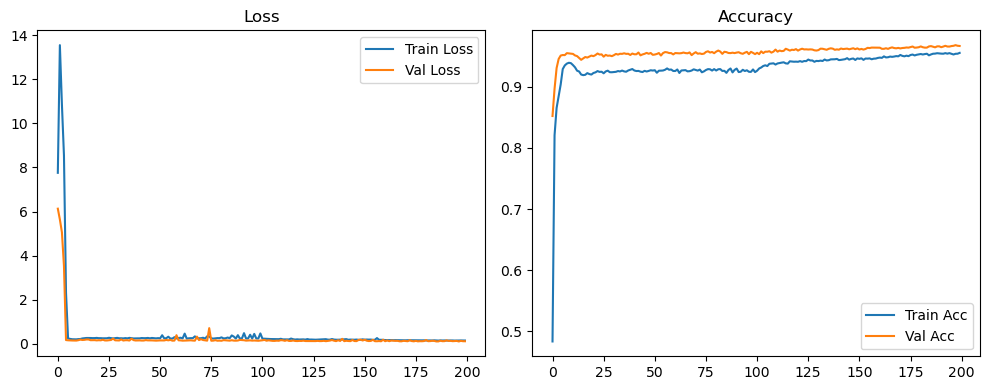

Evaluation:   0%|          | 0/157 [00:00<?, ?it/s]

Evaluation:   6%|▌         | 9/157 [00:00<00:01, 84.01it/s]

Evaluation:  11%|█▏        | 18/157 [00:00<00:01, 84.68it/s]

Evaluation:  17%|█▋        | 27/157 [00:00<00:01, 84.82it/s]

Evaluation:  23%|██▎       | 36/157 [00:00<00:01, 84.98it/s]

Evaluation:  29%|██▊       | 45/157 [00:00<00:01, 83.53it/s]

Evaluation:  34%|███▍      | 54/157 [00:00<00:01, 82.23it/s]

Evaluation:  40%|████      | 63/157 [00:00<00:01, 81.70it/s]

Evaluation:  46%|████▌     | 72/157 [00:00<00:01, 81.81it/s]

Evaluation:  52%|█████▏    | 81/157 [00:00<00:00, 81.74it/s]

Evaluation:  57%|█████▋    | 90/157 [00:01<00:00, 81.92it/s]

Evaluation:  63%|██████▎   | 99/157 [00:01<00:00, 81.84it/s]

Evaluation:  69%|██████▉   | 108/157 [00:01<00:00, 81.15it/s]

Evaluation:  75%|███████▍  | 117/157 [00:01<00:00, 80.96it/s]

Evaluation:  80%|████████  | 126/157 [00:01<00:00, 81.29it/s]

Evaluation:  86%|████████▌ | 135/157 [00:01<00:00, 81.45it/s]

Evaluation:  92%|█████████▏| 144/157 [00:01<00:00, 81.55it/s]

Evaluation:  97%|█████████▋| 153/157 [00:01<00:00, 81.75it/s]

Evaluation: 100%|██████████| 157/157 [00:01<00:00, 82.34it/s]

Original Model Final Test Loss: 0.1147 Accuracy: 0.9690


🚀 Running: batch64_lr0.01_0.005_0.001_dp0.0


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.5539 | Val Acc: 0.8413 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.010 | Train Acc: 0.5539 | Val Acc: 0.8413 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.010 | Train Acc: 0.5539 | Val Acc: 0.8413 |:   0%|          | 1/200 [00:13<45:28, 13.71s/it]

| LR: 0.010 | Train Acc: 0.8578 | Val Acc: 0.9067 |:   0%|          | 1/200 [00:27<45:28, 13.71s/it]

| LR: 0.010 | Train Acc: 0.8578 | Val Acc: 0.9067 |:   0%|          | 1/200 [00:27<45:28, 13.71s/it]

| LR: 0.010 | Train Acc: 0.8578 | Val Acc: 0.9067 |:   1%|          | 2/200 [00:27<44:30, 13.49s/it]

| LR: 0.010 | Train Acc: 0.8986 | Val Acc: 0.9178 |:   1%|          | 2/200 [00:40<44:30, 13.49s/it]

| LR: 0.010 | Train Acc: 0.8986 | Val Acc: 0.9178 |:   1%|          | 2/200 [00:40<44:30, 13.49s/it]

| LR: 0.010 | Train Acc: 0.8986 | Val Acc: 0.9178 |:   2%|▏         | 3/200 [00:40<44:19, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9141 | Val Acc: 0.9278 |:   2%|▏         | 3/200 [00:54<44:19, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9141 | Val Acc: 0.9278 |:   2%|▏         | 3/200 [00:54<44:19, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9141 | Val Acc: 0.9278 |:   2%|▏         | 4/200 [00:54<44:29, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9281 | Val Acc: 0.9343 |:   2%|▏         | 4/200 [01:07<44:29, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9281 | Val Acc: 0.9343 |:   2%|▏         | 4/200 [01:07<44:29, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9281 | Val Acc: 0.9343 |:   2%|▎         | 5/200 [01:07<44:01, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9359 | Val Acc: 0.9322 |:   2%|▎         | 5/200 [01:21<44:01, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9359 | Val Acc: 0.9322 |:   2%|▎         | 5/200 [01:21<44:01, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9359 | Val Acc: 0.9322 |:   3%|▎         | 6/200 [01:21<44:00, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9403 | Val Acc: 0.9465 |:   3%|▎         | 6/200 [01:35<44:00, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9403 | Val Acc: 0.9465 |:   3%|▎         | 6/200 [01:35<44:00, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9403 | Val Acc: 0.9465 |:   4%|▎         | 7/200 [01:35<43:56, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9451 |:   4%|▎         | 7/200 [01:49<43:56, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9451 |:   4%|▎         | 7/200 [01:49<43:56, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9451 |:   4%|▍         | 8/200 [01:49<43:57, 13.73s/it]

| LR: 0.010 | Train Acc: 0.9541 | Val Acc: 0.9522 |:   4%|▍         | 8/200 [02:02<43:57, 13.73s/it]

| LR: 0.010 | Train Acc: 0.9541 | Val Acc: 0.9522 |:   4%|▍         | 8/200 [02:02<43:57, 13.73s/it]

| LR: 0.010 | Train Acc: 0.9541 | Val Acc: 0.9522 |:   4%|▍         | 9/200 [02:02<43:25, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9633 | Val Acc: 0.9601 |:   4%|▍         | 9/200 [02:15<43:25, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9633 | Val Acc: 0.9601 |:   4%|▍         | 9/200 [02:15<43:25, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9633 | Val Acc: 0.9601 |:   5%|▌         | 10/200 [02:16<42:58, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9742 | Val Acc: 0.9627 |:   5%|▌         | 10/200 [02:30<42:58, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9742 | Val Acc: 0.9627 |:   5%|▌         | 10/200 [02:30<42:58, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9742 | Val Acc: 0.9627 |:   6%|▌         | 11/200 [02:30<43:19, 13.76s/it]

| LR: 0.010 | Train Acc: 0.9799 | Val Acc: 0.9637 |:   6%|▌         | 11/200 [02:43<43:19, 13.76s/it]

| LR: 0.010 | Train Acc: 0.9799 | Val Acc: 0.9637 |:   6%|▌         | 11/200 [02:43<43:19, 13.76s/it]

| LR: 0.010 | Train Acc: 0.9799 | Val Acc: 0.9637 |:   6%|▌         | 12/200 [02:43<43:01, 13.73s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9622 |:   6%|▌         | 12/200 [02:57<43:01, 13.73s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9622 |:   6%|▌         | 12/200 [02:57<43:01, 13.73s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9622 |:   6%|▋         | 13/200 [02:57<42:29, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9774 | Val Acc: 0.9608 |:   6%|▋         | 13/200 [03:10<42:29, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9774 | Val Acc: 0.9608 |:   6%|▋         | 13/200 [03:10<42:29, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9774 | Val Acc: 0.9608 |:   7%|▋         | 14/200 [03:10<42:00, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9770 | Val Acc: 0.9618 |:   7%|▋         | 14/200 [03:25<42:00, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9770 | Val Acc: 0.9618 |:   7%|▋         | 14/200 [03:25<42:00, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9770 | Val Acc: 0.9618 |:   8%|▊         | 15/200 [03:25<43:16, 14.03s/it]

| LR: 0.010 | Train Acc: 0.9752 | Val Acc: 0.9614 |:   8%|▊         | 15/200 [03:41<43:16, 14.03s/it]

| LR: 0.010 | Train Acc: 0.9752 | Val Acc: 0.9614 |:   8%|▊         | 15/200 [03:41<43:16, 14.03s/it]

| LR: 0.010 | Train Acc: 0.9752 | Val Acc: 0.9614 |:   8%|▊         | 16/200 [03:41<44:15, 14.43s/it]

| LR: 0.010 | Train Acc: 0.9738 | Val Acc: 0.9567 |:   8%|▊         | 16/200 [03:56<44:15, 14.43s/it]

| LR: 0.010 | Train Acc: 0.9738 | Val Acc: 0.9567 |:   8%|▊         | 16/200 [03:56<44:15, 14.43s/it]

| LR: 0.010 | Train Acc: 0.9738 | Val Acc: 0.9567 |:   8%|▊         | 17/200 [03:56<44:35, 14.62s/it]

| LR: 0.010 | Train Acc: 0.9720 | Val Acc: 0.9580 |:   8%|▊         | 17/200 [04:09<44:35, 14.62s/it]

| LR: 0.010 | Train Acc: 0.9720 | Val Acc: 0.9580 |:   8%|▊         | 17/200 [04:09<44:35, 14.62s/it]

| LR: 0.010 | Train Acc: 0.9720 | Val Acc: 0.9580 |:   9%|▉         | 18/200 [04:09<43:16, 14.27s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9553 |:   9%|▉         | 18/200 [04:23<43:16, 14.27s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9553 |:   9%|▉         | 18/200 [04:23<43:16, 14.27s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9553 |:  10%|▉         | 19/200 [04:23<42:24, 14.06s/it]

| LR: 0.010 | Train Acc: 0.9733 | Val Acc: 0.9604 |:  10%|▉         | 19/200 [04:36<42:24, 14.06s/it]

| LR: 0.010 | Train Acc: 0.9733 | Val Acc: 0.9604 |:  10%|▉         | 19/200 [04:36<42:24, 14.06s/it]

| LR: 0.010 | Train Acc: 0.9733 | Val Acc: 0.9604 |:  10%|█         | 20/200 [04:36<41:31, 13.84s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9574 |:  10%|█         | 20/200 [04:50<41:31, 13.84s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9574 |:  10%|█         | 20/200 [04:50<41:31, 13.84s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9574 |:  10%|█         | 21/200 [04:50<41:01, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9730 | Val Acc: 0.9623 |:  10%|█         | 21/200 [05:03<41:01, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9730 | Val Acc: 0.9623 |:  10%|█         | 21/200 [05:03<41:01, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9730 | Val Acc: 0.9623 |:  11%|█         | 22/200 [05:03<40:38, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9752 | Val Acc: 0.9600 |:  11%|█         | 22/200 [05:17<40:38, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9752 | Val Acc: 0.9600 |:  11%|█         | 22/200 [05:17<40:38, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9752 | Val Acc: 0.9600 |:  12%|█▏        | 23/200 [05:17<40:21, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9755 | Val Acc: 0.9571 |:  12%|█▏        | 23/200 [05:30<40:21, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9755 | Val Acc: 0.9571 |:  12%|█▏        | 23/200 [05:30<40:21, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9755 | Val Acc: 0.9571 |:  12%|█▏        | 24/200 [05:30<40:00, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9767 | Val Acc: 0.9629 |:  12%|█▏        | 24/200 [05:46<40:00, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9767 | Val Acc: 0.9629 |:  12%|█▏        | 24/200 [05:46<40:00, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9767 | Val Acc: 0.9629 |:  12%|█▎        | 25/200 [05:46<41:16, 14.15s/it]

| LR: 0.010 | Train Acc: 0.9778 | Val Acc: 0.9552 |:  12%|█▎        | 25/200 [05:59<41:16, 14.15s/it]

| LR: 0.010 | Train Acc: 0.9778 | Val Acc: 0.9552 |:  12%|█▎        | 25/200 [05:59<41:16, 14.15s/it]

| LR: 0.010 | Train Acc: 0.9778 | Val Acc: 0.9552 |:  13%|█▎        | 26/200 [05:59<40:26, 13.95s/it]

| LR: 0.010 | Train Acc: 0.9766 | Val Acc: 0.9608 |:  13%|█▎        | 26/200 [06:13<40:26, 13.95s/it]

| LR: 0.010 | Train Acc: 0.9766 | Val Acc: 0.9608 |:  13%|█▎        | 26/200 [06:13<40:26, 13.95s/it]

| LR: 0.010 | Train Acc: 0.9766 | Val Acc: 0.9608 |:  14%|█▎        | 27/200 [06:13<39:47, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9771 | Val Acc: 0.9594 |:  14%|█▎        | 27/200 [06:26<39:47, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9771 | Val Acc: 0.9594 |:  14%|█▎        | 27/200 [06:26<39:47, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9771 | Val Acc: 0.9594 |:  14%|█▍        | 28/200 [06:26<39:18, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9622 |:  14%|█▍        | 28/200 [06:40<39:18, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9622 |:  14%|█▍        | 28/200 [06:40<39:18, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9622 |:  14%|█▍        | 29/200 [06:40<38:58, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9620 |:  14%|█▍        | 29/200 [06:53<38:58, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9620 |:  14%|█▍        | 29/200 [06:53<38:58, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9620 |:  15%|█▌        | 30/200 [06:53<38:37, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9643 |:  15%|█▌        | 30/200 [07:07<38:37, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9643 |:  15%|█▌        | 30/200 [07:07<38:37, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9643 |:  16%|█▌        | 31/200 [07:07<38:13, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9593 |:  16%|█▌        | 31/200 [07:21<38:13, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9593 |:  16%|█▌        | 31/200 [07:21<38:13, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9593 |:  16%|█▌        | 32/200 [07:22<39:02, 13.94s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9619 |:  16%|█▌        | 32/200 [07:35<39:02, 13.94s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9619 |:  16%|█▌        | 32/200 [07:35<39:02, 13.94s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9619 |:  16%|█▋        | 33/200 [07:35<38:28, 13.82s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9621 |:  16%|█▋        | 33/200 [07:48<38:28, 13.82s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9621 |:  16%|█▋        | 33/200 [07:48<38:28, 13.82s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9621 |:  17%|█▋        | 34/200 [07:48<37:50, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9612 |:  17%|█▋        | 34/200 [08:02<37:50, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9612 |:  17%|█▋        | 34/200 [08:02<37:50, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9612 |:  18%|█▊        | 35/200 [08:02<37:30, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9609 |:  18%|█▊        | 35/200 [08:15<37:30, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9609 |:  18%|█▊        | 35/200 [08:15<37:30, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9609 |:  18%|█▊        | 36/200 [08:15<37:08, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9612 |:  18%|█▊        | 36/200 [08:29<37:08, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9612 |:  18%|█▊        | 36/200 [08:29<37:08, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9612 |:  18%|█▊        | 37/200 [08:29<37:06, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9603 |:  18%|█▊        | 37/200 [08:43<37:06, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9603 |:  18%|█▊        | 37/200 [08:43<37:06, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9603 |:  19%|█▉        | 38/200 [08:43<37:01, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9567 |:  19%|█▉        | 38/200 [08:57<37:01, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9567 |:  19%|█▉        | 38/200 [08:57<37:01, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9567 |:  20%|█▉        | 39/200 [08:57<36:44, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9633 |:  20%|█▉        | 39/200 [09:10<36:44, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9633 |:  20%|█▉        | 39/200 [09:10<36:44, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9633 |:  20%|██        | 40/200 [09:10<36:13, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9618 |:  20%|██        | 40/200 [09:24<36:13, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9618 |:  20%|██        | 40/200 [09:24<36:13, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9618 |:  20%|██        | 41/200 [09:24<36:09, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9827 | Val Acc: 0.9637 |:  20%|██        | 41/200 [09:37<36:09, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9827 | Val Acc: 0.9637 |:  20%|██        | 41/200 [09:37<36:09, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9827 | Val Acc: 0.9637 |:  21%|██        | 42/200 [09:37<35:51, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9828 | Val Acc: 0.9653 |:  21%|██        | 42/200 [09:51<35:51, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9828 | Val Acc: 0.9653 |:  21%|██        | 42/200 [09:51<35:51, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9828 | Val Acc: 0.9653 |:  22%|██▏       | 43/200 [09:51<35:32, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9838 | Val Acc: 0.9640 |:  22%|██▏       | 43/200 [10:04<35:32, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9838 | Val Acc: 0.9640 |:  22%|██▏       | 43/200 [10:04<35:32, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9838 | Val Acc: 0.9640 |:  22%|██▏       | 44/200 [10:05<35:20, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9600 |:  22%|██▏       | 44/200 [10:18<35:20, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9600 |:  22%|██▏       | 44/200 [10:18<35:20, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9600 |:  22%|██▎       | 45/200 [10:18<34:59, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9619 |:  22%|██▎       | 45/200 [10:31<34:59, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9619 |:  22%|██▎       | 45/200 [10:31<34:59, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9619 |:  23%|██▎       | 46/200 [10:31<34:37, 13.49s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9612 |:  23%|██▎       | 46/200 [10:46<34:37, 13.49s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9612 |:  23%|██▎       | 46/200 [10:46<34:37, 13.49s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9612 |:  24%|██▎       | 47/200 [10:46<35:01, 13.73s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9614 |:  24%|██▎       | 47/200 [10:59<35:01, 13.73s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9614 |:  24%|██▎       | 47/200 [10:59<35:01, 13.73s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9614 |:  24%|██▍       | 48/200 [10:59<34:43, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9647 |:  24%|██▍       | 48/200 [11:13<34:43, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9647 |:  24%|██▍       | 48/200 [11:13<34:43, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9647 |:  24%|██▍       | 49/200 [11:13<34:20, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9844 | Val Acc: 0.9633 |:  24%|██▍       | 49/200 [11:27<34:20, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9844 | Val Acc: 0.9633 |:  24%|██▍       | 49/200 [11:27<34:20, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9844 | Val Acc: 0.9633 |:  25%|██▌       | 50/200 [11:27<34:32, 13.81s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9634 |:  25%|██▌       | 50/200 [11:40<34:32, 13.81s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9634 |:  25%|██▌       | 50/200 [11:40<34:32, 13.81s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9634 |:  26%|██▌       | 51/200 [11:40<34:01, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9632 |:  26%|██▌       | 51/200 [11:54<34:01, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9632 |:  26%|██▌       | 51/200 [11:54<34:01, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9632 |:  26%|██▌       | 52/200 [11:54<33:32, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9828 | Val Acc: 0.9650 |:  26%|██▌       | 52/200 [12:07<33:32, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9828 | Val Acc: 0.9650 |:  26%|██▌       | 52/200 [12:07<33:32, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9828 | Val Acc: 0.9650 |:  26%|██▋       | 53/200 [12:07<33:18, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9825 | Val Acc: 0.9625 |:  26%|██▋       | 53/200 [12:21<33:18, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9825 | Val Acc: 0.9625 |:  26%|██▋       | 53/200 [12:21<33:18, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9825 | Val Acc: 0.9625 |:  27%|██▋       | 54/200 [12:21<33:04, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9613 |:  27%|██▋       | 54/200 [12:34<33:04, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9613 |:  27%|██▋       | 54/200 [12:34<33:04, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9613 |:  28%|██▊       | 55/200 [12:34<32:47, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9639 |:  28%|██▊       | 55/200 [12:48<32:47, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9639 |:  28%|██▊       | 55/200 [12:48<32:47, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9639 |:  28%|██▊       | 56/200 [12:48<32:33, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9846 | Val Acc: 0.9635 |:  28%|██▊       | 56/200 [13:01<32:33, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9846 | Val Acc: 0.9635 |:  28%|██▊       | 56/200 [13:01<32:33, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9846 | Val Acc: 0.9635 |:  28%|██▊       | 57/200 [13:01<32:11, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9828 | Val Acc: 0.9633 |:  28%|██▊       | 57/200 [13:15<32:11, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9828 | Val Acc: 0.9633 |:  28%|██▊       | 57/200 [13:15<32:11, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9828 | Val Acc: 0.9633 |:  29%|██▉       | 58/200 [13:15<31:57, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9840 | Val Acc: 0.9650 |:  29%|██▉       | 58/200 [13:28<31:57, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9840 | Val Acc: 0.9650 |:  29%|██▉       | 58/200 [13:28<31:57, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9840 | Val Acc: 0.9650 |:  30%|██▉       | 59/200 [13:28<31:42, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9667 |:  30%|██▉       | 59/200 [13:42<31:42, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9667 |:  30%|██▉       | 59/200 [13:42<31:42, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9667 |:  30%|███       | 60/200 [13:42<31:33, 13.52s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9641 |:  30%|███       | 60/200 [13:56<31:33, 13.52s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9641 |:  30%|███       | 60/200 [13:56<31:33, 13.52s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9641 |:  30%|███       | 61/200 [13:56<31:25, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9826 | Val Acc: 0.9589 |:  30%|███       | 61/200 [14:10<31:25, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9826 | Val Acc: 0.9589 |:  30%|███       | 61/200 [14:10<31:25, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9826 | Val Acc: 0.9589 |:  31%|███       | 62/200 [14:10<31:34, 13.73s/it]

| LR: 0.010 | Train Acc: 0.9839 | Val Acc: 0.9607 |:  31%|███       | 62/200 [14:23<31:34, 13.73s/it]

| LR: 0.010 | Train Acc: 0.9839 | Val Acc: 0.9607 |:  31%|███       | 62/200 [14:23<31:34, 13.73s/it]

| LR: 0.010 | Train Acc: 0.9839 | Val Acc: 0.9607 |:  32%|███▏      | 63/200 [14:23<31:16, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9645 |:  32%|███▏      | 63/200 [14:37<31:16, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9645 |:  32%|███▏      | 63/200 [14:37<31:16, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9645 |:  32%|███▏      | 64/200 [14:37<31:22, 13.84s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9667 |:  32%|███▏      | 64/200 [14:51<31:22, 13.84s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9667 |:  32%|███▏      | 64/200 [14:51<31:22, 13.84s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9667 |:  32%|███▎      | 65/200 [14:51<31:03, 13.81s/it]

| LR: 0.010 | Train Acc: 0.9844 | Val Acc: 0.9592 |:  32%|███▎      | 65/200 [15:05<31:03, 13.81s/it]

| LR: 0.010 | Train Acc: 0.9844 | Val Acc: 0.9592 |:  32%|███▎      | 65/200 [15:05<31:03, 13.81s/it]

| LR: 0.010 | Train Acc: 0.9844 | Val Acc: 0.9592 |:  33%|███▎      | 66/200 [15:05<30:40, 13.74s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9625 |:  33%|███▎      | 66/200 [15:18<30:40, 13.74s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9625 |:  33%|███▎      | 66/200 [15:18<30:40, 13.74s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9625 |:  34%|███▎      | 67/200 [15:18<30:18, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9840 | Val Acc: 0.9601 |:  34%|███▎      | 67/200 [15:33<30:18, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9840 | Val Acc: 0.9601 |:  34%|███▎      | 67/200 [15:33<30:18, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9840 | Val Acc: 0.9601 |:  34%|███▍      | 68/200 [15:33<31:00, 14.09s/it]

| LR: 0.010 | Train Acc: 0.9845 | Val Acc: 0.9628 |:  34%|███▍      | 68/200 [15:47<31:00, 14.09s/it]

| LR: 0.010 | Train Acc: 0.9845 | Val Acc: 0.9628 |:  34%|███▍      | 68/200 [15:47<31:00, 14.09s/it]

| LR: 0.010 | Train Acc: 0.9845 | Val Acc: 0.9628 |:  34%|███▍      | 69/200 [15:47<30:18, 13.88s/it]

| LR: 0.010 | Train Acc: 0.9840 | Val Acc: 0.9604 |:  34%|███▍      | 69/200 [16:00<30:18, 13.88s/it]

| LR: 0.010 | Train Acc: 0.9840 | Val Acc: 0.9604 |:  34%|███▍      | 69/200 [16:00<30:18, 13.88s/it]

| LR: 0.010 | Train Acc: 0.9840 | Val Acc: 0.9604 |:  35%|███▌      | 70/200 [16:00<29:53, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9645 |:  35%|███▌      | 70/200 [16:14<29:53, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9645 |:  35%|███▌      | 70/200 [16:14<29:53, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9645 |:  36%|███▌      | 71/200 [16:14<29:30, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9643 |:  36%|███▌      | 71/200 [16:28<29:30, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9643 |:  36%|███▌      | 71/200 [16:28<29:30, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9643 |:  36%|███▌      | 72/200 [16:28<29:36, 13.88s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9629 |:  36%|███▌      | 72/200 [16:42<29:36, 13.88s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9629 |:  36%|███▌      | 72/200 [16:42<29:36, 13.88s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9629 |:  36%|███▋      | 73/200 [16:42<29:06, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9641 |:  36%|███▋      | 73/200 [16:55<29:06, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9641 |:  36%|███▋      | 73/200 [16:55<29:06, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9641 |:  37%|███▋      | 74/200 [16:55<28:46, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9838 | Val Acc: 0.9631 |:  37%|███▋      | 74/200 [17:09<28:46, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9838 | Val Acc: 0.9631 |:  37%|███▋      | 74/200 [17:09<28:46, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9838 | Val Acc: 0.9631 |:  38%|███▊      | 75/200 [17:09<28:24, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9850 | Val Acc: 0.9617 |:  38%|███▊      | 75/200 [17:23<28:24, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9850 | Val Acc: 0.9617 |:  38%|███▊      | 75/200 [17:23<28:24, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9850 | Val Acc: 0.9617 |:  38%|███▊      | 76/200 [17:23<28:49, 13.94s/it]

| LR: 0.010 | Train Acc: 0.9848 | Val Acc: 0.9649 |:  38%|███▊      | 76/200 [17:37<28:49, 13.94s/it]

| LR: 0.010 | Train Acc: 0.9848 | Val Acc: 0.9649 |:  38%|███▊      | 76/200 [17:37<28:49, 13.94s/it]

| LR: 0.010 | Train Acc: 0.9848 | Val Acc: 0.9649 |:  38%|███▊      | 77/200 [17:37<28:17, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9638 |:  38%|███▊      | 77/200 [17:50<28:17, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9638 |:  38%|███▊      | 77/200 [17:50<28:17, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9638 |:  39%|███▉      | 78/200 [17:50<27:50, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9645 |:  39%|███▉      | 78/200 [18:04<27:50, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9645 |:  39%|███▉      | 78/200 [18:04<27:50, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9645 |:  40%|███▉      | 79/200 [18:04<27:33, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9658 |:  40%|███▉      | 79/200 [18:17<27:33, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9658 |:  40%|███▉      | 79/200 [18:17<27:33, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9658 |:  40%|████      | 80/200 [18:17<27:16, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9641 |:  40%|████      | 80/200 [18:31<27:16, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9641 |:  40%|████      | 80/200 [18:31<27:16, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9641 |:  40%|████      | 81/200 [18:31<27:01, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9647 |:  40%|████      | 81/200 [18:44<27:01, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9647 |:  40%|████      | 81/200 [18:44<27:01, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9647 |:  41%|████      | 82/200 [18:44<26:40, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9634 |:  41%|████      | 82/200 [18:58<26:40, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9634 |:  41%|████      | 82/200 [18:58<26:40, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9634 |:  42%|████▏     | 83/200 [18:58<26:30, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9638 |:  42%|████▏     | 83/200 [19:12<26:30, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9638 |:  42%|████▏     | 83/200 [19:12<26:30, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9638 |:  42%|████▏     | 84/200 [19:12<26:13, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9642 |:  42%|████▏     | 84/200 [19:25<26:13, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9642 |:  42%|████▏     | 84/200 [19:25<26:13, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9642 |:  42%|████▎     | 85/200 [19:25<26:01, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9845 | Val Acc: 0.9653 |:  42%|████▎     | 85/200 [19:39<26:01, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9845 | Val Acc: 0.9653 |:  42%|████▎     | 85/200 [19:39<26:01, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9845 | Val Acc: 0.9653 |:  43%|████▎     | 86/200 [19:39<25:44, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9629 |:  43%|████▎     | 86/200 [19:52<25:44, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9629 |:  43%|████▎     | 86/200 [19:52<25:44, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9629 |:  44%|████▎     | 87/200 [19:52<25:30, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9658 |:  44%|████▎     | 87/200 [20:06<25:30, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9658 |:  44%|████▎     | 87/200 [20:06<25:30, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9658 |:  44%|████▍     | 88/200 [20:06<25:12, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9612 |:  44%|████▍     | 88/200 [20:19<25:12, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9612 |:  44%|████▍     | 88/200 [20:19<25:12, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9612 |:  44%|████▍     | 89/200 [20:19<24:59, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9845 | Val Acc: 0.9647 |:  44%|████▍     | 89/200 [20:33<24:59, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9845 | Val Acc: 0.9647 |:  44%|████▍     | 89/200 [20:33<24:59, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9845 | Val Acc: 0.9647 |:  45%|████▌     | 90/200 [20:33<24:45, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9871 | Val Acc: 0.9670 |:  45%|████▌     | 90/200 [20:46<24:45, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9871 | Val Acc: 0.9670 |:  45%|████▌     | 90/200 [20:46<24:45, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9871 | Val Acc: 0.9670 |:  46%|████▌     | 91/200 [20:46<24:29, 13.48s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9645 |:  46%|████▌     | 91/200 [21:00<24:29, 13.48s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9645 |:  46%|████▌     | 91/200 [21:00<24:29, 13.48s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9645 |:  46%|████▌     | 92/200 [21:00<24:15, 13.48s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9627 |:  46%|████▌     | 92/200 [21:13<24:15, 13.48s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9627 |:  46%|████▌     | 92/200 [21:13<24:15, 13.48s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9627 |:  46%|████▋     | 93/200 [21:13<24:14, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9672 |:  46%|████▋     | 93/200 [21:27<24:14, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9672 |:  46%|████▋     | 93/200 [21:27<24:14, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9672 |:  47%|████▋     | 94/200 [21:27<24:03, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9868 | Val Acc: 0.9652 |:  47%|████▋     | 94/200 [21:41<24:03, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9868 | Val Acc: 0.9652 |:  47%|████▋     | 94/200 [21:41<24:03, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9868 | Val Acc: 0.9652 |:  48%|████▊     | 95/200 [21:41<23:47, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9606 |:  48%|████▊     | 95/200 [21:54<23:47, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9606 |:  48%|████▊     | 95/200 [21:54<23:47, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9606 |:  48%|████▊     | 96/200 [21:54<23:28, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9663 |:  48%|████▊     | 96/200 [22:07<23:28, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9663 |:  48%|████▊     | 96/200 [22:07<23:28, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9663 |:  48%|████▊     | 97/200 [22:07<23:10, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9629 |:  48%|████▊     | 97/200 [22:21<23:10, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9629 |:  48%|████▊     | 97/200 [22:21<23:10, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9629 |:  49%|████▉     | 98/200 [22:21<22:53, 13.47s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9631 |:  49%|████▉     | 98/200 [22:34<22:53, 13.47s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9631 |:  49%|████▉     | 98/200 [22:34<22:53, 13.47s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9631 |:  50%|████▉     | 99/200 [22:34<22:41, 13.48s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9627 |:  50%|████▉     | 99/200 [22:48<22:41, 13.48s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9627 |:  50%|████▉     | 99/200 [22:48<22:41, 13.48s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9627 |:  50%|█████     | 100/200 [22:48<22:26, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9878 | Val Acc: 0.9676 |:  50%|█████     | 100/200 [23:01<22:26, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9878 | Val Acc: 0.9676 |:  50%|█████     | 100/200 [23:01<22:26, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9878 | Val Acc: 0.9676 |:  50%|█████     | 101/200 [23:01<22:15, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9670 |:  50%|█████     | 101/200 [23:15<22:15, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9670 |:  50%|█████     | 101/200 [23:15<22:15, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9670 |:  51%|█████     | 102/200 [23:15<22:00, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9673 |:  51%|█████     | 102/200 [23:28<22:00, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9673 |:  51%|█████     | 102/200 [23:28<22:00, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9673 |:  52%|█████▏    | 103/200 [23:28<21:46, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9669 |:  52%|█████▏    | 103/200 [23:42<21:46, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9669 |:  52%|█████▏    | 103/200 [23:42<21:46, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9669 |:  52%|█████▏    | 104/200 [23:42<21:30, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9897 | Val Acc: 0.9687 |:  52%|█████▏    | 104/200 [23:55<21:30, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9897 | Val Acc: 0.9687 |:  52%|█████▏    | 104/200 [23:55<21:30, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9897 | Val Acc: 0.9687 |:  52%|█████▎    | 105/200 [23:55<21:22, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9680 |:  52%|█████▎    | 105/200 [24:09<21:22, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9680 |:  52%|█████▎    | 105/200 [24:09<21:22, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9680 |:  53%|█████▎    | 106/200 [24:09<21:08, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9913 | Val Acc: 0.9676 |:  53%|█████▎    | 106/200 [24:22<21:08, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9913 | Val Acc: 0.9676 |:  53%|█████▎    | 106/200 [24:22<21:08, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9913 | Val Acc: 0.9676 |:  54%|█████▎    | 107/200 [24:22<20:53, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9699 |:  54%|█████▎    | 107/200 [24:36<20:53, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9699 |:  54%|█████▎    | 107/200 [24:36<20:53, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9699 |:  54%|█████▍    | 108/200 [24:36<20:40, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9649 |:  54%|█████▍    | 108/200 [24:49<20:40, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9649 |:  54%|█████▍    | 108/200 [24:49<20:40, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9649 |:  55%|█████▍    | 109/200 [24:49<20:27, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9698 |:  55%|█████▍    | 109/200 [25:03<20:27, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9698 |:  55%|█████▍    | 109/200 [25:03<20:27, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9698 |:  55%|█████▌    | 110/200 [25:03<20:14, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9708 |:  55%|█████▌    | 110/200 [25:16<20:14, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9708 |:  55%|█████▌    | 110/200 [25:16<20:14, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9708 |:  56%|█████▌    | 111/200 [25:16<20:02, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9682 |:  56%|█████▌    | 111/200 [25:30<20:02, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9682 |:  56%|█████▌    | 111/200 [25:30<20:02, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9682 |:  56%|█████▌    | 112/200 [25:30<19:48, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9682 |:  56%|█████▌    | 112/200 [25:43<19:48, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9682 |:  56%|█████▌    | 112/200 [25:43<19:48, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9682 |:  56%|█████▋    | 113/200 [25:43<19:35, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9656 |:  56%|█████▋    | 113/200 [25:57<19:35, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9656 |:  56%|█████▋    | 113/200 [25:57<19:35, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9656 |:  57%|█████▋    | 114/200 [25:57<19:18, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9671 |:  57%|█████▋    | 114/200 [26:10<19:18, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9671 |:  57%|█████▋    | 114/200 [26:10<19:18, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9671 |:  57%|█████▊    | 115/200 [26:10<19:07, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9689 |:  57%|█████▊    | 115/200 [26:24<19:07, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9689 |:  57%|█████▊    | 115/200 [26:24<19:07, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9689 |:  58%|█████▊    | 116/200 [26:24<19:10, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9698 |:  58%|█████▊    | 116/200 [26:38<19:10, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9698 |:  58%|█████▊    | 116/200 [26:38<19:10, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9698 |:  58%|█████▊    | 117/200 [26:38<18:58, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9683 |:  58%|█████▊    | 117/200 [26:52<18:58, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9683 |:  58%|█████▊    | 117/200 [26:52<18:58, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9683 |:  59%|█████▉    | 118/200 [26:52<18:38, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9688 |:  59%|█████▉    | 118/200 [27:05<18:38, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9688 |:  59%|█████▉    | 118/200 [27:05<18:38, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9688 |:  60%|█████▉    | 119/200 [27:05<18:24, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9711 |:  60%|█████▉    | 119/200 [27:19<18:24, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9711 |:  60%|█████▉    | 119/200 [27:19<18:24, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9711 |:  60%|██████    | 120/200 [27:19<18:09, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9705 |:  60%|██████    | 120/200 [27:32<18:09, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9705 |:  60%|██████    | 120/200 [27:32<18:09, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9705 |:  60%|██████    | 121/200 [27:32<17:53, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9670 |:  60%|██████    | 121/200 [27:46<17:53, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9670 |:  60%|██████    | 121/200 [27:46<17:53, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9670 |:  61%|██████    | 122/200 [27:46<17:39, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9682 |:  61%|██████    | 122/200 [27:59<17:39, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9682 |:  61%|██████    | 122/200 [27:59<17:39, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9682 |:  62%|██████▏   | 123/200 [27:59<17:21, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9691 |:  62%|██████▏   | 123/200 [28:13<17:21, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9691 |:  62%|██████▏   | 123/200 [28:13<17:21, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9691 |:  62%|██████▏   | 124/200 [28:13<17:04, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9672 |:  62%|██████▏   | 124/200 [28:27<17:04, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9672 |:  62%|██████▏   | 124/200 [28:27<17:04, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9672 |:  62%|██████▎   | 125/200 [28:27<17:21, 13.89s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9705 |:  62%|██████▎   | 125/200 [28:44<17:21, 13.89s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9705 |:  62%|██████▎   | 125/200 [28:44<17:21, 13.89s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9705 |:  63%|██████▎   | 126/200 [28:44<18:11, 14.75s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9708 |:  63%|██████▎   | 126/200 [28:58<18:11, 14.75s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9708 |:  63%|██████▎   | 126/200 [28:58<18:11, 14.75s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9708 |:  64%|██████▎   | 127/200 [28:58<17:29, 14.37s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9696 |:  64%|██████▎   | 127/200 [29:11<17:29, 14.37s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9696 |:  64%|██████▎   | 127/200 [29:11<17:29, 14.37s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9696 |:  64%|██████▍   | 128/200 [29:11<16:57, 14.13s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9698 |:  64%|██████▍   | 128/200 [29:25<16:57, 14.13s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9698 |:  64%|██████▍   | 128/200 [29:25<16:57, 14.13s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9698 |:  64%|██████▍   | 129/200 [29:25<16:30, 13.95s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9697 |:  64%|██████▍   | 129/200 [29:38<16:30, 13.95s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9697 |:  64%|██████▍   | 129/200 [29:38<16:30, 13.95s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9697 |:  65%|██████▌   | 130/200 [29:38<16:04, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9687 |:  65%|██████▌   | 130/200 [29:52<16:04, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9687 |:  65%|██████▌   | 130/200 [29:52<16:04, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9687 |:  66%|██████▌   | 131/200 [29:52<15:45, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9706 |:  66%|██████▌   | 131/200 [30:05<15:45, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9706 |:  66%|██████▌   | 131/200 [30:05<15:45, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9706 |:  66%|██████▌   | 132/200 [30:05<15:30, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9678 |:  66%|██████▌   | 132/200 [30:19<15:30, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9678 |:  66%|██████▌   | 132/200 [30:19<15:30, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9678 |:  66%|██████▋   | 133/200 [30:19<15:14, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9696 |:  66%|██████▋   | 133/200 [30:32<15:14, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9696 |:  66%|██████▋   | 133/200 [30:32<15:14, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9696 |:  67%|██████▋   | 134/200 [30:32<14:57, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9680 |:  67%|██████▋   | 134/200 [30:46<14:57, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9680 |:  67%|██████▋   | 134/200 [30:46<14:57, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9680 |:  68%|██████▊   | 135/200 [30:46<14:41, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9667 |:  68%|██████▊   | 135/200 [30:59<14:41, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9667 |:  68%|██████▊   | 135/200 [30:59<14:41, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9667 |:  68%|██████▊   | 136/200 [31:00<14:29, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9702 |:  68%|██████▊   | 136/200 [31:13<14:29, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9702 |:  68%|██████▊   | 136/200 [31:13<14:29, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9702 |:  68%|██████▊   | 137/200 [31:13<14:13, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9682 |:  68%|██████▊   | 137/200 [31:26<14:13, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9682 |:  68%|██████▊   | 137/200 [31:26<14:13, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9682 |:  69%|██████▉   | 138/200 [31:26<13:57, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9671 |:  69%|██████▉   | 138/200 [31:40<13:57, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9671 |:  69%|██████▉   | 138/200 [31:40<13:57, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9671 |:  70%|██████▉   | 139/200 [31:40<13:47, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9674 |:  70%|██████▉   | 139/200 [31:55<13:47, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9674 |:  70%|██████▉   | 139/200 [31:55<13:47, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9674 |:  70%|███████   | 140/200 [31:55<13:55, 13.92s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9677 |:  70%|███████   | 140/200 [32:08<13:55, 13.92s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9677 |:  70%|███████   | 140/200 [32:08<13:55, 13.92s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9677 |:  70%|███████   | 141/200 [32:08<13:34, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9683 |:  70%|███████   | 141/200 [32:22<13:34, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9683 |:  70%|███████   | 141/200 [32:22<13:34, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9683 |:  71%|███████   | 142/200 [32:22<13:17, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9687 |:  71%|███████   | 142/200 [32:35<13:17, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9687 |:  71%|███████   | 142/200 [32:35<13:17, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9687 |:  72%|███████▏  | 143/200 [32:35<12:58, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9691 |:  72%|███████▏  | 143/200 [32:49<12:58, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9691 |:  72%|███████▏  | 143/200 [32:49<12:58, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9691 |:  72%|███████▏  | 144/200 [32:49<12:43, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9693 |:  72%|███████▏  | 144/200 [33:03<12:43, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9693 |:  72%|███████▏  | 144/200 [33:03<12:43, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9693 |:  72%|███████▎  | 145/200 [33:03<12:34, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9707 |:  72%|███████▎  | 145/200 [33:16<12:34, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9707 |:  72%|███████▎  | 145/200 [33:16<12:34, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9707 |:  73%|███████▎  | 146/200 [33:16<12:13, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9683 |:  73%|███████▎  | 146/200 [33:31<12:13, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9683 |:  73%|███████▎  | 146/200 [33:31<12:13, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9683 |:  74%|███████▎  | 147/200 [33:31<12:17, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9701 |:  74%|███████▎  | 147/200 [33:44<12:17, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9701 |:  74%|███████▎  | 147/200 [33:44<12:17, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9701 |:  74%|███████▍  | 148/200 [33:44<11:58, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9687 |:  74%|███████▍  | 148/200 [33:58<11:58, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9687 |:  74%|███████▍  | 148/200 [33:58<11:58, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9687 |:  74%|███████▍  | 149/200 [33:58<11:39, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9687 |:  74%|███████▍  | 149/200 [34:12<11:39, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9687 |:  74%|███████▍  | 149/200 [34:12<11:39, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9687 |:  75%|███████▌  | 150/200 [34:12<11:29, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9937 | Val Acc: 0.9682 |:  75%|███████▌  | 150/200 [34:25<11:29, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9937 | Val Acc: 0.9682 |:  75%|███████▌  | 150/200 [34:25<11:29, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9937 | Val Acc: 0.9682 |:  76%|███████▌  | 151/200 [34:25<11:11, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9667 |:  76%|███████▌  | 151/200 [34:39<11:11, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9667 |:  76%|███████▌  | 151/200 [34:39<11:11, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9667 |:  76%|███████▌  | 152/200 [34:39<10:56, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9681 |:  76%|███████▌  | 152/200 [34:52<10:56, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9681 |:  76%|███████▌  | 152/200 [34:52<10:56, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9681 |:  76%|███████▋  | 153/200 [34:52<10:38, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9686 |:  76%|███████▋  | 153/200 [35:06<10:38, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9686 |:  76%|███████▋  | 153/200 [35:06<10:38, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9686 |:  77%|███████▋  | 154/200 [35:06<10:28, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9674 |:  77%|███████▋  | 154/200 [35:20<10:28, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9674 |:  77%|███████▋  | 154/200 [35:20<10:28, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9674 |:  78%|███████▊  | 155/200 [35:20<10:12, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9704 |:  78%|███████▊  | 155/200 [35:33<10:12, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9704 |:  78%|███████▊  | 155/200 [35:33<10:12, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9704 |:  78%|███████▊  | 156/200 [35:33<09:57, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9937 | Val Acc: 0.9701 |:  78%|███████▊  | 156/200 [35:47<09:57, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9937 | Val Acc: 0.9701 |:  78%|███████▊  | 156/200 [35:47<09:57, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9937 | Val Acc: 0.9701 |:  78%|███████▊  | 157/200 [35:47<09:42, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9695 |:  78%|███████▊  | 157/200 [36:00<09:42, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9695 |:  78%|███████▊  | 157/200 [36:00<09:42, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9695 |:  79%|███████▉  | 158/200 [36:00<09:27, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9937 | Val Acc: 0.9683 |:  79%|███████▉  | 158/200 [36:14<09:27, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9937 | Val Acc: 0.9683 |:  79%|███████▉  | 158/200 [36:14<09:27, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9937 | Val Acc: 0.9683 |:  80%|███████▉  | 159/200 [36:14<09:13, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9696 |:  80%|███████▉  | 159/200 [36:27<09:13, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9696 |:  80%|███████▉  | 159/200 [36:27<09:13, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9696 |:  80%|████████  | 160/200 [36:27<08:59, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9713 |:  80%|████████  | 160/200 [36:41<08:59, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9713 |:  80%|████████  | 160/200 [36:41<08:59, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9713 |:  80%|████████  | 161/200 [36:41<08:49, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9716 |:  80%|████████  | 161/200 [36:54<08:49, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9716 |:  80%|████████  | 161/200 [36:54<08:49, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9716 |:  81%|████████  | 162/200 [36:54<08:34, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9702 |:  81%|████████  | 162/200 [37:08<08:34, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9702 |:  81%|████████  | 162/200 [37:08<08:34, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9702 |:  82%|████████▏ | 163/200 [37:08<08:19, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9689 |:  82%|████████▏ | 163/200 [37:21<08:19, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9689 |:  82%|████████▏ | 163/200 [37:21<08:19, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9689 |:  82%|████████▏ | 164/200 [37:21<08:06, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9692 |:  82%|████████▏ | 164/200 [37:35<08:06, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9692 |:  82%|████████▏ | 164/200 [37:35<08:06, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9692 |:  82%|████████▎ | 165/200 [37:35<07:51, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9702 |:  82%|████████▎ | 165/200 [37:48<07:51, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9702 |:  82%|████████▎ | 165/200 [37:48<07:51, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9702 |:  83%|████████▎ | 166/200 [37:48<07:39, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9710 |:  83%|████████▎ | 166/200 [38:02<07:39, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9710 |:  83%|████████▎ | 166/200 [38:02<07:39, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9710 |:  84%|████████▎ | 167/200 [38:02<07:31, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9706 |:  84%|████████▎ | 167/200 [38:16<07:31, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9706 |:  84%|████████▎ | 167/200 [38:16<07:31, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9706 |:  84%|████████▍ | 168/200 [38:16<07:15, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9699 |:  84%|████████▍ | 168/200 [38:30<07:15, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9699 |:  84%|████████▍ | 168/200 [38:30<07:15, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9699 |:  84%|████████▍ | 169/200 [38:30<07:03, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9716 |:  84%|████████▍ | 169/200 [38:43<07:03, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9716 |:  84%|████████▍ | 169/200 [38:43<07:03, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9716 |:  85%|████████▌ | 170/200 [38:43<06:48, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9706 |:  85%|████████▌ | 170/200 [38:56<06:48, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9706 |:  85%|████████▌ | 170/200 [38:56<06:48, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9706 |:  86%|████████▌ | 171/200 [38:57<06:33, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9704 |:  86%|████████▌ | 171/200 [39:10<06:33, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9704 |:  86%|████████▌ | 171/200 [39:10<06:33, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9704 |:  86%|████████▌ | 172/200 [39:10<06:19, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9699 |:  86%|████████▌ | 172/200 [39:24<06:19, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9699 |:  86%|████████▌ | 172/200 [39:24<06:19, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9699 |:  86%|████████▋ | 173/200 [39:24<06:06, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9709 |:  86%|████████▋ | 173/200 [39:37<06:06, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9709 |:  86%|████████▋ | 173/200 [39:37<06:06, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9709 |:  87%|████████▋ | 174/200 [39:37<05:52, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9695 |:  87%|████████▋ | 174/200 [39:51<05:52, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9695 |:  87%|████████▋ | 174/200 [39:51<05:52, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9695 |:  88%|████████▊ | 175/200 [39:51<05:39, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9723 |:  88%|████████▊ | 175/200 [40:04<05:39, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9723 |:  88%|████████▊ | 175/200 [40:04<05:39, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9723 |:  88%|████████▊ | 176/200 [40:04<05:25, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9709 |:  88%|████████▊ | 176/200 [40:18<05:25, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9709 |:  88%|████████▊ | 176/200 [40:18<05:25, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9709 |:  88%|████████▊ | 177/200 [40:18<05:11, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9703 |:  88%|████████▊ | 177/200 [40:31<05:11, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9703 |:  88%|████████▊ | 177/200 [40:31<05:11, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9703 |:  89%|████████▉ | 178/200 [40:32<04:59, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9712 |:  89%|████████▉ | 178/200 [40:45<04:59, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9712 |:  89%|████████▉ | 178/200 [40:45<04:59, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9712 |:  90%|████████▉ | 179/200 [40:45<04:46, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9708 |:  90%|████████▉ | 179/200 [40:59<04:46, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9708 |:  90%|████████▉ | 179/200 [40:59<04:46, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9708 |:  90%|█████████ | 180/200 [40:59<04:32, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9713 |:  90%|█████████ | 180/200 [41:12<04:32, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9713 |:  90%|█████████ | 180/200 [41:12<04:32, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9713 |:  90%|█████████ | 181/200 [41:12<04:17, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9712 |:  90%|█████████ | 181/200 [41:26<04:17, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9712 |:  90%|█████████ | 181/200 [41:26<04:17, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9712 |:  91%|█████████ | 182/200 [41:26<04:03, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9710 |:  91%|█████████ | 182/200 [41:42<04:03, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9710 |:  91%|█████████ | 182/200 [41:42<04:03, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9710 |:  92%|█████████▏| 183/200 [41:42<04:02, 14.24s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9713 |:  92%|█████████▏| 183/200 [41:55<04:02, 14.24s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9713 |:  92%|█████████▏| 183/200 [41:55<04:02, 14.24s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9713 |:  92%|█████████▏| 184/200 [41:55<03:44, 14.02s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9702 |:  92%|█████████▏| 184/200 [42:08<03:44, 14.02s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9702 |:  92%|█████████▏| 184/200 [42:08<03:44, 14.02s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9702 |:  92%|█████████▎| 185/200 [42:09<03:27, 13.84s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9731 |:  92%|█████████▎| 185/200 [42:22<03:27, 13.84s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9731 |:  92%|█████████▎| 185/200 [42:22<03:27, 13.84s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9731 |:  93%|█████████▎| 186/200 [42:22<03:12, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9713 |:  93%|█████████▎| 186/200 [42:36<03:12, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9713 |:  93%|█████████▎| 186/200 [42:36<03:12, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9713 |:  94%|█████████▎| 187/200 [42:36<02:59, 13.78s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9725 |:  94%|█████████▎| 187/200 [42:50<02:59, 13.78s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9725 |:  94%|█████████▎| 187/200 [42:50<02:59, 13.78s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9725 |:  94%|█████████▍| 188/200 [42:50<02:47, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9720 |:  94%|█████████▍| 188/200 [43:06<02:47, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9720 |:  94%|█████████▍| 188/200 [43:06<02:47, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9720 |:  94%|█████████▍| 189/200 [43:06<02:38, 14.45s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9715 |:  94%|█████████▍| 189/200 [43:19<02:38, 14.45s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9715 |:  94%|█████████▍| 189/200 [43:19<02:38, 14.45s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9715 |:  95%|█████████▌| 190/200 [43:19<02:21, 14.20s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9722 |:  95%|█████████▌| 190/200 [43:33<02:21, 14.20s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9722 |:  95%|█████████▌| 190/200 [43:33<02:21, 14.20s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9722 |:  96%|█████████▌| 191/200 [43:33<02:05, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9718 |:  96%|█████████▌| 191/200 [43:46<02:05, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9718 |:  96%|█████████▌| 191/200 [43:46<02:05, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9718 |:  96%|█████████▌| 192/200 [43:46<01:50, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9716 |:  96%|█████████▌| 192/200 [44:00<01:50, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9716 |:  96%|█████████▌| 192/200 [44:00<01:50, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9716 |:  96%|█████████▋| 193/200 [44:00<01:36, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9708 |:  96%|█████████▋| 193/200 [44:14<01:36, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9708 |:  96%|█████████▋| 193/200 [44:14<01:36, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9708 |:  97%|█████████▋| 194/200 [44:14<01:22, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9709 |:  97%|█████████▋| 194/200 [44:28<01:22, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9709 |:  97%|█████████▋| 194/200 [44:28<01:22, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9709 |:  98%|█████████▊| 195/200 [44:28<01:09, 13.88s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9708 |:  98%|█████████▊| 195/200 [44:42<01:09, 13.88s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9708 |:  98%|█████████▊| 195/200 [44:42<01:09, 13.88s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9708 |:  98%|█████████▊| 196/200 [44:42<00:55, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9727 |:  98%|█████████▊| 196/200 [44:55<00:55, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9727 |:  98%|█████████▊| 196/200 [44:55<00:55, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9727 |:  98%|█████████▊| 197/200 [44:55<00:41, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9718 |:  98%|█████████▊| 197/200 [45:09<00:41, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9718 |:  98%|█████████▊| 197/200 [45:09<00:41, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9718 |:  99%|█████████▉| 198/200 [45:09<00:27, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9715 |:  99%|█████████▉| 198/200 [45:22<00:27, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9715 |:  99%|█████████▉| 198/200 [45:22<00:27, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9715 |: 100%|█████████▉| 199/200 [45:22<00:13, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9715 |: 100%|█████████▉| 199/200 [45:36<00:13, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9715 |: 100%|█████████▉| 199/200 [45:36<00:13, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9715 |: 100%|██████████| 200/200 [45:36<00:00, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9715 |: 100%|██████████| 200/200 [45:36<00:00, 13.68s/it]

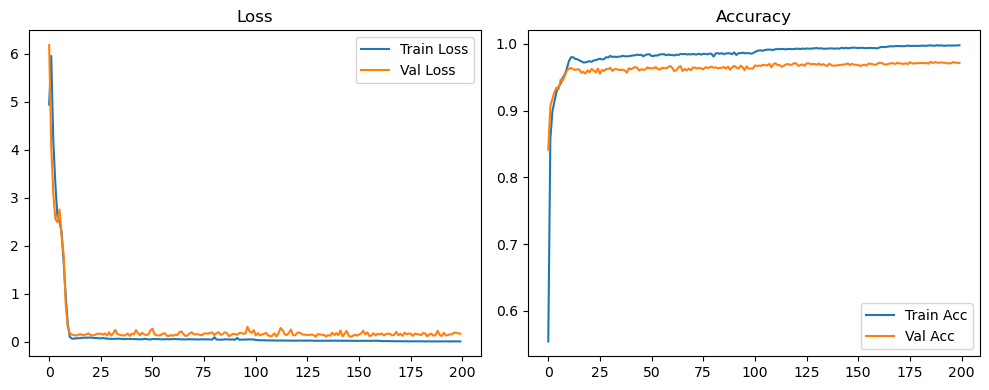

Evaluation:   0%|          | 0/157 [00:00<?, ?it/s]

Evaluation:   6%|▌         | 9/157 [00:00<00:01, 84.18it/s]

Evaluation:  11%|█▏        | 18/157 [00:00<00:01, 84.72it/s]

Evaluation:  17%|█▋        | 27/157 [00:00<00:01, 84.83it/s]

Evaluation:  23%|██▎       | 36/157 [00:00<00:01, 85.09it/s]

Evaluation:  29%|██▊       | 45/157 [00:00<00:01, 85.16it/s]

Evaluation:  34%|███▍      | 54/157 [00:00<00:01, 85.21it/s]

Evaluation:  40%|████      | 63/157 [00:00<00:01, 85.19it/s]

Evaluation:  46%|████▌     | 72/157 [00:00<00:00, 85.18it/s]

Evaluation:  52%|█████▏    | 81/157 [00:00<00:00, 85.22it/s]

Evaluation:  57%|█████▋    | 90/157 [00:01<00:00, 84.97it/s]

Evaluation:  63%|██████▎   | 99/157 [00:01<00:00, 84.02it/s]

Evaluation:  69%|██████▉   | 108/157 [00:01<00:00, 83.30it/s]

Evaluation:  75%|███████▍  | 117/157 [00:01<00:00, 82.95it/s]

Evaluation:  80%|████████  | 126/157 [00:01<00:00, 83.14it/s]

Evaluation:  86%|████████▌ | 135/157 [00:01<00:00, 83.60it/s]

Evaluation:  92%|█████████▏| 144/157 [00:01<00:00, 84.11it/s]

Evaluation:  97%|█████████▋| 153/157 [00:01<00:00, 84.36it/s]

Evaluation: 100%|██████████| 157/157 [00:01<00:00, 84.64it/s]

Original Model Final Test Loss: 0.1553 Accuracy: 0.9743


🚀 Running: batch64_lr0.01_0.005_0.001_dp0.2


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.5248 | Val Acc: 0.8441 |:   0%|          | 0/200 [00:14<?, ?it/s]

| LR: 0.010 | Train Acc: 0.5248 | Val Acc: 0.8441 |:   0%|          | 0/200 [00:14<?, ?it/s]

| LR: 0.010 | Train Acc: 0.5248 | Val Acc: 0.8441 |:   0%|          | 1/200 [00:14<46:48, 14.11s/it]

| LR: 0.010 | Train Acc: 0.8464 | Val Acc: 0.9029 |:   0%|          | 1/200 [00:28<46:48, 14.11s/it]

| LR: 0.010 | Train Acc: 0.8464 | Val Acc: 0.9029 |:   0%|          | 1/200 [00:28<46:48, 14.11s/it]

| LR: 0.010 | Train Acc: 0.8464 | Val Acc: 0.9029 |:   1%|          | 2/200 [00:28<46:51, 14.20s/it]

| LR: 0.010 | Train Acc: 0.8876 | Val Acc: 0.9237 |:   1%|          | 2/200 [00:42<46:51, 14.20s/it]

| LR: 0.010 | Train Acc: 0.8876 | Val Acc: 0.9237 |:   1%|          | 2/200 [00:42<46:51, 14.20s/it]

| LR: 0.010 | Train Acc: 0.8876 | Val Acc: 0.9237 |:   2%|▏         | 3/200 [00:42<45:58, 14.00s/it]

| LR: 0.010 | Train Acc: 0.9070 | Val Acc: 0.9297 |:   2%|▏         | 3/200 [00:55<45:58, 14.00s/it]

| LR: 0.010 | Train Acc: 0.9070 | Val Acc: 0.9297 |:   2%|▏         | 3/200 [00:55<45:58, 14.00s/it]

| LR: 0.010 | Train Acc: 0.9070 | Val Acc: 0.9297 |:   2%|▏         | 4/200 [00:55<44:34, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9179 | Val Acc: 0.9437 |:   2%|▏         | 4/200 [01:08<44:34, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9179 | Val Acc: 0.9437 |:   2%|▏         | 4/200 [01:08<44:34, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9179 | Val Acc: 0.9437 |:   2%|▎         | 5/200 [01:08<43:53, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9287 | Val Acc: 0.9469 |:   2%|▎         | 5/200 [01:23<43:53, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9287 | Val Acc: 0.9469 |:   2%|▎         | 5/200 [01:23<43:53, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9287 | Val Acc: 0.9469 |:   3%|▎         | 6/200 [01:23<45:05, 13.94s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9517 |:   3%|▎         | 6/200 [01:36<45:05, 13.94s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9517 |:   3%|▎         | 6/200 [01:36<45:05, 13.94s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9517 |:   4%|▎         | 7/200 [01:36<44:21, 13.79s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9636 |:   4%|▎         | 7/200 [01:50<44:21, 13.79s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9636 |:   4%|▎         | 7/200 [01:50<44:21, 13.79s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9636 |:   4%|▍         | 8/200 [01:50<43:46, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9666 | Val Acc: 0.9665 |:   4%|▍         | 8/200 [02:03<43:46, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9666 | Val Acc: 0.9665 |:   4%|▍         | 8/200 [02:03<43:46, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9666 | Val Acc: 0.9665 |:   4%|▍         | 9/200 [02:03<43:31, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9644 |:   4%|▍         | 9/200 [02:17<43:31, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9644 |:   4%|▍         | 9/200 [02:17<43:31, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9644 |:   5%|▌         | 10/200 [02:17<43:13, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9693 | Val Acc: 0.9689 |:   5%|▌         | 10/200 [02:30<43:13, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9693 | Val Acc: 0.9689 |:   5%|▌         | 10/200 [02:30<43:13, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9693 | Val Acc: 0.9689 |:   6%|▌         | 11/200 [02:31<42:55, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9680 | Val Acc: 0.9647 |:   6%|▌         | 11/200 [02:44<42:55, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9680 | Val Acc: 0.9647 |:   6%|▌         | 11/200 [02:44<42:55, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9680 | Val Acc: 0.9647 |:   6%|▌         | 12/200 [02:44<42:38, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9645 | Val Acc: 0.9584 |:   6%|▌         | 12/200 [02:58<42:38, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9645 | Val Acc: 0.9584 |:   6%|▌         | 12/200 [02:58<42:38, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9645 | Val Acc: 0.9584 |:   6%|▋         | 13/200 [02:58<42:16, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9580 |:   6%|▋         | 13/200 [03:11<42:16, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9580 |:   6%|▋         | 13/200 [03:11<42:16, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9580 |:   7%|▋         | 14/200 [03:11<42:04, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9597 | Val Acc: 0.9586 |:   7%|▋         | 14/200 [03:25<42:04, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9597 | Val Acc: 0.9586 |:   7%|▋         | 14/200 [03:25<42:04, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9597 | Val Acc: 0.9586 |:   8%|▊         | 15/200 [03:25<41:56, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9560 | Val Acc: 0.9550 |:   8%|▊         | 15/200 [03:39<41:56, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9560 | Val Acc: 0.9550 |:   8%|▊         | 15/200 [03:39<41:56, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9560 | Val Acc: 0.9550 |:   8%|▊         | 16/200 [03:39<41:49, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9575 | Val Acc: 0.9597 |:   8%|▊         | 16/200 [03:52<41:49, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9575 | Val Acc: 0.9597 |:   8%|▊         | 16/200 [03:52<41:49, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9575 | Val Acc: 0.9597 |:   8%|▊         | 17/200 [03:52<41:51, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9569 | Val Acc: 0.9563 |:   8%|▊         | 17/200 [04:06<41:51, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9569 | Val Acc: 0.9563 |:   8%|▊         | 17/200 [04:06<41:51, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9569 | Val Acc: 0.9563 |:   9%|▉         | 18/200 [04:06<41:25, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9562 | Val Acc: 0.9590 |:   9%|▉         | 18/200 [04:19<41:25, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9562 | Val Acc: 0.9590 |:   9%|▉         | 18/200 [04:19<41:25, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9562 | Val Acc: 0.9590 |:  10%|▉         | 19/200 [04:20<41:05, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9568 | Val Acc: 0.9598 |:  10%|▉         | 19/200 [04:33<41:05, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9568 | Val Acc: 0.9598 |:  10%|▉         | 19/200 [04:33<41:05, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9568 | Val Acc: 0.9598 |:  10%|█         | 20/200 [04:33<40:49, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9575 | Val Acc: 0.9559 |:  10%|█         | 20/200 [04:47<40:49, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9575 | Val Acc: 0.9559 |:  10%|█         | 20/200 [04:47<40:49, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9575 | Val Acc: 0.9559 |:  10%|█         | 21/200 [04:47<40:34, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9573 | Val Acc: 0.9623 |:  10%|█         | 21/200 [05:00<40:34, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9573 | Val Acc: 0.9623 |:  10%|█         | 21/200 [05:00<40:34, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9573 | Val Acc: 0.9623 |:  11%|█         | 22/200 [05:00<40:17, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9594 | Val Acc: 0.9602 |:  11%|█         | 22/200 [05:14<40:17, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9594 | Val Acc: 0.9602 |:  11%|█         | 22/200 [05:14<40:17, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9594 | Val Acc: 0.9602 |:  12%|█▏        | 23/200 [05:14<40:07, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9605 | Val Acc: 0.9607 |:  12%|█▏        | 23/200 [05:27<40:07, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9605 | Val Acc: 0.9607 |:  12%|█▏        | 23/200 [05:27<40:07, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9605 | Val Acc: 0.9607 |:  12%|█▏        | 24/200 [05:27<39:53, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9641 | Val Acc: 0.9624 |:  12%|█▏        | 24/200 [05:41<39:53, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9641 | Val Acc: 0.9624 |:  12%|█▏        | 24/200 [05:41<39:53, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9641 | Val Acc: 0.9624 |:  12%|█▎        | 25/200 [05:41<39:38, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9635 | Val Acc: 0.9627 |:  12%|█▎        | 25/200 [05:54<39:38, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9635 | Val Acc: 0.9627 |:  12%|█▎        | 25/200 [05:54<39:38, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9635 | Val Acc: 0.9627 |:  13%|█▎        | 26/200 [05:54<39:17, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9628 | Val Acc: 0.9612 |:  13%|█▎        | 26/200 [06:09<39:17, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9628 | Val Acc: 0.9612 |:  13%|█▎        | 26/200 [06:09<39:17, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9628 | Val Acc: 0.9612 |:  14%|█▎        | 27/200 [06:09<39:40, 13.76s/it]

| LR: 0.010 | Train Acc: 0.9615 | Val Acc: 0.9570 |:  14%|█▎        | 27/200 [06:22<39:40, 13.76s/it]

| LR: 0.010 | Train Acc: 0.9615 | Val Acc: 0.9570 |:  14%|█▎        | 27/200 [06:22<39:40, 13.76s/it]

| LR: 0.010 | Train Acc: 0.9615 | Val Acc: 0.9570 |:  14%|█▍        | 28/200 [06:22<39:23, 13.74s/it]

| LR: 0.010 | Train Acc: 0.9622 | Val Acc: 0.9585 |:  14%|█▍        | 28/200 [06:36<39:23, 13.74s/it]

| LR: 0.010 | Train Acc: 0.9622 | Val Acc: 0.9585 |:  14%|█▍        | 28/200 [06:36<39:23, 13.74s/it]

| LR: 0.010 | Train Acc: 0.9622 | Val Acc: 0.9585 |:  14%|█▍        | 29/200 [06:36<38:58, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9637 | Val Acc: 0.9605 |:  14%|█▍        | 29/200 [06:51<38:58, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9637 | Val Acc: 0.9605 |:  14%|█▍        | 29/200 [06:51<38:58, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9637 | Val Acc: 0.9605 |:  15%|█▌        | 30/200 [06:51<39:57, 14.10s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9615 |:  15%|█▌        | 30/200 [07:05<39:57, 14.10s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9615 |:  15%|█▌        | 30/200 [07:05<39:57, 14.10s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9615 |:  16%|█▌        | 31/200 [07:05<39:17, 13.95s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9623 |:  16%|█▌        | 31/200 [07:18<39:17, 13.95s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9623 |:  16%|█▌        | 31/200 [07:18<39:17, 13.95s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9623 |:  16%|█▌        | 32/200 [07:18<38:41, 13.82s/it]

| LR: 0.010 | Train Acc: 0.9636 | Val Acc: 0.9607 |:  16%|█▌        | 32/200 [07:32<38:41, 13.82s/it]

| LR: 0.010 | Train Acc: 0.9636 | Val Acc: 0.9607 |:  16%|█▌        | 32/200 [07:32<38:41, 13.82s/it]

| LR: 0.010 | Train Acc: 0.9636 | Val Acc: 0.9607 |:  16%|█▋        | 33/200 [07:32<38:31, 13.84s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9617 |:  16%|█▋        | 33/200 [07:46<38:31, 13.84s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9617 |:  16%|█▋        | 33/200 [07:46<38:31, 13.84s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9617 |:  17%|█▋        | 34/200 [07:46<38:10, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9637 | Val Acc: 0.9623 |:  17%|█▋        | 34/200 [07:59<38:10, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9637 | Val Acc: 0.9623 |:  17%|█▋        | 34/200 [07:59<38:10, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9637 | Val Acc: 0.9623 |:  18%|█▊        | 35/200 [07:59<37:41, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9635 | Val Acc: 0.9625 |:  18%|█▊        | 35/200 [08:13<37:41, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9635 | Val Acc: 0.9625 |:  18%|█▊        | 35/200 [08:13<37:41, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9635 | Val Acc: 0.9625 |:  18%|█▊        | 36/200 [08:13<37:26, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9631 | Val Acc: 0.9622 |:  18%|█▊        | 36/200 [08:27<37:26, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9631 | Val Acc: 0.9622 |:  18%|█▊        | 36/200 [08:27<37:26, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9631 | Val Acc: 0.9622 |:  18%|█▊        | 37/200 [08:27<37:15, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9655 | Val Acc: 0.9585 |:  18%|█▊        | 37/200 [08:40<37:15, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9655 | Val Acc: 0.9585 |:  18%|█▊        | 37/200 [08:40<37:15, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9655 | Val Acc: 0.9585 |:  19%|█▉        | 38/200 [08:40<36:53, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9597 |:  19%|█▉        | 38/200 [08:54<36:53, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9597 |:  19%|█▉        | 38/200 [08:54<36:53, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9597 |:  20%|█▉        | 39/200 [08:54<36:38, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9621 |:  20%|█▉        | 39/200 [09:08<36:38, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9621 |:  20%|█▉        | 39/200 [09:08<36:38, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9621 |:  20%|██        | 40/200 [09:08<36:31, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9656 | Val Acc: 0.9607 |:  20%|██        | 40/200 [09:21<36:31, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9656 | Val Acc: 0.9607 |:  20%|██        | 40/200 [09:21<36:31, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9656 | Val Acc: 0.9607 |:  20%|██        | 41/200 [09:21<36:22, 13.73s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9643 |:  20%|██        | 41/200 [09:35<36:22, 13.73s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9643 |:  20%|██        | 41/200 [09:35<36:22, 13.73s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9643 |:  21%|██        | 42/200 [09:35<36:12, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9631 | Val Acc: 0.9629 |:  21%|██        | 42/200 [09:49<36:12, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9631 | Val Acc: 0.9629 |:  21%|██        | 42/200 [09:49<36:12, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9631 | Val Acc: 0.9629 |:  22%|██▏       | 43/200 [09:49<35:51, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9652 | Val Acc: 0.9617 |:  22%|██▏       | 43/200 [10:02<35:51, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9652 | Val Acc: 0.9617 |:  22%|██▏       | 43/200 [10:02<35:51, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9652 | Val Acc: 0.9617 |:  22%|██▏       | 44/200 [10:02<35:31, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9656 | Val Acc: 0.9607 |:  22%|██▏       | 44/200 [10:16<35:31, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9656 | Val Acc: 0.9607 |:  22%|██▏       | 44/200 [10:16<35:31, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9656 | Val Acc: 0.9607 |:  22%|██▎       | 45/200 [10:16<34:54, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9659 | Val Acc: 0.9619 |:  22%|██▎       | 45/200 [10:29<34:54, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9659 | Val Acc: 0.9619 |:  22%|██▎       | 45/200 [10:29<34:54, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9659 | Val Acc: 0.9619 |:  23%|██▎       | 46/200 [10:29<34:34, 13.47s/it]

| LR: 0.010 | Train Acc: 0.9656 | Val Acc: 0.9597 |:  23%|██▎       | 46/200 [10:43<34:34, 13.47s/it]

| LR: 0.010 | Train Acc: 0.9656 | Val Acc: 0.9597 |:  23%|██▎       | 46/200 [10:43<34:34, 13.47s/it]

| LR: 0.010 | Train Acc: 0.9656 | Val Acc: 0.9597 |:  24%|██▎       | 47/200 [10:43<35:05, 13.76s/it]

| LR: 0.010 | Train Acc: 0.9661 | Val Acc: 0.9616 |:  24%|██▎       | 47/200 [10:57<35:05, 13.76s/it]

| LR: 0.010 | Train Acc: 0.9661 | Val Acc: 0.9616 |:  24%|██▎       | 47/200 [10:57<35:05, 13.76s/it]

| LR: 0.010 | Train Acc: 0.9661 | Val Acc: 0.9616 |:  24%|██▍       | 48/200 [10:57<34:43, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9621 |:  24%|██▍       | 48/200 [11:11<34:43, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9621 |:  24%|██▍       | 48/200 [11:11<34:43, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9621 |:  24%|██▍       | 49/200 [11:11<34:30, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9657 | Val Acc: 0.9644 |:  24%|██▍       | 49/200 [11:25<34:30, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9657 | Val Acc: 0.9644 |:  24%|██▍       | 49/200 [11:25<34:30, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9657 | Val Acc: 0.9644 |:  25%|██▌       | 50/200 [11:25<34:29, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9635 | Val Acc: 0.9616 |:  25%|██▌       | 50/200 [11:38<34:29, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9635 | Val Acc: 0.9616 |:  25%|██▌       | 50/200 [11:38<34:29, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9635 | Val Acc: 0.9616 |:  26%|██▌       | 51/200 [11:38<34:00, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9655 | Val Acc: 0.9623 |:  26%|██▌       | 51/200 [11:52<34:00, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9655 | Val Acc: 0.9623 |:  26%|██▌       | 51/200 [11:52<34:00, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9655 | Val Acc: 0.9623 |:  26%|██▌       | 52/200 [11:52<33:34, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9668 | Val Acc: 0.9596 |:  26%|██▌       | 52/200 [12:05<33:34, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9668 | Val Acc: 0.9596 |:  26%|██▌       | 52/200 [12:05<33:34, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9668 | Val Acc: 0.9596 |:  26%|██▋       | 53/200 [12:05<33:14, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9617 |:  26%|██▋       | 53/200 [12:18<33:14, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9617 |:  26%|██▋       | 53/200 [12:18<33:14, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9617 |:  27%|██▋       | 54/200 [12:19<32:57, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9659 | Val Acc: 0.9624 |:  27%|██▋       | 54/200 [12:32<32:57, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9659 | Val Acc: 0.9624 |:  27%|██▋       | 54/200 [12:32<32:57, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9659 | Val Acc: 0.9624 |:  28%|██▊       | 55/200 [12:32<32:57, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9612 |:  28%|██▊       | 55/200 [12:46<32:57, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9612 |:  28%|██▊       | 55/200 [12:46<32:57, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9612 |:  28%|██▊       | 56/200 [12:46<32:44, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9655 | Val Acc: 0.9558 |:  28%|██▊       | 56/200 [13:00<32:44, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9655 | Val Acc: 0.9558 |:  28%|██▊       | 56/200 [13:00<32:44, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9655 | Val Acc: 0.9558 |:  28%|██▊       | 57/200 [13:00<32:26, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9670 | Val Acc: 0.9644 |:  28%|██▊       | 57/200 [13:13<32:26, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9670 | Val Acc: 0.9644 |:  28%|██▊       | 57/200 [13:13<32:26, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9670 | Val Acc: 0.9644 |:  29%|██▉       | 58/200 [13:13<32:14, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9637 |:  29%|██▉       | 58/200 [13:27<32:14, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9637 |:  29%|██▉       | 58/200 [13:27<32:14, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9637 |:  30%|██▉       | 59/200 [13:27<32:00, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9633 |:  30%|██▉       | 59/200 [13:40<32:00, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9633 |:  30%|██▉       | 59/200 [13:40<32:00, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9633 |:  30%|███       | 60/200 [13:40<31:48, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9626 |:  30%|███       | 60/200 [13:55<31:48, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9626 |:  30%|███       | 60/200 [13:55<31:48, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9626 |:  30%|███       | 61/200 [13:55<32:32, 14.04s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9658 |:  30%|███       | 61/200 [14:09<32:32, 14.04s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9658 |:  30%|███       | 61/200 [14:09<32:32, 14.04s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9658 |:  31%|███       | 62/200 [14:09<31:55, 13.88s/it]

| LR: 0.010 | Train Acc: 0.9660 | Val Acc: 0.9677 |:  31%|███       | 62/200 [14:22<31:55, 13.88s/it]

| LR: 0.010 | Train Acc: 0.9660 | Val Acc: 0.9677 |:  31%|███       | 62/200 [14:22<31:55, 13.88s/it]

| LR: 0.010 | Train Acc: 0.9660 | Val Acc: 0.9677 |:  32%|███▏      | 63/200 [14:22<31:25, 13.76s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9643 |:  32%|███▏      | 63/200 [14:36<31:25, 13.76s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9643 |:  32%|███▏      | 63/200 [14:36<31:25, 13.76s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9643 |:  32%|███▏      | 64/200 [14:36<31:01, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9666 |:  32%|███▏      | 64/200 [14:49<31:01, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9666 |:  32%|███▏      | 64/200 [14:49<31:01, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9666 |:  32%|███▎      | 65/200 [14:50<30:40, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9639 |:  32%|███▎      | 65/200 [15:03<30:40, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9639 |:  32%|███▎      | 65/200 [15:03<30:40, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9639 |:  33%|███▎      | 66/200 [15:03<30:36, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9671 | Val Acc: 0.9646 |:  33%|███▎      | 66/200 [15:17<30:36, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9671 | Val Acc: 0.9646 |:  33%|███▎      | 66/200 [15:17<30:36, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9671 | Val Acc: 0.9646 |:  34%|███▎      | 67/200 [15:17<30:17, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9670 | Val Acc: 0.9647 |:  34%|███▎      | 67/200 [15:30<30:17, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9670 | Val Acc: 0.9647 |:  34%|███▎      | 67/200 [15:30<30:17, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9670 | Val Acc: 0.9647 |:  34%|███▍      | 68/200 [15:30<29:58, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9466 |:  34%|███▍      | 68/200 [15:44<29:58, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9466 |:  34%|███▍      | 68/200 [15:44<29:58, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9466 |:  34%|███▍      | 69/200 [15:44<29:41, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9654 | Val Acc: 0.9647 |:  34%|███▍      | 69/200 [15:57<29:41, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9654 | Val Acc: 0.9647 |:  34%|███▍      | 69/200 [15:57<29:41, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9654 | Val Acc: 0.9647 |:  35%|███▌      | 70/200 [15:58<29:23, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9646 | Val Acc: 0.9638 |:  35%|███▌      | 70/200 [16:11<29:23, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9646 | Val Acc: 0.9638 |:  35%|███▌      | 70/200 [16:11<29:23, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9646 | Val Acc: 0.9638 |:  36%|███▌      | 71/200 [16:11<29:09, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9686 | Val Acc: 0.9649 |:  36%|███▌      | 71/200 [16:25<29:09, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9686 | Val Acc: 0.9649 |:  36%|███▌      | 71/200 [16:25<29:09, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9686 | Val Acc: 0.9649 |:  36%|███▌      | 72/200 [16:25<29:07, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9647 |:  36%|███▌      | 72/200 [16:38<29:07, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9647 |:  36%|███▌      | 72/200 [16:38<29:07, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9647 |:  36%|███▋      | 73/200 [16:38<28:47, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9670 |:  36%|███▋      | 73/200 [16:52<28:47, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9670 |:  36%|███▋      | 73/200 [16:52<28:47, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9670 |:  37%|███▋      | 74/200 [16:52<28:37, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9623 |:  37%|███▋      | 74/200 [17:06<28:37, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9623 |:  37%|███▋      | 74/200 [17:06<28:37, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9623 |:  38%|███▊      | 75/200 [17:06<28:33, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9641 |:  38%|███▊      | 75/200 [17:19<28:33, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9641 |:  38%|███▊      | 75/200 [17:19<28:33, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9641 |:  38%|███▊      | 76/200 [17:19<28:04, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9646 |:  38%|███▊      | 76/200 [17:33<28:04, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9646 |:  38%|███▊      | 76/200 [17:33<28:04, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9646 |:  38%|███▊      | 77/200 [17:33<27:53, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9634 |:  38%|███▊      | 77/200 [17:47<27:53, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9634 |:  38%|███▊      | 77/200 [17:47<27:53, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9634 |:  39%|███▉      | 78/200 [17:47<27:42, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9659 |:  39%|███▉      | 78/200 [18:00<27:42, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9659 |:  39%|███▉      | 78/200 [18:00<27:42, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9659 |:  40%|███▉      | 79/200 [18:00<27:29, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9682 | Val Acc: 0.9653 |:  40%|███▉      | 79/200 [18:14<27:29, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9682 | Val Acc: 0.9653 |:  40%|███▉      | 79/200 [18:14<27:29, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9682 | Val Acc: 0.9653 |:  40%|████      | 80/200 [18:14<27:21, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9682 | Val Acc: 0.9672 |:  40%|████      | 80/200 [18:28<27:21, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9682 | Val Acc: 0.9672 |:  40%|████      | 80/200 [18:28<27:21, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9682 | Val Acc: 0.9672 |:  40%|████      | 81/200 [18:28<27:05, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9680 | Val Acc: 0.9657 |:  40%|████      | 81/200 [18:41<27:05, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9680 | Val Acc: 0.9657 |:  40%|████      | 81/200 [18:41<27:05, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9680 | Val Acc: 0.9657 |:  41%|████      | 82/200 [18:41<26:44, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9617 | Val Acc: 0.9623 |:  41%|████      | 82/200 [18:54<26:44, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9617 | Val Acc: 0.9623 |:  41%|████      | 82/200 [18:54<26:44, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9617 | Val Acc: 0.9623 |:  42%|████▏     | 83/200 [18:55<26:24, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9680 | Val Acc: 0.9637 |:  42%|████▏     | 83/200 [19:08<26:24, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9680 | Val Acc: 0.9637 |:  42%|████▏     | 83/200 [19:08<26:24, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9680 | Val Acc: 0.9637 |:  42%|████▏     | 84/200 [19:08<26:07, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9692 | Val Acc: 0.9647 |:  42%|████▏     | 84/200 [19:21<26:07, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9692 | Val Acc: 0.9647 |:  42%|████▏     | 84/200 [19:21<26:07, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9692 | Val Acc: 0.9647 |:  42%|████▎     | 85/200 [19:21<25:51, 13.49s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9643 |:  42%|████▎     | 85/200 [19:35<25:51, 13.49s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9643 |:  42%|████▎     | 85/200 [19:35<25:51, 13.49s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9643 |:  43%|████▎     | 86/200 [19:35<25:39, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9711 | Val Acc: 0.9644 |:  43%|████▎     | 86/200 [19:48<25:39, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9711 | Val Acc: 0.9644 |:  43%|████▎     | 86/200 [19:48<25:39, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9711 | Val Acc: 0.9644 |:  44%|████▎     | 87/200 [19:49<25:28, 13.52s/it]

| LR: 0.010 | Train Acc: 0.9690 | Val Acc: 0.9641 |:  44%|████▎     | 87/200 [20:02<25:28, 13.52s/it]

| LR: 0.010 | Train Acc: 0.9690 | Val Acc: 0.9641 |:  44%|████▎     | 87/200 [20:02<25:28, 13.52s/it]

| LR: 0.010 | Train Acc: 0.9690 | Val Acc: 0.9641 |:  44%|████▍     | 88/200 [20:02<25:19, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9662 |:  44%|████▍     | 88/200 [20:16<25:19, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9662 |:  44%|████▍     | 88/200 [20:16<25:19, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9662 |:  44%|████▍     | 89/200 [20:16<25:04, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9685 | Val Acc: 0.9660 |:  44%|████▍     | 89/200 [20:29<25:04, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9685 | Val Acc: 0.9660 |:  44%|████▍     | 89/200 [20:29<25:04, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9685 | Val Acc: 0.9660 |:  45%|████▌     | 90/200 [20:29<24:51, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9539 |:  45%|████▌     | 90/200 [20:43<24:51, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9539 |:  45%|████▌     | 90/200 [20:43<24:51, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9539 |:  46%|████▌     | 91/200 [20:43<24:38, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9635 |:  46%|████▌     | 91/200 [20:57<24:38, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9635 |:  46%|████▌     | 91/200 [20:57<24:38, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9635 |:  46%|████▌     | 92/200 [20:57<24:36, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9630 |:  46%|████▌     | 92/200 [21:11<24:36, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9630 |:  46%|████▌     | 92/200 [21:11<24:36, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9630 |:  46%|████▋     | 93/200 [21:11<24:37, 13.81s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9647 |:  46%|████▋     | 93/200 [21:24<24:37, 13.81s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9647 |:  46%|████▋     | 93/200 [21:24<24:37, 13.81s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9647 |:  47%|████▋     | 94/200 [21:24<24:15, 13.73s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9643 |:  47%|████▋     | 94/200 [21:38<24:15, 13.73s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9643 |:  47%|████▋     | 94/200 [21:38<24:15, 13.73s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9643 |:  48%|████▊     | 95/200 [21:38<23:58, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9686 | Val Acc: 0.9650 |:  48%|████▊     | 95/200 [21:52<23:58, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9686 | Val Acc: 0.9650 |:  48%|████▊     | 95/200 [21:52<23:58, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9686 | Val Acc: 0.9650 |:  48%|████▊     | 96/200 [21:52<23:51, 13.77s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9611 |:  48%|████▊     | 96/200 [22:06<23:51, 13.77s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9611 |:  48%|████▊     | 96/200 [22:06<23:51, 13.77s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9611 |:  48%|████▊     | 97/200 [22:06<23:50, 13.89s/it]

| LR: 0.010 | Train Acc: 0.9706 | Val Acc: 0.9651 |:  48%|████▊     | 97/200 [22:20<23:50, 13.89s/it]

| LR: 0.010 | Train Acc: 0.9706 | Val Acc: 0.9651 |:  48%|████▊     | 97/200 [22:20<23:50, 13.89s/it]

| LR: 0.010 | Train Acc: 0.9706 | Val Acc: 0.9651 |:  49%|████▉     | 98/200 [22:20<23:24, 13.77s/it]

| LR: 0.010 | Train Acc: 0.9688 | Val Acc: 0.9674 |:  49%|████▉     | 98/200 [22:33<23:24, 13.77s/it]

| LR: 0.010 | Train Acc: 0.9688 | Val Acc: 0.9674 |:  49%|████▉     | 98/200 [22:33<23:24, 13.77s/it]

| LR: 0.010 | Train Acc: 0.9688 | Val Acc: 0.9674 |:  50%|████▉     | 99/200 [22:34<23:13, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9660 | Val Acc: 0.9629 |:  50%|████▉     | 99/200 [22:48<23:13, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9660 | Val Acc: 0.9629 |:  50%|████▉     | 99/200 [22:48<23:13, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9660 | Val Acc: 0.9629 |:  50%|█████     | 100/200 [22:48<23:12, 13.93s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9653 |:  50%|█████     | 100/200 [23:02<23:12, 13.93s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9653 |:  50%|█████     | 100/200 [23:02<23:12, 13.93s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9653 |:  50%|█████     | 101/200 [23:02<22:58, 13.92s/it]

| LR: 0.005 | Train Acc: 0.9704 | Val Acc: 0.9668 |:  50%|█████     | 101/200 [23:15<22:58, 13.92s/it]

| LR: 0.005 | Train Acc: 0.9704 | Val Acc: 0.9668 |:  50%|█████     | 101/200 [23:15<22:58, 13.92s/it]

| LR: 0.005 | Train Acc: 0.9704 | Val Acc: 0.9668 |:  51%|█████     | 102/200 [23:15<22:35, 13.83s/it]

| LR: 0.005 | Train Acc: 0.9726 | Val Acc: 0.9679 |:  51%|█████     | 102/200 [23:29<22:35, 13.83s/it]

| LR: 0.005 | Train Acc: 0.9726 | Val Acc: 0.9679 |:  51%|█████     | 102/200 [23:29<22:35, 13.83s/it]

| LR: 0.005 | Train Acc: 0.9726 | Val Acc: 0.9679 |:  52%|█████▏    | 103/200 [23:29<22:15, 13.77s/it]

| LR: 0.005 | Train Acc: 0.9733 | Val Acc: 0.9681 |:  52%|█████▏    | 103/200 [23:42<22:15, 13.77s/it]

| LR: 0.005 | Train Acc: 0.9733 | Val Acc: 0.9681 |:  52%|█████▏    | 103/200 [23:42<22:15, 13.77s/it]

| LR: 0.005 | Train Acc: 0.9733 | Val Acc: 0.9681 |:  52%|█████▏    | 104/200 [23:42<21:56, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9735 | Val Acc: 0.9663 |:  52%|█████▏    | 104/200 [23:56<21:56, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9735 | Val Acc: 0.9663 |:  52%|█████▏    | 104/200 [23:56<21:56, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9735 | Val Acc: 0.9663 |:  52%|█████▎    | 105/200 [23:56<21:43, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9740 | Val Acc: 0.9683 |:  52%|█████▎    | 105/200 [24:10<21:43, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9740 | Val Acc: 0.9683 |:  52%|█████▎    | 105/200 [24:10<21:43, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9740 | Val Acc: 0.9683 |:  53%|█████▎    | 106/200 [24:10<21:27, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9734 | Val Acc: 0.9678 |:  53%|█████▎    | 106/200 [24:23<21:27, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9734 | Val Acc: 0.9678 |:  53%|█████▎    | 106/200 [24:23<21:27, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9734 | Val Acc: 0.9678 |:  54%|█████▎    | 107/200 [24:23<21:01, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9747 | Val Acc: 0.9671 |:  54%|█████▎    | 107/200 [24:37<21:01, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9747 | Val Acc: 0.9671 |:  54%|█████▎    | 107/200 [24:37<21:01, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9747 | Val Acc: 0.9671 |:  54%|█████▍    | 108/200 [24:37<20:46, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9673 |:  54%|█████▍    | 108/200 [24:50<20:46, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9673 |:  54%|█████▍    | 108/200 [24:50<20:46, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9673 |:  55%|█████▍    | 109/200 [24:50<20:32, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9758 | Val Acc: 0.9667 |:  55%|█████▍    | 109/200 [25:04<20:32, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9758 | Val Acc: 0.9667 |:  55%|█████▍    | 109/200 [25:04<20:32, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9758 | Val Acc: 0.9667 |:  55%|█████▌    | 110/200 [25:04<20:18, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9751 | Val Acc: 0.9663 |:  55%|█████▌    | 110/200 [25:18<20:18, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9751 | Val Acc: 0.9663 |:  55%|█████▌    | 110/200 [25:18<20:18, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9751 | Val Acc: 0.9663 |:  56%|█████▌    | 111/200 [25:18<20:19, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9759 | Val Acc: 0.9682 |:  56%|█████▌    | 111/200 [25:31<20:19, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9759 | Val Acc: 0.9682 |:  56%|█████▌    | 111/200 [25:31<20:19, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9759 | Val Acc: 0.9682 |:  56%|█████▌    | 112/200 [25:31<20:01, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9754 | Val Acc: 0.9691 |:  56%|█████▌    | 112/200 [25:45<20:01, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9754 | Val Acc: 0.9691 |:  56%|█████▌    | 112/200 [25:45<20:01, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9754 | Val Acc: 0.9691 |:  56%|█████▋    | 113/200 [25:45<19:48, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9749 | Val Acc: 0.9669 |:  56%|█████▋    | 113/200 [25:59<19:48, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9749 | Val Acc: 0.9669 |:  56%|█████▋    | 113/200 [25:59<19:48, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9749 | Val Acc: 0.9669 |:  57%|█████▋    | 114/200 [25:59<19:37, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9765 | Val Acc: 0.9703 |:  57%|█████▋    | 114/200 [26:12<19:37, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9765 | Val Acc: 0.9703 |:  57%|█████▋    | 114/200 [26:12<19:37, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9765 | Val Acc: 0.9703 |:  57%|█████▊    | 115/200 [26:12<19:18, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9786 | Val Acc: 0.9697 |:  57%|█████▊    | 115/200 [26:26<19:18, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9786 | Val Acc: 0.9697 |:  57%|█████▊    | 115/200 [26:26<19:18, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9786 | Val Acc: 0.9697 |:  58%|█████▊    | 116/200 [26:26<19:00, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9788 | Val Acc: 0.9667 |:  58%|█████▊    | 116/200 [26:39<19:00, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9788 | Val Acc: 0.9667 |:  58%|█████▊    | 116/200 [26:39<19:00, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9788 | Val Acc: 0.9667 |:  58%|█████▊    | 117/200 [26:39<18:48, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9784 | Val Acc: 0.9677 |:  58%|█████▊    | 117/200 [26:53<18:48, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9784 | Val Acc: 0.9677 |:  58%|█████▊    | 117/200 [26:53<18:48, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9784 | Val Acc: 0.9677 |:  59%|█████▉    | 118/200 [26:53<18:46, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9776 | Val Acc: 0.9695 |:  59%|█████▉    | 118/200 [27:07<18:46, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9776 | Val Acc: 0.9695 |:  59%|█████▉    | 118/200 [27:07<18:46, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9776 | Val Acc: 0.9695 |:  60%|█████▉    | 119/200 [27:07<18:29, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9774 | Val Acc: 0.9690 |:  60%|█████▉    | 119/200 [27:21<18:29, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9774 | Val Acc: 0.9690 |:  60%|█████▉    | 119/200 [27:21<18:29, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9774 | Val Acc: 0.9690 |:  60%|██████    | 120/200 [27:21<18:16, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9786 | Val Acc: 0.9693 |:  60%|██████    | 120/200 [27:34<18:16, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9786 | Val Acc: 0.9693 |:  60%|██████    | 120/200 [27:34<18:16, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9786 | Val Acc: 0.9693 |:  60%|██████    | 121/200 [27:34<17:59, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9784 | Val Acc: 0.9709 |:  60%|██████    | 121/200 [27:48<17:59, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9784 | Val Acc: 0.9709 |:  60%|██████    | 121/200 [27:48<17:59, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9784 | Val Acc: 0.9709 |:  61%|██████    | 122/200 [27:48<17:46, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9785 | Val Acc: 0.9708 |:  61%|██████    | 122/200 [28:02<17:46, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9785 | Val Acc: 0.9708 |:  61%|██████    | 122/200 [28:02<17:46, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9785 | Val Acc: 0.9708 |:  62%|██████▏   | 123/200 [28:02<17:31, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9785 | Val Acc: 0.9688 |:  62%|██████▏   | 123/200 [28:15<17:31, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9785 | Val Acc: 0.9688 |:  62%|██████▏   | 123/200 [28:15<17:31, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9785 | Val Acc: 0.9688 |:  62%|██████▏   | 124/200 [28:15<17:22, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9785 | Val Acc: 0.9699 |:  62%|██████▏   | 124/200 [28:29<17:22, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9785 | Val Acc: 0.9699 |:  62%|██████▏   | 124/200 [28:29<17:22, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9785 | Val Acc: 0.9699 |:  62%|██████▎   | 125/200 [28:29<17:05, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9784 | Val Acc: 0.9639 |:  62%|██████▎   | 125/200 [28:44<17:05, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9784 | Val Acc: 0.9639 |:  62%|██████▎   | 125/200 [28:44<17:05, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9784 | Val Acc: 0.9639 |:  63%|██████▎   | 126/200 [28:44<17:23, 14.10s/it]

| LR: 0.005 | Train Acc: 0.9794 | Val Acc: 0.9707 |:  63%|██████▎   | 126/200 [28:58<17:23, 14.10s/it]

| LR: 0.005 | Train Acc: 0.9794 | Val Acc: 0.9707 |:  63%|██████▎   | 126/200 [28:58<17:23, 14.10s/it]

| LR: 0.005 | Train Acc: 0.9794 | Val Acc: 0.9707 |:  64%|██████▎   | 127/200 [28:58<16:58, 13.95s/it]

| LR: 0.005 | Train Acc: 0.9786 | Val Acc: 0.9688 |:  64%|██████▎   | 127/200 [29:11<16:58, 13.95s/it]

| LR: 0.005 | Train Acc: 0.9786 | Val Acc: 0.9688 |:  64%|██████▎   | 127/200 [29:11<16:58, 13.95s/it]

| LR: 0.005 | Train Acc: 0.9786 | Val Acc: 0.9688 |:  64%|██████▍   | 128/200 [29:11<16:37, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9793 | Val Acc: 0.9702 |:  64%|██████▍   | 128/200 [29:25<16:37, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9793 | Val Acc: 0.9702 |:  64%|██████▍   | 128/200 [29:25<16:37, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9793 | Val Acc: 0.9702 |:  64%|██████▍   | 129/200 [29:25<16:18, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9792 | Val Acc: 0.9705 |:  64%|██████▍   | 129/200 [29:38<16:18, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9792 | Val Acc: 0.9705 |:  64%|██████▍   | 129/200 [29:38<16:18, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9792 | Val Acc: 0.9705 |:  65%|██████▌   | 130/200 [29:39<15:59, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9773 | Val Acc: 0.9700 |:  65%|██████▌   | 130/200 [29:52<15:59, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9773 | Val Acc: 0.9700 |:  65%|██████▌   | 130/200 [29:52<15:59, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9773 | Val Acc: 0.9700 |:  66%|██████▌   | 131/200 [29:52<15:42, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9716 |:  66%|██████▌   | 131/200 [30:07<15:42, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9716 |:  66%|██████▌   | 131/200 [30:07<15:42, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9716 |:  66%|██████▌   | 132/200 [30:07<15:50, 13.98s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9679 |:  66%|██████▌   | 132/200 [30:20<15:50, 13.98s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9679 |:  66%|██████▌   | 132/200 [30:20<15:50, 13.98s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9679 |:  66%|██████▋   | 133/200 [30:20<15:27, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9708 |:  66%|██████▋   | 133/200 [30:34<15:27, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9708 |:  66%|██████▋   | 133/200 [30:34<15:27, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9708 |:  67%|██████▋   | 134/200 [30:34<15:07, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9793 | Val Acc: 0.9692 |:  67%|██████▋   | 134/200 [30:47<15:07, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9793 | Val Acc: 0.9692 |:  67%|██████▋   | 134/200 [30:47<15:07, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9793 | Val Acc: 0.9692 |:  68%|██████▊   | 135/200 [30:47<14:49, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9792 | Val Acc: 0.9708 |:  68%|██████▊   | 135/200 [31:01<14:49, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9792 | Val Acc: 0.9708 |:  68%|██████▊   | 135/200 [31:01<14:49, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9792 | Val Acc: 0.9708 |:  68%|██████▊   | 136/200 [31:01<14:34, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9697 |:  68%|██████▊   | 136/200 [31:15<14:34, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9697 |:  68%|██████▊   | 136/200 [31:15<14:34, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9697 |:  68%|██████▊   | 137/200 [31:15<14:19, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9803 | Val Acc: 0.9711 |:  68%|██████▊   | 137/200 [31:28<14:19, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9803 | Val Acc: 0.9711 |:  68%|██████▊   | 137/200 [31:28<14:19, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9803 | Val Acc: 0.9711 |:  69%|██████▉   | 138/200 [31:28<14:04, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9799 | Val Acc: 0.9714 |:  69%|██████▉   | 138/200 [31:42<14:04, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9799 | Val Acc: 0.9714 |:  69%|██████▉   | 138/200 [31:42<14:04, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9799 | Val Acc: 0.9714 |:  70%|██████▉   | 139/200 [31:42<13:49, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9705 |:  70%|██████▉   | 139/200 [31:55<13:49, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9705 |:  70%|██████▉   | 139/200 [31:55<13:49, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9705 |:  70%|███████   | 140/200 [31:55<13:33, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9694 |:  70%|███████   | 140/200 [32:09<13:33, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9694 |:  70%|███████   | 140/200 [32:09<13:33, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9694 |:  70%|███████   | 141/200 [32:09<13:17, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9697 |:  70%|███████   | 141/200 [32:22<13:17, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9697 |:  70%|███████   | 141/200 [32:22<13:17, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9697 |:  71%|███████   | 142/200 [32:22<13:05, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9795 | Val Acc: 0.9681 |:  71%|███████   | 142/200 [32:36<13:05, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9795 | Val Acc: 0.9681 |:  71%|███████   | 142/200 [32:36<13:05, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9795 | Val Acc: 0.9681 |:  72%|███████▏  | 143/200 [32:36<12:51, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9702 |:  72%|███████▏  | 143/200 [32:50<12:51, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9702 |:  72%|███████▏  | 143/200 [32:50<12:51, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9702 |:  72%|███████▏  | 144/200 [32:50<12:43, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9673 |:  72%|███████▏  | 144/200 [33:03<12:43, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9673 |:  72%|███████▏  | 144/200 [33:03<12:43, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9673 |:  72%|███████▎  | 145/200 [33:03<12:27, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9712 |:  72%|███████▎  | 145/200 [33:16<12:27, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9712 |:  72%|███████▎  | 145/200 [33:16<12:27, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9712 |:  73%|███████▎  | 146/200 [33:16<12:06, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9707 |:  73%|███████▎  | 146/200 [33:30<12:06, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9707 |:  73%|███████▎  | 146/200 [33:30<12:06, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9707 |:  74%|███████▎  | 147/200 [33:30<11:50, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9691 |:  74%|███████▎  | 147/200 [33:43<11:50, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9691 |:  74%|███████▎  | 147/200 [33:43<11:50, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9691 |:  74%|███████▍  | 148/200 [33:43<11:42, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9677 |:  74%|███████▍  | 148/200 [33:57<11:42, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9677 |:  74%|███████▍  | 148/200 [33:57<11:42, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9677 |:  74%|███████▍  | 149/200 [33:57<11:30, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9800 | Val Acc: 0.9688 |:  74%|███████▍  | 149/200 [34:10<11:30, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9800 | Val Acc: 0.9688 |:  74%|███████▍  | 149/200 [34:10<11:30, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9800 | Val Acc: 0.9688 |:  75%|███████▌  | 150/200 [34:10<11:15, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9689 |:  75%|███████▌  | 150/200 [34:24<11:15, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9689 |:  75%|███████▌  | 150/200 [34:24<11:15, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9689 |:  76%|███████▌  | 151/200 [34:24<11:02, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9788 | Val Acc: 0.9692 |:  76%|███████▌  | 151/200 [34:38<11:02, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9788 | Val Acc: 0.9692 |:  76%|███████▌  | 151/200 [34:38<11:02, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9788 | Val Acc: 0.9692 |:  76%|███████▌  | 152/200 [34:38<10:55, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9705 |:  76%|███████▌  | 152/200 [34:51<10:55, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9705 |:  76%|███████▌  | 152/200 [34:51<10:55, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9705 |:  76%|███████▋  | 153/200 [34:51<10:39, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9694 |:  76%|███████▋  | 153/200 [35:05<10:39, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9694 |:  76%|███████▋  | 153/200 [35:05<10:39, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9694 |:  77%|███████▋  | 154/200 [35:05<10:25, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9621 |:  77%|███████▋  | 154/200 [35:18<10:25, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9621 |:  77%|███████▋  | 154/200 [35:18<10:25, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9621 |:  78%|███████▊  | 155/200 [35:18<10:10, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9696 |:  78%|███████▊  | 155/200 [35:32<10:10, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9696 |:  78%|███████▊  | 155/200 [35:32<10:10, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9696 |:  78%|███████▊  | 156/200 [35:32<09:56, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9807 | Val Acc: 0.9708 |:  78%|███████▊  | 156/200 [35:45<09:56, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9807 | Val Acc: 0.9708 |:  78%|███████▊  | 156/200 [35:45<09:56, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9807 | Val Acc: 0.9708 |:  78%|███████▊  | 157/200 [35:46<09:42, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9713 |:  78%|███████▊  | 157/200 [35:59<09:42, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9713 |:  78%|███████▊  | 157/200 [35:59<09:42, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9713 |:  79%|███████▉  | 158/200 [35:59<09:30, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9712 |:  79%|███████▉  | 158/200 [36:13<09:30, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9712 |:  79%|███████▉  | 158/200 [36:13<09:30, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9712 |:  80%|███████▉  | 159/200 [36:13<09:18, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9711 |:  80%|███████▉  | 159/200 [36:27<09:18, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9711 |:  80%|███████▉  | 159/200 [36:27<09:18, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9711 |:  80%|████████  | 160/200 [36:27<09:07, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9813 | Val Acc: 0.9716 |:  80%|████████  | 160/200 [36:40<09:07, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9813 | Val Acc: 0.9716 |:  80%|████████  | 160/200 [36:40<09:07, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9813 | Val Acc: 0.9716 |:  80%|████████  | 161/200 [36:40<08:52, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9707 |:  80%|████████  | 161/200 [36:54<08:52, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9707 |:  80%|████████  | 161/200 [36:54<08:52, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9707 |:  81%|████████  | 162/200 [36:54<08:37, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9702 |:  81%|████████  | 162/200 [37:08<08:37, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9702 |:  81%|████████  | 162/200 [37:08<08:37, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9702 |:  82%|████████▏ | 163/200 [37:08<08:26, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9834 | Val Acc: 0.9706 |:  82%|████████▏ | 163/200 [37:21<08:26, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9834 | Val Acc: 0.9706 |:  82%|████████▏ | 163/200 [37:21<08:26, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9834 | Val Acc: 0.9706 |:  82%|████████▏ | 164/200 [37:21<08:11, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9833 | Val Acc: 0.9706 |:  82%|████████▏ | 164/200 [37:35<08:11, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9833 | Val Acc: 0.9706 |:  82%|████████▏ | 164/200 [37:35<08:11, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9833 | Val Acc: 0.9706 |:  82%|████████▎ | 165/200 [37:35<07:57, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9836 | Val Acc: 0.9711 |:  82%|████████▎ | 165/200 [37:48<07:57, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9836 | Val Acc: 0.9711 |:  82%|████████▎ | 165/200 [37:48<07:57, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9836 | Val Acc: 0.9711 |:  83%|████████▎ | 166/200 [37:48<07:43, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9718 |:  83%|████████▎ | 166/200 [38:03<07:43, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9718 |:  83%|████████▎ | 166/200 [38:03<07:43, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9718 |:  84%|████████▎ | 167/200 [38:03<07:36, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9725 |:  84%|████████▎ | 167/200 [38:16<07:36, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9725 |:  84%|████████▎ | 167/200 [38:16<07:36, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9725 |:  84%|████████▍ | 168/200 [38:16<07:20, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9719 |:  84%|████████▍ | 168/200 [38:30<07:20, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9719 |:  84%|████████▍ | 168/200 [38:30<07:20, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9719 |:  84%|████████▍ | 169/200 [38:30<07:04, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9721 |:  84%|████████▍ | 169/200 [38:43<07:04, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9721 |:  84%|████████▍ | 169/200 [38:43<07:04, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9721 |:  85%|████████▌ | 170/200 [38:43<06:48, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9855 | Val Acc: 0.9719 |:  85%|████████▌ | 170/200 [38:57<06:48, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9855 | Val Acc: 0.9719 |:  85%|████████▌ | 170/200 [38:57<06:48, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9855 | Val Acc: 0.9719 |:  86%|████████▌ | 171/200 [38:57<06:35, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9849 | Val Acc: 0.9716 |:  86%|████████▌ | 171/200 [39:11<06:35, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9849 | Val Acc: 0.9716 |:  86%|████████▌ | 171/200 [39:11<06:35, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9849 | Val Acc: 0.9716 |:  86%|████████▌ | 172/200 [39:11<06:23, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9715 |:  86%|████████▌ | 172/200 [39:25<06:23, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9715 |:  86%|████████▌ | 172/200 [39:25<06:23, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9715 |:  86%|████████▋ | 173/200 [39:25<06:09, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9855 | Val Acc: 0.9715 |:  86%|████████▋ | 173/200 [39:38<06:09, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9855 | Val Acc: 0.9715 |:  86%|████████▋ | 173/200 [39:38<06:09, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9855 | Val Acc: 0.9715 |:  87%|████████▋ | 174/200 [39:38<05:56, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9726 |:  87%|████████▋ | 174/200 [39:52<05:56, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9726 |:  87%|████████▋ | 174/200 [39:52<05:56, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9726 |:  88%|████████▊ | 175/200 [39:52<05:42, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9719 |:  88%|████████▊ | 175/200 [40:06<05:42, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9719 |:  88%|████████▊ | 175/200 [40:06<05:42, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9719 |:  88%|████████▊ | 176/200 [40:06<05:29, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9718 |:  88%|████████▊ | 176/200 [40:19<05:29, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9718 |:  88%|████████▊ | 176/200 [40:19<05:29, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9718 |:  88%|████████▊ | 177/200 [40:19<05:14, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9730 |:  88%|████████▊ | 177/200 [40:33<05:14, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9730 |:  88%|████████▊ | 177/200 [40:33<05:14, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9730 |:  89%|████████▉ | 178/200 [40:33<05:00, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9717 |:  89%|████████▉ | 178/200 [40:46<05:00, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9717 |:  89%|████████▉ | 178/200 [40:46<05:00, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9717 |:  90%|████████▉ | 179/200 [40:46<04:45, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9860 | Val Acc: 0.9727 |:  90%|████████▉ | 179/200 [41:01<04:45, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9860 | Val Acc: 0.9727 |:  90%|████████▉ | 179/200 [41:01<04:45, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9860 | Val Acc: 0.9727 |:  90%|█████████ | 180/200 [41:01<04:35, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9724 |:  90%|█████████ | 180/200 [41:15<04:35, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9724 |:  90%|█████████ | 180/200 [41:15<04:35, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9724 |:  90%|█████████ | 181/200 [41:15<04:26, 14.01s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9719 |:  90%|█████████ | 181/200 [41:29<04:26, 14.01s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9719 |:  90%|█████████ | 181/200 [41:29<04:26, 14.01s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9719 |:  91%|█████████ | 182/200 [41:29<04:10, 13.89s/it]

| LR: 0.001 | Train Acc: 0.9864 | Val Acc: 0.9722 |:  91%|█████████ | 182/200 [41:43<04:10, 13.89s/it]

| LR: 0.001 | Train Acc: 0.9864 | Val Acc: 0.9722 |:  91%|█████████ | 182/200 [41:43<04:10, 13.89s/it]

| LR: 0.001 | Train Acc: 0.9864 | Val Acc: 0.9722 |:  92%|█████████▏| 183/200 [41:43<03:55, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9868 | Val Acc: 0.9727 |:  92%|█████████▏| 183/200 [41:56<03:55, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9868 | Val Acc: 0.9727 |:  92%|█████████▏| 183/200 [41:56<03:55, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9868 | Val Acc: 0.9727 |:  92%|█████████▏| 184/200 [41:56<03:39, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9736 |:  92%|█████████▏| 184/200 [42:10<03:39, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9736 |:  92%|█████████▏| 184/200 [42:10<03:39, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9736 |:  92%|█████████▎| 185/200 [42:10<03:25, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9742 |:  92%|█████████▎| 185/200 [42:23<03:25, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9742 |:  92%|█████████▎| 185/200 [42:23<03:25, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9742 |:  93%|█████████▎| 186/200 [42:23<03:10, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9718 |:  93%|█████████▎| 186/200 [42:37<03:10, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9718 |:  93%|█████████▎| 186/200 [42:37<03:10, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9718 |:  94%|█████████▎| 187/200 [42:37<02:57, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9728 |:  94%|█████████▎| 187/200 [42:50<02:57, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9728 |:  94%|█████████▎| 187/200 [42:50<02:57, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9728 |:  94%|█████████▍| 188/200 [42:50<02:43, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9868 | Val Acc: 0.9738 |:  94%|█████████▍| 188/200 [43:04<02:43, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9868 | Val Acc: 0.9738 |:  94%|█████████▍| 188/200 [43:04<02:43, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9868 | Val Acc: 0.9738 |:  94%|█████████▍| 189/200 [43:04<02:30, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9738 |:  94%|█████████▍| 189/200 [43:18<02:30, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9738 |:  94%|█████████▍| 189/200 [43:18<02:30, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9738 |:  95%|█████████▌| 190/200 [43:18<02:16, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9859 | Val Acc: 0.9731 |:  95%|█████████▌| 190/200 [43:31<02:16, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9859 | Val Acc: 0.9731 |:  95%|█████████▌| 190/200 [43:31<02:16, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9859 | Val Acc: 0.9731 |:  96%|█████████▌| 191/200 [43:31<02:02, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9697 |:  96%|█████████▌| 191/200 [43:45<02:02, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9697 |:  96%|█████████▌| 191/200 [43:45<02:02, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9697 |:  96%|█████████▌| 192/200 [43:45<01:48, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9748 |:  96%|█████████▌| 192/200 [43:58<01:48, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9748 |:  96%|█████████▌| 192/200 [43:58<01:48, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9748 |:  96%|█████████▋| 193/200 [43:58<01:35, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9733 |:  96%|█████████▋| 193/200 [44:12<01:35, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9733 |:  96%|█████████▋| 193/200 [44:12<01:35, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9733 |:  97%|█████████▋| 194/200 [44:12<01:21, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9878 | Val Acc: 0.9723 |:  97%|█████████▋| 194/200 [44:25<01:21, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9878 | Val Acc: 0.9723 |:  97%|█████████▋| 194/200 [44:25<01:21, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9878 | Val Acc: 0.9723 |:  98%|█████████▊| 195/200 [44:26<01:07, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9728 |:  98%|█████████▊| 195/200 [44:39<01:07, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9728 |:  98%|█████████▊| 195/200 [44:39<01:07, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9728 |:  98%|█████████▊| 196/200 [44:39<00:54, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9871 | Val Acc: 0.9725 |:  98%|█████████▊| 196/200 [44:53<00:54, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9871 | Val Acc: 0.9725 |:  98%|█████████▊| 196/200 [44:53<00:54, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9871 | Val Acc: 0.9725 |:  98%|█████████▊| 197/200 [44:53<00:40, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9867 | Val Acc: 0.9736 |:  98%|█████████▊| 197/200 [45:06<00:40, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9867 | Val Acc: 0.9736 |:  98%|█████████▊| 197/200 [45:06<00:40, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9867 | Val Acc: 0.9736 |:  99%|█████████▉| 198/200 [45:06<00:27, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9738 |:  99%|█████████▉| 198/200 [45:20<00:27, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9738 |:  99%|█████████▉| 198/200 [45:20<00:27, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9738 |: 100%|█████████▉| 199/200 [45:20<00:13, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9877 | Val Acc: 0.9725 |: 100%|█████████▉| 199/200 [45:33<00:13, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9877 | Val Acc: 0.9725 |: 100%|█████████▉| 199/200 [45:33<00:13, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9877 | Val Acc: 0.9725 |: 100%|██████████| 200/200 [45:33<00:00, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9877 | Val Acc: 0.9725 |: 100%|██████████| 200/200 [45:33<00:00, 13.67s/it]

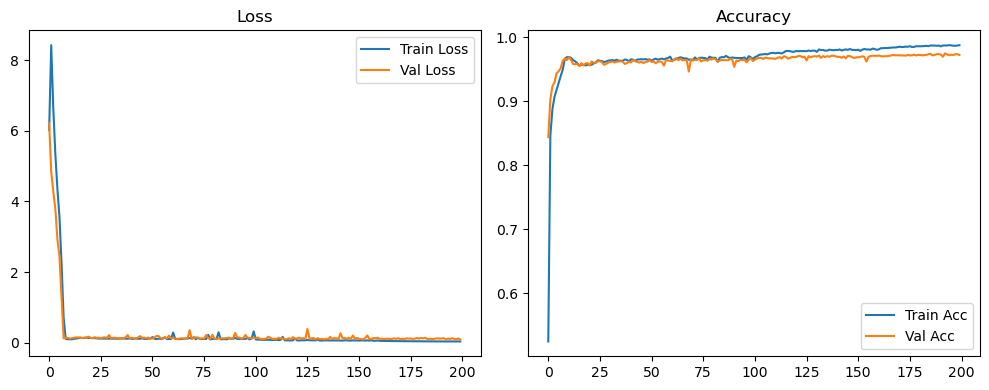

Evaluation:   0%|          | 0/157 [00:00<?, ?it/s]

Evaluation:   6%|▌         | 9/157 [00:00<00:01, 83.17it/s]

Evaluation:  11%|█▏        | 18/157 [00:00<00:01, 83.86it/s]

Evaluation:  17%|█▋        | 27/157 [00:00<00:01, 84.16it/s]

Evaluation:  23%|██▎       | 36/157 [00:00<00:01, 84.51it/s]

Evaluation:  29%|██▊       | 45/157 [00:00<00:01, 84.67it/s]

Evaluation:  34%|███▍      | 54/157 [00:00<00:01, 84.93it/s]

Evaluation:  40%|████      | 63/157 [00:00<00:01, 85.01it/s]

Evaluation:  46%|████▌     | 72/157 [00:00<00:00, 85.11it/s]

Evaluation:  52%|█████▏    | 81/157 [00:00<00:00, 85.27it/s]

Evaluation:  57%|█████▋    | 90/157 [00:01<00:00, 85.23it/s]

Evaluation:  63%|██████▎   | 99/157 [00:01<00:00, 85.31it/s]

Evaluation:  69%|██████▉   | 108/157 [00:01<00:00, 85.41it/s]

Evaluation:  75%|███████▍  | 117/157 [00:01<00:00, 85.37it/s]

Evaluation:  80%|████████  | 126/157 [00:01<00:00, 85.40it/s]

Evaluation:  86%|████████▌ | 135/157 [00:01<00:00, 85.47it/s]

Evaluation:  92%|█████████▏| 144/157 [00:01<00:00, 85.40it/s]

Evaluation:  97%|█████████▋| 153/157 [00:01<00:00, 85.34it/s]

Evaluation: 100%|██████████| 157/157 [00:01<00:00, 85.28it/s]

Original Model Final Test Loss: 0.0940 Accuracy: 0.9736


🚀 Running: batch64_lr0.01_0.005_0.001_dp0.5


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.4835 | Val Acc: 0.8522 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.010 | Train Acc: 0.4835 | Val Acc: 0.8522 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.010 | Train Acc: 0.4835 | Val Acc: 0.8522 |:   0%|          | 1/200 [00:14<46:27, 14.01s/it]

| LR: 0.010 | Train Acc: 0.8208 | Val Acc: 0.8969 |:   0%|          | 1/200 [00:27<46:27, 14.01s/it]

| LR: 0.010 | Train Acc: 0.8208 | Val Acc: 0.8969 |:   0%|          | 1/200 [00:27<46:27, 14.01s/it]

| LR: 0.010 | Train Acc: 0.8208 | Val Acc: 0.8969 |:   1%|          | 2/200 [00:27<45:21, 13.75s/it]

| LR: 0.010 | Train Acc: 0.8655 | Val Acc: 0.9307 |:   1%|          | 2/200 [00:41<45:21, 13.75s/it]

| LR: 0.010 | Train Acc: 0.8655 | Val Acc: 0.9307 |:   1%|          | 2/200 [00:41<45:21, 13.75s/it]

| LR: 0.010 | Train Acc: 0.8655 | Val Acc: 0.9307 |:   2%|▏         | 3/200 [00:41<44:55, 13.68s/it]

| LR: 0.010 | Train Acc: 0.8845 | Val Acc: 0.9456 |:   2%|▏         | 3/200 [00:54<44:55, 13.68s/it]

| LR: 0.010 | Train Acc: 0.8845 | Val Acc: 0.9456 |:   2%|▏         | 3/200 [00:54<44:55, 13.68s/it]

| LR: 0.010 | Train Acc: 0.8845 | Val Acc: 0.9456 |:   2%|▏         | 4/200 [00:54<44:27, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9040 | Val Acc: 0.9512 |:   2%|▏         | 4/200 [01:08<44:27, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9040 | Val Acc: 0.9512 |:   2%|▏         | 4/200 [01:08<44:27, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9040 | Val Acc: 0.9512 |:   2%|▎         | 5/200 [01:08<44:09, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9520 |:   2%|▎         | 5/200 [01:21<44:09, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9520 |:   2%|▎         | 5/200 [01:21<44:09, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9520 |:   3%|▎         | 6/200 [01:21<44:04, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9350 | Val Acc: 0.9518 |:   3%|▎         | 6/200 [01:35<44:04, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9350 | Val Acc: 0.9518 |:   3%|▎         | 6/200 [01:35<44:04, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9350 | Val Acc: 0.9518 |:   4%|▎         | 7/200 [01:35<43:54, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9380 | Val Acc: 0.9551 |:   4%|▎         | 7/200 [01:49<43:54, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9380 | Val Acc: 0.9551 |:   4%|▎         | 7/200 [01:49<43:54, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9380 | Val Acc: 0.9551 |:   4%|▍         | 8/200 [01:49<43:51, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9547 |:   4%|▍         | 8/200 [02:03<43:51, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9547 |:   4%|▍         | 8/200 [02:03<43:51, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9547 |:   4%|▍         | 9/200 [02:03<43:33, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9387 | Val Acc: 0.9541 |:   4%|▍         | 9/200 [02:16<43:33, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9387 | Val Acc: 0.9541 |:   4%|▍         | 9/200 [02:16<43:33, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9387 | Val Acc: 0.9541 |:   5%|▌         | 10/200 [02:16<43:12, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9355 | Val Acc: 0.9538 |:   5%|▌         | 10/200 [02:30<43:12, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9355 | Val Acc: 0.9538 |:   5%|▌         | 10/200 [02:30<43:12, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9355 | Val Acc: 0.9538 |:   6%|▌         | 11/200 [02:30<43:17, 13.74s/it]

| LR: 0.010 | Train Acc: 0.9319 | Val Acc: 0.9513 |:   6%|▌         | 11/200 [02:44<43:17, 13.74s/it]

| LR: 0.010 | Train Acc: 0.9319 | Val Acc: 0.9513 |:   6%|▌         | 11/200 [02:44<43:17, 13.74s/it]

| LR: 0.010 | Train Acc: 0.9319 | Val Acc: 0.9513 |:   6%|▌         | 12/200 [02:44<42:48, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9503 |:   6%|▌         | 12/200 [02:57<42:48, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9503 |:   6%|▌         | 12/200 [02:57<42:48, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9503 |:   6%|▋         | 13/200 [02:57<42:27, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9251 | Val Acc: 0.9471 |:   6%|▋         | 13/200 [03:11<42:27, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9251 | Val Acc: 0.9471 |:   6%|▋         | 13/200 [03:11<42:27, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9251 | Val Acc: 0.9471 |:   7%|▋         | 14/200 [03:11<42:10, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9201 | Val Acc: 0.9442 |:   7%|▋         | 14/200 [03:24<42:10, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9201 | Val Acc: 0.9442 |:   7%|▋         | 14/200 [03:24<42:10, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9201 | Val Acc: 0.9442 |:   8%|▊         | 15/200 [03:24<41:54, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9191 | Val Acc: 0.9464 |:   8%|▊         | 15/200 [03:38<41:54, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9191 | Val Acc: 0.9464 |:   8%|▊         | 15/200 [03:38<41:54, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9191 | Val Acc: 0.9464 |:   8%|▊         | 16/200 [03:38<41:43, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9197 | Val Acc: 0.9487 |:   8%|▊         | 16/200 [03:52<41:43, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9197 | Val Acc: 0.9487 |:   8%|▊         | 16/200 [03:52<41:43, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9197 | Val Acc: 0.9487 |:   8%|▊         | 17/200 [03:52<41:37, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9224 | Val Acc: 0.9478 |:   8%|▊         | 17/200 [04:05<41:37, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9224 | Val Acc: 0.9478 |:   8%|▊         | 17/200 [04:05<41:37, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9224 | Val Acc: 0.9478 |:   9%|▉         | 18/200 [04:05<41:26, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9209 | Val Acc: 0.9495 |:   9%|▉         | 18/200 [04:19<41:26, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9209 | Val Acc: 0.9495 |:   9%|▉         | 18/200 [04:19<41:26, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9209 | Val Acc: 0.9495 |:  10%|▉         | 19/200 [04:19<41:22, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9200 | Val Acc: 0.9511 |:  10%|▉         | 19/200 [04:33<41:22, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9200 | Val Acc: 0.9511 |:  10%|▉         | 19/200 [04:33<41:22, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9200 | Val Acc: 0.9511 |:  10%|█         | 20/200 [04:33<40:57, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9226 | Val Acc: 0.9502 |:  10%|█         | 20/200 [04:46<40:57, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9226 | Val Acc: 0.9502 |:  10%|█         | 20/200 [04:46<40:57, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9226 | Val Acc: 0.9502 |:  10%|█         | 21/200 [04:46<40:37, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9237 | Val Acc: 0.9519 |:  10%|█         | 21/200 [05:00<40:37, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9237 | Val Acc: 0.9519 |:  10%|█         | 21/200 [05:00<40:37, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9237 | Val Acc: 0.9519 |:  11%|█         | 22/200 [05:00<40:36, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9257 | Val Acc: 0.9545 |:  11%|█         | 22/200 [05:13<40:36, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9257 | Val Acc: 0.9545 |:  11%|█         | 22/200 [05:13<40:36, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9257 | Val Acc: 0.9545 |:  12%|█▏        | 23/200 [05:14<40:10, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9244 | Val Acc: 0.9527 |:  12%|█▏        | 23/200 [05:27<40:10, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9244 | Val Acc: 0.9527 |:  12%|█▏        | 23/200 [05:27<40:10, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9244 | Val Acc: 0.9527 |:  12%|█▏        | 24/200 [05:27<39:52, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9247 | Val Acc: 0.9531 |:  12%|█▏        | 24/200 [05:41<39:52, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9247 | Val Acc: 0.9531 |:  12%|█▏        | 24/200 [05:41<39:52, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9247 | Val Acc: 0.9531 |:  12%|█▎        | 25/200 [05:41<39:38, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9221 | Val Acc: 0.9493 |:  12%|█▎        | 25/200 [05:54<39:38, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9221 | Val Acc: 0.9493 |:  12%|█▎        | 25/200 [05:54<39:38, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9221 | Val Acc: 0.9493 |:  13%|█▎        | 26/200 [05:54<39:34, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9252 | Val Acc: 0.9523 |:  13%|█▎        | 26/200 [06:08<39:34, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9252 | Val Acc: 0.9523 |:  13%|█▎        | 26/200 [06:08<39:34, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9252 | Val Acc: 0.9523 |:  14%|█▎        | 27/200 [06:08<39:19, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9508 |:  14%|█▎        | 27/200 [06:21<39:19, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9508 |:  14%|█▎        | 27/200 [06:21<39:19, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9508 |:  14%|█▍        | 28/200 [06:22<38:59, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9239 | Val Acc: 0.9512 |:  14%|█▍        | 28/200 [06:35<38:59, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9239 | Val Acc: 0.9512 |:  14%|█▍        | 28/200 [06:35<38:59, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9239 | Val Acc: 0.9512 |:  14%|█▍        | 29/200 [06:35<38:40, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9238 | Val Acc: 0.9502 |:  14%|█▍        | 29/200 [06:49<38:40, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9238 | Val Acc: 0.9502 |:  14%|█▍        | 29/200 [06:49<38:40, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9238 | Val Acc: 0.9502 |:  15%|█▌        | 30/200 [06:49<38:33, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9517 |:  15%|█▌        | 30/200 [07:02<38:33, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9517 |:  15%|█▌        | 30/200 [07:02<38:33, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9517 |:  16%|█▌        | 31/200 [07:02<38:21, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9245 | Val Acc: 0.9538 |:  16%|█▌        | 31/200 [07:16<38:21, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9245 | Val Acc: 0.9538 |:  16%|█▌        | 31/200 [07:16<38:21, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9245 | Val Acc: 0.9538 |:  16%|█▌        | 32/200 [07:16<38:20, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9258 | Val Acc: 0.9527 |:  16%|█▌        | 32/200 [07:30<38:20, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9258 | Val Acc: 0.9527 |:  16%|█▌        | 32/200 [07:30<38:20, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9258 | Val Acc: 0.9527 |:  16%|█▋        | 33/200 [07:30<37:57, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9251 | Val Acc: 0.9541 |:  16%|█▋        | 33/200 [07:43<37:57, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9251 | Val Acc: 0.9541 |:  16%|█▋        | 33/200 [07:43<37:57, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9251 | Val Acc: 0.9541 |:  17%|█▋        | 34/200 [07:43<37:37, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9539 |:  17%|█▋        | 34/200 [07:57<37:37, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9539 |:  17%|█▋        | 34/200 [07:57<37:37, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9539 |:  18%|█▊        | 35/200 [07:57<37:23, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9252 | Val Acc: 0.9548 |:  18%|█▊        | 35/200 [08:11<37:23, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9252 | Val Acc: 0.9548 |:  18%|█▊        | 35/200 [08:11<37:23, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9252 | Val Acc: 0.9548 |:  18%|█▊        | 36/200 [08:11<37:15, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9247 | Val Acc: 0.9539 |:  18%|█▊        | 36/200 [08:25<37:15, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9247 | Val Acc: 0.9539 |:  18%|█▊        | 36/200 [08:25<37:15, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9247 | Val Acc: 0.9539 |:  18%|█▊        | 37/200 [08:25<37:20, 13.74s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9541 |:  18%|█▊        | 37/200 [08:38<37:20, 13.74s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9541 |:  18%|█▊        | 37/200 [08:38<37:20, 13.74s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9541 |:  19%|█▉        | 38/200 [08:38<36:53, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9278 | Val Acc: 0.9521 |:  19%|█▉        | 38/200 [08:52<36:53, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9278 | Val Acc: 0.9521 |:  19%|█▉        | 38/200 [08:52<36:53, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9278 | Val Acc: 0.9521 |:  20%|█▉        | 39/200 [08:52<36:47, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9544 |:  20%|█▉        | 39/200 [09:05<36:47, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9544 |:  20%|█▉        | 39/200 [09:05<36:47, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9544 |:  20%|██        | 40/200 [09:06<36:30, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9533 |:  20%|██        | 40/200 [09:19<36:30, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9533 |:  20%|██        | 40/200 [09:19<36:30, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9533 |:  20%|██        | 41/200 [09:19<36:22, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9258 | Val Acc: 0.9533 |:  20%|██        | 41/200 [09:33<36:22, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9258 | Val Acc: 0.9533 |:  20%|██        | 41/200 [09:33<36:22, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9258 | Val Acc: 0.9533 |:  21%|██        | 42/200 [09:33<36:05, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9260 | Val Acc: 0.9561 |:  21%|██        | 42/200 [09:47<36:05, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9260 | Val Acc: 0.9561 |:  21%|██        | 42/200 [09:47<36:05, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9260 | Val Acc: 0.9561 |:  22%|██▏       | 43/200 [09:47<35:52, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9248 | Val Acc: 0.9515 |:  22%|██▏       | 43/200 [10:03<35:52, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9248 | Val Acc: 0.9515 |:  22%|██▏       | 43/200 [10:03<35:52, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9248 | Val Acc: 0.9515 |:  22%|██▏       | 44/200 [10:03<37:23, 14.38s/it]

| LR: 0.010 | Train Acc: 0.9242 | Val Acc: 0.9530 |:  22%|██▏       | 44/200 [10:16<37:23, 14.38s/it]

| LR: 0.010 | Train Acc: 0.9242 | Val Acc: 0.9530 |:  22%|██▏       | 44/200 [10:16<37:23, 14.38s/it]

| LR: 0.010 | Train Acc: 0.9242 | Val Acc: 0.9530 |:  22%|██▎       | 45/200 [10:17<36:44, 14.22s/it]

| LR: 0.010 | Train Acc: 0.9261 | Val Acc: 0.9540 |:  22%|██▎       | 45/200 [10:30<36:44, 14.22s/it]

| LR: 0.010 | Train Acc: 0.9261 | Val Acc: 0.9540 |:  22%|██▎       | 45/200 [10:30<36:44, 14.22s/it]

| LR: 0.010 | Train Acc: 0.9261 | Val Acc: 0.9540 |:  23%|██▎       | 46/200 [10:30<35:59, 14.02s/it]

| LR: 0.010 | Train Acc: 0.9251 | Val Acc: 0.9555 |:  23%|██▎       | 46/200 [10:44<35:59, 14.02s/it]

| LR: 0.010 | Train Acc: 0.9251 | Val Acc: 0.9555 |:  23%|██▎       | 46/200 [10:44<35:59, 14.02s/it]

| LR: 0.010 | Train Acc: 0.9251 | Val Acc: 0.9555 |:  24%|██▎       | 47/200 [10:44<35:33, 13.95s/it]

| LR: 0.010 | Train Acc: 0.9260 | Val Acc: 0.9541 |:  24%|██▎       | 47/200 [10:58<35:33, 13.95s/it]

| LR: 0.010 | Train Acc: 0.9260 | Val Acc: 0.9541 |:  24%|██▎       | 47/200 [10:58<35:33, 13.95s/it]

| LR: 0.010 | Train Acc: 0.9260 | Val Acc: 0.9541 |:  24%|██▍       | 48/200 [10:58<35:09, 13.88s/it]

| LR: 0.010 | Train Acc: 0.9271 | Val Acc: 0.9553 |:  24%|██▍       | 48/200 [11:11<35:09, 13.88s/it]

| LR: 0.010 | Train Acc: 0.9271 | Val Acc: 0.9553 |:  24%|██▍       | 48/200 [11:11<35:09, 13.88s/it]

| LR: 0.010 | Train Acc: 0.9271 | Val Acc: 0.9553 |:  24%|██▍       | 49/200 [11:11<34:44, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9523 |:  24%|██▍       | 49/200 [11:25<34:44, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9523 |:  24%|██▍       | 49/200 [11:25<34:44, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9523 |:  25%|██▌       | 50/200 [11:25<34:19, 13.73s/it]

| LR: 0.010 | Train Acc: 0.9271 | Val Acc: 0.9528 |:  25%|██▌       | 50/200 [11:38<34:19, 13.73s/it]

| LR: 0.010 | Train Acc: 0.9271 | Val Acc: 0.9528 |:  25%|██▌       | 50/200 [11:38<34:19, 13.73s/it]

| LR: 0.010 | Train Acc: 0.9271 | Val Acc: 0.9528 |:  26%|██▌       | 51/200 [11:39<34:08, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9230 | Val Acc: 0.9537 |:  26%|██▌       | 51/200 [11:52<34:08, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9230 | Val Acc: 0.9537 |:  26%|██▌       | 51/200 [11:52<34:08, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9230 | Val Acc: 0.9537 |:  26%|██▌       | 52/200 [11:52<33:57, 13.76s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9553 |:  26%|██▌       | 52/200 [12:06<33:57, 13.76s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9553 |:  26%|██▌       | 52/200 [12:06<33:57, 13.76s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9553 |:  26%|██▋       | 53/200 [12:06<33:32, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9512 |:  26%|██▋       | 53/200 [12:19<33:32, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9512 |:  26%|██▋       | 53/200 [12:19<33:32, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9512 |:  27%|██▋       | 54/200 [12:19<33:07, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9552 |:  27%|██▋       | 54/200 [12:33<33:07, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9552 |:  27%|██▋       | 54/200 [12:33<33:07, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9552 |:  28%|██▊       | 55/200 [12:33<32:45, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9279 | Val Acc: 0.9568 |:  28%|██▊       | 55/200 [12:46<32:45, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9279 | Val Acc: 0.9568 |:  28%|██▊       | 55/200 [12:46<32:45, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9279 | Val Acc: 0.9568 |:  28%|██▊       | 56/200 [12:46<32:28, 13.53s/it]

| LR: 0.010 | Train Acc: 0.9301 | Val Acc: 0.9564 |:  28%|██▊       | 56/200 [13:00<32:28, 13.53s/it]

| LR: 0.010 | Train Acc: 0.9301 | Val Acc: 0.9564 |:  28%|██▊       | 56/200 [13:00<32:28, 13.53s/it]

| LR: 0.010 | Train Acc: 0.9301 | Val Acc: 0.9564 |:  28%|██▊       | 57/200 [13:00<32:18, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9280 | Val Acc: 0.9553 |:  28%|██▊       | 57/200 [13:14<32:18, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9280 | Val Acc: 0.9553 |:  28%|██▊       | 57/200 [13:14<32:18, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9280 | Val Acc: 0.9553 |:  29%|██▉       | 58/200 [13:14<32:12, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9283 | Val Acc: 0.9552 |:  29%|██▉       | 58/200 [13:27<32:12, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9283 | Val Acc: 0.9552 |:  29%|██▉       | 58/200 [13:27<32:12, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9283 | Val Acc: 0.9552 |:  30%|██▉       | 59/200 [13:27<32:02, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9530 |:  30%|██▉       | 59/200 [13:41<32:02, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9530 |:  30%|██▉       | 59/200 [13:41<32:02, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9530 |:  30%|███       | 60/200 [13:41<31:41, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9553 |:  30%|███       | 60/200 [13:55<31:41, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9553 |:  30%|███       | 60/200 [13:55<31:41, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9553 |:  30%|███       | 61/200 [13:55<31:50, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9549 |:  30%|███       | 61/200 [14:08<31:50, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9549 |:  30%|███       | 61/200 [14:08<31:50, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9549 |:  31%|███       | 62/200 [14:08<31:29, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9227 | Val Acc: 0.9547 |:  31%|███       | 62/200 [14:22<31:29, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9227 | Val Acc: 0.9547 |:  31%|███       | 62/200 [14:22<31:29, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9227 | Val Acc: 0.9547 |:  32%|███▏      | 63/200 [14:22<31:11, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9551 |:  32%|███▏      | 63/200 [14:35<31:11, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9551 |:  32%|███▏      | 63/200 [14:35<31:11, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9551 |:  32%|███▏      | 64/200 [14:36<30:53, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9271 | Val Acc: 0.9561 |:  32%|███▏      | 64/200 [14:49<30:53, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9271 | Val Acc: 0.9561 |:  32%|███▏      | 64/200 [14:49<30:53, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9271 | Val Acc: 0.9561 |:  32%|███▎      | 65/200 [14:49<30:40, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9273 | Val Acc: 0.9552 |:  32%|███▎      | 65/200 [15:03<30:40, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9273 | Val Acc: 0.9552 |:  32%|███▎      | 65/200 [15:03<30:40, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9273 | Val Acc: 0.9552 |:  33%|███▎      | 66/200 [15:03<30:24, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9253 | Val Acc: 0.9548 |:  33%|███▎      | 66/200 [15:16<30:24, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9253 | Val Acc: 0.9548 |:  33%|███▎      | 66/200 [15:16<30:24, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9253 | Val Acc: 0.9548 |:  34%|███▎      | 67/200 [15:16<30:13, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9256 | Val Acc: 0.9563 |:  34%|███▎      | 67/200 [15:30<30:13, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9256 | Val Acc: 0.9563 |:  34%|███▎      | 67/200 [15:30<30:13, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9256 | Val Acc: 0.9563 |:  34%|███▍      | 68/200 [15:30<29:59, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9518 |:  34%|███▍      | 68/200 [15:44<29:59, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9518 |:  34%|███▍      | 68/200 [15:44<29:59, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9518 |:  34%|███▍      | 69/200 [15:44<29:57, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9286 | Val Acc: 0.9546 |:  34%|███▍      | 69/200 [15:58<29:57, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9286 | Val Acc: 0.9546 |:  34%|███▍      | 69/200 [15:58<29:57, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9286 | Val Acc: 0.9546 |:  35%|███▌      | 70/200 [15:58<29:40, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9276 | Val Acc: 0.9567 |:  35%|███▌      | 70/200 [16:11<29:40, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9276 | Val Acc: 0.9567 |:  35%|███▌      | 70/200 [16:11<29:40, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9276 | Val Acc: 0.9567 |:  36%|███▌      | 71/200 [16:11<29:26, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9265 | Val Acc: 0.9542 |:  36%|███▌      | 71/200 [16:25<29:26, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9265 | Val Acc: 0.9542 |:  36%|███▌      | 71/200 [16:25<29:26, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9265 | Val Acc: 0.9542 |:  36%|███▌      | 72/200 [16:25<29:13, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9282 | Val Acc: 0.9547 |:  36%|███▌      | 72/200 [16:39<29:13, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9282 | Val Acc: 0.9547 |:  36%|███▌      | 72/200 [16:39<29:13, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9282 | Val Acc: 0.9547 |:  36%|███▋      | 73/200 [16:39<29:12, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9238 | Val Acc: 0.9537 |:  36%|███▋      | 73/200 [16:53<29:12, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9238 | Val Acc: 0.9537 |:  36%|███▋      | 73/200 [16:53<29:12, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9238 | Val Acc: 0.9537 |:  37%|███▋      | 74/200 [16:53<28:52, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9253 | Val Acc: 0.9543 |:  37%|███▋      | 74/200 [17:06<28:52, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9253 | Val Acc: 0.9543 |:  37%|███▋      | 74/200 [17:06<28:52, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9253 | Val Acc: 0.9543 |:  38%|███▊      | 75/200 [17:06<28:30, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9275 | Val Acc: 0.9570 |:  38%|███▊      | 75/200 [17:20<28:30, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9275 | Val Acc: 0.9570 |:  38%|███▊      | 75/200 [17:20<28:30, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9275 | Val Acc: 0.9570 |:  38%|███▊      | 76/200 [17:20<28:12, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9289 | Val Acc: 0.9582 |:  38%|███▊      | 76/200 [17:33<28:12, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9289 | Val Acc: 0.9582 |:  38%|███▊      | 76/200 [17:33<28:12, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9289 | Val Acc: 0.9582 |:  38%|███▊      | 77/200 [17:33<27:55, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9287 | Val Acc: 0.9561 |:  38%|███▊      | 77/200 [17:47<27:55, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9287 | Val Acc: 0.9561 |:  38%|███▊      | 77/200 [17:47<27:55, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9287 | Val Acc: 0.9561 |:  39%|███▉      | 78/200 [17:47<27:42, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9570 |:  39%|███▉      | 78/200 [18:01<27:42, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9570 |:  39%|███▉      | 78/200 [18:01<27:42, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9570 |:  40%|███▉      | 79/200 [18:01<27:35, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9290 | Val Acc: 0.9550 |:  40%|███▉      | 79/200 [18:15<27:35, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9290 | Val Acc: 0.9550 |:  40%|███▉      | 79/200 [18:15<27:35, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9290 | Val Acc: 0.9550 |:  40%|████      | 80/200 [18:15<27:28, 13.74s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9576 |:  40%|████      | 80/200 [18:28<27:28, 13.74s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9576 |:  40%|████      | 80/200 [18:28<27:28, 13.74s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9576 |:  40%|████      | 81/200 [18:28<27:11, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9287 | Val Acc: 0.9593 |:  40%|████      | 81/200 [18:42<27:11, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9287 | Val Acc: 0.9593 |:  40%|████      | 81/200 [18:42<27:11, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9287 | Val Acc: 0.9593 |:  41%|████      | 82/200 [18:42<26:57, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9290 | Val Acc: 0.9577 |:  41%|████      | 82/200 [18:56<26:57, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9290 | Val Acc: 0.9577 |:  41%|████      | 82/200 [18:56<26:57, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9290 | Val Acc: 0.9577 |:  42%|████▏     | 83/200 [18:56<26:39, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9539 |:  42%|████▏     | 83/200 [19:09<26:39, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9539 |:  42%|████▏     | 83/200 [19:09<26:39, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9539 |:  42%|████▏     | 84/200 [19:09<26:25, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9262 | Val Acc: 0.9573 |:  42%|████▏     | 84/200 [19:23<26:25, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9262 | Val Acc: 0.9573 |:  42%|████▏     | 84/200 [19:23<26:25, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9262 | Val Acc: 0.9573 |:  42%|████▎     | 85/200 [19:23<26:10, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9228 | Val Acc: 0.9567 |:  42%|████▎     | 85/200 [19:36<26:10, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9228 | Val Acc: 0.9567 |:  42%|████▎     | 85/200 [19:36<26:10, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9228 | Val Acc: 0.9567 |:  43%|████▎     | 86/200 [19:36<25:55, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9275 | Val Acc: 0.9553 |:  43%|████▎     | 86/200 [19:50<25:55, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9275 | Val Acc: 0.9553 |:  43%|████▎     | 86/200 [19:50<25:55, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9275 | Val Acc: 0.9553 |:  44%|████▎     | 87/200 [19:50<25:42, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9300 | Val Acc: 0.9552 |:  44%|████▎     | 87/200 [20:04<25:42, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9300 | Val Acc: 0.9552 |:  44%|████▎     | 87/200 [20:04<25:42, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9300 | Val Acc: 0.9552 |:  44%|████▍     | 88/200 [20:04<25:33, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9236 | Val Acc: 0.9558 |:  44%|████▍     | 88/200 [20:18<25:33, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9236 | Val Acc: 0.9558 |:  44%|████▍     | 88/200 [20:18<25:33, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9236 | Val Acc: 0.9558 |:  44%|████▍     | 89/200 [20:18<25:20, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9277 | Val Acc: 0.9552 |:  44%|████▍     | 89/200 [20:31<25:20, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9277 | Val Acc: 0.9552 |:  44%|████▍     | 89/200 [20:31<25:20, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9277 | Val Acc: 0.9552 |:  45%|████▌     | 90/200 [20:31<24:59, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9299 | Val Acc: 0.9560 |:  45%|████▌     | 90/200 [20:45<24:59, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9299 | Val Acc: 0.9560 |:  45%|████▌     | 90/200 [20:45<24:59, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9299 | Val Acc: 0.9560 |:  46%|████▌     | 91/200 [20:45<24:52, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9566 |:  46%|████▌     | 91/200 [20:59<24:52, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9566 |:  46%|████▌     | 91/200 [20:59<24:52, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9566 |:  46%|████▌     | 92/200 [20:59<24:40, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9247 | Val Acc: 0.9549 |:  46%|████▌     | 92/200 [21:12<24:40, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9247 | Val Acc: 0.9549 |:  46%|████▌     | 92/200 [21:12<24:40, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9247 | Val Acc: 0.9549 |:  46%|████▋     | 93/200 [21:12<24:19, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9279 | Val Acc: 0.9540 |:  46%|████▋     | 93/200 [21:26<24:19, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9279 | Val Acc: 0.9540 |:  46%|████▋     | 93/200 [21:26<24:19, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9279 | Val Acc: 0.9540 |:  47%|████▋     | 94/200 [21:26<24:01, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9558 |:  47%|████▋     | 94/200 [21:39<24:01, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9558 |:  47%|████▋     | 94/200 [21:39<24:01, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9558 |:  48%|████▊     | 95/200 [21:39<23:44, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9270 | Val Acc: 0.9572 |:  48%|████▊     | 95/200 [21:53<23:44, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9270 | Val Acc: 0.9572 |:  48%|████▊     | 95/200 [21:53<23:44, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9270 | Val Acc: 0.9572 |:  48%|████▊     | 96/200 [21:53<23:37, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9246 | Val Acc: 0.9534 |:  48%|████▊     | 96/200 [22:07<23:37, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9246 | Val Acc: 0.9534 |:  48%|████▊     | 96/200 [22:07<23:37, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9246 | Val Acc: 0.9534 |:  48%|████▊     | 97/200 [22:07<23:29, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9244 | Val Acc: 0.9573 |:  48%|████▊     | 97/200 [22:20<23:29, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9244 | Val Acc: 0.9573 |:  48%|████▊     | 97/200 [22:20<23:29, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9244 | Val Acc: 0.9573 |:  49%|████▉     | 98/200 [22:20<23:12, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9555 |:  49%|████▉     | 98/200 [22:35<23:12, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9555 |:  49%|████▉     | 98/200 [22:35<23:12, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9555 |:  50%|████▉     | 99/200 [22:35<23:22, 13.89s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9535 |:  50%|████▉     | 99/200 [22:49<23:22, 13.89s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9535 |:  50%|████▉     | 99/200 [22:49<23:22, 13.89s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9535 |:  50%|█████     | 100/200 [22:49<23:11, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9264 | Val Acc: 0.9557 |:  50%|█████     | 100/200 [23:02<23:11, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9264 | Val Acc: 0.9557 |:  50%|█████     | 100/200 [23:02<23:11, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9264 | Val Acc: 0.9557 |:  50%|█████     | 101/200 [23:02<22:47, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9300 | Val Acc: 0.9534 |:  50%|█████     | 101/200 [23:16<22:47, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9300 | Val Acc: 0.9534 |:  50%|█████     | 101/200 [23:16<22:47, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9300 | Val Acc: 0.9534 |:  51%|█████     | 102/200 [23:16<22:28, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9316 | Val Acc: 0.9580 |:  51%|█████     | 102/200 [23:29<22:28, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9316 | Val Acc: 0.9580 |:  51%|█████     | 102/200 [23:29<22:28, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9316 | Val Acc: 0.9580 |:  52%|█████▏    | 103/200 [23:29<22:06, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9341 | Val Acc: 0.9552 |:  52%|█████▏    | 103/200 [23:43<22:06, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9341 | Val Acc: 0.9552 |:  52%|█████▏    | 103/200 [23:43<22:06, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9341 | Val Acc: 0.9552 |:  52%|█████▏    | 104/200 [23:43<21:55, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9352 | Val Acc: 0.9575 |:  52%|█████▏    | 104/200 [23:57<21:55, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9352 | Val Acc: 0.9575 |:  52%|█████▏    | 104/200 [23:57<21:55, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9352 | Val Acc: 0.9575 |:  52%|█████▎    | 105/200 [23:57<21:40, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9340 | Val Acc: 0.9574 |:  52%|█████▎    | 105/200 [24:11<21:40, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9340 | Val Acc: 0.9574 |:  52%|█████▎    | 105/200 [24:11<21:40, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9340 | Val Acc: 0.9574 |:  53%|█████▎    | 106/200 [24:11<21:27, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9377 | Val Acc: 0.9583 |:  53%|█████▎    | 106/200 [24:24<21:27, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9377 | Val Acc: 0.9583 |:  53%|█████▎    | 106/200 [24:24<21:27, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9377 | Val Acc: 0.9583 |:  54%|█████▎    | 107/200 [24:24<21:10, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9381 | Val Acc: 0.9559 |:  54%|█████▎    | 107/200 [24:38<21:10, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9381 | Val Acc: 0.9559 |:  54%|█████▎    | 107/200 [24:38<21:10, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9381 | Val Acc: 0.9559 |:  54%|█████▍    | 108/200 [24:38<20:56, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9385 | Val Acc: 0.9576 |:  54%|█████▍    | 108/200 [24:51<20:56, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9385 | Val Acc: 0.9576 |:  54%|█████▍    | 108/200 [24:51<20:56, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9385 | Val Acc: 0.9576 |:  55%|█████▍    | 109/200 [24:51<20:39, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9364 | Val Acc: 0.9609 |:  55%|█████▍    | 109/200 [25:05<20:39, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9364 | Val Acc: 0.9609 |:  55%|█████▍    | 109/200 [25:05<20:39, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9364 | Val Acc: 0.9609 |:  55%|█████▌    | 110/200 [25:05<20:25, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9383 | Val Acc: 0.9575 |:  55%|█████▌    | 110/200 [25:19<20:25, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9383 | Val Acc: 0.9575 |:  55%|█████▌    | 110/200 [25:19<20:25, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9383 | Val Acc: 0.9575 |:  56%|█████▌    | 111/200 [25:19<20:11, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9390 | Val Acc: 0.9593 |:  56%|█████▌    | 111/200 [25:33<20:11, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9390 | Val Acc: 0.9593 |:  56%|█████▌    | 111/200 [25:33<20:11, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9390 | Val Acc: 0.9593 |:  56%|█████▌    | 112/200 [25:33<20:15, 13.82s/it]

| LR: 0.005 | Train Acc: 0.9396 | Val Acc: 0.9583 |:  56%|█████▌    | 112/200 [25:46<20:15, 13.82s/it]

| LR: 0.005 | Train Acc: 0.9396 | Val Acc: 0.9583 |:  56%|█████▌    | 112/200 [25:46<20:15, 13.82s/it]

| LR: 0.005 | Train Acc: 0.9396 | Val Acc: 0.9583 |:  56%|█████▋    | 113/200 [25:46<19:54, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9401 | Val Acc: 0.9588 |:  56%|█████▋    | 113/200 [26:00<19:54, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9401 | Val Acc: 0.9588 |:  56%|█████▋    | 113/200 [26:00<19:54, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9401 | Val Acc: 0.9588 |:  57%|█████▋    | 114/200 [26:00<19:33, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9384 | Val Acc: 0.9623 |:  57%|█████▋    | 114/200 [26:13<19:33, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9384 | Val Acc: 0.9623 |:  57%|█████▋    | 114/200 [26:13<19:33, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9384 | Val Acc: 0.9623 |:  57%|█████▊    | 115/200 [26:13<19:13, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9380 | Val Acc: 0.9609 |:  57%|█████▊    | 115/200 [26:27<19:13, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9380 | Val Acc: 0.9609 |:  57%|█████▊    | 115/200 [26:27<19:13, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9380 | Val Acc: 0.9609 |:  58%|█████▊    | 116/200 [26:27<18:57, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9417 | Val Acc: 0.9593 |:  58%|█████▊    | 116/200 [26:40<18:57, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9417 | Val Acc: 0.9593 |:  58%|█████▊    | 116/200 [26:40<18:57, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9417 | Val Acc: 0.9593 |:  58%|█████▊    | 117/200 [26:40<18:48, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9414 | Val Acc: 0.9607 |:  58%|█████▊    | 117/200 [26:54<18:48, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9414 | Val Acc: 0.9607 |:  58%|█████▊    | 117/200 [26:54<18:48, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9414 | Val Acc: 0.9607 |:  59%|█████▉    | 118/200 [26:54<18:37, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9603 |:  59%|█████▉    | 118/200 [27:08<18:37, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9603 |:  59%|█████▉    | 118/200 [27:08<18:37, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9603 |:  60%|█████▉    | 119/200 [27:08<18:20, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9412 | Val Acc: 0.9617 |:  60%|█████▉    | 119/200 [27:21<18:20, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9412 | Val Acc: 0.9617 |:  60%|█████▉    | 119/200 [27:21<18:20, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9412 | Val Acc: 0.9617 |:  60%|██████    | 120/200 [27:21<18:05, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9593 |:  60%|██████    | 120/200 [27:35<18:05, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9593 |:  60%|██████    | 120/200 [27:35<18:05, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9593 |:  60%|██████    | 121/200 [27:35<17:49, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9420 | Val Acc: 0.9611 |:  60%|██████    | 121/200 [27:48<17:49, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9420 | Val Acc: 0.9611 |:  60%|██████    | 121/200 [27:48<17:49, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9420 | Val Acc: 0.9611 |:  61%|██████    | 122/200 [27:48<17:39, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9409 | Val Acc: 0.9623 |:  61%|██████    | 122/200 [28:02<17:39, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9409 | Val Acc: 0.9623 |:  61%|██████    | 122/200 [28:02<17:39, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9409 | Val Acc: 0.9623 |:  62%|██████▏   | 123/200 [28:02<17:25, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9422 | Val Acc: 0.9612 |:  62%|██████▏   | 123/200 [28:16<17:25, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9422 | Val Acc: 0.9612 |:  62%|██████▏   | 123/200 [28:16<17:25, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9422 | Val Acc: 0.9612 |:  62%|██████▏   | 124/200 [28:16<17:14, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9420 | Val Acc: 0.9613 |:  62%|██████▏   | 124/200 [28:30<17:14, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9420 | Val Acc: 0.9613 |:  62%|██████▏   | 124/200 [28:30<17:14, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9420 | Val Acc: 0.9613 |:  62%|██████▎   | 125/200 [28:30<17:15, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9446 | Val Acc: 0.9610 |:  62%|██████▎   | 125/200 [28:43<17:15, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9446 | Val Acc: 0.9610 |:  62%|██████▎   | 125/200 [28:43<17:15, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9446 | Val Acc: 0.9610 |:  63%|██████▎   | 126/200 [28:44<16:59, 13.77s/it]

| LR: 0.005 | Train Acc: 0.9431 | Val Acc: 0.9613 |:  63%|██████▎   | 126/200 [28:57<16:59, 13.77s/it]

| LR: 0.005 | Train Acc: 0.9431 | Val Acc: 0.9613 |:  63%|██████▎   | 126/200 [28:57<16:59, 13.77s/it]

| LR: 0.005 | Train Acc: 0.9431 | Val Acc: 0.9613 |:  64%|██████▎   | 127/200 [28:57<16:39, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9431 | Val Acc: 0.9610 |:  64%|██████▎   | 127/200 [29:11<16:39, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9431 | Val Acc: 0.9610 |:  64%|██████▎   | 127/200 [29:11<16:39, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9431 | Val Acc: 0.9610 |:  64%|██████▍   | 128/200 [29:11<16:23, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9597 |:  64%|██████▍   | 128/200 [29:24<16:23, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9597 |:  64%|██████▍   | 128/200 [29:24<16:23, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9597 |:  64%|██████▍   | 129/200 [29:24<16:10, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9424 | Val Acc: 0.9593 |:  64%|██████▍   | 129/200 [29:40<16:10, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9424 | Val Acc: 0.9593 |:  64%|██████▍   | 129/200 [29:40<16:10, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9424 | Val Acc: 0.9593 |:  65%|██████▌   | 130/200 [29:41<16:49, 14.43s/it]

| LR: 0.005 | Train Acc: 0.9421 | Val Acc: 0.9601 |:  65%|██████▌   | 130/200 [29:54<16:49, 14.43s/it]

| LR: 0.005 | Train Acc: 0.9421 | Val Acc: 0.9601 |:  65%|██████▌   | 130/200 [29:54<16:49, 14.43s/it]

| LR: 0.005 | Train Acc: 0.9421 | Val Acc: 0.9601 |:  66%|██████▌   | 131/200 [29:54<16:19, 14.20s/it]

| LR: 0.005 | Train Acc: 0.9428 | Val Acc: 0.9624 |:  66%|██████▌   | 131/200 [30:08<16:19, 14.20s/it]

| LR: 0.005 | Train Acc: 0.9428 | Val Acc: 0.9624 |:  66%|██████▌   | 131/200 [30:08<16:19, 14.20s/it]

| LR: 0.005 | Train Acc: 0.9428 | Val Acc: 0.9624 |:  66%|██████▌   | 132/200 [30:08<15:59, 14.11s/it]

| LR: 0.005 | Train Acc: 0.9422 | Val Acc: 0.9623 |:  66%|██████▌   | 132/200 [30:21<15:59, 14.11s/it]

| LR: 0.005 | Train Acc: 0.9422 | Val Acc: 0.9623 |:  66%|██████▌   | 132/200 [30:21<15:59, 14.11s/it]

| LR: 0.005 | Train Acc: 0.9422 | Val Acc: 0.9623 |:  66%|██████▋   | 133/200 [30:22<15:31, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9446 | Val Acc: 0.9613 |:  66%|██████▋   | 133/200 [30:35<15:31, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9446 | Val Acc: 0.9613 |:  66%|██████▋   | 133/200 [30:35<15:31, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9446 | Val Acc: 0.9613 |:  67%|██████▋   | 134/200 [30:35<15:11, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9432 | Val Acc: 0.9606 |:  67%|██████▋   | 134/200 [30:49<15:11, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9432 | Val Acc: 0.9606 |:  67%|██████▋   | 134/200 [30:49<15:11, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9432 | Val Acc: 0.9606 |:  68%|██████▊   | 135/200 [30:49<14:52, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9435 | Val Acc: 0.9622 |:  68%|██████▊   | 135/200 [31:02<14:52, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9435 | Val Acc: 0.9622 |:  68%|██████▊   | 135/200 [31:02<14:52, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9435 | Val Acc: 0.9622 |:  68%|██████▊   | 136/200 [31:02<14:37, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9449 | Val Acc: 0.9630 |:  68%|██████▊   | 136/200 [31:16<14:37, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9449 | Val Acc: 0.9630 |:  68%|██████▊   | 136/200 [31:16<14:37, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9449 | Val Acc: 0.9630 |:  68%|██████▊   | 137/200 [31:16<14:18, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9449 | Val Acc: 0.9624 |:  68%|██████▊   | 137/200 [31:29<14:18, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9449 | Val Acc: 0.9624 |:  68%|██████▊   | 137/200 [31:29<14:18, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9449 | Val Acc: 0.9624 |:  69%|██████▉   | 138/200 [31:29<14:02, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9451 | Val Acc: 0.9606 |:  69%|██████▉   | 138/200 [31:43<14:02, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9451 | Val Acc: 0.9606 |:  69%|██████▉   | 138/200 [31:43<14:02, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9451 | Val Acc: 0.9606 |:  70%|██████▉   | 139/200 [31:43<13:48, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9457 | Val Acc: 0.9613 |:  70%|██████▉   | 139/200 [31:56<13:48, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9457 | Val Acc: 0.9613 |:  70%|██████▉   | 139/200 [31:56<13:48, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9457 | Val Acc: 0.9613 |:  70%|███████   | 140/200 [31:56<13:33, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9437 | Val Acc: 0.9607 |:  70%|███████   | 140/200 [32:10<13:33, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9437 | Val Acc: 0.9607 |:  70%|███████   | 140/200 [32:10<13:33, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9437 | Val Acc: 0.9607 |:  70%|███████   | 141/200 [32:10<13:21, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9441 | Val Acc: 0.9627 |:  70%|███████   | 141/200 [32:23<13:21, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9441 | Val Acc: 0.9627 |:  70%|███████   | 141/200 [32:23<13:21, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9441 | Val Acc: 0.9627 |:  71%|███████   | 142/200 [32:23<13:07, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9447 | Val Acc: 0.9617 |:  71%|███████   | 142/200 [32:37<13:07, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9447 | Val Acc: 0.9617 |:  71%|███████   | 142/200 [32:37<13:07, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9447 | Val Acc: 0.9617 |:  72%|███████▏  | 143/200 [32:37<12:51, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9452 | Val Acc: 0.9622 |:  72%|███████▏  | 143/200 [32:51<12:51, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9452 | Val Acc: 0.9622 |:  72%|███████▏  | 143/200 [32:51<12:51, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9452 | Val Acc: 0.9622 |:  72%|███████▏  | 144/200 [32:51<12:45, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9469 | Val Acc: 0.9625 |:  72%|███████▏  | 144/200 [33:04<12:45, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9469 | Val Acc: 0.9625 |:  72%|███████▏  | 144/200 [33:04<12:45, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9469 | Val Acc: 0.9625 |:  72%|███████▎  | 145/200 [33:04<12:29, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9445 | Val Acc: 0.9614 |:  72%|███████▎  | 145/200 [33:18<12:29, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9445 | Val Acc: 0.9614 |:  72%|███████▎  | 145/200 [33:18<12:29, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9445 | Val Acc: 0.9614 |:  73%|███████▎  | 146/200 [33:18<12:21, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9457 | Val Acc: 0.9623 |:  73%|███████▎  | 146/200 [33:32<12:21, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9457 | Val Acc: 0.9623 |:  73%|███████▎  | 146/200 [33:32<12:21, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9457 | Val Acc: 0.9623 |:  74%|███████▎  | 147/200 [33:32<12:06, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9463 | Val Acc: 0.9631 |:  74%|███████▎  | 147/200 [33:46<12:06, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9463 | Val Acc: 0.9631 |:  74%|███████▎  | 147/200 [33:46<12:06, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9463 | Val Acc: 0.9631 |:  74%|███████▍  | 148/200 [33:46<11:49, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9439 | Val Acc: 0.9616 |:  74%|███████▍  | 148/200 [33:59<11:49, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9439 | Val Acc: 0.9616 |:  74%|███████▍  | 148/200 [33:59<11:49, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9439 | Val Acc: 0.9616 |:  74%|███████▍  | 149/200 [33:59<11:33, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9465 | Val Acc: 0.9629 |:  74%|███████▍  | 149/200 [34:13<11:33, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9465 | Val Acc: 0.9629 |:  74%|███████▍  | 149/200 [34:13<11:33, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9465 | Val Acc: 0.9629 |:  75%|███████▌  | 150/200 [34:13<11:19, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9457 | Val Acc: 0.9611 |:  75%|███████▌  | 150/200 [34:27<11:19, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9457 | Val Acc: 0.9611 |:  75%|███████▌  | 150/200 [34:27<11:19, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9457 | Val Acc: 0.9611 |:  76%|███████▌  | 151/200 [34:27<11:12, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9466 | Val Acc: 0.9620 |:  76%|███████▌  | 151/200 [34:41<11:12, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9466 | Val Acc: 0.9620 |:  76%|███████▌  | 151/200 [34:41<11:12, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9466 | Val Acc: 0.9620 |:  76%|███████▌  | 152/200 [34:41<11:05, 13.87s/it]

| LR: 0.005 | Train Acc: 0.9441 | Val Acc: 0.9609 |:  76%|███████▌  | 152/200 [34:54<11:05, 13.87s/it]

| LR: 0.005 | Train Acc: 0.9441 | Val Acc: 0.9609 |:  76%|███████▌  | 152/200 [34:54<11:05, 13.87s/it]

| LR: 0.005 | Train Acc: 0.9441 | Val Acc: 0.9609 |:  76%|███████▋  | 153/200 [34:55<10:48, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9463 | Val Acc: 0.9619 |:  76%|███████▋  | 153/200 [35:08<10:48, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9463 | Val Acc: 0.9619 |:  76%|███████▋  | 153/200 [35:08<10:48, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9463 | Val Acc: 0.9619 |:  77%|███████▋  | 154/200 [35:08<10:28, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9461 | Val Acc: 0.9637 |:  77%|███████▋  | 154/200 [35:21<10:28, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9461 | Val Acc: 0.9637 |:  77%|███████▋  | 154/200 [35:21<10:28, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9461 | Val Acc: 0.9637 |:  78%|███████▊  | 155/200 [35:21<10:08, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9465 | Val Acc: 0.9634 |:  78%|███████▊  | 155/200 [35:35<10:08, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9465 | Val Acc: 0.9634 |:  78%|███████▊  | 155/200 [35:35<10:08, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9465 | Val Acc: 0.9634 |:  78%|███████▊  | 156/200 [35:35<09:55, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9451 | Val Acc: 0.9642 |:  78%|███████▊  | 156/200 [35:48<09:55, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9451 | Val Acc: 0.9642 |:  78%|███████▊  | 156/200 [35:48<09:55, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9451 | Val Acc: 0.9642 |:  78%|███████▊  | 157/200 [35:48<09:44, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9460 | Val Acc: 0.9642 |:  78%|███████▊  | 157/200 [36:02<09:44, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9460 | Val Acc: 0.9642 |:  78%|███████▊  | 157/200 [36:02<09:44, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9460 | Val Acc: 0.9642 |:  79%|███████▉  | 158/200 [36:02<09:32, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9462 | Val Acc: 0.9641 |:  79%|███████▉  | 158/200 [36:16<09:32, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9462 | Val Acc: 0.9641 |:  79%|███████▉  | 158/200 [36:16<09:32, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9462 | Val Acc: 0.9641 |:  80%|███████▉  | 159/200 [36:16<09:20, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9473 | Val Acc: 0.9641 |:  80%|███████▉  | 159/200 [36:29<09:20, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9473 | Val Acc: 0.9641 |:  80%|███████▉  | 159/200 [36:29<09:20, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9473 | Val Acc: 0.9641 |:  80%|████████  | 160/200 [36:29<09:06, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9479 | Val Acc: 0.9646 |:  80%|████████  | 160/200 [36:43<09:06, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9479 | Val Acc: 0.9646 |:  80%|████████  | 160/200 [36:43<09:06, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9479 | Val Acc: 0.9646 |:  80%|████████  | 161/200 [36:43<08:54, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9469 | Val Acc: 0.9644 |:  80%|████████  | 161/200 [36:57<08:54, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9469 | Val Acc: 0.9644 |:  80%|████████  | 161/200 [36:57<08:54, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9469 | Val Acc: 0.9644 |:  81%|████████  | 162/200 [36:57<08:39, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9496 | Val Acc: 0.9643 |:  81%|████████  | 162/200 [37:10<08:39, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9496 | Val Acc: 0.9643 |:  81%|████████  | 162/200 [37:10<08:39, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9496 | Val Acc: 0.9643 |:  82%|████████▏ | 163/200 [37:10<08:24, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9487 | Val Acc: 0.9646 |:  82%|████████▏ | 163/200 [37:24<08:24, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9487 | Val Acc: 0.9646 |:  82%|████████▏ | 163/200 [37:24<08:24, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9487 | Val Acc: 0.9646 |:  82%|████████▏ | 164/200 [37:24<08:09, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9492 | Val Acc: 0.9650 |:  82%|████████▏ | 164/200 [37:38<08:09, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9492 | Val Acc: 0.9650 |:  82%|████████▏ | 164/200 [37:38<08:09, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9492 | Val Acc: 0.9650 |:  82%|████████▎ | 165/200 [37:38<07:56, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9495 | Val Acc: 0.9661 |:  82%|████████▎ | 165/200 [37:51<07:56, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9495 | Val Acc: 0.9661 |:  82%|████████▎ | 165/200 [37:51<07:56, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9495 | Val Acc: 0.9661 |:  83%|████████▎ | 166/200 [37:51<07:42, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9498 | Val Acc: 0.9648 |:  83%|████████▎ | 166/200 [38:06<07:42, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9498 | Val Acc: 0.9648 |:  83%|████████▎ | 166/200 [38:06<07:42, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9498 | Val Acc: 0.9648 |:  84%|████████▎ | 167/200 [38:06<07:38, 13.89s/it]

| LR: 0.001 | Train Acc: 0.9496 | Val Acc: 0.9634 |:  84%|████████▎ | 167/200 [38:19<07:38, 13.89s/it]

| LR: 0.001 | Train Acc: 0.9496 | Val Acc: 0.9634 |:  84%|████████▎ | 167/200 [38:19<07:38, 13.89s/it]

| LR: 0.001 | Train Acc: 0.9496 | Val Acc: 0.9634 |:  84%|████████▍ | 168/200 [38:19<07:22, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9510 | Val Acc: 0.9653 |:  84%|████████▍ | 168/200 [38:33<07:22, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9510 | Val Acc: 0.9653 |:  84%|████████▍ | 168/200 [38:33<07:22, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9510 | Val Acc: 0.9653 |:  84%|████████▍ | 169/200 [38:33<07:06, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9513 | Val Acc: 0.9648 |:  84%|████████▍ | 169/200 [38:47<07:06, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9513 | Val Acc: 0.9648 |:  84%|████████▍ | 169/200 [38:47<07:06, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9513 | Val Acc: 0.9648 |:  85%|████████▌ | 170/200 [38:47<06:52, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9516 | Val Acc: 0.9642 |:  85%|████████▌ | 170/200 [39:01<06:52, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9516 | Val Acc: 0.9642 |:  85%|████████▌ | 170/200 [39:01<06:52, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9516 | Val Acc: 0.9642 |:  86%|████████▌ | 171/200 [39:01<06:38, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9507 | Val Acc: 0.9634 |:  86%|████████▌ | 171/200 [39:14<06:38, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9507 | Val Acc: 0.9634 |:  86%|████████▌ | 171/200 [39:14<06:38, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9507 | Val Acc: 0.9634 |:  86%|████████▌ | 172/200 [39:14<06:26, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9493 | Val Acc: 0.9646 |:  86%|████████▌ | 172/200 [39:28<06:26, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9493 | Val Acc: 0.9646 |:  86%|████████▌ | 172/200 [39:28<06:26, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9493 | Val Acc: 0.9646 |:  86%|████████▋ | 173/200 [39:28<06:11, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9521 | Val Acc: 0.9650 |:  86%|████████▋ | 173/200 [39:42<06:11, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9521 | Val Acc: 0.9650 |:  86%|████████▋ | 173/200 [39:42<06:11, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9521 | Val Acc: 0.9650 |:  87%|████████▋ | 174/200 [39:42<05:57, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9523 | Val Acc: 0.9657 |:  87%|████████▋ | 174/200 [39:56<05:57, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9523 | Val Acc: 0.9657 |:  87%|████████▋ | 174/200 [39:56<05:57, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9523 | Val Acc: 0.9657 |:  88%|████████▊ | 175/200 [39:56<05:48, 13.95s/it]

| LR: 0.001 | Train Acc: 0.9510 | Val Acc: 0.9653 |:  88%|████████▊ | 175/200 [40:10<05:48, 13.95s/it]

| LR: 0.001 | Train Acc: 0.9510 | Val Acc: 0.9653 |:  88%|████████▊ | 175/200 [40:10<05:48, 13.95s/it]

| LR: 0.001 | Train Acc: 0.9510 | Val Acc: 0.9653 |:  88%|████████▊ | 176/200 [40:10<05:34, 13.95s/it]

| LR: 0.001 | Train Acc: 0.9520 | Val Acc: 0.9650 |:  88%|████████▊ | 176/200 [40:24<05:34, 13.95s/it]

| LR: 0.001 | Train Acc: 0.9520 | Val Acc: 0.9650 |:  88%|████████▊ | 176/200 [40:24<05:34, 13.95s/it]

| LR: 0.001 | Train Acc: 0.9520 | Val Acc: 0.9650 |:  88%|████████▊ | 177/200 [40:24<05:18, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9514 | Val Acc: 0.9644 |:  88%|████████▊ | 177/200 [40:37<05:18, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9514 | Val Acc: 0.9644 |:  88%|████████▊ | 177/200 [40:37<05:18, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9514 | Val Acc: 0.9644 |:  89%|████████▉ | 178/200 [40:37<05:03, 13.78s/it]

| LR: 0.001 | Train Acc: 0.9508 | Val Acc: 0.9656 |:  89%|████████▉ | 178/200 [40:51<05:03, 13.78s/it]

| LR: 0.001 | Train Acc: 0.9508 | Val Acc: 0.9656 |:  89%|████████▉ | 178/200 [40:51<05:03, 13.78s/it]

| LR: 0.001 | Train Acc: 0.9508 | Val Acc: 0.9656 |:  90%|████████▉ | 179/200 [40:51<04:49, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9527 | Val Acc: 0.9647 |:  90%|████████▉ | 179/200 [41:05<04:49, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9527 | Val Acc: 0.9647 |:  90%|████████▉ | 179/200 [41:05<04:49, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9527 | Val Acc: 0.9647 |:  90%|█████████ | 180/200 [41:05<04:35, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9522 | Val Acc: 0.9663 |:  90%|█████████ | 180/200 [41:19<04:35, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9522 | Val Acc: 0.9663 |:  90%|█████████ | 180/200 [41:19<04:35, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9522 | Val Acc: 0.9663 |:  90%|█████████ | 181/200 [41:19<04:21, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9523 | Val Acc: 0.9654 |:  90%|█████████ | 181/200 [41:32<04:21, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9523 | Val Acc: 0.9654 |:  90%|█████████ | 181/200 [41:32<04:21, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9523 | Val Acc: 0.9654 |:  91%|█████████ | 182/200 [41:32<04:06, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9538 | Val Acc: 0.9653 |:  91%|█████████ | 182/200 [41:46<04:06, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9538 | Val Acc: 0.9653 |:  91%|█████████ | 182/200 [41:46<04:06, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9538 | Val Acc: 0.9653 |:  92%|█████████▏| 183/200 [41:46<03:53, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9529 | Val Acc: 0.9643 |:  92%|█████████▏| 183/200 [42:00<03:53, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9529 | Val Acc: 0.9643 |:  92%|█████████▏| 183/200 [42:00<03:53, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9529 | Val Acc: 0.9643 |:  92%|█████████▏| 184/200 [42:00<03:38, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9526 | Val Acc: 0.9653 |:  92%|█████████▏| 184/200 [42:13<03:38, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9526 | Val Acc: 0.9653 |:  92%|█████████▏| 184/200 [42:13<03:38, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9526 | Val Acc: 0.9653 |:  92%|█████████▎| 185/200 [42:13<03:25, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9509 | Val Acc: 0.9650 |:  92%|█████████▎| 185/200 [42:27<03:25, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9509 | Val Acc: 0.9650 |:  92%|█████████▎| 185/200 [42:27<03:25, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9509 | Val Acc: 0.9650 |:  93%|█████████▎| 186/200 [42:27<03:11, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9552 | Val Acc: 0.9663 |:  93%|█████████▎| 186/200 [42:40<03:11, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9552 | Val Acc: 0.9663 |:  93%|█████████▎| 186/200 [42:40<03:11, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9552 | Val Acc: 0.9663 |:  94%|█████████▎| 187/200 [42:41<02:57, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9528 | Val Acc: 0.9657 |:  94%|█████████▎| 187/200 [42:54<02:57, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9528 | Val Acc: 0.9657 |:  94%|█████████▎| 187/200 [42:54<02:57, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9528 | Val Acc: 0.9657 |:  94%|█████████▍| 188/200 [42:54<02:44, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9521 | Val Acc: 0.9659 |:  94%|█████████▍| 188/200 [43:08<02:44, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9521 | Val Acc: 0.9659 |:  94%|█████████▍| 188/200 [43:08<02:44, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9521 | Val Acc: 0.9659 |:  94%|█████████▍| 189/200 [43:08<02:30, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9530 | Val Acc: 0.9648 |:  94%|█████████▍| 189/200 [43:21<02:30, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9530 | Val Acc: 0.9648 |:  94%|█████████▍| 189/200 [43:21<02:30, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9530 | Val Acc: 0.9648 |:  95%|█████████▌| 190/200 [43:21<02:16, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9533 | Val Acc: 0.9648 |:  95%|█████████▌| 190/200 [43:35<02:16, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9533 | Val Acc: 0.9648 |:  95%|█████████▌| 190/200 [43:35<02:16, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9533 | Val Acc: 0.9648 |:  96%|█████████▌| 191/200 [43:35<02:02, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9533 | Val Acc: 0.9646 |:  96%|█████████▌| 191/200 [43:48<02:02, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9533 | Val Acc: 0.9646 |:  96%|█████████▌| 191/200 [43:48<02:02, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9533 | Val Acc: 0.9646 |:  96%|█████████▌| 192/200 [43:48<01:48, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9541 | Val Acc: 0.9657 |:  96%|█████████▌| 192/200 [44:05<01:48, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9541 | Val Acc: 0.9657 |:  96%|█████████▌| 192/200 [44:05<01:48, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9541 | Val Acc: 0.9657 |:  96%|█████████▋| 193/200 [44:05<01:42, 14.60s/it]

| LR: 0.001 | Train Acc: 0.9537 | Val Acc: 0.9660 |:  96%|█████████▋| 193/200 [44:19<01:42, 14.60s/it]

| LR: 0.001 | Train Acc: 0.9537 | Val Acc: 0.9660 |:  96%|█████████▋| 193/200 [44:19<01:42, 14.60s/it]

| LR: 0.001 | Train Acc: 0.9537 | Val Acc: 0.9660 |:  97%|█████████▋| 194/200 [44:19<01:25, 14.28s/it]

| LR: 0.001 | Train Acc: 0.9542 | Val Acc: 0.9657 |:  97%|█████████▋| 194/200 [44:32<01:25, 14.28s/it]

| LR: 0.001 | Train Acc: 0.9542 | Val Acc: 0.9657 |:  97%|█████████▋| 194/200 [44:32<01:25, 14.28s/it]

| LR: 0.001 | Train Acc: 0.9542 | Val Acc: 0.9657 |:  98%|█████████▊| 195/200 [44:32<01:10, 14.03s/it]

| LR: 0.001 | Train Acc: 0.9556 | Val Acc: 0.9657 |:  98%|█████████▊| 195/200 [44:46<01:10, 14.03s/it]

| LR: 0.001 | Train Acc: 0.9556 | Val Acc: 0.9657 |:  98%|█████████▊| 195/200 [44:46<01:10, 14.03s/it]

| LR: 0.001 | Train Acc: 0.9556 | Val Acc: 0.9657 |:  98%|█████████▊| 196/200 [44:46<00:55, 13.88s/it]

| LR: 0.001 | Train Acc: 0.9560 | Val Acc: 0.9659 |:  98%|█████████▊| 196/200 [45:00<00:55, 13.88s/it]

| LR: 0.001 | Train Acc: 0.9560 | Val Acc: 0.9659 |:  98%|█████████▊| 196/200 [45:00<00:55, 13.88s/it]

| LR: 0.001 | Train Acc: 0.9560 | Val Acc: 0.9659 |:  98%|█████████▊| 197/200 [45:00<00:41, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9540 | Val Acc: 0.9661 |:  98%|█████████▊| 197/200 [45:14<00:41, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9540 | Val Acc: 0.9661 |:  98%|█████████▊| 197/200 [45:14<00:41, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9540 | Val Acc: 0.9661 |:  99%|█████████▉| 198/200 [45:14<00:27, 13.87s/it]

| LR: 0.001 | Train Acc: 0.9536 | Val Acc: 0.9663 |:  99%|█████████▉| 198/200 [45:27<00:27, 13.87s/it]

| LR: 0.001 | Train Acc: 0.9536 | Val Acc: 0.9663 |:  99%|█████████▉| 198/200 [45:27<00:27, 13.87s/it]

| LR: 0.001 | Train Acc: 0.9536 | Val Acc: 0.9663 |: 100%|█████████▉| 199/200 [45:27<00:13, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9554 | Val Acc: 0.9659 |: 100%|█████████▉| 199/200 [45:41<00:13, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9554 | Val Acc: 0.9659 |: 100%|█████████▉| 199/200 [45:41<00:13, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9554 | Val Acc: 0.9659 |: 100%|██████████| 200/200 [45:41<00:00, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9554 | Val Acc: 0.9659 |: 100%|██████████| 200/200 [45:41<00:00, 13.71s/it]

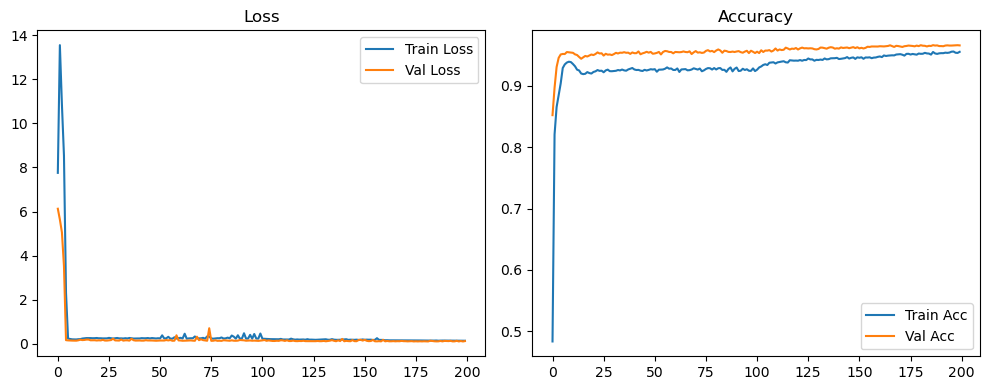

Evaluation:   0%|          | 0/157 [00:00<?, ?it/s]

Evaluation:   5%|▌         | 8/157 [00:00<00:01, 79.84it/s]

Evaluation:  11%|█         | 17/157 [00:00<00:01, 81.53it/s]

Evaluation:  17%|█▋        | 26/157 [00:00<00:01, 82.39it/s]

Evaluation:  22%|██▏       | 35/157 [00:00<00:01, 83.34it/s]

Evaluation:  28%|██▊       | 44/157 [00:00<00:01, 83.98it/s]

Evaluation:  34%|███▍      | 53/157 [00:00<00:01, 84.38it/s]

Evaluation:  39%|███▉      | 62/157 [00:00<00:01, 84.64it/s]

Evaluation:  45%|████▌     | 71/157 [00:00<00:01, 84.87it/s]

Evaluation:  51%|█████     | 80/157 [00:00<00:00, 85.01it/s]

Evaluation:  57%|█████▋    | 89/157 [00:01<00:00, 85.16it/s]

Evaluation:  62%|██████▏   | 98/157 [00:01<00:00, 85.29it/s]

Evaluation:  68%|██████▊   | 107/157 [00:01<00:00, 85.34it/s]

Evaluation:  74%|███████▍  | 116/157 [00:01<00:00, 85.33it/s]

Evaluation:  80%|███████▉  | 125/157 [00:01<00:00, 84.68it/s]

Evaluation:  85%|████████▌ | 134/157 [00:01<00:00, 84.41it/s]

Evaluation:  91%|█████████ | 143/157 [00:01<00:00, 84.71it/s]

Evaluation:  97%|█████████▋| 152/157 [00:01<00:00, 84.90it/s]

Evaluation: 100%|██████████| 157/157 [00:01<00:00, 84.77it/s]

Original Model Final Test Loss: 0.1218 Accuracy: 0.9683


🚀 Running: batch64_lr0.01_0.002_0.001_dp0.0


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.5539 | Val Acc: 0.8413 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.010 | Train Acc: 0.5539 | Val Acc: 0.8413 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.010 | Train Acc: 0.5539 | Val Acc: 0.8413 |:   0%|          | 1/200 [00:13<46:07, 13.91s/it]

| LR: 0.010 | Train Acc: 0.8578 | Val Acc: 0.9067 |:   0%|          | 1/200 [00:27<46:07, 13.91s/it]

| LR: 0.010 | Train Acc: 0.8578 | Val Acc: 0.9067 |:   0%|          | 1/200 [00:27<46:07, 13.91s/it]

| LR: 0.010 | Train Acc: 0.8578 | Val Acc: 0.9067 |:   1%|          | 2/200 [00:27<45:01, 13.64s/it]

| LR: 0.010 | Train Acc: 0.8986 | Val Acc: 0.9178 |:   1%|          | 2/200 [00:40<45:01, 13.64s/it]

| LR: 0.010 | Train Acc: 0.8986 | Val Acc: 0.9178 |:   1%|          | 2/200 [00:40<45:01, 13.64s/it]

| LR: 0.010 | Train Acc: 0.8986 | Val Acc: 0.9178 |:   2%|▏         | 3/200 [00:40<44:36, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9141 | Val Acc: 0.9278 |:   2%|▏         | 3/200 [00:54<44:36, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9141 | Val Acc: 0.9278 |:   2%|▏         | 3/200 [00:54<44:36, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9141 | Val Acc: 0.9278 |:   2%|▏         | 4/200 [00:54<44:15, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9281 | Val Acc: 0.9343 |:   2%|▏         | 4/200 [01:07<44:15, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9281 | Val Acc: 0.9343 |:   2%|▏         | 4/200 [01:07<44:15, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9281 | Val Acc: 0.9343 |:   2%|▎         | 5/200 [01:07<44:02, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9359 | Val Acc: 0.9322 |:   2%|▎         | 5/200 [01:21<44:02, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9359 | Val Acc: 0.9322 |:   2%|▎         | 5/200 [01:21<44:02, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9359 | Val Acc: 0.9322 |:   3%|▎         | 6/200 [01:21<43:58, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9403 | Val Acc: 0.9465 |:   3%|▎         | 6/200 [01:36<43:58, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9403 | Val Acc: 0.9465 |:   3%|▎         | 6/200 [01:36<43:58, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9403 | Val Acc: 0.9465 |:   4%|▎         | 7/200 [01:36<45:01, 14.00s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9451 |:   4%|▎         | 7/200 [01:49<45:01, 14.00s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9451 |:   4%|▎         | 7/200 [01:49<45:01, 14.00s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9451 |:   4%|▍         | 8/200 [01:49<44:18, 13.85s/it]

| LR: 0.010 | Train Acc: 0.9541 | Val Acc: 0.9522 |:   4%|▍         | 8/200 [02:03<44:18, 13.85s/it]

| LR: 0.010 | Train Acc: 0.9541 | Val Acc: 0.9522 |:   4%|▍         | 8/200 [02:03<44:18, 13.85s/it]

| LR: 0.010 | Train Acc: 0.9541 | Val Acc: 0.9522 |:   4%|▍         | 9/200 [02:03<43:39, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9633 | Val Acc: 0.9601 |:   4%|▍         | 9/200 [02:16<43:39, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9633 | Val Acc: 0.9601 |:   4%|▍         | 9/200 [02:16<43:39, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9633 | Val Acc: 0.9601 |:   5%|▌         | 10/200 [02:16<43:07, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9742 | Val Acc: 0.9627 |:   5%|▌         | 10/200 [02:30<43:07, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9742 | Val Acc: 0.9627 |:   5%|▌         | 10/200 [02:30<43:07, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9742 | Val Acc: 0.9627 |:   6%|▌         | 11/200 [02:30<42:50, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9799 | Val Acc: 0.9637 |:   6%|▌         | 11/200 [02:43<42:50, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9799 | Val Acc: 0.9637 |:   6%|▌         | 11/200 [02:43<42:50, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9799 | Val Acc: 0.9637 |:   6%|▌         | 12/200 [02:43<42:34, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9622 |:   6%|▌         | 12/200 [02:57<42:34, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9622 |:   6%|▌         | 12/200 [02:57<42:34, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9622 |:   6%|▋         | 13/200 [02:57<42:19, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9774 | Val Acc: 0.9608 |:   6%|▋         | 13/200 [03:10<42:19, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9774 | Val Acc: 0.9608 |:   6%|▋         | 13/200 [03:10<42:19, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9774 | Val Acc: 0.9608 |:   7%|▋         | 14/200 [03:10<41:57, 13.53s/it]

| LR: 0.010 | Train Acc: 0.9770 | Val Acc: 0.9618 |:   7%|▋         | 14/200 [03:24<41:57, 13.53s/it]

| LR: 0.010 | Train Acc: 0.9770 | Val Acc: 0.9618 |:   7%|▋         | 14/200 [03:24<41:57, 13.53s/it]

| LR: 0.010 | Train Acc: 0.9770 | Val Acc: 0.9618 |:   8%|▊         | 15/200 [03:24<41:39, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9752 | Val Acc: 0.9614 |:   8%|▊         | 15/200 [03:37<41:39, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9752 | Val Acc: 0.9614 |:   8%|▊         | 15/200 [03:37<41:39, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9752 | Val Acc: 0.9614 |:   8%|▊         | 16/200 [03:37<41:21, 13.49s/it]

| LR: 0.010 | Train Acc: 0.9738 | Val Acc: 0.9567 |:   8%|▊         | 16/200 [03:51<41:21, 13.49s/it]

| LR: 0.010 | Train Acc: 0.9738 | Val Acc: 0.9567 |:   8%|▊         | 16/200 [03:51<41:21, 13.49s/it]

| LR: 0.010 | Train Acc: 0.9738 | Val Acc: 0.9567 |:   8%|▊         | 17/200 [03:51<41:06, 13.48s/it]

| LR: 0.010 | Train Acc: 0.9720 | Val Acc: 0.9580 |:   8%|▊         | 17/200 [04:04<41:06, 13.48s/it]

| LR: 0.010 | Train Acc: 0.9720 | Val Acc: 0.9580 |:   8%|▊         | 17/200 [04:04<41:06, 13.48s/it]

| LR: 0.010 | Train Acc: 0.9720 | Val Acc: 0.9580 |:   9%|▉         | 18/200 [04:04<40:44, 13.43s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9553 |:   9%|▉         | 18/200 [04:17<40:44, 13.43s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9553 |:   9%|▉         | 18/200 [04:17<40:44, 13.43s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9553 |:  10%|▉         | 19/200 [04:17<40:30, 13.43s/it]

| LR: 0.010 | Train Acc: 0.9733 | Val Acc: 0.9604 |:  10%|▉         | 19/200 [04:31<40:30, 13.43s/it]

| LR: 0.010 | Train Acc: 0.9733 | Val Acc: 0.9604 |:  10%|▉         | 19/200 [04:31<40:30, 13.43s/it]

| LR: 0.010 | Train Acc: 0.9733 | Val Acc: 0.9604 |:  10%|█         | 20/200 [04:31<40:17, 13.43s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9574 |:  10%|█         | 20/200 [04:44<40:17, 13.43s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9574 |:  10%|█         | 20/200 [04:44<40:17, 13.43s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9574 |:  10%|█         | 21/200 [04:44<39:59, 13.41s/it]

| LR: 0.010 | Train Acc: 0.9730 | Val Acc: 0.9623 |:  10%|█         | 21/200 [04:58<39:59, 13.41s/it]

| LR: 0.010 | Train Acc: 0.9730 | Val Acc: 0.9623 |:  10%|█         | 21/200 [04:58<39:59, 13.41s/it]

| LR: 0.010 | Train Acc: 0.9730 | Val Acc: 0.9623 |:  11%|█         | 22/200 [04:58<39:43, 13.39s/it]

| LR: 0.010 | Train Acc: 0.9752 | Val Acc: 0.9600 |:  11%|█         | 22/200 [05:11<39:43, 13.39s/it]

| LR: 0.010 | Train Acc: 0.9752 | Val Acc: 0.9600 |:  11%|█         | 22/200 [05:11<39:43, 13.39s/it]

| LR: 0.010 | Train Acc: 0.9752 | Val Acc: 0.9600 |:  12%|█▏        | 23/200 [05:11<39:40, 13.45s/it]

| LR: 0.010 | Train Acc: 0.9755 | Val Acc: 0.9571 |:  12%|█▏        | 23/200 [05:25<39:40, 13.45s/it]

| LR: 0.010 | Train Acc: 0.9755 | Val Acc: 0.9571 |:  12%|█▏        | 23/200 [05:25<39:40, 13.45s/it]

| LR: 0.010 | Train Acc: 0.9755 | Val Acc: 0.9571 |:  12%|█▏        | 24/200 [05:25<39:29, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9767 | Val Acc: 0.9629 |:  12%|█▏        | 24/200 [05:38<39:29, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9767 | Val Acc: 0.9629 |:  12%|█▏        | 24/200 [05:38<39:29, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9767 | Val Acc: 0.9629 |:  12%|█▎        | 25/200 [05:38<39:29, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9778 | Val Acc: 0.9552 |:  12%|█▎        | 25/200 [05:52<39:29, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9778 | Val Acc: 0.9552 |:  12%|█▎        | 25/200 [05:52<39:29, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9778 | Val Acc: 0.9552 |:  13%|█▎        | 26/200 [05:52<39:06, 13.49s/it]

| LR: 0.010 | Train Acc: 0.9766 | Val Acc: 0.9608 |:  13%|█▎        | 26/200 [06:05<39:06, 13.49s/it]

| LR: 0.010 | Train Acc: 0.9766 | Val Acc: 0.9608 |:  13%|█▎        | 26/200 [06:05<39:06, 13.49s/it]

| LR: 0.010 | Train Acc: 0.9766 | Val Acc: 0.9608 |:  14%|█▎        | 27/200 [06:05<38:48, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9771 | Val Acc: 0.9594 |:  14%|█▎        | 27/200 [06:19<38:48, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9771 | Val Acc: 0.9594 |:  14%|█▎        | 27/200 [06:19<38:48, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9771 | Val Acc: 0.9594 |:  14%|█▍        | 28/200 [06:19<38:35, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9622 |:  14%|█▍        | 28/200 [06:32<38:35, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9622 |:  14%|█▍        | 28/200 [06:32<38:35, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9622 |:  14%|█▍        | 29/200 [06:32<38:22, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9620 |:  14%|█▍        | 29/200 [06:46<38:22, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9620 |:  14%|█▍        | 29/200 [06:46<38:22, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9620 |:  15%|█▌        | 30/200 [06:46<38:11, 13.48s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9643 |:  15%|█▌        | 30/200 [06:59<38:11, 13.48s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9643 |:  15%|█▌        | 30/200 [06:59<38:11, 13.48s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9643 |:  16%|█▌        | 31/200 [06:59<38:12, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9593 |:  16%|█▌        | 31/200 [07:13<38:12, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9593 |:  16%|█▌        | 31/200 [07:13<38:12, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9593 |:  16%|█▌        | 32/200 [07:13<38:08, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9619 |:  16%|█▌        | 32/200 [07:27<38:08, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9619 |:  16%|█▌        | 32/200 [07:27<38:08, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9619 |:  16%|█▋        | 33/200 [07:27<37:45, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9621 |:  16%|█▋        | 33/200 [07:40<37:45, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9621 |:  16%|█▋        | 33/200 [07:40<37:45, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9621 |:  17%|█▋        | 34/200 [07:40<37:27, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9612 |:  17%|█▋        | 34/200 [07:54<37:27, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9612 |:  17%|█▋        | 34/200 [07:54<37:27, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9612 |:  18%|█▊        | 35/200 [07:54<37:19, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9609 |:  18%|█▊        | 35/200 [08:07<37:19, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9609 |:  18%|█▊        | 35/200 [08:07<37:19, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9609 |:  18%|█▊        | 36/200 [08:07<37:10, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9612 |:  18%|█▊        | 36/200 [08:21<37:10, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9612 |:  18%|█▊        | 36/200 [08:21<37:10, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9612 |:  18%|█▊        | 37/200 [08:21<36:44, 13.52s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9603 |:  18%|█▊        | 37/200 [08:34<36:44, 13.52s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9603 |:  18%|█▊        | 37/200 [08:34<36:44, 13.52s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9603 |:  19%|█▉        | 38/200 [08:34<36:34, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9567 |:  19%|█▉        | 38/200 [08:48<36:34, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9567 |:  19%|█▉        | 38/200 [08:48<36:34, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9567 |:  20%|█▉        | 39/200 [08:48<36:21, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9633 |:  20%|█▉        | 39/200 [09:01<36:21, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9633 |:  20%|█▉        | 39/200 [09:01<36:21, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9633 |:  20%|██        | 40/200 [09:01<36:02, 13.52s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9618 |:  20%|██        | 40/200 [09:15<36:02, 13.52s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9618 |:  20%|██        | 40/200 [09:15<36:02, 13.52s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9618 |:  20%|██        | 41/200 [09:15<35:42, 13.47s/it]

| LR: 0.010 | Train Acc: 0.9827 | Val Acc: 0.9637 |:  20%|██        | 41/200 [09:28<35:42, 13.47s/it]

| LR: 0.010 | Train Acc: 0.9827 | Val Acc: 0.9637 |:  20%|██        | 41/200 [09:28<35:42, 13.47s/it]

| LR: 0.010 | Train Acc: 0.9827 | Val Acc: 0.9637 |:  21%|██        | 42/200 [09:28<35:26, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9828 | Val Acc: 0.9653 |:  21%|██        | 42/200 [09:42<35:26, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9828 | Val Acc: 0.9653 |:  21%|██        | 42/200 [09:42<35:26, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9828 | Val Acc: 0.9653 |:  22%|██▏       | 43/200 [09:42<35:13, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9838 | Val Acc: 0.9640 |:  22%|██▏       | 43/200 [09:55<35:13, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9838 | Val Acc: 0.9640 |:  22%|██▏       | 43/200 [09:55<35:13, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9838 | Val Acc: 0.9640 |:  22%|██▏       | 44/200 [09:55<35:00, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9600 |:  22%|██▏       | 44/200 [10:08<35:00, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9600 |:  22%|██▏       | 44/200 [10:08<35:00, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9600 |:  22%|██▎       | 45/200 [10:08<34:44, 13.45s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9619 |:  22%|██▎       | 45/200 [10:23<34:44, 13.45s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9619 |:  22%|██▎       | 45/200 [10:23<34:44, 13.45s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9619 |:  23%|██▎       | 46/200 [10:23<35:00, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9612 |:  23%|██▎       | 46/200 [10:36<35:00, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9612 |:  23%|██▎       | 46/200 [10:36<35:00, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9612 |:  24%|██▎       | 47/200 [10:36<34:43, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9614 |:  24%|██▎       | 47/200 [10:50<34:43, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9614 |:  24%|██▎       | 47/200 [10:50<34:43, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9614 |:  24%|██▍       | 48/200 [10:50<34:22, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9647 |:  24%|██▍       | 48/200 [11:03<34:22, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9647 |:  24%|██▍       | 48/200 [11:03<34:22, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9647 |:  24%|██▍       | 49/200 [11:03<34:17, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9844 | Val Acc: 0.9633 |:  24%|██▍       | 49/200 [11:17<34:17, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9844 | Val Acc: 0.9633 |:  24%|██▍       | 49/200 [11:17<34:17, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9844 | Val Acc: 0.9633 |:  25%|██▌       | 50/200 [11:17<33:58, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9634 |:  25%|██▌       | 50/200 [11:30<33:58, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9634 |:  25%|██▌       | 50/200 [11:30<33:58, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9634 |:  26%|██▌       | 51/200 [11:30<33:43, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9632 |:  26%|██▌       | 51/200 [11:44<33:43, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9632 |:  26%|██▌       | 51/200 [11:44<33:43, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9632 |:  26%|██▌       | 52/200 [11:44<33:24, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9828 | Val Acc: 0.9650 |:  26%|██▌       | 52/200 [11:58<33:24, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9828 | Val Acc: 0.9650 |:  26%|██▌       | 52/200 [11:58<33:24, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9828 | Val Acc: 0.9650 |:  26%|██▋       | 53/200 [11:58<33:53, 13.83s/it]

| LR: 0.010 | Train Acc: 0.9825 | Val Acc: 0.9625 |:  26%|██▋       | 53/200 [12:12<33:53, 13.83s/it]

| LR: 0.010 | Train Acc: 0.9825 | Val Acc: 0.9625 |:  26%|██▋       | 53/200 [12:12<33:53, 13.83s/it]

| LR: 0.010 | Train Acc: 0.9825 | Val Acc: 0.9625 |:  27%|██▋       | 54/200 [12:12<33:27, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9613 |:  27%|██▋       | 54/200 [12:25<33:27, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9613 |:  27%|██▋       | 54/200 [12:25<33:27, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9613 |:  28%|██▊       | 55/200 [12:25<33:03, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9639 |:  28%|██▊       | 55/200 [12:39<33:03, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9639 |:  28%|██▊       | 55/200 [12:39<33:03, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9639 |:  28%|██▊       | 56/200 [12:39<32:34, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9846 | Val Acc: 0.9635 |:  28%|██▊       | 56/200 [12:52<32:34, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9846 | Val Acc: 0.9635 |:  28%|██▊       | 56/200 [12:52<32:34, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9846 | Val Acc: 0.9635 |:  28%|██▊       | 57/200 [12:52<32:16, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9828 | Val Acc: 0.9633 |:  28%|██▊       | 57/200 [13:06<32:16, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9828 | Val Acc: 0.9633 |:  28%|██▊       | 57/200 [13:06<32:16, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9828 | Val Acc: 0.9633 |:  29%|██▉       | 58/200 [13:06<32:26, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9840 | Val Acc: 0.9650 |:  29%|██▉       | 58/200 [13:20<32:26, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9840 | Val Acc: 0.9650 |:  29%|██▉       | 58/200 [13:20<32:26, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9840 | Val Acc: 0.9650 |:  30%|██▉       | 59/200 [13:20<32:03, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9667 |:  30%|██▉       | 59/200 [13:33<32:03, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9667 |:  30%|██▉       | 59/200 [13:33<32:03, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9667 |:  30%|███       | 60/200 [13:33<31:43, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9641 |:  30%|███       | 60/200 [13:47<31:43, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9641 |:  30%|███       | 60/200 [13:47<31:43, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9641 |:  30%|███       | 61/200 [13:47<31:25, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9826 | Val Acc: 0.9589 |:  30%|███       | 61/200 [14:01<31:25, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9826 | Val Acc: 0.9589 |:  30%|███       | 61/200 [14:01<31:25, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9826 | Val Acc: 0.9589 |:  31%|███       | 62/200 [14:01<31:22, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9839 | Val Acc: 0.9607 |:  31%|███       | 62/200 [14:17<31:22, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9839 | Val Acc: 0.9607 |:  31%|███       | 62/200 [14:17<31:22, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9839 | Val Acc: 0.9607 |:  32%|███▏      | 63/200 [14:17<32:54, 14.42s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9645 |:  32%|███▏      | 63/200 [14:30<32:54, 14.42s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9645 |:  32%|███▏      | 63/200 [14:30<32:54, 14.42s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9645 |:  32%|███▏      | 64/200 [14:30<32:09, 14.18s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9667 |:  32%|███▏      | 64/200 [14:44<32:09, 14.18s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9667 |:  32%|███▏      | 64/200 [14:44<32:09, 14.18s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9667 |:  32%|███▎      | 65/200 [14:44<31:29, 14.00s/it]

| LR: 0.010 | Train Acc: 0.9844 | Val Acc: 0.9592 |:  32%|███▎      | 65/200 [14:58<31:29, 14.00s/it]

| LR: 0.010 | Train Acc: 0.9844 | Val Acc: 0.9592 |:  32%|███▎      | 65/200 [14:58<31:29, 14.00s/it]

| LR: 0.010 | Train Acc: 0.9844 | Val Acc: 0.9592 |:  33%|███▎      | 66/200 [14:58<31:20, 14.03s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9625 |:  33%|███▎      | 66/200 [15:12<31:20, 14.03s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9625 |:  33%|███▎      | 66/200 [15:12<31:20, 14.03s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9625 |:  34%|███▎      | 67/200 [15:12<30:50, 13.91s/it]

| LR: 0.010 | Train Acc: 0.9840 | Val Acc: 0.9601 |:  34%|███▎      | 67/200 [15:25<30:50, 13.91s/it]

| LR: 0.010 | Train Acc: 0.9840 | Val Acc: 0.9601 |:  34%|███▎      | 67/200 [15:25<30:50, 13.91s/it]

| LR: 0.010 | Train Acc: 0.9840 | Val Acc: 0.9601 |:  34%|███▍      | 68/200 [15:25<30:22, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9845 | Val Acc: 0.9628 |:  34%|███▍      | 68/200 [15:39<30:22, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9845 | Val Acc: 0.9628 |:  34%|███▍      | 68/200 [15:39<30:22, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9845 | Val Acc: 0.9628 |:  34%|███▍      | 69/200 [15:39<29:50, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9840 | Val Acc: 0.9604 |:  34%|███▍      | 69/200 [15:52<29:50, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9840 | Val Acc: 0.9604 |:  34%|███▍      | 69/200 [15:52<29:50, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9840 | Val Acc: 0.9604 |:  35%|███▌      | 70/200 [15:52<29:26, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9645 |:  35%|███▌      | 70/200 [16:06<29:26, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9645 |:  35%|███▌      | 70/200 [16:06<29:26, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9645 |:  36%|███▌      | 71/200 [16:06<29:19, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9643 |:  36%|███▌      | 71/200 [16:19<29:19, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9643 |:  36%|███▌      | 71/200 [16:19<29:19, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9643 |:  36%|███▌      | 72/200 [16:19<28:52, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9629 |:  36%|███▌      | 72/200 [16:33<28:52, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9629 |:  36%|███▌      | 72/200 [16:33<28:52, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9629 |:  36%|███▋      | 73/200 [16:33<28:51, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9641 |:  36%|███▋      | 73/200 [16:47<28:51, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9641 |:  36%|███▋      | 73/200 [16:47<28:51, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9641 |:  37%|███▋      | 74/200 [16:47<28:48, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9838 | Val Acc: 0.9631 |:  37%|███▋      | 74/200 [17:01<28:48, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9838 | Val Acc: 0.9631 |:  37%|███▋      | 74/200 [17:01<28:48, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9838 | Val Acc: 0.9631 |:  38%|███▊      | 75/200 [17:01<28:34, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9850 | Val Acc: 0.9617 |:  38%|███▊      | 75/200 [17:14<28:34, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9850 | Val Acc: 0.9617 |:  38%|███▊      | 75/200 [17:14<28:34, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9850 | Val Acc: 0.9617 |:  38%|███▊      | 76/200 [17:14<28:12, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9848 | Val Acc: 0.9649 |:  38%|███▊      | 76/200 [17:28<28:12, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9848 | Val Acc: 0.9649 |:  38%|███▊      | 76/200 [17:28<28:12, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9848 | Val Acc: 0.9649 |:  38%|███▊      | 77/200 [17:28<27:56, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9638 |:  38%|███▊      | 77/200 [17:41<27:56, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9638 |:  38%|███▊      | 77/200 [17:41<27:56, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9638 |:  39%|███▉      | 78/200 [17:41<27:40, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9645 |:  39%|███▉      | 78/200 [17:55<27:40, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9645 |:  39%|███▉      | 78/200 [17:55<27:40, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9645 |:  40%|███▉      | 79/200 [17:55<27:22, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9658 |:  40%|███▉      | 79/200 [18:08<27:22, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9658 |:  40%|███▉      | 79/200 [18:08<27:22, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9658 |:  40%|████      | 80/200 [18:08<27:04, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9641 |:  40%|████      | 80/200 [18:22<27:04, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9641 |:  40%|████      | 80/200 [18:22<27:04, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9641 |:  40%|████      | 81/200 [18:22<26:48, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9647 |:  40%|████      | 81/200 [18:35<26:48, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9647 |:  40%|████      | 81/200 [18:35<26:48, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9647 |:  41%|████      | 82/200 [18:35<26:33, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9634 |:  41%|████      | 82/200 [18:49<26:33, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9634 |:  41%|████      | 82/200 [18:49<26:33, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9634 |:  42%|████▏     | 83/200 [18:49<26:20, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9638 |:  42%|████▏     | 83/200 [19:02<26:20, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9638 |:  42%|████▏     | 83/200 [19:02<26:20, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9638 |:  42%|████▏     | 84/200 [19:02<26:05, 13.49s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9642 |:  42%|████▏     | 84/200 [19:15<26:05, 13.49s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9642 |:  42%|████▏     | 84/200 [19:15<26:05, 13.49s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9642 |:  42%|████▎     | 85/200 [19:16<25:47, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9845 | Val Acc: 0.9653 |:  42%|████▎     | 85/200 [19:30<25:47, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9845 | Val Acc: 0.9653 |:  42%|████▎     | 85/200 [19:30<25:47, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9845 | Val Acc: 0.9653 |:  43%|████▎     | 86/200 [19:30<25:53, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9629 |:  43%|████▎     | 86/200 [19:43<25:53, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9629 |:  43%|████▎     | 86/200 [19:43<25:53, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9629 |:  44%|████▎     | 87/200 [19:43<25:37, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9658 |:  44%|████▎     | 87/200 [19:57<25:37, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9658 |:  44%|████▎     | 87/200 [19:57<25:37, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9658 |:  44%|████▍     | 88/200 [19:57<25:20, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9612 |:  44%|████▍     | 88/200 [20:11<25:20, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9612 |:  44%|████▍     | 88/200 [20:11<25:20, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9612 |:  44%|████▍     | 89/200 [20:11<25:18, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9845 | Val Acc: 0.9647 |:  44%|████▍     | 89/200 [20:24<25:18, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9845 | Val Acc: 0.9647 |:  44%|████▍     | 89/200 [20:24<25:18, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9845 | Val Acc: 0.9647 |:  45%|████▌     | 90/200 [20:24<25:01, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9871 | Val Acc: 0.9670 |:  45%|████▌     | 90/200 [20:38<25:01, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9871 | Val Acc: 0.9670 |:  45%|████▌     | 90/200 [20:38<25:01, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9871 | Val Acc: 0.9670 |:  46%|████▌     | 91/200 [20:38<24:50, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9645 |:  46%|████▌     | 91/200 [20:51<24:50, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9645 |:  46%|████▌     | 91/200 [20:51<24:50, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9645 |:  46%|████▌     | 92/200 [20:51<24:28, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9627 |:  46%|████▌     | 92/200 [21:05<24:28, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9627 |:  46%|████▌     | 92/200 [21:05<24:28, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9627 |:  46%|████▋     | 93/200 [21:05<24:13, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9672 |:  46%|████▋     | 93/200 [21:18<24:13, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9672 |:  46%|████▋     | 93/200 [21:18<24:13, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9672 |:  47%|████▋     | 94/200 [21:18<23:54, 13.53s/it]

| LR: 0.010 | Train Acc: 0.9868 | Val Acc: 0.9652 |:  47%|████▋     | 94/200 [21:32<23:54, 13.53s/it]

| LR: 0.010 | Train Acc: 0.9868 | Val Acc: 0.9652 |:  47%|████▋     | 94/200 [21:32<23:54, 13.53s/it]

| LR: 0.010 | Train Acc: 0.9868 | Val Acc: 0.9652 |:  48%|████▊     | 95/200 [21:32<23:34, 13.47s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9606 |:  48%|████▊     | 95/200 [21:45<23:34, 13.47s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9606 |:  48%|████▊     | 95/200 [21:45<23:34, 13.47s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9606 |:  48%|████▊     | 96/200 [21:45<23:17, 13.44s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9663 |:  48%|████▊     | 96/200 [21:58<23:17, 13.44s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9663 |:  48%|████▊     | 96/200 [21:58<23:17, 13.44s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9663 |:  48%|████▊     | 97/200 [21:58<23:05, 13.45s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9629 |:  48%|████▊     | 97/200 [22:12<23:05, 13.45s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9629 |:  48%|████▊     | 97/200 [22:12<23:05, 13.45s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9629 |:  49%|████▉     | 98/200 [22:12<22:52, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9631 |:  49%|████▉     | 98/200 [22:25<22:52, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9631 |:  49%|████▉     | 98/200 [22:25<22:52, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9631 |:  50%|████▉     | 99/200 [22:25<22:40, 13.47s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9627 |:  50%|████▉     | 99/200 [22:39<22:40, 13.47s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9627 |:  50%|████▉     | 99/200 [22:39<22:40, 13.47s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9627 |:  50%|█████     | 100/200 [22:39<22:33, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9888 | Val Acc: 0.9662 |:  50%|█████     | 100/200 [22:53<22:33, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9888 | Val Acc: 0.9662 |:  50%|█████     | 100/200 [22:53<22:33, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9888 | Val Acc: 0.9662 |:  50%|█████     | 101/200 [22:53<22:19, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9654 |:  50%|█████     | 101/200 [23:06<22:19, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9654 |:  50%|█████     | 101/200 [23:06<22:19, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9654 |:  51%|█████     | 102/200 [23:06<22:13, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9664 |:  51%|█████     | 102/200 [23:20<22:13, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9664 |:  51%|█████     | 102/200 [23:20<22:13, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9664 |:  52%|█████▏    | 103/200 [23:20<21:55, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9680 |:  52%|█████▏    | 103/200 [23:33<21:55, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9680 |:  52%|█████▏    | 103/200 [23:33<21:55, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9680 |:  52%|█████▏    | 104/200 [23:33<21:40, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9659 |:  52%|█████▏    | 104/200 [23:47<21:40, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9659 |:  52%|█████▏    | 104/200 [23:47<21:40, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9659 |:  52%|█████▎    | 105/200 [23:47<21:22, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9671 |:  52%|█████▎    | 105/200 [24:00<21:22, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9671 |:  52%|█████▎    | 105/200 [24:00<21:22, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9671 |:  53%|█████▎    | 106/200 [24:00<21:07, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9927 | Val Acc: 0.9702 |:  53%|█████▎    | 106/200 [24:14<21:07, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9927 | Val Acc: 0.9702 |:  53%|█████▎    | 106/200 [24:14<21:07, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9927 | Val Acc: 0.9702 |:  54%|█████▎    | 107/200 [24:14<20:52, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9698 |:  54%|█████▎    | 107/200 [24:28<20:52, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9698 |:  54%|█████▎    | 107/200 [24:28<20:52, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9698 |:  54%|█████▍    | 108/200 [24:28<21:03, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9688 |:  54%|█████▍    | 108/200 [24:45<21:03, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9688 |:  54%|█████▍    | 108/200 [24:45<21:03, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9688 |:  55%|█████▍    | 109/200 [24:45<22:18, 14.71s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9684 |:  55%|█████▍    | 109/200 [24:58<22:18, 14.71s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9684 |:  55%|█████▍    | 109/200 [24:58<22:18, 14.71s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9684 |:  55%|█████▌    | 110/200 [24:58<21:28, 14.32s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9690 |:  55%|█████▌    | 110/200 [25:12<21:28, 14.32s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9690 |:  55%|█████▌    | 110/200 [25:12<21:28, 14.32s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9690 |:  56%|█████▌    | 111/200 [25:12<20:48, 14.02s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9685 |:  56%|█████▌    | 111/200 [25:25<20:48, 14.02s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9685 |:  56%|█████▌    | 111/200 [25:25<20:48, 14.02s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9685 |:  56%|█████▌    | 112/200 [25:25<20:18, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9683 |:  56%|█████▌    | 112/200 [25:39<20:18, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9683 |:  56%|█████▌    | 112/200 [25:39<20:18, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9683 |:  56%|█████▋    | 113/200 [25:39<20:02, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9699 |:  56%|█████▋    | 113/200 [25:52<20:02, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9699 |:  56%|█████▋    | 113/200 [25:52<20:02, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9699 |:  57%|█████▋    | 114/200 [25:52<19:42, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9710 |:  57%|█████▋    | 114/200 [26:07<19:42, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9710 |:  57%|█████▋    | 114/200 [26:07<19:42, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9710 |:  57%|█████▊    | 115/200 [26:07<19:54, 14.06s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9697 |:  57%|█████▊    | 115/200 [26:21<19:54, 14.06s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9697 |:  57%|█████▊    | 115/200 [26:21<19:54, 14.06s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9697 |:  58%|█████▊    | 116/200 [26:21<19:41, 14.07s/it]

| LR: 0.002 | Train Acc: 0.9952 | Val Acc: 0.9697 |:  58%|█████▊    | 116/200 [26:35<19:41, 14.07s/it]

| LR: 0.002 | Train Acc: 0.9952 | Val Acc: 0.9697 |:  58%|█████▊    | 116/200 [26:35<19:41, 14.07s/it]

| LR: 0.002 | Train Acc: 0.9952 | Val Acc: 0.9697 |:  58%|█████▊    | 117/200 [26:35<19:16, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9683 |:  58%|█████▊    | 117/200 [26:48<19:16, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9683 |:  58%|█████▊    | 117/200 [26:48<19:16, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9683 |:  59%|█████▉    | 118/200 [26:48<18:52, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9698 |:  59%|█████▉    | 118/200 [27:02<18:52, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9698 |:  59%|█████▉    | 118/200 [27:02<18:52, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9698 |:  60%|█████▉    | 119/200 [27:02<18:32, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9699 |:  60%|█████▉    | 119/200 [27:15<18:32, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9699 |:  60%|█████▉    | 119/200 [27:15<18:32, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9699 |:  60%|██████    | 120/200 [27:15<18:05, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9713 |:  60%|██████    | 120/200 [27:29<18:05, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9713 |:  60%|██████    | 120/200 [27:29<18:05, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9713 |:  60%|██████    | 121/200 [27:29<17:57, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9702 |:  60%|██████    | 121/200 [27:42<17:57, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9702 |:  60%|██████    | 121/200 [27:42<17:57, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9702 |:  61%|██████    | 122/200 [27:42<17:39, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9695 |:  61%|██████    | 122/200 [27:56<17:39, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9695 |:  61%|██████    | 122/200 [27:56<17:39, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9695 |:  62%|██████▏   | 123/200 [27:56<17:22, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9692 |:  62%|██████▏   | 123/200 [28:09<17:22, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9692 |:  62%|██████▏   | 123/200 [28:09<17:22, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9692 |:  62%|██████▏   | 124/200 [28:09<17:06, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9693 |:  62%|██████▏   | 124/200 [28:23<17:06, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9693 |:  62%|██████▏   | 124/200 [28:23<17:06, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9693 |:  62%|██████▎   | 125/200 [28:23<16:56, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9702 |:  62%|██████▎   | 125/200 [28:36<16:56, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9702 |:  62%|██████▎   | 125/200 [28:36<16:56, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9702 |:  63%|██████▎   | 126/200 [28:36<16:40, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9716 |:  63%|██████▎   | 126/200 [28:50<16:40, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9716 |:  63%|██████▎   | 126/200 [28:50<16:40, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9716 |:  64%|██████▎   | 127/200 [28:50<16:28, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9701 |:  64%|██████▎   | 127/200 [29:03<16:28, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9701 |:  64%|██████▎   | 127/200 [29:03<16:28, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9701 |:  64%|██████▍   | 128/200 [29:04<16:13, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9685 |:  64%|██████▍   | 128/200 [29:17<16:13, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9685 |:  64%|██████▍   | 128/200 [29:17<16:13, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9685 |:  64%|██████▍   | 129/200 [29:17<16:04, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9714 |:  64%|██████▍   | 129/200 [29:31<16:04, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9714 |:  64%|██████▍   | 129/200 [29:31<16:04, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9714 |:  65%|██████▌   | 130/200 [29:31<15:45, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9710 |:  65%|██████▌   | 130/200 [29:44<15:45, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9710 |:  65%|██████▌   | 130/200 [29:44<15:45, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9710 |:  66%|██████▌   | 131/200 [29:44<15:31, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9955 | Val Acc: 0.9710 |:  66%|██████▌   | 131/200 [29:57<15:31, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9955 | Val Acc: 0.9710 |:  66%|██████▌   | 131/200 [29:57<15:31, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9955 | Val Acc: 0.9710 |:  66%|██████▌   | 132/200 [29:57<15:16, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9689 |:  66%|██████▌   | 132/200 [30:11<15:16, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9689 |:  66%|██████▌   | 132/200 [30:11<15:16, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9689 |:  66%|██████▋   | 133/200 [30:11<15:00, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9707 |:  66%|██████▋   | 133/200 [30:25<15:00, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9707 |:  66%|██████▋   | 133/200 [30:25<15:00, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9707 |:  67%|██████▋   | 134/200 [30:25<14:58, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9712 |:  67%|██████▋   | 134/200 [30:41<14:58, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9712 |:  67%|██████▋   | 134/200 [30:41<14:58, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9712 |:  68%|██████▊   | 135/200 [30:41<15:28, 14.28s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9705 |:  68%|██████▊   | 135/200 [30:54<15:28, 14.28s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9705 |:  68%|██████▊   | 135/200 [30:54<15:28, 14.28s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9705 |:  68%|██████▊   | 136/200 [30:54<14:56, 14.01s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9724 |:  68%|██████▊   | 136/200 [31:07<14:56, 14.01s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9724 |:  68%|██████▊   | 136/200 [31:07<14:56, 14.01s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9724 |:  68%|██████▊   | 137/200 [31:07<14:30, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9704 |:  68%|██████▊   | 137/200 [31:21<14:30, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9704 |:  68%|██████▊   | 137/200 [31:21<14:30, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9704 |:  69%|██████▉   | 138/200 [31:21<14:12, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9702 |:  69%|██████▉   | 138/200 [31:34<14:12, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9702 |:  69%|██████▉   | 138/200 [31:34<14:12, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9702 |:  70%|██████▉   | 139/200 [31:34<13:53, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9707 |:  70%|██████▉   | 139/200 [31:48<13:53, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9707 |:  70%|██████▉   | 139/200 [31:48<13:53, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9707 |:  70%|███████   | 140/200 [31:48<13:38, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9722 |:  70%|███████   | 140/200 [32:01<13:38, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9722 |:  70%|███████   | 140/200 [32:01<13:38, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9722 |:  70%|███████   | 141/200 [32:02<13:21, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9718 |:  70%|███████   | 141/200 [32:15<13:21, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9718 |:  70%|███████   | 141/200 [32:15<13:21, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9718 |:  71%|███████   | 142/200 [32:15<13:04, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9702 |:  71%|███████   | 142/200 [32:29<13:04, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9702 |:  71%|███████   | 142/200 [32:29<13:04, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9702 |:  72%|███████▏  | 143/200 [32:29<12:54, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9718 |:  72%|███████▏  | 143/200 [32:42<12:54, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9718 |:  72%|███████▏  | 143/200 [32:42<12:54, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9718 |:  72%|███████▏  | 144/200 [32:42<12:38, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9707 |:  72%|███████▏  | 144/200 [32:56<12:38, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9707 |:  72%|███████▏  | 144/200 [32:56<12:38, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9707 |:  72%|███████▎  | 145/200 [32:56<12:28, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9702 |:  72%|███████▎  | 145/200 [33:09<12:28, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9702 |:  72%|███████▎  | 145/200 [33:09<12:28, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9702 |:  73%|███████▎  | 146/200 [33:09<12:13, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9718 |:  73%|███████▎  | 146/200 [33:23<12:13, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9718 |:  73%|███████▎  | 146/200 [33:23<12:13, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9718 |:  74%|███████▎  | 147/200 [33:23<11:58, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9719 |:  74%|███████▎  | 147/200 [33:36<11:58, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9719 |:  74%|███████▎  | 147/200 [33:36<11:58, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9719 |:  74%|███████▍  | 148/200 [33:36<11:41, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9712 |:  74%|███████▍  | 148/200 [33:49<11:41, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9712 |:  74%|███████▍  | 148/200 [33:49<11:41, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9712 |:  74%|███████▍  | 149/200 [33:49<11:24, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9717 |:  74%|███████▍  | 149/200 [34:03<11:24, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9717 |:  74%|███████▍  | 149/200 [34:03<11:24, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9717 |:  75%|███████▌  | 150/200 [34:03<11:19, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9722 |:  75%|███████▌  | 150/200 [34:17<11:19, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9722 |:  75%|███████▌  | 150/200 [34:17<11:19, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9722 |:  76%|███████▌  | 151/200 [34:17<11:11, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9722 |:  76%|███████▌  | 151/200 [34:31<11:11, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9722 |:  76%|███████▌  | 151/200 [34:31<11:11, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9722 |:  76%|███████▌  | 152/200 [34:31<10:56, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9721 |:  76%|███████▌  | 152/200 [34:44<10:56, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9721 |:  76%|███████▌  | 152/200 [34:44<10:56, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9721 |:  76%|███████▋  | 153/200 [34:44<10:37, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9721 |:  76%|███████▋  | 153/200 [34:58<10:37, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9721 |:  76%|███████▋  | 153/200 [34:58<10:37, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9721 |:  77%|███████▋  | 154/200 [34:58<10:30, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9716 |:  77%|███████▋  | 154/200 [35:12<10:30, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9716 |:  77%|███████▋  | 154/200 [35:12<10:30, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9716 |:  78%|███████▊  | 155/200 [35:12<10:11, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9716 |:  78%|███████▊  | 155/200 [35:25<10:11, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9716 |:  78%|███████▊  | 155/200 [35:25<10:11, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9716 |:  78%|███████▊  | 156/200 [35:25<09:55, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9730 |:  78%|███████▊  | 156/200 [35:38<09:55, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9730 |:  78%|███████▊  | 156/200 [35:38<09:55, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9730 |:  78%|███████▊  | 157/200 [35:39<09:40, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9723 |:  78%|███████▊  | 157/200 [35:53<09:40, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9723 |:  78%|███████▊  | 157/200 [35:53<09:40, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9723 |:  79%|███████▉  | 158/200 [35:53<09:35, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9719 |:  79%|███████▉  | 158/200 [36:06<09:35, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9719 |:  79%|███████▉  | 158/200 [36:06<09:35, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9719 |:  80%|███████▉  | 159/200 [36:06<09:18, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9708 |:  80%|███████▉  | 159/200 [36:20<09:18, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9708 |:  80%|███████▉  | 159/200 [36:20<09:18, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9708 |:  80%|████████  | 160/200 [36:20<09:05, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9742 |:  80%|████████  | 160/200 [36:33<09:05, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9742 |:  80%|████████  | 160/200 [36:33<09:05, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9742 |:  80%|████████  | 161/200 [36:33<08:50, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9711 |:  80%|████████  | 161/200 [36:47<08:50, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9711 |:  80%|████████  | 161/200 [36:47<08:50, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9711 |:  81%|████████  | 162/200 [36:47<08:37, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9722 |:  81%|████████  | 162/200 [37:00<08:37, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9722 |:  81%|████████  | 162/200 [37:00<08:37, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9722 |:  82%|████████▏ | 163/200 [37:00<08:22, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9718 |:  82%|████████▏ | 163/200 [37:14<08:22, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9718 |:  82%|████████▏ | 163/200 [37:14<08:22, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9718 |:  82%|████████▏ | 164/200 [37:14<08:06, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9715 |:  82%|████████▏ | 164/200 [37:27<08:06, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9715 |:  82%|████████▏ | 164/200 [37:27<08:06, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9715 |:  82%|████████▎ | 165/200 [37:27<07:51, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9725 |:  82%|████████▎ | 165/200 [37:41<07:51, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9725 |:  82%|████████▎ | 165/200 [37:41<07:51, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9725 |:  83%|████████▎ | 166/200 [37:41<07:38, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9717 |:  83%|████████▎ | 166/200 [37:54<07:38, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9717 |:  83%|████████▎ | 166/200 [37:54<07:38, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9717 |:  84%|████████▎ | 167/200 [37:54<07:23, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9728 |:  84%|████████▎ | 167/200 [38:07<07:23, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9728 |:  84%|████████▎ | 167/200 [38:07<07:23, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9728 |:  84%|████████▍ | 168/200 [38:07<07:08, 13.40s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9722 |:  84%|████████▍ | 168/200 [38:21<07:08, 13.40s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9722 |:  84%|████████▍ | 168/200 [38:21<07:08, 13.40s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9722 |:  84%|████████▍ | 169/200 [38:21<06:56, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9728 |:  84%|████████▍ | 169/200 [38:34<06:56, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9728 |:  84%|████████▍ | 169/200 [38:34<06:56, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9728 |:  85%|████████▌ | 170/200 [38:34<06:42, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9715 |:  85%|████████▌ | 170/200 [38:48<06:42, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9715 |:  85%|████████▌ | 170/200 [38:48<06:42, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9715 |:  86%|████████▌ | 171/200 [38:48<06:28, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9697 |:  86%|████████▌ | 171/200 [39:01<06:28, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9697 |:  86%|████████▌ | 171/200 [39:01<06:28, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9697 |:  86%|████████▌ | 172/200 [39:01<06:14, 13.36s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9738 |:  86%|████████▌ | 172/200 [39:14<06:14, 13.36s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9738 |:  86%|████████▌ | 172/200 [39:14<06:14, 13.36s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9738 |:  86%|████████▋ | 173/200 [39:14<06:00, 13.35s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9728 |:  86%|████████▋ | 173/200 [39:28<06:00, 13.35s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9728 |:  86%|████████▋ | 173/200 [39:28<06:00, 13.35s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9728 |:  87%|████████▋ | 174/200 [39:28<05:47, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9735 |:  87%|████████▋ | 174/200 [39:43<05:47, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9735 |:  87%|████████▋ | 174/200 [39:43<05:47, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9735 |:  88%|████████▊ | 175/200 [39:43<05:46, 13.87s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9707 |:  88%|████████▊ | 175/200 [39:57<05:46, 13.87s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9707 |:  88%|████████▊ | 175/200 [39:57<05:46, 13.87s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9707 |:  88%|████████▊ | 176/200 [39:57<05:37, 14.06s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9730 |:  88%|████████▊ | 176/200 [40:10<05:37, 14.06s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9730 |:  88%|████████▊ | 176/200 [40:10<05:37, 14.06s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9730 |:  88%|████████▊ | 177/200 [40:10<05:18, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9718 |:  88%|████████▊ | 177/200 [40:24<05:18, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9718 |:  88%|████████▊ | 177/200 [40:24<05:18, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9718 |:  89%|████████▉ | 178/200 [40:24<05:01, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9712 |:  89%|████████▉ | 178/200 [40:37<05:01, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9712 |:  89%|████████▉ | 178/200 [40:37<05:01, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9712 |:  90%|████████▉ | 179/200 [40:38<04:47, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9722 |:  90%|████████▉ | 179/200 [40:51<04:47, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9722 |:  90%|████████▉ | 179/200 [40:51<04:47, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9722 |:  90%|█████████ | 180/200 [40:52<04:35, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9721 |:  90%|█████████ | 180/200 [41:05<04:35, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9721 |:  90%|█████████ | 180/200 [41:05<04:35, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9721 |:  90%|█████████ | 181/200 [41:05<04:19, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9715 |:  90%|█████████ | 181/200 [41:18<04:19, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9715 |:  90%|█████████ | 181/200 [41:18<04:19, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9715 |:  91%|█████████ | 182/200 [41:18<04:05, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9729 |:  91%|█████████ | 182/200 [41:32<04:05, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9729 |:  91%|█████████ | 182/200 [41:32<04:05, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9729 |:  92%|█████████▏| 183/200 [41:32<03:50, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9730 |:  92%|█████████▏| 183/200 [41:45<03:50, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9730 |:  92%|█████████▏| 183/200 [41:45<03:50, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9730 |:  92%|█████████▏| 184/200 [41:45<03:36, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9719 |:  92%|█████████▏| 184/200 [41:59<03:36, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9719 |:  92%|█████████▏| 184/200 [41:59<03:36, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9719 |:  92%|█████████▎| 185/200 [41:59<03:24, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9734 |:  92%|█████████▎| 185/200 [42:12<03:24, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9734 |:  92%|█████████▎| 185/200 [42:12<03:24, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9734 |:  93%|█████████▎| 186/200 [42:12<03:09, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9720 |:  93%|█████████▎| 186/200 [42:26<03:09, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9720 |:  93%|█████████▎| 186/200 [42:26<03:09, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9720 |:  94%|█████████▎| 187/200 [42:26<02:55, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9719 |:  94%|█████████▎| 187/200 [42:39<02:55, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9719 |:  94%|█████████▎| 187/200 [42:39<02:55, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9719 |:  94%|█████████▍| 188/200 [42:39<02:41, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9730 |:  94%|█████████▍| 188/200 [42:53<02:41, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9730 |:  94%|█████████▍| 188/200 [42:53<02:41, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9730 |:  94%|█████████▍| 189/200 [42:53<02:29, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9724 |:  94%|█████████▍| 189/200 [43:07<02:29, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9724 |:  94%|█████████▍| 189/200 [43:07<02:29, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9724 |:  95%|█████████▌| 190/200 [43:07<02:15, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9709 |:  95%|█████████▌| 190/200 [43:20<02:15, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9709 |:  95%|█████████▌| 190/200 [43:20<02:15, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9709 |:  96%|█████████▌| 191/200 [43:20<02:01, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9710 |:  96%|█████████▌| 191/200 [43:34<02:01, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9710 |:  96%|█████████▌| 191/200 [43:34<02:01, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9710 |:  96%|█████████▌| 192/200 [43:34<01:50, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9736 |:  96%|█████████▌| 192/200 [43:48<01:50, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9736 |:  96%|█████████▌| 192/200 [43:48<01:50, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9736 |:  96%|█████████▋| 193/200 [43:48<01:36, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9721 |:  96%|█████████▋| 193/200 [44:02<01:36, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9721 |:  96%|█████████▋| 193/200 [44:02<01:36, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9721 |:  97%|█████████▋| 194/200 [44:02<01:21, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9742 |:  97%|█████████▋| 194/200 [44:15<01:21, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9742 |:  97%|█████████▋| 194/200 [44:15<01:21, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9742 |:  98%|█████████▊| 195/200 [44:15<01:07, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9735 |:  98%|█████████▊| 195/200 [44:29<01:07, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9735 |:  98%|█████████▊| 195/200 [44:29<01:07, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9735 |:  98%|█████████▊| 196/200 [44:29<00:54, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9712 |:  98%|█████████▊| 196/200 [44:42<00:54, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9712 |:  98%|█████████▊| 196/200 [44:42<00:54, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9712 |:  98%|█████████▊| 197/200 [44:42<00:41, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9736 |:  98%|█████████▊| 197/200 [44:56<00:41, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9736 |:  98%|█████████▊| 197/200 [44:56<00:41, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9736 |:  99%|█████████▉| 198/200 [44:56<00:27, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9738 |:  99%|█████████▉| 198/200 [45:09<00:27, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9738 |:  99%|█████████▉| 198/200 [45:09<00:27, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9738 |: 100%|█████████▉| 199/200 [45:09<00:13, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9727 |: 100%|█████████▉| 199/200 [45:23<00:13, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9727 |: 100%|█████████▉| 199/200 [45:23<00:13, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9727 |: 100%|██████████| 200/200 [45:23<00:00, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9727 |: 100%|██████████| 200/200 [45:23<00:00, 13.62s/it]

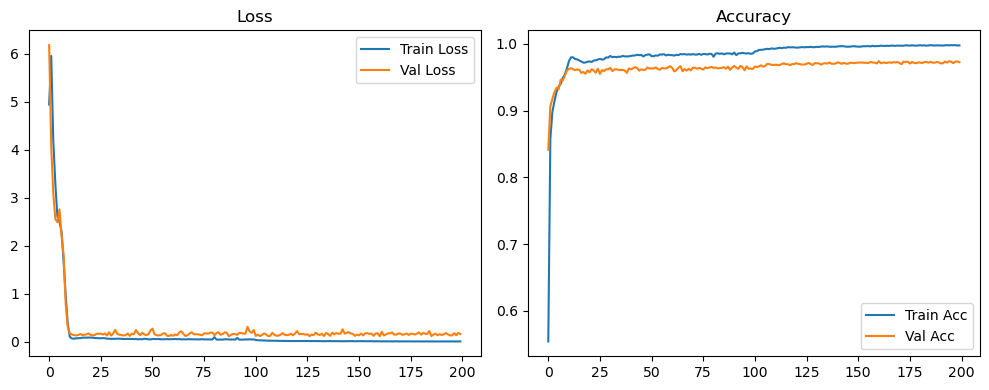

Evaluation:   0%|          | 0/157 [00:00<?, ?it/s]

Evaluation:   6%|▌         | 9/157 [00:00<00:01, 84.28it/s]

Evaluation:  11%|█▏        | 18/157 [00:00<00:01, 84.97it/s]

Evaluation:  17%|█▋        | 27/157 [00:00<00:01, 85.14it/s]

Evaluation:  23%|██▎       | 36/157 [00:00<00:01, 84.68it/s]

Evaluation:  29%|██▊       | 45/157 [00:00<00:01, 83.84it/s]

Evaluation:  34%|███▍      | 54/157 [00:00<00:01, 83.73it/s]

Evaluation:  40%|████      | 63/157 [00:00<00:01, 84.01it/s]

Evaluation:  46%|████▌     | 72/157 [00:00<00:01, 84.40it/s]

Evaluation:  52%|█████▏    | 81/157 [00:00<00:00, 84.62it/s]

Evaluation:  57%|█████▋    | 90/157 [00:01<00:00, 84.76it/s]

Evaluation:  63%|██████▎   | 99/157 [00:01<00:00, 84.91it/s]

Evaluation:  69%|██████▉   | 108/157 [00:01<00:00, 85.07it/s]

Evaluation:  75%|███████▍  | 117/157 [00:01<00:00, 85.07it/s]

Evaluation:  80%|████████  | 126/157 [00:01<00:00, 85.08it/s]

Evaluation:  86%|████████▌ | 135/157 [00:01<00:00, 85.12it/s]

Evaluation:  92%|█████████▏| 144/157 [00:01<00:00, 85.25it/s]

Evaluation:  97%|█████████▋| 153/157 [00:01<00:00, 85.32it/s]

Evaluation: 100%|██████████| 157/157 [00:01<00:00, 85.07it/s]

Original Model Final Test Loss: 0.1641 Accuracy: 0.9724


🚀 Running: batch64_lr0.01_0.002_0.001_dp0.2


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.5248 | Val Acc: 0.8441 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.010 | Train Acc: 0.5248 | Val Acc: 0.8441 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.010 | Train Acc: 0.5248 | Val Acc: 0.8441 |:   0%|          | 1/200 [00:13<45:44, 13.79s/it]

| LR: 0.010 | Train Acc: 0.8464 | Val Acc: 0.9029 |:   0%|          | 1/200 [00:27<45:44, 13.79s/it]

| LR: 0.010 | Train Acc: 0.8464 | Val Acc: 0.9029 |:   0%|          | 1/200 [00:27<45:44, 13.79s/it]

| LR: 0.010 | Train Acc: 0.8464 | Val Acc: 0.9029 |:   1%|          | 2/200 [00:27<45:05, 13.67s/it]

| LR: 0.010 | Train Acc: 0.8876 | Val Acc: 0.9237 |:   1%|          | 2/200 [00:41<45:05, 13.67s/it]

| LR: 0.010 | Train Acc: 0.8876 | Val Acc: 0.9237 |:   1%|          | 2/200 [00:41<45:05, 13.67s/it]

| LR: 0.010 | Train Acc: 0.8876 | Val Acc: 0.9237 |:   2%|▏         | 3/200 [00:41<45:03, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9070 | Val Acc: 0.9297 |:   2%|▏         | 3/200 [00:54<45:03, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9070 | Val Acc: 0.9297 |:   2%|▏         | 3/200 [00:54<45:03, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9070 | Val Acc: 0.9297 |:   2%|▏         | 4/200 [00:54<44:37, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9179 | Val Acc: 0.9437 |:   2%|▏         | 4/200 [01:08<44:37, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9179 | Val Acc: 0.9437 |:   2%|▏         | 4/200 [01:08<44:37, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9179 | Val Acc: 0.9437 |:   2%|▎         | 5/200 [01:08<44:35, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9287 | Val Acc: 0.9469 |:   2%|▎         | 5/200 [01:22<44:35, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9287 | Val Acc: 0.9469 |:   2%|▎         | 5/200 [01:22<44:35, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9287 | Val Acc: 0.9469 |:   3%|▎         | 6/200 [01:22<44:15, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9517 |:   3%|▎         | 6/200 [01:35<44:15, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9517 |:   3%|▎         | 6/200 [01:35<44:15, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9517 |:   4%|▎         | 7/200 [01:35<43:59, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9636 |:   4%|▎         | 7/200 [01:49<43:59, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9636 |:   4%|▎         | 7/200 [01:49<43:59, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9636 |:   4%|▍         | 8/200 [01:49<43:37, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9666 | Val Acc: 0.9665 |:   4%|▍         | 8/200 [02:03<43:37, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9666 | Val Acc: 0.9665 |:   4%|▍         | 8/200 [02:03<43:37, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9666 | Val Acc: 0.9665 |:   4%|▍         | 9/200 [02:03<43:27, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9644 |:   4%|▍         | 9/200 [02:16<43:27, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9644 |:   4%|▍         | 9/200 [02:16<43:27, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9644 |:   5%|▌         | 10/200 [02:16<43:18, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9693 | Val Acc: 0.9689 |:   5%|▌         | 10/200 [02:30<43:18, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9693 | Val Acc: 0.9689 |:   5%|▌         | 10/200 [02:30<43:18, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9693 | Val Acc: 0.9689 |:   6%|▌         | 11/200 [02:30<42:57, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9680 | Val Acc: 0.9647 |:   6%|▌         | 11/200 [02:44<42:57, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9680 | Val Acc: 0.9647 |:   6%|▌         | 11/200 [02:44<42:57, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9680 | Val Acc: 0.9647 |:   6%|▌         | 12/200 [02:44<42:57, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9645 | Val Acc: 0.9584 |:   6%|▌         | 12/200 [02:57<42:57, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9645 | Val Acc: 0.9584 |:   6%|▌         | 12/200 [02:57<42:57, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9645 | Val Acc: 0.9584 |:   6%|▋         | 13/200 [02:57<42:36, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9580 |:   6%|▋         | 13/200 [03:11<42:36, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9580 |:   6%|▋         | 13/200 [03:11<42:36, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9580 |:   7%|▋         | 14/200 [03:11<42:28, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9597 | Val Acc: 0.9586 |:   7%|▋         | 14/200 [03:25<42:28, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9597 | Val Acc: 0.9586 |:   7%|▋         | 14/200 [03:25<42:28, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9597 | Val Acc: 0.9586 |:   8%|▊         | 15/200 [03:25<42:17, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9560 | Val Acc: 0.9550 |:   8%|▊         | 15/200 [03:38<42:17, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9560 | Val Acc: 0.9550 |:   8%|▊         | 15/200 [03:38<42:17, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9560 | Val Acc: 0.9550 |:   8%|▊         | 16/200 [03:38<41:56, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9575 | Val Acc: 0.9597 |:   8%|▊         | 16/200 [03:52<41:56, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9575 | Val Acc: 0.9597 |:   8%|▊         | 16/200 [03:52<41:56, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9575 | Val Acc: 0.9597 |:   8%|▊         | 17/200 [03:52<41:33, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9569 | Val Acc: 0.9563 |:   8%|▊         | 17/200 [04:06<41:33, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9569 | Val Acc: 0.9563 |:   8%|▊         | 17/200 [04:06<41:33, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9569 | Val Acc: 0.9563 |:   9%|▉         | 18/200 [04:06<41:20, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9562 | Val Acc: 0.9590 |:   9%|▉         | 18/200 [04:19<41:20, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9562 | Val Acc: 0.9590 |:   9%|▉         | 18/200 [04:19<41:20, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9562 | Val Acc: 0.9590 |:  10%|▉         | 19/200 [04:19<41:07, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9568 | Val Acc: 0.9598 |:  10%|▉         | 19/200 [04:33<41:07, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9568 | Val Acc: 0.9598 |:  10%|▉         | 19/200 [04:33<41:07, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9568 | Val Acc: 0.9598 |:  10%|█         | 20/200 [04:33<40:53, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9575 | Val Acc: 0.9559 |:  10%|█         | 20/200 [04:49<40:53, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9575 | Val Acc: 0.9559 |:  10%|█         | 20/200 [04:49<40:53, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9575 | Val Acc: 0.9559 |:  10%|█         | 21/200 [04:49<42:41, 14.31s/it]

| LR: 0.010 | Train Acc: 0.9573 | Val Acc: 0.9623 |:  10%|█         | 21/200 [05:03<42:41, 14.31s/it]

| LR: 0.010 | Train Acc: 0.9573 | Val Acc: 0.9623 |:  10%|█         | 21/200 [05:03<42:41, 14.31s/it]

| LR: 0.010 | Train Acc: 0.9573 | Val Acc: 0.9623 |:  11%|█         | 22/200 [05:03<42:19, 14.26s/it]

| LR: 0.010 | Train Acc: 0.9594 | Val Acc: 0.9602 |:  11%|█         | 22/200 [05:16<42:19, 14.26s/it]

| LR: 0.010 | Train Acc: 0.9594 | Val Acc: 0.9602 |:  11%|█         | 22/200 [05:16<42:19, 14.26s/it]

| LR: 0.010 | Train Acc: 0.9594 | Val Acc: 0.9602 |:  12%|█▏        | 23/200 [05:17<41:32, 14.08s/it]

| LR: 0.010 | Train Acc: 0.9605 | Val Acc: 0.9607 |:  12%|█▏        | 23/200 [05:30<41:32, 14.08s/it]

| LR: 0.010 | Train Acc: 0.9605 | Val Acc: 0.9607 |:  12%|█▏        | 23/200 [05:30<41:32, 14.08s/it]

| LR: 0.010 | Train Acc: 0.9605 | Val Acc: 0.9607 |:  12%|█▏        | 24/200 [05:30<41:12, 14.05s/it]

| LR: 0.010 | Train Acc: 0.9641 | Val Acc: 0.9624 |:  12%|█▏        | 24/200 [05:44<41:12, 14.05s/it]

| LR: 0.010 | Train Acc: 0.9641 | Val Acc: 0.9624 |:  12%|█▏        | 24/200 [05:44<41:12, 14.05s/it]

| LR: 0.010 | Train Acc: 0.9641 | Val Acc: 0.9624 |:  12%|█▎        | 25/200 [05:44<40:35, 13.92s/it]

| LR: 0.010 | Train Acc: 0.9635 | Val Acc: 0.9627 |:  12%|█▎        | 25/200 [05:58<40:35, 13.92s/it]

| LR: 0.010 | Train Acc: 0.9635 | Val Acc: 0.9627 |:  12%|█▎        | 25/200 [05:58<40:35, 13.92s/it]

| LR: 0.010 | Train Acc: 0.9635 | Val Acc: 0.9627 |:  13%|█▎        | 26/200 [05:58<40:00, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9628 | Val Acc: 0.9612 |:  13%|█▎        | 26/200 [06:11<40:00, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9628 | Val Acc: 0.9612 |:  13%|█▎        | 26/200 [06:11<40:00, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9628 | Val Acc: 0.9612 |:  14%|█▎        | 27/200 [06:11<39:34, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9615 | Val Acc: 0.9570 |:  14%|█▎        | 27/200 [06:25<39:34, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9615 | Val Acc: 0.9570 |:  14%|█▎        | 27/200 [06:25<39:34, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9615 | Val Acc: 0.9570 |:  14%|█▍        | 28/200 [06:25<39:13, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9622 | Val Acc: 0.9585 |:  14%|█▍        | 28/200 [06:38<39:13, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9622 | Val Acc: 0.9585 |:  14%|█▍        | 28/200 [06:38<39:13, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9622 | Val Acc: 0.9585 |:  14%|█▍        | 29/200 [06:38<38:55, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9637 | Val Acc: 0.9605 |:  14%|█▍        | 29/200 [06:52<38:55, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9637 | Val Acc: 0.9605 |:  14%|█▍        | 29/200 [06:52<38:55, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9637 | Val Acc: 0.9605 |:  15%|█▌        | 30/200 [06:52<38:34, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9615 |:  15%|█▌        | 30/200 [07:05<38:34, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9615 |:  15%|█▌        | 30/200 [07:05<38:34, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9615 |:  16%|█▌        | 31/200 [07:05<38:18, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9623 |:  16%|█▌        | 31/200 [07:19<38:18, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9623 |:  16%|█▌        | 31/200 [07:19<38:18, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9623 |:  16%|█▌        | 32/200 [07:19<38:13, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9636 | Val Acc: 0.9607 |:  16%|█▌        | 32/200 [07:33<38:13, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9636 | Val Acc: 0.9607 |:  16%|█▌        | 32/200 [07:33<38:13, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9636 | Val Acc: 0.9607 |:  16%|█▋        | 33/200 [07:33<37:59, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9617 |:  16%|█▋        | 33/200 [07:46<37:59, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9617 |:  16%|█▋        | 33/200 [07:46<37:59, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9617 |:  17%|█▋        | 34/200 [07:46<37:41, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9637 | Val Acc: 0.9623 |:  17%|█▋        | 34/200 [08:00<37:41, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9637 | Val Acc: 0.9623 |:  17%|█▋        | 34/200 [08:00<37:41, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9637 | Val Acc: 0.9623 |:  18%|█▊        | 35/200 [08:00<37:23, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9635 | Val Acc: 0.9625 |:  18%|█▊        | 35/200 [08:13<37:23, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9635 | Val Acc: 0.9625 |:  18%|█▊        | 35/200 [08:13<37:23, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9635 | Val Acc: 0.9625 |:  18%|█▊        | 36/200 [08:13<37:03, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9631 | Val Acc: 0.9622 |:  18%|█▊        | 36/200 [08:27<37:03, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9631 | Val Acc: 0.9622 |:  18%|█▊        | 36/200 [08:27<37:03, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9631 | Val Acc: 0.9622 |:  18%|█▊        | 37/200 [08:27<36:48, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9655 | Val Acc: 0.9585 |:  18%|█▊        | 37/200 [08:40<36:48, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9655 | Val Acc: 0.9585 |:  18%|█▊        | 37/200 [08:40<36:48, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9655 | Val Acc: 0.9585 |:  19%|█▉        | 38/200 [08:40<36:34, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9597 |:  19%|█▉        | 38/200 [08:55<36:34, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9597 |:  19%|█▉        | 38/200 [08:55<36:34, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9597 |:  20%|█▉        | 39/200 [08:55<36:49, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9621 |:  20%|█▉        | 39/200 [09:08<36:49, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9621 |:  20%|█▉        | 39/200 [09:08<36:49, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9621 |:  20%|██        | 40/200 [09:08<36:28, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9656 | Val Acc: 0.9607 |:  20%|██        | 40/200 [09:22<36:28, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9656 | Val Acc: 0.9607 |:  20%|██        | 40/200 [09:22<36:28, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9656 | Val Acc: 0.9607 |:  20%|██        | 41/200 [09:22<36:10, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9643 |:  20%|██        | 41/200 [09:35<36:10, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9643 |:  20%|██        | 41/200 [09:35<36:10, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9643 |:  21%|██        | 42/200 [09:36<36:00, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9631 | Val Acc: 0.9629 |:  21%|██        | 42/200 [09:49<36:00, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9631 | Val Acc: 0.9629 |:  21%|██        | 42/200 [09:49<36:00, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9631 | Val Acc: 0.9629 |:  22%|██▏       | 43/200 [09:49<35:51, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9652 | Val Acc: 0.9617 |:  22%|██▏       | 43/200 [10:03<35:51, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9652 | Val Acc: 0.9617 |:  22%|██▏       | 43/200 [10:03<35:51, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9652 | Val Acc: 0.9617 |:  22%|██▏       | 44/200 [10:03<36:00, 13.85s/it]

| LR: 0.010 | Train Acc: 0.9656 | Val Acc: 0.9607 |:  22%|██▏       | 44/200 [10:17<36:00, 13.85s/it]

| LR: 0.010 | Train Acc: 0.9656 | Val Acc: 0.9607 |:  22%|██▏       | 44/200 [10:17<36:00, 13.85s/it]

| LR: 0.010 | Train Acc: 0.9656 | Val Acc: 0.9607 |:  22%|██▎       | 45/200 [10:17<35:39, 13.81s/it]

| LR: 0.010 | Train Acc: 0.9659 | Val Acc: 0.9619 |:  22%|██▎       | 45/200 [10:31<35:39, 13.81s/it]

| LR: 0.010 | Train Acc: 0.9659 | Val Acc: 0.9619 |:  22%|██▎       | 45/200 [10:31<35:39, 13.81s/it]

| LR: 0.010 | Train Acc: 0.9659 | Val Acc: 0.9619 |:  23%|██▎       | 46/200 [10:31<35:17, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9656 | Val Acc: 0.9597 |:  23%|██▎       | 46/200 [10:44<35:17, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9656 | Val Acc: 0.9597 |:  23%|██▎       | 46/200 [10:44<35:17, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9656 | Val Acc: 0.9597 |:  24%|██▎       | 47/200 [10:44<34:59, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9661 | Val Acc: 0.9616 |:  24%|██▎       | 47/200 [10:58<34:59, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9661 | Val Acc: 0.9616 |:  24%|██▎       | 47/200 [10:58<34:59, 13.72s/it]

| LR: 0.010 | Train Acc: 0.9661 | Val Acc: 0.9616 |:  24%|██▍       | 48/200 [10:58<34:40, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9621 |:  24%|██▍       | 48/200 [11:12<34:40, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9621 |:  24%|██▍       | 48/200 [11:12<34:40, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9621 |:  24%|██▍       | 49/200 [11:12<34:41, 13.78s/it]

| LR: 0.010 | Train Acc: 0.9657 | Val Acc: 0.9644 |:  24%|██▍       | 49/200 [11:26<34:41, 13.78s/it]

| LR: 0.010 | Train Acc: 0.9657 | Val Acc: 0.9644 |:  24%|██▍       | 49/200 [11:26<34:41, 13.78s/it]

| LR: 0.010 | Train Acc: 0.9657 | Val Acc: 0.9644 |:  25%|██▌       | 50/200 [11:26<34:23, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9635 | Val Acc: 0.9616 |:  25%|██▌       | 50/200 [11:39<34:23, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9635 | Val Acc: 0.9616 |:  25%|██▌       | 50/200 [11:39<34:23, 13.75s/it]

| LR: 0.010 | Train Acc: 0.9635 | Val Acc: 0.9616 |:  26%|██▌       | 51/200 [11:39<34:02, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9655 | Val Acc: 0.9623 |:  26%|██▌       | 51/200 [11:53<34:02, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9655 | Val Acc: 0.9623 |:  26%|██▌       | 51/200 [11:53<34:02, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9655 | Val Acc: 0.9623 |:  26%|██▌       | 52/200 [11:53<33:46, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9668 | Val Acc: 0.9596 |:  26%|██▌       | 52/200 [12:07<33:46, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9668 | Val Acc: 0.9596 |:  26%|██▌       | 52/200 [12:07<33:46, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9668 | Val Acc: 0.9596 |:  26%|██▋       | 53/200 [12:07<33:27, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9617 |:  26%|██▋       | 53/200 [12:20<33:27, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9617 |:  26%|██▋       | 53/200 [12:20<33:27, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9617 |:  27%|██▋       | 54/200 [12:20<33:11, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9659 | Val Acc: 0.9624 |:  27%|██▋       | 54/200 [12:34<33:11, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9659 | Val Acc: 0.9624 |:  27%|██▋       | 54/200 [12:34<33:11, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9659 | Val Acc: 0.9624 |:  28%|██▊       | 55/200 [12:34<32:53, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9612 |:  28%|██▊       | 55/200 [12:47<32:53, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9612 |:  28%|██▊       | 55/200 [12:47<32:53, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9612 |:  28%|██▊       | 56/200 [12:47<32:33, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9655 | Val Acc: 0.9558 |:  28%|██▊       | 56/200 [13:01<32:33, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9655 | Val Acc: 0.9558 |:  28%|██▊       | 56/200 [13:01<32:33, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9655 | Val Acc: 0.9558 |:  28%|██▊       | 57/200 [13:01<32:18, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9670 | Val Acc: 0.9644 |:  28%|██▊       | 57/200 [13:14<32:18, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9670 | Val Acc: 0.9644 |:  28%|██▊       | 57/200 [13:14<32:18, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9670 | Val Acc: 0.9644 |:  29%|██▉       | 58/200 [13:14<32:07, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9637 |:  29%|██▉       | 58/200 [13:28<32:07, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9637 |:  29%|██▉       | 58/200 [13:28<32:07, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9637 |:  30%|██▉       | 59/200 [13:28<31:50, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9633 |:  30%|██▉       | 59/200 [13:41<31:50, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9633 |:  30%|██▉       | 59/200 [13:41<31:50, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9633 |:  30%|███       | 60/200 [13:41<31:35, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9626 |:  30%|███       | 60/200 [13:55<31:35, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9626 |:  30%|███       | 60/200 [13:55<31:35, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9626 |:  30%|███       | 61/200 [13:55<31:21, 13.53s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9658 |:  30%|███       | 61/200 [14:08<31:21, 13.53s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9658 |:  30%|███       | 61/200 [14:08<31:21, 13.53s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9658 |:  31%|███       | 62/200 [14:08<31:05, 13.52s/it]

| LR: 0.010 | Train Acc: 0.9660 | Val Acc: 0.9677 |:  31%|███       | 62/200 [14:22<31:05, 13.52s/it]

| LR: 0.010 | Train Acc: 0.9660 | Val Acc: 0.9677 |:  31%|███       | 62/200 [14:22<31:05, 13.52s/it]

| LR: 0.010 | Train Acc: 0.9660 | Val Acc: 0.9677 |:  32%|███▏      | 63/200 [14:22<30:50, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9643 |:  32%|███▏      | 63/200 [14:36<30:50, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9643 |:  32%|███▏      | 63/200 [14:36<30:50, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9643 |:  32%|███▏      | 64/200 [14:36<30:51, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9666 |:  32%|███▏      | 64/200 [14:49<30:51, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9666 |:  32%|███▏      | 64/200 [14:49<30:51, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9666 |:  32%|███▎      | 65/200 [14:49<30:36, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9639 |:  32%|███▎      | 65/200 [15:03<30:36, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9639 |:  32%|███▎      | 65/200 [15:03<30:36, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9639 |:  33%|███▎      | 66/200 [15:03<30:20, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9671 | Val Acc: 0.9646 |:  33%|███▎      | 66/200 [15:16<30:20, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9671 | Val Acc: 0.9646 |:  33%|███▎      | 66/200 [15:16<30:20, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9671 | Val Acc: 0.9646 |:  34%|███▎      | 67/200 [15:16<30:08, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9670 | Val Acc: 0.9647 |:  34%|███▎      | 67/200 [15:30<30:08, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9670 | Val Acc: 0.9647 |:  34%|███▎      | 67/200 [15:30<30:08, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9670 | Val Acc: 0.9647 |:  34%|███▍      | 68/200 [15:30<29:53, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9466 |:  34%|███▍      | 68/200 [15:43<29:53, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9466 |:  34%|███▍      | 68/200 [15:43<29:53, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9466 |:  34%|███▍      | 69/200 [15:44<29:36, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9654 | Val Acc: 0.9647 |:  34%|███▍      | 69/200 [15:57<29:36, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9654 | Val Acc: 0.9647 |:  34%|███▍      | 69/200 [15:57<29:36, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9654 | Val Acc: 0.9647 |:  35%|███▌      | 70/200 [15:57<29:26, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9646 | Val Acc: 0.9638 |:  35%|███▌      | 70/200 [16:11<29:26, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9646 | Val Acc: 0.9638 |:  35%|███▌      | 70/200 [16:11<29:26, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9646 | Val Acc: 0.9638 |:  36%|███▌      | 71/200 [16:11<29:08, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9686 | Val Acc: 0.9649 |:  36%|███▌      | 71/200 [16:24<29:08, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9686 | Val Acc: 0.9649 |:  36%|███▌      | 71/200 [16:24<29:08, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9686 | Val Acc: 0.9649 |:  36%|███▌      | 72/200 [16:24<29:00, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9647 |:  36%|███▌      | 72/200 [16:38<29:00, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9647 |:  36%|███▌      | 72/200 [16:38<29:00, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9647 |:  36%|███▋      | 73/200 [16:38<28:50, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9670 |:  36%|███▋      | 73/200 [16:52<28:50, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9670 |:  36%|███▋      | 73/200 [16:52<28:50, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9670 |:  37%|███▋      | 74/200 [16:52<28:35, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9623 |:  37%|███▋      | 74/200 [17:05<28:35, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9623 |:  37%|███▋      | 74/200 [17:05<28:35, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9623 |:  38%|███▊      | 75/200 [17:05<28:28, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9641 |:  38%|███▊      | 75/200 [17:19<28:28, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9641 |:  38%|███▊      | 75/200 [17:19<28:28, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9641 |:  38%|███▊      | 76/200 [17:19<28:11, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9646 |:  38%|███▊      | 76/200 [17:33<28:11, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9646 |:  38%|███▊      | 76/200 [17:33<28:11, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9646 |:  38%|███▊      | 77/200 [17:33<28:02, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9634 |:  38%|███▊      | 77/200 [17:46<28:02, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9634 |:  38%|███▊      | 77/200 [17:46<28:02, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9634 |:  39%|███▉      | 78/200 [17:46<27:48, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9659 |:  39%|███▉      | 78/200 [18:00<27:48, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9659 |:  39%|███▉      | 78/200 [18:00<27:48, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9659 |:  40%|███▉      | 79/200 [18:00<27:32, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9682 | Val Acc: 0.9653 |:  40%|███▉      | 79/200 [18:14<27:32, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9682 | Val Acc: 0.9653 |:  40%|███▉      | 79/200 [18:14<27:32, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9682 | Val Acc: 0.9653 |:  40%|████      | 80/200 [18:14<27:14, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9682 | Val Acc: 0.9672 |:  40%|████      | 80/200 [18:27<27:14, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9682 | Val Acc: 0.9672 |:  40%|████      | 80/200 [18:27<27:14, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9682 | Val Acc: 0.9672 |:  40%|████      | 81/200 [18:27<26:58, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9680 | Val Acc: 0.9657 |:  40%|████      | 81/200 [18:41<26:58, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9680 | Val Acc: 0.9657 |:  40%|████      | 81/200 [18:41<26:58, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9680 | Val Acc: 0.9657 |:  41%|████      | 82/200 [18:41<26:41, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9617 | Val Acc: 0.9623 |:  41%|████      | 82/200 [18:55<26:41, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9617 | Val Acc: 0.9623 |:  41%|████      | 82/200 [18:55<26:41, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9617 | Val Acc: 0.9623 |:  42%|████▏     | 83/200 [18:55<26:41, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9680 | Val Acc: 0.9637 |:  42%|████▏     | 83/200 [19:08<26:41, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9680 | Val Acc: 0.9637 |:  42%|████▏     | 83/200 [19:08<26:41, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9680 | Val Acc: 0.9637 |:  42%|████▏     | 84/200 [19:08<26:19, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9692 | Val Acc: 0.9647 |:  42%|████▏     | 84/200 [19:22<26:19, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9692 | Val Acc: 0.9647 |:  42%|████▏     | 84/200 [19:22<26:19, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9692 | Val Acc: 0.9647 |:  42%|████▎     | 85/200 [19:22<26:14, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9643 |:  42%|████▎     | 85/200 [19:35<26:14, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9643 |:  42%|████▎     | 85/200 [19:35<26:14, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9643 |:  43%|████▎     | 86/200 [19:36<25:58, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9711 | Val Acc: 0.9644 |:  43%|████▎     | 86/200 [19:49<25:58, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9711 | Val Acc: 0.9644 |:  43%|████▎     | 86/200 [19:49<25:58, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9711 | Val Acc: 0.9644 |:  44%|████▎     | 87/200 [19:49<25:42, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9690 | Val Acc: 0.9641 |:  44%|████▎     | 87/200 [20:03<25:42, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9690 | Val Acc: 0.9641 |:  44%|████▎     | 87/200 [20:03<25:42, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9690 | Val Acc: 0.9641 |:  44%|████▍     | 88/200 [20:03<25:24, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9662 |:  44%|████▍     | 88/200 [20:16<25:24, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9662 |:  44%|████▍     | 88/200 [20:16<25:24, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9662 |:  44%|████▍     | 89/200 [20:16<25:09, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9685 | Val Acc: 0.9660 |:  44%|████▍     | 89/200 [20:30<25:09, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9685 | Val Acc: 0.9660 |:  44%|████▍     | 89/200 [20:30<25:09, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9685 | Val Acc: 0.9660 |:  45%|████▌     | 90/200 [20:30<24:57, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9539 |:  45%|████▌     | 90/200 [20:43<24:57, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9539 |:  45%|████▌     | 90/200 [20:43<24:57, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9539 |:  46%|████▌     | 91/200 [20:43<24:43, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9635 |:  46%|████▌     | 91/200 [20:57<24:43, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9635 |:  46%|████▌     | 91/200 [20:57<24:43, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9635 |:  46%|████▌     | 92/200 [20:57<24:33, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9630 |:  46%|████▌     | 92/200 [21:11<24:33, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9630 |:  46%|████▌     | 92/200 [21:11<24:33, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9630 |:  46%|████▋     | 93/200 [21:11<24:17, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9647 |:  46%|████▋     | 93/200 [21:24<24:17, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9647 |:  46%|████▋     | 93/200 [21:24<24:17, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9647 |:  47%|████▋     | 94/200 [21:24<24:03, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9643 |:  47%|████▋     | 94/200 [21:38<24:03, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9643 |:  47%|████▋     | 94/200 [21:38<24:03, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9643 |:  48%|████▊     | 95/200 [21:38<23:54, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9686 | Val Acc: 0.9650 |:  48%|████▊     | 95/200 [21:52<23:54, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9686 | Val Acc: 0.9650 |:  48%|████▊     | 95/200 [21:52<23:54, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9686 | Val Acc: 0.9650 |:  48%|████▊     | 96/200 [21:52<23:38, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9611 |:  48%|████▊     | 96/200 [22:07<23:38, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9611 |:  48%|████▊     | 96/200 [22:07<23:38, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9611 |:  48%|████▊     | 97/200 [22:07<24:01, 14.00s/it]

| LR: 0.010 | Train Acc: 0.9706 | Val Acc: 0.9651 |:  48%|████▊     | 97/200 [22:20<24:01, 14.00s/it]

| LR: 0.010 | Train Acc: 0.9706 | Val Acc: 0.9651 |:  48%|████▊     | 97/200 [22:20<24:01, 14.00s/it]

| LR: 0.010 | Train Acc: 0.9706 | Val Acc: 0.9651 |:  49%|████▉     | 98/200 [22:20<23:35, 13.88s/it]

| LR: 0.010 | Train Acc: 0.9688 | Val Acc: 0.9674 |:  49%|████▉     | 98/200 [22:34<23:35, 13.88s/it]

| LR: 0.010 | Train Acc: 0.9688 | Val Acc: 0.9674 |:  49%|████▉     | 98/200 [22:34<23:35, 13.88s/it]

| LR: 0.010 | Train Acc: 0.9688 | Val Acc: 0.9674 |:  50%|████▉     | 99/200 [22:34<23:13, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9660 | Val Acc: 0.9629 |:  50%|████▉     | 99/200 [22:47<23:13, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9660 | Val Acc: 0.9629 |:  50%|████▉     | 99/200 [22:47<23:13, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9660 | Val Acc: 0.9629 |:  50%|█████     | 100/200 [22:47<22:55, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9690 | Val Acc: 0.9655 |:  50%|█████     | 100/200 [23:01<22:55, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9690 | Val Acc: 0.9655 |:  50%|█████     | 100/200 [23:01<22:55, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9690 | Val Acc: 0.9655 |:  50%|█████     | 101/200 [23:01<22:47, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9699 | Val Acc: 0.9659 |:  50%|█████     | 101/200 [23:15<22:47, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9699 | Val Acc: 0.9659 |:  50%|█████     | 101/200 [23:15<22:47, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9699 | Val Acc: 0.9659 |:  51%|█████     | 102/200 [23:15<22:33, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9710 | Val Acc: 0.9672 |:  51%|█████     | 102/200 [23:29<22:33, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9710 | Val Acc: 0.9672 |:  51%|█████     | 102/200 [23:29<22:33, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9710 | Val Acc: 0.9672 |:  52%|█████▏    | 103/200 [23:29<22:18, 13.80s/it]

| LR: 0.002 | Train Acc: 0.9724 | Val Acc: 0.9663 |:  52%|█████▏    | 103/200 [23:43<22:18, 13.80s/it]

| LR: 0.002 | Train Acc: 0.9724 | Val Acc: 0.9663 |:  52%|█████▏    | 103/200 [23:43<22:18, 13.80s/it]

| LR: 0.002 | Train Acc: 0.9724 | Val Acc: 0.9663 |:  52%|█████▏    | 104/200 [23:43<22:03, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9735 | Val Acc: 0.9672 |:  52%|█████▏    | 104/200 [23:56<22:03, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9735 | Val Acc: 0.9672 |:  52%|█████▏    | 104/200 [23:56<22:03, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9735 | Val Acc: 0.9672 |:  52%|█████▎    | 105/200 [23:56<21:41, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9746 | Val Acc: 0.9682 |:  52%|█████▎    | 105/200 [24:10<21:41, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9746 | Val Acc: 0.9682 |:  52%|█████▎    | 105/200 [24:10<21:41, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9746 | Val Acc: 0.9682 |:  53%|█████▎    | 106/200 [24:10<21:25, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9754 | Val Acc: 0.9654 |:  53%|█████▎    | 106/200 [24:23<21:25, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9754 | Val Acc: 0.9654 |:  53%|█████▎    | 106/200 [24:23<21:25, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9754 | Val Acc: 0.9654 |:  54%|█████▎    | 107/200 [24:23<20:55, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9744 | Val Acc: 0.9679 |:  54%|█████▎    | 107/200 [24:36<20:55, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9744 | Val Acc: 0.9679 |:  54%|█████▎    | 107/200 [24:36<20:55, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9744 | Val Acc: 0.9679 |:  54%|█████▍    | 108/200 [24:36<20:32, 13.40s/it]

| LR: 0.002 | Train Acc: 0.9759 | Val Acc: 0.9684 |:  54%|█████▍    | 108/200 [24:50<20:32, 13.40s/it]

| LR: 0.002 | Train Acc: 0.9759 | Val Acc: 0.9684 |:  54%|█████▍    | 108/200 [24:50<20:32, 13.40s/it]

| LR: 0.002 | Train Acc: 0.9759 | Val Acc: 0.9684 |:  55%|█████▍    | 109/200 [24:50<20:26, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9691 |:  55%|█████▍    | 109/200 [25:03<20:26, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9691 |:  55%|█████▍    | 109/200 [25:03<20:26, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9691 |:  55%|█████▌    | 110/200 [25:03<20:17, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9688 |:  55%|█████▌    | 110/200 [25:17<20:17, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9688 |:  55%|█████▌    | 110/200 [25:17<20:17, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9688 |:  56%|█████▌    | 111/200 [25:17<20:04, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9769 | Val Acc: 0.9704 |:  56%|█████▌    | 111/200 [25:31<20:04, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9769 | Val Acc: 0.9704 |:  56%|█████▌    | 111/200 [25:31<20:04, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9769 | Val Acc: 0.9704 |:  56%|█████▌    | 112/200 [25:31<19:53, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9764 | Val Acc: 0.9687 |:  56%|█████▌    | 112/200 [25:44<19:53, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9764 | Val Acc: 0.9687 |:  56%|█████▌    | 112/200 [25:44<19:53, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9764 | Val Acc: 0.9687 |:  56%|█████▋    | 113/200 [25:44<19:41, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9783 | Val Acc: 0.9694 |:  56%|█████▋    | 113/200 [25:58<19:41, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9783 | Val Acc: 0.9694 |:  56%|█████▋    | 113/200 [25:58<19:41, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9783 | Val Acc: 0.9694 |:  57%|█████▋    | 114/200 [25:58<19:29, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9702 |:  57%|█████▋    | 114/200 [26:12<19:29, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9702 |:  57%|█████▋    | 114/200 [26:12<19:29, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9702 |:  57%|█████▊    | 115/200 [26:12<19:21, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9791 | Val Acc: 0.9689 |:  57%|█████▊    | 115/200 [26:25<19:21, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9791 | Val Acc: 0.9689 |:  57%|█████▊    | 115/200 [26:25<19:21, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9791 | Val Acc: 0.9689 |:  58%|█████▊    | 116/200 [26:25<19:06, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9784 | Val Acc: 0.9678 |:  58%|█████▊    | 116/200 [26:39<19:06, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9784 | Val Acc: 0.9678 |:  58%|█████▊    | 116/200 [26:39<19:06, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9784 | Val Acc: 0.9678 |:  58%|█████▊    | 117/200 [26:39<18:51, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9793 | Val Acc: 0.9695 |:  58%|█████▊    | 117/200 [26:52<18:51, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9793 | Val Acc: 0.9695 |:  58%|█████▊    | 117/200 [26:52<18:51, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9793 | Val Acc: 0.9695 |:  59%|█████▉    | 118/200 [26:52<18:34, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9796 | Val Acc: 0.9707 |:  59%|█████▉    | 118/200 [27:06<18:34, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9796 | Val Acc: 0.9707 |:  59%|█████▉    | 118/200 [27:06<18:34, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9796 | Val Acc: 0.9707 |:  60%|█████▉    | 119/200 [27:06<18:18, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9786 | Val Acc: 0.9706 |:  60%|█████▉    | 119/200 [27:20<18:18, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9786 | Val Acc: 0.9706 |:  60%|█████▉    | 119/200 [27:20<18:18, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9786 | Val Acc: 0.9706 |:  60%|██████    | 120/200 [27:20<18:16, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9797 | Val Acc: 0.9700 |:  60%|██████    | 120/200 [27:34<18:16, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9797 | Val Acc: 0.9700 |:  60%|██████    | 120/200 [27:34<18:16, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9797 | Val Acc: 0.9700 |:  60%|██████    | 121/200 [27:34<18:11, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9804 | Val Acc: 0.9692 |:  60%|██████    | 121/200 [27:47<18:11, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9804 | Val Acc: 0.9692 |:  60%|██████    | 121/200 [27:47<18:11, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9804 | Val Acc: 0.9692 |:  61%|██████    | 122/200 [27:47<17:50, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9786 | Val Acc: 0.9698 |:  61%|██████    | 122/200 [28:01<17:50, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9786 | Val Acc: 0.9698 |:  61%|██████    | 122/200 [28:01<17:50, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9786 | Val Acc: 0.9698 |:  62%|██████▏   | 123/200 [28:01<17:32, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9795 | Val Acc: 0.9698 |:  62%|██████▏   | 123/200 [28:15<17:32, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9795 | Val Acc: 0.9698 |:  62%|██████▏   | 123/200 [28:15<17:32, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9795 | Val Acc: 0.9698 |:  62%|██████▏   | 124/200 [28:15<17:19, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9792 | Val Acc: 0.9712 |:  62%|██████▏   | 124/200 [28:28<17:19, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9792 | Val Acc: 0.9712 |:  62%|██████▏   | 124/200 [28:28<17:19, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9792 | Val Acc: 0.9712 |:  62%|██████▎   | 125/200 [28:28<17:04, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9815 | Val Acc: 0.9688 |:  62%|██████▎   | 125/200 [28:42<17:04, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9815 | Val Acc: 0.9688 |:  62%|██████▎   | 125/200 [28:42<17:04, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9815 | Val Acc: 0.9688 |:  63%|██████▎   | 126/200 [28:42<16:48, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9801 | Val Acc: 0.9689 |:  63%|██████▎   | 126/200 [28:56<16:48, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9801 | Val Acc: 0.9689 |:  63%|██████▎   | 126/200 [28:56<16:48, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9801 | Val Acc: 0.9689 |:  64%|██████▎   | 127/200 [28:56<16:37, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9808 | Val Acc: 0.9702 |:  64%|██████▎   | 127/200 [29:09<16:37, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9808 | Val Acc: 0.9702 |:  64%|██████▎   | 127/200 [29:09<16:37, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9808 | Val Acc: 0.9702 |:  64%|██████▍   | 128/200 [29:09<16:23, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9811 | Val Acc: 0.9715 |:  64%|██████▍   | 128/200 [29:22<16:23, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9811 | Val Acc: 0.9715 |:  64%|██████▍   | 128/200 [29:22<16:23, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9811 | Val Acc: 0.9715 |:  64%|██████▍   | 129/200 [29:22<15:58, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9807 | Val Acc: 0.9705 |:  64%|██████▍   | 129/200 [29:36<15:58, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9807 | Val Acc: 0.9705 |:  64%|██████▍   | 129/200 [29:36<15:58, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9807 | Val Acc: 0.9705 |:  65%|██████▌   | 130/200 [29:36<15:47, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9818 | Val Acc: 0.9719 |:  65%|██████▌   | 130/200 [29:49<15:47, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9818 | Val Acc: 0.9719 |:  65%|██████▌   | 130/200 [29:49<15:47, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9818 | Val Acc: 0.9719 |:  66%|██████▌   | 131/200 [29:49<15:32, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9830 | Val Acc: 0.9702 |:  66%|██████▌   | 131/200 [30:03<15:32, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9830 | Val Acc: 0.9702 |:  66%|██████▌   | 131/200 [30:03<15:32, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9830 | Val Acc: 0.9702 |:  66%|██████▌   | 132/200 [30:03<15:19, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9811 | Val Acc: 0.9698 |:  66%|██████▌   | 132/200 [30:17<15:19, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9811 | Val Acc: 0.9698 |:  66%|██████▌   | 132/200 [30:17<15:19, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9811 | Val Acc: 0.9698 |:  66%|██████▋   | 133/200 [30:17<15:08, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9824 | Val Acc: 0.9715 |:  66%|██████▋   | 133/200 [30:30<15:08, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9824 | Val Acc: 0.9715 |:  66%|██████▋   | 133/200 [30:30<15:08, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9824 | Val Acc: 0.9715 |:  67%|██████▋   | 134/200 [30:30<14:54, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9816 | Val Acc: 0.9702 |:  67%|██████▋   | 134/200 [30:44<14:54, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9816 | Val Acc: 0.9702 |:  67%|██████▋   | 134/200 [30:44<14:54, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9816 | Val Acc: 0.9702 |:  68%|██████▊   | 135/200 [30:44<14:41, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9819 | Val Acc: 0.9708 |:  68%|██████▊   | 135/200 [30:57<14:41, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9819 | Val Acc: 0.9708 |:  68%|██████▊   | 135/200 [30:57<14:41, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9819 | Val Acc: 0.9708 |:  68%|██████▊   | 136/200 [30:57<14:29, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9828 | Val Acc: 0.9704 |:  68%|██████▊   | 136/200 [31:11<14:29, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9828 | Val Acc: 0.9704 |:  68%|██████▊   | 136/200 [31:11<14:29, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9828 | Val Acc: 0.9704 |:  68%|██████▊   | 137/200 [31:11<14:15, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9825 | Val Acc: 0.9705 |:  68%|██████▊   | 137/200 [31:24<14:15, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9825 | Val Acc: 0.9705 |:  68%|██████▊   | 137/200 [31:24<14:15, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9825 | Val Acc: 0.9705 |:  69%|██████▉   | 138/200 [31:24<14:00, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9828 | Val Acc: 0.9701 |:  69%|██████▉   | 138/200 [31:38<14:00, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9828 | Val Acc: 0.9701 |:  69%|██████▉   | 138/200 [31:38<14:00, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9828 | Val Acc: 0.9701 |:  70%|██████▉   | 139/200 [31:38<13:46, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9823 | Val Acc: 0.9708 |:  70%|██████▉   | 139/200 [31:51<13:46, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9823 | Val Acc: 0.9708 |:  70%|██████▉   | 139/200 [31:51<13:46, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9823 | Val Acc: 0.9708 |:  70%|███████   | 140/200 [31:52<13:32, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9822 | Val Acc: 0.9711 |:  70%|███████   | 140/200 [32:05<13:32, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9822 | Val Acc: 0.9711 |:  70%|███████   | 140/200 [32:05<13:32, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9822 | Val Acc: 0.9711 |:  70%|███████   | 141/200 [32:05<13:20, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9833 | Val Acc: 0.9707 |:  70%|███████   | 141/200 [32:19<13:20, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9833 | Val Acc: 0.9707 |:  70%|███████   | 141/200 [32:19<13:20, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9833 | Val Acc: 0.9707 |:  71%|███████   | 142/200 [32:19<13:07, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9704 |:  71%|███████   | 142/200 [32:32<13:07, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9704 |:  71%|███████   | 142/200 [32:32<13:07, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9704 |:  72%|███████▏  | 143/200 [32:33<12:56, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9830 | Val Acc: 0.9708 |:  72%|███████▏  | 143/200 [32:46<12:56, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9830 | Val Acc: 0.9708 |:  72%|███████▏  | 143/200 [32:46<12:56, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9830 | Val Acc: 0.9708 |:  72%|███████▏  | 144/200 [32:46<12:39, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9831 | Val Acc: 0.9708 |:  72%|███████▏  | 144/200 [33:00<12:39, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9831 | Val Acc: 0.9708 |:  72%|███████▏  | 144/200 [33:00<12:39, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9831 | Val Acc: 0.9708 |:  72%|███████▎  | 145/200 [33:00<12:27, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9830 | Val Acc: 0.9712 |:  72%|███████▎  | 145/200 [33:13<12:27, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9830 | Val Acc: 0.9712 |:  72%|███████▎  | 145/200 [33:13<12:27, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9830 | Val Acc: 0.9712 |:  73%|███████▎  | 146/200 [33:13<12:13, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9836 | Val Acc: 0.9738 |:  73%|███████▎  | 146/200 [33:27<12:13, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9836 | Val Acc: 0.9738 |:  73%|███████▎  | 146/200 [33:27<12:13, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9836 | Val Acc: 0.9738 |:  74%|███████▎  | 147/200 [33:27<12:01, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9732 |:  74%|███████▎  | 147/200 [33:40<12:01, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9732 |:  74%|███████▎  | 147/200 [33:40<12:01, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9732 |:  74%|███████▍  | 148/200 [33:40<11:47, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9725 |:  74%|███████▍  | 148/200 [33:54<11:47, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9725 |:  74%|███████▍  | 148/200 [33:54<11:47, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9725 |:  74%|███████▍  | 149/200 [33:54<11:40, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9837 | Val Acc: 0.9711 |:  74%|███████▍  | 149/200 [34:08<11:40, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9837 | Val Acc: 0.9711 |:  74%|███████▍  | 149/200 [34:08<11:40, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9837 | Val Acc: 0.9711 |:  75%|███████▌  | 150/200 [34:08<11:25, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9721 |:  75%|███████▌  | 150/200 [34:23<11:25, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9721 |:  75%|███████▌  | 150/200 [34:23<11:25, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9721 |:  76%|███████▌  | 151/200 [34:23<11:25, 13.98s/it]

| LR: 0.002 | Train Acc: 0.9851 | Val Acc: 0.9722 |:  76%|███████▌  | 151/200 [34:36<11:25, 13.98s/it]

| LR: 0.002 | Train Acc: 0.9851 | Val Acc: 0.9722 |:  76%|███████▌  | 151/200 [34:36<11:25, 13.98s/it]

| LR: 0.002 | Train Acc: 0.9851 | Val Acc: 0.9722 |:  76%|███████▌  | 152/200 [34:36<11:04, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9848 | Val Acc: 0.9720 |:  76%|███████▌  | 152/200 [34:51<11:04, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9848 | Val Acc: 0.9720 |:  76%|███████▌  | 152/200 [34:51<11:04, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9848 | Val Acc: 0.9720 |:  76%|███████▋  | 153/200 [34:51<10:58, 14.00s/it]

| LR: 0.002 | Train Acc: 0.9838 | Val Acc: 0.9728 |:  76%|███████▋  | 153/200 [35:04<10:58, 14.00s/it]

| LR: 0.002 | Train Acc: 0.9838 | Val Acc: 0.9728 |:  76%|███████▋  | 153/200 [35:04<10:58, 14.00s/it]

| LR: 0.002 | Train Acc: 0.9838 | Val Acc: 0.9728 |:  77%|███████▋  | 154/200 [35:04<10:40, 13.92s/it]

| LR: 0.002 | Train Acc: 0.9840 | Val Acc: 0.9711 |:  77%|███████▋  | 154/200 [35:18<10:40, 13.92s/it]

| LR: 0.002 | Train Acc: 0.9840 | Val Acc: 0.9711 |:  77%|███████▋  | 154/200 [35:18<10:40, 13.92s/it]

| LR: 0.002 | Train Acc: 0.9840 | Val Acc: 0.9711 |:  78%|███████▊  | 155/200 [35:18<10:20, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9722 |:  78%|███████▊  | 155/200 [35:31<10:20, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9722 |:  78%|███████▊  | 155/200 [35:31<10:20, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9722 |:  78%|███████▊  | 156/200 [35:31<10:05, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9714 |:  78%|███████▊  | 156/200 [35:45<10:05, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9714 |:  78%|███████▊  | 156/200 [35:45<10:05, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9714 |:  78%|███████▊  | 157/200 [35:45<09:48, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9857 | Val Acc: 0.9725 |:  78%|███████▊  | 157/200 [35:59<09:48, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9857 | Val Acc: 0.9725 |:  78%|███████▊  | 157/200 [35:59<09:48, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9857 | Val Acc: 0.9725 |:  79%|███████▉  | 158/200 [35:59<09:32, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9851 | Val Acc: 0.9727 |:  79%|███████▉  | 158/200 [36:12<09:32, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9851 | Val Acc: 0.9727 |:  79%|███████▉  | 158/200 [36:12<09:32, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9851 | Val Acc: 0.9727 |:  80%|███████▉  | 159/200 [36:12<09:20, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9857 | Val Acc: 0.9725 |:  80%|███████▉  | 159/200 [36:26<09:20, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9857 | Val Acc: 0.9725 |:  80%|███████▉  | 159/200 [36:26<09:20, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9857 | Val Acc: 0.9725 |:  80%|████████  | 160/200 [36:26<09:06, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9860 | Val Acc: 0.9706 |:  80%|████████  | 160/200 [36:40<09:06, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9860 | Val Acc: 0.9706 |:  80%|████████  | 160/200 [36:40<09:06, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9860 | Val Acc: 0.9706 |:  80%|████████  | 161/200 [36:40<08:51, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9865 | Val Acc: 0.9702 |:  80%|████████  | 161/200 [36:55<08:51, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9865 | Val Acc: 0.9702 |:  80%|████████  | 161/200 [36:55<08:51, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9865 | Val Acc: 0.9702 |:  81%|████████  | 162/200 [36:55<09:00, 14.22s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9722 |:  81%|████████  | 162/200 [37:09<09:00, 14.22s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9722 |:  81%|████████  | 162/200 [37:09<09:00, 14.22s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9722 |:  82%|████████▏ | 163/200 [37:09<08:39, 14.05s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9731 |:  82%|████████▏ | 163/200 [37:22<08:39, 14.05s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9731 |:  82%|████████▏ | 163/200 [37:22<08:39, 14.05s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9731 |:  82%|████████▏ | 164/200 [37:22<08:20, 13.91s/it]

| LR: 0.001 | Train Acc: 0.9858 | Val Acc: 0.9715 |:  82%|████████▏ | 164/200 [37:36<08:20, 13.91s/it]

| LR: 0.001 | Train Acc: 0.9858 | Val Acc: 0.9715 |:  82%|████████▏ | 164/200 [37:36<08:20, 13.91s/it]

| LR: 0.001 | Train Acc: 0.9858 | Val Acc: 0.9715 |:  82%|████████▎ | 165/200 [37:36<08:02, 13.78s/it]

| LR: 0.001 | Train Acc: 0.9860 | Val Acc: 0.9715 |:  82%|████████▎ | 165/200 [37:49<08:02, 13.78s/it]

| LR: 0.001 | Train Acc: 0.9860 | Val Acc: 0.9715 |:  82%|████████▎ | 165/200 [37:49<08:02, 13.78s/it]

| LR: 0.001 | Train Acc: 0.9860 | Val Acc: 0.9715 |:  83%|████████▎ | 166/200 [37:49<07:45, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9864 | Val Acc: 0.9730 |:  83%|████████▎ | 166/200 [38:03<07:45, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9864 | Val Acc: 0.9730 |:  83%|████████▎ | 166/200 [38:03<07:45, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9864 | Val Acc: 0.9730 |:  84%|████████▎ | 167/200 [38:03<07:31, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9867 | Val Acc: 0.9723 |:  84%|████████▎ | 167/200 [38:20<07:31, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9867 | Val Acc: 0.9723 |:  84%|████████▎ | 167/200 [38:20<07:31, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9867 | Val Acc: 0.9723 |:  84%|████████▍ | 168/200 [38:20<07:50, 14.69s/it]

| LR: 0.001 | Train Acc: 0.9856 | Val Acc: 0.9736 |:  84%|████████▍ | 168/200 [38:38<07:50, 14.69s/it]

| LR: 0.001 | Train Acc: 0.9856 | Val Acc: 0.9736 |:  84%|████████▍ | 168/200 [38:38<07:50, 14.69s/it]

| LR: 0.001 | Train Acc: 0.9856 | Val Acc: 0.9736 |:  84%|████████▍ | 169/200 [38:38<08:03, 15.61s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9735 |:  84%|████████▍ | 169/200 [38:53<08:03, 15.61s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9735 |:  84%|████████▍ | 169/200 [38:53<08:03, 15.61s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9735 |:  85%|████████▌ | 170/200 [38:53<07:46, 15.54s/it]

| LR: 0.001 | Train Acc: 0.9858 | Val Acc: 0.9714 |:  85%|████████▌ | 170/200 [39:07<07:46, 15.54s/it]

| LR: 0.001 | Train Acc: 0.9858 | Val Acc: 0.9714 |:  85%|████████▌ | 170/200 [39:07<07:46, 15.54s/it]

| LR: 0.001 | Train Acc: 0.9858 | Val Acc: 0.9714 |:  86%|████████▌ | 171/200 [39:07<07:13, 14.96s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9722 |:  86%|████████▌ | 171/200 [39:20<07:13, 14.96s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9722 |:  86%|████████▌ | 171/200 [39:20<07:13, 14.96s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9722 |:  86%|████████▌ | 172/200 [39:20<06:48, 14.60s/it]

| LR: 0.001 | Train Acc: 0.9866 | Val Acc: 0.9698 |:  86%|████████▌ | 172/200 [39:34<06:48, 14.60s/it]

| LR: 0.001 | Train Acc: 0.9866 | Val Acc: 0.9698 |:  86%|████████▌ | 172/200 [39:34<06:48, 14.60s/it]

| LR: 0.001 | Train Acc: 0.9866 | Val Acc: 0.9698 |:  86%|████████▋ | 173/200 [39:34<06:27, 14.34s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9732 |:  86%|████████▋ | 173/200 [39:48<06:27, 14.34s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9732 |:  86%|████████▋ | 173/200 [39:48<06:27, 14.34s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9732 |:  87%|████████▋ | 174/200 [39:48<06:06, 14.12s/it]

| LR: 0.001 | Train Acc: 0.9863 | Val Acc: 0.9729 |:  87%|████████▋ | 174/200 [40:01<06:06, 14.12s/it]

| LR: 0.001 | Train Acc: 0.9863 | Val Acc: 0.9729 |:  87%|████████▋ | 174/200 [40:01<06:06, 14.12s/it]

| LR: 0.001 | Train Acc: 0.9863 | Val Acc: 0.9729 |:  88%|████████▊ | 175/200 [40:01<05:48, 13.96s/it]

| LR: 0.001 | Train Acc: 0.9870 | Val Acc: 0.9722 |:  88%|████████▊ | 175/200 [40:15<05:48, 13.96s/it]

| LR: 0.001 | Train Acc: 0.9870 | Val Acc: 0.9722 |:  88%|████████▊ | 175/200 [40:15<05:48, 13.96s/it]

| LR: 0.001 | Train Acc: 0.9870 | Val Acc: 0.9722 |:  88%|████████▊ | 176/200 [40:15<05:31, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9871 | Val Acc: 0.9716 |:  88%|████████▊ | 176/200 [40:29<05:31, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9871 | Val Acc: 0.9716 |:  88%|████████▊ | 176/200 [40:29<05:31, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9871 | Val Acc: 0.9716 |:  88%|████████▊ | 177/200 [40:29<05:16, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9859 | Val Acc: 0.9732 |:  88%|████████▊ | 177/200 [40:42<05:16, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9859 | Val Acc: 0.9732 |:  88%|████████▊ | 177/200 [40:42<05:16, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9859 | Val Acc: 0.9732 |:  89%|████████▉ | 178/200 [40:42<05:01, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9878 | Val Acc: 0.9712 |:  89%|████████▉ | 178/200 [40:56<05:01, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9878 | Val Acc: 0.9712 |:  89%|████████▉ | 178/200 [40:56<05:01, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9878 | Val Acc: 0.9712 |:  90%|████████▉ | 179/200 [40:56<04:47, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9875 | Val Acc: 0.9726 |:  90%|████████▉ | 179/200 [41:09<04:47, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9875 | Val Acc: 0.9726 |:  90%|████████▉ | 179/200 [41:09<04:47, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9875 | Val Acc: 0.9726 |:  90%|█████████ | 180/200 [41:09<04:33, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9879 | Val Acc: 0.9738 |:  90%|█████████ | 180/200 [41:27<04:33, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9879 | Val Acc: 0.9738 |:  90%|█████████ | 180/200 [41:27<04:33, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9879 | Val Acc: 0.9738 |:  90%|█████████ | 181/200 [41:27<04:41, 14.80s/it]

| LR: 0.001 | Train Acc: 0.9871 | Val Acc: 0.9732 |:  90%|█████████ | 181/200 [41:41<04:41, 14.80s/it]

| LR: 0.001 | Train Acc: 0.9871 | Val Acc: 0.9732 |:  90%|█████████ | 181/200 [41:41<04:41, 14.80s/it]

| LR: 0.001 | Train Acc: 0.9871 | Val Acc: 0.9732 |:  91%|█████████ | 182/200 [41:41<04:21, 14.50s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9725 |:  91%|█████████ | 182/200 [41:54<04:21, 14.50s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9725 |:  91%|█████████ | 182/200 [41:54<04:21, 14.50s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9725 |:  92%|█████████▏| 183/200 [41:54<04:02, 14.28s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9722 |:  92%|█████████▏| 183/200 [42:08<04:02, 14.28s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9722 |:  92%|█████████▏| 183/200 [42:08<04:02, 14.28s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9722 |:  92%|█████████▏| 184/200 [42:08<03:44, 14.04s/it]

| LR: 0.001 | Train Acc: 0.9870 | Val Acc: 0.9722 |:  92%|█████████▏| 184/200 [42:21<03:44, 14.04s/it]

| LR: 0.001 | Train Acc: 0.9870 | Val Acc: 0.9722 |:  92%|█████████▏| 184/200 [42:21<03:44, 14.04s/it]

| LR: 0.001 | Train Acc: 0.9870 | Val Acc: 0.9722 |:  92%|█████████▎| 185/200 [42:22<03:28, 13.92s/it]

| LR: 0.001 | Train Acc: 0.9883 | Val Acc: 0.9721 |:  92%|█████████▎| 185/200 [42:35<03:28, 13.92s/it]

| LR: 0.001 | Train Acc: 0.9883 | Val Acc: 0.9721 |:  92%|█████████▎| 185/200 [42:35<03:28, 13.92s/it]

| LR: 0.001 | Train Acc: 0.9883 | Val Acc: 0.9721 |:  93%|█████████▎| 186/200 [42:35<03:13, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9880 | Val Acc: 0.9742 |:  93%|█████████▎| 186/200 [42:49<03:13, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9880 | Val Acc: 0.9742 |:  93%|█████████▎| 186/200 [42:49<03:13, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9880 | Val Acc: 0.9742 |:  94%|█████████▎| 187/200 [42:49<02:59, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9875 | Val Acc: 0.9735 |:  94%|█████████▎| 187/200 [43:02<02:59, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9875 | Val Acc: 0.9735 |:  94%|█████████▎| 187/200 [43:02<02:59, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9875 | Val Acc: 0.9735 |:  94%|█████████▍| 188/200 [43:02<02:44, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9751 |:  94%|█████████▍| 188/200 [43:16<02:44, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9751 |:  94%|█████████▍| 188/200 [43:16<02:44, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9751 |:  94%|█████████▍| 189/200 [43:16<02:30, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9743 |:  94%|█████████▍| 189/200 [43:29<02:30, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9743 |:  94%|█████████▍| 189/200 [43:29<02:30, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9743 |:  95%|█████████▌| 190/200 [43:29<02:16, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9735 |:  95%|█████████▌| 190/200 [43:43<02:16, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9735 |:  95%|█████████▌| 190/200 [43:43<02:16, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9735 |:  96%|█████████▌| 191/200 [43:43<02:02, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9866 | Val Acc: 0.9718 |:  96%|█████████▌| 191/200 [43:57<02:02, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9866 | Val Acc: 0.9718 |:  96%|█████████▌| 191/200 [43:57<02:02, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9866 | Val Acc: 0.9718 |:  96%|█████████▌| 192/200 [43:57<01:48, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9884 | Val Acc: 0.9730 |:  96%|█████████▌| 192/200 [44:10<01:48, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9884 | Val Acc: 0.9730 |:  96%|█████████▌| 192/200 [44:10<01:48, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9884 | Val Acc: 0.9730 |:  96%|█████████▋| 193/200 [44:10<01:35, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9732 |:  96%|█████████▋| 193/200 [44:24<01:35, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9732 |:  96%|█████████▋| 193/200 [44:24<01:35, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9732 |:  97%|█████████▋| 194/200 [44:24<01:22, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9878 | Val Acc: 0.9731 |:  97%|█████████▋| 194/200 [44:38<01:22, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9878 | Val Acc: 0.9731 |:  97%|█████████▋| 194/200 [44:38<01:22, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9878 | Val Acc: 0.9731 |:  98%|█████████▊| 195/200 [44:38<01:08, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9723 |:  98%|█████████▊| 195/200 [44:52<01:08, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9723 |:  98%|█████████▊| 195/200 [44:52<01:08, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9723 |:  98%|█████████▊| 196/200 [44:52<00:55, 13.92s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9741 |:  98%|█████████▊| 196/200 [45:06<00:55, 13.92s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9741 |:  98%|█████████▊| 196/200 [45:06<00:55, 13.92s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9741 |:  98%|█████████▊| 197/200 [45:06<00:41, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9745 |:  98%|█████████▊| 197/200 [45:20<00:41, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9745 |:  98%|█████████▊| 197/200 [45:20<00:41, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9745 |:  99%|█████████▉| 198/200 [45:20<00:27, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9880 | Val Acc: 0.9738 |:  99%|█████████▉| 198/200 [45:34<00:27, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9880 | Val Acc: 0.9738 |:  99%|█████████▉| 198/200 [45:34<00:27, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9880 | Val Acc: 0.9738 |: 100%|█████████▉| 199/200 [45:34<00:14, 14.02s/it]

| LR: 0.001 | Train Acc: 0.9889 | Val Acc: 0.9731 |: 100%|█████████▉| 199/200 [45:48<00:14, 14.02s/it]

| LR: 0.001 | Train Acc: 0.9889 | Val Acc: 0.9731 |: 100%|█████████▉| 199/200 [45:48<00:14, 14.02s/it]

| LR: 0.001 | Train Acc: 0.9889 | Val Acc: 0.9731 |: 100%|██████████| 200/200 [45:48<00:00, 13.90s/it]

| LR: 0.001 | Train Acc: 0.9889 | Val Acc: 0.9731 |: 100%|██████████| 200/200 [45:48<00:00, 13.74s/it]

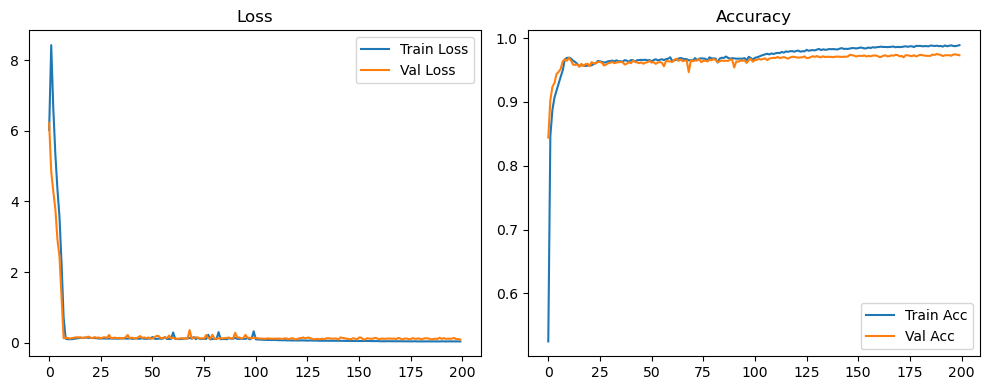

Evaluation:   0%|          | 0/157 [00:00<?, ?it/s]

Evaluation:   6%|▌         | 9/157 [00:00<00:01, 84.38it/s]

Evaluation:  11%|█▏        | 18/157 [00:00<00:01, 84.99it/s]

Evaluation:  17%|█▋        | 27/157 [00:00<00:01, 85.18it/s]

Evaluation:  23%|██▎       | 36/157 [00:00<00:01, 85.18it/s]

Evaluation:  29%|██▊       | 45/157 [00:00<00:01, 85.24it/s]

Evaluation:  34%|███▍      | 54/157 [00:00<00:01, 85.42it/s]

Evaluation:  40%|████      | 63/157 [00:00<00:01, 85.45it/s]

Evaluation:  46%|████▌     | 72/157 [00:00<00:00, 85.55it/s]

Evaluation:  52%|█████▏    | 81/157 [00:00<00:00, 85.51it/s]

Evaluation:  57%|█████▋    | 90/157 [00:01<00:00, 85.60it/s]

Evaluation:  63%|██████▎   | 99/157 [00:01<00:00, 85.63it/s]

Evaluation:  69%|██████▉   | 108/157 [00:01<00:00, 85.64it/s]

Evaluation:  75%|███████▍  | 117/157 [00:01<00:00, 85.62it/s]

Evaluation:  80%|████████  | 126/157 [00:01<00:00, 85.62it/s]

Evaluation:  86%|████████▌ | 135/157 [00:01<00:00, 85.52it/s]

Evaluation:  92%|█████████▏| 144/157 [00:01<00:00, 85.37it/s]

Evaluation:  97%|█████████▋| 153/157 [00:01<00:00, 85.30it/s]

Evaluation: 100%|██████████| 157/157 [00:01<00:00, 85.65it/s]

Original Model Final Test Loss: 0.0867 Accuracy: 0.9754


🚀 Running: batch64_lr0.01_0.002_0.001_dp0.5


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.4835 | Val Acc: 0.8522 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.010 | Train Acc: 0.4835 | Val Acc: 0.8522 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.010 | Train Acc: 0.4835 | Val Acc: 0.8522 |:   0%|          | 1/200 [00:13<46:13, 13.94s/it]

| LR: 0.010 | Train Acc: 0.8208 | Val Acc: 0.8969 |:   0%|          | 1/200 [00:28<46:13, 13.94s/it]

| LR: 0.010 | Train Acc: 0.8208 | Val Acc: 0.8969 |:   0%|          | 1/200 [00:28<46:13, 13.94s/it]

| LR: 0.010 | Train Acc: 0.8208 | Val Acc: 0.8969 |:   1%|          | 2/200 [00:28<46:23, 14.06s/it]

| LR: 0.010 | Train Acc: 0.8655 | Val Acc: 0.9307 |:   1%|          | 2/200 [00:41<46:23, 14.06s/it]

| LR: 0.010 | Train Acc: 0.8655 | Val Acc: 0.9307 |:   1%|          | 2/200 [00:41<46:23, 14.06s/it]

| LR: 0.010 | Train Acc: 0.8655 | Val Acc: 0.9307 |:   2%|▏         | 3/200 [00:41<45:44, 13.93s/it]

| LR: 0.010 | Train Acc: 0.8845 | Val Acc: 0.9456 |:   2%|▏         | 3/200 [00:55<45:44, 13.93s/it]

| LR: 0.010 | Train Acc: 0.8845 | Val Acc: 0.9456 |:   2%|▏         | 3/200 [00:55<45:44, 13.93s/it]

| LR: 0.010 | Train Acc: 0.8845 | Val Acc: 0.9456 |:   2%|▏         | 4/200 [00:55<45:03, 13.79s/it]

| LR: 0.010 | Train Acc: 0.9040 | Val Acc: 0.9512 |:   2%|▏         | 4/200 [01:09<45:03, 13.79s/it]

| LR: 0.010 | Train Acc: 0.9040 | Val Acc: 0.9512 |:   2%|▏         | 4/200 [01:09<45:03, 13.79s/it]

| LR: 0.010 | Train Acc: 0.9040 | Val Acc: 0.9512 |:   2%|▎         | 5/200 [01:09<44:55, 13.82s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9520 |:   2%|▎         | 5/200 [01:22<44:55, 13.82s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9520 |:   2%|▎         | 5/200 [01:22<44:55, 13.82s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9520 |:   3%|▎         | 6/200 [01:22<44:30, 13.77s/it]

| LR: 0.010 | Train Acc: 0.9350 | Val Acc: 0.9518 |:   3%|▎         | 6/200 [01:36<44:30, 13.77s/it]

| LR: 0.010 | Train Acc: 0.9350 | Val Acc: 0.9518 |:   3%|▎         | 6/200 [01:36<44:30, 13.77s/it]

| LR: 0.010 | Train Acc: 0.9350 | Val Acc: 0.9518 |:   4%|▎         | 7/200 [01:36<44:00, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9380 | Val Acc: 0.9551 |:   4%|▎         | 7/200 [01:50<44:00, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9380 | Val Acc: 0.9551 |:   4%|▎         | 7/200 [01:50<44:00, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9380 | Val Acc: 0.9551 |:   4%|▍         | 8/200 [01:50<43:40, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9547 |:   4%|▍         | 8/200 [02:03<43:40, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9547 |:   4%|▍         | 8/200 [02:03<43:40, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9547 |:   4%|▍         | 9/200 [02:03<43:21, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9387 | Val Acc: 0.9541 |:   4%|▍         | 9/200 [02:17<43:21, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9387 | Val Acc: 0.9541 |:   4%|▍         | 9/200 [02:17<43:21, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9387 | Val Acc: 0.9541 |:   5%|▌         | 10/200 [02:17<43:11, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9355 | Val Acc: 0.9538 |:   5%|▌         | 10/200 [02:31<43:11, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9355 | Val Acc: 0.9538 |:   5%|▌         | 10/200 [02:31<43:11, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9355 | Val Acc: 0.9538 |:   6%|▌         | 11/200 [02:31<43:04, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9319 | Val Acc: 0.9513 |:   6%|▌         | 11/200 [02:44<43:04, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9319 | Val Acc: 0.9513 |:   6%|▌         | 11/200 [02:44<43:04, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9319 | Val Acc: 0.9513 |:   6%|▌         | 12/200 [02:44<42:51, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9503 |:   6%|▌         | 12/200 [02:58<42:51, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9503 |:   6%|▌         | 12/200 [02:58<42:51, 13.68s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9503 |:   6%|▋         | 13/200 [02:58<42:33, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9251 | Val Acc: 0.9471 |:   6%|▋         | 13/200 [03:12<42:33, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9251 | Val Acc: 0.9471 |:   6%|▋         | 13/200 [03:12<42:33, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9251 | Val Acc: 0.9471 |:   7%|▋         | 14/200 [03:12<42:27, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9201 | Val Acc: 0.9442 |:   7%|▋         | 14/200 [03:27<42:27, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9201 | Val Acc: 0.9442 |:   7%|▋         | 14/200 [03:27<42:27, 13.69s/it]

| LR: 0.010 | Train Acc: 0.9201 | Val Acc: 0.9442 |:   8%|▊         | 15/200 [03:27<43:49, 14.21s/it]

| LR: 0.010 | Train Acc: 0.9191 | Val Acc: 0.9464 |:   8%|▊         | 15/200 [03:40<43:49, 14.21s/it]

| LR: 0.010 | Train Acc: 0.9191 | Val Acc: 0.9464 |:   8%|▊         | 15/200 [03:40<43:49, 14.21s/it]

| LR: 0.010 | Train Acc: 0.9191 | Val Acc: 0.9464 |:   8%|▊         | 16/200 [03:41<42:54, 13.99s/it]

| LR: 0.010 | Train Acc: 0.9197 | Val Acc: 0.9487 |:   8%|▊         | 16/200 [03:54<42:54, 13.99s/it]

| LR: 0.010 | Train Acc: 0.9197 | Val Acc: 0.9487 |:   8%|▊         | 16/200 [03:54<42:54, 13.99s/it]

| LR: 0.010 | Train Acc: 0.9197 | Val Acc: 0.9487 |:   8%|▊         | 17/200 [03:54<42:20, 13.88s/it]

| LR: 0.010 | Train Acc: 0.9224 | Val Acc: 0.9478 |:   8%|▊         | 17/200 [04:08<42:20, 13.88s/it]

| LR: 0.010 | Train Acc: 0.9224 | Val Acc: 0.9478 |:   8%|▊         | 17/200 [04:08<42:20, 13.88s/it]

| LR: 0.010 | Train Acc: 0.9224 | Val Acc: 0.9478 |:   9%|▉         | 18/200 [04:08<41:59, 13.85s/it]

| LR: 0.010 | Train Acc: 0.9209 | Val Acc: 0.9495 |:   9%|▉         | 18/200 [04:22<41:59, 13.85s/it]

| LR: 0.010 | Train Acc: 0.9209 | Val Acc: 0.9495 |:   9%|▉         | 18/200 [04:22<41:59, 13.85s/it]

| LR: 0.010 | Train Acc: 0.9209 | Val Acc: 0.9495 |:  10%|▉         | 19/200 [04:22<41:34, 13.78s/it]

| LR: 0.010 | Train Acc: 0.9200 | Val Acc: 0.9511 |:  10%|▉         | 19/200 [04:35<41:34, 13.78s/it]

| LR: 0.010 | Train Acc: 0.9200 | Val Acc: 0.9511 |:  10%|▉         | 19/200 [04:35<41:34, 13.78s/it]

| LR: 0.010 | Train Acc: 0.9200 | Val Acc: 0.9511 |:  10%|█         | 20/200 [04:35<41:21, 13.78s/it]

| LR: 0.010 | Train Acc: 0.9226 | Val Acc: 0.9502 |:  10%|█         | 20/200 [04:49<41:21, 13.78s/it]

| LR: 0.010 | Train Acc: 0.9226 | Val Acc: 0.9502 |:  10%|█         | 20/200 [04:49<41:21, 13.78s/it]

| LR: 0.010 | Train Acc: 0.9226 | Val Acc: 0.9502 |:  10%|█         | 21/200 [04:49<40:51, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9237 | Val Acc: 0.9519 |:  10%|█         | 21/200 [05:02<40:51, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9237 | Val Acc: 0.9519 |:  10%|█         | 21/200 [05:02<40:51, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9237 | Val Acc: 0.9519 |:  11%|█         | 22/200 [05:02<40:31, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9257 | Val Acc: 0.9545 |:  11%|█         | 22/200 [05:16<40:31, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9257 | Val Acc: 0.9545 |:  11%|█         | 22/200 [05:16<40:31, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9257 | Val Acc: 0.9545 |:  12%|█▏        | 23/200 [05:16<40:06, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9244 | Val Acc: 0.9527 |:  12%|█▏        | 23/200 [05:29<40:06, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9244 | Val Acc: 0.9527 |:  12%|█▏        | 23/200 [05:29<40:06, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9244 | Val Acc: 0.9527 |:  12%|█▏        | 24/200 [05:29<39:47, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9247 | Val Acc: 0.9531 |:  12%|█▏        | 24/200 [05:43<39:47, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9247 | Val Acc: 0.9531 |:  12%|█▏        | 24/200 [05:43<39:47, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9247 | Val Acc: 0.9531 |:  12%|█▎        | 25/200 [05:43<39:29, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9221 | Val Acc: 0.9493 |:  12%|█▎        | 25/200 [05:56<39:29, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9221 | Val Acc: 0.9493 |:  12%|█▎        | 25/200 [05:56<39:29, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9221 | Val Acc: 0.9493 |:  13%|█▎        | 26/200 [05:56<39:13, 13.53s/it]

| LR: 0.010 | Train Acc: 0.9252 | Val Acc: 0.9523 |:  13%|█▎        | 26/200 [06:10<39:13, 13.53s/it]

| LR: 0.010 | Train Acc: 0.9252 | Val Acc: 0.9523 |:  13%|█▎        | 26/200 [06:10<39:13, 13.53s/it]

| LR: 0.010 | Train Acc: 0.9252 | Val Acc: 0.9523 |:  14%|█▎        | 27/200 [06:10<39:08, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9508 |:  14%|█▎        | 27/200 [06:23<39:08, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9508 |:  14%|█▎        | 27/200 [06:23<39:08, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9508 |:  14%|█▍        | 28/200 [06:24<38:51, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9239 | Val Acc: 0.9512 |:  14%|█▍        | 28/200 [06:37<38:51, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9239 | Val Acc: 0.9512 |:  14%|█▍        | 28/200 [06:37<38:51, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9239 | Val Acc: 0.9512 |:  14%|█▍        | 29/200 [06:37<38:45, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9238 | Val Acc: 0.9502 |:  14%|█▍        | 29/200 [06:51<38:45, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9238 | Val Acc: 0.9502 |:  14%|█▍        | 29/200 [06:51<38:45, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9238 | Val Acc: 0.9502 |:  15%|█▌        | 30/200 [06:51<38:25, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9517 |:  15%|█▌        | 30/200 [07:04<38:25, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9517 |:  15%|█▌        | 30/200 [07:04<38:25, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9517 |:  16%|█▌        | 31/200 [07:04<38:16, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9245 | Val Acc: 0.9538 |:  16%|█▌        | 31/200 [07:18<38:16, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9245 | Val Acc: 0.9538 |:  16%|█▌        | 31/200 [07:18<38:16, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9245 | Val Acc: 0.9538 |:  16%|█▌        | 32/200 [07:18<38:06, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9258 | Val Acc: 0.9527 |:  16%|█▌        | 32/200 [07:32<38:06, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9258 | Val Acc: 0.9527 |:  16%|█▌        | 32/200 [07:32<38:06, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9258 | Val Acc: 0.9527 |:  16%|█▋        | 33/200 [07:32<37:48, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9251 | Val Acc: 0.9541 |:  16%|█▋        | 33/200 [07:45<37:48, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9251 | Val Acc: 0.9541 |:  16%|█▋        | 33/200 [07:45<37:48, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9251 | Val Acc: 0.9541 |:  17%|█▋        | 34/200 [07:45<37:42, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9539 |:  17%|█▋        | 34/200 [07:59<37:42, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9539 |:  17%|█▋        | 34/200 [07:59<37:42, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9539 |:  18%|█▊        | 35/200 [07:59<37:29, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9252 | Val Acc: 0.9548 |:  18%|█▊        | 35/200 [08:15<37:29, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9252 | Val Acc: 0.9548 |:  18%|█▊        | 35/200 [08:15<37:29, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9252 | Val Acc: 0.9548 |:  18%|█▊        | 36/200 [08:15<39:33, 14.47s/it]

| LR: 0.010 | Train Acc: 0.9247 | Val Acc: 0.9539 |:  18%|█▊        | 36/200 [08:31<39:33, 14.47s/it]

| LR: 0.010 | Train Acc: 0.9247 | Val Acc: 0.9539 |:  18%|█▊        | 36/200 [08:31<39:33, 14.47s/it]

| LR: 0.010 | Train Acc: 0.9247 | Val Acc: 0.9539 |:  18%|█▊        | 37/200 [08:31<40:40, 14.97s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9541 |:  18%|█▊        | 37/200 [08:45<40:40, 14.97s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9541 |:  18%|█▊        | 37/200 [08:45<40:40, 14.97s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9541 |:  19%|█▉        | 38/200 [08:45<39:21, 14.58s/it]

| LR: 0.010 | Train Acc: 0.9278 | Val Acc: 0.9521 |:  19%|█▉        | 38/200 [09:00<39:21, 14.58s/it]

| LR: 0.010 | Train Acc: 0.9278 | Val Acc: 0.9521 |:  19%|█▉        | 38/200 [09:00<39:21, 14.58s/it]

| LR: 0.010 | Train Acc: 0.9278 | Val Acc: 0.9521 |:  20%|█▉        | 39/200 [09:00<39:43, 14.81s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9544 |:  20%|█▉        | 39/200 [09:14<39:43, 14.81s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9544 |:  20%|█▉        | 39/200 [09:14<39:43, 14.81s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9544 |:  20%|██        | 40/200 [09:14<38:29, 14.43s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9533 |:  20%|██        | 40/200 [09:28<38:29, 14.43s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9533 |:  20%|██        | 40/200 [09:28<38:29, 14.43s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9533 |:  20%|██        | 41/200 [09:28<37:46, 14.25s/it]

| LR: 0.010 | Train Acc: 0.9258 | Val Acc: 0.9533 |:  20%|██        | 41/200 [09:42<37:46, 14.25s/it]

| LR: 0.010 | Train Acc: 0.9258 | Val Acc: 0.9533 |:  20%|██        | 41/200 [09:42<37:46, 14.25s/it]

| LR: 0.010 | Train Acc: 0.9258 | Val Acc: 0.9533 |:  21%|██        | 42/200 [09:42<37:35, 14.27s/it]

| LR: 0.010 | Train Acc: 0.9260 | Val Acc: 0.9561 |:  21%|██        | 42/200 [09:56<37:35, 14.27s/it]

| LR: 0.010 | Train Acc: 0.9260 | Val Acc: 0.9561 |:  21%|██        | 42/200 [09:56<37:35, 14.27s/it]

| LR: 0.010 | Train Acc: 0.9260 | Val Acc: 0.9561 |:  22%|██▏       | 43/200 [09:56<36:51, 14.08s/it]

| LR: 0.010 | Train Acc: 0.9248 | Val Acc: 0.9515 |:  22%|██▏       | 43/200 [10:10<36:51, 14.08s/it]

| LR: 0.010 | Train Acc: 0.9248 | Val Acc: 0.9515 |:  22%|██▏       | 43/200 [10:10<36:51, 14.08s/it]

| LR: 0.010 | Train Acc: 0.9248 | Val Acc: 0.9515 |:  22%|██▏       | 44/200 [10:10<36:19, 13.97s/it]

| LR: 0.010 | Train Acc: 0.9242 | Val Acc: 0.9530 |:  22%|██▏       | 44/200 [10:23<36:19, 13.97s/it]

| LR: 0.010 | Train Acc: 0.9242 | Val Acc: 0.9530 |:  22%|██▏       | 44/200 [10:23<36:19, 13.97s/it]

| LR: 0.010 | Train Acc: 0.9242 | Val Acc: 0.9530 |:  22%|██▎       | 45/200 [10:23<35:51, 13.88s/it]

| LR: 0.010 | Train Acc: 0.9261 | Val Acc: 0.9540 |:  22%|██▎       | 45/200 [10:37<35:51, 13.88s/it]

| LR: 0.010 | Train Acc: 0.9261 | Val Acc: 0.9540 |:  22%|██▎       | 45/200 [10:37<35:51, 13.88s/it]

| LR: 0.010 | Train Acc: 0.9261 | Val Acc: 0.9540 |:  23%|██▎       | 46/200 [10:37<35:24, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9251 | Val Acc: 0.9555 |:  23%|██▎       | 46/200 [10:50<35:24, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9251 | Val Acc: 0.9555 |:  23%|██▎       | 46/200 [10:50<35:24, 13.80s/it]

| LR: 0.010 | Train Acc: 0.9251 | Val Acc: 0.9555 |:  24%|██▎       | 47/200 [10:50<34:57, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9260 | Val Acc: 0.9541 |:  24%|██▎       | 47/200 [11:04<34:57, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9260 | Val Acc: 0.9541 |:  24%|██▎       | 47/200 [11:04<34:57, 13.71s/it]

| LR: 0.010 | Train Acc: 0.9260 | Val Acc: 0.9541 |:  24%|██▍       | 48/200 [11:04<34:33, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9271 | Val Acc: 0.9553 |:  24%|██▍       | 48/200 [11:17<34:33, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9271 | Val Acc: 0.9553 |:  24%|██▍       | 48/200 [11:17<34:33, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9271 | Val Acc: 0.9553 |:  24%|██▍       | 49/200 [11:17<34:19, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9523 |:  24%|██▍       | 49/200 [11:31<34:19, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9523 |:  24%|██▍       | 49/200 [11:31<34:19, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9523 |:  25%|██▌       | 50/200 [11:31<33:41, 13.48s/it]

| LR: 0.010 | Train Acc: 0.9271 | Val Acc: 0.9528 |:  25%|██▌       | 50/200 [11:44<33:41, 13.48s/it]

| LR: 0.010 | Train Acc: 0.9271 | Val Acc: 0.9528 |:  25%|██▌       | 50/200 [11:44<33:41, 13.48s/it]

| LR: 0.010 | Train Acc: 0.9271 | Val Acc: 0.9528 |:  26%|██▌       | 51/200 [11:44<33:25, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9230 | Val Acc: 0.9537 |:  26%|██▌       | 51/200 [11:57<33:25, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9230 | Val Acc: 0.9537 |:  26%|██▌       | 51/200 [11:57<33:25, 13.46s/it]

| LR: 0.010 | Train Acc: 0.9230 | Val Acc: 0.9537 |:  26%|██▌       | 52/200 [11:57<33:14, 13.47s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9553 |:  26%|██▌       | 52/200 [12:11<33:14, 13.47s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9553 |:  26%|██▌       | 52/200 [12:11<33:14, 13.47s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9553 |:  26%|██▋       | 53/200 [12:11<33:05, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9512 |:  26%|██▋       | 53/200 [12:25<33:05, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9512 |:  26%|██▋       | 53/200 [12:25<33:05, 13.51s/it]

| LR: 0.010 | Train Acc: 0.9264 | Val Acc: 0.9512 |:  27%|██▋       | 54/200 [12:25<32:58, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9552 |:  27%|██▋       | 54/200 [12:38<32:58, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9552 |:  27%|██▋       | 54/200 [12:38<32:58, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9552 |:  28%|██▊       | 55/200 [12:38<32:37, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9279 | Val Acc: 0.9568 |:  28%|██▊       | 55/200 [12:52<32:37, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9279 | Val Acc: 0.9568 |:  28%|██▊       | 55/200 [12:52<32:37, 13.50s/it]

| LR: 0.010 | Train Acc: 0.9279 | Val Acc: 0.9568 |:  28%|██▊       | 56/200 [12:52<32:39, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9301 | Val Acc: 0.9564 |:  28%|██▊       | 56/200 [13:06<32:39, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9301 | Val Acc: 0.9564 |:  28%|██▊       | 56/200 [13:06<32:39, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9301 | Val Acc: 0.9564 |:  28%|██▊       | 57/200 [13:06<32:32, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9280 | Val Acc: 0.9553 |:  28%|██▊       | 57/200 [13:19<32:32, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9280 | Val Acc: 0.9553 |:  28%|██▊       | 57/200 [13:19<32:32, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9280 | Val Acc: 0.9553 |:  29%|██▉       | 58/200 [13:19<32:14, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9283 | Val Acc: 0.9552 |:  29%|██▉       | 58/200 [13:33<32:14, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9283 | Val Acc: 0.9552 |:  29%|██▉       | 58/200 [13:33<32:14, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9283 | Val Acc: 0.9552 |:  30%|██▉       | 59/200 [13:33<31:54, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9530 |:  30%|██▉       | 59/200 [13:46<31:54, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9530 |:  30%|██▉       | 59/200 [13:46<31:54, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9530 |:  30%|███       | 60/200 [13:46<31:42, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9553 |:  30%|███       | 60/200 [14:00<31:42, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9553 |:  30%|███       | 60/200 [14:00<31:42, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9553 |:  30%|███       | 61/200 [14:00<31:25, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9549 |:  30%|███       | 61/200 [14:13<31:25, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9549 |:  30%|███       | 61/200 [14:13<31:25, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9549 |:  31%|███       | 62/200 [14:13<31:11, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9227 | Val Acc: 0.9547 |:  31%|███       | 62/200 [14:27<31:11, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9227 | Val Acc: 0.9547 |:  31%|███       | 62/200 [14:27<31:11, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9227 | Val Acc: 0.9547 |:  32%|███▏      | 63/200 [14:27<31:01, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9551 |:  32%|███▏      | 63/200 [14:41<31:01, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9551 |:  32%|███▏      | 63/200 [14:41<31:01, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9551 |:  32%|███▏      | 64/200 [14:41<30:44, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9271 | Val Acc: 0.9561 |:  32%|███▏      | 64/200 [14:54<30:44, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9271 | Val Acc: 0.9561 |:  32%|███▏      | 64/200 [14:54<30:44, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9271 | Val Acc: 0.9561 |:  32%|███▎      | 65/200 [14:54<30:29, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9273 | Val Acc: 0.9552 |:  32%|███▎      | 65/200 [15:08<30:29, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9273 | Val Acc: 0.9552 |:  32%|███▎      | 65/200 [15:08<30:29, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9273 | Val Acc: 0.9552 |:  33%|███▎      | 66/200 [15:08<30:24, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9253 | Val Acc: 0.9548 |:  33%|███▎      | 66/200 [15:21<30:24, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9253 | Val Acc: 0.9548 |:  33%|███▎      | 66/200 [15:21<30:24, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9253 | Val Acc: 0.9548 |:  34%|███▎      | 67/200 [15:21<30:05, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9256 | Val Acc: 0.9563 |:  34%|███▎      | 67/200 [15:35<30:05, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9256 | Val Acc: 0.9563 |:  34%|███▎      | 67/200 [15:35<30:05, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9256 | Val Acc: 0.9563 |:  34%|███▍      | 68/200 [15:35<29:59, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9518 |:  34%|███▍      | 68/200 [15:49<29:59, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9518 |:  34%|███▍      | 68/200 [15:49<29:59, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9518 |:  34%|███▍      | 69/200 [15:49<29:40, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9286 | Val Acc: 0.9546 |:  34%|███▍      | 69/200 [16:02<29:40, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9286 | Val Acc: 0.9546 |:  34%|███▍      | 69/200 [16:02<29:40, 13.59s/it]

| LR: 0.010 | Train Acc: 0.9286 | Val Acc: 0.9546 |:  35%|███▌      | 70/200 [16:02<29:30, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9276 | Val Acc: 0.9567 |:  35%|███▌      | 70/200 [16:16<29:30, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9276 | Val Acc: 0.9567 |:  35%|███▌      | 70/200 [16:16<29:30, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9276 | Val Acc: 0.9567 |:  36%|███▌      | 71/200 [16:16<29:18, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9265 | Val Acc: 0.9542 |:  36%|███▌      | 71/200 [16:30<29:18, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9265 | Val Acc: 0.9542 |:  36%|███▌      | 71/200 [16:30<29:18, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9265 | Val Acc: 0.9542 |:  36%|███▌      | 72/200 [16:30<29:08, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9282 | Val Acc: 0.9547 |:  36%|███▌      | 72/200 [16:43<29:08, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9282 | Val Acc: 0.9547 |:  36%|███▌      | 72/200 [16:43<29:08, 13.66s/it]

| LR: 0.010 | Train Acc: 0.9282 | Val Acc: 0.9547 |:  36%|███▋      | 73/200 [16:43<28:48, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9238 | Val Acc: 0.9537 |:  36%|███▋      | 73/200 [16:57<28:48, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9238 | Val Acc: 0.9537 |:  36%|███▋      | 73/200 [16:57<28:48, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9238 | Val Acc: 0.9537 |:  37%|███▋      | 74/200 [16:57<28:31, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9253 | Val Acc: 0.9543 |:  37%|███▋      | 74/200 [17:10<28:31, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9253 | Val Acc: 0.9543 |:  37%|███▋      | 74/200 [17:10<28:31, 13.58s/it]

| LR: 0.010 | Train Acc: 0.9253 | Val Acc: 0.9543 |:  38%|███▊      | 75/200 [17:10<28:22, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9275 | Val Acc: 0.9570 |:  38%|███▊      | 75/200 [17:25<28:22, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9275 | Val Acc: 0.9570 |:  38%|███▊      | 75/200 [17:25<28:22, 13.62s/it]

| LR: 0.010 | Train Acc: 0.9275 | Val Acc: 0.9570 |:  38%|███▊      | 76/200 [17:25<28:59, 14.03s/it]

| LR: 0.010 | Train Acc: 0.9289 | Val Acc: 0.9582 |:  38%|███▊      | 76/200 [17:39<28:59, 14.03s/it]

| LR: 0.010 | Train Acc: 0.9289 | Val Acc: 0.9582 |:  38%|███▊      | 76/200 [17:39<28:59, 14.03s/it]

| LR: 0.010 | Train Acc: 0.9289 | Val Acc: 0.9582 |:  38%|███▊      | 77/200 [17:39<28:22, 13.84s/it]

| LR: 0.010 | Train Acc: 0.9287 | Val Acc: 0.9561 |:  38%|███▊      | 77/200 [17:52<28:22, 13.84s/it]

| LR: 0.010 | Train Acc: 0.9287 | Val Acc: 0.9561 |:  38%|███▊      | 77/200 [17:52<28:22, 13.84s/it]

| LR: 0.010 | Train Acc: 0.9287 | Val Acc: 0.9561 |:  39%|███▉      | 78/200 [17:52<27:55, 13.74s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9570 |:  39%|███▉      | 78/200 [18:06<27:55, 13.74s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9570 |:  39%|███▉      | 78/200 [18:06<27:55, 13.74s/it]

| LR: 0.010 | Train Acc: 0.9266 | Val Acc: 0.9570 |:  40%|███▉      | 79/200 [18:06<27:37, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9290 | Val Acc: 0.9550 |:  40%|███▉      | 79/200 [18:19<27:37, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9290 | Val Acc: 0.9550 |:  40%|███▉      | 79/200 [18:19<27:37, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9290 | Val Acc: 0.9550 |:  40%|████      | 80/200 [18:19<27:15, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9576 |:  40%|████      | 80/200 [18:33<27:15, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9576 |:  40%|████      | 80/200 [18:33<27:15, 13.63s/it]

| LR: 0.010 | Train Acc: 0.9267 | Val Acc: 0.9576 |:  40%|████      | 81/200 [18:33<27:00, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9287 | Val Acc: 0.9593 |:  40%|████      | 81/200 [18:48<27:00, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9287 | Val Acc: 0.9593 |:  40%|████      | 81/200 [18:48<27:00, 13.61s/it]

| LR: 0.010 | Train Acc: 0.9287 | Val Acc: 0.9593 |:  41%|████      | 82/200 [18:48<27:28, 13.97s/it]

| LR: 0.010 | Train Acc: 0.9290 | Val Acc: 0.9577 |:  41%|████      | 82/200 [19:03<27:28, 13.97s/it]

| LR: 0.010 | Train Acc: 0.9290 | Val Acc: 0.9577 |:  41%|████      | 82/200 [19:03<27:28, 13.97s/it]

| LR: 0.010 | Train Acc: 0.9290 | Val Acc: 0.9577 |:  42%|████▏     | 83/200 [19:03<27:52, 14.30s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9539 |:  42%|████▏     | 83/200 [19:17<27:52, 14.30s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9539 |:  42%|████▏     | 83/200 [19:17<27:52, 14.30s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9539 |:  42%|████▏     | 84/200 [19:17<27:24, 14.17s/it]

| LR: 0.010 | Train Acc: 0.9262 | Val Acc: 0.9573 |:  42%|████▏     | 84/200 [19:30<27:24, 14.17s/it]

| LR: 0.010 | Train Acc: 0.9262 | Val Acc: 0.9573 |:  42%|████▏     | 84/200 [19:30<27:24, 14.17s/it]

| LR: 0.010 | Train Acc: 0.9262 | Val Acc: 0.9573 |:  42%|████▎     | 85/200 [19:30<26:47, 13.98s/it]

| LR: 0.010 | Train Acc: 0.9228 | Val Acc: 0.9567 |:  42%|████▎     | 85/200 [19:44<26:47, 13.98s/it]

| LR: 0.010 | Train Acc: 0.9228 | Val Acc: 0.9567 |:  42%|████▎     | 85/200 [19:44<26:47, 13.98s/it]

| LR: 0.010 | Train Acc: 0.9228 | Val Acc: 0.9567 |:  43%|████▎     | 86/200 [19:44<26:20, 13.86s/it]

| LR: 0.010 | Train Acc: 0.9275 | Val Acc: 0.9553 |:  43%|████▎     | 86/200 [19:57<26:20, 13.86s/it]

| LR: 0.010 | Train Acc: 0.9275 | Val Acc: 0.9553 |:  43%|████▎     | 86/200 [19:57<26:20, 13.86s/it]

| LR: 0.010 | Train Acc: 0.9275 | Val Acc: 0.9553 |:  44%|████▎     | 87/200 [19:57<25:56, 13.78s/it]

| LR: 0.010 | Train Acc: 0.9300 | Val Acc: 0.9552 |:  44%|████▎     | 87/200 [20:11<25:56, 13.78s/it]

| LR: 0.010 | Train Acc: 0.9300 | Val Acc: 0.9552 |:  44%|████▎     | 87/200 [20:11<25:56, 13.78s/it]

| LR: 0.010 | Train Acc: 0.9300 | Val Acc: 0.9552 |:  44%|████▍     | 88/200 [20:11<25:34, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9236 | Val Acc: 0.9558 |:  44%|████▍     | 88/200 [20:24<25:34, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9236 | Val Acc: 0.9558 |:  44%|████▍     | 88/200 [20:24<25:34, 13.70s/it]

| LR: 0.010 | Train Acc: 0.9236 | Val Acc: 0.9558 |:  44%|████▍     | 89/200 [20:24<25:14, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9277 | Val Acc: 0.9552 |:  44%|████▍     | 89/200 [20:38<25:14, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9277 | Val Acc: 0.9552 |:  44%|████▍     | 89/200 [20:38<25:14, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9277 | Val Acc: 0.9552 |:  45%|████▌     | 90/200 [20:38<24:59, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9299 | Val Acc: 0.9560 |:  45%|████▌     | 90/200 [20:52<24:59, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9299 | Val Acc: 0.9560 |:  45%|████▌     | 90/200 [20:52<24:59, 13.64s/it]

| LR: 0.010 | Train Acc: 0.9299 | Val Acc: 0.9560 |:  46%|████▌     | 91/200 [20:52<24:49, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9566 |:  46%|████▌     | 91/200 [21:05<24:49, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9566 |:  46%|████▌     | 91/200 [21:05<24:49, 13.67s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9566 |:  46%|████▌     | 92/200 [21:05<24:28, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9247 | Val Acc: 0.9549 |:  46%|████▌     | 92/200 [21:19<24:28, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9247 | Val Acc: 0.9549 |:  46%|████▌     | 92/200 [21:19<24:28, 13.60s/it]

| LR: 0.010 | Train Acc: 0.9247 | Val Acc: 0.9549 |:  46%|████▋     | 93/200 [21:19<24:10, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9279 | Val Acc: 0.9540 |:  46%|████▋     | 93/200 [21:32<24:10, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9279 | Val Acc: 0.9540 |:  46%|████▋     | 93/200 [21:32<24:10, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9279 | Val Acc: 0.9540 |:  47%|████▋     | 94/200 [21:32<23:55, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9558 |:  47%|████▋     | 94/200 [21:46<23:55, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9558 |:  47%|████▋     | 94/200 [21:46<23:55, 13.55s/it]

| LR: 0.010 | Train Acc: 0.9259 | Val Acc: 0.9558 |:  48%|████▊     | 95/200 [21:46<23:42, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9270 | Val Acc: 0.9572 |:  48%|████▊     | 95/200 [21:59<23:42, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9270 | Val Acc: 0.9572 |:  48%|████▊     | 95/200 [21:59<23:42, 13.54s/it]

| LR: 0.010 | Train Acc: 0.9270 | Val Acc: 0.9572 |:  48%|████▊     | 96/200 [21:59<23:31, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9246 | Val Acc: 0.9534 |:  48%|████▊     | 96/200 [22:13<23:31, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9246 | Val Acc: 0.9534 |:  48%|████▊     | 96/200 [22:13<23:31, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9246 | Val Acc: 0.9534 |:  48%|████▊     | 97/200 [22:13<23:17, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9244 | Val Acc: 0.9573 |:  48%|████▊     | 97/200 [22:26<23:17, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9244 | Val Acc: 0.9573 |:  48%|████▊     | 97/200 [22:26<23:17, 13.57s/it]

| LR: 0.010 | Train Acc: 0.9244 | Val Acc: 0.9573 |:  49%|████▉     | 98/200 [22:26<23:03, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9555 |:  49%|████▉     | 98/200 [22:40<23:03, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9555 |:  49%|████▉     | 98/200 [22:40<23:03, 13.56s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9555 |:  50%|████▉     | 99/200 [22:40<22:58, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9535 |:  50%|████▉     | 99/200 [22:55<22:58, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9535 |:  50%|████▉     | 99/200 [22:55<22:58, 13.65s/it]

| LR: 0.010 | Train Acc: 0.9241 | Val Acc: 0.9535 |:  50%|█████     | 100/200 [22:55<23:03, 13.84s/it]

| LR: 0.002 | Train Acc: 0.9261 | Val Acc: 0.9540 |:  50%|█████     | 100/200 [23:09<23:03, 13.84s/it]

| LR: 0.002 | Train Acc: 0.9261 | Val Acc: 0.9540 |:  50%|█████     | 100/200 [23:09<23:03, 13.84s/it]

| LR: 0.002 | Train Acc: 0.9261 | Val Acc: 0.9540 |:  50%|█████     | 101/200 [23:09<22:56, 13.91s/it]

| LR: 0.002 | Train Acc: 0.9284 | Val Acc: 0.9543 |:  50%|█████     | 101/200 [23:22<22:56, 13.91s/it]

| LR: 0.002 | Train Acc: 0.9284 | Val Acc: 0.9543 |:  50%|█████     | 101/200 [23:22<22:56, 13.91s/it]

| LR: 0.002 | Train Acc: 0.9284 | Val Acc: 0.9543 |:  51%|█████     | 102/200 [23:22<22:33, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9308 | Val Acc: 0.9568 |:  51%|█████     | 102/200 [23:36<22:33, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9308 | Val Acc: 0.9568 |:  51%|█████     | 102/200 [23:36<22:33, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9308 | Val Acc: 0.9568 |:  52%|█████▏    | 103/200 [23:36<22:16, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9317 | Val Acc: 0.9562 |:  52%|█████▏    | 103/200 [23:49<22:16, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9317 | Val Acc: 0.9562 |:  52%|█████▏    | 103/200 [23:49<22:16, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9317 | Val Acc: 0.9562 |:  52%|█████▏    | 104/200 [23:49<21:54, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9343 | Val Acc: 0.9573 |:  52%|█████▏    | 104/200 [24:04<21:54, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9343 | Val Acc: 0.9573 |:  52%|█████▏    | 104/200 [24:04<21:54, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9343 | Val Acc: 0.9573 |:  52%|█████▎    | 105/200 [24:04<21:57, 13.87s/it]

| LR: 0.002 | Train Acc: 0.9341 | Val Acc: 0.9557 |:  52%|█████▎    | 105/200 [24:17<21:57, 13.87s/it]

| LR: 0.002 | Train Acc: 0.9341 | Val Acc: 0.9557 |:  52%|█████▎    | 105/200 [24:17<21:57, 13.87s/it]

| LR: 0.002 | Train Acc: 0.9341 | Val Acc: 0.9557 |:  53%|█████▎    | 106/200 [24:17<21:34, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9350 | Val Acc: 0.9563 |:  53%|█████▎    | 106/200 [24:31<21:34, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9350 | Val Acc: 0.9563 |:  53%|█████▎    | 106/200 [24:31<21:34, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9350 | Val Acc: 0.9563 |:  54%|█████▎    | 107/200 [24:31<21:21, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9356 | Val Acc: 0.9556 |:  54%|█████▎    | 107/200 [24:45<21:21, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9356 | Val Acc: 0.9556 |:  54%|█████▎    | 107/200 [24:45<21:21, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9356 | Val Acc: 0.9556 |:  54%|█████▍    | 108/200 [24:45<21:03, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9385 | Val Acc: 0.9583 |:  54%|█████▍    | 108/200 [24:58<21:03, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9385 | Val Acc: 0.9583 |:  54%|█████▍    | 108/200 [24:58<21:03, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9385 | Val Acc: 0.9583 |:  55%|█████▍    | 109/200 [24:58<20:48, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9365 | Val Acc: 0.9591 |:  55%|█████▍    | 109/200 [25:12<20:48, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9365 | Val Acc: 0.9591 |:  55%|█████▍    | 109/200 [25:12<20:48, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9365 | Val Acc: 0.9591 |:  55%|█████▌    | 110/200 [25:12<20:37, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9370 | Val Acc: 0.9587 |:  55%|█████▌    | 110/200 [25:26<20:37, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9370 | Val Acc: 0.9587 |:  55%|█████▌    | 110/200 [25:26<20:37, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9370 | Val Acc: 0.9587 |:  56%|█████▌    | 111/200 [25:26<20:22, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9386 | Val Acc: 0.9587 |:  56%|█████▌    | 111/200 [25:39<20:22, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9386 | Val Acc: 0.9587 |:  56%|█████▌    | 111/200 [25:39<20:22, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9386 | Val Acc: 0.9587 |:  56%|█████▌    | 112/200 [25:39<20:04, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9395 | Val Acc: 0.9588 |:  56%|█████▌    | 112/200 [25:53<20:04, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9395 | Val Acc: 0.9588 |:  56%|█████▌    | 112/200 [25:53<20:04, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9395 | Val Acc: 0.9588 |:  56%|█████▋    | 113/200 [25:53<19:48, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9402 | Val Acc: 0.9599 |:  56%|█████▋    | 113/200 [26:07<19:48, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9402 | Val Acc: 0.9599 |:  56%|█████▋    | 113/200 [26:07<19:48, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9402 | Val Acc: 0.9599 |:  57%|█████▋    | 114/200 [26:07<19:30, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9418 | Val Acc: 0.9597 |:  57%|█████▋    | 114/200 [26:20<19:30, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9418 | Val Acc: 0.9597 |:  57%|█████▋    | 114/200 [26:20<19:30, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9418 | Val Acc: 0.9597 |:  57%|█████▊    | 115/200 [26:20<19:16, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9412 | Val Acc: 0.9602 |:  57%|█████▊    | 115/200 [26:34<19:16, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9412 | Val Acc: 0.9602 |:  57%|█████▊    | 115/200 [26:34<19:16, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9412 | Val Acc: 0.9602 |:  58%|█████▊    | 116/200 [26:34<19:02, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9417 | Val Acc: 0.9582 |:  58%|█████▊    | 116/200 [26:47<19:02, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9417 | Val Acc: 0.9582 |:  58%|█████▊    | 116/200 [26:47<19:02, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9417 | Val Acc: 0.9582 |:  58%|█████▊    | 117/200 [26:47<18:45, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9437 | Val Acc: 0.9593 |:  58%|█████▊    | 117/200 [27:01<18:45, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9437 | Val Acc: 0.9593 |:  58%|█████▊    | 117/200 [27:01<18:45, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9437 | Val Acc: 0.9593 |:  59%|█████▉    | 118/200 [27:01<18:33, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9412 | Val Acc: 0.9597 |:  59%|█████▉    | 118/200 [27:14<18:33, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9412 | Val Acc: 0.9597 |:  59%|█████▉    | 118/200 [27:14<18:33, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9412 | Val Acc: 0.9597 |:  60%|█████▉    | 119/200 [27:14<18:19, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9411 | Val Acc: 0.9595 |:  60%|█████▉    | 119/200 [27:28<18:19, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9411 | Val Acc: 0.9595 |:  60%|█████▉    | 119/200 [27:28<18:19, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9411 | Val Acc: 0.9595 |:  60%|██████    | 120/200 [27:28<18:05, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9441 | Val Acc: 0.9605 |:  60%|██████    | 120/200 [27:42<18:05, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9441 | Val Acc: 0.9605 |:  60%|██████    | 120/200 [27:42<18:05, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9441 | Val Acc: 0.9605 |:  60%|██████    | 121/200 [27:42<17:54, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9414 | Val Acc: 0.9595 |:  60%|██████    | 121/200 [27:55<17:54, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9414 | Val Acc: 0.9595 |:  60%|██████    | 121/200 [27:55<17:54, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9414 | Val Acc: 0.9595 |:  61%|██████    | 122/200 [27:55<17:35, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9420 | Val Acc: 0.9600 |:  61%|██████    | 122/200 [28:09<17:35, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9420 | Val Acc: 0.9600 |:  61%|██████    | 122/200 [28:09<17:35, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9420 | Val Acc: 0.9600 |:  62%|██████▏   | 123/200 [28:09<17:23, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9439 | Val Acc: 0.9599 |:  62%|██████▏   | 123/200 [28:22<17:23, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9439 | Val Acc: 0.9599 |:  62%|██████▏   | 123/200 [28:22<17:23, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9439 | Val Acc: 0.9599 |:  62%|██████▏   | 124/200 [28:22<17:13, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9444 | Val Acc: 0.9605 |:  62%|██████▏   | 124/200 [28:36<17:13, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9444 | Val Acc: 0.9605 |:  62%|██████▏   | 124/200 [28:36<17:13, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9444 | Val Acc: 0.9605 |:  62%|██████▎   | 125/200 [28:36<17:08, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9459 | Val Acc: 0.9603 |:  62%|██████▎   | 125/200 [28:50<17:08, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9459 | Val Acc: 0.9603 |:  62%|██████▎   | 125/200 [28:50<17:08, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9459 | Val Acc: 0.9603 |:  63%|██████▎   | 126/200 [28:50<16:52, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9444 | Val Acc: 0.9596 |:  63%|██████▎   | 126/200 [29:04<16:52, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9444 | Val Acc: 0.9596 |:  63%|██████▎   | 126/200 [29:04<16:52, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9444 | Val Acc: 0.9596 |:  64%|██████▎   | 127/200 [29:04<16:56, 13.92s/it]

| LR: 0.002 | Train Acc: 0.9446 | Val Acc: 0.9602 |:  64%|██████▎   | 127/200 [29:20<16:56, 13.92s/it]

| LR: 0.002 | Train Acc: 0.9446 | Val Acc: 0.9602 |:  64%|██████▎   | 127/200 [29:20<16:56, 13.92s/it]

| LR: 0.002 | Train Acc: 0.9446 | Val Acc: 0.9602 |:  64%|██████▍   | 128/200 [29:20<17:09, 14.30s/it]

| LR: 0.002 | Train Acc: 0.9449 | Val Acc: 0.9623 |:  64%|██████▍   | 128/200 [29:33<17:09, 14.30s/it]

| LR: 0.002 | Train Acc: 0.9449 | Val Acc: 0.9623 |:  64%|██████▍   | 128/200 [29:33<17:09, 14.30s/it]

| LR: 0.002 | Train Acc: 0.9449 | Val Acc: 0.9623 |:  64%|██████▍   | 129/200 [29:33<16:39, 14.08s/it]

| LR: 0.002 | Train Acc: 0.9455 | Val Acc: 0.9611 |:  64%|██████▍   | 129/200 [29:47<16:39, 14.08s/it]

| LR: 0.002 | Train Acc: 0.9455 | Val Acc: 0.9611 |:  64%|██████▍   | 129/200 [29:47<16:39, 14.08s/it]

| LR: 0.002 | Train Acc: 0.9455 | Val Acc: 0.9611 |:  65%|██████▌   | 130/200 [29:47<16:29, 14.14s/it]

| LR: 0.002 | Train Acc: 0.9447 | Val Acc: 0.9607 |:  65%|██████▌   | 130/200 [30:01<16:29, 14.14s/it]

| LR: 0.002 | Train Acc: 0.9447 | Val Acc: 0.9607 |:  65%|██████▌   | 130/200 [30:01<16:29, 14.14s/it]

| LR: 0.002 | Train Acc: 0.9447 | Val Acc: 0.9607 |:  66%|██████▌   | 131/200 [30:01<16:05, 13.99s/it]

| LR: 0.002 | Train Acc: 0.9450 | Val Acc: 0.9607 |:  66%|██████▌   | 131/200 [30:15<16:05, 13.99s/it]

| LR: 0.002 | Train Acc: 0.9450 | Val Acc: 0.9607 |:  66%|██████▌   | 131/200 [30:15<16:05, 13.99s/it]

| LR: 0.002 | Train Acc: 0.9450 | Val Acc: 0.9607 |:  66%|██████▌   | 132/200 [30:15<15:45, 13.90s/it]

| LR: 0.002 | Train Acc: 0.9455 | Val Acc: 0.9616 |:  66%|██████▌   | 132/200 [30:28<15:45, 13.90s/it]

| LR: 0.002 | Train Acc: 0.9455 | Val Acc: 0.9616 |:  66%|██████▌   | 132/200 [30:28<15:45, 13.90s/it]

| LR: 0.002 | Train Acc: 0.9455 | Val Acc: 0.9616 |:  66%|██████▋   | 133/200 [30:28<15:26, 13.83s/it]

| LR: 0.002 | Train Acc: 0.9463 | Val Acc: 0.9607 |:  66%|██████▋   | 133/200 [30:43<15:26, 13.83s/it]

| LR: 0.002 | Train Acc: 0.9463 | Val Acc: 0.9607 |:  66%|██████▋   | 133/200 [30:43<15:26, 13.83s/it]

| LR: 0.002 | Train Acc: 0.9463 | Val Acc: 0.9607 |:  67%|██████▋   | 134/200 [30:43<15:19, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9454 | Val Acc: 0.9608 |:  67%|██████▋   | 134/200 [30:56<15:19, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9454 | Val Acc: 0.9608 |:  67%|██████▋   | 134/200 [30:56<15:19, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9454 | Val Acc: 0.9608 |:  68%|██████▊   | 135/200 [30:56<14:56, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9451 | Val Acc: 0.9617 |:  68%|██████▊   | 135/200 [31:10<14:56, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9451 | Val Acc: 0.9617 |:  68%|██████▊   | 135/200 [31:10<14:56, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9451 | Val Acc: 0.9617 |:  68%|██████▊   | 136/200 [31:10<14:39, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9480 | Val Acc: 0.9613 |:  68%|██████▊   | 136/200 [31:23<14:39, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9480 | Val Acc: 0.9613 |:  68%|██████▊   | 136/200 [31:23<14:39, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9480 | Val Acc: 0.9613 |:  68%|██████▊   | 137/200 [31:23<14:22, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9485 | Val Acc: 0.9631 |:  68%|██████▊   | 137/200 [31:37<14:22, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9485 | Val Acc: 0.9631 |:  68%|██████▊   | 137/200 [31:37<14:22, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9485 | Val Acc: 0.9631 |:  69%|██████▉   | 138/200 [31:37<14:06, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9485 | Val Acc: 0.9604 |:  69%|██████▉   | 138/200 [31:50<14:06, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9485 | Val Acc: 0.9604 |:  69%|██████▉   | 138/200 [31:50<14:06, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9485 | Val Acc: 0.9604 |:  70%|██████▉   | 139/200 [31:50<13:46, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9467 | Val Acc: 0.9614 |:  70%|██████▉   | 139/200 [32:04<13:46, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9467 | Val Acc: 0.9614 |:  70%|██████▉   | 139/200 [32:04<13:46, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9467 | Val Acc: 0.9614 |:  70%|███████   | 140/200 [32:04<13:35, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9474 | Val Acc: 0.9604 |:  70%|███████   | 140/200 [32:18<13:35, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9474 | Val Acc: 0.9604 |:  70%|███████   | 140/200 [32:18<13:35, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9474 | Val Acc: 0.9604 |:  70%|███████   | 141/200 [32:18<13:25, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9479 | Val Acc: 0.9618 |:  70%|███████   | 141/200 [32:31<13:25, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9479 | Val Acc: 0.9618 |:  70%|███████   | 141/200 [32:31<13:25, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9479 | Val Acc: 0.9618 |:  71%|███████   | 142/200 [32:31<13:08, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9484 | Val Acc: 0.9624 |:  71%|███████   | 142/200 [32:44<13:08, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9484 | Val Acc: 0.9624 |:  71%|███████   | 142/200 [32:44<13:08, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9484 | Val Acc: 0.9624 |:  72%|███████▏  | 143/200 [32:45<12:52, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9472 | Val Acc: 0.9618 |:  72%|███████▏  | 143/200 [32:58<12:52, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9472 | Val Acc: 0.9618 |:  72%|███████▏  | 143/200 [32:58<12:52, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9472 | Val Acc: 0.9618 |:  72%|███████▏  | 144/200 [32:58<12:37, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9484 | Val Acc: 0.9632 |:  72%|███████▏  | 144/200 [33:11<12:37, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9484 | Val Acc: 0.9632 |:  72%|███████▏  | 144/200 [33:11<12:37, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9484 | Val Acc: 0.9632 |:  72%|███████▎  | 145/200 [33:11<12:23, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9485 | Val Acc: 0.9623 |:  72%|███████▎  | 145/200 [33:25<12:23, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9485 | Val Acc: 0.9623 |:  72%|███████▎  | 145/200 [33:25<12:23, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9485 | Val Acc: 0.9623 |:  73%|███████▎  | 146/200 [33:25<12:08, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9502 | Val Acc: 0.9623 |:  73%|███████▎  | 146/200 [33:38<12:08, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9502 | Val Acc: 0.9623 |:  73%|███████▎  | 146/200 [33:38<12:08, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9502 | Val Acc: 0.9623 |:  74%|███████▎  | 147/200 [33:38<11:54, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9481 | Val Acc: 0.9637 |:  74%|███████▎  | 147/200 [33:52<11:54, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9481 | Val Acc: 0.9637 |:  74%|███████▎  | 147/200 [33:52<11:54, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9481 | Val Acc: 0.9637 |:  74%|███████▍  | 148/200 [33:52<11:42, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9488 | Val Acc: 0.9629 |:  74%|███████▍  | 148/200 [34:06<11:42, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9488 | Val Acc: 0.9629 |:  74%|███████▍  | 148/200 [34:06<11:42, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9488 | Val Acc: 0.9629 |:  74%|███████▍  | 149/200 [34:06<11:34, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9491 | Val Acc: 0.9633 |:  74%|███████▍  | 149/200 [34:19<11:34, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9491 | Val Acc: 0.9633 |:  74%|███████▍  | 149/200 [34:19<11:34, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9491 | Val Acc: 0.9633 |:  75%|███████▌  | 150/200 [34:20<11:22, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9506 | Val Acc: 0.9641 |:  75%|███████▌  | 150/200 [34:33<11:22, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9506 | Val Acc: 0.9641 |:  75%|███████▌  | 150/200 [34:33<11:22, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9506 | Val Acc: 0.9641 |:  76%|███████▌  | 151/200 [34:33<11:07, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9494 | Val Acc: 0.9620 |:  76%|███████▌  | 151/200 [34:46<11:07, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9494 | Val Acc: 0.9620 |:  76%|███████▌  | 151/200 [34:46<11:07, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9494 | Val Acc: 0.9620 |:  76%|███████▌  | 152/200 [34:47<10:51, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9494 | Val Acc: 0.9608 |:  76%|███████▌  | 152/200 [35:00<10:51, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9494 | Val Acc: 0.9608 |:  76%|███████▌  | 152/200 [35:00<10:51, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9494 | Val Acc: 0.9608 |:  76%|███████▋  | 153/200 [35:00<10:36, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9500 | Val Acc: 0.9620 |:  76%|███████▋  | 153/200 [35:13<10:36, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9500 | Val Acc: 0.9620 |:  76%|███████▋  | 153/200 [35:13<10:36, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9500 | Val Acc: 0.9620 |:  77%|███████▋  | 154/200 [35:14<10:22, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9515 | Val Acc: 0.9637 |:  77%|███████▋  | 154/200 [35:27<10:22, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9515 | Val Acc: 0.9637 |:  77%|███████▋  | 154/200 [35:27<10:22, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9515 | Val Acc: 0.9637 |:  78%|███████▊  | 155/200 [35:27<10:09, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9511 | Val Acc: 0.9607 |:  78%|███████▊  | 155/200 [35:41<10:09, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9511 | Val Acc: 0.9607 |:  78%|███████▊  | 155/200 [35:41<10:09, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9511 | Val Acc: 0.9607 |:  78%|███████▊  | 156/200 [35:41<10:01, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9504 | Val Acc: 0.9634 |:  78%|███████▊  | 156/200 [35:55<10:01, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9504 | Val Acc: 0.9634 |:  78%|███████▊  | 156/200 [35:55<10:01, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9504 | Val Acc: 0.9634 |:  78%|███████▊  | 157/200 [35:55<09:46, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9510 | Val Acc: 0.9612 |:  78%|███████▊  | 157/200 [36:08<09:46, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9510 | Val Acc: 0.9612 |:  78%|███████▊  | 157/200 [36:08<09:46, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9510 | Val Acc: 0.9612 |:  79%|███████▉  | 158/200 [36:08<09:31, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9507 | Val Acc: 0.9646 |:  79%|███████▉  | 158/200 [36:22<09:31, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9507 | Val Acc: 0.9646 |:  79%|███████▉  | 158/200 [36:22<09:31, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9507 | Val Acc: 0.9646 |:  80%|███████▉  | 159/200 [36:22<09:24, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9513 | Val Acc: 0.9628 |:  80%|███████▉  | 159/200 [36:36<09:24, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9513 | Val Acc: 0.9628 |:  80%|███████▉  | 159/200 [36:36<09:24, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9513 | Val Acc: 0.9628 |:  80%|████████  | 160/200 [36:36<09:08, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9496 | Val Acc: 0.9641 |:  80%|████████  | 160/200 [36:49<09:08, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9496 | Val Acc: 0.9641 |:  80%|████████  | 160/200 [36:49<09:08, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9496 | Val Acc: 0.9641 |:  80%|████████  | 161/200 [36:50<08:54, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9510 | Val Acc: 0.9637 |:  80%|████████  | 161/200 [37:03<08:54, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9510 | Val Acc: 0.9637 |:  80%|████████  | 161/200 [37:03<08:54, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9510 | Val Acc: 0.9637 |:  81%|████████  | 162/200 [37:03<08:38, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9509 | Val Acc: 0.9646 |:  81%|████████  | 162/200 [37:17<08:38, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9509 | Val Acc: 0.9646 |:  81%|████████  | 162/200 [37:17<08:38, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9509 | Val Acc: 0.9646 |:  82%|████████▏ | 163/200 [37:17<08:23, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9503 | Val Acc: 0.9643 |:  82%|████████▏ | 163/200 [37:30<08:23, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9503 | Val Acc: 0.9643 |:  82%|████████▏ | 163/200 [37:30<08:23, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9503 | Val Acc: 0.9643 |:  82%|████████▏ | 164/200 [37:30<08:09, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9530 | Val Acc: 0.9636 |:  82%|████████▏ | 164/200 [37:44<08:09, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9530 | Val Acc: 0.9636 |:  82%|████████▏ | 164/200 [37:44<08:09, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9530 | Val Acc: 0.9636 |:  82%|████████▎ | 165/200 [37:44<07:55, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9513 | Val Acc: 0.9643 |:  82%|████████▎ | 165/200 [37:57<07:55, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9513 | Val Acc: 0.9643 |:  82%|████████▎ | 165/200 [37:57<07:55, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9513 | Val Acc: 0.9643 |:  83%|████████▎ | 166/200 [37:57<07:42, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9520 | Val Acc: 0.9641 |:  83%|████████▎ | 166/200 [38:11<07:42, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9520 | Val Acc: 0.9641 |:  83%|████████▎ | 166/200 [38:11<07:42, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9520 | Val Acc: 0.9641 |:  84%|████████▎ | 167/200 [38:11<07:27, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9513 | Val Acc: 0.9640 |:  84%|████████▎ | 167/200 [38:24<07:27, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9513 | Val Acc: 0.9640 |:  84%|████████▎ | 167/200 [38:24<07:27, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9513 | Val Acc: 0.9640 |:  84%|████████▍ | 168/200 [38:24<07:13, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9523 | Val Acc: 0.9653 |:  84%|████████▍ | 168/200 [38:38<07:13, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9523 | Val Acc: 0.9653 |:  84%|████████▍ | 168/200 [38:38<07:13, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9523 | Val Acc: 0.9653 |:  84%|████████▍ | 169/200 [38:38<06:59, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9529 | Val Acc: 0.9641 |:  84%|████████▍ | 169/200 [38:51<06:59, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9529 | Val Acc: 0.9641 |:  84%|████████▍ | 169/200 [38:51<06:59, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9529 | Val Acc: 0.9641 |:  85%|████████▌ | 170/200 [38:51<06:46, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9523 | Val Acc: 0.9637 |:  85%|████████▌ | 170/200 [39:05<06:46, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9523 | Val Acc: 0.9637 |:  85%|████████▌ | 170/200 [39:05<06:46, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9523 | Val Acc: 0.9637 |:  86%|████████▌ | 171/200 [39:05<06:32, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9533 | Val Acc: 0.9651 |:  86%|████████▌ | 171/200 [39:18<06:32, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9533 | Val Acc: 0.9651 |:  86%|████████▌ | 171/200 [39:18<06:32, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9533 | Val Acc: 0.9651 |:  86%|████████▌ | 172/200 [39:18<06:18, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9517 | Val Acc: 0.9654 |:  86%|████████▌ | 172/200 [39:32<06:18, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9517 | Val Acc: 0.9654 |:  86%|████████▌ | 172/200 [39:32<06:18, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9517 | Val Acc: 0.9654 |:  86%|████████▋ | 173/200 [39:32<06:05, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9530 | Val Acc: 0.9643 |:  86%|████████▋ | 173/200 [39:46<06:05, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9530 | Val Acc: 0.9643 |:  86%|████████▋ | 173/200 [39:46<06:05, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9530 | Val Acc: 0.9643 |:  87%|████████▋ | 174/200 [39:46<05:53, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9528 | Val Acc: 0.9632 |:  87%|████████▋ | 174/200 [39:59<05:53, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9528 | Val Acc: 0.9632 |:  87%|████████▋ | 174/200 [39:59<05:53, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9528 | Val Acc: 0.9632 |:  88%|████████▊ | 175/200 [39:59<05:40, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9535 | Val Acc: 0.9646 |:  88%|████████▊ | 175/200 [40:13<05:40, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9535 | Val Acc: 0.9646 |:  88%|████████▊ | 175/200 [40:13<05:40, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9535 | Val Acc: 0.9646 |:  88%|████████▊ | 176/200 [40:13<05:27, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9530 | Val Acc: 0.9647 |:  88%|████████▊ | 176/200 [40:27<05:27, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9530 | Val Acc: 0.9647 |:  88%|████████▊ | 176/200 [40:27<05:27, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9530 | Val Acc: 0.9647 |:  88%|████████▊ | 177/200 [40:27<05:15, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9532 | Val Acc: 0.9646 |:  88%|████████▊ | 177/200 [40:41<05:15, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9532 | Val Acc: 0.9646 |:  88%|████████▊ | 177/200 [40:41<05:15, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9532 | Val Acc: 0.9646 |:  89%|████████▉ | 178/200 [40:41<05:00, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9524 | Val Acc: 0.9639 |:  89%|████████▉ | 178/200 [40:54<05:00, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9524 | Val Acc: 0.9639 |:  89%|████████▉ | 178/200 [40:54<05:00, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9524 | Val Acc: 0.9639 |:  90%|████████▉ | 179/200 [40:54<04:45, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9533 | Val Acc: 0.9634 |:  90%|████████▉ | 179/200 [41:08<04:45, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9533 | Val Acc: 0.9634 |:  90%|████████▉ | 179/200 [41:08<04:45, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9533 | Val Acc: 0.9634 |:  90%|█████████ | 180/200 [41:08<04:31, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9549 | Val Acc: 0.9644 |:  90%|█████████ | 180/200 [41:21<04:31, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9549 | Val Acc: 0.9644 |:  90%|█████████ | 180/200 [41:21<04:31, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9549 | Val Acc: 0.9644 |:  90%|█████████ | 181/200 [41:21<04:18, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9531 | Val Acc: 0.9648 |:  90%|█████████ | 181/200 [41:35<04:18, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9531 | Val Acc: 0.9648 |:  90%|█████████ | 181/200 [41:35<04:18, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9531 | Val Acc: 0.9648 |:  91%|█████████ | 182/200 [41:35<04:05, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9548 | Val Acc: 0.9647 |:  91%|█████████ | 182/200 [41:48<04:05, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9548 | Val Acc: 0.9647 |:  91%|█████████ | 182/200 [41:48<04:05, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9548 | Val Acc: 0.9647 |:  92%|█████████▏| 183/200 [41:48<03:51, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9536 | Val Acc: 0.9646 |:  92%|█████████▏| 183/200 [42:02<03:51, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9536 | Val Acc: 0.9646 |:  92%|█████████▏| 183/200 [42:02<03:51, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9536 | Val Acc: 0.9646 |:  92%|█████████▏| 184/200 [42:02<03:37, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9547 | Val Acc: 0.9656 |:  92%|█████████▏| 184/200 [42:16<03:37, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9547 | Val Acc: 0.9656 |:  92%|█████████▏| 184/200 [42:16<03:37, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9547 | Val Acc: 0.9656 |:  92%|█████████▎| 185/200 [42:16<03:23, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9539 | Val Acc: 0.9648 |:  92%|█████████▎| 185/200 [42:29<03:23, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9539 | Val Acc: 0.9648 |:  92%|█████████▎| 185/200 [42:29<03:23, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9539 | Val Acc: 0.9648 |:  93%|█████████▎| 186/200 [42:29<03:09, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9548 | Val Acc: 0.9651 |:  93%|█████████▎| 186/200 [42:43<03:09, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9548 | Val Acc: 0.9651 |:  93%|█████████▎| 186/200 [42:43<03:09, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9548 | Val Acc: 0.9651 |:  94%|█████████▎| 187/200 [42:43<02:56, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9547 | Val Acc: 0.9646 |:  94%|█████████▎| 187/200 [42:57<02:56, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9547 | Val Acc: 0.9646 |:  94%|█████████▎| 187/200 [42:57<02:56, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9547 | Val Acc: 0.9646 |:  94%|█████████▍| 188/200 [42:57<02:47, 13.94s/it]

| LR: 0.001 | Train Acc: 0.9551 | Val Acc: 0.9651 |:  94%|█████████▍| 188/200 [43:12<02:47, 13.94s/it]

| LR: 0.001 | Train Acc: 0.9551 | Val Acc: 0.9651 |:  94%|█████████▍| 188/200 [43:12<02:47, 13.94s/it]

| LR: 0.001 | Train Acc: 0.9551 | Val Acc: 0.9651 |:  94%|█████████▍| 189/200 [43:12<02:33, 13.98s/it]

| LR: 0.001 | Train Acc: 0.9542 | Val Acc: 0.9648 |:  94%|█████████▍| 189/200 [43:27<02:33, 13.98s/it]

| LR: 0.001 | Train Acc: 0.9542 | Val Acc: 0.9648 |:  94%|█████████▍| 189/200 [43:27<02:33, 13.98s/it]

| LR: 0.001 | Train Acc: 0.9542 | Val Acc: 0.9648 |:  95%|█████████▌| 190/200 [43:27<02:23, 14.32s/it]

| LR: 0.001 | Train Acc: 0.9540 | Val Acc: 0.9652 |:  95%|█████████▌| 190/200 [43:40<02:23, 14.32s/it]

| LR: 0.001 | Train Acc: 0.9540 | Val Acc: 0.9652 |:  95%|█████████▌| 190/200 [43:40<02:23, 14.32s/it]

| LR: 0.001 | Train Acc: 0.9540 | Val Acc: 0.9652 |:  96%|█████████▌| 191/200 [43:40<02:07, 14.15s/it]

| LR: 0.001 | Train Acc: 0.9541 | Val Acc: 0.9657 |:  96%|█████████▌| 191/200 [43:54<02:07, 14.15s/it]

| LR: 0.001 | Train Acc: 0.9541 | Val Acc: 0.9657 |:  96%|█████████▌| 191/200 [43:54<02:07, 14.15s/it]

| LR: 0.001 | Train Acc: 0.9541 | Val Acc: 0.9657 |:  96%|█████████▌| 192/200 [43:54<01:51, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9546 | Val Acc: 0.9657 |:  96%|█████████▌| 192/200 [44:07<01:51, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9546 | Val Acc: 0.9657 |:  96%|█████████▌| 192/200 [44:07<01:51, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9546 | Val Acc: 0.9657 |:  96%|█████████▋| 193/200 [44:07<01:36, 13.80s/it]

| LR: 0.001 | Train Acc: 0.9559 | Val Acc: 0.9662 |:  96%|█████████▋| 193/200 [44:21<01:36, 13.80s/it]

| LR: 0.001 | Train Acc: 0.9559 | Val Acc: 0.9662 |:  96%|█████████▋| 193/200 [44:21<01:36, 13.80s/it]

| LR: 0.001 | Train Acc: 0.9559 | Val Acc: 0.9662 |:  97%|█████████▋| 194/200 [44:21<01:22, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9543 | Val Acc: 0.9653 |:  97%|█████████▋| 194/200 [44:34<01:22, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9543 | Val Acc: 0.9653 |:  97%|█████████▋| 194/200 [44:34<01:22, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9543 | Val Acc: 0.9653 |:  98%|█████████▊| 195/200 [44:34<01:07, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9552 | Val Acc: 0.9649 |:  98%|█████████▊| 195/200 [44:48<01:07, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9552 | Val Acc: 0.9649 |:  98%|█████████▊| 195/200 [44:48<01:07, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9552 | Val Acc: 0.9649 |:  98%|█████████▊| 196/200 [44:48<00:54, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9539 | Val Acc: 0.9659 |:  98%|█████████▊| 196/200 [45:02<00:54, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9539 | Val Acc: 0.9659 |:  98%|█████████▊| 196/200 [45:02<00:54, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9539 | Val Acc: 0.9659 |:  98%|█████████▊| 197/200 [45:02<00:40, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9546 | Val Acc: 0.9657 |:  98%|█████████▊| 197/200 [45:15<00:40, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9546 | Val Acc: 0.9657 |:  98%|█████████▊| 197/200 [45:15<00:40, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9546 | Val Acc: 0.9657 |:  99%|█████████▉| 198/200 [45:15<00:27, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9550 | Val Acc: 0.9661 |:  99%|█████████▉| 198/200 [45:29<00:27, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9550 | Val Acc: 0.9661 |:  99%|█████████▉| 198/200 [45:29<00:27, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9550 | Val Acc: 0.9661 |: 100%|█████████▉| 199/200 [45:29<00:13, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9555 | Val Acc: 0.9653 |: 100%|█████████▉| 199/200 [45:43<00:13, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9555 | Val Acc: 0.9653 |: 100%|█████████▉| 199/200 [45:43<00:13, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9555 | Val Acc: 0.9653 |: 100%|██████████| 200/200 [45:44<00:00, 13.96s/it]

| LR: 0.001 | Train Acc: 0.9555 | Val Acc: 0.9653 |: 100%|██████████| 200/200 [45:44<00:00, 13.72s/it]

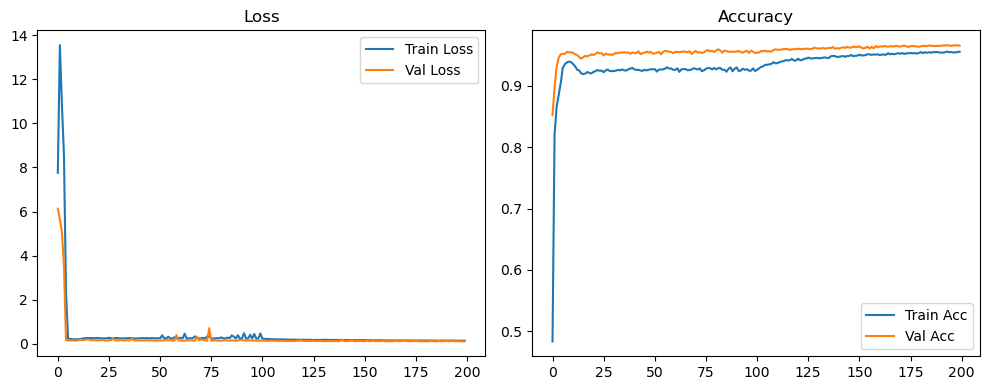

Evaluation:   0%|          | 0/157 [00:00<?, ?it/s]

Evaluation:   6%|▌         | 9/157 [00:00<00:01, 84.00it/s]

Evaluation:  11%|█▏        | 18/157 [00:00<00:01, 83.72it/s]

Evaluation:  17%|█▋        | 27/157 [00:00<00:01, 84.11it/s]

Evaluation:  23%|██▎       | 36/157 [00:00<00:01, 84.55it/s]

Evaluation:  29%|██▊       | 45/157 [00:00<00:01, 83.98it/s]

Evaluation:  34%|███▍      | 54/157 [00:00<00:01, 84.36it/s]

Evaluation:  40%|████      | 63/157 [00:00<00:01, 84.66it/s]

Evaluation:  46%|████▌     | 72/157 [00:00<00:01, 84.91it/s]

Evaluation:  52%|█████▏    | 81/157 [00:00<00:00, 85.11it/s]

Evaluation:  57%|█████▋    | 90/157 [00:01<00:00, 85.30it/s]

Evaluation:  63%|██████▎   | 99/157 [00:01<00:00, 85.32it/s]

Evaluation:  69%|██████▉   | 108/157 [00:01<00:00, 85.19it/s]

Evaluation:  75%|███████▍  | 117/157 [00:01<00:00, 84.21it/s]

Evaluation:  80%|████████  | 126/157 [00:01<00:00, 84.14it/s]

Evaluation:  86%|████████▌ | 135/157 [00:01<00:00, 84.45it/s]

Evaluation:  92%|█████████▏| 144/157 [00:01<00:00, 84.78it/s]

Evaluation:  97%|█████████▋| 153/157 [00:01<00:00, 84.94it/s]

Evaluation: 100%|██████████| 157/157 [00:01<00:00, 84.91it/s]

Original Model Final Test Loss: 0.1146 Accuracy: 0.9698


🚀 Running: batch64_lr0.005_0.005_0.005_dp0.0


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.005 | Train Acc: 0.5433 | Val Acc: 0.8386 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.005 | Train Acc: 0.5433 | Val Acc: 0.8386 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.005 | Train Acc: 0.5433 | Val Acc: 0.8386 |:   0%|          | 1/200 [00:13<45:46, 13.80s/it]

| LR: 0.005 | Train Acc: 0.8506 | Val Acc: 0.8838 |:   0%|          | 1/200 [00:27<45:46, 13.80s/it]

| LR: 0.005 | Train Acc: 0.8506 | Val Acc: 0.8838 |:   0%|          | 1/200 [00:27<45:46, 13.80s/it]

| LR: 0.005 | Train Acc: 0.8506 | Val Acc: 0.8838 |:   1%|          | 2/200 [00:27<44:37, 13.52s/it]

| LR: 0.005 | Train Acc: 0.8910 | Val Acc: 0.8992 |:   1%|          | 2/200 [00:40<44:37, 13.52s/it]

| LR: 0.005 | Train Acc: 0.8910 | Val Acc: 0.8992 |:   1%|          | 2/200 [00:40<44:37, 13.52s/it]

| LR: 0.005 | Train Acc: 0.8910 | Val Acc: 0.8992 |:   2%|▏         | 3/200 [00:40<44:40, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9104 | Val Acc: 0.9221 |:   2%|▏         | 3/200 [00:54<44:40, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9104 | Val Acc: 0.9221 |:   2%|▏         | 3/200 [00:54<44:40, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9104 | Val Acc: 0.9221 |:   2%|▏         | 4/200 [00:54<44:11, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9233 | Val Acc: 0.9349 |:   2%|▏         | 4/200 [01:07<44:11, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9233 | Val Acc: 0.9349 |:   2%|▏         | 4/200 [01:07<44:11, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9233 | Val Acc: 0.9349 |:   2%|▎         | 5/200 [01:07<44:04, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9337 | Val Acc: 0.9381 |:   2%|▎         | 5/200 [01:21<44:04, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9337 | Val Acc: 0.9381 |:   2%|▎         | 5/200 [01:21<44:04, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9337 | Val Acc: 0.9381 |:   3%|▎         | 6/200 [01:21<44:12, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9428 | Val Acc: 0.9433 |:   3%|▎         | 6/200 [01:35<44:12, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9428 | Val Acc: 0.9433 |:   3%|▎         | 6/200 [01:35<44:12, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9428 | Val Acc: 0.9433 |:   4%|▎         | 7/200 [01:35<43:40, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9511 | Val Acc: 0.9523 |:   4%|▎         | 7/200 [01:48<43:40, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9511 | Val Acc: 0.9523 |:   4%|▎         | 7/200 [01:48<43:40, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9511 | Val Acc: 0.9523 |:   4%|▍         | 8/200 [01:48<43:22, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9443 |:   4%|▍         | 8/200 [02:02<43:22, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9443 |:   4%|▍         | 8/200 [02:02<43:22, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9443 |:   4%|▍         | 9/200 [02:02<43:08, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9604 | Val Acc: 0.9558 |:   4%|▍         | 9/200 [02:15<43:08, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9604 | Val Acc: 0.9558 |:   4%|▍         | 9/200 [02:15<43:08, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9604 | Val Acc: 0.9558 |:   5%|▌         | 10/200 [02:15<42:52, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9652 | Val Acc: 0.9501 |:   5%|▌         | 10/200 [02:29<42:52, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9652 | Val Acc: 0.9501 |:   5%|▌         | 10/200 [02:29<42:52, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9652 | Val Acc: 0.9501 |:   6%|▌         | 11/200 [02:29<42:51, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9622 |:   6%|▌         | 11/200 [02:42<42:51, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9622 |:   6%|▌         | 11/200 [02:42<42:51, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9622 |:   6%|▌         | 12/200 [02:42<42:34, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9645 |:   6%|▌         | 12/200 [02:56<42:34, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9645 |:   6%|▌         | 12/200 [02:56<42:34, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9645 |:   6%|▋         | 13/200 [02:56<42:25, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9796 | Val Acc: 0.9664 |:   6%|▋         | 13/200 [03:10<42:25, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9796 | Val Acc: 0.9664 |:   6%|▋         | 13/200 [03:10<42:25, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9796 | Val Acc: 0.9664 |:   7%|▋         | 14/200 [03:10<42:04, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9671 |:   7%|▋         | 14/200 [03:23<42:04, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9671 |:   7%|▋         | 14/200 [03:23<42:04, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9671 |:   8%|▊         | 15/200 [03:23<41:45, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9794 | Val Acc: 0.9671 |:   8%|▊         | 15/200 [03:36<41:45, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9794 | Val Acc: 0.9671 |:   8%|▊         | 15/200 [03:36<41:45, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9794 | Val Acc: 0.9671 |:   8%|▊         | 16/200 [03:37<41:22, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9611 |:   8%|▊         | 16/200 [03:50<41:22, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9611 |:   8%|▊         | 16/200 [03:50<41:22, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9611 |:   8%|▊         | 17/200 [03:50<41:02, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9667 |:   8%|▊         | 17/200 [04:03<41:02, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9667 |:   8%|▊         | 17/200 [04:03<41:02, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9667 |:   9%|▉         | 18/200 [04:03<40:40, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9617 |:   9%|▉         | 18/200 [04:17<40:40, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9617 |:   9%|▉         | 18/200 [04:17<40:40, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9617 |:  10%|▉         | 19/200 [04:17<40:25, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9667 |:  10%|▉         | 19/200 [04:30<40:25, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9667 |:  10%|▉         | 19/200 [04:30<40:25, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9667 |:  10%|█         | 20/200 [04:30<40:17, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9671 |:  10%|█         | 20/200 [04:43<40:17, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9671 |:  10%|█         | 20/200 [04:43<40:17, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9671 |:  10%|█         | 21/200 [04:43<40:02, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9642 |:  10%|█         | 21/200 [04:57<40:02, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9642 |:  10%|█         | 21/200 [04:57<40:02, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9642 |:  11%|█         | 22/200 [04:57<39:53, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9864 | Val Acc: 0.9658 |:  11%|█         | 22/200 [05:10<39:53, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9864 | Val Acc: 0.9658 |:  11%|█         | 22/200 [05:10<39:53, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9864 | Val Acc: 0.9658 |:  12%|█▏        | 23/200 [05:11<39:46, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9861 | Val Acc: 0.9624 |:  12%|█▏        | 23/200 [05:24<39:46, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9861 | Val Acc: 0.9624 |:  12%|█▏        | 23/200 [05:24<39:46, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9861 | Val Acc: 0.9624 |:  12%|█▏        | 24/200 [05:24<39:26, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9860 | Val Acc: 0.9699 |:  12%|█▏        | 24/200 [05:37<39:26, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9860 | Val Acc: 0.9699 |:  12%|█▏        | 24/200 [05:37<39:26, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9860 | Val Acc: 0.9699 |:  12%|█▎        | 25/200 [05:37<39:07, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9868 | Val Acc: 0.9673 |:  12%|█▎        | 25/200 [05:51<39:07, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9868 | Val Acc: 0.9673 |:  12%|█▎        | 25/200 [05:51<39:07, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9868 | Val Acc: 0.9673 |:  13%|█▎        | 26/200 [05:51<38:49, 13.39s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9680 |:  13%|█▎        | 26/200 [06:04<38:49, 13.39s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9680 |:  13%|█▎        | 26/200 [06:04<38:49, 13.39s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9680 |:  14%|█▎        | 27/200 [06:04<38:42, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9713 |:  14%|█▎        | 27/200 [06:18<38:42, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9713 |:  14%|█▎        | 27/200 [06:18<38:42, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9713 |:  14%|█▍        | 28/200 [06:18<38:34, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9647 |:  14%|█▍        | 28/200 [06:32<38:34, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9647 |:  14%|█▍        | 28/200 [06:32<38:34, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9647 |:  14%|█▍        | 29/200 [06:32<39:33, 13.88s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9680 |:  14%|█▍        | 29/200 [06:46<39:33, 13.88s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9680 |:  14%|█▍        | 29/200 [06:46<39:33, 13.88s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9680 |:  15%|█▌        | 30/200 [06:46<38:58, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9676 |:  15%|█▌        | 30/200 [06:59<38:58, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9676 |:  15%|█▌        | 30/200 [06:59<38:58, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9676 |:  16%|█▌        | 31/200 [06:59<38:29, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9677 |:  16%|█▌        | 31/200 [07:13<38:29, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9677 |:  16%|█▌        | 31/200 [07:13<38:29, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9677 |:  16%|█▌        | 32/200 [07:13<37:58, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9663 |:  16%|█▌        | 32/200 [07:26<37:58, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9663 |:  16%|█▌        | 32/200 [07:26<37:58, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9663 |:  16%|█▋        | 33/200 [07:26<37:44, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9668 |:  16%|█▋        | 33/200 [07:40<37:44, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9668 |:  16%|█▋        | 33/200 [07:40<37:44, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9668 |:  17%|█▋        | 34/200 [07:40<37:25, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9693 |:  17%|█▋        | 34/200 [07:53<37:25, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9693 |:  17%|█▋        | 34/200 [07:53<37:25, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9693 |:  18%|█▊        | 35/200 [07:53<37:07, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9681 |:  18%|█▊        | 35/200 [08:07<37:07, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9681 |:  18%|█▊        | 35/200 [08:07<37:07, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9681 |:  18%|█▊        | 36/200 [08:07<36:56, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9683 |:  18%|█▊        | 36/200 [08:20<36:56, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9683 |:  18%|█▊        | 36/200 [08:20<36:56, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9683 |:  18%|█▊        | 37/200 [08:20<36:38, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9673 |:  18%|█▊        | 37/200 [08:36<36:38, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9673 |:  18%|█▊        | 37/200 [08:36<36:38, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9673 |:  19%|█▉        | 38/200 [08:36<38:16, 14.17s/it]

| LR: 0.005 | Train Acc: 0.9909 | Val Acc: 0.9687 |:  19%|█▉        | 38/200 [08:49<38:16, 14.17s/it]

| LR: 0.005 | Train Acc: 0.9909 | Val Acc: 0.9687 |:  19%|█▉        | 38/200 [08:49<38:16, 14.17s/it]

| LR: 0.005 | Train Acc: 0.9909 | Val Acc: 0.9687 |:  20%|█▉        | 39/200 [08:49<37:19, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9647 |:  20%|█▉        | 39/200 [09:04<37:19, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9647 |:  20%|█▉        | 39/200 [09:04<37:19, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9647 |:  20%|██        | 40/200 [09:05<38:13, 14.34s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9688 |:  20%|██        | 40/200 [09:18<38:13, 14.34s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9688 |:  20%|██        | 40/200 [09:18<38:13, 14.34s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9688 |:  20%|██        | 41/200 [09:18<37:27, 14.14s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9694 |:  20%|██        | 41/200 [09:32<37:27, 14.14s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9694 |:  20%|██        | 41/200 [09:32<37:27, 14.14s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9694 |:  21%|██        | 42/200 [09:32<36:48, 13.98s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9695 |:  21%|██        | 42/200 [09:46<36:48, 13.98s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9695 |:  21%|██        | 42/200 [09:46<36:48, 13.98s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9695 |:  22%|██▏       | 43/200 [09:46<36:23, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9691 |:  22%|██▏       | 43/200 [09:59<36:23, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9691 |:  22%|██▏       | 43/200 [09:59<36:23, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9691 |:  22%|██▏       | 44/200 [09:59<35:43, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9682 |:  22%|██▏       | 44/200 [10:13<35:43, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9682 |:  22%|██▏       | 44/200 [10:13<35:43, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9682 |:  22%|██▎       | 45/200 [10:13<35:26, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9698 |:  22%|██▎       | 45/200 [10:26<35:26, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9698 |:  22%|██▎       | 45/200 [10:26<35:26, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9698 |:  23%|██▎       | 46/200 [10:26<34:56, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9646 |:  23%|██▎       | 46/200 [10:39<34:56, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9646 |:  23%|██▎       | 46/200 [10:39<34:56, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9646 |:  24%|██▎       | 47/200 [10:39<34:30, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9670 |:  24%|██▎       | 47/200 [10:53<34:30, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9670 |:  24%|██▎       | 47/200 [10:53<34:30, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9670 |:  24%|██▍       | 48/200 [10:53<34:06, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9684 |:  24%|██▍       | 48/200 [11:06<34:06, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9684 |:  24%|██▍       | 48/200 [11:06<34:06, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9684 |:  24%|██▍       | 49/200 [11:06<33:48, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9695 |:  24%|██▍       | 49/200 [11:19<33:48, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9695 |:  24%|██▍       | 49/200 [11:19<33:48, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9695 |:  25%|██▌       | 50/200 [11:19<33:29, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9671 |:  25%|██▌       | 50/200 [11:33<33:29, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9671 |:  25%|██▌       | 50/200 [11:33<33:29, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9671 |:  26%|██▌       | 51/200 [11:33<33:15, 13.39s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9672 |:  26%|██▌       | 51/200 [11:46<33:15, 13.39s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9672 |:  26%|██▌       | 51/200 [11:46<33:15, 13.39s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9672 |:  26%|██▌       | 52/200 [11:46<33:07, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9688 |:  26%|██▌       | 52/200 [11:59<33:07, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9688 |:  26%|██▌       | 52/200 [11:59<33:07, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9688 |:  26%|██▋       | 53/200 [12:00<32:50, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9681 |:  26%|██▋       | 53/200 [12:13<32:50, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9681 |:  26%|██▋       | 53/200 [12:13<32:50, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9681 |:  27%|██▋       | 54/200 [12:13<32:27, 13.34s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9688 |:  27%|██▋       | 54/200 [12:26<32:27, 13.34s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9688 |:  27%|██▋       | 54/200 [12:26<32:27, 13.34s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9688 |:  28%|██▊       | 55/200 [12:26<32:05, 13.28s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9716 |:  28%|██▊       | 55/200 [12:40<32:05, 13.28s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9716 |:  28%|██▊       | 55/200 [12:40<32:05, 13.28s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9716 |:  28%|██▊       | 56/200 [12:40<32:25, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9690 |:  28%|██▊       | 56/200 [12:53<32:25, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9690 |:  28%|██▊       | 56/200 [12:53<32:25, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9690 |:  28%|██▊       | 57/200 [12:53<32:10, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9697 |:  28%|██▊       | 57/200 [13:07<32:10, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9697 |:  28%|██▊       | 57/200 [13:07<32:10, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9697 |:  29%|██▉       | 58/200 [13:07<31:52, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9690 |:  29%|██▉       | 58/200 [13:20<31:52, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9690 |:  29%|██▉       | 58/200 [13:20<31:52, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9690 |:  30%|██▉       | 59/200 [13:20<31:38, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9702 |:  30%|██▉       | 59/200 [13:34<31:38, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9702 |:  30%|██▉       | 59/200 [13:34<31:38, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9702 |:  30%|███       | 60/200 [13:34<31:22, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9719 |:  30%|███       | 60/200 [13:47<31:22, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9719 |:  30%|███       | 60/200 [13:47<31:22, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9719 |:  30%|███       | 61/200 [13:47<31:06, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9699 |:  30%|███       | 61/200 [14:00<31:06, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9699 |:  30%|███       | 61/200 [14:00<31:06, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9699 |:  31%|███       | 62/200 [14:00<30:48, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9698 |:  31%|███       | 62/200 [14:14<30:48, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9698 |:  31%|███       | 62/200 [14:14<30:48, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9698 |:  32%|███▏      | 63/200 [14:14<30:40, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9683 |:  32%|███▏      | 63/200 [14:27<30:40, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9683 |:  32%|███▏      | 63/200 [14:27<30:40, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9683 |:  32%|███▏      | 64/200 [14:27<30:30, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9687 |:  32%|███▏      | 64/200 [14:41<30:30, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9687 |:  32%|███▏      | 64/200 [14:41<30:30, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9687 |:  32%|███▎      | 65/200 [14:41<30:15, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9688 |:  32%|███▎      | 65/200 [14:54<30:15, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9688 |:  32%|███▎      | 65/200 [14:54<30:15, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9688 |:  33%|███▎      | 66/200 [14:54<29:59, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9705 |:  33%|███▎      | 66/200 [15:08<29:59, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9705 |:  33%|███▎      | 66/200 [15:08<29:59, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9705 |:  34%|███▎      | 67/200 [15:08<29:52, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9689 |:  34%|███▎      | 67/200 [15:21<29:52, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9689 |:  34%|███▎      | 67/200 [15:21<29:52, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9689 |:  34%|███▍      | 68/200 [15:21<29:36, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9683 |:  34%|███▍      | 68/200 [15:35<29:36, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9683 |:  34%|███▍      | 68/200 [15:35<29:36, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9683 |:  34%|███▍      | 69/200 [15:35<29:24, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9637 |:  34%|███▍      | 69/200 [15:48<29:24, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9637 |:  34%|███▍      | 69/200 [15:48<29:24, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9637 |:  35%|███▌      | 70/200 [15:48<29:14, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9684 |:  35%|███▌      | 70/200 [16:02<29:14, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9684 |:  35%|███▌      | 70/200 [16:02<29:14, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9684 |:  36%|███▌      | 71/200 [16:02<29:00, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9649 |:  36%|███▌      | 71/200 [16:15<29:00, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9649 |:  36%|███▌      | 71/200 [16:15<29:00, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9649 |:  36%|███▌      | 72/200 [16:15<28:47, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9704 |:  36%|███▌      | 72/200 [16:29<28:47, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9704 |:  36%|███▌      | 72/200 [16:29<28:47, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9704 |:  36%|███▋      | 73/200 [16:29<28:34, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9937 | Val Acc: 0.9699 |:  36%|███▋      | 73/200 [16:42<28:34, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9937 | Val Acc: 0.9699 |:  36%|███▋      | 73/200 [16:42<28:34, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9937 | Val Acc: 0.9699 |:  37%|███▋      | 74/200 [16:42<28:20, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9683 |:  37%|███▋      | 74/200 [16:56<28:20, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9683 |:  37%|███▋      | 74/200 [16:56<28:20, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9683 |:  38%|███▊      | 75/200 [16:56<28:06, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9679 |:  38%|███▊      | 75/200 [17:09<28:06, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9679 |:  38%|███▊      | 75/200 [17:09<28:06, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9679 |:  38%|███▊      | 76/200 [17:09<27:51, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9718 |:  38%|███▊      | 76/200 [17:24<27:51, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9718 |:  38%|███▊      | 76/200 [17:24<27:51, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9718 |:  38%|███▊      | 77/200 [17:24<28:14, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9691 |:  38%|███▊      | 77/200 [17:37<28:14, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9691 |:  38%|███▊      | 77/200 [17:37<28:14, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9691 |:  39%|███▉      | 78/200 [17:37<27:48, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9718 |:  39%|███▉      | 78/200 [17:50<27:48, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9718 |:  39%|███▉      | 78/200 [17:50<27:48, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9718 |:  40%|███▉      | 79/200 [17:50<27:21, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9679 |:  40%|███▉      | 79/200 [18:04<27:21, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9679 |:  40%|███▉      | 79/200 [18:04<27:21, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9679 |:  40%|████      | 80/200 [18:04<27:01, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9711 |:  40%|████      | 80/200 [18:17<27:01, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9711 |:  40%|████      | 80/200 [18:17<27:01, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9711 |:  40%|████      | 81/200 [18:17<26:48, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9689 |:  40%|████      | 81/200 [18:31<26:48, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9689 |:  40%|████      | 81/200 [18:31<26:48, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9689 |:  41%|████      | 82/200 [18:31<26:35, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9934 | Val Acc: 0.9705 |:  41%|████      | 82/200 [18:44<26:35, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9934 | Val Acc: 0.9705 |:  41%|████      | 82/200 [18:44<26:35, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9934 | Val Acc: 0.9705 |:  42%|████▏     | 83/200 [18:44<26:04, 13.37s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9697 |:  42%|████▏     | 83/200 [18:58<26:04, 13.37s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9697 |:  42%|████▏     | 83/200 [18:58<26:04, 13.37s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9697 |:  42%|████▏     | 84/200 [18:58<26:10, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9691 |:  42%|████▏     | 84/200 [19:11<26:10, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9691 |:  42%|████▏     | 84/200 [19:11<26:10, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9691 |:  42%|████▎     | 85/200 [19:11<25:52, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9706 |:  42%|████▎     | 85/200 [19:24<25:52, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9706 |:  42%|████▎     | 85/200 [19:24<25:52, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9706 |:  43%|████▎     | 86/200 [19:25<25:34, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9714 |:  43%|████▎     | 86/200 [19:38<25:34, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9714 |:  43%|████▎     | 86/200 [19:38<25:34, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9714 |:  44%|████▎     | 87/200 [19:38<25:21, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9712 |:  44%|████▎     | 87/200 [19:52<25:21, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9712 |:  44%|████▎     | 87/200 [19:52<25:21, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9712 |:  44%|████▍     | 88/200 [19:52<25:37, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9661 |:  44%|████▍     | 88/200 [20:05<25:37, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9661 |:  44%|████▍     | 88/200 [20:05<25:37, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9661 |:  44%|████▍     | 89/200 [20:05<25:01, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9688 |:  44%|████▍     | 89/200 [20:19<25:01, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9688 |:  44%|████▍     | 89/200 [20:19<25:01, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9688 |:  45%|████▌     | 90/200 [20:19<24:47, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9696 |:  45%|████▌     | 90/200 [20:32<24:47, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9696 |:  45%|████▌     | 90/200 [20:32<24:47, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9696 |:  46%|████▌     | 91/200 [20:32<24:31, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9664 |:  46%|████▌     | 91/200 [20:46<24:31, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9664 |:  46%|████▌     | 91/200 [20:46<24:31, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9664 |:  46%|████▌     | 92/200 [20:46<24:31, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9688 |:  46%|████▌     | 92/200 [21:00<24:31, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9688 |:  46%|████▌     | 92/200 [21:00<24:31, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9688 |:  46%|████▋     | 93/200 [21:00<24:14, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9695 |:  46%|████▋     | 93/200 [21:13<24:14, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9695 |:  46%|████▋     | 93/200 [21:13<24:14, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9695 |:  47%|████▋     | 94/200 [21:13<24:00, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9696 |:  47%|████▋     | 94/200 [21:27<24:00, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9696 |:  47%|████▋     | 94/200 [21:27<24:00, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9696 |:  48%|████▊     | 95/200 [21:27<23:47, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9706 |:  48%|████▊     | 95/200 [21:41<23:47, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9706 |:  48%|████▊     | 95/200 [21:41<23:47, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9706 |:  48%|████▊     | 96/200 [21:41<23:59, 13.84s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9698 |:  48%|████▊     | 96/200 [21:55<23:59, 13.84s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9698 |:  48%|████▊     | 96/200 [21:55<23:59, 13.84s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9698 |:  48%|████▊     | 97/200 [21:55<23:33, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9709 |:  48%|████▊     | 97/200 [22:12<23:33, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9709 |:  48%|████▊     | 97/200 [22:12<23:33, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9709 |:  49%|████▉     | 98/200 [22:12<24:50, 14.61s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9683 |:  49%|████▉     | 98/200 [22:25<24:50, 14.61s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9683 |:  49%|████▉     | 98/200 [22:25<24:50, 14.61s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9683 |:  50%|████▉     | 99/200 [22:25<23:58, 14.25s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9692 |:  50%|████▉     | 99/200 [22:38<23:58, 14.25s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9692 |:  50%|████▉     | 99/200 [22:38<23:58, 14.25s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9692 |:  50%|█████     | 100/200 [22:38<23:23, 14.04s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9712 |:  50%|█████     | 100/200 [22:52<23:23, 14.04s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9712 |:  50%|█████     | 100/200 [22:52<23:23, 14.04s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9712 |:  50%|█████     | 101/200 [22:52<23:02, 13.97s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9706 |:  50%|█████     | 101/200 [23:06<23:02, 13.97s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9706 |:  50%|█████     | 101/200 [23:06<23:02, 13.97s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9706 |:  51%|█████     | 102/200 [23:06<22:37, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9668 |:  51%|█████     | 102/200 [23:19<22:37, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9668 |:  51%|█████     | 102/200 [23:19<22:37, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9668 |:  52%|█████▏    | 103/200 [23:19<22:13, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9712 |:  52%|█████▏    | 103/200 [23:33<22:13, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9712 |:  52%|█████▏    | 103/200 [23:33<22:13, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9712 |:  52%|█████▏    | 104/200 [23:33<21:53, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9692 |:  52%|█████▏    | 104/200 [23:46<21:53, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9692 |:  52%|█████▏    | 104/200 [23:46<21:53, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9692 |:  52%|█████▎    | 105/200 [23:46<21:31, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9701 |:  52%|█████▎    | 105/200 [24:00<21:31, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9701 |:  52%|█████▎    | 105/200 [24:00<21:31, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9701 |:  53%|█████▎    | 106/200 [24:00<21:16, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9685 |:  53%|█████▎    | 106/200 [24:13<21:16, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9685 |:  53%|█████▎    | 106/200 [24:13<21:16, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9685 |:  54%|█████▎    | 107/200 [24:13<21:01, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9728 |:  54%|█████▎    | 107/200 [24:27<21:01, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9728 |:  54%|█████▎    | 107/200 [24:27<21:01, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9728 |:  54%|█████▍    | 108/200 [24:27<20:43, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9685 |:  54%|█████▍    | 108/200 [24:40<20:43, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9685 |:  54%|█████▍    | 108/200 [24:40<20:43, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9685 |:  55%|█████▍    | 109/200 [24:40<20:30, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9937 | Val Acc: 0.9697 |:  55%|█████▍    | 109/200 [24:54<20:30, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9937 | Val Acc: 0.9697 |:  55%|█████▍    | 109/200 [24:54<20:30, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9937 | Val Acc: 0.9697 |:  55%|█████▌    | 110/200 [24:54<20:15, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9683 |:  55%|█████▌    | 110/200 [25:07<20:15, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9683 |:  55%|█████▌    | 110/200 [25:07<20:15, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9683 |:  56%|█████▌    | 111/200 [25:07<19:58, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9937 | Val Acc: 0.9698 |:  56%|█████▌    | 111/200 [25:20<19:58, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9937 | Val Acc: 0.9698 |:  56%|█████▌    | 111/200 [25:20<19:58, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9937 | Val Acc: 0.9698 |:  56%|█████▌    | 112/200 [25:20<19:41, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9699 |:  56%|█████▌    | 112/200 [25:34<19:41, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9699 |:  56%|█████▌    | 112/200 [25:34<19:41, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9699 |:  56%|█████▋    | 113/200 [25:34<19:29, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9700 |:  56%|█████▋    | 113/200 [25:47<19:29, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9700 |:  56%|█████▋    | 113/200 [25:47<19:29, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9700 |:  57%|█████▋    | 114/200 [25:47<19:15, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9698 |:  57%|█████▋    | 114/200 [26:01<19:15, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9698 |:  57%|█████▋    | 114/200 [26:01<19:15, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9698 |:  57%|█████▊    | 115/200 [26:01<19:00, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9950 | Val Acc: 0.9699 |:  57%|█████▊    | 115/200 [26:14<19:00, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9950 | Val Acc: 0.9699 |:  57%|█████▊    | 115/200 [26:14<19:00, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9950 | Val Acc: 0.9699 |:  58%|█████▊    | 116/200 [26:14<18:50, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9692 |:  58%|█████▊    | 116/200 [26:28<18:50, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9692 |:  58%|█████▊    | 116/200 [26:28<18:50, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9692 |:  58%|█████▊    | 117/200 [26:28<18:35, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9704 |:  58%|█████▊    | 117/200 [26:41<18:35, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9704 |:  58%|█████▊    | 117/200 [26:41<18:35, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9704 |:  59%|█████▉    | 118/200 [26:41<18:23, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9704 |:  59%|█████▉    | 118/200 [26:55<18:23, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9704 |:  59%|█████▉    | 118/200 [26:55<18:23, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9704 |:  60%|█████▉    | 119/200 [26:55<18:13, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9702 |:  60%|█████▉    | 119/200 [27:09<18:13, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9702 |:  60%|█████▉    | 119/200 [27:09<18:13, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9702 |:  60%|██████    | 120/200 [27:09<18:12, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9683 |:  60%|██████    | 120/200 [27:22<18:12, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9683 |:  60%|██████    | 120/200 [27:22<18:12, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9683 |:  60%|██████    | 121/200 [27:22<17:50, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9702 |:  60%|██████    | 121/200 [27:35<17:50, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9702 |:  60%|██████    | 121/200 [27:35<17:50, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9702 |:  61%|██████    | 122/200 [27:35<17:31, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9703 |:  61%|██████    | 122/200 [27:49<17:31, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9703 |:  61%|██████    | 122/200 [27:49<17:31, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9703 |:  62%|██████▏   | 123/200 [27:49<17:17, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9722 |:  62%|██████▏   | 123/200 [28:02<17:17, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9722 |:  62%|██████▏   | 123/200 [28:02<17:17, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9722 |:  62%|██████▏   | 124/200 [28:02<17:04, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9693 |:  62%|██████▏   | 124/200 [28:16<17:04, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9693 |:  62%|██████▏   | 124/200 [28:16<17:04, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9693 |:  62%|██████▎   | 125/200 [28:16<16:48, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9687 |:  62%|██████▎   | 125/200 [28:29<16:48, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9687 |:  62%|██████▎   | 125/200 [28:29<16:48, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9687 |:  63%|██████▎   | 126/200 [28:29<16:33, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9680 |:  63%|██████▎   | 126/200 [28:42<16:33, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9680 |:  63%|██████▎   | 126/200 [28:42<16:33, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9680 |:  64%|██████▎   | 127/200 [28:42<16:18, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9698 |:  64%|██████▎   | 127/200 [28:56<16:18, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9698 |:  64%|██████▎   | 127/200 [28:56<16:18, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9698 |:  64%|██████▍   | 128/200 [28:56<16:05, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9710 |:  64%|██████▍   | 128/200 [29:09<16:05, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9710 |:  64%|██████▍   | 128/200 [29:09<16:05, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9710 |:  64%|██████▍   | 129/200 [29:09<15:55, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9709 |:  64%|██████▍   | 129/200 [29:23<15:55, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9709 |:  64%|██████▍   | 129/200 [29:23<15:55, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9709 |:  65%|██████▌   | 130/200 [29:23<15:40, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9719 |:  65%|██████▌   | 130/200 [29:36<15:40, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9719 |:  65%|██████▌   | 130/200 [29:36<15:40, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9719 |:  66%|██████▌   | 131/200 [29:36<15:28, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9950 | Val Acc: 0.9709 |:  66%|██████▌   | 131/200 [29:50<15:28, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9950 | Val Acc: 0.9709 |:  66%|██████▌   | 131/200 [29:50<15:28, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9950 | Val Acc: 0.9709 |:  66%|██████▌   | 132/200 [29:50<15:15, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9686 |:  66%|██████▌   | 132/200 [30:03<15:15, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9686 |:  66%|██████▌   | 132/200 [30:03<15:15, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9686 |:  66%|██████▋   | 133/200 [30:03<15:02, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9714 |:  66%|██████▋   | 133/200 [30:17<15:02, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9714 |:  66%|██████▋   | 133/200 [30:17<15:02, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9714 |:  67%|██████▋   | 134/200 [30:17<14:47, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9692 |:  67%|██████▋   | 134/200 [30:30<14:47, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9692 |:  67%|██████▋   | 134/200 [30:30<14:47, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9692 |:  68%|██████▊   | 135/200 [30:30<14:35, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9705 |:  68%|██████▊   | 135/200 [30:44<14:35, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9705 |:  68%|██████▊   | 135/200 [30:44<14:35, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9705 |:  68%|██████▊   | 136/200 [30:44<14:19, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9698 |:  68%|██████▊   | 136/200 [30:57<14:19, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9698 |:  68%|██████▊   | 136/200 [30:57<14:19, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9698 |:  68%|██████▊   | 137/200 [30:57<14:06, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9693 |:  68%|██████▊   | 137/200 [31:10<14:06, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9693 |:  68%|██████▊   | 137/200 [31:10<14:06, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9693 |:  69%|██████▉   | 138/200 [31:10<13:51, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9724 |:  69%|██████▉   | 138/200 [31:24<13:51, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9724 |:  69%|██████▉   | 138/200 [31:24<13:51, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9724 |:  70%|██████▉   | 139/200 [31:24<13:36, 13.39s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9694 |:  70%|██████▉   | 139/200 [31:37<13:36, 13.39s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9694 |:  70%|██████▉   | 139/200 [31:37<13:36, 13.39s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9694 |:  70%|███████   | 140/200 [31:37<13:24, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9704 |:  70%|███████   | 140/200 [31:51<13:24, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9704 |:  70%|███████   | 140/200 [31:51<13:24, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9704 |:  70%|███████   | 141/200 [31:51<13:11, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9698 |:  70%|███████   | 141/200 [32:04<13:11, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9698 |:  70%|███████   | 141/200 [32:04<13:11, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9698 |:  71%|███████   | 142/200 [32:04<13:00, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9708 |:  71%|███████   | 142/200 [32:17<13:00, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9708 |:  71%|███████   | 142/200 [32:17<13:00, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9708 |:  72%|███████▏  | 143/200 [32:17<12:44, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9686 |:  72%|███████▏  | 143/200 [32:31<12:44, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9686 |:  72%|███████▏  | 143/200 [32:31<12:44, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9686 |:  72%|███████▏  | 144/200 [32:31<12:31, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9698 |:  72%|███████▏  | 144/200 [32:44<12:31, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9698 |:  72%|███████▏  | 144/200 [32:44<12:31, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9698 |:  72%|███████▎  | 145/200 [32:44<12:16, 13.39s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9695 |:  72%|███████▎  | 145/200 [32:58<12:16, 13.39s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9695 |:  72%|███████▎  | 145/200 [32:58<12:16, 13.39s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9695 |:  73%|███████▎  | 146/200 [32:58<12:04, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9708 |:  73%|███████▎  | 146/200 [33:11<12:04, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9708 |:  73%|███████▎  | 146/200 [33:11<12:04, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9708 |:  74%|███████▎  | 147/200 [33:11<11:50, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9701 |:  74%|███████▎  | 147/200 [33:25<11:50, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9701 |:  74%|███████▎  | 147/200 [33:25<11:50, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9701 |:  74%|███████▍  | 148/200 [33:25<11:40, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9698 |:  74%|███████▍  | 148/200 [33:38<11:40, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9698 |:  74%|███████▍  | 148/200 [33:38<11:40, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9698 |:  74%|███████▍  | 149/200 [33:38<11:28, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9736 |:  74%|███████▍  | 149/200 [33:52<11:28, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9736 |:  74%|███████▍  | 149/200 [33:52<11:28, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9736 |:  75%|███████▌  | 150/200 [33:52<11:12, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9698 |:  75%|███████▌  | 150/200 [34:05<11:12, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9698 |:  75%|███████▌  | 150/200 [34:05<11:12, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9698 |:  76%|███████▌  | 151/200 [34:05<11:02, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9709 |:  76%|███████▌  | 151/200 [34:20<11:02, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9709 |:  76%|███████▌  | 151/200 [34:20<11:02, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9709 |:  76%|███████▌  | 152/200 [34:20<11:08, 13.93s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9689 |:  76%|███████▌  | 152/200 [34:34<11:08, 13.93s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9689 |:  76%|███████▌  | 152/200 [34:34<11:08, 13.93s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9689 |:  76%|███████▋  | 153/200 [34:34<10:47, 13.77s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9698 |:  76%|███████▋  | 153/200 [34:48<10:47, 13.77s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9698 |:  76%|███████▋  | 153/200 [34:48<10:47, 13.77s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9698 |:  77%|███████▋  | 154/200 [34:48<10:36, 13.84s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9697 |:  77%|███████▋  | 154/200 [35:06<10:36, 13.84s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9697 |:  77%|███████▋  | 154/200 [35:06<10:36, 13.84s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9697 |:  78%|███████▊  | 155/200 [35:06<11:18, 15.08s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9712 |:  78%|███████▊  | 155/200 [35:22<11:18, 15.08s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9712 |:  78%|███████▊  | 155/200 [35:22<11:18, 15.08s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9712 |:  78%|███████▊  | 156/200 [35:22<11:22, 15.51s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9711 |:  78%|███████▊  | 156/200 [35:36<11:22, 15.51s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9711 |:  78%|███████▊  | 156/200 [35:36<11:22, 15.51s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9711 |:  78%|███████▊  | 157/200 [35:36<10:49, 15.10s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9689 |:  78%|███████▊  | 157/200 [35:50<10:49, 15.10s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9689 |:  78%|███████▊  | 157/200 [35:50<10:49, 15.10s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9689 |:  79%|███████▉  | 158/200 [35:50<10:14, 14.64s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9695 |:  79%|███████▉  | 158/200 [36:03<10:14, 14.64s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9695 |:  79%|███████▉  | 158/200 [36:03<10:14, 14.64s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9695 |:  80%|███████▉  | 159/200 [36:03<09:44, 14.26s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9711 |:  80%|███████▉  | 159/200 [36:17<09:44, 14.26s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9711 |:  80%|███████▉  | 159/200 [36:17<09:44, 14.26s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9711 |:  80%|████████  | 160/200 [36:17<09:21, 14.04s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9688 |:  80%|████████  | 160/200 [36:30<09:21, 14.04s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9688 |:  80%|████████  | 160/200 [36:30<09:21, 14.04s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9688 |:  80%|████████  | 161/200 [36:30<09:01, 13.89s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9691 |:  80%|████████  | 161/200 [36:44<09:01, 13.89s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9691 |:  80%|████████  | 161/200 [36:44<09:01, 13.89s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9691 |:  81%|████████  | 162/200 [36:44<08:43, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9690 |:  81%|████████  | 162/200 [36:57<08:43, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9690 |:  81%|████████  | 162/200 [36:57<08:43, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9690 |:  82%|████████▏ | 163/200 [36:57<08:26, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9712 |:  82%|████████▏ | 163/200 [37:11<08:26, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9712 |:  82%|████████▏ | 163/200 [37:11<08:26, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9712 |:  82%|████████▏ | 164/200 [37:11<08:11, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9690 |:  82%|████████▏ | 164/200 [37:24<08:11, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9690 |:  82%|████████▏ | 164/200 [37:24<08:11, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9690 |:  82%|████████▎ | 165/200 [37:24<07:54, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9682 |:  82%|████████▎ | 165/200 [37:37<07:54, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9682 |:  82%|████████▎ | 165/200 [37:37<07:54, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9682 |:  83%|████████▎ | 166/200 [37:37<07:38, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9700 |:  83%|████████▎ | 166/200 [37:51<07:38, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9700 |:  83%|████████▎ | 166/200 [37:51<07:38, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9700 |:  84%|████████▎ | 167/200 [37:51<07:24, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9702 |:  84%|████████▎ | 167/200 [38:04<07:24, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9702 |:  84%|████████▎ | 167/200 [38:04<07:24, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9702 |:  84%|████████▍ | 168/200 [38:04<07:09, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9708 |:  84%|████████▍ | 168/200 [38:17<07:09, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9708 |:  84%|████████▍ | 168/200 [38:17<07:09, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9708 |:  84%|████████▍ | 169/200 [38:17<06:55, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9680 |:  84%|████████▍ | 169/200 [38:31<06:55, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9680 |:  84%|████████▍ | 169/200 [38:31<06:55, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9680 |:  85%|████████▌ | 170/200 [38:31<06:41, 13.39s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9714 |:  85%|████████▌ | 170/200 [38:44<06:41, 13.39s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9714 |:  85%|████████▌ | 170/200 [38:44<06:41, 13.39s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9714 |:  86%|████████▌ | 171/200 [38:44<06:28, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9702 |:  86%|████████▌ | 171/200 [38:58<06:28, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9702 |:  86%|████████▌ | 171/200 [38:58<06:28, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9702 |:  86%|████████▌ | 172/200 [38:58<06:14, 13.37s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9698 |:  86%|████████▌ | 172/200 [39:11<06:14, 13.37s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9698 |:  86%|████████▌ | 172/200 [39:11<06:14, 13.37s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9698 |:  86%|████████▋ | 173/200 [39:11<06:00, 13.36s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9680 |:  86%|████████▋ | 173/200 [39:24<06:00, 13.36s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9680 |:  86%|████████▋ | 173/200 [39:24<06:00, 13.36s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9680 |:  87%|████████▋ | 174/200 [39:24<05:48, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9690 |:  87%|████████▋ | 174/200 [39:38<05:48, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9690 |:  87%|████████▋ | 174/200 [39:38<05:48, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9690 |:  88%|████████▊ | 175/200 [39:38<05:35, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9687 |:  88%|████████▊ | 175/200 [39:54<05:35, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9687 |:  88%|████████▊ | 175/200 [39:54<05:35, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9687 |:  88%|████████▊ | 176/200 [39:54<05:42, 14.27s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9666 |:  88%|████████▊ | 176/200 [40:08<05:42, 14.27s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9666 |:  88%|████████▊ | 176/200 [40:08<05:42, 14.27s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9666 |:  88%|████████▊ | 177/200 [40:08<05:22, 14.01s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9692 |:  88%|████████▊ | 177/200 [40:21<05:22, 14.01s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9692 |:  88%|████████▊ | 177/200 [40:21<05:22, 14.01s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9692 |:  89%|████████▉ | 178/200 [40:21<05:04, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9697 |:  89%|████████▉ | 178/200 [40:35<05:04, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9697 |:  89%|████████▉ | 178/200 [40:35<05:04, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9697 |:  90%|████████▉ | 179/200 [40:35<04:49, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9950 | Val Acc: 0.9687 |:  90%|████████▉ | 179/200 [40:48<04:49, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9950 | Val Acc: 0.9687 |:  90%|████████▉ | 179/200 [40:48<04:49, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9950 | Val Acc: 0.9687 |:  90%|█████████ | 180/200 [40:48<04:32, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9687 |:  90%|█████████ | 180/200 [41:01<04:32, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9687 |:  90%|█████████ | 180/200 [41:01<04:32, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9687 |:  90%|█████████ | 181/200 [41:01<04:17, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9694 |:  90%|█████████ | 181/200 [41:15<04:17, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9694 |:  90%|█████████ | 181/200 [41:15<04:17, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9694 |:  91%|█████████ | 182/200 [41:15<04:02, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9701 |:  91%|█████████ | 182/200 [41:28<04:02, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9701 |:  91%|█████████ | 182/200 [41:28<04:02, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9701 |:  92%|█████████▏| 183/200 [41:28<03:48, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9693 |:  92%|█████████▏| 183/200 [41:41<03:48, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9693 |:  92%|█████████▏| 183/200 [41:41<03:48, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9693 |:  92%|█████████▏| 184/200 [41:41<03:35, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9699 |:  92%|█████████▏| 184/200 [41:55<03:35, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9699 |:  92%|█████████▏| 184/200 [41:55<03:35, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9699 |:  92%|█████████▎| 185/200 [41:55<03:21, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9707 |:  92%|█████████▎| 185/200 [42:08<03:21, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9707 |:  92%|█████████▎| 185/200 [42:08<03:21, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9707 |:  93%|█████████▎| 186/200 [42:08<03:08, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9704 |:  93%|█████████▎| 186/200 [42:22<03:08, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9704 |:  93%|█████████▎| 186/200 [42:22<03:08, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9704 |:  94%|█████████▎| 187/200 [42:22<02:55, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9697 |:  94%|█████████▎| 187/200 [42:35<02:55, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9697 |:  94%|█████████▎| 187/200 [42:35<02:55, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9697 |:  94%|█████████▍| 188/200 [42:35<02:41, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9692 |:  94%|█████████▍| 188/200 [42:49<02:41, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9692 |:  94%|█████████▍| 188/200 [42:49<02:41, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9692 |:  94%|█████████▍| 189/200 [42:49<02:28, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9684 |:  94%|█████████▍| 189/200 [43:02<02:28, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9684 |:  94%|█████████▍| 189/200 [43:02<02:28, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9684 |:  95%|█████████▌| 190/200 [43:02<02:14, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9712 |:  95%|█████████▌| 190/200 [43:16<02:14, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9712 |:  95%|█████████▌| 190/200 [43:16<02:14, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9712 |:  96%|█████████▌| 191/200 [43:16<02:01, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9692 |:  96%|█████████▌| 191/200 [43:29<02:01, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9692 |:  96%|█████████▌| 191/200 [43:29<02:01, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9692 |:  96%|█████████▌| 192/200 [43:29<01:48, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9692 |:  96%|█████████▌| 192/200 [43:43<01:48, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9692 |:  96%|█████████▌| 192/200 [43:43<01:48, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9692 |:  96%|█████████▋| 193/200 [43:43<01:34, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9704 |:  96%|█████████▋| 193/200 [43:56<01:34, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9704 |:  96%|█████████▋| 193/200 [43:56<01:34, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9704 |:  97%|█████████▋| 194/200 [43:56<01:20, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9706 |:  97%|█████████▋| 194/200 [44:09<01:20, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9706 |:  97%|█████████▋| 194/200 [44:09<01:20, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9706 |:  98%|█████████▊| 195/200 [44:10<01:07, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9708 |:  98%|█████████▊| 195/200 [44:23<01:07, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9708 |:  98%|█████████▊| 195/200 [44:23<01:07, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9708 |:  98%|█████████▊| 196/200 [44:23<00:53, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9701 |:  98%|█████████▊| 196/200 [44:36<00:53, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9701 |:  98%|█████████▊| 196/200 [44:36<00:53, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9701 |:  98%|█████████▊| 197/200 [44:36<00:40, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9692 |:  98%|█████████▊| 197/200 [44:50<00:40, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9692 |:  98%|█████████▊| 197/200 [44:50<00:40, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9692 |:  99%|█████████▉| 198/200 [44:50<00:26, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9701 |:  99%|█████████▉| 198/200 [45:03<00:26, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9701 |:  99%|█████████▉| 198/200 [45:03<00:26, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9701 |: 100%|█████████▉| 199/200 [45:03<00:13, 13.37s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9670 |: 100%|█████████▉| 199/200 [45:16<00:13, 13.37s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9670 |: 100%|█████████▉| 199/200 [45:16<00:13, 13.37s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9670 |: 100%|██████████| 200/200 [45:16<00:00, 13.36s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9670 |: 100%|██████████| 200/200 [45:16<00:00, 13.58s/it]

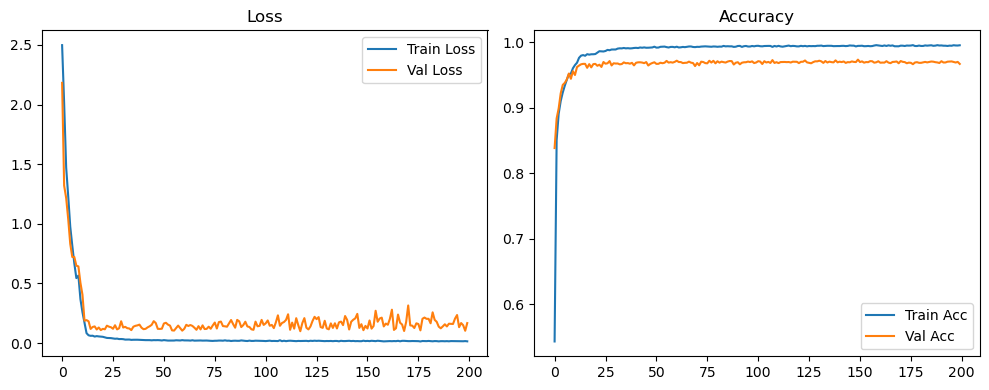

Evaluation:   0%|          | 0/157 [00:00<?, ?it/s]

Evaluation:   6%|▌         | 9/157 [00:00<00:01, 84.51it/s]

Evaluation:  11%|█▏        | 18/157 [00:00<00:01, 84.66it/s]

Evaluation:  17%|█▋        | 27/157 [00:00<00:01, 84.80it/s]

Evaluation:  23%|██▎       | 36/157 [00:00<00:01, 84.82it/s]

Evaluation:  29%|██▊       | 45/157 [00:00<00:01, 84.18it/s]

Evaluation:  34%|███▍      | 54/157 [00:00<00:01, 84.17it/s]

Evaluation:  40%|████      | 63/157 [00:00<00:01, 84.54it/s]

Evaluation:  46%|████▌     | 72/157 [00:00<00:01, 84.94it/s]

Evaluation:  52%|█████▏    | 81/157 [00:00<00:00, 85.18it/s]

Evaluation:  57%|█████▋    | 90/157 [00:01<00:00, 85.19it/s]

Evaluation:  63%|██████▎   | 99/157 [00:01<00:00, 85.18it/s]

Evaluation:  69%|██████▉   | 108/157 [00:01<00:00, 85.21it/s]

Evaluation:  75%|███████▍  | 117/157 [00:01<00:00, 85.29it/s]

Evaluation:  80%|████████  | 126/157 [00:01<00:00, 85.37it/s]

Evaluation:  86%|████████▌ | 135/157 [00:01<00:00, 83.97it/s]

Evaluation:  92%|█████████▏| 144/157 [00:01<00:00, 84.39it/s]

Evaluation:  97%|█████████▋| 153/157 [00:01<00:00, 84.66it/s]

Evaluation: 100%|██████████| 157/157 [00:01<00:00, 84.99it/s]

Original Model Final Test Loss: 0.1558 Accuracy: 0.9717


🚀 Running: batch64_lr0.005_0.005_0.005_dp0.2


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.005 | Train Acc: 0.5048 | Val Acc: 0.8394 |:   0%|          | 0/200 [00:14<?, ?it/s]

| LR: 0.005 | Train Acc: 0.5048 | Val Acc: 0.8394 |:   0%|          | 0/200 [00:14<?, ?it/s]

| LR: 0.005 | Train Acc: 0.5048 | Val Acc: 0.8394 |:   0%|          | 1/200 [00:14<46:56, 14.15s/it]

| LR: 0.005 | Train Acc: 0.8398 | Val Acc: 0.8909 |:   0%|          | 1/200 [00:27<46:56, 14.15s/it]

| LR: 0.005 | Train Acc: 0.8398 | Val Acc: 0.8909 |:   0%|          | 1/200 [00:27<46:56, 14.15s/it]

| LR: 0.005 | Train Acc: 0.8398 | Val Acc: 0.8909 |:   1%|          | 2/200 [00:27<45:25, 13.77s/it]

| LR: 0.005 | Train Acc: 0.8805 | Val Acc: 0.9203 |:   1%|          | 2/200 [00:41<45:25, 13.77s/it]

| LR: 0.005 | Train Acc: 0.8805 | Val Acc: 0.9203 |:   1%|          | 2/200 [00:41<45:25, 13.77s/it]

| LR: 0.005 | Train Acc: 0.8805 | Val Acc: 0.9203 |:   2%|▏         | 3/200 [00:41<45:02, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9011 | Val Acc: 0.9311 |:   2%|▏         | 3/200 [00:55<45:02, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9011 | Val Acc: 0.9311 |:   2%|▏         | 3/200 [00:55<45:02, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9011 | Val Acc: 0.9311 |:   2%|▏         | 4/200 [00:55<45:47, 14.02s/it]

| LR: 0.005 | Train Acc: 0.9137 | Val Acc: 0.9347 |:   2%|▏         | 4/200 [01:09<45:47, 14.02s/it]

| LR: 0.005 | Train Acc: 0.9137 | Val Acc: 0.9347 |:   2%|▏         | 4/200 [01:09<45:47, 14.02s/it]

| LR: 0.005 | Train Acc: 0.9137 | Val Acc: 0.9347 |:   2%|▎         | 5/200 [01:09<45:05, 13.87s/it]

| LR: 0.005 | Train Acc: 0.9258 | Val Acc: 0.9433 |:   2%|▎         | 5/200 [01:26<45:05, 13.87s/it]

| LR: 0.005 | Train Acc: 0.9258 | Val Acc: 0.9433 |:   2%|▎         | 5/200 [01:26<45:05, 13.87s/it]

| LR: 0.005 | Train Acc: 0.9258 | Val Acc: 0.9433 |:   3%|▎         | 6/200 [01:26<47:58, 14.84s/it]

| LR: 0.005 | Train Acc: 0.9335 | Val Acc: 0.9485 |:   3%|▎         | 6/200 [01:43<47:58, 14.84s/it]

| LR: 0.005 | Train Acc: 0.9335 | Val Acc: 0.9485 |:   3%|▎         | 6/200 [01:43<47:58, 14.84s/it]

| LR: 0.005 | Train Acc: 0.9335 | Val Acc: 0.9485 |:   4%|▎         | 7/200 [01:43<50:04, 15.57s/it]

| LR: 0.005 | Train Acc: 0.9421 | Val Acc: 0.9517 |:   4%|▎         | 7/200 [01:57<50:04, 15.57s/it]

| LR: 0.005 | Train Acc: 0.9421 | Val Acc: 0.9517 |:   4%|▎         | 7/200 [01:57<50:04, 15.57s/it]

| LR: 0.005 | Train Acc: 0.9421 | Val Acc: 0.9517 |:   4%|▍         | 8/200 [01:57<48:41, 15.22s/it]

| LR: 0.005 | Train Acc: 0.9475 | Val Acc: 0.9568 |:   4%|▍         | 8/200 [02:11<48:41, 15.22s/it]

| LR: 0.005 | Train Acc: 0.9475 | Val Acc: 0.9568 |:   4%|▍         | 8/200 [02:11<48:41, 15.22s/it]

| LR: 0.005 | Train Acc: 0.9475 | Val Acc: 0.9568 |:   4%|▍         | 9/200 [02:11<46:39, 14.66s/it]

| LR: 0.005 | Train Acc: 0.9547 | Val Acc: 0.9613 |:   4%|▍         | 9/200 [02:24<46:39, 14.66s/it]

| LR: 0.005 | Train Acc: 0.9547 | Val Acc: 0.9613 |:   4%|▍         | 9/200 [02:24<46:39, 14.66s/it]

| LR: 0.005 | Train Acc: 0.9547 | Val Acc: 0.9613 |:   5%|▌         | 10/200 [02:24<45:11, 14.27s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9645 |:   5%|▌         | 10/200 [02:37<45:11, 14.27s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9645 |:   5%|▌         | 10/200 [02:37<45:11, 14.27s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9645 |:   6%|▌         | 11/200 [02:37<44:12, 14.03s/it]

| LR: 0.005 | Train Acc: 0.9718 | Val Acc: 0.9684 |:   6%|▌         | 11/200 [02:51<44:12, 14.03s/it]

| LR: 0.005 | Train Acc: 0.9718 | Val Acc: 0.9684 |:   6%|▌         | 11/200 [02:51<44:12, 14.03s/it]

| LR: 0.005 | Train Acc: 0.9718 | Val Acc: 0.9684 |:   6%|▌         | 12/200 [02:51<43:16, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9711 | Val Acc: 0.9637 |:   6%|▌         | 12/200 [03:04<43:16, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9711 | Val Acc: 0.9637 |:   6%|▌         | 12/200 [03:04<43:16, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9711 | Val Acc: 0.9637 |:   6%|▋         | 13/200 [03:04<42:53, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9663 |:   6%|▋         | 13/200 [03:18<42:53, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9663 |:   6%|▋         | 13/200 [03:18<42:53, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9663 |:   7%|▋         | 14/200 [03:18<42:21, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9711 | Val Acc: 0.9618 |:   7%|▋         | 14/200 [03:33<42:21, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9711 | Val Acc: 0.9618 |:   7%|▋         | 14/200 [03:33<42:21, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9711 | Val Acc: 0.9618 |:   8%|▊         | 15/200 [03:33<43:32, 14.12s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9667 |:   8%|▊         | 15/200 [03:48<43:32, 14.12s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9667 |:   8%|▊         | 15/200 [03:48<43:32, 14.12s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9667 |:   8%|▊         | 16/200 [03:48<43:42, 14.25s/it]

| LR: 0.005 | Train Acc: 0.9706 | Val Acc: 0.9641 |:   8%|▊         | 16/200 [04:01<43:42, 14.25s/it]

| LR: 0.005 | Train Acc: 0.9706 | Val Acc: 0.9641 |:   8%|▊         | 16/200 [04:01<43:42, 14.25s/it]

| LR: 0.005 | Train Acc: 0.9706 | Val Acc: 0.9641 |:   8%|▊         | 17/200 [04:01<42:45, 14.02s/it]

| LR: 0.005 | Train Acc: 0.9708 | Val Acc: 0.9661 |:   8%|▊         | 17/200 [04:15<42:45, 14.02s/it]

| LR: 0.005 | Train Acc: 0.9708 | Val Acc: 0.9661 |:   8%|▊         | 17/200 [04:15<42:45, 14.02s/it]

| LR: 0.005 | Train Acc: 0.9708 | Val Acc: 0.9661 |:   9%|▉         | 18/200 [04:15<42:00, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9734 | Val Acc: 0.9650 |:   9%|▉         | 18/200 [04:28<42:00, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9734 | Val Acc: 0.9650 |:   9%|▉         | 18/200 [04:28<42:00, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9734 | Val Acc: 0.9650 |:  10%|▉         | 19/200 [04:28<41:39, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9724 | Val Acc: 0.9664 |:  10%|▉         | 19/200 [04:42<41:39, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9724 | Val Acc: 0.9664 |:  10%|▉         | 19/200 [04:42<41:39, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9724 | Val Acc: 0.9664 |:  10%|█         | 20/200 [04:42<41:20, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9729 | Val Acc: 0.9627 |:  10%|█         | 20/200 [04:56<41:20, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9729 | Val Acc: 0.9627 |:  10%|█         | 20/200 [04:56<41:20, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9729 | Val Acc: 0.9627 |:  10%|█         | 21/200 [04:56<41:02, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9742 | Val Acc: 0.9672 |:  10%|█         | 21/200 [05:09<41:02, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9742 | Val Acc: 0.9672 |:  10%|█         | 21/200 [05:09<41:02, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9742 | Val Acc: 0.9672 |:  11%|█         | 22/200 [05:09<40:39, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9749 | Val Acc: 0.9658 |:  11%|█         | 22/200 [05:23<40:39, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9749 | Val Acc: 0.9658 |:  11%|█         | 22/200 [05:23<40:39, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9749 | Val Acc: 0.9658 |:  12%|█▏        | 23/200 [05:23<40:30, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9754 | Val Acc: 0.9677 |:  12%|█▏        | 23/200 [05:37<40:30, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9754 | Val Acc: 0.9677 |:  12%|█▏        | 23/200 [05:37<40:30, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9754 | Val Acc: 0.9677 |:  12%|█▏        | 24/200 [05:37<40:18, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9689 |:  12%|█▏        | 24/200 [05:50<40:18, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9689 |:  12%|█▏        | 24/200 [05:50<40:18, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9689 |:  12%|█▎        | 25/200 [05:50<39:59, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9660 |:  12%|█▎        | 25/200 [06:04<39:59, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9660 |:  12%|█▎        | 25/200 [06:04<39:59, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9660 |:  13%|█▎        | 26/200 [06:04<39:35, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9673 |:  13%|█▎        | 26/200 [06:18<39:35, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9673 |:  13%|█▎        | 26/200 [06:18<39:35, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9673 |:  14%|█▎        | 27/200 [06:18<39:21, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9768 | Val Acc: 0.9664 |:  14%|█▎        | 27/200 [06:31<39:21, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9768 | Val Acc: 0.9664 |:  14%|█▎        | 27/200 [06:31<39:21, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9768 | Val Acc: 0.9664 |:  14%|█▍        | 28/200 [06:31<39:10, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9790 | Val Acc: 0.9665 |:  14%|█▍        | 28/200 [06:45<39:10, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9790 | Val Acc: 0.9665 |:  14%|█▍        | 28/200 [06:45<39:10, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9790 | Val Acc: 0.9665 |:  14%|█▍        | 29/200 [06:45<38:50, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9779 | Val Acc: 0.9656 |:  14%|█▍        | 29/200 [06:58<38:50, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9779 | Val Acc: 0.9656 |:  14%|█▍        | 29/200 [06:58<38:50, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9779 | Val Acc: 0.9656 |:  15%|█▌        | 30/200 [06:58<38:32, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9782 | Val Acc: 0.9653 |:  15%|█▌        | 30/200 [07:12<38:32, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9782 | Val Acc: 0.9653 |:  15%|█▌        | 30/200 [07:12<38:32, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9782 | Val Acc: 0.9653 |:  16%|█▌        | 31/200 [07:12<38:15, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9678 |:  16%|█▌        | 31/200 [07:26<38:15, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9678 |:  16%|█▌        | 31/200 [07:26<38:15, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9678 |:  16%|█▌        | 32/200 [07:26<38:07, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9678 |:  16%|█▌        | 32/200 [07:39<38:07, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9678 |:  16%|█▌        | 32/200 [07:39<38:07, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9678 |:  16%|█▋        | 33/200 [07:39<37:52, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9691 |:  16%|█▋        | 33/200 [07:54<37:52, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9691 |:  16%|█▋        | 33/200 [07:54<37:52, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9691 |:  17%|█▋        | 34/200 [07:54<38:20, 13.86s/it]

| LR: 0.005 | Train Acc: 0.9798 | Val Acc: 0.9673 |:  17%|█▋        | 34/200 [08:07<38:20, 13.86s/it]

| LR: 0.005 | Train Acc: 0.9798 | Val Acc: 0.9673 |:  17%|█▋        | 34/200 [08:07<38:20, 13.86s/it]

| LR: 0.005 | Train Acc: 0.9798 | Val Acc: 0.9673 |:  18%|█▊        | 35/200 [08:07<37:53, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9670 |:  18%|█▊        | 35/200 [08:21<37:53, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9670 |:  18%|█▊        | 35/200 [08:21<37:53, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9670 |:  18%|█▊        | 36/200 [08:21<37:31, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9682 |:  18%|█▊        | 36/200 [08:35<37:31, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9682 |:  18%|█▊        | 36/200 [08:35<37:31, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9682 |:  18%|█▊        | 37/200 [08:35<37:26, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9691 |:  18%|█▊        | 37/200 [08:48<37:26, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9691 |:  18%|█▊        | 37/200 [08:48<37:26, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9691 |:  19%|█▉        | 38/200 [08:48<37:05, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9703 |:  19%|█▉        | 38/200 [09:02<37:05, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9703 |:  19%|█▉        | 38/200 [09:02<37:05, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9703 |:  20%|█▉        | 39/200 [09:02<36:42, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9677 |:  20%|█▉        | 39/200 [09:16<36:42, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9677 |:  20%|█▉        | 39/200 [09:16<36:42, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9677 |:  20%|██        | 40/200 [09:16<36:27, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9698 |:  20%|██        | 40/200 [09:29<36:27, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9698 |:  20%|██        | 40/200 [09:29<36:27, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9698 |:  20%|██        | 41/200 [09:29<36:09, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9807 | Val Acc: 0.9684 |:  20%|██        | 41/200 [09:43<36:09, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9807 | Val Acc: 0.9684 |:  20%|██        | 41/200 [09:43<36:09, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9807 | Val Acc: 0.9684 |:  21%|██        | 42/200 [09:43<35:51, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9712 |:  21%|██        | 42/200 [09:56<35:51, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9712 |:  21%|██        | 42/200 [09:56<35:51, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9712 |:  22%|██▏       | 43/200 [09:56<35:27, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9705 |:  22%|██▏       | 43/200 [10:10<35:27, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9705 |:  22%|██▏       | 43/200 [10:10<35:27, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9705 |:  22%|██▏       | 44/200 [10:10<35:13, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9703 |:  22%|██▏       | 44/200 [10:23<35:13, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9703 |:  22%|██▏       | 44/200 [10:23<35:13, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9703 |:  22%|██▎       | 45/200 [10:23<34:56, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9698 |:  22%|██▎       | 45/200 [10:37<34:56, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9698 |:  22%|██▎       | 45/200 [10:37<34:56, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9698 |:  23%|██▎       | 46/200 [10:37<35:01, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9667 |:  23%|██▎       | 46/200 [10:51<35:01, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9667 |:  23%|██▎       | 46/200 [10:51<35:01, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9667 |:  24%|██▎       | 47/200 [10:51<34:49, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9694 |:  24%|██▎       | 47/200 [11:04<34:49, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9694 |:  24%|██▎       | 47/200 [11:04<34:49, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9694 |:  24%|██▍       | 48/200 [11:04<34:37, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9832 | Val Acc: 0.9689 |:  24%|██▍       | 48/200 [11:18<34:37, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9832 | Val Acc: 0.9689 |:  24%|██▍       | 48/200 [11:18<34:37, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9832 | Val Acc: 0.9689 |:  24%|██▍       | 49/200 [11:18<34:30, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9703 |:  24%|██▍       | 49/200 [11:32<34:30, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9703 |:  24%|██▍       | 49/200 [11:32<34:30, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9703 |:  25%|██▌       | 50/200 [11:32<34:10, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9696 |:  25%|██▌       | 50/200 [11:45<34:10, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9696 |:  25%|██▌       | 50/200 [11:45<34:10, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9696 |:  26%|██▌       | 51/200 [11:45<33:55, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9711 |:  26%|██▌       | 51/200 [11:59<33:55, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9711 |:  26%|██▌       | 51/200 [11:59<33:55, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9711 |:  26%|██▌       | 52/200 [11:59<33:40, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9692 |:  26%|██▌       | 52/200 [12:13<33:40, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9692 |:  26%|██▌       | 52/200 [12:13<33:40, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9692 |:  26%|██▋       | 53/200 [12:13<33:16, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9685 |:  26%|██▋       | 53/200 [12:26<33:16, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9685 |:  26%|██▋       | 53/200 [12:26<33:16, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9685 |:  27%|██▋       | 54/200 [12:26<33:01, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9704 |:  27%|██▋       | 54/200 [12:40<33:01, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9704 |:  27%|██▋       | 54/200 [12:40<33:01, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9704 |:  28%|██▊       | 55/200 [12:40<32:52, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9716 |:  28%|██▊       | 55/200 [12:53<32:52, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9716 |:  28%|██▊       | 55/200 [12:53<32:52, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9716 |:  28%|██▊       | 56/200 [12:54<32:45, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9733 |:  28%|██▊       | 56/200 [13:07<32:45, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9733 |:  28%|██▊       | 56/200 [13:07<32:45, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9733 |:  28%|██▊       | 57/200 [13:07<32:32, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9699 |:  28%|██▊       | 57/200 [13:21<32:32, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9699 |:  28%|██▊       | 57/200 [13:21<32:32, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9699 |:  29%|██▉       | 58/200 [13:21<32:11, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9686 |:  29%|██▉       | 58/200 [13:34<32:11, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9686 |:  29%|██▉       | 58/200 [13:34<32:11, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9686 |:  30%|██▉       | 59/200 [13:34<31:57, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9692 |:  30%|██▉       | 59/200 [13:48<31:57, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9692 |:  30%|██▉       | 59/200 [13:48<31:57, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9692 |:  30%|███       | 60/200 [13:48<31:46, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9700 |:  30%|███       | 60/200 [14:02<31:46, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9700 |:  30%|███       | 60/200 [14:02<31:46, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9700 |:  30%|███       | 61/200 [14:02<31:44, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9694 |:  30%|███       | 61/200 [14:15<31:44, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9694 |:  30%|███       | 61/200 [14:15<31:44, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9694 |:  31%|███       | 62/200 [14:15<31:24, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9715 |:  31%|███       | 62/200 [14:29<31:24, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9715 |:  31%|███       | 62/200 [14:29<31:24, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9715 |:  32%|███▏      | 63/200 [14:29<31:04, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9674 |:  32%|███▏      | 63/200 [14:43<31:04, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9674 |:  32%|███▏      | 63/200 [14:43<31:04, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9674 |:  32%|███▏      | 64/200 [14:43<31:17, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9698 |:  32%|███▏      | 64/200 [14:57<31:17, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9698 |:  32%|███▏      | 64/200 [14:57<31:17, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9698 |:  32%|███▎      | 65/200 [14:57<30:57, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9839 | Val Acc: 0.9685 |:  32%|███▎      | 65/200 [15:10<30:57, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9839 | Val Acc: 0.9685 |:  32%|███▎      | 65/200 [15:10<30:57, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9839 | Val Acc: 0.9685 |:  33%|███▎      | 66/200 [15:11<30:42, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9698 |:  33%|███▎      | 66/200 [15:24<30:42, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9698 |:  33%|███▎      | 66/200 [15:24<30:42, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9698 |:  34%|███▎      | 67/200 [15:24<30:22, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9703 |:  34%|███▎      | 67/200 [15:38<30:22, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9703 |:  34%|███▎      | 67/200 [15:38<30:22, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9703 |:  34%|███▍      | 68/200 [15:38<30:04, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9693 |:  34%|███▍      | 68/200 [15:51<30:04, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9693 |:  34%|███▍      | 68/200 [15:51<30:04, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9693 |:  34%|███▍      | 69/200 [15:51<29:50, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9840 | Val Acc: 0.9685 |:  34%|███▍      | 69/200 [16:05<29:50, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9840 | Val Acc: 0.9685 |:  34%|███▍      | 69/200 [16:05<29:50, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9840 | Val Acc: 0.9685 |:  35%|███▌      | 70/200 [16:05<29:30, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9679 |:  35%|███▌      | 70/200 [16:19<29:30, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9679 |:  35%|███▌      | 70/200 [16:19<29:30, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9679 |:  36%|███▌      | 71/200 [16:19<29:20, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9699 |:  36%|███▌      | 71/200 [16:32<29:20, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9699 |:  36%|███▌      | 71/200 [16:32<29:20, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9699 |:  36%|███▌      | 72/200 [16:32<29:00, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9708 |:  36%|███▌      | 72/200 [16:46<29:00, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9708 |:  36%|███▌      | 72/200 [16:46<29:00, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9708 |:  36%|███▋      | 73/200 [16:46<28:41, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9693 |:  36%|███▋      | 73/200 [16:59<28:41, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9693 |:  36%|███▋      | 73/200 [16:59<28:41, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9693 |:  37%|███▋      | 74/200 [16:59<28:27, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9693 |:  37%|███▋      | 74/200 [17:13<28:27, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9693 |:  37%|███▋      | 74/200 [17:13<28:27, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9693 |:  38%|███▊      | 75/200 [17:13<28:17, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9833 | Val Acc: 0.9697 |:  38%|███▊      | 75/200 [17:26<28:17, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9833 | Val Acc: 0.9697 |:  38%|███▊      | 75/200 [17:26<28:17, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9833 | Val Acc: 0.9697 |:  38%|███▊      | 76/200 [17:26<28:09, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9702 |:  38%|███▊      | 76/200 [17:40<28:09, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9702 |:  38%|███▊      | 76/200 [17:40<28:09, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9702 |:  38%|███▊      | 77/200 [17:40<27:58, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9718 |:  38%|███▊      | 77/200 [17:54<27:58, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9718 |:  38%|███▊      | 77/200 [17:54<27:58, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9718 |:  39%|███▉      | 78/200 [17:54<27:45, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9705 |:  39%|███▉      | 78/200 [18:07<27:45, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9705 |:  39%|███▉      | 78/200 [18:07<27:45, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9705 |:  40%|███▉      | 79/200 [18:07<27:28, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9704 |:  40%|███▉      | 79/200 [18:21<27:28, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9704 |:  40%|███▉      | 79/200 [18:21<27:28, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9704 |:  40%|████      | 80/200 [18:21<27:14, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9713 |:  40%|████      | 80/200 [18:35<27:14, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9713 |:  40%|████      | 80/200 [18:35<27:14, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9713 |:  40%|████      | 81/200 [18:35<27:01, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9680 |:  40%|████      | 81/200 [18:48<27:01, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9680 |:  40%|████      | 81/200 [18:48<27:01, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9680 |:  41%|████      | 82/200 [18:48<26:44, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9833 | Val Acc: 0.9687 |:  41%|████      | 82/200 [19:02<26:44, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9833 | Val Acc: 0.9687 |:  41%|████      | 82/200 [19:02<26:44, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9833 | Val Acc: 0.9687 |:  42%|████▏     | 83/200 [19:02<26:29, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9699 |:  42%|████▏     | 83/200 [19:17<26:29, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9699 |:  42%|████▏     | 83/200 [19:17<26:29, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9699 |:  42%|████▏     | 84/200 [19:18<27:32, 14.25s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9692 |:  42%|████▏     | 84/200 [19:35<27:32, 14.25s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9692 |:  42%|████▏     | 84/200 [19:35<27:32, 14.25s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9692 |:  42%|████▎     | 85/200 [19:35<29:08, 15.21s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9688 |:  42%|████▎     | 85/200 [19:49<29:08, 15.21s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9688 |:  42%|████▎     | 85/200 [19:49<29:08, 15.21s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9688 |:  43%|████▎     | 86/200 [19:49<28:12, 14.85s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9693 |:  43%|████▎     | 86/200 [20:03<28:12, 14.85s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9693 |:  43%|████▎     | 86/200 [20:03<28:12, 14.85s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9693 |:  44%|████▎     | 87/200 [20:03<27:18, 14.50s/it]

| LR: 0.005 | Train Acc: 0.9840 | Val Acc: 0.9702 |:  44%|████▎     | 87/200 [20:16<27:18, 14.50s/it]

| LR: 0.005 | Train Acc: 0.9840 | Val Acc: 0.9702 |:  44%|████▎     | 87/200 [20:16<27:18, 14.50s/it]

| LR: 0.005 | Train Acc: 0.9840 | Val Acc: 0.9702 |:  44%|████▍     | 88/200 [20:16<26:37, 14.27s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9693 |:  44%|████▍     | 88/200 [20:32<26:37, 14.27s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9693 |:  44%|████▍     | 88/200 [20:32<26:37, 14.27s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9693 |:  44%|████▍     | 89/200 [20:32<27:10, 14.69s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9695 |:  44%|████▍     | 89/200 [20:45<27:10, 14.69s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9695 |:  44%|████▍     | 89/200 [20:45<27:10, 14.69s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9695 |:  45%|████▌     | 90/200 [20:46<26:15, 14.33s/it]

| LR: 0.005 | Train Acc: 0.9840 | Val Acc: 0.9700 |:  45%|████▌     | 90/200 [20:59<26:15, 14.33s/it]

| LR: 0.005 | Train Acc: 0.9840 | Val Acc: 0.9700 |:  45%|████▌     | 90/200 [20:59<26:15, 14.33s/it]

| LR: 0.005 | Train Acc: 0.9840 | Val Acc: 0.9700 |:  46%|████▌     | 91/200 [20:59<25:33, 14.07s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9704 |:  46%|████▌     | 91/200 [21:12<25:33, 14.07s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9704 |:  46%|████▌     | 91/200 [21:12<25:33, 14.07s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9704 |:  46%|████▌     | 92/200 [21:12<24:59, 13.89s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9691 |:  46%|████▌     | 92/200 [21:27<24:59, 13.89s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9691 |:  46%|████▌     | 92/200 [21:27<24:59, 13.89s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9691 |:  46%|████▋     | 93/200 [21:27<24:55, 13.97s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9706 |:  46%|████▋     | 93/200 [21:40<24:55, 13.97s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9706 |:  46%|████▋     | 93/200 [21:40<24:55, 13.97s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9706 |:  47%|████▋     | 94/200 [21:40<24:37, 13.94s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9693 |:  47%|████▋     | 94/200 [21:54<24:37, 13.94s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9693 |:  47%|████▋     | 94/200 [21:54<24:37, 13.94s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9693 |:  48%|████▊     | 95/200 [21:54<24:10, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9693 |:  48%|████▊     | 95/200 [22:08<24:10, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9693 |:  48%|████▊     | 95/200 [22:08<24:10, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9693 |:  48%|████▊     | 96/200 [22:08<23:53, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9694 |:  48%|████▊     | 96/200 [22:22<23:53, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9694 |:  48%|████▊     | 96/200 [22:22<23:53, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9694 |:  48%|████▊     | 97/200 [22:22<24:02, 14.00s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9717 |:  48%|████▊     | 97/200 [22:36<24:02, 14.00s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9717 |:  48%|████▊     | 97/200 [22:36<24:02, 14.00s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9717 |:  49%|████▉     | 98/200 [22:36<23:35, 13.88s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9692 |:  49%|████▉     | 98/200 [22:49<23:35, 13.88s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9692 |:  49%|████▉     | 98/200 [22:49<23:35, 13.88s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9692 |:  50%|████▉     | 99/200 [22:49<23:11, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9700 |:  50%|████▉     | 99/200 [23:03<23:11, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9700 |:  50%|████▉     | 99/200 [23:03<23:11, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9700 |:  50%|█████     | 100/200 [23:03<22:48, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9695 |:  50%|█████     | 100/200 [23:16<22:48, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9695 |:  50%|█████     | 100/200 [23:16<22:48, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9695 |:  50%|█████     | 101/200 [23:16<22:27, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9698 |:  50%|█████     | 101/200 [23:30<22:27, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9698 |:  50%|█████     | 101/200 [23:30<22:27, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9698 |:  51%|█████     | 102/200 [23:30<22:11, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9678 |:  51%|█████     | 102/200 [23:43<22:11, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9678 |:  51%|█████     | 102/200 [23:43<22:11, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9678 |:  52%|█████▏    | 103/200 [23:43<21:54, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9839 | Val Acc: 0.9718 |:  52%|█████▏    | 103/200 [23:57<21:54, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9839 | Val Acc: 0.9718 |:  52%|█████▏    | 103/200 [23:57<21:54, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9839 | Val Acc: 0.9718 |:  52%|█████▏    | 104/200 [23:57<21:53, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9692 |:  52%|█████▏    | 104/200 [24:11<21:53, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9692 |:  52%|█████▏    | 104/200 [24:11<21:53, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9692 |:  52%|█████▎    | 105/200 [24:11<21:40, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9712 |:  52%|█████▎    | 105/200 [24:25<21:40, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9712 |:  52%|█████▎    | 105/200 [24:25<21:40, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9712 |:  53%|█████▎    | 106/200 [24:25<21:27, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9703 |:  53%|█████▎    | 106/200 [24:38<21:27, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9703 |:  53%|█████▎    | 106/200 [24:38<21:27, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9703 |:  54%|█████▎    | 107/200 [24:38<21:10, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9847 | Val Acc: 0.9678 |:  54%|█████▎    | 107/200 [24:52<21:10, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9847 | Val Acc: 0.9678 |:  54%|█████▎    | 107/200 [24:52<21:10, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9847 | Val Acc: 0.9678 |:  54%|█████▍    | 108/200 [24:52<20:58, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9709 |:  54%|█████▍    | 108/200 [25:07<20:58, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9709 |:  54%|█████▍    | 108/200 [25:07<20:58, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9709 |:  55%|█████▍    | 109/200 [25:07<21:16, 14.02s/it]

| LR: 0.005 | Train Acc: 0.9840 | Val Acc: 0.9714 |:  55%|█████▍    | 109/200 [25:21<21:16, 14.02s/it]

| LR: 0.005 | Train Acc: 0.9840 | Val Acc: 0.9714 |:  55%|█████▍    | 109/200 [25:21<21:16, 14.02s/it]

| LR: 0.005 | Train Acc: 0.9840 | Val Acc: 0.9714 |:  55%|█████▌    | 110/200 [25:21<20:56, 13.96s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9704 |:  55%|█████▌    | 110/200 [25:34<20:56, 13.96s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9704 |:  55%|█████▌    | 110/200 [25:34<20:56, 13.96s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9704 |:  56%|█████▌    | 111/200 [25:34<20:39, 13.92s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9702 |:  56%|█████▌    | 111/200 [25:48<20:39, 13.92s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9702 |:  56%|█████▌    | 111/200 [25:48<20:39, 13.92s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9702 |:  56%|█████▌    | 112/200 [25:48<20:25, 13.92s/it]

| LR: 0.005 | Train Acc: 0.9833 | Val Acc: 0.9702 |:  56%|█████▌    | 112/200 [26:02<20:25, 13.92s/it]

| LR: 0.005 | Train Acc: 0.9833 | Val Acc: 0.9702 |:  56%|█████▌    | 112/200 [26:02<20:25, 13.92s/it]

| LR: 0.005 | Train Acc: 0.9833 | Val Acc: 0.9702 |:  56%|█████▋    | 113/200 [26:02<19:58, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9848 | Val Acc: 0.9734 |:  56%|█████▋    | 113/200 [26:15<19:58, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9848 | Val Acc: 0.9734 |:  56%|█████▋    | 113/200 [26:15<19:58, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9848 | Val Acc: 0.9734 |:  57%|█████▋    | 114/200 [26:15<19:36, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9718 |:  57%|█████▋    | 114/200 [26:29<19:36, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9718 |:  57%|█████▋    | 114/200 [26:29<19:36, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9718 |:  57%|█████▊    | 115/200 [26:29<19:17, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9699 |:  57%|█████▊    | 115/200 [26:42<19:17, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9699 |:  57%|█████▊    | 115/200 [26:42<19:17, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9699 |:  58%|█████▊    | 116/200 [26:42<18:58, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9692 |:  58%|█████▊    | 116/200 [26:56<18:58, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9692 |:  58%|█████▊    | 116/200 [26:56<18:58, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9692 |:  58%|█████▊    | 117/200 [26:56<18:42, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9707 |:  58%|█████▊    | 117/200 [27:11<18:42, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9707 |:  58%|█████▊    | 117/200 [27:11<18:42, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9707 |:  59%|█████▉    | 118/200 [27:11<19:15, 14.09s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9696 |:  59%|█████▉    | 118/200 [27:24<19:15, 14.09s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9696 |:  59%|█████▉    | 118/200 [27:24<19:15, 14.09s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9696 |:  60%|█████▉    | 119/200 [27:25<18:47, 13.92s/it]

| LR: 0.005 | Train Acc: 0.9852 | Val Acc: 0.9714 |:  60%|█████▉    | 119/200 [27:38<18:47, 13.92s/it]

| LR: 0.005 | Train Acc: 0.9852 | Val Acc: 0.9714 |:  60%|█████▉    | 119/200 [27:38<18:47, 13.92s/it]

| LR: 0.005 | Train Acc: 0.9852 | Val Acc: 0.9714 |:  60%|██████    | 120/200 [27:38<18:24, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9728 |:  60%|██████    | 120/200 [27:52<18:24, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9728 |:  60%|██████    | 120/200 [27:52<18:24, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9728 |:  60%|██████    | 121/200 [27:52<18:03, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9716 |:  60%|██████    | 121/200 [28:05<18:03, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9716 |:  60%|██████    | 121/200 [28:05<18:03, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9716 |:  61%|██████    | 122/200 [28:05<17:43, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9832 | Val Acc: 0.9700 |:  61%|██████    | 122/200 [28:19<17:43, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9832 | Val Acc: 0.9700 |:  61%|██████    | 122/200 [28:19<17:43, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9832 | Val Acc: 0.9700 |:  62%|██████▏   | 123/200 [28:19<17:34, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9718 |:  62%|██████▏   | 123/200 [28:33<17:34, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9718 |:  62%|██████▏   | 123/200 [28:33<17:34, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9718 |:  62%|██████▏   | 124/200 [28:33<17:24, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9847 | Val Acc: 0.9708 |:  62%|██████▏   | 124/200 [28:46<17:24, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9847 | Val Acc: 0.9708 |:  62%|██████▏   | 124/200 [28:46<17:24, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9847 | Val Acc: 0.9708 |:  62%|██████▎   | 125/200 [28:46<17:04, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9851 | Val Acc: 0.9708 |:  62%|██████▎   | 125/200 [29:00<17:04, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9851 | Val Acc: 0.9708 |:  62%|██████▎   | 125/200 [29:00<17:04, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9851 | Val Acc: 0.9708 |:  63%|██████▎   | 126/200 [29:00<16:52, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9698 |:  63%|██████▎   | 126/200 [29:13<16:52, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9698 |:  63%|██████▎   | 126/200 [29:13<16:52, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9698 |:  64%|██████▎   | 127/200 [29:13<16:34, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9851 | Val Acc: 0.9699 |:  64%|██████▎   | 127/200 [29:27<16:34, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9851 | Val Acc: 0.9699 |:  64%|██████▎   | 127/200 [29:27<16:34, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9851 | Val Acc: 0.9699 |:  64%|██████▍   | 128/200 [29:27<16:17, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9838 | Val Acc: 0.9695 |:  64%|██████▍   | 128/200 [29:41<16:17, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9838 | Val Acc: 0.9695 |:  64%|██████▍   | 128/200 [29:41<16:17, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9838 | Val Acc: 0.9695 |:  64%|██████▍   | 129/200 [29:41<16:10, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9699 |:  64%|██████▍   | 129/200 [29:55<16:10, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9699 |:  64%|██████▍   | 129/200 [29:55<16:10, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9699 |:  65%|██████▌   | 130/200 [29:55<16:05, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9679 |:  65%|██████▌   | 130/200 [30:08<16:05, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9679 |:  65%|██████▌   | 130/200 [30:08<16:05, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9679 |:  66%|██████▌   | 131/200 [30:08<15:43, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9690 |:  66%|██████▌   | 131/200 [30:23<15:43, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9690 |:  66%|██████▌   | 131/200 [30:23<15:43, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9690 |:  66%|██████▌   | 132/200 [30:23<15:55, 14.05s/it]

| LR: 0.005 | Train Acc: 0.9851 | Val Acc: 0.9669 |:  66%|██████▌   | 132/200 [30:37<15:55, 14.05s/it]

| LR: 0.005 | Train Acc: 0.9851 | Val Acc: 0.9669 |:  66%|██████▌   | 132/200 [30:37<15:55, 14.05s/it]

| LR: 0.005 | Train Acc: 0.9851 | Val Acc: 0.9669 |:  66%|██████▋   | 133/200 [30:37<15:30, 13.89s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9708 |:  66%|██████▋   | 133/200 [30:50<15:30, 13.89s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9708 |:  66%|██████▋   | 133/200 [30:50<15:30, 13.89s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9708 |:  67%|██████▋   | 134/200 [30:50<15:14, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9693 |:  67%|██████▋   | 134/200 [31:04<15:14, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9693 |:  67%|██████▋   | 134/200 [31:04<15:14, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9693 |:  68%|██████▊   | 135/200 [31:04<14:52, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9847 | Val Acc: 0.9706 |:  68%|██████▊   | 135/200 [31:17<14:52, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9847 | Val Acc: 0.9706 |:  68%|██████▊   | 135/200 [31:17<14:52, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9847 | Val Acc: 0.9706 |:  68%|██████▊   | 136/200 [31:17<14:34, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9712 |:  68%|██████▊   | 136/200 [31:32<14:34, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9712 |:  68%|██████▊   | 136/200 [31:32<14:34, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9712 |:  68%|██████▊   | 137/200 [31:32<14:39, 13.96s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9711 |:  68%|██████▊   | 137/200 [31:46<14:39, 13.96s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9711 |:  68%|██████▊   | 137/200 [31:46<14:39, 13.96s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9711 |:  69%|██████▉   | 138/200 [31:46<14:17, 13.84s/it]

| LR: 0.005 | Train Acc: 0.9838 | Val Acc: 0.9688 |:  69%|██████▉   | 138/200 [31:59<14:17, 13.84s/it]

| LR: 0.005 | Train Acc: 0.9838 | Val Acc: 0.9688 |:  69%|██████▉   | 138/200 [31:59<14:17, 13.84s/it]

| LR: 0.005 | Train Acc: 0.9838 | Val Acc: 0.9688 |:  70%|██████▉   | 139/200 [31:59<13:58, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9705 |:  70%|██████▉   | 139/200 [32:13<13:58, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9705 |:  70%|██████▉   | 139/200 [32:13<13:58, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9705 |:  70%|███████   | 140/200 [32:13<13:40, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9837 | Val Acc: 0.9705 |:  70%|███████   | 140/200 [32:26<13:40, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9837 | Val Acc: 0.9705 |:  70%|███████   | 140/200 [32:26<13:40, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9837 | Val Acc: 0.9705 |:  70%|███████   | 141/200 [32:26<13:23, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9694 |:  70%|███████   | 141/200 [32:40<13:23, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9694 |:  70%|███████   | 141/200 [32:40<13:23, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9694 |:  71%|███████   | 142/200 [32:40<13:11, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9848 | Val Acc: 0.9696 |:  71%|███████   | 142/200 [32:54<13:11, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9848 | Val Acc: 0.9696 |:  71%|███████   | 142/200 [32:54<13:11, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9848 | Val Acc: 0.9696 |:  72%|███████▏  | 143/200 [32:54<12:58, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9838 | Val Acc: 0.9700 |:  72%|███████▏  | 143/200 [33:07<12:58, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9838 | Val Acc: 0.9700 |:  72%|███████▏  | 143/200 [33:07<12:58, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9838 | Val Acc: 0.9700 |:  72%|███████▏  | 144/200 [33:07<12:44, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9856 | Val Acc: 0.9698 |:  72%|███████▏  | 144/200 [33:21<12:44, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9856 | Val Acc: 0.9698 |:  72%|███████▏  | 144/200 [33:21<12:44, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9856 | Val Acc: 0.9698 |:  72%|███████▎  | 145/200 [33:21<12:28, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9837 | Val Acc: 0.9700 |:  72%|███████▎  | 145/200 [33:34<12:28, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9837 | Val Acc: 0.9700 |:  72%|███████▎  | 145/200 [33:34<12:28, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9837 | Val Acc: 0.9700 |:  73%|███████▎  | 146/200 [33:34<12:12, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9691 |:  73%|███████▎  | 146/200 [33:48<12:12, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9691 |:  73%|███████▎  | 146/200 [33:48<12:12, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9691 |:  74%|███████▎  | 147/200 [33:48<11:58, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9853 | Val Acc: 0.9688 |:  74%|███████▎  | 147/200 [34:01<11:58, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9853 | Val Acc: 0.9688 |:  74%|███████▎  | 147/200 [34:01<11:58, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9853 | Val Acc: 0.9688 |:  74%|███████▍  | 148/200 [34:01<11:48, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9695 |:  74%|███████▍  | 148/200 [34:15<11:48, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9695 |:  74%|███████▍  | 148/200 [34:15<11:48, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9695 |:  74%|███████▍  | 149/200 [34:15<11:35, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9837 | Val Acc: 0.9691 |:  74%|███████▍  | 149/200 [34:29<11:35, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9837 | Val Acc: 0.9691 |:  74%|███████▍  | 149/200 [34:29<11:35, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9837 | Val Acc: 0.9691 |:  75%|███████▌  | 150/200 [34:29<11:22, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9844 | Val Acc: 0.9716 |:  75%|███████▌  | 150/200 [34:42<11:22, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9844 | Val Acc: 0.9716 |:  75%|███████▌  | 150/200 [34:42<11:22, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9844 | Val Acc: 0.9716 |:  76%|███████▌  | 151/200 [34:42<11:09, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9855 | Val Acc: 0.9694 |:  76%|███████▌  | 151/200 [34:56<11:09, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9855 | Val Acc: 0.9694 |:  76%|███████▌  | 151/200 [34:56<11:09, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9855 | Val Acc: 0.9694 |:  76%|███████▌  | 152/200 [34:56<10:55, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9855 | Val Acc: 0.9699 |:  76%|███████▌  | 152/200 [35:10<10:55, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9855 | Val Acc: 0.9699 |:  76%|███████▌  | 152/200 [35:10<10:55, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9855 | Val Acc: 0.9699 |:  76%|███████▋  | 153/200 [35:10<10:41, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9685 |:  76%|███████▋  | 153/200 [35:23<10:41, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9685 |:  76%|███████▋  | 153/200 [35:23<10:41, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9685 |:  77%|███████▋  | 154/200 [35:23<10:28, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9697 |:  77%|███████▋  | 154/200 [35:37<10:28, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9697 |:  77%|███████▋  | 154/200 [35:37<10:28, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9697 |:  78%|███████▊  | 155/200 [35:37<10:14, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9702 |:  78%|███████▊  | 155/200 [35:51<10:14, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9702 |:  78%|███████▊  | 155/200 [35:51<10:14, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9702 |:  78%|███████▊  | 156/200 [35:51<09:59, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9838 | Val Acc: 0.9707 |:  78%|███████▊  | 156/200 [36:07<09:59, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9838 | Val Acc: 0.9707 |:  78%|███████▊  | 156/200 [36:07<09:59, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9838 | Val Acc: 0.9707 |:  78%|███████▊  | 157/200 [36:07<10:26, 14.56s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9692 |:  78%|███████▊  | 157/200 [36:21<10:26, 14.56s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9692 |:  78%|███████▊  | 157/200 [36:21<10:26, 14.56s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9692 |:  79%|███████▉  | 158/200 [36:21<09:59, 14.28s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9707 |:  79%|███████▉  | 158/200 [36:35<09:59, 14.28s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9707 |:  79%|███████▉  | 158/200 [36:35<09:59, 14.28s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9707 |:  80%|███████▉  | 159/200 [36:35<09:37, 14.08s/it]

| LR: 0.005 | Train Acc: 0.9848 | Val Acc: 0.9691 |:  80%|███████▉  | 159/200 [36:48<09:37, 14.08s/it]

| LR: 0.005 | Train Acc: 0.9848 | Val Acc: 0.9691 |:  80%|███████▉  | 159/200 [36:48<09:37, 14.08s/it]

| LR: 0.005 | Train Acc: 0.9848 | Val Acc: 0.9691 |:  80%|████████  | 160/200 [36:48<09:18, 13.95s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9710 |:  80%|████████  | 160/200 [37:02<09:18, 13.95s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9710 |:  80%|████████  | 160/200 [37:02<09:18, 13.95s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9710 |:  80%|████████  | 161/200 [37:02<09:01, 13.88s/it]

| LR: 0.005 | Train Acc: 0.9860 | Val Acc: 0.9699 |:  80%|████████  | 161/200 [37:16<09:01, 13.88s/it]

| LR: 0.005 | Train Acc: 0.9860 | Val Acc: 0.9699 |:  80%|████████  | 161/200 [37:16<09:01, 13.88s/it]

| LR: 0.005 | Train Acc: 0.9860 | Val Acc: 0.9699 |:  81%|████████  | 162/200 [37:16<08:43, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9851 | Val Acc: 0.9728 |:  81%|████████  | 162/200 [37:29<08:43, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9851 | Val Acc: 0.9728 |:  81%|████████  | 162/200 [37:29<08:43, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9851 | Val Acc: 0.9728 |:  82%|████████▏ | 163/200 [37:29<08:26, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9700 |:  82%|████████▏ | 163/200 [37:43<08:26, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9700 |:  82%|████████▏ | 163/200 [37:43<08:26, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9700 |:  82%|████████▏ | 164/200 [37:43<08:11, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9856 | Val Acc: 0.9713 |:  82%|████████▏ | 164/200 [37:56<08:11, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9856 | Val Acc: 0.9713 |:  82%|████████▏ | 164/200 [37:56<08:11, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9856 | Val Acc: 0.9713 |:  82%|████████▎ | 165/200 [37:56<07:57, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9854 | Val Acc: 0.9702 |:  82%|████████▎ | 165/200 [38:10<07:57, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9854 | Val Acc: 0.9702 |:  82%|████████▎ | 165/200 [38:10<07:57, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9854 | Val Acc: 0.9702 |:  83%|████████▎ | 166/200 [38:10<07:43, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9848 | Val Acc: 0.9712 |:  83%|████████▎ | 166/200 [38:23<07:43, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9848 | Val Acc: 0.9712 |:  83%|████████▎ | 166/200 [38:23<07:43, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9848 | Val Acc: 0.9712 |:  84%|████████▎ | 167/200 [38:23<07:28, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9853 | Val Acc: 0.9695 |:  84%|████████▎ | 167/200 [38:37<07:28, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9853 | Val Acc: 0.9695 |:  84%|████████▎ | 167/200 [38:37<07:28, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9853 | Val Acc: 0.9695 |:  84%|████████▍ | 168/200 [38:37<07:16, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9851 | Val Acc: 0.9718 |:  84%|████████▍ | 168/200 [38:51<07:16, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9851 | Val Acc: 0.9718 |:  84%|████████▍ | 168/200 [38:51<07:16, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9851 | Val Acc: 0.9718 |:  84%|████████▍ | 169/200 [38:51<07:03, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9862 | Val Acc: 0.9704 |:  84%|████████▍ | 169/200 [39:04<07:03, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9862 | Val Acc: 0.9704 |:  84%|████████▍ | 169/200 [39:04<07:03, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9862 | Val Acc: 0.9704 |:  85%|████████▌ | 170/200 [39:04<06:49, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9847 | Val Acc: 0.9708 |:  85%|████████▌ | 170/200 [39:18<06:49, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9847 | Val Acc: 0.9708 |:  85%|████████▌ | 170/200 [39:18<06:49, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9847 | Val Acc: 0.9708 |:  86%|████████▌ | 171/200 [39:18<06:35, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9857 | Val Acc: 0.9716 |:  86%|████████▌ | 171/200 [39:32<06:35, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9857 | Val Acc: 0.9716 |:  86%|████████▌ | 171/200 [39:32<06:35, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9857 | Val Acc: 0.9716 |:  86%|████████▌ | 172/200 [39:32<06:21, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9855 | Val Acc: 0.9711 |:  86%|████████▌ | 172/200 [39:47<06:21, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9855 | Val Acc: 0.9711 |:  86%|████████▌ | 172/200 [39:47<06:21, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9855 | Val Acc: 0.9711 |:  86%|████████▋ | 173/200 [39:48<06:26, 14.31s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9709 |:  86%|████████▋ | 173/200 [40:01<06:26, 14.31s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9709 |:  86%|████████▋ | 173/200 [40:01<06:26, 14.31s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9709 |:  87%|████████▋ | 174/200 [40:01<06:05, 14.07s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9696 |:  87%|████████▋ | 174/200 [40:15<06:05, 14.07s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9696 |:  87%|████████▋ | 174/200 [40:15<06:05, 14.07s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9696 |:  88%|████████▊ | 175/200 [40:15<05:47, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9852 | Val Acc: 0.9705 |:  88%|████████▊ | 175/200 [40:28<05:47, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9852 | Val Acc: 0.9705 |:  88%|████████▊ | 175/200 [40:28<05:47, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9852 | Val Acc: 0.9705 |:  88%|████████▊ | 176/200 [40:28<05:30, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9688 |:  88%|████████▊ | 176/200 [40:41<05:30, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9688 |:  88%|████████▊ | 176/200 [40:41<05:30, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9688 |:  88%|████████▊ | 177/200 [40:41<05:14, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9838 | Val Acc: 0.9715 |:  88%|████████▊ | 177/200 [40:55<05:14, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9838 | Val Acc: 0.9715 |:  88%|████████▊ | 177/200 [40:55<05:14, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9838 | Val Acc: 0.9715 |:  89%|████████▉ | 178/200 [40:55<04:59, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9682 |:  89%|████████▉ | 178/200 [41:08<04:59, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9682 |:  89%|████████▉ | 178/200 [41:08<04:59, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9682 |:  90%|████████▉ | 179/200 [41:08<04:44, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9714 |:  90%|████████▉ | 179/200 [41:22<04:44, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9714 |:  90%|████████▉ | 179/200 [41:22<04:44, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9714 |:  90%|█████████ | 180/200 [41:22<04:30, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9839 | Val Acc: 0.9692 |:  90%|█████████ | 180/200 [41:36<04:30, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9839 | Val Acc: 0.9692 |:  90%|█████████ | 180/200 [41:36<04:30, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9839 | Val Acc: 0.9692 |:  90%|█████████ | 181/200 [41:36<04:20, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9855 | Val Acc: 0.9703 |:  90%|█████████ | 181/200 [41:50<04:20, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9855 | Val Acc: 0.9703 |:  90%|█████████ | 181/200 [41:50<04:20, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9855 | Val Acc: 0.9703 |:  91%|█████████ | 182/200 [41:50<04:06, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9843 | Val Acc: 0.9713 |:  91%|█████████ | 182/200 [42:03<04:06, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9843 | Val Acc: 0.9713 |:  91%|█████████ | 182/200 [42:03<04:06, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9843 | Val Acc: 0.9713 |:  92%|█████████▏| 183/200 [42:03<03:50, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9851 | Val Acc: 0.9703 |:  92%|█████████▏| 183/200 [42:17<03:50, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9851 | Val Acc: 0.9703 |:  92%|█████████▏| 183/200 [42:17<03:50, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9851 | Val Acc: 0.9703 |:  92%|█████████▏| 184/200 [42:17<03:37, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9856 | Val Acc: 0.9712 |:  92%|█████████▏| 184/200 [42:30<03:37, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9856 | Val Acc: 0.9712 |:  92%|█████████▏| 184/200 [42:30<03:37, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9856 | Val Acc: 0.9712 |:  92%|█████████▎| 185/200 [42:30<03:24, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9853 | Val Acc: 0.9699 |:  92%|█████████▎| 185/200 [42:44<03:24, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9853 | Val Acc: 0.9699 |:  92%|█████████▎| 185/200 [42:44<03:24, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9853 | Val Acc: 0.9699 |:  93%|█████████▎| 186/200 [42:44<03:11, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9830 | Val Acc: 0.9706 |:  93%|█████████▎| 186/200 [42:58<03:11, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9830 | Val Acc: 0.9706 |:  93%|█████████▎| 186/200 [42:58<03:11, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9830 | Val Acc: 0.9706 |:  94%|█████████▎| 187/200 [42:58<02:57, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9859 | Val Acc: 0.9732 |:  94%|█████████▎| 187/200 [43:11<02:57, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9859 | Val Acc: 0.9732 |:  94%|█████████▎| 187/200 [43:11<02:57, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9859 | Val Acc: 0.9732 |:  94%|█████████▍| 188/200 [43:11<02:44, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9856 | Val Acc: 0.9728 |:  94%|█████████▍| 188/200 [43:25<02:44, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9856 | Val Acc: 0.9728 |:  94%|█████████▍| 188/200 [43:25<02:44, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9856 | Val Acc: 0.9728 |:  94%|█████████▍| 189/200 [43:25<02:30, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9718 |:  94%|█████████▍| 189/200 [43:38<02:30, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9718 |:  94%|█████████▍| 189/200 [43:38<02:30, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9718 |:  95%|█████████▌| 190/200 [43:38<02:16, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9854 | Val Acc: 0.9694 |:  95%|█████████▌| 190/200 [43:52<02:16, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9854 | Val Acc: 0.9694 |:  95%|█████████▌| 190/200 [43:52<02:16, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9854 | Val Acc: 0.9694 |:  96%|█████████▌| 191/200 [43:52<02:02, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9852 | Val Acc: 0.9678 |:  96%|█████████▌| 191/200 [44:05<02:02, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9852 | Val Acc: 0.9678 |:  96%|█████████▌| 191/200 [44:05<02:02, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9852 | Val Acc: 0.9678 |:  96%|█████████▌| 192/200 [44:05<01:48, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9852 | Val Acc: 0.9705 |:  96%|█████████▌| 192/200 [44:19<01:48, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9852 | Val Acc: 0.9705 |:  96%|█████████▌| 192/200 [44:19<01:48, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9852 | Val Acc: 0.9705 |:  96%|█████████▋| 193/200 [44:19<01:34, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9843 | Val Acc: 0.9699 |:  96%|█████████▋| 193/200 [44:32<01:34, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9843 | Val Acc: 0.9699 |:  96%|█████████▋| 193/200 [44:32<01:34, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9843 | Val Acc: 0.9699 |:  97%|█████████▋| 194/200 [44:32<01:21, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9851 | Val Acc: 0.9702 |:  97%|█████████▋| 194/200 [44:46<01:21, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9851 | Val Acc: 0.9702 |:  97%|█████████▋| 194/200 [44:46<01:21, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9851 | Val Acc: 0.9702 |:  98%|█████████▊| 195/200 [44:46<01:07, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9848 | Val Acc: 0.9705 |:  98%|█████████▊| 195/200 [45:01<01:07, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9848 | Val Acc: 0.9705 |:  98%|█████████▊| 195/200 [45:01<01:07, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9848 | Val Acc: 0.9705 |:  98%|█████████▊| 196/200 [45:01<00:56, 14.11s/it]

| LR: 0.005 | Train Acc: 0.9838 | Val Acc: 0.9718 |:  98%|█████████▊| 196/200 [45:15<00:56, 14.11s/it]

| LR: 0.005 | Train Acc: 0.9838 | Val Acc: 0.9718 |:  98%|█████████▊| 196/200 [45:15<00:56, 14.11s/it]

| LR: 0.005 | Train Acc: 0.9838 | Val Acc: 0.9718 |:  98%|█████████▊| 197/200 [45:15<00:41, 13.93s/it]

| LR: 0.005 | Train Acc: 0.9858 | Val Acc: 0.9688 |:  98%|█████████▊| 197/200 [45:29<00:41, 13.93s/it]

| LR: 0.005 | Train Acc: 0.9858 | Val Acc: 0.9688 |:  98%|█████████▊| 197/200 [45:29<00:41, 13.93s/it]

| LR: 0.005 | Train Acc: 0.9858 | Val Acc: 0.9688 |:  99%|█████████▉| 198/200 [45:29<00:27, 13.86s/it]

| LR: 0.005 | Train Acc: 0.9832 | Val Acc: 0.9697 |:  99%|█████████▉| 198/200 [45:42<00:27, 13.86s/it]

| LR: 0.005 | Train Acc: 0.9832 | Val Acc: 0.9697 |:  99%|█████████▉| 198/200 [45:42<00:27, 13.86s/it]

| LR: 0.005 | Train Acc: 0.9832 | Val Acc: 0.9697 |: 100%|█████████▉| 199/200 [45:42<00:13, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9852 | Val Acc: 0.9689 |: 100%|█████████▉| 199/200 [45:56<00:13, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9852 | Val Acc: 0.9689 |: 100%|█████████▉| 199/200 [45:56<00:13, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9852 | Val Acc: 0.9689 |: 100%|██████████| 200/200 [45:56<00:00, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9852 | Val Acc: 0.9689 |: 100%|██████████| 200/200 [45:56<00:00, 13.78s/it]

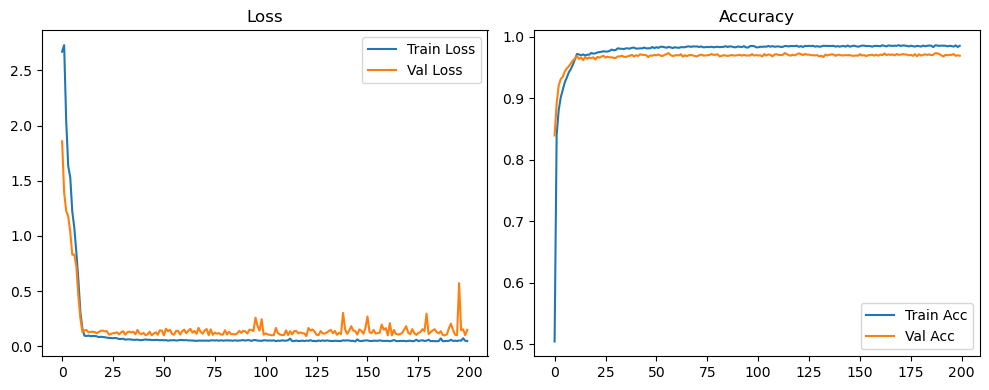

Evaluation:   0%|          | 0/157 [00:00<?, ?it/s]

Evaluation:   6%|▌         | 9/157 [00:00<00:01, 83.06it/s]

Evaluation:  11%|█▏        | 18/157 [00:00<00:01, 84.03it/s]

Evaluation:  17%|█▋        | 27/157 [00:00<00:01, 84.35it/s]

Evaluation:  23%|██▎       | 36/157 [00:00<00:01, 84.61it/s]

Evaluation:  29%|██▊       | 45/157 [00:00<00:01, 84.81it/s]

Evaluation:  34%|███▍      | 54/157 [00:00<00:01, 84.90it/s]

Evaluation:  40%|████      | 63/157 [00:00<00:01, 84.92it/s]

Evaluation:  46%|████▌     | 72/157 [00:00<00:00, 85.02it/s]

Evaluation:  52%|█████▏    | 81/157 [00:00<00:00, 85.03it/s]

Evaluation:  57%|█████▋    | 90/157 [00:01<00:00, 85.02it/s]

Evaluation:  63%|██████▎   | 99/157 [00:01<00:00, 85.15it/s]

Evaluation:  69%|██████▉   | 108/157 [00:01<00:00, 85.24it/s]

Evaluation:  75%|███████▍  | 117/157 [00:01<00:00, 85.34it/s]

Evaluation:  80%|████████  | 126/157 [00:01<00:00, 85.47it/s]

Evaluation:  86%|████████▌ | 135/157 [00:01<00:00, 85.56it/s]

Evaluation:  92%|█████████▏| 144/157 [00:01<00:00, 85.35it/s]

Evaluation:  97%|█████████▋| 153/157 [00:01<00:00, 84.92it/s]

Evaluation: 100%|██████████| 157/157 [00:01<00:00, 85.22it/s]

Original Model Final Test Loss: 0.1378 Accuracy: 0.9721


🚀 Running: batch64_lr0.005_0.005_0.005_dp0.5


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.005 | Train Acc: 0.4629 | Val Acc: 0.8448 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.005 | Train Acc: 0.4629 | Val Acc: 0.8448 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.005 | Train Acc: 0.4629 | Val Acc: 0.8448 |:   0%|          | 1/200 [00:14<46:26, 14.00s/it]

| LR: 0.005 | Train Acc: 0.8139 | Val Acc: 0.9023 |:   0%|          | 1/200 [00:27<46:26, 14.00s/it]

| LR: 0.005 | Train Acc: 0.8139 | Val Acc: 0.9023 |:   0%|          | 1/200 [00:27<46:26, 14.00s/it]

| LR: 0.005 | Train Acc: 0.8139 | Val Acc: 0.9023 |:   1%|          | 2/200 [00:27<45:33, 13.81s/it]

| LR: 0.005 | Train Acc: 0.8577 | Val Acc: 0.9275 |:   1%|          | 2/200 [00:41<45:33, 13.81s/it]

| LR: 0.005 | Train Acc: 0.8577 | Val Acc: 0.9275 |:   1%|          | 2/200 [00:41<45:33, 13.81s/it]

| LR: 0.005 | Train Acc: 0.8577 | Val Acc: 0.9275 |:   2%|▏         | 3/200 [00:41<45:01, 13.71s/it]

| LR: 0.005 | Train Acc: 0.8822 | Val Acc: 0.9337 |:   2%|▏         | 3/200 [00:54<45:01, 13.71s/it]

| LR: 0.005 | Train Acc: 0.8822 | Val Acc: 0.9337 |:   2%|▏         | 3/200 [00:54<45:01, 13.71s/it]

| LR: 0.005 | Train Acc: 0.8822 | Val Acc: 0.9337 |:   2%|▏         | 4/200 [00:54<44:35, 13.65s/it]

| LR: 0.005 | Train Acc: 0.8977 | Val Acc: 0.9456 |:   2%|▏         | 4/200 [01:08<44:35, 13.65s/it]

| LR: 0.005 | Train Acc: 0.8977 | Val Acc: 0.9456 |:   2%|▏         | 4/200 [01:08<44:35, 13.65s/it]

| LR: 0.005 | Train Acc: 0.8977 | Val Acc: 0.9456 |:   2%|▎         | 5/200 [01:08<44:19, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9092 | Val Acc: 0.9489 |:   2%|▎         | 5/200 [01:21<44:19, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9092 | Val Acc: 0.9489 |:   2%|▎         | 5/200 [01:21<44:19, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9092 | Val Acc: 0.9489 |:   3%|▎         | 6/200 [01:22<44:01, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9219 | Val Acc: 0.9590 |:   3%|▎         | 6/200 [01:35<44:01, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9219 | Val Acc: 0.9590 |:   3%|▎         | 6/200 [01:35<44:01, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9219 | Val Acc: 0.9590 |:   4%|▎         | 7/200 [01:35<43:57, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9606 |:   4%|▎         | 7/200 [01:49<43:57, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9606 |:   4%|▎         | 7/200 [01:49<43:57, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9606 |:   4%|▍         | 8/200 [01:49<43:56, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9455 | Val Acc: 0.9627 |:   4%|▍         | 8/200 [02:03<43:56, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9455 | Val Acc: 0.9627 |:   4%|▍         | 8/200 [02:03<43:56, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9455 | Val Acc: 0.9627 |:   4%|▍         | 9/200 [02:03<43:26, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9473 | Val Acc: 0.9599 |:   4%|▍         | 9/200 [02:16<43:26, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9473 | Val Acc: 0.9599 |:   4%|▍         | 9/200 [02:16<43:26, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9473 | Val Acc: 0.9599 |:   5%|▌         | 10/200 [02:16<43:06, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9454 | Val Acc: 0.9567 |:   5%|▌         | 10/200 [02:30<43:06, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9454 | Val Acc: 0.9567 |:   5%|▌         | 10/200 [02:30<43:06, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9454 | Val Acc: 0.9567 |:   6%|▌         | 11/200 [02:30<43:08, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9439 | Val Acc: 0.9571 |:   6%|▌         | 11/200 [02:44<43:08, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9439 | Val Acc: 0.9571 |:   6%|▌         | 11/200 [02:44<43:08, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9439 | Val Acc: 0.9571 |:   6%|▌         | 12/200 [02:44<42:54, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9408 | Val Acc: 0.9574 |:   6%|▌         | 12/200 [02:57<42:54, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9408 | Val Acc: 0.9574 |:   6%|▌         | 12/200 [02:57<42:54, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9408 | Val Acc: 0.9574 |:   6%|▋         | 13/200 [02:57<42:28, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9399 | Val Acc: 0.9580 |:   6%|▋         | 13/200 [03:11<42:28, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9399 | Val Acc: 0.9580 |:   6%|▋         | 13/200 [03:11<42:28, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9399 | Val Acc: 0.9580 |:   7%|▋         | 14/200 [03:11<42:16, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9391 | Val Acc: 0.9593 |:   7%|▋         | 14/200 [03:24<42:16, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9391 | Val Acc: 0.9593 |:   7%|▋         | 14/200 [03:24<42:16, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9391 | Val Acc: 0.9593 |:   8%|▊         | 15/200 [03:24<42:01, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9409 | Val Acc: 0.9591 |:   8%|▊         | 15/200 [03:38<42:01, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9409 | Val Acc: 0.9591 |:   8%|▊         | 15/200 [03:38<42:01, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9409 | Val Acc: 0.9591 |:   8%|▊         | 16/200 [03:38<41:45, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9411 | Val Acc: 0.9583 |:   8%|▊         | 16/200 [03:52<41:45, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9411 | Val Acc: 0.9583 |:   8%|▊         | 16/200 [03:52<41:45, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9411 | Val Acc: 0.9583 |:   8%|▊         | 17/200 [03:52<41:28, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9425 | Val Acc: 0.9603 |:   8%|▊         | 17/200 [04:05<41:28, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9425 | Val Acc: 0.9603 |:   8%|▊         | 17/200 [04:05<41:28, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9425 | Val Acc: 0.9603 |:   9%|▉         | 18/200 [04:05<41:12, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9438 | Val Acc: 0.9597 |:   9%|▉         | 18/200 [04:19<41:12, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9438 | Val Acc: 0.9597 |:   9%|▉         | 18/200 [04:19<41:12, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9438 | Val Acc: 0.9597 |:  10%|▉         | 19/200 [04:19<40:54, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9440 | Val Acc: 0.9617 |:  10%|▉         | 19/200 [04:32<40:54, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9440 | Val Acc: 0.9617 |:  10%|▉         | 19/200 [04:32<40:54, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9440 | Val Acc: 0.9617 |:  10%|█         | 20/200 [04:32<40:33, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9452 | Val Acc: 0.9588 |:  10%|█         | 20/200 [04:46<40:33, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9452 | Val Acc: 0.9588 |:  10%|█         | 20/200 [04:46<40:33, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9452 | Val Acc: 0.9588 |:  10%|█         | 21/200 [04:46<40:17, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9445 | Val Acc: 0.9583 |:  10%|█         | 21/200 [04:59<40:17, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9445 | Val Acc: 0.9583 |:  10%|█         | 21/200 [04:59<40:17, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9445 | Val Acc: 0.9583 |:  11%|█         | 22/200 [04:59<40:09, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9465 | Val Acc: 0.9594 |:  11%|█         | 22/200 [05:13<40:09, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9465 | Val Acc: 0.9594 |:  11%|█         | 22/200 [05:13<40:09, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9465 | Val Acc: 0.9594 |:  12%|█▏        | 23/200 [05:13<40:23, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9467 | Val Acc: 0.9618 |:  12%|█▏        | 23/200 [05:27<40:23, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9467 | Val Acc: 0.9618 |:  12%|█▏        | 23/200 [05:27<40:23, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9467 | Val Acc: 0.9618 |:  12%|█▏        | 24/200 [05:27<40:02, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9487 | Val Acc: 0.9593 |:  12%|█▏        | 24/200 [05:40<40:02, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9487 | Val Acc: 0.9593 |:  12%|█▏        | 24/200 [05:40<40:02, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9487 | Val Acc: 0.9593 |:  12%|█▎        | 25/200 [05:40<39:40, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9475 | Val Acc: 0.9621 |:  12%|█▎        | 25/200 [05:54<39:40, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9475 | Val Acc: 0.9621 |:  12%|█▎        | 25/200 [05:54<39:40, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9475 | Val Acc: 0.9621 |:  13%|█▎        | 26/200 [05:54<39:22, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9486 | Val Acc: 0.9630 |:  13%|█▎        | 26/200 [06:07<39:22, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9486 | Val Acc: 0.9630 |:  13%|█▎        | 26/200 [06:07<39:22, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9486 | Val Acc: 0.9630 |:  14%|█▎        | 27/200 [06:07<39:08, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9615 |:  14%|█▎        | 27/200 [06:21<39:08, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9615 |:  14%|█▎        | 27/200 [06:21<39:08, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9615 |:  14%|█▍        | 28/200 [06:21<38:55, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9501 | Val Acc: 0.9605 |:  14%|█▍        | 28/200 [06:35<38:55, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9501 | Val Acc: 0.9605 |:  14%|█▍        | 28/200 [06:35<38:55, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9501 | Val Acc: 0.9605 |:  14%|█▍        | 29/200 [06:35<38:45, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9647 |:  14%|█▍        | 29/200 [06:48<38:45, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9647 |:  14%|█▍        | 29/200 [06:48<38:45, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9647 |:  15%|█▌        | 30/200 [06:48<38:31, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9492 | Val Acc: 0.9643 |:  15%|█▌        | 30/200 [07:02<38:31, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9492 | Val Acc: 0.9643 |:  15%|█▌        | 30/200 [07:02<38:31, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9492 | Val Acc: 0.9643 |:  16%|█▌        | 31/200 [07:02<38:10, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9505 | Val Acc: 0.9628 |:  16%|█▌        | 31/200 [07:15<38:10, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9505 | Val Acc: 0.9628 |:  16%|█▌        | 31/200 [07:15<38:10, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9505 | Val Acc: 0.9628 |:  16%|█▌        | 32/200 [07:15<37:49, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9511 | Val Acc: 0.9639 |:  16%|█▌        | 32/200 [07:28<37:49, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9511 | Val Acc: 0.9639 |:  16%|█▌        | 32/200 [07:28<37:49, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9511 | Val Acc: 0.9639 |:  16%|█▋        | 33/200 [07:29<37:34, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9498 | Val Acc: 0.9621 |:  16%|█▋        | 33/200 [07:42<37:34, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9498 | Val Acc: 0.9621 |:  16%|█▋        | 33/200 [07:42<37:34, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9498 | Val Acc: 0.9621 |:  17%|█▋        | 34/200 [07:42<37:31, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9646 |:  17%|█▋        | 34/200 [07:56<37:31, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9646 |:  17%|█▋        | 34/200 [07:56<37:31, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9646 |:  18%|█▊        | 35/200 [07:56<37:22, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9505 | Val Acc: 0.9645 |:  18%|█▊        | 35/200 [08:10<37:22, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9505 | Val Acc: 0.9645 |:  18%|█▊        | 35/200 [08:10<37:22, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9505 | Val Acc: 0.9645 |:  18%|█▊        | 36/200 [08:10<37:18, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9520 | Val Acc: 0.9629 |:  18%|█▊        | 36/200 [08:23<37:18, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9520 | Val Acc: 0.9629 |:  18%|█▊        | 36/200 [08:23<37:18, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9520 | Val Acc: 0.9629 |:  18%|█▊        | 37/200 [08:23<36:59, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9517 | Val Acc: 0.9649 |:  18%|█▊        | 37/200 [08:37<36:59, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9517 | Val Acc: 0.9649 |:  18%|█▊        | 37/200 [08:37<36:59, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9517 | Val Acc: 0.9649 |:  19%|█▉        | 38/200 [08:37<36:38, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9520 | Val Acc: 0.9654 |:  19%|█▉        | 38/200 [08:50<36:38, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9520 | Val Acc: 0.9654 |:  19%|█▉        | 38/200 [08:50<36:38, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9520 | Val Acc: 0.9654 |:  20%|█▉        | 39/200 [08:50<36:26, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9644 |:  20%|█▉        | 39/200 [09:04<36:26, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9644 |:  20%|█▉        | 39/200 [09:04<36:26, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9644 |:  20%|██        | 40/200 [09:04<36:22, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9627 |:  20%|██        | 40/200 [09:18<36:22, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9627 |:  20%|██        | 40/200 [09:18<36:22, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9627 |:  20%|██        | 41/200 [09:18<36:00, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9514 | Val Acc: 0.9655 |:  20%|██        | 41/200 [09:31<36:00, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9514 | Val Acc: 0.9655 |:  20%|██        | 41/200 [09:31<36:00, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9514 | Val Acc: 0.9655 |:  21%|██        | 42/200 [09:31<35:45, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9672 |:  21%|██        | 42/200 [09:45<35:45, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9672 |:  21%|██        | 42/200 [09:45<35:45, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9672 |:  22%|██▏       | 43/200 [09:45<35:29, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9656 |:  22%|██▏       | 43/200 [09:58<35:29, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9656 |:  22%|██▏       | 43/200 [09:58<35:29, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9656 |:  22%|██▏       | 44/200 [09:58<35:07, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9506 | Val Acc: 0.9629 |:  22%|██▏       | 44/200 [10:12<35:07, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9506 | Val Acc: 0.9629 |:  22%|██▏       | 44/200 [10:12<35:07, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9506 | Val Acc: 0.9629 |:  22%|██▎       | 45/200 [10:12<34:57, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9652 |:  22%|██▎       | 45/200 [10:25<34:57, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9652 |:  22%|██▎       | 45/200 [10:25<34:57, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9652 |:  23%|██▎       | 46/200 [10:25<34:44, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9518 | Val Acc: 0.9656 |:  23%|██▎       | 46/200 [10:39<34:44, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9518 | Val Acc: 0.9656 |:  23%|██▎       | 46/200 [10:39<34:44, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9518 | Val Acc: 0.9656 |:  24%|██▎       | 47/200 [10:39<34:32, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9511 | Val Acc: 0.9656 |:  24%|██▎       | 47/200 [10:52<34:32, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9511 | Val Acc: 0.9656 |:  24%|██▎       | 47/200 [10:52<34:32, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9511 | Val Acc: 0.9656 |:  24%|██▍       | 48/200 [10:52<34:25, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9638 |:  24%|██▍       | 48/200 [11:06<34:25, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9638 |:  24%|██▍       | 48/200 [11:06<34:25, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9638 |:  24%|██▍       | 49/200 [11:06<34:11, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9541 | Val Acc: 0.9647 |:  24%|██▍       | 49/200 [11:19<34:11, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9541 | Val Acc: 0.9647 |:  24%|██▍       | 49/200 [11:19<34:11, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9541 | Val Acc: 0.9647 |:  25%|██▌       | 50/200 [11:20<33:55, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9510 | Val Acc: 0.9647 |:  25%|██▌       | 50/200 [11:33<33:55, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9510 | Val Acc: 0.9647 |:  25%|██▌       | 50/200 [11:33<33:55, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9510 | Val Acc: 0.9647 |:  26%|██▌       | 51/200 [11:33<33:37, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9647 |:  26%|██▌       | 51/200 [11:46<33:37, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9647 |:  26%|██▌       | 51/200 [11:46<33:37, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9647 |:  26%|██▌       | 52/200 [11:46<33:18, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9665 |:  26%|██▌       | 52/200 [12:00<33:18, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9665 |:  26%|██▌       | 52/200 [12:00<33:18, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9665 |:  26%|██▋       | 53/200 [12:00<33:02, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9515 | Val Acc: 0.9666 |:  26%|██▋       | 53/200 [12:13<33:02, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9515 | Val Acc: 0.9666 |:  26%|██▋       | 53/200 [12:13<33:02, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9515 | Val Acc: 0.9666 |:  27%|██▋       | 54/200 [12:13<32:48, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9508 | Val Acc: 0.9653 |:  27%|██▋       | 54/200 [12:27<32:48, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9508 | Val Acc: 0.9653 |:  27%|██▋       | 54/200 [12:27<32:48, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9508 | Val Acc: 0.9653 |:  28%|██▊       | 55/200 [12:27<32:38, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9675 |:  28%|██▊       | 55/200 [12:40<32:38, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9675 |:  28%|██▊       | 55/200 [12:40<32:38, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9675 |:  28%|██▊       | 56/200 [12:40<32:27, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9521 | Val Acc: 0.9656 |:  28%|██▊       | 56/200 [12:54<32:27, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9521 | Val Acc: 0.9656 |:  28%|██▊       | 56/200 [12:54<32:27, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9521 | Val Acc: 0.9656 |:  28%|██▊       | 57/200 [12:54<32:11, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9673 |:  28%|██▊       | 57/200 [13:08<32:11, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9673 |:  28%|██▊       | 57/200 [13:08<32:11, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9673 |:  29%|██▉       | 58/200 [13:08<32:02, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9654 |:  29%|██▉       | 58/200 [13:21<32:02, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9654 |:  29%|██▉       | 58/200 [13:21<32:02, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9654 |:  30%|██▉       | 59/200 [13:21<31:58, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9512 | Val Acc: 0.9641 |:  30%|██▉       | 59/200 [13:35<31:58, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9512 | Val Acc: 0.9641 |:  30%|██▉       | 59/200 [13:35<31:58, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9512 | Val Acc: 0.9641 |:  30%|███       | 60/200 [13:35<31:53, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9647 |:  30%|███       | 60/200 [13:49<31:53, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9647 |:  30%|███       | 60/200 [13:49<31:53, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9647 |:  30%|███       | 61/200 [13:49<31:40, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9508 | Val Acc: 0.9664 |:  30%|███       | 61/200 [14:03<31:40, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9508 | Val Acc: 0.9664 |:  30%|███       | 61/200 [14:03<31:40, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9508 | Val Acc: 0.9664 |:  31%|███       | 62/200 [14:03<31:30, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9671 |:  31%|███       | 62/200 [14:16<31:30, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9671 |:  31%|███       | 62/200 [14:16<31:30, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9671 |:  32%|███▏      | 63/200 [14:16<31:15, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9513 | Val Acc: 0.9646 |:  32%|███▏      | 63/200 [14:30<31:15, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9513 | Val Acc: 0.9646 |:  32%|███▏      | 63/200 [14:30<31:15, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9513 | Val Acc: 0.9646 |:  32%|███▏      | 64/200 [14:30<30:57, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9659 |:  32%|███▏      | 64/200 [14:43<30:57, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9659 |:  32%|███▏      | 64/200 [14:43<30:57, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9659 |:  32%|███▎      | 65/200 [14:43<30:37, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9655 |:  32%|███▎      | 65/200 [14:57<30:37, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9655 |:  32%|███▎      | 65/200 [14:57<30:37, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9655 |:  33%|███▎      | 66/200 [14:57<30:22, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9525 | Val Acc: 0.9661 |:  33%|███▎      | 66/200 [15:10<30:22, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9525 | Val Acc: 0.9661 |:  33%|███▎      | 66/200 [15:10<30:22, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9525 | Val Acc: 0.9661 |:  34%|███▎      | 67/200 [15:10<30:06, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9657 |:  34%|███▎      | 67/200 [15:26<30:06, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9657 |:  34%|███▎      | 67/200 [15:26<30:06, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9657 |:  34%|███▍      | 68/200 [15:26<31:00, 14.10s/it]

| LR: 0.005 | Train Acc: 0.9514 | Val Acc: 0.9655 |:  34%|███▍      | 68/200 [15:39<31:00, 14.10s/it]

| LR: 0.005 | Train Acc: 0.9514 | Val Acc: 0.9655 |:  34%|███▍      | 68/200 [15:39<31:00, 14.10s/it]

| LR: 0.005 | Train Acc: 0.9514 | Val Acc: 0.9655 |:  34%|███▍      | 69/200 [15:40<30:34, 14.01s/it]

| LR: 0.005 | Train Acc: 0.9521 | Val Acc: 0.9637 |:  34%|███▍      | 69/200 [15:54<30:34, 14.01s/it]

| LR: 0.005 | Train Acc: 0.9521 | Val Acc: 0.9637 |:  34%|███▍      | 69/200 [15:54<30:34, 14.01s/it]

| LR: 0.005 | Train Acc: 0.9521 | Val Acc: 0.9637 |:  35%|███▌      | 70/200 [15:54<30:56, 14.28s/it]

| LR: 0.005 | Train Acc: 0.9520 | Val Acc: 0.9647 |:  35%|███▌      | 70/200 [16:08<30:56, 14.28s/it]

| LR: 0.005 | Train Acc: 0.9520 | Val Acc: 0.9647 |:  35%|███▌      | 70/200 [16:08<30:56, 14.28s/it]

| LR: 0.005 | Train Acc: 0.9520 | Val Acc: 0.9647 |:  36%|███▌      | 71/200 [16:08<30:23, 14.14s/it]

| LR: 0.005 | Train Acc: 0.9521 | Val Acc: 0.9668 |:  36%|███▌      | 71/200 [16:22<30:23, 14.14s/it]

| LR: 0.005 | Train Acc: 0.9521 | Val Acc: 0.9668 |:  36%|███▌      | 71/200 [16:22<30:23, 14.14s/it]

| LR: 0.005 | Train Acc: 0.9521 | Val Acc: 0.9668 |:  36%|███▌      | 72/200 [16:22<29:43, 13.94s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9654 |:  36%|███▌      | 72/200 [16:35<29:43, 13.94s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9654 |:  36%|███▌      | 72/200 [16:35<29:43, 13.94s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9654 |:  36%|███▋      | 73/200 [16:35<29:11, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9533 | Val Acc: 0.9667 |:  36%|███▋      | 73/200 [16:49<29:11, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9533 | Val Acc: 0.9667 |:  36%|███▋      | 73/200 [16:49<29:11, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9533 | Val Acc: 0.9667 |:  37%|███▋      | 74/200 [16:49<28:46, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9673 |:  37%|███▋      | 74/200 [17:02<28:46, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9673 |:  37%|███▋      | 74/200 [17:02<28:46, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9673 |:  38%|███▊      | 75/200 [17:02<28:29, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9525 | Val Acc: 0.9641 |:  38%|███▊      | 75/200 [17:16<28:29, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9525 | Val Acc: 0.9641 |:  38%|███▊      | 75/200 [17:16<28:29, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9525 | Val Acc: 0.9641 |:  38%|███▊      | 76/200 [17:16<28:34, 13.83s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9657 |:  38%|███▊      | 76/200 [17:30<28:34, 13.83s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9657 |:  38%|███▊      | 76/200 [17:30<28:34, 13.83s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9657 |:  38%|███▊      | 77/200 [17:30<28:17, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9646 |:  38%|███▊      | 77/200 [17:44<28:17, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9646 |:  38%|███▊      | 77/200 [17:44<28:17, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9646 |:  39%|███▉      | 78/200 [17:44<27:55, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9545 | Val Acc: 0.9653 |:  39%|███▉      | 78/200 [17:57<27:55, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9545 | Val Acc: 0.9653 |:  39%|███▉      | 78/200 [17:57<27:55, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9545 | Val Acc: 0.9653 |:  40%|███▉      | 79/200 [17:57<27:41, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9678 |:  40%|███▉      | 79/200 [18:11<27:41, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9678 |:  40%|███▉      | 79/200 [18:11<27:41, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9678 |:  40%|████      | 80/200 [18:11<27:30, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9681 |:  40%|████      | 80/200 [18:25<27:30, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9681 |:  40%|████      | 80/200 [18:25<27:30, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9681 |:  40%|████      | 81/200 [18:25<27:09, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9671 |:  40%|████      | 81/200 [18:38<27:09, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9671 |:  40%|████      | 81/200 [18:38<27:09, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9671 |:  41%|████      | 82/200 [18:38<26:47, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9525 | Val Acc: 0.9653 |:  41%|████      | 82/200 [18:52<26:47, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9525 | Val Acc: 0.9653 |:  41%|████      | 82/200 [18:52<26:47, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9525 | Val Acc: 0.9653 |:  42%|████▏     | 83/200 [18:52<26:28, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9657 |:  42%|████▏     | 83/200 [19:06<26:28, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9657 |:  42%|████▏     | 83/200 [19:06<26:28, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9657 |:  42%|████▏     | 84/200 [19:06<26:23, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9538 | Val Acc: 0.9671 |:  42%|████▏     | 84/200 [19:19<26:23, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9538 | Val Acc: 0.9671 |:  42%|████▏     | 84/200 [19:19<26:23, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9538 | Val Acc: 0.9671 |:  42%|████▎     | 85/200 [19:19<26:13, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9645 |:  42%|████▎     | 85/200 [19:33<26:13, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9645 |:  42%|████▎     | 85/200 [19:33<26:13, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9645 |:  43%|████▎     | 86/200 [19:33<26:01, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9667 |:  43%|████▎     | 86/200 [19:46<26:01, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9667 |:  43%|████▎     | 86/200 [19:46<26:01, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9667 |:  44%|████▎     | 87/200 [19:47<25:38, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9660 |:  44%|████▎     | 87/200 [20:00<25:38, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9660 |:  44%|████▎     | 87/200 [20:00<25:38, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9660 |:  44%|████▍     | 88/200 [20:00<25:23, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9672 |:  44%|████▍     | 88/200 [20:14<25:23, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9672 |:  44%|████▍     | 88/200 [20:14<25:23, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9672 |:  44%|████▍     | 89/200 [20:14<25:08, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9660 |:  44%|████▍     | 89/200 [20:27<25:08, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9660 |:  44%|████▍     | 89/200 [20:27<25:08, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9660 |:  45%|████▌     | 90/200 [20:27<24:59, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9654 |:  45%|████▌     | 90/200 [20:42<24:59, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9654 |:  45%|████▌     | 90/200 [20:42<24:59, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9654 |:  46%|████▌     | 91/200 [20:42<25:15, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9651 |:  46%|████▌     | 91/200 [20:55<25:15, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9651 |:  46%|████▌     | 91/200 [20:55<25:15, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9651 |:  46%|████▌     | 92/200 [20:55<24:49, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9547 | Val Acc: 0.9651 |:  46%|████▌     | 92/200 [21:09<24:49, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9547 | Val Acc: 0.9651 |:  46%|████▌     | 92/200 [21:09<24:49, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9547 | Val Acc: 0.9651 |:  46%|████▋     | 93/200 [21:09<24:26, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9649 |:  46%|████▋     | 93/200 [21:24<24:26, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9649 |:  46%|████▋     | 93/200 [21:24<24:26, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9649 |:  47%|████▋     | 94/200 [21:24<25:07, 14.22s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9664 |:  47%|████▋     | 94/200 [21:38<25:07, 14.22s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9664 |:  47%|████▋     | 94/200 [21:38<25:07, 14.22s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9664 |:  48%|████▊     | 95/200 [21:38<24:34, 14.04s/it]

| LR: 0.005 | Train Acc: 0.9527 | Val Acc: 0.9660 |:  48%|████▊     | 95/200 [21:52<24:34, 14.04s/it]

| LR: 0.005 | Train Acc: 0.9527 | Val Acc: 0.9660 |:  48%|████▊     | 95/200 [21:52<24:34, 14.04s/it]

| LR: 0.005 | Train Acc: 0.9527 | Val Acc: 0.9660 |:  48%|████▊     | 96/200 [21:52<24:07, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9506 | Val Acc: 0.9673 |:  48%|████▊     | 96/200 [22:05<24:07, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9506 | Val Acc: 0.9673 |:  48%|████▊     | 96/200 [22:05<24:07, 13.91s/it]

| LR: 0.005 | Train Acc: 0.9506 | Val Acc: 0.9673 |:  48%|████▊     | 97/200 [22:05<23:46, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9542 | Val Acc: 0.9667 |:  48%|████▊     | 97/200 [22:19<23:46, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9542 | Val Acc: 0.9667 |:  48%|████▊     | 97/200 [22:19<23:46, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9542 | Val Acc: 0.9667 |:  49%|████▉     | 98/200 [22:19<23:26, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9543 | Val Acc: 0.9665 |:  49%|████▉     | 98/200 [22:34<23:26, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9543 | Val Acc: 0.9665 |:  49%|████▉     | 98/200 [22:34<23:26, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9543 | Val Acc: 0.9665 |:  50%|████▉     | 99/200 [22:34<23:46, 14.12s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9657 |:  50%|████▉     | 99/200 [22:48<23:46, 14.12s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9657 |:  50%|████▉     | 99/200 [22:48<23:46, 14.12s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9657 |:  50%|█████     | 100/200 [22:48<23:41, 14.22s/it]

| LR: 0.005 | Train Acc: 0.9539 | Val Acc: 0.9673 |:  50%|█████     | 100/200 [23:02<23:41, 14.22s/it]

| LR: 0.005 | Train Acc: 0.9539 | Val Acc: 0.9673 |:  50%|█████     | 100/200 [23:02<23:41, 14.22s/it]

| LR: 0.005 | Train Acc: 0.9539 | Val Acc: 0.9673 |:  50%|█████     | 101/200 [23:02<23:26, 14.21s/it]

| LR: 0.005 | Train Acc: 0.9544 | Val Acc: 0.9677 |:  50%|█████     | 101/200 [23:16<23:26, 14.21s/it]

| LR: 0.005 | Train Acc: 0.9544 | Val Acc: 0.9677 |:  50%|█████     | 101/200 [23:16<23:26, 14.21s/it]

| LR: 0.005 | Train Acc: 0.9544 | Val Acc: 0.9677 |:  51%|█████     | 102/200 [23:16<23:00, 14.08s/it]

| LR: 0.005 | Train Acc: 0.9541 | Val Acc: 0.9672 |:  51%|█████     | 102/200 [23:30<23:00, 14.08s/it]

| LR: 0.005 | Train Acc: 0.9541 | Val Acc: 0.9672 |:  51%|█████     | 102/200 [23:30<23:00, 14.08s/it]

| LR: 0.005 | Train Acc: 0.9541 | Val Acc: 0.9672 |:  52%|█████▏    | 103/200 [23:30<22:28, 13.90s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9667 |:  52%|█████▏    | 103/200 [23:43<22:28, 13.90s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9667 |:  52%|█████▏    | 103/200 [23:43<22:28, 13.90s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9667 |:  52%|█████▏    | 104/200 [23:43<22:05, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9541 | Val Acc: 0.9656 |:  52%|█████▏    | 104/200 [23:57<22:05, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9541 | Val Acc: 0.9656 |:  52%|█████▏    | 104/200 [23:57<22:05, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9541 | Val Acc: 0.9656 |:  52%|█████▎    | 105/200 [23:57<21:42, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9521 | Val Acc: 0.9663 |:  52%|█████▎    | 105/200 [24:10<21:42, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9521 | Val Acc: 0.9663 |:  52%|█████▎    | 105/200 [24:10<21:42, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9521 | Val Acc: 0.9663 |:  53%|█████▎    | 106/200 [24:11<21:27, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9653 |:  53%|█████▎    | 106/200 [24:24<21:27, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9653 |:  53%|█████▎    | 106/200 [24:24<21:27, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9653 |:  54%|█████▎    | 107/200 [24:24<21:13, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9666 |:  54%|█████▎    | 107/200 [24:38<21:13, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9666 |:  54%|█████▎    | 107/200 [24:38<21:13, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9666 |:  54%|█████▍    | 108/200 [24:38<21:09, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9653 |:  54%|█████▍    | 108/200 [24:52<21:09, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9653 |:  54%|█████▍    | 108/200 [24:52<21:09, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9653 |:  55%|█████▍    | 109/200 [24:52<20:45, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9527 | Val Acc: 0.9667 |:  55%|█████▍    | 109/200 [25:05<20:45, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9527 | Val Acc: 0.9667 |:  55%|█████▍    | 109/200 [25:05<20:45, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9527 | Val Acc: 0.9667 |:  55%|█████▌    | 110/200 [25:05<20:35, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9539 | Val Acc: 0.9670 |:  55%|█████▌    | 110/200 [25:20<20:35, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9539 | Val Acc: 0.9670 |:  55%|█████▌    | 110/200 [25:20<20:35, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9539 | Val Acc: 0.9670 |:  56%|█████▌    | 111/200 [25:20<20:32, 13.84s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9665 |:  56%|█████▌    | 111/200 [25:33<20:32, 13.84s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9665 |:  56%|█████▌    | 111/200 [25:33<20:32, 13.84s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9665 |:  56%|█████▌    | 112/200 [25:33<20:10, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9656 |:  56%|█████▌    | 112/200 [25:47<20:10, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9656 |:  56%|█████▌    | 112/200 [25:47<20:10, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9656 |:  56%|█████▋    | 113/200 [25:47<19:52, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9543 | Val Acc: 0.9663 |:  56%|█████▋    | 113/200 [26:00<19:52, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9543 | Val Acc: 0.9663 |:  56%|█████▋    | 113/200 [26:00<19:52, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9543 | Val Acc: 0.9663 |:  57%|█████▋    | 114/200 [26:00<19:38, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9545 | Val Acc: 0.9645 |:  57%|█████▋    | 114/200 [26:14<19:38, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9545 | Val Acc: 0.9645 |:  57%|█████▋    | 114/200 [26:14<19:38, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9545 | Val Acc: 0.9645 |:  57%|█████▊    | 115/200 [26:14<19:19, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9656 |:  57%|█████▊    | 115/200 [26:27<19:19, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9656 |:  57%|█████▊    | 115/200 [26:27<19:19, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9656 |:  58%|█████▊    | 116/200 [26:28<19:04, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9650 |:  58%|█████▊    | 116/200 [26:41<19:04, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9650 |:  58%|█████▊    | 116/200 [26:41<19:04, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9650 |:  58%|█████▊    | 117/200 [26:41<18:52, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9553 | Val Acc: 0.9656 |:  58%|█████▊    | 117/200 [26:55<18:52, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9553 | Val Acc: 0.9656 |:  58%|█████▊    | 117/200 [26:55<18:52, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9553 | Val Acc: 0.9656 |:  59%|█████▉    | 118/200 [26:55<18:39, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9554 | Val Acc: 0.9654 |:  59%|█████▉    | 118/200 [27:08<18:39, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9554 | Val Acc: 0.9654 |:  59%|█████▉    | 118/200 [27:08<18:39, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9554 | Val Acc: 0.9654 |:  60%|█████▉    | 119/200 [27:09<18:26, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9540 | Val Acc: 0.9662 |:  60%|█████▉    | 119/200 [27:22<18:26, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9540 | Val Acc: 0.9662 |:  60%|█████▉    | 119/200 [27:22<18:26, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9540 | Val Acc: 0.9662 |:  60%|██████    | 120/200 [27:22<18:07, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9551 | Val Acc: 0.9660 |:  60%|██████    | 120/200 [27:35<18:07, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9551 | Val Acc: 0.9660 |:  60%|██████    | 120/200 [27:35<18:07, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9551 | Val Acc: 0.9660 |:  60%|██████    | 121/200 [27:35<17:51, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9661 |:  60%|██████    | 121/200 [27:49<17:51, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9661 |:  60%|██████    | 121/200 [27:49<17:51, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9661 |:  61%|██████    | 122/200 [27:49<17:35, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9656 |:  61%|██████    | 122/200 [28:02<17:35, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9656 |:  61%|██████    | 122/200 [28:02<17:35, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9656 |:  62%|██████▏   | 123/200 [28:02<17:20, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9538 | Val Acc: 0.9672 |:  62%|██████▏   | 123/200 [28:16<17:20, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9538 | Val Acc: 0.9672 |:  62%|██████▏   | 123/200 [28:16<17:20, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9538 | Val Acc: 0.9672 |:  62%|██████▏   | 124/200 [28:16<17:06, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9631 |:  62%|██████▏   | 124/200 [28:29<17:06, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9631 |:  62%|██████▏   | 124/200 [28:29<17:06, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9631 |:  62%|██████▎   | 125/200 [28:29<16:52, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9540 | Val Acc: 0.9663 |:  62%|██████▎   | 125/200 [28:44<16:52, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9540 | Val Acc: 0.9663 |:  62%|██████▎   | 125/200 [28:44<16:52, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9540 | Val Acc: 0.9663 |:  63%|██████▎   | 126/200 [28:44<17:07, 13.88s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9669 |:  63%|██████▎   | 126/200 [28:58<17:07, 13.88s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9669 |:  63%|██████▎   | 126/200 [28:58<17:07, 13.88s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9669 |:  64%|██████▎   | 127/200 [28:58<16:43, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9549 | Val Acc: 0.9664 |:  64%|██████▎   | 127/200 [29:11<16:43, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9549 | Val Acc: 0.9664 |:  64%|██████▎   | 127/200 [29:11<16:43, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9549 | Val Acc: 0.9664 |:  64%|██████▍   | 128/200 [29:11<16:27, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9546 | Val Acc: 0.9675 |:  64%|██████▍   | 128/200 [29:25<16:27, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9546 | Val Acc: 0.9675 |:  64%|██████▍   | 128/200 [29:25<16:27, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9546 | Val Acc: 0.9675 |:  64%|██████▍   | 129/200 [29:25<16:17, 13.77s/it]

| LR: 0.005 | Train Acc: 0.9539 | Val Acc: 0.9656 |:  64%|██████▍   | 129/200 [29:39<16:17, 13.77s/it]

| LR: 0.005 | Train Acc: 0.9539 | Val Acc: 0.9656 |:  64%|██████▍   | 129/200 [29:39<16:17, 13.77s/it]

| LR: 0.005 | Train Acc: 0.9539 | Val Acc: 0.9656 |:  65%|██████▌   | 130/200 [29:39<16:00, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9541 | Val Acc: 0.9663 |:  65%|██████▌   | 130/200 [29:52<16:00, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9541 | Val Acc: 0.9663 |:  65%|██████▌   | 130/200 [29:52<16:00, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9541 | Val Acc: 0.9663 |:  66%|██████▌   | 131/200 [29:52<15:42, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9556 | Val Acc: 0.9613 |:  66%|██████▌   | 131/200 [30:06<15:42, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9556 | Val Acc: 0.9613 |:  66%|██████▌   | 131/200 [30:06<15:42, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9556 | Val Acc: 0.9613 |:  66%|██████▌   | 132/200 [30:06<15:24, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9657 |:  66%|██████▌   | 132/200 [30:19<15:24, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9657 |:  66%|██████▌   | 132/200 [30:19<15:24, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9657 |:  66%|██████▋   | 133/200 [30:19<15:11, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9551 | Val Acc: 0.9677 |:  66%|██████▋   | 133/200 [30:33<15:11, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9551 | Val Acc: 0.9677 |:  66%|██████▋   | 133/200 [30:33<15:11, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9551 | Val Acc: 0.9677 |:  67%|██████▋   | 134/200 [30:33<14:57, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9548 | Val Acc: 0.9673 |:  67%|██████▋   | 134/200 [30:47<14:57, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9548 | Val Acc: 0.9673 |:  67%|██████▋   | 134/200 [30:47<14:57, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9548 | Val Acc: 0.9673 |:  68%|██████▊   | 135/200 [30:47<14:44, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9552 | Val Acc: 0.9663 |:  68%|██████▊   | 135/200 [31:00<14:44, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9552 | Val Acc: 0.9663 |:  68%|██████▊   | 135/200 [31:00<14:44, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9552 | Val Acc: 0.9663 |:  68%|██████▊   | 136/200 [31:00<14:28, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9557 | Val Acc: 0.9659 |:  68%|██████▊   | 136/200 [31:14<14:28, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9557 | Val Acc: 0.9659 |:  68%|██████▊   | 136/200 [31:14<14:28, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9557 | Val Acc: 0.9659 |:  68%|██████▊   | 137/200 [31:14<14:15, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9665 |:  68%|██████▊   | 137/200 [31:27<14:15, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9665 |:  68%|██████▊   | 137/200 [31:27<14:15, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9665 |:  69%|██████▉   | 138/200 [31:27<14:01, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9547 | Val Acc: 0.9678 |:  69%|██████▉   | 138/200 [31:41<14:01, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9547 | Val Acc: 0.9678 |:  69%|██████▉   | 138/200 [31:41<14:01, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9547 | Val Acc: 0.9678 |:  70%|██████▉   | 139/200 [31:41<13:46, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9666 |:  70%|██████▉   | 139/200 [31:54<13:46, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9666 |:  70%|██████▉   | 139/200 [31:54<13:46, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9666 |:  70%|███████   | 140/200 [31:54<13:34, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9506 | Val Acc: 0.9656 |:  70%|███████   | 140/200 [32:08<13:34, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9506 | Val Acc: 0.9656 |:  70%|███████   | 140/200 [32:08<13:34, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9506 | Val Acc: 0.9656 |:  70%|███████   | 141/200 [32:08<13:19, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9545 | Val Acc: 0.9663 |:  70%|███████   | 141/200 [32:21<13:19, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9545 | Val Acc: 0.9663 |:  70%|███████   | 141/200 [32:21<13:19, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9545 | Val Acc: 0.9663 |:  71%|███████   | 142/200 [32:21<13:07, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9557 | Val Acc: 0.9653 |:  71%|███████   | 142/200 [32:35<13:07, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9557 | Val Acc: 0.9653 |:  71%|███████   | 142/200 [32:35<13:07, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9557 | Val Acc: 0.9653 |:  72%|███████▏  | 143/200 [32:35<12:56, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9549 | Val Acc: 0.9677 |:  72%|███████▏  | 143/200 [32:49<12:56, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9549 | Val Acc: 0.9677 |:  72%|███████▏  | 143/200 [32:49<12:56, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9549 | Val Acc: 0.9677 |:  72%|███████▏  | 144/200 [32:49<12:41, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9542 | Val Acc: 0.9658 |:  72%|███████▏  | 144/200 [33:02<12:41, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9542 | Val Acc: 0.9658 |:  72%|███████▏  | 144/200 [33:02<12:41, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9542 | Val Acc: 0.9658 |:  72%|███████▎  | 145/200 [33:02<12:26, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9644 |:  72%|███████▎  | 145/200 [33:16<12:26, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9644 |:  72%|███████▎  | 145/200 [33:16<12:26, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9644 |:  73%|███████▎  | 146/200 [33:16<12:11, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9657 |:  73%|███████▎  | 146/200 [33:29<12:11, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9657 |:  73%|███████▎  | 146/200 [33:29<12:11, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9657 |:  74%|███████▎  | 147/200 [33:29<11:57, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9543 | Val Acc: 0.9659 |:  74%|███████▎  | 147/200 [33:43<11:57, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9543 | Val Acc: 0.9659 |:  74%|███████▎  | 147/200 [33:43<11:57, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9543 | Val Acc: 0.9659 |:  74%|███████▍  | 148/200 [33:43<11:44, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9661 |:  74%|███████▍  | 148/200 [33:56<11:44, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9661 |:  74%|███████▍  | 148/200 [33:56<11:44, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9661 |:  74%|███████▍  | 149/200 [33:56<11:31, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9526 | Val Acc: 0.9657 |:  74%|███████▍  | 149/200 [34:10<11:31, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9526 | Val Acc: 0.9657 |:  74%|███████▍  | 149/200 [34:10<11:31, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9526 | Val Acc: 0.9657 |:  75%|███████▌  | 150/200 [34:10<11:17, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9657 |:  75%|███████▌  | 150/200 [34:23<11:17, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9657 |:  75%|███████▌  | 150/200 [34:23<11:17, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9657 |:  76%|███████▌  | 151/200 [34:23<11:02, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9667 |:  76%|███████▌  | 151/200 [34:37<11:02, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9667 |:  76%|███████▌  | 151/200 [34:37<11:02, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9667 |:  76%|███████▌  | 152/200 [34:37<10:49, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9564 | Val Acc: 0.9663 |:  76%|███████▌  | 152/200 [34:50<10:49, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9564 | Val Acc: 0.9663 |:  76%|███████▌  | 152/200 [34:50<10:49, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9564 | Val Acc: 0.9663 |:  76%|███████▋  | 153/200 [34:50<10:35, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9543 | Val Acc: 0.9657 |:  76%|███████▋  | 153/200 [35:04<10:35, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9543 | Val Acc: 0.9657 |:  76%|███████▋  | 153/200 [35:04<10:35, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9543 | Val Acc: 0.9657 |:  77%|███████▋  | 154/200 [35:04<10:20, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9554 | Val Acc: 0.9678 |:  77%|███████▋  | 154/200 [35:17<10:20, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9554 | Val Acc: 0.9678 |:  77%|███████▋  | 154/200 [35:17<10:20, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9554 | Val Acc: 0.9678 |:  78%|███████▊  | 155/200 [35:17<10:07, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9672 |:  78%|███████▊  | 155/200 [35:31<10:07, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9672 |:  78%|███████▊  | 155/200 [35:31<10:07, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9672 |:  78%|███████▊  | 156/200 [35:31<09:54, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9541 | Val Acc: 0.9663 |:  78%|███████▊  | 156/200 [35:45<09:54, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9541 | Val Acc: 0.9663 |:  78%|███████▊  | 156/200 [35:45<09:54, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9541 | Val Acc: 0.9663 |:  78%|███████▊  | 157/200 [35:45<09:43, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9533 | Val Acc: 0.9652 |:  78%|███████▊  | 157/200 [35:59<09:43, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9533 | Val Acc: 0.9652 |:  78%|███████▊  | 157/200 [35:59<09:43, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9533 | Val Acc: 0.9652 |:  79%|███████▉  | 158/200 [35:59<09:41, 13.83s/it]

| LR: 0.005 | Train Acc: 0.9555 | Val Acc: 0.9675 |:  79%|███████▉  | 158/200 [36:12<09:41, 13.83s/it]

| LR: 0.005 | Train Acc: 0.9555 | Val Acc: 0.9675 |:  79%|███████▉  | 158/200 [36:12<09:41, 13.83s/it]

| LR: 0.005 | Train Acc: 0.9555 | Val Acc: 0.9675 |:  80%|███████▉  | 159/200 [36:12<09:22, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9542 | Val Acc: 0.9661 |:  80%|███████▉  | 159/200 [36:26<09:22, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9542 | Val Acc: 0.9661 |:  80%|███████▉  | 159/200 [36:26<09:22, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9542 | Val Acc: 0.9661 |:  80%|████████  | 160/200 [36:26<09:08, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9519 | Val Acc: 0.9653 |:  80%|████████  | 160/200 [36:40<09:08, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9519 | Val Acc: 0.9653 |:  80%|████████  | 160/200 [36:40<09:08, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9519 | Val Acc: 0.9653 |:  80%|████████  | 161/200 [36:40<08:52, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9560 | Val Acc: 0.9658 |:  80%|████████  | 161/200 [36:53<08:52, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9560 | Val Acc: 0.9658 |:  80%|████████  | 161/200 [36:53<08:52, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9560 | Val Acc: 0.9658 |:  81%|████████  | 162/200 [36:53<08:38, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9522 | Val Acc: 0.9663 |:  81%|████████  | 162/200 [37:07<08:38, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9522 | Val Acc: 0.9663 |:  81%|████████  | 162/200 [37:07<08:38, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9522 | Val Acc: 0.9663 |:  82%|████████▏ | 163/200 [37:07<08:22, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9663 |:  82%|████████▏ | 163/200 [37:20<08:22, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9663 |:  82%|████████▏ | 163/200 [37:20<08:22, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9663 |:  82%|████████▏ | 164/200 [37:20<08:09, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9544 | Val Acc: 0.9661 |:  82%|████████▏ | 164/200 [37:34<08:09, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9544 | Val Acc: 0.9661 |:  82%|████████▏ | 164/200 [37:34<08:09, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9544 | Val Acc: 0.9661 |:  82%|████████▎ | 165/200 [37:34<07:55, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9548 | Val Acc: 0.9669 |:  82%|████████▎ | 165/200 [37:47<07:55, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9548 | Val Acc: 0.9669 |:  82%|████████▎ | 165/200 [37:47<07:55, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9548 | Val Acc: 0.9669 |:  83%|████████▎ | 166/200 [37:47<07:40, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9664 |:  83%|████████▎ | 166/200 [38:01<07:40, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9664 |:  83%|████████▎ | 166/200 [38:01<07:40, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9664 |:  84%|████████▎ | 167/200 [38:01<07:26, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9655 |:  84%|████████▎ | 167/200 [38:14<07:26, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9655 |:  84%|████████▎ | 167/200 [38:14<07:26, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9655 |:  84%|████████▍ | 168/200 [38:14<07:12, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9663 |:  84%|████████▍ | 168/200 [38:28<07:12, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9663 |:  84%|████████▍ | 168/200 [38:28<07:12, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9663 |:  84%|████████▍ | 169/200 [38:28<06:58, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9549 | Val Acc: 0.9688 |:  84%|████████▍ | 169/200 [38:41<06:58, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9549 | Val Acc: 0.9688 |:  84%|████████▍ | 169/200 [38:41<06:58, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9549 | Val Acc: 0.9688 |:  85%|████████▌ | 170/200 [38:41<06:45, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9551 | Val Acc: 0.9663 |:  85%|████████▌ | 170/200 [38:55<06:45, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9551 | Val Acc: 0.9663 |:  85%|████████▌ | 170/200 [38:55<06:45, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9551 | Val Acc: 0.9663 |:  86%|████████▌ | 171/200 [38:55<06:30, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9544 | Val Acc: 0.9663 |:  86%|████████▌ | 171/200 [39:09<06:30, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9544 | Val Acc: 0.9663 |:  86%|████████▌ | 171/200 [39:09<06:30, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9544 | Val Acc: 0.9663 |:  86%|████████▌ | 172/200 [39:09<06:22, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9549 | Val Acc: 0.9663 |:  86%|████████▌ | 172/200 [39:23<06:22, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9549 | Val Acc: 0.9663 |:  86%|████████▌ | 172/200 [39:23<06:22, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9549 | Val Acc: 0.9663 |:  86%|████████▋ | 173/200 [39:23<06:12, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9541 | Val Acc: 0.9647 |:  86%|████████▋ | 173/200 [39:36<06:12, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9541 | Val Acc: 0.9647 |:  86%|████████▋ | 173/200 [39:36<06:12, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9541 | Val Acc: 0.9647 |:  87%|████████▋ | 174/200 [39:37<05:56, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9540 | Val Acc: 0.9657 |:  87%|████████▋ | 174/200 [39:50<05:56, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9540 | Val Acc: 0.9657 |:  87%|████████▋ | 174/200 [39:50<05:56, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9540 | Val Acc: 0.9657 |:  88%|████████▊ | 175/200 [39:50<05:40, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9533 | Val Acc: 0.9659 |:  88%|████████▊ | 175/200 [40:03<05:40, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9533 | Val Acc: 0.9659 |:  88%|████████▊ | 175/200 [40:03<05:40, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9533 | Val Acc: 0.9659 |:  88%|████████▊ | 176/200 [40:03<05:25, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9559 | Val Acc: 0.9642 |:  88%|████████▊ | 176/200 [40:17<05:25, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9559 | Val Acc: 0.9642 |:  88%|████████▊ | 176/200 [40:17<05:25, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9559 | Val Acc: 0.9642 |:  88%|████████▊ | 177/200 [40:17<05:12, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9539 | Val Acc: 0.9659 |:  88%|████████▊ | 177/200 [40:30<05:12, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9539 | Val Acc: 0.9659 |:  88%|████████▊ | 177/200 [40:30<05:12, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9539 | Val Acc: 0.9659 |:  89%|████████▉ | 178/200 [40:30<04:57, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9673 |:  89%|████████▉ | 178/200 [40:44<04:57, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9673 |:  89%|████████▉ | 178/200 [40:44<04:57, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9673 |:  90%|████████▉ | 179/200 [40:44<04:44, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9551 | Val Acc: 0.9650 |:  90%|████████▉ | 179/200 [40:57<04:44, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9551 | Val Acc: 0.9650 |:  90%|████████▉ | 179/200 [40:57<04:44, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9551 | Val Acc: 0.9650 |:  90%|█████████ | 180/200 [40:57<04:30, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9551 | Val Acc: 0.9675 |:  90%|█████████ | 180/200 [41:11<04:30, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9551 | Val Acc: 0.9675 |:  90%|█████████ | 180/200 [41:11<04:30, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9551 | Val Acc: 0.9675 |:  90%|█████████ | 181/200 [41:11<04:16, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9550 | Val Acc: 0.9654 |:  90%|█████████ | 181/200 [41:24<04:16, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9550 | Val Acc: 0.9654 |:  90%|█████████ | 181/200 [41:24<04:16, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9550 | Val Acc: 0.9654 |:  91%|█████████ | 182/200 [41:24<04:03, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9562 | Val Acc: 0.9665 |:  91%|█████████ | 182/200 [41:38<04:03, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9562 | Val Acc: 0.9665 |:  91%|█████████ | 182/200 [41:38<04:03, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9562 | Val Acc: 0.9665 |:  92%|█████████▏| 183/200 [41:38<03:49, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9540 | Val Acc: 0.9655 |:  92%|█████████▏| 183/200 [41:51<03:49, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9540 | Val Acc: 0.9655 |:  92%|█████████▏| 183/200 [41:51<03:49, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9540 | Val Acc: 0.9655 |:  92%|█████████▏| 184/200 [41:51<03:35, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9674 |:  92%|█████████▏| 184/200 [42:05<03:35, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9674 |:  92%|█████████▏| 184/200 [42:05<03:35, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9674 |:  92%|█████████▎| 185/200 [42:05<03:22, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9543 | Val Acc: 0.9665 |:  92%|█████████▎| 185/200 [42:19<03:22, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9543 | Val Acc: 0.9665 |:  92%|█████████▎| 185/200 [42:19<03:22, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9543 | Val Acc: 0.9665 |:  93%|█████████▎| 186/200 [42:19<03:09, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9546 | Val Acc: 0.9650 |:  93%|█████████▎| 186/200 [42:32<03:09, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9546 | Val Acc: 0.9650 |:  93%|█████████▎| 186/200 [42:32<03:09, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9546 | Val Acc: 0.9650 |:  94%|█████████▎| 187/200 [42:32<02:56, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9550 | Val Acc: 0.9654 |:  94%|█████████▎| 187/200 [42:46<02:56, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9550 | Val Acc: 0.9654 |:  94%|█████████▎| 187/200 [42:46<02:56, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9550 | Val Acc: 0.9654 |:  94%|█████████▍| 188/200 [42:46<02:42, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9542 | Val Acc: 0.9666 |:  94%|█████████▍| 188/200 [42:59<02:42, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9542 | Val Acc: 0.9666 |:  94%|█████████▍| 188/200 [42:59<02:42, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9542 | Val Acc: 0.9666 |:  94%|█████████▍| 189/200 [42:59<02:29, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9546 | Val Acc: 0.9678 |:  94%|█████████▍| 189/200 [43:13<02:29, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9546 | Val Acc: 0.9678 |:  94%|█████████▍| 189/200 [43:13<02:29, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9546 | Val Acc: 0.9678 |:  95%|█████████▌| 190/200 [43:13<02:15, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9543 | Val Acc: 0.9650 |:  95%|█████████▌| 190/200 [43:26<02:15, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9543 | Val Acc: 0.9650 |:  95%|█████████▌| 190/200 [43:26<02:15, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9543 | Val Acc: 0.9650 |:  96%|█████████▌| 191/200 [43:26<02:01, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9671 |:  96%|█████████▌| 191/200 [43:40<02:01, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9671 |:  96%|█████████▌| 191/200 [43:40<02:01, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9671 |:  96%|█████████▌| 192/200 [43:40<01:48, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9667 |:  96%|█████████▌| 192/200 [43:53<01:48, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9667 |:  96%|█████████▌| 192/200 [43:53<01:48, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9667 |:  96%|█████████▋| 193/200 [43:53<01:34, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9539 | Val Acc: 0.9673 |:  96%|█████████▋| 193/200 [44:07<01:34, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9539 | Val Acc: 0.9673 |:  96%|█████████▋| 193/200 [44:07<01:34, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9539 | Val Acc: 0.9673 |:  97%|█████████▋| 194/200 [44:07<01:21, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9663 |:  97%|█████████▋| 194/200 [44:20<01:21, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9663 |:  97%|█████████▋| 194/200 [44:20<01:21, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9663 |:  98%|█████████▊| 195/200 [44:21<01:07, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9522 | Val Acc: 0.9660 |:  98%|█████████▊| 195/200 [44:34<01:07, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9522 | Val Acc: 0.9660 |:  98%|█████████▊| 195/200 [44:34<01:07, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9522 | Val Acc: 0.9660 |:  98%|█████████▊| 196/200 [44:34<00:53, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9540 | Val Acc: 0.9656 |:  98%|█████████▊| 196/200 [44:47<00:53, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9540 | Val Acc: 0.9656 |:  98%|█████████▊| 196/200 [44:47<00:53, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9540 | Val Acc: 0.9656 |:  98%|█████████▊| 197/200 [44:47<00:40, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9550 | Val Acc: 0.9675 |:  98%|█████████▊| 197/200 [45:01<00:40, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9550 | Val Acc: 0.9675 |:  98%|█████████▊| 197/200 [45:01<00:40, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9550 | Val Acc: 0.9675 |:  99%|█████████▉| 198/200 [45:01<00:27, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9549 | Val Acc: 0.9668 |:  99%|█████████▉| 198/200 [45:15<00:27, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9549 | Val Acc: 0.9668 |:  99%|█████████▉| 198/200 [45:15<00:27, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9549 | Val Acc: 0.9668 |: 100%|█████████▉| 199/200 [45:15<00:13, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9559 | Val Acc: 0.9667 |: 100%|█████████▉| 199/200 [45:28<00:13, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9559 | Val Acc: 0.9667 |: 100%|█████████▉| 199/200 [45:28<00:13, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9559 | Val Acc: 0.9667 |: 100%|██████████| 200/200 [45:28<00:00, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9559 | Val Acc: 0.9667 |: 100%|██████████| 200/200 [45:28<00:00, 13.64s/it]

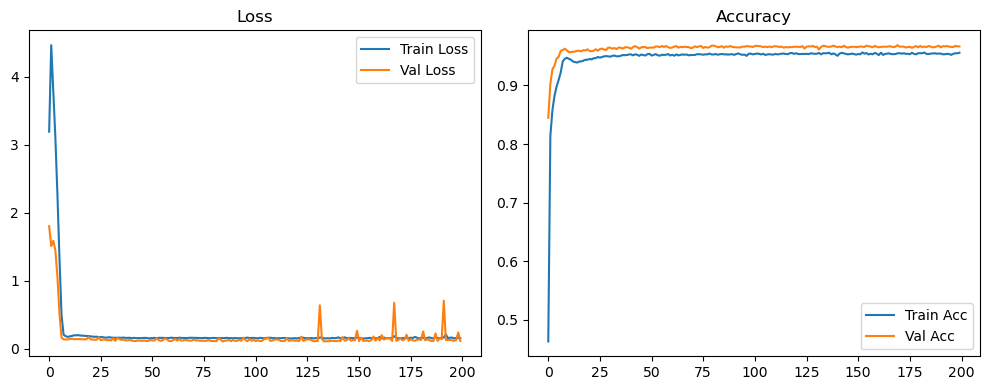

Evaluation:   0%|          | 0/157 [00:00<?, ?it/s]

Evaluation:   6%|▌         | 9/157 [00:00<00:01, 82.94it/s]

Evaluation:  11%|█▏        | 18/157 [00:00<00:01, 83.48it/s]

Evaluation:  17%|█▋        | 27/157 [00:00<00:01, 83.93it/s]

Evaluation:  23%|██▎       | 36/157 [00:00<00:01, 84.03it/s]

Evaluation:  29%|██▊       | 45/157 [00:00<00:01, 84.05it/s]

Evaluation:  34%|███▍      | 54/157 [00:00<00:01, 84.13it/s]

Evaluation:  40%|████      | 63/157 [00:00<00:01, 84.31it/s]

Evaluation:  46%|████▌     | 72/157 [00:00<00:01, 84.35it/s]

Evaluation:  52%|█████▏    | 81/157 [00:00<00:00, 84.38it/s]

Evaluation:  57%|█████▋    | 90/157 [00:01<00:00, 84.44it/s]

Evaluation:  63%|██████▎   | 99/157 [00:01<00:00, 84.42it/s]

Evaluation:  69%|██████▉   | 108/157 [00:01<00:00, 84.43it/s]

Evaluation:  75%|███████▍  | 117/157 [00:01<00:00, 84.49it/s]

Evaluation:  80%|████████  | 126/157 [00:01<00:00, 84.42it/s]

Evaluation:  86%|████████▌ | 135/157 [00:01<00:00, 83.80it/s]

Evaluation:  92%|█████████▏| 144/157 [00:01<00:00, 81.80it/s]

Evaluation:  97%|█████████▋| 153/157 [00:01<00:00, 79.70it/s]

Evaluation: 100%|██████████| 157/157 [00:01<00:00, 83.39it/s]

Original Model Final Test Loss: 0.1024 Accuracy: 0.9709


🚀 Running: batch64_lr0.005_0.002_0.001_dp0.0


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.005 | Train Acc: 0.5433 | Val Acc: 0.8386 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.005 | Train Acc: 0.5433 | Val Acc: 0.8386 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.005 | Train Acc: 0.5433 | Val Acc: 0.8386 |:   0%|          | 1/200 [00:13<45:45, 13.80s/it]

| LR: 0.005 | Train Acc: 0.8506 | Val Acc: 0.8838 |:   0%|          | 1/200 [00:27<45:45, 13.80s/it]

| LR: 0.005 | Train Acc: 0.8506 | Val Acc: 0.8838 |:   0%|          | 1/200 [00:27<45:45, 13.80s/it]

| LR: 0.005 | Train Acc: 0.8506 | Val Acc: 0.8838 |:   1%|          | 2/200 [00:27<45:00, 13.64s/it]

| LR: 0.005 | Train Acc: 0.8910 | Val Acc: 0.8992 |:   1%|          | 2/200 [00:40<45:00, 13.64s/it]

| LR: 0.005 | Train Acc: 0.8910 | Val Acc: 0.8992 |:   1%|          | 2/200 [00:40<45:00, 13.64s/it]

| LR: 0.005 | Train Acc: 0.8910 | Val Acc: 0.8992 |:   2%|▏         | 3/200 [00:40<44:37, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9104 | Val Acc: 0.9221 |:   2%|▏         | 3/200 [00:54<44:37, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9104 | Val Acc: 0.9221 |:   2%|▏         | 3/200 [00:54<44:37, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9104 | Val Acc: 0.9221 |:   2%|▏         | 4/200 [00:54<44:20, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9233 | Val Acc: 0.9349 |:   2%|▏         | 4/200 [01:07<44:20, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9233 | Val Acc: 0.9349 |:   2%|▏         | 4/200 [01:07<44:20, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9233 | Val Acc: 0.9349 |:   2%|▎         | 5/200 [01:07<44:01, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9337 | Val Acc: 0.9381 |:   2%|▎         | 5/200 [01:21<44:01, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9337 | Val Acc: 0.9381 |:   2%|▎         | 5/200 [01:21<44:01, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9337 | Val Acc: 0.9381 |:   3%|▎         | 6/200 [01:21<43:37, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9428 | Val Acc: 0.9433 |:   3%|▎         | 6/200 [01:34<43:37, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9428 | Val Acc: 0.9433 |:   3%|▎         | 6/200 [01:34<43:37, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9428 | Val Acc: 0.9433 |:   4%|▎         | 7/200 [01:34<43:27, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9511 | Val Acc: 0.9523 |:   4%|▎         | 7/200 [01:48<43:27, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9511 | Val Acc: 0.9523 |:   4%|▎         | 7/200 [01:48<43:27, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9511 | Val Acc: 0.9523 |:   4%|▍         | 8/200 [01:48<43:11, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9443 |:   4%|▍         | 8/200 [02:01<43:11, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9443 |:   4%|▍         | 8/200 [02:01<43:11, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9443 |:   4%|▍         | 9/200 [02:01<43:00, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9604 | Val Acc: 0.9558 |:   4%|▍         | 9/200 [02:15<43:00, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9604 | Val Acc: 0.9558 |:   4%|▍         | 9/200 [02:15<43:00, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9604 | Val Acc: 0.9558 |:   5%|▌         | 10/200 [02:15<42:33, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9652 | Val Acc: 0.9501 |:   5%|▌         | 10/200 [02:28<42:33, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9652 | Val Acc: 0.9501 |:   5%|▌         | 10/200 [02:28<42:33, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9652 | Val Acc: 0.9501 |:   6%|▌         | 11/200 [02:28<42:21, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9622 |:   6%|▌         | 11/200 [02:42<42:21, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9622 |:   6%|▌         | 11/200 [02:42<42:21, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9622 |:   6%|▌         | 12/200 [02:42<42:55, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9645 |:   6%|▌         | 12/200 [02:56<42:55, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9645 |:   6%|▌         | 12/200 [02:56<42:55, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9645 |:   6%|▋         | 13/200 [02:56<42:26, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9796 | Val Acc: 0.9664 |:   6%|▋         | 13/200 [03:10<42:26, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9796 | Val Acc: 0.9664 |:   6%|▋         | 13/200 [03:10<42:26, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9796 | Val Acc: 0.9664 |:   7%|▋         | 14/200 [03:10<43:05, 13.90s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9671 |:   7%|▋         | 14/200 [03:24<43:05, 13.90s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9671 |:   7%|▋         | 14/200 [03:24<43:05, 13.90s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9671 |:   8%|▊         | 15/200 [03:24<42:28, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9794 | Val Acc: 0.9671 |:   8%|▊         | 15/200 [03:37<42:28, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9794 | Val Acc: 0.9671 |:   8%|▊         | 15/200 [03:37<42:28, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9794 | Val Acc: 0.9671 |:   8%|▊         | 16/200 [03:37<42:00, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9611 |:   8%|▊         | 16/200 [03:51<42:00, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9611 |:   8%|▊         | 16/200 [03:51<42:00, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9611 |:   8%|▊         | 17/200 [03:51<41:36, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9667 |:   8%|▊         | 17/200 [04:04<41:36, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9667 |:   8%|▊         | 17/200 [04:04<41:36, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9667 |:   9%|▉         | 18/200 [04:04<41:06, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9617 |:   9%|▉         | 18/200 [04:17<41:06, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9617 |:   9%|▉         | 18/200 [04:17<41:06, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9617 |:  10%|▉         | 19/200 [04:18<40:39, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9667 |:  10%|▉         | 19/200 [04:31<40:39, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9667 |:  10%|▉         | 19/200 [04:31<40:39, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9667 |:  10%|█         | 20/200 [04:31<40:17, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9671 |:  10%|█         | 20/200 [04:45<40:17, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9671 |:  10%|█         | 20/200 [04:45<40:17, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9671 |:  10%|█         | 21/200 [04:45<40:56, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9642 |:  10%|█         | 21/200 [04:59<40:56, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9642 |:  10%|█         | 21/200 [04:59<40:56, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9642 |:  11%|█         | 22/200 [04:59<40:23, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9864 | Val Acc: 0.9658 |:  11%|█         | 22/200 [05:12<40:23, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9864 | Val Acc: 0.9658 |:  11%|█         | 22/200 [05:12<40:23, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9864 | Val Acc: 0.9658 |:  12%|█▏        | 23/200 [05:12<40:21, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9861 | Val Acc: 0.9624 |:  12%|█▏        | 23/200 [05:26<40:21, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9861 | Val Acc: 0.9624 |:  12%|█▏        | 23/200 [05:26<40:21, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9861 | Val Acc: 0.9624 |:  12%|█▏        | 24/200 [05:26<39:51, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9860 | Val Acc: 0.9699 |:  12%|█▏        | 24/200 [05:39<39:51, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9860 | Val Acc: 0.9699 |:  12%|█▏        | 24/200 [05:39<39:51, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9860 | Val Acc: 0.9699 |:  12%|█▎        | 25/200 [05:39<39:24, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9868 | Val Acc: 0.9673 |:  12%|█▎        | 25/200 [05:53<39:24, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9868 | Val Acc: 0.9673 |:  12%|█▎        | 25/200 [05:53<39:24, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9868 | Val Acc: 0.9673 |:  13%|█▎        | 26/200 [05:53<39:12, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9680 |:  13%|█▎        | 26/200 [06:06<39:12, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9680 |:  13%|█▎        | 26/200 [06:06<39:12, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9680 |:  14%|█▎        | 27/200 [06:06<38:50, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9713 |:  14%|█▎        | 27/200 [06:20<38:50, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9713 |:  14%|█▎        | 27/200 [06:20<38:50, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9713 |:  14%|█▍        | 28/200 [06:20<38:52, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9647 |:  14%|█▍        | 28/200 [06:33<38:52, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9647 |:  14%|█▍        | 28/200 [06:33<38:52, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9647 |:  14%|█▍        | 29/200 [06:33<38:31, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9680 |:  14%|█▍        | 29/200 [06:47<38:31, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9680 |:  14%|█▍        | 29/200 [06:47<38:31, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9680 |:  15%|█▌        | 30/200 [06:47<38:13, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9676 |:  15%|█▌        | 30/200 [07:00<38:13, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9676 |:  15%|█▌        | 30/200 [07:00<38:13, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9676 |:  16%|█▌        | 31/200 [07:00<38:06, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9677 |:  16%|█▌        | 31/200 [07:14<38:06, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9677 |:  16%|█▌        | 31/200 [07:14<38:06, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9677 |:  16%|█▌        | 32/200 [07:14<37:57, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9663 |:  16%|█▌        | 32/200 [07:27<37:57, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9663 |:  16%|█▌        | 32/200 [07:27<37:57, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9663 |:  16%|█▋        | 33/200 [07:27<37:42, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9668 |:  16%|█▋        | 33/200 [07:41<37:42, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9668 |:  16%|█▋        | 33/200 [07:41<37:42, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9668 |:  17%|█▋        | 34/200 [07:41<37:24, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9693 |:  17%|█▋        | 34/200 [07:54<37:24, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9693 |:  17%|█▋        | 34/200 [07:54<37:24, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9693 |:  18%|█▊        | 35/200 [07:54<37:02, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9681 |:  18%|█▊        | 35/200 [08:08<37:02, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9681 |:  18%|█▊        | 35/200 [08:08<37:02, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9681 |:  18%|█▊        | 36/200 [08:08<36:47, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9683 |:  18%|█▊        | 36/200 [08:21<36:47, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9683 |:  18%|█▊        | 36/200 [08:21<36:47, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9683 |:  18%|█▊        | 37/200 [08:21<36:35, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9673 |:  18%|█▊        | 37/200 [08:34<36:35, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9673 |:  18%|█▊        | 37/200 [08:34<36:35, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9673 |:  19%|█▉        | 38/200 [08:34<36:14, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9909 | Val Acc: 0.9687 |:  19%|█▉        | 38/200 [08:48<36:14, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9909 | Val Acc: 0.9687 |:  19%|█▉        | 38/200 [08:48<36:14, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9909 | Val Acc: 0.9687 |:  20%|█▉        | 39/200 [08:48<36:07, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9647 |:  20%|█▉        | 39/200 [09:01<36:07, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9647 |:  20%|█▉        | 39/200 [09:01<36:07, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9647 |:  20%|██        | 40/200 [09:01<35:47, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9688 |:  20%|██        | 40/200 [09:15<35:47, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9688 |:  20%|██        | 40/200 [09:15<35:47, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9688 |:  20%|██        | 41/200 [09:15<35:31, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9694 |:  20%|██        | 41/200 [09:28<35:31, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9694 |:  20%|██        | 41/200 [09:28<35:31, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9694 |:  21%|██        | 42/200 [09:28<35:25, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9695 |:  21%|██        | 42/200 [09:42<35:25, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9695 |:  21%|██        | 42/200 [09:42<35:25, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9695 |:  22%|██▏       | 43/200 [09:42<35:09, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9691 |:  22%|██▏       | 43/200 [09:55<35:09, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9691 |:  22%|██▏       | 43/200 [09:55<35:09, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9691 |:  22%|██▏       | 44/200 [09:55<34:55, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9682 |:  22%|██▏       | 44/200 [10:08<34:55, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9682 |:  22%|██▏       | 44/200 [10:08<34:55, 13.43s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9682 |:  22%|██▎       | 45/200 [10:08<34:34, 13.38s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9698 |:  22%|██▎       | 45/200 [10:22<34:34, 13.38s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9698 |:  22%|██▎       | 45/200 [10:22<34:34, 13.38s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9698 |:  23%|██▎       | 46/200 [10:22<34:32, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9646 |:  23%|██▎       | 46/200 [10:35<34:32, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9646 |:  23%|██▎       | 46/200 [10:35<34:32, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9646 |:  24%|██▎       | 47/200 [10:35<34:15, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9670 |:  24%|██▎       | 47/200 [10:49<34:15, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9670 |:  24%|██▎       | 47/200 [10:49<34:15, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9670 |:  24%|██▍       | 48/200 [10:49<34:04, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9684 |:  24%|██▍       | 48/200 [11:02<34:04, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9684 |:  24%|██▍       | 48/200 [11:02<34:04, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9684 |:  24%|██▍       | 49/200 [11:02<33:52, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9695 |:  24%|██▍       | 49/200 [11:16<33:52, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9695 |:  24%|██▍       | 49/200 [11:16<33:52, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9695 |:  25%|██▌       | 50/200 [11:16<33:43, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9671 |:  25%|██▌       | 50/200 [11:30<33:43, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9671 |:  25%|██▌       | 50/200 [11:30<33:43, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9671 |:  26%|██▌       | 51/200 [11:30<33:38, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9672 |:  26%|██▌       | 51/200 [11:43<33:38, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9672 |:  26%|██▌       | 51/200 [11:43<33:38, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9672 |:  26%|██▌       | 52/200 [11:43<33:20, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9688 |:  26%|██▌       | 52/200 [11:56<33:20, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9688 |:  26%|██▌       | 52/200 [11:56<33:20, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9688 |:  26%|██▋       | 53/200 [11:56<33:02, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9681 |:  26%|██▋       | 53/200 [12:10<33:02, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9681 |:  26%|██▋       | 53/200 [12:10<33:02, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9681 |:  27%|██▋       | 54/200 [12:10<32:45, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9688 |:  27%|██▋       | 54/200 [12:23<32:45, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9688 |:  27%|██▋       | 54/200 [12:23<32:45, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9688 |:  28%|██▊       | 55/200 [12:23<32:34, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9716 |:  28%|██▊       | 55/200 [12:37<32:34, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9716 |:  28%|██▊       | 55/200 [12:37<32:34, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9716 |:  28%|██▊       | 56/200 [12:37<32:21, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9690 |:  28%|██▊       | 56/200 [12:50<32:21, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9690 |:  28%|██▊       | 56/200 [12:50<32:21, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9690 |:  28%|██▊       | 57/200 [12:50<32:05, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9697 |:  28%|██▊       | 57/200 [13:05<32:05, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9697 |:  28%|██▊       | 57/200 [13:05<32:05, 13.46s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9697 |:  29%|██▉       | 58/200 [13:05<32:45, 13.84s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9690 |:  29%|██▉       | 58/200 [13:18<32:45, 13.84s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9690 |:  29%|██▉       | 58/200 [13:18<32:45, 13.84s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9690 |:  30%|██▉       | 59/200 [13:18<32:09, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9702 |:  30%|██▉       | 59/200 [13:32<32:09, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9702 |:  30%|██▉       | 59/200 [13:32<32:09, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9702 |:  30%|███       | 60/200 [13:32<32:01, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9719 |:  30%|███       | 60/200 [13:46<32:01, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9719 |:  30%|███       | 60/200 [13:46<32:01, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9719 |:  30%|███       | 61/200 [13:46<32:07, 13.87s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9699 |:  30%|███       | 61/200 [14:00<32:07, 13.87s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9699 |:  30%|███       | 61/200 [14:00<32:07, 13.87s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9699 |:  31%|███       | 62/200 [14:00<31:35, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9698 |:  31%|███       | 62/200 [14:14<31:35, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9698 |:  31%|███       | 62/200 [14:14<31:35, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9698 |:  32%|███▏      | 63/200 [14:14<31:24, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9683 |:  32%|███▏      | 63/200 [14:27<31:24, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9683 |:  32%|███▏      | 63/200 [14:27<31:24, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9683 |:  32%|███▏      | 64/200 [14:27<31:03, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9687 |:  32%|███▏      | 64/200 [14:41<31:03, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9687 |:  32%|███▏      | 64/200 [14:41<31:03, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9687 |:  32%|███▎      | 65/200 [14:41<30:38, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9688 |:  32%|███▎      | 65/200 [14:54<30:38, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9688 |:  32%|███▎      | 65/200 [14:54<30:38, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9688 |:  33%|███▎      | 66/200 [14:54<30:13, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9705 |:  33%|███▎      | 66/200 [15:07<30:13, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9705 |:  33%|███▎      | 66/200 [15:07<30:13, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9705 |:  34%|███▎      | 67/200 [15:07<29:48, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9689 |:  34%|███▎      | 67/200 [15:20<29:48, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9689 |:  34%|███▎      | 67/200 [15:20<29:48, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9689 |:  34%|███▍      | 68/200 [15:20<29:28, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9683 |:  34%|███▍      | 68/200 [15:34<29:28, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9683 |:  34%|███▍      | 68/200 [15:34<29:28, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9683 |:  34%|███▍      | 69/200 [15:34<29:17, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9637 |:  34%|███▍      | 69/200 [15:47<29:17, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9637 |:  34%|███▍      | 69/200 [15:47<29:17, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9637 |:  35%|███▌      | 70/200 [15:47<29:07, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9684 |:  35%|███▌      | 70/200 [16:01<29:07, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9684 |:  35%|███▌      | 70/200 [16:01<29:07, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9684 |:  36%|███▌      | 71/200 [16:01<28:54, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9649 |:  36%|███▌      | 71/200 [16:14<28:54, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9649 |:  36%|███▌      | 71/200 [16:14<28:54, 13.45s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9649 |:  36%|███▌      | 72/200 [16:14<28:38, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9704 |:  36%|███▌      | 72/200 [16:28<28:38, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9704 |:  36%|███▌      | 72/200 [16:28<28:38, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9704 |:  36%|███▋      | 73/200 [16:28<28:42, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9937 | Val Acc: 0.9699 |:  36%|███▋      | 73/200 [16:42<28:42, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9937 | Val Acc: 0.9699 |:  36%|███▋      | 73/200 [16:42<28:42, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9937 | Val Acc: 0.9699 |:  37%|███▋      | 74/200 [16:42<28:41, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9683 |:  37%|███▋      | 74/200 [16:56<28:41, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9683 |:  37%|███▋      | 74/200 [16:56<28:41, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9683 |:  38%|███▊      | 75/200 [16:56<28:23, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9679 |:  38%|███▊      | 75/200 [17:09<28:23, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9679 |:  38%|███▊      | 75/200 [17:09<28:23, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9679 |:  38%|███▊      | 76/200 [17:09<28:07, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9718 |:  38%|███▊      | 76/200 [17:22<28:07, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9718 |:  38%|███▊      | 76/200 [17:22<28:07, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9718 |:  38%|███▊      | 77/200 [17:22<27:40, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9691 |:  38%|███▊      | 77/200 [17:36<27:40, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9691 |:  38%|███▊      | 77/200 [17:36<27:40, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9691 |:  39%|███▉      | 78/200 [17:36<27:39, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9718 |:  39%|███▉      | 78/200 [17:49<27:39, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9718 |:  39%|███▉      | 78/200 [17:49<27:39, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9718 |:  40%|███▉      | 79/200 [17:50<27:14, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9679 |:  40%|███▉      | 79/200 [18:03<27:14, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9679 |:  40%|███▉      | 79/200 [18:03<27:14, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9679 |:  40%|████      | 80/200 [18:03<26:59, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9711 |:  40%|████      | 80/200 [18:16<26:59, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9711 |:  40%|████      | 80/200 [18:16<26:59, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9711 |:  40%|████      | 81/200 [18:17<26:47, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9689 |:  40%|████      | 81/200 [18:30<26:47, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9689 |:  40%|████      | 81/200 [18:30<26:47, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9689 |:  41%|████      | 82/200 [18:30<26:41, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9934 | Val Acc: 0.9705 |:  41%|████      | 82/200 [18:44<26:41, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9934 | Val Acc: 0.9705 |:  41%|████      | 82/200 [18:44<26:41, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9934 | Val Acc: 0.9705 |:  42%|████▏     | 83/200 [18:44<26:20, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9697 |:  42%|████▏     | 83/200 [18:57<26:20, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9697 |:  42%|████▏     | 83/200 [18:57<26:20, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9697 |:  42%|████▏     | 84/200 [18:57<26:02, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9691 |:  42%|████▏     | 84/200 [19:10<26:02, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9691 |:  42%|████▏     | 84/200 [19:10<26:02, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9691 |:  42%|████▎     | 85/200 [19:10<25:45, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9706 |:  42%|████▎     | 85/200 [19:24<25:45, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9706 |:  42%|████▎     | 85/200 [19:24<25:45, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9706 |:  43%|████▎     | 86/200 [19:24<25:37, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9714 |:  43%|████▎     | 86/200 [19:37<25:37, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9714 |:  43%|████▎     | 86/200 [19:37<25:37, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9714 |:  44%|████▎     | 87/200 [19:37<25:22, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9712 |:  44%|████▎     | 87/200 [19:51<25:22, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9712 |:  44%|████▎     | 87/200 [19:51<25:22, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9712 |:  44%|████▍     | 88/200 [19:51<25:05, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9661 |:  44%|████▍     | 88/200 [20:04<25:05, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9661 |:  44%|████▍     | 88/200 [20:04<25:05, 13.44s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9661 |:  44%|████▍     | 89/200 [20:04<24:49, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9688 |:  44%|████▍     | 89/200 [20:17<24:49, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9688 |:  44%|████▍     | 89/200 [20:17<24:49, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9688 |:  45%|████▌     | 90/200 [20:17<24:34, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9696 |:  45%|████▌     | 90/200 [20:31<24:34, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9696 |:  45%|████▌     | 90/200 [20:31<24:34, 13.40s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9696 |:  46%|████▌     | 91/200 [20:31<24:18, 13.38s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9664 |:  46%|████▌     | 91/200 [20:44<24:18, 13.38s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9664 |:  46%|████▌     | 91/200 [20:44<24:18, 13.38s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9664 |:  46%|████▌     | 92/200 [20:44<24:04, 13.37s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9688 |:  46%|████▌     | 92/200 [20:58<24:04, 13.37s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9688 |:  46%|████▌     | 92/200 [20:58<24:04, 13.37s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9688 |:  46%|████▋     | 93/200 [20:58<23:54, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9695 |:  46%|████▋     | 93/200 [21:11<23:54, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9695 |:  46%|████▋     | 93/200 [21:11<23:54, 13.41s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9695 |:  47%|████▋     | 94/200 [21:11<23:43, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9696 |:  47%|████▋     | 94/200 [21:25<23:43, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9696 |:  47%|████▋     | 94/200 [21:25<23:43, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9696 |:  48%|████▊     | 95/200 [21:25<23:29, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9706 |:  48%|████▊     | 95/200 [21:38<23:29, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9706 |:  48%|████▊     | 95/200 [21:38<23:29, 13.42s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9706 |:  48%|████▊     | 96/200 [21:38<23:11, 13.38s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9698 |:  48%|████▊     | 96/200 [21:51<23:11, 13.38s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9698 |:  48%|████▊     | 96/200 [21:51<23:11, 13.38s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9698 |:  48%|████▊     | 97/200 [21:51<22:55, 13.36s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9709 |:  48%|████▊     | 97/200 [22:04<22:55, 13.36s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9709 |:  48%|████▊     | 97/200 [22:04<22:55, 13.36s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9709 |:  49%|████▉     | 98/200 [22:04<22:42, 13.36s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9683 |:  49%|████▉     | 98/200 [22:18<22:42, 13.36s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9683 |:  49%|████▉     | 98/200 [22:18<22:42, 13.36s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9683 |:  50%|████▉     | 99/200 [22:18<22:26, 13.34s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9692 |:  50%|████▉     | 99/200 [22:31<22:26, 13.34s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9692 |:  50%|████▉     | 99/200 [22:31<22:26, 13.34s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9692 |:  50%|█████     | 100/200 [22:31<22:12, 13.33s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9720 |:  50%|█████     | 100/200 [22:44<22:12, 13.33s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9720 |:  50%|█████     | 100/200 [22:44<22:12, 13.33s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9720 |:  50%|█████     | 101/200 [22:44<22:00, 13.34s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9730 |:  50%|█████     | 101/200 [22:58<22:00, 13.34s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9730 |:  50%|█████     | 101/200 [22:58<22:00, 13.34s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9730 |:  51%|█████     | 102/200 [22:58<21:46, 13.34s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9722 |:  51%|█████     | 102/200 [23:11<21:46, 13.34s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9722 |:  51%|█████     | 102/200 [23:11<21:46, 13.34s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9722 |:  52%|█████▏    | 103/200 [23:11<21:34, 13.35s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9725 |:  52%|█████▏    | 103/200 [23:25<21:34, 13.35s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9725 |:  52%|█████▏    | 103/200 [23:25<21:34, 13.35s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9725 |:  52%|█████▏    | 104/200 [23:25<21:22, 13.36s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9715 |:  52%|█████▏    | 104/200 [23:38<21:22, 13.36s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9715 |:  52%|█████▏    | 104/200 [23:38<21:22, 13.36s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9715 |:  52%|█████▎    | 105/200 [23:38<21:13, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9741 |:  52%|█████▎    | 105/200 [23:52<21:13, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9741 |:  52%|█████▎    | 105/200 [23:52<21:13, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9741 |:  53%|█████▎    | 106/200 [23:52<21:21, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9713 |:  53%|█████▎    | 106/200 [24:06<21:21, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9713 |:  53%|█████▎    | 106/200 [24:06<21:21, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9713 |:  54%|█████▎    | 107/200 [24:06<21:04, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9727 |:  54%|█████▎    | 107/200 [24:19<21:04, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9727 |:  54%|█████▎    | 107/200 [24:19<21:04, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9727 |:  54%|█████▍    | 108/200 [24:19<20:47, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9728 |:  54%|█████▍    | 108/200 [24:33<20:47, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9728 |:  54%|█████▍    | 108/200 [24:33<20:47, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9728 |:  55%|█████▍    | 109/200 [24:33<20:32, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9736 |:  55%|█████▍    | 109/200 [24:46<20:32, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9736 |:  55%|█████▍    | 109/200 [24:46<20:32, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9736 |:  55%|█████▌    | 110/200 [24:46<20:14, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9724 |:  55%|█████▌    | 110/200 [24:59<20:14, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9724 |:  55%|█████▌    | 110/200 [24:59<20:14, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9724 |:  56%|█████▌    | 111/200 [24:59<19:56, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9722 |:  56%|█████▌    | 111/200 [25:13<19:56, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9722 |:  56%|█████▌    | 111/200 [25:13<19:56, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9722 |:  56%|█████▌    | 112/200 [25:13<19:40, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9718 |:  56%|█████▌    | 112/200 [25:26<19:40, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9718 |:  56%|█████▌    | 112/200 [25:26<19:40, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9718 |:  56%|█████▋    | 113/200 [25:26<19:28, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9747 |:  56%|█████▋    | 113/200 [25:40<19:28, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9747 |:  56%|█████▋    | 113/200 [25:40<19:28, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9747 |:  57%|█████▋    | 114/200 [25:40<19:15, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9737 |:  57%|█████▋    | 114/200 [25:53<19:15, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9737 |:  57%|█████▋    | 114/200 [25:53<19:15, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9737 |:  57%|█████▊    | 115/200 [25:53<18:59, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9714 |:  57%|█████▊    | 115/200 [26:06<18:59, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9714 |:  57%|█████▊    | 115/200 [26:06<18:59, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9714 |:  58%|█████▊    | 116/200 [26:06<18:47, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9725 |:  58%|█████▊    | 116/200 [26:20<18:47, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9725 |:  58%|█████▊    | 116/200 [26:20<18:47, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9725 |:  58%|█████▊    | 117/200 [26:20<18:35, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9732 |:  58%|█████▊    | 117/200 [26:33<18:35, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9732 |:  58%|█████▊    | 117/200 [26:33<18:35, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9732 |:  59%|█████▉    | 118/200 [26:33<18:15, 13.36s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9723 |:  59%|█████▉    | 118/200 [26:46<18:15, 13.36s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9723 |:  59%|█████▉    | 118/200 [26:46<18:15, 13.36s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9723 |:  60%|█████▉    | 119/200 [26:46<18:00, 13.34s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9740 |:  60%|█████▉    | 119/200 [27:00<18:00, 13.34s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9740 |:  60%|█████▉    | 119/200 [27:00<18:00, 13.34s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9740 |:  60%|██████    | 120/200 [27:00<17:49, 13.37s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9738 |:  60%|██████    | 120/200 [27:13<17:49, 13.37s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9738 |:  60%|██████    | 120/200 [27:13<17:49, 13.37s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9738 |:  60%|██████    | 121/200 [27:13<17:37, 13.39s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9733 |:  60%|██████    | 121/200 [27:27<17:37, 13.39s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9733 |:  60%|██████    | 121/200 [27:27<17:37, 13.39s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9733 |:  61%|██████    | 122/200 [27:27<17:25, 13.40s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9725 |:  61%|██████    | 122/200 [27:41<17:25, 13.40s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9725 |:  61%|██████    | 122/200 [27:41<17:25, 13.40s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9725 |:  62%|██████▏   | 123/200 [27:41<17:26, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9729 |:  62%|██████▏   | 123/200 [27:54<17:26, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9729 |:  62%|██████▏   | 123/200 [27:54<17:26, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9729 |:  62%|██████▏   | 124/200 [27:54<17:12, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  62%|██████▏   | 124/200 [28:08<17:12, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  62%|██████▏   | 124/200 [28:08<17:12, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  62%|██████▎   | 125/200 [28:08<16:55, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9738 |:  62%|██████▎   | 125/200 [28:21<16:55, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9738 |:  62%|██████▎   | 125/200 [28:21<16:55, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9738 |:  63%|██████▎   | 126/200 [28:21<16:39, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9729 |:  63%|██████▎   | 126/200 [28:35<16:39, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9729 |:  63%|██████▎   | 126/200 [28:35<16:39, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9729 |:  64%|██████▎   | 127/200 [28:35<16:26, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9738 |:  64%|██████▎   | 127/200 [28:48<16:26, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9738 |:  64%|██████▎   | 127/200 [28:48<16:26, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9738 |:  64%|██████▍   | 128/200 [28:48<16:11, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9738 |:  64%|██████▍   | 128/200 [29:02<16:11, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9738 |:  64%|██████▍   | 128/200 [29:02<16:11, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9738 |:  64%|██████▍   | 129/200 [29:02<15:57, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9743 |:  64%|██████▍   | 129/200 [29:15<15:57, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9743 |:  64%|██████▍   | 129/200 [29:15<15:57, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9743 |:  65%|██████▌   | 130/200 [29:15<15:47, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9734 |:  65%|██████▌   | 130/200 [29:29<15:47, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9734 |:  65%|██████▌   | 130/200 [29:29<15:47, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9734 |:  66%|██████▌   | 131/200 [29:29<15:31, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9728 |:  66%|██████▌   | 131/200 [29:42<15:31, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9728 |:  66%|██████▌   | 131/200 [29:42<15:31, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9728 |:  66%|██████▌   | 132/200 [29:42<15:18, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9745 |:  66%|██████▌   | 132/200 [29:56<15:18, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9745 |:  66%|██████▌   | 132/200 [29:56<15:18, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9745 |:  66%|██████▋   | 133/200 [29:56<15:16, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9724 |:  66%|██████▋   | 133/200 [30:10<15:16, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9724 |:  66%|██████▋   | 133/200 [30:10<15:16, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9724 |:  67%|██████▋   | 134/200 [30:10<14:55, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9728 |:  67%|██████▋   | 134/200 [30:23<14:55, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9728 |:  67%|██████▋   | 134/200 [30:23<14:55, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9728 |:  68%|██████▊   | 135/200 [30:23<14:39, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9715 |:  68%|██████▊   | 135/200 [30:37<14:39, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9715 |:  68%|██████▊   | 135/200 [30:37<14:39, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9715 |:  68%|██████▊   | 136/200 [30:37<14:26, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9732 |:  68%|██████▊   | 136/200 [30:50<14:26, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9732 |:  68%|██████▊   | 136/200 [30:50<14:26, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9732 |:  68%|██████▊   | 137/200 [30:50<14:15, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9732 |:  68%|██████▊   | 137/200 [31:04<14:15, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9732 |:  68%|██████▊   | 137/200 [31:04<14:15, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9732 |:  69%|██████▉   | 138/200 [31:04<14:04, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9724 |:  69%|██████▉   | 138/200 [31:18<14:04, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9724 |:  69%|██████▉   | 138/200 [31:18<14:04, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9724 |:  70%|██████▉   | 139/200 [31:18<13:49, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9728 |:  70%|██████▉   | 139/200 [31:31<13:49, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9728 |:  70%|██████▉   | 139/200 [31:31<13:49, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9728 |:  70%|███████   | 140/200 [31:31<13:34, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9743 |:  70%|███████   | 140/200 [31:46<13:34, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9743 |:  70%|███████   | 140/200 [31:46<13:34, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9743 |:  70%|███████   | 141/200 [31:46<13:37, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9739 |:  70%|███████   | 141/200 [31:59<13:37, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9739 |:  70%|███████   | 141/200 [31:59<13:37, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9739 |:  71%|███████   | 142/200 [31:59<13:17, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9742 |:  71%|███████   | 142/200 [32:13<13:17, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9742 |:  71%|███████   | 142/200 [32:13<13:17, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9742 |:  72%|███████▏  | 143/200 [32:13<13:01, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9725 |:  72%|███████▏  | 143/200 [32:26<13:01, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9725 |:  72%|███████▏  | 143/200 [32:26<13:01, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9725 |:  72%|███████▏  | 144/200 [32:26<12:41, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9738 |:  72%|███████▏  | 144/200 [32:40<12:41, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9738 |:  72%|███████▏  | 144/200 [32:40<12:41, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9738 |:  72%|███████▎  | 145/200 [32:40<12:26, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9719 |:  72%|███████▎  | 145/200 [32:53<12:26, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9719 |:  72%|███████▎  | 145/200 [32:53<12:26, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9719 |:  73%|███████▎  | 146/200 [32:53<12:11, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9720 |:  73%|███████▎  | 146/200 [33:06<12:11, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9720 |:  73%|███████▎  | 146/200 [33:06<12:11, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9720 |:  74%|███████▎  | 147/200 [33:06<11:54, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9741 |:  74%|███████▎  | 147/200 [33:20<11:54, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9741 |:  74%|███████▎  | 147/200 [33:20<11:54, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9741 |:  74%|███████▍  | 148/200 [33:20<11:38, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9735 |:  74%|███████▍  | 148/200 [33:33<11:38, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9735 |:  74%|███████▍  | 148/200 [33:33<11:38, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9735 |:  74%|███████▍  | 149/200 [33:33<11:23, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9765 |:  74%|███████▍  | 149/200 [33:47<11:23, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9765 |:  74%|███████▍  | 149/200 [33:47<11:23, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9765 |:  75%|███████▌  | 150/200 [33:47<11:14, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9722 |:  75%|███████▌  | 150/200 [34:00<11:14, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9722 |:  75%|███████▌  | 150/200 [34:00<11:14, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9722 |:  76%|███████▌  | 151/200 [34:00<10:57, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9746 |:  76%|███████▌  | 151/200 [34:14<10:57, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9746 |:  76%|███████▌  | 151/200 [34:14<10:57, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9746 |:  76%|███████▌  | 152/200 [34:14<10:47, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9752 |:  76%|███████▌  | 152/200 [34:28<10:47, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9752 |:  76%|███████▌  | 152/200 [34:28<10:47, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9752 |:  76%|███████▋  | 153/200 [34:28<10:44, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  76%|███████▋  | 153/200 [34:41<10:44, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  76%|███████▋  | 153/200 [34:41<10:44, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  77%|███████▋  | 154/200 [34:41<10:26, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9732 |:  77%|███████▋  | 154/200 [34:55<10:26, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9732 |:  77%|███████▋  | 154/200 [34:55<10:26, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9732 |:  78%|███████▊  | 155/200 [34:55<10:12, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9738 |:  78%|███████▊  | 155/200 [35:08<10:12, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9738 |:  78%|███████▊  | 155/200 [35:08<10:12, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9738 |:  78%|███████▊  | 156/200 [35:08<09:55, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9740 |:  78%|███████▊  | 156/200 [35:22<09:55, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9740 |:  78%|███████▊  | 156/200 [35:22<09:55, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9740 |:  78%|███████▊  | 157/200 [35:22<09:42, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9748 |:  78%|███████▊  | 157/200 [35:35<09:42, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9748 |:  78%|███████▊  | 157/200 [35:35<09:42, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9748 |:  79%|███████▉  | 158/200 [35:35<09:26, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9732 |:  79%|███████▉  | 158/200 [35:49<09:26, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9732 |:  79%|███████▉  | 158/200 [35:49<09:26, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9732 |:  80%|███████▉  | 159/200 [35:49<09:14, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9735 |:  80%|███████▉  | 159/200 [36:02<09:14, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9735 |:  80%|███████▉  | 159/200 [36:02<09:14, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9735 |:  80%|████████  | 160/200 [36:02<09:00, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9737 |:  80%|████████  | 160/200 [36:16<09:00, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9737 |:  80%|████████  | 160/200 [36:16<09:00, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9737 |:  80%|████████  | 161/200 [36:16<08:47, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9747 |:  80%|████████  | 161/200 [36:29<08:47, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9747 |:  80%|████████  | 161/200 [36:29<08:47, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9747 |:  81%|████████  | 162/200 [36:30<08:36, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9742 |:  81%|████████  | 162/200 [36:43<08:36, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9742 |:  81%|████████  | 162/200 [36:43<08:36, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9742 |:  82%|████████▏ | 163/200 [36:43<08:21, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9754 |:  82%|████████▏ | 163/200 [36:57<08:21, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9754 |:  82%|████████▏ | 163/200 [36:57<08:21, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9754 |:  82%|████████▏ | 164/200 [36:57<08:11, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9745 |:  82%|████████▏ | 164/200 [37:10<08:11, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9745 |:  82%|████████▏ | 164/200 [37:10<08:11, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9745 |:  82%|████████▎ | 165/200 [37:10<07:57, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9753 |:  82%|████████▎ | 165/200 [37:24<07:57, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9753 |:  82%|████████▎ | 165/200 [37:24<07:57, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9753 |:  83%|████████▎ | 166/200 [37:24<07:43, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9738 |:  83%|████████▎ | 166/200 [37:38<07:43, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9738 |:  83%|████████▎ | 166/200 [37:38<07:43, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9738 |:  84%|████████▎ | 167/200 [37:38<07:28, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9734 |:  84%|████████▎ | 167/200 [37:51<07:28, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9734 |:  84%|████████▎ | 167/200 [37:51<07:28, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9734 |:  84%|████████▍ | 168/200 [37:51<07:14, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9746 |:  84%|████████▍ | 168/200 [38:04<07:14, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9746 |:  84%|████████▍ | 168/200 [38:04<07:14, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9746 |:  84%|████████▍ | 169/200 [38:04<06:59, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9743 |:  84%|████████▍ | 169/200 [38:18<06:59, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9743 |:  84%|████████▍ | 169/200 [38:18<06:59, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9743 |:  85%|████████▌ | 170/200 [38:18<06:44, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9755 |:  85%|████████▌ | 170/200 [38:31<06:44, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9755 |:  85%|████████▌ | 170/200 [38:31<06:44, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9755 |:  86%|████████▌ | 171/200 [38:31<06:31, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9754 |:  86%|████████▌ | 171/200 [38:45<06:31, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9754 |:  86%|████████▌ | 171/200 [38:45<06:31, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9754 |:  86%|████████▌ | 172/200 [38:45<06:16, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9735 |:  86%|████████▌ | 172/200 [38:58<06:16, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9735 |:  86%|████████▌ | 172/200 [38:58<06:16, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9735 |:  86%|████████▋ | 173/200 [38:58<06:02, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9742 |:  86%|████████▋ | 173/200 [39:12<06:02, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9742 |:  86%|████████▋ | 173/200 [39:12<06:02, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9742 |:  87%|████████▋ | 174/200 [39:12<05:49, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9758 |:  87%|████████▋ | 174/200 [39:25<05:49, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9758 |:  87%|████████▋ | 174/200 [39:25<05:49, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9758 |:  88%|████████▊ | 175/200 [39:25<05:35, 13.42s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9762 |:  88%|████████▊ | 175/200 [39:38<05:35, 13.42s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9762 |:  88%|████████▊ | 175/200 [39:38<05:35, 13.42s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9762 |:  88%|████████▊ | 176/200 [39:38<05:22, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9752 |:  88%|████████▊ | 176/200 [39:52<05:22, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9752 |:  88%|████████▊ | 176/200 [39:52<05:22, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9752 |:  88%|████████▊ | 177/200 [39:52<05:08, 13.42s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9748 |:  88%|████████▊ | 177/200 [40:05<05:08, 13.42s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9748 |:  88%|████████▊ | 177/200 [40:05<05:08, 13.42s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9748 |:  89%|████████▉ | 178/200 [40:05<04:56, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9752 |:  89%|████████▉ | 178/200 [40:19<04:56, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9752 |:  89%|████████▉ | 178/200 [40:19<04:56, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9752 |:  90%|████████▉ | 179/200 [40:19<04:41, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9749 |:  90%|████████▉ | 179/200 [40:32<04:41, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9749 |:  90%|████████▉ | 179/200 [40:32<04:41, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9749 |:  90%|█████████ | 180/200 [40:32<04:28, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9754 |:  90%|█████████ | 180/200 [40:45<04:28, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9754 |:  90%|█████████ | 180/200 [40:45<04:28, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9754 |:  90%|█████████ | 181/200 [40:45<04:14, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9745 |:  90%|█████████ | 181/200 [40:59<04:14, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9745 |:  90%|█████████ | 181/200 [40:59<04:14, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9745 |:  91%|█████████ | 182/200 [40:59<04:00, 13.35s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9728 |:  91%|█████████ | 182/200 [41:12<04:00, 13.35s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9728 |:  91%|█████████ | 182/200 [41:12<04:00, 13.35s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9728 |:  92%|█████████▏| 183/200 [41:12<03:46, 13.35s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9741 |:  92%|█████████▏| 183/200 [41:27<03:46, 13.35s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9741 |:  92%|█████████▏| 183/200 [41:27<03:46, 13.35s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9741 |:  92%|█████████▏| 184/200 [41:27<03:42, 13.89s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9741 |:  92%|█████████▏| 184/200 [41:43<03:42, 13.89s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9741 |:  92%|█████████▏| 184/200 [41:43<03:42, 13.89s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9741 |:  92%|█████████▎| 185/200 [41:43<03:37, 14.53s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9749 |:  92%|█████████▎| 185/200 [41:57<03:37, 14.53s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9749 |:  92%|█████████▎| 185/200 [41:57<03:37, 14.53s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9749 |:  93%|█████████▎| 186/200 [41:57<03:18, 14.17s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9752 |:  93%|█████████▎| 186/200 [42:10<03:18, 14.17s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9752 |:  93%|█████████▎| 186/200 [42:10<03:18, 14.17s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9752 |:  94%|█████████▎| 187/200 [42:10<03:02, 14.06s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9752 |:  94%|█████████▎| 187/200 [42:24<03:02, 14.06s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9752 |:  94%|█████████▎| 187/200 [42:24<03:02, 14.06s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9752 |:  94%|█████████▍| 188/200 [42:24<02:46, 13.91s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9735 |:  94%|█████████▍| 188/200 [42:39<02:46, 13.91s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9735 |:  94%|█████████▍| 188/200 [42:39<02:46, 13.91s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9735 |:  94%|█████████▍| 189/200 [42:39<02:35, 14.17s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9760 |:  94%|█████████▍| 189/200 [42:52<02:35, 14.17s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9760 |:  94%|█████████▍| 189/200 [42:52<02:35, 14.17s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9760 |:  95%|█████████▌| 190/200 [42:52<02:19, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9754 |:  95%|█████████▌| 190/200 [43:06<02:19, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9754 |:  95%|█████████▌| 190/200 [43:06<02:19, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9754 |:  96%|█████████▌| 191/200 [43:06<02:04, 13.80s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9747 |:  96%|█████████▌| 191/200 [43:19<02:04, 13.80s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9747 |:  96%|█████████▌| 191/200 [43:19<02:04, 13.80s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9747 |:  96%|█████████▌| 192/200 [43:19<01:49, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9739 |:  96%|█████████▌| 192/200 [43:32<01:49, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9739 |:  96%|█████████▌| 192/200 [43:32<01:49, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9739 |:  96%|█████████▋| 193/200 [43:33<01:35, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9755 |:  96%|█████████▋| 193/200 [43:46<01:35, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9755 |:  96%|█████████▋| 193/200 [43:46<01:35, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9755 |:  97%|█████████▋| 194/200 [43:46<01:21, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9744 |:  97%|█████████▋| 194/200 [43:59<01:21, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9744 |:  97%|█████████▋| 194/200 [43:59<01:21, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9744 |:  98%|█████████▊| 195/200 [43:59<01:07, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9751 |:  98%|█████████▊| 195/200 [44:13<01:07, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9751 |:  98%|█████████▊| 195/200 [44:13<01:07, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9751 |:  98%|█████████▊| 196/200 [44:13<00:54, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9737 |:  98%|█████████▊| 196/200 [44:26<00:54, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9737 |:  98%|█████████▊| 196/200 [44:26<00:54, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9737 |:  98%|█████████▊| 197/200 [44:26<00:40, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9742 |:  98%|█████████▊| 197/200 [44:40<00:40, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9742 |:  98%|█████████▊| 197/200 [44:40<00:40, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9742 |:  99%|█████████▉| 198/200 [44:40<00:27, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9750 |:  99%|█████████▉| 198/200 [44:53<00:27, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9750 |:  99%|█████████▉| 198/200 [44:53<00:27, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9750 |: 100%|█████████▉| 199/200 [44:53<00:13, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9744 |: 100%|█████████▉| 199/200 [45:07<00:13, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9744 |: 100%|█████████▉| 199/200 [45:07<00:13, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9744 |: 100%|██████████| 200/200 [45:07<00:00, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9744 |: 100%|██████████| 200/200 [45:07<00:00, 13.54s/it]

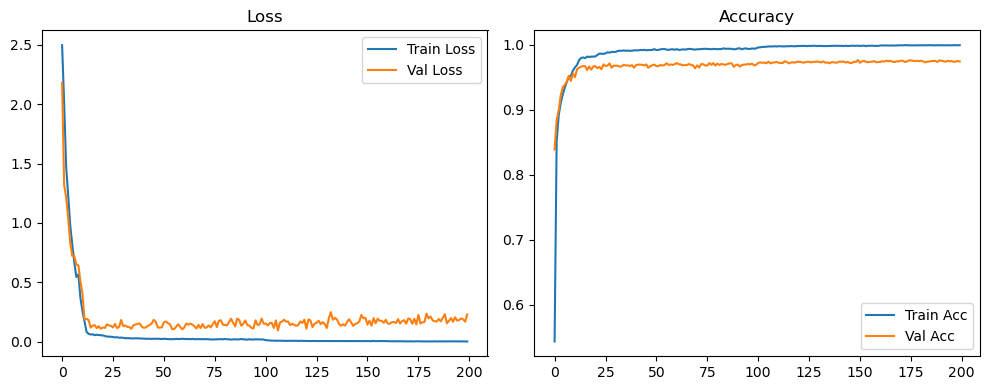

Evaluation:   0%|          | 0/157 [00:00<?, ?it/s]

Evaluation:   6%|▌         | 9/157 [00:00<00:01, 83.67it/s]

Evaluation:  11%|█▏        | 18/157 [00:00<00:01, 84.67it/s]

Evaluation:  17%|█▋        | 27/157 [00:00<00:01, 84.84it/s]

Evaluation:  23%|██▎       | 36/157 [00:00<00:01, 85.06it/s]

Evaluation:  29%|██▊       | 45/157 [00:00<00:01, 84.96it/s]

Evaluation:  34%|███▍      | 54/157 [00:00<00:01, 85.08it/s]

Evaluation:  40%|████      | 63/157 [00:00<00:01, 85.00it/s]

Evaluation:  46%|████▌     | 72/157 [00:00<00:01, 84.98it/s]

Evaluation:  52%|█████▏    | 81/157 [00:00<00:00, 85.01it/s]

Evaluation:  57%|█████▋    | 90/157 [00:01<00:00, 85.09it/s]

Evaluation:  63%|██████▎   | 99/157 [00:01<00:00, 85.17it/s]

Evaluation:  69%|██████▉   | 108/157 [00:01<00:00, 85.20it/s]

Evaluation:  75%|███████▍  | 117/157 [00:01<00:00, 85.25it/s]

Evaluation:  80%|████████  | 126/157 [00:01<00:00, 85.12it/s]

Evaluation:  86%|████████▌ | 135/157 [00:01<00:00, 84.68it/s]

Evaluation:  92%|█████████▏| 144/157 [00:01<00:00, 84.01it/s]

Evaluation:  97%|█████████▋| 153/157 [00:01<00:00, 84.28it/s]

Evaluation: 100%|██████████| 157/157 [00:01<00:00, 85.03it/s]

Original Model Final Test Loss: 0.2008 Accuracy: 0.9760


🚀 Running: batch64_lr0.005_0.002_0.001_dp0.2


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.005 | Train Acc: 0.5048 | Val Acc: 0.8394 |:   0%|          | 0/200 [00:14<?, ?it/s]

| LR: 0.005 | Train Acc: 0.5048 | Val Acc: 0.8394 |:   0%|          | 0/200 [00:14<?, ?it/s]

| LR: 0.005 | Train Acc: 0.5048 | Val Acc: 0.8394 |:   0%|          | 1/200 [00:14<46:47, 14.11s/it]

| LR: 0.005 | Train Acc: 0.8398 | Val Acc: 0.8909 |:   0%|          | 1/200 [00:27<46:47, 14.11s/it]

| LR: 0.005 | Train Acc: 0.8398 | Val Acc: 0.8909 |:   0%|          | 1/200 [00:27<46:47, 14.11s/it]

| LR: 0.005 | Train Acc: 0.8398 | Val Acc: 0.8909 |:   1%|          | 2/200 [00:27<45:19, 13.73s/it]

| LR: 0.005 | Train Acc: 0.8805 | Val Acc: 0.9203 |:   1%|          | 2/200 [00:41<45:19, 13.73s/it]

| LR: 0.005 | Train Acc: 0.8805 | Val Acc: 0.9203 |:   1%|          | 2/200 [00:41<45:19, 13.73s/it]

| LR: 0.005 | Train Acc: 0.8805 | Val Acc: 0.9203 |:   2%|▏         | 3/200 [00:41<44:49, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9011 | Val Acc: 0.9311 |:   2%|▏         | 3/200 [00:54<44:49, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9011 | Val Acc: 0.9311 |:   2%|▏         | 3/200 [00:54<44:49, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9011 | Val Acc: 0.9311 |:   2%|▏         | 4/200 [00:54<44:36, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9137 | Val Acc: 0.9347 |:   2%|▏         | 4/200 [01:08<44:36, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9137 | Val Acc: 0.9347 |:   2%|▏         | 4/200 [01:08<44:36, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9137 | Val Acc: 0.9347 |:   2%|▎         | 5/200 [01:08<44:23, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9258 | Val Acc: 0.9433 |:   2%|▎         | 5/200 [01:21<44:23, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9258 | Val Acc: 0.9433 |:   2%|▎         | 5/200 [01:21<44:23, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9258 | Val Acc: 0.9433 |:   3%|▎         | 6/200 [01:22<44:04, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9335 | Val Acc: 0.9485 |:   3%|▎         | 6/200 [01:38<44:04, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9335 | Val Acc: 0.9485 |:   3%|▎         | 6/200 [01:38<44:04, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9335 | Val Acc: 0.9485 |:   4%|▎         | 7/200 [01:38<47:05, 14.64s/it]

| LR: 0.005 | Train Acc: 0.9421 | Val Acc: 0.9517 |:   4%|▎         | 7/200 [01:52<47:05, 14.64s/it]

| LR: 0.005 | Train Acc: 0.9421 | Val Acc: 0.9517 |:   4%|▎         | 7/200 [01:52<47:05, 14.64s/it]

| LR: 0.005 | Train Acc: 0.9421 | Val Acc: 0.9517 |:   4%|▍         | 8/200 [01:52<45:53, 14.34s/it]

| LR: 0.005 | Train Acc: 0.9475 | Val Acc: 0.9568 |:   4%|▍         | 8/200 [02:06<45:53, 14.34s/it]

| LR: 0.005 | Train Acc: 0.9475 | Val Acc: 0.9568 |:   4%|▍         | 8/200 [02:06<45:53, 14.34s/it]

| LR: 0.005 | Train Acc: 0.9475 | Val Acc: 0.9568 |:   4%|▍         | 9/200 [02:06<44:56, 14.12s/it]

| LR: 0.005 | Train Acc: 0.9547 | Val Acc: 0.9613 |:   4%|▍         | 9/200 [02:19<44:56, 14.12s/it]

| LR: 0.005 | Train Acc: 0.9547 | Val Acc: 0.9613 |:   4%|▍         | 9/200 [02:19<44:56, 14.12s/it]

| LR: 0.005 | Train Acc: 0.9547 | Val Acc: 0.9613 |:   5%|▌         | 10/200 [02:19<44:12, 13.96s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9645 |:   5%|▌         | 10/200 [02:33<44:12, 13.96s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9645 |:   5%|▌         | 10/200 [02:33<44:12, 13.96s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9645 |:   6%|▌         | 11/200 [02:33<44:08, 14.01s/it]

| LR: 0.005 | Train Acc: 0.9718 | Val Acc: 0.9684 |:   6%|▌         | 11/200 [02:47<44:08, 14.01s/it]

| LR: 0.005 | Train Acc: 0.9718 | Val Acc: 0.9684 |:   6%|▌         | 11/200 [02:47<44:08, 14.01s/it]

| LR: 0.005 | Train Acc: 0.9718 | Val Acc: 0.9684 |:   6%|▌         | 12/200 [02:47<43:43, 13.95s/it]

| LR: 0.005 | Train Acc: 0.9711 | Val Acc: 0.9637 |:   6%|▌         | 12/200 [03:03<43:43, 13.95s/it]

| LR: 0.005 | Train Acc: 0.9711 | Val Acc: 0.9637 |:   6%|▌         | 12/200 [03:03<43:43, 13.95s/it]

| LR: 0.005 | Train Acc: 0.9711 | Val Acc: 0.9637 |:   6%|▋         | 13/200 [03:03<45:13, 14.51s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9663 |:   6%|▋         | 13/200 [03:18<45:13, 14.51s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9663 |:   6%|▋         | 13/200 [03:18<45:13, 14.51s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9663 |:   7%|▋         | 14/200 [03:18<45:16, 14.61s/it]

| LR: 0.005 | Train Acc: 0.9711 | Val Acc: 0.9618 |:   7%|▋         | 14/200 [03:31<45:16, 14.61s/it]

| LR: 0.005 | Train Acc: 0.9711 | Val Acc: 0.9618 |:   7%|▋         | 14/200 [03:31<45:16, 14.61s/it]

| LR: 0.005 | Train Acc: 0.9711 | Val Acc: 0.9618 |:   8%|▊         | 15/200 [03:31<44:00, 14.27s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9667 |:   8%|▊         | 15/200 [03:45<44:00, 14.27s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9667 |:   8%|▊         | 15/200 [03:45<44:00, 14.27s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9667 |:   8%|▊         | 16/200 [03:45<43:03, 14.04s/it]

| LR: 0.005 | Train Acc: 0.9706 | Val Acc: 0.9641 |:   8%|▊         | 16/200 [03:58<43:03, 14.04s/it]

| LR: 0.005 | Train Acc: 0.9706 | Val Acc: 0.9641 |:   8%|▊         | 16/200 [03:58<43:03, 14.04s/it]

| LR: 0.005 | Train Acc: 0.9706 | Val Acc: 0.9641 |:   8%|▊         | 17/200 [03:58<42:20, 13.88s/it]

| LR: 0.005 | Train Acc: 0.9708 | Val Acc: 0.9661 |:   8%|▊         | 17/200 [04:12<42:20, 13.88s/it]

| LR: 0.005 | Train Acc: 0.9708 | Val Acc: 0.9661 |:   8%|▊         | 17/200 [04:12<42:20, 13.88s/it]

| LR: 0.005 | Train Acc: 0.9708 | Val Acc: 0.9661 |:   9%|▉         | 18/200 [04:12<41:51, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9734 | Val Acc: 0.9650 |:   9%|▉         | 18/200 [04:25<41:51, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9734 | Val Acc: 0.9650 |:   9%|▉         | 18/200 [04:25<41:51, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9734 | Val Acc: 0.9650 |:  10%|▉         | 19/200 [04:25<41:17, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9724 | Val Acc: 0.9664 |:  10%|▉         | 19/200 [04:39<41:17, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9724 | Val Acc: 0.9664 |:  10%|▉         | 19/200 [04:39<41:17, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9724 | Val Acc: 0.9664 |:  10%|█         | 20/200 [04:39<40:50, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9729 | Val Acc: 0.9627 |:  10%|█         | 20/200 [04:52<40:50, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9729 | Val Acc: 0.9627 |:  10%|█         | 20/200 [04:52<40:50, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9729 | Val Acc: 0.9627 |:  10%|█         | 21/200 [04:52<40:24, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9742 | Val Acc: 0.9672 |:  10%|█         | 21/200 [05:05<40:24, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9742 | Val Acc: 0.9672 |:  10%|█         | 21/200 [05:05<40:24, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9742 | Val Acc: 0.9672 |:  11%|█         | 22/200 [05:06<40:03, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9749 | Val Acc: 0.9658 |:  11%|█         | 22/200 [05:19<40:03, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9749 | Val Acc: 0.9658 |:  11%|█         | 22/200 [05:19<40:03, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9749 | Val Acc: 0.9658 |:  12%|█▏        | 23/200 [05:19<39:58, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9754 | Val Acc: 0.9677 |:  12%|█▏        | 23/200 [05:33<39:58, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9754 | Val Acc: 0.9677 |:  12%|█▏        | 23/200 [05:33<39:58, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9754 | Val Acc: 0.9677 |:  12%|█▏        | 24/200 [05:33<39:50, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9689 |:  12%|█▏        | 24/200 [05:46<39:50, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9689 |:  12%|█▏        | 24/200 [05:46<39:50, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9689 |:  12%|█▎        | 25/200 [05:46<39:37, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9660 |:  12%|█▎        | 25/200 [06:01<39:37, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9660 |:  12%|█▎        | 25/200 [06:01<39:37, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9660 |:  13%|█▎        | 26/200 [06:01<39:53, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9673 |:  13%|█▎        | 26/200 [06:14<39:53, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9673 |:  13%|█▎        | 26/200 [06:14<39:53, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9673 |:  14%|█▎        | 27/200 [06:14<39:26, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9768 | Val Acc: 0.9664 |:  14%|█▎        | 27/200 [06:27<39:26, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9768 | Val Acc: 0.9664 |:  14%|█▎        | 27/200 [06:27<39:26, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9768 | Val Acc: 0.9664 |:  14%|█▍        | 28/200 [06:28<38:59, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9790 | Val Acc: 0.9665 |:  14%|█▍        | 28/200 [06:41<38:59, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9790 | Val Acc: 0.9665 |:  14%|█▍        | 28/200 [06:41<38:59, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9790 | Val Acc: 0.9665 |:  14%|█▍        | 29/200 [06:41<38:40, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9779 | Val Acc: 0.9656 |:  14%|█▍        | 29/200 [06:55<38:40, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9779 | Val Acc: 0.9656 |:  14%|█▍        | 29/200 [06:55<38:40, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9779 | Val Acc: 0.9656 |:  15%|█▌        | 30/200 [06:55<38:24, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9782 | Val Acc: 0.9653 |:  15%|█▌        | 30/200 [07:08<38:24, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9782 | Val Acc: 0.9653 |:  15%|█▌        | 30/200 [07:08<38:24, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9782 | Val Acc: 0.9653 |:  16%|█▌        | 31/200 [07:08<38:07, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9678 |:  16%|█▌        | 31/200 [07:21<38:07, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9678 |:  16%|█▌        | 31/200 [07:21<38:07, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9678 |:  16%|█▌        | 32/200 [07:21<37:47, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9678 |:  16%|█▌        | 32/200 [07:35<37:47, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9678 |:  16%|█▌        | 32/200 [07:35<37:47, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9678 |:  16%|█▋        | 33/200 [07:35<37:28, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9691 |:  16%|█▋        | 33/200 [07:48<37:28, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9691 |:  16%|█▋        | 33/200 [07:48<37:28, 13.47s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9691 |:  17%|█▋        | 34/200 [07:48<37:21, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9798 | Val Acc: 0.9673 |:  17%|█▋        | 34/200 [08:04<37:21, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9798 | Val Acc: 0.9673 |:  17%|█▋        | 34/200 [08:04<37:21, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9798 | Val Acc: 0.9673 |:  18%|█▊        | 35/200 [08:05<39:16, 14.28s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9670 |:  18%|█▊        | 35/200 [08:18<39:16, 14.28s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9670 |:  18%|█▊        | 35/200 [08:18<39:16, 14.28s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9670 |:  18%|█▊        | 36/200 [08:18<38:31, 14.10s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9682 |:  18%|█▊        | 36/200 [08:32<38:31, 14.10s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9682 |:  18%|█▊        | 36/200 [08:32<38:31, 14.10s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9682 |:  18%|█▊        | 37/200 [08:32<37:59, 13.98s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9691 |:  18%|█▊        | 37/200 [08:45<37:59, 13.98s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9691 |:  18%|█▊        | 37/200 [08:45<37:59, 13.98s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9691 |:  19%|█▉        | 38/200 [08:45<37:26, 13.87s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9703 |:  19%|█▉        | 38/200 [08:59<37:26, 13.87s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9703 |:  19%|█▉        | 38/200 [08:59<37:26, 13.87s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9703 |:  20%|█▉        | 39/200 [08:59<37:05, 13.82s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9677 |:  20%|█▉        | 39/200 [09:13<37:05, 13.82s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9677 |:  20%|█▉        | 39/200 [09:13<37:05, 13.82s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9677 |:  20%|██        | 40/200 [09:13<36:35, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9698 |:  20%|██        | 40/200 [09:26<36:35, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9698 |:  20%|██        | 40/200 [09:26<36:35, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9698 |:  20%|██        | 41/200 [09:26<36:17, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9807 | Val Acc: 0.9684 |:  20%|██        | 41/200 [09:40<36:17, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9807 | Val Acc: 0.9684 |:  20%|██        | 41/200 [09:40<36:17, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9807 | Val Acc: 0.9684 |:  21%|██        | 42/200 [09:40<35:57, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9712 |:  21%|██        | 42/200 [09:54<35:57, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9712 |:  21%|██        | 42/200 [09:54<35:57, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9712 |:  22%|██▏       | 43/200 [09:54<35:44, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9705 |:  22%|██▏       | 43/200 [10:08<35:44, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9705 |:  22%|██▏       | 43/200 [10:08<35:44, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9705 |:  22%|██▏       | 44/200 [10:08<36:05, 13.88s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9703 |:  22%|██▏       | 44/200 [10:22<36:05, 13.88s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9703 |:  22%|██▏       | 44/200 [10:22<36:05, 13.88s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9703 |:  22%|██▎       | 45/200 [10:22<35:39, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9698 |:  22%|██▎       | 45/200 [10:35<35:39, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9698 |:  22%|██▎       | 45/200 [10:35<35:39, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9698 |:  23%|██▎       | 46/200 [10:35<35:11, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9667 |:  23%|██▎       | 46/200 [10:49<35:11, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9667 |:  23%|██▎       | 46/200 [10:49<35:11, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9667 |:  24%|██▎       | 47/200 [10:49<35:03, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9694 |:  24%|██▎       | 47/200 [11:02<35:03, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9694 |:  24%|██▎       | 47/200 [11:02<35:03, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9694 |:  24%|██▍       | 48/200 [11:02<34:40, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9832 | Val Acc: 0.9689 |:  24%|██▍       | 48/200 [11:16<34:40, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9832 | Val Acc: 0.9689 |:  24%|██▍       | 48/200 [11:16<34:40, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9832 | Val Acc: 0.9689 |:  24%|██▍       | 49/200 [11:16<34:16, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9703 |:  24%|██▍       | 49/200 [11:29<34:16, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9703 |:  24%|██▍       | 49/200 [11:29<34:16, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9703 |:  25%|██▌       | 50/200 [11:29<33:55, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9696 |:  25%|██▌       | 50/200 [11:43<33:55, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9696 |:  25%|██▌       | 50/200 [11:43<33:55, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9696 |:  26%|██▌       | 51/200 [11:43<33:48, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9711 |:  26%|██▌       | 51/200 [11:57<33:48, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9711 |:  26%|██▌       | 51/200 [11:57<33:48, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9711 |:  26%|██▌       | 52/200 [11:57<33:31, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9692 |:  26%|██▌       | 52/200 [12:10<33:31, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9692 |:  26%|██▌       | 52/200 [12:10<33:31, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9692 |:  26%|██▋       | 53/200 [12:10<33:14, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9685 |:  26%|██▋       | 53/200 [12:24<33:14, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9685 |:  26%|██▋       | 53/200 [12:24<33:14, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9685 |:  27%|██▋       | 54/200 [12:24<33:00, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9704 |:  27%|██▋       | 54/200 [12:37<33:00, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9704 |:  27%|██▋       | 54/200 [12:37<33:00, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9704 |:  28%|██▊       | 55/200 [12:37<32:49, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9716 |:  28%|██▊       | 55/200 [12:51<32:49, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9716 |:  28%|██▊       | 55/200 [12:51<32:49, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9716 |:  28%|██▊       | 56/200 [12:51<32:34, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9733 |:  28%|██▊       | 56/200 [13:05<32:34, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9733 |:  28%|██▊       | 56/200 [13:05<32:34, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9733 |:  28%|██▊       | 57/200 [13:05<32:32, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9699 |:  28%|██▊       | 57/200 [13:18<32:32, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9699 |:  28%|██▊       | 57/200 [13:18<32:32, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9699 |:  29%|██▉       | 58/200 [13:18<32:12, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9686 |:  29%|██▉       | 58/200 [13:33<32:12, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9686 |:  29%|██▉       | 58/200 [13:33<32:12, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9686 |:  30%|██▉       | 59/200 [13:33<32:35, 13.87s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9692 |:  30%|██▉       | 59/200 [13:46<32:35, 13.87s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9692 |:  30%|██▉       | 59/200 [13:46<32:35, 13.87s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9692 |:  30%|███       | 60/200 [13:46<32:08, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9700 |:  30%|███       | 60/200 [14:00<32:08, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9700 |:  30%|███       | 60/200 [14:00<32:08, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9700 |:  30%|███       | 61/200 [14:00<31:49, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9694 |:  30%|███       | 61/200 [14:13<31:49, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9694 |:  30%|███       | 61/200 [14:13<31:49, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9694 |:  31%|███       | 62/200 [14:13<31:26, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9715 |:  31%|███       | 62/200 [14:27<31:26, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9715 |:  31%|███       | 62/200 [14:27<31:26, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9715 |:  32%|███▏      | 63/200 [14:27<31:06, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9674 |:  32%|███▏      | 63/200 [14:40<31:06, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9674 |:  32%|███▏      | 63/200 [14:40<31:06, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9674 |:  32%|███▏      | 64/200 [14:41<30:51, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9698 |:  32%|███▏      | 64/200 [14:54<30:51, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9698 |:  32%|███▏      | 64/200 [14:54<30:51, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9698 |:  32%|███▎      | 65/200 [14:54<30:32, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9839 | Val Acc: 0.9685 |:  32%|███▎      | 65/200 [15:07<30:32, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9839 | Val Acc: 0.9685 |:  32%|███▎      | 65/200 [15:07<30:32, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9839 | Val Acc: 0.9685 |:  33%|███▎      | 66/200 [15:07<30:13, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9698 |:  33%|███▎      | 66/200 [15:21<30:13, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9698 |:  33%|███▎      | 66/200 [15:21<30:13, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9698 |:  34%|███▎      | 67/200 [15:21<29:56, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9703 |:  34%|███▎      | 67/200 [15:34<29:56, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9703 |:  34%|███▎      | 67/200 [15:34<29:56, 13.50s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9703 |:  34%|███▍      | 68/200 [15:34<29:40, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9693 |:  34%|███▍      | 68/200 [15:48<29:40, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9693 |:  34%|███▍      | 68/200 [15:48<29:40, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9693 |:  34%|███▍      | 69/200 [15:48<29:26, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9840 | Val Acc: 0.9685 |:  34%|███▍      | 69/200 [16:02<29:26, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9840 | Val Acc: 0.9685 |:  34%|███▍      | 69/200 [16:02<29:26, 13.48s/it]

| LR: 0.005 | Train Acc: 0.9840 | Val Acc: 0.9685 |:  35%|███▌      | 70/200 [16:03<30:00, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9679 |:  35%|███▌      | 70/200 [16:16<30:00, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9679 |:  35%|███▌      | 70/200 [16:16<30:00, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9679 |:  36%|███▌      | 71/200 [16:16<29:47, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9699 |:  36%|███▌      | 71/200 [16:30<29:47, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9699 |:  36%|███▌      | 71/200 [16:30<29:47, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9699 |:  36%|███▌      | 72/200 [16:30<29:15, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9708 |:  36%|███▌      | 72/200 [16:43<29:15, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9708 |:  36%|███▌      | 72/200 [16:43<29:15, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9841 | Val Acc: 0.9708 |:  36%|███▋      | 73/200 [16:43<28:52, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9693 |:  36%|███▋      | 73/200 [16:57<28:52, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9693 |:  36%|███▋      | 73/200 [16:57<28:52, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9693 |:  37%|███▋      | 74/200 [16:57<28:31, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9693 |:  37%|███▋      | 74/200 [17:10<28:31, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9693 |:  37%|███▋      | 74/200 [17:10<28:31, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9693 |:  38%|███▊      | 75/200 [17:10<28:16, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9833 | Val Acc: 0.9697 |:  38%|███▊      | 75/200 [17:24<28:16, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9833 | Val Acc: 0.9697 |:  38%|███▊      | 75/200 [17:24<28:16, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9833 | Val Acc: 0.9697 |:  38%|███▊      | 76/200 [17:24<28:05, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9702 |:  38%|███▊      | 76/200 [17:37<28:05, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9702 |:  38%|███▊      | 76/200 [17:37<28:05, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9702 |:  38%|███▊      | 77/200 [17:38<27:53, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9718 |:  38%|███▊      | 77/200 [17:53<27:53, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9718 |:  38%|███▊      | 77/200 [17:53<27:53, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9718 |:  39%|███▉      | 78/200 [17:53<28:47, 14.16s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9705 |:  39%|███▉      | 78/200 [18:07<28:47, 14.16s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9705 |:  39%|███▉      | 78/200 [18:07<28:47, 14.16s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9705 |:  40%|███▉      | 79/200 [18:07<28:22, 14.07s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9704 |:  40%|███▉      | 79/200 [18:21<28:22, 14.07s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9704 |:  40%|███▉      | 79/200 [18:21<28:22, 14.07s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9704 |:  40%|████      | 80/200 [18:21<27:57, 13.98s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9713 |:  40%|████      | 80/200 [18:34<27:57, 13.98s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9713 |:  40%|████      | 80/200 [18:34<27:57, 13.98s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9713 |:  40%|████      | 81/200 [18:34<27:33, 13.90s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9680 |:  40%|████      | 81/200 [18:48<27:33, 13.90s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9680 |:  40%|████      | 81/200 [18:48<27:33, 13.90s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9680 |:  41%|████      | 82/200 [18:48<27:09, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9833 | Val Acc: 0.9687 |:  41%|████      | 82/200 [19:02<27:09, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9833 | Val Acc: 0.9687 |:  41%|████      | 82/200 [19:02<27:09, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9833 | Val Acc: 0.9687 |:  42%|████▏     | 83/200 [19:02<26:50, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9699 |:  42%|████▏     | 83/200 [19:15<26:50, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9699 |:  42%|████▏     | 83/200 [19:15<26:50, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9699 |:  42%|████▏     | 84/200 [19:15<26:23, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9692 |:  42%|████▏     | 84/200 [19:28<26:23, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9692 |:  42%|████▏     | 84/200 [19:28<26:23, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9692 |:  42%|████▎     | 85/200 [19:28<26:02, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9688 |:  42%|████▎     | 85/200 [19:42<26:02, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9688 |:  42%|████▎     | 85/200 [19:42<26:02, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9688 |:  43%|████▎     | 86/200 [19:42<25:49, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9693 |:  43%|████▎     | 86/200 [19:55<25:49, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9693 |:  43%|████▎     | 86/200 [19:55<25:49, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9842 | Val Acc: 0.9693 |:  44%|████▎     | 87/200 [19:56<25:34, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9840 | Val Acc: 0.9702 |:  44%|████▎     | 87/200 [20:10<25:34, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9840 | Val Acc: 0.9702 |:  44%|████▎     | 87/200 [20:10<25:34, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9840 | Val Acc: 0.9702 |:  44%|████▍     | 88/200 [20:10<25:50, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9693 |:  44%|████▍     | 88/200 [20:24<25:50, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9693 |:  44%|████▍     | 88/200 [20:24<25:50, 13.85s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9693 |:  44%|████▍     | 89/200 [20:24<25:33, 13.82s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9695 |:  44%|████▍     | 89/200 [20:38<25:33, 13.82s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9695 |:  44%|████▍     | 89/200 [20:38<25:33, 13.82s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9695 |:  45%|████▌     | 90/200 [20:38<25:29, 13.90s/it]

| LR: 0.005 | Train Acc: 0.9840 | Val Acc: 0.9700 |:  45%|████▌     | 90/200 [20:51<25:29, 13.90s/it]

| LR: 0.005 | Train Acc: 0.9840 | Val Acc: 0.9700 |:  45%|████▌     | 90/200 [20:51<25:29, 13.90s/it]

| LR: 0.005 | Train Acc: 0.9840 | Val Acc: 0.9700 |:  46%|████▌     | 91/200 [20:51<25:07, 13.83s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9704 |:  46%|████▌     | 91/200 [21:05<25:07, 13.83s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9704 |:  46%|████▌     | 91/200 [21:05<25:07, 13.83s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9704 |:  46%|████▌     | 92/200 [21:05<24:48, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9691 |:  46%|████▌     | 92/200 [21:19<24:48, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9691 |:  46%|████▌     | 92/200 [21:19<24:48, 13.78s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9691 |:  46%|████▋     | 93/200 [21:19<24:27, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9706 |:  46%|████▋     | 93/200 [21:32<24:27, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9706 |:  46%|████▋     | 93/200 [21:32<24:27, 13.72s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9706 |:  47%|████▋     | 94/200 [21:32<24:11, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9693 |:  47%|████▋     | 94/200 [21:46<24:11, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9693 |:  47%|████▋     | 94/200 [21:46<24:11, 13.69s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9693 |:  48%|████▊     | 95/200 [21:46<23:48, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9693 |:  48%|████▊     | 95/200 [21:59<23:48, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9693 |:  48%|████▊     | 95/200 [21:59<23:48, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9693 |:  48%|████▊     | 96/200 [21:59<23:29, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9694 |:  48%|████▊     | 96/200 [22:13<23:29, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9694 |:  48%|████▊     | 96/200 [22:13<23:29, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9694 |:  48%|████▊     | 97/200 [22:13<23:12, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9717 |:  48%|████▊     | 97/200 [22:26<23:12, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9717 |:  48%|████▊     | 97/200 [22:26<23:12, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9850 | Val Acc: 0.9717 |:  49%|████▉     | 98/200 [22:26<22:56, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9692 |:  49%|████▉     | 98/200 [22:41<22:56, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9692 |:  49%|████▉     | 98/200 [22:41<22:56, 13.49s/it]

| LR: 0.005 | Train Acc: 0.9846 | Val Acc: 0.9692 |:  50%|████▉     | 99/200 [22:41<23:23, 13.89s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9700 |:  50%|████▉     | 99/200 [22:54<23:23, 13.89s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9700 |:  50%|████▉     | 99/200 [22:54<23:23, 13.89s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9700 |:  50%|█████     | 100/200 [22:54<22:57, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9718 |:  50%|█████     | 100/200 [23:08<22:57, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9718 |:  50%|█████     | 100/200 [23:08<22:57, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9718 |:  50%|█████     | 101/200 [23:08<22:33, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9871 | Val Acc: 0.9717 |:  50%|█████     | 101/200 [23:21<22:33, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9871 | Val Acc: 0.9717 |:  50%|█████     | 101/200 [23:21<22:33, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9871 | Val Acc: 0.9717 |:  51%|█████     | 102/200 [23:21<22:17, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9727 |:  51%|█████     | 102/200 [23:35<22:17, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9727 |:  51%|█████     | 102/200 [23:35<22:17, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9727 |:  52%|█████▏    | 103/200 [23:35<22:03, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9884 | Val Acc: 0.9718 |:  52%|█████▏    | 103/200 [23:49<22:03, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9884 | Val Acc: 0.9718 |:  52%|█████▏    | 103/200 [23:49<22:03, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9884 | Val Acc: 0.9718 |:  52%|█████▏    | 104/200 [23:49<21:49, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9728 |:  52%|█████▏    | 104/200 [24:02<21:49, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9728 |:  52%|█████▏    | 104/200 [24:02<21:49, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9728 |:  52%|█████▎    | 105/200 [24:02<21:34, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9891 | Val Acc: 0.9738 |:  52%|█████▎    | 105/200 [24:16<21:34, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9891 | Val Acc: 0.9738 |:  52%|█████▎    | 105/200 [24:16<21:34, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9891 | Val Acc: 0.9738 |:  53%|█████▎    | 106/200 [24:16<21:20, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9894 | Val Acc: 0.9710 |:  53%|█████▎    | 106/200 [24:29<21:20, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9894 | Val Acc: 0.9710 |:  53%|█████▎    | 106/200 [24:29<21:20, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9894 | Val Acc: 0.9710 |:  54%|█████▎    | 107/200 [24:30<21:06, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9898 | Val Acc: 0.9738 |:  54%|█████▎    | 107/200 [24:43<21:06, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9898 | Val Acc: 0.9738 |:  54%|█████▎    | 107/200 [24:43<21:06, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9898 | Val Acc: 0.9738 |:  54%|█████▍    | 108/200 [24:43<20:57, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9891 | Val Acc: 0.9732 |:  54%|█████▍    | 108/200 [24:57<20:57, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9891 | Val Acc: 0.9732 |:  54%|█████▍    | 108/200 [24:57<20:57, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9891 | Val Acc: 0.9732 |:  55%|█████▍    | 109/200 [24:57<20:38, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9723 |:  55%|█████▍    | 109/200 [25:11<20:38, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9723 |:  55%|█████▍    | 109/200 [25:11<20:38, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9723 |:  55%|█████▌    | 110/200 [25:11<20:35, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9722 |:  55%|█████▌    | 110/200 [25:24<20:35, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9722 |:  55%|█████▌    | 110/200 [25:24<20:35, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9722 |:  56%|█████▌    | 111/200 [25:24<20:13, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9901 | Val Acc: 0.9704 |:  56%|█████▌    | 111/200 [25:38<20:13, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9901 | Val Acc: 0.9704 |:  56%|█████▌    | 111/200 [25:38<20:13, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9901 | Val Acc: 0.9704 |:  56%|█████▌    | 112/200 [25:38<20:03, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9724 |:  56%|█████▌    | 112/200 [25:51<20:03, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9724 |:  56%|█████▌    | 112/200 [25:51<20:03, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9724 |:  56%|█████▋    | 113/200 [25:51<19:45, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9741 |:  56%|█████▋    | 113/200 [26:05<19:45, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9741 |:  56%|█████▋    | 113/200 [26:05<19:45, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9741 |:  57%|█████▋    | 114/200 [26:05<19:31, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9728 |:  57%|█████▋    | 114/200 [26:19<19:31, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9728 |:  57%|█████▋    | 114/200 [26:19<19:31, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9728 |:  57%|█████▊    | 115/200 [26:19<19:16, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9732 |:  57%|█████▊    | 115/200 [26:32<19:16, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9732 |:  57%|█████▊    | 115/200 [26:32<19:16, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9732 |:  58%|█████▊    | 116/200 [26:32<18:59, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9725 |:  58%|█████▊    | 116/200 [26:46<18:59, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9725 |:  58%|█████▊    | 116/200 [26:46<18:59, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9725 |:  58%|█████▊    | 117/200 [26:46<18:43, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9919 | Val Acc: 0.9740 |:  58%|█████▊    | 117/200 [26:59<18:43, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9919 | Val Acc: 0.9740 |:  58%|█████▊    | 117/200 [26:59<18:43, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9919 | Val Acc: 0.9740 |:  59%|█████▉    | 118/200 [26:59<18:28, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9728 |:  59%|█████▉    | 118/200 [27:12<18:28, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9728 |:  59%|█████▉    | 118/200 [27:12<18:28, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9728 |:  60%|█████▉    | 119/200 [27:12<18:12, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9735 |:  60%|█████▉    | 119/200 [27:26<18:12, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9735 |:  60%|█████▉    | 119/200 [27:26<18:12, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9735 |:  60%|██████    | 120/200 [27:26<18:00, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9736 |:  60%|██████    | 120/200 [27:40<18:00, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9736 |:  60%|██████    | 120/200 [27:40<18:00, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9736 |:  60%|██████    | 121/200 [27:40<17:47, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9731 |:  60%|██████    | 121/200 [27:53<17:47, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9731 |:  60%|██████    | 121/200 [27:53<17:47, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9731 |:  61%|██████    | 122/200 [27:53<17:36, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9906 | Val Acc: 0.9732 |:  61%|██████    | 122/200 [28:07<17:36, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9906 | Val Acc: 0.9732 |:  61%|██████    | 122/200 [28:07<17:36, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9906 | Val Acc: 0.9732 |:  62%|██████▏   | 123/200 [28:07<17:23, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9724 |:  62%|██████▏   | 123/200 [28:20<17:23, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9724 |:  62%|██████▏   | 123/200 [28:20<17:23, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9724 |:  62%|██████▏   | 124/200 [28:20<17:09, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9726 |:  62%|██████▏   | 124/200 [28:34<17:09, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9726 |:  62%|██████▏   | 124/200 [28:34<17:09, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9726 |:  62%|██████▎   | 125/200 [28:34<16:53, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9739 |:  62%|██████▎   | 125/200 [28:47<16:53, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9739 |:  62%|██████▎   | 125/200 [28:47<16:53, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9739 |:  63%|██████▎   | 126/200 [28:47<16:42, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9736 |:  63%|██████▎   | 126/200 [29:01<16:42, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9736 |:  63%|██████▎   | 126/200 [29:01<16:42, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9736 |:  64%|██████▎   | 127/200 [29:01<16:28, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9923 | Val Acc: 0.9729 |:  64%|██████▎   | 127/200 [29:14<16:28, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9923 | Val Acc: 0.9729 |:  64%|██████▎   | 127/200 [29:14<16:28, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9923 | Val Acc: 0.9729 |:  64%|██████▍   | 128/200 [29:14<16:15, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9738 |:  64%|██████▍   | 128/200 [29:28<16:15, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9738 |:  64%|██████▍   | 128/200 [29:28<16:15, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9738 |:  64%|██████▍   | 129/200 [29:28<15:58, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9738 |:  64%|██████▍   | 129/200 [29:41<15:58, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9738 |:  64%|██████▍   | 129/200 [29:41<15:58, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9738 |:  65%|██████▌   | 130/200 [29:41<15:43, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9725 |:  65%|██████▌   | 130/200 [29:55<15:43, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9725 |:  65%|██████▌   | 130/200 [29:55<15:43, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9725 |:  66%|██████▌   | 131/200 [29:55<15:31, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9732 |:  66%|██████▌   | 131/200 [30:08<15:31, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9732 |:  66%|██████▌   | 131/200 [30:08<15:31, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9732 |:  66%|██████▌   | 132/200 [30:08<15:18, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9740 |:  66%|██████▌   | 132/200 [30:22<15:18, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9740 |:  66%|██████▌   | 132/200 [30:22<15:18, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9740 |:  66%|██████▋   | 133/200 [30:22<15:06, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9927 | Val Acc: 0.9733 |:  66%|██████▋   | 133/200 [30:37<15:06, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9927 | Val Acc: 0.9733 |:  66%|██████▋   | 133/200 [30:37<15:06, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9927 | Val Acc: 0.9733 |:  67%|██████▋   | 134/200 [30:37<15:19, 13.93s/it]

| LR: 0.002 | Train Acc: 0.9927 | Val Acc: 0.9737 |:  67%|██████▋   | 134/200 [30:50<15:19, 13.93s/it]

| LR: 0.002 | Train Acc: 0.9927 | Val Acc: 0.9737 |:  67%|██████▋   | 134/200 [30:50<15:19, 13.93s/it]

| LR: 0.002 | Train Acc: 0.9927 | Val Acc: 0.9737 |:  68%|██████▊   | 135/200 [30:50<14:58, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9748 |:  68%|██████▊   | 135/200 [31:05<14:58, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9748 |:  68%|██████▊   | 135/200 [31:05<14:58, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9748 |:  68%|██████▊   | 136/200 [31:05<15:05, 14.14s/it]

| LR: 0.002 | Train Acc: 0.9927 | Val Acc: 0.9744 |:  68%|██████▊   | 136/200 [31:20<15:05, 14.14s/it]

| LR: 0.002 | Train Acc: 0.9927 | Val Acc: 0.9744 |:  68%|██████▊   | 136/200 [31:20<15:05, 14.14s/it]

| LR: 0.002 | Train Acc: 0.9927 | Val Acc: 0.9744 |:  68%|██████▊   | 137/200 [31:20<15:03, 14.35s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9734 |:  68%|██████▊   | 137/200 [31:34<15:03, 14.35s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9734 |:  68%|██████▊   | 137/200 [31:34<15:03, 14.35s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9734 |:  69%|██████▉   | 138/200 [31:34<14:38, 14.17s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9727 |:  69%|██████▉   | 138/200 [31:47<14:38, 14.17s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9727 |:  69%|██████▉   | 138/200 [31:47<14:38, 14.17s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9727 |:  70%|██████▉   | 139/200 [31:47<14:13, 13.98s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9727 |:  70%|██████▉   | 139/200 [32:01<14:13, 13.98s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9727 |:  70%|██████▉   | 139/200 [32:01<14:13, 13.98s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9727 |:  70%|███████   | 140/200 [32:01<13:56, 13.95s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9730 |:  70%|███████   | 140/200 [32:15<13:56, 13.95s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9730 |:  70%|███████   | 140/200 [32:15<13:56, 13.95s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9730 |:  70%|███████   | 141/200 [32:15<13:37, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9927 | Val Acc: 0.9736 |:  70%|███████   | 141/200 [32:28<13:37, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9927 | Val Acc: 0.9736 |:  70%|███████   | 141/200 [32:28<13:37, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9927 | Val Acc: 0.9736 |:  71%|███████   | 142/200 [32:28<13:19, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9722 |:  71%|███████   | 142/200 [32:42<13:19, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9722 |:  71%|███████   | 142/200 [32:42<13:19, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9722 |:  72%|███████▏  | 143/200 [32:42<13:02, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9728 |:  72%|███████▏  | 143/200 [32:55<13:02, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9728 |:  72%|███████▏  | 143/200 [32:55<13:02, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9728 |:  72%|███████▏  | 144/200 [32:55<12:43, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9725 |:  72%|███████▏  | 144/200 [33:09<12:43, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9725 |:  72%|███████▏  | 144/200 [33:09<12:43, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9725 |:  72%|███████▎  | 145/200 [33:09<12:28, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9728 |:  72%|███████▎  | 145/200 [33:23<12:28, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9728 |:  72%|███████▎  | 145/200 [33:23<12:28, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9728 |:  73%|███████▎  | 146/200 [33:23<12:19, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9927 | Val Acc: 0.9734 |:  73%|███████▎  | 146/200 [33:36<12:19, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9927 | Val Acc: 0.9734 |:  73%|███████▎  | 146/200 [33:36<12:19, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9927 | Val Acc: 0.9734 |:  74%|███████▎  | 147/200 [33:36<12:03, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9729 |:  74%|███████▎  | 147/200 [33:50<12:03, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9729 |:  74%|███████▎  | 147/200 [33:50<12:03, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9729 |:  74%|███████▍  | 148/200 [33:50<11:48, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9742 |:  74%|███████▍  | 148/200 [34:04<11:48, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9742 |:  74%|███████▍  | 148/200 [34:04<11:48, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9742 |:  74%|███████▍  | 149/200 [34:04<11:34, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9731 |:  74%|███████▍  | 149/200 [34:17<11:34, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9731 |:  74%|███████▍  | 149/200 [34:17<11:34, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9731 |:  75%|███████▌  | 150/200 [34:17<11:19, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9733 |:  75%|███████▌  | 150/200 [34:31<11:19, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9733 |:  75%|███████▌  | 150/200 [34:31<11:19, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9733 |:  76%|███████▌  | 151/200 [34:31<11:03, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9736 |:  76%|███████▌  | 151/200 [34:44<11:03, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9736 |:  76%|███████▌  | 151/200 [34:44<11:03, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9736 |:  76%|███████▌  | 152/200 [34:44<10:49, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9732 |:  76%|███████▌  | 152/200 [34:57<10:49, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9732 |:  76%|███████▌  | 152/200 [34:57<10:49, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9732 |:  76%|███████▋  | 153/200 [34:58<10:34, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9748 |:  76%|███████▋  | 153/200 [35:11<10:34, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9748 |:  76%|███████▋  | 153/200 [35:11<10:34, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9748 |:  77%|███████▋  | 154/200 [35:11<10:21, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9742 |:  77%|███████▋  | 154/200 [35:25<10:21, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9742 |:  77%|███████▋  | 154/200 [35:25<10:21, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9742 |:  78%|███████▊  | 155/200 [35:25<10:09, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9728 |:  78%|███████▊  | 155/200 [35:38<10:09, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9728 |:  78%|███████▊  | 155/200 [35:38<10:09, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9728 |:  78%|███████▊  | 156/200 [35:38<09:52, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9742 |:  78%|███████▊  | 156/200 [35:52<09:52, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9742 |:  78%|███████▊  | 156/200 [35:52<09:52, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9742 |:  78%|███████▊  | 157/200 [35:52<09:45, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9726 |:  78%|███████▊  | 157/200 [36:05<09:45, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9726 |:  78%|███████▊  | 157/200 [36:05<09:45, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9726 |:  79%|███████▉  | 158/200 [36:05<09:29, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9738 |:  79%|███████▉  | 158/200 [36:19<09:29, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9738 |:  79%|███████▉  | 158/200 [36:19<09:29, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9738 |:  80%|███████▉  | 159/200 [36:19<09:14, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9750 |:  80%|███████▉  | 159/200 [36:32<09:14, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9750 |:  80%|███████▉  | 159/200 [36:32<09:14, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9750 |:  80%|████████  | 160/200 [36:32<09:00, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9758 |:  80%|████████  | 160/200 [36:46<09:00, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9758 |:  80%|████████  | 160/200 [36:46<09:00, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9758 |:  80%|████████  | 161/200 [36:46<08:50, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9943 | Val Acc: 0.9752 |:  80%|████████  | 161/200 [37:00<08:50, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9943 | Val Acc: 0.9752 |:  80%|████████  | 161/200 [37:00<08:50, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9943 | Val Acc: 0.9752 |:  81%|████████  | 162/200 [37:00<08:44, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9753 |:  81%|████████  | 162/200 [37:14<08:44, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9753 |:  81%|████████  | 162/200 [37:14<08:44, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9753 |:  82%|████████▏ | 163/200 [37:14<08:30, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9751 |:  82%|████████▏ | 163/200 [37:28<08:30, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9751 |:  82%|████████▏ | 163/200 [37:28<08:30, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9751 |:  82%|████████▏ | 164/200 [37:28<08:13, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9738 |:  82%|████████▏ | 164/200 [37:41<08:13, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9738 |:  82%|████████▏ | 164/200 [37:41<08:13, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9738 |:  82%|████████▎ | 165/200 [37:41<07:57, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9741 |:  82%|████████▎ | 165/200 [37:55<07:57, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9741 |:  82%|████████▎ | 165/200 [37:55<07:57, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9741 |:  83%|████████▎ | 166/200 [37:55<07:42, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9738 |:  83%|████████▎ | 166/200 [38:08<07:42, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9738 |:  83%|████████▎ | 166/200 [38:08<07:42, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9738 |:  84%|████████▎ | 167/200 [38:08<07:28, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9738 |:  84%|████████▎ | 167/200 [38:22<07:28, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9738 |:  84%|████████▎ | 167/200 [38:22<07:28, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9738 |:  84%|████████▍ | 168/200 [38:22<07:16, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9747 |:  84%|████████▍ | 168/200 [38:35<07:16, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9747 |:  84%|████████▍ | 168/200 [38:35<07:16, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9747 |:  84%|████████▍ | 169/200 [38:35<07:01, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9747 |:  84%|████████▍ | 169/200 [38:49<07:01, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9747 |:  84%|████████▍ | 169/200 [38:49<07:01, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9747 |:  85%|████████▌ | 170/200 [38:49<06:46, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9744 |:  85%|████████▌ | 170/200 [39:03<06:46, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9744 |:  85%|████████▌ | 170/200 [39:03<06:46, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9744 |:  86%|████████▌ | 171/200 [39:03<06:35, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9747 |:  86%|████████▌ | 171/200 [39:16<06:35, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9747 |:  86%|████████▌ | 171/200 [39:16<06:35, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9747 |:  86%|████████▌ | 172/200 [39:16<06:20, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9744 |:  86%|████████▌ | 172/200 [39:30<06:20, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9744 |:  86%|████████▌ | 172/200 [39:30<06:20, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9744 |:  86%|████████▋ | 173/200 [39:30<06:05, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9740 |:  86%|████████▋ | 173/200 [39:44<06:05, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9740 |:  86%|████████▋ | 173/200 [39:44<06:05, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9740 |:  87%|████████▋ | 174/200 [39:44<05:54, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9751 |:  87%|████████▋ | 174/200 [39:57<05:54, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9751 |:  87%|████████▋ | 174/200 [39:57<05:54, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9751 |:  88%|████████▊ | 175/200 [39:57<05:40, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9737 |:  88%|████████▊ | 175/200 [40:11<05:40, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9737 |:  88%|████████▊ | 175/200 [40:11<05:40, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9737 |:  88%|████████▊ | 176/200 [40:11<05:25, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9766 |:  88%|████████▊ | 176/200 [40:24<05:25, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9766 |:  88%|████████▊ | 176/200 [40:24<05:25, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9766 |:  88%|████████▊ | 177/200 [40:24<05:13, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9741 |:  88%|████████▊ | 177/200 [40:38<05:13, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9741 |:  88%|████████▊ | 177/200 [40:38<05:13, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9741 |:  89%|████████▉ | 178/200 [40:38<04:59, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9748 |:  89%|████████▉ | 178/200 [40:51<04:59, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9748 |:  89%|████████▉ | 178/200 [40:51<04:59, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9748 |:  90%|████████▉ | 179/200 [40:52<04:45, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9743 |:  90%|████████▉ | 179/200 [41:05<04:45, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9743 |:  90%|████████▉ | 179/200 [41:05<04:45, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9743 |:  90%|█████████ | 180/200 [41:05<04:31, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9748 |:  90%|█████████ | 180/200 [41:18<04:31, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9748 |:  90%|█████████ | 180/200 [41:18<04:31, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9748 |:  90%|█████████ | 181/200 [41:19<04:17, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9751 |:  90%|█████████ | 181/200 [41:32<04:17, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9751 |:  90%|█████████ | 181/200 [41:32<04:17, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9751 |:  91%|█████████ | 182/200 [41:32<04:05, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9755 |:  91%|█████████ | 182/200 [41:46<04:05, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9755 |:  91%|█████████ | 182/200 [41:46<04:05, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9755 |:  92%|█████████▏| 183/200 [41:46<03:51, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9750 |:  92%|█████████▏| 183/200 [42:00<03:51, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9750 |:  92%|█████████▏| 183/200 [42:00<03:51, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9750 |:  92%|█████████▏| 184/200 [42:00<03:39, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9750 |:  92%|█████████▏| 184/200 [42:13<03:39, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9750 |:  92%|█████████▏| 184/200 [42:13<03:39, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9750 |:  92%|█████████▎| 185/200 [42:13<03:25, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9758 |:  92%|█████████▎| 185/200 [42:27<03:25, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9758 |:  92%|█████████▎| 185/200 [42:27<03:25, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9758 |:  93%|█████████▎| 186/200 [42:27<03:12, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9752 |:  93%|█████████▎| 186/200 [42:41<03:12, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9752 |:  93%|█████████▎| 186/200 [42:41<03:12, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9752 |:  94%|█████████▎| 187/200 [42:41<02:57, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9741 |:  94%|█████████▎| 187/200 [42:54<02:57, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9741 |:  94%|█████████▎| 187/200 [42:54<02:57, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9741 |:  94%|█████████▍| 188/200 [42:54<02:43, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9749 |:  94%|█████████▍| 188/200 [43:08<02:43, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9749 |:  94%|█████████▍| 188/200 [43:08<02:43, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9749 |:  94%|█████████▍| 189/200 [43:08<02:29, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9752 |:  94%|█████████▍| 189/200 [43:21<02:29, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9752 |:  94%|█████████▍| 189/200 [43:21<02:29, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9752 |:  95%|█████████▌| 190/200 [43:21<02:15, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9752 |:  95%|█████████▌| 190/200 [43:35<02:15, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9752 |:  95%|█████████▌| 190/200 [43:35<02:15, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9752 |:  96%|█████████▌| 191/200 [43:35<02:02, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9740 |:  96%|█████████▌| 191/200 [43:49<02:02, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9740 |:  96%|█████████▌| 191/200 [43:49<02:02, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9740 |:  96%|█████████▌| 192/200 [43:49<01:48, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9739 |:  96%|█████████▌| 192/200 [44:02<01:48, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9739 |:  96%|█████████▌| 192/200 [44:02<01:48, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9739 |:  96%|█████████▋| 193/200 [44:02<01:35, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9756 |:  96%|█████████▋| 193/200 [44:16<01:35, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9756 |:  96%|█████████▋| 193/200 [44:16<01:35, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9756 |:  97%|█████████▋| 194/200 [44:16<01:22, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9762 |:  97%|█████████▋| 194/200 [44:30<01:22, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9762 |:  97%|█████████▋| 194/200 [44:30<01:22, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9762 |:  98%|█████████▊| 195/200 [44:30<01:08, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9748 |:  98%|█████████▊| 195/200 [44:43<01:08, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9748 |:  98%|█████████▊| 195/200 [44:43<01:08, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9748 |:  98%|█████████▊| 196/200 [44:43<00:54, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9751 |:  98%|█████████▊| 196/200 [44:57<00:54, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9751 |:  98%|█████████▊| 196/200 [44:57<00:54, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9751 |:  98%|█████████▊| 197/200 [44:57<00:40, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9752 |:  98%|█████████▊| 197/200 [45:11<00:40, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9752 |:  98%|█████████▊| 197/200 [45:11<00:40, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9752 |:  99%|█████████▉| 198/200 [45:11<00:27, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9746 |:  99%|█████████▉| 198/200 [45:24<00:27, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9746 |:  99%|█████████▉| 198/200 [45:24<00:27, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9746 |: 100%|█████████▉| 199/200 [45:24<00:13, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9751 |: 100%|█████████▉| 199/200 [45:38<00:13, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9751 |: 100%|█████████▉| 199/200 [45:38<00:13, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9751 |: 100%|██████████| 200/200 [45:38<00:00, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9751 |: 100%|██████████| 200/200 [45:38<00:00, 13.69s/it]

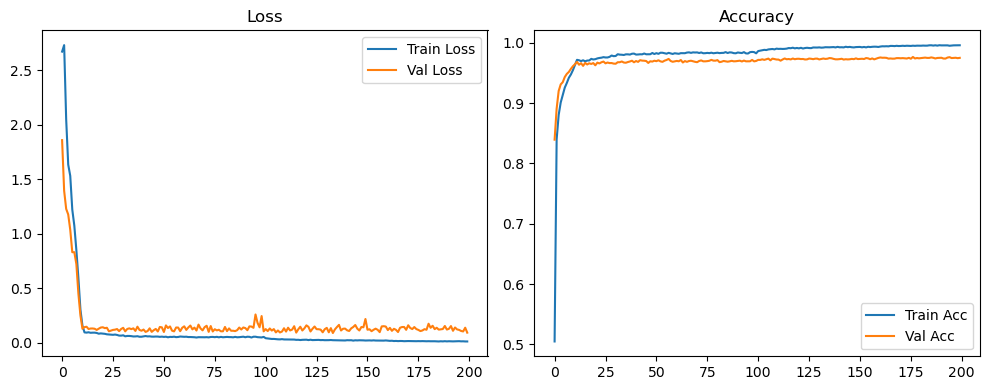

Evaluation:   0%|          | 0/157 [00:00<?, ?it/s]

Evaluation:   6%|▌         | 9/157 [00:00<00:01, 84.26it/s]

Evaluation:  11%|█▏        | 18/157 [00:00<00:01, 84.69it/s]

Evaluation:  17%|█▋        | 27/157 [00:00<00:01, 84.66it/s]

Evaluation:  23%|██▎       | 36/157 [00:00<00:01, 84.86it/s]

Evaluation:  29%|██▊       | 45/157 [00:00<00:01, 85.05it/s]

Evaluation:  34%|███▍      | 54/157 [00:00<00:01, 85.16it/s]

Evaluation:  40%|████      | 63/157 [00:00<00:01, 85.35it/s]

Evaluation:  46%|████▌     | 72/157 [00:00<00:00, 85.41it/s]

Evaluation:  52%|█████▏    | 81/157 [00:00<00:00, 85.37it/s]

Evaluation:  57%|█████▋    | 90/157 [00:01<00:00, 85.45it/s]

Evaluation:  63%|██████▎   | 99/157 [00:01<00:00, 85.42it/s]

Evaluation:  69%|██████▉   | 108/157 [00:01<00:00, 85.50it/s]

Evaluation:  75%|███████▍  | 117/157 [00:01<00:00, 85.52it/s]

Evaluation:  80%|████████  | 126/157 [00:01<00:00, 85.55it/s]

Evaluation:  86%|████████▌ | 135/157 [00:01<00:00, 85.58it/s]

Evaluation:  92%|█████████▏| 144/157 [00:01<00:00, 85.56it/s]

Evaluation:  97%|█████████▋| 153/157 [00:01<00:00, 85.48it/s]

Evaluation: 100%|██████████| 157/157 [00:01<00:00, 85.55it/s]

Original Model Final Test Loss: 0.0814 Accuracy: 0.9781


🚀 Running: batch64_lr0.005_0.002_0.001_dp0.5


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.005 | Train Acc: 0.4629 | Val Acc: 0.8448 |:   0%|          | 0/200 [00:14<?, ?it/s]

| LR: 0.005 | Train Acc: 0.4629 | Val Acc: 0.8448 |:   0%|          | 0/200 [00:14<?, ?it/s]

| LR: 0.005 | Train Acc: 0.4629 | Val Acc: 0.8448 |:   0%|          | 1/200 [00:14<46:34, 14.04s/it]

| LR: 0.005 | Train Acc: 0.8139 | Val Acc: 0.9023 |:   0%|          | 1/200 [00:27<46:34, 14.04s/it]

| LR: 0.005 | Train Acc: 0.8139 | Val Acc: 0.9023 |:   0%|          | 1/200 [00:27<46:34, 14.04s/it]

| LR: 0.005 | Train Acc: 0.8139 | Val Acc: 0.9023 |:   1%|          | 2/200 [00:27<45:32, 13.80s/it]

| LR: 0.005 | Train Acc: 0.8577 | Val Acc: 0.9275 |:   1%|          | 2/200 [00:41<45:32, 13.80s/it]

| LR: 0.005 | Train Acc: 0.8577 | Val Acc: 0.9275 |:   1%|          | 2/200 [00:41<45:32, 13.80s/it]

| LR: 0.005 | Train Acc: 0.8577 | Val Acc: 0.9275 |:   2%|▏         | 3/200 [00:41<45:04, 13.73s/it]

| LR: 0.005 | Train Acc: 0.8822 | Val Acc: 0.9337 |:   2%|▏         | 3/200 [00:56<45:04, 13.73s/it]

| LR: 0.005 | Train Acc: 0.8822 | Val Acc: 0.9337 |:   2%|▏         | 3/200 [00:56<45:04, 13.73s/it]

| LR: 0.005 | Train Acc: 0.8822 | Val Acc: 0.9337 |:   2%|▏         | 4/200 [00:56<46:38, 14.28s/it]

| LR: 0.005 | Train Acc: 0.8977 | Val Acc: 0.9456 |:   2%|▏         | 4/200 [01:10<46:38, 14.28s/it]

| LR: 0.005 | Train Acc: 0.8977 | Val Acc: 0.9456 |:   2%|▏         | 4/200 [01:10<46:38, 14.28s/it]

| LR: 0.005 | Train Acc: 0.8977 | Val Acc: 0.9456 |:   2%|▎         | 5/200 [01:10<45:39, 14.05s/it]

| LR: 0.005 | Train Acc: 0.9092 | Val Acc: 0.9489 |:   2%|▎         | 5/200 [01:23<45:39, 14.05s/it]

| LR: 0.005 | Train Acc: 0.9092 | Val Acc: 0.9489 |:   2%|▎         | 5/200 [01:23<45:39, 14.05s/it]

| LR: 0.005 | Train Acc: 0.9092 | Val Acc: 0.9489 |:   3%|▎         | 6/200 [01:23<45:05, 13.95s/it]

| LR: 0.005 | Train Acc: 0.9219 | Val Acc: 0.9590 |:   3%|▎         | 6/200 [01:37<45:05, 13.95s/it]

| LR: 0.005 | Train Acc: 0.9219 | Val Acc: 0.9590 |:   3%|▎         | 6/200 [01:37<45:05, 13.95s/it]

| LR: 0.005 | Train Acc: 0.9219 | Val Acc: 0.9590 |:   4%|▎         | 7/200 [01:37<44:39, 13.89s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9606 |:   4%|▎         | 7/200 [01:51<44:39, 13.89s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9606 |:   4%|▎         | 7/200 [01:51<44:39, 13.89s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9606 |:   4%|▍         | 8/200 [01:51<44:15, 13.83s/it]

| LR: 0.005 | Train Acc: 0.9455 | Val Acc: 0.9627 |:   4%|▍         | 8/200 [02:05<44:15, 13.83s/it]

| LR: 0.005 | Train Acc: 0.9455 | Val Acc: 0.9627 |:   4%|▍         | 8/200 [02:05<44:15, 13.83s/it]

| LR: 0.005 | Train Acc: 0.9455 | Val Acc: 0.9627 |:   4%|▍         | 9/200 [02:05<44:02, 13.83s/it]

| LR: 0.005 | Train Acc: 0.9473 | Val Acc: 0.9599 |:   4%|▍         | 9/200 [02:18<44:02, 13.83s/it]

| LR: 0.005 | Train Acc: 0.9473 | Val Acc: 0.9599 |:   4%|▍         | 9/200 [02:18<44:02, 13.83s/it]

| LR: 0.005 | Train Acc: 0.9473 | Val Acc: 0.9599 |:   5%|▌         | 10/200 [02:18<43:39, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9454 | Val Acc: 0.9567 |:   5%|▌         | 10/200 [02:32<43:39, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9454 | Val Acc: 0.9567 |:   5%|▌         | 10/200 [02:32<43:39, 13.79s/it]

| LR: 0.005 | Train Acc: 0.9454 | Val Acc: 0.9567 |:   6%|▌         | 11/200 [02:32<43:32, 13.82s/it]

| LR: 0.005 | Train Acc: 0.9439 | Val Acc: 0.9571 |:   6%|▌         | 11/200 [02:46<43:32, 13.82s/it]

| LR: 0.005 | Train Acc: 0.9439 | Val Acc: 0.9571 |:   6%|▌         | 11/200 [02:46<43:32, 13.82s/it]

| LR: 0.005 | Train Acc: 0.9439 | Val Acc: 0.9571 |:   6%|▌         | 12/200 [02:46<43:03, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9408 | Val Acc: 0.9574 |:   6%|▌         | 12/200 [02:59<43:03, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9408 | Val Acc: 0.9574 |:   6%|▌         | 12/200 [02:59<43:03, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9408 | Val Acc: 0.9574 |:   6%|▋         | 13/200 [02:59<42:36, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9399 | Val Acc: 0.9580 |:   6%|▋         | 13/200 [03:13<42:36, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9399 | Val Acc: 0.9580 |:   6%|▋         | 13/200 [03:13<42:36, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9399 | Val Acc: 0.9580 |:   7%|▋         | 14/200 [03:13<42:11, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9391 | Val Acc: 0.9593 |:   7%|▋         | 14/200 [03:26<42:11, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9391 | Val Acc: 0.9593 |:   7%|▋         | 14/200 [03:26<42:11, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9391 | Val Acc: 0.9593 |:   8%|▊         | 15/200 [03:26<41:59, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9409 | Val Acc: 0.9591 |:   8%|▊         | 15/200 [03:40<41:59, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9409 | Val Acc: 0.9591 |:   8%|▊         | 15/200 [03:40<41:59, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9409 | Val Acc: 0.9591 |:   8%|▊         | 16/200 [03:40<41:48, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9411 | Val Acc: 0.9583 |:   8%|▊         | 16/200 [03:54<41:48, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9411 | Val Acc: 0.9583 |:   8%|▊         | 16/200 [03:54<41:48, 13.63s/it]

| LR: 0.005 | Train Acc: 0.9411 | Val Acc: 0.9583 |:   8%|▊         | 17/200 [03:54<41:32, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9425 | Val Acc: 0.9603 |:   8%|▊         | 17/200 [04:07<41:32, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9425 | Val Acc: 0.9603 |:   8%|▊         | 17/200 [04:07<41:32, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9425 | Val Acc: 0.9603 |:   9%|▉         | 18/200 [04:07<41:14, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9438 | Val Acc: 0.9597 |:   9%|▉         | 18/200 [04:21<41:14, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9438 | Val Acc: 0.9597 |:   9%|▉         | 18/200 [04:21<41:14, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9438 | Val Acc: 0.9597 |:  10%|▉         | 19/200 [04:21<40:59, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9440 | Val Acc: 0.9617 |:  10%|▉         | 19/200 [04:34<40:59, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9440 | Val Acc: 0.9617 |:  10%|▉         | 19/200 [04:34<40:59, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9440 | Val Acc: 0.9617 |:  10%|█         | 20/200 [04:34<40:39, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9452 | Val Acc: 0.9588 |:  10%|█         | 20/200 [04:48<40:39, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9452 | Val Acc: 0.9588 |:  10%|█         | 20/200 [04:48<40:39, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9452 | Val Acc: 0.9588 |:  10%|█         | 21/200 [04:48<40:18, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9445 | Val Acc: 0.9583 |:  10%|█         | 21/200 [05:01<40:18, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9445 | Val Acc: 0.9583 |:  10%|█         | 21/200 [05:01<40:18, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9445 | Val Acc: 0.9583 |:  11%|█         | 22/200 [05:01<40:13, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9465 | Val Acc: 0.9594 |:  11%|█         | 22/200 [05:15<40:13, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9465 | Val Acc: 0.9594 |:  11%|█         | 22/200 [05:15<40:13, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9465 | Val Acc: 0.9594 |:  12%|█▏        | 23/200 [05:15<40:10, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9467 | Val Acc: 0.9618 |:  12%|█▏        | 23/200 [05:29<40:10, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9467 | Val Acc: 0.9618 |:  12%|█▏        | 23/200 [05:29<40:10, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9467 | Val Acc: 0.9618 |:  12%|█▏        | 24/200 [05:29<39:49, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9487 | Val Acc: 0.9593 |:  12%|█▏        | 24/200 [05:43<39:49, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9487 | Val Acc: 0.9593 |:  12%|█▏        | 24/200 [05:43<39:49, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9487 | Val Acc: 0.9593 |:  12%|█▎        | 25/200 [05:43<40:17, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9475 | Val Acc: 0.9621 |:  12%|█▎        | 25/200 [05:56<40:17, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9475 | Val Acc: 0.9621 |:  12%|█▎        | 25/200 [05:56<40:17, 13.81s/it]

| LR: 0.005 | Train Acc: 0.9475 | Val Acc: 0.9621 |:  13%|█▎        | 26/200 [05:57<39:52, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9486 | Val Acc: 0.9630 |:  13%|█▎        | 26/200 [06:10<39:52, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9486 | Val Acc: 0.9630 |:  13%|█▎        | 26/200 [06:10<39:52, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9486 | Val Acc: 0.9630 |:  14%|█▎        | 27/200 [06:10<39:36, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9615 |:  14%|█▎        | 27/200 [06:24<39:36, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9615 |:  14%|█▎        | 27/200 [06:24<39:36, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9615 |:  14%|█▍        | 28/200 [06:24<39:23, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9501 | Val Acc: 0.9605 |:  14%|█▍        | 28/200 [06:38<39:23, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9501 | Val Acc: 0.9605 |:  14%|█▍        | 28/200 [06:38<39:23, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9501 | Val Acc: 0.9605 |:  14%|█▍        | 29/200 [06:38<39:02, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9647 |:  14%|█▍        | 29/200 [06:51<39:02, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9647 |:  14%|█▍        | 29/200 [06:51<39:02, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9647 |:  15%|█▌        | 30/200 [06:51<38:54, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9492 | Val Acc: 0.9643 |:  15%|█▌        | 30/200 [07:05<38:54, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9492 | Val Acc: 0.9643 |:  15%|█▌        | 30/200 [07:05<38:54, 13.73s/it]

| LR: 0.005 | Train Acc: 0.9492 | Val Acc: 0.9643 |:  16%|█▌        | 31/200 [07:05<38:25, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9505 | Val Acc: 0.9628 |:  16%|█▌        | 31/200 [07:18<38:25, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9505 | Val Acc: 0.9628 |:  16%|█▌        | 31/200 [07:18<38:25, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9505 | Val Acc: 0.9628 |:  16%|█▌        | 32/200 [07:19<38:15, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9511 | Val Acc: 0.9639 |:  16%|█▌        | 32/200 [07:32<38:15, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9511 | Val Acc: 0.9639 |:  16%|█▌        | 32/200 [07:32<38:15, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9511 | Val Acc: 0.9639 |:  16%|█▋        | 33/200 [07:32<37:51, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9498 | Val Acc: 0.9621 |:  16%|█▋        | 33/200 [07:45<37:51, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9498 | Val Acc: 0.9621 |:  16%|█▋        | 33/200 [07:45<37:51, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9498 | Val Acc: 0.9621 |:  17%|█▋        | 34/200 [07:45<37:29, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9646 |:  17%|█▋        | 34/200 [08:01<37:29, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9646 |:  17%|█▋        | 34/200 [08:01<37:29, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9646 |:  18%|█▊        | 35/200 [08:01<39:14, 14.27s/it]

| LR: 0.005 | Train Acc: 0.9505 | Val Acc: 0.9645 |:  18%|█▊        | 35/200 [08:15<39:14, 14.27s/it]

| LR: 0.005 | Train Acc: 0.9505 | Val Acc: 0.9645 |:  18%|█▊        | 35/200 [08:15<39:14, 14.27s/it]

| LR: 0.005 | Train Acc: 0.9505 | Val Acc: 0.9645 |:  18%|█▊        | 36/200 [08:15<38:21, 14.03s/it]

| LR: 0.005 | Train Acc: 0.9520 | Val Acc: 0.9629 |:  18%|█▊        | 36/200 [08:28<38:21, 14.03s/it]

| LR: 0.005 | Train Acc: 0.9520 | Val Acc: 0.9629 |:  18%|█▊        | 36/200 [08:28<38:21, 14.03s/it]

| LR: 0.005 | Train Acc: 0.9520 | Val Acc: 0.9629 |:  18%|█▊        | 37/200 [08:28<37:41, 13.88s/it]

| LR: 0.005 | Train Acc: 0.9517 | Val Acc: 0.9649 |:  18%|█▊        | 37/200 [08:42<37:41, 13.88s/it]

| LR: 0.005 | Train Acc: 0.9517 | Val Acc: 0.9649 |:  18%|█▊        | 37/200 [08:42<37:41, 13.88s/it]

| LR: 0.005 | Train Acc: 0.9517 | Val Acc: 0.9649 |:  19%|█▉        | 38/200 [08:42<37:15, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9520 | Val Acc: 0.9654 |:  19%|█▉        | 38/200 [08:55<37:15, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9520 | Val Acc: 0.9654 |:  19%|█▉        | 38/200 [08:55<37:15, 13.80s/it]

| LR: 0.005 | Train Acc: 0.9520 | Val Acc: 0.9654 |:  20%|█▉        | 39/200 [08:55<36:47, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9644 |:  20%|█▉        | 39/200 [09:09<36:47, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9644 |:  20%|█▉        | 39/200 [09:09<36:47, 13.71s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9644 |:  20%|██        | 40/200 [09:09<36:24, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9627 |:  20%|██        | 40/200 [09:23<36:24, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9627 |:  20%|██        | 40/200 [09:23<36:24, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9627 |:  20%|██        | 41/200 [09:23<36:10, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9514 | Val Acc: 0.9655 |:  20%|██        | 41/200 [09:36<36:10, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9514 | Val Acc: 0.9655 |:  20%|██        | 41/200 [09:36<36:10, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9514 | Val Acc: 0.9655 |:  21%|██        | 42/200 [09:36<35:58, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9672 |:  21%|██        | 42/200 [09:50<35:58, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9672 |:  21%|██        | 42/200 [09:50<35:58, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9672 |:  22%|██▏       | 43/200 [09:50<35:47, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9656 |:  22%|██▏       | 43/200 [10:04<35:47, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9656 |:  22%|██▏       | 43/200 [10:04<35:47, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9656 |:  22%|██▏       | 44/200 [10:04<35:31, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9506 | Val Acc: 0.9629 |:  22%|██▏       | 44/200 [10:17<35:31, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9506 | Val Acc: 0.9629 |:  22%|██▏       | 44/200 [10:17<35:31, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9506 | Val Acc: 0.9629 |:  22%|██▎       | 45/200 [10:17<35:06, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9652 |:  22%|██▎       | 45/200 [10:31<35:06, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9652 |:  22%|██▎       | 45/200 [10:31<35:06, 13.59s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9652 |:  23%|██▎       | 46/200 [10:31<34:49, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9518 | Val Acc: 0.9656 |:  23%|██▎       | 46/200 [10:44<34:49, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9518 | Val Acc: 0.9656 |:  23%|██▎       | 46/200 [10:44<34:49, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9518 | Val Acc: 0.9656 |:  24%|██▎       | 47/200 [10:44<34:34, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9511 | Val Acc: 0.9656 |:  24%|██▎       | 47/200 [10:58<34:34, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9511 | Val Acc: 0.9656 |:  24%|██▎       | 47/200 [10:58<34:34, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9511 | Val Acc: 0.9656 |:  24%|██▍       | 48/200 [10:58<34:20, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9638 |:  24%|██▍       | 48/200 [11:11<34:20, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9638 |:  24%|██▍       | 48/200 [11:11<34:20, 13.55s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9638 |:  24%|██▍       | 49/200 [11:11<34:03, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9541 | Val Acc: 0.9647 |:  24%|██▍       | 49/200 [11:25<34:03, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9541 | Val Acc: 0.9647 |:  24%|██▍       | 49/200 [11:25<34:03, 13.54s/it]

| LR: 0.005 | Train Acc: 0.9541 | Val Acc: 0.9647 |:  25%|██▌       | 50/200 [11:25<33:46, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9510 | Val Acc: 0.9647 |:  25%|██▌       | 50/200 [11:38<33:46, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9510 | Val Acc: 0.9647 |:  25%|██▌       | 50/200 [11:38<33:46, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9510 | Val Acc: 0.9647 |:  26%|██▌       | 51/200 [11:38<33:34, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9647 |:  26%|██▌       | 51/200 [11:52<33:34, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9647 |:  26%|██▌       | 51/200 [11:52<33:34, 13.52s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9647 |:  26%|██▌       | 52/200 [11:52<33:19, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9665 |:  26%|██▌       | 52/200 [12:06<33:19, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9665 |:  26%|██▌       | 52/200 [12:06<33:19, 13.51s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9665 |:  26%|██▋       | 53/200 [12:06<33:31, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9515 | Val Acc: 0.9666 |:  26%|██▋       | 53/200 [12:19<33:31, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9515 | Val Acc: 0.9666 |:  26%|██▋       | 53/200 [12:19<33:31, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9515 | Val Acc: 0.9666 |:  27%|██▋       | 54/200 [12:19<33:13, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9508 | Val Acc: 0.9653 |:  27%|██▋       | 54/200 [12:33<33:13, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9508 | Val Acc: 0.9653 |:  27%|██▋       | 54/200 [12:33<33:13, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9508 | Val Acc: 0.9653 |:  28%|██▊       | 55/200 [12:33<33:04, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9675 |:  28%|██▊       | 55/200 [12:47<33:04, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9675 |:  28%|██▊       | 55/200 [12:47<33:04, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9675 |:  28%|██▊       | 56/200 [12:47<32:49, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9521 | Val Acc: 0.9656 |:  28%|██▊       | 56/200 [13:00<32:49, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9521 | Val Acc: 0.9656 |:  28%|██▊       | 56/200 [13:00<32:49, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9521 | Val Acc: 0.9656 |:  28%|██▊       | 57/200 [13:01<32:38, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9673 |:  28%|██▊       | 57/200 [13:14<32:38, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9673 |:  28%|██▊       | 57/200 [13:14<32:38, 13.70s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9673 |:  29%|██▉       | 58/200 [13:14<32:22, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9654 |:  29%|██▉       | 58/200 [13:28<32:22, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9654 |:  29%|██▉       | 58/200 [13:28<32:22, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9654 |:  30%|██▉       | 59/200 [13:28<31:59, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9512 | Val Acc: 0.9641 |:  30%|██▉       | 59/200 [13:41<31:59, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9512 | Val Acc: 0.9641 |:  30%|██▉       | 59/200 [13:41<31:59, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9512 | Val Acc: 0.9641 |:  30%|███       | 60/200 [13:41<31:39, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9647 |:  30%|███       | 60/200 [13:54<31:39, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9647 |:  30%|███       | 60/200 [13:54<31:39, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9524 | Val Acc: 0.9647 |:  30%|███       | 61/200 [13:54<31:20, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9508 | Val Acc: 0.9664 |:  30%|███       | 61/200 [14:08<31:20, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9508 | Val Acc: 0.9664 |:  30%|███       | 61/200 [14:08<31:20, 13.53s/it]

| LR: 0.005 | Train Acc: 0.9508 | Val Acc: 0.9664 |:  31%|███       | 62/200 [14:08<31:12, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9671 |:  31%|███       | 62/200 [14:22<31:12, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9671 |:  31%|███       | 62/200 [14:22<31:12, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9671 |:  32%|███▏      | 63/200 [14:22<30:57, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9513 | Val Acc: 0.9646 |:  32%|███▏      | 63/200 [14:35<30:57, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9513 | Val Acc: 0.9646 |:  32%|███▏      | 63/200 [14:35<30:57, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9513 | Val Acc: 0.9646 |:  32%|███▏      | 64/200 [14:35<30:44, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9659 |:  32%|███▏      | 64/200 [14:51<30:44, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9659 |:  32%|███▏      | 64/200 [14:51<30:44, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9659 |:  32%|███▎      | 65/200 [14:51<32:13, 14.32s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9655 |:  32%|███▎      | 65/200 [15:05<32:13, 14.32s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9655 |:  32%|███▎      | 65/200 [15:05<32:13, 14.32s/it]

| LR: 0.005 | Train Acc: 0.9529 | Val Acc: 0.9655 |:  33%|███▎      | 66/200 [15:05<31:45, 14.22s/it]

| LR: 0.005 | Train Acc: 0.9525 | Val Acc: 0.9661 |:  33%|███▎      | 66/200 [15:19<31:45, 14.22s/it]

| LR: 0.005 | Train Acc: 0.9525 | Val Acc: 0.9661 |:  33%|███▎      | 66/200 [15:19<31:45, 14.22s/it]

| LR: 0.005 | Train Acc: 0.9525 | Val Acc: 0.9661 |:  34%|███▎      | 67/200 [15:19<31:13, 14.08s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9657 |:  34%|███▎      | 67/200 [15:33<31:13, 14.08s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9657 |:  34%|███▎      | 67/200 [15:33<31:13, 14.08s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9657 |:  34%|███▍      | 68/200 [15:33<30:39, 13.94s/it]

| LR: 0.005 | Train Acc: 0.9514 | Val Acc: 0.9655 |:  34%|███▍      | 68/200 [15:46<30:39, 13.94s/it]

| LR: 0.005 | Train Acc: 0.9514 | Val Acc: 0.9655 |:  34%|███▍      | 68/200 [15:46<30:39, 13.94s/it]

| LR: 0.005 | Train Acc: 0.9514 | Val Acc: 0.9655 |:  34%|███▍      | 69/200 [15:46<30:12, 13.84s/it]

| LR: 0.005 | Train Acc: 0.9521 | Val Acc: 0.9637 |:  34%|███▍      | 69/200 [16:00<30:12, 13.84s/it]

| LR: 0.005 | Train Acc: 0.9521 | Val Acc: 0.9637 |:  34%|███▍      | 69/200 [16:00<30:12, 13.84s/it]

| LR: 0.005 | Train Acc: 0.9521 | Val Acc: 0.9637 |:  35%|███▌      | 70/200 [16:00<29:48, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9520 | Val Acc: 0.9647 |:  35%|███▌      | 70/200 [16:14<29:48, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9520 | Val Acc: 0.9647 |:  35%|███▌      | 70/200 [16:14<29:48, 13.76s/it]

| LR: 0.005 | Train Acc: 0.9520 | Val Acc: 0.9647 |:  36%|███▌      | 71/200 [16:14<29:33, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9521 | Val Acc: 0.9668 |:  36%|███▌      | 71/200 [16:27<29:33, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9521 | Val Acc: 0.9668 |:  36%|███▌      | 71/200 [16:27<29:33, 13.75s/it]

| LR: 0.005 | Train Acc: 0.9521 | Val Acc: 0.9668 |:  36%|███▌      | 72/200 [16:27<29:11, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9654 |:  36%|███▌      | 72/200 [16:41<29:11, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9654 |:  36%|███▌      | 72/200 [16:41<29:11, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9535 | Val Acc: 0.9654 |:  36%|███▋      | 73/200 [16:41<28:47, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9533 | Val Acc: 0.9667 |:  36%|███▋      | 73/200 [16:54<28:47, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9533 | Val Acc: 0.9667 |:  36%|███▋      | 73/200 [16:54<28:47, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9533 | Val Acc: 0.9667 |:  37%|███▋      | 74/200 [16:54<28:34, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9673 |:  37%|███▋      | 74/200 [17:08<28:34, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9673 |:  37%|███▋      | 74/200 [17:08<28:34, 13.61s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9673 |:  38%|███▊      | 75/200 [17:08<28:14, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9525 | Val Acc: 0.9641 |:  38%|███▊      | 75/200 [17:21<28:14, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9525 | Val Acc: 0.9641 |:  38%|███▊      | 75/200 [17:21<28:14, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9525 | Val Acc: 0.9641 |:  38%|███▊      | 76/200 [17:21<28:00, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9657 |:  38%|███▊      | 76/200 [17:35<28:00, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9657 |:  38%|███▊      | 76/200 [17:35<28:00, 13.56s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9657 |:  38%|███▊      | 77/200 [17:35<27:55, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9646 |:  38%|███▊      | 77/200 [17:49<27:55, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9646 |:  38%|███▊      | 77/200 [17:49<27:55, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9646 |:  39%|███▉      | 78/200 [17:49<27:47, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9545 | Val Acc: 0.9653 |:  39%|███▉      | 78/200 [18:02<27:47, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9545 | Val Acc: 0.9653 |:  39%|███▉      | 78/200 [18:02<27:47, 13.67s/it]

| LR: 0.005 | Train Acc: 0.9545 | Val Acc: 0.9653 |:  40%|███▉      | 79/200 [18:02<27:33, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9678 |:  40%|███▉      | 79/200 [18:16<27:33, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9678 |:  40%|███▉      | 79/200 [18:16<27:33, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9678 |:  40%|████      | 80/200 [18:16<27:17, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9681 |:  40%|████      | 80/200 [18:30<27:17, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9681 |:  40%|████      | 80/200 [18:30<27:17, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9681 |:  40%|████      | 81/200 [18:30<27:05, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9671 |:  40%|████      | 81/200 [18:43<27:05, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9671 |:  40%|████      | 81/200 [18:43<27:05, 13.66s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9671 |:  41%|████      | 82/200 [18:43<26:49, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9525 | Val Acc: 0.9653 |:  41%|████      | 82/200 [18:57<26:49, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9525 | Val Acc: 0.9653 |:  41%|████      | 82/200 [18:57<26:49, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9525 | Val Acc: 0.9653 |:  42%|████▏     | 83/200 [18:57<26:36, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9657 |:  42%|████▏     | 83/200 [19:11<26:36, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9657 |:  42%|████▏     | 83/200 [19:11<26:36, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9657 |:  42%|████▏     | 84/200 [19:11<26:26, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9538 | Val Acc: 0.9671 |:  42%|████▏     | 84/200 [19:24<26:26, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9538 | Val Acc: 0.9671 |:  42%|████▏     | 84/200 [19:24<26:26, 13.68s/it]

| LR: 0.005 | Train Acc: 0.9538 | Val Acc: 0.9671 |:  42%|████▎     | 85/200 [19:24<26:05, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9645 |:  42%|████▎     | 85/200 [19:38<26:05, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9645 |:  42%|████▎     | 85/200 [19:38<26:05, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9645 |:  43%|████▎     | 86/200 [19:38<25:47, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9667 |:  43%|████▎     | 86/200 [19:51<25:47, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9667 |:  43%|████▎     | 86/200 [19:51<25:47, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9667 |:  44%|████▎     | 87/200 [19:51<25:34, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9660 |:  44%|████▎     | 87/200 [20:05<25:34, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9660 |:  44%|████▎     | 87/200 [20:05<25:34, 13.58s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9660 |:  44%|████▍     | 88/200 [20:05<25:19, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9672 |:  44%|████▍     | 88/200 [20:18<25:19, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9672 |:  44%|████▍     | 88/200 [20:18<25:19, 13.57s/it]

| LR: 0.005 | Train Acc: 0.9531 | Val Acc: 0.9672 |:  44%|████▍     | 89/200 [20:18<25:09, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9660 |:  44%|████▍     | 89/200 [20:32<25:09, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9660 |:  44%|████▍     | 89/200 [20:32<25:09, 13.60s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9660 |:  45%|████▌     | 90/200 [20:32<25:01, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9654 |:  45%|████▌     | 90/200 [20:46<25:01, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9654 |:  45%|████▌     | 90/200 [20:46<25:01, 13.65s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9654 |:  46%|████▌     | 91/200 [20:46<24:44, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9651 |:  46%|████▌     | 91/200 [21:01<24:44, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9651 |:  46%|████▌     | 91/200 [21:01<24:44, 13.62s/it]

| LR: 0.005 | Train Acc: 0.9537 | Val Acc: 0.9651 |:  46%|████▌     | 92/200 [21:01<25:39, 14.26s/it]

| LR: 0.005 | Train Acc: 0.9547 | Val Acc: 0.9651 |:  46%|████▌     | 92/200 [21:15<25:39, 14.26s/it]

| LR: 0.005 | Train Acc: 0.9547 | Val Acc: 0.9651 |:  46%|████▌     | 92/200 [21:15<25:39, 14.26s/it]

| LR: 0.005 | Train Acc: 0.9547 | Val Acc: 0.9651 |:  46%|████▋     | 93/200 [21:15<25:05, 14.07s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9649 |:  46%|████▋     | 93/200 [21:29<25:05, 14.07s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9649 |:  46%|████▋     | 93/200 [21:29<25:05, 14.07s/it]

| LR: 0.005 | Train Acc: 0.9532 | Val Acc: 0.9649 |:  47%|████▋     | 94/200 [21:29<24:36, 13.93s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9664 |:  47%|████▋     | 94/200 [21:42<24:36, 13.93s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9664 |:  47%|████▋     | 94/200 [21:42<24:36, 13.93s/it]

| LR: 0.005 | Train Acc: 0.9523 | Val Acc: 0.9664 |:  48%|████▊     | 95/200 [21:42<24:11, 13.83s/it]

| LR: 0.005 | Train Acc: 0.9527 | Val Acc: 0.9660 |:  48%|████▊     | 95/200 [21:56<24:11, 13.83s/it]

| LR: 0.005 | Train Acc: 0.9527 | Val Acc: 0.9660 |:  48%|████▊     | 95/200 [21:56<24:11, 13.83s/it]

| LR: 0.005 | Train Acc: 0.9527 | Val Acc: 0.9660 |:  48%|████▊     | 96/200 [21:56<23:49, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9506 | Val Acc: 0.9673 |:  48%|████▊     | 96/200 [22:09<23:49, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9506 | Val Acc: 0.9673 |:  48%|████▊     | 96/200 [22:09<23:49, 13.74s/it]

| LR: 0.005 | Train Acc: 0.9506 | Val Acc: 0.9673 |:  48%|████▊     | 97/200 [22:09<23:25, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9542 | Val Acc: 0.9667 |:  48%|████▊     | 97/200 [22:26<23:25, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9542 | Val Acc: 0.9667 |:  48%|████▊     | 97/200 [22:26<23:25, 13.64s/it]

| LR: 0.005 | Train Acc: 0.9542 | Val Acc: 0.9667 |:  49%|████▉     | 98/200 [22:26<24:41, 14.53s/it]

| LR: 0.005 | Train Acc: 0.9543 | Val Acc: 0.9665 |:  49%|████▉     | 98/200 [22:39<24:41, 14.53s/it]

| LR: 0.005 | Train Acc: 0.9543 | Val Acc: 0.9665 |:  49%|████▉     | 98/200 [22:39<24:41, 14.53s/it]

| LR: 0.005 | Train Acc: 0.9543 | Val Acc: 0.9665 |:  50%|████▉     | 99/200 [22:39<23:57, 14.23s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9657 |:  50%|████▉     | 99/200 [22:53<23:57, 14.23s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9657 |:  50%|████▉     | 99/200 [22:53<23:57, 14.23s/it]

| LR: 0.005 | Train Acc: 0.9530 | Val Acc: 0.9657 |:  50%|█████     | 100/200 [22:53<23:21, 14.01s/it]

| LR: 0.002 | Train Acc: 0.9549 | Val Acc: 0.9671 |:  50%|█████     | 100/200 [23:06<23:21, 14.01s/it]

| LR: 0.002 | Train Acc: 0.9549 | Val Acc: 0.9671 |:  50%|█████     | 100/200 [23:06<23:21, 14.01s/it]

| LR: 0.002 | Train Acc: 0.9549 | Val Acc: 0.9671 |:  50%|█████     | 101/200 [23:07<22:55, 13.90s/it]

| LR: 0.002 | Train Acc: 0.9566 | Val Acc: 0.9665 |:  50%|█████     | 101/200 [23:22<22:55, 13.90s/it]

| LR: 0.002 | Train Acc: 0.9566 | Val Acc: 0.9665 |:  50%|█████     | 101/200 [23:22<22:55, 13.90s/it]

| LR: 0.002 | Train Acc: 0.9566 | Val Acc: 0.9665 |:  51%|█████     | 102/200 [23:22<23:37, 14.47s/it]

| LR: 0.002 | Train Acc: 0.9570 | Val Acc: 0.9677 |:  51%|█████     | 102/200 [23:36<23:37, 14.47s/it]

| LR: 0.002 | Train Acc: 0.9570 | Val Acc: 0.9677 |:  51%|█████     | 102/200 [23:36<23:37, 14.47s/it]

| LR: 0.002 | Train Acc: 0.9570 | Val Acc: 0.9677 |:  52%|█████▏    | 103/200 [23:36<22:58, 14.21s/it]

| LR: 0.002 | Train Acc: 0.9573 | Val Acc: 0.9671 |:  52%|█████▏    | 103/200 [23:51<22:58, 14.21s/it]

| LR: 0.002 | Train Acc: 0.9573 | Val Acc: 0.9671 |:  52%|█████▏    | 103/200 [23:51<22:58, 14.21s/it]

| LR: 0.002 | Train Acc: 0.9573 | Val Acc: 0.9671 |:  52%|█████▏    | 104/200 [23:51<23:11, 14.49s/it]

| LR: 0.002 | Train Acc: 0.9605 | Val Acc: 0.9676 |:  52%|█████▏    | 104/200 [24:05<23:11, 14.49s/it]

| LR: 0.002 | Train Acc: 0.9605 | Val Acc: 0.9676 |:  52%|█████▏    | 104/200 [24:05<23:11, 14.49s/it]

| LR: 0.002 | Train Acc: 0.9605 | Val Acc: 0.9676 |:  52%|█████▎    | 105/200 [24:05<22:29, 14.21s/it]

| LR: 0.002 | Train Acc: 0.9604 | Val Acc: 0.9678 |:  52%|█████▎    | 105/200 [24:18<22:29, 14.21s/it]

| LR: 0.002 | Train Acc: 0.9604 | Val Acc: 0.9678 |:  52%|█████▎    | 105/200 [24:18<22:29, 14.21s/it]

| LR: 0.002 | Train Acc: 0.9604 | Val Acc: 0.9678 |:  53%|█████▎    | 106/200 [24:18<21:54, 13.99s/it]

| LR: 0.002 | Train Acc: 0.9600 | Val Acc: 0.9683 |:  53%|█████▎    | 106/200 [24:32<21:54, 13.99s/it]

| LR: 0.002 | Train Acc: 0.9600 | Val Acc: 0.9683 |:  53%|█████▎    | 106/200 [24:32<21:54, 13.99s/it]

| LR: 0.002 | Train Acc: 0.9600 | Val Acc: 0.9683 |:  54%|█████▎    | 107/200 [24:32<21:26, 13.83s/it]

| LR: 0.002 | Train Acc: 0.9602 | Val Acc: 0.9698 |:  54%|█████▎    | 107/200 [24:45<21:26, 13.83s/it]

| LR: 0.002 | Train Acc: 0.9602 | Val Acc: 0.9698 |:  54%|█████▎    | 107/200 [24:45<21:26, 13.83s/it]

| LR: 0.002 | Train Acc: 0.9602 | Val Acc: 0.9698 |:  54%|█████▍    | 108/200 [24:45<21:04, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9615 | Val Acc: 0.9713 |:  54%|█████▍    | 108/200 [24:59<21:04, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9615 | Val Acc: 0.9713 |:  54%|█████▍    | 108/200 [24:59<21:04, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9615 | Val Acc: 0.9713 |:  55%|█████▍    | 109/200 [24:59<20:44, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9613 | Val Acc: 0.9701 |:  55%|█████▍    | 109/200 [25:12<20:44, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9613 | Val Acc: 0.9701 |:  55%|█████▍    | 109/200 [25:12<20:44, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9613 | Val Acc: 0.9701 |:  55%|█████▌    | 110/200 [25:13<20:37, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9615 | Val Acc: 0.9696 |:  55%|█████▌    | 110/200 [25:26<20:37, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9615 | Val Acc: 0.9696 |:  55%|█████▌    | 110/200 [25:26<20:37, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9615 | Val Acc: 0.9696 |:  56%|█████▌    | 111/200 [25:26<20:19, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9612 | Val Acc: 0.9707 |:  56%|█████▌    | 111/200 [25:41<20:19, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9612 | Val Acc: 0.9707 |:  56%|█████▌    | 111/200 [25:41<20:19, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9612 | Val Acc: 0.9707 |:  56%|█████▌    | 112/200 [25:41<20:42, 14.12s/it]

| LR: 0.002 | Train Acc: 0.9630 | Val Acc: 0.9688 |:  56%|█████▌    | 112/200 [25:55<20:42, 14.12s/it]

| LR: 0.002 | Train Acc: 0.9630 | Val Acc: 0.9688 |:  56%|█████▌    | 112/200 [25:55<20:42, 14.12s/it]

| LR: 0.002 | Train Acc: 0.9630 | Val Acc: 0.9688 |:  56%|█████▋    | 113/200 [25:55<20:11, 13.92s/it]

| LR: 0.002 | Train Acc: 0.9631 | Val Acc: 0.9694 |:  56%|█████▋    | 113/200 [26:08<20:11, 13.92s/it]

| LR: 0.002 | Train Acc: 0.9631 | Val Acc: 0.9694 |:  56%|█████▋    | 113/200 [26:08<20:11, 13.92s/it]

| LR: 0.002 | Train Acc: 0.9631 | Val Acc: 0.9694 |:  57%|█████▋    | 114/200 [26:08<19:45, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9637 | Val Acc: 0.9695 |:  57%|█████▋    | 114/200 [26:22<19:45, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9637 | Val Acc: 0.9695 |:  57%|█████▋    | 114/200 [26:22<19:45, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9637 | Val Acc: 0.9695 |:  57%|█████▊    | 115/200 [26:22<19:27, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9641 | Val Acc: 0.9707 |:  57%|█████▊    | 115/200 [26:35<19:27, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9641 | Val Acc: 0.9707 |:  57%|█████▊    | 115/200 [26:35<19:27, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9641 | Val Acc: 0.9707 |:  58%|█████▊    | 116/200 [26:35<19:08, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9649 | Val Acc: 0.9700 |:  58%|█████▊    | 116/200 [26:49<19:08, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9649 | Val Acc: 0.9700 |:  58%|█████▊    | 116/200 [26:49<19:08, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9649 | Val Acc: 0.9700 |:  58%|█████▊    | 117/200 [26:49<18:51, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9647 | Val Acc: 0.9696 |:  58%|█████▊    | 117/200 [27:02<18:51, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9647 | Val Acc: 0.9696 |:  58%|█████▊    | 117/200 [27:02<18:51, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9647 | Val Acc: 0.9696 |:  59%|█████▉    | 118/200 [27:02<18:36, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9639 | Val Acc: 0.9702 |:  59%|█████▉    | 118/200 [27:16<18:36, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9639 | Val Acc: 0.9702 |:  59%|█████▉    | 118/200 [27:16<18:36, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9639 | Val Acc: 0.9702 |:  60%|█████▉    | 119/200 [27:16<18:17, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9651 | Val Acc: 0.9717 |:  60%|█████▉    | 119/200 [27:29<18:17, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9651 | Val Acc: 0.9717 |:  60%|█████▉    | 119/200 [27:29<18:17, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9651 | Val Acc: 0.9717 |:  60%|██████    | 120/200 [27:29<18:04, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9641 | Val Acc: 0.9712 |:  60%|██████    | 120/200 [27:43<18:04, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9641 | Val Acc: 0.9712 |:  60%|██████    | 120/200 [27:43<18:04, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9641 | Val Acc: 0.9712 |:  60%|██████    | 121/200 [27:43<17:48, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9643 | Val Acc: 0.9717 |:  60%|██████    | 121/200 [27:57<17:48, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9643 | Val Acc: 0.9717 |:  60%|██████    | 121/200 [27:57<17:48, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9643 | Val Acc: 0.9717 |:  61%|██████    | 122/200 [27:57<17:48, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9633 | Val Acc: 0.9712 |:  61%|██████    | 122/200 [28:11<17:48, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9633 | Val Acc: 0.9712 |:  61%|██████    | 122/200 [28:11<17:48, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9633 | Val Acc: 0.9712 |:  62%|██████▏   | 123/200 [28:11<17:34, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9653 | Val Acc: 0.9711 |:  62%|██████▏   | 123/200 [28:25<17:34, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9653 | Val Acc: 0.9711 |:  62%|██████▏   | 123/200 [28:25<17:34, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9653 | Val Acc: 0.9711 |:  62%|██████▏   | 124/200 [28:25<17:27, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9648 | Val Acc: 0.9708 |:  62%|██████▏   | 124/200 [28:38<17:27, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9648 | Val Acc: 0.9708 |:  62%|██████▏   | 124/200 [28:38<17:27, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9648 | Val Acc: 0.9708 |:  62%|██████▎   | 125/200 [28:38<17:06, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9654 | Val Acc: 0.9715 |:  62%|██████▎   | 125/200 [28:52<17:06, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9654 | Val Acc: 0.9715 |:  62%|██████▎   | 125/200 [28:52<17:06, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9654 | Val Acc: 0.9715 |:  63%|██████▎   | 126/200 [28:52<17:04, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9659 | Val Acc: 0.9710 |:  63%|██████▎   | 126/200 [29:06<17:04, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9659 | Val Acc: 0.9710 |:  63%|██████▎   | 126/200 [29:06<17:04, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9659 | Val Acc: 0.9710 |:  64%|██████▎   | 127/200 [29:06<16:45, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9641 | Val Acc: 0.9718 |:  64%|██████▎   | 127/200 [29:19<16:45, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9641 | Val Acc: 0.9718 |:  64%|██████▎   | 127/200 [29:19<16:45, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9641 | Val Acc: 0.9718 |:  64%|██████▍   | 128/200 [29:19<16:24, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9654 | Val Acc: 0.9712 |:  64%|██████▍   | 128/200 [29:33<16:24, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9654 | Val Acc: 0.9712 |:  64%|██████▍   | 128/200 [29:33<16:24, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9654 | Val Acc: 0.9712 |:  64%|██████▍   | 129/200 [29:33<16:09, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9659 | Val Acc: 0.9699 |:  64%|██████▍   | 129/200 [29:47<16:09, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9659 | Val Acc: 0.9699 |:  64%|██████▍   | 129/200 [29:47<16:09, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9659 | Val Acc: 0.9699 |:  65%|██████▌   | 130/200 [29:47<15:56, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9664 | Val Acc: 0.9706 |:  65%|██████▌   | 130/200 [30:00<15:56, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9664 | Val Acc: 0.9706 |:  65%|██████▌   | 130/200 [30:00<15:56, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9664 | Val Acc: 0.9706 |:  66%|██████▌   | 131/200 [30:00<15:40, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9665 | Val Acc: 0.9702 |:  66%|██████▌   | 131/200 [30:14<15:40, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9665 | Val Acc: 0.9702 |:  66%|██████▌   | 131/200 [30:14<15:40, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9665 | Val Acc: 0.9702 |:  66%|██████▌   | 132/200 [30:14<15:24, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9656 | Val Acc: 0.9715 |:  66%|██████▌   | 132/200 [30:27<15:24, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9656 | Val Acc: 0.9715 |:  66%|██████▌   | 132/200 [30:27<15:24, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9656 | Val Acc: 0.9715 |:  66%|██████▋   | 133/200 [30:27<15:09, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9684 | Val Acc: 0.9701 |:  66%|██████▋   | 133/200 [30:41<15:09, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9684 | Val Acc: 0.9701 |:  66%|██████▋   | 133/200 [30:41<15:09, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9684 | Val Acc: 0.9701 |:  67%|██████▋   | 134/200 [30:41<14:53, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9673 | Val Acc: 0.9712 |:  67%|██████▋   | 134/200 [30:55<14:53, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9673 | Val Acc: 0.9712 |:  67%|██████▋   | 134/200 [30:55<14:53, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9673 | Val Acc: 0.9712 |:  68%|██████▊   | 135/200 [30:55<14:49, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9661 | Val Acc: 0.9702 |:  68%|██████▊   | 135/200 [31:08<14:49, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9661 | Val Acc: 0.9702 |:  68%|██████▊   | 135/200 [31:08<14:49, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9661 | Val Acc: 0.9702 |:  68%|██████▊   | 136/200 [31:08<14:33, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9660 | Val Acc: 0.9718 |:  68%|██████▊   | 136/200 [31:22<14:33, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9660 | Val Acc: 0.9718 |:  68%|██████▊   | 136/200 [31:22<14:33, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9660 | Val Acc: 0.9718 |:  68%|██████▊   | 137/200 [31:23<14:31, 13.84s/it]

| LR: 0.002 | Train Acc: 0.9662 | Val Acc: 0.9715 |:  68%|██████▊   | 137/200 [31:36<14:31, 13.84s/it]

| LR: 0.002 | Train Acc: 0.9662 | Val Acc: 0.9715 |:  68%|██████▊   | 137/200 [31:36<14:31, 13.84s/it]

| LR: 0.002 | Train Acc: 0.9662 | Val Acc: 0.9715 |:  69%|██████▉   | 138/200 [31:36<14:11, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9675 | Val Acc: 0.9700 |:  69%|██████▉   | 138/200 [31:50<14:11, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9675 | Val Acc: 0.9700 |:  69%|██████▉   | 138/200 [31:50<14:11, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9675 | Val Acc: 0.9700 |:  70%|██████▉   | 139/200 [31:50<13:57, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9667 | Val Acc: 0.9713 |:  70%|██████▉   | 139/200 [32:03<13:57, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9667 | Val Acc: 0.9713 |:  70%|██████▉   | 139/200 [32:03<13:57, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9667 | Val Acc: 0.9713 |:  70%|███████   | 140/200 [32:03<13:42, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9663 | Val Acc: 0.9717 |:  70%|███████   | 140/200 [32:17<13:42, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9663 | Val Acc: 0.9717 |:  70%|███████   | 140/200 [32:17<13:42, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9663 | Val Acc: 0.9717 |:  70%|███████   | 141/200 [32:17<13:26, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9676 | Val Acc: 0.9720 |:  70%|███████   | 141/200 [32:31<13:26, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9676 | Val Acc: 0.9720 |:  70%|███████   | 141/200 [32:31<13:26, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9676 | Val Acc: 0.9720 |:  71%|███████   | 142/200 [32:31<13:15, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9672 | Val Acc: 0.9718 |:  71%|███████   | 142/200 [32:44<13:15, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9672 | Val Acc: 0.9718 |:  71%|███████   | 142/200 [32:44<13:15, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9672 | Val Acc: 0.9718 |:  72%|███████▏  | 143/200 [32:44<12:58, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9673 | Val Acc: 0.9698 |:  72%|███████▏  | 143/200 [32:58<12:58, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9673 | Val Acc: 0.9698 |:  72%|███████▏  | 143/200 [32:58<12:58, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9673 | Val Acc: 0.9698 |:  72%|███████▏  | 144/200 [32:58<12:42, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9675 | Val Acc: 0.9711 |:  72%|███████▏  | 144/200 [33:12<12:42, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9675 | Val Acc: 0.9711 |:  72%|███████▏  | 144/200 [33:12<12:42, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9675 | Val Acc: 0.9711 |:  72%|███████▎  | 145/200 [33:12<12:30, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9678 | Val Acc: 0.9704 |:  72%|███████▎  | 145/200 [33:26<12:30, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9678 | Val Acc: 0.9704 |:  72%|███████▎  | 145/200 [33:26<12:30, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9678 | Val Acc: 0.9704 |:  73%|███████▎  | 146/200 [33:26<12:23, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9711 |:  73%|███████▎  | 146/200 [33:39<12:23, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9711 |:  73%|███████▎  | 146/200 [33:39<12:23, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9711 |:  74%|███████▎  | 147/200 [33:39<12:06, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9680 | Val Acc: 0.9734 |:  74%|███████▎  | 147/200 [33:53<12:06, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9680 | Val Acc: 0.9734 |:  74%|███████▎  | 147/200 [33:53<12:06, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9680 | Val Acc: 0.9734 |:  74%|███████▍  | 148/200 [33:53<11:48, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9682 | Val Acc: 0.9723 |:  74%|███████▍  | 148/200 [34:06<11:48, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9682 | Val Acc: 0.9723 |:  74%|███████▍  | 148/200 [34:06<11:48, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9682 | Val Acc: 0.9723 |:  74%|███████▍  | 149/200 [34:06<11:38, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9667 | Val Acc: 0.9722 |:  74%|███████▍  | 149/200 [34:20<11:38, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9667 | Val Acc: 0.9722 |:  74%|███████▍  | 149/200 [34:20<11:38, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9667 | Val Acc: 0.9722 |:  75%|███████▌  | 150/200 [34:20<11:24, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9676 | Val Acc: 0.9729 |:  75%|███████▌  | 150/200 [34:34<11:24, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9676 | Val Acc: 0.9729 |:  75%|███████▌  | 150/200 [34:34<11:24, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9676 | Val Acc: 0.9729 |:  76%|███████▌  | 151/200 [34:34<11:08, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9681 | Val Acc: 0.9719 |:  76%|███████▌  | 151/200 [34:47<11:08, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9681 | Val Acc: 0.9719 |:  76%|███████▌  | 151/200 [34:47<11:08, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9681 | Val Acc: 0.9719 |:  76%|███████▌  | 152/200 [34:47<10:54, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9682 | Val Acc: 0.9728 |:  76%|███████▌  | 152/200 [35:01<10:54, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9682 | Val Acc: 0.9728 |:  76%|███████▌  | 152/200 [35:01<10:54, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9682 | Val Acc: 0.9728 |:  76%|███████▋  | 153/200 [35:01<10:38, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9675 | Val Acc: 0.9727 |:  76%|███████▋  | 153/200 [35:14<10:38, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9675 | Val Acc: 0.9727 |:  76%|███████▋  | 153/200 [35:14<10:38, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9675 | Val Acc: 0.9727 |:  77%|███████▋  | 154/200 [35:14<10:22, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9676 | Val Acc: 0.9724 |:  77%|███████▋  | 154/200 [35:28<10:22, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9676 | Val Acc: 0.9724 |:  77%|███████▋  | 154/200 [35:28<10:22, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9676 | Val Acc: 0.9724 |:  78%|███████▊  | 155/200 [35:28<10:08, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9681 | Val Acc: 0.9730 |:  78%|███████▊  | 155/200 [35:41<10:08, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9681 | Val Acc: 0.9730 |:  78%|███████▊  | 155/200 [35:41<10:08, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9681 | Val Acc: 0.9730 |:  78%|███████▊  | 156/200 [35:41<09:56, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9672 | Val Acc: 0.9726 |:  78%|███████▊  | 156/200 [35:55<09:56, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9672 | Val Acc: 0.9726 |:  78%|███████▊  | 156/200 [35:55<09:56, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9672 | Val Acc: 0.9726 |:  78%|███████▊  | 157/200 [35:55<09:44, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9690 | Val Acc: 0.9712 |:  78%|███████▊  | 157/200 [36:09<09:44, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9690 | Val Acc: 0.9712 |:  78%|███████▊  | 157/200 [36:09<09:44, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9690 | Val Acc: 0.9712 |:  79%|███████▉  | 158/200 [36:09<09:31, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9737 |:  79%|███████▉  | 158/200 [36:22<09:31, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9737 |:  79%|███████▉  | 158/200 [36:22<09:31, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9737 |:  80%|███████▉  | 159/200 [36:22<09:21, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9726 |:  80%|███████▉  | 159/200 [36:36<09:21, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9726 |:  80%|███████▉  | 159/200 [36:36<09:21, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9726 |:  80%|████████  | 160/200 [36:36<09:06, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9703 | Val Acc: 0.9736 |:  80%|████████  | 160/200 [36:50<09:06, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9703 | Val Acc: 0.9736 |:  80%|████████  | 160/200 [36:50<09:06, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9703 | Val Acc: 0.9736 |:  80%|████████  | 161/200 [36:50<08:52, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9715 | Val Acc: 0.9723 |:  80%|████████  | 161/200 [37:03<08:52, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9715 | Val Acc: 0.9723 |:  80%|████████  | 161/200 [37:03<08:52, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9715 | Val Acc: 0.9723 |:  81%|████████  | 162/200 [37:03<08:40, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9703 | Val Acc: 0.9738 |:  81%|████████  | 162/200 [37:17<08:40, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9703 | Val Acc: 0.9738 |:  81%|████████  | 162/200 [37:17<08:40, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9703 | Val Acc: 0.9738 |:  82%|████████▏ | 163/200 [37:17<08:26, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9704 | Val Acc: 0.9727 |:  82%|████████▏ | 163/200 [37:31<08:26, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9704 | Val Acc: 0.9727 |:  82%|████████▏ | 163/200 [37:31<08:26, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9704 | Val Acc: 0.9727 |:  82%|████████▏ | 164/200 [37:31<08:11, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9710 | Val Acc: 0.9724 |:  82%|████████▏ | 164/200 [37:44<08:11, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9710 | Val Acc: 0.9724 |:  82%|████████▏ | 164/200 [37:44<08:11, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9710 | Val Acc: 0.9724 |:  82%|████████▎ | 165/200 [37:44<07:58, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9698 | Val Acc: 0.9738 |:  82%|████████▎ | 165/200 [37:58<07:58, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9698 | Val Acc: 0.9738 |:  82%|████████▎ | 165/200 [37:58<07:58, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9698 | Val Acc: 0.9738 |:  83%|████████▎ | 166/200 [37:58<07:44, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9714 | Val Acc: 0.9728 |:  83%|████████▎ | 166/200 [38:12<07:44, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9714 | Val Acc: 0.9728 |:  83%|████████▎ | 166/200 [38:12<07:44, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9714 | Val Acc: 0.9728 |:  84%|████████▎ | 167/200 [38:12<07:29, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9717 | Val Acc: 0.9712 |:  84%|████████▎ | 167/200 [38:25<07:29, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9717 | Val Acc: 0.9712 |:  84%|████████▎ | 167/200 [38:25<07:29, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9717 | Val Acc: 0.9712 |:  84%|████████▍ | 168/200 [38:25<07:16, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9705 | Val Acc: 0.9731 |:  84%|████████▍ | 168/200 [38:39<07:16, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9705 | Val Acc: 0.9731 |:  84%|████████▍ | 168/200 [38:39<07:16, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9705 | Val Acc: 0.9731 |:  84%|████████▍ | 169/200 [38:39<07:02, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9697 | Val Acc: 0.9737 |:  84%|████████▍ | 169/200 [38:53<07:02, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9697 | Val Acc: 0.9737 |:  84%|████████▍ | 169/200 [38:53<07:02, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9697 | Val Acc: 0.9737 |:  85%|████████▌ | 170/200 [38:53<06:50, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9716 | Val Acc: 0.9734 |:  85%|████████▌ | 170/200 [39:06<06:50, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9716 | Val Acc: 0.9734 |:  85%|████████▌ | 170/200 [39:06<06:50, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9716 | Val Acc: 0.9734 |:  86%|████████▌ | 171/200 [39:06<06:37, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9704 | Val Acc: 0.9732 |:  86%|████████▌ | 171/200 [39:20<06:37, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9704 | Val Acc: 0.9732 |:  86%|████████▌ | 171/200 [39:20<06:37, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9704 | Val Acc: 0.9732 |:  86%|████████▌ | 172/200 [39:20<06:21, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9708 | Val Acc: 0.9729 |:  86%|████████▌ | 172/200 [39:35<06:21, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9708 | Val Acc: 0.9729 |:  86%|████████▌ | 172/200 [39:35<06:21, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9708 | Val Acc: 0.9729 |:  86%|████████▋ | 173/200 [39:35<06:20, 14.09s/it]

| LR: 0.001 | Train Acc: 0.9722 | Val Acc: 0.9729 |:  86%|████████▋ | 173/200 [39:49<06:20, 14.09s/it]

| LR: 0.001 | Train Acc: 0.9722 | Val Acc: 0.9729 |:  86%|████████▋ | 173/200 [39:49<06:20, 14.09s/it]

| LR: 0.001 | Train Acc: 0.9722 | Val Acc: 0.9729 |:  87%|████████▋ | 174/200 [39:49<06:03, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9729 | Val Acc: 0.9711 |:  87%|████████▋ | 174/200 [40:02<06:03, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9729 | Val Acc: 0.9711 |:  87%|████████▋ | 174/200 [40:02<06:03, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9729 | Val Acc: 0.9711 |:  88%|████████▊ | 175/200 [40:02<05:46, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9725 | Val Acc: 0.9719 |:  88%|████████▊ | 175/200 [40:16<05:46, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9725 | Val Acc: 0.9719 |:  88%|████████▊ | 175/200 [40:16<05:46, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9725 | Val Acc: 0.9719 |:  88%|████████▊ | 176/200 [40:16<05:33, 13.91s/it]

| LR: 0.001 | Train Acc: 0.9722 | Val Acc: 0.9727 |:  88%|████████▊ | 176/200 [40:30<05:33, 13.91s/it]

| LR: 0.001 | Train Acc: 0.9722 | Val Acc: 0.9727 |:  88%|████████▊ | 176/200 [40:30<05:33, 13.91s/it]

| LR: 0.001 | Train Acc: 0.9722 | Val Acc: 0.9727 |:  88%|████████▊ | 177/200 [40:30<05:18, 13.84s/it]

| LR: 0.001 | Train Acc: 0.9722 | Val Acc: 0.9741 |:  88%|████████▊ | 177/200 [40:44<05:18, 13.84s/it]

| LR: 0.001 | Train Acc: 0.9722 | Val Acc: 0.9741 |:  88%|████████▊ | 177/200 [40:44<05:18, 13.84s/it]

| LR: 0.001 | Train Acc: 0.9722 | Val Acc: 0.9741 |:  89%|████████▉ | 178/200 [40:44<05:05, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9726 | Val Acc: 0.9742 |:  89%|████████▉ | 178/200 [40:58<05:05, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9726 | Val Acc: 0.9742 |:  89%|████████▉ | 178/200 [40:58<05:05, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9726 | Val Acc: 0.9742 |:  90%|████████▉ | 179/200 [40:58<04:50, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9734 | Val Acc: 0.9726 |:  90%|████████▉ | 179/200 [41:11<04:50, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9734 | Val Acc: 0.9726 |:  90%|████████▉ | 179/200 [41:11<04:50, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9734 | Val Acc: 0.9726 |:  90%|█████████ | 180/200 [41:11<04:34, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9725 | Val Acc: 0.9743 |:  90%|█████████ | 180/200 [41:25<04:34, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9725 | Val Acc: 0.9743 |:  90%|█████████ | 180/200 [41:25<04:34, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9725 | Val Acc: 0.9743 |:  90%|█████████ | 181/200 [41:25<04:20, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9740 | Val Acc: 0.9741 |:  90%|█████████ | 181/200 [41:39<04:20, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9740 | Val Acc: 0.9741 |:  90%|█████████ | 181/200 [41:39<04:20, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9740 | Val Acc: 0.9741 |:  91%|█████████ | 182/200 [41:39<04:10, 13.90s/it]

| LR: 0.001 | Train Acc: 0.9734 | Val Acc: 0.9736 |:  91%|█████████ | 182/200 [41:53<04:10, 13.90s/it]

| LR: 0.001 | Train Acc: 0.9734 | Val Acc: 0.9736 |:  91%|█████████ | 182/200 [41:53<04:10, 13.90s/it]

| LR: 0.001 | Train Acc: 0.9734 | Val Acc: 0.9736 |:  92%|█████████▏| 183/200 [41:53<03:55, 13.84s/it]

| LR: 0.001 | Train Acc: 0.9737 | Val Acc: 0.9735 |:  92%|█████████▏| 183/200 [42:06<03:55, 13.84s/it]

| LR: 0.001 | Train Acc: 0.9737 | Val Acc: 0.9735 |:  92%|█████████▏| 183/200 [42:06<03:55, 13.84s/it]

| LR: 0.001 | Train Acc: 0.9737 | Val Acc: 0.9735 |:  92%|█████████▏| 184/200 [42:06<03:39, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9742 | Val Acc: 0.9737 |:  92%|█████████▏| 184/200 [42:20<03:39, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9742 | Val Acc: 0.9737 |:  92%|█████████▏| 184/200 [42:20<03:39, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9742 | Val Acc: 0.9737 |:  92%|█████████▎| 185/200 [42:20<03:24, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9747 | Val Acc: 0.9732 |:  92%|█████████▎| 185/200 [42:33<03:24, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9747 | Val Acc: 0.9732 |:  92%|█████████▎| 185/200 [42:33<03:24, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9747 | Val Acc: 0.9732 |:  93%|█████████▎| 186/200 [42:33<03:10, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9747 | Val Acc: 0.9745 |:  93%|█████████▎| 186/200 [42:47<03:10, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9747 | Val Acc: 0.9745 |:  93%|█████████▎| 186/200 [42:47<03:10, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9747 | Val Acc: 0.9745 |:  94%|█████████▎| 187/200 [42:47<02:56, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9732 | Val Acc: 0.9738 |:  94%|█████████▎| 187/200 [43:00<02:56, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9732 | Val Acc: 0.9738 |:  94%|█████████▎| 187/200 [43:00<02:56, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9732 | Val Acc: 0.9738 |:  94%|█████████▍| 188/200 [43:00<02:42, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9742 | Val Acc: 0.9731 |:  94%|█████████▍| 188/200 [43:14<02:42, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9742 | Val Acc: 0.9731 |:  94%|█████████▍| 188/200 [43:14<02:42, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9742 | Val Acc: 0.9731 |:  94%|█████████▍| 189/200 [43:14<02:29, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9715 | Val Acc: 0.9734 |:  94%|█████████▍| 189/200 [43:27<02:29, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9715 | Val Acc: 0.9734 |:  94%|█████████▍| 189/200 [43:27<02:29, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9715 | Val Acc: 0.9734 |:  95%|█████████▌| 190/200 [43:28<02:15, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9738 | Val Acc: 0.9733 |:  95%|█████████▌| 190/200 [43:42<02:15, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9738 | Val Acc: 0.9733 |:  95%|█████████▌| 190/200 [43:42<02:15, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9738 | Val Acc: 0.9733 |:  96%|█████████▌| 191/200 [43:42<02:04, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9725 | Val Acc: 0.9728 |:  96%|█████████▌| 191/200 [43:56<02:04, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9725 | Val Acc: 0.9728 |:  96%|█████████▌| 191/200 [43:56<02:04, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9725 | Val Acc: 0.9728 |:  96%|█████████▌| 192/200 [43:56<01:50, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9743 | Val Acc: 0.9733 |:  96%|█████████▌| 192/200 [44:10<01:50, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9743 | Val Acc: 0.9733 |:  96%|█████████▌| 192/200 [44:10<01:50, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9743 | Val Acc: 0.9733 |:  96%|█████████▋| 193/200 [44:10<01:36, 13.81s/it]

| LR: 0.001 | Train Acc: 0.9731 | Val Acc: 0.9746 |:  96%|█████████▋| 193/200 [44:23<01:36, 13.81s/it]

| LR: 0.001 | Train Acc: 0.9731 | Val Acc: 0.9746 |:  96%|█████████▋| 193/200 [44:23<01:36, 13.81s/it]

| LR: 0.001 | Train Acc: 0.9731 | Val Acc: 0.9746 |:  97%|█████████▋| 194/200 [44:23<01:22, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9729 | Val Acc: 0.9731 |:  97%|█████████▋| 194/200 [44:37<01:22, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9729 | Val Acc: 0.9731 |:  97%|█████████▋| 194/200 [44:37<01:22, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9729 | Val Acc: 0.9731 |:  98%|█████████▊| 195/200 [44:37<01:08, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9735 | Val Acc: 0.9734 |:  98%|█████████▊| 195/200 [44:50<01:08, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9735 | Val Acc: 0.9734 |:  98%|█████████▊| 195/200 [44:50<01:08, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9735 | Val Acc: 0.9734 |:  98%|█████████▊| 196/200 [44:50<00:54, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9743 | Val Acc: 0.9732 |:  98%|█████████▊| 196/200 [45:03<00:54, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9743 | Val Acc: 0.9732 |:  98%|█████████▊| 196/200 [45:04<00:54, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9743 | Val Acc: 0.9732 |:  98%|█████████▊| 197/200 [45:04<00:40, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9745 | Val Acc: 0.9742 |:  98%|█████████▊| 197/200 [45:17<00:40, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9745 | Val Acc: 0.9742 |:  98%|█████████▊| 197/200 [45:17<00:40, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9745 | Val Acc: 0.9742 |:  99%|█████████▉| 198/200 [45:17<00:27, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9739 | Val Acc: 0.9741 |:  99%|█████████▉| 198/200 [45:30<00:27, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9739 | Val Acc: 0.9741 |:  99%|█████████▉| 198/200 [45:30<00:27, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9739 | Val Acc: 0.9741 |: 100%|█████████▉| 199/200 [45:30<00:13, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9735 | Val Acc: 0.9739 |: 100%|█████████▉| 199/200 [45:44<00:13, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9735 | Val Acc: 0.9739 |: 100%|█████████▉| 199/200 [45:44<00:13, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9735 | Val Acc: 0.9739 |: 100%|██████████| 200/200 [45:44<00:00, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9735 | Val Acc: 0.9739 |: 100%|██████████| 200/200 [45:44<00:00, 13.72s/it]

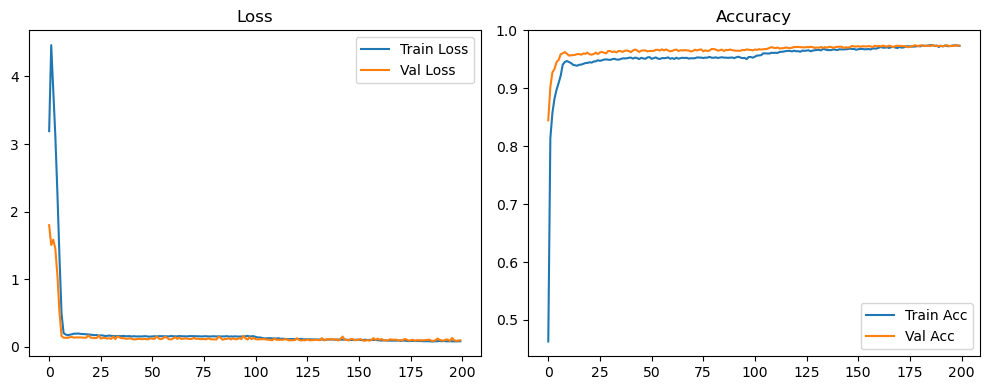

Evaluation:   0%|          | 0/157 [00:00<?, ?it/s]

Evaluation:   6%|▌         | 9/157 [00:00<00:01, 83.94it/s]

Evaluation:  11%|█▏        | 18/157 [00:00<00:01, 84.92it/s]

Evaluation:  17%|█▋        | 27/157 [00:00<00:01, 85.25it/s]

Evaluation:  23%|██▎       | 36/157 [00:00<00:01, 85.46it/s]

Evaluation:  29%|██▊       | 45/157 [00:00<00:01, 85.46it/s]

Evaluation:  34%|███▍      | 54/157 [00:00<00:01, 85.59it/s]

Evaluation:  40%|████      | 63/157 [00:00<00:01, 85.61it/s]

Evaluation:  46%|████▌     | 72/157 [00:00<00:00, 85.67it/s]

Evaluation:  52%|█████▏    | 81/157 [00:00<00:00, 85.62it/s]

Evaluation:  57%|█████▋    | 90/157 [00:01<00:00, 85.40it/s]

Evaluation:  63%|██████▎   | 99/157 [00:01<00:00, 84.63it/s]

Evaluation:  69%|██████▉   | 108/157 [00:01<00:00, 84.65it/s]

Evaluation:  75%|███████▍  | 117/157 [00:01<00:00, 84.82it/s]

Evaluation:  80%|████████  | 126/157 [00:01<00:00, 85.00it/s]

Evaluation:  86%|████████▌ | 135/157 [00:01<00:00, 85.18it/s]

Evaluation:  92%|█████████▏| 144/157 [00:01<00:00, 85.35it/s]

Evaluation:  97%|█████████▋| 153/157 [00:01<00:00, 85.41it/s]

Evaluation: 100%|██████████| 157/157 [00:01<00:00, 85.50it/s]

Original Model Final Test Loss: 0.0893 Accuracy: 0.9766


🚀 Running: batch64_lr0.002_0.002_0.002_dp0.0


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.002 | Train Acc: 0.4984 | Val Acc: 0.8247 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.002 | Train Acc: 0.4984 | Val Acc: 0.8247 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.002 | Train Acc: 0.4984 | Val Acc: 0.8247 |:   0%|          | 1/200 [00:13<46:12, 13.93s/it]

| LR: 0.002 | Train Acc: 0.8476 | Val Acc: 0.8898 |:   0%|          | 1/200 [00:27<46:12, 13.93s/it]

| LR: 0.002 | Train Acc: 0.8476 | Val Acc: 0.8898 |:   0%|          | 1/200 [00:27<46:12, 13.93s/it]

| LR: 0.002 | Train Acc: 0.8476 | Val Acc: 0.8898 |:   1%|          | 2/200 [00:27<45:21, 13.74s/it]

| LR: 0.002 | Train Acc: 0.8944 | Val Acc: 0.9223 |:   1%|          | 2/200 [00:40<45:21, 13.74s/it]

| LR: 0.002 | Train Acc: 0.8944 | Val Acc: 0.9223 |:   1%|          | 2/200 [00:40<45:21, 13.74s/it]

| LR: 0.002 | Train Acc: 0.8944 | Val Acc: 0.9223 |:   2%|▏         | 3/200 [00:40<44:24, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9096 | Val Acc: 0.9279 |:   2%|▏         | 3/200 [00:54<44:24, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9096 | Val Acc: 0.9279 |:   2%|▏         | 3/200 [00:54<44:24, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9096 | Val Acc: 0.9279 |:   2%|▏         | 4/200 [00:54<43:51, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9228 | Val Acc: 0.9343 |:   2%|▏         | 4/200 [01:07<43:51, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9228 | Val Acc: 0.9343 |:   2%|▏         | 4/200 [01:07<43:51, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9228 | Val Acc: 0.9343 |:   2%|▎         | 5/200 [01:07<43:50, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9331 | Val Acc: 0.9417 |:   2%|▎         | 5/200 [01:22<43:50, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9331 | Val Acc: 0.9417 |:   2%|▎         | 5/200 [01:22<43:50, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9331 | Val Acc: 0.9417 |:   3%|▎         | 6/200 [01:22<44:42, 13.83s/it]

| LR: 0.002 | Train Acc: 0.9414 | Val Acc: 0.9397 |:   3%|▎         | 6/200 [01:35<44:42, 13.83s/it]

| LR: 0.002 | Train Acc: 0.9414 | Val Acc: 0.9397 |:   3%|▎         | 6/200 [01:35<44:42, 13.83s/it]

| LR: 0.002 | Train Acc: 0.9414 | Val Acc: 0.9397 |:   4%|▎         | 7/200 [01:35<44:15, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9479 | Val Acc: 0.9478 |:   4%|▎         | 7/200 [01:49<44:15, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9479 | Val Acc: 0.9478 |:   4%|▎         | 7/200 [01:49<44:15, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9479 | Val Acc: 0.9478 |:   4%|▍         | 8/200 [01:49<43:39, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9507 | Val Acc: 0.9482 |:   4%|▍         | 8/200 [02:02<43:39, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9507 | Val Acc: 0.9482 |:   4%|▍         | 8/200 [02:02<43:39, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9507 | Val Acc: 0.9482 |:   4%|▍         | 9/200 [02:02<43:10, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9561 | Val Acc: 0.9450 |:   4%|▍         | 9/200 [02:16<43:10, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9561 | Val Acc: 0.9450 |:   4%|▍         | 9/200 [02:16<43:10, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9561 | Val Acc: 0.9450 |:   5%|▌         | 10/200 [02:16<42:55, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9593 | Val Acc: 0.9477 |:   5%|▌         | 10/200 [02:29<42:55, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9593 | Val Acc: 0.9477 |:   5%|▌         | 10/200 [02:29<42:55, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9593 | Val Acc: 0.9477 |:   6%|▌         | 11/200 [02:29<42:41, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9641 | Val Acc: 0.9565 |:   6%|▌         | 11/200 [02:45<42:41, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9641 | Val Acc: 0.9565 |:   6%|▌         | 11/200 [02:45<42:41, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9641 | Val Acc: 0.9565 |:   6%|▌         | 12/200 [02:45<44:36, 14.24s/it]

| LR: 0.002 | Train Acc: 0.9694 | Val Acc: 0.9533 |:   6%|▌         | 12/200 [02:58<44:36, 14.24s/it]

| LR: 0.002 | Train Acc: 0.9694 | Val Acc: 0.9533 |:   6%|▌         | 12/200 [02:58<44:36, 14.24s/it]

| LR: 0.002 | Train Acc: 0.9694 | Val Acc: 0.9533 |:   6%|▋         | 13/200 [02:58<43:41, 14.02s/it]

| LR: 0.002 | Train Acc: 0.9720 | Val Acc: 0.9577 |:   6%|▋         | 13/200 [03:13<43:41, 14.02s/it]

| LR: 0.002 | Train Acc: 0.9720 | Val Acc: 0.9577 |:   6%|▋         | 13/200 [03:13<43:41, 14.02s/it]

| LR: 0.002 | Train Acc: 0.9720 | Val Acc: 0.9577 |:   7%|▋         | 14/200 [03:13<43:53, 14.16s/it]

| LR: 0.002 | Train Acc: 0.9732 | Val Acc: 0.9601 |:   7%|▋         | 14/200 [03:28<43:53, 14.16s/it]

| LR: 0.002 | Train Acc: 0.9732 | Val Acc: 0.9601 |:   7%|▋         | 14/200 [03:28<43:53, 14.16s/it]

| LR: 0.002 | Train Acc: 0.9732 | Val Acc: 0.9601 |:   8%|▊         | 15/200 [03:28<44:29, 14.43s/it]

| LR: 0.002 | Train Acc: 0.9752 | Val Acc: 0.9632 |:   8%|▊         | 15/200 [03:41<44:29, 14.43s/it]

| LR: 0.002 | Train Acc: 0.9752 | Val Acc: 0.9632 |:   8%|▊         | 15/200 [03:41<44:29, 14.43s/it]

| LR: 0.002 | Train Acc: 0.9752 | Val Acc: 0.9632 |:   8%|▊         | 16/200 [03:41<43:17, 14.12s/it]

| LR: 0.002 | Train Acc: 0.9781 | Val Acc: 0.9568 |:   8%|▊         | 16/200 [03:55<43:17, 14.12s/it]

| LR: 0.002 | Train Acc: 0.9781 | Val Acc: 0.9568 |:   8%|▊         | 16/200 [03:55<43:17, 14.12s/it]

| LR: 0.002 | Train Acc: 0.9781 | Val Acc: 0.9568 |:   8%|▊         | 17/200 [03:55<42:22, 13.89s/it]

| LR: 0.002 | Train Acc: 0.9801 | Val Acc: 0.9633 |:   8%|▊         | 17/200 [04:08<42:22, 13.89s/it]

| LR: 0.002 | Train Acc: 0.9801 | Val Acc: 0.9633 |:   8%|▊         | 17/200 [04:08<42:22, 13.89s/it]

| LR: 0.002 | Train Acc: 0.9801 | Val Acc: 0.9633 |:   9%|▉         | 18/200 [04:08<41:37, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9821 | Val Acc: 0.9653 |:   9%|▉         | 18/200 [04:21<41:37, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9821 | Val Acc: 0.9653 |:   9%|▉         | 18/200 [04:21<41:37, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9821 | Val Acc: 0.9653 |:  10%|▉         | 19/200 [04:21<41:02, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9833 | Val Acc: 0.9668 |:  10%|▉         | 19/200 [04:35<41:02, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9833 | Val Acc: 0.9668 |:  10%|▉         | 19/200 [04:35<41:02, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9833 | Val Acc: 0.9668 |:  10%|█         | 20/200 [04:35<40:32, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9855 | Val Acc: 0.9643 |:  10%|█         | 20/200 [04:48<40:32, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9855 | Val Acc: 0.9643 |:  10%|█         | 20/200 [04:48<40:32, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9855 | Val Acc: 0.9643 |:  10%|█         | 21/200 [04:48<40:19, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9671 |:  10%|█         | 21/200 [05:02<40:19, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9671 |:  10%|█         | 21/200 [05:02<40:19, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9671 |:  11%|█         | 22/200 [05:02<39:54, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9879 | Val Acc: 0.9696 |:  11%|█         | 22/200 [05:15<39:54, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9879 | Val Acc: 0.9696 |:  11%|█         | 22/200 [05:15<39:54, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9879 | Val Acc: 0.9696 |:  12%|█▏        | 23/200 [05:15<39:47, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9882 | Val Acc: 0.9680 |:  12%|█▏        | 23/200 [05:28<39:47, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9882 | Val Acc: 0.9680 |:  12%|█▏        | 23/200 [05:28<39:47, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9882 | Val Acc: 0.9680 |:  12%|█▏        | 24/200 [05:29<39:28, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9890 | Val Acc: 0.9694 |:  12%|█▏        | 24/200 [05:42<39:28, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9890 | Val Acc: 0.9694 |:  12%|█▏        | 24/200 [05:42<39:28, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9890 | Val Acc: 0.9694 |:  12%|█▎        | 25/200 [05:42<39:12, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9901 | Val Acc: 0.9713 |:  12%|█▎        | 25/200 [05:55<39:12, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9901 | Val Acc: 0.9713 |:  12%|█▎        | 25/200 [05:55<39:12, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9901 | Val Acc: 0.9713 |:  13%|█▎        | 26/200 [05:55<38:52, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9691 |:  13%|█▎        | 26/200 [06:09<38:52, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9691 |:  13%|█▎        | 26/200 [06:09<38:52, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9691 |:  14%|█▎        | 27/200 [06:09<38:33, 13.37s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9688 |:  14%|█▎        | 27/200 [06:22<38:33, 13.37s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9688 |:  14%|█▎        | 27/200 [06:22<38:33, 13.37s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9688 |:  14%|█▍        | 28/200 [06:22<38:16, 13.35s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9691 |:  14%|█▍        | 28/200 [06:35<38:16, 13.35s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9691 |:  14%|█▍        | 28/200 [06:35<38:16, 13.35s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9691 |:  14%|█▍        | 29/200 [06:35<38:09, 13.39s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9709 |:  14%|█▍        | 29/200 [06:49<38:09, 13.39s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9709 |:  14%|█▍        | 29/200 [06:49<38:09, 13.39s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9709 |:  15%|█▌        | 30/200 [06:49<37:57, 13.39s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9666 |:  15%|█▌        | 30/200 [07:02<37:57, 13.39s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9666 |:  15%|█▌        | 30/200 [07:02<37:57, 13.39s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9666 |:  16%|█▌        | 31/200 [07:02<37:50, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9923 | Val Acc: 0.9714 |:  16%|█▌        | 31/200 [07:16<37:50, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9923 | Val Acc: 0.9714 |:  16%|█▌        | 31/200 [07:16<37:50, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9923 | Val Acc: 0.9714 |:  16%|█▌        | 32/200 [07:16<37:31, 13.40s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9657 |:  16%|█▌        | 32/200 [07:29<37:31, 13.40s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9657 |:  16%|█▌        | 32/200 [07:29<37:31, 13.40s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9657 |:  16%|█▋        | 33/200 [07:29<37:20, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9709 |:  16%|█▋        | 33/200 [07:42<37:20, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9709 |:  16%|█▋        | 33/200 [07:42<37:20, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9709 |:  17%|█▋        | 34/200 [07:42<37:02, 13.39s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9733 |:  17%|█▋        | 34/200 [07:56<37:02, 13.39s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9733 |:  17%|█▋        | 34/200 [07:56<37:02, 13.39s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9733 |:  18%|█▊        | 35/200 [07:56<36:45, 13.36s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9708 |:  18%|█▊        | 35/200 [08:09<36:45, 13.36s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9708 |:  18%|█▊        | 35/200 [08:09<36:45, 13.36s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9708 |:  18%|█▊        | 36/200 [08:09<36:41, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9717 |:  18%|█▊        | 36/200 [08:22<36:41, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9717 |:  18%|█▊        | 36/200 [08:22<36:41, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9717 |:  18%|█▊        | 37/200 [08:22<36:19, 13.37s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9694 |:  18%|█▊        | 37/200 [08:36<36:19, 13.37s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9694 |:  18%|█▊        | 37/200 [08:36<36:19, 13.37s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9694 |:  19%|█▉        | 38/200 [08:36<36:09, 13.39s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9710 |:  19%|█▉        | 38/200 [08:49<36:09, 13.39s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9710 |:  19%|█▉        | 38/200 [08:49<36:09, 13.39s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9710 |:  20%|█▉        | 39/200 [08:49<35:59, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9721 |:  20%|█▉        | 39/200 [09:03<35:59, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9721 |:  20%|█▉        | 39/200 [09:03<35:59, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9721 |:  20%|██        | 40/200 [09:03<35:51, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9730 |:  20%|██        | 40/200 [09:17<35:51, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9730 |:  20%|██        | 40/200 [09:17<35:51, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9730 |:  20%|██        | 41/200 [09:17<36:10, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9680 |:  20%|██        | 41/200 [09:31<36:10, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9680 |:  20%|██        | 41/200 [09:31<36:10, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9680 |:  21%|██        | 42/200 [09:31<35:50, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9700 |:  21%|██        | 42/200 [09:44<35:50, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9700 |:  21%|██        | 42/200 [09:44<35:50, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9700 |:  22%|██▏       | 43/200 [09:44<35:34, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9715 |:  22%|██▏       | 43/200 [09:58<35:34, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9715 |:  22%|██▏       | 43/200 [09:58<35:34, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9715 |:  22%|██▏       | 44/200 [09:58<35:24, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9952 | Val Acc: 0.9702 |:  22%|██▏       | 44/200 [10:14<35:24, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9952 | Val Acc: 0.9702 |:  22%|██▏       | 44/200 [10:14<35:24, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9952 | Val Acc: 0.9702 |:  22%|██▎       | 45/200 [10:14<36:59, 14.32s/it]

| LR: 0.002 | Train Acc: 0.9952 | Val Acc: 0.9706 |:  22%|██▎       | 45/200 [10:27<36:59, 14.32s/it]

| LR: 0.002 | Train Acc: 0.9952 | Val Acc: 0.9706 |:  22%|██▎       | 45/200 [10:27<36:59, 14.32s/it]

| LR: 0.002 | Train Acc: 0.9952 | Val Acc: 0.9706 |:  23%|██▎       | 46/200 [10:27<36:11, 14.10s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9708 |:  23%|██▎       | 46/200 [10:41<36:11, 14.10s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9708 |:  23%|██▎       | 46/200 [10:41<36:11, 14.10s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9708 |:  24%|██▎       | 47/200 [10:41<35:31, 13.93s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9716 |:  24%|██▎       | 47/200 [10:54<35:31, 13.93s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9716 |:  24%|██▎       | 47/200 [10:54<35:31, 13.93s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9716 |:  24%|██▍       | 48/200 [10:54<34:58, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9683 |:  24%|██▍       | 48/200 [11:08<34:58, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9683 |:  24%|██▍       | 48/200 [11:08<34:58, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9683 |:  24%|██▍       | 49/200 [11:08<34:26, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9702 |:  24%|██▍       | 49/200 [11:21<34:26, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9702 |:  24%|██▍       | 49/200 [11:21<34:26, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9702 |:  25%|██▌       | 50/200 [11:21<34:08, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9718 |:  25%|██▌       | 50/200 [11:35<34:08, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9718 |:  25%|██▌       | 50/200 [11:35<34:08, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9718 |:  26%|██▌       | 51/200 [11:35<33:47, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9704 |:  26%|██▌       | 51/200 [11:48<33:47, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9704 |:  26%|██▌       | 51/200 [11:48<33:47, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9704 |:  26%|██▌       | 52/200 [11:48<33:22, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9703 |:  26%|██▌       | 52/200 [12:02<33:22, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9703 |:  26%|██▌       | 52/200 [12:02<33:22, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9703 |:  26%|██▋       | 53/200 [12:02<33:01, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9728 |:  26%|██▋       | 53/200 [12:15<33:01, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9728 |:  26%|██▋       | 53/200 [12:15<33:01, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9728 |:  27%|██▋       | 54/200 [12:15<32:43, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9727 |:  27%|██▋       | 54/200 [12:28<32:43, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9727 |:  27%|██▋       | 54/200 [12:28<32:43, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9727 |:  28%|██▊       | 55/200 [12:28<32:26, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9721 |:  28%|██▊       | 55/200 [12:42<32:26, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9721 |:  28%|██▊       | 55/200 [12:42<32:26, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9721 |:  28%|██▊       | 56/200 [12:42<32:14, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9715 |:  28%|██▊       | 56/200 [12:55<32:14, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9715 |:  28%|██▊       | 56/200 [12:55<32:14, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9715 |:  28%|██▊       | 57/200 [12:55<32:00, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9727 |:  28%|██▊       | 57/200 [13:09<32:00, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9727 |:  28%|██▊       | 57/200 [13:09<32:00, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9727 |:  29%|██▉       | 58/200 [13:09<31:44, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9712 |:  29%|██▉       | 58/200 [13:22<31:44, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9712 |:  29%|██▉       | 58/200 [13:22<31:44, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9712 |:  30%|██▉       | 59/200 [13:22<31:30, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9732 |:  30%|██▉       | 59/200 [13:35<31:30, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9732 |:  30%|██▉       | 59/200 [13:35<31:30, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9732 |:  30%|███       | 60/200 [13:35<31:17, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9716 |:  30%|███       | 60/200 [13:49<31:17, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9716 |:  30%|███       | 60/200 [13:49<31:17, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9716 |:  30%|███       | 61/200 [13:49<31:29, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9715 |:  30%|███       | 61/200 [14:03<31:29, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9715 |:  30%|███       | 61/200 [14:03<31:29, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9715 |:  31%|███       | 62/200 [14:03<31:15, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9720 |:  31%|███       | 62/200 [14:16<31:15, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9720 |:  31%|███       | 62/200 [14:16<31:15, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9720 |:  32%|███▏      | 63/200 [14:16<30:52, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9696 |:  32%|███▏      | 63/200 [14:30<30:52, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9696 |:  32%|███▏      | 63/200 [14:30<30:52, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9696 |:  32%|███▏      | 64/200 [14:30<30:34, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9706 |:  32%|███▏      | 64/200 [14:43<30:34, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9706 |:  32%|███▏      | 64/200 [14:43<30:34, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9706 |:  32%|███▎      | 65/200 [14:43<30:17, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9717 |:  32%|███▎      | 65/200 [14:57<30:17, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9717 |:  32%|███▎      | 65/200 [14:57<30:17, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9717 |:  33%|███▎      | 66/200 [14:57<30:07, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9732 |:  33%|███▎      | 66/200 [15:10<30:07, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9732 |:  33%|███▎      | 66/200 [15:10<30:07, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9732 |:  34%|███▎      | 67/200 [15:10<29:50, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9725 |:  34%|███▎      | 67/200 [15:24<29:50, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9725 |:  34%|███▎      | 67/200 [15:24<29:50, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9725 |:  34%|███▍      | 68/200 [15:24<29:37, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9720 |:  34%|███▍      | 68/200 [15:37<29:37, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9720 |:  34%|███▍      | 68/200 [15:37<29:37, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9720 |:  34%|███▍      | 69/200 [15:37<29:23, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9724 |:  34%|███▍      | 69/200 [15:50<29:23, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9724 |:  34%|███▍      | 69/200 [15:50<29:23, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9724 |:  35%|███▌      | 70/200 [15:51<29:12, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9728 |:  35%|███▌      | 70/200 [16:04<29:12, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9728 |:  35%|███▌      | 70/200 [16:04<29:12, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9728 |:  36%|███▌      | 71/200 [16:04<28:59, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9735 |:  36%|███▌      | 71/200 [16:18<28:59, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9735 |:  36%|███▌      | 71/200 [16:18<28:59, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9735 |:  36%|███▌      | 72/200 [16:18<28:50, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9702 |:  36%|███▌      | 72/200 [16:31<28:50, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9702 |:  36%|███▌      | 72/200 [16:31<28:50, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9702 |:  36%|███▋      | 73/200 [16:31<28:28, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9719 |:  36%|███▋      | 73/200 [16:44<28:28, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9719 |:  36%|███▋      | 73/200 [16:44<28:28, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9719 |:  37%|███▋      | 74/200 [16:44<28:10, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9720 |:  37%|███▋      | 74/200 [16:58<28:10, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9720 |:  37%|███▋      | 74/200 [16:58<28:10, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9720 |:  38%|███▊      | 75/200 [16:58<27:53, 13.39s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9700 |:  38%|███▊      | 75/200 [17:11<27:53, 13.39s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9700 |:  38%|███▊      | 75/200 [17:11<27:53, 13.39s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9700 |:  38%|███▊      | 76/200 [17:11<27:52, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9730 |:  38%|███▊      | 76/200 [17:25<27:52, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9730 |:  38%|███▊      | 76/200 [17:25<27:52, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9730 |:  38%|███▊      | 77/200 [17:25<27:39, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9711 |:  38%|███▊      | 77/200 [17:38<27:39, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9711 |:  38%|███▊      | 77/200 [17:38<27:39, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9711 |:  39%|███▉      | 78/200 [17:38<27:25, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9746 |:  39%|███▉      | 78/200 [17:52<27:25, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9746 |:  39%|███▉      | 78/200 [17:52<27:25, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9746 |:  40%|███▉      | 79/200 [17:52<27:23, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9728 |:  40%|███▉      | 79/200 [18:06<27:23, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9728 |:  40%|███▉      | 79/200 [18:06<27:23, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9728 |:  40%|████      | 80/200 [18:06<27:14, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9712 |:  40%|████      | 80/200 [18:19<27:14, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9712 |:  40%|████      | 80/200 [18:19<27:14, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9712 |:  40%|████      | 81/200 [18:19<26:53, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9724 |:  40%|████      | 81/200 [18:33<26:53, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9724 |:  40%|████      | 81/200 [18:33<26:53, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9724 |:  41%|████      | 82/200 [18:33<26:34, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9734 |:  41%|████      | 82/200 [18:46<26:34, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9734 |:  41%|████      | 82/200 [18:46<26:34, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9734 |:  42%|████▏     | 83/200 [18:46<26:23, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9738 |:  42%|████▏     | 83/200 [19:01<26:23, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9738 |:  42%|████▏     | 83/200 [19:01<26:23, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9738 |:  42%|████▏     | 84/200 [19:01<26:40, 13.80s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9715 |:  42%|████▏     | 84/200 [19:14<26:40, 13.80s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9715 |:  42%|████▏     | 84/200 [19:14<26:40, 13.80s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9715 |:  42%|████▎     | 85/200 [19:14<26:14, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9732 |:  42%|████▎     | 85/200 [19:27<26:14, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9732 |:  42%|████▎     | 85/200 [19:27<26:14, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9732 |:  43%|████▎     | 86/200 [19:27<25:49, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9723 |:  43%|████▎     | 86/200 [19:41<25:49, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9723 |:  43%|████▎     | 86/200 [19:41<25:49, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9723 |:  44%|████▎     | 87/200 [19:41<25:31, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9691 |:  44%|████▎     | 87/200 [19:54<25:31, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9691 |:  44%|████▎     | 87/200 [19:54<25:31, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9691 |:  44%|████▍     | 88/200 [19:54<25:18, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9738 |:  44%|████▍     | 88/200 [20:08<25:18, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9738 |:  44%|████▍     | 88/200 [20:08<25:18, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9738 |:  44%|████▍     | 89/200 [20:08<24:58, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9722 |:  44%|████▍     | 89/200 [20:21<24:58, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9722 |:  44%|████▍     | 89/200 [20:21<24:58, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9722 |:  45%|████▌     | 90/200 [20:21<24:46, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9727 |:  45%|████▌     | 90/200 [20:35<24:46, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9727 |:  45%|████▌     | 90/200 [20:35<24:46, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9727 |:  46%|████▌     | 91/200 [20:35<24:32, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9713 |:  46%|████▌     | 91/200 [20:48<24:32, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9713 |:  46%|████▌     | 91/200 [20:48<24:32, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9713 |:  46%|████▌     | 92/200 [20:48<24:12, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9737 |:  46%|████▌     | 92/200 [21:02<24:12, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9737 |:  46%|████▌     | 92/200 [21:02<24:12, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9737 |:  46%|████▋     | 93/200 [21:02<24:01, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9731 |:  46%|████▋     | 93/200 [21:16<24:01, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9731 |:  46%|████▋     | 93/200 [21:16<24:01, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9731 |:  47%|████▋     | 94/200 [21:16<24:14, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9718 |:  47%|████▋     | 94/200 [21:33<24:14, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9718 |:  47%|████▋     | 94/200 [21:33<24:14, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9718 |:  48%|████▊     | 95/200 [21:33<25:35, 14.62s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9725 |:  48%|████▊     | 95/200 [21:46<25:35, 14.62s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9725 |:  48%|████▊     | 95/200 [21:46<25:35, 14.62s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9725 |:  48%|████▊     | 96/200 [21:46<24:42, 14.25s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9738 |:  48%|████▊     | 96/200 [21:59<24:42, 14.25s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9738 |:  48%|████▊     | 96/200 [21:59<24:42, 14.25s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9738 |:  48%|████▊     | 97/200 [21:59<23:58, 13.97s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9730 |:  48%|████▊     | 97/200 [22:13<23:58, 13.97s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9730 |:  48%|████▊     | 97/200 [22:13<23:58, 13.97s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9730 |:  49%|████▉     | 98/200 [22:13<23:22, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9734 |:  49%|████▉     | 98/200 [22:26<23:22, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9734 |:  49%|████▉     | 98/200 [22:26<23:22, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9734 |:  50%|████▉     | 99/200 [22:26<22:58, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9740 |:  50%|████▉     | 99/200 [22:39<22:58, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9740 |:  50%|████▉     | 99/200 [22:39<22:58, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9740 |:  50%|█████     | 100/200 [22:39<22:35, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9732 |:  50%|█████     | 100/200 [22:53<22:35, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9732 |:  50%|█████     | 100/200 [22:53<22:35, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9732 |:  50%|█████     | 101/200 [22:53<22:19, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9745 |:  50%|█████     | 101/200 [23:06<22:19, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9745 |:  50%|█████     | 101/200 [23:06<22:19, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9745 |:  51%|█████     | 102/200 [23:06<22:00, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9745 |:  51%|█████     | 102/200 [23:20<22:00, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9745 |:  51%|█████     | 102/200 [23:20<22:00, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9745 |:  52%|█████▏    | 103/200 [23:20<21:43, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9732 |:  52%|█████▏    | 103/200 [23:33<21:43, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9732 |:  52%|█████▏    | 103/200 [23:33<21:43, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9732 |:  52%|█████▏    | 104/200 [23:33<21:39, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9716 |:  52%|█████▏    | 104/200 [23:47<21:39, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9716 |:  52%|█████▏    | 104/200 [23:47<21:39, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9716 |:  52%|█████▎    | 105/200 [23:47<21:24, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9738 |:  52%|█████▎    | 105/200 [24:00<21:24, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9738 |:  52%|█████▎    | 105/200 [24:00<21:24, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9738 |:  53%|█████▎    | 106/200 [24:00<21:04, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9742 |:  53%|█████▎    | 106/200 [24:14<21:04, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9742 |:  53%|█████▎    | 106/200 [24:14<21:04, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9742 |:  54%|█████▎    | 107/200 [24:14<20:50, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9719 |:  54%|█████▎    | 107/200 [24:27<20:50, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9719 |:  54%|█████▎    | 107/200 [24:27<20:50, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9719 |:  54%|█████▍    | 108/200 [24:27<20:33, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9708 |:  54%|█████▍    | 108/200 [24:40<20:33, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9708 |:  54%|█████▍    | 108/200 [24:40<20:33, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9708 |:  55%|█████▍    | 109/200 [24:40<20:18, 13.39s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9729 |:  55%|█████▍    | 109/200 [24:54<20:18, 13.39s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9729 |:  55%|█████▍    | 109/200 [24:54<20:18, 13.39s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9729 |:  55%|█████▌    | 110/200 [24:54<20:21, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9724 |:  55%|█████▌    | 110/200 [25:07<20:21, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9724 |:  55%|█████▌    | 110/200 [25:07<20:21, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9724 |:  56%|█████▌    | 111/200 [25:07<19:59, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9718 |:  56%|█████▌    | 111/200 [25:21<19:59, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9718 |:  56%|█████▌    | 111/200 [25:21<19:59, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9718 |:  56%|█████▌    | 112/200 [25:21<19:44, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9738 |:  56%|█████▌    | 112/200 [25:34<19:44, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9738 |:  56%|█████▌    | 112/200 [25:34<19:44, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9738 |:  56%|█████▋    | 113/200 [25:34<19:32, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9749 |:  56%|█████▋    | 113/200 [25:48<19:32, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9749 |:  56%|█████▋    | 113/200 [25:48<19:32, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9749 |:  57%|█████▋    | 114/200 [25:48<19:19, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9729 |:  57%|█████▋    | 114/200 [26:01<19:19, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9729 |:  57%|█████▋    | 114/200 [26:01<19:19, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9729 |:  57%|█████▊    | 115/200 [26:01<19:03, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9722 |:  57%|█████▊    | 115/200 [26:15<19:03, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9722 |:  57%|█████▊    | 115/200 [26:15<19:03, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9722 |:  58%|█████▊    | 116/200 [26:15<18:49, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9740 |:  58%|█████▊    | 116/200 [26:28<18:49, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9740 |:  58%|█████▊    | 116/200 [26:28<18:49, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9740 |:  58%|█████▊    | 117/200 [26:28<18:39, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9713 |:  58%|█████▊    | 117/200 [26:42<18:39, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9713 |:  58%|█████▊    | 117/200 [26:42<18:39, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9713 |:  59%|█████▉    | 118/200 [26:42<18:27, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9702 |:  59%|█████▉    | 118/200 [26:55<18:27, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9702 |:  59%|█████▉    | 118/200 [26:55<18:27, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9702 |:  60%|█████▉    | 119/200 [26:55<18:15, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9736 |:  60%|█████▉    | 119/200 [27:09<18:15, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9736 |:  60%|█████▉    | 119/200 [27:09<18:15, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9736 |:  60%|██████    | 120/200 [27:09<17:59, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9740 |:  60%|██████    | 120/200 [27:22<17:59, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9740 |:  60%|██████    | 120/200 [27:22<17:59, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9740 |:  60%|██████    | 121/200 [27:22<17:41, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9729 |:  60%|██████    | 121/200 [27:36<17:41, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9729 |:  60%|██████    | 121/200 [27:36<17:41, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9729 |:  61%|██████    | 122/200 [27:36<17:27, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9723 |:  61%|██████    | 122/200 [27:49<17:27, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9723 |:  61%|██████    | 122/200 [27:49<17:27, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9723 |:  62%|██████▏   | 123/200 [27:49<17:15, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9719 |:  62%|██████▏   | 123/200 [28:03<17:15, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9719 |:  62%|██████▏   | 123/200 [28:03<17:15, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9719 |:  62%|██████▏   | 124/200 [28:03<17:21, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9720 |:  62%|██████▏   | 124/200 [28:17<17:21, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9720 |:  62%|██████▏   | 124/200 [28:17<17:21, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9720 |:  62%|██████▎   | 125/200 [28:17<16:59, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9740 |:  62%|██████▎   | 125/200 [28:30<16:59, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9740 |:  62%|██████▎   | 125/200 [28:30<16:59, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9740 |:  63%|██████▎   | 126/200 [28:30<16:40, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9727 |:  63%|██████▎   | 126/200 [28:46<16:40, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9727 |:  63%|██████▎   | 126/200 [28:46<16:40, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9727 |:  64%|██████▎   | 127/200 [28:46<17:16, 14.20s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9738 |:  64%|██████▎   | 127/200 [28:59<17:16, 14.20s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9738 |:  64%|██████▎   | 127/200 [28:59<17:16, 14.20s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9738 |:  64%|██████▍   | 128/200 [28:59<16:43, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9733 |:  64%|██████▍   | 128/200 [29:13<16:43, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9733 |:  64%|██████▍   | 128/200 [29:13<16:43, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9733 |:  64%|██████▍   | 129/200 [29:13<16:20, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9728 |:  64%|██████▍   | 129/200 [29:26<16:20, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9728 |:  64%|██████▍   | 129/200 [29:26<16:20, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9728 |:  65%|██████▌   | 130/200 [29:26<15:57, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9688 |:  65%|██████▌   | 130/200 [29:39<15:57, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9688 |:  65%|██████▌   | 130/200 [29:39<15:57, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9688 |:  66%|██████▌   | 131/200 [29:39<15:39, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  66%|██████▌   | 131/200 [29:53<15:39, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  66%|██████▌   | 131/200 [29:53<15:39, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  66%|██████▌   | 132/200 [29:53<15:21, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9710 |:  66%|██████▌   | 132/200 [30:06<15:21, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9710 |:  66%|██████▌   | 132/200 [30:06<15:21, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9710 |:  66%|██████▋   | 133/200 [30:06<15:08, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9730 |:  66%|██████▋   | 133/200 [30:20<15:08, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9730 |:  66%|██████▋   | 133/200 [30:20<15:08, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9730 |:  67%|██████▋   | 134/200 [30:20<14:57, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9683 |:  67%|██████▋   | 134/200 [30:33<14:57, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9683 |:  67%|██████▋   | 134/200 [30:33<14:57, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9683 |:  68%|██████▊   | 135/200 [30:33<14:38, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9732 |:  68%|██████▊   | 135/200 [30:47<14:38, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9732 |:  68%|██████▊   | 135/200 [30:47<14:38, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9732 |:  68%|██████▊   | 136/200 [30:47<14:20, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9717 |:  68%|██████▊   | 136/200 [31:01<14:20, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9717 |:  68%|██████▊   | 136/200 [31:01<14:20, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9717 |:  68%|██████▊   | 137/200 [31:01<14:13, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9724 |:  68%|██████▊   | 137/200 [31:14<14:13, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9724 |:  68%|██████▊   | 137/200 [31:14<14:13, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9724 |:  69%|██████▉   | 138/200 [31:14<13:58, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9718 |:  69%|██████▉   | 138/200 [31:27<13:58, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9718 |:  69%|██████▉   | 138/200 [31:27<13:58, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9718 |:  70%|██████▉   | 139/200 [31:27<13:41, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9730 |:  70%|██████▉   | 139/200 [31:41<13:41, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9730 |:  70%|██████▉   | 139/200 [31:41<13:41, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9730 |:  70%|███████   | 140/200 [31:41<13:29, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9725 |:  70%|███████   | 140/200 [31:54<13:29, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9725 |:  70%|███████   | 140/200 [31:54<13:29, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9725 |:  70%|███████   | 141/200 [31:54<13:12, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9741 |:  70%|███████   | 141/200 [32:08<13:12, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9741 |:  70%|███████   | 141/200 [32:08<13:12, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9741 |:  71%|███████   | 142/200 [32:08<12:58, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9728 |:  71%|███████   | 142/200 [32:22<12:58, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9728 |:  71%|███████   | 142/200 [32:22<12:58, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9728 |:  72%|███████▏  | 143/200 [32:22<12:53, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9736 |:  72%|███████▏  | 143/200 [32:36<12:53, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9736 |:  72%|███████▏  | 143/200 [32:36<12:53, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9736 |:  72%|███████▏  | 144/200 [32:36<12:57, 13.89s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9748 |:  72%|███████▏  | 144/200 [32:50<12:57, 13.89s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9748 |:  72%|███████▏  | 144/200 [32:50<12:57, 13.89s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9748 |:  72%|███████▎  | 145/200 [32:50<12:37, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9737 |:  72%|███████▎  | 145/200 [33:03<12:37, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9737 |:  72%|███████▎  | 145/200 [33:03<12:37, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9737 |:  73%|███████▎  | 146/200 [33:03<12:22, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9705 |:  73%|███████▎  | 146/200 [33:17<12:22, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9705 |:  73%|███████▎  | 146/200 [33:17<12:22, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9705 |:  74%|███████▎  | 147/200 [33:17<12:02, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9719 |:  74%|███████▎  | 147/200 [33:30<12:02, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9719 |:  74%|███████▎  | 147/200 [33:30<12:02, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9719 |:  74%|███████▍  | 148/200 [33:30<11:46, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  74%|███████▍  | 148/200 [33:44<11:46, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  74%|███████▍  | 148/200 [33:44<11:46, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  74%|███████▍  | 149/200 [33:44<11:32, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9712 |:  74%|███████▍  | 149/200 [33:58<11:32, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9712 |:  74%|███████▍  | 149/200 [33:58<11:32, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9712 |:  75%|███████▌  | 150/200 [33:58<11:23, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9720 |:  75%|███████▌  | 150/200 [34:11<11:23, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9720 |:  75%|███████▌  | 150/200 [34:11<11:23, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9720 |:  76%|███████▌  | 151/200 [34:11<11:08, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9727 |:  76%|███████▌  | 151/200 [34:25<11:08, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9727 |:  76%|███████▌  | 151/200 [34:25<11:08, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9727 |:  76%|███████▌  | 152/200 [34:25<10:53, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9748 |:  76%|███████▌  | 152/200 [34:38<10:53, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9748 |:  76%|███████▌  | 152/200 [34:38<10:53, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9748 |:  76%|███████▋  | 153/200 [34:38<10:37, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9748 |:  76%|███████▋  | 153/200 [34:52<10:37, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9748 |:  76%|███████▋  | 153/200 [34:52<10:37, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9748 |:  77%|███████▋  | 154/200 [34:52<10:23, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9727 |:  77%|███████▋  | 154/200 [35:05<10:23, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9727 |:  77%|███████▋  | 154/200 [35:05<10:23, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9727 |:  78%|███████▊  | 155/200 [35:05<10:10, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9708 |:  78%|███████▊  | 155/200 [35:19<10:10, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9708 |:  78%|███████▊  | 155/200 [35:19<10:10, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9708 |:  78%|███████▊  | 156/200 [35:19<09:54, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9731 |:  78%|███████▊  | 156/200 [35:32<09:54, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9731 |:  78%|███████▊  | 156/200 [35:32<09:54, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9731 |:  78%|███████▊  | 157/200 [35:32<09:42, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9733 |:  78%|███████▊  | 157/200 [35:46<09:42, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9733 |:  78%|███████▊  | 157/200 [35:46<09:42, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9733 |:  79%|███████▉  | 158/200 [35:46<09:26, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9742 |:  79%|███████▉  | 158/200 [35:59<09:26, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9742 |:  79%|███████▉  | 158/200 [35:59<09:26, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9742 |:  80%|███████▉  | 159/200 [35:59<09:15, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9722 |:  80%|███████▉  | 159/200 [36:13<09:15, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9722 |:  80%|███████▉  | 159/200 [36:13<09:15, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9722 |:  80%|████████  | 160/200 [36:13<08:58, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9744 |:  80%|████████  | 160/200 [36:26<08:58, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9744 |:  80%|████████  | 160/200 [36:26<08:58, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9744 |:  80%|████████  | 161/200 [36:26<08:47, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9736 |:  80%|████████  | 161/200 [36:40<08:47, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9736 |:  80%|████████  | 161/200 [36:40<08:47, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9736 |:  81%|████████  | 162/200 [36:40<08:35, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9734 |:  81%|████████  | 162/200 [36:54<08:35, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9734 |:  81%|████████  | 162/200 [36:54<08:35, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9734 |:  82%|████████▏ | 163/200 [36:54<08:23, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9728 |:  82%|████████▏ | 163/200 [37:07<08:23, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9728 |:  82%|████████▏ | 163/200 [37:07<08:23, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9728 |:  82%|████████▏ | 164/200 [37:07<08:05, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9755 |:  82%|████████▏ | 164/200 [37:20<08:05, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9755 |:  82%|████████▏ | 164/200 [37:20<08:05, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9755 |:  82%|████████▎ | 165/200 [37:20<07:51, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9745 |:  82%|████████▎ | 165/200 [37:34<07:51, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9745 |:  82%|████████▎ | 165/200 [37:34<07:51, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9745 |:  83%|████████▎ | 166/200 [37:34<07:38, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9748 |:  83%|████████▎ | 166/200 [37:47<07:38, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9748 |:  83%|████████▎ | 166/200 [37:47<07:38, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9748 |:  84%|████████▎ | 167/200 [37:47<07:24, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9746 |:  84%|████████▎ | 167/200 [38:01<07:24, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9746 |:  84%|████████▎ | 167/200 [38:01<07:24, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9746 |:  84%|████████▍ | 168/200 [38:01<07:10, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9752 |:  84%|████████▍ | 168/200 [38:14<07:10, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9752 |:  84%|████████▍ | 168/200 [38:14<07:10, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9752 |:  84%|████████▍ | 169/200 [38:14<06:58, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9730 |:  84%|████████▍ | 169/200 [38:28<06:58, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9730 |:  84%|████████▍ | 169/200 [38:28<06:58, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9730 |:  85%|████████▌ | 170/200 [38:28<06:43, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9727 |:  85%|████████▌ | 170/200 [38:41<06:43, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9727 |:  85%|████████▌ | 170/200 [38:41<06:43, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9727 |:  86%|████████▌ | 171/200 [38:41<06:29, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9736 |:  86%|████████▌ | 171/200 [38:54<06:29, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9736 |:  86%|████████▌ | 171/200 [38:54<06:29, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9736 |:  86%|████████▌ | 172/200 [38:54<06:15, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9722 |:  86%|████████▌ | 172/200 [39:08<06:15, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9722 |:  86%|████████▌ | 172/200 [39:08<06:15, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9722 |:  86%|████████▋ | 173/200 [39:08<06:01, 13.38s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9733 |:  86%|████████▋ | 173/200 [39:21<06:01, 13.38s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9733 |:  86%|████████▋ | 173/200 [39:21<06:01, 13.38s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9733 |:  87%|████████▋ | 174/200 [39:21<05:48, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9734 |:  87%|████████▋ | 174/200 [39:35<05:48, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9734 |:  87%|████████▋ | 174/200 [39:35<05:48, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9734 |:  88%|████████▊ | 175/200 [39:35<05:36, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9728 |:  88%|████████▊ | 175/200 [39:48<05:36, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9728 |:  88%|████████▊ | 175/200 [39:48<05:36, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9728 |:  88%|████████▊ | 176/200 [39:48<05:23, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9741 |:  88%|████████▊ | 176/200 [40:02<05:23, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9741 |:  88%|████████▊ | 176/200 [40:02<05:23, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9741 |:  88%|████████▊ | 177/200 [40:02<05:09, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9735 |:  88%|████████▊ | 177/200 [40:15<05:09, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9735 |:  88%|████████▊ | 177/200 [40:15<05:09, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9735 |:  89%|████████▉ | 178/200 [40:15<04:55, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9744 |:  89%|████████▉ | 178/200 [40:28<04:55, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9744 |:  89%|████████▉ | 178/200 [40:28<04:55, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9744 |:  90%|████████▉ | 179/200 [40:28<04:41, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9738 |:  90%|████████▉ | 179/200 [40:42<04:41, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9738 |:  90%|████████▉ | 179/200 [40:42<04:41, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9738 |:  90%|█████████ | 180/200 [40:42<04:29, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9733 |:  90%|█████████ | 180/200 [40:55<04:29, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9733 |:  90%|█████████ | 180/200 [40:55<04:29, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9733 |:  90%|█████████ | 181/200 [40:55<04:15, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9744 |:  90%|█████████ | 181/200 [41:09<04:15, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9744 |:  90%|█████████ | 181/200 [41:09<04:15, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9744 |:  91%|█████████ | 182/200 [41:09<04:01, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9717 |:  91%|█████████ | 182/200 [41:22<04:01, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9717 |:  91%|█████████ | 182/200 [41:22<04:01, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9717 |:  92%|█████████▏| 183/200 [41:22<03:47, 13.37s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9719 |:  92%|█████████▏| 183/200 [41:35<03:47, 13.37s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9719 |:  92%|█████████▏| 183/200 [41:35<03:47, 13.37s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9719 |:  92%|█████████▏| 184/200 [41:36<03:34, 13.40s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9734 |:  92%|█████████▏| 184/200 [41:51<03:34, 13.40s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9734 |:  92%|█████████▏| 184/200 [41:51<03:34, 13.40s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9734 |:  92%|█████████▎| 185/200 [41:51<03:31, 14.10s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9733 |:  92%|█████████▎| 185/200 [42:05<03:31, 14.10s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9733 |:  92%|█████████▎| 185/200 [42:05<03:31, 14.10s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9733 |:  93%|█████████▎| 186/200 [42:05<03:17, 14.11s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9736 |:  93%|█████████▎| 186/200 [42:19<03:17, 14.11s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9736 |:  93%|█████████▎| 186/200 [42:19<03:17, 14.11s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9736 |:  94%|█████████▎| 187/200 [42:19<03:01, 13.95s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  94%|█████████▎| 187/200 [42:32<03:01, 13.95s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  94%|█████████▎| 187/200 [42:32<03:01, 13.95s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  94%|█████████▍| 188/200 [42:33<02:45, 13.83s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9732 |:  94%|█████████▍| 188/200 [42:46<02:45, 13.83s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9732 |:  94%|█████████▍| 188/200 [42:46<02:45, 13.83s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9732 |:  94%|█████████▍| 189/200 [42:46<02:30, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9724 |:  94%|█████████▍| 189/200 [42:59<02:30, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9724 |:  94%|█████████▍| 189/200 [42:59<02:30, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9724 |:  95%|█████████▌| 190/200 [42:59<02:15, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9736 |:  95%|█████████▌| 190/200 [43:14<02:15, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9736 |:  95%|█████████▌| 190/200 [43:14<02:15, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9736 |:  96%|█████████▌| 191/200 [43:14<02:04, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9721 |:  96%|█████████▌| 191/200 [43:27<02:04, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9721 |:  96%|█████████▌| 191/200 [43:27<02:04, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9721 |:  96%|█████████▌| 192/200 [43:27<01:49, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9734 |:  96%|█████████▌| 192/200 [43:40<01:49, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9734 |:  96%|█████████▌| 192/200 [43:40<01:49, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9734 |:  96%|█████████▋| 193/200 [43:40<01:34, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9739 |:  96%|█████████▋| 193/200 [43:54<01:34, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9739 |:  96%|█████████▋| 193/200 [43:54<01:34, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9739 |:  97%|█████████▋| 194/200 [43:54<01:21, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9737 |:  97%|█████████▋| 194/200 [44:07<01:21, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9737 |:  97%|█████████▋| 194/200 [44:07<01:21, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9737 |:  98%|█████████▊| 195/200 [44:07<01:07, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9728 |:  98%|█████████▊| 195/200 [44:20<01:07, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9728 |:  98%|█████████▊| 195/200 [44:20<01:07, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9728 |:  98%|█████████▊| 196/200 [44:20<00:53, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9736 |:  98%|█████████▊| 196/200 [44:34<00:53, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9736 |:  98%|█████████▊| 196/200 [44:34<00:53, 13.42s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9736 |:  98%|█████████▊| 197/200 [44:34<00:40, 13.40s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9752 |:  98%|█████████▊| 197/200 [44:47<00:40, 13.40s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9752 |:  98%|█████████▊| 197/200 [44:47<00:40, 13.40s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9752 |:  99%|█████████▉| 198/200 [44:47<00:26, 13.36s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9763 |:  99%|█████████▉| 198/200 [45:00<00:26, 13.36s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9763 |:  99%|█████████▉| 198/200 [45:00<00:26, 13.36s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9763 |: 100%|█████████▉| 199/200 [45:00<00:13, 13.38s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9751 |: 100%|█████████▉| 199/200 [45:14<00:13, 13.38s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9751 |: 100%|█████████▉| 199/200 [45:14<00:13, 13.38s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9751 |: 100%|██████████| 200/200 [45:14<00:00, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9751 |: 100%|██████████| 200/200 [45:14<00:00, 13.57s/it]

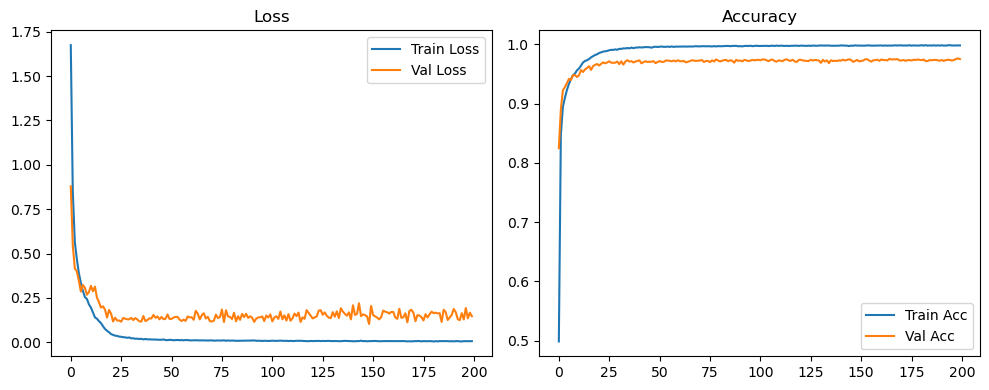

Evaluation:   0%|          | 0/157 [00:00<?, ?it/s]

Evaluation:   6%|▌         | 9/157 [00:00<00:01, 84.15it/s]

Evaluation:  11%|█▏        | 18/157 [00:00<00:01, 84.63it/s]

Evaluation:  17%|█▋        | 27/157 [00:00<00:01, 84.84it/s]

Evaluation:  23%|██▎       | 36/157 [00:00<00:01, 84.99it/s]

Evaluation:  29%|██▊       | 45/157 [00:00<00:01, 85.00it/s]

Evaluation:  34%|███▍      | 54/157 [00:00<00:01, 84.87it/s]

Evaluation:  40%|████      | 63/157 [00:00<00:01, 84.89it/s]

Evaluation:  46%|████▌     | 72/157 [00:00<00:01, 84.89it/s]

Evaluation:  52%|█████▏    | 81/157 [00:00<00:00, 84.81it/s]

Evaluation:  57%|█████▋    | 90/157 [00:01<00:00, 84.85it/s]

Evaluation:  63%|██████▎   | 99/157 [00:01<00:00, 83.31it/s]

Evaluation:  69%|██████▉   | 108/157 [00:01<00:00, 83.93it/s]

Evaluation:  75%|███████▍  | 117/157 [00:01<00:00, 84.33it/s]

Evaluation:  80%|████████  | 126/157 [00:01<00:00, 84.59it/s]

Evaluation:  86%|████████▌ | 135/157 [00:01<00:00, 84.78it/s]

Evaluation:  92%|█████████▏| 144/157 [00:01<00:00, 84.82it/s]

Evaluation:  97%|█████████▋| 153/157 [00:01<00:00, 84.80it/s]

Evaluation: 100%|██████████| 157/157 [00:01<00:00, 84.87it/s]

Original Model Final Test Loss: 0.1445 Accuracy: 0.9742


🚀 Running: batch64_lr0.002_0.002_0.002_dp0.2


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.002 | Train Acc: 0.4676 | Val Acc: 0.8326 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.002 | Train Acc: 0.4676 | Val Acc: 0.8326 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.002 | Train Acc: 0.4676 | Val Acc: 0.8326 |:   0%|          | 1/200 [00:13<46:07, 13.91s/it]

| LR: 0.002 | Train Acc: 0.8242 | Val Acc: 0.8860 |:   0%|          | 1/200 [00:27<46:07, 13.91s/it]

| LR: 0.002 | Train Acc: 0.8242 | Val Acc: 0.8860 |:   0%|          | 1/200 [00:27<46:07, 13.91s/it]

| LR: 0.002 | Train Acc: 0.8242 | Val Acc: 0.8860 |:   1%|          | 2/200 [00:27<45:14, 13.71s/it]

| LR: 0.002 | Train Acc: 0.8763 | Val Acc: 0.9166 |:   1%|          | 2/200 [00:40<45:14, 13.71s/it]

| LR: 0.002 | Train Acc: 0.8763 | Val Acc: 0.9166 |:   1%|          | 2/200 [00:40<45:14, 13.71s/it]

| LR: 0.002 | Train Acc: 0.8763 | Val Acc: 0.9166 |:   2%|▏         | 3/200 [00:40<44:38, 13.60s/it]

| LR: 0.002 | Train Acc: 0.8962 | Val Acc: 0.9305 |:   2%|▏         | 3/200 [00:54<44:38, 13.60s/it]

| LR: 0.002 | Train Acc: 0.8962 | Val Acc: 0.9305 |:   2%|▏         | 3/200 [00:54<44:38, 13.60s/it]

| LR: 0.002 | Train Acc: 0.8962 | Val Acc: 0.9305 |:   2%|▏         | 4/200 [00:54<44:11, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9119 | Val Acc: 0.9360 |:   2%|▏         | 4/200 [01:07<44:11, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9119 | Val Acc: 0.9360 |:   2%|▏         | 4/200 [01:07<44:11, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9119 | Val Acc: 0.9360 |:   2%|▎         | 5/200 [01:07<43:52, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9217 | Val Acc: 0.9383 |:   2%|▎         | 5/200 [01:21<43:52, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9217 | Val Acc: 0.9383 |:   2%|▎         | 5/200 [01:21<43:52, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9217 | Val Acc: 0.9383 |:   3%|▎         | 6/200 [01:21<43:39, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9309 | Val Acc: 0.9491 |:   3%|▎         | 6/200 [01:34<43:39, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9309 | Val Acc: 0.9491 |:   3%|▎         | 6/200 [01:34<43:39, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9309 | Val Acc: 0.9491 |:   4%|▎         | 7/200 [01:34<43:28, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9380 | Val Acc: 0.9489 |:   4%|▎         | 7/200 [01:48<43:28, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9380 | Val Acc: 0.9489 |:   4%|▎         | 7/200 [01:48<43:28, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9380 | Val Acc: 0.9489 |:   4%|▍         | 8/200 [01:48<43:21, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9449 | Val Acc: 0.9519 |:   4%|▍         | 8/200 [02:01<43:21, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9449 | Val Acc: 0.9519 |:   4%|▍         | 8/200 [02:01<43:21, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9449 | Val Acc: 0.9519 |:   4%|▍         | 9/200 [02:02<43:06, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9500 | Val Acc: 0.9538 |:   4%|▍         | 9/200 [02:15<43:06, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9500 | Val Acc: 0.9538 |:   4%|▍         | 9/200 [02:15<43:06, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9500 | Val Acc: 0.9538 |:   5%|▌         | 10/200 [02:15<42:52, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9565 | Val Acc: 0.9551 |:   5%|▌         | 10/200 [02:28<42:52, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9565 | Val Acc: 0.9551 |:   5%|▌         | 10/200 [02:28<42:52, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9565 | Val Acc: 0.9551 |:   6%|▌         | 11/200 [02:28<42:34, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9593 | Val Acc: 0.9630 |:   6%|▌         | 11/200 [02:42<42:34, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9593 | Val Acc: 0.9630 |:   6%|▌         | 11/200 [02:42<42:34, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9593 | Val Acc: 0.9630 |:   6%|▌         | 12/200 [02:42<42:24, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9641 | Val Acc: 0.9607 |:   6%|▌         | 12/200 [02:56<42:24, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9641 | Val Acc: 0.9607 |:   6%|▌         | 12/200 [02:56<42:24, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9641 | Val Acc: 0.9607 |:   6%|▋         | 13/200 [02:56<42:23, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9667 | Val Acc: 0.9656 |:   6%|▋         | 13/200 [03:09<42:23, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9667 | Val Acc: 0.9656 |:   6%|▋         | 13/200 [03:09<42:23, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9667 | Val Acc: 0.9656 |:   7%|▋         | 14/200 [03:09<42:02, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9704 | Val Acc: 0.9652 |:   7%|▋         | 14/200 [03:23<42:02, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9704 | Val Acc: 0.9652 |:   7%|▋         | 14/200 [03:23<42:02, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9704 | Val Acc: 0.9652 |:   8%|▊         | 15/200 [03:23<41:55, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9708 | Val Acc: 0.9663 |:   8%|▊         | 15/200 [03:36<41:55, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9708 | Val Acc: 0.9663 |:   8%|▊         | 15/200 [03:36<41:55, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9708 | Val Acc: 0.9663 |:   8%|▊         | 16/200 [03:36<41:31, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9737 | Val Acc: 0.9629 |:   8%|▊         | 16/200 [03:50<41:31, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9737 | Val Acc: 0.9629 |:   8%|▊         | 16/200 [03:50<41:31, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9737 | Val Acc: 0.9629 |:   8%|▊         | 17/200 [03:50<41:20, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9755 | Val Acc: 0.9679 |:   8%|▊         | 17/200 [04:03<41:20, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9755 | Val Acc: 0.9679 |:   8%|▊         | 17/200 [04:03<41:20, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9755 | Val Acc: 0.9679 |:   9%|▉         | 18/200 [04:03<40:58, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9775 | Val Acc: 0.9677 |:   9%|▉         | 18/200 [04:17<40:58, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9775 | Val Acc: 0.9677 |:   9%|▉         | 18/200 [04:17<40:58, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9775 | Val Acc: 0.9677 |:  10%|▉         | 19/200 [04:17<40:52, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9781 | Val Acc: 0.9668 |:  10%|▉         | 19/200 [04:31<40:52, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9781 | Val Acc: 0.9668 |:  10%|▉         | 19/200 [04:31<40:52, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9781 | Val Acc: 0.9668 |:  10%|█         | 20/200 [04:31<40:37, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9799 | Val Acc: 0.9692 |:  10%|█         | 20/200 [04:46<40:37, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9799 | Val Acc: 0.9692 |:  10%|█         | 20/200 [04:46<40:37, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9799 | Val Acc: 0.9692 |:  10%|█         | 21/200 [04:46<42:20, 14.20s/it]

| LR: 0.002 | Train Acc: 0.9808 | Val Acc: 0.9710 |:  10%|█         | 21/200 [05:01<42:20, 14.20s/it]

| LR: 0.002 | Train Acc: 0.9808 | Val Acc: 0.9710 |:  10%|█         | 21/200 [05:01<42:20, 14.20s/it]

| LR: 0.002 | Train Acc: 0.9808 | Val Acc: 0.9710 |:  11%|█         | 22/200 [05:01<42:51, 14.45s/it]

| LR: 0.002 | Train Acc: 0.9824 | Val Acc: 0.9689 |:  11%|█         | 22/200 [05:16<42:51, 14.45s/it]

| LR: 0.002 | Train Acc: 0.9824 | Val Acc: 0.9689 |:  11%|█         | 22/200 [05:16<42:51, 14.45s/it]

| LR: 0.002 | Train Acc: 0.9824 | Val Acc: 0.9689 |:  12%|█▏        | 23/200 [05:16<42:45, 14.50s/it]

| LR: 0.002 | Train Acc: 0.9820 | Val Acc: 0.9678 |:  12%|█▏        | 23/200 [05:30<42:45, 14.50s/it]

| LR: 0.002 | Train Acc: 0.9820 | Val Acc: 0.9678 |:  12%|█▏        | 23/200 [05:30<42:45, 14.50s/it]

| LR: 0.002 | Train Acc: 0.9820 | Val Acc: 0.9678 |:  12%|█▏        | 24/200 [05:30<41:46, 14.24s/it]

| LR: 0.002 | Train Acc: 0.9845 | Val Acc: 0.9712 |:  12%|█▏        | 24/200 [05:43<41:46, 14.24s/it]

| LR: 0.002 | Train Acc: 0.9845 | Val Acc: 0.9712 |:  12%|█▏        | 24/200 [05:43<41:46, 14.24s/it]

| LR: 0.002 | Train Acc: 0.9845 | Val Acc: 0.9712 |:  12%|█▎        | 25/200 [05:43<40:51, 14.01s/it]

| LR: 0.002 | Train Acc: 0.9832 | Val Acc: 0.9683 |:  12%|█▎        | 25/200 [05:59<40:51, 14.01s/it]

| LR: 0.002 | Train Acc: 0.9832 | Val Acc: 0.9683 |:  12%|█▎        | 25/200 [05:59<40:51, 14.01s/it]

| LR: 0.002 | Train Acc: 0.9832 | Val Acc: 0.9683 |:  13%|█▎        | 26/200 [05:59<42:00, 14.48s/it]

| LR: 0.002 | Train Acc: 0.9839 | Val Acc: 0.9708 |:  13%|█▎        | 26/200 [06:12<42:00, 14.48s/it]

| LR: 0.002 | Train Acc: 0.9839 | Val Acc: 0.9708 |:  13%|█▎        | 26/200 [06:12<42:00, 14.48s/it]

| LR: 0.002 | Train Acc: 0.9839 | Val Acc: 0.9708 |:  14%|█▎        | 27/200 [06:12<40:53, 14.18s/it]

| LR: 0.002 | Train Acc: 0.9846 | Val Acc: 0.9713 |:  14%|█▎        | 27/200 [06:26<40:53, 14.18s/it]

| LR: 0.002 | Train Acc: 0.9846 | Val Acc: 0.9713 |:  14%|█▎        | 27/200 [06:26<40:53, 14.18s/it]

| LR: 0.002 | Train Acc: 0.9846 | Val Acc: 0.9713 |:  14%|█▍        | 28/200 [06:26<40:06, 13.99s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9701 |:  14%|█▍        | 28/200 [06:40<40:06, 13.99s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9701 |:  14%|█▍        | 28/200 [06:40<40:06, 13.99s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9701 |:  14%|█▍        | 29/200 [06:40<40:14, 14.12s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9708 |:  14%|█▍        | 29/200 [06:54<40:14, 14.12s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9708 |:  14%|█▍        | 29/200 [06:54<40:14, 14.12s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9708 |:  15%|█▌        | 30/200 [06:54<39:27, 13.93s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9698 |:  15%|█▌        | 30/200 [07:08<39:27, 13.93s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9698 |:  15%|█▌        | 30/200 [07:08<39:27, 13.93s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9698 |:  16%|█▌        | 31/200 [07:08<39:34, 14.05s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9711 |:  16%|█▌        | 31/200 [07:21<39:34, 14.05s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9711 |:  16%|█▌        | 31/200 [07:21<39:34, 14.05s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9711 |:  16%|█▌        | 32/200 [07:22<38:58, 13.92s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9745 |:  16%|█▌        | 32/200 [07:35<38:58, 13.92s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9745 |:  16%|█▌        | 32/200 [07:35<38:58, 13.92s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9745 |:  16%|█▋        | 33/200 [07:35<38:34, 13.86s/it]

| LR: 0.002 | Train Acc: 0.9882 | Val Acc: 0.9707 |:  16%|█▋        | 33/200 [07:49<38:34, 13.86s/it]

| LR: 0.002 | Train Acc: 0.9882 | Val Acc: 0.9707 |:  16%|█▋        | 33/200 [07:49<38:34, 13.86s/it]

| LR: 0.002 | Train Acc: 0.9882 | Val Acc: 0.9707 |:  17%|█▋        | 34/200 [07:49<38:11, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9875 | Val Acc: 0.9707 |:  17%|█▋        | 34/200 [08:02<38:11, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9875 | Val Acc: 0.9707 |:  17%|█▋        | 34/200 [08:02<38:11, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9875 | Val Acc: 0.9707 |:  18%|█▊        | 35/200 [08:03<37:48, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9728 |:  18%|█▊        | 35/200 [08:16<37:48, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9728 |:  18%|█▊        | 35/200 [08:16<37:48, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9728 |:  18%|█▊        | 36/200 [08:16<37:28, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9894 | Val Acc: 0.9721 |:  18%|█▊        | 36/200 [08:31<37:28, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9894 | Val Acc: 0.9721 |:  18%|█▊        | 36/200 [08:31<37:28, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9894 | Val Acc: 0.9721 |:  18%|█▊        | 37/200 [08:31<38:33, 14.19s/it]

| LR: 0.002 | Train Acc: 0.9897 | Val Acc: 0.9719 |:  18%|█▊        | 37/200 [08:45<38:33, 14.19s/it]

| LR: 0.002 | Train Acc: 0.9897 | Val Acc: 0.9719 |:  18%|█▊        | 37/200 [08:45<38:33, 14.19s/it]

| LR: 0.002 | Train Acc: 0.9897 | Val Acc: 0.9719 |:  19%|█▉        | 38/200 [08:45<37:53, 14.04s/it]

| LR: 0.002 | Train Acc: 0.9889 | Val Acc: 0.9716 |:  19%|█▉        | 38/200 [08:59<37:53, 14.04s/it]

| LR: 0.002 | Train Acc: 0.9889 | Val Acc: 0.9716 |:  19%|█▉        | 38/200 [08:59<37:53, 14.04s/it]

| LR: 0.002 | Train Acc: 0.9889 | Val Acc: 0.9716 |:  20%|█▉        | 39/200 [08:59<37:20, 13.91s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9727 |:  20%|█▉        | 39/200 [09:12<37:20, 13.91s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9727 |:  20%|█▉        | 39/200 [09:12<37:20, 13.91s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9727 |:  20%|██        | 40/200 [09:12<36:51, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9726 |:  20%|██        | 40/200 [09:26<36:51, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9726 |:  20%|██        | 40/200 [09:26<36:51, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9726 |:  20%|██        | 41/200 [09:26<36:29, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9723 |:  20%|██        | 41/200 [09:39<36:29, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9723 |:  20%|██        | 41/200 [09:40<36:29, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9723 |:  21%|██        | 42/200 [09:40<36:03, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9898 | Val Acc: 0.9732 |:  21%|██        | 42/200 [09:53<36:03, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9898 | Val Acc: 0.9732 |:  21%|██        | 42/200 [09:53<36:03, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9898 | Val Acc: 0.9732 |:  22%|██▏       | 43/200 [09:53<35:50, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9714 |:  22%|██▏       | 43/200 [10:07<35:50, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9714 |:  22%|██▏       | 43/200 [10:07<35:50, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9714 |:  22%|██▏       | 44/200 [10:07<35:38, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9747 |:  22%|██▏       | 44/200 [10:20<35:38, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9747 |:  22%|██▏       | 44/200 [10:20<35:38, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9747 |:  22%|██▎       | 45/200 [10:20<35:16, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9738 |:  22%|██▎       | 45/200 [10:35<35:16, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9738 |:  22%|██▎       | 45/200 [10:35<35:16, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9738 |:  23%|██▎       | 46/200 [10:35<35:50, 13.96s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9708 |:  23%|██▎       | 46/200 [10:49<35:50, 13.96s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9708 |:  23%|██▎       | 46/200 [10:49<35:50, 13.96s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9708 |:  24%|██▎       | 47/200 [10:49<35:20, 13.86s/it]

| LR: 0.002 | Train Acc: 0.9903 | Val Acc: 0.9731 |:  24%|██▎       | 47/200 [11:02<35:20, 13.86s/it]

| LR: 0.002 | Train Acc: 0.9903 | Val Acc: 0.9731 |:  24%|██▎       | 47/200 [11:02<35:20, 13.86s/it]

| LR: 0.002 | Train Acc: 0.9903 | Val Acc: 0.9731 |:  24%|██▍       | 48/200 [11:02<34:55, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9725 |:  24%|██▍       | 48/200 [11:16<34:55, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9725 |:  24%|██▍       | 48/200 [11:16<34:55, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9725 |:  24%|██▍       | 49/200 [11:16<34:42, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9726 |:  24%|██▍       | 49/200 [11:30<34:42, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9726 |:  24%|██▍       | 49/200 [11:30<34:42, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9726 |:  25%|██▌       | 50/200 [11:30<34:30, 13.80s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9714 |:  25%|██▌       | 50/200 [11:45<34:30, 13.80s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9714 |:  25%|██▌       | 50/200 [11:45<34:30, 13.80s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9714 |:  26%|██▌       | 51/200 [11:45<35:21, 14.24s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9719 |:  26%|██▌       | 51/200 [11:59<35:21, 14.24s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9719 |:  26%|██▌       | 51/200 [11:59<35:21, 14.24s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9719 |:  26%|██▌       | 52/200 [11:59<34:32, 14.00s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9730 |:  26%|██▌       | 52/200 [12:12<34:32, 14.00s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9730 |:  26%|██▌       | 52/200 [12:12<34:32, 14.00s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9730 |:  26%|██▋       | 53/200 [12:12<33:51, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9906 | Val Acc: 0.9757 |:  26%|██▋       | 53/200 [12:27<33:51, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9906 | Val Acc: 0.9757 |:  26%|██▋       | 53/200 [12:27<33:51, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9906 | Val Acc: 0.9757 |:  27%|██▋       | 54/200 [12:27<34:15, 14.08s/it]

| LR: 0.002 | Train Acc: 0.9916 | Val Acc: 0.9721 |:  27%|██▋       | 54/200 [12:40<34:15, 14.08s/it]

| LR: 0.002 | Train Acc: 0.9916 | Val Acc: 0.9721 |:  27%|██▋       | 54/200 [12:40<34:15, 14.08s/it]

| LR: 0.002 | Train Acc: 0.9916 | Val Acc: 0.9721 |:  28%|██▊       | 55/200 [12:41<33:43, 13.96s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9733 |:  28%|██▊       | 55/200 [12:54<33:43, 13.96s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9733 |:  28%|██▊       | 55/200 [12:54<33:43, 13.96s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9733 |:  28%|██▊       | 56/200 [12:54<33:18, 13.88s/it]

| LR: 0.002 | Train Acc: 0.9916 | Val Acc: 0.9738 |:  28%|██▊       | 56/200 [13:08<33:18, 13.88s/it]

| LR: 0.002 | Train Acc: 0.9916 | Val Acc: 0.9738 |:  28%|██▊       | 56/200 [13:08<33:18, 13.88s/it]

| LR: 0.002 | Train Acc: 0.9916 | Val Acc: 0.9738 |:  28%|██▊       | 57/200 [13:08<32:59, 13.84s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9735 |:  28%|██▊       | 57/200 [13:22<32:59, 13.84s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9735 |:  28%|██▊       | 57/200 [13:22<32:59, 13.84s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9735 |:  29%|██▉       | 58/200 [13:22<32:37, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9729 |:  29%|██▉       | 58/200 [13:35<32:37, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9729 |:  29%|██▉       | 58/200 [13:35<32:37, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9729 |:  30%|██▉       | 59/200 [13:35<32:15, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9736 |:  30%|██▉       | 59/200 [13:49<32:15, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9736 |:  30%|██▉       | 59/200 [13:49<32:15, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9736 |:  30%|███       | 60/200 [13:49<31:51, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9722 |:  30%|███       | 60/200 [14:02<31:51, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9722 |:  30%|███       | 60/200 [14:02<31:51, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9722 |:  30%|███       | 61/200 [14:02<31:35, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9730 |:  30%|███       | 61/200 [14:16<31:35, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9730 |:  30%|███       | 61/200 [14:16<31:35, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9730 |:  31%|███       | 62/200 [14:16<31:15, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9727 |:  31%|███       | 62/200 [14:29<31:15, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9727 |:  31%|███       | 62/200 [14:29<31:15, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9727 |:  32%|███▏      | 63/200 [14:29<30:53, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9747 |:  32%|███▏      | 63/200 [14:43<30:53, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9747 |:  32%|███▏      | 63/200 [14:43<30:53, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9747 |:  32%|███▏      | 64/200 [14:43<30:36, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9740 |:  32%|███▏      | 64/200 [14:56<30:36, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9740 |:  32%|███▏      | 64/200 [14:56<30:36, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9740 |:  32%|███▎      | 65/200 [14:56<30:25, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9743 |:  32%|███▎      | 65/200 [15:10<30:25, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9743 |:  32%|███▎      | 65/200 [15:10<30:25, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9743 |:  33%|███▎      | 66/200 [15:10<30:10, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9756 |:  33%|███▎      | 66/200 [15:23<30:10, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9756 |:  33%|███▎      | 66/200 [15:23<30:10, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9756 |:  34%|███▎      | 67/200 [15:23<29:52, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9923 | Val Acc: 0.9745 |:  34%|███▎      | 67/200 [15:37<29:52, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9923 | Val Acc: 0.9745 |:  34%|███▎      | 67/200 [15:37<29:52, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9923 | Val Acc: 0.9745 |:  34%|███▍      | 68/200 [15:37<29:40, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9749 |:  34%|███▍      | 68/200 [15:52<29:40, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9749 |:  34%|███▍      | 68/200 [15:52<29:40, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9749 |:  34%|███▍      | 69/200 [15:52<30:29, 13.97s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9748 |:  34%|███▍      | 69/200 [16:05<30:29, 13.97s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9748 |:  34%|███▍      | 69/200 [16:05<30:29, 13.97s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9748 |:  35%|███▌      | 70/200 [16:05<29:55, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9728 |:  35%|███▌      | 70/200 [16:19<29:55, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9728 |:  35%|███▌      | 70/200 [16:19<29:55, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9728 |:  36%|███▌      | 71/200 [16:19<29:30, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9706 |:  36%|███▌      | 71/200 [16:32<29:30, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9706 |:  36%|███▌      | 71/200 [16:32<29:30, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9706 |:  36%|███▌      | 72/200 [16:32<29:06, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9720 |:  36%|███▌      | 72/200 [16:46<29:06, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9720 |:  36%|███▌      | 72/200 [16:46<29:06, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9720 |:  36%|███▋      | 73/200 [16:46<28:45, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9742 |:  36%|███▋      | 73/200 [16:59<28:45, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9742 |:  36%|███▋      | 73/200 [16:59<28:45, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9742 |:  37%|███▋      | 74/200 [16:59<28:27, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9718 |:  37%|███▋      | 74/200 [17:12<28:27, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9718 |:  37%|███▋      | 74/200 [17:12<28:27, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9718 |:  38%|███▊      | 75/200 [17:12<28:09, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9733 |:  38%|███▊      | 75/200 [17:26<28:09, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9733 |:  38%|███▊      | 75/200 [17:26<28:09, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9733 |:  38%|███▊      | 76/200 [17:26<27:54, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9917 | Val Acc: 0.9729 |:  38%|███▊      | 76/200 [17:39<27:54, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9917 | Val Acc: 0.9729 |:  38%|███▊      | 76/200 [17:39<27:54, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9917 | Val Acc: 0.9729 |:  38%|███▊      | 77/200 [17:39<27:40, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9921 | Val Acc: 0.9715 |:  38%|███▊      | 77/200 [17:53<27:40, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9921 | Val Acc: 0.9715 |:  38%|███▊      | 77/200 [17:53<27:40, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9921 | Val Acc: 0.9715 |:  39%|███▉      | 78/200 [17:53<27:26, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9721 |:  39%|███▉      | 78/200 [18:06<27:26, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9721 |:  39%|███▉      | 78/200 [18:06<27:26, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9721 |:  40%|███▉      | 79/200 [18:06<27:11, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9750 |:  40%|███▉      | 79/200 [18:20<27:11, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9750 |:  40%|███▉      | 79/200 [18:20<27:11, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9750 |:  40%|████      | 80/200 [18:20<26:58, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9725 |:  40%|████      | 80/200 [18:33<26:58, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9725 |:  40%|████      | 80/200 [18:33<26:58, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9725 |:  40%|████      | 81/200 [18:33<26:46, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9738 |:  40%|████      | 81/200 [18:47<26:46, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9738 |:  40%|████      | 81/200 [18:47<26:46, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9738 |:  41%|████      | 82/200 [18:47<26:29, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9715 |:  41%|████      | 82/200 [19:00<26:29, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9715 |:  41%|████      | 82/200 [19:00<26:29, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9715 |:  42%|████▏     | 83/200 [19:00<26:14, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9709 |:  42%|████▏     | 83/200 [19:14<26:14, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9709 |:  42%|████▏     | 83/200 [19:14<26:14, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9709 |:  42%|████▏     | 84/200 [19:14<26:03, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9742 |:  42%|████▏     | 84/200 [19:27<26:03, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9742 |:  42%|████▏     | 84/200 [19:27<26:03, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9742 |:  42%|████▎     | 85/200 [19:27<25:49, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9719 |:  42%|████▎     | 85/200 [19:41<25:49, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9719 |:  42%|████▎     | 85/200 [19:41<25:49, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9719 |:  43%|████▎     | 86/200 [19:41<25:39, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9732 |:  43%|████▎     | 86/200 [19:55<25:39, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9732 |:  43%|████▎     | 86/200 [19:55<25:39, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9732 |:  44%|████▎     | 87/200 [19:55<26:04, 13.84s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9718 |:  44%|████▎     | 87/200 [20:09<26:04, 13.84s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9718 |:  44%|████▎     | 87/200 [20:09<26:04, 13.84s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9718 |:  44%|████▍     | 88/200 [20:09<25:40, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9728 |:  44%|████▍     | 88/200 [20:23<25:40, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9728 |:  44%|████▍     | 88/200 [20:23<25:40, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9728 |:  44%|████▍     | 89/200 [20:23<25:25, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9722 |:  44%|████▍     | 89/200 [20:36<25:25, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9722 |:  44%|████▍     | 89/200 [20:36<25:25, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9722 |:  45%|████▌     | 90/200 [20:36<25:11, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9728 |:  45%|████▌     | 90/200 [20:50<25:11, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9728 |:  45%|████▌     | 90/200 [20:50<25:11, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9728 |:  46%|████▌     | 91/200 [20:50<24:52, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9923 | Val Acc: 0.9751 |:  46%|████▌     | 91/200 [21:04<24:52, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9923 | Val Acc: 0.9751 |:  46%|████▌     | 91/200 [21:04<24:52, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9923 | Val Acc: 0.9751 |:  46%|████▌     | 92/200 [21:04<24:37, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9730 |:  46%|████▌     | 92/200 [21:18<24:37, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9730 |:  46%|████▌     | 92/200 [21:18<24:37, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9730 |:  46%|████▋     | 93/200 [21:18<24:43, 13.87s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9744 |:  46%|████▋     | 93/200 [21:31<24:43, 13.87s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9744 |:  46%|████▋     | 93/200 [21:31<24:43, 13.87s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9744 |:  47%|████▋     | 94/200 [21:32<24:20, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9733 |:  47%|████▋     | 94/200 [21:46<24:20, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9733 |:  47%|████▋     | 94/200 [21:46<24:20, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9733 |:  48%|████▊     | 95/200 [21:46<24:16, 13.87s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9740 |:  48%|████▊     | 95/200 [21:59<24:16, 13.87s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9740 |:  48%|████▊     | 95/200 [21:59<24:16, 13.87s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9740 |:  48%|████▊     | 96/200 [21:59<23:53, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9727 |:  48%|████▊     | 96/200 [22:13<23:53, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9727 |:  48%|████▊     | 96/200 [22:13<23:53, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9727 |:  48%|████▊     | 97/200 [22:13<23:34, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9734 |:  48%|████▊     | 97/200 [22:26<23:34, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9734 |:  48%|████▊     | 97/200 [22:26<23:34, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9734 |:  49%|████▉     | 98/200 [22:26<23:13, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9721 |:  49%|████▉     | 98/200 [22:40<23:13, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9721 |:  49%|████▉     | 98/200 [22:40<23:13, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9721 |:  50%|████▉     | 99/200 [22:40<22:57, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9732 |:  50%|████▉     | 99/200 [22:53<22:57, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9732 |:  50%|████▉     | 99/200 [22:53<22:57, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9732 |:  50%|█████     | 100/200 [22:53<22:38, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9752 |:  50%|█████     | 100/200 [23:07<22:38, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9752 |:  50%|█████     | 100/200 [23:07<22:38, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9752 |:  50%|█████     | 101/200 [23:07<22:23, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9732 |:  50%|█████     | 101/200 [23:21<22:23, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9732 |:  50%|█████     | 101/200 [23:21<22:23, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9732 |:  51%|█████     | 102/200 [23:21<22:13, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9728 |:  51%|█████     | 102/200 [23:34<22:13, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9728 |:  51%|█████     | 102/200 [23:34<22:13, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9728 |:  52%|█████▏    | 103/200 [23:34<21:57, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9721 |:  52%|█████▏    | 103/200 [23:48<21:57, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9721 |:  52%|█████▏    | 103/200 [23:48<21:57, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9721 |:  52%|█████▏    | 104/200 [23:48<21:41, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9742 |:  52%|█████▏    | 104/200 [24:01<21:41, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9742 |:  52%|█████▏    | 104/200 [24:01<21:41, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9742 |:  52%|█████▎    | 105/200 [24:01<21:25, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9731 |:  52%|█████▎    | 105/200 [24:14<21:25, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9731 |:  52%|█████▎    | 105/200 [24:14<21:25, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9731 |:  53%|█████▎    | 106/200 [24:14<21:09, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9755 |:  53%|█████▎    | 106/200 [24:28<21:09, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9755 |:  53%|█████▎    | 106/200 [24:28<21:09, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9755 |:  54%|█████▎    | 107/200 [24:28<20:57, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9742 |:  54%|█████▎    | 107/200 [24:42<20:57, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9742 |:  54%|█████▎    | 107/200 [24:42<20:57, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9742 |:  54%|█████▍    | 108/200 [24:42<20:47, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9763 |:  54%|█████▍    | 108/200 [24:55<20:47, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9763 |:  54%|█████▍    | 108/200 [24:55<20:47, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9763 |:  55%|█████▍    | 109/200 [24:55<20:36, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9746 |:  55%|█████▍    | 109/200 [25:09<20:36, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9746 |:  55%|█████▍    | 109/200 [25:09<20:36, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9746 |:  55%|█████▌    | 110/200 [25:09<20:19, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9738 |:  55%|█████▌    | 110/200 [25:22<20:19, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9738 |:  55%|█████▌    | 110/200 [25:22<20:19, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9738 |:  56%|█████▌    | 111/200 [25:22<20:02, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9744 |:  56%|█████▌    | 111/200 [25:36<20:02, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9744 |:  56%|█████▌    | 111/200 [25:36<20:02, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9744 |:  56%|█████▌    | 112/200 [25:36<19:51, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9743 |:  56%|█████▌    | 112/200 [25:49<19:51, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9743 |:  56%|█████▌    | 112/200 [25:49<19:51, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9743 |:  56%|█████▋    | 113/200 [25:49<19:34, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9747 |:  56%|█████▋    | 113/200 [26:03<19:34, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9747 |:  56%|█████▋    | 113/200 [26:03<19:34, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9747 |:  57%|█████▋    | 114/200 [26:03<19:17, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9737 |:  57%|█████▋    | 114/200 [26:16<19:17, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9737 |:  57%|█████▋    | 114/200 [26:16<19:17, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9737 |:  57%|█████▊    | 115/200 [26:16<19:05, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9755 |:  57%|█████▊    | 115/200 [26:30<19:05, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9755 |:  57%|█████▊    | 115/200 [26:30<19:05, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9755 |:  58%|█████▊    | 116/200 [26:30<18:54, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9740 |:  58%|█████▊    | 116/200 [26:43<18:54, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9740 |:  58%|█████▊    | 116/200 [26:43<18:54, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9740 |:  58%|█████▊    | 117/200 [26:43<18:47, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9748 |:  58%|█████▊    | 117/200 [26:57<18:47, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9748 |:  58%|█████▊    | 117/200 [26:57<18:47, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9748 |:  59%|█████▉    | 118/200 [26:57<18:31, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9745 |:  59%|█████▉    | 118/200 [27:11<18:31, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9745 |:  59%|█████▉    | 118/200 [27:11<18:31, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9745 |:  60%|█████▉    | 119/200 [27:11<18:19, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9742 |:  60%|█████▉    | 119/200 [27:24<18:19, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9742 |:  60%|█████▉    | 119/200 [27:24<18:19, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9742 |:  60%|██████    | 120/200 [27:24<18:08, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9741 |:  60%|██████    | 120/200 [27:38<18:08, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9741 |:  60%|██████    | 120/200 [27:38<18:08, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9741 |:  60%|██████    | 121/200 [27:38<17:54, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9758 |:  60%|██████    | 121/200 [27:51<17:54, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9758 |:  60%|██████    | 121/200 [27:51<17:54, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9758 |:  61%|██████    | 122/200 [27:51<17:37, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9767 |:  61%|██████    | 122/200 [28:05<17:37, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9767 |:  61%|██████    | 122/200 [28:05<17:37, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9767 |:  62%|██████▏   | 123/200 [28:05<17:37, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9751 |:  62%|██████▏   | 123/200 [28:19<17:37, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9751 |:  62%|██████▏   | 123/200 [28:19<17:37, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9751 |:  62%|██████▏   | 124/200 [28:19<17:24, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9746 |:  62%|██████▏   | 124/200 [28:33<17:24, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9746 |:  62%|██████▏   | 124/200 [28:33<17:24, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9746 |:  62%|██████▎   | 125/200 [28:33<17:02, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9756 |:  62%|██████▎   | 125/200 [28:46<17:02, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9756 |:  62%|██████▎   | 125/200 [28:46<17:02, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9756 |:  63%|██████▎   | 126/200 [28:46<16:43, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9754 |:  63%|██████▎   | 126/200 [28:59<16:43, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9754 |:  63%|██████▎   | 126/200 [28:59<16:43, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9754 |:  64%|██████▎   | 127/200 [28:59<16:27, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9736 |:  64%|██████▎   | 127/200 [29:13<16:27, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9736 |:  64%|██████▎   | 127/200 [29:13<16:27, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9736 |:  64%|██████▍   | 128/200 [29:13<16:10, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9748 |:  64%|██████▍   | 128/200 [29:27<16:10, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9748 |:  64%|██████▍   | 128/200 [29:27<16:10, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9748 |:  64%|██████▍   | 129/200 [29:27<16:07, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9747 |:  64%|██████▍   | 129/200 [29:40<16:07, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9747 |:  64%|██████▍   | 129/200 [29:40<16:07, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9747 |:  65%|██████▌   | 130/200 [29:40<15:51, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9742 |:  65%|██████▌   | 130/200 [29:54<15:51, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9742 |:  65%|██████▌   | 130/200 [29:54<15:51, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9742 |:  66%|██████▌   | 131/200 [29:54<15:35, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9757 |:  66%|██████▌   | 131/200 [30:07<15:35, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9757 |:  66%|██████▌   | 131/200 [30:07<15:35, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9757 |:  66%|██████▌   | 132/200 [30:07<15:19, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9738 |:  66%|██████▌   | 132/200 [30:21<15:19, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9738 |:  66%|██████▌   | 132/200 [30:21<15:19, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9738 |:  66%|██████▋   | 133/200 [30:21<15:08, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9742 |:  66%|██████▋   | 133/200 [30:34<15:08, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9742 |:  66%|██████▋   | 133/200 [30:34<15:08, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9742 |:  67%|██████▋   | 134/200 [30:34<14:51, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9748 |:  67%|██████▋   | 134/200 [30:48<14:51, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9748 |:  67%|██████▋   | 134/200 [30:48<14:51, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9748 |:  68%|██████▊   | 135/200 [30:48<14:35, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9728 |:  68%|██████▊   | 135/200 [31:01<14:35, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9728 |:  68%|██████▊   | 135/200 [31:01<14:35, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9728 |:  68%|██████▊   | 136/200 [31:01<14:21, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9740 |:  68%|██████▊   | 136/200 [31:14<14:21, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9740 |:  68%|██████▊   | 136/200 [31:14<14:21, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9740 |:  68%|██████▊   | 137/200 [31:14<14:06, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9738 |:  68%|██████▊   | 137/200 [31:28<14:06, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9738 |:  68%|██████▊   | 137/200 [31:28<14:06, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9738 |:  69%|██████▉   | 138/200 [31:28<13:52, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9735 |:  69%|██████▉   | 138/200 [31:41<13:52, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9735 |:  69%|██████▉   | 138/200 [31:41<13:52, 13.43s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9735 |:  70%|██████▉   | 139/200 [31:41<13:37, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9744 |:  70%|██████▉   | 139/200 [31:55<13:37, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9744 |:  70%|██████▉   | 139/200 [31:55<13:37, 13.41s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9744 |:  70%|███████   | 140/200 [31:55<13:29, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9762 |:  70%|███████   | 140/200 [32:08<13:29, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9762 |:  70%|███████   | 140/200 [32:08<13:29, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9762 |:  70%|███████   | 141/200 [32:08<13:17, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9751 |:  70%|███████   | 141/200 [32:22<13:17, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9751 |:  70%|███████   | 141/200 [32:22<13:17, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9751 |:  71%|███████   | 142/200 [32:22<13:02, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9739 |:  71%|███████   | 142/200 [32:35<13:02, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9739 |:  71%|███████   | 142/200 [32:35<13:02, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9739 |:  72%|███████▏  | 143/200 [32:35<12:50, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9750 |:  72%|███████▏  | 143/200 [32:51<12:50, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9750 |:  72%|███████▏  | 143/200 [32:51<12:50, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9750 |:  72%|███████▏  | 144/200 [32:51<13:09, 14.10s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9752 |:  72%|███████▏  | 144/200 [33:05<13:09, 14.10s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9752 |:  72%|███████▏  | 144/200 [33:05<13:09, 14.10s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9752 |:  72%|███████▎  | 145/200 [33:05<12:52, 14.05s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9755 |:  72%|███████▎  | 145/200 [33:18<12:52, 14.05s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9755 |:  72%|███████▎  | 145/200 [33:18<12:52, 14.05s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9755 |:  73%|███████▎  | 146/200 [33:18<12:29, 13.87s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9745 |:  73%|███████▎  | 146/200 [33:32<12:29, 13.87s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9745 |:  73%|███████▎  | 146/200 [33:32<12:29, 13.87s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9745 |:  74%|███████▎  | 147/200 [33:32<12:17, 13.91s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9734 |:  74%|███████▎  | 147/200 [33:46<12:17, 13.91s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9734 |:  74%|███████▎  | 147/200 [33:46<12:17, 13.91s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9734 |:  74%|███████▍  | 148/200 [33:46<11:56, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9740 |:  74%|███████▍  | 148/200 [33:59<11:56, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9740 |:  74%|███████▍  | 148/200 [33:59<11:56, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9740 |:  74%|███████▍  | 149/200 [33:59<11:38, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9750 |:  74%|███████▍  | 149/200 [34:13<11:38, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9750 |:  74%|███████▍  | 149/200 [34:13<11:38, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9750 |:  75%|███████▌  | 150/200 [34:13<11:21, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9739 |:  75%|███████▌  | 150/200 [34:26<11:21, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9739 |:  75%|███████▌  | 150/200 [34:26<11:21, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9739 |:  76%|███████▌  | 151/200 [34:26<11:05, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9747 |:  76%|███████▌  | 151/200 [34:40<11:05, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9747 |:  76%|███████▌  | 151/200 [34:40<11:05, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9747 |:  76%|███████▌  | 152/200 [34:40<10:48, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9752 |:  76%|███████▌  | 152/200 [34:53<10:48, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9752 |:  76%|███████▌  | 152/200 [34:53<10:48, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9752 |:  76%|███████▋  | 153/200 [34:53<10:35, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9746 |:  76%|███████▋  | 153/200 [35:06<10:35, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9746 |:  76%|███████▋  | 153/200 [35:06<10:35, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9746 |:  77%|███████▋  | 154/200 [35:07<10:20, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9750 |:  77%|███████▋  | 154/200 [35:20<10:20, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9750 |:  77%|███████▋  | 154/200 [35:20<10:20, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9750 |:  78%|███████▊  | 155/200 [35:20<10:06, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9752 |:  78%|███████▊  | 155/200 [35:34<10:06, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9752 |:  78%|███████▊  | 155/200 [35:34<10:06, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9752 |:  78%|███████▊  | 156/200 [35:34<09:54, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9756 |:  78%|███████▊  | 156/200 [35:48<09:54, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9756 |:  78%|███████▊  | 156/200 [35:48<09:54, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9756 |:  78%|███████▊  | 157/200 [35:48<09:55, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9746 |:  78%|███████▊  | 157/200 [36:03<09:55, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9746 |:  78%|███████▊  | 157/200 [36:03<09:55, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9746 |:  79%|███████▉  | 158/200 [36:03<09:48, 14.01s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9751 |:  79%|███████▉  | 158/200 [36:16<09:48, 14.01s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9751 |:  79%|███████▉  | 158/200 [36:16<09:48, 14.01s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9751 |:  80%|███████▉  | 159/200 [36:16<09:27, 13.84s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9752 |:  80%|███████▉  | 159/200 [36:30<09:27, 13.84s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9752 |:  80%|███████▉  | 159/200 [36:30<09:27, 13.84s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9752 |:  80%|████████  | 160/200 [36:30<09:10, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9753 |:  80%|████████  | 160/200 [36:43<09:10, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9753 |:  80%|████████  | 160/200 [36:43<09:10, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9753 |:  80%|████████  | 161/200 [36:43<08:54, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9742 |:  80%|████████  | 161/200 [36:57<08:54, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9742 |:  80%|████████  | 161/200 [36:57<08:54, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9742 |:  81%|████████  | 162/200 [36:57<08:39, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9728 |:  81%|████████  | 162/200 [37:10<08:39, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9728 |:  81%|████████  | 162/200 [37:10<08:39, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9728 |:  82%|████████▏ | 163/200 [37:10<08:25, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9744 |:  82%|████████▏ | 163/200 [37:24<08:25, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9744 |:  82%|████████▏ | 163/200 [37:24<08:25, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9744 |:  82%|████████▏ | 164/200 [37:24<08:10, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9745 |:  82%|████████▏ | 164/200 [37:37<08:10, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9745 |:  82%|████████▏ | 164/200 [37:37<08:10, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9745 |:  82%|████████▎ | 165/200 [37:38<07:56, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9739 |:  82%|████████▎ | 165/200 [37:51<07:56, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9739 |:  82%|████████▎ | 165/200 [37:51<07:56, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9739 |:  83%|████████▎ | 166/200 [37:51<07:41, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9741 |:  83%|████████▎ | 166/200 [38:04<07:41, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9741 |:  83%|████████▎ | 166/200 [38:04<07:41, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9741 |:  84%|████████▎ | 167/200 [38:05<07:27, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9746 |:  84%|████████▎ | 167/200 [38:18<07:27, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9746 |:  84%|████████▎ | 167/200 [38:18<07:27, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9746 |:  84%|████████▍ | 168/200 [38:18<07:12, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9751 |:  84%|████████▍ | 168/200 [38:32<07:12, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9751 |:  84%|████████▍ | 168/200 [38:32<07:12, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9751 |:  84%|████████▍ | 169/200 [38:32<07:00, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9763 |:  84%|████████▍ | 169/200 [38:45<07:00, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9763 |:  84%|████████▍ | 169/200 [38:45<07:00, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9763 |:  85%|████████▌ | 170/200 [38:45<06:48, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9740 |:  85%|████████▌ | 170/200 [38:59<06:48, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9740 |:  85%|████████▌ | 170/200 [38:59<06:48, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9740 |:  86%|████████▌ | 171/200 [38:59<06:34, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9740 |:  86%|████████▌ | 171/200 [39:14<06:34, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9740 |:  86%|████████▌ | 171/200 [39:14<06:34, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9740 |:  86%|████████▌ | 172/200 [39:14<06:30, 13.95s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9756 |:  86%|████████▌ | 172/200 [39:28<06:30, 13.95s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9756 |:  86%|████████▌ | 172/200 [39:28<06:30, 13.95s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9756 |:  86%|████████▋ | 173/200 [39:28<06:17, 13.99s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9760 |:  86%|████████▋ | 173/200 [39:41<06:17, 13.99s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9760 |:  86%|████████▋ | 173/200 [39:41<06:17, 13.99s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9760 |:  87%|████████▋ | 174/200 [39:41<06:00, 13.86s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9743 |:  87%|████████▋ | 174/200 [39:55<06:00, 13.86s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9743 |:  87%|████████▋ | 174/200 [39:55<06:00, 13.86s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9743 |:  88%|████████▊ | 175/200 [39:55<05:43, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9733 |:  88%|████████▊ | 175/200 [40:08<05:43, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9733 |:  88%|████████▊ | 175/200 [40:08<05:43, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9733 |:  88%|████████▊ | 176/200 [40:08<05:27, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9747 |:  88%|████████▊ | 176/200 [40:22<05:27, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9747 |:  88%|████████▊ | 176/200 [40:22<05:27, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9747 |:  88%|████████▊ | 177/200 [40:22<05:16, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9745 |:  88%|████████▊ | 177/200 [40:36<05:16, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9745 |:  88%|████████▊ | 177/200 [40:36<05:16, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9745 |:  89%|████████▉ | 178/200 [40:36<05:02, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9752 |:  89%|████████▉ | 178/200 [40:50<05:02, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9752 |:  89%|████████▉ | 178/200 [40:50<05:02, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9752 |:  90%|████████▉ | 179/200 [40:50<04:48, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9761 |:  90%|████████▉ | 179/200 [41:03<04:48, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9761 |:  90%|████████▉ | 179/200 [41:03<04:48, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9761 |:  90%|█████████ | 180/200 [41:03<04:35, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9754 |:  90%|█████████ | 180/200 [41:17<04:35, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9754 |:  90%|█████████ | 180/200 [41:17<04:35, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9754 |:  90%|█████████ | 181/200 [41:17<04:20, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9747 |:  90%|█████████ | 181/200 [41:31<04:20, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9747 |:  90%|█████████ | 181/200 [41:31<04:20, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9747 |:  91%|█████████ | 182/200 [41:31<04:06, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9738 |:  91%|█████████ | 182/200 [41:44<04:06, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9738 |:  91%|█████████ | 182/200 [41:44<04:06, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9738 |:  92%|█████████▏| 183/200 [41:44<03:52, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9747 |:  92%|█████████▏| 183/200 [41:59<03:52, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9747 |:  92%|█████████▏| 183/200 [41:59<03:52, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9747 |:  92%|█████████▏| 184/200 [41:59<03:44, 14.01s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9749 |:  92%|█████████▏| 184/200 [42:13<03:44, 14.01s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9749 |:  92%|█████████▏| 184/200 [42:13<03:44, 14.01s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9749 |:  92%|█████████▎| 185/200 [42:13<03:27, 13.86s/it]

| LR: 0.002 | Train Acc: 0.9949 | Val Acc: 0.9762 |:  92%|█████████▎| 185/200 [42:26<03:27, 13.86s/it]

| LR: 0.002 | Train Acc: 0.9949 | Val Acc: 0.9762 |:  92%|█████████▎| 185/200 [42:26<03:27, 13.86s/it]

| LR: 0.002 | Train Acc: 0.9949 | Val Acc: 0.9762 |:  93%|█████████▎| 186/200 [42:26<03:12, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9742 |:  93%|█████████▎| 186/200 [42:40<03:12, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9742 |:  93%|█████████▎| 186/200 [42:40<03:12, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9742 |:  94%|█████████▎| 187/200 [42:40<02:57, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9748 |:  94%|█████████▎| 187/200 [42:53<02:57, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9748 |:  94%|█████████▎| 187/200 [42:53<02:57, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9748 |:  94%|█████████▍| 188/200 [42:53<02:43, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9743 |:  94%|█████████▍| 188/200 [43:07<02:43, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9743 |:  94%|█████████▍| 188/200 [43:07<02:43, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9743 |:  94%|█████████▍| 189/200 [43:07<02:29, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9733 |:  94%|█████████▍| 189/200 [43:20<02:29, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9733 |:  94%|█████████▍| 189/200 [43:20<02:29, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9733 |:  95%|█████████▌| 190/200 [43:20<02:16, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9748 |:  95%|█████████▌| 190/200 [43:34<02:16, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9748 |:  95%|█████████▌| 190/200 [43:34<02:16, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9748 |:  96%|█████████▌| 191/200 [43:34<02:02, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9725 |:  96%|█████████▌| 191/200 [43:48<02:02, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9725 |:  96%|█████████▌| 191/200 [43:48<02:02, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9725 |:  96%|█████████▌| 192/200 [43:48<01:48, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9730 |:  96%|█████████▌| 192/200 [44:01<01:48, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9730 |:  96%|█████████▌| 192/200 [44:01<01:48, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9730 |:  96%|█████████▋| 193/200 [44:01<01:35, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9750 |:  96%|█████████▋| 193/200 [44:15<01:35, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9750 |:  96%|█████████▋| 193/200 [44:15<01:35, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9750 |:  97%|█████████▋| 194/200 [44:15<01:21, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9749 |:  97%|█████████▋| 194/200 [44:29<01:21, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9749 |:  97%|█████████▋| 194/200 [44:29<01:21, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9749 |:  98%|█████████▊| 195/200 [44:29<01:08, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9756 |:  98%|█████████▊| 195/200 [44:42<01:08, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9756 |:  98%|█████████▊| 195/200 [44:42<01:08, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9756 |:  98%|█████████▊| 196/200 [44:42<00:54, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9755 |:  98%|█████████▊| 196/200 [44:56<00:54, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9755 |:  98%|█████████▊| 196/200 [44:56<00:54, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9755 |:  98%|█████████▊| 197/200 [44:56<00:40, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9750 |:  98%|█████████▊| 197/200 [45:09<00:40, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9750 |:  98%|█████████▊| 197/200 [45:09<00:40, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9750 |:  99%|█████████▉| 198/200 [45:09<00:27, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9752 |:  99%|█████████▉| 198/200 [45:23<00:27, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9752 |:  99%|█████████▉| 198/200 [45:23<00:27, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9752 |: 100%|█████████▉| 199/200 [45:23<00:13, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9745 |: 100%|█████████▉| 199/200 [45:37<00:13, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9745 |: 100%|█████████▉| 199/200 [45:37<00:13, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9745 |: 100%|██████████| 200/200 [45:37<00:00, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9745 |: 100%|██████████| 200/200 [45:37<00:00, 13.69s/it]

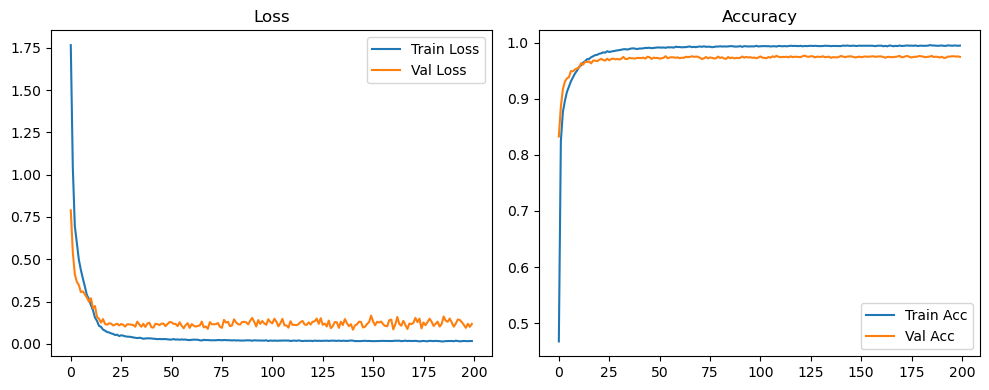

Evaluation:   0%|          | 0/157 [00:00<?, ?it/s]

Evaluation:   6%|▌         | 9/157 [00:00<00:01, 83.51it/s]

Evaluation:  11%|█▏        | 18/157 [00:00<00:01, 84.05it/s]

Evaluation:  17%|█▋        | 27/157 [00:00<00:01, 84.27it/s]

Evaluation:  23%|██▎       | 36/157 [00:00<00:01, 84.56it/s]

Evaluation:  29%|██▊       | 45/157 [00:00<00:01, 84.59it/s]

Evaluation:  34%|███▍      | 54/157 [00:00<00:01, 84.59it/s]

Evaluation:  40%|████      | 63/157 [00:00<00:01, 84.45it/s]

Evaluation:  46%|████▌     | 72/157 [00:00<00:01, 84.40it/s]

Evaluation:  52%|█████▏    | 81/157 [00:00<00:00, 84.44it/s]

Evaluation:  57%|█████▋    | 90/157 [00:01<00:00, 84.41it/s]

Evaluation:  63%|██████▎   | 99/157 [00:01<00:00, 84.37it/s]

Evaluation:  69%|██████▉   | 108/157 [00:01<00:00, 84.38it/s]

Evaluation:  75%|███████▍  | 117/157 [00:01<00:00, 84.12it/s]

Evaluation:  80%|████████  | 126/157 [00:01<00:00, 83.68it/s]

Evaluation:  86%|████████▌ | 135/157 [00:01<00:00, 83.38it/s]

Evaluation:  92%|█████████▏| 144/157 [00:01<00:00, 83.57it/s]

Evaluation:  97%|█████████▋| 153/157 [00:01<00:00, 83.53it/s]

Evaluation: 100%|██████████| 157/157 [00:01<00:00, 84.29it/s]

Original Model Final Test Loss: 0.1163 Accuracy: 0.9753


🚀 Running: batch64_lr0.002_0.002_0.002_dp0.5


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.002 | Train Acc: 0.4135 | Val Acc: 0.8040 |:   0%|          | 0/200 [00:14<?, ?it/s]

| LR: 0.002 | Train Acc: 0.4135 | Val Acc: 0.8040 |:   0%|          | 0/200 [00:14<?, ?it/s]

| LR: 0.002 | Train Acc: 0.4135 | Val Acc: 0.8040 |:   0%|          | 1/200 [00:14<46:34, 14.04s/it]

| LR: 0.002 | Train Acc: 0.7808 | Val Acc: 0.8844 |:   0%|          | 1/200 [00:28<46:34, 14.04s/it]

| LR: 0.002 | Train Acc: 0.7808 | Val Acc: 0.8844 |:   0%|          | 1/200 [00:28<46:34, 14.04s/it]

| LR: 0.002 | Train Acc: 0.7808 | Val Acc: 0.8844 |:   1%|          | 2/200 [00:28<46:22, 14.06s/it]

| LR: 0.002 | Train Acc: 0.8442 | Val Acc: 0.9107 |:   1%|          | 2/200 [00:41<46:22, 14.06s/it]

| LR: 0.002 | Train Acc: 0.8442 | Val Acc: 0.9107 |:   1%|          | 2/200 [00:41<46:22, 14.06s/it]

| LR: 0.002 | Train Acc: 0.8442 | Val Acc: 0.9107 |:   2%|▏         | 3/200 [00:41<45:33, 13.88s/it]

| LR: 0.002 | Train Acc: 0.8691 | Val Acc: 0.9196 |:   2%|▏         | 3/200 [00:55<45:33, 13.88s/it]

| LR: 0.002 | Train Acc: 0.8691 | Val Acc: 0.9196 |:   2%|▏         | 3/200 [00:55<45:33, 13.88s/it]

| LR: 0.002 | Train Acc: 0.8691 | Val Acc: 0.9196 |:   2%|▏         | 4/200 [00:55<44:57, 13.76s/it]

| LR: 0.002 | Train Acc: 0.8855 | Val Acc: 0.9307 |:   2%|▏         | 4/200 [01:09<44:57, 13.76s/it]

| LR: 0.002 | Train Acc: 0.8855 | Val Acc: 0.9307 |:   2%|▏         | 4/200 [01:09<44:57, 13.76s/it]

| LR: 0.002 | Train Acc: 0.8855 | Val Acc: 0.9307 |:   2%|▎         | 5/200 [01:09<44:38, 13.74s/it]

| LR: 0.002 | Train Acc: 0.8993 | Val Acc: 0.9387 |:   2%|▎         | 5/200 [01:22<44:38, 13.74s/it]

| LR: 0.002 | Train Acc: 0.8993 | Val Acc: 0.9387 |:   2%|▎         | 5/200 [01:22<44:38, 13.74s/it]

| LR: 0.002 | Train Acc: 0.8993 | Val Acc: 0.9387 |:   3%|▎         | 6/200 [01:22<44:17, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9086 | Val Acc: 0.9504 |:   3%|▎         | 6/200 [01:36<44:17, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9086 | Val Acc: 0.9504 |:   3%|▎         | 6/200 [01:36<44:17, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9086 | Val Acc: 0.9504 |:   4%|▎         | 7/200 [01:36<43:56, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9194 | Val Acc: 0.9544 |:   4%|▎         | 7/200 [01:49<43:56, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9194 | Val Acc: 0.9544 |:   4%|▎         | 7/200 [01:49<43:56, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9194 | Val Acc: 0.9544 |:   4%|▍         | 8/200 [01:49<43:25, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9257 | Val Acc: 0.9558 |:   4%|▍         | 8/200 [02:03<43:25, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9257 | Val Acc: 0.9558 |:   4%|▍         | 8/200 [02:03<43:25, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9257 | Val Acc: 0.9558 |:   4%|▍         | 9/200 [02:03<43:16, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9334 | Val Acc: 0.9607 |:   4%|▍         | 9/200 [02:17<43:16, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9334 | Val Acc: 0.9607 |:   4%|▍         | 9/200 [02:17<43:16, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9334 | Val Acc: 0.9607 |:   5%|▌         | 10/200 [02:17<43:17, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9397 | Val Acc: 0.9612 |:   5%|▌         | 10/200 [02:30<43:17, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9397 | Val Acc: 0.9612 |:   5%|▌         | 10/200 [02:30<43:17, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9397 | Val Acc: 0.9612 |:   6%|▌         | 11/200 [02:30<42:59, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9445 | Val Acc: 0.9627 |:   6%|▌         | 11/200 [02:44<42:59, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9445 | Val Acc: 0.9627 |:   6%|▌         | 11/200 [02:44<42:59, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9445 | Val Acc: 0.9627 |:   6%|▌         | 12/200 [02:44<42:36, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9496 | Val Acc: 0.9623 |:   6%|▌         | 12/200 [02:57<42:36, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9496 | Val Acc: 0.9623 |:   6%|▌         | 12/200 [02:57<42:36, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9496 | Val Acc: 0.9623 |:   6%|▋         | 13/200 [02:57<42:25, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9506 | Val Acc: 0.9643 |:   6%|▋         | 13/200 [03:11<42:25, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9506 | Val Acc: 0.9643 |:   6%|▋         | 13/200 [03:11<42:25, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9506 | Val Acc: 0.9643 |:   7%|▋         | 14/200 [03:11<42:05, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9524 | Val Acc: 0.9625 |:   7%|▋         | 14/200 [03:24<42:05, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9524 | Val Acc: 0.9625 |:   7%|▋         | 14/200 [03:24<42:05, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9524 | Val Acc: 0.9625 |:   8%|▊         | 15/200 [03:24<41:49, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9547 | Val Acc: 0.9659 |:   8%|▊         | 15/200 [03:38<41:49, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9547 | Val Acc: 0.9659 |:   8%|▊         | 15/200 [03:38<41:49, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9547 | Val Acc: 0.9659 |:   8%|▊         | 16/200 [03:38<41:31, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9546 | Val Acc: 0.9645 |:   8%|▊         | 16/200 [03:51<41:31, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9546 | Val Acc: 0.9645 |:   8%|▊         | 16/200 [03:51<41:31, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9546 | Val Acc: 0.9645 |:   8%|▊         | 17/200 [03:51<41:16, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9586 | Val Acc: 0.9644 |:   8%|▊         | 17/200 [04:05<41:16, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9586 | Val Acc: 0.9644 |:   8%|▊         | 17/200 [04:05<41:16, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9586 | Val Acc: 0.9644 |:   9%|▉         | 18/200 [04:05<41:01, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9587 | Val Acc: 0.9662 |:   9%|▉         | 18/200 [04:19<41:01, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9587 | Val Acc: 0.9662 |:   9%|▉         | 18/200 [04:19<41:01, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9587 | Val Acc: 0.9662 |:  10%|▉         | 19/200 [04:19<40:55, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9606 | Val Acc: 0.9681 |:  10%|▉         | 19/200 [04:33<40:55, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9606 | Val Acc: 0.9681 |:  10%|▉         | 19/200 [04:33<40:55, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9606 | Val Acc: 0.9681 |:  10%|█         | 20/200 [04:33<41:18, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9612 | Val Acc: 0.9674 |:  10%|█         | 20/200 [04:46<41:18, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9612 | Val Acc: 0.9674 |:  10%|█         | 20/200 [04:46<41:18, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9612 | Val Acc: 0.9674 |:  10%|█         | 21/200 [04:46<40:58, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9619 | Val Acc: 0.9694 |:  10%|█         | 21/200 [05:00<40:58, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9619 | Val Acc: 0.9694 |:  10%|█         | 21/200 [05:00<40:58, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9619 | Val Acc: 0.9694 |:  11%|█         | 22/200 [05:00<40:30, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9634 | Val Acc: 0.9692 |:  11%|█         | 22/200 [05:13<40:30, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9634 | Val Acc: 0.9692 |:  11%|█         | 22/200 [05:13<40:30, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9634 | Val Acc: 0.9692 |:  12%|█▏        | 23/200 [05:13<40:06, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9656 | Val Acc: 0.9700 |:  12%|█▏        | 23/200 [05:27<40:06, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9656 | Val Acc: 0.9700 |:  12%|█▏        | 23/200 [05:27<40:06, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9656 | Val Acc: 0.9700 |:  12%|█▏        | 24/200 [05:27<39:51, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9655 | Val Acc: 0.9706 |:  12%|█▏        | 24/200 [05:41<39:51, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9655 | Val Acc: 0.9706 |:  12%|█▏        | 24/200 [05:41<39:51, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9655 | Val Acc: 0.9706 |:  12%|█▎        | 25/200 [05:41<39:44, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9649 | Val Acc: 0.9700 |:  12%|█▎        | 25/200 [05:54<39:44, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9649 | Val Acc: 0.9700 |:  12%|█▎        | 25/200 [05:54<39:44, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9649 | Val Acc: 0.9700 |:  13%|█▎        | 26/200 [05:55<39:44, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9650 | Val Acc: 0.9715 |:  13%|█▎        | 26/200 [06:08<39:44, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9650 | Val Acc: 0.9715 |:  13%|█▎        | 26/200 [06:08<39:44, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9650 | Val Acc: 0.9715 |:  14%|█▎        | 27/200 [06:08<39:34, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9660 | Val Acc: 0.9693 |:  14%|█▎        | 27/200 [06:23<39:34, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9660 | Val Acc: 0.9693 |:  14%|█▎        | 27/200 [06:23<39:34, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9660 | Val Acc: 0.9693 |:  14%|█▍        | 28/200 [06:23<40:06, 13.99s/it]

| LR: 0.002 | Train Acc: 0.9683 | Val Acc: 0.9687 |:  14%|█▍        | 28/200 [06:36<40:06, 13.99s/it]

| LR: 0.002 | Train Acc: 0.9683 | Val Acc: 0.9687 |:  14%|█▍        | 28/200 [06:36<40:06, 13.99s/it]

| LR: 0.002 | Train Acc: 0.9683 | Val Acc: 0.9687 |:  14%|█▍        | 29/200 [06:36<39:27, 13.84s/it]

| LR: 0.002 | Train Acc: 0.9682 | Val Acc: 0.9714 |:  14%|█▍        | 29/200 [06:50<39:27, 13.84s/it]

| LR: 0.002 | Train Acc: 0.9682 | Val Acc: 0.9714 |:  14%|█▍        | 29/200 [06:50<39:27, 13.84s/it]

| LR: 0.002 | Train Acc: 0.9682 | Val Acc: 0.9714 |:  15%|█▌        | 30/200 [06:50<38:53, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9687 | Val Acc: 0.9722 |:  15%|█▌        | 30/200 [07:04<38:53, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9687 | Val Acc: 0.9722 |:  15%|█▌        | 30/200 [07:04<38:53, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9687 | Val Acc: 0.9722 |:  16%|█▌        | 31/200 [07:04<38:49, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9694 | Val Acc: 0.9698 |:  16%|█▌        | 31/200 [07:17<38:49, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9694 | Val Acc: 0.9698 |:  16%|█▌        | 31/200 [07:17<38:49, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9694 | Val Acc: 0.9698 |:  16%|█▌        | 32/200 [07:18<38:33, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9691 | Val Acc: 0.9714 |:  16%|█▌        | 32/200 [07:31<38:33, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9691 | Val Acc: 0.9714 |:  16%|█▌        | 32/200 [07:31<38:33, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9691 | Val Acc: 0.9714 |:  16%|█▋        | 33/200 [07:31<38:12, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9720 |:  16%|█▋        | 33/200 [07:46<38:12, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9720 |:  16%|█▋        | 33/200 [07:46<38:12, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9720 |:  17%|█▋        | 34/200 [07:46<38:35, 13.95s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9734 |:  17%|█▋        | 34/200 [08:01<38:35, 13.95s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9734 |:  17%|█▋        | 34/200 [08:01<38:35, 13.95s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9734 |:  18%|█▊        | 35/200 [08:01<39:22, 14.32s/it]

| LR: 0.002 | Train Acc: 0.9702 | Val Acc: 0.9723 |:  18%|█▊        | 35/200 [08:14<39:22, 14.32s/it]

| LR: 0.002 | Train Acc: 0.9702 | Val Acc: 0.9723 |:  18%|█▊        | 35/200 [08:14<39:22, 14.32s/it]

| LR: 0.002 | Train Acc: 0.9702 | Val Acc: 0.9723 |:  18%|█▊        | 36/200 [08:14<38:37, 14.13s/it]

| LR: 0.002 | Train Acc: 0.9712 | Val Acc: 0.9720 |:  18%|█▊        | 36/200 [08:28<38:37, 14.13s/it]

| LR: 0.002 | Train Acc: 0.9712 | Val Acc: 0.9720 |:  18%|█▊        | 36/200 [08:28<38:37, 14.13s/it]

| LR: 0.002 | Train Acc: 0.9712 | Val Acc: 0.9720 |:  18%|█▊        | 37/200 [08:28<37:51, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9709 | Val Acc: 0.9729 |:  18%|█▊        | 37/200 [08:41<37:51, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9709 | Val Acc: 0.9729 |:  18%|█▊        | 37/200 [08:41<37:51, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9709 | Val Acc: 0.9729 |:  19%|█▉        | 38/200 [08:41<37:13, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9710 | Val Acc: 0.9735 |:  19%|█▉        | 38/200 [08:55<37:13, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9710 | Val Acc: 0.9735 |:  19%|█▉        | 38/200 [08:55<37:13, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9710 | Val Acc: 0.9735 |:  20%|█▉        | 39/200 [08:55<36:42, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9711 | Val Acc: 0.9725 |:  20%|█▉        | 39/200 [09:08<36:42, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9711 | Val Acc: 0.9725 |:  20%|█▉        | 39/200 [09:08<36:42, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9711 | Val Acc: 0.9725 |:  20%|██        | 40/200 [09:08<36:17, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9707 | Val Acc: 0.9740 |:  20%|██        | 40/200 [09:23<36:17, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9707 | Val Acc: 0.9740 |:  20%|██        | 40/200 [09:23<36:17, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9707 | Val Acc: 0.9740 |:  20%|██        | 41/200 [09:23<36:45, 13.87s/it]

| LR: 0.002 | Train Acc: 0.9716 | Val Acc: 0.9732 |:  20%|██        | 41/200 [09:36<36:45, 13.87s/it]

| LR: 0.002 | Train Acc: 0.9716 | Val Acc: 0.9732 |:  20%|██        | 41/200 [09:36<36:45, 13.87s/it]

| LR: 0.002 | Train Acc: 0.9716 | Val Acc: 0.9732 |:  21%|██        | 42/200 [09:36<36:08, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9722 | Val Acc: 0.9724 |:  21%|██        | 42/200 [09:51<36:08, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9722 | Val Acc: 0.9724 |:  21%|██        | 42/200 [09:51<36:08, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9722 | Val Acc: 0.9724 |:  22%|██▏       | 43/200 [09:51<36:26, 13.93s/it]

| LR: 0.002 | Train Acc: 0.9719 | Val Acc: 0.9711 |:  22%|██▏       | 43/200 [10:04<36:26, 13.93s/it]

| LR: 0.002 | Train Acc: 0.9719 | Val Acc: 0.9711 |:  22%|██▏       | 43/200 [10:04<36:26, 13.93s/it]

| LR: 0.002 | Train Acc: 0.9719 | Val Acc: 0.9711 |:  22%|██▏       | 44/200 [10:04<35:50, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9709 | Val Acc: 0.9725 |:  22%|██▏       | 44/200 [10:18<35:50, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9709 | Val Acc: 0.9725 |:  22%|██▏       | 44/200 [10:18<35:50, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9709 | Val Acc: 0.9725 |:  22%|██▎       | 45/200 [10:18<35:25, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9720 | Val Acc: 0.9720 |:  22%|██▎       | 45/200 [10:31<35:25, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9720 | Val Acc: 0.9720 |:  22%|██▎       | 45/200 [10:31<35:25, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9720 | Val Acc: 0.9720 |:  23%|██▎       | 46/200 [10:31<35:06, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9716 | Val Acc: 0.9723 |:  23%|██▎       | 46/200 [10:45<35:06, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9716 | Val Acc: 0.9723 |:  23%|██▎       | 46/200 [10:45<35:06, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9716 | Val Acc: 0.9723 |:  24%|██▎       | 47/200 [10:45<34:44, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9727 | Val Acc: 0.9732 |:  24%|██▎       | 47/200 [10:58<34:44, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9727 | Val Acc: 0.9732 |:  24%|██▎       | 47/200 [10:58<34:44, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9727 | Val Acc: 0.9732 |:  24%|██▍       | 48/200 [10:58<34:23, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9718 | Val Acc: 0.9728 |:  24%|██▍       | 48/200 [11:12<34:23, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9718 | Val Acc: 0.9728 |:  24%|██▍       | 48/200 [11:12<34:23, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9718 | Val Acc: 0.9728 |:  24%|██▍       | 49/200 [11:12<34:07, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9720 | Val Acc: 0.9731 |:  24%|██▍       | 49/200 [11:25<34:07, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9720 | Val Acc: 0.9731 |:  24%|██▍       | 49/200 [11:25<34:07, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9720 | Val Acc: 0.9731 |:  25%|██▌       | 50/200 [11:25<33:49, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9729 | Val Acc: 0.9740 |:  25%|██▌       | 50/200 [11:39<33:49, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9729 | Val Acc: 0.9740 |:  25%|██▌       | 50/200 [11:39<33:49, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9729 | Val Acc: 0.9740 |:  26%|██▌       | 51/200 [11:39<33:32, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9727 | Val Acc: 0.9720 |:  26%|██▌       | 51/200 [11:52<33:32, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9727 | Val Acc: 0.9720 |:  26%|██▌       | 51/200 [11:52<33:32, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9727 | Val Acc: 0.9720 |:  26%|██▌       | 52/200 [11:52<33:15, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9722 | Val Acc: 0.9732 |:  26%|██▌       | 52/200 [12:05<33:15, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9722 | Val Acc: 0.9732 |:  26%|██▌       | 52/200 [12:05<33:15, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9722 | Val Acc: 0.9732 |:  26%|██▋       | 53/200 [12:05<33:01, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9723 | Val Acc: 0.9728 |:  26%|██▋       | 53/200 [12:19<33:01, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9723 | Val Acc: 0.9728 |:  26%|██▋       | 53/200 [12:19<33:01, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9723 | Val Acc: 0.9728 |:  27%|██▋       | 54/200 [12:19<32:52, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9738 | Val Acc: 0.9728 |:  27%|██▋       | 54/200 [12:33<32:52, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9738 | Val Acc: 0.9728 |:  27%|██▋       | 54/200 [12:33<32:52, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9738 | Val Acc: 0.9728 |:  28%|██▊       | 55/200 [12:33<32:41, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9730 | Val Acc: 0.9721 |:  28%|██▊       | 55/200 [12:46<32:41, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9730 | Val Acc: 0.9721 |:  28%|██▊       | 55/200 [12:46<32:41, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9730 | Val Acc: 0.9721 |:  28%|██▊       | 56/200 [12:46<32:26, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9733 | Val Acc: 0.9718 |:  28%|██▊       | 56/200 [13:00<32:26, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9733 | Val Acc: 0.9718 |:  28%|██▊       | 56/200 [13:00<32:26, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9733 | Val Acc: 0.9718 |:  28%|██▊       | 57/200 [13:00<32:17, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9714 | Val Acc: 0.9729 |:  28%|██▊       | 57/200 [13:13<32:17, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9714 | Val Acc: 0.9729 |:  28%|██▊       | 57/200 [13:13<32:17, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9714 | Val Acc: 0.9729 |:  29%|██▉       | 58/200 [13:13<32:02, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9739 | Val Acc: 0.9728 |:  29%|██▉       | 58/200 [13:27<32:02, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9739 | Val Acc: 0.9728 |:  29%|██▉       | 58/200 [13:27<32:02, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9739 | Val Acc: 0.9728 |:  30%|██▉       | 59/200 [13:27<31:49, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9737 | Val Acc: 0.9731 |:  30%|██▉       | 59/200 [13:40<31:49, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9737 | Val Acc: 0.9731 |:  30%|██▉       | 59/200 [13:40<31:49, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9737 | Val Acc: 0.9731 |:  30%|███       | 60/200 [13:40<31:34, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9735 | Val Acc: 0.9708 |:  30%|███       | 60/200 [13:55<31:34, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9735 | Val Acc: 0.9708 |:  30%|███       | 60/200 [13:55<31:34, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9735 | Val Acc: 0.9708 |:  30%|███       | 61/200 [13:55<32:08, 13.87s/it]

| LR: 0.002 | Train Acc: 0.9740 | Val Acc: 0.9741 |:  30%|███       | 61/200 [14:09<32:08, 13.87s/it]

| LR: 0.002 | Train Acc: 0.9740 | Val Acc: 0.9741 |:  30%|███       | 61/200 [14:09<32:08, 13.87s/it]

| LR: 0.002 | Train Acc: 0.9740 | Val Acc: 0.9741 |:  31%|███       | 62/200 [14:09<31:53, 13.86s/it]

| LR: 0.002 | Train Acc: 0.9724 | Val Acc: 0.9731 |:  31%|███       | 62/200 [14:22<31:53, 13.86s/it]

| LR: 0.002 | Train Acc: 0.9724 | Val Acc: 0.9731 |:  31%|███       | 62/200 [14:22<31:53, 13.86s/it]

| LR: 0.002 | Train Acc: 0.9724 | Val Acc: 0.9731 |:  32%|███▏      | 63/200 [14:22<31:26, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9725 |:  32%|███▏      | 63/200 [14:36<31:26, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9725 |:  32%|███▏      | 63/200 [14:36<31:26, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9725 |:  32%|███▏      | 64/200 [14:36<30:58, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9735 | Val Acc: 0.9731 |:  32%|███▏      | 64/200 [14:49<30:58, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9735 | Val Acc: 0.9731 |:  32%|███▏      | 64/200 [14:49<30:58, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9735 | Val Acc: 0.9731 |:  32%|███▎      | 65/200 [14:49<30:38, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9747 | Val Acc: 0.9732 |:  32%|███▎      | 65/200 [15:03<30:38, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9747 | Val Acc: 0.9732 |:  32%|███▎      | 65/200 [15:03<30:38, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9747 | Val Acc: 0.9732 |:  33%|███▎      | 66/200 [15:03<30:22, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9744 | Val Acc: 0.9730 |:  33%|███▎      | 66/200 [15:16<30:22, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9744 | Val Acc: 0.9730 |:  33%|███▎      | 66/200 [15:16<30:22, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9744 | Val Acc: 0.9730 |:  34%|███▎      | 67/200 [15:16<30:07, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9743 | Val Acc: 0.9726 |:  34%|███▎      | 67/200 [15:30<30:07, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9743 | Val Acc: 0.9726 |:  34%|███▎      | 67/200 [15:30<30:07, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9743 | Val Acc: 0.9726 |:  34%|███▍      | 68/200 [15:30<29:51, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9730 | Val Acc: 0.9739 |:  34%|███▍      | 68/200 [15:43<29:51, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9730 | Val Acc: 0.9739 |:  34%|███▍      | 68/200 [15:43<29:51, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9730 | Val Acc: 0.9739 |:  34%|███▍      | 69/200 [15:43<29:37, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9745 | Val Acc: 0.9732 |:  34%|███▍      | 69/200 [15:57<29:37, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9745 | Val Acc: 0.9732 |:  34%|███▍      | 69/200 [15:57<29:37, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9745 | Val Acc: 0.9732 |:  35%|███▌      | 70/200 [15:57<29:22, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9741 | Val Acc: 0.9742 |:  35%|███▌      | 70/200 [16:11<29:22, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9741 | Val Acc: 0.9742 |:  35%|███▌      | 70/200 [16:11<29:22, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9741 | Val Acc: 0.9742 |:  36%|███▌      | 71/200 [16:11<29:07, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9738 | Val Acc: 0.9745 |:  36%|███▌      | 71/200 [16:24<29:07, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9738 | Val Acc: 0.9745 |:  36%|███▌      | 71/200 [16:24<29:07, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9738 | Val Acc: 0.9745 |:  36%|███▌      | 72/200 [16:24<28:53, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9748 | Val Acc: 0.9742 |:  36%|███▌      | 72/200 [16:37<28:53, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9748 | Val Acc: 0.9742 |:  36%|███▌      | 72/200 [16:37<28:53, 13.55s/it]

| LR: 0.002 | Train Acc: 0.9748 | Val Acc: 0.9742 |:  36%|███▋      | 73/200 [16:38<28:35, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9733 |:  36%|███▋      | 73/200 [16:52<28:35, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9733 |:  36%|███▋      | 73/200 [16:52<28:35, 13.51s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9733 |:  37%|███▋      | 74/200 [16:52<28:48, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9734 | Val Acc: 0.9731 |:  37%|███▋      | 74/200 [17:05<28:48, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9734 | Val Acc: 0.9731 |:  37%|███▋      | 74/200 [17:05<28:48, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9734 | Val Acc: 0.9731 |:  38%|███▊      | 75/200 [17:05<28:26, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9749 | Val Acc: 0.9748 |:  38%|███▊      | 75/200 [17:19<28:26, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9749 | Val Acc: 0.9748 |:  38%|███▊      | 75/200 [17:19<28:26, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9749 | Val Acc: 0.9748 |:  38%|███▊      | 76/200 [17:19<28:13, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9744 | Val Acc: 0.9738 |:  38%|███▊      | 76/200 [17:32<28:13, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9744 | Val Acc: 0.9738 |:  38%|███▊      | 76/200 [17:32<28:13, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9744 | Val Acc: 0.9738 |:  38%|███▊      | 77/200 [17:32<27:52, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9737 | Val Acc: 0.9727 |:  38%|███▊      | 77/200 [17:46<27:52, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9737 | Val Acc: 0.9727 |:  38%|███▊      | 77/200 [17:46<27:52, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9737 | Val Acc: 0.9727 |:  39%|███▉      | 78/200 [17:46<27:47, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9754 | Val Acc: 0.9716 |:  39%|███▉      | 78/200 [18:00<27:47, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9754 | Val Acc: 0.9716 |:  39%|███▉      | 78/200 [18:00<27:47, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9754 | Val Acc: 0.9716 |:  40%|███▉      | 79/200 [18:00<27:35, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9751 | Val Acc: 0.9732 |:  40%|███▉      | 79/200 [18:14<27:35, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9751 | Val Acc: 0.9732 |:  40%|███▉      | 79/200 [18:14<27:35, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9751 | Val Acc: 0.9732 |:  40%|████      | 80/200 [18:14<27:27, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9751 | Val Acc: 0.9745 |:  40%|████      | 80/200 [18:28<27:27, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9751 | Val Acc: 0.9745 |:  40%|████      | 80/200 [18:28<27:27, 13.73s/it]

| LR: 0.002 | Train Acc: 0.9751 | Val Acc: 0.9745 |:  40%|████      | 81/200 [18:28<27:17, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9736 | Val Acc: 0.9732 |:  40%|████      | 81/200 [18:41<27:17, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9736 | Val Acc: 0.9732 |:  40%|████      | 81/200 [18:41<27:17, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9736 | Val Acc: 0.9732 |:  41%|████      | 82/200 [18:41<27:01, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9727 |:  41%|████      | 82/200 [18:55<27:01, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9727 |:  41%|████      | 82/200 [18:55<27:01, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9727 |:  42%|████▏     | 83/200 [18:55<26:39, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9728 |:  42%|████▏     | 83/200 [19:08<26:39, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9728 |:  42%|████▏     | 83/200 [19:08<26:39, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9728 |:  42%|████▏     | 84/200 [19:08<26:26, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9744 | Val Acc: 0.9731 |:  42%|████▏     | 84/200 [19:22<26:26, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9744 | Val Acc: 0.9731 |:  42%|████▏     | 84/200 [19:22<26:26, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9744 | Val Acc: 0.9731 |:  42%|████▎     | 85/200 [19:22<26:17, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9749 | Val Acc: 0.9718 |:  42%|████▎     | 85/200 [19:36<26:17, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9749 | Val Acc: 0.9718 |:  42%|████▎     | 85/200 [19:36<26:17, 13.72s/it]

| LR: 0.002 | Train Acc: 0.9749 | Val Acc: 0.9718 |:  43%|████▎     | 86/200 [19:36<25:57, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9743 | Val Acc: 0.9741 |:  43%|████▎     | 86/200 [19:49<25:57, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9743 | Val Acc: 0.9741 |:  43%|████▎     | 86/200 [19:49<25:57, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9743 | Val Acc: 0.9741 |:  44%|████▎     | 87/200 [19:49<25:41, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9727 |:  44%|████▎     | 87/200 [20:03<25:41, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9727 |:  44%|████▎     | 87/200 [20:03<25:41, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9727 |:  44%|████▍     | 88/200 [20:03<25:29, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9748 | Val Acc: 0.9728 |:  44%|████▍     | 88/200 [20:17<25:29, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9748 | Val Acc: 0.9728 |:  44%|████▍     | 88/200 [20:17<25:29, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9748 | Val Acc: 0.9728 |:  44%|████▍     | 89/200 [20:17<25:13, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9753 | Val Acc: 0.9723 |:  44%|████▍     | 89/200 [20:30<25:13, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9753 | Val Acc: 0.9723 |:  44%|████▍     | 89/200 [20:30<25:13, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9753 | Val Acc: 0.9723 |:  45%|████▌     | 90/200 [20:30<24:58, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9752 | Val Acc: 0.9709 |:  45%|████▌     | 90/200 [20:44<24:58, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9752 | Val Acc: 0.9709 |:  45%|████▌     | 90/200 [20:44<24:58, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9752 | Val Acc: 0.9709 |:  46%|████▌     | 91/200 [20:44<24:40, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9749 | Val Acc: 0.9728 |:  46%|████▌     | 91/200 [20:57<24:40, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9749 | Val Acc: 0.9728 |:  46%|████▌     | 91/200 [20:57<24:40, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9749 | Val Acc: 0.9728 |:  46%|████▌     | 92/200 [20:58<24:32, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9738 |:  46%|████▌     | 92/200 [21:11<24:32, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9738 |:  46%|████▌     | 92/200 [21:11<24:32, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9738 |:  46%|████▋     | 93/200 [21:11<24:15, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9731 |:  46%|████▋     | 93/200 [21:25<24:15, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9731 |:  46%|████▋     | 93/200 [21:25<24:15, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9731 |:  47%|████▋     | 94/200 [21:25<24:12, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9753 | Val Acc: 0.9718 |:  47%|████▋     | 94/200 [21:39<24:12, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9753 | Val Acc: 0.9718 |:  47%|████▋     | 94/200 [21:39<24:12, 13.70s/it]

| LR: 0.002 | Train Acc: 0.9753 | Val Acc: 0.9718 |:  48%|████▊     | 95/200 [21:39<23:53, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9756 | Val Acc: 0.9732 |:  48%|████▊     | 95/200 [21:52<23:53, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9756 | Val Acc: 0.9732 |:  48%|████▊     | 95/200 [21:52<23:53, 13.66s/it]

| LR: 0.002 | Train Acc: 0.9756 | Val Acc: 0.9732 |:  48%|████▊     | 96/200 [21:52<23:39, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9738 |:  48%|████▊     | 96/200 [22:06<23:39, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9738 |:  48%|████▊     | 96/200 [22:06<23:39, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9738 |:  48%|████▊     | 97/200 [22:06<23:25, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9764 | Val Acc: 0.9751 |:  48%|████▊     | 97/200 [22:19<23:25, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9764 | Val Acc: 0.9751 |:  48%|████▊     | 97/200 [22:19<23:25, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9764 | Val Acc: 0.9751 |:  49%|████▉     | 98/200 [22:19<23:06, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9760 | Val Acc: 0.9741 |:  49%|████▉     | 98/200 [22:35<23:06, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9760 | Val Acc: 0.9741 |:  49%|████▉     | 98/200 [22:35<23:06, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9760 | Val Acc: 0.9741 |:  50%|████▉     | 99/200 [22:35<23:48, 14.14s/it]

| LR: 0.002 | Train Acc: 0.9767 | Val Acc: 0.9744 |:  50%|████▉     | 99/200 [22:48<23:48, 14.14s/it]

| LR: 0.002 | Train Acc: 0.9767 | Val Acc: 0.9744 |:  50%|████▉     | 99/200 [22:48<23:48, 14.14s/it]

| LR: 0.002 | Train Acc: 0.9767 | Val Acc: 0.9744 |:  50%|█████     | 100/200 [22:48<23:21, 14.01s/it]

| LR: 0.002 | Train Acc: 0.9745 | Val Acc: 0.9735 |:  50%|█████     | 100/200 [23:02<23:21, 14.01s/it]

| LR: 0.002 | Train Acc: 0.9745 | Val Acc: 0.9735 |:  50%|█████     | 100/200 [23:02<23:21, 14.01s/it]

| LR: 0.002 | Train Acc: 0.9745 | Val Acc: 0.9735 |:  50%|█████     | 101/200 [23:02<22:54, 13.88s/it]

| LR: 0.002 | Train Acc: 0.9754 | Val Acc: 0.9737 |:  50%|█████     | 101/200 [23:15<22:54, 13.88s/it]

| LR: 0.002 | Train Acc: 0.9754 | Val Acc: 0.9737 |:  50%|█████     | 101/200 [23:15<22:54, 13.88s/it]

| LR: 0.002 | Train Acc: 0.9754 | Val Acc: 0.9737 |:  51%|█████     | 102/200 [23:15<22:27, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9745 | Val Acc: 0.9736 |:  51%|█████     | 102/200 [23:29<22:27, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9745 | Val Acc: 0.9736 |:  51%|█████     | 102/200 [23:29<22:27, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9745 | Val Acc: 0.9736 |:  52%|█████▏    | 103/200 [23:29<22:08, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9770 | Val Acc: 0.9738 |:  52%|█████▏    | 103/200 [23:42<22:08, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9770 | Val Acc: 0.9738 |:  52%|█████▏    | 103/200 [23:42<22:08, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9770 | Val Acc: 0.9738 |:  52%|█████▏    | 104/200 [23:42<21:47, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9757 | Val Acc: 0.9737 |:  52%|█████▏    | 104/200 [23:56<21:47, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9757 | Val Acc: 0.9737 |:  52%|█████▏    | 104/200 [23:56<21:47, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9757 | Val Acc: 0.9737 |:  52%|█████▎    | 105/200 [23:56<21:33, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9756 | Val Acc: 0.9734 |:  52%|█████▎    | 105/200 [24:10<21:33, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9756 | Val Acc: 0.9734 |:  52%|█████▎    | 105/200 [24:10<21:33, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9756 | Val Acc: 0.9734 |:  53%|█████▎    | 106/200 [24:10<21:19, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9735 |:  53%|█████▎    | 106/200 [24:23<21:19, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9735 |:  53%|█████▎    | 106/200 [24:23<21:19, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9735 |:  54%|█████▎    | 107/200 [24:23<21:01, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9766 | Val Acc: 0.9738 |:  54%|█████▎    | 107/200 [24:37<21:01, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9766 | Val Acc: 0.9738 |:  54%|█████▎    | 107/200 [24:37<21:01, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9766 | Val Acc: 0.9738 |:  54%|█████▍    | 108/200 [24:37<20:47, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9744 |:  54%|█████▍    | 108/200 [24:50<20:47, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9744 |:  54%|█████▍    | 108/200 [24:50<20:47, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9744 |:  55%|█████▍    | 109/200 [24:50<20:34, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9730 |:  55%|█████▍    | 109/200 [25:05<20:34, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9730 |:  55%|█████▍    | 109/200 [25:05<20:34, 13.56s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9730 |:  55%|█████▌    | 110/200 [25:05<21:06, 14.07s/it]

| LR: 0.002 | Train Acc: 0.9754 | Val Acc: 0.9737 |:  55%|█████▌    | 110/200 [25:19<21:06, 14.07s/it]

| LR: 0.002 | Train Acc: 0.9754 | Val Acc: 0.9737 |:  55%|█████▌    | 110/200 [25:19<21:06, 14.07s/it]

| LR: 0.002 | Train Acc: 0.9754 | Val Acc: 0.9737 |:  56%|█████▌    | 111/200 [25:19<20:40, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9738 |:  56%|█████▌    | 111/200 [25:33<20:40, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9738 |:  56%|█████▌    | 111/200 [25:33<20:40, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9738 |:  56%|█████▌    | 112/200 [25:33<20:17, 13.84s/it]

| LR: 0.002 | Train Acc: 0.9755 | Val Acc: 0.9728 |:  56%|█████▌    | 112/200 [25:46<20:17, 13.84s/it]

| LR: 0.002 | Train Acc: 0.9755 | Val Acc: 0.9728 |:  56%|█████▌    | 112/200 [25:46<20:17, 13.84s/it]

| LR: 0.002 | Train Acc: 0.9755 | Val Acc: 0.9728 |:  56%|█████▋    | 113/200 [25:46<19:59, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9743 |:  56%|█████▋    | 113/200 [26:00<19:59, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9743 |:  56%|█████▋    | 113/200 [26:00<19:59, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9743 |:  57%|█████▋    | 114/200 [26:00<19:42, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9748 | Val Acc: 0.9746 |:  57%|█████▋    | 114/200 [26:14<19:42, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9748 | Val Acc: 0.9746 |:  57%|█████▋    | 114/200 [26:14<19:42, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9748 | Val Acc: 0.9746 |:  57%|█████▊    | 115/200 [26:14<19:30, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9755 | Val Acc: 0.9740 |:  57%|█████▊    | 115/200 [26:28<19:30, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9755 | Val Acc: 0.9740 |:  57%|█████▊    | 115/200 [26:28<19:30, 13.77s/it]

| LR: 0.002 | Train Acc: 0.9755 | Val Acc: 0.9740 |:  58%|█████▊    | 116/200 [26:28<19:25, 13.87s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9726 |:  58%|█████▊    | 116/200 [26:42<19:25, 13.87s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9726 |:  58%|█████▊    | 116/200 [26:42<19:25, 13.87s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9726 |:  58%|█████▊    | 117/200 [26:42<19:16, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9727 |:  58%|█████▊    | 117/200 [26:56<19:16, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9727 |:  58%|█████▊    | 117/200 [26:56<19:16, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9727 |:  59%|█████▉    | 118/200 [26:56<18:55, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9732 |:  59%|█████▉    | 118/200 [27:09<18:55, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9732 |:  59%|█████▉    | 118/200 [27:09<18:55, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9732 |:  60%|█████▉    | 119/200 [27:09<18:37, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9764 | Val Acc: 0.9740 |:  60%|█████▉    | 119/200 [27:23<18:37, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9764 | Val Acc: 0.9740 |:  60%|█████▉    | 119/200 [27:23<18:37, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9764 | Val Acc: 0.9740 |:  60%|██████    | 120/200 [27:23<18:16, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9733 |:  60%|██████    | 120/200 [27:36<18:16, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9733 |:  60%|██████    | 120/200 [27:36<18:16, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9733 |:  60%|██████    | 121/200 [27:37<18:00, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9753 | Val Acc: 0.9733 |:  60%|██████    | 121/200 [27:50<18:00, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9753 | Val Acc: 0.9733 |:  60%|██████    | 121/200 [27:50<18:00, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9753 | Val Acc: 0.9733 |:  61%|██████    | 122/200 [27:50<17:46, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9758 | Val Acc: 0.9755 |:  61%|██████    | 122/200 [28:04<17:46, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9758 | Val Acc: 0.9755 |:  61%|██████    | 122/200 [28:04<17:46, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9758 | Val Acc: 0.9755 |:  62%|██████▏   | 123/200 [28:04<17:27, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9732 |:  62%|██████▏   | 123/200 [28:17<17:27, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9732 |:  62%|██████▏   | 123/200 [28:17<17:27, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9732 |:  62%|██████▏   | 124/200 [28:17<17:12, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9757 | Val Acc: 0.9747 |:  62%|██████▏   | 124/200 [28:31<17:12, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9757 | Val Acc: 0.9747 |:  62%|██████▏   | 124/200 [28:31<17:12, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9757 | Val Acc: 0.9747 |:  62%|██████▎   | 125/200 [28:31<16:55, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9738 |:  62%|██████▎   | 125/200 [28:44<16:55, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9738 |:  62%|██████▎   | 125/200 [28:44<16:55, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9738 |:  63%|██████▎   | 126/200 [28:44<16:40, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9758 | Val Acc: 0.9752 |:  63%|██████▎   | 126/200 [28:57<16:40, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9758 | Val Acc: 0.9752 |:  63%|██████▎   | 126/200 [28:57<16:40, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9758 | Val Acc: 0.9752 |:  64%|██████▎   | 127/200 [28:58<16:25, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9760 | Val Acc: 0.9734 |:  64%|██████▎   | 127/200 [29:11<16:25, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9760 | Val Acc: 0.9734 |:  64%|██████▎   | 127/200 [29:11<16:25, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9760 | Val Acc: 0.9734 |:  64%|██████▍   | 128/200 [29:11<16:11, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9774 | Val Acc: 0.9729 |:  64%|██████▍   | 128/200 [29:24<16:11, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9774 | Val Acc: 0.9729 |:  64%|██████▍   | 128/200 [29:24<16:11, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9774 | Val Acc: 0.9729 |:  64%|██████▍   | 129/200 [29:24<15:57, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9760 | Val Acc: 0.9742 |:  64%|██████▍   | 129/200 [29:38<15:57, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9760 | Val Acc: 0.9742 |:  64%|██████▍   | 129/200 [29:38<15:57, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9760 | Val Acc: 0.9742 |:  65%|██████▌   | 130/200 [29:38<15:43, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9756 | Val Acc: 0.9749 |:  65%|██████▌   | 130/200 [29:51<15:43, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9756 | Val Acc: 0.9749 |:  65%|██████▌   | 130/200 [29:51<15:43, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9756 | Val Acc: 0.9749 |:  66%|██████▌   | 131/200 [29:51<15:30, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9756 | Val Acc: 0.9747 |:  66%|██████▌   | 131/200 [30:05<15:30, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9756 | Val Acc: 0.9747 |:  66%|██████▌   | 131/200 [30:05<15:30, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9756 | Val Acc: 0.9747 |:  66%|██████▌   | 132/200 [30:05<15:16, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9770 | Val Acc: 0.9728 |:  66%|██████▌   | 132/200 [30:19<15:16, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9770 | Val Acc: 0.9728 |:  66%|██████▌   | 132/200 [30:19<15:16, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9770 | Val Acc: 0.9728 |:  66%|██████▋   | 133/200 [30:19<15:06, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9739 |:  66%|██████▋   | 133/200 [30:32<15:06, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9739 |:  66%|██████▋   | 133/200 [30:32<15:06, 13.53s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9739 |:  67%|██████▋   | 134/200 [30:32<14:55, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9748 |:  67%|██████▋   | 134/200 [30:46<14:55, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9748 |:  67%|██████▋   | 134/200 [30:46<14:55, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9748 |:  68%|██████▊   | 135/200 [30:46<14:42, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9751 | Val Acc: 0.9737 |:  68%|██████▊   | 135/200 [30:59<14:42, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9751 | Val Acc: 0.9737 |:  68%|██████▊   | 135/200 [30:59<14:42, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9751 | Val Acc: 0.9737 |:  68%|██████▊   | 136/200 [30:59<14:28, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9737 |:  68%|██████▊   | 136/200 [31:13<14:28, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9737 |:  68%|██████▊   | 136/200 [31:13<14:28, 13.57s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9737 |:  68%|██████▊   | 137/200 [31:13<14:16, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9760 | Val Acc: 0.9740 |:  68%|██████▊   | 137/200 [31:27<14:16, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9760 | Val Acc: 0.9740 |:  68%|██████▊   | 137/200 [31:27<14:16, 13.59s/it]

| LR: 0.002 | Train Acc: 0.9760 | Val Acc: 0.9740 |:  69%|██████▉   | 138/200 [31:27<14:07, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9756 | Val Acc: 0.9723 |:  69%|██████▉   | 138/200 [31:40<14:07, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9756 | Val Acc: 0.9723 |:  69%|██████▉   | 138/200 [31:40<14:07, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9756 | Val Acc: 0.9723 |:  70%|██████▉   | 139/200 [31:40<13:52, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9770 | Val Acc: 0.9736 |:  70%|██████▉   | 139/200 [31:54<13:52, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9770 | Val Acc: 0.9736 |:  70%|██████▉   | 139/200 [31:54<13:52, 13.65s/it]

| LR: 0.002 | Train Acc: 0.9770 | Val Acc: 0.9736 |:  70%|███████   | 140/200 [31:54<13:37, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9736 |:  70%|███████   | 140/200 [32:08<13:37, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9736 |:  70%|███████   | 140/200 [32:08<13:37, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9736 |:  70%|███████   | 141/200 [32:08<13:24, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9758 | Val Acc: 0.9757 |:  70%|███████   | 141/200 [32:21<13:24, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9758 | Val Acc: 0.9757 |:  70%|███████   | 141/200 [32:21<13:24, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9758 | Val Acc: 0.9757 |:  71%|███████   | 142/200 [32:21<13:08, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9738 |:  71%|███████   | 142/200 [32:38<13:08, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9738 |:  71%|███████   | 142/200 [32:38<13:08, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9738 |:  72%|███████▏  | 143/200 [32:38<13:50, 14.58s/it]

| LR: 0.002 | Train Acc: 0.9763 | Val Acc: 0.9758 |:  72%|███████▏  | 143/200 [32:52<13:50, 14.58s/it]

| LR: 0.002 | Train Acc: 0.9763 | Val Acc: 0.9758 |:  72%|███████▏  | 143/200 [32:52<13:50, 14.58s/it]

| LR: 0.002 | Train Acc: 0.9763 | Val Acc: 0.9758 |:  72%|███████▏  | 144/200 [32:52<13:22, 14.33s/it]

| LR: 0.002 | Train Acc: 0.9775 | Val Acc: 0.9746 |:  72%|███████▏  | 144/200 [33:05<13:22, 14.33s/it]

| LR: 0.002 | Train Acc: 0.9775 | Val Acc: 0.9746 |:  72%|███████▏  | 144/200 [33:05<13:22, 14.33s/it]

| LR: 0.002 | Train Acc: 0.9775 | Val Acc: 0.9746 |:  72%|███████▎  | 145/200 [33:05<12:54, 14.08s/it]

| LR: 0.002 | Train Acc: 0.9775 | Val Acc: 0.9737 |:  72%|███████▎  | 145/200 [33:19<12:54, 14.08s/it]

| LR: 0.002 | Train Acc: 0.9775 | Val Acc: 0.9737 |:  72%|███████▎  | 145/200 [33:19<12:54, 14.08s/it]

| LR: 0.002 | Train Acc: 0.9775 | Val Acc: 0.9737 |:  73%|███████▎  | 146/200 [33:19<12:30, 13.89s/it]

| LR: 0.002 | Train Acc: 0.9764 | Val Acc: 0.9744 |:  73%|███████▎  | 146/200 [33:32<12:30, 13.89s/it]

| LR: 0.002 | Train Acc: 0.9764 | Val Acc: 0.9744 |:  73%|███████▎  | 146/200 [33:32<12:30, 13.89s/it]

| LR: 0.002 | Train Acc: 0.9764 | Val Acc: 0.9744 |:  74%|███████▎  | 147/200 [33:32<12:09, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9746 |:  74%|███████▎  | 147/200 [33:46<12:09, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9746 |:  74%|███████▎  | 147/200 [33:46<12:09, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9746 |:  74%|███████▍  | 148/200 [33:46<11:51, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9738 |:  74%|███████▍  | 148/200 [33:59<11:51, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9738 |:  74%|███████▍  | 148/200 [33:59<11:51, 13.69s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9738 |:  74%|███████▍  | 149/200 [33:59<11:35, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9770 | Val Acc: 0.9728 |:  74%|███████▍  | 149/200 [34:13<11:35, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9770 | Val Acc: 0.9728 |:  74%|███████▍  | 149/200 [34:13<11:35, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9770 | Val Acc: 0.9728 |:  75%|███████▌  | 150/200 [34:13<11:22, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9760 | Val Acc: 0.9738 |:  75%|███████▌  | 150/200 [34:26<11:22, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9760 | Val Acc: 0.9738 |:  75%|███████▌  | 150/200 [34:26<11:22, 13.64s/it]

| LR: 0.002 | Train Acc: 0.9760 | Val Acc: 0.9738 |:  76%|███████▌  | 151/200 [34:26<11:07, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9757 | Val Acc: 0.9728 |:  76%|███████▌  | 151/200 [34:40<11:07, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9757 | Val Acc: 0.9728 |:  76%|███████▌  | 151/200 [34:40<11:07, 13.61s/it]

| LR: 0.002 | Train Acc: 0.9757 | Val Acc: 0.9728 |:  76%|███████▌  | 152/200 [34:40<10:51, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9776 | Val Acc: 0.9741 |:  76%|███████▌  | 152/200 [34:53<10:51, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9776 | Val Acc: 0.9741 |:  76%|███████▌  | 152/200 [34:53<10:51, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9776 | Val Acc: 0.9741 |:  76%|███████▋  | 153/200 [34:53<10:35, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9759 | Val Acc: 0.9741 |:  76%|███████▋  | 153/200 [35:07<10:35, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9759 | Val Acc: 0.9741 |:  76%|███████▋  | 153/200 [35:07<10:35, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9759 | Val Acc: 0.9741 |:  77%|███████▋  | 154/200 [35:07<10:20, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9742 |:  77%|███████▋  | 154/200 [35:20<10:20, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9742 |:  77%|███████▋  | 154/200 [35:20<10:20, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9742 |:  78%|███████▊  | 155/200 [35:20<10:07, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9736 |:  78%|███████▊  | 155/200 [35:34<10:07, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9736 |:  78%|███████▊  | 155/200 [35:34<10:07, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9736 |:  78%|███████▊  | 156/200 [35:34<09:53, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9778 | Val Acc: 0.9721 |:  78%|███████▊  | 156/200 [35:47<09:53, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9778 | Val Acc: 0.9721 |:  78%|███████▊  | 156/200 [35:47<09:53, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9778 | Val Acc: 0.9721 |:  78%|███████▊  | 157/200 [35:47<09:42, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9770 | Val Acc: 0.9742 |:  78%|███████▊  | 157/200 [36:01<09:42, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9770 | Val Acc: 0.9742 |:  78%|███████▊  | 157/200 [36:01<09:42, 13.54s/it]

| LR: 0.002 | Train Acc: 0.9770 | Val Acc: 0.9742 |:  79%|███████▉  | 158/200 [36:01<09:27, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9781 | Val Acc: 0.9727 |:  79%|███████▉  | 158/200 [36:14<09:27, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9781 | Val Acc: 0.9727 |:  79%|███████▉  | 158/200 [36:14<09:27, 13.52s/it]

| LR: 0.002 | Train Acc: 0.9781 | Val Acc: 0.9727 |:  80%|███████▉  | 159/200 [36:14<09:13, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9744 |:  80%|███████▉  | 159/200 [36:28<09:13, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9744 |:  80%|███████▉  | 159/200 [36:28<09:13, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9744 |:  80%|████████  | 160/200 [36:28<08:59, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9775 | Val Acc: 0.9732 |:  80%|████████  | 160/200 [36:41<08:59, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9775 | Val Acc: 0.9732 |:  80%|████████  | 160/200 [36:41<08:59, 13.50s/it]

| LR: 0.002 | Train Acc: 0.9775 | Val Acc: 0.9732 |:  80%|████████  | 161/200 [36:41<08:46, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9775 | Val Acc: 0.9742 |:  80%|████████  | 161/200 [36:55<08:46, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9775 | Val Acc: 0.9742 |:  80%|████████  | 161/200 [36:55<08:46, 13.49s/it]

| LR: 0.002 | Train Acc: 0.9775 | Val Acc: 0.9742 |:  81%|████████  | 162/200 [36:55<08:32, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9771 | Val Acc: 0.9738 |:  81%|████████  | 162/200 [37:08<08:32, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9771 | Val Acc: 0.9738 |:  81%|████████  | 162/200 [37:08<08:32, 13.48s/it]

| LR: 0.002 | Train Acc: 0.9771 | Val Acc: 0.9738 |:  82%|████████▏ | 163/200 [37:08<08:18, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9759 | Val Acc: 0.9747 |:  82%|████████▏ | 163/200 [37:22<08:18, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9759 | Val Acc: 0.9747 |:  82%|████████▏ | 163/200 [37:22<08:18, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9759 | Val Acc: 0.9747 |:  82%|████████▏ | 164/200 [37:22<08:04, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9746 |:  82%|████████▏ | 164/200 [37:35<08:04, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9746 |:  82%|████████▏ | 164/200 [37:35<08:04, 13.46s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9746 |:  82%|████████▎ | 165/200 [37:35<07:51, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9732 |:  82%|████████▎ | 165/200 [37:49<07:51, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9732 |:  82%|████████▎ | 165/200 [37:49<07:51, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9732 |:  83%|████████▎ | 166/200 [37:49<07:38, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9767 | Val Acc: 0.9730 |:  83%|████████▎ | 166/200 [38:02<07:38, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9767 | Val Acc: 0.9730 |:  83%|████████▎ | 166/200 [38:02<07:38, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9767 | Val Acc: 0.9730 |:  84%|████████▎ | 167/200 [38:02<07:23, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9722 |:  84%|████████▎ | 167/200 [38:15<07:23, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9722 |:  84%|████████▎ | 167/200 [38:15<07:23, 13.45s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9722 |:  84%|████████▍ | 168/200 [38:15<07:10, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9738 |:  84%|████████▍ | 168/200 [38:29<07:10, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9738 |:  84%|████████▍ | 168/200 [38:29<07:10, 13.44s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9738 |:  84%|████████▍ | 169/200 [38:29<06:57, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9746 |:  84%|████████▍ | 169/200 [38:42<06:57, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9746 |:  84%|████████▍ | 169/200 [38:42<06:57, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9746 |:  85%|████████▌ | 170/200 [38:42<06:43, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9727 |:  85%|████████▌ | 170/200 [38:56<06:43, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9727 |:  85%|████████▌ | 170/200 [38:56<06:43, 13.47s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9727 |:  86%|████████▌ | 171/200 [38:56<06:33, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9722 |:  86%|████████▌ | 171/200 [39:10<06:33, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9722 |:  86%|████████▌ | 171/200 [39:10<06:33, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9722 |:  86%|████████▌ | 172/200 [39:10<06:21, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9764 | Val Acc: 0.9732 |:  86%|████████▌ | 172/200 [39:24<06:21, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9764 | Val Acc: 0.9732 |:  86%|████████▌ | 172/200 [39:24<06:21, 13.63s/it]

| LR: 0.002 | Train Acc: 0.9764 | Val Acc: 0.9732 |:  86%|████████▋ | 173/200 [39:25<06:14, 13.89s/it]

| LR: 0.002 | Train Acc: 0.9773 | Val Acc: 0.9735 |:  86%|████████▋ | 173/200 [39:38<06:14, 13.89s/it]

| LR: 0.002 | Train Acc: 0.9773 | Val Acc: 0.9735 |:  86%|████████▋ | 173/200 [39:38<06:14, 13.89s/it]

| LR: 0.002 | Train Acc: 0.9773 | Val Acc: 0.9735 |:  87%|████████▋ | 174/200 [39:38<06:01, 13.89s/it]

| LR: 0.002 | Train Acc: 0.9774 | Val Acc: 0.9749 |:  87%|████████▋ | 174/200 [39:52<06:01, 13.89s/it]

| LR: 0.002 | Train Acc: 0.9774 | Val Acc: 0.9749 |:  87%|████████▋ | 174/200 [39:52<06:01, 13.89s/it]

| LR: 0.002 | Train Acc: 0.9774 | Val Acc: 0.9749 |:  88%|████████▊ | 175/200 [39:52<05:44, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9769 | Val Acc: 0.9753 |:  88%|████████▊ | 175/200 [40:06<05:44, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9769 | Val Acc: 0.9753 |:  88%|████████▊ | 175/200 [40:06<05:44, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9769 | Val Acc: 0.9753 |:  88%|████████▊ | 176/200 [40:06<05:30, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9771 | Val Acc: 0.9734 |:  88%|████████▊ | 176/200 [40:19<05:30, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9771 | Val Acc: 0.9734 |:  88%|████████▊ | 176/200 [40:19<05:30, 13.76s/it]

| LR: 0.002 | Train Acc: 0.9771 | Val Acc: 0.9734 |:  88%|████████▊ | 177/200 [40:19<05:16, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9740 |:  88%|████████▊ | 177/200 [40:37<05:16, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9740 |:  88%|████████▊ | 177/200 [40:37<05:16, 13.78s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9740 |:  89%|████████▉ | 178/200 [40:37<05:25, 14.80s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9736 |:  89%|████████▉ | 178/200 [40:52<05:25, 14.80s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9736 |:  89%|████████▉ | 178/200 [40:52<05:25, 14.80s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9736 |:  90%|████████▉ | 179/200 [40:52<05:14, 14.97s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9719 |:  90%|████████▉ | 179/200 [41:05<05:14, 14.97s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9719 |:  90%|████████▉ | 179/200 [41:05<05:14, 14.97s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9719 |:  90%|█████████ | 180/200 [41:05<04:49, 14.48s/it]

| LR: 0.002 | Train Acc: 0.9771 | Val Acc: 0.9746 |:  90%|█████████ | 180/200 [41:19<04:49, 14.48s/it]

| LR: 0.002 | Train Acc: 0.9771 | Val Acc: 0.9746 |:  90%|█████████ | 180/200 [41:19<04:49, 14.48s/it]

| LR: 0.002 | Train Acc: 0.9771 | Val Acc: 0.9746 |:  90%|█████████ | 181/200 [41:19<04:30, 14.21s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9735 |:  90%|█████████ | 181/200 [41:32<04:30, 14.21s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9735 |:  90%|█████████ | 181/200 [41:32<04:30, 14.21s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9735 |:  91%|█████████ | 182/200 [41:32<04:11, 13.99s/it]

| LR: 0.002 | Train Acc: 0.9775 | Val Acc: 0.9713 |:  91%|█████████ | 182/200 [41:46<04:11, 13.99s/it]

| LR: 0.002 | Train Acc: 0.9775 | Val Acc: 0.9713 |:  91%|█████████ | 182/200 [41:46<04:11, 13.99s/it]

| LR: 0.002 | Train Acc: 0.9775 | Val Acc: 0.9713 |:  92%|█████████▏| 183/200 [41:46<03:55, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9731 |:  92%|█████████▏| 183/200 [42:00<03:55, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9731 |:  92%|█████████▏| 183/200 [42:00<03:55, 13.85s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9731 |:  92%|█████████▏| 184/200 [42:00<03:43, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9766 | Val Acc: 0.9728 |:  92%|█████████▏| 184/200 [42:14<03:43, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9766 | Val Acc: 0.9728 |:  92%|█████████▏| 184/200 [42:14<03:43, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9766 | Val Acc: 0.9728 |:  92%|█████████▎| 185/200 [42:14<03:27, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9773 | Val Acc: 0.9745 |:  92%|█████████▎| 185/200 [42:27<03:27, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9773 | Val Acc: 0.9745 |:  92%|█████████▎| 185/200 [42:27<03:27, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9773 | Val Acc: 0.9745 |:  93%|█████████▎| 186/200 [42:27<03:11, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9782 | Val Acc: 0.9738 |:  93%|█████████▎| 186/200 [42:41<03:11, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9782 | Val Acc: 0.9738 |:  93%|█████████▎| 186/200 [42:41<03:11, 13.71s/it]

| LR: 0.002 | Train Acc: 0.9782 | Val Acc: 0.9738 |:  94%|█████████▎| 187/200 [42:41<02:58, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9732 |:  94%|█████████▎| 187/200 [42:55<02:58, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9732 |:  94%|█████████▎| 187/200 [42:55<02:58, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9732 |:  94%|█████████▍| 188/200 [42:55<02:45, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9758 | Val Acc: 0.9731 |:  94%|█████████▍| 188/200 [43:08<02:45, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9758 | Val Acc: 0.9731 |:  94%|█████████▍| 188/200 [43:08<02:45, 13.81s/it]

| LR: 0.002 | Train Acc: 0.9758 | Val Acc: 0.9731 |:  94%|█████████▍| 189/200 [43:08<02:31, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9766 | Val Acc: 0.9740 |:  94%|█████████▍| 189/200 [43:22<02:31, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9766 | Val Acc: 0.9740 |:  94%|█████████▍| 189/200 [43:22<02:31, 13.75s/it]

| LR: 0.002 | Train Acc: 0.9766 | Val Acc: 0.9740 |:  95%|█████████▌| 190/200 [43:22<02:16, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9771 | Val Acc: 0.9748 |:  95%|█████████▌| 190/200 [43:35<02:16, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9771 | Val Acc: 0.9748 |:  95%|█████████▌| 190/200 [43:35<02:16, 13.68s/it]

| LR: 0.002 | Train Acc: 0.9771 | Val Acc: 0.9748 |:  96%|█████████▌| 191/200 [43:35<02:02, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9730 |:  96%|█████████▌| 191/200 [43:51<02:02, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9730 |:  96%|█████████▌| 191/200 [43:51<02:02, 13.60s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9730 |:  96%|█████████▌| 192/200 [43:51<01:54, 14.29s/it]

| LR: 0.002 | Train Acc: 0.9769 | Val Acc: 0.9739 |:  96%|█████████▌| 192/200 [44:05<01:54, 14.29s/it]

| LR: 0.002 | Train Acc: 0.9769 | Val Acc: 0.9739 |:  96%|█████████▌| 192/200 [44:05<01:54, 14.29s/it]

| LR: 0.002 | Train Acc: 0.9769 | Val Acc: 0.9739 |:  96%|█████████▋| 193/200 [44:05<01:38, 14.05s/it]

| LR: 0.002 | Train Acc: 0.9769 | Val Acc: 0.9752 |:  96%|█████████▋| 193/200 [44:18<01:38, 14.05s/it]

| LR: 0.002 | Train Acc: 0.9769 | Val Acc: 0.9752 |:  96%|█████████▋| 193/200 [44:18<01:38, 14.05s/it]

| LR: 0.002 | Train Acc: 0.9769 | Val Acc: 0.9752 |:  97%|█████████▋| 194/200 [44:18<01:23, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9781 | Val Acc: 0.9737 |:  97%|█████████▋| 194/200 [44:32<01:23, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9781 | Val Acc: 0.9737 |:  97%|█████████▋| 194/200 [44:32<01:23, 13.94s/it]

| LR: 0.002 | Train Acc: 0.9781 | Val Acc: 0.9737 |:  98%|█████████▊| 195/200 [44:32<01:09, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9777 | Val Acc: 0.9735 |:  98%|█████████▊| 195/200 [44:46<01:09, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9777 | Val Acc: 0.9735 |:  98%|█████████▊| 195/200 [44:46<01:09, 13.82s/it]

| LR: 0.002 | Train Acc: 0.9777 | Val Acc: 0.9735 |:  98%|█████████▊| 196/200 [44:46<00:54, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9783 | Val Acc: 0.9740 |:  98%|█████████▊| 196/200 [44:59<00:54, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9783 | Val Acc: 0.9740 |:  98%|█████████▊| 196/200 [44:59<00:54, 13.74s/it]

| LR: 0.002 | Train Acc: 0.9783 | Val Acc: 0.9740 |:  98%|█████████▊| 197/200 [44:59<00:41, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9773 | Val Acc: 0.9738 |:  98%|█████████▊| 197/200 [45:13<00:41, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9773 | Val Acc: 0.9738 |:  98%|█████████▊| 197/200 [45:13<00:41, 13.67s/it]

| LR: 0.002 | Train Acc: 0.9773 | Val Acc: 0.9738 |:  99%|█████████▉| 198/200 [45:13<00:27, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9748 |:  99%|█████████▉| 198/200 [45:26<00:27, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9748 |:  99%|█████████▉| 198/200 [45:26<00:27, 13.62s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9748 |: 100%|█████████▉| 199/200 [45:26<00:13, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9777 | Val Acc: 0.9741 |: 100%|█████████▉| 199/200 [45:40<00:13, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9777 | Val Acc: 0.9741 |: 100%|█████████▉| 199/200 [45:40<00:13, 13.58s/it]

| LR: 0.002 | Train Acc: 0.9777 | Val Acc: 0.9741 |: 100%|██████████| 200/200 [45:40<00:00, 13.79s/it]

| LR: 0.002 | Train Acc: 0.9777 | Val Acc: 0.9741 |: 100%|██████████| 200/200 [45:40<00:00, 13.70s/it]

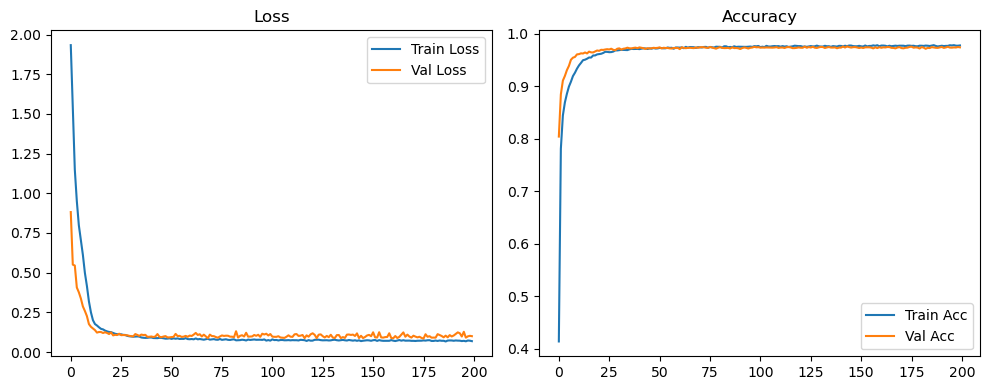

Evaluation:   0%|          | 0/157 [00:00<?, ?it/s]

Evaluation:   6%|▌         | 9/157 [00:00<00:01, 84.07it/s]

Evaluation:  11%|█▏        | 18/157 [00:00<00:01, 84.44it/s]

Evaluation:  17%|█▋        | 27/157 [00:00<00:01, 84.72it/s]

Evaluation:  23%|██▎       | 36/157 [00:00<00:01, 84.96it/s]

Evaluation:  29%|██▊       | 45/157 [00:00<00:01, 85.08it/s]

Evaluation:  34%|███▍      | 54/157 [00:00<00:01, 85.13it/s]

Evaluation:  40%|████      | 63/157 [00:00<00:01, 85.26it/s]

Evaluation:  46%|████▌     | 72/157 [00:00<00:00, 85.29it/s]

Evaluation:  52%|█████▏    | 81/157 [00:00<00:00, 85.31it/s]

Evaluation:  57%|█████▋    | 90/157 [00:01<00:00, 85.31it/s]

Evaluation:  63%|██████▎   | 99/157 [00:01<00:00, 85.30it/s]

Evaluation:  69%|██████▉   | 108/157 [00:01<00:00, 85.34it/s]

Evaluation:  75%|███████▍  | 117/157 [00:01<00:00, 85.33it/s]

Evaluation:  80%|████████  | 126/157 [00:01<00:00, 85.34it/s]

Evaluation:  86%|████████▌ | 135/157 [00:01<00:00, 85.41it/s]

Evaluation:  92%|█████████▏| 144/157 [00:01<00:00, 85.51it/s]

Evaluation:  97%|█████████▋| 153/157 [00:01<00:00, 85.47it/s]

Evaluation: 100%|██████████| 157/157 [00:01<00:00, 85.51it/s]

Original Model Final Test Loss: 0.0870 Accuracy: 0.9782


🚀 Running: batch64_lr0.001_0.001_0.001_dp0.0


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.001 | Train Acc: 0.4865 | Val Acc: 0.8157 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.001 | Train Acc: 0.4865 | Val Acc: 0.8157 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.001 | Train Acc: 0.4865 | Val Acc: 0.8157 |:   0%|          | 1/200 [00:13<46:23, 13.99s/it]

| LR: 0.001 | Train Acc: 0.8449 | Val Acc: 0.8957 |:   0%|          | 1/200 [00:27<46:23, 13.99s/it]

| LR: 0.001 | Train Acc: 0.8449 | Val Acc: 0.8957 |:   0%|          | 1/200 [00:27<46:23, 13.99s/it]

| LR: 0.001 | Train Acc: 0.8449 | Val Acc: 0.8957 |:   1%|          | 2/200 [00:27<45:49, 13.88s/it]

| LR: 0.001 | Train Acc: 0.8966 | Val Acc: 0.9226 |:   1%|          | 2/200 [00:41<45:49, 13.88s/it]

| LR: 0.001 | Train Acc: 0.8966 | Val Acc: 0.9226 |:   1%|          | 2/200 [00:41<45:49, 13.88s/it]

| LR: 0.001 | Train Acc: 0.8966 | Val Acc: 0.9226 |:   2%|▏         | 3/200 [00:41<46:00, 14.01s/it]

| LR: 0.001 | Train Acc: 0.9151 | Val Acc: 0.9273 |:   2%|▏         | 3/200 [00:55<46:00, 14.01s/it]

| LR: 0.001 | Train Acc: 0.9151 | Val Acc: 0.9273 |:   2%|▏         | 3/200 [00:55<46:00, 14.01s/it]

| LR: 0.001 | Train Acc: 0.9151 | Val Acc: 0.9273 |:   2%|▏         | 4/200 [00:55<44:53, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9292 | Val Acc: 0.9372 |:   2%|▏         | 4/200 [01:08<44:53, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9292 | Val Acc: 0.9372 |:   2%|▏         | 4/200 [01:08<44:53, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9292 | Val Acc: 0.9372 |:   2%|▎         | 5/200 [01:08<44:19, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9391 | Val Acc: 0.9449 |:   2%|▎         | 5/200 [01:22<44:19, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9391 | Val Acc: 0.9449 |:   2%|▎         | 5/200 [01:22<44:19, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9391 | Val Acc: 0.9449 |:   3%|▎         | 6/200 [01:22<43:52, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9451 | Val Acc: 0.9459 |:   3%|▎         | 6/200 [01:35<43:52, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9451 | Val Acc: 0.9459 |:   3%|▎         | 6/200 [01:35<43:52, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9451 | Val Acc: 0.9459 |:   4%|▎         | 7/200 [01:35<43:29, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9508 | Val Acc: 0.9508 |:   4%|▎         | 7/200 [01:48<43:29, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9508 | Val Acc: 0.9508 |:   4%|▎         | 7/200 [01:48<43:29, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9508 | Val Acc: 0.9508 |:   4%|▍         | 8/200 [01:48<43:07, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9551 | Val Acc: 0.9526 |:   4%|▍         | 8/200 [02:02<43:07, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9551 | Val Acc: 0.9526 |:   4%|▍         | 8/200 [02:02<43:07, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9551 | Val Acc: 0.9526 |:   4%|▍         | 9/200 [02:02<43:09, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9593 | Val Acc: 0.9485 |:   4%|▍         | 9/200 [02:16<43:09, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9593 | Val Acc: 0.9485 |:   4%|▍         | 9/200 [02:16<43:09, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9593 | Val Acc: 0.9485 |:   5%|▌         | 10/200 [02:16<42:52, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9603 | Val Acc: 0.9509 |:   5%|▌         | 10/200 [02:29<42:52, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9603 | Val Acc: 0.9509 |:   5%|▌         | 10/200 [02:29<42:52, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9603 | Val Acc: 0.9509 |:   6%|▌         | 11/200 [02:29<42:34, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9666 | Val Acc: 0.9516 |:   6%|▌         | 11/200 [02:42<42:34, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9666 | Val Acc: 0.9516 |:   6%|▌         | 11/200 [02:42<42:34, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9666 | Val Acc: 0.9516 |:   6%|▌         | 12/200 [02:43<42:11, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9686 | Val Acc: 0.9559 |:   6%|▌         | 12/200 [02:56<42:11, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9686 | Val Acc: 0.9559 |:   6%|▌         | 12/200 [02:56<42:11, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9686 | Val Acc: 0.9559 |:   6%|▋         | 13/200 [02:56<42:00, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9716 | Val Acc: 0.9597 |:   6%|▋         | 13/200 [03:09<42:00, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9716 | Val Acc: 0.9597 |:   6%|▋         | 13/200 [03:09<42:00, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9716 | Val Acc: 0.9597 |:   7%|▋         | 14/200 [03:10<41:47, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9748 | Val Acc: 0.9606 |:   7%|▋         | 14/200 [03:23<41:47, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9748 | Val Acc: 0.9606 |:   7%|▋         | 14/200 [03:23<41:47, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9748 | Val Acc: 0.9606 |:   8%|▊         | 15/200 [03:23<41:28, 13.45s/it]

| LR: 0.001 | Train Acc: 0.9768 | Val Acc: 0.9630 |:   8%|▊         | 15/200 [03:39<41:28, 13.45s/it]

| LR: 0.001 | Train Acc: 0.9768 | Val Acc: 0.9630 |:   8%|▊         | 15/200 [03:39<41:28, 13.45s/it]

| LR: 0.001 | Train Acc: 0.9768 | Val Acc: 0.9630 |:   8%|▊         | 16/200 [03:39<43:31, 14.19s/it]

| LR: 0.001 | Train Acc: 0.9789 | Val Acc: 0.9601 |:   8%|▊         | 16/200 [03:53<43:31, 14.19s/it]

| LR: 0.001 | Train Acc: 0.9789 | Val Acc: 0.9601 |:   8%|▊         | 16/200 [03:53<43:31, 14.19s/it]

| LR: 0.001 | Train Acc: 0.9789 | Val Acc: 0.9601 |:   8%|▊         | 17/200 [03:53<43:21, 14.21s/it]

| LR: 0.001 | Train Acc: 0.9792 | Val Acc: 0.9636 |:   8%|▊         | 17/200 [04:06<43:21, 14.21s/it]

| LR: 0.001 | Train Acc: 0.9792 | Val Acc: 0.9636 |:   8%|▊         | 17/200 [04:06<43:21, 14.21s/it]

| LR: 0.001 | Train Acc: 0.9792 | Val Acc: 0.9636 |:   9%|▉         | 18/200 [04:07<42:23, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9817 | Val Acc: 0.9647 |:   9%|▉         | 18/200 [04:20<42:23, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9817 | Val Acc: 0.9647 |:   9%|▉         | 18/200 [04:20<42:23, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9817 | Val Acc: 0.9647 |:  10%|▉         | 19/200 [04:20<41:32, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9826 | Val Acc: 0.9624 |:  10%|▉         | 19/200 [04:34<41:32, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9826 | Val Acc: 0.9624 |:  10%|▉         | 19/200 [04:34<41:32, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9826 | Val Acc: 0.9624 |:  10%|█         | 20/200 [04:34<41:22, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9827 | Val Acc: 0.9624 |:  10%|█         | 20/200 [04:47<41:22, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9827 | Val Acc: 0.9624 |:  10%|█         | 20/200 [04:47<41:22, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9827 | Val Acc: 0.9624 |:  10%|█         | 21/200 [04:47<41:00, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9840 | Val Acc: 0.9646 |:  10%|█         | 21/200 [05:01<41:00, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9840 | Val Acc: 0.9646 |:  10%|█         | 21/200 [05:01<41:00, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9840 | Val Acc: 0.9646 |:  11%|█         | 22/200 [05:01<40:33, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9857 | Val Acc: 0.9673 |:  11%|█         | 22/200 [05:14<40:33, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9857 | Val Acc: 0.9673 |:  11%|█         | 22/200 [05:14<40:33, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9857 | Val Acc: 0.9673 |:  12%|█▏        | 23/200 [05:14<40:03, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9858 | Val Acc: 0.9657 |:  12%|█▏        | 23/200 [05:27<40:03, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9858 | Val Acc: 0.9657 |:  12%|█▏        | 23/200 [05:27<40:03, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9858 | Val Acc: 0.9657 |:  12%|█▏        | 24/200 [05:27<39:35, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9882 | Val Acc: 0.9684 |:  12%|█▏        | 24/200 [05:41<39:35, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9882 | Val Acc: 0.9684 |:  12%|█▏        | 24/200 [05:41<39:35, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9882 | Val Acc: 0.9684 |:  12%|█▎        | 25/200 [05:41<39:14, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9885 | Val Acc: 0.9689 |:  12%|█▎        | 25/200 [05:54<39:14, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9885 | Val Acc: 0.9689 |:  12%|█▎        | 25/200 [05:54<39:14, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9885 | Val Acc: 0.9689 |:  13%|█▎        | 26/200 [05:54<38:54, 13.42s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9684 |:  13%|█▎        | 26/200 [06:07<38:54, 13.42s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9684 |:  13%|█▎        | 26/200 [06:07<38:54, 13.42s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9684 |:  14%|█▎        | 27/200 [06:07<38:36, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9898 | Val Acc: 0.9655 |:  14%|█▎        | 27/200 [06:21<38:36, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9898 | Val Acc: 0.9655 |:  14%|█▎        | 27/200 [06:21<38:36, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9898 | Val Acc: 0.9655 |:  14%|█▍        | 28/200 [06:21<38:28, 13.42s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9698 |:  14%|█▍        | 28/200 [06:34<38:28, 13.42s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9698 |:  14%|█▍        | 28/200 [06:34<38:28, 13.42s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9698 |:  14%|█▍        | 29/200 [06:34<38:06, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9663 |:  14%|█▍        | 29/200 [06:48<38:06, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9663 |:  14%|█▍        | 29/200 [06:48<38:06, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9663 |:  15%|█▌        | 30/200 [06:48<38:00, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9657 |:  15%|█▌        | 30/200 [07:01<38:00, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9657 |:  15%|█▌        | 30/200 [07:01<38:00, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9657 |:  16%|█▌        | 31/200 [07:01<37:43, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9925 | Val Acc: 0.9700 |:  16%|█▌        | 31/200 [07:14<37:43, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9925 | Val Acc: 0.9700 |:  16%|█▌        | 31/200 [07:14<37:43, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9925 | Val Acc: 0.9700 |:  16%|█▌        | 32/200 [07:14<37:28, 13.38s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9709 |:  16%|█▌        | 32/200 [07:28<37:28, 13.38s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9709 |:  16%|█▌        | 32/200 [07:28<37:28, 13.38s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9709 |:  16%|█▋        | 33/200 [07:28<37:25, 13.45s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9694 |:  16%|█▋        | 33/200 [07:42<37:25, 13.45s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9694 |:  16%|█▋        | 33/200 [07:42<37:25, 13.45s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9694 |:  17%|█▋        | 34/200 [07:42<37:17, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9732 |:  17%|█▋        | 34/200 [07:55<37:17, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9732 |:  17%|█▋        | 34/200 [07:55<37:17, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9732 |:  18%|█▊        | 35/200 [07:55<37:03, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9937 | Val Acc: 0.9701 |:  18%|█▊        | 35/200 [08:08<37:03, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9937 | Val Acc: 0.9701 |:  18%|█▊        | 35/200 [08:08<37:03, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9937 | Val Acc: 0.9701 |:  18%|█▊        | 36/200 [08:08<36:46, 13.45s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9674 |:  18%|█▊        | 36/200 [08:22<36:46, 13.45s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9674 |:  18%|█▊        | 36/200 [08:22<36:46, 13.45s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9674 |:  18%|█▊        | 37/200 [08:22<36:34, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9701 |:  18%|█▊        | 37/200 [08:35<36:34, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9701 |:  18%|█▊        | 37/200 [08:35<36:34, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9701 |:  19%|█▉        | 38/200 [08:35<36:24, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9711 |:  19%|█▉        | 38/200 [08:49<36:24, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9711 |:  19%|█▉        | 38/200 [08:49<36:24, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9711 |:  20%|█▉        | 39/200 [08:49<36:10, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9943 | Val Acc: 0.9703 |:  20%|█▉        | 39/200 [09:02<36:10, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9943 | Val Acc: 0.9703 |:  20%|█▉        | 39/200 [09:02<36:10, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9943 | Val Acc: 0.9703 |:  20%|██        | 40/200 [09:02<35:49, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9694 |:  20%|██        | 40/200 [09:18<35:49, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9694 |:  20%|██        | 40/200 [09:18<35:49, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9694 |:  20%|██        | 41/200 [09:18<37:45, 14.25s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9718 |:  20%|██        | 41/200 [09:32<37:45, 14.25s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9718 |:  20%|██        | 41/200 [09:32<37:45, 14.25s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9718 |:  21%|██        | 42/200 [09:32<36:47, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9708 |:  21%|██        | 42/200 [09:45<36:47, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9708 |:  21%|██        | 42/200 [09:45<36:47, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9708 |:  22%|██▏       | 43/200 [09:45<35:59, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9728 |:  22%|██▏       | 43/200 [09:58<35:59, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9728 |:  22%|██▏       | 43/200 [09:58<35:59, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9728 |:  22%|██▏       | 44/200 [09:58<35:27, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9718 |:  22%|██▏       | 44/200 [10:12<35:27, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9718 |:  22%|██▏       | 44/200 [10:12<35:27, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9718 |:  22%|██▎       | 45/200 [10:12<35:10, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9727 |:  22%|██▎       | 45/200 [10:25<35:10, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9727 |:  22%|██▎       | 45/200 [10:25<35:10, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9727 |:  23%|██▎       | 46/200 [10:25<34:53, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9699 |:  23%|██▎       | 46/200 [10:39<34:53, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9699 |:  23%|██▎       | 46/200 [10:39<34:53, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9699 |:  24%|██▎       | 47/200 [10:39<34:35, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9702 |:  24%|██▎       | 47/200 [10:52<34:35, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9702 |:  24%|██▎       | 47/200 [10:52<34:35, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9702 |:  24%|██▍       | 48/200 [10:52<34:19, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9694 |:  24%|██▍       | 48/200 [11:06<34:19, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9694 |:  24%|██▍       | 48/200 [11:06<34:19, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9694 |:  24%|██▍       | 49/200 [11:06<34:21, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9735 |:  24%|██▍       | 49/200 [11:20<34:21, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9735 |:  24%|██▍       | 49/200 [11:20<34:21, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9735 |:  25%|██▌       | 50/200 [11:20<34:03, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9722 |:  25%|██▌       | 50/200 [11:33<34:03, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9722 |:  25%|██▌       | 50/200 [11:33<34:03, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9722 |:  26%|██▌       | 51/200 [11:33<33:45, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9712 |:  26%|██▌       | 51/200 [11:47<33:45, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9712 |:  26%|██▌       | 51/200 [11:47<33:45, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9712 |:  26%|██▌       | 52/200 [11:47<33:28, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9688 |:  26%|██▌       | 52/200 [12:00<33:28, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9688 |:  26%|██▌       | 52/200 [12:00<33:28, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9688 |:  26%|██▋       | 53/200 [12:00<33:07, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9707 |:  26%|██▋       | 53/200 [12:14<33:07, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9707 |:  26%|██▋       | 53/200 [12:14<33:07, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9707 |:  27%|██▋       | 54/200 [12:14<32:53, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9732 |:  27%|██▋       | 54/200 [12:27<32:53, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9732 |:  27%|██▋       | 54/200 [12:27<32:53, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9732 |:  28%|██▊       | 55/200 [12:27<32:30, 13.45s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9719 |:  28%|██▊       | 55/200 [12:40<32:30, 13.45s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9719 |:  28%|██▊       | 55/200 [12:40<32:30, 13.45s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9719 |:  28%|██▊       | 56/200 [12:40<32:09, 13.40s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9730 |:  28%|██▊       | 56/200 [12:54<32:09, 13.40s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9730 |:  28%|██▊       | 56/200 [12:54<32:09, 13.40s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9730 |:  28%|██▊       | 57/200 [12:54<32:06, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9694 |:  28%|██▊       | 57/200 [13:09<32:06, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9694 |:  28%|██▊       | 57/200 [13:09<32:06, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9694 |:  29%|██▉       | 58/200 [13:09<32:43, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9734 |:  29%|██▉       | 58/200 [13:22<32:43, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9734 |:  29%|██▉       | 58/200 [13:22<32:43, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9734 |:  30%|██▉       | 59/200 [13:22<32:15, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9719 |:  30%|██▉       | 59/200 [13:36<32:15, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9719 |:  30%|██▉       | 59/200 [13:36<32:15, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9719 |:  30%|███       | 60/200 [13:36<31:46, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9697 |:  30%|███       | 60/200 [13:49<31:46, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9697 |:  30%|███       | 60/200 [13:49<31:46, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9697 |:  30%|███       | 61/200 [13:49<31:20, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9739 |:  30%|███       | 61/200 [14:02<31:20, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9739 |:  30%|███       | 61/200 [14:02<31:20, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9739 |:  31%|███       | 62/200 [14:03<31:09, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9707 |:  31%|███       | 62/200 [14:16<31:09, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9707 |:  31%|███       | 62/200 [14:16<31:09, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9707 |:  32%|███▏      | 63/200 [14:16<30:48, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9734 |:  32%|███▏      | 63/200 [14:29<30:48, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9734 |:  32%|███▏      | 63/200 [14:29<30:48, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9734 |:  32%|███▏      | 64/200 [14:29<30:23, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9749 |:  32%|███▏      | 64/200 [14:42<30:23, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9749 |:  32%|███▏      | 64/200 [14:42<30:23, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9749 |:  32%|███▎      | 65/200 [14:42<30:07, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9742 |:  32%|███▎      | 65/200 [14:56<30:07, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9742 |:  32%|███▎      | 65/200 [14:56<30:07, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9742 |:  33%|███▎      | 66/200 [14:56<29:51, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9744 |:  33%|███▎      | 66/200 [15:09<29:51, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9744 |:  33%|███▎      | 66/200 [15:09<29:51, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9744 |:  34%|███▎      | 67/200 [15:09<29:39, 13.38s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9712 |:  34%|███▎      | 67/200 [15:22<29:39, 13.38s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9712 |:  34%|███▎      | 67/200 [15:22<29:39, 13.38s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9712 |:  34%|███▍      | 68/200 [15:23<29:24, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9742 |:  34%|███▍      | 68/200 [15:36<29:24, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9742 |:  34%|███▍      | 68/200 [15:36<29:24, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9742 |:  34%|███▍      | 69/200 [15:36<29:08, 13.35s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9719 |:  34%|███▍      | 69/200 [15:49<29:08, 13.35s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9719 |:  34%|███▍      | 69/200 [15:49<29:08, 13.35s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9719 |:  35%|███▌      | 70/200 [15:49<28:52, 13.33s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9737 |:  35%|███▌      | 70/200 [16:02<28:52, 13.33s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9737 |:  35%|███▌      | 70/200 [16:02<28:52, 13.33s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9737 |:  36%|███▌      | 71/200 [16:02<28:40, 13.34s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9716 |:  36%|███▌      | 71/200 [16:16<28:40, 13.34s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9716 |:  36%|███▌      | 71/200 [16:16<28:40, 13.34s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9716 |:  36%|███▌      | 72/200 [16:16<28:27, 13.34s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9738 |:  36%|███▌      | 72/200 [16:29<28:27, 13.34s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9738 |:  36%|███▌      | 72/200 [16:29<28:27, 13.34s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9738 |:  36%|███▋      | 73/200 [16:29<28:14, 13.34s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9752 |:  36%|███▋      | 73/200 [16:43<28:14, 13.34s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9752 |:  36%|███▋      | 73/200 [16:43<28:14, 13.34s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9752 |:  37%|███▋      | 74/200 [16:43<28:09, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9740 |:  37%|███▋      | 74/200 [16:56<28:09, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9740 |:  37%|███▋      | 74/200 [16:56<28:09, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9740 |:  38%|███▊      | 75/200 [16:56<27:53, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9721 |:  38%|███▊      | 75/200 [17:09<27:53, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9721 |:  38%|███▊      | 75/200 [17:09<27:53, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9721 |:  38%|███▊      | 76/200 [17:09<27:39, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9758 |:  38%|███▊      | 76/200 [17:23<27:39, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9758 |:  38%|███▊      | 76/200 [17:23<27:39, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9758 |:  38%|███▊      | 77/200 [17:23<27:25, 13.38s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9728 |:  38%|███▊      | 77/200 [17:36<27:25, 13.38s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9728 |:  38%|███▊      | 77/200 [17:36<27:25, 13.38s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9728 |:  39%|███▉      | 78/200 [17:36<27:10, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9735 |:  39%|███▉      | 78/200 [17:50<27:10, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9735 |:  39%|███▉      | 78/200 [17:50<27:10, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9735 |:  40%|███▉      | 79/200 [17:50<27:00, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9732 |:  40%|███▉      | 79/200 [18:03<27:00, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9732 |:  40%|███▉      | 79/200 [18:03<27:00, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9732 |:  40%|████      | 80/200 [18:03<26:45, 13.38s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9751 |:  40%|████      | 80/200 [18:16<26:45, 13.38s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9751 |:  40%|████      | 80/200 [18:16<26:45, 13.38s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9751 |:  40%|████      | 81/200 [18:16<26:32, 13.38s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9739 |:  40%|████      | 81/200 [18:30<26:32, 13.38s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9739 |:  40%|████      | 81/200 [18:30<26:32, 13.38s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9739 |:  41%|████      | 82/200 [18:30<26:17, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9699 |:  41%|████      | 82/200 [18:43<26:17, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9699 |:  41%|████      | 82/200 [18:43<26:17, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9699 |:  42%|████▏     | 83/200 [18:43<26:01, 13.34s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9729 |:  42%|████▏     | 83/200 [18:56<26:01, 13.34s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9729 |:  42%|████▏     | 83/200 [18:56<26:01, 13.34s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9729 |:  42%|████▏     | 84/200 [18:56<25:49, 13.35s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9725 |:  42%|████▏     | 84/200 [19:10<25:49, 13.35s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9725 |:  42%|████▏     | 84/200 [19:10<25:49, 13.35s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9725 |:  42%|████▎     | 85/200 [19:10<25:35, 13.36s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9738 |:  42%|████▎     | 85/200 [19:23<25:35, 13.36s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9738 |:  42%|████▎     | 85/200 [19:23<25:35, 13.36s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9738 |:  43%|████▎     | 86/200 [19:23<25:29, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9735 |:  43%|████▎     | 86/200 [19:37<25:29, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9735 |:  43%|████▎     | 86/200 [19:37<25:29, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9735 |:  44%|████▎     | 87/200 [19:37<25:25, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9717 |:  44%|████▎     | 87/200 [19:51<25:25, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9717 |:  44%|████▎     | 87/200 [19:51<25:25, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9717 |:  44%|████▍     | 88/200 [19:51<25:40, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9759 |:  44%|████▍     | 88/200 [20:05<25:40, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9759 |:  44%|████▍     | 88/200 [20:05<25:40, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9759 |:  44%|████▍     | 89/200 [20:05<25:20, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9738 |:  44%|████▍     | 89/200 [20:18<25:20, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9738 |:  44%|████▍     | 89/200 [20:18<25:20, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9738 |:  45%|████▌     | 90/200 [20:18<24:57, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9747 |:  45%|████▌     | 90/200 [20:32<24:57, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9747 |:  45%|████▌     | 90/200 [20:32<24:57, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9747 |:  46%|████▌     | 91/200 [20:32<24:36, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9688 |:  46%|████▌     | 91/200 [20:45<24:36, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9688 |:  46%|████▌     | 91/200 [20:45<24:36, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9688 |:  46%|████▌     | 92/200 [20:45<24:16, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9738 |:  46%|████▌     | 92/200 [20:58<24:16, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9738 |:  46%|████▌     | 92/200 [20:58<24:16, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9738 |:  46%|████▋     | 93/200 [20:58<23:57, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9732 |:  46%|████▋     | 93/200 [21:12<23:57, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9732 |:  46%|████▋     | 93/200 [21:12<23:57, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9732 |:  47%|████▋     | 94/200 [21:12<23:39, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9714 |:  47%|████▋     | 94/200 [21:26<23:39, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9714 |:  47%|████▋     | 94/200 [21:26<23:39, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9714 |:  48%|████▊     | 95/200 [21:26<23:46, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9736 |:  48%|████▊     | 95/200 [21:39<23:46, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9736 |:  48%|████▊     | 95/200 [21:39<23:46, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9736 |:  48%|████▊     | 96/200 [21:39<23:29, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9738 |:  48%|████▊     | 96/200 [21:52<23:29, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9738 |:  48%|████▊     | 96/200 [21:52<23:29, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9738 |:  48%|████▊     | 97/200 [21:53<23:10, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9732 |:  48%|████▊     | 97/200 [22:06<23:10, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9732 |:  48%|████▊     | 97/200 [22:06<23:10, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9732 |:  49%|████▉     | 98/200 [22:06<22:50, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9742 |:  49%|████▉     | 98/200 [22:19<22:50, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9742 |:  49%|████▉     | 98/200 [22:19<22:50, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9742 |:  50%|████▉     | 99/200 [22:19<22:33, 13.40s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9741 |:  50%|████▉     | 99/200 [22:33<22:33, 13.40s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9741 |:  50%|████▉     | 99/200 [22:33<22:33, 13.40s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9741 |:  50%|█████     | 100/200 [22:33<22:21, 13.42s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  50%|█████     | 100/200 [22:46<22:21, 13.42s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  50%|█████     | 100/200 [22:46<22:21, 13.42s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  50%|█████     | 101/200 [22:47<22:24, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9725 |:  50%|█████     | 101/200 [23:00<22:24, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9725 |:  50%|█████     | 101/200 [23:00<22:24, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9725 |:  51%|█████     | 102/200 [23:00<22:02, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9737 |:  51%|█████     | 102/200 [23:14<22:02, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9737 |:  51%|█████     | 102/200 [23:14<22:02, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9737 |:  52%|█████▏    | 103/200 [23:14<22:10, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9740 |:  52%|█████▏    | 103/200 [23:27<22:10, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9740 |:  52%|█████▏    | 103/200 [23:27<22:10, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9740 |:  52%|█████▏    | 104/200 [23:27<21:47, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9722 |:  52%|█████▏    | 104/200 [23:41<21:47, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9722 |:  52%|█████▏    | 104/200 [23:41<21:47, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9722 |:  52%|█████▎    | 105/200 [23:41<21:29, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9725 |:  52%|█████▎    | 105/200 [23:54<21:29, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9725 |:  52%|█████▎    | 105/200 [23:54<21:29, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9725 |:  53%|█████▎    | 106/200 [23:54<21:13, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9741 |:  53%|█████▎    | 106/200 [24:08<21:13, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9741 |:  53%|█████▎    | 106/200 [24:08<21:13, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9741 |:  54%|█████▎    | 107/200 [24:08<20:55, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9744 |:  54%|█████▎    | 107/200 [24:21<20:55, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9744 |:  54%|█████▎    | 107/200 [24:21<20:55, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9744 |:  54%|█████▍    | 108/200 [24:21<20:35, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9738 |:  54%|█████▍    | 108/200 [24:34<20:35, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9738 |:  54%|█████▍    | 108/200 [24:34<20:35, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9738 |:  55%|█████▍    | 109/200 [24:35<20:23, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9756 |:  55%|█████▍    | 109/200 [24:48<20:23, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9756 |:  55%|█████▍    | 109/200 [24:48<20:23, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9756 |:  55%|█████▌    | 110/200 [24:48<20:14, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9722 |:  55%|█████▌    | 110/200 [25:02<20:14, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9722 |:  55%|█████▌    | 110/200 [25:02<20:14, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9722 |:  56%|█████▌    | 111/200 [25:02<19:58, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9742 |:  56%|█████▌    | 111/200 [25:15<19:58, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9742 |:  56%|█████▌    | 111/200 [25:15<19:58, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9742 |:  56%|█████▌    | 112/200 [25:15<19:42, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9755 |:  56%|█████▌    | 112/200 [25:28<19:42, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9755 |:  56%|█████▌    | 112/200 [25:28<19:42, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9755 |:  56%|█████▋    | 113/200 [25:28<19:30, 13.45s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9743 |:  56%|█████▋    | 113/200 [25:42<19:30, 13.45s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9743 |:  56%|█████▋    | 113/200 [25:42<19:30, 13.45s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9743 |:  57%|█████▋    | 114/200 [25:42<19:12, 13.40s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9740 |:  57%|█████▋    | 114/200 [25:55<19:12, 13.40s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9740 |:  57%|█████▋    | 114/200 [25:55<19:12, 13.40s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9740 |:  57%|█████▊    | 115/200 [25:55<18:59, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9730 |:  57%|█████▊    | 115/200 [26:09<18:59, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9730 |:  57%|█████▊    | 115/200 [26:09<18:59, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9730 |:  58%|█████▊    | 116/200 [26:09<18:53, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9732 |:  58%|█████▊    | 116/200 [26:22<18:53, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9732 |:  58%|█████▊    | 116/200 [26:22<18:53, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9732 |:  58%|█████▊    | 117/200 [26:22<18:35, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9717 |:  58%|█████▊    | 117/200 [26:36<18:35, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9717 |:  58%|█████▊    | 117/200 [26:36<18:35, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9717 |:  59%|█████▉    | 118/200 [26:36<18:22, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9730 |:  59%|█████▉    | 118/200 [26:49<18:22, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9730 |:  59%|█████▉    | 118/200 [26:49<18:22, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9730 |:  60%|█████▉    | 119/200 [26:49<18:04, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9733 |:  60%|█████▉    | 119/200 [27:02<18:04, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9733 |:  60%|█████▉    | 119/200 [27:02<18:04, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9733 |:  60%|██████    | 120/200 [27:02<17:45, 13.32s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9719 |:  60%|██████    | 120/200 [27:15<17:45, 13.32s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9719 |:  60%|██████    | 120/200 [27:15<17:45, 13.32s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9719 |:  60%|██████    | 121/200 [27:15<17:36, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9749 |:  60%|██████    | 121/200 [27:29<17:36, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9749 |:  60%|██████    | 121/200 [27:29<17:36, 13.37s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9749 |:  61%|██████    | 122/200 [27:29<17:26, 13.42s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9732 |:  61%|██████    | 122/200 [27:42<17:26, 13.42s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9732 |:  61%|██████    | 122/200 [27:42<17:26, 13.42s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9732 |:  62%|██████▏   | 123/200 [27:42<17:13, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9735 |:  62%|██████▏   | 123/200 [27:56<17:13, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9735 |:  62%|██████▏   | 123/200 [27:56<17:13, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9735 |:  62%|██████▏   | 124/200 [27:56<17:04, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9747 |:  62%|██████▏   | 124/200 [28:10<17:04, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9747 |:  62%|██████▏   | 124/200 [28:10<17:04, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9747 |:  62%|██████▎   | 125/200 [28:10<16:51, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9765 |:  62%|██████▎   | 125/200 [28:23<16:51, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9765 |:  62%|██████▎   | 125/200 [28:23<16:51, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9765 |:  63%|██████▎   | 126/200 [28:23<16:36, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9738 |:  63%|██████▎   | 126/200 [28:36<16:36, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9738 |:  63%|██████▎   | 126/200 [28:36<16:36, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9738 |:  64%|██████▎   | 127/200 [28:36<16:22, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9753 |:  64%|██████▎   | 127/200 [28:50<16:22, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9753 |:  64%|██████▎   | 127/200 [28:50<16:22, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9753 |:  64%|██████▍   | 128/200 [28:50<16:10, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9758 |:  64%|██████▍   | 128/200 [29:03<16:10, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9758 |:  64%|██████▍   | 128/200 [29:03<16:10, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9758 |:  64%|██████▍   | 129/200 [29:03<15:56, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9754 |:  64%|██████▍   | 129/200 [29:17<15:56, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9754 |:  64%|██████▍   | 129/200 [29:17<15:56, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9754 |:  65%|██████▌   | 130/200 [29:17<15:40, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9744 |:  65%|██████▌   | 130/200 [29:30<15:40, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9744 |:  65%|██████▌   | 130/200 [29:30<15:40, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9744 |:  66%|██████▌   | 131/200 [29:30<15:23, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9753 |:  66%|██████▌   | 131/200 [29:43<15:23, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9753 |:  66%|██████▌   | 131/200 [29:43<15:23, 13.39s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9753 |:  66%|██████▌   | 132/200 [29:43<15:09, 13.38s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9737 |:  66%|██████▌   | 132/200 [29:57<15:09, 13.38s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9737 |:  66%|██████▌   | 132/200 [29:57<15:09, 13.38s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9737 |:  66%|██████▋   | 133/200 [29:57<14:58, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9754 |:  66%|██████▋   | 133/200 [30:11<14:58, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9754 |:  66%|██████▋   | 133/200 [30:11<14:58, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9754 |:  67%|██████▋   | 134/200 [30:11<14:55, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9739 |:  67%|██████▋   | 134/200 [30:24<14:55, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9739 |:  67%|██████▋   | 134/200 [30:24<14:55, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9739 |:  68%|██████▊   | 135/200 [30:24<14:38, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9741 |:  68%|██████▊   | 135/200 [30:38<14:38, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9741 |:  68%|██████▊   | 135/200 [30:38<14:38, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9741 |:  68%|██████▊   | 136/200 [30:38<14:24, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9731 |:  68%|██████▊   | 136/200 [30:51<14:24, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9731 |:  68%|██████▊   | 136/200 [30:51<14:24, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9731 |:  68%|██████▊   | 137/200 [30:51<14:08, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9748 |:  68%|██████▊   | 137/200 [31:04<14:08, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9748 |:  68%|██████▊   | 137/200 [31:04<14:08, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9748 |:  69%|██████▉   | 138/200 [31:05<13:54, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9746 |:  69%|██████▉   | 138/200 [31:18<13:54, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9746 |:  69%|██████▉   | 138/200 [31:18<13:54, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9746 |:  70%|██████▉   | 139/200 [31:18<13:40, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9757 |:  70%|██████▉   | 139/200 [31:31<13:40, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9757 |:  70%|██████▉   | 139/200 [31:31<13:40, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9757 |:  70%|███████   | 140/200 [31:31<13:28, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9763 |:  70%|███████   | 140/200 [31:45<13:28, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9763 |:  70%|███████   | 140/200 [31:45<13:28, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9763 |:  70%|███████   | 141/200 [31:45<13:14, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9746 |:  70%|███████   | 141/200 [31:58<13:14, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9746 |:  70%|███████   | 141/200 [31:58<13:14, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9746 |:  71%|███████   | 142/200 [31:58<13:02, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9746 |:  71%|███████   | 142/200 [32:12<13:02, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9746 |:  71%|███████   | 142/200 [32:12<13:02, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9746 |:  72%|███████▏  | 143/200 [32:12<12:49, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9758 |:  72%|███████▏  | 143/200 [32:25<12:49, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9758 |:  72%|███████▏  | 143/200 [32:25<12:49, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9758 |:  72%|███████▏  | 144/200 [32:25<12:33, 13.45s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9738 |:  72%|███████▏  | 144/200 [32:39<12:33, 13.45s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9738 |:  72%|███████▏  | 144/200 [32:39<12:33, 13.45s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9738 |:  72%|███████▎  | 145/200 [32:39<12:17, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9739 |:  72%|███████▎  | 145/200 [32:53<12:17, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9739 |:  72%|███████▎  | 145/200 [32:53<12:17, 13.41s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9739 |:  73%|███████▎  | 146/200 [32:53<12:18, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9739 |:  73%|███████▎  | 146/200 [33:06<12:18, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9739 |:  73%|███████▎  | 146/200 [33:06<12:18, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9739 |:  74%|███████▎  | 147/200 [33:06<11:58, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9752 |:  74%|███████▎  | 147/200 [33:20<11:58, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9752 |:  74%|███████▎  | 147/200 [33:20<11:58, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9752 |:  74%|███████▍  | 148/200 [33:20<11:42, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9758 |:  74%|███████▍  | 148/200 [33:33<11:42, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9758 |:  74%|███████▍  | 148/200 [33:33<11:42, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9758 |:  74%|███████▍  | 149/200 [33:33<11:30, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9728 |:  74%|███████▍  | 149/200 [33:47<11:30, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9728 |:  74%|███████▍  | 149/200 [33:47<11:30, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9728 |:  75%|███████▌  | 150/200 [33:47<11:16, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9742 |:  75%|███████▌  | 150/200 [34:00<11:16, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9742 |:  75%|███████▌  | 150/200 [34:00<11:16, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9742 |:  76%|███████▌  | 151/200 [34:00<11:02, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9747 |:  76%|███████▌  | 151/200 [34:14<11:02, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9747 |:  76%|███████▌  | 151/200 [34:14<11:02, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9747 |:  76%|███████▌  | 152/200 [34:14<10:48, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9744 |:  76%|███████▌  | 152/200 [34:27<10:48, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9744 |:  76%|███████▌  | 152/200 [34:27<10:48, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9744 |:  76%|███████▋  | 153/200 [34:27<10:37, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9750 |:  76%|███████▋  | 153/200 [34:41<10:37, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9750 |:  76%|███████▋  | 153/200 [34:41<10:37, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9750 |:  77%|███████▋  | 154/200 [34:41<10:22, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9742 |:  77%|███████▋  | 154/200 [34:54<10:22, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9742 |:  77%|███████▋  | 154/200 [34:54<10:22, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9742 |:  78%|███████▊  | 155/200 [34:54<10:08, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9760 |:  78%|███████▊  | 155/200 [35:08<10:08, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9760 |:  78%|███████▊  | 155/200 [35:08<10:08, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9760 |:  78%|███████▊  | 156/200 [35:08<09:55, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9762 |:  78%|███████▊  | 156/200 [35:21<09:55, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9762 |:  78%|███████▊  | 156/200 [35:21<09:55, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9762 |:  78%|███████▊  | 157/200 [35:21<09:42, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9753 |:  78%|███████▊  | 157/200 [35:35<09:42, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9753 |:  78%|███████▊  | 157/200 [35:35<09:42, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9753 |:  79%|███████▉  | 158/200 [35:35<09:26, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9757 |:  79%|███████▉  | 158/200 [35:48<09:26, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9757 |:  79%|███████▉  | 158/200 [35:48<09:26, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9757 |:  80%|███████▉  | 159/200 [35:48<09:14, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9758 |:  80%|███████▉  | 159/200 [36:02<09:14, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9758 |:  80%|███████▉  | 159/200 [36:02<09:14, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9758 |:  80%|████████  | 160/200 [36:02<08:58, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9745 |:  80%|████████  | 160/200 [36:16<08:58, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9745 |:  80%|████████  | 160/200 [36:16<08:58, 13.47s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9745 |:  80%|████████  | 161/200 [36:16<08:57, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9748 |:  80%|████████  | 161/200 [36:30<08:57, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9748 |:  80%|████████  | 161/200 [36:30<08:57, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9748 |:  81%|████████  | 162/200 [36:30<08:42, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9748 |:  81%|████████  | 162/200 [36:44<08:42, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9748 |:  81%|████████  | 162/200 [36:44<08:42, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9748 |:  82%|████████▏ | 163/200 [36:44<08:27, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9752 |:  82%|████████▏ | 163/200 [36:57<08:27, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9752 |:  82%|████████▏ | 163/200 [36:57<08:27, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9752 |:  82%|████████▏ | 164/200 [36:57<08:11, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9755 |:  82%|████████▏ | 164/200 [37:10<08:11, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9755 |:  82%|████████▏ | 164/200 [37:10<08:11, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9755 |:  82%|████████▎ | 165/200 [37:10<07:54, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9746 |:  82%|████████▎ | 165/200 [37:24<07:54, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9746 |:  82%|████████▎ | 165/200 [37:24<07:54, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9746 |:  83%|████████▎ | 166/200 [37:24<07:39, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9752 |:  83%|████████▎ | 166/200 [37:38<07:39, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9752 |:  83%|████████▎ | 166/200 [37:38<07:39, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9752 |:  84%|████████▎ | 167/200 [37:38<07:32, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9742 |:  84%|████████▎ | 167/200 [37:51<07:32, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9742 |:  84%|████████▎ | 167/200 [37:51<07:32, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9742 |:  84%|████████▍ | 168/200 [37:51<07:15, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9764 |:  84%|████████▍ | 168/200 [38:05<07:15, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9764 |:  84%|████████▍ | 168/200 [38:05<07:15, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9764 |:  84%|████████▍ | 169/200 [38:05<06:59, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9749 |:  84%|████████▍ | 169/200 [38:18<06:59, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9749 |:  84%|████████▍ | 169/200 [38:18<06:59, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9749 |:  85%|████████▌ | 170/200 [38:18<06:45, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9752 |:  85%|████████▌ | 170/200 [38:32<06:45, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9752 |:  85%|████████▌ | 170/200 [38:32<06:45, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9752 |:  86%|████████▌ | 171/200 [38:32<06:31, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9749 |:  86%|████████▌ | 171/200 [38:45<06:31, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9749 |:  86%|████████▌ | 171/200 [38:45<06:31, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9749 |:  86%|████████▌ | 172/200 [38:45<06:19, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9768 |:  86%|████████▌ | 172/200 [38:59<06:19, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9768 |:  86%|████████▌ | 172/200 [38:59<06:19, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9768 |:  86%|████████▋ | 173/200 [38:59<06:05, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9764 |:  86%|████████▋ | 173/200 [39:13<06:05, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9764 |:  86%|████████▋ | 173/200 [39:13<06:05, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9764 |:  87%|████████▋ | 174/200 [39:13<05:55, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9732 |:  87%|████████▋ | 174/200 [39:26<05:55, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9732 |:  87%|████████▋ | 174/200 [39:26<05:55, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9732 |:  88%|████████▊ | 175/200 [39:27<05:41, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9753 |:  88%|████████▊ | 175/200 [39:40<05:41, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9753 |:  88%|████████▊ | 175/200 [39:40<05:41, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9753 |:  88%|████████▊ | 176/200 [39:40<05:25, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9748 |:  88%|████████▊ | 176/200 [39:53<05:25, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9748 |:  88%|████████▊ | 176/200 [39:53<05:25, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9748 |:  88%|████████▊ | 177/200 [39:53<05:11, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9741 |:  88%|████████▊ | 177/200 [40:07<05:11, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9741 |:  88%|████████▊ | 177/200 [40:07<05:11, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9741 |:  89%|████████▉ | 178/200 [40:07<04:57, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9747 |:  89%|████████▉ | 178/200 [40:20<04:57, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9747 |:  89%|████████▉ | 178/200 [40:20<04:57, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9747 |:  90%|████████▉ | 179/200 [40:20<04:42, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9749 |:  90%|████████▉ | 179/200 [40:33<04:42, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9749 |:  90%|████████▉ | 179/200 [40:33<04:42, 13.44s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9749 |:  90%|█████████ | 180/200 [40:33<04:28, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9745 |:  90%|█████████ | 180/200 [40:47<04:28, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9745 |:  90%|█████████ | 180/200 [40:47<04:28, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9745 |:  90%|█████████ | 181/200 [40:47<04:15, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9747 |:  90%|█████████ | 181/200 [41:00<04:15, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9747 |:  90%|█████████ | 181/200 [41:00<04:15, 13.46s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9747 |:  91%|█████████ | 182/200 [41:00<04:02, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9730 |:  91%|█████████ | 182/200 [41:14<04:02, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9730 |:  91%|█████████ | 182/200 [41:14<04:02, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9730 |:  92%|█████████▏| 183/200 [41:14<03:48, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9729 |:  92%|█████████▏| 183/200 [41:28<03:48, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9729 |:  92%|█████████▏| 183/200 [41:28<03:48, 13.43s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9729 |:  92%|█████████▏| 184/200 [41:28<03:36, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9726 |:  92%|█████████▏| 184/200 [41:41<03:36, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9726 |:  92%|█████████▏| 184/200 [41:41<03:36, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9726 |:  92%|█████████▎| 185/200 [41:41<03:22, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9735 |:  92%|█████████▎| 185/200 [41:55<03:22, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9735 |:  92%|█████████▎| 185/200 [41:55<03:22, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9735 |:  93%|█████████▎| 186/200 [41:55<03:10, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9728 |:  93%|█████████▎| 186/200 [42:08<03:10, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9728 |:  93%|█████████▎| 186/200 [42:08<03:10, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9728 |:  94%|█████████▎| 187/200 [42:08<02:55, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9750 |:  94%|█████████▎| 187/200 [42:24<02:55, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9750 |:  94%|█████████▎| 187/200 [42:24<02:55, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9750 |:  94%|█████████▍| 188/200 [42:24<02:51, 14.29s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9751 |:  94%|█████████▍| 188/200 [42:39<02:51, 14.29s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9751 |:  94%|█████████▍| 188/200 [42:39<02:51, 14.29s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9751 |:  94%|█████████▍| 189/200 [42:39<02:40, 14.58s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9730 |:  94%|█████████▍| 189/200 [42:53<02:40, 14.58s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9730 |:  94%|█████████▍| 189/200 [42:53<02:40, 14.58s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9730 |:  95%|█████████▌| 190/200 [42:53<02:22, 14.26s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9737 |:  95%|█████████▌| 190/200 [43:07<02:22, 14.26s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9737 |:  95%|█████████▌| 190/200 [43:07<02:22, 14.26s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9737 |:  96%|█████████▌| 191/200 [43:07<02:08, 14.28s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9723 |:  96%|█████████▌| 191/200 [43:21<02:08, 14.28s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9723 |:  96%|█████████▌| 191/200 [43:21<02:08, 14.28s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9723 |:  96%|█████████▌| 192/200 [43:21<01:51, 13.99s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9746 |:  96%|█████████▌| 192/200 [43:34<01:51, 13.99s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9746 |:  96%|█████████▌| 192/200 [43:34<01:51, 13.99s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9746 |:  96%|█████████▋| 193/200 [43:34<01:36, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9751 |:  96%|█████████▋| 193/200 [43:48<01:36, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9751 |:  96%|█████████▋| 193/200 [43:48<01:36, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9751 |:  97%|█████████▋| 194/200 [43:48<01:22, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9742 |:  97%|█████████▋| 194/200 [44:01<01:22, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9742 |:  97%|█████████▋| 194/200 [44:01<01:22, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9742 |:  98%|█████████▊| 195/200 [44:01<01:08, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9723 |:  98%|█████████▊| 195/200 [44:14<01:08, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9723 |:  98%|█████████▊| 195/200 [44:14<01:08, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9723 |:  98%|█████████▊| 196/200 [44:14<00:54, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9747 |:  98%|█████████▊| 196/200 [44:28<00:54, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9747 |:  98%|█████████▊| 196/200 [44:28<00:54, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9747 |:  98%|█████████▊| 197/200 [44:28<00:41, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9746 |:  98%|█████████▊| 197/200 [44:42<00:41, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9746 |:  98%|█████████▊| 197/200 [44:42<00:41, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9746 |:  99%|█████████▉| 198/200 [44:42<00:27, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9749 |:  99%|█████████▉| 198/200 [44:56<00:27, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9749 |:  99%|█████████▉| 198/200 [44:56<00:27, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9749 |: 100%|█████████▉| 199/200 [44:56<00:13, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9743 |: 100%|█████████▉| 199/200 [45:09<00:13, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9743 |: 100%|█████████▉| 199/200 [45:09<00:13, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9743 |: 100%|██████████| 200/200 [45:09<00:00, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9743 |: 100%|██████████| 200/200 [45:09<00:00, 13.55s/it]

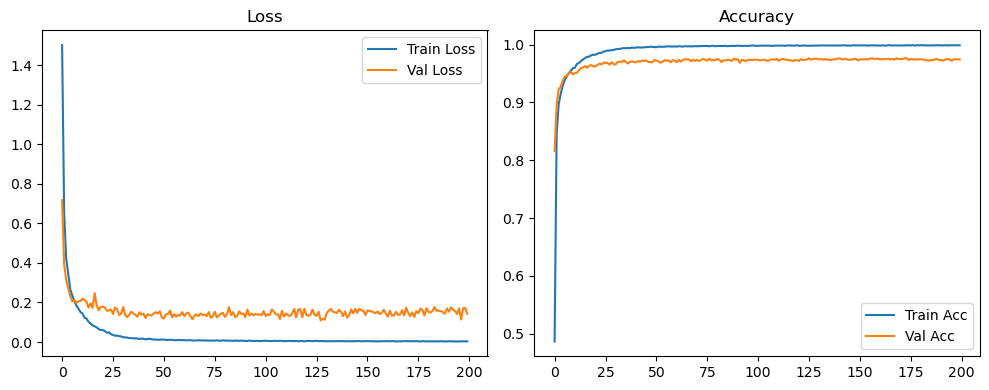

Evaluation:   0%|          | 0/157 [00:00<?, ?it/s]

Evaluation:   6%|▌         | 9/157 [00:00<00:01, 84.11it/s]

Evaluation:  11%|█▏        | 18/157 [00:00<00:01, 84.62it/s]

Evaluation:  17%|█▋        | 27/157 [00:00<00:01, 85.02it/s]

Evaluation:  23%|██▎       | 36/157 [00:00<00:01, 85.08it/s]

Evaluation:  29%|██▊       | 45/157 [00:00<00:01, 85.04it/s]

Evaluation:  34%|███▍      | 54/157 [00:00<00:01, 85.10it/s]

Evaluation:  40%|████      | 63/157 [00:00<00:01, 82.97it/s]

Evaluation:  46%|████▌     | 72/157 [00:00<00:01, 83.71it/s]

Evaluation:  52%|█████▏    | 81/157 [00:00<00:00, 84.11it/s]

Evaluation:  57%|█████▋    | 90/157 [00:01<00:00, 84.49it/s]

Evaluation:  63%|██████▎   | 99/157 [00:01<00:00, 84.29it/s]

Evaluation:  69%|██████▉   | 108/157 [00:01<00:00, 83.69it/s]

Evaluation:  75%|███████▍  | 117/157 [00:01<00:00, 83.14it/s]

Evaluation:  80%|████████  | 126/157 [00:01<00:00, 82.16it/s]

Evaluation:  86%|████████▌ | 135/157 [00:01<00:00, 81.62it/s]

Evaluation:  92%|█████████▏| 144/157 [00:01<00:00, 82.14it/s]

Evaluation:  97%|█████████▋| 153/157 [00:01<00:00, 82.89it/s]

Evaluation: 100%|██████████| 157/157 [00:01<00:00, 83.80it/s]

Original Model Final Test Loss: 0.1252 Accuracy: 0.9764


🚀 Running: batch64_lr0.001_0.001_0.001_dp0.2


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.001 | Train Acc: 0.4321 | Val Acc: 0.7872 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.001 | Train Acc: 0.4321 | Val Acc: 0.7872 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.001 | Train Acc: 0.4321 | Val Acc: 0.7872 |:   0%|          | 1/200 [00:13<45:52, 13.83s/it]

| LR: 0.001 | Train Acc: 0.8135 | Val Acc: 0.8924 |:   0%|          | 1/200 [00:27<45:52, 13.83s/it]

| LR: 0.001 | Train Acc: 0.8135 | Val Acc: 0.8924 |:   0%|          | 1/200 [00:27<45:52, 13.83s/it]

| LR: 0.001 | Train Acc: 0.8135 | Val Acc: 0.8924 |:   1%|          | 2/200 [00:27<44:56, 13.62s/it]

| LR: 0.001 | Train Acc: 0.8802 | Val Acc: 0.9247 |:   1%|          | 2/200 [00:40<44:56, 13.62s/it]

| LR: 0.001 | Train Acc: 0.8802 | Val Acc: 0.9247 |:   1%|          | 2/200 [00:40<44:56, 13.62s/it]

| LR: 0.001 | Train Acc: 0.8802 | Val Acc: 0.9247 |:   2%|▏         | 3/200 [00:40<44:30, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9012 | Val Acc: 0.9324 |:   2%|▏         | 3/200 [00:54<44:30, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9012 | Val Acc: 0.9324 |:   2%|▏         | 3/200 [00:54<44:30, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9012 | Val Acc: 0.9324 |:   2%|▏         | 4/200 [00:54<44:20, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9184 | Val Acc: 0.9417 |:   2%|▏         | 4/200 [01:07<44:20, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9184 | Val Acc: 0.9417 |:   2%|▏         | 4/200 [01:07<44:20, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9184 | Val Acc: 0.9417 |:   2%|▎         | 5/200 [01:07<44:02, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9256 | Val Acc: 0.9413 |:   2%|▎         | 5/200 [01:21<44:02, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9256 | Val Acc: 0.9413 |:   2%|▎         | 5/200 [01:21<44:02, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9256 | Val Acc: 0.9413 |:   3%|▎         | 6/200 [01:21<43:50, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9331 | Val Acc: 0.9482 |:   3%|▎         | 6/200 [01:35<43:50, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9331 | Val Acc: 0.9482 |:   3%|▎         | 6/200 [01:35<43:50, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9331 | Val Acc: 0.9482 |:   4%|▎         | 7/200 [01:35<43:45, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9387 | Val Acc: 0.9487 |:   4%|▎         | 7/200 [01:48<43:45, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9387 | Val Acc: 0.9487 |:   4%|▎         | 7/200 [01:48<43:45, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9387 | Val Acc: 0.9487 |:   4%|▍         | 8/200 [01:48<43:37, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9456 | Val Acc: 0.9563 |:   4%|▍         | 8/200 [02:02<43:37, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9456 | Val Acc: 0.9563 |:   4%|▍         | 8/200 [02:02<43:37, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9456 | Val Acc: 0.9563 |:   4%|▍         | 9/200 [02:02<43:30, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9474 | Val Acc: 0.9526 |:   4%|▍         | 9/200 [02:16<43:30, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9474 | Val Acc: 0.9526 |:   4%|▍         | 9/200 [02:16<43:30, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9474 | Val Acc: 0.9526 |:   5%|▌         | 10/200 [02:16<43:07, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9534 | Val Acc: 0.9575 |:   5%|▌         | 10/200 [02:29<43:07, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9534 | Val Acc: 0.9575 |:   5%|▌         | 10/200 [02:29<43:07, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9534 | Val Acc: 0.9575 |:   6%|▌         | 11/200 [02:29<43:06, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9581 | Val Acc: 0.9582 |:   6%|▌         | 11/200 [02:43<43:06, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9581 | Val Acc: 0.9582 |:   6%|▌         | 11/200 [02:43<43:06, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9581 | Val Acc: 0.9582 |:   6%|▌         | 12/200 [02:43<42:46, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9621 | Val Acc: 0.9631 |:   6%|▌         | 12/200 [02:57<42:46, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9621 | Val Acc: 0.9631 |:   6%|▌         | 12/200 [02:57<42:46, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9621 | Val Acc: 0.9631 |:   6%|▋         | 13/200 [02:57<42:33, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9653 | Val Acc: 0.9617 |:   6%|▋         | 13/200 [03:10<42:33, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9653 | Val Acc: 0.9617 |:   6%|▋         | 13/200 [03:10<42:33, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9653 | Val Acc: 0.9617 |:   7%|▋         | 14/200 [03:10<42:16, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9671 | Val Acc: 0.9630 |:   7%|▋         | 14/200 [03:24<42:16, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9671 | Val Acc: 0.9630 |:   7%|▋         | 14/200 [03:24<42:16, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9671 | Val Acc: 0.9630 |:   8%|▊         | 15/200 [03:24<42:01, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9697 | Val Acc: 0.9659 |:   8%|▊         | 15/200 [03:37<42:01, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9697 | Val Acc: 0.9659 |:   8%|▊         | 15/200 [03:37<42:01, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9697 | Val Acc: 0.9659 |:   8%|▊         | 16/200 [03:37<41:38, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9718 | Val Acc: 0.9657 |:   8%|▊         | 16/200 [03:51<41:38, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9718 | Val Acc: 0.9657 |:   8%|▊         | 16/200 [03:51<41:38, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9718 | Val Acc: 0.9657 |:   8%|▊         | 17/200 [03:51<41:30, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9748 | Val Acc: 0.9645 |:   8%|▊         | 17/200 [04:05<41:30, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9748 | Val Acc: 0.9645 |:   8%|▊         | 17/200 [04:05<41:30, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9748 | Val Acc: 0.9645 |:   9%|▉         | 18/200 [04:05<41:19, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9756 | Val Acc: 0.9651 |:   9%|▉         | 18/200 [04:18<41:19, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9756 | Val Acc: 0.9651 |:   9%|▉         | 18/200 [04:18<41:19, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9756 | Val Acc: 0.9651 |:  10%|▉         | 19/200 [04:18<41:01, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9774 | Val Acc: 0.9653 |:  10%|▉         | 19/200 [04:32<41:01, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9774 | Val Acc: 0.9653 |:  10%|▉         | 19/200 [04:32<41:01, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9774 | Val Acc: 0.9653 |:  10%|█         | 20/200 [04:32<40:47, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9768 | Val Acc: 0.9660 |:  10%|█         | 20/200 [04:46<40:47, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9768 | Val Acc: 0.9660 |:  10%|█         | 20/200 [04:46<40:47, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9768 | Val Acc: 0.9660 |:  10%|█         | 21/200 [04:46<40:52, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9797 | Val Acc: 0.9673 |:  10%|█         | 21/200 [05:01<40:52, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9797 | Val Acc: 0.9673 |:  10%|█         | 21/200 [05:01<40:52, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9797 | Val Acc: 0.9673 |:  11%|█         | 22/200 [05:01<41:40, 14.05s/it]

| LR: 0.001 | Train Acc: 0.9809 | Val Acc: 0.9670 |:  11%|█         | 22/200 [05:14<41:40, 14.05s/it]

| LR: 0.001 | Train Acc: 0.9809 | Val Acc: 0.9670 |:  11%|█         | 22/200 [05:14<41:40, 14.05s/it]

| LR: 0.001 | Train Acc: 0.9809 | Val Acc: 0.9670 |:  12%|█▏        | 23/200 [05:14<41:06, 13.94s/it]

| LR: 0.001 | Train Acc: 0.9816 | Val Acc: 0.9704 |:  12%|█▏        | 23/200 [05:28<41:06, 13.94s/it]

| LR: 0.001 | Train Acc: 0.9816 | Val Acc: 0.9704 |:  12%|█▏        | 23/200 [05:28<41:06, 13.94s/it]

| LR: 0.001 | Train Acc: 0.9816 | Val Acc: 0.9704 |:  12%|█▏        | 24/200 [05:28<40:37, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9689 |:  12%|█▏        | 24/200 [05:42<40:37, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9689 |:  12%|█▏        | 24/200 [05:42<40:37, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9689 |:  12%|█▎        | 25/200 [05:42<40:18, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9834 | Val Acc: 0.9696 |:  12%|█▎        | 25/200 [05:56<40:18, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9834 | Val Acc: 0.9696 |:  12%|█▎        | 25/200 [05:56<40:18, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9834 | Val Acc: 0.9696 |:  13%|█▎        | 26/200 [05:56<40:07, 13.84s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9696 |:  13%|█▎        | 26/200 [06:10<40:07, 13.84s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9696 |:  13%|█▎        | 26/200 [06:10<40:07, 13.84s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9696 |:  14%|█▎        | 27/200 [06:10<40:16, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9694 |:  14%|█▎        | 27/200 [06:23<40:16, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9694 |:  14%|█▎        | 27/200 [06:23<40:16, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9694 |:  14%|█▍        | 28/200 [06:23<39:37, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9713 |:  14%|█▍        | 28/200 [06:37<39:37, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9713 |:  14%|█▍        | 28/200 [06:37<39:37, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9713 |:  14%|█▍        | 29/200 [06:37<39:19, 13.80s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9705 |:  14%|█▍        | 29/200 [06:51<39:19, 13.80s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9705 |:  14%|█▍        | 29/200 [06:51<39:19, 13.80s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9705 |:  15%|█▌        | 30/200 [06:51<38:53, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9721 |:  15%|█▌        | 30/200 [07:04<38:53, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9721 |:  15%|█▌        | 30/200 [07:04<38:53, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9721 |:  16%|█▌        | 31/200 [07:04<38:30, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9868 | Val Acc: 0.9719 |:  16%|█▌        | 31/200 [07:18<38:30, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9868 | Val Acc: 0.9719 |:  16%|█▌        | 31/200 [07:18<38:30, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9868 | Val Acc: 0.9719 |:  16%|█▌        | 32/200 [07:18<38:25, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9724 |:  16%|█▌        | 32/200 [07:32<38:25, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9724 |:  16%|█▌        | 32/200 [07:32<38:25, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9724 |:  16%|█▋        | 33/200 [07:32<38:05, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9720 |:  16%|█▋        | 33/200 [07:45<38:05, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9720 |:  16%|█▋        | 33/200 [07:45<38:05, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9720 |:  17%|█▋        | 34/200 [07:45<37:48, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9889 | Val Acc: 0.9717 |:  17%|█▋        | 34/200 [07:59<37:48, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9889 | Val Acc: 0.9717 |:  17%|█▋        | 34/200 [07:59<37:48, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9889 | Val Acc: 0.9717 |:  18%|█▊        | 35/200 [07:59<37:24, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9708 |:  18%|█▊        | 35/200 [08:12<37:24, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9708 |:  18%|█▊        | 35/200 [08:12<37:24, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9708 |:  18%|█▊        | 36/200 [08:12<37:12, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9708 |:  18%|█▊        | 36/200 [08:26<37:12, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9708 |:  18%|█▊        | 36/200 [08:26<37:12, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9708 |:  18%|█▊        | 37/200 [08:26<36:57, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9737 |:  18%|█▊        | 37/200 [08:40<36:57, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9737 |:  18%|█▊        | 37/200 [08:40<36:57, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9737 |:  19%|█▉        | 38/200 [08:40<36:46, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9907 | Val Acc: 0.9740 |:  19%|█▉        | 38/200 [08:53<36:46, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9907 | Val Acc: 0.9740 |:  19%|█▉        | 38/200 [08:53<36:46, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9907 | Val Acc: 0.9740 |:  20%|█▉        | 39/200 [08:53<36:31, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9734 |:  20%|█▉        | 39/200 [09:07<36:31, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9734 |:  20%|█▉        | 39/200 [09:07<36:31, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9734 |:  20%|██        | 40/200 [09:07<36:16, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9911 | Val Acc: 0.9714 |:  20%|██        | 40/200 [09:20<36:16, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9911 | Val Acc: 0.9714 |:  20%|██        | 40/200 [09:20<36:16, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9911 | Val Acc: 0.9714 |:  20%|██        | 41/200 [09:20<36:07, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9914 | Val Acc: 0.9738 |:  20%|██        | 41/200 [09:34<36:07, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9914 | Val Acc: 0.9738 |:  20%|██        | 41/200 [09:34<36:07, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9914 | Val Acc: 0.9738 |:  21%|██        | 42/200 [09:34<35:55, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9742 |:  21%|██        | 42/200 [09:48<35:55, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9742 |:  21%|██        | 42/200 [09:48<35:55, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9742 |:  22%|██▏       | 43/200 [09:48<35:33, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9913 | Val Acc: 0.9741 |:  22%|██▏       | 43/200 [10:01<35:33, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9913 | Val Acc: 0.9741 |:  22%|██▏       | 43/200 [10:01<35:33, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9913 | Val Acc: 0.9741 |:  22%|██▏       | 44/200 [10:01<35:19, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9917 | Val Acc: 0.9730 |:  22%|██▏       | 44/200 [10:15<35:19, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9917 | Val Acc: 0.9730 |:  22%|██▏       | 44/200 [10:15<35:19, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9917 | Val Acc: 0.9730 |:  22%|██▎       | 45/200 [10:15<35:11, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9718 |:  22%|██▎       | 45/200 [10:30<35:11, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9718 |:  22%|██▎       | 45/200 [10:30<35:11, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9718 |:  23%|██▎       | 46/200 [10:30<36:27, 14.21s/it]

| LR: 0.001 | Train Acc: 0.9918 | Val Acc: 0.9721 |:  23%|██▎       | 46/200 [10:44<36:27, 14.21s/it]

| LR: 0.001 | Train Acc: 0.9918 | Val Acc: 0.9721 |:  23%|██▎       | 46/200 [10:44<36:27, 14.21s/it]

| LR: 0.001 | Train Acc: 0.9918 | Val Acc: 0.9721 |:  24%|██▎       | 47/200 [10:44<35:50, 14.05s/it]

| LR: 0.001 | Train Acc: 0.9919 | Val Acc: 0.9722 |:  24%|██▎       | 47/200 [10:58<35:50, 14.05s/it]

| LR: 0.001 | Train Acc: 0.9919 | Val Acc: 0.9722 |:  24%|██▎       | 47/200 [10:58<35:50, 14.05s/it]

| LR: 0.001 | Train Acc: 0.9919 | Val Acc: 0.9722 |:  24%|██▍       | 48/200 [10:58<35:10, 13.88s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9748 |:  24%|██▍       | 48/200 [11:11<35:10, 13.88s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9748 |:  24%|██▍       | 48/200 [11:11<35:10, 13.88s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9748 |:  24%|██▍       | 49/200 [11:11<34:32, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9932 | Val Acc: 0.9737 |:  24%|██▍       | 49/200 [11:24<34:32, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9932 | Val Acc: 0.9737 |:  24%|██▍       | 49/200 [11:24<34:32, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9932 | Val Acc: 0.9737 |:  25%|██▌       | 50/200 [11:25<34:10, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9929 | Val Acc: 0.9756 |:  25%|██▌       | 50/200 [11:38<34:10, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9929 | Val Acc: 0.9756 |:  25%|██▌       | 50/200 [11:38<34:10, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9929 | Val Acc: 0.9756 |:  26%|██▌       | 51/200 [11:38<33:54, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9925 | Val Acc: 0.9742 |:  26%|██▌       | 51/200 [11:52<33:54, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9925 | Val Acc: 0.9742 |:  26%|██▌       | 51/200 [11:52<33:54, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9925 | Val Acc: 0.9742 |:  26%|██▌       | 52/200 [11:52<33:43, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9741 |:  26%|██▌       | 52/200 [12:05<33:43, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9741 |:  26%|██▌       | 52/200 [12:05<33:43, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9741 |:  26%|██▋       | 53/200 [12:05<33:25, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9732 |:  26%|██▋       | 53/200 [12:19<33:25, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9732 |:  26%|██▋       | 53/200 [12:19<33:25, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9732 |:  27%|██▋       | 54/200 [12:19<33:08, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9745 |:  27%|██▋       | 54/200 [12:33<33:08, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9745 |:  27%|██▋       | 54/200 [12:33<33:08, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9745 |:  28%|██▊       | 55/200 [12:33<32:54, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9764 |:  28%|██▊       | 55/200 [12:46<32:54, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9764 |:  28%|██▊       | 55/200 [12:46<32:54, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9764 |:  28%|██▊       | 56/200 [12:46<32:32, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9739 |:  28%|██▊       | 56/200 [12:59<32:32, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9739 |:  28%|██▊       | 56/200 [12:59<32:32, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9739 |:  28%|██▊       | 57/200 [12:59<32:12, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9745 |:  28%|██▊       | 57/200 [13:13<32:12, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9745 |:  28%|██▊       | 57/200 [13:13<32:12, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9745 |:  29%|██▉       | 58/200 [13:13<32:12, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9736 |:  29%|██▉       | 58/200 [13:27<32:12, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9736 |:  29%|██▉       | 58/200 [13:27<32:12, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9736 |:  30%|██▉       | 59/200 [13:27<31:58, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9929 | Val Acc: 0.9748 |:  30%|██▉       | 59/200 [13:41<31:58, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9929 | Val Acc: 0.9748 |:  30%|██▉       | 59/200 [13:41<31:58, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9929 | Val Acc: 0.9748 |:  30%|███       | 60/200 [13:41<32:01, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9764 |:  30%|███       | 60/200 [13:54<32:01, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9764 |:  30%|███       | 60/200 [13:54<32:01, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9764 |:  30%|███       | 61/200 [13:54<31:40, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9748 |:  30%|███       | 61/200 [14:08<31:40, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9748 |:  30%|███       | 61/200 [14:08<31:40, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9748 |:  31%|███       | 62/200 [14:08<31:25, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9750 |:  31%|███       | 62/200 [14:21<31:25, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9750 |:  31%|███       | 62/200 [14:21<31:25, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9750 |:  32%|███▏      | 63/200 [14:21<31:02, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9753 |:  32%|███▏      | 63/200 [14:35<31:02, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9753 |:  32%|███▏      | 63/200 [14:35<31:02, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9753 |:  32%|███▏      | 64/200 [14:35<30:48, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9755 |:  32%|███▏      | 64/200 [14:49<30:48, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9755 |:  32%|███▏      | 64/200 [14:49<30:48, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9755 |:  32%|███▎      | 65/200 [14:49<30:38, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9719 |:  32%|███▎      | 65/200 [15:03<30:38, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9719 |:  32%|███▎      | 65/200 [15:03<30:38, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9719 |:  33%|███▎      | 66/200 [15:03<30:32, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9736 |:  33%|███▎      | 66/200 [15:16<30:32, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9736 |:  33%|███▎      | 66/200 [15:16<30:32, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9736 |:  34%|███▎      | 67/200 [15:17<30:29, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9757 |:  34%|███▎      | 67/200 [15:31<30:29, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9757 |:  34%|███▎      | 67/200 [15:31<30:29, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9757 |:  34%|███▍      | 68/200 [15:31<30:29, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9757 |:  34%|███▍      | 68/200 [15:44<30:29, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9757 |:  34%|███▍      | 68/200 [15:44<30:29, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9757 |:  34%|███▍      | 69/200 [15:44<29:59, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9748 |:  34%|███▍      | 69/200 [15:57<29:59, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9748 |:  34%|███▍      | 69/200 [15:57<29:59, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9748 |:  35%|███▌      | 70/200 [15:58<29:35, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9762 |:  35%|███▌      | 70/200 [16:11<29:35, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9762 |:  35%|███▌      | 70/200 [16:11<29:35, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9762 |:  36%|███▌      | 71/200 [16:11<29:16, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9740 |:  36%|███▌      | 71/200 [16:25<29:16, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9740 |:  36%|███▌      | 71/200 [16:25<29:16, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9740 |:  36%|███▌      | 72/200 [16:25<29:13, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9745 |:  36%|███▌      | 72/200 [16:38<29:13, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9745 |:  36%|███▌      | 72/200 [16:38<29:13, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9745 |:  36%|███▋      | 73/200 [16:38<28:54, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9767 |:  36%|███▋      | 73/200 [16:52<28:54, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9767 |:  36%|███▋      | 73/200 [16:52<28:54, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9767 |:  37%|███▋      | 74/200 [16:52<28:38, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9748 |:  37%|███▋      | 74/200 [17:06<28:38, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9748 |:  37%|███▋      | 74/200 [17:06<28:38, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9748 |:  38%|███▊      | 75/200 [17:06<28:23, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9760 |:  38%|███▊      | 75/200 [17:19<28:23, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9760 |:  38%|███▊      | 75/200 [17:19<28:23, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9760 |:  38%|███▊      | 76/200 [17:19<28:08, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9764 |:  38%|███▊      | 76/200 [17:33<28:08, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9764 |:  38%|███▊      | 76/200 [17:33<28:08, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9764 |:  38%|███▊      | 77/200 [17:33<27:48, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9752 |:  38%|███▊      | 77/200 [17:46<27:48, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9752 |:  38%|███▊      | 77/200 [17:46<27:48, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9752 |:  39%|███▉      | 78/200 [17:46<27:35, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9747 |:  39%|███▉      | 78/200 [18:00<27:35, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9747 |:  39%|███▉      | 78/200 [18:00<27:35, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9747 |:  40%|███▉      | 79/200 [18:00<27:22, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9739 |:  40%|███▉      | 79/200 [18:13<27:22, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9739 |:  40%|███▉      | 79/200 [18:13<27:22, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9739 |:  40%|████      | 80/200 [18:13<27:09, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9756 |:  40%|████      | 80/200 [18:27<27:09, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9756 |:  40%|████      | 80/200 [18:27<27:09, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9756 |:  40%|████      | 81/200 [18:27<26:55, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9759 |:  40%|████      | 81/200 [18:41<26:55, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9759 |:  40%|████      | 81/200 [18:41<26:55, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9759 |:  41%|████      | 82/200 [18:41<26:51, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9758 |:  41%|████      | 82/200 [18:54<26:51, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9758 |:  41%|████      | 82/200 [18:54<26:51, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9758 |:  42%|████▏     | 83/200 [18:54<26:32, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9742 |:  42%|████▏     | 83/200 [19:08<26:32, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9742 |:  42%|████▏     | 83/200 [19:08<26:32, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9742 |:  42%|████▏     | 84/200 [19:08<26:15, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9769 |:  42%|████▏     | 84/200 [19:21<26:15, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9769 |:  42%|████▏     | 84/200 [19:21<26:15, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9769 |:  42%|████▎     | 85/200 [19:22<26:03, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9751 |:  42%|████▎     | 85/200 [19:35<26:03, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9751 |:  42%|████▎     | 85/200 [19:35<26:03, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9751 |:  43%|████▎     | 86/200 [19:35<25:56, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9754 |:  43%|████▎     | 86/200 [19:49<25:56, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9754 |:  43%|████▎     | 86/200 [19:49<25:56, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9754 |:  44%|████▎     | 87/200 [19:49<25:56, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9775 |:  44%|████▎     | 87/200 [20:03<25:56, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9775 |:  44%|████▎     | 87/200 [20:03<25:56, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9775 |:  44%|████▍     | 88/200 [20:03<25:38, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9759 |:  44%|████▍     | 88/200 [20:17<25:38, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9759 |:  44%|████▍     | 88/200 [20:17<25:38, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9759 |:  44%|████▍     | 89/200 [20:17<25:22, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9760 |:  44%|████▍     | 89/200 [20:30<25:22, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9760 |:  44%|████▍     | 89/200 [20:30<25:22, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9760 |:  45%|████▌     | 90/200 [20:30<25:09, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9748 |:  45%|████▌     | 90/200 [20:44<25:09, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9748 |:  45%|████▌     | 90/200 [20:44<25:09, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9748 |:  46%|████▌     | 91/200 [20:44<24:52, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9754 |:  46%|████▌     | 91/200 [20:58<24:52, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9754 |:  46%|████▌     | 91/200 [20:58<24:52, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9754 |:  46%|████▌     | 92/200 [20:58<24:32, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9758 |:  46%|████▌     | 92/200 [21:11<24:32, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9758 |:  46%|████▌     | 92/200 [21:11<24:32, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9758 |:  46%|████▋     | 93/200 [21:11<24:13, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9764 |:  46%|████▋     | 93/200 [21:24<24:13, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9764 |:  46%|████▋     | 93/200 [21:24<24:13, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9764 |:  47%|████▋     | 94/200 [21:24<23:55, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9757 |:  47%|████▋     | 94/200 [21:38<23:55, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9757 |:  47%|████▋     | 94/200 [21:38<23:55, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9757 |:  48%|████▊     | 95/200 [21:38<23:44, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9758 |:  48%|████▊     | 95/200 [21:52<23:44, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9758 |:  48%|████▊     | 95/200 [21:52<23:44, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9758 |:  48%|████▊     | 96/200 [21:52<23:29, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9756 |:  48%|████▊     | 96/200 [22:05<23:29, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9756 |:  48%|████▊     | 96/200 [22:05<23:29, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9756 |:  48%|████▊     | 97/200 [22:05<23:17, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9768 |:  48%|████▊     | 97/200 [22:19<23:17, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9768 |:  48%|████▊     | 97/200 [22:19<23:17, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9768 |:  49%|████▉     | 98/200 [22:19<23:05, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9773 |:  49%|████▉     | 98/200 [22:32<23:05, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9773 |:  49%|████▉     | 98/200 [22:32<23:05, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9773 |:  50%|████▉     | 99/200 [22:32<22:52, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9769 |:  50%|████▉     | 99/200 [22:47<22:52, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9769 |:  50%|████▉     | 99/200 [22:47<22:52, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9769 |:  50%|█████     | 100/200 [22:47<23:05, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9755 |:  50%|█████     | 100/200 [23:01<23:05, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9755 |:  50%|█████     | 100/200 [23:01<23:05, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9755 |:  50%|█████     | 101/200 [23:01<22:46, 13.81s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9771 |:  50%|█████     | 101/200 [23:16<22:46, 13.81s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9771 |:  50%|█████     | 101/200 [23:16<22:46, 13.81s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9771 |:  51%|█████     | 102/200 [23:16<23:06, 14.15s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9776 |:  51%|█████     | 102/200 [23:29<23:06, 14.15s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9776 |:  51%|█████     | 102/200 [23:29<23:06, 14.15s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9776 |:  52%|█████▏    | 103/200 [23:29<22:36, 13.99s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9758 |:  52%|█████▏    | 103/200 [23:43<22:36, 13.99s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9758 |:  52%|█████▏    | 103/200 [23:43<22:36, 13.99s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9758 |:  52%|█████▏    | 104/200 [23:43<22:10, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9777 |:  52%|█████▏    | 104/200 [23:56<22:10, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9777 |:  52%|█████▏    | 104/200 [23:56<22:10, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9777 |:  52%|█████▎    | 105/200 [23:56<21:45, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9761 |:  52%|█████▎    | 105/200 [24:10<21:45, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9761 |:  52%|█████▎    | 105/200 [24:10<21:45, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9761 |:  53%|█████▎    | 106/200 [24:10<21:29, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9764 |:  53%|█████▎    | 106/200 [24:23<21:29, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9764 |:  53%|█████▎    | 106/200 [24:23<21:29, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9764 |:  54%|█████▎    | 107/200 [24:23<21:08, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9757 |:  54%|█████▎    | 107/200 [24:37<21:08, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9757 |:  54%|█████▎    | 107/200 [24:37<21:08, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9757 |:  54%|█████▍    | 108/200 [24:37<20:50, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9748 |:  54%|█████▍    | 108/200 [24:51<20:50, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9748 |:  54%|█████▍    | 108/200 [24:51<20:50, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9748 |:  55%|█████▍    | 109/200 [24:51<20:48, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9750 |:  55%|█████▍    | 109/200 [25:04<20:48, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9750 |:  55%|█████▍    | 109/200 [25:04<20:48, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9750 |:  55%|█████▌    | 110/200 [25:04<20:29, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9745 |:  55%|█████▌    | 110/200 [25:18<20:29, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9745 |:  55%|█████▌    | 110/200 [25:18<20:29, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9745 |:  56%|█████▌    | 111/200 [25:18<20:13, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9731 |:  56%|█████▌    | 111/200 [25:32<20:13, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9731 |:  56%|█████▌    | 111/200 [25:32<20:13, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9731 |:  56%|█████▌    | 112/200 [25:32<20:00, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9741 |:  56%|█████▌    | 112/200 [25:45<20:00, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9741 |:  56%|█████▌    | 112/200 [25:45<20:00, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9741 |:  56%|█████▋    | 113/200 [25:45<19:51, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9752 |:  56%|█████▋    | 113/200 [25:59<19:51, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9752 |:  56%|█████▋    | 113/200 [25:59<19:51, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9752 |:  57%|█████▋    | 114/200 [25:59<19:34, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9758 |:  57%|█████▋    | 114/200 [26:13<19:34, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9758 |:  57%|█████▋    | 114/200 [26:13<19:34, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9758 |:  57%|█████▊    | 115/200 [26:13<19:28, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9762 |:  57%|█████▊    | 115/200 [26:27<19:28, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9762 |:  57%|█████▊    | 115/200 [26:27<19:28, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9762 |:  58%|█████▊    | 116/200 [26:27<19:14, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9747 |:  58%|█████▊    | 116/200 [26:40<19:14, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9747 |:  58%|█████▊    | 116/200 [26:40<19:14, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9747 |:  58%|█████▊    | 117/200 [26:40<18:55, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9753 |:  58%|█████▊    | 117/200 [26:54<18:55, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9753 |:  58%|█████▊    | 117/200 [26:54<18:55, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9753 |:  59%|█████▉    | 118/200 [26:54<18:38, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9758 |:  59%|█████▉    | 118/200 [27:07<18:38, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9758 |:  59%|█████▉    | 118/200 [27:07<18:38, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9758 |:  60%|█████▉    | 119/200 [27:07<18:21, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9760 |:  60%|█████▉    | 119/200 [27:21<18:21, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9760 |:  60%|█████▉    | 119/200 [27:21<18:21, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9760 |:  60%|██████    | 120/200 [27:21<18:06, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9765 |:  60%|██████    | 120/200 [27:34<18:06, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9765 |:  60%|██████    | 120/200 [27:34<18:06, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9765 |:  60%|██████    | 121/200 [27:34<17:52, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9764 |:  60%|██████    | 121/200 [27:48<17:52, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9764 |:  60%|██████    | 121/200 [27:48<17:52, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9764 |:  61%|██████    | 122/200 [27:48<17:36, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9774 |:  61%|██████    | 122/200 [28:01<17:36, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9774 |:  61%|██████    | 122/200 [28:01<17:36, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9774 |:  62%|██████▏   | 123/200 [28:01<17:20, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9762 |:  62%|██████▏   | 123/200 [28:15<17:20, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9762 |:  62%|██████▏   | 123/200 [28:15<17:20, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9762 |:  62%|██████▏   | 124/200 [28:15<17:05, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9760 |:  62%|██████▏   | 124/200 [28:28<17:05, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9760 |:  62%|██████▏   | 124/200 [28:28<17:05, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9760 |:  62%|██████▎   | 125/200 [28:28<16:50, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9771 |:  62%|██████▎   | 125/200 [28:42<16:50, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9771 |:  62%|██████▎   | 125/200 [28:42<16:50, 13.48s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9771 |:  63%|██████▎   | 126/200 [28:42<16:40, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9761 |:  63%|██████▎   | 126/200 [28:55<16:40, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9761 |:  63%|██████▎   | 126/200 [28:55<16:40, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9761 |:  64%|██████▎   | 127/200 [28:55<16:29, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9768 |:  64%|██████▎   | 127/200 [29:09<16:29, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9768 |:  64%|██████▎   | 127/200 [29:09<16:29, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9768 |:  64%|██████▍   | 128/200 [29:09<16:14, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9760 |:  64%|██████▍   | 128/200 [29:22<16:14, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9760 |:  64%|██████▍   | 128/200 [29:22<16:14, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9760 |:  64%|██████▍   | 129/200 [29:22<16:02, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9776 |:  64%|██████▍   | 129/200 [29:36<16:02, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9776 |:  64%|██████▍   | 129/200 [29:36<16:02, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9776 |:  65%|██████▌   | 130/200 [29:36<15:46, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9748 |:  65%|██████▌   | 130/200 [29:49<15:46, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9748 |:  65%|██████▌   | 130/200 [29:49<15:46, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9748 |:  66%|██████▌   | 131/200 [29:49<15:31, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9762 |:  66%|██████▌   | 131/200 [30:03<15:31, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9762 |:  66%|██████▌   | 131/200 [30:03<15:31, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9762 |:  66%|██████▌   | 132/200 [30:03<15:27, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9756 |:  66%|██████▌   | 132/200 [30:17<15:27, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9756 |:  66%|██████▌   | 132/200 [30:17<15:27, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9756 |:  66%|██████▋   | 133/200 [30:17<15:12, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9753 |:  66%|██████▋   | 133/200 [30:31<15:12, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9753 |:  66%|██████▋   | 133/200 [30:31<15:12, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9753 |:  67%|██████▋   | 134/200 [30:31<14:58, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9749 |:  67%|██████▋   | 134/200 [30:44<14:58, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9749 |:  67%|██████▋   | 134/200 [30:44<14:58, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9749 |:  68%|██████▊   | 135/200 [30:44<14:44, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9749 |:  68%|██████▊   | 135/200 [30:58<14:44, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9749 |:  68%|██████▊   | 135/200 [30:58<14:44, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9749 |:  68%|██████▊   | 136/200 [30:58<14:31, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9763 |:  68%|██████▊   | 136/200 [31:11<14:31, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9763 |:  68%|██████▊   | 136/200 [31:11<14:31, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9763 |:  68%|██████▊   | 137/200 [31:11<14:14, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9780 |:  68%|██████▊   | 137/200 [31:25<14:14, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9780 |:  68%|██████▊   | 137/200 [31:25<14:14, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9780 |:  69%|██████▉   | 138/200 [31:25<14:01, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9768 |:  69%|██████▉   | 138/200 [31:38<14:01, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9768 |:  69%|██████▉   | 138/200 [31:38<14:01, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9768 |:  70%|██████▉   | 139/200 [31:38<13:45, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9767 |:  70%|██████▉   | 139/200 [31:52<13:45, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9767 |:  70%|██████▉   | 139/200 [31:52<13:45, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9767 |:  70%|███████   | 140/200 [31:52<13:37, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9768 |:  70%|███████   | 140/200 [32:09<13:37, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9768 |:  70%|███████   | 140/200 [32:09<13:37, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9768 |:  70%|███████   | 141/200 [32:09<14:22, 14.62s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9772 |:  70%|███████   | 141/200 [32:23<14:22, 14.62s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9772 |:  70%|███████   | 141/200 [32:23<14:22, 14.62s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9772 |:  71%|███████   | 142/200 [32:23<13:49, 14.31s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9764 |:  71%|███████   | 142/200 [32:36<13:49, 14.31s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9764 |:  71%|███████   | 142/200 [32:36<13:49, 14.31s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9764 |:  72%|███████▏  | 143/200 [32:36<13:20, 14.04s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9758 |:  72%|███████▏  | 143/200 [32:49<13:20, 14.04s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9758 |:  72%|███████▏  | 143/200 [32:49<13:20, 14.04s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9758 |:  72%|███████▏  | 144/200 [32:49<12:55, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9765 |:  72%|███████▏  | 144/200 [33:03<12:55, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9765 |:  72%|███████▏  | 144/200 [33:03<12:55, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9765 |:  72%|███████▎  | 145/200 [33:03<12:35, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9768 |:  72%|███████▎  | 145/200 [33:17<12:35, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9768 |:  72%|███████▎  | 145/200 [33:17<12:35, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9768 |:  73%|███████▎  | 146/200 [33:17<12:20, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9774 |:  73%|███████▎  | 146/200 [33:30<12:20, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9774 |:  73%|███████▎  | 146/200 [33:30<12:20, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9774 |:  74%|███████▎  | 147/200 [33:30<12:03, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9758 |:  74%|███████▎  | 147/200 [33:43<12:03, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9758 |:  74%|███████▎  | 147/200 [33:43<12:03, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9758 |:  74%|███████▍  | 148/200 [33:44<11:46, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9758 |:  74%|███████▍  | 148/200 [33:57<11:46, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9758 |:  74%|███████▍  | 148/200 [33:57<11:46, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9758 |:  74%|███████▍  | 149/200 [33:57<11:30, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9758 |:  74%|███████▍  | 149/200 [34:10<11:30, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9758 |:  74%|███████▍  | 149/200 [34:10<11:30, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9758 |:  75%|███████▌  | 150/200 [34:10<11:14, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9773 |:  75%|███████▌  | 150/200 [34:24<11:14, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9773 |:  75%|███████▌  | 150/200 [34:24<11:14, 13.50s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9773 |:  76%|███████▌  | 151/200 [34:24<11:02, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9768 |:  76%|███████▌  | 151/200 [34:38<11:02, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9768 |:  76%|███████▌  | 151/200 [34:38<11:02, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9768 |:  76%|███████▌  | 152/200 [34:38<10:53, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9764 |:  76%|███████▌  | 152/200 [34:52<10:53, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9764 |:  76%|███████▌  | 152/200 [34:52<10:53, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9764 |:  76%|███████▋  | 153/200 [34:52<10:44, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9748 |:  76%|███████▋  | 153/200 [35:06<10:44, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9748 |:  76%|███████▋  | 153/200 [35:06<10:44, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9748 |:  77%|███████▋  | 154/200 [35:06<10:33, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9762 |:  77%|███████▋  | 154/200 [35:19<10:33, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9762 |:  77%|███████▋  | 154/200 [35:19<10:33, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9762 |:  78%|███████▊  | 155/200 [35:19<10:18, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9774 |:  78%|███████▊  | 155/200 [35:33<10:18, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9774 |:  78%|███████▊  | 155/200 [35:33<10:18, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9774 |:  78%|███████▊  | 156/200 [35:33<10:01, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9771 |:  78%|███████▊  | 156/200 [35:49<10:01, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9771 |:  78%|███████▊  | 156/200 [35:49<10:01, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9771 |:  78%|███████▊  | 157/200 [35:49<10:24, 14.53s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9777 |:  78%|███████▊  | 157/200 [36:03<10:24, 14.53s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9777 |:  78%|███████▊  | 157/200 [36:03<10:24, 14.53s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9777 |:  79%|███████▉  | 158/200 [36:03<09:57, 14.23s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9756 |:  79%|███████▉  | 158/200 [36:16<09:57, 14.23s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9756 |:  79%|███████▉  | 158/200 [36:16<09:57, 14.23s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9756 |:  80%|███████▉  | 159/200 [36:16<09:35, 14.04s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9766 |:  80%|███████▉  | 159/200 [36:30<09:35, 14.04s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9766 |:  80%|███████▉  | 159/200 [36:30<09:35, 14.04s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9766 |:  80%|████████  | 160/200 [36:30<09:14, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9760 |:  80%|████████  | 160/200 [36:43<09:14, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9760 |:  80%|████████  | 160/200 [36:43<09:14, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9760 |:  80%|████████  | 161/200 [36:43<08:55, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9768 |:  80%|████████  | 161/200 [36:57<08:55, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9768 |:  80%|████████  | 161/200 [36:57<08:55, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9768 |:  81%|████████  | 162/200 [36:57<08:39, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9764 |:  81%|████████  | 162/200 [37:10<08:39, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9764 |:  81%|████████  | 162/200 [37:10<08:39, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9764 |:  82%|████████▏ | 163/200 [37:10<08:24, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9757 |:  82%|████████▏ | 163/200 [37:24<08:24, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9757 |:  82%|████████▏ | 163/200 [37:24<08:24, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9757 |:  82%|████████▏ | 164/200 [37:24<08:14, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9766 |:  82%|████████▏ | 164/200 [37:38<08:14, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9766 |:  82%|████████▏ | 164/200 [37:38<08:14, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9766 |:  82%|████████▎ | 165/200 [37:38<07:57, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9756 |:  82%|████████▎ | 165/200 [37:51<07:57, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9756 |:  82%|████████▎ | 165/200 [37:51<07:57, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9756 |:  83%|████████▎ | 166/200 [37:51<07:42, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9776 |:  83%|████████▎ | 166/200 [38:05<07:42, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9776 |:  83%|████████▎ | 166/200 [38:05<07:42, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9776 |:  84%|████████▎ | 167/200 [38:05<07:28, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9749 |:  84%|████████▎ | 167/200 [38:18<07:28, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9749 |:  84%|████████▎ | 167/200 [38:18<07:28, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9749 |:  84%|████████▍ | 168/200 [38:18<07:13, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9780 |:  84%|████████▍ | 168/200 [38:32<07:13, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9780 |:  84%|████████▍ | 168/200 [38:32<07:13, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9780 |:  84%|████████▍ | 169/200 [38:32<06:59, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9767 |:  84%|████████▍ | 169/200 [38:46<06:59, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9767 |:  84%|████████▍ | 169/200 [38:46<06:59, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9767 |:  85%|████████▌ | 170/200 [38:46<06:47, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9761 |:  85%|████████▌ | 170/200 [38:59<06:47, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9761 |:  85%|████████▌ | 170/200 [38:59<06:47, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9761 |:  86%|████████▌ | 171/200 [38:59<06:34, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9757 |:  86%|████████▌ | 171/200 [39:13<06:34, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9757 |:  86%|████████▌ | 171/200 [39:13<06:34, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9757 |:  86%|████████▌ | 172/200 [39:13<06:20, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9763 |:  86%|████████▌ | 172/200 [39:26<06:20, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9763 |:  86%|████████▌ | 172/200 [39:26<06:20, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9763 |:  86%|████████▋ | 173/200 [39:26<06:07, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9771 |:  86%|████████▋ | 173/200 [39:41<06:07, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9771 |:  86%|████████▋ | 173/200 [39:41<06:07, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9771 |:  87%|████████▋ | 174/200 [39:41<05:58, 13.80s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9772 |:  87%|████████▋ | 174/200 [39:54<05:58, 13.80s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9772 |:  87%|████████▋ | 174/200 [39:54<05:58, 13.80s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9772 |:  88%|████████▊ | 175/200 [39:54<05:43, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9759 |:  88%|████████▊ | 175/200 [40:08<05:43, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9759 |:  88%|████████▊ | 175/200 [40:08<05:43, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9759 |:  88%|████████▊ | 176/200 [40:08<05:28, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9774 |:  88%|████████▊ | 176/200 [40:21<05:28, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9774 |:  88%|████████▊ | 176/200 [40:21<05:28, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9774 |:  88%|████████▊ | 177/200 [40:21<05:13, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9769 |:  88%|████████▊ | 177/200 [40:35<05:13, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9769 |:  88%|████████▊ | 177/200 [40:35<05:13, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9769 |:  89%|████████▉ | 178/200 [40:35<04:58, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9774 |:  89%|████████▉ | 178/200 [40:49<04:58, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9774 |:  89%|████████▉ | 178/200 [40:49<04:58, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9774 |:  90%|████████▉ | 179/200 [40:49<04:49, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9772 |:  90%|████████▉ | 179/200 [41:02<04:49, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9772 |:  90%|████████▉ | 179/200 [41:02<04:49, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9772 |:  90%|█████████ | 180/200 [41:03<04:33, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9761 |:  90%|█████████ | 180/200 [41:16<04:33, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9761 |:  90%|█████████ | 180/200 [41:16<04:33, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9761 |:  90%|█████████ | 181/200 [41:16<04:19, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9765 |:  90%|█████████ | 181/200 [41:29<04:19, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9765 |:  90%|█████████ | 181/200 [41:29<04:19, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9765 |:  91%|█████████ | 182/200 [41:29<04:04, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9750 |:  91%|█████████ | 182/200 [41:43<04:04, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9750 |:  91%|█████████ | 182/200 [41:43<04:04, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9750 |:  92%|█████████▏| 183/200 [41:43<03:49, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9772 |:  92%|█████████▏| 183/200 [41:56<03:49, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9772 |:  92%|█████████▏| 183/200 [41:56<03:49, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9772 |:  92%|█████████▏| 184/200 [41:56<03:36, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9760 |:  92%|█████████▏| 184/200 [42:10<03:36, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9760 |:  92%|█████████▏| 184/200 [42:10<03:36, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9760 |:  92%|█████████▎| 185/200 [42:10<03:22, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9772 |:  92%|█████████▎| 185/200 [42:24<03:22, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9772 |:  92%|█████████▎| 185/200 [42:24<03:22, 13.49s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9772 |:  93%|█████████▎| 186/200 [42:24<03:10, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9766 |:  93%|█████████▎| 186/200 [42:37<03:10, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9766 |:  93%|█████████▎| 186/200 [42:37<03:10, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9766 |:  94%|█████████▎| 187/200 [42:37<02:56, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9757 |:  94%|█████████▎| 187/200 [42:51<02:56, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9757 |:  94%|█████████▎| 187/200 [42:51<02:56, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9757 |:  94%|█████████▍| 188/200 [42:51<02:42, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9759 |:  94%|█████████▍| 188/200 [43:04<02:42, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9759 |:  94%|█████████▍| 188/200 [43:04<02:42, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9759 |:  94%|█████████▍| 189/200 [43:04<02:29, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9781 |:  94%|█████████▍| 189/200 [43:18<02:29, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9781 |:  94%|█████████▍| 189/200 [43:18<02:29, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9781 |:  95%|█████████▌| 190/200 [43:18<02:15, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9763 |:  95%|█████████▌| 190/200 [43:31<02:15, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9763 |:  95%|█████████▌| 190/200 [43:31<02:15, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9763 |:  96%|█████████▌| 191/200 [43:31<02:02, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9763 |:  96%|█████████▌| 191/200 [43:45<02:02, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9763 |:  96%|█████████▌| 191/200 [43:45<02:02, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9763 |:  96%|█████████▌| 192/200 [43:45<01:48, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9762 |:  96%|█████████▌| 192/200 [43:59<01:48, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9762 |:  96%|█████████▌| 192/200 [43:59<01:48, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9762 |:  96%|█████████▋| 193/200 [43:59<01:35, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9764 |:  96%|█████████▋| 193/200 [44:12<01:35, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9764 |:  96%|█████████▋| 193/200 [44:12<01:35, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9764 |:  97%|█████████▋| 194/200 [44:12<01:21, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9762 |:  97%|█████████▋| 194/200 [44:26<01:21, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9762 |:  97%|█████████▋| 194/200 [44:26<01:21, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9762 |:  98%|█████████▊| 195/200 [44:26<01:07, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9749 |:  98%|█████████▊| 195/200 [44:39<01:07, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9749 |:  98%|█████████▊| 195/200 [44:39<01:07, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9749 |:  98%|█████████▊| 196/200 [44:39<00:54, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9757 |:  98%|█████████▊| 196/200 [44:52<00:54, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9757 |:  98%|█████████▊| 196/200 [44:52<00:54, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9757 |:  98%|█████████▊| 197/200 [44:53<00:40, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9766 |:  98%|█████████▊| 197/200 [45:07<00:40, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9766 |:  98%|█████████▊| 197/200 [45:07<00:40, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9766 |:  99%|█████████▉| 198/200 [45:07<00:27, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9763 |:  99%|█████████▉| 198/200 [45:20<00:27, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9763 |:  99%|█████████▉| 198/200 [45:20<00:27, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9763 |: 100%|█████████▉| 199/200 [45:20<00:13, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9755 |: 100%|█████████▉| 199/200 [45:34<00:13, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9755 |: 100%|█████████▉| 199/200 [45:34<00:13, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9755 |: 100%|██████████| 200/200 [45:34<00:00, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9755 |: 100%|██████████| 200/200 [45:34<00:00, 13.67s/it]

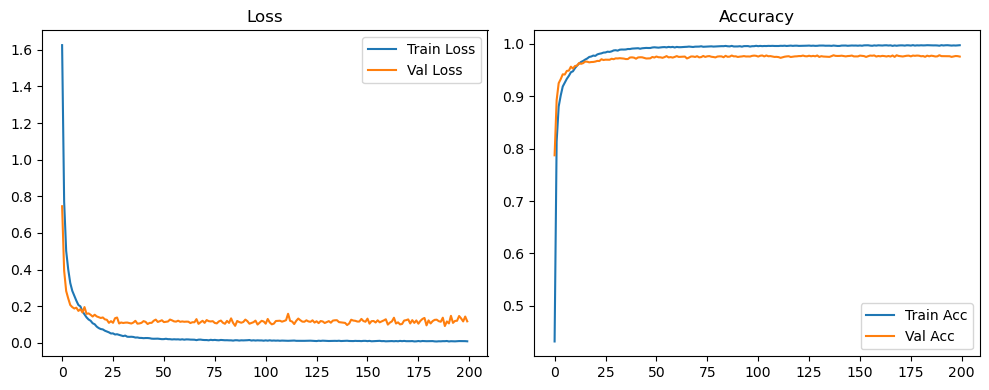

Evaluation:   0%|          | 0/157 [00:00<?, ?it/s]

Evaluation:   6%|▌         | 9/157 [00:00<00:01, 84.59it/s]

Evaluation:  11%|█▏        | 18/157 [00:00<00:01, 85.15it/s]

Evaluation:  17%|█▋        | 27/157 [00:00<00:01, 85.34it/s]

Evaluation:  23%|██▎       | 36/157 [00:00<00:01, 85.48it/s]

Evaluation:  29%|██▊       | 45/157 [00:00<00:01, 85.58it/s]

Evaluation:  34%|███▍      | 54/157 [00:00<00:01, 85.59it/s]

Evaluation:  40%|████      | 63/157 [00:00<00:01, 85.65it/s]

Evaluation:  46%|████▌     | 72/157 [00:00<00:01, 84.76it/s]

Evaluation:  52%|█████▏    | 81/157 [00:00<00:00, 84.44it/s]

Evaluation:  57%|█████▋    | 90/157 [00:01<00:00, 84.76it/s]

Evaluation:  63%|██████▎   | 99/157 [00:01<00:00, 85.05it/s]

Evaluation:  69%|██████▉   | 108/157 [00:01<00:00, 85.17it/s]

Evaluation:  75%|███████▍  | 117/157 [00:01<00:00, 85.41it/s]

Evaluation:  80%|████████  | 126/157 [00:01<00:00, 85.46it/s]

Evaluation:  86%|████████▌ | 135/157 [00:01<00:00, 85.57it/s]

Evaluation:  92%|█████████▏| 144/157 [00:01<00:00, 85.57it/s]

Evaluation:  97%|█████████▋| 153/157 [00:01<00:00, 85.56it/s]

Evaluation: 100%|██████████| 157/157 [00:01<00:00, 85.54it/s]

Original Model Final Test Loss: 0.1069 Accuracy: 0.9785


🚀 Running: batch64_lr0.001_0.001_0.001_dp0.5


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.001 | Train Acc: 0.3522 | Val Acc: 0.6611 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.001 | Train Acc: 0.3522 | Val Acc: 0.6611 |:   0%|          | 0/200 [00:13<?, ?it/s]

| LR: 0.001 | Train Acc: 0.3522 | Val Acc: 0.6611 |:   0%|          | 1/200 [00:13<45:58, 13.86s/it]

| LR: 0.001 | Train Acc: 0.7050 | Val Acc: 0.8585 |:   0%|          | 1/200 [00:28<45:58, 13.86s/it]

| LR: 0.001 | Train Acc: 0.7050 | Val Acc: 0.8585 |:   0%|          | 1/200 [00:28<45:58, 13.86s/it]

| LR: 0.001 | Train Acc: 0.7050 | Val Acc: 0.8585 |:   1%|          | 2/200 [00:28<47:41, 14.45s/it]

| LR: 0.001 | Train Acc: 0.8204 | Val Acc: 0.8996 |:   1%|          | 2/200 [00:42<47:41, 14.45s/it]

| LR: 0.001 | Train Acc: 0.8204 | Val Acc: 0.8996 |:   1%|          | 2/200 [00:42<47:41, 14.45s/it]

| LR: 0.001 | Train Acc: 0.8204 | Val Acc: 0.8996 |:   2%|▏         | 3/200 [00:42<46:03, 14.03s/it]

| LR: 0.001 | Train Acc: 0.8612 | Val Acc: 0.9191 |:   2%|▏         | 3/200 [00:55<46:03, 14.03s/it]

| LR: 0.001 | Train Acc: 0.8612 | Val Acc: 0.9191 |:   2%|▏         | 3/200 [00:55<46:03, 14.03s/it]

| LR: 0.001 | Train Acc: 0.8612 | Val Acc: 0.9191 |:   2%|▏         | 4/200 [00:55<45:14, 13.85s/it]

| LR: 0.001 | Train Acc: 0.8823 | Val Acc: 0.9273 |:   2%|▏         | 4/200 [01:09<45:14, 13.85s/it]

| LR: 0.001 | Train Acc: 0.8823 | Val Acc: 0.9273 |:   2%|▏         | 4/200 [01:09<45:14, 13.85s/it]

| LR: 0.001 | Train Acc: 0.8823 | Val Acc: 0.9273 |:   2%|▎         | 5/200 [01:09<44:37, 13.73s/it]

| LR: 0.001 | Train Acc: 0.8970 | Val Acc: 0.9397 |:   2%|▎         | 5/200 [01:22<44:37, 13.73s/it]

| LR: 0.001 | Train Acc: 0.8970 | Val Acc: 0.9397 |:   2%|▎         | 5/200 [01:22<44:37, 13.73s/it]

| LR: 0.001 | Train Acc: 0.8970 | Val Acc: 0.9397 |:   3%|▎         | 6/200 [01:22<44:04, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9069 | Val Acc: 0.9428 |:   3%|▎         | 6/200 [01:36<44:04, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9069 | Val Acc: 0.9428 |:   3%|▎         | 6/200 [01:36<44:04, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9069 | Val Acc: 0.9428 |:   4%|▎         | 7/200 [01:36<43:36, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9158 | Val Acc: 0.9486 |:   4%|▎         | 7/200 [01:49<43:36, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9158 | Val Acc: 0.9486 |:   4%|▎         | 7/200 [01:49<43:36, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9158 | Val Acc: 0.9486 |:   4%|▍         | 8/200 [01:49<43:19, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9213 | Val Acc: 0.9539 |:   4%|▍         | 8/200 [02:03<43:19, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9213 | Val Acc: 0.9539 |:   4%|▍         | 8/200 [02:03<43:19, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9213 | Val Acc: 0.9539 |:   4%|▍         | 9/200 [02:03<43:10, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9275 | Val Acc: 0.9547 |:   4%|▍         | 9/200 [02:16<43:10, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9275 | Val Acc: 0.9547 |:   4%|▍         | 9/200 [02:16<43:10, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9275 | Val Acc: 0.9547 |:   5%|▌         | 10/200 [02:16<42:50, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9350 | Val Acc: 0.9573 |:   5%|▌         | 10/200 [02:30<42:50, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9350 | Val Acc: 0.9573 |:   5%|▌         | 10/200 [02:30<42:50, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9350 | Val Acc: 0.9573 |:   6%|▌         | 11/200 [02:30<42:42, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9383 | Val Acc: 0.9589 |:   6%|▌         | 11/200 [02:43<42:42, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9383 | Val Acc: 0.9589 |:   6%|▌         | 11/200 [02:43<42:42, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9383 | Val Acc: 0.9589 |:   6%|▌         | 12/200 [02:43<42:24, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9438 | Val Acc: 0.9631 |:   6%|▌         | 12/200 [02:58<42:24, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9438 | Val Acc: 0.9631 |:   6%|▌         | 12/200 [02:58<42:24, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9438 | Val Acc: 0.9631 |:   6%|▋         | 13/200 [02:58<42:56, 13.78s/it]

| LR: 0.001 | Train Acc: 0.9484 | Val Acc: 0.9663 |:   6%|▋         | 13/200 [03:11<42:56, 13.78s/it]

| LR: 0.001 | Train Acc: 0.9484 | Val Acc: 0.9663 |:   6%|▋         | 13/200 [03:11<42:56, 13.78s/it]

| LR: 0.001 | Train Acc: 0.9484 | Val Acc: 0.9663 |:   7%|▋         | 14/200 [03:11<42:26, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9511 | Val Acc: 0.9643 |:   7%|▋         | 14/200 [03:25<42:26, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9511 | Val Acc: 0.9643 |:   7%|▋         | 14/200 [03:25<42:26, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9511 | Val Acc: 0.9643 |:   8%|▊         | 15/200 [03:25<42:13, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9539 | Val Acc: 0.9661 |:   8%|▊         | 15/200 [03:38<42:13, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9539 | Val Acc: 0.9661 |:   8%|▊         | 15/200 [03:38<42:13, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9539 | Val Acc: 0.9661 |:   8%|▊         | 16/200 [03:38<41:48, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9550 | Val Acc: 0.9654 |:   8%|▊         | 16/200 [03:52<41:48, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9550 | Val Acc: 0.9654 |:   8%|▊         | 16/200 [03:52<41:48, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9550 | Val Acc: 0.9654 |:   8%|▊         | 17/200 [03:52<41:30, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9576 | Val Acc: 0.9648 |:   8%|▊         | 17/200 [04:05<41:30, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9576 | Val Acc: 0.9648 |:   8%|▊         | 17/200 [04:05<41:30, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9576 | Val Acc: 0.9648 |:   9%|▉         | 18/200 [04:05<41:06, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9571 | Val Acc: 0.9663 |:   9%|▉         | 18/200 [04:19<41:06, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9571 | Val Acc: 0.9663 |:   9%|▉         | 18/200 [04:19<41:06, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9571 | Val Acc: 0.9663 |:  10%|▉         | 19/200 [04:19<40:56, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9585 | Val Acc: 0.9673 |:  10%|▉         | 19/200 [04:33<40:56, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9585 | Val Acc: 0.9673 |:  10%|▉         | 19/200 [04:33<40:56, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9585 | Val Acc: 0.9673 |:  10%|█         | 20/200 [04:33<40:48, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9614 | Val Acc: 0.9671 |:  10%|█         | 20/200 [04:47<40:48, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9614 | Val Acc: 0.9671 |:  10%|█         | 20/200 [04:47<40:48, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9614 | Val Acc: 0.9671 |:  10%|█         | 21/200 [04:47<41:08, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9623 | Val Acc: 0.9661 |:  10%|█         | 21/200 [05:00<41:08, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9623 | Val Acc: 0.9661 |:  10%|█         | 21/200 [05:00<41:08, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9623 | Val Acc: 0.9661 |:  11%|█         | 22/200 [05:00<40:39, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9650 | Val Acc: 0.9702 |:  11%|█         | 22/200 [05:14<40:39, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9650 | Val Acc: 0.9702 |:  11%|█         | 22/200 [05:14<40:39, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9650 | Val Acc: 0.9702 |:  12%|█▏        | 23/200 [05:14<40:18, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9648 | Val Acc: 0.9690 |:  12%|█▏        | 23/200 [05:28<40:18, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9648 | Val Acc: 0.9690 |:  12%|█▏        | 23/200 [05:28<40:18, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9648 | Val Acc: 0.9690 |:  12%|█▏        | 24/200 [05:28<40:01, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9657 | Val Acc: 0.9709 |:  12%|█▏        | 24/200 [05:41<40:01, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9657 | Val Acc: 0.9709 |:  12%|█▏        | 24/200 [05:41<40:01, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9657 | Val Acc: 0.9709 |:  12%|█▎        | 25/200 [05:41<39:44, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9647 | Val Acc: 0.9701 |:  12%|█▎        | 25/200 [05:54<39:44, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9647 | Val Acc: 0.9701 |:  12%|█▎        | 25/200 [05:54<39:44, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9647 | Val Acc: 0.9701 |:  13%|█▎        | 26/200 [05:55<39:19, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9667 | Val Acc: 0.9722 |:  13%|█▎        | 26/200 [06:08<39:19, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9667 | Val Acc: 0.9722 |:  13%|█▎        | 26/200 [06:08<39:19, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9667 | Val Acc: 0.9722 |:  14%|█▎        | 27/200 [06:08<39:06, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9677 | Val Acc: 0.9704 |:  14%|█▎        | 27/200 [06:22<39:06, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9677 | Val Acc: 0.9704 |:  14%|█▎        | 27/200 [06:22<39:06, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9677 | Val Acc: 0.9704 |:  14%|█▍        | 28/200 [06:22<38:47, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9696 | Val Acc: 0.9704 |:  14%|█▍        | 28/200 [06:35<38:47, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9696 | Val Acc: 0.9704 |:  14%|█▍        | 28/200 [06:35<38:47, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9696 | Val Acc: 0.9704 |:  14%|█▍        | 29/200 [06:35<38:33, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9698 | Val Acc: 0.9714 |:  14%|█▍        | 29/200 [06:49<38:33, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9698 | Val Acc: 0.9714 |:  14%|█▍        | 29/200 [06:49<38:33, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9698 | Val Acc: 0.9714 |:  15%|█▌        | 30/200 [06:49<38:17, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9720 | Val Acc: 0.9722 |:  15%|█▌        | 30/200 [07:03<38:17, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9720 | Val Acc: 0.9722 |:  15%|█▌        | 30/200 [07:03<38:17, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9720 | Val Acc: 0.9722 |:  16%|█▌        | 31/200 [07:03<38:30, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9702 | Val Acc: 0.9720 |:  16%|█▌        | 31/200 [07:16<38:30, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9702 | Val Acc: 0.9720 |:  16%|█▌        | 31/200 [07:16<38:30, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9702 | Val Acc: 0.9720 |:  16%|█▌        | 32/200 [07:16<38:09, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9720 | Val Acc: 0.9712 |:  16%|█▌        | 32/200 [07:30<38:09, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9720 | Val Acc: 0.9712 |:  16%|█▌        | 32/200 [07:30<38:09, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9720 | Val Acc: 0.9712 |:  16%|█▋        | 33/200 [07:30<38:14, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9728 | Val Acc: 0.9720 |:  16%|█▋        | 33/200 [07:44<38:14, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9728 | Val Acc: 0.9720 |:  16%|█▋        | 33/200 [07:44<38:14, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9728 | Val Acc: 0.9720 |:  17%|█▋        | 34/200 [07:44<37:53, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9727 | Val Acc: 0.9705 |:  17%|█▋        | 34/200 [07:57<37:53, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9727 | Val Acc: 0.9705 |:  17%|█▋        | 34/200 [07:57<37:53, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9727 | Val Acc: 0.9705 |:  18%|█▊        | 35/200 [07:57<37:25, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9741 | Val Acc: 0.9727 |:  18%|█▊        | 35/200 [08:11<37:25, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9741 | Val Acc: 0.9727 |:  18%|█▊        | 35/200 [08:11<37:25, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9741 | Val Acc: 0.9727 |:  18%|█▊        | 36/200 [08:11<37:12, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9738 | Val Acc: 0.9724 |:  18%|█▊        | 36/200 [08:26<37:12, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9738 | Val Acc: 0.9724 |:  18%|█▊        | 36/200 [08:26<37:12, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9738 | Val Acc: 0.9724 |:  18%|█▊        | 37/200 [08:26<38:10, 14.05s/it]

| LR: 0.001 | Train Acc: 0.9735 | Val Acc: 0.9724 |:  18%|█▊        | 37/200 [08:40<38:10, 14.05s/it]

| LR: 0.001 | Train Acc: 0.9735 | Val Acc: 0.9724 |:  18%|█▊        | 37/200 [08:40<38:10, 14.05s/it]

| LR: 0.001 | Train Acc: 0.9735 | Val Acc: 0.9724 |:  19%|█▉        | 38/200 [08:40<37:41, 13.96s/it]

| LR: 0.001 | Train Acc: 0.9751 | Val Acc: 0.9723 |:  19%|█▉        | 38/200 [08:54<37:41, 13.96s/it]

| LR: 0.001 | Train Acc: 0.9751 | Val Acc: 0.9723 |:  19%|█▉        | 38/200 [08:54<37:41, 13.96s/it]

| LR: 0.001 | Train Acc: 0.9751 | Val Acc: 0.9723 |:  20%|█▉        | 39/200 [08:54<37:54, 14.12s/it]

| LR: 0.001 | Train Acc: 0.9754 | Val Acc: 0.9721 |:  20%|█▉        | 39/200 [09:08<37:54, 14.12s/it]

| LR: 0.001 | Train Acc: 0.9754 | Val Acc: 0.9721 |:  20%|█▉        | 39/200 [09:08<37:54, 14.12s/it]

| LR: 0.001 | Train Acc: 0.9754 | Val Acc: 0.9721 |:  20%|██        | 40/200 [09:08<37:08, 13.93s/it]

| LR: 0.001 | Train Acc: 0.9749 | Val Acc: 0.9722 |:  20%|██        | 40/200 [09:21<37:08, 13.93s/it]

| LR: 0.001 | Train Acc: 0.9749 | Val Acc: 0.9722 |:  20%|██        | 40/200 [09:21<37:08, 13.93s/it]

| LR: 0.001 | Train Acc: 0.9749 | Val Acc: 0.9722 |:  20%|██        | 41/200 [09:21<36:31, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9760 | Val Acc: 0.9729 |:  20%|██        | 41/200 [09:35<36:31, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9760 | Val Acc: 0.9729 |:  20%|██        | 41/200 [09:35<36:31, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9760 | Val Acc: 0.9729 |:  21%|██        | 42/200 [09:35<36:10, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9760 | Val Acc: 0.9718 |:  21%|██        | 42/200 [09:48<36:10, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9760 | Val Acc: 0.9718 |:  21%|██        | 42/200 [09:48<36:10, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9760 | Val Acc: 0.9718 |:  22%|██▏       | 43/200 [09:48<35:50, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9754 | Val Acc: 0.9733 |:  22%|██▏       | 43/200 [10:03<35:50, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9754 | Val Acc: 0.9733 |:  22%|██▏       | 43/200 [10:03<35:50, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9754 | Val Acc: 0.9733 |:  22%|██▏       | 44/200 [10:03<36:14, 13.94s/it]

| LR: 0.001 | Train Acc: 0.9765 | Val Acc: 0.9723 |:  22%|██▏       | 44/200 [10:16<36:14, 13.94s/it]

| LR: 0.001 | Train Acc: 0.9765 | Val Acc: 0.9723 |:  22%|██▏       | 44/200 [10:16<36:14, 13.94s/it]

| LR: 0.001 | Train Acc: 0.9765 | Val Acc: 0.9723 |:  22%|██▎       | 45/200 [10:16<35:39, 13.81s/it]

| LR: 0.001 | Train Acc: 0.9772 | Val Acc: 0.9728 |:  22%|██▎       | 45/200 [10:30<35:39, 13.81s/it]

| LR: 0.001 | Train Acc: 0.9772 | Val Acc: 0.9728 |:  22%|██▎       | 45/200 [10:30<35:39, 13.81s/it]

| LR: 0.001 | Train Acc: 0.9772 | Val Acc: 0.9728 |:  23%|██▎       | 46/200 [10:30<35:14, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9765 | Val Acc: 0.9734 |:  23%|██▎       | 46/200 [10:43<35:14, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9765 | Val Acc: 0.9734 |:  23%|██▎       | 46/200 [10:43<35:14, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9765 | Val Acc: 0.9734 |:  24%|██▎       | 47/200 [10:43<34:51, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9769 | Val Acc: 0.9727 |:  24%|██▎       | 47/200 [10:57<34:51, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9769 | Val Acc: 0.9727 |:  24%|██▎       | 47/200 [10:57<34:51, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9769 | Val Acc: 0.9727 |:  24%|██▍       | 48/200 [10:57<34:36, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9776 | Val Acc: 0.9749 |:  24%|██▍       | 48/200 [11:10<34:36, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9776 | Val Acc: 0.9749 |:  24%|██▍       | 48/200 [11:10<34:36, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9776 | Val Acc: 0.9749 |:  24%|██▍       | 49/200 [11:11<34:18, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9771 | Val Acc: 0.9748 |:  24%|██▍       | 49/200 [11:26<34:18, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9771 | Val Acc: 0.9748 |:  24%|██▍       | 49/200 [11:26<34:18, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9771 | Val Acc: 0.9748 |:  25%|██▌       | 50/200 [11:26<35:18, 14.12s/it]

| LR: 0.001 | Train Acc: 0.9774 | Val Acc: 0.9731 |:  25%|██▌       | 50/200 [11:39<35:18, 14.12s/it]

| LR: 0.001 | Train Acc: 0.9774 | Val Acc: 0.9731 |:  25%|██▌       | 50/200 [11:39<35:18, 14.12s/it]

| LR: 0.001 | Train Acc: 0.9774 | Val Acc: 0.9731 |:  26%|██▌       | 51/200 [11:39<34:35, 13.93s/it]

| LR: 0.001 | Train Acc: 0.9771 | Val Acc: 0.9722 |:  26%|██▌       | 51/200 [11:53<34:35, 13.93s/it]

| LR: 0.001 | Train Acc: 0.9771 | Val Acc: 0.9722 |:  26%|██▌       | 51/200 [11:53<34:35, 13.93s/it]

| LR: 0.001 | Train Acc: 0.9771 | Val Acc: 0.9722 |:  26%|██▌       | 52/200 [11:53<34:14, 13.88s/it]

| LR: 0.001 | Train Acc: 0.9777 | Val Acc: 0.9737 |:  26%|██▌       | 52/200 [12:07<34:14, 13.88s/it]

| LR: 0.001 | Train Acc: 0.9777 | Val Acc: 0.9737 |:  26%|██▌       | 52/200 [12:07<34:14, 13.88s/it]

| LR: 0.001 | Train Acc: 0.9777 | Val Acc: 0.9737 |:  26%|██▋       | 53/200 [12:07<33:57, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9792 | Val Acc: 0.9732 |:  26%|██▋       | 53/200 [12:20<33:57, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9792 | Val Acc: 0.9732 |:  26%|██▋       | 53/200 [12:20<33:57, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9792 | Val Acc: 0.9732 |:  27%|██▋       | 54/200 [12:20<33:31, 13.78s/it]

| LR: 0.001 | Train Acc: 0.9781 | Val Acc: 0.9731 |:  27%|██▋       | 54/200 [12:34<33:31, 13.78s/it]

| LR: 0.001 | Train Acc: 0.9781 | Val Acc: 0.9731 |:  27%|██▋       | 54/200 [12:34<33:31, 13.78s/it]

| LR: 0.001 | Train Acc: 0.9781 | Val Acc: 0.9731 |:  28%|██▊       | 55/200 [12:34<33:14, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9776 | Val Acc: 0.9738 |:  28%|██▊       | 55/200 [12:48<33:14, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9776 | Val Acc: 0.9738 |:  28%|██▊       | 55/200 [12:48<33:14, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9776 | Val Acc: 0.9738 |:  28%|██▊       | 56/200 [12:48<32:52, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9792 | Val Acc: 0.9749 |:  28%|██▊       | 56/200 [13:01<32:52, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9792 | Val Acc: 0.9749 |:  28%|██▊       | 56/200 [13:01<32:52, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9792 | Val Acc: 0.9749 |:  28%|██▊       | 57/200 [13:01<32:37, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9792 | Val Acc: 0.9744 |:  28%|██▊       | 57/200 [13:15<32:37, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9792 | Val Acc: 0.9744 |:  28%|██▊       | 57/200 [13:15<32:37, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9792 | Val Acc: 0.9744 |:  29%|██▉       | 58/200 [13:15<32:22, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9792 | Val Acc: 0.9741 |:  29%|██▉       | 58/200 [13:28<32:22, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9792 | Val Acc: 0.9741 |:  29%|██▉       | 58/200 [13:28<32:22, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9792 | Val Acc: 0.9741 |:  30%|██▉       | 59/200 [13:29<32:01, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9803 | Val Acc: 0.9737 |:  30%|██▉       | 59/200 [13:42<32:01, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9803 | Val Acc: 0.9737 |:  30%|██▉       | 59/200 [13:42<32:01, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9803 | Val Acc: 0.9737 |:  30%|███       | 60/200 [13:42<31:45, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9789 | Val Acc: 0.9748 |:  30%|███       | 60/200 [13:55<31:45, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9789 | Val Acc: 0.9748 |:  30%|███       | 60/200 [13:55<31:45, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9789 | Val Acc: 0.9748 |:  30%|███       | 61/200 [13:56<31:24, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9788 | Val Acc: 0.9732 |:  30%|███       | 61/200 [14:09<31:24, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9788 | Val Acc: 0.9732 |:  30%|███       | 61/200 [14:09<31:24, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9788 | Val Acc: 0.9732 |:  31%|███       | 62/200 [14:09<31:11, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9797 | Val Acc: 0.9735 |:  31%|███       | 62/200 [14:23<31:11, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9797 | Val Acc: 0.9735 |:  31%|███       | 62/200 [14:23<31:11, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9797 | Val Acc: 0.9735 |:  32%|███▏      | 63/200 [14:23<30:53, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9793 | Val Acc: 0.9752 |:  32%|███▏      | 63/200 [14:36<30:53, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9793 | Val Acc: 0.9752 |:  32%|███▏      | 63/200 [14:36<30:53, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9793 | Val Acc: 0.9752 |:  32%|███▏      | 64/200 [14:36<30:52, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9786 | Val Acc: 0.9738 |:  32%|███▏      | 64/200 [14:51<30:52, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9786 | Val Acc: 0.9738 |:  32%|███▏      | 64/200 [14:51<30:52, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9786 | Val Acc: 0.9738 |:  32%|███▎      | 65/200 [14:51<31:01, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9797 | Val Acc: 0.9730 |:  32%|███▎      | 65/200 [15:04<31:01, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9797 | Val Acc: 0.9730 |:  32%|███▎      | 65/200 [15:04<31:01, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9797 | Val Acc: 0.9730 |:  33%|███▎      | 66/200 [15:04<30:42, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9802 | Val Acc: 0.9718 |:  33%|███▎      | 66/200 [15:18<30:42, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9802 | Val Acc: 0.9718 |:  33%|███▎      | 66/200 [15:18<30:42, 13.75s/it]

| LR: 0.001 | Train Acc: 0.9802 | Val Acc: 0.9718 |:  34%|███▎      | 67/200 [15:18<30:47, 13.89s/it]

| LR: 0.001 | Train Acc: 0.9809 | Val Acc: 0.9739 |:  34%|███▎      | 67/200 [15:32<30:47, 13.89s/it]

| LR: 0.001 | Train Acc: 0.9809 | Val Acc: 0.9739 |:  34%|███▎      | 67/200 [15:32<30:47, 13.89s/it]

| LR: 0.001 | Train Acc: 0.9809 | Val Acc: 0.9739 |:  34%|███▍      | 68/200 [15:32<30:20, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9791 | Val Acc: 0.9736 |:  34%|███▍      | 68/200 [15:45<30:20, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9791 | Val Acc: 0.9736 |:  34%|███▍      | 68/200 [15:45<30:20, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9791 | Val Acc: 0.9736 |:  34%|███▍      | 69/200 [15:45<29:53, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9796 | Val Acc: 0.9751 |:  34%|███▍      | 69/200 [15:59<29:53, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9796 | Val Acc: 0.9751 |:  34%|███▍      | 69/200 [15:59<29:53, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9796 | Val Acc: 0.9751 |:  35%|███▌      | 70/200 [15:59<29:28, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9800 | Val Acc: 0.9752 |:  35%|███▌      | 70/200 [16:12<29:28, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9800 | Val Acc: 0.9752 |:  35%|███▌      | 70/200 [16:12<29:28, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9800 | Val Acc: 0.9752 |:  36%|███▌      | 71/200 [16:12<29:11, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9809 | Val Acc: 0.9728 |:  36%|███▌      | 71/200 [16:27<29:11, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9809 | Val Acc: 0.9728 |:  36%|███▌      | 71/200 [16:27<29:11, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9809 | Val Acc: 0.9728 |:  36%|███▌      | 72/200 [16:27<29:44, 13.94s/it]

| LR: 0.001 | Train Acc: 0.9813 | Val Acc: 0.9742 |:  36%|███▌      | 72/200 [16:42<29:44, 13.94s/it]

| LR: 0.001 | Train Acc: 0.9813 | Val Acc: 0.9742 |:  36%|███▌      | 72/200 [16:42<29:44, 13.94s/it]

| LR: 0.001 | Train Acc: 0.9813 | Val Acc: 0.9742 |:  36%|███▋      | 73/200 [16:42<30:00, 14.18s/it]

| LR: 0.001 | Train Acc: 0.9814 | Val Acc: 0.9742 |:  36%|███▋      | 73/200 [16:55<30:00, 14.18s/it]

| LR: 0.001 | Train Acc: 0.9814 | Val Acc: 0.9742 |:  36%|███▋      | 73/200 [16:55<30:00, 14.18s/it]

| LR: 0.001 | Train Acc: 0.9814 | Val Acc: 0.9742 |:  37%|███▋      | 74/200 [16:55<29:23, 13.99s/it]

| LR: 0.001 | Train Acc: 0.9820 | Val Acc: 0.9732 |:  37%|███▋      | 74/200 [17:09<29:23, 13.99s/it]

| LR: 0.001 | Train Acc: 0.9820 | Val Acc: 0.9732 |:  37%|███▋      | 74/200 [17:09<29:23, 13.99s/it]

| LR: 0.001 | Train Acc: 0.9820 | Val Acc: 0.9732 |:  38%|███▊      | 75/200 [17:09<28:51, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9811 | Val Acc: 0.9742 |:  38%|███▊      | 75/200 [17:22<28:51, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9811 | Val Acc: 0.9742 |:  38%|███▊      | 75/200 [17:22<28:51, 13.86s/it]

| LR: 0.001 | Train Acc: 0.9811 | Val Acc: 0.9742 |:  38%|███▊      | 76/200 [17:23<28:25, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9813 | Val Acc: 0.9742 |:  38%|███▊      | 76/200 [17:36<28:25, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9813 | Val Acc: 0.9742 |:  38%|███▊      | 76/200 [17:36<28:25, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9813 | Val Acc: 0.9742 |:  38%|███▊      | 77/200 [17:36<28:17, 13.80s/it]

| LR: 0.001 | Train Acc: 0.9806 | Val Acc: 0.9758 |:  38%|███▊      | 77/200 [17:50<28:17, 13.80s/it]

| LR: 0.001 | Train Acc: 0.9806 | Val Acc: 0.9758 |:  38%|███▊      | 77/200 [17:50<28:17, 13.80s/it]

| LR: 0.001 | Train Acc: 0.9806 | Val Acc: 0.9758 |:  39%|███▉      | 78/200 [17:50<27:53, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9809 | Val Acc: 0.9742 |:  39%|███▉      | 78/200 [18:04<27:53, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9809 | Val Acc: 0.9742 |:  39%|███▉      | 78/200 [18:04<27:53, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9809 | Val Acc: 0.9742 |:  40%|███▉      | 79/200 [18:04<27:41, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9816 | Val Acc: 0.9753 |:  40%|███▉      | 79/200 [18:18<27:41, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9816 | Val Acc: 0.9753 |:  40%|███▉      | 79/200 [18:18<27:41, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9816 | Val Acc: 0.9753 |:  40%|████      | 80/200 [18:18<27:33, 13.78s/it]

| LR: 0.001 | Train Acc: 0.9806 | Val Acc: 0.9748 |:  40%|████      | 80/200 [18:32<27:33, 13.78s/it]

| LR: 0.001 | Train Acc: 0.9806 | Val Acc: 0.9748 |:  40%|████      | 80/200 [18:32<27:33, 13.78s/it]

| LR: 0.001 | Train Acc: 0.9806 | Val Acc: 0.9748 |:  40%|████      | 81/200 [18:32<27:35, 13.91s/it]

| LR: 0.001 | Train Acc: 0.9810 | Val Acc: 0.9764 |:  40%|████      | 81/200 [18:45<27:35, 13.91s/it]

| LR: 0.001 | Train Acc: 0.9810 | Val Acc: 0.9764 |:  40%|████      | 81/200 [18:45<27:35, 13.91s/it]

| LR: 0.001 | Train Acc: 0.9810 | Val Acc: 0.9764 |:  41%|████      | 82/200 [18:45<27:10, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9817 | Val Acc: 0.9751 |:  41%|████      | 82/200 [18:59<27:10, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9817 | Val Acc: 0.9751 |:  41%|████      | 82/200 [18:59<27:10, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9817 | Val Acc: 0.9751 |:  42%|████▏     | 83/200 [18:59<26:47, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9815 | Val Acc: 0.9762 |:  42%|████▏     | 83/200 [19:12<26:47, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9815 | Val Acc: 0.9762 |:  42%|████▏     | 83/200 [19:12<26:47, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9815 | Val Acc: 0.9762 |:  42%|████▏     | 84/200 [19:12<26:24, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9816 | Val Acc: 0.9753 |:  42%|████▏     | 84/200 [19:26<26:24, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9816 | Val Acc: 0.9753 |:  42%|████▏     | 84/200 [19:26<26:24, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9816 | Val Acc: 0.9753 |:  42%|████▎     | 85/200 [19:26<26:07, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9824 | Val Acc: 0.9748 |:  42%|████▎     | 85/200 [19:40<26:07, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9824 | Val Acc: 0.9748 |:  42%|████▎     | 85/200 [19:40<26:07, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9824 | Val Acc: 0.9748 |:  43%|████▎     | 86/200 [19:40<25:54, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9818 | Val Acc: 0.9750 |:  43%|████▎     | 86/200 [19:54<25:54, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9818 | Val Acc: 0.9750 |:  43%|████▎     | 86/200 [19:54<25:54, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9818 | Val Acc: 0.9750 |:  44%|████▎     | 87/200 [19:54<25:49, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9820 | Val Acc: 0.9739 |:  44%|████▎     | 87/200 [20:07<25:49, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9820 | Val Acc: 0.9739 |:  44%|████▎     | 87/200 [20:07<25:49, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9820 | Val Acc: 0.9739 |:  44%|████▍     | 88/200 [20:07<25:27, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9807 | Val Acc: 0.9749 |:  44%|████▍     | 88/200 [20:20<25:27, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9807 | Val Acc: 0.9749 |:  44%|████▍     | 88/200 [20:20<25:27, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9807 | Val Acc: 0.9749 |:  44%|████▍     | 89/200 [20:21<25:10, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9821 | Val Acc: 0.9748 |:  44%|████▍     | 89/200 [20:34<25:10, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9821 | Val Acc: 0.9748 |:  44%|████▍     | 89/200 [20:34<25:10, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9821 | Val Acc: 0.9748 |:  45%|████▌     | 90/200 [20:34<24:56, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9827 | Val Acc: 0.9738 |:  45%|████▌     | 90/200 [20:48<24:56, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9827 | Val Acc: 0.9738 |:  45%|████▌     | 90/200 [20:48<24:56, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9827 | Val Acc: 0.9738 |:  46%|████▌     | 91/200 [20:48<24:44, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9822 | Val Acc: 0.9757 |:  46%|████▌     | 91/200 [21:01<24:44, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9822 | Val Acc: 0.9757 |:  46%|████▌     | 91/200 [21:01<24:44, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9822 | Val Acc: 0.9757 |:  46%|████▌     | 92/200 [21:01<24:32, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9816 | Val Acc: 0.9755 |:  46%|████▌     | 92/200 [21:15<24:32, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9816 | Val Acc: 0.9755 |:  46%|████▌     | 92/200 [21:15<24:32, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9816 | Val Acc: 0.9755 |:  46%|████▋     | 93/200 [21:15<24:18, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9815 | Val Acc: 0.9764 |:  46%|████▋     | 93/200 [21:29<24:18, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9815 | Val Acc: 0.9764 |:  46%|████▋     | 93/200 [21:29<24:18, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9815 | Val Acc: 0.9764 |:  47%|████▋     | 94/200 [21:29<24:04, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9824 | Val Acc: 0.9766 |:  47%|████▋     | 94/200 [21:43<24:04, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9824 | Val Acc: 0.9766 |:  47%|████▋     | 94/200 [21:43<24:04, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9824 | Val Acc: 0.9766 |:  48%|████▊     | 95/200 [21:43<23:58, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9825 | Val Acc: 0.9761 |:  48%|████▊     | 95/200 [21:56<23:58, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9825 | Val Acc: 0.9761 |:  48%|████▊     | 95/200 [21:56<23:58, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9825 | Val Acc: 0.9761 |:  48%|████▊     | 96/200 [21:56<23:40, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9826 | Val Acc: 0.9752 |:  48%|████▊     | 96/200 [22:10<23:40, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9826 | Val Acc: 0.9752 |:  48%|████▊     | 96/200 [22:10<23:40, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9826 | Val Acc: 0.9752 |:  48%|████▊     | 97/200 [22:10<23:25, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9821 | Val Acc: 0.9735 |:  48%|████▊     | 97/200 [22:23<23:25, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9821 | Val Acc: 0.9735 |:  48%|████▊     | 97/200 [22:23<23:25, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9821 | Val Acc: 0.9735 |:  49%|████▉     | 98/200 [22:23<23:11, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9834 | Val Acc: 0.9751 |:  49%|████▉     | 98/200 [22:38<23:11, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9834 | Val Acc: 0.9751 |:  49%|████▉     | 98/200 [22:38<23:11, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9834 | Val Acc: 0.9751 |:  50%|████▉     | 99/200 [22:38<23:14, 13.81s/it]

| LR: 0.001 | Train Acc: 0.9826 | Val Acc: 0.9755 |:  50%|████▉     | 99/200 [22:51<23:14, 13.81s/it]

| LR: 0.001 | Train Acc: 0.9826 | Val Acc: 0.9755 |:  50%|████▉     | 99/200 [22:51<23:14, 13.81s/it]

| LR: 0.001 | Train Acc: 0.9826 | Val Acc: 0.9755 |:  50%|█████     | 100/200 [22:51<22:53, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9835 | Val Acc: 0.9755 |:  50%|█████     | 100/200 [23:05<22:53, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9835 | Val Acc: 0.9755 |:  50%|█████     | 100/200 [23:05<22:53, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9835 | Val Acc: 0.9755 |:  50%|█████     | 101/200 [23:05<22:35, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9813 | Val Acc: 0.9756 |:  50%|█████     | 101/200 [23:18<22:35, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9813 | Val Acc: 0.9756 |:  50%|█████     | 101/200 [23:18<22:35, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9813 | Val Acc: 0.9756 |:  51%|█████     | 102/200 [23:18<22:17, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9830 | Val Acc: 0.9757 |:  51%|█████     | 102/200 [23:32<22:17, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9830 | Val Acc: 0.9757 |:  51%|█████     | 102/200 [23:32<22:17, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9830 | Val Acc: 0.9757 |:  52%|█████▏    | 103/200 [23:32<22:00, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9744 |:  52%|█████▏    | 103/200 [23:45<22:00, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9744 |:  52%|█████▏    | 103/200 [23:45<22:00, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9744 |:  52%|█████▏    | 104/200 [23:45<21:40, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9832 | Val Acc: 0.9751 |:  52%|█████▏    | 104/200 [23:59<21:40, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9832 | Val Acc: 0.9751 |:  52%|█████▏    | 104/200 [23:59<21:40, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9832 | Val Acc: 0.9751 |:  52%|█████▎    | 105/200 [23:59<21:25, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9825 | Val Acc: 0.9762 |:  52%|█████▎    | 105/200 [24:12<21:25, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9825 | Val Acc: 0.9762 |:  52%|█████▎    | 105/200 [24:12<21:25, 13.53s/it]

| LR: 0.001 | Train Acc: 0.9825 | Val Acc: 0.9762 |:  53%|█████▎    | 106/200 [24:12<21:13, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9832 | Val Acc: 0.9765 |:  53%|█████▎    | 106/200 [24:29<21:13, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9832 | Val Acc: 0.9765 |:  53%|█████▎    | 106/200 [24:29<21:13, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9832 | Val Acc: 0.9765 |:  54%|█████▎    | 107/200 [24:29<22:17, 14.38s/it]

| LR: 0.001 | Train Acc: 0.9837 | Val Acc: 0.9761 |:  54%|█████▎    | 107/200 [24:42<22:17, 14.38s/it]

| LR: 0.001 | Train Acc: 0.9837 | Val Acc: 0.9761 |:  54%|█████▎    | 107/200 [24:42<22:17, 14.38s/it]

| LR: 0.001 | Train Acc: 0.9837 | Val Acc: 0.9761 |:  54%|█████▍    | 108/200 [24:42<21:43, 14.17s/it]

| LR: 0.001 | Train Acc: 0.9838 | Val Acc: 0.9768 |:  54%|█████▍    | 108/200 [24:56<21:43, 14.17s/it]

| LR: 0.001 | Train Acc: 0.9838 | Val Acc: 0.9768 |:  54%|█████▍    | 108/200 [24:56<21:43, 14.17s/it]

| LR: 0.001 | Train Acc: 0.9838 | Val Acc: 0.9768 |:  55%|█████▍    | 109/200 [24:56<21:12, 13.98s/it]

| LR: 0.001 | Train Acc: 0.9830 | Val Acc: 0.9758 |:  55%|█████▍    | 109/200 [25:09<21:12, 13.98s/it]

| LR: 0.001 | Train Acc: 0.9830 | Val Acc: 0.9758 |:  55%|█████▍    | 109/200 [25:09<21:12, 13.98s/it]

| LR: 0.001 | Train Acc: 0.9830 | Val Acc: 0.9758 |:  55%|█████▌    | 110/200 [25:09<20:45, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9828 | Val Acc: 0.9752 |:  55%|█████▌    | 110/200 [25:23<20:45, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9828 | Val Acc: 0.9752 |:  55%|█████▌    | 110/200 [25:23<20:45, 13.83s/it]

| LR: 0.001 | Train Acc: 0.9828 | Val Acc: 0.9752 |:  56%|█████▌    | 111/200 [25:23<20:24, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9827 | Val Acc: 0.9748 |:  56%|█████▌    | 111/200 [25:36<20:24, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9827 | Val Acc: 0.9748 |:  56%|█████▌    | 111/200 [25:36<20:24, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9827 | Val Acc: 0.9748 |:  56%|█████▌    | 112/200 [25:36<20:04, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9822 | Val Acc: 0.9754 |:  56%|█████▌    | 112/200 [25:49<20:04, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9822 | Val Acc: 0.9754 |:  56%|█████▌    | 112/200 [25:49<20:04, 13.69s/it]

| LR: 0.001 | Train Acc: 0.9822 | Val Acc: 0.9754 |:  56%|█████▋    | 113/200 [25:50<19:35, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9759 |:  56%|█████▋    | 113/200 [26:03<19:35, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9759 |:  56%|█████▋    | 113/200 [26:03<19:35, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9759 |:  57%|█████▋    | 114/200 [26:03<19:24, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9835 | Val Acc: 0.9749 |:  57%|█████▋    | 114/200 [26:17<19:24, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9835 | Val Acc: 0.9749 |:  57%|█████▋    | 114/200 [26:17<19:24, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9835 | Val Acc: 0.9749 |:  57%|█████▊    | 115/200 [26:17<19:12, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9837 | Val Acc: 0.9747 |:  57%|█████▊    | 115/200 [26:30<19:12, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9837 | Val Acc: 0.9747 |:  57%|█████▊    | 115/200 [26:30<19:12, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9837 | Val Acc: 0.9747 |:  58%|█████▊    | 116/200 [26:30<18:55, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9753 |:  58%|█████▊    | 116/200 [26:44<18:55, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9753 |:  58%|█████▊    | 116/200 [26:44<18:55, 13.52s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9753 |:  58%|█████▊    | 117/200 [26:44<18:43, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9827 | Val Acc: 0.9762 |:  58%|█████▊    | 117/200 [26:57<18:43, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9827 | Val Acc: 0.9762 |:  58%|█████▊    | 117/200 [26:57<18:43, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9827 | Val Acc: 0.9762 |:  59%|█████▉    | 118/200 [26:57<18:30, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9749 |:  59%|█████▉    | 118/200 [27:11<18:30, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9749 |:  59%|█████▉    | 118/200 [27:11<18:30, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9749 |:  60%|█████▉    | 119/200 [27:11<18:17, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9832 | Val Acc: 0.9753 |:  60%|█████▉    | 119/200 [27:25<18:17, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9832 | Val Acc: 0.9753 |:  60%|█████▉    | 119/200 [27:25<18:17, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9832 | Val Acc: 0.9753 |:  60%|██████    | 120/200 [27:25<18:06, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9838 | Val Acc: 0.9751 |:  60%|██████    | 120/200 [27:38<18:06, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9838 | Val Acc: 0.9751 |:  60%|██████    | 120/200 [27:38<18:06, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9838 | Val Acc: 0.9751 |:  60%|██████    | 121/200 [27:38<17:52, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9825 | Val Acc: 0.9762 |:  60%|██████    | 121/200 [27:52<17:52, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9825 | Val Acc: 0.9762 |:  60%|██████    | 121/200 [27:52<17:52, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9825 | Val Acc: 0.9762 |:  61%|██████    | 122/200 [27:52<17:37, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9826 | Val Acc: 0.9752 |:  61%|██████    | 122/200 [28:05<17:37, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9826 | Val Acc: 0.9752 |:  61%|██████    | 122/200 [28:05<17:37, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9826 | Val Acc: 0.9752 |:  62%|██████▏   | 123/200 [28:05<17:22, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9834 | Val Acc: 0.9751 |:  62%|██████▏   | 123/200 [28:19<17:22, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9834 | Val Acc: 0.9751 |:  62%|██████▏   | 123/200 [28:19<17:22, 13.54s/it]

| LR: 0.001 | Train Acc: 0.9834 | Val Acc: 0.9751 |:  62%|██████▏   | 124/200 [28:19<17:13, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9840 | Val Acc: 0.9753 |:  62%|██████▏   | 124/200 [28:35<17:13, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9840 | Val Acc: 0.9753 |:  62%|██████▏   | 124/200 [28:35<17:13, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9840 | Val Acc: 0.9753 |:  62%|██████▎   | 125/200 [28:35<18:09, 14.52s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9755 |:  62%|██████▎   | 125/200 [28:51<18:09, 14.52s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9755 |:  62%|██████▎   | 125/200 [28:51<18:09, 14.52s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9755 |:  63%|██████▎   | 126/200 [28:51<18:22, 14.89s/it]

| LR: 0.001 | Train Acc: 0.9832 | Val Acc: 0.9757 |:  63%|██████▎   | 126/200 [29:05<18:22, 14.89s/it]

| LR: 0.001 | Train Acc: 0.9832 | Val Acc: 0.9757 |:  63%|██████▎   | 126/200 [29:05<18:22, 14.89s/it]

| LR: 0.001 | Train Acc: 0.9832 | Val Acc: 0.9757 |:  64%|██████▎   | 127/200 [29:05<17:40, 14.53s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9756 |:  64%|██████▎   | 127/200 [29:18<17:40, 14.53s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9756 |:  64%|██████▎   | 127/200 [29:18<17:40, 14.53s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9756 |:  64%|██████▍   | 128/200 [29:19<17:05, 14.25s/it]

| LR: 0.001 | Train Acc: 0.9835 | Val Acc: 0.9763 |:  64%|██████▍   | 128/200 [29:32<17:05, 14.25s/it]

| LR: 0.001 | Train Acc: 0.9835 | Val Acc: 0.9763 |:  64%|██████▍   | 128/200 [29:32<17:05, 14.25s/it]

| LR: 0.001 | Train Acc: 0.9835 | Val Acc: 0.9763 |:  64%|██████▍   | 129/200 [29:32<16:35, 14.02s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9757 |:  64%|██████▍   | 129/200 [29:46<16:35, 14.02s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9757 |:  64%|██████▍   | 129/200 [29:46<16:35, 14.02s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9757 |:  65%|██████▌   | 130/200 [29:46<16:16, 13.95s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9765 |:  65%|██████▌   | 130/200 [29:59<16:16, 13.95s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9765 |:  65%|██████▌   | 130/200 [29:59<16:16, 13.95s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9765 |:  66%|██████▌   | 131/200 [29:59<15:55, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9829 | Val Acc: 0.9756 |:  66%|██████▌   | 131/200 [30:13<15:55, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9829 | Val Acc: 0.9756 |:  66%|██████▌   | 131/200 [30:13<15:55, 13.85s/it]

| LR: 0.001 | Train Acc: 0.9829 | Val Acc: 0.9756 |:  66%|██████▌   | 132/200 [30:13<15:35, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9757 |:  66%|██████▌   | 132/200 [30:26<15:35, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9757 |:  66%|██████▌   | 132/200 [30:26<15:35, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9757 |:  66%|██████▋   | 133/200 [30:26<15:16, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9846 | Val Acc: 0.9755 |:  66%|██████▋   | 133/200 [30:40<15:16, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9846 | Val Acc: 0.9755 |:  66%|██████▋   | 133/200 [30:40<15:16, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9846 | Val Acc: 0.9755 |:  67%|██████▋   | 134/200 [30:40<15:00, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9830 | Val Acc: 0.9753 |:  67%|██████▋   | 134/200 [30:54<15:00, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9830 | Val Acc: 0.9753 |:  67%|██████▋   | 134/200 [30:54<15:00, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9830 | Val Acc: 0.9753 |:  68%|██████▊   | 135/200 [30:54<14:46, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9833 | Val Acc: 0.9758 |:  68%|██████▊   | 135/200 [31:07<14:46, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9833 | Val Acc: 0.9758 |:  68%|██████▊   | 135/200 [31:07<14:46, 13.64s/it]

| LR: 0.001 | Train Acc: 0.9833 | Val Acc: 0.9758 |:  68%|██████▊   | 136/200 [31:07<14:36, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9760 |:  68%|██████▊   | 136/200 [31:21<14:36, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9760 |:  68%|██████▊   | 136/200 [31:21<14:36, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9760 |:  68%|██████▊   | 137/200 [31:21<14:23, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9843 | Val Acc: 0.9758 |:  68%|██████▊   | 137/200 [31:35<14:23, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9843 | Val Acc: 0.9758 |:  68%|██████▊   | 137/200 [31:35<14:23, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9843 | Val Acc: 0.9758 |:  69%|██████▉   | 138/200 [31:35<14:09, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9846 | Val Acc: 0.9759 |:  69%|██████▉   | 138/200 [31:49<14:09, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9846 | Val Acc: 0.9759 |:  69%|██████▉   | 138/200 [31:49<14:09, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9846 | Val Acc: 0.9759 |:  70%|██████▉   | 139/200 [31:49<14:02, 13.81s/it]

| LR: 0.001 | Train Acc: 0.9840 | Val Acc: 0.9752 |:  70%|██████▉   | 139/200 [32:02<14:02, 13.81s/it]

| LR: 0.001 | Train Acc: 0.9840 | Val Acc: 0.9752 |:  70%|██████▉   | 139/200 [32:02<14:02, 13.81s/it]

| LR: 0.001 | Train Acc: 0.9840 | Val Acc: 0.9752 |:  70%|███████   | 140/200 [32:03<13:43, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9828 | Val Acc: 0.9755 |:  70%|███████   | 140/200 [32:16<13:43, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9828 | Val Acc: 0.9755 |:  70%|███████   | 140/200 [32:16<13:43, 13.73s/it]

| LR: 0.001 | Train Acc: 0.9828 | Val Acc: 0.9755 |:  70%|███████   | 141/200 [32:16<13:27, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9838 | Val Acc: 0.9755 |:  70%|███████   | 141/200 [32:30<13:27, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9838 | Val Acc: 0.9755 |:  70%|███████   | 141/200 [32:30<13:27, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9838 | Val Acc: 0.9755 |:  71%|███████   | 142/200 [32:30<13:10, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9766 |:  71%|███████   | 142/200 [32:43<13:10, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9766 |:  71%|███████   | 142/200 [32:43<13:10, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9766 |:  72%|███████▏  | 143/200 [32:43<12:53, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9773 |:  72%|███████▏  | 143/200 [32:56<12:53, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9773 |:  72%|███████▏  | 143/200 [32:56<12:53, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9773 |:  72%|███████▏  | 144/200 [32:56<12:36, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9749 |:  72%|███████▏  | 144/200 [33:10<12:36, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9749 |:  72%|███████▏  | 144/200 [33:10<12:36, 13.51s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9749 |:  72%|███████▎  | 145/200 [33:10<12:31, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9745 |:  72%|███████▎  | 145/200 [33:24<12:31, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9745 |:  72%|███████▎  | 145/200 [33:24<12:31, 13.67s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9745 |:  73%|███████▎  | 146/200 [33:24<12:17, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9753 |:  73%|███████▎  | 146/200 [33:37<12:17, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9753 |:  73%|███████▎  | 146/200 [33:37<12:17, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9753 |:  74%|███████▎  | 147/200 [33:38<12:00, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9758 |:  74%|███████▎  | 147/200 [33:51<12:00, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9758 |:  74%|███████▎  | 147/200 [33:51<12:00, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9758 |:  74%|███████▍  | 148/200 [33:51<11:45, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9836 | Val Acc: 0.9748 |:  74%|███████▍  | 148/200 [34:04<11:45, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9836 | Val Acc: 0.9748 |:  74%|███████▍  | 148/200 [34:04<11:45, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9836 | Val Acc: 0.9748 |:  74%|███████▍  | 149/200 [34:05<11:31, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9757 |:  74%|███████▍  | 149/200 [34:18<11:31, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9757 |:  74%|███████▍  | 149/200 [34:18<11:31, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9757 |:  75%|███████▌  | 150/200 [34:18<11:20, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9757 |:  75%|███████▌  | 150/200 [34:32<11:20, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9757 |:  75%|███████▌  | 150/200 [34:32<11:20, 13.60s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9757 |:  76%|███████▌  | 151/200 [34:32<11:09, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9748 |:  76%|███████▌  | 151/200 [34:45<11:09, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9748 |:  76%|███████▌  | 151/200 [34:45<11:09, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9748 |:  76%|███████▌  | 152/200 [34:46<10:53, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9760 |:  76%|███████▌  | 152/200 [34:59<10:53, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9760 |:  76%|███████▌  | 152/200 [34:59<10:53, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9760 |:  76%|███████▋  | 153/200 [34:59<10:39, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9835 | Val Acc: 0.9754 |:  76%|███████▋  | 153/200 [35:13<10:39, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9835 | Val Acc: 0.9754 |:  76%|███████▋  | 153/200 [35:13<10:39, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9835 | Val Acc: 0.9754 |:  77%|███████▋  | 154/200 [35:13<10:27, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9750 |:  77%|███████▋  | 154/200 [35:26<10:27, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9750 |:  77%|███████▋  | 154/200 [35:26<10:27, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9750 |:  78%|███████▊  | 155/200 [35:26<10:13, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9755 |:  78%|███████▊  | 155/200 [35:40<10:13, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9755 |:  78%|███████▊  | 155/200 [35:40<10:13, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9755 |:  78%|███████▊  | 156/200 [35:40<09:57, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9753 |:  78%|███████▊  | 156/200 [35:56<09:57, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9753 |:  78%|███████▊  | 156/200 [35:56<09:57, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9753 |:  78%|███████▊  | 157/200 [35:56<10:13, 14.26s/it]

| LR: 0.001 | Train Acc: 0.9852 | Val Acc: 0.9755 |:  78%|███████▊  | 157/200 [36:09<10:13, 14.26s/it]

| LR: 0.001 | Train Acc: 0.9852 | Val Acc: 0.9755 |:  78%|███████▊  | 157/200 [36:09<10:13, 14.26s/it]

| LR: 0.001 | Train Acc: 0.9852 | Val Acc: 0.9755 |:  79%|███████▉  | 158/200 [36:09<09:49, 14.05s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9759 |:  79%|███████▉  | 158/200 [36:23<09:49, 14.05s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9759 |:  79%|███████▉  | 158/200 [36:23<09:49, 14.05s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9759 |:  80%|███████▉  | 159/200 [36:23<09:31, 13.94s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9751 |:  80%|███████▉  | 159/200 [36:37<09:31, 13.94s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9751 |:  80%|███████▉  | 159/200 [36:37<09:31, 13.94s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9751 |:  80%|████████  | 160/200 [36:37<09:12, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9761 |:  80%|████████  | 160/200 [36:50<09:12, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9761 |:  80%|████████  | 160/200 [36:50<09:12, 13.82s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9761 |:  80%|████████  | 161/200 [36:50<08:56, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9754 |:  80%|████████  | 161/200 [37:04<08:56, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9754 |:  80%|████████  | 161/200 [37:04<08:56, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9754 |:  81%|████████  | 162/200 [37:04<08:43, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9846 | Val Acc: 0.9764 |:  81%|████████  | 162/200 [37:18<08:43, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9846 | Val Acc: 0.9764 |:  81%|████████  | 162/200 [37:18<08:43, 13.76s/it]

| LR: 0.001 | Train Acc: 0.9846 | Val Acc: 0.9764 |:  82%|████████▏ | 163/200 [37:18<08:28, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9843 | Val Acc: 0.9755 |:  82%|████████▏ | 163/200 [37:31<08:28, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9843 | Val Acc: 0.9755 |:  82%|████████▏ | 163/200 [37:31<08:28, 13.74s/it]

| LR: 0.001 | Train Acc: 0.9843 | Val Acc: 0.9755 |:  82%|████████▏ | 164/200 [37:31<08:12, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9843 | Val Acc: 0.9762 |:  82%|████████▏ | 164/200 [37:45<08:12, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9843 | Val Acc: 0.9762 |:  82%|████████▏ | 164/200 [37:45<08:12, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9843 | Val Acc: 0.9762 |:  82%|████████▎ | 165/200 [37:45<07:58, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9840 | Val Acc: 0.9765 |:  82%|████████▎ | 165/200 [37:59<07:58, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9840 | Val Acc: 0.9765 |:  82%|████████▎ | 165/200 [37:59<07:58, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9840 | Val Acc: 0.9765 |:  83%|████████▎ | 166/200 [37:59<07:45, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9759 |:  83%|████████▎ | 166/200 [38:12<07:45, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9759 |:  83%|████████▎ | 166/200 [38:12<07:45, 13.70s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9759 |:  84%|████████▎ | 167/200 [38:12<07:30, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9761 |:  84%|████████▎ | 167/200 [38:26<07:30, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9761 |:  84%|████████▎ | 167/200 [38:26<07:30, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9761 |:  84%|████████▍ | 168/200 [38:26<07:14, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9758 |:  84%|████████▍ | 168/200 [38:39<07:14, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9758 |:  84%|████████▍ | 168/200 [38:39<07:14, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9758 |:  84%|████████▍ | 169/200 [38:39<07:02, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9752 |:  84%|████████▍ | 169/200 [38:53<07:02, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9752 |:  84%|████████▍ | 169/200 [38:53<07:02, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9752 |:  85%|████████▌ | 170/200 [38:53<06:47, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9840 | Val Acc: 0.9758 |:  85%|████████▌ | 170/200 [39:07<06:47, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9840 | Val Acc: 0.9758 |:  85%|████████▌ | 170/200 [39:07<06:47, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9840 | Val Acc: 0.9758 |:  86%|████████▌ | 171/200 [39:07<06:39, 13.78s/it]

| LR: 0.001 | Train Acc: 0.9827 | Val Acc: 0.9760 |:  86%|████████▌ | 171/200 [39:21<06:39, 13.78s/it]

| LR: 0.001 | Train Acc: 0.9827 | Val Acc: 0.9760 |:  86%|████████▌ | 171/200 [39:21<06:39, 13.78s/it]

| LR: 0.001 | Train Acc: 0.9827 | Val Acc: 0.9760 |:  86%|████████▌ | 172/200 [39:21<06:25, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9759 |:  86%|████████▌ | 172/200 [39:34<06:25, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9759 |:  86%|████████▌ | 172/200 [39:34<06:25, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9759 |:  86%|████████▋ | 173/200 [39:34<06:10, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9858 | Val Acc: 0.9756 |:  86%|████████▋ | 173/200 [39:48<06:10, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9858 | Val Acc: 0.9756 |:  86%|████████▋ | 173/200 [39:48<06:10, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9858 | Val Acc: 0.9756 |:  87%|████████▋ | 174/200 [39:48<05:55, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9768 |:  87%|████████▋ | 174/200 [40:01<05:55, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9768 |:  87%|████████▋ | 174/200 [40:01<05:55, 13.66s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9768 |:  88%|████████▊ | 175/200 [40:01<05:39, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9764 |:  88%|████████▊ | 175/200 [40:15<05:39, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9764 |:  88%|████████▊ | 175/200 [40:15<05:39, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9764 |:  88%|████████▊ | 176/200 [40:15<05:26, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9753 |:  88%|████████▊ | 176/200 [40:28<05:26, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9753 |:  88%|████████▊ | 176/200 [40:28<05:26, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9753 |:  88%|████████▊ | 177/200 [40:28<05:12, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9846 | Val Acc: 0.9768 |:  88%|████████▊ | 177/200 [40:43<05:12, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9846 | Val Acc: 0.9768 |:  88%|████████▊ | 177/200 [40:43<05:12, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9846 | Val Acc: 0.9768 |:  89%|████████▉ | 178/200 [40:43<05:07, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9777 |:  89%|████████▉ | 178/200 [40:57<05:07, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9777 |:  89%|████████▉ | 178/200 [40:57<05:07, 13.97s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9777 |:  90%|████████▉ | 179/200 [40:57<04:52, 13.92s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9764 |:  90%|████████▉ | 179/200 [41:11<04:52, 13.92s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9764 |:  90%|████████▉ | 179/200 [41:11<04:52, 13.92s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9764 |:  90%|█████████ | 180/200 [41:11<04:36, 13.84s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9768 |:  90%|█████████ | 180/200 [41:24<04:36, 13.84s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9768 |:  90%|█████████ | 180/200 [41:24<04:36, 13.84s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9768 |:  90%|█████████ | 181/200 [41:24<04:20, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9859 | Val Acc: 0.9742 |:  90%|█████████ | 181/200 [41:38<04:20, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9859 | Val Acc: 0.9742 |:  90%|█████████ | 181/200 [41:38<04:20, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9859 | Val Acc: 0.9742 |:  91%|█████████ | 182/200 [41:38<04:05, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9749 |:  91%|█████████ | 182/200 [41:51<04:05, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9749 |:  91%|█████████ | 182/200 [41:51<04:05, 13.65s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9749 |:  92%|█████████▏| 183/200 [41:51<03:51, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9849 | Val Acc: 0.9747 |:  92%|█████████▏| 183/200 [42:05<03:51, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9849 | Val Acc: 0.9747 |:  92%|█████████▏| 183/200 [42:05<03:51, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9849 | Val Acc: 0.9747 |:  92%|█████████▏| 184/200 [42:05<03:37, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9766 |:  92%|█████████▏| 184/200 [42:18<03:37, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9766 |:  92%|█████████▏| 184/200 [42:18<03:37, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9766 |:  92%|█████████▎| 185/200 [42:18<03:23, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9855 | Val Acc: 0.9743 |:  92%|█████████▎| 185/200 [42:32<03:23, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9855 | Val Acc: 0.9743 |:  92%|█████████▎| 185/200 [42:32<03:23, 13.57s/it]

| LR: 0.001 | Train Acc: 0.9855 | Val Acc: 0.9743 |:  93%|█████████▎| 186/200 [42:32<03:09, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9863 | Val Acc: 0.9752 |:  93%|█████████▎| 186/200 [42:46<03:09, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9863 | Val Acc: 0.9752 |:  93%|█████████▎| 186/200 [42:46<03:09, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9863 | Val Acc: 0.9752 |:  94%|█████████▎| 187/200 [42:46<02:56, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9767 |:  94%|█████████▎| 187/200 [42:59<02:56, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9767 |:  94%|█████████▎| 187/200 [42:59<02:56, 13.59s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9767 |:  94%|█████████▍| 188/200 [42:59<02:43, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9758 |:  94%|█████████▍| 188/200 [43:13<02:43, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9758 |:  94%|█████████▍| 188/200 [43:13<02:43, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9758 |:  94%|█████████▍| 189/200 [43:13<02:29, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9857 | Val Acc: 0.9768 |:  94%|█████████▍| 189/200 [43:26<02:29, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9857 | Val Acc: 0.9768 |:  94%|█████████▍| 189/200 [43:26<02:29, 13.56s/it]

| LR: 0.001 | Train Acc: 0.9857 | Val Acc: 0.9768 |:  95%|█████████▌| 190/200 [43:26<02:15, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9765 |:  95%|█████████▌| 190/200 [43:40<02:15, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9765 |:  95%|█████████▌| 190/200 [43:40<02:15, 13.55s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9765 |:  96%|█████████▌| 191/200 [43:40<02:02, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9756 |:  96%|█████████▌| 191/200 [43:53<02:02, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9756 |:  96%|█████████▌| 191/200 [43:53<02:02, 13.58s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9756 |:  96%|█████████▌| 192/200 [43:54<01:48, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9846 | Val Acc: 0.9764 |:  96%|█████████▌| 192/200 [44:07<01:48, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9846 | Val Acc: 0.9764 |:  96%|█████████▌| 192/200 [44:07<01:48, 13.61s/it]

| LR: 0.001 | Train Acc: 0.9846 | Val Acc: 0.9764 |:  96%|█████████▋| 193/200 [44:07<01:35, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9759 |:  96%|█████████▋| 193/200 [44:21<01:35, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9759 |:  96%|█████████▋| 193/200 [44:21<01:35, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9759 |:  97%|█████████▋| 194/200 [44:21<01:21, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9856 | Val Acc: 0.9762 |:  97%|█████████▋| 194/200 [44:35<01:21, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9856 | Val Acc: 0.9762 |:  97%|█████████▋| 194/200 [44:35<01:21, 13.63s/it]

| LR: 0.001 | Train Acc: 0.9856 | Val Acc: 0.9762 |:  98%|█████████▊| 195/200 [44:35<01:08, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9760 |:  98%|█████████▊| 195/200 [44:48<01:08, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9760 |:  98%|█████████▊| 195/200 [44:48<01:08, 13.79s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9760 |:  98%|█████████▊| 196/200 [44:49<00:54, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9856 | Val Acc: 0.9755 |:  98%|█████████▊| 196/200 [45:02<00:54, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9856 | Val Acc: 0.9755 |:  98%|█████████▊| 196/200 [45:02<00:54, 13.72s/it]

| LR: 0.001 | Train Acc: 0.9856 | Val Acc: 0.9755 |:  98%|█████████▊| 197/200 [45:02<00:41, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9843 | Val Acc: 0.9765 |:  98%|█████████▊| 197/200 [45:16<00:41, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9843 | Val Acc: 0.9765 |:  98%|█████████▊| 197/200 [45:16<00:41, 13.68s/it]

| LR: 0.001 | Train Acc: 0.9843 | Val Acc: 0.9765 |:  99%|█████████▉| 198/200 [45:16<00:27, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9773 |:  99%|█████████▉| 198/200 [45:30<00:27, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9773 |:  99%|█████████▉| 198/200 [45:30<00:27, 13.77s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9773 |: 100%|█████████▉| 199/200 [45:30<00:13, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9869 | Val Acc: 0.9757 |: 100%|█████████▉| 199/200 [45:43<00:13, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9869 | Val Acc: 0.9757 |: 100%|█████████▉| 199/200 [45:43<00:13, 13.71s/it]

| LR: 0.001 | Train Acc: 0.9869 | Val Acc: 0.9757 |: 100%|██████████| 200/200 [45:43<00:00, 13.62s/it]

| LR: 0.001 | Train Acc: 0.9869 | Val Acc: 0.9757 |: 100%|██████████| 200/200 [45:43<00:00, 13.72s/it]

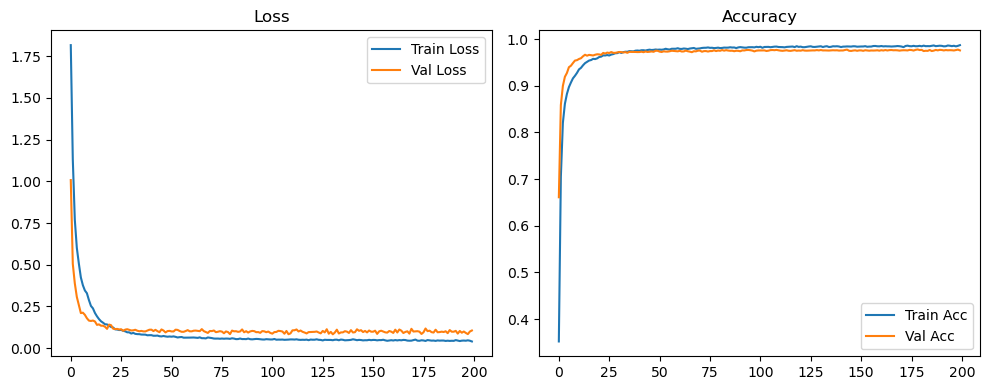

Evaluation:   0%|          | 0/157 [00:00<?, ?it/s]

Evaluation:   6%|▌         | 9/157 [00:00<00:01, 83.26it/s]

Evaluation:  11%|█▏        | 18/157 [00:00<00:01, 83.40it/s]

Evaluation:  17%|█▋        | 27/157 [00:00<00:01, 82.59it/s]

Evaluation:  23%|██▎       | 36/157 [00:00<00:01, 82.47it/s]

Evaluation:  29%|██▊       | 45/157 [00:00<00:01, 83.15it/s]

Evaluation:  34%|███▍      | 54/157 [00:00<00:01, 83.44it/s]

Evaluation:  40%|████      | 63/157 [00:00<00:01, 83.72it/s]

Evaluation:  46%|████▌     | 72/157 [00:00<00:01, 83.90it/s]

Evaluation:  52%|█████▏    | 81/157 [00:00<00:00, 84.09it/s]

Evaluation:  57%|█████▋    | 90/157 [00:01<00:00, 84.17it/s]

Evaluation:  63%|██████▎   | 99/157 [00:01<00:00, 84.04it/s]

Evaluation:  69%|██████▉   | 108/157 [00:01<00:00, 84.14it/s]

Evaluation:  75%|███████▍  | 117/157 [00:01<00:00, 84.22it/s]

Evaluation:  80%|████████  | 126/157 [00:01<00:00, 84.17it/s]

Evaluation:  86%|████████▌ | 135/157 [00:01<00:00, 84.17it/s]

Evaluation:  92%|█████████▏| 144/157 [00:01<00:00, 84.15it/s]

Evaluation:  97%|█████████▋| 153/157 [00:01<00:00, 84.21it/s]

Evaluation: 100%|██████████| 157/157 [00:01<00:00, 84.10it/s]

Original Model Final Test Loss: 0.0957 Accuracy: 0.9785


🚀 Running: batch128_lr0.01_0.01_0.01_dp0.0


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2695 | Val Acc: 0.6519 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2695 | Val Acc: 0.6519 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2695 | Val Acc: 0.6519 |:   0%|          | 1/200 [00:11<36:39, 11.05s/it]

| LR: 0.010 | Train Acc: 0.7904 | Val Acc: 0.8626 |:   0%|          | 1/200 [00:21<36:39, 11.05s/it]

| LR: 0.010 | Train Acc: 0.7904 | Val Acc: 0.8626 |:   0%|          | 1/200 [00:21<36:39, 11.05s/it]

| LR: 0.010 | Train Acc: 0.7904 | Val Acc: 0.8626 |:   1%|          | 2/200 [00:21<35:26, 10.74s/it]

| LR: 0.010 | Train Acc: 0.8702 | Val Acc: 0.8773 |:   1%|          | 2/200 [00:32<35:26, 10.74s/it]

| LR: 0.010 | Train Acc: 0.8702 | Val Acc: 0.8773 |:   1%|          | 2/200 [00:32<35:26, 10.74s/it]

| LR: 0.010 | Train Acc: 0.8702 | Val Acc: 0.8773 |:   2%|▏         | 3/200 [00:32<34:56, 10.64s/it]

| LR: 0.010 | Train Acc: 0.8924 | Val Acc: 0.9015 |:   2%|▏         | 3/200 [00:42<34:56, 10.64s/it]

| LR: 0.010 | Train Acc: 0.8924 | Val Acc: 0.9015 |:   2%|▏         | 3/200 [00:42<34:56, 10.64s/it]

| LR: 0.010 | Train Acc: 0.8924 | Val Acc: 0.9015 |:   2%|▏         | 4/200 [00:42<34:46, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9113 | Val Acc: 0.9167 |:   2%|▏         | 4/200 [00:53<34:46, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9113 | Val Acc: 0.9167 |:   2%|▏         | 4/200 [00:53<34:46, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9113 | Val Acc: 0.9167 |:   2%|▎         | 5/200 [00:53<34:32, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9224 | Val Acc: 0.9211 |:   2%|▎         | 5/200 [01:03<34:32, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9224 | Val Acc: 0.9211 |:   2%|▎         | 5/200 [01:03<34:32, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9224 | Val Acc: 0.9211 |:   3%|▎         | 6/200 [01:03<34:08, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9310 | Val Acc: 0.9295 |:   3%|▎         | 6/200 [01:14<34:08, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9310 | Val Acc: 0.9295 |:   3%|▎         | 6/200 [01:14<34:08, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9310 | Val Acc: 0.9295 |:   4%|▎         | 7/200 [01:14<33:57, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9400 | Val Acc: 0.9347 |:   4%|▎         | 7/200 [01:24<33:57, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9400 | Val Acc: 0.9347 |:   4%|▎         | 7/200 [01:24<33:57, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9400 | Val Acc: 0.9347 |:   4%|▍         | 8/200 [01:24<33:40, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9357 |:   4%|▍         | 8/200 [01:35<33:40, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9357 |:   4%|▍         | 8/200 [01:35<33:40, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9357 |:   4%|▍         | 9/200 [01:35<33:37, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9476 | Val Acc: 0.9373 |:   4%|▍         | 9/200 [01:45<33:37, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9476 | Val Acc: 0.9373 |:   4%|▍         | 9/200 [01:45<33:37, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9476 | Val Acc: 0.9373 |:   5%|▌         | 10/200 [01:45<33:12, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9515 | Val Acc: 0.9400 |:   5%|▌         | 10/200 [01:56<33:12, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9515 | Val Acc: 0.9400 |:   5%|▌         | 10/200 [01:56<33:12, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9515 | Val Acc: 0.9400 |:   6%|▌         | 11/200 [01:56<33:18, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9556 | Val Acc: 0.9457 |:   6%|▌         | 11/200 [02:07<33:18, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9556 | Val Acc: 0.9457 |:   6%|▌         | 11/200 [02:07<33:18, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9556 | Val Acc: 0.9457 |:   6%|▌         | 12/200 [02:07<33:30, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9451 |:   6%|▌         | 12/200 [02:17<33:30, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9451 |:   6%|▌         | 12/200 [02:17<33:30, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9451 |:   6%|▋         | 13/200 [02:17<32:48, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9607 | Val Acc: 0.9464 |:   6%|▋         | 13/200 [02:27<32:48, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9607 | Val Acc: 0.9464 |:   6%|▋         | 13/200 [02:27<32:48, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9607 | Val Acc: 0.9464 |:   7%|▋         | 14/200 [02:27<32:21, 10.44s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9503 |:   7%|▋         | 14/200 [02:38<32:21, 10.44s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9503 |:   7%|▋         | 14/200 [02:38<32:21, 10.44s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9503 |:   8%|▊         | 15/200 [02:38<32:18, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9527 |:   8%|▊         | 15/200 [02:48<32:18, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9527 |:   8%|▊         | 15/200 [02:48<32:18, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9527 |:   8%|▊         | 16/200 [02:48<32:03, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9481 |:   8%|▊         | 16/200 [02:59<32:03, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9481 |:   8%|▊         | 16/200 [02:59<32:03, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9481 |:   8%|▊         | 17/200 [02:59<31:46, 10.42s/it]

| LR: 0.010 | Train Acc: 0.9717 | Val Acc: 0.9526 |:   8%|▊         | 17/200 [03:09<31:46, 10.42s/it]

| LR: 0.010 | Train Acc: 0.9717 | Val Acc: 0.9526 |:   8%|▊         | 17/200 [03:09<31:46, 10.42s/it]

| LR: 0.010 | Train Acc: 0.9717 | Val Acc: 0.9526 |:   9%|▉         | 18/200 [03:09<31:55, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9721 | Val Acc: 0.9493 |:   9%|▉         | 18/200 [03:22<31:55, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9721 | Val Acc: 0.9493 |:   9%|▉         | 18/200 [03:22<31:55, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9721 | Val Acc: 0.9493 |:  10%|▉         | 19/200 [03:22<33:15, 11.03s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9567 |:  10%|▉         | 19/200 [03:34<33:15, 11.03s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9567 |:  10%|▉         | 19/200 [03:34<33:15, 11.03s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9567 |:  10%|█         | 20/200 [03:34<34:11, 11.40s/it]

| LR: 0.010 | Train Acc: 0.9766 | Val Acc: 0.9528 |:  10%|█         | 20/200 [03:46<34:11, 11.40s/it]

| LR: 0.010 | Train Acc: 0.9766 | Val Acc: 0.9528 |:  10%|█         | 20/200 [03:46<34:11, 11.40s/it]

| LR: 0.010 | Train Acc: 0.9766 | Val Acc: 0.9528 |:  10%|█         | 21/200 [03:46<34:35, 11.59s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9558 |:  10%|█         | 21/200 [03:56<34:35, 11.59s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9558 |:  10%|█         | 21/200 [03:56<34:35, 11.59s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9558 |:  11%|█         | 22/200 [03:56<33:23, 11.26s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9614 |:  11%|█         | 22/200 [04:07<33:23, 11.26s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9614 |:  11%|█         | 22/200 [04:07<33:23, 11.26s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9614 |:  12%|█▏        | 23/200 [04:07<32:53, 11.15s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9607 |:  12%|█▏        | 23/200 [04:18<32:53, 11.15s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9607 |:  12%|█▏        | 23/200 [04:18<32:53, 11.15s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9607 |:  12%|█▏        | 24/200 [04:18<32:32, 11.09s/it]

| LR: 0.010 | Train Acc: 0.9850 | Val Acc: 0.9588 |:  12%|█▏        | 24/200 [04:29<32:32, 11.09s/it]

| LR: 0.010 | Train Acc: 0.9850 | Val Acc: 0.9588 |:  12%|█▏        | 24/200 [04:29<32:32, 11.09s/it]

| LR: 0.010 | Train Acc: 0.9850 | Val Acc: 0.9588 |:  12%|█▎        | 25/200 [04:29<31:54, 10.94s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9660 |:  12%|█▎        | 25/200 [04:40<31:54, 10.94s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9660 |:  12%|█▎        | 25/200 [04:40<31:54, 10.94s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9660 |:  13%|█▎        | 26/200 [04:40<31:45, 10.95s/it]

| LR: 0.010 | Train Acc: 0.9883 | Val Acc: 0.9656 |:  13%|█▎        | 26/200 [04:50<31:45, 10.95s/it]

| LR: 0.010 | Train Acc: 0.9883 | Val Acc: 0.9656 |:  13%|█▎        | 26/200 [04:50<31:45, 10.95s/it]

| LR: 0.010 | Train Acc: 0.9883 | Val Acc: 0.9656 |:  14%|█▎        | 27/200 [04:50<31:12, 10.82s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9647 |:  14%|█▎        | 27/200 [05:01<31:12, 10.82s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9647 |:  14%|█▎        | 27/200 [05:01<31:12, 10.82s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9647 |:  14%|█▍        | 28/200 [05:01<30:42, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9643 |:  14%|█▍        | 28/200 [05:11<30:42, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9643 |:  14%|█▍        | 28/200 [05:11<30:42, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9643 |:  14%|█▍        | 29/200 [05:11<30:17, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9686 |:  14%|█▍        | 29/200 [05:22<30:17, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9686 |:  14%|█▍        | 29/200 [05:22<30:17, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9686 |:  15%|█▌        | 30/200 [05:22<30:06, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9690 |:  15%|█▌        | 30/200 [05:32<30:06, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9690 |:  15%|█▌        | 30/200 [05:32<30:06, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9690 |:  16%|█▌        | 31/200 [05:32<29:51, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9692 |:  16%|█▌        | 31/200 [05:43<29:51, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9692 |:  16%|█▌        | 31/200 [05:43<29:51, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9692 |:  16%|█▌        | 32/200 [05:43<29:38, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9944 | Val Acc: 0.9688 |:  16%|█▌        | 32/200 [05:53<29:38, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9944 | Val Acc: 0.9688 |:  16%|█▌        | 32/200 [05:53<29:38, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9944 | Val Acc: 0.9688 |:  16%|█▋        | 33/200 [05:53<29:17, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9698 |:  16%|█▋        | 33/200 [06:05<29:17, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9698 |:  16%|█▋        | 33/200 [06:05<29:17, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9698 |:  17%|█▋        | 34/200 [06:05<29:50, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9702 |:  17%|█▋        | 34/200 [06:15<29:50, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9702 |:  17%|█▋        | 34/200 [06:15<29:50, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9702 |:  18%|█▊        | 35/200 [06:15<29:25, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9692 |:  18%|█▊        | 35/200 [06:26<29:25, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9692 |:  18%|█▊        | 35/200 [06:26<29:25, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9692 |:  18%|█▊        | 36/200 [06:26<29:04, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9652 |:  18%|█▊        | 36/200 [06:36<29:04, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9652 |:  18%|█▊        | 36/200 [06:36<29:04, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9652 |:  18%|█▊        | 37/200 [06:36<28:46, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  18%|█▊        | 37/200 [06:47<28:46, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  18%|█▊        | 37/200 [06:47<28:46, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  19%|█▉        | 38/200 [06:47<28:39, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9640 |:  19%|█▉        | 38/200 [06:57<28:39, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9640 |:  19%|█▉        | 38/200 [06:57<28:39, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9640 |:  20%|█▉        | 39/200 [06:57<28:27, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9637 |:  20%|█▉        | 39/200 [07:08<28:27, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9637 |:  20%|█▉        | 39/200 [07:08<28:27, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9637 |:  20%|██        | 40/200 [07:08<28:18, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9616 |:  20%|██        | 40/200 [07:19<28:18, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9616 |:  20%|██        | 40/200 [07:19<28:18, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9616 |:  20%|██        | 41/200 [07:19<28:11, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9627 |:  20%|██        | 41/200 [07:29<28:11, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9627 |:  20%|██        | 41/200 [07:29<28:11, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9627 |:  21%|██        | 42/200 [07:29<28:02, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9683 |:  21%|██        | 42/200 [07:40<28:02, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9683 |:  21%|██        | 42/200 [07:40<28:02, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9683 |:  22%|██▏       | 43/200 [07:40<27:45, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9612 |:  22%|██▏       | 43/200 [07:51<27:45, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9612 |:  22%|██▏       | 43/200 [07:51<27:45, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9612 |:  22%|██▏       | 44/200 [07:51<27:36, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9660 |:  22%|██▏       | 44/200 [08:01<27:36, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9660 |:  22%|██▏       | 44/200 [08:01<27:36, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9660 |:  22%|██▎       | 45/200 [08:01<27:16, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9615 |:  22%|██▎       | 45/200 [08:12<27:16, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9615 |:  22%|██▎       | 45/200 [08:12<27:16, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9615 |:  23%|██▎       | 46/200 [08:12<27:10, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9652 |:  23%|██▎       | 46/200 [08:22<27:10, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9652 |:  23%|██▎       | 46/200 [08:22<27:10, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9652 |:  24%|██▎       | 47/200 [08:22<26:55, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9634 |:  24%|██▎       | 47/200 [08:33<26:55, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9634 |:  24%|██▎       | 47/200 [08:33<26:55, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9634 |:  24%|██▍       | 48/200 [08:33<26:43, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9647 |:  24%|██▍       | 48/200 [08:43<26:43, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9647 |:  24%|██▍       | 48/200 [08:43<26:43, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9647 |:  24%|██▍       | 49/200 [08:43<26:28, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9617 |:  24%|██▍       | 49/200 [08:54<26:28, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9617 |:  24%|██▍       | 49/200 [08:54<26:28, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9617 |:  25%|██▌       | 50/200 [08:54<26:15, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9657 |:  25%|██▌       | 50/200 [09:04<26:15, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9657 |:  25%|██▌       | 50/200 [09:04<26:15, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9657 |:  26%|██▌       | 51/200 [09:04<26:01, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9892 | Val Acc: 0.9656 |:  26%|██▌       | 51/200 [09:15<26:01, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9892 | Val Acc: 0.9656 |:  26%|██▌       | 51/200 [09:15<26:01, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9892 | Val Acc: 0.9656 |:  26%|██▌       | 52/200 [09:15<25:58, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9656 |:  26%|██▌       | 52/200 [09:25<25:58, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9656 |:  26%|██▌       | 52/200 [09:25<25:58, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9656 |:  26%|██▋       | 53/200 [09:25<25:50, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9658 |:  26%|██▋       | 53/200 [09:36<25:50, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9658 |:  26%|██▋       | 53/200 [09:36<25:50, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9658 |:  27%|██▋       | 54/200 [09:36<25:44, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9623 |:  27%|██▋       | 54/200 [09:46<25:44, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9623 |:  27%|██▋       | 54/200 [09:46<25:44, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9623 |:  28%|██▊       | 55/200 [09:46<25:28, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9646 |:  28%|██▊       | 55/200 [09:57<25:28, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9646 |:  28%|██▊       | 55/200 [09:57<25:28, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9646 |:  28%|██▊       | 56/200 [09:57<25:14, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9599 |:  28%|██▊       | 56/200 [10:07<25:14, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9599 |:  28%|██▊       | 56/200 [10:07<25:14, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9599 |:  28%|██▊       | 57/200 [10:07<25:04, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9661 |:  28%|██▊       | 57/200 [10:17<25:04, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9661 |:  28%|██▊       | 57/200 [10:17<25:04, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9661 |:  29%|██▉       | 58/200 [10:17<24:34, 10.38s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9673 |:  29%|██▉       | 58/200 [10:28<24:34, 10.38s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9673 |:  29%|██▉       | 58/200 [10:28<24:34, 10.38s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9673 |:  30%|██▉       | 59/200 [10:28<24:31, 10.44s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9637 |:  30%|██▉       | 59/200 [10:38<24:31, 10.44s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9637 |:  30%|██▉       | 59/200 [10:38<24:31, 10.44s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9637 |:  30%|███       | 60/200 [10:38<24:22, 10.44s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9670 |:  30%|███       | 60/200 [10:49<24:22, 10.44s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9670 |:  30%|███       | 60/200 [10:49<24:22, 10.44s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9670 |:  30%|███       | 61/200 [10:49<24:13, 10.45s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9689 |:  30%|███       | 61/200 [11:00<24:13, 10.45s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9689 |:  30%|███       | 61/200 [11:00<24:13, 10.45s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9689 |:  31%|███       | 62/200 [11:00<24:17, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9698 |:  31%|███       | 62/200 [11:10<24:17, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9698 |:  31%|███       | 62/200 [11:10<24:17, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9698 |:  32%|███▏      | 63/200 [11:10<23:59, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9911 | Val Acc: 0.9673 |:  32%|███▏      | 63/200 [11:21<23:59, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9911 | Val Acc: 0.9673 |:  32%|███▏      | 63/200 [11:21<23:59, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9911 | Val Acc: 0.9673 |:  32%|███▏      | 64/200 [11:21<23:52, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9696 |:  32%|███▏      | 64/200 [11:31<23:52, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9696 |:  32%|███▏      | 64/200 [11:31<23:52, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9696 |:  32%|███▎      | 65/200 [11:31<23:46, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9666 |:  32%|███▎      | 65/200 [11:42<23:46, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9666 |:  32%|███▎      | 65/200 [11:42<23:46, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9666 |:  33%|███▎      | 66/200 [11:42<23:36, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9637 |:  33%|███▎      | 66/200 [11:53<23:36, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9637 |:  33%|███▎      | 66/200 [11:53<23:36, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9637 |:  34%|███▎      | 67/200 [11:53<23:40, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9643 |:  34%|███▎      | 67/200 [12:05<23:40, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9643 |:  34%|███▎      | 67/200 [12:05<23:40, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9643 |:  34%|███▍      | 68/200 [12:05<24:44, 11.25s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9643 |:  34%|███▍      | 68/200 [12:16<24:44, 11.25s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9643 |:  34%|███▍      | 68/200 [12:16<24:44, 11.25s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9643 |:  34%|███▍      | 69/200 [12:16<24:08, 11.06s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9675 |:  34%|███▍      | 69/200 [12:26<24:08, 11.06s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9675 |:  34%|███▍      | 69/200 [12:26<24:08, 11.06s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9675 |:  35%|███▌      | 70/200 [12:26<23:30, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9917 | Val Acc: 0.9647 |:  35%|███▌      | 70/200 [12:37<23:30, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9917 | Val Acc: 0.9647 |:  35%|███▌      | 70/200 [12:37<23:30, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9917 | Val Acc: 0.9647 |:  36%|███▌      | 71/200 [12:37<23:12, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9643 |:  36%|███▌      | 71/200 [12:48<23:12, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9643 |:  36%|███▌      | 71/200 [12:48<23:12, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9643 |:  36%|███▌      | 72/200 [12:48<22:48, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9677 |:  36%|███▌      | 72/200 [12:58<22:48, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9677 |:  36%|███▌      | 72/200 [12:58<22:48, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9677 |:  36%|███▋      | 73/200 [12:58<22:31, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9674 |:  36%|███▋      | 73/200 [13:08<22:31, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9674 |:  36%|███▋      | 73/200 [13:08<22:31, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9674 |:  37%|███▋      | 74/200 [13:08<22:06, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9656 |:  37%|███▋      | 74/200 [13:19<22:06, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9656 |:  37%|███▋      | 74/200 [13:19<22:06, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9656 |:  38%|███▊      | 75/200 [13:19<22:14, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9662 |:  38%|███▊      | 75/200 [13:30<22:14, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9662 |:  38%|███▊      | 75/200 [13:30<22:14, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9662 |:  38%|███▊      | 76/200 [13:30<22:13, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9667 |:  38%|███▊      | 76/200 [13:41<22:13, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9667 |:  38%|███▊      | 76/200 [13:41<22:13, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9667 |:  38%|███▊      | 77/200 [13:41<21:50, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  38%|███▊      | 77/200 [13:51<21:50, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  38%|███▊      | 77/200 [13:51<21:50, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  39%|███▉      | 78/200 [13:51<21:33, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9643 |:  39%|███▉      | 78/200 [14:02<21:33, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9643 |:  39%|███▉      | 78/200 [14:02<21:33, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9643 |:  40%|███▉      | 79/200 [14:02<21:13, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9619 |:  40%|███▉      | 79/200 [14:12<21:13, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9619 |:  40%|███▉      | 79/200 [14:12<21:13, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9619 |:  40%|████      | 80/200 [14:12<20:56, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9682 |:  40%|████      | 80/200 [14:22<20:56, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9682 |:  40%|████      | 80/200 [14:22<20:56, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9682 |:  40%|████      | 81/200 [14:22<20:44, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9660 |:  40%|████      | 81/200 [14:34<20:44, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9660 |:  40%|████      | 81/200 [14:34<20:44, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9660 |:  41%|████      | 82/200 [14:34<21:01, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9654 |:  41%|████      | 82/200 [14:44<21:01, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9654 |:  41%|████      | 82/200 [14:44<21:01, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9654 |:  42%|████▏     | 83/200 [14:44<20:44, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9655 |:  42%|████▏     | 83/200 [14:54<20:44, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9655 |:  42%|████▏     | 83/200 [14:54<20:44, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9655 |:  42%|████▏     | 84/200 [14:54<20:23, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9686 |:  42%|████▏     | 84/200 [15:05<20:23, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9686 |:  42%|████▏     | 84/200 [15:05<20:23, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9686 |:  42%|████▎     | 85/200 [15:05<20:09, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9673 |:  42%|████▎     | 85/200 [15:15<20:09, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9673 |:  42%|████▎     | 85/200 [15:15<20:09, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9673 |:  43%|████▎     | 86/200 [15:15<19:52, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9667 |:  43%|████▎     | 86/200 [15:26<19:52, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9667 |:  43%|████▎     | 86/200 [15:26<19:52, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9667 |:  44%|████▎     | 87/200 [15:26<19:41, 10.45s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9662 |:  44%|████▎     | 87/200 [15:36<19:41, 10.45s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9662 |:  44%|████▎     | 87/200 [15:36<19:41, 10.45s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9662 |:  44%|████▍     | 88/200 [15:36<19:29, 10.44s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9641 |:  44%|████▍     | 88/200 [15:47<19:29, 10.44s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9641 |:  44%|████▍     | 88/200 [15:47<19:29, 10.44s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9641 |:  44%|████▍     | 89/200 [15:47<19:24, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9669 |:  44%|████▍     | 89/200 [15:57<19:24, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9669 |:  44%|████▍     | 89/200 [15:57<19:24, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9669 |:  45%|████▌     | 90/200 [15:57<19:17, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9684 |:  45%|████▌     | 90/200 [16:08<19:17, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9684 |:  45%|████▌     | 90/200 [16:08<19:17, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9684 |:  46%|████▌     | 91/200 [16:08<19:08, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9651 |:  46%|████▌     | 91/200 [16:18<19:08, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9651 |:  46%|████▌     | 91/200 [16:18<19:08, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9651 |:  46%|████▌     | 92/200 [16:18<18:51, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9674 |:  46%|████▌     | 92/200 [16:29<18:51, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9674 |:  46%|████▌     | 92/200 [16:29<18:51, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9674 |:  46%|████▋     | 93/200 [16:29<18:45, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9653 |:  46%|████▋     | 93/200 [16:39<18:45, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9653 |:  46%|████▋     | 93/200 [16:39<18:45, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9653 |:  47%|████▋     | 94/200 [16:39<18:36, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9653 |:  47%|████▋     | 94/200 [16:50<18:36, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9653 |:  47%|████▋     | 94/200 [16:50<18:36, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9653 |:  48%|████▊     | 95/200 [16:50<18:23, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9684 |:  48%|████▊     | 95/200 [17:00<18:23, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9684 |:  48%|████▊     | 95/200 [17:00<18:23, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9684 |:  48%|████▊     | 96/200 [17:00<18:16, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9677 |:  48%|████▊     | 96/200 [17:11<18:16, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9677 |:  48%|████▊     | 96/200 [17:11<18:16, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9677 |:  48%|████▊     | 97/200 [17:11<18:02, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9660 |:  48%|████▊     | 97/200 [17:21<18:02, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9660 |:  48%|████▊     | 97/200 [17:21<18:02, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9660 |:  49%|████▉     | 98/200 [17:21<17:52, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [17:32<17:52, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [17:32<17:52, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9688 |:  50%|████▉     | 99/200 [17:32<17:50, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9664 |:  50%|████▉     | 99/200 [17:43<17:50, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9664 |:  50%|████▉     | 99/200 [17:43<17:50, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9664 |:  50%|█████     | 100/200 [17:43<17:36, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9646 |:  50%|█████     | 100/200 [17:53<17:36, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9646 |:  50%|█████     | 100/200 [17:53<17:36, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9646 |:  50%|█████     | 101/200 [17:53<17:30, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9661 |:  50%|█████     | 101/200 [18:04<17:30, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9661 |:  50%|█████     | 101/200 [18:04<17:30, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9661 |:  51%|█████     | 102/200 [18:04<17:18, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9666 |:  51%|█████     | 102/200 [18:14<17:18, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9666 |:  51%|█████     | 102/200 [18:14<17:18, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9666 |:  52%|█████▏    | 103/200 [18:14<17:01, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9674 |:  52%|█████▏    | 103/200 [18:25<17:01, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9674 |:  52%|█████▏    | 103/200 [18:25<17:01, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9674 |:  52%|█████▏    | 104/200 [18:25<16:52, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9681 |:  52%|█████▏    | 104/200 [18:35<16:52, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9681 |:  52%|█████▏    | 104/200 [18:35<16:52, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9681 |:  52%|█████▎    | 105/200 [18:35<16:39, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9934 | Val Acc: 0.9660 |:  52%|█████▎    | 105/200 [18:46<16:39, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9934 | Val Acc: 0.9660 |:  52%|█████▎    | 105/200 [18:46<16:39, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9934 | Val Acc: 0.9660 |:  53%|█████▎    | 106/200 [18:46<16:29, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9641 |:  53%|█████▎    | 106/200 [18:56<16:29, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9641 |:  53%|█████▎    | 106/200 [18:56<16:29, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9641 |:  54%|█████▎    | 107/200 [18:56<16:14, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9657 |:  54%|█████▎    | 107/200 [19:07<16:14, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9657 |:  54%|█████▎    | 107/200 [19:07<16:14, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9657 |:  54%|█████▍    | 108/200 [19:07<16:21, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9930 | Val Acc: 0.9657 |:  54%|█████▍    | 108/200 [19:18<16:21, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9930 | Val Acc: 0.9657 |:  54%|█████▍    | 108/200 [19:18<16:21, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9930 | Val Acc: 0.9657 |:  55%|█████▍    | 109/200 [19:18<16:03, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9642 |:  55%|█████▍    | 109/200 [19:28<16:03, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9642 |:  55%|█████▍    | 109/200 [19:28<16:03, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9642 |:  55%|█████▌    | 110/200 [19:28<15:50, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9658 |:  55%|█████▌    | 110/200 [19:39<15:50, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9658 |:  55%|█████▌    | 110/200 [19:39<15:50, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9658 |:  56%|█████▌    | 111/200 [19:39<15:37, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9679 |:  56%|█████▌    | 111/200 [19:50<15:37, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9679 |:  56%|█████▌    | 111/200 [19:50<15:37, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9679 |:  56%|█████▌    | 112/200 [19:50<15:38, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9688 |:  56%|█████▌    | 112/200 [20:01<15:38, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9688 |:  56%|█████▌    | 112/200 [20:01<15:38, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9688 |:  56%|█████▋    | 113/200 [20:01<15:36, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9698 |:  56%|█████▋    | 113/200 [20:11<15:36, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9698 |:  56%|█████▋    | 113/200 [20:11<15:36, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9698 |:  57%|█████▋    | 114/200 [20:11<15:15, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9655 |:  57%|█████▋    | 114/200 [20:22<15:15, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9655 |:  57%|█████▋    | 114/200 [20:22<15:15, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9655 |:  57%|█████▊    | 115/200 [20:22<15:08, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9644 |:  57%|█████▊    | 115/200 [20:32<15:08, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9644 |:  57%|█████▊    | 115/200 [20:32<15:08, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9644 |:  58%|█████▊    | 116/200 [20:32<14:51, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9698 |:  58%|█████▊    | 116/200 [20:43<14:51, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9698 |:  58%|█████▊    | 116/200 [20:43<14:51, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9698 |:  58%|█████▊    | 117/200 [20:43<14:32, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9648 |:  58%|█████▊    | 117/200 [20:53<14:32, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9648 |:  58%|█████▊    | 117/200 [20:53<14:32, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9648 |:  59%|█████▉    | 118/200 [20:53<14:23, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9659 |:  59%|█████▉    | 118/200 [21:04<14:23, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9659 |:  59%|█████▉    | 118/200 [21:04<14:23, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9659 |:  60%|█████▉    | 119/200 [21:04<14:13, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9686 |:  60%|█████▉    | 119/200 [21:14<14:13, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9686 |:  60%|█████▉    | 119/200 [21:14<14:13, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9686 |:  60%|██████    | 120/200 [21:14<14:06, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9672 |:  60%|██████    | 120/200 [21:25<14:06, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9672 |:  60%|██████    | 120/200 [21:25<14:06, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9672 |:  60%|██████    | 121/200 [21:25<13:48, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9672 |:  60%|██████    | 121/200 [21:35<13:48, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9672 |:  60%|██████    | 121/200 [21:35<13:48, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9672 |:  61%|██████    | 122/200 [21:35<13:43, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9667 |:  61%|██████    | 122/200 [21:46<13:43, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9667 |:  61%|██████    | 122/200 [21:46<13:43, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9667 |:  62%|██████▏   | 123/200 [21:46<13:40, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9695 |:  62%|██████▏   | 123/200 [21:57<13:40, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9695 |:  62%|██████▏   | 123/200 [21:57<13:40, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9695 |:  62%|██████▏   | 124/200 [21:57<13:29, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9662 |:  62%|██████▏   | 124/200 [22:07<13:29, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9662 |:  62%|██████▏   | 124/200 [22:07<13:29, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9662 |:  62%|██████▎   | 125/200 [22:08<13:17, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9674 |:  62%|██████▎   | 125/200 [22:18<13:17, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9674 |:  62%|██████▎   | 125/200 [22:18<13:17, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9674 |:  63%|██████▎   | 126/200 [22:18<13:06, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9661 |:  63%|██████▎   | 126/200 [22:29<13:06, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9661 |:  63%|██████▎   | 126/200 [22:29<13:06, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9661 |:  64%|██████▎   | 127/200 [22:29<12:52, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9683 |:  64%|██████▎   | 127/200 [22:39<12:52, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9683 |:  64%|██████▎   | 127/200 [22:39<12:52, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9683 |:  64%|██████▍   | 128/200 [22:39<12:40, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9664 |:  64%|██████▍   | 128/200 [22:50<12:40, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9664 |:  64%|██████▍   | 128/200 [22:50<12:40, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9664 |:  64%|██████▍   | 129/200 [22:50<12:31, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9681 |:  64%|██████▍   | 129/200 [23:01<12:31, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9681 |:  64%|██████▍   | 129/200 [23:01<12:31, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9681 |:  65%|██████▌   | 130/200 [23:01<12:24, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9677 |:  65%|██████▌   | 130/200 [23:11<12:24, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9677 |:  65%|██████▌   | 130/200 [23:11<12:24, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9677 |:  66%|██████▌   | 131/200 [23:11<12:11, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9663 |:  66%|██████▌   | 131/200 [23:22<12:11, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9663 |:  66%|██████▌   | 131/200 [23:22<12:11, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9663 |:  66%|██████▌   | 132/200 [23:22<12:01, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9677 |:  66%|██████▌   | 132/200 [23:32<12:01, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9677 |:  66%|██████▌   | 132/200 [23:32<12:01, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9677 |:  66%|██████▋   | 133/200 [23:32<11:51, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9671 |:  66%|██████▋   | 133/200 [23:43<11:51, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9671 |:  66%|██████▋   | 133/200 [23:43<11:51, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9671 |:  67%|██████▋   | 134/200 [23:43<11:39, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9655 |:  67%|██████▋   | 134/200 [23:53<11:39, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9655 |:  67%|██████▋   | 134/200 [23:53<11:39, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9655 |:  68%|██████▊   | 135/200 [23:53<11:21, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9667 |:  68%|██████▊   | 135/200 [24:03<11:21, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9667 |:  68%|██████▊   | 135/200 [24:03<11:21, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9667 |:  68%|██████▊   | 136/200 [24:04<11:09, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9940 | Val Acc: 0.9654 |:  68%|██████▊   | 136/200 [24:14<11:09, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9940 | Val Acc: 0.9654 |:  68%|██████▊   | 136/200 [24:14<11:09, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9940 | Val Acc: 0.9654 |:  68%|██████▊   | 137/200 [24:14<10:59, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9650 |:  68%|██████▊   | 137/200 [24:24<10:59, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9650 |:  68%|██████▊   | 137/200 [24:24<10:59, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9650 |:  69%|██████▉   | 138/200 [24:25<10:50, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9937 | Val Acc: 0.9690 |:  69%|██████▉   | 138/200 [24:35<10:50, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9937 | Val Acc: 0.9690 |:  69%|██████▉   | 138/200 [24:35<10:50, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9937 | Val Acc: 0.9690 |:  70%|██████▉   | 139/200 [24:35<10:37, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9683 |:  70%|██████▉   | 139/200 [24:45<10:37, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9683 |:  70%|██████▉   | 139/200 [24:45<10:37, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9683 |:  70%|███████   | 140/200 [24:45<10:28, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9669 |:  70%|███████   | 140/200 [24:56<10:28, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9669 |:  70%|███████   | 140/200 [24:56<10:28, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9669 |:  70%|███████   | 141/200 [24:56<10:20, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9648 |:  70%|███████   | 141/200 [25:07<10:20, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9648 |:  70%|███████   | 141/200 [25:07<10:20, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9648 |:  71%|███████   | 142/200 [25:07<10:13, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9659 |:  71%|███████   | 142/200 [25:17<10:13, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9659 |:  71%|███████   | 142/200 [25:17<10:13, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9659 |:  72%|███████▏  | 143/200 [25:17<10:03, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9660 |:  72%|███████▏  | 143/200 [25:28<10:03, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9660 |:  72%|███████▏  | 143/200 [25:28<10:03, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9660 |:  72%|███████▏  | 144/200 [25:28<09:51, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9664 |:  72%|███████▏  | 144/200 [25:38<09:51, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9664 |:  72%|███████▏  | 144/200 [25:38<09:51, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9664 |:  72%|███████▎  | 145/200 [25:38<09:40, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9673 |:  72%|███████▎  | 145/200 [25:49<09:40, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9673 |:  72%|███████▎  | 145/200 [25:49<09:40, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9673 |:  73%|███████▎  | 146/200 [25:49<09:30, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9940 | Val Acc: 0.9638 |:  73%|███████▎  | 146/200 [25:59<09:30, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9940 | Val Acc: 0.9638 |:  73%|███████▎  | 146/200 [25:59<09:30, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9940 | Val Acc: 0.9638 |:  74%|███████▎  | 147/200 [25:59<09:18, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9677 |:  74%|███████▎  | 147/200 [26:10<09:18, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9677 |:  74%|███████▎  | 147/200 [26:10<09:18, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9677 |:  74%|███████▍  | 148/200 [26:10<09:07, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9675 |:  74%|███████▍  | 148/200 [26:20<09:07, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9675 |:  74%|███████▍  | 148/200 [26:20<09:07, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9675 |:  74%|███████▍  | 149/200 [26:20<08:56, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9673 |:  74%|███████▍  | 149/200 [26:31<08:56, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9673 |:  74%|███████▍  | 149/200 [26:31<08:56, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9673 |:  75%|███████▌  | 150/200 [26:31<08:45, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9661 |:  75%|███████▌  | 150/200 [26:41<08:45, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9661 |:  75%|███████▌  | 150/200 [26:41<08:45, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9661 |:  76%|███████▌  | 151/200 [26:42<08:35, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9667 |:  76%|███████▌  | 151/200 [26:52<08:35, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9667 |:  76%|███████▌  | 151/200 [26:52<08:35, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9667 |:  76%|███████▌  | 152/200 [26:52<08:26, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9667 |:  76%|███████▌  | 152/200 [27:03<08:26, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9667 |:  76%|███████▌  | 152/200 [27:03<08:26, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9667 |:  76%|███████▋  | 153/200 [27:03<08:15, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9663 |:  76%|███████▋  | 153/200 [27:13<08:15, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9663 |:  76%|███████▋  | 153/200 [27:13<08:15, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9663 |:  77%|███████▋  | 154/200 [27:13<08:05, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9934 | Val Acc: 0.9673 |:  77%|███████▋  | 154/200 [27:24<08:05, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9934 | Val Acc: 0.9673 |:  77%|███████▋  | 154/200 [27:24<08:05, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9934 | Val Acc: 0.9673 |:  78%|███████▊  | 155/200 [27:24<07:53, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9937 | Val Acc: 0.9668 |:  78%|███████▊  | 155/200 [27:34<07:53, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9937 | Val Acc: 0.9668 |:  78%|███████▊  | 155/200 [27:34<07:53, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9937 | Val Acc: 0.9668 |:  78%|███████▊  | 156/200 [27:34<07:44, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9930 | Val Acc: 0.9666 |:  78%|███████▊  | 156/200 [27:45<07:44, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9930 | Val Acc: 0.9666 |:  78%|███████▊  | 156/200 [27:45<07:44, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9930 | Val Acc: 0.9666 |:  78%|███████▊  | 157/200 [27:45<07:38, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9654 |:  78%|███████▊  | 157/200 [27:56<07:38, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9654 |:  78%|███████▊  | 157/200 [27:56<07:38, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9654 |:  79%|███████▉  | 158/200 [27:56<07:26, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9930 | Val Acc: 0.9623 |:  79%|███████▉  | 158/200 [28:06<07:26, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9930 | Val Acc: 0.9623 |:  79%|███████▉  | 158/200 [28:06<07:26, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9930 | Val Acc: 0.9623 |:  80%|███████▉  | 159/200 [28:06<07:13, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9663 |:  80%|███████▉  | 159/200 [28:17<07:13, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9663 |:  80%|███████▉  | 159/200 [28:17<07:13, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9663 |:  80%|████████  | 160/200 [28:17<07:06, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9911 | Val Acc: 0.9676 |:  80%|████████  | 160/200 [28:27<07:06, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9911 | Val Acc: 0.9676 |:  80%|████████  | 160/200 [28:27<07:06, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9911 | Val Acc: 0.9676 |:  80%|████████  | 161/200 [28:28<06:53, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9934 | Val Acc: 0.9669 |:  80%|████████  | 161/200 [28:38<06:53, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9934 | Val Acc: 0.9669 |:  80%|████████  | 161/200 [28:38<06:53, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9934 | Val Acc: 0.9669 |:  81%|████████  | 162/200 [28:38<06:42, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9937 | Val Acc: 0.9668 |:  81%|████████  | 162/200 [28:49<06:42, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9937 | Val Acc: 0.9668 |:  81%|████████  | 162/200 [28:49<06:42, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9937 | Val Acc: 0.9668 |:  82%|████████▏ | 163/200 [28:49<06:31, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9937 | Val Acc: 0.9670 |:  82%|████████▏ | 163/200 [29:00<06:31, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9937 | Val Acc: 0.9670 |:  82%|████████▏ | 163/200 [29:00<06:31, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9937 | Val Acc: 0.9670 |:  82%|████████▏ | 164/200 [29:00<06:33, 10.94s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9663 |:  82%|████████▏ | 164/200 [29:12<06:33, 10.94s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9663 |:  82%|████████▏ | 164/200 [29:12<06:33, 10.94s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9663 |:  82%|████████▎ | 165/200 [29:12<06:30, 11.15s/it]

| LR: 0.010 | Train Acc: 0.9944 | Val Acc: 0.9686 |:  82%|████████▎ | 165/200 [29:23<06:30, 11.15s/it]

| LR: 0.010 | Train Acc: 0.9944 | Val Acc: 0.9686 |:  82%|████████▎ | 165/200 [29:23<06:30, 11.15s/it]

| LR: 0.010 | Train Acc: 0.9944 | Val Acc: 0.9686 |:  83%|████████▎ | 166/200 [29:23<06:12, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9665 |:  83%|████████▎ | 166/200 [29:33<06:12, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9665 |:  83%|████████▎ | 166/200 [29:33<06:12, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9665 |:  84%|████████▎ | 167/200 [29:33<05:58, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9688 |:  84%|████████▎ | 167/200 [29:44<05:58, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9688 |:  84%|████████▎ | 167/200 [29:44<05:58, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9688 |:  84%|████████▍ | 168/200 [29:44<05:44, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9691 |:  84%|████████▍ | 168/200 [29:54<05:44, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9691 |:  84%|████████▍ | 168/200 [29:54<05:44, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9691 |:  84%|████████▍ | 169/200 [29:54<05:30, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9666 |:  84%|████████▍ | 169/200 [30:04<05:30, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9666 |:  84%|████████▍ | 169/200 [30:04<05:30, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9666 |:  85%|████████▌ | 170/200 [30:05<05:17, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9677 |:  85%|████████▌ | 170/200 [30:15<05:17, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9677 |:  85%|████████▌ | 170/200 [30:15<05:17, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9677 |:  86%|████████▌ | 171/200 [30:15<05:07, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9660 |:  86%|████████▌ | 171/200 [30:26<05:07, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9660 |:  86%|████████▌ | 171/200 [30:26<05:07, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9660 |:  86%|████████▌ | 172/200 [30:26<04:56, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9673 |:  86%|████████▌ | 172/200 [30:37<04:56, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9673 |:  86%|████████▌ | 172/200 [30:37<04:56, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9673 |:  86%|████████▋ | 173/200 [30:37<04:48, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9680 |:  86%|████████▋ | 173/200 [30:47<04:48, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9680 |:  86%|████████▋ | 173/200 [30:47<04:48, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9680 |:  87%|████████▋ | 174/200 [30:47<04:35, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9694 |:  87%|████████▋ | 174/200 [30:57<04:35, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9694 |:  87%|████████▋ | 174/200 [30:57<04:35, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9694 |:  88%|████████▊ | 175/200 [30:58<04:23, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9621 |:  88%|████████▊ | 175/200 [31:08<04:23, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9621 |:  88%|████████▊ | 175/200 [31:08<04:23, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9621 |:  88%|████████▊ | 176/200 [31:08<04:11, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9686 |:  88%|████████▊ | 176/200 [31:18<04:11, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9686 |:  88%|████████▊ | 176/200 [31:18<04:11, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9686 |:  88%|████████▊ | 177/200 [31:18<04:01, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9694 |:  88%|████████▊ | 177/200 [31:29<04:01, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9694 |:  88%|████████▊ | 177/200 [31:29<04:01, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9694 |:  89%|████████▉ | 178/200 [31:29<03:51, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9948 | Val Acc: 0.9684 |:  89%|████████▉ | 178/200 [31:39<03:51, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9948 | Val Acc: 0.9684 |:  89%|████████▉ | 178/200 [31:39<03:51, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9948 | Val Acc: 0.9684 |:  90%|████████▉ | 179/200 [31:39<03:41, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9668 |:  90%|████████▉ | 179/200 [31:50<03:41, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9668 |:  90%|████████▉ | 179/200 [31:50<03:41, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9668 |:  90%|█████████ | 180/200 [31:50<03:30, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9948 | Val Acc: 0.9673 |:  90%|█████████ | 180/200 [32:01<03:30, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9948 | Val Acc: 0.9673 |:  90%|█████████ | 180/200 [32:01<03:30, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9948 | Val Acc: 0.9673 |:  90%|█████████ | 181/200 [32:01<03:21, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9657 |:  90%|█████████ | 181/200 [32:12<03:21, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9657 |:  90%|█████████ | 181/200 [32:12<03:21, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9657 |:  91%|█████████ | 182/200 [32:12<03:13, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9940 | Val Acc: 0.9676 |:  91%|█████████ | 182/200 [32:23<03:13, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9940 | Val Acc: 0.9676 |:  91%|█████████ | 182/200 [32:23<03:13, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9940 | Val Acc: 0.9676 |:  92%|█████████▏| 183/200 [32:23<03:02, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9682 |:  92%|█████████▏| 183/200 [32:33<03:02, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9682 |:  92%|█████████▏| 183/200 [32:33<03:02, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9682 |:  92%|█████████▏| 184/200 [32:33<02:50, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9669 |:  92%|█████████▏| 184/200 [32:43<02:50, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9669 |:  92%|█████████▏| 184/200 [32:43<02:50, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9669 |:  92%|█████████▎| 185/200 [32:44<02:38, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9666 |:  92%|█████████▎| 185/200 [32:54<02:38, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9666 |:  92%|█████████▎| 185/200 [32:54<02:38, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9666 |:  93%|█████████▎| 186/200 [32:54<02:28, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9664 |:  93%|█████████▎| 186/200 [33:05<02:28, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9664 |:  93%|█████████▎| 186/200 [33:05<02:28, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9664 |:  94%|█████████▎| 187/200 [33:05<02:17, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9674 |:  94%|█████████▎| 187/200 [33:15<02:17, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9674 |:  94%|█████████▎| 187/200 [33:15<02:17, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9674 |:  94%|█████████▍| 188/200 [33:15<02:07, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9937 | Val Acc: 0.9692 |:  94%|█████████▍| 188/200 [33:26<02:07, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9937 | Val Acc: 0.9692 |:  94%|█████████▍| 188/200 [33:26<02:07, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9937 | Val Acc: 0.9692 |:  94%|█████████▍| 189/200 [33:26<01:57, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9676 |:  94%|█████████▍| 189/200 [33:37<01:57, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9676 |:  94%|█████████▍| 189/200 [33:37<01:57, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9676 |:  95%|█████████▌| 190/200 [33:37<01:47, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9930 | Val Acc: 0.9680 |:  95%|█████████▌| 190/200 [33:48<01:47, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9930 | Val Acc: 0.9680 |:  95%|█████████▌| 190/200 [33:48<01:47, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9930 | Val Acc: 0.9680 |:  96%|█████████▌| 191/200 [33:48<01:36, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9946 | Val Acc: 0.9668 |:  96%|█████████▌| 191/200 [33:58<01:36, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9946 | Val Acc: 0.9668 |:  96%|█████████▌| 191/200 [33:58<01:36, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9946 | Val Acc: 0.9668 |:  96%|█████████▌| 192/200 [33:58<01:24, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9934 | Val Acc: 0.9700 |:  96%|█████████▌| 192/200 [34:09<01:24, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9934 | Val Acc: 0.9700 |:  96%|█████████▌| 192/200 [34:09<01:24, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9934 | Val Acc: 0.9700 |:  96%|█████████▋| 193/200 [34:09<01:13, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9940 | Val Acc: 0.9679 |:  96%|█████████▋| 193/200 [34:19<01:13, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9940 | Val Acc: 0.9679 |:  96%|█████████▋| 193/200 [34:19<01:13, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9940 | Val Acc: 0.9679 |:  97%|█████████▋| 194/200 [34:19<01:03, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9673 |:  97%|█████████▋| 194/200 [34:30<01:03, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9673 |:  97%|█████████▋| 194/200 [34:30<01:03, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9673 |:  98%|█████████▊| 195/200 [34:30<00:52, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9937 | Val Acc: 0.9650 |:  98%|█████████▊| 195/200 [34:40<00:52, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9937 | Val Acc: 0.9650 |:  98%|█████████▊| 195/200 [34:40<00:52, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9937 | Val Acc: 0.9650 |:  98%|█████████▊| 196/200 [34:40<00:41, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9911 | Val Acc: 0.9652 |:  98%|█████████▊| 196/200 [34:51<00:41, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9911 | Val Acc: 0.9652 |:  98%|█████████▊| 196/200 [34:51<00:41, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9911 | Val Acc: 0.9652 |:  98%|█████████▊| 197/200 [34:51<00:31, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9662 |:  98%|█████████▊| 197/200 [35:01<00:31, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9662 |:  98%|█████████▊| 197/200 [35:01<00:31, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9662 |:  99%|█████████▉| 198/200 [35:01<00:21, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9665 |:  99%|█████████▉| 198/200 [35:12<00:21, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9665 |:  99%|█████████▉| 198/200 [35:12<00:21, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9665 |: 100%|█████████▉| 199/200 [35:12<00:10, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9666 |: 100%|█████████▉| 199/200 [35:22<00:10, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9666 |: 100%|█████████▉| 199/200 [35:22<00:10, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9666 |: 100%|██████████| 200/200 [35:22<00:00, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9666 |: 100%|██████████| 200/200 [35:22<00:00, 10.61s/it]

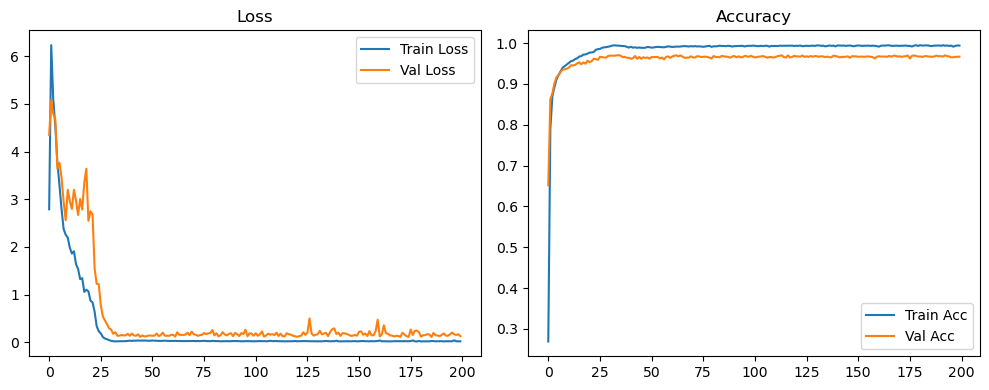

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 50.50it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 51.52it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 51.88it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 52.09it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 52.31it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 52.05it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 52.21it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 52.36it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 52.36it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 52.41it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 52.49it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 52.53it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 52.57it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 52.71it/s]

Original Model Final Test Loss: 0.1223 Accuracy: 0.9665


🚀 Running: batch128_lr0.01_0.01_0.01_dp0.2


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2218 | Val Acc: 0.5032 |:   0%|          | 0/200 [00:10<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2218 | Val Acc: 0.5032 |:   0%|          | 0/200 [00:10<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2218 | Val Acc: 0.5032 |:   0%|          | 1/200 [00:10<36:22, 10.97s/it]

| LR: 0.010 | Train Acc: 0.7043 | Val Acc: 0.8289 |:   0%|          | 1/200 [00:21<36:22, 10.97s/it]

| LR: 0.010 | Train Acc: 0.7043 | Val Acc: 0.8289 |:   0%|          | 1/200 [00:21<36:22, 10.97s/it]

| LR: 0.010 | Train Acc: 0.7043 | Val Acc: 0.8289 |:   1%|          | 2/200 [00:21<35:55, 10.89s/it]

| LR: 0.010 | Train Acc: 0.8407 | Val Acc: 0.8944 |:   1%|          | 2/200 [00:32<35:55, 10.89s/it]

| LR: 0.010 | Train Acc: 0.8407 | Val Acc: 0.8944 |:   1%|          | 2/200 [00:32<35:55, 10.89s/it]

| LR: 0.010 | Train Acc: 0.8407 | Val Acc: 0.8944 |:   2%|▏         | 3/200 [00:32<35:16, 10.74s/it]

| LR: 0.010 | Train Acc: 0.8780 | Val Acc: 0.9097 |:   2%|▏         | 3/200 [00:42<35:16, 10.74s/it]

| LR: 0.010 | Train Acc: 0.8780 | Val Acc: 0.9097 |:   2%|▏         | 3/200 [00:42<35:16, 10.74s/it]

| LR: 0.010 | Train Acc: 0.8780 | Val Acc: 0.9097 |:   2%|▏         | 4/200 [00:42<34:45, 10.64s/it]

| LR: 0.010 | Train Acc: 0.8962 | Val Acc: 0.9182 |:   2%|▏         | 4/200 [00:53<34:45, 10.64s/it]

| LR: 0.010 | Train Acc: 0.8962 | Val Acc: 0.9182 |:   2%|▏         | 4/200 [00:53<34:45, 10.64s/it]

| LR: 0.010 | Train Acc: 0.8962 | Val Acc: 0.9182 |:   2%|▎         | 5/200 [00:53<34:33, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9085 | Val Acc: 0.9279 |:   2%|▎         | 5/200 [01:04<34:33, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9085 | Val Acc: 0.9279 |:   2%|▎         | 5/200 [01:04<34:33, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9085 | Val Acc: 0.9279 |:   3%|▎         | 6/200 [01:04<34:24, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9201 | Val Acc: 0.9293 |:   3%|▎         | 6/200 [01:15<34:24, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9201 | Val Acc: 0.9293 |:   3%|▎         | 6/200 [01:15<34:24, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9201 | Val Acc: 0.9293 |:   4%|▎         | 7/200 [01:15<34:43, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9404 |:   4%|▎         | 7/200 [01:25<34:43, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9404 |:   4%|▎         | 7/200 [01:25<34:43, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9404 |:   4%|▍         | 8/200 [01:25<34:22, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9302 | Val Acc: 0.9443 |:   4%|▍         | 8/200 [01:36<34:22, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9302 | Val Acc: 0.9443 |:   4%|▍         | 8/200 [01:36<34:22, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9302 | Val Acc: 0.9443 |:   4%|▍         | 9/200 [01:36<34:04, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9372 | Val Acc: 0.9364 |:   4%|▍         | 9/200 [01:47<34:04, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9372 | Val Acc: 0.9364 |:   4%|▍         | 9/200 [01:47<34:04, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9372 | Val Acc: 0.9364 |:   5%|▌         | 10/200 [01:47<33:54, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9413 | Val Acc: 0.9481 |:   5%|▌         | 10/200 [01:57<33:54, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9413 | Val Acc: 0.9481 |:   5%|▌         | 10/200 [01:57<33:54, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9413 | Val Acc: 0.9481 |:   6%|▌         | 11/200 [01:57<33:31, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9421 | Val Acc: 0.9475 |:   6%|▌         | 11/200 [02:08<33:31, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9421 | Val Acc: 0.9475 |:   6%|▌         | 11/200 [02:08<33:31, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9421 | Val Acc: 0.9475 |:   6%|▌         | 12/200 [02:08<33:33, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9469 | Val Acc: 0.9486 |:   6%|▌         | 12/200 [02:18<33:33, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9469 | Val Acc: 0.9486 |:   6%|▌         | 12/200 [02:18<33:33, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9469 | Val Acc: 0.9486 |:   6%|▋         | 13/200 [02:19<33:09, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9501 |:   6%|▋         | 13/200 [02:29<33:09, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9501 |:   6%|▋         | 13/200 [02:29<33:09, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9501 |:   7%|▋         | 14/200 [02:29<32:58, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9512 |:   7%|▋         | 14/200 [02:40<32:58, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9512 |:   7%|▋         | 14/200 [02:40<32:58, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9512 |:   8%|▊         | 15/200 [02:40<32:53, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9523 |:   8%|▊         | 15/200 [02:51<32:53, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9523 |:   8%|▊         | 15/200 [02:51<32:53, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9523 |:   8%|▊         | 16/200 [02:51<32:46, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9583 | Val Acc: 0.9502 |:   8%|▊         | 16/200 [03:01<32:46, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9583 | Val Acc: 0.9502 |:   8%|▊         | 16/200 [03:01<32:46, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9583 | Val Acc: 0.9502 |:   8%|▊         | 17/200 [03:01<32:40, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9585 | Val Acc: 0.9582 |:   8%|▊         | 17/200 [03:12<32:40, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9585 | Val Acc: 0.9582 |:   8%|▊         | 17/200 [03:12<32:40, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9585 | Val Acc: 0.9582 |:   9%|▉         | 18/200 [03:12<32:25, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9616 | Val Acc: 0.9494 |:   9%|▉         | 18/200 [03:23<32:25, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9616 | Val Acc: 0.9494 |:   9%|▉         | 18/200 [03:23<32:25, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9616 | Val Acc: 0.9494 |:  10%|▉         | 19/200 [03:23<32:11, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9649 | Val Acc: 0.9553 |:  10%|▉         | 19/200 [03:33<32:11, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9649 | Val Acc: 0.9553 |:  10%|▉         | 19/200 [03:33<32:11, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9649 | Val Acc: 0.9553 |:  10%|█         | 20/200 [03:33<31:49, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9617 |:  10%|█         | 20/200 [03:44<31:49, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9617 |:  10%|█         | 20/200 [03:44<31:49, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9617 |:  10%|█         | 21/200 [03:44<31:41, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9651 |:  10%|█         | 21/200 [03:54<31:41, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9651 |:  10%|█         | 21/200 [03:54<31:41, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9651 |:  11%|█         | 22/200 [03:54<31:25, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9632 |:  11%|█         | 22/200 [04:05<31:25, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9632 |:  11%|█         | 22/200 [04:05<31:25, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9632 |:  12%|█▏        | 23/200 [04:05<31:11, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9686 |:  12%|█▏        | 23/200 [04:15<31:11, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9686 |:  12%|█▏        | 23/200 [04:15<31:11, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9686 |:  12%|█▏        | 24/200 [04:15<30:53, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9694 |:  12%|█▏        | 24/200 [04:26<30:53, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9694 |:  12%|█▏        | 24/200 [04:26<30:53, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9694 |:  12%|█▎        | 25/200 [04:26<31:00, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9699 |:  12%|█▎        | 25/200 [04:37<31:00, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9699 |:  12%|█▎        | 25/200 [04:37<31:00, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9699 |:  13%|█▎        | 26/200 [04:37<30:58, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9870 | Val Acc: 0.9712 |:  13%|█▎        | 26/200 [04:48<30:58, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9870 | Val Acc: 0.9712 |:  13%|█▎        | 26/200 [04:48<30:58, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9870 | Val Acc: 0.9712 |:  14%|█▎        | 27/200 [04:48<30:44, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9708 |:  14%|█▎        | 27/200 [04:58<30:44, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9708 |:  14%|█▎        | 27/200 [04:58<30:44, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9708 |:  14%|█▍        | 28/200 [04:58<30:32, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9703 |:  14%|█▍        | 28/200 [05:09<30:32, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9703 |:  14%|█▍        | 28/200 [05:09<30:32, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9703 |:  14%|█▍        | 29/200 [05:09<30:17, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9726 |:  14%|█▍        | 29/200 [05:19<30:17, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9726 |:  14%|█▍        | 29/200 [05:19<30:17, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9726 |:  15%|█▌        | 30/200 [05:19<30:01, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9900 | Val Acc: 0.9709 |:  15%|█▌        | 30/200 [05:30<30:01, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9900 | Val Acc: 0.9709 |:  15%|█▌        | 30/200 [05:30<30:01, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9900 | Val Acc: 0.9709 |:  16%|█▌        | 31/200 [05:30<29:48, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9723 |:  16%|█▌        | 31/200 [05:41<29:48, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9723 |:  16%|█▌        | 31/200 [05:41<29:48, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9723 |:  16%|█▌        | 32/200 [05:41<29:44, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9707 |:  16%|█▌        | 32/200 [05:51<29:44, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9707 |:  16%|█▌        | 32/200 [05:51<29:44, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9707 |:  16%|█▋        | 33/200 [05:51<29:32, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9880 | Val Acc: 0.9717 |:  16%|█▋        | 33/200 [06:02<29:32, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9880 | Val Acc: 0.9717 |:  16%|█▋        | 33/200 [06:02<29:32, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9880 | Val Acc: 0.9717 |:  17%|█▋        | 34/200 [06:02<29:20, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9695 |:  17%|█▋        | 34/200 [06:12<29:20, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9695 |:  17%|█▋        | 34/200 [06:12<29:20, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9695 |:  18%|█▊        | 35/200 [06:12<29:16, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9657 |:  18%|█▊        | 35/200 [06:23<29:16, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9657 |:  18%|█▊        | 35/200 [06:23<29:16, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9657 |:  18%|█▊        | 36/200 [06:23<29:24, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9677 |:  18%|█▊        | 36/200 [06:34<29:24, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9677 |:  18%|█▊        | 36/200 [06:34<29:24, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9677 |:  18%|█▊        | 37/200 [06:34<29:11, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9636 |:  18%|█▊        | 37/200 [06:45<29:11, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9636 |:  18%|█▊        | 37/200 [06:45<29:11, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9636 |:  19%|█▉        | 38/200 [06:45<28:57, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9668 |:  19%|█▉        | 38/200 [06:57<28:57, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9668 |:  19%|█▉        | 38/200 [06:57<28:57, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9668 |:  20%|█▉        | 39/200 [06:57<29:38, 11.05s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9659 |:  20%|█▉        | 39/200 [07:09<29:38, 11.05s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9659 |:  20%|█▉        | 39/200 [07:09<29:38, 11.05s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9659 |:  20%|██        | 40/200 [07:09<30:39, 11.49s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9663 |:  20%|██        | 40/200 [07:21<30:39, 11.49s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9663 |:  20%|██        | 40/200 [07:21<30:39, 11.49s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9663 |:  20%|██        | 41/200 [07:21<31:00, 11.70s/it]

| LR: 0.010 | Train Acc: 0.9786 | Val Acc: 0.9648 |:  20%|██        | 41/200 [07:33<31:00, 11.70s/it]

| LR: 0.010 | Train Acc: 0.9786 | Val Acc: 0.9648 |:  20%|██        | 41/200 [07:33<31:00, 11.70s/it]

| LR: 0.010 | Train Acc: 0.9786 | Val Acc: 0.9648 |:  21%|██        | 42/200 [07:33<30:32, 11.60s/it]

| LR: 0.010 | Train Acc: 0.9774 | Val Acc: 0.9657 |:  21%|██        | 42/200 [07:43<30:32, 11.60s/it]

| LR: 0.010 | Train Acc: 0.9774 | Val Acc: 0.9657 |:  21%|██        | 42/200 [07:43<30:32, 11.60s/it]

| LR: 0.010 | Train Acc: 0.9774 | Val Acc: 0.9657 |:  22%|██▏       | 43/200 [07:43<29:34, 11.30s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9648 |:  22%|██▏       | 43/200 [07:54<29:34, 11.30s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9648 |:  22%|██▏       | 43/200 [07:54<29:34, 11.30s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9648 |:  22%|██▏       | 44/200 [07:54<28:49, 11.09s/it]

| LR: 0.010 | Train Acc: 0.9778 | Val Acc: 0.9627 |:  22%|██▏       | 44/200 [08:05<28:49, 11.09s/it]

| LR: 0.010 | Train Acc: 0.9778 | Val Acc: 0.9627 |:  22%|██▏       | 44/200 [08:05<28:49, 11.09s/it]

| LR: 0.010 | Train Acc: 0.9778 | Val Acc: 0.9627 |:  22%|██▎       | 45/200 [08:05<28:16, 10.94s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9643 |:  22%|██▎       | 45/200 [08:15<28:16, 10.94s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9643 |:  22%|██▎       | 45/200 [08:15<28:16, 10.94s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9643 |:  23%|██▎       | 46/200 [08:15<28:00, 10.91s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9579 |:  23%|██▎       | 46/200 [08:26<28:00, 10.91s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9579 |:  23%|██▎       | 46/200 [08:26<28:00, 10.91s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9579 |:  24%|██▎       | 47/200 [08:26<27:34, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9657 |:  24%|██▎       | 47/200 [08:37<27:34, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9657 |:  24%|██▎       | 47/200 [08:37<27:34, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9657 |:  24%|██▍       | 48/200 [08:37<27:13, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9656 |:  24%|██▍       | 48/200 [08:47<27:13, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9656 |:  24%|██▍       | 48/200 [08:47<27:13, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9656 |:  24%|██▍       | 49/200 [08:47<26:55, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9652 |:  24%|██▍       | 49/200 [08:58<26:55, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9652 |:  24%|██▍       | 49/200 [08:58<26:55, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9652 |:  25%|██▌       | 50/200 [08:58<26:35, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9651 |:  25%|██▌       | 50/200 [09:08<26:35, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9651 |:  25%|██▌       | 50/200 [09:08<26:35, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9651 |:  26%|██▌       | 51/200 [09:08<26:19, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9643 |:  26%|██▌       | 51/200 [09:19<26:19, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9643 |:  26%|██▌       | 51/200 [09:19<26:19, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9643 |:  26%|██▌       | 52/200 [09:19<25:59, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9645 |:  26%|██▌       | 52/200 [09:29<25:59, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9645 |:  26%|██▌       | 52/200 [09:29<25:59, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9645 |:  26%|██▋       | 53/200 [09:29<25:52, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9780 | Val Acc: 0.9652 |:  26%|██▋       | 53/200 [09:40<25:52, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9780 | Val Acc: 0.9652 |:  26%|██▋       | 53/200 [09:40<25:52, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9780 | Val Acc: 0.9652 |:  27%|██▋       | 54/200 [09:40<25:43, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9670 |:  27%|██▋       | 54/200 [09:50<25:43, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9670 |:  27%|██▋       | 54/200 [09:50<25:43, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9670 |:  28%|██▊       | 55/200 [09:50<25:30, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9653 |:  28%|██▊       | 55/200 [10:01<25:30, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9653 |:  28%|██▊       | 55/200 [10:01<25:30, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9653 |:  28%|██▊       | 56/200 [10:01<25:21, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9666 |:  28%|██▊       | 56/200 [10:12<25:21, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9666 |:  28%|██▊       | 56/200 [10:12<25:21, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9666 |:  28%|██▊       | 57/200 [10:12<25:17, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9670 |:  28%|██▊       | 57/200 [10:22<25:17, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9670 |:  28%|██▊       | 57/200 [10:22<25:17, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9670 |:  29%|██▉       | 58/200 [10:22<25:06, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9648 |:  29%|██▉       | 58/200 [10:33<25:06, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9648 |:  29%|██▉       | 58/200 [10:33<25:06, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9648 |:  30%|██▉       | 59/200 [10:33<24:52, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9667 |:  30%|██▉       | 59/200 [10:43<24:52, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9667 |:  30%|██▉       | 59/200 [10:43<24:52, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9667 |:  30%|███       | 60/200 [10:44<24:50, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9669 |:  30%|███       | 60/200 [10:54<24:50, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9669 |:  30%|███       | 60/200 [10:54<24:50, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9669 |:  30%|███       | 61/200 [10:54<24:33, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  30%|███       | 61/200 [11:05<24:33, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  30%|███       | 61/200 [11:05<24:33, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  31%|███       | 62/200 [11:05<24:23, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9669 |:  31%|███       | 62/200 [11:15<24:23, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9669 |:  31%|███       | 62/200 [11:15<24:23, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9669 |:  32%|███▏      | 63/200 [11:15<24:18, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  32%|███▏      | 63/200 [11:27<24:18, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  32%|███▏      | 63/200 [11:27<24:18, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  32%|███▏      | 64/200 [11:27<24:41, 10.89s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9665 |:  32%|███▏      | 64/200 [11:37<24:41, 10.89s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9665 |:  32%|███▏      | 64/200 [11:37<24:41, 10.89s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9665 |:  32%|███▎      | 65/200 [11:37<24:20, 10.82s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9677 |:  32%|███▎      | 65/200 [11:48<24:20, 10.82s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9677 |:  32%|███▎      | 65/200 [11:48<24:20, 10.82s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9677 |:  33%|███▎      | 66/200 [11:48<24:07, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9642 |:  33%|███▎      | 66/200 [11:59<24:07, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9642 |:  33%|███▎      | 66/200 [11:59<24:07, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9642 |:  34%|███▎      | 67/200 [11:59<23:50, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9672 |:  34%|███▎      | 67/200 [12:10<23:50, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9672 |:  34%|███▎      | 67/200 [12:10<23:50, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9672 |:  34%|███▍      | 68/200 [12:10<23:39, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9660 |:  34%|███▍      | 68/200 [12:20<23:39, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9660 |:  34%|███▍      | 68/200 [12:20<23:39, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9660 |:  34%|███▍      | 69/200 [12:20<23:24, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9658 |:  34%|███▍      | 69/200 [12:31<23:24, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9658 |:  34%|███▍      | 69/200 [12:31<23:24, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9658 |:  35%|███▌      | 70/200 [12:31<23:07, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9663 |:  35%|███▌      | 70/200 [12:41<23:07, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9663 |:  35%|███▌      | 70/200 [12:41<23:07, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9663 |:  36%|███▌      | 71/200 [12:41<22:53, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9671 |:  36%|███▌      | 71/200 [12:52<22:53, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9671 |:  36%|███▌      | 71/200 [12:52<22:53, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9671 |:  36%|███▌      | 72/200 [12:52<22:49, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9676 |:  36%|███▌      | 72/200 [13:03<22:49, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9676 |:  36%|███▌      | 72/200 [13:03<22:49, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9676 |:  36%|███▋      | 73/200 [13:03<22:33, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9676 |:  36%|███▋      | 73/200 [13:14<22:33, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9676 |:  36%|███▋      | 73/200 [13:14<22:33, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9676 |:  37%|███▋      | 74/200 [13:14<22:27, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9669 |:  37%|███▋      | 74/200 [13:24<22:27, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9669 |:  37%|███▋      | 74/200 [13:24<22:27, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9669 |:  38%|███▊      | 75/200 [13:24<22:15, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9649 |:  38%|███▊      | 75/200 [13:35<22:15, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9649 |:  38%|███▊      | 75/200 [13:35<22:15, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9649 |:  38%|███▊      | 76/200 [13:35<22:00, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9659 |:  38%|███▊      | 76/200 [13:45<22:00, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9659 |:  38%|███▊      | 76/200 [13:45<22:00, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9659 |:  38%|███▊      | 77/200 [13:45<21:44, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9667 |:  38%|███▊      | 77/200 [13:56<21:44, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9667 |:  38%|███▊      | 77/200 [13:56<21:44, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9667 |:  39%|███▉      | 78/200 [13:56<21:36, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9675 |:  39%|███▉      | 78/200 [14:07<21:36, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9675 |:  39%|███▉      | 78/200 [14:07<21:36, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9675 |:  40%|███▉      | 79/200 [14:07<21:28, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9678 |:  40%|███▉      | 79/200 [14:17<21:28, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9678 |:  40%|███▉      | 79/200 [14:17<21:28, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9678 |:  40%|████      | 80/200 [14:17<21:21, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9811 | Val Acc: 0.9670 |:  40%|████      | 80/200 [14:28<21:21, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9811 | Val Acc: 0.9670 |:  40%|████      | 80/200 [14:28<21:21, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9811 | Val Acc: 0.9670 |:  40%|████      | 81/200 [14:28<21:10, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9672 |:  40%|████      | 81/200 [14:39<21:10, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9672 |:  40%|████      | 81/200 [14:39<21:10, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9672 |:  41%|████      | 82/200 [14:39<20:52, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9796 | Val Acc: 0.9660 |:  41%|████      | 82/200 [14:49<20:52, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9796 | Val Acc: 0.9660 |:  41%|████      | 82/200 [14:49<20:52, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9796 | Val Acc: 0.9660 |:  42%|████▏     | 83/200 [14:49<20:48, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9641 |:  42%|████▏     | 83/200 [15:00<20:48, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9641 |:  42%|████▏     | 83/200 [15:00<20:48, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9641 |:  42%|████▏     | 84/200 [15:00<20:38, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9653 |:  42%|████▏     | 84/200 [15:11<20:38, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9653 |:  42%|████▏     | 84/200 [15:11<20:38, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9653 |:  42%|████▎     | 85/200 [15:11<20:26, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9660 |:  42%|████▎     | 85/200 [15:21<20:26, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9660 |:  42%|████▎     | 85/200 [15:21<20:26, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9660 |:  43%|████▎     | 86/200 [15:21<20:15, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9661 |:  43%|████▎     | 86/200 [15:32<20:15, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9661 |:  43%|████▎     | 86/200 [15:32<20:15, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9661 |:  44%|████▎     | 87/200 [15:32<20:03, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9668 |:  44%|████▎     | 87/200 [15:42<20:03, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9668 |:  44%|████▎     | 87/200 [15:42<20:03, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9668 |:  44%|████▍     | 88/200 [15:42<19:41, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9669 |:  44%|████▍     | 88/200 [15:53<19:41, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9669 |:  44%|████▍     | 88/200 [15:53<19:41, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9669 |:  44%|████▍     | 89/200 [15:53<19:23, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9678 |:  44%|████▍     | 89/200 [16:03<19:23, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9678 |:  44%|████▍     | 89/200 [16:03<19:23, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9678 |:  45%|████▌     | 90/200 [16:03<19:20, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9673 |:  45%|████▌     | 90/200 [16:14<19:20, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9673 |:  45%|████▌     | 90/200 [16:14<19:20, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9673 |:  46%|████▌     | 91/200 [16:14<19:12, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9794 | Val Acc: 0.9636 |:  46%|████▌     | 91/200 [16:25<19:12, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9794 | Val Acc: 0.9636 |:  46%|████▌     | 91/200 [16:25<19:12, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9794 | Val Acc: 0.9636 |:  46%|████▌     | 92/200 [16:25<19:02, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9681 |:  46%|████▌     | 92/200 [16:35<19:02, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9681 |:  46%|████▌     | 92/200 [16:35<19:02, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9681 |:  46%|████▋     | 93/200 [16:35<18:54, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9667 |:  46%|████▋     | 93/200 [16:46<18:54, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9667 |:  46%|████▋     | 93/200 [16:46<18:54, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9667 |:  47%|████▋     | 94/200 [16:46<18:52, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9666 |:  47%|████▋     | 94/200 [16:57<18:52, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9666 |:  47%|████▋     | 94/200 [16:57<18:52, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9666 |:  48%|████▊     | 95/200 [16:57<18:42, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9682 |:  48%|████▊     | 95/200 [17:07<18:42, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9682 |:  48%|████▊     | 95/200 [17:07<18:42, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9682 |:  48%|████▊     | 96/200 [17:07<18:27, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9662 |:  48%|████▊     | 96/200 [17:18<18:27, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9662 |:  48%|████▊     | 96/200 [17:18<18:27, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9662 |:  48%|████▊     | 97/200 [17:18<18:17, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9667 |:  48%|████▊     | 97/200 [17:28<18:17, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9667 |:  48%|████▊     | 97/200 [17:28<18:17, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9667 |:  49%|████▉     | 98/200 [17:29<18:01, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9671 |:  49%|████▉     | 98/200 [17:39<18:01, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9671 |:  49%|████▉     | 98/200 [17:39<18:01, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9671 |:  50%|████▉     | 99/200 [17:39<17:49, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9679 |:  50%|████▉     | 99/200 [17:50<17:49, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9679 |:  50%|████▉     | 99/200 [17:50<17:49, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9679 |:  50%|█████     | 100/200 [17:50<17:59, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9690 |:  50%|█████     | 100/200 [18:01<17:59, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9690 |:  50%|█████     | 100/200 [18:01<17:59, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9690 |:  50%|█████     | 101/200 [18:01<17:41, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9799 | Val Acc: 0.9670 |:  50%|█████     | 101/200 [18:12<17:41, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9799 | Val Acc: 0.9670 |:  50%|█████     | 101/200 [18:12<17:41, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9799 | Val Acc: 0.9670 |:  51%|█████     | 102/200 [18:12<17:31, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9816 | Val Acc: 0.9681 |:  51%|█████     | 102/200 [18:22<17:31, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9816 | Val Acc: 0.9681 |:  51%|█████     | 102/200 [18:22<17:31, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9816 | Val Acc: 0.9681 |:  52%|█████▏    | 103/200 [18:22<17:16, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9811 | Val Acc: 0.9696 |:  52%|█████▏    | 103/200 [18:33<17:16, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9811 | Val Acc: 0.9696 |:  52%|█████▏    | 103/200 [18:33<17:16, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9811 | Val Acc: 0.9696 |:  52%|█████▏    | 104/200 [18:33<17:04, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9663 |:  52%|█████▏    | 104/200 [18:43<17:04, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9663 |:  52%|█████▏    | 104/200 [18:43<17:04, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9663 |:  52%|█████▎    | 105/200 [18:43<16:51, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9794 | Val Acc: 0.9694 |:  52%|█████▎    | 105/200 [18:54<16:51, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9794 | Val Acc: 0.9694 |:  52%|█████▎    | 105/200 [18:54<16:51, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9794 | Val Acc: 0.9694 |:  53%|█████▎    | 106/200 [18:54<16:42, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9653 |:  53%|█████▎    | 106/200 [19:05<16:42, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9653 |:  53%|█████▎    | 106/200 [19:05<16:42, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9653 |:  54%|█████▎    | 107/200 [19:05<16:38, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9683 |:  54%|█████▎    | 107/200 [19:16<16:38, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9683 |:  54%|█████▎    | 107/200 [19:16<16:38, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9683 |:  54%|█████▍    | 108/200 [19:16<16:27, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9667 |:  54%|█████▍    | 108/200 [19:27<16:27, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9667 |:  54%|█████▍    | 108/200 [19:27<16:27, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9667 |:  55%|█████▍    | 109/200 [19:27<16:25, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9664 |:  55%|█████▍    | 109/200 [19:37<16:25, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9664 |:  55%|█████▍    | 109/200 [19:37<16:25, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9664 |:  55%|█████▌    | 110/200 [19:37<16:07, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9823 | Val Acc: 0.9663 |:  55%|█████▌    | 110/200 [19:48<16:07, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9823 | Val Acc: 0.9663 |:  55%|█████▌    | 110/200 [19:48<16:07, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9823 | Val Acc: 0.9663 |:  56%|█████▌    | 111/200 [19:48<15:50, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9806 | Val Acc: 0.9657 |:  56%|█████▌    | 111/200 [19:59<15:50, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9806 | Val Acc: 0.9657 |:  56%|█████▌    | 111/200 [19:59<15:50, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9806 | Val Acc: 0.9657 |:  56%|█████▌    | 112/200 [19:59<15:37, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9653 |:  56%|█████▌    | 112/200 [20:09<15:37, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9653 |:  56%|█████▌    | 112/200 [20:09<15:37, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9653 |:  56%|█████▋    | 113/200 [20:09<15:25, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9692 |:  56%|█████▋    | 113/200 [20:19<15:25, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9692 |:  56%|█████▋    | 113/200 [20:19<15:25, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9692 |:  57%|█████▋    | 114/200 [20:19<15:07, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9673 |:  57%|█████▋    | 114/200 [20:31<15:07, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9673 |:  57%|█████▋    | 114/200 [20:31<15:07, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9673 |:  57%|█████▊    | 115/200 [20:31<15:15, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9663 |:  57%|█████▊    | 115/200 [20:41<15:15, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9663 |:  57%|█████▊    | 115/200 [20:41<15:15, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9663 |:  58%|█████▊    | 116/200 [20:41<15:02, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9822 | Val Acc: 0.9662 |:  58%|█████▊    | 116/200 [20:52<15:02, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9822 | Val Acc: 0.9662 |:  58%|█████▊    | 116/200 [20:52<15:02, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9822 | Val Acc: 0.9662 |:  58%|█████▊    | 117/200 [20:52<14:48, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9647 |:  58%|█████▊    | 117/200 [21:03<14:48, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9647 |:  58%|█████▊    | 117/200 [21:03<14:48, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9647 |:  59%|█████▉    | 118/200 [21:03<14:35, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9811 | Val Acc: 0.9666 |:  59%|█████▉    | 118/200 [21:13<14:35, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9811 | Val Acc: 0.9666 |:  59%|█████▉    | 118/200 [21:13<14:35, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9811 | Val Acc: 0.9666 |:  60%|█████▉    | 119/200 [21:13<14:20, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9760 | Val Acc: 0.9647 |:  60%|█████▉    | 119/200 [21:24<14:20, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9760 | Val Acc: 0.9647 |:  60%|█████▉    | 119/200 [21:24<14:20, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9760 | Val Acc: 0.9647 |:  60%|██████    | 120/200 [21:24<14:16, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9681 |:  60%|██████    | 120/200 [21:35<14:16, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9681 |:  60%|██████    | 120/200 [21:35<14:16, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9681 |:  60%|██████    | 121/200 [21:35<14:01, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9679 |:  60%|██████    | 121/200 [21:45<14:01, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9679 |:  60%|██████    | 121/200 [21:45<14:01, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9679 |:  61%|██████    | 122/200 [21:45<13:49, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9685 |:  61%|██████    | 122/200 [21:56<13:49, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9685 |:  61%|██████    | 122/200 [21:56<13:49, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9685 |:  62%|██████▏   | 123/200 [21:56<13:36, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9660 |:  62%|██████▏   | 123/200 [22:06<13:36, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9660 |:  62%|██████▏   | 123/200 [22:06<13:36, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9660 |:  62%|██████▏   | 124/200 [22:06<13:24, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9681 |:  62%|██████▏   | 124/200 [22:17<13:24, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9681 |:  62%|██████▏   | 124/200 [22:17<13:24, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9681 |:  62%|██████▎   | 125/200 [22:17<13:17, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9671 |:  62%|██████▎   | 125/200 [22:28<13:17, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9671 |:  62%|██████▎   | 125/200 [22:28<13:17, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9671 |:  63%|██████▎   | 126/200 [22:28<13:08, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9675 |:  63%|██████▎   | 126/200 [22:39<13:08, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9675 |:  63%|██████▎   | 126/200 [22:39<13:08, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9675 |:  64%|██████▎   | 127/200 [22:39<13:06, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9835 | Val Acc: 0.9676 |:  64%|██████▎   | 127/200 [22:49<13:06, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9835 | Val Acc: 0.9676 |:  64%|██████▎   | 127/200 [22:49<13:06, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9835 | Val Acc: 0.9676 |:  64%|██████▍   | 128/200 [22:49<12:53, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9823 | Val Acc: 0.9674 |:  64%|██████▍   | 128/200 [23:00<12:53, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9823 | Val Acc: 0.9674 |:  64%|██████▍   | 128/200 [23:00<12:53, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9823 | Val Acc: 0.9674 |:  64%|██████▍   | 129/200 [23:00<12:41, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9681 |:  64%|██████▍   | 129/200 [23:11<12:41, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9681 |:  64%|██████▍   | 129/200 [23:11<12:41, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9681 |:  65%|██████▌   | 130/200 [23:11<12:28, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9708 |:  65%|██████▌   | 130/200 [23:21<12:28, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9708 |:  65%|██████▌   | 130/200 [23:21<12:28, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9708 |:  66%|██████▌   | 131/200 [23:21<12:16, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9674 |:  66%|██████▌   | 131/200 [23:32<12:16, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9674 |:  66%|██████▌   | 131/200 [23:32<12:16, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9674 |:  66%|██████▌   | 132/200 [23:32<12:01, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9633 |:  66%|██████▌   | 132/200 [23:43<12:01, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9633 |:  66%|██████▌   | 132/200 [23:43<12:01, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9633 |:  66%|██████▋   | 133/200 [23:43<11:56, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9680 |:  66%|██████▋   | 133/200 [23:53<11:56, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9680 |:  66%|██████▋   | 133/200 [23:53<11:56, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9680 |:  67%|██████▋   | 134/200 [23:54<11:46, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9683 |:  67%|██████▋   | 134/200 [24:04<11:46, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9683 |:  67%|██████▋   | 134/200 [24:04<11:46, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9683 |:  68%|██████▊   | 135/200 [24:04<11:38, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9673 |:  68%|██████▊   | 135/200 [24:15<11:38, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9673 |:  68%|██████▊   | 135/200 [24:15<11:38, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9673 |:  68%|██████▊   | 136/200 [24:15<11:24, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9677 |:  68%|██████▊   | 136/200 [24:25<11:24, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9677 |:  68%|██████▊   | 136/200 [24:25<11:24, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9677 |:  68%|██████▊   | 137/200 [24:26<11:11, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9697 |:  68%|██████▊   | 137/200 [24:36<11:11, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9697 |:  68%|██████▊   | 137/200 [24:36<11:11, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9697 |:  69%|██████▉   | 138/200 [24:36<11:01, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9829 | Val Acc: 0.9687 |:  69%|██████▉   | 138/200 [24:47<11:01, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9829 | Val Acc: 0.9687 |:  69%|██████▉   | 138/200 [24:47<11:01, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9829 | Val Acc: 0.9687 |:  70%|██████▉   | 139/200 [24:47<10:51, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9677 |:  70%|██████▉   | 139/200 [24:57<10:51, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9677 |:  70%|██████▉   | 139/200 [24:57<10:51, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9677 |:  70%|███████   | 140/200 [24:58<10:39, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9671 |:  70%|███████   | 140/200 [25:08<10:39, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9671 |:  70%|███████   | 140/200 [25:08<10:39, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9671 |:  70%|███████   | 141/200 [25:08<10:29, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9693 |:  70%|███████   | 141/200 [25:19<10:29, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9693 |:  70%|███████   | 141/200 [25:19<10:29, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9693 |:  71%|███████   | 142/200 [25:19<10:21, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9806 | Val Acc: 0.9692 |:  71%|███████   | 142/200 [25:30<10:21, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9806 | Val Acc: 0.9692 |:  71%|███████   | 142/200 [25:30<10:21, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9806 | Val Acc: 0.9692 |:  72%|███████▏  | 143/200 [25:30<10:11, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9661 |:  72%|███████▏  | 143/200 [25:40<10:11, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9661 |:  72%|███████▏  | 143/200 [25:40<10:11, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9661 |:  72%|███████▏  | 144/200 [25:40<09:59, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9580 |:  72%|███████▏  | 144/200 [25:51<09:59, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9580 |:  72%|███████▏  | 144/200 [25:51<09:59, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9580 |:  72%|███████▎  | 145/200 [25:51<09:47, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9674 |:  72%|███████▎  | 145/200 [26:02<09:47, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9674 |:  72%|███████▎  | 145/200 [26:02<09:47, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9674 |:  73%|███████▎  | 146/200 [26:02<09:37, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9675 |:  73%|███████▎  | 146/200 [26:13<09:37, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9675 |:  73%|███████▎  | 146/200 [26:13<09:37, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9675 |:  74%|███████▎  | 147/200 [26:13<09:28, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9837 | Val Acc: 0.9685 |:  74%|███████▎  | 147/200 [26:24<09:28, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9837 | Val Acc: 0.9685 |:  74%|███████▎  | 147/200 [26:24<09:28, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9837 | Val Acc: 0.9685 |:  74%|███████▍  | 148/200 [26:24<09:22, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9838 | Val Acc: 0.9683 |:  74%|███████▍  | 148/200 [26:34<09:22, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9838 | Val Acc: 0.9683 |:  74%|███████▍  | 148/200 [26:34<09:22, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9838 | Val Acc: 0.9683 |:  74%|███████▍  | 149/200 [26:34<09:11, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9686 |:  74%|███████▍  | 149/200 [26:45<09:11, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9686 |:  74%|███████▍  | 149/200 [26:45<09:11, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9686 |:  75%|███████▌  | 150/200 [26:45<08:55, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9688 |:  75%|███████▌  | 150/200 [26:55<08:55, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9688 |:  75%|███████▌  | 150/200 [26:55<08:55, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9688 |:  76%|███████▌  | 151/200 [26:55<08:38, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9695 |:  76%|███████▌  | 151/200 [27:06<08:38, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9695 |:  76%|███████▌  | 151/200 [27:06<08:38, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9695 |:  76%|███████▌  | 152/200 [27:06<08:28, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9663 |:  76%|███████▌  | 152/200 [27:16<08:28, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9663 |:  76%|███████▌  | 152/200 [27:16<08:28, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9663 |:  76%|███████▋  | 153/200 [27:16<08:17, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9829 | Val Acc: 0.9692 |:  76%|███████▋  | 153/200 [27:27<08:17, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9829 | Val Acc: 0.9692 |:  76%|███████▋  | 153/200 [27:27<08:17, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9829 | Val Acc: 0.9692 |:  77%|███████▋  | 154/200 [27:27<08:05, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9831 | Val Acc: 0.9689 |:  77%|███████▋  | 154/200 [27:37<08:05, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9831 | Val Acc: 0.9689 |:  77%|███████▋  | 154/200 [27:37<08:05, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9831 | Val Acc: 0.9689 |:  78%|███████▊  | 155/200 [27:37<07:52, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9826 | Val Acc: 0.9687 |:  78%|███████▊  | 155/200 [27:49<07:52, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9826 | Val Acc: 0.9687 |:  78%|███████▊  | 155/200 [27:49<07:52, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9826 | Val Acc: 0.9687 |:  78%|███████▊  | 156/200 [27:49<07:58, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9661 |:  78%|███████▊  | 156/200 [27:59<07:58, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9661 |:  78%|███████▊  | 156/200 [27:59<07:58, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9661 |:  78%|███████▊  | 157/200 [28:00<07:43, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9692 |:  78%|███████▊  | 157/200 [28:12<07:43, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9692 |:  78%|███████▊  | 157/200 [28:12<07:43, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9692 |:  79%|███████▉  | 158/200 [28:12<07:50, 11.21s/it]

| LR: 0.010 | Train Acc: 0.9819 | Val Acc: 0.9682 |:  79%|███████▉  | 158/200 [28:22<07:50, 11.21s/it]

| LR: 0.010 | Train Acc: 0.9819 | Val Acc: 0.9682 |:  79%|███████▉  | 158/200 [28:22<07:50, 11.21s/it]

| LR: 0.010 | Train Acc: 0.9819 | Val Acc: 0.9682 |:  80%|███████▉  | 159/200 [28:22<07:32, 11.04s/it]

| LR: 0.010 | Train Acc: 0.9824 | Val Acc: 0.9688 |:  80%|███████▉  | 159/200 [28:33<07:32, 11.04s/it]

| LR: 0.010 | Train Acc: 0.9824 | Val Acc: 0.9688 |:  80%|███████▉  | 159/200 [28:33<07:32, 11.04s/it]

| LR: 0.010 | Train Acc: 0.9824 | Val Acc: 0.9688 |:  80%|████████  | 160/200 [28:33<07:16, 10.92s/it]

| LR: 0.010 | Train Acc: 0.9826 | Val Acc: 0.9699 |:  80%|████████  | 160/200 [28:44<07:16, 10.92s/it]

| LR: 0.010 | Train Acc: 0.9826 | Val Acc: 0.9699 |:  80%|████████  | 160/200 [28:44<07:16, 10.92s/it]

| LR: 0.010 | Train Acc: 0.9826 | Val Acc: 0.9699 |:  80%|████████  | 161/200 [28:44<07:03, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9694 |:  80%|████████  | 161/200 [28:54<07:03, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9694 |:  80%|████████  | 161/200 [28:54<07:03, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9694 |:  81%|████████  | 162/200 [28:54<06:49, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9822 | Val Acc: 0.9653 |:  81%|████████  | 162/200 [29:05<06:49, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9822 | Val Acc: 0.9653 |:  81%|████████  | 162/200 [29:05<06:49, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9822 | Val Acc: 0.9653 |:  82%|████████▏ | 163/200 [29:05<06:41, 10.84s/it]

| LR: 0.010 | Train Acc: 0.9829 | Val Acc: 0.9696 |:  82%|████████▏ | 163/200 [29:16<06:41, 10.84s/it]

| LR: 0.010 | Train Acc: 0.9829 | Val Acc: 0.9696 |:  82%|████████▏ | 163/200 [29:16<06:41, 10.84s/it]

| LR: 0.010 | Train Acc: 0.9829 | Val Acc: 0.9696 |:  82%|████████▏ | 164/200 [29:16<06:30, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9693 |:  82%|████████▏ | 164/200 [29:27<06:30, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9693 |:  82%|████████▏ | 164/200 [29:27<06:30, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9693 |:  82%|████████▎ | 165/200 [29:27<06:18, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9585 |:  82%|████████▎ | 165/200 [29:37<06:18, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9585 |:  82%|████████▎ | 165/200 [29:37<06:18, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9585 |:  83%|████████▎ | 166/200 [29:37<06:05, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9767 | Val Acc: 0.9663 |:  83%|████████▎ | 166/200 [29:48<06:05, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9767 | Val Acc: 0.9663 |:  83%|████████▎ | 166/200 [29:48<06:05, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9767 | Val Acc: 0.9663 |:  84%|████████▎ | 167/200 [29:48<05:54, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9823 | Val Acc: 0.9673 |:  84%|████████▎ | 167/200 [29:59<05:54, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9823 | Val Acc: 0.9673 |:  84%|████████▎ | 167/200 [29:59<05:54, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9823 | Val Acc: 0.9673 |:  84%|████████▍ | 168/200 [29:59<05:41, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9835 | Val Acc: 0.9680 |:  84%|████████▍ | 168/200 [30:09<05:41, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9835 | Val Acc: 0.9680 |:  84%|████████▍ | 168/200 [30:09<05:41, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9835 | Val Acc: 0.9680 |:  84%|████████▍ | 169/200 [30:09<05:29, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9840 | Val Acc: 0.9683 |:  84%|████████▍ | 169/200 [30:20<05:29, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9840 | Val Acc: 0.9683 |:  84%|████████▍ | 169/200 [30:20<05:29, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9840 | Val Acc: 0.9683 |:  85%|████████▌ | 170/200 [30:20<05:18, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9829 | Val Acc: 0.9698 |:  85%|████████▌ | 170/200 [30:31<05:18, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9829 | Val Acc: 0.9698 |:  85%|████████▌ | 170/200 [30:31<05:18, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9829 | Val Acc: 0.9698 |:  86%|████████▌ | 171/200 [30:31<05:08, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9843 | Val Acc: 0.9697 |:  86%|████████▌ | 171/200 [30:41<05:08, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9843 | Val Acc: 0.9697 |:  86%|████████▌ | 171/200 [30:41<05:08, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9843 | Val Acc: 0.9697 |:  86%|████████▌ | 172/200 [30:41<04:58, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9855 | Val Acc: 0.9701 |:  86%|████████▌ | 172/200 [30:52<04:58, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9855 | Val Acc: 0.9701 |:  86%|████████▌ | 172/200 [30:52<04:58, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9855 | Val Acc: 0.9701 |:  86%|████████▋ | 173/200 [30:52<04:48, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9686 |:  86%|████████▋ | 173/200 [31:03<04:48, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9686 |:  86%|████████▋ | 173/200 [31:03<04:48, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9686 |:  87%|████████▋ | 174/200 [31:03<04:37, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9843 | Val Acc: 0.9688 |:  87%|████████▋ | 174/200 [31:13<04:37, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9843 | Val Acc: 0.9688 |:  87%|████████▋ | 174/200 [31:13<04:37, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9843 | Val Acc: 0.9688 |:  88%|████████▊ | 175/200 [31:13<04:26, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9672 |:  88%|████████▊ | 175/200 [31:24<04:26, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9672 |:  88%|████████▊ | 175/200 [31:24<04:26, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9849 | Val Acc: 0.9672 |:  88%|████████▊ | 176/200 [31:24<04:16, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9837 | Val Acc: 0.9700 |:  88%|████████▊ | 176/200 [31:35<04:16, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9837 | Val Acc: 0.9700 |:  88%|████████▊ | 176/200 [31:35<04:16, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9837 | Val Acc: 0.9700 |:  88%|████████▊ | 177/200 [31:35<04:07, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9692 |:  88%|████████▊ | 177/200 [31:46<04:07, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9692 |:  88%|████████▊ | 177/200 [31:46<04:07, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9692 |:  89%|████████▉ | 178/200 [31:46<03:55, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9826 | Val Acc: 0.9688 |:  89%|████████▉ | 178/200 [31:57<03:55, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9826 | Val Acc: 0.9688 |:  89%|████████▉ | 178/200 [31:57<03:55, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9826 | Val Acc: 0.9688 |:  90%|████████▉ | 179/200 [31:57<03:48, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9796 | Val Acc: 0.9659 |:  90%|████████▉ | 179/200 [32:07<03:48, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9796 | Val Acc: 0.9659 |:  90%|████████▉ | 179/200 [32:07<03:48, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9796 | Val Acc: 0.9659 |:  90%|█████████ | 180/200 [32:07<03:36, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9672 |:  90%|█████████ | 180/200 [32:18<03:36, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9672 |:  90%|█████████ | 180/200 [32:18<03:36, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9672 |:  90%|█████████ | 181/200 [32:18<03:24, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9829 | Val Acc: 0.9669 |:  90%|█████████ | 181/200 [32:29<03:24, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9829 | Val Acc: 0.9669 |:  90%|█████████ | 181/200 [32:29<03:24, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9829 | Val Acc: 0.9669 |:  91%|█████████ | 182/200 [32:29<03:12, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9667 |:  91%|█████████ | 182/200 [32:39<03:12, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9667 |:  91%|█████████ | 182/200 [32:39<03:12, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9667 |:  92%|█████████▏| 183/200 [32:39<03:01, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9827 | Val Acc: 0.9670 |:  92%|█████████▏| 183/200 [32:50<03:01, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9827 | Val Acc: 0.9670 |:  92%|█████████▏| 183/200 [32:50<03:01, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9827 | Val Acc: 0.9670 |:  92%|█████████▏| 184/200 [32:50<02:50, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9627 |:  92%|█████████▏| 184/200 [33:00<02:50, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9627 |:  92%|█████████▏| 184/200 [33:00<02:50, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9627 |:  92%|█████████▎| 185/200 [33:01<02:39, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9680 |:  92%|█████████▎| 185/200 [33:11<02:39, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9680 |:  92%|█████████▎| 185/200 [33:11<02:39, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9680 |:  93%|█████████▎| 186/200 [33:11<02:29, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9828 | Val Acc: 0.9667 |:  93%|█████████▎| 186/200 [33:22<02:29, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9828 | Val Acc: 0.9667 |:  93%|█████████▎| 186/200 [33:22<02:29, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9828 | Val Acc: 0.9667 |:  94%|█████████▎| 187/200 [33:22<02:18, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9681 |:  94%|█████████▎| 187/200 [33:32<02:18, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9681 |:  94%|█████████▎| 187/200 [33:32<02:18, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9681 |:  94%|█████████▍| 188/200 [33:32<02:07, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9693 |:  94%|█████████▍| 188/200 [33:43<02:07, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9693 |:  94%|█████████▍| 188/200 [33:43<02:07, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9830 | Val Acc: 0.9693 |:  94%|█████████▍| 189/200 [33:43<01:57, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9690 |:  94%|█████████▍| 189/200 [33:54<01:57, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9690 |:  94%|█████████▍| 189/200 [33:54<01:57, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9690 |:  95%|█████████▌| 190/200 [33:54<01:46, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9846 | Val Acc: 0.9691 |:  95%|█████████▌| 190/200 [34:04<01:46, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9846 | Val Acc: 0.9691 |:  95%|█████████▌| 190/200 [34:04<01:46, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9846 | Val Acc: 0.9691 |:  96%|█████████▌| 191/200 [34:05<01:36, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9835 | Val Acc: 0.9653 |:  96%|█████████▌| 191/200 [34:15<01:36, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9835 | Val Acc: 0.9653 |:  96%|█████████▌| 191/200 [34:15<01:36, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9835 | Val Acc: 0.9653 |:  96%|█████████▌| 192/200 [34:15<01:24, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9811 | Val Acc: 0.9697 |:  96%|█████████▌| 192/200 [34:25<01:24, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9811 | Val Acc: 0.9697 |:  96%|█████████▌| 192/200 [34:25<01:24, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9811 | Val Acc: 0.9697 |:  96%|█████████▋| 193/200 [34:25<01:13, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9674 |:  96%|█████████▋| 193/200 [34:36<01:13, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9674 |:  96%|█████████▋| 193/200 [34:36<01:13, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9674 |:  97%|█████████▋| 194/200 [34:36<01:03, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9837 | Val Acc: 0.9692 |:  97%|█████████▋| 194/200 [34:46<01:03, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9837 | Val Acc: 0.9692 |:  97%|█████████▋| 194/200 [34:46<01:03, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9837 | Val Acc: 0.9692 |:  98%|█████████▊| 195/200 [34:46<00:52, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9837 | Val Acc: 0.9699 |:  98%|█████████▊| 195/200 [34:57<00:52, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9837 | Val Acc: 0.9699 |:  98%|█████████▊| 195/200 [34:57<00:52, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9837 | Val Acc: 0.9699 |:  98%|█████████▊| 196/200 [34:57<00:42, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9848 | Val Acc: 0.9692 |:  98%|█████████▊| 196/200 [35:08<00:42, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9848 | Val Acc: 0.9692 |:  98%|█████████▊| 196/200 [35:08<00:42, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9848 | Val Acc: 0.9692 |:  98%|█████████▊| 197/200 [35:08<00:31, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9799 | Val Acc: 0.9671 |:  98%|█████████▊| 197/200 [35:18<00:31, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9799 | Val Acc: 0.9671 |:  98%|█████████▊| 197/200 [35:18<00:31, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9799 | Val Acc: 0.9671 |:  99%|█████████▉| 198/200 [35:18<00:21, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9681 |:  99%|█████████▉| 198/200 [35:29<00:21, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9681 |:  99%|█████████▉| 198/200 [35:29<00:21, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9681 |: 100%|█████████▉| 199/200 [35:29<00:10, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9825 | Val Acc: 0.9689 |: 100%|█████████▉| 199/200 [35:39<00:10, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9825 | Val Acc: 0.9689 |: 100%|█████████▉| 199/200 [35:39<00:10, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9825 | Val Acc: 0.9689 |: 100%|██████████| 200/200 [35:39<00:00, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9825 | Val Acc: 0.9689 |: 100%|██████████| 200/200 [35:39<00:00, 10.70s/it]

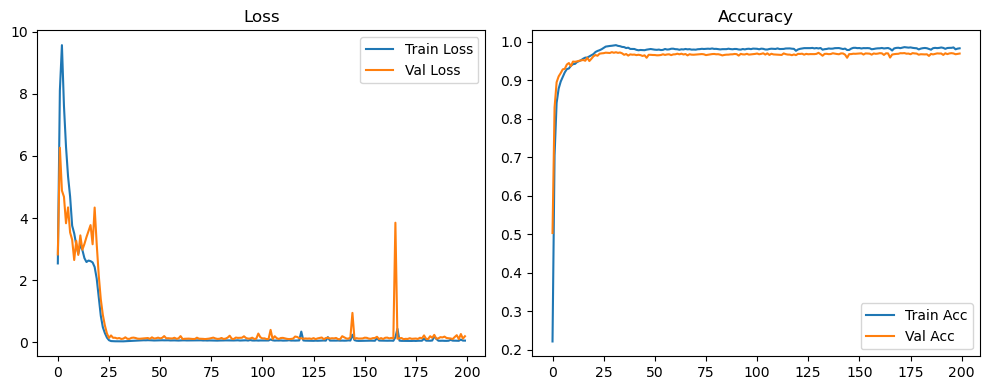

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 51.05it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 51.45it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 51.55it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 51.43it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 51.44it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 51.48it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 51.58it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 51.64it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 51.12it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 50.91it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 51.02it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 51.21it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 51.25it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 51.72it/s]

Original Model Final Test Loss: 0.1673 Accuracy: 0.9706


🚀 Running: batch128_lr0.01_0.01_0.01_dp0.5


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1899 | Val Acc: 0.5262 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1899 | Val Acc: 0.5262 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1899 | Val Acc: 0.5262 |:   0%|          | 1/200 [00:11<37:43, 11.37s/it]

| LR: 0.010 | Train Acc: 0.6363 | Val Acc: 0.8549 |:   0%|          | 1/200 [00:22<37:43, 11.37s/it]

| LR: 0.010 | Train Acc: 0.6363 | Val Acc: 0.8549 |:   0%|          | 1/200 [00:22<37:43, 11.37s/it]

| LR: 0.010 | Train Acc: 0.6363 | Val Acc: 0.8549 |:   1%|          | 2/200 [00:22<36:29, 11.06s/it]

| LR: 0.010 | Train Acc: 0.8077 | Val Acc: 0.8936 |:   1%|          | 2/200 [00:32<36:29, 11.06s/it]

| LR: 0.010 | Train Acc: 0.8077 | Val Acc: 0.8936 |:   1%|          | 2/200 [00:32<36:29, 11.06s/it]

| LR: 0.010 | Train Acc: 0.8077 | Val Acc: 0.8936 |:   2%|▏         | 3/200 [00:32<35:32, 10.82s/it]

| LR: 0.010 | Train Acc: 0.8490 | Val Acc: 0.9117 |:   2%|▏         | 3/200 [00:43<35:32, 10.82s/it]

| LR: 0.010 | Train Acc: 0.8490 | Val Acc: 0.9117 |:   2%|▏         | 3/200 [00:43<35:32, 10.82s/it]

| LR: 0.010 | Train Acc: 0.8490 | Val Acc: 0.9117 |:   2%|▏         | 4/200 [00:43<35:13, 10.79s/it]

| LR: 0.010 | Train Acc: 0.8721 | Val Acc: 0.9214 |:   2%|▏         | 4/200 [00:54<35:13, 10.79s/it]

| LR: 0.010 | Train Acc: 0.8721 | Val Acc: 0.9214 |:   2%|▏         | 4/200 [00:54<35:13, 10.79s/it]

| LR: 0.010 | Train Acc: 0.8721 | Val Acc: 0.9214 |:   2%|▎         | 5/200 [00:54<34:58, 10.76s/it]

| LR: 0.010 | Train Acc: 0.8864 | Val Acc: 0.9349 |:   2%|▎         | 5/200 [01:04<34:58, 10.76s/it]

| LR: 0.010 | Train Acc: 0.8864 | Val Acc: 0.9349 |:   2%|▎         | 5/200 [01:04<34:58, 10.76s/it]

| LR: 0.010 | Train Acc: 0.8864 | Val Acc: 0.9349 |:   3%|▎         | 6/200 [01:04<34:49, 10.77s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9383 |:   3%|▎         | 6/200 [01:15<34:49, 10.77s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9383 |:   3%|▎         | 6/200 [01:15<34:49, 10.77s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9383 |:   4%|▎         | 7/200 [01:15<34:39, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9070 | Val Acc: 0.9467 |:   4%|▎         | 7/200 [01:26<34:39, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9070 | Val Acc: 0.9467 |:   4%|▎         | 7/200 [01:26<34:39, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9070 | Val Acc: 0.9467 |:   4%|▍         | 8/200 [01:26<34:37, 10.82s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9465 |:   4%|▍         | 8/200 [01:37<34:37, 10.82s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9465 |:   4%|▍         | 8/200 [01:37<34:37, 10.82s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9465 |:   4%|▍         | 9/200 [01:37<34:10, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9185 | Val Acc: 0.9483 |:   4%|▍         | 9/200 [01:47<34:10, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9185 | Val Acc: 0.9483 |:   4%|▍         | 9/200 [01:47<34:10, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9185 | Val Acc: 0.9483 |:   5%|▌         | 10/200 [01:47<33:51, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9234 | Val Acc: 0.9563 |:   5%|▌         | 10/200 [01:58<33:51, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9234 | Val Acc: 0.9563 |:   5%|▌         | 10/200 [01:58<33:51, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9234 | Val Acc: 0.9563 |:   6%|▌         | 11/200 [01:58<33:47, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9265 | Val Acc: 0.9565 |:   6%|▌         | 11/200 [02:09<33:47, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9265 | Val Acc: 0.9565 |:   6%|▌         | 11/200 [02:09<33:47, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9265 | Val Acc: 0.9565 |:   6%|▌         | 12/200 [02:09<33:28, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9294 | Val Acc: 0.9547 |:   6%|▌         | 12/200 [02:19<33:28, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9294 | Val Acc: 0.9547 |:   6%|▌         | 12/200 [02:19<33:28, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9294 | Val Acc: 0.9547 |:   6%|▋         | 13/200 [02:19<33:14, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9312 | Val Acc: 0.9610 |:   6%|▋         | 13/200 [02:30<33:14, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9312 | Val Acc: 0.9610 |:   6%|▋         | 13/200 [02:30<33:14, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9312 | Val Acc: 0.9610 |:   7%|▋         | 14/200 [02:30<33:02, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9360 | Val Acc: 0.9600 |:   7%|▋         | 14/200 [02:41<33:02, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9360 | Val Acc: 0.9600 |:   7%|▋         | 14/200 [02:41<33:02, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9360 | Val Acc: 0.9600 |:   8%|▊         | 15/200 [02:41<32:50, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9417 | Val Acc: 0.9637 |:   8%|▊         | 15/200 [02:51<32:50, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9417 | Val Acc: 0.9637 |:   8%|▊         | 15/200 [02:51<32:50, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9417 | Val Acc: 0.9637 |:   8%|▊         | 16/200 [02:51<32:27, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9648 |:   8%|▊         | 16/200 [03:02<32:27, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9648 |:   8%|▊         | 16/200 [03:02<32:27, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9648 |:   8%|▊         | 17/200 [03:02<32:12, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9572 | Val Acc: 0.9666 |:   8%|▊         | 17/200 [03:13<32:12, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9572 | Val Acc: 0.9666 |:   8%|▊         | 17/200 [03:13<32:12, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9572 | Val Acc: 0.9666 |:   9%|▉         | 18/200 [03:13<32:44, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9621 | Val Acc: 0.9672 |:   9%|▉         | 18/200 [03:23<32:44, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9621 | Val Acc: 0.9672 |:   9%|▉         | 18/200 [03:23<32:44, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9621 | Val Acc: 0.9672 |:  10%|▉         | 19/200 [03:23<32:20, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9628 | Val Acc: 0.9671 |:  10%|▉         | 19/200 [03:34<32:20, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9628 | Val Acc: 0.9671 |:  10%|▉         | 19/200 [03:34<32:20, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9628 | Val Acc: 0.9671 |:  10%|█         | 20/200 [03:34<31:59, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9682 |:  10%|█         | 20/200 [03:45<31:59, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9682 |:  10%|█         | 20/200 [03:45<31:59, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9682 |:  10%|█         | 21/200 [03:45<31:58, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9663 | Val Acc: 0.9687 |:  10%|█         | 21/200 [03:56<31:58, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9663 | Val Acc: 0.9687 |:  10%|█         | 21/200 [03:56<31:58, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9663 | Val Acc: 0.9687 |:  11%|█         | 22/200 [03:56<32:07, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9664 | Val Acc: 0.9683 |:  11%|█         | 22/200 [04:06<32:07, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9664 | Val Acc: 0.9683 |:  11%|█         | 22/200 [04:06<32:07, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9664 | Val Acc: 0.9683 |:  12%|█▏        | 23/200 [04:07<31:44, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9692 |:  12%|█▏        | 23/200 [04:17<31:44, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9692 |:  12%|█▏        | 23/200 [04:17<31:44, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9692 |:  12%|█▏        | 24/200 [04:17<31:29, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9691 |:  12%|█▏        | 24/200 [04:28<31:29, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9691 |:  12%|█▏        | 24/200 [04:28<31:29, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9691 |:  12%|█▎        | 25/200 [04:28<31:13, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9677 |:  12%|█▎        | 25/200 [04:38<31:13, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9677 |:  12%|█▎        | 25/200 [04:38<31:13, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9677 |:  13%|█▎        | 26/200 [04:38<30:58, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9669 |:  13%|█▎        | 26/200 [04:49<30:58, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9669 |:  13%|█▎        | 26/200 [04:49<30:58, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9669 |:  14%|█▎        | 27/200 [04:49<30:49, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9678 |:  14%|█▎        | 27/200 [05:00<30:49, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9678 |:  14%|█▎        | 27/200 [05:00<30:49, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9678 |:  14%|█▍        | 28/200 [05:00<30:32, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9673 |:  14%|█▍        | 28/200 [05:10<30:32, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9673 |:  14%|█▍        | 28/200 [05:10<30:32, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9673 |:  14%|█▍        | 29/200 [05:10<30:13, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9601 | Val Acc: 0.9646 |:  14%|█▍        | 29/200 [05:21<30:13, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9601 | Val Acc: 0.9646 |:  14%|█▍        | 29/200 [05:21<30:13, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9601 | Val Acc: 0.9646 |:  15%|█▌        | 30/200 [05:21<29:56, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9586 | Val Acc: 0.9644 |:  15%|█▌        | 30/200 [05:31<29:56, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9586 | Val Acc: 0.9644 |:  15%|█▌        | 30/200 [05:31<29:56, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9586 | Val Acc: 0.9644 |:  16%|█▌        | 31/200 [05:31<29:48, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9567 | Val Acc: 0.9633 |:  16%|█▌        | 31/200 [05:42<29:48, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9567 | Val Acc: 0.9633 |:  16%|█▌        | 31/200 [05:42<29:48, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9567 | Val Acc: 0.9633 |:  16%|█▌        | 32/200 [05:42<29:36, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9656 |:  16%|█▌        | 32/200 [05:52<29:36, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9656 |:  16%|█▌        | 32/200 [05:52<29:36, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9656 |:  16%|█▋        | 33/200 [05:52<29:19, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9539 | Val Acc: 0.9626 |:  16%|█▋        | 33/200 [06:03<29:19, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9539 | Val Acc: 0.9626 |:  16%|█▋        | 33/200 [06:03<29:19, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9539 | Val Acc: 0.9626 |:  17%|█▋        | 34/200 [06:03<29:26, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9534 | Val Acc: 0.9615 |:  17%|█▋        | 34/200 [06:14<29:26, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9534 | Val Acc: 0.9615 |:  17%|█▋        | 34/200 [06:14<29:26, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9534 | Val Acc: 0.9615 |:  18%|█▊        | 35/200 [06:14<29:12, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9523 | Val Acc: 0.9618 |:  18%|█▊        | 35/200 [06:24<29:12, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9523 | Val Acc: 0.9618 |:  18%|█▊        | 35/200 [06:24<29:12, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9523 | Val Acc: 0.9618 |:  18%|█▊        | 36/200 [06:24<29:02, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9510 | Val Acc: 0.9640 |:  18%|█▊        | 36/200 [06:35<29:02, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9510 | Val Acc: 0.9640 |:  18%|█▊        | 36/200 [06:35<29:02, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9510 | Val Acc: 0.9640 |:  18%|█▊        | 37/200 [06:35<28:57, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9633 |:  18%|█▊        | 37/200 [06:46<28:57, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9633 |:  18%|█▊        | 37/200 [06:46<28:57, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9633 |:  19%|█▉        | 38/200 [06:46<28:50, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9608 |:  19%|█▉        | 38/200 [06:57<28:50, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9608 |:  19%|█▉        | 38/200 [06:57<28:50, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9608 |:  20%|█▉        | 39/200 [06:57<28:39, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9627 |:  20%|█▉        | 39/200 [07:07<28:39, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9627 |:  20%|█▉        | 39/200 [07:07<28:39, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9627 |:  20%|██        | 40/200 [07:07<28:28, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9606 |:  20%|██        | 40/200 [07:18<28:28, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9606 |:  20%|██        | 40/200 [07:18<28:28, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9606 |:  20%|██        | 41/200 [07:18<28:15, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9630 |:  20%|██        | 41/200 [07:28<28:15, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9630 |:  20%|██        | 41/200 [07:28<28:15, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9630 |:  21%|██        | 42/200 [07:28<28:02, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  21%|██        | 42/200 [07:39<28:02, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  21%|██        | 42/200 [07:39<28:02, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  22%|██▏       | 43/200 [07:39<28:00, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9639 |:  22%|██▏       | 43/200 [07:50<28:00, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9639 |:  22%|██▏       | 43/200 [07:50<28:00, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9639 |:  22%|██▏       | 44/200 [07:50<27:41, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9641 |:  22%|██▏       | 44/200 [08:00<27:41, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9641 |:  22%|██▏       | 44/200 [08:00<27:41, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9641 |:  22%|██▎       | 45/200 [08:00<27:27, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  22%|██▎       | 45/200 [08:11<27:27, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  22%|██▎       | 45/200 [08:11<27:27, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  23%|██▎       | 46/200 [08:11<27:12, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9621 |:  23%|██▎       | 46/200 [08:22<27:12, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9621 |:  23%|██▎       | 46/200 [08:22<27:12, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9621 |:  24%|██▎       | 47/200 [08:22<27:01, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9616 |:  24%|██▎       | 47/200 [08:32<27:01, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9616 |:  24%|██▎       | 47/200 [08:32<27:01, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9616 |:  24%|██▍       | 48/200 [08:32<26:52, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9618 |:  24%|██▍       | 48/200 [08:43<26:52, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9618 |:  24%|██▍       | 48/200 [08:43<26:52, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9618 |:  24%|██▍       | 49/200 [08:43<26:35, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9617 |:  24%|██▍       | 49/200 [08:53<26:35, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9617 |:  24%|██▍       | 49/200 [08:53<26:35, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9617 |:  25%|██▌       | 50/200 [08:53<26:20, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9613 |:  25%|██▌       | 50/200 [09:04<26:20, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9613 |:  25%|██▌       | 50/200 [09:04<26:20, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9613 |:  26%|██▌       | 51/200 [09:04<26:09, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9629 |:  26%|██▌       | 51/200 [09:14<26:09, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9629 |:  26%|██▌       | 51/200 [09:14<26:09, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9629 |:  26%|██▌       | 52/200 [09:14<26:02, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9637 |:  26%|██▌       | 52/200 [09:25<26:02, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9637 |:  26%|██▌       | 52/200 [09:25<26:02, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9637 |:  26%|██▋       | 53/200 [09:25<25:58, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9512 | Val Acc: 0.9626 |:  26%|██▋       | 53/200 [09:36<25:58, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9512 | Val Acc: 0.9626 |:  26%|██▋       | 53/200 [09:36<25:58, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9512 | Val Acc: 0.9626 |:  27%|██▋       | 54/200 [09:36<25:51, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9477 | Val Acc: 0.9617 |:  27%|██▋       | 54/200 [09:46<25:51, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9477 | Val Acc: 0.9617 |:  27%|██▋       | 54/200 [09:46<25:51, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9477 | Val Acc: 0.9617 |:  28%|██▊       | 55/200 [09:46<25:38, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9618 |:  28%|██▊       | 55/200 [09:57<25:38, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9618 |:  28%|██▊       | 55/200 [09:57<25:38, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9618 |:  28%|██▊       | 56/200 [09:57<25:21, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9643 |:  28%|██▊       | 56/200 [10:07<25:21, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9643 |:  28%|██▊       | 56/200 [10:07<25:21, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9643 |:  28%|██▊       | 57/200 [10:07<25:11, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9647 |:  28%|██▊       | 57/200 [10:18<25:11, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9647 |:  28%|██▊       | 57/200 [10:18<25:11, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9647 |:  29%|██▉       | 58/200 [10:18<24:57, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9517 | Val Acc: 0.9622 |:  29%|██▉       | 58/200 [10:28<24:57, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9517 | Val Acc: 0.9622 |:  29%|██▉       | 58/200 [10:28<24:57, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9517 | Val Acc: 0.9622 |:  30%|██▉       | 59/200 [10:28<24:47, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9502 | Val Acc: 0.9632 |:  30%|██▉       | 59/200 [10:40<24:47, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9502 | Val Acc: 0.9632 |:  30%|██▉       | 59/200 [10:40<24:47, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9502 | Val Acc: 0.9632 |:  30%|███       | 60/200 [10:40<25:06, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9622 |:  30%|███       | 60/200 [10:50<25:06, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9622 |:  30%|███       | 60/200 [10:50<25:06, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9622 |:  30%|███       | 61/200 [10:50<24:47, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9639 |:  30%|███       | 61/200 [11:01<24:47, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9639 |:  30%|███       | 61/200 [11:01<24:47, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9639 |:  31%|███       | 62/200 [11:01<24:31, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9479 | Val Acc: 0.9636 |:  31%|███       | 62/200 [11:11<24:31, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9479 | Val Acc: 0.9636 |:  31%|███       | 62/200 [11:11<24:31, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9479 | Val Acc: 0.9636 |:  32%|███▏      | 63/200 [11:11<24:17, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9504 | Val Acc: 0.9622 |:  32%|███▏      | 63/200 [11:22<24:17, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9504 | Val Acc: 0.9622 |:  32%|███▏      | 63/200 [11:22<24:17, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9504 | Val Acc: 0.9622 |:  32%|███▏      | 64/200 [11:22<24:06, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9628 |:  32%|███▏      | 64/200 [11:33<24:06, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9628 |:  32%|███▏      | 64/200 [11:33<24:06, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9628 |:  32%|███▎      | 65/200 [11:33<24:05, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9482 | Val Acc: 0.9633 |:  32%|███▎      | 65/200 [11:43<24:05, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9482 | Val Acc: 0.9633 |:  32%|███▎      | 65/200 [11:43<24:05, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9482 | Val Acc: 0.9633 |:  33%|███▎      | 66/200 [11:43<23:51, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9628 |:  33%|███▎      | 66/200 [11:54<23:51, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9628 |:  33%|███▎      | 66/200 [11:54<23:51, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9628 |:  34%|███▎      | 67/200 [11:54<23:36, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9633 |:  34%|███▎      | 67/200 [12:04<23:36, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9633 |:  34%|███▎      | 67/200 [12:04<23:36, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9633 |:  34%|███▍      | 68/200 [12:04<23:20, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9624 |:  34%|███▍      | 68/200 [12:15<23:20, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9624 |:  34%|███▍      | 68/200 [12:15<23:20, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9624 |:  34%|███▍      | 69/200 [12:15<23:14, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9487 | Val Acc: 0.9630 |:  34%|███▍      | 69/200 [12:26<23:14, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9487 | Val Acc: 0.9630 |:  34%|███▍      | 69/200 [12:26<23:14, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9487 | Val Acc: 0.9630 |:  35%|███▌      | 70/200 [12:26<23:10, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9451 | Val Acc: 0.9647 |:  35%|███▌      | 70/200 [12:37<23:10, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9451 | Val Acc: 0.9647 |:  35%|███▌      | 70/200 [12:37<23:10, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9451 | Val Acc: 0.9647 |:  36%|███▌      | 71/200 [12:37<23:02, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9634 |:  36%|███▌      | 71/200 [12:48<23:02, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9634 |:  36%|███▌      | 71/200 [12:48<23:02, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9634 |:  36%|███▌      | 72/200 [12:48<22:55, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9633 |:  36%|███▌      | 72/200 [12:58<22:55, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9633 |:  36%|███▌      | 72/200 [12:58<22:55, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9633 |:  36%|███▋      | 73/200 [12:58<22:32, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9626 |:  36%|███▋      | 73/200 [13:09<22:32, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9626 |:  36%|███▋      | 73/200 [13:09<22:32, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9626 |:  37%|███▋      | 74/200 [13:09<22:21, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9616 |:  37%|███▋      | 74/200 [13:20<22:21, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9616 |:  37%|███▋      | 74/200 [13:20<22:21, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9616 |:  38%|███▊      | 75/200 [13:20<22:22, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9625 |:  38%|███▊      | 75/200 [13:30<22:22, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9625 |:  38%|███▊      | 75/200 [13:30<22:22, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9625 |:  38%|███▊      | 76/200 [13:30<22:01, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9614 |:  38%|███▊      | 76/200 [13:41<22:01, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9614 |:  38%|███▊      | 76/200 [13:41<22:01, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9614 |:  38%|███▊      | 77/200 [13:41<21:49, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9617 |:  38%|███▊      | 77/200 [13:51<21:49, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9617 |:  38%|███▊      | 77/200 [13:51<21:49, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9617 |:  39%|███▉      | 78/200 [13:51<21:41, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9613 |:  39%|███▉      | 78/200 [14:02<21:41, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9613 |:  39%|███▉      | 78/200 [14:02<21:41, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9613 |:  40%|███▉      | 79/200 [14:02<21:30, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9612 |:  40%|███▉      | 79/200 [14:12<21:30, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9612 |:  40%|███▉      | 79/200 [14:12<21:30, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9612 |:  40%|████      | 80/200 [14:12<21:08, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9628 |:  40%|████      | 80/200 [14:23<21:08, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9628 |:  40%|████      | 80/200 [14:23<21:08, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9628 |:  40%|████      | 81/200 [14:23<21:07, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9617 |:  40%|████      | 81/200 [14:34<21:07, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9617 |:  40%|████      | 81/200 [14:34<21:07, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9617 |:  41%|████      | 82/200 [14:34<20:51, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9626 |:  41%|████      | 82/200 [14:44<20:51, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9626 |:  41%|████      | 82/200 [14:44<20:51, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9626 |:  42%|████▏     | 83/200 [14:44<20:39, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9625 |:  42%|████▏     | 83/200 [14:55<20:39, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9625 |:  42%|████▏     | 83/200 [14:55<20:39, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9625 |:  42%|████▏     | 84/200 [14:55<20:36, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9633 |:  42%|████▏     | 84/200 [15:06<20:36, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9633 |:  42%|████▏     | 84/200 [15:06<20:36, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9633 |:  42%|████▎     | 85/200 [15:06<20:28, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9628 |:  42%|████▎     | 85/200 [15:17<20:28, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9628 |:  42%|████▎     | 85/200 [15:17<20:28, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9628 |:  43%|████▎     | 86/200 [15:17<20:23, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9628 |:  43%|████▎     | 86/200 [15:27<20:23, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9628 |:  43%|████▎     | 86/200 [15:27<20:23, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9628 |:  44%|████▎     | 87/200 [15:27<20:08, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9607 |:  44%|████▎     | 87/200 [15:39<20:08, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9607 |:  44%|████▎     | 87/200 [15:39<20:08, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9607 |:  44%|████▍     | 88/200 [15:39<20:27, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9442 | Val Acc: 0.9615 |:  44%|████▍     | 88/200 [15:50<20:27, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9442 | Val Acc: 0.9615 |:  44%|████▍     | 88/200 [15:50<20:27, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9442 | Val Acc: 0.9615 |:  44%|████▍     | 89/200 [15:50<20:16, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9456 | Val Acc: 0.9613 |:  44%|████▍     | 89/200 [16:00<20:16, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9456 | Val Acc: 0.9613 |:  44%|████▍     | 89/200 [16:00<20:16, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9456 | Val Acc: 0.9613 |:  45%|████▌     | 90/200 [16:00<19:53, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9475 | Val Acc: 0.9616 |:  45%|████▌     | 90/200 [16:11<19:53, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9475 | Val Acc: 0.9616 |:  45%|████▌     | 90/200 [16:11<19:53, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9475 | Val Acc: 0.9616 |:  46%|████▌     | 91/200 [16:11<19:37, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9617 |:  46%|████▌     | 91/200 [16:22<19:37, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9617 |:  46%|████▌     | 91/200 [16:22<19:37, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9617 |:  46%|████▌     | 92/200 [16:22<19:17, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9610 |:  46%|████▌     | 92/200 [16:32<19:17, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9610 |:  46%|████▌     | 92/200 [16:32<19:17, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9610 |:  46%|████▋     | 93/200 [16:32<19:06, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9620 |:  46%|████▋     | 93/200 [16:43<19:06, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9620 |:  46%|████▋     | 93/200 [16:43<19:06, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9620 |:  47%|████▋     | 94/200 [16:43<18:55, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9637 |:  47%|████▋     | 94/200 [16:54<18:55, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9637 |:  47%|████▋     | 94/200 [16:54<18:55, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9637 |:  48%|████▊     | 95/200 [16:54<18:42, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9567 |:  48%|████▊     | 95/200 [17:04<18:42, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9567 |:  48%|████▊     | 95/200 [17:04<18:42, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9567 |:  48%|████▊     | 96/200 [17:04<18:26, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9599 |:  48%|████▊     | 96/200 [17:15<18:26, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9599 |:  48%|████▊     | 96/200 [17:15<18:26, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9599 |:  48%|████▊     | 97/200 [17:15<18:18, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9616 |:  48%|████▊     | 97/200 [17:25<18:18, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9616 |:  48%|████▊     | 97/200 [17:25<18:18, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9616 |:  49%|████▉     | 98/200 [17:25<18:02, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  49%|████▉     | 98/200 [17:36<18:02, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  49%|████▉     | 98/200 [17:36<18:02, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  50%|████▉     | 99/200 [17:36<17:49, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9525 | Val Acc: 0.9625 |:  50%|████▉     | 99/200 [17:46<17:49, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9525 | Val Acc: 0.9625 |:  50%|████▉     | 99/200 [17:46<17:49, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9525 | Val Acc: 0.9625 |:  50%|█████     | 100/200 [17:46<17:36, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9628 |:  50%|█████     | 100/200 [17:57<17:36, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9628 |:  50%|█████     | 100/200 [17:57<17:36, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9628 |:  50%|█████     | 101/200 [17:57<17:26, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9504 | Val Acc: 0.9622 |:  50%|█████     | 101/200 [18:08<17:26, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9504 | Val Acc: 0.9622 |:  50%|█████     | 101/200 [18:08<17:26, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9504 | Val Acc: 0.9622 |:  51%|█████     | 102/200 [18:08<17:14, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9618 |:  51%|█████     | 102/200 [18:18<17:14, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9618 |:  51%|█████     | 102/200 [18:18<17:14, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9618 |:  52%|█████▏    | 103/200 [18:18<17:04, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9634 |:  52%|█████▏    | 103/200 [18:29<17:04, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9634 |:  52%|█████▏    | 103/200 [18:29<17:04, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9634 |:  52%|█████▏    | 104/200 [18:29<16:59, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9458 | Val Acc: 0.9622 |:  52%|█████▏    | 104/200 [18:39<16:59, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9458 | Val Acc: 0.9622 |:  52%|█████▏    | 104/200 [18:39<16:59, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9458 | Val Acc: 0.9622 |:  52%|█████▎    | 105/200 [18:39<16:45, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9482 | Val Acc: 0.9627 |:  52%|█████▎    | 105/200 [18:50<16:45, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9482 | Val Acc: 0.9627 |:  52%|█████▎    | 105/200 [18:50<16:45, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9482 | Val Acc: 0.9627 |:  53%|█████▎    | 106/200 [18:50<16:33, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9618 |:  53%|█████▎    | 106/200 [19:01<16:33, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9618 |:  53%|█████▎    | 106/200 [19:01<16:33, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9618 |:  54%|█████▎    | 107/200 [19:01<16:22, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9652 |:  54%|█████▎    | 107/200 [19:11<16:22, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9652 |:  54%|█████▎    | 107/200 [19:11<16:22, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9652 |:  54%|█████▍    | 108/200 [19:11<16:13, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9506 | Val Acc: 0.9633 |:  54%|█████▍    | 108/200 [19:22<16:13, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9506 | Val Acc: 0.9633 |:  54%|█████▍    | 108/200 [19:22<16:13, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9506 | Val Acc: 0.9633 |:  55%|█████▍    | 109/200 [19:22<16:04, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9501 | Val Acc: 0.9627 |:  55%|█████▍    | 109/200 [19:32<16:04, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9501 | Val Acc: 0.9627 |:  55%|█████▍    | 109/200 [19:32<16:04, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9501 | Val Acc: 0.9627 |:  55%|█████▌    | 110/200 [19:32<15:52, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9637 |:  55%|█████▌    | 110/200 [19:43<15:52, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9637 |:  55%|█████▌    | 110/200 [19:43<15:52, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9637 |:  56%|█████▌    | 111/200 [19:43<15:40, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9619 |:  56%|█████▌    | 111/200 [19:53<15:40, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9619 |:  56%|█████▌    | 111/200 [19:53<15:40, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9619 |:  56%|█████▌    | 112/200 [19:53<15:28, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9637 |:  56%|█████▌    | 112/200 [20:04<15:28, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9637 |:  56%|█████▌    | 112/200 [20:04<15:28, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9637 |:  56%|█████▋    | 113/200 [20:04<15:21, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9653 |:  56%|█████▋    | 113/200 [20:15<15:21, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9653 |:  56%|█████▋    | 113/200 [20:15<15:21, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9653 |:  57%|█████▋    | 114/200 [20:15<15:16, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9420 | Val Acc: 0.9627 |:  57%|█████▋    | 114/200 [20:26<15:16, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9420 | Val Acc: 0.9627 |:  57%|█████▋    | 114/200 [20:26<15:16, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9420 | Val Acc: 0.9627 |:  57%|█████▊    | 115/200 [20:26<15:08, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9475 | Val Acc: 0.9629 |:  57%|█████▊    | 115/200 [20:36<15:08, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9475 | Val Acc: 0.9629 |:  57%|█████▊    | 115/200 [20:36<15:08, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9475 | Val Acc: 0.9629 |:  58%|█████▊    | 116/200 [20:36<14:58, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9489 | Val Acc: 0.9623 |:  58%|█████▊    | 116/200 [20:47<14:58, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9489 | Val Acc: 0.9623 |:  58%|█████▊    | 116/200 [20:47<14:58, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9489 | Val Acc: 0.9623 |:  58%|█████▊    | 117/200 [20:47<14:50, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9509 | Val Acc: 0.9617 |:  58%|█████▊    | 117/200 [20:58<14:50, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9509 | Val Acc: 0.9617 |:  58%|█████▊    | 117/200 [20:58<14:50, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9509 | Val Acc: 0.9617 |:  59%|█████▉    | 118/200 [20:58<14:34, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9517 | Val Acc: 0.9642 |:  59%|█████▉    | 118/200 [21:08<14:34, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9517 | Val Acc: 0.9642 |:  59%|█████▉    | 118/200 [21:08<14:34, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9517 | Val Acc: 0.9642 |:  60%|█████▉    | 119/200 [21:08<14:20, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9515 | Val Acc: 0.9639 |:  60%|█████▉    | 119/200 [21:19<14:20, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9515 | Val Acc: 0.9639 |:  60%|█████▉    | 119/200 [21:19<14:20, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9515 | Val Acc: 0.9639 |:  60%|██████    | 120/200 [21:19<14:11, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9469 | Val Acc: 0.9631 |:  60%|██████    | 120/200 [21:29<14:11, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9469 | Val Acc: 0.9631 |:  60%|██████    | 120/200 [21:29<14:11, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9469 | Val Acc: 0.9631 |:  60%|██████    | 121/200 [21:29<13:53, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9487 | Val Acc: 0.9627 |:  60%|██████    | 121/200 [21:40<13:53, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9487 | Val Acc: 0.9627 |:  60%|██████    | 121/200 [21:40<13:53, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9487 | Val Acc: 0.9627 |:  61%|██████    | 122/200 [21:40<13:41, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9504 | Val Acc: 0.9645 |:  61%|██████    | 122/200 [21:50<13:41, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9504 | Val Acc: 0.9645 |:  61%|██████    | 122/200 [21:50<13:41, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9504 | Val Acc: 0.9645 |:  62%|██████▏   | 123/200 [21:50<13:31, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9628 |:  62%|██████▏   | 123/200 [22:01<13:31, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9628 |:  62%|██████▏   | 123/200 [22:01<13:31, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9628 |:  62%|██████▏   | 124/200 [22:01<13:26, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9635 |:  62%|██████▏   | 124/200 [22:13<13:26, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9635 |:  62%|██████▏   | 124/200 [22:13<13:26, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9635 |:  62%|██████▎   | 125/200 [22:13<13:47, 11.04s/it]

| LR: 0.010 | Train Acc: 0.9506 | Val Acc: 0.9617 |:  62%|██████▎   | 125/200 [22:24<13:47, 11.04s/it]

| LR: 0.010 | Train Acc: 0.9506 | Val Acc: 0.9617 |:  62%|██████▎   | 125/200 [22:24<13:47, 11.04s/it]

| LR: 0.010 | Train Acc: 0.9506 | Val Acc: 0.9617 |:  63%|██████▎   | 126/200 [22:24<13:31, 10.97s/it]

| LR: 0.010 | Train Acc: 0.9487 | Val Acc: 0.9637 |:  63%|██████▎   | 126/200 [22:35<13:31, 10.97s/it]

| LR: 0.010 | Train Acc: 0.9487 | Val Acc: 0.9637 |:  63%|██████▎   | 126/200 [22:35<13:31, 10.97s/it]

| LR: 0.010 | Train Acc: 0.9487 | Val Acc: 0.9637 |:  64%|██████▎   | 127/200 [22:35<13:19, 10.95s/it]

| LR: 0.010 | Train Acc: 0.9501 | Val Acc: 0.9636 |:  64%|██████▎   | 127/200 [22:45<13:19, 10.95s/it]

| LR: 0.010 | Train Acc: 0.9501 | Val Acc: 0.9636 |:  64%|██████▎   | 127/200 [22:45<13:19, 10.95s/it]

| LR: 0.010 | Train Acc: 0.9501 | Val Acc: 0.9636 |:  64%|██████▍   | 128/200 [22:45<13:00, 10.84s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9617 |:  64%|██████▍   | 128/200 [22:56<13:00, 10.84s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9617 |:  64%|██████▍   | 128/200 [22:56<13:00, 10.84s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9617 |:  64%|██████▍   | 129/200 [22:56<12:43, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9466 | Val Acc: 0.9630 |:  64%|██████▍   | 129/200 [23:07<12:43, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9466 | Val Acc: 0.9630 |:  64%|██████▍   | 129/200 [23:07<12:43, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9466 | Val Acc: 0.9630 |:  65%|██████▌   | 130/200 [23:07<12:40, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9623 |:  65%|██████▌   | 130/200 [23:18<12:40, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9623 |:  65%|██████▌   | 130/200 [23:18<12:40, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9623 |:  66%|██████▌   | 131/200 [23:18<12:25, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9512 | Val Acc: 0.9627 |:  66%|██████▌   | 131/200 [23:28<12:25, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9512 | Val Acc: 0.9627 |:  66%|██████▌   | 131/200 [23:28<12:25, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9512 | Val Acc: 0.9627 |:  66%|██████▌   | 132/200 [23:28<12:13, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9630 |:  66%|██████▌   | 132/200 [23:39<12:13, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9630 |:  66%|██████▌   | 132/200 [23:39<12:13, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9630 |:  66%|██████▋   | 133/200 [23:39<12:02, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9480 | Val Acc: 0.9631 |:  66%|██████▋   | 133/200 [23:50<12:02, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9480 | Val Acc: 0.9631 |:  66%|██████▋   | 133/200 [23:50<12:02, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9480 | Val Acc: 0.9631 |:  67%|██████▋   | 134/200 [23:50<11:47, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9485 | Val Acc: 0.9631 |:  67%|██████▋   | 134/200 [24:00<11:47, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9485 | Val Acc: 0.9631 |:  67%|██████▋   | 134/200 [24:00<11:47, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9485 | Val Acc: 0.9631 |:  68%|██████▊   | 135/200 [24:00<11:33, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9604 |:  68%|██████▊   | 135/200 [24:11<11:33, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9604 |:  68%|██████▊   | 135/200 [24:11<11:33, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9604 |:  68%|██████▊   | 136/200 [24:11<11:26, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9437 | Val Acc: 0.9644 |:  68%|██████▊   | 136/200 [24:22<11:26, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9437 | Val Acc: 0.9644 |:  68%|██████▊   | 136/200 [24:22<11:26, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9437 | Val Acc: 0.9644 |:  68%|██████▊   | 137/200 [24:22<11:15, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9470 | Val Acc: 0.9633 |:  68%|██████▊   | 137/200 [24:33<11:15, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9470 | Val Acc: 0.9633 |:  68%|██████▊   | 137/200 [24:33<11:15, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9470 | Val Acc: 0.9633 |:  69%|██████▉   | 138/200 [24:33<11:04, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9650 |:  69%|██████▉   | 138/200 [24:43<11:04, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9650 |:  69%|██████▉   | 138/200 [24:43<11:04, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9650 |:  70%|██████▉   | 139/200 [24:43<10:53, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9652 |:  70%|██████▉   | 139/200 [24:54<10:53, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9652 |:  70%|██████▉   | 139/200 [24:54<10:53, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9652 |:  70%|███████   | 140/200 [24:54<10:38, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9520 | Val Acc: 0.9646 |:  70%|███████   | 140/200 [25:05<10:38, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9520 | Val Acc: 0.9646 |:  70%|███████   | 140/200 [25:05<10:38, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9520 | Val Acc: 0.9646 |:  70%|███████   | 141/200 [25:05<10:29, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9515 | Val Acc: 0.9663 |:  70%|███████   | 141/200 [25:15<10:29, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9515 | Val Acc: 0.9663 |:  70%|███████   | 141/200 [25:15<10:29, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9515 | Val Acc: 0.9663 |:  71%|███████   | 142/200 [25:15<10:19, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9461 | Val Acc: 0.9618 |:  71%|███████   | 142/200 [25:26<10:19, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9461 | Val Acc: 0.9618 |:  71%|███████   | 142/200 [25:26<10:19, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9461 | Val Acc: 0.9618 |:  72%|███████▏  | 143/200 [25:26<10:08, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9470 | Val Acc: 0.9634 |:  72%|███████▏  | 143/200 [25:36<10:08, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9470 | Val Acc: 0.9634 |:  72%|███████▏  | 143/200 [25:36<10:08, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9470 | Val Acc: 0.9634 |:  72%|███████▏  | 144/200 [25:36<09:54, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9653 |:  72%|███████▏  | 144/200 [25:48<09:54, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9653 |:  72%|███████▏  | 144/200 [25:48<09:54, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9653 |:  72%|███████▎  | 145/200 [25:48<09:57, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9526 | Val Acc: 0.9633 |:  72%|███████▎  | 145/200 [25:59<09:57, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9526 | Val Acc: 0.9633 |:  72%|███████▎  | 145/200 [25:59<09:57, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9526 | Val Acc: 0.9633 |:  73%|███████▎  | 146/200 [25:59<09:51, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9635 |:  73%|███████▎  | 146/200 [26:10<09:51, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9635 |:  73%|███████▎  | 146/200 [26:10<09:51, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9635 |:  74%|███████▎  | 147/200 [26:10<09:36, 10.89s/it]

| LR: 0.010 | Train Acc: 0.9528 | Val Acc: 0.9621 |:  74%|███████▎  | 147/200 [26:20<09:36, 10.89s/it]

| LR: 0.010 | Train Acc: 0.9528 | Val Acc: 0.9621 |:  74%|███████▎  | 147/200 [26:20<09:36, 10.89s/it]

| LR: 0.010 | Train Acc: 0.9528 | Val Acc: 0.9621 |:  74%|███████▍  | 148/200 [26:20<09:21, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9597 |:  74%|███████▍  | 148/200 [26:31<09:21, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9597 |:  74%|███████▍  | 148/200 [26:31<09:21, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9597 |:  74%|███████▍  | 149/200 [26:31<09:06, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9468 | Val Acc: 0.9627 |:  74%|███████▍  | 149/200 [26:42<09:06, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9468 | Val Acc: 0.9627 |:  74%|███████▍  | 149/200 [26:42<09:06, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9468 | Val Acc: 0.9627 |:  75%|███████▌  | 150/200 [26:42<08:55, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9475 | Val Acc: 0.9623 |:  75%|███████▌  | 150/200 [26:52<08:55, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9475 | Val Acc: 0.9623 |:  75%|███████▌  | 150/200 [26:52<08:55, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9475 | Val Acc: 0.9623 |:  76%|███████▌  | 151/200 [26:52<08:42, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9623 |:  76%|███████▌  | 151/200 [27:03<08:42, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9623 |:  76%|███████▌  | 151/200 [27:03<08:42, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9623 |:  76%|███████▌  | 152/200 [27:03<08:30, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9617 |:  76%|███████▌  | 152/200 [27:13<08:30, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9617 |:  76%|███████▌  | 152/200 [27:13<08:30, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9617 |:  76%|███████▋  | 153/200 [27:13<08:20, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9637 |:  76%|███████▋  | 153/200 [27:24<08:20, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9637 |:  76%|███████▋  | 153/200 [27:24<08:20, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9637 |:  77%|███████▋  | 154/200 [27:24<08:13, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9607 |:  77%|███████▋  | 154/200 [27:35<08:13, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9607 |:  77%|███████▋  | 154/200 [27:35<08:13, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9607 |:  78%|███████▊  | 155/200 [27:35<08:02, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9437 | Val Acc: 0.9620 |:  78%|███████▊  | 155/200 [27:46<08:02, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9437 | Val Acc: 0.9620 |:  78%|███████▊  | 155/200 [27:46<08:02, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9437 | Val Acc: 0.9620 |:  78%|███████▊  | 156/200 [27:46<07:50, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9464 | Val Acc: 0.9639 |:  78%|███████▊  | 156/200 [27:56<07:50, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9464 | Val Acc: 0.9639 |:  78%|███████▊  | 156/200 [27:56<07:50, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9464 | Val Acc: 0.9639 |:  78%|███████▊  | 157/200 [27:56<07:40, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9656 |:  78%|███████▊  | 157/200 [28:08<07:40, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9656 |:  78%|███████▊  | 157/200 [28:08<07:40, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9656 |:  79%|███████▉  | 158/200 [28:08<07:40, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9662 |:  79%|███████▉  | 158/200 [28:19<07:40, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9662 |:  79%|███████▉  | 158/200 [28:19<07:40, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9662 |:  80%|███████▉  | 159/200 [28:19<07:26, 10.88s/it]

| LR: 0.010 | Train Acc: 0.9515 | Val Acc: 0.9652 |:  80%|███████▉  | 159/200 [28:29<07:26, 10.88s/it]

| LR: 0.010 | Train Acc: 0.9515 | Val Acc: 0.9652 |:  80%|███████▉  | 159/200 [28:29<07:26, 10.88s/it]

| LR: 0.010 | Train Acc: 0.9515 | Val Acc: 0.9652 |:  80%|████████  | 160/200 [28:29<07:14, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9530 | Val Acc: 0.9655 |:  80%|████████  | 160/200 [28:40<07:14, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9530 | Val Acc: 0.9655 |:  80%|████████  | 160/200 [28:40<07:14, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9530 | Val Acc: 0.9655 |:  80%|████████  | 161/200 [28:40<07:00, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9617 |:  80%|████████  | 161/200 [28:51<07:00, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9617 |:  80%|████████  | 161/200 [28:51<07:00, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9617 |:  81%|████████  | 162/200 [28:51<06:47, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9506 | Val Acc: 0.9643 |:  81%|████████  | 162/200 [29:01<06:47, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9506 | Val Acc: 0.9643 |:  81%|████████  | 162/200 [29:01<06:47, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9506 | Val Acc: 0.9643 |:  82%|████████▏ | 163/200 [29:01<06:34, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9634 |:  82%|████████▏ | 163/200 [29:12<06:34, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9634 |:  82%|████████▏ | 163/200 [29:12<06:34, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9634 |:  82%|████████▏ | 164/200 [29:12<06:21, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9501 | Val Acc: 0.9630 |:  82%|████████▏ | 164/200 [29:22<06:21, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9501 | Val Acc: 0.9630 |:  82%|████████▏ | 164/200 [29:22<06:21, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9501 | Val Acc: 0.9630 |:  82%|████████▎ | 165/200 [29:22<06:10, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9636 |:  82%|████████▎ | 165/200 [29:33<06:10, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9636 |:  82%|████████▎ | 165/200 [29:33<06:10, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9636 |:  83%|████████▎ | 166/200 [29:33<05:59, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9459 | Val Acc: 0.9627 |:  83%|████████▎ | 166/200 [29:43<05:59, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9459 | Val Acc: 0.9627 |:  83%|████████▎ | 166/200 [29:43<05:59, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9459 | Val Acc: 0.9627 |:  84%|████████▎ | 167/200 [29:43<05:49, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9520 | Val Acc: 0.9620 |:  84%|████████▎ | 167/200 [29:54<05:49, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9520 | Val Acc: 0.9620 |:  84%|████████▎ | 167/200 [29:54<05:49, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9520 | Val Acc: 0.9620 |:  84%|████████▍ | 168/200 [29:54<05:40, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9516 | Val Acc: 0.9629 |:  84%|████████▍ | 168/200 [30:05<05:40, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9516 | Val Acc: 0.9629 |:  84%|████████▍ | 168/200 [30:05<05:40, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9516 | Val Acc: 0.9629 |:  84%|████████▍ | 169/200 [30:05<05:34, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9527 | Val Acc: 0.9621 |:  84%|████████▍ | 169/200 [30:17<05:34, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9527 | Val Acc: 0.9621 |:  84%|████████▍ | 169/200 [30:17<05:34, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9527 | Val Acc: 0.9621 |:  85%|████████▌ | 170/200 [30:17<05:30, 11.02s/it]

| LR: 0.010 | Train Acc: 0.9530 | Val Acc: 0.9634 |:  85%|████████▌ | 170/200 [30:27<05:30, 11.02s/it]

| LR: 0.010 | Train Acc: 0.9530 | Val Acc: 0.9634 |:  85%|████████▌ | 170/200 [30:27<05:30, 11.02s/it]

| LR: 0.010 | Train Acc: 0.9530 | Val Acc: 0.9634 |:  86%|████████▌ | 171/200 [30:27<05:16, 10.91s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9619 |:  86%|████████▌ | 171/200 [30:38<05:16, 10.91s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9619 |:  86%|████████▌ | 171/200 [30:38<05:16, 10.91s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9619 |:  86%|████████▌ | 172/200 [30:38<05:02, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9504 | Val Acc: 0.9623 |:  86%|████████▌ | 172/200 [30:49<05:02, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9504 | Val Acc: 0.9623 |:  86%|████████▌ | 172/200 [30:49<05:02, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9504 | Val Acc: 0.9623 |:  86%|████████▋ | 173/200 [30:49<04:53, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9615 |:  86%|████████▋ | 173/200 [30:59<04:53, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9615 |:  86%|████████▋ | 173/200 [30:59<04:53, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9615 |:  87%|████████▋ | 174/200 [31:00<04:40, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9474 | Val Acc: 0.9634 |:  87%|████████▋ | 174/200 [31:10<04:40, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9474 | Val Acc: 0.9634 |:  87%|████████▋ | 174/200 [31:10<04:40, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9474 | Val Acc: 0.9634 |:  88%|████████▊ | 175/200 [31:10<04:28, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9510 | Val Acc: 0.9627 |:  88%|████████▊ | 175/200 [31:21<04:28, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9510 | Val Acc: 0.9627 |:  88%|████████▊ | 175/200 [31:21<04:28, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9510 | Val Acc: 0.9627 |:  88%|████████▊ | 176/200 [31:21<04:16, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9636 |:  88%|████████▊ | 176/200 [31:31<04:16, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9636 |:  88%|████████▊ | 176/200 [31:31<04:16, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9636 |:  88%|████████▊ | 177/200 [31:31<04:05, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9517 | Val Acc: 0.9641 |:  88%|████████▊ | 177/200 [31:42<04:05, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9517 | Val Acc: 0.9641 |:  88%|████████▊ | 177/200 [31:42<04:05, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9517 | Val Acc: 0.9641 |:  89%|████████▉ | 178/200 [31:42<03:54, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9455 | Val Acc: 0.9629 |:  89%|████████▉ | 178/200 [31:52<03:54, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9455 | Val Acc: 0.9629 |:  89%|████████▉ | 178/200 [31:52<03:54, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9455 | Val Acc: 0.9629 |:  90%|████████▉ | 179/200 [31:52<03:42, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9512 | Val Acc: 0.9644 |:  90%|████████▉ | 179/200 [32:03<03:42, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9512 | Val Acc: 0.9644 |:  90%|████████▉ | 179/200 [32:03<03:42, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9512 | Val Acc: 0.9644 |:  90%|█████████ | 180/200 [32:03<03:31, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9537 | Val Acc: 0.9642 |:  90%|█████████ | 180/200 [32:14<03:31, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9537 | Val Acc: 0.9642 |:  90%|█████████ | 180/200 [32:14<03:31, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9537 | Val Acc: 0.9642 |:  90%|█████████ | 181/200 [32:14<03:20, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9531 | Val Acc: 0.9651 |:  90%|█████████ | 181/200 [32:24<03:20, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9531 | Val Acc: 0.9651 |:  90%|█████████ | 181/200 [32:24<03:20, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9531 | Val Acc: 0.9651 |:  91%|█████████ | 182/200 [32:24<03:10, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9542 | Val Acc: 0.9633 |:  91%|█████████ | 182/200 [32:35<03:10, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9542 | Val Acc: 0.9633 |:  91%|█████████ | 182/200 [32:35<03:10, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9542 | Val Acc: 0.9633 |:  92%|█████████▏| 183/200 [32:35<02:59, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9537 | Val Acc: 0.9653 |:  92%|█████████▏| 183/200 [32:45<02:59, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9537 | Val Acc: 0.9653 |:  92%|█████████▏| 183/200 [32:45<02:59, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9537 | Val Acc: 0.9653 |:  92%|█████████▏| 184/200 [32:45<02:49, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9523 | Val Acc: 0.9642 |:  92%|█████████▏| 184/200 [32:56<02:49, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9523 | Val Acc: 0.9642 |:  92%|█████████▏| 184/200 [32:56<02:49, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9523 | Val Acc: 0.9642 |:  92%|█████████▎| 185/200 [32:56<02:39, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9501 | Val Acc: 0.9602 |:  92%|█████████▎| 185/200 [33:07<02:39, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9501 | Val Acc: 0.9602 |:  92%|█████████▎| 185/200 [33:07<02:39, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9501 | Val Acc: 0.9602 |:  93%|█████████▎| 186/200 [33:07<02:29, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9456 | Val Acc: 0.9640 |:  93%|█████████▎| 186/200 [33:18<02:29, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9456 | Val Acc: 0.9640 |:  93%|█████████▎| 186/200 [33:18<02:29, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9456 | Val Acc: 0.9640 |:  94%|█████████▎| 187/200 [33:18<02:20, 10.82s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9614 |:  94%|█████████▎| 187/200 [33:29<02:20, 10.82s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9614 |:  94%|█████████▎| 187/200 [33:29<02:20, 10.82s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9614 |:  94%|█████████▍| 188/200 [33:29<02:09, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9642 |:  94%|█████████▍| 188/200 [33:39<02:09, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9642 |:  94%|█████████▍| 188/200 [33:39<02:09, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9642 |:  94%|█████████▍| 189/200 [33:39<01:58, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9523 | Val Acc: 0.9644 |:  94%|█████████▍| 189/200 [33:50<01:58, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9523 | Val Acc: 0.9644 |:  94%|█████████▍| 189/200 [33:50<01:58, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9523 | Val Acc: 0.9644 |:  95%|█████████▌| 190/200 [33:50<01:46, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9536 | Val Acc: 0.9644 |:  95%|█████████▌| 190/200 [34:00<01:46, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9536 | Val Acc: 0.9644 |:  95%|█████████▌| 190/200 [34:00<01:46, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9536 | Val Acc: 0.9644 |:  96%|█████████▌| 191/200 [34:01<01:35, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9549 | Val Acc: 0.9623 |:  96%|█████████▌| 191/200 [34:11<01:35, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9549 | Val Acc: 0.9623 |:  96%|█████████▌| 191/200 [34:11<01:35, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9549 | Val Acc: 0.9623 |:  96%|█████████▌| 192/200 [34:11<01:25, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9512 | Val Acc: 0.9627 |:  96%|█████████▌| 192/200 [34:22<01:25, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9512 | Val Acc: 0.9627 |:  96%|█████████▌| 192/200 [34:22<01:25, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9512 | Val Acc: 0.9627 |:  96%|█████████▋| 193/200 [34:22<01:14, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9521 | Val Acc: 0.9620 |:  96%|█████████▋| 193/200 [34:33<01:14, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9521 | Val Acc: 0.9620 |:  96%|█████████▋| 193/200 [34:33<01:14, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9521 | Val Acc: 0.9620 |:  97%|█████████▋| 194/200 [34:33<01:04, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9608 |:  97%|█████████▋| 194/200 [34:43<01:04, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9608 |:  97%|█████████▋| 194/200 [34:43<01:04, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9608 |:  98%|█████████▊| 195/200 [34:43<00:53, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9474 | Val Acc: 0.9638 |:  98%|█████████▊| 195/200 [34:54<00:53, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9474 | Val Acc: 0.9638 |:  98%|█████████▊| 195/200 [34:54<00:53, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9474 | Val Acc: 0.9638 |:  98%|█████████▊| 196/200 [34:54<00:43, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9632 |:  98%|█████████▊| 196/200 [35:06<00:43, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9632 |:  98%|█████████▊| 196/200 [35:06<00:43, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9632 |:  98%|█████████▊| 197/200 [35:07<00:33, 11.22s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9643 |:  98%|█████████▊| 197/200 [35:19<00:33, 11.22s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9643 |:  98%|█████████▊| 197/200 [35:19<00:33, 11.22s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9643 |:  99%|█████████▉| 198/200 [35:19<00:23, 11.53s/it]

| LR: 0.010 | Train Acc: 0.9469 | Val Acc: 0.9657 |:  99%|█████████▉| 198/200 [35:30<00:23, 11.53s/it]

| LR: 0.010 | Train Acc: 0.9469 | Val Acc: 0.9657 |:  99%|█████████▉| 198/200 [35:30<00:23, 11.53s/it]

| LR: 0.010 | Train Acc: 0.9469 | Val Acc: 0.9657 |: 100%|█████████▉| 199/200 [35:30<00:11, 11.39s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9656 |: 100%|█████████▉| 199/200 [35:41<00:11, 11.39s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9656 |: 100%|█████████▉| 199/200 [35:41<00:11, 11.39s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9656 |: 100%|██████████| 200/200 [35:41<00:00, 11.20s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9656 |: 100%|██████████| 200/200 [35:41<00:00, 10.71s/it]

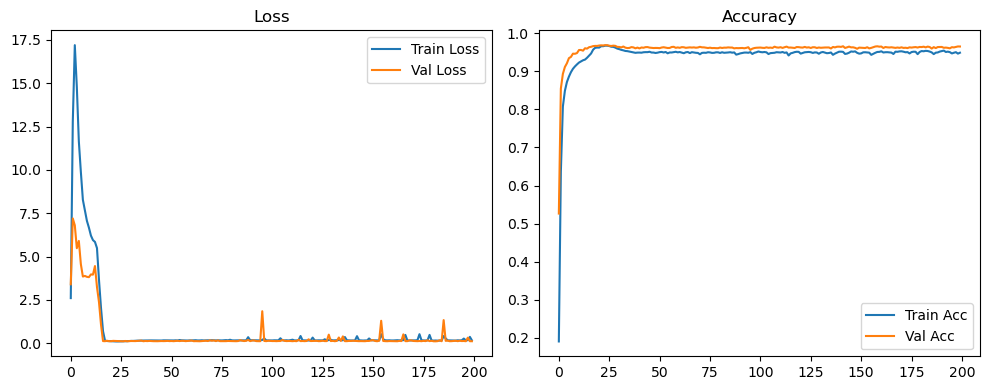

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 51.74it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 52.04it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 52.10it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 52.26it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 52.35it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 52.40it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 52.37it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 51.79it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 51.58it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 51.75it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 51.96it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 52.05it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 52.13it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 52.49it/s]

Original Model Final Test Loss: 0.1089 Accuracy: 0.9685


🚀 Running: batch128_lr0.01_0.005_0.002_dp0.0


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2695 | Val Acc: 0.6519 |:   0%|          | 0/200 [00:10<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2695 | Val Acc: 0.6519 |:   0%|          | 0/200 [00:10<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2695 | Val Acc: 0.6519 |:   0%|          | 1/200 [00:11<36:34, 11.03s/it]

| LR: 0.010 | Train Acc: 0.7904 | Val Acc: 0.8626 |:   0%|          | 1/200 [00:21<36:34, 11.03s/it]

| LR: 0.010 | Train Acc: 0.7904 | Val Acc: 0.8626 |:   0%|          | 1/200 [00:21<36:34, 11.03s/it]

| LR: 0.010 | Train Acc: 0.7904 | Val Acc: 0.8626 |:   1%|          | 2/200 [00:21<35:28, 10.75s/it]

| LR: 0.010 | Train Acc: 0.8702 | Val Acc: 0.8773 |:   1%|          | 2/200 [00:32<35:28, 10.75s/it]

| LR: 0.010 | Train Acc: 0.8702 | Val Acc: 0.8773 |:   1%|          | 2/200 [00:32<35:28, 10.75s/it]

| LR: 0.010 | Train Acc: 0.8702 | Val Acc: 0.8773 |:   2%|▏         | 3/200 [00:32<34:57, 10.65s/it]

| LR: 0.010 | Train Acc: 0.8924 | Val Acc: 0.9015 |:   2%|▏         | 3/200 [00:43<34:57, 10.65s/it]

| LR: 0.010 | Train Acc: 0.8924 | Val Acc: 0.9015 |:   2%|▏         | 3/200 [00:43<34:57, 10.65s/it]

| LR: 0.010 | Train Acc: 0.8924 | Val Acc: 0.9015 |:   2%|▏         | 4/200 [00:43<35:46, 10.95s/it]

| LR: 0.010 | Train Acc: 0.9113 | Val Acc: 0.9167 |:   2%|▏         | 4/200 [00:55<35:46, 10.95s/it]

| LR: 0.010 | Train Acc: 0.9113 | Val Acc: 0.9167 |:   2%|▏         | 4/200 [00:55<35:46, 10.95s/it]

| LR: 0.010 | Train Acc: 0.9113 | Val Acc: 0.9167 |:   2%|▎         | 5/200 [00:55<37:10, 11.44s/it]

| LR: 0.010 | Train Acc: 0.9224 | Val Acc: 0.9211 |:   2%|▎         | 5/200 [01:08<37:10, 11.44s/it]

| LR: 0.010 | Train Acc: 0.9224 | Val Acc: 0.9211 |:   2%|▎         | 5/200 [01:08<37:10, 11.44s/it]

| LR: 0.010 | Train Acc: 0.9224 | Val Acc: 0.9211 |:   3%|▎         | 6/200 [01:08<38:16, 11.84s/it]

| LR: 0.010 | Train Acc: 0.9310 | Val Acc: 0.9295 |:   3%|▎         | 6/200 [01:19<38:16, 11.84s/it]

| LR: 0.010 | Train Acc: 0.9310 | Val Acc: 0.9295 |:   3%|▎         | 6/200 [01:19<38:16, 11.84s/it]

| LR: 0.010 | Train Acc: 0.9310 | Val Acc: 0.9295 |:   4%|▎         | 7/200 [01:19<37:00, 11.50s/it]

| LR: 0.010 | Train Acc: 0.9400 | Val Acc: 0.9347 |:   4%|▎         | 7/200 [01:29<37:00, 11.50s/it]

| LR: 0.010 | Train Acc: 0.9400 | Val Acc: 0.9347 |:   4%|▎         | 7/200 [01:29<37:00, 11.50s/it]

| LR: 0.010 | Train Acc: 0.9400 | Val Acc: 0.9347 |:   4%|▍         | 8/200 [01:29<35:37, 11.13s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9357 |:   4%|▍         | 8/200 [01:39<35:37, 11.13s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9357 |:   4%|▍         | 8/200 [01:39<35:37, 11.13s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9357 |:   4%|▍         | 9/200 [01:39<34:41, 10.90s/it]

| LR: 0.010 | Train Acc: 0.9476 | Val Acc: 0.9373 |:   4%|▍         | 9/200 [01:50<34:41, 10.90s/it]

| LR: 0.010 | Train Acc: 0.9476 | Val Acc: 0.9373 |:   4%|▍         | 9/200 [01:50<34:41, 10.90s/it]

| LR: 0.010 | Train Acc: 0.9476 | Val Acc: 0.9373 |:   5%|▌         | 10/200 [01:50<34:21, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9515 | Val Acc: 0.9400 |:   5%|▌         | 10/200 [02:01<34:21, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9515 | Val Acc: 0.9400 |:   5%|▌         | 10/200 [02:01<34:21, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9515 | Val Acc: 0.9400 |:   6%|▌         | 11/200 [02:01<33:40, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9556 | Val Acc: 0.9457 |:   6%|▌         | 11/200 [02:11<33:40, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9556 | Val Acc: 0.9457 |:   6%|▌         | 11/200 [02:11<33:40, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9556 | Val Acc: 0.9457 |:   6%|▌         | 12/200 [02:11<33:18, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9451 |:   6%|▌         | 12/200 [02:21<33:18, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9451 |:   6%|▌         | 12/200 [02:21<33:18, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9451 |:   6%|▋         | 13/200 [02:22<32:59, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9607 | Val Acc: 0.9464 |:   6%|▋         | 13/200 [02:32<32:59, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9607 | Val Acc: 0.9464 |:   6%|▋         | 13/200 [02:32<32:59, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9607 | Val Acc: 0.9464 |:   7%|▋         | 14/200 [02:32<32:42, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9503 |:   7%|▋         | 14/200 [02:42<32:42, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9503 |:   7%|▋         | 14/200 [02:42<32:42, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9503 |:   8%|▊         | 15/200 [02:42<32:26, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9527 |:   8%|▊         | 15/200 [02:53<32:26, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9527 |:   8%|▊         | 15/200 [02:53<32:26, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9527 |:   8%|▊         | 16/200 [02:53<32:14, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9481 |:   8%|▊         | 16/200 [03:04<32:14, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9481 |:   8%|▊         | 16/200 [03:04<32:14, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9481 |:   8%|▊         | 17/200 [03:04<32:28, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9717 | Val Acc: 0.9526 |:   8%|▊         | 17/200 [03:15<32:28, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9717 | Val Acc: 0.9526 |:   8%|▊         | 17/200 [03:15<32:28, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9717 | Val Acc: 0.9526 |:   9%|▉         | 18/200 [03:15<32:21, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9721 | Val Acc: 0.9493 |:   9%|▉         | 18/200 [03:26<32:21, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9721 | Val Acc: 0.9493 |:   9%|▉         | 18/200 [03:26<32:21, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9721 | Val Acc: 0.9493 |:  10%|▉         | 19/200 [03:26<32:28, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9567 |:  10%|▉         | 19/200 [03:36<32:28, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9567 |:  10%|▉         | 19/200 [03:36<32:28, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9567 |:  10%|█         | 20/200 [03:36<32:06, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9766 | Val Acc: 0.9528 |:  10%|█         | 20/200 [03:47<32:06, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9766 | Val Acc: 0.9528 |:  10%|█         | 20/200 [03:47<32:06, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9766 | Val Acc: 0.9528 |:  10%|█         | 21/200 [03:47<31:38, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9558 |:  10%|█         | 21/200 [03:57<31:38, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9558 |:  10%|█         | 21/200 [03:57<31:38, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9558 |:  11%|█         | 22/200 [03:57<31:22, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9614 |:  11%|█         | 22/200 [04:07<31:22, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9614 |:  11%|█         | 22/200 [04:07<31:22, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9614 |:  12%|█▏        | 23/200 [04:07<30:53, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9607 |:  12%|█▏        | 23/200 [04:17<30:53, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9607 |:  12%|█▏        | 23/200 [04:17<30:53, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9607 |:  12%|█▏        | 24/200 [04:18<30:29, 10.40s/it]

| LR: 0.010 | Train Acc: 0.9850 | Val Acc: 0.9588 |:  12%|█▏        | 24/200 [04:28<30:29, 10.40s/it]

| LR: 0.010 | Train Acc: 0.9850 | Val Acc: 0.9588 |:  12%|█▏        | 24/200 [04:28<30:29, 10.40s/it]

| LR: 0.010 | Train Acc: 0.9850 | Val Acc: 0.9588 |:  12%|█▎        | 25/200 [04:28<30:26, 10.44s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9660 |:  12%|█▎        | 25/200 [04:39<30:26, 10.44s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9660 |:  12%|█▎        | 25/200 [04:39<30:26, 10.44s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9660 |:  13%|█▎        | 26/200 [04:39<30:39, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9883 | Val Acc: 0.9656 |:  13%|█▎        | 26/200 [04:49<30:39, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9883 | Val Acc: 0.9656 |:  13%|█▎        | 26/200 [04:49<30:39, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9883 | Val Acc: 0.9656 |:  14%|█▎        | 27/200 [04:49<30:27, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9647 |:  14%|█▎        | 27/200 [05:00<30:27, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9647 |:  14%|█▎        | 27/200 [05:00<30:27, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9647 |:  14%|█▍        | 28/200 [05:00<30:14, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9643 |:  14%|█▍        | 28/200 [05:11<30:14, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9643 |:  14%|█▍        | 28/200 [05:11<30:14, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9643 |:  14%|█▍        | 29/200 [05:11<30:10, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9686 |:  14%|█▍        | 29/200 [05:21<30:10, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9686 |:  14%|█▍        | 29/200 [05:21<30:10, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9686 |:  15%|█▌        | 30/200 [05:21<30:06, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9690 |:  15%|█▌        | 30/200 [05:32<30:06, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9690 |:  15%|█▌        | 30/200 [05:32<30:06, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9690 |:  16%|█▌        | 31/200 [05:32<29:49, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9692 |:  16%|█▌        | 31/200 [05:42<29:49, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9692 |:  16%|█▌        | 31/200 [05:42<29:49, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9692 |:  16%|█▌        | 32/200 [05:42<29:37, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9944 | Val Acc: 0.9688 |:  16%|█▌        | 32/200 [05:53<29:37, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9944 | Val Acc: 0.9688 |:  16%|█▌        | 32/200 [05:53<29:37, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9944 | Val Acc: 0.9688 |:  16%|█▋        | 33/200 [05:53<29:22, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9698 |:  16%|█▋        | 33/200 [06:03<29:22, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9698 |:  16%|█▋        | 33/200 [06:03<29:22, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9698 |:  17%|█▋        | 34/200 [06:03<29:10, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9702 |:  17%|█▋        | 34/200 [06:14<29:10, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9702 |:  17%|█▋        | 34/200 [06:14<29:10, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9702 |:  18%|█▊        | 35/200 [06:14<28:56, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9692 |:  18%|█▊        | 35/200 [06:24<28:56, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9692 |:  18%|█▊        | 35/200 [06:24<28:56, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9692 |:  18%|█▊        | 36/200 [06:24<28:38, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9652 |:  18%|█▊        | 36/200 [06:35<28:38, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9652 |:  18%|█▊        | 36/200 [06:35<28:38, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9652 |:  18%|█▊        | 37/200 [06:35<28:41, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  18%|█▊        | 37/200 [06:46<28:41, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  18%|█▊        | 37/200 [06:46<28:41, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  19%|█▉        | 38/200 [06:46<28:33, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9640 |:  19%|█▉        | 38/200 [06:56<28:33, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9640 |:  19%|█▉        | 38/200 [06:56<28:33, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9640 |:  20%|█▉        | 39/200 [06:56<28:25, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9637 |:  20%|█▉        | 39/200 [07:07<28:25, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9637 |:  20%|█▉        | 39/200 [07:07<28:25, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9637 |:  20%|██        | 40/200 [07:07<28:24, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9616 |:  20%|██        | 40/200 [07:18<28:24, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9616 |:  20%|██        | 40/200 [07:18<28:24, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9616 |:  20%|██        | 41/200 [07:18<28:13, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9627 |:  20%|██        | 41/200 [07:28<28:13, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9627 |:  20%|██        | 41/200 [07:28<28:13, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9627 |:  21%|██        | 42/200 [07:28<27:53, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9683 |:  21%|██        | 42/200 [07:39<27:53, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9683 |:  21%|██        | 42/200 [07:39<27:53, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9683 |:  22%|██▏       | 43/200 [07:39<27:41, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9612 |:  22%|██▏       | 43/200 [07:49<27:41, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9612 |:  22%|██▏       | 43/200 [07:49<27:41, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9612 |:  22%|██▏       | 44/200 [07:49<27:29, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9660 |:  22%|██▏       | 44/200 [08:00<27:29, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9660 |:  22%|██▏       | 44/200 [08:00<27:29, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9660 |:  22%|██▎       | 45/200 [08:00<27:11, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9615 |:  22%|██▎       | 45/200 [08:10<27:11, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9615 |:  22%|██▎       | 45/200 [08:10<27:11, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9615 |:  23%|██▎       | 46/200 [08:10<26:55, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9652 |:  23%|██▎       | 46/200 [08:21<26:55, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9652 |:  23%|██▎       | 46/200 [08:21<26:55, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9652 |:  24%|██▎       | 47/200 [08:21<26:44, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9634 |:  24%|██▎       | 47/200 [08:31<26:44, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9634 |:  24%|██▎       | 47/200 [08:31<26:44, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9634 |:  24%|██▍       | 48/200 [08:31<26:38, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9647 |:  24%|██▍       | 48/200 [08:42<26:38, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9647 |:  24%|██▍       | 48/200 [08:42<26:38, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9647 |:  24%|██▍       | 49/200 [08:42<26:30, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9617 |:  24%|██▍       | 49/200 [08:52<26:30, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9617 |:  24%|██▍       | 49/200 [08:52<26:30, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9617 |:  25%|██▌       | 50/200 [08:52<26:15, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9657 |:  25%|██▌       | 50/200 [09:03<26:15, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9657 |:  25%|██▌       | 50/200 [09:03<26:15, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9657 |:  26%|██▌       | 51/200 [09:03<26:06, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9892 | Val Acc: 0.9656 |:  26%|██▌       | 51/200 [09:13<26:06, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9892 | Val Acc: 0.9656 |:  26%|██▌       | 51/200 [09:13<26:06, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9892 | Val Acc: 0.9656 |:  26%|██▌       | 52/200 [09:13<25:57, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9656 |:  26%|██▌       | 52/200 [09:24<25:57, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9656 |:  26%|██▌       | 52/200 [09:24<25:57, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9656 |:  26%|██▋       | 53/200 [09:24<26:06, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9658 |:  26%|██▋       | 53/200 [09:35<26:06, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9658 |:  26%|██▋       | 53/200 [09:35<26:06, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9658 |:  27%|██▋       | 54/200 [09:35<25:54, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9623 |:  27%|██▋       | 54/200 [09:45<25:54, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9623 |:  27%|██▋       | 54/200 [09:45<25:54, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9623 |:  28%|██▊       | 55/200 [09:45<25:41, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9646 |:  28%|██▊       | 55/200 [09:56<25:41, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9646 |:  28%|██▊       | 55/200 [09:56<25:41, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9646 |:  28%|██▊       | 56/200 [09:56<25:23, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9599 |:  28%|██▊       | 56/200 [10:06<25:23, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9599 |:  28%|██▊       | 56/200 [10:06<25:23, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9599 |:  28%|██▊       | 57/200 [10:06<25:08, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9661 |:  28%|██▊       | 57/200 [10:17<25:08, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9661 |:  28%|██▊       | 57/200 [10:17<25:08, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9661 |:  29%|██▉       | 58/200 [10:17<24:50, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9673 |:  29%|██▉       | 58/200 [10:27<24:50, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9673 |:  29%|██▉       | 58/200 [10:27<24:50, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9673 |:  30%|██▉       | 59/200 [10:27<24:42, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9637 |:  30%|██▉       | 59/200 [10:38<24:42, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9637 |:  30%|██▉       | 59/200 [10:38<24:42, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9637 |:  30%|███       | 60/200 [10:38<24:36, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9670 |:  30%|███       | 60/200 [10:48<24:36, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9670 |:  30%|███       | 60/200 [10:48<24:36, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9670 |:  30%|███       | 61/200 [10:49<24:26, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9689 |:  30%|███       | 61/200 [10:59<24:26, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9689 |:  30%|███       | 61/200 [10:59<24:26, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9689 |:  31%|███       | 62/200 [10:59<24:17, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9698 |:  31%|███       | 62/200 [11:10<24:17, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9698 |:  31%|███       | 62/200 [11:10<24:17, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9698 |:  32%|███▏      | 63/200 [11:10<24:09, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9911 | Val Acc: 0.9673 |:  32%|███▏      | 63/200 [11:20<24:09, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9911 | Val Acc: 0.9673 |:  32%|███▏      | 63/200 [11:20<24:09, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9911 | Val Acc: 0.9673 |:  32%|███▏      | 64/200 [11:20<23:54, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9696 |:  32%|███▏      | 64/200 [11:31<23:54, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9696 |:  32%|███▏      | 64/200 [11:31<23:54, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9696 |:  32%|███▎      | 65/200 [11:31<23:43, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9666 |:  32%|███▎      | 65/200 [11:41<23:43, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9666 |:  32%|███▎      | 65/200 [11:41<23:43, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9666 |:  33%|███▎      | 66/200 [11:41<23:33, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9637 |:  33%|███▎      | 66/200 [11:52<23:33, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9637 |:  33%|███▎      | 66/200 [11:52<23:33, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9637 |:  34%|███▎      | 67/200 [11:52<23:33, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9643 |:  34%|███▎      | 67/200 [12:02<23:33, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9643 |:  34%|███▎      | 67/200 [12:02<23:33, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9643 |:  34%|███▍      | 68/200 [12:02<23:09, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9643 |:  34%|███▍      | 68/200 [12:13<23:09, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9643 |:  34%|███▍      | 68/200 [12:13<23:09, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9643 |:  34%|███▍      | 69/200 [12:13<22:48, 10.44s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9675 |:  34%|███▍      | 69/200 [12:23<22:48, 10.44s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9675 |:  34%|███▍      | 69/200 [12:23<22:48, 10.44s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9675 |:  35%|███▌      | 70/200 [12:23<22:43, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9917 | Val Acc: 0.9647 |:  35%|███▌      | 70/200 [12:35<22:43, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9917 | Val Acc: 0.9647 |:  35%|███▌      | 70/200 [12:35<22:43, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9917 | Val Acc: 0.9647 |:  36%|███▌      | 71/200 [12:35<23:10, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9643 |:  36%|███▌      | 71/200 [12:46<23:10, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9643 |:  36%|███▌      | 71/200 [12:46<23:10, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9643 |:  36%|███▌      | 72/200 [12:46<23:03, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9677 |:  36%|███▌      | 72/200 [12:56<23:03, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9677 |:  36%|███▌      | 72/200 [12:56<23:03, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9677 |:  36%|███▋      | 73/200 [12:56<22:43, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9674 |:  36%|███▋      | 73/200 [13:07<22:43, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9674 |:  36%|███▋      | 73/200 [13:07<22:43, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9674 |:  37%|███▋      | 74/200 [13:07<22:23, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9656 |:  37%|███▋      | 74/200 [13:18<22:23, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9656 |:  37%|███▋      | 74/200 [13:18<22:23, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9656 |:  38%|███▊      | 75/200 [13:18<22:41, 10.89s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9662 |:  38%|███▊      | 75/200 [13:28<22:41, 10.89s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9662 |:  38%|███▊      | 75/200 [13:28<22:41, 10.89s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9662 |:  38%|███▊      | 76/200 [13:28<22:11, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9667 |:  38%|███▊      | 76/200 [13:39<22:11, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9667 |:  38%|███▊      | 76/200 [13:39<22:11, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9667 |:  38%|███▊      | 77/200 [13:39<21:49, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  38%|███▊      | 77/200 [13:49<21:49, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  38%|███▊      | 77/200 [13:49<21:49, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  39%|███▉      | 78/200 [13:49<21:34, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9643 |:  39%|███▉      | 78/200 [14:00<21:34, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9643 |:  39%|███▉      | 78/200 [14:00<21:34, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9643 |:  40%|███▉      | 79/200 [14:00<21:22, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9619 |:  40%|███▉      | 79/200 [14:11<21:22, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9619 |:  40%|███▉      | 79/200 [14:11<21:22, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9619 |:  40%|████      | 80/200 [14:11<21:20, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9682 |:  40%|████      | 80/200 [14:21<21:20, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9682 |:  40%|████      | 80/200 [14:21<21:20, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9682 |:  40%|████      | 81/200 [14:21<21:03, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9660 |:  40%|████      | 81/200 [14:32<21:03, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9660 |:  40%|████      | 81/200 [14:32<21:03, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9660 |:  41%|████      | 82/200 [14:32<20:51, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9654 |:  41%|████      | 82/200 [14:42<20:51, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9654 |:  41%|████      | 82/200 [14:42<20:51, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9654 |:  42%|████▏     | 83/200 [14:43<20:41, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9655 |:  42%|████▏     | 83/200 [14:53<20:41, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9655 |:  42%|████▏     | 83/200 [14:53<20:41, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9655 |:  42%|████▏     | 84/200 [14:53<20:29, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9686 |:  42%|████▏     | 84/200 [15:04<20:29, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9686 |:  42%|████▏     | 84/200 [15:04<20:29, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9686 |:  42%|████▎     | 85/200 [15:04<20:22, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9673 |:  42%|████▎     | 85/200 [15:14<20:22, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9673 |:  42%|████▎     | 85/200 [15:14<20:22, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9673 |:  43%|████▎     | 86/200 [15:14<20:10, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9667 |:  43%|████▎     | 86/200 [15:25<20:10, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9667 |:  43%|████▎     | 86/200 [15:25<20:10, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9667 |:  44%|████▎     | 87/200 [15:25<19:55, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9662 |:  44%|████▎     | 87/200 [15:36<19:55, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9662 |:  44%|████▎     | 87/200 [15:36<19:55, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9662 |:  44%|████▍     | 88/200 [15:36<19:48, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9641 |:  44%|████▍     | 88/200 [15:46<19:48, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9641 |:  44%|████▍     | 88/200 [15:46<19:48, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9641 |:  44%|████▍     | 89/200 [15:46<19:33, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9669 |:  44%|████▍     | 89/200 [15:57<19:33, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9669 |:  44%|████▍     | 89/200 [15:57<19:33, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9669 |:  45%|████▌     | 90/200 [15:57<19:35, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9684 |:  45%|████▌     | 90/200 [16:07<19:35, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9684 |:  45%|████▌     | 90/200 [16:07<19:35, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9684 |:  46%|████▌     | 91/200 [16:07<19:10, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9651 |:  46%|████▌     | 91/200 [16:18<19:10, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9651 |:  46%|████▌     | 91/200 [16:18<19:10, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9651 |:  46%|████▌     | 92/200 [16:18<19:04, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9674 |:  46%|████▌     | 92/200 [16:28<19:04, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9674 |:  46%|████▌     | 92/200 [16:28<19:04, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9674 |:  46%|████▋     | 93/200 [16:28<18:50, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9653 |:  46%|████▋     | 93/200 [16:39<18:50, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9653 |:  46%|████▋     | 93/200 [16:39<18:50, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9653 |:  47%|████▋     | 94/200 [16:39<18:54, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9653 |:  47%|████▋     | 94/200 [16:50<18:54, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9653 |:  47%|████▋     | 94/200 [16:50<18:54, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9653 |:  48%|████▊     | 95/200 [16:50<18:35, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9684 |:  48%|████▊     | 95/200 [17:00<18:35, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9684 |:  48%|████▊     | 95/200 [17:00<18:35, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9684 |:  48%|████▊     | 96/200 [17:00<18:19, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9677 |:  48%|████▊     | 96/200 [17:11<18:19, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9677 |:  48%|████▊     | 96/200 [17:11<18:19, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9677 |:  48%|████▊     | 97/200 [17:11<18:05, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9660 |:  48%|████▊     | 97/200 [17:21<18:05, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9660 |:  48%|████▊     | 97/200 [17:21<18:05, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9660 |:  49%|████▉     | 98/200 [17:21<17:55, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [17:32<17:55, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [17:32<17:55, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9688 |:  50%|████▉     | 99/200 [17:32<17:43, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9664 |:  50%|████▉     | 99/200 [17:43<17:43, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9664 |:  50%|████▉     | 99/200 [17:43<17:43, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9664 |:  50%|█████     | 100/200 [17:43<17:59, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9695 |:  50%|█████     | 100/200 [17:54<17:59, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9695 |:  50%|█████     | 100/200 [17:54<17:59, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9695 |:  50%|█████     | 101/200 [17:54<17:42, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9692 |:  50%|█████     | 101/200 [18:04<17:42, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9692 |:  50%|█████     | 101/200 [18:04<17:42, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9692 |:  51%|█████     | 102/200 [18:04<17:26, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9677 |:  51%|█████     | 102/200 [18:15<17:26, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9677 |:  51%|█████     | 102/200 [18:15<17:26, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9677 |:  52%|█████▏    | 103/200 [18:15<17:12, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9692 |:  52%|█████▏    | 103/200 [18:25<17:12, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9692 |:  52%|█████▏    | 103/200 [18:25<17:12, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9692 |:  52%|█████▏    | 104/200 [18:25<16:56, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9699 |:  52%|█████▏    | 104/200 [18:36<16:56, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9699 |:  52%|█████▏    | 104/200 [18:36<16:56, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9699 |:  52%|█████▎    | 105/200 [18:36<16:40, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9704 |:  52%|█████▎    | 105/200 [18:46<16:40, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9704 |:  52%|█████▎    | 105/200 [18:46<16:40, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9704 |:  53%|█████▎    | 106/200 [18:46<16:30, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9686 |:  53%|█████▎    | 106/200 [18:57<16:30, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9686 |:  53%|█████▎    | 106/200 [18:57<16:30, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9686 |:  54%|█████▎    | 107/200 [18:57<16:24, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9718 |:  54%|█████▎    | 107/200 [19:07<16:24, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9718 |:  54%|█████▎    | 107/200 [19:07<16:24, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9718 |:  54%|█████▍    | 108/200 [19:07<16:01, 10.45s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9698 |:  54%|█████▍    | 108/200 [19:17<16:01, 10.45s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9698 |:  54%|█████▍    | 108/200 [19:17<16:01, 10.45s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9698 |:  55%|█████▍    | 109/200 [19:17<15:41, 10.35s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9692 |:  55%|█████▍    | 109/200 [19:28<15:41, 10.35s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9692 |:  55%|█████▍    | 109/200 [19:28<15:41, 10.35s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9692 |:  55%|█████▌    | 110/200 [19:28<15:37, 10.41s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9704 |:  55%|█████▌    | 110/200 [19:38<15:37, 10.41s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9704 |:  55%|█████▌    | 110/200 [19:38<15:37, 10.41s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9704 |:  56%|█████▌    | 111/200 [19:38<15:28, 10.44s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9695 |:  56%|█████▌    | 111/200 [19:49<15:28, 10.44s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9695 |:  56%|█████▌    | 111/200 [19:49<15:28, 10.44s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9695 |:  56%|█████▌    | 112/200 [19:49<15:21, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9703 |:  56%|█████▌    | 112/200 [19:59<15:21, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9703 |:  56%|█████▌    | 112/200 [19:59<15:21, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9703 |:  56%|█████▋    | 113/200 [19:59<15:09, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9719 |:  56%|█████▋    | 113/200 [20:10<15:09, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9719 |:  56%|█████▋    | 113/200 [20:10<15:09, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9719 |:  57%|█████▋    | 114/200 [20:10<15:00, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9711 |:  57%|█████▋    | 114/200 [20:20<15:00, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9711 |:  57%|█████▋    | 114/200 [20:20<15:00, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9711 |:  57%|█████▊    | 115/200 [20:20<14:53, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9703 |:  57%|█████▊    | 115/200 [20:31<14:53, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9703 |:  57%|█████▊    | 115/200 [20:31<14:53, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9703 |:  58%|█████▊    | 116/200 [20:31<14:45, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9693 |:  58%|█████▊    | 116/200 [20:42<14:45, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9693 |:  58%|█████▊    | 116/200 [20:42<14:45, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9693 |:  58%|█████▊    | 117/200 [20:42<14:33, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9706 |:  58%|█████▊    | 117/200 [20:52<14:33, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9706 |:  58%|█████▊    | 117/200 [20:52<14:33, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9706 |:  59%|█████▉    | 118/200 [20:52<14:23, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9708 |:  59%|█████▉    | 118/200 [21:03<14:23, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9708 |:  59%|█████▉    | 118/200 [21:03<14:23, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9708 |:  60%|█████▉    | 119/200 [21:03<14:27, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9688 |:  60%|█████▉    | 119/200 [21:14<14:27, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9688 |:  60%|█████▉    | 119/200 [21:14<14:27, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9688 |:  60%|██████    | 120/200 [21:14<14:18, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9696 |:  60%|██████    | 120/200 [21:25<14:18, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9696 |:  60%|██████    | 120/200 [21:25<14:18, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9696 |:  60%|██████    | 121/200 [21:25<14:04, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9692 |:  60%|██████    | 121/200 [21:35<14:04, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9692 |:  60%|██████    | 121/200 [21:35<14:04, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9692 |:  61%|██████    | 122/200 [21:35<13:46, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9689 |:  61%|██████    | 122/200 [21:45<13:46, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9689 |:  61%|██████    | 122/200 [21:45<13:46, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9689 |:  62%|██████▏   | 123/200 [21:45<13:29, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9703 |:  62%|██████▏   | 123/200 [21:56<13:29, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9703 |:  62%|██████▏   | 123/200 [21:56<13:29, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9703 |:  62%|██████▏   | 124/200 [21:56<13:22, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9712 |:  62%|██████▏   | 124/200 [22:06<13:22, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9712 |:  62%|██████▏   | 124/200 [22:06<13:22, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9712 |:  62%|██████▎   | 125/200 [22:06<13:08, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9718 |:  62%|██████▎   | 125/200 [22:17<13:08, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9718 |:  62%|██████▎   | 125/200 [22:17<13:08, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9718 |:  63%|██████▎   | 126/200 [22:17<12:58, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9698 |:  63%|██████▎   | 126/200 [22:29<12:58, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9698 |:  63%|██████▎   | 126/200 [22:29<12:58, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9698 |:  64%|██████▎   | 127/200 [22:29<13:16, 10.91s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9706 |:  64%|██████▎   | 127/200 [22:41<13:16, 10.91s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9706 |:  64%|██████▎   | 127/200 [22:41<13:16, 10.91s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9706 |:  64%|██████▍   | 128/200 [22:41<13:34, 11.32s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9700 |:  64%|██████▍   | 128/200 [22:53<13:34, 11.32s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9700 |:  64%|██████▍   | 128/200 [22:53<13:34, 11.32s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9700 |:  64%|██████▍   | 129/200 [22:53<13:31, 11.43s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9707 |:  64%|██████▍   | 129/200 [23:03<13:31, 11.43s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9707 |:  64%|██████▍   | 129/200 [23:03<13:31, 11.43s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9707 |:  65%|██████▌   | 130/200 [23:03<13:00, 11.15s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9726 |:  65%|██████▌   | 130/200 [23:14<13:00, 11.15s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9726 |:  65%|██████▌   | 130/200 [23:14<13:00, 11.15s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9726 |:  66%|██████▌   | 131/200 [23:14<12:34, 10.94s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9695 |:  66%|██████▌   | 131/200 [23:24<12:34, 10.94s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9695 |:  66%|██████▌   | 131/200 [23:24<12:34, 10.94s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9695 |:  66%|██████▌   | 132/200 [23:24<12:14, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9695 |:  66%|██████▌   | 132/200 [23:35<12:14, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9695 |:  66%|██████▌   | 132/200 [23:35<12:14, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9695 |:  66%|██████▋   | 133/200 [23:35<11:58, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9700 |:  66%|██████▋   | 133/200 [23:45<11:58, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9700 |:  66%|██████▋   | 133/200 [23:45<11:58, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9700 |:  67%|██████▋   | 134/200 [23:45<11:44, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9703 |:  67%|██████▋   | 134/200 [23:56<11:44, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9703 |:  67%|██████▋   | 134/200 [23:56<11:44, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9703 |:  68%|██████▊   | 135/200 [23:56<11:32, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9706 |:  68%|██████▊   | 135/200 [24:07<11:32, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9706 |:  68%|██████▊   | 135/200 [24:07<11:32, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9706 |:  68%|██████▊   | 136/200 [24:07<11:30, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9686 |:  68%|██████▊   | 136/200 [24:18<11:30, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9686 |:  68%|██████▊   | 136/200 [24:18<11:30, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9686 |:  68%|██████▊   | 137/200 [24:18<11:18, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9687 |:  68%|██████▊   | 137/200 [24:28<11:18, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9687 |:  68%|██████▊   | 137/200 [24:28<11:18, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9687 |:  69%|██████▉   | 138/200 [24:28<11:07, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9712 |:  69%|██████▉   | 138/200 [24:39<11:07, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9712 |:  69%|██████▉   | 138/200 [24:39<11:07, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9712 |:  70%|██████▉   | 139/200 [24:39<10:55, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9722 |:  70%|██████▉   | 139/200 [24:50<10:55, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9722 |:  70%|██████▉   | 139/200 [24:50<10:55, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9722 |:  70%|███████   | 140/200 [24:50<10:41, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9719 |:  70%|███████   | 140/200 [25:01<10:41, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9719 |:  70%|███████   | 140/200 [25:01<10:41, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9719 |:  70%|███████   | 141/200 [25:01<10:35, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9728 |:  70%|███████   | 141/200 [25:11<10:35, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9728 |:  70%|███████   | 141/200 [25:11<10:35, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9728 |:  71%|███████   | 142/200 [25:11<10:19, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9703 |:  71%|███████   | 142/200 [25:21<10:19, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9703 |:  71%|███████   | 142/200 [25:21<10:19, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9703 |:  72%|███████▏  | 143/200 [25:22<10:04, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9724 |:  72%|███████▏  | 143/200 [25:32<10:04, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9724 |:  72%|███████▏  | 143/200 [25:32<10:04, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9724 |:  72%|███████▏  | 144/200 [25:32<09:51, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9706 |:  72%|███████▏  | 144/200 [25:42<09:51, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9706 |:  72%|███████▏  | 144/200 [25:42<09:51, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9706 |:  72%|███████▎  | 145/200 [25:42<09:38, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9975 | Val Acc: 0.9710 |:  72%|███████▎  | 145/200 [25:54<09:38, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9975 | Val Acc: 0.9710 |:  72%|███████▎  | 145/200 [25:54<09:38, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9975 | Val Acc: 0.9710 |:  73%|███████▎  | 146/200 [25:54<09:43, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9696 |:  73%|███████▎  | 146/200 [26:06<09:43, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9696 |:  73%|███████▎  | 146/200 [26:06<09:43, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9696 |:  74%|███████▎  | 147/200 [26:06<09:52, 11.19s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9702 |:  74%|███████▎  | 147/200 [26:16<09:52, 11.19s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9702 |:  74%|███████▎  | 147/200 [26:16<09:52, 11.19s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9702 |:  74%|███████▍  | 148/200 [26:16<09:29, 10.95s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9712 |:  74%|███████▍  | 148/200 [26:27<09:29, 10.95s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9712 |:  74%|███████▍  | 148/200 [26:27<09:29, 10.95s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9712 |:  74%|███████▍  | 149/200 [26:27<09:09, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9710 |:  74%|███████▍  | 149/200 [26:37<09:09, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9710 |:  74%|███████▍  | 149/200 [26:37<09:09, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9710 |:  75%|███████▌  | 150/200 [26:37<08:53, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9701 |:  75%|███████▌  | 150/200 [26:47<08:53, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9701 |:  75%|███████▌  | 150/200 [26:47<08:53, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9701 |:  76%|███████▌  | 151/200 [26:48<08:38, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9975 | Val Acc: 0.9701 |:  76%|███████▌  | 151/200 [26:58<08:38, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9975 | Val Acc: 0.9701 |:  76%|███████▌  | 151/200 [26:58<08:38, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9975 | Val Acc: 0.9701 |:  76%|███████▌  | 152/200 [26:58<08:31, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9715 |:  76%|███████▌  | 152/200 [27:09<08:31, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9715 |:  76%|███████▌  | 152/200 [27:09<08:31, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9715 |:  76%|███████▋  | 153/200 [27:09<08:20, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9736 |:  76%|███████▋  | 153/200 [27:20<08:20, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9736 |:  76%|███████▋  | 153/200 [27:20<08:20, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9736 |:  77%|███████▋  | 154/200 [27:20<08:09, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9715 |:  77%|███████▋  | 154/200 [27:30<08:09, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9715 |:  77%|███████▋  | 154/200 [27:30<08:09, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9715 |:  78%|███████▊  | 155/200 [27:30<07:55, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9724 |:  78%|███████▊  | 155/200 [27:41<07:55, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9724 |:  78%|███████▊  | 155/200 [27:41<07:55, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9724 |:  78%|███████▊  | 156/200 [27:41<07:53, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9701 |:  78%|███████▊  | 156/200 [27:52<07:53, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9701 |:  78%|███████▊  | 156/200 [27:52<07:53, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9701 |:  78%|███████▊  | 157/200 [27:52<07:42, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9718 |:  78%|███████▊  | 157/200 [28:02<07:42, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9718 |:  78%|███████▊  | 157/200 [28:02<07:42, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9718 |:  79%|███████▉  | 158/200 [28:02<07:29, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9704 |:  79%|███████▉  | 158/200 [28:13<07:29, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9704 |:  79%|███████▉  | 158/200 [28:13<07:29, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9704 |:  80%|███████▉  | 159/200 [28:13<07:17, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9705 |:  80%|███████▉  | 159/200 [28:24<07:17, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9705 |:  80%|███████▉  | 159/200 [28:24<07:17, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9705 |:  80%|████████  | 160/200 [28:24<07:05, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9720 |:  80%|████████  | 160/200 [28:34<07:05, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9720 |:  80%|████████  | 160/200 [28:34<07:05, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9720 |:  80%|████████  | 161/200 [28:34<06:54, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9721 |:  80%|████████  | 161/200 [28:45<06:54, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9721 |:  80%|████████  | 161/200 [28:45<06:54, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9721 |:  81%|████████  | 162/200 [28:45<06:41, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9723 |:  81%|████████  | 162/200 [28:55<06:41, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9723 |:  81%|████████  | 162/200 [28:55<06:41, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9723 |:  82%|████████▏ | 163/200 [28:55<06:31, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9711 |:  82%|████████▏ | 163/200 [29:06<06:31, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9711 |:  82%|████████▏ | 163/200 [29:06<06:31, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9711 |:  82%|████████▏ | 164/200 [29:06<06:23, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9713 |:  82%|████████▏ | 164/200 [29:17<06:23, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9713 |:  82%|████████▏ | 164/200 [29:17<06:23, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9713 |:  82%|████████▎ | 165/200 [29:17<06:11, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9715 |:  82%|████████▎ | 165/200 [29:27<06:11, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9715 |:  82%|████████▎ | 165/200 [29:27<06:11, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9715 |:  83%|████████▎ | 166/200 [29:27<05:59, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9724 |:  83%|████████▎ | 166/200 [29:38<05:59, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9724 |:  83%|████████▎ | 166/200 [29:38<05:59, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9724 |:  84%|████████▎ | 167/200 [29:38<05:47, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9716 |:  84%|████████▎ | 167/200 [29:48<05:47, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9716 |:  84%|████████▎ | 167/200 [29:48<05:47, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9716 |:  84%|████████▍ | 168/200 [29:48<05:39, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9732 |:  84%|████████▍ | 168/200 [29:59<05:39, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9732 |:  84%|████████▍ | 168/200 [29:59<05:39, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9732 |:  84%|████████▍ | 169/200 [29:59<05:27, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9730 |:  84%|████████▍ | 169/200 [30:09<05:27, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9730 |:  84%|████████▍ | 169/200 [30:09<05:27, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9730 |:  85%|████████▌ | 170/200 [30:09<05:17, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9736 |:  85%|████████▌ | 170/200 [30:20<05:17, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9736 |:  85%|████████▌ | 170/200 [30:20<05:17, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9736 |:  86%|████████▌ | 171/200 [30:20<05:07, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9722 |:  86%|████████▌ | 171/200 [30:31<05:07, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9722 |:  86%|████████▌ | 171/200 [30:31<05:07, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9722 |:  86%|████████▌ | 172/200 [30:31<04:56, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9744 |:  86%|████████▌ | 172/200 [30:41<04:56, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9744 |:  86%|████████▌ | 172/200 [30:41<04:56, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9744 |:  86%|████████▋ | 173/200 [30:41<04:44, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9756 |:  86%|████████▋ | 173/200 [30:51<04:44, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9756 |:  86%|████████▋ | 173/200 [30:51<04:44, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9756 |:  87%|████████▋ | 174/200 [30:51<04:31, 10.46s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9731 |:  87%|████████▋ | 174/200 [31:02<04:31, 10.46s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9731 |:  87%|████████▋ | 174/200 [31:02<04:31, 10.46s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9731 |:  88%|████████▊ | 175/200 [31:02<04:21, 10.46s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9737 |:  88%|████████▊ | 175/200 [31:12<04:21, 10.46s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9737 |:  88%|████████▊ | 175/200 [31:12<04:21, 10.46s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9737 |:  88%|████████▊ | 176/200 [31:12<04:11, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9740 |:  88%|████████▊ | 176/200 [31:23<04:11, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9740 |:  88%|████████▊ | 176/200 [31:23<04:11, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9740 |:  88%|████████▊ | 177/200 [31:23<04:01, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9742 |:  88%|████████▊ | 177/200 [31:33<04:01, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9742 |:  88%|████████▊ | 177/200 [31:33<04:01, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9742 |:  89%|████████▉ | 178/200 [31:33<03:51, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9731 |:  89%|████████▉ | 178/200 [31:44<03:51, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9731 |:  89%|████████▉ | 178/200 [31:44<03:51, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9731 |:  90%|████████▉ | 179/200 [31:44<03:40, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9746 |:  90%|████████▉ | 179/200 [31:54<03:40, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9746 |:  90%|████████▉ | 179/200 [31:54<03:40, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9746 |:  90%|█████████ | 180/200 [31:54<03:30, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9729 |:  90%|█████████ | 180/200 [32:05<03:30, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9729 |:  90%|█████████ | 180/200 [32:05<03:30, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9729 |:  90%|█████████ | 181/200 [32:05<03:20, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9742 |:  90%|█████████ | 181/200 [32:16<03:20, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9742 |:  90%|█████████ | 181/200 [32:16<03:20, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9742 |:  91%|█████████ | 182/200 [32:16<03:09, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9730 |:  91%|█████████ | 182/200 [32:26<03:09, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9730 |:  91%|█████████ | 182/200 [32:26<03:09, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9730 |:  92%|█████████▏| 183/200 [32:26<02:59, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9724 |:  92%|█████████▏| 183/200 [32:36<02:59, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9724 |:  92%|█████████▏| 183/200 [32:36<02:59, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9724 |:  92%|█████████▏| 184/200 [32:36<02:47, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9746 |:  92%|█████████▏| 184/200 [32:47<02:47, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9746 |:  92%|█████████▏| 184/200 [32:47<02:47, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9746 |:  92%|█████████▎| 185/200 [32:47<02:37, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9729 |:  92%|█████████▎| 185/200 [32:57<02:37, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9729 |:  92%|█████████▎| 185/200 [32:57<02:37, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9729 |:  93%|█████████▎| 186/200 [32:57<02:26, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9732 |:  93%|█████████▎| 186/200 [33:08<02:26, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9732 |:  93%|█████████▎| 186/200 [33:08<02:26, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9732 |:  94%|█████████▎| 187/200 [33:08<02:16, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9725 |:  94%|█████████▎| 187/200 [33:19<02:16, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9725 |:  94%|█████████▎| 187/200 [33:19<02:16, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9725 |:  94%|█████████▍| 188/200 [33:19<02:06, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9735 |:  94%|█████████▍| 188/200 [33:29<02:06, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9735 |:  94%|█████████▍| 188/200 [33:29<02:06, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9735 |:  94%|█████████▍| 189/200 [33:29<01:55, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9730 |:  94%|█████████▍| 189/200 [33:40<01:55, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9730 |:  94%|█████████▍| 189/200 [33:40<01:55, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9730 |:  95%|█████████▌| 190/200 [33:40<01:45, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9720 |:  95%|█████████▌| 190/200 [33:50<01:45, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9720 |:  95%|█████████▌| 190/200 [33:50<01:45, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9720 |:  96%|█████████▌| 191/200 [33:50<01:34, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9718 |:  96%|█████████▌| 191/200 [34:01<01:34, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9718 |:  96%|█████████▌| 191/200 [34:01<01:34, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9718 |:  96%|█████████▌| 192/200 [34:01<01:24, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9729 |:  96%|█████████▌| 192/200 [34:11<01:24, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9729 |:  96%|█████████▌| 192/200 [34:11<01:24, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9729 |:  96%|█████████▋| 193/200 [34:11<01:13, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9721 |:  96%|█████████▋| 193/200 [34:22<01:13, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9721 |:  96%|█████████▋| 193/200 [34:22<01:13, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9721 |:  97%|█████████▋| 194/200 [34:22<01:03, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9730 |:  97%|█████████▋| 194/200 [34:32<01:03, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9730 |:  97%|█████████▋| 194/200 [34:32<01:03, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9730 |:  98%|█████████▊| 195/200 [34:32<00:52, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9728 |:  98%|█████████▊| 195/200 [34:43<00:52, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9728 |:  98%|█████████▊| 195/200 [34:43<00:52, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9728 |:  98%|█████████▊| 196/200 [34:43<00:42, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9719 |:  98%|█████████▊| 196/200 [34:53<00:42, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9719 |:  98%|█████████▊| 196/200 [34:53<00:42, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9719 |:  98%|█████████▊| 197/200 [34:53<00:31, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9718 |:  98%|█████████▊| 197/200 [35:04<00:31, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9718 |:  98%|█████████▊| 197/200 [35:04<00:31, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9718 |:  99%|█████████▉| 198/200 [35:04<00:21, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9722 |:  99%|█████████▉| 198/200 [35:14<00:21, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9722 |:  99%|█████████▉| 198/200 [35:14<00:21, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9722 |: 100%|█████████▉| 199/200 [35:14<00:10, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9723 |: 100%|█████████▉| 199/200 [35:26<00:10, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9723 |: 100%|█████████▉| 199/200 [35:26<00:10, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9723 |: 100%|██████████| 200/200 [35:26<00:00, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9723 |: 100%|██████████| 200/200 [35:26<00:00, 10.63s/it]

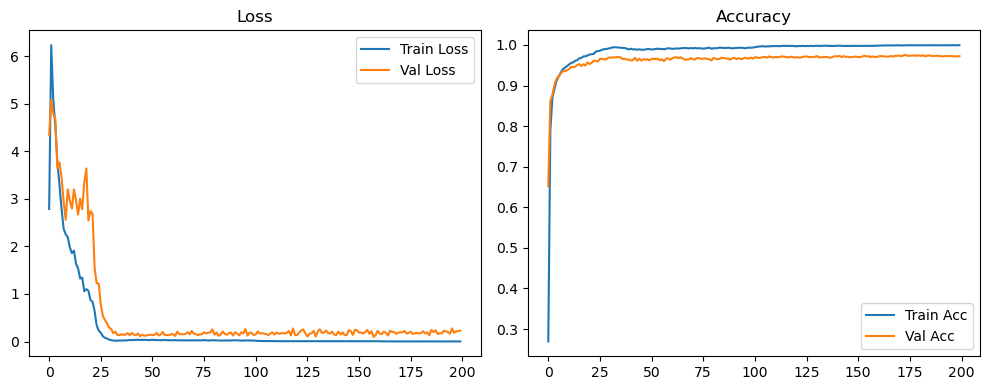

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 51.25it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 51.75it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 51.93it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 52.06it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 52.24it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 52.28it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 52.28it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 52.31it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 52.28it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 52.28it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 52.32it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 52.35it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 52.34it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 52.66it/s]

Original Model Final Test Loss: 0.2173 Accuracy: 0.9724


🚀 Running: batch128_lr0.01_0.005_0.002_dp0.2


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2218 | Val Acc: 0.5032 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2218 | Val Acc: 0.5032 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2218 | Val Acc: 0.5032 |:   0%|          | 1/200 [00:11<37:09, 11.20s/it]

| LR: 0.010 | Train Acc: 0.7043 | Val Acc: 0.8289 |:   0%|          | 1/200 [00:21<37:09, 11.20s/it]

| LR: 0.010 | Train Acc: 0.7043 | Val Acc: 0.8289 |:   0%|          | 1/200 [00:21<37:09, 11.20s/it]

| LR: 0.010 | Train Acc: 0.7043 | Val Acc: 0.8289 |:   1%|          | 2/200 [00:21<35:45, 10.84s/it]

| LR: 0.010 | Train Acc: 0.8407 | Val Acc: 0.8944 |:   1%|          | 2/200 [00:32<35:45, 10.84s/it]

| LR: 0.010 | Train Acc: 0.8407 | Val Acc: 0.8944 |:   1%|          | 2/200 [00:32<35:45, 10.84s/it]

| LR: 0.010 | Train Acc: 0.8407 | Val Acc: 0.8944 |:   2%|▏         | 3/200 [00:32<35:09, 10.71s/it]

| LR: 0.010 | Train Acc: 0.8780 | Val Acc: 0.9097 |:   2%|▏         | 3/200 [00:42<35:09, 10.71s/it]

| LR: 0.010 | Train Acc: 0.8780 | Val Acc: 0.9097 |:   2%|▏         | 3/200 [00:42<35:09, 10.71s/it]

| LR: 0.010 | Train Acc: 0.8780 | Val Acc: 0.9097 |:   2%|▏         | 4/200 [00:42<34:43, 10.63s/it]

| LR: 0.010 | Train Acc: 0.8962 | Val Acc: 0.9182 |:   2%|▏         | 4/200 [00:53<34:43, 10.63s/it]

| LR: 0.010 | Train Acc: 0.8962 | Val Acc: 0.9182 |:   2%|▏         | 4/200 [00:53<34:43, 10.63s/it]

| LR: 0.010 | Train Acc: 0.8962 | Val Acc: 0.9182 |:   2%|▎         | 5/200 [00:53<34:21, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9085 | Val Acc: 0.9279 |:   2%|▎         | 5/200 [01:03<34:21, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9085 | Val Acc: 0.9279 |:   2%|▎         | 5/200 [01:03<34:21, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9085 | Val Acc: 0.9279 |:   3%|▎         | 6/200 [01:03<34:14, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9201 | Val Acc: 0.9293 |:   3%|▎         | 6/200 [01:14<34:14, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9201 | Val Acc: 0.9293 |:   3%|▎         | 6/200 [01:14<34:14, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9201 | Val Acc: 0.9293 |:   4%|▎         | 7/200 [01:14<34:05, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9404 |:   4%|▎         | 7/200 [01:25<34:05, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9404 |:   4%|▎         | 7/200 [01:25<34:05, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9404 |:   4%|▍         | 8/200 [01:25<33:55, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9302 | Val Acc: 0.9443 |:   4%|▍         | 8/200 [01:35<33:55, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9302 | Val Acc: 0.9443 |:   4%|▍         | 8/200 [01:35<33:55, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9302 | Val Acc: 0.9443 |:   4%|▍         | 9/200 [01:35<33:42, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9372 | Val Acc: 0.9364 |:   4%|▍         | 9/200 [01:46<33:42, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9372 | Val Acc: 0.9364 |:   4%|▍         | 9/200 [01:46<33:42, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9372 | Val Acc: 0.9364 |:   5%|▌         | 10/200 [01:46<33:38, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9413 | Val Acc: 0.9481 |:   5%|▌         | 10/200 [01:56<33:38, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9413 | Val Acc: 0.9481 |:   5%|▌         | 10/200 [01:56<33:38, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9413 | Val Acc: 0.9481 |:   6%|▌         | 11/200 [01:56<33:23, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9421 | Val Acc: 0.9475 |:   6%|▌         | 11/200 [02:07<33:23, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9421 | Val Acc: 0.9475 |:   6%|▌         | 11/200 [02:07<33:23, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9421 | Val Acc: 0.9475 |:   6%|▌         | 12/200 [02:07<33:15, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9469 | Val Acc: 0.9486 |:   6%|▌         | 12/200 [02:18<33:15, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9469 | Val Acc: 0.9486 |:   6%|▌         | 12/200 [02:18<33:15, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9469 | Val Acc: 0.9486 |:   6%|▋         | 13/200 [02:18<33:02, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9501 |:   6%|▋         | 13/200 [02:28<33:02, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9501 |:   6%|▋         | 13/200 [02:28<33:02, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9501 |:   7%|▋         | 14/200 [02:28<32:44, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9512 |:   7%|▋         | 14/200 [02:39<32:44, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9512 |:   7%|▋         | 14/200 [02:39<32:44, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9512 |:   8%|▊         | 15/200 [02:39<32:39, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9523 |:   8%|▊         | 15/200 [02:49<32:39, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9523 |:   8%|▊         | 15/200 [02:49<32:39, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9523 |:   8%|▊         | 16/200 [02:49<32:29, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9583 | Val Acc: 0.9502 |:   8%|▊         | 16/200 [03:00<32:29, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9583 | Val Acc: 0.9502 |:   8%|▊         | 16/200 [03:00<32:29, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9583 | Val Acc: 0.9502 |:   8%|▊         | 17/200 [03:00<32:04, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9585 | Val Acc: 0.9582 |:   8%|▊         | 17/200 [03:10<32:04, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9585 | Val Acc: 0.9582 |:   8%|▊         | 17/200 [03:10<32:04, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9585 | Val Acc: 0.9582 |:   9%|▉         | 18/200 [03:10<32:05, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9616 | Val Acc: 0.9494 |:   9%|▉         | 18/200 [03:22<32:05, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9616 | Val Acc: 0.9494 |:   9%|▉         | 18/200 [03:22<32:05, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9616 | Val Acc: 0.9494 |:  10%|▉         | 19/200 [03:22<33:00, 10.94s/it]

| LR: 0.010 | Train Acc: 0.9649 | Val Acc: 0.9553 |:  10%|▉         | 19/200 [03:33<33:00, 10.94s/it]

| LR: 0.010 | Train Acc: 0.9649 | Val Acc: 0.9553 |:  10%|▉         | 19/200 [03:33<33:00, 10.94s/it]

| LR: 0.010 | Train Acc: 0.9649 | Val Acc: 0.9553 |:  10%|█         | 20/200 [03:33<32:34, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9617 |:  10%|█         | 20/200 [03:44<32:34, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9617 |:  10%|█         | 20/200 [03:44<32:34, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9617 |:  10%|█         | 21/200 [03:44<32:12, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9651 |:  10%|█         | 21/200 [03:54<32:12, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9651 |:  10%|█         | 21/200 [03:54<32:12, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9651 |:  11%|█         | 22/200 [03:54<31:48, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9632 |:  11%|█         | 22/200 [04:05<31:48, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9632 |:  11%|█         | 22/200 [04:05<31:48, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9632 |:  12%|█▏        | 23/200 [04:05<31:29, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9686 |:  12%|█▏        | 23/200 [04:16<31:29, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9686 |:  12%|█▏        | 23/200 [04:16<31:29, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9686 |:  12%|█▏        | 24/200 [04:16<31:28, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9694 |:  12%|█▏        | 24/200 [04:26<31:28, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9694 |:  12%|█▏        | 24/200 [04:26<31:28, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9694 |:  12%|█▎        | 25/200 [04:26<31:15, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9699 |:  12%|█▎        | 25/200 [04:37<31:15, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9699 |:  12%|█▎        | 25/200 [04:37<31:15, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9699 |:  13%|█▎        | 26/200 [04:37<30:58, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9870 | Val Acc: 0.9712 |:  13%|█▎        | 26/200 [04:47<30:58, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9870 | Val Acc: 0.9712 |:  13%|█▎        | 26/200 [04:47<30:58, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9870 | Val Acc: 0.9712 |:  14%|█▎        | 27/200 [04:47<30:24, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9708 |:  14%|█▎        | 27/200 [04:58<30:24, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9708 |:  14%|█▎        | 27/200 [04:58<30:24, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9708 |:  14%|█▍        | 28/200 [04:58<30:24, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9703 |:  14%|█▍        | 28/200 [05:08<30:24, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9703 |:  14%|█▍        | 28/200 [05:08<30:24, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9703 |:  14%|█▍        | 29/200 [05:08<30:13, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9726 |:  14%|█▍        | 29/200 [05:19<30:13, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9726 |:  14%|█▍        | 29/200 [05:19<30:13, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9726 |:  15%|█▌        | 30/200 [05:19<29:54, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9900 | Val Acc: 0.9709 |:  15%|█▌        | 30/200 [05:29<29:54, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9900 | Val Acc: 0.9709 |:  15%|█▌        | 30/200 [05:29<29:54, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9900 | Val Acc: 0.9709 |:  16%|█▌        | 31/200 [05:29<29:45, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9723 |:  16%|█▌        | 31/200 [05:40<29:45, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9723 |:  16%|█▌        | 31/200 [05:40<29:45, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9723 |:  16%|█▌        | 32/200 [05:40<29:33, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9707 |:  16%|█▌        | 32/200 [05:51<29:33, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9707 |:  16%|█▌        | 32/200 [05:51<29:33, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9707 |:  16%|█▋        | 33/200 [05:51<29:24, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9880 | Val Acc: 0.9717 |:  16%|█▋        | 33/200 [06:01<29:24, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9880 | Val Acc: 0.9717 |:  16%|█▋        | 33/200 [06:01<29:24, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9880 | Val Acc: 0.9717 |:  17%|█▋        | 34/200 [06:01<29:05, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9695 |:  17%|█▋        | 34/200 [06:12<29:05, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9695 |:  17%|█▋        | 34/200 [06:12<29:05, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9695 |:  18%|█▊        | 35/200 [06:12<29:37, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9657 |:  18%|█▊        | 35/200 [06:23<29:37, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9657 |:  18%|█▊        | 35/200 [06:23<29:37, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9657 |:  18%|█▊        | 36/200 [06:23<29:14, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9677 |:  18%|█▊        | 36/200 [06:33<29:14, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9677 |:  18%|█▊        | 36/200 [06:33<29:14, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9677 |:  18%|█▊        | 37/200 [06:34<29:01, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9636 |:  18%|█▊        | 37/200 [06:44<29:01, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9636 |:  18%|█▊        | 37/200 [06:44<29:01, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9636 |:  19%|█▉        | 38/200 [06:44<28:47, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9668 |:  19%|█▉        | 38/200 [06:55<28:47, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9668 |:  19%|█▉        | 38/200 [06:55<28:47, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9668 |:  20%|█▉        | 39/200 [06:55<28:40, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9659 |:  20%|█▉        | 39/200 [07:06<28:40, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9659 |:  20%|█▉        | 39/200 [07:06<28:40, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9659 |:  20%|██        | 40/200 [07:06<28:30, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9663 |:  20%|██        | 40/200 [07:16<28:30, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9663 |:  20%|██        | 40/200 [07:16<28:30, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9663 |:  20%|██        | 41/200 [07:16<28:15, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9786 | Val Acc: 0.9648 |:  20%|██        | 41/200 [07:27<28:15, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9786 | Val Acc: 0.9648 |:  20%|██        | 41/200 [07:27<28:15, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9786 | Val Acc: 0.9648 |:  21%|██        | 42/200 [07:27<27:59, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9774 | Val Acc: 0.9657 |:  21%|██        | 42/200 [07:37<27:59, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9774 | Val Acc: 0.9657 |:  21%|██        | 42/200 [07:37<27:59, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9774 | Val Acc: 0.9657 |:  22%|██▏       | 43/200 [07:37<27:49, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9648 |:  22%|██▏       | 43/200 [07:48<27:49, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9648 |:  22%|██▏       | 43/200 [07:48<27:49, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9648 |:  22%|██▏       | 44/200 [07:48<27:36, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9778 | Val Acc: 0.9627 |:  22%|██▏       | 44/200 [07:59<27:36, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9778 | Val Acc: 0.9627 |:  22%|██▏       | 44/200 [07:59<27:36, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9778 | Val Acc: 0.9627 |:  22%|██▎       | 45/200 [07:59<27:27, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9643 |:  22%|██▎       | 45/200 [08:09<27:27, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9643 |:  22%|██▎       | 45/200 [08:09<27:27, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9643 |:  23%|██▎       | 46/200 [08:09<27:15, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9579 |:  23%|██▎       | 46/200 [08:20<27:15, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9579 |:  23%|██▎       | 46/200 [08:20<27:15, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9579 |:  24%|██▎       | 47/200 [08:20<27:05, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9657 |:  24%|██▎       | 47/200 [08:30<27:05, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9657 |:  24%|██▎       | 47/200 [08:30<27:05, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9657 |:  24%|██▍       | 48/200 [08:30<26:54, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9656 |:  24%|██▍       | 48/200 [08:41<26:54, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9656 |:  24%|██▍       | 48/200 [08:41<26:54, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9656 |:  24%|██▍       | 49/200 [08:41<26:47, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9652 |:  24%|██▍       | 49/200 [08:52<26:47, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9652 |:  24%|██▍       | 49/200 [08:52<26:47, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9652 |:  25%|██▌       | 50/200 [08:52<26:45, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9651 |:  25%|██▌       | 50/200 [09:02<26:45, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9651 |:  25%|██▌       | 50/200 [09:02<26:45, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9651 |:  26%|██▌       | 51/200 [09:02<26:25, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9643 |:  26%|██▌       | 51/200 [09:13<26:25, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9643 |:  26%|██▌       | 51/200 [09:13<26:25, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9643 |:  26%|██▌       | 52/200 [09:13<26:10, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9645 |:  26%|██▌       | 52/200 [09:24<26:10, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9645 |:  26%|██▌       | 52/200 [09:24<26:10, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9645 |:  26%|██▋       | 53/200 [09:24<25:58, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9780 | Val Acc: 0.9652 |:  26%|██▋       | 53/200 [09:34<25:58, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9780 | Val Acc: 0.9652 |:  26%|██▋       | 53/200 [09:34<25:58, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9780 | Val Acc: 0.9652 |:  27%|██▋       | 54/200 [09:34<25:55, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9670 |:  27%|██▋       | 54/200 [09:45<25:55, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9670 |:  27%|██▋       | 54/200 [09:45<25:55, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9670 |:  28%|██▊       | 55/200 [09:45<25:42, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9653 |:  28%|██▊       | 55/200 [09:56<25:42, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9653 |:  28%|██▊       | 55/200 [09:56<25:42, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9653 |:  28%|██▊       | 56/200 [09:56<25:29, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9666 |:  28%|██▊       | 56/200 [10:06<25:29, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9666 |:  28%|██▊       | 56/200 [10:06<25:29, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9666 |:  28%|██▊       | 57/200 [10:06<25:13, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9670 |:  28%|██▊       | 57/200 [10:17<25:13, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9670 |:  28%|██▊       | 57/200 [10:17<25:13, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9670 |:  29%|██▉       | 58/200 [10:17<25:00, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9648 |:  29%|██▉       | 58/200 [10:27<25:00, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9648 |:  29%|██▉       | 58/200 [10:27<25:00, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9648 |:  30%|██▉       | 59/200 [10:27<24:53, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9667 |:  30%|██▉       | 59/200 [10:38<24:53, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9667 |:  30%|██▉       | 59/200 [10:38<24:53, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9667 |:  30%|███       | 60/200 [10:38<24:38, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9669 |:  30%|███       | 60/200 [10:49<24:38, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9669 |:  30%|███       | 60/200 [10:49<24:38, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9669 |:  30%|███       | 61/200 [10:49<24:43, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  30%|███       | 61/200 [10:59<24:43, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  30%|███       | 61/200 [10:59<24:43, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  31%|███       | 62/200 [11:00<24:39, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9669 |:  31%|███       | 62/200 [11:10<24:39, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9669 |:  31%|███       | 62/200 [11:10<24:39, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9669 |:  32%|███▏      | 63/200 [11:10<24:19, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  32%|███▏      | 63/200 [11:21<24:19, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  32%|███▏      | 63/200 [11:21<24:19, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  32%|███▏      | 64/200 [11:21<24:09, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9665 |:  32%|███▏      | 64/200 [11:31<24:09, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9665 |:  32%|███▏      | 64/200 [11:31<24:09, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9665 |:  32%|███▎      | 65/200 [11:31<23:57, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9677 |:  32%|███▎      | 65/200 [11:42<23:57, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9677 |:  32%|███▎      | 65/200 [11:42<23:57, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9677 |:  33%|███▎      | 66/200 [11:42<23:49, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9642 |:  33%|███▎      | 66/200 [11:53<23:49, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9642 |:  33%|███▎      | 66/200 [11:53<23:49, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9642 |:  34%|███▎      | 67/200 [11:53<23:40, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9672 |:  34%|███▎      | 67/200 [12:04<23:40, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9672 |:  34%|███▎      | 67/200 [12:04<23:40, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9672 |:  34%|███▍      | 68/200 [12:04<23:40, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9660 |:  34%|███▍      | 68/200 [12:14<23:40, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9660 |:  34%|███▍      | 68/200 [12:14<23:40, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9660 |:  34%|███▍      | 69/200 [12:14<23:22, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9658 |:  34%|███▍      | 69/200 [12:25<23:22, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9658 |:  34%|███▍      | 69/200 [12:25<23:22, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9658 |:  35%|███▌      | 70/200 [12:25<23:07, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9663 |:  35%|███▌      | 70/200 [12:35<23:07, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9663 |:  35%|███▌      | 70/200 [12:35<23:07, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9663 |:  36%|███▌      | 71/200 [12:35<22:51, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9671 |:  36%|███▌      | 71/200 [12:46<22:51, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9671 |:  36%|███▌      | 71/200 [12:46<22:51, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9671 |:  36%|███▌      | 72/200 [12:46<22:39, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9676 |:  36%|███▌      | 72/200 [12:56<22:39, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9676 |:  36%|███▌      | 72/200 [12:56<22:39, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9676 |:  36%|███▋      | 73/200 [12:56<22:21, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9676 |:  36%|███▋      | 73/200 [13:07<22:21, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9676 |:  36%|███▋      | 73/200 [13:07<22:21, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9676 |:  37%|███▋      | 74/200 [13:07<22:12, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9669 |:  37%|███▋      | 74/200 [13:18<22:12, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9669 |:  37%|███▋      | 74/200 [13:18<22:12, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9669 |:  38%|███▊      | 75/200 [13:18<22:05, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9649 |:  38%|███▊      | 75/200 [13:29<22:05, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9649 |:  38%|███▊      | 75/200 [13:29<22:05, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9649 |:  38%|███▊      | 76/200 [13:29<22:08, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9659 |:  38%|███▊      | 76/200 [13:39<22:08, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9659 |:  38%|███▊      | 76/200 [13:39<22:08, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9659 |:  38%|███▊      | 77/200 [13:39<22:01, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9667 |:  38%|███▊      | 77/200 [13:50<22:01, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9667 |:  38%|███▊      | 77/200 [13:50<22:01, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9667 |:  39%|███▉      | 78/200 [13:50<21:50, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9675 |:  39%|███▉      | 78/200 [14:01<21:50, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9675 |:  39%|███▉      | 78/200 [14:01<21:50, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9675 |:  40%|███▉      | 79/200 [14:01<21:38, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9678 |:  40%|███▉      | 79/200 [14:11<21:38, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9678 |:  40%|███▉      | 79/200 [14:11<21:38, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9678 |:  40%|████      | 80/200 [14:11<21:22, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9811 | Val Acc: 0.9670 |:  40%|████      | 80/200 [14:22<21:22, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9811 | Val Acc: 0.9670 |:  40%|████      | 80/200 [14:22<21:22, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9811 | Val Acc: 0.9670 |:  40%|████      | 81/200 [14:22<21:05, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9672 |:  40%|████      | 81/200 [14:32<21:05, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9672 |:  40%|████      | 81/200 [14:32<21:05, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9672 |:  41%|████      | 82/200 [14:32<20:49, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9796 | Val Acc: 0.9660 |:  41%|████      | 82/200 [14:43<20:49, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9796 | Val Acc: 0.9660 |:  41%|████      | 82/200 [14:43<20:49, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9796 | Val Acc: 0.9660 |:  42%|████▏     | 83/200 [14:43<20:40, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9641 |:  42%|████▏     | 83/200 [14:54<20:40, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9641 |:  42%|████▏     | 83/200 [14:54<20:40, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9641 |:  42%|████▏     | 84/200 [14:54<20:28, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9653 |:  42%|████▏     | 84/200 [15:04<20:28, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9653 |:  42%|████▏     | 84/200 [15:04<20:28, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9653 |:  42%|████▎     | 85/200 [15:04<20:19, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9660 |:  42%|████▎     | 85/200 [15:15<20:19, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9660 |:  42%|████▎     | 85/200 [15:15<20:19, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9660 |:  43%|████▎     | 86/200 [15:15<20:04, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9661 |:  43%|████▎     | 86/200 [15:25<20:04, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9661 |:  43%|████▎     | 86/200 [15:25<20:04, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9661 |:  44%|████▎     | 87/200 [15:25<19:56, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9668 |:  44%|████▎     | 87/200 [15:36<19:56, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9668 |:  44%|████▎     | 87/200 [15:36<19:56, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9668 |:  44%|████▍     | 88/200 [15:36<19:45, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9669 |:  44%|████▍     | 88/200 [15:47<19:45, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9669 |:  44%|████▍     | 88/200 [15:47<19:45, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9669 |:  44%|████▍     | 89/200 [15:47<19:33, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9678 |:  44%|████▍     | 89/200 [15:58<19:33, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9678 |:  44%|████▍     | 89/200 [15:58<19:33, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9678 |:  45%|████▌     | 90/200 [15:58<19:39, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9673 |:  45%|████▌     | 90/200 [16:09<19:39, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9673 |:  45%|████▌     | 90/200 [16:09<19:39, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9673 |:  46%|████▌     | 91/200 [16:09<19:38, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9794 | Val Acc: 0.9636 |:  46%|████▌     | 91/200 [16:19<19:38, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9794 | Val Acc: 0.9636 |:  46%|████▌     | 91/200 [16:19<19:38, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9794 | Val Acc: 0.9636 |:  46%|████▌     | 92/200 [16:19<19:20, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9681 |:  46%|████▌     | 92/200 [16:30<19:20, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9681 |:  46%|████▌     | 92/200 [16:30<19:20, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9681 |:  46%|████▋     | 93/200 [16:30<19:06, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9667 |:  46%|████▋     | 93/200 [16:41<19:06, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9667 |:  46%|████▋     | 93/200 [16:41<19:06, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9667 |:  47%|████▋     | 94/200 [16:41<18:55, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9666 |:  47%|████▋     | 94/200 [16:51<18:55, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9666 |:  47%|████▋     | 94/200 [16:51<18:55, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9666 |:  48%|████▊     | 95/200 [16:51<18:45, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9682 |:  48%|████▊     | 95/200 [17:02<18:45, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9682 |:  48%|████▊     | 95/200 [17:02<18:45, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9682 |:  48%|████▊     | 96/200 [17:02<18:36, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9662 |:  48%|████▊     | 96/200 [17:13<18:36, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9662 |:  48%|████▊     | 96/200 [17:13<18:36, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9662 |:  48%|████▊     | 97/200 [17:13<18:22, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9667 |:  48%|████▊     | 97/200 [17:24<18:22, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9667 |:  48%|████▊     | 97/200 [17:24<18:22, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9667 |:  49%|████▉     | 98/200 [17:24<18:20, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9671 |:  49%|████▉     | 98/200 [17:35<18:20, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9671 |:  49%|████▉     | 98/200 [17:35<18:20, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9671 |:  50%|████▉     | 99/200 [17:35<18:16, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9679 |:  50%|████▉     | 99/200 [17:45<18:16, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9679 |:  50%|████▉     | 99/200 [17:45<18:16, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9679 |:  50%|█████     | 100/200 [17:46<18:03, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9683 |:  50%|█████     | 100/200 [17:56<18:03, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9683 |:  50%|█████     | 100/200 [17:56<18:03, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9683 |:  50%|█████     | 101/200 [17:56<17:46, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9699 |:  50%|█████     | 101/200 [18:07<17:46, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9699 |:  50%|█████     | 101/200 [18:07<17:46, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9699 |:  51%|█████     | 102/200 [18:07<17:34, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9858 | Val Acc: 0.9703 |:  51%|█████     | 102/200 [18:18<17:34, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9858 | Val Acc: 0.9703 |:  51%|█████     | 102/200 [18:18<17:34, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9858 | Val Acc: 0.9703 |:  52%|█████▏    | 103/200 [18:18<17:20, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9855 | Val Acc: 0.9703 |:  52%|█████▏    | 103/200 [18:28<17:20, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9855 | Val Acc: 0.9703 |:  52%|█████▏    | 103/200 [18:28<17:20, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9855 | Val Acc: 0.9703 |:  52%|█████▏    | 104/200 [18:28<17:06, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9863 | Val Acc: 0.9712 |:  52%|█████▏    | 104/200 [18:39<17:06, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9863 | Val Acc: 0.9712 |:  52%|█████▏    | 104/200 [18:39<17:06, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9863 | Val Acc: 0.9712 |:  52%|█████▎    | 105/200 [18:39<16:59, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9863 | Val Acc: 0.9704 |:  52%|█████▎    | 105/200 [18:50<16:59, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9863 | Val Acc: 0.9704 |:  52%|█████▎    | 105/200 [18:50<16:59, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9863 | Val Acc: 0.9704 |:  53%|█████▎    | 106/200 [18:50<16:50, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9867 | Val Acc: 0.9705 |:  53%|█████▎    | 106/200 [19:00<16:50, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9867 | Val Acc: 0.9705 |:  53%|█████▎    | 106/200 [19:00<16:50, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9867 | Val Acc: 0.9705 |:  54%|█████▎    | 107/200 [19:00<16:35, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9870 | Val Acc: 0.9711 |:  54%|█████▎    | 107/200 [19:11<16:35, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9870 | Val Acc: 0.9711 |:  54%|█████▎    | 107/200 [19:11<16:35, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9870 | Val Acc: 0.9711 |:  54%|█████▍    | 108/200 [19:11<16:25, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9872 | Val Acc: 0.9701 |:  54%|█████▍    | 108/200 [19:22<16:25, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9872 | Val Acc: 0.9701 |:  54%|█████▍    | 108/200 [19:22<16:25, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9872 | Val Acc: 0.9701 |:  55%|█████▍    | 109/200 [19:22<16:15, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9881 | Val Acc: 0.9717 |:  55%|█████▍    | 109/200 [19:33<16:15, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9881 | Val Acc: 0.9717 |:  55%|█████▍    | 109/200 [19:33<16:15, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9881 | Val Acc: 0.9717 |:  55%|█████▌    | 110/200 [19:33<16:06, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9722 |:  55%|█████▌    | 110/200 [19:43<16:06, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9722 |:  55%|█████▌    | 110/200 [19:43<16:06, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9722 |:  56%|█████▌    | 111/200 [19:43<15:55, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9877 | Val Acc: 0.9708 |:  56%|█████▌    | 111/200 [19:54<15:55, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9877 | Val Acc: 0.9708 |:  56%|█████▌    | 111/200 [19:54<15:55, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9877 | Val Acc: 0.9708 |:  56%|█████▌    | 112/200 [19:54<15:43, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9709 |:  56%|█████▌    | 112/200 [20:05<15:43, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9709 |:  56%|█████▌    | 112/200 [20:05<15:43, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9709 |:  56%|█████▋    | 113/200 [20:05<15:30, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9710 |:  56%|█████▋    | 113/200 [20:15<15:30, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9710 |:  56%|█████▋    | 113/200 [20:15<15:30, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9710 |:  57%|█████▋    | 114/200 [20:15<15:18, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9885 | Val Acc: 0.9714 |:  57%|█████▋    | 114/200 [20:26<15:18, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9885 | Val Acc: 0.9714 |:  57%|█████▋    | 114/200 [20:26<15:18, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9885 | Val Acc: 0.9714 |:  57%|█████▊    | 115/200 [20:26<15:11, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9878 | Val Acc: 0.9693 |:  57%|█████▊    | 115/200 [20:37<15:11, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9878 | Val Acc: 0.9693 |:  57%|█████▊    | 115/200 [20:37<15:11, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9878 | Val Acc: 0.9693 |:  58%|█████▊    | 116/200 [20:37<15:02, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9721 |:  58%|█████▊    | 116/200 [20:48<15:02, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9721 |:  58%|█████▊    | 116/200 [20:48<15:02, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9721 |:  58%|█████▊    | 117/200 [20:48<14:53, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9691 |:  58%|█████▊    | 117/200 [20:58<14:53, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9691 |:  58%|█████▊    | 117/200 [20:58<14:53, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9691 |:  59%|█████▉    | 118/200 [20:58<14:41, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9893 | Val Acc: 0.9720 |:  59%|█████▉    | 118/200 [21:09<14:41, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9893 | Val Acc: 0.9720 |:  59%|█████▉    | 118/200 [21:09<14:41, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9893 | Val Acc: 0.9720 |:  60%|█████▉    | 119/200 [21:09<14:27, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9722 |:  60%|█████▉    | 119/200 [21:20<14:27, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9722 |:  60%|█████▉    | 119/200 [21:20<14:27, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9722 |:  60%|██████    | 120/200 [21:20<14:17, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9713 |:  60%|██████    | 120/200 [21:30<14:17, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9713 |:  60%|██████    | 120/200 [21:30<14:17, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9713 |:  60%|██████    | 121/200 [21:30<14:03, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9723 |:  60%|██████    | 121/200 [21:41<14:03, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9723 |:  60%|██████    | 121/200 [21:41<14:03, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9723 |:  61%|██████    | 122/200 [21:41<13:50, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9699 |:  61%|██████    | 122/200 [21:51<13:50, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9699 |:  61%|██████    | 122/200 [21:51<13:50, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9699 |:  62%|██████▏   | 123/200 [21:51<13:36, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9720 |:  62%|██████▏   | 123/200 [22:02<13:36, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9720 |:  62%|██████▏   | 123/200 [22:02<13:36, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9720 |:  62%|██████▏   | 124/200 [22:02<13:25, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9712 |:  62%|██████▏   | 124/200 [22:13<13:25, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9712 |:  62%|██████▏   | 124/200 [22:13<13:25, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9712 |:  62%|██████▎   | 125/200 [22:13<13:23, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9893 | Val Acc: 0.9702 |:  62%|██████▎   | 125/200 [22:24<13:23, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9893 | Val Acc: 0.9702 |:  62%|██████▎   | 125/200 [22:24<13:23, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9893 | Val Acc: 0.9702 |:  63%|██████▎   | 126/200 [22:24<13:12, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9898 | Val Acc: 0.9726 |:  63%|██████▎   | 126/200 [22:34<13:12, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9898 | Val Acc: 0.9726 |:  63%|██████▎   | 126/200 [22:34<13:12, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9898 | Val Acc: 0.9726 |:  64%|██████▎   | 127/200 [22:34<13:00, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9898 | Val Acc: 0.9732 |:  64%|██████▎   | 127/200 [22:45<13:00, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9898 | Val Acc: 0.9732 |:  64%|██████▎   | 127/200 [22:45<13:00, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9898 | Val Acc: 0.9732 |:  64%|██████▍   | 128/200 [22:45<12:47, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9713 |:  64%|██████▍   | 128/200 [22:56<12:47, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9713 |:  64%|██████▍   | 128/200 [22:56<12:47, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9713 |:  64%|██████▍   | 129/200 [22:56<12:38, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9726 |:  64%|██████▍   | 129/200 [23:06<12:38, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9726 |:  64%|██████▍   | 129/200 [23:06<12:38, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9726 |:  65%|██████▌   | 130/200 [23:06<12:27, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9898 | Val Acc: 0.9723 |:  65%|██████▌   | 130/200 [23:17<12:27, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9898 | Val Acc: 0.9723 |:  65%|██████▌   | 130/200 [23:17<12:27, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9898 | Val Acc: 0.9723 |:  66%|██████▌   | 131/200 [23:17<12:15, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9695 |:  66%|██████▌   | 131/200 [23:28<12:15, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9695 |:  66%|██████▌   | 131/200 [23:28<12:15, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9695 |:  66%|██████▌   | 132/200 [23:28<12:03, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9703 |:  66%|██████▌   | 132/200 [23:38<12:03, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9703 |:  66%|██████▌   | 132/200 [23:38<12:03, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9703 |:  66%|██████▋   | 133/200 [23:38<11:55, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9707 |:  66%|██████▋   | 133/200 [23:49<11:55, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9707 |:  66%|██████▋   | 133/200 [23:49<11:55, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9707 |:  67%|██████▋   | 134/200 [23:49<11:41, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9715 |:  67%|██████▋   | 134/200 [23:59<11:41, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9715 |:  67%|██████▋   | 134/200 [23:59<11:41, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9715 |:  68%|██████▊   | 135/200 [23:59<11:29, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9712 |:  68%|██████▊   | 135/200 [24:10<11:29, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9712 |:  68%|██████▊   | 135/200 [24:10<11:29, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9712 |:  68%|██████▊   | 136/200 [24:11<11:28, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9712 |:  68%|██████▊   | 136/200 [24:21<11:28, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9712 |:  68%|██████▊   | 136/200 [24:21<11:28, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9712 |:  68%|██████▊   | 137/200 [24:21<11:13, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9722 |:  68%|██████▊   | 137/200 [24:32<11:13, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9722 |:  68%|██████▊   | 137/200 [24:32<11:13, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9722 |:  69%|██████▉   | 138/200 [24:32<11:13, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9715 |:  69%|██████▉   | 138/200 [24:43<11:13, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9715 |:  69%|██████▉   | 138/200 [24:43<11:13, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9715 |:  70%|██████▉   | 139/200 [24:43<11:00, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9715 |:  70%|██████▉   | 139/200 [24:54<11:00, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9715 |:  70%|██████▉   | 139/200 [24:54<11:00, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9715 |:  70%|███████   | 140/200 [24:54<10:52, 10.87s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9717 |:  70%|███████   | 140/200 [25:05<10:52, 10.87s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9717 |:  70%|███████   | 140/200 [25:05<10:52, 10.87s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9717 |:  70%|███████   | 141/200 [25:05<10:37, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9724 |:  70%|███████   | 141/200 [25:15<10:37, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9724 |:  70%|███████   | 141/200 [25:15<10:37, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9724 |:  71%|███████   | 142/200 [25:15<10:23, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9718 |:  71%|███████   | 142/200 [25:26<10:23, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9718 |:  71%|███████   | 142/200 [25:26<10:23, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9718 |:  72%|███████▏  | 143/200 [25:26<10:10, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9713 |:  72%|███████▏  | 143/200 [25:36<10:10, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9713 |:  72%|███████▏  | 143/200 [25:36<10:10, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9713 |:  72%|███████▏  | 144/200 [25:37<09:57, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9722 |:  72%|███████▏  | 144/200 [25:47<09:57, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9722 |:  72%|███████▏  | 144/200 [25:47<09:57, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9722 |:  72%|███████▎  | 145/200 [25:47<09:45, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9903 | Val Acc: 0.9716 |:  72%|███████▎  | 145/200 [25:58<09:45, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9903 | Val Acc: 0.9716 |:  72%|███████▎  | 145/200 [25:58<09:45, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9903 | Val Acc: 0.9716 |:  73%|███████▎  | 146/200 [25:58<09:36, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9708 |:  73%|███████▎  | 146/200 [26:08<09:36, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9708 |:  73%|███████▎  | 146/200 [26:08<09:36, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9708 |:  74%|███████▎  | 147/200 [26:08<09:25, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9732 |:  74%|███████▎  | 147/200 [26:19<09:25, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9732 |:  74%|███████▎  | 147/200 [26:19<09:25, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9732 |:  74%|███████▍  | 148/200 [26:19<09:14, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9722 |:  74%|███████▍  | 148/200 [26:30<09:14, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9722 |:  74%|███████▍  | 148/200 [26:30<09:14, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9722 |:  74%|███████▍  | 149/200 [26:30<09:10, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9913 | Val Acc: 0.9692 |:  74%|███████▍  | 149/200 [26:41<09:10, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9913 | Val Acc: 0.9692 |:  74%|███████▍  | 149/200 [26:41<09:10, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9913 | Val Acc: 0.9692 |:  75%|███████▌  | 150/200 [26:41<08:58, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9696 |:  75%|███████▌  | 150/200 [26:52<08:58, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9696 |:  75%|███████▌  | 150/200 [26:52<08:58, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9696 |:  76%|███████▌  | 151/200 [26:52<08:46, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9711 |:  76%|███████▌  | 151/200 [27:02<08:46, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9711 |:  76%|███████▌  | 151/200 [27:02<08:46, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9711 |:  76%|███████▌  | 152/200 [27:02<08:34, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9726 |:  76%|███████▌  | 152/200 [27:13<08:34, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9726 |:  76%|███████▌  | 152/200 [27:13<08:34, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9726 |:  76%|███████▋  | 153/200 [27:13<08:20, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9726 |:  76%|███████▋  | 153/200 [27:23<08:20, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9726 |:  76%|███████▋  | 153/200 [27:23<08:20, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9726 |:  77%|███████▋  | 154/200 [27:23<08:09, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9740 |:  77%|███████▋  | 154/200 [27:35<08:09, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9740 |:  77%|███████▋  | 154/200 [27:35<08:09, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9740 |:  78%|███████▊  | 155/200 [27:35<08:07, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9718 |:  78%|███████▊  | 155/200 [27:45<08:07, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9718 |:  78%|███████▊  | 155/200 [27:45<08:07, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9718 |:  78%|███████▊  | 156/200 [27:45<07:52, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9913 | Val Acc: 0.9728 |:  78%|███████▊  | 156/200 [27:56<07:52, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9913 | Val Acc: 0.9728 |:  78%|███████▊  | 156/200 [27:56<07:52, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9913 | Val Acc: 0.9728 |:  78%|███████▊  | 157/200 [27:56<07:43, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9713 |:  78%|███████▊  | 157/200 [28:07<07:43, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9713 |:  78%|███████▊  | 157/200 [28:07<07:43, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9713 |:  79%|███████▉  | 158/200 [28:07<07:31, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9906 | Val Acc: 0.9738 |:  79%|███████▉  | 158/200 [28:17<07:31, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9906 | Val Acc: 0.9738 |:  79%|███████▉  | 158/200 [28:17<07:31, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9906 | Val Acc: 0.9738 |:  80%|███████▉  | 159/200 [28:17<07:19, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9707 |:  80%|███████▉  | 159/200 [28:28<07:19, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9707 |:  80%|███████▉  | 159/200 [28:28<07:19, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9707 |:  80%|████████  | 160/200 [28:28<07:08, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9710 |:  80%|████████  | 160/200 [28:39<07:08, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9710 |:  80%|████████  | 160/200 [28:39<07:08, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9710 |:  80%|████████  | 161/200 [28:39<06:57, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9716 |:  80%|████████  | 161/200 [28:49<06:57, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9716 |:  80%|████████  | 161/200 [28:49<06:57, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9716 |:  81%|████████  | 162/200 [28:49<06:46, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9923 | Val Acc: 0.9712 |:  81%|████████  | 162/200 [29:00<06:46, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9923 | Val Acc: 0.9712 |:  81%|████████  | 162/200 [29:00<06:46, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9923 | Val Acc: 0.9712 |:  82%|████████▏ | 163/200 [29:00<06:34, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9740 |:  82%|████████▏ | 163/200 [29:11<06:34, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9740 |:  82%|████████▏ | 163/200 [29:11<06:34, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9740 |:  82%|████████▏ | 164/200 [29:11<06:22, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9738 |:  82%|████████▏ | 164/200 [29:21<06:22, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9738 |:  82%|████████▏ | 164/200 [29:21<06:22, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9933 | Val Acc: 0.9738 |:  82%|████████▎ | 165/200 [29:21<06:11, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9738 |:  82%|████████▎ | 165/200 [29:32<06:11, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9738 |:  82%|████████▎ | 165/200 [29:32<06:11, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9738 |:  83%|████████▎ | 166/200 [29:32<06:00, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9731 |:  83%|████████▎ | 166/200 [29:42<06:00, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9731 |:  83%|████████▎ | 166/200 [29:42<06:00, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9937 | Val Acc: 0.9731 |:  84%|████████▎ | 167/200 [29:42<05:49, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9743 |:  84%|████████▎ | 167/200 [29:53<05:49, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9743 |:  84%|████████▎ | 167/200 [29:53<05:49, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9743 |:  84%|████████▍ | 168/200 [29:53<05:42, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9736 |:  84%|████████▍ | 168/200 [30:04<05:42, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9736 |:  84%|████████▍ | 168/200 [30:04<05:42, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9736 |:  84%|████████▍ | 169/200 [30:04<05:30, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9745 |:  84%|████████▍ | 169/200 [30:14<05:30, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9745 |:  84%|████████▍ | 169/200 [30:14<05:30, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9745 |:  85%|████████▌ | 170/200 [30:14<05:19, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9750 |:  85%|████████▌ | 170/200 [30:25<05:19, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9750 |:  85%|████████▌ | 170/200 [30:25<05:19, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9750 |:  86%|████████▌ | 171/200 [30:25<05:09, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9744 |:  86%|████████▌ | 171/200 [30:36<05:09, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9744 |:  86%|████████▌ | 171/200 [30:36<05:09, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9744 |:  86%|████████▌ | 172/200 [30:36<04:59, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9748 |:  86%|████████▌ | 172/200 [30:46<04:59, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9748 |:  86%|████████▌ | 172/200 [30:46<04:59, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9748 |:  86%|████████▋ | 173/200 [30:46<04:47, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9743 |:  86%|████████▋ | 173/200 [30:57<04:47, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9743 |:  86%|████████▋ | 173/200 [30:57<04:47, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9743 |:  87%|████████▋ | 174/200 [30:57<04:39, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9757 |:  87%|████████▋ | 174/200 [31:09<04:39, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9757 |:  87%|████████▋ | 174/200 [31:09<04:39, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9757 |:  88%|████████▊ | 175/200 [31:09<04:31, 10.87s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9748 |:  88%|████████▊ | 175/200 [31:19<04:31, 10.87s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9748 |:  88%|████████▊ | 175/200 [31:19<04:31, 10.87s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9748 |:  88%|████████▊ | 176/200 [31:19<04:17, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9735 |:  88%|████████▊ | 176/200 [31:30<04:17, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9735 |:  88%|████████▊ | 176/200 [31:30<04:17, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9735 |:  88%|████████▊ | 177/200 [31:30<04:06, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9730 |:  88%|████████▊ | 177/200 [31:40<04:06, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9730 |:  88%|████████▊ | 177/200 [31:40<04:06, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9730 |:  89%|████████▉ | 178/200 [31:40<03:55, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9736 |:  89%|████████▉ | 178/200 [31:51<03:55, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9736 |:  89%|████████▉ | 178/200 [31:51<03:55, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9736 |:  90%|████████▉ | 179/200 [31:51<03:42, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9734 |:  90%|████████▉ | 179/200 [32:01<03:42, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9734 |:  90%|████████▉ | 179/200 [32:01<03:42, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9734 |:  90%|█████████ | 180/200 [32:01<03:32, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9745 |:  90%|█████████ | 180/200 [32:12<03:32, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9745 |:  90%|█████████ | 180/200 [32:12<03:32, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9745 |:  90%|█████████ | 181/200 [32:12<03:21, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9748 |:  90%|█████████ | 181/200 [32:23<03:21, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9748 |:  90%|█████████ | 181/200 [32:23<03:21, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9748 |:  91%|█████████ | 182/200 [32:23<03:11, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9744 |:  91%|█████████ | 182/200 [32:33<03:11, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9744 |:  91%|█████████ | 182/200 [32:33<03:11, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9744 |:  92%|█████████▏| 183/200 [32:33<03:01, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9746 |:  92%|█████████▏| 183/200 [32:44<03:01, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9746 |:  92%|█████████▏| 183/200 [32:44<03:01, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9746 |:  92%|█████████▏| 184/200 [32:44<02:50, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9737 |:  92%|█████████▏| 184/200 [32:55<02:50, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9737 |:  92%|█████████▏| 184/200 [32:55<02:50, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9737 |:  92%|█████████▎| 185/200 [32:55<02:39, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9749 |:  92%|█████████▎| 185/200 [33:05<02:39, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9749 |:  92%|█████████▎| 185/200 [33:05<02:39, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9749 |:  93%|█████████▎| 186/200 [33:05<02:28, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9748 |:  93%|█████████▎| 186/200 [33:16<02:28, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9748 |:  93%|█████████▎| 186/200 [33:16<02:28, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9748 |:  94%|█████████▎| 187/200 [33:16<02:19, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9743 |:  94%|█████████▎| 187/200 [33:27<02:19, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9743 |:  94%|█████████▎| 187/200 [33:27<02:19, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9743 |:  94%|█████████▍| 188/200 [33:27<02:07, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9747 |:  94%|█████████▍| 188/200 [33:37<02:07, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9747 |:  94%|█████████▍| 188/200 [33:37<02:07, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9747 |:  94%|█████████▍| 189/200 [33:37<01:57, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9750 |:  94%|█████████▍| 189/200 [33:48<01:57, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9750 |:  94%|█████████▍| 189/200 [33:48<01:57, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9750 |:  95%|█████████▌| 190/200 [33:48<01:46, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9749 |:  95%|█████████▌| 190/200 [33:58<01:46, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9749 |:  95%|█████████▌| 190/200 [33:58<01:46, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9749 |:  96%|█████████▌| 191/200 [33:58<01:35, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9949 | Val Acc: 0.9726 |:  96%|█████████▌| 191/200 [34:09<01:35, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9949 | Val Acc: 0.9726 |:  96%|█████████▌| 191/200 [34:09<01:35, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9949 | Val Acc: 0.9726 |:  96%|█████████▌| 192/200 [34:09<01:24, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9742 |:  96%|█████████▌| 192/200 [34:19<01:24, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9742 |:  96%|█████████▌| 192/200 [34:19<01:24, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9742 |:  96%|█████████▋| 193/200 [34:19<01:13, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9952 | Val Acc: 0.9739 |:  96%|█████████▋| 193/200 [34:30<01:13, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9952 | Val Acc: 0.9739 |:  96%|█████████▋| 193/200 [34:30<01:13, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9952 | Val Acc: 0.9739 |:  97%|█████████▋| 194/200 [34:30<01:03, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9732 |:  97%|█████████▋| 194/200 [34:41<01:03, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9732 |:  97%|█████████▋| 194/200 [34:41<01:03, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9732 |:  98%|█████████▊| 195/200 [34:41<00:52, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9738 |:  98%|█████████▊| 195/200 [34:51<00:52, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9738 |:  98%|█████████▊| 195/200 [34:51<00:52, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9738 |:  98%|█████████▊| 196/200 [34:51<00:42, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9752 |:  98%|█████████▊| 196/200 [35:02<00:42, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9752 |:  98%|█████████▊| 196/200 [35:02<00:42, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9752 |:  98%|█████████▊| 197/200 [35:02<00:31, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9738 |:  98%|█████████▊| 197/200 [35:12<00:31, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9738 |:  98%|█████████▊| 197/200 [35:12<00:31, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9738 |:  99%|█████████▉| 198/200 [35:12<00:21, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9742 |:  99%|█████████▉| 198/200 [35:23<00:21, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9742 |:  99%|█████████▉| 198/200 [35:23<00:21, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9742 |: 100%|█████████▉| 199/200 [35:23<00:10, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9744 |: 100%|█████████▉| 199/200 [35:34<00:10, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9744 |: 100%|█████████▉| 199/200 [35:34<00:10, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9744 |: 100%|██████████| 200/200 [35:34<00:00, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9744 |: 100%|██████████| 200/200 [35:34<00:00, 10.67s/it]

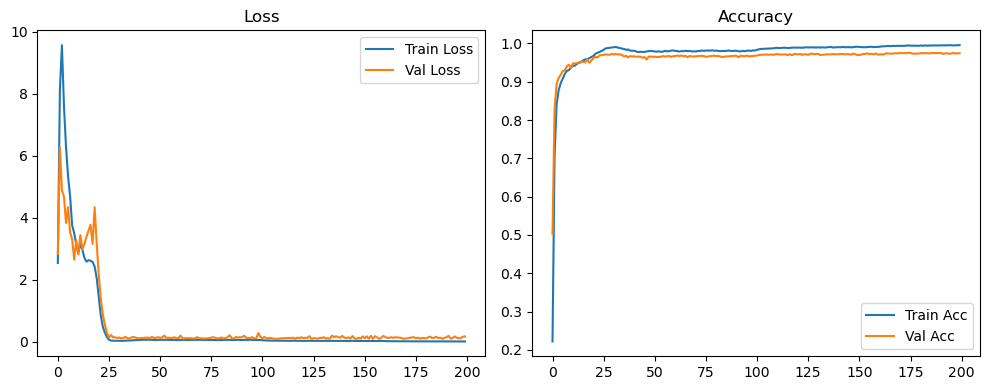

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 51.33it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 51.91it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 52.11it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 52.08it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 52.14it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 52.10it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 52.13it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 52.16it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 52.10it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 52.13it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 52.10it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 52.09it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 51.72it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 52.42it/s]

Original Model Final Test Loss: 0.1686 Accuracy: 0.9745


🚀 Running: batch128_lr0.01_0.005_0.002_dp0.5


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1899 | Val Acc: 0.5262 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1899 | Val Acc: 0.5262 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1899 | Val Acc: 0.5262 |:   0%|          | 1/200 [00:11<37:04, 11.18s/it]

| LR: 0.010 | Train Acc: 0.6363 | Val Acc: 0.8549 |:   0%|          | 1/200 [00:21<37:04, 11.18s/it]

| LR: 0.010 | Train Acc: 0.6363 | Val Acc: 0.8549 |:   0%|          | 1/200 [00:21<37:04, 11.18s/it]

| LR: 0.010 | Train Acc: 0.6363 | Val Acc: 0.8549 |:   1%|          | 2/200 [00:21<35:44, 10.83s/it]

| LR: 0.010 | Train Acc: 0.8077 | Val Acc: 0.8936 |:   1%|          | 2/200 [00:32<35:44, 10.83s/it]

| LR: 0.010 | Train Acc: 0.8077 | Val Acc: 0.8936 |:   1%|          | 2/200 [00:32<35:44, 10.83s/it]

| LR: 0.010 | Train Acc: 0.8077 | Val Acc: 0.8936 |:   2%|▏         | 3/200 [00:32<36:07, 11.00s/it]

| LR: 0.010 | Train Acc: 0.8490 | Val Acc: 0.9117 |:   2%|▏         | 3/200 [00:43<36:07, 11.00s/it]

| LR: 0.010 | Train Acc: 0.8490 | Val Acc: 0.9117 |:   2%|▏         | 3/200 [00:43<36:07, 11.00s/it]

| LR: 0.010 | Train Acc: 0.8490 | Val Acc: 0.9117 |:   2%|▏         | 4/200 [00:43<35:23, 10.83s/it]

| LR: 0.010 | Train Acc: 0.8721 | Val Acc: 0.9214 |:   2%|▏         | 4/200 [00:54<35:23, 10.83s/it]

| LR: 0.010 | Train Acc: 0.8721 | Val Acc: 0.9214 |:   2%|▏         | 4/200 [00:54<35:23, 10.83s/it]

| LR: 0.010 | Train Acc: 0.8721 | Val Acc: 0.9214 |:   2%|▎         | 5/200 [00:54<34:54, 10.74s/it]

| LR: 0.010 | Train Acc: 0.8864 | Val Acc: 0.9349 |:   2%|▎         | 5/200 [01:04<34:54, 10.74s/it]

| LR: 0.010 | Train Acc: 0.8864 | Val Acc: 0.9349 |:   2%|▎         | 5/200 [01:04<34:54, 10.74s/it]

| LR: 0.010 | Train Acc: 0.8864 | Val Acc: 0.9349 |:   3%|▎         | 6/200 [01:04<34:31, 10.68s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9383 |:   3%|▎         | 6/200 [01:15<34:31, 10.68s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9383 |:   3%|▎         | 6/200 [01:15<34:31, 10.68s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9383 |:   4%|▎         | 7/200 [01:15<34:15, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9070 | Val Acc: 0.9467 |:   4%|▎         | 7/200 [01:26<34:15, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9070 | Val Acc: 0.9467 |:   4%|▎         | 7/200 [01:26<34:15, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9070 | Val Acc: 0.9467 |:   4%|▍         | 8/200 [01:26<34:12, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9465 |:   4%|▍         | 8/200 [01:36<34:12, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9465 |:   4%|▍         | 8/200 [01:36<34:12, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9465 |:   4%|▍         | 9/200 [01:36<34:05, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9185 | Val Acc: 0.9483 |:   4%|▍         | 9/200 [01:47<34:05, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9185 | Val Acc: 0.9483 |:   4%|▍         | 9/200 [01:47<34:05, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9185 | Val Acc: 0.9483 |:   5%|▌         | 10/200 [01:47<34:00, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9234 | Val Acc: 0.9563 |:   5%|▌         | 10/200 [01:58<34:00, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9234 | Val Acc: 0.9563 |:   5%|▌         | 10/200 [01:58<34:00, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9234 | Val Acc: 0.9563 |:   6%|▌         | 11/200 [01:58<33:47, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9265 | Val Acc: 0.9565 |:   6%|▌         | 11/200 [02:09<33:47, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9265 | Val Acc: 0.9565 |:   6%|▌         | 11/200 [02:09<33:47, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9265 | Val Acc: 0.9565 |:   6%|▌         | 12/200 [02:09<33:40, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9294 | Val Acc: 0.9547 |:   6%|▌         | 12/200 [02:19<33:40, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9294 | Val Acc: 0.9547 |:   6%|▌         | 12/200 [02:19<33:40, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9294 | Val Acc: 0.9547 |:   6%|▋         | 13/200 [02:19<33:36, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9312 | Val Acc: 0.9610 |:   6%|▋         | 13/200 [02:30<33:36, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9312 | Val Acc: 0.9610 |:   6%|▋         | 13/200 [02:30<33:36, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9312 | Val Acc: 0.9610 |:   7%|▋         | 14/200 [02:30<33:20, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9360 | Val Acc: 0.9600 |:   7%|▋         | 14/200 [02:41<33:20, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9360 | Val Acc: 0.9600 |:   7%|▋         | 14/200 [02:41<33:20, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9360 | Val Acc: 0.9600 |:   8%|▊         | 15/200 [02:41<33:20, 10.82s/it]

| LR: 0.010 | Train Acc: 0.9417 | Val Acc: 0.9637 |:   8%|▊         | 15/200 [02:52<33:20, 10.82s/it]

| LR: 0.010 | Train Acc: 0.9417 | Val Acc: 0.9637 |:   8%|▊         | 15/200 [02:52<33:20, 10.82s/it]

| LR: 0.010 | Train Acc: 0.9417 | Val Acc: 0.9637 |:   8%|▊         | 16/200 [02:52<33:01, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9648 |:   8%|▊         | 16/200 [03:02<33:01, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9648 |:   8%|▊         | 16/200 [03:02<33:01, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9648 |:   8%|▊         | 17/200 [03:02<32:44, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9572 | Val Acc: 0.9666 |:   8%|▊         | 17/200 [03:13<32:44, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9572 | Val Acc: 0.9666 |:   8%|▊         | 17/200 [03:13<32:44, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9572 | Val Acc: 0.9666 |:   9%|▉         | 18/200 [03:13<32:12, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9621 | Val Acc: 0.9672 |:   9%|▉         | 18/200 [03:23<32:12, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9621 | Val Acc: 0.9672 |:   9%|▉         | 18/200 [03:23<32:12, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9621 | Val Acc: 0.9672 |:  10%|▉         | 19/200 [03:23<31:58, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9628 | Val Acc: 0.9671 |:  10%|▉         | 19/200 [03:34<31:58, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9628 | Val Acc: 0.9671 |:  10%|▉         | 19/200 [03:34<31:58, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9628 | Val Acc: 0.9671 |:  10%|█         | 20/200 [03:34<31:54, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9682 |:  10%|█         | 20/200 [03:45<31:54, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9682 |:  10%|█         | 20/200 [03:45<31:54, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9682 |:  10%|█         | 21/200 [03:45<31:43, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9663 | Val Acc: 0.9687 |:  10%|█         | 21/200 [03:55<31:43, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9663 | Val Acc: 0.9687 |:  10%|█         | 21/200 [03:55<31:43, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9663 | Val Acc: 0.9687 |:  11%|█         | 22/200 [03:56<31:43, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9664 | Val Acc: 0.9683 |:  11%|█         | 22/200 [04:06<31:43, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9664 | Val Acc: 0.9683 |:  11%|█         | 22/200 [04:06<31:43, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9664 | Val Acc: 0.9683 |:  12%|█▏        | 23/200 [04:06<31:33, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9692 |:  12%|█▏        | 23/200 [04:17<31:33, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9692 |:  12%|█▏        | 23/200 [04:17<31:33, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9692 |:  12%|█▏        | 24/200 [04:17<31:17, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9691 |:  12%|█▏        | 24/200 [04:27<31:17, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9691 |:  12%|█▏        | 24/200 [04:27<31:17, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9691 |:  12%|█▎        | 25/200 [04:27<31:03, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9677 |:  12%|█▎        | 25/200 [04:38<31:03, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9677 |:  12%|█▎        | 25/200 [04:38<31:03, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9677 |:  13%|█▎        | 26/200 [04:38<30:42, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9669 |:  13%|█▎        | 26/200 [04:49<30:42, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9669 |:  13%|█▎        | 26/200 [04:49<30:42, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9669 |:  14%|█▎        | 27/200 [04:49<30:51, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9678 |:  14%|█▎        | 27/200 [04:59<30:51, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9678 |:  14%|█▎        | 27/200 [04:59<30:51, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9678 |:  14%|█▍        | 28/200 [04:59<30:34, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9673 |:  14%|█▍        | 28/200 [05:10<30:34, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9673 |:  14%|█▍        | 28/200 [05:10<30:34, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9673 |:  14%|█▍        | 29/200 [05:10<30:14, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9601 | Val Acc: 0.9646 |:  14%|█▍        | 29/200 [05:21<30:14, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9601 | Val Acc: 0.9646 |:  14%|█▍        | 29/200 [05:21<30:14, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9601 | Val Acc: 0.9646 |:  15%|█▌        | 30/200 [05:21<30:05, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9586 | Val Acc: 0.9644 |:  15%|█▌        | 30/200 [05:31<30:05, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9586 | Val Acc: 0.9644 |:  15%|█▌        | 30/200 [05:31<30:05, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9586 | Val Acc: 0.9644 |:  16%|█▌        | 31/200 [05:31<29:59, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9567 | Val Acc: 0.9633 |:  16%|█▌        | 31/200 [05:42<29:59, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9567 | Val Acc: 0.9633 |:  16%|█▌        | 31/200 [05:42<29:59, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9567 | Val Acc: 0.9633 |:  16%|█▌        | 32/200 [05:42<29:44, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9656 |:  16%|█▌        | 32/200 [05:52<29:44, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9656 |:  16%|█▌        | 32/200 [05:52<29:44, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9656 |:  16%|█▋        | 33/200 [05:53<29:37, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9539 | Val Acc: 0.9626 |:  16%|█▋        | 33/200 [06:03<29:37, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9539 | Val Acc: 0.9626 |:  16%|█▋        | 33/200 [06:03<29:37, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9539 | Val Acc: 0.9626 |:  17%|█▋        | 34/200 [06:03<29:36, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9534 | Val Acc: 0.9615 |:  17%|█▋        | 34/200 [06:14<29:36, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9534 | Val Acc: 0.9615 |:  17%|█▋        | 34/200 [06:14<29:36, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9534 | Val Acc: 0.9615 |:  18%|█▊        | 35/200 [06:14<29:15, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9523 | Val Acc: 0.9618 |:  18%|█▊        | 35/200 [06:25<29:15, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9523 | Val Acc: 0.9618 |:  18%|█▊        | 35/200 [06:25<29:15, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9523 | Val Acc: 0.9618 |:  18%|█▊        | 36/200 [06:25<29:18, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9510 | Val Acc: 0.9640 |:  18%|█▊        | 36/200 [06:35<29:18, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9510 | Val Acc: 0.9640 |:  18%|█▊        | 36/200 [06:35<29:18, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9510 | Val Acc: 0.9640 |:  18%|█▊        | 37/200 [06:35<29:09, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9633 |:  18%|█▊        | 37/200 [06:46<29:09, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9633 |:  18%|█▊        | 37/200 [06:46<29:09, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9633 |:  19%|█▉        | 38/200 [06:46<28:58, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9608 |:  19%|█▉        | 38/200 [06:57<28:58, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9608 |:  19%|█▉        | 38/200 [06:57<28:58, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9608 |:  20%|█▉        | 39/200 [06:57<28:43, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9627 |:  20%|█▉        | 39/200 [07:08<28:43, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9627 |:  20%|█▉        | 39/200 [07:08<28:43, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9627 |:  20%|██        | 40/200 [07:08<28:36, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9606 |:  20%|██        | 40/200 [07:18<28:36, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9606 |:  20%|██        | 40/200 [07:18<28:36, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9606 |:  20%|██        | 41/200 [07:18<28:21, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9630 |:  20%|██        | 41/200 [07:29<28:21, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9630 |:  20%|██        | 41/200 [07:29<28:21, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9630 |:  21%|██        | 42/200 [07:29<28:06, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  21%|██        | 42/200 [07:40<28:06, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  21%|██        | 42/200 [07:40<28:06, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  22%|██▏       | 43/200 [07:40<27:56, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9639 |:  22%|██▏       | 43/200 [07:50<27:56, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9639 |:  22%|██▏       | 43/200 [07:50<27:56, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9639 |:  22%|██▏       | 44/200 [07:50<27:37, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9641 |:  22%|██▏       | 44/200 [08:01<27:37, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9641 |:  22%|██▏       | 44/200 [08:01<27:37, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9641 |:  22%|██▎       | 45/200 [08:01<27:24, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  22%|██▎       | 45/200 [08:11<27:24, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  22%|██▎       | 45/200 [08:11<27:24, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  23%|██▎       | 46/200 [08:11<27:11, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9621 |:  23%|██▎       | 46/200 [08:22<27:11, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9621 |:  23%|██▎       | 46/200 [08:22<27:11, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9621 |:  24%|██▎       | 47/200 [08:22<26:59, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9616 |:  24%|██▎       | 47/200 [08:32<26:59, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9616 |:  24%|██▎       | 47/200 [08:32<26:59, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9616 |:  24%|██▍       | 48/200 [08:32<26:51, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9618 |:  24%|██▍       | 48/200 [08:43<26:51, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9618 |:  24%|██▍       | 48/200 [08:43<26:51, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9618 |:  24%|██▍       | 49/200 [08:43<26:34, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9617 |:  24%|██▍       | 49/200 [08:53<26:34, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9617 |:  24%|██▍       | 49/200 [08:53<26:34, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9617 |:  25%|██▌       | 50/200 [08:53<26:24, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9613 |:  25%|██▌       | 50/200 [09:04<26:24, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9613 |:  25%|██▌       | 50/200 [09:04<26:24, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9613 |:  26%|██▌       | 51/200 [09:04<26:31, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9629 |:  26%|██▌       | 51/200 [09:15<26:31, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9629 |:  26%|██▌       | 51/200 [09:15<26:31, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9629 |:  26%|██▌       | 52/200 [09:15<26:16, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9637 |:  26%|██▌       | 52/200 [09:26<26:16, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9637 |:  26%|██▌       | 52/200 [09:26<26:16, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9637 |:  26%|██▋       | 53/200 [09:26<26:13, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9512 | Val Acc: 0.9626 |:  26%|██▋       | 53/200 [09:37<26:13, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9512 | Val Acc: 0.9626 |:  26%|██▋       | 53/200 [09:37<26:13, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9512 | Val Acc: 0.9626 |:  27%|██▋       | 54/200 [09:37<26:26, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9477 | Val Acc: 0.9617 |:  27%|██▋       | 54/200 [09:48<26:26, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9477 | Val Acc: 0.9617 |:  27%|██▋       | 54/200 [09:48<26:26, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9477 | Val Acc: 0.9617 |:  28%|██▊       | 55/200 [09:48<26:02, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9618 |:  28%|██▊       | 55/200 [09:58<26:02, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9618 |:  28%|██▊       | 55/200 [09:58<26:02, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9618 |:  28%|██▊       | 56/200 [09:58<25:44, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9643 |:  28%|██▊       | 56/200 [10:09<25:44, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9643 |:  28%|██▊       | 56/200 [10:09<25:44, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9643 |:  28%|██▊       | 57/200 [10:09<25:35, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9647 |:  28%|██▊       | 57/200 [10:20<25:35, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9647 |:  28%|██▊       | 57/200 [10:20<25:35, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9647 |:  29%|██▉       | 58/200 [10:20<25:26, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9517 | Val Acc: 0.9622 |:  29%|██▉       | 58/200 [10:30<25:26, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9517 | Val Acc: 0.9622 |:  29%|██▉       | 58/200 [10:30<25:26, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9517 | Val Acc: 0.9622 |:  30%|██▉       | 59/200 [10:30<25:08, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9502 | Val Acc: 0.9632 |:  30%|██▉       | 59/200 [10:41<25:08, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9502 | Val Acc: 0.9632 |:  30%|██▉       | 59/200 [10:41<25:08, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9502 | Val Acc: 0.9632 |:  30%|███       | 60/200 [10:41<24:56, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9622 |:  30%|███       | 60/200 [10:52<24:56, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9622 |:  30%|███       | 60/200 [10:52<24:56, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9622 |:  30%|███       | 61/200 [10:52<24:46, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9639 |:  30%|███       | 61/200 [11:02<24:46, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9639 |:  30%|███       | 61/200 [11:02<24:46, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9639 |:  31%|███       | 62/200 [11:02<24:28, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9479 | Val Acc: 0.9636 |:  31%|███       | 62/200 [11:13<24:28, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9479 | Val Acc: 0.9636 |:  31%|███       | 62/200 [11:13<24:28, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9479 | Val Acc: 0.9636 |:  32%|███▏      | 63/200 [11:13<24:07, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9504 | Val Acc: 0.9622 |:  32%|███▏      | 63/200 [11:23<24:07, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9504 | Val Acc: 0.9622 |:  32%|███▏      | 63/200 [11:23<24:07, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9504 | Val Acc: 0.9622 |:  32%|███▏      | 64/200 [11:23<24:00, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9628 |:  32%|███▏      | 64/200 [11:34<24:00, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9628 |:  32%|███▏      | 64/200 [11:34<24:00, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9628 |:  32%|███▎      | 65/200 [11:34<23:57, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9482 | Val Acc: 0.9633 |:  32%|███▎      | 65/200 [11:45<23:57, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9482 | Val Acc: 0.9633 |:  32%|███▎      | 65/200 [11:45<23:57, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9482 | Val Acc: 0.9633 |:  33%|███▎      | 66/200 [11:45<23:49, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9628 |:  33%|███▎      | 66/200 [11:56<23:49, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9628 |:  33%|███▎      | 66/200 [11:56<23:49, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9628 |:  34%|███▎      | 67/200 [11:56<24:19, 10.97s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9633 |:  34%|███▎      | 67/200 [12:07<24:19, 10.97s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9633 |:  34%|███▎      | 67/200 [12:07<24:19, 10.97s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9633 |:  34%|███▍      | 68/200 [12:07<23:55, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9624 |:  34%|███▍      | 68/200 [12:17<23:55, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9624 |:  34%|███▍      | 68/200 [12:17<23:55, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9624 |:  34%|███▍      | 69/200 [12:17<23:22, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9487 | Val Acc: 0.9630 |:  34%|███▍      | 69/200 [12:28<23:22, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9487 | Val Acc: 0.9630 |:  34%|███▍      | 69/200 [12:28<23:22, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9487 | Val Acc: 0.9630 |:  35%|███▌      | 70/200 [12:28<23:06, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9451 | Val Acc: 0.9647 |:  35%|███▌      | 70/200 [12:39<23:06, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9451 | Val Acc: 0.9647 |:  35%|███▌      | 70/200 [12:39<23:06, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9451 | Val Acc: 0.9647 |:  36%|███▌      | 71/200 [12:39<23:11, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9634 |:  36%|███▌      | 71/200 [12:50<23:11, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9634 |:  36%|███▌      | 71/200 [12:50<23:11, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9634 |:  36%|███▌      | 72/200 [12:50<22:59, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9633 |:  36%|███▌      | 72/200 [13:01<22:59, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9633 |:  36%|███▌      | 72/200 [13:01<22:59, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9633 |:  36%|███▋      | 73/200 [13:01<22:46, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9626 |:  36%|███▋      | 73/200 [13:11<22:46, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9626 |:  36%|███▋      | 73/200 [13:11<22:46, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9626 |:  37%|███▋      | 74/200 [13:11<22:19, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9616 |:  37%|███▋      | 74/200 [13:22<22:19, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9616 |:  37%|███▋      | 74/200 [13:22<22:19, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9616 |:  38%|███▊      | 75/200 [13:22<22:36, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9625 |:  38%|███▊      | 75/200 [13:33<22:36, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9625 |:  38%|███▊      | 75/200 [13:33<22:36, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9625 |:  38%|███▊      | 76/200 [13:33<22:32, 10.91s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9614 |:  38%|███▊      | 76/200 [13:44<22:32, 10.91s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9614 |:  38%|███▊      | 76/200 [13:44<22:32, 10.91s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9614 |:  38%|███▊      | 77/200 [13:44<22:06, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9617 |:  38%|███▊      | 77/200 [13:56<22:06, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9617 |:  38%|███▊      | 77/200 [13:56<22:06, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9617 |:  39%|███▉      | 78/200 [13:56<22:31, 11.08s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9613 |:  39%|███▉      | 78/200 [14:06<22:31, 11.08s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9613 |:  39%|███▉      | 78/200 [14:06<22:31, 11.08s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9613 |:  40%|███▉      | 79/200 [14:06<22:09, 10.99s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9612 |:  40%|███▉      | 79/200 [14:17<22:09, 10.99s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9612 |:  40%|███▉      | 79/200 [14:17<22:09, 10.99s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9612 |:  40%|████      | 80/200 [14:17<21:50, 10.92s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9628 |:  40%|████      | 80/200 [14:28<21:50, 10.92s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9628 |:  40%|████      | 80/200 [14:28<21:50, 10.92s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9628 |:  40%|████      | 81/200 [14:28<21:36, 10.89s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9617 |:  40%|████      | 81/200 [14:39<21:36, 10.89s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9617 |:  40%|████      | 81/200 [14:39<21:36, 10.89s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9617 |:  41%|████      | 82/200 [14:39<21:22, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9626 |:  41%|████      | 82/200 [14:49<21:22, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9626 |:  41%|████      | 82/200 [14:49<21:22, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9626 |:  42%|████▏     | 83/200 [14:49<21:08, 10.84s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9625 |:  42%|████▏     | 83/200 [15:00<21:08, 10.84s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9625 |:  42%|████▏     | 83/200 [15:00<21:08, 10.84s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9625 |:  42%|████▏     | 84/200 [15:00<20:47, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9633 |:  42%|████▏     | 84/200 [15:11<20:47, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9633 |:  42%|████▏     | 84/200 [15:11<20:47, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9633 |:  42%|████▎     | 85/200 [15:11<20:32, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9628 |:  42%|████▎     | 85/200 [15:21<20:32, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9628 |:  42%|████▎     | 85/200 [15:21<20:32, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9628 |:  43%|████▎     | 86/200 [15:21<20:19, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9628 |:  43%|████▎     | 86/200 [15:32<20:19, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9628 |:  43%|████▎     | 86/200 [15:32<20:19, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9628 |:  44%|████▎     | 87/200 [15:32<20:06, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9607 |:  44%|████▎     | 87/200 [15:42<20:06, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9607 |:  44%|████▎     | 87/200 [15:42<20:06, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9607 |:  44%|████▍     | 88/200 [15:42<19:46, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9442 | Val Acc: 0.9615 |:  44%|████▍     | 88/200 [15:53<19:46, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9442 | Val Acc: 0.9615 |:  44%|████▍     | 88/200 [15:53<19:46, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9442 | Val Acc: 0.9615 |:  44%|████▍     | 89/200 [15:53<19:30, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9456 | Val Acc: 0.9613 |:  44%|████▍     | 89/200 [16:03<19:30, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9456 | Val Acc: 0.9613 |:  44%|████▍     | 89/200 [16:03<19:30, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9456 | Val Acc: 0.9613 |:  45%|████▌     | 90/200 [16:03<19:18, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9475 | Val Acc: 0.9616 |:  45%|████▌     | 90/200 [16:14<19:18, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9475 | Val Acc: 0.9616 |:  45%|████▌     | 90/200 [16:14<19:18, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9475 | Val Acc: 0.9616 |:  46%|████▌     | 91/200 [16:14<19:10, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9617 |:  46%|████▌     | 91/200 [16:24<19:10, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9617 |:  46%|████▌     | 91/200 [16:24<19:10, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9617 |:  46%|████▌     | 92/200 [16:24<18:59, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9610 |:  46%|████▌     | 92/200 [16:35<18:59, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9610 |:  46%|████▌     | 92/200 [16:35<18:59, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9610 |:  46%|████▋     | 93/200 [16:35<18:50, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9620 |:  46%|████▋     | 93/200 [16:46<18:50, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9620 |:  46%|████▋     | 93/200 [16:46<18:50, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9620 |:  47%|████▋     | 94/200 [16:46<18:38, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9637 |:  47%|████▋     | 94/200 [16:56<18:38, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9637 |:  47%|████▋     | 94/200 [16:56<18:38, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9637 |:  48%|████▊     | 95/200 [16:56<18:28, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9567 |:  48%|████▊     | 95/200 [17:07<18:28, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9567 |:  48%|████▊     | 95/200 [17:07<18:28, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9567 |:  48%|████▊     | 96/200 [17:07<18:29, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9599 |:  48%|████▊     | 96/200 [17:18<18:29, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9599 |:  48%|████▊     | 96/200 [17:18<18:29, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9599 |:  48%|████▊     | 97/200 [17:18<18:15, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9616 |:  48%|████▊     | 97/200 [17:28<18:15, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9616 |:  48%|████▊     | 97/200 [17:28<18:15, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9616 |:  49%|████▉     | 98/200 [17:28<18:03, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  49%|████▉     | 98/200 [17:39<18:03, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  49%|████▉     | 98/200 [17:39<18:03, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  50%|████▉     | 99/200 [17:39<17:56, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9525 | Val Acc: 0.9625 |:  50%|████▉     | 99/200 [17:50<17:56, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9525 | Val Acc: 0.9625 |:  50%|████▉     | 99/200 [17:50<17:56, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9525 | Val Acc: 0.9625 |:  50%|█████     | 100/200 [17:50<17:44, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9645 |:  50%|█████     | 100/200 [18:00<17:44, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9645 |:  50%|█████     | 100/200 [18:00<17:44, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9645 |:  50%|█████     | 101/200 [18:00<17:34, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9644 |:  50%|█████     | 101/200 [18:11<17:34, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9644 |:  50%|█████     | 101/200 [18:11<17:34, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9644 |:  51%|█████     | 102/200 [18:11<17:37, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9547 | Val Acc: 0.9628 |:  51%|█████     | 102/200 [18:22<17:37, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9547 | Val Acc: 0.9628 |:  51%|█████     | 102/200 [18:22<17:37, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9547 | Val Acc: 0.9628 |:  52%|█████▏    | 103/200 [18:22<17:16, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9564 | Val Acc: 0.9660 |:  52%|█████▏    | 103/200 [18:33<17:16, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9564 | Val Acc: 0.9660 |:  52%|█████▏    | 103/200 [18:33<17:16, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9564 | Val Acc: 0.9660 |:  52%|█████▏    | 104/200 [18:33<17:09, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9561 | Val Acc: 0.9643 |:  52%|█████▏    | 104/200 [18:43<17:09, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9561 | Val Acc: 0.9643 |:  52%|█████▏    | 104/200 [18:43<17:09, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9561 | Val Acc: 0.9643 |:  52%|█████▎    | 105/200 [18:44<17:04, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9558 | Val Acc: 0.9625 |:  52%|█████▎    | 105/200 [18:54<17:04, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9558 | Val Acc: 0.9625 |:  52%|█████▎    | 105/200 [18:54<17:04, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9558 | Val Acc: 0.9625 |:  53%|█████▎    | 106/200 [18:54<16:51, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9571 | Val Acc: 0.9644 |:  53%|█████▎    | 106/200 [19:05<16:51, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9571 | Val Acc: 0.9644 |:  53%|█████▎    | 106/200 [19:05<16:51, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9571 | Val Acc: 0.9644 |:  54%|█████▎    | 107/200 [19:05<16:32, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9562 | Val Acc: 0.9657 |:  54%|█████▎    | 107/200 [19:16<16:32, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9562 | Val Acc: 0.9657 |:  54%|█████▎    | 107/200 [19:16<16:32, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9562 | Val Acc: 0.9657 |:  54%|█████▍    | 108/200 [19:16<16:27, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9568 | Val Acc: 0.9655 |:  54%|█████▍    | 108/200 [19:26<16:27, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9568 | Val Acc: 0.9655 |:  54%|█████▍    | 108/200 [19:26<16:27, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9568 | Val Acc: 0.9655 |:  55%|█████▍    | 109/200 [19:26<16:20, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9572 | Val Acc: 0.9648 |:  55%|█████▍    | 109/200 [19:37<16:20, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9572 | Val Acc: 0.9648 |:  55%|█████▍    | 109/200 [19:37<16:20, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9572 | Val Acc: 0.9648 |:  55%|█████▌    | 110/200 [19:37<16:05, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9587 | Val Acc: 0.9653 |:  55%|█████▌    | 110/200 [19:48<16:05, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9587 | Val Acc: 0.9653 |:  55%|█████▌    | 110/200 [19:48<16:05, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9587 | Val Acc: 0.9653 |:  56%|█████▌    | 111/200 [19:48<15:52, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9591 | Val Acc: 0.9651 |:  56%|█████▌    | 111/200 [19:58<15:52, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9591 | Val Acc: 0.9651 |:  56%|█████▌    | 111/200 [19:58<15:52, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9591 | Val Acc: 0.9651 |:  56%|█████▌    | 112/200 [19:58<15:38, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9584 | Val Acc: 0.9634 |:  56%|█████▌    | 112/200 [20:09<15:38, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9584 | Val Acc: 0.9634 |:  56%|█████▌    | 112/200 [20:09<15:38, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9584 | Val Acc: 0.9634 |:  56%|█████▋    | 113/200 [20:09<15:35, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9580 | Val Acc: 0.9643 |:  56%|█████▋    | 113/200 [20:20<15:35, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9580 | Val Acc: 0.9643 |:  56%|█████▋    | 113/200 [20:20<15:35, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9580 | Val Acc: 0.9643 |:  57%|█████▋    | 114/200 [20:20<15:24, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9596 | Val Acc: 0.9647 |:  57%|█████▋    | 114/200 [20:31<15:24, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9596 | Val Acc: 0.9647 |:  57%|█████▋    | 114/200 [20:31<15:24, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9596 | Val Acc: 0.9647 |:  57%|█████▊    | 115/200 [20:31<15:09, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9589 | Val Acc: 0.9666 |:  57%|█████▊    | 115/200 [20:41<15:09, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9589 | Val Acc: 0.9666 |:  57%|█████▊    | 115/200 [20:41<15:09, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9589 | Val Acc: 0.9666 |:  58%|█████▊    | 116/200 [20:41<14:57, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9602 | Val Acc: 0.9668 |:  58%|█████▊    | 116/200 [20:52<14:57, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9602 | Val Acc: 0.9668 |:  58%|█████▊    | 116/200 [20:52<14:57, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9602 | Val Acc: 0.9668 |:  58%|█████▊    | 117/200 [20:52<14:43, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9608 | Val Acc: 0.9661 |:  58%|█████▊    | 117/200 [21:03<14:43, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9608 | Val Acc: 0.9661 |:  58%|█████▊    | 117/200 [21:03<14:43, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9608 | Val Acc: 0.9661 |:  59%|█████▉    | 118/200 [21:03<14:38, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9611 | Val Acc: 0.9673 |:  59%|█████▉    | 118/200 [21:14<14:38, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9611 | Val Acc: 0.9673 |:  59%|█████▉    | 118/200 [21:14<14:38, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9611 | Val Acc: 0.9673 |:  60%|█████▉    | 119/200 [21:14<14:36, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9609 | Val Acc: 0.9684 |:  60%|█████▉    | 119/200 [21:24<14:36, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9609 | Val Acc: 0.9684 |:  60%|█████▉    | 119/200 [21:24<14:36, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9609 | Val Acc: 0.9684 |:  60%|██████    | 120/200 [21:24<14:18, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9609 | Val Acc: 0.9658 |:  60%|██████    | 120/200 [21:35<14:18, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9609 | Val Acc: 0.9658 |:  60%|██████    | 120/200 [21:35<14:18, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9609 | Val Acc: 0.9658 |:  60%|██████    | 121/200 [21:35<14:06, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9607 | Val Acc: 0.9655 |:  60%|██████    | 121/200 [21:46<14:06, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9607 | Val Acc: 0.9655 |:  60%|██████    | 121/200 [21:46<14:06, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9607 | Val Acc: 0.9655 |:  61%|██████    | 122/200 [21:46<13:55, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9607 | Val Acc: 0.9666 |:  61%|██████    | 122/200 [21:56<13:55, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9607 | Val Acc: 0.9666 |:  61%|██████    | 122/200 [21:56<13:55, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9607 | Val Acc: 0.9666 |:  62%|██████▏   | 123/200 [21:56<13:43, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9626 | Val Acc: 0.9683 |:  62%|██████▏   | 123/200 [22:07<13:43, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9626 | Val Acc: 0.9683 |:  62%|██████▏   | 123/200 [22:07<13:43, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9626 | Val Acc: 0.9683 |:  62%|██████▏   | 124/200 [22:07<13:33, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9614 | Val Acc: 0.9676 |:  62%|██████▏   | 124/200 [22:18<13:33, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9614 | Val Acc: 0.9676 |:  62%|██████▏   | 124/200 [22:18<13:33, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9614 | Val Acc: 0.9676 |:  62%|██████▎   | 125/200 [22:18<13:24, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9619 | Val Acc: 0.9677 |:  62%|██████▎   | 125/200 [22:28<13:24, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9619 | Val Acc: 0.9677 |:  62%|██████▎   | 125/200 [22:28<13:24, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9619 | Val Acc: 0.9677 |:  63%|██████▎   | 126/200 [22:28<13:10, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9614 | Val Acc: 0.9678 |:  63%|██████▎   | 126/200 [22:39<13:10, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9614 | Val Acc: 0.9678 |:  63%|██████▎   | 126/200 [22:39<13:10, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9614 | Val Acc: 0.9678 |:  64%|██████▎   | 127/200 [22:39<13:00, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9626 | Val Acc: 0.9662 |:  64%|██████▎   | 127/200 [22:50<13:00, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9626 | Val Acc: 0.9662 |:  64%|██████▎   | 127/200 [22:50<13:00, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9626 | Val Acc: 0.9662 |:  64%|██████▍   | 128/200 [22:50<12:48, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9610 | Val Acc: 0.9686 |:  64%|██████▍   | 128/200 [23:00<12:48, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9610 | Val Acc: 0.9686 |:  64%|██████▍   | 128/200 [23:00<12:48, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9610 | Val Acc: 0.9686 |:  64%|██████▍   | 129/200 [23:00<12:38, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9608 | Val Acc: 0.9667 |:  64%|██████▍   | 129/200 [23:11<12:38, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9608 | Val Acc: 0.9667 |:  64%|██████▍   | 129/200 [23:11<12:38, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9608 | Val Acc: 0.9667 |:  65%|██████▌   | 130/200 [23:11<12:28, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9679 |:  65%|██████▌   | 130/200 [23:22<12:28, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9679 |:  65%|██████▌   | 130/200 [23:22<12:28, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9679 |:  66%|██████▌   | 131/200 [23:22<12:21, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9655 |:  66%|██████▌   | 131/200 [23:33<12:21, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9655 |:  66%|██████▌   | 131/200 [23:33<12:21, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9655 |:  66%|██████▌   | 132/200 [23:33<12:14, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9610 | Val Acc: 0.9666 |:  66%|██████▌   | 132/200 [23:44<12:14, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9610 | Val Acc: 0.9666 |:  66%|██████▌   | 132/200 [23:44<12:14, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9610 | Val Acc: 0.9666 |:  66%|██████▋   | 133/200 [23:44<12:02, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9617 | Val Acc: 0.9673 |:  66%|██████▋   | 133/200 [23:54<12:02, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9617 | Val Acc: 0.9673 |:  66%|██████▋   | 133/200 [23:54<12:02, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9617 | Val Acc: 0.9673 |:  67%|██████▋   | 134/200 [23:54<11:46, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9634 | Val Acc: 0.9659 |:  67%|██████▋   | 134/200 [24:05<11:46, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9634 | Val Acc: 0.9659 |:  67%|██████▋   | 134/200 [24:05<11:46, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9634 | Val Acc: 0.9659 |:  68%|██████▊   | 135/200 [24:05<11:38, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9633 | Val Acc: 0.9669 |:  68%|██████▊   | 135/200 [24:16<11:38, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9633 | Val Acc: 0.9669 |:  68%|██████▊   | 135/200 [24:16<11:38, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9633 | Val Acc: 0.9669 |:  68%|██████▊   | 136/200 [24:16<11:24, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9624 | Val Acc: 0.9697 |:  68%|██████▊   | 136/200 [24:26<11:24, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9624 | Val Acc: 0.9697 |:  68%|██████▊   | 136/200 [24:26<11:24, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9624 | Val Acc: 0.9697 |:  68%|██████▊   | 137/200 [24:26<11:12, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9677 |:  68%|██████▊   | 137/200 [24:38<11:12, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9677 |:  68%|██████▊   | 137/200 [24:38<11:12, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9677 |:  69%|██████▉   | 138/200 [24:38<11:25, 11.06s/it]

| LR: 0.005 | Train Acc: 0.9633 | Val Acc: 0.9667 |:  69%|██████▉   | 138/200 [24:49<11:25, 11.06s/it]

| LR: 0.005 | Train Acc: 0.9633 | Val Acc: 0.9667 |:  69%|██████▉   | 138/200 [24:49<11:25, 11.06s/it]

| LR: 0.005 | Train Acc: 0.9633 | Val Acc: 0.9667 |:  70%|██████▉   | 139/200 [24:49<11:11, 11.01s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9676 |:  70%|██████▉   | 139/200 [25:00<11:11, 11.01s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9676 |:  70%|██████▉   | 139/200 [25:00<11:11, 11.01s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9676 |:  70%|███████   | 140/200 [25:00<10:55, 10.93s/it]

| LR: 0.005 | Train Acc: 0.9620 | Val Acc: 0.9669 |:  70%|███████   | 140/200 [25:10<10:55, 10.93s/it]

| LR: 0.005 | Train Acc: 0.9620 | Val Acc: 0.9669 |:  70%|███████   | 140/200 [25:10<10:55, 10.93s/it]

| LR: 0.005 | Train Acc: 0.9620 | Val Acc: 0.9669 |:  70%|███████   | 141/200 [25:10<10:39, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9635 | Val Acc: 0.9667 |:  70%|███████   | 141/200 [25:21<10:39, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9635 | Val Acc: 0.9667 |:  70%|███████   | 141/200 [25:21<10:39, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9635 | Val Acc: 0.9667 |:  71%|███████   | 142/200 [25:21<10:23, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9632 | Val Acc: 0.9667 |:  71%|███████   | 142/200 [25:32<10:23, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9632 | Val Acc: 0.9667 |:  71%|███████   | 142/200 [25:32<10:23, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9632 | Val Acc: 0.9667 |:  72%|███████▏  | 143/200 [25:32<10:10, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9628 | Val Acc: 0.9674 |:  72%|███████▏  | 143/200 [25:42<10:10, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9628 | Val Acc: 0.9674 |:  72%|███████▏  | 143/200 [25:42<10:10, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9628 | Val Acc: 0.9674 |:  72%|███████▏  | 144/200 [25:42<09:59, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9618 | Val Acc: 0.9658 |:  72%|███████▏  | 144/200 [25:53<09:59, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9618 | Val Acc: 0.9658 |:  72%|███████▏  | 144/200 [25:53<09:59, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9618 | Val Acc: 0.9658 |:  72%|███████▎  | 145/200 [25:53<09:47, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9635 | Val Acc: 0.9681 |:  72%|███████▎  | 145/200 [26:04<09:47, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9635 | Val Acc: 0.9681 |:  72%|███████▎  | 145/200 [26:04<09:47, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9635 | Val Acc: 0.9681 |:  73%|███████▎  | 146/200 [26:04<09:38, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9635 | Val Acc: 0.9683 |:  73%|███████▎  | 146/200 [26:14<09:38, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9635 | Val Acc: 0.9683 |:  73%|███████▎  | 146/200 [26:14<09:38, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9635 | Val Acc: 0.9683 |:  74%|███████▎  | 147/200 [26:14<09:25, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9639 | Val Acc: 0.9673 |:  74%|███████▎  | 147/200 [26:25<09:25, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9639 | Val Acc: 0.9673 |:  74%|███████▎  | 147/200 [26:25<09:25, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9639 | Val Acc: 0.9673 |:  74%|███████▍  | 148/200 [26:25<09:17, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9619 | Val Acc: 0.9673 |:  74%|███████▍  | 148/200 [26:36<09:17, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9619 | Val Acc: 0.9673 |:  74%|███████▍  | 148/200 [26:36<09:17, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9619 | Val Acc: 0.9673 |:  74%|███████▍  | 149/200 [26:36<09:04, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9640 | Val Acc: 0.9682 |:  74%|███████▍  | 149/200 [26:46<09:04, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9640 | Val Acc: 0.9682 |:  74%|███████▍  | 149/200 [26:46<09:04, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9640 | Val Acc: 0.9682 |:  75%|███████▌  | 150/200 [26:46<08:51, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9671 |:  75%|███████▌  | 150/200 [26:57<08:51, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9671 |:  75%|███████▌  | 150/200 [26:57<08:51, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9671 |:  76%|███████▌  | 151/200 [26:57<08:42, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9638 | Val Acc: 0.9697 |:  76%|███████▌  | 151/200 [27:08<08:42, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9638 | Val Acc: 0.9697 |:  76%|███████▌  | 151/200 [27:08<08:42, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9638 | Val Acc: 0.9697 |:  76%|███████▌  | 152/200 [27:08<08:33, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9650 | Val Acc: 0.9671 |:  76%|███████▌  | 152/200 [27:18<08:33, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9650 | Val Acc: 0.9671 |:  76%|███████▌  | 152/200 [27:18<08:33, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9650 | Val Acc: 0.9671 |:  76%|███████▋  | 153/200 [27:18<08:15, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9628 | Val Acc: 0.9677 |:  76%|███████▋  | 153/200 [27:28<08:15, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9628 | Val Acc: 0.9677 |:  76%|███████▋  | 153/200 [27:28<08:15, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9628 | Val Acc: 0.9677 |:  77%|███████▋  | 154/200 [27:29<08:05, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9646 | Val Acc: 0.9683 |:  77%|███████▋  | 154/200 [27:39<08:05, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9646 | Val Acc: 0.9683 |:  77%|███████▋  | 154/200 [27:39<08:05, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9646 | Val Acc: 0.9683 |:  78%|███████▊  | 155/200 [27:39<07:56, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9634 | Val Acc: 0.9693 |:  78%|███████▊  | 155/200 [27:50<07:56, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9634 | Val Acc: 0.9693 |:  78%|███████▊  | 155/200 [27:50<07:56, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9634 | Val Acc: 0.9693 |:  78%|███████▊  | 156/200 [27:50<07:45, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9648 | Val Acc: 0.9671 |:  78%|███████▊  | 156/200 [28:00<07:45, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9648 | Val Acc: 0.9671 |:  78%|███████▊  | 156/200 [28:00<07:45, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9648 | Val Acc: 0.9671 |:  78%|███████▊  | 157/200 [28:00<07:32, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9641 | Val Acc: 0.9684 |:  78%|███████▊  | 157/200 [28:11<07:32, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9641 | Val Acc: 0.9684 |:  78%|███████▊  | 157/200 [28:11<07:32, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9641 | Val Acc: 0.9684 |:  79%|███████▉  | 158/200 [28:11<07:22, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9637 | Val Acc: 0.9681 |:  79%|███████▉  | 158/200 [28:21<07:22, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9637 | Val Acc: 0.9681 |:  79%|███████▉  | 158/200 [28:21<07:22, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9637 | Val Acc: 0.9681 |:  80%|███████▉  | 159/200 [28:21<07:14, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9639 | Val Acc: 0.9679 |:  80%|███████▉  | 159/200 [28:33<07:14, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9639 | Val Acc: 0.9679 |:  80%|███████▉  | 159/200 [28:33<07:14, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9639 | Val Acc: 0.9679 |:  80%|████████  | 160/200 [28:33<07:13, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9656 | Val Acc: 0.9696 |:  80%|████████  | 160/200 [28:43<07:13, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9656 | Val Acc: 0.9696 |:  80%|████████  | 160/200 [28:43<07:13, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9656 | Val Acc: 0.9696 |:  80%|████████  | 161/200 [28:44<07:00, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9655 | Val Acc: 0.9687 |:  80%|████████  | 161/200 [28:54<07:00, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9655 | Val Acc: 0.9687 |:  80%|████████  | 161/200 [28:54<07:00, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9655 | Val Acc: 0.9687 |:  81%|████████  | 162/200 [28:54<06:46, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9654 | Val Acc: 0.9696 |:  81%|████████  | 162/200 [29:04<06:46, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9654 | Val Acc: 0.9696 |:  81%|████████  | 162/200 [29:04<06:46, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9654 | Val Acc: 0.9696 |:  82%|████████▏ | 163/200 [29:05<06:33, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9667 | Val Acc: 0.9701 |:  82%|████████▏ | 163/200 [29:15<06:33, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9667 | Val Acc: 0.9701 |:  82%|████████▏ | 163/200 [29:15<06:33, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9667 | Val Acc: 0.9701 |:  82%|████████▏ | 164/200 [29:15<06:23, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9670 | Val Acc: 0.9692 |:  82%|████████▏ | 164/200 [29:26<06:23, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9670 | Val Acc: 0.9692 |:  82%|████████▏ | 164/200 [29:26<06:23, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9670 | Val Acc: 0.9692 |:  82%|████████▎ | 165/200 [29:26<06:11, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9669 | Val Acc: 0.9698 |:  82%|████████▎ | 165/200 [29:36<06:11, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9669 | Val Acc: 0.9698 |:  82%|████████▎ | 165/200 [29:36<06:11, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9669 | Val Acc: 0.9698 |:  83%|████████▎ | 166/200 [29:36<06:01, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9679 | Val Acc: 0.9698 |:  83%|████████▎ | 166/200 [29:47<06:01, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9679 | Val Acc: 0.9698 |:  83%|████████▎ | 166/200 [29:47<06:01, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9679 | Val Acc: 0.9698 |:  84%|████████▎ | 167/200 [29:47<05:49, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9675 | Val Acc: 0.9694 |:  84%|████████▎ | 167/200 [29:57<05:49, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9675 | Val Acc: 0.9694 |:  84%|████████▎ | 167/200 [29:57<05:49, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9675 | Val Acc: 0.9694 |:  84%|████████▍ | 168/200 [29:57<05:38, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9679 | Val Acc: 0.9675 |:  84%|████████▍ | 168/200 [30:08<05:38, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9679 | Val Acc: 0.9675 |:  84%|████████▍ | 168/200 [30:08<05:38, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9679 | Val Acc: 0.9675 |:  84%|████████▍ | 169/200 [30:08<05:29, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9673 | Val Acc: 0.9686 |:  84%|████████▍ | 169/200 [30:19<05:29, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9673 | Val Acc: 0.9686 |:  84%|████████▍ | 169/200 [30:19<05:29, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9673 | Val Acc: 0.9686 |:  85%|████████▌ | 170/200 [30:19<05:17, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9680 | Val Acc: 0.9702 |:  85%|████████▌ | 170/200 [30:29<05:17, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9680 | Val Acc: 0.9702 |:  85%|████████▌ | 170/200 [30:29<05:17, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9680 | Val Acc: 0.9702 |:  86%|████████▌ | 171/200 [30:29<05:07, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9684 | Val Acc: 0.9694 |:  86%|████████▌ | 171/200 [30:40<05:07, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9684 | Val Acc: 0.9694 |:  86%|████████▌ | 171/200 [30:40<05:07, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9684 | Val Acc: 0.9694 |:  86%|████████▌ | 172/200 [30:40<04:58, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9676 | Val Acc: 0.9706 |:  86%|████████▌ | 172/200 [30:50<04:58, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9676 | Val Acc: 0.9706 |:  86%|████████▌ | 172/200 [30:50<04:58, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9676 | Val Acc: 0.9706 |:  86%|████████▋ | 173/200 [30:50<04:45, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9695 | Val Acc: 0.9698 |:  86%|████████▋ | 173/200 [31:01<04:45, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9695 | Val Acc: 0.9698 |:  86%|████████▋ | 173/200 [31:01<04:45, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9695 | Val Acc: 0.9698 |:  87%|████████▋ | 174/200 [31:01<04:37, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9696 | Val Acc: 0.9697 |:  87%|████████▋ | 174/200 [31:12<04:37, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9696 | Val Acc: 0.9697 |:  87%|████████▋ | 174/200 [31:12<04:37, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9696 | Val Acc: 0.9697 |:  88%|████████▊ | 175/200 [31:12<04:25, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9692 |:  88%|████████▊ | 175/200 [31:23<04:25, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9692 |:  88%|████████▊ | 175/200 [31:23<04:25, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9692 |:  88%|████████▊ | 176/200 [31:23<04:15, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9693 | Val Acc: 0.9698 |:  88%|████████▊ | 176/200 [31:33<04:15, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9693 | Val Acc: 0.9698 |:  88%|████████▊ | 176/200 [31:33<04:15, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9693 | Val Acc: 0.9698 |:  88%|████████▊ | 177/200 [31:33<04:05, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9697 |:  88%|████████▊ | 177/200 [31:44<04:05, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9697 |:  88%|████████▊ | 177/200 [31:44<04:05, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9697 |:  89%|████████▉ | 178/200 [31:44<03:55, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9701 | Val Acc: 0.9702 |:  89%|████████▉ | 178/200 [31:55<03:55, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9701 | Val Acc: 0.9702 |:  89%|████████▉ | 178/200 [31:55<03:55, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9701 | Val Acc: 0.9702 |:  90%|████████▉ | 179/200 [31:55<03:45, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9700 | Val Acc: 0.9688 |:  90%|████████▉ | 179/200 [32:06<03:45, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9700 | Val Acc: 0.9688 |:  90%|████████▉ | 179/200 [32:06<03:45, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9700 | Val Acc: 0.9688 |:  90%|█████████ | 180/200 [32:06<03:35, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9700 | Val Acc: 0.9699 |:  90%|█████████ | 180/200 [32:16<03:35, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9700 | Val Acc: 0.9699 |:  90%|█████████ | 180/200 [32:16<03:35, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9700 | Val Acc: 0.9699 |:  90%|█████████ | 181/200 [32:16<03:24, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9694 | Val Acc: 0.9698 |:  90%|█████████ | 181/200 [32:27<03:24, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9694 | Val Acc: 0.9698 |:  90%|█████████ | 181/200 [32:27<03:24, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9694 | Val Acc: 0.9698 |:  91%|█████████ | 182/200 [32:27<03:12, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9701 | Val Acc: 0.9707 |:  91%|█████████ | 182/200 [32:38<03:12, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9701 | Val Acc: 0.9707 |:  91%|█████████ | 182/200 [32:38<03:12, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9701 | Val Acc: 0.9707 |:  92%|█████████▏| 183/200 [32:38<03:01, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9704 | Val Acc: 0.9702 |:  92%|█████████▏| 183/200 [32:49<03:01, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9704 | Val Acc: 0.9702 |:  92%|█████████▏| 183/200 [32:49<03:01, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9704 | Val Acc: 0.9702 |:  92%|█████████▏| 184/200 [32:49<02:53, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9689 | Val Acc: 0.9686 |:  92%|█████████▏| 184/200 [33:00<02:53, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9689 | Val Acc: 0.9686 |:  92%|█████████▏| 184/200 [33:00<02:53, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9689 | Val Acc: 0.9686 |:  92%|█████████▎| 185/200 [33:00<02:42, 10.82s/it]

| LR: 0.002 | Train Acc: 0.9705 | Val Acc: 0.9696 |:  92%|█████████▎| 185/200 [33:10<02:42, 10.82s/it]

| LR: 0.002 | Train Acc: 0.9705 | Val Acc: 0.9696 |:  92%|█████████▎| 185/200 [33:10<02:42, 10.82s/it]

| LR: 0.002 | Train Acc: 0.9705 | Val Acc: 0.9696 |:  93%|█████████▎| 186/200 [33:10<02:31, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9701 | Val Acc: 0.9689 |:  93%|█████████▎| 186/200 [33:21<02:31, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9701 | Val Acc: 0.9689 |:  93%|█████████▎| 186/200 [33:21<02:31, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9701 | Val Acc: 0.9689 |:  94%|█████████▎| 187/200 [33:21<02:19, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9701 | Val Acc: 0.9699 |:  94%|█████████▎| 187/200 [33:32<02:19, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9701 | Val Acc: 0.9699 |:  94%|█████████▎| 187/200 [33:32<02:19, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9701 | Val Acc: 0.9699 |:  94%|█████████▍| 188/200 [33:32<02:09, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9701 | Val Acc: 0.9692 |:  94%|█████████▍| 188/200 [33:42<02:09, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9701 | Val Acc: 0.9692 |:  94%|█████████▍| 188/200 [33:42<02:09, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9701 | Val Acc: 0.9692 |:  94%|█████████▍| 189/200 [33:42<01:57, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9700 | Val Acc: 0.9700 |:  94%|█████████▍| 189/200 [33:53<01:57, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9700 | Val Acc: 0.9700 |:  94%|█████████▍| 189/200 [33:53<01:57, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9700 | Val Acc: 0.9700 |:  95%|█████████▌| 190/200 [33:53<01:47, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9711 | Val Acc: 0.9698 |:  95%|█████████▌| 190/200 [34:04<01:47, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9711 | Val Acc: 0.9698 |:  95%|█████████▌| 190/200 [34:04<01:47, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9711 | Val Acc: 0.9698 |:  96%|█████████▌| 191/200 [34:04<01:36, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9716 | Val Acc: 0.9707 |:  96%|█████████▌| 191/200 [34:14<01:36, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9716 | Val Acc: 0.9707 |:  96%|█████████▌| 191/200 [34:14<01:36, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9716 | Val Acc: 0.9707 |:  96%|█████████▌| 192/200 [34:14<01:25, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9709 | Val Acc: 0.9685 |:  96%|█████████▌| 192/200 [34:25<01:25, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9709 | Val Acc: 0.9685 |:  96%|█████████▌| 192/200 [34:25<01:25, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9709 | Val Acc: 0.9685 |:  96%|█████████▋| 193/200 [34:25<01:14, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9708 | Val Acc: 0.9706 |:  96%|█████████▋| 193/200 [34:37<01:14, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9708 | Val Acc: 0.9706 |:  96%|█████████▋| 193/200 [34:37<01:14, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9708 | Val Acc: 0.9706 |:  97%|█████████▋| 194/200 [34:37<01:06, 11.10s/it]

| LR: 0.002 | Train Acc: 0.9707 | Val Acc: 0.9689 |:  97%|█████████▋| 194/200 [34:48<01:06, 11.10s/it]

| LR: 0.002 | Train Acc: 0.9707 | Val Acc: 0.9689 |:  97%|█████████▋| 194/200 [34:48<01:06, 11.10s/it]

| LR: 0.002 | Train Acc: 0.9707 | Val Acc: 0.9689 |:  98%|█████████▊| 195/200 [34:48<00:54, 10.95s/it]

| LR: 0.002 | Train Acc: 0.9703 | Val Acc: 0.9698 |:  98%|█████████▊| 195/200 [34:58<00:54, 10.95s/it]

| LR: 0.002 | Train Acc: 0.9703 | Val Acc: 0.9698 |:  98%|█████████▊| 195/200 [34:58<00:54, 10.95s/it]

| LR: 0.002 | Train Acc: 0.9703 | Val Acc: 0.9698 |:  98%|█████████▊| 196/200 [34:58<00:43, 10.88s/it]

| LR: 0.002 | Train Acc: 0.9708 | Val Acc: 0.9694 |:  98%|█████████▊| 196/200 [35:09<00:43, 10.88s/it]

| LR: 0.002 | Train Acc: 0.9708 | Val Acc: 0.9694 |:  98%|█████████▊| 196/200 [35:09<00:43, 10.88s/it]

| LR: 0.002 | Train Acc: 0.9708 | Val Acc: 0.9694 |:  98%|█████████▊| 197/200 [35:09<00:32, 10.86s/it]

| LR: 0.002 | Train Acc: 0.9715 | Val Acc: 0.9702 |:  98%|█████████▊| 197/200 [35:20<00:32, 10.86s/it]

| LR: 0.002 | Train Acc: 0.9715 | Val Acc: 0.9702 |:  98%|█████████▊| 197/200 [35:20<00:32, 10.86s/it]

| LR: 0.002 | Train Acc: 0.9715 | Val Acc: 0.9702 |:  99%|█████████▉| 198/200 [35:20<00:21, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9726 | Val Acc: 0.9700 |:  99%|█████████▉| 198/200 [35:30<00:21, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9726 | Val Acc: 0.9700 |:  99%|█████████▉| 198/200 [35:30<00:21, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9726 | Val Acc: 0.9700 |: 100%|█████████▉| 199/200 [35:30<00:10, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9722 | Val Acc: 0.9711 |: 100%|█████████▉| 199/200 [35:40<00:10, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9722 | Val Acc: 0.9711 |: 100%|█████████▉| 199/200 [35:40<00:10, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9722 | Val Acc: 0.9711 |: 100%|██████████| 200/200 [35:41<00:00, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9722 | Val Acc: 0.9711 |: 100%|██████████| 200/200 [35:41<00:00, 10.71s/it]

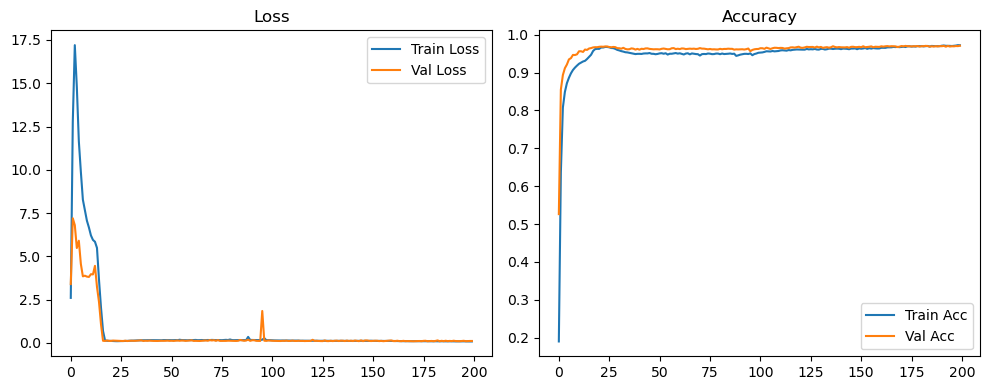

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 51.47it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 51.86it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 51.96it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 52.05it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 52.09it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 52.08it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 51.79it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 51.35it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 51.30it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 51.44it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 51.67it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 51.82it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 51.89it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 52.19it/s]

Original Model Final Test Loss: 0.1050 Accuracy: 0.9731


🚀 Running: batch128_lr0.01_0.005_0.001_dp0.0


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2695 | Val Acc: 0.6519 |:   0%|          | 0/200 [00:10<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2695 | Val Acc: 0.6519 |:   0%|          | 0/200 [00:10<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2695 | Val Acc: 0.6519 |:   0%|          | 1/200 [00:10<36:24, 10.98s/it]

| LR: 0.010 | Train Acc: 0.7904 | Val Acc: 0.8626 |:   0%|          | 1/200 [00:21<36:24, 10.98s/it]

| LR: 0.010 | Train Acc: 0.7904 | Val Acc: 0.8626 |:   0%|          | 1/200 [00:21<36:24, 10.98s/it]

| LR: 0.010 | Train Acc: 0.7904 | Val Acc: 0.8626 |:   1%|          | 2/200 [00:21<35:15, 10.69s/it]

| LR: 0.010 | Train Acc: 0.8702 | Val Acc: 0.8773 |:   1%|          | 2/200 [00:31<35:15, 10.69s/it]

| LR: 0.010 | Train Acc: 0.8702 | Val Acc: 0.8773 |:   1%|          | 2/200 [00:31<35:15, 10.69s/it]

| LR: 0.010 | Train Acc: 0.8702 | Val Acc: 0.8773 |:   2%|▏         | 3/200 [00:31<34:48, 10.60s/it]

| LR: 0.010 | Train Acc: 0.8924 | Val Acc: 0.9015 |:   2%|▏         | 3/200 [00:42<34:48, 10.60s/it]

| LR: 0.010 | Train Acc: 0.8924 | Val Acc: 0.9015 |:   2%|▏         | 3/200 [00:42<34:48, 10.60s/it]

| LR: 0.010 | Train Acc: 0.8924 | Val Acc: 0.9015 |:   2%|▏         | 4/200 [00:42<34:39, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9113 | Val Acc: 0.9167 |:   2%|▏         | 4/200 [00:53<34:39, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9113 | Val Acc: 0.9167 |:   2%|▏         | 4/200 [00:53<34:39, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9113 | Val Acc: 0.9167 |:   2%|▎         | 5/200 [00:53<34:24, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9224 | Val Acc: 0.9211 |:   2%|▎         | 5/200 [01:03<34:24, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9224 | Val Acc: 0.9211 |:   2%|▎         | 5/200 [01:03<34:24, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9224 | Val Acc: 0.9211 |:   3%|▎         | 6/200 [01:03<34:13, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9310 | Val Acc: 0.9295 |:   3%|▎         | 6/200 [01:14<34:13, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9310 | Val Acc: 0.9295 |:   3%|▎         | 6/200 [01:14<34:13, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9310 | Val Acc: 0.9295 |:   4%|▎         | 7/200 [01:14<34:25, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9400 | Val Acc: 0.9347 |:   4%|▎         | 7/200 [01:25<34:25, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9400 | Val Acc: 0.9347 |:   4%|▎         | 7/200 [01:25<34:25, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9400 | Val Acc: 0.9347 |:   4%|▍         | 8/200 [01:25<33:58, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9357 |:   4%|▍         | 8/200 [01:35<33:58, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9357 |:   4%|▍         | 8/200 [01:35<33:58, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9357 |:   4%|▍         | 9/200 [01:35<34:01, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9476 | Val Acc: 0.9373 |:   4%|▍         | 9/200 [01:46<34:01, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9476 | Val Acc: 0.9373 |:   4%|▍         | 9/200 [01:46<34:01, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9476 | Val Acc: 0.9373 |:   5%|▌         | 10/200 [01:46<33:38, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9515 | Val Acc: 0.9400 |:   5%|▌         | 10/200 [01:56<33:38, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9515 | Val Acc: 0.9400 |:   5%|▌         | 10/200 [01:56<33:38, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9515 | Val Acc: 0.9400 |:   6%|▌         | 11/200 [01:56<33:25, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9556 | Val Acc: 0.9457 |:   6%|▌         | 11/200 [02:07<33:25, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9556 | Val Acc: 0.9457 |:   6%|▌         | 11/200 [02:07<33:25, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9556 | Val Acc: 0.9457 |:   6%|▌         | 12/200 [02:07<33:09, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9451 |:   6%|▌         | 12/200 [02:18<33:09, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9451 |:   6%|▌         | 12/200 [02:18<33:09, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9451 |:   6%|▋         | 13/200 [02:18<33:05, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9607 | Val Acc: 0.9464 |:   6%|▋         | 13/200 [02:28<33:05, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9607 | Val Acc: 0.9464 |:   6%|▋         | 13/200 [02:28<33:05, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9607 | Val Acc: 0.9464 |:   7%|▋         | 14/200 [02:28<32:44, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9503 |:   7%|▋         | 14/200 [02:39<32:44, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9503 |:   7%|▋         | 14/200 [02:39<32:44, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9503 |:   8%|▊         | 15/200 [02:39<32:45, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9527 |:   8%|▊         | 15/200 [02:50<32:45, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9527 |:   8%|▊         | 15/200 [02:50<32:45, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9527 |:   8%|▊         | 16/200 [02:50<32:40, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9481 |:   8%|▊         | 16/200 [03:00<32:40, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9481 |:   8%|▊         | 16/200 [03:00<32:40, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9481 |:   8%|▊         | 17/200 [03:00<32:20, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9717 | Val Acc: 0.9526 |:   8%|▊         | 17/200 [03:11<32:20, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9717 | Val Acc: 0.9526 |:   8%|▊         | 17/200 [03:11<32:20, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9717 | Val Acc: 0.9526 |:   9%|▉         | 18/200 [03:11<32:21, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9721 | Val Acc: 0.9493 |:   9%|▉         | 18/200 [03:21<32:21, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9721 | Val Acc: 0.9493 |:   9%|▉         | 18/200 [03:21<32:21, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9721 | Val Acc: 0.9493 |:  10%|▉         | 19/200 [03:21<32:04, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9567 |:  10%|▉         | 19/200 [03:32<32:04, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9567 |:  10%|▉         | 19/200 [03:32<32:04, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9567 |:  10%|█         | 20/200 [03:32<31:52, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9766 | Val Acc: 0.9528 |:  10%|█         | 20/200 [03:43<31:52, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9766 | Val Acc: 0.9528 |:  10%|█         | 20/200 [03:43<31:52, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9766 | Val Acc: 0.9528 |:  10%|█         | 21/200 [03:43<31:36, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9558 |:  10%|█         | 21/200 [03:53<31:36, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9558 |:  10%|█         | 21/200 [03:53<31:36, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9558 |:  11%|█         | 22/200 [03:53<31:22, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9614 |:  11%|█         | 22/200 [04:04<31:22, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9614 |:  11%|█         | 22/200 [04:04<31:22, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9614 |:  12%|█▏        | 23/200 [04:04<31:05, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9607 |:  12%|█▏        | 23/200 [04:14<31:05, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9607 |:  12%|█▏        | 23/200 [04:14<31:05, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9607 |:  12%|█▏        | 24/200 [04:14<30:48, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9850 | Val Acc: 0.9588 |:  12%|█▏        | 24/200 [04:25<30:48, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9850 | Val Acc: 0.9588 |:  12%|█▏        | 24/200 [04:25<30:48, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9850 | Val Acc: 0.9588 |:  12%|█▎        | 25/200 [04:25<30:40, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9660 |:  12%|█▎        | 25/200 [04:35<30:40, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9660 |:  12%|█▎        | 25/200 [04:35<30:40, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9660 |:  13%|█▎        | 26/200 [04:35<30:38, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9883 | Val Acc: 0.9656 |:  13%|█▎        | 26/200 [04:46<30:38, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9883 | Val Acc: 0.9656 |:  13%|█▎        | 26/200 [04:46<30:38, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9883 | Val Acc: 0.9656 |:  14%|█▎        | 27/200 [04:46<30:38, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9647 |:  14%|█▎        | 27/200 [04:57<30:38, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9647 |:  14%|█▎        | 27/200 [04:57<30:38, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9647 |:  14%|█▍        | 28/200 [04:57<30:22, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9643 |:  14%|█▍        | 28/200 [05:07<30:22, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9643 |:  14%|█▍        | 28/200 [05:07<30:22, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9643 |:  14%|█▍        | 29/200 [05:07<30:14, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9686 |:  14%|█▍        | 29/200 [05:18<30:14, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9686 |:  14%|█▍        | 29/200 [05:18<30:14, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9686 |:  15%|█▌        | 30/200 [05:18<29:58, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9690 |:  15%|█▌        | 30/200 [05:28<29:58, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9690 |:  15%|█▌        | 30/200 [05:28<29:58, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9690 |:  16%|█▌        | 31/200 [05:28<29:58, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9692 |:  16%|█▌        | 31/200 [05:39<29:58, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9692 |:  16%|█▌        | 31/200 [05:39<29:58, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9692 |:  16%|█▌        | 32/200 [05:39<29:44, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9944 | Val Acc: 0.9688 |:  16%|█▌        | 32/200 [05:50<29:44, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9944 | Val Acc: 0.9688 |:  16%|█▌        | 32/200 [05:50<29:44, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9944 | Val Acc: 0.9688 |:  16%|█▋        | 33/200 [05:50<29:35, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9698 |:  16%|█▋        | 33/200 [06:00<29:35, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9698 |:  16%|█▋        | 33/200 [06:00<29:35, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9698 |:  17%|█▋        | 34/200 [06:00<29:11, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9702 |:  17%|█▋        | 34/200 [06:11<29:11, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9702 |:  17%|█▋        | 34/200 [06:11<29:11, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9702 |:  18%|█▊        | 35/200 [06:11<28:59, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9692 |:  18%|█▊        | 35/200 [06:21<28:59, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9692 |:  18%|█▊        | 35/200 [06:21<28:59, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9692 |:  18%|█▊        | 36/200 [06:21<28:48, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9652 |:  18%|█▊        | 36/200 [06:32<28:48, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9652 |:  18%|█▊        | 36/200 [06:32<28:48, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9652 |:  18%|█▊        | 37/200 [06:32<28:38, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  18%|█▊        | 37/200 [06:42<28:38, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  18%|█▊        | 37/200 [06:42<28:38, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  19%|█▉        | 38/200 [06:42<28:22, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9640 |:  19%|█▉        | 38/200 [06:53<28:22, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9640 |:  19%|█▉        | 38/200 [06:53<28:22, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9640 |:  20%|█▉        | 39/200 [06:53<28:08, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9637 |:  20%|█▉        | 39/200 [07:03<28:08, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9637 |:  20%|█▉        | 39/200 [07:03<28:08, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9637 |:  20%|██        | 40/200 [07:03<27:57, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9616 |:  20%|██        | 40/200 [07:14<27:57, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9616 |:  20%|██        | 40/200 [07:14<27:57, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9616 |:  20%|██        | 41/200 [07:14<28:08, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9627 |:  20%|██        | 41/200 [07:24<28:08, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9627 |:  20%|██        | 41/200 [07:24<28:08, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9627 |:  21%|██        | 42/200 [07:24<27:50, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9683 |:  21%|██        | 42/200 [07:35<27:50, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9683 |:  21%|██        | 42/200 [07:35<27:50, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9683 |:  22%|██▏       | 43/200 [07:35<27:35, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9612 |:  22%|██▏       | 43/200 [07:45<27:35, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9612 |:  22%|██▏       | 43/200 [07:45<27:35, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9612 |:  22%|██▏       | 44/200 [07:45<27:19, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9660 |:  22%|██▏       | 44/200 [07:56<27:19, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9660 |:  22%|██▏       | 44/200 [07:56<27:19, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9660 |:  22%|██▎       | 45/200 [07:56<27:15, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9615 |:  22%|██▎       | 45/200 [08:06<27:15, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9615 |:  22%|██▎       | 45/200 [08:06<27:15, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9615 |:  23%|██▎       | 46/200 [08:07<27:03, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9652 |:  23%|██▎       | 46/200 [08:17<27:03, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9652 |:  23%|██▎       | 46/200 [08:17<27:03, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9652 |:  24%|██▎       | 47/200 [08:17<26:51, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9634 |:  24%|██▎       | 47/200 [08:27<26:51, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9634 |:  24%|██▎       | 47/200 [08:27<26:51, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9634 |:  24%|██▍       | 48/200 [08:28<26:38, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9647 |:  24%|██▍       | 48/200 [08:38<26:38, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9647 |:  24%|██▍       | 48/200 [08:38<26:38, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9647 |:  24%|██▍       | 49/200 [08:38<26:31, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9617 |:  24%|██▍       | 49/200 [08:49<26:31, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9617 |:  24%|██▍       | 49/200 [08:49<26:31, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9617 |:  25%|██▌       | 50/200 [08:49<26:18, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9657 |:  25%|██▌       | 50/200 [08:59<26:18, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9657 |:  25%|██▌       | 50/200 [08:59<26:18, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9657 |:  26%|██▌       | 51/200 [08:59<26:04, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9892 | Val Acc: 0.9656 |:  26%|██▌       | 51/200 [09:09<26:04, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9892 | Val Acc: 0.9656 |:  26%|██▌       | 51/200 [09:09<26:04, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9892 | Val Acc: 0.9656 |:  26%|██▌       | 52/200 [09:09<25:49, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9656 |:  26%|██▌       | 52/200 [09:20<25:49, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9656 |:  26%|██▌       | 52/200 [09:20<25:49, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9656 |:  26%|██▋       | 53/200 [09:20<25:36, 10.45s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9658 |:  26%|██▋       | 53/200 [09:30<25:36, 10.45s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9658 |:  26%|██▋       | 53/200 [09:30<25:36, 10.45s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9658 |:  27%|██▋       | 54/200 [09:30<25:34, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9623 |:  27%|██▋       | 54/200 [09:41<25:34, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9623 |:  27%|██▋       | 54/200 [09:41<25:34, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9623 |:  28%|██▊       | 55/200 [09:41<25:39, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9646 |:  28%|██▊       | 55/200 [09:52<25:39, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9646 |:  28%|██▊       | 55/200 [09:52<25:39, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9646 |:  28%|██▊       | 56/200 [09:52<25:26, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9599 |:  28%|██▊       | 56/200 [10:03<25:26, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9599 |:  28%|██▊       | 56/200 [10:03<25:26, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9599 |:  28%|██▊       | 57/200 [10:03<25:17, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9661 |:  28%|██▊       | 57/200 [10:13<25:17, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9661 |:  28%|██▊       | 57/200 [10:13<25:17, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9661 |:  29%|██▉       | 58/200 [10:13<25:02, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9673 |:  29%|██▉       | 58/200 [10:23<25:02, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9673 |:  29%|██▉       | 58/200 [10:23<25:02, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9673 |:  30%|██▉       | 59/200 [10:23<24:43, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9637 |:  30%|██▉       | 59/200 [10:34<24:43, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9637 |:  30%|██▉       | 59/200 [10:34<24:43, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9637 |:  30%|███       | 60/200 [10:34<24:31, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9670 |:  30%|███       | 60/200 [10:44<24:31, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9670 |:  30%|███       | 60/200 [10:44<24:31, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9670 |:  30%|███       | 61/200 [10:44<24:17, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9689 |:  30%|███       | 61/200 [10:56<24:17, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9689 |:  30%|███       | 61/200 [10:56<24:17, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9689 |:  31%|███       | 62/200 [10:56<24:37, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9698 |:  31%|███       | 62/200 [11:06<24:37, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9698 |:  31%|███       | 62/200 [11:06<24:37, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9698 |:  32%|███▏      | 63/200 [11:06<24:18, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9911 | Val Acc: 0.9673 |:  32%|███▏      | 63/200 [11:17<24:18, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9911 | Val Acc: 0.9673 |:  32%|███▏      | 63/200 [11:17<24:18, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9911 | Val Acc: 0.9673 |:  32%|███▏      | 64/200 [11:17<24:02, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9696 |:  32%|███▏      | 64/200 [11:27<24:02, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9696 |:  32%|███▏      | 64/200 [11:27<24:02, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9696 |:  32%|███▎      | 65/200 [11:27<23:45, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9666 |:  32%|███▎      | 65/200 [11:37<23:45, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9666 |:  32%|███▎      | 65/200 [11:37<23:45, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9666 |:  33%|███▎      | 66/200 [11:37<23:26, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9637 |:  33%|███▎      | 66/200 [11:48<23:26, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9637 |:  33%|███▎      | 66/200 [11:48<23:26, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9637 |:  34%|███▎      | 67/200 [11:48<23:10, 10.45s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9643 |:  34%|███▎      | 67/200 [11:58<23:10, 10.45s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9643 |:  34%|███▎      | 67/200 [11:58<23:10, 10.45s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9643 |:  34%|███▍      | 68/200 [11:58<23:00, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9643 |:  34%|███▍      | 68/200 [12:09<23:00, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9643 |:  34%|███▍      | 68/200 [12:09<23:00, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9643 |:  34%|███▍      | 69/200 [12:09<22:50, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9675 |:  34%|███▍      | 69/200 [12:19<22:50, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9675 |:  34%|███▍      | 69/200 [12:19<22:50, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9675 |:  35%|███▌      | 70/200 [12:19<22:43, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9917 | Val Acc: 0.9647 |:  35%|███▌      | 70/200 [12:30<22:43, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9917 | Val Acc: 0.9647 |:  35%|███▌      | 70/200 [12:30<22:43, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9917 | Val Acc: 0.9647 |:  36%|███▌      | 71/200 [12:30<22:35, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9643 |:  36%|███▌      | 71/200 [12:40<22:35, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9643 |:  36%|███▌      | 71/200 [12:40<22:35, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9643 |:  36%|███▌      | 72/200 [12:40<22:32, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9677 |:  36%|███▌      | 72/200 [12:51<22:32, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9677 |:  36%|███▌      | 72/200 [12:51<22:32, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9677 |:  36%|███▋      | 73/200 [12:51<22:17, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9674 |:  36%|███▋      | 73/200 [13:01<22:17, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9674 |:  36%|███▋      | 73/200 [13:01<22:17, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9674 |:  37%|███▋      | 74/200 [13:01<22:02, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9656 |:  37%|███▋      | 74/200 [13:12<22:02, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9656 |:  37%|███▋      | 74/200 [13:12<22:02, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9656 |:  38%|███▊      | 75/200 [13:12<21:47, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9662 |:  38%|███▊      | 75/200 [13:22<21:47, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9662 |:  38%|███▊      | 75/200 [13:22<21:47, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9662 |:  38%|███▊      | 76/200 [13:22<21:30, 10.41s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9667 |:  38%|███▊      | 76/200 [13:32<21:30, 10.41s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9667 |:  38%|███▊      | 76/200 [13:32<21:30, 10.41s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9667 |:  38%|███▊      | 77/200 [13:32<21:21, 10.42s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  38%|███▊      | 77/200 [13:44<21:21, 10.42s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  38%|███▊      | 77/200 [13:44<21:21, 10.42s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  39%|███▉      | 78/200 [13:44<21:42, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9643 |:  39%|███▉      | 78/200 [13:54<21:42, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9643 |:  39%|███▉      | 78/200 [13:54<21:42, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9643 |:  40%|███▉      | 79/200 [13:54<21:24, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9619 |:  40%|███▉      | 79/200 [14:06<21:24, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9619 |:  40%|███▉      | 79/200 [14:06<21:24, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9619 |:  40%|████      | 80/200 [14:06<21:41, 10.84s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9682 |:  40%|████      | 80/200 [14:16<21:41, 10.84s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9682 |:  40%|████      | 80/200 [14:16<21:41, 10.84s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9682 |:  40%|████      | 81/200 [14:16<21:20, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9660 |:  40%|████      | 81/200 [14:27<21:20, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9660 |:  40%|████      | 81/200 [14:27<21:20, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9660 |:  41%|████      | 82/200 [14:27<21:01, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9654 |:  41%|████      | 82/200 [14:37<21:01, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9654 |:  41%|████      | 82/200 [14:37<21:01, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9654 |:  42%|████▏     | 83/200 [14:37<20:41, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9655 |:  42%|████▏     | 83/200 [14:48<20:41, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9655 |:  42%|████▏     | 83/200 [14:48<20:41, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9655 |:  42%|████▏     | 84/200 [14:48<20:25, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9686 |:  42%|████▏     | 84/200 [14:58<20:25, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9686 |:  42%|████▏     | 84/200 [14:58<20:25, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9686 |:  42%|████▎     | 85/200 [14:58<20:15, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9673 |:  42%|████▎     | 85/200 [15:09<20:15, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9673 |:  42%|████▎     | 85/200 [15:09<20:15, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9673 |:  43%|████▎     | 86/200 [15:09<20:00, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9667 |:  43%|████▎     | 86/200 [15:20<20:00, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9667 |:  43%|████▎     | 86/200 [15:20<20:00, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9667 |:  44%|████▎     | 87/200 [15:20<20:25, 10.84s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9662 |:  44%|████▎     | 87/200 [15:31<20:25, 10.84s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9662 |:  44%|████▎     | 87/200 [15:31<20:25, 10.84s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9662 |:  44%|████▍     | 88/200 [15:31<20:03, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9641 |:  44%|████▍     | 88/200 [15:41<20:03, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9641 |:  44%|████▍     | 88/200 [15:41<20:03, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9641 |:  44%|████▍     | 89/200 [15:41<19:41, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9669 |:  44%|████▍     | 89/200 [15:52<19:41, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9669 |:  44%|████▍     | 89/200 [15:52<19:41, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9669 |:  45%|████▌     | 90/200 [15:52<19:48, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9684 |:  45%|████▌     | 90/200 [16:03<19:48, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9684 |:  45%|████▌     | 90/200 [16:03<19:48, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9684 |:  46%|████▌     | 91/200 [16:03<19:27, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9651 |:  46%|████▌     | 91/200 [16:13<19:27, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9651 |:  46%|████▌     | 91/200 [16:13<19:27, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9651 |:  46%|████▌     | 92/200 [16:13<19:12, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9674 |:  46%|████▌     | 92/200 [16:24<19:12, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9674 |:  46%|████▌     | 92/200 [16:24<19:12, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9674 |:  46%|████▋     | 93/200 [16:24<18:49, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9653 |:  46%|████▋     | 93/200 [16:34<18:49, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9653 |:  46%|████▋     | 93/200 [16:34<18:49, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9653 |:  47%|████▋     | 94/200 [16:34<18:38, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9653 |:  47%|████▋     | 94/200 [16:44<18:38, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9653 |:  47%|████▋     | 94/200 [16:44<18:38, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9653 |:  48%|████▊     | 95/200 [16:44<18:18, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9684 |:  48%|████▊     | 95/200 [16:55<18:18, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9684 |:  48%|████▊     | 95/200 [16:55<18:18, 10.46s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9684 |:  48%|████▊     | 96/200 [16:55<18:12, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9677 |:  48%|████▊     | 96/200 [17:05<18:12, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9677 |:  48%|████▊     | 96/200 [17:05<18:12, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9677 |:  48%|████▊     | 97/200 [17:06<18:01, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9660 |:  48%|████▊     | 97/200 [17:16<18:01, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9660 |:  48%|████▊     | 97/200 [17:16<18:01, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9660 |:  49%|████▉     | 98/200 [17:16<17:55, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [17:27<17:55, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [17:27<17:55, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9688 |:  50%|████▉     | 99/200 [17:27<17:42, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9664 |:  50%|████▉     | 99/200 [17:37<17:42, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9664 |:  50%|████▉     | 99/200 [17:37<17:42, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9664 |:  50%|█████     | 100/200 [17:37<17:33, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9695 |:  50%|█████     | 100/200 [17:48<17:33, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9695 |:  50%|█████     | 100/200 [17:48<17:33, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9695 |:  50%|█████     | 101/200 [17:48<17:22, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9692 |:  50%|█████     | 101/200 [17:58<17:22, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9692 |:  50%|█████     | 101/200 [17:58<17:22, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9692 |:  51%|█████     | 102/200 [17:58<17:09, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9677 |:  51%|█████     | 102/200 [18:09<17:09, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9677 |:  51%|█████     | 102/200 [18:09<17:09, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9677 |:  52%|█████▏    | 103/200 [18:09<16:57, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9692 |:  52%|█████▏    | 103/200 [18:19<16:57, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9692 |:  52%|█████▏    | 103/200 [18:19<16:57, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9692 |:  52%|█████▏    | 104/200 [18:19<16:41, 10.43s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9699 |:  52%|█████▏    | 104/200 [18:29<16:41, 10.43s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9699 |:  52%|█████▏    | 104/200 [18:29<16:41, 10.43s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9699 |:  52%|█████▎    | 105/200 [18:30<16:36, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9704 |:  52%|█████▎    | 105/200 [18:40<16:36, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9704 |:  52%|█████▎    | 105/200 [18:40<16:36, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9704 |:  53%|█████▎    | 106/200 [18:40<16:27, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9686 |:  53%|█████▎    | 106/200 [18:50<16:27, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9686 |:  53%|█████▎    | 106/200 [18:50<16:27, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9686 |:  54%|█████▎    | 107/200 [18:51<16:15, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9718 |:  54%|█████▎    | 107/200 [19:01<16:15, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9718 |:  54%|█████▎    | 107/200 [19:01<16:15, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9718 |:  54%|█████▍    | 108/200 [19:01<16:07, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9698 |:  54%|█████▍    | 108/200 [19:12<16:07, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9698 |:  54%|█████▍    | 108/200 [19:12<16:07, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9698 |:  55%|█████▍    | 109/200 [19:12<15:55, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9692 |:  55%|█████▍    | 109/200 [19:22<15:55, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9692 |:  55%|█████▍    | 109/200 [19:22<15:55, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9692 |:  55%|█████▌    | 110/200 [19:22<15:45, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9704 |:  55%|█████▌    | 110/200 [19:33<15:45, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9704 |:  55%|█████▌    | 110/200 [19:33<15:45, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9704 |:  56%|█████▌    | 111/200 [19:33<15:36, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9695 |:  56%|█████▌    | 111/200 [19:43<15:36, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9695 |:  56%|█████▌    | 111/200 [19:43<15:36, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9695 |:  56%|█████▌    | 112/200 [19:43<15:28, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9703 |:  56%|█████▌    | 112/200 [19:54<15:28, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9703 |:  56%|█████▌    | 112/200 [19:54<15:28, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9703 |:  56%|█████▋    | 113/200 [19:54<15:17, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9719 |:  56%|█████▋    | 113/200 [20:04<15:17, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9719 |:  56%|█████▋    | 113/200 [20:04<15:17, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9719 |:  57%|█████▋    | 114/200 [20:04<15:03, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9711 |:  57%|█████▋    | 114/200 [20:15<15:03, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9711 |:  57%|█████▋    | 114/200 [20:15<15:03, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9711 |:  57%|█████▊    | 115/200 [20:15<14:51, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9703 |:  57%|█████▊    | 115/200 [20:26<14:51, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9703 |:  57%|█████▊    | 115/200 [20:26<14:51, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9703 |:  58%|█████▊    | 116/200 [20:26<14:54, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9693 |:  58%|█████▊    | 116/200 [20:36<14:54, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9693 |:  58%|█████▊    | 116/200 [20:36<14:54, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9693 |:  58%|█████▊    | 117/200 [20:36<14:39, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9706 |:  58%|█████▊    | 117/200 [20:47<14:39, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9706 |:  58%|█████▊    | 117/200 [20:47<14:39, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9706 |:  59%|█████▉    | 118/200 [20:47<14:25, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9708 |:  59%|█████▉    | 118/200 [20:57<14:25, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9708 |:  59%|█████▉    | 118/200 [20:57<14:25, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9708 |:  60%|█████▉    | 119/200 [20:57<14:21, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9688 |:  60%|█████▉    | 119/200 [21:08<14:21, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9688 |:  60%|█████▉    | 119/200 [21:08<14:21, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9688 |:  60%|██████    | 120/200 [21:08<14:04, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9696 |:  60%|██████    | 120/200 [21:18<14:04, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9696 |:  60%|██████    | 120/200 [21:18<14:04, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9696 |:  60%|██████    | 121/200 [21:18<13:48, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9692 |:  60%|██████    | 121/200 [21:29<13:48, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9692 |:  60%|██████    | 121/200 [21:29<13:48, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9692 |:  61%|██████    | 122/200 [21:29<13:39, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9689 |:  61%|██████    | 122/200 [21:39<13:39, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9689 |:  61%|██████    | 122/200 [21:39<13:39, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9689 |:  62%|██████▏   | 123/200 [21:39<13:29, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9703 |:  62%|██████▏   | 123/200 [21:50<13:29, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9703 |:  62%|██████▏   | 123/200 [21:50<13:29, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9703 |:  62%|██████▏   | 124/200 [21:50<13:18, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9712 |:  62%|██████▏   | 124/200 [22:00<13:18, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9712 |:  62%|██████▏   | 124/200 [22:00<13:18, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9712 |:  62%|██████▎   | 125/200 [22:00<13:11, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9718 |:  62%|██████▎   | 125/200 [22:11<13:11, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9718 |:  62%|██████▎   | 125/200 [22:11<13:11, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9718 |:  63%|██████▎   | 126/200 [22:11<13:06, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9698 |:  63%|██████▎   | 126/200 [22:22<13:06, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9698 |:  63%|██████▎   | 126/200 [22:22<13:06, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9698 |:  64%|██████▎   | 127/200 [22:22<12:51, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9706 |:  64%|██████▎   | 127/200 [22:33<12:51, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9706 |:  64%|██████▎   | 127/200 [22:33<12:51, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9706 |:  64%|██████▍   | 128/200 [22:33<12:51, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9700 |:  64%|██████▍   | 128/200 [22:43<12:51, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9700 |:  64%|██████▍   | 128/200 [22:43<12:51, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9700 |:  64%|██████▍   | 129/200 [22:43<12:36, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9707 |:  64%|██████▍   | 129/200 [22:54<12:36, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9707 |:  64%|██████▍   | 129/200 [22:54<12:36, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9707 |:  65%|██████▌   | 130/200 [22:54<12:31, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9726 |:  65%|██████▌   | 130/200 [23:05<12:31, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9726 |:  65%|██████▌   | 130/200 [23:05<12:31, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9726 |:  66%|██████▌   | 131/200 [23:05<12:15, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9695 |:  66%|██████▌   | 131/200 [23:15<12:15, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9695 |:  66%|██████▌   | 131/200 [23:15<12:15, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9695 |:  66%|██████▌   | 132/200 [23:15<12:05, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9695 |:  66%|██████▌   | 132/200 [23:26<12:05, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9695 |:  66%|██████▌   | 132/200 [23:26<12:05, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9695 |:  66%|██████▋   | 133/200 [23:26<11:51, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9700 |:  66%|██████▋   | 133/200 [23:36<11:51, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9700 |:  66%|██████▋   | 133/200 [23:36<11:51, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9700 |:  67%|██████▋   | 134/200 [23:36<11:40, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9703 |:  67%|██████▋   | 134/200 [23:47<11:40, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9703 |:  67%|██████▋   | 134/200 [23:47<11:40, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9703 |:  68%|██████▊   | 135/200 [23:47<11:26, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9706 |:  68%|██████▊   | 135/200 [23:57<11:26, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9706 |:  68%|██████▊   | 135/200 [23:57<11:26, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9706 |:  68%|██████▊   | 136/200 [23:57<11:13, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9686 |:  68%|██████▊   | 136/200 [24:08<11:13, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9686 |:  68%|██████▊   | 136/200 [24:08<11:13, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9686 |:  68%|██████▊   | 137/200 [24:08<11:01, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9687 |:  68%|██████▊   | 137/200 [24:18<11:01, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9687 |:  68%|██████▊   | 137/200 [24:18<11:01, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9687 |:  69%|██████▉   | 138/200 [24:18<10:53, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9712 |:  69%|██████▉   | 138/200 [24:29<10:53, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9712 |:  69%|██████▉   | 138/200 [24:29<10:53, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9712 |:  70%|██████▉   | 139/200 [24:29<10:44, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9722 |:  70%|██████▉   | 139/200 [24:39<10:44, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9722 |:  70%|██████▉   | 139/200 [24:39<10:44, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9722 |:  70%|███████   | 140/200 [24:39<10:32, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9719 |:  70%|███████   | 140/200 [24:50<10:32, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9719 |:  70%|███████   | 140/200 [24:50<10:32, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9719 |:  70%|███████   | 141/200 [24:50<10:20, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9728 |:  70%|███████   | 141/200 [25:00<10:20, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9728 |:  70%|███████   | 141/200 [25:00<10:20, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9728 |:  71%|███████   | 142/200 [25:00<10:09, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9703 |:  71%|███████   | 142/200 [25:11<10:09, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9703 |:  71%|███████   | 142/200 [25:11<10:09, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9703 |:  72%|███████▏  | 143/200 [25:11<10:01, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9724 |:  72%|███████▏  | 143/200 [25:22<10:01, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9724 |:  72%|███████▏  | 143/200 [25:22<10:01, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9724 |:  72%|███████▏  | 144/200 [25:22<09:52, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9706 |:  72%|███████▏  | 144/200 [25:32<09:52, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9706 |:  72%|███████▏  | 144/200 [25:32<09:52, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9706 |:  72%|███████▎  | 145/200 [25:32<09:40, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9975 | Val Acc: 0.9710 |:  72%|███████▎  | 145/200 [25:43<09:40, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9975 | Val Acc: 0.9710 |:  72%|███████▎  | 145/200 [25:43<09:40, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9975 | Val Acc: 0.9710 |:  73%|███████▎  | 146/200 [25:43<09:28, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9696 |:  73%|███████▎  | 146/200 [25:53<09:28, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9696 |:  73%|███████▎  | 146/200 [25:53<09:28, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9696 |:  74%|███████▎  | 147/200 [25:53<09:16, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9702 |:  74%|███████▎  | 147/200 [26:04<09:16, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9702 |:  74%|███████▎  | 147/200 [26:04<09:16, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9702 |:  74%|███████▍  | 148/200 [26:04<09:06, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9712 |:  74%|███████▍  | 148/200 [26:14<09:06, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9712 |:  74%|███████▍  | 148/200 [26:14<09:06, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9712 |:  74%|███████▍  | 149/200 [26:14<08:56, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9710 |:  74%|███████▍  | 149/200 [26:24<08:56, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9710 |:  74%|███████▍  | 149/200 [26:24<08:56, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9710 |:  75%|███████▌  | 150/200 [26:24<08:41, 10.43s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9701 |:  75%|███████▌  | 150/200 [26:35<08:41, 10.43s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9701 |:  75%|███████▌  | 150/200 [26:35<08:41, 10.43s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9701 |:  76%|███████▌  | 151/200 [26:35<08:29, 10.40s/it]

| LR: 0.005 | Train Acc: 0.9975 | Val Acc: 0.9701 |:  76%|███████▌  | 151/200 [26:45<08:29, 10.40s/it]

| LR: 0.005 | Train Acc: 0.9975 | Val Acc: 0.9701 |:  76%|███████▌  | 151/200 [26:45<08:29, 10.40s/it]

| LR: 0.005 | Train Acc: 0.9975 | Val Acc: 0.9701 |:  76%|███████▌  | 152/200 [26:45<08:20, 10.43s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9715 |:  76%|███████▌  | 152/200 [26:56<08:20, 10.43s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9715 |:  76%|███████▌  | 152/200 [26:56<08:20, 10.43s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9715 |:  76%|███████▋  | 153/200 [26:56<08:11, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9736 |:  76%|███████▋  | 153/200 [27:06<08:11, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9736 |:  76%|███████▋  | 153/200 [27:06<08:11, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9736 |:  77%|███████▋  | 154/200 [27:06<07:55, 10.34s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9715 |:  77%|███████▋  | 154/200 [27:16<07:55, 10.34s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9715 |:  77%|███████▋  | 154/200 [27:16<07:55, 10.34s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9715 |:  78%|███████▊  | 155/200 [27:16<07:45, 10.35s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9724 |:  78%|███████▊  | 155/200 [27:27<07:45, 10.35s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9724 |:  78%|███████▊  | 155/200 [27:27<07:45, 10.35s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9724 |:  78%|███████▊  | 156/200 [27:27<07:37, 10.39s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9701 |:  78%|███████▊  | 156/200 [27:38<07:37, 10.39s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9701 |:  78%|███████▊  | 156/200 [27:38<07:37, 10.39s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9701 |:  78%|███████▊  | 157/200 [27:38<07:41, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9718 |:  78%|███████▊  | 157/200 [27:49<07:41, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9718 |:  78%|███████▊  | 157/200 [27:49<07:41, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9718 |:  79%|███████▉  | 158/200 [27:49<07:34, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9704 |:  79%|███████▉  | 158/200 [28:00<07:34, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9704 |:  79%|███████▉  | 158/200 [28:00<07:34, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9704 |:  80%|███████▉  | 159/200 [28:00<07:21, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9705 |:  80%|███████▉  | 159/200 [28:10<07:21, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9705 |:  80%|███████▉  | 159/200 [28:10<07:21, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9705 |:  80%|████████  | 160/200 [28:10<07:09, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9720 |:  80%|████████  | 160/200 [28:21<07:09, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9720 |:  80%|████████  | 160/200 [28:21<07:09, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9720 |:  80%|████████  | 161/200 [28:21<06:57, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9722 |:  80%|████████  | 161/200 [28:32<06:57, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9722 |:  80%|████████  | 161/200 [28:32<06:57, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9722 |:  81%|████████  | 162/200 [28:32<06:45, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9710 |:  81%|████████  | 162/200 [28:42<06:45, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9710 |:  81%|████████  | 162/200 [28:42<06:45, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9710 |:  82%|████████▏ | 163/200 [28:42<06:32, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9718 |:  82%|████████▏ | 163/200 [28:53<06:32, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9718 |:  82%|████████▏ | 163/200 [28:53<06:32, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9718 |:  82%|████████▏ | 164/200 [28:53<06:22, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9730 |:  82%|████████▏ | 164/200 [29:03<06:22, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9730 |:  82%|████████▏ | 164/200 [29:03<06:22, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9730 |:  82%|████████▎ | 165/200 [29:03<06:10, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9704 |:  82%|████████▎ | 165/200 [29:14<06:10, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9704 |:  82%|████████▎ | 165/200 [29:14<06:10, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9704 |:  83%|████████▎ | 166/200 [29:14<05:59, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9711 |:  83%|████████▎ | 166/200 [29:25<05:59, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9711 |:  83%|████████▎ | 166/200 [29:25<05:59, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9711 |:  84%|████████▎ | 167/200 [29:25<05:50, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9727 |:  84%|████████▎ | 167/200 [29:35<05:50, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9727 |:  84%|████████▎ | 167/200 [29:35<05:50, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9727 |:  84%|████████▍ | 168/200 [29:35<05:38, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9728 |:  84%|████████▍ | 168/200 [29:46<05:38, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9728 |:  84%|████████▍ | 168/200 [29:46<05:38, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9728 |:  84%|████████▍ | 169/200 [29:46<05:27, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9735 |:  84%|████████▍ | 169/200 [29:56<05:27, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9735 |:  84%|████████▍ | 169/200 [29:56<05:27, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9735 |:  85%|████████▌ | 170/200 [29:56<05:18, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9722 |:  85%|████████▌ | 170/200 [30:07<05:18, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9722 |:  85%|████████▌ | 170/200 [30:07<05:18, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9722 |:  86%|████████▌ | 171/200 [30:07<05:06, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9730 |:  86%|████████▌ | 171/200 [30:17<05:06, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9730 |:  86%|████████▌ | 171/200 [30:17<05:06, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9730 |:  86%|████████▌ | 172/200 [30:17<04:53, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9741 |:  86%|████████▌ | 172/200 [30:28<04:53, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9741 |:  86%|████████▌ | 172/200 [30:28<04:53, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9741 |:  86%|████████▋ | 173/200 [30:28<04:42, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9732 |:  86%|████████▋ | 173/200 [30:38<04:42, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9732 |:  86%|████████▋ | 173/200 [30:38<04:42, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9732 |:  87%|████████▋ | 174/200 [30:38<04:32, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9724 |:  87%|████████▋ | 174/200 [30:49<04:32, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9724 |:  87%|████████▋ | 174/200 [30:49<04:32, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9724 |:  88%|████████▊ | 175/200 [30:49<04:22, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9737 |:  88%|████████▊ | 175/200 [30:59<04:22, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9737 |:  88%|████████▊ | 175/200 [30:59<04:22, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9737 |:  88%|████████▊ | 176/200 [30:59<04:11, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9715 |:  88%|████████▊ | 176/200 [31:10<04:11, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9715 |:  88%|████████▊ | 176/200 [31:10<04:11, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9715 |:  88%|████████▊ | 177/200 [31:10<04:02, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9732 |:  88%|████████▊ | 177/200 [31:20<04:02, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9732 |:  88%|████████▊ | 177/200 [31:20<04:02, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9732 |:  89%|████████▉ | 178/200 [31:20<03:50, 10.48s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9728 |:  89%|████████▉ | 178/200 [31:30<03:50, 10.48s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9728 |:  89%|████████▉ | 178/200 [31:30<03:50, 10.48s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9728 |:  90%|████████▉ | 179/200 [31:30<03:38, 10.43s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9728 |:  90%|████████▉ | 179/200 [31:41<03:38, 10.43s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9728 |:  90%|████████▉ | 179/200 [31:41<03:38, 10.43s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9728 |:  90%|█████████ | 180/200 [31:41<03:32, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9739 |:  90%|█████████ | 180/200 [31:52<03:32, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9739 |:  90%|█████████ | 180/200 [31:52<03:32, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9739 |:  90%|█████████ | 181/200 [31:52<03:20, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9743 |:  90%|█████████ | 181/200 [32:02<03:20, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9743 |:  90%|█████████ | 181/200 [32:02<03:20, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9743 |:  91%|█████████ | 182/200 [32:02<03:10, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9747 |:  91%|█████████ | 182/200 [32:13<03:10, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9747 |:  91%|█████████ | 182/200 [32:13<03:10, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9747 |:  92%|█████████▏| 183/200 [32:13<02:59, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9725 |:  92%|█████████▏| 183/200 [32:23<02:59, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9725 |:  92%|█████████▏| 183/200 [32:23<02:59, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9725 |:  92%|█████████▏| 184/200 [32:23<02:48, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9733 |:  92%|█████████▏| 184/200 [32:34<02:48, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9733 |:  92%|█████████▏| 184/200 [32:34<02:48, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9733 |:  92%|█████████▎| 185/200 [32:34<02:37, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9729 |:  92%|█████████▎| 185/200 [32:44<02:37, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9729 |:  92%|█████████▎| 185/200 [32:44<02:37, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9729 |:  93%|█████████▎| 186/200 [32:44<02:27, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9732 |:  93%|█████████▎| 186/200 [32:55<02:27, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9732 |:  93%|█████████▎| 186/200 [32:55<02:27, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9732 |:  94%|█████████▎| 187/200 [32:55<02:16, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9733 |:  94%|█████████▎| 187/200 [33:05<02:16, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9733 |:  94%|█████████▎| 187/200 [33:05<02:16, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9733 |:  94%|█████████▍| 188/200 [33:05<02:06, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9732 |:  94%|█████████▍| 188/200 [33:16<02:06, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9732 |:  94%|█████████▍| 188/200 [33:16<02:06, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9732 |:  94%|█████████▍| 189/200 [33:16<01:56, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9734 |:  94%|█████████▍| 189/200 [33:27<01:56, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9734 |:  94%|█████████▍| 189/200 [33:27<01:56, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9734 |:  95%|█████████▌| 190/200 [33:27<01:45, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9732 |:  95%|█████████▌| 190/200 [33:37<01:45, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9732 |:  95%|█████████▌| 190/200 [33:37<01:45, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9732 |:  96%|█████████▌| 191/200 [33:37<01:34, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9718 |:  96%|█████████▌| 191/200 [33:47<01:34, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9718 |:  96%|█████████▌| 191/200 [33:47<01:34, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9718 |:  96%|█████████▌| 192/200 [33:47<01:23, 10.48s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9742 |:  96%|█████████▌| 192/200 [33:58<01:23, 10.48s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9742 |:  96%|█████████▌| 192/200 [33:58<01:23, 10.48s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9742 |:  96%|█████████▋| 193/200 [33:58<01:13, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9748 |:  96%|█████████▋| 193/200 [34:08<01:13, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9748 |:  96%|█████████▋| 193/200 [34:08<01:13, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9748 |:  97%|█████████▋| 194/200 [34:09<01:03, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9730 |:  97%|█████████▋| 194/200 [34:19<01:03, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9730 |:  97%|█████████▋| 194/200 [34:19<01:03, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9730 |:  98%|█████████▊| 195/200 [34:19<00:52, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9742 |:  98%|█████████▊| 195/200 [34:30<00:52, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9742 |:  98%|█████████▊| 195/200 [34:30<00:52, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9742 |:  98%|█████████▊| 196/200 [34:30<00:42, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9737 |:  98%|█████████▊| 196/200 [34:40<00:42, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9737 |:  98%|█████████▊| 196/200 [34:40<00:42, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9737 |:  98%|█████████▊| 197/200 [34:40<00:31, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9740 |:  98%|█████████▊| 197/200 [34:51<00:31, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9740 |:  98%|█████████▊| 197/200 [34:51<00:31, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9740 |:  99%|█████████▉| 198/200 [34:51<00:21, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9740 |:  99%|█████████▉| 198/200 [35:01<00:21, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9740 |:  99%|█████████▉| 198/200 [35:01<00:21, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9740 |: 100%|█████████▉| 199/200 [35:01<00:10, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9738 |: 100%|█████████▉| 199/200 [35:12<00:10, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9738 |: 100%|█████████▉| 199/200 [35:12<00:10, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9738 |: 100%|██████████| 200/200 [35:12<00:00, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9738 |: 100%|██████████| 200/200 [35:12<00:00, 10.56s/it]

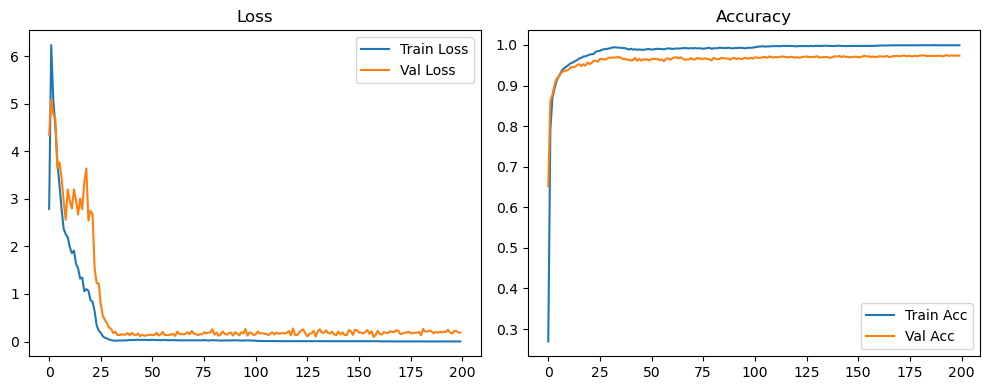

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 50.53it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 51.47it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 51.82it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 51.98it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 52.07it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 52.14it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 52.09it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 52.02it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 51.89it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 52.08it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 52.19it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 52.29it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 52.34it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 52.51it/s]

Original Model Final Test Loss: 0.1811 Accuracy: 0.9742


🚀 Running: batch128_lr0.01_0.005_0.001_dp0.2


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2218 | Val Acc: 0.5032 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2218 | Val Acc: 0.5032 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2218 | Val Acc: 0.5032 |:   0%|          | 1/200 [00:11<37:28, 11.30s/it]

| LR: 0.010 | Train Acc: 0.7043 | Val Acc: 0.8289 |:   0%|          | 1/200 [00:21<37:28, 11.30s/it]

| LR: 0.010 | Train Acc: 0.7043 | Val Acc: 0.8289 |:   0%|          | 1/200 [00:21<37:28, 11.30s/it]

| LR: 0.010 | Train Acc: 0.7043 | Val Acc: 0.8289 |:   1%|          | 2/200 [00:21<35:57, 10.90s/it]

| LR: 0.010 | Train Acc: 0.8407 | Val Acc: 0.8944 |:   1%|          | 2/200 [00:32<35:57, 10.90s/it]

| LR: 0.010 | Train Acc: 0.8407 | Val Acc: 0.8944 |:   1%|          | 2/200 [00:32<35:57, 10.90s/it]

| LR: 0.010 | Train Acc: 0.8407 | Val Acc: 0.8944 |:   2%|▏         | 3/200 [00:32<35:12, 10.72s/it]

| LR: 0.010 | Train Acc: 0.8780 | Val Acc: 0.9097 |:   2%|▏         | 3/200 [00:43<35:12, 10.72s/it]

| LR: 0.010 | Train Acc: 0.8780 | Val Acc: 0.9097 |:   2%|▏         | 3/200 [00:43<35:12, 10.72s/it]

| LR: 0.010 | Train Acc: 0.8780 | Val Acc: 0.9097 |:   2%|▏         | 4/200 [00:43<35:34, 10.89s/it]

| LR: 0.010 | Train Acc: 0.8962 | Val Acc: 0.9182 |:   2%|▏         | 4/200 [00:54<35:34, 10.89s/it]

| LR: 0.010 | Train Acc: 0.8962 | Val Acc: 0.9182 |:   2%|▏         | 4/200 [00:54<35:34, 10.89s/it]

| LR: 0.010 | Train Acc: 0.8962 | Val Acc: 0.9182 |:   2%|▎         | 5/200 [00:54<35:05, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9085 | Val Acc: 0.9279 |:   2%|▎         | 5/200 [01:04<35:05, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9085 | Val Acc: 0.9279 |:   2%|▎         | 5/200 [01:04<35:05, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9085 | Val Acc: 0.9279 |:   3%|▎         | 6/200 [01:04<34:31, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9201 | Val Acc: 0.9293 |:   3%|▎         | 6/200 [01:15<34:31, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9201 | Val Acc: 0.9293 |:   3%|▎         | 6/200 [01:15<34:31, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9201 | Val Acc: 0.9293 |:   4%|▎         | 7/200 [01:15<34:21, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9404 |:   4%|▎         | 7/200 [01:25<34:21, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9404 |:   4%|▎         | 7/200 [01:25<34:21, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9404 |:   4%|▍         | 8/200 [01:26<34:11, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9302 | Val Acc: 0.9443 |:   4%|▍         | 8/200 [01:36<34:11, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9302 | Val Acc: 0.9443 |:   4%|▍         | 8/200 [01:36<34:11, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9302 | Val Acc: 0.9443 |:   4%|▍         | 9/200 [01:36<34:03, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9372 | Val Acc: 0.9364 |:   4%|▍         | 9/200 [01:47<34:03, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9372 | Val Acc: 0.9364 |:   4%|▍         | 9/200 [01:47<34:03, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9372 | Val Acc: 0.9364 |:   5%|▌         | 10/200 [01:47<33:48, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9413 | Val Acc: 0.9481 |:   5%|▌         | 10/200 [01:57<33:48, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9413 | Val Acc: 0.9481 |:   5%|▌         | 10/200 [01:57<33:48, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9413 | Val Acc: 0.9481 |:   6%|▌         | 11/200 [01:57<33:33, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9421 | Val Acc: 0.9475 |:   6%|▌         | 11/200 [02:09<33:33, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9421 | Val Acc: 0.9475 |:   6%|▌         | 11/200 [02:09<33:33, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9421 | Val Acc: 0.9475 |:   6%|▌         | 12/200 [02:09<34:04, 10.88s/it]

| LR: 0.010 | Train Acc: 0.9469 | Val Acc: 0.9486 |:   6%|▌         | 12/200 [02:20<34:04, 10.88s/it]

| LR: 0.010 | Train Acc: 0.9469 | Val Acc: 0.9486 |:   6%|▌         | 12/200 [02:20<34:04, 10.88s/it]

| LR: 0.010 | Train Acc: 0.9469 | Val Acc: 0.9486 |:   6%|▋         | 13/200 [02:20<34:01, 10.92s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9501 |:   6%|▋         | 13/200 [02:31<34:01, 10.92s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9501 |:   6%|▋         | 13/200 [02:31<34:01, 10.92s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9501 |:   7%|▋         | 14/200 [02:31<33:49, 10.91s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9512 |:   7%|▋         | 14/200 [02:42<33:49, 10.91s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9512 |:   7%|▋         | 14/200 [02:42<33:49, 10.91s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9512 |:   8%|▊         | 15/200 [02:42<33:30, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9523 |:   8%|▊         | 15/200 [02:52<33:30, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9523 |:   8%|▊         | 15/200 [02:52<33:30, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9523 |:   8%|▊         | 16/200 [02:52<33:09, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9583 | Val Acc: 0.9502 |:   8%|▊         | 16/200 [03:03<33:09, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9583 | Val Acc: 0.9502 |:   8%|▊         | 16/200 [03:03<33:09, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9583 | Val Acc: 0.9502 |:   8%|▊         | 17/200 [03:03<32:50, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9585 | Val Acc: 0.9582 |:   8%|▊         | 17/200 [03:14<32:50, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9585 | Val Acc: 0.9582 |:   8%|▊         | 17/200 [03:14<32:50, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9585 | Val Acc: 0.9582 |:   9%|▉         | 18/200 [03:14<33:13, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9616 | Val Acc: 0.9494 |:   9%|▉         | 18/200 [03:26<33:13, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9616 | Val Acc: 0.9494 |:   9%|▉         | 18/200 [03:26<33:13, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9616 | Val Acc: 0.9494 |:  10%|▉         | 19/200 [03:26<34:03, 11.29s/it]

| LR: 0.010 | Train Acc: 0.9649 | Val Acc: 0.9553 |:  10%|▉         | 19/200 [03:37<34:03, 11.29s/it]

| LR: 0.010 | Train Acc: 0.9649 | Val Acc: 0.9553 |:  10%|▉         | 19/200 [03:37<34:03, 11.29s/it]

| LR: 0.010 | Train Acc: 0.9649 | Val Acc: 0.9553 |:  10%|█         | 20/200 [03:37<33:28, 11.16s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9617 |:  10%|█         | 20/200 [03:48<33:28, 11.16s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9617 |:  10%|█         | 20/200 [03:48<33:28, 11.16s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9617 |:  10%|█         | 21/200 [03:48<32:48, 10.99s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9651 |:  10%|█         | 21/200 [03:58<32:48, 10.99s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9651 |:  10%|█         | 21/200 [03:58<32:48, 10.99s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9651 |:  11%|█         | 22/200 [03:58<32:15, 10.88s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9632 |:  11%|█         | 22/200 [04:09<32:15, 10.88s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9632 |:  11%|█         | 22/200 [04:09<32:15, 10.88s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9632 |:  12%|█▏        | 23/200 [04:09<32:00, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9686 |:  12%|█▏        | 23/200 [04:20<32:00, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9686 |:  12%|█▏        | 23/200 [04:20<32:00, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9686 |:  12%|█▏        | 24/200 [04:20<32:10, 10.97s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9694 |:  12%|█▏        | 24/200 [04:33<32:10, 10.97s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9694 |:  12%|█▏        | 24/200 [04:33<32:10, 10.97s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9694 |:  12%|█▎        | 25/200 [04:33<33:23, 11.45s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9699 |:  12%|█▎        | 25/200 [04:45<33:23, 11.45s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9699 |:  12%|█▎        | 25/200 [04:45<33:23, 11.45s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9699 |:  13%|█▎        | 26/200 [04:45<33:59, 11.72s/it]

| LR: 0.010 | Train Acc: 0.9870 | Val Acc: 0.9712 |:  13%|█▎        | 26/200 [04:56<33:59, 11.72s/it]

| LR: 0.010 | Train Acc: 0.9870 | Val Acc: 0.9712 |:  13%|█▎        | 26/200 [04:56<33:59, 11.72s/it]

| LR: 0.010 | Train Acc: 0.9870 | Val Acc: 0.9712 |:  14%|█▎        | 27/200 [04:56<33:04, 11.47s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9708 |:  14%|█▎        | 27/200 [05:07<33:04, 11.47s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9708 |:  14%|█▎        | 27/200 [05:07<33:04, 11.47s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9708 |:  14%|█▍        | 28/200 [05:07<32:35, 11.37s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9703 |:  14%|█▍        | 28/200 [05:18<32:35, 11.37s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9703 |:  14%|█▍        | 28/200 [05:18<32:35, 11.37s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9703 |:  14%|█▍        | 29/200 [05:18<31:44, 11.13s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9726 |:  14%|█▍        | 29/200 [05:29<31:44, 11.13s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9726 |:  14%|█▍        | 29/200 [05:29<31:44, 11.13s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9726 |:  15%|█▌        | 30/200 [05:29<31:14, 11.03s/it]

| LR: 0.010 | Train Acc: 0.9900 | Val Acc: 0.9709 |:  15%|█▌        | 30/200 [05:39<31:14, 11.03s/it]

| LR: 0.010 | Train Acc: 0.9900 | Val Acc: 0.9709 |:  15%|█▌        | 30/200 [05:39<31:14, 11.03s/it]

| LR: 0.010 | Train Acc: 0.9900 | Val Acc: 0.9709 |:  16%|█▌        | 31/200 [05:39<30:45, 10.92s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9723 |:  16%|█▌        | 31/200 [05:50<30:45, 10.92s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9723 |:  16%|█▌        | 31/200 [05:50<30:45, 10.92s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9723 |:  16%|█▌        | 32/200 [05:50<30:11, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9707 |:  16%|█▌        | 32/200 [06:00<30:11, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9707 |:  16%|█▌        | 32/200 [06:00<30:11, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9707 |:  16%|█▋        | 33/200 [06:00<29:40, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9880 | Val Acc: 0.9717 |:  16%|█▋        | 33/200 [06:11<29:40, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9880 | Val Acc: 0.9717 |:  16%|█▋        | 33/200 [06:11<29:40, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9880 | Val Acc: 0.9717 |:  17%|█▋        | 34/200 [06:11<29:25, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9695 |:  17%|█▋        | 34/200 [06:21<29:25, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9695 |:  17%|█▋        | 34/200 [06:21<29:25, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9695 |:  18%|█▊        | 35/200 [06:21<29:12, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9657 |:  18%|█▊        | 35/200 [06:32<29:12, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9657 |:  18%|█▊        | 35/200 [06:32<29:12, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9657 |:  18%|█▊        | 36/200 [06:32<29:06, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9677 |:  18%|█▊        | 36/200 [06:43<29:06, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9677 |:  18%|█▊        | 36/200 [06:43<29:06, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9677 |:  18%|█▊        | 37/200 [06:43<28:57, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9636 |:  18%|█▊        | 37/200 [06:53<28:57, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9636 |:  18%|█▊        | 37/200 [06:53<28:57, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9636 |:  19%|█▉        | 38/200 [06:53<28:41, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9668 |:  19%|█▉        | 38/200 [07:04<28:41, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9668 |:  19%|█▉        | 38/200 [07:04<28:41, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9668 |:  20%|█▉        | 39/200 [07:04<28:31, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9659 |:  20%|█▉        | 39/200 [07:15<28:31, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9659 |:  20%|█▉        | 39/200 [07:15<28:31, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9659 |:  20%|██        | 40/200 [07:15<28:23, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9663 |:  20%|██        | 40/200 [07:25<28:23, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9663 |:  20%|██        | 40/200 [07:25<28:23, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9663 |:  20%|██        | 41/200 [07:25<28:13, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9786 | Val Acc: 0.9648 |:  20%|██        | 41/200 [07:36<28:13, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9786 | Val Acc: 0.9648 |:  20%|██        | 41/200 [07:36<28:13, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9786 | Val Acc: 0.9648 |:  21%|██        | 42/200 [07:36<27:58, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9774 | Val Acc: 0.9657 |:  21%|██        | 42/200 [07:47<27:58, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9774 | Val Acc: 0.9657 |:  21%|██        | 42/200 [07:47<27:58, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9774 | Val Acc: 0.9657 |:  22%|██▏       | 43/200 [07:47<28:00, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9648 |:  22%|██▏       | 43/200 [07:57<28:00, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9648 |:  22%|██▏       | 43/200 [07:58<28:00, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9648 |:  22%|██▏       | 44/200 [07:58<27:50, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9778 | Val Acc: 0.9627 |:  22%|██▏       | 44/200 [08:08<27:50, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9778 | Val Acc: 0.9627 |:  22%|██▏       | 44/200 [08:08<27:50, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9778 | Val Acc: 0.9627 |:  22%|██▎       | 45/200 [08:08<27:35, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9643 |:  22%|██▎       | 45/200 [08:19<27:35, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9643 |:  22%|██▎       | 45/200 [08:19<27:35, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9643 |:  23%|██▎       | 46/200 [08:19<27:22, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9579 |:  23%|██▎       | 46/200 [08:29<27:22, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9579 |:  23%|██▎       | 46/200 [08:29<27:22, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9579 |:  24%|██▎       | 47/200 [08:29<27:12, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9657 |:  24%|██▎       | 47/200 [08:40<27:12, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9657 |:  24%|██▎       | 47/200 [08:40<27:12, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9657 |:  24%|██▍       | 48/200 [08:40<26:56, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9656 |:  24%|██▍       | 48/200 [08:50<26:56, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9656 |:  24%|██▍       | 48/200 [08:50<26:56, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9656 |:  24%|██▍       | 49/200 [08:50<26:38, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9652 |:  24%|██▍       | 49/200 [09:02<26:38, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9652 |:  24%|██▍       | 49/200 [09:02<26:38, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9652 |:  25%|██▌       | 50/200 [09:02<26:48, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9651 |:  25%|██▌       | 50/200 [09:12<26:48, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9651 |:  25%|██▌       | 50/200 [09:12<26:48, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9651 |:  26%|██▌       | 51/200 [09:12<26:30, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9643 |:  26%|██▌       | 51/200 [09:23<26:30, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9643 |:  26%|██▌       | 51/200 [09:23<26:30, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9643 |:  26%|██▌       | 52/200 [09:23<26:20, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9645 |:  26%|██▌       | 52/200 [09:33<26:20, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9645 |:  26%|██▌       | 52/200 [09:33<26:20, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9645 |:  26%|██▋       | 53/200 [09:33<26:04, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9780 | Val Acc: 0.9652 |:  26%|██▋       | 53/200 [09:44<26:04, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9780 | Val Acc: 0.9652 |:  26%|██▋       | 53/200 [09:44<26:04, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9780 | Val Acc: 0.9652 |:  27%|██▋       | 54/200 [09:44<25:49, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9670 |:  27%|██▋       | 54/200 [09:54<25:49, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9670 |:  27%|██▋       | 54/200 [09:54<25:49, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9670 |:  28%|██▊       | 55/200 [09:54<25:37, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9653 |:  28%|██▊       | 55/200 [10:05<25:37, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9653 |:  28%|██▊       | 55/200 [10:05<25:37, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9653 |:  28%|██▊       | 56/200 [10:05<25:20, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9666 |:  28%|██▊       | 56/200 [10:16<25:20, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9666 |:  28%|██▊       | 56/200 [10:16<25:20, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9666 |:  28%|██▊       | 57/200 [10:16<25:13, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9670 |:  28%|██▊       | 57/200 [10:26<25:13, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9670 |:  28%|██▊       | 57/200 [10:26<25:13, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9670 |:  29%|██▉       | 58/200 [10:26<25:01, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9648 |:  29%|██▉       | 58/200 [10:37<25:01, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9648 |:  29%|██▉       | 58/200 [10:37<25:01, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9648 |:  30%|██▉       | 59/200 [10:37<24:48, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9667 |:  30%|██▉       | 59/200 [10:47<24:48, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9667 |:  30%|██▉       | 59/200 [10:47<24:48, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9667 |:  30%|███       | 60/200 [10:47<24:39, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9669 |:  30%|███       | 60/200 [10:58<24:39, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9669 |:  30%|███       | 60/200 [10:58<24:39, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9669 |:  30%|███       | 61/200 [10:58<24:30, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  30%|███       | 61/200 [11:08<24:30, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  30%|███       | 61/200 [11:08<24:30, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  31%|███       | 62/200 [11:08<24:18, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9669 |:  31%|███       | 62/200 [11:19<24:18, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9669 |:  31%|███       | 62/200 [11:19<24:18, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9669 |:  32%|███▏      | 63/200 [11:19<24:14, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  32%|███▏      | 63/200 [11:30<24:14, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  32%|███▏      | 63/200 [11:30<24:14, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  32%|███▏      | 64/200 [11:30<24:03, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9665 |:  32%|███▏      | 64/200 [11:40<24:03, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9665 |:  32%|███▏      | 64/200 [11:40<24:03, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9665 |:  32%|███▎      | 65/200 [11:41<24:01, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9677 |:  32%|███▎      | 65/200 [11:51<24:01, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9677 |:  32%|███▎      | 65/200 [11:51<24:01, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9677 |:  33%|███▎      | 66/200 [11:51<23:42, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9642 |:  33%|███▎      | 66/200 [12:01<23:42, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9642 |:  33%|███▎      | 66/200 [12:01<23:42, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9642 |:  34%|███▎      | 67/200 [12:02<23:26, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9672 |:  34%|███▎      | 67/200 [12:12<23:26, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9672 |:  34%|███▎      | 67/200 [12:12<23:26, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9672 |:  34%|███▍      | 68/200 [12:12<23:23, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9660 |:  34%|███▍      | 68/200 [12:23<23:23, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9660 |:  34%|███▍      | 68/200 [12:23<23:23, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9660 |:  34%|███▍      | 69/200 [12:23<23:09, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9658 |:  34%|███▍      | 69/200 [12:33<23:09, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9658 |:  34%|███▍      | 69/200 [12:33<23:09, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9658 |:  35%|███▌      | 70/200 [12:33<22:56, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9663 |:  35%|███▌      | 70/200 [12:44<22:56, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9663 |:  35%|███▌      | 70/200 [12:44<22:56, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9663 |:  36%|███▌      | 71/200 [12:44<22:49, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9671 |:  36%|███▌      | 71/200 [12:55<22:49, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9671 |:  36%|███▌      | 71/200 [12:55<22:49, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9671 |:  36%|███▌      | 72/200 [12:55<22:37, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9676 |:  36%|███▌      | 72/200 [13:05<22:37, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9676 |:  36%|███▌      | 72/200 [13:05<22:37, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9676 |:  36%|███▋      | 73/200 [13:05<22:24, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9676 |:  36%|███▋      | 73/200 [13:16<22:24, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9676 |:  36%|███▋      | 73/200 [13:16<22:24, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9676 |:  37%|███▋      | 74/200 [13:16<22:18, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9669 |:  37%|███▋      | 74/200 [13:26<22:18, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9669 |:  37%|███▋      | 74/200 [13:26<22:18, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9669 |:  38%|███▊      | 75/200 [13:26<22:05, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9649 |:  38%|███▊      | 75/200 [13:37<22:05, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9649 |:  38%|███▊      | 75/200 [13:37<22:05, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9649 |:  38%|███▊      | 76/200 [13:37<21:56, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9659 |:  38%|███▊      | 76/200 [13:48<21:56, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9659 |:  38%|███▊      | 76/200 [13:48<21:56, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9659 |:  38%|███▊      | 77/200 [13:48<21:43, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9667 |:  38%|███▊      | 77/200 [13:58<21:43, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9667 |:  38%|███▊      | 77/200 [13:58<21:43, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9667 |:  39%|███▉      | 78/200 [13:58<21:32, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9675 |:  39%|███▉      | 78/200 [14:09<21:32, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9675 |:  39%|███▉      | 78/200 [14:09<21:32, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9675 |:  40%|███▉      | 79/200 [14:09<21:22, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9678 |:  40%|███▉      | 79/200 [14:19<21:22, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9678 |:  40%|███▉      | 79/200 [14:19<21:22, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9678 |:  40%|████      | 80/200 [14:20<21:15, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9811 | Val Acc: 0.9670 |:  40%|████      | 80/200 [14:30<21:15, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9811 | Val Acc: 0.9670 |:  40%|████      | 80/200 [14:30<21:15, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9811 | Val Acc: 0.9670 |:  40%|████      | 81/200 [14:30<21:04, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9672 |:  40%|████      | 81/200 [14:41<21:04, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9672 |:  40%|████      | 81/200 [14:41<21:04, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9672 |:  41%|████      | 82/200 [14:41<21:13, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9796 | Val Acc: 0.9660 |:  41%|████      | 82/200 [14:53<21:13, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9796 | Val Acc: 0.9660 |:  41%|████      | 82/200 [14:53<21:13, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9796 | Val Acc: 0.9660 |:  42%|████▏     | 83/200 [14:53<21:41, 11.12s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9641 |:  42%|████▏     | 83/200 [15:04<21:41, 11.12s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9641 |:  42%|████▏     | 83/200 [15:04<21:41, 11.12s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9641 |:  42%|████▏     | 84/200 [15:04<21:16, 11.00s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9653 |:  42%|████▏     | 84/200 [15:15<21:16, 11.00s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9653 |:  42%|████▏     | 84/200 [15:15<21:16, 11.00s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9653 |:  42%|████▎     | 85/200 [15:15<20:53, 10.90s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9660 |:  42%|████▎     | 85/200 [15:25<20:53, 10.90s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9660 |:  42%|████▎     | 85/200 [15:25<20:53, 10.90s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9660 |:  43%|████▎     | 86/200 [15:25<20:35, 10.84s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9661 |:  43%|████▎     | 86/200 [15:37<20:35, 10.84s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9661 |:  43%|████▎     | 86/200 [15:37<20:35, 10.84s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9661 |:  44%|████▎     | 87/200 [15:37<20:56, 11.12s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9668 |:  44%|████▎     | 87/200 [15:49<20:56, 11.12s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9668 |:  44%|████▎     | 87/200 [15:49<20:56, 11.12s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9668 |:  44%|████▍     | 88/200 [15:49<21:21, 11.45s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9669 |:  44%|████▍     | 88/200 [16:00<21:21, 11.45s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9669 |:  44%|████▍     | 88/200 [16:00<21:21, 11.45s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9669 |:  44%|████▍     | 89/200 [16:00<20:46, 11.23s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9678 |:  44%|████▍     | 89/200 [16:11<20:46, 11.23s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9678 |:  44%|████▍     | 89/200 [16:11<20:46, 11.23s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9678 |:  45%|████▌     | 90/200 [16:11<20:20, 11.09s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9673 |:  45%|████▌     | 90/200 [16:22<20:20, 11.09s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9673 |:  45%|████▌     | 90/200 [16:22<20:20, 11.09s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9673 |:  46%|████▌     | 91/200 [16:22<20:12, 11.12s/it]

| LR: 0.010 | Train Acc: 0.9794 | Val Acc: 0.9636 |:  46%|████▌     | 91/200 [16:33<20:12, 11.12s/it]

| LR: 0.010 | Train Acc: 0.9794 | Val Acc: 0.9636 |:  46%|████▌     | 91/200 [16:33<20:12, 11.12s/it]

| LR: 0.010 | Train Acc: 0.9794 | Val Acc: 0.9636 |:  46%|████▌     | 92/200 [16:33<19:50, 11.02s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9681 |:  46%|████▌     | 92/200 [16:44<19:50, 11.02s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9681 |:  46%|████▌     | 92/200 [16:44<19:50, 11.02s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9681 |:  46%|████▋     | 93/200 [16:44<19:34, 10.98s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9667 |:  46%|████▋     | 93/200 [16:54<19:34, 10.98s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9667 |:  46%|████▋     | 93/200 [16:54<19:34, 10.98s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9667 |:  47%|████▋     | 94/200 [16:54<19:16, 10.91s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9666 |:  47%|████▋     | 94/200 [17:05<19:16, 10.91s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9666 |:  47%|████▋     | 94/200 [17:05<19:16, 10.91s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9666 |:  48%|████▊     | 95/200 [17:05<19:08, 10.93s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9682 |:  48%|████▊     | 95/200 [17:16<19:08, 10.93s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9682 |:  48%|████▊     | 95/200 [17:16<19:08, 10.93s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9682 |:  48%|████▊     | 96/200 [17:16<18:52, 10.89s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9662 |:  48%|████▊     | 96/200 [17:27<18:52, 10.89s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9662 |:  48%|████▊     | 96/200 [17:27<18:52, 10.89s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9662 |:  48%|████▊     | 97/200 [17:27<18:30, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9667 |:  48%|████▊     | 97/200 [17:37<18:30, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9667 |:  48%|████▊     | 97/200 [17:37<18:30, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9667 |:  49%|████▉     | 98/200 [17:37<18:19, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9671 |:  49%|████▉     | 98/200 [17:48<18:19, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9671 |:  49%|████▉     | 98/200 [17:48<18:19, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9671 |:  50%|████▉     | 99/200 [17:48<18:01, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9679 |:  50%|████▉     | 99/200 [17:59<18:01, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9679 |:  50%|████▉     | 99/200 [17:59<18:01, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9679 |:  50%|█████     | 100/200 [17:59<17:45, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9683 |:  50%|█████     | 100/200 [18:09<17:45, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9683 |:  50%|█████     | 100/200 [18:09<17:45, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9683 |:  50%|█████     | 101/200 [18:09<17:33, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9699 |:  50%|█████     | 101/200 [18:20<17:33, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9699 |:  50%|█████     | 101/200 [18:20<17:33, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9845 | Val Acc: 0.9699 |:  51%|█████     | 102/200 [18:20<17:19, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9858 | Val Acc: 0.9703 |:  51%|█████     | 102/200 [18:30<17:19, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9858 | Val Acc: 0.9703 |:  51%|█████     | 102/200 [18:30<17:19, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9858 | Val Acc: 0.9703 |:  52%|█████▏    | 103/200 [18:30<17:10, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9855 | Val Acc: 0.9703 |:  52%|█████▏    | 103/200 [18:41<17:10, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9855 | Val Acc: 0.9703 |:  52%|█████▏    | 103/200 [18:41<17:10, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9855 | Val Acc: 0.9703 |:  52%|█████▏    | 104/200 [18:41<17:08, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9863 | Val Acc: 0.9712 |:  52%|█████▏    | 104/200 [18:52<17:08, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9863 | Val Acc: 0.9712 |:  52%|█████▏    | 104/200 [18:52<17:08, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9863 | Val Acc: 0.9712 |:  52%|█████▎    | 105/200 [18:52<16:57, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9863 | Val Acc: 0.9704 |:  52%|█████▎    | 105/200 [19:03<16:57, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9863 | Val Acc: 0.9704 |:  52%|█████▎    | 105/200 [19:03<16:57, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9863 | Val Acc: 0.9704 |:  53%|█████▎    | 106/200 [19:03<16:43, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9867 | Val Acc: 0.9705 |:  53%|█████▎    | 106/200 [19:14<16:43, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9867 | Val Acc: 0.9705 |:  53%|█████▎    | 106/200 [19:14<16:43, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9867 | Val Acc: 0.9705 |:  54%|█████▎    | 107/200 [19:14<16:44, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9870 | Val Acc: 0.9711 |:  54%|█████▎    | 107/200 [19:24<16:44, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9870 | Val Acc: 0.9711 |:  54%|█████▎    | 107/200 [19:24<16:44, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9870 | Val Acc: 0.9711 |:  54%|█████▍    | 108/200 [19:24<16:27, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9872 | Val Acc: 0.9701 |:  54%|█████▍    | 108/200 [19:35<16:27, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9872 | Val Acc: 0.9701 |:  54%|█████▍    | 108/200 [19:35<16:27, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9872 | Val Acc: 0.9701 |:  55%|█████▍    | 109/200 [19:35<16:11, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9881 | Val Acc: 0.9717 |:  55%|█████▍    | 109/200 [19:45<16:11, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9881 | Val Acc: 0.9717 |:  55%|█████▍    | 109/200 [19:45<16:11, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9881 | Val Acc: 0.9717 |:  55%|█████▌    | 110/200 [19:45<15:59, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9722 |:  55%|█████▌    | 110/200 [19:57<15:59, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9722 |:  55%|█████▌    | 110/200 [19:57<15:59, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9722 |:  56%|█████▌    | 111/200 [19:57<16:04, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9877 | Val Acc: 0.9708 |:  56%|█████▌    | 111/200 [20:07<16:04, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9877 | Val Acc: 0.9708 |:  56%|█████▌    | 111/200 [20:07<16:04, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9877 | Val Acc: 0.9708 |:  56%|█████▌    | 112/200 [20:07<15:48, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9709 |:  56%|█████▌    | 112/200 [20:18<15:48, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9709 |:  56%|█████▌    | 112/200 [20:18<15:48, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9709 |:  56%|█████▋    | 113/200 [20:18<15:33, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9710 |:  56%|█████▋    | 113/200 [20:29<15:33, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9710 |:  56%|█████▋    | 113/200 [20:29<15:33, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9710 |:  57%|█████▋    | 114/200 [20:29<15:22, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9885 | Val Acc: 0.9714 |:  57%|█████▋    | 114/200 [20:39<15:22, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9885 | Val Acc: 0.9714 |:  57%|█████▋    | 114/200 [20:39<15:22, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9885 | Val Acc: 0.9714 |:  57%|█████▊    | 115/200 [20:39<15:13, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9878 | Val Acc: 0.9693 |:  57%|█████▊    | 115/200 [20:50<15:13, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9878 | Val Acc: 0.9693 |:  57%|█████▊    | 115/200 [20:50<15:13, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9878 | Val Acc: 0.9693 |:  58%|█████▊    | 116/200 [20:50<15:00, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9721 |:  58%|█████▊    | 116/200 [21:01<15:00, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9721 |:  58%|█████▊    | 116/200 [21:01<15:00, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9721 |:  58%|█████▊    | 117/200 [21:01<14:48, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9691 |:  58%|█████▊    | 117/200 [21:11<14:48, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9691 |:  58%|█████▊    | 117/200 [21:11<14:48, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9691 |:  59%|█████▉    | 118/200 [21:11<14:37, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9893 | Val Acc: 0.9720 |:  59%|█████▉    | 118/200 [21:22<14:37, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9893 | Val Acc: 0.9720 |:  59%|█████▉    | 118/200 [21:22<14:37, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9893 | Val Acc: 0.9720 |:  60%|█████▉    | 119/200 [21:22<14:23, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9722 |:  60%|█████▉    | 119/200 [21:32<14:23, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9722 |:  60%|█████▉    | 119/200 [21:32<14:23, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9722 |:  60%|██████    | 120/200 [21:33<14:09, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9713 |:  60%|██████    | 120/200 [21:43<14:09, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9713 |:  60%|██████    | 120/200 [21:43<14:09, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9713 |:  60%|██████    | 121/200 [21:43<13:56, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9723 |:  60%|██████    | 121/200 [21:54<13:56, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9723 |:  60%|██████    | 121/200 [21:54<13:56, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9723 |:  61%|██████    | 122/200 [21:54<13:51, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9699 |:  61%|██████    | 122/200 [22:04<13:51, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9699 |:  61%|██████    | 122/200 [22:04<13:51, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9699 |:  62%|██████▏   | 123/200 [22:04<13:37, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9720 |:  62%|██████▏   | 123/200 [22:15<13:37, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9720 |:  62%|██████▏   | 123/200 [22:15<13:37, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9720 |:  62%|██████▏   | 124/200 [22:15<13:25, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9712 |:  62%|██████▏   | 124/200 [22:26<13:25, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9712 |:  62%|██████▏   | 124/200 [22:26<13:25, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9712 |:  62%|██████▎   | 125/200 [22:26<13:14, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9893 | Val Acc: 0.9702 |:  62%|██████▎   | 125/200 [22:36<13:14, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9893 | Val Acc: 0.9702 |:  62%|██████▎   | 125/200 [22:36<13:14, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9893 | Val Acc: 0.9702 |:  63%|██████▎   | 126/200 [22:36<13:05, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9898 | Val Acc: 0.9726 |:  63%|██████▎   | 126/200 [22:47<13:05, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9898 | Val Acc: 0.9726 |:  63%|██████▎   | 126/200 [22:47<13:05, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9898 | Val Acc: 0.9726 |:  64%|██████▎   | 127/200 [22:47<12:54, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9898 | Val Acc: 0.9732 |:  64%|██████▎   | 127/200 [22:57<12:54, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9898 | Val Acc: 0.9732 |:  64%|██████▎   | 127/200 [22:57<12:54, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9898 | Val Acc: 0.9732 |:  64%|██████▍   | 128/200 [22:57<12:39, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9713 |:  64%|██████▍   | 128/200 [23:08<12:39, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9713 |:  64%|██████▍   | 128/200 [23:08<12:39, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9713 |:  64%|██████▍   | 129/200 [23:08<12:31, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9726 |:  64%|██████▍   | 129/200 [23:19<12:31, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9726 |:  64%|██████▍   | 129/200 [23:19<12:31, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9726 |:  65%|██████▌   | 130/200 [23:19<12:22, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9898 | Val Acc: 0.9723 |:  65%|██████▌   | 130/200 [23:29<12:22, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9898 | Val Acc: 0.9723 |:  65%|██████▌   | 130/200 [23:29<12:22, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9898 | Val Acc: 0.9723 |:  66%|██████▌   | 131/200 [23:29<12:10, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9695 |:  66%|██████▌   | 131/200 [23:40<12:10, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9695 |:  66%|██████▌   | 131/200 [23:40<12:10, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9695 |:  66%|██████▌   | 132/200 [23:40<12:01, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9703 |:  66%|██████▌   | 132/200 [23:50<12:01, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9703 |:  66%|██████▌   | 132/200 [23:50<12:01, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9703 |:  66%|██████▋   | 133/200 [23:50<11:52, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9707 |:  66%|██████▋   | 133/200 [24:01<11:52, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9707 |:  66%|██████▋   | 133/200 [24:01<11:52, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9707 |:  67%|██████▋   | 134/200 [24:01<11:41, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9715 |:  67%|██████▋   | 134/200 [24:12<11:41, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9715 |:  67%|██████▋   | 134/200 [24:12<11:41, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9715 |:  68%|██████▊   | 135/200 [24:12<11:29, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9712 |:  68%|██████▊   | 135/200 [24:22<11:29, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9712 |:  68%|██████▊   | 135/200 [24:22<11:29, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9712 |:  68%|██████▊   | 136/200 [24:22<11:23, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9712 |:  68%|██████▊   | 136/200 [24:33<11:23, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9712 |:  68%|██████▊   | 136/200 [24:33<11:23, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9712 |:  68%|██████▊   | 137/200 [24:33<11:14, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9722 |:  68%|██████▊   | 137/200 [24:44<11:14, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9722 |:  68%|██████▊   | 137/200 [24:44<11:14, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9722 |:  69%|██████▉   | 138/200 [24:44<11:02, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9715 |:  69%|██████▉   | 138/200 [24:54<11:02, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9715 |:  69%|██████▉   | 138/200 [24:54<11:02, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9715 |:  70%|██████▉   | 139/200 [24:54<10:50, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9715 |:  70%|██████▉   | 139/200 [25:05<10:50, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9715 |:  70%|██████▉   | 139/200 [25:05<10:50, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9715 |:  70%|███████   | 140/200 [25:05<10:42, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9717 |:  70%|███████   | 140/200 [25:16<10:42, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9717 |:  70%|███████   | 140/200 [25:16<10:42, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9717 |:  70%|███████   | 141/200 [25:16<10:33, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9724 |:  70%|███████   | 141/200 [25:27<10:33, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9724 |:  70%|███████   | 141/200 [25:27<10:33, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9724 |:  71%|███████   | 142/200 [25:27<10:22, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9718 |:  71%|███████   | 142/200 [25:37<10:22, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9718 |:  71%|███████   | 142/200 [25:37<10:22, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9718 |:  72%|███████▏  | 143/200 [25:37<10:10, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9713 |:  72%|███████▏  | 143/200 [25:48<10:10, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9713 |:  72%|███████▏  | 143/200 [25:48<10:10, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9713 |:  72%|███████▏  | 144/200 [25:48<10:01, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9722 |:  72%|███████▏  | 144/200 [26:00<10:01, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9722 |:  72%|███████▏  | 144/200 [26:00<10:01, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9722 |:  72%|███████▎  | 145/200 [26:01<10:15, 11.20s/it]

| LR: 0.005 | Train Acc: 0.9903 | Val Acc: 0.9716 |:  72%|███████▎  | 145/200 [26:13<10:15, 11.20s/it]

| LR: 0.005 | Train Acc: 0.9903 | Val Acc: 0.9716 |:  72%|███████▎  | 145/200 [26:13<10:15, 11.20s/it]

| LR: 0.005 | Train Acc: 0.9903 | Val Acc: 0.9716 |:  73%|███████▎  | 146/200 [26:13<10:27, 11.62s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9708 |:  73%|███████▎  | 146/200 [26:25<10:27, 11.62s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9708 |:  73%|███████▎  | 146/200 [26:25<10:27, 11.62s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9708 |:  74%|███████▎  | 147/200 [26:25<10:25, 11.81s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9732 |:  74%|███████▎  | 147/200 [26:37<10:25, 11.81s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9732 |:  74%|███████▎  | 147/200 [26:37<10:25, 11.81s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9732 |:  74%|███████▍  | 148/200 [26:37<10:04, 11.63s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9722 |:  74%|███████▍  | 148/200 [26:48<10:04, 11.63s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9722 |:  74%|███████▍  | 148/200 [26:48<10:04, 11.63s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9722 |:  74%|███████▍  | 149/200 [26:48<09:55, 11.68s/it]

| LR: 0.005 | Train Acc: 0.9913 | Val Acc: 0.9692 |:  74%|███████▍  | 149/200 [26:59<09:55, 11.68s/it]

| LR: 0.005 | Train Acc: 0.9913 | Val Acc: 0.9692 |:  74%|███████▍  | 149/200 [26:59<09:55, 11.68s/it]

| LR: 0.005 | Train Acc: 0.9913 | Val Acc: 0.9692 |:  75%|███████▌  | 150/200 [26:59<09:29, 11.40s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9696 |:  75%|███████▌  | 150/200 [27:10<09:29, 11.40s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9696 |:  75%|███████▌  | 150/200 [27:10<09:29, 11.40s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9696 |:  76%|███████▌  | 151/200 [27:10<09:06, 11.16s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9711 |:  76%|███████▌  | 151/200 [27:20<09:06, 11.16s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9711 |:  76%|███████▌  | 151/200 [27:20<09:06, 11.16s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9711 |:  76%|███████▌  | 152/200 [27:20<08:47, 10.99s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9726 |:  76%|███████▌  | 152/200 [27:31<08:47, 10.99s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9726 |:  76%|███████▌  | 152/200 [27:31<08:47, 10.99s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9726 |:  76%|███████▋  | 153/200 [27:31<08:31, 10.88s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9726 |:  76%|███████▋  | 153/200 [27:42<08:31, 10.88s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9726 |:  76%|███████▋  | 153/200 [27:42<08:31, 10.88s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9726 |:  77%|███████▋  | 154/200 [27:42<08:25, 10.99s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9740 |:  77%|███████▋  | 154/200 [27:53<08:25, 10.99s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9740 |:  77%|███████▋  | 154/200 [27:53<08:25, 10.99s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9740 |:  78%|███████▊  | 155/200 [27:53<08:11, 10.91s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9718 |:  78%|███████▊  | 155/200 [28:04<08:11, 10.91s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9718 |:  78%|███████▊  | 155/200 [28:04<08:11, 10.91s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9718 |:  78%|███████▊  | 156/200 [28:04<07:58, 10.88s/it]

| LR: 0.005 | Train Acc: 0.9913 | Val Acc: 0.9728 |:  78%|███████▊  | 156/200 [28:14<07:58, 10.88s/it]

| LR: 0.005 | Train Acc: 0.9913 | Val Acc: 0.9728 |:  78%|███████▊  | 156/200 [28:14<07:58, 10.88s/it]

| LR: 0.005 | Train Acc: 0.9913 | Val Acc: 0.9728 |:  78%|███████▊  | 157/200 [28:14<07:44, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9713 |:  78%|███████▊  | 157/200 [28:25<07:44, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9713 |:  78%|███████▊  | 157/200 [28:25<07:44, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9713 |:  79%|███████▉  | 158/200 [28:25<07:30, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9906 | Val Acc: 0.9738 |:  79%|███████▉  | 158/200 [28:35<07:30, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9906 | Val Acc: 0.9738 |:  79%|███████▉  | 158/200 [28:35<07:30, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9906 | Val Acc: 0.9738 |:  80%|███████▉  | 159/200 [28:35<07:14, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9707 |:  80%|███████▉  | 159/200 [28:46<07:14, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9707 |:  80%|███████▉  | 159/200 [28:46<07:14, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9707 |:  80%|████████  | 160/200 [28:46<07:03, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9916 | Val Acc: 0.9714 |:  80%|████████  | 160/200 [28:56<07:03, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9916 | Val Acc: 0.9714 |:  80%|████████  | 160/200 [28:56<07:03, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9916 | Val Acc: 0.9714 |:  80%|████████  | 161/200 [28:56<06:53, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9718 |:  80%|████████  | 161/200 [29:07<06:53, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9718 |:  80%|████████  | 161/200 [29:07<06:53, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9718 |:  81%|████████  | 162/200 [29:07<06:43, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9921 | Val Acc: 0.9727 |:  81%|████████  | 162/200 [29:18<06:43, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9921 | Val Acc: 0.9727 |:  81%|████████  | 162/200 [29:18<06:43, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9921 | Val Acc: 0.9727 |:  82%|████████▏ | 163/200 [29:18<06:32, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9921 | Val Acc: 0.9728 |:  82%|████████▏ | 163/200 [29:28<06:32, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9921 | Val Acc: 0.9728 |:  82%|████████▏ | 163/200 [29:28<06:32, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9921 | Val Acc: 0.9728 |:  82%|████████▏ | 164/200 [29:28<06:21, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9922 | Val Acc: 0.9725 |:  82%|████████▏ | 164/200 [29:39<06:21, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9922 | Val Acc: 0.9725 |:  82%|████████▏ | 164/200 [29:39<06:21, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9922 | Val Acc: 0.9725 |:  82%|████████▎ | 165/200 [29:39<06:09, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9931 | Val Acc: 0.9736 |:  82%|████████▎ | 165/200 [29:49<06:09, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9931 | Val Acc: 0.9736 |:  82%|████████▎ | 165/200 [29:49<06:09, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9931 | Val Acc: 0.9736 |:  83%|████████▎ | 166/200 [29:49<05:59, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9932 | Val Acc: 0.9728 |:  83%|████████▎ | 166/200 [30:00<05:59, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9932 | Val Acc: 0.9728 |:  83%|████████▎ | 166/200 [30:00<05:59, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9932 | Val Acc: 0.9728 |:  84%|████████▎ | 167/200 [30:00<05:50, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9735 |:  84%|████████▎ | 167/200 [30:11<05:50, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9735 |:  84%|████████▎ | 167/200 [30:11<05:50, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9735 |:  84%|████████▍ | 168/200 [30:11<05:40, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9730 |:  84%|████████▍ | 168/200 [30:21<05:40, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9730 |:  84%|████████▍ | 168/200 [30:21<05:40, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9730 |:  84%|████████▍ | 169/200 [30:21<05:30, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9730 |:  84%|████████▍ | 169/200 [30:32<05:30, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9730 |:  84%|████████▍ | 169/200 [30:32<05:30, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9730 |:  85%|████████▌ | 170/200 [30:32<05:18, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9734 |:  85%|████████▌ | 170/200 [30:43<05:18, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9734 |:  85%|████████▌ | 170/200 [30:43<05:18, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9734 |:  86%|████████▌ | 171/200 [30:43<05:09, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9724 |:  86%|████████▌ | 171/200 [30:53<05:09, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9724 |:  86%|████████▌ | 171/200 [30:53<05:09, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9724 |:  86%|████████▌ | 172/200 [30:53<04:57, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9722 |:  86%|████████▌ | 172/200 [31:04<04:57, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9722 |:  86%|████████▌ | 172/200 [31:04<04:57, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9722 |:  86%|████████▋ | 173/200 [31:04<04:47, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9725 |:  86%|████████▋ | 173/200 [31:14<04:47, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9725 |:  86%|████████▋ | 173/200 [31:14<04:47, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9725 |:  87%|████████▋ | 174/200 [31:14<04:35, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9739 |:  87%|████████▋ | 174/200 [31:25<04:35, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9739 |:  87%|████████▋ | 174/200 [31:25<04:35, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9739 |:  88%|████████▊ | 175/200 [31:25<04:24, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9737 |:  88%|████████▊ | 175/200 [31:36<04:24, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9737 |:  88%|████████▊ | 175/200 [31:36<04:24, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9737 |:  88%|████████▊ | 176/200 [31:36<04:15, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9726 |:  88%|████████▊ | 176/200 [31:46<04:15, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9726 |:  88%|████████▊ | 176/200 [31:46<04:15, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9726 |:  88%|████████▊ | 177/200 [31:46<04:04, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9734 |:  88%|████████▊ | 177/200 [31:58<04:04, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9734 |:  88%|████████▊ | 177/200 [31:58<04:04, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9734 |:  89%|████████▉ | 178/200 [31:58<04:00, 10.93s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9736 |:  89%|████████▉ | 178/200 [32:09<04:00, 10.93s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9736 |:  89%|████████▉ | 178/200 [32:09<04:00, 10.93s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9736 |:  90%|████████▉ | 179/200 [32:09<03:47, 10.82s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9724 |:  90%|████████▉ | 179/200 [32:19<03:47, 10.82s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9724 |:  90%|████████▉ | 179/200 [32:19<03:47, 10.82s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9724 |:  90%|█████████ | 180/200 [32:19<03:34, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9748 |:  90%|█████████ | 180/200 [32:30<03:34, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9748 |:  90%|█████████ | 180/200 [32:30<03:34, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9748 |:  90%|█████████ | 181/200 [32:30<03:24, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9738 |:  90%|█████████ | 181/200 [32:41<03:24, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9738 |:  90%|█████████ | 181/200 [32:41<03:24, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9738 |:  91%|█████████ | 182/200 [32:41<03:13, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9738 |:  91%|█████████ | 182/200 [32:51<03:13, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9738 |:  91%|█████████ | 182/200 [32:51<03:13, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9738 |:  92%|█████████▏| 183/200 [32:51<03:00, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9726 |:  92%|█████████▏| 183/200 [33:02<03:00, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9726 |:  92%|█████████▏| 183/200 [33:02<03:00, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9726 |:  92%|█████████▏| 184/200 [33:02<02:49, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9743 |:  92%|█████████▏| 184/200 [33:12<02:49, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9743 |:  92%|█████████▏| 184/200 [33:12<02:49, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9743 |:  92%|█████████▎| 185/200 [33:12<02:38, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9748 |:  92%|█████████▎| 185/200 [33:23<02:38, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9748 |:  92%|█████████▎| 185/200 [33:23<02:38, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9748 |:  93%|█████████▎| 186/200 [33:23<02:28, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9738 |:  93%|█████████▎| 186/200 [33:33<02:28, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9738 |:  93%|█████████▎| 186/200 [33:33<02:28, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9738 |:  94%|█████████▎| 187/200 [33:33<02:18, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9749 |:  94%|█████████▎| 187/200 [33:44<02:18, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9749 |:  94%|█████████▎| 187/200 [33:44<02:18, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9749 |:  94%|█████████▍| 188/200 [33:44<02:08, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9726 |:  94%|█████████▍| 188/200 [33:55<02:08, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9726 |:  94%|█████████▍| 188/200 [33:55<02:08, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9726 |:  94%|█████████▍| 189/200 [33:55<01:57, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9749 |:  94%|█████████▍| 189/200 [34:06<01:57, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9749 |:  94%|█████████▍| 189/200 [34:06<01:57, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9749 |:  95%|█████████▌| 190/200 [34:06<01:46, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9752 |:  95%|█████████▌| 190/200 [34:16<01:46, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9752 |:  95%|█████████▌| 190/200 [34:16<01:46, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9752 |:  96%|█████████▌| 191/200 [34:16<01:35, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9746 |:  96%|█████████▌| 191/200 [34:27<01:35, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9746 |:  96%|█████████▌| 191/200 [34:27<01:35, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9746 |:  96%|█████████▌| 192/200 [34:27<01:24, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9747 |:  96%|█████████▌| 192/200 [34:37<01:24, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9747 |:  96%|█████████▌| 192/200 [34:37<01:24, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9747 |:  96%|█████████▋| 193/200 [34:37<01:14, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9740 |:  96%|█████████▋| 193/200 [34:48<01:14, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9740 |:  96%|█████████▋| 193/200 [34:48<01:14, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9740 |:  97%|█████████▋| 194/200 [34:48<01:03, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9745 |:  97%|█████████▋| 194/200 [34:58<01:03, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9745 |:  97%|█████████▋| 194/200 [34:58<01:03, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9745 |:  98%|█████████▊| 195/200 [34:58<00:52, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9738 |:  98%|█████████▊| 195/200 [35:09<00:52, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9738 |:  98%|█████████▊| 195/200 [35:09<00:52, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9738 |:  98%|█████████▊| 196/200 [35:09<00:42, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9756 |:  98%|█████████▊| 196/200 [35:20<00:42, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9756 |:  98%|█████████▊| 196/200 [35:20<00:42, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9756 |:  98%|█████████▊| 197/200 [35:20<00:31, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9744 |:  98%|█████████▊| 197/200 [35:30<00:31, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9744 |:  98%|█████████▊| 197/200 [35:30<00:31, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9744 |:  99%|█████████▉| 198/200 [35:30<00:21, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9748 |:  99%|█████████▉| 198/200 [35:41<00:21, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9748 |:  99%|█████████▉| 198/200 [35:41<00:21, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9748 |: 100%|█████████▉| 199/200 [35:41<00:10, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9740 |: 100%|█████████▉| 199/200 [35:52<00:10, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9740 |: 100%|█████████▉| 199/200 [35:52<00:10, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9740 |: 100%|██████████| 200/200 [35:52<00:00, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9740 |: 100%|██████████| 200/200 [35:52<00:00, 10.76s/it]

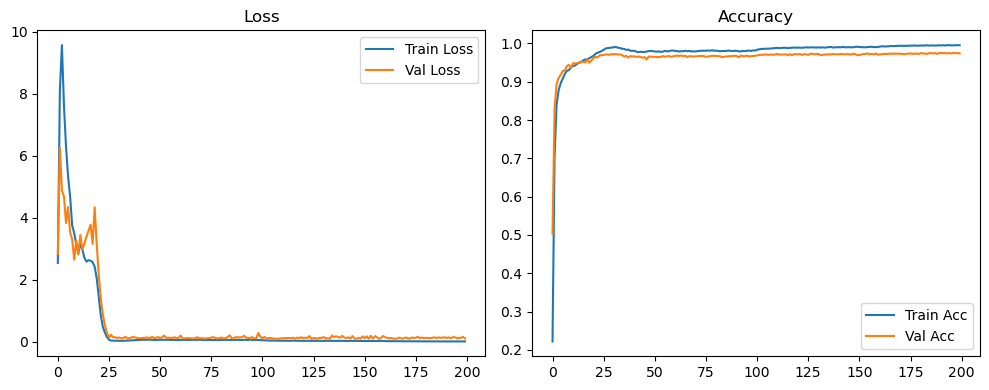

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 51.00it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 51.57it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 51.67it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 51.70it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 51.75it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 51.77it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 51.83it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 51.88it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 51.88it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 51.55it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 51.13it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 50.98it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 50.78it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 51.79it/s]

Original Model Final Test Loss: 0.0980 Accuracy: 0.9755


🚀 Running: batch128_lr0.01_0.005_0.001_dp0.5


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1899 | Val Acc: 0.5262 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1899 | Val Acc: 0.5262 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1899 | Val Acc: 0.5262 |:   0%|          | 1/200 [00:11<36:58, 11.15s/it]

| LR: 0.010 | Train Acc: 0.6363 | Val Acc: 0.8549 |:   0%|          | 1/200 [00:21<36:58, 11.15s/it]

| LR: 0.010 | Train Acc: 0.6363 | Val Acc: 0.8549 |:   0%|          | 1/200 [00:21<36:58, 11.15s/it]

| LR: 0.010 | Train Acc: 0.6363 | Val Acc: 0.8549 |:   1%|          | 2/200 [00:21<35:55, 10.88s/it]

| LR: 0.010 | Train Acc: 0.8077 | Val Acc: 0.8936 |:   1%|          | 2/200 [00:32<35:55, 10.88s/it]

| LR: 0.010 | Train Acc: 0.8077 | Val Acc: 0.8936 |:   1%|          | 2/200 [00:32<35:55, 10.88s/it]

| LR: 0.010 | Train Acc: 0.8077 | Val Acc: 0.8936 |:   2%|▏         | 3/200 [00:32<35:29, 10.81s/it]

| LR: 0.010 | Train Acc: 0.8490 | Val Acc: 0.9117 |:   2%|▏         | 3/200 [00:43<35:29, 10.81s/it]

| LR: 0.010 | Train Acc: 0.8490 | Val Acc: 0.9117 |:   2%|▏         | 3/200 [00:43<35:29, 10.81s/it]

| LR: 0.010 | Train Acc: 0.8490 | Val Acc: 0.9117 |:   2%|▏         | 4/200 [00:43<35:12, 10.78s/it]

| LR: 0.010 | Train Acc: 0.8721 | Val Acc: 0.9214 |:   2%|▏         | 4/200 [00:53<35:12, 10.78s/it]

| LR: 0.010 | Train Acc: 0.8721 | Val Acc: 0.9214 |:   2%|▏         | 4/200 [00:53<35:12, 10.78s/it]

| LR: 0.010 | Train Acc: 0.8721 | Val Acc: 0.9214 |:   2%|▎         | 5/200 [00:53<34:45, 10.69s/it]

| LR: 0.010 | Train Acc: 0.8864 | Val Acc: 0.9349 |:   2%|▎         | 5/200 [01:04<34:45, 10.69s/it]

| LR: 0.010 | Train Acc: 0.8864 | Val Acc: 0.9349 |:   2%|▎         | 5/200 [01:04<34:45, 10.69s/it]

| LR: 0.010 | Train Acc: 0.8864 | Val Acc: 0.9349 |:   3%|▎         | 6/200 [01:04<35:03, 10.84s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9383 |:   3%|▎         | 6/200 [01:15<35:03, 10.84s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9383 |:   3%|▎         | 6/200 [01:15<35:03, 10.84s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9383 |:   4%|▎         | 7/200 [01:15<34:20, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9070 | Val Acc: 0.9467 |:   4%|▎         | 7/200 [01:25<34:20, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9070 | Val Acc: 0.9467 |:   4%|▎         | 7/200 [01:25<34:20, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9070 | Val Acc: 0.9467 |:   4%|▍         | 8/200 [01:25<33:38, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9465 |:   4%|▍         | 8/200 [01:36<33:38, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9465 |:   4%|▍         | 8/200 [01:36<33:38, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9465 |:   4%|▍         | 9/200 [01:36<33:39, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9185 | Val Acc: 0.9483 |:   4%|▍         | 9/200 [01:46<33:39, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9185 | Val Acc: 0.9483 |:   4%|▍         | 9/200 [01:46<33:39, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9185 | Val Acc: 0.9483 |:   5%|▌         | 10/200 [01:46<33:33, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9234 | Val Acc: 0.9563 |:   5%|▌         | 10/200 [01:57<33:33, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9234 | Val Acc: 0.9563 |:   5%|▌         | 10/200 [01:57<33:33, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9234 | Val Acc: 0.9563 |:   6%|▌         | 11/200 [01:57<33:27, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9265 | Val Acc: 0.9565 |:   6%|▌         | 11/200 [02:07<33:27, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9265 | Val Acc: 0.9565 |:   6%|▌         | 11/200 [02:07<33:27, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9265 | Val Acc: 0.9565 |:   6%|▌         | 12/200 [02:08<33:10, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9294 | Val Acc: 0.9547 |:   6%|▌         | 12/200 [02:18<33:10, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9294 | Val Acc: 0.9547 |:   6%|▌         | 12/200 [02:18<33:10, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9294 | Val Acc: 0.9547 |:   6%|▋         | 13/200 [02:18<32:56, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9312 | Val Acc: 0.9610 |:   6%|▋         | 13/200 [02:29<32:56, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9312 | Val Acc: 0.9610 |:   6%|▋         | 13/200 [02:29<32:56, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9312 | Val Acc: 0.9610 |:   7%|▋         | 14/200 [02:29<32:44, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9360 | Val Acc: 0.9600 |:   7%|▋         | 14/200 [02:39<32:44, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9360 | Val Acc: 0.9600 |:   7%|▋         | 14/200 [02:39<32:44, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9360 | Val Acc: 0.9600 |:   8%|▊         | 15/200 [02:39<32:37, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9417 | Val Acc: 0.9637 |:   8%|▊         | 15/200 [02:50<32:37, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9417 | Val Acc: 0.9637 |:   8%|▊         | 15/200 [02:50<32:37, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9417 | Val Acc: 0.9637 |:   8%|▊         | 16/200 [02:50<32:38, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9648 |:   8%|▊         | 16/200 [03:00<32:38, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9648 |:   8%|▊         | 16/200 [03:00<32:38, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9648 |:   8%|▊         | 17/200 [03:00<32:18, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9572 | Val Acc: 0.9666 |:   8%|▊         | 17/200 [03:11<32:18, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9572 | Val Acc: 0.9666 |:   8%|▊         | 17/200 [03:11<32:18, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9572 | Val Acc: 0.9666 |:   9%|▉         | 18/200 [03:11<32:12, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9621 | Val Acc: 0.9672 |:   9%|▉         | 18/200 [03:22<32:12, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9621 | Val Acc: 0.9672 |:   9%|▉         | 18/200 [03:22<32:12, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9621 | Val Acc: 0.9672 |:  10%|▉         | 19/200 [03:22<32:03, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9628 | Val Acc: 0.9671 |:  10%|▉         | 19/200 [03:32<32:03, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9628 | Val Acc: 0.9671 |:  10%|▉         | 19/200 [03:32<32:03, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9628 | Val Acc: 0.9671 |:  10%|█         | 20/200 [03:33<31:57, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9682 |:  10%|█         | 20/200 [03:43<31:57, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9682 |:  10%|█         | 20/200 [03:43<31:57, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9682 |:  10%|█         | 21/200 [03:43<31:51, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9663 | Val Acc: 0.9687 |:  10%|█         | 21/200 [03:54<31:51, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9663 | Val Acc: 0.9687 |:  10%|█         | 21/200 [03:54<31:51, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9663 | Val Acc: 0.9687 |:  11%|█         | 22/200 [03:54<31:45, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9664 | Val Acc: 0.9683 |:  11%|█         | 22/200 [04:05<31:45, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9664 | Val Acc: 0.9683 |:  11%|█         | 22/200 [04:05<31:45, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9664 | Val Acc: 0.9683 |:  12%|█▏        | 23/200 [04:05<31:39, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9692 |:  12%|█▏        | 23/200 [04:15<31:39, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9692 |:  12%|█▏        | 23/200 [04:15<31:39, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9692 |:  12%|█▏        | 24/200 [04:15<31:25, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9691 |:  12%|█▏        | 24/200 [04:26<31:25, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9691 |:  12%|█▏        | 24/200 [04:26<31:25, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9691 |:  12%|█▎        | 25/200 [04:26<31:11, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9677 |:  12%|█▎        | 25/200 [04:37<31:11, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9677 |:  12%|█▎        | 25/200 [04:37<31:11, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9677 |:  13%|█▎        | 26/200 [04:37<30:59, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9669 |:  13%|█▎        | 26/200 [04:48<30:59, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9669 |:  13%|█▎        | 26/200 [04:48<30:59, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9669 |:  14%|█▎        | 27/200 [04:48<30:53, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9678 |:  14%|█▎        | 27/200 [04:58<30:53, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9678 |:  14%|█▎        | 27/200 [04:58<30:53, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9678 |:  14%|█▍        | 28/200 [04:58<30:33, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9673 |:  14%|█▍        | 28/200 [05:09<30:33, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9673 |:  14%|█▍        | 28/200 [05:09<30:33, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9673 |:  14%|█▍        | 29/200 [05:09<30:14, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9601 | Val Acc: 0.9646 |:  14%|█▍        | 29/200 [05:19<30:14, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9601 | Val Acc: 0.9646 |:  14%|█▍        | 29/200 [05:19<30:14, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9601 | Val Acc: 0.9646 |:  15%|█▌        | 30/200 [05:19<30:03, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9586 | Val Acc: 0.9644 |:  15%|█▌        | 30/200 [05:30<30:03, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9586 | Val Acc: 0.9644 |:  15%|█▌        | 30/200 [05:30<30:03, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9586 | Val Acc: 0.9644 |:  16%|█▌        | 31/200 [05:30<29:55, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9567 | Val Acc: 0.9633 |:  16%|█▌        | 31/200 [05:40<29:55, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9567 | Val Acc: 0.9633 |:  16%|█▌        | 31/200 [05:40<29:55, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9567 | Val Acc: 0.9633 |:  16%|█▌        | 32/200 [05:40<29:39, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9656 |:  16%|█▌        | 32/200 [05:51<29:39, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9656 |:  16%|█▌        | 32/200 [05:51<29:39, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9656 |:  16%|█▋        | 33/200 [05:51<29:33, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9539 | Val Acc: 0.9626 |:  16%|█▋        | 33/200 [06:02<29:33, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9539 | Val Acc: 0.9626 |:  16%|█▋        | 33/200 [06:02<29:33, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9539 | Val Acc: 0.9626 |:  17%|█▋        | 34/200 [06:02<29:18, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9534 | Val Acc: 0.9615 |:  17%|█▋        | 34/200 [06:12<29:18, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9534 | Val Acc: 0.9615 |:  17%|█▋        | 34/200 [06:12<29:18, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9534 | Val Acc: 0.9615 |:  18%|█▊        | 35/200 [06:12<29:06, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9523 | Val Acc: 0.9618 |:  18%|█▊        | 35/200 [06:23<29:06, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9523 | Val Acc: 0.9618 |:  18%|█▊        | 35/200 [06:23<29:06, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9523 | Val Acc: 0.9618 |:  18%|█▊        | 36/200 [06:23<29:01, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9510 | Val Acc: 0.9640 |:  18%|█▊        | 36/200 [06:33<29:01, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9510 | Val Acc: 0.9640 |:  18%|█▊        | 36/200 [06:33<29:01, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9510 | Val Acc: 0.9640 |:  18%|█▊        | 37/200 [06:33<28:49, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9633 |:  18%|█▊        | 37/200 [06:44<28:49, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9633 |:  18%|█▊        | 37/200 [06:44<28:49, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9633 |:  19%|█▉        | 38/200 [06:44<28:37, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9608 |:  19%|█▉        | 38/200 [06:54<28:37, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9608 |:  19%|█▉        | 38/200 [06:54<28:37, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9608 |:  20%|█▉        | 39/200 [06:54<28:15, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9627 |:  20%|█▉        | 39/200 [07:05<28:15, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9627 |:  20%|█▉        | 39/200 [07:05<28:15, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9627 |:  20%|██        | 40/200 [07:05<28:15, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9606 |:  20%|██        | 40/200 [07:16<28:15, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9606 |:  20%|██        | 40/200 [07:16<28:15, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9606 |:  20%|██        | 41/200 [07:16<28:16, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9630 |:  20%|██        | 41/200 [07:26<28:16, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9630 |:  20%|██        | 41/200 [07:27<28:16, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9630 |:  21%|██        | 42/200 [07:27<27:59, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  21%|██        | 42/200 [07:37<27:59, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  21%|██        | 42/200 [07:37<27:59, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  22%|██▏       | 43/200 [07:37<27:51, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9639 |:  22%|██▏       | 43/200 [07:48<27:51, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9639 |:  22%|██▏       | 43/200 [07:48<27:51, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9639 |:  22%|██▏       | 44/200 [07:48<27:42, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9641 |:  22%|██▏       | 44/200 [07:59<27:42, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9641 |:  22%|██▏       | 44/200 [07:59<27:42, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9641 |:  22%|██▎       | 45/200 [07:59<27:48, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  22%|██▎       | 45/200 [08:09<27:48, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  22%|██▎       | 45/200 [08:09<27:48, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  23%|██▎       | 46/200 [08:10<27:29, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9621 |:  23%|██▎       | 46/200 [08:20<27:29, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9621 |:  23%|██▎       | 46/200 [08:20<27:29, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9621 |:  24%|██▎       | 47/200 [08:20<27:10, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9616 |:  24%|██▎       | 47/200 [08:31<27:10, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9616 |:  24%|██▎       | 47/200 [08:31<27:10, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9616 |:  24%|██▍       | 48/200 [08:31<27:06, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9618 |:  24%|██▍       | 48/200 [08:41<27:06, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9618 |:  24%|██▍       | 48/200 [08:41<27:06, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9618 |:  24%|██▍       | 49/200 [08:42<26:54, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9617 |:  24%|██▍       | 49/200 [08:52<26:54, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9617 |:  24%|██▍       | 49/200 [08:52<26:54, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9617 |:  25%|██▌       | 50/200 [08:52<26:39, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9613 |:  25%|██▌       | 50/200 [09:03<26:39, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9613 |:  25%|██▌       | 50/200 [09:03<26:39, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9613 |:  26%|██▌       | 51/200 [09:03<26:21, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9629 |:  26%|██▌       | 51/200 [09:13<26:21, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9629 |:  26%|██▌       | 51/200 [09:13<26:21, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9629 |:  26%|██▌       | 52/200 [09:14<26:24, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9637 |:  26%|██▌       | 52/200 [09:25<26:24, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9637 |:  26%|██▌       | 52/200 [09:25<26:24, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9637 |:  26%|██▋       | 53/200 [09:25<27:05, 11.06s/it]

| LR: 0.010 | Train Acc: 0.9512 | Val Acc: 0.9626 |:  26%|██▋       | 53/200 [09:36<27:05, 11.06s/it]

| LR: 0.010 | Train Acc: 0.9512 | Val Acc: 0.9626 |:  26%|██▋       | 53/200 [09:36<27:05, 11.06s/it]

| LR: 0.010 | Train Acc: 0.9512 | Val Acc: 0.9626 |:  27%|██▋       | 54/200 [09:36<26:34, 10.92s/it]

| LR: 0.010 | Train Acc: 0.9477 | Val Acc: 0.9617 |:  27%|██▋       | 54/200 [09:46<26:34, 10.92s/it]

| LR: 0.010 | Train Acc: 0.9477 | Val Acc: 0.9617 |:  27%|██▋       | 54/200 [09:46<26:34, 10.92s/it]

| LR: 0.010 | Train Acc: 0.9477 | Val Acc: 0.9617 |:  28%|██▊       | 55/200 [09:46<26:04, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9618 |:  28%|██▊       | 55/200 [09:57<26:04, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9618 |:  28%|██▊       | 55/200 [09:57<26:04, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9618 |:  28%|██▊       | 56/200 [09:57<25:54, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9643 |:  28%|██▊       | 56/200 [10:08<25:54, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9643 |:  28%|██▊       | 56/200 [10:08<25:54, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9643 |:  28%|██▊       | 57/200 [10:08<25:43, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9647 |:  28%|██▊       | 57/200 [10:18<25:43, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9647 |:  28%|██▊       | 57/200 [10:18<25:43, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9647 |:  29%|██▉       | 58/200 [10:19<25:18, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9517 | Val Acc: 0.9622 |:  29%|██▉       | 58/200 [10:29<25:18, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9517 | Val Acc: 0.9622 |:  29%|██▉       | 58/200 [10:29<25:18, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9517 | Val Acc: 0.9622 |:  30%|██▉       | 59/200 [10:29<25:05, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9502 | Val Acc: 0.9632 |:  30%|██▉       | 59/200 [10:40<25:05, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9502 | Val Acc: 0.9632 |:  30%|██▉       | 59/200 [10:40<25:05, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9502 | Val Acc: 0.9632 |:  30%|███       | 60/200 [10:40<25:00, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9622 |:  30%|███       | 60/200 [10:51<25:00, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9622 |:  30%|███       | 60/200 [10:51<25:00, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9622 |:  30%|███       | 61/200 [10:51<24:43, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9639 |:  30%|███       | 61/200 [11:01<24:43, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9639 |:  30%|███       | 61/200 [11:01<24:43, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9639 |:  31%|███       | 62/200 [11:01<24:28, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9479 | Val Acc: 0.9636 |:  31%|███       | 62/200 [11:12<24:28, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9479 | Val Acc: 0.9636 |:  31%|███       | 62/200 [11:12<24:28, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9479 | Val Acc: 0.9636 |:  32%|███▏      | 63/200 [11:12<24:18, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9504 | Val Acc: 0.9622 |:  32%|███▏      | 63/200 [11:22<24:18, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9504 | Val Acc: 0.9622 |:  32%|███▏      | 63/200 [11:22<24:18, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9504 | Val Acc: 0.9622 |:  32%|███▏      | 64/200 [11:22<24:07, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9628 |:  32%|███▏      | 64/200 [11:33<24:07, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9628 |:  32%|███▏      | 64/200 [11:33<24:07, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9628 |:  32%|███▎      | 65/200 [11:33<23:57, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9482 | Val Acc: 0.9633 |:  32%|███▎      | 65/200 [11:44<23:57, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9482 | Val Acc: 0.9633 |:  32%|███▎      | 65/200 [11:44<23:57, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9482 | Val Acc: 0.9633 |:  33%|███▎      | 66/200 [11:44<23:45, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9628 |:  33%|███▎      | 66/200 [11:54<23:45, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9628 |:  33%|███▎      | 66/200 [11:54<23:45, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9628 |:  34%|███▎      | 67/200 [11:54<23:36, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9633 |:  34%|███▎      | 67/200 [12:05<23:36, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9633 |:  34%|███▎      | 67/200 [12:05<23:36, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9633 |:  34%|███▍      | 68/200 [12:05<23:26, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9624 |:  34%|███▍      | 68/200 [12:16<23:26, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9624 |:  34%|███▍      | 68/200 [12:16<23:26, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9624 |:  34%|███▍      | 69/200 [12:16<23:13, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9487 | Val Acc: 0.9630 |:  34%|███▍      | 69/200 [12:26<23:13, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9487 | Val Acc: 0.9630 |:  34%|███▍      | 69/200 [12:26<23:13, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9487 | Val Acc: 0.9630 |:  35%|███▌      | 70/200 [12:26<23:01, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9451 | Val Acc: 0.9647 |:  35%|███▌      | 70/200 [12:37<23:01, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9451 | Val Acc: 0.9647 |:  35%|███▌      | 70/200 [12:37<23:01, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9451 | Val Acc: 0.9647 |:  36%|███▌      | 71/200 [12:37<22:52, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9634 |:  36%|███▌      | 71/200 [12:48<22:52, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9634 |:  36%|███▌      | 71/200 [12:48<22:52, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9634 |:  36%|███▌      | 72/200 [12:48<22:50, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9633 |:  36%|███▌      | 72/200 [12:58<22:50, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9633 |:  36%|███▌      | 72/200 [12:58<22:50, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9633 |:  36%|███▋      | 73/200 [12:58<22:30, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9626 |:  36%|███▋      | 73/200 [13:09<22:30, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9626 |:  36%|███▋      | 73/200 [13:09<22:30, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9626 |:  37%|███▋      | 74/200 [13:09<22:13, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9616 |:  37%|███▋      | 74/200 [13:19<22:13, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9616 |:  37%|███▋      | 74/200 [13:19<22:13, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9616 |:  38%|███▊      | 75/200 [13:19<21:59, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9625 |:  38%|███▊      | 75/200 [13:30<21:59, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9625 |:  38%|███▊      | 75/200 [13:30<21:59, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9625 |:  38%|███▊      | 76/200 [13:30<21:48, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9614 |:  38%|███▊      | 76/200 [13:41<21:48, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9614 |:  38%|███▊      | 76/200 [13:41<21:48, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9614 |:  38%|███▊      | 77/200 [13:41<21:51, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9617 |:  38%|███▊      | 77/200 [13:51<21:51, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9617 |:  38%|███▊      | 77/200 [13:51<21:51, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9617 |:  39%|███▉      | 78/200 [13:51<21:36, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9613 |:  39%|███▉      | 78/200 [14:02<21:36, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9613 |:  39%|███▉      | 78/200 [14:02<21:36, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9613 |:  40%|███▉      | 79/200 [14:02<21:34, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9612 |:  40%|███▉      | 79/200 [14:13<21:34, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9612 |:  40%|███▉      | 79/200 [14:13<21:34, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9612 |:  40%|████      | 80/200 [14:13<21:20, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9628 |:  40%|████      | 80/200 [14:23<21:20, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9628 |:  40%|████      | 80/200 [14:23<21:20, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9628 |:  40%|████      | 81/200 [14:23<21:08, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9617 |:  40%|████      | 81/200 [14:34<21:08, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9617 |:  40%|████      | 81/200 [14:34<21:08, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9617 |:  41%|████      | 82/200 [14:34<20:53, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9626 |:  41%|████      | 82/200 [14:44<20:53, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9626 |:  41%|████      | 82/200 [14:44<20:53, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9626 |:  42%|████▏     | 83/200 [14:44<20:39, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9625 |:  42%|████▏     | 83/200 [14:55<20:39, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9625 |:  42%|████▏     | 83/200 [14:55<20:39, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9625 |:  42%|████▏     | 84/200 [14:55<20:20, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9633 |:  42%|████▏     | 84/200 [15:05<20:20, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9633 |:  42%|████▏     | 84/200 [15:05<20:20, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9633 |:  42%|████▎     | 85/200 [15:05<20:09, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9628 |:  42%|████▎     | 85/200 [15:16<20:09, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9628 |:  42%|████▎     | 85/200 [15:16<20:09, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9628 |:  43%|████▎     | 86/200 [15:16<19:56, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9628 |:  43%|████▎     | 86/200 [15:26<19:56, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9628 |:  43%|████▎     | 86/200 [15:26<19:56, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9628 |:  44%|████▎     | 87/200 [15:26<19:52, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9607 |:  44%|████▎     | 87/200 [15:37<19:52, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9607 |:  44%|████▎     | 87/200 [15:37<19:52, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9607 |:  44%|████▍     | 88/200 [15:37<19:47, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9442 | Val Acc: 0.9615 |:  44%|████▍     | 88/200 [15:48<19:47, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9442 | Val Acc: 0.9615 |:  44%|████▍     | 88/200 [15:48<19:47, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9442 | Val Acc: 0.9615 |:  44%|████▍     | 89/200 [15:48<19:36, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9456 | Val Acc: 0.9613 |:  44%|████▍     | 89/200 [15:58<19:36, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9456 | Val Acc: 0.9613 |:  44%|████▍     | 89/200 [15:58<19:36, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9456 | Val Acc: 0.9613 |:  45%|████▌     | 90/200 [15:58<19:30, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9475 | Val Acc: 0.9616 |:  45%|████▌     | 90/200 [16:09<19:30, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9475 | Val Acc: 0.9616 |:  45%|████▌     | 90/200 [16:09<19:30, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9475 | Val Acc: 0.9616 |:  46%|████▌     | 91/200 [16:09<19:16, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9617 |:  46%|████▌     | 91/200 [16:20<19:16, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9617 |:  46%|████▌     | 91/200 [16:20<19:16, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9617 |:  46%|████▌     | 92/200 [16:20<19:36, 10.89s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9610 |:  46%|████▌     | 92/200 [16:31<19:36, 10.89s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9610 |:  46%|████▌     | 92/200 [16:31<19:36, 10.89s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9610 |:  46%|████▋     | 93/200 [16:31<19:18, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9620 |:  46%|████▋     | 93/200 [16:42<19:18, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9620 |:  46%|████▋     | 93/200 [16:42<19:18, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9620 |:  47%|████▋     | 94/200 [16:42<18:58, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9637 |:  47%|████▋     | 94/200 [16:52<18:58, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9637 |:  47%|████▋     | 94/200 [16:52<18:58, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9637 |:  48%|████▊     | 95/200 [16:52<18:45, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9567 |:  48%|████▊     | 95/200 [17:03<18:45, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9567 |:  48%|████▊     | 95/200 [17:03<18:45, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9567 |:  48%|████▊     | 96/200 [17:03<18:45, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9599 |:  48%|████▊     | 96/200 [17:14<18:45, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9599 |:  48%|████▊     | 96/200 [17:14<18:45, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9599 |:  48%|████▊     | 97/200 [17:14<18:39, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9616 |:  48%|████▊     | 97/200 [17:25<18:39, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9616 |:  48%|████▊     | 97/200 [17:25<18:39, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9616 |:  49%|████▉     | 98/200 [17:25<18:22, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  49%|████▉     | 98/200 [17:36<18:22, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  49%|████▉     | 98/200 [17:36<18:22, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  50%|████▉     | 99/200 [17:36<18:10, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9525 | Val Acc: 0.9625 |:  50%|████▉     | 99/200 [17:46<18:10, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9525 | Val Acc: 0.9625 |:  50%|████▉     | 99/200 [17:46<18:10, 10.80s/it]

| LR: 0.010 | Train Acc: 0.9525 | Val Acc: 0.9625 |:  50%|█████     | 100/200 [17:47<17:55, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9645 |:  50%|█████     | 100/200 [17:57<17:55, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9645 |:  50%|█████     | 100/200 [17:57<17:55, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9528 | Val Acc: 0.9645 |:  50%|█████     | 101/200 [17:57<17:39, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9644 |:  50%|█████     | 101/200 [18:08<17:39, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9644 |:  50%|█████     | 101/200 [18:08<17:39, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9534 | Val Acc: 0.9644 |:  51%|█████     | 102/200 [18:08<17:26, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9547 | Val Acc: 0.9628 |:  51%|█████     | 102/200 [18:18<17:26, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9547 | Val Acc: 0.9628 |:  51%|█████     | 102/200 [18:18<17:26, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9547 | Val Acc: 0.9628 |:  52%|█████▏    | 103/200 [18:18<17:11, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9564 | Val Acc: 0.9660 |:  52%|█████▏    | 103/200 [18:29<17:11, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9564 | Val Acc: 0.9660 |:  52%|█████▏    | 103/200 [18:29<17:11, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9564 | Val Acc: 0.9660 |:  52%|█████▏    | 104/200 [18:29<17:12, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9561 | Val Acc: 0.9643 |:  52%|█████▏    | 104/200 [18:40<17:12, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9561 | Val Acc: 0.9643 |:  52%|█████▏    | 104/200 [18:40<17:12, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9561 | Val Acc: 0.9643 |:  52%|█████▎    | 105/200 [18:40<16:58, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9558 | Val Acc: 0.9625 |:  52%|█████▎    | 105/200 [18:51<16:58, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9558 | Val Acc: 0.9625 |:  52%|█████▎    | 105/200 [18:51<16:58, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9558 | Val Acc: 0.9625 |:  53%|█████▎    | 106/200 [18:51<16:49, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9571 | Val Acc: 0.9644 |:  53%|█████▎    | 106/200 [19:01<16:49, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9571 | Val Acc: 0.9644 |:  53%|█████▎    | 106/200 [19:01<16:49, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9571 | Val Acc: 0.9644 |:  54%|█████▎    | 107/200 [19:01<16:34, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9562 | Val Acc: 0.9657 |:  54%|█████▎    | 107/200 [19:12<16:34, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9562 | Val Acc: 0.9657 |:  54%|█████▎    | 107/200 [19:12<16:34, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9562 | Val Acc: 0.9657 |:  54%|█████▍    | 108/200 [19:12<16:13, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9568 | Val Acc: 0.9655 |:  54%|█████▍    | 108/200 [19:22<16:13, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9568 | Val Acc: 0.9655 |:  54%|█████▍    | 108/200 [19:22<16:13, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9568 | Val Acc: 0.9655 |:  55%|█████▍    | 109/200 [19:22<16:03, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9572 | Val Acc: 0.9648 |:  55%|█████▍    | 109/200 [19:33<16:03, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9572 | Val Acc: 0.9648 |:  55%|█████▍    | 109/200 [19:33<16:03, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9572 | Val Acc: 0.9648 |:  55%|█████▌    | 110/200 [19:33<15:54, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9587 | Val Acc: 0.9653 |:  55%|█████▌    | 110/200 [19:43<15:54, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9587 | Val Acc: 0.9653 |:  55%|█████▌    | 110/200 [19:43<15:54, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9587 | Val Acc: 0.9653 |:  56%|█████▌    | 111/200 [19:43<15:37, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9591 | Val Acc: 0.9651 |:  56%|█████▌    | 111/200 [19:55<15:37, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9591 | Val Acc: 0.9651 |:  56%|█████▌    | 111/200 [19:55<15:37, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9591 | Val Acc: 0.9651 |:  56%|█████▌    | 112/200 [19:55<15:51, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9584 | Val Acc: 0.9634 |:  56%|█████▌    | 112/200 [20:07<15:51, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9584 | Val Acc: 0.9634 |:  56%|█████▌    | 112/200 [20:07<15:51, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9584 | Val Acc: 0.9634 |:  56%|█████▋    | 113/200 [20:07<16:19, 11.26s/it]

| LR: 0.005 | Train Acc: 0.9580 | Val Acc: 0.9643 |:  56%|█████▋    | 113/200 [20:18<16:19, 11.26s/it]

| LR: 0.005 | Train Acc: 0.9580 | Val Acc: 0.9643 |:  56%|█████▋    | 113/200 [20:18<16:19, 11.26s/it]

| LR: 0.005 | Train Acc: 0.9580 | Val Acc: 0.9643 |:  57%|█████▋    | 114/200 [20:18<15:55, 11.11s/it]

| LR: 0.005 | Train Acc: 0.9596 | Val Acc: 0.9647 |:  57%|█████▋    | 114/200 [20:28<15:55, 11.11s/it]

| LR: 0.005 | Train Acc: 0.9596 | Val Acc: 0.9647 |:  57%|█████▋    | 114/200 [20:28<15:55, 11.11s/it]

| LR: 0.005 | Train Acc: 0.9596 | Val Acc: 0.9647 |:  57%|█████▊    | 115/200 [20:28<15:30, 10.95s/it]

| LR: 0.005 | Train Acc: 0.9589 | Val Acc: 0.9666 |:  57%|█████▊    | 115/200 [20:39<15:30, 10.95s/it]

| LR: 0.005 | Train Acc: 0.9589 | Val Acc: 0.9666 |:  57%|█████▊    | 115/200 [20:39<15:30, 10.95s/it]

| LR: 0.005 | Train Acc: 0.9589 | Val Acc: 0.9666 |:  58%|█████▊    | 116/200 [20:39<15:09, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9602 | Val Acc: 0.9668 |:  58%|█████▊    | 116/200 [20:49<15:09, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9602 | Val Acc: 0.9668 |:  58%|█████▊    | 116/200 [20:49<15:09, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9602 | Val Acc: 0.9668 |:  58%|█████▊    | 117/200 [20:49<14:44, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9608 | Val Acc: 0.9661 |:  58%|█████▊    | 117/200 [21:00<14:44, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9608 | Val Acc: 0.9661 |:  58%|█████▊    | 117/200 [21:00<14:44, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9608 | Val Acc: 0.9661 |:  59%|█████▉    | 118/200 [21:00<14:33, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9611 | Val Acc: 0.9673 |:  59%|█████▉    | 118/200 [21:10<14:33, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9611 | Val Acc: 0.9673 |:  59%|█████▉    | 118/200 [21:10<14:33, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9611 | Val Acc: 0.9673 |:  60%|█████▉    | 119/200 [21:10<14:21, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9609 | Val Acc: 0.9684 |:  60%|█████▉    | 119/200 [21:21<14:21, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9609 | Val Acc: 0.9684 |:  60%|█████▉    | 119/200 [21:21<14:21, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9609 | Val Acc: 0.9684 |:  60%|██████    | 120/200 [21:21<14:09, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9609 | Val Acc: 0.9658 |:  60%|██████    | 120/200 [21:32<14:09, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9609 | Val Acc: 0.9658 |:  60%|██████    | 120/200 [21:32<14:09, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9609 | Val Acc: 0.9658 |:  60%|██████    | 121/200 [21:32<14:19, 10.88s/it]

| LR: 0.005 | Train Acc: 0.9607 | Val Acc: 0.9655 |:  60%|██████    | 121/200 [21:43<14:19, 10.88s/it]

| LR: 0.005 | Train Acc: 0.9607 | Val Acc: 0.9655 |:  60%|██████    | 121/200 [21:43<14:19, 10.88s/it]

| LR: 0.005 | Train Acc: 0.9607 | Val Acc: 0.9655 |:  61%|██████    | 122/200 [21:43<14:02, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9607 | Val Acc: 0.9666 |:  61%|██████    | 122/200 [21:54<14:02, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9607 | Val Acc: 0.9666 |:  61%|██████    | 122/200 [21:54<14:02, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9607 | Val Acc: 0.9666 |:  62%|██████▏   | 123/200 [21:54<13:46, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9626 | Val Acc: 0.9683 |:  62%|██████▏   | 123/200 [22:05<13:46, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9626 | Val Acc: 0.9683 |:  62%|██████▏   | 123/200 [22:05<13:46, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9626 | Val Acc: 0.9683 |:  62%|██████▏   | 124/200 [22:05<13:40, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9614 | Val Acc: 0.9676 |:  62%|██████▏   | 124/200 [22:15<13:40, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9614 | Val Acc: 0.9676 |:  62%|██████▏   | 124/200 [22:15<13:40, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9614 | Val Acc: 0.9676 |:  62%|██████▎   | 125/200 [22:15<13:20, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9619 | Val Acc: 0.9677 |:  62%|██████▎   | 125/200 [22:25<13:20, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9619 | Val Acc: 0.9677 |:  62%|██████▎   | 125/200 [22:25<13:20, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9619 | Val Acc: 0.9677 |:  63%|██████▎   | 126/200 [22:26<13:07, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9614 | Val Acc: 0.9678 |:  63%|██████▎   | 126/200 [22:37<13:07, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9614 | Val Acc: 0.9678 |:  63%|██████▎   | 126/200 [22:37<13:07, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9614 | Val Acc: 0.9678 |:  64%|██████▎   | 127/200 [22:37<13:07, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9626 | Val Acc: 0.9662 |:  64%|██████▎   | 127/200 [22:47<13:07, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9626 | Val Acc: 0.9662 |:  64%|██████▎   | 127/200 [22:47<13:07, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9626 | Val Acc: 0.9662 |:  64%|██████▍   | 128/200 [22:47<12:53, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9610 | Val Acc: 0.9686 |:  64%|██████▍   | 128/200 [22:58<12:53, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9610 | Val Acc: 0.9686 |:  64%|██████▍   | 128/200 [22:58<12:53, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9610 | Val Acc: 0.9686 |:  64%|██████▍   | 129/200 [22:58<12:38, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9608 | Val Acc: 0.9667 |:  64%|██████▍   | 129/200 [23:08<12:38, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9608 | Val Acc: 0.9667 |:  64%|██████▍   | 129/200 [23:08<12:38, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9608 | Val Acc: 0.9667 |:  65%|██████▌   | 130/200 [23:08<12:24, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9679 |:  65%|██████▌   | 130/200 [23:19<12:24, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9679 |:  65%|██████▌   | 130/200 [23:19<12:24, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9679 |:  66%|██████▌   | 131/200 [23:19<12:13, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9655 |:  66%|██████▌   | 131/200 [23:30<12:13, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9655 |:  66%|██████▌   | 131/200 [23:30<12:13, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9655 |:  66%|██████▌   | 132/200 [23:30<12:07, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9610 | Val Acc: 0.9666 |:  66%|██████▌   | 132/200 [23:40<12:07, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9610 | Val Acc: 0.9666 |:  66%|██████▌   | 132/200 [23:40<12:07, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9610 | Val Acc: 0.9666 |:  66%|██████▋   | 133/200 [23:40<11:55, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9617 | Val Acc: 0.9673 |:  66%|██████▋   | 133/200 [23:51<11:55, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9617 | Val Acc: 0.9673 |:  66%|██████▋   | 133/200 [23:51<11:55, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9617 | Val Acc: 0.9673 |:  67%|██████▋   | 134/200 [23:51<11:42, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9634 | Val Acc: 0.9659 |:  67%|██████▋   | 134/200 [24:02<11:42, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9634 | Val Acc: 0.9659 |:  67%|██████▋   | 134/200 [24:02<11:42, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9634 | Val Acc: 0.9659 |:  68%|██████▊   | 135/200 [24:02<11:29, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9633 | Val Acc: 0.9669 |:  68%|██████▊   | 135/200 [24:12<11:29, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9633 | Val Acc: 0.9669 |:  68%|██████▊   | 135/200 [24:12<11:29, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9633 | Val Acc: 0.9669 |:  68%|██████▊   | 136/200 [24:12<11:22, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9624 | Val Acc: 0.9697 |:  68%|██████▊   | 136/200 [24:23<11:22, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9624 | Val Acc: 0.9697 |:  68%|██████▊   | 136/200 [24:23<11:22, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9624 | Val Acc: 0.9697 |:  68%|██████▊   | 137/200 [24:23<11:14, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9677 |:  68%|██████▊   | 137/200 [24:34<11:14, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9677 |:  68%|██████▊   | 137/200 [24:34<11:14, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9677 |:  69%|██████▉   | 138/200 [24:34<11:05, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9633 | Val Acc: 0.9667 |:  69%|██████▉   | 138/200 [24:45<11:05, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9633 | Val Acc: 0.9667 |:  69%|██████▉   | 138/200 [24:45<11:05, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9633 | Val Acc: 0.9667 |:  70%|██████▉   | 139/200 [24:45<10:56, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9676 |:  70%|██████▉   | 139/200 [24:55<10:56, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9676 |:  70%|██████▉   | 139/200 [24:55<10:56, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9676 |:  70%|███████   | 140/200 [24:55<10:44, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9620 | Val Acc: 0.9669 |:  70%|███████   | 140/200 [25:06<10:44, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9620 | Val Acc: 0.9669 |:  70%|███████   | 140/200 [25:06<10:44, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9620 | Val Acc: 0.9669 |:  70%|███████   | 141/200 [25:06<10:29, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9635 | Val Acc: 0.9667 |:  70%|███████   | 141/200 [25:17<10:29, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9635 | Val Acc: 0.9667 |:  70%|███████   | 141/200 [25:17<10:29, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9635 | Val Acc: 0.9667 |:  71%|███████   | 142/200 [25:17<10:21, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9632 | Val Acc: 0.9667 |:  71%|███████   | 142/200 [25:27<10:21, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9632 | Val Acc: 0.9667 |:  71%|███████   | 142/200 [25:27<10:21, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9632 | Val Acc: 0.9667 |:  72%|███████▏  | 143/200 [25:27<10:06, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9628 | Val Acc: 0.9674 |:  72%|███████▏  | 143/200 [25:38<10:06, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9628 | Val Acc: 0.9674 |:  72%|███████▏  | 143/200 [25:38<10:06, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9628 | Val Acc: 0.9674 |:  72%|███████▏  | 144/200 [25:38<09:54, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9618 | Val Acc: 0.9658 |:  72%|███████▏  | 144/200 [25:48<09:54, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9618 | Val Acc: 0.9658 |:  72%|███████▏  | 144/200 [25:48<09:54, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9618 | Val Acc: 0.9658 |:  72%|███████▎  | 145/200 [25:48<09:44, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9635 | Val Acc: 0.9681 |:  72%|███████▎  | 145/200 [25:59<09:44, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9635 | Val Acc: 0.9681 |:  72%|███████▎  | 145/200 [25:59<09:44, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9635 | Val Acc: 0.9681 |:  73%|███████▎  | 146/200 [25:59<09:35, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9635 | Val Acc: 0.9683 |:  73%|███████▎  | 146/200 [26:10<09:35, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9635 | Val Acc: 0.9683 |:  73%|███████▎  | 146/200 [26:10<09:35, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9635 | Val Acc: 0.9683 |:  74%|███████▎  | 147/200 [26:10<09:25, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9639 | Val Acc: 0.9673 |:  74%|███████▎  | 147/200 [26:21<09:25, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9639 | Val Acc: 0.9673 |:  74%|███████▎  | 147/200 [26:21<09:25, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9639 | Val Acc: 0.9673 |:  74%|███████▍  | 148/200 [26:21<09:15, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9619 | Val Acc: 0.9673 |:  74%|███████▍  | 148/200 [26:31<09:15, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9619 | Val Acc: 0.9673 |:  74%|███████▍  | 148/200 [26:31<09:15, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9619 | Val Acc: 0.9673 |:  74%|███████▍  | 149/200 [26:31<09:06, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9640 | Val Acc: 0.9682 |:  74%|███████▍  | 149/200 [26:42<09:06, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9640 | Val Acc: 0.9682 |:  74%|███████▍  | 149/200 [26:42<09:06, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9640 | Val Acc: 0.9682 |:  75%|███████▌  | 150/200 [26:42<08:55, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9671 |:  75%|███████▌  | 150/200 [26:53<08:55, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9671 |:  75%|███████▌  | 150/200 [26:53<08:55, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9631 | Val Acc: 0.9671 |:  76%|███████▌  | 151/200 [26:53<08:50, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9638 | Val Acc: 0.9697 |:  76%|███████▌  | 151/200 [27:04<08:50, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9638 | Val Acc: 0.9697 |:  76%|███████▌  | 151/200 [27:04<08:50, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9638 | Val Acc: 0.9697 |:  76%|███████▌  | 152/200 [27:04<08:41, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9650 | Val Acc: 0.9671 |:  76%|███████▌  | 152/200 [27:15<08:41, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9650 | Val Acc: 0.9671 |:  76%|███████▌  | 152/200 [27:15<08:41, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9650 | Val Acc: 0.9671 |:  76%|███████▋  | 153/200 [27:15<08:27, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9628 | Val Acc: 0.9677 |:  76%|███████▋  | 153/200 [27:25<08:27, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9628 | Val Acc: 0.9677 |:  76%|███████▋  | 153/200 [27:25<08:27, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9628 | Val Acc: 0.9677 |:  77%|███████▋  | 154/200 [27:25<08:15, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9646 | Val Acc: 0.9683 |:  77%|███████▋  | 154/200 [27:36<08:15, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9646 | Val Acc: 0.9683 |:  77%|███████▋  | 154/200 [27:36<08:15, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9646 | Val Acc: 0.9683 |:  78%|███████▊  | 155/200 [27:36<08:03, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9634 | Val Acc: 0.9693 |:  78%|███████▊  | 155/200 [27:47<08:03, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9634 | Val Acc: 0.9693 |:  78%|███████▊  | 155/200 [27:47<08:03, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9634 | Val Acc: 0.9693 |:  78%|███████▊  | 156/200 [27:47<07:52, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9648 | Val Acc: 0.9671 |:  78%|███████▊  | 156/200 [27:58<07:52, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9648 | Val Acc: 0.9671 |:  78%|███████▊  | 156/200 [27:58<07:52, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9648 | Val Acc: 0.9671 |:  78%|███████▊  | 157/200 [27:58<07:40, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9641 | Val Acc: 0.9684 |:  78%|███████▊  | 157/200 [28:08<07:40, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9641 | Val Acc: 0.9684 |:  78%|███████▊  | 157/200 [28:08<07:40, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9641 | Val Acc: 0.9684 |:  79%|███████▉  | 158/200 [28:08<07:28, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9637 | Val Acc: 0.9681 |:  79%|███████▉  | 158/200 [28:19<07:28, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9637 | Val Acc: 0.9681 |:  79%|███████▉  | 158/200 [28:19<07:28, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9637 | Val Acc: 0.9681 |:  80%|███████▉  | 159/200 [28:19<07:16, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9639 | Val Acc: 0.9679 |:  80%|███████▉  | 159/200 [28:30<07:16, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9639 | Val Acc: 0.9679 |:  80%|███████▉  | 159/200 [28:30<07:16, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9639 | Val Acc: 0.9679 |:  80%|████████  | 160/200 [28:30<07:07, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9649 | Val Acc: 0.9683 |:  80%|████████  | 160/200 [28:41<07:07, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9649 | Val Acc: 0.9683 |:  80%|████████  | 160/200 [28:41<07:07, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9649 | Val Acc: 0.9683 |:  80%|████████  | 161/200 [28:41<07:06, 10.93s/it]

| LR: 0.001 | Train Acc: 0.9649 | Val Acc: 0.9688 |:  80%|████████  | 161/200 [28:52<07:06, 10.93s/it]

| LR: 0.001 | Train Acc: 0.9649 | Val Acc: 0.9688 |:  80%|████████  | 161/200 [28:52<07:06, 10.93s/it]

| LR: 0.001 | Train Acc: 0.9649 | Val Acc: 0.9688 |:  81%|████████  | 162/200 [28:52<06:53, 10.89s/it]

| LR: 0.001 | Train Acc: 0.9657 | Val Acc: 0.9682 |:  81%|████████  | 162/200 [29:02<06:53, 10.89s/it]

| LR: 0.001 | Train Acc: 0.9657 | Val Acc: 0.9682 |:  81%|████████  | 162/200 [29:02<06:53, 10.89s/it]

| LR: 0.001 | Train Acc: 0.9657 | Val Acc: 0.9682 |:  82%|████████▏ | 163/200 [29:02<06:39, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9670 | Val Acc: 0.9683 |:  82%|████████▏ | 163/200 [29:13<06:39, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9670 | Val Acc: 0.9683 |:  82%|████████▏ | 163/200 [29:13<06:39, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9670 | Val Acc: 0.9683 |:  82%|████████▏ | 164/200 [29:13<06:29, 10.83s/it]

| LR: 0.001 | Train Acc: 0.9664 | Val Acc: 0.9683 |:  82%|████████▏ | 164/200 [29:24<06:29, 10.83s/it]

| LR: 0.001 | Train Acc: 0.9664 | Val Acc: 0.9683 |:  82%|████████▏ | 164/200 [29:24<06:29, 10.83s/it]

| LR: 0.001 | Train Acc: 0.9664 | Val Acc: 0.9683 |:  82%|████████▎ | 165/200 [29:24<06:16, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9651 | Val Acc: 0.9700 |:  82%|████████▎ | 165/200 [29:34<06:16, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9651 | Val Acc: 0.9700 |:  82%|████████▎ | 165/200 [29:34<06:16, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9651 | Val Acc: 0.9700 |:  83%|████████▎ | 166/200 [29:34<06:04, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9674 | Val Acc: 0.9689 |:  83%|████████▎ | 166/200 [29:45<06:04, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9674 | Val Acc: 0.9689 |:  83%|████████▎ | 166/200 [29:45<06:04, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9674 | Val Acc: 0.9689 |:  84%|████████▎ | 167/200 [29:45<05:52, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9673 | Val Acc: 0.9683 |:  84%|████████▎ | 167/200 [29:56<05:52, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9673 | Val Acc: 0.9683 |:  84%|████████▎ | 167/200 [29:56<05:52, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9673 | Val Acc: 0.9683 |:  84%|████████▍ | 168/200 [29:56<05:40, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9672 | Val Acc: 0.9677 |:  84%|████████▍ | 168/200 [30:06<05:40, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9672 | Val Acc: 0.9677 |:  84%|████████▍ | 168/200 [30:06<05:40, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9672 | Val Acc: 0.9677 |:  84%|████████▍ | 169/200 [30:06<05:29, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9666 | Val Acc: 0.9697 |:  84%|████████▍ | 169/200 [30:18<05:29, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9666 | Val Acc: 0.9697 |:  84%|████████▍ | 169/200 [30:18<05:29, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9666 | Val Acc: 0.9697 |:  85%|████████▌ | 170/200 [30:18<05:32, 11.07s/it]

| LR: 0.001 | Train Acc: 0.9681 | Val Acc: 0.9701 |:  85%|████████▌ | 170/200 [30:29<05:32, 11.07s/it]

| LR: 0.001 | Train Acc: 0.9681 | Val Acc: 0.9701 |:  85%|████████▌ | 170/200 [30:29<05:32, 11.07s/it]

| LR: 0.001 | Train Acc: 0.9681 | Val Acc: 0.9701 |:  86%|████████▌ | 171/200 [30:29<05:17, 10.96s/it]

| LR: 0.001 | Train Acc: 0.9680 | Val Acc: 0.9688 |:  86%|████████▌ | 171/200 [30:40<05:17, 10.96s/it]

| LR: 0.001 | Train Acc: 0.9680 | Val Acc: 0.9688 |:  86%|████████▌ | 171/200 [30:40<05:17, 10.96s/it]

| LR: 0.001 | Train Acc: 0.9680 | Val Acc: 0.9688 |:  86%|████████▌ | 172/200 [30:40<05:04, 10.87s/it]

| LR: 0.001 | Train Acc: 0.9673 | Val Acc: 0.9701 |:  86%|████████▌ | 172/200 [30:51<05:04, 10.87s/it]

| LR: 0.001 | Train Acc: 0.9673 | Val Acc: 0.9701 |:  86%|████████▌ | 172/200 [30:51<05:04, 10.87s/it]

| LR: 0.001 | Train Acc: 0.9673 | Val Acc: 0.9701 |:  86%|████████▋ | 173/200 [30:51<04:52, 10.85s/it]

| LR: 0.001 | Train Acc: 0.9686 | Val Acc: 0.9691 |:  86%|████████▋ | 173/200 [31:01<04:52, 10.85s/it]

| LR: 0.001 | Train Acc: 0.9686 | Val Acc: 0.9691 |:  86%|████████▋ | 173/200 [31:01<04:52, 10.85s/it]

| LR: 0.001 | Train Acc: 0.9686 | Val Acc: 0.9691 |:  87%|████████▋ | 174/200 [31:01<04:40, 10.79s/it]

| LR: 0.001 | Train Acc: 0.9680 | Val Acc: 0.9706 |:  87%|████████▋ | 174/200 [31:12<04:40, 10.79s/it]

| LR: 0.001 | Train Acc: 0.9680 | Val Acc: 0.9706 |:  87%|████████▋ | 174/200 [31:12<04:40, 10.79s/it]

| LR: 0.001 | Train Acc: 0.9680 | Val Acc: 0.9706 |:  88%|████████▊ | 175/200 [31:12<04:28, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9685 | Val Acc: 0.9691 |:  88%|████████▊ | 175/200 [31:22<04:28, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9685 | Val Acc: 0.9691 |:  88%|████████▊ | 175/200 [31:22<04:28, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9685 | Val Acc: 0.9691 |:  88%|████████▊ | 176/200 [31:22<04:15, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9684 | Val Acc: 0.9693 |:  88%|████████▊ | 176/200 [31:33<04:15, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9684 | Val Acc: 0.9693 |:  88%|████████▊ | 176/200 [31:33<04:15, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9684 | Val Acc: 0.9693 |:  88%|████████▊ | 177/200 [31:33<04:04, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9677 | Val Acc: 0.9705 |:  88%|████████▊ | 177/200 [31:44<04:04, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9677 | Val Acc: 0.9705 |:  88%|████████▊ | 177/200 [31:44<04:04, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9677 | Val Acc: 0.9705 |:  89%|████████▉ | 178/200 [31:44<03:54, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9690 | Val Acc: 0.9691 |:  89%|████████▉ | 178/200 [31:54<03:54, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9690 | Val Acc: 0.9691 |:  89%|████████▉ | 178/200 [31:54<03:54, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9690 | Val Acc: 0.9691 |:  90%|████████▉ | 179/200 [31:54<03:43, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9685 | Val Acc: 0.9701 |:  90%|████████▉ | 179/200 [32:05<03:43, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9685 | Val Acc: 0.9701 |:  90%|████████▉ | 179/200 [32:05<03:43, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9685 | Val Acc: 0.9701 |:  90%|█████████ | 180/200 [32:05<03:32, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9689 | Val Acc: 0.9700 |:  90%|█████████ | 180/200 [32:15<03:32, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9689 | Val Acc: 0.9700 |:  90%|█████████ | 180/200 [32:15<03:32, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9689 | Val Acc: 0.9700 |:  90%|█████████ | 181/200 [32:15<03:21, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9695 | Val Acc: 0.9698 |:  90%|█████████ | 181/200 [32:26<03:21, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9695 | Val Acc: 0.9698 |:  90%|█████████ | 181/200 [32:26<03:21, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9695 | Val Acc: 0.9698 |:  91%|█████████ | 182/200 [32:26<03:10, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9702 | Val Acc: 0.9694 |:  91%|█████████ | 182/200 [32:37<03:10, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9702 | Val Acc: 0.9694 |:  91%|█████████ | 182/200 [32:37<03:10, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9702 | Val Acc: 0.9694 |:  92%|█████████▏| 183/200 [32:37<03:01, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9698 | Val Acc: 0.9688 |:  92%|█████████▏| 183/200 [32:47<03:01, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9698 | Val Acc: 0.9688 |:  92%|█████████▏| 183/200 [32:47<03:01, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9698 | Val Acc: 0.9688 |:  92%|█████████▏| 184/200 [32:47<02:50, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9685 | Val Acc: 0.9689 |:  92%|█████████▏| 184/200 [32:58<02:50, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9685 | Val Acc: 0.9689 |:  92%|█████████▏| 184/200 [32:58<02:50, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9685 | Val Acc: 0.9689 |:  92%|█████████▎| 185/200 [32:58<02:40, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9692 | Val Acc: 0.9699 |:  92%|█████████▎| 185/200 [33:09<02:40, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9692 | Val Acc: 0.9699 |:  92%|█████████▎| 185/200 [33:09<02:40, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9692 | Val Acc: 0.9699 |:  93%|█████████▎| 186/200 [33:09<02:30, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9681 | Val Acc: 0.9688 |:  93%|█████████▎| 186/200 [33:20<02:30, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9681 | Val Acc: 0.9688 |:  93%|█████████▎| 186/200 [33:20<02:30, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9681 | Val Acc: 0.9688 |:  94%|█████████▎| 187/200 [33:20<02:19, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9683 | Val Acc: 0.9705 |:  94%|█████████▎| 187/200 [33:30<02:19, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9683 | Val Acc: 0.9705 |:  94%|█████████▎| 187/200 [33:30<02:19, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9683 | Val Acc: 0.9705 |:  94%|█████████▍| 188/200 [33:30<02:08, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9694 | Val Acc: 0.9693 |:  94%|█████████▍| 188/200 [33:41<02:08, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9694 | Val Acc: 0.9693 |:  94%|█████████▍| 188/200 [33:41<02:08, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9694 | Val Acc: 0.9693 |:  94%|█████████▍| 189/200 [33:41<01:57, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9686 | Val Acc: 0.9710 |:  94%|█████████▍| 189/200 [33:52<01:57, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9686 | Val Acc: 0.9710 |:  94%|█████████▍| 189/200 [33:52<01:57, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9686 | Val Acc: 0.9710 |:  95%|█████████▌| 190/200 [33:52<01:47, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9703 | Val Acc: 0.9702 |:  95%|█████████▌| 190/200 [34:02<01:47, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9703 | Val Acc: 0.9702 |:  95%|█████████▌| 190/200 [34:02<01:47, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9703 | Val Acc: 0.9702 |:  96%|█████████▌| 191/200 [34:02<01:35, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9702 | Val Acc: 0.9689 |:  96%|█████████▌| 191/200 [34:13<01:35, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9702 | Val Acc: 0.9689 |:  96%|█████████▌| 191/200 [34:13<01:35, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9702 | Val Acc: 0.9689 |:  96%|█████████▌| 192/200 [34:13<01:25, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9699 | Val Acc: 0.9702 |:  96%|█████████▌| 192/200 [34:23<01:25, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9699 | Val Acc: 0.9702 |:  96%|█████████▌| 192/200 [34:23<01:25, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9699 | Val Acc: 0.9702 |:  96%|█████████▋| 193/200 [34:24<01:14, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9715 | Val Acc: 0.9705 |:  96%|█████████▋| 193/200 [34:34<01:14, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9715 | Val Acc: 0.9705 |:  96%|█████████▋| 193/200 [34:34<01:14, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9715 | Val Acc: 0.9705 |:  97%|█████████▋| 194/200 [34:34<01:03, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9698 | Val Acc: 0.9710 |:  97%|█████████▋| 194/200 [34:45<01:03, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9698 | Val Acc: 0.9710 |:  97%|█████████▋| 194/200 [34:45<01:03, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9698 | Val Acc: 0.9710 |:  98%|█████████▊| 195/200 [34:45<00:52, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9712 | Val Acc: 0.9701 |:  98%|█████████▊| 195/200 [34:55<00:52, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9712 | Val Acc: 0.9701 |:  98%|█████████▊| 195/200 [34:55<00:52, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9712 | Val Acc: 0.9701 |:  98%|█████████▊| 196/200 [34:55<00:42, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9710 | Val Acc: 0.9705 |:  98%|█████████▊| 196/200 [35:06<00:42, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9710 | Val Acc: 0.9705 |:  98%|█████████▊| 196/200 [35:06<00:42, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9710 | Val Acc: 0.9705 |:  98%|█████████▊| 197/200 [35:06<00:31, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9708 | Val Acc: 0.9712 |:  98%|█████████▊| 197/200 [35:17<00:31, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9708 | Val Acc: 0.9712 |:  98%|█████████▊| 197/200 [35:17<00:31, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9708 | Val Acc: 0.9712 |:  99%|█████████▉| 198/200 [35:17<00:21, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9718 | Val Acc: 0.9703 |:  99%|█████████▉| 198/200 [35:27<00:21, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9718 | Val Acc: 0.9703 |:  99%|█████████▉| 198/200 [35:27<00:21, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9718 | Val Acc: 0.9703 |: 100%|█████████▉| 199/200 [35:27<00:10, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9712 | Val Acc: 0.9707 |: 100%|█████████▉| 199/200 [35:38<00:10, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9712 | Val Acc: 0.9707 |: 100%|█████████▉| 199/200 [35:38<00:10, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9712 | Val Acc: 0.9707 |: 100%|██████████| 200/200 [35:38<00:00, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9712 | Val Acc: 0.9707 |: 100%|██████████| 200/200 [35:38<00:00, 10.69s/it]

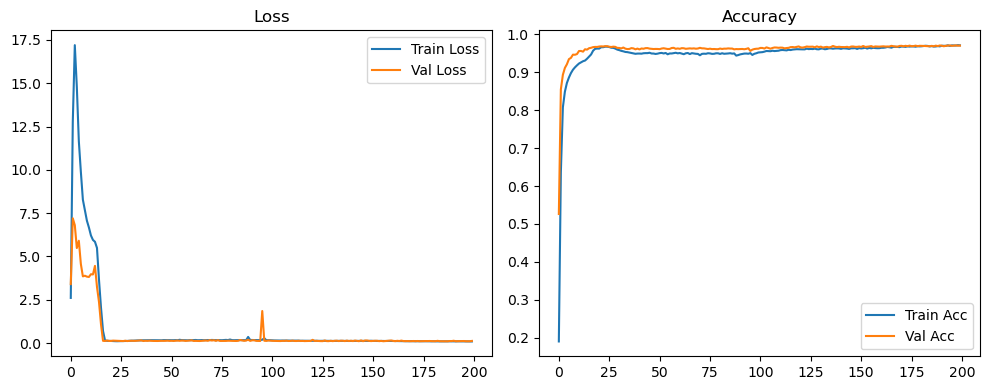

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 49.58it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 50.08it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 50.91it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 51.33it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 51.13it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 51.38it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 51.67it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 51.85it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 52.06it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 52.09it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 51.46it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 51.44it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 51.54it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 51.86it/s]

Original Model Final Test Loss: 0.1150 Accuracy: 0.9725


🚀 Running: batch128_lr0.01_0.002_0.001_dp0.0


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2695 | Val Acc: 0.6519 |:   0%|          | 0/200 [00:10<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2695 | Val Acc: 0.6519 |:   0%|          | 0/200 [00:10<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2695 | Val Acc: 0.6519 |:   0%|          | 1/200 [00:10<35:47, 10.79s/it]

| LR: 0.010 | Train Acc: 0.7904 | Val Acc: 0.8626 |:   0%|          | 1/200 [00:21<35:47, 10.79s/it]

| LR: 0.010 | Train Acc: 0.7904 | Val Acc: 0.8626 |:   0%|          | 1/200 [00:21<35:47, 10.79s/it]

| LR: 0.010 | Train Acc: 0.7904 | Val Acc: 0.8626 |:   1%|          | 2/200 [00:21<35:36, 10.79s/it]

| LR: 0.010 | Train Acc: 0.8702 | Val Acc: 0.8773 |:   1%|          | 2/200 [00:32<35:36, 10.79s/it]

| LR: 0.010 | Train Acc: 0.8702 | Val Acc: 0.8773 |:   1%|          | 2/200 [00:32<35:36, 10.79s/it]

| LR: 0.010 | Train Acc: 0.8702 | Val Acc: 0.8773 |:   2%|▏         | 3/200 [00:32<35:01, 10.67s/it]

| LR: 0.010 | Train Acc: 0.8924 | Val Acc: 0.9015 |:   2%|▏         | 3/200 [00:42<35:01, 10.67s/it]

| LR: 0.010 | Train Acc: 0.8924 | Val Acc: 0.9015 |:   2%|▏         | 3/200 [00:42<35:01, 10.67s/it]

| LR: 0.010 | Train Acc: 0.8924 | Val Acc: 0.9015 |:   2%|▏         | 4/200 [00:42<34:36, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9113 | Val Acc: 0.9167 |:   2%|▏         | 4/200 [00:53<34:36, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9113 | Val Acc: 0.9167 |:   2%|▏         | 4/200 [00:53<34:36, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9113 | Val Acc: 0.9167 |:   2%|▎         | 5/200 [00:53<34:15, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9224 | Val Acc: 0.9211 |:   2%|▎         | 5/200 [01:04<34:15, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9224 | Val Acc: 0.9211 |:   2%|▎         | 5/200 [01:04<34:15, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9224 | Val Acc: 0.9211 |:   3%|▎         | 6/200 [01:04<34:40, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9310 | Val Acc: 0.9295 |:   3%|▎         | 6/200 [01:14<34:40, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9310 | Val Acc: 0.9295 |:   3%|▎         | 6/200 [01:14<34:40, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9310 | Val Acc: 0.9295 |:   4%|▎         | 7/200 [01:14<34:24, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9400 | Val Acc: 0.9347 |:   4%|▎         | 7/200 [01:25<34:24, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9400 | Val Acc: 0.9347 |:   4%|▎         | 7/200 [01:25<34:24, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9400 | Val Acc: 0.9347 |:   4%|▍         | 8/200 [01:25<34:08, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9357 |:   4%|▍         | 8/200 [01:36<34:08, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9357 |:   4%|▍         | 8/200 [01:36<34:08, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9357 |:   4%|▍         | 9/200 [01:36<34:18, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9476 | Val Acc: 0.9373 |:   4%|▍         | 9/200 [01:47<34:18, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9476 | Val Acc: 0.9373 |:   4%|▍         | 9/200 [01:47<34:18, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9476 | Val Acc: 0.9373 |:   5%|▌         | 10/200 [01:47<34:10, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9515 | Val Acc: 0.9400 |:   5%|▌         | 10/200 [01:57<34:10, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9515 | Val Acc: 0.9400 |:   5%|▌         | 10/200 [01:57<34:10, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9515 | Val Acc: 0.9400 |:   6%|▌         | 11/200 [01:57<33:43, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9556 | Val Acc: 0.9457 |:   6%|▌         | 11/200 [02:08<33:43, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9556 | Val Acc: 0.9457 |:   6%|▌         | 11/200 [02:08<33:43, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9556 | Val Acc: 0.9457 |:   6%|▌         | 12/200 [02:08<33:29, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9451 |:   6%|▌         | 12/200 [02:19<33:29, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9451 |:   6%|▌         | 12/200 [02:19<33:29, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9451 |:   6%|▋         | 13/200 [02:19<33:17, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9607 | Val Acc: 0.9464 |:   6%|▋         | 13/200 [02:29<33:17, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9607 | Val Acc: 0.9464 |:   6%|▋         | 13/200 [02:29<33:17, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9607 | Val Acc: 0.9464 |:   7%|▋         | 14/200 [02:29<33:01, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9503 |:   7%|▋         | 14/200 [02:40<33:01, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9503 |:   7%|▋         | 14/200 [02:40<33:01, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9503 |:   8%|▊         | 15/200 [02:40<32:43, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9527 |:   8%|▊         | 15/200 [02:50<32:43, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9527 |:   8%|▊         | 15/200 [02:50<32:43, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9527 |:   8%|▊         | 16/200 [02:50<32:21, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9481 |:   8%|▊         | 16/200 [03:01<32:21, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9481 |:   8%|▊         | 16/200 [03:01<32:21, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9481 |:   8%|▊         | 17/200 [03:01<32:33, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9717 | Val Acc: 0.9526 |:   8%|▊         | 17/200 [03:12<32:33, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9717 | Val Acc: 0.9526 |:   8%|▊         | 17/200 [03:12<32:33, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9717 | Val Acc: 0.9526 |:   9%|▉         | 18/200 [03:12<32:17, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9721 | Val Acc: 0.9493 |:   9%|▉         | 18/200 [03:22<32:17, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9721 | Val Acc: 0.9493 |:   9%|▉         | 18/200 [03:22<32:17, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9721 | Val Acc: 0.9493 |:  10%|▉         | 19/200 [03:22<32:03, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9567 |:  10%|▉         | 19/200 [03:33<32:03, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9567 |:  10%|▉         | 19/200 [03:33<32:03, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9567 |:  10%|█         | 20/200 [03:33<31:43, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9766 | Val Acc: 0.9528 |:  10%|█         | 20/200 [03:43<31:43, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9766 | Val Acc: 0.9528 |:  10%|█         | 20/200 [03:43<31:43, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9766 | Val Acc: 0.9528 |:  10%|█         | 21/200 [03:43<31:32, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9558 |:  10%|█         | 21/200 [03:54<31:32, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9558 |:  10%|█         | 21/200 [03:54<31:32, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9558 |:  11%|█         | 22/200 [03:54<31:26, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9614 |:  11%|█         | 22/200 [04:04<31:26, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9614 |:  11%|█         | 22/200 [04:04<31:26, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9614 |:  12%|█▏        | 23/200 [04:04<31:09, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9607 |:  12%|█▏        | 23/200 [04:15<31:09, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9607 |:  12%|█▏        | 23/200 [04:15<31:09, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9607 |:  12%|█▏        | 24/200 [04:15<30:53, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9850 | Val Acc: 0.9588 |:  12%|█▏        | 24/200 [04:25<30:53, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9850 | Val Acc: 0.9588 |:  12%|█▏        | 24/200 [04:25<30:53, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9850 | Val Acc: 0.9588 |:  12%|█▎        | 25/200 [04:25<30:37, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9660 |:  12%|█▎        | 25/200 [04:36<30:37, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9660 |:  12%|█▎        | 25/200 [04:36<30:37, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9660 |:  13%|█▎        | 26/200 [04:36<30:23, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9883 | Val Acc: 0.9656 |:  13%|█▎        | 26/200 [04:46<30:23, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9883 | Val Acc: 0.9656 |:  13%|█▎        | 26/200 [04:46<30:23, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9883 | Val Acc: 0.9656 |:  14%|█▎        | 27/200 [04:46<30:21, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9647 |:  14%|█▎        | 27/200 [04:57<30:21, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9647 |:  14%|█▎        | 27/200 [04:57<30:21, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9647 |:  14%|█▍        | 28/200 [04:57<30:08, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9643 |:  14%|█▍        | 28/200 [05:07<30:08, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9643 |:  14%|█▍        | 28/200 [05:07<30:08, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9643 |:  14%|█▍        | 29/200 [05:07<29:57, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9686 |:  14%|█▍        | 29/200 [05:18<29:57, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9686 |:  14%|█▍        | 29/200 [05:18<29:57, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9686 |:  15%|█▌        | 30/200 [05:18<29:51, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9690 |:  15%|█▌        | 30/200 [05:29<29:51, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9690 |:  15%|█▌        | 30/200 [05:29<29:51, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9690 |:  16%|█▌        | 31/200 [05:29<29:55, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9692 |:  16%|█▌        | 31/200 [05:39<29:55, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9692 |:  16%|█▌        | 31/200 [05:39<29:55, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9938 | Val Acc: 0.9692 |:  16%|█▌        | 32/200 [05:39<29:46, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9944 | Val Acc: 0.9688 |:  16%|█▌        | 32/200 [05:50<29:46, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9944 | Val Acc: 0.9688 |:  16%|█▌        | 32/200 [05:50<29:46, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9944 | Val Acc: 0.9688 |:  16%|█▋        | 33/200 [05:50<29:25, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9698 |:  16%|█▋        | 33/200 [06:00<29:25, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9698 |:  16%|█▋        | 33/200 [06:00<29:25, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9698 |:  17%|█▋        | 34/200 [06:00<29:09, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9702 |:  17%|█▋        | 34/200 [06:11<29:09, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9702 |:  17%|█▋        | 34/200 [06:11<29:09, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9702 |:  18%|█▊        | 35/200 [06:11<28:52, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9692 |:  18%|█▊        | 35/200 [06:21<28:52, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9692 |:  18%|█▊        | 35/200 [06:21<28:52, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9692 |:  18%|█▊        | 36/200 [06:21<28:46, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9652 |:  18%|█▊        | 36/200 [06:32<28:46, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9652 |:  18%|█▊        | 36/200 [06:32<28:46, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9652 |:  18%|█▊        | 37/200 [06:32<28:41, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  18%|█▊        | 37/200 [06:42<28:41, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  18%|█▊        | 37/200 [06:42<28:41, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  19%|█▉        | 38/200 [06:42<28:27, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9640 |:  19%|█▉        | 38/200 [06:53<28:27, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9640 |:  19%|█▉        | 38/200 [06:53<28:27, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9640 |:  20%|█▉        | 39/200 [06:53<28:18, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9637 |:  20%|█▉        | 39/200 [07:03<28:18, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9637 |:  20%|█▉        | 39/200 [07:03<28:18, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9637 |:  20%|██        | 40/200 [07:03<28:00, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9616 |:  20%|██        | 40/200 [07:14<28:00, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9616 |:  20%|██        | 40/200 [07:14<28:00, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9616 |:  20%|██        | 41/200 [07:14<27:44, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9627 |:  20%|██        | 41/200 [07:24<27:44, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9627 |:  20%|██        | 41/200 [07:24<27:44, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9627 |:  21%|██        | 42/200 [07:24<27:31, 10.45s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9683 |:  21%|██        | 42/200 [07:35<27:31, 10.45s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9683 |:  21%|██        | 42/200 [07:35<27:31, 10.45s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9683 |:  22%|██▏       | 43/200 [07:35<27:17, 10.43s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9612 |:  22%|██▏       | 43/200 [07:45<27:17, 10.43s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9612 |:  22%|██▏       | 43/200 [07:45<27:17, 10.43s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9612 |:  22%|██▏       | 44/200 [07:45<27:05, 10.42s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9660 |:  22%|██▏       | 44/200 [07:55<27:05, 10.42s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9660 |:  22%|██▏       | 44/200 [07:55<27:05, 10.42s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9660 |:  22%|██▎       | 45/200 [07:55<26:56, 10.43s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9615 |:  22%|██▎       | 45/200 [08:06<26:56, 10.43s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9615 |:  22%|██▎       | 45/200 [08:06<26:56, 10.43s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9615 |:  23%|██▎       | 46/200 [08:06<27:00, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9652 |:  23%|██▎       | 46/200 [08:17<27:00, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9652 |:  23%|██▎       | 46/200 [08:17<27:00, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9882 | Val Acc: 0.9652 |:  24%|██▎       | 47/200 [08:17<27:02, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9634 |:  24%|██▎       | 47/200 [08:27<27:02, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9634 |:  24%|██▎       | 47/200 [08:27<27:02, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9634 |:  24%|██▍       | 48/200 [08:27<26:48, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9647 |:  24%|██▍       | 48/200 [08:38<26:48, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9647 |:  24%|██▍       | 48/200 [08:38<26:48, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9647 |:  24%|██▍       | 49/200 [08:38<26:40, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9617 |:  24%|██▍       | 49/200 [08:48<26:40, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9617 |:  24%|██▍       | 49/200 [08:48<26:40, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9617 |:  25%|██▌       | 50/200 [08:49<26:21, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9657 |:  25%|██▌       | 50/200 [08:59<26:21, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9657 |:  25%|██▌       | 50/200 [08:59<26:21, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9887 | Val Acc: 0.9657 |:  26%|██▌       | 51/200 [08:59<26:09, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9892 | Val Acc: 0.9656 |:  26%|██▌       | 51/200 [09:09<26:09, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9892 | Val Acc: 0.9656 |:  26%|██▌       | 51/200 [09:09<26:09, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9892 | Val Acc: 0.9656 |:  26%|██▌       | 52/200 [09:10<25:57, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9656 |:  26%|██▌       | 52/200 [09:20<25:57, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9656 |:  26%|██▌       | 52/200 [09:20<25:57, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9656 |:  26%|██▋       | 53/200 [09:20<25:49, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9658 |:  26%|██▋       | 53/200 [09:31<25:49, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9658 |:  26%|██▋       | 53/200 [09:31<25:49, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9658 |:  27%|██▋       | 54/200 [09:31<25:36, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9623 |:  27%|██▋       | 54/200 [09:41<25:36, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9623 |:  27%|██▋       | 54/200 [09:41<25:36, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9623 |:  28%|██▊       | 55/200 [09:41<25:25, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9646 |:  28%|██▊       | 55/200 [09:52<25:25, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9646 |:  28%|██▊       | 55/200 [09:52<25:25, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9646 |:  28%|██▊       | 56/200 [09:52<25:12, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9599 |:  28%|██▊       | 56/200 [10:02<25:12, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9599 |:  28%|██▊       | 56/200 [10:02<25:12, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9599 |:  28%|██▊       | 57/200 [10:02<25:04, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9661 |:  28%|██▊       | 57/200 [10:13<25:04, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9661 |:  28%|██▊       | 57/200 [10:13<25:04, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9661 |:  29%|██▉       | 58/200 [10:13<24:54, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9673 |:  29%|██▉       | 58/200 [10:23<24:54, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9673 |:  29%|██▉       | 58/200 [10:23<24:54, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9673 |:  30%|██▉       | 59/200 [10:24<24:58, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9637 |:  30%|██▉       | 59/200 [10:34<24:58, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9637 |:  30%|██▉       | 59/200 [10:34<24:58, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9637 |:  30%|███       | 60/200 [10:34<24:42, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9670 |:  30%|███       | 60/200 [10:45<24:42, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9670 |:  30%|███       | 60/200 [10:45<24:42, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9670 |:  30%|███       | 61/200 [10:45<24:32, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9689 |:  30%|███       | 61/200 [10:55<24:32, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9689 |:  30%|███       | 61/200 [10:55<24:32, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9689 |:  31%|███       | 62/200 [10:55<24:12, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9698 |:  31%|███       | 62/200 [11:05<24:12, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9698 |:  31%|███       | 62/200 [11:05<24:12, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9698 |:  32%|███▏      | 63/200 [11:05<23:59, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9911 | Val Acc: 0.9673 |:  32%|███▏      | 63/200 [11:16<23:59, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9911 | Val Acc: 0.9673 |:  32%|███▏      | 63/200 [11:16<23:59, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9911 | Val Acc: 0.9673 |:  32%|███▏      | 64/200 [11:16<23:55, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9696 |:  32%|███▏      | 64/200 [11:27<23:55, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9696 |:  32%|███▏      | 64/200 [11:27<23:55, 10.55s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9696 |:  32%|███▎      | 65/200 [11:27<23:45, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9666 |:  32%|███▎      | 65/200 [11:37<23:45, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9666 |:  32%|███▎      | 65/200 [11:37<23:45, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9666 |:  33%|███▎      | 66/200 [11:37<23:28, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9637 |:  33%|███▎      | 66/200 [11:48<23:28, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9637 |:  33%|███▎      | 66/200 [11:48<23:28, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9637 |:  34%|███▎      | 67/200 [11:48<23:16, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9643 |:  34%|███▎      | 67/200 [11:58<23:16, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9643 |:  34%|███▎      | 67/200 [11:58<23:16, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9643 |:  34%|███▍      | 68/200 [11:58<23:05, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9643 |:  34%|███▍      | 68/200 [12:09<23:05, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9643 |:  34%|███▍      | 68/200 [12:09<23:05, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9643 |:  34%|███▍      | 69/200 [12:09<22:54, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9675 |:  34%|███▍      | 69/200 [12:19<22:54, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9675 |:  34%|███▍      | 69/200 [12:19<22:54, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9675 |:  35%|███▌      | 70/200 [12:19<22:44, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9917 | Val Acc: 0.9647 |:  35%|███▌      | 70/200 [12:30<22:44, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9917 | Val Acc: 0.9647 |:  35%|███▌      | 70/200 [12:30<22:44, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9917 | Val Acc: 0.9647 |:  36%|███▌      | 71/200 [12:30<22:37, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9643 |:  36%|███▌      | 71/200 [12:40<22:37, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9643 |:  36%|███▌      | 71/200 [12:40<22:37, 10.53s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9643 |:  36%|███▌      | 72/200 [12:40<22:33, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9677 |:  36%|███▌      | 72/200 [12:51<22:33, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9677 |:  36%|███▌      | 72/200 [12:51<22:33, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9677 |:  36%|███▋      | 73/200 [12:51<22:24, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9674 |:  36%|███▋      | 73/200 [13:02<22:24, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9674 |:  36%|███▋      | 73/200 [13:02<22:24, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9674 |:  37%|███▋      | 74/200 [13:02<22:17, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9656 |:  37%|███▋      | 74/200 [13:12<22:17, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9656 |:  37%|███▋      | 74/200 [13:12<22:17, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9656 |:  38%|███▊      | 75/200 [13:12<22:07, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9662 |:  38%|███▊      | 75/200 [13:23<22:07, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9662 |:  38%|███▊      | 75/200 [13:23<22:07, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9662 |:  38%|███▊      | 76/200 [13:23<21:57, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9667 |:  38%|███▊      | 76/200 [13:33<21:57, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9667 |:  38%|███▊      | 76/200 [13:33<21:57, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9667 |:  38%|███▊      | 77/200 [13:33<21:43, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  38%|███▊      | 77/200 [13:44<21:43, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  38%|███▊      | 77/200 [13:44<21:43, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9925 | Val Acc: 0.9660 |:  39%|███▉      | 78/200 [13:44<21:33, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9643 |:  39%|███▉      | 78/200 [13:55<21:33, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9643 |:  39%|███▉      | 78/200 [13:55<21:33, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9643 |:  40%|███▉      | 79/200 [13:55<21:25, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9619 |:  40%|███▉      | 79/200 [14:06<21:25, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9619 |:  40%|███▉      | 79/200 [14:06<21:25, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9619 |:  40%|████      | 80/200 [14:06<21:28, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9682 |:  40%|████      | 80/200 [14:16<21:28, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9682 |:  40%|████      | 80/200 [14:16<21:28, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9682 |:  40%|████      | 81/200 [14:16<21:05, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9660 |:  40%|████      | 81/200 [14:27<21:05, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9660 |:  40%|████      | 81/200 [14:27<21:05, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9660 |:  41%|████      | 82/200 [14:27<20:48, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9654 |:  41%|████      | 82/200 [14:38<20:48, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9654 |:  41%|████      | 82/200 [14:38<20:48, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9654 |:  42%|████▏     | 83/200 [14:38<20:53, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9655 |:  42%|████▏     | 83/200 [14:48<20:53, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9655 |:  42%|████▏     | 83/200 [14:48<20:53, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9655 |:  42%|████▏     | 84/200 [14:48<20:33, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9686 |:  42%|████▏     | 84/200 [14:59<20:33, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9686 |:  42%|████▏     | 84/200 [14:59<20:33, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9927 | Val Acc: 0.9686 |:  42%|████▎     | 85/200 [14:59<20:34, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9673 |:  42%|████▎     | 85/200 [15:10<20:34, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9673 |:  42%|████▎     | 85/200 [15:10<20:34, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9673 |:  43%|████▎     | 86/200 [15:10<20:21, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9667 |:  43%|████▎     | 86/200 [15:20<20:21, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9667 |:  43%|████▎     | 86/200 [15:20<20:21, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9667 |:  44%|████▎     | 87/200 [15:20<20:13, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9662 |:  44%|████▎     | 87/200 [15:31<20:13, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9662 |:  44%|████▎     | 87/200 [15:31<20:13, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9662 |:  44%|████▍     | 88/200 [15:31<19:51, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9641 |:  44%|████▍     | 88/200 [15:41<19:51, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9641 |:  44%|████▍     | 88/200 [15:41<19:51, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9641 |:  44%|████▍     | 89/200 [15:41<19:34, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9669 |:  44%|████▍     | 89/200 [15:52<19:34, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9669 |:  44%|████▍     | 89/200 [15:52<19:34, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9669 |:  45%|████▌     | 90/200 [15:52<19:18, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9684 |:  45%|████▌     | 90/200 [16:02<19:18, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9684 |:  45%|████▌     | 90/200 [16:02<19:18, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9924 | Val Acc: 0.9684 |:  46%|████▌     | 91/200 [16:02<19:04, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9651 |:  46%|████▌     | 91/200 [16:13<19:04, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9651 |:  46%|████▌     | 91/200 [16:13<19:04, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9651 |:  46%|████▌     | 92/200 [16:13<18:55, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9674 |:  46%|████▌     | 92/200 [16:23<18:55, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9674 |:  46%|████▌     | 92/200 [16:23<18:55, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9929 | Val Acc: 0.9674 |:  46%|████▋     | 93/200 [16:23<18:45, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9653 |:  46%|████▋     | 93/200 [16:34<18:45, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9653 |:  46%|████▋     | 93/200 [16:34<18:45, 10.51s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9653 |:  47%|████▋     | 94/200 [16:34<18:29, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9653 |:  47%|████▋     | 94/200 [16:44<18:29, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9653 |:  47%|████▋     | 94/200 [16:44<18:29, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9653 |:  48%|████▊     | 95/200 [16:44<18:21, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9684 |:  48%|████▊     | 95/200 [16:55<18:21, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9684 |:  48%|████▊     | 95/200 [16:55<18:21, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9684 |:  48%|████▊     | 96/200 [16:55<18:09, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9677 |:  48%|████▊     | 96/200 [17:05<18:09, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9677 |:  48%|████▊     | 96/200 [17:05<18:09, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9677 |:  48%|████▊     | 97/200 [17:05<17:59, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9660 |:  48%|████▊     | 97/200 [17:15<17:59, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9660 |:  48%|████▊     | 97/200 [17:15<17:59, 10.48s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9660 |:  49%|████▉     | 98/200 [17:16<17:47, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [17:26<17:47, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [17:26<17:47, 10.47s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9688 |:  50%|████▉     | 99/200 [17:26<17:40, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9664 |:  50%|████▉     | 99/200 [17:37<17:40, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9664 |:  50%|████▉     | 99/200 [17:37<17:40, 10.50s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9664 |:  50%|█████     | 100/200 [17:37<17:32, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9703 |:  50%|█████     | 100/200 [17:47<17:32, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9703 |:  50%|█████     | 100/200 [17:47<17:32, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9703 |:  50%|█████     | 101/200 [17:47<17:21, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9700 |:  50%|█████     | 101/200 [17:58<17:21, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9700 |:  50%|█████     | 101/200 [17:58<17:21, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9700 |:  51%|█████     | 102/200 [17:58<17:11, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9701 |:  51%|█████     | 102/200 [18:08<17:11, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9701 |:  51%|█████     | 102/200 [18:08<17:11, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9701 |:  52%|█████▏    | 103/200 [18:08<17:04, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9714 |:  52%|█████▏    | 103/200 [18:19<17:04, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9714 |:  52%|█████▏    | 103/200 [18:19<17:04, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9714 |:  52%|█████▏    | 104/200 [18:19<16:50, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9705 |:  52%|█████▏    | 104/200 [18:29<16:50, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9705 |:  52%|█████▏    | 104/200 [18:29<16:50, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9705 |:  52%|█████▎    | 105/200 [18:29<16:40, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9720 |:  52%|█████▎    | 105/200 [18:40<16:40, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9720 |:  52%|█████▎    | 105/200 [18:40<16:40, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9720 |:  53%|█████▎    | 106/200 [18:40<16:27, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9702 |:  53%|█████▎    | 106/200 [18:51<16:27, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9702 |:  53%|█████▎    | 106/200 [18:51<16:27, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9702 |:  54%|█████▎    | 107/200 [18:52<16:50, 10.87s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9702 |:  54%|█████▎    | 107/200 [19:02<16:50, 10.87s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9702 |:  54%|█████▎    | 107/200 [19:02<16:50, 10.87s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9702 |:  54%|█████▍    | 108/200 [19:02<16:30, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9704 |:  54%|█████▍    | 108/200 [19:12<16:30, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9704 |:  54%|█████▍    | 108/200 [19:12<16:30, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9704 |:  55%|█████▍    | 109/200 [19:13<16:11, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9721 |:  55%|█████▍    | 109/200 [19:23<16:11, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9721 |:  55%|█████▍    | 109/200 [19:23<16:11, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9721 |:  55%|█████▌    | 110/200 [19:23<15:54, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9714 |:  55%|█████▌    | 110/200 [19:34<15:54, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9714 |:  55%|█████▌    | 110/200 [19:34<15:54, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9714 |:  56%|█████▌    | 111/200 [19:34<15:44, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9717 |:  56%|█████▌    | 111/200 [19:44<15:44, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9717 |:  56%|█████▌    | 111/200 [19:44<15:44, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9717 |:  56%|█████▌    | 112/200 [19:44<15:36, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9697 |:  56%|█████▌    | 112/200 [19:55<15:36, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9697 |:  56%|█████▌    | 112/200 [19:55<15:36, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9697 |:  56%|█████▋    | 113/200 [19:55<15:33, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9703 |:  56%|█████▋    | 113/200 [20:06<15:33, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9703 |:  56%|█████▋    | 113/200 [20:06<15:33, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9703 |:  57%|█████▋    | 114/200 [20:06<15:22, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9720 |:  57%|█████▋    | 114/200 [20:16<15:22, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9720 |:  57%|█████▋    | 114/200 [20:16<15:22, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9720 |:  57%|█████▊    | 115/200 [20:16<15:04, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9709 |:  57%|█████▊    | 115/200 [20:27<15:04, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9709 |:  57%|█████▊    | 115/200 [20:27<15:04, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9709 |:  58%|█████▊    | 116/200 [20:27<15:01, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9696 |:  58%|█████▊    | 116/200 [20:38<15:01, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9696 |:  58%|█████▊    | 116/200 [20:38<15:01, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9696 |:  58%|█████▊    | 117/200 [20:38<14:46, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9719 |:  58%|█████▊    | 117/200 [20:48<14:46, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9719 |:  58%|█████▊    | 117/200 [20:48<14:46, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9719 |:  59%|█████▉    | 118/200 [20:49<14:34, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9724 |:  59%|█████▉    | 118/200 [20:59<14:34, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9724 |:  59%|█████▉    | 118/200 [20:59<14:34, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9724 |:  60%|█████▉    | 119/200 [20:59<14:23, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9726 |:  60%|█████▉    | 119/200 [21:10<14:23, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9726 |:  60%|█████▉    | 119/200 [21:10<14:23, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9726 |:  60%|██████    | 120/200 [21:10<14:10, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9712 |:  60%|██████    | 120/200 [21:20<14:10, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9712 |:  60%|██████    | 120/200 [21:20<14:10, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9712 |:  60%|██████    | 121/200 [21:20<13:55, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9710 |:  60%|██████    | 121/200 [21:31<13:55, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9710 |:  60%|██████    | 121/200 [21:31<13:55, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9710 |:  61%|██████    | 122/200 [21:31<13:48, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9712 |:  61%|██████    | 122/200 [21:41<13:48, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9712 |:  61%|██████    | 122/200 [21:41<13:48, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9712 |:  62%|██████▏   | 123/200 [21:41<13:35, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9703 |:  62%|██████▏   | 123/200 [21:52<13:35, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9703 |:  62%|██████▏   | 123/200 [21:52<13:35, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9703 |:  62%|██████▏   | 124/200 [21:52<13:29, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9722 |:  62%|██████▏   | 124/200 [22:03<13:29, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9722 |:  62%|██████▏   | 124/200 [22:03<13:29, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9722 |:  62%|██████▎   | 125/200 [22:03<13:15, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9737 |:  62%|██████▎   | 125/200 [22:13<13:15, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9737 |:  62%|██████▎   | 125/200 [22:13<13:15, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9737 |:  63%|██████▎   | 126/200 [22:14<13:09, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9740 |:  63%|██████▎   | 126/200 [22:24<13:09, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9740 |:  63%|██████▎   | 126/200 [22:24<13:09, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9740 |:  64%|██████▎   | 127/200 [22:24<12:55, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9723 |:  64%|██████▎   | 127/200 [22:34<12:55, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9723 |:  64%|██████▎   | 127/200 [22:34<12:55, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9723 |:  64%|██████▍   | 128/200 [22:34<12:41, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9731 |:  64%|██████▍   | 128/200 [22:45<12:41, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9731 |:  64%|██████▍   | 128/200 [22:45<12:41, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9731 |:  64%|██████▍   | 129/200 [22:45<12:25, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9732 |:  64%|██████▍   | 129/200 [22:55<12:25, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9732 |:  64%|██████▍   | 129/200 [22:55<12:25, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9732 |:  65%|██████▌   | 130/200 [22:55<12:15, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9733 |:  65%|██████▌   | 130/200 [23:06<12:15, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9733 |:  65%|██████▌   | 130/200 [23:06<12:15, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9733 |:  66%|██████▌   | 131/200 [23:06<12:07, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9728 |:  66%|██████▌   | 131/200 [23:17<12:07, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9728 |:  66%|██████▌   | 131/200 [23:17<12:07, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9728 |:  66%|██████▌   | 132/200 [23:17<11:58, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9729 |:  66%|██████▌   | 132/200 [23:27<11:58, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9729 |:  66%|██████▌   | 132/200 [23:27<11:58, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9729 |:  66%|██████▋   | 133/200 [23:27<11:46, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9728 |:  66%|██████▋   | 133/200 [23:38<11:46, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9728 |:  66%|██████▋   | 133/200 [23:38<11:46, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9728 |:  67%|██████▋   | 134/200 [23:38<11:36, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9739 |:  67%|██████▋   | 134/200 [23:48<11:36, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9739 |:  67%|██████▋   | 134/200 [23:48<11:36, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9739 |:  68%|██████▊   | 135/200 [23:48<11:23, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9714 |:  68%|██████▊   | 135/200 [23:58<11:23, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9714 |:  68%|██████▊   | 135/200 [23:58<11:23, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9714 |:  68%|██████▊   | 136/200 [23:58<11:10, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9722 |:  68%|██████▊   | 136/200 [24:09<11:10, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9722 |:  68%|██████▊   | 136/200 [24:09<11:10, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9722 |:  68%|██████▊   | 137/200 [24:09<11:09, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9711 |:  68%|██████▊   | 137/200 [24:20<11:09, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9711 |:  68%|██████▊   | 137/200 [24:20<11:09, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9711 |:  69%|██████▉   | 138/200 [24:20<10:55, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9735 |:  69%|██████▉   | 138/200 [24:30<10:55, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9735 |:  69%|██████▉   | 138/200 [24:30<10:55, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9735 |:  70%|██████▉   | 139/200 [24:30<10:42, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9730 |:  70%|██████▉   | 139/200 [24:41<10:42, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9730 |:  70%|██████▉   | 139/200 [24:41<10:42, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9730 |:  70%|███████   | 140/200 [24:41<10:31, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9728 |:  70%|███████   | 140/200 [24:52<10:31, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9728 |:  70%|███████   | 140/200 [24:52<10:31, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9728 |:  70%|███████   | 141/200 [24:52<10:24, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9730 |:  70%|███████   | 141/200 [25:02<10:24, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9730 |:  70%|███████   | 141/200 [25:02<10:24, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9730 |:  71%|███████   | 142/200 [25:02<10:16, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9735 |:  71%|███████   | 142/200 [25:14<10:16, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9735 |:  71%|███████   | 142/200 [25:14<10:16, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9735 |:  72%|███████▏  | 143/200 [25:14<10:17, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9724 |:  72%|███████▏  | 143/200 [25:24<10:17, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9724 |:  72%|███████▏  | 143/200 [25:24<10:17, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9724 |:  72%|███████▏  | 144/200 [25:24<10:00, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9738 |:  72%|███████▏  | 144/200 [25:35<10:00, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9738 |:  72%|███████▏  | 144/200 [25:35<10:00, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9738 |:  72%|███████▎  | 145/200 [25:35<09:52, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9720 |:  72%|███████▎  | 145/200 [25:45<09:52, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9720 |:  72%|███████▎  | 145/200 [25:45<09:52, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9720 |:  73%|███████▎  | 146/200 [25:45<09:35, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9720 |:  73%|███████▎  | 146/200 [25:56<09:35, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9720 |:  73%|███████▎  | 146/200 [25:56<09:35, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9720 |:  74%|███████▎  | 147/200 [25:56<09:21, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9728 |:  74%|███████▎  | 147/200 [26:06<09:21, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9728 |:  74%|███████▎  | 147/200 [26:06<09:21, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9728 |:  74%|███████▍  | 148/200 [26:06<09:09, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9725 |:  74%|███████▍  | 148/200 [26:17<09:09, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9725 |:  74%|███████▍  | 148/200 [26:17<09:09, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9725 |:  74%|███████▍  | 149/200 [26:17<08:54, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9728 |:  74%|███████▍  | 149/200 [26:27<08:54, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9728 |:  74%|███████▍  | 149/200 [26:27<08:54, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9728 |:  75%|███████▌  | 150/200 [26:27<08:43, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9734 |:  75%|███████▌  | 150/200 [26:38<08:43, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9734 |:  75%|███████▌  | 150/200 [26:38<08:43, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9734 |:  76%|███████▌  | 151/200 [26:38<08:34, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9743 |:  76%|███████▌  | 151/200 [26:48<08:34, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9743 |:  76%|███████▌  | 151/200 [26:48<08:34, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9743 |:  76%|███████▌  | 152/200 [26:48<08:25, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9729 |:  76%|███████▌  | 152/200 [26:59<08:25, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9729 |:  76%|███████▌  | 152/200 [26:59<08:25, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9729 |:  76%|███████▋  | 153/200 [26:59<08:17, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9719 |:  76%|███████▋  | 153/200 [27:10<08:17, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9719 |:  76%|███████▋  | 153/200 [27:10<08:17, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9719 |:  77%|███████▋  | 154/200 [27:10<08:17, 10.82s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9713 |:  77%|███████▋  | 154/200 [27:21<08:17, 10.82s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9713 |:  77%|███████▋  | 154/200 [27:21<08:17, 10.82s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9713 |:  78%|███████▊  | 155/200 [27:21<08:01, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9720 |:  78%|███████▊  | 155/200 [27:31<08:01, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9720 |:  78%|███████▊  | 155/200 [27:31<08:01, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9720 |:  78%|███████▊  | 156/200 [27:31<07:47, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9742 |:  78%|███████▊  | 156/200 [27:42<07:47, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9742 |:  78%|███████▊  | 156/200 [27:42<07:47, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9742 |:  78%|███████▊  | 157/200 [27:42<07:34, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9747 |:  78%|███████▊  | 157/200 [27:52<07:34, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9747 |:  78%|███████▊  | 157/200 [27:52<07:34, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9747 |:  79%|███████▉  | 158/200 [27:52<07:21, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9742 |:  79%|███████▉  | 158/200 [28:02<07:21, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9742 |:  79%|███████▉  | 158/200 [28:02<07:21, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9742 |:  80%|███████▉  | 159/200 [28:02<07:11, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9723 |:  80%|███████▉  | 159/200 [28:13<07:11, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9723 |:  80%|███████▉  | 159/200 [28:13<07:11, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9723 |:  80%|████████  | 160/200 [28:13<07:03, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9745 |:  80%|████████  | 160/200 [28:23<07:03, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9745 |:  80%|████████  | 160/200 [28:23<07:03, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9745 |:  80%|████████  | 161/200 [28:23<06:47, 10.45s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9723 |:  80%|████████  | 161/200 [28:34<06:47, 10.45s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9723 |:  80%|████████  | 161/200 [28:34<06:47, 10.45s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9723 |:  81%|████████  | 162/200 [28:34<06:36, 10.45s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9723 |:  81%|████████  | 162/200 [28:44<06:36, 10.45s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9723 |:  81%|████████  | 162/200 [28:44<06:36, 10.45s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9723 |:  82%|████████▏ | 163/200 [28:44<06:27, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9735 |:  82%|████████▏ | 163/200 [28:55<06:27, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9735 |:  82%|████████▏ | 163/200 [28:55<06:27, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9735 |:  82%|████████▏ | 164/200 [28:55<06:18, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9731 |:  82%|████████▏ | 164/200 [29:05<06:18, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9731 |:  82%|████████▏ | 164/200 [29:05<06:18, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9731 |:  82%|████████▎ | 165/200 [29:05<06:07, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9752 |:  82%|████████▎ | 165/200 [29:16<06:07, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9752 |:  82%|████████▎ | 165/200 [29:16<06:07, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9752 |:  83%|████████▎ | 166/200 [29:16<05:56, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9739 |:  83%|████████▎ | 166/200 [29:27<05:56, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9739 |:  83%|████████▎ | 166/200 [29:27<05:56, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9739 |:  84%|████████▎ | 167/200 [29:27<05:49, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9738 |:  84%|████████▎ | 167/200 [29:37<05:49, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9738 |:  84%|████████▎ | 167/200 [29:37<05:49, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9738 |:  84%|████████▍ | 168/200 [29:37<05:37, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9732 |:  84%|████████▍ | 168/200 [29:47<05:37, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9732 |:  84%|████████▍ | 168/200 [29:47<05:37, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9732 |:  84%|████████▍ | 169/200 [29:47<05:25, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9735 |:  84%|████████▍ | 169/200 [29:58<05:25, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9735 |:  84%|████████▍ | 169/200 [29:58<05:25, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9735 |:  85%|████████▌ | 170/200 [29:58<05:14, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9731 |:  85%|████████▌ | 170/200 [30:09<05:14, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9731 |:  85%|████████▌ | 170/200 [30:09<05:14, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9731 |:  86%|████████▌ | 171/200 [30:09<05:05, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9753 |:  86%|████████▌ | 171/200 [30:19<05:05, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9753 |:  86%|████████▌ | 171/200 [30:19<05:05, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9753 |:  86%|████████▌ | 172/200 [30:20<04:58, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9722 |:  86%|████████▌ | 172/200 [30:30<04:58, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9722 |:  86%|████████▌ | 172/200 [30:30<04:58, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9722 |:  86%|████████▋ | 173/200 [30:30<04:48, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9723 |:  86%|████████▋ | 173/200 [30:41<04:48, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9723 |:  86%|████████▋ | 173/200 [30:41<04:48, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9723 |:  87%|████████▋ | 174/200 [30:41<04:36, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9724 |:  87%|████████▋ | 174/200 [30:51<04:36, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9724 |:  87%|████████▋ | 174/200 [30:51<04:36, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9724 |:  88%|████████▊ | 175/200 [30:51<04:26, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9742 |:  88%|████████▊ | 175/200 [31:02<04:26, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9742 |:  88%|████████▊ | 175/200 [31:02<04:26, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9742 |:  88%|████████▊ | 176/200 [31:02<04:14, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9732 |:  88%|████████▊ | 176/200 [31:13<04:14, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9732 |:  88%|████████▊ | 176/200 [31:13<04:14, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9732 |:  88%|████████▊ | 177/200 [31:13<04:04, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9733 |:  88%|████████▊ | 177/200 [31:23<04:04, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9733 |:  88%|████████▊ | 177/200 [31:23<04:04, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9733 |:  89%|████████▉ | 178/200 [31:23<03:53, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9744 |:  89%|████████▉ | 178/200 [31:34<03:53, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9744 |:  89%|████████▉ | 178/200 [31:34<03:53, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9744 |:  90%|████████▉ | 179/200 [31:34<03:41, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9734 |:  90%|████████▉ | 179/200 [31:44<03:41, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9734 |:  90%|████████▉ | 179/200 [31:44<03:41, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9734 |:  90%|█████████ | 180/200 [31:44<03:30, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9743 |:  90%|█████████ | 180/200 [31:55<03:30, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9743 |:  90%|█████████ | 180/200 [31:55<03:30, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9743 |:  90%|█████████ | 181/200 [31:55<03:19, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9735 |:  90%|█████████ | 181/200 [32:05<03:19, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9735 |:  90%|█████████ | 181/200 [32:05<03:19, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9735 |:  91%|█████████ | 182/200 [32:05<03:08, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9738 |:  91%|█████████ | 182/200 [32:15<03:08, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9738 |:  91%|█████████ | 182/200 [32:15<03:08, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9738 |:  92%|█████████▏| 183/200 [32:16<02:58, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9709 |:  92%|█████████▏| 183/200 [32:26<02:58, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9709 |:  92%|█████████▏| 183/200 [32:26<02:58, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9709 |:  92%|█████████▏| 184/200 [32:26<02:48, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9735 |:  92%|█████████▏| 184/200 [32:37<02:48, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9735 |:  92%|█████████▏| 184/200 [32:37<02:48, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9735 |:  92%|█████████▎| 185/200 [32:37<02:37, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9729 |:  92%|█████████▎| 185/200 [32:47<02:37, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9729 |:  92%|█████████▎| 185/200 [32:47<02:37, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9729 |:  93%|█████████▎| 186/200 [32:47<02:27, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9744 |:  93%|█████████▎| 186/200 [32:59<02:27, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9744 |:  93%|█████████▎| 186/200 [32:59<02:27, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9744 |:  94%|█████████▎| 187/200 [32:59<02:20, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9726 |:  94%|█████████▎| 187/200 [33:11<02:20, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9726 |:  94%|█████████▎| 187/200 [33:11<02:20, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9726 |:  94%|█████████▍| 188/200 [33:11<02:14, 11.20s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9725 |:  94%|█████████▍| 188/200 [33:23<02:14, 11.20s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9725 |:  94%|█████████▍| 188/200 [33:23<02:14, 11.20s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9725 |:  94%|█████████▍| 189/200 [33:23<02:07, 11.57s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9743 |:  94%|█████████▍| 189/200 [33:34<02:07, 11.57s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9743 |:  94%|█████████▍| 189/200 [33:34<02:07, 11.57s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9743 |:  95%|█████████▌| 190/200 [33:34<01:54, 11.48s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9738 |:  95%|█████████▌| 190/200 [33:45<01:54, 11.48s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9738 |:  95%|█████████▌| 190/200 [33:45<01:54, 11.48s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9738 |:  96%|█████████▌| 191/200 [33:45<01:40, 11.17s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9731 |:  96%|█████████▌| 191/200 [33:55<01:40, 11.17s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9731 |:  96%|█████████▌| 191/200 [33:55<01:40, 11.17s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9731 |:  96%|█████████▌| 192/200 [33:55<01:27, 10.95s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9739 |:  96%|█████████▌| 192/200 [34:06<01:27, 10.95s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9739 |:  96%|█████████▌| 192/200 [34:06<01:27, 10.95s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9739 |:  96%|█████████▋| 193/200 [34:06<01:15, 10.83s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9739 |:  96%|█████████▋| 193/200 [34:16<01:15, 10.83s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9739 |:  96%|█████████▋| 193/200 [34:16<01:15, 10.83s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9739 |:  97%|█████████▋| 194/200 [34:16<01:04, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9741 |:  97%|█████████▋| 194/200 [34:27<01:04, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9741 |:  97%|█████████▋| 194/200 [34:27<01:04, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9741 |:  98%|█████████▊| 195/200 [34:27<00:53, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9748 |:  98%|█████████▊| 195/200 [34:37<00:53, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9748 |:  98%|█████████▊| 195/200 [34:37<00:53, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9748 |:  98%|█████████▊| 196/200 [34:37<00:42, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9747 |:  98%|█████████▊| 196/200 [34:48<00:42, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9747 |:  98%|█████████▊| 196/200 [34:48<00:42, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9747 |:  98%|█████████▊| 197/200 [34:48<00:31, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9732 |:  98%|█████████▊| 197/200 [34:59<00:31, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9732 |:  98%|█████████▊| 197/200 [34:59<00:31, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9732 |:  99%|█████████▉| 198/200 [34:59<00:21, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9738 |:  99%|█████████▉| 198/200 [35:09<00:21, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9738 |:  99%|█████████▉| 198/200 [35:09<00:21, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9738 |: 100%|█████████▉| 199/200 [35:09<00:10, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9743 |: 100%|█████████▉| 199/200 [35:20<00:10, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9743 |: 100%|█████████▉| 199/200 [35:20<00:10, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9743 |: 100%|██████████| 200/200 [35:20<00:00, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9743 |: 100%|██████████| 200/200 [35:20<00:00, 10.60s/it]

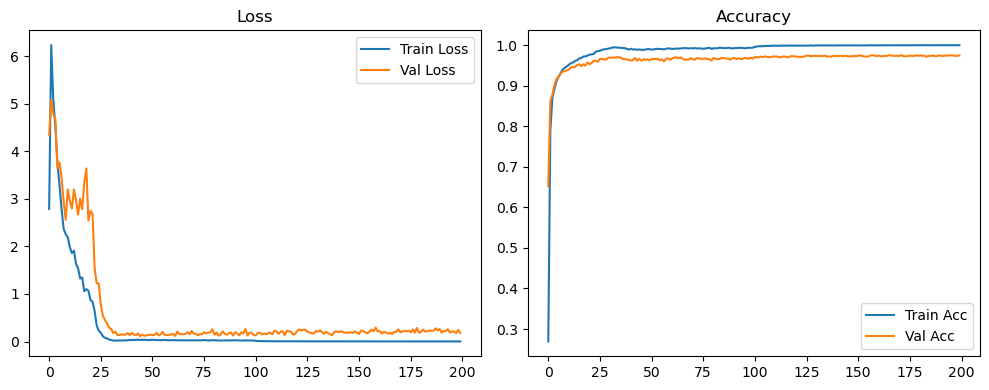

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 51.61it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 51.91it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 52.18it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 52.28it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 52.31it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 52.34it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 52.30it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 52.22it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 52.23it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 52.27it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 52.24it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 52.28it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 52.25it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 52.65it/s]

Original Model Final Test Loss: 0.1665 Accuracy: 0.9751


🚀 Running: batch128_lr0.01_0.002_0.001_dp0.2


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2218 | Val Acc: 0.5032 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2218 | Val Acc: 0.5032 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.010 | Train Acc: 0.2218 | Val Acc: 0.5032 |:   0%|          | 1/200 [00:11<37:13, 11.23s/it]

| LR: 0.010 | Train Acc: 0.7043 | Val Acc: 0.8289 |:   0%|          | 1/200 [00:21<37:13, 11.23s/it]

| LR: 0.010 | Train Acc: 0.7043 | Val Acc: 0.8289 |:   0%|          | 1/200 [00:21<37:13, 11.23s/it]

| LR: 0.010 | Train Acc: 0.7043 | Val Acc: 0.8289 |:   1%|          | 2/200 [00:21<35:36, 10.79s/it]

| LR: 0.010 | Train Acc: 0.8407 | Val Acc: 0.8944 |:   1%|          | 2/200 [00:32<35:36, 10.79s/it]

| LR: 0.010 | Train Acc: 0.8407 | Val Acc: 0.8944 |:   1%|          | 2/200 [00:32<35:36, 10.79s/it]

| LR: 0.010 | Train Acc: 0.8407 | Val Acc: 0.8944 |:   2%|▏         | 3/200 [00:32<35:23, 10.78s/it]

| LR: 0.010 | Train Acc: 0.8780 | Val Acc: 0.9097 |:   2%|▏         | 3/200 [00:43<35:23, 10.78s/it]

| LR: 0.010 | Train Acc: 0.8780 | Val Acc: 0.9097 |:   2%|▏         | 3/200 [00:43<35:23, 10.78s/it]

| LR: 0.010 | Train Acc: 0.8780 | Val Acc: 0.9097 |:   2%|▏         | 4/200 [00:43<35:04, 10.73s/it]

| LR: 0.010 | Train Acc: 0.8962 | Val Acc: 0.9182 |:   2%|▏         | 4/200 [00:54<35:04, 10.73s/it]

| LR: 0.010 | Train Acc: 0.8962 | Val Acc: 0.9182 |:   2%|▏         | 4/200 [00:54<35:04, 10.73s/it]

| LR: 0.010 | Train Acc: 0.8962 | Val Acc: 0.9182 |:   2%|▎         | 5/200 [00:54<35:18, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9085 | Val Acc: 0.9279 |:   2%|▎         | 5/200 [01:04<35:18, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9085 | Val Acc: 0.9279 |:   2%|▎         | 5/200 [01:04<35:18, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9085 | Val Acc: 0.9279 |:   3%|▎         | 6/200 [01:04<34:57, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9201 | Val Acc: 0.9293 |:   3%|▎         | 6/200 [01:15<34:57, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9201 | Val Acc: 0.9293 |:   3%|▎         | 6/200 [01:15<34:57, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9201 | Val Acc: 0.9293 |:   4%|▎         | 7/200 [01:15<34:57, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9404 |:   4%|▎         | 7/200 [01:26<34:57, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9404 |:   4%|▎         | 7/200 [01:26<34:57, 10.87s/it]

| LR: 0.010 | Train Acc: 0.9284 | Val Acc: 0.9404 |:   4%|▍         | 8/200 [01:26<34:34, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9302 | Val Acc: 0.9443 |:   4%|▍         | 8/200 [01:37<34:34, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9302 | Val Acc: 0.9443 |:   4%|▍         | 8/200 [01:37<34:34, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9302 | Val Acc: 0.9443 |:   4%|▍         | 9/200 [01:37<34:01, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9372 | Val Acc: 0.9364 |:   4%|▍         | 9/200 [01:47<34:01, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9372 | Val Acc: 0.9364 |:   4%|▍         | 9/200 [01:47<34:01, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9372 | Val Acc: 0.9364 |:   5%|▌         | 10/200 [01:47<33:50, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9413 | Val Acc: 0.9481 |:   5%|▌         | 10/200 [01:58<33:50, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9413 | Val Acc: 0.9481 |:   5%|▌         | 10/200 [01:58<33:50, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9413 | Val Acc: 0.9481 |:   6%|▌         | 11/200 [01:58<33:43, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9421 | Val Acc: 0.9475 |:   6%|▌         | 11/200 [02:09<33:43, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9421 | Val Acc: 0.9475 |:   6%|▌         | 11/200 [02:09<33:43, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9421 | Val Acc: 0.9475 |:   6%|▌         | 12/200 [02:09<33:26, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9469 | Val Acc: 0.9486 |:   6%|▌         | 12/200 [02:19<33:26, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9469 | Val Acc: 0.9486 |:   6%|▌         | 12/200 [02:19<33:26, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9469 | Val Acc: 0.9486 |:   6%|▋         | 13/200 [02:19<33:12, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9501 |:   6%|▋         | 13/200 [02:30<33:12, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9501 |:   6%|▋         | 13/200 [02:30<33:12, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9501 |:   7%|▋         | 14/200 [02:30<33:08, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9512 |:   7%|▋         | 14/200 [02:40<33:08, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9512 |:   7%|▋         | 14/200 [02:40<33:08, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9519 | Val Acc: 0.9512 |:   8%|▊         | 15/200 [02:41<32:51, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9523 |:   8%|▊         | 15/200 [02:52<32:51, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9523 |:   8%|▊         | 15/200 [02:52<32:51, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9523 |:   8%|▊         | 16/200 [02:52<33:02, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9583 | Val Acc: 0.9502 |:   8%|▊         | 16/200 [03:02<33:02, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9583 | Val Acc: 0.9502 |:   8%|▊         | 16/200 [03:02<33:02, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9583 | Val Acc: 0.9502 |:   8%|▊         | 17/200 [03:02<32:42, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9585 | Val Acc: 0.9582 |:   8%|▊         | 17/200 [03:13<32:42, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9585 | Val Acc: 0.9582 |:   8%|▊         | 17/200 [03:13<32:42, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9585 | Val Acc: 0.9582 |:   9%|▉         | 18/200 [03:13<32:26, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9616 | Val Acc: 0.9494 |:   9%|▉         | 18/200 [03:23<32:26, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9616 | Val Acc: 0.9494 |:   9%|▉         | 18/200 [03:23<32:26, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9616 | Val Acc: 0.9494 |:  10%|▉         | 19/200 [03:23<32:11, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9649 | Val Acc: 0.9553 |:  10%|▉         | 19/200 [03:34<32:11, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9649 | Val Acc: 0.9553 |:  10%|▉         | 19/200 [03:34<32:11, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9649 | Val Acc: 0.9553 |:  10%|█         | 20/200 [03:34<32:18, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9617 |:  10%|█         | 20/200 [03:45<32:18, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9617 |:  10%|█         | 20/200 [03:45<32:18, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9617 |:  10%|█         | 21/200 [03:45<32:01, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9651 |:  10%|█         | 21/200 [03:56<32:01, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9651 |:  10%|█         | 21/200 [03:56<32:01, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9651 |:  11%|█         | 22/200 [03:56<31:46, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9632 |:  11%|█         | 22/200 [04:06<31:46, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9632 |:  11%|█         | 22/200 [04:06<31:46, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9632 |:  12%|█▏        | 23/200 [04:06<31:26, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9686 |:  12%|█▏        | 23/200 [04:17<31:26, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9686 |:  12%|█▏        | 23/200 [04:17<31:26, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9686 |:  12%|█▏        | 24/200 [04:17<31:27, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9694 |:  12%|█▏        | 24/200 [04:28<31:27, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9694 |:  12%|█▏        | 24/200 [04:28<31:27, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9694 |:  12%|█▎        | 25/200 [04:28<31:14, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9699 |:  12%|█▎        | 25/200 [04:38<31:14, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9699 |:  12%|█▎        | 25/200 [04:38<31:14, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9699 |:  13%|█▎        | 26/200 [04:38<31:00, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9870 | Val Acc: 0.9712 |:  13%|█▎        | 26/200 [04:49<31:00, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9870 | Val Acc: 0.9712 |:  13%|█▎        | 26/200 [04:49<31:00, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9870 | Val Acc: 0.9712 |:  14%|█▎        | 27/200 [04:49<30:53, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9708 |:  14%|█▎        | 27/200 [05:00<30:53, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9708 |:  14%|█▎        | 27/200 [05:00<30:53, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9708 |:  14%|█▍        | 28/200 [05:00<30:41, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9703 |:  14%|█▍        | 28/200 [05:11<30:41, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9703 |:  14%|█▍        | 28/200 [05:11<30:41, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9886 | Val Acc: 0.9703 |:  14%|█▍        | 29/200 [05:11<30:33, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9726 |:  14%|█▍        | 29/200 [05:21<30:33, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9726 |:  14%|█▍        | 29/200 [05:21<30:33, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9726 |:  15%|█▌        | 30/200 [05:21<30:05, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9900 | Val Acc: 0.9709 |:  15%|█▌        | 30/200 [05:32<30:05, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9900 | Val Acc: 0.9709 |:  15%|█▌        | 30/200 [05:32<30:05, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9900 | Val Acc: 0.9709 |:  16%|█▌        | 31/200 [05:32<30:05, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9723 |:  16%|█▌        | 31/200 [05:43<30:05, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9723 |:  16%|█▌        | 31/200 [05:43<30:05, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9723 |:  16%|█▌        | 32/200 [05:43<29:53, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9707 |:  16%|█▌        | 32/200 [05:55<29:53, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9707 |:  16%|█▌        | 32/200 [05:55<29:53, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9707 |:  16%|█▋        | 33/200 [05:55<31:09, 11.19s/it]

| LR: 0.010 | Train Acc: 0.9880 | Val Acc: 0.9717 |:  16%|█▋        | 33/200 [06:06<31:09, 11.19s/it]

| LR: 0.010 | Train Acc: 0.9880 | Val Acc: 0.9717 |:  16%|█▋        | 33/200 [06:06<31:09, 11.19s/it]

| LR: 0.010 | Train Acc: 0.9880 | Val Acc: 0.9717 |:  17%|█▋        | 34/200 [06:06<30:34, 11.05s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9695 |:  17%|█▋        | 34/200 [06:16<30:34, 11.05s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9695 |:  17%|█▋        | 34/200 [06:16<30:34, 11.05s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9695 |:  18%|█▊        | 35/200 [06:16<30:04, 10.93s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9657 |:  18%|█▊        | 35/200 [06:27<30:04, 10.93s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9657 |:  18%|█▊        | 35/200 [06:27<30:04, 10.93s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9657 |:  18%|█▊        | 36/200 [06:27<29:58, 10.97s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9677 |:  18%|█▊        | 36/200 [06:39<29:58, 10.97s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9677 |:  18%|█▊        | 36/200 [06:39<29:58, 10.97s/it]

| LR: 0.010 | Train Acc: 0.9832 | Val Acc: 0.9677 |:  18%|█▊        | 37/200 [06:39<30:10, 11.11s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9636 |:  18%|█▊        | 37/200 [06:50<30:10, 11.11s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9636 |:  18%|█▊        | 37/200 [06:50<30:10, 11.11s/it]

| LR: 0.010 | Train Acc: 0.9841 | Val Acc: 0.9636 |:  19%|█▉        | 38/200 [06:50<29:55, 11.09s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9668 |:  19%|█▉        | 38/200 [07:00<29:55, 11.09s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9668 |:  19%|█▉        | 38/200 [07:00<29:55, 11.09s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9668 |:  20%|█▉        | 39/200 [07:00<29:21, 10.94s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9659 |:  20%|█▉        | 39/200 [07:11<29:21, 10.94s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9659 |:  20%|█▉        | 39/200 [07:11<29:21, 10.94s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9659 |:  20%|██        | 40/200 [07:11<28:53, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9663 |:  20%|██        | 40/200 [07:22<28:53, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9663 |:  20%|██        | 40/200 [07:22<28:53, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9663 |:  20%|██        | 41/200 [07:22<28:30, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9786 | Val Acc: 0.9648 |:  20%|██        | 41/200 [07:32<28:30, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9786 | Val Acc: 0.9648 |:  20%|██        | 41/200 [07:32<28:30, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9786 | Val Acc: 0.9648 |:  21%|██        | 42/200 [07:32<28:09, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9774 | Val Acc: 0.9657 |:  21%|██        | 42/200 [07:43<28:09, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9774 | Val Acc: 0.9657 |:  21%|██        | 42/200 [07:43<28:09, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9774 | Val Acc: 0.9657 |:  22%|██▏       | 43/200 [07:43<27:50, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9648 |:  22%|██▏       | 43/200 [07:53<27:50, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9648 |:  22%|██▏       | 43/200 [07:53<27:50, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9648 |:  22%|██▏       | 44/200 [07:53<27:34, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9778 | Val Acc: 0.9627 |:  22%|██▏       | 44/200 [08:04<27:34, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9778 | Val Acc: 0.9627 |:  22%|██▏       | 44/200 [08:04<27:34, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9778 | Val Acc: 0.9627 |:  22%|██▎       | 45/200 [08:04<27:22, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9643 |:  22%|██▎       | 45/200 [08:15<27:22, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9643 |:  22%|██▎       | 45/200 [08:15<27:22, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9776 | Val Acc: 0.9643 |:  23%|██▎       | 46/200 [08:15<27:25, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9579 |:  23%|██▎       | 46/200 [08:25<27:25, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9579 |:  23%|██▎       | 46/200 [08:25<27:25, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9579 |:  24%|██▎       | 47/200 [08:25<27:19, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9657 |:  24%|██▎       | 47/200 [08:36<27:19, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9657 |:  24%|██▎       | 47/200 [08:36<27:19, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9657 |:  24%|██▍       | 48/200 [08:36<27:16, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9656 |:  24%|██▍       | 48/200 [08:48<27:16, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9656 |:  24%|██▍       | 48/200 [08:48<27:16, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9656 |:  24%|██▍       | 49/200 [08:48<27:31, 10.94s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9652 |:  24%|██▍       | 49/200 [08:58<27:31, 10.94s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9652 |:  24%|██▍       | 49/200 [08:58<27:31, 10.94s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9652 |:  25%|██▌       | 50/200 [08:58<27:04, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9651 |:  25%|██▌       | 50/200 [09:09<27:04, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9651 |:  25%|██▌       | 50/200 [09:09<27:04, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9651 |:  26%|██▌       | 51/200 [09:09<26:42, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9643 |:  26%|██▌       | 51/200 [09:19<26:42, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9643 |:  26%|██▌       | 51/200 [09:19<26:42, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9643 |:  26%|██▌       | 52/200 [09:19<26:14, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9645 |:  26%|██▌       | 52/200 [09:30<26:14, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9645 |:  26%|██▌       | 52/200 [09:30<26:14, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9645 |:  26%|██▋       | 53/200 [09:30<26:05, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9780 | Val Acc: 0.9652 |:  26%|██▋       | 53/200 [09:41<26:05, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9780 | Val Acc: 0.9652 |:  26%|██▋       | 53/200 [09:41<26:05, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9780 | Val Acc: 0.9652 |:  27%|██▋       | 54/200 [09:41<25:59, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9670 |:  27%|██▋       | 54/200 [09:52<25:59, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9670 |:  27%|██▋       | 54/200 [09:52<25:59, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9670 |:  28%|██▊       | 55/200 [09:52<26:17, 10.88s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9653 |:  28%|██▊       | 55/200 [10:02<26:17, 10.88s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9653 |:  28%|██▊       | 55/200 [10:02<26:17, 10.88s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9653 |:  28%|██▊       | 56/200 [10:02<25:45, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9666 |:  28%|██▊       | 56/200 [10:13<25:45, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9666 |:  28%|██▊       | 56/200 [10:13<25:45, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9792 | Val Acc: 0.9666 |:  28%|██▊       | 57/200 [10:13<25:23, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9670 |:  28%|██▊       | 57/200 [10:24<25:23, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9670 |:  28%|██▊       | 57/200 [10:24<25:23, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9670 |:  29%|██▉       | 58/200 [10:24<25:15, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9648 |:  29%|██▉       | 58/200 [10:34<25:15, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9648 |:  29%|██▉       | 58/200 [10:34<25:15, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9648 |:  30%|██▉       | 59/200 [10:34<25:09, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9667 |:  30%|██▉       | 59/200 [10:47<25:09, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9667 |:  30%|██▉       | 59/200 [10:47<25:09, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9667 |:  30%|███       | 60/200 [10:47<26:20, 11.29s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9669 |:  30%|███       | 60/200 [10:58<26:20, 11.29s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9669 |:  30%|███       | 60/200 [10:58<26:20, 11.29s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9669 |:  30%|███       | 61/200 [10:58<25:43, 11.11s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  30%|███       | 61/200 [11:08<25:43, 11.11s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  30%|███       | 61/200 [11:08<25:43, 11.11s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  31%|███       | 62/200 [11:08<25:17, 10.99s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9669 |:  31%|███       | 62/200 [11:19<25:17, 10.99s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9669 |:  31%|███       | 62/200 [11:19<25:17, 10.99s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9669 |:  32%|███▏      | 63/200 [11:19<25:02, 10.97s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  32%|███▏      | 63/200 [11:30<25:02, 10.97s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  32%|███▏      | 63/200 [11:30<25:02, 10.97s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9685 |:  32%|███▏      | 64/200 [11:30<24:39, 10.88s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9665 |:  32%|███▏      | 64/200 [11:41<24:39, 10.88s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9665 |:  32%|███▏      | 64/200 [11:41<24:39, 10.88s/it]

| LR: 0.010 | Train Acc: 0.9795 | Val Acc: 0.9665 |:  32%|███▎      | 65/200 [11:41<24:30, 10.89s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9677 |:  32%|███▎      | 65/200 [11:52<24:30, 10.89s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9677 |:  32%|███▎      | 65/200 [11:52<24:30, 10.89s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9677 |:  33%|███▎      | 66/200 [11:52<24:11, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9642 |:  33%|███▎      | 66/200 [12:02<24:11, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9642 |:  33%|███▎      | 66/200 [12:02<24:11, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9798 | Val Acc: 0.9642 |:  34%|███▎      | 67/200 [12:02<23:51, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9672 |:  34%|███▎      | 67/200 [12:13<23:51, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9672 |:  34%|███▎      | 67/200 [12:13<23:51, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9672 |:  34%|███▍      | 68/200 [12:13<23:31, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9660 |:  34%|███▍      | 68/200 [12:23<23:31, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9660 |:  34%|███▍      | 68/200 [12:23<23:31, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9660 |:  34%|███▍      | 69/200 [12:23<23:14, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9658 |:  34%|███▍      | 69/200 [12:34<23:14, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9658 |:  34%|███▍      | 69/200 [12:34<23:14, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9658 |:  35%|███▌      | 70/200 [12:34<23:08, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9663 |:  35%|███▌      | 70/200 [12:45<23:08, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9663 |:  35%|███▌      | 70/200 [12:45<23:08, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9789 | Val Acc: 0.9663 |:  36%|███▌      | 71/200 [12:45<22:50, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9671 |:  36%|███▌      | 71/200 [12:55<22:50, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9671 |:  36%|███▌      | 71/200 [12:55<22:50, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9801 | Val Acc: 0.9671 |:  36%|███▌      | 72/200 [12:55<22:41, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9676 |:  36%|███▌      | 72/200 [13:06<22:41, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9676 |:  36%|███▌      | 72/200 [13:06<22:41, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9676 |:  36%|███▋      | 73/200 [13:06<22:30, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9676 |:  36%|███▋      | 73/200 [13:17<22:30, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9676 |:  36%|███▋      | 73/200 [13:17<22:30, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9676 |:  37%|███▋      | 74/200 [13:17<22:27, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9669 |:  37%|███▋      | 74/200 [13:27<22:27, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9669 |:  37%|███▋      | 74/200 [13:27<22:27, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9669 |:  38%|███▊      | 75/200 [13:27<22:12, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9649 |:  38%|███▊      | 75/200 [13:38<22:12, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9649 |:  38%|███▊      | 75/200 [13:38<22:12, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9649 |:  38%|███▊      | 76/200 [13:38<21:56, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9659 |:  38%|███▊      | 76/200 [13:48<21:56, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9659 |:  38%|███▊      | 76/200 [13:48<21:56, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9659 |:  38%|███▊      | 77/200 [13:48<21:39, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9667 |:  38%|███▊      | 77/200 [13:59<21:39, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9667 |:  38%|███▊      | 77/200 [13:59<21:39, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9667 |:  39%|███▉      | 78/200 [13:59<21:29, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9675 |:  39%|███▉      | 78/200 [14:09<21:29, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9675 |:  39%|███▉      | 78/200 [14:09<21:29, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9821 | Val Acc: 0.9675 |:  40%|███▉      | 79/200 [14:10<21:24, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9678 |:  40%|███▉      | 79/200 [14:20<21:24, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9678 |:  40%|███▉      | 79/200 [14:20<21:24, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9810 | Val Acc: 0.9678 |:  40%|████      | 80/200 [14:20<21:12, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9811 | Val Acc: 0.9670 |:  40%|████      | 80/200 [14:31<21:12, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9811 | Val Acc: 0.9670 |:  40%|████      | 80/200 [14:31<21:12, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9811 | Val Acc: 0.9670 |:  40%|████      | 81/200 [14:31<21:02, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9672 |:  40%|████      | 81/200 [14:41<21:02, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9672 |:  40%|████      | 81/200 [14:41<21:02, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9672 |:  41%|████      | 82/200 [14:41<20:55, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9796 | Val Acc: 0.9660 |:  41%|████      | 82/200 [14:52<20:55, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9796 | Val Acc: 0.9660 |:  41%|████      | 82/200 [14:52<20:55, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9796 | Val Acc: 0.9660 |:  42%|████▏     | 83/200 [14:52<20:47, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9641 |:  42%|████▏     | 83/200 [15:03<20:47, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9641 |:  42%|████▏     | 83/200 [15:03<20:47, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9641 |:  42%|████▏     | 84/200 [15:03<20:34, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9653 |:  42%|████▏     | 84/200 [15:13<20:34, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9653 |:  42%|████▏     | 84/200 [15:13<20:34, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9653 |:  42%|████▎     | 85/200 [15:13<20:26, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9660 |:  42%|████▎     | 85/200 [15:24<20:26, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9660 |:  42%|████▎     | 85/200 [15:24<20:26, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9803 | Val Acc: 0.9660 |:  43%|████▎     | 86/200 [15:24<20:08, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9661 |:  43%|████▎     | 86/200 [15:34<20:08, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9661 |:  43%|████▎     | 86/200 [15:34<20:08, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9661 |:  44%|████▎     | 87/200 [15:34<19:55, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9668 |:  44%|████▎     | 87/200 [15:45<19:55, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9668 |:  44%|████▎     | 87/200 [15:45<19:55, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9668 |:  44%|████▍     | 88/200 [15:45<19:42, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9669 |:  44%|████▍     | 88/200 [15:56<19:42, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9669 |:  44%|████▍     | 88/200 [15:56<19:42, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9800 | Val Acc: 0.9669 |:  44%|████▍     | 89/200 [15:56<19:41, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9678 |:  44%|████▍     | 89/200 [16:07<19:41, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9678 |:  44%|████▍     | 89/200 [16:07<19:41, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9808 | Val Acc: 0.9678 |:  45%|████▌     | 90/200 [16:07<19:50, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9673 |:  45%|████▌     | 90/200 [16:18<19:50, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9673 |:  45%|████▌     | 90/200 [16:18<19:50, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9673 |:  46%|████▌     | 91/200 [16:18<19:32, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9794 | Val Acc: 0.9636 |:  46%|████▌     | 91/200 [16:28<19:32, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9794 | Val Acc: 0.9636 |:  46%|████▌     | 91/200 [16:28<19:32, 10.76s/it]

| LR: 0.010 | Train Acc: 0.9794 | Val Acc: 0.9636 |:  46%|████▌     | 92/200 [16:28<19:12, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9681 |:  46%|████▌     | 92/200 [16:39<19:12, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9681 |:  46%|████▌     | 92/200 [16:39<19:12, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9791 | Val Acc: 0.9681 |:  46%|████▋     | 93/200 [16:39<18:57, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9667 |:  46%|████▋     | 93/200 [16:49<18:57, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9667 |:  46%|████▋     | 93/200 [16:49<18:57, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9807 | Val Acc: 0.9667 |:  47%|████▋     | 94/200 [16:49<18:45, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9666 |:  47%|████▋     | 94/200 [17:00<18:45, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9666 |:  47%|████▋     | 94/200 [17:00<18:45, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9797 | Val Acc: 0.9666 |:  48%|████▊     | 95/200 [17:00<18:35, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9682 |:  48%|████▊     | 95/200 [17:10<18:35, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9682 |:  48%|████▊     | 95/200 [17:10<18:35, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9682 |:  48%|████▊     | 96/200 [17:11<18:26, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9662 |:  48%|████▊     | 96/200 [17:21<18:26, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9662 |:  48%|████▊     | 96/200 [17:21<18:26, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9814 | Val Acc: 0.9662 |:  48%|████▊     | 97/200 [17:21<18:18, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9667 |:  48%|████▊     | 97/200 [17:32<18:18, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9667 |:  48%|████▊     | 97/200 [17:32<18:18, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9667 |:  49%|████▉     | 98/200 [17:32<18:08, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9671 |:  49%|████▉     | 98/200 [17:43<18:08, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9671 |:  49%|████▉     | 98/200 [17:43<18:08, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9671 |:  50%|████▉     | 99/200 [17:43<17:58, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9679 |:  50%|████▉     | 99/200 [17:53<17:58, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9679 |:  50%|████▉     | 99/200 [17:53<17:58, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9679 |:  50%|█████     | 100/200 [17:53<17:43, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9831 | Val Acc: 0.9697 |:  50%|█████     | 100/200 [18:04<17:43, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9831 | Val Acc: 0.9697 |:  50%|█████     | 100/200 [18:04<17:43, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9831 | Val Acc: 0.9697 |:  50%|█████     | 101/200 [18:04<17:33, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9694 |:  50%|█████     | 101/200 [18:15<17:33, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9694 |:  50%|█████     | 101/200 [18:15<17:33, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9694 |:  51%|█████     | 102/200 [18:15<17:35, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9699 |:  51%|█████     | 102/200 [18:26<17:35, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9699 |:  51%|█████     | 102/200 [18:26<17:35, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9699 |:  52%|█████▏    | 103/200 [18:26<17:23, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9700 |:  52%|█████▏    | 103/200 [18:37<17:23, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9700 |:  52%|█████▏    | 103/200 [18:37<17:23, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9700 |:  52%|█████▏    | 104/200 [18:37<17:21, 10.85s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9699 |:  52%|█████▏    | 104/200 [18:48<17:21, 10.85s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9699 |:  52%|█████▏    | 104/200 [18:48<17:21, 10.85s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9699 |:  52%|█████▎    | 105/200 [18:48<17:13, 10.88s/it]

| LR: 0.002 | Train Acc: 0.9871 | Val Acc: 0.9705 |:  52%|█████▎    | 105/200 [18:58<17:13, 10.88s/it]

| LR: 0.002 | Train Acc: 0.9871 | Val Acc: 0.9705 |:  52%|█████▎    | 105/200 [18:58<17:13, 10.88s/it]

| LR: 0.002 | Train Acc: 0.9871 | Val Acc: 0.9705 |:  53%|█████▎    | 106/200 [18:59<17:02, 10.88s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9700 |:  53%|█████▎    | 106/200 [19:09<17:02, 10.88s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9700 |:  53%|█████▎    | 106/200 [19:09<17:02, 10.88s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9700 |:  54%|█████▎    | 107/200 [19:09<16:47, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9699 |:  54%|█████▎    | 107/200 [19:20<16:47, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9699 |:  54%|█████▎    | 107/200 [19:20<16:47, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9699 |:  54%|█████▍    | 108/200 [19:20<16:28, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9708 |:  54%|█████▍    | 108/200 [19:30<16:28, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9708 |:  54%|█████▍    | 108/200 [19:30<16:28, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9708 |:  55%|█████▍    | 109/200 [19:30<16:13, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9892 | Val Acc: 0.9704 |:  55%|█████▍    | 109/200 [19:41<16:13, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9892 | Val Acc: 0.9704 |:  55%|█████▍    | 109/200 [19:41<16:13, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9892 | Val Acc: 0.9704 |:  55%|█████▌    | 110/200 [19:41<15:58, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9712 |:  55%|█████▌    | 110/200 [19:52<15:58, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9712 |:  55%|█████▌    | 110/200 [19:52<15:58, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9712 |:  56%|█████▌    | 111/200 [19:52<15:49, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9707 |:  56%|█████▌    | 111/200 [20:03<15:49, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9707 |:  56%|█████▌    | 111/200 [20:03<15:49, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9707 |:  56%|█████▌    | 112/200 [20:03<15:50, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9888 | Val Acc: 0.9707 |:  56%|█████▌    | 112/200 [20:15<15:50, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9888 | Val Acc: 0.9707 |:  56%|█████▌    | 112/200 [20:15<15:50, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9888 | Val Acc: 0.9707 |:  56%|█████▋    | 113/200 [20:15<16:12, 11.18s/it]

| LR: 0.002 | Train Acc: 0.9898 | Val Acc: 0.9715 |:  56%|█████▋    | 113/200 [20:27<16:12, 11.18s/it]

| LR: 0.002 | Train Acc: 0.9898 | Val Acc: 0.9715 |:  56%|█████▋    | 113/200 [20:27<16:12, 11.18s/it]

| LR: 0.002 | Train Acc: 0.9898 | Val Acc: 0.9715 |:  57%|█████▋    | 114/200 [20:27<16:35, 11.58s/it]

| LR: 0.002 | Train Acc: 0.9897 | Val Acc: 0.9736 |:  57%|█████▋    | 114/200 [20:39<16:35, 11.58s/it]

| LR: 0.002 | Train Acc: 0.9897 | Val Acc: 0.9736 |:  57%|█████▋    | 114/200 [20:39<16:35, 11.58s/it]

| LR: 0.002 | Train Acc: 0.9897 | Val Acc: 0.9736 |:  57%|█████▊    | 115/200 [20:39<16:25, 11.59s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9720 |:  57%|█████▊    | 115/200 [20:50<16:25, 11.59s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9720 |:  57%|█████▊    | 115/200 [20:50<16:25, 11.59s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9720 |:  58%|█████▊    | 116/200 [20:50<15:49, 11.30s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9709 |:  58%|█████▊    | 116/200 [21:00<15:49, 11.30s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9709 |:  58%|█████▊    | 116/200 [21:00<15:49, 11.30s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9709 |:  58%|█████▊    | 117/200 [21:00<15:20, 11.09s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9719 |:  58%|█████▊    | 117/200 [21:11<15:20, 11.09s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9719 |:  58%|█████▊    | 117/200 [21:11<15:20, 11.09s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9719 |:  59%|█████▉    | 118/200 [21:11<15:01, 10.99s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9719 |:  59%|█████▉    | 118/200 [21:22<15:01, 10.99s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9719 |:  59%|█████▉    | 118/200 [21:22<15:01, 10.99s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9719 |:  60%|█████▉    | 119/200 [21:22<14:43, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9903 | Val Acc: 0.9722 |:  60%|█████▉    | 119/200 [21:32<14:43, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9903 | Val Acc: 0.9722 |:  60%|█████▉    | 119/200 [21:32<14:43, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9903 | Val Acc: 0.9722 |:  60%|██████    | 120/200 [21:32<14:27, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9730 |:  60%|██████    | 120/200 [21:43<14:27, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9730 |:  60%|██████    | 120/200 [21:43<14:27, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9730 |:  60%|██████    | 121/200 [21:43<14:15, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9728 |:  60%|██████    | 121/200 [21:54<14:15, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9728 |:  60%|██████    | 121/200 [21:54<14:15, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9728 |:  61%|██████    | 122/200 [21:54<13:59, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9713 |:  61%|██████    | 122/200 [22:04<13:59, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9713 |:  61%|██████    | 122/200 [22:04<13:59, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9713 |:  62%|██████▏   | 123/200 [22:04<13:46, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9720 |:  62%|██████▏   | 123/200 [22:15<13:46, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9720 |:  62%|██████▏   | 123/200 [22:15<13:46, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9720 |:  62%|██████▏   | 124/200 [22:15<13:31, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9714 |:  62%|██████▏   | 124/200 [22:26<13:31, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9714 |:  62%|██████▏   | 124/200 [22:26<13:31, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9714 |:  62%|██████▎   | 125/200 [22:26<13:21, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9916 | Val Acc: 0.9718 |:  62%|██████▎   | 125/200 [22:36<13:21, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9916 | Val Acc: 0.9718 |:  62%|██████▎   | 125/200 [22:36<13:21, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9916 | Val Acc: 0.9718 |:  63%|██████▎   | 126/200 [22:36<13:10, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9723 |:  63%|██████▎   | 126/200 [22:47<13:10, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9723 |:  63%|██████▎   | 126/200 [22:47<13:10, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9723 |:  64%|██████▎   | 127/200 [22:47<12:56, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9723 |:  64%|██████▎   | 127/200 [22:57<12:56, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9723 |:  64%|██████▎   | 127/200 [22:57<12:56, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9723 |:  64%|██████▍   | 128/200 [22:57<12:42, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9720 |:  64%|██████▍   | 128/200 [23:08<12:42, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9720 |:  64%|██████▍   | 128/200 [23:08<12:42, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9720 |:  64%|██████▍   | 129/200 [23:08<12:35, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9734 |:  64%|██████▍   | 129/200 [23:19<12:35, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9734 |:  64%|██████▍   | 129/200 [23:19<12:35, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9734 |:  65%|██████▌   | 130/200 [23:19<12:29, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9723 |:  65%|██████▌   | 130/200 [23:30<12:29, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9723 |:  65%|██████▌   | 130/200 [23:30<12:29, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9723 |:  66%|██████▌   | 131/200 [23:30<12:18, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9722 |:  66%|██████▌   | 131/200 [23:40<12:18, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9722 |:  66%|██████▌   | 131/200 [23:40<12:18, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9722 |:  66%|██████▌   | 132/200 [23:40<12:04, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9727 |:  66%|██████▌   | 132/200 [23:51<12:04, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9727 |:  66%|██████▌   | 132/200 [23:51<12:04, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9727 |:  66%|██████▋   | 133/200 [23:51<11:52, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9923 | Val Acc: 0.9725 |:  66%|██████▋   | 133/200 [24:02<11:52, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9923 | Val Acc: 0.9725 |:  66%|██████▋   | 133/200 [24:02<11:52, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9923 | Val Acc: 0.9725 |:  67%|██████▋   | 134/200 [24:02<11:46, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9734 |:  67%|██████▋   | 134/200 [24:12<11:46, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9734 |:  67%|██████▋   | 134/200 [24:12<11:46, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9734 |:  68%|██████▊   | 135/200 [24:12<11:36, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9921 | Val Acc: 0.9709 |:  68%|██████▊   | 135/200 [24:23<11:36, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9921 | Val Acc: 0.9709 |:  68%|██████▊   | 135/200 [24:23<11:36, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9921 | Val Acc: 0.9709 |:  68%|██████▊   | 136/200 [24:23<11:27, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9722 |:  68%|██████▊   | 136/200 [24:34<11:27, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9722 |:  68%|██████▊   | 136/200 [24:34<11:27, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9926 | Val Acc: 0.9722 |:  68%|██████▊   | 137/200 [24:34<11:15, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9721 |:  68%|██████▊   | 137/200 [24:45<11:15, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9721 |:  68%|██████▊   | 137/200 [24:45<11:15, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9721 |:  69%|██████▉   | 138/200 [24:45<11:06, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9728 |:  69%|██████▉   | 138/200 [24:55<11:06, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9728 |:  69%|██████▉   | 138/200 [24:55<11:06, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9728 |:  70%|██████▉   | 139/200 [24:55<10:52, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9733 |:  70%|██████▉   | 139/200 [25:06<10:52, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9733 |:  70%|██████▉   | 139/200 [25:06<10:52, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9733 |:  70%|███████   | 140/200 [25:06<10:38, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9735 |:  70%|███████   | 140/200 [25:17<10:38, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9735 |:  70%|███████   | 140/200 [25:17<10:38, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9735 |:  70%|███████   | 141/200 [25:17<10:40, 10.85s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9731 |:  70%|███████   | 141/200 [25:28<10:40, 10.85s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9731 |:  70%|███████   | 141/200 [25:28<10:40, 10.85s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9731 |:  71%|███████   | 142/200 [25:28<10:27, 10.82s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9722 |:  71%|███████   | 142/200 [25:39<10:27, 10.82s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9722 |:  71%|███████   | 142/200 [25:39<10:27, 10.82s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9722 |:  72%|███████▏  | 143/200 [25:39<10:14, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9726 |:  72%|███████▏  | 143/200 [25:49<10:14, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9726 |:  72%|███████▏  | 143/200 [25:49<10:14, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9726 |:  72%|███████▏  | 144/200 [25:49<10:02, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9724 |:  72%|███████▏  | 144/200 [26:00<10:02, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9724 |:  72%|███████▏  | 144/200 [26:00<10:02, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9724 |:  72%|███████▎  | 145/200 [26:00<09:46, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9742 |:  72%|███████▎  | 145/200 [26:10<09:46, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9742 |:  72%|███████▎  | 145/200 [26:10<09:46, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9742 |:  73%|███████▎  | 146/200 [26:10<09:33, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9732 |:  73%|███████▎  | 146/200 [26:21<09:33, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9732 |:  73%|███████▎  | 146/200 [26:21<09:33, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9732 |:  74%|███████▎  | 147/200 [26:21<09:27, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9723 |:  74%|███████▎  | 147/200 [26:32<09:27, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9723 |:  74%|███████▎  | 147/200 [26:32<09:27, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9723 |:  74%|███████▍  | 148/200 [26:32<09:14, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9718 |:  74%|███████▍  | 148/200 [26:42<09:14, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9718 |:  74%|███████▍  | 148/200 [26:42<09:14, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9718 |:  74%|███████▍  | 149/200 [26:42<09:03, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9723 |:  74%|███████▍  | 149/200 [26:53<09:03, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9723 |:  74%|███████▍  | 149/200 [26:53<09:03, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9723 |:  75%|███████▌  | 150/200 [26:53<08:50, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9720 |:  75%|███████▌  | 150/200 [27:04<08:50, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9720 |:  75%|███████▌  | 150/200 [27:04<08:50, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9720 |:  76%|███████▌  | 151/200 [27:04<08:41, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9728 |:  76%|███████▌  | 151/200 [27:14<08:41, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9728 |:  76%|███████▌  | 151/200 [27:14<08:41, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9728 |:  76%|███████▌  | 152/200 [27:14<08:32, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9732 |:  76%|███████▌  | 152/200 [27:25<08:32, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9732 |:  76%|███████▌  | 152/200 [27:25<08:32, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9732 |:  76%|███████▋  | 153/200 [27:25<08:20, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9732 |:  76%|███████▋  | 153/200 [27:36<08:20, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9732 |:  76%|███████▋  | 153/200 [27:36<08:20, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9732 |:  77%|███████▋  | 154/200 [27:36<08:10, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9734 |:  77%|███████▋  | 154/200 [27:46<08:10, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9734 |:  77%|███████▋  | 154/200 [27:46<08:10, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9734 |:  78%|███████▊  | 155/200 [27:46<07:59, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9723 |:  78%|███████▊  | 155/200 [27:57<07:59, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9723 |:  78%|███████▊  | 155/200 [27:57<07:59, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9723 |:  78%|███████▊  | 156/200 [27:57<07:50, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9727 |:  78%|███████▊  | 156/200 [28:08<07:50, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9727 |:  78%|███████▊  | 156/200 [28:08<07:50, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9727 |:  78%|███████▊  | 157/200 [28:08<07:40, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9719 |:  78%|███████▊  | 157/200 [28:18<07:40, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9719 |:  78%|███████▊  | 157/200 [28:18<07:40, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9719 |:  79%|███████▉  | 158/200 [28:19<07:30, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9727 |:  79%|███████▉  | 158/200 [28:29<07:30, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9727 |:  79%|███████▉  | 158/200 [28:29<07:30, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9727 |:  80%|███████▉  | 159/200 [28:29<07:18, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9723 |:  80%|███████▉  | 159/200 [28:40<07:18, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9723 |:  80%|███████▉  | 159/200 [28:40<07:18, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9723 |:  80%|████████  | 160/200 [28:40<07:05, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9733 |:  80%|████████  | 160/200 [28:51<07:05, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9733 |:  80%|████████  | 160/200 [28:51<07:05, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9733 |:  80%|████████  | 161/200 [28:51<07:01, 10.82s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9726 |:  80%|████████  | 161/200 [29:02<07:01, 10.82s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9726 |:  80%|████████  | 161/200 [29:02<07:01, 10.82s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9726 |:  81%|████████  | 162/200 [29:02<06:50, 10.79s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9734 |:  81%|████████  | 162/200 [29:12<06:50, 10.79s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9734 |:  81%|████████  | 162/200 [29:12<06:50, 10.79s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9734 |:  82%|████████▏ | 163/200 [29:12<06:36, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9739 |:  82%|████████▏ | 163/200 [29:23<06:36, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9739 |:  82%|████████▏ | 163/200 [29:23<06:36, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9739 |:  82%|████████▏ | 164/200 [29:23<06:27, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9738 |:  82%|████████▏ | 164/200 [29:35<06:27, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9738 |:  82%|████████▏ | 164/200 [29:35<06:27, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9738 |:  82%|████████▎ | 165/200 [29:35<06:26, 11.05s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9738 |:  82%|████████▎ | 165/200 [29:45<06:26, 11.05s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9738 |:  82%|████████▎ | 165/200 [29:45<06:26, 11.05s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9738 |:  83%|████████▎ | 166/200 [29:46<06:12, 10.97s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9742 |:  83%|████████▎ | 166/200 [29:56<06:12, 10.97s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9742 |:  83%|████████▎ | 166/200 [29:56<06:12, 10.97s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9742 |:  84%|████████▎ | 167/200 [29:56<05:57, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9742 |:  84%|████████▎ | 167/200 [30:07<05:57, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9742 |:  84%|████████▎ | 167/200 [30:07<05:57, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9742 |:  84%|████████▍ | 168/200 [30:07<05:45, 10.79s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9741 |:  84%|████████▍ | 168/200 [30:17<05:45, 10.79s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9741 |:  84%|████████▍ | 168/200 [30:17<05:45, 10.79s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9741 |:  84%|████████▍ | 169/200 [30:17<05:33, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9733 |:  84%|████████▍ | 169/200 [30:29<05:33, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9733 |:  84%|████████▍ | 169/200 [30:29<05:33, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9733 |:  85%|████████▌ | 170/200 [30:29<05:31, 11.06s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9742 |:  85%|████████▌ | 170/200 [30:42<05:31, 11.06s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9742 |:  85%|████████▌ | 170/200 [30:42<05:31, 11.06s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9742 |:  86%|████████▌ | 171/200 [30:42<05:34, 11.53s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9732 |:  86%|████████▌ | 171/200 [30:53<05:34, 11.53s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9732 |:  86%|████████▌ | 171/200 [30:53<05:34, 11.53s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9732 |:  86%|████████▌ | 172/200 [30:53<05:17, 11.33s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9735 |:  86%|████████▌ | 172/200 [31:03<05:17, 11.33s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9735 |:  86%|████████▌ | 172/200 [31:03<05:17, 11.33s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9735 |:  86%|████████▋ | 173/200 [31:03<05:01, 11.18s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9748 |:  86%|████████▋ | 173/200 [31:14<05:01, 11.18s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9748 |:  86%|████████▋ | 173/200 [31:14<05:01, 11.18s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9748 |:  87%|████████▋ | 174/200 [31:14<04:46, 11.02s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9731 |:  87%|████████▋ | 174/200 [31:25<04:46, 11.02s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9731 |:  87%|████████▋ | 174/200 [31:25<04:46, 11.02s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9731 |:  88%|████████▊ | 175/200 [31:25<04:34, 10.97s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9736 |:  88%|████████▊ | 175/200 [31:36<04:34, 10.97s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9736 |:  88%|████████▊ | 175/200 [31:36<04:34, 10.97s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9736 |:  88%|████████▊ | 176/200 [31:36<04:20, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9732 |:  88%|████████▊ | 176/200 [31:46<04:20, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9732 |:  88%|████████▊ | 176/200 [31:46<04:20, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9732 |:  88%|████████▊ | 177/200 [31:46<04:09, 10.85s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9728 |:  88%|████████▊ | 177/200 [31:57<04:09, 10.85s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9728 |:  88%|████████▊ | 177/200 [31:57<04:09, 10.85s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9728 |:  89%|████████▉ | 178/200 [31:57<03:56, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9735 |:  89%|████████▉ | 178/200 [32:07<03:56, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9735 |:  89%|████████▉ | 178/200 [32:07<03:56, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9735 |:  90%|████████▉ | 179/200 [32:08<03:44, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9752 |:  90%|████████▉ | 179/200 [32:18<03:44, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9752 |:  90%|████████▉ | 179/200 [32:18<03:44, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9752 |:  90%|█████████ | 180/200 [32:18<03:32, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9750 |:  90%|█████████ | 180/200 [32:29<03:32, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9750 |:  90%|█████████ | 180/200 [32:29<03:32, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9750 |:  90%|█████████ | 181/200 [32:29<03:22, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9748 |:  90%|█████████ | 181/200 [32:39<03:22, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9748 |:  90%|█████████ | 181/200 [32:39<03:22, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9748 |:  91%|█████████ | 182/200 [32:39<03:11, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9731 |:  91%|█████████ | 182/200 [32:50<03:11, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9731 |:  91%|█████████ | 182/200 [32:50<03:11, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9731 |:  92%|█████████▏| 183/200 [32:50<03:01, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9734 |:  92%|█████████▏| 183/200 [33:01<03:01, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9734 |:  92%|█████████▏| 183/200 [33:01<03:01, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9734 |:  92%|█████████▏| 184/200 [33:01<02:51, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9748 |:  92%|█████████▏| 184/200 [33:11<02:51, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9748 |:  92%|█████████▏| 184/200 [33:11<02:51, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9748 |:  92%|█████████▎| 185/200 [33:11<02:40, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9749 |:  92%|█████████▎| 185/200 [33:22<02:40, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9749 |:  92%|█████████▎| 185/200 [33:22<02:40, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9749 |:  93%|█████████▎| 186/200 [33:22<02:29, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9742 |:  93%|█████████▎| 186/200 [33:33<02:29, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9742 |:  93%|█████████▎| 186/200 [33:33<02:29, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9742 |:  94%|█████████▎| 187/200 [33:33<02:18, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9756 |:  94%|█████████▎| 187/200 [33:44<02:18, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9756 |:  94%|█████████▎| 187/200 [33:44<02:18, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9756 |:  94%|█████████▍| 188/200 [33:44<02:08, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9747 |:  94%|█████████▍| 188/200 [33:54<02:08, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9747 |:  94%|█████████▍| 188/200 [33:54<02:08, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9747 |:  94%|█████████▍| 189/200 [33:54<01:57, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9748 |:  94%|█████████▍| 189/200 [34:05<01:57, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9748 |:  94%|█████████▍| 189/200 [34:05<01:57, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9748 |:  95%|█████████▌| 190/200 [34:05<01:48, 10.82s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9753 |:  95%|█████████▌| 190/200 [34:16<01:48, 10.82s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9753 |:  95%|█████████▌| 190/200 [34:16<01:48, 10.82s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9753 |:  96%|█████████▌| 191/200 [34:16<01:36, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9760 |:  96%|█████████▌| 191/200 [34:27<01:36, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9760 |:  96%|█████████▌| 191/200 [34:27<01:36, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9760 |:  96%|█████████▌| 192/200 [34:27<01:25, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9751 |:  96%|█████████▌| 192/200 [34:37<01:25, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9751 |:  96%|█████████▌| 192/200 [34:37<01:25, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9751 |:  96%|█████████▋| 193/200 [34:37<01:15, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9748 |:  96%|█████████▋| 193/200 [34:49<01:15, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9748 |:  96%|█████████▋| 193/200 [34:49<01:15, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9748 |:  97%|█████████▋| 194/200 [34:49<01:05, 10.88s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9747 |:  97%|█████████▋| 194/200 [34:59<01:05, 10.88s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9747 |:  97%|█████████▋| 194/200 [34:59<01:05, 10.88s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9747 |:  98%|█████████▊| 195/200 [34:59<00:54, 10.87s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9748 |:  98%|█████████▊| 195/200 [35:10<00:54, 10.87s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9748 |:  98%|█████████▊| 195/200 [35:10<00:54, 10.87s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9748 |:  98%|█████████▊| 196/200 [35:10<00:43, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9755 |:  98%|█████████▊| 196/200 [35:21<00:43, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9755 |:  98%|█████████▊| 196/200 [35:21<00:43, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9755 |:  98%|█████████▊| 197/200 [35:22<00:32, 10.97s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9748 |:  98%|█████████▊| 197/200 [35:33<00:32, 10.97s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9748 |:  98%|█████████▊| 197/200 [35:33<00:32, 10.97s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9748 |:  99%|█████████▉| 198/200 [35:33<00:22, 11.10s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9740 |:  99%|█████████▉| 198/200 [35:44<00:22, 11.10s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9740 |:  99%|█████████▉| 198/200 [35:44<00:22, 11.10s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9740 |: 100%|█████████▉| 199/200 [35:44<00:10, 10.97s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9753 |: 100%|█████████▉| 199/200 [35:54<00:10, 10.97s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9753 |: 100%|█████████▉| 199/200 [35:54<00:10, 10.97s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9753 |: 100%|██████████| 200/200 [35:54<00:00, 10.83s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9753 |: 100%|██████████| 200/200 [35:54<00:00, 10.77s/it]

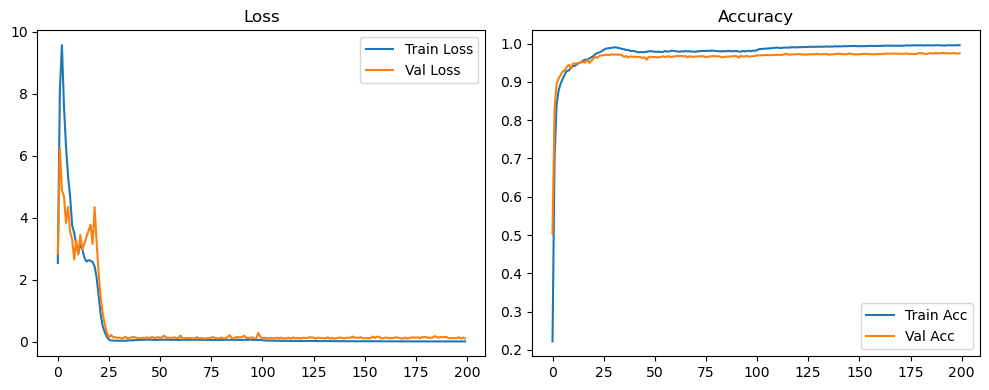

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 51.52it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 52.00it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 52.18it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 52.27it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 52.33it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 52.36it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 52.39it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 52.39it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 52.41it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 52.43it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 52.41it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 52.24it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 51.71it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 52.56it/s]

Original Model Final Test Loss: 0.0980 Accuracy: 0.9770


🚀 Running: batch128_lr0.01_0.002_0.001_dp0.5


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1899 | Val Acc: 0.5262 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1899 | Val Acc: 0.5262 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1899 | Val Acc: 0.5262 |:   0%|          | 1/200 [00:11<37:18, 11.25s/it]

| LR: 0.010 | Train Acc: 0.6363 | Val Acc: 0.8549 |:   0%|          | 1/200 [00:21<37:18, 11.25s/it]

| LR: 0.010 | Train Acc: 0.6363 | Val Acc: 0.8549 |:   0%|          | 1/200 [00:21<37:18, 11.25s/it]

| LR: 0.010 | Train Acc: 0.6363 | Val Acc: 0.8549 |:   1%|          | 2/200 [00:21<36:02, 10.92s/it]

| LR: 0.010 | Train Acc: 0.8077 | Val Acc: 0.8936 |:   1%|          | 2/200 [00:32<36:02, 10.92s/it]

| LR: 0.010 | Train Acc: 0.8077 | Val Acc: 0.8936 |:   1%|          | 2/200 [00:32<36:02, 10.92s/it]

| LR: 0.010 | Train Acc: 0.8077 | Val Acc: 0.8936 |:   2%|▏         | 3/200 [00:32<35:33, 10.83s/it]

| LR: 0.010 | Train Acc: 0.8490 | Val Acc: 0.9117 |:   2%|▏         | 3/200 [00:43<35:33, 10.83s/it]

| LR: 0.010 | Train Acc: 0.8490 | Val Acc: 0.9117 |:   2%|▏         | 3/200 [00:43<35:33, 10.83s/it]

| LR: 0.010 | Train Acc: 0.8490 | Val Acc: 0.9117 |:   2%|▏         | 4/200 [00:43<35:16, 10.80s/it]

| LR: 0.010 | Train Acc: 0.8721 | Val Acc: 0.9214 |:   2%|▏         | 4/200 [00:54<35:16, 10.80s/it]

| LR: 0.010 | Train Acc: 0.8721 | Val Acc: 0.9214 |:   2%|▏         | 4/200 [00:54<35:16, 10.80s/it]

| LR: 0.010 | Train Acc: 0.8721 | Val Acc: 0.9214 |:   2%|▎         | 5/200 [00:54<35:13, 10.84s/it]

| LR: 0.010 | Train Acc: 0.8864 | Val Acc: 0.9349 |:   2%|▎         | 5/200 [01:04<35:13, 10.84s/it]

| LR: 0.010 | Train Acc: 0.8864 | Val Acc: 0.9349 |:   2%|▎         | 5/200 [01:04<35:13, 10.84s/it]

| LR: 0.010 | Train Acc: 0.8864 | Val Acc: 0.9349 |:   3%|▎         | 6/200 [01:04<34:34, 10.69s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9383 |:   3%|▎         | 6/200 [01:15<34:34, 10.69s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9383 |:   3%|▎         | 6/200 [01:15<34:34, 10.69s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9383 |:   4%|▎         | 7/200 [01:15<34:16, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9070 | Val Acc: 0.9467 |:   4%|▎         | 7/200 [01:26<34:16, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9070 | Val Acc: 0.9467 |:   4%|▎         | 7/200 [01:26<34:16, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9070 | Val Acc: 0.9467 |:   4%|▍         | 8/200 [01:26<34:23, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9465 |:   4%|▍         | 8/200 [01:36<34:23, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9465 |:   4%|▍         | 8/200 [01:36<34:23, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9465 |:   4%|▍         | 9/200 [01:37<34:13, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9185 | Val Acc: 0.9483 |:   4%|▍         | 9/200 [01:47<34:13, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9185 | Val Acc: 0.9483 |:   4%|▍         | 9/200 [01:47<34:13, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9185 | Val Acc: 0.9483 |:   5%|▌         | 10/200 [01:47<33:55, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9234 | Val Acc: 0.9563 |:   5%|▌         | 10/200 [01:58<33:55, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9234 | Val Acc: 0.9563 |:   5%|▌         | 10/200 [01:58<33:55, 10.71s/it]

| LR: 0.010 | Train Acc: 0.9234 | Val Acc: 0.9563 |:   6%|▌         | 11/200 [01:58<33:48, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9265 | Val Acc: 0.9565 |:   6%|▌         | 11/200 [02:08<33:48, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9265 | Val Acc: 0.9565 |:   6%|▌         | 11/200 [02:08<33:48, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9265 | Val Acc: 0.9565 |:   6%|▌         | 12/200 [02:08<33:26, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9294 | Val Acc: 0.9547 |:   6%|▌         | 12/200 [02:19<33:26, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9294 | Val Acc: 0.9547 |:   6%|▌         | 12/200 [02:19<33:26, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9294 | Val Acc: 0.9547 |:   6%|▋         | 13/200 [02:19<33:14, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9312 | Val Acc: 0.9610 |:   6%|▋         | 13/200 [02:30<33:14, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9312 | Val Acc: 0.9610 |:   6%|▋         | 13/200 [02:30<33:14, 10.66s/it]

| LR: 0.010 | Train Acc: 0.9312 | Val Acc: 0.9610 |:   7%|▋         | 14/200 [02:30<32:54, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9360 | Val Acc: 0.9600 |:   7%|▋         | 14/200 [02:41<32:54, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9360 | Val Acc: 0.9600 |:   7%|▋         | 14/200 [02:41<32:54, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9360 | Val Acc: 0.9600 |:   8%|▊         | 15/200 [02:41<33:03, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9417 | Val Acc: 0.9637 |:   8%|▊         | 15/200 [02:51<33:03, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9417 | Val Acc: 0.9637 |:   8%|▊         | 15/200 [02:51<33:03, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9417 | Val Acc: 0.9637 |:   8%|▊         | 16/200 [02:51<32:37, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9648 |:   8%|▊         | 16/200 [03:02<32:37, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9648 |:   8%|▊         | 16/200 [03:02<32:37, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9648 |:   8%|▊         | 17/200 [03:02<32:26, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9572 | Val Acc: 0.9666 |:   8%|▊         | 17/200 [03:12<32:26, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9572 | Val Acc: 0.9666 |:   8%|▊         | 17/200 [03:12<32:26, 10.64s/it]

| LR: 0.010 | Train Acc: 0.9572 | Val Acc: 0.9666 |:   9%|▉         | 18/200 [03:12<32:25, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9621 | Val Acc: 0.9672 |:   9%|▉         | 18/200 [03:23<32:25, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9621 | Val Acc: 0.9672 |:   9%|▉         | 18/200 [03:23<32:25, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9621 | Val Acc: 0.9672 |:  10%|▉         | 19/200 [03:23<32:10, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9628 | Val Acc: 0.9671 |:  10%|▉         | 19/200 [03:34<32:10, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9628 | Val Acc: 0.9671 |:  10%|▉         | 19/200 [03:34<32:10, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9628 | Val Acc: 0.9671 |:  10%|█         | 20/200 [03:34<32:12, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9682 |:  10%|█         | 20/200 [03:45<32:12, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9682 |:  10%|█         | 20/200 [03:45<32:12, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9682 |:  10%|█         | 21/200 [03:45<31:58, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9663 | Val Acc: 0.9687 |:  10%|█         | 21/200 [03:55<31:58, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9663 | Val Acc: 0.9687 |:  10%|█         | 21/200 [03:55<31:58, 10.72s/it]

| LR: 0.010 | Train Acc: 0.9663 | Val Acc: 0.9687 |:  11%|█         | 22/200 [03:55<31:32, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9664 | Val Acc: 0.9683 |:  11%|█         | 22/200 [04:06<31:32, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9664 | Val Acc: 0.9683 |:  11%|█         | 22/200 [04:06<31:32, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9664 | Val Acc: 0.9683 |:  12%|█▏        | 23/200 [04:06<31:17, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9692 |:  12%|█▏        | 23/200 [04:16<31:17, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9692 |:  12%|█▏        | 23/200 [04:16<31:17, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9692 |:  12%|█▏        | 24/200 [04:16<30:54, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9691 |:  12%|█▏        | 24/200 [04:27<30:54, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9691 |:  12%|█▏        | 24/200 [04:27<30:54, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9691 |:  12%|█▎        | 25/200 [04:27<30:49, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9677 |:  12%|█▎        | 25/200 [04:37<30:49, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9677 |:  12%|█▎        | 25/200 [04:37<30:49, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9669 | Val Acc: 0.9677 |:  13%|█▎        | 26/200 [04:37<30:39, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9669 |:  13%|█▎        | 26/200 [04:48<30:39, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9669 |:  13%|█▎        | 26/200 [04:48<30:39, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9669 |:  14%|█▎        | 27/200 [04:48<30:31, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9678 |:  14%|█▎        | 27/200 [04:58<30:31, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9678 |:  14%|█▎        | 27/200 [04:58<30:31, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9647 | Val Acc: 0.9678 |:  14%|█▍        | 28/200 [04:58<30:23, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9673 |:  14%|█▍        | 28/200 [05:09<30:23, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9673 |:  14%|█▍        | 28/200 [05:09<30:23, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9627 | Val Acc: 0.9673 |:  14%|█▍        | 29/200 [05:09<30:09, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9601 | Val Acc: 0.9646 |:  14%|█▍        | 29/200 [05:20<30:09, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9601 | Val Acc: 0.9646 |:  14%|█▍        | 29/200 [05:20<30:09, 10.58s/it]

| LR: 0.010 | Train Acc: 0.9601 | Val Acc: 0.9646 |:  15%|█▌        | 30/200 [05:20<29:56, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9586 | Val Acc: 0.9644 |:  15%|█▌        | 30/200 [05:30<29:56, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9586 | Val Acc: 0.9644 |:  15%|█▌        | 30/200 [05:30<29:56, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9586 | Val Acc: 0.9644 |:  16%|█▌        | 31/200 [05:30<29:54, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9567 | Val Acc: 0.9633 |:  16%|█▌        | 31/200 [05:41<29:54, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9567 | Val Acc: 0.9633 |:  16%|█▌        | 31/200 [05:41<29:54, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9567 | Val Acc: 0.9633 |:  16%|█▌        | 32/200 [05:41<29:53, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9656 |:  16%|█▌        | 32/200 [05:52<29:53, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9656 |:  16%|█▌        | 32/200 [05:52<29:53, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9656 |:  16%|█▋        | 33/200 [05:52<29:45, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9539 | Val Acc: 0.9626 |:  16%|█▋        | 33/200 [06:03<29:45, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9539 | Val Acc: 0.9626 |:  16%|█▋        | 33/200 [06:03<29:45, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9539 | Val Acc: 0.9626 |:  17%|█▋        | 34/200 [06:03<29:41, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9534 | Val Acc: 0.9615 |:  17%|█▋        | 34/200 [06:13<29:41, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9534 | Val Acc: 0.9615 |:  17%|█▋        | 34/200 [06:13<29:41, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9534 | Val Acc: 0.9615 |:  18%|█▊        | 35/200 [06:13<29:31, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9523 | Val Acc: 0.9618 |:  18%|█▊        | 35/200 [06:24<29:31, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9523 | Val Acc: 0.9618 |:  18%|█▊        | 35/200 [06:24<29:31, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9523 | Val Acc: 0.9618 |:  18%|█▊        | 36/200 [06:24<29:20, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9510 | Val Acc: 0.9640 |:  18%|█▊        | 36/200 [06:35<29:20, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9510 | Val Acc: 0.9640 |:  18%|█▊        | 36/200 [06:35<29:20, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9510 | Val Acc: 0.9640 |:  18%|█▊        | 37/200 [06:35<29:10, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9633 |:  18%|█▊        | 37/200 [06:45<29:10, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9633 |:  18%|█▊        | 37/200 [06:45<29:10, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9633 |:  19%|█▉        | 38/200 [06:45<28:53, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9608 |:  19%|█▉        | 38/200 [06:56<28:53, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9608 |:  19%|█▉        | 38/200 [06:56<28:53, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9608 |:  20%|█▉        | 39/200 [06:56<28:42, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9627 |:  20%|█▉        | 39/200 [07:07<28:42, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9627 |:  20%|█▉        | 39/200 [07:07<28:42, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9627 |:  20%|██        | 40/200 [07:07<28:40, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9606 |:  20%|██        | 40/200 [07:18<28:40, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9606 |:  20%|██        | 40/200 [07:18<28:40, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9606 |:  20%|██        | 41/200 [07:18<29:02, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9630 |:  20%|██        | 41/200 [07:29<29:02, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9630 |:  20%|██        | 41/200 [07:29<29:02, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9630 |:  21%|██        | 42/200 [07:29<28:36, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  21%|██        | 42/200 [07:40<28:36, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  21%|██        | 42/200 [07:40<28:36, 10.86s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  22%|██▏       | 43/200 [07:40<28:20, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9639 |:  22%|██▏       | 43/200 [07:51<28:20, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9639 |:  22%|██▏       | 43/200 [07:51<28:20, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9639 |:  22%|██▏       | 44/200 [07:51<28:05, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9641 |:  22%|██▏       | 44/200 [08:02<28:05, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9641 |:  22%|██▏       | 44/200 [08:02<28:05, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9641 |:  22%|██▎       | 45/200 [08:02<28:22, 10.99s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  22%|██▎       | 45/200 [08:13<28:22, 10.99s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  22%|██▎       | 45/200 [08:13<28:22, 10.99s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  23%|██▎       | 46/200 [08:13<28:05, 10.94s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9621 |:  23%|██▎       | 46/200 [08:24<28:05, 10.94s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9621 |:  23%|██▎       | 46/200 [08:24<28:05, 10.94s/it]

| LR: 0.010 | Train Acc: 0.9498 | Val Acc: 0.9621 |:  24%|██▎       | 47/200 [08:24<27:49, 10.91s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9616 |:  24%|██▎       | 47/200 [08:34<27:49, 10.91s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9616 |:  24%|██▎       | 47/200 [08:34<27:49, 10.91s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9616 |:  24%|██▍       | 48/200 [08:34<27:28, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9618 |:  24%|██▍       | 48/200 [08:45<27:28, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9618 |:  24%|██▍       | 48/200 [08:45<27:28, 10.85s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9618 |:  24%|██▍       | 49/200 [08:45<27:09, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9617 |:  24%|██▍       | 49/200 [08:56<27:09, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9617 |:  24%|██▍       | 49/200 [08:56<27:09, 10.79s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9617 |:  25%|██▌       | 50/200 [08:56<26:55, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9613 |:  25%|██▌       | 50/200 [09:07<26:55, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9613 |:  25%|██▌       | 50/200 [09:07<26:55, 10.77s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9613 |:  26%|██▌       | 51/200 [09:07<26:46, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9629 |:  26%|██▌       | 51/200 [09:17<26:46, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9629 |:  26%|██▌       | 51/200 [09:17<26:46, 10.78s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9629 |:  26%|██▌       | 52/200 [09:17<26:28, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9637 |:  26%|██▌       | 52/200 [09:28<26:28, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9637 |:  26%|██▌       | 52/200 [09:28<26:28, 10.73s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9637 |:  26%|██▋       | 53/200 [09:28<26:10, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9512 | Val Acc: 0.9626 |:  26%|██▋       | 53/200 [09:40<26:10, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9512 | Val Acc: 0.9626 |:  26%|██▋       | 53/200 [09:40<26:10, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9512 | Val Acc: 0.9626 |:  27%|██▋       | 54/200 [09:40<27:14, 11.20s/it]

| LR: 0.010 | Train Acc: 0.9477 | Val Acc: 0.9617 |:  27%|██▋       | 54/200 [09:51<27:14, 11.20s/it]

| LR: 0.010 | Train Acc: 0.9477 | Val Acc: 0.9617 |:  27%|██▋       | 54/200 [09:51<27:14, 11.20s/it]

| LR: 0.010 | Train Acc: 0.9477 | Val Acc: 0.9617 |:  28%|██▊       | 55/200 [09:51<26:43, 11.06s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9618 |:  28%|██▊       | 55/200 [10:01<26:43, 11.06s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9618 |:  28%|██▊       | 55/200 [10:01<26:43, 11.06s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9618 |:  28%|██▊       | 56/200 [10:02<26:11, 10.91s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9643 |:  28%|██▊       | 56/200 [10:12<26:11, 10.91s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9643 |:  28%|██▊       | 56/200 [10:12<26:11, 10.91s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9643 |:  28%|██▊       | 57/200 [10:12<25:48, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9647 |:  28%|██▊       | 57/200 [10:23<25:48, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9647 |:  28%|██▊       | 57/200 [10:23<25:48, 10.83s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9647 |:  29%|██▉       | 58/200 [10:23<25:34, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9517 | Val Acc: 0.9622 |:  29%|██▉       | 58/200 [10:33<25:34, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9517 | Val Acc: 0.9622 |:  29%|██▉       | 58/200 [10:33<25:34, 10.81s/it]

| LR: 0.010 | Train Acc: 0.9517 | Val Acc: 0.9622 |:  30%|██▉       | 59/200 [10:33<24:58, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9502 | Val Acc: 0.9632 |:  30%|██▉       | 59/200 [10:44<24:58, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9502 | Val Acc: 0.9632 |:  30%|██▉       | 59/200 [10:44<24:58, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9502 | Val Acc: 0.9632 |:  30%|███       | 60/200 [10:44<24:53, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9622 |:  30%|███       | 60/200 [10:54<24:53, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9622 |:  30%|███       | 60/200 [10:54<24:53, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9622 |:  30%|███       | 61/200 [10:54<24:31, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9639 |:  30%|███       | 61/200 [11:05<24:31, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9639 |:  30%|███       | 61/200 [11:05<24:31, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9639 |:  31%|███       | 62/200 [11:05<24:14, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9479 | Val Acc: 0.9636 |:  31%|███       | 62/200 [11:15<24:14, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9479 | Val Acc: 0.9636 |:  31%|███       | 62/200 [11:15<24:14, 10.54s/it]

| LR: 0.010 | Train Acc: 0.9479 | Val Acc: 0.9636 |:  32%|███▏      | 63/200 [11:15<24:12, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9504 | Val Acc: 0.9622 |:  32%|███▏      | 63/200 [11:26<24:12, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9504 | Val Acc: 0.9622 |:  32%|███▏      | 63/200 [11:26<24:12, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9504 | Val Acc: 0.9622 |:  32%|███▏      | 64/200 [11:26<23:55, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9628 |:  32%|███▏      | 64/200 [11:37<23:55, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9628 |:  32%|███▏      | 64/200 [11:37<23:55, 10.56s/it]

| LR: 0.010 | Train Acc: 0.9511 | Val Acc: 0.9628 |:  32%|███▎      | 65/200 [11:37<23:54, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9482 | Val Acc: 0.9633 |:  32%|███▎      | 65/200 [11:47<23:54, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9482 | Val Acc: 0.9633 |:  32%|███▎      | 65/200 [11:47<23:54, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9482 | Val Acc: 0.9633 |:  33%|███▎      | 66/200 [11:47<23:39, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9628 |:  33%|███▎      | 66/200 [11:58<23:39, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9628 |:  33%|███▎      | 66/200 [11:58<23:39, 10.59s/it]

| LR: 0.010 | Train Acc: 0.9507 | Val Acc: 0.9628 |:  34%|███▎      | 67/200 [11:58<23:41, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9633 |:  34%|███▎      | 67/200 [12:08<23:41, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9633 |:  34%|███▎      | 67/200 [12:08<23:41, 10.69s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9633 |:  34%|███▍      | 68/200 [12:08<23:15, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9624 |:  34%|███▍      | 68/200 [12:19<23:15, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9624 |:  34%|███▍      | 68/200 [12:19<23:15, 10.57s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9624 |:  34%|███▍      | 69/200 [12:19<22:54, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9487 | Val Acc: 0.9630 |:  34%|███▍      | 69/200 [12:29<22:54, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9487 | Val Acc: 0.9630 |:  34%|███▍      | 69/200 [12:29<22:54, 10.49s/it]

| LR: 0.010 | Train Acc: 0.9487 | Val Acc: 0.9630 |:  35%|███▌      | 70/200 [12:29<22:47, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9451 | Val Acc: 0.9647 |:  35%|███▌      | 70/200 [12:40<22:47, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9451 | Val Acc: 0.9647 |:  35%|███▌      | 70/200 [12:40<22:47, 10.52s/it]

| LR: 0.010 | Train Acc: 0.9451 | Val Acc: 0.9647 |:  36%|███▌      | 71/200 [12:40<22:47, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9634 |:  36%|███▌      | 71/200 [12:51<22:47, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9634 |:  36%|███▌      | 71/200 [12:51<22:47, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9634 |:  36%|███▌      | 72/200 [12:51<22:36, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9633 |:  36%|███▌      | 72/200 [13:01<22:36, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9633 |:  36%|███▌      | 72/200 [13:01<22:36, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9493 | Val Acc: 0.9633 |:  36%|███▋      | 73/200 [13:01<22:30, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9626 |:  36%|███▋      | 73/200 [13:12<22:30, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9626 |:  36%|███▋      | 73/200 [13:12<22:30, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9626 |:  37%|███▋      | 74/200 [13:12<22:24, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9616 |:  37%|███▋      | 74/200 [13:23<22:24, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9616 |:  37%|███▋      | 74/200 [13:23<22:24, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9616 |:  38%|███▊      | 75/200 [13:23<22:15, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9625 |:  38%|███▊      | 75/200 [13:34<22:15, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9625 |:  38%|███▊      | 75/200 [13:34<22:15, 10.68s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9625 |:  38%|███▊      | 76/200 [13:34<22:12, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9614 |:  38%|███▊      | 76/200 [13:44<22:12, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9614 |:  38%|███▊      | 76/200 [13:44<22:12, 10.75s/it]

| LR: 0.010 | Train Acc: 0.9488 | Val Acc: 0.9614 |:  38%|███▊      | 77/200 [13:44<21:55, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9617 |:  38%|███▊      | 77/200 [13:55<21:55, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9617 |:  38%|███▊      | 77/200 [13:55<21:55, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9490 | Val Acc: 0.9617 |:  39%|███▉      | 78/200 [13:55<21:38, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9613 |:  39%|███▉      | 78/200 [14:05<21:38, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9613 |:  39%|███▉      | 78/200 [14:05<21:38, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9613 |:  40%|███▉      | 79/200 [14:05<21:26, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9612 |:  40%|███▉      | 79/200 [14:16<21:26, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9612 |:  40%|███▉      | 79/200 [14:16<21:26, 10.63s/it]

| LR: 0.010 | Train Acc: 0.9503 | Val Acc: 0.9612 |:  40%|████      | 80/200 [14:16<21:14, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9628 |:  40%|████      | 80/200 [14:27<21:14, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9628 |:  40%|████      | 80/200 [14:27<21:14, 10.62s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9628 |:  40%|████      | 81/200 [14:27<21:01, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9617 |:  40%|████      | 81/200 [14:37<21:01, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9617 |:  40%|████      | 81/200 [14:37<21:01, 10.60s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9617 |:  41%|████      | 82/200 [14:37<20:52, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9626 |:  41%|████      | 82/200 [14:48<20:52, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9626 |:  41%|████      | 82/200 [14:48<20:52, 10.61s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9626 |:  42%|████▏     | 83/200 [14:48<20:48, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9625 |:  42%|████▏     | 83/200 [14:59<20:48, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9625 |:  42%|████▏     | 83/200 [14:59<20:48, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9625 |:  42%|████▏     | 84/200 [14:59<20:35, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9633 |:  42%|████▏     | 84/200 [15:09<20:35, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9633 |:  42%|████▏     | 84/200 [15:09<20:35, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9499 | Val Acc: 0.9633 |:  42%|████▎     | 85/200 [15:09<20:24, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9628 |:  42%|████▎     | 85/200 [15:20<20:24, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9628 |:  42%|████▎     | 85/200 [15:20<20:24, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9628 |:  43%|████▎     | 86/200 [15:20<20:14, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9628 |:  43%|████▎     | 86/200 [15:31<20:14, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9628 |:  43%|████▎     | 86/200 [15:31<20:14, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9494 | Val Acc: 0.9628 |:  44%|████▎     | 87/200 [15:31<20:03, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9607 |:  44%|████▎     | 87/200 [15:41<20:03, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9607 |:  44%|████▎     | 87/200 [15:41<20:03, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9500 | Val Acc: 0.9607 |:  44%|████▍     | 88/200 [15:41<19:53, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9442 | Val Acc: 0.9615 |:  44%|████▍     | 88/200 [15:52<19:53, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9442 | Val Acc: 0.9615 |:  44%|████▍     | 88/200 [15:52<19:53, 10.65s/it]

| LR: 0.010 | Train Acc: 0.9442 | Val Acc: 0.9615 |:  44%|████▍     | 89/200 [15:52<19:52, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9456 | Val Acc: 0.9613 |:  44%|████▍     | 89/200 [16:03<19:52, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9456 | Val Acc: 0.9613 |:  44%|████▍     | 89/200 [16:03<19:52, 10.74s/it]

| LR: 0.010 | Train Acc: 0.9456 | Val Acc: 0.9613 |:  45%|████▌     | 90/200 [16:03<19:36, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9475 | Val Acc: 0.9616 |:  45%|████▌     | 90/200 [16:13<19:36, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9475 | Val Acc: 0.9616 |:  45%|████▌     | 90/200 [16:13<19:36, 10.70s/it]

| LR: 0.010 | Train Acc: 0.9475 | Val Acc: 0.9616 |:  46%|████▌     | 91/200 [16:13<19:23, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9617 |:  46%|████▌     | 91/200 [16:25<19:23, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9617 |:  46%|████▌     | 91/200 [16:25<19:23, 10.67s/it]

| LR: 0.010 | Train Acc: 0.9486 | Val Acc: 0.9617 |:  46%|████▌     | 92/200 [16:25<19:44, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9610 |:  46%|████▌     | 92/200 [16:38<19:44, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9610 |:  46%|████▌     | 92/200 [16:38<19:44, 10.96s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9610 |:  46%|████▋     | 93/200 [16:38<20:24, 11.44s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9620 |:  46%|████▋     | 93/200 [16:50<20:24, 11.44s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9620 |:  46%|████▋     | 93/200 [16:50<20:24, 11.44s/it]

| LR: 0.010 | Train Acc: 0.9497 | Val Acc: 0.9620 |:  47%|████▋     | 94/200 [16:50<20:42, 11.72s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9637 |:  47%|████▋     | 94/200 [17:03<20:42, 11.72s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9637 |:  47%|████▋     | 94/200 [17:03<20:42, 11.72s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9637 |:  48%|████▊     | 95/200 [17:03<20:58, 11.99s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9567 |:  48%|████▊     | 95/200 [17:13<20:58, 11.99s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9567 |:  48%|████▊     | 95/200 [17:13<20:58, 11.99s/it]

| LR: 0.010 | Train Acc: 0.9508 | Val Acc: 0.9567 |:  48%|████▊     | 96/200 [17:13<20:04, 11.59s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9599 |:  48%|████▊     | 96/200 [17:24<20:04, 11.59s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9599 |:  48%|████▊     | 96/200 [17:24<20:04, 11.59s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9599 |:  48%|████▊     | 97/200 [17:24<19:24, 11.31s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9616 |:  48%|████▊     | 97/200 [17:35<19:24, 11.31s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9616 |:  48%|████▊     | 97/200 [17:35<19:24, 11.31s/it]

| LR: 0.010 | Train Acc: 0.9491 | Val Acc: 0.9616 |:  49%|████▉     | 98/200 [17:35<18:54, 11.12s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  49%|████▉     | 98/200 [17:45<18:54, 11.12s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  49%|████▉     | 98/200 [17:45<18:54, 11.12s/it]

| LR: 0.010 | Train Acc: 0.9505 | Val Acc: 0.9623 |:  50%|████▉     | 99/200 [17:45<18:32, 11.02s/it]

| LR: 0.010 | Train Acc: 0.9525 | Val Acc: 0.9625 |:  50%|████▉     | 99/200 [17:56<18:32, 11.02s/it]

| LR: 0.010 | Train Acc: 0.9525 | Val Acc: 0.9625 |:  50%|████▉     | 99/200 [17:56<18:32, 11.02s/it]

| LR: 0.010 | Train Acc: 0.9525 | Val Acc: 0.9625 |:  50%|█████     | 100/200 [17:56<18:12, 10.93s/it]

| LR: 0.002 | Train Acc: 0.9520 | Val Acc: 0.9639 |:  50%|█████     | 100/200 [18:07<18:12, 10.93s/it]

| LR: 0.002 | Train Acc: 0.9520 | Val Acc: 0.9639 |:  50%|█████     | 100/200 [18:07<18:12, 10.93s/it]

| LR: 0.002 | Train Acc: 0.9520 | Val Acc: 0.9639 |:  50%|█████     | 101/200 [18:07<17:49, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9531 | Val Acc: 0.9632 |:  50%|█████     | 101/200 [18:17<17:49, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9531 | Val Acc: 0.9632 |:  50%|█████     | 101/200 [18:17<17:49, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9531 | Val Acc: 0.9632 |:  51%|█████     | 102/200 [18:17<17:35, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9537 | Val Acc: 0.9637 |:  51%|█████     | 102/200 [18:28<17:35, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9537 | Val Acc: 0.9637 |:  51%|█████     | 102/200 [18:28<17:35, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9537 | Val Acc: 0.9637 |:  52%|█████▏    | 103/200 [18:28<17:18, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9549 | Val Acc: 0.9648 |:  52%|█████▏    | 103/200 [18:38<17:18, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9549 | Val Acc: 0.9648 |:  52%|█████▏    | 103/200 [18:38<17:18, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9549 | Val Acc: 0.9648 |:  52%|█████▏    | 104/200 [18:38<17:04, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9551 | Val Acc: 0.9657 |:  52%|█████▏    | 104/200 [18:49<17:04, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9551 | Val Acc: 0.9657 |:  52%|█████▏    | 104/200 [18:49<17:04, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9551 | Val Acc: 0.9657 |:  52%|█████▎    | 105/200 [18:49<16:54, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9559 | Val Acc: 0.9657 |:  52%|█████▎    | 105/200 [19:00<16:54, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9559 | Val Acc: 0.9657 |:  52%|█████▎    | 105/200 [19:00<16:54, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9559 | Val Acc: 0.9657 |:  53%|█████▎    | 106/200 [19:00<16:44, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9577 | Val Acc: 0.9653 |:  53%|█████▎    | 106/200 [19:11<16:44, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9577 | Val Acc: 0.9653 |:  53%|█████▎    | 106/200 [19:11<16:44, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9577 | Val Acc: 0.9653 |:  54%|█████▎    | 107/200 [19:11<16:33, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9580 | Val Acc: 0.9667 |:  54%|█████▎    | 107/200 [19:21<16:33, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9580 | Val Acc: 0.9667 |:  54%|█████▎    | 107/200 [19:21<16:33, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9580 | Val Acc: 0.9667 |:  54%|█████▍    | 108/200 [19:21<16:26, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9569 | Val Acc: 0.9651 |:  54%|█████▍    | 108/200 [19:32<16:26, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9569 | Val Acc: 0.9651 |:  54%|█████▍    | 108/200 [19:32<16:26, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9569 | Val Acc: 0.9651 |:  55%|█████▍    | 109/200 [19:32<16:13, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9573 | Val Acc: 0.9655 |:  55%|█████▍    | 109/200 [19:43<16:13, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9573 | Val Acc: 0.9655 |:  55%|█████▍    | 109/200 [19:43<16:13, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9573 | Val Acc: 0.9655 |:  55%|█████▌    | 110/200 [19:43<16:03, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9601 | Val Acc: 0.9653 |:  55%|█████▌    | 110/200 [19:53<16:03, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9601 | Val Acc: 0.9653 |:  55%|█████▌    | 110/200 [19:53<16:03, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9601 | Val Acc: 0.9653 |:  56%|█████▌    | 111/200 [19:53<15:53, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9584 | Val Acc: 0.9647 |:  56%|█████▌    | 111/200 [20:05<15:53, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9584 | Val Acc: 0.9647 |:  56%|█████▌    | 111/200 [20:05<15:53, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9584 | Val Acc: 0.9647 |:  56%|█████▌    | 112/200 [20:06<16:19, 11.13s/it]

| LR: 0.002 | Train Acc: 0.9590 | Val Acc: 0.9661 |:  56%|█████▌    | 112/200 [20:16<16:19, 11.13s/it]

| LR: 0.002 | Train Acc: 0.9590 | Val Acc: 0.9661 |:  56%|█████▌    | 112/200 [20:16<16:19, 11.13s/it]

| LR: 0.002 | Train Acc: 0.9590 | Val Acc: 0.9661 |:  56%|█████▋    | 113/200 [20:16<15:55, 10.99s/it]

| LR: 0.002 | Train Acc: 0.9577 | Val Acc: 0.9673 |:  56%|█████▋    | 113/200 [20:27<15:55, 10.99s/it]

| LR: 0.002 | Train Acc: 0.9577 | Val Acc: 0.9673 |:  56%|█████▋    | 113/200 [20:27<15:55, 10.99s/it]

| LR: 0.002 | Train Acc: 0.9577 | Val Acc: 0.9673 |:  57%|█████▋    | 114/200 [20:27<15:37, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9618 | Val Acc: 0.9654 |:  57%|█████▋    | 114/200 [20:38<15:37, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9618 | Val Acc: 0.9654 |:  57%|█████▋    | 114/200 [20:38<15:37, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9618 | Val Acc: 0.9654 |:  57%|█████▊    | 115/200 [20:38<15:28, 10.93s/it]

| LR: 0.002 | Train Acc: 0.9623 | Val Acc: 0.9683 |:  57%|█████▊    | 115/200 [20:48<15:28, 10.93s/it]

| LR: 0.002 | Train Acc: 0.9623 | Val Acc: 0.9683 |:  57%|█████▊    | 115/200 [20:48<15:28, 10.93s/it]

| LR: 0.002 | Train Acc: 0.9623 | Val Acc: 0.9683 |:  58%|█████▊    | 116/200 [20:48<15:08, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9609 | Val Acc: 0.9668 |:  58%|█████▊    | 116/200 [20:59<15:08, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9609 | Val Acc: 0.9668 |:  58%|█████▊    | 116/200 [20:59<15:08, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9609 | Val Acc: 0.9668 |:  58%|█████▊    | 117/200 [20:59<14:59, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9611 | Val Acc: 0.9668 |:  58%|█████▊    | 117/200 [21:10<14:59, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9611 | Val Acc: 0.9668 |:  58%|█████▊    | 117/200 [21:10<14:59, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9611 | Val Acc: 0.9668 |:  59%|█████▉    | 118/200 [21:10<14:44, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9624 | Val Acc: 0.9678 |:  59%|█████▉    | 118/200 [21:21<14:44, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9624 | Val Acc: 0.9678 |:  59%|█████▉    | 118/200 [21:21<14:44, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9624 | Val Acc: 0.9678 |:  60%|█████▉    | 119/200 [21:21<14:31, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9638 | Val Acc: 0.9682 |:  60%|█████▉    | 119/200 [21:31<14:31, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9638 | Val Acc: 0.9682 |:  60%|█████▉    | 119/200 [21:31<14:31, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9638 | Val Acc: 0.9682 |:  60%|██████    | 120/200 [21:31<14:21, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9624 | Val Acc: 0.9675 |:  60%|██████    | 120/200 [21:42<14:21, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9624 | Val Acc: 0.9675 |:  60%|██████    | 120/200 [21:42<14:21, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9624 | Val Acc: 0.9675 |:  60%|██████    | 121/200 [21:42<14:06, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9630 | Val Acc: 0.9675 |:  60%|██████    | 121/200 [21:53<14:06, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9630 | Val Acc: 0.9675 |:  60%|██████    | 121/200 [21:53<14:06, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9630 | Val Acc: 0.9675 |:  61%|██████    | 122/200 [21:53<13:51, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9629 | Val Acc: 0.9675 |:  61%|██████    | 122/200 [22:03<13:51, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9629 | Val Acc: 0.9675 |:  61%|██████    | 122/200 [22:03<13:51, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9629 | Val Acc: 0.9675 |:  62%|██████▏   | 123/200 [22:03<13:38, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9638 | Val Acc: 0.9665 |:  62%|██████▏   | 123/200 [22:14<13:38, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9638 | Val Acc: 0.9665 |:  62%|██████▏   | 123/200 [22:14<13:38, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9638 | Val Acc: 0.9665 |:  62%|██████▏   | 124/200 [22:14<13:37, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9627 | Val Acc: 0.9676 |:  62%|██████▏   | 124/200 [22:25<13:37, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9627 | Val Acc: 0.9676 |:  62%|██████▏   | 124/200 [22:25<13:37, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9627 | Val Acc: 0.9676 |:  62%|██████▎   | 125/200 [22:25<13:22, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9616 | Val Acc: 0.9668 |:  62%|██████▎   | 125/200 [22:35<13:22, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9616 | Val Acc: 0.9668 |:  62%|██████▎   | 125/200 [22:35<13:22, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9616 | Val Acc: 0.9668 |:  63%|██████▎   | 126/200 [22:35<13:09, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9648 | Val Acc: 0.9677 |:  63%|██████▎   | 126/200 [22:46<13:09, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9648 | Val Acc: 0.9677 |:  63%|██████▎   | 126/200 [22:46<13:09, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9648 | Val Acc: 0.9677 |:  64%|██████▎   | 127/200 [22:46<12:55, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9641 | Val Acc: 0.9672 |:  64%|██████▎   | 127/200 [22:56<12:55, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9641 | Val Acc: 0.9672 |:  64%|██████▎   | 127/200 [22:56<12:55, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9641 | Val Acc: 0.9672 |:  64%|██████▍   | 128/200 [22:57<12:45, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9628 | Val Acc: 0.9678 |:  64%|██████▍   | 128/200 [23:07<12:45, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9628 | Val Acc: 0.9678 |:  64%|██████▍   | 128/200 [23:07<12:45, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9628 | Val Acc: 0.9678 |:  64%|██████▍   | 129/200 [23:07<12:35, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9636 | Val Acc: 0.9678 |:  64%|██████▍   | 129/200 [23:18<12:35, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9636 | Val Acc: 0.9678 |:  64%|██████▍   | 129/200 [23:18<12:35, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9636 | Val Acc: 0.9678 |:  65%|██████▌   | 130/200 [23:18<12:25, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9656 | Val Acc: 0.9675 |:  65%|██████▌   | 130/200 [23:28<12:25, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9656 | Val Acc: 0.9675 |:  65%|██████▌   | 130/200 [23:28<12:25, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9656 | Val Acc: 0.9675 |:  66%|██████▌   | 131/200 [23:29<12:15, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9649 | Val Acc: 0.9675 |:  66%|██████▌   | 131/200 [23:39<12:15, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9649 | Val Acc: 0.9675 |:  66%|██████▌   | 131/200 [23:39<12:15, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9649 | Val Acc: 0.9675 |:  66%|██████▌   | 132/200 [23:39<12:03, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9647 | Val Acc: 0.9663 |:  66%|██████▌   | 132/200 [23:50<12:03, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9647 | Val Acc: 0.9663 |:  66%|██████▌   | 132/200 [23:50<12:03, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9647 | Val Acc: 0.9663 |:  66%|██████▋   | 133/200 [23:50<12:02, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9654 | Val Acc: 0.9692 |:  66%|██████▋   | 133/200 [24:02<12:02, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9654 | Val Acc: 0.9692 |:  66%|██████▋   | 133/200 [24:02<12:02, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9654 | Val Acc: 0.9692 |:  67%|██████▋   | 134/200 [24:02<12:11, 11.08s/it]

| LR: 0.002 | Train Acc: 0.9646 | Val Acc: 0.9683 |:  67%|██████▋   | 134/200 [24:13<12:11, 11.08s/it]

| LR: 0.002 | Train Acc: 0.9646 | Val Acc: 0.9683 |:  67%|██████▋   | 134/200 [24:13<12:11, 11.08s/it]

| LR: 0.002 | Train Acc: 0.9646 | Val Acc: 0.9683 |:  68%|██████▊   | 135/200 [24:13<11:49, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9661 | Val Acc: 0.9671 |:  68%|██████▊   | 135/200 [24:23<11:49, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9661 | Val Acc: 0.9671 |:  68%|██████▊   | 135/200 [24:23<11:49, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9661 | Val Acc: 0.9671 |:  68%|██████▊   | 136/200 [24:23<11:33, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9652 | Val Acc: 0.9684 |:  68%|██████▊   | 136/200 [24:34<11:33, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9652 | Val Acc: 0.9684 |:  68%|██████▊   | 136/200 [24:34<11:33, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9652 | Val Acc: 0.9684 |:  68%|██████▊   | 137/200 [24:34<11:25, 10.88s/it]

| LR: 0.002 | Train Acc: 0.9648 | Val Acc: 0.9671 |:  68%|██████▊   | 137/200 [24:45<11:25, 10.88s/it]

| LR: 0.002 | Train Acc: 0.9648 | Val Acc: 0.9671 |:  68%|██████▊   | 137/200 [24:45<11:25, 10.88s/it]

| LR: 0.002 | Train Acc: 0.9648 | Val Acc: 0.9671 |:  69%|██████▉   | 138/200 [24:45<11:07, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9656 | Val Acc: 0.9669 |:  69%|██████▉   | 138/200 [24:55<11:07, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9656 | Val Acc: 0.9669 |:  69%|██████▉   | 138/200 [24:55<11:07, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9656 | Val Acc: 0.9669 |:  70%|██████▉   | 139/200 [24:55<10:52, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9649 | Val Acc: 0.9683 |:  70%|██████▉   | 139/200 [25:06<10:52, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9649 | Val Acc: 0.9683 |:  70%|██████▉   | 139/200 [25:06<10:52, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9649 | Val Acc: 0.9683 |:  70%|███████   | 140/200 [25:06<10:38, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9659 | Val Acc: 0.9667 |:  70%|███████   | 140/200 [25:16<10:38, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9659 | Val Acc: 0.9667 |:  70%|███████   | 140/200 [25:16<10:38, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9659 | Val Acc: 0.9667 |:  70%|███████   | 141/200 [25:16<10:27, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9659 | Val Acc: 0.9689 |:  70%|███████   | 141/200 [25:27<10:27, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9659 | Val Acc: 0.9689 |:  70%|███████   | 141/200 [25:27<10:27, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9659 | Val Acc: 0.9689 |:  71%|███████   | 142/200 [25:27<10:17, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9668 | Val Acc: 0.9677 |:  71%|███████   | 142/200 [25:37<10:17, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9668 | Val Acc: 0.9677 |:  71%|███████   | 142/200 [25:37<10:17, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9668 | Val Acc: 0.9677 |:  72%|███████▏  | 143/200 [25:38<10:03, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9667 | Val Acc: 0.9679 |:  72%|███████▏  | 143/200 [25:48<10:03, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9667 | Val Acc: 0.9679 |:  72%|███████▏  | 143/200 [25:48<10:03, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9667 | Val Acc: 0.9679 |:  72%|███████▏  | 144/200 [25:48<09:53, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9671 | Val Acc: 0.9690 |:  72%|███████▏  | 144/200 [25:59<09:53, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9671 | Val Acc: 0.9690 |:  72%|███████▏  | 144/200 [25:59<09:53, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9671 | Val Acc: 0.9690 |:  72%|███████▎  | 145/200 [25:59<09:42, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9667 | Val Acc: 0.9677 |:  72%|███████▎  | 145/200 [26:10<09:42, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9667 | Val Acc: 0.9677 |:  72%|███████▎  | 145/200 [26:10<09:42, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9667 | Val Acc: 0.9677 |:  73%|███████▎  | 146/200 [26:10<09:35, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9677 | Val Acc: 0.9682 |:  73%|███████▎  | 146/200 [26:20<09:35, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9677 | Val Acc: 0.9682 |:  73%|███████▎  | 146/200 [26:20<09:35, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9677 | Val Acc: 0.9682 |:  74%|███████▎  | 147/200 [26:20<09:22, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9676 | Val Acc: 0.9682 |:  74%|███████▎  | 147/200 [26:32<09:22, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9676 | Val Acc: 0.9682 |:  74%|███████▎  | 147/200 [26:32<09:22, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9676 | Val Acc: 0.9682 |:  74%|███████▍  | 148/200 [26:32<09:27, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9673 | Val Acc: 0.9689 |:  74%|███████▍  | 148/200 [26:42<09:27, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9673 | Val Acc: 0.9689 |:  74%|███████▍  | 148/200 [26:42<09:27, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9673 | Val Acc: 0.9689 |:  74%|███████▍  | 149/200 [26:42<09:14, 10.87s/it]

| LR: 0.002 | Train Acc: 0.9665 | Val Acc: 0.9686 |:  74%|███████▍  | 149/200 [26:53<09:14, 10.87s/it]

| LR: 0.002 | Train Acc: 0.9665 | Val Acc: 0.9686 |:  74%|███████▍  | 149/200 [26:53<09:14, 10.87s/it]

| LR: 0.002 | Train Acc: 0.9665 | Val Acc: 0.9686 |:  75%|███████▌  | 150/200 [26:53<09:00, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9673 | Val Acc: 0.9684 |:  75%|███████▌  | 150/200 [27:04<09:00, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9673 | Val Acc: 0.9684 |:  75%|███████▌  | 150/200 [27:04<09:00, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9673 | Val Acc: 0.9684 |:  76%|███████▌  | 151/200 [27:04<08:47, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9678 | Val Acc: 0.9683 |:  76%|███████▌  | 151/200 [27:15<08:47, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9678 | Val Acc: 0.9683 |:  76%|███████▌  | 151/200 [27:15<08:47, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9678 | Val Acc: 0.9683 |:  76%|███████▌  | 152/200 [27:15<08:37, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9674 | Val Acc: 0.9687 |:  76%|███████▌  | 152/200 [27:25<08:37, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9674 | Val Acc: 0.9687 |:  76%|███████▌  | 152/200 [27:25<08:37, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9674 | Val Acc: 0.9687 |:  76%|███████▋  | 153/200 [27:25<08:21, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9666 | Val Acc: 0.9693 |:  76%|███████▋  | 153/200 [27:35<08:21, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9666 | Val Acc: 0.9693 |:  76%|███████▋  | 153/200 [27:35<08:21, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9666 | Val Acc: 0.9693 |:  77%|███████▋  | 154/200 [27:35<08:06, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9678 | Val Acc: 0.9682 |:  77%|███████▋  | 154/200 [27:46<08:06, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9678 | Val Acc: 0.9682 |:  77%|███████▋  | 154/200 [27:46<08:06, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9678 | Val Acc: 0.9682 |:  78%|███████▊  | 155/200 [27:46<07:53, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9675 | Val Acc: 0.9698 |:  78%|███████▊  | 155/200 [27:57<07:53, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9675 | Val Acc: 0.9698 |:  78%|███████▊  | 155/200 [27:57<07:53, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9675 | Val Acc: 0.9698 |:  78%|███████▊  | 156/200 [27:57<07:47, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9685 | Val Acc: 0.9693 |:  78%|███████▊  | 156/200 [28:07<07:47, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9685 | Val Acc: 0.9693 |:  78%|███████▊  | 156/200 [28:07<07:47, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9685 | Val Acc: 0.9693 |:  78%|███████▊  | 157/200 [28:07<07:40, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9672 | Val Acc: 0.9695 |:  78%|███████▊  | 157/200 [28:18<07:40, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9672 | Val Acc: 0.9695 |:  78%|███████▊  | 157/200 [28:18<07:40, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9672 | Val Acc: 0.9695 |:  79%|███████▉  | 158/200 [28:18<07:31, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9678 | Val Acc: 0.9684 |:  79%|███████▉  | 158/200 [28:29<07:31, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9678 | Val Acc: 0.9684 |:  79%|███████▉  | 158/200 [28:29<07:31, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9678 | Val Acc: 0.9684 |:  80%|███████▉  | 159/200 [28:29<07:16, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9694 | Val Acc: 0.9687 |:  80%|███████▉  | 159/200 [28:39<07:16, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9694 | Val Acc: 0.9687 |:  80%|███████▉  | 159/200 [28:39<07:16, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9694 | Val Acc: 0.9687 |:  80%|████████  | 160/200 [28:39<07:05, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9701 | Val Acc: 0.9695 |:  80%|████████  | 160/200 [28:50<07:05, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9701 | Val Acc: 0.9695 |:  80%|████████  | 160/200 [28:50<07:05, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9701 | Val Acc: 0.9695 |:  80%|████████  | 161/200 [28:50<06:55, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9694 | Val Acc: 0.9671 |:  80%|████████  | 161/200 [29:01<06:55, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9694 | Val Acc: 0.9671 |:  80%|████████  | 161/200 [29:01<06:55, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9694 | Val Acc: 0.9671 |:  81%|████████  | 162/200 [29:01<06:43, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9673 | Val Acc: 0.9692 |:  81%|████████  | 162/200 [29:11<06:43, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9673 | Val Acc: 0.9692 |:  81%|████████  | 162/200 [29:11<06:43, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9673 | Val Acc: 0.9692 |:  82%|████████▏ | 163/200 [29:11<06:33, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9690 | Val Acc: 0.9697 |:  82%|████████▏ | 163/200 [29:22<06:33, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9690 | Val Acc: 0.9697 |:  82%|████████▏ | 163/200 [29:22<06:33, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9690 | Val Acc: 0.9697 |:  82%|████████▏ | 164/200 [29:22<06:23, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9692 | Val Acc: 0.9691 |:  82%|████████▏ | 164/200 [29:33<06:23, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9692 | Val Acc: 0.9691 |:  82%|████████▏ | 164/200 [29:33<06:23, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9692 | Val Acc: 0.9691 |:  82%|████████▎ | 165/200 [29:33<06:12, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9693 | Val Acc: 0.9696 |:  82%|████████▎ | 165/200 [29:43<06:12, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9693 | Val Acc: 0.9696 |:  82%|████████▎ | 165/200 [29:43<06:12, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9693 | Val Acc: 0.9696 |:  83%|████████▎ | 166/200 [29:43<06:01, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9689 | Val Acc: 0.9702 |:  83%|████████▎ | 166/200 [29:54<06:01, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9689 | Val Acc: 0.9702 |:  83%|████████▎ | 166/200 [29:54<06:01, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9689 | Val Acc: 0.9702 |:  84%|████████▎ | 167/200 [29:54<05:57, 10.83s/it]

| LR: 0.001 | Train Acc: 0.9701 | Val Acc: 0.9688 |:  84%|████████▎ | 167/200 [30:05<05:57, 10.83s/it]

| LR: 0.001 | Train Acc: 0.9701 | Val Acc: 0.9688 |:  84%|████████▎ | 167/200 [30:05<05:57, 10.83s/it]

| LR: 0.001 | Train Acc: 0.9701 | Val Acc: 0.9688 |:  84%|████████▍ | 168/200 [30:05<05:45, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9696 | Val Acc: 0.9702 |:  84%|████████▍ | 168/200 [30:16<05:45, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9696 | Val Acc: 0.9702 |:  84%|████████▍ | 168/200 [30:16<05:45, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9696 | Val Acc: 0.9702 |:  84%|████████▍ | 169/200 [30:16<05:33, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9700 | Val Acc: 0.9710 |:  84%|████████▍ | 169/200 [30:27<05:33, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9700 | Val Acc: 0.9710 |:  84%|████████▍ | 169/200 [30:27<05:33, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9700 | Val Acc: 0.9710 |:  85%|████████▌ | 170/200 [30:27<05:21, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9696 | Val Acc: 0.9698 |:  85%|████████▌ | 170/200 [30:37<05:21, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9696 | Val Acc: 0.9698 |:  85%|████████▌ | 170/200 [30:37<05:21, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9696 | Val Acc: 0.9698 |:  86%|████████▌ | 171/200 [30:37<05:10, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9699 | Val Acc: 0.9705 |:  86%|████████▌ | 171/200 [30:48<05:10, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9699 | Val Acc: 0.9705 |:  86%|████████▌ | 171/200 [30:48<05:10, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9699 | Val Acc: 0.9705 |:  86%|████████▌ | 172/200 [30:48<04:59, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9699 | Val Acc: 0.9694 |:  86%|████████▌ | 172/200 [30:59<04:59, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9699 | Val Acc: 0.9694 |:  86%|████████▌ | 172/200 [30:59<04:59, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9699 | Val Acc: 0.9694 |:  86%|████████▋ | 173/200 [30:59<04:48, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9710 | Val Acc: 0.9693 |:  86%|████████▋ | 173/200 [31:09<04:48, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9710 | Val Acc: 0.9693 |:  86%|████████▋ | 173/200 [31:09<04:48, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9710 | Val Acc: 0.9693 |:  87%|████████▋ | 174/200 [31:09<04:36, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9708 | Val Acc: 0.9683 |:  87%|████████▋ | 174/200 [31:20<04:36, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9708 | Val Acc: 0.9683 |:  87%|████████▋ | 174/200 [31:20<04:36, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9708 | Val Acc: 0.9683 |:  88%|████████▊ | 175/200 [31:20<04:25, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9710 | Val Acc: 0.9692 |:  88%|████████▊ | 175/200 [31:30<04:25, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9710 | Val Acc: 0.9692 |:  88%|████████▊ | 175/200 [31:30<04:25, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9710 | Val Acc: 0.9692 |:  88%|████████▊ | 176/200 [31:30<04:15, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9707 | Val Acc: 0.9696 |:  88%|████████▊ | 176/200 [31:41<04:15, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9707 | Val Acc: 0.9696 |:  88%|████████▊ | 176/200 [31:41<04:15, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9707 | Val Acc: 0.9696 |:  88%|████████▊ | 177/200 [31:41<04:04, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9705 | Val Acc: 0.9694 |:  88%|████████▊ | 177/200 [31:52<04:04, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9705 | Val Acc: 0.9694 |:  88%|████████▊ | 177/200 [31:52<04:04, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9705 | Val Acc: 0.9694 |:  89%|████████▉ | 178/200 [31:52<03:53, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9705 | Val Acc: 0.9702 |:  89%|████████▉ | 178/200 [32:02<03:53, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9705 | Val Acc: 0.9702 |:  89%|████████▉ | 178/200 [32:02<03:53, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9705 | Val Acc: 0.9702 |:  90%|████████▉ | 179/200 [32:02<03:42, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9703 | Val Acc: 0.9701 |:  90%|████████▉ | 179/200 [32:13<03:42, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9703 | Val Acc: 0.9701 |:  90%|████████▉ | 179/200 [32:13<03:42, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9703 | Val Acc: 0.9701 |:  90%|█████████ | 180/200 [32:13<03:33, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9707 | Val Acc: 0.9699 |:  90%|█████████ | 180/200 [32:24<03:33, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9707 | Val Acc: 0.9699 |:  90%|█████████ | 180/200 [32:24<03:33, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9707 | Val Acc: 0.9699 |:  90%|█████████ | 181/200 [32:24<03:22, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9712 | Val Acc: 0.9694 |:  90%|█████████ | 181/200 [32:34<03:22, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9712 | Val Acc: 0.9694 |:  90%|█████████ | 181/200 [32:34<03:22, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9712 | Val Acc: 0.9694 |:  91%|█████████ | 182/200 [32:34<03:12, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9712 | Val Acc: 0.9695 |:  91%|█████████ | 182/200 [32:45<03:12, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9712 | Val Acc: 0.9695 |:  91%|█████████ | 182/200 [32:45<03:12, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9712 | Val Acc: 0.9695 |:  92%|█████████▏| 183/200 [32:45<03:02, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9711 | Val Acc: 0.9704 |:  92%|█████████▏| 183/200 [32:56<03:02, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9711 | Val Acc: 0.9704 |:  92%|█████████▏| 183/200 [32:56<03:02, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9711 | Val Acc: 0.9704 |:  92%|█████████▏| 184/200 [32:56<02:50, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9700 | Val Acc: 0.9695 |:  92%|█████████▏| 184/200 [33:06<02:50, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9700 | Val Acc: 0.9695 |:  92%|█████████▏| 184/200 [33:06<02:50, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9700 | Val Acc: 0.9695 |:  92%|█████████▎| 185/200 [33:06<02:39, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9710 | Val Acc: 0.9710 |:  92%|█████████▎| 185/200 [33:17<02:39, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9710 | Val Acc: 0.9710 |:  92%|█████████▎| 185/200 [33:17<02:39, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9710 | Val Acc: 0.9710 |:  93%|█████████▎| 186/200 [33:17<02:28, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9707 | Val Acc: 0.9712 |:  93%|█████████▎| 186/200 [33:27<02:28, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9707 | Val Acc: 0.9712 |:  93%|█████████▎| 186/200 [33:27<02:28, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9707 | Val Acc: 0.9712 |:  94%|█████████▎| 187/200 [33:28<02:18, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9716 | Val Acc: 0.9708 |:  94%|█████████▎| 187/200 [33:38<02:18, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9716 | Val Acc: 0.9708 |:  94%|█████████▎| 187/200 [33:38<02:18, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9716 | Val Acc: 0.9708 |:  94%|█████████▍| 188/200 [33:38<02:07, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9711 | Val Acc: 0.9692 |:  94%|█████████▍| 188/200 [33:49<02:07, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9711 | Val Acc: 0.9692 |:  94%|█████████▍| 188/200 [33:49<02:07, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9711 | Val Acc: 0.9692 |:  94%|█████████▍| 189/200 [33:49<01:57, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9718 | Val Acc: 0.9701 |:  94%|█████████▍| 189/200 [33:59<01:57, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9718 | Val Acc: 0.9701 |:  94%|█████████▍| 189/200 [33:59<01:57, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9718 | Val Acc: 0.9701 |:  95%|█████████▌| 190/200 [34:00<01:46, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9708 | Val Acc: 0.9708 |:  95%|█████████▌| 190/200 [34:10<01:46, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9708 | Val Acc: 0.9708 |:  95%|█████████▌| 190/200 [34:10<01:46, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9708 | Val Acc: 0.9708 |:  96%|█████████▌| 191/200 [34:10<01:35, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9717 | Val Acc: 0.9717 |:  96%|█████████▌| 191/200 [34:21<01:35, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9717 | Val Acc: 0.9717 |:  96%|█████████▌| 191/200 [34:21<01:35, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9717 | Val Acc: 0.9717 |:  96%|█████████▌| 192/200 [34:21<01:24, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9712 | Val Acc: 0.9697 |:  96%|█████████▌| 192/200 [34:33<01:24, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9712 | Val Acc: 0.9697 |:  96%|█████████▌| 192/200 [34:33<01:24, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9712 | Val Acc: 0.9697 |:  96%|█████████▋| 193/200 [34:33<01:17, 11.06s/it]

| LR: 0.001 | Train Acc: 0.9720 | Val Acc: 0.9697 |:  96%|█████████▋| 193/200 [34:44<01:17, 11.06s/it]

| LR: 0.001 | Train Acc: 0.9720 | Val Acc: 0.9697 |:  96%|█████████▋| 193/200 [34:44<01:17, 11.06s/it]

| LR: 0.001 | Train Acc: 0.9720 | Val Acc: 0.9697 |:  97%|█████████▋| 194/200 [34:44<01:06, 11.07s/it]

| LR: 0.001 | Train Acc: 0.9716 | Val Acc: 0.9698 |:  97%|█████████▋| 194/200 [34:55<01:06, 11.07s/it]

| LR: 0.001 | Train Acc: 0.9716 | Val Acc: 0.9698 |:  97%|█████████▋| 194/200 [34:55<01:06, 11.07s/it]

| LR: 0.001 | Train Acc: 0.9716 | Val Acc: 0.9698 |:  98%|█████████▊| 195/200 [34:55<00:55, 11.08s/it]

| LR: 0.001 | Train Acc: 0.9717 | Val Acc: 0.9712 |:  98%|█████████▊| 195/200 [35:06<00:55, 11.08s/it]

| LR: 0.001 | Train Acc: 0.9717 | Val Acc: 0.9712 |:  98%|█████████▊| 195/200 [35:06<00:55, 11.08s/it]

| LR: 0.001 | Train Acc: 0.9717 | Val Acc: 0.9712 |:  98%|█████████▊| 196/200 [35:06<00:43, 10.93s/it]

| LR: 0.001 | Train Acc: 0.9708 | Val Acc: 0.9701 |:  98%|█████████▊| 196/200 [35:17<00:43, 10.93s/it]

| LR: 0.001 | Train Acc: 0.9708 | Val Acc: 0.9701 |:  98%|█████████▊| 196/200 [35:17<00:43, 10.93s/it]

| LR: 0.001 | Train Acc: 0.9708 | Val Acc: 0.9701 |:  98%|█████████▊| 197/200 [35:17<00:33, 11.00s/it]

| LR: 0.001 | Train Acc: 0.9718 | Val Acc: 0.9693 |:  98%|█████████▊| 197/200 [35:27<00:33, 11.00s/it]

| LR: 0.001 | Train Acc: 0.9718 | Val Acc: 0.9693 |:  98%|█████████▊| 197/200 [35:27<00:33, 11.00s/it]

| LR: 0.001 | Train Acc: 0.9718 | Val Acc: 0.9693 |:  99%|█████████▉| 198/200 [35:27<00:21, 10.90s/it]

| LR: 0.001 | Train Acc: 0.9727 | Val Acc: 0.9715 |:  99%|█████████▉| 198/200 [35:38<00:21, 10.90s/it]

| LR: 0.001 | Train Acc: 0.9727 | Val Acc: 0.9715 |:  99%|█████████▉| 198/200 [35:38<00:21, 10.90s/it]

| LR: 0.001 | Train Acc: 0.9727 | Val Acc: 0.9715 |: 100%|█████████▉| 199/200 [35:38<00:10, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9722 | Val Acc: 0.9702 |: 100%|█████████▉| 199/200 [35:49<00:10, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9722 | Val Acc: 0.9702 |: 100%|█████████▉| 199/200 [35:49<00:10, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9722 | Val Acc: 0.9702 |: 100%|██████████| 200/200 [35:49<00:00, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9722 | Val Acc: 0.9702 |: 100%|██████████| 200/200 [35:49<00:00, 10.75s/it]

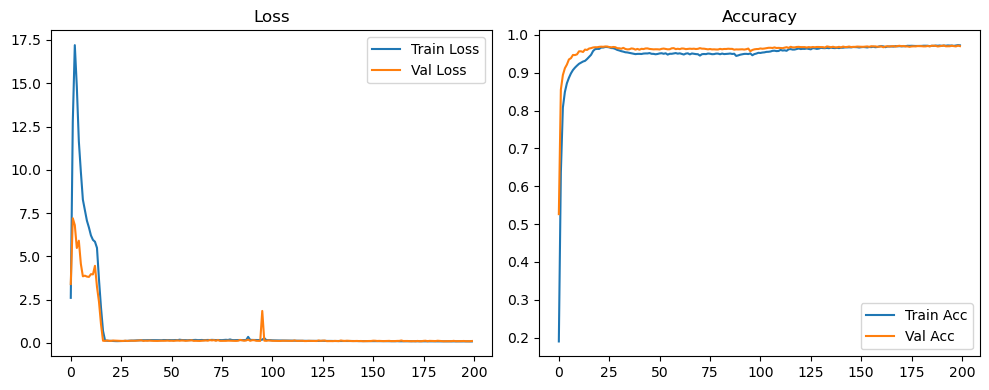

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 51.38it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 51.76it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 51.88it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 51.98it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 51.95it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 52.00it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 52.10it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 51.80it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 51.39it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 51.44it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 51.36it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 51.55it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 51.69it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 52.13it/s]

Original Model Final Test Loss: 0.1038 Accuracy: 0.9721


🚀 Running: batch128_lr0.005_0.005_0.005_dp0.0


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.005 | Train Acc: 0.2292 | Val Acc: 0.4747 |:   0%|          | 0/200 [00:10<?, ?it/s]

| LR: 0.005 | Train Acc: 0.2292 | Val Acc: 0.4747 |:   0%|          | 0/200 [00:10<?, ?it/s]

| LR: 0.005 | Train Acc: 0.2292 | Val Acc: 0.4747 |:   0%|          | 1/200 [00:10<36:15, 10.93s/it]

| LR: 0.005 | Train Acc: 0.7037 | Val Acc: 0.8294 |:   0%|          | 1/200 [00:21<36:15, 10.93s/it]

| LR: 0.005 | Train Acc: 0.7037 | Val Acc: 0.8294 |:   0%|          | 1/200 [00:21<36:15, 10.93s/it]

| LR: 0.005 | Train Acc: 0.7037 | Val Acc: 0.8294 |:   1%|          | 2/200 [00:21<36:00, 10.91s/it]

| LR: 0.005 | Train Acc: 0.8469 | Val Acc: 0.8706 |:   1%|          | 2/200 [00:32<36:00, 10.91s/it]

| LR: 0.005 | Train Acc: 0.8469 | Val Acc: 0.8706 |:   1%|          | 2/200 [00:32<36:00, 10.91s/it]

| LR: 0.005 | Train Acc: 0.8469 | Val Acc: 0.8706 |:   2%|▏         | 3/200 [00:32<35:19, 10.76s/it]

| LR: 0.005 | Train Acc: 0.8757 | Val Acc: 0.8923 |:   2%|▏         | 3/200 [00:42<35:19, 10.76s/it]

| LR: 0.005 | Train Acc: 0.8757 | Val Acc: 0.8923 |:   2%|▏         | 3/200 [00:42<35:19, 10.76s/it]

| LR: 0.005 | Train Acc: 0.8757 | Val Acc: 0.8923 |:   2%|▏         | 4/200 [00:42<34:35, 10.59s/it]

| LR: 0.005 | Train Acc: 0.8959 | Val Acc: 0.9107 |:   2%|▏         | 4/200 [00:53<34:35, 10.59s/it]

| LR: 0.005 | Train Acc: 0.8959 | Val Acc: 0.9107 |:   2%|▏         | 4/200 [00:53<34:35, 10.59s/it]

| LR: 0.005 | Train Acc: 0.8959 | Val Acc: 0.9107 |:   2%|▎         | 5/200 [00:53<34:31, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9098 | Val Acc: 0.9195 |:   2%|▎         | 5/200 [01:03<34:31, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9098 | Val Acc: 0.9195 |:   2%|▎         | 5/200 [01:03<34:31, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9098 | Val Acc: 0.9195 |:   3%|▎         | 6/200 [01:03<33:59, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9213 | Val Acc: 0.9196 |:   3%|▎         | 6/200 [01:14<33:59, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9213 | Val Acc: 0.9196 |:   3%|▎         | 6/200 [01:14<33:59, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9213 | Val Acc: 0.9196 |:   4%|▎         | 7/200 [01:14<33:44, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9309 | Val Acc: 0.9312 |:   4%|▎         | 7/200 [01:24<33:44, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9309 | Val Acc: 0.9312 |:   4%|▎         | 7/200 [01:24<33:44, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9309 | Val Acc: 0.9312 |:   4%|▍         | 8/200 [01:24<33:27, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9346 | Val Acc: 0.9367 |:   4%|▍         | 8/200 [01:35<33:27, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9346 | Val Acc: 0.9367 |:   4%|▍         | 8/200 [01:35<33:27, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9346 | Val Acc: 0.9367 |:   4%|▍         | 9/200 [01:35<33:20, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9407 | Val Acc: 0.9283 |:   4%|▍         | 9/200 [01:45<33:20, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9407 | Val Acc: 0.9283 |:   4%|▍         | 9/200 [01:45<33:20, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9407 | Val Acc: 0.9283 |:   5%|▌         | 10/200 [01:45<33:16, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9429 | Val Acc: 0.9370 |:   5%|▌         | 10/200 [01:56<33:16, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9429 | Val Acc: 0.9370 |:   5%|▌         | 10/200 [01:56<33:16, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9429 | Val Acc: 0.9370 |:   6%|▌         | 11/200 [01:56<33:07, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9362 |:   6%|▌         | 11/200 [02:06<33:07, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9362 |:   6%|▌         | 11/200 [02:06<33:07, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9362 |:   6%|▌         | 12/200 [02:06<32:55, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9504 | Val Acc: 0.9405 |:   6%|▌         | 12/200 [02:17<32:55, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9504 | Val Acc: 0.9405 |:   6%|▌         | 12/200 [02:17<32:55, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9504 | Val Acc: 0.9405 |:   6%|▋         | 13/200 [02:17<33:11, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9540 | Val Acc: 0.9422 |:   6%|▋         | 13/200 [02:28<33:11, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9540 | Val Acc: 0.9422 |:   6%|▋         | 13/200 [02:28<33:11, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9540 | Val Acc: 0.9422 |:   7%|▋         | 14/200 [02:28<32:51, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9550 | Val Acc: 0.9441 |:   7%|▋         | 14/200 [02:38<32:51, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9550 | Val Acc: 0.9441 |:   7%|▋         | 14/200 [02:38<32:51, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9550 | Val Acc: 0.9441 |:   8%|▊         | 15/200 [02:38<32:32, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9599 | Val Acc: 0.9453 |:   8%|▊         | 15/200 [02:49<32:32, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9599 | Val Acc: 0.9453 |:   8%|▊         | 15/200 [02:49<32:32, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9599 | Val Acc: 0.9453 |:   8%|▊         | 16/200 [02:49<32:19, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9643 | Val Acc: 0.9462 |:   8%|▊         | 16/200 [02:59<32:19, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9643 | Val Acc: 0.9462 |:   8%|▊         | 16/200 [02:59<32:19, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9643 | Val Acc: 0.9462 |:   8%|▊         | 17/200 [02:59<32:03, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9451 |:   8%|▊         | 17/200 [03:10<32:03, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9451 |:   8%|▊         | 17/200 [03:10<32:03, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9451 |:   9%|▉         | 18/200 [03:10<32:02, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9641 | Val Acc: 0.9499 |:   9%|▉         | 18/200 [03:20<32:02, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9641 | Val Acc: 0.9499 |:   9%|▉         | 18/200 [03:20<32:02, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9641 | Val Acc: 0.9499 |:  10%|▉         | 19/200 [03:20<31:44, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9670 | Val Acc: 0.9536 |:  10%|▉         | 19/200 [03:31<31:44, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9670 | Val Acc: 0.9536 |:  10%|▉         | 19/200 [03:31<31:44, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9670 | Val Acc: 0.9536 |:  10%|█         | 20/200 [03:31<31:34, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9717 | Val Acc: 0.9533 |:  10%|█         | 20/200 [03:41<31:34, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9717 | Val Acc: 0.9533 |:  10%|█         | 20/200 [03:41<31:34, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9717 | Val Acc: 0.9533 |:  10%|█         | 21/200 [03:41<31:26, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9730 | Val Acc: 0.9535 |:  10%|█         | 21/200 [03:52<31:26, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9730 | Val Acc: 0.9535 |:  10%|█         | 21/200 [03:52<31:26, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9730 | Val Acc: 0.9535 |:  11%|█         | 22/200 [03:52<31:21, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9741 | Val Acc: 0.9531 |:  11%|█         | 22/200 [04:02<31:21, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9741 | Val Acc: 0.9531 |:  11%|█         | 22/200 [04:02<31:21, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9741 | Val Acc: 0.9531 |:  12%|█▏        | 23/200 [04:02<31:05, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9743 | Val Acc: 0.9587 |:  12%|█▏        | 23/200 [04:13<31:05, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9743 | Val Acc: 0.9587 |:  12%|█▏        | 23/200 [04:13<31:05, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9743 | Val Acc: 0.9587 |:  12%|█▏        | 24/200 [04:13<30:48, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9739 | Val Acc: 0.9520 |:  12%|█▏        | 24/200 [04:23<30:48, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9739 | Val Acc: 0.9520 |:  12%|█▏        | 24/200 [04:23<30:48, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9739 | Val Acc: 0.9520 |:  12%|█▎        | 25/200 [04:23<30:42, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9760 | Val Acc: 0.9535 |:  12%|█▎        | 25/200 [04:34<30:42, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9760 | Val Acc: 0.9535 |:  12%|█▎        | 25/200 [04:34<30:42, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9760 | Val Acc: 0.9535 |:  13%|█▎        | 26/200 [04:34<30:31, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9785 | Val Acc: 0.9594 |:  13%|█▎        | 26/200 [04:44<30:31, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9785 | Val Acc: 0.9594 |:  13%|█▎        | 26/200 [04:44<30:31, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9785 | Val Acc: 0.9594 |:  14%|█▎        | 27/200 [04:44<30:20, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9542 |:  14%|█▎        | 27/200 [04:55<30:20, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9542 |:  14%|█▎        | 27/200 [04:55<30:20, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9542 |:  14%|█▍        | 28/200 [04:55<30:14, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9581 |:  14%|█▍        | 28/200 [05:05<30:14, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9581 |:  14%|█▍        | 28/200 [05:05<30:14, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9581 |:  14%|█▍        | 29/200 [05:06<30:02, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9833 | Val Acc: 0.9545 |:  14%|█▍        | 29/200 [05:16<30:02, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9833 | Val Acc: 0.9545 |:  14%|█▍        | 29/200 [05:16<30:02, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9833 | Val Acc: 0.9545 |:  15%|█▌        | 30/200 [05:16<29:43, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9837 | Val Acc: 0.9615 |:  15%|█▌        | 30/200 [05:26<29:43, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9837 | Val Acc: 0.9615 |:  15%|█▌        | 30/200 [05:26<29:43, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9837 | Val Acc: 0.9615 |:  16%|█▌        | 31/200 [05:26<29:33, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9875 | Val Acc: 0.9643 |:  16%|█▌        | 31/200 [05:37<29:33, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9875 | Val Acc: 0.9643 |:  16%|█▌        | 31/200 [05:37<29:33, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9875 | Val Acc: 0.9643 |:  16%|█▌        | 32/200 [05:37<29:34, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9885 | Val Acc: 0.9626 |:  16%|█▌        | 32/200 [05:48<29:34, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9885 | Val Acc: 0.9626 |:  16%|█▌        | 32/200 [05:48<29:34, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9885 | Val Acc: 0.9626 |:  16%|█▋        | 33/200 [05:48<29:27, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9620 |:  16%|█▋        | 33/200 [05:58<29:27, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9620 |:  16%|█▋        | 33/200 [05:58<29:27, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9620 |:  17%|█▋        | 34/200 [05:58<29:21, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9643 |:  17%|█▋        | 34/200 [06:11<29:21, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9643 |:  17%|█▋        | 34/200 [06:11<29:21, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9643 |:  18%|█▊        | 35/200 [06:11<30:44, 11.18s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9609 |:  18%|█▊        | 35/200 [06:23<30:44, 11.18s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9609 |:  18%|█▊        | 35/200 [06:23<30:44, 11.18s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9609 |:  18%|█▊        | 36/200 [06:23<30:56, 11.32s/it]

| LR: 0.005 | Train Acc: 0.9885 | Val Acc: 0.9658 |:  18%|█▊        | 36/200 [06:33<30:56, 11.32s/it]

| LR: 0.005 | Train Acc: 0.9885 | Val Acc: 0.9658 |:  18%|█▊        | 36/200 [06:33<30:56, 11.32s/it]

| LR: 0.005 | Train Acc: 0.9885 | Val Acc: 0.9658 |:  18%|█▊        | 37/200 [06:33<30:13, 11.12s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9675 |:  18%|█▊        | 37/200 [06:44<30:13, 11.12s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9675 |:  18%|█▊        | 37/200 [06:44<30:13, 11.12s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9675 |:  19%|█▉        | 38/200 [06:44<29:32, 10.94s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9672 |:  19%|█▉        | 38/200 [06:54<29:32, 10.94s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9672 |:  19%|█▉        | 38/200 [06:54<29:32, 10.94s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9672 |:  20%|█▉        | 39/200 [06:54<29:00, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9668 |:  20%|█▉        | 39/200 [07:05<29:00, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9668 |:  20%|█▉        | 39/200 [07:05<29:00, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9668 |:  20%|██        | 40/200 [07:05<28:47, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9700 |:  20%|██        | 40/200 [07:16<28:47, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9700 |:  20%|██        | 40/200 [07:16<28:47, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9700 |:  20%|██        | 41/200 [07:16<29:05, 10.98s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9671 |:  20%|██        | 41/200 [07:28<29:05, 10.98s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9671 |:  20%|██        | 41/200 [07:28<29:05, 10.98s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9671 |:  21%|██        | 42/200 [07:28<29:43, 11.29s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9696 |:  21%|██        | 42/200 [07:39<29:43, 11.29s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9696 |:  21%|██        | 42/200 [07:39<29:43, 11.29s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9696 |:  22%|██▏       | 43/200 [07:39<28:57, 11.07s/it]

| LR: 0.005 | Train Acc: 0.9934 | Val Acc: 0.9662 |:  22%|██▏       | 43/200 [07:49<28:57, 11.07s/it]

| LR: 0.005 | Train Acc: 0.9934 | Val Acc: 0.9662 |:  22%|██▏       | 43/200 [07:49<28:57, 11.07s/it]

| LR: 0.005 | Train Acc: 0.9934 | Val Acc: 0.9662 |:  22%|██▏       | 44/200 [07:49<28:11, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9669 |:  22%|██▏       | 44/200 [08:00<28:11, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9669 |:  22%|██▏       | 44/200 [08:00<28:11, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9669 |:  22%|██▎       | 45/200 [08:00<27:54, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9661 |:  22%|██▎       | 45/200 [08:12<27:54, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9661 |:  22%|██▎       | 45/200 [08:12<27:54, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9661 |:  23%|██▎       | 46/200 [08:12<28:18, 11.03s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9655 |:  23%|██▎       | 46/200 [08:22<28:18, 11.03s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9655 |:  23%|██▎       | 46/200 [08:22<28:18, 11.03s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9655 |:  24%|██▎       | 47/200 [08:22<27:44, 10.88s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9673 |:  24%|██▎       | 47/200 [08:33<27:44, 10.88s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9673 |:  24%|██▎       | 47/200 [08:33<27:44, 10.88s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9673 |:  24%|██▍       | 48/200 [08:33<27:20, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9682 |:  24%|██▍       | 48/200 [08:43<27:20, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9682 |:  24%|██▍       | 48/200 [08:43<27:20, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9682 |:  24%|██▍       | 49/200 [08:43<26:58, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9673 |:  24%|██▍       | 49/200 [08:54<26:58, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9673 |:  24%|██▍       | 49/200 [08:54<26:58, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9673 |:  25%|██▌       | 50/200 [08:54<26:29, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9657 |:  25%|██▌       | 50/200 [09:04<26:29, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9657 |:  25%|██▌       | 50/200 [09:04<26:29, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9657 |:  26%|██▌       | 51/200 [09:04<26:15, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9673 |:  26%|██▌       | 51/200 [09:14<26:15, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9673 |:  26%|██▌       | 51/200 [09:14<26:15, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9673 |:  26%|██▌       | 52/200 [09:15<25:59, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9925 | Val Acc: 0.9682 |:  26%|██▌       | 52/200 [09:25<25:59, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9925 | Val Acc: 0.9682 |:  26%|██▌       | 52/200 [09:25<25:59, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9925 | Val Acc: 0.9682 |:  26%|██▋       | 53/200 [09:25<25:39, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9675 |:  26%|██▋       | 53/200 [09:35<25:39, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9675 |:  26%|██▋       | 53/200 [09:35<25:39, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9675 |:  27%|██▋       | 54/200 [09:35<25:33, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9675 |:  27%|██▋       | 54/200 [09:46<25:33, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9675 |:  27%|██▋       | 54/200 [09:46<25:33, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9675 |:  28%|██▊       | 55/200 [09:46<25:22, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9677 |:  28%|██▊       | 55/200 [09:56<25:22, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9677 |:  28%|██▊       | 55/200 [09:56<25:22, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9677 |:  28%|██▊       | 56/200 [09:56<25:09, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9662 |:  28%|██▊       | 56/200 [10:07<25:09, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9662 |:  28%|██▊       | 56/200 [10:07<25:09, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9662 |:  28%|██▊       | 57/200 [10:07<24:55, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9673 |:  28%|██▊       | 57/200 [10:17<24:55, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9673 |:  28%|██▊       | 57/200 [10:17<24:55, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9673 |:  29%|██▉       | 58/200 [10:17<24:47, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9672 |:  29%|██▉       | 58/200 [10:28<24:47, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9672 |:  29%|██▉       | 58/200 [10:28<24:47, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9672 |:  30%|██▉       | 59/200 [10:28<24:36, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9675 |:  30%|██▉       | 59/200 [10:38<24:36, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9675 |:  30%|██▉       | 59/200 [10:38<24:36, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9675 |:  30%|███       | 60/200 [10:38<24:31, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9673 |:  30%|███       | 60/200 [10:49<24:31, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9673 |:  30%|███       | 60/200 [10:49<24:31, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9673 |:  30%|███       | 61/200 [10:49<24:36, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9711 |:  30%|███       | 61/200 [11:00<24:36, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9711 |:  30%|███       | 61/200 [11:00<24:36, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9711 |:  31%|███       | 62/200 [11:00<24:35, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9687 |:  31%|███       | 62/200 [11:11<24:35, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9687 |:  31%|███       | 62/200 [11:11<24:35, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9687 |:  32%|███▏      | 63/200 [11:11<24:27, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9677 |:  32%|███▏      | 63/200 [11:21<24:27, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9677 |:  32%|███▏      | 63/200 [11:21<24:27, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9677 |:  32%|███▏      | 64/200 [11:21<24:09, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9668 |:  32%|███▏      | 64/200 [11:32<24:09, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9668 |:  32%|███▏      | 64/200 [11:32<24:09, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9668 |:  32%|███▎      | 65/200 [11:32<23:47, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9674 |:  32%|███▎      | 65/200 [11:42<23:47, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9674 |:  32%|███▎      | 65/200 [11:42<23:47, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9674 |:  33%|███▎      | 66/200 [11:42<23:29, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9661 |:  33%|███▎      | 66/200 [11:52<23:29, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9661 |:  33%|███▎      | 66/200 [11:52<23:29, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9661 |:  34%|███▎      | 67/200 [11:52<23:11, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9709 |:  34%|███▎      | 67/200 [12:03<23:11, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9709 |:  34%|███▎      | 67/200 [12:03<23:11, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9709 |:  34%|███▍      | 68/200 [12:03<23:12, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9691 |:  34%|███▍      | 68/200 [12:14<23:12, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9691 |:  34%|███▍      | 68/200 [12:14<23:12, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9691 |:  34%|███▍      | 69/200 [12:14<22:56, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9950 | Val Acc: 0.9690 |:  34%|███▍      | 69/200 [12:24<22:56, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9950 | Val Acc: 0.9690 |:  34%|███▍      | 69/200 [12:24<22:56, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9950 | Val Acc: 0.9690 |:  35%|███▌      | 70/200 [12:24<22:56, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9658 |:  35%|███▌      | 70/200 [12:35<22:56, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9658 |:  35%|███▌      | 70/200 [12:35<22:56, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9658 |:  36%|███▌      | 71/200 [12:35<22:45, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9673 |:  36%|███▌      | 71/200 [12:46<22:45, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9673 |:  36%|███▌      | 71/200 [12:46<22:45, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9673 |:  36%|███▌      | 72/200 [12:46<22:35, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9662 |:  36%|███▌      | 72/200 [12:56<22:35, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9662 |:  36%|███▌      | 72/200 [12:56<22:35, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9662 |:  36%|███▋      | 73/200 [12:56<22:23, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9692 |:  36%|███▋      | 73/200 [13:07<22:23, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9692 |:  36%|███▋      | 73/200 [13:07<22:23, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9692 |:  37%|███▋      | 74/200 [13:07<22:07, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9692 |:  37%|███▋      | 74/200 [13:17<22:07, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9692 |:  37%|███▋      | 74/200 [13:17<22:07, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9692 |:  38%|███▊      | 75/200 [13:17<21:59, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9677 |:  38%|███▊      | 75/200 [13:28<21:59, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9677 |:  38%|███▊      | 75/200 [13:28<21:59, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9677 |:  38%|███▊      | 76/200 [13:28<21:51, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9699 |:  38%|███▊      | 76/200 [13:38<21:51, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9699 |:  38%|███▊      | 76/200 [13:38<21:51, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9699 |:  38%|███▊      | 77/200 [13:38<21:38, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9713 |:  38%|███▊      | 77/200 [13:49<21:38, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9713 |:  38%|███▊      | 77/200 [13:49<21:38, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9713 |:  39%|███▉      | 78/200 [13:49<21:37, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9686 |:  39%|███▉      | 78/200 [14:00<21:37, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9686 |:  39%|███▉      | 78/200 [14:00<21:37, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9686 |:  40%|███▉      | 79/200 [14:00<21:22, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9702 |:  40%|███▉      | 79/200 [14:10<21:22, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9702 |:  40%|███▉      | 79/200 [14:10<21:22, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9702 |:  40%|████      | 80/200 [14:10<21:15, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9677 |:  40%|████      | 80/200 [14:21<21:15, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9677 |:  40%|████      | 80/200 [14:21<21:15, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9677 |:  40%|████      | 81/200 [14:21<20:58, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9697 |:  40%|████      | 81/200 [14:31<20:58, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9697 |:  40%|████      | 81/200 [14:31<20:58, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9697 |:  41%|████      | 82/200 [14:31<20:47, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9677 |:  41%|████      | 82/200 [14:42<20:47, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9677 |:  41%|████      | 82/200 [14:42<20:47, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9677 |:  42%|████▏     | 83/200 [14:42<20:40, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9692 |:  42%|████▏     | 83/200 [14:53<20:40, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9692 |:  42%|████▏     | 83/200 [14:53<20:40, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9692 |:  42%|████▏     | 84/200 [14:53<20:30, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9683 |:  42%|████▏     | 84/200 [15:03<20:30, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9683 |:  42%|████▏     | 84/200 [15:03<20:30, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9683 |:  42%|████▎     | 85/200 [15:03<20:15, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9676 |:  42%|████▎     | 85/200 [15:14<20:15, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9676 |:  42%|████▎     | 85/200 [15:14<20:15, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9676 |:  43%|████▎     | 86/200 [15:14<20:01, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9685 |:  43%|████▎     | 86/200 [15:24<20:01, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9685 |:  43%|████▎     | 86/200 [15:24<20:01, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9685 |:  44%|████▎     | 87/200 [15:24<19:46, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9681 |:  44%|████▎     | 87/200 [15:34<19:46, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9681 |:  44%|████▎     | 87/200 [15:34<19:46, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9681 |:  44%|████▍     | 88/200 [15:34<19:34, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9682 |:  44%|████▍     | 88/200 [15:45<19:34, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9682 |:  44%|████▍     | 88/200 [15:45<19:34, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9682 |:  44%|████▍     | 89/200 [15:45<19:20, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9694 |:  44%|████▍     | 89/200 [15:55<19:20, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9694 |:  44%|████▍     | 89/200 [15:55<19:20, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9694 |:  45%|████▌     | 90/200 [15:55<19:09, 10.45s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9695 |:  45%|████▌     | 90/200 [16:06<19:09, 10.45s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9695 |:  45%|████▌     | 90/200 [16:06<19:09, 10.45s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9695 |:  46%|████▌     | 91/200 [16:06<18:59, 10.45s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9671 |:  46%|████▌     | 91/200 [16:16<18:59, 10.45s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9671 |:  46%|████▌     | 91/200 [16:16<18:59, 10.45s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9671 |:  46%|████▌     | 92/200 [16:16<18:50, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9692 |:  46%|████▌     | 92/200 [16:27<18:50, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9692 |:  46%|████▌     | 92/200 [16:27<18:50, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9692 |:  46%|████▋     | 93/200 [16:27<18:39, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9687 |:  46%|████▋     | 93/200 [16:37<18:39, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9687 |:  46%|████▋     | 93/200 [16:37<18:39, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9687 |:  47%|████▋     | 94/200 [16:37<18:25, 10.43s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9718 |:  47%|████▋     | 94/200 [16:48<18:25, 10.43s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9718 |:  47%|████▋     | 94/200 [16:48<18:25, 10.43s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9718 |:  48%|████▊     | 95/200 [16:48<18:24, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9701 |:  48%|████▊     | 95/200 [17:00<18:24, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9701 |:  48%|████▊     | 95/200 [17:00<18:24, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9701 |:  48%|████▊     | 96/200 [17:00<18:54, 10.91s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9691 |:  48%|████▊     | 96/200 [17:12<18:54, 10.91s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9691 |:  48%|████▊     | 96/200 [17:12<18:54, 10.91s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9691 |:  48%|████▊     | 97/200 [17:12<19:33, 11.39s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9704 |:  48%|████▊     | 97/200 [17:23<19:33, 11.39s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9704 |:  48%|████▊     | 97/200 [17:23<19:33, 11.39s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9704 |:  49%|████▉     | 98/200 [17:23<19:10, 11.28s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9714 |:  49%|████▉     | 98/200 [17:34<19:10, 11.28s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9714 |:  49%|████▉     | 98/200 [17:34<19:10, 11.28s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9714 |:  50%|████▉     | 99/200 [17:34<18:33, 11.02s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9709 |:  50%|████▉     | 99/200 [17:44<18:33, 11.02s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9709 |:  50%|████▉     | 99/200 [17:44<18:33, 11.02s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9709 |:  50%|█████     | 100/200 [17:44<18:03, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9688 |:  50%|█████     | 100/200 [17:54<18:03, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9688 |:  50%|█████     | 100/200 [17:54<18:03, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9688 |:  50%|█████     | 101/200 [17:54<17:42, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9682 |:  50%|█████     | 101/200 [18:05<17:42, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9682 |:  50%|█████     | 101/200 [18:05<17:42, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9682 |:  51%|█████     | 102/200 [18:05<17:24, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9696 |:  51%|█████     | 102/200 [18:15<17:24, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9696 |:  51%|█████     | 102/200 [18:15<17:24, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9696 |:  52%|█████▏    | 103/200 [18:15<17:06, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9691 |:  52%|█████▏    | 103/200 [18:26<17:06, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9691 |:  52%|█████▏    | 103/200 [18:26<17:06, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9691 |:  52%|█████▏    | 104/200 [18:26<17:00, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9684 |:  52%|█████▏    | 104/200 [18:37<17:00, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9684 |:  52%|█████▏    | 104/200 [18:37<17:00, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9684 |:  52%|█████▎    | 105/200 [18:37<16:57, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9710 |:  52%|█████▎    | 105/200 [18:49<16:57, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9710 |:  52%|█████▎    | 105/200 [18:49<16:57, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9710 |:  53%|█████▎    | 106/200 [18:49<17:33, 11.21s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9683 |:  53%|█████▎    | 106/200 [19:01<17:33, 11.21s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9683 |:  53%|█████▎    | 106/200 [19:01<17:33, 11.21s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9683 |:  54%|█████▎    | 107/200 [19:01<17:27, 11.27s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9667 |:  54%|█████▎    | 107/200 [19:11<17:27, 11.27s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9667 |:  54%|█████▎    | 107/200 [19:11<17:27, 11.27s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9667 |:  54%|█████▍    | 108/200 [19:11<16:54, 11.03s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9701 |:  54%|█████▍    | 108/200 [19:21<16:54, 11.03s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9701 |:  54%|█████▍    | 108/200 [19:21<16:54, 11.03s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9701 |:  55%|█████▍    | 109/200 [19:21<16:22, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9693 |:  55%|█████▍    | 109/200 [19:32<16:22, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9693 |:  55%|█████▍    | 109/200 [19:32<16:22, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9693 |:  55%|█████▌    | 110/200 [19:32<16:02, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9703 |:  55%|█████▌    | 110/200 [19:42<16:02, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9703 |:  55%|█████▌    | 110/200 [19:42<16:02, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9703 |:  56%|█████▌    | 111/200 [19:42<15:33, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9688 |:  56%|█████▌    | 111/200 [19:52<15:33, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9688 |:  56%|█████▌    | 111/200 [19:52<15:33, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9688 |:  56%|█████▌    | 112/200 [19:52<15:10, 10.35s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9691 |:  56%|█████▌    | 112/200 [20:03<15:10, 10.35s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9691 |:  56%|█████▌    | 112/200 [20:03<15:10, 10.35s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9691 |:  56%|█████▋    | 113/200 [20:03<15:10, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9669 |:  56%|█████▋    | 113/200 [20:13<15:10, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9669 |:  56%|█████▋    | 113/200 [20:13<15:10, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9669 |:  57%|█████▋    | 114/200 [20:13<15:03, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9703 |:  57%|█████▋    | 114/200 [20:24<15:03, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9703 |:  57%|█████▋    | 114/200 [20:24<15:03, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9703 |:  57%|█████▊    | 115/200 [20:24<14:53, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9710 |:  57%|█████▊    | 115/200 [20:34<14:53, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9710 |:  57%|█████▊    | 115/200 [20:34<14:53, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9710 |:  58%|█████▊    | 116/200 [20:34<14:43, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9680 |:  58%|█████▊    | 116/200 [20:45<14:43, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9680 |:  58%|█████▊    | 116/200 [20:46<14:43, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9680 |:  58%|█████▊    | 117/200 [20:46<14:50, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9701 |:  58%|█████▊    | 117/200 [20:57<14:50, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9701 |:  58%|█████▊    | 117/200 [20:57<14:50, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9701 |:  59%|█████▉    | 118/200 [20:58<15:10, 11.10s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9703 |:  59%|█████▉    | 118/200 [21:08<15:10, 11.10s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9703 |:  59%|█████▉    | 118/200 [21:08<15:10, 11.10s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9703 |:  60%|█████▉    | 119/200 [21:08<14:44, 10.92s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9693 |:  60%|█████▉    | 119/200 [21:18<14:44, 10.92s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9693 |:  60%|█████▉    | 119/200 [21:18<14:44, 10.92s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9693 |:  60%|██████    | 120/200 [21:18<14:21, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9697 |:  60%|██████    | 120/200 [21:29<14:21, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9697 |:  60%|██████    | 120/200 [21:29<14:21, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9697 |:  60%|██████    | 121/200 [21:29<14:03, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9692 |:  60%|██████    | 121/200 [21:39<14:03, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9692 |:  60%|██████    | 121/200 [21:39<14:03, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9692 |:  61%|██████    | 122/200 [21:39<13:46, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9702 |:  61%|██████    | 122/200 [21:50<13:46, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9702 |:  61%|██████    | 122/200 [21:50<13:46, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9702 |:  62%|██████▏   | 123/200 [21:50<13:40, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9707 |:  62%|██████▏   | 123/200 [22:01<13:40, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9707 |:  62%|██████▏   | 123/200 [22:01<13:40, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9707 |:  62%|██████▏   | 124/200 [22:01<13:27, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9698 |:  62%|██████▏   | 124/200 [22:11<13:27, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9698 |:  62%|██████▏   | 124/200 [22:11<13:27, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9698 |:  62%|██████▎   | 125/200 [22:11<13:14, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9687 |:  62%|██████▎   | 125/200 [22:22<13:14, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9687 |:  62%|██████▎   | 125/200 [22:22<13:14, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9687 |:  63%|██████▎   | 126/200 [22:22<13:02, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9687 |:  63%|██████▎   | 126/200 [22:32<13:02, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9687 |:  63%|██████▎   | 126/200 [22:32<13:02, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9687 |:  64%|██████▎   | 127/200 [22:32<12:48, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9699 |:  64%|██████▎   | 127/200 [22:43<12:48, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9699 |:  64%|██████▎   | 127/200 [22:43<12:48, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9699 |:  64%|██████▍   | 128/200 [22:43<12:42, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9702 |:  64%|██████▍   | 128/200 [22:53<12:42, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9702 |:  64%|██████▍   | 128/200 [22:53<12:42, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9702 |:  64%|██████▍   | 129/200 [22:53<12:31, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9704 |:  64%|██████▍   | 129/200 [23:04<12:31, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9704 |:  64%|██████▍   | 129/200 [23:04<12:31, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9704 |:  65%|██████▌   | 130/200 [23:04<12:17, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9705 |:  65%|██████▌   | 130/200 [23:14<12:17, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9705 |:  65%|██████▌   | 130/200 [23:14<12:17, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9705 |:  66%|██████▌   | 131/200 [23:14<12:05, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9683 |:  66%|██████▌   | 131/200 [23:25<12:05, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9683 |:  66%|██████▌   | 131/200 [23:25<12:05, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9683 |:  66%|██████▌   | 132/200 [23:25<11:52, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9699 |:  66%|██████▌   | 132/200 [23:35<11:52, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9699 |:  66%|██████▌   | 132/200 [23:35<11:52, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9699 |:  66%|██████▋   | 133/200 [23:35<11:41, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9685 |:  66%|██████▋   | 133/200 [23:46<11:41, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9685 |:  66%|██████▋   | 133/200 [23:46<11:41, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9685 |:  67%|██████▋   | 134/200 [23:46<11:46, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9683 |:  67%|██████▋   | 134/200 [23:57<11:46, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9683 |:  67%|██████▋   | 134/200 [23:57<11:46, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9683 |:  68%|██████▊   | 135/200 [23:57<11:41, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9709 |:  68%|██████▊   | 135/200 [24:08<11:41, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9709 |:  68%|██████▊   | 135/200 [24:08<11:41, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9709 |:  68%|██████▊   | 136/200 [24:08<11:28, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9712 |:  68%|██████▊   | 136/200 [24:18<11:28, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9712 |:  68%|██████▊   | 136/200 [24:18<11:28, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9712 |:  68%|██████▊   | 137/200 [24:18<11:10, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9692 |:  68%|██████▊   | 137/200 [24:29<11:10, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9692 |:  68%|██████▊   | 137/200 [24:29<11:10, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9692 |:  69%|██████▉   | 138/200 [24:29<10:58, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9697 |:  69%|██████▉   | 138/200 [24:40<10:58, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9697 |:  69%|██████▉   | 138/200 [24:40<10:58, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9697 |:  70%|██████▉   | 139/200 [24:40<10:48, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9654 |:  70%|██████▉   | 139/200 [24:50<10:48, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9654 |:  70%|██████▉   | 139/200 [24:50<10:48, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9654 |:  70%|███████   | 140/200 [24:50<10:35, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9707 |:  70%|███████   | 140/200 [25:01<10:35, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9707 |:  70%|███████   | 140/200 [25:01<10:35, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9707 |:  70%|███████   | 141/200 [25:01<10:22, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9704 |:  70%|███████   | 141/200 [25:11<10:22, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9704 |:  70%|███████   | 141/200 [25:11<10:22, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9704 |:  71%|███████   | 142/200 [25:11<10:10, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9699 |:  71%|███████   | 142/200 [25:22<10:10, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9699 |:  71%|███████   | 142/200 [25:22<10:10, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9699 |:  72%|███████▏  | 143/200 [25:22<10:00, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9667 |:  72%|███████▏  | 143/200 [25:32<10:00, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9667 |:  72%|███████▏  | 143/200 [25:32<10:00, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9667 |:  72%|███████▏  | 144/200 [25:32<09:47, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9698 |:  72%|███████▏  | 144/200 [25:42<09:47, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9698 |:  72%|███████▏  | 144/200 [25:42<09:47, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9698 |:  72%|███████▎  | 145/200 [25:42<09:35, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9693 |:  72%|███████▎  | 145/200 [25:53<09:35, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9693 |:  72%|███████▎  | 145/200 [25:53<09:35, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9693 |:  73%|███████▎  | 146/200 [25:53<09:26, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9708 |:  73%|███████▎  | 146/200 [26:03<09:26, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9708 |:  73%|███████▎  | 146/200 [26:03<09:26, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9708 |:  74%|███████▎  | 147/200 [26:03<09:15, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9676 |:  74%|███████▎  | 147/200 [26:14<09:15, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9676 |:  74%|███████▎  | 147/200 [26:14<09:15, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9676 |:  74%|███████▍  | 148/200 [26:14<09:02, 10.44s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9709 |:  74%|███████▍  | 148/200 [26:24<09:02, 10.44s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9709 |:  74%|███████▍  | 148/200 [26:24<09:02, 10.44s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9709 |:  74%|███████▍  | 149/200 [26:24<08:50, 10.41s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9689 |:  74%|███████▍  | 149/200 [26:35<08:50, 10.41s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9689 |:  74%|███████▍  | 149/200 [26:35<08:50, 10.41s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9689 |:  75%|███████▌  | 150/200 [26:35<08:50, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9706 |:  75%|███████▌  | 150/200 [26:45<08:50, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9706 |:  75%|███████▌  | 150/200 [26:45<08:50, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9706 |:  76%|███████▌  | 151/200 [26:45<08:34, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9708 |:  76%|███████▌  | 151/200 [26:56<08:34, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9708 |:  76%|███████▌  | 151/200 [26:56<08:34, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9708 |:  76%|███████▌  | 152/200 [26:56<08:25, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9682 |:  76%|███████▌  | 152/200 [27:07<08:25, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9682 |:  76%|███████▌  | 152/200 [27:07<08:25, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9682 |:  76%|███████▋  | 153/200 [27:07<08:14, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9689 |:  76%|███████▋  | 153/200 [27:17<08:14, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9689 |:  76%|███████▋  | 153/200 [27:17<08:14, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9689 |:  77%|███████▋  | 154/200 [27:17<08:04, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9704 |:  77%|███████▋  | 154/200 [27:28<08:04, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9704 |:  77%|███████▋  | 154/200 [27:28<08:04, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9704 |:  78%|███████▊  | 155/200 [27:28<07:53, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9709 |:  78%|███████▊  | 155/200 [27:38<07:53, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9709 |:  78%|███████▊  | 155/200 [27:38<07:53, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9709 |:  78%|███████▊  | 156/200 [27:39<07:47, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9693 |:  78%|███████▊  | 156/200 [27:49<07:47, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9693 |:  78%|███████▊  | 156/200 [27:49<07:47, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9693 |:  78%|███████▊  | 157/200 [27:49<07:39, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9712 |:  78%|███████▊  | 157/200 [28:00<07:39, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9712 |:  78%|███████▊  | 157/200 [28:00<07:39, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9712 |:  79%|███████▉  | 158/200 [28:00<07:34, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9975 | Val Acc: 0.9698 |:  79%|███████▉  | 158/200 [28:11<07:34, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9975 | Val Acc: 0.9698 |:  79%|███████▉  | 158/200 [28:11<07:34, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9975 | Val Acc: 0.9698 |:  80%|███████▉  | 159/200 [28:11<07:19, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9705 |:  80%|███████▉  | 159/200 [28:22<07:19, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9705 |:  80%|███████▉  | 159/200 [28:22<07:19, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9705 |:  80%|████████  | 160/200 [28:22<07:11, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9713 |:  80%|████████  | 160/200 [28:32<07:11, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9713 |:  80%|████████  | 160/200 [28:32<07:11, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9713 |:  80%|████████  | 161/200 [28:32<06:57, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9680 |:  80%|████████  | 161/200 [28:43<06:57, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9680 |:  80%|████████  | 161/200 [28:43<06:57, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9680 |:  81%|████████  | 162/200 [28:43<06:46, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9682 |:  81%|████████  | 162/200 [28:53<06:46, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9682 |:  81%|████████  | 162/200 [28:53<06:46, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9682 |:  82%|████████▏ | 163/200 [28:54<06:32, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9678 |:  82%|████████▏ | 163/200 [29:04<06:32, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9678 |:  82%|████████▏ | 163/200 [29:04<06:32, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9678 |:  82%|████████▏ | 164/200 [29:04<06:25, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9705 |:  82%|████████▏ | 164/200 [29:15<06:25, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9705 |:  82%|████████▏ | 164/200 [29:15<06:25, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9705 |:  82%|████████▎ | 165/200 [29:15<06:14, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9728 |:  82%|████████▎ | 165/200 [29:26<06:14, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9728 |:  82%|████████▎ | 165/200 [29:26<06:14, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9728 |:  83%|████████▎ | 166/200 [29:26<06:02, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9668 |:  83%|████████▎ | 166/200 [29:36<06:02, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9668 |:  83%|████████▎ | 166/200 [29:36<06:02, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9668 |:  84%|████████▎ | 167/200 [29:36<05:50, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9711 |:  84%|████████▎ | 167/200 [29:47<05:50, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9711 |:  84%|████████▎ | 167/200 [29:47<05:50, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9711 |:  84%|████████▍ | 168/200 [29:47<05:38, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9713 |:  84%|████████▍ | 168/200 [29:57<05:38, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9713 |:  84%|████████▍ | 168/200 [29:57<05:38, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9713 |:  84%|████████▍ | 169/200 [29:57<05:26, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9704 |:  84%|████████▍ | 169/200 [30:07<05:26, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9704 |:  84%|████████▍ | 169/200 [30:08<05:26, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9704 |:  85%|████████▌ | 170/200 [30:08<05:15, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9669 |:  85%|████████▌ | 170/200 [30:18<05:15, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9669 |:  85%|████████▌ | 170/200 [30:18<05:15, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9669 |:  86%|████████▌ | 171/200 [30:18<05:03, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9696 |:  86%|████████▌ | 171/200 [30:28<05:03, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9696 |:  86%|████████▌ | 171/200 [30:28<05:03, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9696 |:  86%|████████▌ | 172/200 [30:28<04:52, 10.45s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9703 |:  86%|████████▌ | 172/200 [30:39<04:52, 10.45s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9703 |:  86%|████████▌ | 172/200 [30:39<04:52, 10.45s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9703 |:  86%|████████▋ | 173/200 [30:39<04:42, 10.45s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9688 |:  86%|████████▋ | 173/200 [30:49<04:42, 10.45s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9688 |:  86%|████████▋ | 173/200 [30:49<04:42, 10.45s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9688 |:  87%|████████▋ | 174/200 [30:49<04:31, 10.44s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9696 |:  87%|████████▋ | 174/200 [31:00<04:31, 10.44s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9696 |:  87%|████████▋ | 174/200 [31:00<04:31, 10.44s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9696 |:  88%|████████▊ | 175/200 [31:00<04:21, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9706 |:  88%|████████▊ | 175/200 [31:10<04:21, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9706 |:  88%|████████▊ | 175/200 [31:10<04:21, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9706 |:  88%|████████▊ | 176/200 [31:10<04:11, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9693 |:  88%|████████▊ | 176/200 [31:21<04:11, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9693 |:  88%|████████▊ | 176/200 [31:21<04:11, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9693 |:  88%|████████▊ | 177/200 [31:21<04:00, 10.45s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9689 |:  88%|████████▊ | 177/200 [31:31<04:00, 10.45s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9689 |:  88%|████████▊ | 177/200 [31:31<04:00, 10.45s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9689 |:  89%|████████▉ | 178/200 [31:31<03:50, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9688 |:  89%|████████▉ | 178/200 [31:42<03:50, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9688 |:  89%|████████▉ | 178/200 [31:42<03:50, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9688 |:  90%|████████▉ | 179/200 [31:42<03:40, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9693 |:  90%|████████▉ | 179/200 [31:52<03:40, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9693 |:  90%|████████▉ | 179/200 [31:52<03:40, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9693 |:  90%|█████████ | 180/200 [31:52<03:31, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9702 |:  90%|█████████ | 180/200 [32:03<03:31, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9702 |:  90%|█████████ | 180/200 [32:03<03:31, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9702 |:  90%|█████████ | 181/200 [32:03<03:20, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9692 |:  90%|█████████ | 181/200 [32:13<03:20, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9692 |:  90%|█████████ | 181/200 [32:13<03:20, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9692 |:  91%|█████████ | 182/200 [32:13<03:09, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9694 |:  91%|█████████ | 182/200 [32:24<03:09, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9694 |:  91%|█████████ | 182/200 [32:24<03:09, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9694 |:  92%|█████████▏| 183/200 [32:24<02:58, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9708 |:  92%|█████████▏| 183/200 [32:34<02:58, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9708 |:  92%|█████████▏| 183/200 [32:34<02:58, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9708 |:  92%|█████████▏| 184/200 [32:34<02:48, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9731 |:  92%|█████████▏| 184/200 [32:45<02:48, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9731 |:  92%|█████████▏| 184/200 [32:45<02:48, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9731 |:  92%|█████████▎| 185/200 [32:45<02:37, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9699 |:  92%|█████████▎| 185/200 [32:55<02:37, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9699 |:  92%|█████████▎| 185/200 [32:55<02:37, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9699 |:  93%|█████████▎| 186/200 [32:55<02:27, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9728 |:  93%|█████████▎| 186/200 [33:06<02:27, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9728 |:  93%|█████████▎| 186/200 [33:06<02:27, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9728 |:  94%|█████████▎| 187/200 [33:06<02:16, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9706 |:  94%|█████████▎| 187/200 [33:16<02:16, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9706 |:  94%|█████████▎| 187/200 [33:16<02:16, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9706 |:  94%|█████████▍| 188/200 [33:16<02:05, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9975 | Val Acc: 0.9698 |:  94%|█████████▍| 188/200 [33:28<02:05, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9975 | Val Acc: 0.9698 |:  94%|█████████▍| 188/200 [33:28<02:05, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9975 | Val Acc: 0.9698 |:  94%|█████████▍| 189/200 [33:28<01:58, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9705 |:  94%|█████████▍| 189/200 [33:40<01:58, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9705 |:  94%|█████████▍| 189/200 [33:40<01:58, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9705 |:  95%|█████████▌| 190/200 [33:40<01:52, 11.22s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9692 |:  95%|█████████▌| 190/200 [33:53<01:52, 11.22s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9692 |:  95%|█████████▌| 190/200 [33:53<01:52, 11.22s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9692 |:  96%|█████████▌| 191/200 [33:53<01:44, 11.61s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9697 |:  96%|█████████▌| 191/200 [34:05<01:44, 11.61s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9697 |:  96%|█████████▌| 191/200 [34:05<01:44, 11.61s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9697 |:  96%|█████████▌| 192/200 [34:05<01:33, 11.73s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9688 |:  96%|█████████▌| 192/200 [34:15<01:33, 11.73s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9688 |:  96%|█████████▌| 192/200 [34:15<01:33, 11.73s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9688 |:  96%|█████████▋| 193/200 [34:15<01:19, 11.35s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9712 |:  96%|█████████▋| 193/200 [34:26<01:19, 11.35s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9712 |:  96%|█████████▋| 193/200 [34:26<01:19, 11.35s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9712 |:  97%|█████████▋| 194/200 [34:26<01:06, 11.10s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9714 |:  97%|█████████▋| 194/200 [34:36<01:06, 11.10s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9714 |:  97%|█████████▋| 194/200 [34:36<01:06, 11.10s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9714 |:  98%|█████████▊| 195/200 [34:36<00:54, 10.92s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9689 |:  98%|█████████▊| 195/200 [34:47<00:54, 10.92s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9689 |:  98%|█████████▊| 195/200 [34:47<00:54, 10.92s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9689 |:  98%|█████████▊| 196/200 [34:47<00:43, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9711 |:  98%|█████████▊| 196/200 [34:57<00:43, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9711 |:  98%|█████████▊| 196/200 [34:57<00:43, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9711 |:  98%|█████████▊| 197/200 [34:57<00:32, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9705 |:  98%|█████████▊| 197/200 [35:07<00:32, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9705 |:  98%|█████████▊| 197/200 [35:07<00:32, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9705 |:  99%|█████████▉| 198/200 [35:07<00:21, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9697 |:  99%|█████████▉| 198/200 [35:18<00:21, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9697 |:  99%|█████████▉| 198/200 [35:18<00:21, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9697 |: 100%|█████████▉| 199/200 [35:18<00:10, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9705 |: 100%|█████████▉| 199/200 [35:29<00:10, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9705 |: 100%|█████████▉| 199/200 [35:29<00:10, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9705 |: 100%|██████████| 200/200 [35:29<00:00, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9705 |: 100%|██████████| 200/200 [35:29<00:00, 10.65s/it]

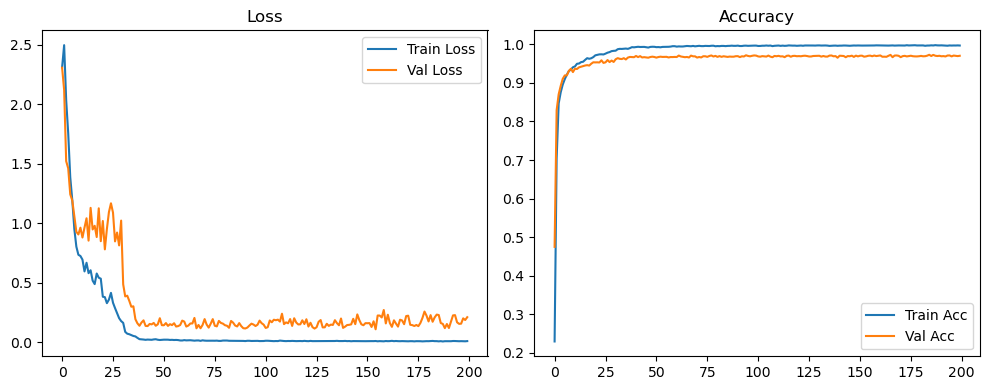

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 51.52it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 52.05it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 52.18it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 52.23it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 52.26it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 52.29it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 52.36it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 52.35it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 52.28it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 52.40it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 52.42it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 52.37it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 52.32it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 52.73it/s]

Original Model Final Test Loss: 0.1960 Accuracy: 0.9699


🚀 Running: batch128_lr0.005_0.005_0.005_dp0.2


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.005 | Train Acc: 0.2155 | Val Acc: 0.5248 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.005 | Train Acc: 0.2155 | Val Acc: 0.5248 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.005 | Train Acc: 0.2155 | Val Acc: 0.5248 |:   0%|          | 1/200 [00:11<37:27, 11.30s/it]

| LR: 0.005 | Train Acc: 0.6836 | Val Acc: 0.8486 |:   0%|          | 1/200 [00:22<37:27, 11.30s/it]

| LR: 0.005 | Train Acc: 0.6836 | Val Acc: 0.8486 |:   0%|          | 1/200 [00:22<37:27, 11.30s/it]

| LR: 0.005 | Train Acc: 0.6836 | Val Acc: 0.8486 |:   1%|          | 2/200 [00:22<36:16, 10.99s/it]

| LR: 0.005 | Train Acc: 0.8266 | Val Acc: 0.8589 |:   1%|          | 2/200 [00:32<36:16, 10.99s/it]

| LR: 0.005 | Train Acc: 0.8266 | Val Acc: 0.8589 |:   1%|          | 2/200 [00:32<36:16, 10.99s/it]

| LR: 0.005 | Train Acc: 0.8266 | Val Acc: 0.8589 |:   2%|▏         | 3/200 [00:32<35:40, 10.87s/it]

| LR: 0.005 | Train Acc: 0.8642 | Val Acc: 0.8962 |:   2%|▏         | 3/200 [00:43<35:40, 10.87s/it]

| LR: 0.005 | Train Acc: 0.8642 | Val Acc: 0.8962 |:   2%|▏         | 3/200 [00:43<35:40, 10.87s/it]

| LR: 0.005 | Train Acc: 0.8642 | Val Acc: 0.8962 |:   2%|▏         | 4/200 [00:43<35:10, 10.77s/it]

| LR: 0.005 | Train Acc: 0.8857 | Val Acc: 0.9170 |:   2%|▏         | 4/200 [00:54<35:10, 10.77s/it]

| LR: 0.005 | Train Acc: 0.8857 | Val Acc: 0.9170 |:   2%|▏         | 4/200 [00:54<35:10, 10.77s/it]

| LR: 0.005 | Train Acc: 0.8857 | Val Acc: 0.9170 |:   2%|▎         | 5/200 [00:54<35:36, 10.95s/it]

| LR: 0.005 | Train Acc: 0.8977 | Val Acc: 0.9211 |:   2%|▎         | 5/200 [01:06<35:36, 10.95s/it]

| LR: 0.005 | Train Acc: 0.8977 | Val Acc: 0.9211 |:   2%|▎         | 5/200 [01:06<35:36, 10.95s/it]

| LR: 0.005 | Train Acc: 0.8977 | Val Acc: 0.9211 |:   3%|▎         | 6/200 [01:06<35:57, 11.12s/it]

| LR: 0.005 | Train Acc: 0.9122 | Val Acc: 0.9264 |:   3%|▎         | 6/200 [01:16<35:57, 11.12s/it]

| LR: 0.005 | Train Acc: 0.9122 | Val Acc: 0.9264 |:   3%|▎         | 6/200 [01:16<35:57, 11.12s/it]

| LR: 0.005 | Train Acc: 0.9122 | Val Acc: 0.9264 |:   4%|▎         | 7/200 [01:16<35:11, 10.94s/it]

| LR: 0.005 | Train Acc: 0.9179 | Val Acc: 0.9335 |:   4%|▎         | 7/200 [01:27<35:11, 10.94s/it]

| LR: 0.005 | Train Acc: 0.9179 | Val Acc: 0.9335 |:   4%|▎         | 7/200 [01:27<35:11, 10.94s/it]

| LR: 0.005 | Train Acc: 0.9179 | Val Acc: 0.9335 |:   4%|▍         | 8/200 [01:27<34:38, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9253 | Val Acc: 0.9360 |:   4%|▍         | 8/200 [01:38<34:38, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9253 | Val Acc: 0.9360 |:   4%|▍         | 8/200 [01:38<34:38, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9253 | Val Acc: 0.9360 |:   4%|▍         | 9/200 [01:38<34:52, 10.96s/it]

| LR: 0.005 | Train Acc: 0.9335 | Val Acc: 0.9416 |:   4%|▍         | 9/200 [01:49<34:52, 10.96s/it]

| LR: 0.005 | Train Acc: 0.9335 | Val Acc: 0.9416 |:   4%|▍         | 9/200 [01:49<34:52, 10.96s/it]

| LR: 0.005 | Train Acc: 0.9335 | Val Acc: 0.9416 |:   5%|▌         | 10/200 [01:49<34:29, 10.89s/it]

| LR: 0.005 | Train Acc: 0.9396 | Val Acc: 0.9445 |:   5%|▌         | 10/200 [02:00<34:29, 10.89s/it]

| LR: 0.005 | Train Acc: 0.9396 | Val Acc: 0.9445 |:   5%|▌         | 10/200 [02:00<34:29, 10.89s/it]

| LR: 0.005 | Train Acc: 0.9396 | Val Acc: 0.9445 |:   6%|▌         | 11/200 [02:00<34:11, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9441 | Val Acc: 0.9468 |:   6%|▌         | 11/200 [02:10<34:11, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9441 | Val Acc: 0.9468 |:   6%|▌         | 11/200 [02:10<34:11, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9441 | Val Acc: 0.9468 |:   6%|▌         | 12/200 [02:10<33:44, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9471 | Val Acc: 0.9486 |:   6%|▌         | 12/200 [02:21<33:44, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9471 | Val Acc: 0.9486 |:   6%|▌         | 12/200 [02:21<33:44, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9471 | Val Acc: 0.9486 |:   6%|▋         | 13/200 [02:21<33:28, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9488 | Val Acc: 0.9474 |:   6%|▋         | 13/200 [02:31<33:28, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9488 | Val Acc: 0.9474 |:   6%|▋         | 13/200 [02:31<33:28, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9488 | Val Acc: 0.9474 |:   7%|▋         | 14/200 [02:32<33:17, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9563 |:   7%|▋         | 14/200 [02:42<33:17, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9563 |:   7%|▋         | 14/200 [02:42<33:17, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9563 |:   8%|▊         | 15/200 [02:42<33:00, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9544 | Val Acc: 0.9568 |:   8%|▊         | 15/200 [02:53<33:00, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9544 | Val Acc: 0.9568 |:   8%|▊         | 15/200 [02:53<33:00, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9544 | Val Acc: 0.9568 |:   8%|▊         | 16/200 [02:53<32:55, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9580 | Val Acc: 0.9523 |:   8%|▊         | 16/200 [03:04<32:55, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9580 | Val Acc: 0.9523 |:   8%|▊         | 16/200 [03:04<32:55, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9580 | Val Acc: 0.9523 |:   8%|▊         | 17/200 [03:04<32:52, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9613 | Val Acc: 0.9573 |:   8%|▊         | 17/200 [03:14<32:52, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9613 | Val Acc: 0.9573 |:   8%|▊         | 17/200 [03:14<32:52, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9613 | Val Acc: 0.9573 |:   9%|▉         | 18/200 [03:14<32:30, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9616 | Val Acc: 0.9531 |:   9%|▉         | 18/200 [03:25<32:30, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9616 | Val Acc: 0.9531 |:   9%|▉         | 18/200 [03:25<32:30, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9616 | Val Acc: 0.9531 |:  10%|▉         | 19/200 [03:25<32:10, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9583 |:  10%|▉         | 19/200 [03:36<32:10, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9583 |:  10%|▉         | 19/200 [03:36<32:10, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9583 |:  10%|█         | 20/200 [03:36<32:15, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9636 | Val Acc: 0.9558 |:  10%|█         | 20/200 [03:47<32:15, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9636 | Val Acc: 0.9558 |:  10%|█         | 20/200 [03:47<32:15, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9636 | Val Acc: 0.9558 |:  10%|█         | 21/200 [03:47<32:00, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9646 | Val Acc: 0.9603 |:  10%|█         | 21/200 [03:57<32:00, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9646 | Val Acc: 0.9603 |:  10%|█         | 21/200 [03:57<32:00, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9646 | Val Acc: 0.9603 |:  11%|█         | 22/200 [03:57<31:48, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9584 |:  11%|█         | 22/200 [04:08<31:48, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9584 |:  11%|█         | 22/200 [04:08<31:48, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9584 |:  12%|█▏        | 23/200 [04:08<31:13, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9715 | Val Acc: 0.9637 |:  12%|█▏        | 23/200 [04:18<31:13, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9715 | Val Acc: 0.9637 |:  12%|█▏        | 23/200 [04:18<31:13, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9715 | Val Acc: 0.9637 |:  12%|█▏        | 24/200 [04:18<31:07, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9728 | Val Acc: 0.9632 |:  12%|█▏        | 24/200 [04:29<31:07, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9728 | Val Acc: 0.9632 |:  12%|█▏        | 24/200 [04:29<31:07, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9728 | Val Acc: 0.9632 |:  12%|█▎        | 25/200 [04:29<30:58, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9768 | Val Acc: 0.9653 |:  12%|█▎        | 25/200 [04:40<30:58, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9768 | Val Acc: 0.9653 |:  12%|█▎        | 25/200 [04:40<30:58, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9768 | Val Acc: 0.9653 |:  13%|█▎        | 26/200 [04:40<31:13, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9792 | Val Acc: 0.9687 |:  13%|█▎        | 26/200 [04:51<31:13, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9792 | Val Acc: 0.9687 |:  13%|█▎        | 26/200 [04:51<31:13, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9792 | Val Acc: 0.9687 |:  14%|█▎        | 27/200 [04:51<31:32, 10.94s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9681 |:  14%|█▎        | 27/200 [05:02<31:32, 10.94s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9681 |:  14%|█▎        | 27/200 [05:02<31:32, 10.94s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9681 |:  14%|█▍        | 28/200 [05:02<31:10, 10.87s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9709 |:  14%|█▍        | 28/200 [05:13<31:10, 10.87s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9709 |:  14%|█▍        | 28/200 [05:13<31:10, 10.87s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9709 |:  14%|█▍        | 29/200 [05:13<30:53, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9853 | Val Acc: 0.9704 |:  14%|█▍        | 29/200 [05:23<30:53, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9853 | Val Acc: 0.9704 |:  14%|█▍        | 29/200 [05:23<30:53, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9853 | Val Acc: 0.9704 |:  15%|█▌        | 30/200 [05:23<30:26, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9859 | Val Acc: 0.9684 |:  15%|█▌        | 30/200 [05:34<30:26, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9859 | Val Acc: 0.9684 |:  15%|█▌        | 30/200 [05:34<30:26, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9859 | Val Acc: 0.9684 |:  16%|█▌        | 31/200 [05:34<30:20, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9870 | Val Acc: 0.9692 |:  16%|█▌        | 31/200 [05:45<30:20, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9870 | Val Acc: 0.9692 |:  16%|█▌        | 31/200 [05:45<30:20, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9870 | Val Acc: 0.9692 |:  16%|█▌        | 32/200 [05:45<30:02, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9679 |:  16%|█▌        | 32/200 [05:55<30:02, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9679 |:  16%|█▌        | 32/200 [05:55<30:02, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9679 |:  16%|█▋        | 33/200 [05:55<29:42, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9703 |:  16%|█▋        | 33/200 [06:06<29:42, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9703 |:  16%|█▋        | 33/200 [06:06<29:42, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9703 |:  17%|█▋        | 34/200 [06:06<29:46, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9873 | Val Acc: 0.9687 |:  17%|█▋        | 34/200 [06:17<29:46, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9873 | Val Acc: 0.9687 |:  17%|█▋        | 34/200 [06:17<29:46, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9873 | Val Acc: 0.9687 |:  18%|█▊        | 35/200 [06:17<29:18, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9876 | Val Acc: 0.9697 |:  18%|█▊        | 35/200 [06:27<29:18, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9876 | Val Acc: 0.9697 |:  18%|█▊        | 35/200 [06:27<29:18, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9876 | Val Acc: 0.9697 |:  18%|█▊        | 36/200 [06:27<28:59, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9656 |:  18%|█▊        | 36/200 [06:38<28:59, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9656 |:  18%|█▊        | 36/200 [06:38<28:59, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9656 |:  18%|█▊        | 37/200 [06:38<28:48, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9880 | Val Acc: 0.9683 |:  18%|█▊        | 37/200 [06:48<28:48, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9880 | Val Acc: 0.9683 |:  18%|█▊        | 37/200 [06:48<28:48, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9880 | Val Acc: 0.9683 |:  19%|█▉        | 38/200 [06:48<28:37, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9872 | Val Acc: 0.9708 |:  19%|█▉        | 38/200 [06:59<28:37, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9872 | Val Acc: 0.9708 |:  19%|█▉        | 38/200 [06:59<28:37, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9872 | Val Acc: 0.9708 |:  20%|█▉        | 39/200 [06:59<28:25, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9865 | Val Acc: 0.9702 |:  20%|█▉        | 39/200 [07:10<28:25, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9865 | Val Acc: 0.9702 |:  20%|█▉        | 39/200 [07:10<28:25, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9865 | Val Acc: 0.9702 |:  20%|██        | 40/200 [07:10<28:15, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9867 | Val Acc: 0.9688 |:  20%|██        | 40/200 [07:20<28:15, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9867 | Val Acc: 0.9688 |:  20%|██        | 40/200 [07:20<28:15, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9867 | Val Acc: 0.9688 |:  20%|██        | 41/200 [07:20<28:13, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9870 | Val Acc: 0.9690 |:  20%|██        | 41/200 [07:31<28:13, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9870 | Val Acc: 0.9690 |:  20%|██        | 41/200 [07:31<28:13, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9870 | Val Acc: 0.9690 |:  21%|██        | 42/200 [07:31<28:02, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9875 | Val Acc: 0.9684 |:  21%|██        | 42/200 [07:42<28:02, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9875 | Val Acc: 0.9684 |:  21%|██        | 42/200 [07:42<28:02, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9875 | Val Acc: 0.9684 |:  22%|██▏       | 43/200 [07:42<27:51, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9706 |:  22%|██▏       | 43/200 [07:53<27:51, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9706 |:  22%|██▏       | 43/200 [07:53<27:51, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9706 |:  22%|██▏       | 44/200 [07:53<27:58, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9878 | Val Acc: 0.9705 |:  22%|██▏       | 44/200 [08:03<27:58, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9878 | Val Acc: 0.9705 |:  22%|██▏       | 44/200 [08:03<27:58, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9878 | Val Acc: 0.9705 |:  22%|██▎       | 45/200 [08:03<27:46, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9880 | Val Acc: 0.9693 |:  22%|██▎       | 45/200 [08:14<27:46, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9880 | Val Acc: 0.9693 |:  22%|██▎       | 45/200 [08:14<27:46, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9880 | Val Acc: 0.9693 |:  23%|██▎       | 46/200 [08:14<27:32, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9702 |:  23%|██▎       | 46/200 [08:25<27:32, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9702 |:  23%|██▎       | 46/200 [08:25<27:32, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9702 |:  24%|██▎       | 47/200 [08:25<27:13, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9880 | Val Acc: 0.9697 |:  24%|██▎       | 47/200 [08:35<27:13, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9880 | Val Acc: 0.9697 |:  24%|██▎       | 47/200 [08:35<27:13, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9880 | Val Acc: 0.9697 |:  24%|██▍       | 48/200 [08:35<27:00, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9889 | Val Acc: 0.9733 |:  24%|██▍       | 48/200 [08:46<27:00, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9889 | Val Acc: 0.9733 |:  24%|██▍       | 48/200 [08:46<27:00, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9889 | Val Acc: 0.9733 |:  24%|██▍       | 49/200 [08:46<26:52, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9710 |:  24%|██▍       | 49/200 [08:56<26:52, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9710 |:  24%|██▍       | 49/200 [08:56<26:52, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9710 |:  25%|██▌       | 50/200 [08:56<26:26, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9704 |:  25%|██▌       | 50/200 [09:07<26:26, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9704 |:  25%|██▌       | 50/200 [09:07<26:26, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9704 |:  26%|██▌       | 51/200 [09:07<26:03, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9886 | Val Acc: 0.9682 |:  26%|██▌       | 51/200 [09:17<26:03, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9886 | Val Acc: 0.9682 |:  26%|██▌       | 51/200 [09:17<26:03, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9886 | Val Acc: 0.9682 |:  26%|██▌       | 52/200 [09:17<25:49, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9681 |:  26%|██▌       | 52/200 [09:28<25:49, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9681 |:  26%|██▌       | 52/200 [09:28<25:49, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9681 |:  26%|██▋       | 53/200 [09:28<25:43, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9690 |:  26%|██▋       | 53/200 [09:38<25:43, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9690 |:  26%|██▋       | 53/200 [09:38<25:43, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9690 |:  27%|██▋       | 54/200 [09:38<25:40, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9687 |:  27%|██▋       | 54/200 [09:49<25:40, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9687 |:  27%|██▋       | 54/200 [09:49<25:40, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9687 |:  28%|██▊       | 55/200 [09:49<25:28, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9694 |:  28%|██▊       | 55/200 [09:59<25:28, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9694 |:  28%|██▊       | 55/200 [09:59<25:28, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9694 |:  28%|██▊       | 56/200 [09:59<25:21, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9696 |:  28%|██▊       | 56/200 [10:10<25:21, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9696 |:  28%|██▊       | 56/200 [10:10<25:21, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9696 |:  28%|██▊       | 57/200 [10:10<25:14, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9719 |:  28%|██▊       | 57/200 [10:21<25:14, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9719 |:  28%|██▊       | 57/200 [10:21<25:14, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9719 |:  29%|██▉       | 58/200 [10:21<25:13, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9698 |:  29%|██▉       | 58/200 [10:31<25:13, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9698 |:  29%|██▉       | 58/200 [10:31<25:13, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9698 |:  30%|██▉       | 59/200 [10:31<24:54, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9697 |:  30%|██▉       | 59/200 [10:42<24:54, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9697 |:  30%|██▉       | 59/200 [10:42<24:54, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9697 |:  30%|███       | 60/200 [10:42<24:41, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9713 |:  30%|███       | 60/200 [10:52<24:41, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9713 |:  30%|███       | 60/200 [10:52<24:41, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9713 |:  30%|███       | 61/200 [10:52<24:27, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9717 |:  30%|███       | 61/200 [11:03<24:27, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9717 |:  30%|███       | 61/200 [11:03<24:27, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9717 |:  31%|███       | 62/200 [11:03<24:11, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9705 |:  31%|███       | 62/200 [11:14<24:11, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9705 |:  31%|███       | 62/200 [11:14<24:11, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9705 |:  32%|███▏      | 63/200 [11:14<24:20, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9704 |:  32%|███▏      | 63/200 [11:24<24:20, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9704 |:  32%|███▏      | 63/200 [11:24<24:20, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9704 |:  32%|███▏      | 64/200 [11:24<24:03, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9698 |:  32%|███▏      | 64/200 [11:35<24:03, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9698 |:  32%|███▏      | 64/200 [11:35<24:03, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9698 |:  32%|███▎      | 65/200 [11:35<23:54, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9707 |:  32%|███▎      | 65/200 [11:45<23:54, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9707 |:  32%|███▎      | 65/200 [11:45<23:54, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9707 |:  33%|███▎      | 66/200 [11:46<23:40, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9710 |:  33%|███▎      | 66/200 [11:56<23:40, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9710 |:  33%|███▎      | 66/200 [11:56<23:40, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9710 |:  34%|███▎      | 67/200 [11:56<23:25, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9689 |:  34%|███▎      | 67/200 [12:07<23:25, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9689 |:  34%|███▎      | 67/200 [12:07<23:25, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9689 |:  34%|███▍      | 68/200 [12:07<23:23, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9719 |:  34%|███▍      | 68/200 [12:17<23:23, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9719 |:  34%|███▍      | 68/200 [12:17<23:23, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9719 |:  34%|███▍      | 69/200 [12:17<23:12, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9897 | Val Acc: 0.9725 |:  34%|███▍      | 69/200 [12:28<23:12, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9897 | Val Acc: 0.9725 |:  34%|███▍      | 69/200 [12:28<23:12, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9897 | Val Acc: 0.9725 |:  35%|███▌      | 70/200 [12:28<23:08, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9692 |:  35%|███▌      | 70/200 [12:39<23:08, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9692 |:  35%|███▌      | 70/200 [12:39<23:08, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9692 |:  36%|███▌      | 71/200 [12:39<22:52, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9692 |:  36%|███▌      | 71/200 [12:49<22:52, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9692 |:  36%|███▌      | 71/200 [12:49<22:52, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9692 |:  36%|███▌      | 72/200 [12:49<22:42, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9705 |:  36%|███▌      | 72/200 [13:00<22:42, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9705 |:  36%|███▌      | 72/200 [13:00<22:42, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9705 |:  36%|███▋      | 73/200 [13:00<22:28, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9688 |:  36%|███▋      | 73/200 [13:11<22:28, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9688 |:  36%|███▋      | 73/200 [13:11<22:28, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9688 |:  37%|███▋      | 74/200 [13:11<22:26, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9706 |:  37%|███▋      | 74/200 [13:21<22:26, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9706 |:  37%|███▋      | 74/200 [13:21<22:26, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9706 |:  38%|███▊      | 75/200 [13:21<22:11, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9905 | Val Acc: 0.9702 |:  38%|███▊      | 75/200 [13:32<22:11, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9905 | Val Acc: 0.9702 |:  38%|███▊      | 75/200 [13:32<22:11, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9905 | Val Acc: 0.9702 |:  38%|███▊      | 76/200 [13:32<22:01, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9719 |:  38%|███▊      | 76/200 [13:43<22:01, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9719 |:  38%|███▊      | 76/200 [13:43<22:01, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9719 |:  38%|███▊      | 77/200 [13:43<21:49, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9913 | Val Acc: 0.9722 |:  38%|███▊      | 77/200 [13:53<21:49, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9913 | Val Acc: 0.9722 |:  38%|███▊      | 77/200 [13:53<21:49, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9913 | Val Acc: 0.9722 |:  39%|███▉      | 78/200 [13:53<21:41, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9711 |:  39%|███▉      | 78/200 [14:04<21:41, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9711 |:  39%|███▉      | 78/200 [14:04<21:41, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9711 |:  40%|███▉      | 79/200 [14:04<21:29, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9702 |:  40%|███▉      | 79/200 [14:15<21:29, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9702 |:  40%|███▉      | 79/200 [14:15<21:29, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9702 |:  40%|████      | 80/200 [14:15<21:16, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9711 |:  40%|████      | 80/200 [14:25<21:16, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9711 |:  40%|████      | 80/200 [14:25<21:16, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9711 |:  40%|████      | 81/200 [14:25<21:07, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9722 |:  40%|████      | 81/200 [14:36<21:07, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9722 |:  40%|████      | 81/200 [14:36<21:07, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9722 |:  41%|████      | 82/200 [14:36<20:51, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9733 |:  41%|████      | 82/200 [14:46<20:51, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9733 |:  41%|████      | 82/200 [14:46<20:51, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9733 |:  42%|████▏     | 83/200 [14:46<20:40, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9906 | Val Acc: 0.9717 |:  42%|████▏     | 83/200 [14:57<20:40, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9906 | Val Acc: 0.9717 |:  42%|████▏     | 83/200 [14:57<20:40, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9906 | Val Acc: 0.9717 |:  42%|████▏     | 84/200 [14:57<20:24, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9705 |:  42%|████▏     | 84/200 [15:07<20:24, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9705 |:  42%|████▏     | 84/200 [15:07<20:24, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9705 |:  42%|████▎     | 85/200 [15:07<20:17, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9706 |:  42%|████▎     | 85/200 [15:18<20:17, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9706 |:  42%|████▎     | 85/200 [15:18<20:17, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9706 |:  43%|████▎     | 86/200 [15:18<20:04, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9713 |:  43%|████▎     | 86/200 [15:29<20:04, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9713 |:  43%|████▎     | 86/200 [15:29<20:04, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9713 |:  44%|████▎     | 87/200 [15:29<19:53, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9728 |:  44%|████▎     | 87/200 [15:39<19:53, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9728 |:  44%|████▎     | 87/200 [15:39<19:53, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9728 |:  44%|████▍     | 88/200 [15:39<19:44, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9732 |:  44%|████▍     | 88/200 [15:50<19:44, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9732 |:  44%|████▍     | 88/200 [15:50<19:44, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9732 |:  44%|████▍     | 89/200 [15:50<19:36, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9701 |:  44%|████▍     | 89/200 [16:01<19:36, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9701 |:  44%|████▍     | 89/200 [16:01<19:36, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9701 |:  45%|████▌     | 90/200 [16:01<19:34, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9715 |:  45%|████▌     | 90/200 [16:12<19:34, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9715 |:  45%|████▌     | 90/200 [16:12<19:34, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9715 |:  46%|████▌     | 91/200 [16:12<19:30, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9915 | Val Acc: 0.9714 |:  46%|████▌     | 91/200 [16:22<19:30, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9915 | Val Acc: 0.9714 |:  46%|████▌     | 91/200 [16:22<19:30, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9915 | Val Acc: 0.9714 |:  46%|████▌     | 92/200 [16:22<19:09, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9738 |:  46%|████▌     | 92/200 [16:33<19:09, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9738 |:  46%|████▌     | 92/200 [16:33<19:09, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9738 |:  46%|████▋     | 93/200 [16:33<19:02, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9710 |:  46%|████▋     | 93/200 [16:43<19:02, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9710 |:  46%|████▋     | 93/200 [16:43<19:02, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9710 |:  47%|████▋     | 94/200 [16:43<18:47, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9717 |:  47%|████▋     | 94/200 [16:54<18:47, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9717 |:  47%|████▋     | 94/200 [16:54<18:47, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9717 |:  48%|████▊     | 95/200 [16:54<18:32, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9909 | Val Acc: 0.9722 |:  48%|████▊     | 95/200 [17:06<18:32, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9909 | Val Acc: 0.9722 |:  48%|████▊     | 95/200 [17:06<18:32, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9909 | Val Acc: 0.9722 |:  48%|████▊     | 96/200 [17:06<19:10, 11.06s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9693 |:  48%|████▊     | 96/200 [17:17<19:10, 11.06s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9693 |:  48%|████▊     | 96/200 [17:17<19:10, 11.06s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9693 |:  48%|████▊     | 97/200 [17:17<18:50, 10.98s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9715 |:  48%|████▊     | 97/200 [17:27<18:50, 10.98s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9715 |:  48%|████▊     | 97/200 [17:27<18:50, 10.98s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9715 |:  49%|████▉     | 98/200 [17:27<18:32, 10.91s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9708 |:  49%|████▉     | 98/200 [17:38<18:32, 10.91s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9708 |:  49%|████▉     | 98/200 [17:38<18:32, 10.91s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9708 |:  50%|████▉     | 99/200 [17:38<18:20, 10.90s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9721 |:  50%|████▉     | 99/200 [17:49<18:20, 10.90s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9721 |:  50%|████▉     | 99/200 [17:49<18:20, 10.90s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9721 |:  50%|█████     | 100/200 [17:49<18:03, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9703 |:  50%|█████     | 100/200 [18:00<18:03, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9703 |:  50%|█████     | 100/200 [18:00<18:03, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9703 |:  50%|█████     | 101/200 [18:00<17:51, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9688 |:  50%|█████     | 101/200 [18:10<17:51, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9688 |:  50%|█████     | 101/200 [18:10<17:51, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9688 |:  51%|█████     | 102/200 [18:10<17:29, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9684 |:  51%|█████     | 102/200 [18:21<17:29, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9684 |:  51%|█████     | 102/200 [18:21<17:29, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9684 |:  52%|█████▏    | 103/200 [18:21<17:15, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9702 |:  52%|█████▏    | 103/200 [18:31<17:15, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9702 |:  52%|█████▏    | 103/200 [18:31<17:15, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9702 |:  52%|█████▏    | 104/200 [18:31<17:02, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9688 |:  52%|█████▏    | 104/200 [18:42<17:02, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9688 |:  52%|█████▏    | 104/200 [18:42<17:02, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9688 |:  52%|█████▎    | 105/200 [18:42<16:49, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9915 | Val Acc: 0.9714 |:  52%|█████▎    | 105/200 [18:52<16:49, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9915 | Val Acc: 0.9714 |:  52%|█████▎    | 105/200 [18:52<16:49, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9915 | Val Acc: 0.9714 |:  53%|█████▎    | 106/200 [18:52<16:34, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9915 | Val Acc: 0.9706 |:  53%|█████▎    | 106/200 [19:03<16:34, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9915 | Val Acc: 0.9706 |:  53%|█████▎    | 106/200 [19:03<16:34, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9915 | Val Acc: 0.9706 |:  54%|█████▎    | 107/200 [19:03<16:25, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9925 | Val Acc: 0.9718 |:  54%|█████▎    | 107/200 [19:14<16:25, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9925 | Val Acc: 0.9718 |:  54%|█████▎    | 107/200 [19:14<16:25, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9925 | Val Acc: 0.9718 |:  54%|█████▍    | 108/200 [19:14<16:14, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9710 |:  54%|█████▍    | 108/200 [19:24<16:14, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9710 |:  54%|█████▍    | 108/200 [19:24<16:14, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9710 |:  55%|█████▍    | 109/200 [19:24<16:05, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9725 |:  55%|█████▍    | 109/200 [19:35<16:05, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9725 |:  55%|█████▍    | 109/200 [19:35<16:05, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9725 |:  55%|█████▌    | 110/200 [19:35<15:49, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9716 |:  55%|█████▌    | 110/200 [19:45<15:49, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9716 |:  55%|█████▌    | 110/200 [19:45<15:49, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9716 |:  56%|█████▌    | 111/200 [19:45<15:39, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9722 |:  56%|█████▌    | 111/200 [19:56<15:39, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9722 |:  56%|█████▌    | 111/200 [19:56<15:39, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9722 |:  56%|█████▌    | 112/200 [19:56<15:35, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9713 |:  56%|█████▌    | 112/200 [20:07<15:35, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9713 |:  56%|█████▌    | 112/200 [20:07<15:35, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9713 |:  56%|█████▋    | 113/200 [20:07<15:28, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9923 | Val Acc: 0.9733 |:  56%|█████▋    | 113/200 [20:18<15:28, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9923 | Val Acc: 0.9733 |:  56%|█████▋    | 113/200 [20:18<15:28, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9923 | Val Acc: 0.9733 |:  57%|█████▋    | 114/200 [20:18<15:17, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9731 |:  57%|█████▋    | 114/200 [20:29<15:17, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9731 |:  57%|█████▋    | 114/200 [20:29<15:17, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9731 |:  57%|█████▊    | 115/200 [20:29<15:16, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9722 |:  57%|█████▊    | 115/200 [20:39<15:16, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9722 |:  57%|█████▊    | 115/200 [20:39<15:16, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9722 |:  58%|█████▊    | 116/200 [20:39<15:05, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9717 |:  58%|█████▊    | 116/200 [20:50<15:05, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9717 |:  58%|█████▊    | 116/200 [20:50<15:05, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9717 |:  58%|█████▊    | 117/200 [20:50<14:49, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9713 |:  58%|█████▊    | 117/200 [21:00<14:49, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9713 |:  58%|█████▊    | 117/200 [21:00<14:49, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9713 |:  59%|█████▉    | 118/200 [21:01<14:34, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9742 |:  59%|█████▉    | 118/200 [21:11<14:34, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9742 |:  59%|█████▉    | 118/200 [21:11<14:34, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9742 |:  60%|█████▉    | 119/200 [21:11<14:20, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9731 |:  60%|█████▉    | 119/200 [21:22<14:20, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9731 |:  60%|█████▉    | 119/200 [21:22<14:20, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9731 |:  60%|██████    | 120/200 [21:22<14:10, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9739 |:  60%|██████    | 120/200 [21:32<14:10, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9739 |:  60%|██████    | 120/200 [21:32<14:10, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9739 |:  60%|██████    | 121/200 [21:32<14:03, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9734 |:  60%|██████    | 121/200 [21:43<14:03, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9734 |:  60%|██████    | 121/200 [21:43<14:03, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9734 |:  61%|██████    | 122/200 [21:43<13:48, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9909 | Val Acc: 0.9753 |:  61%|██████    | 122/200 [21:54<13:48, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9909 | Val Acc: 0.9753 |:  61%|██████    | 122/200 [21:54<13:48, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9909 | Val Acc: 0.9753 |:  62%|██████▏   | 123/200 [21:54<13:36, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9733 |:  62%|██████▏   | 123/200 [22:04<13:36, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9733 |:  62%|██████▏   | 123/200 [22:04<13:36, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9733 |:  62%|██████▏   | 124/200 [22:04<13:24, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9746 |:  62%|██████▏   | 124/200 [22:15<13:24, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9746 |:  62%|██████▏   | 124/200 [22:15<13:24, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9746 |:  62%|██████▎   | 125/200 [22:15<13:16, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9722 |:  62%|██████▎   | 125/200 [22:25<13:16, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9722 |:  62%|██████▎   | 125/200 [22:25<13:16, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9722 |:  63%|██████▎   | 126/200 [22:25<13:04, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9731 |:  63%|██████▎   | 126/200 [22:37<13:04, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9731 |:  63%|██████▎   | 126/200 [22:37<13:04, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9731 |:  64%|██████▎   | 127/200 [22:37<13:11, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9923 | Val Acc: 0.9730 |:  64%|██████▎   | 127/200 [22:47<13:11, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9923 | Val Acc: 0.9730 |:  64%|██████▎   | 127/200 [22:47<13:11, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9923 | Val Acc: 0.9730 |:  64%|██████▍   | 128/200 [22:47<12:57, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9736 |:  64%|██████▍   | 128/200 [22:58<12:57, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9736 |:  64%|██████▍   | 128/200 [22:58<12:57, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9736 |:  64%|██████▍   | 129/200 [22:58<12:43, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9735 |:  64%|██████▍   | 129/200 [23:09<12:43, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9735 |:  64%|██████▍   | 129/200 [23:09<12:43, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9735 |:  65%|██████▌   | 130/200 [23:09<12:30, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9737 |:  65%|██████▌   | 130/200 [23:20<12:30, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9737 |:  65%|██████▌   | 130/200 [23:20<12:30, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9737 |:  66%|██████▌   | 131/200 [23:20<12:26, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9735 |:  66%|██████▌   | 131/200 [23:30<12:26, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9735 |:  66%|██████▌   | 131/200 [23:30<12:26, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9735 |:  66%|██████▌   | 132/200 [23:30<12:11, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9716 |:  66%|██████▌   | 132/200 [23:41<12:11, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9716 |:  66%|██████▌   | 132/200 [23:41<12:11, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9716 |:  66%|██████▋   | 133/200 [23:41<11:59, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9718 |:  66%|██████▋   | 133/200 [23:52<11:59, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9718 |:  66%|██████▋   | 133/200 [23:52<11:59, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9718 |:  67%|██████▋   | 134/200 [23:52<11:43, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9731 |:  67%|██████▋   | 134/200 [24:02<11:43, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9731 |:  67%|██████▋   | 134/200 [24:02<11:43, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9731 |:  68%|██████▊   | 135/200 [24:02<11:32, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9705 |:  68%|██████▊   | 135/200 [24:13<11:32, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9705 |:  68%|██████▊   | 135/200 [24:13<11:32, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9705 |:  68%|██████▊   | 136/200 [24:13<11:22, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9732 |:  68%|██████▊   | 136/200 [24:24<11:22, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9732 |:  68%|██████▊   | 136/200 [24:24<11:22, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9732 |:  68%|██████▊   | 137/200 [24:24<11:12, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9719 |:  68%|██████▊   | 137/200 [24:34<11:12, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9719 |:  68%|██████▊   | 137/200 [24:34<11:12, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9719 |:  69%|██████▉   | 138/200 [24:34<10:59, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9707 |:  69%|██████▉   | 138/200 [24:45<10:59, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9707 |:  69%|██████▉   | 138/200 [24:45<10:59, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9707 |:  70%|██████▉   | 139/200 [24:45<10:50, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9722 |:  70%|██████▉   | 139/200 [24:56<10:50, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9722 |:  70%|██████▉   | 139/200 [24:56<10:50, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9722 |:  70%|███████   | 140/200 [24:56<10:45, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9728 |:  70%|███████   | 140/200 [25:06<10:45, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9728 |:  70%|███████   | 140/200 [25:06<10:45, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9728 |:  70%|███████   | 141/200 [25:06<10:29, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9732 |:  70%|███████   | 141/200 [25:17<10:29, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9732 |:  70%|███████   | 141/200 [25:17<10:29, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9732 |:  71%|███████   | 142/200 [25:17<10:20, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9728 |:  71%|███████   | 142/200 [25:28<10:20, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9728 |:  71%|███████   | 142/200 [25:28<10:20, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9728 |:  72%|███████▏  | 143/200 [25:28<10:09, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9739 |:  72%|███████▏  | 143/200 [25:39<10:09, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9739 |:  72%|███████▏  | 143/200 [25:39<10:09, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9739 |:  72%|███████▏  | 144/200 [25:39<10:01, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9729 |:  72%|███████▏  | 144/200 [25:49<10:01, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9729 |:  72%|███████▏  | 144/200 [25:49<10:01, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9729 |:  72%|███████▎  | 145/200 [25:49<09:47, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9749 |:  72%|███████▎  | 145/200 [26:00<09:47, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9749 |:  72%|███████▎  | 145/200 [26:00<09:47, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9749 |:  73%|███████▎  | 146/200 [26:00<09:35, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9746 |:  73%|███████▎  | 146/200 [26:10<09:35, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9746 |:  73%|███████▎  | 146/200 [26:10<09:35, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9746 |:  74%|███████▎  | 147/200 [26:10<09:25, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9739 |:  74%|███████▎  | 147/200 [26:21<09:25, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9739 |:  74%|███████▎  | 147/200 [26:21<09:25, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9739 |:  74%|███████▍  | 148/200 [26:21<09:12, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9721 |:  74%|███████▍  | 148/200 [26:32<09:12, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9721 |:  74%|███████▍  | 148/200 [26:32<09:12, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9721 |:  74%|███████▍  | 149/200 [26:32<09:01, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9718 |:  74%|███████▍  | 149/200 [26:42<09:01, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9718 |:  74%|███████▍  | 149/200 [26:42<09:01, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9718 |:  75%|███████▌  | 150/200 [26:42<08:51, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9739 |:  75%|███████▌  | 150/200 [26:53<08:51, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9739 |:  75%|███████▌  | 150/200 [26:53<08:51, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9739 |:  76%|███████▌  | 151/200 [26:53<08:39, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9726 |:  76%|███████▌  | 151/200 [27:03<08:39, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9726 |:  76%|███████▌  | 151/200 [27:03<08:39, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9726 |:  76%|███████▌  | 152/200 [27:03<08:28, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9724 |:  76%|███████▌  | 152/200 [27:15<08:28, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9724 |:  76%|███████▌  | 152/200 [27:15<08:28, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9724 |:  76%|███████▋  | 153/200 [27:15<08:27, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9731 |:  76%|███████▋  | 153/200 [27:26<08:27, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9731 |:  76%|███████▋  | 153/200 [27:26<08:27, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9731 |:  77%|███████▋  | 154/200 [27:26<08:19, 10.87s/it]

| LR: 0.005 | Train Acc: 0.9923 | Val Acc: 0.9738 |:  77%|███████▋  | 154/200 [27:36<08:19, 10.87s/it]

| LR: 0.005 | Train Acc: 0.9923 | Val Acc: 0.9738 |:  77%|███████▋  | 154/200 [27:36<08:19, 10.87s/it]

| LR: 0.005 | Train Acc: 0.9923 | Val Acc: 0.9738 |:  78%|███████▊  | 155/200 [27:36<08:05, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9718 |:  78%|███████▊  | 155/200 [27:47<08:05, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9718 |:  78%|███████▊  | 155/200 [27:47<08:05, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9718 |:  78%|███████▊  | 156/200 [27:47<07:53, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9719 |:  78%|███████▊  | 156/200 [27:58<07:53, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9719 |:  78%|███████▊  | 156/200 [27:58<07:53, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9719 |:  78%|███████▊  | 157/200 [27:58<07:42, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9716 |:  78%|███████▊  | 157/200 [28:08<07:42, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9716 |:  78%|███████▊  | 157/200 [28:08<07:42, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9716 |:  79%|███████▉  | 158/200 [28:08<07:30, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9728 |:  79%|███████▉  | 158/200 [28:19<07:30, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9728 |:  79%|███████▉  | 158/200 [28:19<07:30, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9728 |:  80%|███████▉  | 159/200 [28:19<07:17, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9730 |:  80%|███████▉  | 159/200 [28:30<07:17, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9730 |:  80%|███████▉  | 159/200 [28:30<07:17, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9730 |:  80%|████████  | 160/200 [28:30<07:10, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9723 |:  80%|████████  | 160/200 [28:41<07:10, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9723 |:  80%|████████  | 160/200 [28:41<07:10, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9723 |:  80%|████████  | 161/200 [28:41<07:01, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9727 |:  80%|████████  | 161/200 [28:52<07:01, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9727 |:  80%|████████  | 161/200 [28:52<07:01, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9727 |:  81%|████████  | 162/200 [28:52<06:50, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9726 |:  81%|████████  | 162/200 [29:02<06:50, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9726 |:  81%|████████  | 162/200 [29:02<06:50, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9726 |:  82%|████████▏ | 163/200 [29:02<06:38, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9698 |:  82%|████████▏ | 163/200 [29:13<06:38, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9698 |:  82%|████████▏ | 163/200 [29:13<06:38, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9698 |:  82%|████████▏ | 164/200 [29:13<06:24, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9715 |:  82%|████████▏ | 164/200 [29:24<06:24, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9715 |:  82%|████████▏ | 164/200 [29:24<06:24, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9715 |:  82%|████████▎ | 165/200 [29:24<06:17, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9712 |:  82%|████████▎ | 165/200 [29:35<06:17, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9712 |:  82%|████████▎ | 165/200 [29:35<06:17, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9712 |:  83%|████████▎ | 166/200 [29:35<06:10, 10.90s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9716 |:  83%|████████▎ | 166/200 [29:46<06:10, 10.90s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9716 |:  83%|████████▎ | 166/200 [29:46<06:10, 10.90s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9716 |:  84%|████████▎ | 167/200 [29:46<05:56, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9709 |:  84%|████████▎ | 167/200 [29:56<05:56, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9709 |:  84%|████████▎ | 167/200 [29:56<05:56, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9709 |:  84%|████████▍ | 168/200 [29:56<05:44, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9726 |:  84%|████████▍ | 168/200 [30:07<05:44, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9726 |:  84%|████████▍ | 168/200 [30:07<05:44, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9726 |:  84%|████████▍ | 169/200 [30:07<05:32, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9732 |:  84%|████████▍ | 169/200 [30:18<05:32, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9732 |:  84%|████████▍ | 169/200 [30:18<05:32, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9732 |:  85%|████████▌ | 170/200 [30:18<05:23, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9716 |:  85%|████████▌ | 170/200 [30:28<05:23, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9716 |:  85%|████████▌ | 170/200 [30:28<05:23, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9716 |:  86%|████████▌ | 171/200 [30:28<05:11, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9718 |:  86%|████████▌ | 171/200 [30:39<05:11, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9718 |:  86%|████████▌ | 171/200 [30:39<05:11, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9914 | Val Acc: 0.9718 |:  86%|████████▌ | 172/200 [30:39<04:59, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9720 |:  86%|████████▌ | 172/200 [30:50<04:59, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9720 |:  86%|████████▌ | 172/200 [30:50<04:59, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9720 |:  86%|████████▋ | 173/200 [30:50<04:49, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9923 | Val Acc: 0.9739 |:  86%|████████▋ | 173/200 [31:00<04:49, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9923 | Val Acc: 0.9739 |:  86%|████████▋ | 173/200 [31:00<04:49, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9923 | Val Acc: 0.9739 |:  87%|████████▋ | 174/200 [31:00<04:38, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9729 |:  87%|████████▋ | 174/200 [31:11<04:38, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9729 |:  87%|████████▋ | 174/200 [31:11<04:38, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9729 |:  88%|████████▊ | 175/200 [31:11<04:27, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9722 |:  88%|████████▊ | 175/200 [31:22<04:27, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9722 |:  88%|████████▊ | 175/200 [31:22<04:27, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9722 |:  88%|████████▊ | 176/200 [31:22<04:16, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9720 |:  88%|████████▊ | 176/200 [31:32<04:16, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9720 |:  88%|████████▊ | 176/200 [31:32<04:16, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9720 |:  88%|████████▊ | 177/200 [31:32<04:05, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9925 | Val Acc: 0.9743 |:  88%|████████▊ | 177/200 [31:43<04:05, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9925 | Val Acc: 0.9743 |:  88%|████████▊ | 177/200 [31:43<04:05, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9925 | Val Acc: 0.9743 |:  89%|████████▉ | 178/200 [31:43<03:54, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9708 |:  89%|████████▉ | 178/200 [31:53<03:54, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9708 |:  89%|████████▉ | 178/200 [31:53<03:54, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9708 |:  90%|████████▉ | 179/200 [31:53<03:42, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9925 | Val Acc: 0.9719 |:  90%|████████▉ | 179/200 [32:04<03:42, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9925 | Val Acc: 0.9719 |:  90%|████████▉ | 179/200 [32:04<03:42, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9925 | Val Acc: 0.9719 |:  90%|█████████ | 180/200 [32:04<03:31, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9726 |:  90%|█████████ | 180/200 [32:14<03:31, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9726 |:  90%|█████████ | 180/200 [32:14<03:31, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9726 |:  90%|█████████ | 181/200 [32:14<03:20, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9925 | Val Acc: 0.9727 |:  90%|█████████ | 181/200 [32:25<03:20, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9925 | Val Acc: 0.9727 |:  90%|█████████ | 181/200 [32:25<03:20, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9925 | Val Acc: 0.9727 |:  91%|█████████ | 182/200 [32:25<03:09, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9726 |:  91%|█████████ | 182/200 [32:36<03:09, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9726 |:  91%|█████████ | 182/200 [32:36<03:09, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9726 |:  92%|█████████▏| 183/200 [32:36<03:03, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9713 |:  92%|█████████▏| 183/200 [32:47<03:03, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9713 |:  92%|█████████▏| 183/200 [32:47<03:03, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9713 |:  92%|█████████▏| 184/200 [32:47<02:52, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9730 |:  92%|█████████▏| 184/200 [32:58<02:52, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9730 |:  92%|█████████▏| 184/200 [32:58<02:52, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9730 |:  92%|█████████▎| 185/200 [32:58<02:40, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9925 | Val Acc: 0.9729 |:  92%|█████████▎| 185/200 [33:08<02:40, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9925 | Val Acc: 0.9729 |:  92%|█████████▎| 185/200 [33:08<02:40, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9925 | Val Acc: 0.9729 |:  93%|█████████▎| 186/200 [33:08<02:29, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9725 |:  93%|█████████▎| 186/200 [33:19<02:29, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9725 |:  93%|█████████▎| 186/200 [33:19<02:29, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9725 |:  94%|█████████▎| 187/200 [33:19<02:17, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9716 |:  94%|█████████▎| 187/200 [33:29<02:17, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9716 |:  94%|█████████▎| 187/200 [33:29<02:17, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9716 |:  94%|█████████▍| 188/200 [33:29<02:06, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9718 |:  94%|█████████▍| 188/200 [33:40<02:06, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9718 |:  94%|█████████▍| 188/200 [33:40<02:06, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9718 |:  94%|█████████▍| 189/200 [33:40<01:56, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9718 |:  94%|█████████▍| 189/200 [33:51<01:56, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9718 |:  94%|█████████▍| 189/200 [33:51<01:56, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9718 |:  95%|█████████▌| 190/200 [33:51<01:46, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9718 |:  95%|█████████▌| 190/200 [34:01<01:46, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9718 |:  95%|█████████▌| 190/200 [34:01<01:46, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9916 | Val Acc: 0.9718 |:  96%|█████████▌| 191/200 [34:01<01:35, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9722 |:  96%|█████████▌| 191/200 [34:12<01:35, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9722 |:  96%|█████████▌| 191/200 [34:12<01:35, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9722 |:  96%|█████████▌| 192/200 [34:12<01:25, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9721 |:  96%|█████████▌| 192/200 [34:22<01:25, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9721 |:  96%|█████████▌| 192/200 [34:22<01:25, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9721 |:  96%|█████████▋| 193/200 [34:23<01:14, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9729 |:  96%|█████████▋| 193/200 [34:33<01:14, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9729 |:  96%|█████████▋| 193/200 [34:33<01:14, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9729 |:  97%|█████████▋| 194/200 [34:33<01:04, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9713 |:  97%|█████████▋| 194/200 [34:44<01:04, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9713 |:  97%|█████████▋| 194/200 [34:44<01:04, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9713 |:  98%|█████████▊| 195/200 [34:44<00:53, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9729 |:  98%|█████████▊| 195/200 [34:55<00:53, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9729 |:  98%|█████████▊| 195/200 [34:55<00:53, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9729 |:  98%|█████████▊| 196/200 [34:55<00:42, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9722 |:  98%|█████████▊| 196/200 [35:05<00:42, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9722 |:  98%|█████████▊| 196/200 [35:05<00:42, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9722 |:  98%|█████████▊| 197/200 [35:05<00:32, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9923 | Val Acc: 0.9738 |:  98%|█████████▊| 197/200 [35:16<00:32, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9923 | Val Acc: 0.9738 |:  98%|█████████▊| 197/200 [35:16<00:32, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9923 | Val Acc: 0.9738 |:  99%|█████████▉| 198/200 [35:16<00:21, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9733 |:  99%|█████████▉| 198/200 [35:27<00:21, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9733 |:  99%|█████████▉| 198/200 [35:27<00:21, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9733 |: 100%|█████████▉| 199/200 [35:27<00:10, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9934 | Val Acc: 0.9727 |: 100%|█████████▉| 199/200 [35:37<00:10, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9934 | Val Acc: 0.9727 |: 100%|█████████▉| 199/200 [35:37<00:10, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9934 | Val Acc: 0.9727 |: 100%|██████████| 200/200 [35:37<00:00, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9934 | Val Acc: 0.9727 |: 100%|██████████| 200/200 [35:37<00:00, 10.69s/it]

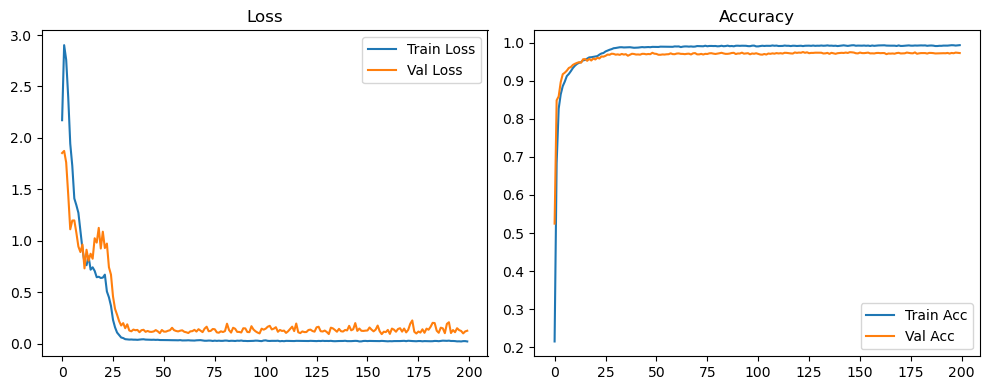

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 51.84it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 52.18it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 52.32it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 52.44it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 52.47it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 52.38it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 52.10it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 51.72it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 51.86it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 52.02it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 52.19it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 52.33it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 52.43it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 52.65it/s]

Original Model Final Test Loss: 0.1161 Accuracy: 0.9735


🚀 Running: batch128_lr0.005_0.005_0.005_dp0.5


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1852 | Val Acc: 0.3452 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1852 | Val Acc: 0.3452 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1852 | Val Acc: 0.3452 |:   0%|          | 1/200 [00:11<37:28, 11.30s/it]

| LR: 0.005 | Train Acc: 0.5617 | Val Acc: 0.8307 |:   0%|          | 1/200 [00:22<37:28, 11.30s/it]

| LR: 0.005 | Train Acc: 0.5617 | Val Acc: 0.8307 |:   0%|          | 1/200 [00:22<37:28, 11.30s/it]

| LR: 0.005 | Train Acc: 0.5617 | Val Acc: 0.8307 |:   1%|          | 2/200 [00:22<37:46, 11.45s/it]

| LR: 0.005 | Train Acc: 0.7808 | Val Acc: 0.8762 |:   1%|          | 2/200 [00:33<37:46, 11.45s/it]

| LR: 0.005 | Train Acc: 0.7808 | Val Acc: 0.8762 |:   1%|          | 2/200 [00:33<37:46, 11.45s/it]

| LR: 0.005 | Train Acc: 0.7808 | Val Acc: 0.8762 |:   2%|▏         | 3/200 [00:33<36:27, 11.10s/it]

| LR: 0.005 | Train Acc: 0.8286 | Val Acc: 0.9021 |:   2%|▏         | 3/200 [00:44<36:27, 11.10s/it]

| LR: 0.005 | Train Acc: 0.8286 | Val Acc: 0.9021 |:   2%|▏         | 3/200 [00:44<36:27, 11.10s/it]

| LR: 0.005 | Train Acc: 0.8286 | Val Acc: 0.9021 |:   2%|▏         | 4/200 [00:44<35:52, 10.98s/it]

| LR: 0.005 | Train Acc: 0.8560 | Val Acc: 0.9229 |:   2%|▏         | 4/200 [00:54<35:52, 10.98s/it]

| LR: 0.005 | Train Acc: 0.8560 | Val Acc: 0.9229 |:   2%|▏         | 4/200 [00:54<35:52, 10.98s/it]

| LR: 0.005 | Train Acc: 0.8560 | Val Acc: 0.9229 |:   2%|▎         | 5/200 [00:55<35:20, 10.87s/it]

| LR: 0.005 | Train Acc: 0.8745 | Val Acc: 0.9256 |:   2%|▎         | 5/200 [01:05<35:20, 10.87s/it]

| LR: 0.005 | Train Acc: 0.8745 | Val Acc: 0.9256 |:   2%|▎         | 5/200 [01:05<35:20, 10.87s/it]

| LR: 0.005 | Train Acc: 0.8745 | Val Acc: 0.9256 |:   3%|▎         | 6/200 [01:05<34:48, 10.77s/it]

| LR: 0.005 | Train Acc: 0.8855 | Val Acc: 0.9272 |:   3%|▎         | 6/200 [01:16<34:48, 10.77s/it]

| LR: 0.005 | Train Acc: 0.8855 | Val Acc: 0.9272 |:   3%|▎         | 6/200 [01:16<34:48, 10.77s/it]

| LR: 0.005 | Train Acc: 0.8855 | Val Acc: 0.9272 |:   4%|▎         | 7/200 [01:16<34:37, 10.77s/it]

| LR: 0.005 | Train Acc: 0.8977 | Val Acc: 0.9373 |:   4%|▎         | 7/200 [01:26<34:37, 10.77s/it]

| LR: 0.005 | Train Acc: 0.8977 | Val Acc: 0.9373 |:   4%|▎         | 7/200 [01:26<34:37, 10.77s/it]

| LR: 0.005 | Train Acc: 0.8977 | Val Acc: 0.9373 |:   4%|▍         | 8/200 [01:26<34:13, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9009 | Val Acc: 0.9413 |:   4%|▍         | 8/200 [01:37<34:13, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9009 | Val Acc: 0.9413 |:   4%|▍         | 8/200 [01:37<34:13, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9009 | Val Acc: 0.9413 |:   4%|▍         | 9/200 [01:37<34:02, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9121 | Val Acc: 0.9426 |:   4%|▍         | 9/200 [01:48<34:02, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9121 | Val Acc: 0.9426 |:   4%|▍         | 9/200 [01:48<34:02, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9121 | Val Acc: 0.9426 |:   5%|▌         | 10/200 [01:48<33:41, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9139 | Val Acc: 0.9438 |:   5%|▌         | 10/200 [01:58<33:41, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9139 | Val Acc: 0.9438 |:   5%|▌         | 10/200 [01:58<33:41, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9139 | Val Acc: 0.9438 |:   6%|▌         | 11/200 [01:58<33:34, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9206 | Val Acc: 0.9431 |:   6%|▌         | 11/200 [02:09<33:34, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9206 | Val Acc: 0.9431 |:   6%|▌         | 11/200 [02:09<33:34, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9206 | Val Acc: 0.9431 |:   6%|▌         | 12/200 [02:09<33:19, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9256 | Val Acc: 0.9519 |:   6%|▌         | 12/200 [02:19<33:19, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9256 | Val Acc: 0.9519 |:   6%|▌         | 12/200 [02:19<33:19, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9256 | Val Acc: 0.9519 |:   6%|▋         | 13/200 [02:19<33:05, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9305 | Val Acc: 0.9553 |:   6%|▋         | 13/200 [02:30<33:05, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9305 | Val Acc: 0.9553 |:   6%|▋         | 13/200 [02:30<33:05, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9305 | Val Acc: 0.9553 |:   7%|▋         | 14/200 [02:30<32:56, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9332 | Val Acc: 0.9551 |:   7%|▋         | 14/200 [02:41<32:56, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9332 | Val Acc: 0.9551 |:   7%|▋         | 14/200 [02:41<32:56, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9332 | Val Acc: 0.9551 |:   8%|▊         | 15/200 [02:41<32:58, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9348 | Val Acc: 0.9604 |:   8%|▊         | 15/200 [02:51<32:58, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9348 | Val Acc: 0.9604 |:   8%|▊         | 15/200 [02:51<32:58, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9348 | Val Acc: 0.9604 |:   8%|▊         | 16/200 [02:52<32:40, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9391 | Val Acc: 0.9578 |:   8%|▊         | 16/200 [03:02<32:40, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9391 | Val Acc: 0.9578 |:   8%|▊         | 16/200 [03:02<32:40, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9391 | Val Acc: 0.9578 |:   8%|▊         | 17/200 [03:02<32:32, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9436 | Val Acc: 0.9633 |:   8%|▊         | 17/200 [03:13<32:32, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9436 | Val Acc: 0.9633 |:   8%|▊         | 17/200 [03:13<32:32, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9436 | Val Acc: 0.9633 |:   9%|▉         | 18/200 [03:13<32:15, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9463 | Val Acc: 0.9631 |:   9%|▉         | 18/200 [03:23<32:15, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9463 | Val Acc: 0.9631 |:   9%|▉         | 18/200 [03:23<32:15, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9463 | Val Acc: 0.9631 |:  10%|▉         | 19/200 [03:23<32:06, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9478 | Val Acc: 0.9633 |:  10%|▉         | 19/200 [03:34<32:06, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9478 | Val Acc: 0.9633 |:  10%|▉         | 19/200 [03:34<32:06, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9478 | Val Acc: 0.9633 |:  10%|█         | 20/200 [03:34<31:50, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9492 | Val Acc: 0.9661 |:  10%|█         | 20/200 [03:45<31:50, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9492 | Val Acc: 0.9661 |:  10%|█         | 20/200 [03:45<31:50, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9492 | Val Acc: 0.9661 |:  10%|█         | 21/200 [03:45<31:38, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9519 | Val Acc: 0.9654 |:  10%|█         | 21/200 [03:55<31:38, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9519 | Val Acc: 0.9654 |:  10%|█         | 21/200 [03:55<31:38, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9519 | Val Acc: 0.9654 |:  11%|█         | 22/200 [03:55<31:26, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9621 | Val Acc: 0.9691 |:  11%|█         | 22/200 [04:06<31:26, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9621 | Val Acc: 0.9691 |:  11%|█         | 22/200 [04:06<31:26, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9621 | Val Acc: 0.9691 |:  12%|█▏        | 23/200 [04:06<31:21, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9650 | Val Acc: 0.9690 |:  12%|█▏        | 23/200 [04:17<31:21, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9650 | Val Acc: 0.9690 |:  12%|█▏        | 23/200 [04:17<31:21, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9650 | Val Acc: 0.9690 |:  12%|█▏        | 24/200 [04:17<31:13, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9670 |:  12%|█▏        | 24/200 [04:27<31:13, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9670 |:  12%|█▏        | 24/200 [04:27<31:13, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9670 |:  12%|█▎        | 25/200 [04:27<31:04, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9688 |:  12%|█▎        | 25/200 [04:38<31:04, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9688 |:  12%|█▎        | 25/200 [04:38<31:04, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9688 |:  13%|█▎        | 26/200 [04:38<30:57, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9674 | Val Acc: 0.9705 |:  13%|█▎        | 26/200 [04:49<30:57, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9674 | Val Acc: 0.9705 |:  13%|█▎        | 26/200 [04:49<30:57, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9674 | Val Acc: 0.9705 |:  14%|█▎        | 27/200 [04:49<30:49, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9675 |:  14%|█▎        | 27/200 [04:59<30:49, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9675 |:  14%|█▎        | 27/200 [04:59<30:49, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9675 |:  14%|█▍        | 28/200 [04:59<30:36, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9674 |:  14%|█▍        | 28/200 [05:10<30:36, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9674 |:  14%|█▍        | 28/200 [05:10<30:36, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9674 |:  14%|█▍        | 29/200 [05:10<30:22, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9682 |:  14%|█▍        | 29/200 [05:20<30:22, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9682 |:  14%|█▍        | 29/200 [05:20<30:22, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9682 |:  15%|█▌        | 30/200 [05:20<30:06, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9676 |:  15%|█▌        | 30/200 [05:31<30:06, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9676 |:  15%|█▌        | 30/200 [05:31<30:06, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9676 |:  16%|█▌        | 31/200 [05:31<29:54, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9676 | Val Acc: 0.9667 |:  16%|█▌        | 31/200 [05:42<29:54, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9676 | Val Acc: 0.9667 |:  16%|█▌        | 31/200 [05:42<29:54, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9676 | Val Acc: 0.9667 |:  16%|█▌        | 32/200 [05:42<29:41, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9659 | Val Acc: 0.9665 |:  16%|█▌        | 32/200 [05:52<29:41, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9659 | Val Acc: 0.9665 |:  16%|█▌        | 32/200 [05:52<29:41, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9659 | Val Acc: 0.9665 |:  16%|█▋        | 33/200 [05:52<29:39, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9658 | Val Acc: 0.9669 |:  16%|█▋        | 33/200 [06:03<29:39, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9658 | Val Acc: 0.9669 |:  16%|█▋        | 33/200 [06:03<29:39, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9658 | Val Acc: 0.9669 |:  17%|█▋        | 34/200 [06:03<29:26, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9648 | Val Acc: 0.9673 |:  17%|█▋        | 34/200 [06:14<29:26, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9648 | Val Acc: 0.9673 |:  17%|█▋        | 34/200 [06:14<29:26, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9648 | Val Acc: 0.9673 |:  18%|█▊        | 35/200 [06:14<29:13, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9650 | Val Acc: 0.9673 |:  18%|█▊        | 35/200 [06:24<29:13, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9650 | Val Acc: 0.9673 |:  18%|█▊        | 35/200 [06:24<29:13, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9650 | Val Acc: 0.9673 |:  18%|█▊        | 36/200 [06:24<29:05, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9658 | Val Acc: 0.9645 |:  18%|█▊        | 36/200 [06:35<29:05, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9658 | Val Acc: 0.9645 |:  18%|█▊        | 36/200 [06:35<29:05, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9658 | Val Acc: 0.9645 |:  18%|█▊        | 37/200 [06:35<28:49, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9648 | Val Acc: 0.9679 |:  18%|█▊        | 37/200 [06:45<28:49, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9648 | Val Acc: 0.9679 |:  18%|█▊        | 37/200 [06:45<28:49, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9648 | Val Acc: 0.9679 |:  19%|█▉        | 38/200 [06:45<28:39, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9659 | Val Acc: 0.9694 |:  19%|█▉        | 38/200 [06:56<28:39, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9659 | Val Acc: 0.9694 |:  19%|█▉        | 38/200 [06:56<28:39, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9659 | Val Acc: 0.9694 |:  20%|█▉        | 39/200 [06:56<28:22, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9646 | Val Acc: 0.9674 |:  20%|█▉        | 39/200 [07:06<28:22, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9646 | Val Acc: 0.9674 |:  20%|█▉        | 39/200 [07:06<28:22, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9646 | Val Acc: 0.9674 |:  20%|██        | 40/200 [07:06<28:10, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9671 | Val Acc: 0.9669 |:  20%|██        | 40/200 [07:17<28:10, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9671 | Val Acc: 0.9669 |:  20%|██        | 40/200 [07:17<28:10, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9671 | Val Acc: 0.9669 |:  20%|██        | 41/200 [07:17<28:04, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9656 | Val Acc: 0.9672 |:  20%|██        | 41/200 [07:28<28:04, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9656 | Val Acc: 0.9672 |:  20%|██        | 41/200 [07:28<28:04, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9656 | Val Acc: 0.9672 |:  21%|██        | 42/200 [07:28<27:58, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9657 | Val Acc: 0.9692 |:  21%|██        | 42/200 [07:38<27:58, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9657 | Val Acc: 0.9692 |:  21%|██        | 42/200 [07:38<27:58, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9657 | Val Acc: 0.9692 |:  22%|██▏       | 43/200 [07:38<27:42, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9663 | Val Acc: 0.9683 |:  22%|██▏       | 43/200 [07:49<27:42, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9663 | Val Acc: 0.9683 |:  22%|██▏       | 43/200 [07:49<27:42, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9663 | Val Acc: 0.9683 |:  22%|██▏       | 44/200 [07:49<27:36, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9669 | Val Acc: 0.9683 |:  22%|██▏       | 44/200 [08:00<27:36, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9669 | Val Acc: 0.9683 |:  22%|██▏       | 44/200 [08:00<27:36, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9669 | Val Acc: 0.9683 |:  22%|██▎       | 45/200 [08:00<27:25, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9663 | Val Acc: 0.9677 |:  22%|██▎       | 45/200 [08:10<27:25, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9663 | Val Acc: 0.9677 |:  22%|██▎       | 45/200 [08:10<27:25, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9663 | Val Acc: 0.9677 |:  23%|██▎       | 46/200 [08:10<27:12, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9675 | Val Acc: 0.9687 |:  23%|██▎       | 46/200 [08:21<27:12, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9675 | Val Acc: 0.9687 |:  23%|██▎       | 46/200 [08:21<27:12, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9675 | Val Acc: 0.9687 |:  24%|██▎       | 47/200 [08:21<26:58, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9653 | Val Acc: 0.9699 |:  24%|██▎       | 47/200 [08:31<26:58, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9653 | Val Acc: 0.9699 |:  24%|██▎       | 47/200 [08:31<26:58, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9653 | Val Acc: 0.9699 |:  24%|██▍       | 48/200 [08:31<26:43, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9679 | Val Acc: 0.9680 |:  24%|██▍       | 48/200 [08:42<26:43, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9679 | Val Acc: 0.9680 |:  24%|██▍       | 48/200 [08:42<26:43, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9679 | Val Acc: 0.9680 |:  24%|██▍       | 49/200 [08:42<26:36, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9670 | Val Acc: 0.9700 |:  24%|██▍       | 49/200 [08:53<26:36, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9670 | Val Acc: 0.9700 |:  24%|██▍       | 49/200 [08:53<26:36, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9670 | Val Acc: 0.9700 |:  25%|██▌       | 50/200 [08:53<26:36, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9664 | Val Acc: 0.9670 |:  25%|██▌       | 50/200 [09:03<26:36, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9664 | Val Acc: 0.9670 |:  25%|██▌       | 50/200 [09:03<26:36, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9664 | Val Acc: 0.9670 |:  26%|██▌       | 51/200 [09:03<26:28, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9694 |:  26%|██▌       | 51/200 [09:14<26:28, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9694 |:  26%|██▌       | 51/200 [09:14<26:28, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9694 |:  26%|██▌       | 52/200 [09:14<26:20, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9655 | Val Acc: 0.9688 |:  26%|██▌       | 52/200 [09:25<26:20, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9655 | Val Acc: 0.9688 |:  26%|██▌       | 52/200 [09:25<26:20, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9655 | Val Acc: 0.9688 |:  26%|██▋       | 53/200 [09:25<26:14, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9670 |:  26%|██▋       | 53/200 [09:35<26:14, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9670 |:  26%|██▋       | 53/200 [09:35<26:14, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9670 |:  27%|██▋       | 54/200 [09:35<25:57, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9661 | Val Acc: 0.9688 |:  27%|██▋       | 54/200 [09:46<25:57, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9661 | Val Acc: 0.9688 |:  27%|██▋       | 54/200 [09:46<25:57, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9661 | Val Acc: 0.9688 |:  28%|██▊       | 55/200 [09:46<25:42, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9698 |:  28%|██▊       | 55/200 [09:57<25:42, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9698 |:  28%|██▊       | 55/200 [09:57<25:42, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9698 |:  28%|██▊       | 56/200 [09:57<25:33, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9683 | Val Acc: 0.9701 |:  28%|██▊       | 56/200 [10:07<25:33, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9683 | Val Acc: 0.9701 |:  28%|██▊       | 56/200 [10:07<25:33, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9683 | Val Acc: 0.9701 |:  28%|██▊       | 57/200 [10:07<25:03, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9706 |:  28%|██▊       | 57/200 [10:17<25:03, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9706 |:  28%|██▊       | 57/200 [10:17<25:03, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9706 |:  29%|██▉       | 58/200 [10:17<24:45, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9702 | Val Acc: 0.9713 |:  29%|██▉       | 58/200 [10:28<24:45, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9702 | Val Acc: 0.9713 |:  29%|██▉       | 58/200 [10:28<24:45, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9702 | Val Acc: 0.9713 |:  30%|██▉       | 59/200 [10:28<24:49, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9701 |:  30%|██▉       | 59/200 [10:39<24:49, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9701 |:  30%|██▉       | 59/200 [10:39<24:49, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9701 |:  30%|███       | 60/200 [10:39<24:37, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9679 | Val Acc: 0.9698 |:  30%|███       | 60/200 [10:49<24:37, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9679 | Val Acc: 0.9698 |:  30%|███       | 60/200 [10:49<24:37, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9679 | Val Acc: 0.9698 |:  30%|███       | 61/200 [10:49<24:36, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9678 | Val Acc: 0.9690 |:  30%|███       | 61/200 [11:00<24:36, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9678 | Val Acc: 0.9690 |:  30%|███       | 61/200 [11:00<24:36, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9678 | Val Acc: 0.9690 |:  31%|███       | 62/200 [11:00<24:19, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9678 | Val Acc: 0.9673 |:  31%|███       | 62/200 [11:10<24:19, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9678 | Val Acc: 0.9673 |:  31%|███       | 62/200 [11:10<24:19, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9678 | Val Acc: 0.9673 |:  32%|███▏      | 63/200 [11:10<24:07, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9682 |:  32%|███▏      | 63/200 [11:21<24:07, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9682 |:  32%|███▏      | 63/200 [11:21<24:07, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9682 |:  32%|███▏      | 64/200 [11:21<24:19, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9702 |:  32%|███▏      | 64/200 [11:32<24:19, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9702 |:  32%|███▏      | 64/200 [11:32<24:19, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9702 |:  32%|███▎      | 65/200 [11:32<24:04, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9688 |:  32%|███▎      | 65/200 [11:43<24:04, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9688 |:  32%|███▎      | 65/200 [11:43<24:04, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9688 |:  33%|███▎      | 66/200 [11:43<23:58, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9696 |:  33%|███▎      | 66/200 [11:53<23:58, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9696 |:  33%|███▎      | 66/200 [11:53<23:58, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9696 |:  34%|███▎      | 67/200 [11:53<23:41, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9675 | Val Acc: 0.9703 |:  34%|███▎      | 67/200 [12:04<23:41, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9675 | Val Acc: 0.9703 |:  34%|███▎      | 67/200 [12:04<23:41, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9675 | Val Acc: 0.9703 |:  34%|███▍      | 68/200 [12:04<23:42, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9667 |:  34%|███▍      | 68/200 [12:15<23:42, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9667 |:  34%|███▍      | 68/200 [12:15<23:42, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9667 |:  34%|███▍      | 69/200 [12:15<23:29, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9686 |:  34%|███▍      | 69/200 [12:26<23:29, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9686 |:  34%|███▍      | 69/200 [12:26<23:29, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9686 |:  35%|███▌      | 70/200 [12:26<23:14, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9702 |:  35%|███▌      | 70/200 [12:37<23:14, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9702 |:  35%|███▌      | 70/200 [12:37<23:14, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9702 |:  36%|███▌      | 71/200 [12:37<23:04, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9689 | Val Acc: 0.9699 |:  36%|███▌      | 71/200 [12:47<23:04, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9689 | Val Acc: 0.9699 |:  36%|███▌      | 71/200 [12:47<23:04, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9689 | Val Acc: 0.9699 |:  36%|███▌      | 72/200 [12:47<22:46, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9706 |:  36%|███▌      | 72/200 [12:58<22:46, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9706 |:  36%|███▌      | 72/200 [12:58<22:46, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9706 |:  36%|███▋      | 73/200 [12:58<22:30, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9683 | Val Acc: 0.9706 |:  36%|███▋      | 73/200 [13:08<22:30, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9683 | Val Acc: 0.9706 |:  36%|███▋      | 73/200 [13:08<22:30, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9683 | Val Acc: 0.9706 |:  37%|███▋      | 74/200 [13:09<22:29, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9695 | Val Acc: 0.9708 |:  37%|███▋      | 74/200 [13:20<22:29, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9695 | Val Acc: 0.9708 |:  37%|███▋      | 74/200 [13:20<22:29, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9695 | Val Acc: 0.9708 |:  38%|███▊      | 75/200 [13:20<22:41, 10.89s/it]

| LR: 0.005 | Train Acc: 0.9679 | Val Acc: 0.9671 |:  38%|███▊      | 75/200 [13:30<22:41, 10.89s/it]

| LR: 0.005 | Train Acc: 0.9679 | Val Acc: 0.9671 |:  38%|███▊      | 75/200 [13:30<22:41, 10.89s/it]

| LR: 0.005 | Train Acc: 0.9679 | Val Acc: 0.9671 |:  38%|███▊      | 76/200 [13:30<22:17, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9684 | Val Acc: 0.9697 |:  38%|███▊      | 76/200 [13:41<22:17, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9684 | Val Acc: 0.9697 |:  38%|███▊      | 76/200 [13:41<22:17, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9684 | Val Acc: 0.9697 |:  38%|███▊      | 77/200 [13:41<22:10, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9710 | Val Acc: 0.9707 |:  38%|███▊      | 77/200 [13:53<22:10, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9710 | Val Acc: 0.9707 |:  38%|███▊      | 77/200 [13:53<22:10, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9710 | Val Acc: 0.9707 |:  39%|███▉      | 78/200 [13:53<22:23, 11.02s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9693 |:  39%|███▉      | 78/200 [14:05<22:23, 11.02s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9693 |:  39%|███▉      | 78/200 [14:05<22:23, 11.02s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9693 |:  40%|███▉      | 79/200 [14:05<22:51, 11.34s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9683 |:  40%|███▉      | 79/200 [14:17<22:51, 11.34s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9683 |:  40%|███▉      | 79/200 [14:17<22:51, 11.34s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9683 |:  40%|████      | 80/200 [14:17<23:21, 11.68s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9708 |:  40%|████      | 80/200 [14:28<23:21, 11.68s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9708 |:  40%|████      | 80/200 [14:28<23:21, 11.68s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9708 |:  40%|████      | 81/200 [14:28<22:35, 11.39s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9703 |:  40%|████      | 81/200 [14:39<22:35, 11.39s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9703 |:  40%|████      | 81/200 [14:39<22:35, 11.39s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9703 |:  41%|████      | 82/200 [14:39<21:54, 11.14s/it]

| LR: 0.005 | Train Acc: 0.9684 | Val Acc: 0.9687 |:  41%|████      | 82/200 [14:49<21:54, 11.14s/it]

| LR: 0.005 | Train Acc: 0.9684 | Val Acc: 0.9687 |:  41%|████      | 82/200 [14:49<21:54, 11.14s/it]

| LR: 0.005 | Train Acc: 0.9684 | Val Acc: 0.9687 |:  42%|████▏     | 83/200 [14:49<21:21, 10.95s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9688 |:  42%|████▏     | 83/200 [15:00<21:21, 10.95s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9688 |:  42%|████▏     | 83/200 [15:00<21:21, 10.95s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9688 |:  42%|████▏     | 84/200 [15:00<20:57, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9683 | Val Acc: 0.9708 |:  42%|████▏     | 84/200 [15:10<20:57, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9683 | Val Acc: 0.9708 |:  42%|████▏     | 84/200 [15:10<20:57, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9683 | Val Acc: 0.9708 |:  42%|████▎     | 85/200 [15:10<20:36, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9687 |:  42%|████▎     | 85/200 [15:21<20:36, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9687 |:  42%|████▎     | 85/200 [15:21<20:36, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9687 |:  43%|████▎     | 86/200 [15:21<20:24, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9709 |:  43%|████▎     | 86/200 [15:32<20:24, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9709 |:  43%|████▎     | 86/200 [15:32<20:24, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9709 |:  44%|████▎     | 87/200 [15:32<20:23, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9686 |:  44%|████▎     | 87/200 [15:43<20:23, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9686 |:  44%|████▎     | 87/200 [15:43<20:23, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9686 |:  44%|████▍     | 88/200 [15:43<20:08, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9698 |:  44%|████▍     | 88/200 [15:53<20:08, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9698 |:  44%|████▍     | 88/200 [15:53<20:08, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9698 |:  44%|████▍     | 89/200 [15:53<19:52, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9678 | Val Acc: 0.9683 |:  44%|████▍     | 89/200 [16:04<19:52, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9678 | Val Acc: 0.9683 |:  44%|████▍     | 89/200 [16:04<19:52, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9678 | Val Acc: 0.9683 |:  45%|████▌     | 90/200 [16:04<19:38, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9706 | Val Acc: 0.9694 |:  45%|████▌     | 90/200 [16:15<19:38, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9706 | Val Acc: 0.9694 |:  45%|████▌     | 90/200 [16:15<19:38, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9706 | Val Acc: 0.9694 |:  46%|████▌     | 91/200 [16:15<19:26, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9698 |:  46%|████▌     | 91/200 [16:25<19:26, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9698 |:  46%|████▌     | 91/200 [16:25<19:26, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9698 |:  46%|████▌     | 92/200 [16:25<19:15, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9696 |:  46%|████▌     | 92/200 [16:36<19:15, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9696 |:  46%|████▌     | 92/200 [16:36<19:15, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9696 |:  46%|████▋     | 93/200 [16:36<19:04, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9695 |:  46%|████▋     | 93/200 [16:48<19:04, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9695 |:  46%|████▋     | 93/200 [16:48<19:04, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9695 |:  47%|████▋     | 94/200 [16:48<19:21, 10.96s/it]

| LR: 0.005 | Train Acc: 0.9698 | Val Acc: 0.9702 |:  47%|████▋     | 94/200 [16:58<19:21, 10.96s/it]

| LR: 0.005 | Train Acc: 0.9698 | Val Acc: 0.9702 |:  47%|████▋     | 94/200 [16:58<19:21, 10.96s/it]

| LR: 0.005 | Train Acc: 0.9698 | Val Acc: 0.9702 |:  48%|████▊     | 95/200 [16:58<19:02, 10.88s/it]

| LR: 0.005 | Train Acc: 0.9689 | Val Acc: 0.9704 |:  48%|████▊     | 95/200 [17:09<19:02, 10.88s/it]

| LR: 0.005 | Train Acc: 0.9689 | Val Acc: 0.9704 |:  48%|████▊     | 95/200 [17:09<19:02, 10.88s/it]

| LR: 0.005 | Train Acc: 0.9689 | Val Acc: 0.9704 |:  48%|████▊     | 96/200 [17:09<18:49, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9690 |:  48%|████▊     | 96/200 [17:20<18:49, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9690 |:  48%|████▊     | 96/200 [17:20<18:49, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9690 |:  48%|████▊     | 97/200 [17:20<18:26, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9696 | Val Acc: 0.9695 |:  48%|████▊     | 97/200 [17:30<18:26, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9696 | Val Acc: 0.9695 |:  48%|████▊     | 97/200 [17:30<18:26, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9696 | Val Acc: 0.9695 |:  49%|████▉     | 98/200 [17:30<18:17, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [17:41<18:17, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [17:41<18:17, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9688 |:  50%|████▉     | 99/200 [17:41<17:58, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9695 |:  50%|████▉     | 99/200 [17:52<17:58, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9695 |:  50%|████▉     | 99/200 [17:52<17:58, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9695 |:  50%|█████     | 100/200 [17:52<17:48, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9687 |:  50%|█████     | 100/200 [18:02<17:48, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9687 |:  50%|█████     | 100/200 [18:02<17:48, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9687 |:  50%|█████     | 101/200 [18:02<17:34, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9684 | Val Acc: 0.9668 |:  50%|█████     | 101/200 [18:13<17:34, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9684 | Val Acc: 0.9668 |:  50%|█████     | 101/200 [18:13<17:34, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9684 | Val Acc: 0.9668 |:  51%|█████     | 102/200 [18:13<17:19, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9685 |:  51%|█████     | 102/200 [18:23<17:19, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9685 |:  51%|█████     | 102/200 [18:23<17:19, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9685 |:  52%|█████▏    | 103/200 [18:23<17:06, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9682 | Val Acc: 0.9697 |:  52%|█████▏    | 103/200 [18:34<17:06, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9682 | Val Acc: 0.9697 |:  52%|█████▏    | 103/200 [18:34<17:06, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9682 | Val Acc: 0.9697 |:  52%|█████▏    | 104/200 [18:34<16:53, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9674 | Val Acc: 0.9708 |:  52%|█████▏    | 104/200 [18:44<16:53, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9674 | Val Acc: 0.9708 |:  52%|█████▏    | 104/200 [18:44<16:53, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9674 | Val Acc: 0.9708 |:  52%|█████▎    | 105/200 [18:44<16:44, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9699 | Val Acc: 0.9688 |:  52%|█████▎    | 105/200 [18:55<16:44, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9699 | Val Acc: 0.9688 |:  52%|█████▎    | 105/200 [18:55<16:44, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9699 | Val Acc: 0.9688 |:  53%|█████▎    | 106/200 [18:55<16:31, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9678 | Val Acc: 0.9700 |:  53%|█████▎    | 106/200 [19:05<16:31, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9678 | Val Acc: 0.9700 |:  53%|█████▎    | 106/200 [19:05<16:31, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9678 | Val Acc: 0.9700 |:  54%|█████▎    | 107/200 [19:05<16:22, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9702 |:  54%|█████▎    | 107/200 [19:16<16:22, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9702 |:  54%|█████▎    | 107/200 [19:16<16:22, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9702 |:  54%|█████▍    | 108/200 [19:16<16:16, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9691 |:  54%|█████▍    | 108/200 [19:27<16:16, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9691 |:  54%|█████▍    | 108/200 [19:27<16:16, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9691 |:  55%|█████▍    | 109/200 [19:27<16:06, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9698 | Val Acc: 0.9684 |:  55%|█████▍    | 109/200 [19:37<16:06, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9698 | Val Acc: 0.9684 |:  55%|█████▍    | 109/200 [19:37<16:06, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9698 | Val Acc: 0.9684 |:  55%|█████▌    | 110/200 [19:37<15:52, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9703 | Val Acc: 0.9683 |:  55%|█████▌    | 110/200 [19:48<15:52, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9703 | Val Acc: 0.9683 |:  55%|█████▌    | 110/200 [19:48<15:52, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9703 | Val Acc: 0.9683 |:  56%|█████▌    | 111/200 [19:48<15:41, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9683 |:  56%|█████▌    | 111/200 [19:58<15:41, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9683 |:  56%|█████▌    | 111/200 [19:58<15:41, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9683 |:  56%|█████▌    | 112/200 [19:58<15:28, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9678 |:  56%|█████▌    | 112/200 [20:09<15:28, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9678 |:  56%|█████▌    | 112/200 [20:09<15:28, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9678 |:  56%|█████▋    | 113/200 [20:09<15:22, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9688 |:  56%|█████▋    | 113/200 [20:20<15:22, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9688 |:  56%|█████▋    | 113/200 [20:20<15:22, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9688 |:  57%|█████▋    | 114/200 [20:20<15:10, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9699 | Val Acc: 0.9692 |:  57%|█████▋    | 114/200 [20:30<15:10, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9699 | Val Acc: 0.9692 |:  57%|█████▋    | 114/200 [20:30<15:10, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9699 | Val Acc: 0.9692 |:  57%|█████▊    | 115/200 [20:30<14:53, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9683 |:  57%|█████▊    | 115/200 [20:41<14:53, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9683 |:  57%|█████▊    | 115/200 [20:41<14:53, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9683 |:  58%|█████▊    | 116/200 [20:41<14:58, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9698 |:  58%|█████▊    | 116/200 [20:52<14:58, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9698 |:  58%|█████▊    | 116/200 [20:52<14:58, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9698 |:  58%|█████▊    | 117/200 [20:52<14:47, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9708 | Val Acc: 0.9699 |:  58%|█████▊    | 117/200 [21:02<14:47, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9708 | Val Acc: 0.9699 |:  58%|█████▊    | 117/200 [21:02<14:47, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9708 | Val Acc: 0.9699 |:  59%|█████▉    | 118/200 [21:02<14:39, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9688 |:  59%|█████▉    | 118/200 [21:13<14:39, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9688 |:  59%|█████▉    | 118/200 [21:13<14:39, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9688 |:  60%|█████▉    | 119/200 [21:13<14:17, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9689 | Val Acc: 0.9687 |:  60%|█████▉    | 119/200 [21:23<14:17, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9689 | Val Acc: 0.9687 |:  60%|█████▉    | 119/200 [21:23<14:17, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9689 | Val Acc: 0.9687 |:  60%|██████    | 120/200 [21:23<14:08, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9704 | Val Acc: 0.9683 |:  60%|██████    | 120/200 [21:34<14:08, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9704 | Val Acc: 0.9683 |:  60%|██████    | 120/200 [21:34<14:08, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9704 | Val Acc: 0.9683 |:  60%|██████    | 121/200 [21:34<14:00, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9704 |:  60%|██████    | 121/200 [21:45<14:00, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9704 |:  60%|██████    | 121/200 [21:45<14:00, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9704 |:  61%|██████    | 122/200 [21:45<13:48, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9692 |:  61%|██████    | 122/200 [21:55<13:48, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9692 |:  61%|██████    | 122/200 [21:55<13:48, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9692 |:  62%|██████▏   | 123/200 [21:55<13:35, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9701 |:  62%|██████▏   | 123/200 [22:06<13:35, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9701 |:  62%|██████▏   | 123/200 [22:06<13:35, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9701 |:  62%|██████▏   | 124/200 [22:06<13:24, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9714 |:  62%|██████▏   | 124/200 [22:16<13:24, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9714 |:  62%|██████▏   | 124/200 [22:16<13:24, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9714 |:  62%|██████▎   | 125/200 [22:16<13:08, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9702 | Val Acc: 0.9692 |:  62%|██████▎   | 125/200 [22:27<13:08, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9702 | Val Acc: 0.9692 |:  62%|██████▎   | 125/200 [22:27<13:08, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9702 | Val Acc: 0.9692 |:  63%|██████▎   | 126/200 [22:27<13:00, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9707 | Val Acc: 0.9702 |:  63%|██████▎   | 126/200 [22:37<13:00, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9707 | Val Acc: 0.9702 |:  63%|██████▎   | 126/200 [22:37<13:00, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9707 | Val Acc: 0.9702 |:  64%|██████▎   | 127/200 [22:37<12:50, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9708 |:  64%|██████▎   | 127/200 [22:48<12:50, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9708 |:  64%|██████▎   | 127/200 [22:48<12:50, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9708 |:  64%|██████▍   | 128/200 [22:48<12:40, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9708 | Val Acc: 0.9721 |:  64%|██████▍   | 128/200 [22:58<12:40, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9708 | Val Acc: 0.9721 |:  64%|██████▍   | 128/200 [22:58<12:40, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9708 | Val Acc: 0.9721 |:  64%|██████▍   | 129/200 [22:59<12:30, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9694 |:  64%|██████▍   | 129/200 [23:09<12:30, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9694 |:  64%|██████▍   | 129/200 [23:09<12:30, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9694 |:  65%|██████▌   | 130/200 [23:09<12:26, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9714 |:  65%|██████▌   | 130/200 [23:20<12:26, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9714 |:  65%|██████▌   | 130/200 [23:20<12:26, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9714 |:  66%|██████▌   | 131/200 [23:20<12:16, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9713 |:  66%|██████▌   | 131/200 [23:31<12:16, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9713 |:  66%|██████▌   | 131/200 [23:31<12:16, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9713 |:  66%|██████▌   | 132/200 [23:31<12:07, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9697 |:  66%|██████▌   | 132/200 [23:41<12:07, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9697 |:  66%|██████▌   | 132/200 [23:41<12:07, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9697 |:  66%|██████▋   | 133/200 [23:41<11:54, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9713 |:  66%|██████▋   | 133/200 [23:52<11:54, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9713 |:  66%|██████▋   | 133/200 [23:52<11:54, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9713 |:  67%|██████▋   | 134/200 [23:52<11:41, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9682 | Val Acc: 0.9688 |:  67%|██████▋   | 134/200 [24:03<11:41, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9682 | Val Acc: 0.9688 |:  67%|██████▋   | 134/200 [24:03<11:41, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9682 | Val Acc: 0.9688 |:  68%|██████▊   | 135/200 [24:03<11:30, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9712 |:  68%|██████▊   | 135/200 [24:13<11:30, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9712 |:  68%|██████▊   | 135/200 [24:13<11:30, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9712 |:  68%|██████▊   | 136/200 [24:13<11:17, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9711 |:  68%|██████▊   | 136/200 [24:24<11:17, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9711 |:  68%|██████▊   | 136/200 [24:24<11:17, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9711 |:  68%|██████▊   | 137/200 [24:24<11:18, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9694 |:  68%|██████▊   | 137/200 [24:35<11:18, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9694 |:  68%|██████▊   | 137/200 [24:35<11:18, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9694 |:  69%|██████▉   | 138/200 [24:35<11:05, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9701 | Val Acc: 0.9706 |:  69%|██████▉   | 138/200 [24:46<11:05, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9701 | Val Acc: 0.9706 |:  69%|██████▉   | 138/200 [24:46<11:05, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9701 | Val Acc: 0.9706 |:  70%|██████▉   | 139/200 [24:46<10:55, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9679 | Val Acc: 0.9692 |:  70%|██████▉   | 139/200 [24:56<10:55, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9679 | Val Acc: 0.9692 |:  70%|██████▉   | 139/200 [24:56<10:55, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9679 | Val Acc: 0.9692 |:  70%|███████   | 140/200 [24:56<10:41, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9673 | Val Acc: 0.9710 |:  70%|███████   | 140/200 [25:06<10:41, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9673 | Val Acc: 0.9710 |:  70%|███████   | 140/200 [25:06<10:41, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9673 | Val Acc: 0.9710 |:  70%|███████   | 141/200 [25:06<10:22, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9708 |:  70%|███████   | 141/200 [25:17<10:22, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9708 |:  70%|███████   | 141/200 [25:17<10:22, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9708 |:  71%|███████   | 142/200 [25:17<10:14, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9707 |:  71%|███████   | 142/200 [25:28<10:14, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9707 |:  71%|███████   | 142/200 [25:28<10:14, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9707 |:  72%|███████▏  | 143/200 [25:28<10:15, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9706 |:  72%|███████▏  | 143/200 [25:39<10:15, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9706 |:  72%|███████▏  | 143/200 [25:39<10:15, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9706 |:  72%|███████▏  | 144/200 [25:39<09:58, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9699 |:  72%|███████▏  | 144/200 [25:50<09:58, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9699 |:  72%|███████▏  | 144/200 [25:50<09:58, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9699 |:  72%|███████▎  | 145/200 [25:50<09:55, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9718 |:  72%|███████▎  | 145/200 [26:01<09:55, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9718 |:  72%|███████▎  | 145/200 [26:01<09:55, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9718 |:  73%|███████▎  | 146/200 [26:01<09:45, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9708 |:  73%|███████▎  | 146/200 [26:12<09:45, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9708 |:  73%|███████▎  | 146/200 [26:12<09:45, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9708 |:  74%|███████▎  | 147/200 [26:12<09:32, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9696 | Val Acc: 0.9699 |:  74%|███████▎  | 147/200 [26:22<09:32, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9696 | Val Acc: 0.9699 |:  74%|███████▎  | 147/200 [26:22<09:32, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9696 | Val Acc: 0.9699 |:  74%|███████▍  | 148/200 [26:22<09:21, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9705 |:  74%|███████▍  | 148/200 [26:33<09:21, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9705 |:  74%|███████▍  | 148/200 [26:33<09:21, 10.79s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9705 |:  74%|███████▍  | 149/200 [26:33<09:00, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9693 |:  74%|███████▍  | 149/200 [26:43<09:00, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9693 |:  74%|███████▍  | 149/200 [26:43<09:00, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9693 |:  75%|███████▌  | 150/200 [26:43<08:49, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9698 | Val Acc: 0.9701 |:  75%|███████▌  | 150/200 [26:54<08:49, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9698 | Val Acc: 0.9701 |:  75%|███████▌  | 150/200 [26:54<08:49, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9698 | Val Acc: 0.9701 |:  76%|███████▌  | 151/200 [26:54<08:39, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9701 | Val Acc: 0.9696 |:  76%|███████▌  | 151/200 [27:04<08:39, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9701 | Val Acc: 0.9696 |:  76%|███████▌  | 151/200 [27:04<08:39, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9701 | Val Acc: 0.9696 |:  76%|███████▌  | 152/200 [27:04<08:27, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9701 |:  76%|███████▌  | 152/200 [27:15<08:27, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9701 |:  76%|███████▌  | 152/200 [27:15<08:27, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9701 |:  76%|███████▋  | 153/200 [27:15<08:20, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9711 |:  76%|███████▋  | 153/200 [27:25<08:20, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9711 |:  76%|███████▋  | 153/200 [27:25<08:20, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9711 |:  77%|███████▋  | 154/200 [27:26<08:06, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9702 | Val Acc: 0.9703 |:  77%|███████▋  | 154/200 [27:36<08:06, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9702 | Val Acc: 0.9703 |:  77%|███████▋  | 154/200 [27:36<08:06, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9702 | Val Acc: 0.9703 |:  78%|███████▊  | 155/200 [27:36<07:56, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9704 | Val Acc: 0.9697 |:  78%|███████▊  | 155/200 [27:47<07:56, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9704 | Val Acc: 0.9697 |:  78%|███████▊  | 155/200 [27:47<07:56, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9704 | Val Acc: 0.9697 |:  78%|███████▊  | 156/200 [27:47<07:45, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9695 | Val Acc: 0.9703 |:  78%|███████▊  | 156/200 [27:57<07:45, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9695 | Val Acc: 0.9703 |:  78%|███████▊  | 156/200 [27:57<07:45, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9695 | Val Acc: 0.9703 |:  78%|███████▊  | 157/200 [27:57<07:34, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9702 | Val Acc: 0.9697 |:  78%|███████▊  | 157/200 [28:08<07:34, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9702 | Val Acc: 0.9697 |:  78%|███████▊  | 157/200 [28:08<07:34, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9702 | Val Acc: 0.9697 |:  79%|███████▉  | 158/200 [28:08<07:23, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9703 | Val Acc: 0.9710 |:  79%|███████▉  | 158/200 [28:18<07:23, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9703 | Val Acc: 0.9710 |:  79%|███████▉  | 158/200 [28:18<07:23, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9703 | Val Acc: 0.9710 |:  80%|███████▉  | 159/200 [28:18<07:13, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9698 |:  80%|███████▉  | 159/200 [28:29<07:13, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9698 |:  80%|███████▉  | 159/200 [28:29<07:13, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9698 |:  80%|████████  | 160/200 [28:29<07:02, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9700 | Val Acc: 0.9709 |:  80%|████████  | 160/200 [28:40<07:02, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9700 | Val Acc: 0.9709 |:  80%|████████  | 160/200 [28:40<07:02, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9700 | Val Acc: 0.9709 |:  80%|████████  | 161/200 [28:40<06:57, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9701 | Val Acc: 0.9694 |:  80%|████████  | 161/200 [28:50<06:57, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9701 | Val Acc: 0.9694 |:  80%|████████  | 161/200 [28:50<06:57, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9701 | Val Acc: 0.9694 |:  81%|████████  | 162/200 [28:50<06:44, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9694 |:  81%|████████  | 162/200 [29:01<06:44, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9694 |:  81%|████████  | 162/200 [29:01<06:44, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9694 |:  82%|████████▏ | 163/200 [29:01<06:31, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9706 |:  82%|████████▏ | 163/200 [29:11<06:31, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9706 |:  82%|████████▏ | 163/200 [29:11<06:31, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9706 |:  82%|████████▏ | 164/200 [29:11<06:20, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9690 |:  82%|████████▏ | 164/200 [29:22<06:20, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9690 |:  82%|████████▏ | 164/200 [29:22<06:20, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9690 |:  82%|████████▎ | 165/200 [29:22<06:08, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9687 |:  82%|████████▎ | 165/200 [29:33<06:08, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9687 |:  82%|████████▎ | 165/200 [29:33<06:08, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9687 |:  83%|████████▎ | 166/200 [29:33<06:04, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9701 | Val Acc: 0.9688 |:  83%|████████▎ | 166/200 [29:44<06:04, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9701 | Val Acc: 0.9688 |:  83%|████████▎ | 166/200 [29:44<06:04, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9701 | Val Acc: 0.9688 |:  84%|████████▎ | 167/200 [29:44<05:55, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9698 |:  84%|████████▎ | 167/200 [29:55<05:55, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9698 |:  84%|████████▎ | 167/200 [29:55<05:55, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9698 |:  84%|████████▍ | 168/200 [29:55<05:45, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9695 | Val Acc: 0.9705 |:  84%|████████▍ | 168/200 [30:05<05:45, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9695 | Val Acc: 0.9705 |:  84%|████████▍ | 168/200 [30:05<05:45, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9695 | Val Acc: 0.9705 |:  84%|████████▍ | 169/200 [30:05<05:33, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9703 | Val Acc: 0.9698 |:  84%|████████▍ | 169/200 [30:16<05:33, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9703 | Val Acc: 0.9698 |:  84%|████████▍ | 169/200 [30:16<05:33, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9703 | Val Acc: 0.9698 |:  85%|████████▌ | 170/200 [30:16<05:21, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9709 | Val Acc: 0.9708 |:  85%|████████▌ | 170/200 [30:27<05:21, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9709 | Val Acc: 0.9708 |:  85%|████████▌ | 170/200 [30:27<05:21, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9709 | Val Acc: 0.9708 |:  86%|████████▌ | 171/200 [30:27<05:16, 10.91s/it]

| LR: 0.005 | Train Acc: 0.9704 | Val Acc: 0.9702 |:  86%|████████▌ | 171/200 [30:38<05:16, 10.91s/it]

| LR: 0.005 | Train Acc: 0.9704 | Val Acc: 0.9702 |:  86%|████████▌ | 171/200 [30:38<05:16, 10.91s/it]

| LR: 0.005 | Train Acc: 0.9704 | Val Acc: 0.9702 |:  86%|████████▌ | 172/200 [30:38<05:04, 10.89s/it]

| LR: 0.005 | Train Acc: 0.9709 | Val Acc: 0.9706 |:  86%|████████▌ | 172/200 [30:49<05:04, 10.89s/it]

| LR: 0.005 | Train Acc: 0.9709 | Val Acc: 0.9706 |:  86%|████████▌ | 172/200 [30:49<05:04, 10.89s/it]

| LR: 0.005 | Train Acc: 0.9709 | Val Acc: 0.9706 |:  86%|████████▋ | 173/200 [30:49<04:53, 10.87s/it]

| LR: 0.005 | Train Acc: 0.9722 | Val Acc: 0.9706 |:  86%|████████▋ | 173/200 [31:00<04:53, 10.87s/it]

| LR: 0.005 | Train Acc: 0.9722 | Val Acc: 0.9706 |:  86%|████████▋ | 173/200 [31:00<04:53, 10.87s/it]

| LR: 0.005 | Train Acc: 0.9722 | Val Acc: 0.9706 |:  87%|████████▋ | 174/200 [31:00<04:39, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9687 |:  87%|████████▋ | 174/200 [31:10<04:39, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9687 |:  87%|████████▋ | 174/200 [31:10<04:39, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9687 |:  88%|████████▊ | 175/200 [31:10<04:27, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9682 |:  88%|████████▊ | 175/200 [31:21<04:27, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9682 |:  88%|████████▊ | 175/200 [31:21<04:27, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9682 |:  88%|████████▊ | 176/200 [31:21<04:16, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9675 | Val Acc: 0.9696 |:  88%|████████▊ | 176/200 [31:31<04:16, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9675 | Val Acc: 0.9696 |:  88%|████████▊ | 176/200 [31:31<04:16, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9675 | Val Acc: 0.9696 |:  88%|████████▊ | 177/200 [31:31<04:04, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9682 | Val Acc: 0.9699 |:  88%|████████▊ | 177/200 [31:42<04:04, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9682 | Val Acc: 0.9699 |:  88%|████████▊ | 177/200 [31:42<04:04, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9682 | Val Acc: 0.9699 |:  89%|████████▉ | 178/200 [31:42<03:53, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9692 |:  89%|████████▉ | 178/200 [31:52<03:53, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9692 |:  89%|████████▉ | 178/200 [31:52<03:53, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9692 |:  90%|████████▉ | 179/200 [31:52<03:42, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9719 |:  90%|████████▉ | 179/200 [32:04<03:42, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9719 |:  90%|████████▉ | 179/200 [32:04<03:42, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9719 |:  90%|█████████ | 180/200 [32:04<03:37, 10.90s/it]

| LR: 0.005 | Train Acc: 0.9707 | Val Acc: 0.9704 |:  90%|█████████ | 180/200 [32:15<03:37, 10.90s/it]

| LR: 0.005 | Train Acc: 0.9707 | Val Acc: 0.9704 |:  90%|█████████ | 180/200 [32:15<03:37, 10.90s/it]

| LR: 0.005 | Train Acc: 0.9707 | Val Acc: 0.9704 |:  90%|█████████ | 181/200 [32:15<03:28, 10.95s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9707 |:  90%|█████████ | 181/200 [32:26<03:28, 10.95s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9707 |:  90%|█████████ | 181/200 [32:26<03:28, 10.95s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9707 |:  91%|█████████ | 182/200 [32:26<03:15, 10.89s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9708 |:  91%|█████████ | 182/200 [32:36<03:15, 10.89s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9708 |:  91%|█████████ | 182/200 [32:36<03:15, 10.89s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9708 |:  92%|█████████▏| 183/200 [32:37<03:04, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9703 | Val Acc: 0.9699 |:  92%|█████████▏| 183/200 [32:47<03:04, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9703 | Val Acc: 0.9699 |:  92%|█████████▏| 183/200 [32:47<03:04, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9703 | Val Acc: 0.9699 |:  92%|█████████▏| 184/200 [32:47<02:52, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9702 | Val Acc: 0.9696 |:  92%|█████████▏| 184/200 [32:58<02:52, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9702 | Val Acc: 0.9696 |:  92%|█████████▏| 184/200 [32:58<02:52, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9702 | Val Acc: 0.9696 |:  92%|█████████▎| 185/200 [32:58<02:40, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9700 | Val Acc: 0.9708 |:  92%|█████████▎| 185/200 [33:08<02:40, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9700 | Val Acc: 0.9708 |:  92%|█████████▎| 185/200 [33:08<02:40, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9700 | Val Acc: 0.9708 |:  93%|█████████▎| 186/200 [33:08<02:30, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9698 | Val Acc: 0.9720 |:  93%|█████████▎| 186/200 [33:19<02:30, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9698 | Val Acc: 0.9720 |:  93%|█████████▎| 186/200 [33:19<02:30, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9698 | Val Acc: 0.9720 |:  94%|█████████▎| 187/200 [33:19<02:17, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9689 | Val Acc: 0.9698 |:  94%|█████████▎| 187/200 [33:29<02:17, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9689 | Val Acc: 0.9698 |:  94%|█████████▎| 187/200 [33:29<02:17, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9689 | Val Acc: 0.9698 |:  94%|█████████▍| 188/200 [33:29<02:05, 10.42s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9724 |:  94%|█████████▍| 188/200 [33:39<02:05, 10.42s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9724 |:  94%|█████████▍| 188/200 [33:39<02:05, 10.42s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9724 |:  94%|█████████▍| 189/200 [33:39<01:54, 10.44s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9699 |:  94%|█████████▍| 189/200 [33:50<01:54, 10.44s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9699 |:  94%|█████████▍| 189/200 [33:50<01:54, 10.44s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9699 |:  95%|█████████▌| 190/200 [33:50<01:44, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9701 | Val Acc: 0.9706 |:  95%|█████████▌| 190/200 [34:01<01:44, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9701 | Val Acc: 0.9706 |:  95%|█████████▌| 190/200 [34:01<01:44, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9701 | Val Acc: 0.9706 |:  96%|█████████▌| 191/200 [34:01<01:35, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9699 | Val Acc: 0.9716 |:  96%|█████████▌| 191/200 [34:11<01:35, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9699 | Val Acc: 0.9716 |:  96%|█████████▌| 191/200 [34:11<01:35, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9699 | Val Acc: 0.9716 |:  96%|█████████▌| 192/200 [34:11<01:24, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9721 | Val Acc: 0.9714 |:  96%|█████████▌| 192/200 [34:22<01:24, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9721 | Val Acc: 0.9714 |:  96%|█████████▌| 192/200 [34:22<01:24, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9721 | Val Acc: 0.9714 |:  96%|█████████▋| 193/200 [34:22<01:14, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9699 | Val Acc: 0.9722 |:  96%|█████████▋| 193/200 [34:33<01:14, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9699 | Val Acc: 0.9722 |:  96%|█████████▋| 193/200 [34:33<01:14, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9699 | Val Acc: 0.9722 |:  97%|█████████▋| 194/200 [34:33<01:04, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9710 | Val Acc: 0.9712 |:  97%|█████████▋| 194/200 [34:44<01:04, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9710 | Val Acc: 0.9712 |:  97%|█████████▋| 194/200 [34:44<01:04, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9710 | Val Acc: 0.9712 |:  98%|█████████▊| 195/200 [34:44<00:53, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9706 | Val Acc: 0.9710 |:  98%|█████████▊| 195/200 [34:54<00:53, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9706 | Val Acc: 0.9710 |:  98%|█████████▊| 195/200 [34:54<00:53, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9706 | Val Acc: 0.9710 |:  98%|█████████▊| 196/200 [34:54<00:42, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9711 | Val Acc: 0.9719 |:  98%|█████████▊| 196/200 [35:05<00:42, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9711 | Val Acc: 0.9719 |:  98%|█████████▊| 196/200 [35:05<00:42, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9711 | Val Acc: 0.9719 |:  98%|█████████▊| 197/200 [35:05<00:31, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9713 |:  98%|█████████▊| 197/200 [35:15<00:31, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9713 |:  98%|█████████▊| 197/200 [35:15<00:31, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9713 |:  99%|█████████▉| 198/200 [35:15<00:21, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9706 |:  99%|█████████▉| 198/200 [35:26<00:21, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9706 |:  99%|█████████▉| 198/200 [35:26<00:21, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9694 | Val Acc: 0.9706 |: 100%|█████████▉| 199/200 [35:26<00:10, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9699 | Val Acc: 0.9709 |: 100%|█████████▉| 199/200 [35:36<00:10, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9699 | Val Acc: 0.9709 |: 100%|█████████▉| 199/200 [35:36<00:10, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9699 | Val Acc: 0.9709 |: 100%|██████████| 200/200 [35:37<00:00, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9699 | Val Acc: 0.9709 |: 100%|██████████| 200/200 [35:37<00:00, 10.69s/it]

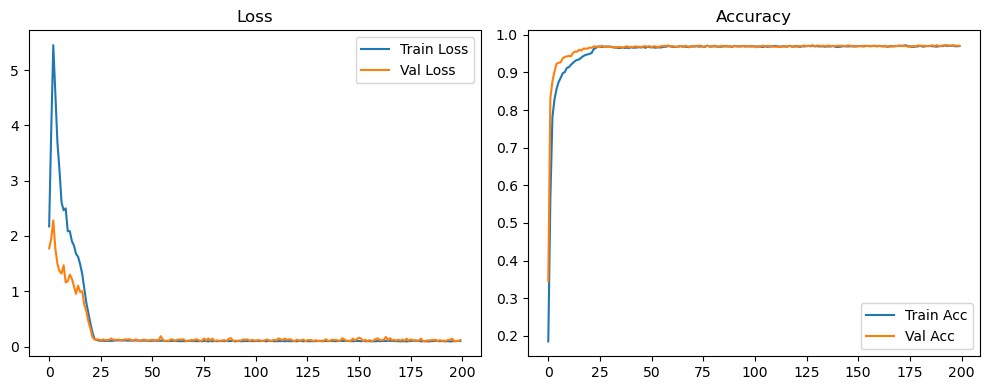

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 51.60it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 52.03it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 52.20it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 52.27it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 52.31it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 52.37it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 52.41it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 52.39it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 52.45it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 52.16it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 52.11it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 52.25it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 52.35it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 52.71it/s]

Original Model Final Test Loss: 0.1093 Accuracy: 0.9724


🚀 Running: batch128_lr0.005_0.002_0.001_dp0.0


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.005 | Train Acc: 0.2292 | Val Acc: 0.4747 |:   0%|          | 0/200 [00:10<?, ?it/s]

| LR: 0.005 | Train Acc: 0.2292 | Val Acc: 0.4747 |:   0%|          | 0/200 [00:10<?, ?it/s]

| LR: 0.005 | Train Acc: 0.2292 | Val Acc: 0.4747 |:   0%|          | 1/200 [00:10<36:04, 10.88s/it]

| LR: 0.005 | Train Acc: 0.7037 | Val Acc: 0.8294 |:   0%|          | 1/200 [00:21<36:04, 10.88s/it]

| LR: 0.005 | Train Acc: 0.7037 | Val Acc: 0.8294 |:   0%|          | 1/200 [00:21<36:04, 10.88s/it]

| LR: 0.005 | Train Acc: 0.7037 | Val Acc: 0.8294 |:   1%|          | 2/200 [00:21<35:14, 10.68s/it]

| LR: 0.005 | Train Acc: 0.8469 | Val Acc: 0.8706 |:   1%|          | 2/200 [00:31<35:14, 10.68s/it]

| LR: 0.005 | Train Acc: 0.8469 | Val Acc: 0.8706 |:   1%|          | 2/200 [00:31<35:14, 10.68s/it]

| LR: 0.005 | Train Acc: 0.8469 | Val Acc: 0.8706 |:   2%|▏         | 3/200 [00:32<34:55, 10.64s/it]

| LR: 0.005 | Train Acc: 0.8757 | Val Acc: 0.8923 |:   2%|▏         | 3/200 [00:42<34:55, 10.64s/it]

| LR: 0.005 | Train Acc: 0.8757 | Val Acc: 0.8923 |:   2%|▏         | 3/200 [00:42<34:55, 10.64s/it]

| LR: 0.005 | Train Acc: 0.8757 | Val Acc: 0.8923 |:   2%|▏         | 4/200 [00:42<34:35, 10.59s/it]

| LR: 0.005 | Train Acc: 0.8959 | Val Acc: 0.9107 |:   2%|▏         | 4/200 [00:53<34:35, 10.59s/it]

| LR: 0.005 | Train Acc: 0.8959 | Val Acc: 0.9107 |:   2%|▏         | 4/200 [00:53<34:35, 10.59s/it]

| LR: 0.005 | Train Acc: 0.8959 | Val Acc: 0.9107 |:   2%|▎         | 5/200 [00:53<34:24, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9098 | Val Acc: 0.9195 |:   2%|▎         | 5/200 [01:03<34:24, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9098 | Val Acc: 0.9195 |:   2%|▎         | 5/200 [01:03<34:24, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9098 | Val Acc: 0.9195 |:   3%|▎         | 6/200 [01:03<34:07, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9213 | Val Acc: 0.9196 |:   3%|▎         | 6/200 [01:14<34:07, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9213 | Val Acc: 0.9196 |:   3%|▎         | 6/200 [01:14<34:07, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9213 | Val Acc: 0.9196 |:   4%|▎         | 7/200 [01:14<33:52, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9309 | Val Acc: 0.9312 |:   4%|▎         | 7/200 [01:24<33:52, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9309 | Val Acc: 0.9312 |:   4%|▎         | 7/200 [01:24<33:52, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9309 | Val Acc: 0.9312 |:   4%|▍         | 8/200 [01:24<33:48, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9346 | Val Acc: 0.9367 |:   4%|▍         | 8/200 [01:35<33:48, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9346 | Val Acc: 0.9367 |:   4%|▍         | 8/200 [01:35<33:48, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9346 | Val Acc: 0.9367 |:   4%|▍         | 9/200 [01:35<33:35, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9407 | Val Acc: 0.9283 |:   4%|▍         | 9/200 [01:45<33:35, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9407 | Val Acc: 0.9283 |:   4%|▍         | 9/200 [01:45<33:35, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9407 | Val Acc: 0.9283 |:   5%|▌         | 10/200 [01:45<33:19, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9429 | Val Acc: 0.9370 |:   5%|▌         | 10/200 [01:56<33:19, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9429 | Val Acc: 0.9370 |:   5%|▌         | 10/200 [01:56<33:19, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9429 | Val Acc: 0.9370 |:   6%|▌         | 11/200 [01:56<33:07, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9362 |:   6%|▌         | 11/200 [02:06<33:07, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9362 |:   6%|▌         | 11/200 [02:06<33:07, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9497 | Val Acc: 0.9362 |:   6%|▌         | 12/200 [02:06<32:54, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9504 | Val Acc: 0.9405 |:   6%|▌         | 12/200 [02:17<32:54, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9504 | Val Acc: 0.9405 |:   6%|▌         | 12/200 [02:17<32:54, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9504 | Val Acc: 0.9405 |:   6%|▋         | 13/200 [02:17<32:42, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9540 | Val Acc: 0.9422 |:   6%|▋         | 13/200 [02:27<32:42, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9540 | Val Acc: 0.9422 |:   6%|▋         | 13/200 [02:27<32:42, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9540 | Val Acc: 0.9422 |:   7%|▋         | 14/200 [02:27<32:46, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9550 | Val Acc: 0.9441 |:   7%|▋         | 14/200 [02:38<32:46, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9550 | Val Acc: 0.9441 |:   7%|▋         | 14/200 [02:38<32:46, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9550 | Val Acc: 0.9441 |:   8%|▊         | 15/200 [02:38<32:33, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9599 | Val Acc: 0.9453 |:   8%|▊         | 15/200 [02:49<32:33, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9599 | Val Acc: 0.9453 |:   8%|▊         | 15/200 [02:49<32:33, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9599 | Val Acc: 0.9453 |:   8%|▊         | 16/200 [02:49<32:29, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9643 | Val Acc: 0.9462 |:   8%|▊         | 16/200 [02:59<32:29, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9643 | Val Acc: 0.9462 |:   8%|▊         | 16/200 [02:59<32:29, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9643 | Val Acc: 0.9462 |:   8%|▊         | 17/200 [02:59<32:25, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9451 |:   8%|▊         | 17/200 [03:11<32:25, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9451 |:   8%|▊         | 17/200 [03:11<32:25, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9451 |:   9%|▉         | 18/200 [03:11<33:08, 10.93s/it]

| LR: 0.005 | Train Acc: 0.9641 | Val Acc: 0.9499 |:   9%|▉         | 18/200 [03:22<33:08, 10.93s/it]

| LR: 0.005 | Train Acc: 0.9641 | Val Acc: 0.9499 |:   9%|▉         | 18/200 [03:22<33:08, 10.93s/it]

| LR: 0.005 | Train Acc: 0.9641 | Val Acc: 0.9499 |:  10%|▉         | 19/200 [03:22<32:41, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9670 | Val Acc: 0.9536 |:  10%|▉         | 19/200 [03:32<32:41, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9670 | Val Acc: 0.9536 |:  10%|▉         | 19/200 [03:32<32:41, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9670 | Val Acc: 0.9536 |:  10%|█         | 20/200 [03:32<32:09, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9717 | Val Acc: 0.9533 |:  10%|█         | 20/200 [03:42<32:09, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9717 | Val Acc: 0.9533 |:  10%|█         | 20/200 [03:42<32:09, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9717 | Val Acc: 0.9533 |:  10%|█         | 21/200 [03:42<31:45, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9730 | Val Acc: 0.9535 |:  10%|█         | 21/200 [03:53<31:45, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9730 | Val Acc: 0.9535 |:  10%|█         | 21/200 [03:53<31:45, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9730 | Val Acc: 0.9535 |:  11%|█         | 22/200 [03:53<31:39, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9741 | Val Acc: 0.9531 |:  11%|█         | 22/200 [04:04<31:39, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9741 | Val Acc: 0.9531 |:  11%|█         | 22/200 [04:04<31:39, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9741 | Val Acc: 0.9531 |:  12%|█▏        | 23/200 [04:04<31:26, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9743 | Val Acc: 0.9587 |:  12%|█▏        | 23/200 [04:14<31:26, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9743 | Val Acc: 0.9587 |:  12%|█▏        | 23/200 [04:14<31:26, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9743 | Val Acc: 0.9587 |:  12%|█▏        | 24/200 [04:14<31:13, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9739 | Val Acc: 0.9520 |:  12%|█▏        | 24/200 [04:25<31:13, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9739 | Val Acc: 0.9520 |:  12%|█▏        | 24/200 [04:25<31:13, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9739 | Val Acc: 0.9520 |:  12%|█▎        | 25/200 [04:25<30:48, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9760 | Val Acc: 0.9535 |:  12%|█▎        | 25/200 [04:36<30:48, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9760 | Val Acc: 0.9535 |:  12%|█▎        | 25/200 [04:36<30:48, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9760 | Val Acc: 0.9535 |:  13%|█▎        | 26/200 [04:36<30:51, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9785 | Val Acc: 0.9594 |:  13%|█▎        | 26/200 [04:46<30:51, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9785 | Val Acc: 0.9594 |:  13%|█▎        | 26/200 [04:46<30:51, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9785 | Val Acc: 0.9594 |:  14%|█▎        | 27/200 [04:46<30:36, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9542 |:  14%|█▎        | 27/200 [04:57<30:36, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9542 |:  14%|█▎        | 27/200 [04:57<30:36, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9542 |:  14%|█▍        | 28/200 [04:57<30:58, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9581 |:  14%|█▍        | 28/200 [05:09<30:58, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9581 |:  14%|█▍        | 28/200 [05:09<30:58, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9581 |:  14%|█▍        | 29/200 [05:09<31:23, 11.01s/it]

| LR: 0.005 | Train Acc: 0.9833 | Val Acc: 0.9545 |:  14%|█▍        | 29/200 [05:20<31:23, 11.01s/it]

| LR: 0.005 | Train Acc: 0.9833 | Val Acc: 0.9545 |:  14%|█▍        | 29/200 [05:20<31:23, 11.01s/it]

| LR: 0.005 | Train Acc: 0.9833 | Val Acc: 0.9545 |:  15%|█▌        | 30/200 [05:20<31:19, 11.05s/it]

| LR: 0.005 | Train Acc: 0.9837 | Val Acc: 0.9615 |:  15%|█▌        | 30/200 [05:30<31:19, 11.05s/it]

| LR: 0.005 | Train Acc: 0.9837 | Val Acc: 0.9615 |:  15%|█▌        | 30/200 [05:30<31:19, 11.05s/it]

| LR: 0.005 | Train Acc: 0.9837 | Val Acc: 0.9615 |:  16%|█▌        | 31/200 [05:31<30:35, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9875 | Val Acc: 0.9643 |:  16%|█▌        | 31/200 [05:41<30:35, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9875 | Val Acc: 0.9643 |:  16%|█▌        | 31/200 [05:41<30:35, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9875 | Val Acc: 0.9643 |:  16%|█▌        | 32/200 [05:41<30:07, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9885 | Val Acc: 0.9626 |:  16%|█▌        | 32/200 [05:51<30:07, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9885 | Val Acc: 0.9626 |:  16%|█▌        | 32/200 [05:51<30:07, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9885 | Val Acc: 0.9626 |:  16%|█▋        | 33/200 [05:52<29:42, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9620 |:  16%|█▋        | 33/200 [06:02<29:42, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9620 |:  16%|█▋        | 33/200 [06:02<29:42, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9620 |:  17%|█▋        | 34/200 [06:02<29:22, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9643 |:  17%|█▋        | 34/200 [06:13<29:22, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9643 |:  17%|█▋        | 34/200 [06:13<29:22, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9643 |:  18%|█▊        | 35/200 [06:13<29:08, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9609 |:  18%|█▊        | 35/200 [06:23<29:08, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9609 |:  18%|█▊        | 35/200 [06:23<29:08, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9609 |:  18%|█▊        | 36/200 [06:23<28:53, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9885 | Val Acc: 0.9658 |:  18%|█▊        | 36/200 [06:34<28:53, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9885 | Val Acc: 0.9658 |:  18%|█▊        | 36/200 [06:34<28:53, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9885 | Val Acc: 0.9658 |:  18%|█▊        | 37/200 [06:34<29:04, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9675 |:  18%|█▊        | 37/200 [06:45<29:04, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9675 |:  18%|█▊        | 37/200 [06:45<29:04, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9675 |:  19%|█▉        | 38/200 [06:45<29:06, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9672 |:  19%|█▉        | 38/200 [06:56<29:06, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9672 |:  19%|█▉        | 38/200 [06:56<29:06, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9672 |:  20%|█▉        | 39/200 [06:56<29:05, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9668 |:  20%|█▉        | 39/200 [07:07<29:05, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9668 |:  20%|█▉        | 39/200 [07:07<29:05, 10.84s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9668 |:  20%|██        | 40/200 [07:07<28:53, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9700 |:  20%|██        | 40/200 [07:17<28:53, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9700 |:  20%|██        | 40/200 [07:17<28:53, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9700 |:  20%|██        | 41/200 [07:17<28:24, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9671 |:  20%|██        | 41/200 [07:28<28:24, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9671 |:  20%|██        | 41/200 [07:28<28:24, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9671 |:  21%|██        | 42/200 [07:28<28:08, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9696 |:  21%|██        | 42/200 [07:38<28:08, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9696 |:  21%|██        | 42/200 [07:39<28:08, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9933 | Val Acc: 0.9696 |:  22%|██▏       | 43/200 [07:39<27:55, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9934 | Val Acc: 0.9662 |:  22%|██▏       | 43/200 [07:49<27:55, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9934 | Val Acc: 0.9662 |:  22%|██▏       | 43/200 [07:49<27:55, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9934 | Val Acc: 0.9662 |:  22%|██▏       | 44/200 [07:49<27:24, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9669 |:  22%|██▏       | 44/200 [07:59<27:24, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9669 |:  22%|██▏       | 44/200 [07:59<27:24, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9669 |:  22%|██▎       | 45/200 [07:59<27:15, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9661 |:  22%|██▎       | 45/200 [08:10<27:15, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9661 |:  22%|██▎       | 45/200 [08:10<27:15, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9928 | Val Acc: 0.9661 |:  23%|██▎       | 46/200 [08:10<27:06, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9655 |:  23%|██▎       | 46/200 [08:20<27:06, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9655 |:  23%|██▎       | 46/200 [08:20<27:06, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9655 |:  24%|██▎       | 47/200 [08:20<26:54, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9673 |:  24%|██▎       | 47/200 [08:31<26:54, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9673 |:  24%|██▎       | 47/200 [08:31<26:54, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9673 |:  24%|██▍       | 48/200 [08:31<26:43, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9682 |:  24%|██▍       | 48/200 [08:41<26:43, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9682 |:  24%|██▍       | 48/200 [08:41<26:43, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9682 |:  24%|██▍       | 49/200 [08:41<26:28, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9673 |:  24%|██▍       | 49/200 [08:52<26:28, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9673 |:  24%|██▍       | 49/200 [08:52<26:28, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9673 |:  25%|██▌       | 50/200 [08:52<26:24, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9657 |:  25%|██▌       | 50/200 [09:03<26:24, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9657 |:  25%|██▌       | 50/200 [09:03<26:24, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9657 |:  26%|██▌       | 51/200 [09:03<26:15, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9673 |:  26%|██▌       | 51/200 [09:13<26:15, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9673 |:  26%|██▌       | 51/200 [09:13<26:15, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9673 |:  26%|██▌       | 52/200 [09:13<26:04, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9925 | Val Acc: 0.9682 |:  26%|██▌       | 52/200 [09:24<26:04, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9925 | Val Acc: 0.9682 |:  26%|██▌       | 52/200 [09:24<26:04, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9925 | Val Acc: 0.9682 |:  26%|██▋       | 53/200 [09:24<25:57, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9675 |:  26%|██▋       | 53/200 [09:34<25:57, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9675 |:  26%|██▋       | 53/200 [09:34<25:57, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9675 |:  27%|██▋       | 54/200 [09:34<25:35, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9675 |:  27%|██▋       | 54/200 [09:45<25:35, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9675 |:  27%|██▋       | 54/200 [09:45<25:35, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9935 | Val Acc: 0.9675 |:  28%|██▊       | 55/200 [09:45<25:18, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9677 |:  28%|██▊       | 55/200 [09:56<25:18, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9677 |:  28%|██▊       | 55/200 [09:56<25:18, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9677 |:  28%|██▊       | 56/200 [09:56<25:39, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9662 |:  28%|██▊       | 56/200 [10:06<25:39, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9662 |:  28%|██▊       | 56/200 [10:06<25:39, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9662 |:  28%|██▊       | 57/200 [10:06<25:23, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9673 |:  28%|██▊       | 57/200 [10:17<25:23, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9673 |:  28%|██▊       | 57/200 [10:17<25:23, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9673 |:  29%|██▉       | 58/200 [10:17<25:01, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9672 |:  29%|██▉       | 58/200 [10:27<25:01, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9672 |:  29%|██▉       | 58/200 [10:27<25:01, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9672 |:  30%|██▉       | 59/200 [10:27<24:43, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9675 |:  30%|██▉       | 59/200 [10:38<24:43, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9675 |:  30%|██▉       | 59/200 [10:38<24:43, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9675 |:  30%|███       | 60/200 [10:38<24:34, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9673 |:  30%|███       | 60/200 [10:48<24:34, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9673 |:  30%|███       | 60/200 [10:48<24:34, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9673 |:  30%|███       | 61/200 [10:48<24:25, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9711 |:  30%|███       | 61/200 [10:59<24:25, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9711 |:  30%|███       | 61/200 [10:59<24:25, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9711 |:  31%|███       | 62/200 [10:59<24:16, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9687 |:  31%|███       | 62/200 [11:09<24:16, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9687 |:  31%|███       | 62/200 [11:09<24:16, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9687 |:  32%|███▏      | 63/200 [11:09<24:04, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9677 |:  32%|███▏      | 63/200 [11:20<24:04, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9677 |:  32%|███▏      | 63/200 [11:20<24:04, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9677 |:  32%|███▏      | 64/200 [11:20<23:51, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9668 |:  32%|███▏      | 64/200 [11:30<23:51, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9668 |:  32%|███▏      | 64/200 [11:30<23:51, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9668 |:  32%|███▎      | 65/200 [11:30<23:36, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9674 |:  32%|███▎      | 65/200 [11:41<23:36, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9674 |:  32%|███▎      | 65/200 [11:41<23:36, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9674 |:  33%|███▎      | 66/200 [11:41<23:29, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9661 |:  33%|███▎      | 66/200 [11:51<23:29, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9661 |:  33%|███▎      | 66/200 [11:51<23:29, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9661 |:  34%|███▎      | 67/200 [11:51<22:58, 10.36s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9709 |:  34%|███▎      | 67/200 [12:02<22:58, 10.36s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9709 |:  34%|███▎      | 67/200 [12:02<22:58, 10.36s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9709 |:  34%|███▍      | 68/200 [12:02<23:36, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9691 |:  34%|███▍      | 68/200 [12:13<23:36, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9691 |:  34%|███▍      | 68/200 [12:13<23:36, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9691 |:  34%|███▍      | 69/200 [12:13<23:16, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9950 | Val Acc: 0.9690 |:  34%|███▍      | 69/200 [12:23<23:16, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9950 | Val Acc: 0.9690 |:  34%|███▍      | 69/200 [12:23<23:16, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9950 | Val Acc: 0.9690 |:  35%|███▌      | 70/200 [12:23<22:49, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9658 |:  35%|███▌      | 70/200 [12:34<22:49, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9658 |:  35%|███▌      | 70/200 [12:34<22:49, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9658 |:  36%|███▌      | 71/200 [12:34<22:34, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9673 |:  36%|███▌      | 71/200 [12:45<22:34, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9673 |:  36%|███▌      | 71/200 [12:45<22:34, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9673 |:  36%|███▌      | 72/200 [12:45<22:55, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9662 |:  36%|███▌      | 72/200 [12:55<22:55, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9662 |:  36%|███▌      | 72/200 [12:55<22:55, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9662 |:  36%|███▋      | 73/200 [12:56<22:37, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9692 |:  36%|███▋      | 73/200 [13:06<22:37, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9692 |:  36%|███▋      | 73/200 [13:06<22:37, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9692 |:  37%|███▋      | 74/200 [13:06<22:16, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9692 |:  37%|███▋      | 74/200 [13:16<22:16, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9692 |:  37%|███▋      | 74/200 [13:16<22:16, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9692 |:  38%|███▊      | 75/200 [13:17<22:05, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9677 |:  38%|███▊      | 75/200 [13:28<22:05, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9677 |:  38%|███▊      | 75/200 [13:28<22:05, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9677 |:  38%|███▊      | 76/200 [13:28<22:11, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9699 |:  38%|███▊      | 76/200 [13:38<22:11, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9699 |:  38%|███▊      | 76/200 [13:38<22:11, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9699 |:  38%|███▊      | 77/200 [13:38<21:48, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9713 |:  38%|███▊      | 77/200 [13:48<21:48, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9713 |:  38%|███▊      | 77/200 [13:48<21:48, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9713 |:  39%|███▉      | 78/200 [13:48<21:30, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9686 |:  39%|███▉      | 78/200 [13:59<21:30, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9686 |:  39%|███▉      | 78/200 [13:59<21:30, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9686 |:  40%|███▉      | 79/200 [13:59<21:18, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9702 |:  40%|███▉      | 79/200 [14:09<21:18, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9702 |:  40%|███▉      | 79/200 [14:09<21:18, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9702 |:  40%|████      | 80/200 [14:10<21:07, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9677 |:  40%|████      | 80/200 [14:20<21:07, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9677 |:  40%|████      | 80/200 [14:20<21:07, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9677 |:  40%|████      | 81/200 [14:20<20:45, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9697 |:  40%|████      | 81/200 [14:30<20:45, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9697 |:  40%|████      | 81/200 [14:30<20:45, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9697 |:  41%|████      | 82/200 [14:30<20:35, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9677 |:  41%|████      | 82/200 [14:41<20:35, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9677 |:  41%|████      | 82/200 [14:41<20:35, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9677 |:  42%|████▏     | 83/200 [14:41<20:26, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9692 |:  42%|████▏     | 83/200 [14:51<20:26, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9692 |:  42%|████▏     | 83/200 [14:51<20:26, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9692 |:  42%|████▏     | 84/200 [14:51<20:15, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9683 |:  42%|████▏     | 84/200 [15:02<20:15, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9683 |:  42%|████▏     | 84/200 [15:02<20:15, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9683 |:  42%|████▎     | 85/200 [15:02<20:05, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9676 |:  42%|████▎     | 85/200 [15:12<20:05, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9676 |:  42%|████▎     | 85/200 [15:12<20:05, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9676 |:  43%|████▎     | 86/200 [15:12<19:53, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9685 |:  43%|████▎     | 86/200 [15:23<19:53, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9685 |:  43%|████▎     | 86/200 [15:23<19:53, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9685 |:  44%|████▎     | 87/200 [15:23<19:44, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9681 |:  44%|████▎     | 87/200 [15:33<19:44, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9681 |:  44%|████▎     | 87/200 [15:33<19:44, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9681 |:  44%|████▍     | 88/200 [15:33<19:37, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9682 |:  44%|████▍     | 88/200 [15:44<19:37, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9682 |:  44%|████▍     | 88/200 [15:44<19:37, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9682 |:  44%|████▍     | 89/200 [15:44<19:29, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9694 |:  44%|████▍     | 89/200 [15:54<19:29, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9694 |:  44%|████▍     | 89/200 [15:54<19:29, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9694 |:  45%|████▌     | 90/200 [15:54<19:12, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9695 |:  45%|████▌     | 90/200 [16:05<19:12, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9695 |:  45%|████▌     | 90/200 [16:05<19:12, 10.48s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9695 |:  46%|████▌     | 91/200 [16:05<19:00, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9671 |:  46%|████▌     | 91/200 [16:15<19:00, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9671 |:  46%|████▌     | 91/200 [16:15<19:00, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9671 |:  46%|████▌     | 92/200 [16:15<19:04, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9692 |:  46%|████▌     | 92/200 [16:26<19:04, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9692 |:  46%|████▌     | 92/200 [16:26<19:04, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9692 |:  46%|████▋     | 93/200 [16:26<19:04, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9687 |:  46%|████▋     | 93/200 [16:37<19:04, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9687 |:  46%|████▋     | 93/200 [16:37<19:04, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9687 |:  47%|████▋     | 94/200 [16:37<18:40, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9718 |:  47%|████▋     | 94/200 [16:47<18:40, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9718 |:  47%|████▋     | 94/200 [16:47<18:40, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9718 |:  48%|████▊     | 95/200 [16:47<18:24, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9701 |:  48%|████▊     | 95/200 [16:57<18:24, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9701 |:  48%|████▊     | 95/200 [16:57<18:24, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9701 |:  48%|████▊     | 96/200 [16:58<18:10, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9691 |:  48%|████▊     | 96/200 [17:08<18:10, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9691 |:  48%|████▊     | 96/200 [17:08<18:10, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9691 |:  48%|████▊     | 97/200 [17:08<17:58, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9704 |:  48%|████▊     | 97/200 [17:18<17:58, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9704 |:  48%|████▊     | 97/200 [17:18<17:58, 10.47s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9704 |:  49%|████▉     | 98/200 [17:18<17:46, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9714 |:  49%|████▉     | 98/200 [17:29<17:46, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9714 |:  49%|████▉     | 98/200 [17:29<17:46, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9714 |:  50%|████▉     | 99/200 [17:29<17:39, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9709 |:  50%|████▉     | 99/200 [17:39<17:39, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9709 |:  50%|████▉     | 99/200 [17:39<17:39, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9969 | Val Acc: 0.9709 |:  50%|█████     | 100/200 [17:40<17:31, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9728 |:  50%|█████     | 100/200 [17:50<17:31, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9728 |:  50%|█████     | 100/200 [17:50<17:31, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9728 |:  50%|█████     | 101/200 [17:50<17:21, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9718 |:  50%|█████     | 101/200 [18:01<17:21, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9718 |:  50%|█████     | 101/200 [18:01<17:21, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9718 |:  51%|█████     | 102/200 [18:01<17:16, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9722 |:  51%|█████     | 102/200 [18:12<17:16, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9722 |:  51%|█████     | 102/200 [18:12<17:16, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9722 |:  52%|█████▏    | 103/200 [18:12<17:17, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9720 |:  52%|█████▏    | 103/200 [18:23<17:17, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9720 |:  52%|█████▏    | 103/200 [18:23<17:17, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9720 |:  52%|█████▏    | 104/200 [18:23<17:12, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9712 |:  52%|█████▏    | 104/200 [18:33<17:12, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9712 |:  52%|█████▏    | 104/200 [18:33<17:12, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9712 |:  52%|█████▎    | 105/200 [18:33<16:58, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9745 |:  52%|█████▎    | 105/200 [18:44<16:58, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9745 |:  52%|█████▎    | 105/200 [18:44<16:58, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9745 |:  53%|█████▎    | 106/200 [18:44<16:38, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9724 |:  53%|█████▎    | 106/200 [18:54<16:38, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9724 |:  53%|█████▎    | 106/200 [18:54<16:38, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9724 |:  54%|█████▎    | 107/200 [18:54<16:21, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9738 |:  54%|█████▎    | 107/200 [19:04<16:21, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9738 |:  54%|█████▎    | 107/200 [19:04<16:21, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9738 |:  54%|█████▍    | 108/200 [19:04<16:05, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9728 |:  54%|█████▍    | 108/200 [19:15<16:05, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9728 |:  54%|█████▍    | 108/200 [19:15<16:05, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9728 |:  55%|█████▍    | 109/200 [19:15<15:56, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9728 |:  55%|█████▍    | 109/200 [19:25<15:56, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9728 |:  55%|█████▍    | 109/200 [19:25<15:56, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9728 |:  55%|█████▌    | 110/200 [19:25<15:41, 10.46s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9719 |:  55%|█████▌    | 110/200 [19:36<15:41, 10.46s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9719 |:  55%|█████▌    | 110/200 [19:36<15:41, 10.46s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9719 |:  56%|█████▌    | 111/200 [19:36<15:33, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9720 |:  56%|█████▌    | 111/200 [19:46<15:33, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9720 |:  56%|█████▌    | 111/200 [19:46<15:33, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9720 |:  56%|█████▌    | 112/200 [19:46<15:26, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9728 |:  56%|█████▌    | 112/200 [19:57<15:26, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9728 |:  56%|█████▌    | 112/200 [19:57<15:26, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9728 |:  56%|█████▋    | 113/200 [19:57<15:17, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9722 |:  56%|█████▋    | 113/200 [20:08<15:17, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9722 |:  56%|█████▋    | 113/200 [20:08<15:17, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9722 |:  57%|█████▋    | 114/200 [20:08<15:07, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9723 |:  57%|█████▋    | 114/200 [20:18<15:07, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9723 |:  57%|█████▋    | 114/200 [20:18<15:07, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9723 |:  57%|█████▊    | 115/200 [20:18<14:55, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9720 |:  57%|█████▊    | 115/200 [20:29<14:55, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9720 |:  57%|█████▊    | 115/200 [20:29<14:55, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9720 |:  58%|█████▊    | 116/200 [20:29<14:42, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9732 |:  58%|█████▊    | 116/200 [20:39<14:42, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9732 |:  58%|█████▊    | 116/200 [20:39<14:42, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9732 |:  58%|█████▊    | 117/200 [20:39<14:33, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9711 |:  58%|█████▊    | 117/200 [20:49<14:33, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9711 |:  58%|█████▊    | 117/200 [20:49<14:33, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9711 |:  59%|█████▉    | 118/200 [20:49<14:18, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9729 |:  59%|█████▉    | 118/200 [21:01<14:18, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9729 |:  59%|█████▉    | 118/200 [21:01<14:18, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9729 |:  60%|█████▉    | 119/200 [21:01<14:28, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9712 |:  60%|█████▉    | 119/200 [21:11<14:28, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9712 |:  60%|█████▉    | 119/200 [21:11<14:28, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9712 |:  60%|██████    | 120/200 [21:11<14:15, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9716 |:  60%|██████    | 120/200 [21:22<14:15, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9716 |:  60%|██████    | 120/200 [21:22<14:15, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9716 |:  60%|██████    | 121/200 [21:22<13:57, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9711 |:  60%|██████    | 121/200 [21:32<13:57, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9711 |:  60%|██████    | 121/200 [21:32<13:57, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9711 |:  61%|██████    | 122/200 [21:32<13:43, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9709 |:  61%|██████    | 122/200 [21:43<13:43, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9709 |:  61%|██████    | 122/200 [21:43<13:43, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9709 |:  62%|██████▏   | 123/200 [21:43<13:36, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9726 |:  62%|██████▏   | 123/200 [21:54<13:36, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9726 |:  62%|██████▏   | 123/200 [21:54<13:36, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9726 |:  62%|██████▏   | 124/200 [21:54<13:31, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9710 |:  62%|██████▏   | 124/200 [22:04<13:31, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9710 |:  62%|██████▏   | 124/200 [22:04<13:31, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9710 |:  62%|██████▎   | 125/200 [22:04<13:18, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9714 |:  62%|██████▎   | 125/200 [22:15<13:18, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9714 |:  62%|██████▎   | 125/200 [22:15<13:18, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9714 |:  63%|██████▎   | 126/200 [22:15<13:01, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9715 |:  63%|██████▎   | 126/200 [22:25<13:01, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9715 |:  63%|██████▎   | 126/200 [22:25<13:01, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9715 |:  64%|██████▎   | 127/200 [22:25<12:52, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9728 |:  64%|██████▎   | 127/200 [22:36<12:52, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9728 |:  64%|██████▎   | 127/200 [22:36<12:52, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9728 |:  64%|██████▍   | 128/200 [22:36<12:37, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9730 |:  64%|██████▍   | 128/200 [22:46<12:37, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9730 |:  64%|██████▍   | 128/200 [22:46<12:37, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9730 |:  64%|██████▍   | 129/200 [22:46<12:26, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9724 |:  64%|██████▍   | 129/200 [22:57<12:26, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9724 |:  64%|██████▍   | 129/200 [22:57<12:26, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9724 |:  65%|██████▌   | 130/200 [22:57<12:14, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9730 |:  65%|██████▌   | 130/200 [23:07<12:14, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9730 |:  65%|██████▌   | 130/200 [23:07<12:14, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9730 |:  66%|██████▌   | 131/200 [23:07<12:01, 10.46s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9716 |:  66%|██████▌   | 131/200 [23:18<12:01, 10.46s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9716 |:  66%|██████▌   | 131/200 [23:18<12:01, 10.46s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9716 |:  66%|██████▌   | 132/200 [23:18<11:51, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9705 |:  66%|██████▌   | 132/200 [23:28<11:51, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9705 |:  66%|██████▌   | 132/200 [23:28<11:51, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9705 |:  66%|██████▋   | 133/200 [23:28<11:41, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9732 |:  66%|██████▋   | 133/200 [23:38<11:41, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9732 |:  66%|██████▋   | 133/200 [23:38<11:41, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9732 |:  67%|██████▋   | 134/200 [23:39<11:31, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9722 |:  67%|██████▋   | 134/200 [23:49<11:31, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9722 |:  67%|██████▋   | 134/200 [23:49<11:31, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9722 |:  68%|██████▊   | 135/200 [23:49<11:23, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9717 |:  68%|██████▊   | 135/200 [24:00<11:23, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9717 |:  68%|██████▊   | 135/200 [24:00<11:23, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9717 |:  68%|██████▊   | 136/200 [24:00<11:14, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9717 |:  68%|██████▊   | 136/200 [24:10<11:14, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9717 |:  68%|██████▊   | 136/200 [24:10<11:14, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9717 |:  68%|██████▊   | 137/200 [24:10<11:05, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9726 |:  68%|██████▊   | 137/200 [24:21<11:05, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9726 |:  68%|██████▊   | 137/200 [24:21<11:05, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9726 |:  69%|██████▉   | 138/200 [24:21<10:54, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9720 |:  69%|██████▉   | 138/200 [24:31<10:54, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9720 |:  69%|██████▉   | 138/200 [24:31<10:54, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9720 |:  70%|██████▉   | 139/200 [24:31<10:42, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9737 |:  70%|██████▉   | 139/200 [24:42<10:42, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9737 |:  70%|██████▉   | 139/200 [24:42<10:42, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9737 |:  70%|███████   | 140/200 [24:42<10:37, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9720 |:  70%|███████   | 140/200 [24:53<10:37, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9720 |:  70%|███████   | 140/200 [24:53<10:37, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9720 |:  70%|███████   | 141/200 [24:53<10:29, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9718 |:  70%|███████   | 141/200 [25:04<10:29, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9718 |:  70%|███████   | 141/200 [25:04<10:29, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9718 |:  71%|███████   | 142/200 [25:04<10:18, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9710 |:  71%|███████   | 142/200 [25:14<10:18, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9710 |:  71%|███████   | 142/200 [25:14<10:18, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9710 |:  72%|███████▏  | 143/200 [25:14<10:08, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9707 |:  72%|███████▏  | 143/200 [25:25<10:08, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9707 |:  72%|███████▏  | 143/200 [25:25<10:08, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9707 |:  72%|███████▏  | 144/200 [25:25<09:54, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9725 |:  72%|███████▏  | 144/200 [25:35<09:54, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9725 |:  72%|███████▏  | 144/200 [25:35<09:54, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9725 |:  72%|███████▎  | 145/200 [25:35<09:41, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9725 |:  72%|███████▎  | 145/200 [25:46<09:41, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9725 |:  72%|███████▎  | 145/200 [25:46<09:41, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9725 |:  73%|███████▎  | 146/200 [25:46<09:30, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9728 |:  73%|███████▎  | 146/200 [25:56<09:30, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9728 |:  73%|███████▎  | 146/200 [25:56<09:30, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9728 |:  74%|███████▎  | 147/200 [25:56<09:19, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9715 |:  74%|███████▎  | 147/200 [26:07<09:19, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9715 |:  74%|███████▎  | 147/200 [26:07<09:19, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9715 |:  74%|███████▍  | 148/200 [26:07<09:13, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9723 |:  74%|███████▍  | 148/200 [26:18<09:13, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9723 |:  74%|███████▍  | 148/200 [26:18<09:13, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9723 |:  74%|███████▍  | 149/200 [26:18<09:01, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9728 |:  74%|███████▍  | 149/200 [26:28<09:01, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9728 |:  74%|███████▍  | 149/200 [26:28<09:01, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9728 |:  75%|███████▌  | 150/200 [26:28<08:51, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9718 |:  75%|███████▌  | 150/200 [26:39<08:51, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9718 |:  75%|███████▌  | 150/200 [26:39<08:51, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9718 |:  76%|███████▌  | 151/200 [26:39<08:36, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9735 |:  76%|███████▌  | 151/200 [26:49<08:36, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9735 |:  76%|███████▌  | 151/200 [26:49<08:36, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9735 |:  76%|███████▌  | 152/200 [26:49<08:22, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9728 |:  76%|███████▌  | 152/200 [27:00<08:22, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9728 |:  76%|███████▌  | 152/200 [27:00<08:22, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9728 |:  76%|███████▋  | 153/200 [27:00<08:12, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9727 |:  76%|███████▋  | 153/200 [27:10<08:12, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9727 |:  76%|███████▋  | 153/200 [27:10<08:12, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9727 |:  77%|███████▋  | 154/200 [27:10<08:02, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9715 |:  77%|███████▋  | 154/200 [27:20<08:02, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9715 |:  77%|███████▋  | 154/200 [27:20<08:02, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9715 |:  78%|███████▊  | 155/200 [27:20<07:51, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9723 |:  78%|███████▊  | 155/200 [27:31<07:51, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9723 |:  78%|███████▊  | 155/200 [27:31<07:51, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9723 |:  78%|███████▊  | 156/200 [27:31<07:46, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9734 |:  78%|███████▊  | 156/200 [27:42<07:46, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9734 |:  78%|███████▊  | 156/200 [27:42<07:46, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9734 |:  78%|███████▊  | 157/200 [27:42<07:35, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9722 |:  78%|███████▊  | 157/200 [27:52<07:35, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9722 |:  78%|███████▊  | 157/200 [27:52<07:35, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9722 |:  79%|███████▉  | 158/200 [27:52<07:24, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9727 |:  79%|███████▉  | 158/200 [28:03<07:24, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9727 |:  79%|███████▉  | 158/200 [28:03<07:24, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9727 |:  80%|███████▉  | 159/200 [28:03<07:13, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9724 |:  80%|███████▉  | 159/200 [28:14<07:13, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9724 |:  80%|███████▉  | 159/200 [28:14<07:13, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9724 |:  80%|████████  | 160/200 [28:14<07:04, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9739 |:  80%|████████  | 160/200 [28:24<07:04, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9739 |:  80%|████████  | 160/200 [28:24<07:04, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9739 |:  80%|████████  | 161/200 [28:24<06:55, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9734 |:  80%|████████  | 161/200 [28:35<06:55, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9734 |:  80%|████████  | 161/200 [28:35<06:55, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9734 |:  81%|████████  | 162/200 [28:35<06:44, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9738 |:  81%|████████  | 162/200 [28:46<06:44, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9738 |:  81%|████████  | 162/200 [28:46<06:44, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9738 |:  82%|████████▏ | 163/200 [28:46<06:33, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9728 |:  82%|████████▏ | 163/200 [28:56<06:33, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9728 |:  82%|████████▏ | 163/200 [28:56<06:33, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9728 |:  82%|████████▏ | 164/200 [28:56<06:22, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9744 |:  82%|████████▏ | 164/200 [29:07<06:22, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9744 |:  82%|████████▏ | 164/200 [29:07<06:22, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9744 |:  82%|████████▎ | 165/200 [29:07<06:10, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9737 |:  82%|████████▎ | 165/200 [29:17<06:10, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9737 |:  82%|████████▎ | 165/200 [29:17<06:10, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9737 |:  83%|████████▎ | 166/200 [29:17<05:58, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9728 |:  83%|████████▎ | 166/200 [29:28<05:58, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9728 |:  83%|████████▎ | 166/200 [29:28<05:58, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9728 |:  84%|████████▎ | 167/200 [29:28<05:46, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9744 |:  84%|████████▎ | 167/200 [29:38<05:46, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9744 |:  84%|████████▎ | 167/200 [29:38<05:46, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9744 |:  84%|████████▍ | 168/200 [29:38<05:37, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9737 |:  84%|████████▍ | 168/200 [29:49<05:37, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9737 |:  84%|████████▍ | 168/200 [29:49<05:37, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9737 |:  84%|████████▍ | 169/200 [29:49<05:25, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9738 |:  84%|████████▍ | 169/200 [29:59<05:25, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9738 |:  84%|████████▍ | 169/200 [29:59<05:25, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9738 |:  85%|████████▌ | 170/200 [29:59<05:14, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9739 |:  85%|████████▌ | 170/200 [30:10<05:14, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9739 |:  85%|████████▌ | 170/200 [30:10<05:14, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9739 |:  86%|████████▌ | 171/200 [30:10<05:04, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9733 |:  86%|████████▌ | 171/200 [30:20<05:04, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9733 |:  86%|████████▌ | 171/200 [30:20<05:04, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9733 |:  86%|████████▌ | 172/200 [30:20<04:54, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9734 |:  86%|████████▌ | 172/200 [30:31<04:54, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9734 |:  86%|████████▌ | 172/200 [30:31<04:54, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9734 |:  86%|████████▋ | 173/200 [30:31<04:46, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9723 |:  86%|████████▋ | 173/200 [30:42<04:46, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9723 |:  86%|████████▋ | 173/200 [30:42<04:46, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9723 |:  87%|████████▋ | 174/200 [30:42<04:34, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9731 |:  87%|████████▋ | 174/200 [30:52<04:34, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9731 |:  87%|████████▋ | 174/200 [30:52<04:34, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9731 |:  88%|████████▊ | 175/200 [30:52<04:23, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9730 |:  88%|████████▊ | 175/200 [31:02<04:23, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9730 |:  88%|████████▊ | 175/200 [31:02<04:23, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9730 |:  88%|████████▊ | 176/200 [31:03<04:12, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9726 |:  88%|████████▊ | 176/200 [31:13<04:12, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9726 |:  88%|████████▊ | 176/200 [31:13<04:12, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9726 |:  88%|████████▊ | 177/200 [31:13<04:01, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9734 |:  88%|████████▊ | 177/200 [31:24<04:01, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9734 |:  88%|████████▊ | 177/200 [31:24<04:01, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9734 |:  89%|████████▉ | 178/200 [31:24<03:52, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9734 |:  89%|████████▉ | 178/200 [31:34<03:52, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9734 |:  89%|████████▉ | 178/200 [31:34<03:52, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9734 |:  90%|████████▉ | 179/200 [31:34<03:41, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9714 |:  90%|████████▉ | 179/200 [31:45<03:41, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9714 |:  90%|████████▉ | 179/200 [31:45<03:41, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9714 |:  90%|█████████ | 180/200 [31:45<03:31, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9728 |:  90%|█████████ | 180/200 [31:55<03:31, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9728 |:  90%|█████████ | 180/200 [31:55<03:31, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9728 |:  90%|█████████ | 181/200 [31:55<03:20, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9728 |:  90%|█████████ | 181/200 [32:07<03:20, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9728 |:  90%|█████████ | 181/200 [32:07<03:20, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9728 |:  91%|█████████ | 182/200 [32:07<03:15, 10.88s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9721 |:  91%|█████████ | 182/200 [32:17<03:15, 10.88s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9721 |:  91%|█████████ | 182/200 [32:17<03:15, 10.88s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9721 |:  92%|█████████▏| 183/200 [32:17<03:03, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9735 |:  92%|█████████▏| 183/200 [32:28<03:03, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9735 |:  92%|█████████▏| 183/200 [32:28<03:03, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9735 |:  92%|█████████▏| 184/200 [32:28<02:51, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9738 |:  92%|█████████▏| 184/200 [32:39<02:51, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9738 |:  92%|█████████▏| 184/200 [32:39<02:51, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9738 |:  92%|█████████▎| 185/200 [32:39<02:39, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9723 |:  92%|█████████▎| 185/200 [32:49<02:39, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9723 |:  92%|█████████▎| 185/200 [32:49<02:39, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9723 |:  93%|█████████▎| 186/200 [32:49<02:28, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9730 |:  93%|█████████▎| 186/200 [33:00<02:28, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9730 |:  93%|█████████▎| 186/200 [33:00<02:28, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9730 |:  94%|█████████▎| 187/200 [33:00<02:18, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9738 |:  94%|█████████▎| 187/200 [33:10<02:18, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9738 |:  94%|█████████▎| 187/200 [33:10<02:18, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9738 |:  94%|█████████▍| 188/200 [33:10<02:07, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9742 |:  94%|█████████▍| 188/200 [33:21<02:07, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9742 |:  94%|█████████▍| 188/200 [33:21<02:07, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9742 |:  94%|█████████▍| 189/200 [33:21<01:56, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9751 |:  94%|█████████▍| 189/200 [33:31<01:56, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9751 |:  94%|█████████▍| 189/200 [33:31<01:56, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9751 |:  95%|█████████▌| 190/200 [33:31<01:45, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9749 |:  95%|█████████▌| 190/200 [33:42<01:45, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9749 |:  95%|█████████▌| 190/200 [33:42<01:45, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9749 |:  96%|█████████▌| 191/200 [33:42<01:34, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9744 |:  96%|█████████▌| 191/200 [33:52<01:34, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9744 |:  96%|█████████▌| 191/200 [33:52<01:34, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9744 |:  96%|█████████▌| 192/200 [33:52<01:24, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9749 |:  96%|█████████▌| 192/200 [34:03<01:24, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9749 |:  96%|█████████▌| 192/200 [34:03<01:24, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9749 |:  96%|█████████▋| 193/200 [34:03<01:13, 10.48s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9755 |:  96%|█████████▋| 193/200 [34:13<01:13, 10.48s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9755 |:  96%|█████████▋| 193/200 [34:13<01:13, 10.48s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9755 |:  97%|█████████▋| 194/200 [34:13<01:02, 10.46s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9724 |:  97%|█████████▋| 194/200 [34:24<01:02, 10.46s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9724 |:  97%|█████████▋| 194/200 [34:24<01:02, 10.46s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9724 |:  98%|█████████▊| 195/200 [34:24<00:52, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9748 |:  98%|█████████▊| 195/200 [34:35<00:52, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9748 |:  98%|█████████▊| 195/200 [34:35<00:52, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9748 |:  98%|█████████▊| 196/200 [34:35<00:42, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9742 |:  98%|█████████▊| 196/200 [34:46<00:42, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9742 |:  98%|█████████▊| 196/200 [34:46<00:42, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9742 |:  98%|█████████▊| 197/200 [34:46<00:32, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |:  98%|█████████▊| 197/200 [34:56<00:32, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |:  98%|█████████▊| 197/200 [34:56<00:32, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |:  99%|█████████▉| 198/200 [34:56<00:21, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9734 |:  99%|█████████▉| 198/200 [35:07<00:21, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9734 |:  99%|█████████▉| 198/200 [35:07<00:21, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9734 |: 100%|█████████▉| 199/200 [35:07<00:10, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |: 100%|█████████▉| 199/200 [35:17<00:10, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |: 100%|█████████▉| 199/200 [35:17<00:10, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |: 100%|██████████| 200/200 [35:17<00:00, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |: 100%|██████████| 200/200 [35:17<00:00, 10.59s/it]

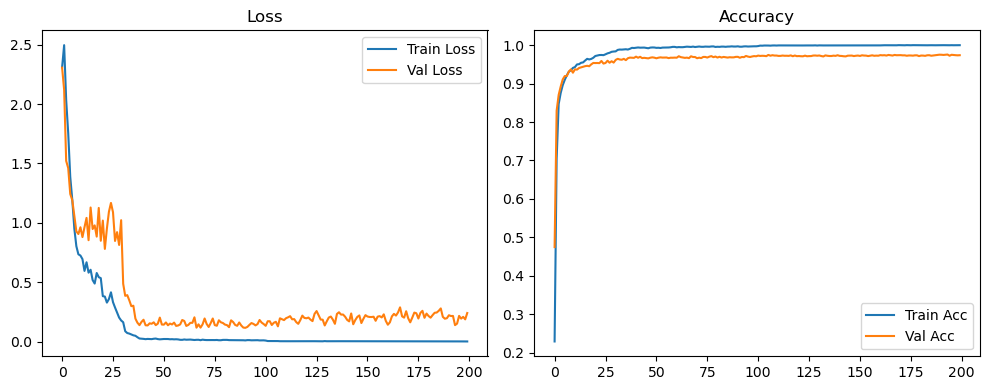

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 50.92it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 51.30it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 51.51it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 51.58it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 51.65it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 51.70it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 51.70it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 51.70it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 51.71it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 51.68it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 51.64it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 51.66it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 51.72it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 52.07it/s]

Original Model Final Test Loss: 0.2009 Accuracy: 0.9770


🚀 Running: batch128_lr0.005_0.002_0.001_dp0.2


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.005 | Train Acc: 0.2155 | Val Acc: 0.5248 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.005 | Train Acc: 0.2155 | Val Acc: 0.5248 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.005 | Train Acc: 0.2155 | Val Acc: 0.5248 |:   0%|          | 1/200 [00:11<37:29, 11.30s/it]

| LR: 0.005 | Train Acc: 0.6836 | Val Acc: 0.8486 |:   0%|          | 1/200 [00:21<37:29, 11.30s/it]

| LR: 0.005 | Train Acc: 0.6836 | Val Acc: 0.8486 |:   0%|          | 1/200 [00:21<37:29, 11.30s/it]

| LR: 0.005 | Train Acc: 0.6836 | Val Acc: 0.8486 |:   1%|          | 2/200 [00:21<36:06, 10.94s/it]

| LR: 0.005 | Train Acc: 0.8266 | Val Acc: 0.8589 |:   1%|          | 2/200 [00:32<36:06, 10.94s/it]

| LR: 0.005 | Train Acc: 0.8266 | Val Acc: 0.8589 |:   1%|          | 2/200 [00:32<36:06, 10.94s/it]

| LR: 0.005 | Train Acc: 0.8266 | Val Acc: 0.8589 |:   2%|▏         | 3/200 [00:32<35:11, 10.72s/it]

| LR: 0.005 | Train Acc: 0.8642 | Val Acc: 0.8962 |:   2%|▏         | 3/200 [00:43<35:11, 10.72s/it]

| LR: 0.005 | Train Acc: 0.8642 | Val Acc: 0.8962 |:   2%|▏         | 3/200 [00:43<35:11, 10.72s/it]

| LR: 0.005 | Train Acc: 0.8642 | Val Acc: 0.8962 |:   2%|▏         | 4/200 [00:43<35:30, 10.87s/it]

| LR: 0.005 | Train Acc: 0.8857 | Val Acc: 0.9170 |:   2%|▏         | 4/200 [00:55<35:30, 10.87s/it]

| LR: 0.005 | Train Acc: 0.8857 | Val Acc: 0.9170 |:   2%|▏         | 4/200 [00:55<35:30, 10.87s/it]

| LR: 0.005 | Train Acc: 0.8857 | Val Acc: 0.9170 |:   2%|▎         | 5/200 [00:55<36:52, 11.34s/it]

| LR: 0.005 | Train Acc: 0.8977 | Val Acc: 0.9211 |:   2%|▎         | 5/200 [01:06<36:52, 11.34s/it]

| LR: 0.005 | Train Acc: 0.8977 | Val Acc: 0.9211 |:   2%|▎         | 5/200 [01:06<36:52, 11.34s/it]

| LR: 0.005 | Train Acc: 0.8977 | Val Acc: 0.9211 |:   3%|▎         | 6/200 [01:06<36:22, 11.25s/it]

| LR: 0.005 | Train Acc: 0.9122 | Val Acc: 0.9264 |:   3%|▎         | 6/200 [01:17<36:22, 11.25s/it]

| LR: 0.005 | Train Acc: 0.9122 | Val Acc: 0.9264 |:   3%|▎         | 6/200 [01:17<36:22, 11.25s/it]

| LR: 0.005 | Train Acc: 0.9122 | Val Acc: 0.9264 |:   4%|▎         | 7/200 [01:17<35:59, 11.19s/it]

| LR: 0.005 | Train Acc: 0.9179 | Val Acc: 0.9335 |:   4%|▎         | 7/200 [01:28<35:59, 11.19s/it]

| LR: 0.005 | Train Acc: 0.9179 | Val Acc: 0.9335 |:   4%|▎         | 7/200 [01:28<35:59, 11.19s/it]

| LR: 0.005 | Train Acc: 0.9179 | Val Acc: 0.9335 |:   4%|▍         | 8/200 [01:28<35:12, 11.00s/it]

| LR: 0.005 | Train Acc: 0.9253 | Val Acc: 0.9360 |:   4%|▍         | 8/200 [01:39<35:12, 11.00s/it]

| LR: 0.005 | Train Acc: 0.9253 | Val Acc: 0.9360 |:   4%|▍         | 8/200 [01:39<35:12, 11.00s/it]

| LR: 0.005 | Train Acc: 0.9253 | Val Acc: 0.9360 |:   4%|▍         | 9/200 [01:39<34:45, 10.92s/it]

| LR: 0.005 | Train Acc: 0.9335 | Val Acc: 0.9416 |:   4%|▍         | 9/200 [01:50<34:45, 10.92s/it]

| LR: 0.005 | Train Acc: 0.9335 | Val Acc: 0.9416 |:   4%|▍         | 9/200 [01:50<34:45, 10.92s/it]

| LR: 0.005 | Train Acc: 0.9335 | Val Acc: 0.9416 |:   5%|▌         | 10/200 [01:50<35:03, 11.07s/it]

| LR: 0.005 | Train Acc: 0.9396 | Val Acc: 0.9445 |:   5%|▌         | 10/200 [02:01<35:03, 11.07s/it]

| LR: 0.005 | Train Acc: 0.9396 | Val Acc: 0.9445 |:   5%|▌         | 10/200 [02:01<35:03, 11.07s/it]

| LR: 0.005 | Train Acc: 0.9396 | Val Acc: 0.9445 |:   6%|▌         | 11/200 [02:01<34:28, 10.94s/it]

| LR: 0.005 | Train Acc: 0.9441 | Val Acc: 0.9468 |:   6%|▌         | 11/200 [02:11<34:28, 10.94s/it]

| LR: 0.005 | Train Acc: 0.9441 | Val Acc: 0.9468 |:   6%|▌         | 11/200 [02:11<34:28, 10.94s/it]

| LR: 0.005 | Train Acc: 0.9441 | Val Acc: 0.9468 |:   6%|▌         | 12/200 [02:11<33:56, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9471 | Val Acc: 0.9486 |:   6%|▌         | 12/200 [02:22<33:56, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9471 | Val Acc: 0.9486 |:   6%|▌         | 12/200 [02:22<33:56, 10.83s/it]

| LR: 0.005 | Train Acc: 0.9471 | Val Acc: 0.9486 |:   6%|▋         | 13/200 [02:22<33:32, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9488 | Val Acc: 0.9474 |:   6%|▋         | 13/200 [02:34<33:32, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9488 | Val Acc: 0.9474 |:   6%|▋         | 13/200 [02:34<33:32, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9488 | Val Acc: 0.9474 |:   7%|▋         | 14/200 [02:34<34:21, 11.08s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9563 |:   7%|▋         | 14/200 [02:44<34:21, 11.08s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9563 |:   7%|▋         | 14/200 [02:44<34:21, 11.08s/it]

| LR: 0.005 | Train Acc: 0.9536 | Val Acc: 0.9563 |:   8%|▊         | 15/200 [02:44<33:47, 10.96s/it]

| LR: 0.005 | Train Acc: 0.9544 | Val Acc: 0.9568 |:   8%|▊         | 15/200 [02:55<33:47, 10.96s/it]

| LR: 0.005 | Train Acc: 0.9544 | Val Acc: 0.9568 |:   8%|▊         | 15/200 [02:55<33:47, 10.96s/it]

| LR: 0.005 | Train Acc: 0.9544 | Val Acc: 0.9568 |:   8%|▊         | 16/200 [02:55<33:23, 10.89s/it]

| LR: 0.005 | Train Acc: 0.9580 | Val Acc: 0.9523 |:   8%|▊         | 16/200 [03:06<33:23, 10.89s/it]

| LR: 0.005 | Train Acc: 0.9580 | Val Acc: 0.9523 |:   8%|▊         | 16/200 [03:06<33:23, 10.89s/it]

| LR: 0.005 | Train Acc: 0.9580 | Val Acc: 0.9523 |:   8%|▊         | 17/200 [03:06<33:00, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9613 | Val Acc: 0.9573 |:   8%|▊         | 17/200 [03:16<33:00, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9613 | Val Acc: 0.9573 |:   8%|▊         | 17/200 [03:16<33:00, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9613 | Val Acc: 0.9573 |:   9%|▉         | 18/200 [03:16<32:33, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9616 | Val Acc: 0.9531 |:   9%|▉         | 18/200 [03:27<32:33, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9616 | Val Acc: 0.9531 |:   9%|▉         | 18/200 [03:27<32:33, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9616 | Val Acc: 0.9531 |:  10%|▉         | 19/200 [03:27<32:09, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9583 |:  10%|▉         | 19/200 [03:37<32:09, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9583 |:  10%|▉         | 19/200 [03:37<32:09, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9627 | Val Acc: 0.9583 |:  10%|█         | 20/200 [03:37<31:49, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9636 | Val Acc: 0.9558 |:  10%|█         | 20/200 [03:48<31:49, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9636 | Val Acc: 0.9558 |:  10%|█         | 20/200 [03:48<31:49, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9636 | Val Acc: 0.9558 |:  10%|█         | 21/200 [03:48<31:33, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9646 | Val Acc: 0.9603 |:  10%|█         | 21/200 [03:59<31:33, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9646 | Val Acc: 0.9603 |:  10%|█         | 21/200 [03:59<31:33, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9646 | Val Acc: 0.9603 |:  11%|█         | 22/200 [03:59<31:29, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9584 |:  11%|█         | 22/200 [04:09<31:29, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9584 |:  11%|█         | 22/200 [04:09<31:29, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9584 |:  12%|█▏        | 23/200 [04:09<31:22, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9715 | Val Acc: 0.9637 |:  12%|█▏        | 23/200 [04:20<31:22, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9715 | Val Acc: 0.9637 |:  12%|█▏        | 23/200 [04:20<31:22, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9715 | Val Acc: 0.9637 |:  12%|█▏        | 24/200 [04:20<31:16, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9728 | Val Acc: 0.9632 |:  12%|█▏        | 24/200 [04:30<31:16, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9728 | Val Acc: 0.9632 |:  12%|█▏        | 24/200 [04:30<31:16, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9728 | Val Acc: 0.9632 |:  12%|█▎        | 25/200 [04:30<30:59, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9768 | Val Acc: 0.9653 |:  12%|█▎        | 25/200 [04:41<30:59, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9768 | Val Acc: 0.9653 |:  12%|█▎        | 25/200 [04:41<30:59, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9768 | Val Acc: 0.9653 |:  13%|█▎        | 26/200 [04:41<30:49, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9792 | Val Acc: 0.9687 |:  13%|█▎        | 26/200 [04:53<30:49, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9792 | Val Acc: 0.9687 |:  13%|█▎        | 26/200 [04:53<30:49, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9792 | Val Acc: 0.9687 |:  14%|█▎        | 27/200 [04:53<31:49, 11.04s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9681 |:  14%|█▎        | 27/200 [05:04<31:49, 11.04s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9681 |:  14%|█▎        | 27/200 [05:04<31:49, 11.04s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9681 |:  14%|█▍        | 28/200 [05:04<31:18, 10.92s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9709 |:  14%|█▍        | 28/200 [05:15<31:18, 10.92s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9709 |:  14%|█▍        | 28/200 [05:15<31:18, 10.92s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9709 |:  14%|█▍        | 29/200 [05:15<31:01, 10.89s/it]

| LR: 0.005 | Train Acc: 0.9853 | Val Acc: 0.9704 |:  14%|█▍        | 29/200 [05:25<31:01, 10.89s/it]

| LR: 0.005 | Train Acc: 0.9853 | Val Acc: 0.9704 |:  14%|█▍        | 29/200 [05:25<31:01, 10.89s/it]

| LR: 0.005 | Train Acc: 0.9853 | Val Acc: 0.9704 |:  15%|█▌        | 30/200 [05:25<30:50, 10.88s/it]

| LR: 0.005 | Train Acc: 0.9859 | Val Acc: 0.9684 |:  15%|█▌        | 30/200 [05:36<30:50, 10.88s/it]

| LR: 0.005 | Train Acc: 0.9859 | Val Acc: 0.9684 |:  15%|█▌        | 30/200 [05:36<30:50, 10.88s/it]

| LR: 0.005 | Train Acc: 0.9859 | Val Acc: 0.9684 |:  16%|█▌        | 31/200 [05:36<30:37, 10.87s/it]

| LR: 0.005 | Train Acc: 0.9870 | Val Acc: 0.9692 |:  16%|█▌        | 31/200 [05:47<30:37, 10.87s/it]

| LR: 0.005 | Train Acc: 0.9870 | Val Acc: 0.9692 |:  16%|█▌        | 31/200 [05:47<30:37, 10.87s/it]

| LR: 0.005 | Train Acc: 0.9870 | Val Acc: 0.9692 |:  16%|█▌        | 32/200 [05:47<30:22, 10.85s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9679 |:  16%|█▌        | 32/200 [05:58<30:22, 10.85s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9679 |:  16%|█▌        | 32/200 [05:58<30:22, 10.85s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9679 |:  16%|█▋        | 33/200 [05:58<30:05, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9703 |:  16%|█▋        | 33/200 [06:09<30:05, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9703 |:  16%|█▋        | 33/200 [06:09<30:05, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9703 |:  17%|█▋        | 34/200 [06:09<30:10, 10.91s/it]

| LR: 0.005 | Train Acc: 0.9873 | Val Acc: 0.9687 |:  17%|█▋        | 34/200 [06:20<30:10, 10.91s/it]

| LR: 0.005 | Train Acc: 0.9873 | Val Acc: 0.9687 |:  17%|█▋        | 34/200 [06:20<30:10, 10.91s/it]

| LR: 0.005 | Train Acc: 0.9873 | Val Acc: 0.9687 |:  18%|█▊        | 35/200 [06:20<29:51, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9876 | Val Acc: 0.9697 |:  18%|█▊        | 35/200 [06:30<29:51, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9876 | Val Acc: 0.9697 |:  18%|█▊        | 35/200 [06:30<29:51, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9876 | Val Acc: 0.9697 |:  18%|█▊        | 36/200 [06:30<29:21, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9656 |:  18%|█▊        | 36/200 [06:41<29:21, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9656 |:  18%|█▊        | 36/200 [06:41<29:21, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9656 |:  18%|█▊        | 37/200 [06:41<29:21, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9880 | Val Acc: 0.9683 |:  18%|█▊        | 37/200 [06:52<29:21, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9880 | Val Acc: 0.9683 |:  18%|█▊        | 37/200 [06:52<29:21, 10.81s/it]

| LR: 0.005 | Train Acc: 0.9880 | Val Acc: 0.9683 |:  19%|█▉        | 38/200 [06:52<29:05, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9872 | Val Acc: 0.9708 |:  19%|█▉        | 38/200 [07:03<29:05, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9872 | Val Acc: 0.9708 |:  19%|█▉        | 38/200 [07:03<29:05, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9872 | Val Acc: 0.9708 |:  20%|█▉        | 39/200 [07:03<28:53, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9865 | Val Acc: 0.9702 |:  20%|█▉        | 39/200 [07:13<28:53, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9865 | Val Acc: 0.9702 |:  20%|█▉        | 39/200 [07:13<28:53, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9865 | Val Acc: 0.9702 |:  20%|██        | 40/200 [07:13<28:40, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9867 | Val Acc: 0.9688 |:  20%|██        | 40/200 [07:24<28:40, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9867 | Val Acc: 0.9688 |:  20%|██        | 40/200 [07:24<28:40, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9867 | Val Acc: 0.9688 |:  20%|██        | 41/200 [07:24<28:33, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9870 | Val Acc: 0.9690 |:  20%|██        | 41/200 [07:35<28:33, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9870 | Val Acc: 0.9690 |:  20%|██        | 41/200 [07:35<28:33, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9870 | Val Acc: 0.9690 |:  21%|██        | 42/200 [07:35<28:20, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9875 | Val Acc: 0.9684 |:  21%|██        | 42/200 [07:45<28:20, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9875 | Val Acc: 0.9684 |:  21%|██        | 42/200 [07:45<28:20, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9875 | Val Acc: 0.9684 |:  22%|██▏       | 43/200 [07:45<28:01, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9706 |:  22%|██▏       | 43/200 [07:56<28:01, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9706 |:  22%|██▏       | 43/200 [07:56<28:01, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9706 |:  22%|██▏       | 44/200 [07:56<27:43, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9878 | Val Acc: 0.9705 |:  22%|██▏       | 44/200 [08:06<27:43, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9878 | Val Acc: 0.9705 |:  22%|██▏       | 44/200 [08:06<27:43, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9878 | Val Acc: 0.9705 |:  22%|██▎       | 45/200 [08:06<27:23, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9880 | Val Acc: 0.9693 |:  22%|██▎       | 45/200 [08:17<27:23, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9880 | Val Acc: 0.9693 |:  22%|██▎       | 45/200 [08:17<27:23, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9880 | Val Acc: 0.9693 |:  23%|██▎       | 46/200 [08:17<27:13, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9702 |:  23%|██▎       | 46/200 [08:28<27:13, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9702 |:  23%|██▎       | 46/200 [08:28<27:13, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9884 | Val Acc: 0.9702 |:  24%|██▎       | 47/200 [08:28<27:00, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9880 | Val Acc: 0.9697 |:  24%|██▎       | 47/200 [08:38<27:00, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9880 | Val Acc: 0.9697 |:  24%|██▎       | 47/200 [08:38<27:00, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9880 | Val Acc: 0.9697 |:  24%|██▍       | 48/200 [08:38<26:51, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9889 | Val Acc: 0.9733 |:  24%|██▍       | 48/200 [08:49<26:51, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9889 | Val Acc: 0.9733 |:  24%|██▍       | 48/200 [08:49<26:51, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9889 | Val Acc: 0.9733 |:  24%|██▍       | 49/200 [08:49<26:48, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9710 |:  24%|██▍       | 49/200 [09:00<26:48, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9710 |:  24%|██▍       | 49/200 [09:00<26:48, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9710 |:  25%|██▌       | 50/200 [09:00<26:36, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9704 |:  25%|██▌       | 50/200 [09:10<26:36, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9704 |:  25%|██▌       | 50/200 [09:10<26:36, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9704 |:  26%|██▌       | 51/200 [09:10<26:23, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9886 | Val Acc: 0.9682 |:  26%|██▌       | 51/200 [09:21<26:23, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9886 | Val Acc: 0.9682 |:  26%|██▌       | 51/200 [09:21<26:23, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9886 | Val Acc: 0.9682 |:  26%|██▌       | 52/200 [09:21<26:12, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9681 |:  26%|██▌       | 52/200 [09:31<26:12, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9681 |:  26%|██▌       | 52/200 [09:31<26:12, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9681 |:  26%|██▋       | 53/200 [09:31<25:56, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9690 |:  26%|██▋       | 53/200 [09:42<25:56, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9690 |:  26%|██▋       | 53/200 [09:42<25:56, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9690 |:  27%|██▋       | 54/200 [09:42<25:49, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9687 |:  27%|██▋       | 54/200 [09:53<25:49, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9687 |:  27%|██▋       | 54/200 [09:53<25:49, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9687 |:  28%|██▊       | 55/200 [09:53<25:37, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9694 |:  28%|██▊       | 55/200 [10:03<25:37, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9694 |:  28%|██▊       | 55/200 [10:03<25:37, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9694 |:  28%|██▊       | 56/200 [10:03<25:36, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9696 |:  28%|██▊       | 56/200 [10:14<25:36, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9696 |:  28%|██▊       | 56/200 [10:14<25:36, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9696 |:  28%|██▊       | 57/200 [10:14<25:40, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9719 |:  28%|██▊       | 57/200 [10:25<25:40, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9719 |:  28%|██▊       | 57/200 [10:25<25:40, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9719 |:  29%|██▉       | 58/200 [10:26<25:41, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9698 |:  29%|██▉       | 58/200 [10:36<25:41, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9698 |:  29%|██▉       | 58/200 [10:36<25:41, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9890 | Val Acc: 0.9698 |:  30%|██▉       | 59/200 [10:36<25:33, 10.87s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9697 |:  30%|██▉       | 59/200 [10:47<25:33, 10.87s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9697 |:  30%|██▉       | 59/200 [10:47<25:33, 10.87s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9697 |:  30%|███       | 60/200 [10:47<25:29, 10.93s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9713 |:  30%|███       | 60/200 [10:58<25:29, 10.93s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9713 |:  30%|███       | 60/200 [10:58<25:29, 10.93s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9713 |:  30%|███       | 61/200 [10:58<25:09, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9717 |:  30%|███       | 61/200 [11:09<25:09, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9717 |:  30%|███       | 61/200 [11:09<25:09, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9717 |:  31%|███       | 62/200 [11:09<24:48, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9705 |:  31%|███       | 62/200 [11:19<24:48, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9705 |:  31%|███       | 62/200 [11:19<24:48, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9883 | Val Acc: 0.9705 |:  32%|███▏      | 63/200 [11:19<24:27, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9704 |:  32%|███▏      | 63/200 [11:30<24:27, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9704 |:  32%|███▏      | 63/200 [11:30<24:27, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9704 |:  32%|███▏      | 64/200 [11:30<24:19, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9698 |:  32%|███▏      | 64/200 [11:41<24:19, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9698 |:  32%|███▏      | 64/200 [11:41<24:19, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9698 |:  32%|███▎      | 65/200 [11:41<23:58, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9707 |:  32%|███▎      | 65/200 [11:51<23:58, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9707 |:  32%|███▎      | 65/200 [11:51<23:58, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9707 |:  33%|███▎      | 66/200 [11:51<23:45, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9710 |:  33%|███▎      | 66/200 [12:02<23:45, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9710 |:  33%|███▎      | 66/200 [12:02<23:45, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9895 | Val Acc: 0.9710 |:  34%|███▎      | 67/200 [12:02<23:32, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9689 |:  34%|███▎      | 67/200 [12:12<23:32, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9689 |:  34%|███▎      | 67/200 [12:12<23:32, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9689 |:  34%|███▍      | 68/200 [12:12<23:24, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9719 |:  34%|███▍      | 68/200 [12:23<23:24, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9719 |:  34%|███▍      | 68/200 [12:23<23:24, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9894 | Val Acc: 0.9719 |:  34%|███▍      | 69/200 [12:23<23:19, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9897 | Val Acc: 0.9725 |:  34%|███▍      | 69/200 [12:34<23:19, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9897 | Val Acc: 0.9725 |:  34%|███▍      | 69/200 [12:34<23:19, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9897 | Val Acc: 0.9725 |:  35%|███▌      | 70/200 [12:34<23:07, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9692 |:  35%|███▌      | 70/200 [12:45<23:07, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9692 |:  35%|███▌      | 70/200 [12:45<23:07, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9692 |:  36%|███▌      | 71/200 [12:45<22:57, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9692 |:  36%|███▌      | 71/200 [12:57<22:57, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9692 |:  36%|███▌      | 71/200 [12:57<22:57, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9908 | Val Acc: 0.9692 |:  36%|███▌      | 72/200 [12:57<23:48, 11.16s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9705 |:  36%|███▌      | 72/200 [13:08<23:48, 11.16s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9705 |:  36%|███▌      | 72/200 [13:08<23:48, 11.16s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9705 |:  36%|███▋      | 73/200 [13:08<23:25, 11.07s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9688 |:  36%|███▋      | 73/200 [13:18<23:25, 11.07s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9688 |:  36%|███▋      | 73/200 [13:18<23:25, 11.07s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9688 |:  37%|███▋      | 74/200 [13:18<23:00, 10.96s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9706 |:  37%|███▋      | 74/200 [13:29<23:00, 10.96s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9706 |:  37%|███▋      | 74/200 [13:29<23:00, 10.96s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9706 |:  38%|███▊      | 75/200 [13:29<22:37, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9905 | Val Acc: 0.9702 |:  38%|███▊      | 75/200 [13:40<22:37, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9905 | Val Acc: 0.9702 |:  38%|███▊      | 75/200 [13:40<22:37, 10.86s/it]

| LR: 0.005 | Train Acc: 0.9905 | Val Acc: 0.9702 |:  38%|███▊      | 76/200 [13:40<22:21, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9719 |:  38%|███▊      | 76/200 [13:50<22:21, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9719 |:  38%|███▊      | 76/200 [13:50<22:21, 10.82s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9719 |:  38%|███▊      | 77/200 [13:50<22:04, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9913 | Val Acc: 0.9722 |:  38%|███▊      | 77/200 [14:01<22:04, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9913 | Val Acc: 0.9722 |:  38%|███▊      | 77/200 [14:01<22:04, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9913 | Val Acc: 0.9722 |:  39%|███▉      | 78/200 [14:01<21:54, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9711 |:  39%|███▉      | 78/200 [14:12<21:54, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9711 |:  39%|███▉      | 78/200 [14:12<21:54, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9711 |:  40%|███▉      | 79/200 [14:12<21:39, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9702 |:  40%|███▉      | 79/200 [14:23<21:39, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9702 |:  40%|███▉      | 79/200 [14:23<21:39, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9702 |:  40%|████      | 80/200 [14:23<21:49, 10.91s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9711 |:  40%|████      | 80/200 [14:34<21:49, 10.91s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9711 |:  40%|████      | 80/200 [14:34<21:49, 10.91s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9711 |:  40%|████      | 81/200 [14:34<21:23, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9722 |:  40%|████      | 81/200 [14:44<21:23, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9722 |:  40%|████      | 81/200 [14:44<21:23, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9722 |:  41%|████      | 82/200 [14:44<21:01, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9733 |:  41%|████      | 82/200 [14:54<21:01, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9733 |:  41%|████      | 82/200 [14:54<21:01, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9733 |:  42%|████▏     | 83/200 [14:54<20:39, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9906 | Val Acc: 0.9717 |:  42%|████▏     | 83/200 [15:05<20:39, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9906 | Val Acc: 0.9717 |:  42%|████▏     | 83/200 [15:05<20:39, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9906 | Val Acc: 0.9717 |:  42%|████▏     | 84/200 [15:05<20:24, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9705 |:  42%|████▏     | 84/200 [15:16<20:24, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9705 |:  42%|████▏     | 84/200 [15:16<20:24, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9705 |:  42%|████▎     | 85/200 [15:16<20:16, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9706 |:  42%|████▎     | 85/200 [15:26<20:16, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9706 |:  42%|████▎     | 85/200 [15:26<20:16, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9921 | Val Acc: 0.9706 |:  43%|████▎     | 86/200 [15:26<20:05, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9713 |:  43%|████▎     | 86/200 [15:37<20:05, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9713 |:  43%|████▎     | 86/200 [15:37<20:05, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9713 |:  44%|████▎     | 87/200 [15:37<19:52, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9728 |:  44%|████▎     | 87/200 [15:47<19:52, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9728 |:  44%|████▎     | 87/200 [15:47<19:52, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9912 | Val Acc: 0.9728 |:  44%|████▍     | 88/200 [15:47<19:26, 10.42s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9732 |:  44%|████▍     | 88/200 [15:58<19:26, 10.42s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9732 |:  44%|████▍     | 88/200 [15:58<19:26, 10.42s/it]

| LR: 0.005 | Train Acc: 0.9904 | Val Acc: 0.9732 |:  44%|████▍     | 89/200 [15:58<19:28, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9701 |:  44%|████▍     | 89/200 [16:08<19:28, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9701 |:  44%|████▍     | 89/200 [16:08<19:28, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9701 |:  45%|████▌     | 90/200 [16:08<19:19, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9715 |:  45%|████▌     | 90/200 [16:19<19:19, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9715 |:  45%|████▌     | 90/200 [16:19<19:19, 10.54s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9715 |:  46%|████▌     | 91/200 [16:19<19:14, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9915 | Val Acc: 0.9714 |:  46%|████▌     | 91/200 [16:30<19:14, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9915 | Val Acc: 0.9714 |:  46%|████▌     | 91/200 [16:30<19:14, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9915 | Val Acc: 0.9714 |:  46%|████▌     | 92/200 [16:30<19:13, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9738 |:  46%|████▌     | 92/200 [16:40<19:13, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9738 |:  46%|████▌     | 92/200 [16:40<19:13, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9919 | Val Acc: 0.9738 |:  46%|████▋     | 93/200 [16:40<19:01, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9710 |:  46%|████▋     | 93/200 [16:51<19:01, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9710 |:  46%|████▋     | 93/200 [16:51<19:01, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9918 | Val Acc: 0.9710 |:  47%|████▋     | 94/200 [16:51<18:44, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9717 |:  47%|████▋     | 94/200 [17:01<18:44, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9717 |:  47%|████▋     | 94/200 [17:01<18:44, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9917 | Val Acc: 0.9717 |:  48%|████▊     | 95/200 [17:01<18:30, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9909 | Val Acc: 0.9722 |:  48%|████▊     | 95/200 [17:12<18:30, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9909 | Val Acc: 0.9722 |:  48%|████▊     | 95/200 [17:12<18:30, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9909 | Val Acc: 0.9722 |:  48%|████▊     | 96/200 [17:12<18:29, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9693 |:  48%|████▊     | 96/200 [17:23<18:29, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9693 |:  48%|████▊     | 96/200 [17:23<18:29, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9907 | Val Acc: 0.9693 |:  48%|████▊     | 97/200 [17:23<18:25, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9715 |:  48%|████▊     | 97/200 [17:34<18:25, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9715 |:  48%|████▊     | 97/200 [17:34<18:25, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9715 |:  49%|████▉     | 98/200 [17:34<18:07, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9708 |:  49%|████▉     | 98/200 [17:45<18:07, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9708 |:  49%|████▉     | 98/200 [17:45<18:07, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9922 | Val Acc: 0.9708 |:  50%|████▉     | 99/200 [17:45<18:08, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9721 |:  50%|████▉     | 99/200 [17:55<18:08, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9721 |:  50%|████▉     | 99/200 [17:55<18:08, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9902 | Val Acc: 0.9721 |:  50%|█████     | 100/200 [17:55<17:58, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9750 |:  50%|█████     | 100/200 [18:06<17:58, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9750 |:  50%|█████     | 100/200 [18:06<17:58, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9750 |:  50%|█████     | 101/200 [18:06<17:42, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9732 |:  50%|█████     | 101/200 [18:17<17:42, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9732 |:  50%|█████     | 101/200 [18:17<17:42, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9732 |:  51%|█████     | 102/200 [18:17<17:27, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9747 |:  51%|█████     | 102/200 [18:27<17:27, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9747 |:  51%|█████     | 102/200 [18:27<17:27, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9747 |:  52%|█████▏    | 103/200 [18:27<17:17, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9745 |:  52%|█████▏    | 103/200 [18:38<17:17, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9745 |:  52%|█████▏    | 103/200 [18:38<17:17, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9745 |:  52%|█████▏    | 104/200 [18:38<17:04, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9718 |:  52%|█████▏    | 104/200 [18:48<17:04, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9718 |:  52%|█████▏    | 104/200 [18:48<17:04, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9718 |:  52%|█████▎    | 105/200 [18:48<16:47, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9746 |:  52%|█████▎    | 105/200 [18:59<16:47, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9746 |:  52%|█████▎    | 105/200 [18:59<16:47, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9746 |:  53%|█████▎    | 106/200 [18:59<16:34, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9949 | Val Acc: 0.9750 |:  53%|█████▎    | 106/200 [19:09<16:34, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9949 | Val Acc: 0.9750 |:  53%|█████▎    | 106/200 [19:09<16:34, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9949 | Val Acc: 0.9750 |:  54%|█████▎    | 107/200 [19:09<16:21, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9750 |:  54%|█████▎    | 107/200 [19:20<16:21, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9750 |:  54%|█████▎    | 107/200 [19:20<16:21, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9750 |:  54%|█████▍    | 108/200 [19:20<16:08, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9748 |:  54%|█████▍    | 108/200 [19:30<16:08, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9748 |:  54%|█████▍    | 108/200 [19:30<16:08, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9748 |:  55%|█████▍    | 109/200 [19:30<15:52, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9952 | Val Acc: 0.9756 |:  55%|█████▍    | 109/200 [19:41<15:52, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9952 | Val Acc: 0.9756 |:  55%|█████▍    | 109/200 [19:41<15:52, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9952 | Val Acc: 0.9756 |:  55%|█████▌    | 110/200 [19:41<15:47, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9762 |:  55%|█████▌    | 110/200 [19:51<15:47, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9762 |:  55%|█████▌    | 110/200 [19:51<15:47, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9762 |:  56%|█████▌    | 111/200 [19:51<15:37, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9754 |:  56%|█████▌    | 111/200 [20:02<15:37, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9754 |:  56%|█████▌    | 111/200 [20:02<15:37, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9754 |:  56%|█████▌    | 112/200 [20:02<15:29, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9743 |:  56%|█████▌    | 112/200 [20:13<15:29, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9743 |:  56%|█████▌    | 112/200 [20:13<15:29, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9743 |:  56%|█████▋    | 113/200 [20:13<15:20, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9761 |:  56%|█████▋    | 113/200 [20:23<15:20, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9761 |:  56%|█████▋    | 113/200 [20:23<15:20, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9761 |:  57%|█████▋    | 114/200 [20:23<15:10, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9766 |:  57%|█████▋    | 114/200 [20:34<15:10, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9766 |:  57%|█████▋    | 114/200 [20:34<15:10, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9766 |:  57%|█████▊    | 115/200 [20:34<15:01, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9761 |:  57%|█████▊    | 115/200 [20:45<15:01, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9761 |:  57%|█████▊    | 115/200 [20:45<15:01, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9761 |:  58%|█████▊    | 116/200 [20:45<14:53, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9738 |:  58%|█████▊    | 116/200 [20:55<14:53, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9738 |:  58%|█████▊    | 116/200 [20:55<14:53, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9738 |:  58%|█████▊    | 117/200 [20:55<14:46, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9753 |:  58%|█████▊    | 117/200 [21:06<14:46, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9753 |:  58%|█████▊    | 117/200 [21:06<14:46, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9753 |:  59%|█████▉    | 118/200 [21:06<14:34, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9755 |:  59%|█████▉    | 118/200 [21:17<14:34, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9755 |:  59%|█████▉    | 118/200 [21:17<14:34, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9755 |:  60%|█████▉    | 119/200 [21:17<14:20, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9752 |:  60%|█████▉    | 119/200 [21:27<14:20, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9752 |:  60%|█████▉    | 119/200 [21:27<14:20, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9752 |:  60%|██████    | 120/200 [21:27<14:09, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9747 |:  60%|██████    | 120/200 [21:38<14:09, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9747 |:  60%|██████    | 120/200 [21:38<14:09, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9747 |:  60%|██████    | 121/200 [21:38<13:57, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9762 |:  60%|██████    | 121/200 [21:48<13:57, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9762 |:  60%|██████    | 121/200 [21:48<13:57, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9762 |:  61%|██████    | 122/200 [21:48<13:44, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9745 |:  61%|██████    | 122/200 [21:58<13:44, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9745 |:  61%|██████    | 122/200 [21:58<13:44, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9745 |:  62%|██████▏   | 123/200 [21:58<13:20, 10.40s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9762 |:  62%|██████▏   | 123/200 [22:08<13:20, 10.40s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9762 |:  62%|██████▏   | 123/200 [22:08<13:20, 10.40s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9762 |:  62%|██████▏   | 124/200 [22:08<13:02, 10.30s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9749 |:  62%|██████▏   | 124/200 [22:18<13:02, 10.30s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9749 |:  62%|██████▏   | 124/200 [22:18<13:02, 10.30s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9749 |:  62%|██████▎   | 125/200 [22:18<12:47, 10.24s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9758 |:  62%|██████▎   | 125/200 [22:29<12:47, 10.24s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9758 |:  62%|██████▎   | 125/200 [22:29<12:47, 10.24s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9758 |:  63%|██████▎   | 126/200 [22:29<12:55, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9760 |:  63%|██████▎   | 126/200 [22:40<12:55, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9760 |:  63%|██████▎   | 126/200 [22:40<12:55, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9760 |:  64%|██████▎   | 127/200 [22:40<12:46, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9753 |:  64%|██████▎   | 127/200 [22:51<12:46, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9753 |:  64%|██████▎   | 127/200 [22:51<12:46, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9753 |:  64%|██████▍   | 128/200 [22:51<12:40, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9760 |:  64%|██████▍   | 128/200 [23:01<12:40, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9760 |:  64%|██████▍   | 128/200 [23:01<12:40, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9760 |:  64%|██████▍   | 129/200 [23:01<12:29, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9757 |:  64%|██████▍   | 129/200 [23:12<12:29, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9757 |:  64%|██████▍   | 129/200 [23:12<12:29, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9757 |:  65%|██████▌   | 130/200 [23:12<12:16, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9769 |:  65%|██████▌   | 130/200 [23:22<12:16, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9769 |:  65%|██████▌   | 130/200 [23:22<12:16, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9769 |:  66%|██████▌   | 131/200 [23:22<12:05, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9764 |:  66%|██████▌   | 131/200 [23:33<12:05, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9764 |:  66%|██████▌   | 131/200 [23:33<12:05, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9764 |:  66%|██████▌   | 132/200 [23:33<11:55, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9738 |:  66%|██████▌   | 132/200 [23:44<11:55, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9738 |:  66%|██████▌   | 132/200 [23:44<11:55, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9738 |:  66%|██████▋   | 133/200 [23:44<11:56, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9748 |:  66%|██████▋   | 133/200 [23:55<11:56, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9748 |:  66%|██████▋   | 133/200 [23:55<11:56, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9748 |:  67%|██████▋   | 134/200 [23:55<11:47, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9742 |:  67%|██████▋   | 134/200 [24:05<11:47, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9742 |:  67%|██████▋   | 134/200 [24:05<11:47, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9742 |:  68%|██████▊   | 135/200 [24:05<11:34, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9736 |:  68%|██████▊   | 135/200 [24:16<11:34, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9736 |:  68%|██████▊   | 135/200 [24:16<11:34, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9736 |:  68%|██████▊   | 136/200 [24:16<11:23, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9731 |:  68%|██████▊   | 136/200 [24:27<11:23, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9731 |:  68%|██████▊   | 136/200 [24:27<11:23, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9731 |:  68%|██████▊   | 137/200 [24:27<11:14, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9739 |:  68%|██████▊   | 137/200 [24:37<11:14, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9739 |:  68%|██████▊   | 137/200 [24:37<11:14, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9739 |:  69%|██████▉   | 138/200 [24:37<10:51, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9746 |:  69%|██████▉   | 138/200 [24:47<10:51, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9746 |:  69%|██████▉   | 138/200 [24:47<10:51, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9746 |:  70%|██████▉   | 139/200 [24:47<10:43, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9740 |:  70%|██████▉   | 139/200 [24:58<10:43, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9740 |:  70%|██████▉   | 139/200 [24:58<10:43, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9740 |:  70%|███████   | 140/200 [24:58<10:36, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9738 |:  70%|███████   | 140/200 [25:09<10:36, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9738 |:  70%|███████   | 140/200 [25:09<10:36, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9738 |:  70%|███████   | 141/200 [25:09<10:25, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9739 |:  70%|███████   | 141/200 [25:19<10:25, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9739 |:  70%|███████   | 141/200 [25:19<10:25, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9739 |:  71%|███████   | 142/200 [25:19<10:14, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9742 |:  71%|███████   | 142/200 [25:29<10:14, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9742 |:  71%|███████   | 142/200 [25:29<10:14, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9742 |:  72%|███████▏  | 143/200 [25:29<09:58, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9745 |:  72%|███████▏  | 143/200 [25:40<09:58, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9745 |:  72%|███████▏  | 143/200 [25:40<09:58, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9745 |:  72%|███████▏  | 144/200 [25:40<09:41, 10.39s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9748 |:  72%|███████▏  | 144/200 [25:50<09:41, 10.39s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9748 |:  72%|███████▏  | 144/200 [25:50<09:41, 10.39s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9748 |:  72%|███████▎  | 145/200 [25:50<09:28, 10.33s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9738 |:  72%|███████▎  | 145/200 [26:00<09:28, 10.33s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9738 |:  72%|███████▎  | 145/200 [26:00<09:28, 10.33s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9738 |:  73%|███████▎  | 146/200 [26:00<09:22, 10.41s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9743 |:  73%|███████▎  | 146/200 [26:11<09:22, 10.41s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9743 |:  73%|███████▎  | 146/200 [26:11<09:22, 10.41s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9743 |:  74%|███████▎  | 147/200 [26:11<09:14, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9749 |:  74%|███████▎  | 147/200 [26:22<09:14, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9749 |:  74%|███████▎  | 147/200 [26:22<09:14, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9749 |:  74%|███████▍  | 148/200 [26:22<09:05, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9740 |:  74%|███████▍  | 148/200 [26:32<09:05, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9740 |:  74%|███████▍  | 148/200 [26:32<09:05, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9740 |:  74%|███████▍  | 149/200 [26:32<09:01, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9728 |:  74%|███████▍  | 149/200 [26:43<09:01, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9728 |:  74%|███████▍  | 149/200 [26:43<09:01, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9728 |:  75%|███████▌  | 150/200 [26:43<08:52, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9748 |:  75%|███████▌  | 150/200 [26:54<08:52, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9748 |:  75%|███████▌  | 150/200 [26:54<08:52, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9748 |:  76%|███████▌  | 151/200 [26:54<08:39, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9742 |:  76%|███████▌  | 151/200 [27:04<08:39, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9742 |:  76%|███████▌  | 151/200 [27:04<08:39, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9742 |:  76%|███████▌  | 152/200 [27:04<08:28, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9745 |:  76%|███████▌  | 152/200 [27:15<08:28, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9745 |:  76%|███████▌  | 152/200 [27:15<08:28, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9745 |:  76%|███████▋  | 153/200 [27:15<08:17, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9735 |:  76%|███████▋  | 153/200 [27:25<08:17, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9735 |:  76%|███████▋  | 153/200 [27:25<08:17, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9735 |:  77%|███████▋  | 154/200 [27:25<08:04, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9753 |:  77%|███████▋  | 154/200 [27:36<08:04, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9753 |:  77%|███████▋  | 154/200 [27:36<08:04, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9753 |:  78%|███████▊  | 155/200 [27:36<07:53, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9748 |:  78%|███████▊  | 155/200 [27:46<07:53, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9748 |:  78%|███████▊  | 155/200 [27:46<07:53, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9748 |:  78%|███████▊  | 156/200 [27:46<07:44, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9731 |:  78%|███████▊  | 156/200 [27:57<07:44, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9731 |:  78%|███████▊  | 156/200 [27:57<07:44, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9731 |:  78%|███████▊  | 157/200 [27:57<07:34, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9753 |:  78%|███████▊  | 157/200 [28:07<07:34, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9753 |:  78%|███████▊  | 157/200 [28:07<07:34, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9753 |:  79%|███████▉  | 158/200 [28:07<07:23, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9748 |:  79%|███████▉  | 158/200 [28:18<07:23, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9748 |:  79%|███████▉  | 158/200 [28:18<07:23, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9748 |:  80%|███████▉  | 159/200 [28:18<07:11, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9742 |:  80%|███████▉  | 159/200 [28:29<07:11, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9742 |:  80%|███████▉  | 159/200 [28:29<07:11, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9742 |:  80%|████████  | 160/200 [28:29<07:02, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9746 |:  80%|████████  | 160/200 [28:39<07:02, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9746 |:  80%|████████  | 160/200 [28:39<07:02, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9746 |:  80%|████████  | 161/200 [28:39<06:51, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9746 |:  80%|████████  | 161/200 [28:50<06:51, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9746 |:  80%|████████  | 161/200 [28:50<06:51, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9746 |:  81%|████████  | 162/200 [28:50<06:41, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9743 |:  81%|████████  | 162/200 [29:00<06:41, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9743 |:  81%|████████  | 162/200 [29:00<06:41, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9743 |:  82%|████████▏ | 163/200 [29:00<06:31, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9748 |:  82%|████████▏ | 163/200 [29:11<06:31, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9748 |:  82%|████████▏ | 163/200 [29:11<06:31, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9748 |:  82%|████████▏ | 164/200 [29:11<06:20, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9754 |:  82%|████████▏ | 164/200 [29:21<06:20, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9754 |:  82%|████████▏ | 164/200 [29:21<06:20, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9754 |:  82%|████████▎ | 165/200 [29:21<06:09, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9757 |:  82%|████████▎ | 165/200 [29:32<06:09, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9757 |:  82%|████████▎ | 165/200 [29:32<06:09, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9757 |:  83%|████████▎ | 166/200 [29:32<06:00, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9752 |:  83%|████████▎ | 166/200 [29:43<06:00, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9752 |:  83%|████████▎ | 166/200 [29:43<06:00, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9752 |:  84%|████████▎ | 167/200 [29:43<05:49, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9748 |:  84%|████████▎ | 167/200 [29:53<05:49, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9748 |:  84%|████████▎ | 167/200 [29:53<05:49, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9748 |:  84%|████████▍ | 168/200 [29:53<05:37, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9749 |:  84%|████████▍ | 168/200 [30:04<05:37, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9749 |:  84%|████████▍ | 168/200 [30:04<05:37, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9749 |:  84%|████████▍ | 169/200 [30:04<05:27, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  84%|████████▍ | 169/200 [30:14<05:27, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  84%|████████▍ | 169/200 [30:14<05:27, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  85%|████████▌ | 170/200 [30:14<05:18, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9748 |:  85%|████████▌ | 170/200 [30:25<05:18, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9748 |:  85%|████████▌ | 170/200 [30:25<05:18, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9748 |:  86%|████████▌ | 171/200 [30:25<05:09, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9742 |:  86%|████████▌ | 171/200 [30:36<05:09, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9742 |:  86%|████████▌ | 171/200 [30:36<05:09, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9742 |:  86%|████████▌ | 172/200 [30:36<04:58, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9743 |:  86%|████████▌ | 172/200 [30:46<04:58, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9743 |:  86%|████████▌ | 172/200 [30:46<04:58, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9743 |:  86%|████████▋ | 173/200 [30:47<04:47, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9738 |:  86%|████████▋ | 173/200 [30:57<04:47, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9738 |:  86%|████████▋ | 173/200 [30:57<04:47, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9738 |:  87%|████████▋ | 174/200 [30:57<04:38, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9732 |:  87%|████████▋ | 174/200 [31:08<04:38, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9732 |:  87%|████████▋ | 174/200 [31:08<04:38, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9732 |:  88%|████████▊ | 175/200 [31:08<04:26, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9744 |:  88%|████████▊ | 175/200 [31:18<04:26, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9744 |:  88%|████████▊ | 175/200 [31:18<04:26, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9744 |:  88%|████████▊ | 176/200 [31:18<04:14, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9751 |:  88%|████████▊ | 176/200 [31:29<04:14, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9751 |:  88%|████████▊ | 176/200 [31:29<04:14, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9751 |:  88%|████████▊ | 177/200 [31:29<04:05, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9757 |:  88%|████████▊ | 177/200 [31:40<04:05, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9757 |:  88%|████████▊ | 177/200 [31:40<04:05, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9757 |:  89%|████████▉ | 178/200 [31:40<03:54, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9759 |:  89%|████████▉ | 178/200 [31:50<03:54, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9759 |:  89%|████████▉ | 178/200 [31:50<03:54, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9759 |:  90%|████████▉ | 179/200 [31:50<03:43, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9762 |:  90%|████████▉ | 179/200 [32:01<03:43, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9762 |:  90%|████████▉ | 179/200 [32:01<03:43, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9762 |:  90%|█████████ | 180/200 [32:01<03:32, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9752 |:  90%|█████████ | 180/200 [32:11<03:32, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9752 |:  90%|█████████ | 180/200 [32:11<03:32, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9752 |:  90%|█████████ | 181/200 [32:11<03:21, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9758 |:  90%|█████████ | 181/200 [32:22<03:21, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9758 |:  90%|█████████ | 181/200 [32:22<03:21, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9758 |:  91%|█████████ | 182/200 [32:22<03:10, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9748 |:  91%|█████████ | 182/200 [32:33<03:10, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9748 |:  91%|█████████ | 182/200 [32:33<03:10, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9748 |:  92%|█████████▏| 183/200 [32:33<02:59, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9759 |:  92%|█████████▏| 183/200 [32:43<02:59, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9759 |:  92%|█████████▏| 183/200 [32:43<02:59, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9759 |:  92%|█████████▏| 184/200 [32:43<02:48, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9764 |:  92%|█████████▏| 184/200 [32:54<02:48, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9764 |:  92%|█████████▏| 184/200 [32:54<02:48, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9764 |:  92%|█████████▎| 185/200 [32:54<02:38, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9738 |:  92%|█████████▎| 185/200 [33:04<02:38, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9738 |:  92%|█████████▎| 185/200 [33:04<02:38, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9738 |:  93%|█████████▎| 186/200 [33:04<02:27, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9776 |:  93%|█████████▎| 186/200 [33:15<02:27, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9776 |:  93%|█████████▎| 186/200 [33:15<02:27, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9776 |:  94%|█████████▎| 187/200 [33:15<02:17, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9768 |:  94%|█████████▎| 187/200 [33:25<02:17, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9768 |:  94%|█████████▎| 187/200 [33:25<02:17, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9768 |:  94%|█████████▍| 188/200 [33:25<02:06, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9761 |:  94%|█████████▍| 188/200 [33:36<02:06, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9761 |:  94%|█████████▍| 188/200 [33:36<02:06, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9761 |:  94%|█████████▍| 189/200 [33:36<01:55, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9758 |:  94%|█████████▍| 189/200 [33:46<01:55, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9758 |:  94%|█████████▍| 189/200 [33:46<01:55, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9758 |:  95%|█████████▌| 190/200 [33:46<01:45, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9757 |:  95%|█████████▌| 190/200 [33:58<01:45, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9757 |:  95%|█████████▌| 190/200 [33:58<01:45, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9757 |:  96%|█████████▌| 191/200 [33:58<01:36, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9747 |:  96%|█████████▌| 191/200 [34:08<01:36, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9747 |:  96%|█████████▌| 191/200 [34:08<01:36, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9747 |:  96%|█████████▌| 192/200 [34:08<01:25, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9755 |:  96%|█████████▌| 192/200 [34:19<01:25, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9755 |:  96%|█████████▌| 192/200 [34:19<01:25, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9755 |:  96%|█████████▋| 193/200 [34:19<01:15, 10.81s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9758 |:  96%|█████████▋| 193/200 [34:30<01:15, 10.81s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9758 |:  96%|█████████▋| 193/200 [34:30<01:15, 10.81s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9758 |:  97%|█████████▋| 194/200 [34:30<01:04, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9762 |:  97%|█████████▋| 194/200 [34:40<01:04, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9762 |:  97%|█████████▋| 194/200 [34:40<01:04, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9762 |:  98%|█████████▊| 195/200 [34:40<00:53, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9757 |:  98%|█████████▊| 195/200 [34:51<00:53, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9757 |:  98%|█████████▊| 195/200 [34:51<00:53, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9757 |:  98%|█████████▊| 196/200 [34:51<00:42, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9772 |:  98%|█████████▊| 196/200 [35:02<00:42, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9772 |:  98%|█████████▊| 196/200 [35:02<00:42, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9772 |:  98%|█████████▊| 197/200 [35:02<00:32, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9747 |:  98%|█████████▊| 197/200 [35:13<00:32, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9747 |:  98%|█████████▊| 197/200 [35:13<00:32, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9747 |:  99%|█████████▉| 198/200 [35:13<00:21, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9764 |:  99%|█████████▉| 198/200 [35:23<00:21, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9764 |:  99%|█████████▉| 198/200 [35:23<00:21, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9764 |: 100%|█████████▉| 199/200 [35:23<00:10, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9754 |: 100%|█████████▉| 199/200 [35:34<00:10, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9754 |: 100%|█████████▉| 199/200 [35:34<00:10, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9754 |: 100%|██████████| 200/200 [35:34<00:00, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9754 |: 100%|██████████| 200/200 [35:34<00:00, 10.67s/it]

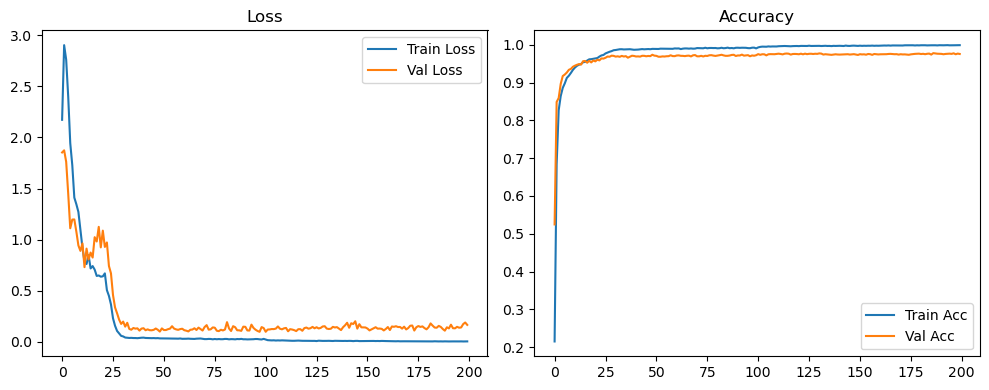

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 51.19it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 51.63it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 51.75it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 51.71it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 51.82it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 51.84it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 51.87it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 51.95it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 51.97it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 51.98it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 52.01it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 52.03it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 52.01it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 52.33it/s]

Original Model Final Test Loss: 0.1406 Accuracy: 0.9787


🚀 Running: batch128_lr0.005_0.002_0.001_dp0.5


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1852 | Val Acc: 0.3452 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1852 | Val Acc: 0.3452 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1852 | Val Acc: 0.3452 |:   0%|          | 1/200 [00:11<37:19, 11.25s/it]

| LR: 0.005 | Train Acc: 0.5617 | Val Acc: 0.8307 |:   0%|          | 1/200 [00:21<37:19, 11.25s/it]

| LR: 0.005 | Train Acc: 0.5617 | Val Acc: 0.8307 |:   0%|          | 1/200 [00:21<37:19, 11.25s/it]

| LR: 0.005 | Train Acc: 0.5617 | Val Acc: 0.8307 |:   1%|          | 2/200 [00:21<35:47, 10.85s/it]

| LR: 0.005 | Train Acc: 0.7808 | Val Acc: 0.8762 |:   1%|          | 2/200 [00:32<35:47, 10.85s/it]

| LR: 0.005 | Train Acc: 0.7808 | Val Acc: 0.8762 |:   1%|          | 2/200 [00:32<35:47, 10.85s/it]

| LR: 0.005 | Train Acc: 0.7808 | Val Acc: 0.8762 |:   2%|▏         | 3/200 [00:32<35:14, 10.73s/it]

| LR: 0.005 | Train Acc: 0.8286 | Val Acc: 0.9021 |:   2%|▏         | 3/200 [00:43<35:14, 10.73s/it]

| LR: 0.005 | Train Acc: 0.8286 | Val Acc: 0.9021 |:   2%|▏         | 3/200 [00:43<35:14, 10.73s/it]

| LR: 0.005 | Train Acc: 0.8286 | Val Acc: 0.9021 |:   2%|▏         | 4/200 [00:43<35:15, 10.79s/it]

| LR: 0.005 | Train Acc: 0.8560 | Val Acc: 0.9229 |:   2%|▏         | 4/200 [00:53<35:15, 10.79s/it]

| LR: 0.005 | Train Acc: 0.8560 | Val Acc: 0.9229 |:   2%|▏         | 4/200 [00:53<35:15, 10.79s/it]

| LR: 0.005 | Train Acc: 0.8560 | Val Acc: 0.9229 |:   2%|▎         | 5/200 [00:53<34:50, 10.72s/it]

| LR: 0.005 | Train Acc: 0.8745 | Val Acc: 0.9256 |:   2%|▎         | 5/200 [01:04<34:50, 10.72s/it]

| LR: 0.005 | Train Acc: 0.8745 | Val Acc: 0.9256 |:   2%|▎         | 5/200 [01:04<34:50, 10.72s/it]

| LR: 0.005 | Train Acc: 0.8745 | Val Acc: 0.9256 |:   3%|▎         | 6/200 [01:04<34:24, 10.64s/it]

| LR: 0.005 | Train Acc: 0.8855 | Val Acc: 0.9272 |:   3%|▎         | 6/200 [01:14<34:24, 10.64s/it]

| LR: 0.005 | Train Acc: 0.8855 | Val Acc: 0.9272 |:   3%|▎         | 6/200 [01:14<34:24, 10.64s/it]

| LR: 0.005 | Train Acc: 0.8855 | Val Acc: 0.9272 |:   4%|▎         | 7/200 [01:14<34:06, 10.60s/it]

| LR: 0.005 | Train Acc: 0.8977 | Val Acc: 0.9373 |:   4%|▎         | 7/200 [01:25<34:06, 10.60s/it]

| LR: 0.005 | Train Acc: 0.8977 | Val Acc: 0.9373 |:   4%|▎         | 7/200 [01:25<34:06, 10.60s/it]

| LR: 0.005 | Train Acc: 0.8977 | Val Acc: 0.9373 |:   4%|▍         | 8/200 [01:25<33:54, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9009 | Val Acc: 0.9413 |:   4%|▍         | 8/200 [01:36<33:54, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9009 | Val Acc: 0.9413 |:   4%|▍         | 8/200 [01:36<33:54, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9009 | Val Acc: 0.9413 |:   4%|▍         | 9/200 [01:36<33:46, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9121 | Val Acc: 0.9426 |:   4%|▍         | 9/200 [01:47<33:46, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9121 | Val Acc: 0.9426 |:   4%|▍         | 9/200 [01:47<33:46, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9121 | Val Acc: 0.9426 |:   5%|▌         | 10/200 [01:47<34:03, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9139 | Val Acc: 0.9438 |:   5%|▌         | 10/200 [01:57<34:03, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9139 | Val Acc: 0.9438 |:   5%|▌         | 10/200 [01:57<34:03, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9139 | Val Acc: 0.9438 |:   6%|▌         | 11/200 [01:57<33:50, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9206 | Val Acc: 0.9431 |:   6%|▌         | 11/200 [02:08<33:50, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9206 | Val Acc: 0.9431 |:   6%|▌         | 11/200 [02:08<33:50, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9206 | Val Acc: 0.9431 |:   6%|▌         | 12/200 [02:08<33:43, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9256 | Val Acc: 0.9519 |:   6%|▌         | 12/200 [02:19<33:43, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9256 | Val Acc: 0.9519 |:   6%|▌         | 12/200 [02:19<33:43, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9256 | Val Acc: 0.9519 |:   6%|▋         | 13/200 [02:19<33:31, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9305 | Val Acc: 0.9553 |:   6%|▋         | 13/200 [02:30<33:31, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9305 | Val Acc: 0.9553 |:   6%|▋         | 13/200 [02:30<33:31, 10.76s/it]

| LR: 0.005 | Train Acc: 0.9305 | Val Acc: 0.9553 |:   7%|▋         | 14/200 [02:30<33:16, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9332 | Val Acc: 0.9551 |:   7%|▋         | 14/200 [02:40<33:16, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9332 | Val Acc: 0.9551 |:   7%|▋         | 14/200 [02:40<33:16, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9332 | Val Acc: 0.9551 |:   8%|▊         | 15/200 [02:40<33:06, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9348 | Val Acc: 0.9604 |:   8%|▊         | 15/200 [02:51<33:06, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9348 | Val Acc: 0.9604 |:   8%|▊         | 15/200 [02:51<33:06, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9348 | Val Acc: 0.9604 |:   8%|▊         | 16/200 [02:51<33:03, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9391 | Val Acc: 0.9578 |:   8%|▊         | 16/200 [03:02<33:03, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9391 | Val Acc: 0.9578 |:   8%|▊         | 16/200 [03:02<33:03, 10.78s/it]

| LR: 0.005 | Train Acc: 0.9391 | Val Acc: 0.9578 |:   8%|▊         | 17/200 [03:02<32:51, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9436 | Val Acc: 0.9633 |:   8%|▊         | 17/200 [03:13<32:51, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9436 | Val Acc: 0.9633 |:   8%|▊         | 17/200 [03:13<32:51, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9436 | Val Acc: 0.9633 |:   9%|▉         | 18/200 [03:13<32:35, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9463 | Val Acc: 0.9631 |:   9%|▉         | 18/200 [03:23<32:35, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9463 | Val Acc: 0.9631 |:   9%|▉         | 18/200 [03:23<32:35, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9463 | Val Acc: 0.9631 |:  10%|▉         | 19/200 [03:24<32:28, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9478 | Val Acc: 0.9633 |:  10%|▉         | 19/200 [03:34<32:28, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9478 | Val Acc: 0.9633 |:  10%|▉         | 19/200 [03:34<32:28, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9478 | Val Acc: 0.9633 |:  10%|█         | 20/200 [03:34<32:12, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9492 | Val Acc: 0.9661 |:  10%|█         | 20/200 [03:45<32:12, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9492 | Val Acc: 0.9661 |:  10%|█         | 20/200 [03:45<32:12, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9492 | Val Acc: 0.9661 |:  10%|█         | 21/200 [03:45<31:46, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9519 | Val Acc: 0.9654 |:  10%|█         | 21/200 [03:55<31:46, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9519 | Val Acc: 0.9654 |:  10%|█         | 21/200 [03:55<31:46, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9519 | Val Acc: 0.9654 |:  11%|█         | 22/200 [03:55<31:29, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9621 | Val Acc: 0.9691 |:  11%|█         | 22/200 [04:07<31:29, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9621 | Val Acc: 0.9691 |:  11%|█         | 22/200 [04:07<31:29, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9621 | Val Acc: 0.9691 |:  12%|█▏        | 23/200 [04:07<32:05, 10.88s/it]

| LR: 0.005 | Train Acc: 0.9650 | Val Acc: 0.9690 |:  12%|█▏        | 23/200 [04:17<32:05, 10.88s/it]

| LR: 0.005 | Train Acc: 0.9650 | Val Acc: 0.9690 |:  12%|█▏        | 23/200 [04:17<32:05, 10.88s/it]

| LR: 0.005 | Train Acc: 0.9650 | Val Acc: 0.9690 |:  12%|█▏        | 24/200 [04:17<31:41, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9670 |:  12%|█▏        | 24/200 [04:28<31:41, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9670 |:  12%|█▏        | 24/200 [04:28<31:41, 10.80s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9670 |:  12%|█▎        | 25/200 [04:28<31:23, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9688 |:  12%|█▎        | 25/200 [04:39<31:23, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9688 |:  12%|█▎        | 25/200 [04:39<31:23, 10.77s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9688 |:  13%|█▎        | 26/200 [04:39<31:04, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9674 | Val Acc: 0.9705 |:  13%|█▎        | 26/200 [04:49<31:04, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9674 | Val Acc: 0.9705 |:  13%|█▎        | 26/200 [04:49<31:04, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9674 | Val Acc: 0.9705 |:  14%|█▎        | 27/200 [04:49<30:45, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9675 |:  14%|█▎        | 27/200 [05:00<30:45, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9675 |:  14%|█▎        | 27/200 [05:00<30:45, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9675 |:  14%|█▍        | 28/200 [05:00<30:39, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9674 |:  14%|█▍        | 28/200 [05:11<30:39, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9674 |:  14%|█▍        | 28/200 [05:11<30:39, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9674 |:  14%|█▍        | 29/200 [05:11<30:28, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9682 |:  14%|█▍        | 29/200 [05:21<30:28, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9682 |:  14%|█▍        | 29/200 [05:21<30:28, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9682 |:  15%|█▌        | 30/200 [05:21<30:18, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9676 |:  15%|█▌        | 30/200 [05:32<30:18, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9676 |:  15%|█▌        | 30/200 [05:32<30:18, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9676 |:  16%|█▌        | 31/200 [05:32<30:06, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9676 | Val Acc: 0.9667 |:  16%|█▌        | 31/200 [05:42<30:06, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9676 | Val Acc: 0.9667 |:  16%|█▌        | 31/200 [05:42<30:06, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9676 | Val Acc: 0.9667 |:  16%|█▌        | 32/200 [05:42<29:45, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9659 | Val Acc: 0.9665 |:  16%|█▌        | 32/200 [05:53<29:45, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9659 | Val Acc: 0.9665 |:  16%|█▌        | 32/200 [05:53<29:45, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9659 | Val Acc: 0.9665 |:  16%|█▋        | 33/200 [05:53<29:31, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9658 | Val Acc: 0.9669 |:  16%|█▋        | 33/200 [06:03<29:31, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9658 | Val Acc: 0.9669 |:  16%|█▋        | 33/200 [06:03<29:31, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9658 | Val Acc: 0.9669 |:  17%|█▋        | 34/200 [06:04<29:16, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9648 | Val Acc: 0.9673 |:  17%|█▋        | 34/200 [06:14<29:16, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9648 | Val Acc: 0.9673 |:  17%|█▋        | 34/200 [06:14<29:16, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9648 | Val Acc: 0.9673 |:  18%|█▊        | 35/200 [06:14<29:08, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9650 | Val Acc: 0.9673 |:  18%|█▊        | 35/200 [06:24<29:08, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9650 | Val Acc: 0.9673 |:  18%|█▊        | 35/200 [06:24<29:08, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9650 | Val Acc: 0.9673 |:  18%|█▊        | 36/200 [06:24<28:43, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9658 | Val Acc: 0.9645 |:  18%|█▊        | 36/200 [06:35<28:43, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9658 | Val Acc: 0.9645 |:  18%|█▊        | 36/200 [06:35<28:43, 10.51s/it]

| LR: 0.005 | Train Acc: 0.9658 | Val Acc: 0.9645 |:  18%|█▊        | 37/200 [06:35<28:24, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9648 | Val Acc: 0.9679 |:  18%|█▊        | 37/200 [06:45<28:24, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9648 | Val Acc: 0.9679 |:  18%|█▊        | 37/200 [06:45<28:24, 10.46s/it]

| LR: 0.005 | Train Acc: 0.9648 | Val Acc: 0.9679 |:  19%|█▉        | 38/200 [06:45<28:19, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9659 | Val Acc: 0.9694 |:  19%|█▉        | 38/200 [06:56<28:19, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9659 | Val Acc: 0.9694 |:  19%|█▉        | 38/200 [06:56<28:19, 10.49s/it]

| LR: 0.005 | Train Acc: 0.9659 | Val Acc: 0.9694 |:  20%|█▉        | 39/200 [06:56<28:30, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9646 | Val Acc: 0.9674 |:  20%|█▉        | 39/200 [07:07<28:30, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9646 | Val Acc: 0.9674 |:  20%|█▉        | 39/200 [07:07<28:30, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9646 | Val Acc: 0.9674 |:  20%|██        | 40/200 [07:07<28:15, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9671 | Val Acc: 0.9669 |:  20%|██        | 40/200 [07:17<28:15, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9671 | Val Acc: 0.9669 |:  20%|██        | 40/200 [07:17<28:15, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9671 | Val Acc: 0.9669 |:  20%|██        | 41/200 [07:17<28:05, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9656 | Val Acc: 0.9672 |:  20%|██        | 41/200 [07:28<28:05, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9656 | Val Acc: 0.9672 |:  20%|██        | 41/200 [07:28<28:05, 10.60s/it]

| LR: 0.005 | Train Acc: 0.9656 | Val Acc: 0.9672 |:  21%|██        | 42/200 [07:28<27:51, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9657 | Val Acc: 0.9692 |:  21%|██        | 42/200 [07:39<27:51, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9657 | Val Acc: 0.9692 |:  21%|██        | 42/200 [07:39<27:51, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9657 | Val Acc: 0.9692 |:  22%|██▏       | 43/200 [07:39<27:47, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9663 | Val Acc: 0.9683 |:  22%|██▏       | 43/200 [07:49<27:47, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9663 | Val Acc: 0.9683 |:  22%|██▏       | 43/200 [07:49<27:47, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9663 | Val Acc: 0.9683 |:  22%|██▏       | 44/200 [07:49<27:32, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9669 | Val Acc: 0.9683 |:  22%|██▏       | 44/200 [08:00<27:32, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9669 | Val Acc: 0.9683 |:  22%|██▏       | 44/200 [08:00<27:32, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9669 | Val Acc: 0.9683 |:  22%|██▎       | 45/200 [08:00<27:17, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9663 | Val Acc: 0.9677 |:  22%|██▎       | 45/200 [08:10<27:17, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9663 | Val Acc: 0.9677 |:  22%|██▎       | 45/200 [08:10<27:17, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9663 | Val Acc: 0.9677 |:  23%|██▎       | 46/200 [08:10<27:05, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9675 | Val Acc: 0.9687 |:  23%|██▎       | 46/200 [08:21<27:05, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9675 | Val Acc: 0.9687 |:  23%|██▎       | 46/200 [08:21<27:05, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9675 | Val Acc: 0.9687 |:  24%|██▎       | 47/200 [08:21<27:12, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9653 | Val Acc: 0.9699 |:  24%|██▎       | 47/200 [08:32<27:12, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9653 | Val Acc: 0.9699 |:  24%|██▎       | 47/200 [08:32<27:12, 10.67s/it]

| LR: 0.005 | Train Acc: 0.9653 | Val Acc: 0.9699 |:  24%|██▍       | 48/200 [08:32<26:57, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9679 | Val Acc: 0.9680 |:  24%|██▍       | 48/200 [08:42<26:57, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9679 | Val Acc: 0.9680 |:  24%|██▍       | 48/200 [08:42<26:57, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9679 | Val Acc: 0.9680 |:  24%|██▍       | 49/200 [08:42<26:43, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9670 | Val Acc: 0.9700 |:  24%|██▍       | 49/200 [08:53<26:43, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9670 | Val Acc: 0.9700 |:  24%|██▍       | 49/200 [08:53<26:43, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9670 | Val Acc: 0.9700 |:  25%|██▌       | 50/200 [08:53<26:34, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9664 | Val Acc: 0.9670 |:  25%|██▌       | 50/200 [09:04<26:34, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9664 | Val Acc: 0.9670 |:  25%|██▌       | 50/200 [09:04<26:34, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9664 | Val Acc: 0.9670 |:  26%|██▌       | 51/200 [09:04<26:23, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9694 |:  26%|██▌       | 51/200 [09:14<26:23, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9694 |:  26%|██▌       | 51/200 [09:14<26:23, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9694 |:  26%|██▌       | 52/200 [09:14<26:05, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9655 | Val Acc: 0.9688 |:  26%|██▌       | 52/200 [09:25<26:05, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9655 | Val Acc: 0.9688 |:  26%|██▌       | 52/200 [09:25<26:05, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9655 | Val Acc: 0.9688 |:  26%|██▋       | 53/200 [09:25<25:53, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9670 |:  26%|██▋       | 53/200 [09:35<25:53, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9670 |:  26%|██▋       | 53/200 [09:35<25:53, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9670 |:  27%|██▋       | 54/200 [09:35<25:40, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9661 | Val Acc: 0.9688 |:  27%|██▋       | 54/200 [09:46<25:40, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9661 | Val Acc: 0.9688 |:  27%|██▋       | 54/200 [09:46<25:40, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9661 | Val Acc: 0.9688 |:  28%|██▊       | 55/200 [09:46<25:42, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9698 |:  28%|██▊       | 55/200 [09:57<25:42, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9698 |:  28%|██▊       | 55/200 [09:57<25:42, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9698 |:  28%|██▊       | 56/200 [09:57<25:31, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9683 | Val Acc: 0.9701 |:  28%|██▊       | 56/200 [10:07<25:31, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9683 | Val Acc: 0.9701 |:  28%|██▊       | 56/200 [10:07<25:31, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9683 | Val Acc: 0.9701 |:  28%|██▊       | 57/200 [10:07<25:17, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9706 |:  28%|██▊       | 57/200 [10:18<25:17, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9706 |:  28%|██▊       | 57/200 [10:18<25:17, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9706 |:  29%|██▉       | 58/200 [10:18<25:10, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9702 | Val Acc: 0.9713 |:  29%|██▉       | 58/200 [10:28<25:10, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9702 | Val Acc: 0.9713 |:  29%|██▉       | 58/200 [10:28<25:10, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9702 | Val Acc: 0.9713 |:  30%|██▉       | 59/200 [10:28<24:59, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9701 |:  30%|██▉       | 59/200 [10:39<24:59, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9701 |:  30%|██▉       | 59/200 [10:39<24:59, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9701 |:  30%|███       | 60/200 [10:39<24:47, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9679 | Val Acc: 0.9698 |:  30%|███       | 60/200 [10:50<24:47, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9679 | Val Acc: 0.9698 |:  30%|███       | 60/200 [10:50<24:47, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9679 | Val Acc: 0.9698 |:  30%|███       | 61/200 [10:50<24:44, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9678 | Val Acc: 0.9690 |:  30%|███       | 61/200 [11:01<24:44, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9678 | Val Acc: 0.9690 |:  30%|███       | 61/200 [11:01<24:44, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9678 | Val Acc: 0.9690 |:  31%|███       | 62/200 [11:01<24:36, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9678 | Val Acc: 0.9673 |:  31%|███       | 62/200 [11:11<24:36, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9678 | Val Acc: 0.9673 |:  31%|███       | 62/200 [11:11<24:36, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9678 | Val Acc: 0.9673 |:  32%|███▏      | 63/200 [11:11<24:27, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9682 |:  32%|███▏      | 63/200 [11:22<24:27, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9682 |:  32%|███▏      | 63/200 [11:22<24:27, 10.71s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9682 |:  32%|███▏      | 64/200 [11:22<24:21, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9702 |:  32%|███▏      | 64/200 [11:33<24:21, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9702 |:  32%|███▏      | 64/200 [11:33<24:21, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9702 |:  32%|███▎      | 65/200 [11:33<24:07, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9688 |:  32%|███▎      | 65/200 [11:44<24:07, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9688 |:  32%|███▎      | 65/200 [11:44<24:07, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9688 |:  33%|███▎      | 66/200 [11:44<23:58, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9696 |:  33%|███▎      | 66/200 [11:54<23:58, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9696 |:  33%|███▎      | 66/200 [11:54<23:58, 10.74s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9696 |:  34%|███▎      | 67/200 [11:54<23:49, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9675 | Val Acc: 0.9703 |:  34%|███▎      | 67/200 [12:05<23:49, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9675 | Val Acc: 0.9703 |:  34%|███▎      | 67/200 [12:05<23:49, 10.75s/it]

| LR: 0.005 | Train Acc: 0.9675 | Val Acc: 0.9703 |:  34%|███▍      | 68/200 [12:05<23:35, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9667 |:  34%|███▍      | 68/200 [12:16<23:35, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9667 |:  34%|███▍      | 68/200 [12:16<23:35, 10.72s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9667 |:  34%|███▍      | 69/200 [12:16<23:25, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9686 |:  34%|███▍      | 69/200 [12:27<23:25, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9686 |:  34%|███▍      | 69/200 [12:27<23:25, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9686 |:  35%|███▌      | 70/200 [12:27<23:15, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9702 |:  35%|███▌      | 70/200 [12:37<23:15, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9702 |:  35%|███▌      | 70/200 [12:37<23:15, 10.73s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9702 |:  36%|███▌      | 71/200 [12:37<23:00, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9689 | Val Acc: 0.9699 |:  36%|███▌      | 71/200 [12:48<23:00, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9689 | Val Acc: 0.9699 |:  36%|███▌      | 71/200 [12:48<23:00, 10.70s/it]

| LR: 0.005 | Train Acc: 0.9689 | Val Acc: 0.9699 |:  36%|███▌      | 72/200 [12:48<22:48, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9706 |:  36%|███▌      | 72/200 [12:58<22:48, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9706 |:  36%|███▌      | 72/200 [12:58<22:48, 10.69s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9706 |:  36%|███▋      | 73/200 [12:58<22:33, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9683 | Val Acc: 0.9706 |:  36%|███▋      | 73/200 [13:09<22:33, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9683 | Val Acc: 0.9706 |:  36%|███▋      | 73/200 [13:09<22:33, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9683 | Val Acc: 0.9706 |:  37%|███▋      | 74/200 [13:09<22:17, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9695 | Val Acc: 0.9708 |:  37%|███▋      | 74/200 [13:19<22:17, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9695 | Val Acc: 0.9708 |:  37%|███▋      | 74/200 [13:19<22:17, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9695 | Val Acc: 0.9708 |:  38%|███▊      | 75/200 [13:20<22:05, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9679 | Val Acc: 0.9671 |:  38%|███▊      | 75/200 [13:30<22:05, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9679 | Val Acc: 0.9671 |:  38%|███▊      | 75/200 [13:30<22:05, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9679 | Val Acc: 0.9671 |:  38%|███▊      | 76/200 [13:30<21:59, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9684 | Val Acc: 0.9697 |:  38%|███▊      | 76/200 [13:41<21:59, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9684 | Val Acc: 0.9697 |:  38%|███▊      | 76/200 [13:41<21:59, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9684 | Val Acc: 0.9697 |:  38%|███▊      | 77/200 [13:41<21:46, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9710 | Val Acc: 0.9707 |:  38%|███▊      | 77/200 [13:51<21:46, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9710 | Val Acc: 0.9707 |:  38%|███▊      | 77/200 [13:51<21:46, 10.63s/it]

| LR: 0.005 | Train Acc: 0.9710 | Val Acc: 0.9707 |:  39%|███▉      | 78/200 [13:51<21:34, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9693 |:  39%|███▉      | 78/200 [14:02<21:34, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9693 |:  39%|███▉      | 78/200 [14:02<21:34, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9685 | Val Acc: 0.9693 |:  40%|███▉      | 79/200 [14:02<21:12, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9683 |:  40%|███▉      | 79/200 [14:12<21:12, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9683 |:  40%|███▉      | 79/200 [14:12<21:12, 10.52s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9683 |:  40%|████      | 80/200 [14:12<21:00, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9708 |:  40%|████      | 80/200 [14:23<21:00, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9708 |:  40%|████      | 80/200 [14:23<21:00, 10.50s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9708 |:  40%|████      | 81/200 [14:23<20:52, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9703 |:  40%|████      | 81/200 [14:33<20:52, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9703 |:  40%|████      | 81/200 [14:33<20:52, 10.53s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9703 |:  41%|████      | 82/200 [14:33<20:32, 10.44s/it]

| LR: 0.005 | Train Acc: 0.9684 | Val Acc: 0.9687 |:  41%|████      | 82/200 [14:44<20:32, 10.44s/it]

| LR: 0.005 | Train Acc: 0.9684 | Val Acc: 0.9687 |:  41%|████      | 82/200 [14:44<20:32, 10.44s/it]

| LR: 0.005 | Train Acc: 0.9684 | Val Acc: 0.9687 |:  42%|████▏     | 83/200 [14:44<20:42, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9688 |:  42%|████▏     | 83/200 [14:55<20:42, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9688 |:  42%|████▏     | 83/200 [14:55<20:42, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9681 | Val Acc: 0.9688 |:  42%|████▏     | 84/200 [14:55<20:35, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9683 | Val Acc: 0.9708 |:  42%|████▏     | 84/200 [15:05<20:35, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9683 | Val Acc: 0.9708 |:  42%|████▏     | 84/200 [15:05<20:35, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9683 | Val Acc: 0.9708 |:  42%|████▎     | 85/200 [15:06<20:28, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9687 |:  42%|████▎     | 85/200 [15:16<20:28, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9687 |:  42%|████▎     | 85/200 [15:16<20:28, 10.68s/it]

| LR: 0.005 | Train Acc: 0.9697 | Val Acc: 0.9687 |:  43%|████▎     | 86/200 [15:16<20:10, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9709 |:  43%|████▎     | 86/200 [15:26<20:10, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9709 |:  43%|████▎     | 86/200 [15:26<20:10, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9709 |:  44%|████▎     | 87/200 [15:26<19:55, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9686 |:  44%|████▎     | 87/200 [15:37<19:55, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9686 |:  44%|████▎     | 87/200 [15:37<19:55, 10.58s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9686 |:  44%|████▍     | 88/200 [15:37<19:43, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9698 |:  44%|████▍     | 88/200 [15:48<19:43, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9698 |:  44%|████▍     | 88/200 [15:48<19:43, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9688 | Val Acc: 0.9698 |:  44%|████▍     | 89/200 [15:48<19:32, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9678 | Val Acc: 0.9683 |:  44%|████▍     | 89/200 [15:58<19:32, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9678 | Val Acc: 0.9683 |:  44%|████▍     | 89/200 [15:58<19:32, 10.56s/it]

| LR: 0.005 | Train Acc: 0.9678 | Val Acc: 0.9683 |:  45%|████▌     | 90/200 [15:58<19:20, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9706 | Val Acc: 0.9694 |:  45%|████▌     | 90/200 [16:09<19:20, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9706 | Val Acc: 0.9694 |:  45%|████▌     | 90/200 [16:09<19:20, 10.55s/it]

| LR: 0.005 | Train Acc: 0.9706 | Val Acc: 0.9694 |:  46%|████▌     | 91/200 [16:09<19:12, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9698 |:  46%|████▌     | 91/200 [16:19<19:12, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9698 |:  46%|████▌     | 91/200 [16:19<19:12, 10.57s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9698 |:  46%|████▌     | 92/200 [16:19<19:03, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9696 |:  46%|████▌     | 92/200 [16:30<19:03, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9696 |:  46%|████▌     | 92/200 [16:30<19:03, 10.59s/it]

| LR: 0.005 | Train Acc: 0.9691 | Val Acc: 0.9696 |:  46%|████▋     | 93/200 [16:30<18:56, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9695 |:  46%|████▋     | 93/200 [16:41<18:56, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9695 |:  46%|████▋     | 93/200 [16:41<18:56, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9690 | Val Acc: 0.9695 |:  47%|████▋     | 94/200 [16:41<18:49, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9698 | Val Acc: 0.9702 |:  47%|████▋     | 94/200 [16:51<18:49, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9698 | Val Acc: 0.9702 |:  47%|████▋     | 94/200 [16:51<18:49, 10.65s/it]

| LR: 0.005 | Train Acc: 0.9698 | Val Acc: 0.9702 |:  48%|████▊     | 95/200 [16:51<18:39, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9689 | Val Acc: 0.9704 |:  48%|████▊     | 95/200 [17:02<18:39, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9689 | Val Acc: 0.9704 |:  48%|████▊     | 95/200 [17:02<18:39, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9689 | Val Acc: 0.9704 |:  48%|████▊     | 96/200 [17:02<18:23, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9690 |:  48%|████▊     | 96/200 [17:13<18:23, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9690 |:  48%|████▊     | 96/200 [17:13<18:23, 10.61s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9690 |:  48%|████▊     | 97/200 [17:13<18:13, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9696 | Val Acc: 0.9695 |:  48%|████▊     | 97/200 [17:23<18:13, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9696 | Val Acc: 0.9695 |:  48%|████▊     | 97/200 [17:23<18:13, 10.62s/it]

| LR: 0.005 | Train Acc: 0.9696 | Val Acc: 0.9695 |:  49%|████▉     | 98/200 [17:23<18:07, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [17:34<18:07, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [17:34<18:07, 10.66s/it]

| LR: 0.005 | Train Acc: 0.9692 | Val Acc: 0.9688 |:  50%|████▉     | 99/200 [17:34<17:54, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9695 |:  50%|████▉     | 99/200 [17:45<17:54, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9695 |:  50%|████▉     | 99/200 [17:45<17:54, 10.64s/it]

| LR: 0.005 | Train Acc: 0.9693 | Val Acc: 0.9695 |:  50%|█████     | 100/200 [17:45<17:45, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9708 | Val Acc: 0.9699 |:  50%|█████     | 100/200 [17:55<17:45, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9708 | Val Acc: 0.9699 |:  50%|█████     | 100/200 [17:55<17:45, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9708 | Val Acc: 0.9699 |:  50%|█████     | 101/200 [17:55<17:30, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9719 | Val Acc: 0.9691 |:  50%|█████     | 101/200 [18:06<17:30, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9719 | Val Acc: 0.9691 |:  50%|█████     | 101/200 [18:06<17:30, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9719 | Val Acc: 0.9691 |:  51%|█████     | 102/200 [18:06<17:25, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9728 | Val Acc: 0.9709 |:  51%|█████     | 102/200 [18:17<17:25, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9728 | Val Acc: 0.9709 |:  51%|█████     | 102/200 [18:17<17:25, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9728 | Val Acc: 0.9709 |:  52%|█████▏    | 103/200 [18:17<17:15, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9735 | Val Acc: 0.9702 |:  52%|█████▏    | 103/200 [18:27<17:15, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9735 | Val Acc: 0.9702 |:  52%|█████▏    | 103/200 [18:27<17:15, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9735 | Val Acc: 0.9702 |:  52%|█████▏    | 104/200 [18:27<17:07, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9742 | Val Acc: 0.9696 |:  52%|█████▏    | 104/200 [18:38<17:07, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9742 | Val Acc: 0.9696 |:  52%|█████▏    | 104/200 [18:38<17:07, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9742 | Val Acc: 0.9696 |:  52%|█████▎    | 105/200 [18:38<17:00, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9725 |:  52%|█████▎    | 105/200 [18:49<17:00, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9725 |:  52%|█████▎    | 105/200 [18:49<17:00, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9725 |:  53%|█████▎    | 106/200 [18:49<16:50, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9749 | Val Acc: 0.9700 |:  53%|█████▎    | 106/200 [19:00<16:50, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9749 | Val Acc: 0.9700 |:  53%|█████▎    | 106/200 [19:00<16:50, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9749 | Val Acc: 0.9700 |:  54%|█████▎    | 107/200 [19:00<16:34, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9747 | Val Acc: 0.9708 |:  54%|█████▎    | 107/200 [19:10<16:34, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9747 | Val Acc: 0.9708 |:  54%|█████▎    | 107/200 [19:10<16:34, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9747 | Val Acc: 0.9708 |:  54%|█████▍    | 108/200 [19:10<16:18, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9759 | Val Acc: 0.9717 |:  54%|█████▍    | 108/200 [19:21<16:18, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9759 | Val Acc: 0.9717 |:  54%|█████▍    | 108/200 [19:21<16:18, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9759 | Val Acc: 0.9717 |:  55%|█████▍    | 109/200 [19:21<16:17, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9756 | Val Acc: 0.9712 |:  55%|█████▍    | 109/200 [19:32<16:17, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9756 | Val Acc: 0.9712 |:  55%|█████▍    | 109/200 [19:32<16:17, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9756 | Val Acc: 0.9712 |:  55%|█████▌    | 110/200 [19:32<16:01, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9763 | Val Acc: 0.9717 |:  55%|█████▌    | 110/200 [19:42<16:01, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9763 | Val Acc: 0.9717 |:  55%|█████▌    | 110/200 [19:42<16:01, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9763 | Val Acc: 0.9717 |:  56%|█████▌    | 111/200 [19:42<15:50, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9763 | Val Acc: 0.9718 |:  56%|█████▌    | 111/200 [19:53<15:50, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9763 | Val Acc: 0.9718 |:  56%|█████▌    | 111/200 [19:53<15:50, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9763 | Val Acc: 0.9718 |:  56%|█████▌    | 112/200 [19:53<15:36, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9779 | Val Acc: 0.9719 |:  56%|█████▌    | 112/200 [20:03<15:36, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9779 | Val Acc: 0.9719 |:  56%|█████▌    | 112/200 [20:03<15:36, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9779 | Val Acc: 0.9719 |:  56%|█████▋    | 113/200 [20:03<15:24, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9771 | Val Acc: 0.9715 |:  56%|█████▋    | 113/200 [20:14<15:24, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9771 | Val Acc: 0.9715 |:  56%|█████▋    | 113/200 [20:14<15:24, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9771 | Val Acc: 0.9715 |:  57%|█████▋    | 114/200 [20:14<15:08, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9781 | Val Acc: 0.9730 |:  57%|█████▋    | 114/200 [20:24<15:08, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9781 | Val Acc: 0.9730 |:  57%|█████▋    | 114/200 [20:24<15:08, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9781 | Val Acc: 0.9730 |:  57%|█████▊    | 115/200 [20:24<14:59, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9726 |:  57%|█████▊    | 115/200 [20:37<14:59, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9726 |:  57%|█████▊    | 115/200 [20:37<14:59, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9726 |:  58%|█████▊    | 116/200 [20:37<15:36, 11.15s/it]

| LR: 0.002 | Train Acc: 0.9782 | Val Acc: 0.9723 |:  58%|█████▊    | 116/200 [20:48<15:36, 11.15s/it]

| LR: 0.002 | Train Acc: 0.9782 | Val Acc: 0.9723 |:  58%|█████▊    | 116/200 [20:48<15:36, 11.15s/it]

| LR: 0.002 | Train Acc: 0.9782 | Val Acc: 0.9723 |:  58%|█████▊    | 117/200 [20:48<15:16, 11.04s/it]

| LR: 0.002 | Train Acc: 0.9774 | Val Acc: 0.9726 |:  58%|█████▊    | 117/200 [20:58<15:16, 11.04s/it]

| LR: 0.002 | Train Acc: 0.9774 | Val Acc: 0.9726 |:  58%|█████▊    | 117/200 [20:58<15:16, 11.04s/it]

| LR: 0.002 | Train Acc: 0.9774 | Val Acc: 0.9726 |:  59%|█████▉    | 118/200 [20:58<14:54, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9782 | Val Acc: 0.9732 |:  59%|█████▉    | 118/200 [21:09<14:54, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9782 | Val Acc: 0.9732 |:  59%|█████▉    | 118/200 [21:09<14:54, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9782 | Val Acc: 0.9732 |:  60%|█████▉    | 119/200 [21:09<14:34, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9787 | Val Acc: 0.9728 |:  60%|█████▉    | 119/200 [21:19<14:34, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9787 | Val Acc: 0.9728 |:  60%|█████▉    | 119/200 [21:19<14:34, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9787 | Val Acc: 0.9728 |:  60%|██████    | 120/200 [21:19<14:16, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9790 | Val Acc: 0.9746 |:  60%|██████    | 120/200 [21:30<14:16, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9790 | Val Acc: 0.9746 |:  60%|██████    | 120/200 [21:30<14:16, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9790 | Val Acc: 0.9746 |:  60%|██████    | 121/200 [21:30<13:59, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9790 | Val Acc: 0.9728 |:  60%|██████    | 121/200 [21:40<13:59, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9790 | Val Acc: 0.9728 |:  60%|██████    | 121/200 [21:40<13:59, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9790 | Val Acc: 0.9728 |:  61%|██████    | 122/200 [21:41<13:51, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9776 | Val Acc: 0.9727 |:  61%|██████    | 122/200 [21:51<13:51, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9776 | Val Acc: 0.9727 |:  61%|██████    | 122/200 [21:51<13:51, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9776 | Val Acc: 0.9727 |:  62%|██████▏   | 123/200 [21:51<13:35, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9788 | Val Acc: 0.9730 |:  62%|██████▏   | 123/200 [22:01<13:35, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9788 | Val Acc: 0.9730 |:  62%|██████▏   | 123/200 [22:01<13:35, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9788 | Val Acc: 0.9730 |:  62%|██████▏   | 124/200 [22:01<13:23, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9785 | Val Acc: 0.9717 |:  62%|██████▏   | 124/200 [22:12<13:23, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9785 | Val Acc: 0.9717 |:  62%|██████▏   | 124/200 [22:12<13:23, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9785 | Val Acc: 0.9717 |:  62%|██████▎   | 125/200 [22:12<13:15, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9790 | Val Acc: 0.9732 |:  62%|██████▎   | 125/200 [22:23<13:15, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9790 | Val Acc: 0.9732 |:  62%|██████▎   | 125/200 [22:23<13:15, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9790 | Val Acc: 0.9732 |:  63%|██████▎   | 126/200 [22:23<13:09, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9795 | Val Acc: 0.9734 |:  63%|██████▎   | 126/200 [22:34<13:09, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9795 | Val Acc: 0.9734 |:  63%|██████▎   | 126/200 [22:34<13:09, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9795 | Val Acc: 0.9734 |:  64%|██████▎   | 127/200 [22:34<13:00, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9799 | Val Acc: 0.9739 |:  64%|██████▎   | 127/200 [22:44<13:00, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9799 | Val Acc: 0.9739 |:  64%|██████▎   | 127/200 [22:44<13:00, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9799 | Val Acc: 0.9739 |:  64%|██████▍   | 128/200 [22:44<12:48, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9793 | Val Acc: 0.9735 |:  64%|██████▍   | 128/200 [22:55<12:48, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9793 | Val Acc: 0.9735 |:  64%|██████▍   | 128/200 [22:55<12:48, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9793 | Val Acc: 0.9735 |:  64%|██████▍   | 129/200 [22:55<12:40, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9797 | Val Acc: 0.9720 |:  64%|██████▍   | 129/200 [23:06<12:40, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9797 | Val Acc: 0.9720 |:  64%|██████▍   | 129/200 [23:06<12:40, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9797 | Val Acc: 0.9720 |:  65%|██████▌   | 130/200 [23:06<12:26, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9805 | Val Acc: 0.9739 |:  65%|██████▌   | 130/200 [23:16<12:26, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9805 | Val Acc: 0.9739 |:  65%|██████▌   | 130/200 [23:16<12:26, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9805 | Val Acc: 0.9739 |:  66%|██████▌   | 131/200 [23:16<12:13, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9792 | Val Acc: 0.9726 |:  66%|██████▌   | 131/200 [23:27<12:13, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9792 | Val Acc: 0.9726 |:  66%|██████▌   | 131/200 [23:27<12:13, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9792 | Val Acc: 0.9726 |:  66%|██████▌   | 132/200 [23:27<12:02, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9793 | Val Acc: 0.9737 |:  66%|██████▌   | 132/200 [23:37<12:02, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9793 | Val Acc: 0.9737 |:  66%|██████▌   | 132/200 [23:37<12:02, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9793 | Val Acc: 0.9737 |:  66%|██████▋   | 133/200 [23:37<11:48, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9789 | Val Acc: 0.9739 |:  66%|██████▋   | 133/200 [23:48<11:48, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9789 | Val Acc: 0.9739 |:  66%|██████▋   | 133/200 [23:48<11:48, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9789 | Val Acc: 0.9739 |:  67%|██████▋   | 134/200 [23:48<11:39, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9803 | Val Acc: 0.9739 |:  67%|██████▋   | 134/200 [23:59<11:39, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9803 | Val Acc: 0.9739 |:  67%|██████▋   | 134/200 [23:59<11:39, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9803 | Val Acc: 0.9739 |:  68%|██████▊   | 135/200 [23:59<11:35, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9801 | Val Acc: 0.9726 |:  68%|██████▊   | 135/200 [24:10<11:35, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9801 | Val Acc: 0.9726 |:  68%|██████▊   | 135/200 [24:10<11:35, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9801 | Val Acc: 0.9726 |:  68%|██████▊   | 136/200 [24:10<11:26, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9800 | Val Acc: 0.9747 |:  68%|██████▊   | 136/200 [24:20<11:26, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9800 | Val Acc: 0.9747 |:  68%|██████▊   | 136/200 [24:20<11:26, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9800 | Val Acc: 0.9747 |:  68%|██████▊   | 137/200 [24:20<11:12, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9797 | Val Acc: 0.9730 |:  68%|██████▊   | 137/200 [24:31<11:12, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9797 | Val Acc: 0.9730 |:  68%|██████▊   | 137/200 [24:31<11:12, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9797 | Val Acc: 0.9730 |:  69%|██████▉   | 138/200 [24:31<11:03, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9812 | Val Acc: 0.9734 |:  69%|██████▉   | 138/200 [24:41<11:03, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9812 | Val Acc: 0.9734 |:  69%|██████▉   | 138/200 [24:41<11:03, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9812 | Val Acc: 0.9734 |:  70%|██████▉   | 139/200 [24:42<10:48, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9797 | Val Acc: 0.9738 |:  70%|██████▉   | 139/200 [24:52<10:48, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9797 | Val Acc: 0.9738 |:  70%|██████▉   | 139/200 [24:52<10:48, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9797 | Val Acc: 0.9738 |:  70%|███████   | 140/200 [24:52<10:39, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9801 | Val Acc: 0.9742 |:  70%|███████   | 140/200 [25:03<10:39, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9801 | Val Acc: 0.9742 |:  70%|███████   | 140/200 [25:03<10:39, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9801 | Val Acc: 0.9742 |:  70%|███████   | 141/200 [25:03<10:26, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9803 | Val Acc: 0.9738 |:  70%|███████   | 141/200 [25:14<10:26, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9803 | Val Acc: 0.9738 |:  70%|███████   | 141/200 [25:14<10:26, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9803 | Val Acc: 0.9738 |:  71%|███████   | 142/200 [25:14<10:20, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9802 | Val Acc: 0.9721 |:  71%|███████   | 142/200 [25:24<10:20, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9802 | Val Acc: 0.9721 |:  71%|███████   | 142/200 [25:24<10:20, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9802 | Val Acc: 0.9721 |:  72%|███████▏  | 143/200 [25:24<10:09, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9822 | Val Acc: 0.9735 |:  72%|███████▏  | 143/200 [25:35<10:09, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9822 | Val Acc: 0.9735 |:  72%|███████▏  | 143/200 [25:35<10:09, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9822 | Val Acc: 0.9735 |:  72%|███████▏  | 144/200 [25:35<09:54, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9813 | Val Acc: 0.9724 |:  72%|███████▏  | 144/200 [25:45<09:54, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9813 | Val Acc: 0.9724 |:  72%|███████▏  | 144/200 [25:45<09:54, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9813 | Val Acc: 0.9724 |:  72%|███████▎  | 145/200 [25:45<09:44, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9818 | Val Acc: 0.9739 |:  72%|███████▎  | 145/200 [25:56<09:44, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9818 | Val Acc: 0.9739 |:  72%|███████▎  | 145/200 [25:56<09:44, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9818 | Val Acc: 0.9739 |:  73%|███████▎  | 146/200 [25:56<09:32, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9819 | Val Acc: 0.9733 |:  73%|███████▎  | 146/200 [26:07<09:32, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9819 | Val Acc: 0.9733 |:  73%|███████▎  | 146/200 [26:07<09:32, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9819 | Val Acc: 0.9733 |:  74%|███████▎  | 147/200 [26:07<09:22, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9818 | Val Acc: 0.9728 |:  74%|███████▎  | 147/200 [26:17<09:22, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9818 | Val Acc: 0.9728 |:  74%|███████▎  | 147/200 [26:17<09:22, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9818 | Val Acc: 0.9728 |:  74%|███████▍  | 148/200 [26:17<09:10, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9816 | Val Acc: 0.9738 |:  74%|███████▍  | 148/200 [26:28<09:10, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9816 | Val Acc: 0.9738 |:  74%|███████▍  | 148/200 [26:28<09:10, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9816 | Val Acc: 0.9738 |:  74%|███████▍  | 149/200 [26:28<09:04, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9808 | Val Acc: 0.9732 |:  74%|███████▍  | 149/200 [26:38<09:04, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9808 | Val Acc: 0.9732 |:  74%|███████▍  | 149/200 [26:38<09:04, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9808 | Val Acc: 0.9732 |:  75%|███████▌  | 150/200 [26:38<08:50, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9817 | Val Acc: 0.9727 |:  75%|███████▌  | 150/200 [26:49<08:50, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9817 | Val Acc: 0.9727 |:  75%|███████▌  | 150/200 [26:49<08:50, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9817 | Val Acc: 0.9727 |:  76%|███████▌  | 151/200 [26:49<08:40, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9820 | Val Acc: 0.9735 |:  76%|███████▌  | 151/200 [27:00<08:40, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9820 | Val Acc: 0.9735 |:  76%|███████▌  | 151/200 [27:00<08:40, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9820 | Val Acc: 0.9735 |:  76%|███████▌  | 152/200 [27:00<08:29, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9822 | Val Acc: 0.9735 |:  76%|███████▌  | 152/200 [27:11<08:29, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9822 | Val Acc: 0.9735 |:  76%|███████▌  | 152/200 [27:11<08:29, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9822 | Val Acc: 0.9735 |:  76%|███████▋  | 153/200 [27:11<08:23, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9814 | Val Acc: 0.9739 |:  76%|███████▋  | 153/200 [27:21<08:23, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9814 | Val Acc: 0.9739 |:  76%|███████▋  | 153/200 [27:21<08:23, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9814 | Val Acc: 0.9739 |:  77%|███████▋  | 154/200 [27:21<08:12, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9825 | Val Acc: 0.9735 |:  77%|███████▋  | 154/200 [27:32<08:12, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9825 | Val Acc: 0.9735 |:  77%|███████▋  | 154/200 [27:32<08:12, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9825 | Val Acc: 0.9735 |:  78%|███████▊  | 155/200 [27:32<07:57, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9823 | Val Acc: 0.9742 |:  78%|███████▊  | 155/200 [27:42<07:57, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9823 | Val Acc: 0.9742 |:  78%|███████▊  | 155/200 [27:42<07:57, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9823 | Val Acc: 0.9742 |:  78%|███████▊  | 156/200 [27:42<07:45, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9820 | Val Acc: 0.9740 |:  78%|███████▊  | 156/200 [27:53<07:45, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9820 | Val Acc: 0.9740 |:  78%|███████▊  | 156/200 [27:53<07:45, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9820 | Val Acc: 0.9740 |:  78%|███████▊  | 157/200 [27:53<07:36, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9809 | Val Acc: 0.9737 |:  78%|███████▊  | 157/200 [28:04<07:36, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9809 | Val Acc: 0.9737 |:  78%|███████▊  | 157/200 [28:04<07:36, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9809 | Val Acc: 0.9737 |:  79%|███████▉  | 158/200 [28:04<07:28, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9826 | Val Acc: 0.9747 |:  79%|███████▉  | 158/200 [28:14<07:28, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9826 | Val Acc: 0.9747 |:  79%|███████▉  | 158/200 [28:14<07:28, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9826 | Val Acc: 0.9747 |:  80%|███████▉  | 159/200 [28:14<07:16, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9814 | Val Acc: 0.9733 |:  80%|███████▉  | 159/200 [28:25<07:16, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9814 | Val Acc: 0.9733 |:  80%|███████▉  | 159/200 [28:25<07:16, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9814 | Val Acc: 0.9733 |:  80%|████████  | 160/200 [28:25<07:06, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9824 | Val Acc: 0.9741 |:  80%|████████  | 160/200 [28:36<07:06, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9824 | Val Acc: 0.9741 |:  80%|████████  | 160/200 [28:36<07:06, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9824 | Val Acc: 0.9741 |:  80%|████████  | 161/200 [28:36<06:57, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9816 | Val Acc: 0.9733 |:  80%|████████  | 161/200 [28:46<06:57, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9816 | Val Acc: 0.9733 |:  80%|████████  | 161/200 [28:46<06:57, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9816 | Val Acc: 0.9733 |:  81%|████████  | 162/200 [28:46<06:43, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9736 |:  81%|████████  | 162/200 [28:57<06:43, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9736 |:  81%|████████  | 162/200 [28:57<06:43, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9736 |:  82%|████████▏ | 163/200 [28:57<06:30, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9835 | Val Acc: 0.9742 |:  82%|████████▏ | 163/200 [29:07<06:30, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9835 | Val Acc: 0.9742 |:  82%|████████▏ | 163/200 [29:07<06:30, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9835 | Val Acc: 0.9742 |:  82%|████████▏ | 164/200 [29:07<06:21, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9832 | Val Acc: 0.9733 |:  82%|████████▏ | 164/200 [29:18<06:21, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9832 | Val Acc: 0.9733 |:  82%|████████▏ | 164/200 [29:18<06:21, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9832 | Val Acc: 0.9733 |:  82%|████████▎ | 165/200 [29:18<06:10, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9828 | Val Acc: 0.9743 |:  82%|████████▎ | 165/200 [29:28<06:10, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9828 | Val Acc: 0.9743 |:  82%|████████▎ | 165/200 [29:28<06:10, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9828 | Val Acc: 0.9743 |:  83%|████████▎ | 166/200 [29:28<05:59, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9829 | Val Acc: 0.9747 |:  83%|████████▎ | 166/200 [29:39<05:59, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9829 | Val Acc: 0.9747 |:  83%|████████▎ | 166/200 [29:39<05:59, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9829 | Val Acc: 0.9747 |:  84%|████████▎ | 167/200 [29:39<05:48, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9838 | Val Acc: 0.9758 |:  84%|████████▎ | 167/200 [29:49<05:48, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9838 | Val Acc: 0.9758 |:  84%|████████▎ | 167/200 [29:49<05:48, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9838 | Val Acc: 0.9758 |:  84%|████████▍ | 168/200 [29:49<05:36, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9837 | Val Acc: 0.9752 |:  84%|████████▍ | 168/200 [30:00<05:36, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9837 | Val Acc: 0.9752 |:  84%|████████▍ | 168/200 [30:00<05:36, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9837 | Val Acc: 0.9752 |:  84%|████████▍ | 169/200 [30:00<05:26, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9752 |:  84%|████████▍ | 169/200 [30:11<05:26, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9752 |:  84%|████████▍ | 169/200 [30:11<05:26, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9752 |:  85%|████████▌ | 170/200 [30:11<05:21, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9843 | Val Acc: 0.9745 |:  85%|████████▌ | 170/200 [30:22<05:21, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9843 | Val Acc: 0.9745 |:  85%|████████▌ | 170/200 [30:22<05:21, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9843 | Val Acc: 0.9745 |:  86%|████████▌ | 171/200 [30:22<05:09, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9833 | Val Acc: 0.9757 |:  86%|████████▌ | 171/200 [30:32<05:09, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9833 | Val Acc: 0.9757 |:  86%|████████▌ | 171/200 [30:32<05:09, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9833 | Val Acc: 0.9757 |:  86%|████████▌ | 172/200 [30:32<04:59, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9748 |:  86%|████████▌ | 172/200 [30:43<04:59, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9748 |:  86%|████████▌ | 172/200 [30:43<04:59, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9748 |:  86%|████████▋ | 173/200 [30:43<04:46, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9753 |:  86%|████████▋ | 173/200 [30:53<04:46, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9753 |:  86%|████████▋ | 173/200 [30:53<04:46, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9753 |:  87%|████████▋ | 174/200 [30:53<04:35, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9849 | Val Acc: 0.9749 |:  87%|████████▋ | 174/200 [31:04<04:35, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9849 | Val Acc: 0.9749 |:  87%|████████▋ | 174/200 [31:04<04:35, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9849 | Val Acc: 0.9749 |:  88%|████████▊ | 175/200 [31:04<04:22, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9746 |:  88%|████████▊ | 175/200 [31:14<04:22, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9746 |:  88%|████████▊ | 175/200 [31:14<04:22, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9746 |:  88%|████████▊ | 176/200 [31:14<04:11, 10.46s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9748 |:  88%|████████▊ | 176/200 [31:25<04:11, 10.46s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9748 |:  88%|████████▊ | 176/200 [31:25<04:11, 10.46s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9748 |:  88%|████████▊ | 177/200 [31:25<04:01, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9852 | Val Acc: 0.9742 |:  88%|████████▊ | 177/200 [31:35<04:01, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9852 | Val Acc: 0.9742 |:  88%|████████▊ | 177/200 [31:35<04:01, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9852 | Val Acc: 0.9742 |:  89%|████████▉ | 178/200 [31:35<03:51, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9758 |:  89%|████████▉ | 178/200 [31:46<03:51, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9758 |:  89%|████████▉ | 178/200 [31:46<03:51, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9758 |:  90%|████████▉ | 179/200 [31:46<03:42, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9846 | Val Acc: 0.9744 |:  90%|████████▉ | 179/200 [31:57<03:42, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9846 | Val Acc: 0.9744 |:  90%|████████▉ | 179/200 [31:57<03:42, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9846 | Val Acc: 0.9744 |:  90%|█████████ | 180/200 [31:57<03:31, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9846 | Val Acc: 0.9747 |:  90%|█████████ | 180/200 [32:07<03:31, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9846 | Val Acc: 0.9747 |:  90%|█████████ | 180/200 [32:07<03:31, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9846 | Val Acc: 0.9747 |:  90%|█████████ | 181/200 [32:07<03:20, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9744 |:  90%|█████████ | 181/200 [32:18<03:20, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9744 |:  90%|█████████ | 181/200 [32:18<03:20, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9744 |:  91%|█████████ | 182/200 [32:18<03:13, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9743 |:  91%|█████████ | 182/200 [32:29<03:13, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9743 |:  91%|█████████ | 182/200 [32:29<03:13, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9743 |:  92%|█████████▏| 183/200 [32:29<03:02, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9853 | Val Acc: 0.9748 |:  92%|█████████▏| 183/200 [32:40<03:02, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9853 | Val Acc: 0.9748 |:  92%|█████████▏| 183/200 [32:40<03:02, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9853 | Val Acc: 0.9748 |:  92%|█████████▏| 184/200 [32:40<02:51, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9859 | Val Acc: 0.9753 |:  92%|█████████▏| 184/200 [32:50<02:51, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9859 | Val Acc: 0.9753 |:  92%|█████████▏| 184/200 [32:50<02:51, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9859 | Val Acc: 0.9753 |:  92%|█████████▎| 185/200 [32:50<02:40, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9744 |:  92%|█████████▎| 185/200 [33:01<02:40, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9744 |:  92%|█████████▎| 185/200 [33:01<02:40, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9845 | Val Acc: 0.9744 |:  93%|█████████▎| 186/200 [33:01<02:29, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9757 |:  93%|█████████▎| 186/200 [33:11<02:29, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9757 |:  93%|█████████▎| 186/200 [33:11<02:29, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9757 |:  94%|█████████▎| 187/200 [33:12<02:18, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9742 |:  94%|█████████▎| 187/200 [33:22<02:18, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9742 |:  94%|█████████▎| 187/200 [33:22<02:18, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9742 |:  94%|█████████▍| 188/200 [33:22<02:07, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9747 |:  94%|█████████▍| 188/200 [33:32<02:07, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9747 |:  94%|█████████▍| 188/200 [33:32<02:07, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9747 |:  94%|█████████▍| 189/200 [33:33<01:56, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9742 |:  94%|█████████▍| 189/200 [33:43<01:56, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9742 |:  94%|█████████▍| 189/200 [33:43<01:56, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9742 |:  95%|█████████▌| 190/200 [33:43<01:45, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9849 | Val Acc: 0.9753 |:  95%|█████████▌| 190/200 [33:53<01:45, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9849 | Val Acc: 0.9753 |:  95%|█████████▌| 190/200 [33:53<01:45, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9849 | Val Acc: 0.9753 |:  96%|█████████▌| 191/200 [33:53<01:34, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9857 | Val Acc: 0.9752 |:  96%|█████████▌| 191/200 [34:04<01:34, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9857 | Val Acc: 0.9752 |:  96%|█████████▌| 191/200 [34:04<01:34, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9857 | Val Acc: 0.9752 |:  96%|█████████▌| 192/200 [34:04<01:24, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9855 | Val Acc: 0.9752 |:  96%|█████████▌| 192/200 [34:15<01:24, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9855 | Val Acc: 0.9752 |:  96%|█████████▌| 192/200 [34:15<01:24, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9855 | Val Acc: 0.9752 |:  96%|█████████▋| 193/200 [34:15<01:14, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9858 | Val Acc: 0.9751 |:  96%|█████████▋| 193/200 [34:26<01:14, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9858 | Val Acc: 0.9751 |:  96%|█████████▋| 193/200 [34:26<01:14, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9858 | Val Acc: 0.9751 |:  97%|█████████▋| 194/200 [34:26<01:04, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9853 | Val Acc: 0.9749 |:  97%|█████████▋| 194/200 [34:37<01:04, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9853 | Val Acc: 0.9749 |:  97%|█████████▋| 194/200 [34:37<01:04, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9853 | Val Acc: 0.9749 |:  98%|█████████▊| 195/200 [34:37<00:54, 10.81s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9750 |:  98%|█████████▊| 195/200 [34:48<00:54, 10.81s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9750 |:  98%|█████████▊| 195/200 [34:48<00:54, 10.81s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9750 |:  98%|█████████▊| 196/200 [34:48<00:43, 10.85s/it]

| LR: 0.001 | Train Acc: 0.9860 | Val Acc: 0.9762 |:  98%|█████████▊| 196/200 [35:00<00:43, 10.85s/it]

| LR: 0.001 | Train Acc: 0.9860 | Val Acc: 0.9762 |:  98%|█████████▊| 196/200 [35:00<00:43, 10.85s/it]

| LR: 0.001 | Train Acc: 0.9860 | Val Acc: 0.9762 |:  98%|█████████▊| 197/200 [35:00<00:33, 11.23s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9759 |:  98%|█████████▊| 197/200 [35:11<00:33, 11.23s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9759 |:  98%|█████████▊| 197/200 [35:11<00:33, 11.23s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9759 |:  99%|█████████▉| 198/200 [35:11<00:22, 11.09s/it]

| LR: 0.001 | Train Acc: 0.9855 | Val Acc: 0.9755 |:  99%|█████████▉| 198/200 [35:21<00:22, 11.09s/it]

| LR: 0.001 | Train Acc: 0.9855 | Val Acc: 0.9755 |:  99%|█████████▉| 198/200 [35:21<00:22, 11.09s/it]

| LR: 0.001 | Train Acc: 0.9855 | Val Acc: 0.9755 |: 100%|█████████▉| 199/200 [35:21<00:10, 10.91s/it]

| LR: 0.001 | Train Acc: 0.9860 | Val Acc: 0.9760 |: 100%|█████████▉| 199/200 [35:32<00:10, 10.91s/it]

| LR: 0.001 | Train Acc: 0.9860 | Val Acc: 0.9760 |: 100%|█████████▉| 199/200 [35:32<00:10, 10.91s/it]

| LR: 0.001 | Train Acc: 0.9860 | Val Acc: 0.9760 |: 100%|██████████| 200/200 [35:32<00:00, 10.89s/it]

| LR: 0.001 | Train Acc: 0.9860 | Val Acc: 0.9760 |: 100%|██████████| 200/200 [35:32<00:00, 10.66s/it]

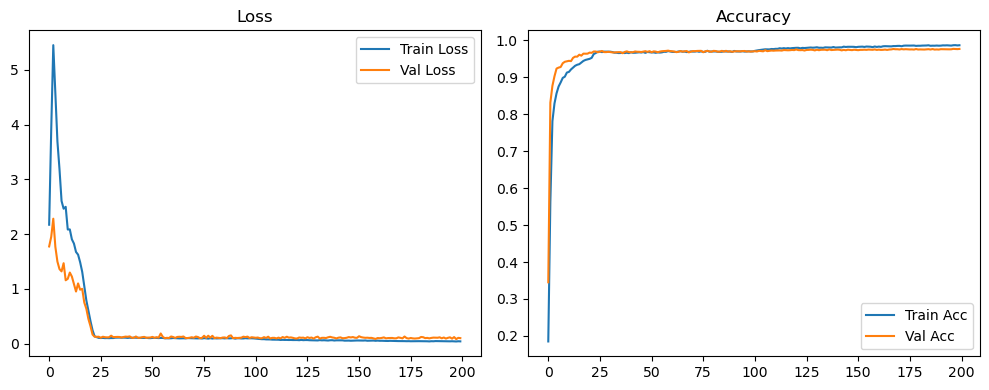

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 51.34it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 51.71it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 50.73it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 51.30it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 51.28it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 51.09it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 51.40it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 51.65it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 51.81it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 51.94it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 52.00it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 50.62it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 50.44it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 51.59it/s]

Original Model Final Test Loss: 0.0904 Accuracy: 0.9783


🚀 Running: batch128_lr0.002_0.002_0.002_dp0.0


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.002 | Train Acc: 0.2246 | Val Acc: 0.3288 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.002 | Train Acc: 0.2246 | Val Acc: 0.3288 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.002 | Train Acc: 0.2246 | Val Acc: 0.3288 |:   0%|          | 1/200 [00:11<36:49, 11.10s/it]

| LR: 0.002 | Train Acc: 0.6080 | Val Acc: 0.7902 |:   0%|          | 1/200 [00:21<36:49, 11.10s/it]

| LR: 0.002 | Train Acc: 0.6080 | Val Acc: 0.7902 |:   0%|          | 1/200 [00:21<36:49, 11.10s/it]

| LR: 0.002 | Train Acc: 0.6080 | Val Acc: 0.7902 |:   1%|          | 2/200 [00:21<35:30, 10.76s/it]

| LR: 0.002 | Train Acc: 0.8269 | Val Acc: 0.8712 |:   1%|          | 2/200 [00:32<35:30, 10.76s/it]

| LR: 0.002 | Train Acc: 0.8269 | Val Acc: 0.8712 |:   1%|          | 2/200 [00:32<35:30, 10.76s/it]

| LR: 0.002 | Train Acc: 0.8269 | Val Acc: 0.8712 |:   2%|▏         | 3/200 [00:32<35:10, 10.71s/it]

| LR: 0.002 | Train Acc: 0.8712 | Val Acc: 0.8916 |:   2%|▏         | 3/200 [00:42<35:10, 10.71s/it]

| LR: 0.002 | Train Acc: 0.8712 | Val Acc: 0.8916 |:   2%|▏         | 3/200 [00:42<35:10, 10.71s/it]

| LR: 0.002 | Train Acc: 0.8712 | Val Acc: 0.8916 |:   2%|▏         | 4/200 [00:42<34:46, 10.65s/it]

| LR: 0.002 | Train Acc: 0.8964 | Val Acc: 0.9133 |:   2%|▏         | 4/200 [00:53<34:46, 10.65s/it]

| LR: 0.002 | Train Acc: 0.8964 | Val Acc: 0.9133 |:   2%|▏         | 4/200 [00:53<34:46, 10.65s/it]

| LR: 0.002 | Train Acc: 0.8964 | Val Acc: 0.9133 |:   2%|▎         | 5/200 [00:53<34:29, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9090 | Val Acc: 0.9160 |:   2%|▎         | 5/200 [01:03<34:29, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9090 | Val Acc: 0.9160 |:   2%|▎         | 5/200 [01:03<34:29, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9090 | Val Acc: 0.9160 |:   3%|▎         | 6/200 [01:03<34:13, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9205 | Val Acc: 0.9150 |:   3%|▎         | 6/200 [01:14<34:13, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9205 | Val Acc: 0.9150 |:   3%|▎         | 6/200 [01:14<34:13, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9205 | Val Acc: 0.9150 |:   4%|▎         | 7/200 [01:14<34:05, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9288 | Val Acc: 0.9305 |:   4%|▎         | 7/200 [01:25<34:05, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9288 | Val Acc: 0.9305 |:   4%|▎         | 7/200 [01:25<34:05, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9288 | Val Acc: 0.9305 |:   4%|▍         | 8/200 [01:25<33:59, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9345 | Val Acc: 0.9315 |:   4%|▍         | 8/200 [01:35<33:59, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9345 | Val Acc: 0.9315 |:   4%|▍         | 8/200 [01:35<33:59, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9345 | Val Acc: 0.9315 |:   4%|▍         | 9/200 [01:35<33:49, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9422 | Val Acc: 0.9384 |:   4%|▍         | 9/200 [01:46<33:49, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9422 | Val Acc: 0.9384 |:   4%|▍         | 9/200 [01:46<33:49, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9422 | Val Acc: 0.9384 |:   5%|▌         | 10/200 [01:46<33:22, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9445 | Val Acc: 0.9410 |:   5%|▌         | 10/200 [01:57<33:22, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9445 | Val Acc: 0.9410 |:   5%|▌         | 10/200 [01:57<33:22, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9445 | Val Acc: 0.9410 |:   6%|▌         | 11/200 [01:57<33:59, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9476 | Val Acc: 0.9460 |:   6%|▌         | 11/200 [02:08<33:59, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9476 | Val Acc: 0.9460 |:   6%|▌         | 11/200 [02:08<33:59, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9476 | Val Acc: 0.9460 |:   6%|▌         | 12/200 [02:08<33:35, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9515 | Val Acc: 0.9409 |:   6%|▌         | 12/200 [02:18<33:35, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9515 | Val Acc: 0.9409 |:   6%|▌         | 12/200 [02:18<33:35, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9515 | Val Acc: 0.9409 |:   6%|▋         | 13/200 [02:18<33:20, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9551 | Val Acc: 0.9442 |:   6%|▋         | 13/200 [02:29<33:20, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9551 | Val Acc: 0.9442 |:   6%|▋         | 13/200 [02:29<33:20, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9551 | Val Acc: 0.9442 |:   7%|▋         | 14/200 [02:29<33:10, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9565 | Val Acc: 0.9500 |:   7%|▋         | 14/200 [02:40<33:10, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9565 | Val Acc: 0.9500 |:   7%|▋         | 14/200 [02:40<33:10, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9565 | Val Acc: 0.9500 |:   8%|▊         | 15/200 [02:40<32:54, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9604 | Val Acc: 0.9564 |:   8%|▊         | 15/200 [02:50<32:54, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9604 | Val Acc: 0.9564 |:   8%|▊         | 15/200 [02:50<32:54, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9604 | Val Acc: 0.9564 |:   8%|▊         | 16/200 [02:50<32:42, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9659 | Val Acc: 0.9485 |:   8%|▊         | 16/200 [03:01<32:42, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9659 | Val Acc: 0.9485 |:   8%|▊         | 16/200 [03:01<32:42, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9659 | Val Acc: 0.9485 |:   8%|▊         | 17/200 [03:01<32:36, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9655 | Val Acc: 0.9540 |:   8%|▊         | 17/200 [03:12<32:36, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9655 | Val Acc: 0.9540 |:   8%|▊         | 17/200 [03:12<32:36, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9655 | Val Acc: 0.9540 |:   9%|▉         | 18/200 [03:12<32:21, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9559 |:   9%|▉         | 18/200 [03:22<32:21, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9559 |:   9%|▉         | 18/200 [03:22<32:21, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9688 | Val Acc: 0.9559 |:  10%|▉         | 19/200 [03:22<32:19, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9689 | Val Acc: 0.9585 |:  10%|▉         | 19/200 [03:33<32:19, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9689 | Val Acc: 0.9585 |:  10%|▉         | 19/200 [03:33<32:19, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9689 | Val Acc: 0.9585 |:  10%|█         | 20/200 [03:33<32:17, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9706 | Val Acc: 0.9533 |:  10%|█         | 20/200 [03:44<32:17, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9706 | Val Acc: 0.9533 |:  10%|█         | 20/200 [03:44<32:17, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9706 | Val Acc: 0.9533 |:  10%|█         | 21/200 [03:44<32:05, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9725 | Val Acc: 0.9574 |:  10%|█         | 21/200 [03:55<32:05, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9725 | Val Acc: 0.9574 |:  10%|█         | 21/200 [03:55<32:05, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9725 | Val Acc: 0.9574 |:  11%|█         | 22/200 [03:55<31:53, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9746 | Val Acc: 0.9588 |:  11%|█         | 22/200 [04:05<31:53, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9746 | Val Acc: 0.9588 |:  11%|█         | 22/200 [04:05<31:53, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9746 | Val Acc: 0.9588 |:  12%|█▏        | 23/200 [04:06<31:43, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9759 | Val Acc: 0.9607 |:  12%|█▏        | 23/200 [04:17<31:43, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9759 | Val Acc: 0.9607 |:  12%|█▏        | 23/200 [04:17<31:43, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9759 | Val Acc: 0.9607 |:  12%|█▏        | 24/200 [04:17<31:50, 10.85s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9563 |:  12%|█▏        | 24/200 [04:27<31:50, 10.85s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9563 |:  12%|█▏        | 24/200 [04:27<31:50, 10.85s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9563 |:  12%|█▎        | 25/200 [04:27<31:29, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9786 | Val Acc: 0.9597 |:  12%|█▎        | 25/200 [04:38<31:29, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9786 | Val Acc: 0.9597 |:  12%|█▎        | 25/200 [04:38<31:29, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9786 | Val Acc: 0.9597 |:  13%|█▎        | 26/200 [04:38<31:04, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9792 | Val Acc: 0.9565 |:  13%|█▎        | 26/200 [04:48<31:04, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9792 | Val Acc: 0.9565 |:  13%|█▎        | 26/200 [04:48<31:04, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9792 | Val Acc: 0.9565 |:  14%|█▎        | 27/200 [04:48<30:33, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9812 | Val Acc: 0.9577 |:  14%|█▎        | 27/200 [04:58<30:33, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9812 | Val Acc: 0.9577 |:  14%|█▎        | 27/200 [04:58<30:33, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9812 | Val Acc: 0.9577 |:  14%|█▍        | 28/200 [04:58<29:53, 10.43s/it]

| LR: 0.002 | Train Acc: 0.9835 | Val Acc: 0.9630 |:  14%|█▍        | 28/200 [05:08<29:53, 10.43s/it]

| LR: 0.002 | Train Acc: 0.9835 | Val Acc: 0.9630 |:  14%|█▍        | 28/200 [05:08<29:53, 10.43s/it]

| LR: 0.002 | Train Acc: 0.9835 | Val Acc: 0.9630 |:  14%|█▍        | 29/200 [05:08<29:21, 10.30s/it]

| LR: 0.002 | Train Acc: 0.9817 | Val Acc: 0.9617 |:  14%|█▍        | 29/200 [05:18<29:21, 10.30s/it]

| LR: 0.002 | Train Acc: 0.9817 | Val Acc: 0.9617 |:  14%|█▍        | 29/200 [05:18<29:21, 10.30s/it]

| LR: 0.002 | Train Acc: 0.9817 | Val Acc: 0.9617 |:  15%|█▌        | 30/200 [05:18<28:57, 10.22s/it]

| LR: 0.002 | Train Acc: 0.9813 | Val Acc: 0.9591 |:  15%|█▌        | 30/200 [05:29<28:57, 10.22s/it]

| LR: 0.002 | Train Acc: 0.9813 | Val Acc: 0.9591 |:  15%|█▌        | 30/200 [05:29<28:57, 10.22s/it]

| LR: 0.002 | Train Acc: 0.9813 | Val Acc: 0.9591 |:  16%|█▌        | 31/200 [05:29<28:55, 10.27s/it]

| LR: 0.002 | Train Acc: 0.9833 | Val Acc: 0.9582 |:  16%|█▌        | 31/200 [05:39<28:55, 10.27s/it]

| LR: 0.002 | Train Acc: 0.9833 | Val Acc: 0.9582 |:  16%|█▌        | 31/200 [05:39<28:55, 10.27s/it]

| LR: 0.002 | Train Acc: 0.9833 | Val Acc: 0.9582 |:  16%|█▌        | 32/200 [05:39<28:55, 10.33s/it]

| LR: 0.002 | Train Acc: 0.9840 | Val Acc: 0.9660 |:  16%|█▌        | 32/200 [05:50<28:55, 10.33s/it]

| LR: 0.002 | Train Acc: 0.9840 | Val Acc: 0.9660 |:  16%|█▌        | 32/200 [05:50<28:55, 10.33s/it]

| LR: 0.002 | Train Acc: 0.9840 | Val Acc: 0.9660 |:  16%|█▋        | 33/200 [05:50<28:56, 10.40s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9637 |:  16%|█▋        | 33/200 [06:00<28:56, 10.40s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9637 |:  16%|█▋        | 33/200 [06:00<28:56, 10.40s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9637 |:  17%|█▋        | 34/200 [06:00<28:58, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9587 |:  17%|█▋        | 34/200 [06:11<28:58, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9587 |:  17%|█▋        | 34/200 [06:11<28:58, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9587 |:  18%|█▊        | 35/200 [06:11<29:03, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9602 |:  18%|█▊        | 35/200 [06:22<29:03, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9602 |:  18%|█▊        | 35/200 [06:22<29:03, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9602 |:  18%|█▊        | 36/200 [06:22<28:58, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9624 |:  18%|█▊        | 36/200 [06:33<28:58, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9624 |:  18%|█▊        | 36/200 [06:33<28:58, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9624 |:  18%|█▊        | 37/200 [06:33<29:08, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9882 | Val Acc: 0.9633 |:  18%|█▊        | 37/200 [06:43<29:08, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9882 | Val Acc: 0.9633 |:  18%|█▊        | 37/200 [06:43<29:08, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9882 | Val Acc: 0.9633 |:  19%|█▉        | 38/200 [06:43<28:54, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9874 | Val Acc: 0.9662 |:  19%|█▉        | 38/200 [06:54<28:54, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9874 | Val Acc: 0.9662 |:  19%|█▉        | 38/200 [06:54<28:54, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9874 | Val Acc: 0.9662 |:  20%|█▉        | 39/200 [06:54<28:35, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9637 |:  20%|█▉        | 39/200 [07:04<28:35, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9637 |:  20%|█▉        | 39/200 [07:04<28:35, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9637 |:  20%|██        | 40/200 [07:05<28:21, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9887 | Val Acc: 0.9667 |:  20%|██        | 40/200 [07:15<28:21, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9887 | Val Acc: 0.9667 |:  20%|██        | 40/200 [07:15<28:21, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9887 | Val Acc: 0.9667 |:  20%|██        | 41/200 [07:15<28:01, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9896 | Val Acc: 0.9663 |:  20%|██        | 41/200 [07:25<28:01, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9896 | Val Acc: 0.9663 |:  20%|██        | 41/200 [07:25<28:01, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9896 | Val Acc: 0.9663 |:  21%|██        | 42/200 [07:25<27:42, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9882 | Val Acc: 0.9642 |:  21%|██        | 42/200 [07:36<27:42, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9882 | Val Acc: 0.9642 |:  21%|██        | 42/200 [07:36<27:42, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9882 | Val Acc: 0.9642 |:  22%|██▏       | 43/200 [07:36<27:38, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9672 |:  22%|██▏       | 43/200 [07:46<27:38, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9672 |:  22%|██▏       | 43/200 [07:46<27:38, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9672 |:  22%|██▏       | 44/200 [07:46<27:20, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9903 | Val Acc: 0.9665 |:  22%|██▏       | 44/200 [07:57<27:20, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9903 | Val Acc: 0.9665 |:  22%|██▏       | 44/200 [07:57<27:20, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9903 | Val Acc: 0.9665 |:  22%|██▎       | 45/200 [07:57<27:12, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9650 |:  22%|██▎       | 45/200 [08:07<27:12, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9650 |:  22%|██▎       | 45/200 [08:07<27:12, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9650 |:  23%|██▎       | 46/200 [08:07<26:54, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9647 |:  23%|██▎       | 46/200 [08:18<26:54, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9647 |:  23%|██▎       | 46/200 [08:18<26:54, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9647 |:  24%|██▎       | 47/200 [08:18<26:45, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9921 | Val Acc: 0.9653 |:  24%|██▎       | 47/200 [08:28<26:45, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9921 | Val Acc: 0.9653 |:  24%|██▎       | 47/200 [08:28<26:45, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9921 | Val Acc: 0.9653 |:  24%|██▍       | 48/200 [08:28<26:32, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9680 |:  24%|██▍       | 48/200 [08:39<26:32, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9680 |:  24%|██▍       | 48/200 [08:39<26:32, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9680 |:  24%|██▍       | 49/200 [08:39<26:29, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9647 |:  24%|██▍       | 49/200 [08:49<26:29, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9647 |:  24%|██▍       | 49/200 [08:49<26:29, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9647 |:  25%|██▌       | 50/200 [08:49<26:20, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9706 |:  25%|██▌       | 50/200 [09:00<26:20, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9706 |:  25%|██▌       | 50/200 [09:00<26:20, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9706 |:  26%|██▌       | 51/200 [09:00<26:10, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9692 |:  26%|██▌       | 51/200 [09:10<26:10, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9692 |:  26%|██▌       | 51/200 [09:10<26:10, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9692 |:  26%|██▌       | 52/200 [09:10<25:53, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9663 |:  26%|██▌       | 52/200 [09:22<25:53, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9663 |:  26%|██▌       | 52/200 [09:22<25:53, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9663 |:  26%|██▋       | 53/200 [09:22<26:26, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9677 |:  26%|██▋       | 53/200 [09:32<26:26, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9677 |:  26%|██▋       | 53/200 [09:32<26:26, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9677 |:  27%|██▋       | 54/200 [09:32<25:59, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9684 |:  27%|██▋       | 54/200 [09:43<25:59, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9684 |:  27%|██▋       | 54/200 [09:43<25:59, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9938 | Val Acc: 0.9684 |:  28%|██▊       | 55/200 [09:43<25:37, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9927 | Val Acc: 0.9683 |:  28%|██▊       | 55/200 [09:53<25:37, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9927 | Val Acc: 0.9683 |:  28%|██▊       | 55/200 [09:53<25:37, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9927 | Val Acc: 0.9683 |:  28%|██▊       | 56/200 [09:53<25:19, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9724 |:  28%|██▊       | 56/200 [10:04<25:19, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9724 |:  28%|██▊       | 56/200 [10:04<25:19, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9724 |:  28%|██▊       | 57/200 [10:04<25:04, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9711 |:  28%|██▊       | 57/200 [10:14<25:04, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9711 |:  28%|██▊       | 57/200 [10:14<25:04, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9711 |:  29%|██▉       | 58/200 [10:14<24:49, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9689 |:  29%|██▉       | 58/200 [10:25<24:49, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9689 |:  29%|██▉       | 58/200 [10:25<24:49, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9689 |:  30%|██▉       | 59/200 [10:25<24:44, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9695 |:  30%|██▉       | 59/200 [10:35<24:44, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9695 |:  30%|██▉       | 59/200 [10:35<24:44, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9695 |:  30%|███       | 60/200 [10:35<24:37, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9716 |:  30%|███       | 60/200 [10:46<24:37, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9716 |:  30%|███       | 60/200 [10:46<24:37, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9716 |:  30%|███       | 61/200 [10:46<24:36, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9686 |:  30%|███       | 61/200 [10:57<24:36, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9686 |:  30%|███       | 61/200 [10:57<24:36, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9686 |:  31%|███       | 62/200 [10:57<24:27, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9700 |:  31%|███       | 62/200 [11:08<24:27, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9700 |:  31%|███       | 62/200 [11:08<24:27, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9700 |:  32%|███▏      | 63/200 [11:08<24:44, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9679 |:  32%|███▏      | 63/200 [11:18<24:44, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9679 |:  32%|███▏      | 63/200 [11:18<24:44, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9679 |:  32%|███▏      | 64/200 [11:18<24:13, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9702 |:  32%|███▏      | 64/200 [11:29<24:13, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9702 |:  32%|███▏      | 64/200 [11:29<24:13, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9702 |:  32%|███▎      | 65/200 [11:29<23:49, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9702 |:  32%|███▎      | 65/200 [11:40<23:49, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9702 |:  32%|███▎      | 65/200 [11:40<23:49, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9702 |:  33%|███▎      | 66/200 [11:40<23:54, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9713 |:  33%|███▎      | 66/200 [11:51<23:54, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9713 |:  33%|███▎      | 66/200 [11:51<23:54, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9713 |:  34%|███▎      | 67/200 [11:51<24:08, 10.89s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9702 |:  34%|███▎      | 67/200 [12:01<24:08, 10.89s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9702 |:  34%|███▎      | 67/200 [12:01<24:08, 10.89s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9702 |:  34%|███▍      | 68/200 [12:02<23:41, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9718 |:  34%|███▍      | 68/200 [12:12<23:41, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9718 |:  34%|███▍      | 68/200 [12:12<23:41, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9718 |:  34%|███▍      | 69/200 [12:12<23:14, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9691 |:  34%|███▍      | 69/200 [12:22<23:14, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9691 |:  34%|███▍      | 69/200 [12:22<23:14, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9691 |:  35%|███▌      | 70/200 [12:22<22:54, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9716 |:  35%|███▌      | 70/200 [12:33<22:54, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9716 |:  35%|███▌      | 70/200 [12:33<22:54, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9716 |:  36%|███▌      | 71/200 [12:33<22:45, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9708 |:  36%|███▌      | 71/200 [12:44<22:45, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9708 |:  36%|███▌      | 71/200 [12:44<22:45, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9708 |:  36%|███▌      | 72/200 [12:44<22:36, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9712 |:  36%|███▌      | 72/200 [12:54<22:36, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9712 |:  36%|███▌      | 72/200 [12:54<22:36, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9712 |:  36%|███▋      | 73/200 [12:54<22:17, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9720 |:  36%|███▋      | 73/200 [13:04<22:17, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9720 |:  36%|███▋      | 73/200 [13:04<22:17, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9720 |:  37%|███▋      | 74/200 [13:04<22:03, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9683 |:  37%|███▋      | 74/200 [13:15<22:03, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9683 |:  37%|███▋      | 74/200 [13:15<22:03, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9683 |:  38%|███▊      | 75/200 [13:15<21:50, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9718 |:  38%|███▊      | 75/200 [13:25<21:50, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9718 |:  38%|███▊      | 75/200 [13:25<21:50, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9718 |:  38%|███▊      | 76/200 [13:25<21:44, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9738 |:  38%|███▊      | 76/200 [13:36<21:44, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9738 |:  38%|███▊      | 76/200 [13:36<21:44, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9738 |:  38%|███▊      | 77/200 [13:36<21:39, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9561 |:  38%|███▊      | 77/200 [13:47<21:39, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9561 |:  38%|███▊      | 77/200 [13:47<21:39, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9561 |:  39%|███▉      | 78/200 [13:47<21:31, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9722 |:  39%|███▉      | 78/200 [13:57<21:31, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9722 |:  39%|███▉      | 78/200 [13:57<21:31, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9722 |:  40%|███▉      | 79/200 [13:57<21:18, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9728 |:  40%|███▉      | 79/200 [14:08<21:18, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9728 |:  40%|███▉      | 79/200 [14:08<21:18, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9728 |:  40%|████      | 80/200 [14:08<21:02, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9723 |:  40%|████      | 80/200 [14:18<21:02, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9723 |:  40%|████      | 80/200 [14:18<21:02, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9723 |:  40%|████      | 81/200 [14:18<20:57, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9718 |:  40%|████      | 81/200 [14:29<20:57, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9718 |:  40%|████      | 81/200 [14:29<20:57, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9718 |:  41%|████      | 82/200 [14:29<20:45, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9683 |:  41%|████      | 82/200 [14:40<20:45, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9683 |:  41%|████      | 82/200 [14:40<20:45, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9683 |:  42%|████▏     | 83/200 [14:40<20:46, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9722 |:  42%|████▏     | 83/200 [14:52<20:46, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9722 |:  42%|████▏     | 83/200 [14:52<20:46, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9722 |:  42%|████▏     | 84/200 [14:52<21:27, 11.10s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9693 |:  42%|████▏     | 84/200 [15:04<21:27, 11.10s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9693 |:  42%|████▏     | 84/200 [15:04<21:27, 11.10s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9693 |:  42%|████▎     | 85/200 [15:04<21:39, 11.30s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9712 |:  42%|████▎     | 85/200 [15:15<21:39, 11.30s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9712 |:  42%|████▎     | 85/200 [15:15<21:39, 11.30s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9712 |:  43%|████▎     | 86/200 [15:15<21:31, 11.33s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9708 |:  43%|████▎     | 86/200 [15:25<21:31, 11.33s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9708 |:  43%|████▎     | 86/200 [15:25<21:31, 11.33s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9708 |:  44%|████▎     | 87/200 [15:26<20:51, 11.07s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9719 |:  44%|████▎     | 87/200 [15:36<20:51, 11.07s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9719 |:  44%|████▎     | 87/200 [15:36<20:51, 11.07s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9719 |:  44%|████▍     | 88/200 [15:36<20:25, 10.94s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9697 |:  44%|████▍     | 88/200 [15:47<20:25, 10.94s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9697 |:  44%|████▍     | 88/200 [15:47<20:25, 10.94s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9697 |:  44%|████▍     | 89/200 [15:47<20:17, 10.96s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9730 |:  44%|████▍     | 89/200 [15:58<20:17, 10.96s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9730 |:  44%|████▍     | 89/200 [15:58<20:17, 10.96s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9730 |:  45%|████▌     | 90/200 [15:58<19:49, 10.82s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9728 |:  45%|████▌     | 90/200 [16:08<19:49, 10.82s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9728 |:  45%|████▌     | 90/200 [16:08<19:49, 10.82s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9728 |:  46%|████▌     | 91/200 [16:08<19:34, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9723 |:  46%|████▌     | 91/200 [16:19<19:34, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9723 |:  46%|████▌     | 91/200 [16:19<19:34, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9723 |:  46%|████▌     | 92/200 [16:19<19:14, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9720 |:  46%|████▌     | 92/200 [16:29<19:14, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9720 |:  46%|████▌     | 92/200 [16:29<19:14, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9720 |:  46%|████▋     | 93/200 [16:29<18:56, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9742 |:  46%|████▋     | 93/200 [16:39<18:56, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9742 |:  46%|████▋     | 93/200 [16:40<18:56, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9742 |:  47%|████▋     | 94/200 [16:40<18:34, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9702 |:  47%|████▋     | 94/200 [16:50<18:34, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9702 |:  47%|████▋     | 94/200 [16:50<18:34, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9702 |:  48%|████▊     | 95/200 [16:50<18:21, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9710 |:  48%|████▊     | 95/200 [17:00<18:21, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9710 |:  48%|████▊     | 95/200 [17:00<18:21, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9710 |:  48%|████▊     | 96/200 [17:00<18:11, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9711 |:  48%|████▊     | 96/200 [17:11<18:11, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9711 |:  48%|████▊     | 96/200 [17:11<18:11, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9711 |:  48%|████▊     | 97/200 [17:11<17:56, 10.45s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9712 |:  48%|████▊     | 97/200 [17:21<17:56, 10.45s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9712 |:  48%|████▊     | 97/200 [17:21<17:56, 10.45s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9712 |:  49%|████▉     | 98/200 [17:21<17:48, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9704 |:  49%|████▉     | 98/200 [17:32<17:48, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9704 |:  49%|████▉     | 98/200 [17:32<17:48, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9704 |:  50%|████▉     | 99/200 [17:32<17:56, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9717 |:  50%|████▉     | 99/200 [17:43<17:56, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9717 |:  50%|████▉     | 99/200 [17:43<17:56, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9717 |:  50%|█████     | 100/200 [17:43<17:42, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9711 |:  50%|█████     | 100/200 [17:54<17:42, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9711 |:  50%|█████     | 100/200 [17:54<17:42, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9711 |:  50%|█████     | 101/200 [17:54<17:32, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9708 |:  50%|█████     | 101/200 [18:04<17:32, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9708 |:  50%|█████     | 101/200 [18:04<17:32, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9708 |:  51%|█████     | 102/200 [18:04<17:22, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9710 |:  51%|█████     | 102/200 [18:15<17:22, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9710 |:  51%|█████     | 102/200 [18:15<17:22, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9710 |:  52%|█████▏    | 103/200 [18:15<17:07, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9728 |:  52%|█████▏    | 103/200 [18:25<17:07, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9728 |:  52%|█████▏    | 103/200 [18:25<17:07, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9728 |:  52%|█████▏    | 104/200 [18:25<16:52, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9729 |:  52%|█████▏    | 104/200 [18:36<16:52, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9729 |:  52%|█████▏    | 104/200 [18:36<16:52, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9729 |:  52%|█████▎    | 105/200 [18:36<16:38, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9710 |:  52%|█████▎    | 105/200 [18:46<16:38, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9710 |:  52%|█████▎    | 105/200 [18:46<16:38, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9710 |:  53%|█████▎    | 106/200 [18:46<16:24, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9722 |:  53%|█████▎    | 106/200 [18:56<16:24, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9722 |:  53%|█████▎    | 106/200 [18:56<16:24, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9722 |:  54%|█████▎    | 107/200 [18:57<16:14, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9738 |:  54%|█████▎    | 107/200 [19:07<16:14, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9738 |:  54%|█████▎    | 107/200 [19:07<16:14, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9738 |:  54%|█████▍    | 108/200 [19:07<16:11, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9728 |:  54%|█████▍    | 108/200 [19:18<16:11, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9728 |:  54%|█████▍    | 108/200 [19:18<16:11, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9728 |:  55%|█████▍    | 109/200 [19:18<15:58, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9713 |:  55%|█████▍    | 109/200 [19:28<15:58, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9713 |:  55%|█████▍    | 109/200 [19:28<15:58, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9713 |:  55%|█████▌    | 110/200 [19:28<15:45, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9727 |:  55%|█████▌    | 110/200 [19:39<15:45, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9727 |:  55%|█████▌    | 110/200 [19:39<15:45, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9727 |:  56%|█████▌    | 111/200 [19:39<15:36, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9688 |:  56%|█████▌    | 111/200 [19:49<15:36, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9688 |:  56%|█████▌    | 111/200 [19:49<15:36, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9688 |:  56%|█████▌    | 112/200 [19:49<15:23, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9722 |:  56%|█████▌    | 112/200 [20:00<15:23, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9722 |:  56%|█████▌    | 112/200 [20:00<15:23, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9722 |:  56%|█████▋    | 113/200 [20:00<15:14, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9740 |:  56%|█████▋    | 113/200 [20:10<15:14, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9740 |:  56%|█████▋    | 113/200 [20:10<15:14, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9740 |:  57%|█████▋    | 114/200 [20:10<15:08, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9721 |:  57%|█████▋    | 114/200 [20:21<15:08, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9721 |:  57%|█████▋    | 114/200 [20:21<15:08, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9721 |:  57%|█████▊    | 115/200 [20:21<15:01, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9735 |:  57%|█████▊    | 115/200 [20:31<15:01, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9735 |:  57%|█████▊    | 115/200 [20:31<15:01, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9735 |:  58%|█████▊    | 116/200 [20:31<14:45, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9723 |:  58%|█████▊    | 116/200 [20:42<14:45, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9723 |:  58%|█████▊    | 116/200 [20:42<14:45, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9723 |:  58%|█████▊    | 117/200 [20:42<14:38, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9722 |:  58%|█████▊    | 117/200 [20:53<14:38, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9722 |:  58%|█████▊    | 117/200 [20:53<14:38, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9722 |:  59%|█████▉    | 118/200 [20:53<14:32, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9738 |:  59%|█████▉    | 118/200 [21:03<14:32, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9738 |:  59%|█████▉    | 118/200 [21:03<14:32, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9738 |:  60%|█████▉    | 119/200 [21:03<14:16, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9744 |:  60%|█████▉    | 119/200 [21:14<14:16, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9744 |:  60%|█████▉    | 119/200 [21:14<14:16, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9744 |:  60%|██████    | 120/200 [21:14<14:05, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9725 |:  60%|██████    | 120/200 [21:24<14:05, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9725 |:  60%|██████    | 120/200 [21:24<14:05, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9725 |:  60%|██████    | 121/200 [21:24<13:53, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9750 |:  60%|██████    | 121/200 [21:35<13:53, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9750 |:  60%|██████    | 121/200 [21:35<13:53, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9750 |:  61%|██████    | 122/200 [21:35<13:40, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9744 |:  61%|██████    | 122/200 [21:45<13:40, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9744 |:  61%|██████    | 122/200 [21:45<13:40, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9744 |:  62%|██████▏   | 123/200 [21:45<13:31, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9742 |:  62%|██████▏   | 123/200 [21:56<13:31, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9742 |:  62%|██████▏   | 123/200 [21:56<13:31, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9742 |:  62%|██████▏   | 124/200 [21:56<13:17, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9718 |:  62%|██████▏   | 124/200 [22:06<13:17, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9718 |:  62%|██████▏   | 124/200 [22:06<13:17, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9718 |:  62%|██████▎   | 125/200 [22:06<13:05, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9725 |:  62%|██████▎   | 125/200 [22:17<13:05, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9725 |:  62%|██████▎   | 125/200 [22:17<13:05, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9725 |:  63%|██████▎   | 126/200 [22:17<12:55, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9730 |:  63%|██████▎   | 126/200 [22:27<12:55, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9730 |:  63%|██████▎   | 126/200 [22:27<12:55, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9730 |:  64%|██████▎   | 127/200 [22:27<12:44, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9753 |:  64%|██████▎   | 127/200 [22:38<12:44, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9753 |:  64%|██████▎   | 127/200 [22:38<12:44, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9753 |:  64%|██████▍   | 128/200 [22:38<12:33, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9727 |:  64%|██████▍   | 128/200 [22:48<12:33, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9727 |:  64%|██████▍   | 128/200 [22:48<12:33, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9727 |:  64%|██████▍   | 129/200 [22:48<12:25, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9718 |:  64%|██████▍   | 129/200 [22:58<12:25, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9718 |:  64%|██████▍   | 129/200 [22:58<12:25, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9718 |:  65%|██████▌   | 130/200 [22:58<12:06, 10.37s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9735 |:  65%|██████▌   | 130/200 [23:09<12:06, 10.37s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9735 |:  65%|██████▌   | 130/200 [23:09<12:06, 10.37s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9735 |:  66%|██████▌   | 131/200 [23:09<11:54, 10.35s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9721 |:  66%|██████▌   | 131/200 [23:19<11:54, 10.35s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9721 |:  66%|██████▌   | 131/200 [23:19<11:54, 10.35s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9721 |:  66%|██████▌   | 132/200 [23:19<11:43, 10.35s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9753 |:  66%|██████▌   | 132/200 [23:30<11:43, 10.35s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9753 |:  66%|██████▌   | 132/200 [23:30<11:43, 10.35s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9753 |:  66%|██████▋   | 133/200 [23:30<11:39, 10.44s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9738 |:  66%|██████▋   | 133/200 [23:40<11:39, 10.44s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9738 |:  66%|██████▋   | 133/200 [23:40<11:39, 10.44s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9738 |:  67%|██████▋   | 134/200 [23:40<11:31, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9710 |:  67%|██████▋   | 134/200 [23:51<11:31, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9710 |:  67%|██████▋   | 134/200 [23:51<11:31, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9710 |:  68%|██████▊   | 135/200 [23:51<11:20, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9742 |:  68%|██████▊   | 135/200 [24:01<11:20, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9742 |:  68%|██████▊   | 135/200 [24:01<11:20, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9742 |:  68%|██████▊   | 136/200 [24:01<11:08, 10.45s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9719 |:  68%|██████▊   | 136/200 [24:11<11:08, 10.45s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9719 |:  68%|██████▊   | 136/200 [24:11<11:08, 10.45s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9719 |:  68%|██████▊   | 137/200 [24:11<10:57, 10.44s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9698 |:  68%|██████▊   | 137/200 [24:22<10:57, 10.44s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9698 |:  68%|██████▊   | 137/200 [24:22<10:57, 10.44s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9698 |:  69%|██████▉   | 138/200 [24:22<10:50, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9728 |:  69%|██████▉   | 138/200 [24:33<10:50, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9728 |:  69%|██████▉   | 138/200 [24:33<10:50, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9728 |:  70%|██████▉   | 139/200 [24:33<10:43, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9703 |:  70%|██████▉   | 139/200 [24:43<10:43, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9703 |:  70%|██████▉   | 139/200 [24:43<10:43, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9703 |:  70%|███████   | 140/200 [24:43<10:31, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9707 |:  70%|███████   | 140/200 [24:54<10:31, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9707 |:  70%|███████   | 140/200 [24:54<10:31, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9707 |:  70%|███████   | 141/200 [24:54<10:22, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9732 |:  70%|███████   | 141/200 [25:04<10:22, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9732 |:  70%|███████   | 141/200 [25:04<10:22, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9732 |:  71%|███████   | 142/200 [25:04<10:08, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9734 |:  71%|███████   | 142/200 [25:15<10:08, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9734 |:  71%|███████   | 142/200 [25:15<10:08, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9734 |:  72%|███████▏  | 143/200 [25:15<10:02, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9732 |:  72%|███████▏  | 143/200 [25:25<10:02, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9732 |:  72%|███████▏  | 143/200 [25:25<10:02, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9732 |:  72%|███████▏  | 144/200 [25:25<09:49, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9738 |:  72%|███████▏  | 144/200 [25:36<09:49, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9738 |:  72%|███████▏  | 144/200 [25:36<09:49, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9738 |:  72%|███████▎  | 145/200 [25:36<09:37, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9755 |:  72%|███████▎  | 145/200 [25:46<09:37, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9755 |:  72%|███████▎  | 145/200 [25:46<09:37, 10.51s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9755 |:  73%|███████▎  | 146/200 [25:46<09:28, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9740 |:  73%|███████▎  | 146/200 [25:57<09:28, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9740 |:  73%|███████▎  | 146/200 [25:57<09:28, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9740 |:  74%|███████▎  | 147/200 [25:57<09:17, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9735 |:  74%|███████▎  | 147/200 [26:08<09:17, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9735 |:  74%|███████▎  | 147/200 [26:08<09:17, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9735 |:  74%|███████▍  | 148/200 [26:08<09:14, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9753 |:  74%|███████▍  | 148/200 [26:19<09:14, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9753 |:  74%|███████▍  | 148/200 [26:19<09:14, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9753 |:  74%|███████▍  | 149/200 [26:19<09:11, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9743 |:  74%|███████▍  | 149/200 [26:30<09:11, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9743 |:  74%|███████▍  | 149/200 [26:30<09:11, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9743 |:  75%|███████▌  | 150/200 [26:30<08:56, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9724 |:  75%|███████▌  | 150/200 [26:40<08:56, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9724 |:  75%|███████▌  | 150/200 [26:40<08:56, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9724 |:  76%|███████▌  | 151/200 [26:40<08:43, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9731 |:  76%|███████▌  | 151/200 [26:51<08:43, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9731 |:  76%|███████▌  | 151/200 [26:51<08:43, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9731 |:  76%|███████▌  | 152/200 [26:51<08:29, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9749 |:  76%|███████▌  | 152/200 [27:01<08:29, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9749 |:  76%|███████▌  | 152/200 [27:01<08:29, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9749 |:  76%|███████▋  | 153/200 [27:01<08:15, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9740 |:  76%|███████▋  | 153/200 [27:12<08:15, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9740 |:  76%|███████▋  | 153/200 [27:12<08:15, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9740 |:  77%|███████▋  | 154/200 [27:12<08:05, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9762 |:  77%|███████▋  | 154/200 [27:22<08:05, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9762 |:  77%|███████▋  | 154/200 [27:22<08:05, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9762 |:  78%|███████▊  | 155/200 [27:22<07:55, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9729 |:  78%|███████▊  | 155/200 [27:33<07:55, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9729 |:  78%|███████▊  | 155/200 [27:33<07:55, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9729 |:  78%|███████▊  | 156/200 [27:33<07:42, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9742 |:  78%|███████▊  | 156/200 [27:43<07:42, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9742 |:  78%|███████▊  | 156/200 [27:43<07:42, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9742 |:  78%|███████▊  | 157/200 [27:43<07:33, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9746 |:  78%|███████▊  | 157/200 [27:54<07:33, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9746 |:  78%|███████▊  | 157/200 [27:54<07:33, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9746 |:  79%|███████▉  | 158/200 [27:54<07:27, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9747 |:  79%|███████▉  | 158/200 [28:05<07:27, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9747 |:  79%|███████▉  | 158/200 [28:05<07:27, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9747 |:  80%|███████▉  | 159/200 [28:05<07:18, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9750 |:  80%|███████▉  | 159/200 [28:15<07:18, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9750 |:  80%|███████▉  | 159/200 [28:15<07:18, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9750 |:  80%|████████  | 160/200 [28:15<07:04, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9737 |:  80%|████████  | 160/200 [28:25<07:04, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9737 |:  80%|████████  | 160/200 [28:25<07:04, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9737 |:  80%|████████  | 161/200 [28:26<06:49, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9741 |:  80%|████████  | 161/200 [28:36<06:49, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9741 |:  80%|████████  | 161/200 [28:36<06:49, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9741 |:  81%|████████  | 162/200 [28:36<06:39, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9747 |:  81%|████████  | 162/200 [28:46<06:39, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9747 |:  81%|████████  | 162/200 [28:46<06:39, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9747 |:  82%|████████▏ | 163/200 [28:47<06:28, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9738 |:  82%|████████▏ | 163/200 [28:57<06:28, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9738 |:  82%|████████▏ | 163/200 [28:57<06:28, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9738 |:  82%|████████▏ | 164/200 [28:57<06:19, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9720 |:  82%|████████▏ | 164/200 [29:08<06:19, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9720 |:  82%|████████▏ | 164/200 [29:08<06:19, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9720 |:  82%|████████▎ | 165/200 [29:08<06:07, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9742 |:  82%|████████▎ | 165/200 [29:18<06:07, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9742 |:  82%|████████▎ | 165/200 [29:18<06:07, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9742 |:  83%|████████▎ | 166/200 [29:18<05:57, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9727 |:  83%|████████▎ | 166/200 [29:29<05:57, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9727 |:  83%|████████▎ | 166/200 [29:29<05:57, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9727 |:  84%|████████▎ | 167/200 [29:29<05:48, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9732 |:  84%|████████▎ | 167/200 [29:39<05:48, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9732 |:  84%|████████▎ | 167/200 [29:39<05:48, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9732 |:  84%|████████▍ | 168/200 [29:39<05:37, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9742 |:  84%|████████▍ | 168/200 [29:50<05:37, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9742 |:  84%|████████▍ | 168/200 [29:50<05:37, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9742 |:  84%|████████▍ | 169/200 [29:50<05:25, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9737 |:  84%|████████▍ | 169/200 [30:00<05:25, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9737 |:  84%|████████▍ | 169/200 [30:00<05:25, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9737 |:  85%|████████▌ | 170/200 [30:00<05:14, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9733 |:  85%|████████▌ | 170/200 [30:10<05:14, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9733 |:  85%|████████▌ | 170/200 [30:10<05:14, 10.49s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9733 |:  86%|████████▌ | 171/200 [30:10<05:02, 10.44s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9745 |:  86%|████████▌ | 171/200 [30:21<05:02, 10.44s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9745 |:  86%|████████▌ | 171/200 [30:21<05:02, 10.44s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9745 |:  86%|████████▌ | 172/200 [30:21<04:52, 10.44s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9740 |:  86%|████████▌ | 172/200 [30:31<04:52, 10.44s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9740 |:  86%|████████▌ | 172/200 [30:31<04:52, 10.44s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9740 |:  86%|████████▋ | 173/200 [30:31<04:42, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9738 |:  86%|████████▋ | 173/200 [30:42<04:42, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9738 |:  86%|████████▋ | 173/200 [30:42<04:42, 10.48s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9738 |:  87%|████████▋ | 174/200 [30:42<04:33, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9746 |:  87%|████████▋ | 174/200 [30:53<04:33, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9746 |:  87%|████████▋ | 174/200 [30:53<04:33, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9746 |:  88%|████████▊ | 175/200 [30:53<04:28, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9726 |:  88%|████████▊ | 175/200 [31:04<04:28, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9726 |:  88%|████████▊ | 175/200 [31:04<04:28, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9726 |:  88%|████████▊ | 176/200 [31:04<04:16, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9732 |:  88%|████████▊ | 176/200 [31:14<04:16, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9732 |:  88%|████████▊ | 176/200 [31:14<04:16, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9732 |:  88%|████████▊ | 177/200 [31:14<04:03, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9699 |:  88%|████████▊ | 177/200 [31:25<04:03, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9699 |:  88%|████████▊ | 177/200 [31:25<04:03, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9699 |:  89%|████████▉ | 178/200 [31:25<03:52, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9740 |:  89%|████████▉ | 178/200 [31:35<03:52, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9740 |:  89%|████████▉ | 178/200 [31:35<03:52, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9740 |:  90%|████████▉ | 179/200 [31:35<03:42, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9739 |:  90%|████████▉ | 179/200 [31:46<03:42, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9739 |:  90%|████████▉ | 179/200 [31:46<03:42, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9739 |:  90%|█████████ | 180/200 [31:46<03:31, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9724 |:  90%|█████████ | 180/200 [31:56<03:31, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9724 |:  90%|█████████ | 180/200 [31:56<03:31, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9724 |:  90%|█████████ | 181/200 [31:56<03:20, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9711 |:  90%|█████████ | 181/200 [32:07<03:20, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9711 |:  90%|█████████ | 181/200 [32:07<03:20, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9711 |:  91%|█████████ | 182/200 [32:07<03:09, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9729 |:  91%|█████████ | 182/200 [32:17<03:09, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9729 |:  91%|█████████ | 182/200 [32:17<03:09, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9729 |:  92%|█████████▏| 183/200 [32:18<02:59, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9741 |:  92%|█████████▏| 183/200 [32:28<02:59, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9741 |:  92%|█████████▏| 183/200 [32:28<02:59, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9741 |:  92%|█████████▏| 184/200 [32:28<02:48, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9738 |:  92%|█████████▏| 184/200 [32:38<02:48, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9738 |:  92%|█████████▏| 184/200 [32:38<02:48, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9738 |:  92%|█████████▎| 185/200 [32:39<02:37, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9733 |:  92%|█████████▎| 185/200 [32:49<02:37, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9733 |:  92%|█████████▎| 185/200 [32:49<02:37, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9733 |:  93%|█████████▎| 186/200 [32:49<02:27, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9735 |:  93%|█████████▎| 186/200 [33:00<02:27, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9735 |:  93%|█████████▎| 186/200 [33:00<02:27, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9735 |:  94%|█████████▎| 187/200 [33:00<02:16, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9735 |:  94%|█████████▎| 187/200 [33:10<02:16, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9735 |:  94%|█████████▎| 187/200 [33:10<02:16, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9735 |:  94%|█████████▍| 188/200 [33:10<02:06, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9736 |:  94%|█████████▍| 188/200 [33:21<02:06, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9736 |:  94%|█████████▍| 188/200 [33:21<02:06, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9736 |:  94%|█████████▍| 189/200 [33:21<01:56, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9748 |:  94%|█████████▍| 189/200 [33:31<01:56, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9748 |:  94%|█████████▍| 189/200 [33:31<01:56, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9748 |:  95%|█████████▌| 190/200 [33:31<01:45, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9720 |:  95%|█████████▌| 190/200 [33:42<01:45, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9720 |:  95%|█████████▌| 190/200 [33:42<01:45, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9720 |:  96%|█████████▌| 191/200 [33:42<01:35, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9725 |:  96%|█████████▌| 191/200 [33:53<01:35, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9725 |:  96%|█████████▌| 191/200 [33:53<01:35, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9725 |:  96%|█████████▌| 192/200 [33:53<01:24, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9731 |:  96%|█████████▌| 192/200 [34:03<01:24, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9731 |:  96%|█████████▌| 192/200 [34:03<01:24, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9731 |:  96%|█████████▋| 193/200 [34:03<01:14, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9728 |:  96%|█████████▋| 193/200 [34:14<01:14, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9728 |:  96%|█████████▋| 193/200 [34:14<01:14, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9728 |:  97%|█████████▋| 194/200 [34:14<01:03, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9733 |:  97%|█████████▋| 194/200 [34:24<01:03, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9733 |:  97%|█████████▋| 194/200 [34:24<01:03, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9733 |:  98%|█████████▊| 195/200 [34:24<00:52, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9740 |:  98%|█████████▊| 195/200 [34:35<00:52, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9740 |:  98%|█████████▊| 195/200 [34:35<00:52, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9740 |:  98%|█████████▊| 196/200 [34:35<00:41, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9741 |:  98%|█████████▊| 196/200 [34:45<00:41, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9741 |:  98%|█████████▊| 196/200 [34:45<00:41, 10.50s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9741 |:  98%|█████████▊| 197/200 [34:45<00:31, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9722 |:  98%|█████████▊| 197/200 [34:56<00:31, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9722 |:  98%|█████████▊| 197/200 [34:56<00:31, 10.47s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9722 |:  99%|█████████▉| 198/200 [34:56<00:21, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9732 |:  99%|█████████▉| 198/200 [35:08<00:21, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9732 |:  99%|█████████▉| 198/200 [35:08<00:21, 10.52s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9732 |: 100%|█████████▉| 199/200 [35:08<00:10, 11.00s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9722 |: 100%|█████████▉| 199/200 [35:20<00:10, 11.00s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9722 |: 100%|█████████▉| 199/200 [35:20<00:10, 11.00s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9722 |: 100%|██████████| 200/200 [35:20<00:00, 11.35s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9722 |: 100%|██████████| 200/200 [35:20<00:00, 10.60s/it]

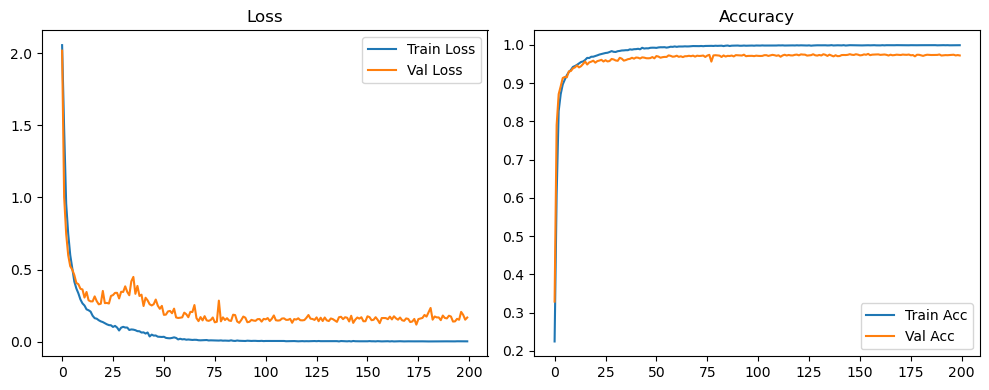

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 50.73it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 50.44it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 50.81it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 51.13it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 51.40it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 51.56it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 51.46it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 51.09it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 51.05it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 51.20it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 51.40it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 51.50it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 51.55it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 51.71it/s]

Original Model Final Test Loss: 0.1469 Accuracy: 0.9728


🚀 Running: batch128_lr0.002_0.002_0.002_dp0.2


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.002 | Train Acc: 0.2196 | Val Acc: 0.3713 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.002 | Train Acc: 0.2196 | Val Acc: 0.3713 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.002 | Train Acc: 0.2196 | Val Acc: 0.3713 |:   0%|          | 1/200 [00:11<37:19, 11.25s/it]

| LR: 0.002 | Train Acc: 0.5731 | Val Acc: 0.8027 |:   0%|          | 1/200 [00:21<37:19, 11.25s/it]

| LR: 0.002 | Train Acc: 0.5731 | Val Acc: 0.8027 |:   0%|          | 1/200 [00:21<37:19, 11.25s/it]

| LR: 0.002 | Train Acc: 0.5731 | Val Acc: 0.8027 |:   1%|          | 2/200 [00:22<36:09, 10.96s/it]

| LR: 0.002 | Train Acc: 0.8070 | Val Acc: 0.8718 |:   1%|          | 2/200 [00:32<36:09, 10.96s/it]

| LR: 0.002 | Train Acc: 0.8070 | Val Acc: 0.8718 |:   1%|          | 2/200 [00:32<36:09, 10.96s/it]

| LR: 0.002 | Train Acc: 0.8070 | Val Acc: 0.8718 |:   2%|▏         | 3/200 [00:32<35:22, 10.77s/it]

| LR: 0.002 | Train Acc: 0.8610 | Val Acc: 0.9031 |:   2%|▏         | 3/200 [00:43<35:22, 10.77s/it]

| LR: 0.002 | Train Acc: 0.8610 | Val Acc: 0.9031 |:   2%|▏         | 3/200 [00:43<35:22, 10.77s/it]

| LR: 0.002 | Train Acc: 0.8610 | Val Acc: 0.9031 |:   2%|▏         | 4/200 [00:43<35:03, 10.73s/it]

| LR: 0.002 | Train Acc: 0.8789 | Val Acc: 0.9156 |:   2%|▏         | 4/200 [00:53<35:03, 10.73s/it]

| LR: 0.002 | Train Acc: 0.8789 | Val Acc: 0.9156 |:   2%|▏         | 4/200 [00:53<35:03, 10.73s/it]

| LR: 0.002 | Train Acc: 0.8789 | Val Acc: 0.9156 |:   2%|▎         | 5/200 [00:53<34:44, 10.69s/it]

| LR: 0.002 | Train Acc: 0.8928 | Val Acc: 0.9231 |:   2%|▎         | 5/200 [01:04<34:44, 10.69s/it]

| LR: 0.002 | Train Acc: 0.8928 | Val Acc: 0.9231 |:   2%|▎         | 5/200 [01:04<34:44, 10.69s/it]

| LR: 0.002 | Train Acc: 0.8928 | Val Acc: 0.9231 |:   3%|▎         | 6/200 [01:04<34:42, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9065 | Val Acc: 0.9229 |:   3%|▎         | 6/200 [01:15<34:42, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9065 | Val Acc: 0.9229 |:   3%|▎         | 6/200 [01:15<34:42, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9065 | Val Acc: 0.9229 |:   4%|▎         | 7/200 [01:15<34:18, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9137 | Val Acc: 0.9265 |:   4%|▎         | 7/200 [01:25<34:18, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9137 | Val Acc: 0.9265 |:   4%|▎         | 7/200 [01:25<34:18, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9137 | Val Acc: 0.9265 |:   4%|▍         | 8/200 [01:25<34:10, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9191 | Val Acc: 0.9361 |:   4%|▍         | 8/200 [01:36<34:10, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9191 | Val Acc: 0.9361 |:   4%|▍         | 8/200 [01:36<34:10, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9191 | Val Acc: 0.9361 |:   4%|▍         | 9/200 [01:36<33:56, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9272 | Val Acc: 0.9353 |:   4%|▍         | 9/200 [01:47<33:56, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9272 | Val Acc: 0.9353 |:   4%|▍         | 9/200 [01:47<33:56, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9272 | Val Acc: 0.9353 |:   5%|▌         | 10/200 [01:47<34:00, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9324 | Val Acc: 0.9357 |:   5%|▌         | 10/200 [01:57<34:00, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9324 | Val Acc: 0.9357 |:   5%|▌         | 10/200 [01:57<34:00, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9324 | Val Acc: 0.9357 |:   6%|▌         | 11/200 [01:57<33:39, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9386 | Val Acc: 0.9403 |:   6%|▌         | 11/200 [02:08<33:39, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9386 | Val Acc: 0.9403 |:   6%|▌         | 11/200 [02:08<33:39, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9386 | Val Acc: 0.9403 |:   6%|▌         | 12/200 [02:08<33:21, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9425 | Val Acc: 0.9427 |:   6%|▌         | 12/200 [02:19<33:21, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9425 | Val Acc: 0.9427 |:   6%|▌         | 12/200 [02:19<33:21, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9425 | Val Acc: 0.9427 |:   6%|▋         | 13/200 [02:19<33:11, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9427 | Val Acc: 0.9443 |:   6%|▋         | 13/200 [02:29<33:11, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9427 | Val Acc: 0.9443 |:   6%|▋         | 13/200 [02:29<33:11, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9427 | Val Acc: 0.9443 |:   7%|▋         | 14/200 [02:29<33:03, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9487 | Val Acc: 0.9529 |:   7%|▋         | 14/200 [02:40<33:03, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9487 | Val Acc: 0.9529 |:   7%|▋         | 14/200 [02:40<33:03, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9487 | Val Acc: 0.9529 |:   8%|▊         | 15/200 [02:40<32:49, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9516 | Val Acc: 0.9539 |:   8%|▊         | 15/200 [02:51<32:49, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9516 | Val Acc: 0.9539 |:   8%|▊         | 15/200 [02:51<32:49, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9516 | Val Acc: 0.9539 |:   8%|▊         | 16/200 [02:51<32:45, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9563 | Val Acc: 0.9517 |:   8%|▊         | 16/200 [03:01<32:45, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9563 | Val Acc: 0.9517 |:   8%|▊         | 16/200 [03:01<32:45, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9563 | Val Acc: 0.9517 |:   8%|▊         | 17/200 [03:01<32:30, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9588 | Val Acc: 0.9536 |:   8%|▊         | 17/200 [03:12<32:30, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9588 | Val Acc: 0.9536 |:   8%|▊         | 17/200 [03:12<32:30, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9588 | Val Acc: 0.9536 |:   9%|▉         | 18/200 [03:12<32:24, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9627 | Val Acc: 0.9557 |:   9%|▉         | 18/200 [03:23<32:24, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9627 | Val Acc: 0.9557 |:   9%|▉         | 18/200 [03:23<32:24, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9627 | Val Acc: 0.9557 |:  10%|▉         | 19/200 [03:23<32:30, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9624 | Val Acc: 0.9580 |:  10%|▉         | 19/200 [03:34<32:30, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9624 | Val Acc: 0.9580 |:  10%|▉         | 19/200 [03:34<32:30, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9624 | Val Acc: 0.9580 |:  10%|█         | 20/200 [03:34<32:15, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9643 | Val Acc: 0.9568 |:  10%|█         | 20/200 [03:45<32:15, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9643 | Val Acc: 0.9568 |:  10%|█         | 20/200 [03:45<32:15, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9643 | Val Acc: 0.9568 |:  10%|█         | 21/200 [03:45<32:15, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9671 | Val Acc: 0.9581 |:  10%|█         | 21/200 [03:55<32:15, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9671 | Val Acc: 0.9581 |:  10%|█         | 21/200 [03:55<32:15, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9671 | Val Acc: 0.9581 |:  11%|█         | 22/200 [03:55<31:54, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9683 | Val Acc: 0.9607 |:  11%|█         | 22/200 [04:06<31:54, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9683 | Val Acc: 0.9607 |:  11%|█         | 22/200 [04:06<31:54, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9683 | Val Acc: 0.9607 |:  12%|█▏        | 23/200 [04:06<31:40, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9703 | Val Acc: 0.9608 |:  12%|█▏        | 23/200 [04:17<31:40, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9703 | Val Acc: 0.9608 |:  12%|█▏        | 23/200 [04:17<31:40, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9703 | Val Acc: 0.9608 |:  12%|█▏        | 24/200 [04:17<31:22, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9721 | Val Acc: 0.9630 |:  12%|█▏        | 24/200 [04:27<31:22, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9721 | Val Acc: 0.9630 |:  12%|█▏        | 24/200 [04:27<31:22, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9721 | Val Acc: 0.9630 |:  12%|█▎        | 25/200 [04:27<31:06, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9726 | Val Acc: 0.9621 |:  12%|█▎        | 25/200 [04:38<31:06, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9726 | Val Acc: 0.9621 |:  12%|█▎        | 25/200 [04:38<31:06, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9726 | Val Acc: 0.9621 |:  13%|█▎        | 26/200 [04:38<30:51, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9740 | Val Acc: 0.9623 |:  13%|█▎        | 26/200 [04:48<30:51, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9740 | Val Acc: 0.9623 |:  13%|█▎        | 26/200 [04:48<30:51, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9740 | Val Acc: 0.9623 |:  14%|█▎        | 27/200 [04:48<30:38, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9764 | Val Acc: 0.9642 |:  14%|█▎        | 27/200 [05:00<30:38, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9764 | Val Acc: 0.9642 |:  14%|█▎        | 27/200 [05:00<30:38, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9764 | Val Acc: 0.9642 |:  14%|█▍        | 28/200 [05:00<31:01, 10.82s/it]

| LR: 0.002 | Train Acc: 0.9767 | Val Acc: 0.9624 |:  14%|█▍        | 28/200 [05:10<31:01, 10.82s/it]

| LR: 0.002 | Train Acc: 0.9767 | Val Acc: 0.9624 |:  14%|█▍        | 28/200 [05:10<31:01, 10.82s/it]

| LR: 0.002 | Train Acc: 0.9767 | Val Acc: 0.9624 |:  14%|█▍        | 29/200 [05:10<30:41, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9623 |:  14%|█▍        | 29/200 [05:21<30:41, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9623 |:  14%|█▍        | 29/200 [05:21<30:41, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9768 | Val Acc: 0.9623 |:  15%|█▌        | 30/200 [05:21<30:28, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9794 | Val Acc: 0.9636 |:  15%|█▌        | 30/200 [05:32<30:28, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9794 | Val Acc: 0.9636 |:  15%|█▌        | 30/200 [05:32<30:28, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9794 | Val Acc: 0.9636 |:  16%|█▌        | 31/200 [05:32<30:13, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9791 | Val Acc: 0.9637 |:  16%|█▌        | 31/200 [05:43<30:13, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9791 | Val Acc: 0.9637 |:  16%|█▌        | 31/200 [05:43<30:13, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9791 | Val Acc: 0.9637 |:  16%|█▌        | 32/200 [05:43<30:06, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9816 | Val Acc: 0.9650 |:  16%|█▌        | 32/200 [05:53<30:06, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9816 | Val Acc: 0.9650 |:  16%|█▌        | 32/200 [05:53<30:06, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9816 | Val Acc: 0.9650 |:  16%|█▋        | 33/200 [05:53<29:54, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9811 | Val Acc: 0.9654 |:  16%|█▋        | 33/200 [06:04<29:54, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9811 | Val Acc: 0.9654 |:  16%|█▋        | 33/200 [06:04<29:54, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9811 | Val Acc: 0.9654 |:  17%|█▋        | 34/200 [06:04<29:32, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9824 | Val Acc: 0.9646 |:  17%|█▋        | 34/200 [06:15<29:32, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9824 | Val Acc: 0.9646 |:  17%|█▋        | 34/200 [06:15<29:32, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9824 | Val Acc: 0.9646 |:  18%|█▊        | 35/200 [06:15<29:37, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9824 | Val Acc: 0.9643 |:  18%|█▊        | 35/200 [06:26<29:37, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9824 | Val Acc: 0.9643 |:  18%|█▊        | 35/200 [06:26<29:37, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9824 | Val Acc: 0.9643 |:  18%|█▊        | 36/200 [06:26<29:58, 10.97s/it]

| LR: 0.002 | Train Acc: 0.9825 | Val Acc: 0.9663 |:  18%|█▊        | 36/200 [06:37<29:58, 10.97s/it]

| LR: 0.002 | Train Acc: 0.9825 | Val Acc: 0.9663 |:  18%|█▊        | 36/200 [06:37<29:58, 10.97s/it]

| LR: 0.002 | Train Acc: 0.9825 | Val Acc: 0.9663 |:  18%|█▊        | 37/200 [06:37<29:41, 10.93s/it]

| LR: 0.002 | Train Acc: 0.9831 | Val Acc: 0.9663 |:  18%|█▊        | 37/200 [06:48<29:41, 10.93s/it]

| LR: 0.002 | Train Acc: 0.9831 | Val Acc: 0.9663 |:  18%|█▊        | 37/200 [06:48<29:41, 10.93s/it]

| LR: 0.002 | Train Acc: 0.9831 | Val Acc: 0.9663 |:  19%|█▉        | 38/200 [06:48<29:13, 10.82s/it]

| LR: 0.002 | Train Acc: 0.9842 | Val Acc: 0.9663 |:  19%|█▉        | 38/200 [06:58<29:13, 10.82s/it]

| LR: 0.002 | Train Acc: 0.9842 | Val Acc: 0.9663 |:  19%|█▉        | 38/200 [06:58<29:13, 10.82s/it]

| LR: 0.002 | Train Acc: 0.9842 | Val Acc: 0.9663 |:  20%|█▉        | 39/200 [06:58<28:55, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9690 |:  20%|█▉        | 39/200 [07:09<28:55, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9690 |:  20%|█▉        | 39/200 [07:09<28:55, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9690 |:  20%|██        | 40/200 [07:09<28:34, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9706 |:  20%|██        | 40/200 [07:20<28:34, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9706 |:  20%|██        | 40/200 [07:20<28:34, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9706 |:  20%|██        | 41/200 [07:20<28:25, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9873 | Val Acc: 0.9696 |:  20%|██        | 41/200 [07:30<28:25, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9873 | Val Acc: 0.9696 |:  20%|██        | 41/200 [07:30<28:25, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9873 | Val Acc: 0.9696 |:  21%|██        | 42/200 [07:30<28:05, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9688 |:  21%|██        | 42/200 [07:41<28:05, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9688 |:  21%|██        | 42/200 [07:41<28:05, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9688 |:  22%|██▏       | 43/200 [07:41<27:51, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9879 | Val Acc: 0.9697 |:  22%|██▏       | 43/200 [07:51<27:51, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9879 | Val Acc: 0.9697 |:  22%|██▏       | 43/200 [07:51<27:51, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9879 | Val Acc: 0.9697 |:  22%|██▏       | 44/200 [07:51<27:41, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9712 |:  22%|██▏       | 44/200 [08:02<27:41, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9712 |:  22%|██▏       | 44/200 [08:02<27:41, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9712 |:  22%|██▎       | 45/200 [08:02<27:29, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9890 | Val Acc: 0.9703 |:  22%|██▎       | 45/200 [08:13<27:29, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9890 | Val Acc: 0.9703 |:  22%|██▎       | 45/200 [08:13<27:29, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9890 | Val Acc: 0.9703 |:  23%|██▎       | 46/200 [08:13<27:25, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9897 | Val Acc: 0.9675 |:  23%|██▎       | 46/200 [08:24<27:25, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9897 | Val Acc: 0.9675 |:  23%|██▎       | 46/200 [08:24<27:25, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9897 | Val Acc: 0.9675 |:  24%|██▎       | 47/200 [08:24<27:15, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9702 |:  24%|██▎       | 47/200 [08:34<27:15, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9702 |:  24%|██▎       | 47/200 [08:34<27:15, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9702 |:  24%|██▍       | 48/200 [08:34<26:59, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9692 |:  24%|██▍       | 48/200 [08:45<26:59, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9692 |:  24%|██▍       | 48/200 [08:45<26:59, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9692 |:  24%|██▍       | 49/200 [08:45<26:47, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9722 |:  24%|██▍       | 49/200 [08:55<26:47, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9722 |:  24%|██▍       | 49/200 [08:55<26:47, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9722 |:  25%|██▌       | 50/200 [08:56<26:41, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9716 |:  25%|██▌       | 50/200 [09:06<26:41, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9716 |:  25%|██▌       | 50/200 [09:06<26:41, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9716 |:  26%|██▌       | 51/200 [09:06<26:26, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9919 | Val Acc: 0.9695 |:  26%|██▌       | 51/200 [09:17<26:26, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9919 | Val Acc: 0.9695 |:  26%|██▌       | 51/200 [09:17<26:26, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9919 | Val Acc: 0.9695 |:  26%|██▌       | 52/200 [09:17<26:11, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9706 |:  26%|██▌       | 52/200 [09:27<26:11, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9706 |:  26%|██▌       | 52/200 [09:27<26:11, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9706 |:  26%|██▋       | 53/200 [09:28<26:12, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9691 |:  26%|██▋       | 53/200 [09:38<26:12, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9691 |:  26%|██▋       | 53/200 [09:38<26:12, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9691 |:  27%|██▋       | 54/200 [09:38<25:55, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9726 |:  27%|██▋       | 54/200 [09:49<25:55, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9726 |:  27%|██▋       | 54/200 [09:49<25:55, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9726 |:  28%|██▊       | 55/200 [09:49<25:41, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9713 |:  28%|██▊       | 55/200 [09:59<25:41, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9713 |:  28%|██▊       | 55/200 [09:59<25:41, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9713 |:  28%|██▊       | 56/200 [09:59<25:29, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9726 |:  28%|██▊       | 56/200 [10:10<25:29, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9726 |:  28%|██▊       | 56/200 [10:10<25:29, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9726 |:  28%|██▊       | 57/200 [10:10<25:14, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9708 |:  28%|██▊       | 57/200 [10:20<25:14, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9708 |:  28%|██▊       | 57/200 [10:20<25:14, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9708 |:  29%|██▉       | 58/200 [10:20<25:07, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9711 |:  29%|██▉       | 58/200 [10:31<25:07, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9711 |:  29%|██▉       | 58/200 [10:31<25:07, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9711 |:  30%|██▉       | 59/200 [10:32<25:16, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9693 |:  30%|██▉       | 59/200 [10:42<25:16, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9693 |:  30%|██▉       | 59/200 [10:42<25:16, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9693 |:  30%|███       | 60/200 [10:42<25:01, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9732 |:  30%|███       | 60/200 [10:54<25:01, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9732 |:  30%|███       | 60/200 [10:54<25:01, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9732 |:  30%|███       | 61/200 [10:54<25:49, 11.15s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9725 |:  30%|███       | 61/200 [11:07<25:49, 11.15s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9725 |:  30%|███       | 61/200 [11:07<25:49, 11.15s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9725 |:  31%|███       | 62/200 [11:07<26:23, 11.48s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9722 |:  31%|███       | 62/200 [11:17<26:23, 11.48s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9722 |:  31%|███       | 62/200 [11:17<26:23, 11.48s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9722 |:  32%|███▏      | 63/200 [11:17<25:48, 11.30s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9721 |:  32%|███▏      | 63/200 [11:28<25:48, 11.30s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9721 |:  32%|███▏      | 63/200 [11:28<25:48, 11.30s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9721 |:  32%|███▏      | 64/200 [11:28<25:10, 11.11s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9732 |:  32%|███▏      | 64/200 [11:39<25:10, 11.11s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9732 |:  32%|███▏      | 64/200 [11:39<25:10, 11.11s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9732 |:  32%|███▎      | 65/200 [11:39<24:36, 10.93s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9705 |:  32%|███▎      | 65/200 [11:50<24:36, 10.93s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9705 |:  32%|███▎      | 65/200 [11:50<24:36, 10.93s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9705 |:  33%|███▎      | 66/200 [11:51<25:03, 11.22s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9752 |:  33%|███▎      | 66/200 [12:01<25:03, 11.22s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9752 |:  33%|███▎      | 66/200 [12:01<25:03, 11.22s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9752 |:  34%|███▎      | 67/200 [12:01<24:27, 11.04s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9710 |:  34%|███▎      | 67/200 [12:12<24:27, 11.04s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9710 |:  34%|███▎      | 67/200 [12:12<24:27, 11.04s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9710 |:  34%|███▍      | 68/200 [12:12<24:18, 11.05s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9730 |:  34%|███▍      | 68/200 [12:24<24:18, 11.05s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9730 |:  34%|███▍      | 68/200 [12:24<24:18, 11.05s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9730 |:  34%|███▍      | 69/200 [12:24<24:30, 11.22s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9718 |:  34%|███▍      | 69/200 [12:35<24:30, 11.22s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9718 |:  34%|███▍      | 69/200 [12:35<24:30, 11.22s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9718 |:  35%|███▌      | 70/200 [12:35<24:02, 11.10s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9733 |:  35%|███▌      | 70/200 [12:45<24:02, 11.10s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9733 |:  35%|███▌      | 70/200 [12:45<24:02, 11.10s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9733 |:  36%|███▌      | 71/200 [12:45<23:39, 11.00s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9714 |:  36%|███▌      | 71/200 [12:56<23:39, 11.00s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9714 |:  36%|███▌      | 71/200 [12:56<23:39, 11.00s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9714 |:  36%|███▌      | 72/200 [12:56<23:12, 10.88s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9729 |:  36%|███▌      | 72/200 [13:07<23:12, 10.88s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9729 |:  36%|███▌      | 72/200 [13:07<23:12, 10.88s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9729 |:  36%|███▋      | 73/200 [13:07<22:51, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9728 |:  36%|███▋      | 73/200 [13:17<22:51, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9728 |:  36%|███▋      | 73/200 [13:17<22:51, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9945 | Val Acc: 0.9728 |:  37%|███▋      | 74/200 [13:17<22:29, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9715 |:  37%|███▋      | 74/200 [13:28<22:29, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9715 |:  37%|███▋      | 74/200 [13:28<22:29, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9715 |:  38%|███▊      | 75/200 [13:28<22:17, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9718 |:  38%|███▊      | 75/200 [13:38<22:17, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9718 |:  38%|███▊      | 75/200 [13:38<22:17, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9944 | Val Acc: 0.9718 |:  38%|███▊      | 76/200 [13:38<22:02, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9712 |:  38%|███▊      | 76/200 [13:49<22:02, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9712 |:  38%|███▊      | 76/200 [13:49<22:02, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9712 |:  38%|███▊      | 77/200 [13:49<21:50, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9718 |:  38%|███▊      | 77/200 [14:00<21:50, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9718 |:  38%|███▊      | 77/200 [14:00<21:50, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9718 |:  39%|███▉      | 78/200 [14:00<21:41, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9732 |:  39%|███▉      | 78/200 [14:10<21:41, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9732 |:  39%|███▉      | 78/200 [14:10<21:41, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9732 |:  40%|███▉      | 79/200 [14:10<21:32, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9729 |:  40%|███▉      | 79/200 [14:21<21:32, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9729 |:  40%|███▉      | 79/200 [14:21<21:32, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9729 |:  40%|████      | 80/200 [14:21<21:21, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9746 |:  40%|████      | 80/200 [14:32<21:21, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9746 |:  40%|████      | 80/200 [14:32<21:21, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9746 |:  40%|████      | 81/200 [14:32<21:05, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9741 |:  40%|████      | 81/200 [14:42<21:05, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9741 |:  40%|████      | 81/200 [14:42<21:05, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9741 |:  41%|████      | 82/200 [14:42<20:51, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9949 | Val Acc: 0.9724 |:  41%|████      | 82/200 [14:53<20:51, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9949 | Val Acc: 0.9724 |:  41%|████      | 82/200 [14:53<20:51, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9949 | Val Acc: 0.9724 |:  42%|████▏     | 83/200 [14:53<20:42, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9721 |:  42%|████▏     | 83/200 [15:03<20:42, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9721 |:  42%|████▏     | 83/200 [15:03<20:42, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9721 |:  42%|████▏     | 84/200 [15:03<20:32, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9702 |:  42%|████▏     | 84/200 [15:14<20:32, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9702 |:  42%|████▏     | 84/200 [15:14<20:32, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9702 |:  42%|████▎     | 85/200 [15:14<20:18, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9955 | Val Acc: 0.9749 |:  42%|████▎     | 85/200 [15:25<20:18, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9955 | Val Acc: 0.9749 |:  42%|████▎     | 85/200 [15:25<20:18, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9955 | Val Acc: 0.9749 |:  43%|████▎     | 86/200 [15:25<20:07, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9739 |:  43%|████▎     | 86/200 [15:35<20:07, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9739 |:  43%|████▎     | 86/200 [15:35<20:07, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9739 |:  44%|████▎     | 87/200 [15:35<19:59, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9732 |:  44%|████▎     | 87/200 [15:46<19:59, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9732 |:  44%|████▎     | 87/200 [15:46<19:59, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9732 |:  44%|████▍     | 88/200 [15:46<19:47, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9718 |:  44%|████▍     | 88/200 [15:56<19:47, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9718 |:  44%|████▍     | 88/200 [15:56<19:47, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9718 |:  44%|████▍     | 89/200 [15:57<19:40, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9716 |:  44%|████▍     | 89/200 [16:07<19:40, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9716 |:  44%|████▍     | 89/200 [16:07<19:40, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9716 |:  45%|████▌     | 90/200 [16:07<19:27, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9733 |:  45%|████▌     | 90/200 [16:18<19:27, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9733 |:  45%|████▌     | 90/200 [16:18<19:27, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9733 |:  46%|████▌     | 91/200 [16:18<19:18, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9718 |:  46%|████▌     | 91/200 [16:28<19:18, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9718 |:  46%|████▌     | 91/200 [16:28<19:18, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9718 |:  46%|████▌     | 92/200 [16:28<19:10, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9702 |:  46%|████▌     | 92/200 [16:39<19:10, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9702 |:  46%|████▌     | 92/200 [16:39<19:10, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9702 |:  46%|████▋     | 93/200 [16:39<18:59, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9743 |:  46%|████▋     | 93/200 [16:50<18:59, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9743 |:  46%|████▋     | 93/200 [16:50<18:59, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9743 |:  47%|████▋     | 94/200 [16:50<18:59, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9752 |:  47%|████▋     | 94/200 [17:01<18:59, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9752 |:  47%|████▋     | 94/200 [17:01<18:59, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9752 |:  48%|████▊     | 95/200 [17:01<18:54, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9746 |:  48%|████▊     | 95/200 [17:12<18:54, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9746 |:  48%|████▊     | 95/200 [17:12<18:54, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9746 |:  48%|████▊     | 96/200 [17:12<18:40, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9730 |:  48%|████▊     | 96/200 [17:22<18:40, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9730 |:  48%|████▊     | 96/200 [17:22<18:40, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9730 |:  48%|████▊     | 97/200 [17:22<18:24, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9734 |:  48%|████▊     | 97/200 [17:33<18:24, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9734 |:  48%|████▊     | 97/200 [17:33<18:24, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9734 |:  49%|████▉     | 98/200 [17:33<18:09, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9730 |:  49%|████▉     | 98/200 [17:43<18:09, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9730 |:  49%|████▉     | 98/200 [17:43<18:09, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9730 |:  50%|████▉     | 99/200 [17:44<17:56, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9743 |:  50%|████▉     | 99/200 [17:54<17:56, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9743 |:  50%|████▉     | 99/200 [17:54<17:56, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9743 |:  50%|█████     | 100/200 [17:54<17:46, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9729 |:  50%|█████     | 100/200 [18:05<17:46, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9729 |:  50%|█████     | 100/200 [18:05<17:46, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9729 |:  50%|█████     | 101/200 [18:05<17:36, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9748 |:  50%|█████     | 101/200 [18:16<17:36, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9748 |:  50%|█████     | 101/200 [18:16<17:36, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9954 | Val Acc: 0.9748 |:  51%|█████     | 102/200 [18:16<17:28, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9735 |:  51%|█████     | 102/200 [18:26<17:28, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9735 |:  51%|█████     | 102/200 [18:26<17:28, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9735 |:  52%|█████▏    | 103/200 [18:26<17:16, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9736 |:  52%|█████▏    | 103/200 [18:37<17:16, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9736 |:  52%|█████▏    | 103/200 [18:37<17:16, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9736 |:  52%|█████▏    | 104/200 [18:37<17:12, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9720 |:  52%|█████▏    | 104/200 [18:48<17:12, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9720 |:  52%|█████▏    | 104/200 [18:48<17:12, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9720 |:  52%|█████▎    | 105/200 [18:48<16:59, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9723 |:  52%|█████▎    | 105/200 [18:58<16:59, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9723 |:  52%|█████▎    | 105/200 [18:58<16:59, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9723 |:  53%|█████▎    | 106/200 [18:58<16:43, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9955 | Val Acc: 0.9743 |:  53%|█████▎    | 106/200 [19:09<16:43, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9955 | Val Acc: 0.9743 |:  53%|█████▎    | 106/200 [19:09<16:43, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9955 | Val Acc: 0.9743 |:  54%|█████▎    | 107/200 [19:09<16:31, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9743 |:  54%|█████▎    | 107/200 [19:20<16:31, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9743 |:  54%|█████▎    | 107/200 [19:20<16:31, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9743 |:  54%|█████▍    | 108/200 [19:20<16:20, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9751 |:  54%|█████▍    | 108/200 [19:30<16:20, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9751 |:  54%|█████▍    | 108/200 [19:30<16:20, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9751 |:  55%|█████▍    | 109/200 [19:30<16:08, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9734 |:  55%|█████▍    | 109/200 [19:41<16:08, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9734 |:  55%|█████▍    | 109/200 [19:41<16:08, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9734 |:  55%|█████▌    | 110/200 [19:41<15:58, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9724 |:  55%|█████▌    | 110/200 [19:52<15:58, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9724 |:  55%|█████▌    | 110/200 [19:52<15:58, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9724 |:  56%|█████▌    | 111/200 [19:52<15:53, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9955 | Val Acc: 0.9738 |:  56%|█████▌    | 111/200 [20:03<15:53, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9955 | Val Acc: 0.9738 |:  56%|█████▌    | 111/200 [20:03<15:53, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9955 | Val Acc: 0.9738 |:  56%|█████▌    | 112/200 [20:03<15:43, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9728 |:  56%|█████▌    | 112/200 [20:13<15:43, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9728 |:  56%|█████▌    | 112/200 [20:13<15:43, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9728 |:  56%|█████▋    | 113/200 [20:13<15:27, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9734 |:  56%|█████▋    | 113/200 [20:24<15:27, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9734 |:  56%|█████▋    | 113/200 [20:24<15:27, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9734 |:  57%|█████▋    | 114/200 [20:24<15:15, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9726 |:  57%|█████▋    | 114/200 [20:35<15:15, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9726 |:  57%|█████▋    | 114/200 [20:35<15:15, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9726 |:  57%|█████▊    | 115/200 [20:35<15:09, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9756 |:  57%|█████▊    | 115/200 [20:45<15:09, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9756 |:  57%|█████▊    | 115/200 [20:45<15:09, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9756 |:  58%|█████▊    | 116/200 [20:45<14:59, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9733 |:  58%|█████▊    | 116/200 [20:56<14:59, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9733 |:  58%|█████▊    | 116/200 [20:56<14:59, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9733 |:  58%|█████▊    | 117/200 [20:56<14:46, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9744 |:  58%|█████▊    | 117/200 [21:06<14:46, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9744 |:  58%|█████▊    | 117/200 [21:06<14:46, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9744 |:  59%|█████▉    | 118/200 [21:06<14:33, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9763 |:  59%|█████▉    | 118/200 [21:18<14:33, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9763 |:  59%|█████▉    | 118/200 [21:18<14:33, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9763 |:  60%|█████▉    | 119/200 [21:18<14:33, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9721 |:  60%|█████▉    | 119/200 [21:28<14:33, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9721 |:  60%|█████▉    | 119/200 [21:28<14:33, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9721 |:  60%|██████    | 120/200 [21:28<14:18, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9738 |:  60%|██████    | 120/200 [21:39<14:18, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9738 |:  60%|██████    | 120/200 [21:39<14:18, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9738 |:  60%|██████    | 121/200 [21:39<14:04, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9761 |:  60%|██████    | 121/200 [21:49<14:04, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9761 |:  60%|██████    | 121/200 [21:49<14:04, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9761 |:  61%|██████    | 122/200 [21:49<13:49, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9753 |:  61%|██████    | 122/200 [21:59<13:49, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9753 |:  61%|██████    | 122/200 [21:59<13:49, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9753 |:  62%|██████▏   | 123/200 [21:59<13:24, 10.45s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9728 |:  62%|██████▏   | 123/200 [22:10<13:24, 10.45s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9728 |:  62%|██████▏   | 123/200 [22:10<13:24, 10.45s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9728 |:  62%|██████▏   | 124/200 [22:10<13:09, 10.38s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9740 |:  62%|██████▏   | 124/200 [22:21<13:09, 10.38s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9740 |:  62%|██████▏   | 124/200 [22:21<13:09, 10.38s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9740 |:  62%|██████▎   | 125/200 [22:21<13:13, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9733 |:  62%|██████▎   | 125/200 [22:31<13:13, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9733 |:  62%|██████▎   | 125/200 [22:31<13:13, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9733 |:  63%|██████▎   | 126/200 [22:32<13:10, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9736 |:  63%|██████▎   | 126/200 [22:42<13:10, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9736 |:  63%|██████▎   | 126/200 [22:42<13:10, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9736 |:  64%|██████▎   | 127/200 [22:42<12:59, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9729 |:  64%|██████▎   | 127/200 [22:53<12:59, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9729 |:  64%|██████▎   | 127/200 [22:53<12:59, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9729 |:  64%|██████▍   | 128/200 [22:53<12:49, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9749 |:  64%|██████▍   | 128/200 [23:04<12:49, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9749 |:  64%|██████▍   | 128/200 [23:04<12:49, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9749 |:  64%|██████▍   | 129/200 [23:04<12:49, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9728 |:  64%|██████▍   | 129/200 [23:15<12:49, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9728 |:  64%|██████▍   | 129/200 [23:15<12:49, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9728 |:  65%|██████▌   | 130/200 [23:15<12:36, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9742 |:  65%|██████▌   | 130/200 [23:26<12:36, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9742 |:  65%|██████▌   | 130/200 [23:26<12:36, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9742 |:  66%|██████▌   | 131/200 [23:26<12:29, 10.86s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9748 |:  66%|██████▌   | 131/200 [23:37<12:29, 10.86s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9748 |:  66%|██████▌   | 131/200 [23:37<12:29, 10.86s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9748 |:  66%|██████▌   | 132/200 [23:37<12:18, 10.86s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9727 |:  66%|██████▌   | 132/200 [23:47<12:18, 10.86s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9727 |:  66%|██████▌   | 132/200 [23:47<12:18, 10.86s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9727 |:  66%|██████▋   | 133/200 [23:47<12:03, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9761 |:  66%|██████▋   | 133/200 [23:58<12:03, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9761 |:  66%|██████▋   | 133/200 [23:58<12:03, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9761 |:  67%|██████▋   | 134/200 [23:58<11:48, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9743 |:  67%|██████▋   | 134/200 [24:08<11:48, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9743 |:  67%|██████▋   | 134/200 [24:08<11:48, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9743 |:  68%|██████▊   | 135/200 [24:08<11:34, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9761 |:  68%|██████▊   | 135/200 [24:19<11:34, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9761 |:  68%|██████▊   | 135/200 [24:19<11:34, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9761 |:  68%|██████▊   | 136/200 [24:19<11:26, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9747 |:  68%|██████▊   | 136/200 [24:30<11:26, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9747 |:  68%|██████▊   | 136/200 [24:30<11:26, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9747 |:  68%|██████▊   | 137/200 [24:30<11:13, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9745 |:  68%|██████▊   | 137/200 [24:41<11:13, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9745 |:  68%|██████▊   | 137/200 [24:41<11:13, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9745 |:  69%|██████▉   | 138/200 [24:41<11:02, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9745 |:  69%|██████▉   | 138/200 [24:52<11:02, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9745 |:  69%|██████▉   | 138/200 [24:52<11:02, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9745 |:  70%|██████▉   | 139/200 [24:52<10:58, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9742 |:  70%|██████▉   | 139/200 [25:02<10:58, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9742 |:  70%|██████▉   | 139/200 [25:02<10:58, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9742 |:  70%|███████   | 140/200 [25:02<10:44, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9750 |:  70%|███████   | 140/200 [25:13<10:44, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9750 |:  70%|███████   | 140/200 [25:13<10:44, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9750 |:  70%|███████   | 141/200 [25:13<10:34, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9723 |:  70%|███████   | 141/200 [25:24<10:34, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9723 |:  70%|███████   | 141/200 [25:24<10:34, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9723 |:  71%|███████   | 142/200 [25:24<10:21, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9755 |:  71%|███████   | 142/200 [25:34<10:21, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9755 |:  71%|███████   | 142/200 [25:34<10:21, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9755 |:  72%|███████▏  | 143/200 [25:34<10:07, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9752 |:  72%|███████▏  | 143/200 [25:44<10:07, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9752 |:  72%|███████▏  | 143/200 [25:44<10:07, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9752 |:  72%|███████▏  | 144/200 [25:44<09:49, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9747 |:  72%|███████▏  | 144/200 [25:55<09:49, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9747 |:  72%|███████▏  | 144/200 [25:55<09:49, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9747 |:  72%|███████▎  | 145/200 [25:55<09:39, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9739 |:  72%|███████▎  | 145/200 [26:06<09:39, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9739 |:  72%|███████▎  | 145/200 [26:06<09:39, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9739 |:  73%|███████▎  | 146/200 [26:06<09:31, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9739 |:  73%|███████▎  | 146/200 [26:17<09:31, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9739 |:  73%|███████▎  | 146/200 [26:17<09:31, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9739 |:  74%|███████▎  | 147/200 [26:17<09:32, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9744 |:  74%|███████▎  | 147/200 [26:28<09:32, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9744 |:  74%|███████▎  | 147/200 [26:28<09:32, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9744 |:  74%|███████▍  | 148/200 [26:28<09:20, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9738 |:  74%|███████▍  | 148/200 [26:38<09:20, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9738 |:  74%|███████▍  | 148/200 [26:38<09:20, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9738 |:  74%|███████▍  | 149/200 [26:38<09:07, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9746 |:  74%|███████▍  | 149/200 [26:49<09:07, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9746 |:  74%|███████▍  | 149/200 [26:49<09:07, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9746 |:  75%|███████▌  | 150/200 [26:49<08:55, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9736 |:  75%|███████▌  | 150/200 [27:00<08:55, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9736 |:  75%|███████▌  | 150/200 [27:00<08:55, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9736 |:  76%|███████▌  | 151/200 [27:00<08:44, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9745 |:  76%|███████▌  | 151/200 [27:10<08:44, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9745 |:  76%|███████▌  | 151/200 [27:10<08:44, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9745 |:  76%|███████▌  | 152/200 [27:10<08:31, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9741 |:  76%|███████▌  | 152/200 [27:21<08:31, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9741 |:  76%|███████▌  | 152/200 [27:21<08:31, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9741 |:  76%|███████▋  | 153/200 [27:21<08:19, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9738 |:  76%|███████▋  | 153/200 [27:31<08:19, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9738 |:  76%|███████▋  | 153/200 [27:31<08:19, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9738 |:  77%|███████▋  | 154/200 [27:31<08:09, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9742 |:  77%|███████▋  | 154/200 [27:42<08:09, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9742 |:  77%|███████▋  | 154/200 [27:42<08:09, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9742 |:  78%|███████▊  | 155/200 [27:42<07:57, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9738 |:  78%|███████▊  | 155/200 [27:53<07:57, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9738 |:  78%|███████▊  | 155/200 [27:53<07:57, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9738 |:  78%|███████▊  | 156/200 [27:53<07:55, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9758 |:  78%|███████▊  | 156/200 [28:04<07:55, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9758 |:  78%|███████▊  | 156/200 [28:04<07:55, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9758 |:  78%|███████▊  | 157/200 [28:04<07:42, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9743 |:  78%|███████▊  | 157/200 [28:14<07:42, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9743 |:  78%|███████▊  | 157/200 [28:14<07:42, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9743 |:  79%|███████▉  | 158/200 [28:15<07:30, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9745 |:  79%|███████▉  | 158/200 [28:25<07:30, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9745 |:  79%|███████▉  | 158/200 [28:25<07:30, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9745 |:  80%|███████▉  | 159/200 [28:25<07:20, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9748 |:  80%|███████▉  | 159/200 [28:36<07:20, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9748 |:  80%|███████▉  | 159/200 [28:36<07:20, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9748 |:  80%|████████  | 160/200 [28:36<07:10, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9745 |:  80%|████████  | 160/200 [28:47<07:10, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9745 |:  80%|████████  | 160/200 [28:47<07:10, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9745 |:  80%|████████  | 161/200 [28:47<06:58, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9733 |:  80%|████████  | 161/200 [28:57<06:58, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9733 |:  80%|████████  | 161/200 [28:57<06:58, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9733 |:  81%|████████  | 162/200 [28:57<06:46, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9748 |:  81%|████████  | 162/200 [29:08<06:46, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9748 |:  81%|████████  | 162/200 [29:08<06:46, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9748 |:  82%|████████▏ | 163/200 [29:08<06:35, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9741 |:  82%|████████▏ | 163/200 [29:20<06:35, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9741 |:  82%|████████▏ | 163/200 [29:20<06:35, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9741 |:  82%|████████▏ | 164/200 [29:20<06:37, 11.03s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9746 |:  82%|████████▏ | 164/200 [29:31<06:37, 11.03s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9746 |:  82%|████████▏ | 164/200 [29:31<06:37, 11.03s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9746 |:  82%|████████▎ | 165/200 [29:31<06:25, 11.01s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9756 |:  82%|████████▎ | 165/200 [29:41<06:25, 11.01s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9756 |:  82%|████████▎ | 165/200 [29:41<06:25, 11.01s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9756 |:  83%|████████▎ | 166/200 [29:42<06:11, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9744 |:  83%|████████▎ | 166/200 [29:52<06:11, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9744 |:  83%|████████▎ | 166/200 [29:52<06:11, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9744 |:  84%|████████▎ | 167/200 [29:52<05:58, 10.86s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9732 |:  84%|████████▎ | 167/200 [30:03<05:58, 10.86s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9732 |:  84%|████████▎ | 167/200 [30:03<05:58, 10.86s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9732 |:  84%|████████▍ | 168/200 [30:03<05:47, 10.85s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9754 |:  84%|████████▍ | 168/200 [30:14<05:47, 10.85s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9754 |:  84%|████████▍ | 168/200 [30:14<05:47, 10.85s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9754 |:  84%|████████▍ | 169/200 [30:14<05:35, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9746 |:  84%|████████▍ | 169/200 [30:24<05:35, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9746 |:  84%|████████▍ | 169/200 [30:24<05:35, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9746 |:  85%|████████▌ | 170/200 [30:25<05:23, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9741 |:  85%|████████▌ | 170/200 [30:35<05:23, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9741 |:  85%|████████▌ | 170/200 [30:35<05:23, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9741 |:  86%|████████▌ | 171/200 [30:35<05:11, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9740 |:  86%|████████▌ | 171/200 [30:46<05:11, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9740 |:  86%|████████▌ | 171/200 [30:46<05:11, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9740 |:  86%|████████▌ | 172/200 [30:46<05:01, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9738 |:  86%|████████▌ | 172/200 [30:57<05:01, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9738 |:  86%|████████▌ | 172/200 [30:57<05:01, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9738 |:  86%|████████▋ | 173/200 [30:57<04:50, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9753 |:  86%|████████▋ | 173/200 [31:07<04:50, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9753 |:  86%|████████▋ | 173/200 [31:07<04:50, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9753 |:  87%|████████▋ | 174/200 [31:07<04:39, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9727 |:  87%|████████▋ | 174/200 [31:18<04:39, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9727 |:  87%|████████▋ | 174/200 [31:18<04:39, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9727 |:  88%|████████▊ | 175/200 [31:18<04:28, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9746 |:  88%|████████▊ | 175/200 [31:29<04:28, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9746 |:  88%|████████▊ | 175/200 [31:29<04:28, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9746 |:  88%|████████▊ | 176/200 [31:29<04:18, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9745 |:  88%|████████▊ | 176/200 [31:39<04:18, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9745 |:  88%|████████▊ | 176/200 [31:39<04:18, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9745 |:  88%|████████▊ | 177/200 [31:39<04:04, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9742 |:  88%|████████▊ | 177/200 [31:50<04:04, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9742 |:  88%|████████▊ | 177/200 [31:50<04:04, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9742 |:  89%|████████▉ | 178/200 [31:50<03:52, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9746 |:  89%|████████▉ | 178/200 [32:01<03:52, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9746 |:  89%|████████▉ | 178/200 [32:01<03:52, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9746 |:  90%|████████▉ | 179/200 [32:01<03:47, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9719 |:  90%|████████▉ | 179/200 [32:12<03:47, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9719 |:  90%|████████▉ | 179/200 [32:12<03:47, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9719 |:  90%|█████████ | 180/200 [32:12<03:34, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9738 |:  90%|█████████ | 180/200 [32:23<03:34, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9738 |:  90%|█████████ | 180/200 [32:23<03:34, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9738 |:  90%|█████████ | 181/200 [32:23<03:24, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9743 |:  90%|█████████ | 181/200 [32:33<03:24, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9743 |:  90%|█████████ | 181/200 [32:33<03:24, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9743 |:  91%|█████████ | 182/200 [32:33<03:12, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9732 |:  91%|█████████ | 182/200 [32:44<03:12, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9732 |:  91%|█████████ | 182/200 [32:44<03:12, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9732 |:  92%|█████████▏| 183/200 [32:44<03:01, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9728 |:  92%|█████████▏| 183/200 [32:55<03:01, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9728 |:  92%|█████████▏| 183/200 [32:55<03:01, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9728 |:  92%|█████████▏| 184/200 [32:56<02:56, 11.00s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9740 |:  92%|█████████▏| 184/200 [33:06<02:56, 11.00s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9740 |:  92%|█████████▏| 184/200 [33:06<02:56, 11.00s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9740 |:  92%|█████████▎| 185/200 [33:06<02:43, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9748 |:  92%|█████████▎| 185/200 [33:17<02:43, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9748 |:  92%|█████████▎| 185/200 [33:17<02:43, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9748 |:  93%|█████████▎| 186/200 [33:17<02:31, 10.85s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9746 |:  93%|█████████▎| 186/200 [33:27<02:31, 10.85s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9746 |:  93%|█████████▎| 186/200 [33:27<02:31, 10.85s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9746 |:  94%|█████████▎| 187/200 [33:27<02:19, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9748 |:  94%|█████████▎| 187/200 [33:38<02:19, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9748 |:  94%|█████████▎| 187/200 [33:38<02:19, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9748 |:  94%|█████████▍| 188/200 [33:38<02:08, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9735 |:  94%|█████████▍| 188/200 [33:49<02:08, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9735 |:  94%|█████████▍| 188/200 [33:49<02:08, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9735 |:  94%|█████████▍| 189/200 [33:49<01:57, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9736 |:  94%|█████████▍| 189/200 [33:59<01:57, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9736 |:  94%|█████████▍| 189/200 [33:59<01:57, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9736 |:  95%|█████████▌| 190/200 [33:59<01:46, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9732 |:  95%|█████████▌| 190/200 [34:10<01:46, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9732 |:  95%|█████████▌| 190/200 [34:10<01:46, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9732 |:  96%|█████████▌| 191/200 [34:10<01:36, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9728 |:  96%|█████████▌| 191/200 [34:21<01:36, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9728 |:  96%|█████████▌| 191/200 [34:21<01:36, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9728 |:  96%|█████████▌| 192/200 [34:21<01:25, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9733 |:  96%|█████████▌| 192/200 [34:31<01:25, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9733 |:  96%|█████████▌| 192/200 [34:31<01:25, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9733 |:  96%|█████████▋| 193/200 [34:31<01:14, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9757 |:  96%|█████████▋| 193/200 [34:42<01:14, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9757 |:  96%|█████████▋| 193/200 [34:42<01:14, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9757 |:  97%|█████████▋| 194/200 [34:42<01:03, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9749 |:  97%|█████████▋| 194/200 [34:53<01:03, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9749 |:  97%|█████████▋| 194/200 [34:53<01:03, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9749 |:  98%|█████████▊| 195/200 [34:53<00:53, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9748 |:  98%|█████████▊| 195/200 [35:03<00:53, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9748 |:  98%|█████████▊| 195/200 [35:03<00:53, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9748 |:  98%|█████████▊| 196/200 [35:03<00:42, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9750 |:  98%|█████████▊| 196/200 [35:14<00:42, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9750 |:  98%|█████████▊| 196/200 [35:14<00:42, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9750 |:  98%|█████████▊| 197/200 [35:14<00:31, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9744 |:  98%|█████████▊| 197/200 [35:25<00:31, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9744 |:  98%|█████████▊| 197/200 [35:25<00:31, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9744 |:  99%|█████████▉| 198/200 [35:25<00:21, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9745 |:  99%|█████████▉| 198/200 [35:35<00:21, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9745 |:  99%|█████████▉| 198/200 [35:35<00:21, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9745 |: 100%|█████████▉| 199/200 [35:35<00:10, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9747 |: 100%|█████████▉| 199/200 [35:46<00:10, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9747 |: 100%|█████████▉| 199/200 [35:46<00:10, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9747 |: 100%|██████████| 200/200 [35:46<00:00, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9747 |: 100%|██████████| 200/200 [35:46<00:00, 10.73s/it]

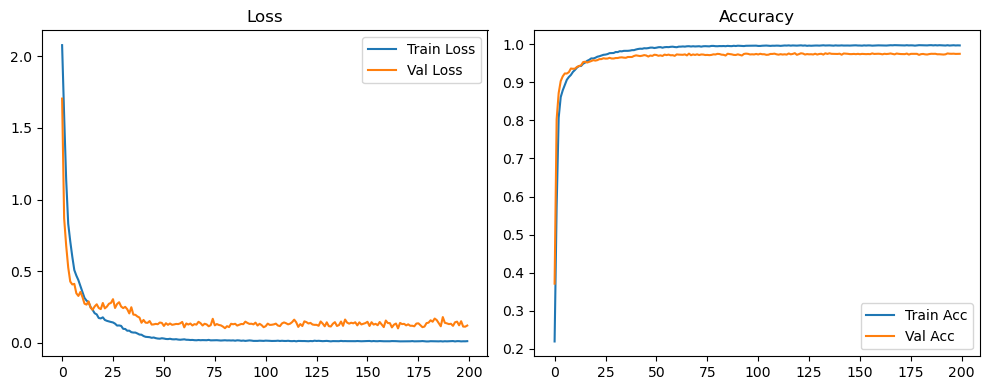

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 50.75it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 51.15it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 51.37it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 51.49it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 51.56it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 51.59it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 50.99it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 50.92it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 51.11it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 51.24it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 51.27it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 51.40it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 51.45it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 51.73it/s]

Original Model Final Test Loss: 0.1084 Accuracy: 0.9739


🚀 Running: batch128_lr0.002_0.002_0.002_dp0.5


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.002 | Train Acc: 0.1915 | Val Acc: 0.3059 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.002 | Train Acc: 0.1915 | Val Acc: 0.3059 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.002 | Train Acc: 0.1915 | Val Acc: 0.3059 |:   0%|          | 1/200 [00:11<37:20, 11.26s/it]

| LR: 0.002 | Train Acc: 0.4478 | Val Acc: 0.7709 |:   0%|          | 1/200 [00:21<37:20, 11.26s/it]

| LR: 0.002 | Train Acc: 0.4478 | Val Acc: 0.7709 |:   0%|          | 1/200 [00:21<37:20, 11.26s/it]

| LR: 0.002 | Train Acc: 0.4478 | Val Acc: 0.7709 |:   1%|          | 2/200 [00:21<36:01, 10.92s/it]

| LR: 0.002 | Train Acc: 0.7259 | Val Acc: 0.8492 |:   1%|          | 2/200 [00:32<36:01, 10.92s/it]

| LR: 0.002 | Train Acc: 0.7259 | Val Acc: 0.8492 |:   1%|          | 2/200 [00:32<36:01, 10.92s/it]

| LR: 0.002 | Train Acc: 0.7259 | Val Acc: 0.8492 |:   2%|▏         | 3/200 [00:32<35:32, 10.83s/it]

| LR: 0.002 | Train Acc: 0.8025 | Val Acc: 0.8817 |:   2%|▏         | 3/200 [00:44<35:32, 10.83s/it]

| LR: 0.002 | Train Acc: 0.8025 | Val Acc: 0.8817 |:   2%|▏         | 3/200 [00:44<35:32, 10.83s/it]

| LR: 0.002 | Train Acc: 0.8025 | Val Acc: 0.8817 |:   2%|▏         | 4/200 [00:44<36:14, 11.10s/it]

| LR: 0.002 | Train Acc: 0.8414 | Val Acc: 0.9030 |:   2%|▏         | 4/200 [00:54<36:14, 11.10s/it]

| LR: 0.002 | Train Acc: 0.8414 | Val Acc: 0.9030 |:   2%|▏         | 4/200 [00:54<36:14, 11.10s/it]

| LR: 0.002 | Train Acc: 0.8414 | Val Acc: 0.9030 |:   2%|▎         | 5/200 [00:54<35:33, 10.94s/it]

| LR: 0.002 | Train Acc: 0.8569 | Val Acc: 0.9056 |:   2%|▎         | 5/200 [01:05<35:33, 10.94s/it]

| LR: 0.002 | Train Acc: 0.8569 | Val Acc: 0.9056 |:   2%|▎         | 5/200 [01:05<35:33, 10.94s/it]

| LR: 0.002 | Train Acc: 0.8569 | Val Acc: 0.9056 |:   3%|▎         | 6/200 [01:05<35:10, 10.88s/it]

| LR: 0.002 | Train Acc: 0.8725 | Val Acc: 0.9127 |:   3%|▎         | 6/200 [01:16<35:10, 10.88s/it]

| LR: 0.002 | Train Acc: 0.8725 | Val Acc: 0.9127 |:   3%|▎         | 6/200 [01:16<35:10, 10.88s/it]

| LR: 0.002 | Train Acc: 0.8725 | Val Acc: 0.9127 |:   4%|▎         | 7/200 [01:16<34:43, 10.80s/it]

| LR: 0.002 | Train Acc: 0.8808 | Val Acc: 0.9223 |:   4%|▎         | 7/200 [01:26<34:43, 10.80s/it]

| LR: 0.002 | Train Acc: 0.8808 | Val Acc: 0.9223 |:   4%|▎         | 7/200 [01:26<34:43, 10.80s/it]

| LR: 0.002 | Train Acc: 0.8808 | Val Acc: 0.9223 |:   4%|▍         | 8/200 [01:26<34:25, 10.76s/it]

| LR: 0.002 | Train Acc: 0.8922 | Val Acc: 0.9303 |:   4%|▍         | 8/200 [01:37<34:25, 10.76s/it]

| LR: 0.002 | Train Acc: 0.8922 | Val Acc: 0.9303 |:   4%|▍         | 8/200 [01:37<34:25, 10.76s/it]

| LR: 0.002 | Train Acc: 0.8922 | Val Acc: 0.9303 |:   4%|▍         | 9/200 [01:37<34:08, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9007 | Val Acc: 0.9317 |:   4%|▍         | 9/200 [01:48<34:08, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9007 | Val Acc: 0.9317 |:   4%|▍         | 9/200 [01:48<34:08, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9007 | Val Acc: 0.9317 |:   5%|▌         | 10/200 [01:48<33:44, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9048 | Val Acc: 0.9391 |:   5%|▌         | 10/200 [01:58<33:44, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9048 | Val Acc: 0.9391 |:   5%|▌         | 10/200 [01:58<33:44, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9048 | Val Acc: 0.9391 |:   6%|▌         | 11/200 [01:58<33:14, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9105 | Val Acc: 0.9338 |:   6%|▌         | 11/200 [02:09<33:14, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9105 | Val Acc: 0.9338 |:   6%|▌         | 11/200 [02:09<33:14, 10.55s/it]

| LR: 0.002 | Train Acc: 0.9105 | Val Acc: 0.9338 |:   6%|▌         | 12/200 [02:09<33:15, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9164 | Val Acc: 0.9433 |:   6%|▌         | 12/200 [02:19<33:15, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9164 | Val Acc: 0.9433 |:   6%|▌         | 12/200 [02:19<33:15, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9164 | Val Acc: 0.9433 |:   6%|▋         | 13/200 [02:19<33:10, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9198 | Val Acc: 0.9450 |:   6%|▋         | 13/200 [02:31<33:10, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9198 | Val Acc: 0.9450 |:   6%|▋         | 13/200 [02:31<33:10, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9198 | Val Acc: 0.9450 |:   7%|▋         | 14/200 [02:31<34:19, 11.07s/it]

| LR: 0.002 | Train Acc: 0.9256 | Val Acc: 0.9478 |:   7%|▋         | 14/200 [02:44<34:19, 11.07s/it]

| LR: 0.002 | Train Acc: 0.9256 | Val Acc: 0.9478 |:   7%|▋         | 14/200 [02:44<34:19, 11.07s/it]

| LR: 0.002 | Train Acc: 0.9256 | Val Acc: 0.9478 |:   8%|▊         | 15/200 [02:44<35:25, 11.49s/it]

| LR: 0.002 | Train Acc: 0.9322 | Val Acc: 0.9535 |:   8%|▊         | 15/200 [02:56<35:25, 11.49s/it]

| LR: 0.002 | Train Acc: 0.9322 | Val Acc: 0.9535 |:   8%|▊         | 15/200 [02:56<35:25, 11.49s/it]

| LR: 0.002 | Train Acc: 0.9322 | Val Acc: 0.9535 |:   8%|▊         | 16/200 [02:56<35:53, 11.70s/it]

| LR: 0.002 | Train Acc: 0.9336 | Val Acc: 0.9515 |:   8%|▊         | 16/200 [03:07<35:53, 11.70s/it]

| LR: 0.002 | Train Acc: 0.9336 | Val Acc: 0.9515 |:   8%|▊         | 16/200 [03:07<35:53, 11.70s/it]

| LR: 0.002 | Train Acc: 0.9336 | Val Acc: 0.9515 |:   8%|▊         | 17/200 [03:07<34:47, 11.41s/it]

| LR: 0.002 | Train Acc: 0.9401 | Val Acc: 0.9542 |:   8%|▊         | 17/200 [03:17<34:47, 11.41s/it]

| LR: 0.002 | Train Acc: 0.9401 | Val Acc: 0.9542 |:   8%|▊         | 17/200 [03:17<34:47, 11.41s/it]

| LR: 0.002 | Train Acc: 0.9401 | Val Acc: 0.9542 |:   9%|▉         | 18/200 [03:17<33:58, 11.20s/it]

| LR: 0.002 | Train Acc: 0.9399 | Val Acc: 0.9583 |:   9%|▉         | 18/200 [03:28<33:58, 11.20s/it]

| LR: 0.002 | Train Acc: 0.9399 | Val Acc: 0.9583 |:   9%|▉         | 18/200 [03:28<33:58, 11.20s/it]

| LR: 0.002 | Train Acc: 0.9399 | Val Acc: 0.9583 |:  10%|▉         | 19/200 [03:28<33:16, 11.03s/it]

| LR: 0.002 | Train Acc: 0.9424 | Val Acc: 0.9625 |:  10%|▉         | 19/200 [03:39<33:16, 11.03s/it]

| LR: 0.002 | Train Acc: 0.9424 | Val Acc: 0.9625 |:  10%|▉         | 19/200 [03:39<33:16, 11.03s/it]

| LR: 0.002 | Train Acc: 0.9424 | Val Acc: 0.9625 |:  10%|█         | 20/200 [03:39<32:45, 10.92s/it]

| LR: 0.002 | Train Acc: 0.9466 | Val Acc: 0.9563 |:  10%|█         | 20/200 [03:49<32:45, 10.92s/it]

| LR: 0.002 | Train Acc: 0.9466 | Val Acc: 0.9563 |:  10%|█         | 20/200 [03:49<32:45, 10.92s/it]

| LR: 0.002 | Train Acc: 0.9466 | Val Acc: 0.9563 |:  10%|█         | 21/200 [03:49<32:13, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9491 | Val Acc: 0.9624 |:  10%|█         | 21/200 [04:00<32:13, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9491 | Val Acc: 0.9624 |:  10%|█         | 21/200 [04:00<32:13, 10.80s/it]

| LR: 0.002 | Train Acc: 0.9491 | Val Acc: 0.9624 |:  11%|█         | 22/200 [04:00<32:09, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9528 | Val Acc: 0.9624 |:  11%|█         | 22/200 [04:11<32:09, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9528 | Val Acc: 0.9624 |:  11%|█         | 22/200 [04:11<32:09, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9528 | Val Acc: 0.9624 |:  12%|█▏        | 23/200 [04:11<31:39, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9545 | Val Acc: 0.9630 |:  12%|█▏        | 23/200 [04:21<31:39, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9545 | Val Acc: 0.9630 |:  12%|█▏        | 23/200 [04:21<31:39, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9545 | Val Acc: 0.9630 |:  12%|█▏        | 24/200 [04:21<31:13, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9562 | Val Acc: 0.9671 |:  12%|█▏        | 24/200 [04:32<31:13, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9562 | Val Acc: 0.9671 |:  12%|█▏        | 24/200 [04:32<31:13, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9562 | Val Acc: 0.9671 |:  12%|█▎        | 25/200 [04:32<31:13, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9568 | Val Acc: 0.9663 |:  12%|█▎        | 25/200 [04:43<31:13, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9568 | Val Acc: 0.9663 |:  12%|█▎        | 25/200 [04:43<31:13, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9568 | Val Acc: 0.9663 |:  13%|█▎        | 26/200 [04:43<30:56, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9585 | Val Acc: 0.9669 |:  13%|█▎        | 26/200 [04:53<30:56, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9585 | Val Acc: 0.9669 |:  13%|█▎        | 26/200 [04:53<30:56, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9585 | Val Acc: 0.9669 |:  14%|█▎        | 27/200 [04:53<30:51, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9619 | Val Acc: 0.9677 |:  14%|█▎        | 27/200 [05:04<30:51, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9619 | Val Acc: 0.9677 |:  14%|█▎        | 27/200 [05:04<30:51, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9619 | Val Acc: 0.9677 |:  14%|█▍        | 28/200 [05:04<30:44, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9620 | Val Acc: 0.9697 |:  14%|█▍        | 28/200 [05:15<30:44, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9620 | Val Acc: 0.9697 |:  14%|█▍        | 28/200 [05:15<30:44, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9620 | Val Acc: 0.9697 |:  14%|█▍        | 29/200 [05:15<30:25, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9640 | Val Acc: 0.9689 |:  14%|█▍        | 29/200 [05:25<30:25, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9640 | Val Acc: 0.9689 |:  14%|█▍        | 29/200 [05:25<30:25, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9640 | Val Acc: 0.9689 |:  15%|█▌        | 30/200 [05:25<30:17, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9647 | Val Acc: 0.9667 |:  15%|█▌        | 30/200 [05:36<30:17, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9647 | Val Acc: 0.9667 |:  15%|█▌        | 30/200 [05:36<30:17, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9647 | Val Acc: 0.9667 |:  16%|█▌        | 31/200 [05:36<30:02, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9643 | Val Acc: 0.9682 |:  16%|█▌        | 31/200 [05:47<30:02, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9643 | Val Acc: 0.9682 |:  16%|█▌        | 31/200 [05:47<30:02, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9643 | Val Acc: 0.9682 |:  16%|█▌        | 32/200 [05:47<29:56, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9663 | Val Acc: 0.9663 |:  16%|█▌        | 32/200 [05:57<29:56, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9663 | Val Acc: 0.9663 |:  16%|█▌        | 32/200 [05:57<29:56, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9663 | Val Acc: 0.9663 |:  16%|█▋        | 33/200 [05:57<29:41, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9649 | Val Acc: 0.9653 |:  16%|█▋        | 33/200 [06:08<29:41, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9649 | Val Acc: 0.9653 |:  16%|█▋        | 33/200 [06:08<29:41, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9649 | Val Acc: 0.9653 |:  17%|█▋        | 34/200 [06:08<29:38, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9679 | Val Acc: 0.9664 |:  17%|█▋        | 34/200 [06:19<29:38, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9679 | Val Acc: 0.9664 |:  17%|█▋        | 34/200 [06:19<29:38, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9679 | Val Acc: 0.9664 |:  18%|█▊        | 35/200 [06:19<29:31, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9679 | Val Acc: 0.9671 |:  18%|█▊        | 35/200 [06:30<29:31, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9679 | Val Acc: 0.9671 |:  18%|█▊        | 35/200 [06:30<29:31, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9679 | Val Acc: 0.9671 |:  18%|█▊        | 36/200 [06:30<29:18, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9690 | Val Acc: 0.9693 |:  18%|█▊        | 36/200 [06:40<29:18, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9690 | Val Acc: 0.9693 |:  18%|█▊        | 36/200 [06:40<29:18, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9690 | Val Acc: 0.9693 |:  18%|█▊        | 37/200 [06:40<29:09, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9692 | Val Acc: 0.9676 |:  18%|█▊        | 37/200 [06:51<29:09, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9692 | Val Acc: 0.9676 |:  18%|█▊        | 37/200 [06:51<29:09, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9692 | Val Acc: 0.9676 |:  19%|█▉        | 38/200 [06:51<28:53, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9719 | Val Acc: 0.9708 |:  19%|█▉        | 38/200 [07:02<28:53, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9719 | Val Acc: 0.9708 |:  19%|█▉        | 38/200 [07:02<28:53, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9719 | Val Acc: 0.9708 |:  20%|█▉        | 39/200 [07:02<28:35, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9706 | Val Acc: 0.9700 |:  20%|█▉        | 39/200 [07:12<28:35, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9706 | Val Acc: 0.9700 |:  20%|█▉        | 39/200 [07:12<28:35, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9706 | Val Acc: 0.9700 |:  20%|██        | 40/200 [07:12<28:19, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9723 | Val Acc: 0.9696 |:  20%|██        | 40/200 [07:23<28:19, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9723 | Val Acc: 0.9696 |:  20%|██        | 40/200 [07:23<28:19, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9723 | Val Acc: 0.9696 |:  20%|██        | 41/200 [07:23<28:03, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9740 | Val Acc: 0.9708 |:  20%|██        | 41/200 [07:33<28:03, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9740 | Val Acc: 0.9708 |:  20%|██        | 41/200 [07:33<28:03, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9740 | Val Acc: 0.9708 |:  21%|██        | 42/200 [07:33<27:57, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9742 | Val Acc: 0.9715 |:  21%|██        | 42/200 [07:44<27:57, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9742 | Val Acc: 0.9715 |:  21%|██        | 42/200 [07:44<27:57, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9742 | Val Acc: 0.9715 |:  22%|██▏       | 43/200 [07:44<27:53, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9748 | Val Acc: 0.9713 |:  22%|██▏       | 43/200 [07:55<27:53, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9748 | Val Acc: 0.9713 |:  22%|██▏       | 43/200 [07:55<27:53, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9748 | Val Acc: 0.9713 |:  22%|██▏       | 44/200 [07:55<27:41, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9766 | Val Acc: 0.9711 |:  22%|██▏       | 44/200 [08:05<27:41, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9766 | Val Acc: 0.9711 |:  22%|██▏       | 44/200 [08:05<27:41, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9766 | Val Acc: 0.9711 |:  22%|██▎       | 45/200 [08:05<27:32, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9718 |:  22%|██▎       | 45/200 [08:16<27:32, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9718 |:  22%|██▎       | 45/200 [08:16<27:32, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9718 |:  23%|██▎       | 46/200 [08:16<27:36, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9700 |:  23%|██▎       | 46/200 [08:27<27:36, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9700 |:  23%|██▎       | 46/200 [08:27<27:36, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9700 |:  24%|██▎       | 47/200 [08:27<27:20, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9734 |:  24%|██▎       | 47/200 [08:38<27:20, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9734 |:  24%|██▎       | 47/200 [08:38<27:20, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9765 | Val Acc: 0.9734 |:  24%|██▍       | 48/200 [08:38<27:11, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9782 | Val Acc: 0.9729 |:  24%|██▍       | 48/200 [08:48<27:11, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9782 | Val Acc: 0.9729 |:  24%|██▍       | 48/200 [08:48<27:11, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9782 | Val Acc: 0.9729 |:  24%|██▍       | 49/200 [08:48<26:48, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9776 | Val Acc: 0.9729 |:  24%|██▍       | 49/200 [08:59<26:48, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9776 | Val Acc: 0.9729 |:  24%|██▍       | 49/200 [08:59<26:48, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9776 | Val Acc: 0.9729 |:  25%|██▌       | 50/200 [08:59<26:33, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9790 | Val Acc: 0.9722 |:  25%|██▌       | 50/200 [09:09<26:33, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9790 | Val Acc: 0.9722 |:  25%|██▌       | 50/200 [09:09<26:33, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9790 | Val Acc: 0.9722 |:  26%|██▌       | 51/200 [09:09<26:19, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9798 | Val Acc: 0.9732 |:  26%|██▌       | 51/200 [09:20<26:19, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9798 | Val Acc: 0.9732 |:  26%|██▌       | 51/200 [09:20<26:19, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9798 | Val Acc: 0.9732 |:  26%|██▌       | 52/200 [09:20<26:10, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9788 | Val Acc: 0.9728 |:  26%|██▌       | 52/200 [09:31<26:10, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9788 | Val Acc: 0.9728 |:  26%|██▌       | 52/200 [09:31<26:10, 10.61s/it]

| LR: 0.002 | Train Acc: 0.9788 | Val Acc: 0.9728 |:  26%|██▋       | 53/200 [09:31<26:02, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9792 | Val Acc: 0.9728 |:  26%|██▋       | 53/200 [09:41<26:02, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9792 | Val Acc: 0.9728 |:  26%|██▋       | 53/200 [09:41<26:02, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9792 | Val Acc: 0.9728 |:  27%|██▋       | 54/200 [09:41<25:55, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9791 | Val Acc: 0.9722 |:  27%|██▋       | 54/200 [09:52<25:55, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9791 | Val Acc: 0.9722 |:  27%|██▋       | 54/200 [09:52<25:55, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9791 | Val Acc: 0.9722 |:  28%|██▊       | 55/200 [09:52<25:45, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9793 | Val Acc: 0.9736 |:  28%|██▊       | 55/200 [10:03<25:45, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9793 | Val Acc: 0.9736 |:  28%|██▊       | 55/200 [10:03<25:45, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9793 | Val Acc: 0.9736 |:  28%|██▊       | 56/200 [10:03<25:40, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9799 | Val Acc: 0.9733 |:  28%|██▊       | 56/200 [10:14<25:40, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9799 | Val Acc: 0.9733 |:  28%|██▊       | 56/200 [10:14<25:40, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9799 | Val Acc: 0.9733 |:  28%|██▊       | 57/200 [10:14<25:29, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9811 | Val Acc: 0.9723 |:  28%|██▊       | 57/200 [10:24<25:29, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9811 | Val Acc: 0.9723 |:  28%|██▊       | 57/200 [10:24<25:29, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9811 | Val Acc: 0.9723 |:  29%|██▉       | 58/200 [10:24<25:17, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9813 | Val Acc: 0.9731 |:  29%|██▉       | 58/200 [10:35<25:17, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9813 | Val Acc: 0.9731 |:  29%|██▉       | 58/200 [10:35<25:17, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9813 | Val Acc: 0.9731 |:  30%|██▉       | 59/200 [10:35<25:17, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9814 | Val Acc: 0.9745 |:  30%|██▉       | 59/200 [10:46<25:17, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9814 | Val Acc: 0.9745 |:  30%|██▉       | 59/200 [10:46<25:17, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9814 | Val Acc: 0.9745 |:  30%|███       | 60/200 [10:46<24:57, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9816 | Val Acc: 0.9723 |:  30%|███       | 60/200 [10:56<24:57, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9816 | Val Acc: 0.9723 |:  30%|███       | 60/200 [10:56<24:57, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9816 | Val Acc: 0.9723 |:  30%|███       | 61/200 [10:56<24:33, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9815 | Val Acc: 0.9726 |:  30%|███       | 61/200 [11:07<24:33, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9815 | Val Acc: 0.9726 |:  30%|███       | 61/200 [11:07<24:33, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9815 | Val Acc: 0.9726 |:  31%|███       | 62/200 [11:07<24:21, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9801 | Val Acc: 0.9749 |:  31%|███       | 62/200 [11:17<24:21, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9801 | Val Acc: 0.9749 |:  31%|███       | 62/200 [11:17<24:21, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9801 | Val Acc: 0.9749 |:  32%|███▏      | 63/200 [11:17<24:09, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9816 | Val Acc: 0.9728 |:  32%|███▏      | 63/200 [11:28<24:09, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9816 | Val Acc: 0.9728 |:  32%|███▏      | 63/200 [11:28<24:09, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9816 | Val Acc: 0.9728 |:  32%|███▏      | 64/200 [11:28<23:58, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9817 | Val Acc: 0.9737 |:  32%|███▏      | 64/200 [11:38<23:58, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9817 | Val Acc: 0.9737 |:  32%|███▏      | 64/200 [11:38<23:58, 10.57s/it]

| LR: 0.002 | Train Acc: 0.9817 | Val Acc: 0.9737 |:  32%|███▎      | 65/200 [11:38<23:47, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9822 | Val Acc: 0.9746 |:  32%|███▎      | 65/200 [11:49<23:47, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9822 | Val Acc: 0.9746 |:  32%|███▎      | 65/200 [11:49<23:47, 10.58s/it]

| LR: 0.002 | Train Acc: 0.9822 | Val Acc: 0.9746 |:  33%|███▎      | 66/200 [11:49<23:55, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9822 | Val Acc: 0.9735 |:  33%|███▎      | 66/200 [12:00<23:55, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9822 | Val Acc: 0.9735 |:  33%|███▎      | 66/200 [12:00<23:55, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9822 | Val Acc: 0.9735 |:  34%|███▎      | 67/200 [12:00<23:47, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9823 | Val Acc: 0.9731 |:  34%|███▎      | 67/200 [12:11<23:47, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9823 | Val Acc: 0.9731 |:  34%|███▎      | 67/200 [12:11<23:47, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9823 | Val Acc: 0.9731 |:  34%|███▍      | 68/200 [12:11<23:31, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9817 | Val Acc: 0.9730 |:  34%|███▍      | 68/200 [12:21<23:31, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9817 | Val Acc: 0.9730 |:  34%|███▍      | 68/200 [12:21<23:31, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9817 | Val Acc: 0.9730 |:  34%|███▍      | 69/200 [12:21<23:17, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9816 | Val Acc: 0.9738 |:  34%|███▍      | 69/200 [12:32<23:17, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9816 | Val Acc: 0.9738 |:  34%|███▍      | 69/200 [12:32<23:17, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9816 | Val Acc: 0.9738 |:  35%|███▌      | 70/200 [12:32<23:05, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9820 | Val Acc: 0.9757 |:  35%|███▌      | 70/200 [12:43<23:05, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9820 | Val Acc: 0.9757 |:  35%|███▌      | 70/200 [12:43<23:05, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9820 | Val Acc: 0.9757 |:  36%|███▌      | 71/200 [12:43<23:04, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9830 | Val Acc: 0.9748 |:  36%|███▌      | 71/200 [12:54<23:04, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9830 | Val Acc: 0.9748 |:  36%|███▌      | 71/200 [12:54<23:04, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9830 | Val Acc: 0.9748 |:  36%|███▌      | 72/200 [12:54<22:55, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9834 | Val Acc: 0.9752 |:  36%|███▌      | 72/200 [13:04<22:55, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9834 | Val Acc: 0.9752 |:  36%|███▌      | 72/200 [13:04<22:55, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9834 | Val Acc: 0.9752 |:  36%|███▋      | 73/200 [13:04<22:39, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9836 | Val Acc: 0.9741 |:  36%|███▋      | 73/200 [13:15<22:39, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9836 | Val Acc: 0.9741 |:  36%|███▋      | 73/200 [13:15<22:39, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9836 | Val Acc: 0.9741 |:  37%|███▋      | 74/200 [13:15<22:32, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9832 | Val Acc: 0.9739 |:  37%|███▋      | 74/200 [13:26<22:32, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9832 | Val Acc: 0.9739 |:  37%|███▋      | 74/200 [13:26<22:32, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9832 | Val Acc: 0.9739 |:  38%|███▊      | 75/200 [13:26<22:13, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9828 | Val Acc: 0.9746 |:  38%|███▊      | 75/200 [13:36<22:13, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9828 | Val Acc: 0.9746 |:  38%|███▊      | 75/200 [13:36<22:13, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9828 | Val Acc: 0.9746 |:  38%|███▊      | 76/200 [13:36<22:03, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9736 |:  38%|███▊      | 76/200 [13:47<22:03, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9736 |:  38%|███▊      | 76/200 [13:47<22:03, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9736 |:  38%|███▊      | 77/200 [13:47<21:57, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9834 | Val Acc: 0.9735 |:  38%|███▊      | 77/200 [13:58<21:57, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9834 | Val Acc: 0.9735 |:  38%|███▊      | 77/200 [13:58<21:57, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9834 | Val Acc: 0.9735 |:  39%|███▉      | 78/200 [13:58<21:39, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9833 | Val Acc: 0.9753 |:  39%|███▉      | 78/200 [14:08<21:39, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9833 | Val Acc: 0.9753 |:  39%|███▉      | 78/200 [14:08<21:39, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9833 | Val Acc: 0.9753 |:  40%|███▉      | 79/200 [14:08<21:26, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9842 | Val Acc: 0.9762 |:  40%|███▉      | 79/200 [14:19<21:26, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9842 | Val Acc: 0.9762 |:  40%|███▉      | 79/200 [14:19<21:26, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9842 | Val Acc: 0.9762 |:  40%|████      | 80/200 [14:19<21:30, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9828 | Val Acc: 0.9751 |:  40%|████      | 80/200 [14:31<21:30, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9828 | Val Acc: 0.9751 |:  40%|████      | 80/200 [14:31<21:30, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9828 | Val Acc: 0.9751 |:  40%|████      | 81/200 [14:31<22:04, 11.13s/it]

| LR: 0.002 | Train Acc: 0.9833 | Val Acc: 0.9745 |:  40%|████      | 81/200 [14:42<22:04, 11.13s/it]

| LR: 0.002 | Train Acc: 0.9833 | Val Acc: 0.9745 |:  40%|████      | 81/200 [14:42<22:04, 11.13s/it]

| LR: 0.002 | Train Acc: 0.9833 | Val Acc: 0.9745 |:  41%|████      | 82/200 [14:42<21:42, 11.04s/it]

| LR: 0.002 | Train Acc: 0.9830 | Val Acc: 0.9738 |:  41%|████      | 82/200 [14:53<21:42, 11.04s/it]

| LR: 0.002 | Train Acc: 0.9830 | Val Acc: 0.9738 |:  41%|████      | 82/200 [14:53<21:42, 11.04s/it]

| LR: 0.002 | Train Acc: 0.9830 | Val Acc: 0.9738 |:  42%|████▏     | 83/200 [14:53<21:23, 10.97s/it]

| LR: 0.002 | Train Acc: 0.9838 | Val Acc: 0.9759 |:  42%|████▏     | 83/200 [15:03<21:23, 10.97s/it]

| LR: 0.002 | Train Acc: 0.9838 | Val Acc: 0.9759 |:  42%|████▏     | 83/200 [15:03<21:23, 10.97s/it]

| LR: 0.002 | Train Acc: 0.9838 | Val Acc: 0.9759 |:  42%|████▏     | 84/200 [15:04<20:59, 10.86s/it]

| LR: 0.002 | Train Acc: 0.9839 | Val Acc: 0.9756 |:  42%|████▏     | 84/200 [15:14<20:59, 10.86s/it]

| LR: 0.002 | Train Acc: 0.9839 | Val Acc: 0.9756 |:  42%|████▏     | 84/200 [15:14<20:59, 10.86s/it]

| LR: 0.002 | Train Acc: 0.9839 | Val Acc: 0.9756 |:  42%|████▎     | 85/200 [15:14<20:43, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9851 | Val Acc: 0.9752 |:  42%|████▎     | 85/200 [15:25<20:43, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9851 | Val Acc: 0.9752 |:  42%|████▎     | 85/200 [15:25<20:43, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9851 | Val Acc: 0.9752 |:  43%|████▎     | 86/200 [15:25<20:26, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9831 | Val Acc: 0.9752 |:  43%|████▎     | 86/200 [15:36<20:26, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9831 | Val Acc: 0.9752 |:  43%|████▎     | 86/200 [15:36<20:26, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9831 | Val Acc: 0.9752 |:  44%|████▎     | 87/200 [15:36<20:17, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9742 |:  44%|████▎     | 87/200 [15:47<20:17, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9742 |:  44%|████▎     | 87/200 [15:47<20:17, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9742 |:  44%|████▍     | 88/200 [15:47<20:12, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9834 | Val Acc: 0.9751 |:  44%|████▍     | 88/200 [15:57<20:12, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9834 | Val Acc: 0.9751 |:  44%|████▍     | 88/200 [15:57<20:12, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9834 | Val Acc: 0.9751 |:  44%|████▍     | 89/200 [15:57<19:55, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9838 | Val Acc: 0.9722 |:  44%|████▍     | 89/200 [16:08<19:55, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9838 | Val Acc: 0.9722 |:  44%|████▍     | 89/200 [16:08<19:55, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9838 | Val Acc: 0.9722 |:  45%|████▌     | 90/200 [16:08<19:40, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9730 |:  45%|████▌     | 90/200 [16:18<19:40, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9730 |:  45%|████▌     | 90/200 [16:18<19:40, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9730 |:  46%|████▌     | 91/200 [16:18<19:24, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9832 | Val Acc: 0.9736 |:  46%|████▌     | 91/200 [16:29<19:24, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9832 | Val Acc: 0.9736 |:  46%|████▌     | 91/200 [16:29<19:24, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9832 | Val Acc: 0.9736 |:  46%|████▌     | 92/200 [16:29<19:09, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9841 | Val Acc: 0.9748 |:  46%|████▌     | 92/200 [16:40<19:09, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9841 | Val Acc: 0.9748 |:  46%|████▌     | 92/200 [16:40<19:09, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9841 | Val Acc: 0.9748 |:  46%|████▋     | 93/200 [16:40<19:04, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9837 | Val Acc: 0.9738 |:  46%|████▋     | 93/200 [16:50<19:04, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9837 | Val Acc: 0.9738 |:  46%|████▋     | 93/200 [16:50<19:04, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9837 | Val Acc: 0.9738 |:  47%|████▋     | 94/200 [16:51<18:53, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9847 | Val Acc: 0.9748 |:  47%|████▋     | 94/200 [17:01<18:53, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9847 | Val Acc: 0.9748 |:  47%|████▋     | 94/200 [17:01<18:53, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9847 | Val Acc: 0.9748 |:  48%|████▊     | 95/200 [17:01<18:38, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9742 |:  48%|████▊     | 95/200 [17:12<18:38, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9742 |:  48%|████▊     | 95/200 [17:12<18:38, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9742 |:  48%|████▊     | 96/200 [17:12<18:32, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9847 | Val Acc: 0.9728 |:  48%|████▊     | 96/200 [17:22<18:32, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9847 | Val Acc: 0.9728 |:  48%|████▊     | 96/200 [17:22<18:32, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9847 | Val Acc: 0.9728 |:  48%|████▊     | 97/200 [17:22<18:16, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9763 |:  48%|████▊     | 97/200 [17:33<18:16, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9763 |:  48%|████▊     | 97/200 [17:33<18:16, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9763 |:  49%|████▉     | 98/200 [17:33<18:09, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9842 | Val Acc: 0.9772 |:  49%|████▉     | 98/200 [17:44<18:09, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9842 | Val Acc: 0.9772 |:  49%|████▉     | 98/200 [17:44<18:09, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9842 | Val Acc: 0.9772 |:  50%|████▉     | 99/200 [17:44<17:55, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9855 | Val Acc: 0.9750 |:  50%|████▉     | 99/200 [17:54<17:55, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9855 | Val Acc: 0.9750 |:  50%|████▉     | 99/200 [17:54<17:55, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9855 | Val Acc: 0.9750 |:  50%|█████     | 100/200 [17:54<17:41, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9845 | Val Acc: 0.9744 |:  50%|█████     | 100/200 [18:05<17:41, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9845 | Val Acc: 0.9744 |:  50%|█████     | 100/200 [18:05<17:41, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9845 | Val Acc: 0.9744 |:  50%|█████     | 101/200 [18:05<17:33, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9842 | Val Acc: 0.9729 |:  50%|█████     | 101/200 [18:16<17:33, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9842 | Val Acc: 0.9729 |:  50%|█████     | 101/200 [18:16<17:33, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9842 | Val Acc: 0.9729 |:  51%|█████     | 102/200 [18:16<17:33, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9750 |:  51%|█████     | 102/200 [18:27<17:33, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9750 |:  51%|█████     | 102/200 [18:27<17:33, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9750 |:  52%|█████▏    | 103/200 [18:27<17:20, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9848 | Val Acc: 0.9755 |:  52%|█████▏    | 103/200 [18:37<17:20, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9848 | Val Acc: 0.9755 |:  52%|█████▏    | 103/200 [18:37<17:20, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9848 | Val Acc: 0.9755 |:  52%|█████▏    | 104/200 [18:37<17:10, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9845 | Val Acc: 0.9738 |:  52%|█████▏    | 104/200 [18:48<17:10, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9845 | Val Acc: 0.9738 |:  52%|█████▏    | 104/200 [18:48<17:10, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9845 | Val Acc: 0.9738 |:  52%|█████▎    | 105/200 [18:48<16:58, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9844 | Val Acc: 0.9759 |:  52%|█████▎    | 105/200 [18:58<16:58, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9844 | Val Acc: 0.9759 |:  52%|█████▎    | 105/200 [18:58<16:58, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9844 | Val Acc: 0.9759 |:  53%|█████▎    | 106/200 [18:58<16:31, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9749 |:  53%|█████▎    | 106/200 [19:09<16:31, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9749 |:  53%|█████▎    | 106/200 [19:09<16:31, 10.54s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9749 |:  54%|█████▎    | 107/200 [19:09<16:19, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9846 | Val Acc: 0.9730 |:  54%|█████▎    | 107/200 [19:19<16:19, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9846 | Val Acc: 0.9730 |:  54%|█████▎    | 107/200 [19:19<16:19, 10.53s/it]

| LR: 0.002 | Train Acc: 0.9846 | Val Acc: 0.9730 |:  54%|█████▍    | 108/200 [19:19<16:11, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9842 | Val Acc: 0.9736 |:  54%|█████▍    | 108/200 [19:30<16:11, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9842 | Val Acc: 0.9736 |:  54%|█████▍    | 108/200 [19:30<16:11, 10.56s/it]

| LR: 0.002 | Train Acc: 0.9842 | Val Acc: 0.9736 |:  55%|█████▍    | 109/200 [19:30<16:10, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9855 | Val Acc: 0.9740 |:  55%|█████▍    | 109/200 [19:41<16:10, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9855 | Val Acc: 0.9740 |:  55%|█████▍    | 109/200 [19:41<16:10, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9855 | Val Acc: 0.9740 |:  55%|█████▌    | 110/200 [19:41<16:01, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9844 | Val Acc: 0.9741 |:  55%|█████▌    | 110/200 [19:52<16:01, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9844 | Val Acc: 0.9741 |:  55%|█████▌    | 110/200 [19:52<16:01, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9844 | Val Acc: 0.9741 |:  56%|█████▌    | 111/200 [19:52<15:52, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9742 |:  56%|█████▌    | 111/200 [20:02<15:52, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9742 |:  56%|█████▌    | 111/200 [20:02<15:52, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9742 |:  56%|█████▌    | 112/200 [20:02<15:41, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9855 | Val Acc: 0.9752 |:  56%|█████▌    | 112/200 [20:13<15:41, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9855 | Val Acc: 0.9752 |:  56%|█████▌    | 112/200 [20:13<15:41, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9855 | Val Acc: 0.9752 |:  56%|█████▋    | 113/200 [20:13<15:28, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9756 |:  56%|█████▋    | 113/200 [20:24<15:28, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9756 |:  56%|█████▋    | 113/200 [20:24<15:28, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9756 |:  57%|█████▋    | 114/200 [20:24<15:25, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9742 |:  57%|█████▋    | 114/200 [20:35<15:25, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9742 |:  57%|█████▋    | 114/200 [20:35<15:25, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9742 |:  57%|█████▊    | 115/200 [20:35<15:14, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9743 |:  57%|█████▊    | 115/200 [20:45<15:14, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9743 |:  57%|█████▊    | 115/200 [20:45<15:14, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9743 |:  58%|█████▊    | 116/200 [20:45<15:00, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9745 |:  58%|█████▊    | 116/200 [20:56<15:00, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9745 |:  58%|█████▊    | 116/200 [20:56<15:00, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9745 |:  58%|█████▊    | 117/200 [20:56<14:44, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9757 |:  58%|█████▊    | 117/200 [21:07<14:44, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9757 |:  58%|█████▊    | 117/200 [21:07<14:44, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9757 |:  59%|█████▉    | 118/200 [21:07<14:37, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9849 | Val Acc: 0.9755 |:  59%|█████▉    | 118/200 [21:17<14:37, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9849 | Val Acc: 0.9755 |:  59%|█████▉    | 118/200 [21:17<14:37, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9849 | Val Acc: 0.9755 |:  60%|█████▉    | 119/200 [21:17<14:24, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9746 |:  60%|█████▉    | 119/200 [21:28<14:24, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9746 |:  60%|█████▉    | 119/200 [21:28<14:24, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9746 |:  60%|██████    | 120/200 [21:28<14:12, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9742 |:  60%|██████    | 120/200 [21:38<14:12, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9742 |:  60%|██████    | 120/200 [21:38<14:12, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9843 | Val Acc: 0.9742 |:  60%|██████    | 121/200 [21:38<13:59, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9748 |:  60%|██████    | 121/200 [21:49<13:59, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9748 |:  60%|██████    | 121/200 [21:49<13:59, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9748 |:  61%|██████    | 122/200 [21:49<13:51, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9743 |:  61%|██████    | 122/200 [22:00<13:51, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9743 |:  61%|██████    | 122/200 [22:00<13:51, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9743 |:  62%|██████▏   | 123/200 [22:00<13:42, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9743 |:  62%|██████▏   | 123/200 [22:11<13:42, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9743 |:  62%|██████▏   | 123/200 [22:11<13:42, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9743 |:  62%|██████▏   | 124/200 [22:11<13:32, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9737 |:  62%|██████▏   | 124/200 [22:21<13:32, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9737 |:  62%|██████▏   | 124/200 [22:21<13:32, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9737 |:  62%|██████▎   | 125/200 [22:21<13:18, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9736 |:  62%|██████▎   | 125/200 [22:33<13:18, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9736 |:  62%|██████▎   | 125/200 [22:33<13:18, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9736 |:  63%|██████▎   | 126/200 [22:33<13:29, 10.93s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9742 |:  63%|██████▎   | 126/200 [22:44<13:29, 10.93s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9742 |:  63%|██████▎   | 126/200 [22:44<13:29, 10.93s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9742 |:  64%|██████▎   | 127/200 [22:44<13:16, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9744 |:  64%|██████▎   | 127/200 [22:55<13:16, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9744 |:  64%|██████▎   | 127/200 [22:55<13:16, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9744 |:  64%|██████▍   | 128/200 [22:55<13:04, 10.90s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9746 |:  64%|██████▍   | 128/200 [23:05<13:04, 10.90s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9746 |:  64%|██████▍   | 128/200 [23:05<13:04, 10.90s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9746 |:  64%|██████▍   | 129/200 [23:05<12:49, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9736 |:  64%|██████▍   | 129/200 [23:16<12:49, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9736 |:  64%|██████▍   | 129/200 [23:16<12:49, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9736 |:  65%|██████▌   | 130/200 [23:16<12:39, 10.85s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9752 |:  65%|██████▌   | 130/200 [23:27<12:39, 10.85s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9752 |:  65%|██████▌   | 130/200 [23:27<12:39, 10.85s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9752 |:  66%|██████▌   | 131/200 [23:27<12:38, 10.99s/it]

| LR: 0.002 | Train Acc: 0.9855 | Val Acc: 0.9748 |:  66%|██████▌   | 131/200 [23:38<12:38, 10.99s/it]

| LR: 0.002 | Train Acc: 0.9855 | Val Acc: 0.9748 |:  66%|██████▌   | 131/200 [23:38<12:38, 10.99s/it]

| LR: 0.002 | Train Acc: 0.9855 | Val Acc: 0.9748 |:  66%|██████▌   | 132/200 [23:38<12:21, 10.90s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9754 |:  66%|██████▌   | 132/200 [23:49<12:21, 10.90s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9754 |:  66%|██████▌   | 132/200 [23:49<12:21, 10.90s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9754 |:  66%|██████▋   | 133/200 [23:49<12:10, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9755 |:  66%|██████▋   | 133/200 [24:00<12:10, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9755 |:  66%|██████▋   | 133/200 [24:00<12:10, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9755 |:  67%|██████▋   | 134/200 [24:00<11:52, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9758 |:  67%|██████▋   | 134/200 [24:10<11:52, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9758 |:  67%|██████▋   | 134/200 [24:10<11:52, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9758 |:  68%|██████▊   | 135/200 [24:10<11:37, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9738 |:  68%|██████▊   | 135/200 [24:21<11:37, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9738 |:  68%|██████▊   | 135/200 [24:21<11:37, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9738 |:  68%|██████▊   | 136/200 [24:21<11:27, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9848 | Val Acc: 0.9752 |:  68%|██████▊   | 136/200 [24:32<11:27, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9848 | Val Acc: 0.9752 |:  68%|██████▊   | 136/200 [24:32<11:27, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9848 | Val Acc: 0.9752 |:  68%|██████▊   | 137/200 [24:32<11:17, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9758 |:  68%|██████▊   | 137/200 [24:42<11:17, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9758 |:  68%|██████▊   | 137/200 [24:42<11:17, 10.76s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9758 |:  69%|██████▉   | 138/200 [24:42<11:04, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9857 | Val Acc: 0.9750 |:  69%|██████▉   | 138/200 [24:53<11:04, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9857 | Val Acc: 0.9750 |:  69%|██████▉   | 138/200 [24:53<11:04, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9857 | Val Acc: 0.9750 |:  70%|██████▉   | 139/200 [24:53<10:52, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9851 | Val Acc: 0.9742 |:  70%|██████▉   | 139/200 [25:04<10:52, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9851 | Val Acc: 0.9742 |:  70%|██████▉   | 139/200 [25:04<10:52, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9851 | Val Acc: 0.9742 |:  70%|███████   | 140/200 [25:04<10:41, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9732 |:  70%|███████   | 140/200 [25:14<10:41, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9732 |:  70%|███████   | 140/200 [25:14<10:41, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9732 |:  70%|███████   | 141/200 [25:14<10:31, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9752 |:  70%|███████   | 141/200 [25:26<10:31, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9752 |:  70%|███████   | 141/200 [25:26<10:31, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9752 |:  71%|███████   | 142/200 [25:26<10:41, 11.06s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9748 |:  71%|███████   | 142/200 [25:37<10:41, 11.06s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9748 |:  71%|███████   | 142/200 [25:37<10:41, 11.06s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9748 |:  72%|███████▏  | 143/200 [25:37<10:23, 10.93s/it]

| LR: 0.002 | Train Acc: 0.9867 | Val Acc: 0.9748 |:  72%|███████▏  | 143/200 [25:48<10:23, 10.93s/it]

| LR: 0.002 | Train Acc: 0.9867 | Val Acc: 0.9748 |:  72%|███████▏  | 143/200 [25:48<10:23, 10.93s/it]

| LR: 0.002 | Train Acc: 0.9867 | Val Acc: 0.9748 |:  72%|███████▏  | 144/200 [25:48<10:10, 10.90s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9742 |:  72%|███████▏  | 144/200 [25:58<10:10, 10.90s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9742 |:  72%|███████▏  | 144/200 [25:58<10:10, 10.90s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9742 |:  72%|███████▎  | 145/200 [25:58<09:56, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9742 |:  72%|███████▎  | 145/200 [26:09<09:56, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9742 |:  72%|███████▎  | 145/200 [26:09<09:56, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9742 |:  73%|███████▎  | 146/200 [26:09<09:43, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9737 |:  73%|███████▎  | 146/200 [26:20<09:43, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9737 |:  73%|███████▎  | 146/200 [26:20<09:43, 10.81s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9737 |:  74%|███████▎  | 147/200 [26:20<09:37, 10.89s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9748 |:  74%|███████▎  | 147/200 [26:31<09:37, 10.89s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9748 |:  74%|███████▎  | 147/200 [26:31<09:37, 10.89s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9748 |:  74%|███████▍  | 148/200 [26:31<09:23, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9752 |:  74%|███████▍  | 148/200 [26:42<09:23, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9752 |:  74%|███████▍  | 148/200 [26:42<09:23, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9752 |:  74%|███████▍  | 149/200 [26:42<09:11, 10.82s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9739 |:  74%|███████▍  | 149/200 [26:52<09:11, 10.82s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9739 |:  74%|███████▍  | 149/200 [26:52<09:11, 10.82s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9739 |:  75%|███████▌  | 150/200 [26:52<08:59, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9743 |:  75%|███████▌  | 150/200 [27:03<08:59, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9743 |:  75%|███████▌  | 150/200 [27:03<08:59, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9743 |:  76%|███████▌  | 151/200 [27:03<08:48, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9734 |:  76%|███████▌  | 151/200 [27:14<08:48, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9734 |:  76%|███████▌  | 151/200 [27:14<08:48, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9734 |:  76%|███████▌  | 152/200 [27:14<08:43, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9739 |:  76%|███████▌  | 152/200 [27:25<08:43, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9739 |:  76%|███████▌  | 152/200 [27:25<08:43, 10.91s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9739 |:  76%|███████▋  | 153/200 [27:25<08:30, 10.87s/it]

| LR: 0.002 | Train Acc: 0.9851 | Val Acc: 0.9738 |:  76%|███████▋  | 153/200 [27:36<08:30, 10.87s/it]

| LR: 0.002 | Train Acc: 0.9851 | Val Acc: 0.9738 |:  76%|███████▋  | 153/200 [27:36<08:30, 10.87s/it]

| LR: 0.002 | Train Acc: 0.9851 | Val Acc: 0.9738 |:  77%|███████▋  | 154/200 [27:36<08:18, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9747 |:  77%|███████▋  | 154/200 [27:46<08:18, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9747 |:  77%|███████▋  | 154/200 [27:46<08:18, 10.84s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9747 |:  78%|███████▊  | 155/200 [27:46<08:02, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9758 |:  78%|███████▊  | 155/200 [27:57<08:02, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9758 |:  78%|███████▊  | 155/200 [27:57<08:02, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9758 |:  78%|███████▊  | 156/200 [27:57<07:49, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9869 | Val Acc: 0.9746 |:  78%|███████▊  | 156/200 [28:08<07:49, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9869 | Val Acc: 0.9746 |:  78%|███████▊  | 156/200 [28:08<07:49, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9869 | Val Acc: 0.9746 |:  78%|███████▊  | 157/200 [28:08<07:38, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9863 | Val Acc: 0.9739 |:  78%|███████▊  | 157/200 [28:18<07:38, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9863 | Val Acc: 0.9739 |:  78%|███████▊  | 157/200 [28:18<07:38, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9863 | Val Acc: 0.9739 |:  79%|███████▉  | 158/200 [28:18<07:29, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9862 | Val Acc: 0.9757 |:  79%|███████▉  | 158/200 [28:30<07:29, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9862 | Val Acc: 0.9757 |:  79%|███████▉  | 158/200 [28:30<07:29, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9862 | Val Acc: 0.9757 |:  80%|███████▉  | 159/200 [28:30<07:31, 11.00s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9742 |:  80%|███████▉  | 159/200 [28:41<07:31, 11.00s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9742 |:  80%|███████▉  | 159/200 [28:41<07:31, 11.00s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9742 |:  80%|████████  | 160/200 [28:41<07:16, 10.92s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9747 |:  80%|████████  | 160/200 [28:51<07:16, 10.92s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9747 |:  80%|████████  | 160/200 [28:51<07:16, 10.92s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9747 |:  80%|████████  | 161/200 [28:51<07:02, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9751 |:  80%|████████  | 161/200 [29:02<07:02, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9751 |:  80%|████████  | 161/200 [29:02<07:02, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9751 |:  81%|████████  | 162/200 [29:03<06:53, 10.89s/it]

| LR: 0.002 | Train Acc: 0.9862 | Val Acc: 0.9757 |:  81%|████████  | 162/200 [29:13<06:53, 10.89s/it]

| LR: 0.002 | Train Acc: 0.9862 | Val Acc: 0.9757 |:  81%|████████  | 162/200 [29:13<06:53, 10.89s/it]

| LR: 0.002 | Train Acc: 0.9862 | Val Acc: 0.9757 |:  82%|████████▏ | 163/200 [29:13<06:41, 10.86s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  82%|████████▏ | 163/200 [29:24<06:41, 10.86s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  82%|████████▏ | 163/200 [29:24<06:41, 10.86s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  82%|████████▏ | 164/200 [29:24<06:28, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9857 | Val Acc: 0.9758 |:  82%|████████▏ | 164/200 [29:34<06:28, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9857 | Val Acc: 0.9758 |:  82%|████████▏ | 164/200 [29:34<06:28, 10.78s/it]

| LR: 0.002 | Train Acc: 0.9857 | Val Acc: 0.9758 |:  82%|████████▎ | 165/200 [29:34<06:15, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9739 |:  82%|████████▎ | 165/200 [29:45<06:15, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9739 |:  82%|████████▎ | 165/200 [29:45<06:15, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9739 |:  83%|████████▎ | 166/200 [29:45<06:04, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9745 |:  83%|████████▎ | 166/200 [29:56<06:04, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9745 |:  83%|████████▎ | 166/200 [29:56<06:04, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9745 |:  84%|████████▎ | 167/200 [29:56<05:54, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9862 | Val Acc: 0.9752 |:  84%|████████▎ | 167/200 [30:07<05:54, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9862 | Val Acc: 0.9752 |:  84%|████████▎ | 167/200 [30:07<05:54, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9862 | Val Acc: 0.9752 |:  84%|████████▍ | 168/200 [30:07<05:44, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9748 |:  84%|████████▍ | 168/200 [30:18<05:44, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9748 |:  84%|████████▍ | 168/200 [30:18<05:44, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9748 |:  84%|████████▍ | 169/200 [30:18<05:33, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9745 |:  84%|████████▍ | 169/200 [30:28<05:33, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9745 |:  84%|████████▍ | 169/200 [30:28<05:33, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9745 |:  85%|████████▌ | 170/200 [30:28<05:20, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9866 | Val Acc: 0.9751 |:  85%|████████▌ | 170/200 [30:39<05:20, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9866 | Val Acc: 0.9751 |:  85%|████████▌ | 170/200 [30:39<05:20, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9866 | Val Acc: 0.9751 |:  86%|████████▌ | 171/200 [30:39<05:09, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9752 |:  86%|████████▌ | 171/200 [30:49<05:09, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9752 |:  86%|████████▌ | 171/200 [30:49<05:09, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9752 |:  86%|████████▌ | 172/200 [30:49<04:57, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9749 |:  86%|████████▌ | 172/200 [31:00<04:57, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9749 |:  86%|████████▌ | 172/200 [31:00<04:57, 10.62s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9749 |:  86%|████████▋ | 173/200 [31:00<04:46, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9747 |:  86%|████████▋ | 173/200 [31:10<04:46, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9747 |:  86%|████████▋ | 173/200 [31:10<04:46, 10.60s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9747 |:  87%|████████▋ | 174/200 [31:10<04:35, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9755 |:  87%|████████▋ | 174/200 [31:21<04:35, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9755 |:  87%|████████▋ | 174/200 [31:21<04:35, 10.59s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9755 |:  88%|████████▊ | 175/200 [31:21<04:25, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9846 | Val Acc: 0.9742 |:  88%|████████▊ | 175/200 [31:32<04:25, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9846 | Val Acc: 0.9742 |:  88%|████████▊ | 175/200 [31:32<04:25, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9846 | Val Acc: 0.9742 |:  88%|████████▊ | 176/200 [31:32<04:15, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9758 |:  88%|████████▊ | 176/200 [31:42<04:15, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9758 |:  88%|████████▊ | 176/200 [31:42<04:15, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9758 |:  88%|████████▊ | 177/200 [31:42<04:04, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9756 |:  88%|████████▊ | 177/200 [31:53<04:04, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9756 |:  88%|████████▊ | 177/200 [31:53<04:04, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9756 |:  89%|████████▉ | 178/200 [31:53<03:54, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9750 |:  89%|████████▉ | 178/200 [32:04<03:54, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9750 |:  89%|████████▉ | 178/200 [32:04<03:54, 10.65s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9750 |:  90%|████████▉ | 179/200 [32:04<03:44, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9863 | Val Acc: 0.9747 |:  90%|████████▉ | 179/200 [32:15<03:44, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9863 | Val Acc: 0.9747 |:  90%|████████▉ | 179/200 [32:15<03:44, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9863 | Val Acc: 0.9747 |:  90%|█████████ | 180/200 [32:15<03:34, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9855 | Val Acc: 0.9750 |:  90%|█████████ | 180/200 [32:25<03:34, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9855 | Val Acc: 0.9750 |:  90%|█████████ | 180/200 [32:25<03:34, 10.73s/it]

| LR: 0.002 | Train Acc: 0.9855 | Val Acc: 0.9750 |:  90%|█████████ | 181/200 [32:25<03:23, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9752 |:  90%|█████████ | 181/200 [32:36<03:23, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9752 |:  90%|█████████ | 181/200 [32:36<03:23, 10.70s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9752 |:  91%|█████████ | 182/200 [32:36<03:14, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9740 |:  91%|█████████ | 182/200 [32:47<03:14, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9740 |:  91%|█████████ | 182/200 [32:47<03:14, 10.83s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9740 |:  92%|█████████▏| 183/200 [32:47<03:04, 10.86s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9756 |:  92%|█████████▏| 183/200 [32:58<03:04, 10.86s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9756 |:  92%|█████████▏| 183/200 [32:58<03:04, 10.86s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9756 |:  92%|█████████▏| 184/200 [32:58<02:52, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9753 |:  92%|█████████▏| 184/200 [33:09<02:52, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9753 |:  92%|█████████▏| 184/200 [33:09<02:52, 10.79s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9753 |:  92%|█████████▎| 185/200 [33:09<02:41, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9863 | Val Acc: 0.9751 |:  92%|█████████▎| 185/200 [33:19<02:41, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9863 | Val Acc: 0.9751 |:  92%|█████████▎| 185/200 [33:19<02:41, 10.77s/it]

| LR: 0.002 | Train Acc: 0.9863 | Val Acc: 0.9751 |:  93%|█████████▎| 186/200 [33:19<02:30, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9869 | Val Acc: 0.9762 |:  93%|█████████▎| 186/200 [33:30<02:30, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9869 | Val Acc: 0.9762 |:  93%|█████████▎| 186/200 [33:30<02:30, 10.72s/it]

| LR: 0.002 | Train Acc: 0.9869 | Val Acc: 0.9762 |:  94%|█████████▎| 187/200 [33:30<02:18, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9857 | Val Acc: 0.9754 |:  94%|█████████▎| 187/200 [33:40<02:18, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9857 | Val Acc: 0.9754 |:  94%|█████████▎| 187/200 [33:40<02:18, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9857 | Val Acc: 0.9754 |:  94%|█████████▍| 188/200 [33:40<02:07, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9748 |:  94%|█████████▍| 188/200 [33:51<02:07, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9748 |:  94%|█████████▍| 188/200 [33:51<02:07, 10.64s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9748 |:  94%|█████████▍| 189/200 [33:51<01:57, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9862 | Val Acc: 0.9751 |:  94%|█████████▍| 189/200 [34:02<01:57, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9862 | Val Acc: 0.9751 |:  94%|█████████▍| 189/200 [34:02<01:57, 10.67s/it]

| LR: 0.002 | Train Acc: 0.9862 | Val Acc: 0.9751 |:  95%|█████████▌| 190/200 [34:02<01:47, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9742 |:  95%|█████████▌| 190/200 [34:12<01:47, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9742 |:  95%|█████████▌| 190/200 [34:12<01:47, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9742 |:  96%|█████████▌| 191/200 [34:13<01:36, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9728 |:  96%|█████████▌| 191/200 [34:23<01:36, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9728 |:  96%|█████████▌| 191/200 [34:23<01:36, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9728 |:  96%|█████████▌| 192/200 [34:23<01:25, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9866 | Val Acc: 0.9741 |:  96%|█████████▌| 192/200 [34:34<01:25, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9866 | Val Acc: 0.9741 |:  96%|█████████▌| 192/200 [34:34<01:25, 10.66s/it]

| LR: 0.002 | Train Acc: 0.9866 | Val Acc: 0.9741 |:  96%|█████████▋| 193/200 [34:34<01:15, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9740 |:  96%|█████████▋| 193/200 [34:45<01:15, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9740 |:  96%|█████████▋| 193/200 [34:45<01:15, 10.74s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9740 |:  97%|█████████▋| 194/200 [34:45<01:04, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9869 | Val Acc: 0.9752 |:  97%|█████████▋| 194/200 [34:55<01:04, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9869 | Val Acc: 0.9752 |:  97%|█████████▋| 194/200 [34:55<01:04, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9869 | Val Acc: 0.9752 |:  98%|█████████▊| 195/200 [34:55<00:53, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9752 |:  98%|█████████▊| 195/200 [35:06<00:53, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9752 |:  98%|█████████▊| 195/200 [35:06<00:53, 10.68s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9752 |:  98%|█████████▊| 196/200 [35:06<00:42, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9863 | Val Acc: 0.9744 |:  98%|█████████▊| 196/200 [35:17<00:42, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9863 | Val Acc: 0.9744 |:  98%|█████████▊| 196/200 [35:17<00:42, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9863 | Val Acc: 0.9744 |:  98%|█████████▊| 197/200 [35:17<00:32, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9735 |:  98%|█████████▊| 197/200 [35:27<00:32, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9735 |:  98%|█████████▊| 197/200 [35:27<00:32, 10.69s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9735 |:  99%|█████████▉| 198/200 [35:27<00:21, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9734 |:  99%|█████████▉| 198/200 [35:38<00:21, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9734 |:  99%|█████████▉| 198/200 [35:38<00:21, 10.63s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9734 |: 100%|█████████▉| 199/200 [35:38<00:10, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9751 |: 100%|█████████▉| 199/200 [35:49<00:10, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9751 |: 100%|█████████▉| 199/200 [35:49<00:10, 10.75s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9751 |: 100%|██████████| 200/200 [35:49<00:00, 10.71s/it]

| LR: 0.002 | Train Acc: 0.9859 | Val Acc: 0.9751 |: 100%|██████████| 200/200 [35:49<00:00, 10.75s/it]

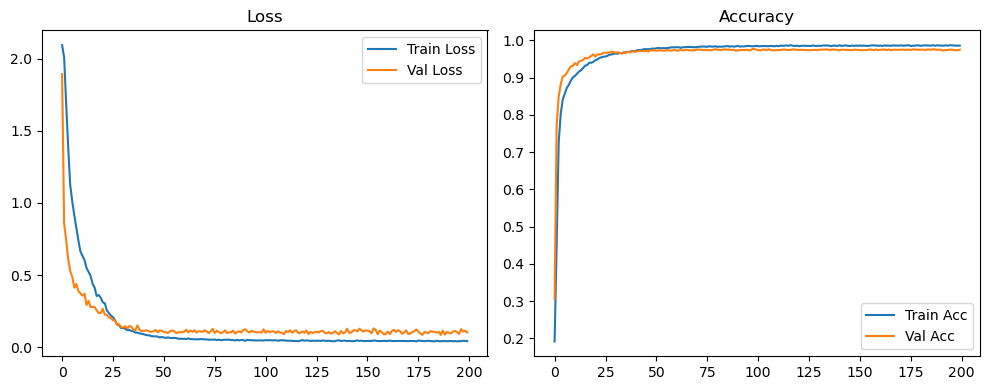

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 51.46it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 51.88it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 52.06it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 52.17it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 52.19it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 52.14it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 52.19it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 52.25it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 52.26it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 52.21it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 52.17it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 52.18it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 52.22it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 52.58it/s]

Original Model Final Test Loss: 0.0929 Accuracy: 0.9783


🚀 Running: batch128_lr0.001_0.001_0.001_dp0.0


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.001 | Train Acc: 0.2469 | Val Acc: 0.4558 |:   0%|          | 0/200 [00:10<?, ?it/s]

| LR: 0.001 | Train Acc: 0.2469 | Val Acc: 0.4558 |:   0%|          | 0/200 [00:10<?, ?it/s]

| LR: 0.001 | Train Acc: 0.2469 | Val Acc: 0.4558 |:   0%|          | 1/200 [00:10<36:24, 10.98s/it]

| LR: 0.001 | Train Acc: 0.5371 | Val Acc: 0.7638 |:   0%|          | 1/200 [00:21<36:24, 10.98s/it]

| LR: 0.001 | Train Acc: 0.5371 | Val Acc: 0.7638 |:   0%|          | 1/200 [00:21<36:24, 10.98s/it]

| LR: 0.001 | Train Acc: 0.5371 | Val Acc: 0.7638 |:   1%|          | 2/200 [00:21<35:28, 10.75s/it]

| LR: 0.001 | Train Acc: 0.8107 | Val Acc: 0.8657 |:   1%|          | 2/200 [00:32<35:28, 10.75s/it]

| LR: 0.001 | Train Acc: 0.8107 | Val Acc: 0.8657 |:   1%|          | 2/200 [00:32<35:28, 10.75s/it]

| LR: 0.001 | Train Acc: 0.8107 | Val Acc: 0.8657 |:   2%|▏         | 3/200 [00:32<35:11, 10.72s/it]

| LR: 0.001 | Train Acc: 0.8744 | Val Acc: 0.8999 |:   2%|▏         | 3/200 [00:42<35:11, 10.72s/it]

| LR: 0.001 | Train Acc: 0.8744 | Val Acc: 0.8999 |:   2%|▏         | 3/200 [00:42<35:11, 10.72s/it]

| LR: 0.001 | Train Acc: 0.8744 | Val Acc: 0.8999 |:   2%|▏         | 4/200 [00:42<34:53, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9020 | Val Acc: 0.9170 |:   2%|▏         | 4/200 [00:53<34:53, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9020 | Val Acc: 0.9170 |:   2%|▏         | 4/200 [00:53<34:53, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9020 | Val Acc: 0.9170 |:   2%|▎         | 5/200 [00:53<34:35, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9158 | Val Acc: 0.9227 |:   2%|▎         | 5/200 [01:03<34:35, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9158 | Val Acc: 0.9227 |:   2%|▎         | 5/200 [01:03<34:35, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9158 | Val Acc: 0.9227 |:   3%|▎         | 6/200 [01:03<34:17, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9254 | Val Acc: 0.9293 |:   3%|▎         | 6/200 [01:14<34:17, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9254 | Val Acc: 0.9293 |:   3%|▎         | 6/200 [01:14<34:17, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9254 | Val Acc: 0.9293 |:   4%|▎         | 7/200 [01:14<34:03, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9353 | Val Acc: 0.9313 |:   4%|▎         | 7/200 [01:24<34:03, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9353 | Val Acc: 0.9313 |:   4%|▎         | 7/200 [01:24<34:03, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9353 | Val Acc: 0.9313 |:   4%|▍         | 8/200 [01:25<33:46, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9388 | Val Acc: 0.9406 |:   4%|▍         | 8/200 [01:35<33:46, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9388 | Val Acc: 0.9406 |:   4%|▍         | 8/200 [01:35<33:46, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9388 | Val Acc: 0.9406 |:   4%|▍         | 9/200 [01:35<33:34, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9449 | Val Acc: 0.9430 |:   4%|▍         | 9/200 [01:45<33:34, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9449 | Val Acc: 0.9430 |:   4%|▍         | 9/200 [01:45<33:34, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9449 | Val Acc: 0.9430 |:   5%|▌         | 10/200 [01:46<33:19, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9501 | Val Acc: 0.9474 |:   5%|▌         | 10/200 [01:56<33:19, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9501 | Val Acc: 0.9474 |:   5%|▌         | 10/200 [01:56<33:19, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9501 | Val Acc: 0.9474 |:   6%|▌         | 11/200 [01:56<33:12, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9538 | Val Acc: 0.9466 |:   6%|▌         | 11/200 [02:07<33:12, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9538 | Val Acc: 0.9466 |:   6%|▌         | 11/200 [02:07<33:12, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9538 | Val Acc: 0.9466 |:   6%|▌         | 12/200 [02:07<33:02, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9550 | Val Acc: 0.9514 |:   6%|▌         | 12/200 [02:17<33:02, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9550 | Val Acc: 0.9514 |:   6%|▌         | 12/200 [02:17<33:02, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9550 | Val Acc: 0.9514 |:   6%|▋         | 13/200 [02:17<32:59, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9571 | Val Acc: 0.9522 |:   6%|▋         | 13/200 [02:28<32:59, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9571 | Val Acc: 0.9522 |:   6%|▋         | 13/200 [02:28<32:59, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9571 | Val Acc: 0.9522 |:   7%|▋         | 14/200 [02:28<32:39, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9617 | Val Acc: 0.9549 |:   7%|▋         | 14/200 [02:38<32:39, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9617 | Val Acc: 0.9549 |:   7%|▋         | 14/200 [02:38<32:39, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9617 | Val Acc: 0.9549 |:   8%|▊         | 15/200 [02:38<32:27, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9647 | Val Acc: 0.9545 |:   8%|▊         | 15/200 [02:49<32:27, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9647 | Val Acc: 0.9545 |:   8%|▊         | 15/200 [02:49<32:27, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9647 | Val Acc: 0.9545 |:   8%|▊         | 16/200 [02:49<32:04, 10.46s/it]

| LR: 0.001 | Train Acc: 0.9670 | Val Acc: 0.9517 |:   8%|▊         | 16/200 [02:59<32:04, 10.46s/it]

| LR: 0.001 | Train Acc: 0.9670 | Val Acc: 0.9517 |:   8%|▊         | 16/200 [02:59<32:04, 10.46s/it]

| LR: 0.001 | Train Acc: 0.9670 | Val Acc: 0.9517 |:   8%|▊         | 17/200 [02:59<32:06, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9683 | Val Acc: 0.9558 |:   8%|▊         | 17/200 [03:10<32:06, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9683 | Val Acc: 0.9558 |:   8%|▊         | 17/200 [03:10<32:06, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9683 | Val Acc: 0.9558 |:   9%|▉         | 18/200 [03:10<31:58, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9690 | Val Acc: 0.9537 |:   9%|▉         | 18/200 [03:20<31:58, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9690 | Val Acc: 0.9537 |:   9%|▉         | 18/200 [03:21<31:58, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9690 | Val Acc: 0.9537 |:  10%|▉         | 19/200 [03:21<31:57, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9725 | Val Acc: 0.9560 |:  10%|▉         | 19/200 [03:31<31:57, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9725 | Val Acc: 0.9560 |:  10%|▉         | 19/200 [03:31<31:57, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9725 | Val Acc: 0.9560 |:  10%|█         | 20/200 [03:31<31:43, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9738 | Val Acc: 0.9582 |:  10%|█         | 20/200 [03:42<31:43, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9738 | Val Acc: 0.9582 |:  10%|█         | 20/200 [03:42<31:43, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9738 | Val Acc: 0.9582 |:  10%|█         | 21/200 [03:42<31:47, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9754 | Val Acc: 0.9606 |:  10%|█         | 21/200 [03:53<31:47, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9754 | Val Acc: 0.9606 |:  10%|█         | 21/200 [03:53<31:47, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9754 | Val Acc: 0.9606 |:  11%|█         | 22/200 [03:53<31:34, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9787 | Val Acc: 0.9589 |:  11%|█         | 22/200 [04:03<31:34, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9787 | Val Acc: 0.9589 |:  11%|█         | 22/200 [04:03<31:34, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9787 | Val Acc: 0.9589 |:  12%|█▏        | 23/200 [04:03<31:16, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9782 | Val Acc: 0.9624 |:  12%|█▏        | 23/200 [04:14<31:16, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9782 | Val Acc: 0.9624 |:  12%|█▏        | 23/200 [04:14<31:16, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9782 | Val Acc: 0.9624 |:  12%|█▏        | 24/200 [04:14<31:15, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9793 | Val Acc: 0.9583 |:  12%|█▏        | 24/200 [04:25<31:15, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9793 | Val Acc: 0.9583 |:  12%|█▏        | 24/200 [04:25<31:15, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9793 | Val Acc: 0.9583 |:  12%|█▎        | 25/200 [04:25<31:18, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9813 | Val Acc: 0.9612 |:  12%|█▎        | 25/200 [04:35<31:18, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9813 | Val Acc: 0.9612 |:  12%|█▎        | 25/200 [04:35<31:18, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9813 | Val Acc: 0.9612 |:  13%|█▎        | 26/200 [04:35<31:02, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9824 | Val Acc: 0.9611 |:  13%|█▎        | 26/200 [04:46<31:02, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9824 | Val Acc: 0.9611 |:  13%|█▎        | 26/200 [04:46<31:02, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9824 | Val Acc: 0.9611 |:  14%|█▎        | 27/200 [04:46<31:03, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9604 |:  14%|█▎        | 27/200 [04:57<31:03, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9604 |:  14%|█▎        | 27/200 [04:57<31:03, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9604 |:  14%|█▍        | 28/200 [04:57<30:39, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9641 |:  14%|█▍        | 28/200 [05:07<30:39, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9641 |:  14%|█▍        | 28/200 [05:07<30:39, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9641 |:  14%|█▍        | 29/200 [05:07<30:14, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9632 |:  14%|█▍        | 29/200 [05:18<30:14, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9632 |:  14%|█▍        | 29/200 [05:18<30:14, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9632 |:  15%|█▌        | 30/200 [05:18<29:54, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9865 | Val Acc: 0.9636 |:  15%|█▌        | 30/200 [05:28<29:54, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9865 | Val Acc: 0.9636 |:  15%|█▌        | 30/200 [05:28<29:54, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9865 | Val Acc: 0.9636 |:  16%|█▌        | 31/200 [05:28<29:55, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9868 | Val Acc: 0.9638 |:  16%|█▌        | 31/200 [05:39<29:55, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9868 | Val Acc: 0.9638 |:  16%|█▌        | 31/200 [05:39<29:55, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9868 | Val Acc: 0.9638 |:  16%|█▌        | 32/200 [05:39<29:47, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9877 | Val Acc: 0.9639 |:  16%|█▌        | 32/200 [05:50<29:47, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9877 | Val Acc: 0.9639 |:  16%|█▌        | 32/200 [05:50<29:47, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9877 | Val Acc: 0.9639 |:  16%|█▋        | 33/200 [05:50<29:29, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9663 |:  16%|█▋        | 33/200 [06:00<29:29, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9663 |:  16%|█▋        | 33/200 [06:00<29:29, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9663 |:  17%|█▋        | 34/200 [06:00<29:26, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9885 | Val Acc: 0.9610 |:  17%|█▋        | 34/200 [06:11<29:26, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9885 | Val Acc: 0.9610 |:  17%|█▋        | 34/200 [06:11<29:26, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9885 | Val Acc: 0.9610 |:  18%|█▊        | 35/200 [06:11<29:06, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9892 | Val Acc: 0.9627 |:  18%|█▊        | 35/200 [06:21<29:06, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9892 | Val Acc: 0.9627 |:  18%|█▊        | 35/200 [06:21<29:06, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9892 | Val Acc: 0.9627 |:  18%|█▊        | 36/200 [06:21<28:48, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9661 |:  18%|█▊        | 36/200 [06:32<28:48, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9661 |:  18%|█▊        | 36/200 [06:32<28:48, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9661 |:  18%|█▊        | 37/200 [06:32<28:46, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9900 | Val Acc: 0.9660 |:  18%|█▊        | 37/200 [06:43<28:46, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9900 | Val Acc: 0.9660 |:  18%|█▊        | 37/200 [06:43<28:46, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9900 | Val Acc: 0.9660 |:  19%|█▉        | 38/200 [06:43<28:43, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9617 |:  19%|█▉        | 38/200 [06:53<28:43, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9617 |:  19%|█▉        | 38/200 [06:53<28:43, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9617 |:  20%|█▉        | 39/200 [06:53<28:25, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9898 | Val Acc: 0.9619 |:  20%|█▉        | 39/200 [07:04<28:25, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9898 | Val Acc: 0.9619 |:  20%|█▉        | 39/200 [07:04<28:25, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9898 | Val Acc: 0.9619 |:  20%|██        | 40/200 [07:04<28:39, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9648 |:  20%|██        | 40/200 [07:15<28:39, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9648 |:  20%|██        | 40/200 [07:15<28:39, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9648 |:  20%|██        | 41/200 [07:15<28:43, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9681 |:  20%|██        | 41/200 [07:26<28:43, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9681 |:  20%|██        | 41/200 [07:26<28:43, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9681 |:  21%|██        | 42/200 [07:26<28:19, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9914 | Val Acc: 0.9663 |:  21%|██        | 42/200 [07:36<28:19, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9914 | Val Acc: 0.9663 |:  21%|██        | 42/200 [07:36<28:19, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9914 | Val Acc: 0.9663 |:  22%|██▏       | 43/200 [07:36<27:56, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9908 | Val Acc: 0.9606 |:  22%|██▏       | 43/200 [07:47<27:56, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9908 | Val Acc: 0.9606 |:  22%|██▏       | 43/200 [07:47<27:56, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9908 | Val Acc: 0.9606 |:  22%|██▏       | 44/200 [07:47<27:39, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9677 |:  22%|██▏       | 44/200 [07:58<27:39, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9677 |:  22%|██▏       | 44/200 [07:58<27:39, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9677 |:  22%|██▎       | 45/200 [07:58<27:29, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9670 |:  22%|██▎       | 45/200 [08:08<27:29, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9670 |:  22%|██▎       | 45/200 [08:08<27:29, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9670 |:  23%|██▎       | 46/200 [08:08<27:14, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9654 |:  23%|██▎       | 46/200 [08:19<27:14, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9654 |:  23%|██▎       | 46/200 [08:19<27:14, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9654 |:  24%|██▎       | 47/200 [08:19<27:11, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9921 | Val Acc: 0.9673 |:  24%|██▎       | 47/200 [08:29<27:11, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9921 | Val Acc: 0.9673 |:  24%|██▎       | 47/200 [08:29<27:11, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9921 | Val Acc: 0.9673 |:  24%|██▍       | 48/200 [08:30<26:57, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9659 |:  24%|██▍       | 48/200 [08:41<26:57, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9659 |:  24%|██▍       | 48/200 [08:41<26:57, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9659 |:  24%|██▍       | 49/200 [08:41<27:11, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9666 |:  24%|██▍       | 49/200 [08:51<27:11, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9666 |:  24%|██▍       | 49/200 [08:51<27:11, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9666 |:  25%|██▌       | 50/200 [08:51<26:51, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9924 | Val Acc: 0.9697 |:  25%|██▌       | 50/200 [09:02<26:51, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9924 | Val Acc: 0.9697 |:  25%|██▌       | 50/200 [09:02<26:51, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9924 | Val Acc: 0.9697 |:  26%|██▌       | 51/200 [09:02<26:33, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9923 | Val Acc: 0.9671 |:  26%|██▌       | 51/200 [09:12<26:33, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9923 | Val Acc: 0.9671 |:  26%|██▌       | 51/200 [09:12<26:33, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9923 | Val Acc: 0.9671 |:  26%|██▌       | 52/200 [09:12<26:10, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9683 |:  26%|██▌       | 52/200 [09:23<26:10, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9683 |:  26%|██▌       | 52/200 [09:23<26:10, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9683 |:  26%|██▋       | 53/200 [09:23<25:51, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9692 |:  26%|██▋       | 53/200 [09:33<25:51, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9692 |:  26%|██▋       | 53/200 [09:33<25:51, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9692 |:  27%|██▋       | 54/200 [09:33<25:36, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9702 |:  27%|██▋       | 54/200 [09:44<25:36, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9702 |:  27%|██▋       | 54/200 [09:44<25:36, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9702 |:  28%|██▊       | 55/200 [09:44<25:20, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9688 |:  28%|██▊       | 55/200 [09:54<25:20, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9688 |:  28%|██▊       | 55/200 [09:54<25:20, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9688 |:  28%|██▊       | 56/200 [09:54<25:06, 10.46s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9684 |:  28%|██▊       | 56/200 [10:05<25:06, 10.46s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9684 |:  28%|██▊       | 56/200 [10:05<25:06, 10.46s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9684 |:  28%|██▊       | 57/200 [10:05<25:11, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9685 |:  28%|██▊       | 57/200 [10:15<25:11, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9685 |:  28%|██▊       | 57/200 [10:15<25:11, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9685 |:  29%|██▉       | 58/200 [10:15<25:02, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9692 |:  29%|██▉       | 58/200 [10:26<25:02, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9692 |:  29%|██▉       | 58/200 [10:26<25:02, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9692 |:  30%|██▉       | 59/200 [10:26<24:51, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9685 |:  30%|██▉       | 59/200 [10:37<24:51, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9685 |:  30%|██▉       | 59/200 [10:37<24:51, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9685 |:  30%|███       | 60/200 [10:37<25:12, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9660 |:  30%|███       | 60/200 [10:48<25:12, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9660 |:  30%|███       | 60/200 [10:48<25:12, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9660 |:  30%|███       | 61/200 [10:48<24:52, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9715 |:  30%|███       | 61/200 [10:58<24:52, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9715 |:  30%|███       | 61/200 [10:58<24:52, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9715 |:  31%|███       | 62/200 [10:58<24:32, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9688 |:  31%|███       | 62/200 [11:09<24:32, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9688 |:  31%|███       | 62/200 [11:09<24:32, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9688 |:  32%|███▏      | 63/200 [11:09<24:13, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9659 |:  32%|███▏      | 63/200 [11:19<24:13, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9659 |:  32%|███▏      | 63/200 [11:19<24:13, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9659 |:  32%|███▏      | 64/200 [11:19<23:51, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9694 |:  32%|███▏      | 64/200 [11:30<23:51, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9694 |:  32%|███▏      | 64/200 [11:30<23:51, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9694 |:  32%|███▎      | 65/200 [11:30<23:37, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9728 |:  32%|███▎      | 65/200 [11:40<23:37, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9728 |:  32%|███▎      | 65/200 [11:40<23:37, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9728 |:  33%|███▎      | 66/200 [11:40<23:28, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9673 |:  33%|███▎      | 66/200 [11:51<23:28, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9673 |:  33%|███▎      | 66/200 [11:51<23:28, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9673 |:  34%|███▎      | 67/200 [11:51<23:13, 10.48s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9692 |:  34%|███▎      | 67/200 [12:01<23:13, 10.48s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9692 |:  34%|███▎      | 67/200 [12:01<23:13, 10.48s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9692 |:  34%|███▍      | 68/200 [12:01<23:02, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9715 |:  34%|███▍      | 68/200 [12:12<23:02, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9715 |:  34%|███▍      | 68/200 [12:12<23:02, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9715 |:  34%|███▍      | 69/200 [12:12<22:57, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9728 |:  34%|███▍      | 69/200 [12:22<22:57, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9728 |:  34%|███▍      | 69/200 [12:22<22:57, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9728 |:  35%|███▌      | 70/200 [12:22<22:40, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9683 |:  35%|███▌      | 70/200 [12:33<22:40, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9683 |:  35%|███▌      | 70/200 [12:33<22:40, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9683 |:  36%|███▌      | 71/200 [12:33<22:38, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9730 |:  36%|███▌      | 71/200 [12:43<22:38, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9730 |:  36%|███▌      | 71/200 [12:43<22:38, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9730 |:  36%|███▌      | 72/200 [12:43<22:36, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9718 |:  36%|███▌      | 72/200 [12:54<22:36, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9718 |:  36%|███▌      | 72/200 [12:54<22:36, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9718 |:  36%|███▋      | 73/200 [12:54<22:20, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9677 |:  36%|███▋      | 73/200 [13:04<22:20, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9677 |:  36%|███▋      | 73/200 [13:04<22:20, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9677 |:  37%|███▋      | 74/200 [13:04<22:06, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9708 |:  37%|███▋      | 74/200 [13:15<22:06, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9708 |:  37%|███▋      | 74/200 [13:15<22:06, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9708 |:  38%|███▊      | 75/200 [13:15<21:59, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9718 |:  38%|███▊      | 75/200 [13:25<21:59, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9718 |:  38%|███▊      | 75/200 [13:25<21:59, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9718 |:  38%|███▊      | 76/200 [13:25<21:44, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9708 |:  38%|███▊      | 76/200 [13:36<21:44, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9708 |:  38%|███▊      | 76/200 [13:36<21:44, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9708 |:  38%|███▊      | 77/200 [13:36<21:31, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9705 |:  38%|███▊      | 77/200 [13:46<21:31, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9705 |:  38%|███▊      | 77/200 [13:46<21:31, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9705 |:  39%|███▉      | 78/200 [13:46<21:23, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9695 |:  39%|███▉      | 78/200 [13:57<21:23, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9695 |:  39%|███▉      | 78/200 [13:57<21:23, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9695 |:  40%|███▉      | 79/200 [13:57<21:19, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9706 |:  40%|███▉      | 79/200 [14:08<21:19, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9706 |:  40%|███▉      | 79/200 [14:08<21:19, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9706 |:  40%|████      | 80/200 [14:08<21:22, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9690 |:  40%|████      | 80/200 [14:19<21:22, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9690 |:  40%|████      | 80/200 [14:19<21:22, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9690 |:  40%|████      | 81/200 [14:19<21:07, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9741 |:  40%|████      | 81/200 [14:29<21:07, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9741 |:  40%|████      | 81/200 [14:29<21:07, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9741 |:  41%|████      | 82/200 [14:29<20:54, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9732 |:  41%|████      | 82/200 [14:40<20:54, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9732 |:  41%|████      | 82/200 [14:40<20:54, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9732 |:  42%|████▏     | 83/200 [14:40<20:43, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9704 |:  42%|████▏     | 83/200 [14:50<20:43, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9704 |:  42%|████▏     | 83/200 [14:50<20:43, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9704 |:  42%|████▏     | 84/200 [14:50<20:24, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9734 |:  42%|████▏     | 84/200 [15:01<20:24, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9734 |:  42%|████▏     | 84/200 [15:01<20:24, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9734 |:  42%|████▎     | 85/200 [15:01<20:12, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9713 |:  42%|████▎     | 85/200 [15:12<20:12, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9713 |:  42%|████▎     | 85/200 [15:12<20:12, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9713 |:  43%|████▎     | 86/200 [15:12<20:30, 10.79s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9713 |:  43%|████▎     | 86/200 [15:23<20:30, 10.79s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9713 |:  43%|████▎     | 86/200 [15:23<20:30, 10.79s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9713 |:  44%|████▎     | 87/200 [15:23<20:35, 10.93s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9748 |:  44%|████▎     | 87/200 [15:34<20:35, 10.93s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9748 |:  44%|████▎     | 87/200 [15:34<20:35, 10.93s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9748 |:  44%|████▍     | 88/200 [15:34<20:09, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9716 |:  44%|████▍     | 88/200 [15:44<20:09, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9716 |:  44%|████▍     | 88/200 [15:44<20:09, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9716 |:  44%|████▍     | 89/200 [15:44<19:50, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9728 |:  44%|████▍     | 89/200 [15:55<19:50, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9728 |:  44%|████▍     | 89/200 [15:55<19:50, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9728 |:  45%|████▌     | 90/200 [15:55<19:31, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9724 |:  45%|████▌     | 90/200 [16:06<19:31, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9724 |:  45%|████▌     | 90/200 [16:06<19:31, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9724 |:  46%|████▌     | 91/200 [16:06<19:24, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9722 |:  46%|████▌     | 91/200 [16:16<19:24, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9722 |:  46%|████▌     | 91/200 [16:16<19:24, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9722 |:  46%|████▌     | 92/200 [16:16<19:14, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9730 |:  46%|████▌     | 92/200 [16:27<19:14, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9730 |:  46%|████▌     | 92/200 [16:27<19:14, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9730 |:  46%|████▋     | 93/200 [16:27<18:58, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9718 |:  46%|████▋     | 93/200 [16:37<18:58, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9718 |:  46%|████▋     | 93/200 [16:37<18:58, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9718 |:  47%|████▋     | 94/200 [16:37<18:43, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9715 |:  47%|████▋     | 94/200 [16:48<18:43, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9715 |:  47%|████▋     | 94/200 [16:48<18:43, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9715 |:  48%|████▊     | 95/200 [16:48<18:37, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9723 |:  48%|████▊     | 95/200 [16:59<18:37, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9723 |:  48%|████▊     | 95/200 [16:59<18:37, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9723 |:  48%|████▊     | 96/200 [16:59<18:22, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9725 |:  48%|████▊     | 96/200 [17:09<18:22, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9725 |:  48%|████▊     | 96/200 [17:09<18:22, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9725 |:  48%|████▊     | 97/200 [17:09<18:07, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9740 |:  48%|████▊     | 97/200 [17:20<18:07, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9740 |:  48%|████▊     | 97/200 [17:20<18:07, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9740 |:  49%|████▉     | 98/200 [17:20<17:56, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9715 |:  49%|████▉     | 98/200 [17:30<17:56, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9715 |:  49%|████▉     | 98/200 [17:30<17:56, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9715 |:  50%|████▉     | 99/200 [17:30<17:49, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9718 |:  50%|████▉     | 99/200 [17:41<17:49, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9718 |:  50%|████▉     | 99/200 [17:41<17:49, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9718 |:  50%|█████     | 100/200 [17:41<17:38, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9728 |:  50%|█████     | 100/200 [17:51<17:38, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9728 |:  50%|█████     | 100/200 [17:51<17:38, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9728 |:  50%|█████     | 101/200 [17:51<17:25, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9739 |:  50%|█████     | 101/200 [18:02<17:25, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9739 |:  50%|█████     | 101/200 [18:02<17:25, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9739 |:  51%|█████     | 102/200 [18:02<17:18, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9701 |:  51%|█████     | 102/200 [18:13<17:18, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9701 |:  51%|█████     | 102/200 [18:13<17:18, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9701 |:  52%|█████▏    | 103/200 [18:13<17:05, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9732 |:  52%|█████▏    | 103/200 [18:23<17:05, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9732 |:  52%|█████▏    | 103/200 [18:23<17:05, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9732 |:  52%|█████▏    | 104/200 [18:23<16:53, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9697 |:  52%|█████▏    | 104/200 [18:33<16:53, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9697 |:  52%|█████▏    | 104/200 [18:33<16:53, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9697 |:  52%|█████▎    | 105/200 [18:34<16:38, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9696 |:  52%|█████▎    | 105/200 [18:44<16:38, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9696 |:  52%|█████▎    | 105/200 [18:44<16:38, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9696 |:  53%|█████▎    | 106/200 [18:44<16:30, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9711 |:  53%|█████▎    | 106/200 [18:55<16:30, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9711 |:  53%|█████▎    | 106/200 [18:55<16:30, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9711 |:  54%|█████▎    | 107/200 [18:55<16:20, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9736 |:  54%|█████▎    | 107/200 [19:05<16:20, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9736 |:  54%|█████▎    | 107/200 [19:05<16:20, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9736 |:  54%|█████▍    | 108/200 [19:05<16:03, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9746 |:  54%|█████▍    | 108/200 [19:16<16:03, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9746 |:  54%|█████▍    | 108/200 [19:16<16:03, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9746 |:  55%|█████▍    | 109/200 [19:16<15:55, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9733 |:  55%|█████▍    | 109/200 [19:26<15:55, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9733 |:  55%|█████▍    | 109/200 [19:26<15:55, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9733 |:  55%|█████▌    | 110/200 [19:26<15:44, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9731 |:  55%|█████▌    | 110/200 [19:36<15:44, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9731 |:  55%|█████▌    | 110/200 [19:36<15:44, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9731 |:  56%|█████▌    | 111/200 [19:36<15:31, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9684 |:  56%|█████▌    | 111/200 [19:47<15:31, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9684 |:  56%|█████▌    | 111/200 [19:47<15:31, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9684 |:  56%|█████▌    | 112/200 [19:47<15:15, 10.41s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9718 |:  56%|█████▌    | 112/200 [19:57<15:15, 10.41s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9718 |:  56%|█████▌    | 112/200 [19:57<15:15, 10.41s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9718 |:  56%|█████▋    | 113/200 [19:57<15:01, 10.37s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9660 |:  56%|█████▋    | 113/200 [20:07<15:01, 10.37s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9660 |:  56%|█████▋    | 113/200 [20:07<15:01, 10.37s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9660 |:  57%|█████▋    | 114/200 [20:07<14:54, 10.40s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9740 |:  57%|█████▋    | 114/200 [20:19<14:54, 10.40s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9740 |:  57%|█████▋    | 114/200 [20:19<14:54, 10.40s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9740 |:  57%|█████▊    | 115/200 [20:19<15:06, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9727 |:  57%|█████▊    | 115/200 [20:29<15:06, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9727 |:  57%|█████▊    | 115/200 [20:29<15:06, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9727 |:  58%|█████▊    | 116/200 [20:29<14:51, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9718 |:  58%|█████▊    | 116/200 [20:40<14:51, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9718 |:  58%|█████▊    | 116/200 [20:40<14:51, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9718 |:  58%|█████▊    | 117/200 [20:40<14:35, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9752 |:  58%|█████▊    | 117/200 [20:50<14:35, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9752 |:  58%|█████▊    | 117/200 [20:50<14:35, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9752 |:  59%|█████▉    | 118/200 [20:50<14:28, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9741 |:  59%|█████▉    | 118/200 [21:01<14:28, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9741 |:  59%|█████▉    | 118/200 [21:01<14:28, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9741 |:  60%|█████▉    | 119/200 [21:01<14:13, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9719 |:  60%|█████▉    | 119/200 [21:11<14:13, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9719 |:  60%|█████▉    | 119/200 [21:11<14:13, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9719 |:  60%|██████    | 120/200 [21:11<14:03, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9718 |:  60%|██████    | 120/200 [21:22<14:03, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9718 |:  60%|██████    | 120/200 [21:22<14:03, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9718 |:  60%|██████    | 121/200 [21:22<13:56, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9737 |:  60%|██████    | 121/200 [21:32<13:56, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9737 |:  60%|██████    | 121/200 [21:32<13:56, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9737 |:  61%|██████    | 122/200 [21:32<13:41, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9749 |:  61%|██████    | 122/200 [21:43<13:41, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9749 |:  61%|██████    | 122/200 [21:43<13:41, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9749 |:  62%|██████▏   | 123/200 [21:43<13:37, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9725 |:  62%|██████▏   | 123/200 [21:54<13:37, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9725 |:  62%|██████▏   | 123/200 [21:54<13:37, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9725 |:  62%|██████▏   | 124/200 [21:54<13:25, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9766 |:  62%|██████▏   | 124/200 [22:04<13:25, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9766 |:  62%|██████▏   | 124/200 [22:04<13:25, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9766 |:  62%|██████▎   | 125/200 [22:04<13:14, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9751 |:  62%|██████▎   | 125/200 [22:15<13:14, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9751 |:  62%|██████▎   | 125/200 [22:15<13:14, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9751 |:  63%|██████▎   | 126/200 [22:15<13:02, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9717 |:  63%|██████▎   | 126/200 [22:25<13:02, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9717 |:  63%|██████▎   | 126/200 [22:25<13:02, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9717 |:  64%|██████▎   | 127/200 [22:26<12:53, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9737 |:  64%|██████▎   | 127/200 [22:36<12:53, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9737 |:  64%|██████▎   | 127/200 [22:36<12:53, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9737 |:  64%|██████▍   | 128/200 [22:36<12:45, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9746 |:  64%|██████▍   | 128/200 [22:47<12:45, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9746 |:  64%|██████▍   | 128/200 [22:47<12:45, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9746 |:  64%|██████▍   | 129/200 [22:47<12:30, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9739 |:  64%|██████▍   | 129/200 [22:57<12:30, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9739 |:  64%|██████▍   | 129/200 [22:57<12:30, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9739 |:  65%|██████▌   | 130/200 [22:57<12:20, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9752 |:  65%|██████▌   | 130/200 [23:08<12:20, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9752 |:  65%|██████▌   | 130/200 [23:08<12:20, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9752 |:  66%|██████▌   | 131/200 [23:08<12:13, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9741 |:  66%|██████▌   | 131/200 [23:19<12:13, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9741 |:  66%|██████▌   | 131/200 [23:19<12:13, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9741 |:  66%|██████▌   | 132/200 [23:19<12:01, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9742 |:  66%|██████▌   | 132/200 [23:29<12:01, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9742 |:  66%|██████▌   | 132/200 [23:29<12:01, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9742 |:  66%|██████▋   | 133/200 [23:29<11:48, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9752 |:  66%|██████▋   | 133/200 [23:40<11:48, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9752 |:  66%|██████▋   | 133/200 [23:40<11:48, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9752 |:  67%|██████▋   | 134/200 [23:40<11:36, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9752 |:  67%|██████▋   | 134/200 [23:50<11:36, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9752 |:  67%|██████▋   | 134/200 [23:50<11:36, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9752 |:  68%|██████▊   | 135/200 [23:50<11:25, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9723 |:  68%|██████▊   | 135/200 [24:01<11:25, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9723 |:  68%|██████▊   | 135/200 [24:01<11:25, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9723 |:  68%|██████▊   | 136/200 [24:01<11:19, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9719 |:  68%|██████▊   | 136/200 [24:11<11:19, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9719 |:  68%|██████▊   | 136/200 [24:11<11:19, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9719 |:  68%|██████▊   | 137/200 [24:11<11:09, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9748 |:  68%|██████▊   | 137/200 [24:22<11:09, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9748 |:  68%|██████▊   | 137/200 [24:22<11:09, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9748 |:  69%|██████▉   | 138/200 [24:22<10:59, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9722 |:  69%|██████▉   | 138/200 [24:33<10:59, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9722 |:  69%|██████▉   | 138/200 [24:33<10:59, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9722 |:  70%|██████▉   | 139/200 [24:33<10:55, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9738 |:  70%|██████▉   | 139/200 [24:44<10:55, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9738 |:  70%|██████▉   | 139/200 [24:44<10:55, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9738 |:  70%|███████   | 140/200 [24:44<10:39, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9727 |:  70%|███████   | 140/200 [24:54<10:39, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9727 |:  70%|███████   | 140/200 [24:54<10:39, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9727 |:  70%|███████   | 141/200 [24:54<10:25, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9730 |:  70%|███████   | 141/200 [25:05<10:25, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9730 |:  70%|███████   | 141/200 [25:05<10:25, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9730 |:  71%|███████   | 142/200 [25:05<10:17, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9751 |:  71%|███████   | 142/200 [25:15<10:17, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9751 |:  71%|███████   | 142/200 [25:15<10:17, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9751 |:  72%|███████▏  | 143/200 [25:15<10:05, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9738 |:  72%|███████▏  | 143/200 [25:26<10:05, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9738 |:  72%|███████▏  | 143/200 [25:26<10:05, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9738 |:  72%|███████▏  | 144/200 [25:26<09:51, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9732 |:  72%|███████▏  | 144/200 [25:36<09:51, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9732 |:  72%|███████▏  | 144/200 [25:36<09:51, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9732 |:  72%|███████▎  | 145/200 [25:36<09:40, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9738 |:  72%|███████▎  | 145/200 [25:47<09:40, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9738 |:  72%|███████▎  | 145/200 [25:47<09:40, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9738 |:  73%|███████▎  | 146/200 [25:47<09:27, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9687 |:  73%|███████▎  | 146/200 [25:57<09:27, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9687 |:  73%|███████▎  | 146/200 [25:57<09:27, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9687 |:  74%|███████▎  | 147/200 [25:57<09:16, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9731 |:  74%|███████▎  | 147/200 [26:08<09:16, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9731 |:  74%|███████▎  | 147/200 [26:08<09:16, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9731 |:  74%|███████▍  | 148/200 [26:08<09:06, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9728 |:  74%|███████▍  | 148/200 [26:18<09:06, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9728 |:  74%|███████▍  | 148/200 [26:18<09:06, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9728 |:  74%|███████▍  | 149/200 [26:18<08:55, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9729 |:  74%|███████▍  | 149/200 [26:29<08:55, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9729 |:  74%|███████▍  | 149/200 [26:29<08:55, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9729 |:  75%|███████▌  | 150/200 [26:29<08:44, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9725 |:  75%|███████▌  | 150/200 [26:39<08:44, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9725 |:  75%|███████▌  | 150/200 [26:39<08:44, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9725 |:  76%|███████▌  | 151/200 [26:39<08:33, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9752 |:  76%|███████▌  | 151/200 [26:50<08:33, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9752 |:  76%|███████▌  | 151/200 [26:50<08:33, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9752 |:  76%|███████▌  | 152/200 [26:50<08:23, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9710 |:  76%|███████▌  | 152/200 [27:00<08:23, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9710 |:  76%|███████▌  | 152/200 [27:00<08:23, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9710 |:  76%|███████▋  | 153/200 [27:00<08:13, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9742 |:  76%|███████▋  | 153/200 [27:11<08:13, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9742 |:  76%|███████▋  | 153/200 [27:11<08:13, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9742 |:  77%|███████▋  | 154/200 [27:11<08:03, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9713 |:  77%|███████▋  | 154/200 [27:21<08:03, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9713 |:  77%|███████▋  | 154/200 [27:21<08:03, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9713 |:  78%|███████▊  | 155/200 [27:21<07:56, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9742 |:  78%|███████▊  | 155/200 [27:32<07:56, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9742 |:  78%|███████▊  | 155/200 [27:32<07:56, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9742 |:  78%|███████▊  | 156/200 [27:32<07:47, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9734 |:  78%|███████▊  | 156/200 [27:43<07:47, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9734 |:  78%|███████▊  | 156/200 [27:43<07:47, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9734 |:  78%|███████▊  | 157/200 [27:43<07:35, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9732 |:  78%|███████▊  | 157/200 [27:53<07:35, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9732 |:  78%|███████▊  | 157/200 [27:53<07:35, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9732 |:  79%|███████▉  | 158/200 [27:53<07:26, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9755 |:  79%|███████▉  | 158/200 [28:04<07:26, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9755 |:  79%|███████▉  | 158/200 [28:04<07:26, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9755 |:  80%|███████▉  | 159/200 [28:04<07:17, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9745 |:  80%|███████▉  | 159/200 [28:15<07:17, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9745 |:  80%|███████▉  | 159/200 [28:15<07:17, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9745 |:  80%|████████  | 160/200 [28:15<07:03, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9738 |:  80%|████████  | 160/200 [28:25<07:03, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9738 |:  80%|████████  | 160/200 [28:25<07:03, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9738 |:  80%|████████  | 161/200 [28:25<06:51, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9728 |:  80%|████████  | 161/200 [28:36<06:51, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9728 |:  80%|████████  | 161/200 [28:36<06:51, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9728 |:  81%|████████  | 162/200 [28:36<06:49, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9728 |:  81%|████████  | 162/200 [28:47<06:49, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9728 |:  81%|████████  | 162/200 [28:47<06:49, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9728 |:  82%|████████▏ | 163/200 [28:47<06:42, 10.87s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9722 |:  82%|████████▏ | 163/200 [28:58<06:42, 10.87s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9722 |:  82%|████████▏ | 163/200 [28:58<06:42, 10.87s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9722 |:  82%|████████▏ | 164/200 [28:58<06:26, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9731 |:  82%|████████▏ | 164/200 [29:09<06:26, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9731 |:  82%|████████▏ | 164/200 [29:09<06:26, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9731 |:  82%|████████▎ | 165/200 [29:09<06:16, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9722 |:  82%|████████▎ | 165/200 [29:19<06:16, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9722 |:  82%|████████▎ | 165/200 [29:19<06:16, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9722 |:  83%|████████▎ | 166/200 [29:19<06:01, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9726 |:  83%|████████▎ | 166/200 [29:30<06:01, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9726 |:  83%|████████▎ | 166/200 [29:30<06:01, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9726 |:  84%|████████▎ | 167/200 [29:30<05:49, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9688 |:  84%|████████▎ | 167/200 [29:41<05:49, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9688 |:  84%|████████▎ | 167/200 [29:41<05:49, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9688 |:  84%|████████▍ | 168/200 [29:41<05:44, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9740 |:  84%|████████▍ | 168/200 [29:51<05:44, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9740 |:  84%|████████▍ | 168/200 [29:51<05:44, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9740 |:  84%|████████▍ | 169/200 [29:51<05:33, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9722 |:  84%|████████▍ | 169/200 [30:02<05:33, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9722 |:  84%|████████▍ | 169/200 [30:02<05:33, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9722 |:  85%|████████▌ | 170/200 [30:02<05:22, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9695 |:  85%|████████▌ | 170/200 [30:13<05:22, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9695 |:  85%|████████▌ | 170/200 [30:13<05:22, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9695 |:  86%|████████▌ | 171/200 [30:13<05:09, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9732 |:  86%|████████▌ | 171/200 [30:23<05:09, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9732 |:  86%|████████▌ | 171/200 [30:23<05:09, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9732 |:  86%|████████▌ | 172/200 [30:23<04:59, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9729 |:  86%|████████▌ | 172/200 [30:34<04:59, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9729 |:  86%|████████▌ | 172/200 [30:34<04:59, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9729 |:  86%|████████▋ | 173/200 [30:34<04:47, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9740 |:  86%|████████▋ | 173/200 [30:45<04:47, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9740 |:  86%|████████▋ | 173/200 [30:45<04:47, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9740 |:  87%|████████▋ | 174/200 [30:45<04:39, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9732 |:  87%|████████▋ | 174/200 [30:56<04:39, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9732 |:  87%|████████▋ | 174/200 [30:56<04:39, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9732 |:  88%|████████▊ | 175/200 [30:56<04:29, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9737 |:  88%|████████▊ | 175/200 [31:07<04:29, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9737 |:  88%|████████▊ | 175/200 [31:07<04:29, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9737 |:  88%|████████▊ | 176/200 [31:07<04:18, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9739 |:  88%|████████▊ | 176/200 [31:17<04:18, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9739 |:  88%|████████▊ | 176/200 [31:17<04:18, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9739 |:  88%|████████▊ | 177/200 [31:17<04:05, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9738 |:  88%|████████▊ | 177/200 [31:27<04:05, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9738 |:  88%|████████▊ | 177/200 [31:27<04:05, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9738 |:  89%|████████▉ | 178/200 [31:27<03:53, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9729 |:  89%|████████▉ | 178/200 [31:38<03:53, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9729 |:  89%|████████▉ | 178/200 [31:38<03:53, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9729 |:  90%|████████▉ | 179/200 [31:38<03:43, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9728 |:  90%|████████▉ | 179/200 [31:49<03:43, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9728 |:  90%|████████▉ | 179/200 [31:49<03:43, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9728 |:  90%|█████████ | 180/200 [31:49<03:33, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9713 |:  90%|█████████ | 180/200 [32:00<03:33, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9713 |:  90%|█████████ | 180/200 [32:00<03:33, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9713 |:  90%|█████████ | 181/200 [32:00<03:22, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9710 |:  90%|█████████ | 181/200 [32:10<03:22, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9710 |:  90%|█████████ | 181/200 [32:10<03:22, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9710 |:  91%|█████████ | 182/200 [32:10<03:11, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9736 |:  91%|█████████ | 182/200 [32:21<03:11, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9736 |:  91%|█████████ | 182/200 [32:21<03:11, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9736 |:  92%|█████████▏| 183/200 [32:21<03:00, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9728 |:  92%|█████████▏| 183/200 [32:31<03:00, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9728 |:  92%|█████████▏| 183/200 [32:31<03:00, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9728 |:  92%|█████████▏| 184/200 [32:31<02:49, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9717 |:  92%|█████████▏| 184/200 [32:42<02:49, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9717 |:  92%|█████████▏| 184/200 [32:42<02:49, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9717 |:  92%|█████████▎| 185/200 [32:42<02:38, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9728 |:  92%|█████████▎| 185/200 [32:53<02:38, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9728 |:  92%|█████████▎| 185/200 [32:53<02:38, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9728 |:  93%|█████████▎| 186/200 [32:53<02:29, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9732 |:  93%|█████████▎| 186/200 [33:03<02:29, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9732 |:  93%|█████████▎| 186/200 [33:03<02:29, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9732 |:  94%|█████████▎| 187/200 [33:03<02:18, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9718 |:  94%|█████████▎| 187/200 [33:14<02:18, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9718 |:  94%|█████████▎| 187/200 [33:14<02:18, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9718 |:  94%|█████████▍| 188/200 [33:14<02:08, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9737 |:  94%|█████████▍| 188/200 [33:24<02:08, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9737 |:  94%|█████████▍| 188/200 [33:24<02:08, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9737 |:  94%|█████████▍| 189/200 [33:25<01:56, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9750 |:  94%|█████████▍| 189/200 [33:35<01:56, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9750 |:  94%|█████████▍| 189/200 [33:35<01:56, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9750 |:  95%|█████████▌| 190/200 [33:35<01:45, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9749 |:  95%|█████████▌| 190/200 [33:45<01:45, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9749 |:  95%|█████████▌| 190/200 [33:45<01:45, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9749 |:  96%|█████████▌| 191/200 [33:45<01:34, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9750 |:  96%|█████████▌| 191/200 [33:56<01:34, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9750 |:  96%|█████████▌| 191/200 [33:56<01:34, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9750 |:  96%|█████████▌| 192/200 [33:56<01:24, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9722 |:  96%|█████████▌| 192/200 [34:06<01:24, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9722 |:  96%|█████████▌| 192/200 [34:06<01:24, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9722 |:  96%|█████████▋| 193/200 [34:07<01:13, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9742 |:  96%|█████████▋| 193/200 [34:17<01:13, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9742 |:  96%|█████████▋| 193/200 [34:17<01:13, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9742 |:  97%|█████████▋| 194/200 [34:17<01:03, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9735 |:  97%|█████████▋| 194/200 [34:28<01:03, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9735 |:  97%|█████████▋| 194/200 [34:28<01:03, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9735 |:  98%|█████████▊| 195/200 [34:28<00:52, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9750 |:  98%|█████████▊| 195/200 [34:38<00:52, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9750 |:  98%|█████████▊| 195/200 [34:38<00:52, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9750 |:  98%|█████████▊| 196/200 [34:38<00:42, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9737 |:  98%|█████████▊| 196/200 [34:49<00:42, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9737 |:  98%|█████████▊| 196/200 [34:49<00:42, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9737 |:  98%|█████████▊| 197/200 [34:49<00:31, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9728 |:  98%|█████████▊| 197/200 [35:00<00:31, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9728 |:  98%|█████████▊| 197/200 [35:00<00:31, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9728 |:  99%|█████████▉| 198/200 [35:00<00:21, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9721 |:  99%|█████████▉| 198/200 [35:10<00:21, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9721 |:  99%|█████████▉| 198/200 [35:10<00:21, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9721 |: 100%|█████████▉| 199/200 [35:10<00:10, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9744 |: 100%|█████████▉| 199/200 [35:21<00:10, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9744 |: 100%|█████████▉| 199/200 [35:21<00:10, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9744 |: 100%|██████████| 200/200 [35:21<00:00, 10.81s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9744 |: 100%|██████████| 200/200 [35:21<00:00, 10.61s/it]

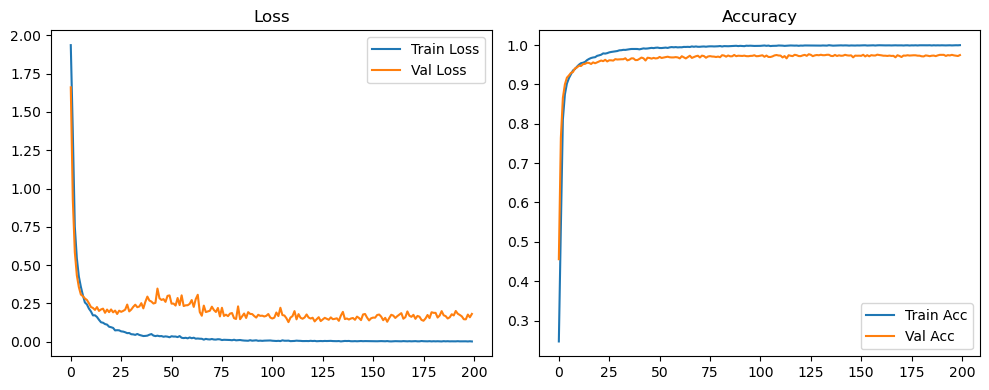

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 51.59it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 52.02it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 52.11it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 52.13it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 52.10it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 52.07it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 52.07it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 48.75it/s]

Evaluation:  67%|██████▋   | 53/79 [00:01<00:00, 48.19it/s]

Evaluation:  73%|███████▎  | 58/79 [00:01<00:00, 48.50it/s]

Evaluation:  81%|████████  | 64/79 [00:01<00:00, 48.99it/s]

Evaluation:  87%|████████▋ | 69/79 [00:01<00:00, 49.26it/s]

Evaluation:  94%|█████████▎| 74/79 [00:01<00:00, 48.98it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 50.39it/s]

Original Model Final Test Loss: 0.1719 Accuracy: 0.9739


🚀 Running: batch128_lr0.001_0.001_0.001_dp0.2


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.001 | Train Acc: 0.2307 | Val Acc: 0.3287 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.001 | Train Acc: 0.2307 | Val Acc: 0.3287 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.001 | Train Acc: 0.2307 | Val Acc: 0.3287 |:   0%|          | 1/200 [00:11<37:14, 11.23s/it]

| LR: 0.001 | Train Acc: 0.4406 | Val Acc: 0.7141 |:   0%|          | 1/200 [00:21<37:14, 11.23s/it]

| LR: 0.001 | Train Acc: 0.4406 | Val Acc: 0.7141 |:   0%|          | 1/200 [00:21<37:14, 11.23s/it]

| LR: 0.001 | Train Acc: 0.4406 | Val Acc: 0.7141 |:   1%|          | 2/200 [00:21<35:55, 10.89s/it]

| LR: 0.001 | Train Acc: 0.7520 | Val Acc: 0.8678 |:   1%|          | 2/200 [00:32<35:55, 10.89s/it]

| LR: 0.001 | Train Acc: 0.7520 | Val Acc: 0.8678 |:   1%|          | 2/200 [00:32<35:55, 10.89s/it]

| LR: 0.001 | Train Acc: 0.7520 | Val Acc: 0.8678 |:   2%|▏         | 3/200 [00:32<35:18, 10.75s/it]

| LR: 0.001 | Train Acc: 0.8450 | Val Acc: 0.8881 |:   2%|▏         | 3/200 [00:43<35:18, 10.75s/it]

| LR: 0.001 | Train Acc: 0.8450 | Val Acc: 0.8881 |:   2%|▏         | 3/200 [00:43<35:18, 10.75s/it]

| LR: 0.001 | Train Acc: 0.8450 | Val Acc: 0.8881 |:   2%|▏         | 4/200 [00:43<34:53, 10.68s/it]

| LR: 0.001 | Train Acc: 0.8761 | Val Acc: 0.9118 |:   2%|▏         | 4/200 [00:53<34:53, 10.68s/it]

| LR: 0.001 | Train Acc: 0.8761 | Val Acc: 0.9118 |:   2%|▏         | 4/200 [00:53<34:53, 10.68s/it]

| LR: 0.001 | Train Acc: 0.8761 | Val Acc: 0.9118 |:   2%|▎         | 5/200 [00:53<34:44, 10.69s/it]

| LR: 0.001 | Train Acc: 0.8956 | Val Acc: 0.9193 |:   2%|▎         | 5/200 [01:04<34:44, 10.69s/it]

| LR: 0.001 | Train Acc: 0.8956 | Val Acc: 0.9193 |:   2%|▎         | 5/200 [01:04<34:44, 10.69s/it]

| LR: 0.001 | Train Acc: 0.8956 | Val Acc: 0.9193 |:   3%|▎         | 6/200 [01:04<34:26, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9084 | Val Acc: 0.9265 |:   3%|▎         | 6/200 [01:14<34:26, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9084 | Val Acc: 0.9265 |:   3%|▎         | 6/200 [01:14<34:26, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9084 | Val Acc: 0.9265 |:   4%|▎         | 7/200 [01:14<34:07, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9164 | Val Acc: 0.9280 |:   4%|▎         | 7/200 [01:25<34:07, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9164 | Val Acc: 0.9280 |:   4%|▎         | 7/200 [01:25<34:07, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9164 | Val Acc: 0.9280 |:   4%|▍         | 8/200 [01:25<33:53, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9259 | Val Acc: 0.9353 |:   4%|▍         | 8/200 [01:37<33:53, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9259 | Val Acc: 0.9353 |:   4%|▍         | 8/200 [01:37<33:53, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9259 | Val Acc: 0.9353 |:   4%|▍         | 9/200 [01:37<34:49, 10.94s/it]

| LR: 0.001 | Train Acc: 0.9328 | Val Acc: 0.9439 |:   4%|▍         | 9/200 [01:49<34:49, 10.94s/it]

| LR: 0.001 | Train Acc: 0.9328 | Val Acc: 0.9439 |:   4%|▍         | 9/200 [01:49<34:49, 10.94s/it]

| LR: 0.001 | Train Acc: 0.9328 | Val Acc: 0.9439 |:   5%|▌         | 10/200 [01:49<35:42, 11.28s/it]

| LR: 0.001 | Train Acc: 0.9367 | Val Acc: 0.9459 |:   5%|▌         | 10/200 [01:59<35:42, 11.28s/it]

| LR: 0.001 | Train Acc: 0.9367 | Val Acc: 0.9459 |:   5%|▌         | 10/200 [01:59<35:42, 11.28s/it]

| LR: 0.001 | Train Acc: 0.9367 | Val Acc: 0.9459 |:   6%|▌         | 11/200 [01:59<34:52, 11.07s/it]

| LR: 0.001 | Train Acc: 0.9421 | Val Acc: 0.9462 |:   6%|▌         | 11/200 [02:10<34:52, 11.07s/it]

| LR: 0.001 | Train Acc: 0.9421 | Val Acc: 0.9462 |:   6%|▌         | 11/200 [02:10<34:52, 11.07s/it]

| LR: 0.001 | Train Acc: 0.9421 | Val Acc: 0.9462 |:   6%|▌         | 12/200 [02:10<34:14, 10.93s/it]

| LR: 0.001 | Train Acc: 0.9427 | Val Acc: 0.9457 |:   6%|▌         | 12/200 [02:21<34:14, 10.93s/it]

| LR: 0.001 | Train Acc: 0.9427 | Val Acc: 0.9457 |:   6%|▌         | 12/200 [02:21<34:14, 10.93s/it]

| LR: 0.001 | Train Acc: 0.9427 | Val Acc: 0.9457 |:   6%|▋         | 13/200 [02:21<33:50, 10.86s/it]

| LR: 0.001 | Train Acc: 0.9486 | Val Acc: 0.9497 |:   6%|▋         | 13/200 [02:31<33:50, 10.86s/it]

| LR: 0.001 | Train Acc: 0.9486 | Val Acc: 0.9497 |:   6%|▋         | 13/200 [02:31<33:50, 10.86s/it]

| LR: 0.001 | Train Acc: 0.9486 | Val Acc: 0.9497 |:   7%|▋         | 14/200 [02:31<33:25, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9504 | Val Acc: 0.9501 |:   7%|▋         | 14/200 [02:42<33:25, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9504 | Val Acc: 0.9501 |:   7%|▋         | 14/200 [02:42<33:25, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9504 | Val Acc: 0.9501 |:   8%|▊         | 15/200 [02:42<33:07, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9538 | Val Acc: 0.9523 |:   8%|▊         | 15/200 [02:53<33:07, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9538 | Val Acc: 0.9523 |:   8%|▊         | 15/200 [02:53<33:07, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9538 | Val Acc: 0.9523 |:   8%|▊         | 16/200 [02:53<32:59, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9571 | Val Acc: 0.9537 |:   8%|▊         | 16/200 [03:03<32:59, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9571 | Val Acc: 0.9537 |:   8%|▊         | 16/200 [03:03<32:59, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9571 | Val Acc: 0.9537 |:   8%|▊         | 17/200 [03:03<32:46, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9573 | Val Acc: 0.9548 |:   8%|▊         | 17/200 [03:15<32:46, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9573 | Val Acc: 0.9548 |:   8%|▊         | 17/200 [03:15<32:46, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9573 | Val Acc: 0.9548 |:   9%|▉         | 18/200 [03:15<33:03, 10.90s/it]

| LR: 0.001 | Train Acc: 0.9600 | Val Acc: 0.9547 |:   9%|▉         | 18/200 [03:25<33:03, 10.90s/it]

| LR: 0.001 | Train Acc: 0.9600 | Val Acc: 0.9547 |:   9%|▉         | 18/200 [03:25<33:03, 10.90s/it]

| LR: 0.001 | Train Acc: 0.9600 | Val Acc: 0.9547 |:  10%|▉         | 19/200 [03:25<32:43, 10.85s/it]

| LR: 0.001 | Train Acc: 0.9634 | Val Acc: 0.9577 |:  10%|▉         | 19/200 [03:36<32:43, 10.85s/it]

| LR: 0.001 | Train Acc: 0.9634 | Val Acc: 0.9577 |:  10%|▉         | 19/200 [03:36<32:43, 10.85s/it]

| LR: 0.001 | Train Acc: 0.9634 | Val Acc: 0.9577 |:  10%|█         | 20/200 [03:36<32:20, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9665 | Val Acc: 0.9592 |:  10%|█         | 20/200 [03:46<32:20, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9665 | Val Acc: 0.9592 |:  10%|█         | 20/200 [03:46<32:20, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9665 | Val Acc: 0.9592 |:  10%|█         | 21/200 [03:46<31:59, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9683 | Val Acc: 0.9568 |:  10%|█         | 21/200 [03:57<31:59, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9683 | Val Acc: 0.9568 |:  10%|█         | 21/200 [03:57<31:59, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9683 | Val Acc: 0.9568 |:  11%|█         | 22/200 [03:57<31:33, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9687 | Val Acc: 0.9617 |:  11%|█         | 22/200 [04:07<31:33, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9687 | Val Acc: 0.9617 |:  11%|█         | 22/200 [04:07<31:33, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9687 | Val Acc: 0.9617 |:  12%|█▏        | 23/200 [04:07<31:09, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9696 | Val Acc: 0.9620 |:  12%|█▏        | 23/200 [04:18<31:09, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9696 | Val Acc: 0.9620 |:  12%|█▏        | 23/200 [04:18<31:09, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9696 | Val Acc: 0.9620 |:  12%|█▏        | 24/200 [04:18<31:03, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9739 | Val Acc: 0.9638 |:  12%|█▏        | 24/200 [04:29<31:03, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9739 | Val Acc: 0.9638 |:  12%|█▏        | 24/200 [04:29<31:03, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9739 | Val Acc: 0.9638 |:  12%|█▎        | 25/200 [04:29<31:02, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9747 | Val Acc: 0.9656 |:  12%|█▎        | 25/200 [04:40<31:02, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9747 | Val Acc: 0.9656 |:  12%|█▎        | 25/200 [04:40<31:02, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9747 | Val Acc: 0.9656 |:  13%|█▎        | 26/200 [04:40<31:10, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9762 | Val Acc: 0.9664 |:  13%|█▎        | 26/200 [04:50<31:10, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9762 | Val Acc: 0.9664 |:  13%|█▎        | 26/200 [04:50<31:10, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9762 | Val Acc: 0.9664 |:  14%|█▎        | 27/200 [04:50<30:53, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9775 | Val Acc: 0.9643 |:  14%|█▎        | 27/200 [05:01<30:53, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9775 | Val Acc: 0.9643 |:  14%|█▎        | 27/200 [05:01<30:53, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9775 | Val Acc: 0.9643 |:  14%|█▍        | 28/200 [05:01<30:35, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9784 | Val Acc: 0.9642 |:  14%|█▍        | 28/200 [05:11<30:35, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9784 | Val Acc: 0.9642 |:  14%|█▍        | 28/200 [05:11<30:35, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9784 | Val Acc: 0.9642 |:  14%|█▍        | 29/200 [05:11<30:17, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9790 | Val Acc: 0.9669 |:  14%|█▍        | 29/200 [05:22<30:17, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9790 | Val Acc: 0.9669 |:  14%|█▍        | 29/200 [05:22<30:17, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9790 | Val Acc: 0.9669 |:  15%|█▌        | 30/200 [05:22<29:59, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9789 | Val Acc: 0.9645 |:  15%|█▌        | 30/200 [05:33<29:59, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9789 | Val Acc: 0.9645 |:  15%|█▌        | 30/200 [05:33<29:59, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9789 | Val Acc: 0.9645 |:  16%|█▌        | 31/200 [05:33<29:56, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9818 | Val Acc: 0.9649 |:  16%|█▌        | 31/200 [05:44<29:56, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9818 | Val Acc: 0.9649 |:  16%|█▌        | 31/200 [05:44<29:56, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9818 | Val Acc: 0.9649 |:  16%|█▌        | 32/200 [05:44<29:56, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9819 | Val Acc: 0.9680 |:  16%|█▌        | 32/200 [05:54<29:56, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9819 | Val Acc: 0.9680 |:  16%|█▌        | 32/200 [05:54<29:56, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9819 | Val Acc: 0.9680 |:  16%|█▋        | 33/200 [05:54<29:49, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9828 | Val Acc: 0.9680 |:  16%|█▋        | 33/200 [06:05<29:49, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9828 | Val Acc: 0.9680 |:  16%|█▋        | 33/200 [06:05<29:49, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9828 | Val Acc: 0.9680 |:  17%|█▋        | 34/200 [06:05<29:53, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9837 | Val Acc: 0.9673 |:  17%|█▋        | 34/200 [06:16<29:53, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9837 | Val Acc: 0.9673 |:  17%|█▋        | 34/200 [06:16<29:53, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9837 | Val Acc: 0.9673 |:  18%|█▊        | 35/200 [06:16<29:30, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9824 | Val Acc: 0.9658 |:  18%|█▊        | 35/200 [06:26<29:30, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9824 | Val Acc: 0.9658 |:  18%|█▊        | 35/200 [06:26<29:30, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9824 | Val Acc: 0.9658 |:  18%|█▊        | 36/200 [06:26<29:10, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9680 |:  18%|█▊        | 36/200 [06:37<29:10, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9680 |:  18%|█▊        | 36/200 [06:37<29:10, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9680 |:  18%|█▊        | 37/200 [06:37<28:48, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9663 |:  18%|█▊        | 37/200 [06:48<28:48, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9663 |:  18%|█▊        | 37/200 [06:48<28:48, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9663 |:  19%|█▉        | 38/200 [06:48<29:18, 10.85s/it]

| LR: 0.001 | Train Acc: 0.9843 | Val Acc: 0.9683 |:  19%|█▉        | 38/200 [06:59<29:18, 10.85s/it]

| LR: 0.001 | Train Acc: 0.9843 | Val Acc: 0.9683 |:  19%|█▉        | 38/200 [06:59<29:18, 10.85s/it]

| LR: 0.001 | Train Acc: 0.9843 | Val Acc: 0.9683 |:  20%|█▉        | 39/200 [06:59<28:55, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9650 |:  20%|█▉        | 39/200 [07:10<28:55, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9650 |:  20%|█▉        | 39/200 [07:10<28:55, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9650 |:  20%|██        | 40/200 [07:10<28:44, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9857 | Val Acc: 0.9630 |:  20%|██        | 40/200 [07:20<28:44, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9857 | Val Acc: 0.9630 |:  20%|██        | 40/200 [07:20<28:44, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9857 | Val Acc: 0.9630 |:  20%|██        | 41/200 [07:21<28:36, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9863 | Val Acc: 0.9685 |:  20%|██        | 41/200 [07:31<28:36, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9863 | Val Acc: 0.9685 |:  20%|██        | 41/200 [07:31<28:36, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9863 | Val Acc: 0.9685 |:  21%|██        | 42/200 [07:31<28:19, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9698 |:  21%|██        | 42/200 [07:42<28:19, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9698 |:  21%|██        | 42/200 [07:42<28:19, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9698 |:  22%|██▏       | 43/200 [07:42<28:09, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9864 | Val Acc: 0.9673 |:  22%|██▏       | 43/200 [07:53<28:09, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9864 | Val Acc: 0.9673 |:  22%|██▏       | 43/200 [07:53<28:09, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9864 | Val Acc: 0.9673 |:  22%|██▏       | 44/200 [07:53<27:56, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9880 | Val Acc: 0.9686 |:  22%|██▏       | 44/200 [08:03<27:56, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9880 | Val Acc: 0.9686 |:  22%|██▏       | 44/200 [08:03<27:56, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9880 | Val Acc: 0.9686 |:  22%|██▎       | 45/200 [08:03<27:43, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9880 | Val Acc: 0.9704 |:  22%|██▎       | 45/200 [08:14<27:43, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9880 | Val Acc: 0.9704 |:  22%|██▎       | 45/200 [08:14<27:43, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9880 | Val Acc: 0.9704 |:  23%|██▎       | 46/200 [08:14<27:28, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9879 | Val Acc: 0.9685 |:  23%|██▎       | 46/200 [08:25<27:28, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9879 | Val Acc: 0.9685 |:  23%|██▎       | 46/200 [08:25<27:28, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9879 | Val Acc: 0.9685 |:  24%|██▎       | 47/200 [08:25<27:11, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9882 | Val Acc: 0.9686 |:  24%|██▎       | 47/200 [08:35<27:11, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9882 | Val Acc: 0.9686 |:  24%|██▎       | 47/200 [08:35<27:11, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9882 | Val Acc: 0.9686 |:  24%|██▍       | 48/200 [08:35<26:58, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9680 |:  24%|██▍       | 48/200 [08:46<26:58, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9680 |:  24%|██▍       | 48/200 [08:46<26:58, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9680 |:  24%|██▍       | 49/200 [08:46<27:11, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9880 | Val Acc: 0.9704 |:  24%|██▍       | 49/200 [08:57<27:11, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9880 | Val Acc: 0.9704 |:  24%|██▍       | 49/200 [08:57<27:11, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9880 | Val Acc: 0.9704 |:  25%|██▌       | 50/200 [08:57<26:56, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9892 | Val Acc: 0.9693 |:  25%|██▌       | 50/200 [09:08<26:56, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9892 | Val Acc: 0.9693 |:  25%|██▌       | 50/200 [09:08<26:56, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9892 | Val Acc: 0.9693 |:  26%|██▌       | 51/200 [09:08<26:54, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9897 | Val Acc: 0.9667 |:  26%|██▌       | 51/200 [09:19<26:54, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9897 | Val Acc: 0.9667 |:  26%|██▌       | 51/200 [09:19<26:54, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9897 | Val Acc: 0.9667 |:  26%|██▌       | 52/200 [09:19<26:44, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9712 |:  26%|██▌       | 52/200 [09:29<26:44, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9712 |:  26%|██▌       | 52/200 [09:29<26:44, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9712 |:  26%|██▋       | 53/200 [09:30<26:23, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9722 |:  26%|██▋       | 53/200 [09:40<26:23, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9722 |:  26%|██▋       | 53/200 [09:40<26:23, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9722 |:  27%|██▋       | 54/200 [09:40<26:04, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9901 | Val Acc: 0.9706 |:  27%|██▋       | 54/200 [09:51<26:04, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9901 | Val Acc: 0.9706 |:  27%|██▋       | 54/200 [09:51<26:04, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9901 | Val Acc: 0.9706 |:  28%|██▊       | 55/200 [09:51<25:49, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9900 | Val Acc: 0.9715 |:  28%|██▊       | 55/200 [10:01<25:49, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9900 | Val Acc: 0.9715 |:  28%|██▊       | 55/200 [10:01<25:49, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9900 | Val Acc: 0.9715 |:  28%|██▊       | 56/200 [10:01<25:37, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9915 | Val Acc: 0.9695 |:  28%|██▊       | 56/200 [10:12<25:37, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9915 | Val Acc: 0.9695 |:  28%|██▊       | 56/200 [10:12<25:37, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9915 | Val Acc: 0.9695 |:  28%|██▊       | 57/200 [10:12<25:25, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9918 | Val Acc: 0.9709 |:  28%|██▊       | 57/200 [10:23<25:25, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9918 | Val Acc: 0.9709 |:  28%|██▊       | 57/200 [10:23<25:25, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9918 | Val Acc: 0.9709 |:  29%|██▉       | 58/200 [10:23<25:27, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9708 |:  29%|██▉       | 58/200 [10:34<25:27, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9708 |:  29%|██▉       | 58/200 [10:34<25:27, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9708 |:  30%|██▉       | 59/200 [10:34<25:19, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9924 | Val Acc: 0.9698 |:  30%|██▉       | 59/200 [10:44<25:19, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9924 | Val Acc: 0.9698 |:  30%|██▉       | 59/200 [10:44<25:19, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9924 | Val Acc: 0.9698 |:  30%|███       | 60/200 [10:44<24:58, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9918 | Val Acc: 0.9704 |:  30%|███       | 60/200 [10:55<24:58, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9918 | Val Acc: 0.9704 |:  30%|███       | 60/200 [10:55<24:58, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9918 | Val Acc: 0.9704 |:  30%|███       | 61/200 [10:55<24:43, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9924 | Val Acc: 0.9712 |:  30%|███       | 61/200 [11:06<24:43, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9924 | Val Acc: 0.9712 |:  30%|███       | 61/200 [11:06<24:43, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9924 | Val Acc: 0.9712 |:  31%|███       | 62/200 [11:06<24:49, 10.79s/it]

| LR: 0.001 | Train Acc: 0.9921 | Val Acc: 0.9724 |:  31%|███       | 62/200 [11:17<24:49, 10.79s/it]

| LR: 0.001 | Train Acc: 0.9921 | Val Acc: 0.9724 |:  31%|███       | 62/200 [11:17<24:49, 10.79s/it]

| LR: 0.001 | Train Acc: 0.9921 | Val Acc: 0.9724 |:  32%|███▏      | 63/200 [11:17<24:29, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9924 | Val Acc: 0.9727 |:  32%|███▏      | 63/200 [11:27<24:29, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9924 | Val Acc: 0.9727 |:  32%|███▏      | 63/200 [11:27<24:29, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9924 | Val Acc: 0.9727 |:  32%|███▏      | 64/200 [11:27<24:23, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9715 |:  32%|███▏      | 64/200 [11:38<24:23, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9715 |:  32%|███▏      | 64/200 [11:38<24:23, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9715 |:  32%|███▎      | 65/200 [11:38<24:02, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9696 |:  32%|███▎      | 65/200 [11:48<24:02, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9696 |:  32%|███▎      | 65/200 [11:48<24:02, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9696 |:  33%|███▎      | 66/200 [11:48<23:45, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9738 |:  33%|███▎      | 66/200 [11:59<23:45, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9738 |:  33%|███▎      | 66/200 [11:59<23:45, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9738 |:  34%|███▎      | 67/200 [11:59<23:32, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9704 |:  34%|███▎      | 67/200 [12:10<23:32, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9704 |:  34%|███▎      | 67/200 [12:10<23:32, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9704 |:  34%|███▍      | 68/200 [12:10<23:21, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9724 |:  34%|███▍      | 68/200 [12:20<23:21, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9724 |:  34%|███▍      | 68/200 [12:20<23:21, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9724 |:  34%|███▍      | 69/200 [12:20<23:06, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9937 | Val Acc: 0.9729 |:  34%|███▍      | 69/200 [12:31<23:06, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9937 | Val Acc: 0.9729 |:  34%|███▍      | 69/200 [12:31<23:06, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9937 | Val Acc: 0.9729 |:  35%|███▌      | 70/200 [12:31<22:54, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9700 |:  35%|███▌      | 70/200 [12:41<22:54, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9700 |:  35%|███▌      | 70/200 [12:41<22:54, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9700 |:  36%|███▌      | 71/200 [12:41<22:40, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9708 |:  36%|███▌      | 71/200 [12:52<22:40, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9708 |:  36%|███▌      | 71/200 [12:52<22:40, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9708 |:  36%|███▌      | 72/200 [12:52<22:26, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9729 |:  36%|███▌      | 72/200 [13:02<22:26, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9729 |:  36%|███▌      | 72/200 [13:02<22:26, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9729 |:  36%|███▋      | 73/200 [13:02<22:14, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9718 |:  36%|███▋      | 73/200 [13:13<22:14, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9718 |:  36%|███▋      | 73/200 [13:13<22:14, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9718 |:  37%|███▋      | 74/200 [13:13<22:17, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9726 |:  37%|███▋      | 74/200 [13:24<22:17, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9726 |:  37%|███▋      | 74/200 [13:24<22:17, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9726 |:  38%|███▊      | 75/200 [13:24<22:11, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9708 |:  38%|███▊      | 75/200 [13:34<22:11, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9708 |:  38%|███▊      | 75/200 [13:34<22:11, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9708 |:  38%|███▊      | 76/200 [13:34<21:55, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9724 |:  38%|███▊      | 76/200 [13:45<21:55, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9724 |:  38%|███▊      | 76/200 [13:45<21:55, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9724 |:  38%|███▊      | 77/200 [13:45<21:41, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9731 |:  38%|███▊      | 77/200 [13:55<21:41, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9731 |:  38%|███▊      | 77/200 [13:55<21:41, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9731 |:  39%|███▉      | 78/200 [13:55<21:31, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9736 |:  39%|███▉      | 78/200 [14:06<21:31, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9736 |:  39%|███▉      | 78/200 [14:06<21:31, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9736 |:  40%|███▉      | 79/200 [14:06<21:25, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9737 |:  40%|███▉      | 79/200 [14:17<21:25, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9737 |:  40%|███▉      | 79/200 [14:17<21:25, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9737 |:  40%|████      | 80/200 [14:17<21:22, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9732 |:  40%|████      | 80/200 [14:28<21:22, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9732 |:  40%|████      | 80/200 [14:28<21:22, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9732 |:  40%|████      | 81/200 [14:28<21:13, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9746 |:  40%|████      | 81/200 [14:38<21:13, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9746 |:  40%|████      | 81/200 [14:38<21:13, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9746 |:  41%|████      | 82/200 [14:38<21:00, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9727 |:  41%|████      | 82/200 [14:49<21:00, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9727 |:  41%|████      | 82/200 [14:49<21:00, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9727 |:  42%|████▏     | 83/200 [14:49<20:52, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9722 |:  42%|████▏     | 83/200 [15:00<20:52, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9722 |:  42%|████▏     | 83/200 [15:00<20:52, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9722 |:  42%|████▏     | 84/200 [15:00<20:39, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9745 |:  42%|████▏     | 84/200 [15:10<20:39, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9745 |:  42%|████▏     | 84/200 [15:10<20:39, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9745 |:  42%|████▎     | 85/200 [15:10<20:27, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9737 |:  42%|████▎     | 85/200 [15:21<20:27, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9737 |:  42%|████▎     | 85/200 [15:21<20:27, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9737 |:  43%|████▎     | 86/200 [15:21<20:22, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9744 |:  43%|████▎     | 86/200 [15:33<20:22, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9744 |:  43%|████▎     | 86/200 [15:33<20:22, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9744 |:  44%|████▎     | 87/200 [15:33<20:41, 10.99s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9750 |:  44%|████▎     | 87/200 [15:43<20:41, 10.99s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9750 |:  44%|████▎     | 87/200 [15:43<20:41, 10.99s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9750 |:  44%|████▍     | 88/200 [15:43<20:21, 10.91s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9733 |:  44%|████▍     | 88/200 [15:54<20:21, 10.91s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9733 |:  44%|████▍     | 88/200 [15:54<20:21, 10.91s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9733 |:  44%|████▍     | 89/200 [15:54<20:02, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9732 |:  44%|████▍     | 89/200 [16:05<20:02, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9732 |:  44%|████▍     | 89/200 [16:05<20:02, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9732 |:  45%|████▌     | 90/200 [16:05<19:47, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9738 |:  45%|████▌     | 90/200 [16:15<19:47, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9738 |:  45%|████▌     | 90/200 [16:15<19:47, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9738 |:  46%|████▌     | 91/200 [16:15<19:18, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9748 |:  46%|████▌     | 91/200 [16:26<19:18, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9748 |:  46%|████▌     | 91/200 [16:26<19:18, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9748 |:  46%|████▌     | 92/200 [16:26<19:07, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9736 |:  46%|████▌     | 92/200 [16:36<19:07, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9736 |:  46%|████▌     | 92/200 [16:36<19:07, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9736 |:  46%|████▋     | 93/200 [16:36<18:53, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9749 |:  46%|████▋     | 93/200 [16:47<18:53, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9749 |:  46%|████▋     | 93/200 [16:47<18:53, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9749 |:  47%|████▋     | 94/200 [16:47<18:42, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9748 |:  47%|████▋     | 94/200 [16:58<18:42, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9748 |:  47%|████▋     | 94/200 [16:58<18:42, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9748 |:  48%|████▊     | 95/200 [16:58<18:37, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9742 |:  48%|████▊     | 95/200 [17:08<18:37, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9742 |:  48%|████▊     | 95/200 [17:08<18:37, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9742 |:  48%|████▊     | 96/200 [17:08<18:27, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9738 |:  48%|████▊     | 96/200 [17:19<18:27, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9738 |:  48%|████▊     | 96/200 [17:19<18:27, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9738 |:  48%|████▊     | 97/200 [17:19<18:14, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9744 |:  48%|████▊     | 97/200 [17:29<18:14, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9744 |:  48%|████▊     | 97/200 [17:29<18:14, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9744 |:  49%|████▉     | 98/200 [17:29<18:02, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9758 |:  49%|████▉     | 98/200 [17:40<18:02, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9758 |:  49%|████▉     | 98/200 [17:40<18:02, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9758 |:  50%|████▉     | 99/200 [17:40<17:52, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9756 |:  50%|████▉     | 99/200 [17:51<17:52, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9756 |:  50%|████▉     | 99/200 [17:51<17:52, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9756 |:  50%|█████     | 100/200 [17:51<17:42, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9773 |:  50%|█████     | 100/200 [18:01<17:42, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9773 |:  50%|█████     | 100/200 [18:01<17:42, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9773 |:  50%|█████     | 101/200 [18:01<17:35, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9741 |:  50%|█████     | 101/200 [18:13<17:35, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9741 |:  50%|█████     | 101/200 [18:13<17:35, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9741 |:  51%|█████     | 102/200 [18:13<17:43, 10.85s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9756 |:  51%|█████     | 102/200 [18:25<17:43, 10.85s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9756 |:  51%|█████     | 102/200 [18:25<17:43, 10.85s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9756 |:  52%|█████▏    | 103/200 [18:25<18:10, 11.24s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9744 |:  52%|█████▏    | 103/200 [18:35<18:10, 11.24s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9744 |:  52%|█████▏    | 103/200 [18:35<18:10, 11.24s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9744 |:  52%|█████▏    | 104/200 [18:35<17:36, 11.01s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9744 |:  52%|█████▏    | 104/200 [18:46<17:36, 11.01s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9744 |:  52%|█████▏    | 104/200 [18:46<17:36, 11.01s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9744 |:  52%|█████▎    | 105/200 [18:46<17:13, 10.88s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9736 |:  52%|█████▎    | 105/200 [18:57<17:13, 10.88s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9736 |:  52%|█████▎    | 105/200 [18:57<17:13, 10.88s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9736 |:  53%|█████▎    | 106/200 [18:57<16:57, 10.83s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9737 |:  53%|█████▎    | 106/200 [19:08<16:57, 10.83s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9737 |:  53%|█████▎    | 106/200 [19:08<16:57, 10.83s/it]

| LR: 0.001 | Train Acc: 0.9963 | Val Acc: 0.9737 |:  54%|█████▎    | 107/200 [19:08<16:57, 10.95s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9737 |:  54%|█████▎    | 107/200 [19:18<16:57, 10.95s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9737 |:  54%|█████▎    | 107/200 [19:18<16:57, 10.95s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9737 |:  54%|█████▍    | 108/200 [19:18<16:36, 10.83s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9747 |:  54%|█████▍    | 108/200 [19:29<16:36, 10.83s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9747 |:  54%|█████▍    | 108/200 [19:29<16:36, 10.83s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9747 |:  55%|█████▍    | 109/200 [19:29<16:20, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9753 |:  55%|█████▍    | 109/200 [19:40<16:20, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9753 |:  55%|█████▍    | 109/200 [19:40<16:20, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9753 |:  55%|█████▌    | 110/200 [19:40<16:08, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9754 |:  55%|█████▌    | 110/200 [19:50<16:08, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9754 |:  55%|█████▌    | 110/200 [19:50<16:08, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9754 |:  56%|█████▌    | 111/200 [19:51<15:58, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9752 |:  56%|█████▌    | 111/200 [20:01<15:58, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9752 |:  56%|█████▌    | 111/200 [20:01<15:58, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9752 |:  56%|█████▌    | 112/200 [20:01<15:46, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9743 |:  56%|█████▌    | 112/200 [20:12<15:46, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9743 |:  56%|█████▌    | 112/200 [20:12<15:46, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9743 |:  56%|█████▋    | 113/200 [20:12<15:30, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9733 |:  56%|█████▋    | 113/200 [20:22<15:30, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9733 |:  56%|█████▋    | 113/200 [20:22<15:30, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9733 |:  57%|█████▋    | 114/200 [20:22<15:15, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9734 |:  57%|█████▋    | 114/200 [20:33<15:15, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9734 |:  57%|█████▋    | 114/200 [20:33<15:15, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9966 | Val Acc: 0.9734 |:  57%|█████▊    | 115/200 [20:33<14:54, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9742 |:  57%|█████▊    | 115/200 [20:43<14:54, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9742 |:  57%|█████▊    | 115/200 [20:43<14:54, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9742 |:  58%|█████▊    | 116/200 [20:43<14:49, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9731 |:  58%|█████▊    | 116/200 [20:55<14:49, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9731 |:  58%|█████▊    | 116/200 [20:55<14:49, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9731 |:  58%|█████▊    | 117/200 [20:55<14:59, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9746 |:  58%|█████▊    | 117/200 [21:07<14:59, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9746 |:  58%|█████▊    | 117/200 [21:07<14:59, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9746 |:  59%|█████▉    | 118/200 [21:07<15:13, 11.14s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9729 |:  59%|█████▉    | 118/200 [21:17<15:13, 11.14s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9729 |:  59%|█████▉    | 118/200 [21:17<15:13, 11.14s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9729 |:  60%|█████▉    | 119/200 [21:17<14:50, 11.00s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9723 |:  60%|█████▉    | 119/200 [21:28<14:50, 11.00s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9723 |:  60%|█████▉    | 119/200 [21:28<14:50, 11.00s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9723 |:  60%|██████    | 120/200 [21:28<14:33, 10.92s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9734 |:  60%|██████    | 120/200 [21:39<14:33, 10.92s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9734 |:  60%|██████    | 120/200 [21:39<14:33, 10.92s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9734 |:  60%|██████    | 121/200 [21:39<14:23, 10.93s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9740 |:  60%|██████    | 121/200 [21:51<14:23, 10.93s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9740 |:  60%|██████    | 121/200 [21:51<14:23, 10.93s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9740 |:  61%|██████    | 122/200 [21:51<14:39, 11.27s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9750 |:  61%|██████    | 122/200 [22:02<14:39, 11.27s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9750 |:  61%|██████    | 122/200 [22:02<14:39, 11.27s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9750 |:  62%|██████▏   | 123/200 [22:02<14:18, 11.15s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9734 |:  62%|██████▏   | 123/200 [22:13<14:18, 11.15s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9734 |:  62%|██████▏   | 123/200 [22:13<14:18, 11.15s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9734 |:  62%|██████▏   | 124/200 [22:13<13:58, 11.03s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9737 |:  62%|██████▏   | 124/200 [22:23<13:58, 11.03s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9737 |:  62%|██████▏   | 124/200 [22:23<13:58, 11.03s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9737 |:  62%|██████▎   | 125/200 [22:23<13:37, 10.90s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9725 |:  62%|██████▎   | 125/200 [22:34<13:37, 10.90s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9725 |:  62%|██████▎   | 125/200 [22:34<13:37, 10.90s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9725 |:  63%|██████▎   | 126/200 [22:34<13:33, 10.99s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9719 |:  63%|██████▎   | 126/200 [22:45<13:33, 10.99s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9719 |:  63%|██████▎   | 126/200 [22:45<13:33, 10.99s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9719 |:  64%|██████▎   | 127/200 [22:45<13:16, 10.91s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9742 |:  64%|██████▎   | 127/200 [22:56<13:16, 10.91s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9742 |:  64%|██████▎   | 127/200 [22:56<13:16, 10.91s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9742 |:  64%|██████▍   | 128/200 [22:56<13:00, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9741 |:  64%|██████▍   | 128/200 [23:06<13:00, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9741 |:  64%|██████▍   | 128/200 [23:06<13:00, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9741 |:  64%|██████▍   | 129/200 [23:06<12:43, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9751 |:  64%|██████▍   | 129/200 [23:17<12:43, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9751 |:  64%|██████▍   | 129/200 [23:17<12:43, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9751 |:  65%|██████▌   | 130/200 [23:17<12:28, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9743 |:  65%|██████▌   | 130/200 [23:28<12:28, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9743 |:  65%|██████▌   | 130/200 [23:28<12:28, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9743 |:  66%|██████▌   | 131/200 [23:28<12:19, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9738 |:  66%|██████▌   | 131/200 [23:38<12:19, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9738 |:  66%|██████▌   | 131/200 [23:38<12:19, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9738 |:  66%|██████▌   | 132/200 [23:38<12:05, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9743 |:  66%|██████▌   | 132/200 [23:49<12:05, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9743 |:  66%|██████▌   | 132/200 [23:49<12:05, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9743 |:  66%|██████▋   | 133/200 [23:49<11:55, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9755 |:  66%|██████▋   | 133/200 [24:00<11:55, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9755 |:  66%|██████▋   | 133/200 [24:00<11:55, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9755 |:  67%|██████▋   | 134/200 [24:00<11:42, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9747 |:  67%|██████▋   | 134/200 [24:10<11:42, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9747 |:  67%|██████▋   | 134/200 [24:10<11:42, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9747 |:  68%|██████▊   | 135/200 [24:10<11:35, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9752 |:  68%|██████▊   | 135/200 [24:21<11:35, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9752 |:  68%|██████▊   | 135/200 [24:21<11:35, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9752 |:  68%|██████▊   | 136/200 [24:21<11:25, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9733 |:  68%|██████▊   | 136/200 [24:32<11:25, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9733 |:  68%|██████▊   | 136/200 [24:32<11:25, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9733 |:  68%|██████▊   | 137/200 [24:32<11:13, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9754 |:  68%|██████▊   | 137/200 [24:42<11:13, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9754 |:  68%|██████▊   | 137/200 [24:42<11:13, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9754 |:  69%|██████▉   | 138/200 [24:42<10:59, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9762 |:  69%|██████▉   | 138/200 [24:53<10:59, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9762 |:  69%|██████▉   | 138/200 [24:53<10:59, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9762 |:  70%|██████▉   | 139/200 [24:53<10:48, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9748 |:  70%|██████▉   | 139/200 [25:04<10:48, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9748 |:  70%|██████▉   | 139/200 [25:04<10:48, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9748 |:  70%|███████   | 140/200 [25:04<10:38, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9753 |:  70%|███████   | 140/200 [25:14<10:38, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9753 |:  70%|███████   | 140/200 [25:14<10:38, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9753 |:  70%|███████   | 141/200 [25:14<10:31, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9742 |:  70%|███████   | 141/200 [25:25<10:31, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9742 |:  70%|███████   | 141/200 [25:25<10:31, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9742 |:  71%|███████   | 142/200 [25:25<10:21, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9752 |:  71%|███████   | 142/200 [25:36<10:21, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9752 |:  71%|███████   | 142/200 [25:36<10:21, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9752 |:  72%|███████▏  | 143/200 [25:36<10:13, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9742 |:  72%|███████▏  | 143/200 [25:47<10:13, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9742 |:  72%|███████▏  | 143/200 [25:47<10:13, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9742 |:  72%|███████▏  | 144/200 [25:47<10:03, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9755 |:  72%|███████▏  | 144/200 [25:57<10:03, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9755 |:  72%|███████▏  | 144/200 [25:57<10:03, 10.78s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9755 |:  72%|███████▎  | 145/200 [25:58<09:51, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9760 |:  72%|███████▎  | 145/200 [26:08<09:51, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9760 |:  72%|███████▎  | 145/200 [26:08<09:51, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9760 |:  73%|███████▎  | 146/200 [26:08<09:40, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9755 |:  73%|███████▎  | 146/200 [26:19<09:40, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9755 |:  73%|███████▎  | 146/200 [26:19<09:40, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9755 |:  74%|███████▎  | 147/200 [26:19<09:29, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9748 |:  74%|███████▎  | 147/200 [26:30<09:29, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9748 |:  74%|███████▎  | 147/200 [26:30<09:29, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9748 |:  74%|███████▍  | 148/200 [26:30<09:16, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9739 |:  74%|███████▍  | 148/200 [26:41<09:16, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9739 |:  74%|███████▍  | 148/200 [26:41<09:16, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9739 |:  74%|███████▍  | 149/200 [26:41<09:09, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9745 |:  74%|███████▍  | 149/200 [26:52<09:09, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9745 |:  74%|███████▍  | 149/200 [26:52<09:09, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9745 |:  75%|███████▌  | 150/200 [26:52<09:05, 10.91s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9759 |:  75%|███████▌  | 150/200 [27:04<09:05, 10.91s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9759 |:  75%|███████▌  | 150/200 [27:04<09:05, 10.91s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9759 |:  76%|███████▌  | 151/200 [27:04<09:07, 11.17s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9748 |:  76%|███████▌  | 151/200 [27:14<09:07, 11.17s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9748 |:  76%|███████▌  | 151/200 [27:14<09:07, 11.17s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9748 |:  76%|███████▌  | 152/200 [27:14<08:46, 10.97s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9755 |:  76%|███████▌  | 152/200 [27:25<08:46, 10.97s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9755 |:  76%|███████▌  | 152/200 [27:25<08:46, 10.97s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9755 |:  76%|███████▋  | 153/200 [27:25<08:30, 10.86s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9751 |:  76%|███████▋  | 153/200 [27:36<08:30, 10.86s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9751 |:  76%|███████▋  | 153/200 [27:36<08:30, 10.86s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9751 |:  77%|███████▋  | 154/200 [27:36<08:20, 10.88s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  77%|███████▋  | 154/200 [27:46<08:20, 10.88s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  77%|███████▋  | 154/200 [27:46<08:20, 10.88s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  78%|███████▊  | 155/200 [27:46<08:08, 10.85s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9775 |:  78%|███████▊  | 155/200 [27:57<08:08, 10.85s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9775 |:  78%|███████▊  | 155/200 [27:57<08:08, 10.85s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9775 |:  78%|███████▊  | 156/200 [27:57<07:54, 10.79s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9756 |:  78%|███████▊  | 156/200 [28:08<07:54, 10.79s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9756 |:  78%|███████▊  | 156/200 [28:08<07:54, 10.79s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9756 |:  78%|███████▊  | 157/200 [28:08<07:42, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9739 |:  78%|███████▊  | 157/200 [28:18<07:42, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9739 |:  78%|███████▊  | 157/200 [28:18<07:42, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9739 |:  79%|███████▉  | 158/200 [28:18<07:30, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9770 |:  79%|███████▉  | 158/200 [28:29<07:30, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9770 |:  79%|███████▉  | 158/200 [28:29<07:30, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9770 |:  80%|███████▉  | 159/200 [28:29<07:18, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9763 |:  80%|███████▉  | 159/200 [28:40<07:18, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9763 |:  80%|███████▉  | 159/200 [28:40<07:18, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9763 |:  80%|████████  | 160/200 [28:40<07:08, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9761 |:  80%|████████  | 160/200 [28:50<07:08, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9761 |:  80%|████████  | 160/200 [28:50<07:08, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9761 |:  80%|████████  | 161/200 [28:50<06:57, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9744 |:  80%|████████  | 161/200 [29:01<06:57, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9744 |:  80%|████████  | 161/200 [29:01<06:57, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9744 |:  81%|████████  | 162/200 [29:01<06:47, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9748 |:  81%|████████  | 162/200 [29:12<06:47, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9748 |:  81%|████████  | 162/200 [29:12<06:47, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9748 |:  82%|████████▏ | 163/200 [29:12<06:35, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9745 |:  82%|████████▏ | 163/200 [29:22<06:35, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9745 |:  82%|████████▏ | 163/200 [29:22<06:35, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9745 |:  82%|████████▏ | 164/200 [29:22<06:23, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9733 |:  82%|████████▏ | 164/200 [29:33<06:23, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9733 |:  82%|████████▏ | 164/200 [29:33<06:23, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9733 |:  82%|████████▎ | 165/200 [29:33<06:11, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9746 |:  82%|████████▎ | 165/200 [29:43<06:11, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9746 |:  82%|████████▎ | 165/200 [29:43<06:11, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9746 |:  83%|████████▎ | 166/200 [29:43<05:59, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9749 |:  83%|████████▎ | 166/200 [29:54<05:59, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9749 |:  83%|████████▎ | 166/200 [29:54<05:59, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9749 |:  84%|████████▎ | 167/200 [29:54<05:47, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9768 |:  84%|████████▎ | 167/200 [30:04<05:47, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9768 |:  84%|████████▎ | 167/200 [30:04<05:47, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9768 |:  84%|████████▍ | 168/200 [30:04<05:34, 10.46s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9765 |:  84%|████████▍ | 168/200 [30:14<05:34, 10.46s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9765 |:  84%|████████▍ | 168/200 [30:14<05:34, 10.46s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9765 |:  84%|████████▍ | 169/200 [30:14<05:22, 10.42s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9751 |:  84%|████████▍ | 169/200 [30:25<05:22, 10.42s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9751 |:  84%|████████▍ | 169/200 [30:25<05:22, 10.42s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9751 |:  85%|████████▌ | 170/200 [30:25<05:11, 10.39s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9765 |:  85%|████████▌ | 170/200 [30:35<05:11, 10.39s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9765 |:  85%|████████▌ | 170/200 [30:35<05:11, 10.39s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9765 |:  86%|████████▌ | 171/200 [30:35<05:04, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9767 |:  86%|████████▌ | 171/200 [30:46<05:04, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9767 |:  86%|████████▌ | 171/200 [30:46<05:04, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9767 |:  86%|████████▌ | 172/200 [30:46<04:56, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9762 |:  86%|████████▌ | 172/200 [30:57<04:56, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9762 |:  86%|████████▌ | 172/200 [30:57<04:56, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9762 |:  86%|████████▋ | 173/200 [30:57<04:45, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9754 |:  86%|████████▋ | 173/200 [31:07<04:45, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9754 |:  86%|████████▋ | 173/200 [31:07<04:45, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9754 |:  87%|████████▋ | 174/200 [31:07<04:34, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9748 |:  87%|████████▋ | 174/200 [31:18<04:34, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9748 |:  87%|████████▋ | 174/200 [31:18<04:34, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9748 |:  88%|████████▊ | 175/200 [31:18<04:23, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9747 |:  88%|████████▊ | 175/200 [31:28<04:23, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9747 |:  88%|████████▊ | 175/200 [31:28<04:23, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9747 |:  88%|████████▊ | 176/200 [31:28<04:13, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9742 |:  88%|████████▊ | 176/200 [31:39<04:13, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9742 |:  88%|████████▊ | 176/200 [31:39<04:13, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9742 |:  88%|████████▊ | 177/200 [31:39<04:05, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9757 |:  88%|████████▊ | 177/200 [31:50<04:05, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9757 |:  88%|████████▊ | 177/200 [31:50<04:05, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9757 |:  89%|████████▉ | 178/200 [31:50<03:55, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9729 |:  89%|████████▉ | 178/200 [32:01<03:55, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9729 |:  89%|████████▉ | 178/200 [32:01<03:55, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9729 |:  90%|████████▉ | 179/200 [32:01<03:45, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9765 |:  90%|████████▉ | 179/200 [32:12<03:45, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9765 |:  90%|████████▉ | 179/200 [32:12<03:45, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9765 |:  90%|█████████ | 180/200 [32:12<03:34, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9746 |:  90%|█████████ | 180/200 [32:23<03:34, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9746 |:  90%|█████████ | 180/200 [32:23<03:34, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9746 |:  90%|█████████ | 181/200 [32:23<03:27, 10.94s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9754 |:  90%|█████████ | 181/200 [32:34<03:27, 10.94s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9754 |:  90%|█████████ | 181/200 [32:34<03:27, 10.94s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9754 |:  91%|█████████ | 182/200 [32:34<03:15, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9745 |:  91%|█████████ | 182/200 [32:44<03:15, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9745 |:  91%|█████████ | 182/200 [32:44<03:15, 10.84s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9745 |:  92%|█████████▏| 183/200 [32:44<03:03, 10.81s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9754 |:  92%|█████████▏| 183/200 [32:55<03:03, 10.81s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9754 |:  92%|█████████▏| 183/200 [32:55<03:03, 10.81s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9754 |:  92%|█████████▏| 184/200 [32:55<02:52, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9753 |:  92%|█████████▏| 184/200 [33:06<02:52, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9753 |:  92%|█████████▏| 184/200 [33:06<02:52, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9753 |:  92%|█████████▎| 185/200 [33:06<02:40, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9758 |:  92%|█████████▎| 185/200 [33:17<02:40, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9758 |:  92%|█████████▎| 185/200 [33:17<02:40, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9758 |:  93%|█████████▎| 186/200 [33:17<02:30, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9734 |:  93%|█████████▎| 186/200 [33:27<02:30, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9734 |:  93%|█████████▎| 186/200 [33:27<02:30, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9734 |:  94%|█████████▎| 187/200 [33:27<02:19, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9758 |:  94%|█████████▎| 187/200 [33:38<02:19, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9758 |:  94%|█████████▎| 187/200 [33:38<02:19, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9758 |:  94%|█████████▍| 188/200 [33:38<02:08, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9753 |:  94%|█████████▍| 188/200 [33:49<02:08, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9753 |:  94%|█████████▍| 188/200 [33:49<02:08, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9753 |:  94%|█████████▍| 189/200 [33:49<01:57, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  94%|█████████▍| 189/200 [33:59<01:57, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  94%|█████████▍| 189/200 [33:59<01:57, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9738 |:  95%|█████████▌| 190/200 [33:59<01:47, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9738 |:  95%|█████████▌| 190/200 [34:10<01:47, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9738 |:  95%|█████████▌| 190/200 [34:10<01:47, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9738 |:  96%|█████████▌| 191/200 [34:10<01:36, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9755 |:  96%|█████████▌| 191/200 [34:21<01:36, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9755 |:  96%|█████████▌| 191/200 [34:21<01:36, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9755 |:  96%|█████████▌| 192/200 [34:21<01:25, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9757 |:  96%|█████████▌| 192/200 [34:31<01:25, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9757 |:  96%|█████████▌| 192/200 [34:31<01:25, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9757 |:  96%|█████████▋| 193/200 [34:31<01:14, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9748 |:  96%|█████████▋| 193/200 [34:42<01:14, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9748 |:  96%|█████████▋| 193/200 [34:42<01:14, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9748 |:  97%|█████████▋| 194/200 [34:42<01:03, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9758 |:  97%|█████████▋| 194/200 [34:52<01:03, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9758 |:  97%|█████████▋| 194/200 [34:52<01:03, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9758 |:  98%|█████████▊| 195/200 [34:52<00:53, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9754 |:  98%|█████████▊| 195/200 [35:03<00:53, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9754 |:  98%|█████████▊| 195/200 [35:03<00:53, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9754 |:  98%|█████████▊| 196/200 [35:03<00:42, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9763 |:  98%|█████████▊| 196/200 [35:14<00:42, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9763 |:  98%|█████████▊| 196/200 [35:14<00:42, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9763 |:  98%|█████████▊| 197/200 [35:14<00:32, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9758 |:  98%|█████████▊| 197/200 [35:24<00:32, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9758 |:  98%|█████████▊| 197/200 [35:24<00:32, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9758 |:  99%|█████████▉| 198/200 [35:24<00:21, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9749 |:  99%|█████████▉| 198/200 [35:35<00:21, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9749 |:  99%|█████████▉| 198/200 [35:35<00:21, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9749 |: 100%|█████████▉| 199/200 [35:35<00:10, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9744 |: 100%|█████████▉| 199/200 [35:46<00:10, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9744 |: 100%|█████████▉| 199/200 [35:46<00:10, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9744 |: 100%|██████████| 200/200 [35:46<00:00, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9744 |: 100%|██████████| 200/200 [35:46<00:00, 10.73s/it]

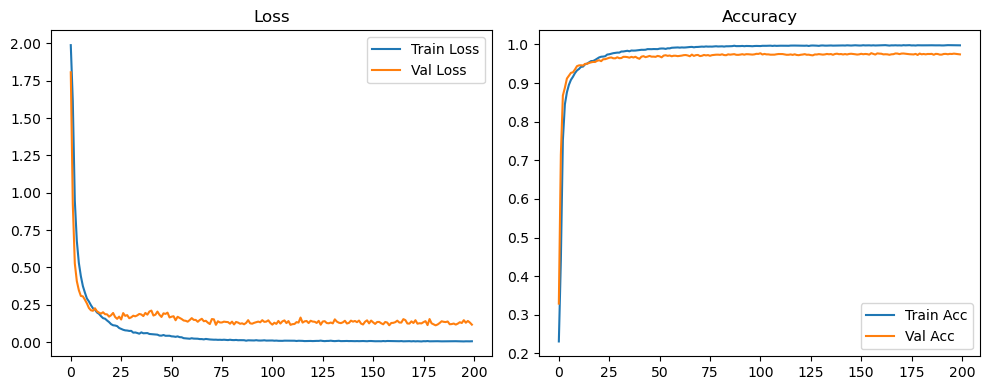

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 50.86it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 51.37it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 51.57it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 51.66it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 50.65it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 50.76it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 51.01it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 51.22it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 51.38it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 51.49it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 51.57it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 51.58it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 51.62it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 51.77it/s]

Original Model Final Test Loss: 0.1140 Accuracy: 0.9765


🚀 Running: batch128_lr0.001_0.001_0.001_dp0.5


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.001 | Train Acc: 0.1938 | Val Acc: 0.3607 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.001 | Train Acc: 0.1938 | Val Acc: 0.3607 |:   0%|          | 0/200 [00:11<?, ?it/s]

| LR: 0.001 | Train Acc: 0.1938 | Val Acc: 0.3607 |:   0%|          | 1/200 [00:11<36:50, 11.11s/it]

| LR: 0.001 | Train Acc: 0.3552 | Val Acc: 0.5995 |:   0%|          | 1/200 [00:21<36:50, 11.11s/it]

| LR: 0.001 | Train Acc: 0.3552 | Val Acc: 0.5995 |:   0%|          | 1/200 [00:21<36:50, 11.11s/it]

| LR: 0.001 | Train Acc: 0.3552 | Val Acc: 0.5995 |:   1%|          | 2/200 [00:21<35:29, 10.75s/it]

| LR: 0.001 | Train Acc: 0.6361 | Val Acc: 0.8090 |:   1%|          | 2/200 [00:32<35:29, 10.75s/it]

| LR: 0.001 | Train Acc: 0.6361 | Val Acc: 0.8090 |:   1%|          | 2/200 [00:32<35:29, 10.75s/it]

| LR: 0.001 | Train Acc: 0.6361 | Val Acc: 0.8090 |:   2%|▏         | 3/200 [00:32<34:57, 10.65s/it]

| LR: 0.001 | Train Acc: 0.7655 | Val Acc: 0.8693 |:   2%|▏         | 3/200 [00:42<34:57, 10.65s/it]

| LR: 0.001 | Train Acc: 0.7655 | Val Acc: 0.8693 |:   2%|▏         | 3/200 [00:42<34:57, 10.65s/it]

| LR: 0.001 | Train Acc: 0.7655 | Val Acc: 0.8693 |:   2%|▏         | 4/200 [00:42<34:36, 10.60s/it]

| LR: 0.001 | Train Acc: 0.8185 | Val Acc: 0.8892 |:   2%|▏         | 4/200 [00:53<34:36, 10.60s/it]

| LR: 0.001 | Train Acc: 0.8185 | Val Acc: 0.8892 |:   2%|▏         | 4/200 [00:53<34:36, 10.60s/it]

| LR: 0.001 | Train Acc: 0.8185 | Val Acc: 0.8892 |:   2%|▎         | 5/200 [00:53<34:18, 10.56s/it]

| LR: 0.001 | Train Acc: 0.8483 | Val Acc: 0.9034 |:   2%|▎         | 5/200 [01:03<34:18, 10.56s/it]

| LR: 0.001 | Train Acc: 0.8483 | Val Acc: 0.9034 |:   2%|▎         | 5/200 [01:03<34:18, 10.56s/it]

| LR: 0.001 | Train Acc: 0.8483 | Val Acc: 0.9034 |:   3%|▎         | 6/200 [01:03<34:27, 10.66s/it]

| LR: 0.001 | Train Acc: 0.8664 | Val Acc: 0.9158 |:   3%|▎         | 6/200 [01:14<34:27, 10.66s/it]

| LR: 0.001 | Train Acc: 0.8664 | Val Acc: 0.9158 |:   3%|▎         | 6/200 [01:14<34:27, 10.66s/it]

| LR: 0.001 | Train Acc: 0.8664 | Val Acc: 0.9158 |:   4%|▎         | 7/200 [01:14<34:32, 10.74s/it]

| LR: 0.001 | Train Acc: 0.8809 | Val Acc: 0.9203 |:   4%|▎         | 7/200 [01:25<34:32, 10.74s/it]

| LR: 0.001 | Train Acc: 0.8809 | Val Acc: 0.9203 |:   4%|▎         | 7/200 [01:25<34:32, 10.74s/it]

| LR: 0.001 | Train Acc: 0.8809 | Val Acc: 0.9203 |:   4%|▍         | 8/200 [01:25<34:19, 10.73s/it]

| LR: 0.001 | Train Acc: 0.8903 | Val Acc: 0.9279 |:   4%|▍         | 8/200 [01:36<34:19, 10.73s/it]

| LR: 0.001 | Train Acc: 0.8903 | Val Acc: 0.9279 |:   4%|▍         | 8/200 [01:36<34:19, 10.73s/it]

| LR: 0.001 | Train Acc: 0.8903 | Val Acc: 0.9279 |:   4%|▍         | 9/200 [01:36<34:05, 10.71s/it]

| LR: 0.001 | Train Acc: 0.8986 | Val Acc: 0.9284 |:   4%|▍         | 9/200 [01:46<34:05, 10.71s/it]

| LR: 0.001 | Train Acc: 0.8986 | Val Acc: 0.9284 |:   4%|▍         | 9/200 [01:46<34:05, 10.71s/it]

| LR: 0.001 | Train Acc: 0.8986 | Val Acc: 0.9284 |:   5%|▌         | 10/200 [01:46<33:51, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9050 | Val Acc: 0.9374 |:   5%|▌         | 10/200 [01:57<33:51, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9050 | Val Acc: 0.9374 |:   5%|▌         | 10/200 [01:57<33:51, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9050 | Val Acc: 0.9374 |:   6%|▌         | 11/200 [01:57<33:39, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9115 | Val Acc: 0.9427 |:   6%|▌         | 11/200 [02:08<33:39, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9115 | Val Acc: 0.9427 |:   6%|▌         | 11/200 [02:08<33:39, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9115 | Val Acc: 0.9427 |:   6%|▌         | 12/200 [02:08<33:27, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9141 | Val Acc: 0.9403 |:   6%|▌         | 12/200 [02:19<33:27, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9141 | Val Acc: 0.9403 |:   6%|▌         | 12/200 [02:19<33:27, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9141 | Val Acc: 0.9403 |:   6%|▋         | 13/200 [02:19<33:33, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9206 | Val Acc: 0.9469 |:   6%|▋         | 13/200 [02:29<33:33, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9206 | Val Acc: 0.9469 |:   6%|▋         | 13/200 [02:29<33:33, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9206 | Val Acc: 0.9469 |:   7%|▋         | 14/200 [02:29<33:15, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9265 | Val Acc: 0.9492 |:   7%|▋         | 14/200 [02:40<33:15, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9265 | Val Acc: 0.9492 |:   7%|▋         | 14/200 [02:40<33:15, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9265 | Val Acc: 0.9492 |:   8%|▊         | 15/200 [02:40<33:03, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9302 | Val Acc: 0.9526 |:   8%|▊         | 15/200 [02:51<33:03, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9302 | Val Acc: 0.9526 |:   8%|▊         | 15/200 [02:51<33:03, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9302 | Val Acc: 0.9526 |:   8%|▊         | 16/200 [02:51<32:51, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9339 | Val Acc: 0.9471 |:   8%|▊         | 16/200 [03:01<32:51, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9339 | Val Acc: 0.9471 |:   8%|▊         | 16/200 [03:01<32:51, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9339 | Val Acc: 0.9471 |:   8%|▊         | 17/200 [03:01<32:23, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9352 | Val Acc: 0.9519 |:   8%|▊         | 17/200 [03:12<32:23, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9352 | Val Acc: 0.9519 |:   8%|▊         | 17/200 [03:12<32:23, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9352 | Val Acc: 0.9519 |:   9%|▉         | 18/200 [03:12<32:19, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9401 | Val Acc: 0.9534 |:   9%|▉         | 18/200 [03:22<32:19, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9401 | Val Acc: 0.9534 |:   9%|▉         | 18/200 [03:22<32:19, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9401 | Val Acc: 0.9534 |:  10%|▉         | 19/200 [03:22<32:03, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9409 | Val Acc: 0.9583 |:  10%|▉         | 19/200 [03:33<32:03, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9409 | Val Acc: 0.9583 |:  10%|▉         | 19/200 [03:33<32:03, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9409 | Val Acc: 0.9583 |:  10%|█         | 20/200 [03:33<31:51, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9446 | Val Acc: 0.9583 |:  10%|█         | 20/200 [03:44<31:51, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9446 | Val Acc: 0.9583 |:  10%|█         | 20/200 [03:44<31:51, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9446 | Val Acc: 0.9583 |:  10%|█         | 21/200 [03:44<31:37, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9485 | Val Acc: 0.9583 |:  10%|█         | 21/200 [03:54<31:37, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9485 | Val Acc: 0.9583 |:  10%|█         | 21/200 [03:54<31:37, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9485 | Val Acc: 0.9583 |:  11%|█         | 22/200 [03:54<31:28, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9492 | Val Acc: 0.9612 |:  11%|█         | 22/200 [04:05<31:28, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9492 | Val Acc: 0.9612 |:  11%|█         | 22/200 [04:05<31:28, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9492 | Val Acc: 0.9612 |:  12%|█▏        | 23/200 [04:05<31:13, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9522 | Val Acc: 0.9624 |:  12%|█▏        | 23/200 [04:15<31:13, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9522 | Val Acc: 0.9624 |:  12%|█▏        | 23/200 [04:15<31:13, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9522 | Val Acc: 0.9624 |:  12%|█▏        | 24/200 [04:15<30:49, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9543 | Val Acc: 0.9635 |:  12%|█▏        | 24/200 [04:26<30:49, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9543 | Val Acc: 0.9635 |:  12%|█▏        | 24/200 [04:26<30:49, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9543 | Val Acc: 0.9635 |:  12%|█▎        | 25/200 [04:26<30:37, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9551 | Val Acc: 0.9630 |:  12%|█▎        | 25/200 [04:36<30:37, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9551 | Val Acc: 0.9630 |:  12%|█▎        | 25/200 [04:36<30:37, 10.50s/it]

| LR: 0.001 | Train Acc: 0.9551 | Val Acc: 0.9630 |:  13%|█▎        | 26/200 [04:36<30:29, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9572 | Val Acc: 0.9644 |:  13%|█▎        | 26/200 [04:47<30:29, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9572 | Val Acc: 0.9644 |:  13%|█▎        | 26/200 [04:47<30:29, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9572 | Val Acc: 0.9644 |:  14%|█▎        | 27/200 [04:47<30:20, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9594 | Val Acc: 0.9649 |:  14%|█▎        | 27/200 [04:58<30:20, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9594 | Val Acc: 0.9649 |:  14%|█▎        | 27/200 [04:58<30:20, 10.52s/it]

| LR: 0.001 | Train Acc: 0.9594 | Val Acc: 0.9649 |:  14%|█▍        | 28/200 [04:58<30:30, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9610 | Val Acc: 0.9667 |:  14%|█▍        | 28/200 [05:08<30:30, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9610 | Val Acc: 0.9667 |:  14%|█▍        | 28/200 [05:08<30:30, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9610 | Val Acc: 0.9667 |:  14%|█▍        | 29/200 [05:08<30:15, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9622 | Val Acc: 0.9667 |:  14%|█▍        | 29/200 [05:19<30:15, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9622 | Val Acc: 0.9667 |:  14%|█▍        | 29/200 [05:19<30:15, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9622 | Val Acc: 0.9667 |:  15%|█▌        | 30/200 [05:19<30:06, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9637 | Val Acc: 0.9659 |:  15%|█▌        | 30/200 [05:29<30:06, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9637 | Val Acc: 0.9659 |:  15%|█▌        | 30/200 [05:29<30:06, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9637 | Val Acc: 0.9659 |:  16%|█▌        | 31/200 [05:29<29:54, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9642 | Val Acc: 0.9666 |:  16%|█▌        | 31/200 [05:40<29:54, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9642 | Val Acc: 0.9666 |:  16%|█▌        | 31/200 [05:40<29:54, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9642 | Val Acc: 0.9666 |:  16%|█▌        | 32/200 [05:40<29:51, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9661 | Val Acc: 0.9690 |:  16%|█▌        | 32/200 [05:51<29:51, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9661 | Val Acc: 0.9690 |:  16%|█▌        | 32/200 [05:51<29:51, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9661 | Val Acc: 0.9690 |:  16%|█▋        | 33/200 [05:51<29:40, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9657 | Val Acc: 0.9697 |:  16%|█▋        | 33/200 [06:01<29:40, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9657 | Val Acc: 0.9697 |:  16%|█▋        | 33/200 [06:01<29:40, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9657 | Val Acc: 0.9697 |:  17%|█▋        | 34/200 [06:02<29:30, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9655 | Val Acc: 0.9683 |:  17%|█▋        | 34/200 [06:12<29:30, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9655 | Val Acc: 0.9683 |:  17%|█▋        | 34/200 [06:12<29:30, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9655 | Val Acc: 0.9683 |:  18%|█▊        | 35/200 [06:12<29:10, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9681 | Val Acc: 0.9670 |:  18%|█▊        | 35/200 [06:22<29:10, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9681 | Val Acc: 0.9670 |:  18%|█▊        | 35/200 [06:22<29:10, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9681 | Val Acc: 0.9670 |:  18%|█▊        | 36/200 [06:22<28:51, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9690 | Val Acc: 0.9676 |:  18%|█▊        | 36/200 [06:33<28:51, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9690 | Val Acc: 0.9676 |:  18%|█▊        | 36/200 [06:33<28:51, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9690 | Val Acc: 0.9676 |:  18%|█▊        | 37/200 [06:33<28:51, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9690 | Val Acc: 0.9678 |:  18%|█▊        | 37/200 [06:45<28:51, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9690 | Val Acc: 0.9678 |:  18%|█▊        | 37/200 [06:45<28:51, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9690 | Val Acc: 0.9678 |:  19%|█▉        | 38/200 [06:45<29:24, 10.89s/it]

| LR: 0.001 | Train Acc: 0.9699 | Val Acc: 0.9670 |:  19%|█▉        | 38/200 [06:55<29:24, 10.89s/it]

| LR: 0.001 | Train Acc: 0.9699 | Val Acc: 0.9670 |:  19%|█▉        | 38/200 [06:55<29:24, 10.89s/it]

| LR: 0.001 | Train Acc: 0.9699 | Val Acc: 0.9670 |:  20%|█▉        | 39/200 [06:55<29:02, 10.82s/it]

| LR: 0.001 | Train Acc: 0.9686 | Val Acc: 0.9702 |:  20%|█▉        | 39/200 [07:06<29:02, 10.82s/it]

| LR: 0.001 | Train Acc: 0.9686 | Val Acc: 0.9702 |:  20%|█▉        | 39/200 [07:06<29:02, 10.82s/it]

| LR: 0.001 | Train Acc: 0.9686 | Val Acc: 0.9702 |:  20%|██        | 40/200 [07:06<28:47, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9682 | Val Acc: 0.9673 |:  20%|██        | 40/200 [07:16<28:47, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9682 | Val Acc: 0.9673 |:  20%|██        | 40/200 [07:16<28:47, 10.80s/it]

| LR: 0.001 | Train Acc: 0.9682 | Val Acc: 0.9673 |:  20%|██        | 41/200 [07:16<28:13, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9692 | Val Acc: 0.9701 |:  20%|██        | 41/200 [07:27<28:13, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9692 | Val Acc: 0.9701 |:  20%|██        | 41/200 [07:27<28:13, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9692 | Val Acc: 0.9701 |:  21%|██        | 42/200 [07:27<28:04, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9698 | Val Acc: 0.9713 |:  21%|██        | 42/200 [07:38<28:04, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9698 | Val Acc: 0.9713 |:  21%|██        | 42/200 [07:38<28:04, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9698 | Val Acc: 0.9713 |:  22%|██▏       | 43/200 [07:38<27:56, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9701 | Val Acc: 0.9705 |:  22%|██▏       | 43/200 [07:48<27:56, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9701 | Val Acc: 0.9705 |:  22%|██▏       | 43/200 [07:48<27:56, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9701 | Val Acc: 0.9705 |:  22%|██▏       | 44/200 [07:48<27:37, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9721 | Val Acc: 0.9703 |:  22%|██▏       | 44/200 [07:59<27:37, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9721 | Val Acc: 0.9703 |:  22%|██▏       | 44/200 [07:59<27:37, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9721 | Val Acc: 0.9703 |:  22%|██▎       | 45/200 [07:59<27:26, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9738 | Val Acc: 0.9701 |:  22%|██▎       | 45/200 [08:10<27:26, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9738 | Val Acc: 0.9701 |:  22%|██▎       | 45/200 [08:10<27:26, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9738 | Val Acc: 0.9701 |:  23%|██▎       | 46/200 [08:10<27:14, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9726 | Val Acc: 0.9688 |:  23%|██▎       | 46/200 [08:20<27:14, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9726 | Val Acc: 0.9688 |:  23%|██▎       | 46/200 [08:20<27:14, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9726 | Val Acc: 0.9688 |:  24%|██▎       | 47/200 [08:20<27:07, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9743 | Val Acc: 0.9706 |:  24%|██▎       | 47/200 [08:31<27:07, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9743 | Val Acc: 0.9706 |:  24%|██▎       | 47/200 [08:31<27:07, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9743 | Val Acc: 0.9706 |:  24%|██▍       | 48/200 [08:31<26:51, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9759 | Val Acc: 0.9708 |:  24%|██▍       | 48/200 [08:41<26:51, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9759 | Val Acc: 0.9708 |:  24%|██▍       | 48/200 [08:41<26:51, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9759 | Val Acc: 0.9708 |:  24%|██▍       | 49/200 [08:41<26:46, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9746 | Val Acc: 0.9711 |:  24%|██▍       | 49/200 [08:52<26:46, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9746 | Val Acc: 0.9711 |:  24%|██▍       | 49/200 [08:52<26:46, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9746 | Val Acc: 0.9711 |:  25%|██▌       | 50/200 [08:52<26:28, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9760 | Val Acc: 0.9718 |:  25%|██▌       | 50/200 [09:03<26:28, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9760 | Val Acc: 0.9718 |:  25%|██▌       | 50/200 [09:03<26:28, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9760 | Val Acc: 0.9718 |:  26%|██▌       | 51/200 [09:03<26:20, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9759 | Val Acc: 0.9729 |:  26%|██▌       | 51/200 [09:13<26:20, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9759 | Val Acc: 0.9729 |:  26%|██▌       | 51/200 [09:13<26:20, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9759 | Val Acc: 0.9729 |:  26%|██▌       | 52/200 [09:13<26:16, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9774 | Val Acc: 0.9724 |:  26%|██▌       | 52/200 [09:24<26:16, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9774 | Val Acc: 0.9724 |:  26%|██▌       | 52/200 [09:24<26:16, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9774 | Val Acc: 0.9724 |:  26%|██▋       | 53/200 [09:24<26:03, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9769 | Val Acc: 0.9719 |:  26%|██▋       | 53/200 [09:34<26:03, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9769 | Val Acc: 0.9719 |:  26%|██▋       | 53/200 [09:34<26:03, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9769 | Val Acc: 0.9719 |:  27%|██▋       | 54/200 [09:35<25:50, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9785 | Val Acc: 0.9732 |:  27%|██▋       | 54/200 [09:45<25:50, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9785 | Val Acc: 0.9732 |:  27%|██▋       | 54/200 [09:45<25:50, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9785 | Val Acc: 0.9732 |:  28%|██▊       | 55/200 [09:45<25:34, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9796 | Val Acc: 0.9722 |:  28%|██▊       | 55/200 [09:56<25:34, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9796 | Val Acc: 0.9722 |:  28%|██▊       | 55/200 [09:56<25:34, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9796 | Val Acc: 0.9722 |:  28%|██▊       | 56/200 [09:56<25:33, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9780 | Val Acc: 0.9725 |:  28%|██▊       | 56/200 [10:07<25:33, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9780 | Val Acc: 0.9725 |:  28%|██▊       | 56/200 [10:07<25:33, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9780 | Val Acc: 0.9725 |:  28%|██▊       | 57/200 [10:07<25:33, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9797 | Val Acc: 0.9722 |:  28%|██▊       | 57/200 [10:17<25:33, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9797 | Val Acc: 0.9722 |:  28%|██▊       | 57/200 [10:17<25:33, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9797 | Val Acc: 0.9722 |:  29%|██▉       | 58/200 [10:17<25:16, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9804 | Val Acc: 0.9729 |:  29%|██▉       | 58/200 [10:28<25:16, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9804 | Val Acc: 0.9729 |:  29%|██▉       | 58/200 [10:28<25:16, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9804 | Val Acc: 0.9729 |:  30%|██▉       | 59/200 [10:28<25:07, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9807 | Val Acc: 0.9741 |:  30%|██▉       | 59/200 [10:38<25:07, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9807 | Val Acc: 0.9741 |:  30%|██▉       | 59/200 [10:38<25:07, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9807 | Val Acc: 0.9741 |:  30%|███       | 60/200 [10:38<24:35, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9821 | Val Acc: 0.9743 |:  30%|███       | 60/200 [10:48<24:35, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9821 | Val Acc: 0.9743 |:  30%|███       | 60/200 [10:48<24:35, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9821 | Val Acc: 0.9743 |:  30%|███       | 61/200 [10:48<24:10, 10.44s/it]

| LR: 0.001 | Train Acc: 0.9817 | Val Acc: 0.9735 |:  30%|███       | 61/200 [10:59<24:10, 10.44s/it]

| LR: 0.001 | Train Acc: 0.9817 | Val Acc: 0.9735 |:  30%|███       | 61/200 [10:59<24:10, 10.44s/it]

| LR: 0.001 | Train Acc: 0.9817 | Val Acc: 0.9735 |:  31%|███       | 62/200 [10:59<24:04, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9821 | Val Acc: 0.9738 |:  31%|███       | 62/200 [11:09<24:04, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9821 | Val Acc: 0.9738 |:  31%|███       | 62/200 [11:09<24:04, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9821 | Val Acc: 0.9738 |:  32%|███▏      | 63/200 [11:10<23:59, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9824 | Val Acc: 0.9733 |:  32%|███▏      | 63/200 [11:20<23:59, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9824 | Val Acc: 0.9733 |:  32%|███▏      | 63/200 [11:20<23:59, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9824 | Val Acc: 0.9733 |:  32%|███▏      | 64/200 [11:20<23:49, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9819 | Val Acc: 0.9724 |:  32%|███▏      | 64/200 [11:31<23:49, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9819 | Val Acc: 0.9724 |:  32%|███▏      | 64/200 [11:31<23:49, 10.51s/it]

| LR: 0.001 | Train Acc: 0.9819 | Val Acc: 0.9724 |:  32%|███▎      | 65/200 [11:31<23:54, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9830 | Val Acc: 0.9733 |:  32%|███▎      | 65/200 [11:42<23:54, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9830 | Val Acc: 0.9733 |:  32%|███▎      | 65/200 [11:42<23:54, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9830 | Val Acc: 0.9733 |:  33%|███▎      | 66/200 [11:42<23:49, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9838 | Val Acc: 0.9755 |:  33%|███▎      | 66/200 [11:53<23:49, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9838 | Val Acc: 0.9755 |:  33%|███▎      | 66/200 [11:53<23:49, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9838 | Val Acc: 0.9755 |:  34%|███▎      | 67/200 [11:53<23:46, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9740 |:  34%|███▎      | 67/200 [12:04<23:46, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9740 |:  34%|███▎      | 67/200 [12:04<23:46, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9740 |:  34%|███▍      | 68/200 [12:04<23:58, 10.90s/it]

| LR: 0.001 | Train Acc: 0.9833 | Val Acc: 0.9732 |:  34%|███▍      | 68/200 [12:14<23:58, 10.90s/it]

| LR: 0.001 | Train Acc: 0.9833 | Val Acc: 0.9732 |:  34%|███▍      | 68/200 [12:14<23:58, 10.90s/it]

| LR: 0.001 | Train Acc: 0.9833 | Val Acc: 0.9732 |:  34%|███▍      | 69/200 [12:14<23:35, 10.81s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9731 |:  34%|███▍      | 69/200 [12:25<23:35, 10.81s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9731 |:  34%|███▍      | 69/200 [12:25<23:35, 10.81s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9731 |:  35%|███▌      | 70/200 [12:25<23:16, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9832 | Val Acc: 0.9722 |:  35%|███▌      | 70/200 [12:36<23:16, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9832 | Val Acc: 0.9722 |:  35%|███▌      | 70/200 [12:36<23:16, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9832 | Val Acc: 0.9722 |:  36%|███▌      | 71/200 [12:36<23:04, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9838 | Val Acc: 0.9739 |:  36%|███▌      | 71/200 [12:46<23:04, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9838 | Val Acc: 0.9739 |:  36%|███▌      | 71/200 [12:46<23:04, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9838 | Val Acc: 0.9739 |:  36%|███▌      | 72/200 [12:46<22:52, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9849 | Val Acc: 0.9739 |:  36%|███▌      | 72/200 [12:57<22:52, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9849 | Val Acc: 0.9739 |:  36%|███▌      | 72/200 [12:57<22:52, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9849 | Val Acc: 0.9739 |:  36%|███▋      | 73/200 [12:57<22:41, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9734 |:  36%|███▋      | 73/200 [13:08<22:41, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9734 |:  36%|███▋      | 73/200 [13:08<22:41, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9734 |:  37%|███▋      | 74/200 [13:08<22:19, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9724 |:  37%|███▋      | 74/200 [13:18<22:19, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9724 |:  37%|███▋      | 74/200 [13:18<22:19, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9724 |:  38%|███▊      | 75/200 [13:18<22:15, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9852 | Val Acc: 0.9741 |:  38%|███▊      | 75/200 [13:29<22:15, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9852 | Val Acc: 0.9741 |:  38%|███▊      | 75/200 [13:29<22:15, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9852 | Val Acc: 0.9741 |:  38%|███▊      | 76/200 [13:29<22:03, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9849 | Val Acc: 0.9718 |:  38%|███▊      | 76/200 [13:40<22:03, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9849 | Val Acc: 0.9718 |:  38%|███▊      | 76/200 [13:40<22:03, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9849 | Val Acc: 0.9718 |:  38%|███▊      | 77/200 [13:40<21:54, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9742 |:  38%|███▊      | 77/200 [13:51<21:54, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9742 |:  38%|███▊      | 77/200 [13:51<21:54, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9742 |:  39%|███▉      | 78/200 [13:51<21:46, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9738 |:  39%|███▉      | 78/200 [14:01<21:46, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9738 |:  39%|███▉      | 78/200 [14:01<21:46, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9738 |:  40%|███▉      | 79/200 [14:01<21:27, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9858 | Val Acc: 0.9732 |:  40%|███▉      | 79/200 [14:11<21:27, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9858 | Val Acc: 0.9732 |:  40%|███▉      | 79/200 [14:11<21:27, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9858 | Val Acc: 0.9732 |:  40%|████      | 80/200 [14:11<21:09, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9852 | Val Acc: 0.9742 |:  40%|████      | 80/200 [14:22<21:09, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9852 | Val Acc: 0.9742 |:  40%|████      | 80/200 [14:22<21:09, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9852 | Val Acc: 0.9742 |:  40%|████      | 81/200 [14:22<21:05, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9856 | Val Acc: 0.9734 |:  40%|████      | 81/200 [14:33<21:05, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9856 | Val Acc: 0.9734 |:  40%|████      | 81/200 [14:33<21:05, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9856 | Val Acc: 0.9734 |:  41%|████      | 82/200 [14:33<20:53, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9750 |:  41%|████      | 82/200 [14:43<20:53, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9750 |:  41%|████      | 82/200 [14:43<20:53, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9861 | Val Acc: 0.9750 |:  42%|████▏     | 83/200 [14:43<20:39, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9742 |:  42%|████▏     | 83/200 [14:54<20:39, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9742 |:  42%|████▏     | 83/200 [14:54<20:39, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9742 |:  42%|████▏     | 84/200 [14:54<20:38, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9860 | Val Acc: 0.9731 |:  42%|████▏     | 84/200 [15:05<20:38, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9860 | Val Acc: 0.9731 |:  42%|████▏     | 84/200 [15:05<20:38, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9860 | Val Acc: 0.9731 |:  42%|████▎     | 85/200 [15:05<20:29, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9869 | Val Acc: 0.9727 |:  42%|████▎     | 85/200 [15:16<20:29, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9869 | Val Acc: 0.9727 |:  42%|████▎     | 85/200 [15:16<20:29, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9869 | Val Acc: 0.9727 |:  43%|████▎     | 86/200 [15:16<20:23, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9860 | Val Acc: 0.9739 |:  43%|████▎     | 86/200 [15:26<20:23, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9860 | Val Acc: 0.9739 |:  43%|████▎     | 86/200 [15:26<20:23, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9860 | Val Acc: 0.9739 |:  44%|████▎     | 87/200 [15:26<20:09, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9863 | Val Acc: 0.9745 |:  44%|████▎     | 87/200 [15:37<20:09, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9863 | Val Acc: 0.9745 |:  44%|████▎     | 87/200 [15:37<20:09, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9863 | Val Acc: 0.9745 |:  44%|████▍     | 88/200 [15:37<19:52, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9870 | Val Acc: 0.9752 |:  44%|████▍     | 88/200 [15:48<19:52, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9870 | Val Acc: 0.9752 |:  44%|████▍     | 88/200 [15:48<19:52, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9870 | Val Acc: 0.9752 |:  44%|████▍     | 89/200 [15:48<19:42, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9737 |:  44%|████▍     | 89/200 [15:58<19:42, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9737 |:  44%|████▍     | 89/200 [15:58<19:42, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9737 |:  45%|████▌     | 90/200 [15:58<19:23, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9733 |:  45%|████▌     | 90/200 [16:09<19:23, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9733 |:  45%|████▌     | 90/200 [16:09<19:23, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9733 |:  46%|████▌     | 91/200 [16:09<19:17, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9868 | Val Acc: 0.9729 |:  46%|████▌     | 91/200 [16:19<19:17, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9868 | Val Acc: 0.9729 |:  46%|████▌     | 91/200 [16:19<19:17, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9868 | Val Acc: 0.9729 |:  46%|████▌     | 92/200 [16:19<18:51, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9866 | Val Acc: 0.9740 |:  46%|████▌     | 92/200 [16:30<18:51, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9866 | Val Acc: 0.9740 |:  46%|████▌     | 92/200 [16:30<18:51, 10.47s/it]

| LR: 0.001 | Train Acc: 0.9866 | Val Acc: 0.9740 |:  46%|████▋     | 93/200 [16:30<18:48, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9875 | Val Acc: 0.9744 |:  46%|████▋     | 93/200 [16:40<18:48, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9875 | Val Acc: 0.9744 |:  46%|████▋     | 93/200 [16:40<18:48, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9875 | Val Acc: 0.9744 |:  47%|████▋     | 94/200 [16:40<18:36, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9867 | Val Acc: 0.9745 |:  47%|████▋     | 94/200 [16:51<18:36, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9867 | Val Acc: 0.9745 |:  47%|████▋     | 94/200 [16:51<18:36, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9867 | Val Acc: 0.9745 |:  48%|████▊     | 95/200 [16:51<18:26, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9880 | Val Acc: 0.9747 |:  48%|████▊     | 95/200 [17:01<18:26, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9880 | Val Acc: 0.9747 |:  48%|████▊     | 95/200 [17:01<18:26, 10.54s/it]

| LR: 0.001 | Train Acc: 0.9880 | Val Acc: 0.9747 |:  48%|████▊     | 96/200 [17:01<18:17, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9751 |:  48%|████▊     | 96/200 [17:12<18:17, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9751 |:  48%|████▊     | 96/200 [17:12<18:17, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9751 |:  48%|████▊     | 97/200 [17:12<18:14, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9882 | Val Acc: 0.9748 |:  48%|████▊     | 97/200 [17:23<18:14, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9882 | Val Acc: 0.9748 |:  48%|████▊     | 97/200 [17:23<18:14, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9882 | Val Acc: 0.9748 |:  49%|████▉     | 98/200 [17:23<18:11, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9750 |:  49%|████▉     | 98/200 [17:34<18:11, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9750 |:  49%|████▉     | 98/200 [17:34<18:11, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9750 |:  50%|████▉     | 99/200 [17:34<18:02, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9870 | Val Acc: 0.9752 |:  50%|████▉     | 99/200 [17:44<18:02, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9870 | Val Acc: 0.9752 |:  50%|████▉     | 99/200 [17:44<18:02, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9870 | Val Acc: 0.9752 |:  50%|█████     | 100/200 [17:44<17:51, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9752 |:  50%|█████     | 100/200 [17:56<17:51, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9752 |:  50%|█████     | 100/200 [17:56<17:51, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9752 |:  50%|█████     | 101/200 [17:56<17:57, 10.88s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9752 |:  50%|█████     | 101/200 [18:06<17:57, 10.88s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9752 |:  50%|█████     | 101/200 [18:06<17:57, 10.88s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9752 |:  51%|█████     | 102/200 [18:06<17:34, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9879 | Val Acc: 0.9763 |:  51%|█████     | 102/200 [18:17<17:34, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9879 | Val Acc: 0.9763 |:  51%|█████     | 102/200 [18:17<17:34, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9879 | Val Acc: 0.9763 |:  52%|█████▏    | 103/200 [18:17<17:19, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9877 | Val Acc: 0.9756 |:  52%|█████▏    | 103/200 [18:27<17:19, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9877 | Val Acc: 0.9756 |:  52%|█████▏    | 103/200 [18:27<17:19, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9877 | Val Acc: 0.9756 |:  52%|█████▏    | 104/200 [18:27<17:03, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9871 | Val Acc: 0.9741 |:  52%|█████▏    | 104/200 [18:38<17:03, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9871 | Val Acc: 0.9741 |:  52%|█████▏    | 104/200 [18:38<17:03, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9871 | Val Acc: 0.9741 |:  52%|█████▎    | 105/200 [18:38<16:54, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9885 | Val Acc: 0.9756 |:  52%|█████▎    | 105/200 [18:48<16:54, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9885 | Val Acc: 0.9756 |:  52%|█████▎    | 105/200 [18:48<16:54, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9885 | Val Acc: 0.9756 |:  53%|█████▎    | 106/200 [18:48<16:40, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9742 |:  53%|█████▎    | 106/200 [18:59<16:40, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9742 |:  53%|█████▎    | 106/200 [18:59<16:40, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9742 |:  54%|█████▎    | 107/200 [18:59<16:33, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9875 | Val Acc: 0.9744 |:  54%|█████▎    | 107/200 [19:10<16:33, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9875 | Val Acc: 0.9744 |:  54%|█████▎    | 107/200 [19:10<16:33, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9875 | Val Acc: 0.9744 |:  54%|█████▍    | 108/200 [19:10<16:12, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9738 |:  54%|█████▍    | 108/200 [19:20<16:12, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9738 |:  54%|█████▍    | 108/200 [19:20<16:12, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9738 |:  55%|█████▍    | 109/200 [19:20<16:08, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9885 | Val Acc: 0.9736 |:  55%|█████▍    | 109/200 [19:31<16:08, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9885 | Val Acc: 0.9736 |:  55%|█████▍    | 109/200 [19:31<16:08, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9885 | Val Acc: 0.9736 |:  55%|█████▌    | 110/200 [19:31<15:58, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9749 |:  55%|█████▌    | 110/200 [19:42<15:58, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9749 |:  55%|█████▌    | 110/200 [19:42<15:58, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9749 |:  56%|█████▌    | 111/200 [19:42<15:44, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9732 |:  56%|█████▌    | 111/200 [19:52<15:44, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9732 |:  56%|█████▌    | 111/200 [19:52<15:44, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9732 |:  56%|█████▌    | 112/200 [19:52<15:32, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9725 |:  56%|█████▌    | 112/200 [20:03<15:32, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9725 |:  56%|█████▌    | 112/200 [20:03<15:32, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9725 |:  56%|█████▋    | 113/200 [20:03<15:22, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9870 | Val Acc: 0.9742 |:  56%|█████▋    | 113/200 [20:13<15:22, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9870 | Val Acc: 0.9742 |:  56%|█████▋    | 113/200 [20:13<15:22, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9870 | Val Acc: 0.9742 |:  57%|█████▋    | 114/200 [20:13<15:09, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9889 | Val Acc: 0.9741 |:  57%|█████▋    | 114/200 [20:24<15:09, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9889 | Val Acc: 0.9741 |:  57%|█████▋    | 114/200 [20:24<15:09, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9889 | Val Acc: 0.9741 |:  57%|█████▊    | 115/200 [20:24<14:56, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9738 |:  57%|█████▊    | 115/200 [20:34<14:56, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9738 |:  57%|█████▊    | 115/200 [20:34<14:56, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9738 |:  58%|█████▊    | 116/200 [20:34<14:48, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9761 |:  58%|█████▊    | 116/200 [20:45<14:48, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9761 |:  58%|█████▊    | 116/200 [20:45<14:48, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9761 |:  58%|█████▊    | 117/200 [20:45<14:41, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9897 | Val Acc: 0.9757 |:  58%|█████▊    | 117/200 [20:56<14:41, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9897 | Val Acc: 0.9757 |:  58%|█████▊    | 117/200 [20:56<14:41, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9897 | Val Acc: 0.9757 |:  59%|█████▉    | 118/200 [20:56<14:34, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9885 | Val Acc: 0.9747 |:  59%|█████▉    | 118/200 [21:07<14:34, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9885 | Val Acc: 0.9747 |:  59%|█████▉    | 118/200 [21:07<14:34, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9885 | Val Acc: 0.9747 |:  60%|█████▉    | 119/200 [21:07<14:24, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9888 | Val Acc: 0.9739 |:  60%|█████▉    | 119/200 [21:17<14:24, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9888 | Val Acc: 0.9739 |:  60%|█████▉    | 119/200 [21:17<14:24, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9888 | Val Acc: 0.9739 |:  60%|██████    | 120/200 [21:17<14:10, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9748 |:  60%|██████    | 120/200 [21:28<14:10, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9748 |:  60%|██████    | 120/200 [21:28<14:10, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9748 |:  60%|██████    | 121/200 [21:28<14:00, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9747 |:  60%|██████    | 121/200 [21:38<14:00, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9747 |:  60%|██████    | 121/200 [21:38<14:00, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9747 |:  61%|██████    | 122/200 [21:38<13:48, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9750 |:  61%|██████    | 122/200 [21:49<13:48, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9750 |:  61%|██████    | 122/200 [21:49<13:48, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9750 |:  62%|██████▏   | 123/200 [21:49<13:36, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9750 |:  62%|██████▏   | 123/200 [22:00<13:36, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9750 |:  62%|██████▏   | 123/200 [22:00<13:36, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9750 |:  62%|██████▏   | 124/200 [22:00<13:27, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9884 | Val Acc: 0.9758 |:  62%|██████▏   | 124/200 [22:10<13:27, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9884 | Val Acc: 0.9758 |:  62%|██████▏   | 124/200 [22:10<13:27, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9884 | Val Acc: 0.9758 |:  62%|██████▎   | 125/200 [22:10<13:15, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9897 | Val Acc: 0.9740 |:  62%|██████▎   | 125/200 [22:21<13:15, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9897 | Val Acc: 0.9740 |:  62%|██████▎   | 125/200 [22:21<13:15, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9897 | Val Acc: 0.9740 |:  63%|██████▎   | 126/200 [22:21<13:03, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9889 | Val Acc: 0.9752 |:  63%|██████▎   | 126/200 [22:31<13:03, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9889 | Val Acc: 0.9752 |:  63%|██████▎   | 126/200 [22:31<13:03, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9889 | Val Acc: 0.9752 |:  64%|██████▎   | 127/200 [22:31<12:49, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9767 |:  64%|██████▎   | 127/200 [22:42<12:49, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9767 |:  64%|██████▎   | 127/200 [22:42<12:49, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9767 |:  64%|██████▍   | 128/200 [22:42<12:44, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9882 | Val Acc: 0.9753 |:  64%|██████▍   | 128/200 [22:53<12:44, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9882 | Val Acc: 0.9753 |:  64%|██████▍   | 128/200 [22:53<12:44, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9882 | Val Acc: 0.9753 |:  64%|██████▍   | 129/200 [22:53<12:34, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9745 |:  64%|██████▍   | 129/200 [23:03<12:34, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9745 |:  64%|██████▍   | 129/200 [23:03<12:34, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9745 |:  65%|██████▌   | 130/200 [23:03<12:28, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9750 |:  65%|██████▌   | 130/200 [23:14<12:28, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9750 |:  65%|██████▌   | 130/200 [23:14<12:28, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9750 |:  66%|██████▌   | 131/200 [23:14<12:13, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9757 |:  66%|██████▌   | 131/200 [23:25<12:13, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9757 |:  66%|██████▌   | 131/200 [23:25<12:13, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9757 |:  66%|██████▌   | 132/200 [23:25<12:05, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9895 | Val Acc: 0.9748 |:  66%|██████▌   | 132/200 [23:35<12:05, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9895 | Val Acc: 0.9748 |:  66%|██████▌   | 132/200 [23:35<12:05, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9895 | Val Acc: 0.9748 |:  66%|██████▋   | 133/200 [23:35<11:57, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9748 |:  66%|██████▋   | 133/200 [23:46<11:57, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9748 |:  66%|██████▋   | 133/200 [23:46<11:57, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9748 |:  67%|██████▋   | 134/200 [23:46<11:46, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9753 |:  67%|██████▋   | 134/200 [23:57<11:46, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9753 |:  67%|██████▋   | 134/200 [23:57<11:46, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9753 |:  68%|██████▊   | 135/200 [23:57<11:36, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9750 |:  68%|██████▊   | 135/200 [24:08<11:36, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9750 |:  68%|██████▊   | 135/200 [24:08<11:36, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9750 |:  68%|██████▊   | 136/200 [24:08<11:25, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9756 |:  68%|██████▊   | 136/200 [24:18<11:25, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9756 |:  68%|██████▊   | 136/200 [24:18<11:25, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9756 |:  68%|██████▊   | 137/200 [24:18<11:15, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9883 | Val Acc: 0.9747 |:  68%|██████▊   | 137/200 [24:29<11:15, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9883 | Val Acc: 0.9747 |:  68%|██████▊   | 137/200 [24:29<11:15, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9883 | Val Acc: 0.9747 |:  69%|██████▉   | 138/200 [24:29<11:00, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9756 |:  69%|██████▉   | 138/200 [24:40<11:00, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9756 |:  69%|██████▉   | 138/200 [24:40<11:00, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9756 |:  70%|██████▉   | 139/200 [24:40<10:56, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9893 | Val Acc: 0.9752 |:  70%|██████▉   | 139/200 [24:51<10:56, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9893 | Val Acc: 0.9752 |:  70%|██████▉   | 139/200 [24:51<10:56, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9893 | Val Acc: 0.9752 |:  70%|███████   | 140/200 [24:51<10:49, 10.82s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9756 |:  70%|███████   | 140/200 [25:01<10:49, 10.82s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9756 |:  70%|███████   | 140/200 [25:01<10:49, 10.82s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9756 |:  70%|███████   | 141/200 [25:01<10:33, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9747 |:  70%|███████   | 141/200 [25:12<10:33, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9747 |:  70%|███████   | 141/200 [25:12<10:33, 10.75s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9747 |:  71%|███████   | 142/200 [25:12<10:19, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9753 |:  71%|███████   | 142/200 [25:22<10:19, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9753 |:  71%|███████   | 142/200 [25:22<10:19, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9753 |:  72%|███████▏  | 143/200 [25:22<10:05, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9892 | Val Acc: 0.9740 |:  72%|███████▏  | 143/200 [25:33<10:05, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9892 | Val Acc: 0.9740 |:  72%|███████▏  | 143/200 [25:33<10:05, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9892 | Val Acc: 0.9740 |:  72%|███████▏  | 144/200 [25:33<09:54, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9897 | Val Acc: 0.9753 |:  72%|███████▏  | 144/200 [25:44<09:54, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9897 | Val Acc: 0.9753 |:  72%|███████▏  | 144/200 [25:44<09:54, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9897 | Val Acc: 0.9753 |:  72%|███████▎  | 145/200 [25:44<09:44, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9889 | Val Acc: 0.9750 |:  72%|███████▎  | 145/200 [25:54<09:44, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9889 | Val Acc: 0.9750 |:  72%|███████▎  | 145/200 [25:54<09:44, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9889 | Val Acc: 0.9750 |:  73%|███████▎  | 146/200 [25:54<09:36, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9893 | Val Acc: 0.9748 |:  73%|███████▎  | 146/200 [26:05<09:36, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9893 | Val Acc: 0.9748 |:  73%|███████▎  | 146/200 [26:05<09:36, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9893 | Val Acc: 0.9748 |:  74%|███████▎  | 147/200 [26:05<09:22, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9749 |:  74%|███████▎  | 147/200 [26:15<09:22, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9749 |:  74%|███████▎  | 147/200 [26:15<09:22, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9749 |:  74%|███████▍  | 148/200 [26:15<09:10, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9897 | Val Acc: 0.9752 |:  74%|███████▍  | 148/200 [26:26<09:10, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9897 | Val Acc: 0.9752 |:  74%|███████▍  | 148/200 [26:26<09:10, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9897 | Val Acc: 0.9752 |:  74%|███████▍  | 149/200 [26:26<08:58, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9748 |:  74%|███████▍  | 149/200 [26:36<08:58, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9748 |:  74%|███████▍  | 149/200 [26:36<08:58, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9748 |:  75%|███████▌  | 150/200 [26:36<08:47, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9743 |:  75%|███████▌  | 150/200 [26:47<08:47, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9743 |:  75%|███████▌  | 150/200 [26:47<08:47, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9743 |:  76%|███████▌  | 151/200 [26:47<08:37, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9747 |:  76%|███████▌  | 151/200 [26:58<08:37, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9747 |:  76%|███████▌  | 151/200 [26:58<08:37, 10.56s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9747 |:  76%|███████▌  | 152/200 [26:58<08:28, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9756 |:  76%|███████▌  | 152/200 [27:08<08:28, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9756 |:  76%|███████▌  | 152/200 [27:08<08:28, 10.60s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9756 |:  76%|███████▋  | 153/200 [27:08<08:19, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9900 | Val Acc: 0.9746 |:  76%|███████▋  | 153/200 [27:19<08:19, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9900 | Val Acc: 0.9746 |:  76%|███████▋  | 153/200 [27:19<08:19, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9900 | Val Acc: 0.9746 |:  77%|███████▋  | 154/200 [27:19<08:08, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9757 |:  77%|███████▋  | 154/200 [27:30<08:08, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9757 |:  77%|███████▋  | 154/200 [27:30<08:08, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9757 |:  78%|███████▊  | 155/200 [27:30<07:58, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9900 | Val Acc: 0.9748 |:  78%|███████▊  | 155/200 [27:40<07:58, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9900 | Val Acc: 0.9748 |:  78%|███████▊  | 155/200 [27:40<07:58, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9900 | Val Acc: 0.9748 |:  78%|███████▊  | 156/200 [27:40<07:47, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9739 |:  78%|███████▊  | 156/200 [27:51<07:47, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9739 |:  78%|███████▊  | 156/200 [27:51<07:47, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9739 |:  78%|███████▊  | 157/200 [27:51<07:39, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9901 | Val Acc: 0.9744 |:  78%|███████▊  | 157/200 [28:02<07:39, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9901 | Val Acc: 0.9744 |:  78%|███████▊  | 157/200 [28:02<07:39, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9901 | Val Acc: 0.9744 |:  79%|███████▉  | 158/200 [28:02<07:29, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9757 |:  79%|███████▉  | 158/200 [28:13<07:29, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9757 |:  79%|███████▉  | 158/200 [28:13<07:29, 10.70s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9757 |:  80%|███████▉  | 159/200 [28:13<07:19, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9738 |:  80%|███████▉  | 159/200 [28:23<07:19, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9738 |:  80%|███████▉  | 159/200 [28:23<07:19, 10.73s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9738 |:  80%|████████  | 160/200 [28:23<07:07, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9742 |:  80%|████████  | 160/200 [28:34<07:07, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9742 |:  80%|████████  | 160/200 [28:34<07:07, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9742 |:  80%|████████  | 161/200 [28:34<06:56, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9747 |:  80%|████████  | 161/200 [28:44<06:56, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9747 |:  80%|████████  | 161/200 [28:44<06:56, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9747 |:  81%|████████  | 162/200 [28:44<06:44, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9749 |:  81%|████████  | 162/200 [28:55<06:44, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9749 |:  81%|████████  | 162/200 [28:55<06:44, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9749 |:  82%|████████▏ | 163/200 [28:55<06:34, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9895 | Val Acc: 0.9748 |:  82%|████████▏ | 163/200 [29:06<06:34, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9895 | Val Acc: 0.9748 |:  82%|████████▏ | 163/200 [29:06<06:34, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9895 | Val Acc: 0.9748 |:  82%|████████▏ | 164/200 [29:06<06:23, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9904 | Val Acc: 0.9747 |:  82%|████████▏ | 164/200 [29:17<06:23, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9904 | Val Acc: 0.9747 |:  82%|████████▏ | 164/200 [29:17<06:23, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9904 | Val Acc: 0.9747 |:  82%|████████▎ | 165/200 [29:17<06:13, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9768 |:  82%|████████▎ | 165/200 [29:27<06:13, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9768 |:  82%|████████▎ | 165/200 [29:27<06:13, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9768 |:  83%|████████▎ | 166/200 [29:27<06:04, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9901 | Val Acc: 0.9752 |:  83%|████████▎ | 166/200 [29:38<06:04, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9901 | Val Acc: 0.9752 |:  83%|████████▎ | 166/200 [29:38<06:04, 10.72s/it]

| LR: 0.001 | Train Acc: 0.9901 | Val Acc: 0.9752 |:  84%|████████▎ | 167/200 [29:38<05:51, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9755 |:  84%|████████▎ | 167/200 [29:49<05:51, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9755 |:  84%|████████▎ | 167/200 [29:49<05:51, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9755 |:  84%|████████▍ | 168/200 [29:49<05:43, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9758 |:  84%|████████▍ | 168/200 [29:59<05:43, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9758 |:  84%|████████▍ | 168/200 [29:59<05:43, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9758 |:  84%|████████▍ | 169/200 [29:59<05:30, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9907 | Val Acc: 0.9743 |:  84%|████████▍ | 169/200 [30:10<05:30, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9907 | Val Acc: 0.9743 |:  84%|████████▍ | 169/200 [30:10<05:30, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9907 | Val Acc: 0.9743 |:  85%|████████▌ | 170/200 [30:10<05:19, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9754 |:  85%|████████▌ | 170/200 [30:20<05:19, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9754 |:  85%|████████▌ | 170/200 [30:20<05:19, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9754 |:  86%|████████▌ | 171/200 [30:20<05:07, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9762 |:  86%|████████▌ | 171/200 [30:31<05:07, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9762 |:  86%|████████▌ | 171/200 [30:31<05:07, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9762 |:  86%|████████▌ | 172/200 [30:31<04:59, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9900 | Val Acc: 0.9752 |:  86%|████████▌ | 172/200 [30:42<04:59, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9900 | Val Acc: 0.9752 |:  86%|████████▌ | 172/200 [30:42<04:59, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9900 | Val Acc: 0.9752 |:  86%|████████▋ | 173/200 [30:42<04:47, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9908 | Val Acc: 0.9746 |:  86%|████████▋ | 173/200 [30:52<04:47, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9908 | Val Acc: 0.9746 |:  86%|████████▋ | 173/200 [30:52<04:47, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9908 | Val Acc: 0.9746 |:  87%|████████▋ | 174/200 [30:52<04:35, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9915 | Val Acc: 0.9760 |:  87%|████████▋ | 174/200 [31:03<04:35, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9915 | Val Acc: 0.9760 |:  87%|████████▋ | 174/200 [31:03<04:35, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9915 | Val Acc: 0.9760 |:  88%|████████▊ | 175/200 [31:03<04:24, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9742 |:  88%|████████▊ | 175/200 [31:14<04:24, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9742 |:  88%|████████▊ | 175/200 [31:14<04:24, 10.59s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9742 |:  88%|████████▊ | 176/200 [31:14<04:17, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9908 | Val Acc: 0.9768 |:  88%|████████▊ | 176/200 [31:25<04:17, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9908 | Val Acc: 0.9768 |:  88%|████████▊ | 176/200 [31:25<04:17, 10.74s/it]

| LR: 0.001 | Train Acc: 0.9908 | Val Acc: 0.9768 |:  88%|████████▊ | 177/200 [31:25<04:07, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9748 |:  88%|████████▊ | 177/200 [31:36<04:07, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9748 |:  88%|████████▊ | 177/200 [31:36<04:07, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9748 |:  89%|████████▉ | 178/200 [31:36<03:56, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9754 |:  89%|████████▉ | 178/200 [31:46<03:56, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9754 |:  89%|████████▉ | 178/200 [31:46<03:56, 10.76s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9754 |:  90%|████████▉ | 179/200 [31:46<03:44, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9745 |:  90%|████████▉ | 179/200 [31:57<03:44, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9745 |:  90%|████████▉ | 179/200 [31:57<03:44, 10.68s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9745 |:  90%|█████████ | 180/200 [31:57<03:33, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9900 | Val Acc: 0.9766 |:  90%|█████████ | 180/200 [32:07<03:33, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9900 | Val Acc: 0.9766 |:  90%|█████████ | 180/200 [32:07<03:33, 10.66s/it]

| LR: 0.001 | Train Acc: 0.9900 | Val Acc: 0.9766 |:  90%|█████████ | 181/200 [32:08<03:23, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9765 |:  90%|█████████ | 181/200 [32:18<03:23, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9765 |:  90%|█████████ | 181/200 [32:18<03:23, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9765 |:  91%|█████████ | 182/200 [32:18<03:11, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9746 |:  91%|█████████ | 182/200 [32:29<03:11, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9746 |:  91%|█████████ | 182/200 [32:29<03:11, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9746 |:  92%|█████████▏| 183/200 [32:29<03:00, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9736 |:  92%|█████████▏| 183/200 [32:39<03:00, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9736 |:  92%|█████████▏| 183/200 [32:39<03:00, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9736 |:  92%|█████████▏| 184/200 [32:39<02:50, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9758 |:  92%|█████████▏| 184/200 [32:50<02:50, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9758 |:  92%|█████████▏| 184/200 [32:50<02:50, 10.65s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9758 |:  92%|█████████▎| 185/200 [32:50<02:38, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9904 | Val Acc: 0.9758 |:  92%|█████████▎| 185/200 [33:00<02:38, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9904 | Val Acc: 0.9758 |:  92%|█████████▎| 185/200 [33:00<02:38, 10.57s/it]

| LR: 0.001 | Train Acc: 0.9904 | Val Acc: 0.9758 |:  93%|█████████▎| 186/200 [33:00<02:27, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9754 |:  93%|█████████▎| 186/200 [33:11<02:27, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9754 |:  93%|█████████▎| 186/200 [33:11<02:27, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9754 |:  94%|█████████▎| 187/200 [33:11<02:17, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9757 |:  94%|█████████▎| 187/200 [33:21<02:17, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9757 |:  94%|█████████▎| 187/200 [33:21<02:17, 10.55s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9757 |:  94%|█████████▍| 188/200 [33:22<02:07, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9904 | Val Acc: 0.9768 |:  94%|█████████▍| 188/200 [33:32<02:07, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9904 | Val Acc: 0.9768 |:  94%|█████████▍| 188/200 [33:32<02:07, 10.62s/it]

| LR: 0.001 | Train Acc: 0.9904 | Val Acc: 0.9768 |:  94%|█████████▍| 189/200 [33:32<01:57, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9766 |:  94%|█████████▍| 189/200 [33:43<01:57, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9766 |:  94%|█████████▍| 189/200 [33:43<01:57, 10.64s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9766 |:  95%|█████████▌| 190/200 [33:43<01:45, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9910 | Val Acc: 0.9752 |:  95%|█████████▌| 190/200 [33:53<01:45, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9910 | Val Acc: 0.9752 |:  95%|█████████▌| 190/200 [33:53<01:45, 10.58s/it]

| LR: 0.001 | Train Acc: 0.9910 | Val Acc: 0.9752 |:  96%|█████████▌| 191/200 [33:53<01:34, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9907 | Val Acc: 0.9758 |:  96%|█████████▌| 191/200 [34:03<01:34, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9907 | Val Acc: 0.9758 |:  96%|█████████▌| 191/200 [34:03<01:34, 10.53s/it]

| LR: 0.001 | Train Acc: 0.9907 | Val Acc: 0.9758 |:  96%|█████████▌| 192/200 [34:03<01:23, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9893 | Val Acc: 0.9752 |:  96%|█████████▌| 192/200 [34:14<01:23, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9893 | Val Acc: 0.9752 |:  96%|█████████▌| 192/200 [34:14<01:23, 10.49s/it]

| LR: 0.001 | Train Acc: 0.9893 | Val Acc: 0.9752 |:  96%|█████████▋| 193/200 [34:14<01:13, 10.48s/it]

| LR: 0.001 | Train Acc: 0.9907 | Val Acc: 0.9765 |:  96%|█████████▋| 193/200 [34:25<01:13, 10.48s/it]

| LR: 0.001 | Train Acc: 0.9907 | Val Acc: 0.9765 |:  96%|█████████▋| 193/200 [34:25<01:13, 10.48s/it]

| LR: 0.001 | Train Acc: 0.9907 | Val Acc: 0.9765 |:  97%|█████████▋| 194/200 [34:25<01:03, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9911 | Val Acc: 0.9757 |:  97%|█████████▋| 194/200 [34:36<01:03, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9911 | Val Acc: 0.9757 |:  97%|█████████▋| 194/200 [34:36<01:03, 10.61s/it]

| LR: 0.001 | Train Acc: 0.9911 | Val Acc: 0.9757 |:  98%|█████████▊| 195/200 [34:36<00:53, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9771 |:  98%|█████████▊| 195/200 [34:46<00:53, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9771 |:  98%|█████████▊| 195/200 [34:46<00:53, 10.77s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9771 |:  98%|█████████▊| 196/200 [34:46<00:42, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9758 |:  98%|█████████▊| 196/200 [34:57<00:42, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9758 |:  98%|█████████▊| 196/200 [34:57<00:42, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9758 |:  98%|█████████▊| 197/200 [34:57<00:31, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9911 | Val Acc: 0.9751 |:  98%|█████████▊| 197/200 [35:08<00:31, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9911 | Val Acc: 0.9751 |:  98%|█████████▊| 197/200 [35:08<00:31, 10.67s/it]

| LR: 0.001 | Train Acc: 0.9911 | Val Acc: 0.9751 |:  99%|█████████▉| 198/200 [35:08<00:21, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9763 |:  99%|█████████▉| 198/200 [35:19<00:21, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9763 |:  99%|█████████▉| 198/200 [35:19<00:21, 10.71s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9763 |: 100%|█████████▉| 199/200 [35:19<00:10, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9911 | Val Acc: 0.9762 |: 100%|█████████▉| 199/200 [35:29<00:10, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9911 | Val Acc: 0.9762 |: 100%|█████████▉| 199/200 [35:29<00:10, 10.69s/it]

| LR: 0.001 | Train Acc: 0.9911 | Val Acc: 0.9762 |: 100%|██████████| 200/200 [35:29<00:00, 10.63s/it]

| LR: 0.001 | Train Acc: 0.9911 | Val Acc: 0.9762 |: 100%|██████████| 200/200 [35:29<00:00, 10.65s/it]

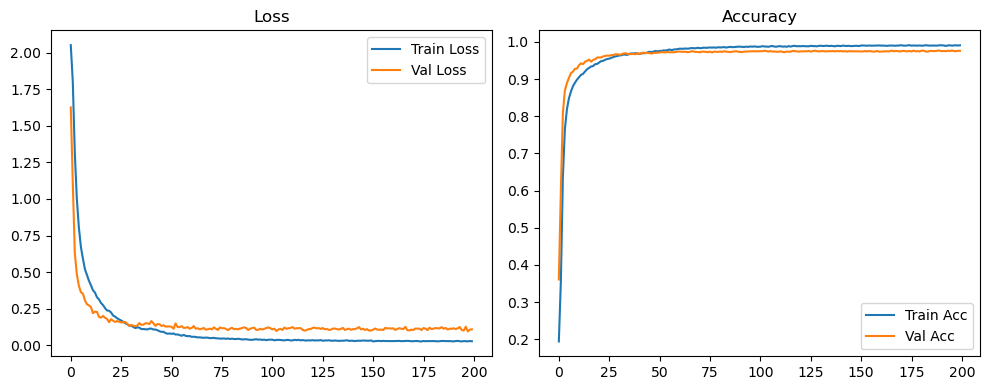

Evaluation:   0%|          | 0/79 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 6/79 [00:00<00:01, 51.31it/s]

Evaluation:  15%|█▌        | 12/79 [00:00<00:01, 51.75it/s]

Evaluation:  23%|██▎       | 18/79 [00:00<00:01, 52.00it/s]

Evaluation:  30%|███       | 24/79 [00:00<00:01, 52.14it/s]

Evaluation:  38%|███▊      | 30/79 [00:00<00:00, 52.18it/s]

Evaluation:  46%|████▌     | 36/79 [00:00<00:00, 52.24it/s]

Evaluation:  53%|█████▎    | 42/79 [00:00<00:00, 52.26it/s]

Evaluation:  61%|██████    | 48/79 [00:00<00:00, 52.30it/s]

Evaluation:  68%|██████▊   | 54/79 [00:01<00:00, 52.31it/s]

Evaluation:  76%|███████▌  | 60/79 [00:01<00:00, 52.30it/s]

Evaluation:  84%|████████▎ | 66/79 [00:01<00:00, 52.31it/s]

Evaluation:  91%|█████████ | 72/79 [00:01<00:00, 52.33it/s]

Evaluation:  99%|█████████▊| 78/79 [00:01<00:00, 52.33it/s]

Evaluation: 100%|██████████| 79/79 [00:01<00:00, 52.66it/s]

Original Model Final Test Loss: 0.0948 Accuracy: 0.9805


🚀 Running: batch256_lr0.01_0.01_0.01_dp0.0


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1784 | Val Acc: 0.3764 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1784 | Val Acc: 0.3764 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1784 | Val Acc: 0.3764 |:   0%|          | 1/200 [00:09<30:40,  9.25s/it]

| LR: 0.010 | Train Acc: 0.2977 | Val Acc: 0.6701 |:   0%|          | 1/200 [00:18<30:40,  9.25s/it]

| LR: 0.010 | Train Acc: 0.2977 | Val Acc: 0.6701 |:   0%|          | 1/200 [00:18<30:40,  9.25s/it]

| LR: 0.010 | Train Acc: 0.2977 | Val Acc: 0.6701 |:   1%|          | 2/200 [00:18<30:29,  9.24s/it]

| LR: 0.010 | Train Acc: 0.7490 | Val Acc: 0.8267 |:   1%|          | 2/200 [00:27<30:29,  9.24s/it]

| LR: 0.010 | Train Acc: 0.7490 | Val Acc: 0.8267 |:   1%|          | 2/200 [00:27<30:29,  9.24s/it]

| LR: 0.010 | Train Acc: 0.7490 | Val Acc: 0.8267 |:   2%|▏         | 3/200 [00:27<29:32,  9.00s/it]

| LR: 0.010 | Train Acc: 0.8352 | Val Acc: 0.8452 |:   2%|▏         | 3/200 [00:35<29:32,  9.00s/it]

| LR: 0.010 | Train Acc: 0.8352 | Val Acc: 0.8452 |:   2%|▏         | 3/200 [00:35<29:32,  9.00s/it]

| LR: 0.010 | Train Acc: 0.8352 | Val Acc: 0.8452 |:   2%|▏         | 4/200 [00:35<28:58,  8.87s/it]

| LR: 0.010 | Train Acc: 0.8667 | Val Acc: 0.8852 |:   2%|▏         | 4/200 [00:44<28:58,  8.87s/it]

| LR: 0.010 | Train Acc: 0.8667 | Val Acc: 0.8852 |:   2%|▏         | 4/200 [00:44<28:58,  8.87s/it]

| LR: 0.010 | Train Acc: 0.8667 | Val Acc: 0.8852 |:   2%|▎         | 5/200 [00:44<28:34,  8.79s/it]

| LR: 0.010 | Train Acc: 0.8852 | Val Acc: 0.8979 |:   2%|▎         | 5/200 [00:53<28:34,  8.79s/it]

| LR: 0.010 | Train Acc: 0.8852 | Val Acc: 0.8979 |:   2%|▎         | 5/200 [00:53<28:34,  8.79s/it]

| LR: 0.010 | Train Acc: 0.8852 | Val Acc: 0.8979 |:   3%|▎         | 6/200 [00:54<29:13,  9.04s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9019 |:   3%|▎         | 6/200 [01:02<29:13,  9.04s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9019 |:   3%|▎         | 6/200 [01:02<29:13,  9.04s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9019 |:   4%|▎         | 7/200 [01:02<28:57,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9149 |:   4%|▎         | 7/200 [01:11<28:57,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9149 |:   4%|▎         | 7/200 [01:11<28:57,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9149 |:   4%|▍         | 8/200 [01:11<28:30,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9146 | Val Acc: 0.9182 |:   4%|▍         | 8/200 [01:20<28:30,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9146 | Val Acc: 0.9182 |:   4%|▍         | 8/200 [01:20<28:30,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9146 | Val Acc: 0.9182 |:   4%|▍         | 9/200 [01:20<28:36,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9237 | Val Acc: 0.9161 |:   4%|▍         | 9/200 [01:29<28:36,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9237 | Val Acc: 0.9161 |:   4%|▍         | 9/200 [01:29<28:36,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9237 | Val Acc: 0.9161 |:   5%|▌         | 10/200 [01:29<28:09,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9272 | Val Acc: 0.9265 |:   5%|▌         | 10/200 [01:38<28:09,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9272 | Val Acc: 0.9265 |:   5%|▌         | 10/200 [01:38<28:09,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9272 | Val Acc: 0.9265 |:   6%|▌         | 11/200 [01:38<27:49,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9338 | Val Acc: 0.9303 |:   6%|▌         | 11/200 [01:47<27:49,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9338 | Val Acc: 0.9303 |:   6%|▌         | 11/200 [01:47<27:49,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9338 | Val Acc: 0.9303 |:   6%|▌         | 12/200 [01:47<27:43,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9371 | Val Acc: 0.9284 |:   6%|▌         | 12/200 [01:55<27:43,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9371 | Val Acc: 0.9284 |:   6%|▌         | 12/200 [01:55<27:43,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9371 | Val Acc: 0.9284 |:   6%|▋         | 13/200 [01:55<27:23,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9411 | Val Acc: 0.9333 |:   6%|▋         | 13/200 [02:04<27:23,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9411 | Val Acc: 0.9333 |:   6%|▋         | 13/200 [02:04<27:23,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9411 | Val Acc: 0.9333 |:   7%|▋         | 14/200 [02:04<27:10,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9324 |:   7%|▋         | 14/200 [02:12<27:10,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9324 |:   7%|▋         | 14/200 [02:12<27:10,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9324 |:   8%|▊         | 15/200 [02:13<26:49,  8.70s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9364 |:   8%|▊         | 15/200 [02:21<26:49,  8.70s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9364 |:   8%|▊         | 15/200 [02:21<26:49,  8.70s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9364 |:   8%|▊         | 16/200 [02:21<26:50,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9530 | Val Acc: 0.9417 |:   8%|▊         | 16/200 [02:30<26:50,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9530 | Val Acc: 0.9417 |:   8%|▊         | 16/200 [02:30<26:50,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9530 | Val Acc: 0.9417 |:   8%|▊         | 17/200 [02:30<26:41,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9565 | Val Acc: 0.9415 |:   8%|▊         | 17/200 [02:39<26:41,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9565 | Val Acc: 0.9415 |:   8%|▊         | 17/200 [02:39<26:41,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9565 | Val Acc: 0.9415 |:   9%|▉         | 18/200 [02:39<26:29,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9580 | Val Acc: 0.9413 |:   9%|▉         | 18/200 [02:48<26:29,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9580 | Val Acc: 0.9413 |:   9%|▉         | 18/200 [02:48<26:29,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9580 | Val Acc: 0.9413 |:  10%|▉         | 19/200 [02:48<26:40,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9604 | Val Acc: 0.9463 |:  10%|▉         | 19/200 [02:57<26:40,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9604 | Val Acc: 0.9463 |:  10%|▉         | 19/200 [02:57<26:40,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9604 | Val Acc: 0.9463 |:  10%|█         | 20/200 [02:57<26:23,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9608 | Val Acc: 0.9458 |:  10%|█         | 20/200 [03:05<26:23,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9608 | Val Acc: 0.9458 |:  10%|█         | 20/200 [03:05<26:23,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9608 | Val Acc: 0.9458 |:  10%|█         | 21/200 [03:05<26:16,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9453 |:  10%|█         | 21/200 [03:14<26:16,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9453 |:  10%|█         | 21/200 [03:14<26:16,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9453 |:  11%|█         | 22/200 [03:14<26:13,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9471 |:  11%|█         | 22/200 [03:23<26:13,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9471 |:  11%|█         | 22/200 [03:23<26:13,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9471 |:  12%|█▏        | 23/200 [03:23<26:07,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9654 | Val Acc: 0.9447 |:  12%|█▏        | 23/200 [03:32<26:07,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9654 | Val Acc: 0.9447 |:  12%|█▏        | 23/200 [03:32<26:07,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9654 | Val Acc: 0.9447 |:  12%|█▏        | 24/200 [03:32<25:59,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9469 |:  12%|█▏        | 24/200 [03:41<25:59,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9469 |:  12%|█▏        | 24/200 [03:41<25:59,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9469 |:  12%|█▎        | 25/200 [03:41<25:43,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9488 |:  12%|█▎        | 25/200 [03:50<25:43,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9488 |:  12%|█▎        | 25/200 [03:50<25:43,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9488 |:  13%|█▎        | 26/200 [03:50<25:28,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9703 | Val Acc: 0.9557 |:  13%|█▎        | 26/200 [03:59<25:28,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9703 | Val Acc: 0.9557 |:  13%|█▎        | 26/200 [03:59<25:28,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9703 | Val Acc: 0.9557 |:  14%|█▎        | 27/200 [03:59<25:56,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9410 |:  14%|█▎        | 27/200 [04:08<25:56,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9410 |:  14%|█▎        | 27/200 [04:08<25:56,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9410 |:  14%|█▍        | 28/200 [04:08<25:58,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9507 |:  14%|█▍        | 28/200 [04:17<25:58,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9507 |:  14%|█▍        | 28/200 [04:17<25:58,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9507 |:  14%|█▍        | 29/200 [04:17<25:35,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9478 |:  14%|█▍        | 29/200 [04:26<25:35,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9478 |:  14%|█▍        | 29/200 [04:26<25:35,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9478 |:  15%|█▌        | 30/200 [04:26<25:16,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9479 |:  15%|█▌        | 30/200 [04:35<25:16,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9479 |:  15%|█▌        | 30/200 [04:35<25:16,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9479 |:  16%|█▌        | 31/200 [04:35<25:00,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9492 |:  16%|█▌        | 31/200 [04:44<25:00,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9492 |:  16%|█▌        | 31/200 [04:44<25:00,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9492 |:  16%|█▌        | 32/200 [04:44<24:59,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9476 |:  16%|█▌        | 32/200 [04:53<24:59,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9476 |:  16%|█▌        | 32/200 [04:53<24:59,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9476 |:  16%|█▋        | 33/200 [04:53<25:35,  9.20s/it]

| LR: 0.010 | Train Acc: 0.9759 | Val Acc: 0.9497 |:  16%|█▋        | 33/200 [05:02<25:35,  9.20s/it]

| LR: 0.010 | Train Acc: 0.9759 | Val Acc: 0.9497 |:  16%|█▋        | 33/200 [05:02<25:35,  9.20s/it]

| LR: 0.010 | Train Acc: 0.9759 | Val Acc: 0.9497 |:  17%|█▋        | 34/200 [05:02<25:06,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9508 |:  17%|█▋        | 34/200 [05:11<25:06,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9508 |:  17%|█▋        | 34/200 [05:11<25:06,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9508 |:  18%|█▊        | 35/200 [05:11<24:48,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9514 |:  18%|█▊        | 35/200 [05:20<24:48,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9514 |:  18%|█▊        | 35/200 [05:20<24:48,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9514 |:  18%|█▊        | 36/200 [05:20<24:40,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9554 |:  18%|█▊        | 36/200 [05:30<24:40,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9554 |:  18%|█▊        | 36/200 [05:30<24:40,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9554 |:  18%|█▊        | 37/200 [05:30<25:06,  9.24s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9558 |:  18%|█▊        | 37/200 [05:39<25:06,  9.24s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9558 |:  18%|█▊        | 37/200 [05:39<25:06,  9.24s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9558 |:  19%|█▉        | 38/200 [05:39<24:32,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9537 |:  19%|█▉        | 38/200 [05:47<24:32,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9537 |:  19%|█▉        | 38/200 [05:47<24:32,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9537 |:  20%|█▉        | 39/200 [05:47<24:08,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9566 |:  20%|█▉        | 39/200 [05:56<24:08,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9566 |:  20%|█▉        | 39/200 [05:56<24:08,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9566 |:  20%|██        | 40/200 [05:56<23:44,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9594 |:  20%|██        | 40/200 [06:06<23:44,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9594 |:  20%|██        | 40/200 [06:06<23:44,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9594 |:  20%|██        | 41/200 [06:06<24:07,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9843 | Val Acc: 0.9605 |:  20%|██        | 41/200 [06:15<24:07,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9843 | Val Acc: 0.9605 |:  20%|██        | 41/200 [06:15<24:07,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9843 | Val Acc: 0.9605 |:  21%|██        | 42/200 [06:15<23:45,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9847 | Val Acc: 0.9607 |:  21%|██        | 42/200 [06:23<23:45,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9847 | Val Acc: 0.9607 |:  21%|██        | 42/200 [06:23<23:45,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9847 | Val Acc: 0.9607 |:  22%|██▏       | 43/200 [06:23<23:28,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9578 |:  22%|██▏       | 43/200 [06:32<23:28,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9578 |:  22%|██▏       | 43/200 [06:32<23:28,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9578 |:  22%|██▏       | 44/200 [06:32<23:12,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9581 |:  22%|██▏       | 44/200 [06:41<23:12,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9581 |:  22%|██▏       | 44/200 [06:41<23:12,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9581 |:  22%|██▎       | 45/200 [06:41<22:57,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9568 |:  22%|██▎       | 45/200 [06:50<22:57,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9568 |:  22%|██▎       | 45/200 [06:50<22:57,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9568 |:  23%|██▎       | 46/200 [06:50<22:45,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9550 |:  23%|██▎       | 46/200 [06:59<22:45,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9550 |:  23%|██▎       | 46/200 [06:59<22:45,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9550 |:  24%|██▎       | 47/200 [06:59<22:44,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9609 |:  24%|██▎       | 47/200 [07:08<22:44,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9609 |:  24%|██▎       | 47/200 [07:08<22:44,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9609 |:  24%|██▍       | 48/200 [07:08<22:27,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9621 |:  24%|██▍       | 48/200 [07:16<22:27,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9621 |:  24%|██▍       | 48/200 [07:16<22:27,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9621 |:  24%|██▍       | 49/200 [07:16<22:12,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9873 | Val Acc: 0.9610 |:  24%|██▍       | 49/200 [07:25<22:12,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9873 | Val Acc: 0.9610 |:  24%|██▍       | 49/200 [07:25<22:12,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9873 | Val Acc: 0.9610 |:  25%|██▌       | 50/200 [07:25<21:55,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9593 |:  25%|██▌       | 50/200 [07:34<21:55,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9593 |:  25%|██▌       | 50/200 [07:34<21:55,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9593 |:  26%|██▌       | 51/200 [07:34<21:42,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9613 |:  26%|██▌       | 51/200 [07:42<21:42,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9613 |:  26%|██▌       | 51/200 [07:42<21:42,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9613 |:  26%|██▌       | 52/200 [07:42<21:37,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9878 | Val Acc: 0.9592 |:  26%|██▌       | 52/200 [07:51<21:37,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9878 | Val Acc: 0.9592 |:  26%|██▌       | 52/200 [07:51<21:37,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9878 | Val Acc: 0.9592 |:  26%|██▋       | 53/200 [07:51<21:28,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9571 |:  26%|██▋       | 53/200 [08:00<21:28,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9571 |:  26%|██▋       | 53/200 [08:00<21:28,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9571 |:  27%|██▋       | 54/200 [08:00<21:25,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9877 | Val Acc: 0.9581 |:  27%|██▋       | 54/200 [08:09<21:25,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9877 | Val Acc: 0.9581 |:  27%|██▋       | 54/200 [08:09<21:25,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9877 | Val Acc: 0.9581 |:  28%|██▊       | 55/200 [08:09<21:16,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9615 |:  28%|██▊       | 55/200 [08:18<21:16,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9615 |:  28%|██▊       | 55/200 [08:18<21:16,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9615 |:  28%|██▊       | 56/200 [08:18<21:25,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9672 |:  28%|██▊       | 56/200 [08:27<21:25,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9672 |:  28%|██▊       | 56/200 [08:27<21:25,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9672 |:  28%|██▊       | 57/200 [08:27<21:16,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9653 |:  28%|██▊       | 57/200 [08:36<21:16,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9653 |:  28%|██▊       | 57/200 [08:36<21:16,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9653 |:  29%|██▉       | 58/200 [08:36<20:59,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9639 |:  29%|██▉       | 58/200 [08:44<20:59,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9639 |:  29%|██▉       | 58/200 [08:44<20:59,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9639 |:  30%|██▉       | 59/200 [08:44<20:37,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9607 |:  30%|██▉       | 59/200 [08:53<20:37,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9607 |:  30%|██▉       | 59/200 [08:53<20:37,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9607 |:  30%|███       | 60/200 [08:53<20:28,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9650 |:  30%|███       | 60/200 [09:02<20:28,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9650 |:  30%|███       | 60/200 [09:02<20:28,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9650 |:  30%|███       | 61/200 [09:02<20:19,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9661 |:  30%|███       | 61/200 [09:11<20:19,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9661 |:  30%|███       | 61/200 [09:11<20:19,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9661 |:  31%|███       | 62/200 [09:11<20:11,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9641 |:  31%|███       | 62/200 [09:19<20:11,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9641 |:  31%|███       | 62/200 [09:19<20:11,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9641 |:  32%|███▏      | 63/200 [09:19<20:01,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9659 |:  32%|███▏      | 63/200 [09:28<20:01,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9659 |:  32%|███▏      | 63/200 [09:28<20:01,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9659 |:  32%|███▏      | 64/200 [09:28<19:50,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9647 |:  32%|███▏      | 64/200 [09:37<19:50,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9647 |:  32%|███▏      | 64/200 [09:37<19:50,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9647 |:  32%|███▎      | 65/200 [09:37<19:37,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9649 |:  32%|███▎      | 65/200 [09:46<19:37,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9649 |:  32%|███▎      | 65/200 [09:46<19:37,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9649 |:  33%|███▎      | 66/200 [09:46<19:27,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9674 |:  33%|███▎      | 66/200 [09:54<19:27,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9674 |:  33%|███▎      | 66/200 [09:54<19:27,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9674 |:  34%|███▎      | 67/200 [09:54<19:18,  8.71s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9673 |:  34%|███▎      | 67/200 [10:03<19:18,  8.71s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9673 |:  34%|███▎      | 67/200 [10:03<19:18,  8.71s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9673 |:  34%|███▍      | 68/200 [10:03<19:10,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9673 |:  34%|███▍      | 68/200 [10:12<19:10,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9673 |:  34%|███▍      | 68/200 [10:12<19:10,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9673 |:  34%|███▍      | 69/200 [10:12<19:09,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9645 |:  34%|███▍      | 69/200 [10:21<19:09,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9645 |:  34%|███▍      | 69/200 [10:21<19:09,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9645 |:  35%|███▌      | 70/200 [10:21<18:56,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9664 |:  35%|███▌      | 70/200 [10:29<18:56,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9664 |:  35%|███▌      | 70/200 [10:29<18:56,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9664 |:  36%|███▌      | 71/200 [10:29<18:48,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9667 |:  36%|███▌      | 71/200 [10:38<18:48,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9667 |:  36%|███▌      | 71/200 [10:38<18:48,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9667 |:  36%|███▌      | 72/200 [10:38<18:53,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9677 |:  36%|███▌      | 72/200 [10:48<18:53,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9677 |:  36%|███▌      | 72/200 [10:48<18:53,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9677 |:  36%|███▋      | 73/200 [10:48<19:16,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9682 |:  36%|███▋      | 73/200 [10:57<19:16,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9682 |:  36%|███▋      | 73/200 [10:57<19:16,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9682 |:  37%|███▋      | 74/200 [10:57<18:52,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9694 |:  37%|███▋      | 74/200 [11:06<18:52,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9694 |:  37%|███▋      | 74/200 [11:06<18:52,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9694 |:  38%|███▊      | 75/200 [11:06<18:35,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9708 |:  38%|███▊      | 75/200 [11:15<18:35,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9708 |:  38%|███▊      | 75/200 [11:15<18:35,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9708 |:  38%|███▊      | 76/200 [11:15<18:28,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9712 |:  38%|███▊      | 76/200 [11:23<18:28,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9712 |:  38%|███▊      | 76/200 [11:23<18:28,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9712 |:  38%|███▊      | 77/200 [11:23<18:14,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9982 | Val Acc: 0.9684 |:  38%|███▊      | 77/200 [11:32<18:14,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9982 | Val Acc: 0.9684 |:  38%|███▊      | 77/200 [11:32<18:14,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9982 | Val Acc: 0.9684 |:  39%|███▉      | 78/200 [11:32<17:56,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9978 | Val Acc: 0.9696 |:  39%|███▉      | 78/200 [11:41<17:56,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9978 | Val Acc: 0.9696 |:  39%|███▉      | 78/200 [11:41<17:56,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9978 | Val Acc: 0.9696 |:  40%|███▉      | 79/200 [11:41<17:49,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9690 |:  40%|███▉      | 79/200 [11:50<17:49,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9690 |:  40%|███▉      | 79/200 [11:50<17:49,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9690 |:  40%|████      | 80/200 [11:50<17:40,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9663 |:  40%|████      | 80/200 [11:59<17:40,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9663 |:  40%|████      | 80/200 [11:59<17:40,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9663 |:  40%|████      | 81/200 [11:59<17:37,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9683 |:  40%|████      | 81/200 [12:07<17:37,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9683 |:  40%|████      | 81/200 [12:07<17:37,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9683 |:  41%|████      | 82/200 [12:07<17:22,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9693 |:  41%|████      | 82/200 [12:16<17:22,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9693 |:  41%|████      | 82/200 [12:16<17:22,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9693 |:  42%|████▏     | 83/200 [12:16<17:10,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9696 |:  42%|████▏     | 83/200 [12:25<17:10,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9696 |:  42%|████▏     | 83/200 [12:25<17:10,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9696 |:  42%|████▏     | 84/200 [12:25<17:01,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9974 | Val Acc: 0.9698 |:  42%|████▏     | 84/200 [12:34<17:01,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9974 | Val Acc: 0.9698 |:  42%|████▏     | 84/200 [12:34<17:01,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9974 | Val Acc: 0.9698 |:  42%|████▎     | 85/200 [12:34<16:50,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9682 |:  42%|████▎     | 85/200 [12:43<16:50,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9682 |:  42%|████▎     | 85/200 [12:43<16:50,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9682 |:  43%|████▎     | 86/200 [12:43<16:57,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9655 |:  43%|████▎     | 86/200 [12:52<16:57,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9655 |:  43%|████▎     | 86/200 [12:52<16:57,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9655 |:  44%|████▎     | 87/200 [12:52<16:48,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9629 |:  44%|████▎     | 87/200 [13:01<16:48,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9629 |:  44%|████▎     | 87/200 [13:01<16:48,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9629 |:  44%|████▍     | 88/200 [13:01<16:32,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9652 |:  44%|████▍     | 88/200 [13:09<16:32,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9652 |:  44%|████▍     | 88/200 [13:09<16:32,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9652 |:  44%|████▍     | 89/200 [13:09<16:22,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9684 |:  44%|████▍     | 89/200 [13:18<16:22,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9684 |:  44%|████▍     | 89/200 [13:18<16:22,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9684 |:  45%|████▌     | 90/200 [13:18<16:14,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9685 |:  45%|████▌     | 90/200 [13:27<16:14,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9685 |:  45%|████▌     | 90/200 [13:27<16:14,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9685 |:  46%|████▌     | 91/200 [13:27<16:01,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9637 |:  46%|████▌     | 91/200 [13:36<16:01,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9637 |:  46%|████▌     | 91/200 [13:36<16:01,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9637 |:  46%|████▌     | 92/200 [13:36<15:50,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9951 | Val Acc: 0.9652 |:  46%|████▌     | 92/200 [13:45<15:50,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9951 | Val Acc: 0.9652 |:  46%|████▌     | 92/200 [13:45<15:50,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9951 | Val Acc: 0.9652 |:  46%|████▋     | 93/200 [13:45<15:40,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9693 |:  46%|████▋     | 93/200 [13:53<15:40,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9693 |:  46%|████▋     | 93/200 [13:53<15:40,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9693 |:  47%|████▋     | 94/200 [13:54<15:35,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9654 |:  47%|████▋     | 94/200 [14:03<15:35,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9654 |:  47%|████▋     | 94/200 [14:03<15:35,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9654 |:  48%|████▊     | 95/200 [14:03<15:34,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9663 |:  48%|████▊     | 95/200 [14:11<15:34,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9663 |:  48%|████▊     | 95/200 [14:11<15:34,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9663 |:  48%|████▊     | 96/200 [14:11<15:25,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9660 |:  48%|████▊     | 96/200 [14:20<15:25,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9660 |:  48%|████▊     | 96/200 [14:20<15:25,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9660 |:  48%|████▊     | 97/200 [14:20<15:13,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9947 | Val Acc: 0.9665 |:  48%|████▊     | 97/200 [14:29<15:13,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9947 | Val Acc: 0.9665 |:  48%|████▊     | 97/200 [14:29<15:13,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9947 | Val Acc: 0.9665 |:  49%|████▉     | 98/200 [14:29<15:01,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9664 |:  49%|████▉     | 98/200 [14:38<15:01,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9664 |:  49%|████▉     | 98/200 [14:38<15:01,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9664 |:  50%|████▉     | 99/200 [14:38<14:57,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9657 |:  50%|████▉     | 99/200 [14:47<14:57,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9657 |:  50%|████▉     | 99/200 [14:47<14:57,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9657 |:  50%|█████     | 100/200 [14:47<14:44,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9944 | Val Acc: 0.9650 |:  50%|█████     | 100/200 [14:55<14:44,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9944 | Val Acc: 0.9650 |:  50%|█████     | 100/200 [14:55<14:44,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9944 | Val Acc: 0.9650 |:  50%|█████     | 101/200 [14:55<14:31,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9671 |:  50%|█████     | 101/200 [15:04<14:31,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9671 |:  50%|█████     | 101/200 [15:04<14:31,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9671 |:  51%|█████     | 102/200 [15:04<14:16,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9647 |:  51%|█████     | 102/200 [15:13<14:16,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9647 |:  51%|█████     | 102/200 [15:13<14:16,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9647 |:  52%|█████▏    | 103/200 [15:13<14:09,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9940 | Val Acc: 0.9664 |:  52%|█████▏    | 103/200 [15:22<14:09,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9940 | Val Acc: 0.9664 |:  52%|█████▏    | 103/200 [15:22<14:09,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9940 | Val Acc: 0.9664 |:  52%|█████▏    | 104/200 [15:22<14:00,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9948 | Val Acc: 0.9617 |:  52%|█████▏    | 104/200 [15:30<14:00,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9948 | Val Acc: 0.9617 |:  52%|█████▏    | 104/200 [15:30<14:00,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9948 | Val Acc: 0.9617 |:  52%|█████▎    | 105/200 [15:30<13:50,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9680 |:  52%|█████▎    | 105/200 [15:39<13:50,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9680 |:  52%|█████▎    | 105/200 [15:39<13:50,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9680 |:  53%|█████▎    | 106/200 [15:39<13:39,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9688 |:  53%|█████▎    | 106/200 [15:48<13:39,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9688 |:  53%|█████▎    | 106/200 [15:48<13:39,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9688 |:  54%|█████▎    | 107/200 [15:48<13:30,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9688 |:  54%|█████▎    | 107/200 [15:56<13:30,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9688 |:  54%|█████▎    | 107/200 [15:56<13:30,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9688 |:  54%|█████▍    | 108/200 [15:56<13:20,  8.70s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9680 |:  54%|█████▍    | 108/200 [16:05<13:20,  8.70s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9680 |:  54%|█████▍    | 108/200 [16:05<13:20,  8.70s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9680 |:  55%|█████▍    | 109/200 [16:05<13:13,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9653 |:  55%|█████▍    | 109/200 [16:14<13:13,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9653 |:  55%|█████▍    | 109/200 [16:14<13:13,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9653 |:  55%|█████▌    | 110/200 [16:14<13:12,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9667 |:  55%|█████▌    | 110/200 [16:23<13:12,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9667 |:  55%|█████▌    | 110/200 [16:23<13:12,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9667 |:  56%|█████▌    | 111/200 [16:23<13:00,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9957 | Val Acc: 0.9681 |:  56%|█████▌    | 111/200 [16:32<13:00,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9957 | Val Acc: 0.9681 |:  56%|█████▌    | 111/200 [16:32<13:00,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9957 | Val Acc: 0.9681 |:  56%|█████▌    | 112/200 [16:32<12:53,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9672 |:  56%|█████▌    | 112/200 [16:40<12:53,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9672 |:  56%|█████▌    | 112/200 [16:40<12:53,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9672 |:  56%|█████▋    | 113/200 [16:40<12:44,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9676 |:  56%|█████▋    | 113/200 [16:49<12:44,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9676 |:  56%|█████▋    | 113/200 [16:49<12:44,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9676 |:  57%|█████▋    | 114/200 [16:49<12:34,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9669 |:  57%|█████▋    | 114/200 [16:58<12:34,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9669 |:  57%|█████▋    | 114/200 [16:58<12:34,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9669 |:  57%|█████▊    | 115/200 [16:58<12:25,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9663 |:  57%|█████▊    | 115/200 [17:07<12:25,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9663 |:  57%|█████▊    | 115/200 [17:07<12:25,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9663 |:  58%|█████▊    | 116/200 [17:07<12:15,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9654 |:  58%|█████▊    | 116/200 [17:15<12:15,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9654 |:  58%|█████▊    | 116/200 [17:15<12:15,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9654 |:  58%|█████▊    | 117/200 [17:15<12:05,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9950 | Val Acc: 0.9663 |:  58%|█████▊    | 117/200 [17:24<12:05,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9950 | Val Acc: 0.9663 |:  58%|█████▊    | 117/200 [17:24<12:05,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9950 | Val Acc: 0.9663 |:  59%|█████▉    | 118/200 [17:24<12:03,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9955 | Val Acc: 0.9662 |:  59%|█████▉    | 118/200 [17:33<12:03,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9955 | Val Acc: 0.9662 |:  59%|█████▉    | 118/200 [17:33<12:03,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9955 | Val Acc: 0.9662 |:  60%|█████▉    | 119/200 [17:33<11:55,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9667 |:  60%|█████▉    | 119/200 [17:42<11:55,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9667 |:  60%|█████▉    | 119/200 [17:42<11:55,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9667 |:  60%|██████    | 120/200 [17:42<11:42,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9650 |:  60%|██████    | 120/200 [17:51<11:42,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9650 |:  60%|██████    | 120/200 [17:51<11:42,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9650 |:  60%|██████    | 121/200 [17:51<11:33,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9696 |:  60%|██████    | 121/200 [18:00<11:33,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9696 |:  60%|██████    | 121/200 [18:00<11:33,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9696 |:  61%|██████    | 122/200 [18:00<11:27,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9613 |:  61%|██████    | 122/200 [18:08<11:27,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9613 |:  61%|██████    | 122/200 [18:08<11:27,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9613 |:  62%|██████▏   | 123/200 [18:08<11:20,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9957 | Val Acc: 0.9692 |:  62%|██████▏   | 123/200 [18:17<11:20,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9957 | Val Acc: 0.9692 |:  62%|██████▏   | 123/200 [18:17<11:20,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9957 | Val Acc: 0.9692 |:  62%|██████▏   | 124/200 [18:17<11:10,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9957 | Val Acc: 0.9655 |:  62%|██████▏   | 124/200 [18:26<11:10,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9957 | Val Acc: 0.9655 |:  62%|██████▏   | 124/200 [18:26<11:10,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9957 | Val Acc: 0.9655 |:  62%|██████▎   | 125/200 [18:26<10:59,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9701 |:  62%|██████▎   | 125/200 [18:35<10:59,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9701 |:  62%|██████▎   | 125/200 [18:35<10:59,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9701 |:  63%|██████▎   | 126/200 [18:35<10:47,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9669 |:  63%|██████▎   | 126/200 [18:43<10:47,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9669 |:  63%|██████▎   | 126/200 [18:43<10:47,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9669 |:  64%|██████▎   | 127/200 [18:43<10:37,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9639 |:  64%|██████▎   | 127/200 [18:52<10:37,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9639 |:  64%|██████▎   | 127/200 [18:52<10:37,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9639 |:  64%|██████▍   | 128/200 [18:52<10:28,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9668 |:  64%|██████▍   | 128/200 [19:01<10:28,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9668 |:  64%|██████▍   | 128/200 [19:01<10:28,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9668 |:  64%|██████▍   | 129/200 [19:01<10:17,  8.70s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9662 |:  64%|██████▍   | 129/200 [19:09<10:17,  8.70s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9662 |:  64%|██████▍   | 129/200 [19:09<10:17,  8.70s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9662 |:  65%|██████▌   | 130/200 [19:09<10:05,  8.64s/it]

| LR: 0.010 | Train Acc: 0.9948 | Val Acc: 0.9644 |:  65%|██████▌   | 130/200 [19:18<10:05,  8.64s/it]

| LR: 0.010 | Train Acc: 0.9948 | Val Acc: 0.9644 |:  65%|██████▌   | 130/200 [19:18<10:05,  8.64s/it]

| LR: 0.010 | Train Acc: 0.9948 | Val Acc: 0.9644 |:  66%|██████▌   | 131/200 [19:18<09:55,  8.62s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9659 |:  66%|██████▌   | 131/200 [19:26<09:55,  8.62s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9659 |:  66%|██████▌   | 131/200 [19:26<09:55,  8.62s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9659 |:  66%|██████▌   | 132/200 [19:26<09:48,  8.65s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9688 |:  66%|██████▌   | 132/200 [19:36<09:48,  8.65s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9688 |:  66%|██████▌   | 132/200 [19:36<09:48,  8.65s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9688 |:  66%|██████▋   | 133/200 [19:36<09:57,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9678 |:  66%|██████▋   | 133/200 [19:45<09:57,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9678 |:  66%|██████▋   | 133/200 [19:45<09:57,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9678 |:  67%|██████▋   | 134/200 [19:45<09:47,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9951 | Val Acc: 0.9673 |:  67%|██████▋   | 134/200 [19:54<09:47,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9951 | Val Acc: 0.9673 |:  67%|██████▋   | 134/200 [19:54<09:47,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9951 | Val Acc: 0.9673 |:  68%|██████▊   | 135/200 [19:54<09:36,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9693 |:  68%|██████▊   | 135/200 [20:02<09:36,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9693 |:  68%|██████▊   | 135/200 [20:02<09:36,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9693 |:  68%|██████▊   | 136/200 [20:02<09:23,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9689 |:  68%|██████▊   | 136/200 [20:11<09:23,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9689 |:  68%|██████▊   | 136/200 [20:11<09:23,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9689 |:  68%|██████▊   | 137/200 [20:11<09:12,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9657 |:  68%|██████▊   | 137/200 [20:20<09:12,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9657 |:  68%|██████▊   | 137/200 [20:20<09:12,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9657 |:  69%|██████▉   | 138/200 [20:20<09:02,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9663 |:  69%|██████▉   | 138/200 [20:28<09:02,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9663 |:  69%|██████▉   | 138/200 [20:28<09:02,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9663 |:  70%|██████▉   | 139/200 [20:28<08:53,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9957 | Val Acc: 0.9684 |:  70%|██████▉   | 139/200 [20:37<08:53,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9957 | Val Acc: 0.9684 |:  70%|██████▉   | 139/200 [20:37<08:53,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9957 | Val Acc: 0.9684 |:  70%|███████   | 140/200 [20:37<08:46,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9683 |:  70%|███████   | 140/200 [20:46<08:46,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9683 |:  70%|███████   | 140/200 [20:46<08:46,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9683 |:  70%|███████   | 141/200 [20:46<08:39,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9686 |:  70%|███████   | 141/200 [20:56<08:39,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9686 |:  70%|███████   | 141/200 [20:56<08:39,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9686 |:  71%|███████   | 142/200 [20:56<08:42,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9692 |:  71%|███████   | 142/200 [21:04<08:42,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9692 |:  71%|███████   | 142/200 [21:04<08:42,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9692 |:  72%|███████▏  | 143/200 [21:04<08:30,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9682 |:  72%|███████▏  | 143/200 [21:13<08:30,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9682 |:  72%|███████▏  | 143/200 [21:13<08:30,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9682 |:  72%|███████▏  | 144/200 [21:13<08:16,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9682 |:  72%|███████▏  | 144/200 [21:22<08:16,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9682 |:  72%|███████▏  | 144/200 [21:22<08:16,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9682 |:  72%|███████▎  | 145/200 [21:22<08:06,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9688 |:  72%|███████▎  | 145/200 [21:32<08:06,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9688 |:  72%|███████▎  | 145/200 [21:32<08:06,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9688 |:  73%|███████▎  | 146/200 [21:32<08:10,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9664 |:  73%|███████▎  | 146/200 [21:40<08:10,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9664 |:  73%|███████▎  | 146/200 [21:40<08:10,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9664 |:  74%|███████▎  | 147/200 [21:40<07:55,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9966 | Val Acc: 0.9664 |:  74%|███████▎  | 147/200 [21:49<07:55,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9966 | Val Acc: 0.9664 |:  74%|███████▎  | 147/200 [21:49<07:55,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9966 | Val Acc: 0.9664 |:  74%|███████▍  | 148/200 [21:49<07:43,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9657 |:  74%|███████▍  | 148/200 [21:58<07:43,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9657 |:  74%|███████▍  | 148/200 [21:58<07:43,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9657 |:  74%|███████▍  | 149/200 [21:58<07:33,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9650 |:  74%|███████▍  | 149/200 [22:07<07:33,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9650 |:  74%|███████▍  | 149/200 [22:07<07:33,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9650 |:  75%|███████▌  | 150/200 [22:07<07:23,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9678 |:  75%|███████▌  | 150/200 [22:15<07:23,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9678 |:  75%|███████▌  | 150/200 [22:15<07:23,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9678 |:  76%|███████▌  | 151/200 [22:15<07:12,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9680 |:  76%|███████▌  | 151/200 [22:24<07:12,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9680 |:  76%|███████▌  | 151/200 [22:24<07:12,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9680 |:  76%|███████▌  | 152/200 [22:24<07:01,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9663 |:  76%|███████▌  | 152/200 [22:33<07:01,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9663 |:  76%|███████▌  | 152/200 [22:33<07:01,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9663 |:  76%|███████▋  | 153/200 [22:33<06:53,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9662 |:  76%|███████▋  | 153/200 [22:42<06:53,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9662 |:  76%|███████▋  | 153/200 [22:42<06:53,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9662 |:  77%|███████▋  | 154/200 [22:42<06:43,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9674 |:  77%|███████▋  | 154/200 [22:50<06:43,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9674 |:  77%|███████▋  | 154/200 [22:50<06:43,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9674 |:  78%|███████▊  | 155/200 [22:50<06:33,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9686 |:  78%|███████▊  | 155/200 [22:59<06:33,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9686 |:  78%|███████▊  | 155/200 [22:59<06:33,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9686 |:  78%|███████▊  | 156/200 [22:59<06:24,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9671 |:  78%|███████▊  | 156/200 [23:08<06:24,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9671 |:  78%|███████▊  | 156/200 [23:08<06:24,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9671 |:  78%|███████▊  | 157/200 [23:08<06:16,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9966 | Val Acc: 0.9673 |:  78%|███████▊  | 157/200 [23:17<06:16,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9966 | Val Acc: 0.9673 |:  78%|███████▊  | 157/200 [23:17<06:16,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9966 | Val Acc: 0.9673 |:  79%|███████▉  | 158/200 [23:18<06:19,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9690 |:  79%|███████▉  | 158/200 [23:26<06:19,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9690 |:  79%|███████▉  | 158/200 [23:26<06:19,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9690 |:  80%|███████▉  | 159/200 [23:26<06:06,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9660 |:  80%|███████▉  | 159/200 [23:36<06:06,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9660 |:  80%|███████▉  | 159/200 [23:36<06:06,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9660 |:  80%|████████  | 160/200 [23:36<06:06,  9.15s/it]

| LR: 0.010 | Train Acc: 0.9957 | Val Acc: 0.9697 |:  80%|████████  | 160/200 [23:45<06:06,  9.15s/it]

| LR: 0.010 | Train Acc: 0.9957 | Val Acc: 0.9697 |:  80%|████████  | 160/200 [23:45<06:06,  9.15s/it]

| LR: 0.010 | Train Acc: 0.9957 | Val Acc: 0.9697 |:  80%|████████  | 161/200 [23:45<06:00,  9.26s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9651 |:  80%|████████  | 161/200 [23:54<06:00,  9.26s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9651 |:  80%|████████  | 161/200 [23:54<06:00,  9.26s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9651 |:  81%|████████  | 162/200 [23:54<05:48,  9.17s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9698 |:  81%|████████  | 162/200 [24:03<05:48,  9.17s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9698 |:  81%|████████  | 162/200 [24:03<05:48,  9.17s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9698 |:  82%|████████▏ | 163/200 [24:03<05:36,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9972 | Val Acc: 0.9669 |:  82%|████████▏ | 163/200 [24:12<05:36,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9972 | Val Acc: 0.9669 |:  82%|████████▏ | 163/200 [24:12<05:36,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9972 | Val Acc: 0.9669 |:  82%|████████▏ | 164/200 [24:12<05:26,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9971 | Val Acc: 0.9677 |:  82%|████████▏ | 164/200 [24:21<05:26,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9971 | Val Acc: 0.9677 |:  82%|████████▏ | 164/200 [24:21<05:26,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9971 | Val Acc: 0.9677 |:  82%|████████▎ | 165/200 [24:21<05:13,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9966 | Val Acc: 0.9682 |:  82%|████████▎ | 165/200 [24:30<05:13,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9966 | Val Acc: 0.9682 |:  82%|████████▎ | 165/200 [24:30<05:13,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9966 | Val Acc: 0.9682 |:  83%|████████▎ | 166/200 [24:30<05:04,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9677 |:  83%|████████▎ | 166/200 [24:39<05:04,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9677 |:  83%|████████▎ | 166/200 [24:39<05:04,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9677 |:  84%|████████▎ | 167/200 [24:39<04:54,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9966 | Val Acc: 0.9679 |:  84%|████████▎ | 167/200 [24:48<04:54,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9966 | Val Acc: 0.9679 |:  84%|████████▎ | 167/200 [24:48<04:54,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9966 | Val Acc: 0.9679 |:  84%|████████▍ | 168/200 [24:48<04:44,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9680 |:  84%|████████▍ | 168/200 [24:56<04:44,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9680 |:  84%|████████▍ | 168/200 [24:56<04:44,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9680 |:  84%|████████▍ | 169/200 [24:56<04:35,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9690 |:  84%|████████▍ | 169/200 [25:05<04:35,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9690 |:  84%|████████▍ | 169/200 [25:05<04:35,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9690 |:  85%|████████▌ | 170/200 [25:05<04:24,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9688 |:  85%|████████▌ | 170/200 [25:14<04:24,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9688 |:  85%|████████▌ | 170/200 [25:14<04:24,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9688 |:  86%|████████▌ | 171/200 [25:14<04:14,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9673 |:  86%|████████▌ | 171/200 [25:23<04:14,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9673 |:  86%|████████▌ | 171/200 [25:23<04:14,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9673 |:  86%|████████▌ | 172/200 [25:23<04:05,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9966 | Val Acc: 0.9679 |:  86%|████████▌ | 172/200 [25:31<04:05,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9966 | Val Acc: 0.9679 |:  86%|████████▌ | 172/200 [25:31<04:05,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9966 | Val Acc: 0.9679 |:  86%|████████▋ | 173/200 [25:31<03:56,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9972 | Val Acc: 0.9679 |:  86%|████████▋ | 173/200 [25:41<03:56,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9972 | Val Acc: 0.9679 |:  86%|████████▋ | 173/200 [25:41<03:56,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9972 | Val Acc: 0.9679 |:  87%|████████▋ | 174/200 [25:41<03:51,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9655 |:  87%|████████▋ | 174/200 [25:50<03:51,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9655 |:  87%|████████▋ | 174/200 [25:50<03:51,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9655 |:  88%|████████▊ | 175/200 [25:50<03:43,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9967 | Val Acc: 0.9688 |:  88%|████████▊ | 175/200 [25:58<03:43,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9967 | Val Acc: 0.9688 |:  88%|████████▊ | 175/200 [25:58<03:43,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9967 | Val Acc: 0.9688 |:  88%|████████▊ | 176/200 [25:58<03:33,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9966 | Val Acc: 0.9657 |:  88%|████████▊ | 176/200 [26:07<03:33,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9966 | Val Acc: 0.9657 |:  88%|████████▊ | 176/200 [26:07<03:33,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9966 | Val Acc: 0.9657 |:  88%|████████▊ | 177/200 [26:07<03:24,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9670 |:  88%|████████▊ | 177/200 [26:16<03:24,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9670 |:  88%|████████▊ | 177/200 [26:16<03:24,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9670 |:  89%|████████▉ | 178/200 [26:16<03:14,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9661 |:  89%|████████▉ | 178/200 [26:25<03:14,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9661 |:  89%|████████▉ | 178/200 [26:25<03:14,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9661 |:  90%|████████▉ | 179/200 [26:25<03:05,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9684 |:  90%|████████▉ | 179/200 [26:34<03:05,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9684 |:  90%|████████▉ | 179/200 [26:34<03:05,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9684 |:  90%|█████████ | 180/200 [26:34<03:01,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9972 | Val Acc: 0.9679 |:  90%|█████████ | 180/200 [26:43<03:01,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9972 | Val Acc: 0.9679 |:  90%|█████████ | 180/200 [26:43<03:01,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9972 | Val Acc: 0.9679 |:  90%|█████████ | 181/200 [26:43<02:51,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9669 |:  90%|█████████ | 181/200 [26:53<02:51,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9669 |:  90%|█████████ | 181/200 [26:53<02:51,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9669 |:  91%|█████████ | 182/200 [26:53<02:44,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9636 |:  91%|█████████ | 182/200 [27:01<02:44,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9636 |:  91%|█████████ | 182/200 [27:01<02:44,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9636 |:  92%|█████████▏| 183/200 [27:01<02:33,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9957 | Val Acc: 0.9674 |:  92%|█████████▏| 183/200 [27:10<02:33,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9957 | Val Acc: 0.9674 |:  92%|█████████▏| 183/200 [27:10<02:33,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9957 | Val Acc: 0.9674 |:  92%|█████████▏| 184/200 [27:10<02:22,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9667 |:  92%|█████████▏| 184/200 [27:19<02:22,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9667 |:  92%|█████████▏| 184/200 [27:19<02:22,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9667 |:  92%|█████████▎| 185/200 [27:19<02:12,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9664 |:  92%|█████████▎| 185/200 [27:28<02:12,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9664 |:  92%|█████████▎| 185/200 [27:28<02:12,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9664 |:  93%|█████████▎| 186/200 [27:28<02:03,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9667 |:  93%|█████████▎| 186/200 [27:36<02:03,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9667 |:  93%|█████████▎| 186/200 [27:36<02:03,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9667 |:  94%|█████████▎| 187/200 [27:36<01:54,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9683 |:  94%|█████████▎| 187/200 [27:45<01:54,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9683 |:  94%|█████████▎| 187/200 [27:45<01:54,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9683 |:  94%|█████████▍| 188/200 [27:45<01:46,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9967 | Val Acc: 0.9662 |:  94%|█████████▍| 188/200 [27:54<01:46,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9967 | Val Acc: 0.9662 |:  94%|█████████▍| 188/200 [27:54<01:46,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9967 | Val Acc: 0.9662 |:  94%|█████████▍| 189/200 [27:54<01:37,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9686 |:  94%|█████████▍| 189/200 [28:03<01:37,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9686 |:  94%|█████████▍| 189/200 [28:03<01:37,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9686 |:  95%|█████████▌| 190/200 [28:03<01:29,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9678 |:  95%|█████████▌| 190/200 [28:12<01:29,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9678 |:  95%|█████████▌| 190/200 [28:12<01:29,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9678 |:  96%|█████████▌| 191/200 [28:12<01:19,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9659 |:  96%|█████████▌| 191/200 [28:21<01:19,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9659 |:  96%|█████████▌| 191/200 [28:21<01:19,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9659 |:  96%|█████████▌| 192/200 [28:21<01:10,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9680 |:  96%|█████████▌| 192/200 [28:30<01:10,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9680 |:  96%|█████████▌| 192/200 [28:30<01:10,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9680 |:  96%|█████████▋| 193/200 [28:30<01:01,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9668 |:  96%|█████████▋| 193/200 [28:38<01:01,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9668 |:  96%|█████████▋| 193/200 [28:38<01:01,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9668 |:  97%|█████████▋| 194/200 [28:38<00:52,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9639 |:  97%|█████████▋| 194/200 [28:47<00:52,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9639 |:  97%|█████████▋| 194/200 [28:47<00:52,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9639 |:  98%|█████████▊| 195/200 [28:47<00:44,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9966 | Val Acc: 0.9669 |:  98%|█████████▊| 195/200 [28:56<00:44,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9966 | Val Acc: 0.9669 |:  98%|█████████▊| 195/200 [28:56<00:44,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9966 | Val Acc: 0.9669 |:  98%|█████████▊| 196/200 [28:56<00:35,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9681 |:  98%|█████████▊| 196/200 [29:05<00:35,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9681 |:  98%|█████████▊| 196/200 [29:05<00:35,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9681 |:  98%|█████████▊| 197/200 [29:05<00:26,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9674 |:  98%|█████████▊| 197/200 [29:14<00:26,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9674 |:  98%|█████████▊| 197/200 [29:14<00:26,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9674 |:  99%|█████████▉| 198/200 [29:14<00:17,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9677 |:  99%|█████████▉| 198/200 [29:23<00:17,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9677 |:  99%|█████████▉| 198/200 [29:23<00:17,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9677 |: 100%|█████████▉| 199/200 [29:23<00:08,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9971 | Val Acc: 0.9680 |: 100%|█████████▉| 199/200 [29:33<00:08,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9971 | Val Acc: 0.9680 |: 100%|█████████▉| 199/200 [29:33<00:08,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9971 | Val Acc: 0.9680 |: 100%|██████████| 200/200 [29:33<00:00,  9.17s/it]

| LR: 0.010 | Train Acc: 0.9971 | Val Acc: 0.9680 |: 100%|██████████| 200/200 [29:33<00:00,  8.87s/it]

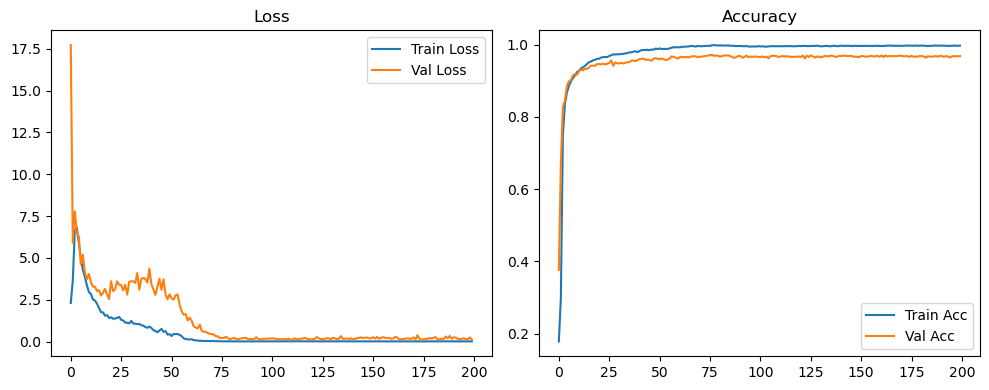

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 28.97it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 29.19it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 29.25it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 29.01it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 29.15it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 29.23it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 29.33it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 29.17it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 29.09it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 28.97it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 28.98it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 28.95it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 29.07it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 29.69it/s]

Original Model Final Test Loss: 0.1163 Accuracy: 0.9702


🚀 Running: batch256_lr0.01_0.01_0.01_dp0.2


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1730 | Val Acc: 0.3933 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1730 | Val Acc: 0.3933 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1730 | Val Acc: 0.3933 |:   0%|          | 1/200 [00:09<32:03,  9.67s/it]

| LR: 0.010 | Train Acc: 0.2424 | Val Acc: 0.5068 |:   0%|          | 1/200 [00:18<32:03,  9.67s/it]

| LR: 0.010 | Train Acc: 0.2424 | Val Acc: 0.5068 |:   0%|          | 1/200 [00:18<32:03,  9.67s/it]

| LR: 0.010 | Train Acc: 0.2424 | Val Acc: 0.5068 |:   1%|          | 2/200 [00:18<30:53,  9.36s/it]

| LR: 0.010 | Train Acc: 0.6560 | Val Acc: 0.7921 |:   1%|          | 2/200 [00:27<30:53,  9.36s/it]

| LR: 0.010 | Train Acc: 0.6560 | Val Acc: 0.7921 |:   1%|          | 2/200 [00:27<30:53,  9.36s/it]

| LR: 0.010 | Train Acc: 0.6560 | Val Acc: 0.7921 |:   2%|▏         | 3/200 [00:27<29:50,  9.09s/it]

| LR: 0.010 | Train Acc: 0.8071 | Val Acc: 0.8728 |:   2%|▏         | 3/200 [00:36<29:50,  9.09s/it]

| LR: 0.010 | Train Acc: 0.8071 | Val Acc: 0.8728 |:   2%|▏         | 3/200 [00:36<29:50,  9.09s/it]

| LR: 0.010 | Train Acc: 0.8071 | Val Acc: 0.8728 |:   2%|▏         | 4/200 [00:36<29:11,  8.94s/it]

| LR: 0.010 | Train Acc: 0.8497 | Val Acc: 0.8785 |:   2%|▏         | 4/200 [00:45<29:11,  8.94s/it]

| LR: 0.010 | Train Acc: 0.8497 | Val Acc: 0.8785 |:   2%|▏         | 4/200 [00:45<29:11,  8.94s/it]

| LR: 0.010 | Train Acc: 0.8497 | Val Acc: 0.8785 |:   2%|▎         | 5/200 [00:45<29:13,  8.99s/it]

| LR: 0.010 | Train Acc: 0.8673 | Val Acc: 0.8972 |:   2%|▎         | 5/200 [00:54<29:13,  8.99s/it]

| LR: 0.010 | Train Acc: 0.8673 | Val Acc: 0.8972 |:   2%|▎         | 5/200 [00:54<29:13,  8.99s/it]

| LR: 0.010 | Train Acc: 0.8673 | Val Acc: 0.8972 |:   3%|▎         | 6/200 [00:54<28:52,  8.93s/it]

| LR: 0.010 | Train Acc: 0.8861 | Val Acc: 0.9073 |:   3%|▎         | 6/200 [01:02<28:52,  8.93s/it]

| LR: 0.010 | Train Acc: 0.8861 | Val Acc: 0.9073 |:   3%|▎         | 6/200 [01:02<28:52,  8.93s/it]

| LR: 0.010 | Train Acc: 0.8861 | Val Acc: 0.9073 |:   4%|▎         | 7/200 [01:02<28:34,  8.89s/it]

| LR: 0.010 | Train Acc: 0.8976 | Val Acc: 0.9189 |:   4%|▎         | 7/200 [01:11<28:34,  8.89s/it]

| LR: 0.010 | Train Acc: 0.8976 | Val Acc: 0.9189 |:   4%|▎         | 7/200 [01:11<28:34,  8.89s/it]

| LR: 0.010 | Train Acc: 0.8976 | Val Acc: 0.9189 |:   4%|▍         | 8/200 [01:11<28:32,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9238 |:   4%|▍         | 8/200 [01:20<28:32,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9238 |:   4%|▍         | 8/200 [01:20<28:32,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9238 |:   4%|▍         | 9/200 [01:20<28:13,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9153 | Val Acc: 0.9301 |:   4%|▍         | 9/200 [01:29<28:13,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9153 | Val Acc: 0.9301 |:   4%|▍         | 9/200 [01:29<28:13,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9153 | Val Acc: 0.9301 |:   5%|▌         | 10/200 [01:29<28:19,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9214 | Val Acc: 0.9319 |:   5%|▌         | 10/200 [01:39<28:19,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9214 | Val Acc: 0.9319 |:   5%|▌         | 10/200 [01:39<28:19,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9214 | Val Acc: 0.9319 |:   6%|▌         | 11/200 [01:39<28:28,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9262 | Val Acc: 0.9347 |:   6%|▌         | 11/200 [01:47<28:28,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9262 | Val Acc: 0.9347 |:   6%|▌         | 11/200 [01:47<28:28,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9262 | Val Acc: 0.9347 |:   6%|▌         | 12/200 [01:47<28:09,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9311 | Val Acc: 0.9361 |:   6%|▌         | 12/200 [01:56<28:09,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9311 | Val Acc: 0.9361 |:   6%|▌         | 12/200 [01:56<28:09,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9311 | Val Acc: 0.9361 |:   6%|▋         | 13/200 [01:56<27:51,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9340 | Val Acc: 0.9422 |:   6%|▋         | 13/200 [02:05<27:51,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9340 | Val Acc: 0.9422 |:   6%|▋         | 13/200 [02:05<27:51,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9340 | Val Acc: 0.9422 |:   7%|▋         | 14/200 [02:05<27:51,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9385 | Val Acc: 0.9433 |:   7%|▋         | 14/200 [02:14<27:51,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9385 | Val Acc: 0.9433 |:   7%|▋         | 14/200 [02:14<27:51,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9385 | Val Acc: 0.9433 |:   8%|▊         | 15/200 [02:14<27:29,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9399 | Val Acc: 0.9456 |:   8%|▊         | 15/200 [02:23<27:29,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9399 | Val Acc: 0.9456 |:   8%|▊         | 15/200 [02:23<27:29,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9399 | Val Acc: 0.9456 |:   8%|▊         | 16/200 [02:23<27:11,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9433 |:   8%|▊         | 16/200 [02:32<27:11,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9433 |:   8%|▊         | 16/200 [02:32<27:11,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9433 |:   8%|▊         | 17/200 [02:32<26:55,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9495 |:   8%|▊         | 17/200 [02:40<26:55,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9495 |:   8%|▊         | 17/200 [02:40<26:55,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9495 |:   9%|▉         | 18/200 [02:40<26:44,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9493 |:   9%|▉         | 18/200 [02:50<26:44,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9493 |:   9%|▉         | 18/200 [02:50<26:44,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9493 |:  10%|▉         | 19/200 [02:50<27:01,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9517 |:  10%|▉         | 19/200 [02:59<27:01,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9517 |:  10%|▉         | 19/200 [02:59<27:01,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9517 |:  10%|█         | 20/200 [02:59<26:52,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9548 | Val Acc: 0.9514 |:  10%|█         | 20/200 [03:08<26:52,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9548 | Val Acc: 0.9514 |:  10%|█         | 20/200 [03:08<26:52,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9548 | Val Acc: 0.9514 |:  10%|█         | 21/200 [03:08<26:57,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9526 |:  10%|█         | 21/200 [03:17<26:57,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9526 |:  10%|█         | 21/200 [03:17<26:57,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9526 |:  11%|█         | 22/200 [03:17<26:42,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9584 | Val Acc: 0.9507 |:  11%|█         | 22/200 [03:26<26:42,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9584 | Val Acc: 0.9507 |:  11%|█         | 22/200 [03:26<26:42,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9584 | Val Acc: 0.9507 |:  12%|█▏        | 23/200 [03:26<26:28,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9578 | Val Acc: 0.9548 |:  12%|█▏        | 23/200 [03:35<26:28,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9578 | Val Acc: 0.9548 |:  12%|█▏        | 23/200 [03:35<26:28,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9578 | Val Acc: 0.9548 |:  12%|█▏        | 24/200 [03:35<26:20,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9588 | Val Acc: 0.9453 |:  12%|█▏        | 24/200 [03:44<26:20,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9588 | Val Acc: 0.9453 |:  12%|█▏        | 24/200 [03:44<26:20,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9588 | Val Acc: 0.9453 |:  12%|█▎        | 25/200 [03:44<26:20,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9557 |:  12%|█▎        | 25/200 [03:53<26:20,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9557 |:  12%|█▎        | 25/200 [03:53<26:20,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9557 |:  13%|█▎        | 26/200 [03:53<25:59,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9527 |:  13%|█▎        | 26/200 [04:02<25:59,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9527 |:  13%|█▎        | 26/200 [04:02<25:59,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9527 |:  14%|█▎        | 27/200 [04:02<25:54,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9633 | Val Acc: 0.9487 |:  14%|█▎        | 27/200 [04:10<25:54,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9633 | Val Acc: 0.9487 |:  14%|█▎        | 27/200 [04:10<25:54,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9633 | Val Acc: 0.9487 |:  14%|█▍        | 28/200 [04:10<25:35,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9646 | Val Acc: 0.9585 |:  14%|█▍        | 28/200 [04:19<25:35,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9646 | Val Acc: 0.9585 |:  14%|█▍        | 28/200 [04:19<25:35,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9646 | Val Acc: 0.9585 |:  14%|█▍        | 29/200 [04:19<25:17,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9657 | Val Acc: 0.9572 |:  14%|█▍        | 29/200 [04:28<25:17,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9657 | Val Acc: 0.9572 |:  14%|█▍        | 29/200 [04:28<25:17,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9657 | Val Acc: 0.9572 |:  15%|█▌        | 30/200 [04:28<24:58,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9679 | Val Acc: 0.9597 |:  15%|█▌        | 30/200 [04:36<24:58,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9679 | Val Acc: 0.9597 |:  15%|█▌        | 30/200 [04:36<24:58,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9679 | Val Acc: 0.9597 |:  16%|█▌        | 31/200 [04:36<24:35,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9705 | Val Acc: 0.9617 |:  16%|█▌        | 31/200 [04:45<24:35,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9705 | Val Acc: 0.9617 |:  16%|█▌        | 31/200 [04:45<24:35,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9705 | Val Acc: 0.9617 |:  16%|█▌        | 32/200 [04:45<24:30,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9609 |:  16%|█▌        | 32/200 [04:54<24:30,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9609 |:  16%|█▌        | 32/200 [04:54<24:30,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9609 |:  16%|█▋        | 33/200 [04:54<24:24,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9573 |:  16%|█▋        | 33/200 [05:03<24:24,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9573 |:  16%|█▋        | 33/200 [05:03<24:24,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9573 |:  17%|█▋        | 34/200 [05:03<24:23,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9594 |:  17%|█▋        | 34/200 [05:12<24:23,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9594 |:  17%|█▋        | 34/200 [05:12<24:23,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9594 |:  18%|█▊        | 35/200 [05:12<24:10,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9750 | Val Acc: 0.9626 |:  18%|█▊        | 35/200 [05:20<24:10,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9750 | Val Acc: 0.9626 |:  18%|█▊        | 35/200 [05:20<24:10,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9750 | Val Acc: 0.9626 |:  18%|█▊        | 36/200 [05:20<24:00,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9771 | Val Acc: 0.9646 |:  18%|█▊        | 36/200 [05:29<24:00,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9771 | Val Acc: 0.9646 |:  18%|█▊        | 36/200 [05:29<24:00,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9771 | Val Acc: 0.9646 |:  18%|█▊        | 37/200 [05:29<23:53,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9767 | Val Acc: 0.9606 |:  18%|█▊        | 37/200 [05:38<23:53,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9767 | Val Acc: 0.9606 |:  18%|█▊        | 37/200 [05:38<23:53,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9767 | Val Acc: 0.9606 |:  19%|█▉        | 38/200 [05:38<23:49,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9777 | Val Acc: 0.9637 |:  19%|█▉        | 38/200 [05:47<23:49,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9777 | Val Acc: 0.9637 |:  19%|█▉        | 38/200 [05:47<23:49,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9777 | Val Acc: 0.9637 |:  20%|█▉        | 39/200 [05:47<23:35,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9633 |:  20%|█▉        | 39/200 [05:56<23:35,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9633 |:  20%|█▉        | 39/200 [05:56<23:35,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9633 |:  20%|██        | 40/200 [05:56<23:25,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9623 |:  20%|██        | 40/200 [06:04<23:25,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9623 |:  20%|██        | 40/200 [06:04<23:25,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9623 |:  20%|██        | 41/200 [06:04<23:17,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9637 |:  20%|██        | 41/200 [06:13<23:17,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9637 |:  20%|██        | 41/200 [06:13<23:17,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9637 |:  21%|██        | 42/200 [06:13<23:14,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9636 |:  21%|██        | 42/200 [06:22<23:14,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9636 |:  21%|██        | 42/200 [06:22<23:14,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9636 |:  22%|██▏       | 43/200 [06:22<23:00,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9607 |:  22%|██▏       | 43/200 [06:31<23:00,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9607 |:  22%|██▏       | 43/200 [06:31<23:00,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9607 |:  22%|██▏       | 44/200 [06:31<22:50,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9637 |:  22%|██▏       | 44/200 [06:40<22:50,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9637 |:  22%|██▏       | 44/200 [06:40<22:50,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9637 |:  22%|██▎       | 45/200 [06:40<22:39,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9653 |:  22%|██▎       | 45/200 [06:48<22:39,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9653 |:  22%|██▎       | 45/200 [06:48<22:39,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9653 |:  23%|██▎       | 46/200 [06:48<22:34,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9624 |:  23%|██▎       | 46/200 [06:57<22:34,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9624 |:  23%|██▎       | 46/200 [06:57<22:34,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9624 |:  24%|██▎       | 47/200 [06:57<22:21,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9667 |:  24%|██▎       | 47/200 [07:06<22:21,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9667 |:  24%|██▎       | 47/200 [07:06<22:21,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9667 |:  24%|██▍       | 48/200 [07:06<22:13,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9627 |:  24%|██▍       | 48/200 [07:15<22:13,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9627 |:  24%|██▍       | 48/200 [07:15<22:13,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9627 |:  24%|██▍       | 49/200 [07:15<22:07,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9680 |:  24%|██▍       | 49/200 [07:24<22:07,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9680 |:  24%|██▍       | 49/200 [07:24<22:07,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9680 |:  25%|██▌       | 50/200 [07:24<22:11,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9674 |:  25%|██▌       | 50/200 [07:33<22:11,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9674 |:  25%|██▌       | 50/200 [07:33<22:11,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9674 |:  26%|██▌       | 51/200 [07:33<21:58,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9866 | Val Acc: 0.9714 |:  26%|██▌       | 51/200 [07:41<21:58,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9866 | Val Acc: 0.9714 |:  26%|██▌       | 51/200 [07:41<21:58,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9866 | Val Acc: 0.9714 |:  26%|██▌       | 52/200 [07:41<21:44,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9667 |:  26%|██▌       | 52/200 [07:50<21:44,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9667 |:  26%|██▌       | 52/200 [07:50<21:44,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9667 |:  26%|██▋       | 53/200 [07:50<21:33,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9872 | Val Acc: 0.9702 |:  26%|██▋       | 53/200 [07:59<21:33,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9872 | Val Acc: 0.9702 |:  26%|██▋       | 53/200 [07:59<21:33,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9872 | Val Acc: 0.9702 |:  27%|██▋       | 54/200 [07:59<21:23,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9885 | Val Acc: 0.9688 |:  27%|██▋       | 54/200 [08:08<21:23,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9885 | Val Acc: 0.9688 |:  27%|██▋       | 54/200 [08:08<21:23,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9885 | Val Acc: 0.9688 |:  28%|██▊       | 55/200 [08:08<21:18,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9703 |:  28%|██▊       | 55/200 [08:17<21:18,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9703 |:  28%|██▊       | 55/200 [08:17<21:18,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9703 |:  28%|██▊       | 56/200 [08:17<21:11,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9897 | Val Acc: 0.9706 |:  28%|██▊       | 56/200 [08:26<21:11,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9897 | Val Acc: 0.9706 |:  28%|██▊       | 56/200 [08:26<21:11,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9897 | Val Acc: 0.9706 |:  28%|██▊       | 57/200 [08:26<21:13,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9693 |:  28%|██▊       | 57/200 [08:35<21:13,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9693 |:  28%|██▊       | 57/200 [08:35<21:13,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9693 |:  29%|██▉       | 58/200 [08:35<21:00,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9713 |:  29%|██▉       | 58/200 [08:43<21:00,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9713 |:  29%|██▉       | 58/200 [08:43<21:00,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9713 |:  30%|██▉       | 59/200 [08:43<20:44,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9729 |:  30%|██▉       | 59/200 [08:52<20:44,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9729 |:  30%|██▉       | 59/200 [08:52<20:44,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9729 |:  30%|███       | 60/200 [08:52<20:31,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9722 |:  30%|███       | 60/200 [09:01<20:31,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9722 |:  30%|███       | 60/200 [09:01<20:31,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9722 |:  30%|███       | 61/200 [09:01<20:25,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9702 |:  30%|███       | 61/200 [09:10<20:25,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9702 |:  30%|███       | 61/200 [09:10<20:25,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9702 |:  31%|███       | 62/200 [09:10<20:15,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9732 |:  31%|███       | 62/200 [09:18<20:15,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9732 |:  31%|███       | 62/200 [09:18<20:15,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9732 |:  32%|███▏      | 63/200 [09:18<20:04,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9733 |:  32%|███▏      | 63/200 [09:27<20:04,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9733 |:  32%|███▏      | 63/200 [09:27<20:04,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9733 |:  32%|███▏      | 64/200 [09:27<19:54,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9724 |:  32%|███▏      | 64/200 [09:36<19:54,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9724 |:  32%|███▏      | 64/200 [09:36<19:54,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9724 |:  32%|███▎      | 65/200 [09:36<19:45,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9946 | Val Acc: 0.9752 |:  32%|███▎      | 65/200 [09:45<19:45,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9946 | Val Acc: 0.9752 |:  32%|███▎      | 65/200 [09:45<19:45,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9946 | Val Acc: 0.9752 |:  33%|███▎      | 66/200 [09:45<19:58,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9949 | Val Acc: 0.9736 |:  33%|███▎      | 66/200 [09:54<19:58,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9949 | Val Acc: 0.9736 |:  33%|███▎      | 66/200 [09:54<19:58,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9949 | Val Acc: 0.9736 |:  34%|███▎      | 67/200 [09:54<19:37,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9950 | Val Acc: 0.9751 |:  34%|███▎      | 67/200 [10:03<19:37,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9950 | Val Acc: 0.9751 |:  34%|███▎      | 67/200 [10:03<19:37,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9950 | Val Acc: 0.9751 |:  34%|███▍      | 68/200 [10:03<19:22,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9740 |:  34%|███▍      | 68/200 [10:11<19:22,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9740 |:  34%|███▍      | 68/200 [10:11<19:22,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9740 |:  34%|███▍      | 69/200 [10:11<19:12,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9727 |:  34%|███▍      | 69/200 [10:20<19:12,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9727 |:  34%|███▍      | 69/200 [10:20<19:12,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9727 |:  35%|███▌      | 70/200 [10:20<19:03,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9718 |:  35%|███▌      | 70/200 [10:29<19:03,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9718 |:  35%|███▌      | 70/200 [10:29<19:03,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9718 |:  36%|███▌      | 71/200 [10:29<18:55,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9720 |:  36%|███▌      | 71/200 [10:38<18:55,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9720 |:  36%|███▌      | 71/200 [10:38<18:55,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9720 |:  36%|███▌      | 72/200 [10:38<18:47,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  36%|███▌      | 72/200 [10:47<18:47,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  36%|███▌      | 72/200 [10:47<18:47,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  36%|███▋      | 73/200 [10:47<18:42,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9742 |:  36%|███▋      | 73/200 [10:55<18:42,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9742 |:  36%|███▋      | 73/200 [10:55<18:42,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9742 |:  37%|███▋      | 74/200 [10:55<18:30,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9720 |:  37%|███▋      | 74/200 [11:04<18:30,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9720 |:  37%|███▋      | 74/200 [11:04<18:30,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9720 |:  38%|███▊      | 75/200 [11:04<18:22,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9760 |:  38%|███▊      | 75/200 [11:13<18:22,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9760 |:  38%|███▊      | 75/200 [11:13<18:22,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9760 |:  38%|███▊      | 76/200 [11:13<18:10,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  38%|███▊      | 76/200 [11:22<18:10,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  38%|███▊      | 76/200 [11:22<18:10,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  38%|███▊      | 77/200 [11:22<18:01,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9732 |:  38%|███▊      | 77/200 [11:31<18:01,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9732 |:  38%|███▊      | 77/200 [11:31<18:01,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9732 |:  39%|███▉      | 78/200 [11:31<17:50,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9971 | Val Acc: 0.9719 |:  39%|███▉      | 78/200 [11:39<17:50,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9971 | Val Acc: 0.9719 |:  39%|███▉      | 78/200 [11:39<17:50,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9971 | Val Acc: 0.9719 |:  40%|███▉      | 79/200 [11:39<17:47,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9729 |:  40%|███▉      | 79/200 [11:49<17:47,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9729 |:  40%|███▉      | 79/200 [11:49<17:47,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9729 |:  40%|████      | 80/200 [11:49<17:47,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9722 |:  40%|████      | 80/200 [11:57<17:47,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9722 |:  40%|████      | 80/200 [11:57<17:47,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9722 |:  40%|████      | 81/200 [11:57<17:33,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9737 |:  40%|████      | 81/200 [12:06<17:33,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9737 |:  40%|████      | 81/200 [12:06<17:33,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9737 |:  41%|████      | 82/200 [12:06<17:20,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9729 |:  41%|████      | 82/200 [12:15<17:20,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9729 |:  41%|████      | 82/200 [12:15<17:20,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9729 |:  42%|████▏     | 83/200 [12:15<17:09,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9712 |:  42%|████▏     | 83/200 [12:24<17:09,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9712 |:  42%|████▏     | 83/200 [12:24<17:09,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9712 |:  42%|████▏     | 84/200 [12:24<16:58,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9718 |:  42%|████▏     | 84/200 [12:32<16:58,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9718 |:  42%|████▏     | 84/200 [12:32<16:58,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9718 |:  42%|████▎     | 85/200 [12:32<16:49,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9722 |:  42%|████▎     | 85/200 [12:41<16:49,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9722 |:  42%|████▎     | 85/200 [12:41<16:49,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9722 |:  43%|████▎     | 86/200 [12:41<16:41,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9702 |:  43%|████▎     | 86/200 [12:50<16:41,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9702 |:  43%|████▎     | 86/200 [12:50<16:41,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9702 |:  44%|████▎     | 87/200 [12:50<16:32,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9708 |:  44%|████▎     | 87/200 [12:59<16:32,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9708 |:  44%|████▎     | 87/200 [12:59<16:32,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9708 |:  44%|████▍     | 88/200 [12:59<16:24,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9704 |:  44%|████▍     | 88/200 [13:07<16:24,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9704 |:  44%|████▍     | 88/200 [13:07<16:24,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9704 |:  44%|████▍     | 89/200 [13:07<16:14,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9709 |:  44%|████▍     | 89/200 [13:16<16:14,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9709 |:  44%|████▍     | 89/200 [13:16<16:14,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9709 |:  45%|████▌     | 90/200 [13:16<16:03,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9692 |:  45%|████▌     | 90/200 [13:25<16:03,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9692 |:  45%|████▌     | 90/200 [13:25<16:03,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9692 |:  46%|████▌     | 91/200 [13:25<15:55,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9690 |:  46%|████▌     | 91/200 [13:34<15:55,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9690 |:  46%|████▌     | 91/200 [13:34<15:55,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9690 |:  46%|████▌     | 92/200 [13:34<15:55,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9694 |:  46%|████▌     | 92/200 [13:43<15:55,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9694 |:  46%|████▌     | 92/200 [13:43<15:55,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9694 |:  46%|████▋     | 93/200 [13:43<15:43,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9666 |:  46%|████▋     | 93/200 [13:52<15:43,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9666 |:  46%|████▋     | 93/200 [13:52<15:43,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9666 |:  47%|████▋     | 94/200 [13:52<15:43,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9691 |:  47%|████▋     | 94/200 [14:01<15:43,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9691 |:  47%|████▋     | 94/200 [14:01<15:43,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9691 |:  48%|████▊     | 95/200 [14:01<15:33,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9714 |:  48%|████▊     | 95/200 [14:09<15:33,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9714 |:  48%|████▊     | 95/200 [14:09<15:33,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9714 |:  48%|████▊     | 96/200 [14:10<15:21,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9677 |:  48%|████▊     | 96/200 [14:18<15:21,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9677 |:  48%|████▊     | 96/200 [14:18<15:21,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9677 |:  48%|████▊     | 97/200 [14:18<15:10,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9688 |:  48%|████▊     | 97/200 [14:27<15:10,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9688 |:  48%|████▊     | 97/200 [14:27<15:10,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [14:27<15:01,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [14:36<15:01,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [14:36<15:01,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9688 |:  50%|████▉     | 99/200 [14:36<14:52,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9685 |:  50%|████▉     | 99/200 [14:45<14:52,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9685 |:  50%|████▉     | 99/200 [14:45<14:52,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9685 |:  50%|█████     | 100/200 [14:45<14:41,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9701 |:  50%|█████     | 100/200 [14:54<14:41,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9701 |:  50%|█████     | 100/200 [14:54<14:41,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9701 |:  50%|█████     | 101/200 [14:54<14:41,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9693 |:  50%|█████     | 101/200 [15:03<14:41,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9693 |:  50%|█████     | 101/200 [15:03<14:41,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9693 |:  51%|█████     | 102/200 [15:03<14:32,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9695 |:  51%|█████     | 102/200 [15:12<14:32,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9695 |:  51%|█████     | 102/200 [15:12<14:32,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9695 |:  52%|█████▏    | 103/200 [15:12<14:22,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9683 |:  52%|█████▏    | 103/200 [15:21<14:22,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9683 |:  52%|█████▏    | 103/200 [15:21<14:22,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9683 |:  52%|█████▏    | 104/200 [15:21<14:30,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9673 |:  52%|█████▏    | 104/200 [15:30<14:30,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9673 |:  52%|█████▏    | 104/200 [15:30<14:30,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9673 |:  52%|█████▎    | 105/200 [15:30<14:12,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9706 |:  52%|█████▎    | 105/200 [15:39<14:12,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9706 |:  52%|█████▎    | 105/200 [15:39<14:12,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9706 |:  53%|█████▎    | 106/200 [15:39<13:59,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9678 |:  53%|█████▎    | 106/200 [15:48<13:59,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9678 |:  53%|█████▎    | 106/200 [15:48<13:59,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9678 |:  54%|█████▎    | 107/200 [15:48<14:00,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9710 |:  54%|█████▎    | 107/200 [15:57<14:00,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9710 |:  54%|█████▎    | 107/200 [15:57<14:00,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9710 |:  54%|█████▍    | 108/200 [15:57<13:42,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9693 |:  54%|█████▍    | 108/200 [16:05<13:42,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9693 |:  54%|█████▍    | 108/200 [16:05<13:42,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9693 |:  55%|█████▍    | 109/200 [16:05<13:28,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9715 |:  55%|█████▍    | 109/200 [16:14<13:28,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9715 |:  55%|█████▍    | 109/200 [16:14<13:28,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9715 |:  55%|█████▌    | 110/200 [16:14<13:17,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9704 |:  55%|█████▌    | 110/200 [16:23<13:17,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9704 |:  55%|█████▌    | 110/200 [16:23<13:17,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9704 |:  56%|█████▌    | 111/200 [16:23<13:08,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9702 |:  56%|█████▌    | 111/200 [16:32<13:08,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9702 |:  56%|█████▌    | 111/200 [16:32<13:08,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9702 |:  56%|█████▌    | 112/200 [16:32<13:00,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9702 |:  56%|█████▌    | 112/200 [16:41<13:00,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9702 |:  56%|█████▌    | 112/200 [16:41<13:00,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9702 |:  56%|█████▋    | 113/200 [16:41<12:54,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9900 | Val Acc: 0.9716 |:  56%|█████▋    | 113/200 [16:50<12:54,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9900 | Val Acc: 0.9716 |:  56%|█████▋    | 113/200 [16:50<12:54,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9900 | Val Acc: 0.9716 |:  57%|█████▋    | 114/200 [16:50<12:52,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9680 |:  57%|█████▋    | 114/200 [16:59<12:52,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9680 |:  57%|█████▋    | 114/200 [16:59<12:52,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9680 |:  57%|█████▊    | 115/200 [16:59<12:36,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9696 |:  57%|█████▊    | 115/200 [17:08<12:36,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9696 |:  57%|█████▊    | 115/200 [17:08<12:36,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9696 |:  58%|█████▊    | 116/200 [17:08<12:23,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9698 |:  58%|█████▊    | 116/200 [17:16<12:23,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9698 |:  58%|█████▊    | 116/200 [17:16<12:23,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9698 |:  58%|█████▊    | 117/200 [17:16<12:11,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9704 |:  58%|█████▊    | 117/200 [17:25<12:11,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9704 |:  58%|█████▊    | 117/200 [17:25<12:11,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9704 |:  59%|█████▉    | 118/200 [17:25<12:01,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9703 |:  59%|█████▉    | 118/200 [17:34<12:01,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9703 |:  59%|█████▉    | 118/200 [17:34<12:01,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9703 |:  60%|█████▉    | 119/200 [17:34<11:55,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9697 |:  60%|█████▉    | 119/200 [17:43<11:55,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9697 |:  60%|█████▉    | 119/200 [17:43<11:55,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9697 |:  60%|██████    | 120/200 [17:43<11:47,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9713 |:  60%|██████    | 120/200 [17:52<11:47,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9713 |:  60%|██████    | 120/200 [17:52<11:47,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9713 |:  60%|██████    | 121/200 [17:52<11:40,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9665 |:  60%|██████    | 121/200 [18:01<11:40,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9665 |:  60%|██████    | 121/200 [18:01<11:40,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9665 |:  61%|██████    | 122/200 [18:01<11:32,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9902 | Val Acc: 0.9691 |:  61%|██████    | 122/200 [18:10<11:32,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9902 | Val Acc: 0.9691 |:  61%|██████    | 122/200 [18:10<11:32,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9902 | Val Acc: 0.9691 |:  62%|██████▏   | 123/200 [18:10<11:23,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9698 |:  62%|██████▏   | 123/200 [18:18<11:23,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9698 |:  62%|██████▏   | 123/200 [18:18<11:23,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9698 |:  62%|██████▏   | 124/200 [18:18<11:08,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9702 |:  62%|██████▏   | 124/200 [18:27<11:08,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9702 |:  62%|██████▏   | 124/200 [18:27<11:08,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9702 |:  62%|██████▎   | 125/200 [18:27<10:57,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9679 |:  62%|██████▎   | 125/200 [18:36<10:57,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9679 |:  62%|██████▎   | 125/200 [18:36<10:57,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9679 |:  63%|██████▎   | 126/200 [18:36<10:52,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9897 | Val Acc: 0.9706 |:  63%|██████▎   | 126/200 [18:45<10:52,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9897 | Val Acc: 0.9706 |:  63%|██████▎   | 126/200 [18:45<10:52,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9897 | Val Acc: 0.9706 |:  64%|██████▎   | 127/200 [18:45<10:44,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9712 |:  64%|██████▎   | 127/200 [18:53<10:44,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9712 |:  64%|██████▎   | 127/200 [18:53<10:44,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9712 |:  64%|██████▍   | 128/200 [18:54<10:36,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9902 | Val Acc: 0.9704 |:  64%|██████▍   | 128/200 [19:02<10:36,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9902 | Val Acc: 0.9704 |:  64%|██████▍   | 128/200 [19:02<10:36,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9902 | Val Acc: 0.9704 |:  64%|██████▍   | 129/200 [19:02<10:27,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9905 | Val Acc: 0.9717 |:  64%|██████▍   | 129/200 [19:11<10:27,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9905 | Val Acc: 0.9717 |:  64%|██████▍   | 129/200 [19:11<10:27,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9905 | Val Acc: 0.9717 |:  65%|██████▌   | 130/200 [19:11<10:16,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9697 |:  65%|██████▌   | 130/200 [19:20<10:16,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9697 |:  65%|██████▌   | 130/200 [19:20<10:16,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9697 |:  66%|██████▌   | 131/200 [19:20<10:05,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9688 |:  66%|██████▌   | 131/200 [19:29<10:05,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9688 |:  66%|██████▌   | 131/200 [19:29<10:05,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9688 |:  66%|██████▌   | 132/200 [19:29<09:57,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9902 | Val Acc: 0.9652 |:  66%|██████▌   | 132/200 [19:37<09:57,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9902 | Val Acc: 0.9652 |:  66%|██████▌   | 132/200 [19:37<09:57,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9902 | Val Acc: 0.9652 |:  66%|██████▋   | 133/200 [19:37<09:47,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9693 |:  66%|██████▋   | 133/200 [19:46<09:47,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9693 |:  66%|██████▋   | 133/200 [19:46<09:47,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9693 |:  67%|██████▋   | 134/200 [19:46<09:37,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9689 |:  67%|██████▋   | 134/200 [19:55<09:37,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9689 |:  67%|██████▋   | 134/200 [19:55<09:37,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9689 |:  68%|██████▊   | 135/200 [19:55<09:29,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9690 |:  68%|██████▊   | 135/200 [20:03<09:29,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9690 |:  68%|██████▊   | 135/200 [20:03<09:29,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9690 |:  68%|██████▊   | 136/200 [20:04<09:19,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9703 |:  68%|██████▊   | 136/200 [20:12<09:19,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9703 |:  68%|██████▊   | 136/200 [20:12<09:19,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9703 |:  68%|██████▊   | 137/200 [20:12<09:06,  8.67s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9691 |:  68%|██████▊   | 137/200 [20:21<09:06,  8.67s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9691 |:  68%|██████▊   | 137/200 [20:21<09:06,  8.67s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9691 |:  69%|██████▉   | 138/200 [20:21<08:58,  8.69s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9683 |:  69%|██████▉   | 138/200 [20:29<08:58,  8.69s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9683 |:  69%|██████▉   | 138/200 [20:29<08:58,  8.69s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9683 |:  70%|██████▉   | 139/200 [20:29<08:50,  8.69s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9695 |:  70%|██████▉   | 139/200 [20:38<08:50,  8.69s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9695 |:  70%|██████▉   | 139/200 [20:38<08:50,  8.69s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9695 |:  70%|███████   | 140/200 [20:38<08:43,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9702 |:  70%|███████   | 140/200 [20:47<08:43,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9702 |:  70%|███████   | 140/200 [20:47<08:43,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9702 |:  70%|███████   | 141/200 [20:47<08:34,  8.71s/it]

| LR: 0.010 | Train Acc: 0.9896 | Val Acc: 0.9694 |:  70%|███████   | 141/200 [20:56<08:34,  8.71s/it]

| LR: 0.010 | Train Acc: 0.9896 | Val Acc: 0.9694 |:  70%|███████   | 141/200 [20:56<08:34,  8.71s/it]

| LR: 0.010 | Train Acc: 0.9896 | Val Acc: 0.9694 |:  71%|███████   | 142/200 [20:56<08:27,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9694 |:  71%|███████   | 142/200 [21:04<08:27,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9694 |:  71%|███████   | 142/200 [21:04<08:27,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9694 |:  72%|███████▏  | 143/200 [21:05<08:18,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9685 |:  72%|███████▏  | 143/200 [21:13<08:18,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9685 |:  72%|███████▏  | 143/200 [21:13<08:18,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9906 | Val Acc: 0.9685 |:  72%|███████▏  | 144/200 [21:13<08:08,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9892 | Val Acc: 0.9677 |:  72%|███████▏  | 144/200 [21:22<08:08,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9892 | Val Acc: 0.9677 |:  72%|███████▏  | 144/200 [21:22<08:08,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9892 | Val Acc: 0.9677 |:  72%|███████▎  | 145/200 [21:22<07:59,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9684 |:  72%|███████▎  | 145/200 [21:31<07:59,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9684 |:  72%|███████▎  | 145/200 [21:31<07:59,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9684 |:  73%|███████▎  | 146/200 [21:31<07:50,  8.71s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9710 |:  73%|███████▎  | 146/200 [21:40<07:50,  8.71s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9710 |:  73%|███████▎  | 146/200 [21:40<07:50,  8.71s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9710 |:  74%|███████▎  | 147/200 [21:40<07:47,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9692 |:  74%|███████▎  | 147/200 [21:49<07:47,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9692 |:  74%|███████▎  | 147/200 [21:49<07:47,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9692 |:  74%|███████▍  | 148/200 [21:49<07:40,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9698 |:  74%|███████▍  | 148/200 [21:57<07:40,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9698 |:  74%|███████▍  | 148/200 [21:57<07:40,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9698 |:  74%|███████▍  | 149/200 [21:57<07:31,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9664 |:  74%|███████▍  | 149/200 [22:06<07:31,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9664 |:  74%|███████▍  | 149/200 [22:06<07:31,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9664 |:  75%|███████▌  | 150/200 [22:06<07:23,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9683 |:  75%|███████▌  | 150/200 [22:15<07:23,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9683 |:  75%|███████▌  | 150/200 [22:15<07:23,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9683 |:  76%|███████▌  | 151/200 [22:15<07:11,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9690 |:  76%|███████▌  | 151/200 [22:24<07:11,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9690 |:  76%|███████▌  | 151/200 [22:24<07:11,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9690 |:  76%|███████▌  | 152/200 [22:24<07:06,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9694 |:  76%|███████▌  | 152/200 [22:33<07:06,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9694 |:  76%|███████▌  | 152/200 [22:33<07:06,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9694 |:  76%|███████▋  | 153/200 [22:33<07:01,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9689 |:  76%|███████▋  | 153/200 [22:42<07:01,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9689 |:  76%|███████▋  | 153/200 [22:42<07:01,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9689 |:  77%|███████▋  | 154/200 [22:42<06:49,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9701 |:  77%|███████▋  | 154/200 [22:51<06:49,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9701 |:  77%|███████▋  | 154/200 [22:51<06:49,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9701 |:  78%|███████▊  | 155/200 [22:51<06:45,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9698 |:  78%|███████▊  | 155/200 [23:00<06:45,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9698 |:  78%|███████▊  | 155/200 [23:00<06:45,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9698 |:  78%|███████▊  | 156/200 [23:00<06:32,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9905 | Val Acc: 0.9687 |:  78%|███████▊  | 156/200 [23:09<06:32,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9905 | Val Acc: 0.9687 |:  78%|███████▊  | 156/200 [23:09<06:32,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9905 | Val Acc: 0.9687 |:  78%|███████▊  | 157/200 [23:09<06:28,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9897 | Val Acc: 0.9708 |:  78%|███████▊  | 157/200 [23:18<06:28,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9897 | Val Acc: 0.9708 |:  78%|███████▊  | 157/200 [23:18<06:28,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9897 | Val Acc: 0.9708 |:  79%|███████▉  | 158/200 [23:18<06:17,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9664 |:  79%|███████▉  | 158/200 [23:27<06:17,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9664 |:  79%|███████▉  | 158/200 [23:27<06:17,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9664 |:  80%|███████▉  | 159/200 [23:27<06:05,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9708 |:  80%|███████▉  | 159/200 [23:36<06:05,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9708 |:  80%|███████▉  | 159/200 [23:36<06:05,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9891 | Val Acc: 0.9708 |:  80%|████████  | 160/200 [23:36<05:56,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9712 |:  80%|████████  | 160/200 [23:45<05:56,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9712 |:  80%|████████  | 160/200 [23:45<05:56,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9712 |:  80%|████████  | 161/200 [23:45<05:48,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9825 | Val Acc: 0.9666 |:  80%|████████  | 161/200 [23:54<05:48,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9825 | Val Acc: 0.9666 |:  80%|████████  | 161/200 [23:54<05:48,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9825 | Val Acc: 0.9666 |:  81%|████████  | 162/200 [23:54<05:39,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9877 | Val Acc: 0.9659 |:  81%|████████  | 162/200 [24:02<05:39,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9877 | Val Acc: 0.9659 |:  81%|████████  | 162/200 [24:02<05:39,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9877 | Val Acc: 0.9659 |:  82%|████████▏ | 163/200 [24:02<05:27,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9699 |:  82%|████████▏ | 163/200 [24:11<05:27,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9699 |:  82%|████████▏ | 163/200 [24:11<05:27,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9699 |:  82%|████████▏ | 164/200 [24:11<05:19,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9689 |:  82%|████████▏ | 164/200 [24:20<05:19,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9689 |:  82%|████████▏ | 164/200 [24:20<05:19,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9689 |:  82%|████████▎ | 165/200 [24:20<05:10,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9716 |:  82%|████████▎ | 165/200 [24:29<05:10,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9716 |:  82%|████████▎ | 165/200 [24:29<05:10,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9716 |:  83%|████████▎ | 166/200 [24:29<05:00,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9688 |:  83%|████████▎ | 166/200 [24:38<05:00,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9688 |:  83%|████████▎ | 166/200 [24:38<05:00,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9688 |:  84%|████████▎ | 167/200 [24:38<04:51,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9708 |:  84%|████████▎ | 167/200 [24:47<04:51,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9708 |:  84%|████████▎ | 167/200 [24:47<04:51,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9708 |:  84%|████████▍ | 168/200 [24:47<04:45,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9708 |:  84%|████████▍ | 168/200 [24:56<04:45,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9708 |:  84%|████████▍ | 168/200 [24:56<04:45,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9708 |:  84%|████████▍ | 169/200 [24:56<04:34,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9708 |:  84%|████████▍ | 169/200 [25:04<04:34,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9708 |:  84%|████████▍ | 169/200 [25:04<04:34,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9916 | Val Acc: 0.9708 |:  85%|████████▌ | 170/200 [25:04<04:24,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9709 |:  85%|████████▌ | 170/200 [25:13<04:24,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9709 |:  85%|████████▌ | 170/200 [25:13<04:24,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9709 |:  86%|████████▌ | 171/200 [25:13<04:15,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9710 |:  86%|████████▌ | 171/200 [25:22<04:15,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9710 |:  86%|████████▌ | 171/200 [25:22<04:15,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9919 | Val Acc: 0.9710 |:  86%|████████▌ | 172/200 [25:22<04:06,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9709 |:  86%|████████▌ | 172/200 [25:31<04:06,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9709 |:  86%|████████▌ | 172/200 [25:31<04:06,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9913 | Val Acc: 0.9709 |:  86%|████████▋ | 173/200 [25:31<03:57,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9705 |:  86%|████████▋ | 173/200 [25:40<03:57,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9705 |:  86%|████████▋ | 173/200 [25:40<03:57,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9705 |:  87%|████████▋ | 174/200 [25:40<03:49,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9699 |:  87%|████████▋ | 174/200 [25:48<03:49,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9699 |:  87%|████████▋ | 174/200 [25:48<03:49,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9923 | Val Acc: 0.9699 |:  88%|████████▊ | 175/200 [25:48<03:41,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9697 |:  88%|████████▊ | 175/200 [25:57<03:41,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9697 |:  88%|████████▊ | 175/200 [25:57<03:41,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9697 |:  88%|████████▊ | 176/200 [25:57<03:33,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9675 |:  88%|████████▊ | 176/200 [26:06<03:33,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9675 |:  88%|████████▊ | 176/200 [26:06<03:33,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9675 |:  88%|████████▊ | 177/200 [26:06<03:23,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9695 |:  88%|████████▊ | 177/200 [26:15<03:23,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9695 |:  88%|████████▊ | 177/200 [26:15<03:23,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9695 |:  89%|████████▉ | 178/200 [26:15<03:14,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9694 |:  89%|████████▉ | 178/200 [26:24<03:14,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9694 |:  89%|████████▉ | 178/200 [26:24<03:14,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9694 |:  90%|████████▉ | 179/200 [26:24<03:06,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9698 |:  90%|████████▉ | 179/200 [26:33<03:06,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9698 |:  90%|████████▉ | 179/200 [26:33<03:06,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9698 |:  90%|█████████ | 180/200 [26:33<02:57,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9695 |:  90%|█████████ | 180/200 [26:42<02:57,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9695 |:  90%|█████████ | 180/200 [26:42<02:57,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9695 |:  90%|█████████ | 181/200 [26:42<02:50,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9703 |:  90%|█████████ | 181/200 [26:51<02:50,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9703 |:  90%|█████████ | 181/200 [26:51<02:50,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9703 |:  91%|█████████ | 182/200 [26:51<02:42,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9709 |:  91%|█████████ | 182/200 [27:00<02:42,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9709 |:  91%|█████████ | 182/200 [27:00<02:42,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9709 |:  92%|█████████▏| 183/200 [27:00<02:32,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9697 |:  92%|█████████▏| 183/200 [27:09<02:32,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9697 |:  92%|█████████▏| 183/200 [27:09<02:32,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9697 |:  92%|█████████▏| 184/200 [27:09<02:22,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9707 |:  92%|█████████▏| 184/200 [27:18<02:22,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9707 |:  92%|█████████▏| 184/200 [27:18<02:22,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9707 |:  92%|█████████▎| 185/200 [27:18<02:13,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9700 |:  92%|█████████▎| 185/200 [27:27<02:13,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9700 |:  92%|█████████▎| 185/200 [27:27<02:13,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9912 | Val Acc: 0.9700 |:  93%|█████████▎| 186/200 [27:27<02:05,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9694 |:  93%|█████████▎| 186/200 [27:36<02:05,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9694 |:  93%|█████████▎| 186/200 [27:36<02:05,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9694 |:  94%|█████████▎| 187/200 [27:36<01:55,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9692 |:  94%|█████████▎| 187/200 [27:45<01:55,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9692 |:  94%|█████████▎| 187/200 [27:45<01:55,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9692 |:  94%|█████████▍| 188/200 [27:45<01:46,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9674 |:  94%|█████████▍| 188/200 [27:53<01:46,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9674 |:  94%|█████████▍| 188/200 [27:53<01:46,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9909 | Val Acc: 0.9674 |:  94%|█████████▍| 189/200 [27:53<01:37,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9896 | Val Acc: 0.9683 |:  94%|█████████▍| 189/200 [28:02<01:37,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9896 | Val Acc: 0.9683 |:  94%|█████████▍| 189/200 [28:02<01:37,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9896 | Val Acc: 0.9683 |:  95%|█████████▌| 190/200 [28:02<01:28,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9677 |:  95%|█████████▌| 190/200 [28:11<01:28,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9677 |:  95%|█████████▌| 190/200 [28:11<01:28,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9677 |:  96%|█████████▌| 191/200 [28:11<01:19,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9894 | Val Acc: 0.9693 |:  96%|█████████▌| 191/200 [28:20<01:19,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9894 | Val Acc: 0.9693 |:  96%|█████████▌| 191/200 [28:20<01:19,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9894 | Val Acc: 0.9693 |:  96%|█████████▌| 192/200 [28:20<01:11,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9691 |:  96%|█████████▌| 192/200 [28:29<01:11,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9691 |:  96%|█████████▌| 192/200 [28:29<01:11,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9691 |:  96%|█████████▋| 193/200 [28:29<01:02,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9678 |:  96%|█████████▋| 193/200 [28:38<01:02,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9678 |:  96%|█████████▋| 193/200 [28:38<01:02,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9899 | Val Acc: 0.9678 |:  97%|█████████▋| 194/200 [28:38<00:53,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9667 |:  97%|█████████▋| 194/200 [28:47<00:53,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9667 |:  97%|█████████▋| 194/200 [28:47<00:53,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9667 |:  98%|█████████▊| 195/200 [28:47<00:44,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9900 | Val Acc: 0.9702 |:  98%|█████████▊| 195/200 [28:56<00:44,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9900 | Val Acc: 0.9702 |:  98%|█████████▊| 195/200 [28:56<00:44,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9900 | Val Acc: 0.9702 |:  98%|█████████▊| 196/200 [28:56<00:35,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9697 |:  98%|█████████▊| 196/200 [29:05<00:35,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9697 |:  98%|█████████▊| 196/200 [29:05<00:35,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9904 | Val Acc: 0.9697 |:  98%|█████████▊| 197/200 [29:05<00:26,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9704 |:  98%|█████████▊| 197/200 [29:13<00:26,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9704 |:  98%|█████████▊| 197/200 [29:13<00:26,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9907 | Val Acc: 0.9704 |:  99%|█████████▉| 198/200 [29:13<00:17,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9692 |:  99%|█████████▉| 198/200 [29:22<00:17,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9692 |:  99%|█████████▉| 198/200 [29:22<00:17,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9692 |: 100%|█████████▉| 199/200 [29:22<00:08,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9696 |: 100%|█████████▉| 199/200 [29:31<00:08,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9696 |: 100%|█████████▉| 199/200 [29:31<00:08,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9696 |: 100%|██████████| 200/200 [29:31<00:00,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9696 |: 100%|██████████| 200/200 [29:31<00:00,  8.86s/it]

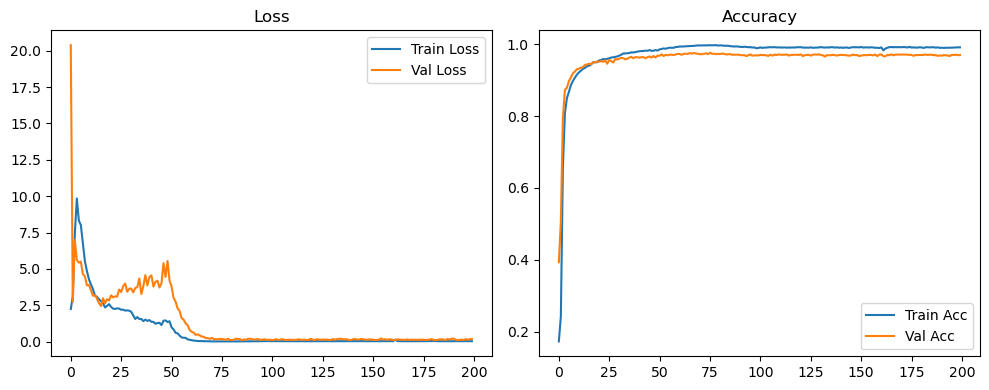

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 28.48it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 28.76it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 29.02it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 29.08it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 29.13it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 29.20it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 29.25it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 29.28it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 29.28it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 29.32it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 29.32it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 29.32it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 29.34it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 29.82it/s]

Original Model Final Test Loss: 0.1415 Accuracy: 0.9739


🚀 Running: batch256_lr0.01_0.01_0.01_dp0.5


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1485 | Val Acc: 0.2489 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1485 | Val Acc: 0.2489 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1485 | Val Acc: 0.2489 |:   0%|          | 1/200 [00:09<31:30,  9.50s/it]

| LR: 0.010 | Train Acc: 0.1652 | Val Acc: 0.2902 |:   0%|          | 1/200 [00:18<31:30,  9.50s/it]

| LR: 0.010 | Train Acc: 0.1652 | Val Acc: 0.2902 |:   0%|          | 1/200 [00:18<31:30,  9.50s/it]

| LR: 0.010 | Train Acc: 0.1652 | Val Acc: 0.2902 |:   1%|          | 2/200 [00:18<30:36,  9.28s/it]

| LR: 0.010 | Train Acc: 0.4393 | Val Acc: 0.7237 |:   1%|          | 2/200 [00:27<30:36,  9.28s/it]

| LR: 0.010 | Train Acc: 0.4393 | Val Acc: 0.7237 |:   1%|          | 2/200 [00:27<30:36,  9.28s/it]

| LR: 0.010 | Train Acc: 0.4393 | Val Acc: 0.7237 |:   2%|▏         | 3/200 [00:27<29:38,  9.03s/it]

| LR: 0.010 | Train Acc: 0.7067 | Val Acc: 0.8517 |:   2%|▏         | 3/200 [00:36<29:38,  9.03s/it]

| LR: 0.010 | Train Acc: 0.7067 | Val Acc: 0.8517 |:   2%|▏         | 3/200 [00:36<29:38,  9.03s/it]

| LR: 0.010 | Train Acc: 0.7067 | Val Acc: 0.8517 |:   2%|▏         | 4/200 [00:36<29:06,  8.91s/it]

| LR: 0.010 | Train Acc: 0.7834 | Val Acc: 0.8763 |:   2%|▏         | 4/200 [00:44<29:06,  8.91s/it]

| LR: 0.010 | Train Acc: 0.7834 | Val Acc: 0.8763 |:   2%|▏         | 4/200 [00:44<29:06,  8.91s/it]

| LR: 0.010 | Train Acc: 0.7834 | Val Acc: 0.8763 |:   2%|▎         | 5/200 [00:44<28:49,  8.87s/it]

| LR: 0.010 | Train Acc: 0.8174 | Val Acc: 0.8954 |:   2%|▎         | 5/200 [00:53<28:49,  8.87s/it]

| LR: 0.010 | Train Acc: 0.8174 | Val Acc: 0.8954 |:   2%|▎         | 5/200 [00:53<28:49,  8.87s/it]

| LR: 0.010 | Train Acc: 0.8174 | Val Acc: 0.8954 |:   3%|▎         | 6/200 [00:53<28:31,  8.82s/it]

| LR: 0.010 | Train Acc: 0.8354 | Val Acc: 0.8989 |:   3%|▎         | 6/200 [01:02<28:31,  8.82s/it]

| LR: 0.010 | Train Acc: 0.8354 | Val Acc: 0.8989 |:   3%|▎         | 6/200 [01:02<28:31,  8.82s/it]

| LR: 0.010 | Train Acc: 0.8354 | Val Acc: 0.8989 |:   4%|▎         | 7/200 [01:02<28:21,  8.82s/it]

| LR: 0.010 | Train Acc: 0.8571 | Val Acc: 0.9127 |:   4%|▎         | 7/200 [01:11<28:21,  8.82s/it]

| LR: 0.010 | Train Acc: 0.8571 | Val Acc: 0.9127 |:   4%|▎         | 7/200 [01:11<28:21,  8.82s/it]

| LR: 0.010 | Train Acc: 0.8571 | Val Acc: 0.9127 |:   4%|▍         | 8/200 [01:11<28:12,  8.82s/it]

| LR: 0.010 | Train Acc: 0.8681 | Val Acc: 0.9239 |:   4%|▍         | 8/200 [01:19<28:12,  8.82s/it]

| LR: 0.010 | Train Acc: 0.8681 | Val Acc: 0.9239 |:   4%|▍         | 8/200 [01:20<28:12,  8.82s/it]

| LR: 0.010 | Train Acc: 0.8681 | Val Acc: 0.9239 |:   4%|▍         | 9/200 [01:20<28:02,  8.81s/it]

| LR: 0.010 | Train Acc: 0.8816 | Val Acc: 0.9205 |:   4%|▍         | 9/200 [01:28<28:02,  8.81s/it]

| LR: 0.010 | Train Acc: 0.8816 | Val Acc: 0.9205 |:   4%|▍         | 9/200 [01:28<28:02,  8.81s/it]

| LR: 0.010 | Train Acc: 0.8816 | Val Acc: 0.9205 |:   5%|▌         | 10/200 [01:28<27:51,  8.80s/it]

| LR: 0.010 | Train Acc: 0.8870 | Val Acc: 0.9300 |:   5%|▌         | 10/200 [01:37<27:51,  8.80s/it]

| LR: 0.010 | Train Acc: 0.8870 | Val Acc: 0.9300 |:   5%|▌         | 10/200 [01:37<27:51,  8.80s/it]

| LR: 0.010 | Train Acc: 0.8870 | Val Acc: 0.9300 |:   6%|▌         | 11/200 [01:37<27:46,  8.82s/it]

| LR: 0.010 | Train Acc: 0.8935 | Val Acc: 0.9329 |:   6%|▌         | 11/200 [01:46<27:46,  8.82s/it]

| LR: 0.010 | Train Acc: 0.8935 | Val Acc: 0.9329 |:   6%|▌         | 11/200 [01:46<27:46,  8.82s/it]

| LR: 0.010 | Train Acc: 0.8935 | Val Acc: 0.9329 |:   6%|▌         | 12/200 [01:46<27:41,  8.84s/it]

| LR: 0.010 | Train Acc: 0.8984 | Val Acc: 0.9330 |:   6%|▌         | 12/200 [01:55<27:41,  8.84s/it]

| LR: 0.010 | Train Acc: 0.8984 | Val Acc: 0.9330 |:   6%|▌         | 12/200 [01:55<27:41,  8.84s/it]

| LR: 0.010 | Train Acc: 0.8984 | Val Acc: 0.9330 |:   6%|▋         | 13/200 [01:55<27:28,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9045 | Val Acc: 0.9381 |:   6%|▋         | 13/200 [02:04<27:28,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9045 | Val Acc: 0.9381 |:   6%|▋         | 13/200 [02:04<27:28,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9045 | Val Acc: 0.9381 |:   7%|▋         | 14/200 [02:04<27:16,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9109 | Val Acc: 0.9445 |:   7%|▋         | 14/200 [02:12<27:16,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9109 | Val Acc: 0.9445 |:   7%|▋         | 14/200 [02:12<27:16,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9109 | Val Acc: 0.9445 |:   8%|▊         | 15/200 [02:12<26:57,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9417 |:   8%|▊         | 15/200 [02:21<26:57,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9417 |:   8%|▊         | 15/200 [02:21<26:57,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9417 |:   8%|▊         | 16/200 [02:21<26:41,  8.70s/it]

| LR: 0.010 | Train Acc: 0.9172 | Val Acc: 0.9401 |:   8%|▊         | 16/200 [02:29<26:41,  8.70s/it]

| LR: 0.010 | Train Acc: 0.9172 | Val Acc: 0.9401 |:   8%|▊         | 16/200 [02:29<26:41,  8.70s/it]

| LR: 0.010 | Train Acc: 0.9172 | Val Acc: 0.9401 |:   8%|▊         | 17/200 [02:29<26:28,  8.68s/it]

| LR: 0.010 | Train Acc: 0.9180 | Val Acc: 0.9469 |:   8%|▊         | 17/200 [02:38<26:28,  8.68s/it]

| LR: 0.010 | Train Acc: 0.9180 | Val Acc: 0.9469 |:   8%|▊         | 17/200 [02:38<26:28,  8.68s/it]

| LR: 0.010 | Train Acc: 0.9180 | Val Acc: 0.9469 |:   9%|▉         | 18/200 [02:38<26:27,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9217 | Val Acc: 0.9483 |:   9%|▉         | 18/200 [02:47<26:27,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9217 | Val Acc: 0.9483 |:   9%|▉         | 18/200 [02:47<26:27,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9217 | Val Acc: 0.9483 |:  10%|▉         | 19/200 [02:47<26:24,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9255 | Val Acc: 0.9493 |:  10%|▉         | 19/200 [02:56<26:24,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9255 | Val Acc: 0.9493 |:  10%|▉         | 19/200 [02:56<26:24,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9255 | Val Acc: 0.9493 |:  10%|█         | 20/200 [02:56<26:35,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9476 |:  10%|█         | 20/200 [03:05<26:35,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9476 |:  10%|█         | 20/200 [03:05<26:35,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9476 |:  10%|█         | 21/200 [03:05<26:29,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9313 | Val Acc: 0.9523 |:  10%|█         | 21/200 [03:14<26:29,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9313 | Val Acc: 0.9523 |:  10%|█         | 21/200 [03:14<26:29,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9313 | Val Acc: 0.9523 |:  11%|█         | 22/200 [03:14<26:17,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9306 | Val Acc: 0.9519 |:  11%|█         | 22/200 [03:23<26:17,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9306 | Val Acc: 0.9519 |:  11%|█         | 22/200 [03:23<26:17,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9306 | Val Acc: 0.9519 |:  12%|█▏        | 23/200 [03:23<26:04,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9336 | Val Acc: 0.9543 |:  12%|█▏        | 23/200 [03:31<26:04,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9336 | Val Acc: 0.9543 |:  12%|█▏        | 23/200 [03:31<26:04,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9336 | Val Acc: 0.9543 |:  12%|█▏        | 24/200 [03:31<25:52,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9356 | Val Acc: 0.9567 |:  12%|█▏        | 24/200 [03:40<25:52,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9356 | Val Acc: 0.9567 |:  12%|█▏        | 24/200 [03:40<25:52,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9356 | Val Acc: 0.9567 |:  12%|█▎        | 25/200 [03:40<25:45,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9383 | Val Acc: 0.9577 |:  12%|█▎        | 25/200 [03:49<25:45,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9383 | Val Acc: 0.9577 |:  12%|█▎        | 25/200 [03:49<25:45,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9383 | Val Acc: 0.9577 |:  13%|█▎        | 26/200 [03:49<25:34,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9583 |:  13%|█▎        | 26/200 [03:58<25:34,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9583 |:  13%|█▎        | 26/200 [03:58<25:34,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9583 |:  14%|█▎        | 27/200 [03:58<25:26,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9424 | Val Acc: 0.9557 |:  14%|█▎        | 27/200 [04:07<25:26,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9424 | Val Acc: 0.9557 |:  14%|█▎        | 27/200 [04:07<25:26,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9424 | Val Acc: 0.9557 |:  14%|█▍        | 28/200 [04:07<25:14,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9416 | Val Acc: 0.9565 |:  14%|█▍        | 28/200 [04:16<25:14,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9416 | Val Acc: 0.9565 |:  14%|█▍        | 28/200 [04:16<25:14,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9416 | Val Acc: 0.9565 |:  14%|█▍        | 29/200 [04:16<25:08,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9468 | Val Acc: 0.9604 |:  14%|█▍        | 29/200 [04:24<25:08,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9468 | Val Acc: 0.9604 |:  14%|█▍        | 29/200 [04:24<25:08,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9468 | Val Acc: 0.9604 |:  15%|█▌        | 30/200 [04:24<24:55,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9452 | Val Acc: 0.9587 |:  15%|█▌        | 30/200 [04:33<24:55,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9452 | Val Acc: 0.9587 |:  15%|█▌        | 30/200 [04:33<24:55,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9452 | Val Acc: 0.9587 |:  16%|█▌        | 31/200 [04:33<24:47,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9529 |:  16%|█▌        | 31/200 [04:42<24:47,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9529 |:  16%|█▌        | 31/200 [04:42<24:47,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9529 |:  16%|█▌        | 32/200 [04:42<24:41,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9541 | Val Acc: 0.9633 |:  16%|█▌        | 32/200 [04:51<24:41,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9541 | Val Acc: 0.9633 |:  16%|█▌        | 32/200 [04:51<24:41,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9541 | Val Acc: 0.9633 |:  16%|█▋        | 33/200 [04:51<24:37,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  16%|█▋        | 33/200 [05:00<24:37,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  16%|█▋        | 33/200 [05:00<24:37,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  17%|█▋        | 34/200 [05:00<24:27,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9538 | Val Acc: 0.9643 |:  17%|█▋        | 34/200 [05:09<24:27,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9538 | Val Acc: 0.9643 |:  17%|█▋        | 34/200 [05:09<24:27,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9538 | Val Acc: 0.9643 |:  18%|█▊        | 35/200 [05:09<24:22,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9621 |:  18%|█▊        | 35/200 [05:18<24:22,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9621 |:  18%|█▊        | 35/200 [05:18<24:22,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9621 |:  18%|█▊        | 36/200 [05:18<24:17,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9574 | Val Acc: 0.9643 |:  18%|█▊        | 36/200 [05:26<24:17,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9574 | Val Acc: 0.9643 |:  18%|█▊        | 36/200 [05:26<24:17,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9574 | Val Acc: 0.9643 |:  18%|█▊        | 37/200 [05:26<24:08,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9589 | Val Acc: 0.9657 |:  18%|█▊        | 37/200 [05:35<24:08,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9589 | Val Acc: 0.9657 |:  18%|█▊        | 37/200 [05:35<24:08,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9589 | Val Acc: 0.9657 |:  19%|█▉        | 38/200 [05:35<24:00,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9593 | Val Acc: 0.9633 |:  19%|█▉        | 38/200 [05:44<24:00,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9593 | Val Acc: 0.9633 |:  19%|█▉        | 38/200 [05:44<24:00,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9593 | Val Acc: 0.9633 |:  20%|█▉        | 39/200 [05:44<23:53,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9618 | Val Acc: 0.9629 |:  20%|█▉        | 39/200 [05:53<23:53,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9618 | Val Acc: 0.9629 |:  20%|█▉        | 39/200 [05:53<23:53,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9618 | Val Acc: 0.9629 |:  20%|██        | 40/200 [05:53<23:44,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9661 |:  20%|██        | 40/200 [06:02<23:44,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9661 |:  20%|██        | 40/200 [06:02<23:44,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9661 |:  20%|██        | 41/200 [06:02<23:35,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9617 | Val Acc: 0.9683 |:  20%|██        | 41/200 [06:11<23:35,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9617 | Val Acc: 0.9683 |:  20%|██        | 41/200 [06:11<23:35,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9617 | Val Acc: 0.9683 |:  21%|██        | 42/200 [06:11<23:28,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9634 | Val Acc: 0.9667 |:  21%|██        | 42/200 [06:20<23:28,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9634 | Val Acc: 0.9667 |:  21%|██        | 42/200 [06:20<23:28,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9634 | Val Acc: 0.9667 |:  22%|██▏       | 43/200 [06:20<23:11,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9674 |:  22%|██▏       | 43/200 [06:29<23:11,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9674 |:  22%|██▏       | 43/200 [06:29<23:11,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9674 |:  22%|██▏       | 44/200 [06:29<22:57,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9662 | Val Acc: 0.9686 |:  22%|██▏       | 44/200 [06:37<22:57,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9662 | Val Acc: 0.9686 |:  22%|██▏       | 44/200 [06:37<22:57,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9662 | Val Acc: 0.9686 |:  22%|██▎       | 45/200 [06:37<22:44,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9695 | Val Acc: 0.9682 |:  22%|██▎       | 45/200 [06:46<22:44,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9695 | Val Acc: 0.9682 |:  22%|██▎       | 45/200 [06:46<22:44,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9695 | Val Acc: 0.9682 |:  23%|██▎       | 46/200 [06:46<22:31,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9704 |:  23%|██▎       | 46/200 [06:55<22:31,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9704 |:  23%|██▎       | 46/200 [06:55<22:31,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9704 |:  24%|██▎       | 47/200 [06:55<22:22,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9687 |:  24%|██▎       | 47/200 [07:03<22:22,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9687 |:  24%|██▎       | 47/200 [07:03<22:22,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9687 |:  24%|██▍       | 48/200 [07:04<22:11,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9704 |:  24%|██▍       | 48/200 [07:12<22:11,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9704 |:  24%|██▍       | 48/200 [07:12<22:11,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9704 |:  24%|██▍       | 49/200 [07:12<22:00,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9721 |:  24%|██▍       | 49/200 [07:21<22:00,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9721 |:  24%|██▍       | 49/200 [07:21<22:00,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9721 |:  25%|██▌       | 50/200 [07:21<21:52,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9760 | Val Acc: 0.9713 |:  25%|██▌       | 50/200 [07:30<21:52,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9760 | Val Acc: 0.9713 |:  25%|██▌       | 50/200 [07:30<21:52,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9760 | Val Acc: 0.9713 |:  26%|██▌       | 51/200 [07:30<21:52,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9765 | Val Acc: 0.9728 |:  26%|██▌       | 51/200 [07:39<21:52,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9765 | Val Acc: 0.9728 |:  26%|██▌       | 51/200 [07:39<21:52,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9765 | Val Acc: 0.9728 |:  26%|██▌       | 52/200 [07:39<21:46,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9731 |:  26%|██▌       | 52/200 [07:48<21:46,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9731 |:  26%|██▌       | 52/200 [07:48<21:46,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9731 |:  26%|██▋       | 53/200 [07:48<21:35,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9730 |:  26%|██▋       | 53/200 [07:57<21:35,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9730 |:  26%|██▋       | 53/200 [07:57<21:35,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9730 |:  27%|██▋       | 54/200 [07:57<21:37,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9822 | Val Acc: 0.9722 |:  27%|██▋       | 54/200 [08:05<21:37,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9822 | Val Acc: 0.9722 |:  27%|██▋       | 54/200 [08:05<21:37,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9822 | Val Acc: 0.9722 |:  28%|██▊       | 55/200 [08:05<21:22,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9732 |:  28%|██▊       | 55/200 [08:14<21:22,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9732 |:  28%|██▊       | 55/200 [08:14<21:22,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9732 |:  28%|██▊       | 56/200 [08:14<21:14,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9839 | Val Acc: 0.9729 |:  28%|██▊       | 56/200 [08:23<21:14,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9839 | Val Acc: 0.9729 |:  28%|██▊       | 56/200 [08:23<21:14,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9839 | Val Acc: 0.9729 |:  28%|██▊       | 57/200 [08:23<21:08,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9731 |:  28%|██▊       | 57/200 [08:32<21:08,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9731 |:  28%|██▊       | 57/200 [08:32<21:08,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9731 |:  29%|██▉       | 58/200 [08:32<20:59,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9848 | Val Acc: 0.9733 |:  29%|██▉       | 58/200 [08:41<20:59,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9848 | Val Acc: 0.9733 |:  29%|██▉       | 58/200 [08:41<20:59,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9848 | Val Acc: 0.9733 |:  30%|██▉       | 59/200 [08:41<20:52,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9740 |:  30%|██▉       | 59/200 [08:50<20:52,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9740 |:  30%|██▉       | 59/200 [08:50<20:52,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9740 |:  30%|███       | 60/200 [08:50<20:43,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9741 |:  30%|███       | 60/200 [08:59<20:43,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9741 |:  30%|███       | 60/200 [08:59<20:43,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9741 |:  30%|███       | 61/200 [08:59<20:39,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9731 |:  30%|███       | 61/200 [09:08<20:39,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9731 |:  30%|███       | 61/200 [09:08<20:39,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9731 |:  31%|███       | 62/200 [09:08<20:29,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9854 | Val Acc: 0.9730 |:  31%|███       | 62/200 [09:16<20:29,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9854 | Val Acc: 0.9730 |:  31%|███       | 62/200 [09:16<20:29,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9854 | Val Acc: 0.9730 |:  32%|███▏      | 63/200 [09:16<20:13,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9728 |:  32%|███▏      | 63/200 [09:25<20:13,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9728 |:  32%|███▏      | 63/200 [09:25<20:13,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9728 |:  32%|███▏      | 64/200 [09:25<20:10,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  32%|███▏      | 64/200 [09:34<20:10,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  32%|███▏      | 64/200 [09:34<20:10,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  32%|███▎      | 65/200 [09:34<19:55,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9871 | Val Acc: 0.9737 |:  32%|███▎      | 65/200 [09:43<19:55,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9871 | Val Acc: 0.9737 |:  32%|███▎      | 65/200 [09:43<19:55,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9871 | Val Acc: 0.9737 |:  33%|███▎      | 66/200 [09:43<19:42,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  33%|███▎      | 66/200 [09:52<19:42,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  33%|███▎      | 66/200 [09:52<19:42,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  34%|███▎      | 67/200 [09:52<19:29,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9864 | Val Acc: 0.9728 |:  34%|███▎      | 67/200 [10:00<19:29,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9864 | Val Acc: 0.9728 |:  34%|███▎      | 67/200 [10:00<19:29,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9864 | Val Acc: 0.9728 |:  34%|███▍      | 68/200 [10:00<19:18,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9865 | Val Acc: 0.9717 |:  34%|███▍      | 68/200 [10:09<19:18,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9865 | Val Acc: 0.9717 |:  34%|███▍      | 68/200 [10:09<19:18,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9865 | Val Acc: 0.9717 |:  34%|███▍      | 69/200 [10:09<19:09,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9731 |:  34%|███▍      | 69/200 [10:18<19:09,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9731 |:  34%|███▍      | 69/200 [10:18<19:09,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9731 |:  35%|███▌      | 70/200 [10:18<19:02,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9725 |:  35%|███▌      | 70/200 [10:27<19:02,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9725 |:  35%|███▌      | 70/200 [10:27<19:02,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9725 |:  36%|███▌      | 71/200 [10:27<18:50,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9721 |:  36%|███▌      | 71/200 [10:35<18:50,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9721 |:  36%|███▌      | 71/200 [10:35<18:50,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9721 |:  36%|███▌      | 72/200 [10:35<18:37,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9719 |:  36%|███▌      | 72/200 [10:44<18:37,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9719 |:  36%|███▌      | 72/200 [10:44<18:37,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9719 |:  36%|███▋      | 73/200 [10:44<18:33,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9730 |:  36%|███▋      | 73/200 [10:54<18:33,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9730 |:  36%|███▋      | 73/200 [10:54<18:33,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9730 |:  37%|███▋      | 74/200 [10:54<18:48,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9846 | Val Acc: 0.9730 |:  37%|███▋      | 74/200 [11:03<18:48,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9846 | Val Acc: 0.9730 |:  37%|███▋      | 74/200 [11:03<18:48,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9846 | Val Acc: 0.9730 |:  38%|███▊      | 75/200 [11:03<18:44,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9824 | Val Acc: 0.9705 |:  38%|███▊      | 75/200 [11:12<18:44,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9824 | Val Acc: 0.9705 |:  38%|███▊      | 75/200 [11:12<18:44,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9824 | Val Acc: 0.9705 |:  38%|███▊      | 76/200 [11:12<18:44,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9835 | Val Acc: 0.9720 |:  38%|███▊      | 76/200 [11:21<18:44,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9835 | Val Acc: 0.9720 |:  38%|███▊      | 76/200 [11:21<18:44,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9835 | Val Acc: 0.9720 |:  38%|███▊      | 77/200 [11:21<18:23,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9819 | Val Acc: 0.9721 |:  38%|███▊      | 77/200 [11:29<18:23,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9819 | Val Acc: 0.9721 |:  38%|███▊      | 77/200 [11:29<18:23,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9819 | Val Acc: 0.9721 |:  39%|███▉      | 78/200 [11:29<18:06,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9721 |:  39%|███▉      | 78/200 [11:38<18:06,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9721 |:  39%|███▉      | 78/200 [11:38<18:06,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9721 |:  40%|███▉      | 79/200 [11:38<17:58,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9806 | Val Acc: 0.9707 |:  40%|███▉      | 79/200 [11:47<17:58,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9806 | Val Acc: 0.9707 |:  40%|███▉      | 79/200 [11:47<17:58,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9806 | Val Acc: 0.9707 |:  40%|████      | 80/200 [11:47<17:42,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9696 |:  40%|████      | 80/200 [11:56<17:42,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9696 |:  40%|████      | 80/200 [11:56<17:42,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9696 |:  40%|████      | 81/200 [11:56<17:30,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9788 | Val Acc: 0.9706 |:  40%|████      | 81/200 [12:05<17:30,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9788 | Val Acc: 0.9706 |:  40%|████      | 81/200 [12:05<17:30,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9788 | Val Acc: 0.9706 |:  41%|████      | 82/200 [12:05<17:16,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9702 |:  41%|████      | 82/200 [12:13<17:16,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9702 |:  41%|████      | 82/200 [12:13<17:16,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9702 |:  42%|████▏     | 83/200 [12:13<17:05,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9692 |:  42%|████▏     | 83/200 [12:22<17:05,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9692 |:  42%|████▏     | 83/200 [12:22<17:05,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9692 |:  42%|████▏     | 84/200 [12:22<16:54,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9763 | Val Acc: 0.9702 |:  42%|████▏     | 84/200 [12:31<16:54,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9763 | Val Acc: 0.9702 |:  42%|████▏     | 84/200 [12:31<16:54,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9763 | Val Acc: 0.9702 |:  42%|████▎     | 85/200 [12:31<16:44,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9683 |:  42%|████▎     | 85/200 [12:39<16:44,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9683 |:  42%|████▎     | 85/200 [12:39<16:44,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9683 |:  43%|████▎     | 86/200 [12:39<16:34,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9701 |:  43%|████▎     | 86/200 [12:48<16:34,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9701 |:  43%|████▎     | 86/200 [12:48<16:34,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9701 |:  44%|████▎     | 87/200 [12:48<16:25,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9703 |:  44%|████▎     | 87/200 [12:57<16:25,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9703 |:  44%|████▎     | 87/200 [12:57<16:25,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9703 |:  44%|████▍     | 88/200 [12:57<16:31,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9702 |:  44%|████▍     | 88/200 [13:06<16:31,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9702 |:  44%|████▍     | 88/200 [13:06<16:31,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9702 |:  44%|████▍     | 89/200 [13:06<16:21,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9695 |:  44%|████▍     | 89/200 [13:15<16:21,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9695 |:  44%|████▍     | 89/200 [13:15<16:21,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9695 |:  45%|████▌     | 90/200 [13:15<16:09,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9698 |:  45%|████▌     | 90/200 [13:24<16:09,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9698 |:  45%|████▌     | 90/200 [13:24<16:09,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9698 |:  46%|████▌     | 91/200 [13:24<15:58,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9744 | Val Acc: 0.9688 |:  46%|████▌     | 91/200 [13:32<15:58,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9744 | Val Acc: 0.9688 |:  46%|████▌     | 91/200 [13:32<15:58,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9744 | Val Acc: 0.9688 |:  46%|████▌     | 92/200 [13:32<15:47,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9694 |:  46%|████▌     | 92/200 [13:41<15:47,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9694 |:  46%|████▌     | 92/200 [13:41<15:47,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9694 |:  46%|████▋     | 93/200 [13:41<15:37,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9732 | Val Acc: 0.9704 |:  46%|████▋     | 93/200 [13:50<15:37,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9732 | Val Acc: 0.9704 |:  46%|████▋     | 93/200 [13:50<15:37,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9732 | Val Acc: 0.9704 |:  47%|████▋     | 94/200 [13:50<15:33,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9682 |:  47%|████▋     | 94/200 [13:59<15:33,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9682 |:  47%|████▋     | 94/200 [13:59<15:33,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9682 |:  48%|████▊     | 95/200 [13:59<15:28,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9680 |:  48%|████▊     | 95/200 [14:08<15:28,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9680 |:  48%|████▊     | 95/200 [14:08<15:28,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9680 |:  48%|████▊     | 96/200 [14:08<15:19,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9733 | Val Acc: 0.9692 |:  48%|████▊     | 96/200 [14:16<15:19,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9733 | Val Acc: 0.9692 |:  48%|████▊     | 96/200 [14:16<15:19,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9733 | Val Acc: 0.9692 |:  48%|████▊     | 97/200 [14:16<15:06,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9677 |:  48%|████▊     | 97/200 [14:25<15:06,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9677 |:  48%|████▊     | 97/200 [14:25<15:06,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9677 |:  49%|████▉     | 98/200 [14:25<14:56,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9738 | Val Acc: 0.9694 |:  49%|████▉     | 98/200 [14:34<14:56,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9738 | Val Acc: 0.9694 |:  49%|████▉     | 98/200 [14:34<14:56,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9738 | Val Acc: 0.9694 |:  50%|████▉     | 99/200 [14:34<14:45,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9682 |:  50%|████▉     | 99/200 [14:43<14:45,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9682 |:  50%|████▉     | 99/200 [14:43<14:45,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9682 |:  50%|█████     | 100/200 [14:43<14:35,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9682 |:  50%|█████     | 100/200 [14:51<14:35,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9682 |:  50%|█████     | 100/200 [14:51<14:35,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9682 |:  50%|█████     | 101/200 [14:51<14:27,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9746 | Val Acc: 0.9693 |:  50%|█████     | 101/200 [15:00<14:27,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9746 | Val Acc: 0.9693 |:  50%|█████     | 101/200 [15:00<14:27,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9746 | Val Acc: 0.9693 |:  51%|█████     | 102/200 [15:00<14:16,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9703 |:  51%|█████     | 102/200 [15:09<14:16,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9703 |:  51%|█████     | 102/200 [15:09<14:16,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9703 |:  52%|█████▏    | 103/200 [15:09<14:07,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9738 | Val Acc: 0.9692 |:  52%|█████▏    | 103/200 [15:18<14:07,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9738 | Val Acc: 0.9692 |:  52%|█████▏    | 103/200 [15:18<14:07,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9738 | Val Acc: 0.9692 |:  52%|█████▏    | 104/200 [15:18<14:07,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9712 | Val Acc: 0.9689 |:  52%|█████▏    | 104/200 [15:27<14:07,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9712 | Val Acc: 0.9689 |:  52%|█████▏    | 104/200 [15:27<14:07,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9712 | Val Acc: 0.9689 |:  52%|█████▎    | 105/200 [15:27<13:57,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9685 |:  52%|█████▎    | 105/200 [15:35<13:57,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9685 |:  52%|█████▎    | 105/200 [15:35<13:57,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9685 |:  53%|█████▎    | 106/200 [15:35<13:45,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9673 |:  53%|█████▎    | 106/200 [15:44<13:45,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9673 |:  53%|█████▎    | 106/200 [15:44<13:45,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9673 |:  54%|█████▎    | 107/200 [15:44<13:36,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9711 | Val Acc: 0.9683 |:  54%|█████▎    | 107/200 [15:53<13:36,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9711 | Val Acc: 0.9683 |:  54%|█████▎    | 107/200 [15:53<13:36,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9711 | Val Acc: 0.9683 |:  54%|█████▍    | 108/200 [15:53<13:27,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9677 |:  54%|█████▍    | 108/200 [16:02<13:27,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9677 |:  54%|█████▍    | 108/200 [16:02<13:27,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9677 |:  55%|█████▍    | 109/200 [16:02<13:19,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9678 |:  55%|█████▍    | 109/200 [16:10<13:19,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9678 |:  55%|█████▍    | 109/200 [16:10<13:19,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9678 |:  55%|█████▌    | 110/200 [16:10<13:10,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9705 | Val Acc: 0.9687 |:  55%|█████▌    | 110/200 [16:20<13:10,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9705 | Val Acc: 0.9687 |:  55%|█████▌    | 110/200 [16:20<13:10,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9705 | Val Acc: 0.9687 |:  56%|█████▌    | 111/200 [16:20<13:10,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9683 |:  56%|█████▌    | 111/200 [16:28<13:10,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9683 |:  56%|█████▌    | 111/200 [16:28<13:10,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9683 |:  56%|█████▌    | 112/200 [16:28<12:59,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9715 | Val Acc: 0.9689 |:  56%|█████▌    | 112/200 [16:37<12:59,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9715 | Val Acc: 0.9689 |:  56%|█████▌    | 112/200 [16:37<12:59,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9715 | Val Acc: 0.9689 |:  56%|█████▋    | 113/200 [16:37<12:51,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9705 | Val Acc: 0.9684 |:  56%|█████▋    | 113/200 [16:46<12:51,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9705 | Val Acc: 0.9684 |:  56%|█████▋    | 113/200 [16:46<12:51,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9705 | Val Acc: 0.9684 |:  57%|█████▋    | 114/200 [16:46<12:37,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9704 | Val Acc: 0.9682 |:  57%|█████▋    | 114/200 [16:55<12:37,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9704 | Val Acc: 0.9682 |:  57%|█████▋    | 114/200 [16:55<12:37,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9704 | Val Acc: 0.9682 |:  57%|█████▊    | 115/200 [16:55<12:31,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9715 | Val Acc: 0.9677 |:  57%|█████▊    | 115/200 [17:04<12:31,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9715 | Val Acc: 0.9677 |:  57%|█████▊    | 115/200 [17:04<12:31,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9715 | Val Acc: 0.9677 |:  58%|█████▊    | 116/200 [17:04<12:23,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9698 | Val Acc: 0.9693 |:  58%|█████▊    | 116/200 [17:12<12:23,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9698 | Val Acc: 0.9693 |:  58%|█████▊    | 116/200 [17:12<12:23,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9698 | Val Acc: 0.9693 |:  58%|█████▊    | 117/200 [17:12<12:11,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9700 | Val Acc: 0.9663 |:  58%|█████▊    | 117/200 [17:21<12:11,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9700 | Val Acc: 0.9663 |:  58%|█████▊    | 117/200 [17:21<12:11,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9700 | Val Acc: 0.9663 |:  59%|█████▉    | 118/200 [17:21<12:00,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9694 | Val Acc: 0.9669 |:  59%|█████▉    | 118/200 [17:30<12:00,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9694 | Val Acc: 0.9669 |:  59%|█████▉    | 118/200 [17:30<12:00,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9694 | Val Acc: 0.9669 |:  60%|█████▉    | 119/200 [17:30<11:51,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9703 | Val Acc: 0.9681 |:  60%|█████▉    | 119/200 [17:39<11:51,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9703 | Val Acc: 0.9681 |:  60%|█████▉    | 119/200 [17:39<11:51,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9703 | Val Acc: 0.9681 |:  60%|██████    | 120/200 [17:39<11:42,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9714 | Val Acc: 0.9690 |:  60%|██████    | 120/200 [17:48<11:42,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9714 | Val Acc: 0.9690 |:  60%|██████    | 120/200 [17:48<11:42,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9714 | Val Acc: 0.9690 |:  60%|██████    | 121/200 [17:48<11:33,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9706 | Val Acc: 0.9680 |:  60%|██████    | 121/200 [17:56<11:33,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9706 | Val Acc: 0.9680 |:  60%|██████    | 121/200 [17:56<11:33,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9706 | Val Acc: 0.9680 |:  61%|██████    | 122/200 [17:56<11:27,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9708 | Val Acc: 0.9681 |:  61%|██████    | 122/200 [18:05<11:27,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9708 | Val Acc: 0.9681 |:  61%|██████    | 122/200 [18:05<11:27,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9708 | Val Acc: 0.9681 |:  62%|██████▏   | 123/200 [18:05<11:18,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9708 | Val Acc: 0.9694 |:  62%|██████▏   | 123/200 [18:14<11:18,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9708 | Val Acc: 0.9694 |:  62%|██████▏   | 123/200 [18:14<11:18,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9708 | Val Acc: 0.9694 |:  62%|██████▏   | 124/200 [18:14<11:11,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9694 | Val Acc: 0.9683 |:  62%|██████▏   | 124/200 [18:23<11:11,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9694 | Val Acc: 0.9683 |:  62%|██████▏   | 124/200 [18:23<11:11,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9694 | Val Acc: 0.9683 |:  62%|██████▎   | 125/200 [18:23<11:07,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9697 | Val Acc: 0.9684 |:  62%|██████▎   | 125/200 [18:32<11:07,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9697 | Val Acc: 0.9684 |:  62%|██████▎   | 125/200 [18:32<11:07,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9697 | Val Acc: 0.9684 |:  63%|██████▎   | 126/200 [18:32<10:59,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9689 |:  63%|██████▎   | 126/200 [18:41<10:59,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9689 |:  63%|██████▎   | 126/200 [18:41<10:59,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9689 |:  64%|██████▎   | 127/200 [18:41<10:50,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9686 | Val Acc: 0.9662 |:  64%|██████▎   | 127/200 [18:50<10:50,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9686 | Val Acc: 0.9662 |:  64%|██████▎   | 127/200 [18:50<10:50,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9686 | Val Acc: 0.9662 |:  64%|██████▍   | 128/200 [18:50<10:38,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9681 |:  64%|██████▍   | 128/200 [18:59<10:38,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9681 |:  64%|██████▍   | 128/200 [18:59<10:38,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9681 |:  64%|██████▍   | 129/200 [18:59<10:27,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9673 |:  64%|██████▍   | 129/200 [19:07<10:27,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9673 |:  64%|██████▍   | 129/200 [19:07<10:27,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9673 |:  65%|██████▌   | 130/200 [19:07<10:12,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9710 | Val Acc: 0.9693 |:  65%|██████▌   | 130/200 [19:17<10:12,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9710 | Val Acc: 0.9693 |:  65%|██████▌   | 130/200 [19:17<10:12,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9710 | Val Acc: 0.9693 |:  66%|██████▌   | 131/200 [19:17<10:19,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9694 | Val Acc: 0.9675 |:  66%|██████▌   | 131/200 [19:25<10:19,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9694 | Val Acc: 0.9675 |:  66%|██████▌   | 131/200 [19:25<10:19,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9694 | Val Acc: 0.9675 |:  66%|██████▌   | 132/200 [19:25<10:06,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9686 | Val Acc: 0.9663 |:  66%|██████▌   | 132/200 [19:34<10:06,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9686 | Val Acc: 0.9663 |:  66%|██████▌   | 132/200 [19:34<10:06,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9686 | Val Acc: 0.9663 |:  66%|██████▋   | 133/200 [19:34<09:54,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9698 |:  66%|██████▋   | 133/200 [19:43<09:54,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9698 |:  66%|██████▋   | 133/200 [19:43<09:54,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9698 |:  67%|██████▋   | 134/200 [19:43<09:43,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9685 | Val Acc: 0.9680 |:  67%|██████▋   | 134/200 [19:52<09:43,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9685 | Val Acc: 0.9680 |:  67%|██████▋   | 134/200 [19:52<09:43,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9685 | Val Acc: 0.9680 |:  68%|██████▊   | 135/200 [19:52<09:35,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9675 | Val Acc: 0.9662 |:  68%|██████▊   | 135/200 [20:01<09:35,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9675 | Val Acc: 0.9662 |:  68%|██████▊   | 135/200 [20:01<09:35,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9675 | Val Acc: 0.9662 |:  68%|██████▊   | 136/200 [20:01<09:28,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9698 | Val Acc: 0.9686 |:  68%|██████▊   | 136/200 [20:09<09:28,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9698 | Val Acc: 0.9686 |:  68%|██████▊   | 136/200 [20:09<09:28,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9698 | Val Acc: 0.9686 |:  68%|██████▊   | 137/200 [20:09<09:15,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9690 | Val Acc: 0.9667 |:  68%|██████▊   | 137/200 [20:18<09:15,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9690 | Val Acc: 0.9667 |:  68%|██████▊   | 137/200 [20:18<09:15,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9690 | Val Acc: 0.9667 |:  69%|██████▉   | 138/200 [20:19<09:11,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9691 | Val Acc: 0.9694 |:  69%|██████▉   | 138/200 [20:27<09:11,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9691 | Val Acc: 0.9694 |:  69%|██████▉   | 138/200 [20:27<09:11,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9691 | Val Acc: 0.9694 |:  70%|██████▉   | 139/200 [20:27<09:04,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9671 | Val Acc: 0.9676 |:  70%|██████▉   | 139/200 [20:36<09:04,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9671 | Val Acc: 0.9676 |:  70%|██████▉   | 139/200 [20:36<09:04,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9671 | Val Acc: 0.9676 |:  70%|███████   | 140/200 [20:37<08:57,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9685 | Val Acc: 0.9698 |:  70%|███████   | 140/200 [20:46<08:57,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9685 | Val Acc: 0.9698 |:  70%|███████   | 140/200 [20:46<08:57,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9685 | Val Acc: 0.9698 |:  70%|███████   | 141/200 [20:46<08:54,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9673 |:  70%|███████   | 141/200 [20:55<08:54,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9673 |:  70%|███████   | 141/200 [20:55<08:54,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9673 |:  71%|███████   | 142/200 [20:55<08:41,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9691 | Val Acc: 0.9684 |:  71%|███████   | 142/200 [21:04<08:41,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9691 | Val Acc: 0.9684 |:  71%|███████   | 142/200 [21:04<08:41,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9691 | Val Acc: 0.9684 |:  72%|███████▏  | 143/200 [21:04<08:30,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9692 |:  72%|███████▏  | 143/200 [21:13<08:30,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9692 |:  72%|███████▏  | 143/200 [21:13<08:30,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9699 | Val Acc: 0.9692 |:  72%|███████▏  | 144/200 [21:13<08:28,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9698 | Val Acc: 0.9681 |:  72%|███████▏  | 144/200 [21:22<08:28,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9698 | Val Acc: 0.9681 |:  72%|███████▏  | 144/200 [21:22<08:28,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9698 | Val Acc: 0.9681 |:  72%|███████▎  | 145/200 [21:22<08:17,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9680 |:  72%|███████▎  | 145/200 [21:31<08:17,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9680 |:  72%|███████▎  | 145/200 [21:31<08:17,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9680 |:  73%|███████▎  | 146/200 [21:31<08:06,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9690 | Val Acc: 0.9675 |:  73%|███████▎  | 146/200 [21:40<08:06,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9690 | Val Acc: 0.9675 |:  73%|███████▎  | 146/200 [21:40<08:06,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9690 | Val Acc: 0.9675 |:  74%|███████▎  | 147/200 [21:40<07:57,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9697 | Val Acc: 0.9676 |:  74%|███████▎  | 147/200 [21:49<07:57,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9697 | Val Acc: 0.9676 |:  74%|███████▎  | 147/200 [21:49<07:57,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9697 | Val Acc: 0.9676 |:  74%|███████▍  | 148/200 [21:49<07:51,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9611 | Val Acc: 0.9667 |:  74%|███████▍  | 148/200 [21:58<07:51,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9611 | Val Acc: 0.9667 |:  74%|███████▍  | 148/200 [21:58<07:51,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9611 | Val Acc: 0.9667 |:  74%|███████▍  | 149/200 [21:58<07:40,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9624 | Val Acc: 0.9661 |:  74%|███████▍  | 149/200 [22:07<07:40,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9624 | Val Acc: 0.9661 |:  74%|███████▍  | 149/200 [22:07<07:40,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9624 | Val Acc: 0.9661 |:  75%|███████▌  | 150/200 [22:07<07:33,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9662 | Val Acc: 0.9689 |:  75%|███████▌  | 150/200 [22:16<07:33,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9662 | Val Acc: 0.9689 |:  75%|███████▌  | 150/200 [22:16<07:33,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9662 | Val Acc: 0.9689 |:  76%|███████▌  | 151/200 [22:16<07:20,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9664 | Val Acc: 0.9670 |:  76%|███████▌  | 151/200 [22:25<07:20,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9664 | Val Acc: 0.9670 |:  76%|███████▌  | 151/200 [22:25<07:20,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9664 | Val Acc: 0.9670 |:  76%|███████▌  | 152/200 [22:25<07:16,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9674 | Val Acc: 0.9674 |:  76%|███████▌  | 152/200 [22:34<07:16,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9674 | Val Acc: 0.9674 |:  76%|███████▌  | 152/200 [22:34<07:16,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9674 | Val Acc: 0.9674 |:  76%|███████▋  | 153/200 [22:34<07:05,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9684 | Val Acc: 0.9676 |:  76%|███████▋  | 153/200 [22:44<07:05,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9684 | Val Acc: 0.9676 |:  76%|███████▋  | 153/200 [22:44<07:05,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9684 | Val Acc: 0.9676 |:  77%|███████▋  | 154/200 [22:44<07:01,  9.16s/it]

| LR: 0.010 | Train Acc: 0.9693 | Val Acc: 0.9685 |:  77%|███████▋  | 154/200 [22:52<07:01,  9.16s/it]

| LR: 0.010 | Train Acc: 0.9693 | Val Acc: 0.9685 |:  77%|███████▋  | 154/200 [22:52<07:01,  9.16s/it]

| LR: 0.010 | Train Acc: 0.9693 | Val Acc: 0.9685 |:  78%|███████▊  | 155/200 [22:52<06:45,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9714 | Val Acc: 0.9693 |:  78%|███████▊  | 155/200 [23:01<06:45,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9714 | Val Acc: 0.9693 |:  78%|███████▊  | 155/200 [23:01<06:45,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9714 | Val Acc: 0.9693 |:  78%|███████▊  | 156/200 [23:01<06:33,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9662 |:  78%|███████▊  | 156/200 [23:10<06:33,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9662 |:  78%|███████▊  | 156/200 [23:10<06:33,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9662 |:  78%|███████▊  | 157/200 [23:10<06:28,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9691 | Val Acc: 0.9684 |:  78%|███████▊  | 157/200 [23:19<06:28,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9691 | Val Acc: 0.9684 |:  78%|███████▊  | 157/200 [23:19<06:28,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9691 | Val Acc: 0.9684 |:  79%|███████▉  | 158/200 [23:19<06:15,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9708 | Val Acc: 0.9677 |:  79%|███████▉  | 158/200 [23:28<06:15,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9708 | Val Acc: 0.9677 |:  79%|███████▉  | 158/200 [23:28<06:15,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9708 | Val Acc: 0.9677 |:  80%|███████▉  | 159/200 [23:28<06:04,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9700 |:  80%|███████▉  | 159/200 [23:36<06:04,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9700 |:  80%|███████▉  | 159/200 [23:36<06:04,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9700 |:  80%|████████  | 160/200 [23:37<05:53,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9719 | Val Acc: 0.9692 |:  80%|████████  | 160/200 [23:45<05:53,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9719 | Val Acc: 0.9692 |:  80%|████████  | 160/200 [23:45<05:53,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9719 | Val Acc: 0.9692 |:  80%|████████  | 161/200 [23:45<05:44,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9710 | Val Acc: 0.9679 |:  80%|████████  | 161/200 [23:54<05:44,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9710 | Val Acc: 0.9679 |:  80%|████████  | 161/200 [23:54<05:44,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9710 | Val Acc: 0.9679 |:  81%|████████  | 162/200 [23:54<05:34,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9707 | Val Acc: 0.9686 |:  81%|████████  | 162/200 [24:03<05:34,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9707 | Val Acc: 0.9686 |:  81%|████████  | 162/200 [24:03<05:34,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9707 | Val Acc: 0.9686 |:  82%|████████▏ | 163/200 [24:03<05:27,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9709 | Val Acc: 0.9685 |:  82%|████████▏ | 163/200 [24:12<05:27,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9709 | Val Acc: 0.9685 |:  82%|████████▏ | 163/200 [24:12<05:27,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9709 | Val Acc: 0.9685 |:  82%|████████▏ | 164/200 [24:12<05:18,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9709 | Val Acc: 0.9703 |:  82%|████████▏ | 164/200 [24:21<05:18,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9709 | Val Acc: 0.9703 |:  82%|████████▏ | 164/200 [24:21<05:18,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9709 | Val Acc: 0.9703 |:  82%|████████▎ | 165/200 [24:21<05:10,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9692 | Val Acc: 0.9699 |:  82%|████████▎ | 165/200 [24:29<05:10,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9692 | Val Acc: 0.9699 |:  82%|████████▎ | 165/200 [24:29<05:10,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9692 | Val Acc: 0.9699 |:  83%|████████▎ | 166/200 [24:30<05:00,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9703 | Val Acc: 0.9698 |:  83%|████████▎ | 166/200 [24:38<05:00,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9703 | Val Acc: 0.9698 |:  83%|████████▎ | 166/200 [24:38<05:00,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9703 | Val Acc: 0.9698 |:  84%|████████▎ | 167/200 [24:38<04:51,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9696 | Val Acc: 0.9683 |:  84%|████████▎ | 167/200 [24:48<04:51,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9696 | Val Acc: 0.9683 |:  84%|████████▎ | 167/200 [24:48<04:51,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9696 | Val Acc: 0.9683 |:  84%|████████▍ | 168/200 [24:48<04:48,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9677 |:  84%|████████▍ | 168/200 [24:57<04:48,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9677 |:  84%|████████▍ | 168/200 [24:57<04:48,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9678 | Val Acc: 0.9677 |:  84%|████████▍ | 169/200 [24:57<04:38,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9704 | Val Acc: 0.9695 |:  84%|████████▍ | 169/200 [25:06<04:38,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9704 | Val Acc: 0.9695 |:  84%|████████▍ | 169/200 [25:06<04:38,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9704 | Val Acc: 0.9695 |:  85%|████████▌ | 170/200 [25:06<04:28,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9709 | Val Acc: 0.9679 |:  85%|████████▌ | 170/200 [25:14<04:28,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9709 | Val Acc: 0.9679 |:  85%|████████▌ | 170/200 [25:14<04:28,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9709 | Val Acc: 0.9679 |:  86%|████████▌ | 171/200 [25:14<04:19,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9696 |:  86%|████████▌ | 171/200 [25:23<04:19,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9696 |:  86%|████████▌ | 171/200 [25:23<04:19,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9696 |:  86%|████████▌ | 172/200 [25:23<04:10,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9693 | Val Acc: 0.9699 |:  86%|████████▌ | 172/200 [25:32<04:10,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9693 | Val Acc: 0.9699 |:  86%|████████▌ | 172/200 [25:32<04:10,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9693 | Val Acc: 0.9699 |:  86%|████████▋ | 173/200 [25:32<04:01,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9699 |:  86%|████████▋ | 173/200 [25:41<04:01,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9699 |:  86%|████████▋ | 173/200 [25:41<04:01,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9699 |:  87%|████████▋ | 174/200 [25:41<03:51,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9692 | Val Acc: 0.9694 |:  87%|████████▋ | 174/200 [25:50<03:51,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9692 | Val Acc: 0.9694 |:  87%|████████▋ | 174/200 [25:50<03:51,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9692 | Val Acc: 0.9694 |:  88%|████████▊ | 175/200 [25:50<03:42,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9708 | Val Acc: 0.9672 |:  88%|████████▊ | 175/200 [25:59<03:42,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9708 | Val Acc: 0.9672 |:  88%|████████▊ | 175/200 [25:59<03:42,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9708 | Val Acc: 0.9672 |:  88%|████████▊ | 176/200 [25:59<03:34,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9698 | Val Acc: 0.9694 |:  88%|████████▊ | 176/200 [26:08<03:34,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9698 | Val Acc: 0.9694 |:  88%|████████▊ | 176/200 [26:08<03:34,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9698 | Val Acc: 0.9694 |:  88%|████████▊ | 177/200 [26:08<03:24,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9685 |:  88%|████████▊ | 177/200 [26:17<03:24,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9685 |:  88%|████████▊ | 177/200 [26:17<03:24,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9685 |:  89%|████████▉ | 178/200 [26:17<03:15,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9688 | Val Acc: 0.9689 |:  89%|████████▉ | 178/200 [26:26<03:15,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9688 | Val Acc: 0.9689 |:  89%|████████▉ | 178/200 [26:26<03:15,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9688 | Val Acc: 0.9689 |:  90%|████████▉ | 179/200 [26:26<03:07,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9684 | Val Acc: 0.9689 |:  90%|████████▉ | 179/200 [26:35<03:07,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9684 | Val Acc: 0.9689 |:  90%|████████▉ | 179/200 [26:35<03:07,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9684 | Val Acc: 0.9689 |:  90%|█████████ | 180/200 [26:35<03:02,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9693 |:  90%|█████████ | 180/200 [26:45<03:02,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9693 |:  90%|█████████ | 180/200 [26:45<03:02,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9693 |:  90%|█████████ | 181/200 [26:45<02:53,  9.14s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9677 |:  90%|█████████ | 181/200 [26:53<02:53,  9.14s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9677 |:  90%|█████████ | 181/200 [26:53<02:53,  9.14s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9677 |:  91%|█████████ | 182/200 [26:53<02:43,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9638 | Val Acc: 0.9679 |:  91%|█████████ | 182/200 [27:02<02:43,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9638 | Val Acc: 0.9679 |:  91%|█████████ | 182/200 [27:02<02:43,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9638 | Val Acc: 0.9679 |:  92%|█████████▏| 183/200 [27:02<02:33,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9642 | Val Acc: 0.9676 |:  92%|█████████▏| 183/200 [27:11<02:33,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9642 | Val Acc: 0.9676 |:  92%|█████████▏| 183/200 [27:11<02:33,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9642 | Val Acc: 0.9676 |:  92%|█████████▏| 184/200 [27:11<02:23,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9679 | Val Acc: 0.9699 |:  92%|█████████▏| 184/200 [27:20<02:23,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9679 | Val Acc: 0.9699 |:  92%|█████████▏| 184/200 [27:20<02:23,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9679 | Val Acc: 0.9699 |:  92%|█████████▎| 185/200 [27:20<02:14,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9683 |:  92%|█████████▎| 185/200 [27:29<02:14,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9683 |:  92%|█████████▎| 185/200 [27:29<02:14,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9683 |:  93%|█████████▎| 186/200 [27:29<02:04,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9691 | Val Acc: 0.9697 |:  93%|█████████▎| 186/200 [27:38<02:04,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9691 | Val Acc: 0.9697 |:  93%|█████████▎| 186/200 [27:38<02:04,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9691 | Val Acc: 0.9697 |:  94%|█████████▎| 187/200 [27:38<01:56,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9692 |:  94%|█████████▎| 187/200 [27:47<01:56,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9692 |:  94%|█████████▎| 187/200 [27:47<01:56,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9677 | Val Acc: 0.9692 |:  94%|█████████▍| 188/200 [27:47<01:46,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9685 | Val Acc: 0.9685 |:  94%|█████████▍| 188/200 [27:56<01:46,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9685 | Val Acc: 0.9685 |:  94%|█████████▍| 188/200 [27:56<01:46,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9685 | Val Acc: 0.9685 |:  94%|█████████▍| 189/200 [27:56<01:40,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9692 | Val Acc: 0.9689 |:  94%|█████████▍| 189/200 [28:05<01:40,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9692 | Val Acc: 0.9689 |:  94%|█████████▍| 189/200 [28:05<01:40,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9692 | Val Acc: 0.9689 |:  95%|█████████▌| 190/200 [28:05<01:30,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9691 |:  95%|█████████▌| 190/200 [28:14<01:30,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9691 |:  95%|█████████▌| 190/200 [28:14<01:30,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9691 |:  96%|█████████▌| 191/200 [28:14<01:20,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9691 |:  96%|█████████▌| 191/200 [28:23<01:20,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9691 |:  96%|█████████▌| 191/200 [28:23<01:20,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9689 | Val Acc: 0.9691 |:  96%|█████████▌| 192/200 [28:23<01:11,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9675 | Val Acc: 0.9679 |:  96%|█████████▌| 192/200 [28:31<01:11,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9675 | Val Acc: 0.9679 |:  96%|█████████▌| 192/200 [28:31<01:11,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9675 | Val Acc: 0.9679 |:  96%|█████████▋| 193/200 [28:32<01:01,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9686 |:  96%|█████████▋| 193/200 [28:40<01:01,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9686 |:  96%|█████████▋| 193/200 [28:40<01:01,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9676 | Val Acc: 0.9686 |:  97%|█████████▋| 194/200 [28:40<00:52,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9671 |:  97%|█████████▋| 194/200 [28:49<00:52,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9671 |:  97%|█████████▋| 194/200 [28:49<00:52,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9671 |:  98%|█████████▊| 195/200 [28:49<00:44,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9682 | Val Acc: 0.9686 |:  98%|█████████▊| 195/200 [28:58<00:44,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9682 | Val Acc: 0.9686 |:  98%|█████████▊| 195/200 [28:58<00:44,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9682 | Val Acc: 0.9686 |:  98%|█████████▊| 196/200 [28:58<00:35,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9675 | Val Acc: 0.9677 |:  98%|█████████▊| 196/200 [29:07<00:35,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9675 | Val Acc: 0.9677 |:  98%|█████████▊| 196/200 [29:07<00:35,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9675 | Val Acc: 0.9677 |:  98%|█████████▊| 197/200 [29:07<00:26,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9653 |:  98%|█████████▊| 197/200 [29:16<00:26,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9653 |:  98%|█████████▊| 197/200 [29:16<00:26,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9681 | Val Acc: 0.9653 |:  99%|█████████▉| 198/200 [29:16<00:17,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9692 | Val Acc: 0.9670 |:  99%|█████████▉| 198/200 [29:25<00:17,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9692 | Val Acc: 0.9670 |:  99%|█████████▉| 198/200 [29:25<00:17,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9692 | Val Acc: 0.9670 |: 100%|█████████▉| 199/200 [29:25<00:08,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9721 | Val Acc: 0.9662 |: 100%|█████████▉| 199/200 [29:34<00:08,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9721 | Val Acc: 0.9662 |: 100%|█████████▉| 199/200 [29:34<00:08,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9721 | Val Acc: 0.9662 |: 100%|██████████| 200/200 [29:34<00:00,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9721 | Val Acc: 0.9662 |: 100%|██████████| 200/200 [29:34<00:00,  8.87s/it]

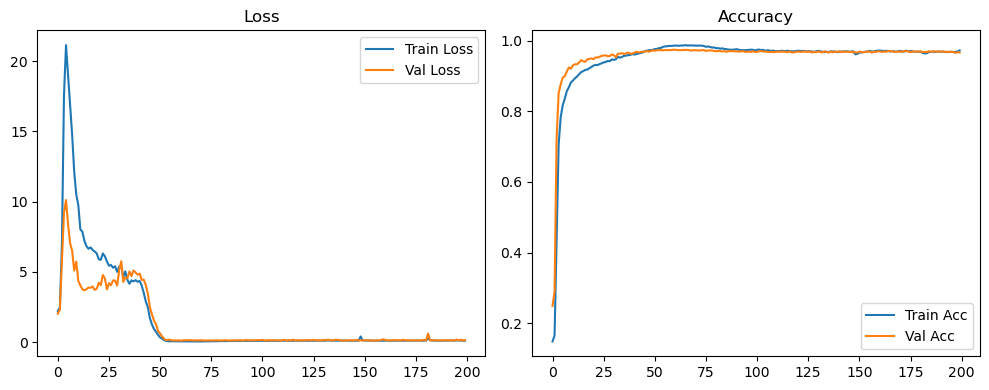

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 28.54it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 28.85it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 28.91it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 28.93it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 28.95it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 28.98it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 29.02it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 29.10it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 29.15it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 29.13it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 28.86it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 28.90it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 29.00it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 29.56it/s]

Original Model Final Test Loss: 0.1190 Accuracy: 0.9701


🚀 Running: batch256_lr0.01_0.005_0.002_dp0.0


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1784 | Val Acc: 0.3764 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1784 | Val Acc: 0.3764 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1784 | Val Acc: 0.3764 |:   0%|          | 1/200 [00:09<31:36,  9.53s/it]

| LR: 0.010 | Train Acc: 0.2977 | Val Acc: 0.6701 |:   0%|          | 1/200 [00:18<31:36,  9.53s/it]

| LR: 0.010 | Train Acc: 0.2977 | Val Acc: 0.6701 |:   0%|          | 1/200 [00:18<31:36,  9.53s/it]

| LR: 0.010 | Train Acc: 0.2977 | Val Acc: 0.6701 |:   1%|          | 2/200 [00:18<30:45,  9.32s/it]

| LR: 0.010 | Train Acc: 0.7490 | Val Acc: 0.8267 |:   1%|          | 2/200 [00:27<30:45,  9.32s/it]

| LR: 0.010 | Train Acc: 0.7490 | Val Acc: 0.8267 |:   1%|          | 2/200 [00:27<30:45,  9.32s/it]

| LR: 0.010 | Train Acc: 0.7490 | Val Acc: 0.8267 |:   2%|▏         | 3/200 [00:27<29:42,  9.05s/it]

| LR: 0.010 | Train Acc: 0.8352 | Val Acc: 0.8452 |:   2%|▏         | 3/200 [00:36<29:42,  9.05s/it]

| LR: 0.010 | Train Acc: 0.8352 | Val Acc: 0.8452 |:   2%|▏         | 3/200 [00:36<29:42,  9.05s/it]

| LR: 0.010 | Train Acc: 0.8352 | Val Acc: 0.8452 |:   2%|▏         | 4/200 [00:36<29:10,  8.93s/it]

| LR: 0.010 | Train Acc: 0.8667 | Val Acc: 0.8852 |:   2%|▏         | 4/200 [00:44<29:10,  8.93s/it]

| LR: 0.010 | Train Acc: 0.8667 | Val Acc: 0.8852 |:   2%|▏         | 4/200 [00:44<29:10,  8.93s/it]

| LR: 0.010 | Train Acc: 0.8667 | Val Acc: 0.8852 |:   2%|▎         | 5/200 [00:44<28:41,  8.83s/it]

| LR: 0.010 | Train Acc: 0.8852 | Val Acc: 0.8979 |:   2%|▎         | 5/200 [00:53<28:41,  8.83s/it]

| LR: 0.010 | Train Acc: 0.8852 | Val Acc: 0.8979 |:   2%|▎         | 5/200 [00:53<28:41,  8.83s/it]

| LR: 0.010 | Train Acc: 0.8852 | Val Acc: 0.8979 |:   3%|▎         | 6/200 [00:53<28:26,  8.80s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9019 |:   3%|▎         | 6/200 [01:02<28:26,  8.80s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9019 |:   3%|▎         | 6/200 [01:02<28:26,  8.80s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9019 |:   4%|▎         | 7/200 [01:02<28:18,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9149 |:   4%|▎         | 7/200 [01:11<28:18,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9149 |:   4%|▎         | 7/200 [01:11<28:18,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9149 |:   4%|▍         | 8/200 [01:11<28:19,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9146 | Val Acc: 0.9182 |:   4%|▍         | 8/200 [01:20<28:19,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9146 | Val Acc: 0.9182 |:   4%|▍         | 8/200 [01:20<28:19,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9146 | Val Acc: 0.9182 |:   4%|▍         | 9/200 [01:20<28:04,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9237 | Val Acc: 0.9161 |:   4%|▍         | 9/200 [01:28<28:04,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9237 | Val Acc: 0.9161 |:   4%|▍         | 9/200 [01:28<28:04,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9237 | Val Acc: 0.9161 |:   5%|▌         | 10/200 [01:28<27:47,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9272 | Val Acc: 0.9265 |:   5%|▌         | 10/200 [01:37<27:47,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9272 | Val Acc: 0.9265 |:   5%|▌         | 10/200 [01:37<27:47,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9272 | Val Acc: 0.9265 |:   6%|▌         | 11/200 [01:37<27:35,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9338 | Val Acc: 0.9303 |:   6%|▌         | 11/200 [01:46<27:35,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9338 | Val Acc: 0.9303 |:   6%|▌         | 11/200 [01:46<27:35,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9338 | Val Acc: 0.9303 |:   6%|▌         | 12/200 [01:46<27:23,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9371 | Val Acc: 0.9284 |:   6%|▌         | 12/200 [01:54<27:23,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9371 | Val Acc: 0.9284 |:   6%|▌         | 12/200 [01:54<27:23,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9371 | Val Acc: 0.9284 |:   6%|▋         | 13/200 [01:54<27:10,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9411 | Val Acc: 0.9333 |:   6%|▋         | 13/200 [02:03<27:10,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9411 | Val Acc: 0.9333 |:   6%|▋         | 13/200 [02:03<27:10,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9411 | Val Acc: 0.9333 |:   7%|▋         | 14/200 [02:03<27:02,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9324 |:   7%|▋         | 14/200 [02:12<27:02,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9324 |:   7%|▋         | 14/200 [02:12<27:02,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9324 |:   8%|▊         | 15/200 [02:12<27:11,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9364 |:   8%|▊         | 15/200 [02:21<27:11,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9364 |:   8%|▊         | 15/200 [02:21<27:11,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9364 |:   8%|▊         | 16/200 [02:21<26:59,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9530 | Val Acc: 0.9417 |:   8%|▊         | 16/200 [02:30<26:59,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9530 | Val Acc: 0.9417 |:   8%|▊         | 16/200 [02:30<26:59,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9530 | Val Acc: 0.9417 |:   8%|▊         | 17/200 [02:30<27:01,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9565 | Val Acc: 0.9415 |:   8%|▊         | 17/200 [02:39<27:01,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9565 | Val Acc: 0.9415 |:   8%|▊         | 17/200 [02:39<27:01,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9565 | Val Acc: 0.9415 |:   9%|▉         | 18/200 [02:39<26:51,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9580 | Val Acc: 0.9413 |:   9%|▉         | 18/200 [02:47<26:51,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9580 | Val Acc: 0.9413 |:   9%|▉         | 18/200 [02:47<26:51,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9580 | Val Acc: 0.9413 |:  10%|▉         | 19/200 [02:47<26:35,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9604 | Val Acc: 0.9463 |:  10%|▉         | 19/200 [02:56<26:35,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9604 | Val Acc: 0.9463 |:  10%|▉         | 19/200 [02:56<26:35,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9604 | Val Acc: 0.9463 |:  10%|█         | 20/200 [02:56<26:23,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9608 | Val Acc: 0.9458 |:  10%|█         | 20/200 [03:05<26:23,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9608 | Val Acc: 0.9458 |:  10%|█         | 20/200 [03:05<26:23,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9608 | Val Acc: 0.9458 |:  10%|█         | 21/200 [03:05<26:11,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9453 |:  10%|█         | 21/200 [03:14<26:11,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9453 |:  10%|█         | 21/200 [03:14<26:11,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9453 |:  11%|█         | 22/200 [03:14<26:20,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9471 |:  11%|█         | 22/200 [03:23<26:20,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9471 |:  11%|█         | 22/200 [03:23<26:20,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9471 |:  12%|█▏        | 23/200 [03:23<26:34,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9654 | Val Acc: 0.9447 |:  12%|█▏        | 23/200 [03:32<26:34,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9654 | Val Acc: 0.9447 |:  12%|█▏        | 23/200 [03:32<26:34,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9654 | Val Acc: 0.9447 |:  12%|█▏        | 24/200 [03:32<26:24,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9469 |:  12%|█▏        | 24/200 [03:41<26:24,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9469 |:  12%|█▏        | 24/200 [03:41<26:24,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9469 |:  12%|█▎        | 25/200 [03:41<26:04,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9488 |:  12%|█▎        | 25/200 [03:50<26:04,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9488 |:  12%|█▎        | 25/200 [03:50<26:04,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9488 |:  13%|█▎        | 26/200 [03:50<25:45,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9703 | Val Acc: 0.9557 |:  13%|█▎        | 26/200 [03:59<25:45,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9703 | Val Acc: 0.9557 |:  13%|█▎        | 26/200 [03:59<25:45,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9703 | Val Acc: 0.9557 |:  14%|█▎        | 27/200 [03:59<25:32,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9410 |:  14%|█▎        | 27/200 [04:08<25:32,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9410 |:  14%|█▎        | 27/200 [04:08<25:32,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9410 |:  14%|█▍        | 28/200 [04:08<25:31,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9507 |:  14%|█▍        | 28/200 [04:16<25:31,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9507 |:  14%|█▍        | 28/200 [04:16<25:31,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9507 |:  14%|█▍        | 29/200 [04:16<25:14,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9478 |:  14%|█▍        | 29/200 [04:25<25:14,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9478 |:  14%|█▍        | 29/200 [04:25<25:14,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9478 |:  15%|█▌        | 30/200 [04:25<25:00,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9479 |:  15%|█▌        | 30/200 [04:34<25:00,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9479 |:  15%|█▌        | 30/200 [04:34<25:00,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9479 |:  16%|█▌        | 31/200 [04:34<24:51,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9492 |:  16%|█▌        | 31/200 [04:43<24:51,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9492 |:  16%|█▌        | 31/200 [04:43<24:51,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9492 |:  16%|█▌        | 32/200 [04:43<24:51,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9476 |:  16%|█▌        | 32/200 [04:52<24:51,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9476 |:  16%|█▌        | 32/200 [04:52<24:51,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9476 |:  16%|█▋        | 33/200 [04:52<24:38,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9759 | Val Acc: 0.9497 |:  16%|█▋        | 33/200 [05:01<24:38,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9759 | Val Acc: 0.9497 |:  16%|█▋        | 33/200 [05:01<24:38,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9759 | Val Acc: 0.9497 |:  17%|█▋        | 34/200 [05:01<24:28,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9508 |:  17%|█▋        | 34/200 [05:09<24:28,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9508 |:  17%|█▋        | 34/200 [05:09<24:28,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9508 |:  18%|█▊        | 35/200 [05:09<24:15,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9514 |:  18%|█▊        | 35/200 [05:18<24:15,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9514 |:  18%|█▊        | 35/200 [05:18<24:15,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9514 |:  18%|█▊        | 36/200 [05:18<24:03,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9554 |:  18%|█▊        | 36/200 [05:27<24:03,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9554 |:  18%|█▊        | 36/200 [05:27<24:03,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9554 |:  18%|█▊        | 37/200 [05:27<23:52,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9558 |:  18%|█▊        | 37/200 [05:36<23:52,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9558 |:  18%|█▊        | 37/200 [05:36<23:52,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9558 |:  19%|█▉        | 38/200 [05:36<23:39,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9537 |:  19%|█▉        | 38/200 [05:44<23:39,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9537 |:  19%|█▉        | 38/200 [05:44<23:39,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9537 |:  20%|█▉        | 39/200 [05:44<23:28,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9566 |:  20%|█▉        | 39/200 [05:54<23:28,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9566 |:  20%|█▉        | 39/200 [05:54<23:28,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9566 |:  20%|██        | 40/200 [05:54<23:43,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9594 |:  20%|██        | 40/200 [06:02<23:43,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9594 |:  20%|██        | 40/200 [06:02<23:43,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9594 |:  20%|██        | 41/200 [06:02<23:29,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9843 | Val Acc: 0.9605 |:  20%|██        | 41/200 [06:11<23:29,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9843 | Val Acc: 0.9605 |:  20%|██        | 41/200 [06:11<23:29,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9843 | Val Acc: 0.9605 |:  21%|██        | 42/200 [06:11<23:13,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9847 | Val Acc: 0.9607 |:  21%|██        | 42/200 [06:20<23:13,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9847 | Val Acc: 0.9607 |:  21%|██        | 42/200 [06:20<23:13,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9847 | Val Acc: 0.9607 |:  22%|██▏       | 43/200 [06:20<23:02,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9578 |:  22%|██▏       | 43/200 [06:29<23:02,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9578 |:  22%|██▏       | 43/200 [06:29<23:02,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9578 |:  22%|██▏       | 44/200 [06:29<22:50,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9581 |:  22%|██▏       | 44/200 [06:38<22:50,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9581 |:  22%|██▏       | 44/200 [06:38<22:50,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9581 |:  22%|██▎       | 45/200 [06:38<22:47,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9568 |:  22%|██▎       | 45/200 [06:46<22:47,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9568 |:  22%|██▎       | 45/200 [06:46<22:47,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9568 |:  23%|██▎       | 46/200 [06:46<22:36,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9550 |:  23%|██▎       | 46/200 [06:55<22:36,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9550 |:  23%|██▎       | 46/200 [06:55<22:36,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9550 |:  24%|██▎       | 47/200 [06:55<22:27,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9609 |:  24%|██▎       | 47/200 [07:04<22:27,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9609 |:  24%|██▎       | 47/200 [07:04<22:27,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9609 |:  24%|██▍       | 48/200 [07:04<22:27,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9621 |:  24%|██▍       | 48/200 [07:13<22:27,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9621 |:  24%|██▍       | 48/200 [07:13<22:27,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9621 |:  24%|██▍       | 49/200 [07:13<22:30,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9873 | Val Acc: 0.9610 |:  24%|██▍       | 49/200 [07:22<22:30,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9873 | Val Acc: 0.9610 |:  24%|██▍       | 49/200 [07:22<22:30,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9873 | Val Acc: 0.9610 |:  25%|██▌       | 50/200 [07:22<22:16,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9593 |:  25%|██▌       | 50/200 [07:31<22:16,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9593 |:  25%|██▌       | 50/200 [07:31<22:16,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9593 |:  26%|██▌       | 51/200 [07:31<22:03,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9613 |:  26%|██▌       | 51/200 [07:40<22:03,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9613 |:  26%|██▌       | 51/200 [07:40<22:03,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9613 |:  26%|██▌       | 52/200 [07:40<21:51,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9878 | Val Acc: 0.9592 |:  26%|██▌       | 52/200 [07:48<21:51,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9878 | Val Acc: 0.9592 |:  26%|██▌       | 52/200 [07:48<21:51,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9878 | Val Acc: 0.9592 |:  26%|██▋       | 53/200 [07:48<21:38,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9571 |:  26%|██▋       | 53/200 [07:57<21:38,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9571 |:  26%|██▋       | 53/200 [07:57<21:38,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9571 |:  27%|██▋       | 54/200 [07:57<21:33,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9877 | Val Acc: 0.9581 |:  27%|██▋       | 54/200 [08:06<21:33,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9877 | Val Acc: 0.9581 |:  27%|██▋       | 54/200 [08:06<21:33,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9877 | Val Acc: 0.9581 |:  28%|██▊       | 55/200 [08:06<21:17,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9615 |:  28%|██▊       | 55/200 [08:15<21:17,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9615 |:  28%|██▊       | 55/200 [08:15<21:17,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9615 |:  28%|██▊       | 56/200 [08:15<21:03,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9672 |:  28%|██▊       | 56/200 [08:24<21:03,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9672 |:  28%|██▊       | 56/200 [08:24<21:03,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9672 |:  28%|██▊       | 57/200 [08:24<21:20,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9653 |:  28%|██▊       | 57/200 [08:33<21:20,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9653 |:  28%|██▊       | 57/200 [08:33<21:20,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9653 |:  29%|██▉       | 58/200 [08:33<21:01,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9639 |:  29%|██▉       | 58/200 [08:42<21:01,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9639 |:  29%|██▉       | 58/200 [08:42<21:01,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9639 |:  30%|██▉       | 59/200 [08:42<20:46,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9607 |:  30%|██▉       | 59/200 [08:50<20:46,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9607 |:  30%|██▉       | 59/200 [08:50<20:46,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9607 |:  30%|███       | 60/200 [08:50<20:33,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9650 |:  30%|███       | 60/200 [08:59<20:33,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9650 |:  30%|███       | 60/200 [08:59<20:33,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9650 |:  30%|███       | 61/200 [08:59<20:29,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9661 |:  30%|███       | 61/200 [09:08<20:29,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9661 |:  30%|███       | 61/200 [09:08<20:29,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9661 |:  31%|███       | 62/200 [09:08<20:26,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9641 |:  31%|███       | 62/200 [09:17<20:26,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9641 |:  31%|███       | 62/200 [09:17<20:26,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9641 |:  32%|███▏      | 63/200 [09:17<20:24,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9659 |:  32%|███▏      | 63/200 [09:27<20:24,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9659 |:  32%|███▏      | 63/200 [09:27<20:24,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9659 |:  32%|███▏      | 64/200 [09:27<20:36,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9647 |:  32%|███▏      | 64/200 [09:36<20:36,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9647 |:  32%|███▏      | 64/200 [09:36<20:36,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9647 |:  32%|███▎      | 65/200 [09:37<20:53,  9.28s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9649 |:  32%|███▎      | 65/200 [09:45<20:53,  9.28s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9649 |:  32%|███▎      | 65/200 [09:45<20:53,  9.28s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9649 |:  33%|███▎      | 66/200 [09:45<20:21,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9674 |:  33%|███▎      | 66/200 [09:54<20:21,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9674 |:  33%|███▎      | 66/200 [09:54<20:21,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9674 |:  34%|███▎      | 67/200 [09:54<20:01,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9673 |:  34%|███▎      | 67/200 [10:03<20:01,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9673 |:  34%|███▎      | 67/200 [10:03<20:01,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9673 |:  34%|███▍      | 68/200 [10:03<19:41,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9673 |:  34%|███▍      | 68/200 [10:12<19:41,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9673 |:  34%|███▍      | 68/200 [10:12<19:41,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9673 |:  34%|███▍      | 69/200 [10:12<19:53,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9645 |:  34%|███▍      | 69/200 [10:21<19:53,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9645 |:  34%|███▍      | 69/200 [10:21<19:53,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9645 |:  35%|███▌      | 70/200 [10:21<19:30,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9664 |:  35%|███▌      | 70/200 [10:30<19:30,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9664 |:  35%|███▌      | 70/200 [10:30<19:30,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9664 |:  36%|███▌      | 71/200 [10:30<19:12,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9667 |:  36%|███▌      | 71/200 [10:38<19:12,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9667 |:  36%|███▌      | 71/200 [10:38<19:12,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9667 |:  36%|███▌      | 72/200 [10:39<18:54,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9677 |:  36%|███▌      | 72/200 [10:47<18:54,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9677 |:  36%|███▌      | 72/200 [10:47<18:54,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9677 |:  36%|███▋      | 73/200 [10:47<18:42,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9682 |:  36%|███▋      | 73/200 [10:56<18:42,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9682 |:  36%|███▋      | 73/200 [10:56<18:42,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9682 |:  37%|███▋      | 74/200 [10:56<18:30,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9694 |:  37%|███▋      | 74/200 [11:05<18:30,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9694 |:  37%|███▋      | 74/200 [11:05<18:30,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9694 |:  38%|███▊      | 75/200 [11:05<18:27,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9708 |:  38%|███▊      | 75/200 [11:14<18:27,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9708 |:  38%|███▊      | 75/200 [11:14<18:27,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9708 |:  38%|███▊      | 76/200 [11:14<18:29,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9712 |:  38%|███▊      | 76/200 [11:23<18:29,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9712 |:  38%|███▊      | 76/200 [11:23<18:29,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9712 |:  38%|███▊      | 77/200 [11:23<18:10,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9982 | Val Acc: 0.9684 |:  38%|███▊      | 77/200 [11:32<18:10,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9982 | Val Acc: 0.9684 |:  38%|███▊      | 77/200 [11:32<18:10,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9982 | Val Acc: 0.9684 |:  39%|███▉      | 78/200 [11:32<18:05,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9978 | Val Acc: 0.9696 |:  39%|███▉      | 78/200 [11:41<18:05,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9978 | Val Acc: 0.9696 |:  39%|███▉      | 78/200 [11:41<18:05,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9978 | Val Acc: 0.9696 |:  40%|███▉      | 79/200 [11:41<17:55,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9690 |:  40%|███▉      | 79/200 [11:49<17:55,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9690 |:  40%|███▉      | 79/200 [11:49<17:55,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9690 |:  40%|████      | 80/200 [11:49<17:43,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9663 |:  40%|████      | 80/200 [11:58<17:43,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9663 |:  40%|████      | 80/200 [11:58<17:43,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9663 |:  40%|████      | 81/200 [11:58<17:32,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9683 |:  40%|████      | 81/200 [12:07<17:32,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9683 |:  40%|████      | 81/200 [12:07<17:32,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9683 |:  41%|████      | 82/200 [12:07<17:21,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9693 |:  41%|████      | 82/200 [12:16<17:21,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9693 |:  41%|████      | 82/200 [12:16<17:21,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9693 |:  42%|████▏     | 83/200 [12:16<17:26,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9696 |:  42%|████▏     | 83/200 [12:25<17:26,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9696 |:  42%|████▏     | 83/200 [12:25<17:26,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9696 |:  42%|████▏     | 84/200 [12:25<17:10,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9974 | Val Acc: 0.9698 |:  42%|████▏     | 84/200 [12:34<17:10,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9974 | Val Acc: 0.9698 |:  42%|████▏     | 84/200 [12:34<17:10,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9974 | Val Acc: 0.9698 |:  42%|████▎     | 85/200 [12:34<17:03,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9682 |:  42%|████▎     | 85/200 [12:43<17:03,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9682 |:  42%|████▎     | 85/200 [12:43<17:03,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9682 |:  43%|████▎     | 86/200 [12:43<17:04,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9655 |:  43%|████▎     | 86/200 [12:52<17:04,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9655 |:  43%|████▎     | 86/200 [12:52<17:04,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9655 |:  44%|████▎     | 87/200 [12:52<16:51,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9629 |:  44%|████▎     | 87/200 [13:01<16:51,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9629 |:  44%|████▎     | 87/200 [13:01<16:51,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9629 |:  44%|████▍     | 88/200 [13:01<16:48,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9652 |:  44%|████▍     | 88/200 [13:10<16:48,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9652 |:  44%|████▍     | 88/200 [13:10<16:48,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9652 |:  44%|████▍     | 89/200 [13:10<16:31,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9684 |:  44%|████▍     | 89/200 [13:19<16:31,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9684 |:  44%|████▍     | 89/200 [13:19<16:31,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9684 |:  45%|████▌     | 90/200 [13:19<16:16,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9685 |:  45%|████▌     | 90/200 [13:27<16:16,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9685 |:  45%|████▌     | 90/200 [13:27<16:16,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9685 |:  46%|████▌     | 91/200 [13:27<16:05,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9637 |:  46%|████▌     | 91/200 [13:36<16:05,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9637 |:  46%|████▌     | 91/200 [13:36<16:05,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9637 |:  46%|████▌     | 92/200 [13:36<15:54,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9951 | Val Acc: 0.9652 |:  46%|████▌     | 92/200 [13:45<15:54,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9951 | Val Acc: 0.9652 |:  46%|████▌     | 92/200 [13:45<15:54,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9951 | Val Acc: 0.9652 |:  46%|████▋     | 93/200 [13:45<15:44,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9693 |:  46%|████▋     | 93/200 [13:54<15:44,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9693 |:  46%|████▋     | 93/200 [13:54<15:44,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9693 |:  47%|████▋     | 94/200 [13:54<15:34,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9654 |:  47%|████▋     | 94/200 [14:03<15:34,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9654 |:  47%|████▋     | 94/200 [14:03<15:34,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9654 |:  48%|████▊     | 95/200 [14:03<15:26,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9663 |:  48%|████▊     | 95/200 [14:12<15:26,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9663 |:  48%|████▊     | 95/200 [14:12<15:26,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9663 |:  48%|████▊     | 96/200 [14:12<15:17,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9660 |:  48%|████▊     | 96/200 [14:20<15:17,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9660 |:  48%|████▊     | 96/200 [14:20<15:17,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9660 |:  48%|████▊     | 97/200 [14:20<15:04,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9947 | Val Acc: 0.9665 |:  48%|████▊     | 97/200 [14:29<15:04,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9947 | Val Acc: 0.9665 |:  48%|████▊     | 97/200 [14:29<15:04,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9947 | Val Acc: 0.9665 |:  49%|████▉     | 98/200 [14:29<14:55,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9664 |:  49%|████▉     | 98/200 [14:38<14:55,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9664 |:  49%|████▉     | 98/200 [14:38<14:55,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9664 |:  50%|████▉     | 99/200 [14:38<14:44,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9657 |:  50%|████▉     | 99/200 [14:47<14:44,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9657 |:  50%|████▉     | 99/200 [14:47<14:44,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9657 |:  50%|█████     | 100/200 [14:47<14:38,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9692 |:  50%|█████     | 100/200 [14:55<14:38,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9692 |:  50%|█████     | 100/200 [14:55<14:38,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9692 |:  50%|█████     | 101/200 [14:55<14:31,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9705 |:  50%|█████     | 101/200 [15:04<14:31,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9705 |:  50%|█████     | 101/200 [15:04<14:31,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9705 |:  51%|█████     | 102/200 [15:04<14:23,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9708 |:  51%|█████     | 102/200 [15:13<14:23,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9708 |:  51%|█████     | 102/200 [15:13<14:23,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9708 |:  52%|█████▏    | 103/200 [15:13<14:16,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9714 |:  52%|█████▏    | 103/200 [15:22<14:16,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9714 |:  52%|█████▏    | 103/200 [15:22<14:16,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9714 |:  52%|█████▏    | 104/200 [15:22<14:07,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9988 | Val Acc: 0.9702 |:  52%|█████▏    | 104/200 [15:31<14:07,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9988 | Val Acc: 0.9702 |:  52%|█████▏    | 104/200 [15:31<14:07,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9988 | Val Acc: 0.9702 |:  52%|█████▎    | 105/200 [15:31<13:58,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9700 |:  52%|█████▎    | 105/200 [15:40<13:58,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9700 |:  52%|█████▎    | 105/200 [15:40<13:58,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9700 |:  53%|█████▎    | 106/200 [15:40<14:13,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9693 |:  53%|█████▎    | 106/200 [15:49<14:13,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9693 |:  53%|█████▎    | 106/200 [15:49<14:13,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9693 |:  54%|█████▎    | 107/200 [15:49<13:55,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9688 |:  54%|█████▎    | 107/200 [15:58<13:55,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9688 |:  54%|█████▎    | 107/200 [15:58<13:55,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9688 |:  54%|█████▍    | 108/200 [15:58<13:40,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9691 |:  54%|█████▍    | 108/200 [16:07<13:40,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9691 |:  54%|█████▍    | 108/200 [16:07<13:40,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9691 |:  55%|█████▍    | 109/200 [16:07<13:27,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9677 |:  55%|█████▍    | 109/200 [16:16<13:27,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9677 |:  55%|█████▍    | 109/200 [16:16<13:27,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9677 |:  55%|█████▌    | 110/200 [16:16<13:20,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9691 |:  55%|█████▌    | 110/200 [16:24<13:20,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9691 |:  55%|█████▌    | 110/200 [16:24<13:20,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9691 |:  56%|█████▌    | 111/200 [16:24<13:07,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9679 |:  56%|█████▌    | 111/200 [16:33<13:07,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9679 |:  56%|█████▌    | 111/200 [16:33<13:07,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9679 |:  56%|█████▌    | 112/200 [16:33<12:54,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9677 |:  56%|█████▌    | 112/200 [16:42<12:54,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9677 |:  56%|█████▌    | 112/200 [16:42<12:54,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9677 |:  56%|█████▋    | 113/200 [16:42<12:43,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9703 |:  56%|█████▋    | 113/200 [16:51<12:43,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9703 |:  56%|█████▋    | 113/200 [16:51<12:43,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9703 |:  57%|█████▋    | 114/200 [16:51<12:57,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9708 |:  57%|█████▋    | 114/200 [17:00<12:57,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9708 |:  57%|█████▋    | 114/200 [17:00<12:57,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9708 |:  57%|█████▊    | 115/200 [17:00<12:43,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9678 |:  57%|█████▊    | 115/200 [17:09<12:43,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9678 |:  57%|█████▊    | 115/200 [17:09<12:43,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9678 |:  58%|█████▊    | 116/200 [17:09<12:32,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9700 |:  58%|█████▊    | 116/200 [17:19<12:32,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9700 |:  58%|█████▊    | 116/200 [17:19<12:32,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9700 |:  58%|█████▊    | 117/200 [17:19<12:37,  9.13s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9678 |:  58%|█████▊    | 117/200 [17:28<12:37,  9.13s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9678 |:  58%|█████▊    | 117/200 [17:28<12:37,  9.13s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9678 |:  59%|█████▉    | 118/200 [17:28<12:20,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9695 |:  59%|█████▉    | 118/200 [17:36<12:20,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9695 |:  59%|█████▉    | 118/200 [17:36<12:20,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9695 |:  60%|█████▉    | 119/200 [17:36<12:06,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9702 |:  60%|█████▉    | 119/200 [17:45<12:06,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9702 |:  60%|█████▉    | 119/200 [17:45<12:06,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9702 |:  60%|██████    | 120/200 [17:45<11:52,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9691 |:  60%|██████    | 120/200 [17:54<11:52,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9691 |:  60%|██████    | 120/200 [17:54<11:52,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9691 |:  60%|██████    | 121/200 [17:54<11:43,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9699 |:  60%|██████    | 121/200 [18:04<11:43,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9699 |:  60%|██████    | 121/200 [18:04<11:43,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9699 |:  61%|██████    | 122/200 [18:04<11:51,  9.12s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9688 |:  61%|██████    | 122/200 [18:13<11:51,  9.12s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9688 |:  61%|██████    | 122/200 [18:13<11:51,  9.12s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9688 |:  62%|██████▏   | 123/200 [18:13<11:48,  9.20s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9681 |:  62%|██████▏   | 123/200 [18:22<11:48,  9.20s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9681 |:  62%|██████▏   | 123/200 [18:22<11:48,  9.20s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9681 |:  62%|██████▏   | 124/200 [18:22<11:29,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9689 |:  62%|██████▏   | 124/200 [18:31<11:29,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9689 |:  62%|██████▏   | 124/200 [18:31<11:29,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9689 |:  62%|██████▎   | 125/200 [18:31<11:15,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9720 |:  62%|██████▎   | 125/200 [18:40<11:15,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9720 |:  62%|██████▎   | 125/200 [18:40<11:15,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9720 |:  63%|██████▎   | 126/200 [18:40<11:03,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9703 |:  63%|██████▎   | 126/200 [18:48<11:03,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9703 |:  63%|██████▎   | 126/200 [18:48<11:03,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9703 |:  64%|██████▎   | 127/200 [18:48<10:50,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9688 |:  64%|██████▎   | 127/200 [18:57<10:50,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9688 |:  64%|██████▎   | 127/200 [18:57<10:50,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9688 |:  64%|██████▍   | 128/200 [18:57<10:46,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9672 |:  64%|██████▍   | 128/200 [19:06<10:46,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9672 |:  64%|██████▍   | 128/200 [19:06<10:46,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9672 |:  64%|██████▍   | 129/200 [19:06<10:31,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9719 |:  64%|██████▍   | 129/200 [19:15<10:31,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9719 |:  64%|██████▍   | 129/200 [19:15<10:31,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9719 |:  65%|██████▌   | 130/200 [19:15<10:19,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9712 |:  65%|██████▌   | 130/200 [19:24<10:19,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9712 |:  65%|██████▌   | 130/200 [19:24<10:19,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9712 |:  66%|██████▌   | 131/200 [19:24<10:16,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9991 | Val Acc: 0.9709 |:  66%|██████▌   | 131/200 [19:33<10:16,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9991 | Val Acc: 0.9709 |:  66%|██████▌   | 131/200 [19:33<10:16,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9991 | Val Acc: 0.9709 |:  66%|██████▌   | 132/200 [19:33<10:06,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9722 |:  66%|██████▌   | 132/200 [19:42<10:06,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9722 |:  66%|██████▌   | 132/200 [19:42<10:06,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9722 |:  66%|██████▋   | 133/200 [19:42<09:54,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9684 |:  66%|██████▋   | 133/200 [19:50<09:54,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9684 |:  66%|██████▋   | 133/200 [19:50<09:54,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9684 |:  67%|██████▋   | 134/200 [19:50<09:43,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9684 |:  67%|██████▋   | 134/200 [19:59<09:43,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9684 |:  67%|██████▋   | 134/200 [19:59<09:43,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9684 |:  68%|██████▊   | 135/200 [20:00<09:38,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9991 | Val Acc: 0.9698 |:  68%|██████▊   | 135/200 [20:09<09:38,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9991 | Val Acc: 0.9698 |:  68%|██████▊   | 135/200 [20:09<09:38,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9991 | Val Acc: 0.9698 |:  68%|██████▊   | 136/200 [20:09<09:42,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9679 |:  68%|██████▊   | 136/200 [20:18<09:42,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9679 |:  68%|██████▊   | 136/200 [20:18<09:42,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9679 |:  68%|██████▊   | 137/200 [20:18<09:26,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9697 |:  68%|██████▊   | 137/200 [20:27<09:26,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9697 |:  68%|██████▊   | 137/200 [20:27<09:26,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9697 |:  69%|██████▉   | 138/200 [20:27<09:13,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9988 | Val Acc: 0.9702 |:  69%|██████▉   | 138/200 [20:35<09:13,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9988 | Val Acc: 0.9702 |:  69%|██████▉   | 138/200 [20:35<09:13,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9988 | Val Acc: 0.9702 |:  70%|██████▉   | 139/200 [20:35<09:02,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9705 |:  70%|██████▉   | 139/200 [20:44<09:02,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9705 |:  70%|██████▉   | 139/200 [20:44<09:02,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9705 |:  70%|███████   | 140/200 [20:44<08:55,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9696 |:  70%|███████   | 140/200 [20:53<08:55,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9696 |:  70%|███████   | 140/200 [20:53<08:55,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9696 |:  70%|███████   | 141/200 [20:53<08:44,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9712 |:  70%|███████   | 141/200 [21:02<08:44,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9712 |:  70%|███████   | 141/200 [21:02<08:44,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9712 |:  71%|███████   | 142/200 [21:02<08:33,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9700 |:  71%|███████   | 142/200 [21:11<08:33,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9700 |:  71%|███████   | 142/200 [21:11<08:33,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9700 |:  72%|███████▏  | 143/200 [21:11<08:22,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9704 |:  72%|███████▏  | 143/200 [21:19<08:22,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9704 |:  72%|███████▏  | 143/200 [21:19<08:22,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9704 |:  72%|███████▏  | 144/200 [21:19<08:12,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9701 |:  72%|███████▏  | 144/200 [21:28<08:12,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9701 |:  72%|███████▏  | 144/200 [21:28<08:12,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9701 |:  72%|███████▎  | 145/200 [21:28<08:07,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9704 |:  72%|███████▎  | 145/200 [21:37<08:07,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9704 |:  72%|███████▎  | 145/200 [21:37<08:07,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9704 |:  73%|███████▎  | 146/200 [21:37<07:59,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9723 |:  73%|███████▎  | 146/200 [21:46<07:59,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9723 |:  73%|███████▎  | 146/200 [21:46<07:59,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9723 |:  74%|███████▎  | 147/200 [21:46<07:48,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9722 |:  74%|███████▎  | 147/200 [21:55<07:48,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9722 |:  74%|███████▎  | 147/200 [21:55<07:48,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9722 |:  74%|███████▍  | 148/200 [21:55<07:38,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9990 | Val Acc: 0.9697 |:  74%|███████▍  | 148/200 [22:04<07:38,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9990 | Val Acc: 0.9697 |:  74%|███████▍  | 148/200 [22:04<07:38,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9990 | Val Acc: 0.9697 |:  74%|███████▍  | 149/200 [22:04<07:27,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9698 |:  74%|███████▍  | 149/200 [22:13<07:27,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9698 |:  74%|███████▍  | 149/200 [22:13<07:27,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9698 |:  75%|███████▌  | 150/200 [22:13<07:29,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9688 |:  75%|███████▌  | 150/200 [22:22<07:29,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9688 |:  75%|███████▌  | 150/200 [22:22<07:29,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9688 |:  76%|███████▌  | 151/200 [22:22<07:21,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9990 | Val Acc: 0.9688 |:  76%|███████▌  | 151/200 [22:32<07:21,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9990 | Val Acc: 0.9688 |:  76%|███████▌  | 151/200 [22:32<07:21,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9990 | Val Acc: 0.9688 |:  76%|███████▌  | 152/200 [22:32<07:21,  9.19s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9689 |:  76%|███████▌  | 152/200 [22:40<07:21,  9.19s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9689 |:  76%|███████▌  | 152/200 [22:40<07:21,  9.19s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9689 |:  76%|███████▋  | 153/200 [22:41<07:06,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9720 |:  76%|███████▋  | 153/200 [22:49<07:06,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9720 |:  76%|███████▋  | 153/200 [22:49<07:06,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9720 |:  77%|███████▋  | 154/200 [22:49<06:52,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9707 |:  77%|███████▋  | 154/200 [22:58<06:52,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9707 |:  77%|███████▋  | 154/200 [22:58<06:52,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9707 |:  78%|███████▊  | 155/200 [22:58<06:41,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9712 |:  78%|███████▊  | 155/200 [23:07<06:41,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9712 |:  78%|███████▊  | 155/200 [23:07<06:41,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9712 |:  78%|███████▊  | 156/200 [23:07<06:32,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9720 |:  78%|███████▊  | 156/200 [23:16<06:32,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9720 |:  78%|███████▊  | 156/200 [23:16<06:32,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9720 |:  78%|███████▊  | 157/200 [23:16<06:23,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9712 |:  78%|███████▊  | 157/200 [23:24<06:23,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9712 |:  78%|███████▊  | 157/200 [23:25<06:23,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9712 |:  79%|███████▉  | 158/200 [23:25<06:11,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9703 |:  79%|███████▉  | 158/200 [23:34<06:11,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9703 |:  79%|███████▉  | 158/200 [23:34<06:11,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9703 |:  80%|███████▉  | 159/200 [23:34<06:09,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9712 |:  80%|███████▉  | 159/200 [23:43<06:09,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9712 |:  80%|███████▉  | 159/200 [23:43<06:09,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9712 |:  80%|████████  | 160/200 [23:43<05:58,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9723 |:  80%|████████  | 160/200 [23:51<05:58,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9723 |:  80%|████████  | 160/200 [23:51<05:58,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9723 |:  80%|████████  | 161/200 [23:52<05:46,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9723 |:  80%|████████  | 161/200 [24:00<05:46,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9723 |:  80%|████████  | 161/200 [24:00<05:46,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9723 |:  81%|████████  | 162/200 [24:00<05:35,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9724 |:  81%|████████  | 162/200 [24:09<05:35,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9724 |:  81%|████████  | 162/200 [24:09<05:35,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9724 |:  82%|████████▏ | 163/200 [24:09<05:26,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9733 |:  82%|████████▏ | 163/200 [24:18<05:26,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9733 |:  82%|████████▏ | 163/200 [24:18<05:26,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9733 |:  82%|████████▏ | 164/200 [24:18<05:17,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9738 |:  82%|████████▏ | 164/200 [24:27<05:17,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9738 |:  82%|████████▏ | 164/200 [24:27<05:17,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9738 |:  82%|████████▎ | 165/200 [24:27<05:08,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9724 |:  82%|████████▎ | 165/200 [24:35<05:08,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9724 |:  82%|████████▎ | 165/200 [24:35<05:08,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9724 |:  83%|████████▎ | 166/200 [24:35<04:58,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9734 |:  83%|████████▎ | 166/200 [24:44<04:58,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9734 |:  83%|████████▎ | 166/200 [24:44<04:58,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9734 |:  84%|████████▎ | 167/200 [24:44<04:49,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9739 |:  84%|████████▎ | 167/200 [24:53<04:49,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9739 |:  84%|████████▎ | 167/200 [24:53<04:49,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9739 |:  84%|████████▍ | 168/200 [24:53<04:40,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9725 |:  84%|████████▍ | 168/200 [25:02<04:40,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9725 |:  84%|████████▍ | 168/200 [25:02<04:40,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9725 |:  84%|████████▍ | 169/200 [25:02<04:31,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9729 |:  84%|████████▍ | 169/200 [25:10<04:31,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9729 |:  84%|████████▍ | 169/200 [25:10<04:31,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9729 |:  85%|████████▌ | 170/200 [25:10<04:21,  8.72s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9732 |:  85%|████████▌ | 170/200 [25:19<04:21,  8.72s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9732 |:  85%|████████▌ | 170/200 [25:19<04:21,  8.72s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9732 |:  86%|████████▌ | 171/200 [25:19<04:16,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9729 |:  86%|████████▌ | 171/200 [25:28<04:16,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9729 |:  86%|████████▌ | 171/200 [25:28<04:16,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9729 |:  86%|████████▌ | 172/200 [25:28<04:07,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9735 |:  86%|████████▌ | 172/200 [25:37<04:07,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9735 |:  86%|████████▌ | 172/200 [25:37<04:07,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9735 |:  86%|████████▋ | 173/200 [25:37<03:57,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9742 |:  86%|████████▋ | 173/200 [25:46<03:57,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9742 |:  86%|████████▋ | 173/200 [25:46<03:57,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9742 |:  87%|████████▋ | 174/200 [25:46<03:48,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9722 |:  87%|████████▋ | 174/200 [25:54<03:48,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9722 |:  87%|████████▋ | 174/200 [25:54<03:48,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9722 |:  88%|████████▊ | 175/200 [25:54<03:38,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9739 |:  88%|████████▊ | 175/200 [26:03<03:38,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9739 |:  88%|████████▊ | 175/200 [26:03<03:38,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9739 |:  88%|████████▊ | 176/200 [26:03<03:29,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9735 |:  88%|████████▊ | 176/200 [26:12<03:29,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9735 |:  88%|████████▊ | 176/200 [26:12<03:29,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9735 |:  88%|████████▊ | 177/200 [26:12<03:21,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9737 |:  88%|████████▊ | 177/200 [26:20<03:21,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9737 |:  88%|████████▊ | 177/200 [26:20<03:21,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9737 |:  89%|████████▉ | 178/200 [26:20<03:12,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9744 |:  89%|████████▉ | 178/200 [26:29<03:12,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9744 |:  89%|████████▉ | 178/200 [26:29<03:12,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9744 |:  90%|████████▉ | 179/200 [26:29<03:03,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9748 |:  90%|████████▉ | 179/200 [26:38<03:03,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9748 |:  90%|████████▉ | 179/200 [26:38<03:03,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9748 |:  90%|█████████ | 180/200 [26:38<02:54,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9724 |:  90%|█████████ | 180/200 [26:47<02:54,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9724 |:  90%|█████████ | 180/200 [26:47<02:54,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9724 |:  90%|█████████ | 181/200 [26:47<02:46,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9734 |:  90%|█████████ | 181/200 [26:55<02:46,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9734 |:  90%|█████████ | 181/200 [26:55<02:46,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9734 |:  91%|█████████ | 182/200 [26:55<02:37,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9718 |:  91%|█████████ | 182/200 [27:04<02:37,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9718 |:  91%|█████████ | 182/200 [27:04<02:37,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9718 |:  92%|█████████▏| 183/200 [27:04<02:29,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9718 |:  92%|█████████▏| 183/200 [27:13<02:29,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9718 |:  92%|█████████▏| 183/200 [27:13<02:29,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9718 |:  92%|█████████▏| 184/200 [27:13<02:20,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9727 |:  92%|█████████▏| 184/200 [27:22<02:20,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9727 |:  92%|█████████▏| 184/200 [27:22<02:20,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9727 |:  92%|█████████▎| 185/200 [27:22<02:11,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9722 |:  92%|█████████▎| 185/200 [27:31<02:11,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9722 |:  92%|█████████▎| 185/200 [27:31<02:11,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9722 |:  93%|█████████▎| 186/200 [27:31<02:03,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9734 |:  93%|█████████▎| 186/200 [27:40<02:03,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9734 |:  93%|█████████▎| 186/200 [27:40<02:03,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9734 |:  94%|█████████▎| 187/200 [27:40<01:54,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9743 |:  94%|█████████▎| 187/200 [27:49<01:54,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9743 |:  94%|█████████▎| 187/200 [27:49<01:54,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9743 |:  94%|█████████▍| 188/200 [27:49<01:46,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9742 |:  94%|█████████▍| 188/200 [27:57<01:46,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9742 |:  94%|█████████▍| 188/200 [27:57<01:46,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9742 |:  94%|█████████▍| 189/200 [27:57<01:36,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9737 |:  94%|█████████▍| 189/200 [28:06<01:36,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9737 |:  94%|█████████▍| 189/200 [28:06<01:36,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9737 |:  95%|█████████▌| 190/200 [28:06<01:27,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9712 |:  95%|█████████▌| 190/200 [28:15<01:27,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9712 |:  95%|█████████▌| 190/200 [28:15<01:27,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9712 |:  96%|█████████▌| 191/200 [28:15<01:19,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9728 |:  96%|█████████▌| 191/200 [28:24<01:19,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9728 |:  96%|█████████▌| 191/200 [28:24<01:19,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9728 |:  96%|█████████▌| 192/200 [28:24<01:10,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9714 |:  96%|█████████▌| 192/200 [28:32<01:10,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9714 |:  96%|█████████▌| 192/200 [28:32<01:10,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9714 |:  96%|█████████▋| 193/200 [28:32<01:01,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9730 |:  96%|█████████▋| 193/200 [28:41<01:01,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9730 |:  96%|█████████▋| 193/200 [28:41<01:01,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9730 |:  97%|█████████▋| 194/200 [28:41<00:52,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9725 |:  97%|█████████▋| 194/200 [28:50<00:52,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9725 |:  97%|█████████▋| 194/200 [28:50<00:52,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9725 |:  98%|█████████▊| 195/200 [28:50<00:43,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9719 |:  98%|█████████▊| 195/200 [28:59<00:43,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9719 |:  98%|█████████▊| 195/200 [28:59<00:43,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9719 |:  98%|█████████▊| 196/200 [28:59<00:35,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9730 |:  98%|█████████▊| 196/200 [29:07<00:35,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9730 |:  98%|█████████▊| 196/200 [29:07<00:35,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9730 |:  98%|█████████▊| 197/200 [29:07<00:26,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9714 |:  98%|█████████▊| 197/200 [29:16<00:26,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9714 |:  98%|█████████▊| 197/200 [29:16<00:26,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9714 |:  99%|█████████▉| 198/200 [29:16<00:17,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9728 |:  99%|█████████▉| 198/200 [29:25<00:17,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9728 |:  99%|█████████▉| 198/200 [29:25<00:17,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9728 |: 100%|█████████▉| 199/200 [29:25<00:08,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9721 |: 100%|█████████▉| 199/200 [29:34<00:08,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9721 |: 100%|█████████▉| 199/200 [29:34<00:08,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9721 |: 100%|██████████| 200/200 [29:34<00:00,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9721 |: 100%|██████████| 200/200 [29:34<00:00,  8.87s/it]

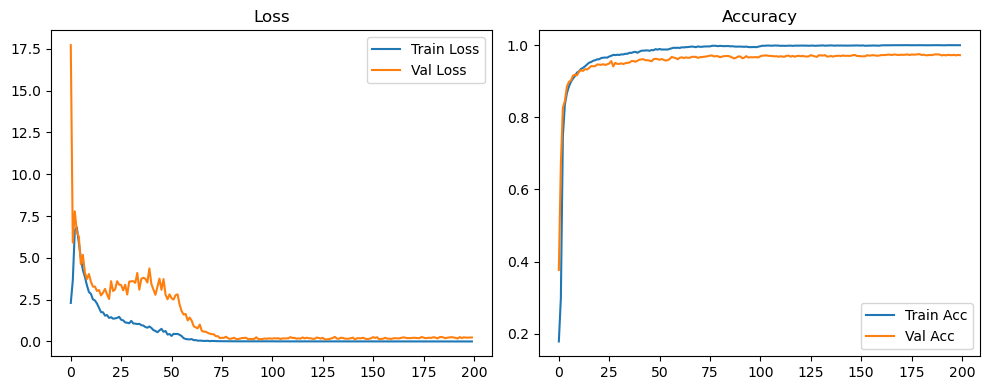

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 28.59it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 28.85it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 29.09it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 29.26it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 27.98it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 28.28it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 28.51it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 28.67it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 28.78it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 28.97it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 29.07it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 29.07it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 29.14it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 29.45it/s]

Original Model Final Test Loss: 0.2218 Accuracy: 0.9733


🚀 Running: batch256_lr0.01_0.005_0.002_dp0.2


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1730 | Val Acc: 0.3933 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1730 | Val Acc: 0.3933 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1730 | Val Acc: 0.3933 |:   0%|          | 1/200 [00:09<30:21,  9.15s/it]

| LR: 0.010 | Train Acc: 0.2424 | Val Acc: 0.5068 |:   0%|          | 1/200 [00:18<30:21,  9.15s/it]

| LR: 0.010 | Train Acc: 0.2424 | Val Acc: 0.5068 |:   0%|          | 1/200 [00:18<30:21,  9.15s/it]

| LR: 0.010 | Train Acc: 0.2424 | Val Acc: 0.5068 |:   1%|          | 2/200 [00:18<30:24,  9.21s/it]

| LR: 0.010 | Train Acc: 0.6560 | Val Acc: 0.7921 |:   1%|          | 2/200 [00:27<30:24,  9.21s/it]

| LR: 0.010 | Train Acc: 0.6560 | Val Acc: 0.7921 |:   1%|          | 2/200 [00:27<30:24,  9.21s/it]

| LR: 0.010 | Train Acc: 0.6560 | Val Acc: 0.7921 |:   2%|▏         | 3/200 [00:27<29:46,  9.07s/it]

| LR: 0.010 | Train Acc: 0.8071 | Val Acc: 0.8728 |:   2%|▏         | 3/200 [00:36<29:46,  9.07s/it]

| LR: 0.010 | Train Acc: 0.8071 | Val Acc: 0.8728 |:   2%|▏         | 3/200 [00:36<29:46,  9.07s/it]

| LR: 0.010 | Train Acc: 0.8071 | Val Acc: 0.8728 |:   2%|▏         | 4/200 [00:36<29:18,  8.97s/it]

| LR: 0.010 | Train Acc: 0.8497 | Val Acc: 0.8785 |:   2%|▏         | 4/200 [00:44<29:18,  8.97s/it]

| LR: 0.010 | Train Acc: 0.8497 | Val Acc: 0.8785 |:   2%|▏         | 4/200 [00:44<29:18,  8.97s/it]

| LR: 0.010 | Train Acc: 0.8497 | Val Acc: 0.8785 |:   2%|▎         | 5/200 [00:44<28:58,  8.92s/it]

| LR: 0.010 | Train Acc: 0.8673 | Val Acc: 0.8972 |:   2%|▎         | 5/200 [00:53<28:58,  8.92s/it]

| LR: 0.010 | Train Acc: 0.8673 | Val Acc: 0.8972 |:   2%|▎         | 5/200 [00:53<28:58,  8.92s/it]

| LR: 0.010 | Train Acc: 0.8673 | Val Acc: 0.8972 |:   3%|▎         | 6/200 [00:53<28:37,  8.85s/it]

| LR: 0.010 | Train Acc: 0.8861 | Val Acc: 0.9073 |:   3%|▎         | 6/200 [01:02<28:37,  8.85s/it]

| LR: 0.010 | Train Acc: 0.8861 | Val Acc: 0.9073 |:   3%|▎         | 6/200 [01:02<28:37,  8.85s/it]

| LR: 0.010 | Train Acc: 0.8861 | Val Acc: 0.9073 |:   4%|▎         | 7/200 [01:02<28:30,  8.86s/it]

| LR: 0.010 | Train Acc: 0.8976 | Val Acc: 0.9189 |:   4%|▎         | 7/200 [01:12<28:30,  8.86s/it]

| LR: 0.010 | Train Acc: 0.8976 | Val Acc: 0.9189 |:   4%|▎         | 7/200 [01:12<28:30,  8.86s/it]

| LR: 0.010 | Train Acc: 0.8976 | Val Acc: 0.9189 |:   4%|▍         | 8/200 [01:12<29:07,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9238 |:   4%|▍         | 8/200 [01:20<29:07,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9238 |:   4%|▍         | 8/200 [01:20<29:07,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9238 |:   4%|▍         | 9/200 [01:20<28:41,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9153 | Val Acc: 0.9301 |:   4%|▍         | 9/200 [01:29<28:41,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9153 | Val Acc: 0.9301 |:   4%|▍         | 9/200 [01:29<28:41,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9153 | Val Acc: 0.9301 |:   5%|▌         | 10/200 [01:29<28:25,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9214 | Val Acc: 0.9319 |:   5%|▌         | 10/200 [01:39<28:25,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9214 | Val Acc: 0.9319 |:   5%|▌         | 10/200 [01:39<28:25,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9214 | Val Acc: 0.9319 |:   6%|▌         | 11/200 [01:39<28:36,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9262 | Val Acc: 0.9347 |:   6%|▌         | 11/200 [01:47<28:36,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9262 | Val Acc: 0.9347 |:   6%|▌         | 11/200 [01:47<28:36,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9262 | Val Acc: 0.9347 |:   6%|▌         | 12/200 [01:48<28:13,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9311 | Val Acc: 0.9361 |:   6%|▌         | 12/200 [01:56<28:13,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9311 | Val Acc: 0.9361 |:   6%|▌         | 12/200 [01:56<28:13,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9311 | Val Acc: 0.9361 |:   6%|▋         | 13/200 [01:56<27:54,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9340 | Val Acc: 0.9422 |:   6%|▋         | 13/200 [02:05<27:54,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9340 | Val Acc: 0.9422 |:   6%|▋         | 13/200 [02:05<27:54,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9340 | Val Acc: 0.9422 |:   7%|▋         | 14/200 [02:05<27:39,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9385 | Val Acc: 0.9433 |:   7%|▋         | 14/200 [02:14<27:39,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9385 | Val Acc: 0.9433 |:   7%|▋         | 14/200 [02:14<27:39,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9385 | Val Acc: 0.9433 |:   8%|▊         | 15/200 [02:14<27:27,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9399 | Val Acc: 0.9456 |:   8%|▊         | 15/200 [02:23<27:27,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9399 | Val Acc: 0.9456 |:   8%|▊         | 15/200 [02:23<27:27,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9399 | Val Acc: 0.9456 |:   8%|▊         | 16/200 [02:23<27:21,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9433 |:   8%|▊         | 16/200 [02:32<27:21,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9433 |:   8%|▊         | 16/200 [02:32<27:21,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9433 |:   8%|▊         | 17/200 [02:32<27:10,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9495 |:   8%|▊         | 17/200 [02:41<27:10,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9495 |:   8%|▊         | 17/200 [02:41<27:10,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9495 |:   9%|▉         | 18/200 [02:41<26:59,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9493 |:   9%|▉         | 18/200 [02:50<26:59,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9493 |:   9%|▉         | 18/200 [02:50<26:59,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9493 |:  10%|▉         | 19/200 [02:50<26:50,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9517 |:  10%|▉         | 19/200 [02:59<26:50,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9517 |:  10%|▉         | 19/200 [02:59<26:50,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9517 |:  10%|█         | 20/200 [02:59<26:42,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9548 | Val Acc: 0.9514 |:  10%|█         | 20/200 [03:08<26:42,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9548 | Val Acc: 0.9514 |:  10%|█         | 20/200 [03:08<26:42,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9548 | Val Acc: 0.9514 |:  10%|█         | 21/200 [03:08<26:43,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9526 |:  10%|█         | 21/200 [03:16<26:43,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9526 |:  10%|█         | 21/200 [03:16<26:43,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9526 |:  11%|█         | 22/200 [03:17<26:27,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9584 | Val Acc: 0.9507 |:  11%|█         | 22/200 [03:25<26:27,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9584 | Val Acc: 0.9507 |:  11%|█         | 22/200 [03:25<26:27,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9584 | Val Acc: 0.9507 |:  12%|█▏        | 23/200 [03:25<26:12,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9578 | Val Acc: 0.9548 |:  12%|█▏        | 23/200 [03:34<26:12,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9578 | Val Acc: 0.9548 |:  12%|█▏        | 23/200 [03:34<26:12,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9578 | Val Acc: 0.9548 |:  12%|█▏        | 24/200 [03:34<26:08,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9588 | Val Acc: 0.9453 |:  12%|█▏        | 24/200 [03:43<26:08,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9588 | Val Acc: 0.9453 |:  12%|█▏        | 24/200 [03:43<26:08,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9588 | Val Acc: 0.9453 |:  12%|█▎        | 25/200 [03:43<25:54,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9557 |:  12%|█▎        | 25/200 [03:52<25:54,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9557 |:  12%|█▎        | 25/200 [03:52<25:54,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9557 |:  13%|█▎        | 26/200 [03:52<26:10,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9527 |:  13%|█▎        | 26/200 [04:01<26:10,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9527 |:  13%|█▎        | 26/200 [04:01<26:10,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9527 |:  14%|█▎        | 27/200 [04:01<25:52,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9633 | Val Acc: 0.9487 |:  14%|█▎        | 27/200 [04:11<25:52,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9633 | Val Acc: 0.9487 |:  14%|█▎        | 27/200 [04:11<25:52,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9633 | Val Acc: 0.9487 |:  14%|█▍        | 28/200 [04:11<26:23,  9.21s/it]

| LR: 0.010 | Train Acc: 0.9646 | Val Acc: 0.9585 |:  14%|█▍        | 28/200 [04:20<26:23,  9.21s/it]

| LR: 0.010 | Train Acc: 0.9646 | Val Acc: 0.9585 |:  14%|█▍        | 28/200 [04:20<26:23,  9.21s/it]

| LR: 0.010 | Train Acc: 0.9646 | Val Acc: 0.9585 |:  14%|█▍        | 29/200 [04:20<25:59,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9657 | Val Acc: 0.9572 |:  14%|█▍        | 29/200 [04:29<25:59,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9657 | Val Acc: 0.9572 |:  14%|█▍        | 29/200 [04:29<25:59,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9657 | Val Acc: 0.9572 |:  15%|█▌        | 30/200 [04:29<25:31,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9679 | Val Acc: 0.9597 |:  15%|█▌        | 30/200 [04:38<25:31,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9679 | Val Acc: 0.9597 |:  15%|█▌        | 30/200 [04:38<25:31,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9679 | Val Acc: 0.9597 |:  16%|█▌        | 31/200 [04:38<25:12,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9705 | Val Acc: 0.9617 |:  16%|█▌        | 31/200 [04:46<25:12,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9705 | Val Acc: 0.9617 |:  16%|█▌        | 31/200 [04:46<25:12,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9705 | Val Acc: 0.9617 |:  16%|█▌        | 32/200 [04:47<25:03,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9609 |:  16%|█▌        | 32/200 [04:56<25:03,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9609 |:  16%|█▌        | 32/200 [04:56<25:03,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9609 |:  16%|█▋        | 33/200 [04:56<25:31,  9.17s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9573 |:  16%|█▋        | 33/200 [05:05<25:31,  9.17s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9573 |:  16%|█▋        | 33/200 [05:05<25:31,  9.17s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9573 |:  17%|█▋        | 34/200 [05:05<25:03,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9594 |:  17%|█▋        | 34/200 [05:14<25:03,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9594 |:  17%|█▋        | 34/200 [05:14<25:03,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9594 |:  18%|█▊        | 35/200 [05:14<24:48,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9750 | Val Acc: 0.9626 |:  18%|█▊        | 35/200 [05:23<24:48,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9750 | Val Acc: 0.9626 |:  18%|█▊        | 35/200 [05:23<24:48,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9750 | Val Acc: 0.9626 |:  18%|█▊        | 36/200 [05:23<24:32,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9771 | Val Acc: 0.9646 |:  18%|█▊        | 36/200 [05:31<24:32,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9771 | Val Acc: 0.9646 |:  18%|█▊        | 36/200 [05:31<24:32,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9771 | Val Acc: 0.9646 |:  18%|█▊        | 37/200 [05:32<24:11,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9767 | Val Acc: 0.9606 |:  18%|█▊        | 37/200 [05:41<24:11,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9767 | Val Acc: 0.9606 |:  18%|█▊        | 37/200 [05:41<24:11,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9767 | Val Acc: 0.9606 |:  19%|█▉        | 38/200 [05:41<24:15,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9777 | Val Acc: 0.9637 |:  19%|█▉        | 38/200 [05:50<24:15,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9777 | Val Acc: 0.9637 |:  19%|█▉        | 38/200 [05:50<24:15,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9777 | Val Acc: 0.9637 |:  20%|█▉        | 39/200 [05:50<24:31,  9.14s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9633 |:  20%|█▉        | 39/200 [05:59<24:31,  9.14s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9633 |:  20%|█▉        | 39/200 [05:59<24:31,  9.14s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9633 |:  20%|██        | 40/200 [05:59<24:20,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9623 |:  20%|██        | 40/200 [06:08<24:20,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9623 |:  20%|██        | 40/200 [06:08<24:20,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9623 |:  20%|██        | 41/200 [06:08<23:54,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9637 |:  20%|██        | 41/200 [06:17<23:54,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9637 |:  20%|██        | 41/200 [06:17<23:54,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9637 |:  21%|██        | 42/200 [06:17<23:53,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9636 |:  21%|██        | 42/200 [06:26<23:53,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9636 |:  21%|██        | 42/200 [06:26<23:53,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9636 |:  22%|██▏       | 43/200 [06:27<23:53,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9607 |:  22%|██▏       | 43/200 [06:35<23:53,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9607 |:  22%|██▏       | 43/200 [06:35<23:53,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9607 |:  22%|██▏       | 44/200 [06:35<23:30,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9637 |:  22%|██▏       | 44/200 [06:44<23:30,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9637 |:  22%|██▏       | 44/200 [06:44<23:30,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9637 |:  22%|██▎       | 45/200 [06:44<23:12,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9653 |:  22%|██▎       | 45/200 [06:53<23:12,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9653 |:  22%|██▎       | 45/200 [06:53<23:12,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9653 |:  23%|██▎       | 46/200 [06:53<22:59,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9624 |:  23%|██▎       | 46/200 [07:02<22:59,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9624 |:  23%|██▎       | 46/200 [07:02<22:59,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9624 |:  24%|██▎       | 47/200 [07:02<22:49,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9667 |:  24%|██▎       | 47/200 [07:11<22:49,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9667 |:  24%|██▎       | 47/200 [07:11<22:49,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9667 |:  24%|██▍       | 48/200 [07:11<22:39,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9627 |:  24%|██▍       | 48/200 [07:21<22:39,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9627 |:  24%|██▍       | 48/200 [07:21<22:39,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9627 |:  24%|██▍       | 49/200 [07:21<23:02,  9.15s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9680 |:  24%|██▍       | 49/200 [07:29<23:02,  9.15s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9680 |:  24%|██▍       | 49/200 [07:29<23:02,  9.15s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9680 |:  25%|██▌       | 50/200 [07:29<22:34,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9674 |:  25%|██▌       | 50/200 [07:38<22:34,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9674 |:  25%|██▌       | 50/200 [07:38<22:34,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9674 |:  26%|██▌       | 51/200 [07:38<22:27,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9866 | Val Acc: 0.9714 |:  26%|██▌       | 51/200 [07:47<22:27,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9866 | Val Acc: 0.9714 |:  26%|██▌       | 51/200 [07:47<22:27,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9866 | Val Acc: 0.9714 |:  26%|██▌       | 52/200 [07:47<22:17,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9667 |:  26%|██▌       | 52/200 [07:56<22:17,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9667 |:  26%|██▌       | 52/200 [07:56<22:17,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9667 |:  26%|██▋       | 53/200 [07:56<22:00,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9872 | Val Acc: 0.9702 |:  26%|██▋       | 53/200 [08:06<22:00,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9872 | Val Acc: 0.9702 |:  26%|██▋       | 53/200 [08:06<22:00,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9872 | Val Acc: 0.9702 |:  27%|██▋       | 54/200 [08:06<22:25,  9.22s/it]

| LR: 0.010 | Train Acc: 0.9885 | Val Acc: 0.9688 |:  27%|██▋       | 54/200 [08:15<22:25,  9.22s/it]

| LR: 0.010 | Train Acc: 0.9885 | Val Acc: 0.9688 |:  27%|██▋       | 54/200 [08:15<22:25,  9.22s/it]

| LR: 0.010 | Train Acc: 0.9885 | Val Acc: 0.9688 |:  28%|██▊       | 55/200 [08:15<22:06,  9.15s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9703 |:  28%|██▊       | 55/200 [08:24<22:06,  9.15s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9703 |:  28%|██▊       | 55/200 [08:24<22:06,  9.15s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9703 |:  28%|██▊       | 56/200 [08:24<21:44,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9897 | Val Acc: 0.9706 |:  28%|██▊       | 56/200 [08:33<21:44,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9897 | Val Acc: 0.9706 |:  28%|██▊       | 56/200 [08:33<21:44,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9897 | Val Acc: 0.9706 |:  28%|██▊       | 57/200 [08:33<21:56,  9.21s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9693 |:  28%|██▊       | 57/200 [08:43<21:56,  9.21s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9693 |:  28%|██▊       | 57/200 [08:43<21:56,  9.21s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9693 |:  29%|██▉       | 58/200 [08:43<21:50,  9.23s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9713 |:  29%|██▉       | 58/200 [08:52<21:50,  9.23s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9713 |:  29%|██▉       | 58/200 [08:52<21:50,  9.23s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9713 |:  30%|██▉       | 59/200 [08:52<21:25,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9729 |:  30%|██▉       | 59/200 [09:01<21:25,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9729 |:  30%|██▉       | 59/200 [09:01<21:25,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9729 |:  30%|███       | 60/200 [09:01<21:11,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9722 |:  30%|███       | 60/200 [09:09<21:11,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9722 |:  30%|███       | 60/200 [09:09<21:11,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9722 |:  30%|███       | 61/200 [09:09<20:50,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9702 |:  30%|███       | 61/200 [09:18<20:50,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9702 |:  30%|███       | 61/200 [09:18<20:50,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9702 |:  31%|███       | 62/200 [09:18<20:32,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9732 |:  31%|███       | 62/200 [09:27<20:32,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9732 |:  31%|███       | 62/200 [09:27<20:32,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9732 |:  32%|███▏      | 63/200 [09:27<20:19,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9733 |:  32%|███▏      | 63/200 [09:36<20:19,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9733 |:  32%|███▏      | 63/200 [09:36<20:19,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9733 |:  32%|███▏      | 64/200 [09:36<20:07,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9724 |:  32%|███▏      | 64/200 [09:45<20:07,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9724 |:  32%|███▏      | 64/200 [09:45<20:07,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9724 |:  32%|███▎      | 65/200 [09:45<19:54,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9946 | Val Acc: 0.9752 |:  32%|███▎      | 65/200 [09:54<19:54,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9946 | Val Acc: 0.9752 |:  32%|███▎      | 65/200 [09:54<19:54,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9946 | Val Acc: 0.9752 |:  33%|███▎      | 66/200 [09:54<19:50,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9949 | Val Acc: 0.9736 |:  33%|███▎      | 66/200 [10:02<19:50,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9949 | Val Acc: 0.9736 |:  33%|███▎      | 66/200 [10:02<19:50,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9949 | Val Acc: 0.9736 |:  34%|███▎      | 67/200 [10:03<19:42,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9950 | Val Acc: 0.9751 |:  34%|███▎      | 67/200 [10:11<19:42,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9950 | Val Acc: 0.9751 |:  34%|███▎      | 67/200 [10:11<19:42,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9950 | Val Acc: 0.9751 |:  34%|███▍      | 68/200 [10:11<19:29,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9740 |:  34%|███▍      | 68/200 [10:20<19:29,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9740 |:  34%|███▍      | 68/200 [10:20<19:29,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9740 |:  34%|███▍      | 69/200 [10:20<19:20,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9727 |:  34%|███▍      | 69/200 [10:29<19:20,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9727 |:  34%|███▍      | 69/200 [10:29<19:20,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9727 |:  35%|███▌      | 70/200 [10:29<19:15,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9718 |:  35%|███▌      | 70/200 [10:38<19:15,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9718 |:  35%|███▌      | 70/200 [10:38<19:15,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9718 |:  36%|███▌      | 71/200 [10:38<19:03,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9720 |:  36%|███▌      | 71/200 [10:47<19:03,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9720 |:  36%|███▌      | 71/200 [10:47<19:03,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9720 |:  36%|███▌      | 72/200 [10:47<18:52,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  36%|███▌      | 72/200 [10:55<18:52,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  36%|███▌      | 72/200 [10:55<18:52,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  36%|███▋      | 73/200 [10:56<18:42,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9742 |:  36%|███▋      | 73/200 [11:04<18:42,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9742 |:  36%|███▋      | 73/200 [11:04<18:42,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9742 |:  37%|███▋      | 74/200 [11:04<18:30,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9720 |:  37%|███▋      | 74/200 [11:14<18:30,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9720 |:  37%|███▋      | 74/200 [11:14<18:30,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9720 |:  38%|███▊      | 75/200 [11:14<18:43,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9760 |:  38%|███▊      | 75/200 [11:23<18:43,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9760 |:  38%|███▊      | 75/200 [11:23<18:43,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9760 |:  38%|███▊      | 76/200 [11:23<18:32,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  38%|███▊      | 76/200 [11:31<18:32,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  38%|███▊      | 76/200 [11:31<18:32,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  38%|███▊      | 77/200 [11:31<18:19,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9732 |:  38%|███▊      | 77/200 [11:41<18:19,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9732 |:  38%|███▊      | 77/200 [11:41<18:19,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9732 |:  39%|███▉      | 78/200 [11:41<18:22,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9971 | Val Acc: 0.9719 |:  39%|███▉      | 78/200 [11:49<18:22,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9971 | Val Acc: 0.9719 |:  39%|███▉      | 78/200 [11:49<18:22,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9971 | Val Acc: 0.9719 |:  40%|███▉      | 79/200 [11:49<18:02,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9729 |:  40%|███▉      | 79/200 [11:58<18:02,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9729 |:  40%|███▉      | 79/200 [11:58<18:02,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9729 |:  40%|████      | 80/200 [11:58<17:49,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9722 |:  40%|████      | 80/200 [12:07<17:49,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9722 |:  40%|████      | 80/200 [12:07<17:49,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9722 |:  40%|████      | 81/200 [12:07<17:39,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9737 |:  40%|████      | 81/200 [12:17<17:39,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9737 |:  40%|████      | 81/200 [12:17<17:39,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9737 |:  41%|████      | 82/200 [12:17<17:55,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9729 |:  41%|████      | 82/200 [12:26<17:55,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9729 |:  41%|████      | 82/200 [12:26<17:55,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9729 |:  42%|████▏     | 83/200 [12:26<17:38,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9712 |:  42%|████▏     | 83/200 [12:34<17:38,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9712 |:  42%|████▏     | 83/200 [12:35<17:38,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9712 |:  42%|████▏     | 84/200 [12:35<17:22,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9718 |:  42%|████▏     | 84/200 [12:43<17:22,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9718 |:  42%|████▏     | 84/200 [12:43<17:22,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9718 |:  42%|████▎     | 85/200 [12:43<17:09,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9722 |:  42%|████▎     | 85/200 [12:52<17:09,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9722 |:  42%|████▎     | 85/200 [12:52<17:09,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9722 |:  43%|████▎     | 86/200 [12:52<17:04,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9702 |:  43%|████▎     | 86/200 [13:01<17:04,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9702 |:  43%|████▎     | 86/200 [13:01<17:04,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9702 |:  44%|████▎     | 87/200 [13:01<16:56,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9708 |:  44%|████▎     | 87/200 [13:11<16:56,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9708 |:  44%|████▎     | 87/200 [13:11<16:56,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9708 |:  44%|████▍     | 88/200 [13:11<16:51,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9704 |:  44%|████▍     | 88/200 [13:19<16:51,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9704 |:  44%|████▍     | 88/200 [13:19<16:51,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9704 |:  44%|████▍     | 89/200 [13:19<16:34,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9709 |:  44%|████▍     | 89/200 [13:28<16:34,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9709 |:  44%|████▍     | 89/200 [13:28<16:34,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9709 |:  45%|████▌     | 90/200 [13:28<16:19,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9692 |:  45%|████▌     | 90/200 [13:38<16:19,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9692 |:  45%|████▌     | 90/200 [13:38<16:19,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9692 |:  46%|████▌     | 91/200 [13:38<16:36,  9.14s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9690 |:  46%|████▌     | 91/200 [13:47<16:36,  9.14s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9690 |:  46%|████▌     | 91/200 [13:47<16:36,  9.14s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9690 |:  46%|████▌     | 92/200 [13:47<16:20,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9694 |:  46%|████▌     | 92/200 [13:56<16:20,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9694 |:  46%|████▌     | 92/200 [13:56<16:20,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9694 |:  46%|████▋     | 93/200 [13:56<16:15,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9666 |:  46%|████▋     | 93/200 [14:05<16:15,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9666 |:  46%|████▋     | 93/200 [14:05<16:15,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9666 |:  47%|████▋     | 94/200 [14:05<16:07,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9691 |:  47%|████▋     | 94/200 [14:14<16:07,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9691 |:  47%|████▋     | 94/200 [14:14<16:07,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9691 |:  48%|████▊     | 95/200 [14:14<15:47,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9714 |:  48%|████▊     | 95/200 [14:23<15:47,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9714 |:  48%|████▊     | 95/200 [14:23<15:47,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9714 |:  48%|████▊     | 96/200 [14:23<15:31,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9677 |:  48%|████▊     | 96/200 [14:32<15:31,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9677 |:  48%|████▊     | 96/200 [14:32<15:31,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9677 |:  48%|████▊     | 97/200 [14:32<15:18,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9688 |:  48%|████▊     | 97/200 [14:41<15:18,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9688 |:  48%|████▊     | 97/200 [14:41<15:18,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [14:41<15:11,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [14:50<15:11,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [14:50<15:11,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9688 |:  50%|████▉     | 99/200 [14:50<15:08,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9685 |:  50%|████▉     | 99/200 [14:59<15:08,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9685 |:  50%|████▉     | 99/200 [14:59<15:08,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9685 |:  50%|█████     | 100/200 [14:59<15:02,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9712 |:  50%|█████     | 100/200 [15:08<15:02,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9712 |:  50%|█████     | 100/200 [15:08<15:02,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9712 |:  50%|█████     | 101/200 [15:08<14:46,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9732 |:  50%|█████     | 101/200 [15:16<14:46,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9732 |:  50%|█████     | 101/200 [15:16<14:46,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9732 |:  51%|█████     | 102/200 [15:16<14:32,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9725 |:  51%|█████     | 102/200 [15:25<14:32,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9725 |:  51%|█████     | 102/200 [15:25<14:32,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9725 |:  52%|█████▏    | 103/200 [15:25<14:20,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9733 |:  52%|█████▏    | 103/200 [15:34<14:20,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9733 |:  52%|█████▏    | 103/200 [15:34<14:20,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9733 |:  52%|█████▏    | 104/200 [15:34<14:09,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9722 |:  52%|█████▏    | 104/200 [15:43<14:09,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9722 |:  52%|█████▏    | 104/200 [15:43<14:09,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9722 |:  52%|█████▎    | 105/200 [15:43<14:01,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9724 |:  52%|█████▎    | 105/200 [15:52<14:01,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9724 |:  52%|█████▎    | 105/200 [15:52<14:01,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9724 |:  53%|█████▎    | 106/200 [15:52<13:53,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9732 |:  53%|█████▎    | 106/200 [16:01<13:53,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9732 |:  53%|█████▎    | 106/200 [16:01<13:53,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9732 |:  54%|█████▎    | 107/200 [16:01<13:45,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9735 |:  54%|█████▎    | 107/200 [16:09<13:45,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9735 |:  54%|█████▎    | 107/200 [16:09<13:45,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9735 |:  54%|█████▍    | 108/200 [16:09<13:36,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9730 |:  54%|█████▍    | 108/200 [16:18<13:36,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9730 |:  54%|█████▍    | 108/200 [16:18<13:36,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9730 |:  55%|█████▍    | 109/200 [16:18<13:26,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9740 |:  55%|█████▍    | 109/200 [16:27<13:26,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9740 |:  55%|█████▍    | 109/200 [16:27<13:26,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9740 |:  55%|█████▌    | 110/200 [16:27<13:21,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9740 |:  55%|█████▌    | 110/200 [16:36<13:21,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9740 |:  55%|█████▌    | 110/200 [16:36<13:21,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9740 |:  56%|█████▌    | 111/200 [16:36<13:11,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9734 |:  56%|█████▌    | 111/200 [16:45<13:11,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9734 |:  56%|█████▌    | 111/200 [16:45<13:11,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9734 |:  56%|█████▌    | 112/200 [16:45<13:02,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9725 |:  56%|█████▌    | 112/200 [16:54<13:02,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9725 |:  56%|█████▌    | 112/200 [16:54<13:02,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9725 |:  56%|█████▋    | 113/200 [16:54<12:53,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9740 |:  56%|█████▋    | 113/200 [17:03<12:53,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9740 |:  56%|█████▋    | 113/200 [17:03<12:53,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9740 |:  57%|█████▋    | 114/200 [17:03<12:45,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9736 |:  57%|█████▋    | 114/200 [17:12<12:45,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9736 |:  57%|█████▋    | 114/200 [17:12<12:45,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9736 |:  57%|█████▊    | 115/200 [17:12<12:33,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9732 |:  57%|█████▊    | 115/200 [17:20<12:33,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9732 |:  57%|█████▊    | 115/200 [17:20<12:33,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9732 |:  58%|█████▊    | 116/200 [17:20<12:22,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9734 |:  58%|█████▊    | 116/200 [17:29<12:22,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9734 |:  58%|█████▊    | 116/200 [17:29<12:22,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9734 |:  58%|█████▊    | 117/200 [17:29<12:13,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9739 |:  58%|█████▊    | 117/200 [17:38<12:13,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9739 |:  58%|█████▊    | 117/200 [17:38<12:13,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9739 |:  59%|█████▉    | 118/200 [17:38<12:06,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9732 |:  59%|█████▉    | 118/200 [17:47<12:06,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9732 |:  59%|█████▉    | 118/200 [17:47<12:06,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9732 |:  60%|█████▉    | 119/200 [17:47<11:59,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9953 | Val Acc: 0.9727 |:  60%|█████▉    | 119/200 [17:56<11:59,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9953 | Val Acc: 0.9727 |:  60%|█████▉    | 119/200 [17:56<11:59,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9953 | Val Acc: 0.9727 |:  60%|██████    | 120/200 [17:56<11:50,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9738 |:  60%|██████    | 120/200 [18:05<11:50,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9738 |:  60%|██████    | 120/200 [18:05<11:50,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9738 |:  60%|██████    | 121/200 [18:05<11:50,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9736 |:  60%|██████    | 121/200 [18:14<11:50,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9736 |:  60%|██████    | 121/200 [18:14<11:50,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9736 |:  61%|██████    | 122/200 [18:14<11:38,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9742 |:  61%|██████    | 122/200 [18:23<11:38,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9742 |:  61%|██████    | 122/200 [18:23<11:38,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9742 |:  62%|██████▏   | 123/200 [18:23<11:37,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9752 |:  62%|██████▏   | 123/200 [18:33<11:37,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9752 |:  62%|██████▏   | 123/200 [18:33<11:37,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9752 |:  62%|██████▏   | 124/200 [18:33<11:32,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9735 |:  62%|██████▏   | 124/200 [18:42<11:32,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9735 |:  62%|██████▏   | 124/200 [18:42<11:32,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9735 |:  62%|██████▎   | 125/200 [18:42<11:22,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9953 | Val Acc: 0.9733 |:  62%|██████▎   | 125/200 [18:51<11:22,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9953 | Val Acc: 0.9733 |:  62%|██████▎   | 125/200 [18:51<11:22,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9953 | Val Acc: 0.9733 |:  63%|██████▎   | 126/200 [18:51<11:08,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9737 |:  63%|██████▎   | 126/200 [18:59<11:08,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9737 |:  63%|██████▎   | 126/200 [18:59<11:08,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9737 |:  64%|██████▎   | 127/200 [19:00<10:56,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9726 |:  64%|██████▎   | 127/200 [19:08<10:56,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9726 |:  64%|██████▎   | 127/200 [19:08<10:56,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9726 |:  64%|██████▍   | 128/200 [19:08<10:42,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9744 |:  64%|██████▍   | 128/200 [19:17<10:42,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9744 |:  64%|██████▍   | 128/200 [19:17<10:42,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9744 |:  64%|██████▍   | 129/200 [19:17<10:32,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9732 |:  64%|██████▍   | 129/200 [19:26<10:32,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9732 |:  64%|██████▍   | 129/200 [19:26<10:32,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9732 |:  65%|██████▌   | 130/200 [19:26<10:24,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9728 |:  65%|██████▌   | 130/200 [19:35<10:24,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9728 |:  65%|██████▌   | 130/200 [19:35<10:24,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9728 |:  66%|██████▌   | 131/200 [19:35<10:14,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9728 |:  66%|██████▌   | 131/200 [19:44<10:14,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9728 |:  66%|██████▌   | 131/200 [19:44<10:14,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9728 |:  66%|██████▌   | 132/200 [19:44<10:01,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9724 |:  66%|██████▌   | 132/200 [19:52<10:01,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9724 |:  66%|██████▌   | 132/200 [19:52<10:01,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9724 |:  66%|██████▋   | 133/200 [19:53<09:51,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9730 |:  66%|██████▋   | 133/200 [20:01<09:51,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9730 |:  66%|██████▋   | 133/200 [20:01<09:51,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9730 |:  67%|██████▋   | 134/200 [20:01<09:43,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9724 |:  67%|██████▋   | 134/200 [20:10<09:43,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9724 |:  67%|██████▋   | 134/200 [20:10<09:43,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9724 |:  68%|██████▊   | 135/200 [20:10<09:35,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9728 |:  68%|██████▊   | 135/200 [20:19<09:35,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9728 |:  68%|██████▊   | 135/200 [20:19<09:35,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9728 |:  68%|██████▊   | 136/200 [20:19<09:25,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9716 |:  68%|██████▊   | 136/200 [20:28<09:25,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9716 |:  68%|██████▊   | 136/200 [20:28<09:25,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9716 |:  68%|██████▊   | 137/200 [20:28<09:19,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9719 |:  68%|██████▊   | 137/200 [20:37<09:19,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9719 |:  68%|██████▊   | 137/200 [20:37<09:19,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9719 |:  69%|██████▉   | 138/200 [20:37<09:09,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9727 |:  69%|██████▉   | 138/200 [20:46<09:09,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9727 |:  69%|██████▉   | 138/200 [20:46<09:09,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9727 |:  70%|██████▉   | 139/200 [20:46<09:06,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9742 |:  70%|██████▉   | 139/200 [20:55<09:06,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9742 |:  70%|██████▉   | 139/200 [20:55<09:06,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9742 |:  70%|███████   | 140/200 [20:55<08:56,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9726 |:  70%|███████   | 140/200 [21:04<08:56,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9726 |:  70%|███████   | 140/200 [21:04<08:56,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9726 |:  70%|███████   | 141/200 [21:04<08:46,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9728 |:  70%|███████   | 141/200 [21:13<08:46,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9728 |:  70%|███████   | 141/200 [21:13<08:46,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9728 |:  71%|███████   | 142/200 [21:13<08:37,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9715 |:  71%|███████   | 142/200 [21:22<08:37,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9715 |:  71%|███████   | 142/200 [21:22<08:37,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9715 |:  72%|███████▏  | 143/200 [21:22<08:35,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9739 |:  72%|███████▏  | 143/200 [21:31<08:35,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9739 |:  72%|███████▏  | 143/200 [21:31<08:35,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9739 |:  72%|███████▏  | 144/200 [21:31<08:26,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9741 |:  72%|███████▏  | 144/200 [21:40<08:26,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9741 |:  72%|███████▏  | 144/200 [21:40<08:26,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9741 |:  72%|███████▎  | 145/200 [21:40<08:14,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9726 |:  72%|███████▎  | 145/200 [21:49<08:14,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9726 |:  72%|███████▎  | 145/200 [21:49<08:14,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9726 |:  73%|███████▎  | 146/200 [21:49<08:07,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9732 |:  73%|███████▎  | 146/200 [21:59<08:07,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9732 |:  73%|███████▎  | 146/200 [21:59<08:07,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9732 |:  74%|███████▎  | 147/200 [21:59<08:06,  9.17s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9722 |:  74%|███████▎  | 147/200 [22:08<08:06,  9.17s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9722 |:  74%|███████▎  | 147/200 [22:08<08:06,  9.17s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9722 |:  74%|███████▍  | 148/200 [22:08<07:59,  9.22s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9742 |:  74%|███████▍  | 148/200 [22:17<07:59,  9.22s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9742 |:  74%|███████▍  | 148/200 [22:17<07:59,  9.22s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9742 |:  74%|███████▍  | 149/200 [22:17<07:44,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9723 |:  74%|███████▍  | 149/200 [22:26<07:44,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9723 |:  74%|███████▍  | 149/200 [22:26<07:44,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9723 |:  75%|███████▌  | 150/200 [22:26<07:30,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9741 |:  75%|███████▌  | 150/200 [22:34<07:30,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9741 |:  75%|███████▌  | 150/200 [22:34<07:30,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9741 |:  76%|███████▌  | 151/200 [22:34<07:18,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9717 |:  76%|███████▌  | 151/200 [22:43<07:18,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9717 |:  76%|███████▌  | 151/200 [22:43<07:18,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9717 |:  76%|███████▌  | 152/200 [22:43<07:08,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9722 |:  76%|███████▌  | 152/200 [22:53<07:08,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9722 |:  76%|███████▌  | 152/200 [22:53<07:08,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9722 |:  76%|███████▋  | 153/200 [22:53<07:08,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9761 |:  76%|███████▋  | 153/200 [23:02<07:08,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9761 |:  76%|███████▋  | 153/200 [23:02<07:08,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9761 |:  77%|███████▋  | 154/200 [23:02<06:54,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9734 |:  77%|███████▋  | 154/200 [23:10<06:54,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9734 |:  77%|███████▋  | 154/200 [23:10<06:54,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9734 |:  78%|███████▊  | 155/200 [23:10<06:42,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9728 |:  78%|███████▊  | 155/200 [23:20<06:42,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9728 |:  78%|███████▊  | 155/200 [23:20<06:42,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9728 |:  78%|███████▊  | 156/200 [23:20<06:36,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9731 |:  78%|███████▊  | 156/200 [23:28<06:36,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9731 |:  78%|███████▊  | 156/200 [23:28<06:36,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9731 |:  78%|███████▊  | 157/200 [23:28<06:25,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9741 |:  78%|███████▊  | 157/200 [23:37<06:25,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9741 |:  78%|███████▊  | 157/200 [23:37<06:25,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9741 |:  79%|███████▉  | 158/200 [23:37<06:14,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9730 |:  79%|███████▉  | 158/200 [23:46<06:14,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9730 |:  79%|███████▉  | 158/200 [23:46<06:14,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9730 |:  80%|███████▉  | 159/200 [23:46<06:04,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9721 |:  80%|███████▉  | 159/200 [23:55<06:04,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9721 |:  80%|███████▉  | 159/200 [23:55<06:04,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9721 |:  80%|████████  | 160/200 [23:55<05:55,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9751 |:  80%|████████  | 160/200 [24:04<05:55,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9751 |:  80%|████████  | 160/200 [24:04<05:55,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9751 |:  80%|████████  | 161/200 [24:04<05:45,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9745 |:  80%|████████  | 161/200 [24:12<05:45,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9745 |:  80%|████████  | 161/200 [24:12<05:45,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9745 |:  81%|████████  | 162/200 [24:12<05:35,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9747 |:  81%|████████  | 162/200 [24:21<05:35,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9747 |:  81%|████████  | 162/200 [24:21<05:35,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9747 |:  82%|████████▏ | 163/200 [24:21<05:28,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9749 |:  82%|████████▏ | 163/200 [24:30<05:28,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9749 |:  82%|████████▏ | 163/200 [24:30<05:28,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9749 |:  82%|████████▏ | 164/200 [24:30<05:18,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9748 |:  82%|████████▏ | 164/200 [24:39<05:18,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9748 |:  82%|████████▏ | 164/200 [24:39<05:18,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9748 |:  82%|████████▎ | 165/200 [24:39<05:08,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9760 |:  82%|████████▎ | 165/200 [24:48<05:08,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9760 |:  82%|████████▎ | 165/200 [24:48<05:08,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9760 |:  83%|████████▎ | 166/200 [24:48<04:59,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9757 |:  83%|████████▎ | 166/200 [24:57<04:59,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9757 |:  83%|████████▎ | 166/200 [24:57<04:59,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9757 |:  84%|████████▎ | 167/200 [24:57<04:52,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9748 |:  84%|████████▎ | 167/200 [25:05<04:52,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9748 |:  84%|████████▎ | 167/200 [25:05<04:52,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9748 |:  84%|████████▍ | 168/200 [25:05<04:41,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9742 |:  84%|████████▍ | 168/200 [25:14<04:41,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9742 |:  84%|████████▍ | 168/200 [25:14<04:41,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9742 |:  84%|████████▍ | 169/200 [25:14<04:33,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9760 |:  84%|████████▍ | 169/200 [25:23<04:33,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9760 |:  84%|████████▍ | 169/200 [25:23<04:33,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9760 |:  85%|████████▌ | 170/200 [25:23<04:23,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9748 |:  85%|████████▌ | 170/200 [25:32<04:23,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9748 |:  85%|████████▌ | 170/200 [25:32<04:23,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9748 |:  86%|████████▌ | 171/200 [25:32<04:14,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9743 |:  86%|████████▌ | 171/200 [25:41<04:14,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9743 |:  86%|████████▌ | 171/200 [25:41<04:14,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9743 |:  86%|████████▌ | 172/200 [25:41<04:06,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9736 |:  86%|████████▌ | 172/200 [25:49<04:06,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9736 |:  86%|████████▌ | 172/200 [25:49<04:06,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9736 |:  86%|████████▋ | 173/200 [25:50<03:58,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9757 |:  86%|████████▋ | 173/200 [25:58<03:58,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9757 |:  86%|████████▋ | 173/200 [25:58<03:58,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9757 |:  87%|████████▋ | 174/200 [25:58<03:49,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9768 |:  87%|████████▋ | 174/200 [26:07<03:49,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9768 |:  87%|████████▋ | 174/200 [26:07<03:49,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9768 |:  88%|████████▊ | 175/200 [26:07<03:40,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9755 |:  88%|████████▊ | 175/200 [26:16<03:40,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9755 |:  88%|████████▊ | 175/200 [26:16<03:40,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9755 |:  88%|████████▊ | 176/200 [26:16<03:31,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9763 |:  88%|████████▊ | 176/200 [26:25<03:31,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9763 |:  88%|████████▊ | 176/200 [26:25<03:31,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9763 |:  88%|████████▊ | 177/200 [26:25<03:22,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9765 |:  88%|████████▊ | 177/200 [26:34<03:22,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9765 |:  88%|████████▊ | 177/200 [26:34<03:22,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9765 |:  89%|████████▉ | 178/200 [26:34<03:16,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9752 |:  89%|████████▉ | 178/200 [26:43<03:16,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9752 |:  89%|████████▉ | 178/200 [26:43<03:16,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9752 |:  90%|████████▉ | 179/200 [26:43<03:06,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9755 |:  90%|████████▉ | 179/200 [26:52<03:06,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9755 |:  90%|████████▉ | 179/200 [26:52<03:06,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9755 |:  90%|█████████ | 180/200 [26:52<02:58,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9759 |:  90%|█████████ | 180/200 [27:00<02:58,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9759 |:  90%|█████████ | 180/200 [27:00<02:58,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9759 |:  90%|█████████ | 181/200 [27:00<02:48,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9758 |:  90%|█████████ | 181/200 [27:09<02:48,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9758 |:  90%|█████████ | 181/200 [27:09<02:48,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9758 |:  91%|█████████ | 182/200 [27:09<02:39,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9752 |:  91%|█████████ | 182/200 [27:18<02:39,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9752 |:  91%|█████████ | 182/200 [27:18<02:39,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9752 |:  92%|█████████▏| 183/200 [27:18<02:30,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9750 |:  92%|█████████▏| 183/200 [27:27<02:30,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9750 |:  92%|█████████▏| 183/200 [27:27<02:30,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9750 |:  92%|█████████▏| 184/200 [27:27<02:21,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9763 |:  92%|█████████▏| 184/200 [27:36<02:21,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9763 |:  92%|█████████▏| 184/200 [27:36<02:21,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9763 |:  92%|█████████▎| 185/200 [27:36<02:12,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9768 |:  92%|█████████▎| 185/200 [27:45<02:12,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9768 |:  92%|█████████▎| 185/200 [27:45<02:12,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9768 |:  93%|█████████▎| 186/200 [27:45<02:03,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9757 |:  93%|█████████▎| 186/200 [27:54<02:03,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9757 |:  93%|█████████▎| 186/200 [27:54<02:03,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9757 |:  94%|█████████▎| 187/200 [27:54<01:55,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9766 |:  94%|█████████▎| 187/200 [28:02<01:55,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9766 |:  94%|█████████▎| 187/200 [28:02<01:55,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9766 |:  94%|█████████▍| 188/200 [28:02<01:45,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9742 |:  94%|█████████▍| 188/200 [28:11<01:45,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9742 |:  94%|█████████▍| 188/200 [28:11<01:45,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9742 |:  94%|█████████▍| 189/200 [28:11<01:36,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9769 |:  94%|█████████▍| 189/200 [28:20<01:36,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9769 |:  94%|█████████▍| 189/200 [28:20<01:36,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9769 |:  95%|█████████▌| 190/200 [28:20<01:28,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9765 |:  95%|█████████▌| 190/200 [28:29<01:28,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9765 |:  95%|█████████▌| 190/200 [28:29<01:28,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9765 |:  96%|█████████▌| 191/200 [28:29<01:19,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9764 |:  96%|█████████▌| 191/200 [28:37<01:19,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9764 |:  96%|█████████▌| 191/200 [28:37<01:19,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9764 |:  96%|█████████▌| 192/200 [28:37<01:10,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9761 |:  96%|█████████▌| 192/200 [28:46<01:10,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9761 |:  96%|█████████▌| 192/200 [28:46<01:10,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9761 |:  96%|█████████▋| 193/200 [28:47<01:02,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9753 |:  96%|█████████▋| 193/200 [28:55<01:02,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9753 |:  96%|█████████▋| 193/200 [28:55<01:02,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9753 |:  97%|█████████▋| 194/200 [28:55<00:53,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9766 |:  97%|█████████▋| 194/200 [29:04<00:53,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9766 |:  97%|█████████▋| 194/200 [29:04<00:53,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9766 |:  98%|█████████▊| 195/200 [29:04<00:43,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9762 |:  98%|█████████▊| 195/200 [29:13<00:43,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9762 |:  98%|█████████▊| 195/200 [29:13<00:43,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9762 |:  98%|█████████▊| 196/200 [29:13<00:35,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9762 |:  98%|█████████▊| 196/200 [29:21<00:35,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9762 |:  98%|█████████▊| 196/200 [29:21<00:35,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9762 |:  98%|█████████▊| 197/200 [29:22<00:26,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9768 |:  98%|█████████▊| 197/200 [29:30<00:26,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9768 |:  98%|█████████▊| 197/200 [29:30<00:26,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9768 |:  99%|█████████▉| 198/200 [29:30<00:17,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9760 |:  99%|█████████▉| 198/200 [29:40<00:17,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9760 |:  99%|█████████▉| 198/200 [29:40<00:17,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9760 |: 100%|█████████▉| 199/200 [29:40<00:08,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9749 |: 100%|█████████▉| 199/200 [29:49<00:08,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9749 |: 100%|█████████▉| 199/200 [29:49<00:08,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9749 |: 100%|██████████| 200/200 [29:49<00:00,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9749 |: 100%|██████████| 200/200 [29:49<00:00,  8.95s/it]

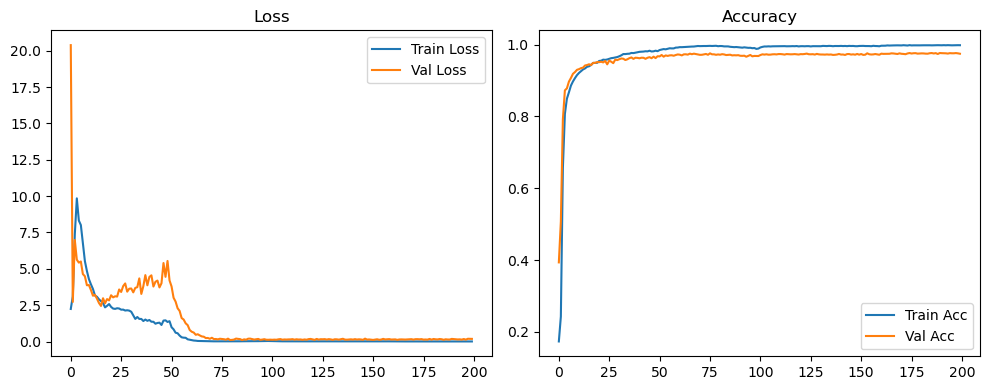

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 28.97it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 29.29it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 29.37it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 29.44it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 29.46it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 29.50it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 29.51it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 29.51it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 29.51it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 29.45it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 29.40it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 29.40it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 29.46it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 30.04it/s]

Original Model Final Test Loss: 0.1558 Accuracy: 0.9764


🚀 Running: batch256_lr0.01_0.005_0.002_dp0.5


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1485 | Val Acc: 0.2489 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1485 | Val Acc: 0.2489 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1485 | Val Acc: 0.2489 |:   0%|          | 1/200 [00:09<31:18,  9.44s/it]

| LR: 0.010 | Train Acc: 0.1652 | Val Acc: 0.2902 |:   0%|          | 1/200 [00:18<31:18,  9.44s/it]

| LR: 0.010 | Train Acc: 0.1652 | Val Acc: 0.2902 |:   0%|          | 1/200 [00:18<31:18,  9.44s/it]

| LR: 0.010 | Train Acc: 0.1652 | Val Acc: 0.2902 |:   1%|          | 2/200 [00:18<30:41,  9.30s/it]

| LR: 0.010 | Train Acc: 0.4393 | Val Acc: 0.7237 |:   1%|          | 2/200 [00:27<30:41,  9.30s/it]

| LR: 0.010 | Train Acc: 0.4393 | Val Acc: 0.7237 |:   1%|          | 2/200 [00:27<30:41,  9.30s/it]

| LR: 0.010 | Train Acc: 0.4393 | Val Acc: 0.7237 |:   2%|▏         | 3/200 [00:27<30:18,  9.23s/it]

| LR: 0.010 | Train Acc: 0.7067 | Val Acc: 0.8517 |:   2%|▏         | 3/200 [00:36<30:18,  9.23s/it]

| LR: 0.010 | Train Acc: 0.7067 | Val Acc: 0.8517 |:   2%|▏         | 3/200 [00:36<30:18,  9.23s/it]

| LR: 0.010 | Train Acc: 0.7067 | Val Acc: 0.8517 |:   2%|▏         | 4/200 [00:36<29:43,  9.10s/it]

| LR: 0.010 | Train Acc: 0.7834 | Val Acc: 0.8763 |:   2%|▏         | 4/200 [00:45<29:43,  9.10s/it]

| LR: 0.010 | Train Acc: 0.7834 | Val Acc: 0.8763 |:   2%|▏         | 4/200 [00:45<29:43,  9.10s/it]

| LR: 0.010 | Train Acc: 0.7834 | Val Acc: 0.8763 |:   2%|▎         | 5/200 [00:45<29:10,  8.98s/it]

| LR: 0.010 | Train Acc: 0.8174 | Val Acc: 0.8954 |:   2%|▎         | 5/200 [00:54<29:10,  8.98s/it]

| LR: 0.010 | Train Acc: 0.8174 | Val Acc: 0.8954 |:   2%|▎         | 5/200 [00:54<29:10,  8.98s/it]

| LR: 0.010 | Train Acc: 0.8174 | Val Acc: 0.8954 |:   3%|▎         | 6/200 [00:54<28:47,  8.90s/it]

| LR: 0.010 | Train Acc: 0.8354 | Val Acc: 0.8989 |:   3%|▎         | 6/200 [01:02<28:47,  8.90s/it]

| LR: 0.010 | Train Acc: 0.8354 | Val Acc: 0.8989 |:   3%|▎         | 6/200 [01:02<28:47,  8.90s/it]

| LR: 0.010 | Train Acc: 0.8354 | Val Acc: 0.8989 |:   4%|▎         | 7/200 [01:03<28:31,  8.87s/it]

| LR: 0.010 | Train Acc: 0.8571 | Val Acc: 0.9127 |:   4%|▎         | 7/200 [01:11<28:31,  8.87s/it]

| LR: 0.010 | Train Acc: 0.8571 | Val Acc: 0.9127 |:   4%|▎         | 7/200 [01:11<28:31,  8.87s/it]

| LR: 0.010 | Train Acc: 0.8571 | Val Acc: 0.9127 |:   4%|▍         | 8/200 [01:11<28:22,  8.87s/it]

| LR: 0.010 | Train Acc: 0.8681 | Val Acc: 0.9239 |:   4%|▍         | 8/200 [01:20<28:22,  8.87s/it]

| LR: 0.010 | Train Acc: 0.8681 | Val Acc: 0.9239 |:   4%|▍         | 8/200 [01:20<28:22,  8.87s/it]

| LR: 0.010 | Train Acc: 0.8681 | Val Acc: 0.9239 |:   4%|▍         | 9/200 [01:20<27:56,  8.78s/it]

| LR: 0.010 | Train Acc: 0.8816 | Val Acc: 0.9205 |:   4%|▍         | 9/200 [01:28<27:56,  8.78s/it]

| LR: 0.010 | Train Acc: 0.8816 | Val Acc: 0.9205 |:   4%|▍         | 9/200 [01:28<27:56,  8.78s/it]

| LR: 0.010 | Train Acc: 0.8816 | Val Acc: 0.9205 |:   5%|▌         | 10/200 [01:28<27:33,  8.71s/it]

| LR: 0.010 | Train Acc: 0.8870 | Val Acc: 0.9300 |:   5%|▌         | 10/200 [01:37<27:33,  8.71s/it]

| LR: 0.010 | Train Acc: 0.8870 | Val Acc: 0.9300 |:   5%|▌         | 10/200 [01:37<27:33,  8.71s/it]

| LR: 0.010 | Train Acc: 0.8870 | Val Acc: 0.9300 |:   6%|▌         | 11/200 [01:37<27:15,  8.65s/it]

| LR: 0.010 | Train Acc: 0.8935 | Val Acc: 0.9329 |:   6%|▌         | 11/200 [01:46<27:15,  8.65s/it]

| LR: 0.010 | Train Acc: 0.8935 | Val Acc: 0.9329 |:   6%|▌         | 11/200 [01:46<27:15,  8.65s/it]

| LR: 0.010 | Train Acc: 0.8935 | Val Acc: 0.9329 |:   6%|▌         | 12/200 [01:46<27:09,  8.67s/it]

| LR: 0.010 | Train Acc: 0.8984 | Val Acc: 0.9330 |:   6%|▌         | 12/200 [01:54<27:09,  8.67s/it]

| LR: 0.010 | Train Acc: 0.8984 | Val Acc: 0.9330 |:   6%|▌         | 12/200 [01:54<27:09,  8.67s/it]

| LR: 0.010 | Train Acc: 0.8984 | Val Acc: 0.9330 |:   6%|▋         | 13/200 [01:55<27:08,  8.71s/it]

| LR: 0.010 | Train Acc: 0.9045 | Val Acc: 0.9381 |:   6%|▋         | 13/200 [02:03<27:08,  8.71s/it]

| LR: 0.010 | Train Acc: 0.9045 | Val Acc: 0.9381 |:   6%|▋         | 13/200 [02:03<27:08,  8.71s/it]

| LR: 0.010 | Train Acc: 0.9045 | Val Acc: 0.9381 |:   7%|▋         | 14/200 [02:03<27:03,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9109 | Val Acc: 0.9445 |:   7%|▋         | 14/200 [02:12<27:03,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9109 | Val Acc: 0.9445 |:   7%|▋         | 14/200 [02:12<27:03,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9109 | Val Acc: 0.9445 |:   8%|▊         | 15/200 [02:12<26:58,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9417 |:   8%|▊         | 15/200 [02:21<26:58,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9417 |:   8%|▊         | 15/200 [02:21<26:58,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9417 |:   8%|▊         | 16/200 [02:21<27:20,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9172 | Val Acc: 0.9401 |:   8%|▊         | 16/200 [02:30<27:20,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9172 | Val Acc: 0.9401 |:   8%|▊         | 16/200 [02:30<27:20,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9172 | Val Acc: 0.9401 |:   8%|▊         | 17/200 [02:30<27:13,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9180 | Val Acc: 0.9469 |:   8%|▊         | 17/200 [02:39<27:13,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9180 | Val Acc: 0.9469 |:   8%|▊         | 17/200 [02:39<27:13,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9180 | Val Acc: 0.9469 |:   9%|▉         | 18/200 [02:39<27:00,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9217 | Val Acc: 0.9483 |:   9%|▉         | 18/200 [02:48<27:00,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9217 | Val Acc: 0.9483 |:   9%|▉         | 18/200 [02:48<27:00,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9217 | Val Acc: 0.9483 |:  10%|▉         | 19/200 [02:48<26:45,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9255 | Val Acc: 0.9493 |:  10%|▉         | 19/200 [02:57<26:45,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9255 | Val Acc: 0.9493 |:  10%|▉         | 19/200 [02:57<26:45,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9255 | Val Acc: 0.9493 |:  10%|█         | 20/200 [02:57<26:32,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9476 |:  10%|█         | 20/200 [03:06<26:32,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9476 |:  10%|█         | 20/200 [03:06<26:32,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9476 |:  10%|█         | 21/200 [03:06<26:20,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9313 | Val Acc: 0.9523 |:  10%|█         | 21/200 [03:14<26:20,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9313 | Val Acc: 0.9523 |:  10%|█         | 21/200 [03:14<26:20,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9313 | Val Acc: 0.9523 |:  11%|█         | 22/200 [03:14<26:08,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9306 | Val Acc: 0.9519 |:  11%|█         | 22/200 [03:23<26:08,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9306 | Val Acc: 0.9519 |:  11%|█         | 22/200 [03:23<26:08,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9306 | Val Acc: 0.9519 |:  12%|█▏        | 23/200 [03:23<25:59,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9336 | Val Acc: 0.9543 |:  12%|█▏        | 23/200 [03:32<25:59,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9336 | Val Acc: 0.9543 |:  12%|█▏        | 23/200 [03:32<25:59,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9336 | Val Acc: 0.9543 |:  12%|█▏        | 24/200 [03:32<25:51,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9356 | Val Acc: 0.9567 |:  12%|█▏        | 24/200 [03:41<25:51,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9356 | Val Acc: 0.9567 |:  12%|█▏        | 24/200 [03:41<25:51,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9356 | Val Acc: 0.9567 |:  12%|█▎        | 25/200 [03:41<25:39,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9383 | Val Acc: 0.9577 |:  12%|█▎        | 25/200 [03:50<25:39,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9383 | Val Acc: 0.9577 |:  12%|█▎        | 25/200 [03:50<25:39,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9383 | Val Acc: 0.9577 |:  13%|█▎        | 26/200 [03:50<25:31,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9583 |:  13%|█▎        | 26/200 [03:58<25:31,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9583 |:  13%|█▎        | 26/200 [03:58<25:31,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9583 |:  14%|█▎        | 27/200 [03:58<25:20,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9424 | Val Acc: 0.9557 |:  14%|█▎        | 27/200 [04:07<25:20,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9424 | Val Acc: 0.9557 |:  14%|█▎        | 27/200 [04:07<25:20,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9424 | Val Acc: 0.9557 |:  14%|█▍        | 28/200 [04:07<25:15,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9416 | Val Acc: 0.9565 |:  14%|█▍        | 28/200 [04:17<25:15,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9416 | Val Acc: 0.9565 |:  14%|█▍        | 28/200 [04:17<25:15,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9416 | Val Acc: 0.9565 |:  14%|█▍        | 29/200 [04:17<25:39,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9468 | Val Acc: 0.9604 |:  14%|█▍        | 29/200 [04:25<25:39,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9468 | Val Acc: 0.9604 |:  14%|█▍        | 29/200 [04:25<25:39,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9468 | Val Acc: 0.9604 |:  15%|█▌        | 30/200 [04:25<25:21,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9452 | Val Acc: 0.9587 |:  15%|█▌        | 30/200 [04:34<25:21,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9452 | Val Acc: 0.9587 |:  15%|█▌        | 30/200 [04:34<25:21,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9452 | Val Acc: 0.9587 |:  16%|█▌        | 31/200 [04:34<25:01,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9529 |:  16%|█▌        | 31/200 [04:43<25:01,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9529 |:  16%|█▌        | 31/200 [04:43<25:01,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9529 |:  16%|█▌        | 32/200 [04:43<25:01,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9541 | Val Acc: 0.9633 |:  16%|█▌        | 32/200 [04:52<25:01,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9541 | Val Acc: 0.9633 |:  16%|█▌        | 32/200 [04:52<25:01,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9541 | Val Acc: 0.9633 |:  16%|█▋        | 33/200 [04:52<25:07,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  16%|█▋        | 33/200 [05:01<25:07,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  16%|█▋        | 33/200 [05:01<25:07,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  17%|█▋        | 34/200 [05:01<24:44,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9538 | Val Acc: 0.9643 |:  17%|█▋        | 34/200 [05:10<24:44,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9538 | Val Acc: 0.9643 |:  17%|█▋        | 34/200 [05:10<24:44,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9538 | Val Acc: 0.9643 |:  18%|█▊        | 35/200 [05:10<24:24,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9621 |:  18%|█▊        | 35/200 [05:19<24:24,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9621 |:  18%|█▊        | 35/200 [05:19<24:24,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9621 |:  18%|█▊        | 36/200 [05:19<24:15,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9574 | Val Acc: 0.9643 |:  18%|█▊        | 36/200 [05:28<24:15,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9574 | Val Acc: 0.9643 |:  18%|█▊        | 36/200 [05:28<24:15,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9574 | Val Acc: 0.9643 |:  18%|█▊        | 37/200 [05:28<24:05,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9589 | Val Acc: 0.9657 |:  18%|█▊        | 37/200 [05:37<24:05,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9589 | Val Acc: 0.9657 |:  18%|█▊        | 37/200 [05:37<24:05,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9589 | Val Acc: 0.9657 |:  19%|█▉        | 38/200 [05:37<24:35,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9593 | Val Acc: 0.9633 |:  19%|█▉        | 38/200 [05:46<24:35,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9593 | Val Acc: 0.9633 |:  19%|█▉        | 38/200 [05:46<24:35,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9593 | Val Acc: 0.9633 |:  20%|█▉        | 39/200 [05:46<24:15,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9618 | Val Acc: 0.9629 |:  20%|█▉        | 39/200 [05:55<24:15,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9618 | Val Acc: 0.9629 |:  20%|█▉        | 39/200 [05:55<24:15,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9618 | Val Acc: 0.9629 |:  20%|██        | 40/200 [05:55<23:54,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9661 |:  20%|██        | 40/200 [06:04<23:54,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9661 |:  20%|██        | 40/200 [06:04<23:54,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9661 |:  20%|██        | 41/200 [06:04<23:38,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9617 | Val Acc: 0.9683 |:  20%|██        | 41/200 [06:13<23:38,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9617 | Val Acc: 0.9683 |:  20%|██        | 41/200 [06:13<23:38,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9617 | Val Acc: 0.9683 |:  21%|██        | 42/200 [06:13<23:21,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9634 | Val Acc: 0.9667 |:  21%|██        | 42/200 [06:21<23:21,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9634 | Val Acc: 0.9667 |:  21%|██        | 42/200 [06:21<23:21,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9634 | Val Acc: 0.9667 |:  22%|██▏       | 43/200 [06:21<23:11,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9674 |:  22%|██▏       | 43/200 [06:30<23:11,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9674 |:  22%|██▏       | 43/200 [06:30<23:11,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9674 |:  22%|██▏       | 44/200 [06:30<23:06,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9662 | Val Acc: 0.9686 |:  22%|██▏       | 44/200 [06:39<23:06,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9662 | Val Acc: 0.9686 |:  22%|██▏       | 44/200 [06:39<23:06,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9662 | Val Acc: 0.9686 |:  22%|██▎       | 45/200 [06:39<22:55,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9695 | Val Acc: 0.9682 |:  22%|██▎       | 45/200 [06:48<22:55,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9695 | Val Acc: 0.9682 |:  22%|██▎       | 45/200 [06:48<22:55,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9695 | Val Acc: 0.9682 |:  23%|██▎       | 46/200 [06:48<22:39,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9704 |:  23%|██▎       | 46/200 [06:57<22:39,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9704 |:  23%|██▎       | 46/200 [06:57<22:39,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9704 |:  24%|██▎       | 47/200 [06:57<22:27,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9687 |:  24%|██▎       | 47/200 [07:05<22:27,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9687 |:  24%|██▎       | 47/200 [07:05<22:27,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9687 |:  24%|██▍       | 48/200 [07:05<22:15,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9704 |:  24%|██▍       | 48/200 [07:14<22:15,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9704 |:  24%|██▍       | 48/200 [07:14<22:15,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9704 |:  24%|██▍       | 49/200 [07:14<22:04,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9721 |:  24%|██▍       | 49/200 [07:23<22:04,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9721 |:  24%|██▍       | 49/200 [07:23<22:04,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9721 |:  25%|██▌       | 50/200 [07:23<22:00,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9760 | Val Acc: 0.9713 |:  25%|██▌       | 50/200 [07:32<22:00,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9760 | Val Acc: 0.9713 |:  25%|██▌       | 50/200 [07:32<22:00,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9760 | Val Acc: 0.9713 |:  26%|██▌       | 51/200 [07:32<21:52,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9765 | Val Acc: 0.9728 |:  26%|██▌       | 51/200 [07:41<21:52,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9765 | Val Acc: 0.9728 |:  26%|██▌       | 51/200 [07:41<21:52,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9765 | Val Acc: 0.9728 |:  26%|██▌       | 52/200 [07:41<21:56,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9731 |:  26%|██▌       | 52/200 [07:50<21:56,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9731 |:  26%|██▌       | 52/200 [07:50<21:56,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9731 |:  26%|██▋       | 53/200 [07:50<21:44,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9730 |:  26%|██▋       | 53/200 [07:59<21:44,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9730 |:  26%|██▋       | 53/200 [07:59<21:44,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9730 |:  27%|██▋       | 54/200 [07:59<21:48,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9822 | Val Acc: 0.9722 |:  27%|██▋       | 54/200 [08:08<21:48,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9822 | Val Acc: 0.9722 |:  27%|██▋       | 54/200 [08:08<21:48,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9822 | Val Acc: 0.9722 |:  28%|██▊       | 55/200 [08:08<21:28,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9732 |:  28%|██▊       | 55/200 [08:16<21:28,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9732 |:  28%|██▊       | 55/200 [08:16<21:28,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9732 |:  28%|██▊       | 56/200 [08:16<21:15,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9839 | Val Acc: 0.9729 |:  28%|██▊       | 56/200 [08:25<21:15,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9839 | Val Acc: 0.9729 |:  28%|██▊       | 56/200 [08:25<21:15,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9839 | Val Acc: 0.9729 |:  28%|██▊       | 57/200 [08:25<21:07,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9731 |:  28%|██▊       | 57/200 [08:34<21:07,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9731 |:  28%|██▊       | 57/200 [08:34<21:07,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9731 |:  29%|██▉       | 58/200 [08:34<20:55,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9848 | Val Acc: 0.9733 |:  29%|██▉       | 58/200 [08:43<20:55,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9848 | Val Acc: 0.9733 |:  29%|██▉       | 58/200 [08:43<20:55,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9848 | Val Acc: 0.9733 |:  30%|██▉       | 59/200 [08:43<20:46,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9740 |:  30%|██▉       | 59/200 [08:52<20:46,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9740 |:  30%|██▉       | 59/200 [08:52<20:46,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9740 |:  30%|███       | 60/200 [08:52<20:33,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9741 |:  30%|███       | 60/200 [09:00<20:33,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9741 |:  30%|███       | 60/200 [09:00<20:33,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9741 |:  30%|███       | 61/200 [09:00<20:23,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9731 |:  30%|███       | 61/200 [09:09<20:23,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9731 |:  30%|███       | 61/200 [09:09<20:23,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9731 |:  31%|███       | 62/200 [09:09<20:14,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9854 | Val Acc: 0.9730 |:  31%|███       | 62/200 [09:18<20:14,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9854 | Val Acc: 0.9730 |:  31%|███       | 62/200 [09:18<20:14,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9854 | Val Acc: 0.9730 |:  32%|███▏      | 63/200 [09:18<20:06,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9728 |:  32%|███▏      | 63/200 [09:27<20:06,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9728 |:  32%|███▏      | 63/200 [09:27<20:06,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9728 |:  32%|███▏      | 64/200 [09:27<19:58,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  32%|███▏      | 64/200 [09:36<19:58,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  32%|███▏      | 64/200 [09:36<19:58,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  32%|███▎      | 65/200 [09:36<20:02,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9871 | Val Acc: 0.9737 |:  32%|███▎      | 65/200 [09:45<20:02,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9871 | Val Acc: 0.9737 |:  32%|███▎      | 65/200 [09:45<20:02,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9871 | Val Acc: 0.9737 |:  33%|███▎      | 66/200 [09:45<19:55,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  33%|███▎      | 66/200 [09:54<19:55,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  33%|███▎      | 66/200 [09:54<19:55,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  34%|███▎      | 67/200 [09:54<19:46,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9864 | Val Acc: 0.9728 |:  34%|███▎      | 67/200 [10:03<19:46,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9864 | Val Acc: 0.9728 |:  34%|███▎      | 67/200 [10:03<19:46,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9864 | Val Acc: 0.9728 |:  34%|███▍      | 68/200 [10:03<19:36,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9865 | Val Acc: 0.9717 |:  34%|███▍      | 68/200 [10:12<19:36,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9865 | Val Acc: 0.9717 |:  34%|███▍      | 68/200 [10:12<19:36,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9865 | Val Acc: 0.9717 |:  34%|███▍      | 69/200 [10:12<19:26,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9731 |:  34%|███▍      | 69/200 [10:21<19:26,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9731 |:  34%|███▍      | 69/200 [10:21<19:26,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9731 |:  35%|███▌      | 70/200 [10:21<19:17,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9725 |:  35%|███▌      | 70/200 [10:29<19:17,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9725 |:  35%|███▌      | 70/200 [10:29<19:17,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9725 |:  36%|███▌      | 71/200 [10:29<19:04,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9721 |:  36%|███▌      | 71/200 [10:38<19:04,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9721 |:  36%|███▌      | 71/200 [10:38<19:04,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9721 |:  36%|███▌      | 72/200 [10:38<18:49,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9719 |:  36%|███▌      | 72/200 [10:47<18:49,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9719 |:  36%|███▌      | 72/200 [10:47<18:49,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9719 |:  36%|███▋      | 73/200 [10:47<18:44,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9730 |:  36%|███▋      | 73/200 [10:56<18:44,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9730 |:  36%|███▋      | 73/200 [10:56<18:44,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9730 |:  37%|███▋      | 74/200 [10:56<18:32,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9846 | Val Acc: 0.9730 |:  37%|███▋      | 74/200 [11:05<18:32,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9846 | Val Acc: 0.9730 |:  37%|███▋      | 74/200 [11:05<18:32,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9846 | Val Acc: 0.9730 |:  38%|███▊      | 75/200 [11:05<18:23,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9824 | Val Acc: 0.9705 |:  38%|███▊      | 75/200 [11:13<18:23,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9824 | Val Acc: 0.9705 |:  38%|███▊      | 75/200 [11:13<18:23,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9824 | Val Acc: 0.9705 |:  38%|███▊      | 76/200 [11:13<18:07,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9835 | Val Acc: 0.9720 |:  38%|███▊      | 76/200 [11:23<18:07,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9835 | Val Acc: 0.9720 |:  38%|███▊      | 76/200 [11:23<18:07,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9835 | Val Acc: 0.9720 |:  38%|███▊      | 77/200 [11:23<18:19,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9819 | Val Acc: 0.9721 |:  38%|███▊      | 77/200 [11:31<18:19,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9819 | Val Acc: 0.9721 |:  38%|███▊      | 77/200 [11:31<18:19,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9819 | Val Acc: 0.9721 |:  39%|███▉      | 78/200 [11:31<18:03,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9721 |:  39%|███▉      | 78/200 [11:41<18:03,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9721 |:  39%|███▉      | 78/200 [11:41<18:03,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9721 |:  40%|███▉      | 79/200 [11:41<18:05,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9806 | Val Acc: 0.9707 |:  40%|███▉      | 79/200 [11:49<18:05,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9806 | Val Acc: 0.9707 |:  40%|███▉      | 79/200 [11:49<18:05,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9806 | Val Acc: 0.9707 |:  40%|████      | 80/200 [11:49<17:50,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9696 |:  40%|████      | 80/200 [11:58<17:50,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9696 |:  40%|████      | 80/200 [11:58<17:50,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9696 |:  40%|████      | 81/200 [11:58<17:36,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9788 | Val Acc: 0.9706 |:  40%|████      | 81/200 [12:08<17:36,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9788 | Val Acc: 0.9706 |:  40%|████      | 81/200 [12:08<17:36,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9788 | Val Acc: 0.9706 |:  41%|████      | 82/200 [12:08<17:55,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9702 |:  41%|████      | 82/200 [12:17<17:55,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9702 |:  41%|████      | 82/200 [12:17<17:55,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9702 |:  42%|████▏     | 83/200 [12:17<17:38,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9692 |:  42%|████▏     | 83/200 [12:26<17:38,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9692 |:  42%|████▏     | 83/200 [12:26<17:38,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9692 |:  42%|████▏     | 84/200 [12:26<17:23,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9763 | Val Acc: 0.9702 |:  42%|████▏     | 84/200 [12:34<17:23,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9763 | Val Acc: 0.9702 |:  42%|████▏     | 84/200 [12:34<17:23,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9763 | Val Acc: 0.9702 |:  42%|████▎     | 85/200 [12:34<17:04,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9683 |:  42%|████▎     | 85/200 [12:43<17:04,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9683 |:  42%|████▎     | 85/200 [12:43<17:04,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9683 |:  43%|████▎     | 86/200 [12:43<16:51,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9701 |:  43%|████▎     | 86/200 [12:52<16:51,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9701 |:  43%|████▎     | 86/200 [12:52<16:51,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9701 |:  44%|████▎     | 87/200 [12:52<16:41,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9703 |:  44%|████▎     | 87/200 [13:01<16:41,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9703 |:  44%|████▎     | 87/200 [13:01<16:41,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9703 |:  44%|████▍     | 88/200 [13:01<16:38,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9702 |:  44%|████▍     | 88/200 [13:10<16:38,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9702 |:  44%|████▍     | 88/200 [13:10<16:38,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9702 |:  44%|████▍     | 89/200 [13:10<16:29,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9695 |:  44%|████▍     | 89/200 [13:19<16:29,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9695 |:  44%|████▍     | 89/200 [13:19<16:29,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9695 |:  45%|████▌     | 90/200 [13:19<16:38,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9698 |:  45%|████▌     | 90/200 [13:28<16:38,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9698 |:  45%|████▌     | 90/200 [13:28<16:38,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9698 |:  46%|████▌     | 91/200 [13:28<16:21,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9744 | Val Acc: 0.9688 |:  46%|████▌     | 91/200 [13:37<16:21,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9744 | Val Acc: 0.9688 |:  46%|████▌     | 91/200 [13:37<16:21,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9744 | Val Acc: 0.9688 |:  46%|████▌     | 92/200 [13:37<16:06,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9694 |:  46%|████▌     | 92/200 [13:46<16:06,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9694 |:  46%|████▌     | 92/200 [13:46<16:06,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9694 |:  46%|████▋     | 93/200 [13:46<15:56,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9732 | Val Acc: 0.9704 |:  46%|████▋     | 93/200 [13:55<15:56,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9732 | Val Acc: 0.9704 |:  46%|████▋     | 93/200 [13:55<15:56,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9732 | Val Acc: 0.9704 |:  47%|████▋     | 94/200 [13:55<15:41,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9682 |:  47%|████▋     | 94/200 [14:03<15:41,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9682 |:  47%|████▋     | 94/200 [14:03<15:41,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9682 |:  48%|████▊     | 95/200 [14:03<15:27,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9680 |:  48%|████▊     | 95/200 [14:12<15:27,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9680 |:  48%|████▊     | 95/200 [14:12<15:27,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9680 |:  48%|████▊     | 96/200 [14:12<15:17,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9733 | Val Acc: 0.9692 |:  48%|████▊     | 96/200 [14:21<15:17,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9733 | Val Acc: 0.9692 |:  48%|████▊     | 96/200 [14:21<15:17,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9733 | Val Acc: 0.9692 |:  48%|████▊     | 97/200 [14:21<15:10,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9677 |:  48%|████▊     | 97/200 [14:30<15:10,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9677 |:  48%|████▊     | 97/200 [14:30<15:10,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9677 |:  49%|████▉     | 98/200 [14:30<15:00,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9738 | Val Acc: 0.9694 |:  49%|████▉     | 98/200 [14:39<15:00,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9738 | Val Acc: 0.9694 |:  49%|████▉     | 98/200 [14:39<15:00,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9738 | Val Acc: 0.9694 |:  50%|████▉     | 99/200 [14:39<14:48,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9682 |:  50%|████▉     | 99/200 [14:47<14:48,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9682 |:  50%|████▉     | 99/200 [14:47<14:48,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9682 |:  50%|█████     | 100/200 [14:47<14:37,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9698 |:  50%|█████     | 100/200 [14:56<14:37,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9698 |:  50%|█████     | 100/200 [14:56<14:37,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9698 |:  50%|█████     | 101/200 [14:56<14:30,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9774 | Val Acc: 0.9691 |:  50%|█████     | 101/200 [15:05<14:30,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9774 | Val Acc: 0.9691 |:  50%|█████     | 101/200 [15:05<14:30,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9774 | Val Acc: 0.9691 |:  51%|█████     | 102/200 [15:05<14:19,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9776 | Val Acc: 0.9693 |:  51%|█████     | 102/200 [15:14<14:19,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9776 | Val Acc: 0.9693 |:  51%|█████     | 102/200 [15:14<14:19,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9776 | Val Acc: 0.9693 |:  52%|█████▏    | 103/200 [15:14<14:11,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9785 | Val Acc: 0.9702 |:  52%|█████▏    | 103/200 [15:22<14:11,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9785 | Val Acc: 0.9702 |:  52%|█████▏    | 103/200 [15:22<14:11,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9785 | Val Acc: 0.9702 |:  52%|█████▏    | 104/200 [15:22<14:03,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9794 | Val Acc: 0.9707 |:  52%|█████▏    | 104/200 [15:31<14:03,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9794 | Val Acc: 0.9707 |:  52%|█████▏    | 104/200 [15:31<14:03,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9794 | Val Acc: 0.9707 |:  52%|█████▎    | 105/200 [15:31<13:59,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9797 | Val Acc: 0.9710 |:  52%|█████▎    | 105/200 [15:40<13:59,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9797 | Val Acc: 0.9710 |:  52%|█████▎    | 105/200 [15:40<13:59,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9797 | Val Acc: 0.9710 |:  53%|█████▎    | 106/200 [15:40<13:53,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9713 |:  53%|█████▎    | 106/200 [15:49<13:53,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9713 |:  53%|█████▎    | 106/200 [15:49<13:53,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9713 |:  54%|█████▎    | 107/200 [15:49<13:44,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9712 |:  54%|█████▎    | 107/200 [15:58<13:44,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9712 |:  54%|█████▎    | 107/200 [15:58<13:44,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9712 |:  54%|█████▍    | 108/200 [15:58<13:36,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9709 |:  54%|█████▍    | 108/200 [16:07<13:36,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9709 |:  54%|█████▍    | 108/200 [16:07<13:36,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9709 |:  55%|█████▍    | 109/200 [16:07<13:39,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9722 |:  55%|█████▍    | 109/200 [16:17<13:39,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9722 |:  55%|█████▍    | 109/200 [16:17<13:39,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9722 |:  55%|█████▌    | 110/200 [16:17<13:39,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9718 |:  55%|█████▌    | 110/200 [16:26<13:39,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9718 |:  55%|█████▌    | 110/200 [16:26<13:39,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9718 |:  56%|█████▌    | 111/200 [16:26<13:31,  9.12s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9714 |:  56%|█████▌    | 111/200 [16:35<13:31,  9.12s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9714 |:  56%|█████▌    | 111/200 [16:35<13:31,  9.12s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9714 |:  56%|█████▌    | 112/200 [16:35<13:17,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9713 |:  56%|█████▌    | 112/200 [16:44<13:17,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9713 |:  56%|█████▌    | 112/200 [16:44<13:17,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9713 |:  56%|█████▋    | 113/200 [16:44<13:04,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9718 |:  56%|█████▋    | 113/200 [16:52<13:04,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9718 |:  56%|█████▋    | 113/200 [16:52<13:04,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9718 |:  57%|█████▋    | 114/200 [16:52<12:46,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9731 |:  57%|█████▋    | 114/200 [17:01<12:46,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9731 |:  57%|█████▋    | 114/200 [17:01<12:46,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9731 |:  57%|█████▊    | 115/200 [17:01<12:33,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9707 |:  57%|█████▊    | 115/200 [17:10<12:33,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9707 |:  57%|█████▊    | 115/200 [17:10<12:33,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9707 |:  58%|█████▊    | 116/200 [17:10<12:21,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9807 | Val Acc: 0.9728 |:  58%|█████▊    | 116/200 [17:19<12:21,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9807 | Val Acc: 0.9728 |:  58%|█████▊    | 116/200 [17:19<12:21,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9807 | Val Acc: 0.9728 |:  58%|█████▊    | 117/200 [17:19<12:10,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9712 |:  58%|█████▊    | 117/200 [17:27<12:10,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9712 |:  58%|█████▊    | 117/200 [17:27<12:10,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9712 |:  59%|█████▉    | 118/200 [17:27<11:59,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9718 |:  59%|█████▉    | 118/200 [17:36<11:59,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9718 |:  59%|█████▉    | 118/200 [17:36<11:59,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9718 |:  60%|█████▉    | 119/200 [17:36<11:50,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9722 |:  60%|█████▉    | 119/200 [17:45<11:50,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9722 |:  60%|█████▉    | 119/200 [17:45<11:50,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9722 |:  60%|██████    | 120/200 [17:45<11:42,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9706 |:  60%|██████    | 120/200 [17:54<11:42,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9706 |:  60%|██████    | 120/200 [17:54<11:42,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9706 |:  60%|██████    | 121/200 [17:54<11:36,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9705 |:  60%|██████    | 121/200 [18:03<11:36,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9705 |:  60%|██████    | 121/200 [18:03<11:36,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9705 |:  61%|██████    | 122/200 [18:03<11:29,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9721 |:  61%|██████    | 122/200 [18:12<11:29,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9721 |:  61%|██████    | 122/200 [18:12<11:29,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9721 |:  62%|██████▏   | 123/200 [18:12<11:24,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9719 |:  62%|██████▏   | 123/200 [18:20<11:24,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9719 |:  62%|██████▏   | 123/200 [18:20<11:24,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9719 |:  62%|██████▏   | 124/200 [18:20<11:11,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9711 |:  62%|██████▏   | 124/200 [18:29<11:11,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9711 |:  62%|██████▏   | 124/200 [18:29<11:11,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9711 |:  62%|██████▎   | 125/200 [18:29<11:00,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9710 |:  62%|██████▎   | 125/200 [18:38<11:00,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9710 |:  62%|██████▎   | 125/200 [18:38<11:00,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9710 |:  63%|██████▎   | 126/200 [18:38<10:49,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9722 |:  63%|██████▎   | 126/200 [18:47<10:49,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9722 |:  63%|██████▎   | 126/200 [18:47<10:49,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9722 |:  64%|██████▎   | 127/200 [18:47<10:40,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9713 |:  64%|██████▎   | 127/200 [18:55<10:40,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9713 |:  64%|██████▎   | 127/200 [18:55<10:40,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9713 |:  64%|██████▍   | 128/200 [18:55<10:31,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9723 |:  64%|██████▍   | 128/200 [19:04<10:31,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9723 |:  64%|██████▍   | 128/200 [19:04<10:31,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9723 |:  64%|██████▍   | 129/200 [19:04<10:26,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9724 |:  64%|██████▍   | 129/200 [19:13<10:26,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9724 |:  64%|██████▍   | 129/200 [19:13<10:26,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9724 |:  65%|██████▌   | 130/200 [19:13<10:14,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9728 |:  65%|██████▌   | 130/200 [19:22<10:14,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9728 |:  65%|██████▌   | 130/200 [19:22<10:14,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9728 |:  66%|██████▌   | 131/200 [19:22<10:07,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9714 |:  66%|██████▌   | 131/200 [19:31<10:07,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9714 |:  66%|██████▌   | 131/200 [19:31<10:07,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9714 |:  66%|██████▌   | 132/200 [19:31<09:58,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9723 |:  66%|██████▌   | 132/200 [19:40<09:58,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9723 |:  66%|██████▌   | 132/200 [19:40<09:58,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9723 |:  66%|██████▋   | 133/200 [19:40<10:05,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9714 |:  66%|██████▋   | 133/200 [19:49<10:05,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9714 |:  66%|██████▋   | 133/200 [19:49<10:05,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9714 |:  67%|██████▋   | 134/200 [19:49<09:52,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9718 |:  67%|██████▋   | 134/200 [19:58<09:52,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9718 |:  67%|██████▋   | 134/200 [19:58<09:52,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9718 |:  68%|██████▊   | 135/200 [19:58<09:41,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9728 |:  68%|██████▊   | 135/200 [20:07<09:41,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9728 |:  68%|██████▊   | 135/200 [20:07<09:41,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9728 |:  68%|██████▊   | 136/200 [20:07<09:32,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9716 |:  68%|██████▊   | 136/200 [20:16<09:32,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9716 |:  68%|██████▊   | 136/200 [20:16<09:32,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9716 |:  68%|██████▊   | 137/200 [20:16<09:21,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9734 |:  68%|██████▊   | 137/200 [20:25<09:21,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9734 |:  68%|██████▊   | 137/200 [20:25<09:21,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9734 |:  69%|██████▉   | 138/200 [20:25<09:13,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9717 |:  69%|██████▉   | 138/200 [20:34<09:13,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9717 |:  69%|██████▉   | 138/200 [20:34<09:13,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9717 |:  70%|██████▉   | 139/200 [20:34<09:05,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9715 |:  70%|██████▉   | 139/200 [20:42<09:05,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9715 |:  70%|██████▉   | 139/200 [20:42<09:05,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9715 |:  70%|███████   | 140/200 [20:42<08:53,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9712 |:  70%|███████   | 140/200 [20:52<08:53,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9712 |:  70%|███████   | 140/200 [20:52<08:53,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9712 |:  70%|███████   | 141/200 [20:52<08:48,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9718 |:  70%|███████   | 141/200 [21:01<08:48,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9718 |:  70%|███████   | 141/200 [21:01<08:48,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9718 |:  71%|███████   | 142/200 [21:01<08:51,  9.17s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9715 |:  71%|███████   | 142/200 [21:10<08:51,  9.17s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9715 |:  71%|███████   | 142/200 [21:10<08:51,  9.17s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9715 |:  72%|███████▏  | 143/200 [21:10<08:39,  9.12s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9725 |:  72%|███████▏  | 143/200 [21:19<08:39,  9.12s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9725 |:  72%|███████▏  | 143/200 [21:19<08:39,  9.12s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9725 |:  72%|███████▏  | 144/200 [21:19<08:24,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9830 | Val Acc: 0.9715 |:  72%|███████▏  | 144/200 [21:28<08:24,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9830 | Val Acc: 0.9715 |:  72%|███████▏  | 144/200 [21:28<08:24,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9830 | Val Acc: 0.9715 |:  72%|███████▎  | 145/200 [21:28<08:11,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9728 |:  72%|███████▎  | 145/200 [21:37<08:11,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9728 |:  72%|███████▎  | 145/200 [21:37<08:11,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9728 |:  73%|███████▎  | 146/200 [21:37<08:01,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9720 |:  73%|███████▎  | 146/200 [21:46<08:01,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9720 |:  73%|███████▎  | 146/200 [21:46<08:01,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9720 |:  74%|███████▎  | 147/200 [21:46<07:56,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9713 |:  74%|███████▎  | 147/200 [21:55<07:56,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9713 |:  74%|███████▎  | 147/200 [21:55<07:56,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9713 |:  74%|███████▍  | 148/200 [21:55<07:44,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9722 |:  74%|███████▍  | 148/200 [22:03<07:44,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9722 |:  74%|███████▍  | 148/200 [22:03<07:44,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9722 |:  74%|███████▍  | 149/200 [22:03<07:33,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9719 |:  74%|███████▍  | 149/200 [22:12<07:33,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9719 |:  74%|███████▍  | 149/200 [22:12<07:33,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9719 |:  75%|███████▌  | 150/200 [22:12<07:24,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9839 | Val Acc: 0.9705 |:  75%|███████▌  | 150/200 [22:21<07:24,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9839 | Val Acc: 0.9705 |:  75%|███████▌  | 150/200 [22:21<07:24,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9839 | Val Acc: 0.9705 |:  76%|███████▌  | 151/200 [22:21<07:15,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9728 |:  76%|███████▌  | 151/200 [22:30<07:15,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9728 |:  76%|███████▌  | 151/200 [22:30<07:15,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9728 |:  76%|███████▌  | 152/200 [22:30<07:11,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9725 |:  76%|███████▌  | 152/200 [22:39<07:11,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9725 |:  76%|███████▌  | 152/200 [22:39<07:11,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9725 |:  76%|███████▋  | 153/200 [22:39<07:03,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9830 | Val Acc: 0.9726 |:  76%|███████▋  | 153/200 [22:48<07:03,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9830 | Val Acc: 0.9726 |:  76%|███████▋  | 153/200 [22:48<07:03,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9830 | Val Acc: 0.9726 |:  77%|███████▋  | 154/200 [22:48<06:51,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9729 |:  77%|███████▋  | 154/200 [22:57<06:51,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9729 |:  77%|███████▋  | 154/200 [22:57<06:51,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9729 |:  78%|███████▊  | 155/200 [22:57<06:39,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9732 |:  78%|███████▊  | 155/200 [23:06<06:39,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9732 |:  78%|███████▊  | 155/200 [23:06<06:39,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9732 |:  78%|███████▊  | 156/200 [23:06<06:29,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9723 |:  78%|███████▊  | 156/200 [23:15<06:29,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9723 |:  78%|███████▊  | 156/200 [23:15<06:29,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9723 |:  78%|███████▊  | 157/200 [23:15<06:19,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9734 |:  78%|███████▊  | 157/200 [23:23<06:19,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9734 |:  78%|███████▊  | 157/200 [23:23<06:19,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9734 |:  79%|███████▉  | 158/200 [23:23<06:09,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9728 |:  79%|███████▉  | 158/200 [23:32<06:09,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9728 |:  79%|███████▉  | 158/200 [23:32<06:09,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9728 |:  80%|███████▉  | 159/200 [23:32<06:01,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9733 |:  80%|███████▉  | 159/200 [23:41<06:01,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9733 |:  80%|███████▉  | 159/200 [23:41<06:01,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9733 |:  80%|████████  | 160/200 [23:41<05:51,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9831 | Val Acc: 0.9742 |:  80%|████████  | 160/200 [23:50<05:51,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9831 | Val Acc: 0.9742 |:  80%|████████  | 160/200 [23:50<05:51,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9831 | Val Acc: 0.9742 |:  80%|████████  | 161/200 [23:50<05:42,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9835 | Val Acc: 0.9736 |:  80%|████████  | 161/200 [23:58<05:42,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9835 | Val Acc: 0.9736 |:  80%|████████  | 161/200 [23:58<05:42,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9835 | Val Acc: 0.9736 |:  81%|████████  | 162/200 [23:58<05:33,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9840 | Val Acc: 0.9747 |:  81%|████████  | 162/200 [24:07<05:33,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9840 | Val Acc: 0.9747 |:  81%|████████  | 162/200 [24:07<05:33,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9840 | Val Acc: 0.9747 |:  82%|████████▏ | 163/200 [24:07<05:23,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9722 |:  82%|████████▏ | 163/200 [24:16<05:23,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9722 |:  82%|████████▏ | 163/200 [24:16<05:23,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9722 |:  82%|████████▏ | 164/200 [24:17<05:22,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9732 |:  82%|████████▏ | 164/200 [24:26<05:22,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9732 |:  82%|████████▏ | 164/200 [24:26<05:22,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9732 |:  82%|████████▎ | 165/200 [24:26<05:15,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9748 |:  82%|████████▎ | 165/200 [24:34<05:15,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9748 |:  82%|████████▎ | 165/200 [24:34<05:15,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9748 |:  83%|████████▎ | 166/200 [24:34<05:04,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9740 |:  83%|████████▎ | 166/200 [24:43<05:04,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9740 |:  83%|████████▎ | 166/200 [24:43<05:04,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9740 |:  84%|████████▎ | 167/200 [24:43<04:54,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9857 | Val Acc: 0.9738 |:  84%|████████▎ | 167/200 [24:52<04:54,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9857 | Val Acc: 0.9738 |:  84%|████████▎ | 167/200 [24:52<04:54,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9857 | Val Acc: 0.9738 |:  84%|████████▍ | 168/200 [24:52<04:44,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9738 |:  84%|████████▍ | 168/200 [25:01<04:44,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9738 |:  84%|████████▍ | 168/200 [25:01<04:44,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9738 |:  84%|████████▍ | 169/200 [25:01<04:36,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9741 |:  84%|████████▍ | 169/200 [25:10<04:36,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9741 |:  84%|████████▍ | 169/200 [25:10<04:36,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9858 | Val Acc: 0.9741 |:  85%|████████▌ | 170/200 [25:10<04:26,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9737 |:  85%|████████▌ | 170/200 [25:19<04:26,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9737 |:  85%|████████▌ | 170/200 [25:19<04:26,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9737 |:  86%|████████▌ | 171/200 [25:19<04:16,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9869 | Val Acc: 0.9728 |:  86%|████████▌ | 171/200 [25:28<04:16,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9869 | Val Acc: 0.9728 |:  86%|████████▌ | 171/200 [25:28<04:16,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9869 | Val Acc: 0.9728 |:  86%|████████▌ | 172/200 [25:28<04:07,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9732 |:  86%|████████▌ | 172/200 [25:36<04:07,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9732 |:  86%|████████▌ | 172/200 [25:36<04:07,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9732 |:  86%|████████▋ | 173/200 [25:36<03:57,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9874 | Val Acc: 0.9731 |:  86%|████████▋ | 173/200 [25:45<03:57,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9874 | Val Acc: 0.9731 |:  86%|████████▋ | 173/200 [25:45<03:57,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9874 | Val Acc: 0.9731 |:  87%|████████▋ | 174/200 [25:45<03:48,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9867 | Val Acc: 0.9719 |:  87%|████████▋ | 174/200 [25:54<03:48,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9867 | Val Acc: 0.9719 |:  87%|████████▋ | 174/200 [25:54<03:48,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9867 | Val Acc: 0.9719 |:  88%|████████▊ | 175/200 [25:54<03:40,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9867 | Val Acc: 0.9730 |:  88%|████████▊ | 175/200 [26:03<03:40,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9867 | Val Acc: 0.9730 |:  88%|████████▊ | 175/200 [26:03<03:40,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9867 | Val Acc: 0.9730 |:  88%|████████▊ | 176/200 [26:03<03:31,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9875 | Val Acc: 0.9731 |:  88%|████████▊ | 176/200 [26:12<03:31,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9875 | Val Acc: 0.9731 |:  88%|████████▊ | 176/200 [26:12<03:31,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9875 | Val Acc: 0.9731 |:  88%|████████▊ | 177/200 [26:13<03:29,  9.11s/it]

| LR: 0.002 | Train Acc: 0.9868 | Val Acc: 0.9733 |:  88%|████████▊ | 177/200 [26:22<03:29,  9.11s/it]

| LR: 0.002 | Train Acc: 0.9868 | Val Acc: 0.9733 |:  88%|████████▊ | 177/200 [26:22<03:29,  9.11s/it]

| LR: 0.002 | Train Acc: 0.9868 | Val Acc: 0.9733 |:  89%|████████▉ | 178/200 [26:22<03:21,  9.16s/it]

| LR: 0.002 | Train Acc: 0.9875 | Val Acc: 0.9735 |:  89%|████████▉ | 178/200 [26:31<03:21,  9.16s/it]

| LR: 0.002 | Train Acc: 0.9875 | Val Acc: 0.9735 |:  89%|████████▉ | 178/200 [26:31<03:21,  9.16s/it]

| LR: 0.002 | Train Acc: 0.9875 | Val Acc: 0.9735 |:  90%|████████▉ | 179/200 [26:31<03:10,  9.07s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9733 |:  90%|████████▉ | 179/200 [26:39<03:10,  9.07s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9733 |:  90%|████████▉ | 179/200 [26:39<03:10,  9.07s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9733 |:  90%|█████████ | 180/200 [26:40<03:00,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9874 | Val Acc: 0.9748 |:  90%|█████████ | 180/200 [26:48<03:00,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9874 | Val Acc: 0.9748 |:  90%|█████████ | 180/200 [26:48<03:00,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9874 | Val Acc: 0.9748 |:  90%|█████████ | 181/200 [26:48<02:49,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9732 |:  90%|█████████ | 181/200 [26:57<02:49,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9732 |:  90%|█████████ | 181/200 [26:57<02:49,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9732 |:  91%|█████████ | 182/200 [26:57<02:39,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9876 | Val Acc: 0.9742 |:  91%|█████████ | 182/200 [27:06<02:39,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9876 | Val Acc: 0.9742 |:  91%|█████████ | 182/200 [27:06<02:39,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9876 | Val Acc: 0.9742 |:  92%|█████████▏| 183/200 [27:06<02:30,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9873 | Val Acc: 0.9728 |:  92%|█████████▏| 183/200 [27:15<02:30,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9873 | Val Acc: 0.9728 |:  92%|█████████▏| 183/200 [27:15<02:30,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9873 | Val Acc: 0.9728 |:  92%|█████████▏| 184/200 [27:15<02:22,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9883 | Val Acc: 0.9743 |:  92%|█████████▏| 184/200 [27:24<02:22,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9883 | Val Acc: 0.9743 |:  92%|█████████▏| 184/200 [27:24<02:22,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9883 | Val Acc: 0.9743 |:  92%|█████████▎| 185/200 [27:24<02:13,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9737 |:  92%|█████████▎| 185/200 [27:33<02:13,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9737 |:  92%|█████████▎| 185/200 [27:33<02:13,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9737 |:  93%|█████████▎| 186/200 [27:33<02:06,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9883 | Val Acc: 0.9741 |:  93%|█████████▎| 186/200 [27:42<02:06,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9883 | Val Acc: 0.9741 |:  93%|█████████▎| 186/200 [27:42<02:06,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9883 | Val Acc: 0.9741 |:  94%|█████████▎| 187/200 [27:42<01:56,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9737 |:  94%|█████████▎| 187/200 [27:51<01:56,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9737 |:  94%|█████████▎| 187/200 [27:51<01:56,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9737 |:  94%|█████████▍| 188/200 [27:51<01:47,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9879 | Val Acc: 0.9750 |:  94%|█████████▍| 188/200 [27:59<01:47,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9879 | Val Acc: 0.9750 |:  94%|█████████▍| 188/200 [27:59<01:47,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9879 | Val Acc: 0.9750 |:  94%|█████████▍| 189/200 [28:00<01:37,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9737 |:  94%|█████████▍| 189/200 [28:08<01:37,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9737 |:  94%|█████████▍| 189/200 [28:08<01:37,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9737 |:  95%|█████████▌| 190/200 [28:08<01:28,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9746 |:  95%|█████████▌| 190/200 [28:17<01:28,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9746 |:  95%|█████████▌| 190/200 [28:17<01:28,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9746 |:  96%|█████████▌| 191/200 [28:17<01:19,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9878 | Val Acc: 0.9747 |:  96%|█████████▌| 191/200 [28:26<01:19,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9878 | Val Acc: 0.9747 |:  96%|█████████▌| 191/200 [28:26<01:19,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9878 | Val Acc: 0.9747 |:  96%|█████████▌| 192/200 [28:26<01:10,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9735 |:  96%|█████████▌| 192/200 [28:35<01:10,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9735 |:  96%|█████████▌| 192/200 [28:35<01:10,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9735 |:  96%|█████████▋| 193/200 [28:35<01:01,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9736 |:  96%|█████████▋| 193/200 [28:44<01:01,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9736 |:  96%|█████████▋| 193/200 [28:44<01:01,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9736 |:  97%|█████████▋| 194/200 [28:44<00:53,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9734 |:  97%|█████████▋| 194/200 [28:53<00:53,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9734 |:  97%|█████████▋| 194/200 [28:53<00:53,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9734 |:  98%|█████████▊| 195/200 [28:54<00:45,  9.17s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9732 |:  98%|█████████▊| 195/200 [29:03<00:45,  9.17s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9732 |:  98%|█████████▊| 195/200 [29:03<00:45,  9.17s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9732 |:  98%|█████████▊| 196/200 [29:03<00:37,  9.26s/it]

| LR: 0.002 | Train Acc: 0.9884 | Val Acc: 0.9738 |:  98%|█████████▊| 196/200 [29:12<00:37,  9.26s/it]

| LR: 0.002 | Train Acc: 0.9884 | Val Acc: 0.9738 |:  98%|█████████▊| 196/200 [29:12<00:37,  9.26s/it]

| LR: 0.002 | Train Acc: 0.9884 | Val Acc: 0.9738 |:  98%|█████████▊| 197/200 [29:12<00:27,  9.09s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9748 |:  98%|█████████▊| 197/200 [29:20<00:27,  9.09s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9748 |:  98%|█████████▊| 197/200 [29:20<00:27,  9.09s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9748 |:  99%|█████████▉| 198/200 [29:20<00:17,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9743 |:  99%|█████████▉| 198/200 [29:29<00:17,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9743 |:  99%|█████████▉| 198/200 [29:29<00:17,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9743 |: 100%|█████████▉| 199/200 [29:29<00:08,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9887 | Val Acc: 0.9737 |: 100%|█████████▉| 199/200 [29:38<00:08,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9887 | Val Acc: 0.9737 |: 100%|█████████▉| 199/200 [29:38<00:08,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9887 | Val Acc: 0.9737 |: 100%|██████████| 200/200 [29:38<00:00,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9887 | Val Acc: 0.9737 |: 100%|██████████| 200/200 [29:38<00:00,  8.89s/it]

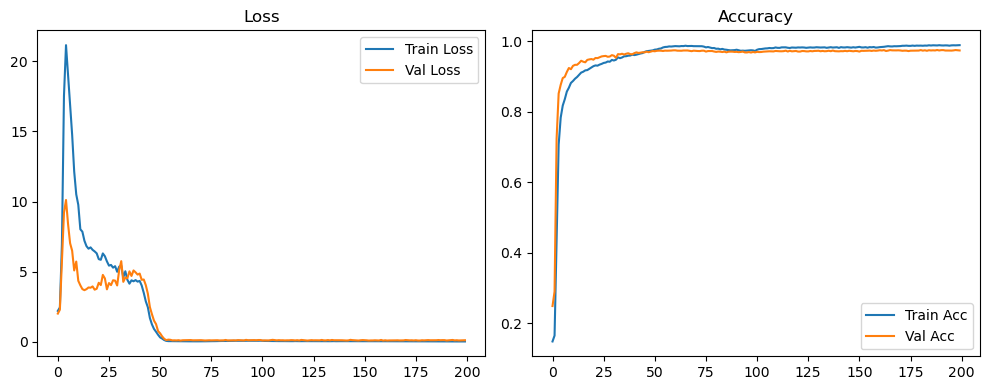

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 28.86it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 29.21it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 29.35it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 29.38it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 29.39it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 29.41it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 29.44it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 29.47it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 29.50it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 29.53it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 29.50it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 29.48it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 29.50it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 30.04it/s]

Original Model Final Test Loss: 0.1134 Accuracy: 0.9767


🚀 Running: batch256_lr0.01_0.005_0.001_dp0.0


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1784 | Val Acc: 0.3764 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1784 | Val Acc: 0.3764 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1784 | Val Acc: 0.3764 |:   0%|          | 1/200 [00:09<30:43,  9.26s/it]

| LR: 0.010 | Train Acc: 0.2977 | Val Acc: 0.6701 |:   0%|          | 1/200 [00:18<30:43,  9.26s/it]

| LR: 0.010 | Train Acc: 0.2977 | Val Acc: 0.6701 |:   0%|          | 1/200 [00:18<30:43,  9.26s/it]

| LR: 0.010 | Train Acc: 0.2977 | Val Acc: 0.6701 |:   1%|          | 2/200 [00:18<30:14,  9.16s/it]

| LR: 0.010 | Train Acc: 0.7490 | Val Acc: 0.8267 |:   1%|          | 2/200 [00:27<30:14,  9.16s/it]

| LR: 0.010 | Train Acc: 0.7490 | Val Acc: 0.8267 |:   1%|          | 2/200 [00:27<30:14,  9.16s/it]

| LR: 0.010 | Train Acc: 0.7490 | Val Acc: 0.8267 |:   2%|▏         | 3/200 [00:27<29:35,  9.01s/it]

| LR: 0.010 | Train Acc: 0.8352 | Val Acc: 0.8452 |:   2%|▏         | 3/200 [00:36<29:35,  9.01s/it]

| LR: 0.010 | Train Acc: 0.8352 | Val Acc: 0.8452 |:   2%|▏         | 3/200 [00:36<29:35,  9.01s/it]

| LR: 0.010 | Train Acc: 0.8352 | Val Acc: 0.8452 |:   2%|▏         | 4/200 [00:36<29:15,  8.96s/it]

| LR: 0.010 | Train Acc: 0.8667 | Val Acc: 0.8852 |:   2%|▏         | 4/200 [00:44<29:15,  8.96s/it]

| LR: 0.010 | Train Acc: 0.8667 | Val Acc: 0.8852 |:   2%|▏         | 4/200 [00:44<29:15,  8.96s/it]

| LR: 0.010 | Train Acc: 0.8667 | Val Acc: 0.8852 |:   2%|▎         | 5/200 [00:44<28:55,  8.90s/it]

| LR: 0.010 | Train Acc: 0.8852 | Val Acc: 0.8979 |:   2%|▎         | 5/200 [00:53<28:55,  8.90s/it]

| LR: 0.010 | Train Acc: 0.8852 | Val Acc: 0.8979 |:   2%|▎         | 5/200 [00:53<28:55,  8.90s/it]

| LR: 0.010 | Train Acc: 0.8852 | Val Acc: 0.8979 |:   3%|▎         | 6/200 [00:53<28:49,  8.91s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9019 |:   3%|▎         | 6/200 [01:02<28:49,  8.91s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9019 |:   3%|▎         | 6/200 [01:02<28:49,  8.91s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9019 |:   4%|▎         | 7/200 [01:02<28:49,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9149 |:   4%|▎         | 7/200 [01:11<28:49,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9149 |:   4%|▎         | 7/200 [01:11<28:49,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9149 |:   4%|▍         | 8/200 [01:11<28:27,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9146 | Val Acc: 0.9182 |:   4%|▍         | 8/200 [01:20<28:27,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9146 | Val Acc: 0.9182 |:   4%|▍         | 8/200 [01:20<28:27,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9146 | Val Acc: 0.9182 |:   4%|▍         | 9/200 [01:20<28:13,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9237 | Val Acc: 0.9161 |:   4%|▍         | 9/200 [01:29<28:13,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9237 | Val Acc: 0.9161 |:   4%|▍         | 9/200 [01:29<28:13,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9237 | Val Acc: 0.9161 |:   5%|▌         | 10/200 [01:29<28:01,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9272 | Val Acc: 0.9265 |:   5%|▌         | 10/200 [01:38<28:01,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9272 | Val Acc: 0.9265 |:   5%|▌         | 10/200 [01:38<28:01,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9272 | Val Acc: 0.9265 |:   6%|▌         | 11/200 [01:38<27:52,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9338 | Val Acc: 0.9303 |:   6%|▌         | 11/200 [01:46<27:52,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9338 | Val Acc: 0.9303 |:   6%|▌         | 11/200 [01:46<27:52,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9338 | Val Acc: 0.9303 |:   6%|▌         | 12/200 [01:46<27:43,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9371 | Val Acc: 0.9284 |:   6%|▌         | 12/200 [01:55<27:43,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9371 | Val Acc: 0.9284 |:   6%|▌         | 12/200 [01:55<27:43,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9371 | Val Acc: 0.9284 |:   6%|▋         | 13/200 [01:55<27:31,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9411 | Val Acc: 0.9333 |:   6%|▋         | 13/200 [02:04<27:31,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9411 | Val Acc: 0.9333 |:   6%|▋         | 13/200 [02:04<27:31,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9411 | Val Acc: 0.9333 |:   7%|▋         | 14/200 [02:04<27:14,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9324 |:   7%|▋         | 14/200 [02:12<27:14,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9324 |:   7%|▋         | 14/200 [02:12<27:14,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9324 |:   8%|▊         | 15/200 [02:12<26:53,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9364 |:   8%|▊         | 15/200 [02:21<26:53,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9364 |:   8%|▊         | 15/200 [02:21<26:53,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9364 |:   8%|▊         | 16/200 [02:21<26:48,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9530 | Val Acc: 0.9417 |:   8%|▊         | 16/200 [02:30<26:48,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9530 | Val Acc: 0.9417 |:   8%|▊         | 16/200 [02:30<26:48,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9530 | Val Acc: 0.9417 |:   8%|▊         | 17/200 [02:30<26:54,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9565 | Val Acc: 0.9415 |:   8%|▊         | 17/200 [02:39<26:54,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9565 | Val Acc: 0.9415 |:   8%|▊         | 17/200 [02:39<26:54,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9565 | Val Acc: 0.9415 |:   9%|▉         | 18/200 [02:39<26:45,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9580 | Val Acc: 0.9413 |:   9%|▉         | 18/200 [02:48<26:45,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9580 | Val Acc: 0.9413 |:   9%|▉         | 18/200 [02:48<26:45,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9580 | Val Acc: 0.9413 |:  10%|▉         | 19/200 [02:48<26:33,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9604 | Val Acc: 0.9463 |:  10%|▉         | 19/200 [02:57<26:33,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9604 | Val Acc: 0.9463 |:  10%|▉         | 19/200 [02:57<26:33,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9604 | Val Acc: 0.9463 |:  10%|█         | 20/200 [02:57<26:26,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9608 | Val Acc: 0.9458 |:  10%|█         | 20/200 [03:05<26:26,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9608 | Val Acc: 0.9458 |:  10%|█         | 20/200 [03:05<26:26,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9608 | Val Acc: 0.9458 |:  10%|█         | 21/200 [03:06<26:18,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9453 |:  10%|█         | 21/200 [03:14<26:18,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9453 |:  10%|█         | 21/200 [03:14<26:18,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9453 |:  11%|█         | 22/200 [03:14<26:07,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9471 |:  11%|█         | 22/200 [03:23<26:07,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9471 |:  11%|█         | 22/200 [03:23<26:07,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9471 |:  12%|█▏        | 23/200 [03:23<25:54,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9654 | Val Acc: 0.9447 |:  12%|█▏        | 23/200 [03:32<25:54,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9654 | Val Acc: 0.9447 |:  12%|█▏        | 23/200 [03:32<25:54,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9654 | Val Acc: 0.9447 |:  12%|█▏        | 24/200 [03:32<26:01,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9469 |:  12%|█▏        | 24/200 [03:42<26:01,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9469 |:  12%|█▏        | 24/200 [03:42<26:01,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9469 |:  12%|█▎        | 25/200 [03:42<26:24,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9488 |:  12%|█▎        | 25/200 [03:50<26:24,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9488 |:  12%|█▎        | 25/200 [03:50<26:24,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9488 |:  13%|█▎        | 26/200 [03:50<25:59,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9703 | Val Acc: 0.9557 |:  13%|█▎        | 26/200 [03:59<25:59,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9703 | Val Acc: 0.9557 |:  13%|█▎        | 26/200 [03:59<25:59,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9703 | Val Acc: 0.9557 |:  14%|█▎        | 27/200 [03:59<25:40,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9410 |:  14%|█▎        | 27/200 [04:08<25:40,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9410 |:  14%|█▎        | 27/200 [04:08<25:40,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9410 |:  14%|█▍        | 28/200 [04:08<25:24,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9507 |:  14%|█▍        | 28/200 [04:17<25:24,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9507 |:  14%|█▍        | 28/200 [04:17<25:24,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9507 |:  14%|█▍        | 29/200 [04:17<25:11,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9478 |:  14%|█▍        | 29/200 [04:25<25:11,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9478 |:  14%|█▍        | 29/200 [04:25<25:11,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9478 |:  15%|█▌        | 30/200 [04:25<25:02,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9479 |:  15%|█▌        | 30/200 [04:34<25:02,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9479 |:  15%|█▌        | 30/200 [04:34<25:02,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9479 |:  16%|█▌        | 31/200 [04:34<24:48,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9492 |:  16%|█▌        | 31/200 [04:43<24:48,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9492 |:  16%|█▌        | 31/200 [04:43<24:48,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9492 |:  16%|█▌        | 32/200 [04:43<24:41,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9476 |:  16%|█▌        | 32/200 [04:52<24:41,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9476 |:  16%|█▌        | 32/200 [04:52<24:41,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9476 |:  16%|█▋        | 33/200 [04:52<24:29,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9759 | Val Acc: 0.9497 |:  16%|█▋        | 33/200 [05:01<24:29,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9759 | Val Acc: 0.9497 |:  16%|█▋        | 33/200 [05:01<24:29,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9759 | Val Acc: 0.9497 |:  17%|█▋        | 34/200 [05:01<24:21,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9508 |:  17%|█▋        | 34/200 [05:09<24:21,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9508 |:  17%|█▋        | 34/200 [05:09<24:21,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9508 |:  18%|█▊        | 35/200 [05:09<24:10,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9514 |:  18%|█▊        | 35/200 [05:18<24:10,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9514 |:  18%|█▊        | 35/200 [05:18<24:10,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9514 |:  18%|█▊        | 36/200 [05:18<23:58,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9554 |:  18%|█▊        | 36/200 [05:27<23:58,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9554 |:  18%|█▊        | 36/200 [05:27<23:58,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9554 |:  18%|█▊        | 37/200 [05:27<23:53,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9558 |:  18%|█▊        | 37/200 [05:36<23:53,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9558 |:  18%|█▊        | 37/200 [05:36<23:53,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9558 |:  19%|█▉        | 38/200 [05:36<23:48,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9537 |:  19%|█▉        | 38/200 [05:45<23:48,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9537 |:  19%|█▉        | 38/200 [05:45<23:48,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9537 |:  20%|█▉        | 39/200 [05:45<23:39,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9566 |:  20%|█▉        | 39/200 [05:53<23:39,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9566 |:  20%|█▉        | 39/200 [05:53<23:39,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9566 |:  20%|██        | 40/200 [05:53<23:29,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9594 |:  20%|██        | 40/200 [06:02<23:29,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9594 |:  20%|██        | 40/200 [06:02<23:29,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9594 |:  20%|██        | 41/200 [06:02<23:20,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9843 | Val Acc: 0.9605 |:  20%|██        | 41/200 [06:11<23:20,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9843 | Val Acc: 0.9605 |:  20%|██        | 41/200 [06:11<23:20,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9843 | Val Acc: 0.9605 |:  21%|██        | 42/200 [06:11<23:13,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9847 | Val Acc: 0.9607 |:  21%|██        | 42/200 [06:20<23:13,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9847 | Val Acc: 0.9607 |:  21%|██        | 42/200 [06:20<23:13,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9847 | Val Acc: 0.9607 |:  22%|██▏       | 43/200 [06:20<23:09,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9578 |:  22%|██▏       | 43/200 [06:29<23:09,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9578 |:  22%|██▏       | 43/200 [06:29<23:09,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9578 |:  22%|██▏       | 44/200 [06:29<22:54,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9581 |:  22%|██▏       | 44/200 [06:38<22:54,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9581 |:  22%|██▏       | 44/200 [06:38<22:54,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9581 |:  22%|██▎       | 45/200 [06:38<22:49,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9568 |:  22%|██▎       | 45/200 [06:47<22:49,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9568 |:  22%|██▎       | 45/200 [06:47<22:49,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9568 |:  23%|██▎       | 46/200 [06:47<22:58,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9550 |:  23%|██▎       | 46/200 [06:56<22:58,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9550 |:  23%|██▎       | 46/200 [06:56<22:58,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9550 |:  24%|██▎       | 47/200 [06:56<22:43,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9609 |:  24%|██▎       | 47/200 [07:04<22:43,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9609 |:  24%|██▎       | 47/200 [07:04<22:43,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9609 |:  24%|██▍       | 48/200 [07:04<22:28,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9621 |:  24%|██▍       | 48/200 [07:13<22:28,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9621 |:  24%|██▍       | 48/200 [07:13<22:28,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9621 |:  24%|██▍       | 49/200 [07:13<22:17,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9873 | Val Acc: 0.9610 |:  24%|██▍       | 49/200 [07:22<22:17,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9873 | Val Acc: 0.9610 |:  24%|██▍       | 49/200 [07:22<22:17,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9873 | Val Acc: 0.9610 |:  25%|██▌       | 50/200 [07:22<22:02,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9593 |:  25%|██▌       | 50/200 [07:31<22:02,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9593 |:  25%|██▌       | 50/200 [07:31<22:02,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9593 |:  26%|██▌       | 51/200 [07:31<21:52,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9613 |:  26%|██▌       | 51/200 [07:39<21:52,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9613 |:  26%|██▌       | 51/200 [07:39<21:52,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9613 |:  26%|██▌       | 52/200 [07:40<21:39,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9878 | Val Acc: 0.9592 |:  26%|██▌       | 52/200 [07:48<21:39,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9878 | Val Acc: 0.9592 |:  26%|██▌       | 52/200 [07:48<21:39,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9878 | Val Acc: 0.9592 |:  26%|██▋       | 53/200 [07:48<21:29,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9571 |:  26%|██▋       | 53/200 [07:57<21:29,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9571 |:  26%|██▋       | 53/200 [07:57<21:29,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9571 |:  27%|██▋       | 54/200 [07:57<21:18,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9877 | Val Acc: 0.9581 |:  27%|██▋       | 54/200 [08:06<21:18,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9877 | Val Acc: 0.9581 |:  27%|██▋       | 54/200 [08:06<21:18,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9877 | Val Acc: 0.9581 |:  28%|██▊       | 55/200 [08:06<21:30,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9615 |:  28%|██▊       | 55/200 [08:15<21:30,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9615 |:  28%|██▊       | 55/200 [08:15<21:30,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9615 |:  28%|██▊       | 56/200 [08:15<21:16,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9672 |:  28%|██▊       | 56/200 [08:24<21:16,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9672 |:  28%|██▊       | 56/200 [08:24<21:16,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9672 |:  28%|██▊       | 57/200 [08:24<21:04,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9653 |:  28%|██▊       | 57/200 [08:33<21:04,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9653 |:  28%|██▊       | 57/200 [08:33<21:04,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9653 |:  29%|██▉       | 58/200 [08:33<20:54,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9639 |:  29%|██▉       | 58/200 [08:41<20:54,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9639 |:  29%|██▉       | 58/200 [08:41<20:54,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9639 |:  30%|██▉       | 59/200 [08:41<20:44,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9607 |:  30%|██▉       | 59/200 [08:50<20:44,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9607 |:  30%|██▉       | 59/200 [08:50<20:44,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9607 |:  30%|███       | 60/200 [08:50<20:30,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9650 |:  30%|███       | 60/200 [08:59<20:30,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9650 |:  30%|███       | 60/200 [08:59<20:30,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9650 |:  30%|███       | 61/200 [08:59<20:20,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9661 |:  30%|███       | 61/200 [09:08<20:20,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9661 |:  30%|███       | 61/200 [09:08<20:20,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9661 |:  31%|███       | 62/200 [09:08<20:39,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9641 |:  31%|███       | 62/200 [09:18<20:39,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9641 |:  31%|███       | 62/200 [09:18<20:39,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9641 |:  32%|███▏      | 63/200 [09:18<20:47,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9659 |:  32%|███▏      | 63/200 [09:27<20:47,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9659 |:  32%|███▏      | 63/200 [09:27<20:47,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9659 |:  32%|███▏      | 64/200 [09:27<20:59,  9.26s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9647 |:  32%|███▏      | 64/200 [09:37<20:59,  9.26s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9647 |:  32%|███▏      | 64/200 [09:37<20:59,  9.26s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9647 |:  32%|███▎      | 65/200 [09:37<20:53,  9.29s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9649 |:  32%|███▎      | 65/200 [09:46<20:53,  9.29s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9649 |:  32%|███▎      | 65/200 [09:46<20:53,  9.29s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9649 |:  33%|███▎      | 66/200 [09:46<20:27,  9.16s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9674 |:  33%|███▎      | 66/200 [09:54<20:27,  9.16s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9674 |:  33%|███▎      | 66/200 [09:54<20:27,  9.16s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9674 |:  34%|███▎      | 67/200 [09:54<20:06,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9673 |:  34%|███▎      | 67/200 [10:03<20:06,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9673 |:  34%|███▎      | 67/200 [10:03<20:06,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9673 |:  34%|███▍      | 68/200 [10:03<19:48,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9673 |:  34%|███▍      | 68/200 [10:12<19:48,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9673 |:  34%|███▍      | 68/200 [10:12<19:48,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9673 |:  34%|███▍      | 69/200 [10:12<19:37,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9645 |:  34%|███▍      | 69/200 [10:21<19:37,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9645 |:  34%|███▍      | 69/200 [10:21<19:37,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9645 |:  35%|███▌      | 70/200 [10:21<19:23,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9664 |:  35%|███▌      | 70/200 [10:30<19:23,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9664 |:  35%|███▌      | 70/200 [10:30<19:23,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9664 |:  36%|███▌      | 71/200 [10:31<19:32,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9667 |:  36%|███▌      | 71/200 [10:39<19:32,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9667 |:  36%|███▌      | 71/200 [10:39<19:32,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9667 |:  36%|███▌      | 72/200 [10:39<19:11,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9677 |:  36%|███▌      | 72/200 [10:48<19:11,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9677 |:  36%|███▌      | 72/200 [10:48<19:11,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9677 |:  36%|███▋      | 73/200 [10:48<19:00,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9682 |:  36%|███▋      | 73/200 [10:57<19:00,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9682 |:  36%|███▋      | 73/200 [10:57<19:00,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9682 |:  37%|███▋      | 74/200 [10:57<18:42,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9694 |:  37%|███▋      | 74/200 [11:06<18:42,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9694 |:  37%|███▋      | 74/200 [11:06<18:42,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9694 |:  38%|███▊      | 75/200 [11:06<18:36,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9708 |:  38%|███▊      | 75/200 [11:15<18:36,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9708 |:  38%|███▊      | 75/200 [11:15<18:36,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9708 |:  38%|███▊      | 76/200 [11:15<18:18,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9712 |:  38%|███▊      | 76/200 [11:24<18:18,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9712 |:  38%|███▊      | 76/200 [11:24<18:18,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9712 |:  38%|███▊      | 77/200 [11:24<18:14,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9982 | Val Acc: 0.9684 |:  38%|███▊      | 77/200 [11:32<18:14,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9982 | Val Acc: 0.9684 |:  38%|███▊      | 77/200 [11:32<18:14,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9982 | Val Acc: 0.9684 |:  39%|███▉      | 78/200 [11:32<18:00,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9978 | Val Acc: 0.9696 |:  39%|███▉      | 78/200 [11:41<18:00,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9978 | Val Acc: 0.9696 |:  39%|███▉      | 78/200 [11:41<18:00,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9978 | Val Acc: 0.9696 |:  40%|███▉      | 79/200 [11:41<17:58,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9690 |:  40%|███▉      | 79/200 [11:50<17:58,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9690 |:  40%|███▉      | 79/200 [11:50<17:58,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9690 |:  40%|████      | 80/200 [11:50<17:46,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9663 |:  40%|████      | 80/200 [11:59<17:46,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9663 |:  40%|████      | 80/200 [11:59<17:46,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9663 |:  40%|████      | 81/200 [11:59<17:32,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9683 |:  40%|████      | 81/200 [12:08<17:32,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9683 |:  40%|████      | 81/200 [12:08<17:32,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9683 |:  41%|████      | 82/200 [12:08<17:17,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9693 |:  41%|████      | 82/200 [12:16<17:17,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9693 |:  41%|████      | 82/200 [12:16<17:17,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9693 |:  42%|████▏     | 83/200 [12:16<17:06,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9696 |:  42%|████▏     | 83/200 [12:25<17:06,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9696 |:  42%|████▏     | 83/200 [12:25<17:06,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9696 |:  42%|████▏     | 84/200 [12:25<16:59,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9974 | Val Acc: 0.9698 |:  42%|████▏     | 84/200 [12:34<16:59,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9974 | Val Acc: 0.9698 |:  42%|████▏     | 84/200 [12:34<16:59,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9974 | Val Acc: 0.9698 |:  42%|████▎     | 85/200 [12:34<16:48,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9682 |:  42%|████▎     | 85/200 [12:43<16:48,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9682 |:  42%|████▎     | 85/200 [12:43<16:48,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9682 |:  43%|████▎     | 86/200 [12:43<16:40,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9655 |:  43%|████▎     | 86/200 [12:51<16:40,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9655 |:  43%|████▎     | 86/200 [12:51<16:40,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9655 |:  44%|████▎     | 87/200 [12:52<16:30,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9629 |:  44%|████▎     | 87/200 [13:01<16:30,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9629 |:  44%|████▎     | 87/200 [13:01<16:30,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9629 |:  44%|████▍     | 88/200 [13:01<16:34,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9652 |:  44%|████▍     | 88/200 [13:10<16:34,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9652 |:  44%|████▍     | 88/200 [13:10<16:34,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9652 |:  44%|████▍     | 89/200 [13:10<16:37,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9684 |:  44%|████▍     | 89/200 [13:19<16:37,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9684 |:  44%|████▍     | 89/200 [13:19<16:37,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9684 |:  45%|████▌     | 90/200 [13:19<16:28,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9685 |:  45%|████▌     | 90/200 [13:28<16:28,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9685 |:  45%|████▌     | 90/200 [13:28<16:28,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9685 |:  46%|████▌     | 91/200 [13:28<16:24,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9637 |:  46%|████▌     | 91/200 [13:37<16:24,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9637 |:  46%|████▌     | 91/200 [13:37<16:24,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9637 |:  46%|████▌     | 92/200 [13:37<16:12,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9951 | Val Acc: 0.9652 |:  46%|████▌     | 92/200 [13:46<16:12,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9951 | Val Acc: 0.9652 |:  46%|████▌     | 92/200 [13:46<16:12,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9951 | Val Acc: 0.9652 |:  46%|████▋     | 93/200 [13:46<15:59,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9693 |:  46%|████▋     | 93/200 [13:54<15:59,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9693 |:  46%|████▋     | 93/200 [13:54<15:59,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9693 |:  47%|████▋     | 94/200 [13:55<15:42,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9654 |:  47%|████▋     | 94/200 [14:03<15:42,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9654 |:  47%|████▋     | 94/200 [14:03<15:42,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9654 |:  48%|████▊     | 95/200 [14:03<15:33,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9663 |:  48%|████▊     | 95/200 [14:13<15:33,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9663 |:  48%|████▊     | 95/200 [14:13<15:33,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9663 |:  48%|████▊     | 96/200 [14:13<15:42,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9660 |:  48%|████▊     | 96/200 [14:22<15:42,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9660 |:  48%|████▊     | 96/200 [14:22<15:42,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9660 |:  48%|████▊     | 97/200 [14:22<15:35,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9947 | Val Acc: 0.9665 |:  48%|████▊     | 97/200 [14:31<15:35,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9947 | Val Acc: 0.9665 |:  48%|████▊     | 97/200 [14:31<15:35,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9947 | Val Acc: 0.9665 |:  49%|████▉     | 98/200 [14:31<15:30,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9664 |:  49%|████▉     | 98/200 [14:40<15:30,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9664 |:  49%|████▉     | 98/200 [14:40<15:30,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9664 |:  50%|████▉     | 99/200 [14:40<15:11,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9657 |:  50%|████▉     | 99/200 [14:49<15:11,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9657 |:  50%|████▉     | 99/200 [14:49<15:11,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9657 |:  50%|█████     | 100/200 [14:49<15:00,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9692 |:  50%|█████     | 100/200 [14:58<15:00,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9692 |:  50%|█████     | 100/200 [14:58<15:00,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9692 |:  50%|█████     | 101/200 [14:58<14:59,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9705 |:  50%|█████     | 101/200 [15:07<14:59,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9705 |:  50%|█████     | 101/200 [15:07<14:59,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9705 |:  51%|█████     | 102/200 [15:07<14:49,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9708 |:  51%|█████     | 102/200 [15:17<14:49,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9708 |:  51%|█████     | 102/200 [15:17<14:49,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9708 |:  52%|█████▏    | 103/200 [15:17<14:47,  9.15s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9714 |:  52%|█████▏    | 103/200 [15:25<14:47,  9.15s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9714 |:  52%|█████▏    | 103/200 [15:25<14:47,  9.15s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9714 |:  52%|█████▏    | 104/200 [15:25<14:28,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9988 | Val Acc: 0.9702 |:  52%|█████▏    | 104/200 [15:34<14:28,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9988 | Val Acc: 0.9702 |:  52%|█████▏    | 104/200 [15:34<14:28,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9988 | Val Acc: 0.9702 |:  52%|█████▎    | 105/200 [15:34<14:14,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9700 |:  52%|█████▎    | 105/200 [15:44<14:14,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9700 |:  52%|█████▎    | 105/200 [15:44<14:14,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9700 |:  53%|█████▎    | 106/200 [15:44<14:15,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9693 |:  53%|█████▎    | 106/200 [15:52<14:15,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9693 |:  53%|█████▎    | 106/200 [15:52<14:15,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9693 |:  54%|█████▎    | 107/200 [15:52<13:56,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9688 |:  54%|█████▎    | 107/200 [16:01<13:56,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9688 |:  54%|█████▎    | 107/200 [16:01<13:56,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9688 |:  54%|█████▍    | 108/200 [16:01<13:45,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9691 |:  54%|█████▍    | 108/200 [16:10<13:45,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9691 |:  54%|█████▍    | 108/200 [16:10<13:45,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9691 |:  55%|█████▍    | 109/200 [16:10<13:36,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9677 |:  55%|█████▍    | 109/200 [16:19<13:36,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9677 |:  55%|█████▍    | 109/200 [16:19<13:36,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9677 |:  55%|█████▌    | 110/200 [16:19<13:32,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9691 |:  55%|█████▌    | 110/200 [16:28<13:32,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9691 |:  55%|█████▌    | 110/200 [16:28<13:32,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9691 |:  56%|█████▌    | 111/200 [16:28<13:18,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9679 |:  56%|█████▌    | 111/200 [16:38<13:18,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9679 |:  56%|█████▌    | 111/200 [16:38<13:18,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9679 |:  56%|█████▌    | 112/200 [16:38<13:22,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9677 |:  56%|█████▌    | 112/200 [16:46<13:22,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9677 |:  56%|█████▌    | 112/200 [16:46<13:22,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9677 |:  56%|█████▋    | 113/200 [16:46<13:04,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9703 |:  56%|█████▋    | 113/200 [16:55<13:04,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9703 |:  56%|█████▋    | 113/200 [16:55<13:04,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9703 |:  57%|█████▋    | 114/200 [16:55<12:49,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9708 |:  57%|█████▋    | 114/200 [17:04<12:49,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9708 |:  57%|█████▋    | 114/200 [17:04<12:49,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9708 |:  57%|█████▊    | 115/200 [17:04<12:35,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9678 |:  57%|█████▊    | 115/200 [17:13<12:35,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9678 |:  57%|█████▊    | 115/200 [17:13<12:35,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9678 |:  58%|█████▊    | 116/200 [17:13<12:38,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9700 |:  58%|█████▊    | 116/200 [17:23<12:38,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9700 |:  58%|█████▊    | 116/200 [17:23<12:38,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9700 |:  58%|█████▊    | 117/200 [17:23<12:34,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9678 |:  58%|█████▊    | 117/200 [17:32<12:34,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9678 |:  58%|█████▊    | 117/200 [17:32<12:34,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9678 |:  59%|█████▉    | 118/200 [17:32<12:30,  9.15s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9695 |:  59%|█████▉    | 118/200 [17:41<12:30,  9.15s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9695 |:  59%|█████▉    | 118/200 [17:41<12:30,  9.15s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9695 |:  60%|█████▉    | 119/200 [17:41<12:11,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9702 |:  60%|█████▉    | 119/200 [17:50<12:11,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9702 |:  60%|█████▉    | 119/200 [17:50<12:11,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9702 |:  60%|██████    | 120/200 [17:50<12:00,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9691 |:  60%|██████    | 120/200 [17:58<12:00,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9691 |:  60%|██████    | 120/200 [17:58<12:00,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9691 |:  60%|██████    | 121/200 [17:58<11:47,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9699 |:  60%|██████    | 121/200 [18:07<11:47,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9699 |:  60%|██████    | 121/200 [18:07<11:47,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9699 |:  61%|██████    | 122/200 [18:07<11:35,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9688 |:  61%|██████    | 122/200 [18:17<11:35,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9688 |:  61%|██████    | 122/200 [18:17<11:35,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9688 |:  62%|██████▏   | 123/200 [18:17<11:36,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9681 |:  62%|██████▏   | 123/200 [18:27<11:36,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9681 |:  62%|██████▏   | 123/200 [18:27<11:36,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9681 |:  62%|██████▏   | 124/200 [18:27<11:48,  9.32s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9689 |:  62%|██████▏   | 124/200 [18:36<11:48,  9.32s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9689 |:  62%|██████▏   | 124/200 [18:36<11:48,  9.32s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9689 |:  62%|██████▎   | 125/200 [18:36<11:48,  9.45s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9720 |:  62%|██████▎   | 125/200 [18:45<11:48,  9.45s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9720 |:  62%|██████▎   | 125/200 [18:45<11:48,  9.45s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9720 |:  63%|██████▎   | 126/200 [18:45<11:25,  9.27s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9703 |:  63%|██████▎   | 126/200 [18:54<11:25,  9.27s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9703 |:  63%|██████▎   | 126/200 [18:54<11:25,  9.27s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9703 |:  64%|██████▎   | 127/200 [18:54<11:05,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9688 |:  64%|██████▎   | 127/200 [19:03<11:05,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9688 |:  64%|██████▎   | 127/200 [19:03<11:05,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9688 |:  64%|██████▍   | 128/200 [19:03<10:47,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9672 |:  64%|██████▍   | 128/200 [19:11<10:47,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9672 |:  64%|██████▍   | 128/200 [19:11<10:47,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9672 |:  64%|██████▍   | 129/200 [19:11<10:32,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9719 |:  64%|██████▍   | 129/200 [19:20<10:32,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9719 |:  64%|██████▍   | 129/200 [19:20<10:32,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9719 |:  65%|██████▌   | 130/200 [19:20<10:21,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9712 |:  65%|██████▌   | 130/200 [19:29<10:21,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9712 |:  65%|██████▌   | 130/200 [19:29<10:21,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9712 |:  66%|██████▌   | 131/200 [19:29<10:10,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9991 | Val Acc: 0.9709 |:  66%|██████▌   | 131/200 [19:38<10:10,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9991 | Val Acc: 0.9709 |:  66%|██████▌   | 131/200 [19:38<10:10,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9991 | Val Acc: 0.9709 |:  66%|██████▌   | 132/200 [19:38<10:14,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9722 |:  66%|██████▌   | 132/200 [19:47<10:14,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9722 |:  66%|██████▌   | 132/200 [19:47<10:14,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9722 |:  66%|██████▋   | 133/200 [19:47<09:57,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9684 |:  66%|██████▋   | 133/200 [19:57<09:57,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9684 |:  66%|██████▋   | 133/200 [19:57<09:57,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9684 |:  67%|██████▋   | 134/200 [19:57<10:01,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9684 |:  67%|██████▋   | 134/200 [20:06<10:01,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9684 |:  67%|██████▋   | 134/200 [20:06<10:01,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9684 |:  68%|██████▊   | 135/200 [20:06<10:01,  9.26s/it]

| LR: 0.005 | Train Acc: 0.9991 | Val Acc: 0.9698 |:  68%|██████▊   | 135/200 [20:15<10:01,  9.26s/it]

| LR: 0.005 | Train Acc: 0.9991 | Val Acc: 0.9698 |:  68%|██████▊   | 135/200 [20:15<10:01,  9.26s/it]

| LR: 0.005 | Train Acc: 0.9991 | Val Acc: 0.9698 |:  68%|██████▊   | 136/200 [20:15<09:42,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9679 |:  68%|██████▊   | 136/200 [20:24<09:42,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9679 |:  68%|██████▊   | 136/200 [20:24<09:42,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9679 |:  68%|██████▊   | 137/200 [20:24<09:26,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9697 |:  68%|██████▊   | 137/200 [20:33<09:26,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9697 |:  68%|██████▊   | 137/200 [20:33<09:26,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9697 |:  69%|██████▉   | 138/200 [20:33<09:22,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9988 | Val Acc: 0.9702 |:  69%|██████▉   | 138/200 [20:43<09:22,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9988 | Val Acc: 0.9702 |:  69%|██████▉   | 138/200 [20:43<09:22,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9988 | Val Acc: 0.9702 |:  70%|██████▉   | 139/200 [20:43<09:22,  9.23s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9705 |:  70%|██████▉   | 139/200 [20:52<09:22,  9.23s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9705 |:  70%|██████▉   | 139/200 [20:52<09:22,  9.23s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9705 |:  70%|███████   | 140/200 [20:52<09:16,  9.28s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9696 |:  70%|███████   | 140/200 [21:01<09:16,  9.28s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9696 |:  70%|███████   | 140/200 [21:01<09:16,  9.28s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9696 |:  70%|███████   | 141/200 [21:01<09:05,  9.24s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9712 |:  70%|███████   | 141/200 [21:10<09:05,  9.24s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9712 |:  70%|███████   | 141/200 [21:10<09:05,  9.24s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9712 |:  71%|███████   | 142/200 [21:10<08:50,  9.14s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9700 |:  71%|███████   | 142/200 [21:19<08:50,  9.14s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9700 |:  71%|███████   | 142/200 [21:19<08:50,  9.14s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9700 |:  72%|███████▏  | 143/200 [21:19<08:36,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9704 |:  72%|███████▏  | 143/200 [21:28<08:36,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9704 |:  72%|███████▏  | 143/200 [21:28<08:36,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9704 |:  72%|███████▏  | 144/200 [21:28<08:22,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9701 |:  72%|███████▏  | 144/200 [21:37<08:22,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9701 |:  72%|███████▏  | 144/200 [21:37<08:22,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9701 |:  72%|███████▎  | 145/200 [21:37<08:13,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9704 |:  72%|███████▎  | 145/200 [21:46<08:13,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9704 |:  72%|███████▎  | 145/200 [21:46<08:13,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9704 |:  73%|███████▎  | 146/200 [21:46<08:05,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9723 |:  73%|███████▎  | 146/200 [21:55<08:05,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9723 |:  73%|███████▎  | 146/200 [21:55<08:05,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9723 |:  74%|███████▎  | 147/200 [21:55<07:55,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9722 |:  74%|███████▎  | 147/200 [22:03<07:55,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9722 |:  74%|███████▎  | 147/200 [22:03<07:55,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9722 |:  74%|███████▍  | 148/200 [22:03<07:43,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9990 | Val Acc: 0.9697 |:  74%|███████▍  | 148/200 [22:13<07:43,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9990 | Val Acc: 0.9697 |:  74%|███████▍  | 148/200 [22:13<07:43,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9990 | Val Acc: 0.9697 |:  74%|███████▍  | 149/200 [22:13<07:46,  9.15s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9698 |:  74%|███████▍  | 149/200 [22:22<07:46,  9.15s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9698 |:  74%|███████▍  | 149/200 [22:22<07:46,  9.15s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9698 |:  75%|███████▌  | 150/200 [22:22<07:40,  9.21s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9688 |:  75%|███████▌  | 150/200 [22:31<07:40,  9.21s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9688 |:  75%|███████▌  | 150/200 [22:31<07:40,  9.21s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9688 |:  76%|███████▌  | 151/200 [22:31<07:24,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9990 | Val Acc: 0.9688 |:  76%|███████▌  | 151/200 [22:40<07:24,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9990 | Val Acc: 0.9688 |:  76%|███████▌  | 151/200 [22:40<07:24,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9990 | Val Acc: 0.9688 |:  76%|███████▌  | 152/200 [22:40<07:12,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9689 |:  76%|███████▌  | 152/200 [22:49<07:12,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9689 |:  76%|███████▌  | 152/200 [22:49<07:12,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9689 |:  76%|███████▋  | 153/200 [22:49<07:02,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9720 |:  76%|███████▋  | 153/200 [22:58<07:02,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9720 |:  76%|███████▋  | 153/200 [22:58<07:02,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9720 |:  77%|███████▋  | 154/200 [22:58<06:59,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9707 |:  77%|███████▋  | 154/200 [23:08<06:59,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9707 |:  77%|███████▋  | 154/200 [23:08<06:59,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9707 |:  78%|███████▊  | 155/200 [23:08<06:54,  9.21s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9712 |:  78%|███████▊  | 155/200 [23:17<06:54,  9.21s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9712 |:  78%|███████▊  | 155/200 [23:17<06:54,  9.21s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9712 |:  78%|███████▊  | 156/200 [23:17<06:39,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9720 |:  78%|███████▊  | 156/200 [23:25<06:39,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9720 |:  78%|███████▊  | 156/200 [23:25<06:39,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9720 |:  78%|███████▊  | 157/200 [23:25<06:27,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9712 |:  78%|███████▊  | 157/200 [23:34<06:27,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9712 |:  78%|███████▊  | 157/200 [23:34<06:27,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9712 |:  79%|███████▉  | 158/200 [23:34<06:15,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9703 |:  79%|███████▉  | 158/200 [23:43<06:15,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9703 |:  79%|███████▉  | 158/200 [23:43<06:15,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9703 |:  80%|███████▉  | 159/200 [23:43<06:04,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9712 |:  80%|███████▉  | 159/200 [23:52<06:04,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9712 |:  80%|███████▉  | 159/200 [23:52<06:04,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9712 |:  80%|████████  | 160/200 [23:52<05:55,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9734 |:  80%|████████  | 160/200 [24:01<05:55,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9734 |:  80%|████████  | 160/200 [24:01<05:55,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9734 |:  80%|████████  | 161/200 [24:01<05:45,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9732 |:  80%|████████  | 161/200 [24:09<05:45,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9732 |:  80%|████████  | 161/200 [24:09<05:45,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9732 |:  81%|████████  | 162/200 [24:09<05:36,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9723 |:  81%|████████  | 162/200 [24:18<05:36,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9723 |:  81%|████████  | 162/200 [24:18<05:36,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9723 |:  82%|████████▏ | 163/200 [24:18<05:28,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9729 |:  82%|████████▏ | 163/200 [24:27<05:28,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9729 |:  82%|████████▏ | 163/200 [24:27<05:28,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9729 |:  82%|████████▏ | 164/200 [24:27<05:19,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9725 |:  82%|████████▏ | 164/200 [24:36<05:19,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9725 |:  82%|████████▏ | 164/200 [24:36<05:19,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9725 |:  82%|████████▎ | 165/200 [24:36<05:08,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9734 |:  82%|████████▎ | 165/200 [24:45<05:08,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9734 |:  82%|████████▎ | 165/200 [24:45<05:08,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9734 |:  83%|████████▎ | 166/200 [24:45<05:03,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9718 |:  83%|████████▎ | 166/200 [24:54<05:03,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9718 |:  83%|████████▎ | 166/200 [24:54<05:03,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9718 |:  84%|████████▎ | 167/200 [24:54<04:54,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9730 |:  84%|████████▎ | 167/200 [25:03<04:54,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9730 |:  84%|████████▎ | 167/200 [25:03<04:54,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9730 |:  84%|████████▍ | 168/200 [25:03<04:43,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9727 |:  84%|████████▍ | 168/200 [25:12<04:43,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9727 |:  84%|████████▍ | 168/200 [25:12<04:43,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9727 |:  84%|████████▍ | 169/200 [25:12<04:36,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9731 |:  84%|████████▍ | 169/200 [25:21<04:36,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9731 |:  84%|████████▍ | 169/200 [25:21<04:36,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9731 |:  85%|████████▌ | 170/200 [25:21<04:27,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9728 |:  85%|████████▌ | 170/200 [25:30<04:27,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9728 |:  85%|████████▌ | 170/200 [25:30<04:27,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9728 |:  86%|████████▌ | 171/200 [25:30<04:23,  9.09s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9725 |:  86%|████████▌ | 171/200 [25:39<04:23,  9.09s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9725 |:  86%|████████▌ | 171/200 [25:39<04:23,  9.09s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9725 |:  86%|████████▌ | 172/200 [25:39<04:12,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9732 |:  86%|████████▌ | 172/200 [25:48<04:12,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9732 |:  86%|████████▌ | 172/200 [25:48<04:12,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9732 |:  86%|████████▋ | 173/200 [25:48<04:03,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9746 |:  86%|████████▋ | 173/200 [25:57<04:03,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9746 |:  86%|████████▋ | 173/200 [25:57<04:03,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9746 |:  87%|████████▋ | 174/200 [25:57<03:53,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9724 |:  87%|████████▋ | 174/200 [26:06<03:53,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9724 |:  87%|████████▋ | 174/200 [26:06<03:53,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9724 |:  88%|████████▊ | 175/200 [26:06<03:45,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9726 |:  88%|████████▊ | 175/200 [26:15<03:45,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9726 |:  88%|████████▊ | 175/200 [26:15<03:45,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9726 |:  88%|████████▊ | 176/200 [26:15<03:34,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9736 |:  88%|████████▊ | 176/200 [26:24<03:34,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9736 |:  88%|████████▊ | 176/200 [26:24<03:34,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9736 |:  88%|████████▊ | 177/200 [26:24<03:24,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9740 |:  88%|████████▊ | 177/200 [26:32<03:24,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9740 |:  88%|████████▊ | 177/200 [26:32<03:24,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9740 |:  89%|████████▉ | 178/200 [26:33<03:15,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9726 |:  89%|████████▉ | 178/200 [26:42<03:15,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9726 |:  89%|████████▉ | 178/200 [26:42<03:15,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9726 |:  90%|████████▉ | 179/200 [26:42<03:10,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9728 |:  90%|████████▉ | 179/200 [26:51<03:10,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9728 |:  90%|████████▉ | 179/200 [26:51<03:10,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9728 |:  90%|█████████ | 180/200 [26:51<02:59,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9730 |:  90%|█████████ | 180/200 [26:59<02:59,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9730 |:  90%|█████████ | 180/200 [26:59<02:59,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9730 |:  90%|█████████ | 181/200 [26:59<02:48,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9739 |:  90%|█████████ | 181/200 [27:08<02:48,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9739 |:  90%|█████████ | 181/200 [27:08<02:48,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9739 |:  91%|█████████ | 182/200 [27:08<02:39,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9728 |:  91%|█████████ | 182/200 [27:17<02:39,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9728 |:  91%|█████████ | 182/200 [27:17<02:39,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9728 |:  92%|█████████▏| 183/200 [27:17<02:30,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |:  92%|█████████▏| 183/200 [27:26<02:30,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |:  92%|█████████▏| 183/200 [27:26<02:30,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |:  92%|█████████▏| 184/200 [27:26<02:21,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9728 |:  92%|█████████▏| 184/200 [27:35<02:21,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9728 |:  92%|█████████▏| 184/200 [27:35<02:21,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9728 |:  92%|█████████▎| 185/200 [27:35<02:12,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9723 |:  92%|█████████▎| 185/200 [27:44<02:12,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9723 |:  92%|█████████▎| 185/200 [27:44<02:12,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9723 |:  93%|█████████▎| 186/200 [27:44<02:04,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9732 |:  93%|█████████▎| 186/200 [27:52<02:04,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9732 |:  93%|█████████▎| 186/200 [27:52<02:04,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9732 |:  94%|█████████▎| 187/200 [27:53<01:54,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9728 |:  94%|█████████▎| 187/200 [28:02<01:54,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9728 |:  94%|█████████▎| 187/200 [28:02<01:54,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9728 |:  94%|█████████▍| 188/200 [28:02<01:47,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9738 |:  94%|█████████▍| 188/200 [28:11<01:47,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9738 |:  94%|█████████▍| 188/200 [28:11<01:47,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9738 |:  94%|█████████▍| 189/200 [28:11<01:38,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9742 |:  94%|█████████▍| 189/200 [28:20<01:38,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9742 |:  94%|█████████▍| 189/200 [28:20<01:38,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9742 |:  95%|█████████▌| 190/200 [28:20<01:29,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9742 |:  95%|█████████▌| 190/200 [28:29<01:29,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9742 |:  95%|█████████▌| 190/200 [28:29<01:29,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9742 |:  96%|█████████▌| 191/200 [28:29<01:22,  9.20s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9732 |:  96%|█████████▌| 191/200 [28:39<01:22,  9.20s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9732 |:  96%|█████████▌| 191/200 [28:39<01:22,  9.20s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9732 |:  96%|█████████▌| 192/200 [28:39<01:13,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9738 |:  96%|█████████▌| 192/200 [28:48<01:13,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9738 |:  96%|█████████▌| 192/200 [28:48<01:13,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9738 |:  96%|█████████▋| 193/200 [28:48<01:03,  9.14s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9739 |:  96%|█████████▋| 193/200 [28:56<01:03,  9.14s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9739 |:  96%|█████████▋| 193/200 [28:56<01:03,  9.14s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9739 |:  97%|█████████▋| 194/200 [28:56<00:54,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9734 |:  97%|█████████▋| 194/200 [29:05<00:54,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9734 |:  97%|█████████▋| 194/200 [29:05<00:54,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9734 |:  98%|█████████▊| 195/200 [29:05<00:45,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9739 |:  98%|█████████▊| 195/200 [29:14<00:45,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9739 |:  98%|█████████▊| 195/200 [29:14<00:45,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9739 |:  98%|█████████▊| 196/200 [29:14<00:35,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9727 |:  98%|█████████▊| 196/200 [29:23<00:35,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9727 |:  98%|█████████▊| 196/200 [29:23<00:35,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9727 |:  98%|█████████▊| 197/200 [29:23<00:26,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9747 |:  98%|█████████▊| 197/200 [29:32<00:26,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9747 |:  98%|█████████▊| 197/200 [29:32<00:26,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9747 |:  99%|█████████▉| 198/200 [29:32<00:17,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9732 |:  99%|█████████▉| 198/200 [29:41<00:17,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9732 |:  99%|█████████▉| 198/200 [29:41<00:17,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9732 |: 100%|█████████▉| 199/200 [29:41<00:08,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |: 100%|█████████▉| 199/200 [29:50<00:08,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |: 100%|█████████▉| 199/200 [29:50<00:08,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |: 100%|██████████| 200/200 [29:50<00:00,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |: 100%|██████████| 200/200 [29:50<00:00,  8.95s/it]

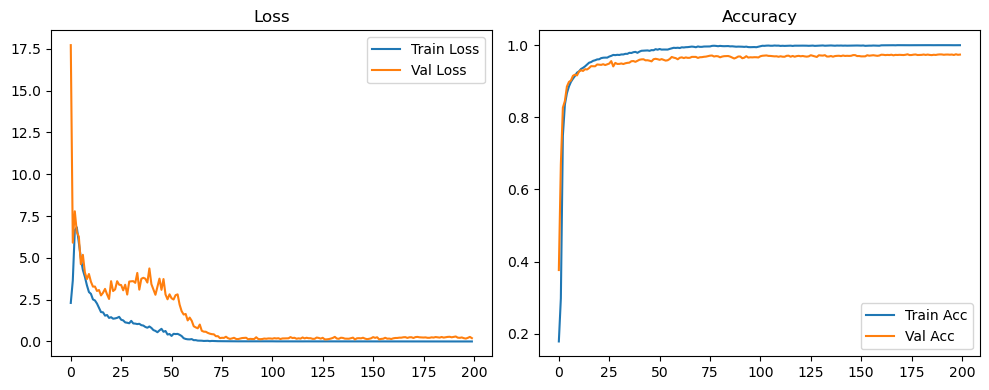

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 28.73it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 28.88it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 28.96it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 28.81it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 28.79it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 28.84it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 28.87it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 28.94it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 29.02it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 29.07it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 29.12it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 29.13it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 28.43it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 29.38it/s]

Original Model Final Test Loss: 0.2065 Accuracy: 0.9745


🚀 Running: batch256_lr0.01_0.005_0.001_dp0.2


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1730 | Val Acc: 0.3933 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1730 | Val Acc: 0.3933 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1730 | Val Acc: 0.3933 |:   0%|          | 1/200 [00:09<31:08,  9.39s/it]

| LR: 0.010 | Train Acc: 0.2424 | Val Acc: 0.5068 |:   0%|          | 1/200 [00:18<31:08,  9.39s/it]

| LR: 0.010 | Train Acc: 0.2424 | Val Acc: 0.5068 |:   0%|          | 1/200 [00:18<31:08,  9.39s/it]

| LR: 0.010 | Train Acc: 0.2424 | Val Acc: 0.5068 |:   1%|          | 2/200 [00:18<30:16,  9.17s/it]

| LR: 0.010 | Train Acc: 0.6560 | Val Acc: 0.7921 |:   1%|          | 2/200 [00:27<30:16,  9.17s/it]

| LR: 0.010 | Train Acc: 0.6560 | Val Acc: 0.7921 |:   1%|          | 2/200 [00:27<30:16,  9.17s/it]

| LR: 0.010 | Train Acc: 0.6560 | Val Acc: 0.7921 |:   2%|▏         | 3/200 [00:27<29:44,  9.06s/it]

| LR: 0.010 | Train Acc: 0.8071 | Val Acc: 0.8728 |:   2%|▏         | 3/200 [00:36<29:44,  9.06s/it]

| LR: 0.010 | Train Acc: 0.8071 | Val Acc: 0.8728 |:   2%|▏         | 3/200 [00:36<29:44,  9.06s/it]

| LR: 0.010 | Train Acc: 0.8071 | Val Acc: 0.8728 |:   2%|▏         | 4/200 [00:36<29:24,  9.00s/it]

| LR: 0.010 | Train Acc: 0.8497 | Val Acc: 0.8785 |:   2%|▏         | 4/200 [00:45<29:24,  9.00s/it]

| LR: 0.010 | Train Acc: 0.8497 | Val Acc: 0.8785 |:   2%|▏         | 4/200 [00:45<29:24,  9.00s/it]

| LR: 0.010 | Train Acc: 0.8497 | Val Acc: 0.8785 |:   2%|▎         | 5/200 [00:45<29:03,  8.94s/it]

| LR: 0.010 | Train Acc: 0.8673 | Val Acc: 0.8972 |:   2%|▎         | 5/200 [00:53<29:03,  8.94s/it]

| LR: 0.010 | Train Acc: 0.8673 | Val Acc: 0.8972 |:   2%|▎         | 5/200 [00:53<29:03,  8.94s/it]

| LR: 0.010 | Train Acc: 0.8673 | Val Acc: 0.8972 |:   3%|▎         | 6/200 [00:53<28:47,  8.90s/it]

| LR: 0.010 | Train Acc: 0.8861 | Val Acc: 0.9073 |:   3%|▎         | 6/200 [01:02<28:47,  8.90s/it]

| LR: 0.010 | Train Acc: 0.8861 | Val Acc: 0.9073 |:   3%|▎         | 6/200 [01:02<28:47,  8.90s/it]

| LR: 0.010 | Train Acc: 0.8861 | Val Acc: 0.9073 |:   4%|▎         | 7/200 [01:02<28:36,  8.89s/it]

| LR: 0.010 | Train Acc: 0.8976 | Val Acc: 0.9189 |:   4%|▎         | 7/200 [01:11<28:36,  8.89s/it]

| LR: 0.010 | Train Acc: 0.8976 | Val Acc: 0.9189 |:   4%|▎         | 7/200 [01:11<28:36,  8.89s/it]

| LR: 0.010 | Train Acc: 0.8976 | Val Acc: 0.9189 |:   4%|▍         | 8/200 [01:11<28:21,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9238 |:   4%|▍         | 8/200 [01:20<28:21,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9238 |:   4%|▍         | 8/200 [01:20<28:21,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9238 |:   4%|▍         | 9/200 [01:20<28:07,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9153 | Val Acc: 0.9301 |:   4%|▍         | 9/200 [01:29<28:07,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9153 | Val Acc: 0.9301 |:   4%|▍         | 9/200 [01:29<28:07,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9153 | Val Acc: 0.9301 |:   5%|▌         | 10/200 [01:29<28:04,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9214 | Val Acc: 0.9319 |:   5%|▌         | 10/200 [01:38<28:04,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9214 | Val Acc: 0.9319 |:   5%|▌         | 10/200 [01:38<28:04,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9214 | Val Acc: 0.9319 |:   6%|▌         | 11/200 [01:38<27:52,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9262 | Val Acc: 0.9347 |:   6%|▌         | 11/200 [01:46<27:52,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9262 | Val Acc: 0.9347 |:   6%|▌         | 11/200 [01:46<27:52,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9262 | Val Acc: 0.9347 |:   6%|▌         | 12/200 [01:46<27:45,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9311 | Val Acc: 0.9361 |:   6%|▌         | 12/200 [01:56<27:45,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9311 | Val Acc: 0.9361 |:   6%|▌         | 12/200 [01:56<27:45,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9311 | Val Acc: 0.9361 |:   6%|▋         | 13/200 [01:56<28:02,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9340 | Val Acc: 0.9422 |:   6%|▋         | 13/200 [02:05<28:02,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9340 | Val Acc: 0.9422 |:   6%|▋         | 13/200 [02:05<28:02,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9340 | Val Acc: 0.9422 |:   7%|▋         | 14/200 [02:05<28:05,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9385 | Val Acc: 0.9433 |:   7%|▋         | 14/200 [02:14<28:05,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9385 | Val Acc: 0.9433 |:   7%|▋         | 14/200 [02:14<28:05,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9385 | Val Acc: 0.9433 |:   8%|▊         | 15/200 [02:14<27:58,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9399 | Val Acc: 0.9456 |:   8%|▊         | 15/200 [02:23<27:58,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9399 | Val Acc: 0.9456 |:   8%|▊         | 15/200 [02:23<27:58,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9399 | Val Acc: 0.9456 |:   8%|▊         | 16/200 [02:24<28:09,  9.18s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9433 |:   8%|▊         | 16/200 [02:32<28:09,  9.18s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9433 |:   8%|▊         | 16/200 [02:32<28:09,  9.18s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9433 |:   8%|▊         | 17/200 [02:32<27:40,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9495 |:   8%|▊         | 17/200 [02:41<27:40,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9495 |:   8%|▊         | 17/200 [02:41<27:40,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9495 |:   9%|▉         | 18/200 [02:41<27:22,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9493 |:   9%|▉         | 18/200 [02:50<27:22,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9493 |:   9%|▉         | 18/200 [02:50<27:22,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9493 |:  10%|▉         | 19/200 [02:50<27:11,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9517 |:  10%|▉         | 19/200 [02:59<27:11,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9517 |:  10%|▉         | 19/200 [02:59<27:11,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9517 |:  10%|█         | 20/200 [02:59<26:54,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9548 | Val Acc: 0.9514 |:  10%|█         | 20/200 [03:08<26:54,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9548 | Val Acc: 0.9514 |:  10%|█         | 20/200 [03:08<26:54,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9548 | Val Acc: 0.9514 |:  10%|█         | 21/200 [03:08<26:40,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9526 |:  10%|█         | 21/200 [03:17<26:40,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9526 |:  10%|█         | 21/200 [03:17<26:40,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9526 |:  11%|█         | 22/200 [03:17<26:53,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9584 | Val Acc: 0.9507 |:  11%|█         | 22/200 [03:26<26:53,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9584 | Val Acc: 0.9507 |:  11%|█         | 22/200 [03:26<26:53,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9584 | Val Acc: 0.9507 |:  12%|█▏        | 23/200 [03:26<26:32,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9578 | Val Acc: 0.9548 |:  12%|█▏        | 23/200 [03:36<26:32,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9578 | Val Acc: 0.9548 |:  12%|█▏        | 23/200 [03:36<26:32,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9578 | Val Acc: 0.9548 |:  12%|█▏        | 24/200 [03:36<26:46,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9588 | Val Acc: 0.9453 |:  12%|█▏        | 24/200 [03:45<26:46,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9588 | Val Acc: 0.9453 |:  12%|█▏        | 24/200 [03:45<26:46,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9588 | Val Acc: 0.9453 |:  12%|█▎        | 25/200 [03:45<26:31,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9557 |:  12%|█▎        | 25/200 [03:54<26:31,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9557 |:  12%|█▎        | 25/200 [03:54<26:31,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9557 |:  13%|█▎        | 26/200 [03:54<26:47,  9.24s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9527 |:  13%|█▎        | 26/200 [04:03<26:47,  9.24s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9527 |:  13%|█▎        | 26/200 [04:03<26:47,  9.24s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9527 |:  14%|█▎        | 27/200 [04:03<26:29,  9.19s/it]

| LR: 0.010 | Train Acc: 0.9633 | Val Acc: 0.9487 |:  14%|█▎        | 27/200 [04:13<26:29,  9.19s/it]

| LR: 0.010 | Train Acc: 0.9633 | Val Acc: 0.9487 |:  14%|█▎        | 27/200 [04:13<26:29,  9.19s/it]

| LR: 0.010 | Train Acc: 0.9633 | Val Acc: 0.9487 |:  14%|█▍        | 28/200 [04:13<26:43,  9.32s/it]

| LR: 0.010 | Train Acc: 0.9646 | Val Acc: 0.9585 |:  14%|█▍        | 28/200 [04:22<26:43,  9.32s/it]

| LR: 0.010 | Train Acc: 0.9646 | Val Acc: 0.9585 |:  14%|█▍        | 28/200 [04:22<26:43,  9.32s/it]

| LR: 0.010 | Train Acc: 0.9646 | Val Acc: 0.9585 |:  14%|█▍        | 29/200 [04:22<26:12,  9.20s/it]

| LR: 0.010 | Train Acc: 0.9657 | Val Acc: 0.9572 |:  14%|█▍        | 29/200 [04:31<26:12,  9.20s/it]

| LR: 0.010 | Train Acc: 0.9657 | Val Acc: 0.9572 |:  14%|█▍        | 29/200 [04:31<26:12,  9.20s/it]

| LR: 0.010 | Train Acc: 0.9657 | Val Acc: 0.9572 |:  15%|█▌        | 30/200 [04:31<25:45,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9679 | Val Acc: 0.9597 |:  15%|█▌        | 30/200 [04:39<25:45,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9679 | Val Acc: 0.9597 |:  15%|█▌        | 30/200 [04:39<25:45,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9679 | Val Acc: 0.9597 |:  16%|█▌        | 31/200 [04:39<25:22,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9705 | Val Acc: 0.9617 |:  16%|█▌        | 31/200 [04:48<25:22,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9705 | Val Acc: 0.9617 |:  16%|█▌        | 31/200 [04:48<25:22,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9705 | Val Acc: 0.9617 |:  16%|█▌        | 32/200 [04:48<25:02,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9609 |:  16%|█▌        | 32/200 [04:57<25:02,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9609 |:  16%|█▌        | 32/200 [04:57<25:02,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9609 |:  16%|█▋        | 33/200 [04:57<24:52,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9573 |:  16%|█▋        | 33/200 [05:06<24:52,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9573 |:  16%|█▋        | 33/200 [05:06<24:52,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9573 |:  17%|█▋        | 34/200 [05:06<24:44,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9594 |:  17%|█▋        | 34/200 [05:15<24:44,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9594 |:  17%|█▋        | 34/200 [05:15<24:44,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9594 |:  18%|█▊        | 35/200 [05:15<24:38,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9750 | Val Acc: 0.9626 |:  18%|█▊        | 35/200 [05:24<24:38,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9750 | Val Acc: 0.9626 |:  18%|█▊        | 35/200 [05:24<24:38,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9750 | Val Acc: 0.9626 |:  18%|█▊        | 36/200 [05:24<24:29,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9771 | Val Acc: 0.9646 |:  18%|█▊        | 36/200 [05:33<24:29,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9771 | Val Acc: 0.9646 |:  18%|█▊        | 36/200 [05:33<24:29,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9771 | Val Acc: 0.9646 |:  18%|█▊        | 37/200 [05:33<24:13,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9767 | Val Acc: 0.9606 |:  18%|█▊        | 37/200 [05:42<24:13,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9767 | Val Acc: 0.9606 |:  18%|█▊        | 37/200 [05:42<24:13,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9767 | Val Acc: 0.9606 |:  19%|█▉        | 38/200 [05:42<24:13,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9777 | Val Acc: 0.9637 |:  19%|█▉        | 38/200 [05:51<24:13,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9777 | Val Acc: 0.9637 |:  19%|█▉        | 38/200 [05:51<24:13,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9777 | Val Acc: 0.9637 |:  20%|█▉        | 39/200 [05:51<24:09,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9633 |:  20%|█▉        | 39/200 [06:00<24:09,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9633 |:  20%|█▉        | 39/200 [06:00<24:09,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9633 |:  20%|██        | 40/200 [06:00<23:58,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9623 |:  20%|██        | 40/200 [06:09<23:58,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9623 |:  20%|██        | 40/200 [06:09<23:58,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9623 |:  20%|██        | 41/200 [06:09<23:48,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9637 |:  20%|██        | 41/200 [06:18<23:48,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9637 |:  20%|██        | 41/200 [06:18<23:48,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9637 |:  21%|██        | 42/200 [06:18<23:36,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9636 |:  21%|██        | 42/200 [06:27<23:36,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9636 |:  21%|██        | 42/200 [06:27<23:36,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9636 |:  22%|██▏       | 43/200 [06:27<23:24,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9607 |:  22%|██▏       | 43/200 [06:36<23:24,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9607 |:  22%|██▏       | 43/200 [06:36<23:24,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9607 |:  22%|██▏       | 44/200 [06:36<23:10,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9637 |:  22%|██▏       | 44/200 [06:45<23:10,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9637 |:  22%|██▏       | 44/200 [06:45<23:10,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9637 |:  22%|██▎       | 45/200 [06:45<23:11,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9653 |:  22%|██▎       | 45/200 [06:54<23:11,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9653 |:  22%|██▎       | 45/200 [06:54<23:11,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9653 |:  23%|██▎       | 46/200 [06:54<23:13,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9624 |:  23%|██▎       | 46/200 [07:03<23:13,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9624 |:  23%|██▎       | 46/200 [07:03<23:13,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9624 |:  24%|██▎       | 47/200 [07:03<23:21,  9.16s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9667 |:  24%|██▎       | 47/200 [07:12<23:21,  9.16s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9667 |:  24%|██▎       | 47/200 [07:12<23:21,  9.16s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9667 |:  24%|██▍       | 48/200 [07:12<23:01,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9627 |:  24%|██▍       | 48/200 [07:21<23:01,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9627 |:  24%|██▍       | 48/200 [07:21<23:01,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9627 |:  24%|██▍       | 49/200 [07:21<22:41,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9680 |:  24%|██▍       | 49/200 [07:30<22:41,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9680 |:  24%|██▍       | 49/200 [07:30<22:41,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9680 |:  25%|██▌       | 50/200 [07:30<22:25,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9674 |:  25%|██▌       | 50/200 [07:39<22:25,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9674 |:  25%|██▌       | 50/200 [07:39<22:25,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9674 |:  26%|██▌       | 51/200 [07:39<22:14,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9866 | Val Acc: 0.9714 |:  26%|██▌       | 51/200 [07:48<22:14,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9866 | Val Acc: 0.9714 |:  26%|██▌       | 51/200 [07:48<22:14,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9866 | Val Acc: 0.9714 |:  26%|██▌       | 52/200 [07:48<22:10,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9667 |:  26%|██▌       | 52/200 [07:57<22:10,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9667 |:  26%|██▌       | 52/200 [07:57<22:10,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9667 |:  26%|██▋       | 53/200 [07:57<21:48,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9872 | Val Acc: 0.9702 |:  26%|██▋       | 53/200 [08:06<21:48,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9872 | Val Acc: 0.9702 |:  26%|██▋       | 53/200 [08:06<21:48,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9872 | Val Acc: 0.9702 |:  27%|██▋       | 54/200 [08:06<21:34,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9885 | Val Acc: 0.9688 |:  27%|██▋       | 54/200 [08:15<21:34,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9885 | Val Acc: 0.9688 |:  27%|██▋       | 54/200 [08:15<21:34,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9885 | Val Acc: 0.9688 |:  28%|██▊       | 55/200 [08:15<21:35,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9703 |:  28%|██▊       | 55/200 [08:24<21:35,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9703 |:  28%|██▊       | 55/200 [08:24<21:35,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9703 |:  28%|██▊       | 56/200 [08:24<21:47,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9897 | Val Acc: 0.9706 |:  28%|██▊       | 56/200 [08:33<21:47,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9897 | Val Acc: 0.9706 |:  28%|██▊       | 56/200 [08:33<21:47,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9897 | Val Acc: 0.9706 |:  28%|██▊       | 57/200 [08:33<21:30,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9693 |:  28%|██▊       | 57/200 [08:42<21:30,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9693 |:  28%|██▊       | 57/200 [08:42<21:30,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9693 |:  29%|██▉       | 58/200 [08:42<21:31,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9713 |:  29%|██▉       | 58/200 [08:51<21:31,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9713 |:  29%|██▉       | 58/200 [08:51<21:31,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9713 |:  30%|██▉       | 59/200 [08:51<21:22,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9729 |:  30%|██▉       | 59/200 [09:00<21:22,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9729 |:  30%|██▉       | 59/200 [09:00<21:22,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9729 |:  30%|███       | 60/200 [09:00<21:02,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9722 |:  30%|███       | 60/200 [09:09<21:02,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9722 |:  30%|███       | 60/200 [09:09<21:02,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9722 |:  30%|███       | 61/200 [09:09<20:44,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9702 |:  30%|███       | 61/200 [09:18<20:44,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9702 |:  30%|███       | 61/200 [09:18<20:44,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9702 |:  31%|███       | 62/200 [09:18<20:36,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9732 |:  31%|███       | 62/200 [09:28<20:36,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9732 |:  31%|███       | 62/200 [09:28<20:36,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9732 |:  32%|███▏      | 63/200 [09:28<21:01,  9.21s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9733 |:  32%|███▏      | 63/200 [09:37<21:01,  9.21s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9733 |:  32%|███▏      | 63/200 [09:37<21:01,  9.21s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9733 |:  32%|███▏      | 64/200 [09:37<20:40,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9724 |:  32%|███▏      | 64/200 [09:45<20:40,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9724 |:  32%|███▏      | 64/200 [09:45<20:40,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9724 |:  32%|███▎      | 65/200 [09:46<20:20,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9946 | Val Acc: 0.9752 |:  32%|███▎      | 65/200 [09:55<20:20,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9946 | Val Acc: 0.9752 |:  32%|███▎      | 65/200 [09:55<20:20,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9946 | Val Acc: 0.9752 |:  33%|███▎      | 66/200 [09:55<20:18,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9949 | Val Acc: 0.9736 |:  33%|███▎      | 66/200 [10:04<20:18,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9949 | Val Acc: 0.9736 |:  33%|███▎      | 66/200 [10:04<20:18,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9949 | Val Acc: 0.9736 |:  34%|███▎      | 67/200 [10:04<20:14,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9950 | Val Acc: 0.9751 |:  34%|███▎      | 67/200 [10:14<20:14,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9950 | Val Acc: 0.9751 |:  34%|███▎      | 67/200 [10:14<20:14,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9950 | Val Acc: 0.9751 |:  34%|███▍      | 68/200 [10:14<20:25,  9.28s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9740 |:  34%|███▍      | 68/200 [10:22<20:25,  9.28s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9740 |:  34%|███▍      | 68/200 [10:22<20:25,  9.28s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9740 |:  34%|███▍      | 69/200 [10:23<20:02,  9.18s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9727 |:  34%|███▍      | 69/200 [10:32<20:02,  9.18s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9727 |:  34%|███▍      | 69/200 [10:32<20:02,  9.18s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9727 |:  35%|███▌      | 70/200 [10:32<19:49,  9.15s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9718 |:  35%|███▌      | 70/200 [10:40<19:49,  9.15s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9718 |:  35%|███▌      | 70/200 [10:40<19:49,  9.15s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9718 |:  36%|███▌      | 71/200 [10:40<19:22,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9720 |:  36%|███▌      | 71/200 [10:49<19:22,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9720 |:  36%|███▌      | 71/200 [10:49<19:22,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9720 |:  36%|███▌      | 72/200 [10:49<19:04,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  36%|███▌      | 72/200 [10:58<19:04,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  36%|███▌      | 72/200 [10:58<19:04,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  36%|███▋      | 73/200 [10:58<19:02,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9742 |:  36%|███▋      | 73/200 [11:07<19:02,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9742 |:  36%|███▋      | 73/200 [11:07<19:02,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9742 |:  37%|███▋      | 74/200 [11:07<18:47,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9720 |:  37%|███▋      | 74/200 [11:16<18:47,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9720 |:  37%|███▋      | 74/200 [11:16<18:47,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9720 |:  38%|███▊      | 75/200 [11:16<18:36,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9760 |:  38%|███▊      | 75/200 [11:25<18:36,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9760 |:  38%|███▊      | 75/200 [11:25<18:36,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9760 |:  38%|███▊      | 76/200 [11:25<18:44,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  38%|███▊      | 76/200 [11:34<18:44,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  38%|███▊      | 76/200 [11:34<18:44,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  38%|███▊      | 77/200 [11:34<18:30,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9732 |:  38%|███▊      | 77/200 [11:43<18:30,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9732 |:  38%|███▊      | 77/200 [11:43<18:30,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9732 |:  39%|███▉      | 78/200 [11:43<18:21,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9971 | Val Acc: 0.9719 |:  39%|███▉      | 78/200 [11:52<18:21,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9971 | Val Acc: 0.9719 |:  39%|███▉      | 78/200 [11:52<18:21,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9971 | Val Acc: 0.9719 |:  40%|███▉      | 79/200 [11:52<18:12,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9729 |:  40%|███▉      | 79/200 [12:01<18:12,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9729 |:  40%|███▉      | 79/200 [12:01<18:12,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9729 |:  40%|████      | 80/200 [12:02<18:10,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9722 |:  40%|████      | 80/200 [12:10<18:10,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9722 |:  40%|████      | 80/200 [12:10<18:10,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9722 |:  40%|████      | 81/200 [12:10<17:55,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9737 |:  40%|████      | 81/200 [12:20<17:55,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9737 |:  40%|████      | 81/200 [12:20<17:55,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9737 |:  41%|████      | 82/200 [12:20<17:49,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9729 |:  41%|████      | 82/200 [12:28<17:49,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9729 |:  41%|████      | 82/200 [12:28<17:49,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9729 |:  42%|████▏     | 83/200 [12:29<17:36,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9712 |:  42%|████▏     | 83/200 [12:38<17:36,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9712 |:  42%|████▏     | 83/200 [12:38<17:36,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9712 |:  42%|████▏     | 84/200 [12:38<17:34,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9718 |:  42%|████▏     | 84/200 [12:47<17:34,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9718 |:  42%|████▏     | 84/200 [12:47<17:34,  9.09s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9718 |:  42%|████▎     | 85/200 [12:47<17:29,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9722 |:  42%|████▎     | 85/200 [12:56<17:29,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9722 |:  42%|████▎     | 85/200 [12:56<17:29,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9722 |:  43%|████▎     | 86/200 [12:56<17:31,  9.22s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9702 |:  43%|████▎     | 86/200 [13:06<17:31,  9.22s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9702 |:  43%|████▎     | 86/200 [13:06<17:31,  9.22s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9702 |:  44%|████▎     | 87/200 [13:06<17:33,  9.32s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9708 |:  44%|████▎     | 87/200 [13:16<17:33,  9.32s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9708 |:  44%|████▎     | 87/200 [13:16<17:33,  9.32s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9708 |:  44%|████▍     | 88/200 [13:16<17:39,  9.46s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9704 |:  44%|████▍     | 88/200 [13:26<17:39,  9.46s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9704 |:  44%|████▍     | 88/200 [13:26<17:39,  9.46s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9704 |:  44%|████▍     | 89/200 [13:26<17:43,  9.59s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9709 |:  44%|████▍     | 89/200 [13:35<17:43,  9.59s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9709 |:  44%|████▍     | 89/200 [13:35<17:43,  9.59s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9709 |:  45%|████▌     | 90/200 [13:35<17:37,  9.61s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9692 |:  45%|████▌     | 90/200 [13:44<17:37,  9.61s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9692 |:  45%|████▌     | 90/200 [13:44<17:37,  9.61s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9692 |:  46%|████▌     | 91/200 [13:44<17:06,  9.42s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9690 |:  46%|████▌     | 91/200 [13:53<17:06,  9.42s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9690 |:  46%|████▌     | 91/200 [13:53<17:06,  9.42s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9690 |:  46%|████▌     | 92/200 [13:53<16:45,  9.31s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9694 |:  46%|████▌     | 92/200 [14:02<16:45,  9.31s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9694 |:  46%|████▌     | 92/200 [14:02<16:45,  9.31s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9694 |:  46%|████▋     | 93/200 [14:02<16:19,  9.16s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9666 |:  46%|████▋     | 93/200 [14:11<16:19,  9.16s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9666 |:  46%|████▋     | 93/200 [14:11<16:19,  9.16s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9666 |:  47%|████▋     | 94/200 [14:11<16:05,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9691 |:  47%|████▋     | 94/200 [14:20<16:05,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9691 |:  47%|████▋     | 94/200 [14:20<16:05,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9691 |:  48%|████▊     | 95/200 [14:20<15:56,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9714 |:  48%|████▊     | 95/200 [14:29<15:56,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9714 |:  48%|████▊     | 95/200 [14:29<15:56,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9714 |:  48%|████▊     | 96/200 [14:29<15:43,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9677 |:  48%|████▊     | 96/200 [14:39<15:43,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9677 |:  48%|████▊     | 96/200 [14:39<15:43,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9677 |:  48%|████▊     | 97/200 [14:39<15:53,  9.26s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9688 |:  48%|████▊     | 97/200 [14:48<15:53,  9.26s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9688 |:  48%|████▊     | 97/200 [14:48<15:53,  9.26s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [14:48<15:34,  9.16s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [14:57<15:34,  9.16s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [14:57<15:34,  9.16s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9688 |:  50%|████▉     | 99/200 [14:58<15:39,  9.31s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9685 |:  50%|████▉     | 99/200 [15:07<15:39,  9.31s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9685 |:  50%|████▉     | 99/200 [15:07<15:39,  9.31s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9685 |:  50%|█████     | 100/200 [15:07<15:37,  9.37s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9712 |:  50%|█████     | 100/200 [15:17<15:37,  9.37s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9712 |:  50%|█████     | 100/200 [15:17<15:37,  9.37s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9712 |:  50%|█████     | 101/200 [15:17<15:33,  9.43s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9732 |:  50%|█████     | 101/200 [15:26<15:33,  9.43s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9732 |:  50%|█████     | 101/200 [15:26<15:33,  9.43s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9732 |:  51%|█████     | 102/200 [15:26<15:10,  9.29s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9725 |:  51%|█████     | 102/200 [15:34<15:10,  9.29s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9725 |:  51%|█████     | 102/200 [15:34<15:10,  9.29s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9725 |:  52%|█████▏    | 103/200 [15:34<14:48,  9.16s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9733 |:  52%|█████▏    | 103/200 [15:43<14:48,  9.16s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9733 |:  52%|█████▏    | 103/200 [15:43<14:48,  9.16s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9733 |:  52%|█████▏    | 104/200 [15:43<14:26,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9722 |:  52%|█████▏    | 104/200 [15:52<14:26,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9722 |:  52%|█████▏    | 104/200 [15:52<14:26,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9722 |:  52%|█████▎    | 105/200 [15:52<14:18,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9724 |:  52%|█████▎    | 105/200 [16:01<14:18,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9724 |:  52%|█████▎    | 105/200 [16:01<14:18,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9724 |:  53%|█████▎    | 106/200 [16:01<14:02,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9732 |:  53%|█████▎    | 106/200 [16:10<14:02,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9732 |:  53%|█████▎    | 106/200 [16:10<14:02,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9732 |:  54%|█████▎    | 107/200 [16:10<13:50,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9735 |:  54%|█████▎    | 107/200 [16:19<13:50,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9735 |:  54%|█████▎    | 107/200 [16:19<13:50,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9735 |:  54%|█████▍    | 108/200 [16:19<13:39,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9730 |:  54%|█████▍    | 108/200 [16:27<13:39,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9730 |:  54%|█████▍    | 108/200 [16:27<13:39,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9730 |:  55%|█████▍    | 109/200 [16:28<13:28,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9740 |:  55%|█████▍    | 109/200 [16:37<13:28,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9740 |:  55%|█████▍    | 109/200 [16:37<13:28,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9740 |:  55%|█████▌    | 110/200 [16:37<13:24,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9740 |:  55%|█████▌    | 110/200 [16:46<13:24,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9740 |:  55%|█████▌    | 110/200 [16:46<13:24,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9740 |:  56%|█████▌    | 111/200 [16:46<13:38,  9.20s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9734 |:  56%|█████▌    | 111/200 [16:56<13:38,  9.20s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9734 |:  56%|█████▌    | 111/200 [16:56<13:38,  9.20s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9734 |:  56%|█████▌    | 112/200 [16:56<13:34,  9.26s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9725 |:  56%|█████▌    | 112/200 [17:05<13:34,  9.26s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9725 |:  56%|█████▌    | 112/200 [17:05<13:34,  9.26s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9725 |:  56%|█████▋    | 113/200 [17:05<13:14,  9.13s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9740 |:  56%|█████▋    | 113/200 [17:14<13:14,  9.13s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9740 |:  56%|█████▋    | 113/200 [17:14<13:14,  9.13s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9740 |:  57%|█████▋    | 114/200 [17:14<13:21,  9.32s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9736 |:  57%|█████▋    | 114/200 [17:24<13:21,  9.32s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9736 |:  57%|█████▋    | 114/200 [17:24<13:21,  9.32s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9736 |:  57%|█████▊    | 115/200 [17:24<13:11,  9.32s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9732 |:  57%|█████▊    | 115/200 [17:33<13:11,  9.32s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9732 |:  57%|█████▊    | 115/200 [17:33<13:11,  9.32s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9732 |:  58%|█████▊    | 116/200 [17:33<12:52,  9.20s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9734 |:  58%|█████▊    | 116/200 [17:41<12:52,  9.20s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9734 |:  58%|█████▊    | 116/200 [17:41<12:52,  9.20s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9734 |:  58%|█████▊    | 117/200 [17:41<12:35,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9739 |:  58%|█████▊    | 117/200 [17:50<12:35,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9739 |:  58%|█████▊    | 117/200 [17:50<12:35,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9739 |:  59%|█████▉    | 118/200 [17:50<12:22,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9732 |:  59%|█████▉    | 118/200 [17:59<12:22,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9732 |:  59%|█████▉    | 118/200 [17:59<12:22,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9732 |:  60%|█████▉    | 119/200 [17:59<12:10,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9953 | Val Acc: 0.9727 |:  60%|█████▉    | 119/200 [18:08<12:10,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9953 | Val Acc: 0.9727 |:  60%|█████▉    | 119/200 [18:08<12:10,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9953 | Val Acc: 0.9727 |:  60%|██████    | 120/200 [18:08<11:54,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9738 |:  60%|██████    | 120/200 [18:17<11:54,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9738 |:  60%|██████    | 120/200 [18:17<11:54,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9738 |:  60%|██████    | 121/200 [18:17<11:44,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9736 |:  60%|██████    | 121/200 [18:26<11:44,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9736 |:  60%|██████    | 121/200 [18:26<11:44,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9736 |:  61%|██████    | 122/200 [18:26<11:36,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9742 |:  61%|██████    | 122/200 [18:35<11:36,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9742 |:  61%|██████    | 122/200 [18:35<11:36,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9742 |:  62%|██████▏   | 123/200 [18:35<11:27,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9752 |:  62%|██████▏   | 123/200 [18:44<11:27,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9752 |:  62%|██████▏   | 123/200 [18:44<11:27,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9752 |:  62%|██████▏   | 124/200 [18:44<11:18,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9735 |:  62%|██████▏   | 124/200 [18:53<11:18,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9735 |:  62%|██████▏   | 124/200 [18:53<11:18,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9735 |:  62%|██████▎   | 125/200 [18:53<11:07,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9953 | Val Acc: 0.9733 |:  62%|██████▎   | 125/200 [19:01<11:07,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9953 | Val Acc: 0.9733 |:  62%|██████▎   | 125/200 [19:01<11:07,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9953 | Val Acc: 0.9733 |:  63%|██████▎   | 126/200 [19:02<10:59,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9737 |:  63%|██████▎   | 126/200 [19:10<10:59,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9737 |:  63%|██████▎   | 126/200 [19:10<10:59,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9737 |:  64%|██████▎   | 127/200 [19:11<10:51,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9726 |:  64%|██████▎   | 127/200 [19:19<10:51,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9726 |:  64%|██████▎   | 127/200 [19:19<10:51,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9726 |:  64%|██████▍   | 128/200 [19:19<10:40,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9744 |:  64%|██████▍   | 128/200 [19:28<10:40,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9744 |:  64%|██████▍   | 128/200 [19:28<10:40,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9744 |:  64%|██████▍   | 129/200 [19:28<10:30,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9732 |:  64%|██████▍   | 129/200 [19:37<10:30,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9732 |:  64%|██████▍   | 129/200 [19:37<10:30,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9732 |:  65%|██████▌   | 130/200 [19:37<10:20,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9728 |:  65%|██████▌   | 130/200 [19:46<10:20,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9728 |:  65%|██████▌   | 130/200 [19:46<10:20,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9728 |:  66%|██████▌   | 131/200 [19:46<10:20,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9728 |:  66%|██████▌   | 131/200 [19:55<10:20,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9728 |:  66%|██████▌   | 131/200 [19:55<10:20,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9728 |:  66%|██████▌   | 132/200 [19:55<10:08,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9724 |:  66%|██████▌   | 132/200 [20:04<10:08,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9724 |:  66%|██████▌   | 132/200 [20:04<10:08,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9724 |:  66%|██████▋   | 133/200 [20:04<09:57,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9730 |:  66%|██████▋   | 133/200 [20:13<09:57,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9730 |:  66%|██████▋   | 133/200 [20:13<09:57,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9730 |:  67%|██████▋   | 134/200 [20:13<09:47,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9724 |:  67%|██████▋   | 134/200 [20:22<09:47,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9724 |:  67%|██████▋   | 134/200 [20:22<09:47,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9724 |:  68%|██████▊   | 135/200 [20:22<09:41,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9728 |:  68%|██████▊   | 135/200 [20:31<09:41,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9728 |:  68%|██████▊   | 135/200 [20:31<09:41,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9728 |:  68%|██████▊   | 136/200 [20:31<09:31,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9716 |:  68%|██████▊   | 136/200 [20:40<09:31,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9716 |:  68%|██████▊   | 136/200 [20:40<09:31,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9716 |:  68%|██████▊   | 137/200 [20:40<09:21,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9719 |:  68%|██████▊   | 137/200 [20:49<09:21,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9719 |:  68%|██████▊   | 137/200 [20:49<09:21,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9719 |:  69%|██████▉   | 138/200 [20:49<09:17,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9727 |:  69%|██████▉   | 138/200 [20:58<09:17,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9727 |:  69%|██████▉   | 138/200 [20:58<09:17,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9727 |:  70%|██████▉   | 139/200 [20:58<09:07,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9742 |:  70%|██████▉   | 139/200 [21:07<09:07,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9742 |:  70%|██████▉   | 139/200 [21:07<09:07,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9742 |:  70%|███████   | 140/200 [21:07<08:55,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9726 |:  70%|███████   | 140/200 [21:15<08:55,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9726 |:  70%|███████   | 140/200 [21:15<08:55,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9726 |:  70%|███████   | 141/200 [21:16<08:46,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9728 |:  70%|███████   | 141/200 [21:24<08:46,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9728 |:  70%|███████   | 141/200 [21:24<08:46,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9728 |:  71%|███████   | 142/200 [21:24<08:37,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9715 |:  71%|███████   | 142/200 [21:33<08:37,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9715 |:  71%|███████   | 142/200 [21:33<08:37,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9715 |:  72%|███████▏  | 143/200 [21:33<08:28,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9739 |:  72%|███████▏  | 143/200 [21:42<08:28,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9739 |:  72%|███████▏  | 143/200 [21:42<08:28,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9961 | Val Acc: 0.9739 |:  72%|███████▏  | 144/200 [21:42<08:19,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9741 |:  72%|███████▏  | 144/200 [21:51<08:19,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9741 |:  72%|███████▏  | 144/200 [21:51<08:19,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9741 |:  72%|███████▎  | 145/200 [21:51<08:15,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9726 |:  72%|███████▎  | 145/200 [22:00<08:15,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9726 |:  72%|███████▎  | 145/200 [22:00<08:15,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9726 |:  73%|███████▎  | 146/200 [22:00<08:01,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9732 |:  73%|███████▎  | 146/200 [22:09<08:01,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9732 |:  73%|███████▎  | 146/200 [22:09<08:01,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9966 | Val Acc: 0.9732 |:  74%|███████▎  | 147/200 [22:09<07:52,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9722 |:  74%|███████▎  | 147/200 [22:18<07:52,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9722 |:  74%|███████▎  | 147/200 [22:18<07:52,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9722 |:  74%|███████▍  | 148/200 [22:18<07:41,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9742 |:  74%|███████▍  | 148/200 [22:27<07:41,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9742 |:  74%|███████▍  | 148/200 [22:27<07:41,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9742 |:  74%|███████▍  | 149/200 [22:27<07:32,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9723 |:  74%|███████▍  | 149/200 [22:36<07:32,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9723 |:  74%|███████▍  | 149/200 [22:36<07:32,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9965 | Val Acc: 0.9723 |:  75%|███████▌  | 150/200 [22:36<07:24,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9741 |:  75%|███████▌  | 150/200 [22:45<07:24,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9741 |:  75%|███████▌  | 150/200 [22:45<07:24,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9741 |:  76%|███████▌  | 151/200 [22:45<07:17,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9717 |:  76%|███████▌  | 151/200 [22:53<07:17,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9717 |:  76%|███████▌  | 151/200 [22:53<07:17,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9717 |:  76%|███████▌  | 152/200 [22:54<07:07,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9722 |:  76%|███████▌  | 152/200 [23:02<07:07,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9722 |:  76%|███████▌  | 152/200 [23:02<07:07,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9722 |:  76%|███████▋  | 153/200 [23:03<07:00,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9761 |:  76%|███████▋  | 153/200 [23:12<07:00,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9761 |:  76%|███████▋  | 153/200 [23:12<07:00,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9761 |:  77%|███████▋  | 154/200 [23:12<06:55,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9734 |:  77%|███████▋  | 154/200 [23:21<06:55,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9734 |:  77%|███████▋  | 154/200 [23:21<06:55,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9734 |:  78%|███████▊  | 155/200 [23:21<06:47,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9728 |:  78%|███████▊  | 155/200 [23:30<06:47,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9728 |:  78%|███████▊  | 155/200 [23:30<06:47,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9728 |:  78%|███████▊  | 156/200 [23:30<06:34,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9731 |:  78%|███████▊  | 156/200 [23:39<06:34,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9731 |:  78%|███████▊  | 156/200 [23:39<06:34,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9731 |:  78%|███████▊  | 157/200 [23:39<06:33,  9.14s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9741 |:  78%|███████▊  | 157/200 [23:48<06:33,  9.14s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9741 |:  78%|███████▊  | 157/200 [23:48<06:33,  9.14s/it]

| LR: 0.005 | Train Acc: 0.9964 | Val Acc: 0.9741 |:  79%|███████▉  | 158/200 [23:48<06:25,  9.18s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9730 |:  79%|███████▉  | 158/200 [23:57<06:25,  9.18s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9730 |:  79%|███████▉  | 158/200 [23:57<06:25,  9.18s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9730 |:  80%|███████▉  | 159/200 [23:57<06:13,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9721 |:  80%|███████▉  | 159/200 [24:07<06:13,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9721 |:  80%|███████▉  | 159/200 [24:07<06:13,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9721 |:  80%|████████  | 160/200 [24:07<06:08,  9.21s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9756 |:  80%|████████  | 160/200 [24:16<06:08,  9.21s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9756 |:  80%|████████  | 160/200 [24:16<06:08,  9.21s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9756 |:  80%|████████  | 161/200 [24:16<05:54,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9754 |:  80%|████████  | 161/200 [24:25<05:54,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9754 |:  80%|████████  | 161/200 [24:25<05:54,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9754 |:  81%|████████  | 162/200 [24:25<05:43,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9746 |:  81%|████████  | 162/200 [24:34<05:43,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9746 |:  81%|████████  | 162/200 [24:34<05:43,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9746 |:  82%|████████▏ | 163/200 [24:34<05:39,  9.17s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9748 |:  82%|████████▏ | 163/200 [24:43<05:39,  9.17s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9748 |:  82%|████████▏ | 163/200 [24:43<05:39,  9.17s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9748 |:  82%|████████▏ | 164/200 [24:43<05:26,  9.08s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9744 |:  82%|████████▏ | 164/200 [24:52<05:26,  9.08s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9744 |:  82%|████████▏ | 164/200 [24:52<05:26,  9.08s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9744 |:  82%|████████▎ | 165/200 [24:52<05:21,  9.20s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9751 |:  82%|████████▎ | 165/200 [25:02<05:21,  9.20s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9751 |:  82%|████████▎ | 165/200 [25:02<05:21,  9.20s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9751 |:  83%|████████▎ | 166/200 [25:02<05:20,  9.42s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9748 |:  83%|████████▎ | 166/200 [25:12<05:20,  9.42s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9748 |:  83%|████████▎ | 166/200 [25:12<05:20,  9.42s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9748 |:  84%|████████▎ | 167/200 [25:12<05:13,  9.51s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9744 |:  84%|████████▎ | 167/200 [25:21<05:13,  9.51s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9744 |:  84%|████████▎ | 167/200 [25:21<05:13,  9.51s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9744 |:  84%|████████▍ | 168/200 [25:21<04:57,  9.29s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9742 |:  84%|████████▍ | 168/200 [25:30<04:57,  9.29s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9742 |:  84%|████████▍ | 168/200 [25:30<04:57,  9.29s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9742 |:  84%|████████▍ | 169/200 [25:30<04:45,  9.21s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9764 |:  84%|████████▍ | 169/200 [25:39<04:45,  9.21s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9764 |:  84%|████████▍ | 169/200 [25:39<04:45,  9.21s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9764 |:  85%|████████▌ | 170/200 [25:39<04:37,  9.25s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9758 |:  85%|████████▌ | 170/200 [25:48<04:37,  9.25s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9758 |:  85%|████████▌ | 170/200 [25:48<04:37,  9.25s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9758 |:  86%|████████▌ | 171/200 [25:48<04:24,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9749 |:  86%|████████▌ | 171/200 [25:57<04:24,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9749 |:  86%|████████▌ | 171/200 [25:57<04:24,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9749 |:  86%|████████▌ | 172/200 [25:57<04:12,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9758 |:  86%|████████▌ | 172/200 [26:06<04:12,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9758 |:  86%|████████▌ | 172/200 [26:06<04:12,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9758 |:  86%|████████▋ | 173/200 [26:06<04:01,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9751 |:  86%|████████▋ | 173/200 [26:14<04:01,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9751 |:  86%|████████▋ | 173/200 [26:14<04:01,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9751 |:  87%|████████▋ | 174/200 [26:15<03:52,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9735 |:  87%|████████▋ | 174/200 [26:24<03:52,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9735 |:  87%|████████▋ | 174/200 [26:24<03:52,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9735 |:  88%|████████▊ | 175/200 [26:24<03:44,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9751 |:  88%|████████▊ | 175/200 [26:32<03:44,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9751 |:  88%|████████▊ | 175/200 [26:32<03:44,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9751 |:  88%|████████▊ | 176/200 [26:32<03:34,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9755 |:  88%|████████▊ | 176/200 [26:41<03:34,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9755 |:  88%|████████▊ | 176/200 [26:41<03:34,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9755 |:  88%|████████▊ | 177/200 [26:41<03:23,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9761 |:  88%|████████▊ | 177/200 [26:50<03:23,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9761 |:  88%|████████▊ | 177/200 [26:50<03:23,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9761 |:  89%|████████▉ | 178/200 [26:50<03:14,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9758 |:  89%|████████▉ | 178/200 [26:59<03:14,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9758 |:  89%|████████▉ | 178/200 [26:59<03:14,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9758 |:  90%|████████▉ | 179/200 [26:59<03:10,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9756 |:  90%|████████▉ | 179/200 [27:08<03:10,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9756 |:  90%|████████▉ | 179/200 [27:08<03:10,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9756 |:  90%|█████████ | 180/200 [27:08<03:00,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9756 |:  90%|█████████ | 180/200 [27:18<03:00,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9756 |:  90%|█████████ | 180/200 [27:18<03:00,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9756 |:  90%|█████████ | 181/200 [27:18<02:53,  9.15s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9751 |:  90%|█████████ | 181/200 [27:27<02:53,  9.15s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9751 |:  90%|█████████ | 181/200 [27:27<02:53,  9.15s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9751 |:  91%|█████████ | 182/200 [27:27<02:44,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9751 |:  91%|█████████ | 182/200 [27:36<02:44,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9751 |:  91%|█████████ | 182/200 [27:36<02:44,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9751 |:  92%|█████████▏| 183/200 [27:36<02:36,  9.18s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9758 |:  92%|█████████▏| 183/200 [27:45<02:36,  9.18s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9758 |:  92%|█████████▏| 183/200 [27:45<02:36,  9.18s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9758 |:  92%|█████████▏| 184/200 [27:45<02:24,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9761 |:  92%|█████████▏| 184/200 [27:54<02:24,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9761 |:  92%|█████████▏| 184/200 [27:54<02:24,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9761 |:  92%|█████████▎| 185/200 [27:54<02:14,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9759 |:  92%|█████████▎| 185/200 [28:03<02:14,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9759 |:  92%|█████████▎| 185/200 [28:03<02:14,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9759 |:  93%|█████████▎| 186/200 [28:03<02:05,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9761 |:  93%|█████████▎| 186/200 [28:11<02:05,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9761 |:  93%|█████████▎| 186/200 [28:11<02:05,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9761 |:  94%|█████████▎| 187/200 [28:11<01:55,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9758 |:  94%|█████████▎| 187/200 [28:20<01:55,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9758 |:  94%|█████████▎| 187/200 [28:20<01:55,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9758 |:  94%|█████████▍| 188/200 [28:20<01:47,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9759 |:  94%|█████████▍| 188/200 [28:29<01:47,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9759 |:  94%|█████████▍| 188/200 [28:29<01:47,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9759 |:  94%|█████████▍| 189/200 [28:29<01:38,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9758 |:  94%|█████████▍| 189/200 [28:39<01:38,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9758 |:  94%|█████████▍| 189/200 [28:39<01:38,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9758 |:  95%|█████████▌| 190/200 [28:39<01:30,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9752 |:  95%|█████████▌| 190/200 [28:47<01:30,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9752 |:  95%|█████████▌| 190/200 [28:47<01:30,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9752 |:  96%|█████████▌| 191/200 [28:48<01:20,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9757 |:  96%|█████████▌| 191/200 [28:57<01:20,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9757 |:  96%|█████████▌| 191/200 [28:57<01:20,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9757 |:  96%|█████████▌| 192/200 [28:57<01:12,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9758 |:  96%|█████████▌| 192/200 [29:06<01:12,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9758 |:  96%|█████████▌| 192/200 [29:06<01:12,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9758 |:  96%|█████████▋| 193/200 [29:06<01:03,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9748 |:  96%|█████████▋| 193/200 [29:15<01:03,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9748 |:  96%|█████████▋| 193/200 [29:15<01:03,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9748 |:  97%|█████████▋| 194/200 [29:15<00:53,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9748 |:  97%|█████████▋| 194/200 [29:24<00:53,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9748 |:  97%|█████████▋| 194/200 [29:24<00:53,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9748 |:  98%|█████████▊| 195/200 [29:24<00:46,  9.25s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9766 |:  98%|█████████▊| 195/200 [29:34<00:46,  9.25s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9766 |:  98%|█████████▊| 195/200 [29:34<00:46,  9.25s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9766 |:  98%|█████████▊| 196/200 [29:34<00:37,  9.42s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9744 |:  98%|█████████▊| 196/200 [29:43<00:37,  9.42s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9744 |:  98%|█████████▊| 196/200 [29:43<00:37,  9.42s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9744 |:  98%|█████████▊| 197/200 [29:43<00:27,  9.23s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9757 |:  98%|█████████▊| 197/200 [29:52<00:27,  9.23s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9757 |:  98%|█████████▊| 197/200 [29:52<00:27,  9.23s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9757 |:  99%|█████████▉| 198/200 [29:52<00:18,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9755 |:  99%|█████████▉| 198/200 [30:01<00:18,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9755 |:  99%|█████████▉| 198/200 [30:01<00:18,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9755 |: 100%|█████████▉| 199/200 [30:01<00:09,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9765 |: 100%|█████████▉| 199/200 [30:10<00:09,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9765 |: 100%|█████████▉| 199/200 [30:10<00:09,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9765 |: 100%|██████████| 200/200 [30:10<00:00,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9765 |: 100%|██████████| 200/200 [30:10<00:00,  9.05s/it]

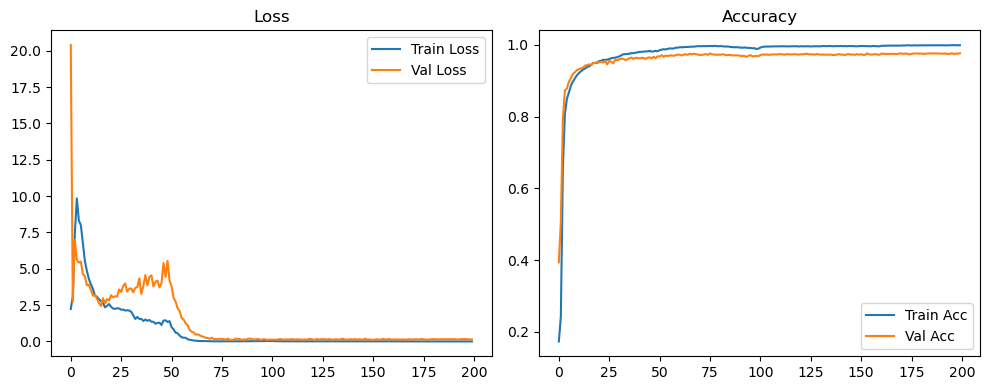

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 28.87it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 29.01it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 29.24it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 29.17it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 29.28it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 29.17it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 29.23it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 29.13it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 29.23it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 29.14it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 29.21it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 28.95it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 29.11it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 29.74it/s]

Original Model Final Test Loss: 0.1296 Accuracy: 0.9786


🚀 Running: batch256_lr0.01_0.005_0.001_dp0.5


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1485 | Val Acc: 0.2489 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1485 | Val Acc: 0.2489 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1485 | Val Acc: 0.2489 |:   0%|          | 1/200 [00:09<31:28,  9.49s/it]

| LR: 0.010 | Train Acc: 0.1652 | Val Acc: 0.2902 |:   0%|          | 1/200 [00:18<31:28,  9.49s/it]

| LR: 0.010 | Train Acc: 0.1652 | Val Acc: 0.2902 |:   0%|          | 1/200 [00:18<31:28,  9.49s/it]

| LR: 0.010 | Train Acc: 0.1652 | Val Acc: 0.2902 |:   1%|          | 2/200 [00:18<31:10,  9.45s/it]

| LR: 0.010 | Train Acc: 0.4393 | Val Acc: 0.7237 |:   1%|          | 2/200 [00:27<31:10,  9.45s/it]

| LR: 0.010 | Train Acc: 0.4393 | Val Acc: 0.7237 |:   1%|          | 2/200 [00:27<31:10,  9.45s/it]

| LR: 0.010 | Train Acc: 0.4393 | Val Acc: 0.7237 |:   2%|▏         | 3/200 [00:27<30:14,  9.21s/it]

| LR: 0.010 | Train Acc: 0.7067 | Val Acc: 0.8517 |:   2%|▏         | 3/200 [00:37<30:14,  9.21s/it]

| LR: 0.010 | Train Acc: 0.7067 | Val Acc: 0.8517 |:   2%|▏         | 3/200 [00:37<30:14,  9.21s/it]

| LR: 0.010 | Train Acc: 0.7067 | Val Acc: 0.8517 |:   2%|▏         | 4/200 [00:37<30:17,  9.27s/it]

| LR: 0.010 | Train Acc: 0.7834 | Val Acc: 0.8763 |:   2%|▏         | 4/200 [00:46<30:17,  9.27s/it]

| LR: 0.010 | Train Acc: 0.7834 | Val Acc: 0.8763 |:   2%|▏         | 4/200 [00:46<30:17,  9.27s/it]

| LR: 0.010 | Train Acc: 0.7834 | Val Acc: 0.8763 |:   2%|▎         | 5/200 [00:46<29:48,  9.17s/it]

| LR: 0.010 | Train Acc: 0.8174 | Val Acc: 0.8954 |:   2%|▎         | 5/200 [00:54<29:48,  9.17s/it]

| LR: 0.010 | Train Acc: 0.8174 | Val Acc: 0.8954 |:   2%|▎         | 5/200 [00:54<29:48,  9.17s/it]

| LR: 0.010 | Train Acc: 0.8174 | Val Acc: 0.8954 |:   3%|▎         | 6/200 [00:55<29:17,  9.06s/it]

| LR: 0.010 | Train Acc: 0.8354 | Val Acc: 0.8989 |:   3%|▎         | 6/200 [01:03<29:17,  9.06s/it]

| LR: 0.010 | Train Acc: 0.8354 | Val Acc: 0.8989 |:   3%|▎         | 6/200 [01:03<29:17,  9.06s/it]

| LR: 0.010 | Train Acc: 0.8354 | Val Acc: 0.8989 |:   4%|▎         | 7/200 [01:03<28:43,  8.93s/it]

| LR: 0.010 | Train Acc: 0.8571 | Val Acc: 0.9127 |:   4%|▎         | 7/200 [01:12<28:43,  8.93s/it]

| LR: 0.010 | Train Acc: 0.8571 | Val Acc: 0.9127 |:   4%|▎         | 7/200 [01:12<28:43,  8.93s/it]

| LR: 0.010 | Train Acc: 0.8571 | Val Acc: 0.9127 |:   4%|▍         | 8/200 [01:12<28:26,  8.89s/it]

| LR: 0.010 | Train Acc: 0.8681 | Val Acc: 0.9239 |:   4%|▍         | 8/200 [01:21<28:26,  8.89s/it]

| LR: 0.010 | Train Acc: 0.8681 | Val Acc: 0.9239 |:   4%|▍         | 8/200 [01:21<28:26,  8.89s/it]

| LR: 0.010 | Train Acc: 0.8681 | Val Acc: 0.9239 |:   4%|▍         | 9/200 [01:21<28:37,  8.99s/it]

| LR: 0.010 | Train Acc: 0.8816 | Val Acc: 0.9205 |:   4%|▍         | 9/200 [01:30<28:37,  8.99s/it]

| LR: 0.010 | Train Acc: 0.8816 | Val Acc: 0.9205 |:   4%|▍         | 9/200 [01:30<28:37,  8.99s/it]

| LR: 0.010 | Train Acc: 0.8816 | Val Acc: 0.9205 |:   5%|▌         | 10/200 [01:30<28:31,  9.01s/it]

| LR: 0.010 | Train Acc: 0.8870 | Val Acc: 0.9300 |:   5%|▌         | 10/200 [01:39<28:31,  9.01s/it]

| LR: 0.010 | Train Acc: 0.8870 | Val Acc: 0.9300 |:   5%|▌         | 10/200 [01:39<28:31,  9.01s/it]

| LR: 0.010 | Train Acc: 0.8870 | Val Acc: 0.9300 |:   6%|▌         | 11/200 [01:39<28:18,  8.98s/it]

| LR: 0.010 | Train Acc: 0.8935 | Val Acc: 0.9329 |:   6%|▌         | 11/200 [01:48<28:18,  8.98s/it]

| LR: 0.010 | Train Acc: 0.8935 | Val Acc: 0.9329 |:   6%|▌         | 11/200 [01:48<28:18,  8.98s/it]

| LR: 0.010 | Train Acc: 0.8935 | Val Acc: 0.9329 |:   6%|▌         | 12/200 [01:48<28:07,  8.97s/it]

| LR: 0.010 | Train Acc: 0.8984 | Val Acc: 0.9330 |:   6%|▌         | 12/200 [01:57<28:07,  8.97s/it]

| LR: 0.010 | Train Acc: 0.8984 | Val Acc: 0.9330 |:   6%|▌         | 12/200 [01:57<28:07,  8.97s/it]

| LR: 0.010 | Train Acc: 0.8984 | Val Acc: 0.9330 |:   6%|▋         | 13/200 [01:57<28:09,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9045 | Val Acc: 0.9381 |:   6%|▋         | 13/200 [02:07<28:09,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9045 | Val Acc: 0.9381 |:   6%|▋         | 13/200 [02:07<28:09,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9045 | Val Acc: 0.9381 |:   7%|▋         | 14/200 [02:07<28:11,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9109 | Val Acc: 0.9445 |:   7%|▋         | 14/200 [02:15<28:11,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9109 | Val Acc: 0.9445 |:   7%|▋         | 14/200 [02:15<28:11,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9109 | Val Acc: 0.9445 |:   8%|▊         | 15/200 [02:16<27:56,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9417 |:   8%|▊         | 15/200 [02:24<27:56,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9417 |:   8%|▊         | 15/200 [02:24<27:56,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9417 |:   8%|▊         | 16/200 [02:24<27:37,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9172 | Val Acc: 0.9401 |:   8%|▊         | 16/200 [02:34<27:37,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9172 | Val Acc: 0.9401 |:   8%|▊         | 16/200 [02:34<27:37,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9172 | Val Acc: 0.9401 |:   8%|▊         | 17/200 [02:34<27:44,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9180 | Val Acc: 0.9469 |:   8%|▊         | 17/200 [02:43<27:44,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9180 | Val Acc: 0.9469 |:   8%|▊         | 17/200 [02:43<27:44,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9180 | Val Acc: 0.9469 |:   9%|▉         | 18/200 [02:43<27:29,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9217 | Val Acc: 0.9483 |:   9%|▉         | 18/200 [02:52<27:29,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9217 | Val Acc: 0.9483 |:   9%|▉         | 18/200 [02:52<27:29,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9217 | Val Acc: 0.9483 |:  10%|▉         | 19/200 [02:52<27:11,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9255 | Val Acc: 0.9493 |:  10%|▉         | 19/200 [03:00<27:11,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9255 | Val Acc: 0.9493 |:  10%|▉         | 19/200 [03:00<27:11,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9255 | Val Acc: 0.9493 |:  10%|█         | 20/200 [03:00<26:55,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9476 |:  10%|█         | 20/200 [03:09<26:55,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9476 |:  10%|█         | 20/200 [03:09<26:55,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9476 |:  10%|█         | 21/200 [03:09<26:42,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9313 | Val Acc: 0.9523 |:  10%|█         | 21/200 [03:18<26:42,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9313 | Val Acc: 0.9523 |:  10%|█         | 21/200 [03:18<26:42,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9313 | Val Acc: 0.9523 |:  11%|█         | 22/200 [03:18<26:27,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9306 | Val Acc: 0.9519 |:  11%|█         | 22/200 [03:27<26:27,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9306 | Val Acc: 0.9519 |:  11%|█         | 22/200 [03:27<26:27,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9306 | Val Acc: 0.9519 |:  12%|█▏        | 23/200 [03:27<26:02,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9336 | Val Acc: 0.9543 |:  12%|█▏        | 23/200 [03:36<26:02,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9336 | Val Acc: 0.9543 |:  12%|█▏        | 23/200 [03:36<26:02,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9336 | Val Acc: 0.9543 |:  12%|█▏        | 24/200 [03:36<25:59,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9356 | Val Acc: 0.9567 |:  12%|█▏        | 24/200 [03:45<25:59,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9356 | Val Acc: 0.9567 |:  12%|█▏        | 24/200 [03:45<25:59,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9356 | Val Acc: 0.9567 |:  12%|█▎        | 25/200 [03:45<25:49,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9383 | Val Acc: 0.9577 |:  12%|█▎        | 25/200 [03:53<25:49,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9383 | Val Acc: 0.9577 |:  12%|█▎        | 25/200 [03:53<25:49,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9383 | Val Acc: 0.9577 |:  13%|█▎        | 26/200 [03:53<25:38,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9583 |:  13%|█▎        | 26/200 [04:02<25:38,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9583 |:  13%|█▎        | 26/200 [04:02<25:38,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9583 |:  14%|█▎        | 27/200 [04:02<25:30,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9424 | Val Acc: 0.9557 |:  14%|█▎        | 27/200 [04:11<25:30,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9424 | Val Acc: 0.9557 |:  14%|█▎        | 27/200 [04:11<25:30,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9424 | Val Acc: 0.9557 |:  14%|█▍        | 28/200 [04:11<25:22,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9416 | Val Acc: 0.9565 |:  14%|█▍        | 28/200 [04:21<25:22,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9416 | Val Acc: 0.9565 |:  14%|█▍        | 28/200 [04:21<25:22,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9416 | Val Acc: 0.9565 |:  14%|█▍        | 29/200 [04:21<25:47,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9468 | Val Acc: 0.9604 |:  14%|█▍        | 29/200 [04:30<25:47,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9468 | Val Acc: 0.9604 |:  14%|█▍        | 29/200 [04:30<25:47,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9468 | Val Acc: 0.9604 |:  15%|█▌        | 30/200 [04:30<25:36,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9452 | Val Acc: 0.9587 |:  15%|█▌        | 30/200 [04:39<25:36,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9452 | Val Acc: 0.9587 |:  15%|█▌        | 30/200 [04:39<25:36,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9452 | Val Acc: 0.9587 |:  16%|█▌        | 31/200 [04:39<25:38,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9529 |:  16%|█▌        | 31/200 [04:48<25:38,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9529 |:  16%|█▌        | 31/200 [04:48<25:38,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9529 |:  16%|█▌        | 32/200 [04:48<25:19,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9541 | Val Acc: 0.9633 |:  16%|█▌        | 32/200 [04:57<25:19,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9541 | Val Acc: 0.9633 |:  16%|█▌        | 32/200 [04:57<25:19,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9541 | Val Acc: 0.9633 |:  16%|█▋        | 33/200 [04:57<24:56,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  16%|█▋        | 33/200 [05:05<24:56,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  16%|█▋        | 33/200 [05:05<24:56,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  17%|█▋        | 34/200 [05:05<24:40,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9538 | Val Acc: 0.9643 |:  17%|█▋        | 34/200 [05:14<24:40,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9538 | Val Acc: 0.9643 |:  17%|█▋        | 34/200 [05:14<24:40,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9538 | Val Acc: 0.9643 |:  18%|█▊        | 35/200 [05:14<24:24,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9621 |:  18%|█▊        | 35/200 [05:23<24:24,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9621 |:  18%|█▊        | 35/200 [05:23<24:24,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9621 |:  18%|█▊        | 36/200 [05:23<24:20,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9574 | Val Acc: 0.9643 |:  18%|█▊        | 36/200 [05:32<24:20,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9574 | Val Acc: 0.9643 |:  18%|█▊        | 36/200 [05:32<24:20,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9574 | Val Acc: 0.9643 |:  18%|█▊        | 37/200 [05:32<24:11,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9589 | Val Acc: 0.9657 |:  18%|█▊        | 37/200 [05:41<24:11,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9589 | Val Acc: 0.9657 |:  18%|█▊        | 37/200 [05:41<24:11,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9589 | Val Acc: 0.9657 |:  19%|█▉        | 38/200 [05:41<23:59,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9593 | Val Acc: 0.9633 |:  19%|█▉        | 38/200 [05:50<23:59,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9593 | Val Acc: 0.9633 |:  19%|█▉        | 38/200 [05:50<23:59,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9593 | Val Acc: 0.9633 |:  20%|█▉        | 39/200 [05:50<23:51,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9618 | Val Acc: 0.9629 |:  20%|█▉        | 39/200 [05:59<23:51,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9618 | Val Acc: 0.9629 |:  20%|█▉        | 39/200 [05:59<23:51,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9618 | Val Acc: 0.9629 |:  20%|██        | 40/200 [05:59<23:56,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9661 |:  20%|██        | 40/200 [06:08<23:56,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9661 |:  20%|██        | 40/200 [06:08<23:56,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9661 |:  20%|██        | 41/200 [06:08<23:39,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9617 | Val Acc: 0.9683 |:  20%|██        | 41/200 [06:17<23:39,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9617 | Val Acc: 0.9683 |:  20%|██        | 41/200 [06:17<23:39,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9617 | Val Acc: 0.9683 |:  21%|██        | 42/200 [06:17<23:24,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9634 | Val Acc: 0.9667 |:  21%|██        | 42/200 [06:26<23:24,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9634 | Val Acc: 0.9667 |:  21%|██        | 42/200 [06:26<23:24,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9634 | Val Acc: 0.9667 |:  22%|██▏       | 43/200 [06:26<23:18,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9674 |:  22%|██▏       | 43/200 [06:34<23:18,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9674 |:  22%|██▏       | 43/200 [06:34<23:18,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9674 |:  22%|██▏       | 44/200 [06:34<23:04,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9662 | Val Acc: 0.9686 |:  22%|██▏       | 44/200 [06:43<23:04,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9662 | Val Acc: 0.9686 |:  22%|██▏       | 44/200 [06:43<23:04,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9662 | Val Acc: 0.9686 |:  22%|██▎       | 45/200 [06:43<23:03,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9695 | Val Acc: 0.9682 |:  22%|██▎       | 45/200 [06:52<23:03,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9695 | Val Acc: 0.9682 |:  22%|██▎       | 45/200 [06:52<23:03,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9695 | Val Acc: 0.9682 |:  23%|██▎       | 46/200 [06:52<22:49,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9704 |:  23%|██▎       | 46/200 [07:01<22:49,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9704 |:  23%|██▎       | 46/200 [07:01<22:49,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9704 |:  24%|██▎       | 47/200 [07:01<22:36,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9687 |:  24%|██▎       | 47/200 [07:10<22:36,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9687 |:  24%|██▎       | 47/200 [07:10<22:36,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9687 |:  24%|██▍       | 48/200 [07:10<22:24,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9704 |:  24%|██▍       | 48/200 [07:19<22:24,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9704 |:  24%|██▍       | 48/200 [07:19<22:24,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9704 |:  24%|██▍       | 49/200 [07:19<22:14,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9721 |:  24%|██▍       | 49/200 [07:27<22:14,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9721 |:  24%|██▍       | 49/200 [07:27<22:14,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9721 |:  25%|██▌       | 50/200 [07:27<22:04,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9760 | Val Acc: 0.9713 |:  25%|██▌       | 50/200 [07:36<22:04,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9760 | Val Acc: 0.9713 |:  25%|██▌       | 50/200 [07:36<22:04,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9760 | Val Acc: 0.9713 |:  26%|██▌       | 51/200 [07:36<21:57,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9765 | Val Acc: 0.9728 |:  26%|██▌       | 51/200 [07:45<21:57,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9765 | Val Acc: 0.9728 |:  26%|██▌       | 51/200 [07:45<21:57,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9765 | Val Acc: 0.9728 |:  26%|██▌       | 52/200 [07:45<21:52,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9731 |:  26%|██▌       | 52/200 [07:54<21:52,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9731 |:  26%|██▌       | 52/200 [07:54<21:52,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9731 |:  26%|██▋       | 53/200 [07:54<21:44,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9730 |:  26%|██▋       | 53/200 [08:03<21:44,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9730 |:  26%|██▋       | 53/200 [08:03<21:44,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9730 |:  27%|██▋       | 54/200 [08:03<21:31,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9822 | Val Acc: 0.9722 |:  27%|██▋       | 54/200 [08:12<21:31,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9822 | Val Acc: 0.9722 |:  27%|██▋       | 54/200 [08:12<21:31,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9822 | Val Acc: 0.9722 |:  28%|██▊       | 55/200 [08:12<21:15,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9732 |:  28%|██▊       | 55/200 [08:20<21:15,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9732 |:  28%|██▊       | 55/200 [08:20<21:15,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9732 |:  28%|██▊       | 56/200 [08:20<21:07,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9839 | Val Acc: 0.9729 |:  28%|██▊       | 56/200 [08:29<21:07,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9839 | Val Acc: 0.9729 |:  28%|██▊       | 56/200 [08:29<21:07,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9839 | Val Acc: 0.9729 |:  28%|██▊       | 57/200 [08:29<20:55,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9731 |:  28%|██▊       | 57/200 [08:38<20:55,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9731 |:  28%|██▊       | 57/200 [08:38<20:55,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9731 |:  29%|██▉       | 58/200 [08:38<20:54,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9848 | Val Acc: 0.9733 |:  29%|██▉       | 58/200 [08:47<20:54,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9848 | Val Acc: 0.9733 |:  29%|██▉       | 58/200 [08:47<20:54,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9848 | Val Acc: 0.9733 |:  30%|██▉       | 59/200 [08:47<20:47,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9740 |:  30%|██▉       | 59/200 [08:56<20:47,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9740 |:  30%|██▉       | 59/200 [08:56<20:47,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9740 |:  30%|███       | 60/200 [08:56<20:30,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9741 |:  30%|███       | 60/200 [09:05<20:30,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9741 |:  30%|███       | 60/200 [09:05<20:30,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9741 |:  30%|███       | 61/200 [09:05<20:28,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9731 |:  30%|███       | 61/200 [09:14<20:28,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9731 |:  30%|███       | 61/200 [09:14<20:28,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9731 |:  31%|███       | 62/200 [09:14<20:29,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9854 | Val Acc: 0.9730 |:  31%|███       | 62/200 [09:22<20:29,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9854 | Val Acc: 0.9730 |:  31%|███       | 62/200 [09:22<20:29,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9854 | Val Acc: 0.9730 |:  32%|███▏      | 63/200 [09:23<20:18,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9728 |:  32%|███▏      | 63/200 [09:31<20:18,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9728 |:  32%|███▏      | 63/200 [09:31<20:18,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9728 |:  32%|███▏      | 64/200 [09:31<20:10,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  32%|███▏      | 64/200 [09:40<20:10,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  32%|███▏      | 64/200 [09:40<20:10,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  32%|███▎      | 65/200 [09:40<19:59,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9871 | Val Acc: 0.9737 |:  32%|███▎      | 65/200 [09:49<19:59,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9871 | Val Acc: 0.9737 |:  32%|███▎      | 65/200 [09:49<19:59,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9871 | Val Acc: 0.9737 |:  33%|███▎      | 66/200 [09:49<19:49,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  33%|███▎      | 66/200 [09:58<19:49,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  33%|███▎      | 66/200 [09:58<19:49,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  34%|███▎      | 67/200 [09:58<19:39,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9864 | Val Acc: 0.9728 |:  34%|███▎      | 67/200 [10:07<19:39,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9864 | Val Acc: 0.9728 |:  34%|███▎      | 67/200 [10:07<19:39,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9864 | Val Acc: 0.9728 |:  34%|███▍      | 68/200 [10:07<19:25,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9865 | Val Acc: 0.9717 |:  34%|███▍      | 68/200 [10:15<19:25,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9865 | Val Acc: 0.9717 |:  34%|███▍      | 68/200 [10:15<19:25,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9865 | Val Acc: 0.9717 |:  34%|███▍      | 69/200 [10:15<19:10,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9731 |:  34%|███▍      | 69/200 [10:24<19:10,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9731 |:  34%|███▍      | 69/200 [10:24<19:10,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9731 |:  35%|███▌      | 70/200 [10:24<19:02,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9725 |:  35%|███▌      | 70/200 [10:33<19:02,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9725 |:  35%|███▌      | 70/200 [10:33<19:02,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9725 |:  36%|███▌      | 71/200 [10:33<18:52,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9721 |:  36%|███▌      | 71/200 [10:42<18:52,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9721 |:  36%|███▌      | 71/200 [10:42<18:52,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9721 |:  36%|███▌      | 72/200 [10:42<19:09,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9719 |:  36%|███▌      | 72/200 [10:51<19:09,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9719 |:  36%|███▌      | 72/200 [10:51<19:09,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9719 |:  36%|███▋      | 73/200 [10:51<19:03,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9730 |:  36%|███▋      | 73/200 [11:00<19:03,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9730 |:  36%|███▋      | 73/200 [11:00<19:03,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9730 |:  37%|███▋      | 74/200 [11:00<18:50,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9846 | Val Acc: 0.9730 |:  37%|███▋      | 74/200 [11:09<18:50,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9846 | Val Acc: 0.9730 |:  37%|███▋      | 74/200 [11:09<18:50,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9846 | Val Acc: 0.9730 |:  38%|███▊      | 75/200 [11:09<18:37,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9824 | Val Acc: 0.9705 |:  38%|███▊      | 75/200 [11:18<18:37,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9824 | Val Acc: 0.9705 |:  38%|███▊      | 75/200 [11:18<18:37,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9824 | Val Acc: 0.9705 |:  38%|███▊      | 76/200 [11:18<18:22,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9835 | Val Acc: 0.9720 |:  38%|███▊      | 76/200 [11:27<18:22,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9835 | Val Acc: 0.9720 |:  38%|███▊      | 76/200 [11:27<18:22,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9835 | Val Acc: 0.9720 |:  38%|███▊      | 77/200 [11:27<18:11,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9819 | Val Acc: 0.9721 |:  38%|███▊      | 77/200 [11:36<18:11,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9819 | Val Acc: 0.9721 |:  38%|███▊      | 77/200 [11:36<18:11,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9819 | Val Acc: 0.9721 |:  39%|███▉      | 78/200 [11:36<18:04,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9721 |:  39%|███▉      | 78/200 [11:45<18:04,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9721 |:  39%|███▉      | 78/200 [11:45<18:04,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9721 |:  40%|███▉      | 79/200 [11:45<17:53,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9806 | Val Acc: 0.9707 |:  40%|███▉      | 79/200 [11:54<17:53,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9806 | Val Acc: 0.9707 |:  40%|███▉      | 79/200 [11:54<17:53,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9806 | Val Acc: 0.9707 |:  40%|████      | 80/200 [11:54<17:49,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9696 |:  40%|████      | 80/200 [12:02<17:49,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9696 |:  40%|████      | 80/200 [12:02<17:49,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9696 |:  40%|████      | 81/200 [12:02<17:39,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9788 | Val Acc: 0.9706 |:  40%|████      | 81/200 [12:11<17:39,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9788 | Val Acc: 0.9706 |:  40%|████      | 81/200 [12:11<17:39,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9788 | Val Acc: 0.9706 |:  41%|████      | 82/200 [12:11<17:31,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9702 |:  41%|████      | 82/200 [12:20<17:31,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9702 |:  41%|████      | 82/200 [12:20<17:31,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9702 |:  42%|████▏     | 83/200 [12:20<17:19,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9692 |:  42%|████▏     | 83/200 [12:29<17:19,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9692 |:  42%|████▏     | 83/200 [12:29<17:19,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9692 |:  42%|████▏     | 84/200 [12:29<17:10,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9763 | Val Acc: 0.9702 |:  42%|████▏     | 84/200 [12:38<17:10,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9763 | Val Acc: 0.9702 |:  42%|████▏     | 84/200 [12:38<17:10,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9763 | Val Acc: 0.9702 |:  42%|████▎     | 85/200 [12:38<17:08,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9683 |:  42%|████▎     | 85/200 [12:47<17:08,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9683 |:  42%|████▎     | 85/200 [12:47<17:08,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9683 |:  43%|████▎     | 86/200 [12:47<17:04,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9701 |:  43%|████▎     | 86/200 [12:56<17:04,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9701 |:  43%|████▎     | 86/200 [12:56<17:04,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9701 |:  44%|████▎     | 87/200 [12:56<16:49,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9703 |:  44%|████▎     | 87/200 [13:05<16:49,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9703 |:  44%|████▎     | 87/200 [13:05<16:49,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9703 |:  44%|████▍     | 88/200 [13:05<16:38,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9702 |:  44%|████▍     | 88/200 [13:14<16:38,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9702 |:  44%|████▍     | 88/200 [13:14<16:38,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9702 |:  44%|████▍     | 89/200 [13:14<16:28,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9695 |:  44%|████▍     | 89/200 [13:23<16:28,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9695 |:  44%|████▍     | 89/200 [13:23<16:28,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9695 |:  45%|████▌     | 90/200 [13:23<16:20,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9698 |:  45%|████▌     | 90/200 [13:32<16:20,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9698 |:  45%|████▌     | 90/200 [13:32<16:20,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9698 |:  46%|████▌     | 91/200 [13:32<16:07,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9744 | Val Acc: 0.9688 |:  46%|████▌     | 91/200 [13:40<16:07,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9744 | Val Acc: 0.9688 |:  46%|████▌     | 91/200 [13:40<16:07,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9744 | Val Acc: 0.9688 |:  46%|████▌     | 92/200 [13:40<15:51,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9694 |:  46%|████▌     | 92/200 [13:49<15:51,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9694 |:  46%|████▌     | 92/200 [13:49<15:51,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9694 |:  46%|████▋     | 93/200 [13:49<15:43,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9732 | Val Acc: 0.9704 |:  46%|████▋     | 93/200 [13:58<15:43,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9732 | Val Acc: 0.9704 |:  46%|████▋     | 93/200 [13:58<15:43,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9732 | Val Acc: 0.9704 |:  47%|████▋     | 94/200 [13:58<15:37,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9682 |:  47%|████▋     | 94/200 [14:07<15:37,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9682 |:  47%|████▋     | 94/200 [14:07<15:37,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9682 |:  48%|████▊     | 95/200 [14:07<15:41,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9680 |:  48%|████▊     | 95/200 [14:16<15:41,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9680 |:  48%|████▊     | 95/200 [14:16<15:41,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9680 |:  48%|████▊     | 96/200 [14:16<15:28,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9733 | Val Acc: 0.9692 |:  48%|████▊     | 96/200 [14:25<15:28,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9733 | Val Acc: 0.9692 |:  48%|████▊     | 96/200 [14:25<15:28,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9733 | Val Acc: 0.9692 |:  48%|████▊     | 97/200 [14:25<15:19,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9677 |:  48%|████▊     | 97/200 [14:34<15:19,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9677 |:  48%|████▊     | 97/200 [14:34<15:19,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9677 |:  49%|████▉     | 98/200 [14:34<15:07,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9738 | Val Acc: 0.9694 |:  49%|████▉     | 98/200 [14:43<15:07,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9738 | Val Acc: 0.9694 |:  49%|████▉     | 98/200 [14:43<15:07,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9738 | Val Acc: 0.9694 |:  50%|████▉     | 99/200 [14:43<15:22,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9682 |:  50%|████▉     | 99/200 [14:53<15:22,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9682 |:  50%|████▉     | 99/200 [14:53<15:22,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9682 |:  50%|█████     | 100/200 [14:53<15:23,  9.24s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9698 |:  50%|█████     | 100/200 [15:02<15:23,  9.24s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9698 |:  50%|█████     | 100/200 [15:02<15:23,  9.24s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9698 |:  50%|█████     | 101/200 [15:02<15:01,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9774 | Val Acc: 0.9691 |:  50%|█████     | 101/200 [15:11<15:01,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9774 | Val Acc: 0.9691 |:  50%|█████     | 101/200 [15:11<15:01,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9774 | Val Acc: 0.9691 |:  51%|█████     | 102/200 [15:11<14:44,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9776 | Val Acc: 0.9693 |:  51%|█████     | 102/200 [15:19<14:44,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9776 | Val Acc: 0.9693 |:  51%|█████     | 102/200 [15:19<14:44,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9776 | Val Acc: 0.9693 |:  52%|█████▏    | 103/200 [15:19<14:31,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9785 | Val Acc: 0.9702 |:  52%|█████▏    | 103/200 [15:28<14:31,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9785 | Val Acc: 0.9702 |:  52%|█████▏    | 103/200 [15:28<14:31,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9785 | Val Acc: 0.9702 |:  52%|█████▏    | 104/200 [15:28<14:18,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9794 | Val Acc: 0.9707 |:  52%|█████▏    | 104/200 [15:37<14:18,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9794 | Val Acc: 0.9707 |:  52%|█████▏    | 104/200 [15:37<14:18,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9794 | Val Acc: 0.9707 |:  52%|█████▎    | 105/200 [15:37<14:08,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9797 | Val Acc: 0.9710 |:  52%|█████▎    | 105/200 [15:46<14:08,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9797 | Val Acc: 0.9710 |:  52%|█████▎    | 105/200 [15:46<14:08,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9797 | Val Acc: 0.9710 |:  53%|█████▎    | 106/200 [15:46<13:59,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9713 |:  53%|█████▎    | 106/200 [15:55<13:59,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9713 |:  53%|█████▎    | 106/200 [15:55<13:59,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9713 |:  54%|█████▎    | 107/200 [15:55<13:47,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9712 |:  54%|█████▎    | 107/200 [16:04<13:47,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9712 |:  54%|█████▎    | 107/200 [16:04<13:47,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9712 |:  54%|█████▍    | 108/200 [16:04<13:40,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9709 |:  54%|█████▍    | 108/200 [16:13<13:40,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9709 |:  54%|█████▍    | 108/200 [16:13<13:40,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9709 |:  55%|█████▍    | 109/200 [16:13<13:28,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9722 |:  55%|█████▍    | 109/200 [16:22<13:28,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9722 |:  55%|█████▍    | 109/200 [16:22<13:28,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9722 |:  55%|█████▌    | 110/200 [16:22<13:38,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9718 |:  55%|█████▌    | 110/200 [16:31<13:38,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9718 |:  55%|█████▌    | 110/200 [16:31<13:38,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9718 |:  56%|█████▌    | 111/200 [16:31<13:29,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9714 |:  56%|█████▌    | 111/200 [16:40<13:29,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9714 |:  56%|█████▌    | 111/200 [16:40<13:29,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9714 |:  56%|█████▌    | 112/200 [16:40<13:13,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9713 |:  56%|█████▌    | 112/200 [16:49<13:13,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9713 |:  56%|█████▌    | 112/200 [16:49<13:13,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9713 |:  56%|█████▋    | 113/200 [16:49<13:01,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9718 |:  56%|█████▋    | 113/200 [16:58<13:01,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9718 |:  56%|█████▋    | 113/200 [16:58<13:01,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9718 |:  57%|█████▋    | 114/200 [16:58<12:51,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9731 |:  57%|█████▋    | 114/200 [17:07<12:51,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9731 |:  57%|█████▋    | 114/200 [17:07<12:51,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9731 |:  57%|█████▊    | 115/200 [17:07<12:48,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9707 |:  57%|█████▊    | 115/200 [17:16<12:48,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9707 |:  57%|█████▊    | 115/200 [17:16<12:48,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9707 |:  58%|█████▊    | 116/200 [17:16<12:40,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9807 | Val Acc: 0.9728 |:  58%|█████▊    | 116/200 [17:25<12:40,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9807 | Val Acc: 0.9728 |:  58%|█████▊    | 116/200 [17:25<12:40,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9807 | Val Acc: 0.9728 |:  58%|█████▊    | 117/200 [17:25<12:27,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9712 |:  58%|█████▊    | 117/200 [17:34<12:27,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9712 |:  58%|█████▊    | 117/200 [17:34<12:27,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9712 |:  59%|█████▉    | 118/200 [17:34<12:16,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9718 |:  59%|█████▉    | 118/200 [17:43<12:16,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9718 |:  59%|█████▉    | 118/200 [17:43<12:16,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9718 |:  60%|█████▉    | 119/200 [17:43<12:10,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9722 |:  60%|█████▉    | 119/200 [17:53<12:10,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9722 |:  60%|█████▉    | 119/200 [17:53<12:10,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9722 |:  60%|██████    | 120/200 [17:53<12:07,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9706 |:  60%|██████    | 120/200 [18:02<12:07,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9706 |:  60%|██████    | 120/200 [18:02<12:07,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9706 |:  60%|██████    | 121/200 [18:02<11:57,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9705 |:  60%|██████    | 121/200 [18:11<11:57,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9705 |:  60%|██████    | 121/200 [18:11<11:57,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9705 |:  61%|██████    | 122/200 [18:11<11:51,  9.12s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9721 |:  61%|██████    | 122/200 [18:20<11:51,  9.12s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9721 |:  61%|██████    | 122/200 [18:20<11:51,  9.12s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9721 |:  62%|██████▏   | 123/200 [18:20<11:38,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9719 |:  62%|██████▏   | 123/200 [18:29<11:38,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9719 |:  62%|██████▏   | 123/200 [18:29<11:38,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9719 |:  62%|██████▏   | 124/200 [18:29<11:37,  9.18s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9711 |:  62%|██████▏   | 124/200 [18:38<11:37,  9.18s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9711 |:  62%|██████▏   | 124/200 [18:38<11:37,  9.18s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9711 |:  62%|██████▎   | 125/200 [18:39<11:29,  9.20s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9710 |:  62%|██████▎   | 125/200 [18:48<11:29,  9.20s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9710 |:  62%|██████▎   | 125/200 [18:48<11:29,  9.20s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9710 |:  63%|██████▎   | 126/200 [18:48<11:26,  9.27s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9722 |:  63%|██████▎   | 126/200 [18:57<11:26,  9.27s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9722 |:  63%|██████▎   | 126/200 [18:57<11:26,  9.27s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9722 |:  64%|██████▎   | 127/200 [18:57<11:18,  9.29s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9713 |:  64%|██████▎   | 127/200 [19:07<11:18,  9.29s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9713 |:  64%|██████▎   | 127/200 [19:07<11:18,  9.29s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9713 |:  64%|██████▍   | 128/200 [19:07<11:14,  9.36s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9723 |:  64%|██████▍   | 128/200 [19:16<11:14,  9.36s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9723 |:  64%|██████▍   | 128/200 [19:16<11:14,  9.36s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9723 |:  64%|██████▍   | 129/200 [19:16<11:06,  9.39s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9724 |:  64%|██████▍   | 129/200 [19:26<11:06,  9.39s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9724 |:  64%|██████▍   | 129/200 [19:26<11:06,  9.39s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9724 |:  65%|██████▌   | 130/200 [19:26<11:07,  9.53s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9728 |:  65%|██████▌   | 130/200 [19:35<11:07,  9.53s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9728 |:  65%|██████▌   | 130/200 [19:35<11:07,  9.53s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9728 |:  66%|██████▌   | 131/200 [19:35<10:45,  9.36s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9714 |:  66%|██████▌   | 131/200 [19:44<10:45,  9.36s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9714 |:  66%|██████▌   | 131/200 [19:44<10:45,  9.36s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9714 |:  66%|██████▌   | 132/200 [19:44<10:34,  9.33s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9723 |:  66%|██████▌   | 132/200 [19:53<10:34,  9.33s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9723 |:  66%|██████▌   | 132/200 [19:53<10:34,  9.33s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9723 |:  66%|██████▋   | 133/200 [19:53<10:20,  9.27s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9714 |:  66%|██████▋   | 133/200 [20:02<10:20,  9.27s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9714 |:  66%|██████▋   | 133/200 [20:02<10:20,  9.27s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9714 |:  67%|██████▋   | 134/200 [20:02<10:04,  9.15s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9718 |:  67%|██████▋   | 134/200 [20:11<10:04,  9.15s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9718 |:  67%|██████▋   | 134/200 [20:11<10:04,  9.15s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9718 |:  68%|██████▊   | 135/200 [20:11<09:50,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9728 |:  68%|██████▊   | 135/200 [20:20<09:50,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9728 |:  68%|██████▊   | 135/200 [20:20<09:50,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9728 |:  68%|██████▊   | 136/200 [20:20<09:34,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9716 |:  68%|██████▊   | 136/200 [20:29<09:34,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9716 |:  68%|██████▊   | 136/200 [20:29<09:34,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9829 | Val Acc: 0.9716 |:  68%|██████▊   | 137/200 [20:29<09:32,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9734 |:  68%|██████▊   | 137/200 [20:38<09:32,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9734 |:  68%|██████▊   | 137/200 [20:38<09:32,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9734 |:  69%|██████▉   | 138/200 [20:38<09:19,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9717 |:  69%|██████▉   | 138/200 [20:47<09:19,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9717 |:  69%|██████▉   | 138/200 [20:47<09:19,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9717 |:  70%|██████▉   | 139/200 [20:47<09:08,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9715 |:  70%|██████▉   | 139/200 [20:56<09:08,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9715 |:  70%|██████▉   | 139/200 [20:56<09:08,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9715 |:  70%|███████   | 140/200 [20:56<08:57,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9712 |:  70%|███████   | 140/200 [21:05<08:57,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9712 |:  70%|███████   | 140/200 [21:05<08:57,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9712 |:  70%|███████   | 141/200 [21:05<08:51,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9718 |:  70%|███████   | 141/200 [21:14<08:51,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9718 |:  70%|███████   | 141/200 [21:14<08:51,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9718 |:  71%|███████   | 142/200 [21:14<08:40,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9715 |:  71%|███████   | 142/200 [21:23<08:40,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9715 |:  71%|███████   | 142/200 [21:23<08:40,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9715 |:  72%|███████▏  | 143/200 [21:23<08:28,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9725 |:  72%|███████▏  | 143/200 [21:32<08:28,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9725 |:  72%|███████▏  | 143/200 [21:32<08:28,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9725 |:  72%|███████▏  | 144/200 [21:32<08:23,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9830 | Val Acc: 0.9715 |:  72%|███████▏  | 144/200 [21:41<08:23,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9830 | Val Acc: 0.9715 |:  72%|███████▏  | 144/200 [21:41<08:23,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9830 | Val Acc: 0.9715 |:  72%|███████▎  | 145/200 [21:41<08:15,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9728 |:  72%|███████▎  | 145/200 [21:50<08:15,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9728 |:  72%|███████▎  | 145/200 [21:50<08:15,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9728 |:  73%|███████▎  | 146/200 [21:50<08:05,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9720 |:  73%|███████▎  | 146/200 [21:59<08:05,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9720 |:  73%|███████▎  | 146/200 [21:59<08:05,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9720 |:  74%|███████▎  | 147/200 [21:59<07:52,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9713 |:  74%|███████▎  | 147/200 [22:07<07:52,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9713 |:  74%|███████▎  | 147/200 [22:07<07:52,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9713 |:  74%|███████▍  | 148/200 [22:07<07:38,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9722 |:  74%|███████▍  | 148/200 [22:16<07:38,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9722 |:  74%|███████▍  | 148/200 [22:16<07:38,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9722 |:  74%|███████▍  | 149/200 [22:16<07:30,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9719 |:  74%|███████▍  | 149/200 [22:26<07:30,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9719 |:  74%|███████▍  | 149/200 [22:26<07:30,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9719 |:  75%|███████▌  | 150/200 [22:26<07:30,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9839 | Val Acc: 0.9705 |:  75%|███████▌  | 150/200 [22:36<07:30,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9839 | Val Acc: 0.9705 |:  75%|███████▌  | 150/200 [22:36<07:30,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9839 | Val Acc: 0.9705 |:  76%|███████▌  | 151/200 [22:36<07:35,  9.29s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9728 |:  76%|███████▌  | 151/200 [22:45<07:35,  9.29s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9728 |:  76%|███████▌  | 151/200 [22:45<07:35,  9.29s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9728 |:  76%|███████▌  | 152/200 [22:45<07:21,  9.20s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9725 |:  76%|███████▌  | 152/200 [22:54<07:21,  9.20s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9725 |:  76%|███████▌  | 152/200 [22:54<07:21,  9.20s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9725 |:  76%|███████▋  | 153/200 [22:54<07:09,  9.14s/it]

| LR: 0.005 | Train Acc: 0.9830 | Val Acc: 0.9726 |:  76%|███████▋  | 153/200 [23:03<07:09,  9.14s/it]

| LR: 0.005 | Train Acc: 0.9830 | Val Acc: 0.9726 |:  76%|███████▋  | 153/200 [23:03<07:09,  9.14s/it]

| LR: 0.005 | Train Acc: 0.9830 | Val Acc: 0.9726 |:  77%|███████▋  | 154/200 [23:03<07:04,  9.22s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9729 |:  77%|███████▋  | 154/200 [23:12<07:04,  9.22s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9729 |:  77%|███████▋  | 154/200 [23:12<07:04,  9.22s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9729 |:  78%|███████▊  | 155/200 [23:12<06:57,  9.29s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9732 |:  78%|███████▊  | 155/200 [23:22<06:57,  9.29s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9732 |:  78%|███████▊  | 155/200 [23:22<06:57,  9.29s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9732 |:  78%|███████▊  | 156/200 [23:22<06:53,  9.41s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9723 |:  78%|███████▊  | 156/200 [23:31<06:53,  9.41s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9723 |:  78%|███████▊  | 156/200 [23:31<06:53,  9.41s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9723 |:  78%|███████▊  | 157/200 [23:31<06:41,  9.35s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9734 |:  78%|███████▊  | 157/200 [23:41<06:41,  9.35s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9734 |:  78%|███████▊  | 157/200 [23:41<06:41,  9.35s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9734 |:  79%|███████▉  | 158/200 [23:41<06:32,  9.35s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9728 |:  79%|███████▉  | 158/200 [23:50<06:32,  9.35s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9728 |:  79%|███████▉  | 158/200 [23:50<06:32,  9.35s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9728 |:  80%|███████▉  | 159/200 [23:50<06:17,  9.21s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9733 |:  80%|███████▉  | 159/200 [23:58<06:17,  9.21s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9733 |:  80%|███████▉  | 159/200 [23:58<06:17,  9.21s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9733 |:  80%|████████  | 160/200 [23:59<06:05,  9.15s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9732 |:  80%|████████  | 160/200 [24:08<06:05,  9.15s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9732 |:  80%|████████  | 160/200 [24:08<06:05,  9.15s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9732 |:  80%|████████  | 161/200 [24:08<06:00,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9737 |:  80%|████████  | 161/200 [24:17<06:00,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9737 |:  80%|████████  | 161/200 [24:17<06:00,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9848 | Val Acc: 0.9737 |:  81%|████████  | 162/200 [24:17<05:53,  9.29s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9730 |:  81%|████████  | 162/200 [24:27<05:53,  9.29s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9730 |:  81%|████████  | 162/200 [24:27<05:53,  9.29s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9730 |:  82%|████████▏ | 163/200 [24:27<05:49,  9.46s/it]

| LR: 0.001 | Train Acc: 0.9849 | Val Acc: 0.9732 |:  82%|████████▏ | 163/200 [24:37<05:49,  9.46s/it]

| LR: 0.001 | Train Acc: 0.9849 | Val Acc: 0.9732 |:  82%|████████▏ | 163/200 [24:37<05:49,  9.46s/it]

| LR: 0.001 | Train Acc: 0.9849 | Val Acc: 0.9732 |:  82%|████████▏ | 164/200 [24:37<05:40,  9.45s/it]

| LR: 0.001 | Train Acc: 0.9852 | Val Acc: 0.9724 |:  82%|████████▏ | 164/200 [24:46<05:40,  9.45s/it]

| LR: 0.001 | Train Acc: 0.9852 | Val Acc: 0.9724 |:  82%|████████▏ | 164/200 [24:46<05:40,  9.45s/it]

| LR: 0.001 | Train Acc: 0.9852 | Val Acc: 0.9724 |:  82%|████████▎ | 165/200 [24:47<05:34,  9.56s/it]

| LR: 0.001 | Train Acc: 0.9853 | Val Acc: 0.9742 |:  82%|████████▎ | 165/200 [24:56<05:34,  9.56s/it]

| LR: 0.001 | Train Acc: 0.9853 | Val Acc: 0.9742 |:  82%|████████▎ | 165/200 [24:56<05:34,  9.56s/it]

| LR: 0.001 | Train Acc: 0.9853 | Val Acc: 0.9742 |:  83%|████████▎ | 166/200 [24:56<05:27,  9.63s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9739 |:  83%|████████▎ | 166/200 [25:05<05:27,  9.63s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9739 |:  83%|████████▎ | 166/200 [25:05<05:27,  9.63s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9739 |:  84%|████████▎ | 167/200 [25:05<05:10,  9.41s/it]

| LR: 0.001 | Train Acc: 0.9855 | Val Acc: 0.9739 |:  84%|████████▎ | 167/200 [25:14<05:10,  9.41s/it]

| LR: 0.001 | Train Acc: 0.9855 | Val Acc: 0.9739 |:  84%|████████▎ | 167/200 [25:14<05:10,  9.41s/it]

| LR: 0.001 | Train Acc: 0.9855 | Val Acc: 0.9739 |:  84%|████████▍ | 168/200 [25:14<04:56,  9.26s/it]

| LR: 0.001 | Train Acc: 0.9852 | Val Acc: 0.9736 |:  84%|████████▍ | 168/200 [25:23<04:56,  9.26s/it]

| LR: 0.001 | Train Acc: 0.9852 | Val Acc: 0.9736 |:  84%|████████▍ | 168/200 [25:23<04:56,  9.26s/it]

| LR: 0.001 | Train Acc: 0.9852 | Val Acc: 0.9736 |:  84%|████████▍ | 169/200 [25:23<04:44,  9.16s/it]

| LR: 0.001 | Train Acc: 0.9856 | Val Acc: 0.9741 |:  84%|████████▍ | 169/200 [25:32<04:44,  9.16s/it]

| LR: 0.001 | Train Acc: 0.9856 | Val Acc: 0.9741 |:  84%|████████▍ | 169/200 [25:32<04:44,  9.16s/it]

| LR: 0.001 | Train Acc: 0.9856 | Val Acc: 0.9741 |:  85%|████████▌ | 170/200 [25:32<04:36,  9.23s/it]

| LR: 0.001 | Train Acc: 0.9867 | Val Acc: 0.9720 |:  85%|████████▌ | 170/200 [25:41<04:36,  9.23s/it]

| LR: 0.001 | Train Acc: 0.9867 | Val Acc: 0.9720 |:  85%|████████▌ | 170/200 [25:41<04:36,  9.23s/it]

| LR: 0.001 | Train Acc: 0.9867 | Val Acc: 0.9720 |:  86%|████████▌ | 171/200 [25:41<04:25,  9.16s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9736 |:  86%|████████▌ | 171/200 [25:50<04:25,  9.16s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9736 |:  86%|████████▌ | 171/200 [25:50<04:25,  9.16s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9736 |:  86%|████████▌ | 172/200 [25:50<04:14,  9.08s/it]

| LR: 0.001 | Train Acc: 0.9871 | Val Acc: 0.9726 |:  86%|████████▌ | 172/200 [25:59<04:14,  9.08s/it]

| LR: 0.001 | Train Acc: 0.9871 | Val Acc: 0.9726 |:  86%|████████▌ | 172/200 [25:59<04:14,  9.08s/it]

| LR: 0.001 | Train Acc: 0.9871 | Val Acc: 0.9726 |:  86%|████████▋ | 173/200 [25:59<04:03,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9870 | Val Acc: 0.9739 |:  86%|████████▋ | 173/200 [26:08<04:03,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9870 | Val Acc: 0.9739 |:  86%|████████▋ | 173/200 [26:08<04:03,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9870 | Val Acc: 0.9739 |:  87%|████████▋ | 174/200 [26:08<03:53,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9864 | Val Acc: 0.9746 |:  87%|████████▋ | 174/200 [26:17<03:53,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9864 | Val Acc: 0.9746 |:  87%|████████▋ | 174/200 [26:17<03:53,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9864 | Val Acc: 0.9746 |:  88%|████████▊ | 175/200 [26:17<03:43,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9733 |:  88%|████████▊ | 175/200 [26:26<03:43,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9733 |:  88%|████████▊ | 175/200 [26:26<03:43,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9733 |:  88%|████████▊ | 176/200 [26:26<03:33,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9743 |:  88%|████████▊ | 176/200 [26:35<03:33,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9743 |:  88%|████████▊ | 176/200 [26:35<03:33,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9743 |:  88%|████████▊ | 177/200 [26:35<03:27,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9746 |:  88%|████████▊ | 177/200 [26:44<03:27,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9746 |:  88%|████████▊ | 177/200 [26:44<03:27,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9746 |:  89%|████████▉ | 178/200 [26:44<03:17,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9731 |:  89%|████████▉ | 178/200 [26:53<03:17,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9731 |:  89%|████████▉ | 178/200 [26:53<03:17,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9731 |:  90%|████████▉ | 179/200 [26:53<03:09,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9735 |:  90%|████████▉ | 179/200 [27:02<03:09,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9735 |:  90%|████████▉ | 179/200 [27:02<03:09,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9735 |:  90%|█████████ | 180/200 [27:02<02:59,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9742 |:  90%|█████████ | 180/200 [27:11<02:59,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9742 |:  90%|█████████ | 180/200 [27:11<02:59,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9742 |:  90%|█████████ | 181/200 [27:11<02:49,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9884 | Val Acc: 0.9728 |:  90%|█████████ | 181/200 [27:19<02:49,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9884 | Val Acc: 0.9728 |:  90%|█████████ | 181/200 [27:19<02:49,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9884 | Val Acc: 0.9728 |:  91%|█████████ | 182/200 [27:19<02:39,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9882 | Val Acc: 0.9748 |:  91%|█████████ | 182/200 [27:28<02:39,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9882 | Val Acc: 0.9748 |:  91%|█████████ | 182/200 [27:28<02:39,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9882 | Val Acc: 0.9748 |:  92%|█████████▏| 183/200 [27:28<02:30,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9867 | Val Acc: 0.9738 |:  92%|█████████▏| 183/200 [27:37<02:30,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9867 | Val Acc: 0.9738 |:  92%|█████████▏| 183/200 [27:37<02:30,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9867 | Val Acc: 0.9738 |:  92%|█████████▏| 184/200 [27:37<02:22,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9882 | Val Acc: 0.9735 |:  92%|█████████▏| 184/200 [27:46<02:22,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9882 | Val Acc: 0.9735 |:  92%|█████████▏| 184/200 [27:46<02:22,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9882 | Val Acc: 0.9735 |:  92%|█████████▎| 185/200 [27:47<02:14,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9745 |:  92%|█████████▎| 185/200 [27:55<02:14,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9745 |:  92%|█████████▎| 185/200 [27:55<02:14,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9745 |:  93%|█████████▎| 186/200 [27:55<02:05,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9757 |:  93%|█████████▎| 186/200 [28:04<02:05,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9757 |:  93%|█████████▎| 186/200 [28:04<02:05,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9757 |:  94%|█████████▎| 187/200 [28:04<01:55,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9750 |:  94%|█████████▎| 187/200 [28:13<01:55,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9750 |:  94%|█████████▎| 187/200 [28:13<01:55,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9750 |:  94%|█████████▍| 188/200 [28:13<01:48,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9885 | Val Acc: 0.9750 |:  94%|█████████▍| 188/200 [28:23<01:48,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9885 | Val Acc: 0.9750 |:  94%|█████████▍| 188/200 [28:23<01:48,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9885 | Val Acc: 0.9750 |:  94%|█████████▍| 189/200 [28:23<01:41,  9.20s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9754 |:  94%|█████████▍| 189/200 [28:32<01:41,  9.20s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9754 |:  94%|█████████▍| 189/200 [28:32<01:41,  9.20s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9754 |:  95%|█████████▌| 190/200 [28:32<01:30,  9.09s/it]

| LR: 0.001 | Train Acc: 0.9892 | Val Acc: 0.9743 |:  95%|█████████▌| 190/200 [28:41<01:30,  9.09s/it]

| LR: 0.001 | Train Acc: 0.9892 | Val Acc: 0.9743 |:  95%|█████████▌| 190/200 [28:41<01:30,  9.09s/it]

| LR: 0.001 | Train Acc: 0.9892 | Val Acc: 0.9743 |:  96%|█████████▌| 191/200 [28:41<01:20,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9887 | Val Acc: 0.9751 |:  96%|█████████▌| 191/200 [28:49<01:20,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9887 | Val Acc: 0.9751 |:  96%|█████████▌| 191/200 [28:49<01:20,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9887 | Val Acc: 0.9751 |:  96%|█████████▌| 192/200 [28:49<01:11,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9753 |:  96%|█████████▌| 192/200 [28:58<01:11,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9753 |:  96%|█████████▌| 192/200 [28:58<01:11,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9753 |:  96%|█████████▋| 193/200 [28:58<01:02,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9889 | Val Acc: 0.9745 |:  96%|█████████▋| 193/200 [29:07<01:02,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9889 | Val Acc: 0.9745 |:  96%|█████████▋| 193/200 [29:07<01:02,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9889 | Val Acc: 0.9745 |:  97%|█████████▋| 194/200 [29:07<00:53,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9883 | Val Acc: 0.9750 |:  97%|█████████▋| 194/200 [29:16<00:53,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9883 | Val Acc: 0.9750 |:  97%|█████████▋| 194/200 [29:16<00:53,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9883 | Val Acc: 0.9750 |:  98%|█████████▊| 195/200 [29:16<00:44,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9885 | Val Acc: 0.9758 |:  98%|█████████▊| 195/200 [29:25<00:44,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9885 | Val Acc: 0.9758 |:  98%|█████████▊| 195/200 [29:25<00:44,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9885 | Val Acc: 0.9758 |:  98%|█████████▊| 196/200 [29:25<00:35,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9757 |:  98%|█████████▊| 196/200 [29:34<00:35,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9757 |:  98%|█████████▊| 196/200 [29:34<00:35,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9757 |:  98%|█████████▊| 197/200 [29:34<00:26,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9887 | Val Acc: 0.9759 |:  98%|█████████▊| 197/200 [29:43<00:26,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9887 | Val Acc: 0.9759 |:  98%|█████████▊| 197/200 [29:43<00:26,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9887 | Val Acc: 0.9759 |:  99%|█████████▉| 198/200 [29:43<00:17,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9746 |:  99%|█████████▉| 198/200 [29:52<00:17,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9746 |:  99%|█████████▉| 198/200 [29:52<00:17,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9746 |: 100%|█████████▉| 199/200 [29:52<00:08,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9752 |: 100%|█████████▉| 199/200 [30:01<00:08,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9752 |: 100%|█████████▉| 199/200 [30:01<00:08,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9752 |: 100%|██████████| 200/200 [30:01<00:00,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9752 |: 100%|██████████| 200/200 [30:01<00:00,  9.01s/it]

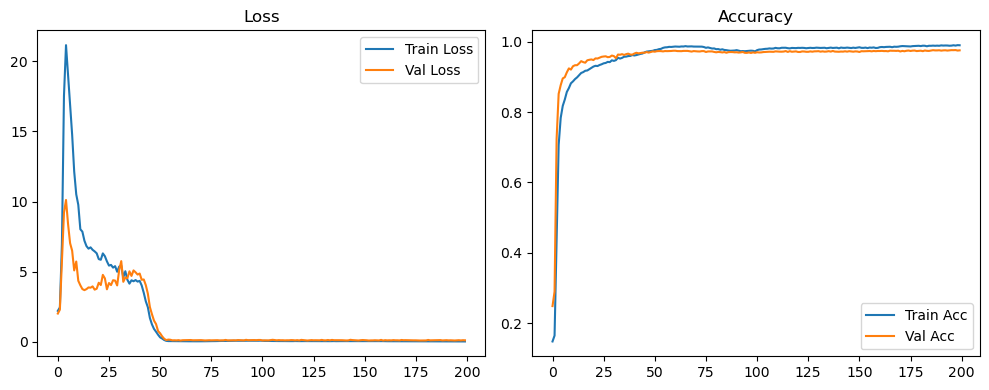

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 28.90it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 29.22it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 29.36it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 29.40it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 29.46it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 29.46it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 29.48it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 29.50it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 29.52it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 29.52it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 29.51it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 29.48it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 29.45it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 30.05it/s]

Original Model Final Test Loss: 0.1060 Accuracy: 0.9767


🚀 Running: batch256_lr0.01_0.002_0.001_dp0.0


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1784 | Val Acc: 0.3764 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1784 | Val Acc: 0.3764 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1784 | Val Acc: 0.3764 |:   0%|          | 1/200 [00:09<32:06,  9.68s/it]

| LR: 0.010 | Train Acc: 0.2977 | Val Acc: 0.6701 |:   0%|          | 1/200 [00:18<32:06,  9.68s/it]

| LR: 0.010 | Train Acc: 0.2977 | Val Acc: 0.6701 |:   0%|          | 1/200 [00:18<32:06,  9.68s/it]

| LR: 0.010 | Train Acc: 0.2977 | Val Acc: 0.6701 |:   1%|          | 2/200 [00:18<30:49,  9.34s/it]

| LR: 0.010 | Train Acc: 0.7490 | Val Acc: 0.8267 |:   1%|          | 2/200 [00:28<30:49,  9.34s/it]

| LR: 0.010 | Train Acc: 0.7490 | Val Acc: 0.8267 |:   1%|          | 2/200 [00:28<30:49,  9.34s/it]

| LR: 0.010 | Train Acc: 0.7490 | Val Acc: 0.8267 |:   2%|▏         | 3/200 [00:28<31:23,  9.56s/it]

| LR: 0.010 | Train Acc: 0.8352 | Val Acc: 0.8452 |:   2%|▏         | 3/200 [00:37<31:23,  9.56s/it]

| LR: 0.010 | Train Acc: 0.8352 | Val Acc: 0.8452 |:   2%|▏         | 3/200 [00:37<31:23,  9.56s/it]

| LR: 0.010 | Train Acc: 0.8352 | Val Acc: 0.8452 |:   2%|▏         | 4/200 [00:37<30:30,  9.34s/it]

| LR: 0.010 | Train Acc: 0.8667 | Val Acc: 0.8852 |:   2%|▏         | 4/200 [00:46<30:30,  9.34s/it]

| LR: 0.010 | Train Acc: 0.8667 | Val Acc: 0.8852 |:   2%|▏         | 4/200 [00:46<30:30,  9.34s/it]

| LR: 0.010 | Train Acc: 0.8667 | Val Acc: 0.8852 |:   2%|▎         | 5/200 [00:46<29:50,  9.18s/it]

| LR: 0.010 | Train Acc: 0.8852 | Val Acc: 0.8979 |:   2%|▎         | 5/200 [00:55<29:50,  9.18s/it]

| LR: 0.010 | Train Acc: 0.8852 | Val Acc: 0.8979 |:   2%|▎         | 5/200 [00:55<29:50,  9.18s/it]

| LR: 0.010 | Train Acc: 0.8852 | Val Acc: 0.8979 |:   3%|▎         | 6/200 [00:55<29:22,  9.08s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9019 |:   3%|▎         | 6/200 [01:04<29:22,  9.08s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9019 |:   3%|▎         | 6/200 [01:04<29:22,  9.08s/it]

| LR: 0.010 | Train Acc: 0.8981 | Val Acc: 0.9019 |:   4%|▎         | 7/200 [01:04<28:53,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9149 |:   4%|▎         | 7/200 [01:12<28:53,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9149 |:   4%|▎         | 7/200 [01:12<28:53,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9149 |:   4%|▍         | 8/200 [01:12<28:33,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9146 | Val Acc: 0.9182 |:   4%|▍         | 8/200 [01:22<28:33,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9146 | Val Acc: 0.9182 |:   4%|▍         | 8/200 [01:22<28:33,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9146 | Val Acc: 0.9182 |:   4%|▍         | 9/200 [01:22<28:38,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9237 | Val Acc: 0.9161 |:   4%|▍         | 9/200 [01:30<28:38,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9237 | Val Acc: 0.9161 |:   4%|▍         | 9/200 [01:30<28:38,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9237 | Val Acc: 0.9161 |:   5%|▌         | 10/200 [01:30<28:16,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9272 | Val Acc: 0.9265 |:   5%|▌         | 10/200 [01:39<28:16,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9272 | Val Acc: 0.9265 |:   5%|▌         | 10/200 [01:39<28:16,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9272 | Val Acc: 0.9265 |:   6%|▌         | 11/200 [01:39<27:54,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9338 | Val Acc: 0.9303 |:   6%|▌         | 11/200 [01:48<27:54,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9338 | Val Acc: 0.9303 |:   6%|▌         | 11/200 [01:48<27:54,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9338 | Val Acc: 0.9303 |:   6%|▌         | 12/200 [01:49<28:17,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9371 | Val Acc: 0.9284 |:   6%|▌         | 12/200 [01:58<28:17,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9371 | Val Acc: 0.9284 |:   6%|▌         | 12/200 [01:58<28:17,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9371 | Val Acc: 0.9284 |:   6%|▋         | 13/200 [01:58<28:27,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9411 | Val Acc: 0.9333 |:   6%|▋         | 13/200 [02:07<28:27,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9411 | Val Acc: 0.9333 |:   6%|▋         | 13/200 [02:07<28:27,  9.13s/it]

| LR: 0.010 | Train Acc: 0.9411 | Val Acc: 0.9333 |:   7%|▋         | 14/200 [02:07<28:02,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9324 |:   7%|▋         | 14/200 [02:16<28:02,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9324 |:   7%|▋         | 14/200 [02:16<28:02,  9.04s/it]

| LR: 0.010 | Train Acc: 0.9460 | Val Acc: 0.9324 |:   8%|▊         | 15/200 [02:16<27:42,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9364 |:   8%|▊         | 15/200 [02:24<27:42,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9364 |:   8%|▊         | 15/200 [02:24<27:42,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9513 | Val Acc: 0.9364 |:   8%|▊         | 16/200 [02:24<27:29,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9530 | Val Acc: 0.9417 |:   8%|▊         | 16/200 [02:33<27:29,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9530 | Val Acc: 0.9417 |:   8%|▊         | 16/200 [02:33<27:29,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9530 | Val Acc: 0.9417 |:   8%|▊         | 17/200 [02:33<27:13,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9565 | Val Acc: 0.9415 |:   8%|▊         | 17/200 [02:42<27:13,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9565 | Val Acc: 0.9415 |:   8%|▊         | 17/200 [02:42<27:13,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9565 | Val Acc: 0.9415 |:   9%|▉         | 18/200 [02:42<27:13,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9580 | Val Acc: 0.9413 |:   9%|▉         | 18/200 [02:51<27:13,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9580 | Val Acc: 0.9413 |:   9%|▉         | 18/200 [02:51<27:13,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9580 | Val Acc: 0.9413 |:  10%|▉         | 19/200 [02:51<26:51,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9604 | Val Acc: 0.9463 |:  10%|▉         | 19/200 [03:00<26:51,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9604 | Val Acc: 0.9463 |:  10%|▉         | 19/200 [03:00<26:51,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9604 | Val Acc: 0.9463 |:  10%|█         | 20/200 [03:00<26:35,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9608 | Val Acc: 0.9458 |:  10%|█         | 20/200 [03:09<26:35,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9608 | Val Acc: 0.9458 |:  10%|█         | 20/200 [03:09<26:35,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9608 | Val Acc: 0.9458 |:  10%|█         | 21/200 [03:09<26:32,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9453 |:  10%|█         | 21/200 [03:18<26:32,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9453 |:  10%|█         | 21/200 [03:18<26:32,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9640 | Val Acc: 0.9453 |:  11%|█         | 22/200 [03:18<26:17,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9471 |:  11%|█         | 22/200 [03:26<26:17,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9471 |:  11%|█         | 22/200 [03:26<26:17,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9651 | Val Acc: 0.9471 |:  12%|█▏        | 23/200 [03:26<25:54,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9654 | Val Acc: 0.9447 |:  12%|█▏        | 23/200 [03:35<25:54,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9654 | Val Acc: 0.9447 |:  12%|█▏        | 23/200 [03:35<25:54,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9654 | Val Acc: 0.9447 |:  12%|█▏        | 24/200 [03:35<25:55,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9469 |:  12%|█▏        | 24/200 [03:44<25:55,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9469 |:  12%|█▏        | 24/200 [03:44<25:55,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9653 | Val Acc: 0.9469 |:  12%|█▎        | 25/200 [03:44<25:46,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9488 |:  12%|█▎        | 25/200 [03:53<25:46,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9488 |:  12%|█▎        | 25/200 [03:53<25:46,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9683 | Val Acc: 0.9488 |:  13%|█▎        | 26/200 [03:53<25:38,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9703 | Val Acc: 0.9557 |:  13%|█▎        | 26/200 [04:02<25:38,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9703 | Val Acc: 0.9557 |:  13%|█▎        | 26/200 [04:02<25:38,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9703 | Val Acc: 0.9557 |:  14%|█▎        | 27/200 [04:02<25:26,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9410 |:  14%|█▎        | 27/200 [04:11<25:26,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9410 |:  14%|█▎        | 27/200 [04:11<25:26,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9410 |:  14%|█▍        | 28/200 [04:11<25:22,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9507 |:  14%|█▍        | 28/200 [04:19<25:22,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9507 |:  14%|█▍        | 28/200 [04:19<25:22,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9507 |:  14%|█▍        | 29/200 [04:19<25:10,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9478 |:  14%|█▍        | 29/200 [04:29<25:10,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9478 |:  14%|█▍        | 29/200 [04:29<25:10,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9478 |:  15%|█▌        | 30/200 [04:29<25:27,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9479 |:  15%|█▌        | 30/200 [04:38<25:27,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9479 |:  15%|█▌        | 30/200 [04:38<25:27,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9479 |:  16%|█▌        | 31/200 [04:38<25:51,  9.18s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9492 |:  16%|█▌        | 31/200 [04:47<25:51,  9.18s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9492 |:  16%|█▌        | 31/200 [04:47<25:51,  9.18s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9492 |:  16%|█▌        | 32/200 [04:47<25:13,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9476 |:  16%|█▌        | 32/200 [04:56<25:13,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9476 |:  16%|█▌        | 32/200 [04:56<25:13,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9741 | Val Acc: 0.9476 |:  16%|█▋        | 33/200 [04:56<24:55,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9759 | Val Acc: 0.9497 |:  16%|█▋        | 33/200 [05:05<24:55,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9759 | Val Acc: 0.9497 |:  16%|█▋        | 33/200 [05:05<24:55,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9759 | Val Acc: 0.9497 |:  17%|█▋        | 34/200 [05:05<24:39,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9508 |:  17%|█▋        | 34/200 [05:14<24:39,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9508 |:  17%|█▋        | 34/200 [05:14<24:39,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9508 |:  18%|█▊        | 35/200 [05:14<24:47,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9514 |:  18%|█▊        | 35/200 [05:24<24:47,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9514 |:  18%|█▊        | 35/200 [05:24<24:47,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9514 |:  18%|█▊        | 36/200 [05:24<25:21,  9.28s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9554 |:  18%|█▊        | 36/200 [05:33<25:21,  9.28s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9554 |:  18%|█▊        | 36/200 [05:33<25:21,  9.28s/it]

| LR: 0.010 | Train Acc: 0.9782 | Val Acc: 0.9554 |:  18%|█▊        | 37/200 [05:33<25:18,  9.32s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9558 |:  18%|█▊        | 37/200 [05:42<25:18,  9.32s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9558 |:  18%|█▊        | 37/200 [05:42<25:18,  9.32s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9558 |:  19%|█▉        | 38/200 [05:42<25:04,  9.29s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9537 |:  19%|█▉        | 38/200 [05:51<25:04,  9.29s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9537 |:  19%|█▉        | 38/200 [05:51<25:04,  9.29s/it]

| LR: 0.010 | Train Acc: 0.9813 | Val Acc: 0.9537 |:  20%|█▉        | 39/200 [05:51<24:28,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9566 |:  20%|█▉        | 39/200 [06:00<24:28,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9566 |:  20%|█▉        | 39/200 [06:00<24:28,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9787 | Val Acc: 0.9566 |:  20%|██        | 40/200 [06:00<24:05,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9594 |:  20%|██        | 40/200 [06:09<24:05,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9594 |:  20%|██        | 40/200 [06:09<24:05,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9594 |:  20%|██        | 41/200 [06:09<23:53,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9843 | Val Acc: 0.9605 |:  20%|██        | 41/200 [06:18<23:53,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9843 | Val Acc: 0.9605 |:  20%|██        | 41/200 [06:18<23:53,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9843 | Val Acc: 0.9605 |:  21%|██        | 42/200 [06:18<23:36,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9847 | Val Acc: 0.9607 |:  21%|██        | 42/200 [06:26<23:36,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9847 | Val Acc: 0.9607 |:  21%|██        | 42/200 [06:26<23:36,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9847 | Val Acc: 0.9607 |:  22%|██▏       | 43/200 [06:26<23:08,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9578 |:  22%|██▏       | 43/200 [06:35<23:08,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9578 |:  22%|██▏       | 43/200 [06:35<23:08,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9578 |:  22%|██▏       | 44/200 [06:35<22:55,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9581 |:  22%|██▏       | 44/200 [06:44<22:55,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9581 |:  22%|██▏       | 44/200 [06:44<22:55,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9581 |:  22%|██▎       | 45/200 [06:44<22:40,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9568 |:  22%|██▎       | 45/200 [06:53<22:40,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9568 |:  22%|██▎       | 45/200 [06:53<22:40,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9842 | Val Acc: 0.9568 |:  23%|██▎       | 46/200 [06:53<22:33,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9550 |:  23%|██▎       | 46/200 [07:01<22:33,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9550 |:  23%|██▎       | 46/200 [07:01<22:33,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9550 |:  24%|██▎       | 47/200 [07:01<22:26,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9609 |:  24%|██▎       | 47/200 [07:10<22:26,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9609 |:  24%|██▎       | 47/200 [07:10<22:26,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9858 | Val Acc: 0.9609 |:  24%|██▍       | 48/200 [07:10<22:20,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9621 |:  24%|██▍       | 48/200 [07:19<22:20,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9621 |:  24%|██▍       | 48/200 [07:19<22:20,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9888 | Val Acc: 0.9621 |:  24%|██▍       | 49/200 [07:19<22:12,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9873 | Val Acc: 0.9610 |:  24%|██▍       | 49/200 [07:28<22:12,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9873 | Val Acc: 0.9610 |:  24%|██▍       | 49/200 [07:28<22:12,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9873 | Val Acc: 0.9610 |:  25%|██▌       | 50/200 [07:28<22:04,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9593 |:  25%|██▌       | 50/200 [07:37<22:04,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9593 |:  25%|██▌       | 50/200 [07:37<22:04,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9593 |:  26%|██▌       | 51/200 [07:37<22:04,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9613 |:  26%|██▌       | 51/200 [07:46<22:04,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9613 |:  26%|██▌       | 51/200 [07:46<22:04,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9613 |:  26%|██▌       | 52/200 [07:46<21:42,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9878 | Val Acc: 0.9592 |:  26%|██▌       | 52/200 [07:54<21:42,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9878 | Val Acc: 0.9592 |:  26%|██▌       | 52/200 [07:54<21:42,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9878 | Val Acc: 0.9592 |:  26%|██▋       | 53/200 [07:54<21:24,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9571 |:  26%|██▋       | 53/200 [08:03<21:24,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9571 |:  26%|██▋       | 53/200 [08:03<21:24,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9876 | Val Acc: 0.9571 |:  27%|██▋       | 54/200 [08:03<21:11,  8.71s/it]

| LR: 0.010 | Train Acc: 0.9877 | Val Acc: 0.9581 |:  27%|██▋       | 54/200 [08:11<21:11,  8.71s/it]

| LR: 0.010 | Train Acc: 0.9877 | Val Acc: 0.9581 |:  27%|██▋       | 54/200 [08:11<21:11,  8.71s/it]

| LR: 0.010 | Train Acc: 0.9877 | Val Acc: 0.9581 |:  28%|██▊       | 55/200 [08:11<20:58,  8.68s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9615 |:  28%|██▊       | 55/200 [08:20<20:58,  8.68s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9615 |:  28%|██▊       | 55/200 [08:20<20:58,  8.68s/it]

| LR: 0.010 | Train Acc: 0.9895 | Val Acc: 0.9615 |:  28%|██▊       | 56/200 [08:20<20:47,  8.66s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9672 |:  28%|██▊       | 56/200 [08:29<20:47,  8.66s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9672 |:  28%|██▊       | 56/200 [08:29<20:47,  8.66s/it]

| LR: 0.010 | Train Acc: 0.9910 | Val Acc: 0.9672 |:  28%|██▊       | 57/200 [08:29<21:07,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9653 |:  28%|██▊       | 57/200 [08:38<21:07,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9653 |:  28%|██▊       | 57/200 [08:38<21:07,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9926 | Val Acc: 0.9653 |:  29%|██▉       | 58/200 [08:38<20:58,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9639 |:  29%|██▉       | 58/200 [08:48<20:58,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9639 |:  29%|██▉       | 58/200 [08:48<20:58,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9639 |:  30%|██▉       | 59/200 [08:48<21:19,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9607 |:  30%|██▉       | 59/200 [08:58<21:19,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9607 |:  30%|██▉       | 59/200 [08:58<21:19,  9.07s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9607 |:  30%|███       | 60/200 [08:58<21:40,  9.29s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9650 |:  30%|███       | 60/200 [09:06<21:40,  9.29s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9650 |:  30%|███       | 60/200 [09:06<21:40,  9.29s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9650 |:  30%|███       | 61/200 [09:06<21:12,  9.15s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9661 |:  30%|███       | 61/200 [09:16<21:12,  9.15s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9661 |:  30%|███       | 61/200 [09:16<21:12,  9.15s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9661 |:  31%|███       | 62/200 [09:16<21:18,  9.26s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9641 |:  31%|███       | 62/200 [09:25<21:18,  9.26s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9641 |:  31%|███       | 62/200 [09:25<21:18,  9.26s/it]

| LR: 0.010 | Train Acc: 0.9935 | Val Acc: 0.9641 |:  32%|███▏      | 63/200 [09:25<21:18,  9.33s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9659 |:  32%|███▏      | 63/200 [09:34<21:18,  9.33s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9659 |:  32%|███▏      | 63/200 [09:34<21:18,  9.33s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9659 |:  32%|███▏      | 64/200 [09:35<20:56,  9.24s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9647 |:  32%|███▏      | 64/200 [09:43<20:56,  9.24s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9647 |:  32%|███▏      | 64/200 [09:43<20:56,  9.24s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9647 |:  32%|███▎      | 65/200 [09:43<20:30,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9649 |:  32%|███▎      | 65/200 [09:52<20:30,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9649 |:  32%|███▎      | 65/200 [09:52<20:30,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9649 |:  33%|███▎      | 66/200 [09:52<20:06,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9674 |:  33%|███▎      | 66/200 [10:01<20:06,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9674 |:  33%|███▎      | 66/200 [10:01<20:06,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9674 |:  34%|███▎      | 67/200 [10:01<19:54,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9673 |:  34%|███▎      | 67/200 [10:10<19:54,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9673 |:  34%|███▎      | 67/200 [10:10<19:54,  8.98s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9673 |:  34%|███▍      | 68/200 [10:10<19:49,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9673 |:  34%|███▍      | 68/200 [10:19<19:49,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9673 |:  34%|███▍      | 68/200 [10:19<19:49,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9673 |:  34%|███▍      | 69/200 [10:19<19:46,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9645 |:  34%|███▍      | 69/200 [10:29<19:46,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9645 |:  34%|███▍      | 69/200 [10:29<19:46,  9.05s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9645 |:  35%|███▌      | 70/200 [10:29<19:55,  9.20s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9664 |:  35%|███▌      | 70/200 [10:38<19:55,  9.20s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9664 |:  35%|███▌      | 70/200 [10:38<19:55,  9.20s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9664 |:  36%|███▌      | 71/200 [10:38<19:47,  9.20s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9667 |:  36%|███▌      | 71/200 [10:47<19:47,  9.20s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9667 |:  36%|███▌      | 71/200 [10:47<19:47,  9.20s/it]

| LR: 0.010 | Train Acc: 0.9952 | Val Acc: 0.9667 |:  36%|███▌      | 72/200 [10:47<19:33,  9.17s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9677 |:  36%|███▌      | 72/200 [10:56<19:33,  9.17s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9677 |:  36%|███▌      | 72/200 [10:56<19:33,  9.17s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9677 |:  36%|███▋      | 73/200 [10:56<19:16,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9682 |:  36%|███▋      | 73/200 [11:05<19:16,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9682 |:  36%|███▋      | 73/200 [11:05<19:16,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9682 |:  37%|███▋      | 74/200 [11:05<18:53,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9694 |:  37%|███▋      | 74/200 [11:14<18:53,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9694 |:  37%|███▋      | 74/200 [11:14<18:53,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9960 | Val Acc: 0.9694 |:  38%|███▊      | 75/200 [11:14<18:36,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9708 |:  38%|███▊      | 75/200 [11:22<18:36,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9708 |:  38%|███▊      | 75/200 [11:22<18:36,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9708 |:  38%|███▊      | 76/200 [11:22<18:20,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9712 |:  38%|███▊      | 76/200 [11:31<18:20,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9712 |:  38%|███▊      | 76/200 [11:31<18:20,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9712 |:  38%|███▊      | 77/200 [11:31<18:03,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9982 | Val Acc: 0.9684 |:  38%|███▊      | 77/200 [11:40<18:03,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9982 | Val Acc: 0.9684 |:  38%|███▊      | 77/200 [11:40<18:03,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9982 | Val Acc: 0.9684 |:  39%|███▉      | 78/200 [11:40<17:53,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9978 | Val Acc: 0.9696 |:  39%|███▉      | 78/200 [11:49<17:53,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9978 | Val Acc: 0.9696 |:  39%|███▉      | 78/200 [11:49<17:53,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9978 | Val Acc: 0.9696 |:  40%|███▉      | 79/200 [11:49<17:46,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9690 |:  40%|███▉      | 79/200 [11:57<17:46,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9690 |:  40%|███▉      | 79/200 [11:57<17:46,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9690 |:  40%|████      | 80/200 [11:57<17:37,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9663 |:  40%|████      | 80/200 [12:06<17:37,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9663 |:  40%|████      | 80/200 [12:06<17:37,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9979 | Val Acc: 0.9663 |:  40%|████      | 81/200 [12:06<17:30,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9683 |:  40%|████      | 81/200 [12:15<17:30,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9683 |:  40%|████      | 81/200 [12:15<17:30,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9683 |:  41%|████      | 82/200 [12:15<17:21,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9693 |:  41%|████      | 82/200 [12:24<17:21,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9693 |:  41%|████      | 82/200 [12:24<17:21,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9970 | Val Acc: 0.9693 |:  42%|████▏     | 83/200 [12:24<17:11,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9696 |:  42%|████▏     | 83/200 [12:33<17:11,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9696 |:  42%|████▏     | 83/200 [12:33<17:11,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9973 | Val Acc: 0.9696 |:  42%|████▏     | 84/200 [12:33<17:03,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9974 | Val Acc: 0.9698 |:  42%|████▏     | 84/200 [12:42<17:03,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9974 | Val Acc: 0.9698 |:  42%|████▏     | 84/200 [12:42<17:03,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9974 | Val Acc: 0.9698 |:  42%|████▎     | 85/200 [12:42<17:10,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9682 |:  42%|████▎     | 85/200 [12:51<17:10,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9682 |:  42%|████▎     | 85/200 [12:51<17:10,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9682 |:  43%|████▎     | 86/200 [12:51<16:52,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9655 |:  43%|████▎     | 86/200 [13:00<16:52,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9655 |:  43%|████▎     | 86/200 [13:00<16:52,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9655 |:  44%|████▎     | 87/200 [13:00<16:48,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9629 |:  44%|████▎     | 87/200 [13:08<16:48,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9629 |:  44%|████▎     | 87/200 [13:08<16:48,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9629 |:  44%|████▍     | 88/200 [13:08<16:34,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9652 |:  44%|████▍     | 88/200 [13:17<16:34,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9652 |:  44%|████▍     | 88/200 [13:17<16:34,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9652 |:  44%|████▍     | 89/200 [13:17<16:19,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9684 |:  44%|████▍     | 89/200 [13:26<16:19,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9684 |:  44%|████▍     | 89/200 [13:26<16:19,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9684 |:  45%|████▌     | 90/200 [13:26<16:11,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9685 |:  45%|████▌     | 90/200 [13:35<16:11,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9685 |:  45%|████▌     | 90/200 [13:35<16:11,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9685 |:  46%|████▌     | 91/200 [13:35<16:04,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9637 |:  46%|████▌     | 91/200 [13:44<16:04,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9637 |:  46%|████▌     | 91/200 [13:44<16:04,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9637 |:  46%|████▌     | 92/200 [13:44<16:03,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9951 | Val Acc: 0.9652 |:  46%|████▌     | 92/200 [13:53<16:03,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9951 | Val Acc: 0.9652 |:  46%|████▌     | 92/200 [13:53<16:03,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9951 | Val Acc: 0.9652 |:  46%|████▋     | 93/200 [13:53<15:53,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9693 |:  46%|████▋     | 93/200 [14:02<15:53,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9693 |:  46%|████▋     | 93/200 [14:02<15:53,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9958 | Val Acc: 0.9693 |:  47%|████▋     | 94/200 [14:02<15:44,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9654 |:  47%|████▋     | 94/200 [14:11<15:44,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9654 |:  47%|████▋     | 94/200 [14:11<15:44,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9654 |:  48%|████▊     | 95/200 [14:11<15:36,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9663 |:  48%|████▊     | 95/200 [14:20<15:36,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9663 |:  48%|████▊     | 95/200 [14:20<15:36,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9943 | Val Acc: 0.9663 |:  48%|████▊     | 96/200 [14:20<15:30,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9660 |:  48%|████▊     | 96/200 [14:29<15:30,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9660 |:  48%|████▊     | 96/200 [14:29<15:30,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9660 |:  48%|████▊     | 97/200 [14:29<15:19,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9947 | Val Acc: 0.9665 |:  48%|████▊     | 97/200 [14:37<15:19,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9947 | Val Acc: 0.9665 |:  48%|████▊     | 97/200 [14:37<15:19,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9947 | Val Acc: 0.9665 |:  49%|████▉     | 98/200 [14:37<15:04,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9664 |:  49%|████▉     | 98/200 [14:46<15:04,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9664 |:  49%|████▉     | 98/200 [14:46<15:04,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9664 |:  50%|████▉     | 99/200 [14:46<14:55,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9657 |:  50%|████▉     | 99/200 [14:55<14:55,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9657 |:  50%|████▉     | 99/200 [14:55<14:55,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9956 | Val Acc: 0.9657 |:  50%|█████     | 100/200 [14:55<14:45,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9712 |:  50%|█████     | 100/200 [15:04<14:45,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9712 |:  50%|█████     | 100/200 [15:04<14:45,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9712 |:  50%|█████     | 101/200 [15:04<14:34,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9719 |:  50%|█████     | 101/200 [15:13<14:34,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9719 |:  50%|█████     | 101/200 [15:13<14:34,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9719 |:  51%|█████     | 102/200 [15:13<14:23,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9704 |:  51%|█████     | 102/200 [15:21<14:23,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9704 |:  51%|█████     | 102/200 [15:21<14:23,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9704 |:  52%|█████▏    | 103/200 [15:21<14:10,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9704 |:  52%|█████▏    | 103/200 [15:30<14:10,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9704 |:  52%|█████▏    | 103/200 [15:30<14:10,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9704 |:  52%|█████▏    | 104/200 [15:30<14:00,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9708 |:  52%|█████▏    | 104/200 [15:39<14:00,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9708 |:  52%|█████▏    | 104/200 [15:39<14:00,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9708 |:  52%|█████▎    | 105/200 [15:39<13:45,  8.69s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9714 |:  52%|█████▎    | 105/200 [15:48<13:45,  8.69s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9714 |:  52%|█████▎    | 105/200 [15:48<13:45,  8.69s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9714 |:  53%|█████▎    | 106/200 [15:48<14:04,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9692 |:  53%|█████▎    | 106/200 [15:58<14:04,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9692 |:  53%|█████▎    | 106/200 [15:58<14:04,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9692 |:  54%|█████▎    | 107/200 [15:58<14:08,  9.13s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9706 |:  54%|█████▎    | 107/200 [16:07<14:08,  9.13s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9706 |:  54%|█████▎    | 107/200 [16:07<14:08,  9.13s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9706 |:  54%|█████▍    | 108/200 [16:07<13:54,  9.07s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9709 |:  54%|█████▍    | 108/200 [16:16<13:54,  9.07s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9709 |:  54%|█████▍    | 108/200 [16:16<13:54,  9.07s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9709 |:  55%|█████▍    | 109/200 [16:16<13:55,  9.18s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9736 |:  55%|█████▍    | 109/200 [16:25<13:55,  9.18s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9736 |:  55%|█████▍    | 109/200 [16:25<13:55,  9.18s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9736 |:  55%|█████▌    | 110/200 [16:25<13:39,  9.11s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9723 |:  55%|█████▌    | 110/200 [16:34<13:39,  9.11s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9723 |:  55%|█████▌    | 110/200 [16:34<13:39,  9.11s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9723 |:  56%|█████▌    | 111/200 [16:34<13:29,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9704 |:  56%|█████▌    | 111/200 [16:43<13:29,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9704 |:  56%|█████▌    | 111/200 [16:43<13:29,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9704 |:  56%|█████▌    | 112/200 [16:43<13:14,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9713 |:  56%|█████▌    | 112/200 [16:52<13:14,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9713 |:  56%|█████▌    | 112/200 [16:52<13:14,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9713 |:  56%|█████▋    | 113/200 [16:52<13:00,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9714 |:  56%|█████▋    | 113/200 [17:00<13:00,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9714 |:  56%|█████▋    | 113/200 [17:00<13:00,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9714 |:  57%|█████▋    | 114/200 [17:01<12:45,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9733 |:  57%|█████▋    | 114/200 [17:09<12:45,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9733 |:  57%|█████▋    | 114/200 [17:09<12:45,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9733 |:  57%|█████▊    | 115/200 [17:09<12:34,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9708 |:  57%|█████▊    | 115/200 [17:19<12:34,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9708 |:  57%|█████▊    | 115/200 [17:19<12:34,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9708 |:  58%|█████▊    | 116/200 [17:19<12:38,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9708 |:  58%|█████▊    | 116/200 [17:27<12:38,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9708 |:  58%|█████▊    | 116/200 [17:27<12:38,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9708 |:  58%|█████▊    | 117/200 [17:28<12:24,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9702 |:  58%|█████▊    | 117/200 [17:36<12:24,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9702 |:  58%|█████▊    | 117/200 [17:36<12:24,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9702 |:  59%|█████▉    | 118/200 [17:36<12:13,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9701 |:  59%|█████▉    | 118/200 [17:45<12:13,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9701 |:  59%|█████▉    | 118/200 [17:45<12:13,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9701 |:  60%|█████▉    | 119/200 [17:45<12:00,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9714 |:  60%|█████▉    | 119/200 [17:54<12:00,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9714 |:  60%|█████▉    | 119/200 [17:54<12:00,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9714 |:  60%|██████    | 120/200 [17:54<11:57,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9721 |:  60%|██████    | 120/200 [18:03<11:57,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9721 |:  60%|██████    | 120/200 [18:03<11:57,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9721 |:  60%|██████    | 121/200 [18:03<11:45,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9720 |:  60%|██████    | 121/200 [18:12<11:45,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9720 |:  60%|██████    | 121/200 [18:12<11:45,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9720 |:  61%|██████    | 122/200 [18:12<11:36,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9703 |:  61%|██████    | 122/200 [18:21<11:36,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9703 |:  61%|██████    | 122/200 [18:21<11:36,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9703 |:  62%|██████▏   | 123/200 [18:21<11:23,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9715 |:  62%|██████▏   | 123/200 [18:30<11:23,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9715 |:  62%|██████▏   | 123/200 [18:30<11:23,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9715 |:  62%|██████▏   | 124/200 [18:30<11:13,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9722 |:  62%|██████▏   | 124/200 [18:39<11:13,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9722 |:  62%|██████▏   | 124/200 [18:39<11:13,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9722 |:  62%|██████▎   | 125/200 [18:39<11:04,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9720 |:  62%|██████▎   | 125/200 [18:47<11:04,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9720 |:  62%|██████▎   | 125/200 [18:47<11:04,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9720 |:  63%|██████▎   | 126/200 [18:47<10:56,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9720 |:  63%|██████▎   | 126/200 [18:57<10:56,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9720 |:  63%|██████▎   | 126/200 [18:57<10:56,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9720 |:  64%|██████▎   | 127/200 [18:57<10:54,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9716 |:  64%|██████▎   | 127/200 [19:05<10:54,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9716 |:  64%|██████▎   | 127/200 [19:05<10:54,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9716 |:  64%|██████▍   | 128/200 [19:05<10:41,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9714 |:  64%|██████▍   | 128/200 [19:14<10:41,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9714 |:  64%|██████▍   | 128/200 [19:14<10:41,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9714 |:  64%|██████▍   | 129/200 [19:14<10:30,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9713 |:  64%|██████▍   | 129/200 [19:23<10:30,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9713 |:  64%|██████▍   | 129/200 [19:23<10:30,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9713 |:  65%|██████▌   | 130/200 [19:23<10:19,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9712 |:  65%|██████▌   | 130/200 [19:32<10:19,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9712 |:  65%|██████▌   | 130/200 [19:32<10:19,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9712 |:  66%|██████▌   | 131/200 [19:32<10:10,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9715 |:  66%|██████▌   | 131/200 [19:41<10:10,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9715 |:  66%|██████▌   | 131/200 [19:41<10:10,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9715 |:  66%|██████▌   | 132/200 [19:41<10:10,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9719 |:  66%|██████▌   | 132/200 [19:50<10:10,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9719 |:  66%|██████▌   | 132/200 [19:50<10:10,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9719 |:  66%|██████▋   | 133/200 [19:50<10:00,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9721 |:  66%|██████▋   | 133/200 [19:59<10:00,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9721 |:  66%|██████▋   | 133/200 [19:59<10:00,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9721 |:  67%|██████▋   | 134/200 [19:59<09:50,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9701 |:  67%|██████▋   | 134/200 [20:08<09:50,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9701 |:  67%|██████▋   | 134/200 [20:08<09:50,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9701 |:  68%|██████▊   | 135/200 [20:08<09:40,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9712 |:  68%|██████▊   | 135/200 [20:17<09:40,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9712 |:  68%|██████▊   | 135/200 [20:17<09:40,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9712 |:  68%|██████▊   | 136/200 [20:17<09:44,  9.13s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9721 |:  68%|██████▊   | 136/200 [20:27<09:44,  9.13s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9721 |:  68%|██████▊   | 136/200 [20:27<09:44,  9.13s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9721 |:  68%|██████▊   | 137/200 [20:27<09:36,  9.15s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9723 |:  68%|██████▊   | 137/200 [20:35<09:36,  9.15s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9723 |:  68%|██████▊   | 137/200 [20:35<09:36,  9.15s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9723 |:  69%|██████▉   | 138/200 [20:35<09:19,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9722 |:  69%|██████▉   | 138/200 [20:44<09:19,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9722 |:  69%|██████▉   | 138/200 [20:44<09:19,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9722 |:  70%|██████▉   | 139/200 [20:44<09:06,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9718 |:  70%|██████▉   | 139/200 [20:53<09:06,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9718 |:  70%|██████▉   | 139/200 [20:53<09:06,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9718 |:  70%|███████   | 140/200 [20:53<08:53,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9704 |:  70%|███████   | 140/200 [21:02<08:53,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9704 |:  70%|███████   | 140/200 [21:02<08:53,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9704 |:  70%|███████   | 141/200 [21:02<08:43,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9717 |:  70%|███████   | 141/200 [21:11<08:43,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9717 |:  70%|███████   | 141/200 [21:11<08:43,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9717 |:  71%|███████   | 142/200 [21:11<08:34,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9724 |:  71%|███████   | 142/200 [21:20<08:34,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9724 |:  71%|███████   | 142/200 [21:20<08:34,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9724 |:  72%|███████▏  | 143/200 [21:20<08:27,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9717 |:  72%|███████▏  | 143/200 [21:28<08:27,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9717 |:  72%|███████▏  | 143/200 [21:28<08:27,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9717 |:  72%|███████▏  | 144/200 [21:28<08:16,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9999 | Val Acc: 0.9731 |:  72%|███████▏  | 144/200 [21:37<08:16,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9999 | Val Acc: 0.9731 |:  72%|███████▏  | 144/200 [21:37<08:16,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9999 | Val Acc: 0.9731 |:  72%|███████▎  | 145/200 [21:37<08:04,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9726 |:  72%|███████▎  | 145/200 [21:46<08:04,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9726 |:  72%|███████▎  | 145/200 [21:46<08:04,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9726 |:  73%|███████▎  | 146/200 [21:46<07:54,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9704 |:  73%|███████▎  | 146/200 [21:55<07:54,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9704 |:  73%|███████▎  | 146/200 [21:55<07:54,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9704 |:  74%|███████▎  | 147/200 [21:55<07:45,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9725 |:  74%|███████▎  | 147/200 [22:03<07:45,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9725 |:  74%|███████▎  | 147/200 [22:03<07:45,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9725 |:  74%|███████▍  | 148/200 [22:03<07:38,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9738 |:  74%|███████▍  | 148/200 [22:12<07:38,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9738 |:  74%|███████▍  | 148/200 [22:12<07:38,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9738 |:  74%|███████▍  | 149/200 [22:12<07:32,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9710 |:  74%|███████▍  | 149/200 [22:21<07:32,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9710 |:  74%|███████▍  | 149/200 [22:21<07:32,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9710 |:  75%|███████▌  | 150/200 [22:21<07:21,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9726 |:  75%|███████▌  | 150/200 [22:30<07:21,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9726 |:  75%|███████▌  | 150/200 [22:30<07:21,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9726 |:  76%|███████▌  | 151/200 [22:30<07:10,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9726 |:  76%|███████▌  | 151/200 [22:39<07:10,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9726 |:  76%|███████▌  | 151/200 [22:39<07:10,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9726 |:  76%|███████▌  | 152/200 [22:39<07:03,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9736 |:  76%|███████▌  | 152/200 [22:47<07:03,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9736 |:  76%|███████▌  | 152/200 [22:47<07:03,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9736 |:  76%|███████▋  | 153/200 [22:48<06:53,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9714 |:  76%|███████▋  | 153/200 [22:56<06:53,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9714 |:  76%|███████▋  | 153/200 [22:56<06:53,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9714 |:  77%|███████▋  | 154/200 [22:56<06:46,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9724 |:  77%|███████▋  | 154/200 [23:06<06:46,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9724 |:  77%|███████▋  | 154/200 [23:06<06:46,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9724 |:  78%|███████▊  | 155/200 [23:06<06:45,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9730 |:  78%|███████▊  | 155/200 [23:15<06:45,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9730 |:  78%|███████▊  | 155/200 [23:15<06:45,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9730 |:  78%|███████▊  | 156/200 [23:15<06:34,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9718 |:  78%|███████▊  | 156/200 [23:24<06:34,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9718 |:  78%|███████▊  | 156/200 [23:24<06:34,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9718 |:  78%|███████▊  | 157/200 [23:24<06:24,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9717 |:  78%|███████▊  | 157/200 [23:32<06:24,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9717 |:  78%|███████▊  | 157/200 [23:32<06:24,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9717 |:  79%|███████▉  | 158/200 [23:32<06:14,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9718 |:  79%|███████▉  | 158/200 [23:41<06:14,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9718 |:  79%|███████▉  | 158/200 [23:41<06:14,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9718 |:  80%|███████▉  | 159/200 [23:41<06:03,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9718 |:  80%|███████▉  | 159/200 [23:51<06:03,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9718 |:  80%|███████▉  | 159/200 [23:51<06:03,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9718 |:  80%|████████  | 160/200 [23:51<06:05,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9726 |:  80%|████████  | 160/200 [24:00<06:05,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9726 |:  80%|████████  | 160/200 [24:00<06:05,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9726 |:  80%|████████  | 161/200 [24:00<05:59,  9.21s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9720 |:  80%|████████  | 161/200 [24:09<05:59,  9.21s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9720 |:  80%|████████  | 161/200 [24:09<05:59,  9.21s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9720 |:  81%|████████  | 162/200 [24:09<05:45,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9733 |:  81%|████████  | 162/200 [24:18<05:45,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9733 |:  81%|████████  | 162/200 [24:18<05:45,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9733 |:  82%|████████▏ | 163/200 [24:18<05:34,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9728 |:  82%|████████▏ | 163/200 [24:27<05:34,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9728 |:  82%|████████▏ | 163/200 [24:27<05:34,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9728 |:  82%|████████▏ | 164/200 [24:27<05:24,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9726 |:  82%|████████▏ | 164/200 [24:36<05:24,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9726 |:  82%|████████▏ | 164/200 [24:36<05:24,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9726 |:  82%|████████▎ | 165/200 [24:36<05:14,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9734 |:  82%|████████▎ | 165/200 [24:45<05:14,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9734 |:  82%|████████▎ | 165/200 [24:45<05:14,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9734 |:  83%|████████▎ | 166/200 [24:45<05:02,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9730 |:  83%|████████▎ | 166/200 [24:54<05:02,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9730 |:  83%|████████▎ | 166/200 [24:54<05:02,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9730 |:  84%|████████▎ | 167/200 [24:54<04:57,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9732 |:  84%|████████▎ | 167/200 [25:03<04:57,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9732 |:  84%|████████▎ | 167/200 [25:03<04:57,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9732 |:  84%|████████▍ | 168/200 [25:03<04:46,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |:  84%|████████▍ | 168/200 [25:12<04:46,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |:  84%|████████▍ | 168/200 [25:12<04:46,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |:  84%|████████▍ | 169/200 [25:12<04:35,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9715 |:  84%|████████▍ | 169/200 [25:21<04:35,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9715 |:  84%|████████▍ | 169/200 [25:21<04:35,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9715 |:  85%|████████▌ | 170/200 [25:21<04:27,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9712 |:  85%|████████▌ | 170/200 [25:29<04:27,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9712 |:  85%|████████▌ | 170/200 [25:29<04:27,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9712 |:  86%|████████▌ | 171/200 [25:29<04:17,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9724 |:  86%|████████▌ | 171/200 [25:38<04:17,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9724 |:  86%|████████▌ | 171/200 [25:38<04:17,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9724 |:  86%|████████▌ | 172/200 [25:38<04:06,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9740 |:  86%|████████▌ | 172/200 [25:47<04:06,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9740 |:  86%|████████▌ | 172/200 [25:47<04:06,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9740 |:  86%|████████▋ | 173/200 [25:47<03:56,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9732 |:  86%|████████▋ | 173/200 [25:56<03:56,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9732 |:  86%|████████▋ | 173/200 [25:56<03:56,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9732 |:  87%|████████▋ | 174/200 [25:56<03:50,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9722 |:  87%|████████▋ | 174/200 [26:05<03:50,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9722 |:  87%|████████▋ | 174/200 [26:05<03:50,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9722 |:  88%|████████▊ | 175/200 [26:05<03:42,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9728 |:  88%|████████▊ | 175/200 [26:13<03:42,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9728 |:  88%|████████▊ | 175/200 [26:13<03:42,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9728 |:  88%|████████▊ | 176/200 [26:13<03:32,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9726 |:  88%|████████▊ | 176/200 [26:22<03:32,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9726 |:  88%|████████▊ | 176/200 [26:22<03:32,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9726 |:  88%|████████▊ | 177/200 [26:22<03:23,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9719 |:  88%|████████▊ | 177/200 [26:31<03:23,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9719 |:  88%|████████▊ | 177/200 [26:31<03:23,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9719 |:  89%|████████▉ | 178/200 [26:31<03:14,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9708 |:  89%|████████▉ | 178/200 [26:40<03:14,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9708 |:  89%|████████▉ | 178/200 [26:40<03:14,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9708 |:  90%|████████▉ | 179/200 [26:40<03:05,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9727 |:  90%|████████▉ | 179/200 [26:49<03:05,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9727 |:  90%|████████▉ | 179/200 [26:49<03:05,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9727 |:  90%|█████████ | 180/200 [26:49<02:57,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9728 |:  90%|█████████ | 180/200 [26:58<02:57,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9728 |:  90%|█████████ | 180/200 [26:58<02:57,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9728 |:  90%|█████████ | 181/200 [26:58<02:49,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9727 |:  90%|█████████ | 181/200 [27:07<02:49,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9727 |:  90%|█████████ | 181/200 [27:07<02:49,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9727 |:  91%|█████████ | 182/200 [27:07<02:40,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9723 |:  91%|█████████ | 182/200 [27:16<02:40,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9723 |:  91%|█████████ | 182/200 [27:16<02:40,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9723 |:  92%|█████████▏| 183/200 [27:16<02:34,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9723 |:  92%|█████████▏| 183/200 [27:25<02:34,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9723 |:  92%|█████████▏| 183/200 [27:25<02:34,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9723 |:  92%|█████████▏| 184/200 [27:25<02:24,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9723 |:  92%|█████████▏| 184/200 [27:34<02:24,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9723 |:  92%|█████████▏| 184/200 [27:34<02:24,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9723 |:  92%|█████████▎| 185/200 [27:34<02:14,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9723 |:  92%|█████████▎| 185/200 [27:43<02:14,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9723 |:  92%|█████████▎| 185/200 [27:43<02:14,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9723 |:  93%|█████████▎| 186/200 [27:43<02:05,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9728 |:  93%|█████████▎| 186/200 [27:52<02:05,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9728 |:  93%|█████████▎| 186/200 [27:52<02:05,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9728 |:  94%|█████████▎| 187/200 [27:52<01:57,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9729 |:  94%|█████████▎| 187/200 [28:01<01:57,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9729 |:  94%|█████████▎| 187/200 [28:01<01:57,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9729 |:  94%|█████████▍| 188/200 [28:01<01:47,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9725 |:  94%|█████████▍| 188/200 [28:10<01:47,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9725 |:  94%|█████████▍| 188/200 [28:10<01:47,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9725 |:  94%|█████████▍| 189/200 [28:10<01:40,  9.09s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9738 |:  94%|█████████▍| 189/200 [28:19<01:40,  9.09s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9738 |:  94%|█████████▍| 189/200 [28:19<01:40,  9.09s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9738 |:  95%|█████████▌| 190/200 [28:19<01:30,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9732 |:  95%|█████████▌| 190/200 [28:28<01:30,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9732 |:  95%|█████████▌| 190/200 [28:28<01:30,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9732 |:  96%|█████████▌| 191/200 [28:28<01:20,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9728 |:  96%|█████████▌| 191/200 [28:37<01:20,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9728 |:  96%|█████████▌| 191/200 [28:37<01:20,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9728 |:  96%|█████████▌| 192/200 [28:37<01:11,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9737 |:  96%|█████████▌| 192/200 [28:46<01:11,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9737 |:  96%|█████████▌| 192/200 [28:46<01:11,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9737 |:  96%|█████████▋| 193/200 [28:46<01:02,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9736 |:  96%|█████████▋| 193/200 [28:54<01:02,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9736 |:  96%|█████████▋| 193/200 [28:54<01:02,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9736 |:  97%|█████████▋| 194/200 [28:54<00:53,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9738 |:  97%|█████████▋| 194/200 [29:04<00:53,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9738 |:  97%|█████████▋| 194/200 [29:04<00:53,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9738 |:  98%|█████████▊| 195/200 [29:04<00:45,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9728 |:  98%|█████████▊| 195/200 [29:13<00:45,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9728 |:  98%|█████████▊| 195/200 [29:13<00:45,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9728 |:  98%|█████████▊| 196/200 [29:13<00:36,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9722 |:  98%|█████████▊| 196/200 [29:23<00:36,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9722 |:  98%|█████████▊| 196/200 [29:23<00:36,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9722 |:  98%|█████████▊| 197/200 [29:23<00:27,  9.23s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9726 |:  98%|█████████▊| 197/200 [29:32<00:27,  9.23s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9726 |:  98%|█████████▊| 197/200 [29:32<00:27,  9.23s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9726 |:  99%|█████████▉| 198/200 [29:32<00:18,  9.34s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9740 |:  99%|█████████▉| 198/200 [29:41<00:18,  9.34s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9740 |:  99%|█████████▉| 198/200 [29:41<00:18,  9.34s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9740 |: 100%|█████████▉| 199/200 [29:41<00:09,  9.15s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9721 |: 100%|█████████▉| 199/200 [29:50<00:09,  9.15s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9721 |: 100%|█████████▉| 199/200 [29:50<00:09,  9.15s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9721 |: 100%|██████████| 200/200 [29:50<00:00,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9721 |: 100%|██████████| 200/200 [29:50<00:00,  8.95s/it]

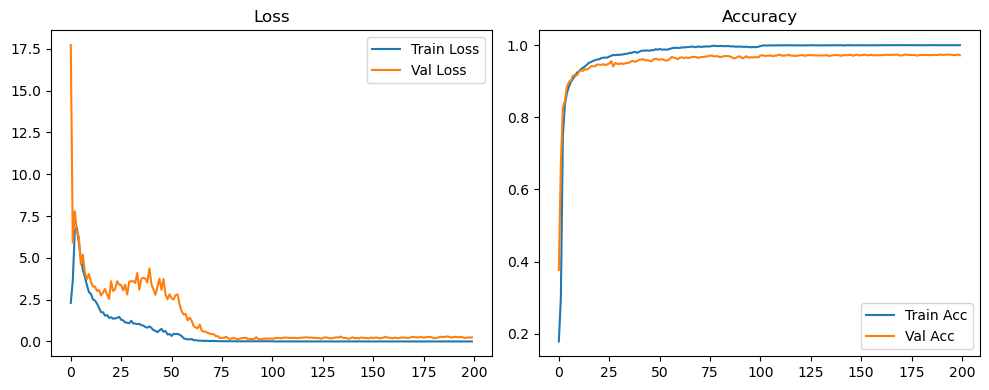

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 28.56it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 28.87it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 29.01it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 29.08it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 28.91it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 28.83it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 28.94it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 29.04it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 29.11it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 29.14it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 29.19it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 29.20it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 29.21it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 29.67it/s]

Original Model Final Test Loss: 0.2208 Accuracy: 0.9745


🚀 Running: batch256_lr0.01_0.002_0.001_dp0.2


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1730 | Val Acc: 0.3933 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1730 | Val Acc: 0.3933 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1730 | Val Acc: 0.3933 |:   0%|          | 1/200 [00:09<31:21,  9.45s/it]

| LR: 0.010 | Train Acc: 0.2424 | Val Acc: 0.5068 |:   0%|          | 1/200 [00:18<31:21,  9.45s/it]

| LR: 0.010 | Train Acc: 0.2424 | Val Acc: 0.5068 |:   0%|          | 1/200 [00:18<31:21,  9.45s/it]

| LR: 0.010 | Train Acc: 0.2424 | Val Acc: 0.5068 |:   1%|          | 2/200 [00:18<30:52,  9.36s/it]

| LR: 0.010 | Train Acc: 0.6560 | Val Acc: 0.7921 |:   1%|          | 2/200 [00:27<30:52,  9.36s/it]

| LR: 0.010 | Train Acc: 0.6560 | Val Acc: 0.7921 |:   1%|          | 2/200 [00:27<30:52,  9.36s/it]

| LR: 0.010 | Train Acc: 0.6560 | Val Acc: 0.7921 |:   2%|▏         | 3/200 [00:27<29:58,  9.13s/it]

| LR: 0.010 | Train Acc: 0.8071 | Val Acc: 0.8728 |:   2%|▏         | 3/200 [00:36<29:58,  9.13s/it]

| LR: 0.010 | Train Acc: 0.8071 | Val Acc: 0.8728 |:   2%|▏         | 3/200 [00:36<29:58,  9.13s/it]

| LR: 0.010 | Train Acc: 0.8071 | Val Acc: 0.8728 |:   2%|▏         | 4/200 [00:36<29:22,  8.99s/it]

| LR: 0.010 | Train Acc: 0.8497 | Val Acc: 0.8785 |:   2%|▏         | 4/200 [00:45<29:22,  8.99s/it]

| LR: 0.010 | Train Acc: 0.8497 | Val Acc: 0.8785 |:   2%|▏         | 4/200 [00:45<29:22,  8.99s/it]

| LR: 0.010 | Train Acc: 0.8497 | Val Acc: 0.8785 |:   2%|▎         | 5/200 [00:45<28:55,  8.90s/it]

| LR: 0.010 | Train Acc: 0.8673 | Val Acc: 0.8972 |:   2%|▎         | 5/200 [00:53<28:55,  8.90s/it]

| LR: 0.010 | Train Acc: 0.8673 | Val Acc: 0.8972 |:   2%|▎         | 5/200 [00:53<28:55,  8.90s/it]

| LR: 0.010 | Train Acc: 0.8673 | Val Acc: 0.8972 |:   3%|▎         | 6/200 [00:53<28:37,  8.85s/it]

| LR: 0.010 | Train Acc: 0.8861 | Val Acc: 0.9073 |:   3%|▎         | 6/200 [01:02<28:37,  8.85s/it]

| LR: 0.010 | Train Acc: 0.8861 | Val Acc: 0.9073 |:   3%|▎         | 6/200 [01:02<28:37,  8.85s/it]

| LR: 0.010 | Train Acc: 0.8861 | Val Acc: 0.9073 |:   4%|▎         | 7/200 [01:02<28:20,  8.81s/it]

| LR: 0.010 | Train Acc: 0.8976 | Val Acc: 0.9189 |:   4%|▎         | 7/200 [01:11<28:20,  8.81s/it]

| LR: 0.010 | Train Acc: 0.8976 | Val Acc: 0.9189 |:   4%|▎         | 7/200 [01:11<28:20,  8.81s/it]

| LR: 0.010 | Train Acc: 0.8976 | Val Acc: 0.9189 |:   4%|▍         | 8/200 [01:11<28:36,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9238 |:   4%|▍         | 8/200 [01:20<28:36,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9238 |:   4%|▍         | 8/200 [01:20<28:36,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9069 | Val Acc: 0.9238 |:   4%|▍         | 9/200 [01:20<28:15,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9153 | Val Acc: 0.9301 |:   4%|▍         | 9/200 [01:29<28:15,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9153 | Val Acc: 0.9301 |:   4%|▍         | 9/200 [01:29<28:15,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9153 | Val Acc: 0.9301 |:   5%|▌         | 10/200 [01:29<28:25,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9214 | Val Acc: 0.9319 |:   5%|▌         | 10/200 [01:38<28:25,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9214 | Val Acc: 0.9319 |:   5%|▌         | 10/200 [01:38<28:25,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9214 | Val Acc: 0.9319 |:   6%|▌         | 11/200 [01:38<28:14,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9262 | Val Acc: 0.9347 |:   6%|▌         | 11/200 [01:47<28:14,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9262 | Val Acc: 0.9347 |:   6%|▌         | 11/200 [01:47<28:14,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9262 | Val Acc: 0.9347 |:   6%|▌         | 12/200 [01:47<28:14,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9311 | Val Acc: 0.9361 |:   6%|▌         | 12/200 [01:57<28:14,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9311 | Val Acc: 0.9361 |:   6%|▌         | 12/200 [01:57<28:14,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9311 | Val Acc: 0.9361 |:   6%|▋         | 13/200 [01:57<28:29,  9.14s/it]

| LR: 0.010 | Train Acc: 0.9340 | Val Acc: 0.9422 |:   6%|▋         | 13/200 [02:06<28:29,  9.14s/it]

| LR: 0.010 | Train Acc: 0.9340 | Val Acc: 0.9422 |:   6%|▋         | 13/200 [02:06<28:29,  9.14s/it]

| LR: 0.010 | Train Acc: 0.9340 | Val Acc: 0.9422 |:   7%|▋         | 14/200 [02:06<28:09,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9385 | Val Acc: 0.9433 |:   7%|▋         | 14/200 [02:15<28:09,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9385 | Val Acc: 0.9433 |:   7%|▋         | 14/200 [02:15<28:09,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9385 | Val Acc: 0.9433 |:   8%|▊         | 15/200 [02:15<28:05,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9399 | Val Acc: 0.9456 |:   8%|▊         | 15/200 [02:24<28:05,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9399 | Val Acc: 0.9456 |:   8%|▊         | 15/200 [02:24<28:05,  9.11s/it]

| LR: 0.010 | Train Acc: 0.9399 | Val Acc: 0.9456 |:   8%|▊         | 16/200 [02:24<27:51,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9433 |:   8%|▊         | 16/200 [02:33<27:51,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9433 |:   8%|▊         | 16/200 [02:33<27:51,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9436 | Val Acc: 0.9433 |:   8%|▊         | 17/200 [02:33<27:26,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9495 |:   8%|▊         | 17/200 [02:41<27:26,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9495 |:   8%|▊         | 17/200 [02:41<27:26,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9492 | Val Acc: 0.9495 |:   9%|▉         | 18/200 [02:41<27:04,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9493 |:   9%|▉         | 18/200 [02:50<27:04,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9493 |:   9%|▉         | 18/200 [02:50<27:04,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9496 | Val Acc: 0.9493 |:  10%|▉         | 19/200 [02:50<26:51,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9517 |:  10%|▉         | 19/200 [02:59<26:51,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9517 |:  10%|▉         | 19/200 [02:59<26:51,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9495 | Val Acc: 0.9517 |:  10%|█         | 20/200 [02:59<26:38,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9548 | Val Acc: 0.9514 |:  10%|█         | 20/200 [03:08<26:38,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9548 | Val Acc: 0.9514 |:  10%|█         | 20/200 [03:08<26:38,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9548 | Val Acc: 0.9514 |:  10%|█         | 21/200 [03:08<26:25,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9526 |:  10%|█         | 21/200 [03:17<26:25,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9526 |:  10%|█         | 21/200 [03:17<26:25,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9555 | Val Acc: 0.9526 |:  11%|█         | 22/200 [03:17<26:17,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9584 | Val Acc: 0.9507 |:  11%|█         | 22/200 [03:26<26:17,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9584 | Val Acc: 0.9507 |:  11%|█         | 22/200 [03:26<26:17,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9584 | Val Acc: 0.9507 |:  12%|█▏        | 23/200 [03:26<26:10,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9578 | Val Acc: 0.9548 |:  12%|█▏        | 23/200 [03:35<26:10,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9578 | Val Acc: 0.9548 |:  12%|█▏        | 23/200 [03:35<26:10,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9578 | Val Acc: 0.9548 |:  12%|█▏        | 24/200 [03:35<26:00,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9588 | Val Acc: 0.9453 |:  12%|█▏        | 24/200 [03:43<26:00,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9588 | Val Acc: 0.9453 |:  12%|█▏        | 24/200 [03:43<26:00,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9588 | Val Acc: 0.9453 |:  12%|█▎        | 25/200 [03:43<25:47,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9557 |:  12%|█▎        | 25/200 [03:52<25:47,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9557 |:  12%|█▎        | 25/200 [03:52<25:47,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9557 |:  13%|█▎        | 26/200 [03:52<25:47,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9527 |:  13%|█▎        | 26/200 [04:02<25:47,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9527 |:  13%|█▎        | 26/200 [04:02<25:47,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9626 | Val Acc: 0.9527 |:  14%|█▎        | 27/200 [04:02<26:11,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9633 | Val Acc: 0.9487 |:  14%|█▎        | 27/200 [04:11<26:11,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9633 | Val Acc: 0.9487 |:  14%|█▎        | 27/200 [04:11<26:11,  9.08s/it]

| LR: 0.010 | Train Acc: 0.9633 | Val Acc: 0.9487 |:  14%|█▍        | 28/200 [04:11<25:49,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9646 | Val Acc: 0.9585 |:  14%|█▍        | 28/200 [04:20<25:49,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9646 | Val Acc: 0.9585 |:  14%|█▍        | 28/200 [04:20<25:49,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9646 | Val Acc: 0.9585 |:  14%|█▍        | 29/200 [04:20<25:37,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9657 | Val Acc: 0.9572 |:  14%|█▍        | 29/200 [04:28<25:37,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9657 | Val Acc: 0.9572 |:  14%|█▍        | 29/200 [04:28<25:37,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9657 | Val Acc: 0.9572 |:  15%|█▌        | 30/200 [04:28<25:18,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9679 | Val Acc: 0.9597 |:  15%|█▌        | 30/200 [04:37<25:18,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9679 | Val Acc: 0.9597 |:  15%|█▌        | 30/200 [04:37<25:18,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9679 | Val Acc: 0.9597 |:  16%|█▌        | 31/200 [04:37<25:00,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9705 | Val Acc: 0.9617 |:  16%|█▌        | 31/200 [04:46<25:00,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9705 | Val Acc: 0.9617 |:  16%|█▌        | 31/200 [04:46<25:00,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9705 | Val Acc: 0.9617 |:  16%|█▌        | 32/200 [04:46<24:48,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9609 |:  16%|█▌        | 32/200 [04:55<24:48,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9609 |:  16%|█▌        | 32/200 [04:55<24:48,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9609 |:  16%|█▋        | 33/200 [04:55<24:28,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9573 |:  16%|█▋        | 33/200 [05:03<24:28,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9573 |:  16%|█▋        | 33/200 [05:03<24:28,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9573 |:  17%|█▋        | 34/200 [05:04<24:22,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9594 |:  17%|█▋        | 34/200 [05:12<24:22,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9594 |:  17%|█▋        | 34/200 [05:12<24:22,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9594 |:  18%|█▊        | 35/200 [05:12<24:16,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9750 | Val Acc: 0.9626 |:  18%|█▊        | 35/200 [05:21<24:16,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9750 | Val Acc: 0.9626 |:  18%|█▊        | 35/200 [05:21<24:16,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9750 | Val Acc: 0.9626 |:  18%|█▊        | 36/200 [05:21<24:10,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9771 | Val Acc: 0.9646 |:  18%|█▊        | 36/200 [05:30<24:10,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9771 | Val Acc: 0.9646 |:  18%|█▊        | 36/200 [05:30<24:10,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9771 | Val Acc: 0.9646 |:  18%|█▊        | 37/200 [05:30<24:05,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9767 | Val Acc: 0.9606 |:  18%|█▊        | 37/200 [05:40<24:05,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9767 | Val Acc: 0.9606 |:  18%|█▊        | 37/200 [05:40<24:05,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9767 | Val Acc: 0.9606 |:  19%|█▉        | 38/200 [05:40<24:33,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9777 | Val Acc: 0.9637 |:  19%|█▉        | 38/200 [05:50<24:33,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9777 | Val Acc: 0.9637 |:  19%|█▉        | 38/200 [05:50<24:33,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9777 | Val Acc: 0.9637 |:  20%|█▉        | 39/200 [05:50<24:56,  9.29s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9633 |:  20%|█▉        | 39/200 [05:59<24:56,  9.29s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9633 |:  20%|█▉        | 39/200 [05:59<24:56,  9.29s/it]

| LR: 0.010 | Train Acc: 0.9790 | Val Acc: 0.9633 |:  20%|██        | 40/200 [05:59<24:42,  9.27s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9623 |:  20%|██        | 40/200 [06:08<24:42,  9.27s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9623 |:  20%|██        | 40/200 [06:08<24:42,  9.27s/it]

| LR: 0.010 | Train Acc: 0.9802 | Val Acc: 0.9623 |:  20%|██        | 41/200 [06:08<24:15,  9.15s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9637 |:  20%|██        | 41/200 [06:17<24:15,  9.15s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9637 |:  20%|██        | 41/200 [06:17<24:15,  9.15s/it]

| LR: 0.010 | Train Acc: 0.9805 | Val Acc: 0.9637 |:  21%|██        | 42/200 [06:17<24:14,  9.21s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9636 |:  21%|██        | 42/200 [06:26<24:14,  9.21s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9636 |:  21%|██        | 42/200 [06:26<24:14,  9.21s/it]

| LR: 0.010 | Train Acc: 0.9809 | Val Acc: 0.9636 |:  22%|██▏       | 43/200 [06:26<24:08,  9.22s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9607 |:  22%|██▏       | 43/200 [06:35<24:08,  9.22s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9607 |:  22%|██▏       | 43/200 [06:35<24:08,  9.22s/it]

| LR: 0.010 | Train Acc: 0.9818 | Val Acc: 0.9607 |:  22%|██▏       | 44/200 [06:35<23:39,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9637 |:  22%|██▏       | 44/200 [06:44<23:39,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9637 |:  22%|██▏       | 44/200 [06:44<23:39,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9815 | Val Acc: 0.9637 |:  22%|██▎       | 45/200 [06:44<23:16,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9653 |:  22%|██▎       | 45/200 [06:53<23:16,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9653 |:  22%|██▎       | 45/200 [06:53<23:16,  9.01s/it]

| LR: 0.010 | Train Acc: 0.9833 | Val Acc: 0.9653 |:  23%|██▎       | 46/200 [06:53<22:59,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9624 |:  23%|██▎       | 46/200 [07:02<22:59,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9624 |:  23%|██▎       | 46/200 [07:02<22:59,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9812 | Val Acc: 0.9624 |:  24%|██▎       | 47/200 [07:02<22:49,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9667 |:  24%|██▎       | 47/200 [07:11<22:49,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9667 |:  24%|██▎       | 47/200 [07:11<22:49,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9817 | Val Acc: 0.9667 |:  24%|██▍       | 48/200 [07:11<22:38,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9627 |:  24%|██▍       | 48/200 [07:19<22:38,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9627 |:  24%|██▍       | 48/200 [07:19<22:38,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9834 | Val Acc: 0.9627 |:  24%|██▍       | 49/200 [07:19<22:26,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9680 |:  24%|██▍       | 49/200 [07:28<22:26,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9680 |:  24%|██▍       | 49/200 [07:28<22:26,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9820 | Val Acc: 0.9680 |:  25%|██▌       | 50/200 [07:28<22:15,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9674 |:  25%|██▌       | 50/200 [07:37<22:15,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9674 |:  25%|██▌       | 50/200 [07:37<22:15,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9852 | Val Acc: 0.9674 |:  26%|██▌       | 51/200 [07:37<22:02,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9866 | Val Acc: 0.9714 |:  26%|██▌       | 51/200 [07:46<22:02,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9866 | Val Acc: 0.9714 |:  26%|██▌       | 51/200 [07:46<22:02,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9866 | Val Acc: 0.9714 |:  26%|██▌       | 52/200 [07:46<21:47,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9667 |:  26%|██▌       | 52/200 [07:55<21:47,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9667 |:  26%|██▌       | 52/200 [07:55<21:47,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9879 | Val Acc: 0.9667 |:  26%|██▋       | 53/200 [07:55<21:37,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9872 | Val Acc: 0.9702 |:  26%|██▋       | 53/200 [08:03<21:37,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9872 | Val Acc: 0.9702 |:  26%|██▋       | 53/200 [08:03<21:37,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9872 | Val Acc: 0.9702 |:  27%|██▋       | 54/200 [08:03<21:26,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9885 | Val Acc: 0.9688 |:  27%|██▋       | 54/200 [08:12<21:26,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9885 | Val Acc: 0.9688 |:  27%|██▋       | 54/200 [08:12<21:26,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9885 | Val Acc: 0.9688 |:  28%|██▊       | 55/200 [08:12<21:16,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9703 |:  28%|██▊       | 55/200 [08:21<21:16,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9703 |:  28%|██▊       | 55/200 [08:21<21:16,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9901 | Val Acc: 0.9703 |:  28%|██▊       | 56/200 [08:21<21:05,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9897 | Val Acc: 0.9706 |:  28%|██▊       | 56/200 [08:30<21:05,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9897 | Val Acc: 0.9706 |:  28%|██▊       | 56/200 [08:30<21:05,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9897 | Val Acc: 0.9706 |:  28%|██▊       | 57/200 [08:30<20:54,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9693 |:  28%|██▊       | 57/200 [08:38<20:54,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9693 |:  28%|██▊       | 57/200 [08:38<20:54,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9898 | Val Acc: 0.9693 |:  29%|██▉       | 58/200 [08:39<20:48,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9713 |:  29%|██▉       | 58/200 [08:47<20:48,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9713 |:  29%|██▉       | 58/200 [08:47<20:48,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9920 | Val Acc: 0.9713 |:  30%|██▉       | 59/200 [08:47<20:34,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9729 |:  30%|██▉       | 59/200 [08:56<20:34,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9729 |:  30%|██▉       | 59/200 [08:56<20:34,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9922 | Val Acc: 0.9729 |:  30%|███       | 60/200 [08:56<20:25,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9722 |:  30%|███       | 60/200 [09:05<20:25,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9722 |:  30%|███       | 60/200 [09:05<20:25,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9933 | Val Acc: 0.9722 |:  30%|███       | 61/200 [09:05<20:18,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9702 |:  30%|███       | 61/200 [09:13<20:18,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9702 |:  30%|███       | 61/200 [09:13<20:18,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9702 |:  31%|███       | 62/200 [09:13<20:08,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9732 |:  31%|███       | 62/200 [09:22<20:08,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9732 |:  31%|███       | 62/200 [09:22<20:08,  8.76s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9732 |:  32%|███▏      | 63/200 [09:22<20:02,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9733 |:  32%|███▏      | 63/200 [09:31<20:02,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9733 |:  32%|███▏      | 63/200 [09:31<20:02,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9941 | Val Acc: 0.9733 |:  32%|███▏      | 64/200 [09:31<19:57,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9724 |:  32%|███▏      | 64/200 [09:40<19:57,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9724 |:  32%|███▏      | 64/200 [09:40<19:57,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9945 | Val Acc: 0.9724 |:  32%|███▎      | 65/200 [09:40<19:48,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9946 | Val Acc: 0.9752 |:  32%|███▎      | 65/200 [09:49<19:48,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9946 | Val Acc: 0.9752 |:  32%|███▎      | 65/200 [09:49<19:48,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9946 | Val Acc: 0.9752 |:  33%|███▎      | 66/200 [09:49<19:43,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9949 | Val Acc: 0.9736 |:  33%|███▎      | 66/200 [09:58<19:43,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9949 | Val Acc: 0.9736 |:  33%|███▎      | 66/200 [09:58<19:43,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9949 | Val Acc: 0.9736 |:  34%|███▎      | 67/200 [09:58<19:34,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9950 | Val Acc: 0.9751 |:  34%|███▎      | 67/200 [10:07<19:34,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9950 | Val Acc: 0.9751 |:  34%|███▎      | 67/200 [10:07<19:34,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9950 | Val Acc: 0.9751 |:  34%|███▍      | 68/200 [10:07<19:27,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9740 |:  34%|███▍      | 68/200 [10:15<19:27,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9740 |:  34%|███▍      | 68/200 [10:15<19:27,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9740 |:  34%|███▍      | 69/200 [10:15<19:17,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9727 |:  34%|███▍      | 69/200 [10:24<19:17,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9727 |:  34%|███▍      | 69/200 [10:24<19:17,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9727 |:  35%|███▌      | 70/200 [10:24<19:16,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9718 |:  35%|███▌      | 70/200 [10:33<19:16,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9718 |:  35%|███▌      | 70/200 [10:33<19:16,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9961 | Val Acc: 0.9718 |:  36%|███▌      | 71/200 [10:33<19:06,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9720 |:  36%|███▌      | 71/200 [10:42<19:06,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9720 |:  36%|███▌      | 71/200 [10:42<19:06,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9963 | Val Acc: 0.9720 |:  36%|███▌      | 72/200 [10:42<18:55,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  36%|███▌      | 72/200 [10:51<18:55,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  36%|███▌      | 72/200 [10:51<18:55,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  36%|███▋      | 73/200 [10:51<18:44,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9742 |:  36%|███▋      | 73/200 [11:00<18:44,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9742 |:  36%|███▋      | 73/200 [11:00<18:44,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9742 |:  37%|███▋      | 74/200 [11:00<18:34,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9720 |:  37%|███▋      | 74/200 [11:09<18:34,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9720 |:  37%|███▋      | 74/200 [11:09<18:34,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9968 | Val Acc: 0.9720 |:  38%|███▊      | 75/200 [11:09<18:33,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9760 |:  38%|███▊      | 75/200 [11:18<18:33,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9760 |:  38%|███▊      | 75/200 [11:18<18:33,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9760 |:  38%|███▊      | 76/200 [11:18<18:20,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  38%|███▊      | 76/200 [11:26<18:20,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  38%|███▊      | 76/200 [11:26<18:20,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9965 | Val Acc: 0.9732 |:  38%|███▊      | 77/200 [11:26<18:08,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9732 |:  38%|███▊      | 77/200 [11:35<18:08,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9732 |:  38%|███▊      | 77/200 [11:35<18:08,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9969 | Val Acc: 0.9732 |:  39%|███▉      | 78/200 [11:35<17:58,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9971 | Val Acc: 0.9719 |:  39%|███▉      | 78/200 [11:44<17:58,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9971 | Val Acc: 0.9719 |:  39%|███▉      | 78/200 [11:44<17:58,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9971 | Val Acc: 0.9719 |:  40%|███▉      | 79/200 [11:44<17:48,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9729 |:  40%|███▉      | 79/200 [11:53<17:48,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9729 |:  40%|███▉      | 79/200 [11:53<17:48,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9959 | Val Acc: 0.9729 |:  40%|████      | 80/200 [11:53<17:39,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9722 |:  40%|████      | 80/200 [12:02<17:39,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9722 |:  40%|████      | 80/200 [12:02<17:39,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9964 | Val Acc: 0.9722 |:  40%|████      | 81/200 [12:02<17:53,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9737 |:  40%|████      | 81/200 [12:12<17:53,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9737 |:  40%|████      | 81/200 [12:12<17:53,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9962 | Val Acc: 0.9737 |:  41%|████      | 82/200 [12:12<17:53,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9729 |:  41%|████      | 82/200 [12:21<17:53,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9729 |:  41%|████      | 82/200 [12:21<17:53,  9.10s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9729 |:  42%|████▏     | 83/200 [12:21<17:40,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9712 |:  42%|████▏     | 83/200 [12:29<17:40,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9712 |:  42%|████▏     | 83/200 [12:29<17:40,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9954 | Val Acc: 0.9712 |:  42%|████▏     | 84/200 [12:30<17:25,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9718 |:  42%|████▏     | 84/200 [12:38<17:25,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9718 |:  42%|████▏     | 84/200 [12:38<17:25,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9953 | Val Acc: 0.9718 |:  42%|████▎     | 85/200 [12:38<17:11,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9722 |:  42%|████▎     | 85/200 [12:48<17:11,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9722 |:  42%|████▎     | 85/200 [12:48<17:11,  8.97s/it]

| LR: 0.010 | Train Acc: 0.9942 | Val Acc: 0.9722 |:  43%|████▎     | 86/200 [12:48<17:13,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9702 |:  43%|████▎     | 86/200 [12:57<17:13,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9702 |:  43%|████▎     | 86/200 [12:57<17:13,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9939 | Val Acc: 0.9702 |:  44%|████▎     | 87/200 [12:57<17:00,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9708 |:  44%|████▎     | 87/200 [13:06<17:00,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9708 |:  44%|████▎     | 87/200 [13:06<17:00,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9932 | Val Acc: 0.9708 |:  44%|████▍     | 88/200 [13:06<16:48,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9704 |:  44%|████▍     | 88/200 [13:14<16:48,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9704 |:  44%|████▍     | 88/200 [13:14<16:48,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9936 | Val Acc: 0.9704 |:  44%|████▍     | 89/200 [13:14<16:34,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9709 |:  44%|████▍     | 89/200 [13:23<16:34,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9709 |:  44%|████▍     | 89/200 [13:23<16:34,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9931 | Val Acc: 0.9709 |:  45%|████▌     | 90/200 [13:23<16:19,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9692 |:  45%|████▌     | 90/200 [13:32<16:19,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9692 |:  45%|████▌     | 90/200 [13:32<16:19,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9692 |:  46%|████▌     | 91/200 [13:32<16:09,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9690 |:  46%|████▌     | 91/200 [13:41<16:09,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9690 |:  46%|████▌     | 91/200 [13:41<16:09,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9918 | Val Acc: 0.9690 |:  46%|████▌     | 92/200 [13:41<15:57,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9694 |:  46%|████▌     | 92/200 [13:50<15:57,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9694 |:  46%|████▌     | 92/200 [13:50<15:57,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9928 | Val Acc: 0.9694 |:  46%|████▋     | 93/200 [13:50<15:48,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9666 |:  46%|████▋     | 93/200 [13:59<15:48,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9666 |:  46%|████▋     | 93/200 [13:59<15:48,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9921 | Val Acc: 0.9666 |:  47%|████▋     | 94/200 [13:59<15:53,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9691 |:  47%|████▋     | 94/200 [14:08<15:53,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9691 |:  47%|████▋     | 94/200 [14:08<15:53,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9914 | Val Acc: 0.9691 |:  48%|████▊     | 95/200 [14:08<15:40,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9714 |:  48%|████▊     | 95/200 [14:17<15:40,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9714 |:  48%|████▊     | 95/200 [14:17<15:40,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9915 | Val Acc: 0.9714 |:  48%|████▊     | 96/200 [14:17<15:41,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9677 |:  48%|████▊     | 96/200 [14:26<15:41,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9677 |:  48%|████▊     | 96/200 [14:26<15:41,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9903 | Val Acc: 0.9677 |:  48%|████▊     | 97/200 [14:26<15:27,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9688 |:  48%|████▊     | 97/200 [14:35<15:27,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9688 |:  48%|████▊     | 97/200 [14:35<15:27,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9908 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [14:35<15:11,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [14:44<15:11,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9688 |:  49%|████▉     | 98/200 [14:44<15:11,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9884 | Val Acc: 0.9688 |:  50%|████▉     | 99/200 [14:44<14:58,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9685 |:  50%|████▉     | 99/200 [14:53<14:58,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9685 |:  50%|████▉     | 99/200 [14:53<14:58,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9893 | Val Acc: 0.9685 |:  50%|█████     | 100/200 [14:53<15:03,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9732 |:  50%|█████     | 100/200 [15:02<15:03,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9732 |:  50%|█████     | 100/200 [15:02<15:03,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9732 |:  50%|█████     | 101/200 [15:02<14:48,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9742 |:  50%|█████     | 101/200 [15:11<14:48,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9742 |:  50%|█████     | 101/200 [15:11<14:48,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9742 |:  51%|█████     | 102/200 [15:11<14:39,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9746 |:  51%|█████     | 102/200 [15:20<14:39,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9746 |:  51%|█████     | 102/200 [15:20<14:39,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9746 |:  52%|█████▏    | 103/200 [15:20<14:31,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9752 |:  52%|█████▏    | 103/200 [15:29<14:31,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9752 |:  52%|█████▏    | 103/200 [15:29<14:31,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9752 |:  52%|█████▏    | 104/200 [15:29<14:18,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9742 |:  52%|█████▏    | 104/200 [15:37<14:18,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9742 |:  52%|█████▏    | 104/200 [15:37<14:18,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9742 |:  52%|█████▎    | 105/200 [15:37<14:05,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9755 |:  52%|█████▎    | 105/200 [15:46<14:05,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9755 |:  52%|█████▎    | 105/200 [15:46<14:05,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9755 |:  53%|█████▎    | 106/200 [15:46<13:57,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9755 |:  53%|█████▎    | 106/200 [15:55<13:57,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9755 |:  53%|█████▎    | 106/200 [15:55<13:57,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9755 |:  54%|█████▎    | 107/200 [15:55<13:47,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9765 |:  54%|█████▎    | 107/200 [16:04<13:47,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9765 |:  54%|█████▎    | 107/200 [16:04<13:47,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9765 |:  54%|█████▍    | 108/200 [16:04<13:41,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9762 |:  54%|█████▍    | 108/200 [16:14<13:41,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9762 |:  54%|█████▍    | 108/200 [16:14<13:41,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9762 |:  55%|█████▍    | 109/200 [16:14<13:46,  9.08s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9753 |:  55%|█████▍    | 109/200 [16:23<13:46,  9.08s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9753 |:  55%|█████▍    | 109/200 [16:23<13:46,  9.08s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9753 |:  55%|█████▌    | 110/200 [16:23<13:41,  9.13s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9756 |:  55%|█████▌    | 110/200 [16:32<13:41,  9.13s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9756 |:  55%|█████▌    | 110/200 [16:32<13:41,  9.13s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9756 |:  56%|█████▌    | 111/200 [16:32<13:29,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9756 |:  56%|█████▌    | 111/200 [16:41<13:29,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9756 |:  56%|█████▌    | 111/200 [16:41<13:29,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9756 |:  56%|█████▌    | 112/200 [16:41<13:13,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9752 |:  56%|█████▌    | 112/200 [16:50<13:13,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9752 |:  56%|█████▌    | 112/200 [16:50<13:13,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9752 |:  56%|█████▋    | 113/200 [16:50<13:02,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9750 |:  56%|█████▋    | 113/200 [16:59<13:02,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9750 |:  56%|█████▋    | 113/200 [16:59<13:02,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9750 |:  57%|█████▋    | 114/200 [16:59<12:50,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9742 |:  57%|█████▋    | 114/200 [17:08<12:50,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9742 |:  57%|█████▋    | 114/200 [17:08<12:50,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9742 |:  57%|█████▊    | 115/200 [17:08<12:44,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9761 |:  57%|█████▊    | 115/200 [17:16<12:44,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9761 |:  57%|█████▊    | 115/200 [17:16<12:44,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9761 |:  58%|█████▊    | 116/200 [17:17<12:31,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9766 |:  58%|█████▊    | 116/200 [17:25<12:31,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9766 |:  58%|█████▊    | 116/200 [17:25<12:31,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9766 |:  58%|█████▊    | 117/200 [17:25<12:22,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9758 |:  58%|█████▊    | 117/200 [17:34<12:22,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9758 |:  58%|█████▊    | 117/200 [17:34<12:22,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9758 |:  59%|█████▉    | 118/200 [17:34<12:14,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9746 |:  59%|█████▉    | 118/200 [17:43<12:14,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9746 |:  59%|█████▉    | 118/200 [17:43<12:14,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9746 |:  60%|█████▉    | 119/200 [17:43<12:03,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9758 |:  60%|█████▉    | 119/200 [17:52<12:03,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9758 |:  60%|█████▉    | 119/200 [17:52<12:03,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9758 |:  60%|██████    | 120/200 [17:52<11:52,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9756 |:  60%|██████    | 120/200 [18:01<11:52,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9756 |:  60%|██████    | 120/200 [18:01<11:52,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9756 |:  60%|██████    | 121/200 [18:01<11:43,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9756 |:  60%|██████    | 121/200 [18:10<11:43,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9756 |:  60%|██████    | 121/200 [18:10<11:43,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9756 |:  61%|██████    | 122/200 [18:10<11:33,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9758 |:  61%|██████    | 122/200 [18:19<11:33,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9758 |:  61%|██████    | 122/200 [18:19<11:33,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9758 |:  62%|██████▏   | 123/200 [18:19<11:24,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9758 |:  62%|██████▏   | 123/200 [18:28<11:24,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9758 |:  62%|██████▏   | 123/200 [18:28<11:24,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9758 |:  62%|██████▏   | 124/200 [18:28<11:15,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9739 |:  62%|██████▏   | 124/200 [18:36<11:15,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9739 |:  62%|██████▏   | 124/200 [18:36<11:15,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9739 |:  62%|██████▎   | 125/200 [18:37<11:05,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9766 |:  62%|██████▎   | 125/200 [18:45<11:05,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9766 |:  62%|██████▎   | 125/200 [18:45<11:05,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9766 |:  63%|██████▎   | 126/200 [18:45<10:57,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9751 |:  63%|██████▎   | 126/200 [18:54<10:57,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9751 |:  63%|██████▎   | 126/200 [18:54<10:57,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9751 |:  64%|██████▎   | 127/200 [18:54<10:48,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9741 |:  64%|██████▎   | 127/200 [19:03<10:48,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9741 |:  64%|██████▎   | 127/200 [19:03<10:48,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9741 |:  64%|██████▍   | 128/200 [19:03<10:38,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9762 |:  64%|██████▍   | 128/200 [19:12<10:38,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9762 |:  64%|██████▍   | 128/200 [19:12<10:38,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9762 |:  64%|██████▍   | 129/200 [19:12<10:37,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9764 |:  64%|██████▍   | 129/200 [19:21<10:37,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9764 |:  64%|██████▍   | 129/200 [19:21<10:37,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9764 |:  65%|██████▌   | 130/200 [19:21<10:30,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9753 |:  65%|██████▌   | 130/200 [19:30<10:30,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9753 |:  65%|██████▌   | 130/200 [19:30<10:30,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9753 |:  66%|██████▌   | 131/200 [19:30<10:17,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9753 |:  66%|██████▌   | 131/200 [19:39<10:17,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9753 |:  66%|██████▌   | 131/200 [19:39<10:17,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9753 |:  66%|██████▌   | 132/200 [19:39<10:08,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9748 |:  66%|██████▌   | 132/200 [19:48<10:08,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9748 |:  66%|██████▌   | 132/200 [19:48<10:08,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9748 |:  66%|██████▋   | 133/200 [19:48<10:02,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9750 |:  66%|██████▋   | 133/200 [19:58<10:02,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9750 |:  66%|██████▋   | 133/200 [19:58<10:02,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9750 |:  67%|██████▋   | 134/200 [19:58<10:03,  9.14s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9767 |:  67%|██████▋   | 134/200 [20:07<10:03,  9.14s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9767 |:  67%|██████▋   | 134/200 [20:07<10:03,  9.14s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9767 |:  68%|██████▊   | 135/200 [20:07<09:48,  9.05s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9753 |:  68%|██████▊   | 135/200 [20:15<09:48,  9.05s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9753 |:  68%|██████▊   | 135/200 [20:15<09:48,  9.05s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9753 |:  68%|██████▊   | 136/200 [20:15<09:34,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9757 |:  68%|██████▊   | 136/200 [20:25<09:34,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9757 |:  68%|██████▊   | 136/200 [20:25<09:34,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9757 |:  68%|██████▊   | 137/200 [20:25<09:34,  9.12s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9748 |:  68%|██████▊   | 137/200 [20:34<09:34,  9.12s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9748 |:  68%|██████▊   | 137/200 [20:34<09:34,  9.12s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9748 |:  69%|██████▉   | 138/200 [20:34<09:20,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9750 |:  69%|██████▉   | 138/200 [20:43<09:20,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9750 |:  69%|██████▉   | 138/200 [20:43<09:20,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9750 |:  70%|██████▉   | 139/200 [20:43<09:10,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9767 |:  70%|██████▉   | 139/200 [20:52<09:10,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9767 |:  70%|██████▉   | 139/200 [20:52<09:10,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9767 |:  70%|███████   | 140/200 [20:52<09:05,  9.08s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9748 |:  70%|███████   | 140/200 [21:01<09:05,  9.08s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9748 |:  70%|███████   | 140/200 [21:01<09:05,  9.08s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9748 |:  70%|███████   | 141/200 [21:01<08:53,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9750 |:  70%|███████   | 141/200 [21:10<08:53,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9750 |:  70%|███████   | 141/200 [21:10<08:53,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9750 |:  71%|███████   | 142/200 [21:10<08:46,  9.08s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9767 |:  71%|███████   | 142/200 [21:19<08:46,  9.08s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9767 |:  71%|███████   | 142/200 [21:19<08:46,  9.08s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9767 |:  72%|███████▏  | 143/200 [21:19<08:35,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9752 |:  72%|███████▏  | 143/200 [21:28<08:35,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9752 |:  72%|███████▏  | 143/200 [21:28<08:35,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9752 |:  72%|███████▏  | 144/200 [21:28<08:22,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9758 |:  72%|███████▏  | 144/200 [21:37<08:22,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9758 |:  72%|███████▏  | 144/200 [21:37<08:22,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9758 |:  72%|███████▎  | 145/200 [21:37<08:10,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9752 |:  72%|███████▎  | 145/200 [21:46<08:10,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9752 |:  72%|███████▎  | 145/200 [21:46<08:10,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9752 |:  73%|███████▎  | 146/200 [21:46<08:02,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9743 |:  73%|███████▎  | 146/200 [21:54<08:02,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9743 |:  73%|███████▎  | 146/200 [21:54<08:02,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9743 |:  74%|███████▎  | 147/200 [21:55<07:53,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9738 |:  74%|███████▎  | 147/200 [22:03<07:53,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9738 |:  74%|███████▎  | 147/200 [22:03<07:53,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9738 |:  74%|███████▍  | 148/200 [22:03<07:43,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9753 |:  74%|███████▍  | 148/200 [22:12<07:43,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9753 |:  74%|███████▍  | 148/200 [22:12<07:43,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9753 |:  74%|███████▍  | 149/200 [22:12<07:35,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9756 |:  74%|███████▍  | 149/200 [22:21<07:35,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9756 |:  74%|███████▍  | 149/200 [22:21<07:35,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9756 |:  75%|███████▌  | 150/200 [22:21<07:25,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9746 |:  75%|███████▌  | 150/200 [22:30<07:25,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9746 |:  75%|███████▌  | 150/200 [22:30<07:25,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9746 |:  76%|███████▌  | 151/200 [22:30<07:11,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9742 |:  76%|███████▌  | 151/200 [22:38<07:11,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9742 |:  76%|███████▌  | 151/200 [22:38<07:11,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9742 |:  76%|███████▌  | 152/200 [22:38<07:00,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9759 |:  76%|███████▌  | 152/200 [22:47<07:00,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9759 |:  76%|███████▌  | 152/200 [22:47<07:00,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9759 |:  76%|███████▋  | 153/200 [22:47<06:52,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9743 |:  76%|███████▋  | 153/200 [22:57<06:52,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9743 |:  76%|███████▋  | 153/200 [22:57<06:52,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9743 |:  77%|███████▋  | 154/200 [22:57<06:50,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9745 |:  77%|███████▋  | 154/200 [23:05<06:50,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9745 |:  77%|███████▋  | 154/200 [23:05<06:50,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9745 |:  78%|███████▊  | 155/200 [23:05<06:41,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9748 |:  78%|███████▊  | 155/200 [23:14<06:41,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9748 |:  78%|███████▊  | 155/200 [23:14<06:41,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9748 |:  78%|███████▊  | 156/200 [23:14<06:33,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9741 |:  78%|███████▊  | 156/200 [23:24<06:33,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9741 |:  78%|███████▊  | 156/200 [23:24<06:33,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9741 |:  78%|███████▊  | 157/200 [23:24<06:26,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9759 |:  78%|███████▊  | 157/200 [23:33<06:26,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9759 |:  78%|███████▊  | 157/200 [23:33<06:26,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9759 |:  79%|███████▉  | 158/200 [23:33<06:26,  9.19s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9747 |:  79%|███████▉  | 158/200 [23:43<06:26,  9.19s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9747 |:  79%|███████▉  | 158/200 [23:43<06:26,  9.19s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9747 |:  80%|███████▉  | 159/200 [23:43<06:19,  9.26s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9755 |:  80%|███████▉  | 159/200 [23:52<06:19,  9.26s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9755 |:  80%|███████▉  | 159/200 [23:52<06:19,  9.26s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9755 |:  80%|████████  | 160/200 [23:52<06:13,  9.35s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9748 |:  80%|████████  | 160/200 [24:01<06:13,  9.35s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9748 |:  80%|████████  | 160/200 [24:01<06:13,  9.35s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9748 |:  80%|████████  | 161/200 [24:02<06:04,  9.34s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9753 |:  80%|████████  | 161/200 [24:10<06:04,  9.34s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9753 |:  80%|████████  | 161/200 [24:10<06:04,  9.34s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9753 |:  81%|████████  | 162/200 [24:10<05:50,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9752 |:  81%|████████  | 162/200 [24:20<05:50,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9752 |:  81%|████████  | 162/200 [24:20<05:50,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9752 |:  82%|████████▏ | 163/200 [24:20<05:39,  9.19s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9760 |:  82%|████████▏ | 163/200 [24:29<05:39,  9.19s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9760 |:  82%|████████▏ | 163/200 [24:29<05:39,  9.19s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9760 |:  82%|████████▏ | 164/200 [24:29<05:29,  9.16s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9760 |:  82%|████████▏ | 164/200 [24:38<05:29,  9.16s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9760 |:  82%|████████▏ | 164/200 [24:38<05:29,  9.16s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9760 |:  82%|████████▎ | 165/200 [24:38<05:18,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9754 |:  82%|████████▎ | 165/200 [24:47<05:18,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9754 |:  82%|████████▎ | 165/200 [24:47<05:18,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9754 |:  83%|████████▎ | 166/200 [24:47<05:07,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9761 |:  83%|████████▎ | 166/200 [24:56<05:07,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9761 |:  83%|████████▎ | 166/200 [24:56<05:07,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9761 |:  84%|████████▎ | 167/200 [24:56<04:59,  9.09s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9753 |:  84%|████████▎ | 167/200 [25:05<04:59,  9.09s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9753 |:  84%|████████▎ | 167/200 [25:05<04:59,  9.09s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9753 |:  84%|████████▍ | 168/200 [25:05<04:56,  9.27s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9757 |:  84%|████████▍ | 168/200 [25:15<04:56,  9.27s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9757 |:  84%|████████▍ | 168/200 [25:15<04:56,  9.27s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9757 |:  84%|████████▍ | 169/200 [25:15<04:51,  9.41s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9758 |:  84%|████████▍ | 169/200 [25:24<04:51,  9.41s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9758 |:  84%|████████▍ | 169/200 [25:24<04:51,  9.41s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9758 |:  85%|████████▌ | 170/200 [25:24<04:41,  9.38s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9761 |:  85%|████████▌ | 170/200 [25:34<04:41,  9.38s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9761 |:  85%|████████▌ | 170/200 [25:34<04:41,  9.38s/it]

| LR: 0.001 | Train Acc: 0.9988 | Val Acc: 0.9761 |:  86%|████████▌ | 171/200 [25:34<04:29,  9.31s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9763 |:  86%|████████▌ | 171/200 [25:43<04:29,  9.31s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9763 |:  86%|████████▌ | 171/200 [25:43<04:29,  9.31s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9763 |:  86%|████████▌ | 172/200 [25:43<04:19,  9.26s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9765 |:  86%|████████▌ | 172/200 [25:52<04:19,  9.26s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9765 |:  86%|████████▌ | 172/200 [25:52<04:19,  9.26s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9765 |:  86%|████████▋ | 173/200 [25:52<04:07,  9.17s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9751 |:  86%|████████▋ | 173/200 [26:01<04:07,  9.17s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9751 |:  86%|████████▋ | 173/200 [26:01<04:07,  9.17s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9751 |:  87%|████████▋ | 174/200 [26:01<03:55,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9749 |:  87%|████████▋ | 174/200 [26:09<03:55,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9749 |:  87%|████████▋ | 174/200 [26:09<03:55,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9749 |:  88%|████████▊ | 175/200 [26:09<03:43,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9764 |:  88%|████████▊ | 175/200 [26:18<03:43,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9764 |:  88%|████████▊ | 175/200 [26:18<03:43,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9764 |:  88%|████████▊ | 176/200 [26:18<03:34,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9753 |:  88%|████████▊ | 176/200 [26:27<03:34,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9753 |:  88%|████████▊ | 176/200 [26:27<03:34,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9753 |:  88%|████████▊ | 177/200 [26:27<03:22,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9759 |:  88%|████████▊ | 177/200 [26:35<03:22,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9759 |:  88%|████████▊ | 177/200 [26:35<03:22,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9759 |:  89%|████████▉ | 178/200 [26:36<03:14,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9759 |:  89%|████████▉ | 178/200 [26:44<03:14,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9759 |:  89%|████████▉ | 178/200 [26:44<03:14,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9759 |:  90%|████████▉ | 179/200 [26:44<03:05,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9762 |:  90%|████████▉ | 179/200 [26:53<03:05,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9762 |:  90%|████████▉ | 179/200 [26:53<03:05,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9762 |:  90%|█████████ | 180/200 [26:53<02:57,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9754 |:  90%|█████████ | 180/200 [27:02<02:57,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9754 |:  90%|█████████ | 180/200 [27:02<02:57,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9754 |:  90%|█████████ | 181/200 [27:02<02:47,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9763 |:  90%|█████████ | 181/200 [27:11<02:47,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9763 |:  90%|█████████ | 181/200 [27:11<02:47,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9763 |:  91%|█████████ | 182/200 [27:11<02:38,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9755 |:  91%|█████████ | 182/200 [27:20<02:38,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9755 |:  91%|█████████ | 182/200 [27:20<02:38,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9755 |:  92%|█████████▏| 183/200 [27:20<02:30,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9740 |:  92%|█████████▏| 183/200 [27:29<02:30,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9740 |:  92%|█████████▏| 183/200 [27:29<02:30,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9740 |:  92%|█████████▏| 184/200 [27:29<02:21,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9756 |:  92%|█████████▏| 184/200 [27:37<02:21,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9756 |:  92%|█████████▏| 184/200 [27:37<02:21,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9756 |:  92%|█████████▎| 185/200 [27:37<02:11,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9753 |:  92%|█████████▎| 185/200 [27:46<02:11,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9753 |:  92%|█████████▎| 185/200 [27:46<02:11,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9753 |:  93%|█████████▎| 186/200 [27:46<02:01,  8.71s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9753 |:  93%|█████████▎| 186/200 [27:54<02:01,  8.71s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9753 |:  93%|█████████▎| 186/200 [27:54<02:01,  8.71s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9753 |:  94%|█████████▎| 187/200 [27:54<01:52,  8.68s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9768 |:  94%|█████████▎| 187/200 [28:03<01:52,  8.68s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9768 |:  94%|█████████▎| 187/200 [28:03<01:52,  8.68s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9768 |:  94%|█████████▍| 188/200 [28:03<01:44,  8.72s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9743 |:  94%|█████████▍| 188/200 [28:12<01:44,  8.72s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9743 |:  94%|█████████▍| 188/200 [28:12<01:44,  8.72s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9743 |:  94%|█████████▍| 189/200 [28:12<01:36,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9749 |:  94%|█████████▍| 189/200 [28:21<01:36,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9749 |:  94%|█████████▍| 189/200 [28:21<01:36,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9749 |:  95%|█████████▌| 190/200 [28:21<01:27,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9742 |:  95%|█████████▌| 190/200 [28:30<01:27,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9742 |:  95%|█████████▌| 190/200 [28:30<01:27,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9742 |:  96%|█████████▌| 191/200 [28:30<01:18,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9754 |:  96%|█████████▌| 191/200 [28:38<01:18,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9754 |:  96%|█████████▌| 191/200 [28:38<01:18,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9754 |:  96%|█████████▌| 192/200 [28:38<01:10,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9752 |:  96%|█████████▌| 192/200 [28:47<01:10,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9752 |:  96%|█████████▌| 192/200 [28:47<01:10,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9752 |:  96%|█████████▋| 193/200 [28:47<01:01,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9748 |:  96%|█████████▋| 193/200 [28:56<01:01,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9748 |:  96%|█████████▋| 193/200 [28:56<01:01,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9748 |:  97%|█████████▋| 194/200 [28:56<00:53,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9747 |:  97%|█████████▋| 194/200 [29:05<00:53,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9747 |:  97%|█████████▋| 194/200 [29:05<00:53,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9747 |:  98%|█████████▊| 195/200 [29:05<00:44,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9751 |:  98%|█████████▊| 195/200 [29:14<00:44,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9751 |:  98%|█████████▊| 195/200 [29:14<00:44,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9751 |:  98%|█████████▊| 196/200 [29:14<00:35,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9765 |:  98%|█████████▊| 196/200 [29:23<00:35,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9765 |:  98%|█████████▊| 196/200 [29:23<00:35,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9765 |:  98%|█████████▊| 197/200 [29:23<00:26,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9748 |:  98%|█████████▊| 197/200 [29:32<00:26,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9748 |:  98%|█████████▊| 197/200 [29:32<00:26,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9748 |:  99%|█████████▉| 198/200 [29:32<00:18,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9749 |:  99%|█████████▉| 198/200 [29:41<00:18,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9749 |:  99%|█████████▉| 198/200 [29:41<00:18,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9749 |: 100%|█████████▉| 199/200 [29:41<00:08,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9753 |: 100%|█████████▉| 199/200 [29:50<00:08,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9753 |: 100%|█████████▉| 199/200 [29:50<00:08,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9753 |: 100%|██████████| 200/200 [29:50<00:00,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9753 |: 100%|██████████| 200/200 [29:50<00:00,  8.95s/it]

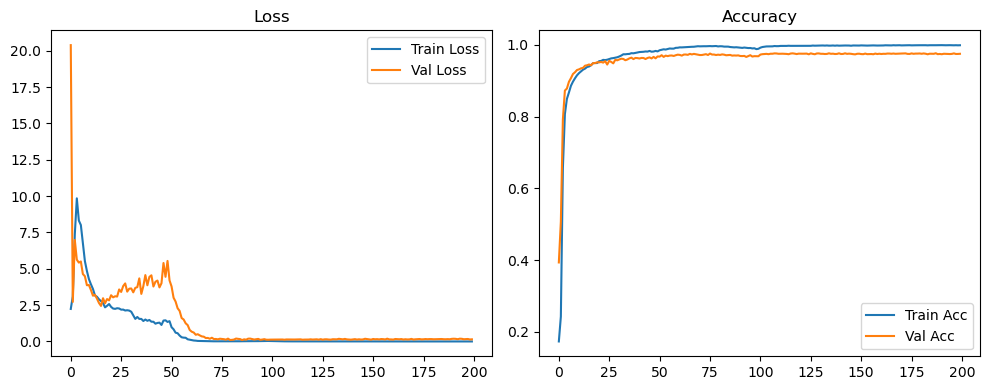

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 28.82it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 29.16it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 29.31it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 29.36it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 29.37it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 29.38it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 29.38it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 29.43it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 28.69it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 27.93it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 28.11it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 28.30it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 28.63it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 29.40it/s]

Original Model Final Test Loss: 0.1351 Accuracy: 0.9765


🚀 Running: batch256_lr0.01_0.002_0.001_dp0.5


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1485 | Val Acc: 0.2489 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1485 | Val Acc: 0.2489 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.010 | Train Acc: 0.1485 | Val Acc: 0.2489 |:   0%|          | 1/200 [00:09<31:15,  9.43s/it]

| LR: 0.010 | Train Acc: 0.1652 | Val Acc: 0.2902 |:   0%|          | 1/200 [00:18<31:15,  9.43s/it]

| LR: 0.010 | Train Acc: 0.1652 | Val Acc: 0.2902 |:   0%|          | 1/200 [00:18<31:15,  9.43s/it]

| LR: 0.010 | Train Acc: 0.1652 | Val Acc: 0.2902 |:   1%|          | 2/200 [00:18<30:51,  9.35s/it]

| LR: 0.010 | Train Acc: 0.4393 | Val Acc: 0.7237 |:   1%|          | 2/200 [00:28<30:51,  9.35s/it]

| LR: 0.010 | Train Acc: 0.4393 | Val Acc: 0.7237 |:   1%|          | 2/200 [00:28<30:51,  9.35s/it]

| LR: 0.010 | Train Acc: 0.4393 | Val Acc: 0.7237 |:   2%|▏         | 3/200 [00:28<30:49,  9.39s/it]

| LR: 0.010 | Train Acc: 0.7067 | Val Acc: 0.8517 |:   2%|▏         | 3/200 [00:37<30:49,  9.39s/it]

| LR: 0.010 | Train Acc: 0.7067 | Val Acc: 0.8517 |:   2%|▏         | 3/200 [00:37<30:49,  9.39s/it]

| LR: 0.010 | Train Acc: 0.7067 | Val Acc: 0.8517 |:   2%|▏         | 4/200 [00:37<30:13,  9.25s/it]

| LR: 0.010 | Train Acc: 0.7834 | Val Acc: 0.8763 |:   2%|▏         | 4/200 [00:46<30:13,  9.25s/it]

| LR: 0.010 | Train Acc: 0.7834 | Val Acc: 0.8763 |:   2%|▏         | 4/200 [00:46<30:13,  9.25s/it]

| LR: 0.010 | Train Acc: 0.7834 | Val Acc: 0.8763 |:   2%|▎         | 5/200 [00:46<29:45,  9.16s/it]

| LR: 0.010 | Train Acc: 0.8174 | Val Acc: 0.8954 |:   2%|▎         | 5/200 [00:54<29:45,  9.16s/it]

| LR: 0.010 | Train Acc: 0.8174 | Val Acc: 0.8954 |:   2%|▎         | 5/200 [00:54<29:45,  9.16s/it]

| LR: 0.010 | Train Acc: 0.8174 | Val Acc: 0.8954 |:   3%|▎         | 6/200 [00:55<29:15,  9.05s/it]

| LR: 0.010 | Train Acc: 0.8354 | Val Acc: 0.8989 |:   3%|▎         | 6/200 [01:04<29:15,  9.05s/it]

| LR: 0.010 | Train Acc: 0.8354 | Val Acc: 0.8989 |:   3%|▎         | 6/200 [01:04<29:15,  9.05s/it]

| LR: 0.010 | Train Acc: 0.8354 | Val Acc: 0.8989 |:   4%|▎         | 7/200 [01:04<29:24,  9.14s/it]

| LR: 0.010 | Train Acc: 0.8571 | Val Acc: 0.9127 |:   4%|▎         | 7/200 [01:13<29:24,  9.14s/it]

| LR: 0.010 | Train Acc: 0.8571 | Val Acc: 0.9127 |:   4%|▎         | 7/200 [01:13<29:24,  9.14s/it]

| LR: 0.010 | Train Acc: 0.8571 | Val Acc: 0.9127 |:   4%|▍         | 8/200 [01:13<28:56,  9.05s/it]

| LR: 0.010 | Train Acc: 0.8681 | Val Acc: 0.9239 |:   4%|▍         | 8/200 [01:22<28:56,  9.05s/it]

| LR: 0.010 | Train Acc: 0.8681 | Val Acc: 0.9239 |:   4%|▍         | 8/200 [01:22<28:56,  9.05s/it]

| LR: 0.010 | Train Acc: 0.8681 | Val Acc: 0.9239 |:   4%|▍         | 9/200 [01:22<28:35,  8.98s/it]

| LR: 0.010 | Train Acc: 0.8816 | Val Acc: 0.9205 |:   4%|▍         | 9/200 [01:31<28:35,  8.98s/it]

| LR: 0.010 | Train Acc: 0.8816 | Val Acc: 0.9205 |:   4%|▍         | 9/200 [01:31<28:35,  8.98s/it]

| LR: 0.010 | Train Acc: 0.8816 | Val Acc: 0.9205 |:   5%|▌         | 10/200 [01:31<28:49,  9.10s/it]

| LR: 0.010 | Train Acc: 0.8870 | Val Acc: 0.9300 |:   5%|▌         | 10/200 [01:40<28:49,  9.10s/it]

| LR: 0.010 | Train Acc: 0.8870 | Val Acc: 0.9300 |:   5%|▌         | 10/200 [01:40<28:49,  9.10s/it]

| LR: 0.010 | Train Acc: 0.8870 | Val Acc: 0.9300 |:   6%|▌         | 11/200 [01:40<28:26,  9.03s/it]

| LR: 0.010 | Train Acc: 0.8935 | Val Acc: 0.9329 |:   6%|▌         | 11/200 [01:49<28:26,  9.03s/it]

| LR: 0.010 | Train Acc: 0.8935 | Val Acc: 0.9329 |:   6%|▌         | 11/200 [01:49<28:26,  9.03s/it]

| LR: 0.010 | Train Acc: 0.8935 | Val Acc: 0.9329 |:   6%|▌         | 12/200 [01:49<28:08,  8.98s/it]

| LR: 0.010 | Train Acc: 0.8984 | Val Acc: 0.9330 |:   6%|▌         | 12/200 [01:58<28:08,  8.98s/it]

| LR: 0.010 | Train Acc: 0.8984 | Val Acc: 0.9330 |:   6%|▌         | 12/200 [01:58<28:08,  8.98s/it]

| LR: 0.010 | Train Acc: 0.8984 | Val Acc: 0.9330 |:   6%|▋         | 13/200 [01:58<28:14,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9045 | Val Acc: 0.9381 |:   6%|▋         | 13/200 [02:07<28:14,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9045 | Val Acc: 0.9381 |:   6%|▋         | 13/200 [02:07<28:14,  9.06s/it]

| LR: 0.010 | Train Acc: 0.9045 | Val Acc: 0.9381 |:   7%|▋         | 14/200 [02:07<27:58,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9109 | Val Acc: 0.9445 |:   7%|▋         | 14/200 [02:16<27:58,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9109 | Val Acc: 0.9445 |:   7%|▋         | 14/200 [02:16<27:58,  9.03s/it]

| LR: 0.010 | Train Acc: 0.9109 | Val Acc: 0.9445 |:   8%|▊         | 15/200 [02:16<27:44,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9417 |:   8%|▊         | 15/200 [02:25<27:44,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9417 |:   8%|▊         | 15/200 [02:25<27:44,  9.00s/it]

| LR: 0.010 | Train Acc: 0.9133 | Val Acc: 0.9417 |:   8%|▊         | 16/200 [02:25<27:29,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9172 | Val Acc: 0.9401 |:   8%|▊         | 16/200 [02:34<27:29,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9172 | Val Acc: 0.9401 |:   8%|▊         | 16/200 [02:34<27:29,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9172 | Val Acc: 0.9401 |:   8%|▊         | 17/200 [02:34<27:19,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9180 | Val Acc: 0.9469 |:   8%|▊         | 17/200 [02:42<27:19,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9180 | Val Acc: 0.9469 |:   8%|▊         | 17/200 [02:42<27:19,  8.96s/it]

| LR: 0.010 | Train Acc: 0.9180 | Val Acc: 0.9469 |:   9%|▉         | 18/200 [02:42<27:02,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9217 | Val Acc: 0.9483 |:   9%|▉         | 18/200 [02:51<27:02,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9217 | Val Acc: 0.9483 |:   9%|▉         | 18/200 [02:51<27:02,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9217 | Val Acc: 0.9483 |:  10%|▉         | 19/200 [02:51<26:46,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9255 | Val Acc: 0.9493 |:  10%|▉         | 19/200 [03:00<26:46,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9255 | Val Acc: 0.9493 |:  10%|▉         | 19/200 [03:00<26:46,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9255 | Val Acc: 0.9493 |:  10%|█         | 20/200 [03:00<26:30,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9476 |:  10%|█         | 20/200 [03:09<26:30,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9476 |:  10%|█         | 20/200 [03:09<26:30,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9291 | Val Acc: 0.9476 |:  10%|█         | 21/200 [03:09<26:17,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9313 | Val Acc: 0.9523 |:  10%|█         | 21/200 [03:17<26:17,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9313 | Val Acc: 0.9523 |:  10%|█         | 21/200 [03:17<26:17,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9313 | Val Acc: 0.9523 |:  11%|█         | 22/200 [03:17<25:55,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9306 | Val Acc: 0.9519 |:  11%|█         | 22/200 [03:26<25:55,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9306 | Val Acc: 0.9519 |:  11%|█         | 22/200 [03:26<25:55,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9306 | Val Acc: 0.9519 |:  12%|█▏        | 23/200 [03:26<25:39,  8.70s/it]

| LR: 0.010 | Train Acc: 0.9336 | Val Acc: 0.9543 |:  12%|█▏        | 23/200 [03:34<25:39,  8.70s/it]

| LR: 0.010 | Train Acc: 0.9336 | Val Acc: 0.9543 |:  12%|█▏        | 23/200 [03:34<25:39,  8.70s/it]

| LR: 0.010 | Train Acc: 0.9336 | Val Acc: 0.9543 |:  12%|█▏        | 24/200 [03:35<25:28,  8.69s/it]

| LR: 0.010 | Train Acc: 0.9356 | Val Acc: 0.9567 |:  12%|█▏        | 24/200 [03:43<25:28,  8.69s/it]

| LR: 0.010 | Train Acc: 0.9356 | Val Acc: 0.9567 |:  12%|█▏        | 24/200 [03:43<25:28,  8.69s/it]

| LR: 0.010 | Train Acc: 0.9356 | Val Acc: 0.9567 |:  12%|█▎        | 25/200 [03:43<25:26,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9383 | Val Acc: 0.9577 |:  12%|█▎        | 25/200 [03:52<25:26,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9383 | Val Acc: 0.9577 |:  12%|█▎        | 25/200 [03:52<25:26,  8.72s/it]

| LR: 0.010 | Train Acc: 0.9383 | Val Acc: 0.9577 |:  13%|█▎        | 26/200 [03:52<25:28,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9583 |:  13%|█▎        | 26/200 [04:01<25:28,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9583 |:  13%|█▎        | 26/200 [04:01<25:28,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9394 | Val Acc: 0.9583 |:  14%|█▎        | 27/200 [04:01<25:23,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9424 | Val Acc: 0.9557 |:  14%|█▎        | 27/200 [04:10<25:23,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9424 | Val Acc: 0.9557 |:  14%|█▎        | 27/200 [04:10<25:23,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9424 | Val Acc: 0.9557 |:  14%|█▍        | 28/200 [04:10<25:11,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9416 | Val Acc: 0.9565 |:  14%|█▍        | 28/200 [04:19<25:11,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9416 | Val Acc: 0.9565 |:  14%|█▍        | 28/200 [04:19<25:11,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9416 | Val Acc: 0.9565 |:  14%|█▍        | 29/200 [04:19<25:14,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9468 | Val Acc: 0.9604 |:  14%|█▍        | 29/200 [04:28<25:14,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9468 | Val Acc: 0.9604 |:  14%|█▍        | 29/200 [04:28<25:14,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9468 | Val Acc: 0.9604 |:  15%|█▌        | 30/200 [04:28<25:05,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9452 | Val Acc: 0.9587 |:  15%|█▌        | 30/200 [04:36<25:05,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9452 | Val Acc: 0.9587 |:  15%|█▌        | 30/200 [04:36<25:05,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9452 | Val Acc: 0.9587 |:  16%|█▌        | 31/200 [04:36<24:51,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9529 |:  16%|█▌        | 31/200 [04:45<24:51,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9529 |:  16%|█▌        | 31/200 [04:45<24:51,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9473 | Val Acc: 0.9529 |:  16%|█▌        | 32/200 [04:45<24:47,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9541 | Val Acc: 0.9633 |:  16%|█▌        | 32/200 [04:54<24:47,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9541 | Val Acc: 0.9633 |:  16%|█▌        | 32/200 [04:54<24:47,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9541 | Val Acc: 0.9633 |:  16%|█▋        | 33/200 [04:54<24:39,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  16%|█▋        | 33/200 [05:03<24:39,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  16%|█▋        | 33/200 [05:03<24:39,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9518 | Val Acc: 0.9627 |:  17%|█▋        | 34/200 [05:03<24:27,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9538 | Val Acc: 0.9643 |:  17%|█▋        | 34/200 [05:12<24:27,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9538 | Val Acc: 0.9643 |:  17%|█▋        | 34/200 [05:12<24:27,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9538 | Val Acc: 0.9643 |:  18%|█▊        | 35/200 [05:12<24:17,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9621 |:  18%|█▊        | 35/200 [05:21<24:17,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9621 |:  18%|█▊        | 35/200 [05:21<24:17,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9570 | Val Acc: 0.9621 |:  18%|█▊        | 36/200 [05:21<24:04,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9574 | Val Acc: 0.9643 |:  18%|█▊        | 36/200 [05:30<24:04,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9574 | Val Acc: 0.9643 |:  18%|█▊        | 36/200 [05:30<24:04,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9574 | Val Acc: 0.9643 |:  18%|█▊        | 37/200 [05:30<24:09,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9589 | Val Acc: 0.9657 |:  18%|█▊        | 37/200 [05:39<24:09,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9589 | Val Acc: 0.9657 |:  18%|█▊        | 37/200 [05:39<24:09,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9589 | Val Acc: 0.9657 |:  19%|█▉        | 38/200 [05:39<24:03,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9593 | Val Acc: 0.9633 |:  19%|█▉        | 38/200 [05:48<24:03,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9593 | Val Acc: 0.9633 |:  19%|█▉        | 38/200 [05:48<24:03,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9593 | Val Acc: 0.9633 |:  20%|█▉        | 39/200 [05:48<23:52,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9618 | Val Acc: 0.9629 |:  20%|█▉        | 39/200 [05:56<23:52,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9618 | Val Acc: 0.9629 |:  20%|█▉        | 39/200 [05:56<23:52,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9618 | Val Acc: 0.9629 |:  20%|██        | 40/200 [05:56<23:42,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9661 |:  20%|██        | 40/200 [06:05<23:42,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9661 |:  20%|██        | 40/200 [06:05<23:42,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9606 | Val Acc: 0.9661 |:  20%|██        | 41/200 [06:05<23:26,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9617 | Val Acc: 0.9683 |:  20%|██        | 41/200 [06:14<23:26,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9617 | Val Acc: 0.9683 |:  20%|██        | 41/200 [06:14<23:26,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9617 | Val Acc: 0.9683 |:  21%|██        | 42/200 [06:14<23:17,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9634 | Val Acc: 0.9667 |:  21%|██        | 42/200 [06:23<23:17,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9634 | Val Acc: 0.9667 |:  21%|██        | 42/200 [06:23<23:17,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9634 | Val Acc: 0.9667 |:  22%|██▏       | 43/200 [06:23<23:11,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9674 |:  22%|██▏       | 43/200 [06:32<23:11,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9674 |:  22%|██▏       | 43/200 [06:32<23:11,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9650 | Val Acc: 0.9674 |:  22%|██▏       | 44/200 [06:32<23:05,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9662 | Val Acc: 0.9686 |:  22%|██▏       | 44/200 [06:41<23:05,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9662 | Val Acc: 0.9686 |:  22%|██▏       | 44/200 [06:41<23:05,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9662 | Val Acc: 0.9686 |:  22%|██▎       | 45/200 [06:41<22:54,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9695 | Val Acc: 0.9682 |:  22%|██▎       | 45/200 [06:49<22:54,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9695 | Val Acc: 0.9682 |:  22%|██▎       | 45/200 [06:49<22:54,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9695 | Val Acc: 0.9682 |:  23%|██▎       | 46/200 [06:49<22:42,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9704 |:  23%|██▎       | 46/200 [06:58<22:42,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9704 |:  23%|██▎       | 46/200 [06:58<22:42,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9716 | Val Acc: 0.9704 |:  24%|██▎       | 47/200 [06:58<22:35,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9687 |:  24%|██▎       | 47/200 [07:07<22:35,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9687 |:  24%|██▎       | 47/200 [07:07<22:35,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9687 |:  24%|██▍       | 48/200 [07:07<22:20,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9704 |:  24%|██▍       | 48/200 [07:16<22:20,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9704 |:  24%|██▍       | 48/200 [07:16<22:20,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9729 | Val Acc: 0.9704 |:  24%|██▍       | 49/200 [07:16<22:11,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9721 |:  24%|██▍       | 49/200 [07:25<22:11,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9721 |:  24%|██▍       | 49/200 [07:25<22:11,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9739 | Val Acc: 0.9721 |:  25%|██▌       | 50/200 [07:25<22:04,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9760 | Val Acc: 0.9713 |:  25%|██▌       | 50/200 [07:34<22:04,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9760 | Val Acc: 0.9713 |:  25%|██▌       | 50/200 [07:34<22:04,  8.83s/it]

| LR: 0.010 | Train Acc: 0.9760 | Val Acc: 0.9713 |:  26%|██▌       | 51/200 [07:34<21:53,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9765 | Val Acc: 0.9728 |:  26%|██▌       | 51/200 [07:42<21:53,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9765 | Val Acc: 0.9728 |:  26%|██▌       | 51/200 [07:42<21:53,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9765 | Val Acc: 0.9728 |:  26%|██▌       | 52/200 [07:42<21:42,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9731 |:  26%|██▌       | 52/200 [07:51<21:42,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9731 |:  26%|██▌       | 52/200 [07:51<21:42,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9731 |:  26%|██▋       | 53/200 [07:51<21:32,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9730 |:  26%|██▋       | 53/200 [08:00<21:32,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9730 |:  26%|██▋       | 53/200 [08:00<21:32,  8.80s/it]

| LR: 0.010 | Train Acc: 0.9793 | Val Acc: 0.9730 |:  27%|██▋       | 54/200 [08:00<21:22,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9822 | Val Acc: 0.9722 |:  27%|██▋       | 54/200 [08:09<21:22,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9822 | Val Acc: 0.9722 |:  27%|██▋       | 54/200 [08:09<21:22,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9822 | Val Acc: 0.9722 |:  28%|██▊       | 55/200 [08:09<21:11,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9732 |:  28%|██▊       | 55/200 [08:18<21:11,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9732 |:  28%|██▊       | 55/200 [08:18<21:11,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9836 | Val Acc: 0.9732 |:  28%|██▊       | 56/200 [08:18<21:10,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9839 | Val Acc: 0.9729 |:  28%|██▊       | 56/200 [08:26<21:10,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9839 | Val Acc: 0.9729 |:  28%|██▊       | 56/200 [08:26<21:10,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9839 | Val Acc: 0.9729 |:  28%|██▊       | 57/200 [08:26<20:59,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9731 |:  28%|██▊       | 57/200 [08:35<20:59,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9731 |:  28%|██▊       | 57/200 [08:35<20:59,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9851 | Val Acc: 0.9731 |:  29%|██▉       | 58/200 [08:35<20:51,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9848 | Val Acc: 0.9733 |:  29%|██▉       | 58/200 [08:44<20:51,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9848 | Val Acc: 0.9733 |:  29%|██▉       | 58/200 [08:44<20:51,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9848 | Val Acc: 0.9733 |:  30%|██▉       | 59/200 [08:44<20:39,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9740 |:  30%|██▉       | 59/200 [08:53<20:39,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9740 |:  30%|██▉       | 59/200 [08:53<20:39,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9853 | Val Acc: 0.9740 |:  30%|███       | 60/200 [08:53<20:27,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9741 |:  30%|███       | 60/200 [09:01<20:27,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9741 |:  30%|███       | 60/200 [09:01<20:27,  8.77s/it]

| LR: 0.010 | Train Acc: 0.9860 | Val Acc: 0.9741 |:  30%|███       | 61/200 [09:01<20:15,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9731 |:  30%|███       | 61/200 [09:10<20:15,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9731 |:  30%|███       | 61/200 [09:10<20:15,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9856 | Val Acc: 0.9731 |:  31%|███       | 62/200 [09:10<20:25,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9854 | Val Acc: 0.9730 |:  31%|███       | 62/200 [09:19<20:25,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9854 | Val Acc: 0.9730 |:  31%|███       | 62/200 [09:19<20:25,  8.88s/it]

| LR: 0.010 | Train Acc: 0.9854 | Val Acc: 0.9730 |:  32%|███▏      | 63/200 [09:19<20:14,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9728 |:  32%|███▏      | 63/200 [09:28<20:14,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9728 |:  32%|███▏      | 63/200 [09:28<20:14,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9862 | Val Acc: 0.9728 |:  32%|███▏      | 64/200 [09:28<20:10,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  32%|███▏      | 64/200 [09:37<20:10,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  32%|███▏      | 64/200 [09:37<20:10,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  32%|███▎      | 65/200 [09:37<20:08,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9871 | Val Acc: 0.9737 |:  32%|███▎      | 65/200 [09:46<20:08,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9871 | Val Acc: 0.9737 |:  32%|███▎      | 65/200 [09:46<20:08,  8.95s/it]

| LR: 0.010 | Train Acc: 0.9871 | Val Acc: 0.9737 |:  33%|███▎      | 66/200 [09:46<19:53,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  33%|███▎      | 66/200 [09:55<19:53,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  33%|███▎      | 66/200 [09:55<19:53,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9861 | Val Acc: 0.9736 |:  34%|███▎      | 67/200 [09:55<19:45,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9864 | Val Acc: 0.9728 |:  34%|███▎      | 67/200 [10:04<19:45,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9864 | Val Acc: 0.9728 |:  34%|███▎      | 67/200 [10:04<19:45,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9864 | Val Acc: 0.9728 |:  34%|███▍      | 68/200 [10:04<19:35,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9865 | Val Acc: 0.9717 |:  34%|███▍      | 68/200 [10:13<19:35,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9865 | Val Acc: 0.9717 |:  34%|███▍      | 68/200 [10:13<19:35,  8.91s/it]

| LR: 0.010 | Train Acc: 0.9865 | Val Acc: 0.9717 |:  34%|███▍      | 69/200 [10:13<19:26,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9731 |:  34%|███▍      | 69/200 [10:22<19:26,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9731 |:  34%|███▍      | 69/200 [10:22<19:26,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9731 |:  35%|███▌      | 70/200 [10:22<19:09,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9725 |:  35%|███▌      | 70/200 [10:30<19:09,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9725 |:  35%|███▌      | 70/200 [10:30<19:09,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9725 |:  36%|███▌      | 71/200 [10:30<18:57,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9721 |:  36%|███▌      | 71/200 [10:39<18:57,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9721 |:  36%|███▌      | 71/200 [10:39<18:57,  8.82s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9721 |:  36%|███▌      | 72/200 [10:39<18:45,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9719 |:  36%|███▌      | 72/200 [10:48<18:45,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9719 |:  36%|███▌      | 72/200 [10:48<18:45,  8.79s/it]

| LR: 0.010 | Train Acc: 0.9859 | Val Acc: 0.9719 |:  36%|███▋      | 73/200 [10:48<18:28,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9730 |:  36%|███▋      | 73/200 [10:56<18:28,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9730 |:  36%|███▋      | 73/200 [10:56<18:28,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9857 | Val Acc: 0.9730 |:  37%|███▋      | 74/200 [10:56<18:13,  8.68s/it]

| LR: 0.010 | Train Acc: 0.9846 | Val Acc: 0.9730 |:  37%|███▋      | 74/200 [11:05<18:13,  8.68s/it]

| LR: 0.010 | Train Acc: 0.9846 | Val Acc: 0.9730 |:  37%|███▋      | 74/200 [11:05<18:13,  8.68s/it]

| LR: 0.010 | Train Acc: 0.9846 | Val Acc: 0.9730 |:  38%|███▊      | 75/200 [11:05<18:07,  8.70s/it]

| LR: 0.010 | Train Acc: 0.9824 | Val Acc: 0.9705 |:  38%|███▊      | 75/200 [11:14<18:07,  8.70s/it]

| LR: 0.010 | Train Acc: 0.9824 | Val Acc: 0.9705 |:  38%|███▊      | 75/200 [11:14<18:07,  8.70s/it]

| LR: 0.010 | Train Acc: 0.9824 | Val Acc: 0.9705 |:  38%|███▊      | 76/200 [11:14<18:05,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9835 | Val Acc: 0.9720 |:  38%|███▊      | 76/200 [11:23<18:05,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9835 | Val Acc: 0.9720 |:  38%|███▊      | 76/200 [11:23<18:05,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9835 | Val Acc: 0.9720 |:  38%|███▊      | 77/200 [11:23<17:54,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9819 | Val Acc: 0.9721 |:  38%|███▊      | 77/200 [11:31<17:54,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9819 | Val Acc: 0.9721 |:  38%|███▊      | 77/200 [11:31<17:54,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9819 | Val Acc: 0.9721 |:  39%|███▉      | 78/200 [11:31<17:45,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9721 |:  39%|███▉      | 78/200 [11:40<17:45,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9721 |:  39%|███▉      | 78/200 [11:40<17:45,  8.73s/it]

| LR: 0.010 | Train Acc: 0.9804 | Val Acc: 0.9721 |:  40%|███▉      | 79/200 [11:40<17:37,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9806 | Val Acc: 0.9707 |:  40%|███▉      | 79/200 [11:49<17:37,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9806 | Val Acc: 0.9707 |:  40%|███▉      | 79/200 [11:49<17:37,  8.74s/it]

| LR: 0.010 | Train Acc: 0.9806 | Val Acc: 0.9707 |:  40%|████      | 80/200 [11:49<17:30,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9696 |:  40%|████      | 80/200 [11:58<17:30,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9696 |:  40%|████      | 80/200 [11:58<17:30,  8.75s/it]

| LR: 0.010 | Train Acc: 0.9785 | Val Acc: 0.9696 |:  40%|████      | 81/200 [11:58<17:25,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9788 | Val Acc: 0.9706 |:  40%|████      | 81/200 [12:06<17:25,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9788 | Val Acc: 0.9706 |:  40%|████      | 81/200 [12:06<17:25,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9788 | Val Acc: 0.9706 |:  41%|████      | 82/200 [12:06<17:15,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9702 |:  41%|████      | 82/200 [12:15<17:15,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9702 |:  41%|████      | 82/200 [12:15<17:15,  8.78s/it]

| LR: 0.010 | Train Acc: 0.9769 | Val Acc: 0.9702 |:  42%|████▏     | 83/200 [12:15<17:10,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9692 |:  42%|████▏     | 83/200 [12:24<17:10,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9692 |:  42%|████▏     | 83/200 [12:24<17:10,  8.81s/it]

| LR: 0.010 | Train Acc: 0.9781 | Val Acc: 0.9692 |:  42%|████▏     | 84/200 [12:24<17:08,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9763 | Val Acc: 0.9702 |:  42%|████▏     | 84/200 [12:33<17:08,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9763 | Val Acc: 0.9702 |:  42%|████▏     | 84/200 [12:33<17:08,  8.87s/it]

| LR: 0.010 | Train Acc: 0.9763 | Val Acc: 0.9702 |:  42%|████▎     | 85/200 [12:33<17:05,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9683 |:  42%|████▎     | 85/200 [12:43<17:05,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9683 |:  42%|████▎     | 85/200 [12:43<17:05,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9757 | Val Acc: 0.9683 |:  43%|████▎     | 86/200 [12:43<17:08,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9701 |:  43%|████▎     | 86/200 [12:52<17:08,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9701 |:  43%|████▎     | 86/200 [12:52<17:08,  9.02s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9701 |:  44%|████▎     | 87/200 [12:52<17:10,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9703 |:  44%|████▎     | 87/200 [13:01<17:10,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9703 |:  44%|████▎     | 87/200 [13:01<17:10,  9.12s/it]

| LR: 0.010 | Train Acc: 0.9740 | Val Acc: 0.9703 |:  44%|████▍     | 88/200 [13:01<16:46,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9702 |:  44%|████▍     | 88/200 [13:09<16:46,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9702 |:  44%|████▍     | 88/200 [13:09<16:46,  8.99s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9702 |:  44%|████▍     | 89/200 [13:09<16:32,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9695 |:  44%|████▍     | 89/200 [13:18<16:32,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9695 |:  44%|████▍     | 89/200 [13:18<16:32,  8.94s/it]

| LR: 0.010 | Train Acc: 0.9747 | Val Acc: 0.9695 |:  45%|████▌     | 90/200 [13:18<16:18,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9698 |:  45%|████▌     | 90/200 [13:27<16:18,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9698 |:  45%|████▌     | 90/200 [13:27<16:18,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9758 | Val Acc: 0.9698 |:  46%|████▌     | 91/200 [13:27<16:05,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9744 | Val Acc: 0.9688 |:  46%|████▌     | 91/200 [13:36<16:05,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9744 | Val Acc: 0.9688 |:  46%|████▌     | 91/200 [13:36<16:05,  8.86s/it]

| LR: 0.010 | Train Acc: 0.9744 | Val Acc: 0.9688 |:  46%|████▌     | 92/200 [13:36<15:56,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9694 |:  46%|████▌     | 92/200 [13:45<15:56,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9694 |:  46%|████▌     | 92/200 [13:45<15:56,  8.85s/it]

| LR: 0.010 | Train Acc: 0.9728 | Val Acc: 0.9694 |:  46%|████▋     | 93/200 [13:45<15:45,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9732 | Val Acc: 0.9704 |:  46%|████▋     | 93/200 [13:54<15:45,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9732 | Val Acc: 0.9704 |:  46%|████▋     | 93/200 [13:54<15:45,  8.84s/it]

| LR: 0.010 | Train Acc: 0.9732 | Val Acc: 0.9704 |:  47%|████▋     | 94/200 [13:54<15:47,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9682 |:  47%|████▋     | 94/200 [14:03<15:47,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9682 |:  47%|████▋     | 94/200 [14:03<15:47,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9727 | Val Acc: 0.9682 |:  48%|████▊     | 95/200 [14:03<15:37,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9680 |:  48%|████▊     | 95/200 [14:12<15:37,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9680 |:  48%|████▊     | 95/200 [14:12<15:37,  8.93s/it]

| LR: 0.010 | Train Acc: 0.9731 | Val Acc: 0.9680 |:  48%|████▊     | 96/200 [14:12<15:27,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9733 | Val Acc: 0.9692 |:  48%|████▊     | 96/200 [14:20<15:27,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9733 | Val Acc: 0.9692 |:  48%|████▊     | 96/200 [14:20<15:27,  8.92s/it]

| LR: 0.010 | Train Acc: 0.9733 | Val Acc: 0.9692 |:  48%|████▊     | 97/200 [14:21<15:16,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9677 |:  48%|████▊     | 97/200 [14:29<15:16,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9677 |:  48%|████▊     | 97/200 [14:29<15:16,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9743 | Val Acc: 0.9677 |:  49%|████▉     | 98/200 [14:29<15:08,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9738 | Val Acc: 0.9694 |:  49%|████▉     | 98/200 [14:38<15:08,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9738 | Val Acc: 0.9694 |:  49%|████▉     | 98/200 [14:38<15:08,  8.90s/it]

| LR: 0.010 | Train Acc: 0.9738 | Val Acc: 0.9694 |:  50%|████▉     | 99/200 [14:38<14:57,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9682 |:  50%|████▉     | 99/200 [14:47<14:57,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9682 |:  50%|████▉     | 99/200 [14:47<14:57,  8.89s/it]

| LR: 0.010 | Train Acc: 0.9722 | Val Acc: 0.9682 |:  50%|█████     | 100/200 [14:47<14:51,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9755 | Val Acc: 0.9698 |:  50%|█████     | 100/200 [14:56<14:51,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9755 | Val Acc: 0.9698 |:  50%|█████     | 100/200 [14:56<14:51,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9755 | Val Acc: 0.9698 |:  50%|█████     | 101/200 [14:56<14:40,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9702 |:  50%|█████     | 101/200 [15:05<14:40,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9702 |:  50%|█████     | 101/200 [15:05<14:40,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9702 |:  51%|█████     | 102/200 [15:05<14:30,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9784 | Val Acc: 0.9708 |:  51%|█████     | 102/200 [15:14<14:30,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9784 | Val Acc: 0.9708 |:  51%|█████     | 102/200 [15:14<14:30,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9784 | Val Acc: 0.9708 |:  52%|█████▏    | 103/200 [15:14<14:18,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9797 | Val Acc: 0.9697 |:  52%|█████▏    | 103/200 [15:22<14:18,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9797 | Val Acc: 0.9697 |:  52%|█████▏    | 103/200 [15:22<14:18,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9797 | Val Acc: 0.9697 |:  52%|█████▏    | 104/200 [15:23<14:07,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9786 | Val Acc: 0.9718 |:  52%|█████▏    | 104/200 [15:31<14:07,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9786 | Val Acc: 0.9718 |:  52%|█████▏    | 104/200 [15:31<14:07,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9786 | Val Acc: 0.9718 |:  52%|█████▎    | 105/200 [15:31<13:56,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9791 | Val Acc: 0.9720 |:  52%|█████▎    | 105/200 [15:40<13:56,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9791 | Val Acc: 0.9720 |:  52%|█████▎    | 105/200 [15:40<13:56,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9791 | Val Acc: 0.9720 |:  53%|█████▎    | 106/200 [15:40<13:49,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9812 | Val Acc: 0.9712 |:  53%|█████▎    | 106/200 [15:49<13:49,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9812 | Val Acc: 0.9712 |:  53%|█████▎    | 106/200 [15:49<13:49,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9812 | Val Acc: 0.9712 |:  54%|█████▎    | 107/200 [15:49<13:38,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9810 | Val Acc: 0.9718 |:  54%|█████▎    | 107/200 [15:57<13:38,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9810 | Val Acc: 0.9718 |:  54%|█████▎    | 107/200 [15:57<13:38,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9810 | Val Acc: 0.9718 |:  54%|█████▍    | 108/200 [15:58<13:26,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9818 | Val Acc: 0.9719 |:  54%|█████▍    | 108/200 [16:06<13:26,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9818 | Val Acc: 0.9719 |:  54%|█████▍    | 108/200 [16:06<13:26,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9818 | Val Acc: 0.9719 |:  55%|█████▍    | 109/200 [16:06<13:18,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9821 | Val Acc: 0.9738 |:  55%|█████▍    | 109/200 [16:15<13:18,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9821 | Val Acc: 0.9738 |:  55%|█████▍    | 109/200 [16:15<13:18,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9821 | Val Acc: 0.9738 |:  55%|█████▌    | 110/200 [16:15<13:10,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9826 | Val Acc: 0.9726 |:  55%|█████▌    | 110/200 [16:24<13:10,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9826 | Val Acc: 0.9726 |:  55%|█████▌    | 110/200 [16:24<13:10,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9826 | Val Acc: 0.9726 |:  56%|█████▌    | 111/200 [16:24<12:59,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9821 | Val Acc: 0.9721 |:  56%|█████▌    | 111/200 [16:32<12:59,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9821 | Val Acc: 0.9721 |:  56%|█████▌    | 111/200 [16:32<12:59,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9821 | Val Acc: 0.9721 |:  56%|█████▌    | 112/200 [16:33<12:49,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9840 | Val Acc: 0.9724 |:  56%|█████▌    | 112/200 [16:41<12:49,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9840 | Val Acc: 0.9724 |:  56%|█████▌    | 112/200 [16:41<12:49,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9840 | Val Acc: 0.9724 |:  56%|█████▋    | 113/200 [16:41<12:39,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9837 | Val Acc: 0.9734 |:  56%|█████▋    | 113/200 [16:50<12:39,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9837 | Val Acc: 0.9734 |:  56%|█████▋    | 113/200 [16:50<12:39,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9837 | Val Acc: 0.9734 |:  57%|█████▋    | 114/200 [16:50<12:31,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9835 | Val Acc: 0.9732 |:  57%|█████▋    | 114/200 [16:59<12:31,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9835 | Val Acc: 0.9732 |:  57%|█████▋    | 114/200 [16:59<12:31,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9835 | Val Acc: 0.9732 |:  57%|█████▊    | 115/200 [16:59<12:23,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9841 | Val Acc: 0.9736 |:  57%|█████▊    | 115/200 [17:08<12:23,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9841 | Val Acc: 0.9736 |:  57%|█████▊    | 115/200 [17:08<12:23,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9841 | Val Acc: 0.9736 |:  58%|█████▊    | 116/200 [17:08<12:18,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9841 | Val Acc: 0.9728 |:  58%|█████▊    | 116/200 [17:16<12:18,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9841 | Val Acc: 0.9728 |:  58%|█████▊    | 116/200 [17:16<12:18,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9841 | Val Acc: 0.9728 |:  58%|█████▊    | 117/200 [17:16<12:09,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9838 | Val Acc: 0.9727 |:  58%|█████▊    | 117/200 [17:25<12:09,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9838 | Val Acc: 0.9727 |:  58%|█████▊    | 117/200 [17:25<12:09,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9838 | Val Acc: 0.9727 |:  59%|█████▉    | 118/200 [17:25<12:00,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9848 | Val Acc: 0.9732 |:  59%|█████▉    | 118/200 [17:34<12:00,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9848 | Val Acc: 0.9732 |:  59%|█████▉    | 118/200 [17:34<12:00,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9848 | Val Acc: 0.9732 |:  60%|█████▉    | 119/200 [17:34<11:51,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9846 | Val Acc: 0.9728 |:  60%|█████▉    | 119/200 [17:43<11:51,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9846 | Val Acc: 0.9728 |:  60%|█████▉    | 119/200 [17:43<11:51,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9846 | Val Acc: 0.9728 |:  60%|██████    | 120/200 [17:43<11:41,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9742 |:  60%|██████    | 120/200 [17:52<11:41,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9742 |:  60%|██████    | 120/200 [17:52<11:41,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9742 |:  60%|██████    | 121/200 [17:52<11:34,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9851 | Val Acc: 0.9727 |:  60%|██████    | 121/200 [18:00<11:34,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9851 | Val Acc: 0.9727 |:  60%|██████    | 121/200 [18:00<11:34,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9851 | Val Acc: 0.9727 |:  61%|██████    | 122/200 [18:00<11:26,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9857 | Val Acc: 0.9732 |:  61%|██████    | 122/200 [18:09<11:26,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9857 | Val Acc: 0.9732 |:  61%|██████    | 122/200 [18:09<11:26,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9857 | Val Acc: 0.9732 |:  62%|██████▏   | 123/200 [18:09<11:15,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9732 |:  62%|██████▏   | 123/200 [18:18<11:15,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9732 |:  62%|██████▏   | 123/200 [18:18<11:15,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9732 |:  62%|██████▏   | 124/200 [18:18<11:07,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9728 |:  62%|██████▏   | 124/200 [18:27<11:07,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9728 |:  62%|██████▏   | 124/200 [18:27<11:07,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9728 |:  62%|██████▎   | 125/200 [18:27<11:02,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9731 |:  62%|██████▎   | 125/200 [18:36<11:02,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9731 |:  62%|██████▎   | 125/200 [18:36<11:02,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9731 |:  63%|██████▎   | 126/200 [18:36<10:55,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9867 | Val Acc: 0.9729 |:  63%|██████▎   | 126/200 [18:44<10:55,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9867 | Val Acc: 0.9729 |:  63%|██████▎   | 126/200 [18:44<10:55,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9867 | Val Acc: 0.9729 |:  64%|██████▎   | 127/200 [18:44<10:41,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9855 | Val Acc: 0.9725 |:  64%|██████▎   | 127/200 [18:53<10:41,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9855 | Val Acc: 0.9725 |:  64%|██████▎   | 127/200 [18:53<10:41,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9855 | Val Acc: 0.9725 |:  64%|██████▍   | 128/200 [18:53<10:31,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9724 |:  64%|██████▍   | 128/200 [19:02<10:31,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9724 |:  64%|██████▍   | 128/200 [19:02<10:31,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9724 |:  64%|██████▍   | 129/200 [19:02<10:21,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9728 |:  64%|██████▍   | 129/200 [19:11<10:21,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9728 |:  64%|██████▍   | 129/200 [19:11<10:21,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9856 | Val Acc: 0.9728 |:  65%|██████▌   | 130/200 [19:11<10:18,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9873 | Val Acc: 0.9732 |:  65%|██████▌   | 130/200 [19:20<10:18,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9873 | Val Acc: 0.9732 |:  65%|██████▌   | 130/200 [19:20<10:18,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9873 | Val Acc: 0.9732 |:  66%|██████▌   | 131/200 [19:20<10:12,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9866 | Val Acc: 0.9738 |:  66%|██████▌   | 131/200 [19:29<10:12,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9866 | Val Acc: 0.9738 |:  66%|██████▌   | 131/200 [19:29<10:12,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9866 | Val Acc: 0.9738 |:  66%|██████▌   | 132/200 [19:29<10:00,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9863 | Val Acc: 0.9731 |:  66%|██████▌   | 132/200 [19:37<10:00,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9863 | Val Acc: 0.9731 |:  66%|██████▌   | 132/200 [19:37<10:00,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9863 | Val Acc: 0.9731 |:  66%|██████▋   | 133/200 [19:37<09:50,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9730 |:  66%|██████▋   | 133/200 [19:46<09:50,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9730 |:  66%|██████▋   | 133/200 [19:46<09:50,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9730 |:  67%|██████▋   | 134/200 [19:46<09:38,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9752 |:  67%|██████▋   | 134/200 [19:55<09:38,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9752 |:  67%|██████▋   | 134/200 [19:55<09:38,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9752 |:  68%|██████▊   | 135/200 [19:55<09:28,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9875 | Val Acc: 0.9732 |:  68%|██████▊   | 135/200 [20:04<09:28,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9875 | Val Acc: 0.9732 |:  68%|██████▊   | 135/200 [20:04<09:28,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9875 | Val Acc: 0.9732 |:  68%|██████▊   | 136/200 [20:04<09:21,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9874 | Val Acc: 0.9732 |:  68%|██████▊   | 136/200 [20:12<09:21,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9874 | Val Acc: 0.9732 |:  68%|██████▊   | 136/200 [20:12<09:21,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9874 | Val Acc: 0.9732 |:  68%|██████▊   | 137/200 [20:12<09:11,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9735 |:  68%|██████▊   | 137/200 [20:21<09:11,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9735 |:  68%|██████▊   | 137/200 [20:21<09:11,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9735 |:  69%|██████▉   | 138/200 [20:21<09:03,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9876 | Val Acc: 0.9723 |:  69%|██████▉   | 138/200 [20:30<09:03,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9876 | Val Acc: 0.9723 |:  69%|██████▉   | 138/200 [20:30<09:03,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9876 | Val Acc: 0.9723 |:  70%|██████▉   | 139/200 [20:30<09:00,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9878 | Val Acc: 0.9732 |:  70%|██████▉   | 139/200 [20:39<09:00,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9878 | Val Acc: 0.9732 |:  70%|██████▉   | 139/200 [20:39<09:00,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9878 | Val Acc: 0.9732 |:  70%|███████   | 140/200 [20:39<08:49,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9720 |:  70%|███████   | 140/200 [20:48<08:49,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9720 |:  70%|███████   | 140/200 [20:48<08:49,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9720 |:  70%|███████   | 141/200 [20:48<08:42,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9879 | Val Acc: 0.9728 |:  70%|███████   | 141/200 [20:57<08:42,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9879 | Val Acc: 0.9728 |:  70%|███████   | 141/200 [20:57<08:42,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9879 | Val Acc: 0.9728 |:  71%|███████   | 142/200 [20:57<08:33,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9736 |:  71%|███████   | 142/200 [21:05<08:33,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9736 |:  71%|███████   | 142/200 [21:05<08:33,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9736 |:  72%|███████▏  | 143/200 [21:05<08:23,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9730 |:  72%|███████▏  | 143/200 [21:14<08:23,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9730 |:  72%|███████▏  | 143/200 [21:14<08:23,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9730 |:  72%|███████▏  | 144/200 [21:14<08:15,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9733 |:  72%|███████▏  | 144/200 [21:23<08:15,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9733 |:  72%|███████▏  | 144/200 [21:23<08:15,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9733 |:  72%|███████▎  | 145/200 [21:23<08:07,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9740 |:  72%|███████▎  | 145/200 [21:32<08:07,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9740 |:  72%|███████▎  | 145/200 [21:32<08:07,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9740 |:  73%|███████▎  | 146/200 [21:32<08:00,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9884 | Val Acc: 0.9731 |:  73%|███████▎  | 146/200 [21:41<08:00,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9884 | Val Acc: 0.9731 |:  73%|███████▎  | 146/200 [21:41<08:00,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9884 | Val Acc: 0.9731 |:  74%|███████▎  | 147/200 [21:41<07:48,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9738 |:  74%|███████▎  | 147/200 [21:50<07:48,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9738 |:  74%|███████▎  | 147/200 [21:50<07:48,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9738 |:  74%|███████▍  | 148/200 [21:50<07:47,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9742 |:  74%|███████▍  | 148/200 [21:59<07:47,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9742 |:  74%|███████▍  | 148/200 [21:59<07:47,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9742 |:  74%|███████▍  | 149/200 [21:59<07:38,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9722 |:  74%|███████▍  | 149/200 [22:08<07:38,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9722 |:  74%|███████▍  | 149/200 [22:08<07:38,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9722 |:  75%|███████▌  | 150/200 [22:08<07:29,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9888 | Val Acc: 0.9735 |:  75%|███████▌  | 150/200 [22:17<07:29,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9888 | Val Acc: 0.9735 |:  75%|███████▌  | 150/200 [22:17<07:29,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9888 | Val Acc: 0.9735 |:  76%|███████▌  | 151/200 [22:17<07:15,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9878 | Val Acc: 0.9738 |:  76%|███████▌  | 151/200 [22:26<07:15,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9878 | Val Acc: 0.9738 |:  76%|███████▌  | 151/200 [22:26<07:15,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9878 | Val Acc: 0.9738 |:  76%|███████▌  | 152/200 [22:26<07:04,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9882 | Val Acc: 0.9735 |:  76%|███████▌  | 152/200 [22:35<07:04,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9882 | Val Acc: 0.9735 |:  76%|███████▌  | 152/200 [22:35<07:04,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9882 | Val Acc: 0.9735 |:  76%|███████▋  | 153/200 [22:35<06:58,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9730 |:  76%|███████▋  | 153/200 [22:43<06:58,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9730 |:  76%|███████▋  | 153/200 [22:43<06:58,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9730 |:  77%|███████▋  | 154/200 [22:43<06:47,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9734 |:  77%|███████▋  | 154/200 [22:52<06:47,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9734 |:  77%|███████▋  | 154/200 [22:52<06:47,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9734 |:  78%|███████▊  | 155/200 [22:52<06:38,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9738 |:  78%|███████▊  | 155/200 [23:01<06:38,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9738 |:  78%|███████▊  | 155/200 [23:01<06:38,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9738 |:  78%|███████▊  | 156/200 [23:01<06:29,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9890 | Val Acc: 0.9734 |:  78%|███████▊  | 156/200 [23:10<06:29,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9890 | Val Acc: 0.9734 |:  78%|███████▊  | 156/200 [23:10<06:29,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9890 | Val Acc: 0.9734 |:  78%|███████▊  | 157/200 [23:10<06:20,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9744 |:  78%|███████▊  | 157/200 [23:19<06:20,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9744 |:  78%|███████▊  | 157/200 [23:19<06:20,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9885 | Val Acc: 0.9744 |:  79%|███████▉  | 158/200 [23:19<06:17,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9882 | Val Acc: 0.9732 |:  79%|███████▉  | 158/200 [23:28<06:17,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9882 | Val Acc: 0.9732 |:  79%|███████▉  | 158/200 [23:28<06:17,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9882 | Val Acc: 0.9732 |:  80%|███████▉  | 159/200 [23:28<06:07,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9887 | Val Acc: 0.9735 |:  80%|███████▉  | 159/200 [23:37<06:07,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9887 | Val Acc: 0.9735 |:  80%|███████▉  | 159/200 [23:37<06:07,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9887 | Val Acc: 0.9735 |:  80%|████████  | 160/200 [23:37<05:57,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9733 |:  80%|████████  | 160/200 [23:46<05:57,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9733 |:  80%|████████  | 160/200 [23:46<05:57,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9733 |:  80%|████████  | 161/200 [23:46<05:48,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9898 | Val Acc: 0.9737 |:  80%|████████  | 161/200 [23:55<05:48,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9898 | Val Acc: 0.9737 |:  80%|████████  | 161/200 [23:55<05:48,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9898 | Val Acc: 0.9737 |:  81%|████████  | 162/200 [23:55<05:36,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9742 |:  81%|████████  | 162/200 [24:04<05:36,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9742 |:  81%|████████  | 162/200 [24:04<05:36,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9742 |:  82%|████████▏ | 163/200 [24:04<05:27,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9904 | Val Acc: 0.9742 |:  82%|████████▏ | 163/200 [24:12<05:27,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9904 | Val Acc: 0.9742 |:  82%|████████▏ | 163/200 [24:12<05:27,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9904 | Val Acc: 0.9742 |:  82%|████████▏ | 164/200 [24:12<05:19,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9738 |:  82%|████████▏ | 164/200 [24:21<05:19,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9738 |:  82%|████████▏ | 164/200 [24:21<05:19,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9738 |:  82%|████████▎ | 165/200 [24:21<05:09,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9731 |:  82%|████████▎ | 165/200 [24:30<05:09,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9731 |:  82%|████████▎ | 165/200 [24:30<05:09,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9731 |:  83%|████████▎ | 166/200 [24:30<05:01,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9735 |:  83%|████████▎ | 166/200 [24:39<05:01,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9735 |:  83%|████████▎ | 166/200 [24:39<05:01,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9735 |:  84%|████████▎ | 167/200 [24:39<04:53,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9904 | Val Acc: 0.9741 |:  84%|████████▎ | 167/200 [24:48<04:53,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9904 | Val Acc: 0.9741 |:  84%|████████▎ | 167/200 [24:48<04:53,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9904 | Val Acc: 0.9741 |:  84%|████████▍ | 168/200 [24:48<04:44,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9740 |:  84%|████████▍ | 168/200 [24:57<04:44,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9740 |:  84%|████████▍ | 168/200 [24:57<04:44,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9740 |:  84%|████████▍ | 169/200 [24:57<04:36,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9743 |:  84%|████████▍ | 169/200 [25:06<04:36,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9743 |:  84%|████████▍ | 169/200 [25:06<04:36,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9743 |:  85%|████████▌ | 170/200 [25:06<04:28,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9904 | Val Acc: 0.9740 |:  85%|████████▌ | 170/200 [25:15<04:28,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9904 | Val Acc: 0.9740 |:  85%|████████▌ | 170/200 [25:15<04:28,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9904 | Val Acc: 0.9740 |:  86%|████████▌ | 171/200 [25:15<04:19,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9907 | Val Acc: 0.9741 |:  86%|████████▌ | 171/200 [25:24<04:19,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9907 | Val Acc: 0.9741 |:  86%|████████▌ | 171/200 [25:24<04:19,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9907 | Val Acc: 0.9741 |:  86%|████████▌ | 172/200 [25:24<04:10,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9732 |:  86%|████████▌ | 172/200 [25:33<04:10,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9732 |:  86%|████████▌ | 172/200 [25:33<04:10,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9732 |:  86%|████████▋ | 173/200 [25:33<04:02,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9734 |:  86%|████████▋ | 173/200 [25:42<04:02,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9734 |:  86%|████████▋ | 173/200 [25:42<04:02,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9734 |:  87%|████████▋ | 174/200 [25:42<03:53,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9732 |:  87%|████████▋ | 174/200 [25:51<03:53,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9732 |:  87%|████████▋ | 174/200 [25:51<03:53,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9732 |:  88%|████████▊ | 175/200 [25:51<03:43,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9901 | Val Acc: 0.9731 |:  88%|████████▊ | 175/200 [26:00<03:43,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9901 | Val Acc: 0.9731 |:  88%|████████▊ | 175/200 [26:00<03:43,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9901 | Val Acc: 0.9731 |:  88%|████████▊ | 176/200 [26:00<03:34,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9734 |:  88%|████████▊ | 176/200 [26:09<03:34,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9734 |:  88%|████████▊ | 176/200 [26:09<03:34,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9734 |:  88%|████████▊ | 177/200 [26:09<03:24,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9908 | Val Acc: 0.9736 |:  88%|████████▊ | 177/200 [26:17<03:24,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9908 | Val Acc: 0.9736 |:  88%|████████▊ | 177/200 [26:17<03:24,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9908 | Val Acc: 0.9736 |:  89%|████████▉ | 178/200 [26:17<03:16,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9741 |:  89%|████████▉ | 178/200 [26:26<03:16,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9741 |:  89%|████████▉ | 178/200 [26:26<03:16,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9741 |:  90%|████████▉ | 179/200 [26:26<03:07,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9918 | Val Acc: 0.9738 |:  90%|████████▉ | 179/200 [26:35<03:07,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9918 | Val Acc: 0.9738 |:  90%|████████▉ | 179/200 [26:35<03:07,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9918 | Val Acc: 0.9738 |:  90%|█████████ | 180/200 [26:35<02:58,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9742 |:  90%|█████████ | 180/200 [26:45<02:58,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9742 |:  90%|█████████ | 180/200 [26:45<02:58,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9742 |:  90%|█████████ | 181/200 [26:45<02:53,  9.12s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9742 |:  90%|█████████ | 181/200 [26:55<02:53,  9.12s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9742 |:  90%|█████████ | 181/200 [26:55<02:53,  9.12s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9742 |:  91%|█████████ | 182/200 [26:55<02:47,  9.28s/it]

| LR: 0.001 | Train Acc: 0.9916 | Val Acc: 0.9748 |:  91%|█████████ | 182/200 [27:03<02:47,  9.28s/it]

| LR: 0.001 | Train Acc: 0.9916 | Val Acc: 0.9748 |:  91%|█████████ | 182/200 [27:03<02:47,  9.28s/it]

| LR: 0.001 | Train Acc: 0.9916 | Val Acc: 0.9748 |:  92%|█████████▏| 183/200 [27:03<02:35,  9.17s/it]

| LR: 0.001 | Train Acc: 0.9908 | Val Acc: 0.9734 |:  92%|█████████▏| 183/200 [27:12<02:35,  9.17s/it]

| LR: 0.001 | Train Acc: 0.9908 | Val Acc: 0.9734 |:  92%|█████████▏| 183/200 [27:12<02:35,  9.17s/it]

| LR: 0.001 | Train Acc: 0.9908 | Val Acc: 0.9734 |:  92%|█████████▏| 184/200 [27:12<02:25,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9744 |:  92%|█████████▏| 184/200 [27:21<02:25,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9744 |:  92%|█████████▏| 184/200 [27:21<02:25,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9744 |:  92%|█████████▎| 185/200 [27:21<02:14,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9907 | Val Acc: 0.9745 |:  92%|█████████▎| 185/200 [27:31<02:14,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9907 | Val Acc: 0.9745 |:  92%|█████████▎| 185/200 [27:31<02:14,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9907 | Val Acc: 0.9745 |:  93%|█████████▎| 186/200 [27:31<02:07,  9.14s/it]

| LR: 0.001 | Train Acc: 0.9923 | Val Acc: 0.9746 |:  93%|█████████▎| 186/200 [27:40<02:07,  9.14s/it]

| LR: 0.001 | Train Acc: 0.9923 | Val Acc: 0.9746 |:  93%|█████████▎| 186/200 [27:40<02:07,  9.14s/it]

| LR: 0.001 | Train Acc: 0.9923 | Val Acc: 0.9746 |:  94%|█████████▎| 187/200 [27:40<02:01,  9.35s/it]

| LR: 0.001 | Train Acc: 0.9913 | Val Acc: 0.9735 |:  94%|█████████▎| 187/200 [27:49<02:01,  9.35s/it]

| LR: 0.001 | Train Acc: 0.9913 | Val Acc: 0.9735 |:  94%|█████████▎| 187/200 [27:49<02:01,  9.35s/it]

| LR: 0.001 | Train Acc: 0.9913 | Val Acc: 0.9735 |:  94%|█████████▍| 188/200 [27:49<01:50,  9.20s/it]

| LR: 0.001 | Train Acc: 0.9918 | Val Acc: 0.9740 |:  94%|█████████▍| 188/200 [27:58<01:50,  9.20s/it]

| LR: 0.001 | Train Acc: 0.9918 | Val Acc: 0.9740 |:  94%|█████████▍| 188/200 [27:58<01:50,  9.20s/it]

| LR: 0.001 | Train Acc: 0.9918 | Val Acc: 0.9740 |:  94%|█████████▍| 189/200 [27:58<01:40,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9919 | Val Acc: 0.9751 |:  94%|█████████▍| 189/200 [28:07<01:40,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9919 | Val Acc: 0.9751 |:  94%|█████████▍| 189/200 [28:07<01:40,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9919 | Val Acc: 0.9751 |:  95%|█████████▌| 190/200 [28:07<01:30,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9911 | Val Acc: 0.9752 |:  95%|█████████▌| 190/200 [28:16<01:30,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9911 | Val Acc: 0.9752 |:  95%|█████████▌| 190/200 [28:16<01:30,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9911 | Val Acc: 0.9752 |:  96%|█████████▌| 191/200 [28:16<01:21,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9917 | Val Acc: 0.9742 |:  96%|█████████▌| 191/200 [28:25<01:21,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9917 | Val Acc: 0.9742 |:  96%|█████████▌| 191/200 [28:25<01:21,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9917 | Val Acc: 0.9742 |:  96%|█████████▌| 192/200 [28:25<01:11,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9911 | Val Acc: 0.9742 |:  96%|█████████▌| 192/200 [28:34<01:11,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9911 | Val Acc: 0.9742 |:  96%|█████████▌| 192/200 [28:34<01:11,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9911 | Val Acc: 0.9742 |:  96%|█████████▋| 193/200 [28:34<01:02,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9911 | Val Acc: 0.9748 |:  96%|█████████▋| 193/200 [28:43<01:02,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9911 | Val Acc: 0.9748 |:  96%|█████████▋| 193/200 [28:43<01:02,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9911 | Val Acc: 0.9748 |:  97%|█████████▋| 194/200 [28:43<00:53,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9914 | Val Acc: 0.9739 |:  97%|█████████▋| 194/200 [28:52<00:53,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9914 | Val Acc: 0.9739 |:  97%|█████████▋| 194/200 [28:52<00:53,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9914 | Val Acc: 0.9739 |:  98%|█████████▊| 195/200 [28:52<00:44,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9914 | Val Acc: 0.9742 |:  98%|█████████▊| 195/200 [29:00<00:44,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9914 | Val Acc: 0.9742 |:  98%|█████████▊| 195/200 [29:00<00:44,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9914 | Val Acc: 0.9742 |:  98%|█████████▊| 196/200 [29:00<00:35,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9919 | Val Acc: 0.9741 |:  98%|█████████▊| 196/200 [29:09<00:35,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9919 | Val Acc: 0.9741 |:  98%|█████████▊| 196/200 [29:09<00:35,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9919 | Val Acc: 0.9741 |:  98%|█████████▊| 197/200 [29:09<00:26,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9916 | Val Acc: 0.9735 |:  98%|█████████▊| 197/200 [29:18<00:26,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9916 | Val Acc: 0.9735 |:  98%|█████████▊| 197/200 [29:18<00:26,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9916 | Val Acc: 0.9735 |:  99%|█████████▉| 198/200 [29:18<00:17,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9919 | Val Acc: 0.9746 |:  99%|█████████▉| 198/200 [29:27<00:17,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9919 | Val Acc: 0.9746 |:  99%|█████████▉| 198/200 [29:27<00:17,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9919 | Val Acc: 0.9746 |: 100%|█████████▉| 199/200 [29:27<00:08,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9917 | Val Acc: 0.9731 |: 100%|█████████▉| 199/200 [29:36<00:08,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9917 | Val Acc: 0.9731 |: 100%|█████████▉| 199/200 [29:36<00:08,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9917 | Val Acc: 0.9731 |: 100%|██████████| 200/200 [29:36<00:00,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9917 | Val Acc: 0.9731 |: 100%|██████████| 200/200 [29:36<00:00,  8.88s/it]

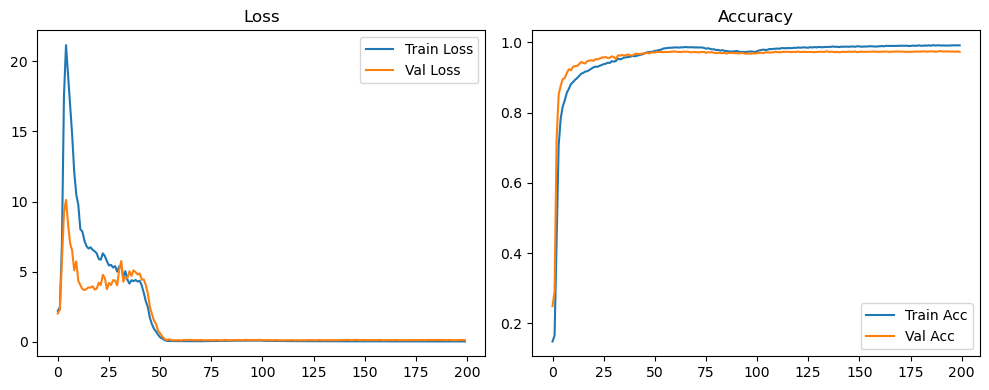

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 28.93it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 29.24it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 28.47it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 28.92it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 29.11it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 29.28it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 29.37it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 29.40it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 29.46it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 29.51it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 29.58it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 29.61it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 29.63it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 29.98it/s]

Original Model Final Test Loss: 0.1000 Accuracy: 0.9785


🚀 Running: batch256_lr0.005_0.005_0.005_dp0.0


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1864 | Val Acc: 0.3439 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1864 | Val Acc: 0.3439 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1864 | Val Acc: 0.3439 |:   0%|          | 1/200 [00:09<30:38,  9.24s/it]

| LR: 0.005 | Train Acc: 0.2809 | Val Acc: 0.4843 |:   0%|          | 1/200 [00:18<30:38,  9.24s/it]

| LR: 0.005 | Train Acc: 0.2809 | Val Acc: 0.4843 |:   0%|          | 1/200 [00:18<30:38,  9.24s/it]

| LR: 0.005 | Train Acc: 0.2809 | Val Acc: 0.4843 |:   1%|          | 2/200 [00:18<30:41,  9.30s/it]

| LR: 0.005 | Train Acc: 0.6868 | Val Acc: 0.8187 |:   1%|          | 2/200 [00:27<30:41,  9.30s/it]

| LR: 0.005 | Train Acc: 0.6868 | Val Acc: 0.8187 |:   1%|          | 2/200 [00:27<30:41,  9.30s/it]

| LR: 0.005 | Train Acc: 0.6868 | Val Acc: 0.8187 |:   2%|▏         | 3/200 [00:27<29:41,  9.04s/it]

| LR: 0.005 | Train Acc: 0.8329 | Val Acc: 0.8508 |:   2%|▏         | 3/200 [00:36<29:41,  9.04s/it]

| LR: 0.005 | Train Acc: 0.8329 | Val Acc: 0.8508 |:   2%|▏         | 3/200 [00:36<29:41,  9.04s/it]

| LR: 0.005 | Train Acc: 0.8329 | Val Acc: 0.8508 |:   2%|▏         | 4/200 [00:36<29:07,  8.92s/it]

| LR: 0.005 | Train Acc: 0.8686 | Val Acc: 0.8814 |:   2%|▏         | 4/200 [00:44<29:07,  8.92s/it]

| LR: 0.005 | Train Acc: 0.8686 | Val Acc: 0.8814 |:   2%|▏         | 4/200 [00:44<29:07,  8.92s/it]

| LR: 0.005 | Train Acc: 0.8686 | Val Acc: 0.8814 |:   2%|▎         | 5/200 [00:44<28:47,  8.86s/it]

| LR: 0.005 | Train Acc: 0.8849 | Val Acc: 0.8873 |:   2%|▎         | 5/200 [00:53<28:47,  8.86s/it]

| LR: 0.005 | Train Acc: 0.8849 | Val Acc: 0.8873 |:   2%|▎         | 5/200 [00:53<28:47,  8.86s/it]

| LR: 0.005 | Train Acc: 0.8849 | Val Acc: 0.8873 |:   3%|▎         | 6/200 [00:53<28:26,  8.80s/it]

| LR: 0.005 | Train Acc: 0.8990 | Val Acc: 0.9006 |:   3%|▎         | 6/200 [01:02<28:26,  8.80s/it]

| LR: 0.005 | Train Acc: 0.8990 | Val Acc: 0.9006 |:   3%|▎         | 6/200 [01:02<28:26,  8.80s/it]

| LR: 0.005 | Train Acc: 0.8990 | Val Acc: 0.9006 |:   4%|▎         | 7/200 [01:02<28:25,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9095 | Val Acc: 0.9032 |:   4%|▎         | 7/200 [01:11<28:25,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9095 | Val Acc: 0.9032 |:   4%|▎         | 7/200 [01:11<28:25,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9095 | Val Acc: 0.9032 |:   4%|▍         | 8/200 [01:11<28:14,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9168 | Val Acc: 0.9044 |:   4%|▍         | 8/200 [01:19<28:14,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9168 | Val Acc: 0.9044 |:   4%|▍         | 8/200 [01:19<28:14,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9168 | Val Acc: 0.9044 |:   4%|▍         | 9/200 [01:19<28:03,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9234 | Val Acc: 0.9195 |:   4%|▍         | 9/200 [01:28<28:03,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9234 | Val Acc: 0.9195 |:   4%|▍         | 9/200 [01:28<28:03,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9234 | Val Acc: 0.9195 |:   5%|▌         | 10/200 [01:28<28:06,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9294 | Val Acc: 0.9226 |:   5%|▌         | 10/200 [01:38<28:06,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9294 | Val Acc: 0.9226 |:   5%|▌         | 10/200 [01:38<28:06,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9294 | Val Acc: 0.9226 |:   6%|▌         | 11/200 [01:38<28:08,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9364 | Val Acc: 0.9200 |:   6%|▌         | 11/200 [01:47<28:08,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9364 | Val Acc: 0.9200 |:   6%|▌         | 11/200 [01:47<28:08,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9364 | Val Acc: 0.9200 |:   6%|▌         | 12/200 [01:47<28:12,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9397 | Val Acc: 0.9246 |:   6%|▌         | 12/200 [01:55<28:12,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9397 | Val Acc: 0.9246 |:   6%|▌         | 12/200 [01:55<28:12,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9397 | Val Acc: 0.9246 |:   6%|▋         | 13/200 [01:55<27:46,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9434 | Val Acc: 0.9338 |:   6%|▋         | 13/200 [02:04<27:46,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9434 | Val Acc: 0.9338 |:   6%|▋         | 13/200 [02:04<27:46,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9434 | Val Acc: 0.9338 |:   7%|▋         | 14/200 [02:04<27:26,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9466 | Val Acc: 0.9365 |:   7%|▋         | 14/200 [02:13<27:26,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9466 | Val Acc: 0.9365 |:   7%|▋         | 14/200 [02:13<27:26,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9466 | Val Acc: 0.9365 |:   8%|▊         | 15/200 [02:13<27:11,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9495 | Val Acc: 0.9392 |:   8%|▊         | 15/200 [02:22<27:11,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9495 | Val Acc: 0.9392 |:   8%|▊         | 15/200 [02:22<27:11,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9495 | Val Acc: 0.9392 |:   8%|▊         | 16/200 [02:22<27:04,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9558 | Val Acc: 0.9354 |:   8%|▊         | 16/200 [02:31<27:04,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9558 | Val Acc: 0.9354 |:   8%|▊         | 16/200 [02:31<27:04,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9558 | Val Acc: 0.9354 |:   8%|▊         | 17/200 [02:31<26:59,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9565 | Val Acc: 0.9440 |:   8%|▊         | 17/200 [02:39<26:59,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9565 | Val Acc: 0.9440 |:   8%|▊         | 17/200 [02:39<26:59,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9565 | Val Acc: 0.9440 |:   9%|▉         | 18/200 [02:39<26:45,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9577 | Val Acc: 0.9448 |:   9%|▉         | 18/200 [02:48<26:45,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9577 | Val Acc: 0.9448 |:   9%|▉         | 18/200 [02:48<26:45,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9577 | Val Acc: 0.9448 |:  10%|▉         | 19/200 [02:48<26:43,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9603 | Val Acc: 0.9440 |:  10%|▉         | 19/200 [02:57<26:43,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9603 | Val Acc: 0.9440 |:  10%|▉         | 19/200 [02:57<26:43,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9603 | Val Acc: 0.9440 |:  10%|█         | 20/200 [02:57<26:44,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9624 | Val Acc: 0.9460 |:  10%|█         | 20/200 [03:06<26:44,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9624 | Val Acc: 0.9460 |:  10%|█         | 20/200 [03:06<26:44,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9624 | Val Acc: 0.9460 |:  10%|█         | 21/200 [03:06<26:24,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9632 | Val Acc: 0.9473 |:  10%|█         | 21/200 [03:15<26:24,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9632 | Val Acc: 0.9473 |:  10%|█         | 21/200 [03:15<26:24,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9632 | Val Acc: 0.9473 |:  11%|█         | 22/200 [03:15<26:14,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9672 | Val Acc: 0.9497 |:  11%|█         | 22/200 [03:24<26:14,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9672 | Val Acc: 0.9497 |:  11%|█         | 22/200 [03:24<26:14,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9672 | Val Acc: 0.9497 |:  12%|█▏        | 23/200 [03:24<26:02,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9504 |:  12%|█▏        | 23/200 [03:32<26:02,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9504 |:  12%|█▏        | 23/200 [03:32<26:02,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9504 |:  12%|█▏        | 24/200 [03:32<25:49,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9704 | Val Acc: 0.9501 |:  12%|█▏        | 24/200 [03:41<25:49,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9704 | Val Acc: 0.9501 |:  12%|█▏        | 24/200 [03:41<25:49,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9704 | Val Acc: 0.9501 |:  12%|█▎        | 25/200 [03:41<25:39,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9715 | Val Acc: 0.9523 |:  12%|█▎        | 25/200 [03:50<25:39,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9715 | Val Acc: 0.9523 |:  12%|█▎        | 25/200 [03:50<25:39,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9715 | Val Acc: 0.9523 |:  13%|█▎        | 26/200 [03:50<25:29,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9724 | Val Acc: 0.9526 |:  13%|█▎        | 26/200 [03:59<25:29,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9724 | Val Acc: 0.9526 |:  13%|█▎        | 26/200 [03:59<25:29,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9724 | Val Acc: 0.9526 |:  14%|█▎        | 27/200 [03:59<25:18,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9758 | Val Acc: 0.9536 |:  14%|█▎        | 27/200 [04:07<25:18,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9758 | Val Acc: 0.9536 |:  14%|█▎        | 27/200 [04:07<25:18,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9758 | Val Acc: 0.9536 |:  14%|█▍        | 28/200 [04:08<25:09,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9756 | Val Acc: 0.9572 |:  14%|█▍        | 28/200 [04:16<25:09,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9756 | Val Acc: 0.9572 |:  14%|█▍        | 28/200 [04:16<25:09,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9756 | Val Acc: 0.9572 |:  14%|█▍        | 29/200 [04:16<24:57,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9537 |:  14%|█▍        | 29/200 [04:25<24:57,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9537 |:  14%|█▍        | 29/200 [04:25<24:57,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9537 |:  15%|█▌        | 30/200 [04:25<24:50,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9752 | Val Acc: 0.9544 |:  15%|█▌        | 30/200 [04:34<24:50,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9752 | Val Acc: 0.9544 |:  15%|█▌        | 30/200 [04:34<24:50,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9752 | Val Acc: 0.9544 |:  16%|█▌        | 31/200 [04:34<24:41,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9738 | Val Acc: 0.9529 |:  16%|█▌        | 31/200 [04:43<24:41,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9738 | Val Acc: 0.9529 |:  16%|█▌        | 31/200 [04:43<24:41,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9738 | Val Acc: 0.9529 |:  16%|█▌        | 32/200 [04:43<24:35,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9790 | Val Acc: 0.9518 |:  16%|█▌        | 32/200 [04:51<24:35,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9790 | Val Acc: 0.9518 |:  16%|█▌        | 32/200 [04:51<24:35,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9790 | Val Acc: 0.9518 |:  16%|█▋        | 33/200 [04:51<24:27,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9797 | Val Acc: 0.9539 |:  16%|█▋        | 33/200 [05:00<24:27,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9797 | Val Acc: 0.9539 |:  16%|█▋        | 33/200 [05:00<24:27,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9797 | Val Acc: 0.9539 |:  17%|█▋        | 34/200 [05:00<24:23,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9567 |:  17%|█▋        | 34/200 [05:09<24:23,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9567 |:  17%|█▋        | 34/200 [05:09<24:23,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9567 |:  18%|█▊        | 35/200 [05:09<24:06,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9569 |:  18%|█▊        | 35/200 [05:18<24:06,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9569 |:  18%|█▊        | 35/200 [05:18<24:06,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9569 |:  18%|█▊        | 36/200 [05:18<24:08,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9515 |:  18%|█▊        | 36/200 [05:27<24:08,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9515 |:  18%|█▊        | 36/200 [05:27<24:08,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9515 |:  18%|█▊        | 37/200 [05:27<23:54,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9803 | Val Acc: 0.9528 |:  18%|█▊        | 37/200 [05:36<23:54,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9803 | Val Acc: 0.9528 |:  18%|█▊        | 37/200 [05:36<23:54,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9803 | Val Acc: 0.9528 |:  19%|█▉        | 38/200 [05:36<23:50,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9507 |:  19%|█▉        | 38/200 [05:44<23:50,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9507 |:  19%|█▉        | 38/200 [05:44<23:50,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9507 |:  20%|█▉        | 39/200 [05:44<23:36,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9551 |:  20%|█▉        | 39/200 [05:53<23:36,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9551 |:  20%|█▉        | 39/200 [05:53<23:36,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9551 |:  20%|██        | 40/200 [05:53<23:22,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9514 |:  20%|██        | 40/200 [06:02<23:22,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9514 |:  20%|██        | 40/200 [06:02<23:22,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9514 |:  20%|██        | 41/200 [06:02<23:14,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9593 |:  20%|██        | 41/200 [06:11<23:14,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9593 |:  20%|██        | 41/200 [06:11<23:14,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9593 |:  21%|██        | 42/200 [06:11<23:18,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9847 | Val Acc: 0.9573 |:  21%|██        | 42/200 [06:20<23:18,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9847 | Val Acc: 0.9573 |:  21%|██        | 42/200 [06:20<23:18,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9847 | Val Acc: 0.9573 |:  22%|██▏       | 43/200 [06:20<23:25,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9848 | Val Acc: 0.9557 |:  22%|██▏       | 43/200 [06:29<23:25,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9848 | Val Acc: 0.9557 |:  22%|██▏       | 43/200 [06:29<23:25,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9848 | Val Acc: 0.9557 |:  22%|██▏       | 44/200 [06:29<23:10,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9529 |:  22%|██▏       | 44/200 [06:37<23:10,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9529 |:  22%|██▏       | 44/200 [06:37<23:10,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9529 |:  22%|██▎       | 45/200 [06:38<22:51,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9861 | Val Acc: 0.9608 |:  22%|██▎       | 45/200 [06:46<22:51,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9861 | Val Acc: 0.9608 |:  22%|██▎       | 45/200 [06:46<22:51,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9861 | Val Acc: 0.9608 |:  23%|██▎       | 46/200 [06:46<22:47,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9863 | Val Acc: 0.9552 |:  23%|██▎       | 46/200 [06:56<22:47,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9863 | Val Acc: 0.9552 |:  23%|██▎       | 46/200 [06:56<22:47,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9863 | Val Acc: 0.9552 |:  24%|██▎       | 47/200 [06:56<22:57,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9617 |:  24%|██▎       | 47/200 [07:04<22:57,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9617 |:  24%|██▎       | 47/200 [07:04<22:57,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9617 |:  24%|██▍       | 48/200 [07:04<22:31,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9881 | Val Acc: 0.9621 |:  24%|██▍       | 48/200 [07:14<22:31,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9881 | Val Acc: 0.9621 |:  24%|██▍       | 48/200 [07:14<22:31,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9881 | Val Acc: 0.9621 |:  24%|██▍       | 49/200 [07:14<22:51,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9871 | Val Acc: 0.9607 |:  24%|██▍       | 49/200 [07:23<22:51,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9871 | Val Acc: 0.9607 |:  24%|██▍       | 49/200 [07:23<22:51,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9871 | Val Acc: 0.9607 |:  25%|██▌       | 50/200 [07:23<22:34,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9642 |:  25%|██▌       | 50/200 [07:31<22:34,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9642 |:  25%|██▌       | 50/200 [07:31<22:34,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9642 |:  26%|██▌       | 51/200 [07:32<22:11,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9600 |:  26%|██▌       | 51/200 [07:41<22:11,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9600 |:  26%|██▌       | 51/200 [07:41<22:11,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9600 |:  26%|██▌       | 52/200 [07:41<22:26,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9642 |:  26%|██▌       | 52/200 [07:51<22:26,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9642 |:  26%|██▌       | 52/200 [07:51<22:26,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9642 |:  26%|██▋       | 53/200 [07:51<22:40,  9.25s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9599 |:  26%|██▋       | 53/200 [07:59<22:40,  9.25s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9599 |:  26%|██▋       | 53/200 [07:59<22:40,  9.25s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9599 |:  27%|██▋       | 54/200 [07:59<22:13,  9.14s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9645 |:  27%|██▋       | 54/200 [08:08<22:13,  9.14s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9645 |:  27%|██▋       | 54/200 [08:08<22:13,  9.14s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9645 |:  28%|██▊       | 55/200 [08:08<21:46,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9915 | Val Acc: 0.9608 |:  28%|██▊       | 55/200 [08:17<21:46,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9915 | Val Acc: 0.9608 |:  28%|██▊       | 55/200 [08:17<21:46,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9915 | Val Acc: 0.9608 |:  28%|██▊       | 56/200 [08:17<21:31,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9607 |:  28%|██▊       | 56/200 [08:26<21:31,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9607 |:  28%|██▊       | 56/200 [08:26<21:31,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9607 |:  28%|██▊       | 57/200 [08:26<21:16,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9636 |:  28%|██▊       | 57/200 [08:35<21:16,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9636 |:  28%|██▊       | 57/200 [08:35<21:16,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9636 |:  29%|██▉       | 58/200 [08:35<20:57,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9897 | Val Acc: 0.9587 |:  29%|██▉       | 58/200 [08:43<20:57,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9897 | Val Acc: 0.9587 |:  29%|██▉       | 58/200 [08:43<20:57,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9897 | Val Acc: 0.9587 |:  30%|██▉       | 59/200 [08:43<20:50,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9886 | Val Acc: 0.9618 |:  30%|██▉       | 59/200 [08:52<20:50,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9886 | Val Acc: 0.9618 |:  30%|██▉       | 59/200 [08:52<20:50,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9886 | Val Acc: 0.9618 |:  30%|███       | 60/200 [08:52<20:45,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9595 |:  30%|███       | 60/200 [09:01<20:45,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9595 |:  30%|███       | 60/200 [09:01<20:45,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9595 |:  30%|███       | 61/200 [09:01<20:30,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9625 |:  30%|███       | 61/200 [09:10<20:30,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9625 |:  30%|███       | 61/200 [09:10<20:30,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9625 |:  31%|███       | 62/200 [09:10<20:12,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9897 | Val Acc: 0.9629 |:  31%|███       | 62/200 [09:19<20:12,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9897 | Val Acc: 0.9629 |:  31%|███       | 62/200 [09:19<20:12,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9897 | Val Acc: 0.9629 |:  32%|███▏      | 63/200 [09:19<20:13,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9639 |:  32%|███▏      | 63/200 [09:28<20:13,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9639 |:  32%|███▏      | 63/200 [09:28<20:13,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9639 |:  32%|███▏      | 64/200 [09:28<19:57,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9677 |:  32%|███▏      | 64/200 [09:36<19:57,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9677 |:  32%|███▏      | 64/200 [09:36<19:57,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9677 |:  32%|███▎      | 65/200 [09:37<19:55,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9691 |:  32%|███▎      | 65/200 [09:45<19:55,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9691 |:  32%|███▎      | 65/200 [09:45<19:55,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9691 |:  33%|███▎      | 66/200 [09:45<19:45,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9664 |:  33%|███▎      | 66/200 [09:54<19:45,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9664 |:  33%|███▎      | 66/200 [09:54<19:45,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9664 |:  34%|███▎      | 67/200 [09:54<19:30,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9665 |:  34%|███▎      | 67/200 [10:03<19:30,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9665 |:  34%|███▎      | 67/200 [10:03<19:30,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9665 |:  34%|███▍      | 68/200 [10:03<19:22,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9683 |:  34%|███▍      | 68/200 [10:12<19:22,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9683 |:  34%|███▍      | 68/200 [10:12<19:22,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9683 |:  34%|███▍      | 69/200 [10:12<19:13,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9681 |:  34%|███▍      | 69/200 [10:21<19:13,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9681 |:  34%|███▍      | 69/200 [10:21<19:13,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9681 |:  35%|███▌      | 70/200 [10:21<19:13,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9681 |:  35%|███▌      | 70/200 [10:29<19:13,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9681 |:  35%|███▌      | 70/200 [10:29<19:13,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9681 |:  36%|███▌      | 71/200 [10:29<18:59,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9673 |:  36%|███▌      | 71/200 [10:38<18:59,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9673 |:  36%|███▌      | 71/200 [10:38<18:59,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9673 |:  36%|███▌      | 72/200 [10:38<18:50,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9683 |:  36%|███▌      | 72/200 [10:47<18:50,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9683 |:  36%|███▌      | 72/200 [10:47<18:50,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9683 |:  36%|███▋      | 73/200 [10:47<18:37,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9653 |:  36%|███▋      | 73/200 [10:56<18:37,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9653 |:  36%|███▋      | 73/200 [10:56<18:37,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9653 |:  37%|███▋      | 74/200 [10:56<18:27,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9663 |:  37%|███▋      | 74/200 [11:05<18:27,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9663 |:  37%|███▋      | 74/200 [11:05<18:27,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9663 |:  38%|███▊      | 75/200 [11:05<18:25,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9623 |:  38%|███▊      | 75/200 [11:13<18:25,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9623 |:  38%|███▊      | 75/200 [11:13<18:25,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9623 |:  38%|███▊      | 76/200 [11:13<18:13,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9679 |:  38%|███▊      | 76/200 [11:22<18:13,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9679 |:  38%|███▊      | 76/200 [11:22<18:13,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9679 |:  38%|███▊      | 77/200 [11:22<18:07,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9662 |:  38%|███▊      | 77/200 [11:31<18:07,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9662 |:  38%|███▊      | 77/200 [11:31<18:07,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9662 |:  39%|███▉      | 78/200 [11:31<18:03,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9663 |:  39%|███▉      | 78/200 [11:40<18:03,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9663 |:  39%|███▉      | 78/200 [11:40<18:03,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9663 |:  40%|███▉      | 79/200 [11:40<17:50,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9668 |:  40%|███▉      | 79/200 [11:49<17:50,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9668 |:  40%|███▉      | 79/200 [11:49<17:50,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9668 |:  40%|████      | 80/200 [11:49<17:38,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9690 |:  40%|████      | 80/200 [11:58<17:38,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9690 |:  40%|████      | 80/200 [11:58<17:38,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9690 |:  40%|████      | 81/200 [11:58<17:34,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9697 |:  40%|████      | 81/200 [12:07<17:34,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9697 |:  40%|████      | 81/200 [12:07<17:34,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9697 |:  41%|████      | 82/200 [12:07<17:22,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9704 |:  41%|████      | 82/200 [12:15<17:22,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9704 |:  41%|████      | 82/200 [12:15<17:22,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9704 |:  42%|████▏     | 83/200 [12:15<17:10,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9688 |:  42%|████▏     | 83/200 [12:24<17:10,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9688 |:  42%|████▏     | 83/200 [12:24<17:10,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9688 |:  42%|████▏     | 84/200 [12:24<17:03,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9656 |:  42%|████▏     | 84/200 [12:33<17:03,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9656 |:  42%|████▏     | 84/200 [12:33<17:03,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9656 |:  42%|████▎     | 85/200 [12:33<16:58,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9719 |:  42%|████▎     | 85/200 [12:42<16:58,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9719 |:  42%|████▎     | 85/200 [12:42<16:58,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9719 |:  43%|████▎     | 86/200 [12:42<16:49,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9677 |:  43%|████▎     | 86/200 [12:51<16:49,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9677 |:  43%|████▎     | 86/200 [12:51<16:49,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9677 |:  44%|████▎     | 87/200 [12:51<16:35,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9710 |:  44%|████▎     | 87/200 [12:59<16:35,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9710 |:  44%|████▎     | 87/200 [12:59<16:35,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9710 |:  44%|████▍     | 88/200 [12:59<16:19,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9720 |:  44%|████▍     | 88/200 [13:08<16:19,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9720 |:  44%|████▍     | 88/200 [13:08<16:19,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9720 |:  44%|████▍     | 89/200 [13:08<16:10,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9687 |:  44%|████▍     | 89/200 [13:17<16:10,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9687 |:  44%|████▍     | 89/200 [13:17<16:10,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9687 |:  45%|████▌     | 90/200 [13:17<16:10,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9708 |:  45%|████▌     | 90/200 [13:26<16:10,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9708 |:  45%|████▌     | 90/200 [13:26<16:10,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9708 |:  46%|████▌     | 91/200 [13:26<16:03,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9708 |:  46%|████▌     | 91/200 [13:35<16:03,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9708 |:  46%|████▌     | 91/200 [13:35<16:03,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9708 |:  46%|████▌     | 92/200 [13:35<15:52,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9708 |:  46%|████▌     | 92/200 [13:43<15:52,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9708 |:  46%|████▌     | 92/200 [13:43<15:52,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9708 |:  46%|████▋     | 93/200 [13:44<15:44,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9675 |:  46%|████▋     | 93/200 [13:53<15:44,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9675 |:  46%|████▋     | 93/200 [13:53<15:44,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9675 |:  47%|████▋     | 94/200 [13:53<15:48,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9664 |:  47%|████▋     | 94/200 [14:02<15:48,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9664 |:  47%|████▋     | 94/200 [14:02<15:48,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9664 |:  48%|████▊     | 95/200 [14:02<15:43,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9702 |:  48%|████▊     | 95/200 [14:11<15:43,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9702 |:  48%|████▊     | 95/200 [14:11<15:43,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9702 |:  48%|████▊     | 96/200 [14:11<15:28,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9666 |:  48%|████▊     | 96/200 [14:19<15:28,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9666 |:  48%|████▊     | 96/200 [14:19<15:28,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9666 |:  48%|████▊     | 97/200 [14:19<15:14,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9720 |:  48%|████▊     | 97/200 [14:28<15:14,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9720 |:  48%|████▊     | 97/200 [14:28<15:14,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9720 |:  49%|████▉     | 98/200 [14:28<15:02,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9698 |:  49%|████▉     | 98/200 [14:37<15:02,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9698 |:  49%|████▉     | 98/200 [14:37<15:02,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9698 |:  50%|████▉     | 99/200 [14:37<14:52,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9664 |:  50%|████▉     | 99/200 [14:46<14:52,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9664 |:  50%|████▉     | 99/200 [14:46<14:52,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9664 |:  50%|█████     | 100/200 [14:46<14:45,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9642 |:  50%|█████     | 100/200 [14:54<14:45,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9642 |:  50%|█████     | 100/200 [14:54<14:45,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9642 |:  50%|█████     | 101/200 [14:55<14:30,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9678 |:  50%|█████     | 101/200 [15:03<14:30,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9678 |:  50%|█████     | 101/200 [15:03<14:30,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9678 |:  51%|█████     | 102/200 [15:03<14:19,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9708 |:  51%|█████     | 102/200 [15:12<14:19,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9708 |:  51%|█████     | 102/200 [15:12<14:19,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9708 |:  52%|█████▏    | 103/200 [15:12<14:14,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9709 |:  52%|█████▏    | 103/200 [15:21<14:14,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9709 |:  52%|█████▏    | 103/200 [15:21<14:14,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9709 |:  52%|█████▏    | 104/200 [15:21<14:03,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9975 | Val Acc: 0.9700 |:  52%|█████▏    | 104/200 [15:30<14:03,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9975 | Val Acc: 0.9700 |:  52%|█████▏    | 104/200 [15:30<14:03,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9975 | Val Acc: 0.9700 |:  52%|█████▎    | 105/200 [15:30<13:54,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9703 |:  52%|█████▎    | 105/200 [15:39<13:54,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9703 |:  52%|█████▎    | 105/200 [15:39<13:54,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9703 |:  53%|█████▎    | 106/200 [15:39<14:08,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9693 |:  53%|█████▎    | 106/200 [15:48<14:08,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9693 |:  53%|█████▎    | 106/200 [15:48<14:08,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9693 |:  54%|█████▎    | 107/200 [15:49<14:05,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9708 |:  54%|█████▎    | 107/200 [15:58<14:05,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9708 |:  54%|█████▎    | 107/200 [15:58<14:05,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9708 |:  54%|█████▍    | 108/200 [15:58<13:55,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9713 |:  54%|█████▍    | 108/200 [16:06<13:55,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9713 |:  54%|█████▍    | 108/200 [16:06<13:55,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9713 |:  55%|█████▍    | 109/200 [16:06<13:38,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9693 |:  55%|█████▍    | 109/200 [16:15<13:38,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9693 |:  55%|█████▍    | 109/200 [16:15<13:38,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9693 |:  55%|█████▌    | 110/200 [16:15<13:23,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9694 |:  55%|█████▌    | 110/200 [16:24<13:23,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9694 |:  55%|█████▌    | 110/200 [16:24<13:23,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9694 |:  56%|█████▌    | 111/200 [16:24<13:13,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9675 |:  56%|█████▌    | 111/200 [16:33<13:13,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9675 |:  56%|█████▌    | 111/200 [16:33<13:13,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9675 |:  56%|█████▌    | 112/200 [16:33<13:00,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9702 |:  56%|█████▌    | 112/200 [16:41<13:00,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9702 |:  56%|█████▌    | 112/200 [16:41<13:00,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9702 |:  56%|█████▋    | 113/200 [16:41<12:47,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9676 |:  56%|█████▋    | 113/200 [16:50<12:47,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9676 |:  56%|█████▋    | 113/200 [16:50<12:47,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9676 |:  57%|█████▋    | 114/200 [16:50<12:39,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9687 |:  57%|█████▋    | 114/200 [16:59<12:39,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9687 |:  57%|█████▋    | 114/200 [16:59<12:39,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9687 |:  57%|█████▊    | 115/200 [16:59<12:31,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9701 |:  57%|█████▊    | 115/200 [17:08<12:31,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9701 |:  57%|█████▊    | 115/200 [17:08<12:31,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9701 |:  58%|█████▊    | 116/200 [17:08<12:28,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9677 |:  58%|█████▊    | 116/200 [17:17<12:28,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9677 |:  58%|█████▊    | 116/200 [17:17<12:28,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9677 |:  58%|█████▊    | 117/200 [17:17<12:23,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9694 |:  58%|█████▊    | 117/200 [17:26<12:23,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9694 |:  58%|█████▊    | 117/200 [17:26<12:23,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9694 |:  59%|█████▉    | 118/200 [17:26<12:15,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9698 |:  59%|█████▉    | 118/200 [17:35<12:15,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9698 |:  59%|█████▉    | 118/200 [17:35<12:15,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9698 |:  60%|█████▉    | 119/200 [17:35<12:01,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9660 |:  60%|█████▉    | 119/200 [17:44<12:01,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9660 |:  60%|█████▉    | 119/200 [17:44<12:01,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9660 |:  60%|██████    | 120/200 [17:44<11:50,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9686 |:  60%|██████    | 120/200 [17:53<11:50,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9686 |:  60%|██████    | 120/200 [17:53<11:50,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9686 |:  60%|██████    | 121/200 [17:53<11:40,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9675 |:  60%|██████    | 121/200 [18:02<11:40,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9675 |:  60%|██████    | 121/200 [18:02<11:40,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9675 |:  61%|██████    | 122/200 [18:02<11:30,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9686 |:  61%|██████    | 122/200 [18:10<11:30,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9686 |:  61%|██████    | 122/200 [18:10<11:30,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9686 |:  62%|██████▏   | 123/200 [18:10<11:20,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9719 |:  62%|██████▏   | 123/200 [18:19<11:20,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9719 |:  62%|██████▏   | 123/200 [18:19<11:20,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9719 |:  62%|██████▏   | 124/200 [18:19<11:13,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9691 |:  62%|██████▏   | 124/200 [18:28<11:13,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9691 |:  62%|██████▏   | 124/200 [18:28<11:13,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9691 |:  62%|██████▎   | 125/200 [18:28<11:02,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9698 |:  62%|██████▎   | 125/200 [18:37<11:02,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9698 |:  62%|██████▎   | 125/200 [18:37<11:02,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9698 |:  63%|██████▎   | 126/200 [18:37<10:52,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9687 |:  63%|██████▎   | 126/200 [18:46<10:52,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9687 |:  63%|██████▎   | 126/200 [18:46<10:52,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9687 |:  64%|██████▎   | 127/200 [18:46<10:43,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9692 |:  64%|██████▎   | 127/200 [18:55<10:43,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9692 |:  64%|██████▎   | 127/200 [18:55<10:43,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9692 |:  64%|██████▍   | 128/200 [18:55<10:36,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9702 |:  64%|██████▍   | 128/200 [19:03<10:36,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9702 |:  64%|██████▍   | 128/200 [19:03<10:36,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9702 |:  64%|██████▍   | 129/200 [19:03<10:24,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9709 |:  64%|██████▍   | 129/200 [19:12<10:24,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9709 |:  64%|██████▍   | 129/200 [19:12<10:24,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9709 |:  65%|██████▌   | 130/200 [19:12<10:15,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9698 |:  65%|██████▌   | 130/200 [19:21<10:15,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9698 |:  65%|██████▌   | 130/200 [19:21<10:15,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9698 |:  66%|██████▌   | 131/200 [19:21<10:04,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9665 |:  66%|██████▌   | 131/200 [19:30<10:04,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9665 |:  66%|██████▌   | 131/200 [19:30<10:04,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9665 |:  66%|██████▌   | 132/200 [19:30<09:58,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9688 |:  66%|██████▌   | 132/200 [19:38<09:58,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9688 |:  66%|██████▌   | 132/200 [19:38<09:58,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9688 |:  66%|██████▋   | 133/200 [19:38<09:51,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9704 |:  66%|██████▋   | 133/200 [19:47<09:51,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9704 |:  66%|██████▋   | 133/200 [19:47<09:51,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9704 |:  67%|██████▋   | 134/200 [19:47<09:42,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9688 |:  67%|██████▋   | 134/200 [19:56<09:42,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9688 |:  67%|██████▋   | 134/200 [19:56<09:42,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9688 |:  68%|██████▊   | 135/200 [19:56<09:32,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9708 |:  68%|██████▊   | 135/200 [20:05<09:32,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9708 |:  68%|██████▊   | 135/200 [20:05<09:32,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9977 | Val Acc: 0.9708 |:  68%|██████▊   | 136/200 [20:05<09:22,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9691 |:  68%|██████▊   | 136/200 [20:14<09:22,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9691 |:  68%|██████▊   | 136/200 [20:14<09:22,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9691 |:  68%|██████▊   | 137/200 [20:14<09:13,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9705 |:  68%|██████▊   | 137/200 [20:23<09:13,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9705 |:  68%|██████▊   | 137/200 [20:23<09:13,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9705 |:  69%|██████▉   | 138/200 [20:23<09:07,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9715 |:  69%|██████▉   | 138/200 [20:31<09:07,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9715 |:  69%|██████▉   | 138/200 [20:31<09:07,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9715 |:  70%|██████▉   | 139/200 [20:31<08:57,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9692 |:  70%|██████▉   | 139/200 [20:40<08:57,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9692 |:  70%|██████▉   | 139/200 [20:40<08:57,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9692 |:  70%|███████   | 140/200 [20:40<08:49,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9697 |:  70%|███████   | 140/200 [20:49<08:49,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9697 |:  70%|███████   | 140/200 [20:49<08:49,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9697 |:  70%|███████   | 141/200 [20:49<08:46,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9718 |:  70%|███████   | 141/200 [20:58<08:46,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9718 |:  70%|███████   | 141/200 [20:58<08:46,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9718 |:  71%|███████   | 142/200 [20:58<08:37,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9706 |:  71%|███████   | 142/200 [21:07<08:37,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9706 |:  71%|███████   | 142/200 [21:07<08:37,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9706 |:  72%|███████▏  | 143/200 [21:07<08:25,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9677 |:  72%|███████▏  | 143/200 [21:16<08:25,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9677 |:  72%|███████▏  | 143/200 [21:16<08:25,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9677 |:  72%|███████▏  | 144/200 [21:16<08:16,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9712 |:  72%|███████▏  | 144/200 [21:25<08:16,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9712 |:  72%|███████▏  | 144/200 [21:25<08:16,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9712 |:  72%|███████▎  | 145/200 [21:25<08:05,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9714 |:  72%|███████▎  | 145/200 [21:34<08:05,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9714 |:  72%|███████▎  | 145/200 [21:34<08:05,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9714 |:  73%|███████▎  | 146/200 [21:34<08:03,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9678 |:  73%|███████▎  | 146/200 [21:42<08:03,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9678 |:  73%|███████▎  | 146/200 [21:42<08:03,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9678 |:  74%|███████▎  | 147/200 [21:43<07:50,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9714 |:  74%|███████▎  | 147/200 [21:51<07:50,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9714 |:  74%|███████▎  | 147/200 [21:51<07:50,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9714 |:  74%|███████▍  | 148/200 [21:51<07:41,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9713 |:  74%|███████▍  | 148/200 [22:00<07:41,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9713 |:  74%|███████▍  | 148/200 [22:00<07:41,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9713 |:  74%|███████▍  | 149/200 [22:00<07:31,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9716 |:  74%|███████▍  | 149/200 [22:10<07:31,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9716 |:  74%|███████▍  | 149/200 [22:10<07:31,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9716 |:  75%|███████▌  | 150/200 [22:10<07:34,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9695 |:  75%|███████▌  | 150/200 [22:19<07:34,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9695 |:  75%|███████▌  | 150/200 [22:19<07:34,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9695 |:  76%|███████▌  | 151/200 [22:19<07:19,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9720 |:  76%|███████▌  | 151/200 [22:27<07:19,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9720 |:  76%|███████▌  | 151/200 [22:27<07:19,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9720 |:  76%|███████▌  | 152/200 [22:27<07:06,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9709 |:  76%|███████▌  | 152/200 [22:36<07:06,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9709 |:  76%|███████▌  | 152/200 [22:36<07:06,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9709 |:  76%|███████▋  | 153/200 [22:36<06:55,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9699 |:  76%|███████▋  | 153/200 [22:45<06:55,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9699 |:  76%|███████▋  | 153/200 [22:45<06:55,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9699 |:  77%|███████▋  | 154/200 [22:45<06:47,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9708 |:  77%|███████▋  | 154/200 [22:54<06:47,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9708 |:  77%|███████▋  | 154/200 [22:54<06:47,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9708 |:  78%|███████▊  | 155/200 [22:54<06:38,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9706 |:  78%|███████▊  | 155/200 [23:02<06:38,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9706 |:  78%|███████▊  | 155/200 [23:02<06:38,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9706 |:  78%|███████▊  | 156/200 [23:03<06:29,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9694 |:  78%|███████▊  | 156/200 [23:11<06:29,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9694 |:  78%|███████▊  | 156/200 [23:11<06:29,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9694 |:  78%|███████▊  | 157/200 [23:11<06:17,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9711 |:  78%|███████▊  | 157/200 [23:20<06:17,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9711 |:  78%|███████▊  | 157/200 [23:20<06:17,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9972 | Val Acc: 0.9711 |:  79%|███████▉  | 158/200 [23:20<06:07,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9711 |:  79%|███████▉  | 158/200 [23:29<06:07,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9711 |:  79%|███████▉  | 158/200 [23:29<06:07,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9711 |:  80%|███████▉  | 159/200 [23:29<05:58,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9681 |:  80%|███████▉  | 159/200 [23:37<05:58,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9681 |:  80%|███████▉  | 159/200 [23:37<05:58,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9681 |:  80%|████████  | 160/200 [23:37<05:49,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9724 |:  80%|████████  | 160/200 [23:46<05:49,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9724 |:  80%|████████  | 160/200 [23:46<05:49,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9724 |:  80%|████████  | 161/200 [23:46<05:40,  8.73s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9708 |:  80%|████████  | 161/200 [23:55<05:40,  8.73s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9708 |:  80%|████████  | 161/200 [23:55<05:40,  8.73s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9708 |:  81%|████████  | 162/200 [23:55<05:32,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9716 |:  81%|████████  | 162/200 [24:04<05:32,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9716 |:  81%|████████  | 162/200 [24:04<05:32,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9716 |:  82%|████████▏ | 163/200 [24:04<05:24,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9700 |:  82%|████████▏ | 163/200 [24:12<05:24,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9700 |:  82%|████████▏ | 163/200 [24:12<05:24,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9700 |:  82%|████████▏ | 164/200 [24:12<05:16,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9694 |:  82%|████████▏ | 164/200 [24:21<05:16,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9694 |:  82%|████████▏ | 164/200 [24:21<05:16,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9694 |:  82%|████████▎ | 165/200 [24:21<05:07,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9728 |:  82%|████████▎ | 165/200 [24:30<05:07,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9728 |:  82%|████████▎ | 165/200 [24:30<05:07,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9728 |:  83%|████████▎ | 166/200 [24:30<04:58,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9712 |:  83%|████████▎ | 166/200 [24:39<04:58,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9712 |:  83%|████████▎ | 166/200 [24:39<04:58,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9712 |:  84%|████████▎ | 167/200 [24:39<04:48,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9670 |:  84%|████████▎ | 167/200 [24:47<04:48,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9670 |:  84%|████████▎ | 167/200 [24:47<04:48,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9670 |:  84%|████████▍ | 168/200 [24:47<04:39,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9713 |:  84%|████████▍ | 168/200 [24:56<04:39,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9713 |:  84%|████████▍ | 168/200 [24:56<04:39,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9713 |:  84%|████████▍ | 169/200 [24:56<04:30,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9736 |:  84%|████████▍ | 169/200 [25:05<04:30,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9736 |:  84%|████████▍ | 169/200 [25:05<04:30,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9736 |:  85%|████████▌ | 170/200 [25:05<04:22,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9697 |:  85%|████████▌ | 170/200 [25:14<04:22,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9697 |:  85%|████████▌ | 170/200 [25:14<04:22,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9697 |:  86%|████████▌ | 171/200 [25:14<04:20,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9719 |:  86%|████████▌ | 171/200 [25:23<04:20,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9719 |:  86%|████████▌ | 171/200 [25:23<04:20,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9719 |:  86%|████████▌ | 172/200 [25:23<04:12,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9703 |:  86%|████████▌ | 172/200 [25:32<04:12,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9703 |:  86%|████████▌ | 172/200 [25:32<04:12,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9703 |:  86%|████████▋ | 173/200 [25:33<04:03,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9713 |:  86%|████████▋ | 173/200 [25:41<04:03,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9713 |:  86%|████████▋ | 173/200 [25:41<04:03,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9713 |:  87%|████████▋ | 174/200 [25:41<03:54,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9679 |:  87%|████████▋ | 174/200 [25:50<03:54,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9679 |:  87%|████████▋ | 174/200 [25:50<03:54,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9989 | Val Acc: 0.9679 |:  88%|████████▊ | 175/200 [25:50<03:44,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9688 |:  88%|████████▊ | 175/200 [25:59<03:44,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9688 |:  88%|████████▊ | 175/200 [25:59<03:44,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9688 |:  88%|████████▊ | 176/200 [25:59<03:33,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9692 |:  88%|████████▊ | 176/200 [26:08<03:33,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9692 |:  88%|████████▊ | 176/200 [26:08<03:33,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9692 |:  88%|████████▊ | 177/200 [26:08<03:24,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9722 |:  88%|████████▊ | 177/200 [26:17<03:24,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9722 |:  88%|████████▊ | 177/200 [26:17<03:24,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9722 |:  89%|████████▉ | 178/200 [26:17<03:14,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9691 |:  89%|████████▉ | 178/200 [26:26<03:14,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9691 |:  89%|████████▉ | 178/200 [26:26<03:14,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9691 |:  90%|████████▉ | 179/200 [26:26<03:05,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9709 |:  90%|████████▉ | 179/200 [26:34<03:05,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9709 |:  90%|████████▉ | 179/200 [26:34<03:05,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9709 |:  90%|█████████ | 180/200 [26:34<02:56,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9685 |:  90%|█████████ | 180/200 [26:43<02:56,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9685 |:  90%|█████████ | 180/200 [26:43<02:56,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9983 | Val Acc: 0.9685 |:  90%|█████████ | 181/200 [26:43<02:49,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9988 | Val Acc: 0.9710 |:  90%|█████████ | 181/200 [26:52<02:49,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9988 | Val Acc: 0.9710 |:  90%|█████████ | 181/200 [26:52<02:49,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9988 | Val Acc: 0.9710 |:  91%|█████████ | 182/200 [26:52<02:39,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9988 | Val Acc: 0.9711 |:  91%|█████████ | 182/200 [27:01<02:39,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9988 | Val Acc: 0.9711 |:  91%|█████████ | 182/200 [27:01<02:39,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9988 | Val Acc: 0.9711 |:  92%|█████████▏| 183/200 [27:01<02:31,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9718 |:  92%|█████████▏| 183/200 [27:11<02:31,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9718 |:  92%|█████████▏| 183/200 [27:11<02:31,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9718 |:  92%|█████████▏| 184/200 [27:11<02:26,  9.13s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9735 |:  92%|█████████▏| 184/200 [27:20<02:26,  9.13s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9735 |:  92%|█████████▏| 184/200 [27:20<02:26,  9.13s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9735 |:  92%|█████████▎| 185/200 [27:20<02:15,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9991 | Val Acc: 0.9721 |:  92%|█████████▎| 185/200 [27:29<02:15,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9991 | Val Acc: 0.9721 |:  92%|█████████▎| 185/200 [27:29<02:15,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9991 | Val Acc: 0.9721 |:  93%|█████████▎| 186/200 [27:29<02:05,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9711 |:  93%|█████████▎| 186/200 [27:37<02:05,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9711 |:  93%|█████████▎| 186/200 [27:37<02:05,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9711 |:  94%|█████████▎| 187/200 [27:38<01:56,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9714 |:  94%|█████████▎| 187/200 [27:46<01:56,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9714 |:  94%|█████████▎| 187/200 [27:46<01:56,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9714 |:  94%|█████████▍| 188/200 [27:46<01:47,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9716 |:  94%|█████████▍| 188/200 [27:55<01:47,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9716 |:  94%|█████████▍| 188/200 [27:55<01:47,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9716 |:  94%|█████████▍| 189/200 [27:55<01:37,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9716 |:  94%|█████████▍| 189/200 [28:04<01:37,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9716 |:  94%|█████████▍| 189/200 [28:04<01:37,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9716 |:  95%|█████████▌| 190/200 [28:04<01:28,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9696 |:  95%|█████████▌| 190/200 [28:13<01:28,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9696 |:  95%|█████████▌| 190/200 [28:13<01:28,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9696 |:  96%|█████████▌| 191/200 [28:13<01:19,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9692 |:  96%|█████████▌| 191/200 [28:22<01:19,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9692 |:  96%|█████████▌| 191/200 [28:22<01:19,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9692 |:  96%|█████████▌| 192/200 [28:22<01:10,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9684 |:  96%|█████████▌| 192/200 [28:31<01:10,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9684 |:  96%|█████████▌| 192/200 [28:31<01:10,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9684 |:  96%|█████████▋| 193/200 [28:31<01:01,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9720 |:  96%|█████████▋| 193/200 [28:39<01:01,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9720 |:  96%|█████████▋| 193/200 [28:39<01:01,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9720 |:  97%|█████████▋| 194/200 [28:39<00:52,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9721 |:  97%|█████████▋| 194/200 [28:48<00:52,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9721 |:  97%|█████████▋| 194/200 [28:48<00:52,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9721 |:  98%|█████████▊| 195/200 [28:48<00:44,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9698 |:  98%|█████████▊| 195/200 [28:57<00:44,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9698 |:  98%|█████████▊| 195/200 [28:57<00:44,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9987 | Val Acc: 0.9698 |:  98%|█████████▊| 196/200 [28:57<00:35,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9703 |:  98%|█████████▊| 196/200 [29:07<00:35,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9703 |:  98%|█████████▊| 196/200 [29:07<00:35,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9985 | Val Acc: 0.9703 |:  98%|█████████▊| 197/200 [29:07<00:27,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9695 |:  98%|█████████▊| 197/200 [29:15<00:27,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9695 |:  98%|█████████▊| 197/200 [29:15<00:27,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9981 | Val Acc: 0.9695 |:  99%|█████████▉| 198/200 [29:15<00:17,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9702 |:  99%|█████████▉| 198/200 [29:24<00:17,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9702 |:  99%|█████████▉| 198/200 [29:24<00:17,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9986 | Val Acc: 0.9702 |: 100%|█████████▉| 199/200 [29:24<00:08,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9988 | Val Acc: 0.9704 |: 100%|█████████▉| 199/200 [29:33<00:08,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9988 | Val Acc: 0.9704 |: 100%|█████████▉| 199/200 [29:33<00:08,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9988 | Val Acc: 0.9704 |: 100%|██████████| 200/200 [29:33<00:00,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9988 | Val Acc: 0.9704 |: 100%|██████████| 200/200 [29:33<00:00,  8.87s/it]

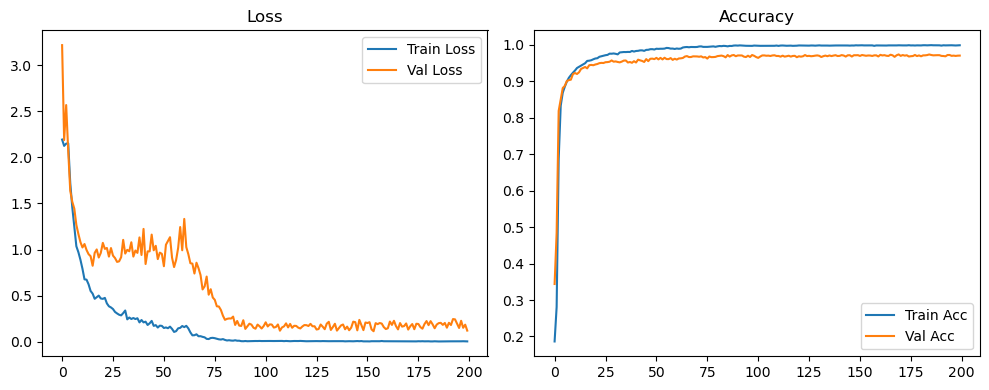

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 29.21it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 29.42it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 28.95it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 28.69it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 28.56it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 28.46it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 28.44it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 28.42it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 28.41it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 28.45it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 28.29it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 27.96it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 28.03it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 28.97it/s]

Original Model Final Test Loss: 0.1113 Accuracy: 0.9705


🚀 Running: batch256_lr0.005_0.005_0.005_dp0.2


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1695 | Val Acc: 0.3278 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1695 | Val Acc: 0.3278 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1695 | Val Acc: 0.3278 |:   0%|          | 1/200 [00:09<30:25,  9.18s/it]

| LR: 0.005 | Train Acc: 0.1863 | Val Acc: 0.3319 |:   0%|          | 1/200 [00:18<30:25,  9.18s/it]

| LR: 0.005 | Train Acc: 0.1863 | Val Acc: 0.3319 |:   0%|          | 1/200 [00:18<30:25,  9.18s/it]

| LR: 0.005 | Train Acc: 0.1863 | Val Acc: 0.3319 |:   1%|          | 2/200 [00:18<30:25,  9.22s/it]

| LR: 0.005 | Train Acc: 0.4818 | Val Acc: 0.7063 |:   1%|          | 2/200 [00:27<30:25,  9.22s/it]

| LR: 0.005 | Train Acc: 0.4818 | Val Acc: 0.7063 |:   1%|          | 2/200 [00:27<30:25,  9.22s/it]

| LR: 0.005 | Train Acc: 0.4818 | Val Acc: 0.7063 |:   2%|▏         | 3/200 [00:27<29:45,  9.06s/it]

| LR: 0.005 | Train Acc: 0.7364 | Val Acc: 0.8440 |:   2%|▏         | 3/200 [00:36<29:45,  9.06s/it]

| LR: 0.005 | Train Acc: 0.7364 | Val Acc: 0.8440 |:   2%|▏         | 3/200 [00:36<29:45,  9.06s/it]

| LR: 0.005 | Train Acc: 0.7364 | Val Acc: 0.8440 |:   2%|▏         | 4/200 [00:36<29:22,  8.99s/it]

| LR: 0.005 | Train Acc: 0.8100 | Val Acc: 0.8558 |:   2%|▏         | 4/200 [00:44<29:22,  8.99s/it]

| LR: 0.005 | Train Acc: 0.8100 | Val Acc: 0.8558 |:   2%|▏         | 4/200 [00:44<29:22,  8.99s/it]

| LR: 0.005 | Train Acc: 0.8100 | Val Acc: 0.8558 |:   2%|▎         | 5/200 [00:44<28:50,  8.88s/it]

| LR: 0.005 | Train Acc: 0.8406 | Val Acc: 0.8683 |:   2%|▎         | 5/200 [00:53<28:50,  8.88s/it]

| LR: 0.005 | Train Acc: 0.8406 | Val Acc: 0.8683 |:   2%|▎         | 5/200 [00:53<28:50,  8.88s/it]

| LR: 0.005 | Train Acc: 0.8406 | Val Acc: 0.8683 |:   3%|▎         | 6/200 [00:53<28:46,  8.90s/it]

| LR: 0.005 | Train Acc: 0.8608 | Val Acc: 0.8992 |:   3%|▎         | 6/200 [01:02<28:46,  8.90s/it]

| LR: 0.005 | Train Acc: 0.8608 | Val Acc: 0.8992 |:   3%|▎         | 6/200 [01:02<28:46,  8.90s/it]

| LR: 0.005 | Train Acc: 0.8608 | Val Acc: 0.8992 |:   4%|▎         | 7/200 [01:02<28:29,  8.86s/it]

| LR: 0.005 | Train Acc: 0.8752 | Val Acc: 0.8992 |:   4%|▎         | 7/200 [01:11<28:29,  8.86s/it]

| LR: 0.005 | Train Acc: 0.8752 | Val Acc: 0.8992 |:   4%|▎         | 7/200 [01:11<28:29,  8.86s/it]

| LR: 0.005 | Train Acc: 0.8752 | Val Acc: 0.8992 |:   4%|▍         | 8/200 [01:11<28:15,  8.83s/it]

| LR: 0.005 | Train Acc: 0.8854 | Val Acc: 0.9095 |:   4%|▍         | 8/200 [01:20<28:15,  8.83s/it]

| LR: 0.005 | Train Acc: 0.8854 | Val Acc: 0.9095 |:   4%|▍         | 8/200 [01:20<28:15,  8.83s/it]

| LR: 0.005 | Train Acc: 0.8854 | Val Acc: 0.9095 |:   4%|▍         | 9/200 [01:20<28:00,  8.80s/it]

| LR: 0.005 | Train Acc: 0.8971 | Val Acc: 0.9101 |:   4%|▍         | 9/200 [01:28<28:00,  8.80s/it]

| LR: 0.005 | Train Acc: 0.8971 | Val Acc: 0.9101 |:   4%|▍         | 9/200 [01:28<28:00,  8.80s/it]

| LR: 0.005 | Train Acc: 0.8971 | Val Acc: 0.9101 |:   5%|▌         | 10/200 [01:28<27:48,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9021 | Val Acc: 0.9156 |:   5%|▌         | 10/200 [01:38<27:48,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9021 | Val Acc: 0.9156 |:   5%|▌         | 10/200 [01:38<27:48,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9021 | Val Acc: 0.9156 |:   6%|▌         | 11/200 [01:38<28:15,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9085 | Val Acc: 0.9214 |:   6%|▌         | 11/200 [01:46<28:15,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9085 | Val Acc: 0.9214 |:   6%|▌         | 11/200 [01:46<28:15,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9085 | Val Acc: 0.9214 |:   6%|▌         | 12/200 [01:46<27:45,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9147 | Val Acc: 0.9285 |:   6%|▌         | 12/200 [01:55<27:45,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9147 | Val Acc: 0.9285 |:   6%|▌         | 12/200 [01:55<27:45,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9147 | Val Acc: 0.9285 |:   6%|▋         | 13/200 [01:55<27:40,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9209 | Val Acc: 0.9317 |:   6%|▋         | 13/200 [02:04<27:40,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9209 | Val Acc: 0.9317 |:   6%|▋         | 13/200 [02:04<27:40,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9209 | Val Acc: 0.9317 |:   7%|▋         | 14/200 [02:04<27:27,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9278 | Val Acc: 0.9346 |:   7%|▋         | 14/200 [02:13<27:27,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9278 | Val Acc: 0.9346 |:   7%|▋         | 14/200 [02:13<27:27,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9278 | Val Acc: 0.9346 |:   8%|▊         | 15/200 [02:13<27:13,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9288 | Val Acc: 0.9347 |:   8%|▊         | 15/200 [02:22<27:13,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9288 | Val Acc: 0.9347 |:   8%|▊         | 15/200 [02:22<27:13,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9288 | Val Acc: 0.9347 |:   8%|▊         | 16/200 [02:22<26:59,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9327 | Val Acc: 0.9348 |:   8%|▊         | 16/200 [02:30<26:59,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9327 | Val Acc: 0.9348 |:   8%|▊         | 16/200 [02:30<26:59,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9327 | Val Acc: 0.9348 |:   8%|▊         | 17/200 [02:30<26:48,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9354 | Val Acc: 0.9390 |:   8%|▊         | 17/200 [02:39<26:48,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9354 | Val Acc: 0.9390 |:   8%|▊         | 17/200 [02:39<26:48,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9354 | Val Acc: 0.9390 |:   9%|▉         | 18/200 [02:39<26:36,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9394 | Val Acc: 0.9420 |:   9%|▉         | 18/200 [02:48<26:36,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9394 | Val Acc: 0.9420 |:   9%|▉         | 18/200 [02:48<26:36,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9394 | Val Acc: 0.9420 |:  10%|▉         | 19/200 [02:48<26:26,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9409 | Val Acc: 0.9424 |:  10%|▉         | 19/200 [02:57<26:26,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9409 | Val Acc: 0.9424 |:  10%|▉         | 19/200 [02:57<26:26,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9409 | Val Acc: 0.9424 |:  10%|█         | 20/200 [02:57<26:46,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9434 | Val Acc: 0.9443 |:  10%|█         | 20/200 [03:06<26:46,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9434 | Val Acc: 0.9443 |:  10%|█         | 20/200 [03:06<26:46,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9434 | Val Acc: 0.9443 |:  10%|█         | 21/200 [03:07<27:03,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9473 | Val Acc: 0.9468 |:  10%|█         | 21/200 [03:15<27:03,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9473 | Val Acc: 0.9468 |:  10%|█         | 21/200 [03:15<27:03,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9473 | Val Acc: 0.9468 |:  11%|█         | 22/200 [03:15<26:46,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9471 | Val Acc: 0.9482 |:  11%|█         | 22/200 [03:24<26:46,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9471 | Val Acc: 0.9482 |:  11%|█         | 22/200 [03:24<26:46,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9471 | Val Acc: 0.9482 |:  12%|█▏        | 23/200 [03:24<26:22,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9505 | Val Acc: 0.9509 |:  12%|█▏        | 23/200 [03:33<26:22,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9505 | Val Acc: 0.9509 |:  12%|█▏        | 23/200 [03:33<26:22,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9505 | Val Acc: 0.9509 |:  12%|█▏        | 24/200 [03:33<26:04,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9539 | Val Acc: 0.9497 |:  12%|█▏        | 24/200 [03:42<26:04,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9539 | Val Acc: 0.9497 |:  12%|█▏        | 24/200 [03:42<26:04,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9539 | Val Acc: 0.9497 |:  12%|█▎        | 25/200 [03:42<25:45,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9551 | Val Acc: 0.9530 |:  12%|█▎        | 25/200 [03:51<25:45,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9551 | Val Acc: 0.9530 |:  12%|█▎        | 25/200 [03:51<25:45,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9551 | Val Acc: 0.9530 |:  13%|█▎        | 26/200 [03:51<25:43,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9568 | Val Acc: 0.9511 |:  13%|█▎        | 26/200 [03:59<25:43,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9568 | Val Acc: 0.9511 |:  13%|█▎        | 26/200 [03:59<25:43,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9568 | Val Acc: 0.9511 |:  14%|█▎        | 27/200 [03:59<25:34,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9615 | Val Acc: 0.9513 |:  14%|█▎        | 27/200 [04:08<25:34,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9615 | Val Acc: 0.9513 |:  14%|█▎        | 27/200 [04:08<25:34,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9615 | Val Acc: 0.9513 |:  14%|█▍        | 28/200 [04:08<25:16,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9609 | Val Acc: 0.9525 |:  14%|█▍        | 28/200 [04:17<25:16,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9609 | Val Acc: 0.9525 |:  14%|█▍        | 28/200 [04:17<25:16,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9609 | Val Acc: 0.9525 |:  14%|█▍        | 29/200 [04:17<25:03,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9612 | Val Acc: 0.9520 |:  14%|█▍        | 29/200 [04:26<25:03,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9612 | Val Acc: 0.9520 |:  14%|█▍        | 29/200 [04:26<25:03,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9612 | Val Acc: 0.9520 |:  15%|█▌        | 30/200 [04:26<24:58,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9617 | Val Acc: 0.9554 |:  15%|█▌        | 30/200 [04:35<24:58,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9617 | Val Acc: 0.9554 |:  15%|█▌        | 30/200 [04:35<24:58,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9617 | Val Acc: 0.9554 |:  16%|█▌        | 31/200 [04:35<24:49,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9642 | Val Acc: 0.9543 |:  16%|█▌        | 31/200 [04:43<24:49,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9642 | Val Acc: 0.9543 |:  16%|█▌        | 31/200 [04:43<24:49,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9642 | Val Acc: 0.9543 |:  16%|█▌        | 32/200 [04:43<24:38,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9661 | Val Acc: 0.9574 |:  16%|█▌        | 32/200 [04:52<24:38,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9661 | Val Acc: 0.9574 |:  16%|█▌        | 32/200 [04:52<24:38,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9661 | Val Acc: 0.9574 |:  16%|█▋        | 33/200 [04:52<24:34,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9586 |:  16%|█▋        | 33/200 [05:01<24:34,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9586 |:  16%|█▋        | 33/200 [05:01<24:34,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9586 |:  17%|█▋        | 34/200 [05:01<24:26,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9676 | Val Acc: 0.9553 |:  17%|█▋        | 34/200 [05:10<24:26,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9676 | Val Acc: 0.9553 |:  17%|█▋        | 34/200 [05:10<24:26,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9676 | Val Acc: 0.9553 |:  18%|█▊        | 35/200 [05:10<24:16,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9705 | Val Acc: 0.9567 |:  18%|█▊        | 35/200 [05:19<24:16,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9705 | Val Acc: 0.9567 |:  18%|█▊        | 35/200 [05:19<24:16,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9705 | Val Acc: 0.9567 |:  18%|█▊        | 36/200 [05:19<24:13,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9696 | Val Acc: 0.9577 |:  18%|█▊        | 36/200 [05:28<24:13,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9696 | Val Acc: 0.9577 |:  18%|█▊        | 36/200 [05:28<24:13,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9696 | Val Acc: 0.9577 |:  18%|█▊        | 37/200 [05:28<24:14,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9709 | Val Acc: 0.9547 |:  18%|█▊        | 37/200 [05:37<24:14,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9709 | Val Acc: 0.9547 |:  18%|█▊        | 37/200 [05:37<24:14,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9709 | Val Acc: 0.9547 |:  19%|█▉        | 38/200 [05:37<23:56,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9712 | Val Acc: 0.9581 |:  19%|█▉        | 38/200 [05:45<23:56,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9712 | Val Acc: 0.9581 |:  19%|█▉        | 38/200 [05:45<23:56,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9712 | Val Acc: 0.9581 |:  20%|█▉        | 39/200 [05:45<23:40,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9737 | Val Acc: 0.9589 |:  20%|█▉        | 39/200 [05:54<23:40,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9737 | Val Acc: 0.9589 |:  20%|█▉        | 39/200 [05:54<23:40,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9737 | Val Acc: 0.9589 |:  20%|██        | 40/200 [05:54<23:33,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9724 | Val Acc: 0.9572 |:  20%|██        | 40/200 [06:04<23:33,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9724 | Val Acc: 0.9572 |:  20%|██        | 40/200 [06:04<23:33,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9724 | Val Acc: 0.9572 |:  20%|██        | 41/200 [06:04<23:48,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9732 | Val Acc: 0.9587 |:  20%|██        | 41/200 [06:13<23:48,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9732 | Val Acc: 0.9587 |:  20%|██        | 41/200 [06:13<23:48,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9732 | Val Acc: 0.9587 |:  21%|██        | 42/200 [06:13<23:45,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9733 | Val Acc: 0.9619 |:  21%|██        | 42/200 [06:21<23:45,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9733 | Val Acc: 0.9619 |:  21%|██        | 42/200 [06:21<23:45,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9733 | Val Acc: 0.9619 |:  22%|██▏       | 43/200 [06:21<23:24,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9751 | Val Acc: 0.9620 |:  22%|██▏       | 43/200 [06:30<23:24,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9751 | Val Acc: 0.9620 |:  22%|██▏       | 43/200 [06:30<23:24,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9751 | Val Acc: 0.9620 |:  22%|██▏       | 44/200 [06:30<23:05,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9597 |:  22%|██▏       | 44/200 [06:39<23:05,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9597 |:  22%|██▏       | 44/200 [06:39<23:05,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9597 |:  22%|██▎       | 45/200 [06:39<22:54,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9626 |:  22%|██▎       | 45/200 [06:48<22:54,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9626 |:  22%|██▎       | 45/200 [06:48<22:54,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9626 |:  23%|██▎       | 46/200 [06:48<23:07,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9778 | Val Acc: 0.9611 |:  23%|██▎       | 46/200 [06:57<23:07,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9778 | Val Acc: 0.9611 |:  23%|██▎       | 46/200 [06:57<23:07,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9778 | Val Acc: 0.9611 |:  24%|██▎       | 47/200 [06:57<22:58,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9774 | Val Acc: 0.9623 |:  24%|██▎       | 47/200 [07:06<22:58,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9774 | Val Acc: 0.9623 |:  24%|██▎       | 47/200 [07:06<22:58,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9774 | Val Acc: 0.9623 |:  24%|██▍       | 48/200 [07:06<22:41,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9798 | Val Acc: 0.9641 |:  24%|██▍       | 48/200 [07:15<22:41,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9798 | Val Acc: 0.9641 |:  24%|██▍       | 48/200 [07:15<22:41,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9798 | Val Acc: 0.9641 |:  24%|██▍       | 49/200 [07:15<22:28,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9800 | Val Acc: 0.9633 |:  24%|██▍       | 49/200 [07:24<22:28,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9800 | Val Acc: 0.9633 |:  24%|██▍       | 49/200 [07:24<22:28,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9800 | Val Acc: 0.9633 |:  25%|██▌       | 50/200 [07:24<22:11,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9648 |:  25%|██▌       | 50/200 [07:33<22:11,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9648 |:  25%|██▌       | 50/200 [07:33<22:11,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9648 |:  26%|██▌       | 51/200 [07:33<22:02,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9627 |:  26%|██▌       | 51/200 [07:42<22:02,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9627 |:  26%|██▌       | 51/200 [07:42<22:02,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9627 |:  26%|██▌       | 52/200 [07:42<21:58,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9667 |:  26%|██▌       | 52/200 [07:51<21:58,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9667 |:  26%|██▌       | 52/200 [07:51<21:58,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9667 |:  26%|██▋       | 53/200 [07:51<21:53,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9651 |:  26%|██▋       | 53/200 [08:00<21:53,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9651 |:  26%|██▋       | 53/200 [08:00<21:53,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9651 |:  27%|██▋       | 54/200 [08:00<21:43,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9643 |:  27%|██▋       | 54/200 [08:09<21:43,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9643 |:  27%|██▋       | 54/200 [08:09<21:43,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9643 |:  28%|██▊       | 55/200 [08:09<21:44,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9667 |:  28%|██▊       | 55/200 [08:18<21:44,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9667 |:  28%|██▊       | 55/200 [08:18<21:44,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9667 |:  28%|██▊       | 56/200 [08:18<21:28,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9853 | Val Acc: 0.9682 |:  28%|██▊       | 56/200 [08:27<21:28,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9853 | Val Acc: 0.9682 |:  28%|██▊       | 56/200 [08:27<21:28,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9853 | Val Acc: 0.9682 |:  28%|██▊       | 57/200 [08:27<21:21,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9688 |:  28%|██▊       | 57/200 [08:36<21:21,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9688 |:  28%|██▊       | 57/200 [08:36<21:21,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9688 |:  29%|██▉       | 58/200 [08:36<21:19,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9862 | Val Acc: 0.9674 |:  29%|██▉       | 58/200 [08:44<21:19,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9862 | Val Acc: 0.9674 |:  29%|██▉       | 58/200 [08:44<21:19,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9862 | Val Acc: 0.9674 |:  30%|██▉       | 59/200 [08:44<20:55,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9876 | Val Acc: 0.9661 |:  30%|██▉       | 59/200 [08:53<20:55,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9876 | Val Acc: 0.9661 |:  30%|██▉       | 59/200 [08:53<20:55,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9876 | Val Acc: 0.9661 |:  30%|███       | 60/200 [08:53<20:46,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9871 | Val Acc: 0.9697 |:  30%|███       | 60/200 [09:02<20:46,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9871 | Val Acc: 0.9697 |:  30%|███       | 60/200 [09:02<20:46,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9871 | Val Acc: 0.9697 |:  30%|███       | 61/200 [09:02<20:41,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9867 | Val Acc: 0.9667 |:  30%|███       | 61/200 [09:11<20:41,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9867 | Val Acc: 0.9667 |:  30%|███       | 61/200 [09:11<20:41,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9867 | Val Acc: 0.9667 |:  31%|███       | 62/200 [09:11<20:37,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9868 | Val Acc: 0.9680 |:  31%|███       | 62/200 [09:20<20:37,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9868 | Val Acc: 0.9680 |:  31%|███       | 62/200 [09:20<20:37,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9868 | Val Acc: 0.9680 |:  32%|███▏      | 63/200 [09:20<20:19,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9868 | Val Acc: 0.9643 |:  32%|███▏      | 63/200 [09:29<20:19,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9868 | Val Acc: 0.9643 |:  32%|███▏      | 63/200 [09:29<20:19,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9868 | Val Acc: 0.9643 |:  32%|███▏      | 64/200 [09:29<20:09,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9856 | Val Acc: 0.9677 |:  32%|███▏      | 64/200 [09:38<20:09,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9856 | Val Acc: 0.9677 |:  32%|███▏      | 64/200 [09:38<20:09,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9856 | Val Acc: 0.9677 |:  32%|███▎      | 65/200 [09:38<20:03,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9881 | Val Acc: 0.9680 |:  32%|███▎      | 65/200 [09:47<20:03,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9881 | Val Acc: 0.9680 |:  32%|███▎      | 65/200 [09:47<20:03,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9881 | Val Acc: 0.9680 |:  33%|███▎      | 66/200 [09:47<19:56,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9709 |:  33%|███▎      | 66/200 [09:56<19:56,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9709 |:  33%|███▎      | 66/200 [09:56<19:56,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9709 |:  34%|███▎      | 67/200 [09:56<19:50,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9699 |:  34%|███▎      | 67/200 [10:05<19:50,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9699 |:  34%|███▎      | 67/200 [10:05<19:50,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9699 |:  34%|███▍      | 68/200 [10:05<19:41,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9706 |:  34%|███▍      | 68/200 [10:14<19:41,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9706 |:  34%|███▍      | 68/200 [10:14<19:41,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9706 |:  34%|███▍      | 69/200 [10:14<19:28,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9704 |:  34%|███▍      | 69/200 [10:22<19:28,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9704 |:  34%|███▍      | 69/200 [10:22<19:28,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9704 |:  35%|███▌      | 70/200 [10:22<19:15,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9716 |:  35%|███▌      | 70/200 [10:31<19:15,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9716 |:  35%|███▌      | 70/200 [10:31<19:15,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9716 |:  36%|███▌      | 71/200 [10:31<19:07,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9702 |:  36%|███▌      | 71/200 [10:40<19:07,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9702 |:  36%|███▌      | 71/200 [10:40<19:07,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9702 |:  36%|███▌      | 72/200 [10:40<18:57,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9725 |:  36%|███▌      | 72/200 [10:49<18:57,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9725 |:  36%|███▌      | 72/200 [10:49<18:57,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9725 |:  36%|███▋      | 73/200 [10:49<18:48,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9726 |:  36%|███▋      | 73/200 [10:58<18:48,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9726 |:  36%|███▋      | 73/200 [10:58<18:48,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9726 |:  37%|███▋      | 74/200 [10:58<18:31,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9722 |:  37%|███▋      | 74/200 [11:07<18:31,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9722 |:  37%|███▋      | 74/200 [11:07<18:31,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9722 |:  38%|███▊      | 75/200 [11:07<18:23,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9923 | Val Acc: 0.9718 |:  38%|███▊      | 75/200 [11:15<18:23,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9923 | Val Acc: 0.9718 |:  38%|███▊      | 75/200 [11:15<18:23,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9923 | Val Acc: 0.9718 |:  38%|███▊      | 76/200 [11:15<18:13,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9728 |:  38%|███▊      | 76/200 [11:24<18:13,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9728 |:  38%|███▊      | 76/200 [11:24<18:13,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9728 |:  38%|███▊      | 77/200 [11:24<17:59,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9934 | Val Acc: 0.9735 |:  38%|███▊      | 77/200 [11:33<17:59,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9934 | Val Acc: 0.9735 |:  38%|███▊      | 77/200 [11:33<17:59,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9934 | Val Acc: 0.9735 |:  39%|███▉      | 78/200 [11:33<17:56,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9706 |:  39%|███▉      | 78/200 [11:42<17:56,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9706 |:  39%|███▉      | 78/200 [11:42<17:56,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9706 |:  40%|███▉      | 79/200 [11:42<17:52,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9742 |:  40%|███▉      | 79/200 [11:51<17:52,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9742 |:  40%|███▉      | 79/200 [11:51<17:52,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9742 |:  40%|████      | 80/200 [11:51<17:45,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9731 |:  40%|████      | 80/200 [12:00<17:45,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9731 |:  40%|████      | 80/200 [12:00<17:45,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9731 |:  40%|████      | 81/200 [12:00<17:47,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9720 |:  40%|████      | 81/200 [12:09<17:47,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9720 |:  40%|████      | 81/200 [12:09<17:47,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9720 |:  41%|████      | 82/200 [12:09<17:31,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9734 |:  41%|████      | 82/200 [12:18<17:31,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9734 |:  41%|████      | 82/200 [12:18<17:31,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9734 |:  42%|████▏     | 83/200 [12:18<17:19,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9732 |:  42%|████▏     | 83/200 [12:26<17:19,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9732 |:  42%|████▏     | 83/200 [12:26<17:19,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9732 |:  42%|████▏     | 84/200 [12:26<17:06,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9731 |:  42%|████▏     | 84/200 [12:35<17:06,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9731 |:  42%|████▏     | 84/200 [12:35<17:06,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9731 |:  42%|████▎     | 85/200 [12:35<16:59,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9727 |:  42%|████▎     | 85/200 [12:44<16:59,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9727 |:  42%|████▎     | 85/200 [12:44<16:59,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9727 |:  43%|████▎     | 86/200 [12:44<16:46,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9702 |:  43%|████▎     | 86/200 [12:54<16:46,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9702 |:  43%|████▎     | 86/200 [12:54<16:46,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9702 |:  44%|████▎     | 87/200 [12:54<16:59,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9728 |:  44%|████▎     | 87/200 [13:03<16:59,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9728 |:  44%|████▎     | 87/200 [13:03<16:59,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9728 |:  44%|████▍     | 88/200 [13:03<17:17,  9.26s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9737 |:  44%|████▍     | 88/200 [13:12<17:17,  9.26s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9737 |:  44%|████▍     | 88/200 [13:12<17:17,  9.26s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9737 |:  44%|████▍     | 89/200 [13:12<16:54,  9.14s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9729 |:  44%|████▍     | 89/200 [13:21<16:54,  9.14s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9729 |:  44%|████▍     | 89/200 [13:21<16:54,  9.14s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9729 |:  45%|████▌     | 90/200 [13:21<16:31,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9725 |:  45%|████▌     | 90/200 [13:30<16:31,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9725 |:  45%|████▌     | 90/200 [13:30<16:31,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9725 |:  46%|████▌     | 91/200 [13:30<16:16,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9720 |:  46%|████▌     | 91/200 [13:39<16:16,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9720 |:  46%|████▌     | 91/200 [13:39<16:16,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9720 |:  46%|████▌     | 92/200 [13:39<16:01,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9731 |:  46%|████▌     | 92/200 [13:47<16:01,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9731 |:  46%|████▌     | 92/200 [13:47<16:01,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9731 |:  46%|████▋     | 93/200 [13:47<15:51,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9733 |:  46%|████▋     | 93/200 [13:57<15:51,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9733 |:  46%|████▋     | 93/200 [13:57<15:51,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9733 |:  47%|████▋     | 94/200 [13:57<15:55,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9715 |:  47%|████▋     | 94/200 [14:05<15:55,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9715 |:  47%|████▋     | 94/200 [14:06<15:55,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9715 |:  48%|████▊     | 95/200 [14:06<15:39,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9712 |:  48%|████▊     | 95/200 [14:14<15:39,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9712 |:  48%|████▊     | 95/200 [14:14<15:39,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9712 |:  48%|████▊     | 96/200 [14:14<15:24,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9715 |:  48%|████▊     | 96/200 [14:23<15:24,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9715 |:  48%|████▊     | 96/200 [14:23<15:24,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9715 |:  48%|████▊     | 97/200 [14:23<15:20,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9701 |:  48%|████▊     | 97/200 [14:32<15:20,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9701 |:  48%|████▊     | 97/200 [14:32<15:20,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9701 |:  49%|████▉     | 98/200 [14:32<15:11,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9712 |:  49%|████▉     | 98/200 [14:41<15:11,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9712 |:  49%|████▉     | 98/200 [14:41<15:11,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9712 |:  50%|████▉     | 99/200 [14:41<14:57,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9711 |:  50%|████▉     | 99/200 [14:50<14:57,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9711 |:  50%|████▉     | 99/200 [14:50<14:57,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9711 |:  50%|█████     | 100/200 [14:50<14:44,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9738 |:  50%|█████     | 100/200 [14:59<14:44,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9738 |:  50%|█████     | 100/200 [14:59<14:44,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9738 |:  50%|█████     | 101/200 [14:59<14:54,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9721 |:  50%|█████     | 101/200 [15:08<14:54,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9721 |:  50%|█████     | 101/200 [15:08<14:54,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9721 |:  51%|█████     | 102/200 [15:08<14:37,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9698 |:  51%|█████     | 102/200 [15:17<14:37,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9698 |:  51%|█████     | 102/200 [15:17<14:37,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9698 |:  52%|█████▏    | 103/200 [15:17<14:24,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9728 |:  52%|█████▏    | 103/200 [15:26<14:24,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9728 |:  52%|█████▏    | 103/200 [15:26<14:24,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9728 |:  52%|█████▏    | 104/200 [15:26<14:11,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9694 |:  52%|█████▏    | 104/200 [15:34<14:11,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9694 |:  52%|█████▏    | 104/200 [15:34<14:11,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9694 |:  52%|█████▎    | 105/200 [15:34<13:58,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9708 |:  52%|█████▎    | 105/200 [15:43<13:58,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9708 |:  52%|█████▎    | 105/200 [15:43<13:58,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9708 |:  53%|█████▎    | 106/200 [15:43<13:49,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9717 |:  53%|█████▎    | 106/200 [15:52<13:49,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9717 |:  53%|█████▎    | 106/200 [15:52<13:49,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9717 |:  54%|█████▎    | 107/200 [15:52<13:49,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9703 |:  54%|█████▎    | 107/200 [16:01<13:49,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9703 |:  54%|█████▎    | 107/200 [16:01<13:49,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9703 |:  54%|█████▍    | 108/200 [16:01<13:47,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9713 |:  54%|█████▍    | 108/200 [16:10<13:47,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9713 |:  54%|█████▍    | 108/200 [16:10<13:47,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9713 |:  55%|█████▍    | 109/200 [16:10<13:31,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9717 |:  55%|█████▍    | 109/200 [16:19<13:31,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9717 |:  55%|█████▍    | 109/200 [16:19<13:31,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9717 |:  55%|█████▌    | 110/200 [16:19<13:18,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9712 |:  55%|█████▌    | 110/200 [16:28<13:18,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9712 |:  55%|█████▌    | 110/200 [16:28<13:18,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9712 |:  56%|█████▌    | 111/200 [16:28<13:07,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9707 |:  56%|█████▌    | 111/200 [16:37<13:07,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9707 |:  56%|█████▌    | 111/200 [16:37<13:07,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9707 |:  56%|█████▌    | 112/200 [16:37<12:57,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9712 |:  56%|█████▌    | 112/200 [16:46<12:57,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9712 |:  56%|█████▌    | 112/200 [16:46<12:57,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9712 |:  56%|█████▋    | 113/200 [16:46<12:55,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9701 |:  56%|█████▋    | 113/200 [16:55<12:55,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9701 |:  56%|█████▋    | 113/200 [16:55<12:55,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9701 |:  57%|█████▋    | 114/200 [16:55<12:45,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9699 |:  57%|█████▋    | 114/200 [17:03<12:45,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9699 |:  57%|█████▋    | 114/200 [17:03<12:45,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9699 |:  57%|█████▊    | 115/200 [17:03<12:33,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9709 |:  57%|█████▊    | 115/200 [17:12<12:33,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9709 |:  57%|█████▊    | 115/200 [17:12<12:33,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9709 |:  58%|█████▊    | 116/200 [17:12<12:27,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9730 |:  58%|█████▊    | 116/200 [17:21<12:27,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9730 |:  58%|█████▊    | 116/200 [17:21<12:27,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9730 |:  58%|█████▊    | 117/200 [17:21<12:18,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9709 |:  58%|█████▊    | 117/200 [17:30<12:18,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9709 |:  58%|█████▊    | 117/200 [17:30<12:18,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9942 | Val Acc: 0.9709 |:  59%|█████▉    | 118/200 [17:30<12:05,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9706 |:  59%|█████▉    | 118/200 [17:39<12:05,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9706 |:  59%|█████▉    | 118/200 [17:39<12:05,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9706 |:  60%|█████▉    | 119/200 [17:39<11:59,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9726 |:  60%|█████▉    | 119/200 [17:48<11:59,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9726 |:  60%|█████▉    | 119/200 [17:48<11:59,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9726 |:  60%|██████    | 120/200 [17:48<11:50,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9736 |:  60%|██████    | 120/200 [17:57<11:50,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9736 |:  60%|██████    | 120/200 [17:57<11:50,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9736 |:  60%|██████    | 121/200 [17:57<11:39,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9742 |:  60%|██████    | 121/200 [18:05<11:39,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9742 |:  60%|██████    | 121/200 [18:05<11:39,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9742 |:  61%|██████    | 122/200 [18:05<11:30,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9740 |:  61%|██████    | 122/200 [18:14<11:30,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9740 |:  61%|██████    | 122/200 [18:14<11:30,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9740 |:  62%|██████▏   | 123/200 [18:14<11:18,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9729 |:  62%|██████▏   | 123/200 [18:23<11:18,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9729 |:  62%|██████▏   | 123/200 [18:23<11:18,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9729 |:  62%|██████▏   | 124/200 [18:23<11:09,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9720 |:  62%|██████▏   | 124/200 [18:32<11:09,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9720 |:  62%|██████▏   | 124/200 [18:32<11:09,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9720 |:  62%|██████▎   | 125/200 [18:32<10:58,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9734 |:  62%|██████▎   | 125/200 [18:41<10:58,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9734 |:  62%|██████▎   | 125/200 [18:41<10:58,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9734 |:  63%|██████▎   | 126/200 [18:41<10:52,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9733 |:  63%|██████▎   | 126/200 [18:50<10:52,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9733 |:  63%|██████▎   | 126/200 [18:50<10:52,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9733 |:  64%|██████▎   | 127/200 [18:50<10:47,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9722 |:  64%|██████▎   | 127/200 [18:58<10:47,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9722 |:  64%|██████▎   | 127/200 [18:58<10:47,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9722 |:  64%|██████▍   | 128/200 [18:58<10:37,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9953 | Val Acc: 0.9705 |:  64%|██████▍   | 128/200 [19:07<10:37,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9953 | Val Acc: 0.9705 |:  64%|██████▍   | 128/200 [19:07<10:37,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9953 | Val Acc: 0.9705 |:  64%|██████▍   | 129/200 [19:07<10:33,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9733 |:  64%|██████▍   | 129/200 [19:16<10:33,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9733 |:  64%|██████▍   | 129/200 [19:16<10:33,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9733 |:  65%|██████▌   | 130/200 [19:16<10:18,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9706 |:  65%|██████▌   | 130/200 [19:25<10:18,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9706 |:  65%|██████▌   | 130/200 [19:25<10:18,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9706 |:  66%|██████▌   | 131/200 [19:25<10:06,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9717 |:  66%|██████▌   | 131/200 [19:34<10:06,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9717 |:  66%|██████▌   | 131/200 [19:34<10:06,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9717 |:  66%|██████▌   | 132/200 [19:34<09:57,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9684 |:  66%|██████▌   | 132/200 [19:42<09:57,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9684 |:  66%|██████▌   | 132/200 [19:42<09:57,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9684 |:  66%|██████▋   | 133/200 [19:42<09:49,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9714 |:  66%|██████▋   | 133/200 [19:52<09:49,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9714 |:  66%|██████▋   | 133/200 [19:52<09:49,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9714 |:  67%|██████▋   | 134/200 [19:52<09:50,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9741 |:  67%|██████▋   | 134/200 [20:01<09:50,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9741 |:  67%|██████▋   | 134/200 [20:01<09:50,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9741 |:  68%|██████▊   | 135/200 [20:01<09:41,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9722 |:  68%|██████▊   | 135/200 [20:09<09:41,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9722 |:  68%|██████▊   | 135/200 [20:09<09:41,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9722 |:  68%|██████▊   | 136/200 [20:09<09:29,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9691 |:  68%|██████▊   | 136/200 [20:18<09:29,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9691 |:  68%|██████▊   | 136/200 [20:18<09:29,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9691 |:  68%|██████▊   | 137/200 [20:18<09:21,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9712 |:  68%|██████▊   | 137/200 [20:28<09:21,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9712 |:  68%|██████▊   | 137/200 [20:28<09:21,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9712 |:  69%|██████▉   | 138/200 [20:28<09:18,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9710 |:  69%|██████▉   | 138/200 [20:36<09:18,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9710 |:  69%|██████▉   | 138/200 [20:36<09:18,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9710 |:  70%|██████▉   | 139/200 [20:36<09:02,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9722 |:  70%|██████▉   | 139/200 [20:45<09:02,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9722 |:  70%|██████▉   | 139/200 [20:45<09:02,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9722 |:  70%|███████   | 140/200 [20:45<08:51,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9729 |:  70%|███████   | 140/200 [20:55<08:51,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9729 |:  70%|███████   | 140/200 [20:55<08:51,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9729 |:  70%|███████   | 141/200 [20:55<08:54,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9721 |:  70%|███████   | 141/200 [21:03<08:54,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9721 |:  70%|███████   | 141/200 [21:03<08:54,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9721 |:  71%|███████   | 142/200 [21:03<08:42,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9713 |:  71%|███████   | 142/200 [21:13<08:42,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9713 |:  71%|███████   | 142/200 [21:13<08:42,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9713 |:  72%|███████▏  | 143/200 [21:13<08:35,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9717 |:  72%|███████▏  | 143/200 [21:21<08:35,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9717 |:  72%|███████▏  | 143/200 [21:21<08:35,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9717 |:  72%|███████▏  | 144/200 [21:21<08:23,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9727 |:  72%|███████▏  | 144/200 [21:31<08:23,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9727 |:  72%|███████▏  | 144/200 [21:31<08:23,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9727 |:  72%|███████▎  | 145/200 [21:31<08:18,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9729 |:  72%|███████▎  | 145/200 [21:40<08:18,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9729 |:  72%|███████▎  | 145/200 [21:40<08:18,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9729 |:  73%|███████▎  | 146/200 [21:40<08:16,  9.19s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9712 |:  73%|███████▎  | 146/200 [21:50<08:16,  9.19s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9712 |:  73%|███████▎  | 146/200 [21:50<08:16,  9.19s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9712 |:  74%|███████▎  | 147/200 [21:50<08:15,  9.35s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9703 |:  74%|███████▎  | 147/200 [22:00<08:15,  9.35s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9703 |:  74%|███████▎  | 147/200 [22:00<08:15,  9.35s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9703 |:  74%|███████▍  | 148/200 [22:00<08:14,  9.52s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9708 |:  74%|███████▍  | 148/200 [22:09<08:14,  9.52s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9708 |:  74%|███████▍  | 148/200 [22:09<08:14,  9.52s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9708 |:  74%|███████▍  | 149/200 [22:09<07:57,  9.37s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9741 |:  74%|███████▍  | 149/200 [22:18<07:57,  9.37s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9741 |:  74%|███████▍  | 149/200 [22:18<07:57,  9.37s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9741 |:  75%|███████▌  | 150/200 [22:18<07:41,  9.23s/it]

| LR: 0.005 | Train Acc: 0.9950 | Val Acc: 0.9726 |:  75%|███████▌  | 150/200 [22:26<07:41,  9.23s/it]

| LR: 0.005 | Train Acc: 0.9950 | Val Acc: 0.9726 |:  75%|███████▌  | 150/200 [22:26<07:41,  9.23s/it]

| LR: 0.005 | Train Acc: 0.9950 | Val Acc: 0.9726 |:  76%|███████▌  | 151/200 [22:26<07:25,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9721 |:  76%|███████▌  | 151/200 [22:36<07:25,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9721 |:  76%|███████▌  | 151/200 [22:36<07:25,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9721 |:  76%|███████▌  | 152/200 [22:36<07:21,  9.19s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9712 |:  76%|███████▌  | 152/200 [22:45<07:21,  9.19s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9712 |:  76%|███████▌  | 152/200 [22:45<07:21,  9.19s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9712 |:  76%|███████▋  | 153/200 [22:45<07:07,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9735 |:  76%|███████▋  | 153/200 [22:53<07:07,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9735 |:  76%|███████▋  | 153/200 [22:53<07:07,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9735 |:  77%|███████▋  | 154/200 [22:54<06:53,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9723 |:  77%|███████▋  | 154/200 [23:02<06:53,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9723 |:  77%|███████▋  | 154/200 [23:02<06:53,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9962 | Val Acc: 0.9723 |:  78%|███████▊  | 155/200 [23:02<06:42,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9723 |:  78%|███████▊  | 155/200 [23:11<06:42,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9723 |:  78%|███████▊  | 155/200 [23:11<06:42,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9723 |:  78%|███████▊  | 156/200 [23:11<06:34,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9953 | Val Acc: 0.9712 |:  78%|███████▊  | 156/200 [23:20<06:34,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9953 | Val Acc: 0.9712 |:  78%|███████▊  | 156/200 [23:20<06:34,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9953 | Val Acc: 0.9712 |:  78%|███████▊  | 157/200 [23:20<06:21,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9709 |:  78%|███████▊  | 157/200 [23:29<06:21,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9709 |:  78%|███████▊  | 157/200 [23:29<06:21,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9709 |:  79%|███████▉  | 158/200 [23:29<06:13,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9725 |:  79%|███████▉  | 158/200 [23:38<06:13,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9725 |:  79%|███████▉  | 158/200 [23:38<06:13,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9725 |:  80%|███████▉  | 159/200 [23:38<06:05,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9722 |:  80%|███████▉  | 159/200 [23:47<06:05,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9722 |:  80%|███████▉  | 159/200 [23:47<06:05,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9722 |:  80%|████████  | 160/200 [23:47<05:55,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9718 |:  80%|████████  | 160/200 [23:56<05:55,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9718 |:  80%|████████  | 160/200 [23:56<05:55,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9718 |:  80%|████████  | 161/200 [23:56<05:46,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9718 |:  80%|████████  | 161/200 [24:04<05:46,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9718 |:  80%|████████  | 161/200 [24:04<05:46,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9718 |:  81%|████████  | 162/200 [24:04<05:37,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9744 |:  81%|████████  | 162/200 [24:13<05:37,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9744 |:  81%|████████  | 162/200 [24:13<05:37,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9744 |:  82%|████████▏ | 163/200 [24:13<05:27,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9740 |:  82%|████████▏ | 163/200 [24:23<05:27,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9740 |:  82%|████████▏ | 163/200 [24:23<05:27,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9740 |:  82%|████████▏ | 164/200 [24:23<05:25,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9732 |:  82%|████████▏ | 164/200 [24:32<05:25,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9732 |:  82%|████████▏ | 164/200 [24:32<05:25,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9732 |:  82%|████████▎ | 165/200 [24:32<05:14,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9719 |:  82%|████████▎ | 165/200 [24:40<05:14,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9719 |:  82%|████████▎ | 165/200 [24:40<05:14,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9719 |:  83%|████████▎ | 166/200 [24:40<05:03,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9732 |:  83%|████████▎ | 166/200 [24:49<05:03,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9732 |:  83%|████████▎ | 166/200 [24:49<05:03,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9732 |:  84%|████████▎ | 167/200 [24:49<04:54,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9710 |:  84%|████████▎ | 167/200 [24:58<04:54,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9710 |:  84%|████████▎ | 167/200 [24:58<04:54,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9710 |:  84%|████████▍ | 168/200 [24:58<04:45,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9722 |:  84%|████████▍ | 168/200 [25:07<04:45,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9722 |:  84%|████████▍ | 168/200 [25:07<04:45,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9722 |:  84%|████████▍ | 169/200 [25:07<04:36,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9746 |:  84%|████████▍ | 169/200 [25:16<04:36,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9746 |:  84%|████████▍ | 169/200 [25:16<04:36,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9746 |:  85%|████████▌ | 170/200 [25:16<04:26,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9740 |:  85%|████████▌ | 170/200 [25:25<04:26,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9740 |:  85%|████████▌ | 170/200 [25:25<04:26,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9740 |:  86%|████████▌ | 171/200 [25:25<04:15,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9739 |:  86%|████████▌ | 171/200 [25:33<04:15,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9739 |:  86%|████████▌ | 171/200 [25:33<04:15,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9739 |:  86%|████████▌ | 172/200 [25:33<04:06,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9721 |:  86%|████████▌ | 172/200 [25:42<04:06,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9721 |:  86%|████████▌ | 172/200 [25:42<04:06,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9721 |:  86%|████████▋ | 173/200 [25:42<03:56,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9729 |:  86%|████████▋ | 173/200 [25:51<03:56,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9729 |:  86%|████████▋ | 173/200 [25:51<03:56,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9729 |:  87%|████████▋ | 174/200 [25:51<03:48,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9720 |:  87%|████████▋ | 174/200 [26:00<03:48,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9720 |:  87%|████████▋ | 174/200 [26:00<03:48,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9720 |:  88%|████████▊ | 175/200 [26:00<03:38,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9717 |:  88%|████████▊ | 175/200 [26:09<03:38,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9717 |:  88%|████████▊ | 175/200 [26:09<03:38,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9946 | Val Acc: 0.9717 |:  88%|████████▊ | 176/200 [26:09<03:31,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9707 |:  88%|████████▊ | 176/200 [26:17<03:31,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9707 |:  88%|████████▊ | 176/200 [26:17<03:31,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9707 |:  88%|████████▊ | 177/200 [26:17<03:23,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9953 | Val Acc: 0.9732 |:  88%|████████▊ | 177/200 [26:26<03:23,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9953 | Val Acc: 0.9732 |:  88%|████████▊ | 177/200 [26:26<03:23,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9953 | Val Acc: 0.9732 |:  89%|████████▉ | 178/200 [26:26<03:14,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9722 |:  89%|████████▉ | 178/200 [26:35<03:14,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9722 |:  89%|████████▉ | 178/200 [26:35<03:14,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9722 |:  90%|████████▉ | 179/200 [26:35<03:05,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9736 |:  90%|████████▉ | 179/200 [26:44<03:05,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9736 |:  90%|████████▉ | 179/200 [26:44<03:05,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9736 |:  90%|█████████ | 180/200 [26:44<02:55,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9738 |:  90%|█████████ | 180/200 [26:52<02:55,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9738 |:  90%|█████████ | 180/200 [26:52<02:55,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9738 |:  90%|█████████ | 181/200 [26:52<02:46,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9719 |:  90%|█████████ | 181/200 [27:01<02:46,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9719 |:  90%|█████████ | 181/200 [27:01<02:46,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9719 |:  91%|█████████ | 182/200 [27:01<02:36,  8.71s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9729 |:  91%|█████████ | 182/200 [27:10<02:36,  8.71s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9729 |:  91%|█████████ | 182/200 [27:10<02:36,  8.71s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9729 |:  92%|█████████▏| 183/200 [27:10<02:28,  8.72s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9741 |:  92%|█████████▏| 183/200 [27:19<02:28,  8.72s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9741 |:  92%|█████████▏| 183/200 [27:19<02:28,  8.72s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9741 |:  92%|█████████▏| 184/200 [27:19<02:20,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9950 | Val Acc: 0.9743 |:  92%|█████████▏| 184/200 [27:28<02:20,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9950 | Val Acc: 0.9743 |:  92%|█████████▏| 184/200 [27:28<02:20,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9950 | Val Acc: 0.9743 |:  92%|█████████▎| 185/200 [27:28<02:11,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9727 |:  92%|█████████▎| 185/200 [27:36<02:11,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9727 |:  92%|█████████▎| 185/200 [27:36<02:11,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9727 |:  93%|█████████▎| 186/200 [27:36<02:03,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9725 |:  93%|█████████▎| 186/200 [27:45<02:03,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9725 |:  93%|█████████▎| 186/200 [27:45<02:03,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9725 |:  94%|█████████▎| 187/200 [27:45<01:54,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9733 |:  94%|█████████▎| 187/200 [27:54<01:54,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9733 |:  94%|█████████▎| 187/200 [27:54<01:54,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9733 |:  94%|█████████▍| 188/200 [27:54<01:45,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9739 |:  94%|█████████▍| 188/200 [28:03<01:45,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9739 |:  94%|█████████▍| 188/200 [28:03<01:45,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9739 |:  94%|█████████▍| 189/200 [28:03<01:36,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9726 |:  94%|█████████▍| 189/200 [28:12<01:36,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9726 |:  94%|█████████▍| 189/200 [28:12<01:36,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9952 | Val Acc: 0.9726 |:  95%|█████████▌| 190/200 [28:12<01:28,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9738 |:  95%|█████████▌| 190/200 [28:21<01:28,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9738 |:  95%|█████████▌| 190/200 [28:21<01:28,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9738 |:  96%|█████████▌| 191/200 [28:21<01:20,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9746 |:  96%|█████████▌| 191/200 [28:30<01:20,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9746 |:  96%|█████████▌| 191/200 [28:30<01:20,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9746 |:  96%|█████████▌| 192/200 [28:30<01:10,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9722 |:  96%|█████████▌| 192/200 [28:39<01:10,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9722 |:  96%|█████████▌| 192/200 [28:39<01:10,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9959 | Val Acc: 0.9722 |:  96%|█████████▋| 193/200 [28:39<01:02,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9730 |:  96%|█████████▋| 193/200 [28:48<01:02,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9730 |:  96%|█████████▋| 193/200 [28:48<01:02,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9730 |:  97%|█████████▋| 194/200 [28:48<00:53,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9751 |:  97%|█████████▋| 194/200 [28:56<00:53,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9751 |:  97%|█████████▋| 194/200 [28:56<00:53,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9751 |:  98%|█████████▊| 195/200 [28:56<00:44,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9744 |:  98%|█████████▊| 195/200 [29:06<00:44,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9744 |:  98%|█████████▊| 195/200 [29:06<00:44,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9960 | Val Acc: 0.9744 |:  98%|█████████▊| 196/200 [29:06<00:35,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9742 |:  98%|█████████▊| 196/200 [29:14<00:35,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9742 |:  98%|█████████▊| 196/200 [29:14<00:35,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9742 |:  98%|█████████▊| 197/200 [29:14<00:26,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9740 |:  98%|█████████▊| 197/200 [29:23<00:26,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9740 |:  98%|█████████▊| 197/200 [29:23<00:26,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9740 |:  99%|█████████▉| 198/200 [29:23<00:17,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9740 |:  99%|█████████▉| 198/200 [29:32<00:17,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9740 |:  99%|█████████▉| 198/200 [29:32<00:17,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9740 |: 100%|█████████▉| 199/200 [29:32<00:08,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9733 |: 100%|█████████▉| 199/200 [29:41<00:08,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9733 |: 100%|█████████▉| 199/200 [29:41<00:08,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9733 |: 100%|██████████| 200/200 [29:41<00:00,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9955 | Val Acc: 0.9733 |: 100%|██████████| 200/200 [29:41<00:00,  8.91s/it]

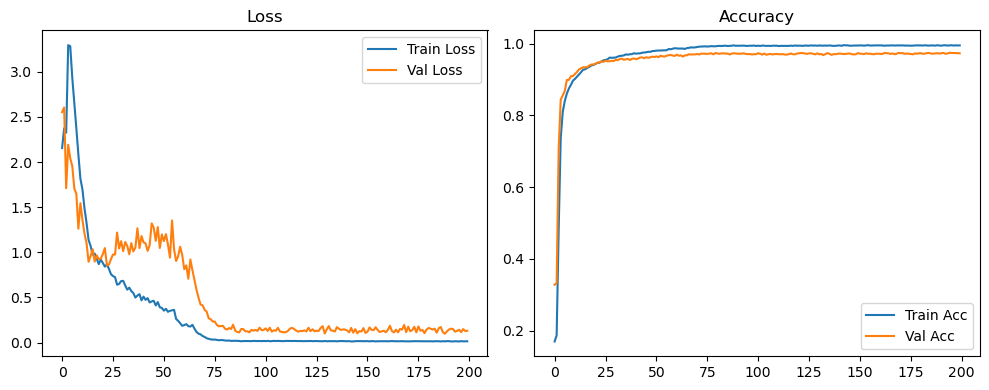

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 28.94it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 29.04it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 29.01it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 29.03it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 29.16it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 29.33it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 29.41it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 29.45it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 29.48it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 29.49it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 29.21it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 29.05it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 29.19it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 29.84it/s]

Original Model Final Test Loss: 0.1300 Accuracy: 0.9740


🚀 Running: batch256_lr0.005_0.005_0.005_dp0.5


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1481 | Val Acc: 0.3093 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1481 | Val Acc: 0.3093 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1481 | Val Acc: 0.3093 |:   0%|          | 1/200 [00:09<30:43,  9.26s/it]

| LR: 0.005 | Train Acc: 0.1659 | Val Acc: 0.3431 |:   0%|          | 1/200 [00:18<30:43,  9.26s/it]

| LR: 0.005 | Train Acc: 0.1659 | Val Acc: 0.3431 |:   0%|          | 1/200 [00:18<30:43,  9.26s/it]

| LR: 0.005 | Train Acc: 0.1659 | Val Acc: 0.3431 |:   1%|          | 2/200 [00:18<30:30,  9.24s/it]

| LR: 0.005 | Train Acc: 0.3969 | Val Acc: 0.6731 |:   1%|          | 2/200 [00:27<30:30,  9.24s/it]

| LR: 0.005 | Train Acc: 0.3969 | Val Acc: 0.6731 |:   1%|          | 2/200 [00:27<30:30,  9.24s/it]

| LR: 0.005 | Train Acc: 0.3969 | Val Acc: 0.6731 |:   2%|▏         | 3/200 [00:27<30:00,  9.14s/it]

| LR: 0.005 | Train Acc: 0.6624 | Val Acc: 0.8296 |:   2%|▏         | 3/200 [00:36<30:00,  9.14s/it]

| LR: 0.005 | Train Acc: 0.6624 | Val Acc: 0.8296 |:   2%|▏         | 3/200 [00:36<30:00,  9.14s/it]

| LR: 0.005 | Train Acc: 0.6624 | Val Acc: 0.8296 |:   2%|▏         | 4/200 [00:36<29:39,  9.08s/it]

| LR: 0.005 | Train Acc: 0.7733 | Val Acc: 0.8720 |:   2%|▏         | 4/200 [00:45<29:39,  9.08s/it]

| LR: 0.005 | Train Acc: 0.7733 | Val Acc: 0.8720 |:   2%|▏         | 4/200 [00:45<29:39,  9.08s/it]

| LR: 0.005 | Train Acc: 0.7733 | Val Acc: 0.8720 |:   2%|▎         | 5/200 [00:45<29:20,  9.03s/it]

| LR: 0.005 | Train Acc: 0.8103 | Val Acc: 0.8925 |:   2%|▎         | 5/200 [00:54<29:20,  9.03s/it]

| LR: 0.005 | Train Acc: 0.8103 | Val Acc: 0.8925 |:   2%|▎         | 5/200 [00:54<29:20,  9.03s/it]

| LR: 0.005 | Train Acc: 0.8103 | Val Acc: 0.8925 |:   3%|▎         | 6/200 [00:54<29:08,  9.01s/it]

| LR: 0.005 | Train Acc: 0.8354 | Val Acc: 0.9008 |:   3%|▎         | 6/200 [01:03<29:08,  9.01s/it]

| LR: 0.005 | Train Acc: 0.8354 | Val Acc: 0.9008 |:   3%|▎         | 6/200 [01:03<29:08,  9.01s/it]

| LR: 0.005 | Train Acc: 0.8354 | Val Acc: 0.9008 |:   4%|▎         | 7/200 [01:03<29:01,  9.02s/it]

| LR: 0.005 | Train Acc: 0.8550 | Val Acc: 0.9142 |:   4%|▎         | 7/200 [01:12<29:01,  9.02s/it]

| LR: 0.005 | Train Acc: 0.8550 | Val Acc: 0.9142 |:   4%|▎         | 7/200 [01:12<29:01,  9.02s/it]

| LR: 0.005 | Train Acc: 0.8550 | Val Acc: 0.9142 |:   4%|▍         | 8/200 [01:12<28:48,  9.00s/it]

| LR: 0.005 | Train Acc: 0.8692 | Val Acc: 0.9111 |:   4%|▍         | 8/200 [01:21<28:48,  9.00s/it]

| LR: 0.005 | Train Acc: 0.8692 | Val Acc: 0.9111 |:   4%|▍         | 8/200 [01:21<28:48,  9.00s/it]

| LR: 0.005 | Train Acc: 0.8692 | Val Acc: 0.9111 |:   4%|▍         | 9/200 [01:21<28:25,  8.93s/it]

| LR: 0.005 | Train Acc: 0.8762 | Val Acc: 0.9187 |:   4%|▍         | 9/200 [01:29<28:25,  8.93s/it]

| LR: 0.005 | Train Acc: 0.8762 | Val Acc: 0.9187 |:   4%|▍         | 9/200 [01:29<28:25,  8.93s/it]

| LR: 0.005 | Train Acc: 0.8762 | Val Acc: 0.9187 |:   5%|▌         | 10/200 [01:30<28:10,  8.90s/it]

| LR: 0.005 | Train Acc: 0.8858 | Val Acc: 0.9253 |:   5%|▌         | 10/200 [01:39<28:10,  8.90s/it]

| LR: 0.005 | Train Acc: 0.8858 | Val Acc: 0.9253 |:   5%|▌         | 10/200 [01:39<28:10,  8.90s/it]

| LR: 0.005 | Train Acc: 0.8858 | Val Acc: 0.9253 |:   6%|▌         | 11/200 [01:39<28:15,  8.97s/it]

| LR: 0.005 | Train Acc: 0.8935 | Val Acc: 0.9357 |:   6%|▌         | 11/200 [01:48<28:15,  8.97s/it]

| LR: 0.005 | Train Acc: 0.8935 | Val Acc: 0.9357 |:   6%|▌         | 11/200 [01:48<28:15,  8.97s/it]

| LR: 0.005 | Train Acc: 0.8935 | Val Acc: 0.9357 |:   6%|▌         | 12/200 [01:48<28:12,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9002 | Val Acc: 0.9356 |:   6%|▌         | 12/200 [01:57<28:12,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9002 | Val Acc: 0.9356 |:   6%|▌         | 12/200 [01:57<28:12,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9002 | Val Acc: 0.9356 |:   6%|▋         | 13/200 [01:57<28:17,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9024 | Val Acc: 0.9357 |:   6%|▋         | 13/200 [02:06<28:17,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9024 | Val Acc: 0.9357 |:   6%|▋         | 13/200 [02:06<28:17,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9024 | Val Acc: 0.9357 |:   7%|▋         | 14/200 [02:06<27:55,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9076 | Val Acc: 0.9401 |:   7%|▋         | 14/200 [02:15<27:55,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9076 | Val Acc: 0.9401 |:   7%|▋         | 14/200 [02:15<27:55,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9076 | Val Acc: 0.9401 |:   8%|▊         | 15/200 [02:15<27:31,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9155 | Val Acc: 0.9403 |:   8%|▊         | 15/200 [02:23<27:31,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9155 | Val Acc: 0.9403 |:   8%|▊         | 15/200 [02:23<27:31,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9155 | Val Acc: 0.9403 |:   8%|▊         | 16/200 [02:23<27:15,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9186 | Val Acc: 0.9433 |:   8%|▊         | 16/200 [02:32<27:15,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9186 | Val Acc: 0.9433 |:   8%|▊         | 16/200 [02:32<27:15,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9186 | Val Acc: 0.9433 |:   8%|▊         | 17/200 [02:32<27:05,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9220 | Val Acc: 0.9483 |:   8%|▊         | 17/200 [02:41<27:05,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9220 | Val Acc: 0.9483 |:   8%|▊         | 17/200 [02:41<27:05,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9220 | Val Acc: 0.9483 |:   9%|▉         | 18/200 [02:41<26:56,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9249 | Val Acc: 0.9453 |:   9%|▉         | 18/200 [02:50<26:56,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9249 | Val Acc: 0.9453 |:   9%|▉         | 18/200 [02:50<26:56,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9249 | Val Acc: 0.9453 |:  10%|▉         | 19/200 [02:50<26:47,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9277 | Val Acc: 0.9485 |:  10%|▉         | 19/200 [02:59<26:47,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9277 | Val Acc: 0.9485 |:  10%|▉         | 19/200 [02:59<26:47,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9277 | Val Acc: 0.9485 |:  10%|█         | 20/200 [02:59<26:46,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9275 | Val Acc: 0.9489 |:  10%|█         | 20/200 [03:08<26:46,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9275 | Val Acc: 0.9489 |:  10%|█         | 20/200 [03:08<26:46,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9275 | Val Acc: 0.9489 |:  10%|█         | 21/200 [03:08<26:29,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9315 | Val Acc: 0.9506 |:  10%|█         | 21/200 [03:17<26:29,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9315 | Val Acc: 0.9506 |:  10%|█         | 21/200 [03:17<26:29,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9315 | Val Acc: 0.9506 |:  11%|█         | 22/200 [03:17<26:16,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9325 | Val Acc: 0.9488 |:  11%|█         | 22/200 [03:26<26:16,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9325 | Val Acc: 0.9488 |:  11%|█         | 22/200 [03:26<26:16,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9325 | Val Acc: 0.9488 |:  12%|█▏        | 23/200 [03:26<26:29,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9339 | Val Acc: 0.9533 |:  12%|█▏        | 23/200 [03:35<26:29,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9339 | Val Acc: 0.9533 |:  12%|█▏        | 23/200 [03:35<26:29,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9339 | Val Acc: 0.9533 |:  12%|█▏        | 24/200 [03:35<26:08,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9365 | Val Acc: 0.9533 |:  12%|█▏        | 24/200 [03:44<26:08,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9365 | Val Acc: 0.9533 |:  12%|█▏        | 24/200 [03:44<26:08,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9365 | Val Acc: 0.9533 |:  12%|█▎        | 25/200 [03:44<26:04,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9405 | Val Acc: 0.9537 |:  12%|█▎        | 25/200 [03:52<26:04,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9405 | Val Acc: 0.9537 |:  12%|█▎        | 25/200 [03:52<26:04,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9405 | Val Acc: 0.9537 |:  13%|█▎        | 26/200 [03:53<25:52,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9537 |:  13%|█▎        | 26/200 [04:01<25:52,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9537 |:  13%|█▎        | 26/200 [04:01<25:52,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9537 |:  14%|█▎        | 27/200 [04:01<25:42,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9458 | Val Acc: 0.9547 |:  14%|█▎        | 27/200 [04:11<25:42,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9458 | Val Acc: 0.9547 |:  14%|█▎        | 27/200 [04:11<25:42,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9458 | Val Acc: 0.9547 |:  14%|█▍        | 28/200 [04:11<26:28,  9.23s/it]

| LR: 0.005 | Train Acc: 0.9446 | Val Acc: 0.9580 |:  14%|█▍        | 28/200 [04:20<26:28,  9.23s/it]

| LR: 0.005 | Train Acc: 0.9446 | Val Acc: 0.9580 |:  14%|█▍        | 28/200 [04:20<26:28,  9.23s/it]

| LR: 0.005 | Train Acc: 0.9446 | Val Acc: 0.9580 |:  14%|█▍        | 29/200 [04:21<26:13,  9.20s/it]

| LR: 0.005 | Train Acc: 0.9442 | Val Acc: 0.9571 |:  14%|█▍        | 29/200 [04:29<26:13,  9.20s/it]

| LR: 0.005 | Train Acc: 0.9442 | Val Acc: 0.9571 |:  14%|█▍        | 29/200 [04:29<26:13,  9.20s/it]

| LR: 0.005 | Train Acc: 0.9442 | Val Acc: 0.9571 |:  15%|█▌        | 30/200 [04:29<25:51,  9.13s/it]

| LR: 0.005 | Train Acc: 0.9450 | Val Acc: 0.9572 |:  15%|█▌        | 30/200 [04:38<25:51,  9.13s/it]

| LR: 0.005 | Train Acc: 0.9450 | Val Acc: 0.9572 |:  15%|█▌        | 30/200 [04:38<25:51,  9.13s/it]

| LR: 0.005 | Train Acc: 0.9450 | Val Acc: 0.9572 |:  16%|█▌        | 31/200 [04:38<25:27,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9488 | Val Acc: 0.9569 |:  16%|█▌        | 31/200 [04:47<25:27,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9488 | Val Acc: 0.9569 |:  16%|█▌        | 31/200 [04:47<25:27,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9488 | Val Acc: 0.9569 |:  16%|█▌        | 32/200 [04:47<25:24,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9500 | Val Acc: 0.9607 |:  16%|█▌        | 32/200 [04:56<25:24,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9500 | Val Acc: 0.9607 |:  16%|█▌        | 32/200 [04:56<25:24,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9500 | Val Acc: 0.9607 |:  16%|█▋        | 33/200 [04:56<25:02,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9476 | Val Acc: 0.9595 |:  16%|█▋        | 33/200 [05:05<25:02,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9476 | Val Acc: 0.9595 |:  16%|█▋        | 33/200 [05:05<25:02,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9476 | Val Acc: 0.9595 |:  17%|█▋        | 34/200 [05:05<24:39,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9508 | Val Acc: 0.9602 |:  17%|█▋        | 34/200 [05:14<24:39,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9508 | Val Acc: 0.9602 |:  17%|█▋        | 34/200 [05:14<24:39,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9508 | Val Acc: 0.9602 |:  18%|█▊        | 35/200 [05:14<24:21,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9533 | Val Acc: 0.9617 |:  18%|█▊        | 35/200 [05:23<24:21,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9533 | Val Acc: 0.9617 |:  18%|█▊        | 35/200 [05:23<24:21,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9533 | Val Acc: 0.9617 |:  18%|█▊        | 36/200 [05:23<24:32,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9516 | Val Acc: 0.9617 |:  18%|█▊        | 36/200 [05:32<24:32,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9516 | Val Acc: 0.9617 |:  18%|█▊        | 36/200 [05:32<24:32,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9516 | Val Acc: 0.9617 |:  18%|█▊        | 37/200 [05:32<24:23,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9564 | Val Acc: 0.9635 |:  18%|█▊        | 37/200 [05:41<24:23,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9564 | Val Acc: 0.9635 |:  18%|█▊        | 37/200 [05:41<24:23,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9564 | Val Acc: 0.9635 |:  19%|█▉        | 38/200 [05:41<24:13,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9558 | Val Acc: 0.9656 |:  19%|█▉        | 38/200 [05:50<24:13,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9558 | Val Acc: 0.9656 |:  19%|█▉        | 38/200 [05:50<24:13,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9558 | Val Acc: 0.9656 |:  20%|█▉        | 39/200 [05:50<23:58,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9586 | Val Acc: 0.9637 |:  20%|█▉        | 39/200 [05:59<23:58,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9586 | Val Acc: 0.9637 |:  20%|█▉        | 39/200 [05:59<23:58,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9586 | Val Acc: 0.9637 |:  20%|██        | 40/200 [05:59<23:45,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9595 | Val Acc: 0.9649 |:  20%|██        | 40/200 [06:08<23:45,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9595 | Val Acc: 0.9649 |:  20%|██        | 40/200 [06:08<23:45,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9595 | Val Acc: 0.9649 |:  20%|██        | 41/200 [06:08<23:38,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9612 | Val Acc: 0.9653 |:  20%|██        | 41/200 [06:17<23:38,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9612 | Val Acc: 0.9653 |:  20%|██        | 41/200 [06:17<23:38,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9612 | Val Acc: 0.9653 |:  21%|██        | 42/200 [06:17<24:00,  9.12s/it]

| LR: 0.005 | Train Acc: 0.9617 | Val Acc: 0.9671 |:  21%|██        | 42/200 [06:26<24:00,  9.12s/it]

| LR: 0.005 | Train Acc: 0.9617 | Val Acc: 0.9671 |:  21%|██        | 42/200 [06:26<24:00,  9.12s/it]

| LR: 0.005 | Train Acc: 0.9617 | Val Acc: 0.9671 |:  22%|██▏       | 43/200 [06:26<23:48,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9651 | Val Acc: 0.9676 |:  22%|██▏       | 43/200 [06:35<23:48,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9651 | Val Acc: 0.9676 |:  22%|██▏       | 43/200 [06:35<23:48,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9651 | Val Acc: 0.9676 |:  22%|██▏       | 44/200 [06:35<23:35,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9663 | Val Acc: 0.9668 |:  22%|██▏       | 44/200 [06:44<23:35,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9663 | Val Acc: 0.9668 |:  22%|██▏       | 44/200 [06:44<23:35,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9663 | Val Acc: 0.9668 |:  22%|██▎       | 45/200 [06:44<23:13,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9672 | Val Acc: 0.9682 |:  22%|██▎       | 45/200 [06:53<23:13,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9672 | Val Acc: 0.9682 |:  22%|██▎       | 45/200 [06:53<23:13,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9672 | Val Acc: 0.9682 |:  23%|██▎       | 46/200 [06:53<22:54,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9676 | Val Acc: 0.9690 |:  23%|██▎       | 46/200 [07:02<22:54,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9676 | Val Acc: 0.9690 |:  23%|██▎       | 46/200 [07:02<22:54,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9676 | Val Acc: 0.9690 |:  24%|██▎       | 47/200 [07:02<22:42,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9700 |:  24%|██▎       | 47/200 [07:11<22:42,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9700 |:  24%|██▎       | 47/200 [07:11<22:42,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9700 |:  24%|██▍       | 48/200 [07:11<22:47,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9719 | Val Acc: 0.9698 |:  24%|██▍       | 48/200 [07:20<22:47,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9719 | Val Acc: 0.9698 |:  24%|██▍       | 48/200 [07:20<22:47,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9719 | Val Acc: 0.9698 |:  24%|██▍       | 49/200 [07:20<22:49,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9708 | Val Acc: 0.9686 |:  24%|██▍       | 49/200 [07:29<22:49,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9708 | Val Acc: 0.9686 |:  24%|██▍       | 49/200 [07:29<22:49,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9708 | Val Acc: 0.9686 |:  25%|██▌       | 50/200 [07:29<22:33,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9699 | Val Acc: 0.9693 |:  25%|██▌       | 50/200 [07:38<22:33,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9699 | Val Acc: 0.9693 |:  25%|██▌       | 50/200 [07:38<22:33,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9699 | Val Acc: 0.9693 |:  26%|██▌       | 51/200 [07:38<22:15,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9719 | Val Acc: 0.9711 |:  26%|██▌       | 51/200 [07:47<22:15,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9719 | Val Acc: 0.9711 |:  26%|██▌       | 51/200 [07:47<22:15,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9719 | Val Acc: 0.9711 |:  26%|██▌       | 52/200 [07:47<22:05,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9760 | Val Acc: 0.9710 |:  26%|██▌       | 52/200 [07:56<22:05,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9760 | Val Acc: 0.9710 |:  26%|██▌       | 52/200 [07:56<22:05,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9760 | Val Acc: 0.9710 |:  26%|██▋       | 53/200 [07:56<21:59,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9779 | Val Acc: 0.9719 |:  26%|██▋       | 53/200 [08:05<21:59,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9779 | Val Acc: 0.9719 |:  26%|██▋       | 53/200 [08:05<21:59,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9779 | Val Acc: 0.9719 |:  27%|██▋       | 54/200 [08:05<21:44,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9792 | Val Acc: 0.9707 |:  27%|██▋       | 54/200 [08:13<21:44,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9792 | Val Acc: 0.9707 |:  27%|██▋       | 54/200 [08:13<21:44,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9792 | Val Acc: 0.9707 |:  28%|██▊       | 55/200 [08:13<21:26,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9798 | Val Acc: 0.9728 |:  28%|██▊       | 55/200 [08:23<21:26,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9798 | Val Acc: 0.9728 |:  28%|██▊       | 55/200 [08:23<21:26,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9798 | Val Acc: 0.9728 |:  28%|██▊       | 56/200 [08:23<21:38,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9803 | Val Acc: 0.9717 |:  28%|██▊       | 56/200 [08:32<21:38,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9803 | Val Acc: 0.9717 |:  28%|██▊       | 56/200 [08:32<21:38,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9803 | Val Acc: 0.9717 |:  28%|██▊       | 57/200 [08:32<21:26,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9730 |:  28%|██▊       | 57/200 [08:41<21:26,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9730 |:  28%|██▊       | 57/200 [08:41<21:26,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9730 |:  29%|██▉       | 58/200 [08:41<21:13,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9724 |:  29%|██▉       | 58/200 [08:49<21:13,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9724 |:  29%|██▉       | 58/200 [08:49<21:13,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9724 |:  30%|██▉       | 59/200 [08:49<21:02,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9728 |:  30%|██▉       | 59/200 [08:58<21:02,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9728 |:  30%|██▉       | 59/200 [08:58<21:02,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9728 |:  30%|███       | 60/200 [08:58<20:55,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9718 |:  30%|███       | 60/200 [09:07<20:55,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9718 |:  30%|███       | 60/200 [09:07<20:55,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9718 |:  30%|███       | 61/200 [09:07<20:39,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9721 |:  30%|███       | 61/200 [09:16<20:39,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9721 |:  30%|███       | 61/200 [09:16<20:39,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9721 |:  31%|███       | 62/200 [09:16<20:31,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9708 |:  31%|███       | 62/200 [09:25<20:31,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9708 |:  31%|███       | 62/200 [09:25<20:31,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9708 |:  32%|███▏      | 63/200 [09:25<20:20,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9712 |:  32%|███▏      | 63/200 [09:34<20:20,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9712 |:  32%|███▏      | 63/200 [09:34<20:20,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9712 |:  32%|███▏      | 64/200 [09:34<20:08,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9726 |:  32%|███▏      | 64/200 [09:43<20:08,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9726 |:  32%|███▏      | 64/200 [09:43<20:08,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9726 |:  32%|███▎      | 65/200 [09:43<20:14,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9729 |:  32%|███▎      | 65/200 [09:52<20:14,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9729 |:  32%|███▎      | 65/200 [09:52<20:14,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9729 |:  33%|███▎      | 66/200 [09:52<20:01,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9731 |:  33%|███▎      | 66/200 [10:01<20:01,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9731 |:  33%|███▎      | 66/200 [10:01<20:01,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9731 |:  34%|███▎      | 67/200 [10:01<19:49,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9740 |:  34%|███▎      | 67/200 [10:10<19:49,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9740 |:  34%|███▎      | 67/200 [10:10<19:49,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9740 |:  34%|███▍      | 68/200 [10:10<19:37,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9710 |:  34%|███▍      | 68/200 [10:19<19:37,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9710 |:  34%|███▍      | 68/200 [10:19<19:37,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9710 |:  34%|███▍      | 69/200 [10:19<19:24,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9702 |:  34%|███▍      | 69/200 [10:28<19:24,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9702 |:  34%|███▍      | 69/200 [10:28<19:24,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9702 |:  35%|███▌      | 70/200 [10:28<19:39,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9731 |:  35%|███▌      | 70/200 [10:37<19:39,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9731 |:  35%|███▌      | 70/200 [10:37<19:39,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9731 |:  36%|███▌      | 71/200 [10:37<19:25,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9703 |:  36%|███▌      | 71/200 [10:46<19:25,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9703 |:  36%|███▌      | 71/200 [10:46<19:25,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9703 |:  36%|███▌      | 72/200 [10:46<19:13,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9722 |:  36%|███▌      | 72/200 [10:55<19:13,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9722 |:  36%|███▌      | 72/200 [10:55<19:13,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9722 |:  36%|███▋      | 73/200 [10:55<19:08,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9730 |:  36%|███▋      | 73/200 [11:04<19:08,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9730 |:  36%|███▋      | 73/200 [11:04<19:08,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9730 |:  37%|███▋      | 74/200 [11:04<18:48,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9716 |:  37%|███▋      | 74/200 [11:13<18:48,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9716 |:  37%|███▋      | 74/200 [11:13<18:48,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9716 |:  38%|███▊      | 75/200 [11:13<18:35,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9800 | Val Acc: 0.9709 |:  38%|███▊      | 75/200 [11:22<18:35,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9800 | Val Acc: 0.9709 |:  38%|███▊      | 75/200 [11:22<18:35,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9800 | Val Acc: 0.9709 |:  38%|███▊      | 76/200 [11:22<18:40,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9793 | Val Acc: 0.9716 |:  38%|███▊      | 76/200 [11:31<18:40,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9793 | Val Acc: 0.9716 |:  38%|███▊      | 76/200 [11:31<18:40,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9793 | Val Acc: 0.9716 |:  38%|███▊      | 77/200 [11:31<18:22,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9723 |:  38%|███▊      | 77/200 [11:40<18:22,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9723 |:  38%|███▊      | 77/200 [11:40<18:22,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9723 |:  39%|███▉      | 78/200 [11:40<18:05,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9699 |:  39%|███▉      | 78/200 [11:48<18:05,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9699 |:  39%|███▉      | 78/200 [11:48<18:05,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9699 |:  40%|███▉      | 79/200 [11:48<17:51,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9718 |:  40%|███▉      | 79/200 [11:57<17:51,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9718 |:  40%|███▉      | 79/200 [11:57<17:51,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9718 |:  40%|████      | 80/200 [11:57<17:41,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9722 |:  40%|████      | 80/200 [12:06<17:41,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9722 |:  40%|████      | 80/200 [12:06<17:41,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9722 |:  40%|████      | 81/200 [12:06<17:39,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9708 |:  40%|████      | 81/200 [12:15<17:39,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9708 |:  40%|████      | 81/200 [12:15<17:39,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9708 |:  41%|████      | 82/200 [12:15<17:28,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9713 |:  41%|████      | 82/200 [12:24<17:28,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9713 |:  41%|████      | 82/200 [12:24<17:28,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9713 |:  42%|████▏     | 83/200 [12:24<17:18,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9737 |:  42%|████▏     | 83/200 [12:33<17:18,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9737 |:  42%|████▏     | 83/200 [12:33<17:18,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9737 |:  42%|████▏     | 84/200 [12:33<17:13,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9738 |:  42%|████▏     | 84/200 [12:42<17:13,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9738 |:  42%|████▏     | 84/200 [12:42<17:13,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9738 |:  42%|████▎     | 85/200 [12:42<17:09,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9807 | Val Acc: 0.9696 |:  42%|████▎     | 85/200 [12:51<17:09,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9807 | Val Acc: 0.9696 |:  42%|████▎     | 85/200 [12:51<17:09,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9807 | Val Acc: 0.9696 |:  43%|████▎     | 86/200 [12:51<17:03,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9712 |:  43%|████▎     | 86/200 [13:00<17:03,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9712 |:  43%|████▎     | 86/200 [13:00<17:03,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9712 |:  44%|████▎     | 87/200 [13:00<16:54,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9791 | Val Acc: 0.9720 |:  44%|████▎     | 87/200 [13:09<16:54,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9791 | Val Acc: 0.9720 |:  44%|████▎     | 87/200 [13:09<16:54,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9791 | Val Acc: 0.9720 |:  44%|████▍     | 88/200 [13:09<16:39,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9722 |:  44%|████▍     | 88/200 [13:18<16:39,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9722 |:  44%|████▍     | 88/200 [13:18<16:39,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9722 |:  44%|████▍     | 89/200 [13:18<16:30,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9726 |:  44%|████▍     | 89/200 [13:26<16:30,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9726 |:  44%|████▍     | 89/200 [13:27<16:30,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9726 |:  45%|████▌     | 90/200 [13:27<16:18,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9736 |:  45%|████▌     | 90/200 [13:35<16:18,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9736 |:  45%|████▌     | 90/200 [13:35<16:18,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9736 |:  46%|████▌     | 91/200 [13:36<16:11,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9736 |:  46%|████▌     | 91/200 [13:44<16:11,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9736 |:  46%|████▌     | 91/200 [13:44<16:11,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9736 |:  46%|████▌     | 92/200 [13:44<16:04,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9715 |:  46%|████▌     | 92/200 [13:53<16:04,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9715 |:  46%|████▌     | 92/200 [13:53<16:04,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9715 |:  46%|████▋     | 93/200 [13:53<15:49,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9713 |:  46%|████▋     | 93/200 [14:02<15:49,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9713 |:  46%|████▋     | 93/200 [14:02<15:49,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9713 |:  47%|████▋     | 94/200 [14:02<15:46,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9714 |:  47%|████▋     | 94/200 [14:12<15:46,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9714 |:  47%|████▋     | 94/200 [14:12<15:46,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9714 |:  48%|████▊     | 95/200 [14:12<15:49,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9722 |:  48%|████▊     | 95/200 [14:21<15:49,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9722 |:  48%|████▊     | 95/200 [14:21<15:49,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9722 |:  48%|████▊     | 96/200 [14:21<15:39,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9722 |:  48%|████▊     | 96/200 [14:29<15:39,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9722 |:  48%|████▊     | 96/200 [14:29<15:39,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9722 |:  48%|████▊     | 97/200 [14:29<15:25,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9717 |:  48%|████▊     | 97/200 [14:38<15:25,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9717 |:  48%|████▊     | 97/200 [14:38<15:25,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9717 |:  49%|████▉     | 98/200 [14:38<15:12,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9733 |:  49%|████▉     | 98/200 [14:48<15:12,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9733 |:  49%|████▉     | 98/200 [14:48<15:12,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9733 |:  50%|████▉     | 99/200 [14:48<15:13,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9702 |:  50%|████▉     | 99/200 [14:57<15:13,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9702 |:  50%|████▉     | 99/200 [14:57<15:13,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9702 |:  50%|█████     | 100/200 [14:57<15:06,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9712 |:  50%|█████     | 100/200 [15:06<15:06,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9712 |:  50%|█████     | 100/200 [15:06<15:06,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9712 |:  50%|█████     | 101/200 [15:06<14:54,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9720 |:  50%|█████     | 101/200 [15:14<14:54,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9720 |:  50%|█████     | 101/200 [15:14<14:54,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9720 |:  51%|█████     | 102/200 [15:14<14:38,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9731 |:  51%|█████     | 102/200 [15:24<14:38,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9731 |:  51%|█████     | 102/200 [15:24<14:38,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9731 |:  52%|█████▏    | 103/200 [15:24<14:37,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9726 |:  52%|█████▏    | 103/200 [15:32<14:37,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9726 |:  52%|█████▏    | 103/200 [15:32<14:37,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9726 |:  52%|█████▏    | 104/200 [15:32<14:20,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9723 |:  52%|█████▏    | 104/200 [15:41<14:20,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9723 |:  52%|█████▏    | 104/200 [15:41<14:20,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9723 |:  52%|█████▎    | 105/200 [15:41<14:07,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9720 |:  52%|█████▎    | 105/200 [15:50<14:07,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9720 |:  52%|█████▎    | 105/200 [15:50<14:07,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9720 |:  53%|█████▎    | 106/200 [15:50<13:57,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9717 |:  53%|█████▎    | 106/200 [15:59<13:57,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9717 |:  53%|█████▎    | 106/200 [15:59<13:57,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9717 |:  54%|█████▎    | 107/200 [15:59<13:49,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9704 |:  54%|█████▎    | 107/200 [16:08<13:49,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9704 |:  54%|█████▎    | 107/200 [16:08<13:49,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9704 |:  54%|█████▍    | 108/200 [16:08<13:40,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9731 |:  54%|█████▍    | 108/200 [16:17<13:40,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9731 |:  54%|█████▍    | 108/200 [16:17<13:40,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9731 |:  55%|█████▍    | 109/200 [16:18<13:46,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9720 |:  55%|█████▍    | 109/200 [16:26<13:46,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9720 |:  55%|█████▍    | 109/200 [16:26<13:46,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9720 |:  55%|█████▌    | 110/200 [16:26<13:28,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9725 |:  55%|█████▌    | 110/200 [16:35<13:28,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9725 |:  55%|█████▌    | 110/200 [16:35<13:28,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9725 |:  56%|█████▌    | 111/200 [16:35<13:12,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9738 |:  56%|█████▌    | 111/200 [16:44<13:12,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9738 |:  56%|█████▌    | 111/200 [16:44<13:12,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9738 |:  56%|█████▌    | 112/200 [16:44<13:00,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9727 |:  56%|█████▌    | 112/200 [16:53<13:00,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9727 |:  56%|█████▌    | 112/200 [16:53<13:00,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9727 |:  56%|█████▋    | 113/200 [16:53<12:49,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9722 |:  56%|█████▋    | 113/200 [17:01<12:49,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9722 |:  56%|█████▋    | 113/200 [17:01<12:49,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9722 |:  57%|█████▋    | 114/200 [17:01<12:36,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9732 |:  57%|█████▋    | 114/200 [17:10<12:36,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9732 |:  57%|█████▋    | 114/200 [17:10<12:36,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9732 |:  57%|█████▊    | 115/200 [17:10<12:37,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9726 |:  57%|█████▊    | 115/200 [17:20<12:37,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9726 |:  57%|█████▊    | 115/200 [17:20<12:37,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9726 |:  58%|█████▊    | 116/200 [17:20<12:43,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9731 |:  58%|█████▊    | 116/200 [17:30<12:43,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9731 |:  58%|█████▊    | 116/200 [17:30<12:43,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9731 |:  58%|█████▊    | 117/200 [17:30<12:50,  9.29s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9736 |:  58%|█████▊    | 117/200 [17:38<12:50,  9.29s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9736 |:  58%|█████▊    | 117/200 [17:38<12:50,  9.29s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9736 |:  59%|█████▉    | 118/200 [17:39<12:30,  9.15s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9738 |:  59%|█████▉    | 118/200 [17:47<12:30,  9.15s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9738 |:  59%|█████▉    | 118/200 [17:47<12:30,  9.15s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9738 |:  60%|█████▉    | 119/200 [17:47<12:15,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9718 |:  60%|█████▉    | 119/200 [17:56<12:15,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9718 |:  60%|█████▉    | 119/200 [17:56<12:15,  9.08s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9718 |:  60%|██████    | 120/200 [17:56<11:56,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9730 |:  60%|██████    | 120/200 [18:05<11:56,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9730 |:  60%|██████    | 120/200 [18:05<11:56,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9826 | Val Acc: 0.9730 |:  60%|██████    | 121/200 [18:05<11:45,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9722 |:  60%|██████    | 121/200 [18:14<11:45,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9722 |:  60%|██████    | 121/200 [18:14<11:45,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9722 |:  61%|██████    | 122/200 [18:14<11:34,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9731 |:  61%|██████    | 122/200 [18:23<11:34,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9731 |:  61%|██████    | 122/200 [18:23<11:34,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9731 |:  62%|██████▏   | 123/200 [18:23<11:28,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9715 |:  62%|██████▏   | 123/200 [18:32<11:28,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9715 |:  62%|██████▏   | 123/200 [18:32<11:28,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9715 |:  62%|██████▏   | 124/200 [18:32<11:23,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9723 |:  62%|██████▏   | 124/200 [18:41<11:23,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9723 |:  62%|██████▏   | 124/200 [18:41<11:23,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9723 |:  62%|██████▎   | 125/200 [18:41<11:09,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9721 |:  62%|██████▎   | 125/200 [18:49<11:09,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9721 |:  62%|██████▎   | 125/200 [18:49<11:09,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9721 |:  63%|██████▎   | 126/200 [18:49<10:52,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9714 |:  63%|██████▎   | 126/200 [18:58<10:52,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9714 |:  63%|██████▎   | 126/200 [18:58<10:52,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9714 |:  64%|██████▎   | 127/200 [18:58<10:42,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9725 |:  64%|██████▎   | 127/200 [19:07<10:42,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9725 |:  64%|██████▎   | 127/200 [19:07<10:42,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9725 |:  64%|██████▍   | 128/200 [19:07<10:29,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9732 |:  64%|██████▍   | 128/200 [19:16<10:29,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9732 |:  64%|██████▍   | 128/200 [19:16<10:29,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9732 |:  64%|██████▍   | 129/200 [19:16<10:25,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9717 |:  64%|██████▍   | 129/200 [19:24<10:25,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9717 |:  64%|██████▍   | 129/200 [19:24<10:25,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9827 | Val Acc: 0.9717 |:  65%|██████▌   | 130/200 [19:24<10:15,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9735 |:  65%|██████▌   | 130/200 [19:33<10:15,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9735 |:  65%|██████▌   | 130/200 [19:33<10:15,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9735 |:  66%|██████▌   | 131/200 [19:33<10:04,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9708 |:  66%|██████▌   | 131/200 [19:42<10:04,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9708 |:  66%|██████▌   | 131/200 [19:42<10:04,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9708 |:  66%|██████▌   | 132/200 [19:42<09:55,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9830 | Val Acc: 0.9728 |:  66%|██████▌   | 132/200 [19:51<09:55,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9830 | Val Acc: 0.9728 |:  66%|██████▌   | 132/200 [19:51<09:55,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9830 | Val Acc: 0.9728 |:  66%|██████▋   | 133/200 [19:51<09:46,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9720 |:  66%|██████▋   | 133/200 [19:59<09:46,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9720 |:  66%|██████▋   | 133/200 [19:59<09:46,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9720 |:  67%|██████▋   | 134/200 [19:59<09:38,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9737 |:  67%|██████▋   | 134/200 [20:08<09:38,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9737 |:  67%|██████▋   | 134/200 [20:08<09:38,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9737 |:  68%|██████▊   | 135/200 [20:08<09:30,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9719 |:  68%|██████▊   | 135/200 [20:17<09:30,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9719 |:  68%|██████▊   | 135/200 [20:17<09:30,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9719 |:  68%|██████▊   | 136/200 [20:17<09:25,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9726 |:  68%|██████▊   | 136/200 [20:26<09:25,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9726 |:  68%|██████▊   | 136/200 [20:26<09:25,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9726 |:  68%|██████▊   | 137/200 [20:26<09:16,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9738 |:  68%|██████▊   | 137/200 [20:35<09:16,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9738 |:  68%|██████▊   | 137/200 [20:35<09:16,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9738 |:  69%|██████▉   | 138/200 [20:35<09:07,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9712 |:  69%|██████▉   | 138/200 [20:44<09:07,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9712 |:  69%|██████▉   | 138/200 [20:44<09:07,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9712 |:  70%|██████▉   | 139/200 [20:44<08:59,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9726 |:  70%|██████▉   | 139/200 [20:52<08:59,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9726 |:  70%|██████▉   | 139/200 [20:52<08:59,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9726 |:  70%|███████   | 140/200 [20:52<08:49,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9729 |:  70%|███████   | 140/200 [21:01<08:49,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9729 |:  70%|███████   | 140/200 [21:01<08:49,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9729 |:  70%|███████   | 141/200 [21:01<08:40,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9733 |:  70%|███████   | 141/200 [21:10<08:40,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9733 |:  70%|███████   | 141/200 [21:10<08:40,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9733 |:  71%|███████   | 142/200 [21:10<08:33,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9724 |:  71%|███████   | 142/200 [21:19<08:33,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9724 |:  71%|███████   | 142/200 [21:19<08:33,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9724 |:  72%|███████▏  | 143/200 [21:19<08:25,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9733 |:  72%|███████▏  | 143/200 [21:28<08:25,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9733 |:  72%|███████▏  | 143/200 [21:28<08:25,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9733 |:  72%|███████▏  | 144/200 [21:28<08:14,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9733 |:  72%|███████▏  | 144/200 [21:37<08:14,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9733 |:  72%|███████▏  | 144/200 [21:37<08:14,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9733 |:  72%|███████▎  | 145/200 [21:37<08:04,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9732 |:  72%|███████▎  | 145/200 [21:45<08:04,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9732 |:  72%|███████▎  | 145/200 [21:45<08:04,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9732 |:  73%|███████▎  | 146/200 [21:45<07:54,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9738 |:  73%|███████▎  | 146/200 [21:54<07:54,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9738 |:  73%|███████▎  | 146/200 [21:54<07:54,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9738 |:  74%|███████▎  | 147/200 [21:54<07:45,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9736 |:  74%|███████▎  | 147/200 [22:03<07:45,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9736 |:  74%|███████▎  | 147/200 [22:03<07:45,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9736 |:  74%|███████▍  | 148/200 [22:03<07:37,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9722 |:  74%|███████▍  | 148/200 [22:12<07:37,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9722 |:  74%|███████▍  | 148/200 [22:12<07:37,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9722 |:  74%|███████▍  | 149/200 [22:12<07:27,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9721 |:  74%|███████▍  | 149/200 [22:20<07:27,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9721 |:  74%|███████▍  | 149/200 [22:20<07:27,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9721 |:  75%|███████▌  | 150/200 [22:20<07:18,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9722 |:  75%|███████▌  | 150/200 [22:29<07:18,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9722 |:  75%|███████▌  | 150/200 [22:29<07:18,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9722 |:  76%|███████▌  | 151/200 [22:29<07:10,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9803 | Val Acc: 0.9727 |:  76%|███████▌  | 151/200 [22:38<07:10,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9803 | Val Acc: 0.9727 |:  76%|███████▌  | 151/200 [22:38<07:10,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9803 | Val Acc: 0.9727 |:  76%|███████▌  | 152/200 [22:38<07:00,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9718 |:  76%|███████▌  | 152/200 [22:47<07:00,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9718 |:  76%|███████▌  | 152/200 [22:47<07:00,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9718 |:  76%|███████▋  | 153/200 [22:47<06:52,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9730 |:  76%|███████▋  | 153/200 [22:56<06:52,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9730 |:  76%|███████▋  | 153/200 [22:56<06:52,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9730 |:  77%|███████▋  | 154/200 [22:56<06:46,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9729 |:  77%|███████▋  | 154/200 [23:04<06:46,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9729 |:  77%|███████▋  | 154/200 [23:04<06:46,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9729 |:  78%|███████▊  | 155/200 [23:05<06:36,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9717 |:  78%|███████▊  | 155/200 [23:13<06:36,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9717 |:  78%|███████▊  | 155/200 [23:13<06:36,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9717 |:  78%|███████▊  | 156/200 [23:13<06:27,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9743 |:  78%|███████▊  | 156/200 [23:22<06:27,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9743 |:  78%|███████▊  | 156/200 [23:22<06:27,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9743 |:  78%|███████▊  | 157/200 [23:22<06:21,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9728 |:  78%|███████▊  | 157/200 [23:31<06:21,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9728 |:  78%|███████▊  | 157/200 [23:31<06:21,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9728 |:  79%|███████▉  | 158/200 [23:31<06:16,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9723 |:  79%|███████▉  | 158/200 [23:41<06:16,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9723 |:  79%|███████▉  | 158/200 [23:41<06:16,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9723 |:  80%|███████▉  | 159/200 [23:41<06:10,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9733 |:  80%|███████▉  | 159/200 [23:49<06:10,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9733 |:  80%|███████▉  | 159/200 [23:49<06:10,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9733 |:  80%|████████  | 160/200 [23:49<05:58,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9717 |:  80%|████████  | 160/200 [23:58<05:58,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9717 |:  80%|████████  | 160/200 [23:58<05:58,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9717 |:  80%|████████  | 161/200 [23:58<05:49,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9716 |:  80%|████████  | 161/200 [24:07<05:49,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9716 |:  80%|████████  | 161/200 [24:07<05:49,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9716 |:  81%|████████  | 162/200 [24:07<05:38,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9732 |:  81%|████████  | 162/200 [24:16<05:38,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9732 |:  81%|████████  | 162/200 [24:16<05:38,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9732 |:  82%|████████▏ | 163/200 [24:16<05:26,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9730 |:  82%|████████▏ | 163/200 [24:25<05:26,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9730 |:  82%|████████▏ | 163/200 [24:25<05:26,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9730 |:  82%|████████▏ | 164/200 [24:25<05:22,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9704 |:  82%|████████▏ | 164/200 [24:34<05:22,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9704 |:  82%|████████▏ | 164/200 [24:34<05:22,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9704 |:  82%|████████▎ | 165/200 [24:34<05:13,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9732 |:  82%|████████▎ | 165/200 [24:43<05:13,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9732 |:  82%|████████▎ | 165/200 [24:43<05:13,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9732 |:  83%|████████▎ | 166/200 [24:43<05:01,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9731 |:  83%|████████▎ | 166/200 [24:52<05:01,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9731 |:  83%|████████▎ | 166/200 [24:52<05:01,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9731 |:  84%|████████▎ | 167/200 [24:52<04:57,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9738 |:  84%|████████▎ | 167/200 [25:01<04:57,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9738 |:  84%|████████▎ | 167/200 [25:01<04:57,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9738 |:  84%|████████▍ | 168/200 [25:01<04:46,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9731 |:  84%|████████▍ | 168/200 [25:10<04:46,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9731 |:  84%|████████▍ | 168/200 [25:10<04:46,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9731 |:  84%|████████▍ | 169/200 [25:10<04:36,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9732 |:  84%|████████▍ | 169/200 [25:19<04:36,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9732 |:  84%|████████▍ | 169/200 [25:19<04:36,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9732 |:  85%|████████▌ | 170/200 [25:19<04:26,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9720 |:  85%|████████▌ | 170/200 [25:27<04:26,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9720 |:  85%|████████▌ | 170/200 [25:27<04:26,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9720 |:  86%|████████▌ | 171/200 [25:27<04:17,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9708 |:  86%|████████▌ | 171/200 [25:36<04:17,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9708 |:  86%|████████▌ | 171/200 [25:36<04:17,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9708 |:  86%|████████▌ | 172/200 [25:36<04:08,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9712 |:  86%|████████▌ | 172/200 [25:45<04:08,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9712 |:  86%|████████▌ | 172/200 [25:45<04:08,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9712 |:  86%|████████▋ | 173/200 [25:45<03:59,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9706 |:  86%|████████▋ | 173/200 [25:54<03:59,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9706 |:  86%|████████▋ | 173/200 [25:54<03:59,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9706 |:  87%|████████▋ | 174/200 [25:54<03:50,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9704 |:  87%|████████▋ | 174/200 [26:03<03:50,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9704 |:  87%|████████▋ | 174/200 [26:03<03:50,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9704 |:  88%|████████▊ | 175/200 [26:03<03:44,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9704 |:  88%|████████▊ | 175/200 [26:13<03:44,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9704 |:  88%|████████▊ | 175/200 [26:13<03:44,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9704 |:  88%|████████▊ | 176/200 [26:13<03:39,  9.13s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9708 |:  88%|████████▊ | 176/200 [26:22<03:39,  9.13s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9708 |:  88%|████████▊ | 176/200 [26:22<03:39,  9.13s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9708 |:  88%|████████▊ | 177/200 [26:22<03:29,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9731 |:  88%|████████▊ | 177/200 [26:31<03:29,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9731 |:  88%|████████▊ | 177/200 [26:31<03:29,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9731 |:  89%|████████▉ | 178/200 [26:31<03:19,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9720 |:  89%|████████▉ | 178/200 [26:40<03:19,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9720 |:  89%|████████▉ | 178/200 [26:40<03:19,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9720 |:  90%|████████▉ | 179/200 [26:40<03:09,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9718 |:  90%|████████▉ | 179/200 [26:48<03:09,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9718 |:  90%|████████▉ | 179/200 [26:48<03:09,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9718 |:  90%|█████████ | 180/200 [26:48<02:58,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9725 |:  90%|█████████ | 180/200 [26:57<02:58,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9725 |:  90%|█████████ | 180/200 [26:57<02:58,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9725 |:  90%|█████████ | 181/200 [26:57<02:50,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9738 |:  90%|█████████ | 181/200 [27:06<02:50,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9738 |:  90%|█████████ | 181/200 [27:06<02:50,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9738 |:  91%|█████████ | 182/200 [27:06<02:40,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9712 |:  91%|█████████ | 182/200 [27:15<02:40,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9712 |:  91%|█████████ | 182/200 [27:15<02:40,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9712 |:  92%|█████████▏| 183/200 [27:15<02:30,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9723 |:  92%|█████████▏| 183/200 [27:24<02:30,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9723 |:  92%|█████████▏| 183/200 [27:24<02:30,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9723 |:  92%|█████████▏| 184/200 [27:24<02:21,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9727 |:  92%|█████████▏| 184/200 [27:33<02:21,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9727 |:  92%|█████████▏| 184/200 [27:33<02:21,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9727 |:  92%|█████████▎| 185/200 [27:33<02:12,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9728 |:  92%|█████████▎| 185/200 [27:42<02:12,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9728 |:  92%|█████████▎| 185/200 [27:42<02:12,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9728 |:  93%|█████████▎| 186/200 [27:42<02:05,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9732 |:  93%|█████████▎| 186/200 [27:51<02:05,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9732 |:  93%|█████████▎| 186/200 [27:51<02:05,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9732 |:  94%|█████████▎| 187/200 [27:51<01:56,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9830 | Val Acc: 0.9724 |:  94%|█████████▎| 187/200 [28:00<01:56,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9830 | Val Acc: 0.9724 |:  94%|█████████▎| 187/200 [28:00<01:56,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9830 | Val Acc: 0.9724 |:  94%|█████████▍| 188/200 [28:00<01:47,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9717 |:  94%|█████████▍| 188/200 [28:08<01:47,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9717 |:  94%|█████████▍| 188/200 [28:08<01:47,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9717 |:  94%|█████████▍| 189/200 [28:08<01:37,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9728 |:  94%|█████████▍| 189/200 [28:17<01:37,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9728 |:  94%|█████████▍| 189/200 [28:17<01:37,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9818 | Val Acc: 0.9728 |:  95%|█████████▌| 190/200 [28:17<01:28,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9721 |:  95%|█████████▌| 190/200 [28:26<01:28,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9721 |:  95%|█████████▌| 190/200 [28:26<01:28,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9721 |:  96%|█████████▌| 191/200 [28:26<01:19,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9727 |:  96%|█████████▌| 191/200 [28:35<01:19,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9727 |:  96%|█████████▌| 191/200 [28:35<01:19,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9727 |:  96%|█████████▌| 192/200 [28:35<01:11,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9726 |:  96%|█████████▌| 192/200 [28:44<01:11,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9726 |:  96%|█████████▌| 192/200 [28:44<01:11,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9726 |:  96%|█████████▋| 193/200 [28:44<01:01,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9728 |:  96%|█████████▋| 193/200 [28:53<01:01,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9728 |:  96%|█████████▋| 193/200 [28:53<01:01,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9728 |:  97%|█████████▋| 194/200 [28:53<00:53,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9724 |:  97%|█████████▋| 194/200 [29:02<00:53,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9724 |:  97%|█████████▋| 194/200 [29:02<00:53,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9724 |:  98%|█████████▊| 195/200 [29:02<00:44,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9722 |:  98%|█████████▊| 195/200 [29:10<00:44,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9722 |:  98%|█████████▊| 195/200 [29:10<00:44,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9722 |:  98%|█████████▊| 196/200 [29:10<00:35,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9727 |:  98%|█████████▊| 196/200 [29:19<00:35,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9727 |:  98%|█████████▊| 196/200 [29:19<00:35,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9727 |:  98%|█████████▊| 197/200 [29:19<00:26,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9732 |:  98%|█████████▊| 197/200 [29:28<00:26,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9732 |:  98%|█████████▊| 197/200 [29:28<00:26,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9732 |:  99%|█████████▉| 198/200 [29:28<00:17,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9732 |:  99%|█████████▉| 198/200 [29:37<00:17,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9732 |:  99%|█████████▉| 198/200 [29:37<00:17,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9732 |: 100%|█████████▉| 199/200 [29:37<00:08,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9732 |: 100%|█████████▉| 199/200 [29:46<00:08,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9732 |: 100%|█████████▉| 199/200 [29:46<00:08,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9732 |: 100%|██████████| 200/200 [29:46<00:00,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9732 |: 100%|██████████| 200/200 [29:46<00:00,  8.93s/it]

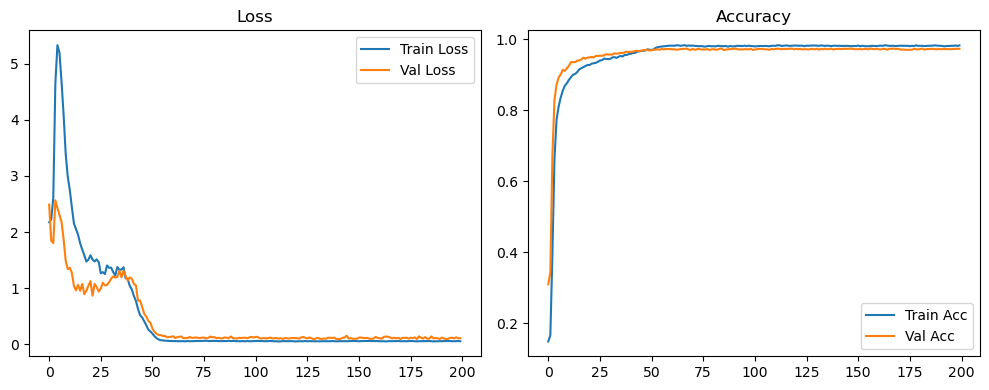

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 28.93it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 29.21it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 29.30it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 29.36it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 29.38it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 29.41it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 29.41it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 29.44it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 29.45it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 29.48it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 29.44it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 29.43it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 29.42it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 30.00it/s]

Original Model Final Test Loss: 0.0998 Accuracy: 0.9755


🚀 Running: batch256_lr0.005_0.002_0.001_dp0.0


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1864 | Val Acc: 0.3439 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1864 | Val Acc: 0.3439 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1864 | Val Acc: 0.3439 |:   0%|          | 1/200 [00:09<30:28,  9.19s/it]

| LR: 0.005 | Train Acc: 0.2809 | Val Acc: 0.4843 |:   0%|          | 1/200 [00:18<30:28,  9.19s/it]

| LR: 0.005 | Train Acc: 0.2809 | Val Acc: 0.4843 |:   0%|          | 1/200 [00:18<30:28,  9.19s/it]

| LR: 0.005 | Train Acc: 0.2809 | Val Acc: 0.4843 |:   1%|          | 2/200 [00:18<30:01,  9.10s/it]

| LR: 0.005 | Train Acc: 0.6868 | Val Acc: 0.8187 |:   1%|          | 2/200 [00:26<30:01,  9.10s/it]

| LR: 0.005 | Train Acc: 0.6868 | Val Acc: 0.8187 |:   1%|          | 2/200 [00:26<30:01,  9.10s/it]

| LR: 0.005 | Train Acc: 0.6868 | Val Acc: 0.8187 |:   2%|▏         | 3/200 [00:26<29:20,  8.94s/it]

| LR: 0.005 | Train Acc: 0.8329 | Val Acc: 0.8508 |:   2%|▏         | 3/200 [00:35<29:20,  8.94s/it]

| LR: 0.005 | Train Acc: 0.8329 | Val Acc: 0.8508 |:   2%|▏         | 3/200 [00:35<29:20,  8.94s/it]

| LR: 0.005 | Train Acc: 0.8329 | Val Acc: 0.8508 |:   2%|▏         | 4/200 [00:35<28:56,  8.86s/it]

| LR: 0.005 | Train Acc: 0.8686 | Val Acc: 0.8814 |:   2%|▏         | 4/200 [00:44<28:56,  8.86s/it]

| LR: 0.005 | Train Acc: 0.8686 | Val Acc: 0.8814 |:   2%|▏         | 4/200 [00:44<28:56,  8.86s/it]

| LR: 0.005 | Train Acc: 0.8686 | Val Acc: 0.8814 |:   2%|▎         | 5/200 [00:44<28:39,  8.82s/it]

| LR: 0.005 | Train Acc: 0.8849 | Val Acc: 0.8873 |:   2%|▎         | 5/200 [00:53<28:39,  8.82s/it]

| LR: 0.005 | Train Acc: 0.8849 | Val Acc: 0.8873 |:   2%|▎         | 5/200 [00:53<28:39,  8.82s/it]

| LR: 0.005 | Train Acc: 0.8849 | Val Acc: 0.8873 |:   3%|▎         | 6/200 [00:53<28:24,  8.79s/it]

| LR: 0.005 | Train Acc: 0.8990 | Val Acc: 0.9006 |:   3%|▎         | 6/200 [01:01<28:24,  8.79s/it]

| LR: 0.005 | Train Acc: 0.8990 | Val Acc: 0.9006 |:   3%|▎         | 6/200 [01:01<28:24,  8.79s/it]

| LR: 0.005 | Train Acc: 0.8990 | Val Acc: 0.9006 |:   4%|▎         | 7/200 [01:01<28:07,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9095 | Val Acc: 0.9032 |:   4%|▎         | 7/200 [01:10<28:07,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9095 | Val Acc: 0.9032 |:   4%|▎         | 7/200 [01:10<28:07,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9095 | Val Acc: 0.9032 |:   4%|▍         | 8/200 [01:10<28:06,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9168 | Val Acc: 0.9044 |:   4%|▍         | 8/200 [01:19<28:06,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9168 | Val Acc: 0.9044 |:   4%|▍         | 8/200 [01:19<28:06,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9168 | Val Acc: 0.9044 |:   4%|▍         | 9/200 [01:19<27:50,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9234 | Val Acc: 0.9195 |:   4%|▍         | 9/200 [01:28<27:50,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9234 | Val Acc: 0.9195 |:   4%|▍         | 9/200 [01:28<27:50,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9234 | Val Acc: 0.9195 |:   5%|▌         | 10/200 [01:28<27:47,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9294 | Val Acc: 0.9226 |:   5%|▌         | 10/200 [01:37<27:47,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9294 | Val Acc: 0.9226 |:   5%|▌         | 10/200 [01:37<27:47,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9294 | Val Acc: 0.9226 |:   6%|▌         | 11/200 [01:37<28:16,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9364 | Val Acc: 0.9200 |:   6%|▌         | 11/200 [01:46<28:16,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9364 | Val Acc: 0.9200 |:   6%|▌         | 11/200 [01:46<28:16,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9364 | Val Acc: 0.9200 |:   6%|▌         | 12/200 [01:46<28:09,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9397 | Val Acc: 0.9246 |:   6%|▌         | 12/200 [01:55<28:09,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9397 | Val Acc: 0.9246 |:   6%|▌         | 12/200 [01:55<28:09,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9397 | Val Acc: 0.9246 |:   6%|▋         | 13/200 [01:55<27:58,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9434 | Val Acc: 0.9338 |:   6%|▋         | 13/200 [02:04<27:58,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9434 | Val Acc: 0.9338 |:   6%|▋         | 13/200 [02:04<27:58,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9434 | Val Acc: 0.9338 |:   7%|▋         | 14/200 [02:04<27:37,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9466 | Val Acc: 0.9365 |:   7%|▋         | 14/200 [02:13<27:37,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9466 | Val Acc: 0.9365 |:   7%|▋         | 14/200 [02:13<27:37,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9466 | Val Acc: 0.9365 |:   8%|▊         | 15/200 [02:13<27:37,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9495 | Val Acc: 0.9392 |:   8%|▊         | 15/200 [02:22<27:37,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9495 | Val Acc: 0.9392 |:   8%|▊         | 15/200 [02:22<27:37,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9495 | Val Acc: 0.9392 |:   8%|▊         | 16/200 [02:22<27:16,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9558 | Val Acc: 0.9354 |:   8%|▊         | 16/200 [02:30<27:16,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9558 | Val Acc: 0.9354 |:   8%|▊         | 16/200 [02:30<27:16,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9558 | Val Acc: 0.9354 |:   8%|▊         | 17/200 [02:31<27:04,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9565 | Val Acc: 0.9440 |:   8%|▊         | 17/200 [02:40<27:04,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9565 | Val Acc: 0.9440 |:   8%|▊         | 17/200 [02:40<27:04,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9565 | Val Acc: 0.9440 |:   9%|▉         | 18/200 [02:40<27:14,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9577 | Val Acc: 0.9448 |:   9%|▉         | 18/200 [02:49<27:14,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9577 | Val Acc: 0.9448 |:   9%|▉         | 18/200 [02:49<27:14,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9577 | Val Acc: 0.9448 |:  10%|▉         | 19/200 [02:49<26:56,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9603 | Val Acc: 0.9440 |:  10%|▉         | 19/200 [02:58<26:56,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9603 | Val Acc: 0.9440 |:  10%|▉         | 19/200 [02:58<26:56,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9603 | Val Acc: 0.9440 |:  10%|█         | 20/200 [02:58<27:01,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9624 | Val Acc: 0.9460 |:  10%|█         | 20/200 [03:07<27:01,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9624 | Val Acc: 0.9460 |:  10%|█         | 20/200 [03:07<27:01,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9624 | Val Acc: 0.9460 |:  10%|█         | 21/200 [03:07<26:56,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9632 | Val Acc: 0.9473 |:  10%|█         | 21/200 [03:16<26:56,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9632 | Val Acc: 0.9473 |:  10%|█         | 21/200 [03:16<26:56,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9632 | Val Acc: 0.9473 |:  11%|█         | 22/200 [03:16<26:32,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9672 | Val Acc: 0.9497 |:  11%|█         | 22/200 [03:24<26:32,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9672 | Val Acc: 0.9497 |:  11%|█         | 22/200 [03:24<26:32,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9672 | Val Acc: 0.9497 |:  12%|█▏        | 23/200 [03:24<26:16,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9504 |:  12%|█▏        | 23/200 [03:34<26:16,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9504 |:  12%|█▏        | 23/200 [03:34<26:16,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9686 | Val Acc: 0.9504 |:  12%|█▏        | 24/200 [03:34<26:55,  9.18s/it]

| LR: 0.005 | Train Acc: 0.9704 | Val Acc: 0.9501 |:  12%|█▏        | 24/200 [03:44<26:55,  9.18s/it]

| LR: 0.005 | Train Acc: 0.9704 | Val Acc: 0.9501 |:  12%|█▏        | 24/200 [03:44<26:55,  9.18s/it]

| LR: 0.005 | Train Acc: 0.9704 | Val Acc: 0.9501 |:  12%|█▎        | 25/200 [03:44<27:06,  9.30s/it]

| LR: 0.005 | Train Acc: 0.9715 | Val Acc: 0.9523 |:  12%|█▎        | 25/200 [03:53<27:06,  9.30s/it]

| LR: 0.005 | Train Acc: 0.9715 | Val Acc: 0.9523 |:  12%|█▎        | 25/200 [03:53<27:06,  9.30s/it]

| LR: 0.005 | Train Acc: 0.9715 | Val Acc: 0.9523 |:  13%|█▎        | 26/200 [03:53<26:35,  9.17s/it]

| LR: 0.005 | Train Acc: 0.9724 | Val Acc: 0.9526 |:  13%|█▎        | 26/200 [04:01<26:35,  9.17s/it]

| LR: 0.005 | Train Acc: 0.9724 | Val Acc: 0.9526 |:  13%|█▎        | 26/200 [04:01<26:35,  9.17s/it]

| LR: 0.005 | Train Acc: 0.9724 | Val Acc: 0.9526 |:  14%|█▎        | 27/200 [04:01<26:05,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9758 | Val Acc: 0.9536 |:  14%|█▎        | 27/200 [04:10<26:05,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9758 | Val Acc: 0.9536 |:  14%|█▎        | 27/200 [04:10<26:05,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9758 | Val Acc: 0.9536 |:  14%|█▍        | 28/200 [04:10<25:43,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9756 | Val Acc: 0.9572 |:  14%|█▍        | 28/200 [04:19<25:43,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9756 | Val Acc: 0.9572 |:  14%|█▍        | 28/200 [04:19<25:43,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9756 | Val Acc: 0.9572 |:  14%|█▍        | 29/200 [04:19<25:28,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9537 |:  14%|█▍        | 29/200 [04:28<25:28,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9537 |:  14%|█▍        | 29/200 [04:28<25:28,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9537 |:  15%|█▌        | 30/200 [04:28<25:17,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9752 | Val Acc: 0.9544 |:  15%|█▌        | 30/200 [04:37<25:17,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9752 | Val Acc: 0.9544 |:  15%|█▌        | 30/200 [04:37<25:17,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9752 | Val Acc: 0.9544 |:  16%|█▌        | 31/200 [04:37<25:04,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9738 | Val Acc: 0.9529 |:  16%|█▌        | 31/200 [04:45<25:04,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9738 | Val Acc: 0.9529 |:  16%|█▌        | 31/200 [04:45<25:04,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9738 | Val Acc: 0.9529 |:  16%|█▌        | 32/200 [04:45<24:44,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9790 | Val Acc: 0.9518 |:  16%|█▌        | 32/200 [04:54<24:44,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9790 | Val Acc: 0.9518 |:  16%|█▌        | 32/200 [04:54<24:44,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9790 | Val Acc: 0.9518 |:  16%|█▋        | 33/200 [04:54<24:20,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9797 | Val Acc: 0.9539 |:  16%|█▋        | 33/200 [05:03<24:20,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9797 | Val Acc: 0.9539 |:  16%|█▋        | 33/200 [05:03<24:20,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9797 | Val Acc: 0.9539 |:  17%|█▋        | 34/200 [05:03<24:01,  8.68s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9567 |:  17%|█▋        | 34/200 [05:11<24:01,  8.68s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9567 |:  17%|█▋        | 34/200 [05:11<24:01,  8.68s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9567 |:  18%|█▊        | 35/200 [05:11<23:55,  8.70s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9569 |:  18%|█▊        | 35/200 [05:20<23:55,  8.70s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9569 |:  18%|█▊        | 35/200 [05:20<23:55,  8.70s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9569 |:  18%|█▊        | 36/200 [05:20<23:49,  8.72s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9515 |:  18%|█▊        | 36/200 [05:29<23:49,  8.72s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9515 |:  18%|█▊        | 36/200 [05:29<23:49,  8.72s/it]

| LR: 0.005 | Train Acc: 0.9805 | Val Acc: 0.9515 |:  18%|█▊        | 37/200 [05:29<24:07,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9803 | Val Acc: 0.9528 |:  18%|█▊        | 37/200 [05:39<24:07,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9803 | Val Acc: 0.9528 |:  18%|█▊        | 37/200 [05:39<24:07,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9803 | Val Acc: 0.9528 |:  19%|█▉        | 38/200 [05:39<24:17,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9507 |:  19%|█▉        | 38/200 [05:48<24:17,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9507 |:  19%|█▉        | 38/200 [05:48<24:17,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9507 |:  20%|█▉        | 39/200 [05:48<24:19,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9551 |:  20%|█▉        | 39/200 [05:57<24:19,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9551 |:  20%|█▉        | 39/200 [05:57<24:19,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9551 |:  20%|██        | 40/200 [05:57<24:02,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9514 |:  20%|██        | 40/200 [06:06<24:02,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9514 |:  20%|██        | 40/200 [06:06<24:02,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9514 |:  20%|██        | 41/200 [06:06<23:56,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9593 |:  20%|██        | 41/200 [06:15<23:56,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9593 |:  20%|██        | 41/200 [06:15<23:56,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9835 | Val Acc: 0.9593 |:  21%|██        | 42/200 [06:15<23:40,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9847 | Val Acc: 0.9573 |:  21%|██        | 42/200 [06:24<23:40,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9847 | Val Acc: 0.9573 |:  21%|██        | 42/200 [06:24<23:40,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9847 | Val Acc: 0.9573 |:  22%|██▏       | 43/200 [06:24<23:29,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9848 | Val Acc: 0.9557 |:  22%|██▏       | 43/200 [06:32<23:29,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9848 | Val Acc: 0.9557 |:  22%|██▏       | 43/200 [06:32<23:29,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9848 | Val Acc: 0.9557 |:  22%|██▏       | 44/200 [06:32<23:11,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9529 |:  22%|██▏       | 44/200 [06:41<23:11,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9529 |:  22%|██▏       | 44/200 [06:41<23:11,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9834 | Val Acc: 0.9529 |:  22%|██▎       | 45/200 [06:41<22:58,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9861 | Val Acc: 0.9608 |:  22%|██▎       | 45/200 [06:50<22:58,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9861 | Val Acc: 0.9608 |:  22%|██▎       | 45/200 [06:50<22:58,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9861 | Val Acc: 0.9608 |:  23%|██▎       | 46/200 [06:50<22:45,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9863 | Val Acc: 0.9552 |:  23%|██▎       | 46/200 [06:59<22:45,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9863 | Val Acc: 0.9552 |:  23%|██▎       | 46/200 [06:59<22:45,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9863 | Val Acc: 0.9552 |:  24%|██▎       | 47/200 [06:59<22:27,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9617 |:  24%|██▎       | 47/200 [07:07<22:27,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9617 |:  24%|██▎       | 47/200 [07:07<22:27,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9879 | Val Acc: 0.9617 |:  24%|██▍       | 48/200 [07:07<22:12,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9881 | Val Acc: 0.9621 |:  24%|██▍       | 48/200 [07:16<22:12,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9881 | Val Acc: 0.9621 |:  24%|██▍       | 48/200 [07:16<22:12,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9881 | Val Acc: 0.9621 |:  24%|██▍       | 49/200 [07:16<22:03,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9871 | Val Acc: 0.9607 |:  24%|██▍       | 49/200 [07:25<22:03,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9871 | Val Acc: 0.9607 |:  24%|██▍       | 49/200 [07:25<22:03,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9871 | Val Acc: 0.9607 |:  25%|██▌       | 50/200 [07:25<21:53,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9642 |:  25%|██▌       | 50/200 [07:34<21:53,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9642 |:  25%|██▌       | 50/200 [07:34<21:53,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9642 |:  26%|██▌       | 51/200 [07:34<21:46,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9600 |:  26%|██▌       | 51/200 [07:42<21:46,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9600 |:  26%|██▌       | 51/200 [07:42<21:46,  8.77s/it]

| LR: 0.005 | Train Acc: 0.9888 | Val Acc: 0.9600 |:  26%|██▌       | 52/200 [07:42<21:32,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9642 |:  26%|██▌       | 52/200 [07:51<21:32,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9642 |:  26%|██▌       | 52/200 [07:51<21:32,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9642 |:  26%|██▋       | 53/200 [07:51<21:27,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9599 |:  26%|██▋       | 53/200 [08:00<21:27,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9599 |:  26%|██▋       | 53/200 [08:00<21:27,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9892 | Val Acc: 0.9599 |:  27%|██▋       | 54/200 [08:00<21:14,  8.73s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9645 |:  27%|██▋       | 54/200 [08:08<21:14,  8.73s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9645 |:  27%|██▋       | 54/200 [08:08<21:14,  8.73s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9645 |:  28%|██▊       | 55/200 [08:09<21:04,  8.72s/it]

| LR: 0.005 | Train Acc: 0.9915 | Val Acc: 0.9608 |:  28%|██▊       | 55/200 [08:17<21:04,  8.72s/it]

| LR: 0.005 | Train Acc: 0.9915 | Val Acc: 0.9608 |:  28%|██▊       | 55/200 [08:17<21:04,  8.72s/it]

| LR: 0.005 | Train Acc: 0.9915 | Val Acc: 0.9608 |:  28%|██▊       | 56/200 [08:17<20:57,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9607 |:  28%|██▊       | 56/200 [08:26<20:57,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9607 |:  28%|██▊       | 56/200 [08:26<20:57,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9910 | Val Acc: 0.9607 |:  28%|██▊       | 57/200 [08:26<20:51,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9636 |:  28%|██▊       | 57/200 [08:35<20:51,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9636 |:  28%|██▊       | 57/200 [08:35<20:51,  8.75s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9636 |:  29%|██▉       | 58/200 [08:35<20:49,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9897 | Val Acc: 0.9587 |:  29%|██▉       | 58/200 [08:44<20:49,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9897 | Val Acc: 0.9587 |:  29%|██▉       | 58/200 [08:44<20:49,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9897 | Val Acc: 0.9587 |:  30%|██▉       | 59/200 [08:44<20:49,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9886 | Val Acc: 0.9618 |:  30%|██▉       | 59/200 [08:53<20:49,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9886 | Val Acc: 0.9618 |:  30%|██▉       | 59/200 [08:53<20:49,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9886 | Val Acc: 0.9618 |:  30%|███       | 60/200 [08:53<21:02,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9595 |:  30%|███       | 60/200 [09:02<21:02,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9595 |:  30%|███       | 60/200 [09:02<21:02,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9899 | Val Acc: 0.9595 |:  30%|███       | 61/200 [09:02<20:45,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9625 |:  30%|███       | 61/200 [09:11<20:45,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9625 |:  30%|███       | 61/200 [09:11<20:45,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9891 | Val Acc: 0.9625 |:  31%|███       | 62/200 [09:11<20:40,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9897 | Val Acc: 0.9629 |:  31%|███       | 62/200 [09:20<20:40,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9897 | Val Acc: 0.9629 |:  31%|███       | 62/200 [09:20<20:40,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9897 | Val Acc: 0.9629 |:  32%|███▏      | 63/200 [09:20<20:14,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9639 |:  32%|███▏      | 63/200 [09:28<20:14,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9639 |:  32%|███▏      | 63/200 [09:28<20:14,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9639 |:  32%|███▏      | 64/200 [09:29<19:57,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9677 |:  32%|███▏      | 64/200 [09:37<19:57,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9677 |:  32%|███▏      | 64/200 [09:37<19:57,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9936 | Val Acc: 0.9677 |:  32%|███▎      | 65/200 [09:37<19:44,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9691 |:  32%|███▎      | 65/200 [09:46<19:44,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9691 |:  32%|███▎      | 65/200 [09:46<19:44,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9691 |:  33%|███▎      | 66/200 [09:46<19:33,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9664 |:  33%|███▎      | 66/200 [09:55<19:33,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9664 |:  33%|███▎      | 66/200 [09:55<19:33,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9932 | Val Acc: 0.9664 |:  34%|███▎      | 67/200 [09:55<19:21,  8.73s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9665 |:  34%|███▎      | 67/200 [10:03<19:21,  8.73s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9665 |:  34%|███▎      | 67/200 [10:03<19:21,  8.73s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9665 |:  34%|███▍      | 68/200 [10:03<19:12,  8.73s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9683 |:  34%|███▍      | 68/200 [10:12<19:12,  8.73s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9683 |:  34%|███▍      | 68/200 [10:12<19:12,  8.73s/it]

| LR: 0.005 | Train Acc: 0.9940 | Val Acc: 0.9683 |:  34%|███▍      | 69/200 [10:12<19:04,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9681 |:  34%|███▍      | 69/200 [10:21<19:04,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9681 |:  34%|███▍      | 69/200 [10:21<19:04,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9681 |:  35%|███▌      | 70/200 [10:21<18:56,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9681 |:  35%|███▌      | 70/200 [10:30<18:56,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9681 |:  35%|███▌      | 70/200 [10:30<18:56,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9681 |:  36%|███▌      | 71/200 [10:30<18:47,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9673 |:  36%|███▌      | 71/200 [10:38<18:47,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9673 |:  36%|███▌      | 71/200 [10:38<18:47,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9954 | Val Acc: 0.9673 |:  36%|███▌      | 72/200 [10:38<18:35,  8.72s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9683 |:  36%|███▌      | 72/200 [10:47<18:35,  8.72s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9683 |:  36%|███▌      | 72/200 [10:47<18:35,  8.72s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9683 |:  36%|███▋      | 73/200 [10:47<18:24,  8.69s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9653 |:  36%|███▋      | 73/200 [10:56<18:24,  8.69s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9653 |:  36%|███▋      | 73/200 [10:56<18:24,  8.69s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9653 |:  37%|███▋      | 74/200 [10:56<18:17,  8.71s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9663 |:  37%|███▋      | 74/200 [11:04<18:17,  8.71s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9663 |:  37%|███▋      | 74/200 [11:04<18:17,  8.71s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9663 |:  38%|███▊      | 75/200 [11:04<18:06,  8.69s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9623 |:  38%|███▊      | 75/200 [11:13<18:06,  8.69s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9623 |:  38%|███▊      | 75/200 [11:13<18:06,  8.69s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9623 |:  38%|███▊      | 76/200 [11:13<17:55,  8.67s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9679 |:  38%|███▊      | 76/200 [11:22<17:55,  8.67s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9679 |:  38%|███▊      | 76/200 [11:22<17:55,  8.67s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9679 |:  38%|███▊      | 77/200 [11:22<17:45,  8.66s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9662 |:  38%|███▊      | 77/200 [11:30<17:45,  8.66s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9662 |:  38%|███▊      | 77/200 [11:30<17:45,  8.66s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9662 |:  39%|███▉      | 78/200 [11:30<17:39,  8.68s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9663 |:  39%|███▉      | 78/200 [11:39<17:39,  8.68s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9663 |:  39%|███▉      | 78/200 [11:39<17:39,  8.68s/it]

| LR: 0.005 | Train Acc: 0.9957 | Val Acc: 0.9663 |:  40%|███▉      | 79/200 [11:39<17:32,  8.70s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9668 |:  40%|███▉      | 79/200 [11:48<17:32,  8.70s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9668 |:  40%|███▉      | 79/200 [11:48<17:32,  8.70s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9668 |:  40%|████      | 80/200 [11:48<17:45,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9690 |:  40%|████      | 80/200 [11:57<17:45,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9690 |:  40%|████      | 80/200 [11:57<17:45,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9690 |:  40%|████      | 81/200 [11:57<17:32,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9697 |:  40%|████      | 81/200 [12:06<17:32,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9697 |:  40%|████      | 81/200 [12:06<17:32,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9697 |:  41%|████      | 82/200 [12:06<17:22,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9704 |:  41%|████      | 82/200 [12:15<17:22,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9704 |:  41%|████      | 82/200 [12:15<17:22,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9963 | Val Acc: 0.9704 |:  42%|████▏     | 83/200 [12:15<17:07,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9688 |:  42%|████▏     | 83/200 [12:24<17:07,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9688 |:  42%|████▏     | 83/200 [12:24<17:07,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9688 |:  42%|████▏     | 84/200 [12:24<17:29,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9656 |:  42%|████▏     | 84/200 [12:33<17:29,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9656 |:  42%|████▏     | 84/200 [12:33<17:29,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9967 | Val Acc: 0.9656 |:  42%|████▎     | 85/200 [12:33<17:15,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9719 |:  42%|████▎     | 85/200 [12:42<17:15,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9719 |:  42%|████▎     | 85/200 [12:42<17:15,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9958 | Val Acc: 0.9719 |:  43%|████▎     | 86/200 [12:42<16:58,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9677 |:  43%|████▎     | 86/200 [12:51<16:58,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9677 |:  43%|████▎     | 86/200 [12:51<16:58,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9970 | Val Acc: 0.9677 |:  44%|████▎     | 87/200 [12:51<16:44,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9710 |:  44%|████▎     | 87/200 [13:00<16:44,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9710 |:  44%|████▎     | 87/200 [13:00<16:44,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9968 | Val Acc: 0.9710 |:  44%|████▍     | 88/200 [13:00<16:45,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9720 |:  44%|████▍     | 88/200 [13:09<16:45,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9720 |:  44%|████▍     | 88/200 [13:09<16:45,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9720 |:  44%|████▍     | 89/200 [13:09<16:36,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9687 |:  44%|████▍     | 89/200 [13:18<16:36,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9687 |:  44%|████▍     | 89/200 [13:18<16:36,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9982 | Val Acc: 0.9687 |:  45%|████▌     | 90/200 [13:18<16:19,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9708 |:  45%|████▌     | 90/200 [13:26<16:19,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9708 |:  45%|████▌     | 90/200 [13:26<16:19,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9978 | Val Acc: 0.9708 |:  46%|████▌     | 91/200 [13:26<16:07,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9708 |:  46%|████▌     | 91/200 [13:35<16:07,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9708 |:  46%|████▌     | 91/200 [13:35<16:07,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9984 | Val Acc: 0.9708 |:  46%|████▌     | 92/200 [13:35<15:55,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9708 |:  46%|████▌     | 92/200 [13:44<15:55,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9708 |:  46%|████▌     | 92/200 [13:44<15:55,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9980 | Val Acc: 0.9708 |:  46%|████▋     | 93/200 [13:44<15:43,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9675 |:  46%|████▋     | 93/200 [13:53<15:43,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9675 |:  46%|████▋     | 93/200 [13:53<15:43,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9675 |:  47%|████▋     | 94/200 [13:53<15:31,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9664 |:  47%|████▋     | 94/200 [14:01<15:31,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9664 |:  47%|████▋     | 94/200 [14:01<15:31,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9664 |:  48%|████▊     | 95/200 [14:01<15:19,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9702 |:  48%|████▊     | 95/200 [14:10<15:19,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9702 |:  48%|████▊     | 95/200 [14:10<15:19,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9973 | Val Acc: 0.9702 |:  48%|████▊     | 96/200 [14:10<15:08,  8.73s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9666 |:  48%|████▊     | 96/200 [14:19<15:08,  8.73s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9666 |:  48%|████▊     | 96/200 [14:19<15:08,  8.73s/it]

| LR: 0.005 | Train Acc: 0.9974 | Val Acc: 0.9666 |:  48%|████▊     | 97/200 [14:19<15:00,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9720 |:  48%|████▊     | 97/200 [14:28<15:00,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9720 |:  48%|████▊     | 97/200 [14:28<15:00,  8.74s/it]

| LR: 0.005 | Train Acc: 0.9971 | Val Acc: 0.9720 |:  49%|████▉     | 98/200 [14:28<15:10,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9698 |:  49%|████▉     | 98/200 [14:38<15:10,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9698 |:  49%|████▉     | 98/200 [14:38<15:10,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9979 | Val Acc: 0.9698 |:  50%|████▉     | 99/200 [14:38<15:29,  9.21s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9664 |:  50%|████▉     | 99/200 [14:47<15:29,  9.21s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9664 |:  50%|████▉     | 99/200 [14:47<15:29,  9.21s/it]

| LR: 0.005 | Train Acc: 0.9976 | Val Acc: 0.9664 |:  50%|█████     | 100/200 [14:48<15:31,  9.31s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9718 |:  50%|█████     | 100/200 [14:57<15:31,  9.31s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9718 |:  50%|█████     | 100/200 [14:57<15:31,  9.31s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9718 |:  50%|█████     | 101/200 [14:57<15:28,  9.38s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9718 |:  50%|█████     | 101/200 [15:06<15:28,  9.38s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9718 |:  50%|█████     | 101/200 [15:06<15:28,  9.38s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9718 |:  51%|█████     | 102/200 [15:06<15:16,  9.35s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9722 |:  51%|█████     | 102/200 [15:16<15:16,  9.35s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9722 |:  51%|█████     | 102/200 [15:16<15:16,  9.35s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9722 |:  52%|█████▏    | 103/200 [15:16<15:07,  9.35s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9715 |:  52%|█████▏    | 103/200 [15:25<15:07,  9.35s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9715 |:  52%|█████▏    | 103/200 [15:25<15:07,  9.35s/it]

| LR: 0.002 | Train Acc: 0.9997 | Val Acc: 0.9715 |:  52%|█████▏    | 104/200 [15:25<14:44,  9.21s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9732 |:  52%|█████▏    | 104/200 [15:33<14:44,  9.21s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9732 |:  52%|█████▏    | 104/200 [15:33<14:44,  9.21s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9732 |:  52%|█████▎    | 105/200 [15:33<14:21,  9.07s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9718 |:  52%|█████▎    | 105/200 [15:42<14:21,  9.07s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9718 |:  52%|█████▎    | 105/200 [15:42<14:21,  9.07s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9718 |:  53%|█████▎    | 106/200 [15:42<14:06,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9721 |:  53%|█████▎    | 106/200 [15:51<14:06,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9721 |:  53%|█████▎    | 106/200 [15:51<14:06,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9721 |:  54%|█████▎    | 107/200 [15:51<13:53,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9722 |:  54%|█████▎    | 107/200 [16:00<13:53,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9722 |:  54%|█████▎    | 107/200 [16:00<13:53,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9722 |:  54%|█████▍    | 108/200 [16:00<13:45,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9718 |:  54%|█████▍    | 108/200 [16:09<13:45,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9718 |:  54%|█████▍    | 108/200 [16:09<13:45,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9718 |:  55%|█████▍    | 109/200 [16:09<13:44,  9.06s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9748 |:  55%|█████▍    | 109/200 [16:18<13:44,  9.06s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9748 |:  55%|█████▍    | 109/200 [16:18<13:44,  9.06s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9748 |:  55%|█████▌    | 110/200 [16:18<13:30,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9732 |:  55%|█████▌    | 110/200 [16:27<13:30,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9732 |:  55%|█████▌    | 110/200 [16:27<13:30,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9732 |:  56%|█████▌    | 111/200 [16:27<13:15,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9721 |:  56%|█████▌    | 111/200 [16:36<13:15,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9721 |:  56%|█████▌    | 111/200 [16:36<13:15,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9721 |:  56%|█████▌    | 112/200 [16:36<13:02,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9721 |:  56%|█████▌    | 112/200 [16:45<13:02,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9721 |:  56%|█████▌    | 112/200 [16:45<13:02,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9721 |:  56%|█████▋    | 113/200 [16:45<13:01,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9710 |:  56%|█████▋    | 113/200 [16:54<13:01,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9710 |:  56%|█████▋    | 113/200 [16:54<13:01,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9710 |:  57%|█████▋    | 114/200 [16:54<12:45,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9716 |:  57%|█████▋    | 114/200 [17:02<12:45,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9716 |:  57%|█████▋    | 114/200 [17:02<12:45,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9716 |:  57%|█████▊    | 115/200 [17:02<12:33,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9755 |:  57%|█████▊    | 115/200 [17:11<12:33,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9755 |:  57%|█████▊    | 115/200 [17:11<12:33,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9755 |:  58%|█████▊    | 116/200 [17:11<12:22,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9726 |:  58%|█████▊    | 116/200 [17:20<12:22,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9726 |:  58%|█████▊    | 116/200 [17:20<12:22,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9726 |:  58%|█████▊    | 117/200 [17:20<12:11,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9706 |:  58%|█████▊    | 117/200 [17:29<12:11,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9706 |:  58%|█████▊    | 117/200 [17:29<12:11,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9706 |:  59%|█████▉    | 118/200 [17:29<11:58,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9729 |:  59%|█████▉    | 118/200 [17:38<11:58,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9729 |:  59%|█████▉    | 118/200 [17:38<11:58,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9729 |:  60%|█████▉    | 119/200 [17:38<12:04,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9726 |:  60%|█████▉    | 119/200 [17:47<12:04,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9726 |:  60%|█████▉    | 119/200 [17:47<12:04,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9726 |:  60%|██████    | 120/200 [17:47<11:51,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9740 |:  60%|██████    | 120/200 [17:56<11:51,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9740 |:  60%|██████    | 120/200 [17:56<11:51,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9740 |:  60%|██████    | 121/200 [17:56<11:42,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9720 |:  60%|██████    | 121/200 [18:05<11:42,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9720 |:  60%|██████    | 121/200 [18:05<11:42,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9720 |:  61%|██████    | 122/200 [18:05<11:36,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9725 |:  61%|██████    | 122/200 [18:13<11:36,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9725 |:  61%|██████    | 122/200 [18:13<11:36,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9725 |:  62%|██████▏   | 123/200 [18:13<11:25,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9729 |:  62%|██████▏   | 123/200 [18:22<11:25,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9729 |:  62%|██████▏   | 123/200 [18:22<11:25,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9729 |:  62%|██████▏   | 124/200 [18:22<11:13,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9728 |:  62%|██████▏   | 124/200 [18:31<11:13,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9728 |:  62%|██████▏   | 124/200 [18:31<11:13,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9728 |:  62%|██████▎   | 125/200 [18:31<11:01,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9729 |:  62%|██████▎   | 125/200 [18:40<11:01,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9729 |:  62%|██████▎   | 125/200 [18:40<11:01,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9729 |:  63%|██████▎   | 126/200 [18:40<10:54,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9735 |:  63%|██████▎   | 126/200 [18:49<10:54,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9735 |:  63%|██████▎   | 126/200 [18:49<10:54,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9735 |:  64%|██████▎   | 127/200 [18:49<10:46,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9733 |:  64%|██████▎   | 127/200 [18:58<10:46,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9733 |:  64%|██████▎   | 127/200 [18:58<10:46,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9733 |:  64%|██████▍   | 128/200 [18:58<10:43,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9714 |:  64%|██████▍   | 128/200 [19:07<10:43,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9714 |:  64%|██████▍   | 128/200 [19:07<10:43,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9714 |:  64%|██████▍   | 129/200 [19:07<10:43,  9.07s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9739 |:  64%|██████▍   | 129/200 [19:17<10:43,  9.07s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9739 |:  64%|██████▍   | 129/200 [19:17<10:43,  9.07s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9739 |:  65%|██████▌   | 130/200 [19:17<10:53,  9.33s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9714 |:  65%|██████▌   | 130/200 [19:26<10:53,  9.33s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9714 |:  65%|██████▌   | 130/200 [19:26<10:53,  9.33s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9714 |:  66%|██████▌   | 131/200 [19:26<10:37,  9.24s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9701 |:  66%|██████▌   | 131/200 [19:35<10:37,  9.24s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9701 |:  66%|██████▌   | 131/200 [19:35<10:37,  9.24s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9701 |:  66%|██████▌   | 132/200 [19:35<10:21,  9.13s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9740 |:  66%|██████▌   | 132/200 [19:44<10:21,  9.13s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9740 |:  66%|██████▌   | 132/200 [19:44<10:21,  9.13s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9740 |:  66%|██████▋   | 133/200 [19:44<10:02,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9742 |:  66%|██████▋   | 133/200 [19:53<10:02,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9742 |:  66%|██████▋   | 133/200 [19:53<10:02,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9742 |:  67%|██████▋   | 134/200 [19:53<09:49,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9722 |:  67%|██████▋   | 134/200 [20:01<09:49,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9722 |:  67%|██████▋   | 134/200 [20:01<09:49,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9722 |:  68%|██████▊   | 135/200 [20:01<09:37,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9740 |:  68%|██████▊   | 135/200 [20:10<09:37,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9740 |:  68%|██████▊   | 135/200 [20:10<09:37,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9740 |:  68%|██████▊   | 136/200 [20:10<09:33,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9733 |:  68%|██████▊   | 136/200 [20:19<09:33,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9733 |:  68%|██████▊   | 136/200 [20:19<09:33,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9733 |:  68%|██████▊   | 137/200 [20:19<09:23,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9725 |:  68%|██████▊   | 137/200 [20:28<09:23,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9725 |:  68%|██████▊   | 137/200 [20:28<09:23,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9725 |:  69%|██████▉   | 138/200 [20:28<09:15,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9724 |:  69%|██████▉   | 138/200 [20:37<09:15,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9724 |:  69%|██████▉   | 138/200 [20:37<09:15,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9724 |:  70%|██████▉   | 139/200 [20:37<09:03,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9731 |:  70%|██████▉   | 139/200 [20:46<09:03,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9731 |:  70%|██████▉   | 139/200 [20:46<09:03,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9731 |:  70%|███████   | 140/200 [20:46<08:52,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9731 |:  70%|███████   | 140/200 [20:55<08:52,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9731 |:  70%|███████   | 140/200 [20:55<08:52,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9731 |:  70%|███████   | 141/200 [20:55<08:41,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9709 |:  70%|███████   | 141/200 [21:04<08:41,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9709 |:  70%|███████   | 141/200 [21:04<08:41,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9709 |:  71%|███████   | 142/200 [21:04<08:35,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9728 |:  71%|███████   | 142/200 [21:13<08:35,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9728 |:  71%|███████   | 142/200 [21:13<08:35,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9728 |:  72%|███████▏  | 143/200 [21:13<08:26,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9748 |:  72%|███████▏  | 143/200 [21:22<08:26,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9748 |:  72%|███████▏  | 143/200 [21:22<08:26,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9748 |:  72%|███████▏  | 144/200 [21:22<08:25,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9728 |:  72%|███████▏  | 144/200 [21:31<08:25,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9728 |:  72%|███████▏  | 144/200 [21:31<08:25,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9728 |:  72%|███████▎  | 145/200 [21:31<08:12,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9737 |:  72%|███████▎  | 145/200 [21:40<08:12,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9737 |:  72%|███████▎  | 145/200 [21:40<08:12,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9993 | Val Acc: 0.9737 |:  73%|███████▎  | 146/200 [21:40<08:01,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9723 |:  73%|███████▎  | 146/200 [21:48<08:01,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9723 |:  73%|███████▎  | 146/200 [21:48<08:01,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9723 |:  74%|███████▎  | 147/200 [21:48<07:50,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9733 |:  74%|███████▎  | 147/200 [21:57<07:50,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9733 |:  74%|███████▎  | 147/200 [21:57<07:50,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9733 |:  74%|███████▍  | 148/200 [21:57<07:38,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9732 |:  74%|███████▍  | 148/200 [22:06<07:38,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9732 |:  74%|███████▍  | 148/200 [22:06<07:38,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9732 |:  74%|███████▍  | 149/200 [22:06<07:29,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9715 |:  74%|███████▍  | 149/200 [22:15<07:29,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9715 |:  74%|███████▍  | 149/200 [22:15<07:29,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9715 |:  75%|███████▌  | 150/200 [22:15<07:19,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9733 |:  75%|███████▌  | 150/200 [22:23<07:19,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9733 |:  75%|███████▌  | 150/200 [22:23<07:19,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9996 | Val Acc: 0.9733 |:  76%|███████▌  | 151/200 [22:23<07:10,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9734 |:  76%|███████▌  | 151/200 [22:32<07:10,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9734 |:  76%|███████▌  | 151/200 [22:32<07:10,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9734 |:  76%|███████▌  | 152/200 [22:32<07:01,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9732 |:  76%|███████▌  | 152/200 [22:41<07:01,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9732 |:  76%|███████▌  | 152/200 [22:41<07:01,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9732 |:  76%|███████▋  | 153/200 [22:41<06:56,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9723 |:  76%|███████▋  | 153/200 [22:50<06:56,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9723 |:  76%|███████▋  | 153/200 [22:50<06:56,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9723 |:  77%|███████▋  | 154/200 [22:50<06:47,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9740 |:  77%|███████▋  | 154/200 [22:59<06:47,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9740 |:  77%|███████▋  | 154/200 [22:59<06:47,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9740 |:  78%|███████▊  | 155/200 [22:59<06:38,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9738 |:  78%|███████▊  | 155/200 [23:08<06:38,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9738 |:  78%|███████▊  | 155/200 [23:08<06:38,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9738 |:  78%|███████▊  | 156/200 [23:08<06:29,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9730 |:  78%|███████▊  | 156/200 [23:16<06:29,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9730 |:  78%|███████▊  | 156/200 [23:16<06:29,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9730 |:  78%|███████▊  | 157/200 [23:16<06:19,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9727 |:  78%|███████▊  | 157/200 [23:25<06:19,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9727 |:  78%|███████▊  | 157/200 [23:25<06:19,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9995 | Val Acc: 0.9727 |:  79%|███████▉  | 158/200 [23:25<06:09,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9728 |:  79%|███████▉  | 158/200 [23:34<06:09,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9728 |:  79%|███████▉  | 158/200 [23:34<06:09,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9998 | Val Acc: 0.9728 |:  80%|███████▉  | 159/200 [23:34<06:00,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9717 |:  80%|███████▉  | 159/200 [23:43<06:00,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9717 |:  80%|███████▉  | 159/200 [23:43<06:00,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9717 |:  80%|████████  | 160/200 [23:43<05:51,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9726 |:  80%|████████  | 160/200 [23:51<05:51,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9726 |:  80%|████████  | 160/200 [23:51<05:51,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9726 |:  80%|████████  | 161/200 [23:52<05:42,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9727 |:  80%|████████  | 161/200 [24:00<05:42,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9727 |:  80%|████████  | 161/200 [24:00<05:42,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9996 | Val Acc: 0.9727 |:  81%|████████  | 162/200 [24:00<05:33,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9733 |:  81%|████████  | 162/200 [24:09<05:33,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9733 |:  81%|████████  | 162/200 [24:09<05:33,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9733 |:  82%|████████▏ | 163/200 [24:09<05:28,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9740 |:  82%|████████▏ | 163/200 [24:18<05:28,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9740 |:  82%|████████▏ | 163/200 [24:18<05:28,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9740 |:  82%|████████▏ | 164/200 [24:18<05:17,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9736 |:  82%|████████▏ | 164/200 [24:27<05:17,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9736 |:  82%|████████▏ | 164/200 [24:27<05:17,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9736 |:  82%|████████▎ | 165/200 [24:27<05:07,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9741 |:  82%|████████▎ | 165/200 [24:36<05:07,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9741 |:  82%|████████▎ | 165/200 [24:36<05:07,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9741 |:  83%|████████▎ | 166/200 [24:36<05:01,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9730 |:  83%|████████▎ | 166/200 [24:46<05:01,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9730 |:  83%|████████▎ | 166/200 [24:46<05:01,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9730 |:  84%|████████▎ | 167/200 [24:46<05:00,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9746 |:  84%|████████▎ | 167/200 [24:54<05:00,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9746 |:  84%|████████▎ | 167/200 [24:54<05:00,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9746 |:  84%|████████▍ | 168/200 [24:54<04:48,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9748 |:  84%|████████▍ | 168/200 [25:03<04:48,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9748 |:  84%|████████▍ | 168/200 [25:03<04:48,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9748 |:  84%|████████▍ | 169/200 [25:03<04:37,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9737 |:  84%|████████▍ | 169/200 [25:12<04:37,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9737 |:  84%|████████▍ | 169/200 [25:12<04:37,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9737 |:  85%|████████▌ | 170/200 [25:12<04:25,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9732 |:  85%|████████▌ | 170/200 [25:20<04:25,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9732 |:  85%|████████▌ | 170/200 [25:20<04:25,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9732 |:  86%|████████▌ | 171/200 [25:20<04:14,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9739 |:  86%|████████▌ | 171/200 [25:29<04:14,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9739 |:  86%|████████▌ | 171/200 [25:29<04:14,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9739 |:  86%|████████▌ | 172/200 [25:29<04:05,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9736 |:  86%|████████▌ | 172/200 [25:38<04:05,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9736 |:  86%|████████▌ | 172/200 [25:38<04:05,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9736 |:  86%|████████▋ | 173/200 [25:38<03:57,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9722 |:  86%|████████▋ | 173/200 [25:47<03:57,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9722 |:  86%|████████▋ | 173/200 [25:47<03:57,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9722 |:  87%|████████▋ | 174/200 [25:47<03:47,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9722 |:  87%|████████▋ | 174/200 [25:55<03:47,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9722 |:  87%|████████▋ | 174/200 [25:55<03:47,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9722 |:  88%|████████▊ | 175/200 [25:55<03:38,  8.75s/it]

| LR: 0.001 | Train Acc: 1.0000 | Val Acc: 0.9745 |:  88%|████████▊ | 175/200 [26:04<03:38,  8.75s/it]

| LR: 0.001 | Train Acc: 1.0000 | Val Acc: 0.9745 |:  88%|████████▊ | 175/200 [26:04<03:38,  8.75s/it]

| LR: 0.001 | Train Acc: 1.0000 | Val Acc: 0.9745 |:  88%|████████▊ | 176/200 [26:04<03:30,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9735 |:  88%|████████▊ | 176/200 [26:13<03:30,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9735 |:  88%|████████▊ | 176/200 [26:13<03:30,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9735 |:  88%|████████▊ | 177/200 [26:13<03:21,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9743 |:  88%|████████▊ | 177/200 [26:22<03:21,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9743 |:  88%|████████▊ | 177/200 [26:22<03:21,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9743 |:  89%|████████▉ | 178/200 [26:22<03:12,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9742 |:  89%|████████▉ | 178/200 [26:31<03:12,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9742 |:  89%|████████▉ | 178/200 [26:31<03:12,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9742 |:  90%|████████▉ | 179/200 [26:31<03:06,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9748 |:  90%|████████▉ | 179/200 [26:40<03:06,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9748 |:  90%|████████▉ | 179/200 [26:40<03:06,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9748 |:  90%|█████████ | 180/200 [26:40<02:58,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9744 |:  90%|█████████ | 180/200 [26:49<02:58,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9744 |:  90%|█████████ | 180/200 [26:49<02:58,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9744 |:  90%|█████████ | 181/200 [26:49<02:49,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9735 |:  90%|█████████ | 181/200 [26:58<02:49,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9735 |:  90%|█████████ | 181/200 [26:58<02:49,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9735 |:  91%|█████████ | 182/200 [26:58<02:40,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |:  91%|█████████ | 182/200 [27:06<02:40,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |:  91%|█████████ | 182/200 [27:06<02:40,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |:  92%|█████████▏| 183/200 [27:06<02:30,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9738 |:  92%|█████████▏| 183/200 [27:15<02:30,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9738 |:  92%|█████████▏| 183/200 [27:15<02:30,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9738 |:  92%|█████████▏| 184/200 [27:15<02:21,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9712 |:  92%|█████████▏| 184/200 [27:24<02:21,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9712 |:  92%|█████████▏| 184/200 [27:24<02:21,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9712 |:  92%|█████████▎| 185/200 [27:24<02:12,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9716 |:  92%|█████████▎| 185/200 [27:33<02:12,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9716 |:  92%|█████████▎| 185/200 [27:33<02:12,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9716 |:  93%|█████████▎| 186/200 [27:33<02:04,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9724 |:  93%|█████████▎| 186/200 [27:42<02:04,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9724 |:  93%|█████████▎| 186/200 [27:42<02:04,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9724 |:  94%|█████████▎| 187/200 [27:42<01:55,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9725 |:  94%|█████████▎| 187/200 [27:51<01:55,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9725 |:  94%|█████████▎| 187/200 [27:51<01:55,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9725 |:  94%|█████████▍| 188/200 [27:51<01:46,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9715 |:  94%|█████████▍| 188/200 [27:59<01:46,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9715 |:  94%|█████████▍| 188/200 [27:59<01:46,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9715 |:  94%|█████████▍| 189/200 [27:59<01:37,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9742 |:  94%|█████████▍| 189/200 [28:08<01:37,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9742 |:  94%|█████████▍| 189/200 [28:08<01:37,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9742 |:  95%|█████████▌| 190/200 [28:08<01:27,  8.78s/it]

| LR: 0.001 | Train Acc: 1.0000 | Val Acc: 0.9739 |:  95%|█████████▌| 190/200 [28:17<01:27,  8.78s/it]

| LR: 0.001 | Train Acc: 1.0000 | Val Acc: 0.9739 |:  95%|█████████▌| 190/200 [28:17<01:27,  8.78s/it]

| LR: 0.001 | Train Acc: 1.0000 | Val Acc: 0.9739 |:  96%|█████████▌| 191/200 [28:17<01:19,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9745 |:  96%|█████████▌| 191/200 [28:26<01:19,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9745 |:  96%|█████████▌| 191/200 [28:26<01:19,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9745 |:  96%|█████████▌| 192/200 [28:26<01:10,  8.81s/it]

| LR: 0.001 | Train Acc: 1.0000 | Val Acc: 0.9748 |:  96%|█████████▌| 192/200 [28:34<01:10,  8.81s/it]

| LR: 0.001 | Train Acc: 1.0000 | Val Acc: 0.9748 |:  96%|█████████▌| 192/200 [28:34<01:10,  8.81s/it]

| LR: 0.001 | Train Acc: 1.0000 | Val Acc: 0.9748 |:  96%|█████████▋| 193/200 [28:34<01:01,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9741 |:  96%|█████████▋| 193/200 [28:43<01:01,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9741 |:  96%|█████████▋| 193/200 [28:43<01:01,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9741 |:  97%|█████████▋| 194/200 [28:43<00:52,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |:  97%|█████████▋| 194/200 [28:52<00:52,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |:  97%|█████████▋| 194/200 [28:52<00:52,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9738 |:  98%|█████████▊| 195/200 [28:52<00:43,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9745 |:  98%|█████████▊| 195/200 [29:01<00:43,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9745 |:  98%|█████████▊| 195/200 [29:01<00:43,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9745 |:  98%|█████████▊| 196/200 [29:01<00:35,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9728 |:  98%|█████████▊| 196/200 [29:10<00:35,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9728 |:  98%|█████████▊| 196/200 [29:10<00:35,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9728 |:  98%|█████████▊| 197/200 [29:10<00:26,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9722 |:  98%|█████████▊| 197/200 [29:19<00:26,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9722 |:  98%|█████████▊| 197/200 [29:19<00:26,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9997 | Val Acc: 0.9722 |:  99%|█████████▉| 198/200 [29:20<00:18,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9746 |:  99%|█████████▉| 198/200 [29:28<00:18,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9746 |:  99%|█████████▉| 198/200 [29:28<00:18,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9999 | Val Acc: 0.9746 |: 100%|█████████▉| 199/200 [29:28<00:09,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9734 |: 100%|█████████▉| 199/200 [29:37<00:09,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9734 |: 100%|█████████▉| 199/200 [29:37<00:09,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9734 |: 100%|██████████| 200/200 [29:37<00:00,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9998 | Val Acc: 0.9734 |: 100%|██████████| 200/200 [29:37<00:00,  8.89s/it]

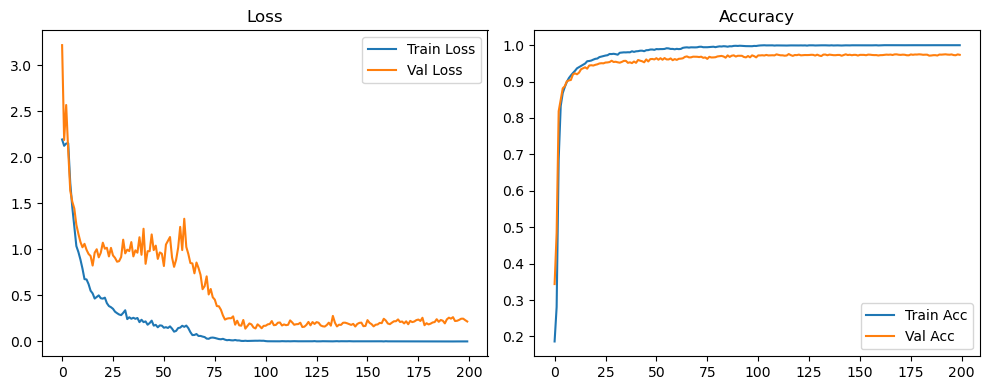

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 28.89it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 28.86it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 29.11it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 29.23it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 29.40it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 29.50it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 29.57it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 29.57it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 29.62it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 29.65it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 29.65it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 29.68it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 29.70it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 30.13it/s]

Original Model Final Test Loss: 0.1909 Accuracy: 0.9763


🚀 Running: batch256_lr0.005_0.002_0.001_dp0.2


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1695 | Val Acc: 0.3278 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1695 | Val Acc: 0.3278 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1695 | Val Acc: 0.3278 |:   0%|          | 1/200 [00:09<32:20,  9.75s/it]

| LR: 0.005 | Train Acc: 0.1863 | Val Acc: 0.3319 |:   0%|          | 1/200 [00:18<32:20,  9.75s/it]

| LR: 0.005 | Train Acc: 0.1863 | Val Acc: 0.3319 |:   0%|          | 1/200 [00:18<32:20,  9.75s/it]

| LR: 0.005 | Train Acc: 0.1863 | Val Acc: 0.3319 |:   1%|          | 2/200 [00:19<31:13,  9.46s/it]

| LR: 0.005 | Train Acc: 0.4818 | Val Acc: 0.7063 |:   1%|          | 2/200 [00:27<31:13,  9.46s/it]

| LR: 0.005 | Train Acc: 0.4818 | Val Acc: 0.7063 |:   1%|          | 2/200 [00:27<31:13,  9.46s/it]

| LR: 0.005 | Train Acc: 0.4818 | Val Acc: 0.7063 |:   2%|▏         | 3/200 [00:27<30:09,  9.18s/it]

| LR: 0.005 | Train Acc: 0.7364 | Val Acc: 0.8440 |:   2%|▏         | 3/200 [00:36<30:09,  9.18s/it]

| LR: 0.005 | Train Acc: 0.7364 | Val Acc: 0.8440 |:   2%|▏         | 3/200 [00:36<30:09,  9.18s/it]

| LR: 0.005 | Train Acc: 0.7364 | Val Acc: 0.8440 |:   2%|▏         | 4/200 [00:36<29:33,  9.05s/it]

| LR: 0.005 | Train Acc: 0.8100 | Val Acc: 0.8558 |:   2%|▏         | 4/200 [00:45<29:33,  9.05s/it]

| LR: 0.005 | Train Acc: 0.8100 | Val Acc: 0.8558 |:   2%|▏         | 4/200 [00:45<29:33,  9.05s/it]

| LR: 0.005 | Train Acc: 0.8100 | Val Acc: 0.8558 |:   2%|▎         | 5/200 [00:45<29:23,  9.04s/it]

| LR: 0.005 | Train Acc: 0.8406 | Val Acc: 0.8683 |:   2%|▎         | 5/200 [00:54<29:23,  9.04s/it]

| LR: 0.005 | Train Acc: 0.8406 | Val Acc: 0.8683 |:   2%|▎         | 5/200 [00:54<29:23,  9.04s/it]

| LR: 0.005 | Train Acc: 0.8406 | Val Acc: 0.8683 |:   3%|▎         | 6/200 [00:54<28:59,  8.97s/it]

| LR: 0.005 | Train Acc: 0.8608 | Val Acc: 0.8992 |:   3%|▎         | 6/200 [01:03<28:59,  8.97s/it]

| LR: 0.005 | Train Acc: 0.8608 | Val Acc: 0.8992 |:   3%|▎         | 6/200 [01:03<28:59,  8.97s/it]

| LR: 0.005 | Train Acc: 0.8608 | Val Acc: 0.8992 |:   4%|▎         | 7/200 [01:03<28:48,  8.95s/it]

| LR: 0.005 | Train Acc: 0.8752 | Val Acc: 0.8992 |:   4%|▎         | 7/200 [01:12<28:48,  8.95s/it]

| LR: 0.005 | Train Acc: 0.8752 | Val Acc: 0.8992 |:   4%|▎         | 7/200 [01:12<28:48,  8.95s/it]

| LR: 0.005 | Train Acc: 0.8752 | Val Acc: 0.8992 |:   4%|▍         | 8/200 [01:12<28:42,  8.97s/it]

| LR: 0.005 | Train Acc: 0.8854 | Val Acc: 0.9095 |:   4%|▍         | 8/200 [01:21<28:42,  8.97s/it]

| LR: 0.005 | Train Acc: 0.8854 | Val Acc: 0.9095 |:   4%|▍         | 8/200 [01:21<28:42,  8.97s/it]

| LR: 0.005 | Train Acc: 0.8854 | Val Acc: 0.9095 |:   4%|▍         | 9/200 [01:21<28:35,  8.98s/it]

| LR: 0.005 | Train Acc: 0.8971 | Val Acc: 0.9101 |:   4%|▍         | 9/200 [01:30<28:35,  8.98s/it]

| LR: 0.005 | Train Acc: 0.8971 | Val Acc: 0.9101 |:   4%|▍         | 9/200 [01:30<28:35,  8.98s/it]

| LR: 0.005 | Train Acc: 0.8971 | Val Acc: 0.9101 |:   5%|▌         | 10/200 [01:30<28:21,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9021 | Val Acc: 0.9156 |:   5%|▌         | 10/200 [01:39<28:21,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9021 | Val Acc: 0.9156 |:   5%|▌         | 10/200 [01:39<28:21,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9021 | Val Acc: 0.9156 |:   6%|▌         | 11/200 [01:39<28:27,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9085 | Val Acc: 0.9214 |:   6%|▌         | 11/200 [01:48<28:27,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9085 | Val Acc: 0.9214 |:   6%|▌         | 11/200 [01:48<28:27,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9085 | Val Acc: 0.9214 |:   6%|▌         | 12/200 [01:48<28:06,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9147 | Val Acc: 0.9285 |:   6%|▌         | 12/200 [01:57<28:06,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9147 | Val Acc: 0.9285 |:   6%|▌         | 12/200 [01:57<28:06,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9147 | Val Acc: 0.9285 |:   6%|▋         | 13/200 [01:57<27:58,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9209 | Val Acc: 0.9317 |:   6%|▋         | 13/200 [02:06<27:58,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9209 | Val Acc: 0.9317 |:   6%|▋         | 13/200 [02:06<27:58,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9209 | Val Acc: 0.9317 |:   7%|▋         | 14/200 [02:06<27:43,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9278 | Val Acc: 0.9346 |:   7%|▋         | 14/200 [02:15<27:43,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9278 | Val Acc: 0.9346 |:   7%|▋         | 14/200 [02:15<27:43,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9278 | Val Acc: 0.9346 |:   8%|▊         | 15/200 [02:15<27:28,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9288 | Val Acc: 0.9347 |:   8%|▊         | 15/200 [02:24<27:28,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9288 | Val Acc: 0.9347 |:   8%|▊         | 15/200 [02:24<27:28,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9288 | Val Acc: 0.9347 |:   8%|▊         | 16/200 [02:24<27:22,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9327 | Val Acc: 0.9348 |:   8%|▊         | 16/200 [02:32<27:22,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9327 | Val Acc: 0.9348 |:   8%|▊         | 16/200 [02:32<27:22,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9327 | Val Acc: 0.9348 |:   8%|▊         | 17/200 [02:32<27:07,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9354 | Val Acc: 0.9390 |:   8%|▊         | 17/200 [02:41<27:07,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9354 | Val Acc: 0.9390 |:   8%|▊         | 17/200 [02:41<27:07,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9354 | Val Acc: 0.9390 |:   9%|▉         | 18/200 [02:41<26:56,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9394 | Val Acc: 0.9420 |:   9%|▉         | 18/200 [02:50<26:56,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9394 | Val Acc: 0.9420 |:   9%|▉         | 18/200 [02:50<26:56,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9394 | Val Acc: 0.9420 |:  10%|▉         | 19/200 [02:50<26:44,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9409 | Val Acc: 0.9424 |:  10%|▉         | 19/200 [02:59<26:44,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9409 | Val Acc: 0.9424 |:  10%|▉         | 19/200 [02:59<26:44,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9409 | Val Acc: 0.9424 |:  10%|█         | 20/200 [02:59<26:29,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9434 | Val Acc: 0.9443 |:  10%|█         | 20/200 [03:08<26:29,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9434 | Val Acc: 0.9443 |:  10%|█         | 20/200 [03:08<26:29,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9434 | Val Acc: 0.9443 |:  10%|█         | 21/200 [03:08<26:22,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9473 | Val Acc: 0.9468 |:  10%|█         | 21/200 [03:17<26:22,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9473 | Val Acc: 0.9468 |:  10%|█         | 21/200 [03:17<26:22,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9473 | Val Acc: 0.9468 |:  11%|█         | 22/200 [03:17<26:22,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9471 | Val Acc: 0.9482 |:  11%|█         | 22/200 [03:25<26:22,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9471 | Val Acc: 0.9482 |:  11%|█         | 22/200 [03:25<26:22,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9471 | Val Acc: 0.9482 |:  12%|█▏        | 23/200 [03:25<26:05,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9505 | Val Acc: 0.9509 |:  12%|█▏        | 23/200 [03:34<26:05,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9505 | Val Acc: 0.9509 |:  12%|█▏        | 23/200 [03:34<26:05,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9505 | Val Acc: 0.9509 |:  12%|█▏        | 24/200 [03:34<26:00,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9539 | Val Acc: 0.9497 |:  12%|█▏        | 24/200 [03:44<26:00,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9539 | Val Acc: 0.9497 |:  12%|█▏        | 24/200 [03:44<26:00,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9539 | Val Acc: 0.9497 |:  12%|█▎        | 25/200 [03:44<26:33,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9551 | Val Acc: 0.9530 |:  12%|█▎        | 25/200 [03:53<26:33,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9551 | Val Acc: 0.9530 |:  12%|█▎        | 25/200 [03:53<26:33,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9551 | Val Acc: 0.9530 |:  13%|█▎        | 26/200 [03:53<26:13,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9568 | Val Acc: 0.9511 |:  13%|█▎        | 26/200 [04:02<26:13,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9568 | Val Acc: 0.9511 |:  13%|█▎        | 26/200 [04:02<26:13,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9568 | Val Acc: 0.9511 |:  14%|█▎        | 27/200 [04:02<25:55,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9615 | Val Acc: 0.9513 |:  14%|█▎        | 27/200 [04:11<25:55,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9615 | Val Acc: 0.9513 |:  14%|█▎        | 27/200 [04:11<25:55,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9615 | Val Acc: 0.9513 |:  14%|█▍        | 28/200 [04:11<25:39,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9609 | Val Acc: 0.9525 |:  14%|█▍        | 28/200 [04:20<25:39,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9609 | Val Acc: 0.9525 |:  14%|█▍        | 28/200 [04:20<25:39,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9609 | Val Acc: 0.9525 |:  14%|█▍        | 29/200 [04:20<25:42,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9612 | Val Acc: 0.9520 |:  14%|█▍        | 29/200 [04:29<25:42,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9612 | Val Acc: 0.9520 |:  14%|█▍        | 29/200 [04:29<25:42,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9612 | Val Acc: 0.9520 |:  15%|█▌        | 30/200 [04:29<25:35,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9617 | Val Acc: 0.9554 |:  15%|█▌        | 30/200 [04:38<25:35,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9617 | Val Acc: 0.9554 |:  15%|█▌        | 30/200 [04:38<25:35,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9617 | Val Acc: 0.9554 |:  16%|█▌        | 31/200 [04:38<25:48,  9.16s/it]

| LR: 0.005 | Train Acc: 0.9642 | Val Acc: 0.9543 |:  16%|█▌        | 31/200 [04:47<25:48,  9.16s/it]

| LR: 0.005 | Train Acc: 0.9642 | Val Acc: 0.9543 |:  16%|█▌        | 31/200 [04:47<25:48,  9.16s/it]

| LR: 0.005 | Train Acc: 0.9642 | Val Acc: 0.9543 |:  16%|█▌        | 32/200 [04:47<25:33,  9.13s/it]

| LR: 0.005 | Train Acc: 0.9661 | Val Acc: 0.9574 |:  16%|█▌        | 32/200 [04:56<25:33,  9.13s/it]

| LR: 0.005 | Train Acc: 0.9661 | Val Acc: 0.9574 |:  16%|█▌        | 32/200 [04:56<25:33,  9.13s/it]

| LR: 0.005 | Train Acc: 0.9661 | Val Acc: 0.9574 |:  16%|█▋        | 33/200 [04:56<25:06,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9586 |:  16%|█▋        | 33/200 [05:05<25:06,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9586 |:  16%|█▋        | 33/200 [05:05<25:06,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9667 | Val Acc: 0.9586 |:  17%|█▋        | 34/200 [05:05<24:42,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9676 | Val Acc: 0.9553 |:  17%|█▋        | 34/200 [05:14<24:42,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9676 | Val Acc: 0.9553 |:  17%|█▋        | 34/200 [05:14<24:42,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9676 | Val Acc: 0.9553 |:  18%|█▊        | 35/200 [05:14<24:36,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9705 | Val Acc: 0.9567 |:  18%|█▊        | 35/200 [05:23<24:36,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9705 | Val Acc: 0.9567 |:  18%|█▊        | 35/200 [05:23<24:36,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9705 | Val Acc: 0.9567 |:  18%|█▊        | 36/200 [05:23<24:19,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9696 | Val Acc: 0.9577 |:  18%|█▊        | 36/200 [05:31<24:19,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9696 | Val Acc: 0.9577 |:  18%|█▊        | 36/200 [05:31<24:19,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9696 | Val Acc: 0.9577 |:  18%|█▊        | 37/200 [05:31<24:02,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9709 | Val Acc: 0.9547 |:  18%|█▊        | 37/200 [05:40<24:02,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9709 | Val Acc: 0.9547 |:  18%|█▊        | 37/200 [05:40<24:02,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9709 | Val Acc: 0.9547 |:  19%|█▉        | 38/200 [05:40<23:52,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9712 | Val Acc: 0.9581 |:  19%|█▉        | 38/200 [05:49<23:52,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9712 | Val Acc: 0.9581 |:  19%|█▉        | 38/200 [05:49<23:52,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9712 | Val Acc: 0.9581 |:  20%|█▉        | 39/200 [05:49<23:38,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9737 | Val Acc: 0.9589 |:  20%|█▉        | 39/200 [05:58<23:38,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9737 | Val Acc: 0.9589 |:  20%|█▉        | 39/200 [05:58<23:38,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9737 | Val Acc: 0.9589 |:  20%|██        | 40/200 [05:58<23:30,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9724 | Val Acc: 0.9572 |:  20%|██        | 40/200 [06:07<23:30,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9724 | Val Acc: 0.9572 |:  20%|██        | 40/200 [06:07<23:30,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9724 | Val Acc: 0.9572 |:  20%|██        | 41/200 [06:07<23:22,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9732 | Val Acc: 0.9587 |:  20%|██        | 41/200 [06:15<23:22,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9732 | Val Acc: 0.9587 |:  20%|██        | 41/200 [06:15<23:22,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9732 | Val Acc: 0.9587 |:  21%|██        | 42/200 [06:15<23:11,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9733 | Val Acc: 0.9619 |:  21%|██        | 42/200 [06:24<23:11,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9733 | Val Acc: 0.9619 |:  21%|██        | 42/200 [06:24<23:11,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9733 | Val Acc: 0.9619 |:  22%|██▏       | 43/200 [06:24<23:01,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9751 | Val Acc: 0.9620 |:  22%|██▏       | 43/200 [06:33<23:01,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9751 | Val Acc: 0.9620 |:  22%|██▏       | 43/200 [06:33<23:01,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9751 | Val Acc: 0.9620 |:  22%|██▏       | 44/200 [06:33<22:50,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9597 |:  22%|██▏       | 44/200 [06:42<22:50,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9597 |:  22%|██▏       | 44/200 [06:42<22:50,  8.78s/it]

| LR: 0.005 | Train Acc: 0.9757 | Val Acc: 0.9597 |:  22%|██▎       | 45/200 [06:42<22:38,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9626 |:  22%|██▎       | 45/200 [06:50<22:38,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9626 |:  22%|██▎       | 45/200 [06:50<22:38,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9763 | Val Acc: 0.9626 |:  23%|██▎       | 46/200 [06:50<22:29,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9778 | Val Acc: 0.9611 |:  23%|██▎       | 46/200 [06:59<22:29,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9778 | Val Acc: 0.9611 |:  23%|██▎       | 46/200 [06:59<22:29,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9778 | Val Acc: 0.9611 |:  24%|██▎       | 47/200 [06:59<22:25,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9774 | Val Acc: 0.9623 |:  24%|██▎       | 47/200 [07:08<22:25,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9774 | Val Acc: 0.9623 |:  24%|██▎       | 47/200 [07:08<22:25,  8.79s/it]

| LR: 0.005 | Train Acc: 0.9774 | Val Acc: 0.9623 |:  24%|██▍       | 48/200 [07:08<22:21,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9798 | Val Acc: 0.9641 |:  24%|██▍       | 48/200 [07:18<22:21,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9798 | Val Acc: 0.9641 |:  24%|██▍       | 48/200 [07:18<22:21,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9798 | Val Acc: 0.9641 |:  24%|██▍       | 49/200 [07:18<22:38,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9800 | Val Acc: 0.9633 |:  24%|██▍       | 49/200 [07:26<22:38,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9800 | Val Acc: 0.9633 |:  24%|██▍       | 49/200 [07:26<22:38,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9800 | Val Acc: 0.9633 |:  25%|██▌       | 50/200 [07:26<22:12,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9648 |:  25%|██▌       | 50/200 [07:35<22:12,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9648 |:  25%|██▌       | 50/200 [07:35<22:12,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9648 |:  26%|██▌       | 51/200 [07:35<22:02,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9627 |:  26%|██▌       | 51/200 [07:44<22:02,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9627 |:  26%|██▌       | 51/200 [07:44<22:02,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9811 | Val Acc: 0.9627 |:  26%|██▌       | 52/200 [07:44<21:53,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9667 |:  26%|██▌       | 52/200 [07:53<21:53,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9667 |:  26%|██▌       | 52/200 [07:53<21:53,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9667 |:  26%|██▋       | 53/200 [07:53<21:49,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9651 |:  26%|██▋       | 53/200 [08:02<21:49,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9651 |:  26%|██▋       | 53/200 [08:02<21:49,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9651 |:  27%|██▋       | 54/200 [08:02<21:40,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9643 |:  27%|██▋       | 54/200 [08:11<21:40,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9643 |:  27%|██▋       | 54/200 [08:11<21:40,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9643 |:  28%|██▊       | 55/200 [08:11<21:25,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9667 |:  28%|██▊       | 55/200 [08:19<21:25,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9667 |:  28%|██▊       | 55/200 [08:19<21:25,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9667 |:  28%|██▊       | 56/200 [08:19<21:18,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9853 | Val Acc: 0.9682 |:  28%|██▊       | 56/200 [08:28<21:18,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9853 | Val Acc: 0.9682 |:  28%|██▊       | 56/200 [08:28<21:18,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9853 | Val Acc: 0.9682 |:  28%|██▊       | 57/200 [08:28<21:08,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9688 |:  28%|██▊       | 57/200 [08:37<21:08,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9688 |:  28%|██▊       | 57/200 [08:37<21:08,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9849 | Val Acc: 0.9688 |:  29%|██▉       | 58/200 [08:37<20:56,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9862 | Val Acc: 0.9674 |:  29%|██▉       | 58/200 [08:46<20:56,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9862 | Val Acc: 0.9674 |:  29%|██▉       | 58/200 [08:46<20:56,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9862 | Val Acc: 0.9674 |:  30%|██▉       | 59/200 [08:46<21:00,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9876 | Val Acc: 0.9661 |:  30%|██▉       | 59/200 [08:55<21:00,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9876 | Val Acc: 0.9661 |:  30%|██▉       | 59/200 [08:55<21:00,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9876 | Val Acc: 0.9661 |:  30%|███       | 60/200 [08:55<20:51,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9871 | Val Acc: 0.9697 |:  30%|███       | 60/200 [09:04<20:51,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9871 | Val Acc: 0.9697 |:  30%|███       | 60/200 [09:04<20:51,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9871 | Val Acc: 0.9697 |:  30%|███       | 61/200 [09:04<20:40,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9867 | Val Acc: 0.9667 |:  30%|███       | 61/200 [09:13<20:40,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9867 | Val Acc: 0.9667 |:  30%|███       | 61/200 [09:13<20:40,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9867 | Val Acc: 0.9667 |:  31%|███       | 62/200 [09:13<20:28,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9868 | Val Acc: 0.9680 |:  31%|███       | 62/200 [09:22<20:28,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9868 | Val Acc: 0.9680 |:  31%|███       | 62/200 [09:22<20:28,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9868 | Val Acc: 0.9680 |:  32%|███▏      | 63/200 [09:22<20:30,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9868 | Val Acc: 0.9643 |:  32%|███▏      | 63/200 [09:31<20:30,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9868 | Val Acc: 0.9643 |:  32%|███▏      | 63/200 [09:31<20:30,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9868 | Val Acc: 0.9643 |:  32%|███▏      | 64/200 [09:31<20:14,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9856 | Val Acc: 0.9677 |:  32%|███▏      | 64/200 [09:40<20:14,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9856 | Val Acc: 0.9677 |:  32%|███▏      | 64/200 [09:40<20:14,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9856 | Val Acc: 0.9677 |:  32%|███▎      | 65/200 [09:40<19:59,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9881 | Val Acc: 0.9680 |:  32%|███▎      | 65/200 [09:49<19:59,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9881 | Val Acc: 0.9680 |:  32%|███▎      | 65/200 [09:49<19:59,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9881 | Val Acc: 0.9680 |:  33%|███▎      | 66/200 [09:49<19:58,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9709 |:  33%|███▎      | 66/200 [09:58<19:58,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9709 |:  33%|███▎      | 66/200 [09:58<19:58,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9887 | Val Acc: 0.9709 |:  34%|███▎      | 67/200 [09:58<19:43,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9699 |:  34%|███▎      | 67/200 [10:06<19:43,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9699 |:  34%|███▎      | 67/200 [10:06<19:43,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9901 | Val Acc: 0.9699 |:  34%|███▍      | 68/200 [10:06<19:32,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9706 |:  34%|███▍      | 68/200 [10:15<19:32,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9706 |:  34%|███▍      | 68/200 [10:15<19:32,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9896 | Val Acc: 0.9706 |:  34%|███▍      | 69/200 [10:15<19:29,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9704 |:  34%|███▍      | 69/200 [10:25<19:29,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9704 |:  34%|███▍      | 69/200 [10:25<19:29,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9900 | Val Acc: 0.9704 |:  35%|███▌      | 70/200 [10:25<19:51,  9.17s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9716 |:  35%|███▌      | 70/200 [10:34<19:51,  9.17s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9716 |:  35%|███▌      | 70/200 [10:34<19:51,  9.17s/it]

| LR: 0.005 | Train Acc: 0.9911 | Val Acc: 0.9716 |:  36%|███▌      | 71/200 [10:34<19:34,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9702 |:  36%|███▌      | 71/200 [10:43<19:34,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9702 |:  36%|███▌      | 71/200 [10:43<19:34,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9920 | Val Acc: 0.9702 |:  36%|███▌      | 72/200 [10:43<19:13,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9725 |:  36%|███▌      | 72/200 [10:52<19:13,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9725 |:  36%|███▌      | 72/200 [10:52<19:13,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9924 | Val Acc: 0.9725 |:  36%|███▋      | 73/200 [10:52<18:56,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9726 |:  36%|███▋      | 73/200 [11:01<18:56,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9726 |:  36%|███▋      | 73/200 [11:01<18:56,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9926 | Val Acc: 0.9726 |:  37%|███▋      | 74/200 [11:01<18:44,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9722 |:  37%|███▋      | 74/200 [11:09<18:44,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9722 |:  37%|███▋      | 74/200 [11:09<18:44,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9929 | Val Acc: 0.9722 |:  38%|███▊      | 75/200 [11:09<18:27,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9923 | Val Acc: 0.9718 |:  38%|███▊      | 75/200 [11:18<18:27,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9923 | Val Acc: 0.9718 |:  38%|███▊      | 75/200 [11:18<18:27,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9923 | Val Acc: 0.9718 |:  38%|███▊      | 76/200 [11:18<18:06,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9728 |:  38%|███▊      | 76/200 [11:27<18:06,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9728 |:  38%|███▊      | 76/200 [11:27<18:06,  8.76s/it]

| LR: 0.005 | Train Acc: 0.9927 | Val Acc: 0.9728 |:  38%|███▊      | 77/200 [11:27<18:09,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9934 | Val Acc: 0.9735 |:  38%|███▊      | 77/200 [11:36<18:09,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9934 | Val Acc: 0.9735 |:  38%|███▊      | 77/200 [11:36<18:09,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9934 | Val Acc: 0.9735 |:  39%|███▉      | 78/200 [11:36<17:55,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9706 |:  39%|███▉      | 78/200 [11:45<17:55,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9706 |:  39%|███▉      | 78/200 [11:45<17:55,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9931 | Val Acc: 0.9706 |:  40%|███▉      | 79/200 [11:45<17:51,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9742 |:  40%|███▉      | 79/200 [11:53<17:51,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9742 |:  40%|███▉      | 79/200 [11:53<17:51,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9930 | Val Acc: 0.9742 |:  40%|████      | 80/200 [11:53<17:43,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9731 |:  40%|████      | 80/200 [12:02<17:43,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9731 |:  40%|████      | 80/200 [12:02<17:43,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9731 |:  40%|████      | 81/200 [12:02<17:35,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9720 |:  40%|████      | 81/200 [12:11<17:35,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9720 |:  40%|████      | 81/200 [12:11<17:35,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9720 |:  41%|████      | 82/200 [12:11<17:32,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9734 |:  41%|████      | 82/200 [12:20<17:32,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9734 |:  41%|████      | 82/200 [12:20<17:32,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9734 |:  42%|████▏     | 83/200 [12:20<17:28,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9732 |:  42%|████▏     | 83/200 [12:29<17:28,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9732 |:  42%|████▏     | 83/200 [12:29<17:28,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9732 |:  42%|████▏     | 84/200 [12:29<17:12,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9731 |:  42%|████▏     | 84/200 [12:38<17:12,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9731 |:  42%|████▏     | 84/200 [12:38<17:12,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9731 |:  42%|████▎     | 85/200 [12:38<16:59,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9727 |:  42%|████▎     | 85/200 [12:47<16:59,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9727 |:  42%|████▎     | 85/200 [12:47<16:59,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9938 | Val Acc: 0.9727 |:  43%|████▎     | 86/200 [12:47<17:00,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9702 |:  43%|████▎     | 86/200 [12:56<17:00,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9702 |:  43%|████▎     | 86/200 [12:56<17:00,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9702 |:  44%|████▎     | 87/200 [12:56<16:47,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9728 |:  44%|████▎     | 87/200 [13:05<16:47,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9728 |:  44%|████▎     | 87/200 [13:05<16:47,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9728 |:  44%|████▍     | 88/200 [13:05<16:33,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9737 |:  44%|████▍     | 88/200 [13:14<16:33,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9737 |:  44%|████▍     | 88/200 [13:14<16:33,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9956 | Val Acc: 0.9737 |:  44%|████▍     | 89/200 [13:14<16:29,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9729 |:  44%|████▍     | 89/200 [13:23<16:29,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9729 |:  44%|████▍     | 89/200 [13:23<16:29,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9944 | Val Acc: 0.9729 |:  45%|████▌     | 90/200 [13:23<16:22,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9725 |:  45%|████▌     | 90/200 [13:31<16:22,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9725 |:  45%|████▌     | 90/200 [13:31<16:22,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9947 | Val Acc: 0.9725 |:  46%|████▌     | 91/200 [13:31<16:01,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9720 |:  46%|████▌     | 91/200 [13:40<16:01,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9720 |:  46%|████▌     | 91/200 [13:40<16:01,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9720 |:  46%|████▌     | 92/200 [13:40<15:56,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9731 |:  46%|████▌     | 92/200 [13:49<15:56,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9731 |:  46%|████▌     | 92/200 [13:49<15:56,  8.85s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9731 |:  46%|████▋     | 93/200 [13:49<15:43,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9733 |:  46%|████▋     | 93/200 [13:58<15:43,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9733 |:  46%|████▋     | 93/200 [13:58<15:43,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9949 | Val Acc: 0.9733 |:  47%|████▋     | 94/200 [13:58<15:35,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9715 |:  47%|████▋     | 94/200 [14:07<15:35,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9715 |:  47%|████▋     | 94/200 [14:07<15:35,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9943 | Val Acc: 0.9715 |:  48%|████▊     | 95/200 [14:07<15:47,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9712 |:  48%|████▊     | 95/200 [14:17<15:47,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9712 |:  48%|████▊     | 95/200 [14:17<15:47,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9941 | Val Acc: 0.9712 |:  48%|████▊     | 96/200 [14:17<15:47,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9715 |:  48%|████▊     | 96/200 [14:26<15:47,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9715 |:  48%|████▊     | 96/200 [14:26<15:47,  9.11s/it]

| LR: 0.005 | Train Acc: 0.9948 | Val Acc: 0.9715 |:  48%|████▊     | 97/200 [14:26<15:32,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9701 |:  48%|████▊     | 97/200 [14:34<15:32,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9701 |:  48%|████▊     | 97/200 [14:34<15:32,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9945 | Val Acc: 0.9701 |:  49%|████▉     | 98/200 [14:34<15:17,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9712 |:  49%|████▉     | 98/200 [14:43<15:17,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9712 |:  49%|████▉     | 98/200 [14:43<15:17,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9951 | Val Acc: 0.9712 |:  50%|████▉     | 99/200 [14:43<15:10,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9711 |:  50%|████▉     | 99/200 [14:53<15:10,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9711 |:  50%|████▉     | 99/200 [14:53<15:10,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9939 | Val Acc: 0.9711 |:  50%|█████     | 100/200 [14:53<15:07,  9.07s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9749 |:  50%|█████     | 100/200 [15:02<15:07,  9.07s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9749 |:  50%|█████     | 100/200 [15:02<15:07,  9.07s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9749 |:  50%|█████     | 101/200 [15:02<14:53,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9747 |:  50%|█████     | 101/200 [15:10<14:53,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9747 |:  50%|█████     | 101/200 [15:10<14:53,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9747 |:  51%|█████     | 102/200 [15:11<14:42,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9743 |:  51%|█████     | 102/200 [15:19<14:42,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9743 |:  51%|█████     | 102/200 [15:19<14:42,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9743 |:  52%|█████▏    | 103/200 [15:19<14:28,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9758 |:  52%|█████▏    | 103/200 [15:28<14:28,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9758 |:  52%|█████▏    | 103/200 [15:28<14:28,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9758 |:  52%|█████▏    | 104/200 [15:28<14:20,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9742 |:  52%|█████▏    | 104/200 [15:37<14:20,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9742 |:  52%|█████▏    | 104/200 [15:37<14:20,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9742 |:  52%|█████▎    | 105/200 [15:37<14:09,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9744 |:  52%|█████▎    | 105/200 [15:46<14:09,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9744 |:  52%|█████▎    | 105/200 [15:46<14:09,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9744 |:  53%|█████▎    | 106/200 [15:46<13:56,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9742 |:  53%|█████▎    | 106/200 [15:55<13:56,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9742 |:  53%|█████▎    | 106/200 [15:55<13:56,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9742 |:  54%|█████▎    | 107/200 [15:55<13:51,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9757 |:  54%|█████▎    | 107/200 [16:04<13:51,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9757 |:  54%|█████▎    | 107/200 [16:04<13:51,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9757 |:  54%|█████▍    | 108/200 [16:04<13:44,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9725 |:  54%|█████▍    | 108/200 [16:13<13:44,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9725 |:  54%|█████▍    | 108/200 [16:13<13:44,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9725 |:  55%|█████▍    | 109/200 [16:13<13:35,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9729 |:  55%|█████▍    | 109/200 [16:22<13:35,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9729 |:  55%|█████▍    | 109/200 [16:22<13:35,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9729 |:  55%|█████▌    | 110/200 [16:22<13:23,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9732 |:  55%|█████▌    | 110/200 [16:31<13:23,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9732 |:  55%|█████▌    | 110/200 [16:31<13:23,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9732 |:  56%|█████▌    | 111/200 [16:31<13:17,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9753 |:  56%|█████▌    | 111/200 [16:41<13:17,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9753 |:  56%|█████▌    | 111/200 [16:41<13:17,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9753 |:  56%|█████▌    | 112/200 [16:41<13:28,  9.19s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9758 |:  56%|█████▌    | 112/200 [16:50<13:28,  9.19s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9758 |:  56%|█████▌    | 112/200 [16:50<13:28,  9.19s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9758 |:  56%|█████▋    | 113/200 [16:50<13:13,  9.12s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9755 |:  56%|█████▋    | 113/200 [16:59<13:13,  9.12s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9755 |:  56%|█████▋    | 113/200 [16:59<13:13,  9.12s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9755 |:  57%|█████▋    | 114/200 [16:59<13:02,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9747 |:  57%|█████▋    | 114/200 [17:08<13:02,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9747 |:  57%|█████▋    | 114/200 [17:08<13:02,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9747 |:  57%|█████▊    | 115/200 [17:08<12:48,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9754 |:  57%|█████▊    | 115/200 [17:16<12:48,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9754 |:  57%|█████▊    | 115/200 [17:16<12:48,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9754 |:  58%|█████▊    | 116/200 [17:16<12:34,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9742 |:  58%|█████▊    | 116/200 [17:25<12:34,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9742 |:  58%|█████▊    | 116/200 [17:25<12:34,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9742 |:  58%|█████▊    | 117/200 [17:25<12:17,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9752 |:  58%|█████▊    | 117/200 [17:34<12:17,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9752 |:  58%|█████▊    | 117/200 [17:34<12:17,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9752 |:  59%|█████▉    | 118/200 [17:34<12:06,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9748 |:  59%|█████▉    | 118/200 [17:43<12:06,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9748 |:  59%|█████▉    | 118/200 [17:43<12:06,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9748 |:  60%|█████▉    | 119/200 [17:43<11:57,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9757 |:  60%|█████▉    | 119/200 [17:51<11:57,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9757 |:  60%|█████▉    | 119/200 [17:51<11:57,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9757 |:  60%|██████    | 120/200 [17:51<11:45,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9765 |:  60%|██████    | 120/200 [18:00<11:45,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9765 |:  60%|██████    | 120/200 [18:00<11:45,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9765 |:  60%|██████    | 121/200 [18:00<11:37,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9747 |:  60%|██████    | 121/200 [18:09<11:37,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9747 |:  60%|██████    | 121/200 [18:09<11:37,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9747 |:  61%|██████    | 122/200 [18:09<11:28,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9756 |:  61%|██████    | 122/200 [18:18<11:28,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9756 |:  61%|██████    | 122/200 [18:18<11:28,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9756 |:  62%|██████▏   | 123/200 [18:18<11:18,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9742 |:  62%|██████▏   | 123/200 [18:27<11:18,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9742 |:  62%|██████▏   | 123/200 [18:27<11:18,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9742 |:  62%|██████▏   | 124/200 [18:27<11:15,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9746 |:  62%|██████▏   | 124/200 [18:36<11:15,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9746 |:  62%|██████▏   | 124/200 [18:36<11:15,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9746 |:  62%|██████▎   | 125/200 [18:36<11:02,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9732 |:  62%|██████▎   | 125/200 [18:45<11:02,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9732 |:  62%|██████▎   | 125/200 [18:45<11:02,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9732 |:  63%|██████▎   | 126/200 [18:45<11:02,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9732 |:  63%|██████▎   | 126/200 [18:54<11:02,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9732 |:  63%|██████▎   | 126/200 [18:54<11:02,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9732 |:  64%|██████▎   | 127/200 [18:54<10:53,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9738 |:  64%|██████▎   | 127/200 [19:03<10:53,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9738 |:  64%|██████▎   | 127/200 [19:03<10:53,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9738 |:  64%|██████▍   | 128/200 [19:03<10:43,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9747 |:  64%|██████▍   | 128/200 [19:12<10:43,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9747 |:  64%|██████▍   | 128/200 [19:12<10:43,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9747 |:  64%|██████▍   | 129/200 [19:12<10:31,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9742 |:  64%|██████▍   | 129/200 [19:20<10:31,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9742 |:  64%|██████▍   | 129/200 [19:20<10:31,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9742 |:  65%|██████▌   | 130/200 [19:20<10:22,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9748 |:  65%|██████▌   | 130/200 [19:29<10:22,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9748 |:  65%|██████▌   | 130/200 [19:29<10:22,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9748 |:  66%|██████▌   | 131/200 [19:29<10:14,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9760 |:  66%|██████▌   | 131/200 [19:38<10:14,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9760 |:  66%|██████▌   | 131/200 [19:38<10:14,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9760 |:  66%|██████▌   | 132/200 [19:38<10:04,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9730 |:  66%|██████▌   | 132/200 [19:47<10:04,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9730 |:  66%|██████▌   | 132/200 [19:47<10:04,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9730 |:  66%|██████▋   | 133/200 [19:47<09:52,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9745 |:  66%|██████▋   | 133/200 [19:56<09:52,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9745 |:  66%|██████▋   | 133/200 [19:56<09:52,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9745 |:  67%|██████▋   | 134/200 [19:56<09:39,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9748 |:  67%|██████▋   | 134/200 [20:04<09:39,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9748 |:  67%|██████▋   | 134/200 [20:04<09:39,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9748 |:  68%|██████▊   | 135/200 [20:04<09:29,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9746 |:  68%|██████▊   | 135/200 [20:13<09:29,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9746 |:  68%|██████▊   | 135/200 [20:13<09:29,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9746 |:  68%|██████▊   | 136/200 [20:13<09:27,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9743 |:  68%|██████▊   | 136/200 [20:22<09:27,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9743 |:  68%|██████▊   | 136/200 [20:22<09:27,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9743 |:  68%|██████▊   | 137/200 [20:22<09:16,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9748 |:  68%|██████▊   | 137/200 [20:31<09:16,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9748 |:  68%|██████▊   | 137/200 [20:31<09:16,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9748 |:  69%|██████▉   | 138/200 [20:31<09:08,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9735 |:  69%|██████▉   | 138/200 [20:40<09:08,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9735 |:  69%|██████▉   | 138/200 [20:40<09:08,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9735 |:  70%|██████▉   | 139/200 [20:40<09:02,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9752 |:  70%|██████▉   | 139/200 [20:49<09:02,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9752 |:  70%|██████▉   | 139/200 [20:49<09:02,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9752 |:  70%|███████   | 140/200 [20:49<08:51,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9758 |:  70%|███████   | 140/200 [20:57<08:51,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9758 |:  70%|███████   | 140/200 [20:57<08:51,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9758 |:  70%|███████   | 141/200 [20:58<08:39,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9753 |:  70%|███████   | 141/200 [21:06<08:39,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9753 |:  70%|███████   | 141/200 [21:06<08:39,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9753 |:  71%|███████   | 142/200 [21:06<08:30,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9737 |:  71%|███████   | 142/200 [21:15<08:30,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9737 |:  71%|███████   | 142/200 [21:15<08:30,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9737 |:  72%|███████▏  | 143/200 [21:15<08:23,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9745 |:  72%|███████▏  | 143/200 [21:24<08:23,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9745 |:  72%|███████▏  | 143/200 [21:24<08:23,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9745 |:  72%|███████▏  | 144/200 [21:24<08:15,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9738 |:  72%|███████▏  | 144/200 [21:33<08:15,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9738 |:  72%|███████▏  | 144/200 [21:33<08:15,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9738 |:  72%|███████▎  | 145/200 [21:33<08:03,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9754 |:  72%|███████▎  | 145/200 [21:41<08:03,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9754 |:  72%|███████▎  | 145/200 [21:41<08:03,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9754 |:  73%|███████▎  | 146/200 [21:41<07:53,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9754 |:  73%|███████▎  | 146/200 [21:50<07:53,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9754 |:  73%|███████▎  | 146/200 [21:50<07:53,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9754 |:  74%|███████▎  | 147/200 [21:50<07:44,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9732 |:  74%|███████▎  | 147/200 [21:59<07:44,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9732 |:  74%|███████▎  | 147/200 [21:59<07:44,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9732 |:  74%|███████▍  | 148/200 [21:59<07:34,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9753 |:  74%|███████▍  | 148/200 [22:08<07:34,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9753 |:  74%|███████▍  | 148/200 [22:08<07:34,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9753 |:  74%|███████▍  | 149/200 [22:08<07:26,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9746 |:  74%|███████▍  | 149/200 [22:16<07:26,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9746 |:  74%|███████▍  | 149/200 [22:16<07:26,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9746 |:  75%|███████▌  | 150/200 [22:16<07:17,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9748 |:  75%|███████▌  | 150/200 [22:25<07:17,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9748 |:  75%|███████▌  | 150/200 [22:25<07:17,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9748 |:  76%|███████▌  | 151/200 [22:25<07:08,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9747 |:  76%|███████▌  | 151/200 [22:34<07:08,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9747 |:  76%|███████▌  | 151/200 [22:34<07:08,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9747 |:  76%|███████▌  | 152/200 [22:34<07:00,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9755 |:  76%|███████▌  | 152/200 [22:43<07:00,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9755 |:  76%|███████▌  | 152/200 [22:43<07:00,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9755 |:  76%|███████▋  | 153/200 [22:43<06:53,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9751 |:  76%|███████▋  | 153/200 [22:52<06:53,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9751 |:  76%|███████▋  | 153/200 [22:52<06:53,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9751 |:  77%|███████▋  | 154/200 [22:52<06:43,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9753 |:  77%|███████▋  | 154/200 [23:00<06:43,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9753 |:  77%|███████▋  | 154/200 [23:00<06:43,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9753 |:  78%|███████▊  | 155/200 [23:00<06:34,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9747 |:  78%|███████▊  | 155/200 [23:09<06:34,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9747 |:  78%|███████▊  | 155/200 [23:09<06:34,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9747 |:  78%|███████▊  | 156/200 [23:09<06:26,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9732 |:  78%|███████▊  | 156/200 [23:18<06:26,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9732 |:  78%|███████▊  | 156/200 [23:18<06:26,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9732 |:  78%|███████▊  | 157/200 [23:18<06:19,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9742 |:  78%|███████▊  | 157/200 [23:27<06:19,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9742 |:  78%|███████▊  | 157/200 [23:27<06:19,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9742 |:  79%|███████▉  | 158/200 [23:27<06:16,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9738 |:  79%|███████▉  | 158/200 [23:36<06:16,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9738 |:  79%|███████▉  | 158/200 [23:36<06:16,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9738 |:  80%|███████▉  | 159/200 [23:36<06:09,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9758 |:  80%|███████▉  | 159/200 [23:45<06:09,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9758 |:  80%|███████▉  | 159/200 [23:45<06:09,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9758 |:  80%|████████  | 160/200 [23:45<05:58,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9761 |:  80%|████████  | 160/200 [23:54<05:58,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9761 |:  80%|████████  | 160/200 [23:54<05:58,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9761 |:  80%|████████  | 161/200 [23:54<05:49,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9758 |:  80%|████████  | 161/200 [24:03<05:49,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9758 |:  80%|████████  | 161/200 [24:03<05:49,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9758 |:  81%|████████  | 162/200 [24:03<05:39,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9757 |:  81%|████████  | 162/200 [24:12<05:39,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9757 |:  81%|████████  | 162/200 [24:12<05:39,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9757 |:  82%|████████▏ | 163/200 [24:12<05:29,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9768 |:  82%|████████▏ | 163/200 [24:21<05:29,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9768 |:  82%|████████▏ | 163/200 [24:21<05:29,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9768 |:  82%|████████▏ | 164/200 [24:21<05:18,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9753 |:  82%|████████▏ | 164/200 [24:30<05:18,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9753 |:  82%|████████▏ | 164/200 [24:30<05:18,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9753 |:  82%|████████▎ | 165/200 [24:30<05:12,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9767 |:  82%|████████▎ | 165/200 [24:39<05:12,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9767 |:  82%|████████▎ | 165/200 [24:39<05:12,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9767 |:  83%|████████▎ | 166/200 [24:39<05:03,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9764 |:  83%|████████▎ | 166/200 [24:48<05:03,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9764 |:  83%|████████▎ | 166/200 [24:48<05:03,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9764 |:  84%|████████▎ | 167/200 [24:48<04:54,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9755 |:  84%|████████▎ | 167/200 [24:57<04:54,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9755 |:  84%|████████▎ | 167/200 [24:57<04:54,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9755 |:  84%|████████▍ | 168/200 [24:57<04:49,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9761 |:  84%|████████▍ | 168/200 [25:06<04:49,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9761 |:  84%|████████▍ | 168/200 [25:06<04:49,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9761 |:  84%|████████▍ | 169/200 [25:06<04:40,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9763 |:  84%|████████▍ | 169/200 [25:15<04:40,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9763 |:  84%|████████▍ | 169/200 [25:15<04:40,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9763 |:  85%|████████▌ | 170/200 [25:15<04:29,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9770 |:  85%|████████▌ | 170/200 [25:24<04:29,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9770 |:  85%|████████▌ | 170/200 [25:24<04:29,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9770 |:  86%|████████▌ | 171/200 [25:24<04:26,  9.18s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9771 |:  86%|████████▌ | 171/200 [25:33<04:26,  9.18s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9771 |:  86%|████████▌ | 171/200 [25:33<04:26,  9.18s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9771 |:  86%|████████▌ | 172/200 [25:33<04:13,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9782 |:  86%|████████▌ | 172/200 [25:42<04:13,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9782 |:  86%|████████▌ | 172/200 [25:42<04:13,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9782 |:  86%|████████▋ | 173/200 [25:42<04:04,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9769 |:  86%|████████▋ | 173/200 [25:51<04:04,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9769 |:  86%|████████▋ | 173/200 [25:51<04:04,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9769 |:  87%|████████▋ | 174/200 [25:51<03:53,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9762 |:  87%|████████▋ | 174/200 [26:00<03:53,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9762 |:  87%|████████▋ | 174/200 [26:00<03:53,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9762 |:  88%|████████▊ | 175/200 [26:00<03:43,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9762 |:  88%|████████▊ | 175/200 [26:09<03:43,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9762 |:  88%|████████▊ | 175/200 [26:09<03:43,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9762 |:  88%|████████▊ | 176/200 [26:09<03:35,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9774 |:  88%|████████▊ | 176/200 [26:18<03:35,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9774 |:  88%|████████▊ | 176/200 [26:18<03:35,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9774 |:  88%|████████▊ | 177/200 [26:18<03:25,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9771 |:  88%|████████▊ | 177/200 [26:27<03:25,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9771 |:  88%|████████▊ | 177/200 [26:27<03:25,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9771 |:  89%|████████▉ | 178/200 [26:27<03:18,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9757 |:  89%|████████▉ | 178/200 [26:36<03:18,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9757 |:  89%|████████▉ | 178/200 [26:36<03:18,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9757 |:  90%|████████▉ | 179/200 [26:36<03:07,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9775 |:  90%|████████▉ | 179/200 [26:45<03:07,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9775 |:  90%|████████▉ | 179/200 [26:45<03:07,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9775 |:  90%|█████████ | 180/200 [26:45<02:57,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9769 |:  90%|█████████ | 180/200 [26:53<02:57,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9769 |:  90%|█████████ | 180/200 [26:53<02:57,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9769 |:  90%|█████████ | 181/200 [26:54<02:49,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9762 |:  90%|█████████ | 181/200 [27:02<02:49,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9762 |:  90%|█████████ | 181/200 [27:02<02:49,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9762 |:  91%|█████████ | 182/200 [27:02<02:39,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9759 |:  91%|█████████ | 182/200 [27:11<02:39,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9759 |:  91%|█████████ | 182/200 [27:11<02:39,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9759 |:  92%|█████████▏| 183/200 [27:11<02:29,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9764 |:  92%|█████████▏| 183/200 [27:20<02:29,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9764 |:  92%|█████████▏| 183/200 [27:20<02:29,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9764 |:  92%|█████████▏| 184/200 [27:20<02:20,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9766 |:  92%|█████████▏| 184/200 [27:29<02:20,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9766 |:  92%|█████████▏| 184/200 [27:29<02:20,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9766 |:  92%|█████████▎| 185/200 [27:29<02:13,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9758 |:  92%|█████████▎| 185/200 [27:37<02:13,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9758 |:  92%|█████████▎| 185/200 [27:37<02:13,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9758 |:  93%|█████████▎| 186/200 [27:38<02:03,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9765 |:  93%|█████████▎| 186/200 [27:46<02:03,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9765 |:  93%|█████████▎| 186/200 [27:46<02:03,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9765 |:  94%|█████████▎| 187/200 [27:46<01:54,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9766 |:  94%|█████████▎| 187/200 [27:55<01:54,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9766 |:  94%|█████████▎| 187/200 [27:55<01:54,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9766 |:  94%|█████████▍| 188/200 [27:55<01:46,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9765 |:  94%|█████████▍| 188/200 [28:04<01:46,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9765 |:  94%|█████████▍| 188/200 [28:04<01:46,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9765 |:  94%|█████████▍| 189/200 [28:04<01:37,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9753 |:  94%|█████████▍| 189/200 [28:13<01:37,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9753 |:  94%|█████████▍| 189/200 [28:13<01:37,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9753 |:  95%|█████████▌| 190/200 [28:13<01:28,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9768 |:  95%|█████████▌| 190/200 [28:22<01:28,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9768 |:  95%|█████████▌| 190/200 [28:22<01:28,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9768 |:  96%|█████████▌| 191/200 [28:22<01:19,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9766 |:  96%|█████████▌| 191/200 [28:30<01:19,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9766 |:  96%|█████████▌| 191/200 [28:30<01:19,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9766 |:  96%|█████████▌| 192/200 [28:30<01:10,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9755 |:  96%|█████████▌| 192/200 [28:40<01:10,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9755 |:  96%|█████████▌| 192/200 [28:40<01:10,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9755 |:  96%|█████████▋| 193/200 [28:40<01:02,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9764 |:  96%|█████████▋| 193/200 [28:49<01:02,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9764 |:  96%|█████████▋| 193/200 [28:49<01:02,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9764 |:  97%|█████████▋| 194/200 [28:49<00:54,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9768 |:  97%|█████████▋| 194/200 [28:58<00:54,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9768 |:  97%|█████████▋| 194/200 [28:58<00:54,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9768 |:  98%|█████████▊| 195/200 [28:58<00:44,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9769 |:  98%|█████████▊| 195/200 [29:07<00:44,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9769 |:  98%|█████████▊| 195/200 [29:07<00:44,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9995 | Val Acc: 0.9769 |:  98%|█████████▊| 196/200 [29:07<00:36,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9752 |:  98%|█████████▊| 196/200 [29:16<00:36,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9752 |:  98%|█████████▊| 196/200 [29:16<00:36,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9991 | Val Acc: 0.9752 |:  98%|█████████▊| 197/200 [29:16<00:27,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9762 |:  98%|█████████▊| 197/200 [29:25<00:27,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9762 |:  98%|█████████▊| 197/200 [29:25<00:27,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9993 | Val Acc: 0.9762 |:  99%|█████████▉| 198/200 [29:25<00:17,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9762 |:  99%|█████████▉| 198/200 [29:34<00:17,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9762 |:  99%|█████████▉| 198/200 [29:34<00:17,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9992 | Val Acc: 0.9762 |: 100%|█████████▉| 199/200 [29:34<00:08,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9762 |: 100%|█████████▉| 199/200 [29:43<00:08,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9762 |: 100%|█████████▉| 199/200 [29:43<00:08,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9762 |: 100%|██████████| 200/200 [29:43<00:00,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9994 | Val Acc: 0.9762 |: 100%|██████████| 200/200 [29:43<00:00,  8.92s/it]

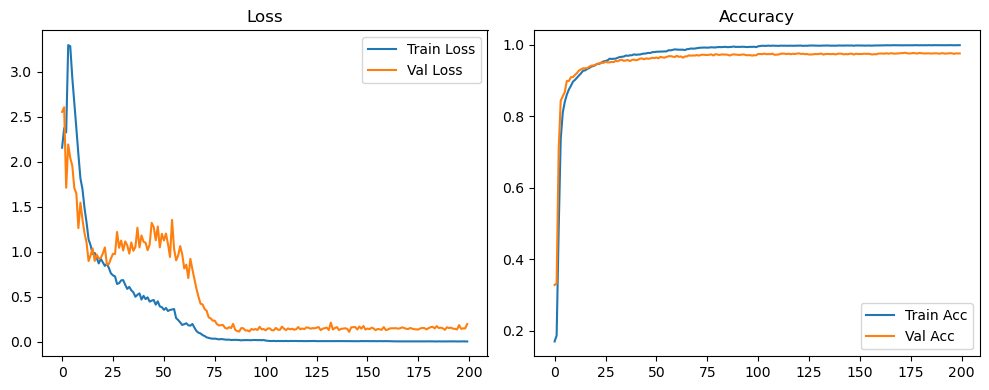

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 28.48it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 28.81it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 28.92it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 28.97it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 29.00it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 29.03it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 29.05it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 29.09it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 29.12it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 29.14it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 29.17it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 28.86it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 28.76it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 29.54it/s]

Original Model Final Test Loss: 0.1843 Accuracy: 0.9776


🚀 Running: batch256_lr0.005_0.002_0.001_dp0.5


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1481 | Val Acc: 0.3093 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1481 | Val Acc: 0.3093 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.005 | Train Acc: 0.1481 | Val Acc: 0.3093 |:   0%|          | 1/200 [00:09<32:05,  9.68s/it]

| LR: 0.005 | Train Acc: 0.1659 | Val Acc: 0.3431 |:   0%|          | 1/200 [00:18<32:05,  9.68s/it]

| LR: 0.005 | Train Acc: 0.1659 | Val Acc: 0.3431 |:   0%|          | 1/200 [00:18<32:05,  9.68s/it]

| LR: 0.005 | Train Acc: 0.1659 | Val Acc: 0.3431 |:   1%|          | 2/200 [00:18<31:02,  9.41s/it]

| LR: 0.005 | Train Acc: 0.3969 | Val Acc: 0.6731 |:   1%|          | 2/200 [00:27<31:02,  9.41s/it]

| LR: 0.005 | Train Acc: 0.3969 | Val Acc: 0.6731 |:   1%|          | 2/200 [00:27<31:02,  9.41s/it]

| LR: 0.005 | Train Acc: 0.3969 | Val Acc: 0.6731 |:   2%|▏         | 3/200 [00:27<30:02,  9.15s/it]

| LR: 0.005 | Train Acc: 0.6624 | Val Acc: 0.8296 |:   2%|▏         | 3/200 [00:36<30:02,  9.15s/it]

| LR: 0.005 | Train Acc: 0.6624 | Val Acc: 0.8296 |:   2%|▏         | 3/200 [00:36<30:02,  9.15s/it]

| LR: 0.005 | Train Acc: 0.6624 | Val Acc: 0.8296 |:   2%|▏         | 4/200 [00:36<29:45,  9.11s/it]

| LR: 0.005 | Train Acc: 0.7733 | Val Acc: 0.8720 |:   2%|▏         | 4/200 [00:45<29:45,  9.11s/it]

| LR: 0.005 | Train Acc: 0.7733 | Val Acc: 0.8720 |:   2%|▏         | 4/200 [00:45<29:45,  9.11s/it]

| LR: 0.005 | Train Acc: 0.7733 | Val Acc: 0.8720 |:   2%|▎         | 5/200 [00:45<29:23,  9.04s/it]

| LR: 0.005 | Train Acc: 0.8103 | Val Acc: 0.8925 |:   2%|▎         | 5/200 [00:54<29:23,  9.04s/it]

| LR: 0.005 | Train Acc: 0.8103 | Val Acc: 0.8925 |:   2%|▎         | 5/200 [00:54<29:23,  9.04s/it]

| LR: 0.005 | Train Acc: 0.8103 | Val Acc: 0.8925 |:   3%|▎         | 6/200 [00:54<29:07,  9.01s/it]

| LR: 0.005 | Train Acc: 0.8354 | Val Acc: 0.9008 |:   3%|▎         | 6/200 [01:04<29:07,  9.01s/it]

| LR: 0.005 | Train Acc: 0.8354 | Val Acc: 0.9008 |:   3%|▎         | 6/200 [01:04<29:07,  9.01s/it]

| LR: 0.005 | Train Acc: 0.8354 | Val Acc: 0.9008 |:   4%|▎         | 7/200 [01:04<29:33,  9.19s/it]

| LR: 0.005 | Train Acc: 0.8550 | Val Acc: 0.9142 |:   4%|▎         | 7/200 [01:14<29:33,  9.19s/it]

| LR: 0.005 | Train Acc: 0.8550 | Val Acc: 0.9142 |:   4%|▎         | 7/200 [01:14<29:33,  9.19s/it]

| LR: 0.005 | Train Acc: 0.8550 | Val Acc: 0.9142 |:   4%|▍         | 8/200 [01:14<30:04,  9.40s/it]

| LR: 0.005 | Train Acc: 0.8692 | Val Acc: 0.9111 |:   4%|▍         | 8/200 [01:24<30:04,  9.40s/it]

| LR: 0.005 | Train Acc: 0.8692 | Val Acc: 0.9111 |:   4%|▍         | 8/200 [01:24<30:04,  9.40s/it]

| LR: 0.005 | Train Acc: 0.8692 | Val Acc: 0.9111 |:   4%|▍         | 9/200 [01:24<30:30,  9.58s/it]

| LR: 0.005 | Train Acc: 0.8762 | Val Acc: 0.9187 |:   4%|▍         | 9/200 [01:34<30:30,  9.58s/it]

| LR: 0.005 | Train Acc: 0.8762 | Val Acc: 0.9187 |:   4%|▍         | 9/200 [01:34<30:30,  9.58s/it]

| LR: 0.005 | Train Acc: 0.8762 | Val Acc: 0.9187 |:   5%|▌         | 10/200 [01:34<30:46,  9.72s/it]

| LR: 0.005 | Train Acc: 0.8858 | Val Acc: 0.9253 |:   5%|▌         | 10/200 [01:43<30:46,  9.72s/it]

| LR: 0.005 | Train Acc: 0.8858 | Val Acc: 0.9253 |:   5%|▌         | 10/200 [01:43<30:46,  9.72s/it]

| LR: 0.005 | Train Acc: 0.8858 | Val Acc: 0.9253 |:   6%|▌         | 11/200 [01:43<30:46,  9.77s/it]

| LR: 0.005 | Train Acc: 0.8935 | Val Acc: 0.9357 |:   6%|▌         | 11/200 [01:52<30:46,  9.77s/it]

| LR: 0.005 | Train Acc: 0.8935 | Val Acc: 0.9357 |:   6%|▌         | 11/200 [01:52<30:46,  9.77s/it]

| LR: 0.005 | Train Acc: 0.8935 | Val Acc: 0.9357 |:   6%|▌         | 12/200 [01:52<29:54,  9.54s/it]

| LR: 0.005 | Train Acc: 0.9002 | Val Acc: 0.9356 |:   6%|▌         | 12/200 [02:01<29:54,  9.54s/it]

| LR: 0.005 | Train Acc: 0.9002 | Val Acc: 0.9356 |:   6%|▌         | 12/200 [02:01<29:54,  9.54s/it]

| LR: 0.005 | Train Acc: 0.9002 | Val Acc: 0.9356 |:   6%|▋         | 13/200 [02:01<29:08,  9.35s/it]

| LR: 0.005 | Train Acc: 0.9024 | Val Acc: 0.9357 |:   6%|▋         | 13/200 [02:10<29:08,  9.35s/it]

| LR: 0.005 | Train Acc: 0.9024 | Val Acc: 0.9357 |:   6%|▋         | 13/200 [02:10<29:08,  9.35s/it]

| LR: 0.005 | Train Acc: 0.9024 | Val Acc: 0.9357 |:   7%|▋         | 14/200 [02:11<28:45,  9.28s/it]

| LR: 0.005 | Train Acc: 0.9076 | Val Acc: 0.9401 |:   7%|▋         | 14/200 [02:19<28:45,  9.28s/it]

| LR: 0.005 | Train Acc: 0.9076 | Val Acc: 0.9401 |:   7%|▋         | 14/200 [02:19<28:45,  9.28s/it]

| LR: 0.005 | Train Acc: 0.9076 | Val Acc: 0.9401 |:   8%|▊         | 15/200 [02:19<28:12,  9.15s/it]

| LR: 0.005 | Train Acc: 0.9155 | Val Acc: 0.9403 |:   8%|▊         | 15/200 [02:29<28:12,  9.15s/it]

| LR: 0.005 | Train Acc: 0.9155 | Val Acc: 0.9403 |:   8%|▊         | 15/200 [02:29<28:12,  9.15s/it]

| LR: 0.005 | Train Acc: 0.9155 | Val Acc: 0.9403 |:   8%|▊         | 16/200 [02:29<28:11,  9.19s/it]

| LR: 0.005 | Train Acc: 0.9186 | Val Acc: 0.9433 |:   8%|▊         | 16/200 [02:38<28:11,  9.19s/it]

| LR: 0.005 | Train Acc: 0.9186 | Val Acc: 0.9433 |:   8%|▊         | 16/200 [02:38<28:11,  9.19s/it]

| LR: 0.005 | Train Acc: 0.9186 | Val Acc: 0.9433 |:   8%|▊         | 17/200 [02:38<28:06,  9.22s/it]

| LR: 0.005 | Train Acc: 0.9220 | Val Acc: 0.9483 |:   8%|▊         | 17/200 [02:47<28:06,  9.22s/it]

| LR: 0.005 | Train Acc: 0.9220 | Val Acc: 0.9483 |:   8%|▊         | 17/200 [02:47<28:06,  9.22s/it]

| LR: 0.005 | Train Acc: 0.9220 | Val Acc: 0.9483 |:   9%|▉         | 18/200 [02:47<28:07,  9.27s/it]

| LR: 0.005 | Train Acc: 0.9249 | Val Acc: 0.9453 |:   9%|▉         | 18/200 [02:56<28:07,  9.27s/it]

| LR: 0.005 | Train Acc: 0.9249 | Val Acc: 0.9453 |:   9%|▉         | 18/200 [02:56<28:07,  9.27s/it]

| LR: 0.005 | Train Acc: 0.9249 | Val Acc: 0.9453 |:  10%|▉         | 19/200 [02:56<27:35,  9.15s/it]

| LR: 0.005 | Train Acc: 0.9277 | Val Acc: 0.9485 |:  10%|▉         | 19/200 [03:05<27:35,  9.15s/it]

| LR: 0.005 | Train Acc: 0.9277 | Val Acc: 0.9485 |:  10%|▉         | 19/200 [03:05<27:35,  9.15s/it]

| LR: 0.005 | Train Acc: 0.9277 | Val Acc: 0.9485 |:  10%|█         | 20/200 [03:05<27:07,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9275 | Val Acc: 0.9489 |:  10%|█         | 20/200 [03:14<27:07,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9275 | Val Acc: 0.9489 |:  10%|█         | 20/200 [03:14<27:07,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9275 | Val Acc: 0.9489 |:  10%|█         | 21/200 [03:14<26:52,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9315 | Val Acc: 0.9506 |:  10%|█         | 21/200 [03:23<26:52,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9315 | Val Acc: 0.9506 |:  10%|█         | 21/200 [03:23<26:52,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9315 | Val Acc: 0.9506 |:  11%|█         | 22/200 [03:23<26:46,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9325 | Val Acc: 0.9488 |:  11%|█         | 22/200 [03:32<26:46,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9325 | Val Acc: 0.9488 |:  11%|█         | 22/200 [03:32<26:46,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9325 | Val Acc: 0.9488 |:  12%|█▏        | 23/200 [03:33<27:05,  9.19s/it]

| LR: 0.005 | Train Acc: 0.9339 | Val Acc: 0.9533 |:  12%|█▏        | 23/200 [03:41<27:05,  9.19s/it]

| LR: 0.005 | Train Acc: 0.9339 | Val Acc: 0.9533 |:  12%|█▏        | 23/200 [03:41<27:05,  9.19s/it]

| LR: 0.005 | Train Acc: 0.9339 | Val Acc: 0.9533 |:  12%|█▏        | 24/200 [03:41<26:40,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9365 | Val Acc: 0.9533 |:  12%|█▏        | 24/200 [03:50<26:40,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9365 | Val Acc: 0.9533 |:  12%|█▏        | 24/200 [03:50<26:40,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9365 | Val Acc: 0.9533 |:  12%|█▎        | 25/200 [03:50<26:23,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9405 | Val Acc: 0.9537 |:  12%|█▎        | 25/200 [03:59<26:23,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9405 | Val Acc: 0.9537 |:  12%|█▎        | 25/200 [03:59<26:23,  9.05s/it]

| LR: 0.005 | Train Acc: 0.9405 | Val Acc: 0.9537 |:  13%|█▎        | 26/200 [03:59<26:09,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9537 |:  13%|█▎        | 26/200 [04:08<26:09,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9537 |:  13%|█▎        | 26/200 [04:08<26:09,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9410 | Val Acc: 0.9537 |:  14%|█▎        | 27/200 [04:08<26:07,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9458 | Val Acc: 0.9547 |:  14%|█▎        | 27/200 [04:17<26:07,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9458 | Val Acc: 0.9547 |:  14%|█▎        | 27/200 [04:17<26:07,  9.06s/it]

| LR: 0.005 | Train Acc: 0.9458 | Val Acc: 0.9547 |:  14%|█▍        | 28/200 [04:17<25:48,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9446 | Val Acc: 0.9580 |:  14%|█▍        | 28/200 [04:26<25:48,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9446 | Val Acc: 0.9580 |:  14%|█▍        | 28/200 [04:26<25:48,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9446 | Val Acc: 0.9580 |:  14%|█▍        | 29/200 [04:26<25:31,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9442 | Val Acc: 0.9571 |:  14%|█▍        | 29/200 [04:36<25:31,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9442 | Val Acc: 0.9571 |:  14%|█▍        | 29/200 [04:36<25:31,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9442 | Val Acc: 0.9571 |:  15%|█▌        | 30/200 [04:36<25:59,  9.18s/it]

| LR: 0.005 | Train Acc: 0.9450 | Val Acc: 0.9572 |:  15%|█▌        | 30/200 [04:45<25:59,  9.18s/it]

| LR: 0.005 | Train Acc: 0.9450 | Val Acc: 0.9572 |:  15%|█▌        | 30/200 [04:45<25:59,  9.18s/it]

| LR: 0.005 | Train Acc: 0.9450 | Val Acc: 0.9572 |:  16%|█▌        | 31/200 [04:45<25:32,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9488 | Val Acc: 0.9569 |:  16%|█▌        | 31/200 [04:54<25:32,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9488 | Val Acc: 0.9569 |:  16%|█▌        | 31/200 [04:54<25:32,  9.07s/it]

| LR: 0.005 | Train Acc: 0.9488 | Val Acc: 0.9569 |:  16%|█▌        | 32/200 [04:54<25:14,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9500 | Val Acc: 0.9607 |:  16%|█▌        | 32/200 [05:02<25:14,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9500 | Val Acc: 0.9607 |:  16%|█▌        | 32/200 [05:02<25:14,  9.01s/it]

| LR: 0.005 | Train Acc: 0.9500 | Val Acc: 0.9607 |:  16%|█▋        | 33/200 [05:02<24:56,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9476 | Val Acc: 0.9595 |:  16%|█▋        | 33/200 [05:12<24:56,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9476 | Val Acc: 0.9595 |:  16%|█▋        | 33/200 [05:12<24:56,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9476 | Val Acc: 0.9595 |:  17%|█▋        | 34/200 [05:12<24:56,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9508 | Val Acc: 0.9602 |:  17%|█▋        | 34/200 [05:20<24:56,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9508 | Val Acc: 0.9602 |:  17%|█▋        | 34/200 [05:20<24:56,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9508 | Val Acc: 0.9602 |:  18%|█▊        | 35/200 [05:20<24:38,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9533 | Val Acc: 0.9617 |:  18%|█▊        | 35/200 [05:29<24:38,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9533 | Val Acc: 0.9617 |:  18%|█▊        | 35/200 [05:29<24:38,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9533 | Val Acc: 0.9617 |:  18%|█▊        | 36/200 [05:29<24:18,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9516 | Val Acc: 0.9617 |:  18%|█▊        | 36/200 [05:38<24:18,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9516 | Val Acc: 0.9617 |:  18%|█▊        | 36/200 [05:38<24:18,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9516 | Val Acc: 0.9617 |:  18%|█▊        | 37/200 [05:38<24:00,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9564 | Val Acc: 0.9635 |:  18%|█▊        | 37/200 [05:47<24:00,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9564 | Val Acc: 0.9635 |:  18%|█▊        | 37/200 [05:47<24:00,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9564 | Val Acc: 0.9635 |:  19%|█▉        | 38/200 [05:47<23:49,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9558 | Val Acc: 0.9656 |:  19%|█▉        | 38/200 [05:55<23:49,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9558 | Val Acc: 0.9656 |:  19%|█▉        | 38/200 [05:55<23:49,  8.83s/it]

| LR: 0.005 | Train Acc: 0.9558 | Val Acc: 0.9656 |:  20%|█▉        | 39/200 [05:56<23:43,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9586 | Val Acc: 0.9637 |:  20%|█▉        | 39/200 [06:04<23:43,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9586 | Val Acc: 0.9637 |:  20%|█▉        | 39/200 [06:04<23:43,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9586 | Val Acc: 0.9637 |:  20%|██        | 40/200 [06:04<23:29,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9595 | Val Acc: 0.9649 |:  20%|██        | 40/200 [06:13<23:29,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9595 | Val Acc: 0.9649 |:  20%|██        | 40/200 [06:13<23:29,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9595 | Val Acc: 0.9649 |:  20%|██        | 41/200 [06:13<23:23,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9612 | Val Acc: 0.9653 |:  20%|██        | 41/200 [06:23<23:23,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9612 | Val Acc: 0.9653 |:  20%|██        | 41/200 [06:23<23:23,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9612 | Val Acc: 0.9653 |:  21%|██        | 42/200 [06:23<23:47,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9617 | Val Acc: 0.9671 |:  21%|██        | 42/200 [06:32<23:47,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9617 | Val Acc: 0.9671 |:  21%|██        | 42/200 [06:32<23:47,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9617 | Val Acc: 0.9671 |:  22%|██▏       | 43/200 [06:32<23:47,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9651 | Val Acc: 0.9676 |:  22%|██▏       | 43/200 [06:41<23:47,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9651 | Val Acc: 0.9676 |:  22%|██▏       | 43/200 [06:41<23:47,  9.09s/it]

| LR: 0.005 | Train Acc: 0.9651 | Val Acc: 0.9676 |:  22%|██▏       | 44/200 [06:41<23:23,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9663 | Val Acc: 0.9668 |:  22%|██▏       | 44/200 [06:49<23:23,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9663 | Val Acc: 0.9668 |:  22%|██▏       | 44/200 [06:49<23:23,  9.00s/it]

| LR: 0.005 | Train Acc: 0.9663 | Val Acc: 0.9668 |:  22%|██▎       | 45/200 [06:50<23:10,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9672 | Val Acc: 0.9682 |:  22%|██▎       | 45/200 [06:58<23:10,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9672 | Val Acc: 0.9682 |:  22%|██▎       | 45/200 [06:58<23:10,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9672 | Val Acc: 0.9682 |:  23%|██▎       | 46/200 [06:58<22:55,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9676 | Val Acc: 0.9690 |:  23%|██▎       | 46/200 [07:07<22:55,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9676 | Val Acc: 0.9690 |:  23%|██▎       | 46/200 [07:07<22:55,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9676 | Val Acc: 0.9690 |:  24%|██▎       | 47/200 [07:07<22:41,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9700 |:  24%|██▎       | 47/200 [07:16<22:41,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9700 |:  24%|██▎       | 47/200 [07:16<22:41,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9687 | Val Acc: 0.9700 |:  24%|██▍       | 48/200 [07:16<22:36,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9719 | Val Acc: 0.9698 |:  24%|██▍       | 48/200 [07:25<22:36,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9719 | Val Acc: 0.9698 |:  24%|██▍       | 48/200 [07:25<22:36,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9719 | Val Acc: 0.9698 |:  24%|██▍       | 49/200 [07:25<22:20,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9708 | Val Acc: 0.9686 |:  24%|██▍       | 49/200 [07:34<22:20,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9708 | Val Acc: 0.9686 |:  24%|██▍       | 49/200 [07:34<22:20,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9708 | Val Acc: 0.9686 |:  25%|██▌       | 50/200 [07:34<22:27,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9699 | Val Acc: 0.9693 |:  25%|██▌       | 50/200 [07:43<22:27,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9699 | Val Acc: 0.9693 |:  25%|██▌       | 50/200 [07:43<22:27,  8.98s/it]

| LR: 0.005 | Train Acc: 0.9699 | Val Acc: 0.9693 |:  26%|██▌       | 51/200 [07:43<22:08,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9719 | Val Acc: 0.9711 |:  26%|██▌       | 51/200 [07:52<22:08,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9719 | Val Acc: 0.9711 |:  26%|██▌       | 51/200 [07:52<22:08,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9719 | Val Acc: 0.9711 |:  26%|██▌       | 52/200 [07:52<21:54,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9760 | Val Acc: 0.9710 |:  26%|██▌       | 52/200 [08:01<21:54,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9760 | Val Acc: 0.9710 |:  26%|██▌       | 52/200 [08:01<21:54,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9760 | Val Acc: 0.9710 |:  26%|██▋       | 53/200 [08:01<21:46,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9779 | Val Acc: 0.9719 |:  26%|██▋       | 53/200 [08:09<21:46,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9779 | Val Acc: 0.9719 |:  26%|██▋       | 53/200 [08:09<21:46,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9779 | Val Acc: 0.9719 |:  27%|██▋       | 54/200 [08:09<21:34,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9792 | Val Acc: 0.9707 |:  27%|██▋       | 54/200 [08:19<21:34,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9792 | Val Acc: 0.9707 |:  27%|██▋       | 54/200 [08:19<21:34,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9792 | Val Acc: 0.9707 |:  28%|██▊       | 55/200 [08:19<21:51,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9798 | Val Acc: 0.9728 |:  28%|██▊       | 55/200 [08:28<21:51,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9798 | Val Acc: 0.9728 |:  28%|██▊       | 55/200 [08:28<21:51,  9.04s/it]

| LR: 0.005 | Train Acc: 0.9798 | Val Acc: 0.9728 |:  28%|██▊       | 56/200 [08:28<21:28,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9803 | Val Acc: 0.9717 |:  28%|██▊       | 56/200 [08:36<21:28,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9803 | Val Acc: 0.9717 |:  28%|██▊       | 56/200 [08:36<21:28,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9803 | Val Acc: 0.9717 |:  28%|██▊       | 57/200 [08:36<21:13,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9730 |:  28%|██▊       | 57/200 [08:45<21:13,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9730 |:  28%|██▊       | 57/200 [08:45<21:13,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9730 |:  29%|██▉       | 58/200 [08:45<20:57,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9724 |:  29%|██▉       | 58/200 [08:54<20:57,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9724 |:  29%|██▉       | 58/200 [08:54<20:57,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9724 |:  30%|██▉       | 59/200 [08:54<20:46,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9728 |:  30%|██▉       | 59/200 [09:03<20:46,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9728 |:  30%|██▉       | 59/200 [09:03<20:46,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9823 | Val Acc: 0.9728 |:  30%|███       | 60/200 [09:03<20:40,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9718 |:  30%|███       | 60/200 [09:12<20:40,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9718 |:  30%|███       | 60/200 [09:12<20:40,  8.86s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9718 |:  30%|███       | 61/200 [09:12<20:34,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9721 |:  30%|███       | 61/200 [09:21<20:34,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9721 |:  30%|███       | 61/200 [09:21<20:34,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9819 | Val Acc: 0.9721 |:  31%|███       | 62/200 [09:21<20:32,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9708 |:  31%|███       | 62/200 [09:30<20:32,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9708 |:  31%|███       | 62/200 [09:30<20:32,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9708 |:  32%|███▏      | 63/200 [09:30<20:16,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9712 |:  32%|███▏      | 63/200 [09:38<20:16,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9712 |:  32%|███▏      | 63/200 [09:38<20:16,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9831 | Val Acc: 0.9712 |:  32%|███▏      | 64/200 [09:38<20:02,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9726 |:  32%|███▏      | 64/200 [09:47<20:02,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9726 |:  32%|███▏      | 64/200 [09:47<20:02,  8.84s/it]

| LR: 0.005 | Train Acc: 0.9816 | Val Acc: 0.9726 |:  32%|███▎      | 65/200 [09:47<19:50,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9729 |:  32%|███▎      | 65/200 [09:56<19:50,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9729 |:  32%|███▎      | 65/200 [09:56<19:50,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9825 | Val Acc: 0.9729 |:  33%|███▎      | 66/200 [09:56<19:42,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9731 |:  33%|███▎      | 66/200 [10:05<19:42,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9731 |:  33%|███▎      | 66/200 [10:05<19:42,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9836 | Val Acc: 0.9731 |:  34%|███▎      | 67/200 [10:05<19:29,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9740 |:  34%|███▎      | 67/200 [10:14<19:29,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9740 |:  34%|███▎      | 67/200 [10:14<19:29,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9740 |:  34%|███▍      | 68/200 [10:14<19:32,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9710 |:  34%|███▍      | 68/200 [10:23<19:32,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9710 |:  34%|███▍      | 68/200 [10:23<19:32,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9828 | Val Acc: 0.9710 |:  34%|███▍      | 69/200 [10:23<19:35,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9702 |:  34%|███▍      | 69/200 [10:32<19:35,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9702 |:  34%|███▍      | 69/200 [10:32<19:35,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9820 | Val Acc: 0.9702 |:  35%|███▌      | 70/200 [10:32<19:42,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9731 |:  35%|███▌      | 70/200 [10:41<19:42,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9731 |:  35%|███▌      | 70/200 [10:41<19:42,  9.10s/it]

| LR: 0.005 | Train Acc: 0.9824 | Val Acc: 0.9731 |:  36%|███▌      | 71/200 [10:41<19:17,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9703 |:  36%|███▌      | 71/200 [10:50<19:17,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9703 |:  36%|███▌      | 71/200 [10:50<19:17,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9703 |:  36%|███▌      | 72/200 [10:50<19:06,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9722 |:  36%|███▌      | 72/200 [10:59<19:06,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9722 |:  36%|███▌      | 72/200 [10:59<19:06,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9722 |:  36%|███▋      | 73/200 [10:59<18:49,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9730 |:  36%|███▋      | 73/200 [11:08<18:49,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9730 |:  36%|███▋      | 73/200 [11:08<18:49,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9730 |:  37%|███▋      | 74/200 [11:08<18:39,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9716 |:  37%|███▋      | 74/200 [11:16<18:39,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9716 |:  37%|███▋      | 74/200 [11:16<18:39,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9716 |:  38%|███▊      | 75/200 [11:16<18:29,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9800 | Val Acc: 0.9709 |:  38%|███▊      | 75/200 [11:25<18:29,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9800 | Val Acc: 0.9709 |:  38%|███▊      | 75/200 [11:25<18:29,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9800 | Val Acc: 0.9709 |:  38%|███▊      | 76/200 [11:25<18:10,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9793 | Val Acc: 0.9716 |:  38%|███▊      | 76/200 [11:34<18:10,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9793 | Val Acc: 0.9716 |:  38%|███▊      | 76/200 [11:34<18:10,  8.80s/it]

| LR: 0.005 | Train Acc: 0.9793 | Val Acc: 0.9716 |:  38%|███▊      | 77/200 [11:34<18:03,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9723 |:  38%|███▊      | 77/200 [11:43<18:03,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9723 |:  38%|███▊      | 77/200 [11:43<18:03,  8.81s/it]

| LR: 0.005 | Train Acc: 0.9809 | Val Acc: 0.9723 |:  39%|███▉      | 78/200 [11:43<17:55,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9699 |:  39%|███▉      | 78/200 [11:52<17:55,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9699 |:  39%|███▉      | 78/200 [11:52<17:55,  8.82s/it]

| LR: 0.005 | Train Acc: 0.9813 | Val Acc: 0.9699 |:  40%|███▉      | 79/200 [11:52<18:01,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9718 |:  40%|███▉      | 79/200 [12:01<18:01,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9718 |:  40%|███▉      | 79/200 [12:01<18:01,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9804 | Val Acc: 0.9718 |:  40%|████      | 80/200 [12:01<17:53,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9722 |:  40%|████      | 80/200 [12:10<17:53,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9722 |:  40%|████      | 80/200 [12:10<17:53,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9722 |:  40%|████      | 81/200 [12:10<17:45,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9708 |:  40%|████      | 81/200 [12:19<17:45,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9708 |:  40%|████      | 81/200 [12:19<17:45,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9708 |:  41%|████      | 82/200 [12:19<17:37,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9713 |:  41%|████      | 82/200 [12:28<17:37,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9713 |:  41%|████      | 82/200 [12:28<17:37,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9713 |:  42%|████▏     | 83/200 [12:28<17:29,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9737 |:  42%|████▏     | 83/200 [12:37<17:29,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9737 |:  42%|████▏     | 83/200 [12:37<17:29,  8.97s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9737 |:  42%|████▏     | 84/200 [12:37<17:22,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9738 |:  42%|████▏     | 84/200 [12:46<17:22,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9738 |:  42%|████▏     | 84/200 [12:46<17:22,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9806 | Val Acc: 0.9738 |:  42%|████▎     | 85/200 [12:46<17:06,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9807 | Val Acc: 0.9696 |:  42%|████▎     | 85/200 [12:54<17:06,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9807 | Val Acc: 0.9696 |:  42%|████▎     | 85/200 [12:54<17:06,  8.93s/it]

| LR: 0.005 | Train Acc: 0.9807 | Val Acc: 0.9696 |:  43%|████▎     | 86/200 [12:54<16:52,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9712 |:  43%|████▎     | 86/200 [13:03<16:52,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9712 |:  43%|████▎     | 86/200 [13:03<16:52,  8.88s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9712 |:  44%|████▎     | 87/200 [13:03<16:45,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9791 | Val Acc: 0.9720 |:  44%|████▎     | 87/200 [13:12<16:45,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9791 | Val Acc: 0.9720 |:  44%|████▎     | 87/200 [13:12<16:45,  8.90s/it]

| LR: 0.005 | Train Acc: 0.9791 | Val Acc: 0.9720 |:  44%|████▍     | 88/200 [13:12<16:35,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9722 |:  44%|████▍     | 88/200 [13:22<16:35,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9722 |:  44%|████▍     | 88/200 [13:22<16:35,  8.89s/it]

| LR: 0.005 | Train Acc: 0.9814 | Val Acc: 0.9722 |:  44%|████▍     | 89/200 [13:22<16:41,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9726 |:  44%|████▍     | 89/200 [13:30<16:41,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9726 |:  44%|████▍     | 89/200 [13:30<16:41,  9.02s/it]

| LR: 0.005 | Train Acc: 0.9801 | Val Acc: 0.9726 |:  45%|████▌     | 90/200 [13:30<16:28,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9736 |:  45%|████▌     | 90/200 [13:39<16:28,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9736 |:  45%|████▌     | 90/200 [13:39<16:28,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9802 | Val Acc: 0.9736 |:  46%|████▌     | 91/200 [13:39<16:16,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9736 |:  46%|████▌     | 91/200 [13:48<16:16,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9736 |:  46%|████▌     | 91/200 [13:48<16:16,  8.96s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9736 |:  46%|████▌     | 92/200 [13:48<16:11,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9715 |:  46%|████▌     | 92/200 [13:57<16:11,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9715 |:  46%|████▌     | 92/200 [13:57<16:11,  8.99s/it]

| LR: 0.005 | Train Acc: 0.9817 | Val Acc: 0.9715 |:  46%|████▋     | 93/200 [13:57<15:56,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9713 |:  46%|████▋     | 93/200 [14:06<15:56,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9713 |:  46%|████▋     | 93/200 [14:06<15:56,  8.94s/it]

| LR: 0.005 | Train Acc: 0.9815 | Val Acc: 0.9713 |:  47%|████▋     | 94/200 [14:06<15:44,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9714 |:  47%|████▋     | 94/200 [14:15<15:44,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9714 |:  47%|████▋     | 94/200 [14:15<15:44,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9810 | Val Acc: 0.9714 |:  48%|████▊     | 95/200 [14:15<15:31,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9722 |:  48%|████▊     | 95/200 [14:24<15:31,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9722 |:  48%|████▊     | 95/200 [14:24<15:31,  8.87s/it]

| LR: 0.005 | Train Acc: 0.9821 | Val Acc: 0.9722 |:  48%|████▊     | 96/200 [14:24<15:39,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9722 |:  48%|████▊     | 96/200 [14:33<15:39,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9722 |:  48%|████▊     | 96/200 [14:33<15:39,  9.03s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9722 |:  48%|████▊     | 97/200 [14:33<15:21,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9717 |:  48%|████▊     | 97/200 [14:42<15:21,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9717 |:  48%|████▊     | 97/200 [14:42<15:21,  8.95s/it]

| LR: 0.005 | Train Acc: 0.9822 | Val Acc: 0.9717 |:  49%|████▉     | 98/200 [14:42<15:09,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9733 |:  49%|████▉     | 98/200 [14:51<15:09,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9733 |:  49%|████▉     | 98/200 [14:51<15:09,  8.92s/it]

| LR: 0.005 | Train Acc: 0.9812 | Val Acc: 0.9733 |:  50%|████▉     | 99/200 [14:51<14:59,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9702 |:  50%|████▉     | 99/200 [15:00<14:59,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9702 |:  50%|████▉     | 99/200 [15:00<14:59,  8.91s/it]

| LR: 0.005 | Train Acc: 0.9808 | Val Acc: 0.9702 |:  50%|█████     | 100/200 [15:00<15:04,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9834 | Val Acc: 0.9732 |:  50%|█████     | 100/200 [15:09<15:04,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9834 | Val Acc: 0.9732 |:  50%|█████     | 100/200 [15:09<15:04,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9834 | Val Acc: 0.9732 |:  50%|█████     | 101/200 [15:09<14:48,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9847 | Val Acc: 0.9741 |:  50%|█████     | 101/200 [15:18<14:48,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9847 | Val Acc: 0.9741 |:  50%|█████     | 101/200 [15:18<14:48,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9847 | Val Acc: 0.9741 |:  51%|█████     | 102/200 [15:18<14:32,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9849 | Val Acc: 0.9749 |:  51%|█████     | 102/200 [15:27<14:32,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9849 | Val Acc: 0.9749 |:  51%|█████     | 102/200 [15:27<14:32,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9849 | Val Acc: 0.9749 |:  52%|█████▏    | 103/200 [15:27<14:23,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9751 |:  52%|█████▏    | 103/200 [15:35<14:23,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9751 |:  52%|█████▏    | 103/200 [15:35<14:23,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9751 |:  52%|█████▏    | 104/200 [15:36<14:15,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9873 | Val Acc: 0.9746 |:  52%|█████▏    | 104/200 [15:44<14:15,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9873 | Val Acc: 0.9746 |:  52%|█████▏    | 104/200 [15:44<14:15,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9873 | Val Acc: 0.9746 |:  52%|█████▎    | 105/200 [15:45<14:09,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9867 | Val Acc: 0.9747 |:  52%|█████▎    | 105/200 [15:53<14:09,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9867 | Val Acc: 0.9747 |:  52%|█████▎    | 105/200 [15:53<14:09,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9867 | Val Acc: 0.9747 |:  53%|█████▎    | 106/200 [15:53<13:57,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9879 | Val Acc: 0.9734 |:  53%|█████▎    | 106/200 [16:02<13:57,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9879 | Val Acc: 0.9734 |:  53%|█████▎    | 106/200 [16:02<13:57,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9879 | Val Acc: 0.9734 |:  54%|█████▎    | 107/200 [16:02<13:44,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9869 | Val Acc: 0.9752 |:  54%|█████▎    | 107/200 [16:11<13:44,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9869 | Val Acc: 0.9752 |:  54%|█████▎    | 107/200 [16:11<13:44,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9869 | Val Acc: 0.9752 |:  54%|█████▍    | 108/200 [16:11<13:33,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9748 |:  54%|█████▍    | 108/200 [16:20<13:33,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9748 |:  54%|█████▍    | 108/200 [16:20<13:33,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9748 |:  55%|█████▍    | 109/200 [16:20<13:21,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9884 | Val Acc: 0.9748 |:  55%|█████▍    | 109/200 [16:28<13:21,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9884 | Val Acc: 0.9748 |:  55%|█████▍    | 109/200 [16:28<13:21,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9884 | Val Acc: 0.9748 |:  55%|█████▌    | 110/200 [16:28<13:13,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9757 |:  55%|█████▌    | 110/200 [16:37<13:13,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9757 |:  55%|█████▌    | 110/200 [16:37<13:13,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9757 |:  56%|█████▌    | 111/200 [16:37<13:04,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9765 |:  56%|█████▌    | 111/200 [16:46<13:04,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9765 |:  56%|█████▌    | 111/200 [16:46<13:04,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9765 |:  56%|█████▌    | 112/200 [16:46<12:55,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9889 | Val Acc: 0.9753 |:  56%|█████▌    | 112/200 [16:55<12:55,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9889 | Val Acc: 0.9753 |:  56%|█████▌    | 112/200 [16:55<12:55,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9889 | Val Acc: 0.9753 |:  56%|█████▋    | 113/200 [16:55<12:53,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9887 | Val Acc: 0.9743 |:  56%|█████▋    | 113/200 [17:04<12:53,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9887 | Val Acc: 0.9743 |:  56%|█████▋    | 113/200 [17:04<12:53,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9887 | Val Acc: 0.9743 |:  57%|█████▋    | 114/200 [17:04<12:44,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9896 | Val Acc: 0.9762 |:  57%|█████▋    | 114/200 [17:13<12:44,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9896 | Val Acc: 0.9762 |:  57%|█████▋    | 114/200 [17:13<12:44,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9896 | Val Acc: 0.9762 |:  57%|█████▊    | 115/200 [17:13<12:44,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9748 |:  57%|█████▊    | 115/200 [17:23<12:44,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9748 |:  57%|█████▊    | 115/200 [17:23<12:44,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9748 |:  58%|█████▊    | 116/200 [17:23<12:51,  9.18s/it]

| LR: 0.002 | Train Acc: 0.9895 | Val Acc: 0.9746 |:  58%|█████▊    | 116/200 [17:32<12:51,  9.18s/it]

| LR: 0.002 | Train Acc: 0.9895 | Val Acc: 0.9746 |:  58%|█████▊    | 116/200 [17:32<12:51,  9.18s/it]

| LR: 0.002 | Train Acc: 0.9895 | Val Acc: 0.9746 |:  58%|█████▊    | 117/200 [17:32<12:36,  9.11s/it]

| LR: 0.002 | Train Acc: 0.9883 | Val Acc: 0.9743 |:  58%|█████▊    | 117/200 [17:41<12:36,  9.11s/it]

| LR: 0.002 | Train Acc: 0.9883 | Val Acc: 0.9743 |:  58%|█████▊    | 117/200 [17:41<12:36,  9.11s/it]

| LR: 0.002 | Train Acc: 0.9883 | Val Acc: 0.9743 |:  59%|█████▉    | 118/200 [17:41<12:20,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9903 | Val Acc: 0.9748 |:  59%|█████▉    | 118/200 [17:50<12:20,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9903 | Val Acc: 0.9748 |:  59%|█████▉    | 118/200 [17:50<12:20,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9903 | Val Acc: 0.9748 |:  60%|█████▉    | 119/200 [17:50<12:10,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9746 |:  60%|█████▉    | 119/200 [17:59<12:10,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9746 |:  60%|█████▉    | 119/200 [17:59<12:10,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9746 |:  60%|██████    | 120/200 [17:59<11:57,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9733 |:  60%|██████    | 120/200 [18:07<11:57,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9733 |:  60%|██████    | 120/200 [18:07<11:57,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9733 |:  60%|██████    | 121/200 [18:07<11:47,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9753 |:  60%|██████    | 121/200 [18:17<11:47,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9753 |:  60%|██████    | 121/200 [18:17<11:47,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9753 |:  61%|██████    | 122/200 [18:17<11:43,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9742 |:  61%|██████    | 122/200 [18:25<11:43,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9742 |:  61%|██████    | 122/200 [18:25<11:43,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9742 |:  62%|██████▏   | 123/200 [18:26<11:30,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9887 | Val Acc: 0.9738 |:  62%|██████▏   | 123/200 [18:34<11:30,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9887 | Val Acc: 0.9738 |:  62%|██████▏   | 123/200 [18:34<11:30,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9887 | Val Acc: 0.9738 |:  62%|██████▏   | 124/200 [18:34<11:19,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9898 | Val Acc: 0.9742 |:  62%|██████▏   | 124/200 [18:43<11:19,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9898 | Val Acc: 0.9742 |:  62%|██████▏   | 124/200 [18:43<11:19,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9898 | Val Acc: 0.9742 |:  62%|██████▎   | 125/200 [18:43<11:10,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9759 |:  62%|██████▎   | 125/200 [18:52<11:10,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9759 |:  62%|██████▎   | 125/200 [18:52<11:10,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9759 |:  63%|██████▎   | 126/200 [18:52<11:06,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9748 |:  63%|██████▎   | 126/200 [19:02<11:06,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9748 |:  63%|██████▎   | 126/200 [19:02<11:06,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9748 |:  64%|██████▎   | 127/200 [19:02<10:58,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9764 |:  64%|██████▎   | 127/200 [19:11<10:58,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9764 |:  64%|██████▎   | 127/200 [19:11<10:58,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9764 |:  64%|██████▍   | 128/200 [19:11<10:49,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9746 |:  64%|██████▍   | 128/200 [19:19<10:49,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9746 |:  64%|██████▍   | 128/200 [19:19<10:49,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9746 |:  64%|██████▍   | 129/200 [19:19<10:36,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9746 |:  64%|██████▍   | 129/200 [19:28<10:36,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9746 |:  64%|██████▍   | 129/200 [19:28<10:36,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9746 |:  65%|██████▌   | 130/200 [19:28<10:24,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9753 |:  65%|██████▌   | 130/200 [19:37<10:24,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9753 |:  65%|██████▌   | 130/200 [19:37<10:24,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9753 |:  66%|██████▌   | 131/200 [19:37<10:10,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9751 |:  66%|██████▌   | 131/200 [19:46<10:10,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9751 |:  66%|██████▌   | 131/200 [19:46<10:10,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9751 |:  66%|██████▌   | 132/200 [19:46<10:00,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9740 |:  66%|██████▌   | 132/200 [19:54<10:00,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9740 |:  66%|██████▌   | 132/200 [19:54<10:00,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9740 |:  66%|██████▋   | 133/200 [19:54<09:51,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9751 |:  66%|██████▋   | 133/200 [20:03<09:51,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9751 |:  66%|██████▋   | 133/200 [20:03<09:51,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9751 |:  67%|██████▋   | 134/200 [20:03<09:41,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9906 | Val Acc: 0.9761 |:  67%|██████▋   | 134/200 [20:12<09:41,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9906 | Val Acc: 0.9761 |:  67%|██████▋   | 134/200 [20:12<09:41,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9906 | Val Acc: 0.9761 |:  68%|██████▊   | 135/200 [20:12<09:37,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9754 |:  68%|██████▊   | 135/200 [20:21<09:37,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9754 |:  68%|██████▊   | 135/200 [20:21<09:37,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9754 |:  68%|██████▊   | 136/200 [20:21<09:26,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9752 |:  68%|██████▊   | 136/200 [20:30<09:26,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9752 |:  68%|██████▊   | 136/200 [20:30<09:26,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9752 |:  68%|██████▊   | 137/200 [20:30<09:19,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9749 |:  68%|██████▊   | 137/200 [20:39<09:19,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9749 |:  68%|██████▊   | 137/200 [20:39<09:19,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9749 |:  69%|██████▉   | 138/200 [20:39<09:10,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9896 | Val Acc: 0.9746 |:  69%|██████▉   | 138/200 [20:48<09:10,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9896 | Val Acc: 0.9746 |:  69%|██████▉   | 138/200 [20:48<09:10,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9896 | Val Acc: 0.9746 |:  70%|██████▉   | 139/200 [20:48<09:02,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9752 |:  70%|██████▉   | 139/200 [20:57<09:02,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9752 |:  70%|██████▉   | 139/200 [20:57<09:02,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9752 |:  70%|███████   | 140/200 [20:57<08:53,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9751 |:  70%|███████   | 140/200 [21:05<08:53,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9751 |:  70%|███████   | 140/200 [21:05<08:53,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9751 |:  70%|███████   | 141/200 [21:05<08:41,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9760 |:  70%|███████   | 141/200 [21:14<08:41,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9760 |:  70%|███████   | 141/200 [21:14<08:41,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9760 |:  71%|███████   | 142/200 [21:14<08:31,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9750 |:  71%|███████   | 142/200 [21:23<08:31,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9750 |:  71%|███████   | 142/200 [21:23<08:31,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9750 |:  72%|███████▏  | 143/200 [21:23<08:23,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9750 |:  72%|███████▏  | 143/200 [21:32<08:23,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9750 |:  72%|███████▏  | 143/200 [21:32<08:23,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9750 |:  72%|███████▏  | 144/200 [21:32<08:16,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9744 |:  72%|███████▏  | 144/200 [21:41<08:16,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9744 |:  72%|███████▏  | 144/200 [21:41<08:16,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9744 |:  72%|███████▎  | 145/200 [21:41<08:08,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9737 |:  72%|███████▎  | 145/200 [21:50<08:08,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9737 |:  72%|███████▎  | 145/200 [21:50<08:08,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9737 |:  73%|███████▎  | 146/200 [21:50<08:06,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9748 |:  73%|███████▎  | 146/200 [21:59<08:06,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9748 |:  73%|███████▎  | 146/200 [21:59<08:06,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9748 |:  74%|███████▎  | 147/200 [21:59<07:52,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9755 |:  74%|███████▎  | 147/200 [22:08<07:52,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9755 |:  74%|███████▎  | 147/200 [22:08<07:52,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9755 |:  74%|███████▍  | 148/200 [22:08<07:40,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9919 | Val Acc: 0.9750 |:  74%|███████▍  | 148/200 [22:16<07:40,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9919 | Val Acc: 0.9750 |:  74%|███████▍  | 148/200 [22:16<07:40,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9919 | Val Acc: 0.9750 |:  74%|███████▍  | 149/200 [22:17<07:31,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9746 |:  74%|███████▍  | 149/200 [22:25<07:31,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9746 |:  74%|███████▍  | 149/200 [22:25<07:31,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9746 |:  75%|███████▌  | 150/200 [22:25<07:21,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9903 | Val Acc: 0.9745 |:  75%|███████▌  | 150/200 [22:34<07:21,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9903 | Val Acc: 0.9745 |:  75%|███████▌  | 150/200 [22:34<07:21,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9903 | Val Acc: 0.9745 |:  76%|███████▌  | 151/200 [22:34<07:13,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9758 |:  76%|███████▌  | 151/200 [22:43<07:13,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9758 |:  76%|███████▌  | 151/200 [22:43<07:13,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9758 |:  76%|███████▌  | 152/200 [22:43<07:10,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9906 | Val Acc: 0.9754 |:  76%|███████▌  | 152/200 [22:52<07:10,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9906 | Val Acc: 0.9754 |:  76%|███████▌  | 152/200 [22:52<07:10,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9906 | Val Acc: 0.9754 |:  76%|███████▋  | 153/200 [22:52<06:59,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9749 |:  76%|███████▋  | 153/200 [23:01<06:59,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9749 |:  76%|███████▋  | 153/200 [23:01<06:59,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9749 |:  77%|███████▋  | 154/200 [23:01<06:48,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9742 |:  77%|███████▋  | 154/200 [23:10<06:48,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9742 |:  77%|███████▋  | 154/200 [23:10<06:48,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9742 |:  78%|███████▊  | 155/200 [23:10<06:39,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9916 | Val Acc: 0.9752 |:  78%|███████▊  | 155/200 [23:19<06:39,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9916 | Val Acc: 0.9752 |:  78%|███████▊  | 155/200 [23:19<06:39,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9916 | Val Acc: 0.9752 |:  78%|███████▊  | 156/200 [23:19<06:30,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9757 |:  78%|███████▊  | 156/200 [23:28<06:30,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9757 |:  78%|███████▊  | 156/200 [23:28<06:30,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9757 |:  78%|███████▊  | 157/200 [23:28<06:21,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9748 |:  78%|███████▊  | 157/200 [23:36<06:21,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9748 |:  78%|███████▊  | 157/200 [23:36<06:21,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9748 |:  79%|███████▉  | 158/200 [23:36<06:11,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9743 |:  79%|███████▉  | 158/200 [23:45<06:11,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9743 |:  79%|███████▉  | 158/200 [23:45<06:11,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9913 | Val Acc: 0.9743 |:  80%|███████▉  | 159/200 [23:45<06:04,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9921 | Val Acc: 0.9741 |:  80%|███████▉  | 159/200 [23:54<06:04,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9921 | Val Acc: 0.9741 |:  80%|███████▉  | 159/200 [23:54<06:04,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9921 | Val Acc: 0.9741 |:  80%|████████  | 160/200 [23:54<05:55,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9925 | Val Acc: 0.9757 |:  80%|████████  | 160/200 [24:03<05:55,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9925 | Val Acc: 0.9757 |:  80%|████████  | 160/200 [24:03<05:55,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9925 | Val Acc: 0.9757 |:  80%|████████  | 161/200 [24:03<05:45,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9924 | Val Acc: 0.9740 |:  80%|████████  | 161/200 [24:12<05:45,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9924 | Val Acc: 0.9740 |:  80%|████████  | 161/200 [24:12<05:45,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9924 | Val Acc: 0.9740 |:  81%|████████  | 162/200 [24:12<05:36,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9922 | Val Acc: 0.9742 |:  81%|████████  | 162/200 [24:21<05:36,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9922 | Val Acc: 0.9742 |:  81%|████████  | 162/200 [24:21<05:36,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9922 | Val Acc: 0.9742 |:  82%|████████▏ | 163/200 [24:21<05:26,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9751 |:  82%|████████▏ | 163/200 [24:29<05:26,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9751 |:  82%|████████▏ | 163/200 [24:29<05:26,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9751 |:  82%|████████▏ | 164/200 [24:29<05:17,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9929 | Val Acc: 0.9755 |:  82%|████████▏ | 164/200 [24:38<05:17,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9929 | Val Acc: 0.9755 |:  82%|████████▏ | 164/200 [24:38<05:17,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9929 | Val Acc: 0.9755 |:  82%|████████▎ | 165/200 [24:38<05:08,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9933 | Val Acc: 0.9756 |:  82%|████████▎ | 165/200 [24:47<05:08,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9933 | Val Acc: 0.9756 |:  82%|████████▎ | 165/200 [24:47<05:08,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9933 | Val Acc: 0.9756 |:  83%|████████▎ | 166/200 [24:47<05:01,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9747 |:  83%|████████▎ | 166/200 [24:56<05:01,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9747 |:  83%|████████▎ | 166/200 [24:56<05:01,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9747 |:  84%|████████▎ | 167/200 [24:56<04:55,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9933 | Val Acc: 0.9739 |:  84%|████████▎ | 167/200 [25:05<04:55,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9933 | Val Acc: 0.9739 |:  84%|████████▎ | 167/200 [25:05<04:55,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9933 | Val Acc: 0.9739 |:  84%|████████▍ | 168/200 [25:05<04:47,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9749 |:  84%|████████▍ | 168/200 [25:14<04:47,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9749 |:  84%|████████▍ | 168/200 [25:14<04:47,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9749 |:  84%|████████▍ | 169/200 [25:14<04:37,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9748 |:  84%|████████▍ | 169/200 [25:23<04:37,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9748 |:  84%|████████▍ | 169/200 [25:23<04:37,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9748 |:  85%|████████▌ | 170/200 [25:23<04:29,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9762 |:  85%|████████▌ | 170/200 [25:32<04:29,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9762 |:  85%|████████▌ | 170/200 [25:32<04:29,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9762 |:  86%|████████▌ | 171/200 [25:32<04:20,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9762 |:  86%|████████▌ | 171/200 [25:41<04:20,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9762 |:  86%|████████▌ | 171/200 [25:41<04:20,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9762 |:  86%|████████▌ | 172/200 [25:41<04:11,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9753 |:  86%|████████▌ | 172/200 [25:50<04:11,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9753 |:  86%|████████▌ | 172/200 [25:50<04:11,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9753 |:  86%|████████▋ | 173/200 [25:50<04:02,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9943 | Val Acc: 0.9760 |:  86%|████████▋ | 173/200 [25:59<04:02,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9943 | Val Acc: 0.9760 |:  86%|████████▋ | 173/200 [25:59<04:02,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9943 | Val Acc: 0.9760 |:  87%|████████▋ | 174/200 [25:59<03:53,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9937 | Val Acc: 0.9749 |:  87%|████████▋ | 174/200 [26:09<03:53,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9937 | Val Acc: 0.9749 |:  87%|████████▋ | 174/200 [26:09<03:53,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9937 | Val Acc: 0.9749 |:  88%|████████▊ | 175/200 [26:09<03:47,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9753 |:  88%|████████▊ | 175/200 [26:18<03:47,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9753 |:  88%|████████▊ | 175/200 [26:18<03:47,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9753 |:  88%|████████▊ | 176/200 [26:18<03:37,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9932 | Val Acc: 0.9754 |:  88%|████████▊ | 176/200 [26:27<03:37,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9932 | Val Acc: 0.9754 |:  88%|████████▊ | 176/200 [26:27<03:37,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9932 | Val Acc: 0.9754 |:  88%|████████▊ | 177/200 [26:27<03:26,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9753 |:  88%|████████▊ | 177/200 [26:36<03:26,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9753 |:  88%|████████▊ | 177/200 [26:36<03:26,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9753 |:  89%|████████▉ | 178/200 [26:36<03:18,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9764 |:  89%|████████▉ | 178/200 [26:45<03:18,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9764 |:  89%|████████▉ | 178/200 [26:45<03:18,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9764 |:  90%|████████▉ | 179/200 [26:45<03:12,  9.18s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9756 |:  90%|████████▉ | 179/200 [26:54<03:12,  9.18s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9756 |:  90%|████████▉ | 179/200 [26:54<03:12,  9.18s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9756 |:  90%|█████████ | 180/200 [26:54<03:02,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9760 |:  90%|█████████ | 180/200 [27:03<03:02,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9760 |:  90%|█████████ | 180/200 [27:03<03:02,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9760 |:  90%|█████████ | 181/200 [27:03<02:51,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9766 |:  90%|█████████ | 181/200 [27:12<02:51,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9766 |:  90%|█████████ | 181/200 [27:12<02:51,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9766 |:  91%|█████████ | 182/200 [27:12<02:44,  9.16s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9756 |:  91%|█████████ | 182/200 [27:21<02:44,  9.16s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9756 |:  91%|█████████ | 182/200 [27:21<02:44,  9.16s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9756 |:  92%|█████████▏| 183/200 [27:21<02:34,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9750 |:  92%|█████████▏| 183/200 [27:31<02:34,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9750 |:  92%|█████████▏| 183/200 [27:31<02:34,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9750 |:  92%|█████████▏| 184/200 [27:31<02:26,  9.15s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9756 |:  92%|█████████▏| 184/200 [27:40<02:26,  9.15s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9756 |:  92%|█████████▏| 184/200 [27:40<02:26,  9.15s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9756 |:  92%|█████████▎| 185/200 [27:40<02:16,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9754 |:  92%|█████████▎| 185/200 [27:49<02:16,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9754 |:  92%|█████████▎| 185/200 [27:49<02:16,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9754 |:  93%|█████████▎| 186/200 [27:49<02:07,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9752 |:  93%|█████████▎| 186/200 [27:58<02:07,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9752 |:  93%|█████████▎| 186/200 [27:58<02:07,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9752 |:  94%|█████████▎| 187/200 [27:58<01:57,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9766 |:  94%|█████████▎| 187/200 [28:06<01:57,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9766 |:  94%|█████████▎| 187/200 [28:06<01:57,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9766 |:  94%|█████████▍| 188/200 [28:07<01:47,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9768 |:  94%|█████████▍| 188/200 [28:15<01:47,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9768 |:  94%|█████████▍| 188/200 [28:15<01:47,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9768 |:  94%|█████████▍| 189/200 [28:15<01:38,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9765 |:  94%|█████████▍| 189/200 [28:24<01:38,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9765 |:  94%|█████████▍| 189/200 [28:24<01:38,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9765 |:  95%|█████████▌| 190/200 [28:24<01:29,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9774 |:  95%|█████████▌| 190/200 [28:33<01:29,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9774 |:  95%|█████████▌| 190/200 [28:33<01:29,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9774 |:  96%|█████████▌| 191/200 [28:33<01:20,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9753 |:  96%|█████████▌| 191/200 [28:42<01:20,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9753 |:  96%|█████████▌| 191/200 [28:42<01:20,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9753 |:  96%|█████████▌| 192/200 [28:42<01:11,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9937 | Val Acc: 0.9762 |:  96%|█████████▌| 192/200 [28:51<01:11,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9937 | Val Acc: 0.9762 |:  96%|█████████▌| 192/200 [28:51<01:11,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9937 | Val Acc: 0.9762 |:  96%|█████████▋| 193/200 [28:51<01:02,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9764 |:  96%|█████████▋| 193/200 [29:00<01:02,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9764 |:  96%|█████████▋| 193/200 [29:00<01:02,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9764 |:  97%|█████████▋| 194/200 [29:00<00:53,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9762 |:  97%|█████████▋| 194/200 [29:09<00:53,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9762 |:  97%|█████████▋| 194/200 [29:09<00:53,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9762 |:  98%|█████████▊| 195/200 [29:09<00:44,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9758 |:  98%|█████████▊| 195/200 [29:18<00:44,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9758 |:  98%|█████████▊| 195/200 [29:18<00:44,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9758 |:  98%|█████████▊| 196/200 [29:18<00:35,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9762 |:  98%|█████████▊| 196/200 [29:26<00:35,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9762 |:  98%|█████████▊| 196/200 [29:26<00:35,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9762 |:  98%|█████████▊| 197/200 [29:26<00:26,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9772 |:  98%|█████████▊| 197/200 [29:36<00:26,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9772 |:  98%|█████████▊| 197/200 [29:36<00:26,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9772 |:  99%|█████████▉| 198/200 [29:36<00:18,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9770 |:  99%|█████████▉| 198/200 [29:45<00:18,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9770 |:  99%|█████████▉| 198/200 [29:45<00:18,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9770 |: 100%|█████████▉| 199/200 [29:45<00:08,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9943 | Val Acc: 0.9767 |: 100%|█████████▉| 199/200 [29:53<00:08,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9943 | Val Acc: 0.9767 |: 100%|█████████▉| 199/200 [29:53<00:08,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9943 | Val Acc: 0.9767 |: 100%|██████████| 200/200 [29:53<00:00,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9943 | Val Acc: 0.9767 |: 100%|██████████| 200/200 [29:53<00:00,  8.97s/it]

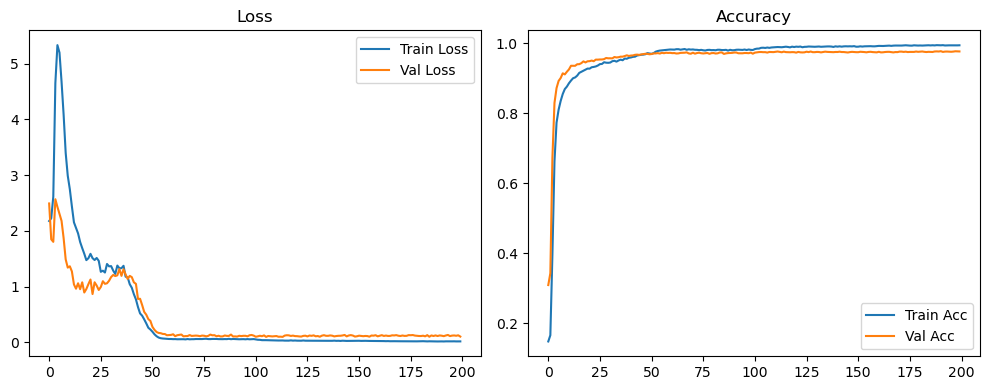

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 28.67it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 28.89it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 29.03it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 29.11it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 29.13it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 29.15it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 29.16it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 29.20it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 29.22it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 29.26it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 29.08it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 29.11it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 28.99it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 29.67it/s]

Original Model Final Test Loss: 0.0989 Accuracy: 0.9773


🚀 Running: batch256_lr0.002_0.002_0.002_dp0.0


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.002 | Train Acc: 0.1889 | Val Acc: 0.3648 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.002 | Train Acc: 0.1889 | Val Acc: 0.3648 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.002 | Train Acc: 0.1889 | Val Acc: 0.3648 |:   0%|          | 1/200 [00:09<30:56,  9.33s/it]

| LR: 0.002 | Train Acc: 0.2020 | Val Acc: 0.3503 |:   0%|          | 1/200 [00:18<30:56,  9.33s/it]

| LR: 0.002 | Train Acc: 0.2020 | Val Acc: 0.3503 |:   0%|          | 1/200 [00:18<30:56,  9.33s/it]

| LR: 0.002 | Train Acc: 0.2020 | Val Acc: 0.3503 |:   1%|          | 2/200 [00:18<30:22,  9.21s/it]

| LR: 0.002 | Train Acc: 0.4202 | Val Acc: 0.6431 |:   1%|          | 2/200 [00:27<30:22,  9.21s/it]

| LR: 0.002 | Train Acc: 0.4202 | Val Acc: 0.6431 |:   1%|          | 2/200 [00:27<30:22,  9.21s/it]

| LR: 0.002 | Train Acc: 0.4202 | Val Acc: 0.6431 |:   2%|▏         | 3/200 [00:27<29:43,  9.06s/it]

| LR: 0.002 | Train Acc: 0.7305 | Val Acc: 0.8121 |:   2%|▏         | 3/200 [00:36<29:43,  9.06s/it]

| LR: 0.002 | Train Acc: 0.7305 | Val Acc: 0.8121 |:   2%|▏         | 3/200 [00:36<29:43,  9.06s/it]

| LR: 0.002 | Train Acc: 0.7305 | Val Acc: 0.8121 |:   2%|▏         | 4/200 [00:36<29:23,  9.00s/it]

| LR: 0.002 | Train Acc: 0.8247 | Val Acc: 0.8511 |:   2%|▏         | 4/200 [00:45<29:23,  9.00s/it]

| LR: 0.002 | Train Acc: 0.8247 | Val Acc: 0.8511 |:   2%|▏         | 4/200 [00:45<29:23,  9.00s/it]

| LR: 0.002 | Train Acc: 0.8247 | Val Acc: 0.8511 |:   2%|▎         | 5/200 [00:45<29:04,  8.95s/it]

| LR: 0.002 | Train Acc: 0.8545 | Val Acc: 0.8708 |:   2%|▎         | 5/200 [00:53<29:04,  8.95s/it]

| LR: 0.002 | Train Acc: 0.8545 | Val Acc: 0.8708 |:   2%|▎         | 5/200 [00:53<29:04,  8.95s/it]

| LR: 0.002 | Train Acc: 0.8545 | Val Acc: 0.8708 |:   3%|▎         | 6/200 [00:53<28:44,  8.89s/it]

| LR: 0.002 | Train Acc: 0.8772 | Val Acc: 0.8832 |:   3%|▎         | 6/200 [01:02<28:44,  8.89s/it]

| LR: 0.002 | Train Acc: 0.8772 | Val Acc: 0.8832 |:   3%|▎         | 6/200 [01:02<28:44,  8.89s/it]

| LR: 0.002 | Train Acc: 0.8772 | Val Acc: 0.8832 |:   4%|▎         | 7/200 [01:02<28:36,  8.89s/it]

| LR: 0.002 | Train Acc: 0.8937 | Val Acc: 0.8982 |:   4%|▎         | 7/200 [01:11<28:36,  8.89s/it]

| LR: 0.002 | Train Acc: 0.8937 | Val Acc: 0.8982 |:   4%|▎         | 7/200 [01:11<28:36,  8.89s/it]

| LR: 0.002 | Train Acc: 0.8937 | Val Acc: 0.8982 |:   4%|▍         | 8/200 [01:11<28:25,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9020 | Val Acc: 0.9017 |:   4%|▍         | 8/200 [01:20<28:25,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9020 | Val Acc: 0.9017 |:   4%|▍         | 8/200 [01:20<28:25,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9020 | Val Acc: 0.9017 |:   4%|▍         | 9/200 [01:20<28:07,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9104 | Val Acc: 0.9088 |:   4%|▍         | 9/200 [01:28<28:07,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9104 | Val Acc: 0.9088 |:   4%|▍         | 9/200 [01:28<28:07,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9104 | Val Acc: 0.9088 |:   5%|▌         | 10/200 [01:29<27:48,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9155 | Val Acc: 0.9091 |:   5%|▌         | 10/200 [01:37<27:48,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9155 | Val Acc: 0.9091 |:   5%|▌         | 10/200 [01:37<27:48,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9155 | Val Acc: 0.9091 |:   6%|▌         | 11/200 [01:37<27:35,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9255 | Val Acc: 0.9227 |:   6%|▌         | 11/200 [01:46<27:35,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9255 | Val Acc: 0.9227 |:   6%|▌         | 11/200 [01:46<27:35,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9255 | Val Acc: 0.9227 |:   6%|▌         | 12/200 [01:46<27:22,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9302 | Val Acc: 0.9247 |:   6%|▌         | 12/200 [01:55<27:22,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9302 | Val Acc: 0.9247 |:   6%|▌         | 12/200 [01:55<27:22,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9302 | Val Acc: 0.9247 |:   6%|▋         | 13/200 [01:55<27:41,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9364 | Val Acc: 0.9264 |:   6%|▋         | 13/200 [02:04<27:41,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9364 | Val Acc: 0.9264 |:   6%|▋         | 13/200 [02:04<27:41,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9364 | Val Acc: 0.9264 |:   7%|▋         | 14/200 [02:04<27:19,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9415 | Val Acc: 0.9238 |:   7%|▋         | 14/200 [02:13<27:19,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9415 | Val Acc: 0.9238 |:   7%|▋         | 14/200 [02:13<27:19,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9415 | Val Acc: 0.9238 |:   8%|▊         | 15/200 [02:13<27:33,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9441 | Val Acc: 0.9363 |:   8%|▊         | 15/200 [02:22<27:33,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9441 | Val Acc: 0.9363 |:   8%|▊         | 15/200 [02:22<27:33,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9441 | Val Acc: 0.9363 |:   8%|▊         | 16/200 [02:22<27:18,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9457 | Val Acc: 0.9315 |:   8%|▊         | 16/200 [02:31<27:18,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9457 | Val Acc: 0.9315 |:   8%|▊         | 16/200 [02:31<27:18,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9457 | Val Acc: 0.9315 |:   8%|▊         | 17/200 [02:31<26:59,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9472 | Val Acc: 0.9325 |:   8%|▊         | 17/200 [02:39<26:59,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9472 | Val Acc: 0.9325 |:   8%|▊         | 17/200 [02:39<26:59,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9472 | Val Acc: 0.9325 |:   9%|▉         | 18/200 [02:39<26:42,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9504 | Val Acc: 0.9411 |:   9%|▉         | 18/200 [02:48<26:42,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9504 | Val Acc: 0.9411 |:   9%|▉         | 18/200 [02:48<26:42,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9504 | Val Acc: 0.9411 |:  10%|▉         | 19/200 [02:48<26:28,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9513 | Val Acc: 0.9326 |:  10%|▉         | 19/200 [02:57<26:28,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9513 | Val Acc: 0.9326 |:  10%|▉         | 19/200 [02:57<26:28,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9513 | Val Acc: 0.9326 |:  10%|█         | 20/200 [02:57<26:16,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9537 | Val Acc: 0.9404 |:  10%|█         | 20/200 [03:05<26:16,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9537 | Val Acc: 0.9404 |:  10%|█         | 20/200 [03:05<26:16,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9537 | Val Acc: 0.9404 |:  10%|█         | 21/200 [03:05<26:06,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9575 | Val Acc: 0.9407 |:  10%|█         | 21/200 [03:14<26:06,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9575 | Val Acc: 0.9407 |:  10%|█         | 21/200 [03:14<26:06,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9575 | Val Acc: 0.9407 |:  11%|█         | 22/200 [03:14<25:52,  8.72s/it]

| LR: 0.002 | Train Acc: 0.9588 | Val Acc: 0.9433 |:  11%|█         | 22/200 [03:23<25:52,  8.72s/it]

| LR: 0.002 | Train Acc: 0.9588 | Val Acc: 0.9433 |:  11%|█         | 22/200 [03:23<25:52,  8.72s/it]

| LR: 0.002 | Train Acc: 0.9588 | Val Acc: 0.9433 |:  12%|█▏        | 23/200 [03:23<25:42,  8.72s/it]

| LR: 0.002 | Train Acc: 0.9631 | Val Acc: 0.9480 |:  12%|█▏        | 23/200 [03:31<25:42,  8.72s/it]

| LR: 0.002 | Train Acc: 0.9631 | Val Acc: 0.9480 |:  12%|█▏        | 23/200 [03:31<25:42,  8.72s/it]

| LR: 0.002 | Train Acc: 0.9631 | Val Acc: 0.9480 |:  12%|█▏        | 24/200 [03:31<25:33,  8.71s/it]

| LR: 0.002 | Train Acc: 0.9627 | Val Acc: 0.9417 |:  12%|█▏        | 24/200 [03:40<25:33,  8.71s/it]

| LR: 0.002 | Train Acc: 0.9627 | Val Acc: 0.9417 |:  12%|█▏        | 24/200 [03:40<25:33,  8.71s/it]

| LR: 0.002 | Train Acc: 0.9627 | Val Acc: 0.9417 |:  12%|█▎        | 25/200 [03:40<25:28,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9640 | Val Acc: 0.9500 |:  12%|█▎        | 25/200 [03:49<25:28,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9640 | Val Acc: 0.9500 |:  12%|█▎        | 25/200 [03:49<25:28,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9640 | Val Acc: 0.9500 |:  13%|█▎        | 26/200 [03:49<25:41,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9665 | Val Acc: 0.9481 |:  13%|█▎        | 26/200 [03:59<25:41,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9665 | Val Acc: 0.9481 |:  13%|█▎        | 26/200 [03:59<25:41,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9665 | Val Acc: 0.9481 |:  14%|█▎        | 27/200 [03:59<26:28,  9.18s/it]

| LR: 0.002 | Train Acc: 0.9663 | Val Acc: 0.9476 |:  14%|█▎        | 27/200 [04:09<26:28,  9.18s/it]

| LR: 0.002 | Train Acc: 0.9663 | Val Acc: 0.9476 |:  14%|█▎        | 27/200 [04:09<26:28,  9.18s/it]

| LR: 0.002 | Train Acc: 0.9663 | Val Acc: 0.9476 |:  14%|█▍        | 28/200 [04:09<26:50,  9.37s/it]

| LR: 0.002 | Train Acc: 0.9690 | Val Acc: 0.9469 |:  14%|█▍        | 28/200 [04:18<26:50,  9.37s/it]

| LR: 0.002 | Train Acc: 0.9690 | Val Acc: 0.9469 |:  14%|█▍        | 28/200 [04:18<26:50,  9.37s/it]

| LR: 0.002 | Train Acc: 0.9690 | Val Acc: 0.9469 |:  14%|█▍        | 29/200 [04:18<26:28,  9.29s/it]

| LR: 0.002 | Train Acc: 0.9692 | Val Acc: 0.9469 |:  14%|█▍        | 29/200 [04:27<26:28,  9.29s/it]

| LR: 0.002 | Train Acc: 0.9692 | Val Acc: 0.9469 |:  14%|█▍        | 29/200 [04:27<26:28,  9.29s/it]

| LR: 0.002 | Train Acc: 0.9692 | Val Acc: 0.9469 |:  15%|█▌        | 30/200 [04:27<25:50,  9.12s/it]

| LR: 0.002 | Train Acc: 0.9694 | Val Acc: 0.9529 |:  15%|█▌        | 30/200 [04:36<25:50,  9.12s/it]

| LR: 0.002 | Train Acc: 0.9694 | Val Acc: 0.9529 |:  15%|█▌        | 30/200 [04:36<25:50,  9.12s/it]

| LR: 0.002 | Train Acc: 0.9694 | Val Acc: 0.9529 |:  16%|█▌        | 31/200 [04:36<25:31,  9.06s/it]

| LR: 0.002 | Train Acc: 0.9718 | Val Acc: 0.9512 |:  16%|█▌        | 31/200 [04:45<25:31,  9.06s/it]

| LR: 0.002 | Train Acc: 0.9718 | Val Acc: 0.9512 |:  16%|█▌        | 31/200 [04:45<25:31,  9.06s/it]

| LR: 0.002 | Train Acc: 0.9718 | Val Acc: 0.9512 |:  16%|█▌        | 32/200 [04:45<25:18,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9749 | Val Acc: 0.9536 |:  16%|█▌        | 32/200 [04:54<25:18,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9749 | Val Acc: 0.9536 |:  16%|█▌        | 32/200 [04:54<25:18,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9749 | Val Acc: 0.9536 |:  16%|█▋        | 33/200 [04:54<24:56,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9737 | Val Acc: 0.9566 |:  16%|█▋        | 33/200 [05:03<24:56,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9737 | Val Acc: 0.9566 |:  16%|█▋        | 33/200 [05:03<24:56,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9737 | Val Acc: 0.9566 |:  17%|█▋        | 34/200 [05:03<24:43,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9754 | Val Acc: 0.9532 |:  17%|█▋        | 34/200 [05:11<24:43,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9754 | Val Acc: 0.9532 |:  17%|█▋        | 34/200 [05:11<24:43,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9754 | Val Acc: 0.9532 |:  18%|█▊        | 35/200 [05:11<24:31,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9782 | Val Acc: 0.9482 |:  18%|█▊        | 35/200 [05:20<24:31,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9782 | Val Acc: 0.9482 |:  18%|█▊        | 35/200 [05:20<24:31,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9782 | Val Acc: 0.9482 |:  18%|█▊        | 36/200 [05:20<24:12,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9769 | Val Acc: 0.9556 |:  18%|█▊        | 36/200 [05:29<24:12,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9769 | Val Acc: 0.9556 |:  18%|█▊        | 36/200 [05:29<24:12,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9769 | Val Acc: 0.9556 |:  18%|█▊        | 37/200 [05:29<24:05,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9788 | Val Acc: 0.9564 |:  18%|█▊        | 37/200 [05:38<24:05,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9788 | Val Acc: 0.9564 |:  18%|█▊        | 37/200 [05:38<24:05,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9788 | Val Acc: 0.9564 |:  19%|█▉        | 38/200 [05:38<23:53,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9776 | Val Acc: 0.9586 |:  19%|█▉        | 38/200 [05:47<23:53,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9776 | Val Acc: 0.9586 |:  19%|█▉        | 38/200 [05:47<23:53,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9776 | Val Acc: 0.9586 |:  20%|█▉        | 39/200 [05:47<23:45,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9802 | Val Acc: 0.9566 |:  20%|█▉        | 39/200 [05:56<23:45,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9802 | Val Acc: 0.9566 |:  20%|█▉        | 39/200 [05:56<23:45,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9802 | Val Acc: 0.9566 |:  20%|██        | 40/200 [05:56<23:36,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9806 | Val Acc: 0.9583 |:  20%|██        | 40/200 [06:04<23:36,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9806 | Val Acc: 0.9583 |:  20%|██        | 40/200 [06:04<23:36,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9806 | Val Acc: 0.9583 |:  20%|██        | 41/200 [06:04<23:23,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9820 | Val Acc: 0.9608 |:  20%|██        | 41/200 [06:13<23:23,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9820 | Val Acc: 0.9608 |:  20%|██        | 41/200 [06:13<23:23,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9820 | Val Acc: 0.9608 |:  21%|██        | 42/200 [06:13<23:17,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9839 | Val Acc: 0.9583 |:  21%|██        | 42/200 [06:22<23:17,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9839 | Val Acc: 0.9583 |:  21%|██        | 42/200 [06:22<23:17,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9839 | Val Acc: 0.9583 |:  22%|██▏       | 43/200 [06:22<23:04,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9808 | Val Acc: 0.9567 |:  22%|██▏       | 43/200 [06:31<23:04,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9808 | Val Acc: 0.9567 |:  22%|██▏       | 43/200 [06:31<23:04,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9808 | Val Acc: 0.9567 |:  22%|██▏       | 44/200 [06:31<22:59,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9839 | Val Acc: 0.9561 |:  22%|██▏       | 44/200 [06:40<22:59,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9839 | Val Acc: 0.9561 |:  22%|██▏       | 44/200 [06:40<22:59,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9839 | Val Acc: 0.9561 |:  22%|██▎       | 45/200 [06:40<23:03,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9851 | Val Acc: 0.9574 |:  22%|██▎       | 45/200 [06:49<23:03,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9851 | Val Acc: 0.9574 |:  22%|██▎       | 45/200 [06:49<23:03,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9851 | Val Acc: 0.9574 |:  23%|██▎       | 46/200 [06:49<22:54,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9597 |:  23%|██▎       | 46/200 [06:58<22:54,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9597 |:  23%|██▎       | 46/200 [06:58<22:54,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9597 |:  24%|██▎       | 47/200 [06:58<22:42,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9849 | Val Acc: 0.9575 |:  24%|██▎       | 47/200 [07:07<22:42,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9849 | Val Acc: 0.9575 |:  24%|██▎       | 47/200 [07:07<22:42,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9849 | Val Acc: 0.9575 |:  24%|██▍       | 48/200 [07:07<22:26,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9608 |:  24%|██▍       | 48/200 [07:16<22:26,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9608 |:  24%|██▍       | 48/200 [07:16<22:26,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9608 |:  24%|██▍       | 49/200 [07:16<22:25,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9603 |:  24%|██▍       | 49/200 [07:24<22:25,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9603 |:  24%|██▍       | 49/200 [07:24<22:25,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9603 |:  25%|██▌       | 50/200 [07:24<22:12,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9620 |:  25%|██▌       | 50/200 [07:34<22:12,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9620 |:  25%|██▌       | 50/200 [07:34<22:12,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9620 |:  26%|██▌       | 51/200 [07:34<22:15,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9871 | Val Acc: 0.9591 |:  26%|██▌       | 51/200 [07:43<22:15,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9871 | Val Acc: 0.9591 |:  26%|██▌       | 51/200 [07:43<22:15,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9871 | Val Acc: 0.9591 |:  26%|██▌       | 52/200 [07:43<22:13,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9635 |:  26%|██▌       | 52/200 [07:51<22:13,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9635 |:  26%|██▌       | 52/200 [07:51<22:13,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9872 | Val Acc: 0.9635 |:  26%|██▋       | 53/200 [07:51<21:53,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9626 |:  26%|██▋       | 53/200 [08:00<21:53,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9626 |:  26%|██▋       | 53/200 [08:00<21:53,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9626 |:  27%|██▋       | 54/200 [08:00<21:38,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9633 |:  27%|██▋       | 54/200 [08:09<21:38,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9633 |:  27%|██▋       | 54/200 [08:09<21:38,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9633 |:  28%|██▊       | 55/200 [08:09<21:23,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9629 |:  28%|██▊       | 55/200 [08:18<21:23,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9629 |:  28%|██▊       | 55/200 [08:18<21:23,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9629 |:  28%|██▊       | 56/200 [08:18<21:09,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9896 | Val Acc: 0.9625 |:  28%|██▊       | 56/200 [08:26<21:09,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9896 | Val Acc: 0.9625 |:  28%|██▊       | 56/200 [08:26<21:09,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9896 | Val Acc: 0.9625 |:  28%|██▊       | 57/200 [08:26<20:53,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9643 |:  28%|██▊       | 57/200 [08:35<20:53,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9643 |:  28%|██▊       | 57/200 [08:35<20:53,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9643 |:  29%|██▉       | 58/200 [08:35<20:46,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9647 |:  29%|██▉       | 58/200 [08:44<20:46,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9647 |:  29%|██▉       | 58/200 [08:44<20:46,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9647 |:  30%|██▉       | 59/200 [08:44<20:37,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9615 |:  30%|██▉       | 59/200 [08:53<20:37,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9615 |:  30%|██▉       | 59/200 [08:53<20:37,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9615 |:  30%|███       | 60/200 [08:53<20:27,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9896 | Val Acc: 0.9630 |:  30%|███       | 60/200 [09:02<20:27,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9896 | Val Acc: 0.9630 |:  30%|███       | 60/200 [09:02<20:27,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9896 | Val Acc: 0.9630 |:  30%|███       | 61/200 [09:02<20:33,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9895 | Val Acc: 0.9603 |:  30%|███       | 61/200 [09:11<20:33,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9895 | Val Acc: 0.9603 |:  30%|███       | 61/200 [09:11<20:33,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9895 | Val Acc: 0.9603 |:  31%|███       | 62/200 [09:11<20:22,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9631 |:  31%|███       | 62/200 [09:20<20:22,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9631 |:  31%|███       | 62/200 [09:20<20:22,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9631 |:  32%|███▏      | 63/200 [09:20<20:18,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9632 |:  32%|███▏      | 63/200 [09:28<20:18,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9632 |:  32%|███▏      | 63/200 [09:28<20:18,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9632 |:  32%|███▏      | 64/200 [09:28<20:07,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9586 |:  32%|███▏      | 64/200 [09:38<20:07,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9586 |:  32%|███▏      | 64/200 [09:38<20:07,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9586 |:  32%|███▎      | 65/200 [09:38<20:16,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9627 |:  32%|███▎      | 65/200 [09:47<20:16,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9627 |:  32%|███▎      | 65/200 [09:47<20:16,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9627 |:  33%|███▎      | 66/200 [09:47<20:02,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9653 |:  33%|███▎      | 66/200 [09:56<20:02,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9653 |:  33%|███▎      | 66/200 [09:56<20:02,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9653 |:  34%|███▎      | 67/200 [09:56<19:58,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9630 |:  34%|███▎      | 67/200 [10:05<19:58,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9630 |:  34%|███▎      | 67/200 [10:05<19:58,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9630 |:  34%|███▍      | 68/200 [10:05<20:01,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9629 |:  34%|███▍      | 68/200 [10:14<20:01,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9629 |:  34%|███▍      | 68/200 [10:14<20:01,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9629 |:  34%|███▍      | 69/200 [10:14<19:44,  9.05s/it]

| LR: 0.002 | Train Acc: 0.9921 | Val Acc: 0.9642 |:  34%|███▍      | 69/200 [10:23<19:44,  9.05s/it]

| LR: 0.002 | Train Acc: 0.9921 | Val Acc: 0.9642 |:  34%|███▍      | 69/200 [10:23<19:44,  9.05s/it]

| LR: 0.002 | Train Acc: 0.9921 | Val Acc: 0.9642 |:  35%|███▌      | 70/200 [10:23<19:25,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9921 | Val Acc: 0.9657 |:  35%|███▌      | 70/200 [10:32<19:25,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9921 | Val Acc: 0.9657 |:  35%|███▌      | 70/200 [10:32<19:25,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9921 | Val Acc: 0.9657 |:  36%|███▌      | 71/200 [10:32<19:12,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9627 |:  36%|███▌      | 71/200 [10:41<19:12,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9627 |:  36%|███▌      | 71/200 [10:41<19:12,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9627 |:  36%|███▌      | 72/200 [10:41<19:04,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9637 |:  36%|███▌      | 72/200 [10:49<19:04,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9637 |:  36%|███▌      | 72/200 [10:49<19:04,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9637 |:  36%|███▋      | 73/200 [10:49<18:51,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9657 |:  36%|███▋      | 73/200 [10:58<18:51,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9657 |:  36%|███▋      | 73/200 [10:58<18:51,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9657 |:  37%|███▋      | 74/200 [10:58<18:37,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9669 |:  37%|███▋      | 74/200 [11:07<18:37,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9669 |:  37%|███▋      | 74/200 [11:07<18:37,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9669 |:  38%|███▊      | 75/200 [11:07<18:23,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9657 |:  38%|███▊      | 75/200 [11:16<18:23,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9657 |:  38%|███▊      | 75/200 [11:16<18:23,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9934 | Val Acc: 0.9657 |:  38%|███▊      | 76/200 [11:16<18:10,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9652 |:  38%|███▊      | 76/200 [11:24<18:10,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9652 |:  38%|███▊      | 76/200 [11:24<18:10,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9652 |:  38%|███▊      | 77/200 [11:24<18:00,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9609 |:  38%|███▊      | 77/200 [11:33<18:00,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9609 |:  38%|███▊      | 77/200 [11:33<18:00,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9609 |:  39%|███▉      | 78/200 [11:33<17:55,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9677 |:  39%|███▉      | 78/200 [11:42<17:55,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9677 |:  39%|███▉      | 78/200 [11:42<17:55,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9936 | Val Acc: 0.9677 |:  40%|███▉      | 79/200 [11:42<17:51,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9645 |:  40%|███▉      | 79/200 [11:52<17:51,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9645 |:  40%|███▉      | 79/200 [11:52<17:51,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9645 |:  40%|████      | 80/200 [11:52<18:00,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9679 |:  40%|████      | 80/200 [12:00<18:00,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9679 |:  40%|████      | 80/200 [12:00<18:00,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9932 | Val Acc: 0.9679 |:  40%|████      | 81/200 [12:00<17:39,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9641 |:  40%|████      | 81/200 [12:09<17:39,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9641 |:  40%|████      | 81/200 [12:09<17:39,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9641 |:  41%|████      | 82/200 [12:09<17:33,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9624 |:  41%|████      | 82/200 [12:18<17:33,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9624 |:  41%|████      | 82/200 [12:18<17:33,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9624 |:  42%|████▏     | 83/200 [12:18<17:17,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9657 |:  42%|████▏     | 83/200 [12:27<17:17,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9657 |:  42%|████▏     | 83/200 [12:27<17:17,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9922 | Val Acc: 0.9657 |:  42%|████▏     | 84/200 [12:27<17:13,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9680 |:  42%|████▏     | 84/200 [12:36<17:13,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9680 |:  42%|████▏     | 84/200 [12:36<17:13,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9680 |:  42%|████▎     | 85/200 [12:36<17:05,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9601 |:  42%|████▎     | 85/200 [12:45<17:05,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9601 |:  42%|████▎     | 85/200 [12:45<17:05,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9929 | Val Acc: 0.9601 |:  43%|████▎     | 86/200 [12:45<16:52,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9660 |:  43%|████▎     | 86/200 [12:53<16:52,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9660 |:  43%|████▎     | 86/200 [12:53<16:52,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9660 |:  44%|████▎     | 87/200 [12:53<16:37,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9663 |:  44%|████▎     | 87/200 [13:02<16:37,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9663 |:  44%|████▎     | 87/200 [13:02<16:37,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9663 |:  44%|████▍     | 88/200 [13:02<16:24,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9673 |:  44%|████▍     | 88/200 [13:11<16:24,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9673 |:  44%|████▍     | 88/200 [13:11<16:24,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9943 | Val Acc: 0.9673 |:  44%|████▍     | 89/200 [13:11<16:11,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9673 |:  44%|████▍     | 89/200 [13:20<16:11,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9673 |:  44%|████▍     | 89/200 [13:20<16:11,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9673 |:  45%|████▌     | 90/200 [13:20<16:06,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9659 |:  45%|████▌     | 90/200 [13:28<16:06,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9659 |:  45%|████▌     | 90/200 [13:28<16:06,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9941 | Val Acc: 0.9659 |:  46%|████▌     | 91/200 [13:28<15:58,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9663 |:  46%|████▌     | 91/200 [13:37<15:58,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9663 |:  46%|████▌     | 91/200 [13:37<15:58,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9663 |:  46%|████▌     | 92/200 [13:37<15:49,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9690 |:  46%|████▌     | 92/200 [13:46<15:49,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9690 |:  46%|████▌     | 92/200 [13:46<15:49,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9690 |:  46%|████▋     | 93/200 [13:46<15:42,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9680 |:  46%|████▋     | 93/200 [13:55<15:42,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9680 |:  46%|████▋     | 93/200 [13:55<15:42,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9680 |:  47%|████▋     | 94/200 [13:55<15:36,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9679 |:  47%|████▋     | 94/200 [14:04<15:36,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9679 |:  47%|████▋     | 94/200 [14:04<15:36,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9679 |:  48%|████▊     | 95/200 [14:04<15:29,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9655 |:  48%|████▊     | 95/200 [14:13<15:29,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9655 |:  48%|████▊     | 95/200 [14:13<15:29,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9655 |:  48%|████▊     | 96/200 [14:13<15:23,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9684 |:  48%|████▊     | 96/200 [14:22<15:23,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9684 |:  48%|████▊     | 96/200 [14:22<15:23,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9684 |:  48%|████▊     | 97/200 [14:22<15:14,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9666 |:  48%|████▊     | 97/200 [14:30<15:14,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9666 |:  48%|████▊     | 97/200 [14:30<15:14,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9666 |:  49%|████▉     | 98/200 [14:30<15:00,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9696 |:  49%|████▉     | 98/200 [14:39<15:00,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9696 |:  49%|████▉     | 98/200 [14:39<15:00,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9696 |:  50%|████▉     | 99/200 [14:39<14:52,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9684 |:  50%|████▉     | 99/200 [14:48<14:52,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9684 |:  50%|████▉     | 99/200 [14:48<14:52,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9684 |:  50%|█████     | 100/200 [14:48<14:40,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9657 |:  50%|█████     | 100/200 [14:57<14:40,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9657 |:  50%|█████     | 100/200 [14:57<14:40,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9657 |:  50%|█████     | 101/200 [14:57<14:30,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9668 |:  50%|█████     | 101/200 [15:05<14:30,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9668 |:  50%|█████     | 101/200 [15:05<14:30,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9950 | Val Acc: 0.9668 |:  51%|█████     | 102/200 [15:06<14:20,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9708 |:  51%|█████     | 102/200 [15:14<14:20,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9708 |:  51%|█████     | 102/200 [15:14<14:20,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9708 |:  52%|█████▏    | 103/200 [15:14<14:10,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9663 |:  52%|█████▏    | 103/200 [15:23<14:10,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9663 |:  52%|█████▏    | 103/200 [15:23<14:10,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9962 | Val Acc: 0.9663 |:  52%|█████▏    | 104/200 [15:23<14:10,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9676 |:  52%|█████▏    | 104/200 [15:32<14:10,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9676 |:  52%|█████▏    | 104/200 [15:32<14:10,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9676 |:  52%|█████▎    | 105/200 [15:32<13:57,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9692 |:  52%|█████▎    | 105/200 [15:41<13:57,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9692 |:  52%|█████▎    | 105/200 [15:41<13:57,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9692 |:  53%|█████▎    | 106/200 [15:41<13:48,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9700 |:  53%|█████▎    | 106/200 [15:50<13:48,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9700 |:  53%|█████▎    | 106/200 [15:50<13:48,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9700 |:  54%|█████▎    | 107/200 [15:50<13:38,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9682 |:  54%|█████▎    | 107/200 [15:58<13:38,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9682 |:  54%|█████▎    | 107/200 [15:58<13:38,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9682 |:  54%|█████▍    | 108/200 [15:58<13:29,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9700 |:  54%|█████▍    | 108/200 [16:07<13:29,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9700 |:  54%|█████▍    | 108/200 [16:07<13:29,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9700 |:  55%|█████▍    | 109/200 [16:07<13:28,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9659 |:  55%|█████▍    | 109/200 [16:16<13:28,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9659 |:  55%|█████▍    | 109/200 [16:16<13:28,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9659 |:  55%|█████▌    | 110/200 [16:16<13:21,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9688 |:  55%|█████▌    | 110/200 [16:25<13:21,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9688 |:  55%|█████▌    | 110/200 [16:25<13:21,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9688 |:  56%|█████▌    | 111/200 [16:25<13:11,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9692 |:  56%|█████▌    | 111/200 [16:34<13:11,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9692 |:  56%|█████▌    | 111/200 [16:34<13:11,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9692 |:  56%|█████▌    | 112/200 [16:34<13:04,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9696 |:  56%|█████▌    | 112/200 [16:43<13:04,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9696 |:  56%|█████▌    | 112/200 [16:43<13:04,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9696 |:  56%|█████▋    | 113/200 [16:44<13:04,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9710 |:  56%|█████▋    | 113/200 [16:52<13:04,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9710 |:  56%|█████▋    | 113/200 [16:52<13:04,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9710 |:  57%|█████▋    | 114/200 [16:52<12:46,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9676 |:  57%|█████▋    | 114/200 [17:01<12:46,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9676 |:  57%|█████▋    | 114/200 [17:01<12:46,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9676 |:  57%|█████▊    | 115/200 [17:01<12:31,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9694 |:  57%|█████▊    | 115/200 [17:10<12:31,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9694 |:  57%|█████▊    | 115/200 [17:10<12:31,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9694 |:  58%|█████▊    | 116/200 [17:10<12:19,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9689 |:  58%|█████▊    | 116/200 [17:18<12:19,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9689 |:  58%|█████▊    | 116/200 [17:18<12:19,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9689 |:  58%|█████▊    | 117/200 [17:18<12:10,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9694 |:  58%|█████▊    | 117/200 [17:27<12:10,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9694 |:  58%|█████▊    | 117/200 [17:27<12:10,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9694 |:  59%|█████▉    | 118/200 [17:27<11:59,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9698 |:  59%|█████▉    | 118/200 [17:36<11:59,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9698 |:  59%|█████▉    | 118/200 [17:36<11:59,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9698 |:  60%|█████▉    | 119/200 [17:36<11:56,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9705 |:  60%|█████▉    | 119/200 [17:45<11:56,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9705 |:  60%|█████▉    | 119/200 [17:45<11:56,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9705 |:  60%|██████    | 120/200 [17:45<11:45,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9713 |:  60%|██████    | 120/200 [17:54<11:45,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9713 |:  60%|██████    | 120/200 [17:54<11:45,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9713 |:  60%|██████    | 121/200 [17:54<11:38,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9706 |:  60%|██████    | 121/200 [18:03<11:38,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9706 |:  60%|██████    | 121/200 [18:03<11:38,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9706 |:  61%|██████    | 122/200 [18:03<11:28,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9691 |:  61%|██████    | 122/200 [18:11<11:28,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9691 |:  61%|██████    | 122/200 [18:11<11:28,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9691 |:  62%|██████▏   | 123/200 [18:11<11:17,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9715 |:  62%|██████▏   | 123/200 [18:20<11:17,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9715 |:  62%|██████▏   | 123/200 [18:20<11:17,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9715 |:  62%|██████▏   | 124/200 [18:20<11:11,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9695 |:  62%|██████▏   | 124/200 [18:30<11:11,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9695 |:  62%|██████▏   | 124/200 [18:30<11:11,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9695 |:  62%|██████▎   | 125/200 [18:30<11:14,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9733 |:  62%|██████▎   | 125/200 [18:39<11:14,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9733 |:  62%|██████▎   | 125/200 [18:39<11:14,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9733 |:  63%|██████▎   | 126/200 [18:39<11:05,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9699 |:  63%|██████▎   | 126/200 [18:48<11:05,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9699 |:  63%|██████▎   | 126/200 [18:48<11:05,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9699 |:  64%|██████▎   | 127/200 [18:48<11:03,  9.09s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9706 |:  64%|██████▎   | 127/200 [18:57<11:03,  9.09s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9706 |:  64%|██████▎   | 127/200 [18:57<11:03,  9.09s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9706 |:  64%|██████▍   | 128/200 [18:57<10:48,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9714 |:  64%|██████▍   | 128/200 [19:06<10:48,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9714 |:  64%|██████▍   | 128/200 [19:06<10:48,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9714 |:  64%|██████▍   | 129/200 [19:06<10:36,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9682 |:  64%|██████▍   | 129/200 [19:15<10:36,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9682 |:  64%|██████▍   | 129/200 [19:15<10:36,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9682 |:  65%|██████▌   | 130/200 [19:15<10:41,  9.16s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9718 |:  65%|██████▌   | 130/200 [19:25<10:41,  9.16s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9718 |:  65%|██████▌   | 130/200 [19:25<10:41,  9.16s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9718 |:  66%|██████▌   | 131/200 [19:25<10:40,  9.28s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9702 |:  66%|██████▌   | 131/200 [19:33<10:40,  9.28s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9702 |:  66%|██████▌   | 131/200 [19:33<10:40,  9.28s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9702 |:  66%|██████▌   | 132/200 [19:34<10:20,  9.13s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9710 |:  66%|██████▌   | 132/200 [19:42<10:20,  9.13s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9710 |:  66%|██████▌   | 132/200 [19:42<10:20,  9.13s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9710 |:  66%|██████▋   | 133/200 [19:42<10:04,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9708 |:  66%|██████▋   | 133/200 [19:51<10:04,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9708 |:  66%|██████▋   | 133/200 [19:51<10:04,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9708 |:  67%|██████▋   | 134/200 [19:51<09:54,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9714 |:  67%|██████▋   | 134/200 [20:00<09:54,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9714 |:  67%|██████▋   | 134/200 [20:00<09:54,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9714 |:  68%|██████▊   | 135/200 [20:00<09:40,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9700 |:  68%|██████▊   | 135/200 [20:09<09:40,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9700 |:  68%|██████▊   | 135/200 [20:09<09:40,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9700 |:  68%|██████▊   | 136/200 [20:09<09:29,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9746 |:  68%|██████▊   | 136/200 [20:17<09:29,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9746 |:  68%|██████▊   | 136/200 [20:17<09:29,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9746 |:  68%|██████▊   | 137/200 [20:17<09:15,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9711 |:  68%|██████▊   | 137/200 [20:26<09:15,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9711 |:  68%|██████▊   | 137/200 [20:26<09:15,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9711 |:  69%|██████▉   | 138/200 [20:26<09:03,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9680 |:  69%|██████▉   | 138/200 [20:35<09:03,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9680 |:  69%|██████▉   | 138/200 [20:35<09:03,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9680 |:  70%|██████▉   | 139/200 [20:35<08:56,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9706 |:  70%|██████▉   | 139/200 [20:44<08:56,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9706 |:  70%|██████▉   | 139/200 [20:44<08:56,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9706 |:  70%|███████   | 140/200 [20:44<08:49,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9715 |:  70%|███████   | 140/200 [20:53<08:49,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9715 |:  70%|███████   | 140/200 [20:53<08:49,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9715 |:  70%|███████   | 141/200 [20:53<08:40,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9698 |:  70%|███████   | 141/200 [21:01<08:40,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9698 |:  70%|███████   | 141/200 [21:01<08:40,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9698 |:  71%|███████   | 142/200 [21:01<08:30,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9707 |:  71%|███████   | 142/200 [21:10<08:30,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9707 |:  71%|███████   | 142/200 [21:10<08:30,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9707 |:  72%|███████▏  | 143/200 [21:10<08:21,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9696 |:  72%|███████▏  | 143/200 [21:19<08:21,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9696 |:  72%|███████▏  | 143/200 [21:19<08:21,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9696 |:  72%|███████▏  | 144/200 [21:19<08:11,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9697 |:  72%|███████▏  | 144/200 [21:28<08:11,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9697 |:  72%|███████▏  | 144/200 [21:28<08:11,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9697 |:  72%|███████▎  | 145/200 [21:28<08:11,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9706 |:  72%|███████▎  | 145/200 [21:38<08:11,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9706 |:  72%|███████▎  | 145/200 [21:38<08:11,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9706 |:  73%|███████▎  | 146/200 [21:38<08:08,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9735 |:  73%|███████▎  | 146/200 [21:46<08:08,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9735 |:  73%|███████▎  | 146/200 [21:46<08:08,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9735 |:  74%|███████▎  | 147/200 [21:46<07:55,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9718 |:  74%|███████▎  | 147/200 [21:55<07:55,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9718 |:  74%|███████▎  | 147/200 [21:55<07:55,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9718 |:  74%|███████▍  | 148/200 [21:55<07:45,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9690 |:  74%|███████▍  | 148/200 [22:04<07:45,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9690 |:  74%|███████▍  | 148/200 [22:04<07:45,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9690 |:  74%|███████▍  | 149/200 [22:04<07:33,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9712 |:  74%|███████▍  | 149/200 [22:13<07:33,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9712 |:  74%|███████▍  | 149/200 [22:13<07:33,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9712 |:  75%|███████▌  | 150/200 [22:13<07:22,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9745 |:  75%|███████▌  | 150/200 [22:21<07:22,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9745 |:  75%|███████▌  | 150/200 [22:21<07:22,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9745 |:  76%|███████▌  | 151/200 [22:22<07:12,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9724 |:  76%|███████▌  | 151/200 [22:30<07:12,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9724 |:  76%|███████▌  | 151/200 [22:30<07:12,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9724 |:  76%|███████▌  | 152/200 [22:30<07:04,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9704 |:  76%|███████▌  | 152/200 [22:40<07:04,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9704 |:  76%|███████▌  | 152/200 [22:40<07:04,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9704 |:  76%|███████▋  | 153/200 [22:40<07:06,  9.07s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9746 |:  76%|███████▋  | 153/200 [22:49<07:06,  9.07s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9746 |:  76%|███████▋  | 153/200 [22:49<07:06,  9.07s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9746 |:  77%|███████▋  | 154/200 [22:49<06:55,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9722 |:  77%|███████▋  | 154/200 [22:58<06:55,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9722 |:  77%|███████▋  | 154/200 [22:58<06:55,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9722 |:  78%|███████▊  | 155/200 [22:58<06:43,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9742 |:  78%|███████▊  | 155/200 [23:07<06:43,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9742 |:  78%|███████▊  | 155/200 [23:07<06:43,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9742 |:  78%|███████▊  | 156/200 [23:07<06:31,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9713 |:  78%|███████▊  | 156/200 [23:15<06:31,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9713 |:  78%|███████▊  | 156/200 [23:15<06:31,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9713 |:  78%|███████▊  | 157/200 [23:15<06:21,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9718 |:  78%|███████▊  | 157/200 [23:24<06:21,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9718 |:  78%|███████▊  | 157/200 [23:24<06:21,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9718 |:  79%|███████▉  | 158/200 [23:24<06:14,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9722 |:  79%|███████▉  | 158/200 [23:33<06:14,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9722 |:  79%|███████▉  | 158/200 [23:33<06:14,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9722 |:  80%|███████▉  | 159/200 [23:33<06:03,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9698 |:  80%|███████▉  | 159/200 [23:42<06:03,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9698 |:  80%|███████▉  | 159/200 [23:42<06:03,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9698 |:  80%|████████  | 160/200 [23:42<05:52,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9707 |:  80%|████████  | 160/200 [23:51<05:52,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9707 |:  80%|████████  | 160/200 [23:51<05:52,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9707 |:  80%|████████  | 161/200 [23:51<05:44,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9705 |:  80%|████████  | 161/200 [24:00<05:44,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9705 |:  80%|████████  | 161/200 [24:00<05:44,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9705 |:  81%|████████  | 162/200 [24:00<05:43,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9730 |:  81%|████████  | 162/200 [24:09<05:43,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9730 |:  81%|████████  | 162/200 [24:09<05:43,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9983 | Val Acc: 0.9730 |:  82%|████████▏ | 163/200 [24:09<05:31,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9745 |:  82%|████████▏ | 163/200 [24:18<05:31,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9745 |:  82%|████████▏ | 163/200 [24:18<05:31,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9745 |:  82%|████████▏ | 164/200 [24:18<05:21,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9726 |:  82%|████████▏ | 164/200 [24:27<05:21,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9726 |:  82%|████████▏ | 164/200 [24:27<05:21,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9726 |:  82%|████████▎ | 165/200 [24:27<05:11,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9728 |:  82%|████████▎ | 165/200 [24:36<05:11,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9728 |:  82%|████████▎ | 165/200 [24:36<05:11,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9728 |:  83%|████████▎ | 166/200 [24:36<05:02,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9713 |:  83%|████████▎ | 166/200 [24:44<05:02,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9713 |:  83%|████████▎ | 166/200 [24:44<05:02,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9713 |:  84%|████████▎ | 167/200 [24:44<04:52,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9712 |:  84%|████████▎ | 167/200 [24:53<04:52,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9712 |:  84%|████████▎ | 167/200 [24:53<04:52,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9712 |:  84%|████████▍ | 168/200 [24:53<04:41,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9740 |:  84%|████████▍ | 168/200 [25:02<04:41,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9740 |:  84%|████████▍ | 168/200 [25:02<04:41,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9985 | Val Acc: 0.9740 |:  84%|████████▍ | 169/200 [25:02<04:31,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9707 |:  84%|████████▍ | 169/200 [25:10<04:31,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9707 |:  84%|████████▍ | 169/200 [25:10<04:31,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9707 |:  85%|████████▌ | 170/200 [25:10<04:22,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9727 |:  85%|████████▌ | 170/200 [25:19<04:22,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9727 |:  85%|████████▌ | 170/200 [25:19<04:22,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9727 |:  86%|████████▌ | 171/200 [25:19<04:16,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9731 |:  86%|████████▌ | 171/200 [25:28<04:16,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9731 |:  86%|████████▌ | 171/200 [25:28<04:16,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9731 |:  86%|████████▌ | 172/200 [25:28<04:07,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9721 |:  86%|████████▌ | 172/200 [25:37<04:07,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9721 |:  86%|████████▌ | 172/200 [25:37<04:07,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9721 |:  86%|████████▋ | 173/200 [25:37<03:58,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9711 |:  86%|████████▋ | 173/200 [25:46<03:58,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9711 |:  86%|████████▋ | 173/200 [25:46<03:58,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9711 |:  87%|████████▋ | 174/200 [25:46<03:49,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9670 |:  87%|████████▋ | 174/200 [25:54<03:49,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9670 |:  87%|████████▋ | 174/200 [25:54<03:49,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9670 |:  88%|████████▊ | 175/200 [25:54<03:39,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9680 |:  88%|████████▊ | 175/200 [26:03<03:39,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9680 |:  88%|████████▊ | 175/200 [26:03<03:39,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9680 |:  88%|████████▊ | 176/200 [26:03<03:30,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9721 |:  88%|████████▊ | 176/200 [26:12<03:30,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9721 |:  88%|████████▊ | 176/200 [26:12<03:30,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9982 | Val Acc: 0.9721 |:  88%|████████▊ | 177/200 [26:12<03:22,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9710 |:  88%|████████▊ | 177/200 [26:21<03:22,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9710 |:  88%|████████▊ | 177/200 [26:21<03:22,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9710 |:  89%|████████▉ | 178/200 [26:21<03:14,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9661 |:  89%|████████▉ | 178/200 [26:30<03:14,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9661 |:  89%|████████▉ | 178/200 [26:30<03:14,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9661 |:  90%|████████▉ | 179/200 [26:30<03:06,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9698 |:  90%|████████▉ | 179/200 [26:39<03:06,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9698 |:  90%|████████▉ | 179/200 [26:39<03:06,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9698 |:  90%|█████████ | 180/200 [26:39<02:59,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9705 |:  90%|█████████ | 180/200 [26:48<02:59,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9705 |:  90%|█████████ | 180/200 [26:48<02:59,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9986 | Val Acc: 0.9705 |:  90%|█████████ | 181/200 [26:48<02:49,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9709 |:  90%|█████████ | 181/200 [26:57<02:49,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9709 |:  90%|█████████ | 181/200 [26:57<02:49,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9709 |:  91%|█████████ | 182/200 [26:57<02:39,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9734 |:  91%|█████████ | 182/200 [27:06<02:39,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9734 |:  91%|█████████ | 182/200 [27:06<02:39,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9734 |:  92%|█████████▏| 183/200 [27:06<02:31,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9714 |:  92%|█████████▏| 183/200 [27:15<02:31,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9714 |:  92%|█████████▏| 183/200 [27:15<02:31,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9714 |:  92%|█████████▏| 184/200 [27:15<02:22,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9734 |:  92%|█████████▏| 184/200 [27:24<02:22,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9734 |:  92%|█████████▏| 184/200 [27:24<02:22,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9734 |:  92%|█████████▎| 185/200 [27:24<02:13,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9734 |:  92%|█████████▎| 185/200 [27:32<02:13,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9734 |:  92%|█████████▎| 185/200 [27:32<02:13,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9734 |:  93%|█████████▎| 186/200 [27:32<02:04,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9733 |:  93%|█████████▎| 186/200 [27:41<02:04,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9733 |:  93%|█████████▎| 186/200 [27:41<02:04,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9992 | Val Acc: 0.9733 |:  94%|█████████▎| 187/200 [27:41<01:55,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9716 |:  94%|█████████▎| 187/200 [27:50<01:55,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9716 |:  94%|█████████▎| 187/200 [27:50<01:55,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9716 |:  94%|█████████▍| 188/200 [27:50<01:47,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9723 |:  94%|█████████▍| 188/200 [27:59<01:47,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9723 |:  94%|█████████▍| 188/200 [27:59<01:47,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9723 |:  94%|█████████▍| 189/200 [27:59<01:37,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9738 |:  94%|█████████▍| 189/200 [28:08<01:37,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9738 |:  94%|█████████▍| 189/200 [28:08<01:37,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9738 |:  95%|█████████▌| 190/200 [28:08<01:29,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9729 |:  95%|█████████▌| 190/200 [28:17<01:29,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9729 |:  95%|█████████▌| 190/200 [28:17<01:29,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9991 | Val Acc: 0.9729 |:  96%|█████████▌| 191/200 [28:17<01:20,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9717 |:  96%|█████████▌| 191/200 [28:26<01:20,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9717 |:  96%|█████████▌| 191/200 [28:26<01:20,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9989 | Val Acc: 0.9717 |:  96%|█████████▌| 192/200 [28:26<01:11,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9731 |:  96%|█████████▌| 192/200 [28:35<01:11,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9731 |:  96%|█████████▌| 192/200 [28:35<01:11,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9988 | Val Acc: 0.9731 |:  96%|█████████▋| 193/200 [28:35<01:02,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9688 |:  96%|█████████▋| 193/200 [28:44<01:02,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9688 |:  96%|█████████▋| 193/200 [28:44<01:02,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9688 |:  97%|█████████▋| 194/200 [28:44<00:53,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9709 |:  97%|█████████▋| 194/200 [28:53<00:53,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9709 |:  97%|█████████▋| 194/200 [28:53<00:53,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9709 |:  98%|█████████▊| 195/200 [28:53<00:44,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9721 |:  98%|█████████▊| 195/200 [29:02<00:44,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9721 |:  98%|█████████▊| 195/200 [29:02<00:44,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9994 | Val Acc: 0.9721 |:  98%|█████████▊| 196/200 [29:02<00:35,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9702 |:  98%|█████████▊| 196/200 [29:10<00:35,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9702 |:  98%|█████████▊| 196/200 [29:10<00:35,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9702 |:  98%|█████████▊| 197/200 [29:10<00:26,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9723 |:  98%|█████████▊| 197/200 [29:19<00:26,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9723 |:  98%|█████████▊| 197/200 [29:19<00:26,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9990 | Val Acc: 0.9723 |:  99%|█████████▉| 198/200 [29:19<00:17,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9715 |:  99%|█████████▉| 198/200 [29:28<00:17,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9715 |:  99%|█████████▉| 198/200 [29:28<00:17,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9987 | Val Acc: 0.9715 |: 100%|█████████▉| 199/200 [29:28<00:08,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9739 |: 100%|█████████▉| 199/200 [29:37<00:08,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9739 |: 100%|█████████▉| 199/200 [29:37<00:08,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9739 |: 100%|██████████| 200/200 [29:37<00:00,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9984 | Val Acc: 0.9739 |: 100%|██████████| 200/200 [29:37<00:00,  8.89s/it]

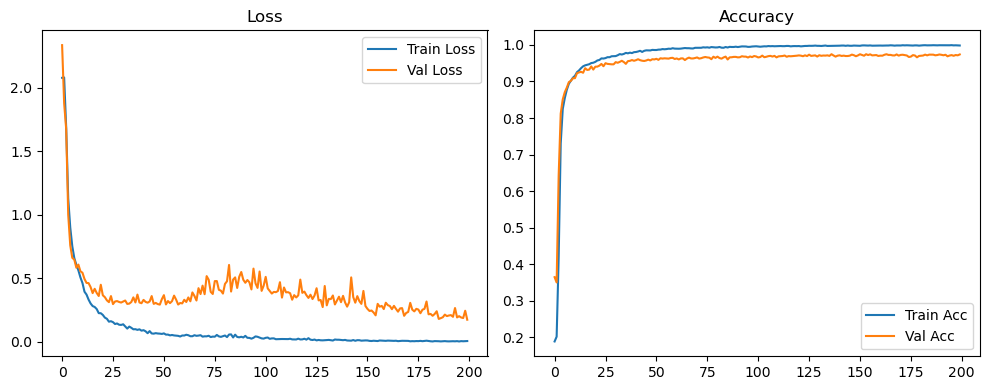

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 28.74it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 29.02it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 29.08it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 29.14it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 29.24it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 29.11it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 28.83it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 28.44it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 28.55it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 28.71it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 28.80it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 28.90it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 28.94it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 29.47it/s]

Original Model Final Test Loss: 0.1649 Accuracy: 0.9724


🚀 Running: batch256_lr0.002_0.002_0.002_dp0.2


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.002 | Train Acc: 0.1825 | Val Acc: 0.3543 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.002 | Train Acc: 0.1825 | Val Acc: 0.3543 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.002 | Train Acc: 0.1825 | Val Acc: 0.3543 |:   0%|          | 1/200 [00:09<30:31,  9.20s/it]

| LR: 0.002 | Train Acc: 0.1786 | Val Acc: 0.2291 |:   0%|          | 1/200 [00:18<30:31,  9.20s/it]

| LR: 0.002 | Train Acc: 0.1786 | Val Acc: 0.2291 |:   0%|          | 1/200 [00:18<30:31,  9.20s/it]

| LR: 0.002 | Train Acc: 0.1786 | Val Acc: 0.2291 |:   1%|          | 2/200 [00:18<29:58,  9.08s/it]

| LR: 0.002 | Train Acc: 0.3357 | Val Acc: 0.5561 |:   1%|          | 2/200 [00:26<29:58,  9.08s/it]

| LR: 0.002 | Train Acc: 0.3357 | Val Acc: 0.5561 |:   1%|          | 2/200 [00:26<29:58,  9.08s/it]

| LR: 0.002 | Train Acc: 0.3357 | Val Acc: 0.5561 |:   2%|▏         | 3/200 [00:26<29:18,  8.93s/it]

| LR: 0.002 | Train Acc: 0.5959 | Val Acc: 0.7462 |:   2%|▏         | 3/200 [00:35<29:18,  8.93s/it]

| LR: 0.002 | Train Acc: 0.5959 | Val Acc: 0.7462 |:   2%|▏         | 3/200 [00:35<29:18,  8.93s/it]

| LR: 0.002 | Train Acc: 0.5959 | Val Acc: 0.7462 |:   2%|▏         | 4/200 [00:35<29:18,  8.97s/it]

| LR: 0.002 | Train Acc: 0.7434 | Val Acc: 0.8342 |:   2%|▏         | 4/200 [00:45<29:18,  8.97s/it]

| LR: 0.002 | Train Acc: 0.7434 | Val Acc: 0.8342 |:   2%|▏         | 4/200 [00:45<29:18,  8.97s/it]

| LR: 0.002 | Train Acc: 0.7434 | Val Acc: 0.8342 |:   2%|▎         | 5/200 [00:45<29:23,  9.04s/it]

| LR: 0.002 | Train Acc: 0.8034 | Val Acc: 0.8582 |:   2%|▎         | 5/200 [00:53<29:23,  9.04s/it]

| LR: 0.002 | Train Acc: 0.8034 | Val Acc: 0.8582 |:   2%|▎         | 5/200 [00:53<29:23,  9.04s/it]

| LR: 0.002 | Train Acc: 0.8034 | Val Acc: 0.8582 |:   3%|▎         | 6/200 [00:54<29:03,  8.99s/it]

| LR: 0.002 | Train Acc: 0.8370 | Val Acc: 0.8860 |:   3%|▎         | 6/200 [01:02<29:03,  8.99s/it]

| LR: 0.002 | Train Acc: 0.8370 | Val Acc: 0.8860 |:   3%|▎         | 6/200 [01:02<29:03,  8.99s/it]

| LR: 0.002 | Train Acc: 0.8370 | Val Acc: 0.8860 |:   4%|▎         | 7/200 [01:02<28:47,  8.95s/it]

| LR: 0.002 | Train Acc: 0.8575 | Val Acc: 0.8980 |:   4%|▎         | 7/200 [01:11<28:47,  8.95s/it]

| LR: 0.002 | Train Acc: 0.8575 | Val Acc: 0.8980 |:   4%|▎         | 7/200 [01:11<28:47,  8.95s/it]

| LR: 0.002 | Train Acc: 0.8575 | Val Acc: 0.8980 |:   4%|▍         | 8/200 [01:11<28:37,  8.95s/it]

| LR: 0.002 | Train Acc: 0.8742 | Val Acc: 0.9042 |:   4%|▍         | 8/200 [01:20<28:37,  8.95s/it]

| LR: 0.002 | Train Acc: 0.8742 | Val Acc: 0.9042 |:   4%|▍         | 8/200 [01:20<28:37,  8.95s/it]

| LR: 0.002 | Train Acc: 0.8742 | Val Acc: 0.9042 |:   4%|▍         | 9/200 [01:20<28:23,  8.92s/it]

| LR: 0.002 | Train Acc: 0.8840 | Val Acc: 0.9102 |:   4%|▍         | 9/200 [01:29<28:23,  8.92s/it]

| LR: 0.002 | Train Acc: 0.8840 | Val Acc: 0.9102 |:   4%|▍         | 9/200 [01:29<28:23,  8.92s/it]

| LR: 0.002 | Train Acc: 0.8840 | Val Acc: 0.9102 |:   5%|▌         | 10/200 [01:29<28:06,  8.88s/it]

| LR: 0.002 | Train Acc: 0.8897 | Val Acc: 0.9127 |:   5%|▌         | 10/200 [01:38<28:06,  8.88s/it]

| LR: 0.002 | Train Acc: 0.8897 | Val Acc: 0.9127 |:   5%|▌         | 10/200 [01:38<28:06,  8.88s/it]

| LR: 0.002 | Train Acc: 0.8897 | Val Acc: 0.9127 |:   6%|▌         | 11/200 [01:38<27:50,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9008 | Val Acc: 0.9155 |:   6%|▌         | 11/200 [01:46<27:50,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9008 | Val Acc: 0.9155 |:   6%|▌         | 11/200 [01:46<27:50,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9008 | Val Acc: 0.9155 |:   6%|▌         | 12/200 [01:46<27:26,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9071 | Val Acc: 0.9225 |:   6%|▌         | 12/200 [01:55<27:26,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9071 | Val Acc: 0.9225 |:   6%|▌         | 12/200 [01:55<27:26,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9071 | Val Acc: 0.9225 |:   6%|▋         | 13/200 [01:55<27:12,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9122 | Val Acc: 0.9291 |:   6%|▋         | 13/200 [02:04<27:12,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9122 | Val Acc: 0.9291 |:   6%|▋         | 13/200 [02:04<27:12,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9122 | Val Acc: 0.9291 |:   7%|▋         | 14/200 [02:04<27:08,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9189 | Val Acc: 0.9348 |:   7%|▋         | 14/200 [02:13<27:08,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9189 | Val Acc: 0.9348 |:   7%|▋         | 14/200 [02:13<27:08,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9189 | Val Acc: 0.9348 |:   8%|▊         | 15/200 [02:13<27:10,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9222 | Val Acc: 0.9317 |:   8%|▊         | 15/200 [02:22<27:10,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9222 | Val Acc: 0.9317 |:   8%|▊         | 15/200 [02:22<27:10,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9222 | Val Acc: 0.9317 |:   8%|▊         | 16/200 [02:22<27:06,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9258 | Val Acc: 0.9302 |:   8%|▊         | 16/200 [02:30<27:06,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9258 | Val Acc: 0.9302 |:   8%|▊         | 16/200 [02:30<27:06,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9258 | Val Acc: 0.9302 |:   8%|▊         | 17/200 [02:30<26:57,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9284 | Val Acc: 0.9317 |:   8%|▊         | 17/200 [02:39<26:57,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9284 | Val Acc: 0.9317 |:   8%|▊         | 17/200 [02:39<26:57,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9284 | Val Acc: 0.9317 |:   9%|▉         | 18/200 [02:39<26:45,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9337 | Val Acc: 0.9407 |:   9%|▉         | 18/200 [02:48<26:45,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9337 | Val Acc: 0.9407 |:   9%|▉         | 18/200 [02:48<26:45,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9337 | Val Acc: 0.9407 |:  10%|▉         | 19/200 [02:48<26:38,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9365 | Val Acc: 0.9395 |:  10%|▉         | 19/200 [02:57<26:38,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9365 | Val Acc: 0.9395 |:  10%|▉         | 19/200 [02:57<26:38,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9365 | Val Acc: 0.9395 |:  10%|█         | 20/200 [02:57<26:28,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9391 | Val Acc: 0.9372 |:  10%|█         | 20/200 [03:06<26:28,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9391 | Val Acc: 0.9372 |:  10%|█         | 20/200 [03:06<26:28,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9391 | Val Acc: 0.9372 |:  10%|█         | 21/200 [03:06<26:12,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9427 | Val Acc: 0.9393 |:  10%|█         | 21/200 [03:14<26:12,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9427 | Val Acc: 0.9393 |:  10%|█         | 21/200 [03:14<26:12,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9427 | Val Acc: 0.9393 |:  11%|█         | 22/200 [03:14<26:00,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9437 | Val Acc: 0.9442 |:  11%|█         | 22/200 [03:23<26:00,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9437 | Val Acc: 0.9442 |:  11%|█         | 22/200 [03:23<26:00,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9437 | Val Acc: 0.9442 |:  12%|█▏        | 23/200 [03:23<25:49,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9465 | Val Acc: 0.9433 |:  12%|█▏        | 23/200 [03:32<25:49,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9465 | Val Acc: 0.9433 |:  12%|█▏        | 23/200 [03:32<25:49,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9465 | Val Acc: 0.9433 |:  12%|█▏        | 24/200 [03:32<25:40,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9474 | Val Acc: 0.9460 |:  12%|█▏        | 24/200 [03:41<25:40,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9474 | Val Acc: 0.9460 |:  12%|█▏        | 24/200 [03:41<25:40,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9474 | Val Acc: 0.9460 |:  12%|█▎        | 25/200 [03:41<26:02,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9510 | Val Acc: 0.9492 |:  12%|█▎        | 25/200 [03:50<26:02,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9510 | Val Acc: 0.9492 |:  12%|█▎        | 25/200 [03:50<26:02,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9510 | Val Acc: 0.9492 |:  13%|█▎        | 26/200 [03:50<26:11,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9528 | Val Acc: 0.9478 |:  13%|█▎        | 26/200 [03:59<26:11,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9528 | Val Acc: 0.9478 |:  13%|█▎        | 26/200 [03:59<26:11,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9528 | Val Acc: 0.9478 |:  14%|█▎        | 27/200 [03:59<25:48,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9549 | Val Acc: 0.9388 |:  14%|█▎        | 27/200 [04:08<25:48,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9549 | Val Acc: 0.9388 |:  14%|█▎        | 27/200 [04:08<25:48,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9549 | Val Acc: 0.9388 |:  14%|█▍        | 28/200 [04:08<25:54,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9583 | Val Acc: 0.9482 |:  14%|█▍        | 28/200 [04:17<25:54,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9583 | Val Acc: 0.9482 |:  14%|█▍        | 28/200 [04:17<25:54,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9583 | Val Acc: 0.9482 |:  14%|█▍        | 29/200 [04:17<25:33,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9588 | Val Acc: 0.9518 |:  14%|█▍        | 29/200 [04:26<25:33,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9588 | Val Acc: 0.9518 |:  14%|█▍        | 29/200 [04:26<25:33,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9588 | Val Acc: 0.9518 |:  15%|█▌        | 30/200 [04:26<25:12,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9595 | Val Acc: 0.9518 |:  15%|█▌        | 30/200 [04:35<25:12,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9595 | Val Acc: 0.9518 |:  15%|█▌        | 30/200 [04:35<25:12,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9595 | Val Acc: 0.9518 |:  16%|█▌        | 31/200 [04:35<25:05,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9608 | Val Acc: 0.9525 |:  16%|█▌        | 31/200 [04:44<25:05,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9608 | Val Acc: 0.9525 |:  16%|█▌        | 31/200 [04:44<25:05,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9608 | Val Acc: 0.9525 |:  16%|█▌        | 32/200 [04:44<24:49,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9665 | Val Acc: 0.9527 |:  16%|█▌        | 32/200 [04:52<24:49,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9665 | Val Acc: 0.9527 |:  16%|█▌        | 32/200 [04:52<24:49,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9665 | Val Acc: 0.9527 |:  16%|█▋        | 33/200 [04:52<24:38,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9638 | Val Acc: 0.9542 |:  16%|█▋        | 33/200 [05:01<24:38,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9638 | Val Acc: 0.9542 |:  16%|█▋        | 33/200 [05:01<24:38,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9638 | Val Acc: 0.9542 |:  17%|█▋        | 34/200 [05:01<24:18,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9657 | Val Acc: 0.9537 |:  17%|█▋        | 34/200 [05:10<24:18,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9657 | Val Acc: 0.9537 |:  17%|█▋        | 34/200 [05:10<24:18,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9657 | Val Acc: 0.9537 |:  18%|█▊        | 35/200 [05:10<24:14,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9673 | Val Acc: 0.9528 |:  18%|█▊        | 35/200 [05:19<24:14,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9673 | Val Acc: 0.9528 |:  18%|█▊        | 35/200 [05:19<24:14,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9673 | Val Acc: 0.9528 |:  18%|█▊        | 36/200 [05:19<24:08,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9694 | Val Acc: 0.9559 |:  18%|█▊        | 36/200 [05:28<24:08,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9694 | Val Acc: 0.9559 |:  18%|█▊        | 36/200 [05:28<24:08,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9694 | Val Acc: 0.9559 |:  18%|█▊        | 37/200 [05:28<23:56,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9703 | Val Acc: 0.9575 |:  18%|█▊        | 37/200 [05:36<23:56,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9703 | Val Acc: 0.9575 |:  18%|█▊        | 37/200 [05:36<23:56,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9703 | Val Acc: 0.9575 |:  19%|█▉        | 38/200 [05:37<23:50,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9689 | Val Acc: 0.9523 |:  19%|█▉        | 38/200 [05:45<23:50,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9689 | Val Acc: 0.9523 |:  19%|█▉        | 38/200 [05:45<23:50,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9689 | Val Acc: 0.9523 |:  20%|█▉        | 39/200 [05:45<23:43,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9708 | Val Acc: 0.9564 |:  20%|█▉        | 39/200 [05:54<23:43,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9708 | Val Acc: 0.9564 |:  20%|█▉        | 39/200 [05:54<23:43,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9708 | Val Acc: 0.9564 |:  20%|██        | 40/200 [05:54<23:32,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9723 | Val Acc: 0.9590 |:  20%|██        | 40/200 [06:03<23:32,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9723 | Val Acc: 0.9590 |:  20%|██        | 40/200 [06:03<23:32,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9723 | Val Acc: 0.9590 |:  20%|██        | 41/200 [06:03<23:19,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9597 |:  20%|██        | 41/200 [06:12<23:19,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9597 |:  20%|██        | 41/200 [06:12<23:19,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9597 |:  21%|██        | 42/200 [06:12<23:10,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9751 | Val Acc: 0.9623 |:  21%|██        | 42/200 [06:21<23:10,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9751 | Val Acc: 0.9623 |:  21%|██        | 42/200 [06:21<23:10,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9751 | Val Acc: 0.9623 |:  22%|██▏       | 43/200 [06:21<23:33,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9627 |:  22%|██▏       | 43/200 [06:30<23:33,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9627 |:  22%|██▏       | 43/200 [06:30<23:33,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9627 |:  22%|██▏       | 44/200 [06:30<23:20,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9770 | Val Acc: 0.9600 |:  22%|██▏       | 44/200 [06:39<23:20,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9770 | Val Acc: 0.9600 |:  22%|██▏       | 44/200 [06:39<23:20,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9770 | Val Acc: 0.9600 |:  22%|██▎       | 45/200 [06:39<22:59,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9617 |:  22%|██▎       | 45/200 [06:48<22:59,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9617 |:  22%|██▎       | 45/200 [06:48<22:59,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9617 |:  23%|██▎       | 46/200 [06:48<22:43,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9775 | Val Acc: 0.9604 |:  23%|██▎       | 46/200 [06:56<22:43,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9775 | Val Acc: 0.9604 |:  23%|██▎       | 46/200 [06:56<22:43,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9775 | Val Acc: 0.9604 |:  24%|██▎       | 47/200 [06:56<22:27,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9788 | Val Acc: 0.9622 |:  24%|██▎       | 47/200 [07:05<22:27,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9788 | Val Acc: 0.9622 |:  24%|██▎       | 47/200 [07:05<22:27,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9788 | Val Acc: 0.9622 |:  24%|██▍       | 48/200 [07:05<22:17,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9788 | Val Acc: 0.9639 |:  24%|██▍       | 48/200 [07:14<22:17,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9788 | Val Acc: 0.9639 |:  24%|██▍       | 48/200 [07:14<22:17,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9788 | Val Acc: 0.9639 |:  24%|██▍       | 49/200 [07:14<22:13,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9794 | Val Acc: 0.9627 |:  24%|██▍       | 49/200 [07:23<22:13,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9794 | Val Acc: 0.9627 |:  24%|██▍       | 49/200 [07:23<22:13,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9794 | Val Acc: 0.9627 |:  25%|██▌       | 50/200 [07:23<22:10,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9810 | Val Acc: 0.9632 |:  25%|██▌       | 50/200 [07:32<22:10,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9810 | Val Acc: 0.9632 |:  25%|██▌       | 50/200 [07:32<22:10,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9810 | Val Acc: 0.9632 |:  26%|██▌       | 51/200 [07:32<22:18,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9821 | Val Acc: 0.9627 |:  26%|██▌       | 51/200 [07:41<22:18,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9821 | Val Acc: 0.9627 |:  26%|██▌       | 51/200 [07:41<22:18,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9821 | Val Acc: 0.9627 |:  26%|██▌       | 52/200 [07:41<21:58,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9828 | Val Acc: 0.9669 |:  26%|██▌       | 52/200 [07:50<21:58,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9828 | Val Acc: 0.9669 |:  26%|██▌       | 52/200 [07:50<21:58,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9828 | Val Acc: 0.9669 |:  26%|██▋       | 53/200 [07:50<21:42,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9826 | Val Acc: 0.9641 |:  26%|██▋       | 53/200 [07:58<21:42,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9826 | Val Acc: 0.9641 |:  26%|██▋       | 53/200 [07:58<21:42,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9826 | Val Acc: 0.9641 |:  27%|██▋       | 54/200 [07:58<21:29,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9832 | Val Acc: 0.9657 |:  27%|██▋       | 54/200 [08:07<21:29,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9832 | Val Acc: 0.9657 |:  27%|██▋       | 54/200 [08:07<21:29,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9832 | Val Acc: 0.9657 |:  28%|██▊       | 55/200 [08:07<21:19,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9835 | Val Acc: 0.9654 |:  28%|██▊       | 55/200 [08:16<21:19,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9835 | Val Acc: 0.9654 |:  28%|██▊       | 55/200 [08:16<21:19,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9835 | Val Acc: 0.9654 |:  28%|██▊       | 56/200 [08:16<21:12,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9838 | Val Acc: 0.9638 |:  28%|██▊       | 56/200 [08:25<21:12,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9838 | Val Acc: 0.9638 |:  28%|██▊       | 56/200 [08:25<21:12,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9838 | Val Acc: 0.9638 |:  28%|██▊       | 57/200 [08:25<20:59,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9844 | Val Acc: 0.9677 |:  28%|██▊       | 57/200 [08:34<20:59,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9844 | Val Acc: 0.9677 |:  28%|██▊       | 57/200 [08:34<20:59,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9844 | Val Acc: 0.9677 |:  29%|██▉       | 58/200 [08:34<21:00,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9620 |:  29%|██▉       | 58/200 [08:43<21:00,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9620 |:  29%|██▉       | 58/200 [08:43<21:00,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9850 | Val Acc: 0.9620 |:  30%|██▉       | 59/200 [08:43<20:51,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9845 | Val Acc: 0.9658 |:  30%|██▉       | 59/200 [08:52<20:51,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9845 | Val Acc: 0.9658 |:  30%|██▉       | 59/200 [08:52<20:51,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9845 | Val Acc: 0.9658 |:  30%|███       | 60/200 [08:52<20:51,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9845 | Val Acc: 0.9662 |:  30%|███       | 60/200 [09:01<20:51,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9845 | Val Acc: 0.9662 |:  30%|███       | 60/200 [09:01<20:51,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9845 | Val Acc: 0.9662 |:  30%|███       | 61/200 [09:01<21:12,  9.16s/it]

| LR: 0.002 | Train Acc: 0.9848 | Val Acc: 0.9661 |:  30%|███       | 61/200 [09:11<21:12,  9.16s/it]

| LR: 0.002 | Train Acc: 0.9848 | Val Acc: 0.9661 |:  30%|███       | 61/200 [09:11<21:12,  9.16s/it]

| LR: 0.002 | Train Acc: 0.9848 | Val Acc: 0.9661 |:  31%|███       | 62/200 [09:11<21:25,  9.32s/it]

| LR: 0.002 | Train Acc: 0.9839 | Val Acc: 0.9643 |:  31%|███       | 62/200 [09:21<21:25,  9.32s/it]

| LR: 0.002 | Train Acc: 0.9839 | Val Acc: 0.9643 |:  31%|███       | 62/200 [09:21<21:25,  9.32s/it]

| LR: 0.002 | Train Acc: 0.9839 | Val Acc: 0.9643 |:  32%|███▏      | 63/200 [09:21<21:19,  9.34s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9660 |:  32%|███▏      | 63/200 [09:29<21:19,  9.34s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9660 |:  32%|███▏      | 63/200 [09:29<21:19,  9.34s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9660 |:  32%|███▏      | 64/200 [09:29<20:46,  9.17s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9663 |:  32%|███▏      | 64/200 [09:38<20:46,  9.17s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9663 |:  32%|███▏      | 64/200 [09:38<20:46,  9.17s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9663 |:  32%|███▎      | 65/200 [09:38<20:35,  9.15s/it]

| LR: 0.002 | Train Acc: 0.9869 | Val Acc: 0.9667 |:  32%|███▎      | 65/200 [09:47<20:35,  9.15s/it]

| LR: 0.002 | Train Acc: 0.9869 | Val Acc: 0.9667 |:  32%|███▎      | 65/200 [09:47<20:35,  9.15s/it]

| LR: 0.002 | Train Acc: 0.9869 | Val Acc: 0.9667 |:  33%|███▎      | 66/200 [09:47<20:16,  9.08s/it]

| LR: 0.002 | Train Acc: 0.9868 | Val Acc: 0.9669 |:  33%|███▎      | 66/200 [09:56<20:16,  9.08s/it]

| LR: 0.002 | Train Acc: 0.9868 | Val Acc: 0.9669 |:  33%|███▎      | 66/200 [09:56<20:16,  9.08s/it]

| LR: 0.002 | Train Acc: 0.9868 | Val Acc: 0.9669 |:  34%|███▎      | 67/200 [09:56<20:02,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9657 |:  34%|███▎      | 67/200 [10:05<20:02,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9657 |:  34%|███▎      | 67/200 [10:05<20:02,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9853 | Val Acc: 0.9657 |:  34%|███▍      | 68/200 [10:05<19:40,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9663 |:  34%|███▍      | 68/200 [10:14<19:40,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9663 |:  34%|███▍      | 68/200 [10:14<19:40,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9861 | Val Acc: 0.9663 |:  34%|███▍      | 69/200 [10:14<19:32,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9866 | Val Acc: 0.9657 |:  34%|███▍      | 69/200 [10:23<19:32,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9866 | Val Acc: 0.9657 |:  34%|███▍      | 69/200 [10:23<19:32,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9866 | Val Acc: 0.9657 |:  35%|███▌      | 70/200 [10:23<19:20,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9871 | Val Acc: 0.9627 |:  35%|███▌      | 70/200 [10:32<19:20,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9871 | Val Acc: 0.9627 |:  35%|███▌      | 70/200 [10:32<19:20,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9871 | Val Acc: 0.9627 |:  36%|███▌      | 71/200 [10:32<19:08,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9657 |:  36%|███▌      | 71/200 [10:40<19:08,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9657 |:  36%|███▌      | 71/200 [10:40<19:08,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9657 |:  36%|███▌      | 72/200 [10:40<18:53,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9873 | Val Acc: 0.9660 |:  36%|███▌      | 72/200 [10:49<18:53,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9873 | Val Acc: 0.9660 |:  36%|███▌      | 72/200 [10:49<18:53,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9873 | Val Acc: 0.9660 |:  36%|███▋      | 73/200 [10:49<18:49,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9675 |:  36%|███▋      | 73/200 [10:58<18:49,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9675 |:  36%|███▋      | 73/200 [10:58<18:49,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9675 |:  37%|███▋      | 74/200 [10:58<18:38,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9892 | Val Acc: 0.9688 |:  37%|███▋      | 74/200 [11:07<18:38,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9892 | Val Acc: 0.9688 |:  37%|███▋      | 74/200 [11:07<18:38,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9892 | Val Acc: 0.9688 |:  38%|███▊      | 75/200 [11:07<18:24,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9876 | Val Acc: 0.9670 |:  38%|███▊      | 75/200 [11:16<18:24,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9876 | Val Acc: 0.9670 |:  38%|███▊      | 75/200 [11:16<18:24,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9876 | Val Acc: 0.9670 |:  38%|███▊      | 76/200 [11:16<18:18,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9660 |:  38%|███▊      | 76/200 [11:25<18:18,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9660 |:  38%|███▊      | 76/200 [11:25<18:18,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9881 | Val Acc: 0.9660 |:  38%|███▊      | 77/200 [11:25<18:09,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9646 |:  38%|███▊      | 77/200 [11:34<18:09,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9646 |:  38%|███▊      | 77/200 [11:34<18:09,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9877 | Val Acc: 0.9646 |:  39%|███▉      | 78/200 [11:34<18:01,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9868 | Val Acc: 0.9677 |:  39%|███▉      | 78/200 [11:42<18:01,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9868 | Val Acc: 0.9677 |:  39%|███▉      | 78/200 [11:42<18:01,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9868 | Val Acc: 0.9677 |:  40%|███▉      | 79/200 [11:42<17:51,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9887 | Val Acc: 0.9677 |:  40%|███▉      | 79/200 [11:51<17:51,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9887 | Val Acc: 0.9677 |:  40%|███▉      | 79/200 [11:51<17:51,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9887 | Val Acc: 0.9677 |:  40%|████      | 80/200 [11:51<17:42,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9890 | Val Acc: 0.9685 |:  40%|████      | 80/200 [12:00<17:42,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9890 | Val Acc: 0.9685 |:  40%|████      | 80/200 [12:00<17:42,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9890 | Val Acc: 0.9685 |:  40%|████      | 81/200 [12:00<17:34,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9889 | Val Acc: 0.9716 |:  40%|████      | 81/200 [12:09<17:34,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9889 | Val Acc: 0.9716 |:  40%|████      | 81/200 [12:09<17:34,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9889 | Val Acc: 0.9716 |:  41%|████      | 82/200 [12:09<17:20,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9705 |:  41%|████      | 82/200 [12:18<17:20,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9705 |:  41%|████      | 82/200 [12:18<17:20,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9705 |:  42%|████▏     | 83/200 [12:18<17:06,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9699 |:  42%|████▏     | 83/200 [12:26<17:06,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9699 |:  42%|████▏     | 83/200 [12:26<17:06,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9699 |:  42%|████▏     | 84/200 [12:26<16:50,  8.71s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9701 |:  42%|████▏     | 84/200 [12:35<16:50,  8.71s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9701 |:  42%|████▏     | 84/200 [12:35<16:50,  8.71s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9701 |:  42%|████▎     | 85/200 [12:35<16:49,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9708 |:  42%|████▎     | 85/200 [12:44<16:49,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9708 |:  42%|████▎     | 85/200 [12:44<16:49,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9708 |:  43%|████▎     | 86/200 [12:44<16:43,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9710 |:  43%|████▎     | 86/200 [12:53<16:43,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9710 |:  43%|████▎     | 86/200 [12:53<16:43,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9914 | Val Acc: 0.9710 |:  44%|████▎     | 87/200 [12:53<16:36,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9669 |:  44%|████▎     | 87/200 [13:02<16:36,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9669 |:  44%|████▎     | 87/200 [13:02<16:36,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9669 |:  44%|████▍     | 88/200 [13:02<16:38,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9681 |:  44%|████▍     | 88/200 [13:11<16:38,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9681 |:  44%|████▍     | 88/200 [13:11<16:38,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9681 |:  44%|████▍     | 89/200 [13:11<16:29,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9698 |:  44%|████▍     | 89/200 [13:20<16:29,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9698 |:  44%|████▍     | 89/200 [13:20<16:29,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9925 | Val Acc: 0.9698 |:  45%|████▌     | 90/200 [13:20<16:27,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9921 | Val Acc: 0.9697 |:  45%|████▌     | 90/200 [13:29<16:27,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9921 | Val Acc: 0.9697 |:  45%|████▌     | 90/200 [13:29<16:27,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9921 | Val Acc: 0.9697 |:  46%|████▌     | 91/200 [13:29<16:15,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9669 |:  46%|████▌     | 91/200 [13:39<16:15,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9669 |:  46%|████▌     | 91/200 [13:39<16:15,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9669 |:  46%|████▌     | 92/200 [13:39<16:31,  9.18s/it]

| LR: 0.002 | Train Acc: 0.9919 | Val Acc: 0.9716 |:  46%|████▌     | 92/200 [13:47<16:31,  9.18s/it]

| LR: 0.002 | Train Acc: 0.9919 | Val Acc: 0.9716 |:  46%|████▌     | 92/200 [13:47<16:31,  9.18s/it]

| LR: 0.002 | Train Acc: 0.9919 | Val Acc: 0.9716 |:  46%|████▋     | 93/200 [13:48<16:13,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9712 |:  46%|████▋     | 93/200 [13:56<16:13,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9712 |:  46%|████▋     | 93/200 [13:56<16:13,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9924 | Val Acc: 0.9712 |:  47%|████▋     | 94/200 [13:56<15:57,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9700 |:  47%|████▋     | 94/200 [14:05<15:57,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9700 |:  47%|████▋     | 94/200 [14:05<15:57,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9930 | Val Acc: 0.9700 |:  48%|████▊     | 95/200 [14:05<15:39,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9718 |:  48%|████▊     | 95/200 [14:14<15:39,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9718 |:  48%|████▊     | 95/200 [14:14<15:39,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9928 | Val Acc: 0.9718 |:  48%|████▊     | 96/200 [14:14<15:24,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9725 |:  48%|████▊     | 96/200 [14:23<15:24,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9725 |:  48%|████▊     | 96/200 [14:23<15:24,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9935 | Val Acc: 0.9725 |:  48%|████▊     | 97/200 [14:23<15:20,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9714 |:  48%|████▊     | 97/200 [14:32<15:20,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9714 |:  48%|████▊     | 97/200 [14:32<15:20,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9939 | Val Acc: 0.9714 |:  49%|████▉     | 98/200 [14:32<15:06,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9710 |:  49%|████▉     | 98/200 [14:41<15:06,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9710 |:  49%|████▉     | 98/200 [14:41<15:06,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9931 | Val Acc: 0.9710 |:  50%|████▉     | 99/200 [14:41<15:04,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9719 |:  50%|████▉     | 99/200 [14:50<15:04,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9719 |:  50%|████▉     | 99/200 [14:50<15:04,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9940 | Val Acc: 0.9719 |:  50%|█████     | 100/200 [14:50<14:56,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9739 |:  50%|█████     | 100/200 [14:59<14:56,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9739 |:  50%|█████     | 100/200 [14:59<14:56,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9942 | Val Acc: 0.9739 |:  50%|█████     | 101/200 [14:59<14:45,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9693 |:  50%|█████     | 101/200 [15:08<14:45,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9693 |:  50%|█████     | 101/200 [15:08<14:45,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9947 | Val Acc: 0.9693 |:  51%|█████     | 102/200 [15:08<14:40,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9952 | Val Acc: 0.9712 |:  51%|█████     | 102/200 [15:17<14:40,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9952 | Val Acc: 0.9712 |:  51%|█████     | 102/200 [15:17<14:40,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9952 | Val Acc: 0.9712 |:  52%|█████▏    | 103/200 [15:17<14:32,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9715 |:  52%|█████▏    | 103/200 [15:26<14:32,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9715 |:  52%|█████▏    | 103/200 [15:26<14:32,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9715 |:  52%|█████▏    | 104/200 [15:26<14:16,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9715 |:  52%|█████▏    | 104/200 [15:34<14:16,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9715 |:  52%|█████▏    | 104/200 [15:34<14:16,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9948 | Val Acc: 0.9715 |:  52%|█████▎    | 105/200 [15:34<14:05,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9718 |:  52%|█████▎    | 105/200 [15:43<14:05,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9718 |:  52%|█████▎    | 105/200 [15:43<14:05,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9718 |:  53%|█████▎    | 106/200 [15:43<13:57,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9730 |:  53%|█████▎    | 106/200 [15:52<13:57,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9730 |:  53%|█████▎    | 106/200 [15:52<13:57,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9730 |:  54%|█████▎    | 107/200 [15:52<13:47,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9713 |:  54%|█████▎    | 107/200 [16:01<13:47,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9713 |:  54%|█████▎    | 107/200 [16:01<13:47,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9946 | Val Acc: 0.9713 |:  54%|█████▍    | 108/200 [16:01<13:34,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9952 | Val Acc: 0.9734 |:  54%|█████▍    | 108/200 [16:10<13:34,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9952 | Val Acc: 0.9734 |:  54%|█████▍    | 108/200 [16:10<13:34,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9952 | Val Acc: 0.9734 |:  55%|█████▍    | 109/200 [16:10<13:36,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9725 |:  55%|█████▍    | 109/200 [16:19<13:36,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9725 |:  55%|█████▍    | 109/200 [16:19<13:36,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9725 |:  55%|█████▌    | 110/200 [16:19<13:28,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9741 |:  55%|█████▌    | 110/200 [16:28<13:28,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9741 |:  55%|█████▌    | 110/200 [16:28<13:28,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9741 |:  56%|█████▌    | 111/200 [16:28<13:15,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9738 |:  56%|█████▌    | 111/200 [16:37<13:15,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9738 |:  56%|█████▌    | 111/200 [16:37<13:15,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9958 | Val Acc: 0.9738 |:  56%|█████▌    | 112/200 [16:37<13:08,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9722 |:  56%|█████▌    | 112/200 [16:46<13:08,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9722 |:  56%|█████▌    | 112/200 [16:46<13:08,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9953 | Val Acc: 0.9722 |:  56%|█████▋    | 113/200 [16:46<12:58,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9713 |:  56%|█████▋    | 113/200 [16:55<12:58,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9713 |:  56%|█████▋    | 113/200 [16:55<12:58,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9713 |:  57%|█████▋    | 114/200 [16:55<12:49,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9736 |:  57%|█████▋    | 114/200 [17:04<12:49,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9736 |:  57%|█████▋    | 114/200 [17:04<12:49,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9959 | Val Acc: 0.9736 |:  57%|█████▊    | 115/200 [17:04<12:36,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9713 |:  57%|█████▊    | 115/200 [17:12<12:36,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9713 |:  57%|█████▊    | 115/200 [17:12<12:36,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9951 | Val Acc: 0.9713 |:  58%|█████▊    | 116/200 [17:13<12:25,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9712 |:  58%|█████▊    | 116/200 [17:21<12:25,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9712 |:  58%|█████▊    | 116/200 [17:21<12:25,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9712 |:  58%|█████▊    | 117/200 [17:21<12:14,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9716 |:  58%|█████▊    | 117/200 [17:30<12:14,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9716 |:  58%|█████▊    | 117/200 [17:30<12:14,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9716 |:  59%|█████▉    | 118/200 [17:30<12:04,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9723 |:  59%|█████▉    | 118/200 [17:40<12:04,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9723 |:  59%|█████▉    | 118/200 [17:40<12:04,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9961 | Val Acc: 0.9723 |:  60%|█████▉    | 119/200 [17:40<12:17,  9.11s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9731 |:  60%|█████▉    | 119/200 [17:49<12:17,  9.11s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9731 |:  60%|█████▉    | 119/200 [17:49<12:17,  9.11s/it]

| LR: 0.002 | Train Acc: 0.9956 | Val Acc: 0.9731 |:  60%|██████    | 120/200 [17:49<12:00,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9748 |:  60%|██████    | 120/200 [17:57<12:00,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9748 |:  60%|██████    | 120/200 [17:57<12:00,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9748 |:  60%|██████    | 121/200 [17:57<11:47,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9712 |:  60%|██████    | 121/200 [18:06<11:47,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9712 |:  60%|██████    | 121/200 [18:06<11:47,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9712 |:  61%|██████    | 122/200 [18:06<11:35,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9731 |:  61%|██████    | 122/200 [18:15<11:35,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9731 |:  61%|██████    | 122/200 [18:15<11:35,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9957 | Val Acc: 0.9731 |:  62%|██████▏   | 123/200 [18:15<11:27,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9738 |:  62%|██████▏   | 123/200 [18:24<11:27,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9738 |:  62%|██████▏   | 123/200 [18:24<11:27,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9964 | Val Acc: 0.9738 |:  62%|██████▏   | 124/200 [18:24<11:18,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9729 |:  62%|██████▏   | 124/200 [18:33<11:18,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9729 |:  62%|██████▏   | 124/200 [18:33<11:18,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9960 | Val Acc: 0.9729 |:  62%|██████▎   | 125/200 [18:33<11:07,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9714 |:  62%|██████▎   | 125/200 [18:42<11:07,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9714 |:  62%|██████▎   | 125/200 [18:42<11:07,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9714 |:  63%|██████▎   | 126/200 [18:42<10:57,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9737 |:  63%|██████▎   | 126/200 [18:51<10:57,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9737 |:  63%|██████▎   | 126/200 [18:51<10:57,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9737 |:  64%|██████▎   | 127/200 [18:51<10:47,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9726 |:  64%|██████▎   | 127/200 [19:00<10:47,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9726 |:  64%|██████▎   | 127/200 [19:00<10:47,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9963 | Val Acc: 0.9726 |:  64%|██████▍   | 128/200 [19:00<10:41,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9742 |:  64%|██████▍   | 128/200 [19:09<10:41,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9742 |:  64%|██████▍   | 128/200 [19:09<10:41,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9742 |:  64%|██████▍   | 129/200 [19:09<10:32,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9730 |:  64%|██████▍   | 129/200 [19:17<10:32,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9730 |:  64%|██████▍   | 129/200 [19:17<10:32,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9730 |:  65%|██████▌   | 130/200 [19:17<10:19,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9753 |:  65%|██████▌   | 130/200 [19:26<10:19,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9753 |:  65%|██████▌   | 130/200 [19:26<10:19,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9753 |:  66%|██████▌   | 131/200 [19:26<10:09,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9729 |:  66%|██████▌   | 131/200 [19:35<10:09,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9729 |:  66%|██████▌   | 131/200 [19:35<10:09,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9729 |:  66%|██████▌   | 132/200 [19:35<10:00,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9711 |:  66%|██████▌   | 132/200 [19:44<10:00,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9711 |:  66%|██████▌   | 132/200 [19:44<10:00,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9711 |:  66%|██████▋   | 133/200 [19:44<09:53,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9722 |:  66%|██████▋   | 133/200 [19:53<09:53,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9722 |:  66%|██████▋   | 133/200 [19:53<09:53,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9722 |:  67%|██████▋   | 134/200 [19:53<09:42,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9740 |:  67%|██████▋   | 134/200 [20:01<09:42,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9740 |:  67%|██████▋   | 134/200 [20:01<09:42,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9740 |:  68%|██████▊   | 135/200 [20:01<09:32,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9691 |:  68%|██████▊   | 135/200 [20:10<09:32,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9691 |:  68%|██████▊   | 135/200 [20:10<09:32,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9968 | Val Acc: 0.9691 |:  68%|██████▊   | 136/200 [20:10<09:27,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9705 |:  68%|██████▊   | 136/200 [20:20<09:27,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9705 |:  68%|██████▊   | 136/200 [20:20<09:27,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9705 |:  68%|██████▊   | 137/200 [20:20<09:24,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9726 |:  68%|██████▊   | 137/200 [20:28<09:24,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9726 |:  68%|██████▊   | 137/200 [20:28<09:24,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9965 | Val Acc: 0.9726 |:  69%|██████▉   | 138/200 [20:28<09:13,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9727 |:  69%|██████▉   | 138/200 [20:37<09:13,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9727 |:  69%|██████▉   | 138/200 [20:37<09:13,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9727 |:  70%|██████▉   | 139/200 [20:37<09:02,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9727 |:  70%|██████▉   | 139/200 [20:46<09:02,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9727 |:  70%|██████▉   | 139/200 [20:46<09:02,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9967 | Val Acc: 0.9727 |:  70%|███████   | 140/200 [20:46<08:55,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9712 |:  70%|███████   | 140/200 [20:55<08:55,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9712 |:  70%|███████   | 140/200 [20:55<08:55,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9712 |:  70%|███████   | 141/200 [20:55<08:46,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9724 |:  70%|███████   | 141/200 [21:04<08:46,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9724 |:  70%|███████   | 141/200 [21:04<08:46,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9724 |:  71%|███████   | 142/200 [21:05<08:44,  9.05s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9739 |:  71%|███████   | 142/200 [21:13<08:44,  9.05s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9739 |:  71%|███████   | 142/200 [21:13<08:44,  9.05s/it]

| LR: 0.002 | Train Acc: 0.9969 | Val Acc: 0.9739 |:  72%|███████▏  | 143/200 [21:13<08:32,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9749 |:  72%|███████▏  | 143/200 [21:23<08:32,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9749 |:  72%|███████▏  | 143/200 [21:23<08:32,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9749 |:  72%|███████▏  | 144/200 [21:23<08:33,  9.17s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9738 |:  72%|███████▏  | 144/200 [21:32<08:33,  9.17s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9738 |:  72%|███████▏  | 144/200 [21:32<08:33,  9.17s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9738 |:  72%|███████▎  | 145/200 [21:32<08:23,  9.15s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9728 |:  72%|███████▎  | 145/200 [21:41<08:23,  9.15s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9728 |:  72%|███████▎  | 145/200 [21:41<08:23,  9.15s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9728 |:  73%|███████▎  | 146/200 [21:41<08:07,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9730 |:  73%|███████▎  | 146/200 [21:50<08:07,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9730 |:  73%|███████▎  | 146/200 [21:50<08:07,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9730 |:  74%|███████▎  | 147/200 [21:50<07:54,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9732 |:  74%|███████▎  | 147/200 [21:58<07:54,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9732 |:  74%|███████▎  | 147/200 [21:58<07:54,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9732 |:  74%|███████▍  | 148/200 [21:58<07:42,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9748 |:  74%|███████▍  | 148/200 [22:07<07:42,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9748 |:  74%|███████▍  | 148/200 [22:07<07:42,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9748 |:  74%|███████▍  | 149/200 [22:07<07:33,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9718 |:  74%|███████▍  | 149/200 [22:16<07:33,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9718 |:  74%|███████▍  | 149/200 [22:16<07:33,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9718 |:  75%|███████▌  | 150/200 [22:16<07:26,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9758 |:  75%|███████▌  | 150/200 [22:25<07:26,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9758 |:  75%|███████▌  | 150/200 [22:25<07:26,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9758 |:  76%|███████▌  | 151/200 [22:25<07:16,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9733 |:  76%|███████▌  | 151/200 [22:34<07:16,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9733 |:  76%|███████▌  | 151/200 [22:34<07:16,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9733 |:  76%|███████▌  | 152/200 [22:34<07:06,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9722 |:  76%|███████▌  | 152/200 [22:43<07:06,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9722 |:  76%|███████▌  | 152/200 [22:43<07:06,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9966 | Val Acc: 0.9722 |:  76%|███████▋  | 153/200 [22:43<06:57,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9731 |:  76%|███████▋  | 153/200 [22:52<06:57,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9731 |:  76%|███████▋  | 153/200 [22:52<06:57,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9731 |:  77%|███████▋  | 154/200 [22:52<06:46,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9755 |:  77%|███████▋  | 154/200 [23:01<06:46,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9755 |:  77%|███████▋  | 154/200 [23:01<06:46,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9755 |:  78%|███████▊  | 155/200 [23:01<06:44,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9724 |:  78%|███████▊  | 155/200 [23:10<06:44,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9724 |:  78%|███████▊  | 155/200 [23:10<06:44,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9724 |:  78%|███████▊  | 156/200 [23:10<06:41,  9.13s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9722 |:  78%|███████▊  | 156/200 [23:19<06:41,  9.13s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9722 |:  78%|███████▊  | 156/200 [23:19<06:41,  9.13s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9722 |:  78%|███████▊  | 157/200 [23:19<06:28,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9747 |:  78%|███████▊  | 157/200 [23:28<06:28,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9747 |:  78%|███████▊  | 157/200 [23:28<06:28,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9971 | Val Acc: 0.9747 |:  79%|███████▉  | 158/200 [23:28<06:16,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9748 |:  79%|███████▉  | 158/200 [23:37<06:16,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9748 |:  79%|███████▉  | 158/200 [23:37<06:16,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9748 |:  80%|███████▉  | 159/200 [23:37<06:07,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9722 |:  80%|███████▉  | 159/200 [23:46<06:07,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9722 |:  80%|███████▉  | 159/200 [23:46<06:07,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9722 |:  80%|████████  | 160/200 [23:46<05:56,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9715 |:  80%|████████  | 160/200 [23:55<05:56,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9715 |:  80%|████████  | 160/200 [23:55<05:56,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9972 | Val Acc: 0.9715 |:  80%|████████  | 161/200 [23:55<05:46,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9724 |:  80%|████████  | 161/200 [24:04<05:46,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9724 |:  80%|████████  | 161/200 [24:04<05:46,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9970 | Val Acc: 0.9724 |:  81%|████████  | 162/200 [24:04<05:48,  9.17s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9715 |:  81%|████████  | 162/200 [24:14<05:48,  9.17s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9715 |:  81%|████████  | 162/200 [24:14<05:48,  9.17s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9715 |:  82%|████████▏ | 163/200 [24:14<05:42,  9.25s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9724 |:  82%|████████▏ | 163/200 [24:23<05:42,  9.25s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9724 |:  82%|████████▏ | 163/200 [24:23<05:42,  9.25s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9724 |:  82%|████████▏ | 164/200 [24:23<05:27,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9734 |:  82%|████████▏ | 164/200 [24:32<05:27,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9734 |:  82%|████████▏ | 164/200 [24:32<05:27,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9734 |:  82%|████████▎ | 165/200 [24:32<05:17,  9.06s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9740 |:  82%|████████▎ | 165/200 [24:40<05:17,  9.06s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9740 |:  82%|████████▎ | 165/200 [24:40<05:17,  9.06s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9740 |:  83%|████████▎ | 166/200 [24:40<05:05,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9742 |:  83%|████████▎ | 166/200 [24:49<05:05,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9742 |:  83%|████████▎ | 166/200 [24:49<05:05,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9742 |:  84%|████████▎ | 167/200 [24:49<04:54,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9734 |:  84%|████████▎ | 167/200 [24:58<04:54,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9734 |:  84%|████████▎ | 167/200 [24:58<04:54,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9734 |:  84%|████████▍ | 168/200 [24:58<04:43,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9741 |:  84%|████████▍ | 168/200 [25:07<04:43,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9741 |:  84%|████████▍ | 168/200 [25:07<04:43,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9741 |:  84%|████████▍ | 169/200 [25:07<04:34,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9738 |:  84%|████████▍ | 169/200 [25:16<04:34,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9738 |:  84%|████████▍ | 169/200 [25:16<04:34,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9738 |:  85%|████████▌ | 170/200 [25:16<04:29,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9719 |:  85%|████████▌ | 170/200 [25:25<04:29,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9719 |:  85%|████████▌ | 170/200 [25:25<04:29,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9719 |:  86%|████████▌ | 171/200 [25:25<04:18,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9741 |:  86%|████████▌ | 171/200 [25:33<04:18,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9741 |:  86%|████████▌ | 171/200 [25:33<04:18,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9973 | Val Acc: 0.9741 |:  86%|████████▌ | 172/200 [25:33<04:08,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9720 |:  86%|████████▌ | 172/200 [25:43<04:08,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9720 |:  86%|████████▌ | 172/200 [25:43<04:08,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9720 |:  86%|████████▋ | 173/200 [25:43<04:04,  9.07s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9732 |:  86%|████████▋ | 173/200 [25:52<04:04,  9.07s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9732 |:  86%|████████▋ | 173/200 [25:52<04:04,  9.07s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9732 |:  87%|████████▋ | 174/200 [25:52<03:54,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9724 |:  87%|████████▋ | 174/200 [26:01<03:54,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9724 |:  87%|████████▋ | 174/200 [26:01<03:54,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9724 |:  88%|████████▊ | 175/200 [26:01<03:45,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9712 |:  88%|████████▊ | 175/200 [26:10<03:45,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9712 |:  88%|████████▊ | 175/200 [26:10<03:45,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9712 |:  88%|████████▊ | 176/200 [26:10<03:34,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9738 |:  88%|████████▊ | 176/200 [26:19<03:34,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9738 |:  88%|████████▊ | 176/200 [26:19<03:34,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9738 |:  88%|████████▊ | 177/200 [26:19<03:25,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9722 |:  88%|████████▊ | 177/200 [26:27<03:25,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9722 |:  88%|████████▊ | 177/200 [26:27<03:25,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9722 |:  89%|████████▉ | 178/200 [26:27<03:14,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9740 |:  89%|████████▉ | 178/200 [26:36<03:14,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9740 |:  89%|████████▉ | 178/200 [26:36<03:14,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9740 |:  90%|████████▉ | 179/200 [26:36<03:05,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9736 |:  90%|████████▉ | 179/200 [26:45<03:05,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9736 |:  90%|████████▉ | 179/200 [26:45<03:05,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9736 |:  90%|█████████ | 180/200 [26:45<02:56,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9722 |:  90%|█████████ | 180/200 [26:54<02:56,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9722 |:  90%|█████████ | 180/200 [26:54<02:56,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9722 |:  90%|█████████ | 181/200 [26:54<02:47,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9731 |:  90%|█████████ | 181/200 [27:02<02:47,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9731 |:  90%|█████████ | 181/200 [27:02<02:47,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9974 | Val Acc: 0.9731 |:  91%|█████████ | 182/200 [27:02<02:38,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9741 |:  91%|█████████ | 182/200 [27:11<02:38,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9741 |:  91%|█████████ | 182/200 [27:11<02:38,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9741 |:  92%|█████████▏| 183/200 [27:11<02:29,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9718 |:  92%|█████████▏| 183/200 [27:20<02:29,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9718 |:  92%|█████████▏| 183/200 [27:20<02:29,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9718 |:  92%|█████████▏| 184/200 [27:20<02:20,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9746 |:  92%|█████████▏| 184/200 [27:29<02:20,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9746 |:  92%|█████████▏| 184/200 [27:29<02:20,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9977 | Val Acc: 0.9746 |:  92%|█████████▎| 185/200 [27:29<02:11,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9728 |:  92%|█████████▎| 185/200 [27:38<02:11,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9728 |:  92%|█████████▎| 185/200 [27:38<02:11,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9728 |:  93%|█████████▎| 186/200 [27:38<02:03,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9731 |:  93%|█████████▎| 186/200 [27:47<02:03,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9731 |:  93%|█████████▎| 186/200 [27:47<02:03,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9731 |:  94%|█████████▎| 187/200 [27:47<01:54,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9727 |:  94%|█████████▎| 187/200 [27:56<01:54,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9727 |:  94%|█████████▎| 187/200 [27:56<01:54,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9981 | Val Acc: 0.9727 |:  94%|█████████▍| 188/200 [27:56<01:46,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9733 |:  94%|█████████▍| 188/200 [28:05<01:46,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9733 |:  94%|█████████▍| 188/200 [28:05<01:46,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9733 |:  94%|█████████▍| 189/200 [28:05<01:39,  9.08s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9747 |:  94%|█████████▍| 189/200 [28:14<01:39,  9.08s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9747 |:  94%|█████████▍| 189/200 [28:14<01:39,  9.08s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9747 |:  95%|█████████▌| 190/200 [28:14<01:29,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9732 |:  95%|█████████▌| 190/200 [28:23<01:29,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9732 |:  95%|█████████▌| 190/200 [28:23<01:29,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9732 |:  96%|█████████▌| 191/200 [28:23<01:20,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9724 |:  96%|█████████▌| 191/200 [28:31<01:20,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9724 |:  96%|█████████▌| 191/200 [28:31<01:20,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9724 |:  96%|█████████▌| 192/200 [28:31<01:11,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9740 |:  96%|█████████▌| 192/200 [28:40<01:11,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9740 |:  96%|█████████▌| 192/200 [28:40<01:11,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9975 | Val Acc: 0.9740 |:  96%|█████████▋| 193/200 [28:40<01:02,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9742 |:  96%|█████████▋| 193/200 [28:49<01:02,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9742 |:  96%|█████████▋| 193/200 [28:49<01:02,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9742 |:  97%|█████████▋| 194/200 [28:49<00:53,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9741 |:  97%|█████████▋| 194/200 [28:58<00:53,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9741 |:  97%|█████████▋| 194/200 [28:58<00:53,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9741 |:  98%|█████████▊| 195/200 [28:58<00:44,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9733 |:  98%|█████████▊| 195/200 [29:07<00:44,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9733 |:  98%|█████████▊| 195/200 [29:07<00:44,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9733 |:  98%|█████████▊| 196/200 [29:07<00:35,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9748 |:  98%|█████████▊| 196/200 [29:15<00:35,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9748 |:  98%|█████████▊| 196/200 [29:15<00:35,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9978 | Val Acc: 0.9748 |:  98%|█████████▊| 197/200 [29:16<00:26,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9737 |:  98%|█████████▊| 197/200 [29:24<00:26,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9737 |:  98%|█████████▊| 197/200 [29:24<00:26,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9980 | Val Acc: 0.9737 |:  99%|█████████▉| 198/200 [29:24<00:17,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9726 |:  99%|█████████▉| 198/200 [29:33<00:17,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9726 |:  99%|█████████▉| 198/200 [29:33<00:17,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9979 | Val Acc: 0.9726 |: 100%|█████████▉| 199/200 [29:33<00:08,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9747 |: 100%|█████████▉| 199/200 [29:42<00:08,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9747 |: 100%|█████████▉| 199/200 [29:42<00:08,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9747 |: 100%|██████████| 200/200 [29:42<00:00,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9976 | Val Acc: 0.9747 |: 100%|██████████| 200/200 [29:42<00:00,  8.91s/it]

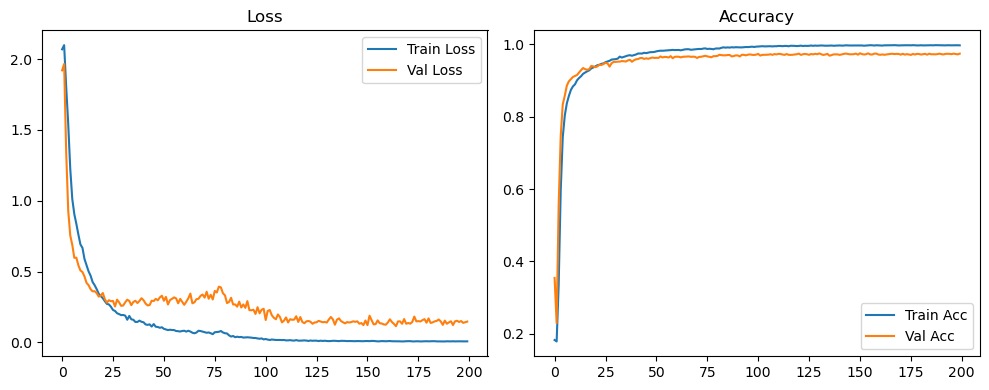

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 28.69it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 28.80it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 28.50it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 28.77it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 28.76it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 28.65it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 28.72it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 28.88it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 29.02it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 29.12it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 29.20it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 29.22it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 29.24it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 29.57it/s]

Original Model Final Test Loss: 0.1295 Accuracy: 0.9770


🚀 Running: batch256_lr0.002_0.002_0.002_dp0.5


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.002 | Train Acc: 0.1550 | Val Acc: 0.2773 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.002 | Train Acc: 0.1550 | Val Acc: 0.2773 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.002 | Train Acc: 0.1550 | Val Acc: 0.2773 |:   0%|          | 1/200 [00:09<30:51,  9.31s/it]

| LR: 0.002 | Train Acc: 0.1785 | Val Acc: 0.2395 |:   0%|          | 1/200 [00:18<30:51,  9.31s/it]

| LR: 0.002 | Train Acc: 0.1785 | Val Acc: 0.2395 |:   0%|          | 1/200 [00:18<30:51,  9.31s/it]

| LR: 0.002 | Train Acc: 0.1785 | Val Acc: 0.2395 |:   1%|          | 2/200 [00:18<30:41,  9.30s/it]

| LR: 0.002 | Train Acc: 0.2918 | Val Acc: 0.4643 |:   1%|          | 2/200 [00:27<30:41,  9.30s/it]

| LR: 0.002 | Train Acc: 0.2918 | Val Acc: 0.4643 |:   1%|          | 2/200 [00:27<30:41,  9.30s/it]

| LR: 0.002 | Train Acc: 0.2918 | Val Acc: 0.4643 |:   2%|▏         | 3/200 [00:27<29:50,  9.09s/it]

| LR: 0.002 | Train Acc: 0.5295 | Val Acc: 0.7236 |:   2%|▏         | 3/200 [00:36<29:50,  9.09s/it]

| LR: 0.002 | Train Acc: 0.5295 | Val Acc: 0.7236 |:   2%|▏         | 3/200 [00:36<29:50,  9.09s/it]

| LR: 0.002 | Train Acc: 0.5295 | Val Acc: 0.7236 |:   2%|▏         | 4/200 [00:36<29:23,  9.00s/it]

| LR: 0.002 | Train Acc: 0.6840 | Val Acc: 0.8172 |:   2%|▏         | 4/200 [00:45<29:23,  9.00s/it]

| LR: 0.002 | Train Acc: 0.6840 | Val Acc: 0.8172 |:   2%|▏         | 4/200 [00:45<29:23,  9.00s/it]

| LR: 0.002 | Train Acc: 0.6840 | Val Acc: 0.8172 |:   2%|▎         | 5/200 [00:45<29:08,  8.97s/it]

| LR: 0.002 | Train Acc: 0.7590 | Val Acc: 0.8472 |:   2%|▎         | 5/200 [00:54<29:08,  8.97s/it]

| LR: 0.002 | Train Acc: 0.7590 | Val Acc: 0.8472 |:   2%|▎         | 5/200 [00:54<29:08,  8.97s/it]

| LR: 0.002 | Train Acc: 0.7590 | Val Acc: 0.8472 |:   3%|▎         | 6/200 [00:54<28:54,  8.94s/it]

| LR: 0.002 | Train Acc: 0.7943 | Val Acc: 0.8655 |:   3%|▎         | 6/200 [01:02<28:54,  8.94s/it]

| LR: 0.002 | Train Acc: 0.7943 | Val Acc: 0.8655 |:   3%|▎         | 6/200 [01:02<28:54,  8.94s/it]

| LR: 0.002 | Train Acc: 0.7943 | Val Acc: 0.8655 |:   4%|▎         | 7/200 [01:02<28:33,  8.88s/it]

| LR: 0.002 | Train Acc: 0.8201 | Val Acc: 0.8882 |:   4%|▎         | 7/200 [01:12<28:33,  8.88s/it]

| LR: 0.002 | Train Acc: 0.8201 | Val Acc: 0.8882 |:   4%|▎         | 7/200 [01:12<28:33,  8.88s/it]

| LR: 0.002 | Train Acc: 0.8201 | Val Acc: 0.8882 |:   4%|▍         | 8/200 [01:12<28:46,  8.99s/it]

| LR: 0.002 | Train Acc: 0.8317 | Val Acc: 0.8972 |:   4%|▍         | 8/200 [01:21<28:46,  8.99s/it]

| LR: 0.002 | Train Acc: 0.8317 | Val Acc: 0.8972 |:   4%|▍         | 8/200 [01:21<28:46,  8.99s/it]

| LR: 0.002 | Train Acc: 0.8317 | Val Acc: 0.8972 |:   4%|▍         | 9/200 [01:21<29:09,  9.16s/it]

| LR: 0.002 | Train Acc: 0.8488 | Val Acc: 0.8966 |:   4%|▍         | 9/200 [01:30<29:09,  9.16s/it]

| LR: 0.002 | Train Acc: 0.8488 | Val Acc: 0.8966 |:   4%|▍         | 9/200 [01:30<29:09,  9.16s/it]

| LR: 0.002 | Train Acc: 0.8488 | Val Acc: 0.8966 |:   5%|▌         | 10/200 [01:30<28:27,  8.99s/it]

| LR: 0.002 | Train Acc: 0.8559 | Val Acc: 0.9032 |:   5%|▌         | 10/200 [01:39<28:27,  8.99s/it]

| LR: 0.002 | Train Acc: 0.8559 | Val Acc: 0.9032 |:   5%|▌         | 10/200 [01:39<28:27,  8.99s/it]

| LR: 0.002 | Train Acc: 0.8559 | Val Acc: 0.9032 |:   6%|▌         | 11/200 [01:39<28:13,  8.96s/it]

| LR: 0.002 | Train Acc: 0.8646 | Val Acc: 0.9128 |:   6%|▌         | 11/200 [01:47<28:13,  8.96s/it]

| LR: 0.002 | Train Acc: 0.8646 | Val Acc: 0.9128 |:   6%|▌         | 11/200 [01:47<28:13,  8.96s/it]

| LR: 0.002 | Train Acc: 0.8646 | Val Acc: 0.9128 |:   6%|▌         | 12/200 [01:47<27:57,  8.92s/it]

| LR: 0.002 | Train Acc: 0.8733 | Val Acc: 0.9213 |:   6%|▌         | 12/200 [01:56<27:57,  8.92s/it]

| LR: 0.002 | Train Acc: 0.8733 | Val Acc: 0.9213 |:   6%|▌         | 12/200 [01:56<27:57,  8.92s/it]

| LR: 0.002 | Train Acc: 0.8733 | Val Acc: 0.9213 |:   6%|▋         | 13/200 [01:56<27:46,  8.91s/it]

| LR: 0.002 | Train Acc: 0.8814 | Val Acc: 0.9227 |:   6%|▋         | 13/200 [02:05<27:46,  8.91s/it]

| LR: 0.002 | Train Acc: 0.8814 | Val Acc: 0.9227 |:   6%|▋         | 13/200 [02:05<27:46,  8.91s/it]

| LR: 0.002 | Train Acc: 0.8814 | Val Acc: 0.9227 |:   7%|▋         | 14/200 [02:05<27:45,  8.95s/it]

| LR: 0.002 | Train Acc: 0.8872 | Val Acc: 0.9269 |:   7%|▋         | 14/200 [02:14<27:45,  8.95s/it]

| LR: 0.002 | Train Acc: 0.8872 | Val Acc: 0.9269 |:   7%|▋         | 14/200 [02:14<27:45,  8.95s/it]

| LR: 0.002 | Train Acc: 0.8872 | Val Acc: 0.9269 |:   8%|▊         | 15/200 [02:14<27:29,  8.91s/it]

| LR: 0.002 | Train Acc: 0.8923 | Val Acc: 0.9275 |:   8%|▊         | 15/200 [02:23<27:29,  8.91s/it]

| LR: 0.002 | Train Acc: 0.8923 | Val Acc: 0.9275 |:   8%|▊         | 15/200 [02:23<27:29,  8.91s/it]

| LR: 0.002 | Train Acc: 0.8923 | Val Acc: 0.9275 |:   8%|▊         | 16/200 [02:23<27:15,  8.89s/it]

| LR: 0.002 | Train Acc: 0.8989 | Val Acc: 0.9324 |:   8%|▊         | 16/200 [02:32<27:15,  8.89s/it]

| LR: 0.002 | Train Acc: 0.8989 | Val Acc: 0.9324 |:   8%|▊         | 16/200 [02:32<27:15,  8.89s/it]

| LR: 0.002 | Train Acc: 0.8989 | Val Acc: 0.9324 |:   8%|▊         | 17/200 [02:32<27:03,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9009 | Val Acc: 0.9353 |:   8%|▊         | 17/200 [02:41<27:03,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9009 | Val Acc: 0.9353 |:   8%|▊         | 17/200 [02:41<27:03,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9009 | Val Acc: 0.9353 |:   9%|▉         | 18/200 [02:41<26:53,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9063 | Val Acc: 0.9294 |:   9%|▉         | 18/200 [02:50<26:53,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9063 | Val Acc: 0.9294 |:   9%|▉         | 18/200 [02:50<26:53,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9063 | Val Acc: 0.9294 |:  10%|▉         | 19/200 [02:50<26:49,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9074 | Val Acc: 0.9372 |:  10%|▉         | 19/200 [02:59<26:49,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9074 | Val Acc: 0.9372 |:  10%|▉         | 19/200 [02:59<26:49,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9074 | Val Acc: 0.9372 |:  10%|█         | 20/200 [02:59<27:19,  9.11s/it]

| LR: 0.002 | Train Acc: 0.9129 | Val Acc: 0.9358 |:  10%|█         | 20/200 [03:08<27:19,  9.11s/it]

| LR: 0.002 | Train Acc: 0.9129 | Val Acc: 0.9358 |:  10%|█         | 20/200 [03:08<27:19,  9.11s/it]

| LR: 0.002 | Train Acc: 0.9129 | Val Acc: 0.9358 |:  10%|█         | 21/200 [03:08<27:01,  9.06s/it]

| LR: 0.002 | Train Acc: 0.9187 | Val Acc: 0.9387 |:  10%|█         | 21/200 [03:17<27:01,  9.06s/it]

| LR: 0.002 | Train Acc: 0.9187 | Val Acc: 0.9387 |:  10%|█         | 21/200 [03:17<27:01,  9.06s/it]

| LR: 0.002 | Train Acc: 0.9187 | Val Acc: 0.9387 |:  11%|█         | 22/200 [03:17<26:40,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9212 | Val Acc: 0.9433 |:  11%|█         | 22/200 [03:26<26:40,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9212 | Val Acc: 0.9433 |:  11%|█         | 22/200 [03:26<26:40,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9212 | Val Acc: 0.9433 |:  12%|█▏        | 23/200 [03:26<26:21,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9227 | Val Acc: 0.9456 |:  12%|█▏        | 23/200 [03:34<26:21,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9227 | Val Acc: 0.9456 |:  12%|█▏        | 23/200 [03:34<26:21,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9227 | Val Acc: 0.9456 |:  12%|█▏        | 24/200 [03:34<25:54,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9255 | Val Acc: 0.9471 |:  12%|█▏        | 24/200 [03:43<25:54,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9255 | Val Acc: 0.9471 |:  12%|█▏        | 24/200 [03:43<25:54,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9255 | Val Acc: 0.9471 |:  12%|█▎        | 25/200 [03:43<25:31,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9293 | Val Acc: 0.9479 |:  12%|█▎        | 25/200 [03:52<25:31,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9293 | Val Acc: 0.9479 |:  12%|█▎        | 25/200 [03:52<25:31,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9293 | Val Acc: 0.9479 |:  13%|█▎        | 26/200 [03:52<25:26,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9314 | Val Acc: 0.9473 |:  13%|█▎        | 26/200 [04:01<25:26,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9314 | Val Acc: 0.9473 |:  13%|█▎        | 26/200 [04:01<25:26,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9314 | Val Acc: 0.9473 |:  14%|█▎        | 27/200 [04:01<25:15,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9366 | Val Acc: 0.9462 |:  14%|█▎        | 27/200 [04:09<25:15,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9366 | Val Acc: 0.9462 |:  14%|█▎        | 27/200 [04:09<25:15,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9366 | Val Acc: 0.9462 |:  14%|█▍        | 28/200 [04:09<25:06,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9350 | Val Acc: 0.9487 |:  14%|█▍        | 28/200 [04:18<25:06,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9350 | Val Acc: 0.9487 |:  14%|█▍        | 28/200 [04:18<25:06,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9350 | Val Acc: 0.9487 |:  14%|█▍        | 29/200 [04:18<25:02,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9370 | Val Acc: 0.9511 |:  14%|█▍        | 29/200 [04:27<25:02,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9370 | Val Acc: 0.9511 |:  14%|█▍        | 29/200 [04:27<25:02,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9370 | Val Acc: 0.9511 |:  15%|█▌        | 30/200 [04:27<25:08,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9369 | Val Acc: 0.9515 |:  15%|█▌        | 30/200 [04:36<25:08,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9369 | Val Acc: 0.9515 |:  15%|█▌        | 30/200 [04:36<25:08,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9369 | Val Acc: 0.9515 |:  16%|█▌        | 31/200 [04:36<25:01,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9422 | Val Acc: 0.9535 |:  16%|█▌        | 31/200 [04:45<25:01,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9422 | Val Acc: 0.9535 |:  16%|█▌        | 31/200 [04:45<25:01,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9422 | Val Acc: 0.9535 |:  16%|█▌        | 32/200 [04:45<24:51,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9445 | Val Acc: 0.9571 |:  16%|█▌        | 32/200 [04:54<24:51,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9445 | Val Acc: 0.9571 |:  16%|█▌        | 32/200 [04:54<24:51,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9445 | Val Acc: 0.9571 |:  16%|█▋        | 33/200 [04:54<25:01,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9457 | Val Acc: 0.9559 |:  16%|█▋        | 33/200 [05:03<25:01,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9457 | Val Acc: 0.9559 |:  16%|█▋        | 33/200 [05:03<25:01,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9457 | Val Acc: 0.9559 |:  17%|█▋        | 34/200 [05:03<24:47,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9479 | Val Acc: 0.9552 |:  17%|█▋        | 34/200 [05:12<24:47,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9479 | Val Acc: 0.9552 |:  17%|█▋        | 34/200 [05:12<24:47,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9479 | Val Acc: 0.9552 |:  18%|█▊        | 35/200 [05:12<24:34,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9476 | Val Acc: 0.9582 |:  18%|█▊        | 35/200 [05:21<24:34,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9476 | Val Acc: 0.9582 |:  18%|█▊        | 35/200 [05:21<24:34,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9476 | Val Acc: 0.9582 |:  18%|█▊        | 36/200 [05:21<24:13,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9504 | Val Acc: 0.9583 |:  18%|█▊        | 36/200 [05:30<24:13,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9504 | Val Acc: 0.9583 |:  18%|█▊        | 36/200 [05:30<24:13,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9504 | Val Acc: 0.9583 |:  18%|█▊        | 37/200 [05:30<24:02,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9490 | Val Acc: 0.9591 |:  18%|█▊        | 37/200 [05:38<24:02,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9490 | Val Acc: 0.9591 |:  18%|█▊        | 37/200 [05:38<24:02,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9490 | Val Acc: 0.9591 |:  19%|█▉        | 38/200 [05:38<23:48,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9527 | Val Acc: 0.9569 |:  19%|█▉        | 38/200 [05:47<23:48,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9527 | Val Acc: 0.9569 |:  19%|█▉        | 38/200 [05:47<23:48,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9527 | Val Acc: 0.9569 |:  20%|█▉        | 39/200 [05:47<23:36,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9540 | Val Acc: 0.9609 |:  20%|█▉        | 39/200 [05:56<23:36,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9540 | Val Acc: 0.9609 |:  20%|█▉        | 39/200 [05:56<23:36,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9540 | Val Acc: 0.9609 |:  20%|██        | 40/200 [05:56<23:25,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9549 | Val Acc: 0.9603 |:  20%|██        | 40/200 [06:05<23:25,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9549 | Val Acc: 0.9603 |:  20%|██        | 40/200 [06:05<23:25,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9549 | Val Acc: 0.9603 |:  20%|██        | 41/200 [06:05<23:17,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9562 | Val Acc: 0.9620 |:  20%|██        | 41/200 [06:13<23:17,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9562 | Val Acc: 0.9620 |:  20%|██        | 41/200 [06:13<23:17,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9562 | Val Acc: 0.9620 |:  21%|██        | 42/200 [06:13<23:04,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9566 | Val Acc: 0.9637 |:  21%|██        | 42/200 [06:22<23:04,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9566 | Val Acc: 0.9637 |:  21%|██        | 42/200 [06:22<23:04,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9566 | Val Acc: 0.9637 |:  22%|██▏       | 43/200 [06:22<22:56,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9574 | Val Acc: 0.9623 |:  22%|██▏       | 43/200 [06:31<22:56,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9574 | Val Acc: 0.9623 |:  22%|██▏       | 43/200 [06:31<22:56,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9574 | Val Acc: 0.9623 |:  22%|██▏       | 44/200 [06:31<22:51,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9598 | Val Acc: 0.9659 |:  22%|██▏       | 44/200 [06:40<22:51,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9598 | Val Acc: 0.9659 |:  22%|██▏       | 44/200 [06:40<22:51,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9598 | Val Acc: 0.9659 |:  22%|██▎       | 45/200 [06:40<22:42,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9612 | Val Acc: 0.9644 |:  22%|██▎       | 45/200 [06:49<22:42,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9612 | Val Acc: 0.9644 |:  22%|██▎       | 45/200 [06:49<22:42,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9612 | Val Acc: 0.9644 |:  23%|██▎       | 46/200 [06:49<22:37,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9609 | Val Acc: 0.9629 |:  23%|██▎       | 46/200 [06:57<22:37,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9609 | Val Acc: 0.9629 |:  23%|██▎       | 46/200 [06:57<22:37,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9609 | Val Acc: 0.9629 |:  24%|██▎       | 47/200 [06:57<22:21,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9625 | Val Acc: 0.9653 |:  24%|██▎       | 47/200 [07:06<22:21,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9625 | Val Acc: 0.9653 |:  24%|██▎       | 47/200 [07:06<22:21,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9625 | Val Acc: 0.9653 |:  24%|██▍       | 48/200 [07:06<22:07,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9612 | Val Acc: 0.9636 |:  24%|██▍       | 48/200 [07:15<22:07,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9612 | Val Acc: 0.9636 |:  24%|██▍       | 48/200 [07:15<22:07,  8.73s/it]

| LR: 0.002 | Train Acc: 0.9612 | Val Acc: 0.9636 |:  24%|██▍       | 49/200 [07:15<21:55,  8.71s/it]

| LR: 0.002 | Train Acc: 0.9614 | Val Acc: 0.9625 |:  24%|██▍       | 49/200 [07:23<21:55,  8.71s/it]

| LR: 0.002 | Train Acc: 0.9614 | Val Acc: 0.9625 |:  24%|██▍       | 49/200 [07:23<21:55,  8.71s/it]

| LR: 0.002 | Train Acc: 0.9614 | Val Acc: 0.9625 |:  25%|██▌       | 50/200 [07:23<21:40,  8.67s/it]

| LR: 0.002 | Train Acc: 0.9632 | Val Acc: 0.9643 |:  25%|██▌       | 50/200 [07:33<21:40,  8.67s/it]

| LR: 0.002 | Train Acc: 0.9632 | Val Acc: 0.9643 |:  25%|██▌       | 50/200 [07:33<21:40,  8.67s/it]

| LR: 0.002 | Train Acc: 0.9632 | Val Acc: 0.9643 |:  26%|██▌       | 51/200 [07:33<22:04,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9610 | Val Acc: 0.9662 |:  26%|██▌       | 51/200 [07:41<22:04,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9610 | Val Acc: 0.9662 |:  26%|██▌       | 51/200 [07:41<22:04,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9610 | Val Acc: 0.9662 |:  26%|██▌       | 52/200 [07:41<21:54,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9634 | Val Acc: 0.9646 |:  26%|██▌       | 52/200 [07:50<21:54,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9634 | Val Acc: 0.9646 |:  26%|██▌       | 52/200 [07:50<21:54,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9634 | Val Acc: 0.9646 |:  26%|██▋       | 53/200 [07:50<21:37,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9638 | Val Acc: 0.9633 |:  26%|██▋       | 53/200 [07:59<21:37,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9638 | Val Acc: 0.9633 |:  26%|██▋       | 53/200 [07:59<21:37,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9638 | Val Acc: 0.9633 |:  27%|██▋       | 54/200 [07:59<21:26,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9648 | Val Acc: 0.9684 |:  27%|██▋       | 54/200 [08:08<21:26,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9648 | Val Acc: 0.9684 |:  27%|██▋       | 54/200 [08:08<21:26,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9648 | Val Acc: 0.9684 |:  28%|██▊       | 55/200 [08:08<21:13,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9677 | Val Acc: 0.9687 |:  28%|██▊       | 55/200 [08:16<21:13,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9677 | Val Acc: 0.9687 |:  28%|██▊       | 55/200 [08:16<21:13,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9677 | Val Acc: 0.9687 |:  28%|██▊       | 56/200 [08:16<21:09,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9690 | Val Acc: 0.9686 |:  28%|██▊       | 56/200 [08:25<21:09,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9690 | Val Acc: 0.9686 |:  28%|██▊       | 56/200 [08:25<21:09,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9690 | Val Acc: 0.9686 |:  28%|██▊       | 57/200 [08:25<21:03,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9697 | Val Acc: 0.9701 |:  28%|██▊       | 57/200 [08:35<21:03,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9697 | Val Acc: 0.9701 |:  28%|██▊       | 57/200 [08:35<21:03,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9697 | Val Acc: 0.9701 |:  29%|██▉       | 58/200 [08:35<21:15,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9710 | Val Acc: 0.9676 |:  29%|██▉       | 58/200 [08:44<21:15,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9710 | Val Acc: 0.9676 |:  29%|██▉       | 58/200 [08:44<21:15,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9710 | Val Acc: 0.9676 |:  30%|██▉       | 59/200 [08:44<21:15,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9721 | Val Acc: 0.9681 |:  30%|██▉       | 59/200 [08:52<21:15,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9721 | Val Acc: 0.9681 |:  30%|██▉       | 59/200 [08:52<21:15,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9721 | Val Acc: 0.9681 |:  30%|███       | 60/200 [08:53<20:48,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9729 | Val Acc: 0.9681 |:  30%|███       | 60/200 [09:01<20:48,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9729 | Val Acc: 0.9681 |:  30%|███       | 60/200 [09:01<20:48,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9729 | Val Acc: 0.9681 |:  30%|███       | 61/200 [09:01<20:30,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9742 | Val Acc: 0.9688 |:  30%|███       | 61/200 [09:10<20:30,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9742 | Val Acc: 0.9688 |:  30%|███       | 61/200 [09:10<20:30,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9742 | Val Acc: 0.9688 |:  31%|███       | 62/200 [09:10<20:23,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9735 | Val Acc: 0.9699 |:  31%|███       | 62/200 [09:19<20:23,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9735 | Val Acc: 0.9699 |:  31%|███       | 62/200 [09:19<20:23,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9735 | Val Acc: 0.9699 |:  32%|███▏      | 63/200 [09:19<20:11,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9748 | Val Acc: 0.9702 |:  32%|███▏      | 63/200 [09:28<20:11,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9748 | Val Acc: 0.9702 |:  32%|███▏      | 63/200 [09:28<20:11,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9748 | Val Acc: 0.9702 |:  32%|███▏      | 64/200 [09:28<20:18,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9745 | Val Acc: 0.9707 |:  32%|███▏      | 64/200 [09:37<20:18,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9745 | Val Acc: 0.9707 |:  32%|███▏      | 64/200 [09:37<20:18,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9745 | Val Acc: 0.9707 |:  32%|███▎      | 65/200 [09:37<20:01,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9763 | Val Acc: 0.9682 |:  32%|███▎      | 65/200 [09:46<20:01,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9763 | Val Acc: 0.9682 |:  32%|███▎      | 65/200 [09:46<20:01,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9763 | Val Acc: 0.9682 |:  33%|███▎      | 66/200 [09:46<19:57,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9680 |:  33%|███▎      | 66/200 [09:56<19:57,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9680 |:  33%|███▎      | 66/200 [09:56<19:57,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9762 | Val Acc: 0.9680 |:  34%|███▎      | 67/200 [09:56<20:18,  9.16s/it]

| LR: 0.002 | Train Acc: 0.9758 | Val Acc: 0.9688 |:  34%|███▎      | 67/200 [10:04<20:18,  9.16s/it]

| LR: 0.002 | Train Acc: 0.9758 | Val Acc: 0.9688 |:  34%|███▎      | 67/200 [10:04<20:18,  9.16s/it]

| LR: 0.002 | Train Acc: 0.9758 | Val Acc: 0.9688 |:  34%|███▍      | 68/200 [10:04<19:58,  9.08s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9704 |:  34%|███▍      | 68/200 [10:13<19:58,  9.08s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9704 |:  34%|███▍      | 68/200 [10:13<19:58,  9.08s/it]

| LR: 0.002 | Train Acc: 0.9750 | Val Acc: 0.9704 |:  34%|███▍      | 69/200 [10:13<19:43,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9759 | Val Acc: 0.9685 |:  34%|███▍      | 69/200 [10:22<19:43,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9759 | Val Acc: 0.9685 |:  34%|███▍      | 69/200 [10:22<19:43,  9.03s/it]

| LR: 0.002 | Train Acc: 0.9759 | Val Acc: 0.9685 |:  35%|███▌      | 70/200 [10:22<19:27,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9686 |:  35%|███▌      | 70/200 [10:31<19:27,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9686 |:  35%|███▌      | 70/200 [10:31<19:27,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9686 |:  36%|███▌      | 71/200 [10:31<19:19,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9770 | Val Acc: 0.9691 |:  36%|███▌      | 71/200 [10:40<19:19,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9770 | Val Acc: 0.9691 |:  36%|███▌      | 71/200 [10:40<19:19,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9770 | Val Acc: 0.9691 |:  36%|███▌      | 72/200 [10:40<19:04,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9758 | Val Acc: 0.9721 |:  36%|███▌      | 72/200 [10:49<19:04,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9758 | Val Acc: 0.9721 |:  36%|███▌      | 72/200 [10:49<19:04,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9758 | Val Acc: 0.9721 |:  36%|███▋      | 73/200 [10:49<18:56,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9767 | Val Acc: 0.9692 |:  36%|███▋      | 73/200 [10:58<18:56,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9767 | Val Acc: 0.9692 |:  36%|███▋      | 73/200 [10:58<18:56,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9767 | Val Acc: 0.9692 |:  37%|███▋      | 74/200 [10:58<18:43,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9766 | Val Acc: 0.9712 |:  37%|███▋      | 74/200 [11:07<18:43,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9766 | Val Acc: 0.9712 |:  37%|███▋      | 74/200 [11:07<18:43,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9766 | Val Acc: 0.9712 |:  38%|███▊      | 75/200 [11:07<18:41,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9705 |:  38%|███▊      | 75/200 [11:16<18:41,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9705 |:  38%|███▊      | 75/200 [11:16<18:41,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9772 | Val Acc: 0.9705 |:  38%|███▊      | 76/200 [11:16<18:18,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9721 |:  38%|███▊      | 76/200 [11:24<18:18,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9721 |:  38%|███▊      | 76/200 [11:24<18:18,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9761 | Val Acc: 0.9721 |:  38%|███▊      | 77/200 [11:24<18:08,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9779 | Val Acc: 0.9697 |:  38%|███▊      | 77/200 [11:33<18:08,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9779 | Val Acc: 0.9697 |:  38%|███▊      | 77/200 [11:33<18:08,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9779 | Val Acc: 0.9697 |:  39%|███▉      | 78/200 [11:33<17:58,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9769 | Val Acc: 0.9707 |:  39%|███▉      | 78/200 [11:42<17:58,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9769 | Val Acc: 0.9707 |:  39%|███▉      | 78/200 [11:42<17:58,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9769 | Val Acc: 0.9707 |:  40%|███▉      | 79/200 [11:42<17:50,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9783 | Val Acc: 0.9696 |:  40%|███▉      | 79/200 [11:51<17:50,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9783 | Val Acc: 0.9696 |:  40%|███▉      | 79/200 [11:51<17:50,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9783 | Val Acc: 0.9696 |:  40%|████      | 80/200 [11:51<17:38,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9783 | Val Acc: 0.9708 |:  40%|████      | 80/200 [12:00<17:38,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9783 | Val Acc: 0.9708 |:  40%|████      | 80/200 [12:00<17:38,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9783 | Val Acc: 0.9708 |:  40%|████      | 81/200 [12:00<17:32,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9779 | Val Acc: 0.9710 |:  40%|████      | 81/200 [12:09<17:32,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9779 | Val Acc: 0.9710 |:  40%|████      | 81/200 [12:09<17:32,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9779 | Val Acc: 0.9710 |:  41%|████      | 82/200 [12:09<17:30,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9780 | Val Acc: 0.9698 |:  41%|████      | 82/200 [12:18<17:30,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9780 | Val Acc: 0.9698 |:  41%|████      | 82/200 [12:18<17:30,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9780 | Val Acc: 0.9698 |:  42%|████▏     | 83/200 [12:18<17:20,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9786 | Val Acc: 0.9734 |:  42%|████▏     | 83/200 [12:27<17:20,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9786 | Val Acc: 0.9734 |:  42%|████▏     | 83/200 [12:27<17:20,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9786 | Val Acc: 0.9734 |:  42%|████▏     | 84/200 [12:27<17:15,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9798 | Val Acc: 0.9697 |:  42%|████▏     | 84/200 [12:36<17:15,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9798 | Val Acc: 0.9697 |:  42%|████▏     | 84/200 [12:36<17:15,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9798 | Val Acc: 0.9697 |:  42%|████▎     | 85/200 [12:36<17:04,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9810 | Val Acc: 0.9713 |:  42%|████▎     | 85/200 [12:44<17:04,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9810 | Val Acc: 0.9713 |:  42%|████▎     | 85/200 [12:44<17:04,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9810 | Val Acc: 0.9713 |:  43%|████▎     | 86/200 [12:44<16:52,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9820 | Val Acc: 0.9709 |:  43%|████▎     | 86/200 [12:53<16:52,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9820 | Val Acc: 0.9709 |:  43%|████▎     | 86/200 [12:53<16:52,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9820 | Val Acc: 0.9709 |:  44%|████▎     | 87/200 [12:53<16:46,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9822 | Val Acc: 0.9716 |:  44%|████▎     | 87/200 [13:03<16:46,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9822 | Val Acc: 0.9716 |:  44%|████▎     | 87/200 [13:03<16:46,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9822 | Val Acc: 0.9716 |:  44%|████▍     | 88/200 [13:03<16:50,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9826 | Val Acc: 0.9741 |:  44%|████▍     | 88/200 [13:11<16:50,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9826 | Val Acc: 0.9741 |:  44%|████▍     | 88/200 [13:11<16:50,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9826 | Val Acc: 0.9741 |:  44%|████▍     | 89/200 [13:11<16:32,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9829 | Val Acc: 0.9723 |:  44%|████▍     | 89/200 [13:20<16:32,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9829 | Val Acc: 0.9723 |:  44%|████▍     | 89/200 [13:20<16:32,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9829 | Val Acc: 0.9723 |:  45%|████▌     | 90/200 [13:20<16:17,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9846 | Val Acc: 0.9709 |:  45%|████▌     | 90/200 [13:30<16:17,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9846 | Val Acc: 0.9709 |:  45%|████▌     | 90/200 [13:30<16:17,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9846 | Val Acc: 0.9709 |:  46%|████▌     | 91/200 [13:30<16:26,  9.05s/it]

| LR: 0.002 | Train Acc: 0.9840 | Val Acc: 0.9722 |:  46%|████▌     | 91/200 [13:38<16:26,  9.05s/it]

| LR: 0.002 | Train Acc: 0.9840 | Val Acc: 0.9722 |:  46%|████▌     | 91/200 [13:38<16:26,  9.05s/it]

| LR: 0.002 | Train Acc: 0.9840 | Val Acc: 0.9722 |:  46%|████▌     | 92/200 [13:38<16:06,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9837 | Val Acc: 0.9719 |:  46%|████▌     | 92/200 [13:47<16:06,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9837 | Val Acc: 0.9719 |:  46%|████▌     | 92/200 [13:47<16:06,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9837 | Val Acc: 0.9719 |:  46%|████▋     | 93/200 [13:47<15:54,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9728 |:  46%|████▋     | 93/200 [13:56<15:54,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9728 |:  46%|████▋     | 93/200 [13:56<15:54,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9728 |:  47%|████▋     | 94/200 [13:56<15:44,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9844 | Val Acc: 0.9722 |:  47%|████▋     | 94/200 [14:05<15:44,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9844 | Val Acc: 0.9722 |:  47%|████▋     | 94/200 [14:05<15:44,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9844 | Val Acc: 0.9722 |:  48%|████▊     | 95/200 [14:05<15:32,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9841 | Val Acc: 0.9729 |:  48%|████▊     | 95/200 [14:14<15:32,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9841 | Val Acc: 0.9729 |:  48%|████▊     | 95/200 [14:14<15:32,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9841 | Val Acc: 0.9729 |:  48%|████▊     | 96/200 [14:14<15:35,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9722 |:  48%|████▊     | 96/200 [14:23<15:35,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9722 |:  48%|████▊     | 96/200 [14:23<15:35,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9852 | Val Acc: 0.9722 |:  48%|████▊     | 97/200 [14:23<15:23,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9738 |:  48%|████▊     | 97/200 [14:32<15:23,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9738 |:  48%|████▊     | 97/200 [14:32<15:23,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9860 | Val Acc: 0.9738 |:  49%|████▉     | 98/200 [14:32<15:09,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9732 |:  49%|████▉     | 98/200 [14:41<15:09,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9732 |:  49%|████▉     | 98/200 [14:41<15:09,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9865 | Val Acc: 0.9732 |:  50%|████▉     | 99/200 [14:41<15:01,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9738 |:  50%|████▉     | 99/200 [14:50<15:01,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9738 |:  50%|████▉     | 99/200 [14:50<15:01,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9854 | Val Acc: 0.9738 |:  50%|█████     | 100/200 [14:50<14:48,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9734 |:  50%|█████     | 100/200 [14:59<14:48,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9734 |:  50%|█████     | 100/200 [14:59<14:48,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9864 | Val Acc: 0.9734 |:  50%|█████     | 101/200 [14:59<15:00,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9869 | Val Acc: 0.9736 |:  50%|█████     | 101/200 [15:08<15:00,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9869 | Val Acc: 0.9736 |:  50%|█████     | 101/200 [15:08<15:00,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9869 | Val Acc: 0.9736 |:  51%|█████     | 102/200 [15:08<14:52,  9.11s/it]

| LR: 0.002 | Train Acc: 0.9866 | Val Acc: 0.9731 |:  51%|█████     | 102/200 [15:17<14:52,  9.11s/it]

| LR: 0.002 | Train Acc: 0.9866 | Val Acc: 0.9731 |:  51%|█████     | 102/200 [15:17<14:52,  9.11s/it]

| LR: 0.002 | Train Acc: 0.9866 | Val Acc: 0.9731 |:  52%|█████▏    | 103/200 [15:17<14:37,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9871 | Val Acc: 0.9732 |:  52%|█████▏    | 103/200 [15:26<14:37,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9871 | Val Acc: 0.9732 |:  52%|█████▏    | 103/200 [15:26<14:37,  9.04s/it]

| LR: 0.002 | Train Acc: 0.9871 | Val Acc: 0.9732 |:  52%|█████▏    | 104/200 [15:26<14:21,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9875 | Val Acc: 0.9732 |:  52%|█████▏    | 104/200 [15:35<14:21,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9875 | Val Acc: 0.9732 |:  52%|█████▏    | 104/200 [15:35<14:21,  8.97s/it]

| LR: 0.002 | Train Acc: 0.9875 | Val Acc: 0.9732 |:  52%|█████▎    | 105/200 [15:35<14:06,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9867 | Val Acc: 0.9737 |:  52%|█████▎    | 105/200 [15:44<14:06,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9867 | Val Acc: 0.9737 |:  52%|█████▎    | 105/200 [15:44<14:06,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9867 | Val Acc: 0.9737 |:  53%|█████▎    | 106/200 [15:44<13:57,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9735 |:  53%|█████▎    | 106/200 [15:52<13:57,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9735 |:  53%|█████▎    | 106/200 [15:52<13:57,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9735 |:  54%|█████▎    | 107/200 [15:53<13:47,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9733 |:  54%|█████▎    | 107/200 [16:01<13:47,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9733 |:  54%|█████▎    | 107/200 [16:01<13:47,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9870 | Val Acc: 0.9733 |:  54%|█████▍    | 108/200 [16:01<13:34,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9737 |:  54%|█████▍    | 108/200 [16:10<13:34,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9737 |:  54%|█████▍    | 108/200 [16:10<13:34,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9880 | Val Acc: 0.9737 |:  55%|█████▍    | 109/200 [16:10<13:27,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9876 | Val Acc: 0.9738 |:  55%|█████▍    | 109/200 [16:19<13:27,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9876 | Val Acc: 0.9738 |:  55%|█████▍    | 109/200 [16:19<13:27,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9876 | Val Acc: 0.9738 |:  55%|█████▌    | 110/200 [16:19<13:18,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9875 | Val Acc: 0.9744 |:  55%|█████▌    | 110/200 [16:28<13:18,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9875 | Val Acc: 0.9744 |:  55%|█████▌    | 110/200 [16:28<13:18,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9875 | Val Acc: 0.9744 |:  56%|█████▌    | 111/200 [16:28<13:20,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9892 | Val Acc: 0.9752 |:  56%|█████▌    | 111/200 [16:37<13:20,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9892 | Val Acc: 0.9752 |:  56%|█████▌    | 111/200 [16:37<13:20,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9892 | Val Acc: 0.9752 |:  56%|█████▌    | 112/200 [16:37<13:04,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9892 | Val Acc: 0.9746 |:  56%|█████▌    | 112/200 [16:46<13:04,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9892 | Val Acc: 0.9746 |:  56%|█████▌    | 112/200 [16:46<13:04,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9892 | Val Acc: 0.9746 |:  56%|█████▋    | 113/200 [16:46<12:52,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9888 | Val Acc: 0.9744 |:  56%|█████▋    | 113/200 [16:55<12:52,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9888 | Val Acc: 0.9744 |:  56%|█████▋    | 113/200 [16:55<12:52,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9888 | Val Acc: 0.9744 |:  57%|█████▋    | 114/200 [16:55<12:43,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9884 | Val Acc: 0.9735 |:  57%|█████▋    | 114/200 [17:04<12:43,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9884 | Val Acc: 0.9735 |:  57%|█████▋    | 114/200 [17:04<12:43,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9884 | Val Acc: 0.9735 |:  57%|█████▊    | 115/200 [17:04<12:37,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9901 | Val Acc: 0.9729 |:  57%|█████▊    | 115/200 [17:12<12:37,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9901 | Val Acc: 0.9729 |:  57%|█████▊    | 115/200 [17:12<12:37,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9901 | Val Acc: 0.9729 |:  58%|█████▊    | 116/200 [17:12<12:21,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9737 |:  58%|█████▊    | 116/200 [17:21<12:21,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9737 |:  58%|█████▊    | 116/200 [17:21<12:21,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9737 |:  58%|█████▊    | 117/200 [17:21<12:09,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9888 | Val Acc: 0.9742 |:  58%|█████▊    | 117/200 [17:30<12:09,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9888 | Val Acc: 0.9742 |:  58%|█████▊    | 117/200 [17:30<12:09,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9888 | Val Acc: 0.9742 |:  59%|█████▉    | 118/200 [17:30<11:58,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9894 | Val Acc: 0.9731 |:  59%|█████▉    | 118/200 [17:38<11:58,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9894 | Val Acc: 0.9731 |:  59%|█████▉    | 118/200 [17:38<11:58,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9894 | Val Acc: 0.9731 |:  60%|█████▉    | 119/200 [17:39<11:49,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9742 |:  60%|█████▉    | 119/200 [17:47<11:49,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9742 |:  60%|█████▉    | 119/200 [17:47<11:49,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9886 | Val Acc: 0.9742 |:  60%|██████    | 120/200 [17:47<11:43,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9898 | Val Acc: 0.9747 |:  60%|██████    | 120/200 [17:56<11:43,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9898 | Val Acc: 0.9747 |:  60%|██████    | 120/200 [17:56<11:43,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9898 | Val Acc: 0.9747 |:  60%|██████    | 121/200 [17:56<11:35,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9735 |:  60%|██████    | 121/200 [18:05<11:35,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9735 |:  60%|██████    | 121/200 [18:05<11:35,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9735 |:  61%|██████    | 122/200 [18:05<11:26,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9895 | Val Acc: 0.9735 |:  61%|██████    | 122/200 [18:14<11:26,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9895 | Val Acc: 0.9735 |:  61%|██████    | 122/200 [18:14<11:26,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9895 | Val Acc: 0.9735 |:  62%|██████▏   | 123/200 [18:14<11:13,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9722 |:  62%|██████▏   | 123/200 [18:23<11:13,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9722 |:  62%|██████▏   | 123/200 [18:23<11:13,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9722 |:  62%|██████▏   | 124/200 [18:23<11:09,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9756 |:  62%|██████▏   | 124/200 [18:31<11:09,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9756 |:  62%|██████▏   | 124/200 [18:31<11:09,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9756 |:  62%|██████▎   | 125/200 [18:31<11:01,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9745 |:  62%|██████▎   | 125/200 [18:40<11:01,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9745 |:  62%|██████▎   | 125/200 [18:40<11:01,  8.82s/it]

| LR: 0.002 | Train Acc: 0.9893 | Val Acc: 0.9745 |:  63%|██████▎   | 126/200 [18:40<10:55,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9729 |:  63%|██████▎   | 126/200 [18:49<10:55,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9729 |:  63%|██████▎   | 126/200 [18:49<10:55,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9729 |:  64%|██████▎   | 127/200 [18:49<10:44,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9738 |:  64%|██████▎   | 127/200 [18:58<10:44,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9738 |:  64%|██████▎   | 127/200 [18:58<10:44,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9738 |:  64%|██████▍   | 128/200 [18:58<10:35,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9895 | Val Acc: 0.9752 |:  64%|██████▍   | 128/200 [19:07<10:35,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9895 | Val Acc: 0.9752 |:  64%|██████▍   | 128/200 [19:07<10:35,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9895 | Val Acc: 0.9752 |:  64%|██████▍   | 129/200 [19:07<10:25,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9901 | Val Acc: 0.9738 |:  64%|██████▍   | 129/200 [19:15<10:25,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9901 | Val Acc: 0.9738 |:  64%|██████▍   | 129/200 [19:15<10:25,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9901 | Val Acc: 0.9738 |:  65%|██████▌   | 130/200 [19:15<10:15,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9896 | Val Acc: 0.9750 |:  65%|██████▌   | 130/200 [19:24<10:15,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9896 | Val Acc: 0.9750 |:  65%|██████▌   | 130/200 [19:24<10:15,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9896 | Val Acc: 0.9750 |:  66%|██████▌   | 131/200 [19:24<10:04,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9895 | Val Acc: 0.9730 |:  66%|██████▌   | 131/200 [19:33<10:04,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9895 | Val Acc: 0.9730 |:  66%|██████▌   | 131/200 [19:33<10:04,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9895 | Val Acc: 0.9730 |:  66%|██████▌   | 132/200 [19:33<09:57,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9895 | Val Acc: 0.9743 |:  66%|██████▌   | 132/200 [19:42<09:57,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9895 | Val Acc: 0.9743 |:  66%|██████▌   | 132/200 [19:42<09:57,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9895 | Val Acc: 0.9743 |:  66%|██████▋   | 133/200 [19:42<09:47,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9901 | Val Acc: 0.9732 |:  66%|██████▋   | 133/200 [19:50<09:47,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9901 | Val Acc: 0.9732 |:  66%|██████▋   | 133/200 [19:50<09:47,  8.77s/it]

| LR: 0.002 | Train Acc: 0.9901 | Val Acc: 0.9732 |:  67%|██████▋   | 134/200 [19:50<09:38,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9747 |:  67%|██████▋   | 134/200 [19:59<09:38,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9747 |:  67%|██████▋   | 134/200 [19:59<09:38,  8.76s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9747 |:  68%|██████▊   | 135/200 [19:59<09:28,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9891 | Val Acc: 0.9741 |:  68%|██████▊   | 135/200 [20:08<09:28,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9891 | Val Acc: 0.9741 |:  68%|██████▊   | 135/200 [20:08<09:28,  8.74s/it]

| LR: 0.002 | Train Acc: 0.9891 | Val Acc: 0.9741 |:  68%|██████▊   | 136/200 [20:08<09:19,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9733 |:  68%|██████▊   | 136/200 [20:17<09:19,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9733 |:  68%|██████▊   | 136/200 [20:17<09:19,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9733 |:  68%|██████▊   | 137/200 [20:17<09:11,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9894 | Val Acc: 0.9734 |:  68%|██████▊   | 137/200 [20:25<09:11,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9894 | Val Acc: 0.9734 |:  68%|██████▊   | 137/200 [20:25<09:11,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9894 | Val Acc: 0.9734 |:  69%|██████▉   | 138/200 [20:25<09:00,  8.72s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9738 |:  69%|██████▉   | 138/200 [20:35<09:00,  8.72s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9738 |:  69%|██████▉   | 138/200 [20:35<09:00,  8.72s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9738 |:  70%|██████▉   | 139/200 [20:35<09:02,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9753 |:  70%|██████▉   | 139/200 [20:43<09:02,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9753 |:  70%|██████▉   | 139/200 [20:43<09:02,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9753 |:  70%|███████   | 140/200 [20:43<08:52,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9755 |:  70%|███████   | 140/200 [20:52<08:52,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9755 |:  70%|███████   | 140/200 [20:52<08:52,  8.88s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9755 |:  70%|███████   | 141/200 [20:52<08:41,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9901 | Val Acc: 0.9744 |:  70%|███████   | 141/200 [21:01<08:41,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9901 | Val Acc: 0.9744 |:  70%|███████   | 141/200 [21:01<08:41,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9901 | Val Acc: 0.9744 |:  71%|███████   | 142/200 [21:01<08:32,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9752 |:  71%|███████   | 142/200 [21:10<08:32,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9752 |:  71%|███████   | 142/200 [21:10<08:32,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9752 |:  72%|███████▏  | 143/200 [21:10<08:24,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9892 | Val Acc: 0.9736 |:  72%|███████▏  | 143/200 [21:19<08:24,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9892 | Val Acc: 0.9736 |:  72%|███████▏  | 143/200 [21:19<08:24,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9892 | Val Acc: 0.9736 |:  72%|███████▏  | 144/200 [21:19<08:23,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9744 |:  72%|███████▏  | 144/200 [21:28<08:23,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9744 |:  72%|███████▏  | 144/200 [21:28<08:23,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9744 |:  72%|███████▎  | 145/200 [21:28<08:12,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9751 |:  72%|███████▎  | 145/200 [21:37<08:12,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9751 |:  72%|███████▎  | 145/200 [21:37<08:12,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9751 |:  73%|███████▎  | 146/200 [21:37<08:02,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9752 |:  73%|███████▎  | 146/200 [21:46<08:02,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9752 |:  73%|███████▎  | 146/200 [21:46<08:02,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9752 |:  74%|███████▎  | 147/200 [21:46<07:57,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9747 |:  74%|███████▎  | 147/200 [21:55<07:57,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9747 |:  74%|███████▎  | 147/200 [21:55<07:57,  9.00s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9747 |:  74%|███████▍  | 148/200 [21:55<07:45,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9752 |:  74%|███████▍  | 148/200 [22:04<07:45,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9752 |:  74%|███████▍  | 148/200 [22:04<07:45,  8.96s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9752 |:  74%|███████▍  | 149/200 [22:04<07:43,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9747 |:  74%|███████▍  | 149/200 [22:13<07:43,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9747 |:  74%|███████▍  | 149/200 [22:13<07:43,  9.10s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9747 |:  75%|███████▌  | 150/200 [22:13<07:30,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9744 |:  75%|███████▌  | 150/200 [22:22<07:30,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9744 |:  75%|███████▌  | 150/200 [22:22<07:30,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9744 |:  76%|███████▌  | 151/200 [22:22<07:18,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9747 |:  76%|███████▌  | 151/200 [22:31<07:18,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9747 |:  76%|███████▌  | 151/200 [22:31<07:18,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9904 | Val Acc: 0.9747 |:  76%|███████▌  | 152/200 [22:31<07:11,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9745 |:  76%|███████▌  | 152/200 [22:40<07:11,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9745 |:  76%|███████▌  | 152/200 [22:40<07:11,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9745 |:  76%|███████▋  | 153/200 [22:40<07:01,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9903 | Val Acc: 0.9753 |:  76%|███████▋  | 153/200 [22:49<07:01,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9903 | Val Acc: 0.9753 |:  76%|███████▋  | 153/200 [22:49<07:01,  8.98s/it]

| LR: 0.002 | Train Acc: 0.9903 | Val Acc: 0.9753 |:  77%|███████▋  | 154/200 [22:49<06:54,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9748 |:  77%|███████▋  | 154/200 [22:58<06:54,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9748 |:  77%|███████▋  | 154/200 [22:58<06:54,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9748 |:  78%|███████▊  | 155/200 [22:58<06:42,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9734 |:  78%|███████▊  | 155/200 [23:07<06:42,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9734 |:  78%|███████▊  | 155/200 [23:07<06:42,  8.95s/it]

| LR: 0.002 | Train Acc: 0.9902 | Val Acc: 0.9734 |:  78%|███████▊  | 156/200 [23:07<06:32,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9916 | Val Acc: 0.9751 |:  78%|███████▊  | 156/200 [23:16<06:32,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9916 | Val Acc: 0.9751 |:  78%|███████▊  | 156/200 [23:16<06:32,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9916 | Val Acc: 0.9751 |:  78%|███████▊  | 157/200 [23:16<06:23,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9739 |:  78%|███████▊  | 157/200 [23:25<06:23,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9739 |:  78%|███████▊  | 157/200 [23:25<06:23,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9739 |:  79%|███████▉  | 158/200 [23:25<06:13,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9723 |:  79%|███████▉  | 158/200 [23:33<06:13,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9723 |:  79%|███████▉  | 158/200 [23:33<06:13,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9723 |:  80%|███████▉  | 159/200 [23:33<06:03,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9732 |:  80%|███████▉  | 159/200 [23:42<06:03,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9732 |:  80%|███████▉  | 159/200 [23:42<06:03,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9899 | Val Acc: 0.9732 |:  80%|████████  | 160/200 [23:42<05:54,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9759 |:  80%|████████  | 160/200 [23:51<05:54,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9759 |:  80%|████████  | 160/200 [23:51<05:54,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9759 |:  80%|████████  | 161/200 [23:51<05:44,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9752 |:  80%|████████  | 161/200 [24:00<05:44,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9752 |:  80%|████████  | 161/200 [24:00<05:44,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9752 |:  81%|████████  | 162/200 [24:00<05:35,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9752 |:  81%|████████  | 162/200 [24:09<05:35,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9752 |:  81%|████████  | 162/200 [24:09<05:35,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9918 | Val Acc: 0.9752 |:  82%|████████▏ | 163/200 [24:09<05:32,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9738 |:  82%|████████▏ | 163/200 [24:18<05:32,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9738 |:  82%|████████▏ | 163/200 [24:18<05:32,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9738 |:  82%|████████▏ | 164/200 [24:18<05:21,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9769 |:  82%|████████▏ | 164/200 [24:27<05:21,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9769 |:  82%|████████▏ | 164/200 [24:27<05:21,  8.93s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9769 |:  82%|████████▎ | 165/200 [24:27<05:12,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9917 | Val Acc: 0.9744 |:  82%|████████▎ | 165/200 [24:36<05:12,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9917 | Val Acc: 0.9744 |:  82%|████████▎ | 165/200 [24:36<05:12,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9917 | Val Acc: 0.9744 |:  83%|████████▎ | 166/200 [24:36<05:01,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9732 |:  83%|████████▎ | 166/200 [24:44<05:01,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9732 |:  83%|████████▎ | 166/200 [24:44<05:01,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9732 |:  84%|████████▎ | 167/200 [24:44<04:51,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9906 | Val Acc: 0.9739 |:  84%|████████▎ | 167/200 [24:53<04:51,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9906 | Val Acc: 0.9739 |:  84%|████████▎ | 167/200 [24:53<04:51,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9906 | Val Acc: 0.9739 |:  84%|████████▍ | 168/200 [24:53<04:42,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9756 |:  84%|████████▍ | 168/200 [25:02<04:42,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9756 |:  84%|████████▍ | 168/200 [25:02<04:42,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9756 |:  84%|████████▍ | 169/200 [25:02<04:34,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9748 |:  84%|████████▍ | 169/200 [25:11<04:34,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9748 |:  84%|████████▍ | 169/200 [25:11<04:34,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9748 |:  85%|████████▌ | 170/200 [25:11<04:25,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9752 |:  85%|████████▌ | 170/200 [25:20<04:25,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9752 |:  85%|████████▌ | 170/200 [25:20<04:25,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9752 |:  86%|████████▌ | 171/200 [25:20<04:16,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9754 |:  86%|████████▌ | 171/200 [25:29<04:16,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9754 |:  86%|████████▌ | 171/200 [25:29<04:16,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9754 |:  86%|████████▌ | 172/200 [25:29<04:07,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9916 | Val Acc: 0.9742 |:  86%|████████▌ | 172/200 [25:37<04:07,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9916 | Val Acc: 0.9742 |:  86%|████████▌ | 172/200 [25:37<04:07,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9916 | Val Acc: 0.9742 |:  86%|████████▋ | 173/200 [25:37<03:58,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9740 |:  86%|████████▋ | 173/200 [25:46<03:58,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9740 |:  86%|████████▋ | 173/200 [25:46<03:58,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9740 |:  87%|████████▋ | 174/200 [25:46<03:48,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9737 |:  87%|████████▋ | 174/200 [25:55<03:48,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9737 |:  87%|████████▋ | 174/200 [25:55<03:48,  8.80s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9737 |:  88%|████████▊ | 175/200 [25:55<03:42,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9734 |:  88%|████████▊ | 175/200 [26:04<03:42,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9734 |:  88%|████████▊ | 175/200 [26:04<03:42,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9905 | Val Acc: 0.9734 |:  88%|████████▊ | 176/200 [26:04<03:33,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9754 |:  88%|████████▊ | 176/200 [26:13<03:33,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9754 |:  88%|████████▊ | 176/200 [26:13<03:33,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9754 |:  88%|████████▊ | 177/200 [26:13<03:24,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9750 |:  88%|████████▊ | 177/200 [26:22<03:24,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9750 |:  88%|████████▊ | 177/200 [26:22<03:24,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9750 |:  89%|████████▉ | 178/200 [26:22<03:18,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9743 |:  89%|████████▉ | 178/200 [26:32<03:18,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9743 |:  89%|████████▉ | 178/200 [26:32<03:18,  9.02s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9743 |:  90%|████████▉ | 179/200 [26:32<03:14,  9.24s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9754 |:  90%|████████▉ | 179/200 [26:41<03:14,  9.24s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9754 |:  90%|████████▉ | 179/200 [26:41<03:14,  9.24s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9754 |:  90%|█████████ | 180/200 [26:41<03:02,  9.13s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9752 |:  90%|█████████ | 180/200 [26:50<03:02,  9.13s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9752 |:  90%|█████████ | 180/200 [26:50<03:02,  9.13s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9752 |:  90%|█████████ | 181/200 [26:50<02:51,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9755 |:  90%|█████████ | 181/200 [26:58<02:51,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9755 |:  90%|█████████ | 181/200 [26:58<02:51,  9.01s/it]

| LR: 0.002 | Train Acc: 0.9900 | Val Acc: 0.9755 |:  91%|█████████ | 182/200 [26:59<02:40,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9753 |:  91%|█████████ | 182/200 [27:07<02:40,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9753 |:  91%|█████████ | 182/200 [27:07<02:40,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9753 |:  92%|█████████▏| 183/200 [27:07<02:30,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9742 |:  92%|█████████▏| 183/200 [27:16<02:30,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9742 |:  92%|█████████▏| 183/200 [27:16<02:30,  8.87s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9742 |:  92%|█████████▏| 184/200 [27:16<02:21,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9919 | Val Acc: 0.9751 |:  92%|█████████▏| 184/200 [27:25<02:21,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9919 | Val Acc: 0.9751 |:  92%|█████████▏| 184/200 [27:25<02:21,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9919 | Val Acc: 0.9751 |:  92%|█████████▎| 185/200 [27:25<02:12,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9762 |:  92%|█████████▎| 185/200 [27:33<02:12,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9762 |:  92%|█████████▎| 185/200 [27:33<02:12,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9908 | Val Acc: 0.9762 |:  93%|█████████▎| 186/200 [27:33<02:02,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9901 | Val Acc: 0.9760 |:  93%|█████████▎| 186/200 [27:42<02:02,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9901 | Val Acc: 0.9760 |:  93%|█████████▎| 186/200 [27:42<02:02,  8.78s/it]

| LR: 0.002 | Train Acc: 0.9901 | Val Acc: 0.9760 |:  94%|█████████▎| 187/200 [27:42<01:54,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9766 |:  94%|█████████▎| 187/200 [27:51<01:54,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9766 |:  94%|█████████▎| 187/200 [27:51<01:54,  8.79s/it]

| LR: 0.002 | Train Acc: 0.9907 | Val Acc: 0.9766 |:  94%|█████████▍| 188/200 [27:51<01:45,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9764 |:  94%|█████████▍| 188/200 [28:00<01:45,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9764 |:  94%|█████████▍| 188/200 [28:00<01:45,  8.81s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9764 |:  94%|█████████▍| 189/200 [28:00<01:37,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9768 |:  94%|█████████▍| 189/200 [28:09<01:37,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9768 |:  94%|█████████▍| 189/200 [28:09<01:37,  8.86s/it]

| LR: 0.002 | Train Acc: 0.9912 | Val Acc: 0.9768 |:  95%|█████████▌| 190/200 [28:09<01:29,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9753 |:  95%|█████████▌| 190/200 [28:18<01:29,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9753 |:  95%|█████████▌| 190/200 [28:18<01:29,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9753 |:  96%|█████████▌| 191/200 [28:18<01:20,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9752 |:  96%|█████████▌| 191/200 [28:27<01:20,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9752 |:  96%|█████████▌| 191/200 [28:27<01:20,  8.99s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9752 |:  96%|█████████▌| 192/200 [28:27<01:11,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9755 |:  96%|█████████▌| 192/200 [28:36<01:11,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9755 |:  96%|█████████▌| 192/200 [28:36<01:11,  8.92s/it]

| LR: 0.002 | Train Acc: 0.9910 | Val Acc: 0.9755 |:  96%|█████████▋| 193/200 [28:36<01:02,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9752 |:  96%|█████████▋| 193/200 [28:45<01:02,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9752 |:  96%|█████████▋| 193/200 [28:45<01:02,  8.91s/it]

| LR: 0.002 | Train Acc: 0.9915 | Val Acc: 0.9752 |:  97%|█████████▋| 194/200 [28:45<00:53,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9906 | Val Acc: 0.9765 |:  97%|█████████▋| 194/200 [28:54<00:53,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9906 | Val Acc: 0.9765 |:  97%|█████████▋| 194/200 [28:54<00:53,  8.89s/it]

| LR: 0.002 | Train Acc: 0.9906 | Val Acc: 0.9765 |:  98%|█████████▊| 195/200 [28:54<00:44,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9757 |:  98%|█████████▊| 195/200 [29:02<00:44,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9757 |:  98%|█████████▊| 195/200 [29:02<00:44,  8.85s/it]

| LR: 0.002 | Train Acc: 0.9911 | Val Acc: 0.9757 |:  98%|█████████▊| 196/200 [29:02<00:35,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9916 | Val Acc: 0.9751 |:  98%|█████████▊| 196/200 [29:11<00:35,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9916 | Val Acc: 0.9751 |:  98%|█████████▊| 196/200 [29:11<00:35,  8.83s/it]

| LR: 0.002 | Train Acc: 0.9916 | Val Acc: 0.9751 |:  98%|█████████▊| 197/200 [29:11<00:26,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9764 |:  98%|█████████▊| 197/200 [29:20<00:26,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9764 |:  98%|█████████▊| 197/200 [29:20<00:26,  8.75s/it]

| LR: 0.002 | Train Acc: 0.9909 | Val Acc: 0.9764 |:  99%|█████████▉| 198/200 [29:20<00:17,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9919 | Val Acc: 0.9765 |:  99%|█████████▉| 198/200 [29:29<00:17,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9919 | Val Acc: 0.9765 |:  99%|█████████▉| 198/200 [29:29<00:17,  8.94s/it]

| LR: 0.002 | Train Acc: 0.9919 | Val Acc: 0.9765 |: 100%|█████████▉| 199/200 [29:29<00:08,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9754 |: 100%|█████████▉| 199/200 [29:38<00:08,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9754 |: 100%|█████████▉| 199/200 [29:38<00:08,  8.90s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9754 |: 100%|██████████| 200/200 [29:38<00:00,  8.84s/it]

| LR: 0.002 | Train Acc: 0.9920 | Val Acc: 0.9754 |: 100%|██████████| 200/200 [29:38<00:00,  8.89s/it]

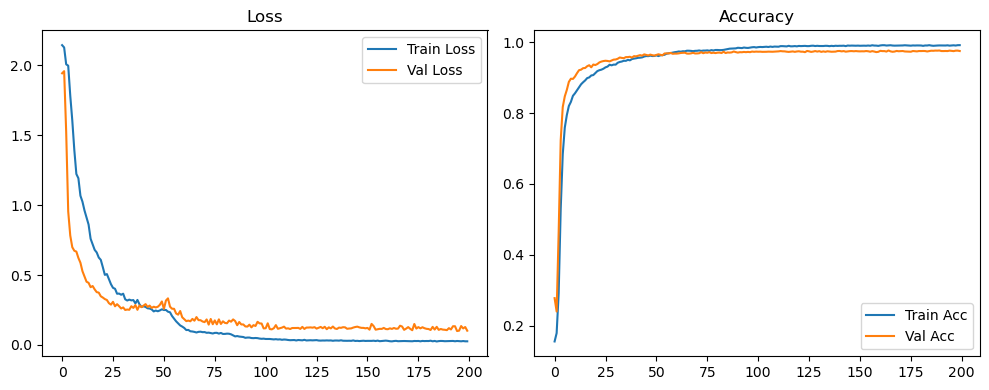

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 29.11it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 29.40it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 29.34it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 29.12it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 29.13it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 29.25it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 29.42it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 29.53it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 29.58it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 29.62it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 29.65it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 29.69it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 29.70it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 30.10it/s]

Original Model Final Test Loss: 0.0926 Accuracy: 0.9784


🚀 Running: batch256_lr0.001_0.001_0.001_dp0.0


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.001 | Train Acc: 0.1972 | Val Acc: 0.4418 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.001 | Train Acc: 0.1972 | Val Acc: 0.4418 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.001 | Train Acc: 0.1972 | Val Acc: 0.4418 |:   0%|          | 1/200 [00:09<30:25,  9.17s/it]

| LR: 0.001 | Train Acc: 0.2177 | Val Acc: 0.2431 |:   0%|          | 1/200 [00:18<30:25,  9.17s/it]

| LR: 0.001 | Train Acc: 0.2177 | Val Acc: 0.2431 |:   0%|          | 1/200 [00:18<30:25,  9.17s/it]

| LR: 0.001 | Train Acc: 0.2177 | Val Acc: 0.2431 |:   1%|          | 2/200 [00:18<29:57,  9.08s/it]

| LR: 0.001 | Train Acc: 0.3666 | Val Acc: 0.5159 |:   1%|          | 2/200 [00:26<29:57,  9.08s/it]

| LR: 0.001 | Train Acc: 0.3666 | Val Acc: 0.5159 |:   1%|          | 2/200 [00:26<29:57,  9.08s/it]

| LR: 0.001 | Train Acc: 0.3666 | Val Acc: 0.5159 |:   2%|▏         | 3/200 [00:26<29:13,  8.90s/it]

| LR: 0.001 | Train Acc: 0.6088 | Val Acc: 0.7447 |:   2%|▏         | 3/200 [00:35<29:13,  8.90s/it]

| LR: 0.001 | Train Acc: 0.6088 | Val Acc: 0.7447 |:   2%|▏         | 3/200 [00:35<29:13,  8.90s/it]

| LR: 0.001 | Train Acc: 0.6088 | Val Acc: 0.7447 |:   2%|▏         | 4/200 [00:35<28:55,  8.85s/it]

| LR: 0.001 | Train Acc: 0.7871 | Val Acc: 0.8389 |:   2%|▏         | 4/200 [00:44<28:55,  8.85s/it]

| LR: 0.001 | Train Acc: 0.7871 | Val Acc: 0.8389 |:   2%|▏         | 4/200 [00:44<28:55,  8.85s/it]

| LR: 0.001 | Train Acc: 0.7871 | Val Acc: 0.8389 |:   2%|▎         | 5/200 [00:44<28:39,  8.82s/it]

| LR: 0.001 | Train Acc: 0.8398 | Val Acc: 0.8658 |:   2%|▎         | 5/200 [00:53<28:39,  8.82s/it]

| LR: 0.001 | Train Acc: 0.8398 | Val Acc: 0.8658 |:   2%|▎         | 5/200 [00:53<28:39,  8.82s/it]

| LR: 0.001 | Train Acc: 0.8398 | Val Acc: 0.8658 |:   3%|▎         | 6/200 [00:53<28:29,  8.81s/it]

| LR: 0.001 | Train Acc: 0.8739 | Val Acc: 0.8771 |:   3%|▎         | 6/200 [01:02<28:29,  8.81s/it]

| LR: 0.001 | Train Acc: 0.8739 | Val Acc: 0.8771 |:   3%|▎         | 6/200 [01:02<28:29,  8.81s/it]

| LR: 0.001 | Train Acc: 0.8739 | Val Acc: 0.8771 |:   4%|▎         | 7/200 [01:02<28:27,  8.85s/it]

| LR: 0.001 | Train Acc: 0.8918 | Val Acc: 0.8955 |:   4%|▎         | 7/200 [01:10<28:27,  8.85s/it]

| LR: 0.001 | Train Acc: 0.8918 | Val Acc: 0.8955 |:   4%|▎         | 7/200 [01:10<28:27,  8.85s/it]

| LR: 0.001 | Train Acc: 0.8918 | Val Acc: 0.8955 |:   4%|▍         | 8/200 [01:11<28:20,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9047 | Val Acc: 0.9051 |:   4%|▍         | 8/200 [01:19<28:20,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9047 | Val Acc: 0.9051 |:   4%|▍         | 8/200 [01:19<28:20,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9047 | Val Acc: 0.9051 |:   4%|▍         | 9/200 [01:19<28:14,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9150 | Val Acc: 0.9079 |:   4%|▍         | 9/200 [01:29<28:14,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9150 | Val Acc: 0.9079 |:   4%|▍         | 9/200 [01:29<28:14,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9150 | Val Acc: 0.9079 |:   5%|▌         | 10/200 [01:29<28:44,  9.08s/it]

| LR: 0.001 | Train Acc: 0.9223 | Val Acc: 0.9210 |:   5%|▌         | 10/200 [01:38<28:44,  9.08s/it]

| LR: 0.001 | Train Acc: 0.9223 | Val Acc: 0.9210 |:   5%|▌         | 10/200 [01:38<28:44,  9.08s/it]

| LR: 0.001 | Train Acc: 0.9223 | Val Acc: 0.9210 |:   6%|▌         | 11/200 [01:38<28:26,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9294 | Val Acc: 0.9213 |:   6%|▌         | 11/200 [01:47<28:26,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9294 | Val Acc: 0.9213 |:   6%|▌         | 11/200 [01:47<28:26,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9294 | Val Acc: 0.9213 |:   6%|▌         | 12/200 [01:47<28:03,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9347 | Val Acc: 0.9258 |:   6%|▌         | 12/200 [01:55<28:03,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9347 | Val Acc: 0.9258 |:   6%|▌         | 12/200 [01:55<28:03,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9347 | Val Acc: 0.9258 |:   6%|▋         | 13/200 [01:55<27:46,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9385 | Val Acc: 0.9352 |:   6%|▋         | 13/200 [02:04<27:46,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9385 | Val Acc: 0.9352 |:   6%|▋         | 13/200 [02:04<27:46,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9385 | Val Acc: 0.9352 |:   7%|▋         | 14/200 [02:04<27:26,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9450 | Val Acc: 0.9363 |:   7%|▋         | 14/200 [02:13<27:26,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9450 | Val Acc: 0.9363 |:   7%|▋         | 14/200 [02:13<27:26,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9450 | Val Acc: 0.9363 |:   8%|▊         | 15/200 [02:13<27:12,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9478 | Val Acc: 0.9338 |:   8%|▊         | 15/200 [02:22<27:12,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9478 | Val Acc: 0.9338 |:   8%|▊         | 15/200 [02:22<27:12,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9478 | Val Acc: 0.9338 |:   8%|▊         | 16/200 [02:22<26:59,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9501 | Val Acc: 0.9417 |:   8%|▊         | 16/200 [02:30<26:59,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9501 | Val Acc: 0.9417 |:   8%|▊         | 16/200 [02:30<26:59,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9501 | Val Acc: 0.9417 |:   8%|▊         | 17/200 [02:30<26:47,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9544 | Val Acc: 0.9429 |:   8%|▊         | 17/200 [02:39<26:47,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9544 | Val Acc: 0.9429 |:   8%|▊         | 17/200 [02:39<26:47,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9544 | Val Acc: 0.9429 |:   9%|▉         | 18/200 [02:39<26:35,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9563 | Val Acc: 0.9459 |:   9%|▉         | 18/200 [02:48<26:35,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9563 | Val Acc: 0.9459 |:   9%|▉         | 18/200 [02:48<26:35,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9563 | Val Acc: 0.9459 |:  10%|▉         | 19/200 [02:48<26:27,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9574 | Val Acc: 0.9452 |:  10%|▉         | 19/200 [02:57<26:27,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9574 | Val Acc: 0.9452 |:  10%|▉         | 19/200 [02:57<26:27,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9574 | Val Acc: 0.9452 |:  10%|█         | 20/200 [02:57<26:15,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9589 | Val Acc: 0.9458 |:  10%|█         | 20/200 [03:05<26:15,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9589 | Val Acc: 0.9458 |:  10%|█         | 20/200 [03:05<26:15,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9589 | Val Acc: 0.9458 |:  10%|█         | 21/200 [03:05<26:02,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9631 | Val Acc: 0.9471 |:  10%|█         | 21/200 [03:14<26:02,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9631 | Val Acc: 0.9471 |:  10%|█         | 21/200 [03:14<26:02,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9631 | Val Acc: 0.9471 |:  11%|█         | 22/200 [03:14<25:55,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9640 | Val Acc: 0.9470 |:  11%|█         | 22/200 [03:23<25:55,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9640 | Val Acc: 0.9470 |:  11%|█         | 22/200 [03:23<25:55,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9640 | Val Acc: 0.9470 |:  12%|█▏        | 23/200 [03:23<25:46,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9666 | Val Acc: 0.9493 |:  12%|█▏        | 23/200 [03:32<25:46,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9666 | Val Acc: 0.9493 |:  12%|█▏        | 23/200 [03:32<25:46,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9666 | Val Acc: 0.9493 |:  12%|█▏        | 24/200 [03:32<25:43,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9666 | Val Acc: 0.9454 |:  12%|█▏        | 24/200 [03:40<25:43,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9666 | Val Acc: 0.9454 |:  12%|█▏        | 24/200 [03:40<25:43,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9666 | Val Acc: 0.9454 |:  12%|█▎        | 25/200 [03:40<25:37,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9683 | Val Acc: 0.9521 |:  12%|█▎        | 25/200 [03:49<25:37,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9683 | Val Acc: 0.9521 |:  12%|█▎        | 25/200 [03:49<25:37,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9683 | Val Acc: 0.9521 |:  13%|█▎        | 26/200 [03:49<25:23,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9696 | Val Acc: 0.9511 |:  13%|█▎        | 26/200 [03:58<25:23,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9696 | Val Acc: 0.9511 |:  13%|█▎        | 26/200 [03:58<25:23,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9696 | Val Acc: 0.9511 |:  14%|█▎        | 27/200 [03:58<25:20,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9726 | Val Acc: 0.9548 |:  14%|█▎        | 27/200 [04:07<25:20,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9726 | Val Acc: 0.9548 |:  14%|█▎        | 27/200 [04:07<25:20,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9726 | Val Acc: 0.9548 |:  14%|█▍        | 28/200 [04:07<25:22,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9726 | Val Acc: 0.9537 |:  14%|█▍        | 28/200 [04:16<25:22,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9726 | Val Acc: 0.9537 |:  14%|█▍        | 28/200 [04:16<25:22,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9726 | Val Acc: 0.9537 |:  14%|█▍        | 29/200 [04:16<25:09,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9725 | Val Acc: 0.9535 |:  14%|█▍        | 29/200 [04:25<25:09,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9725 | Val Acc: 0.9535 |:  14%|█▍        | 29/200 [04:25<25:09,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9725 | Val Acc: 0.9535 |:  15%|█▌        | 30/200 [04:25<24:59,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9728 | Val Acc: 0.9532 |:  15%|█▌        | 30/200 [04:33<24:59,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9728 | Val Acc: 0.9532 |:  15%|█▌        | 30/200 [04:33<24:59,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9728 | Val Acc: 0.9532 |:  16%|█▌        | 31/200 [04:33<24:43,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9749 | Val Acc: 0.9508 |:  16%|█▌        | 31/200 [04:42<24:43,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9749 | Val Acc: 0.9508 |:  16%|█▌        | 31/200 [04:42<24:43,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9749 | Val Acc: 0.9508 |:  16%|█▌        | 32/200 [04:42<24:35,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9759 | Val Acc: 0.9577 |:  16%|█▌        | 32/200 [04:51<24:35,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9759 | Val Acc: 0.9577 |:  16%|█▌        | 32/200 [04:51<24:35,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9759 | Val Acc: 0.9577 |:  16%|█▋        | 33/200 [04:51<24:24,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9776 | Val Acc: 0.9516 |:  16%|█▋        | 33/200 [05:00<24:24,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9776 | Val Acc: 0.9516 |:  16%|█▋        | 33/200 [05:00<24:24,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9776 | Val Acc: 0.9516 |:  17%|█▋        | 34/200 [05:00<24:33,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9783 | Val Acc: 0.9568 |:  17%|█▋        | 34/200 [05:09<24:33,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9783 | Val Acc: 0.9568 |:  17%|█▋        | 34/200 [05:09<24:33,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9783 | Val Acc: 0.9568 |:  18%|█▊        | 35/200 [05:09<24:55,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9784 | Val Acc: 0.9522 |:  18%|█▊        | 35/200 [05:19<24:55,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9784 | Val Acc: 0.9522 |:  18%|█▊        | 35/200 [05:19<24:55,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9784 | Val Acc: 0.9522 |:  18%|█▊        | 36/200 [05:19<24:53,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9789 | Val Acc: 0.9561 |:  18%|█▊        | 36/200 [05:28<24:53,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9789 | Val Acc: 0.9561 |:  18%|█▊        | 36/200 [05:28<24:53,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9789 | Val Acc: 0.9561 |:  18%|█▊        | 37/200 [05:28<24:49,  9.14s/it]

| LR: 0.001 | Train Acc: 0.9804 | Val Acc: 0.9592 |:  18%|█▊        | 37/200 [05:36<24:49,  9.14s/it]

| LR: 0.001 | Train Acc: 0.9804 | Val Acc: 0.9592 |:  18%|█▊        | 37/200 [05:36<24:49,  9.14s/it]

| LR: 0.001 | Train Acc: 0.9804 | Val Acc: 0.9592 |:  19%|█▉        | 38/200 [05:37<24:15,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9819 | Val Acc: 0.9588 |:  19%|█▉        | 38/200 [05:45<24:15,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9819 | Val Acc: 0.9588 |:  19%|█▉        | 38/200 [05:45<24:15,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9819 | Val Acc: 0.9588 |:  20%|█▉        | 39/200 [05:45<23:52,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9817 | Val Acc: 0.9582 |:  20%|█▉        | 39/200 [05:54<23:52,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9817 | Val Acc: 0.9582 |:  20%|█▉        | 39/200 [05:54<23:52,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9817 | Val Acc: 0.9582 |:  20%|██        | 40/200 [05:54<23:55,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9818 | Val Acc: 0.9568 |:  20%|██        | 40/200 [06:03<23:55,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9818 | Val Acc: 0.9568 |:  20%|██        | 40/200 [06:03<23:55,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9818 | Val Acc: 0.9568 |:  20%|██        | 41/200 [06:03<23:35,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9820 | Val Acc: 0.9553 |:  20%|██        | 41/200 [06:12<23:35,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9820 | Val Acc: 0.9553 |:  20%|██        | 41/200 [06:12<23:35,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9820 | Val Acc: 0.9553 |:  21%|██        | 42/200 [06:12<23:18,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9835 | Val Acc: 0.9582 |:  21%|██        | 42/200 [06:21<23:18,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9835 | Val Acc: 0.9582 |:  21%|██        | 42/200 [06:21<23:18,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9835 | Val Acc: 0.9582 |:  22%|██▏       | 43/200 [06:21<23:04,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9602 |:  22%|██▏       | 43/200 [06:29<23:04,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9602 |:  22%|██▏       | 43/200 [06:29<23:04,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9602 |:  22%|██▏       | 44/200 [06:29<22:54,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9593 |:  22%|██▏       | 44/200 [06:38<22:54,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9593 |:  22%|██▏       | 44/200 [06:38<22:54,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9847 | Val Acc: 0.9593 |:  22%|██▎       | 45/200 [06:38<22:59,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9859 | Val Acc: 0.9644 |:  22%|██▎       | 45/200 [06:47<22:59,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9859 | Val Acc: 0.9644 |:  22%|██▎       | 45/200 [06:47<22:59,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9859 | Val Acc: 0.9644 |:  23%|██▎       | 46/200 [06:47<22:43,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9869 | Val Acc: 0.9644 |:  23%|██▎       | 46/200 [06:56<22:43,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9869 | Val Acc: 0.9644 |:  23%|██▎       | 46/200 [06:56<22:43,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9869 | Val Acc: 0.9644 |:  24%|██▎       | 47/200 [06:56<22:28,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9620 |:  24%|██▎       | 47/200 [07:04<22:28,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9620 |:  24%|██▎       | 47/200 [07:04<22:28,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9620 |:  24%|██▍       | 48/200 [07:04<22:07,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9634 |:  24%|██▍       | 48/200 [07:14<22:07,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9634 |:  24%|██▍       | 48/200 [07:14<22:07,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9634 |:  24%|██▍       | 49/200 [07:14<22:17,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9878 | Val Acc: 0.9635 |:  24%|██▍       | 49/200 [07:22<22:17,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9878 | Val Acc: 0.9635 |:  24%|██▍       | 49/200 [07:22<22:17,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9878 | Val Acc: 0.9635 |:  25%|██▌       | 50/200 [07:22<22:02,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9617 |:  25%|██▌       | 50/200 [07:31<22:02,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9617 |:  25%|██▌       | 50/200 [07:31<22:02,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9617 |:  26%|██▌       | 51/200 [07:31<21:52,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9607 |:  26%|██▌       | 51/200 [07:40<21:52,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9607 |:  26%|██▌       | 51/200 [07:40<21:52,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9607 |:  26%|██▌       | 52/200 [07:40<21:44,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9647 |:  26%|██▌       | 52/200 [07:49<21:44,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9647 |:  26%|██▌       | 52/200 [07:49<21:44,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9647 |:  26%|██▋       | 53/200 [07:49<21:30,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9904 | Val Acc: 0.9628 |:  26%|██▋       | 53/200 [07:57<21:30,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9904 | Val Acc: 0.9628 |:  26%|██▋       | 53/200 [07:57<21:30,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9904 | Val Acc: 0.9628 |:  27%|██▋       | 54/200 [07:57<21:18,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9643 |:  27%|██▋       | 54/200 [08:06<21:18,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9643 |:  27%|██▋       | 54/200 [08:06<21:18,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9643 |:  28%|██▊       | 55/200 [08:06<21:07,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9893 | Val Acc: 0.9650 |:  28%|██▊       | 55/200 [08:15<21:07,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9893 | Val Acc: 0.9650 |:  28%|██▊       | 55/200 [08:15<21:07,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9893 | Val Acc: 0.9650 |:  28%|██▊       | 56/200 [08:15<20:57,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9613 |:  28%|██▊       | 56/200 [08:24<20:57,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9613 |:  28%|██▊       | 56/200 [08:24<20:57,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9613 |:  28%|██▊       | 57/200 [08:24<20:58,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9913 | Val Acc: 0.9641 |:  28%|██▊       | 57/200 [08:32<20:58,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9913 | Val Acc: 0.9641 |:  28%|██▊       | 57/200 [08:32<20:58,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9913 | Val Acc: 0.9641 |:  29%|██▉       | 58/200 [08:33<20:49,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9623 |:  29%|██▉       | 58/200 [08:41<20:49,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9623 |:  29%|██▉       | 58/200 [08:41<20:49,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9623 |:  30%|██▉       | 59/200 [08:41<20:37,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9916 | Val Acc: 0.9637 |:  30%|██▉       | 59/200 [08:50<20:37,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9916 | Val Acc: 0.9637 |:  30%|██▉       | 59/200 [08:50<20:37,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9916 | Val Acc: 0.9637 |:  30%|███       | 60/200 [08:50<20:28,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9917 | Val Acc: 0.9668 |:  30%|███       | 60/200 [08:59<20:28,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9917 | Val Acc: 0.9668 |:  30%|███       | 60/200 [08:59<20:28,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9917 | Val Acc: 0.9668 |:  30%|███       | 61/200 [08:59<20:20,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9651 |:  30%|███       | 61/200 [09:09<20:20,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9651 |:  30%|███       | 61/200 [09:09<20:20,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9651 |:  31%|███       | 62/200 [09:09<20:55,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9654 |:  31%|███       | 62/200 [09:18<20:55,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9654 |:  31%|███       | 62/200 [09:18<20:55,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9654 |:  32%|███▏      | 63/200 [09:18<21:00,  9.20s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9657 |:  32%|███▏      | 63/200 [09:28<21:00,  9.20s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9657 |:  32%|███▏      | 63/200 [09:28<21:00,  9.20s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9657 |:  32%|███▏      | 64/200 [09:28<21:01,  9.28s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9627 |:  32%|███▏      | 64/200 [09:37<21:01,  9.28s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9627 |:  32%|███▏      | 64/200 [09:37<21:01,  9.28s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9627 |:  32%|███▎      | 65/200 [09:37<20:58,  9.32s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9652 |:  32%|███▎      | 65/200 [09:46<20:58,  9.32s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9652 |:  32%|███▎      | 65/200 [09:46<20:58,  9.32s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9652 |:  33%|███▎      | 66/200 [09:46<20:52,  9.35s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9658 |:  33%|███▎      | 66/200 [09:56<20:52,  9.35s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9658 |:  33%|███▎      | 66/200 [09:56<20:52,  9.35s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9658 |:  34%|███▎      | 67/200 [09:56<20:37,  9.31s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9679 |:  34%|███▎      | 67/200 [10:04<20:37,  9.31s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9679 |:  34%|███▎      | 67/200 [10:04<20:37,  9.31s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9679 |:  34%|███▍      | 68/200 [10:04<20:02,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9943 | Val Acc: 0.9679 |:  34%|███▍      | 68/200 [10:13<20:02,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9943 | Val Acc: 0.9679 |:  34%|███▍      | 68/200 [10:13<20:02,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9943 | Val Acc: 0.9679 |:  34%|███▍      | 69/200 [10:13<19:36,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9621 |:  34%|███▍      | 69/200 [10:22<19:36,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9621 |:  34%|███▍      | 69/200 [10:22<19:36,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9621 |:  35%|███▌      | 70/200 [10:22<19:14,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9683 |:  35%|███▌      | 70/200 [10:30<19:14,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9683 |:  35%|███▌      | 70/200 [10:30<19:14,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9683 |:  36%|███▌      | 71/200 [10:30<19:05,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9937 | Val Acc: 0.9608 |:  36%|███▌      | 71/200 [10:39<19:05,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9937 | Val Acc: 0.9608 |:  36%|███▌      | 71/200 [10:39<19:05,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9937 | Val Acc: 0.9608 |:  36%|███▌      | 72/200 [10:39<18:53,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9675 |:  36%|███▌      | 72/200 [10:48<18:53,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9675 |:  36%|███▌      | 72/200 [10:48<18:53,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9675 |:  36%|███▋      | 73/200 [10:48<18:44,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9671 |:  36%|███▋      | 73/200 [10:57<18:44,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9671 |:  36%|███▋      | 73/200 [10:57<18:44,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9671 |:  37%|███▋      | 74/200 [10:57<18:37,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9681 |:  37%|███▋      | 74/200 [11:06<18:37,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9681 |:  37%|███▋      | 74/200 [11:06<18:37,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9681 |:  38%|███▊      | 75/200 [11:06<18:21,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9943 | Val Acc: 0.9667 |:  38%|███▊      | 75/200 [11:14<18:21,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9943 | Val Acc: 0.9667 |:  38%|███▊      | 75/200 [11:14<18:21,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9943 | Val Acc: 0.9667 |:  38%|███▊      | 76/200 [11:14<18:04,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9677 |:  38%|███▊      | 76/200 [11:23<18:04,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9677 |:  38%|███▊      | 76/200 [11:23<18:04,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9677 |:  38%|███▊      | 77/200 [11:23<17:58,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9629 |:  38%|███▊      | 77/200 [11:32<17:58,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9629 |:  38%|███▊      | 77/200 [11:32<17:58,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9629 |:  39%|███▉      | 78/200 [11:32<17:50,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9674 |:  39%|███▉      | 78/200 [11:41<17:50,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9674 |:  39%|███▉      | 78/200 [11:41<17:50,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9674 |:  40%|███▉      | 79/200 [11:41<17:38,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9696 |:  40%|███▉      | 79/200 [11:49<17:38,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9696 |:  40%|███▉      | 79/200 [11:49<17:38,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9696 |:  40%|████      | 80/200 [11:49<17:27,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9696 |:  40%|████      | 80/200 [11:58<17:27,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9696 |:  40%|████      | 80/200 [11:58<17:27,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9696 |:  40%|████      | 81/200 [11:58<17:19,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9703 |:  40%|████      | 81/200 [12:07<17:19,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9703 |:  40%|████      | 81/200 [12:07<17:19,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9703 |:  41%|████      | 82/200 [12:07<17:10,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9667 |:  41%|████      | 82/200 [12:16<17:10,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9667 |:  41%|████      | 82/200 [12:16<17:10,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9667 |:  42%|████▏     | 83/200 [12:16<17:18,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9663 |:  42%|████▏     | 83/200 [12:25<17:18,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9663 |:  42%|████▏     | 83/200 [12:25<17:18,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9663 |:  42%|████▏     | 84/200 [12:25<17:06,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9655 |:  42%|████▏     | 84/200 [12:33<17:06,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9655 |:  42%|████▏     | 84/200 [12:33<17:06,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9655 |:  42%|████▎     | 85/200 [12:33<16:52,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9674 |:  42%|████▎     | 85/200 [12:42<16:52,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9674 |:  42%|████▎     | 85/200 [12:42<16:52,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9944 | Val Acc: 0.9674 |:  43%|████▎     | 86/200 [12:42<16:50,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9684 |:  43%|████▎     | 86/200 [12:51<16:50,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9684 |:  43%|████▎     | 86/200 [12:51<16:50,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9684 |:  44%|████▎     | 87/200 [12:51<16:40,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9704 |:  44%|████▎     | 87/200 [13:00<16:40,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9704 |:  44%|████▎     | 87/200 [13:00<16:40,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9704 |:  44%|████▍     | 88/200 [13:00<16:28,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9667 |:  44%|████▍     | 88/200 [13:09<16:28,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9667 |:  44%|████▍     | 88/200 [13:09<16:28,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9667 |:  44%|████▍     | 89/200 [13:09<16:17,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9687 |:  44%|████▍     | 89/200 [13:17<16:17,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9687 |:  44%|████▍     | 89/200 [13:17<16:17,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9687 |:  45%|████▌     | 90/200 [13:17<16:03,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9657 |:  45%|████▌     | 90/200 [13:26<16:03,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9657 |:  45%|████▌     | 90/200 [13:26<16:03,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9657 |:  46%|████▌     | 91/200 [13:26<15:56,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9639 |:  46%|████▌     | 91/200 [13:35<15:56,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9639 |:  46%|████▌     | 91/200 [13:35<15:56,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9639 |:  46%|████▌     | 92/200 [13:35<16:01,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9643 |:  46%|████▌     | 92/200 [13:44<16:01,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9643 |:  46%|████▌     | 92/200 [13:44<16:01,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9941 | Val Acc: 0.9643 |:  46%|████▋     | 93/200 [13:44<15:50,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9718 |:  46%|████▋     | 93/200 [13:53<15:50,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9718 |:  46%|████▋     | 93/200 [13:53<15:50,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9718 |:  47%|████▋     | 94/200 [13:53<15:44,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9698 |:  47%|████▋     | 94/200 [14:02<15:44,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9698 |:  47%|████▋     | 94/200 [14:02<15:44,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9698 |:  48%|████▊     | 95/200 [14:02<15:31,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9681 |:  48%|████▊     | 95/200 [14:11<15:31,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9681 |:  48%|████▊     | 95/200 [14:11<15:31,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9681 |:  48%|████▊     | 96/200 [14:11<15:17,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9655 |:  48%|████▊     | 96/200 [14:19<15:17,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9655 |:  48%|████▊     | 96/200 [14:19<15:17,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9655 |:  48%|████▊     | 97/200 [14:19<15:07,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9690 |:  48%|████▊     | 97/200 [14:28<15:07,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9690 |:  48%|████▊     | 97/200 [14:28<15:07,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9690 |:  49%|████▉     | 98/200 [14:28<14:56,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9698 |:  49%|████▉     | 98/200 [14:37<14:56,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9698 |:  49%|████▉     | 98/200 [14:37<14:56,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9698 |:  50%|████▉     | 99/200 [14:37<14:46,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9688 |:  50%|████▉     | 99/200 [14:46<14:46,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9688 |:  50%|████▉     | 99/200 [14:46<14:46,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9688 |:  50%|█████     | 100/200 [14:46<14:36,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9716 |:  50%|█████     | 100/200 [14:54<14:36,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9716 |:  50%|█████     | 100/200 [14:54<14:36,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9716 |:  50%|█████     | 101/200 [14:55<14:28,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9649 |:  50%|█████     | 101/200 [15:03<14:28,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9649 |:  50%|█████     | 101/200 [15:03<14:28,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9649 |:  51%|█████     | 102/200 [15:03<14:25,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9669 |:  51%|█████     | 102/200 [15:12<14:25,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9669 |:  51%|█████     | 102/200 [15:12<14:25,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9954 | Val Acc: 0.9669 |:  52%|█████▏    | 103/200 [15:12<14:13,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9688 |:  52%|█████▏    | 103/200 [15:21<14:13,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9688 |:  52%|█████▏    | 103/200 [15:21<14:13,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9688 |:  52%|█████▏    | 104/200 [15:21<13:59,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9644 |:  52%|█████▏    | 104/200 [15:30<13:59,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9644 |:  52%|█████▏    | 104/200 [15:30<13:59,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9644 |:  52%|█████▎    | 105/200 [15:30<13:52,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9707 |:  52%|█████▎    | 105/200 [15:38<13:52,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9707 |:  52%|█████▎    | 105/200 [15:38<13:52,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9707 |:  53%|█████▎    | 106/200 [15:38<13:45,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9698 |:  53%|█████▎    | 106/200 [15:47<13:45,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9698 |:  53%|█████▎    | 106/200 [15:47<13:45,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9956 | Val Acc: 0.9698 |:  54%|█████▎    | 107/200 [15:47<13:35,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9698 |:  54%|█████▎    | 107/200 [15:56<13:35,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9698 |:  54%|█████▎    | 107/200 [15:56<13:35,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9698 |:  54%|█████▍    | 108/200 [15:56<13:35,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9692 |:  54%|█████▍    | 108/200 [16:05<13:35,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9692 |:  54%|█████▍    | 108/200 [16:05<13:35,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9692 |:  55%|█████▍    | 109/200 [16:05<13:29,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9683 |:  55%|█████▍    | 109/200 [16:14<13:29,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9683 |:  55%|█████▍    | 109/200 [16:14<13:29,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9683 |:  55%|█████▌    | 110/200 [16:14<13:25,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9683 |:  55%|█████▌    | 110/200 [16:24<13:25,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9683 |:  55%|█████▌    | 110/200 [16:24<13:25,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9683 |:  56%|█████▌    | 111/200 [16:24<13:25,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9691 |:  56%|█████▌    | 111/200 [16:32<13:25,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9691 |:  56%|█████▌    | 111/200 [16:32<13:25,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9691 |:  56%|█████▌    | 112/200 [16:32<13:10,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9673 |:  56%|█████▌    | 112/200 [16:41<13:10,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9673 |:  56%|█████▌    | 112/200 [16:41<13:10,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9673 |:  56%|█████▋    | 113/200 [16:41<12:57,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9671 |:  56%|█████▋    | 113/200 [16:50<12:57,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9671 |:  56%|█████▋    | 113/200 [16:50<12:57,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9671 |:  57%|█████▋    | 114/200 [16:50<12:45,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9685 |:  57%|█████▋    | 114/200 [16:59<12:45,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9685 |:  57%|█████▋    | 114/200 [16:59<12:45,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9685 |:  57%|█████▊    | 115/200 [16:59<12:33,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9694 |:  57%|█████▊    | 115/200 [17:08<12:33,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9694 |:  57%|█████▊    | 115/200 [17:08<12:33,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9694 |:  58%|█████▊    | 116/200 [17:08<12:21,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9688 |:  58%|█████▊    | 116/200 [17:16<12:21,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9688 |:  58%|█████▊    | 116/200 [17:16<12:21,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9688 |:  58%|█████▊    | 117/200 [17:16<12:12,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9688 |:  58%|█████▊    | 117/200 [17:25<12:12,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9688 |:  58%|█████▊    | 117/200 [17:25<12:12,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9688 |:  59%|█████▉    | 118/200 [17:25<12:03,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9709 |:  59%|█████▉    | 118/200 [17:34<12:03,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9709 |:  59%|█████▉    | 118/200 [17:34<12:03,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9709 |:  60%|█████▉    | 119/200 [17:34<12:03,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9688 |:  60%|█████▉    | 119/200 [17:43<12:03,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9688 |:  60%|█████▉    | 119/200 [17:43<12:03,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9688 |:  60%|██████    | 120/200 [17:43<11:57,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9691 |:  60%|██████    | 120/200 [17:52<11:57,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9691 |:  60%|██████    | 120/200 [17:52<11:57,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9691 |:  60%|██████    | 121/200 [17:52<11:43,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9683 |:  60%|██████    | 121/200 [18:01<11:43,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9683 |:  60%|██████    | 121/200 [18:01<11:43,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9683 |:  61%|██████    | 122/200 [18:01<11:32,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9694 |:  61%|██████    | 122/200 [18:10<11:32,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9694 |:  61%|██████    | 122/200 [18:10<11:32,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9694 |:  62%|██████▏   | 123/200 [18:10<11:19,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9686 |:  62%|██████▏   | 123/200 [18:19<11:19,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9686 |:  62%|██████▏   | 123/200 [18:19<11:19,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9686 |:  62%|██████▏   | 124/200 [18:19<11:10,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9702 |:  62%|██████▏   | 124/200 [18:28<11:10,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9702 |:  62%|██████▏   | 124/200 [18:28<11:10,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9702 |:  62%|██████▎   | 125/200 [18:28<11:04,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9674 |:  62%|██████▎   | 125/200 [18:36<11:04,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9674 |:  62%|██████▎   | 125/200 [18:36<11:04,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9674 |:  63%|██████▎   | 126/200 [18:36<10:54,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9677 |:  63%|██████▎   | 126/200 [18:45<10:54,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9677 |:  63%|██████▎   | 126/200 [18:45<10:54,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9677 |:  64%|██████▎   | 127/200 [18:45<10:50,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9685 |:  64%|██████▎   | 127/200 [18:55<10:50,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9685 |:  64%|██████▎   | 127/200 [18:55<10:50,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9685 |:  64%|██████▍   | 128/200 [18:55<10:52,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9683 |:  64%|██████▍   | 128/200 [19:04<10:52,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9683 |:  64%|██████▍   | 128/200 [19:04<10:52,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9683 |:  64%|██████▍   | 129/200 [19:04<10:37,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9689 |:  64%|██████▍   | 129/200 [19:12<10:37,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9689 |:  64%|██████▍   | 129/200 [19:12<10:37,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9689 |:  65%|██████▌   | 130/200 [19:13<10:27,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9685 |:  65%|██████▌   | 130/200 [19:21<10:27,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9685 |:  65%|██████▌   | 130/200 [19:21<10:27,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9685 |:  66%|██████▌   | 131/200 [19:21<10:18,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9702 |:  66%|██████▌   | 131/200 [19:30<10:18,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9702 |:  66%|██████▌   | 131/200 [19:30<10:18,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9702 |:  66%|██████▌   | 132/200 [19:30<10:07,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9642 |:  66%|██████▌   | 132/200 [19:39<10:07,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9642 |:  66%|██████▌   | 132/200 [19:39<10:07,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9642 |:  66%|██████▋   | 133/200 [19:39<09:56,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9705 |:  66%|██████▋   | 133/200 [19:48<09:56,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9705 |:  66%|██████▋   | 133/200 [19:48<09:56,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9705 |:  67%|██████▋   | 134/200 [19:48<09:46,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9691 |:  67%|██████▋   | 134/200 [19:57<09:46,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9691 |:  67%|██████▋   | 134/200 [19:57<09:46,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9691 |:  68%|██████▊   | 135/200 [19:57<09:33,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9712 |:  68%|██████▊   | 135/200 [20:05<09:33,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9712 |:  68%|██████▊   | 135/200 [20:05<09:33,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9712 |:  68%|██████▊   | 136/200 [20:05<09:22,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9695 |:  68%|██████▊   | 136/200 [20:14<09:22,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9695 |:  68%|██████▊   | 136/200 [20:14<09:22,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9695 |:  68%|██████▊   | 137/200 [20:14<09:12,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9698 |:  68%|██████▊   | 137/200 [20:23<09:12,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9698 |:  68%|██████▊   | 137/200 [20:23<09:12,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9698 |:  69%|██████▉   | 138/200 [20:23<09:04,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9698 |:  69%|██████▉   | 138/200 [20:32<09:04,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9698 |:  69%|██████▉   | 138/200 [20:32<09:04,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9698 |:  70%|██████▉   | 139/200 [20:32<08:58,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9723 |:  70%|██████▉   | 139/200 [20:41<08:58,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9723 |:  70%|██████▉   | 139/200 [20:41<08:58,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9723 |:  70%|███████   | 140/200 [20:41<08:50,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9713 |:  70%|███████   | 140/200 [20:50<08:50,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9713 |:  70%|███████   | 140/200 [20:50<08:50,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9713 |:  70%|███████   | 141/200 [20:50<08:41,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9715 |:  70%|███████   | 141/200 [20:58<08:41,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9715 |:  70%|███████   | 141/200 [20:58<08:41,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9715 |:  71%|███████   | 142/200 [20:59<08:34,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9703 |:  71%|███████   | 142/200 [21:07<08:34,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9703 |:  71%|███████   | 142/200 [21:07<08:34,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9703 |:  72%|███████▏  | 143/200 [21:07<08:26,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9715 |:  72%|███████▏  | 143/200 [21:16<08:26,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9715 |:  72%|███████▏  | 143/200 [21:16<08:26,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9715 |:  72%|███████▏  | 144/200 [21:16<08:20,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9698 |:  72%|███████▏  | 144/200 [21:25<08:20,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9698 |:  72%|███████▏  | 144/200 [21:25<08:20,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9698 |:  72%|███████▎  | 145/200 [21:25<08:08,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9717 |:  72%|███████▎  | 145/200 [21:34<08:08,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9717 |:  72%|███████▎  | 145/200 [21:34<08:08,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9717 |:  73%|███████▎  | 146/200 [21:34<07:58,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9692 |:  73%|███████▎  | 146/200 [21:43<07:58,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9692 |:  73%|███████▎  | 146/200 [21:43<07:58,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9692 |:  74%|███████▎  | 147/200 [21:43<07:47,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9704 |:  74%|███████▎  | 147/200 [21:51<07:47,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9704 |:  74%|███████▎  | 147/200 [21:51<07:47,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9704 |:  74%|███████▍  | 148/200 [21:51<07:36,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9688 |:  74%|███████▍  | 148/200 [22:00<07:36,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9688 |:  74%|███████▍  | 148/200 [22:00<07:36,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9688 |:  74%|███████▍  | 149/200 [22:00<07:30,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9709 |:  74%|███████▍  | 149/200 [22:09<07:30,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9709 |:  74%|███████▍  | 149/200 [22:09<07:30,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9709 |:  75%|███████▌  | 150/200 [22:09<07:21,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9683 |:  75%|███████▌  | 150/200 [22:18<07:21,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9683 |:  75%|███████▌  | 150/200 [22:18<07:21,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9683 |:  76%|███████▌  | 151/200 [22:18<07:12,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9702 |:  76%|███████▌  | 151/200 [22:27<07:12,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9702 |:  76%|███████▌  | 151/200 [22:27<07:12,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9702 |:  76%|███████▌  | 152/200 [22:27<07:01,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9700 |:  76%|███████▌  | 152/200 [22:35<07:01,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9700 |:  76%|███████▌  | 152/200 [22:35<07:01,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9700 |:  76%|███████▋  | 153/200 [22:35<06:52,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9694 |:  76%|███████▋  | 153/200 [22:44<06:52,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9694 |:  76%|███████▋  | 153/200 [22:44<06:52,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9694 |:  77%|███████▋  | 154/200 [22:44<06:43,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9688 |:  77%|███████▋  | 154/200 [22:53<06:43,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9688 |:  77%|███████▋  | 154/200 [22:53<06:43,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9688 |:  78%|███████▊  | 155/200 [22:53<06:35,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9712 |:  78%|███████▊  | 155/200 [23:02<06:35,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9712 |:  78%|███████▊  | 155/200 [23:02<06:35,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9712 |:  78%|███████▊  | 156/200 [23:02<06:24,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9709 |:  78%|███████▊  | 156/200 [23:10<06:24,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9709 |:  78%|███████▊  | 156/200 [23:10<06:24,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9709 |:  78%|███████▊  | 157/200 [23:11<06:16,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9708 |:  78%|███████▊  | 157/200 [23:19<06:16,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9708 |:  78%|███████▊  | 157/200 [23:19<06:16,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9708 |:  79%|███████▉  | 158/200 [23:19<06:07,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9690 |:  79%|███████▉  | 158/200 [23:29<06:07,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9690 |:  79%|███████▉  | 158/200 [23:29<06:07,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9690 |:  80%|███████▉  | 159/200 [23:29<06:06,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9702 |:  80%|███████▉  | 159/200 [23:37<06:06,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9702 |:  80%|███████▉  | 159/200 [23:37<06:06,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9702 |:  80%|████████  | 160/200 [23:37<05:56,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9714 |:  80%|████████  | 160/200 [23:46<05:56,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9714 |:  80%|████████  | 160/200 [23:46<05:56,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9714 |:  80%|████████  | 161/200 [23:46<05:44,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9707 |:  80%|████████  | 161/200 [23:55<05:44,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9707 |:  80%|████████  | 161/200 [23:55<05:44,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9707 |:  81%|████████  | 162/200 [23:55<05:37,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9718 |:  81%|████████  | 162/200 [24:04<05:37,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9718 |:  81%|████████  | 162/200 [24:04<05:37,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9718 |:  82%|████████▏ | 163/200 [24:04<05:26,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9709 |:  82%|████████▏ | 163/200 [24:13<05:26,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9709 |:  82%|████████▏ | 163/200 [24:13<05:26,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9709 |:  82%|████████▏ | 164/200 [24:13<05:18,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9682 |:  82%|████████▏ | 164/200 [24:22<05:18,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9682 |:  82%|████████▏ | 164/200 [24:22<05:18,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9682 |:  82%|████████▎ | 165/200 [24:22<05:09,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9675 |:  82%|████████▎ | 165/200 [24:30<05:09,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9675 |:  82%|████████▎ | 165/200 [24:30<05:09,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9675 |:  83%|████████▎ | 166/200 [24:30<05:01,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9718 |:  83%|████████▎ | 166/200 [24:39<05:01,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9718 |:  83%|████████▎ | 166/200 [24:39<05:01,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9718 |:  84%|████████▎ | 167/200 [24:39<04:52,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9710 |:  84%|████████▎ | 167/200 [24:48<04:52,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9710 |:  84%|████████▎ | 167/200 [24:48<04:52,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9710 |:  84%|████████▍ | 168/200 [24:48<04:43,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9726 |:  84%|████████▍ | 168/200 [24:57<04:43,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9726 |:  84%|████████▍ | 168/200 [24:57<04:43,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9726 |:  84%|████████▍ | 169/200 [24:57<04:38,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9709 |:  84%|████████▍ | 169/200 [25:07<04:38,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9709 |:  84%|████████▍ | 169/200 [25:07<04:38,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9709 |:  85%|████████▌ | 170/200 [25:07<04:30,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9738 |:  85%|████████▌ | 170/200 [25:16<04:30,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9738 |:  85%|████████▌ | 170/200 [25:16<04:30,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9738 |:  86%|████████▌ | 171/200 [25:16<04:22,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9711 |:  86%|████████▌ | 171/200 [25:24<04:22,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9711 |:  86%|████████▌ | 171/200 [25:24<04:22,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9711 |:  86%|████████▌ | 172/200 [25:24<04:11,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9692 |:  86%|████████▌ | 172/200 [25:34<04:11,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9692 |:  86%|████████▌ | 172/200 [25:34<04:11,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9692 |:  86%|████████▋ | 173/200 [25:34<04:03,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9722 |:  86%|████████▋ | 173/200 [25:43<04:03,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9722 |:  86%|████████▋ | 173/200 [25:43<04:03,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9722 |:  87%|████████▋ | 174/200 [25:43<03:55,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9728 |:  87%|████████▋ | 174/200 [25:52<03:55,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9728 |:  87%|████████▋ | 174/200 [25:52<03:55,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9728 |:  88%|████████▊ | 175/200 [25:52<03:44,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9696 |:  88%|████████▊ | 175/200 [26:00<03:44,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9696 |:  88%|████████▊ | 175/200 [26:00<03:44,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9696 |:  88%|████████▊ | 176/200 [26:00<03:34,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9725 |:  88%|████████▊ | 176/200 [26:09<03:34,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9725 |:  88%|████████▊ | 176/200 [26:09<03:34,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9725 |:  88%|████████▊ | 177/200 [26:09<03:25,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9731 |:  88%|████████▊ | 177/200 [26:18<03:25,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9731 |:  88%|████████▊ | 177/200 [26:18<03:25,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9731 |:  89%|████████▉ | 178/200 [26:18<03:15,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9714 |:  89%|████████▉ | 178/200 [26:27<03:15,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9714 |:  89%|████████▉ | 178/200 [26:27<03:15,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9714 |:  90%|████████▉ | 179/200 [26:27<03:05,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9710 |:  90%|████████▉ | 179/200 [26:36<03:05,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9710 |:  90%|████████▉ | 179/200 [26:36<03:05,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9710 |:  90%|█████████ | 180/200 [26:36<02:56,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9721 |:  90%|█████████ | 180/200 [26:44<02:56,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9721 |:  90%|█████████ | 180/200 [26:44<02:56,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9989 | Val Acc: 0.9721 |:  90%|█████████ | 181/200 [26:44<02:48,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9718 |:  90%|█████████ | 181/200 [26:53<02:48,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9718 |:  90%|█████████ | 181/200 [26:53<02:48,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9718 |:  91%|█████████ | 182/200 [26:53<02:38,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9712 |:  91%|█████████ | 182/200 [27:02<02:38,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9712 |:  91%|█████████ | 182/200 [27:02<02:38,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9712 |:  92%|█████████▏| 183/200 [27:02<02:29,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9717 |:  92%|█████████▏| 183/200 [27:11<02:29,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9717 |:  92%|█████████▏| 183/200 [27:11<02:29,  8.78s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9717 |:  92%|█████████▏| 184/200 [27:11<02:20,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9710 |:  92%|█████████▏| 184/200 [27:19<02:20,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9710 |:  92%|█████████▏| 184/200 [27:19<02:20,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9710 |:  92%|█████████▎| 185/200 [27:20<02:11,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9731 |:  92%|█████████▎| 185/200 [27:28<02:11,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9731 |:  92%|█████████▎| 185/200 [27:28<02:11,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9731 |:  93%|█████████▎| 186/200 [27:28<02:02,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9721 |:  93%|█████████▎| 186/200 [27:37<02:02,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9721 |:  93%|█████████▎| 186/200 [27:37<02:02,  8.76s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9721 |:  94%|█████████▎| 187/200 [27:37<01:54,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9730 |:  94%|█████████▎| 187/200 [27:46<01:54,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9730 |:  94%|█████████▎| 187/200 [27:46<01:54,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9730 |:  94%|█████████▍| 188/200 [27:46<01:45,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9729 |:  94%|█████████▍| 188/200 [27:55<01:45,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9729 |:  94%|█████████▍| 188/200 [27:55<01:45,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9729 |:  94%|█████████▍| 189/200 [27:55<01:36,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9721 |:  94%|█████████▍| 189/200 [28:04<01:36,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9721 |:  94%|█████████▍| 189/200 [28:04<01:36,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9986 | Val Acc: 0.9721 |:  95%|█████████▌| 190/200 [28:04<01:28,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9716 |:  95%|█████████▌| 190/200 [28:12<01:28,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9716 |:  95%|█████████▌| 190/200 [28:12<01:28,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9716 |:  96%|█████████▌| 191/200 [28:12<01:19,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9688 |:  96%|█████████▌| 191/200 [28:21<01:19,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9688 |:  96%|█████████▌| 191/200 [28:21<01:19,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9688 |:  96%|█████████▌| 192/200 [28:21<01:10,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9712 |:  96%|█████████▌| 192/200 [28:31<01:10,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9712 |:  96%|█████████▌| 192/200 [28:31<01:10,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9712 |:  96%|█████████▋| 193/200 [28:31<01:02,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9738 |:  96%|█████████▋| 193/200 [28:40<01:02,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9738 |:  96%|█████████▋| 193/200 [28:40<01:02,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9738 |:  97%|█████████▋| 194/200 [28:40<00:54,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9742 |:  97%|█████████▋| 194/200 [28:48<00:54,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9742 |:  97%|█████████▋| 194/200 [28:48<00:54,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9742 |:  98%|█████████▊| 195/200 [28:49<00:44,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9735 |:  98%|█████████▊| 195/200 [28:57<00:44,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9735 |:  98%|█████████▊| 195/200 [28:57<00:44,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9735 |:  98%|█████████▊| 196/200 [28:57<00:35,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9728 |:  98%|█████████▊| 196/200 [29:06<00:35,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9728 |:  98%|█████████▊| 196/200 [29:06<00:35,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9728 |:  98%|█████████▊| 197/200 [29:06<00:26,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9721 |:  98%|█████████▊| 197/200 [29:15<00:26,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9721 |:  98%|█████████▊| 197/200 [29:15<00:26,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9985 | Val Acc: 0.9721 |:  99%|█████████▉| 198/200 [29:15<00:17,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9721 |:  99%|█████████▉| 198/200 [29:24<00:17,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9721 |:  99%|█████████▉| 198/200 [29:24<00:17,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9987 | Val Acc: 0.9721 |: 100%|█████████▉| 199/200 [29:24<00:08,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9728 |: 100%|█████████▉| 199/200 [29:32<00:08,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9728 |: 100%|█████████▉| 199/200 [29:32<00:08,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9728 |: 100%|██████████| 200/200 [29:32<00:00,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9990 | Val Acc: 0.9728 |: 100%|██████████| 200/200 [29:32<00:00,  8.86s/it]

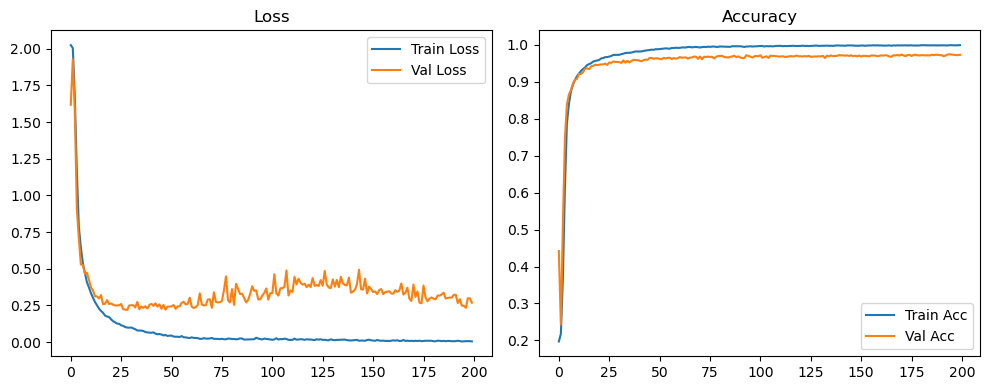

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 29.10it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 29.34it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 29.44it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 29.52it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 29.54it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 29.56it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 29.56it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 29.58it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 29.65it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 29.57it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 29.31it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 29.17it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 29.18it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 30.00it/s]

Original Model Final Test Loss: 0.2908 Accuracy: 0.9757


🚀 Running: batch256_lr0.001_0.001_0.001_dp0.2


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.001 | Train Acc: 0.1848 | Val Acc: 0.4616 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.001 | Train Acc: 0.1848 | Val Acc: 0.4616 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.001 | Train Acc: 0.1848 | Val Acc: 0.4616 |:   0%|          | 1/200 [00:09<31:30,  9.50s/it]

| LR: 0.001 | Train Acc: 0.2315 | Val Acc: 0.3282 |:   0%|          | 1/200 [00:18<31:30,  9.50s/it]

| LR: 0.001 | Train Acc: 0.2315 | Val Acc: 0.3282 |:   0%|          | 1/200 [00:18<31:30,  9.50s/it]

| LR: 0.001 | Train Acc: 0.2315 | Val Acc: 0.3282 |:   1%|          | 2/200 [00:18<30:00,  9.09s/it]

| LR: 0.001 | Train Acc: 0.3388 | Val Acc: 0.4482 |:   1%|          | 2/200 [00:26<30:00,  9.09s/it]

| LR: 0.001 | Train Acc: 0.3388 | Val Acc: 0.4482 |:   1%|          | 2/200 [00:26<30:00,  9.09s/it]

| LR: 0.001 | Train Acc: 0.3388 | Val Acc: 0.4482 |:   2%|▏         | 3/200 [00:27<29:18,  8.92s/it]

| LR: 0.001 | Train Acc: 0.5458 | Val Acc: 0.6868 |:   2%|▏         | 3/200 [00:35<29:18,  8.92s/it]

| LR: 0.001 | Train Acc: 0.5458 | Val Acc: 0.6868 |:   2%|▏         | 3/200 [00:35<29:18,  8.92s/it]

| LR: 0.001 | Train Acc: 0.5458 | Val Acc: 0.6868 |:   2%|▏         | 4/200 [00:35<29:01,  8.89s/it]

| LR: 0.001 | Train Acc: 0.7105 | Val Acc: 0.7993 |:   2%|▏         | 4/200 [00:44<29:01,  8.89s/it]

| LR: 0.001 | Train Acc: 0.7105 | Val Acc: 0.7993 |:   2%|▏         | 4/200 [00:44<29:01,  8.89s/it]

| LR: 0.001 | Train Acc: 0.7105 | Val Acc: 0.7993 |:   2%|▎         | 5/200 [00:44<29:07,  8.96s/it]

| LR: 0.001 | Train Acc: 0.7846 | Val Acc: 0.8568 |:   2%|▎         | 5/200 [00:54<29:07,  8.96s/it]

| LR: 0.001 | Train Acc: 0.7846 | Val Acc: 0.8568 |:   2%|▎         | 5/200 [00:54<29:07,  8.96s/it]

| LR: 0.001 | Train Acc: 0.7846 | Val Acc: 0.8568 |:   3%|▎         | 6/200 [00:54<29:11,  9.03s/it]

| LR: 0.001 | Train Acc: 0.8371 | Val Acc: 0.8668 |:   3%|▎         | 6/200 [01:03<29:11,  9.03s/it]

| LR: 0.001 | Train Acc: 0.8371 | Val Acc: 0.8668 |:   3%|▎         | 6/200 [01:03<29:11,  9.03s/it]

| LR: 0.001 | Train Acc: 0.8371 | Val Acc: 0.8668 |:   4%|▎         | 7/200 [01:03<29:49,  9.27s/it]

| LR: 0.001 | Train Acc: 0.8638 | Val Acc: 0.8988 |:   4%|▎         | 7/200 [01:13<29:49,  9.27s/it]

| LR: 0.001 | Train Acc: 0.8638 | Val Acc: 0.8988 |:   4%|▎         | 7/200 [01:13<29:49,  9.27s/it]

| LR: 0.001 | Train Acc: 0.8638 | Val Acc: 0.8988 |:   4%|▍         | 8/200 [01:13<29:44,  9.29s/it]

| LR: 0.001 | Train Acc: 0.8849 | Val Acc: 0.9065 |:   4%|▍         | 8/200 [01:22<29:44,  9.29s/it]

| LR: 0.001 | Train Acc: 0.8849 | Val Acc: 0.9065 |:   4%|▍         | 8/200 [01:22<29:44,  9.29s/it]

| LR: 0.001 | Train Acc: 0.8849 | Val Acc: 0.9065 |:   4%|▍         | 9/200 [01:22<29:47,  9.36s/it]

| LR: 0.001 | Train Acc: 0.8959 | Val Acc: 0.9116 |:   4%|▍         | 9/200 [01:31<29:47,  9.36s/it]

| LR: 0.001 | Train Acc: 0.8959 | Val Acc: 0.9116 |:   4%|▍         | 9/200 [01:31<29:47,  9.36s/it]

| LR: 0.001 | Train Acc: 0.8959 | Val Acc: 0.9116 |:   5%|▌         | 10/200 [01:31<29:01,  9.17s/it]

| LR: 0.001 | Train Acc: 0.9033 | Val Acc: 0.9193 |:   5%|▌         | 10/200 [01:40<29:01,  9.17s/it]

| LR: 0.001 | Train Acc: 0.9033 | Val Acc: 0.9193 |:   5%|▌         | 10/200 [01:40<29:01,  9.17s/it]

| LR: 0.001 | Train Acc: 0.9033 | Val Acc: 0.9193 |:   6%|▌         | 11/200 [01:40<28:45,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9097 | Val Acc: 0.9240 |:   6%|▌         | 11/200 [01:49<28:45,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9097 | Val Acc: 0.9240 |:   6%|▌         | 11/200 [01:49<28:45,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9097 | Val Acc: 0.9240 |:   6%|▌         | 12/200 [01:49<28:50,  9.20s/it]

| LR: 0.001 | Train Acc: 0.9176 | Val Acc: 0.9275 |:   6%|▌         | 12/200 [01:58<28:50,  9.20s/it]

| LR: 0.001 | Train Acc: 0.9176 | Val Acc: 0.9275 |:   6%|▌         | 12/200 [01:58<28:50,  9.20s/it]

| LR: 0.001 | Train Acc: 0.9176 | Val Acc: 0.9275 |:   6%|▋         | 13/200 [01:58<28:33,  9.16s/it]

| LR: 0.001 | Train Acc: 0.9229 | Val Acc: 0.9339 |:   6%|▋         | 13/200 [02:07<28:33,  9.16s/it]

| LR: 0.001 | Train Acc: 0.9229 | Val Acc: 0.9339 |:   6%|▋         | 13/200 [02:07<28:33,  9.16s/it]

| LR: 0.001 | Train Acc: 0.9229 | Val Acc: 0.9339 |:   7%|▋         | 14/200 [02:07<28:15,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9285 | Val Acc: 0.9378 |:   7%|▋         | 14/200 [02:17<28:15,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9285 | Val Acc: 0.9378 |:   7%|▋         | 14/200 [02:17<28:15,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9285 | Val Acc: 0.9378 |:   8%|▊         | 15/200 [02:17<28:24,  9.22s/it]

| LR: 0.001 | Train Acc: 0.9319 | Val Acc: 0.9350 |:   8%|▊         | 15/200 [02:26<28:24,  9.22s/it]

| LR: 0.001 | Train Acc: 0.9319 | Val Acc: 0.9350 |:   8%|▊         | 15/200 [02:26<28:24,  9.22s/it]

| LR: 0.001 | Train Acc: 0.9319 | Val Acc: 0.9350 |:   8%|▊         | 16/200 [02:26<28:15,  9.22s/it]

| LR: 0.001 | Train Acc: 0.9353 | Val Acc: 0.9410 |:   8%|▊         | 16/200 [02:35<28:15,  9.22s/it]

| LR: 0.001 | Train Acc: 0.9353 | Val Acc: 0.9410 |:   8%|▊         | 16/200 [02:35<28:15,  9.22s/it]

| LR: 0.001 | Train Acc: 0.9353 | Val Acc: 0.9410 |:   8%|▊         | 17/200 [02:35<27:43,  9.09s/it]

| LR: 0.001 | Train Acc: 0.9383 | Val Acc: 0.9443 |:   8%|▊         | 17/200 [02:44<27:43,  9.09s/it]

| LR: 0.001 | Train Acc: 0.9383 | Val Acc: 0.9443 |:   8%|▊         | 17/200 [02:44<27:43,  9.09s/it]

| LR: 0.001 | Train Acc: 0.9383 | Val Acc: 0.9443 |:   9%|▉         | 18/200 [02:44<27:24,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9439 | Val Acc: 0.9457 |:   9%|▉         | 18/200 [02:53<27:24,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9439 | Val Acc: 0.9457 |:   9%|▉         | 18/200 [02:53<27:24,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9439 | Val Acc: 0.9457 |:  10%|▉         | 19/200 [02:53<27:01,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9433 | Val Acc: 0.9443 |:  10%|▉         | 19/200 [03:02<27:01,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9433 | Val Acc: 0.9443 |:  10%|▉         | 19/200 [03:02<27:01,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9433 | Val Acc: 0.9443 |:  10%|█         | 20/200 [03:02<27:02,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9481 | Val Acc: 0.9428 |:  10%|█         | 20/200 [03:11<27:02,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9481 | Val Acc: 0.9428 |:  10%|█         | 20/200 [03:11<27:02,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9481 | Val Acc: 0.9428 |:  10%|█         | 21/200 [03:11<27:23,  9.18s/it]

| LR: 0.001 | Train Acc: 0.9494 | Val Acc: 0.9477 |:  10%|█         | 21/200 [03:20<27:23,  9.18s/it]

| LR: 0.001 | Train Acc: 0.9494 | Val Acc: 0.9477 |:  10%|█         | 21/200 [03:20<27:23,  9.18s/it]

| LR: 0.001 | Train Acc: 0.9494 | Val Acc: 0.9477 |:  11%|█         | 22/200 [03:21<27:15,  9.19s/it]

| LR: 0.001 | Train Acc: 0.9520 | Val Acc: 0.9462 |:  11%|█         | 22/200 [03:29<27:15,  9.19s/it]

| LR: 0.001 | Train Acc: 0.9520 | Val Acc: 0.9462 |:  11%|█         | 22/200 [03:29<27:15,  9.19s/it]

| LR: 0.001 | Train Acc: 0.9520 | Val Acc: 0.9462 |:  12%|█▏        | 23/200 [03:29<26:50,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9535 | Val Acc: 0.9487 |:  12%|█▏        | 23/200 [03:38<26:50,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9535 | Val Acc: 0.9487 |:  12%|█▏        | 23/200 [03:38<26:50,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9535 | Val Acc: 0.9487 |:  12%|█▏        | 24/200 [03:38<26:26,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9567 | Val Acc: 0.9475 |:  12%|█▏        | 24/200 [03:47<26:26,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9567 | Val Acc: 0.9475 |:  12%|█▏        | 24/200 [03:47<26:26,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9567 | Val Acc: 0.9475 |:  12%|█▎        | 25/200 [03:47<26:03,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9592 | Val Acc: 0.9533 |:  12%|█▎        | 25/200 [03:56<26:03,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9592 | Val Acc: 0.9533 |:  12%|█▎        | 25/200 [03:56<26:03,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9592 | Val Acc: 0.9533 |:  13%|█▎        | 26/200 [03:56<25:57,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9587 | Val Acc: 0.9535 |:  13%|█▎        | 26/200 [04:05<25:57,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9587 | Val Acc: 0.9535 |:  13%|█▎        | 26/200 [04:05<25:57,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9587 | Val Acc: 0.9535 |:  14%|█▎        | 27/200 [04:05<26:07,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9607 | Val Acc: 0.9495 |:  14%|█▎        | 27/200 [04:14<26:07,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9607 | Val Acc: 0.9495 |:  14%|█▎        | 27/200 [04:14<26:07,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9607 | Val Acc: 0.9495 |:  14%|█▍        | 28/200 [04:14<25:48,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9610 | Val Acc: 0.9505 |:  14%|█▍        | 28/200 [04:23<25:48,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9610 | Val Acc: 0.9505 |:  14%|█▍        | 28/200 [04:23<25:48,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9610 | Val Acc: 0.9505 |:  14%|█▍        | 29/200 [04:23<25:37,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9637 | Val Acc: 0.9536 |:  14%|█▍        | 29/200 [04:32<25:37,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9637 | Val Acc: 0.9536 |:  14%|█▍        | 29/200 [04:32<25:37,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9637 | Val Acc: 0.9536 |:  15%|█▌        | 30/200 [04:32<25:18,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9641 | Val Acc: 0.9561 |:  15%|█▌        | 30/200 [04:41<25:18,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9641 | Val Acc: 0.9561 |:  15%|█▌        | 30/200 [04:41<25:18,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9641 | Val Acc: 0.9561 |:  16%|█▌        | 31/200 [04:41<25:07,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9639 | Val Acc: 0.9519 |:  16%|█▌        | 31/200 [04:50<25:07,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9639 | Val Acc: 0.9519 |:  16%|█▌        | 31/200 [04:50<25:07,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9639 | Val Acc: 0.9519 |:  16%|█▌        | 32/200 [04:50<24:53,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9682 | Val Acc: 0.9597 |:  16%|█▌        | 32/200 [04:58<24:53,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9682 | Val Acc: 0.9597 |:  16%|█▌        | 32/200 [04:58<24:53,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9682 | Val Acc: 0.9597 |:  16%|█▋        | 33/200 [04:58<24:32,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9684 | Val Acc: 0.9579 |:  16%|█▋        | 33/200 [05:07<24:32,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9684 | Val Acc: 0.9579 |:  16%|█▋        | 33/200 [05:07<24:32,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9684 | Val Acc: 0.9579 |:  17%|█▋        | 34/200 [05:07<24:40,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9690 | Val Acc: 0.9576 |:  17%|█▋        | 34/200 [05:16<24:40,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9690 | Val Acc: 0.9576 |:  17%|█▋        | 34/200 [05:16<24:40,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9690 | Val Acc: 0.9576 |:  18%|█▊        | 35/200 [05:16<24:27,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9704 | Val Acc: 0.9573 |:  18%|█▊        | 35/200 [05:25<24:27,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9704 | Val Acc: 0.9573 |:  18%|█▊        | 35/200 [05:25<24:27,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9704 | Val Acc: 0.9573 |:  18%|█▊        | 36/200 [05:25<24:20,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9711 | Val Acc: 0.9573 |:  18%|█▊        | 36/200 [05:34<24:20,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9711 | Val Acc: 0.9573 |:  18%|█▊        | 36/200 [05:34<24:20,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9711 | Val Acc: 0.9573 |:  18%|█▊        | 37/200 [05:34<24:21,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9733 | Val Acc: 0.9569 |:  18%|█▊        | 37/200 [05:43<24:21,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9733 | Val Acc: 0.9569 |:  18%|█▊        | 37/200 [05:43<24:21,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9733 | Val Acc: 0.9569 |:  19%|█▉        | 38/200 [05:43<24:06,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9732 | Val Acc: 0.9586 |:  19%|█▉        | 38/200 [05:52<24:06,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9732 | Val Acc: 0.9586 |:  19%|█▉        | 38/200 [05:52<24:06,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9732 | Val Acc: 0.9586 |:  20%|█▉        | 39/200 [05:52<23:55,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9739 | Val Acc: 0.9579 |:  20%|█▉        | 39/200 [06:01<23:55,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9739 | Val Acc: 0.9579 |:  20%|█▉        | 39/200 [06:01<23:55,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9739 | Val Acc: 0.9579 |:  20%|██        | 40/200 [06:01<23:51,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9766 | Val Acc: 0.9578 |:  20%|██        | 40/200 [06:11<23:51,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9766 | Val Acc: 0.9578 |:  20%|██        | 40/200 [06:11<23:51,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9766 | Val Acc: 0.9578 |:  20%|██        | 41/200 [06:11<24:10,  9.12s/it]

| LR: 0.001 | Train Acc: 0.9769 | Val Acc: 0.9609 |:  20%|██        | 41/200 [06:19<24:10,  9.12s/it]

| LR: 0.001 | Train Acc: 0.9769 | Val Acc: 0.9609 |:  20%|██        | 41/200 [06:19<24:10,  9.12s/it]

| LR: 0.001 | Train Acc: 0.9769 | Val Acc: 0.9609 |:  21%|██        | 42/200 [06:20<23:53,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9787 | Val Acc: 0.9609 |:  21%|██        | 42/200 [06:28<23:53,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9787 | Val Acc: 0.9609 |:  21%|██        | 42/200 [06:28<23:53,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9787 | Val Acc: 0.9609 |:  22%|██▏       | 43/200 [06:28<23:38,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9784 | Val Acc: 0.9618 |:  22%|██▏       | 43/200 [06:37<23:38,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9784 | Val Acc: 0.9618 |:  22%|██▏       | 43/200 [06:37<23:38,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9784 | Val Acc: 0.9618 |:  22%|██▏       | 44/200 [06:37<23:17,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9801 | Val Acc: 0.9618 |:  22%|██▏       | 44/200 [06:46<23:17,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9801 | Val Acc: 0.9618 |:  22%|██▏       | 44/200 [06:46<23:17,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9801 | Val Acc: 0.9618 |:  22%|██▎       | 45/200 [06:46<23:00,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9798 | Val Acc: 0.9621 |:  22%|██▎       | 45/200 [06:55<23:00,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9798 | Val Acc: 0.9621 |:  22%|██▎       | 45/200 [06:55<23:00,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9798 | Val Acc: 0.9621 |:  23%|██▎       | 46/200 [06:55<22:58,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9810 | Val Acc: 0.9646 |:  23%|██▎       | 46/200 [07:04<22:58,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9810 | Val Acc: 0.9646 |:  23%|██▎       | 46/200 [07:04<22:58,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9810 | Val Acc: 0.9646 |:  24%|██▎       | 47/200 [07:04<22:40,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9806 | Val Acc: 0.9628 |:  24%|██▎       | 47/200 [07:13<22:40,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9806 | Val Acc: 0.9628 |:  24%|██▎       | 47/200 [07:13<22:40,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9806 | Val Acc: 0.9628 |:  24%|██▍       | 48/200 [07:13<22:51,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9819 | Val Acc: 0.9640 |:  24%|██▍       | 48/200 [07:22<22:51,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9819 | Val Acc: 0.9640 |:  24%|██▍       | 48/200 [07:22<22:51,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9819 | Val Acc: 0.9640 |:  24%|██▍       | 49/200 [07:22<22:40,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9826 | Val Acc: 0.9640 |:  24%|██▍       | 49/200 [07:31<22:40,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9826 | Val Acc: 0.9640 |:  24%|██▍       | 49/200 [07:31<22:40,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9826 | Val Acc: 0.9640 |:  25%|██▌       | 50/200 [07:31<22:24,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9837 | Val Acc: 0.9622 |:  25%|██▌       | 50/200 [07:40<22:24,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9837 | Val Acc: 0.9622 |:  25%|██▌       | 50/200 [07:40<22:24,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9837 | Val Acc: 0.9622 |:  26%|██▌       | 51/200 [07:40<22:21,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9642 |:  26%|██▌       | 51/200 [07:49<22:21,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9642 |:  26%|██▌       | 51/200 [07:49<22:21,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9831 | Val Acc: 0.9642 |:  26%|██▌       | 52/200 [07:49<22:10,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9666 |:  26%|██▌       | 52/200 [07:58<22:10,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9666 |:  26%|██▌       | 52/200 [07:58<22:10,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9850 | Val Acc: 0.9666 |:  26%|██▋       | 53/200 [07:58<21:53,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9677 |:  26%|██▋       | 53/200 [08:07<21:53,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9677 |:  26%|██▋       | 53/200 [08:07<21:53,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9854 | Val Acc: 0.9677 |:  27%|██▋       | 54/200 [08:07<21:41,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9651 |:  27%|██▋       | 54/200 [08:16<21:41,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9651 |:  27%|██▋       | 54/200 [08:16<21:41,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9651 |:  28%|██▊       | 55/200 [08:16<21:31,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9864 | Val Acc: 0.9653 |:  28%|██▊       | 55/200 [08:25<21:31,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9864 | Val Acc: 0.9653 |:  28%|██▊       | 55/200 [08:25<21:31,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9864 | Val Acc: 0.9653 |:  28%|██▊       | 56/200 [08:25<21:45,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9859 | Val Acc: 0.9642 |:  28%|██▊       | 56/200 [08:34<21:45,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9859 | Val Acc: 0.9642 |:  28%|██▊       | 56/200 [08:34<21:45,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9859 | Val Acc: 0.9642 |:  28%|██▊       | 57/200 [08:34<21:35,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9880 | Val Acc: 0.9646 |:  28%|██▊       | 57/200 [08:43<21:35,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9880 | Val Acc: 0.9646 |:  28%|██▊       | 57/200 [08:43<21:35,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9880 | Val Acc: 0.9646 |:  29%|██▉       | 58/200 [08:43<21:20,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9654 |:  29%|██▉       | 58/200 [08:52<21:20,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9654 |:  29%|██▉       | 58/200 [08:52<21:20,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9874 | Val Acc: 0.9654 |:  30%|██▉       | 59/200 [08:52<21:03,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9894 | Val Acc: 0.9676 |:  30%|██▉       | 59/200 [09:01<21:03,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9894 | Val Acc: 0.9676 |:  30%|██▉       | 59/200 [09:01<21:03,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9894 | Val Acc: 0.9676 |:  30%|███       | 60/200 [09:01<20:56,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9884 | Val Acc: 0.9644 |:  30%|███       | 60/200 [09:10<20:56,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9884 | Val Acc: 0.9644 |:  30%|███       | 60/200 [09:10<20:56,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9884 | Val Acc: 0.9644 |:  30%|███       | 61/200 [09:10<20:42,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9883 | Val Acc: 0.9667 |:  30%|███       | 61/200 [09:19<20:42,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9883 | Val Acc: 0.9667 |:  30%|███       | 61/200 [09:19<20:42,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9883 | Val Acc: 0.9667 |:  31%|███       | 62/200 [09:19<20:43,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9661 |:  31%|███       | 62/200 [09:28<20:43,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9661 |:  31%|███       | 62/200 [09:28<20:43,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9881 | Val Acc: 0.9661 |:  32%|███▏      | 63/200 [09:28<20:38,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9640 |:  32%|███▏      | 63/200 [09:37<20:38,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9640 |:  32%|███▏      | 63/200 [09:37<20:38,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9640 |:  32%|███▏      | 64/200 [09:37<20:23,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9667 |:  32%|███▏      | 64/200 [09:46<20:23,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9667 |:  32%|███▏      | 64/200 [09:46<20:23,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9667 |:  32%|███▎      | 65/200 [09:46<20:17,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9661 |:  32%|███▎      | 65/200 [09:55<20:17,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9661 |:  32%|███▎      | 65/200 [09:55<20:17,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9661 |:  33%|███▎      | 66/200 [09:55<19:58,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9683 |:  33%|███▎      | 66/200 [10:04<19:58,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9683 |:  33%|███▎      | 66/200 [10:04<19:58,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9683 |:  34%|███▎      | 67/200 [10:04<20:02,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9668 |:  34%|███▎      | 67/200 [10:13<20:02,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9668 |:  34%|███▎      | 67/200 [10:13<20:02,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9668 |:  34%|███▍      | 68/200 [10:13<19:46,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9894 | Val Acc: 0.9686 |:  34%|███▍      | 68/200 [10:22<19:46,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9894 | Val Acc: 0.9686 |:  34%|███▍      | 68/200 [10:22<19:46,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9894 | Val Acc: 0.9686 |:  34%|███▍      | 69/200 [10:22<19:30,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9901 | Val Acc: 0.9646 |:  34%|███▍      | 69/200 [10:31<19:30,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9901 | Val Acc: 0.9646 |:  34%|███▍      | 69/200 [10:31<19:30,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9901 | Val Acc: 0.9646 |:  35%|███▌      | 70/200 [10:31<19:26,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9671 |:  35%|███▌      | 70/200 [10:40<19:26,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9671 |:  35%|███▌      | 70/200 [10:40<19:26,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9671 |:  36%|███▌      | 71/200 [10:40<19:34,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9900 | Val Acc: 0.9679 |:  36%|███▌      | 71/200 [10:49<19:34,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9900 | Val Acc: 0.9679 |:  36%|███▌      | 71/200 [10:49<19:34,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9900 | Val Acc: 0.9679 |:  36%|███▌      | 72/200 [10:49<19:12,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9673 |:  36%|███▌      | 72/200 [10:58<19:12,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9673 |:  36%|███▌      | 72/200 [10:58<19:12,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9673 |:  36%|███▋      | 73/200 [10:58<19:00,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9670 |:  36%|███▋      | 73/200 [11:07<19:00,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9670 |:  36%|███▋      | 73/200 [11:07<19:00,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9670 |:  37%|███▋      | 74/200 [11:07<18:51,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9691 |:  37%|███▋      | 74/200 [11:16<18:51,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9691 |:  37%|███▋      | 74/200 [11:16<18:51,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9691 |:  38%|███▊      | 75/200 [11:16<18:39,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9688 |:  38%|███▊      | 75/200 [11:25<18:39,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9688 |:  38%|███▊      | 75/200 [11:25<18:39,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9688 |:  38%|███▊      | 76/200 [11:25<18:28,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9895 | Val Acc: 0.9668 |:  38%|███▊      | 76/200 [11:33<18:28,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9895 | Val Acc: 0.9668 |:  38%|███▊      | 76/200 [11:33<18:28,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9895 | Val Acc: 0.9668 |:  38%|███▊      | 77/200 [11:34<18:17,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9683 |:  38%|███▊      | 77/200 [11:43<18:17,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9683 |:  38%|███▊      | 77/200 [11:43<18:17,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9683 |:  39%|███▉      | 78/200 [11:43<18:15,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9708 |:  39%|███▉      | 78/200 [11:52<18:15,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9708 |:  39%|███▉      | 78/200 [11:52<18:15,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9708 |:  40%|███▉      | 79/200 [11:52<18:14,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9914 | Val Acc: 0.9688 |:  40%|███▉      | 79/200 [12:02<18:14,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9914 | Val Acc: 0.9688 |:  40%|███▉      | 79/200 [12:02<18:14,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9914 | Val Acc: 0.9688 |:  40%|████      | 80/200 [12:02<18:32,  9.27s/it]

| LR: 0.001 | Train Acc: 0.9921 | Val Acc: 0.9702 |:  40%|████      | 80/200 [12:10<18:32,  9.27s/it]

| LR: 0.001 | Train Acc: 0.9921 | Val Acc: 0.9702 |:  40%|████      | 80/200 [12:10<18:32,  9.27s/it]

| LR: 0.001 | Train Acc: 0.9921 | Val Acc: 0.9702 |:  40%|████      | 81/200 [12:10<18:06,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9918 | Val Acc: 0.9706 |:  40%|████      | 81/200 [12:19<18:06,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9918 | Val Acc: 0.9706 |:  40%|████      | 81/200 [12:19<18:06,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9918 | Val Acc: 0.9706 |:  41%|████      | 82/200 [12:19<17:49,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9925 | Val Acc: 0.9672 |:  41%|████      | 82/200 [12:28<17:49,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9925 | Val Acc: 0.9672 |:  41%|████      | 82/200 [12:28<17:49,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9925 | Val Acc: 0.9672 |:  42%|████▏     | 83/200 [12:28<17:33,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9689 |:  42%|████▏     | 83/200 [12:38<17:33,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9689 |:  42%|████▏     | 83/200 [12:38<17:33,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9689 |:  42%|████▏     | 84/200 [12:38<17:37,  9.12s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9702 |:  42%|████▏     | 84/200 [12:46<17:37,  9.12s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9702 |:  42%|████▏     | 84/200 [12:46<17:37,  9.12s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9702 |:  42%|████▎     | 85/200 [12:47<17:22,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9929 | Val Acc: 0.9676 |:  42%|████▎     | 85/200 [12:55<17:22,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9929 | Val Acc: 0.9676 |:  42%|████▎     | 85/200 [12:55<17:22,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9929 | Val Acc: 0.9676 |:  43%|████▎     | 86/200 [12:55<17:06,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9708 |:  43%|████▎     | 86/200 [13:04<17:06,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9708 |:  43%|████▎     | 86/200 [13:04<17:06,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9708 |:  44%|████▎     | 87/200 [13:04<16:55,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9924 | Val Acc: 0.9684 |:  44%|████▎     | 87/200 [13:13<16:55,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9924 | Val Acc: 0.9684 |:  44%|████▎     | 87/200 [13:13<16:55,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9924 | Val Acc: 0.9684 |:  44%|████▍     | 88/200 [13:13<16:41,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9710 |:  44%|████▍     | 88/200 [13:22<16:41,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9710 |:  44%|████▍     | 88/200 [13:22<16:41,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9710 |:  44%|████▍     | 89/200 [13:22<16:25,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9932 | Val Acc: 0.9698 |:  44%|████▍     | 89/200 [13:31<16:25,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9932 | Val Acc: 0.9698 |:  44%|████▍     | 89/200 [13:31<16:25,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9932 | Val Acc: 0.9698 |:  45%|████▌     | 90/200 [13:31<16:17,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9689 |:  45%|████▌     | 90/200 [13:40<16:17,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9689 |:  45%|████▌     | 90/200 [13:40<16:17,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9689 |:  46%|████▌     | 91/200 [13:40<16:08,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9922 | Val Acc: 0.9684 |:  46%|████▌     | 91/200 [13:49<16:08,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9922 | Val Acc: 0.9684 |:  46%|████▌     | 91/200 [13:49<16:08,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9922 | Val Acc: 0.9684 |:  46%|████▌     | 92/200 [13:49<15:58,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9692 |:  46%|████▌     | 92/200 [13:57<15:58,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9692 |:  46%|████▌     | 92/200 [13:57<15:58,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9692 |:  46%|████▋     | 93/200 [13:57<15:42,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9696 |:  46%|████▋     | 93/200 [14:06<15:42,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9696 |:  46%|████▋     | 93/200 [14:06<15:42,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9696 |:  47%|████▋     | 94/200 [14:06<15:47,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9689 |:  47%|████▋     | 94/200 [14:15<15:47,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9689 |:  47%|████▋     | 94/200 [14:15<15:47,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9689 |:  48%|████▊     | 95/200 [14:15<15:32,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9722 |:  48%|████▊     | 95/200 [14:24<15:32,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9722 |:  48%|████▊     | 95/200 [14:24<15:32,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9938 | Val Acc: 0.9722 |:  48%|████▊     | 96/200 [14:24<15:35,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9698 |:  48%|████▊     | 96/200 [14:33<15:35,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9698 |:  48%|████▊     | 96/200 [14:33<15:35,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9698 |:  48%|████▊     | 97/200 [14:33<15:23,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9937 | Val Acc: 0.9692 |:  48%|████▊     | 97/200 [14:42<15:23,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9937 | Val Acc: 0.9692 |:  48%|████▊     | 97/200 [14:42<15:23,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9937 | Val Acc: 0.9692 |:  49%|████▉     | 98/200 [14:42<15:10,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9712 |:  49%|████▉     | 98/200 [14:51<15:10,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9712 |:  49%|████▉     | 98/200 [14:51<15:10,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9712 |:  50%|████▉     | 99/200 [14:51<15:01,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9712 |:  50%|████▉     | 99/200 [15:00<15:01,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9712 |:  50%|████▉     | 99/200 [15:00<15:01,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9712 |:  50%|█████     | 100/200 [15:00<14:48,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9721 |:  50%|█████     | 100/200 [15:09<14:48,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9721 |:  50%|█████     | 100/200 [15:09<14:48,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9721 |:  50%|█████     | 101/200 [15:09<14:44,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9698 |:  50%|█████     | 101/200 [15:18<14:44,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9698 |:  50%|█████     | 101/200 [15:18<14:44,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9936 | Val Acc: 0.9698 |:  51%|█████     | 102/200 [15:18<14:26,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9701 |:  51%|█████     | 102/200 [15:26<14:26,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9701 |:  51%|█████     | 102/200 [15:26<14:26,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9701 |:  52%|█████▏    | 103/200 [15:26<14:08,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9697 |:  52%|█████▏    | 103/200 [15:35<14:08,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9697 |:  52%|█████▏    | 103/200 [15:35<14:08,  8.75s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9697 |:  52%|█████▏    | 104/200 [15:35<14:01,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9719 |:  52%|█████▏    | 104/200 [15:44<14:01,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9719 |:  52%|█████▏    | 104/200 [15:44<14:01,  8.77s/it]

| LR: 0.001 | Train Acc: 0.9935 | Val Acc: 0.9719 |:  52%|█████▎    | 105/200 [15:44<13:56,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9712 |:  52%|█████▎    | 105/200 [15:53<13:56,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9712 |:  52%|█████▎    | 105/200 [15:53<13:56,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9712 |:  53%|█████▎    | 106/200 [15:53<13:48,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9702 |:  53%|█████▎    | 106/200 [16:02<13:48,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9702 |:  53%|█████▎    | 106/200 [16:02<13:48,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9702 |:  54%|█████▎    | 107/200 [16:02<13:43,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9711 |:  54%|█████▎    | 107/200 [16:10<13:43,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9711 |:  54%|█████▎    | 107/200 [16:10<13:43,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9942 | Val Acc: 0.9711 |:  54%|█████▍    | 108/200 [16:10<13:33,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9700 |:  54%|█████▍    | 108/200 [16:19<13:33,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9700 |:  54%|█████▍    | 108/200 [16:19<13:33,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9700 |:  55%|█████▍    | 109/200 [16:19<13:24,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9710 |:  55%|█████▍    | 109/200 [16:29<13:24,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9710 |:  55%|█████▍    | 109/200 [16:29<13:24,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9940 | Val Acc: 0.9710 |:  55%|█████▌    | 110/200 [16:29<13:36,  9.08s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9704 |:  55%|█████▌    | 110/200 [16:38<13:36,  9.08s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9704 |:  55%|█████▌    | 110/200 [16:38<13:36,  9.08s/it]

| LR: 0.001 | Train Acc: 0.9939 | Val Acc: 0.9704 |:  56%|█████▌    | 111/200 [16:38<13:42,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9716 |:  56%|█████▌    | 111/200 [16:48<13:42,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9716 |:  56%|█████▌    | 111/200 [16:48<13:42,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9948 | Val Acc: 0.9716 |:  56%|█████▌    | 112/200 [16:48<13:50,  9.44s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9686 |:  56%|█████▌    | 112/200 [16:58<13:50,  9.44s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9686 |:  56%|█████▌    | 112/200 [16:58<13:50,  9.44s/it]

| LR: 0.001 | Train Acc: 0.9946 | Val Acc: 0.9686 |:  56%|█████▋    | 113/200 [16:58<13:41,  9.44s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9702 |:  56%|█████▋    | 113/200 [17:07<13:41,  9.44s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9702 |:  56%|█████▋    | 113/200 [17:07<13:41,  9.44s/it]

| LR: 0.001 | Train Acc: 0.9953 | Val Acc: 0.9702 |:  57%|█████▋    | 114/200 [17:07<13:36,  9.50s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9703 |:  57%|█████▋    | 114/200 [17:17<13:36,  9.50s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9703 |:  57%|█████▋    | 114/200 [17:17<13:36,  9.50s/it]

| LR: 0.001 | Train Acc: 0.9945 | Val Acc: 0.9703 |:  57%|█████▊    | 115/200 [17:17<13:32,  9.56s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9722 |:  57%|█████▊    | 115/200 [17:26<13:32,  9.56s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9722 |:  57%|█████▊    | 115/200 [17:26<13:32,  9.56s/it]

| LR: 0.001 | Train Acc: 0.9947 | Val Acc: 0.9722 |:  58%|█████▊    | 116/200 [17:26<13:05,  9.35s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9714 |:  58%|█████▊    | 116/200 [17:35<13:05,  9.35s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9714 |:  58%|█████▊    | 116/200 [17:35<13:05,  9.35s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9714 |:  58%|█████▊    | 117/200 [17:35<12:46,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9719 |:  58%|█████▊    | 117/200 [17:44<12:46,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9719 |:  58%|█████▊    | 117/200 [17:44<12:46,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9719 |:  59%|█████▉    | 118/200 [17:44<12:39,  9.26s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9689 |:  59%|█████▉    | 118/200 [17:53<12:39,  9.26s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9689 |:  59%|█████▉    | 118/200 [17:53<12:39,  9.26s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9689 |:  60%|█████▉    | 119/200 [17:53<12:18,  9.12s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9692 |:  60%|█████▉    | 119/200 [18:02<12:18,  9.12s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9692 |:  60%|█████▉    | 119/200 [18:02<12:18,  9.12s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9692 |:  60%|██████    | 120/200 [18:02<12:01,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9724 |:  60%|██████    | 120/200 [18:11<12:01,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9724 |:  60%|██████    | 120/200 [18:11<12:01,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9949 | Val Acc: 0.9724 |:  60%|██████    | 121/200 [18:11<11:49,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9724 |:  60%|██████    | 121/200 [18:21<11:49,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9724 |:  60%|██████    | 121/200 [18:21<11:49,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9952 | Val Acc: 0.9724 |:  61%|██████    | 122/200 [18:21<11:59,  9.22s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9725 |:  61%|██████    | 122/200 [18:30<11:59,  9.22s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9725 |:  61%|██████    | 122/200 [18:30<11:59,  9.22s/it]

| LR: 0.001 | Train Acc: 0.9955 | Val Acc: 0.9725 |:  62%|██████▏   | 123/200 [18:30<12:02,  9.38s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9721 |:  62%|██████▏   | 123/200 [18:40<12:02,  9.38s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9721 |:  62%|██████▏   | 123/200 [18:40<12:02,  9.38s/it]

| LR: 0.001 | Train Acc: 0.9950 | Val Acc: 0.9721 |:  62%|██████▏   | 124/200 [18:40<11:49,  9.33s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9716 |:  62%|██████▏   | 124/200 [18:49<11:49,  9.33s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9716 |:  62%|██████▏   | 124/200 [18:49<11:49,  9.33s/it]

| LR: 0.001 | Train Acc: 0.9951 | Val Acc: 0.9716 |:  62%|██████▎   | 125/200 [18:49<11:42,  9.37s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9714 |:  62%|██████▎   | 125/200 [18:58<11:42,  9.37s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9714 |:  62%|██████▎   | 125/200 [18:58<11:42,  9.37s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9714 |:  63%|██████▎   | 126/200 [18:58<11:23,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9738 |:  63%|██████▎   | 126/200 [19:07<11:23,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9738 |:  63%|██████▎   | 126/200 [19:07<11:23,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9738 |:  64%|██████▎   | 127/200 [19:07<11:08,  9.16s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9711 |:  64%|██████▎   | 127/200 [19:16<11:08,  9.16s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9711 |:  64%|██████▎   | 127/200 [19:16<11:08,  9.16s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9711 |:  64%|██████▍   | 128/200 [19:16<10:50,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9727 |:  64%|██████▍   | 128/200 [19:25<10:50,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9727 |:  64%|██████▍   | 128/200 [19:25<10:50,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9727 |:  64%|██████▍   | 129/200 [19:25<10:40,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9696 |:  64%|██████▍   | 129/200 [19:34<10:40,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9696 |:  64%|██████▍   | 129/200 [19:34<10:40,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9959 | Val Acc: 0.9696 |:  65%|██████▌   | 130/200 [19:34<10:28,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9723 |:  65%|██████▌   | 130/200 [19:42<10:28,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9723 |:  65%|██████▌   | 130/200 [19:42<10:28,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9958 | Val Acc: 0.9723 |:  66%|██████▌   | 131/200 [19:42<10:16,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9732 |:  66%|██████▌   | 131/200 [19:51<10:16,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9732 |:  66%|██████▌   | 131/200 [19:51<10:16,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9732 |:  66%|██████▌   | 132/200 [19:51<10:06,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9728 |:  66%|██████▌   | 132/200 [20:00<10:06,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9728 |:  66%|██████▌   | 132/200 [20:00<10:06,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9957 | Val Acc: 0.9728 |:  66%|██████▋   | 133/200 [20:00<09:56,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9728 |:  66%|██████▋   | 133/200 [20:09<09:56,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9728 |:  66%|██████▋   | 133/200 [20:09<09:56,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9728 |:  67%|██████▋   | 134/200 [20:09<09:45,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9719 |:  67%|██████▋   | 134/200 [20:18<09:45,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9719 |:  67%|██████▋   | 134/200 [20:18<09:45,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9719 |:  68%|██████▊   | 135/200 [20:18<09:39,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9730 |:  68%|██████▊   | 135/200 [20:27<09:39,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9730 |:  68%|██████▊   | 135/200 [20:27<09:39,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9962 | Val Acc: 0.9730 |:  68%|██████▊   | 136/200 [20:27<09:30,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9722 |:  68%|██████▊   | 136/200 [20:36<09:30,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9722 |:  68%|██████▊   | 136/200 [20:36<09:30,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9722 |:  68%|██████▊   | 137/200 [20:36<09:20,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9734 |:  68%|██████▊   | 137/200 [20:45<09:20,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9734 |:  68%|██████▊   | 137/200 [20:45<09:20,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9734 |:  69%|██████▉   | 138/200 [20:45<09:23,  9.09s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9707 |:  69%|██████▉   | 138/200 [20:54<09:23,  9.09s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9707 |:  69%|██████▉   | 138/200 [20:54<09:23,  9.09s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9707 |:  70%|██████▉   | 139/200 [20:54<09:11,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9712 |:  70%|██████▉   | 139/200 [21:03<09:11,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9712 |:  70%|██████▉   | 139/200 [21:03<09:11,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9712 |:  70%|███████   | 140/200 [21:03<08:58,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9719 |:  70%|███████   | 140/200 [21:12<08:58,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9719 |:  70%|███████   | 140/200 [21:12<08:58,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9961 | Val Acc: 0.9719 |:  70%|███████   | 141/200 [21:12<08:46,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9707 |:  70%|███████   | 141/200 [21:21<08:46,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9707 |:  70%|███████   | 141/200 [21:21<08:46,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9965 | Val Acc: 0.9707 |:  71%|███████   | 142/200 [21:21<08:34,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9707 |:  71%|███████   | 142/200 [21:30<08:34,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9707 |:  71%|███████   | 142/200 [21:30<08:34,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9960 | Val Acc: 0.9707 |:  72%|███████▏  | 143/200 [21:30<08:29,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9713 |:  72%|███████▏  | 143/200 [21:38<08:29,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9713 |:  72%|███████▏  | 143/200 [21:38<08:29,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9713 |:  72%|███████▏  | 144/200 [21:38<08:16,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9720 |:  72%|███████▏  | 144/200 [21:47<08:16,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9720 |:  72%|███████▏  | 144/200 [21:47<08:16,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9720 |:  72%|███████▎  | 145/200 [21:47<08:06,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9725 |:  72%|███████▎  | 145/200 [21:56<08:06,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9725 |:  72%|███████▎  | 145/200 [21:56<08:06,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9725 |:  73%|███████▎  | 146/200 [21:56<07:56,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9721 |:  73%|███████▎  | 146/200 [22:05<07:56,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9721 |:  73%|███████▎  | 146/200 [22:05<07:56,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9721 |:  74%|███████▎  | 147/200 [22:05<07:47,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9713 |:  74%|███████▎  | 147/200 [22:14<07:47,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9713 |:  74%|███████▎  | 147/200 [22:14<07:47,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9713 |:  74%|███████▍  | 148/200 [22:14<07:45,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9722 |:  74%|███████▍  | 148/200 [22:23<07:45,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9722 |:  74%|███████▍  | 148/200 [22:23<07:45,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9722 |:  74%|███████▍  | 149/200 [22:23<07:35,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9723 |:  74%|███████▍  | 149/200 [22:32<07:35,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9723 |:  74%|███████▍  | 149/200 [22:32<07:35,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9723 |:  75%|███████▌  | 150/200 [22:32<07:30,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9714 |:  75%|███████▌  | 150/200 [22:41<07:30,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9714 |:  75%|███████▌  | 150/200 [22:41<07:30,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9714 |:  76%|███████▌  | 151/200 [22:41<07:18,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9722 |:  76%|███████▌  | 151/200 [22:50<07:18,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9722 |:  76%|███████▌  | 151/200 [22:50<07:18,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9722 |:  76%|███████▌  | 152/200 [22:50<07:06,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9730 |:  76%|███████▌  | 152/200 [22:58<07:06,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9730 |:  76%|███████▌  | 152/200 [22:58<07:06,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9964 | Val Acc: 0.9730 |:  76%|███████▋  | 153/200 [22:58<06:55,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9740 |:  76%|███████▋  | 153/200 [23:07<06:55,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9740 |:  76%|███████▋  | 153/200 [23:07<06:55,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9968 | Val Acc: 0.9740 |:  77%|███████▋  | 154/200 [23:07<06:46,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9736 |:  77%|███████▋  | 154/200 [23:16<06:46,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9736 |:  77%|███████▋  | 154/200 [23:16<06:46,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9736 |:  78%|███████▊  | 155/200 [23:16<06:38,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9725 |:  78%|███████▊  | 155/200 [23:25<06:38,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9725 |:  78%|███████▊  | 155/200 [23:25<06:38,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9725 |:  78%|███████▊  | 156/200 [23:25<06:34,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9722 |:  78%|███████▊  | 156/200 [23:34<06:34,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9722 |:  78%|███████▊  | 156/200 [23:34<06:34,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9722 |:  78%|███████▊  | 157/200 [23:34<06:23,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9723 |:  78%|███████▊  | 157/200 [23:43<06:23,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9723 |:  78%|███████▊  | 157/200 [23:43<06:23,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9967 | Val Acc: 0.9723 |:  79%|███████▉  | 158/200 [23:43<06:12,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9721 |:  79%|███████▉  | 158/200 [23:52<06:12,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9721 |:  79%|███████▉  | 158/200 [23:52<06:12,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9969 | Val Acc: 0.9721 |:  80%|███████▉  | 159/200 [23:52<06:02,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9723 |:  80%|███████▉  | 159/200 [24:01<06:02,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9723 |:  80%|███████▉  | 159/200 [24:01<06:02,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9723 |:  80%|████████  | 160/200 [24:01<06:02,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9718 |:  80%|████████  | 160/200 [24:10<06:02,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9718 |:  80%|████████  | 160/200 [24:10<06:02,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9718 |:  80%|████████  | 161/200 [24:10<05:55,  9.12s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9708 |:  80%|████████  | 161/200 [24:19<05:55,  9.12s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9708 |:  80%|████████  | 161/200 [24:19<05:55,  9.12s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9708 |:  81%|████████  | 162/200 [24:19<05:41,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9723 |:  81%|████████  | 162/200 [24:28<05:41,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9723 |:  81%|████████  | 162/200 [24:28<05:41,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9973 | Val Acc: 0.9723 |:  82%|████████▏ | 163/200 [24:28<05:30,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9735 |:  82%|████████▏ | 163/200 [24:37<05:30,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9735 |:  82%|████████▏ | 163/200 [24:37<05:30,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9735 |:  82%|████████▏ | 164/200 [24:37<05:19,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9713 |:  82%|████████▏ | 164/200 [24:45<05:19,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9713 |:  82%|████████▏ | 164/200 [24:45<05:19,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9713 |:  82%|████████▎ | 165/200 [24:45<05:07,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9732 |:  82%|████████▎ | 165/200 [24:54<05:07,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9732 |:  82%|████████▎ | 165/200 [24:54<05:07,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9970 | Val Acc: 0.9732 |:  83%|████████▎ | 166/200 [24:54<04:57,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9728 |:  83%|████████▎ | 166/200 [25:03<04:57,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9728 |:  83%|████████▎ | 166/200 [25:03<04:57,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9972 | Val Acc: 0.9728 |:  84%|████████▎ | 167/200 [25:03<04:48,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9738 |:  84%|████████▎ | 167/200 [25:12<04:48,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9738 |:  84%|████████▎ | 167/200 [25:12<04:48,  8.74s/it]

| LR: 0.001 | Train Acc: 0.9974 | Val Acc: 0.9738 |:  84%|████████▍ | 168/200 [25:12<04:41,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9749 |:  84%|████████▍ | 168/200 [25:20<04:41,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9749 |:  84%|████████▍ | 168/200 [25:20<04:41,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9749 |:  84%|████████▍ | 169/200 [25:20<04:33,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9729 |:  84%|████████▍ | 169/200 [25:30<04:33,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9729 |:  84%|████████▍ | 169/200 [25:30<04:33,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9729 |:  85%|████████▌ | 170/200 [25:30<04:30,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9732 |:  85%|████████▌ | 170/200 [25:39<04:30,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9732 |:  85%|████████▌ | 170/200 [25:39<04:30,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9732 |:  86%|████████▌ | 171/200 [25:39<04:20,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9728 |:  86%|████████▌ | 171/200 [25:48<04:20,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9728 |:  86%|████████▌ | 171/200 [25:48<04:20,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9728 |:  86%|████████▌ | 172/200 [25:48<04:09,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9738 |:  86%|████████▌ | 172/200 [25:57<04:09,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9738 |:  86%|████████▌ | 172/200 [25:57<04:09,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9738 |:  86%|████████▋ | 173/200 [25:57<04:04,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9705 |:  86%|████████▋ | 173/200 [26:06<04:04,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9705 |:  86%|████████▋ | 173/200 [26:06<04:04,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9705 |:  87%|████████▋ | 174/200 [26:06<03:53,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9701 |:  87%|████████▋ | 174/200 [26:15<03:53,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9701 |:  87%|████████▋ | 174/200 [26:15<03:53,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9977 | Val Acc: 0.9701 |:  88%|████████▊ | 175/200 [26:15<03:45,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9745 |:  88%|████████▊ | 175/200 [26:24<03:45,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9745 |:  88%|████████▊ | 175/200 [26:24<03:45,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9745 |:  88%|████████▊ | 176/200 [26:24<03:40,  9.19s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9739 |:  88%|████████▊ | 176/200 [26:33<03:40,  9.19s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9739 |:  88%|████████▊ | 176/200 [26:33<03:40,  9.19s/it]

| LR: 0.001 | Train Acc: 0.9971 | Val Acc: 0.9739 |:  88%|████████▊ | 177/200 [26:33<03:28,  9.08s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9740 |:  88%|████████▊ | 177/200 [26:43<03:28,  9.08s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9740 |:  88%|████████▊ | 177/200 [26:43<03:28,  9.08s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9740 |:  89%|████████▉ | 178/200 [26:43<03:22,  9.19s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9752 |:  89%|████████▉ | 178/200 [26:52<03:22,  9.19s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9752 |:  89%|████████▉ | 178/200 [26:52<03:22,  9.19s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9752 |:  90%|████████▉ | 179/200 [26:52<03:11,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9735 |:  90%|████████▉ | 179/200 [27:00<03:11,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9735 |:  90%|████████▉ | 179/200 [27:00<03:11,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9735 |:  90%|█████████ | 180/200 [27:00<03:00,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9740 |:  90%|█████████ | 180/200 [27:09<03:00,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9740 |:  90%|█████████ | 180/200 [27:09<03:00,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9740 |:  90%|█████████ | 181/200 [27:09<02:49,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9749 |:  90%|█████████ | 181/200 [27:18<02:49,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9749 |:  90%|█████████ | 181/200 [27:18<02:49,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9975 | Val Acc: 0.9749 |:  91%|█████████ | 182/200 [27:18<02:40,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9742 |:  91%|█████████ | 182/200 [27:27<02:40,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9742 |:  91%|█████████ | 182/200 [27:27<02:40,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9742 |:  92%|█████████▏| 183/200 [27:27<02:31,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9759 |:  92%|█████████▏| 183/200 [27:36<02:31,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9759 |:  92%|█████████▏| 183/200 [27:36<02:31,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9759 |:  92%|█████████▏| 184/200 [27:36<02:21,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9740 |:  92%|█████████▏| 184/200 [27:45<02:21,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9740 |:  92%|█████████▏| 184/200 [27:45<02:21,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9740 |:  92%|█████████▎| 185/200 [27:45<02:13,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9734 |:  92%|█████████▎| 185/200 [27:54<02:13,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9734 |:  92%|█████████▎| 185/200 [27:54<02:13,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9976 | Val Acc: 0.9734 |:  93%|█████████▎| 186/200 [27:54<02:06,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9736 |:  93%|█████████▎| 186/200 [28:03<02:06,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9736 |:  93%|█████████▎| 186/200 [28:03<02:06,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9982 | Val Acc: 0.9736 |:  94%|█████████▎| 187/200 [28:03<01:57,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9736 |:  94%|█████████▎| 187/200 [28:12<01:57,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9736 |:  94%|█████████▎| 187/200 [28:12<01:57,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9736 |:  94%|█████████▍| 188/200 [28:12<01:47,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9736 |:  94%|█████████▍| 188/200 [28:21<01:47,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9736 |:  94%|█████████▍| 188/200 [28:21<01:47,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9736 |:  94%|█████████▍| 189/200 [28:21<01:39,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9740 |:  94%|█████████▍| 189/200 [28:30<01:39,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9740 |:  94%|█████████▍| 189/200 [28:30<01:39,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9740 |:  95%|█████████▌| 190/200 [28:30<01:30,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9713 |:  95%|█████████▌| 190/200 [28:39<01:30,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9713 |:  95%|█████████▌| 190/200 [28:39<01:30,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9713 |:  96%|█████████▌| 191/200 [28:39<01:20,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9748 |:  96%|█████████▌| 191/200 [28:48<01:20,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9748 |:  96%|█████████▌| 191/200 [28:48<01:20,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9978 | Val Acc: 0.9748 |:  96%|█████████▌| 192/200 [28:48<01:11,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9740 |:  96%|█████████▌| 192/200 [28:57<01:11,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9740 |:  96%|█████████▌| 192/200 [28:57<01:11,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9740 |:  96%|█████████▋| 193/200 [28:57<01:03,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9759 |:  96%|█████████▋| 193/200 [29:06<01:03,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9759 |:  96%|█████████▋| 193/200 [29:06<01:03,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9979 | Val Acc: 0.9759 |:  97%|█████████▋| 194/200 [29:06<00:53,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9744 |:  97%|█████████▋| 194/200 [29:15<00:53,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9744 |:  97%|█████████▋| 194/200 [29:15<00:53,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9984 | Val Acc: 0.9744 |:  98%|█████████▊| 195/200 [29:15<00:44,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9738 |:  98%|█████████▊| 195/200 [29:23<00:44,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9738 |:  98%|█████████▊| 195/200 [29:23<00:44,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9738 |:  98%|█████████▊| 196/200 [29:24<00:35,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9735 |:  98%|█████████▊| 196/200 [29:32<00:35,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9735 |:  98%|█████████▊| 196/200 [29:32<00:35,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9981 | Val Acc: 0.9735 |:  98%|█████████▊| 197/200 [29:32<00:26,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9737 |:  98%|█████████▊| 197/200 [29:41<00:26,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9737 |:  98%|█████████▊| 197/200 [29:41<00:26,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9737 |:  99%|█████████▉| 198/200 [29:41<00:17,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9739 |:  99%|█████████▉| 198/200 [29:50<00:17,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9739 |:  99%|█████████▉| 198/200 [29:50<00:17,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9983 | Val Acc: 0.9739 |: 100%|█████████▉| 199/200 [29:50<00:08,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9738 |: 100%|█████████▉| 199/200 [29:59<00:08,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9738 |: 100%|█████████▉| 199/200 [29:59<00:08,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9738 |: 100%|██████████| 200/200 [29:59<00:00,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9980 | Val Acc: 0.9738 |: 100%|██████████| 200/200 [29:59<00:00,  9.00s/it]

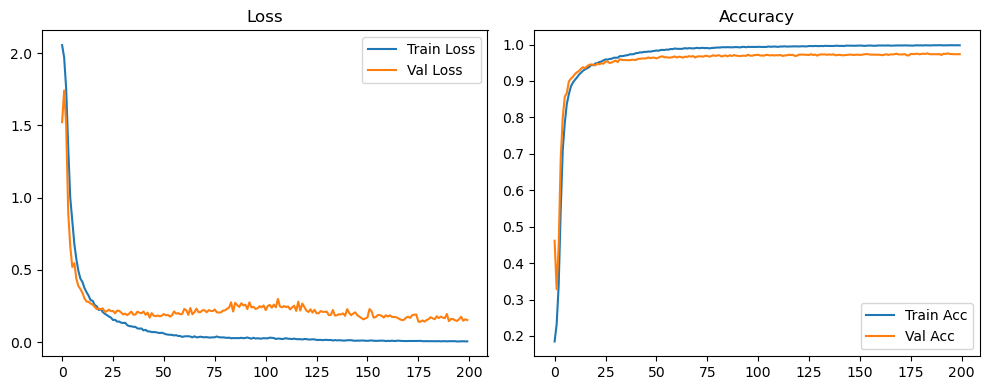

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 28.31it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 28.46it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 28.22it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 28.58it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 28.62it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 28.85it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 28.77it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 28.92it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 28.75it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 28.91it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 28.90it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 29.02it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 29.03it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 29.40it/s]

Original Model Final Test Loss: 0.1416 Accuracy: 0.9761


🚀 Running: batch256_lr0.001_0.001_0.001_dp0.5


Training:   0%|          | 0/200 [00:00<?, ?it/s]

| LR: 0.001 | Train Acc: 0.1459 | Val Acc: 0.3003 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.001 | Train Acc: 0.1459 | Val Acc: 0.3003 |:   0%|          | 0/200 [00:09<?, ?it/s]

| LR: 0.001 | Train Acc: 0.1459 | Val Acc: 0.3003 |:   0%|          | 1/200 [00:09<30:49,  9.29s/it]

| LR: 0.001 | Train Acc: 0.1969 | Val Acc: 0.2971 |:   0%|          | 1/200 [00:18<30:49,  9.29s/it]

| LR: 0.001 | Train Acc: 0.1969 | Val Acc: 0.2971 |:   0%|          | 1/200 [00:18<30:49,  9.29s/it]

| LR: 0.001 | Train Acc: 0.1969 | Val Acc: 0.2971 |:   1%|          | 2/200 [00:18<30:20,  9.20s/it]

| LR: 0.001 | Train Acc: 0.2285 | Val Acc: 0.3388 |:   1%|          | 2/200 [00:27<30:20,  9.20s/it]

| LR: 0.001 | Train Acc: 0.2285 | Val Acc: 0.3388 |:   1%|          | 2/200 [00:27<30:20,  9.20s/it]

| LR: 0.001 | Train Acc: 0.2285 | Val Acc: 0.3388 |:   2%|▏         | 3/200 [00:27<29:36,  9.02s/it]

| LR: 0.001 | Train Acc: 0.3299 | Val Acc: 0.5022 |:   2%|▏         | 3/200 [00:35<29:36,  9.02s/it]

| LR: 0.001 | Train Acc: 0.3299 | Val Acc: 0.5022 |:   2%|▏         | 3/200 [00:35<29:36,  9.02s/it]

| LR: 0.001 | Train Acc: 0.3299 | Val Acc: 0.5022 |:   2%|▏         | 4/200 [00:36<29:10,  8.93s/it]

| LR: 0.001 | Train Acc: 0.5195 | Val Acc: 0.7092 |:   2%|▏         | 4/200 [00:45<29:10,  8.93s/it]

| LR: 0.001 | Train Acc: 0.5195 | Val Acc: 0.7092 |:   2%|▏         | 4/200 [00:45<29:10,  8.93s/it]

| LR: 0.001 | Train Acc: 0.5195 | Val Acc: 0.7092 |:   2%|▎         | 5/200 [00:45<29:13,  8.99s/it]

| LR: 0.001 | Train Acc: 0.6398 | Val Acc: 0.7980 |:   2%|▎         | 5/200 [00:53<29:13,  8.99s/it]

| LR: 0.001 | Train Acc: 0.6398 | Val Acc: 0.7980 |:   2%|▎         | 5/200 [00:53<29:13,  8.99s/it]

| LR: 0.001 | Train Acc: 0.6398 | Val Acc: 0.7980 |:   3%|▎         | 6/200 [00:53<28:49,  8.91s/it]

| LR: 0.001 | Train Acc: 0.7147 | Val Acc: 0.8285 |:   3%|▎         | 6/200 [01:02<28:49,  8.91s/it]

| LR: 0.001 | Train Acc: 0.7147 | Val Acc: 0.8285 |:   3%|▎         | 6/200 [01:02<28:49,  8.91s/it]

| LR: 0.001 | Train Acc: 0.7147 | Val Acc: 0.8285 |:   4%|▎         | 7/200 [01:02<28:30,  8.86s/it]

| LR: 0.001 | Train Acc: 0.7608 | Val Acc: 0.8472 |:   4%|▎         | 7/200 [01:11<28:30,  8.86s/it]

| LR: 0.001 | Train Acc: 0.7608 | Val Acc: 0.8472 |:   4%|▎         | 7/200 [01:11<28:30,  8.86s/it]

| LR: 0.001 | Train Acc: 0.7608 | Val Acc: 0.8472 |:   4%|▍         | 8/200 [01:11<28:16,  8.84s/it]

| LR: 0.001 | Train Acc: 0.7973 | Val Acc: 0.8772 |:   4%|▍         | 8/200 [01:20<28:16,  8.84s/it]

| LR: 0.001 | Train Acc: 0.7973 | Val Acc: 0.8772 |:   4%|▍         | 8/200 [01:20<28:16,  8.84s/it]

| LR: 0.001 | Train Acc: 0.7973 | Val Acc: 0.8772 |:   4%|▍         | 9/200 [01:20<28:08,  8.84s/it]

| LR: 0.001 | Train Acc: 0.8204 | Val Acc: 0.8838 |:   4%|▍         | 9/200 [01:29<28:08,  8.84s/it]

| LR: 0.001 | Train Acc: 0.8204 | Val Acc: 0.8838 |:   4%|▍         | 9/200 [01:29<28:08,  8.84s/it]

| LR: 0.001 | Train Acc: 0.8204 | Val Acc: 0.8838 |:   5%|▌         | 10/200 [01:29<27:55,  8.82s/it]

| LR: 0.001 | Train Acc: 0.8384 | Val Acc: 0.8958 |:   5%|▌         | 10/200 [01:37<27:55,  8.82s/it]

| LR: 0.001 | Train Acc: 0.8384 | Val Acc: 0.8958 |:   5%|▌         | 10/200 [01:37<27:55,  8.82s/it]

| LR: 0.001 | Train Acc: 0.8384 | Val Acc: 0.8958 |:   6%|▌         | 11/200 [01:37<27:52,  8.85s/it]

| LR: 0.001 | Train Acc: 0.8576 | Val Acc: 0.9073 |:   6%|▌         | 11/200 [01:46<27:52,  8.85s/it]

| LR: 0.001 | Train Acc: 0.8576 | Val Acc: 0.9073 |:   6%|▌         | 11/200 [01:46<27:52,  8.85s/it]

| LR: 0.001 | Train Acc: 0.8576 | Val Acc: 0.9073 |:   6%|▌         | 12/200 [01:46<27:41,  8.84s/it]

| LR: 0.001 | Train Acc: 0.8675 | Val Acc: 0.9137 |:   6%|▌         | 12/200 [01:55<27:41,  8.84s/it]

| LR: 0.001 | Train Acc: 0.8675 | Val Acc: 0.9137 |:   6%|▌         | 12/200 [01:55<27:41,  8.84s/it]

| LR: 0.001 | Train Acc: 0.8675 | Val Acc: 0.9137 |:   6%|▋         | 13/200 [01:55<27:32,  8.84s/it]

| LR: 0.001 | Train Acc: 0.8758 | Val Acc: 0.9197 |:   6%|▋         | 13/200 [02:04<27:32,  8.84s/it]

| LR: 0.001 | Train Acc: 0.8758 | Val Acc: 0.9197 |:   6%|▋         | 13/200 [02:04<27:32,  8.84s/it]

| LR: 0.001 | Train Acc: 0.8758 | Val Acc: 0.9197 |:   7%|▋         | 14/200 [02:04<27:23,  8.83s/it]

| LR: 0.001 | Train Acc: 0.8871 | Val Acc: 0.9288 |:   7%|▋         | 14/200 [02:13<27:23,  8.83s/it]

| LR: 0.001 | Train Acc: 0.8871 | Val Acc: 0.9288 |:   7%|▋         | 14/200 [02:13<27:23,  8.83s/it]

| LR: 0.001 | Train Acc: 0.8871 | Val Acc: 0.9288 |:   8%|▊         | 15/200 [02:13<27:20,  8.86s/it]

| LR: 0.001 | Train Acc: 0.8932 | Val Acc: 0.9310 |:   8%|▊         | 15/200 [02:22<27:20,  8.86s/it]

| LR: 0.001 | Train Acc: 0.8932 | Val Acc: 0.9310 |:   8%|▊         | 15/200 [02:22<27:20,  8.86s/it]

| LR: 0.001 | Train Acc: 0.8932 | Val Acc: 0.9310 |:   8%|▊         | 16/200 [02:22<27:13,  8.88s/it]

| LR: 0.001 | Train Acc: 0.8968 | Val Acc: 0.9282 |:   8%|▊         | 16/200 [02:31<27:13,  8.88s/it]

| LR: 0.001 | Train Acc: 0.8968 | Val Acc: 0.9282 |:   8%|▊         | 16/200 [02:31<27:13,  8.88s/it]

| LR: 0.001 | Train Acc: 0.8968 | Val Acc: 0.9282 |:   8%|▊         | 17/200 [02:31<27:01,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9047 | Val Acc: 0.9348 |:   8%|▊         | 17/200 [02:39<27:01,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9047 | Val Acc: 0.9348 |:   8%|▊         | 17/200 [02:39<27:01,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9047 | Val Acc: 0.9348 |:   9%|▉         | 18/200 [02:39<26:53,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9069 | Val Acc: 0.9310 |:   9%|▉         | 18/200 [02:48<26:53,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9069 | Val Acc: 0.9310 |:   9%|▉         | 18/200 [02:48<26:53,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9069 | Val Acc: 0.9310 |:  10%|▉         | 19/200 [02:48<26:38,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9100 | Val Acc: 0.9366 |:  10%|▉         | 19/200 [02:57<26:38,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9100 | Val Acc: 0.9366 |:  10%|▉         | 19/200 [02:57<26:38,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9100 | Val Acc: 0.9366 |:  10%|█         | 20/200 [02:57<26:33,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9110 | Val Acc: 0.9409 |:  10%|█         | 20/200 [03:06<26:33,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9110 | Val Acc: 0.9409 |:  10%|█         | 20/200 [03:06<26:33,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9110 | Val Acc: 0.9409 |:  10%|█         | 21/200 [03:06<26:48,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9174 | Val Acc: 0.9376 |:  10%|█         | 21/200 [03:15<26:48,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9174 | Val Acc: 0.9376 |:  10%|█         | 21/200 [03:15<26:48,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9174 | Val Acc: 0.9376 |:  11%|█         | 22/200 [03:15<26:36,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9214 | Val Acc: 0.9411 |:  11%|█         | 22/200 [03:24<26:36,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9214 | Val Acc: 0.9411 |:  11%|█         | 22/200 [03:24<26:36,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9214 | Val Acc: 0.9411 |:  12%|█▏        | 23/200 [03:24<26:22,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9238 | Val Acc: 0.9435 |:  12%|█▏        | 23/200 [03:33<26:22,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9238 | Val Acc: 0.9435 |:  12%|█▏        | 23/200 [03:33<26:22,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9238 | Val Acc: 0.9435 |:  12%|█▏        | 24/200 [03:33<26:09,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9250 | Val Acc: 0.9433 |:  12%|█▏        | 24/200 [03:42<26:09,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9250 | Val Acc: 0.9433 |:  12%|█▏        | 24/200 [03:42<26:09,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9250 | Val Acc: 0.9433 |:  12%|█▎        | 25/200 [03:42<25:56,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9296 | Val Acc: 0.9483 |:  12%|█▎        | 25/200 [03:51<25:56,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9296 | Val Acc: 0.9483 |:  12%|█▎        | 25/200 [03:51<25:56,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9296 | Val Acc: 0.9483 |:  13%|█▎        | 26/200 [03:51<25:42,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9306 | Val Acc: 0.9468 |:  13%|█▎        | 26/200 [03:59<25:42,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9306 | Val Acc: 0.9468 |:  13%|█▎        | 26/200 [03:59<25:42,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9306 | Val Acc: 0.9468 |:  14%|█▎        | 27/200 [03:59<25:26,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9344 | Val Acc: 0.9437 |:  14%|█▎        | 27/200 [04:08<25:26,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9344 | Val Acc: 0.9437 |:  14%|█▎        | 27/200 [04:08<25:26,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9344 | Val Acc: 0.9437 |:  14%|█▍        | 28/200 [04:08<25:15,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9355 | Val Acc: 0.9447 |:  14%|█▍        | 28/200 [04:17<25:15,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9355 | Val Acc: 0.9447 |:  14%|█▍        | 28/200 [04:17<25:15,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9355 | Val Acc: 0.9447 |:  14%|█▍        | 29/200 [04:17<25:12,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9369 | Val Acc: 0.9466 |:  14%|█▍        | 29/200 [04:26<25:12,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9369 | Val Acc: 0.9466 |:  14%|█▍        | 29/200 [04:26<25:12,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9369 | Val Acc: 0.9466 |:  15%|█▌        | 30/200 [04:26<25:07,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9398 | Val Acc: 0.9532 |:  15%|█▌        | 30/200 [04:35<25:07,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9398 | Val Acc: 0.9532 |:  15%|█▌        | 30/200 [04:35<25:07,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9398 | Val Acc: 0.9532 |:  16%|█▌        | 31/200 [04:35<24:58,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9434 | Val Acc: 0.9549 |:  16%|█▌        | 31/200 [04:44<24:58,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9434 | Val Acc: 0.9549 |:  16%|█▌        | 31/200 [04:44<24:58,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9434 | Val Acc: 0.9549 |:  16%|█▌        | 32/200 [04:44<24:49,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9426 | Val Acc: 0.9532 |:  16%|█▌        | 32/200 [04:53<24:49,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9426 | Val Acc: 0.9532 |:  16%|█▌        | 32/200 [04:53<24:49,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9426 | Val Acc: 0.9532 |:  16%|█▋        | 33/200 [04:53<24:51,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9456 | Val Acc: 0.9523 |:  16%|█▋        | 33/200 [05:02<24:51,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9456 | Val Acc: 0.9523 |:  16%|█▋        | 33/200 [05:02<24:51,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9456 | Val Acc: 0.9523 |:  17%|█▋        | 34/200 [05:02<24:38,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9474 | Val Acc: 0.9516 |:  17%|█▋        | 34/200 [05:11<24:38,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9474 | Val Acc: 0.9516 |:  17%|█▋        | 34/200 [05:11<24:38,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9474 | Val Acc: 0.9516 |:  18%|█▊        | 35/200 [05:11<24:24,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9475 | Val Acc: 0.9508 |:  18%|█▊        | 35/200 [05:19<24:24,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9475 | Val Acc: 0.9508 |:  18%|█▊        | 35/200 [05:19<24:24,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9475 | Val Acc: 0.9508 |:  18%|█▊        | 36/200 [05:19<24:16,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9495 | Val Acc: 0.9544 |:  18%|█▊        | 36/200 [05:28<24:16,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9495 | Val Acc: 0.9544 |:  18%|█▊        | 36/200 [05:28<24:16,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9495 | Val Acc: 0.9544 |:  18%|█▊        | 37/200 [05:28<23:59,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9533 | Val Acc: 0.9553 |:  18%|█▊        | 37/200 [05:37<23:59,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9533 | Val Acc: 0.9553 |:  18%|█▊        | 37/200 [05:37<23:59,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9533 | Val Acc: 0.9553 |:  19%|█▉        | 38/200 [05:37<23:47,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9540 | Val Acc: 0.9585 |:  19%|█▉        | 38/200 [05:46<23:47,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9540 | Val Acc: 0.9585 |:  19%|█▉        | 38/200 [05:46<23:47,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9540 | Val Acc: 0.9585 |:  20%|█▉        | 39/200 [05:47<24:16,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9562 | Val Acc: 0.9609 |:  20%|█▉        | 39/200 [05:55<24:16,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9562 | Val Acc: 0.9609 |:  20%|█▉        | 39/200 [05:55<24:16,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9562 | Val Acc: 0.9609 |:  20%|██        | 40/200 [05:55<24:02,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9573 | Val Acc: 0.9581 |:  20%|██        | 40/200 [06:05<24:02,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9573 | Val Acc: 0.9581 |:  20%|██        | 40/200 [06:05<24:02,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9573 | Val Acc: 0.9581 |:  20%|██        | 41/200 [06:05<24:00,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9566 | Val Acc: 0.9589 |:  20%|██        | 41/200 [06:13<24:00,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9566 | Val Acc: 0.9589 |:  20%|██        | 41/200 [06:13<24:00,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9566 | Val Acc: 0.9589 |:  21%|██        | 42/200 [06:13<23:42,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9595 | Val Acc: 0.9632 |:  21%|██        | 42/200 [06:22<23:42,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9595 | Val Acc: 0.9632 |:  21%|██        | 42/200 [06:22<23:42,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9595 | Val Acc: 0.9632 |:  22%|██▏       | 43/200 [06:22<23:33,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9621 | Val Acc: 0.9623 |:  22%|██▏       | 43/200 [06:32<23:33,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9621 | Val Acc: 0.9623 |:  22%|██▏       | 43/200 [06:32<23:33,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9621 | Val Acc: 0.9623 |:  22%|██▏       | 44/200 [06:32<23:33,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9621 | Val Acc: 0.9624 |:  22%|██▏       | 44/200 [06:40<23:33,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9621 | Val Acc: 0.9624 |:  22%|██▏       | 44/200 [06:40<23:33,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9621 | Val Acc: 0.9624 |:  22%|██▎       | 45/200 [06:41<23:14,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9636 | Val Acc: 0.9642 |:  22%|██▎       | 45/200 [06:49<23:14,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9636 | Val Acc: 0.9642 |:  22%|██▎       | 45/200 [06:49<23:14,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9636 | Val Acc: 0.9642 |:  23%|██▎       | 46/200 [06:49<22:57,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9638 | Val Acc: 0.9644 |:  23%|██▎       | 46/200 [06:58<22:57,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9638 | Val Acc: 0.9644 |:  23%|██▎       | 46/200 [06:58<22:57,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9638 | Val Acc: 0.9644 |:  24%|██▎       | 47/200 [06:58<22:39,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9642 | Val Acc: 0.9627 |:  24%|██▎       | 47/200 [07:07<22:39,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9642 | Val Acc: 0.9627 |:  24%|██▎       | 47/200 [07:07<22:39,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9642 | Val Acc: 0.9627 |:  24%|██▍       | 48/200 [07:07<22:26,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9670 | Val Acc: 0.9616 |:  24%|██▍       | 48/200 [07:16<22:26,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9670 | Val Acc: 0.9616 |:  24%|██▍       | 48/200 [07:16<22:26,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9670 | Val Acc: 0.9616 |:  24%|██▍       | 49/200 [07:16<22:17,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9684 | Val Acc: 0.9633 |:  24%|██▍       | 49/200 [07:25<22:17,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9684 | Val Acc: 0.9633 |:  24%|██▍       | 49/200 [07:25<22:17,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9684 | Val Acc: 0.9633 |:  25%|██▌       | 50/200 [07:25<22:07,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9683 | Val Acc: 0.9665 |:  25%|██▌       | 50/200 [07:33<22:07,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9683 | Val Acc: 0.9665 |:  25%|██▌       | 50/200 [07:33<22:07,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9683 | Val Acc: 0.9665 |:  26%|██▌       | 51/200 [07:33<21:51,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9684 | Val Acc: 0.9665 |:  26%|██▌       | 51/200 [07:42<21:51,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9684 | Val Acc: 0.9665 |:  26%|██▌       | 51/200 [07:42<21:51,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9684 | Val Acc: 0.9665 |:  26%|██▌       | 52/200 [07:42<21:41,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9699 | Val Acc: 0.9670 |:  26%|██▌       | 52/200 [07:51<21:41,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9699 | Val Acc: 0.9670 |:  26%|██▌       | 52/200 [07:51<21:41,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9699 | Val Acc: 0.9670 |:  26%|██▋       | 53/200 [07:51<21:33,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9710 | Val Acc: 0.9660 |:  26%|██▋       | 53/200 [08:00<21:33,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9710 | Val Acc: 0.9660 |:  26%|██▋       | 53/200 [08:00<21:33,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9710 | Val Acc: 0.9660 |:  27%|██▋       | 54/200 [08:00<21:23,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9705 | Val Acc: 0.9656 |:  27%|██▋       | 54/200 [08:08<21:23,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9705 | Val Acc: 0.9656 |:  27%|██▋       | 54/200 [08:08<21:23,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9705 | Val Acc: 0.9656 |:  28%|██▊       | 55/200 [08:08<21:15,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9715 | Val Acc: 0.9676 |:  28%|██▊       | 55/200 [08:17<21:15,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9715 | Val Acc: 0.9676 |:  28%|██▊       | 55/200 [08:17<21:15,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9715 | Val Acc: 0.9676 |:  28%|██▊       | 56/200 [08:17<20:56,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9700 | Val Acc: 0.9653 |:  28%|██▊       | 56/200 [08:26<20:56,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9700 | Val Acc: 0.9653 |:  28%|██▊       | 56/200 [08:26<20:56,  8.73s/it]

| LR: 0.001 | Train Acc: 0.9700 | Val Acc: 0.9653 |:  28%|██▊       | 57/200 [08:26<20:40,  8.68s/it]

| LR: 0.001 | Train Acc: 0.9710 | Val Acc: 0.9670 |:  28%|██▊       | 57/200 [08:34<20:40,  8.68s/it]

| LR: 0.001 | Train Acc: 0.9710 | Val Acc: 0.9670 |:  28%|██▊       | 57/200 [08:34<20:40,  8.68s/it]

| LR: 0.001 | Train Acc: 0.9710 | Val Acc: 0.9670 |:  29%|██▉       | 58/200 [08:34<20:35,  8.70s/it]

| LR: 0.001 | Train Acc: 0.9723 | Val Acc: 0.9682 |:  29%|██▉       | 58/200 [08:43<20:35,  8.70s/it]

| LR: 0.001 | Train Acc: 0.9723 | Val Acc: 0.9682 |:  29%|██▉       | 58/200 [08:43<20:35,  8.70s/it]

| LR: 0.001 | Train Acc: 0.9723 | Val Acc: 0.9682 |:  30%|██▉       | 59/200 [08:43<20:38,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9705 | Val Acc: 0.9685 |:  30%|██▉       | 59/200 [08:52<20:38,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9705 | Val Acc: 0.9685 |:  30%|██▉       | 59/200 [08:52<20:38,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9705 | Val Acc: 0.9685 |:  30%|███       | 60/200 [08:52<20:32,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9707 | Val Acc: 0.9692 |:  30%|███       | 60/200 [09:01<20:32,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9707 | Val Acc: 0.9692 |:  30%|███       | 60/200 [09:01<20:32,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9707 | Val Acc: 0.9692 |:  30%|███       | 61/200 [09:01<20:27,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9724 | Val Acc: 0.9670 |:  30%|███       | 61/200 [09:10<20:27,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9724 | Val Acc: 0.9670 |:  30%|███       | 61/200 [09:10<20:27,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9724 | Val Acc: 0.9670 |:  31%|███       | 62/200 [09:10<20:23,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9717 | Val Acc: 0.9694 |:  31%|███       | 62/200 [09:19<20:23,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9717 | Val Acc: 0.9694 |:  31%|███       | 62/200 [09:19<20:23,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9717 | Val Acc: 0.9694 |:  32%|███▏      | 63/200 [09:19<20:17,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9718 | Val Acc: 0.9663 |:  32%|███▏      | 63/200 [09:28<20:17,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9718 | Val Acc: 0.9663 |:  32%|███▏      | 63/200 [09:28<20:17,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9718 | Val Acc: 0.9663 |:  32%|███▏      | 64/200 [09:28<20:05,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9735 | Val Acc: 0.9695 |:  32%|███▏      | 64/200 [09:37<20:05,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9735 | Val Acc: 0.9695 |:  32%|███▏      | 64/200 [09:37<20:05,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9735 | Val Acc: 0.9695 |:  32%|███▎      | 65/200 [09:37<19:54,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9738 | Val Acc: 0.9668 |:  32%|███▎      | 65/200 [09:45<19:54,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9738 | Val Acc: 0.9668 |:  32%|███▎      | 65/200 [09:45<19:54,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9738 | Val Acc: 0.9668 |:  33%|███▎      | 66/200 [09:45<19:41,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9742 | Val Acc: 0.9678 |:  33%|███▎      | 66/200 [09:54<19:41,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9742 | Val Acc: 0.9678 |:  33%|███▎      | 66/200 [09:54<19:41,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9742 | Val Acc: 0.9678 |:  34%|███▎      | 67/200 [09:54<19:35,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9744 | Val Acc: 0.9673 |:  34%|███▎      | 67/200 [10:03<19:35,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9744 | Val Acc: 0.9673 |:  34%|███▎      | 67/200 [10:03<19:35,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9744 | Val Acc: 0.9673 |:  34%|███▍      | 68/200 [10:03<19:27,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9731 | Val Acc: 0.9699 |:  34%|███▍      | 68/200 [10:12<19:27,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9731 | Val Acc: 0.9699 |:  34%|███▍      | 68/200 [10:12<19:27,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9731 | Val Acc: 0.9699 |:  34%|███▍      | 69/200 [10:12<19:20,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9761 | Val Acc: 0.9702 |:  34%|███▍      | 69/200 [10:21<19:20,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9761 | Val Acc: 0.9702 |:  34%|███▍      | 69/200 [10:21<19:20,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9761 | Val Acc: 0.9702 |:  35%|███▌      | 70/200 [10:21<19:10,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9743 | Val Acc: 0.9716 |:  35%|███▌      | 70/200 [10:30<19:10,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9743 | Val Acc: 0.9716 |:  35%|███▌      | 70/200 [10:30<19:10,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9743 | Val Acc: 0.9716 |:  36%|███▌      | 71/200 [10:30<19:01,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9754 | Val Acc: 0.9679 |:  36%|███▌      | 71/200 [10:38<19:01,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9754 | Val Acc: 0.9679 |:  36%|███▌      | 71/200 [10:38<19:01,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9754 | Val Acc: 0.9679 |:  36%|███▌      | 72/200 [10:38<18:49,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9758 | Val Acc: 0.9703 |:  36%|███▌      | 72/200 [10:47<18:49,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9758 | Val Acc: 0.9703 |:  36%|███▌      | 72/200 [10:47<18:49,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9758 | Val Acc: 0.9703 |:  36%|███▋      | 73/200 [10:47<18:40,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9768 | Val Acc: 0.9692 |:  36%|███▋      | 73/200 [10:56<18:40,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9768 | Val Acc: 0.9692 |:  36%|███▋      | 73/200 [10:56<18:40,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9768 | Val Acc: 0.9692 |:  37%|███▋      | 74/200 [10:56<18:38,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9765 | Val Acc: 0.9677 |:  37%|███▋      | 74/200 [11:05<18:38,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9765 | Val Acc: 0.9677 |:  37%|███▋      | 74/200 [11:05<18:38,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9765 | Val Acc: 0.9677 |:  38%|███▊      | 75/200 [11:05<18:35,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9773 | Val Acc: 0.9684 |:  38%|███▊      | 75/200 [11:14<18:35,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9773 | Val Acc: 0.9684 |:  38%|███▊      | 75/200 [11:14<18:35,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9773 | Val Acc: 0.9684 |:  38%|███▊      | 76/200 [11:14<18:20,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9787 | Val Acc: 0.9711 |:  38%|███▊      | 76/200 [11:23<18:20,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9787 | Val Acc: 0.9711 |:  38%|███▊      | 76/200 [11:23<18:20,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9787 | Val Acc: 0.9711 |:  38%|███▊      | 77/200 [11:23<18:14,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9779 | Val Acc: 0.9698 |:  38%|███▊      | 77/200 [11:32<18:14,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9779 | Val Acc: 0.9698 |:  38%|███▊      | 77/200 [11:32<18:14,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9779 | Val Acc: 0.9698 |:  39%|███▉      | 78/200 [11:32<18:04,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9782 | Val Acc: 0.9712 |:  39%|███▉      | 78/200 [11:41<18:04,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9782 | Val Acc: 0.9712 |:  39%|███▉      | 78/200 [11:41<18:04,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9782 | Val Acc: 0.9712 |:  40%|███▉      | 79/200 [11:41<17:58,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9771 | Val Acc: 0.9699 |:  40%|███▉      | 79/200 [11:50<17:58,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9771 | Val Acc: 0.9699 |:  40%|███▉      | 79/200 [11:50<17:58,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9771 | Val Acc: 0.9699 |:  40%|████      | 80/200 [11:50<17:47,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9778 | Val Acc: 0.9717 |:  40%|████      | 80/200 [11:58<17:47,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9778 | Val Acc: 0.9717 |:  40%|████      | 80/200 [11:58<17:47,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9778 | Val Acc: 0.9717 |:  40%|████      | 81/200 [11:58<17:33,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9779 | Val Acc: 0.9709 |:  40%|████      | 81/200 [12:07<17:33,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9779 | Val Acc: 0.9709 |:  40%|████      | 81/200 [12:07<17:33,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9779 | Val Acc: 0.9709 |:  41%|████      | 82/200 [12:07<17:25,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9770 | Val Acc: 0.9712 |:  41%|████      | 82/200 [12:16<17:25,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9770 | Val Acc: 0.9712 |:  41%|████      | 82/200 [12:16<17:25,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9770 | Val Acc: 0.9712 |:  42%|████▏     | 83/200 [12:16<17:18,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9781 | Val Acc: 0.9722 |:  42%|████▏     | 83/200 [12:25<17:18,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9781 | Val Acc: 0.9722 |:  42%|████▏     | 83/200 [12:25<17:18,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9781 | Val Acc: 0.9722 |:  42%|████▏     | 84/200 [12:25<17:13,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9783 | Val Acc: 0.9707 |:  42%|████▏     | 84/200 [12:34<17:13,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9783 | Val Acc: 0.9707 |:  42%|████▏     | 84/200 [12:34<17:13,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9783 | Val Acc: 0.9707 |:  42%|████▎     | 85/200 [12:34<17:03,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9787 | Val Acc: 0.9699 |:  42%|████▎     | 85/200 [12:43<17:03,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9787 | Val Acc: 0.9699 |:  42%|████▎     | 85/200 [12:43<17:03,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9787 | Val Acc: 0.9699 |:  43%|████▎     | 86/200 [12:43<16:50,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9786 | Val Acc: 0.9726 |:  43%|████▎     | 86/200 [12:52<16:50,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9786 | Val Acc: 0.9726 |:  43%|████▎     | 86/200 [12:52<16:50,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9786 | Val Acc: 0.9726 |:  44%|████▎     | 87/200 [12:52<16:50,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9790 | Val Acc: 0.9712 |:  44%|████▎     | 87/200 [13:01<16:50,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9790 | Val Acc: 0.9712 |:  44%|████▎     | 87/200 [13:01<16:50,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9790 | Val Acc: 0.9712 |:  44%|████▍     | 88/200 [13:01<16:59,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9797 | Val Acc: 0.9718 |:  44%|████▍     | 88/200 [13:10<16:59,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9797 | Val Acc: 0.9718 |:  44%|████▍     | 88/200 [13:10<16:59,  9.10s/it]

| LR: 0.001 | Train Acc: 0.9797 | Val Acc: 0.9718 |:  44%|████▍     | 89/200 [13:10<16:38,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9792 | Val Acc: 0.9712 |:  44%|████▍     | 89/200 [13:19<16:38,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9792 | Val Acc: 0.9712 |:  44%|████▍     | 89/200 [13:19<16:38,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9792 | Val Acc: 0.9712 |:  45%|████▌     | 90/200 [13:19<16:22,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9806 | Val Acc: 0.9693 |:  45%|████▌     | 90/200 [13:28<16:22,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9806 | Val Acc: 0.9693 |:  45%|████▌     | 90/200 [13:28<16:22,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9806 | Val Acc: 0.9693 |:  46%|████▌     | 91/200 [13:28<16:10,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9793 | Val Acc: 0.9705 |:  46%|████▌     | 91/200 [13:37<16:10,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9793 | Val Acc: 0.9705 |:  46%|████▌     | 91/200 [13:37<16:10,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9793 | Val Acc: 0.9705 |:  46%|████▌     | 92/200 [13:37<16:00,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9805 | Val Acc: 0.9703 |:  46%|████▌     | 92/200 [13:46<16:00,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9805 | Val Acc: 0.9703 |:  46%|████▌     | 92/200 [13:46<16:00,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9805 | Val Acc: 0.9703 |:  46%|████▋     | 93/200 [13:46<15:52,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9823 | Val Acc: 0.9718 |:  46%|████▋     | 93/200 [13:54<15:52,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9823 | Val Acc: 0.9718 |:  46%|████▋     | 93/200 [13:54<15:52,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9823 | Val Acc: 0.9718 |:  47%|████▋     | 94/200 [13:54<15:43,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9825 | Val Acc: 0.9705 |:  47%|████▋     | 94/200 [14:03<15:43,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9825 | Val Acc: 0.9705 |:  47%|████▋     | 94/200 [14:03<15:43,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9825 | Val Acc: 0.9705 |:  48%|████▊     | 95/200 [14:03<15:33,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9822 | Val Acc: 0.9715 |:  48%|████▊     | 95/200 [14:12<15:33,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9822 | Val Acc: 0.9715 |:  48%|████▊     | 95/200 [14:12<15:33,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9822 | Val Acc: 0.9715 |:  48%|████▊     | 96/200 [14:12<15:19,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9828 | Val Acc: 0.9721 |:  48%|████▊     | 96/200 [14:21<15:19,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9828 | Val Acc: 0.9721 |:  48%|████▊     | 96/200 [14:21<15:19,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9828 | Val Acc: 0.9721 |:  48%|████▊     | 97/200 [14:21<15:15,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9837 | Val Acc: 0.9707 |:  48%|████▊     | 97/200 [14:30<15:15,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9837 | Val Acc: 0.9707 |:  48%|████▊     | 97/200 [14:30<15:15,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9837 | Val Acc: 0.9707 |:  49%|████▉     | 98/200 [14:30<15:08,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9832 | Val Acc: 0.9717 |:  49%|████▉     | 98/200 [14:39<15:08,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9832 | Val Acc: 0.9717 |:  49%|████▉     | 98/200 [14:39<15:08,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9832 | Val Acc: 0.9717 |:  50%|████▉     | 99/200 [14:39<14:59,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9705 |:  50%|████▉     | 99/200 [14:48<14:59,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9705 |:  50%|████▉     | 99/200 [14:48<14:59,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9705 |:  50%|█████     | 100/200 [14:48<15:07,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9706 |:  50%|█████     | 100/200 [14:58<15:07,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9706 |:  50%|█████     | 100/200 [14:58<15:07,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9842 | Val Acc: 0.9706 |:  50%|█████     | 101/200 [14:58<15:04,  9.14s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9727 |:  50%|█████     | 101/200 [15:06<15:04,  9.14s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9727 |:  50%|█████     | 101/200 [15:06<15:04,  9.14s/it]

| LR: 0.001 | Train Acc: 0.9839 | Val Acc: 0.9727 |:  51%|█████     | 102/200 [15:06<14:44,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9731 |:  51%|█████     | 102/200 [15:16<14:44,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9731 |:  51%|█████     | 102/200 [15:16<14:44,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9844 | Val Acc: 0.9731 |:  52%|█████▏    | 103/200 [15:16<14:38,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9726 |:  52%|█████▏    | 103/200 [15:24<14:38,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9726 |:  52%|█████▏    | 103/200 [15:24<14:38,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9726 |:  52%|█████▏    | 104/200 [15:24<14:21,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9735 |:  52%|█████▏    | 104/200 [15:33<14:21,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9735 |:  52%|█████▏    | 104/200 [15:33<14:21,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9841 | Val Acc: 0.9735 |:  52%|█████▎    | 105/200 [15:33<14:06,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9716 |:  52%|█████▎    | 105/200 [15:42<14:06,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9716 |:  52%|█████▎    | 105/200 [15:42<14:06,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9716 |:  53%|█████▎    | 106/200 [15:42<13:54,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9718 |:  53%|█████▎    | 106/200 [15:51<13:54,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9718 |:  53%|█████▎    | 106/200 [15:51<13:54,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9851 | Val Acc: 0.9718 |:  54%|█████▎    | 107/200 [15:51<13:57,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9723 |:  54%|█████▎    | 107/200 [16:00<13:57,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9723 |:  54%|█████▎    | 107/200 [16:00<13:57,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9723 |:  54%|█████▍    | 108/200 [16:00<13:45,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9870 | Val Acc: 0.9717 |:  54%|█████▍    | 108/200 [16:09<13:45,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9870 | Val Acc: 0.9717 |:  54%|█████▍    | 108/200 [16:09<13:45,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9870 | Val Acc: 0.9717 |:  55%|█████▍    | 109/200 [16:09<13:35,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9865 | Val Acc: 0.9704 |:  55%|█████▍    | 109/200 [16:18<13:35,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9865 | Val Acc: 0.9704 |:  55%|█████▍    | 109/200 [16:18<13:35,  8.96s/it]

| LR: 0.001 | Train Acc: 0.9865 | Val Acc: 0.9704 |:  55%|█████▌    | 110/200 [16:18<13:24,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9857 | Val Acc: 0.9728 |:  55%|█████▌    | 110/200 [16:27<13:24,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9857 | Val Acc: 0.9728 |:  55%|█████▌    | 110/200 [16:27<13:24,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9857 | Val Acc: 0.9728 |:  56%|█████▌    | 111/200 [16:27<13:13,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9865 | Val Acc: 0.9730 |:  56%|█████▌    | 111/200 [16:36<13:13,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9865 | Val Acc: 0.9730 |:  56%|█████▌    | 111/200 [16:36<13:13,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9865 | Val Acc: 0.9730 |:  56%|█████▌    | 112/200 [16:36<13:03,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9858 | Val Acc: 0.9738 |:  56%|█████▌    | 112/200 [16:45<13:03,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9858 | Val Acc: 0.9738 |:  56%|█████▌    | 112/200 [16:45<13:03,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9858 | Val Acc: 0.9738 |:  56%|█████▋    | 113/200 [16:45<12:54,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9859 | Val Acc: 0.9716 |:  56%|█████▋    | 113/200 [16:54<12:54,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9859 | Val Acc: 0.9716 |:  56%|█████▋    | 113/200 [16:54<12:54,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9859 | Val Acc: 0.9716 |:  57%|█████▋    | 114/200 [16:54<12:49,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9748 |:  57%|█████▋    | 114/200 [17:03<12:49,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9748 |:  57%|█████▋    | 114/200 [17:03<12:49,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9872 | Val Acc: 0.9748 |:  57%|█████▊    | 115/200 [17:04<13:05,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9741 |:  57%|█████▊    | 115/200 [17:13<13:05,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9741 |:  57%|█████▊    | 115/200 [17:13<13:05,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9741 |:  58%|█████▊    | 116/200 [17:14<13:14,  9.46s/it]

| LR: 0.001 | Train Acc: 0.9878 | Val Acc: 0.9733 |:  58%|█████▊    | 116/200 [17:23<13:14,  9.46s/it]

| LR: 0.001 | Train Acc: 0.9878 | Val Acc: 0.9733 |:  58%|█████▊    | 116/200 [17:23<13:14,  9.46s/it]

| LR: 0.001 | Train Acc: 0.9878 | Val Acc: 0.9733 |:  58%|█████▊    | 117/200 [17:23<13:10,  9.52s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9725 |:  58%|█████▊    | 117/200 [17:32<13:10,  9.52s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9725 |:  58%|█████▊    | 117/200 [17:32<13:10,  9.52s/it]

| LR: 0.001 | Train Acc: 0.9862 | Val Acc: 0.9725 |:  59%|█████▉    | 118/200 [17:32<12:43,  9.31s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9742 |:  59%|█████▉    | 118/200 [17:41<12:43,  9.31s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9742 |:  59%|█████▉    | 118/200 [17:41<12:43,  9.31s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9742 |:  60%|█████▉    | 119/200 [17:41<12:33,  9.31s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9721 |:  60%|█████▉    | 119/200 [17:50<12:33,  9.31s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9721 |:  60%|█████▉    | 119/200 [17:50<12:33,  9.31s/it]

| LR: 0.001 | Train Acc: 0.9873 | Val Acc: 0.9721 |:  60%|██████    | 120/200 [17:50<12:15,  9.19s/it]

| LR: 0.001 | Train Acc: 0.9882 | Val Acc: 0.9742 |:  60%|██████    | 120/200 [17:59<12:15,  9.19s/it]

| LR: 0.001 | Train Acc: 0.9882 | Val Acc: 0.9742 |:  60%|██████    | 120/200 [17:59<12:15,  9.19s/it]

| LR: 0.001 | Train Acc: 0.9882 | Val Acc: 0.9742 |:  60%|██████    | 121/200 [17:59<11:54,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9869 | Val Acc: 0.9719 |:  60%|██████    | 121/200 [18:08<11:54,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9869 | Val Acc: 0.9719 |:  60%|██████    | 121/200 [18:08<11:54,  9.05s/it]

| LR: 0.001 | Train Acc: 0.9869 | Val Acc: 0.9719 |:  61%|██████    | 122/200 [18:08<11:41,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9877 | Val Acc: 0.9730 |:  61%|██████    | 122/200 [18:17<11:41,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9877 | Val Acc: 0.9730 |:  61%|██████    | 122/200 [18:17<11:41,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9877 | Val Acc: 0.9730 |:  62%|██████▏   | 123/200 [18:17<11:28,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9715 |:  62%|██████▏   | 123/200 [18:25<11:28,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9715 |:  62%|██████▏   | 123/200 [18:25<11:28,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9715 |:  62%|██████▏   | 124/200 [18:25<11:17,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9878 | Val Acc: 0.9743 |:  62%|██████▏   | 124/200 [18:34<11:17,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9878 | Val Acc: 0.9743 |:  62%|██████▏   | 124/200 [18:34<11:17,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9878 | Val Acc: 0.9743 |:  62%|██████▎   | 125/200 [18:34<11:05,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9884 | Val Acc: 0.9742 |:  62%|██████▎   | 125/200 [18:43<11:05,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9884 | Val Acc: 0.9742 |:  62%|██████▎   | 125/200 [18:43<11:05,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9884 | Val Acc: 0.9742 |:  63%|██████▎   | 126/200 [18:43<10:55,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9889 | Val Acc: 0.9745 |:  63%|██████▎   | 126/200 [18:52<10:55,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9889 | Val Acc: 0.9745 |:  63%|██████▎   | 126/200 [18:52<10:55,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9889 | Val Acc: 0.9745 |:  64%|██████▎   | 127/200 [18:52<10:45,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9731 |:  64%|██████▎   | 127/200 [19:01<10:45,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9731 |:  64%|██████▎   | 127/200 [19:01<10:45,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9876 | Val Acc: 0.9731 |:  64%|██████▍   | 128/200 [19:01<10:36,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9738 |:  64%|██████▍   | 128/200 [19:10<10:36,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9738 |:  64%|██████▍   | 128/200 [19:10<10:36,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9890 | Val Acc: 0.9738 |:  64%|██████▍   | 129/200 [19:10<10:30,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9894 | Val Acc: 0.9723 |:  64%|██████▍   | 129/200 [19:19<10:30,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9894 | Val Acc: 0.9723 |:  64%|██████▍   | 129/200 [19:19<10:30,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9894 | Val Acc: 0.9723 |:  65%|██████▌   | 130/200 [19:19<10:21,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9742 |:  65%|██████▌   | 130/200 [19:27<10:21,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9742 |:  65%|██████▌   | 130/200 [19:27<10:21,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9891 | Val Acc: 0.9742 |:  66%|██████▌   | 131/200 [19:27<10:10,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9888 | Val Acc: 0.9737 |:  66%|██████▌   | 131/200 [19:36<10:10,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9888 | Val Acc: 0.9737 |:  66%|██████▌   | 131/200 [19:36<10:10,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9888 | Val Acc: 0.9737 |:  66%|██████▌   | 132/200 [19:36<09:59,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9750 |:  66%|██████▌   | 132/200 [19:45<09:59,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9750 |:  66%|██████▌   | 132/200 [19:45<09:59,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9886 | Val Acc: 0.9750 |:  66%|██████▋   | 133/200 [19:45<09:50,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9887 | Val Acc: 0.9732 |:  66%|██████▋   | 133/200 [19:54<09:50,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9887 | Val Acc: 0.9732 |:  66%|██████▋   | 133/200 [19:54<09:50,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9887 | Val Acc: 0.9732 |:  67%|██████▋   | 134/200 [19:54<09:40,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9888 | Val Acc: 0.9728 |:  67%|██████▋   | 134/200 [20:03<09:40,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9888 | Val Acc: 0.9728 |:  67%|██████▋   | 134/200 [20:03<09:40,  8.79s/it]

| LR: 0.001 | Train Acc: 0.9888 | Val Acc: 0.9728 |:  68%|██████▊   | 135/200 [20:03<09:39,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9888 | Val Acc: 0.9727 |:  68%|██████▊   | 135/200 [20:12<09:39,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9888 | Val Acc: 0.9727 |:  68%|██████▊   | 135/200 [20:12<09:39,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9888 | Val Acc: 0.9727 |:  68%|██████▊   | 136/200 [20:12<09:35,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9732 |:  68%|██████▊   | 136/200 [20:21<09:35,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9732 |:  68%|██████▊   | 136/200 [20:21<09:35,  8.99s/it]

| LR: 0.001 | Train Acc: 0.9902 | Val Acc: 0.9732 |:  68%|██████▊   | 137/200 [20:21<09:23,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9893 | Val Acc: 0.9726 |:  68%|██████▊   | 137/200 [20:30<09:23,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9893 | Val Acc: 0.9726 |:  68%|██████▊   | 137/200 [20:30<09:23,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9893 | Val Acc: 0.9726 |:  69%|██████▉   | 138/200 [20:30<09:22,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9737 |:  69%|██████▉   | 138/200 [20:39<09:22,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9737 |:  69%|██████▉   | 138/200 [20:39<09:22,  9.07s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9737 |:  70%|██████▉   | 139/200 [20:39<09:09,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9746 |:  70%|██████▉   | 139/200 [20:48<09:09,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9746 |:  70%|██████▉   | 139/200 [20:48<09:09,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9896 | Val Acc: 0.9746 |:  70%|███████   | 140/200 [20:48<08:57,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9748 |:  70%|███████   | 140/200 [20:57<08:57,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9748 |:  70%|███████   | 140/200 [20:57<08:57,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9899 | Val Acc: 0.9748 |:  70%|███████   | 141/200 [20:57<08:45,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9914 | Val Acc: 0.9748 |:  70%|███████   | 141/200 [21:05<08:45,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9914 | Val Acc: 0.9748 |:  70%|███████   | 141/200 [21:05<08:45,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9914 | Val Acc: 0.9748 |:  71%|███████   | 142/200 [21:05<08:34,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9748 |:  71%|███████   | 142/200 [21:14<08:34,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9748 |:  71%|███████   | 142/200 [21:14<08:34,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9748 |:  72%|███████▏  | 143/200 [21:14<08:25,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9901 | Val Acc: 0.9752 |:  72%|███████▏  | 143/200 [21:23<08:25,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9901 | Val Acc: 0.9752 |:  72%|███████▏  | 143/200 [21:23<08:25,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9901 | Val Acc: 0.9752 |:  72%|███████▏  | 144/200 [21:23<08:16,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9910 | Val Acc: 0.9739 |:  72%|███████▏  | 144/200 [21:32<08:16,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9910 | Val Acc: 0.9739 |:  72%|███████▏  | 144/200 [21:32<08:16,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9910 | Val Acc: 0.9739 |:  72%|███████▎  | 145/200 [21:32<08:04,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9742 |:  72%|███████▎  | 145/200 [21:41<08:04,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9742 |:  72%|███████▎  | 145/200 [21:41<08:04,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9906 | Val Acc: 0.9742 |:  73%|███████▎  | 146/200 [21:41<07:57,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9744 |:  73%|███████▎  | 146/200 [21:50<07:57,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9744 |:  73%|███████▎  | 146/200 [21:50<07:57,  8.84s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9744 |:  74%|███████▎  | 147/200 [21:50<07:52,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9901 | Val Acc: 0.9738 |:  74%|███████▎  | 147/200 [21:59<07:52,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9901 | Val Acc: 0.9738 |:  74%|███████▎  | 147/200 [21:59<07:52,  8.92s/it]

| LR: 0.001 | Train Acc: 0.9901 | Val Acc: 0.9738 |:  74%|███████▍  | 148/200 [21:59<07:43,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9897 | Val Acc: 0.9742 |:  74%|███████▍  | 148/200 [22:08<07:43,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9897 | Val Acc: 0.9742 |:  74%|███████▍  | 148/200 [22:08<07:43,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9897 | Val Acc: 0.9742 |:  74%|███████▍  | 149/200 [22:08<07:32,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9747 |:  74%|███████▍  | 149/200 [22:16<07:32,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9747 |:  74%|███████▍  | 149/200 [22:16<07:32,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9909 | Val Acc: 0.9747 |:  75%|███████▌  | 150/200 [22:16<07:21,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9758 |:  75%|███████▌  | 150/200 [22:25<07:21,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9758 |:  75%|███████▌  | 150/200 [22:25<07:21,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9758 |:  76%|███████▌  | 151/200 [22:25<07:12,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9914 | Val Acc: 0.9746 |:  76%|███████▌  | 151/200 [22:34<07:12,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9914 | Val Acc: 0.9746 |:  76%|███████▌  | 151/200 [22:34<07:12,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9914 | Val Acc: 0.9746 |:  76%|███████▌  | 152/200 [22:34<07:02,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9764 |:  76%|███████▌  | 152/200 [22:43<07:02,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9764 |:  76%|███████▌  | 152/200 [22:43<07:02,  8.81s/it]

| LR: 0.001 | Train Acc: 0.9905 | Val Acc: 0.9764 |:  76%|███████▋  | 153/200 [22:43<06:53,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9741 |:  76%|███████▋  | 153/200 [22:52<06:53,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9741 |:  76%|███████▋  | 153/200 [22:52<06:53,  8.80s/it]

| LR: 0.001 | Train Acc: 0.9903 | Val Acc: 0.9741 |:  77%|███████▋  | 154/200 [22:52<06:49,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9907 | Val Acc: 0.9732 |:  77%|███████▋  | 154/200 [23:01<06:49,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9907 | Val Acc: 0.9732 |:  77%|███████▋  | 154/200 [23:01<06:49,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9907 | Val Acc: 0.9732 |:  78%|███████▊  | 155/200 [23:01<06:38,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9913 | Val Acc: 0.9751 |:  78%|███████▊  | 155/200 [23:09<06:38,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9913 | Val Acc: 0.9751 |:  78%|███████▊  | 155/200 [23:09<06:38,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9913 | Val Acc: 0.9751 |:  78%|███████▊  | 156/200 [23:09<06:29,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9756 |:  78%|███████▊  | 156/200 [23:18<06:29,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9756 |:  78%|███████▊  | 156/200 [23:18<06:29,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9756 |:  78%|███████▊  | 157/200 [23:18<06:22,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9913 | Val Acc: 0.9744 |:  78%|███████▊  | 157/200 [23:28<06:22,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9913 | Val Acc: 0.9744 |:  78%|███████▊  | 157/200 [23:28<06:22,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9913 | Val Acc: 0.9744 |:  79%|███████▉  | 158/200 [23:28<06:18,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9910 | Val Acc: 0.9742 |:  79%|███████▉  | 158/200 [23:36<06:18,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9910 | Val Acc: 0.9742 |:  79%|███████▉  | 158/200 [23:36<06:18,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9910 | Val Acc: 0.9742 |:  80%|███████▉  | 159/200 [23:36<06:05,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9921 | Val Acc: 0.9737 |:  80%|███████▉  | 159/200 [23:45<06:05,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9921 | Val Acc: 0.9737 |:  80%|███████▉  | 159/200 [23:45<06:05,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9921 | Val Acc: 0.9737 |:  80%|████████  | 160/200 [23:45<05:56,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9754 |:  80%|████████  | 160/200 [23:54<05:56,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9754 |:  80%|████████  | 160/200 [23:54<05:56,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9754 |:  80%|████████  | 161/200 [23:54<05:45,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9913 | Val Acc: 0.9750 |:  80%|████████  | 161/200 [24:03<05:45,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9913 | Val Acc: 0.9750 |:  80%|████████  | 161/200 [24:03<05:45,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9913 | Val Acc: 0.9750 |:  81%|████████  | 162/200 [24:03<05:37,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9737 |:  81%|████████  | 162/200 [24:13<05:37,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9737 |:  81%|████████  | 162/200 [24:13<05:37,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9737 |:  82%|████████▏ | 163/200 [24:13<05:39,  9.18s/it]

| LR: 0.001 | Train Acc: 0.9916 | Val Acc: 0.9747 |:  82%|████████▏ | 163/200 [24:22<05:39,  9.18s/it]

| LR: 0.001 | Train Acc: 0.9916 | Val Acc: 0.9747 |:  82%|████████▏ | 163/200 [24:22<05:39,  9.18s/it]

| LR: 0.001 | Train Acc: 0.9916 | Val Acc: 0.9747 |:  82%|████████▏ | 164/200 [24:22<05:28,  9.12s/it]

| LR: 0.001 | Train Acc: 0.9922 | Val Acc: 0.9746 |:  82%|████████▏ | 164/200 [24:31<05:28,  9.12s/it]

| LR: 0.001 | Train Acc: 0.9922 | Val Acc: 0.9746 |:  82%|████████▏ | 164/200 [24:31<05:28,  9.12s/it]

| LR: 0.001 | Train Acc: 0.9922 | Val Acc: 0.9746 |:  82%|████████▎ | 165/200 [24:31<05:17,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9772 |:  82%|████████▎ | 165/200 [24:40<05:17,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9772 |:  82%|████████▎ | 165/200 [24:40<05:17,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9772 |:  83%|████████▎ | 166/200 [24:40<05:14,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9922 | Val Acc: 0.9761 |:  83%|████████▎ | 166/200 [24:49<05:14,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9922 | Val Acc: 0.9761 |:  83%|████████▎ | 166/200 [24:49<05:14,  9.24s/it]

| LR: 0.001 | Train Acc: 0.9922 | Val Acc: 0.9761 |:  84%|████████▎ | 167/200 [24:49<05:01,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9745 |:  84%|████████▎ | 167/200 [24:58<05:01,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9745 |:  84%|████████▎ | 167/200 [24:58<05:01,  9.13s/it]

| LR: 0.001 | Train Acc: 0.9912 | Val Acc: 0.9745 |:  84%|████████▍ | 168/200 [24:58<04:48,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9916 | Val Acc: 0.9759 |:  84%|████████▍ | 168/200 [25:07<04:48,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9916 | Val Acc: 0.9759 |:  84%|████████▍ | 168/200 [25:07<04:48,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9916 | Val Acc: 0.9759 |:  84%|████████▍ | 169/200 [25:07<04:38,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9929 | Val Acc: 0.9756 |:  84%|████████▍ | 169/200 [25:16<04:38,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9929 | Val Acc: 0.9756 |:  84%|████████▍ | 169/200 [25:16<04:38,  8.97s/it]

| LR: 0.001 | Train Acc: 0.9929 | Val Acc: 0.9756 |:  85%|████████▌ | 170/200 [25:16<04:30,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9916 | Val Acc: 0.9747 |:  85%|████████▌ | 170/200 [25:25<04:30,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9916 | Val Acc: 0.9747 |:  85%|████████▌ | 170/200 [25:25<04:30,  9.01s/it]

| LR: 0.001 | Train Acc: 0.9916 | Val Acc: 0.9747 |:  86%|████████▌ | 171/200 [25:25<04:21,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9745 |:  86%|████████▌ | 171/200 [25:34<04:21,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9745 |:  86%|████████▌ | 171/200 [25:34<04:21,  9.00s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9745 |:  86%|████████▌ | 172/200 [25:34<04:10,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9922 | Val Acc: 0.9764 |:  86%|████████▌ | 172/200 [25:43<04:10,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9922 | Val Acc: 0.9764 |:  86%|████████▌ | 172/200 [25:43<04:10,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9922 | Val Acc: 0.9764 |:  86%|████████▋ | 173/200 [25:43<04:01,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9918 | Val Acc: 0.9748 |:  86%|████████▋ | 173/200 [25:51<04:01,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9918 | Val Acc: 0.9748 |:  86%|████████▋ | 173/200 [25:51<04:01,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9918 | Val Acc: 0.9748 |:  87%|████████▋ | 174/200 [25:51<03:50,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9756 |:  87%|████████▋ | 174/200 [26:00<03:50,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9756 |:  87%|████████▋ | 174/200 [26:00<03:50,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9756 |:  88%|████████▊ | 175/200 [26:00<03:40,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9924 | Val Acc: 0.9747 |:  88%|████████▊ | 175/200 [26:09<03:40,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9924 | Val Acc: 0.9747 |:  88%|████████▊ | 175/200 [26:09<03:40,  8.83s/it]

| LR: 0.001 | Train Acc: 0.9924 | Val Acc: 0.9747 |:  88%|████████▊ | 176/200 [26:09<03:31,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9751 |:  88%|████████▊ | 176/200 [26:18<03:31,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9751 |:  88%|████████▊ | 176/200 [26:18<03:31,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9751 |:  88%|████████▊ | 177/200 [26:18<03:23,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9745 |:  88%|████████▊ | 177/200 [26:27<03:23,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9745 |:  88%|████████▊ | 177/200 [26:27<03:23,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9920 | Val Acc: 0.9745 |:  89%|████████▉ | 178/200 [26:27<03:14,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9754 |:  89%|████████▉ | 178/200 [26:36<03:14,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9754 |:  89%|████████▉ | 178/200 [26:36<03:14,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9754 |:  90%|████████▉ | 179/200 [26:36<03:06,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9922 | Val Acc: 0.9762 |:  90%|████████▉ | 179/200 [26:44<03:06,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9922 | Val Acc: 0.9762 |:  90%|████████▉ | 179/200 [26:44<03:06,  8.90s/it]

| LR: 0.001 | Train Acc: 0.9922 | Val Acc: 0.9762 |:  90%|█████████ | 180/200 [26:44<02:56,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9931 | Val Acc: 0.9740 |:  90%|█████████ | 180/200 [26:54<02:56,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9931 | Val Acc: 0.9740 |:  90%|█████████ | 180/200 [26:54<02:56,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9931 | Val Acc: 0.9740 |:  90%|█████████ | 181/200 [26:54<02:51,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9932 | Val Acc: 0.9749 |:  90%|█████████ | 181/200 [27:03<02:51,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9932 | Val Acc: 0.9749 |:  90%|█████████ | 181/200 [27:03<02:51,  9.02s/it]

| LR: 0.001 | Train Acc: 0.9932 | Val Acc: 0.9749 |:  91%|█████████ | 182/200 [27:03<02:43,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9750 |:  91%|█████████ | 182/200 [27:12<02:43,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9750 |:  91%|█████████ | 182/200 [27:12<02:43,  9.11s/it]

| LR: 0.001 | Train Acc: 0.9930 | Val Acc: 0.9750 |:  92%|█████████▏| 183/200 [27:12<02:33,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9932 | Val Acc: 0.9750 |:  92%|█████████▏| 183/200 [27:21<02:33,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9932 | Val Acc: 0.9750 |:  92%|█████████▏| 183/200 [27:21<02:33,  9.06s/it]

| LR: 0.001 | Train Acc: 0.9932 | Val Acc: 0.9750 |:  92%|█████████▏| 184/200 [27:21<02:23,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9925 | Val Acc: 0.9742 |:  92%|█████████▏| 184/200 [27:30<02:23,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9925 | Val Acc: 0.9742 |:  92%|█████████▏| 184/200 [27:30<02:23,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9925 | Val Acc: 0.9742 |:  92%|█████████▎| 185/200 [27:30<02:13,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9925 | Val Acc: 0.9756 |:  92%|█████████▎| 185/200 [27:38<02:13,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9925 | Val Acc: 0.9756 |:  92%|█████████▎| 185/200 [27:38<02:13,  8.91s/it]

| LR: 0.001 | Train Acc: 0.9925 | Val Acc: 0.9756 |:  93%|█████████▎| 186/200 [27:38<02:04,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9748 |:  93%|█████████▎| 186/200 [27:47<02:04,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9748 |:  93%|█████████▎| 186/200 [27:47<02:04,  8.87s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9748 |:  94%|█████████▎| 187/200 [27:47<01:55,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9758 |:  94%|█████████▎| 187/200 [27:56<01:55,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9758 |:  94%|█████████▎| 187/200 [27:56<01:55,  8.88s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9758 |:  94%|█████████▍| 188/200 [27:56<01:46,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9752 |:  94%|█████████▍| 188/200 [28:05<01:46,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9752 |:  94%|█████████▍| 188/200 [28:05<01:46,  8.86s/it]

| LR: 0.001 | Train Acc: 0.9928 | Val Acc: 0.9752 |:  94%|█████████▍| 189/200 [28:05<01:37,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9754 |:  94%|█████████▍| 189/200 [28:14<01:37,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9754 |:  94%|█████████▍| 189/200 [28:14<01:37,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9927 | Val Acc: 0.9754 |:  95%|█████████▌| 190/200 [28:14<01:28,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9756 |:  95%|█████████▌| 190/200 [28:23<01:28,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9756 |:  95%|█████████▌| 190/200 [28:23<01:28,  8.89s/it]

| LR: 0.001 | Train Acc: 0.9926 | Val Acc: 0.9756 |:  96%|█████████▌| 191/200 [28:23<01:20,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9933 | Val Acc: 0.9741 |:  96%|█████████▌| 191/200 [28:32<01:20,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9933 | Val Acc: 0.9741 |:  96%|█████████▌| 191/200 [28:32<01:20,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9933 | Val Acc: 0.9741 |:  96%|█████████▌| 192/200 [28:32<01:12,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9931 | Val Acc: 0.9751 |:  96%|█████████▌| 192/200 [28:41<01:12,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9931 | Val Acc: 0.9751 |:  96%|█████████▌| 192/200 [28:41<01:12,  9.03s/it]

| LR: 0.001 | Train Acc: 0.9931 | Val Acc: 0.9751 |:  96%|█████████▋| 193/200 [28:41<01:03,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9923 | Val Acc: 0.9745 |:  96%|█████████▋| 193/200 [28:50<01:03,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9923 | Val Acc: 0.9745 |:  96%|█████████▋| 193/200 [28:50<01:03,  9.04s/it]

| LR: 0.001 | Train Acc: 0.9923 | Val Acc: 0.9745 |:  97%|█████████▋| 194/200 [28:50<00:53,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9937 | Val Acc: 0.9748 |:  97%|█████████▋| 194/200 [28:59<00:53,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9937 | Val Acc: 0.9748 |:  97%|█████████▋| 194/200 [28:59<00:53,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9937 | Val Acc: 0.9748 |:  98%|█████████▊| 195/200 [28:59<00:44,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9933 | Val Acc: 0.9756 |:  98%|█████████▊| 195/200 [29:08<00:44,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9933 | Val Acc: 0.9756 |:  98%|█████████▊| 195/200 [29:08<00:44,  8.94s/it]

| LR: 0.001 | Train Acc: 0.9933 | Val Acc: 0.9756 |:  98%|█████████▊| 196/200 [29:08<00:35,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9931 | Val Acc: 0.9742 |:  98%|█████████▊| 196/200 [29:17<00:35,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9931 | Val Acc: 0.9742 |:  98%|█████████▊| 196/200 [29:17<00:35,  8.93s/it]

| LR: 0.001 | Train Acc: 0.9931 | Val Acc: 0.9742 |:  98%|█████████▊| 197/200 [29:17<00:26,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9749 |:  98%|█████████▊| 197/200 [29:25<00:26,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9749 |:  98%|█████████▊| 197/200 [29:25<00:26,  8.85s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9749 |:  99%|█████████▉| 198/200 [29:25<00:17,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9929 | Val Acc: 0.9763 |:  99%|█████████▉| 198/200 [29:35<00:17,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9929 | Val Acc: 0.9763 |:  99%|█████████▉| 198/200 [29:35<00:17,  8.82s/it]

| LR: 0.001 | Train Acc: 0.9929 | Val Acc: 0.9763 |: 100%|█████████▉| 199/200 [29:35<00:08,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9758 |: 100%|█████████▉| 199/200 [29:44<00:08,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9758 |: 100%|█████████▉| 199/200 [29:44<00:08,  8.98s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9758 |: 100%|██████████| 200/200 [29:44<00:00,  8.95s/it]

| LR: 0.001 | Train Acc: 0.9934 | Val Acc: 0.9758 |: 100%|██████████| 200/200 [29:44<00:00,  8.92s/it]

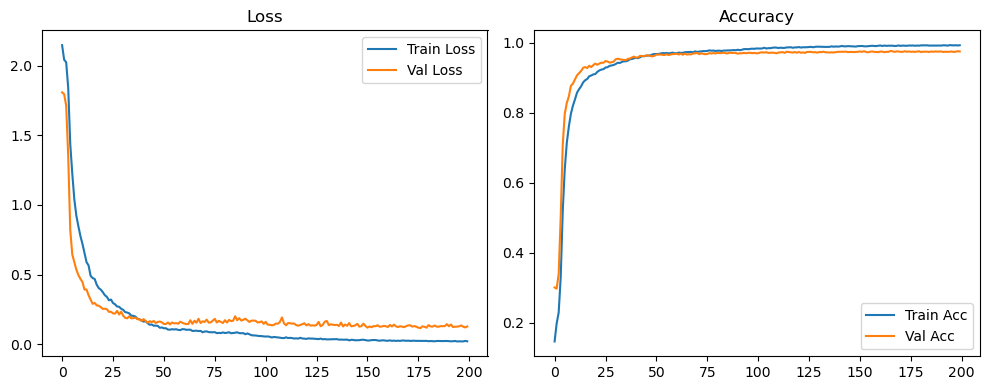

Evaluation:   0%|          | 0/40 [00:00<?, ?it/s]

Evaluation:   8%|▊         | 3/40 [00:00<00:01, 28.77it/s]

Evaluation:  15%|█▌        | 6/40 [00:00<00:01, 29.03it/s]

Evaluation:  22%|██▎       | 9/40 [00:00<00:01, 29.08it/s]

Evaluation:  30%|███       | 12/40 [00:00<00:00, 29.19it/s]

Evaluation:  38%|███▊      | 15/40 [00:00<00:00, 29.30it/s]

Evaluation:  45%|████▌     | 18/40 [00:00<00:00, 29.35it/s]

Evaluation:  52%|█████▎    | 21/40 [00:00<00:00, 29.39it/s]

Evaluation:  60%|██████    | 24/40 [00:00<00:00, 29.40it/s]

Evaluation:  68%|██████▊   | 27/40 [00:00<00:00, 29.37it/s]

Evaluation:  75%|███████▌  | 30/40 [00:01<00:00, 29.10it/s]

Evaluation:  82%|████████▎ | 33/40 [00:01<00:00, 29.04it/s]

Evaluation:  90%|█████████ | 36/40 [00:01<00:00, 29.06it/s]

Evaluation:  98%|█████████▊| 39/40 [00:01<00:00, 29.16it/s]

Evaluation: 100%|██████████| 40/40 [00:01<00:00, 29.79it/s]

Original Model Final Test Loss: 0.1118 Accuracy: 0.9781


🏆 Best Config: batch128_lr0.001_0.001_0.001_dp0.5 Accuracy: 0.9805


In [16]:
Hyperparameter_searching(epochs, batch_sizes, lr_max_pool, lr_min_pool, dropout_rates)